In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
tar = zipfile.ZipFile("/content/drive/MyDrive/Samal_work/archive.zip")
tar.extractall()
tar.close()

In [ ]:
import os 
import glob 

from PIL import Image, ImageDraw
%matplotlib inline 
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook
import cv2
import numpy as np
from collections import Counter 
from pathlib import Path
import pandas as pd
import torch
import tqdm
from matplotlib.patches import Rectangle
import pickle

from math import cos, sin, sqrt

# path = '/content/faces_0'
# path_sorted = sorted(os.listdir(path))
# print('path_sorted: ', path_sorted)

In [ ]:
def get_files(path='./', end_path='/*.png', ext=('.info')):
    """ Get all image files """
    path_sorted = sorted(os.listdir(path))
    files_all = []
    for file in path_sorted:
       files_path = os.path.join(path, file)
       files_list = glob.glob(f'{files_path}{end_path}')
       files_all.extend(files_list)
    return files_all

In [ ]:
ABS_PATH = '/content/faces_0'
data = get_files(ABS_PATH, end_path='/*.png')

print('length: ', len(data))
print('First element path in data: ', data[0])

length:  15678
First element path in data:  /content/faces_0/01/frame_00159_rgb.png


# making rel_path, img_name, resolution, uid

In [ ]:
dataC = Counter(map(os.path.dirname, data))

In [ ]:
print(dataC.keys())

In [ ]:
print(dataC['/content/faces_0/01'])

In [ ]:
data_biwi = {'img_name': [], 'rel_path':[]}

In [ ]:
for path in data:
  data_biwi['img_name'].append(Path(path).stem)
  data_biwi['rel_path'].append(path[9:])

In [ ]:
print(data_biwi.keys())
print(len(data_biwi['img_name']))
print(len(data_biwi['rel_path']))
print(data_biwi['img_name'][0])
print(data_biwi['rel_path'][0])

In [ ]:
uids = []
for i, key in enumerate(dataC.keys()):
  uids.extend([i for n in range(dataC[key])])

In [ ]:
data_biwi['uid'] = uids

In [ ]:
len(data_biwi['uid'])

In [ ]:
resolution = []
for img_path in data_biwi['rel_path']:
  img = cv2.imread(img_path)
  h, w, d = img.shape
  resolution.append((h,w))

In [ ]:
data_biwi['resolution'] = resolution

In [ ]:
len(data_biwi['resolution'])

In [ ]:
df = pd.DataFrame(data_biwi)

In [ ]:
df.head(5)

In [ ]:
df.to_csv('data_biwi.csv.gz', compression='gzip')

#Download csv.gz and make a dict from it




In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/Samal_work/data_biwi', compression='gzip')
df = pd.read_csv('/content/drive/MyDrive/Samal_work/data_biwi1.csv.gz')

In [ ]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,img_name,rel_path,uid,resolution,facerect
0,0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,0,"(480, 640)","(290.38644, 251.59471, 86.13519, 104.308)"
1,1,1,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,0,"(480, 640)","(302.83643, 209.90384, 83.56021, 108.5892)"
2,2,2,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,0,"(480, 640)","(263.5754, 250.25208, 77.40527, 97.17865)"
3,3,3,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,0,"(480, 640)","(294.55524, 251.97577, 86.342804, 105.50067)"
4,4,4,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,0,"(480, 640)","(299.49094, 210.33879, 85.59039, 110.8275)"


In [ ]:
data_biwi_dict = df.to_dict('list')

In [ ]:
data_biwi_dict.keys()

dict_keys(['Unnamed: 0', 'Unnamed: 0.1', 'img_name', 'rel_path', 'uid', 'resolution', 'facerect'])

In [ ]:
print(len(data_biwi_dict['img_name']))
print(type(data_biwi_dict['img_name']))

15678
<class 'list'>


 # make face_rect and save new csv

In [ ]:
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml \
    -O haarcascade_frontalface_default.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_smile.xml \
    -O haarcascade_smile.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_eye.xml \
    -O haarcascade_eye.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py

--2023-02-13 21:38:17--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.03s   

2023-02-13 21:38:17 (29.0 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]

--2023-02-13 21:38:17--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_smile.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercont

()


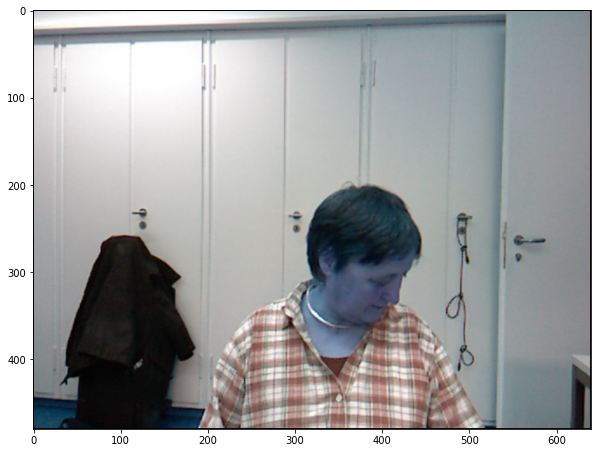

In [ ]:
# # Load the cascade
# face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
# # Read the input image
# img = cv2.imread('/content/faces_0/01/frame_00474_rgb.png')
# # Convert into grayscale
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# # Detect faces
# faces = face_cascade.detectMultiScale(gray, 1.1, 4)
# print(faces)
# # Draw rectangle around the faces
# for (x, y, w, h) in faces:
#     cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
# # Display the output
# plt.imshow(img)
# # cv2.waitKey()

In [ ]:
# face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
# face_rect = []
# for img_path in data_biwi_dict['rel_path']:
#   img = cv2.imread('/content/'+str(img_path))
#   # Convert into grayscale
#   gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#   # Detect faces
#   try: 
#     x, y, h, w = face_cascade.detectMultiScale(gray, 1.1, 4)[0]
#   except:
#     print(img_path)
#   face_rect.append((x, y, h, w))

faces_0/01/frame_00436_rgb.png
faces_0/01/frame_00474_rgb.png
faces_0/01/frame_00493_rgb.png
faces_0/01/frame_00439_rgb.png
faces_0/01/frame_00042_rgb.png
faces_0/01/frame_00480_rgb.png
faces_0/01/frame_00320_rgb.png
faces_0/01/frame_00395_rgb.png
faces_0/01/frame_00348_rgb.png
faces_0/01/frame_00063_rgb.png
faces_0/01/frame_00438_rgb.png
faces_0/01/frame_00317_rgb.png
faces_0/01/frame_00034_rgb.png
faces_0/01/frame_00452_rgb.png
faces_0/01/frame_00061_rgb.png
faces_0/01/frame_00228_rgb.png
faces_0/01/frame_00496_rgb.png
faces_0/01/frame_00435_rgb.png
faces_0/01/frame_00071_rgb.png
faces_0/01/frame_00230_rgb.png
faces_0/01/frame_00068_rgb.png
faces_0/01/frame_00031_rgb.png
faces_0/01/frame_00451_rgb.png
faces_0/01/frame_00410_rgb.png
faces_0/01/frame_00040_rgb.png
faces_0/01/frame_00423_rgb.png
faces_0/01/frame_00184_rgb.png
faces_0/01/frame_00422_rgb.png
faces_0/01/frame_00347_rgb.png
faces_0/01/frame_00120_rgb.png
faces_0/01/frame_00224_rgb.png


KeyboardInterrupt: ignored

In [ ]:
!pip install facenet-pytorch 

from facenet_pytorch import MTCNN, InceptionResnetV1, training, fixed_image_standardization

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
def detect_face_rect(dataset_list, model=MTCNN, params=None):
  device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
  params = {
            'image_size': 160, 'margin': 0, 
            'min_face_size': 10, 'thresholds': [0.6, 0.7, 0.7],
            'factor': 0.709, 'post_process': False, 'device': device
            }
  model = model(**params)
  face_rect = []
  bad_quality = []
  for img_path in tqdm.tqdm(dataset_list['rel_path']):
    img = cv2.imread('/content/'+str(img_path))
    # Convert into grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Detect face
    face = model.detect(gray)
    try:
      box = face[0][0]
      x_left = min(box[0], box[2])
      x_right = max(box[0], box[2])
      y_left = min(box[1], box[3])
      y_right = max(box[1], box[3])
      width = x_right - x_left
      height = y_right - y_left
      face_rect.append((x_left, y_left, width, height))
    except:
      bad_quality.append(img_path)
      face_rect.append((0, 0, 0, 0))
  return face_rect, bad_quality

In [ ]:
face_rectangle, bad_quality_imgs = detect_face_rect(data_biwi_dict)

100%|██████████| 15678/15678 [1:57:48<00:00,  2.22it/s]


In [ ]:
print(len(face_rectangle), len(bad_quality_imgs))
print(len(data_biwi_dict['rel_path']))
print(face_rectangle[0], type(face_rectangle[0]))
data_biwi_dict['facerect'] = face_rectangle
df1 = pd.DataFrame(data_biwi_dict)

15678 452
15678
(290.38644, 251.59471, 86.13519, 104.308) <class 'tuple'>


In [ ]:
df1.to_csv('data_biwi1.csv.gz', compression='gzip')

In [ ]:
!cp /content/data_biwi1.csv.gz /content/drive/MyDrive/Samal_work

# SynergyNet 

In [ ]:
print('\n> Cloning the repo')
!git clone https://github.com/choyingw/SynergyNet

%cd SynergyNet


> Cloning the repo
fatal: destination path 'SynergyNet' already exists and is not an empty directory.
/content/SynergyNet


In [ ]:
%cd Sim3DR
!sh ./build_sim3dr.sh

%cd ../FaceBoxes
!sh ./build_cpu_nms.sh
%cd ..

# !gdown --id 1SQsMhvAmpD1O8Hm0yEGom0C0rXtA0qs8
# !unzip -n 3dmm_data
!unzip -n /content/drive/MyDrive/Samal_work/3dmm_data.zip

!gdown --id 1BVHbiLTfX6iTeJcNbh-jgHjWDoemfrzG

%ls

/content/SynergyNet/Sim3DR
running build_ext
skipping 'lib/rasterize.cpp' Cython extension (up-to-date)
/content/SynergyNet/FaceBoxes
running build_ext
skipping 'nms/cpu_nms.c' Cython extension (up-to-date)
/content/SynergyNet
Archive:  /content/drive/MyDrive/Samal_work/3dmm_data.zip
/usr/local/lib/python3.8/dist-packages/gdown/cli.py:127: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1BVHbiLTfX6iTeJcNbh-jgHjWDoemfrzG
To: /content/SynergyNet/best.pth.tar
100% 75.4M/75.4M [00:00<00:00, 119MB/s]
3dmm_data/              faces_0/             setup.py
artistic.py             head_pose_masks/     Sim3DR/
backbone_nets/          img/                 singleImage.py
benchmark_aflw2000.py*  LICENSE              singleImage_simple.py
benchmark.py*           loss_definition.py*  synergy3DMM.py
benchmark_validate.py   main_train.py      

In [ ]:
# !mv /content/drive/MyDrive/Samal_work/best_pose.pth.tar  ./pretrained
%ls

3dmm_data/              faces_0/             setup.py
artistic.py             head_pose_masks/     Sim3DR/
backbone_nets/          img/                 singleImage.py
benchmark_aflw2000.py*  LICENSE              singleImage_simple.py
benchmark.py*           loss_definition.py*  synergy3DMM.py
benchmark_validate.py   main_train.py        synergy_demo.ipynb
best.pth.tar            model_building.py*   train_script.sh
db_annotations/         pretrained/          utils/
demo/                   __pycache__/         uv_texture_realFaces.py
FaceBoxes/              README.md


In [ ]:
import torch
import torchvision.transforms as transforms
import numpy as np
import cv2
from utils.ddfa import ToTensor, Normalize
# from model_building import SynergyNet
from utils.inference import crop_img, predict_sparseVert, draw_landmarks, predict_denseVert, predict_pose, draw_axis
import argparse
import torch.backends.cudnn as cudnn
cudnn.benchmark = True
import os
import os.path as osp
import glob
from FaceBoxes import FaceBoxes
from utils.render import render
import scipy.io as sio

In [ ]:
from model_building import SynergyNet

In [ ]:
parser = argparse.ArgumentParser()
parser.add_argument('-f', '--files', default='./img/', help='path to a single image or path to a folder containing multiple images')
parser.add_argument("--png", action="store_true", help="if images are with .png extension")
parser.add_argument('--img_size', default=120, type=int)
parser.add_argument('-b', '--batch-size', default=1, type=int)

args = parser.parse_args()
args.files = data_biwi_dict['rel_path'][:100]

In [ ]:
# Following 3DDFA-V2, we also use 120x120 resolution
IMG_SIZE = 120

# load pre-tained model
checkpoint_fp = '/content/drive/MyDrive/Samal_work/best_pose.pth.tar' 
args.arch = 'mobilenet_v2'
args.devices_id = [0]

checkpoint = torch.load(checkpoint_fp, map_location=lambda storage, loc: storage)['state_dict']
    
model = SynergyNet(args)
model_dict = model.state_dict()

# because the model is trained by multiple gpus, prefix 'module' should be removed
for k in checkpoint.keys():
    model_dict[k.replace('module.', '')] = checkpoint[k]

model.load_state_dict(model_dict, strict=False)
# model = model.cuda()
model.eval()

# face detector
face_boxes = FaceBoxes()

# preparation
transform = transforms.Compose([ToTensor(), Normalize(mean=127.5, std=128)])
    

In [ ]:
files = data_biwi_dict['rel_path']
print(len(files))

15678


In [ ]:
def seven_landmarks(pts):
  y_cord, x_cord = [], []
  # nose, left_eye_left, left_eye_right, 
  # right_eye_left, right_eye_right, 
  # mouth_left, mouth_right
  list_of_vert = [33, 36, 39, 42, 45, 48, 54]
  for ind in list_of_vert:
    y_cord.append(pts[0][0][ind])
    x_cord.append(pts[0][1][ind])
  finall_landms = tuple((x, y) for x, y in zip(x_cord, y_cord))
  return finall_landms

In [ ]:
# if osp.isdir(args.files):
#     if not args.files[-1] == '/':
#         args.files = args.files + '/'
#     if not args.png:
#         files = sorted(glob.glob(args.files+'*.jpg'))
#     else:
#         files = sorted(glob.glob(args.files+'*.png'))
# else:
#     files = [args.files]

def _to_ctype(arr):
    if not arr.flags.c_contiguous:
        return arr.copy(order='C')
    return arr
tri = sio.loadmat('./3dmm_data/tri.mat')['tri'] - 1

finall_landms = []
finall_face_rect = {}
length_face_rect = []
bad_imgs = []
all_68_landmarks = {}
for img_fp in tqdm.tqdm(files):
    print("Process the image: ", '/content/'+ str(img_fp))

    img_ori = cv2.imread('/content/'+ str(img_fp))

    try: 
      # crop faces
      rects = face_boxes(img_ori)
      length_face_rect.append(len(rects))
      finall_face_rect[img_fp]= rects  # just save it for checking current face_rect

      # storage
      pts_res = []
      poses = []
      vertices_lst = []
      for idx, rect in enumerate(rects):
        roi_box = rect
        print('Current img rectangle: ', rect)

        # enlarge the bbox a little and do a square crop
        HCenter = (rect[1] + rect[3])/2
        WCenter = (rect[0] + rect[2])/2
        side_len = roi_box[3]-roi_box[1]
        margin = side_len * 1.2 // 2
        roi_box[0], roi_box[1], roi_box[2], roi_box[3] = WCenter-margin, HCenter-margin, WCenter+margin, HCenter+margin

        img = crop_img(img_ori, roi_box)
        img = cv2.resize(img, dsize=(IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
        # cv2.imwrite(f'validate_{idx}.png', img)
            
        input = transform(img).unsqueeze(0)
        with torch.no_grad():
            # input = input.cuda()
            param = model.forward_test(input)
            param = param.squeeze().cpu().numpy().flatten().astype(np.float32)

        # inferences
        lmks = predict_sparseVert(param, roi_box, transform=True)
        vertices = predict_denseVert(param, roi_box, transform=True)
        angles, translation = predict_pose(param, roi_box)

        pts_res.append(lmks)
        vertices_lst.append(vertices)
        poses.append([angles, translation, lmks])
      seven_landmks = seven_landmarks(pts_res)
      finall_landms.append(seven_landmks) # here saving of the all 7 landmarks points
      all_68_landmarks[img_fp] = pts_res
    except:
      finall_landms.append([None])
      all_68_landmarks[img_fp] = [None]
      bad_imgs.append(img_fp)

    # if not osp.exists(f'inference_output/rendering_overlay/'):
    #     os.makedirs(f'inference_output/rendering_overlay/')
    # if not osp.exists(f'inference_output/landmarks/'):
    #     os.makedirs(f'inference_output/landmarks/')
    # if not osp.exists(f'inference_output/poses/'):
    #     os.makedirs(f'inference_output/poses/')
        
    # name = img_fp.rsplit('/',1)[-1][:-4]
    # img_ori_copy = img_ori.copy()

    # # mesh
    # render(img_ori, vertices_lst, alpha=0.6, wfp=f'inference_output/rendering_overlay/{name}.jpg', connectivity=tri)
        
    # # landmarks
    # draw_landmarks(img_ori_copy, pts_res, wfp=f'inference_output/landmarks/{name}.jpg')
        
    # # face orientation
    # img_axis_plot = img_ori_copy
    # for angles, translation, lmks in poses:
    #     img_axis_plot = draw_axis(img_axis_plot, angles[0], angles[1],
    #         angles[2], translation[0], translation[1], size = 50, pts68=lmks)
    # wfp = f'inference_output/poses/{name}.jpg'
    # cv2.imwrite(wfp, img_axis_plot)
    # print(f'Save pose result to {wfp}')

  0%|          | 0/15678 [00:00<?, ?it/s]

Process the image:  /content/faces_0/01/frame_00378_rgb.png
Current img rectangle:  [289.71674, 241.24701, 377.3091, 356.24658, 0.999305]


  0%|          | 2/15678 [00:00<1:08:33,  3.81it/s]

Process the image:  /content/faces_0/01/frame_00175_rgb.png
Current img rectangle:  [307.3197, 207.62846, 388.14938, 314.39783, 0.9989195]
Process the image:  

  0%|          | 3/15678 [00:00<57:57,  4.51it/s]  

/content/faces_0/01/frame_00407_rgb.png
Current img rectangle:  [260.90103, 247.08925, 342.9937, 346.11707, 0.99307054]
Process the image:  /content/faces_0/01/frame_00376_rgb.png


  0%|          | 4/15678 [00:00<54:45,  4.77it/s]

Current img rectangle:  [292.45288, 241.79889, 378.93634, 357.5179, 0.9995152]
Process the image:  /content/faces_0/01/frame_00007_rgb.png
Current img rectangle:  [302.2498, 211.81995, 385.21512, 320.2221, 0.99955195]


  0%|          | 6/15678 [00:01<49:39,  5.26it/s]

Process the image:  /content/faces_0/01/frame_00248_rgb.png
Current img rectangle:  [286.7009, 218.27988, 370.36658, 329.2821, 0.9988661]
Process the image:  /content/faces_0/01/frame_00436_rgb.png


  0%|          | 7/15678 [00:01<48:42,  5.36it/s]

Current img rectangle:  [267.6597, 287.5908, 356.55734, 369.11203, 0.98356044]
Process the image:  /content/faces_0/01/frame_00178_rgb.png
Current img rectangle:  [305.42514, 212.00095, 386.35867, 314.6965, 0.9981665]


  0%|          | 9/15678 [00:01<47:35,  5.49it/s]

Process the image:  /content/faces_0/01/frame_00151_rgb.png
Current img rectangle:  [312.50916, 208.94826, 396.3179, 315.819, 0.9982139]
Process the image:  /content/faces_0/01/frame_00372_rgb.png


  0%|          | 10/15678 [00:01<46:36,  5.60it/s]

Current img rectangle:  [298.65018, 243.92212, 385.44498, 356.41977, 0.99906474]
Process the image:  /content/faces_0/01/frame_00258_rgb.png
Current img rectangle:  [293.04752, 219.27419, 374.7797, 331.62256, 0.9988526]


  0%|          | 11/15678 [00:02<45:15,  5.77it/s]

Process the image:  /content/faces_0/01/frame_00182_rgb.png
Current img rectangle:  [303.1039, 210.86842, 385.0098, 315.05527, 0.9987411]


  0%|          | 12/15678 [00:02<49:35,  5.26it/s]

Process the image:  /content/faces_0/01/frame_00474_rgb.png
Current img rectangle:  [345.89188, 260.88364, 431.14087, 359.05432, 0.9902497]


  0%|          | 13/15678 [00:02<54:51,  4.76it/s]

Process the image:  /content/faces_0/01/frame_00373_rgb.png
Current img rectangle:  [295.56778, 243.16586, 383.417, 357.7985, 0.99913543]


  0%|          | 14/15678 [00:02<55:35,  4.70it/s]

Process the image:  /content/faces_0/01/frame_00204_rgb.png
Current img rectangle:  [289.68503, 213.56606, 370.784, 322.86087, 0.9963152]


  0%|          | 16/15678 [00:03<57:47,  4.52it/s]  

Process the image:  /content/faces_0/01/frame_00010_rgb.png
Current img rectangle:  [302.67673, 211.85933, 385.52402, 319.8222, 0.999458]
Process the image:  /content/faces_0/01/frame_00149_rgb.png


  0%|          | 17/15678 [00:03<53:27,  4.88it/s]

Current img rectangle:  [314.18256, 207.9274, 397.12643, 314.57092, 0.9980357]
Process the image:  /content/faces_0/01/frame_00028_rgb.png
Current img rectangle:  [292.708, 203.97012, 374.02316, 305.22272, 0.9883483]


  0%|          | 19/15678 [00:03<49:20,  5.29it/s]

Process the image:  /content/faces_0/01/frame_00493_rgb.png
Current img rectangle:  [358.99634, 255.26244, 445.1001, 351.92743, 0.9787396]
Process the image:  /content/faces_0/01/frame_00003_rgb.png


  0%|          | 20/15678 [00:03<47:21,  5.51it/s]

Current img rectangle:  [302.43777, 211.77507, 385.4574, 319.89734, 0.9995146]
Process the image:  /content/faces_0/01/frame_00439_rgb.png
Current img rectangle:  [271.83734, 286.30756, 363.3365, 373.67465, 0.9054994]


  0%|          | 22/15678 [00:04<45:04,  5.79it/s]

Process the image:  /content/faces_0/01/frame_00042_rgb.png
Current img rectangle:  [296.10968, 202.07462, 371.80328, 294.81848, 0.9940798]
Process the image:  /content/faces_0/01/frame_00364_rgb.png


  0%|          | 23/15678 [00:04<45:31,  5.73it/s]

Current img rectangle:  [306.0827, 244.42099, 395.61896, 361.68863, 0.9995733]
Process the image:  /content/faces_0/01/frame_00480_rgb.png
Current img rectangle:  [350.81485, 253.81403, 439.94473, 357.60358, 0.98920655]


  0%|          | 24/15678 [00:04<49:40,  5.25it/s]

Process the image:  /content/faces_0/01/frame_00320_rgb.png
Current img rectangle:  [357.3969, 235.88104, 429.3976, 340.1914, 0.9943633]


  0%|          | 25/15678 [00:05<1:08:51,  3.79it/s]

Process the image:  /content/faces_0/01/frame_00395_rgb.png
Current img rectangle:  [268.253, 245.99504, 352.17163, 353.13663, 0.9960006]


  0%|          | 26/15678 [00:05<1:25:41,  3.04it/s]

Process the image:  /content/faces_0/01/frame_00348_rgb.png
Current img rectangle:  [333.8871, 249.4094, 421.09955, 351.07428, 0.99204224]


  0%|          | 27/15678 [00:06<1:41:42,  2.56it/s]

Process the image:  /content/faces_0/01/frame_00288_rgb.png
Current img rectangle:  [319.88223, 217.33322, 400.50256, 325.65317, 0.9979777]


  0%|          | 28/15678 [00:06<1:45:38,  2.47it/s]

Process the image:  /content/faces_0/01/frame_00179_rgb.png
Current img rectangle:  [304.72003, 212.01285, 385.6805, 315.34033, 0.9986533]


  0%|          | 29/15678 [00:07<2:05:10,  2.08it/s]

Process the image:  /content/faces_0/01/frame_00222_rgb.png
Current img rectangle:  [280.29474, 214.83067, 359.68982, 323.92618, 0.99762565]


  0%|          | 30/15678 [00:07<2:23:33,  1.82it/s]

Process the image:  /content/faces_0/01/frame_00185_rgb.png


  0%|          | 31/15678 [00:08<2:14:08,  1.94it/s]

Current img rectangle:  [302.23355, 210.10712, 384.5116, 316.3907, 0.99875784]
Process the image:  /content/faces_0/01/frame_00263_rgb.png
Current img rectangle:  [295.73218, 217.8554, 377.8448, 330.4937, 0.9994324]


  0%|          | 32/15678 [00:08<2:12:13,  1.97it/s]

Process the image:  /content/faces_0/01/frame_00063_rgb.png
Current img rectangle:  [302.04242, 205.23007, 377.68542, 298.17078, 0.99377775]


  0%|          | 33/15678 [00:09<2:09:50,  2.01it/s]

Process the image:  /content/faces_0/01/frame_00172_rgb.png


  0%|          | 34/15678 [00:09<1:56:44,  2.23it/s]

Current img rectangle:  [308.70068, 207.5595, 390.14163, 315.9146, 0.9991248]
Process the image:  /content/faces_0/01/frame_00438_rgb.png


  0%|          | 35/15678 [00:09<1:39:54,  2.61it/s]

Current img rectangle:  [268.7875, 282.14423, 364.01025, 374.4884, 0.91200984]
Process the image:  /content/faces_0/01/frame_00208_rgb.png


  0%|          | 36/15678 [00:10<1:37:43,  2.67it/s]

Current img rectangle:  [286.26736, 214.10503, 368.3369, 323.68805, 0.9964966]
Process the image:  /content/faces_0/01/frame_00255_rgb.png


  0%|          | 37/15678 [00:10<1:34:43,  2.75it/s]

Current img rectangle:  [290.7635, 218.10347, 374.35257, 330.25885, 0.9992254]
Process the image:  /content/faces_0/01/frame_00102_rgb.png


  0%|          | 38/15678 [00:10<1:24:39,  3.08it/s]

Current img rectangle:  [306.031, 201.19185, 384.69482, 300.15015, 0.991767]
Process the image:  /content/faces_0/01/frame_00317_rgb.png
Current img rectangle:  [357.21988, 235.53755, 429.36218, 339.42078, 0.9947737]


  0%|          | 39/15678 [00:11<1:32:11,  2.83it/s]

Process the image:  /content/faces_0/01/frame_00034_rgb.png
Current img rectangle:  [293.7489, 202.28532, 373.08902, 300.8107, 0.9889297]


  0%|          | 40/15678 [00:11<1:27:31,  2.98it/s]

Process the image:  /content/faces_0/01/frame_00291_rgb.png
Current img rectangle:  [323.54437, 219.88486, 402.0877, 325.94394, 0.9971259]


  0%|          | 41/15678 [00:11<1:26:59,  3.00it/s]

Process the image:  /content/faces_0/01/frame_00358_rgb.png
Current img rectangle:  [313.41153, 248.01558, 400.55954, 357.54022, 0.99855226]


  0%|          | 42/15678 [00:12<1:19:44,  3.27it/s]

Process the image:  /content/faces_0/01/frame_00214_rgb.png


  0%|          | 43/15678 [00:12<1:25:53,  3.03it/s]

Current img rectangle:  [284.60574, 212.46092, 367.3973, 324.27518, 0.9987735]
Process the image:  /content/faces_0/01/frame_00380_rgb.png


  0%|          | 44/15678 [00:12<1:23:11,  3.13it/s]

Current img rectangle:  [288.19247, 240.40532, 375.92798, 355.7386, 0.99894613]
Process the image:  /content/faces_0/01/frame_00452_rgb.png


  0%|          | 45/15678 [00:13<1:12:48,  3.58it/s]

Current img rectangle:  [305.11844, 272.97757, 393.12555, 370.08624, 0.94511116]
Process the image:  /content/faces_0/01/frame_00061_rgb.png
Current img rectangle:  [300.1753, 205.04393, 375.53268, 296.59363, 0.9923759]


  0%|          | 46/15678 [00:13<1:09:35,  3.74it/s]

Process the image:  /content/faces_0/01/frame_00137_rgb.png
Current img rectangle:  [315.31412, 202.54099, 392.82843, 299.92432, 0.99486476]


  0%|          | 47/15678 [00:13<1:06:09,  3.94it/s]

Process the image:  /content/faces_0/01/frame_00228_rgb.png
Current img rectangle:  [279.35306, 220.04085, 357.25677, 326.86832, 0.99588215]


  0%|          | 48/15678 [00:13<1:08:35,  3.80it/s]

Process the image:  /content/faces_0/01/frame_00022_rgb.png
Current img rectangle:  [298.9236, 210.54248, 380.91156, 315.98593, 0.99754447]


  0%|          | 49/15678 [00:14<1:09:30,  3.75it/s]

Process the image:  /content/faces_0/01/frame_00262_rgb.png
Current img rectangle:  [294.8635, 218.56577, 377.18652, 330.78235, 0.99933547]


  0%|          | 50/15678 [00:14<1:06:32,  3.91it/s]

Process the image:  /content/faces_0/01/frame_00496_rgb.png


  0%|          | 51/15678 [00:14<1:18:18,  3.33it/s]

Current img rectangle:  [359.74014, 256.0445, 446.22742, 352.77524, 0.9777289]
Process the image:  /content/faces_0/01/frame_00014_rgb.png


  0%|          | 52/15678 [00:14<1:17:01,  3.38it/s]

Current img rectangle:  [302.51947, 211.99846, 385.6308, 319.92502, 0.99953604]
Process the image:  /content/faces_0/01/frame_00356_rgb.png


  0%|          | 53/15678 [00:15<1:09:49,  3.73it/s]

Current img rectangle:  [317.83722, 249.89743, 402.95898, 355.8069, 0.9971311]
Process the image:  /content/faces_0/01/frame_00115_rgb.png


  0%|          | 54/15678 [00:15<1:08:28,  3.80it/s]

Current img rectangle:  [309.1231, 203.58575, 389.00784, 302.39117, 0.9905199]
Process the image:  /content/faces_0/01/frame_00363_rgb.png


  0%|          | 55/15678 [00:15<1:09:11,  3.76it/s]

Current img rectangle:  [307.73743, 245.27951, 395.85968, 360.67468, 0.99933076]
Process the image:  /content/faces_0/01/frame_00388_rgb.png


  0%|          | 56/15678 [00:15<1:03:32,  4.10it/s]

Current img rectangle:  [278.26993, 245.71266, 360.99277, 353.14642, 0.9940521]
Process the image:  /content/faces_0/01/frame_00435_rgb.png
Current img rectangle:  [265.99615, 287.4026, 351.3369, 372.857, 0.98432595]


  0%|          | 58/15678 [00:16<52:33,  4.95it/s]

Process the image:  /content/faces_0/01/frame_00071_rgb.png
Current img rectangle:  [300.83875, 202.44847, 378.1762, 299.3704, 0.993038]
Process the image:  /content/faces_0/01/frame_00198_rgb.png


  0%|          | 59/15678 [00:16<51:07,  5.09it/s]

Current img rectangle:  [291.92844, 211.15004, 373.39175, 318.8073, 0.9964498]
Process the image:  /content/faces_0/01/frame_00117_rgb.png
Current img rectangle:  [307.16418, 199.65923, 387.2577, 299.67242, 0.9929501]


  0%|          | 61/15678 [00:16<46:59,  5.54it/s]

Process the image:  /content/faces_0/01/frame_00017_rgb.png
Current img rectangle:  [302.0128, 212.33829, 385.11795, 320.08136, 0.9996006]
Process the image:  /content/faces_0/01/frame_00230_rgb.png


  0%|          | 62/15678 [00:16<45:22,  5.74it/s]

Current img rectangle:  [279.40042, 220.6251, 357.36548, 327.07114, 0.9954887]
Process the image:  /content/faces_0/01/frame_00212_rgb.png
Current img rectangle:  [285.0748, 212.42706, 367.48798, 323.58466, 0.9982141]


  0%|          | 64/15678 [00:17<44:21,  5.87it/s]

Process the image:  /content/faces_0/01/frame_00400_rgb.png
Current img rectangle:  [263.6653, 243.41937, 347.249, 350.27176, 0.9951212]
Process the image:  /content/faces_0/01/frame_00240_rgb.png


  0%|          | 65/15678 [00:17<45:33,  5.71it/s]

Current img rectangle:  [285.17712, 221.17506, 364.80237, 329.5587, 0.99778605]
Process the image:  /content/faces_0/01/frame_00068_rgb.png
Current img rectangle:  [301.12888, 202.9632, 377.43314, 298.07883, 0.99308383]


  0%|          | 67/15678 [00:17<45:55,  5.67it/s]

Process the image:  /content/faces_0/01/frame_00242_rgb.png
Current img rectangle:  [285.00665, 217.99037, 367.90756, 329.16553, 0.9990677]
Process the image:  /content/faces_0/01/frame_00019_rgb.png


  0%|          | 68/15678 [00:17<47:15,  5.51it/s]

Current img rectangle:  [301.27094, 212.62521, 383.6377, 317.3926, 0.9993368]
Process the image:  /content/faces_0/01/frame_00031_rgb.png
Current img rectangle:  [293.12778, 203.62468, 373.8468, 304.11655, 0.9902118]


  0%|          | 70/15678 [00:18<45:20,  5.74it/s]

Process the image:  /content/faces_0/01/frame_00451_rgb.png
Current img rectangle:  [302.0227, 272.16507, 390.8191, 367.83548, 0.9333045]
Process the image:  /content/faces_0/01/frame_00215_rgb.png


  0%|          | 71/15678 [00:18<45:18,  5.74it/s]

Current img rectangle:  [284.76178, 213.37015, 367.27267, 325.5022, 0.9986137]
Process the image:  /content/faces_0/01/frame_00249_rgb.png
Current img rectangle:  [286.8823, 218.75853, 370.43964, 328.7846, 0.9989341]


  0%|          | 73/15678 [00:18<44:09,  5.89it/s]

Process the image:  /content/faces_0/01/frame_00410_rgb.png
Current img rectangle:  [260.4968, 246.67819, 337.21436, 345.3475, 0.994843]
Process the image:  /content/faces_0/01/frame_00040_rgb.png


  0%|          | 74/15678 [00:18<43:54,  5.92it/s]

Current img rectangle:  [294.89285, 202.6842, 372.39243, 296.12363, 0.9949639]
Process the image:  /content/faces_0/01/frame_00423_rgb.png
Current img rectangle:  [259.2201, 250.40921, 337.0316, 350.56262, 0.9929259]


  0%|          | 76/15678 [00:19<43:56,  5.92it/s]

Process the image:  /content/faces_0/01/frame_00184_rgb.png
Current img rectangle:  [302.4538, 209.91597, 384.8387, 315.722, 0.998828]
Process the image:  /content/faces_0/01/frame_00389_rgb.png


  0%|          | 77/15678 [00:19<45:06,  5.76it/s]

Current img rectangle:  [274.62244, 245.22894, 361.2423, 354.43024, 0.9962767]
Process the image:  /content/faces_0/01/frame_00293_rgb.png
Current img rectangle:  [324.50696, 221.24655, 402.2954, 326.67798, 0.9969056]


  1%|          | 79/15678 [00:19<44:51,  5.80it/s]

Process the image:  /content/faces_0/01/frame_00422_rgb.png
Current img rectangle:  [257.66898, 248.48883, 336.3235, 351.0709, 0.9882658]
Process the image:  /content/faces_0/01/frame_00379_rgb.png


  1%|          | 80/15678 [00:20<45:21,  5.73it/s]

Current img rectangle:  [289.13303, 240.25072, 376.8108, 356.27017, 0.99945647]
Process the image:  /content/faces_0/01/frame_00361_rgb.png
Current img rectangle:  [307.48553, 243.83226, 398.46878, 361.231, 0.99964786]


  1%|          | 82/15678 [00:20<44:03,  5.90it/s]

Process the image:  /content/faces_0/01/frame_00390_rgb.png
Current img rectangle:  [272.46765, 245.30954, 358.09067, 354.38193, 0.9959065]
Process the image:  /content/faces_0/01/frame_00187_rgb.png


  1%|          | 83/15678 [00:20<48:31,  5.36it/s]

Current img rectangle:  [300.83722, 208.82597, 383.4444, 316.9639, 0.998585]
Process the image:  /content/faces_0/01/frame_00268_rgb.png


  1%|          | 84/15678 [00:20<52:10,  4.98it/s]

Current img rectangle:  [300.13248, 217.67204, 384.11755, 328.47787, 0.9994734]
Process the image:  /content/faces_0/01/frame_00347_rgb.png


  1%|          | 85/15678 [00:21<56:45,  4.58it/s]

Current img rectangle:  [338.08032, 253.7986, 423.45187, 354.16116, 0.99397016]
Process the image:  /content/faces_0/01/frame_00120_rgb.png


  1%|          | 86/15678 [00:21<1:00:19,  4.31it/s]

Current img rectangle:  [309.85132, 200.09988, 386.8601, 297.2291, 0.99599457]
Process the image:  /content/faces_0/01/frame_00024_rgb.png


  1%|          | 87/15678 [00:21<1:02:23,  4.16it/s]

Current img rectangle:  [296.65735, 206.31363, 380.18835, 310.35638, 0.99528617]
Process the image:  /content/faces_0/01/frame_00224_rgb.png


  1%|          | 88/15678 [00:21<1:03:19,  4.10it/s]

Current img rectangle:  [279.3315, 216.89586, 358.02783, 324.3179, 0.9951911]
Process the image:  /content/faces_0/01/frame_00227_rgb.png


  1%|          | 89/15678 [00:22<1:03:09,  4.11it/s]

Current img rectangle:  [279.13226, 220.36586, 356.92874, 326.57187, 0.9954646]
Process the image:  /content/faces_0/01/frame_00119_rgb.png


  1%|          | 90/15678 [00:22<1:04:45,  4.01it/s]

Current img rectangle:  [309.2278, 199.98244, 387.04984, 297.8323, 0.99612135]
Process the image:  /content/faces_0/01/frame_00033_rgb.png


  1%|          | 91/15678 [00:22<1:08:33,  3.79it/s]

Current img rectangle:  [293.93228, 202.33644, 372.20688, 300.55212, 0.9915358]
Process the image:  /content/faces_0/01/frame_00313_rgb.png


  1%|          | 92/15678 [00:22<1:08:15,  3.81it/s]

Current img rectangle:  [354.84195, 232.19891, 428.38635, 337.915, 0.99420565]
Process the image:  /content/faces_0/01/frame_00285_rgb.png


  1%|          | 93/15678 [00:23<1:07:57,  3.82it/s]

Current img rectangle:  [316.69376, 219.11156, 398.2678, 326.3261, 0.9985587]
Process the image:  /content/faces_0/01/frame_00157_rgb.png


  1%|          | 94/15678 [00:23<1:09:19,  3.75it/s]

Current img rectangle:  [310.9657, 210.19533, 394.3777, 315.7186, 0.9982722]
Process the image:  /content/faces_0/01/frame_00298_rgb.png


  1%|          | 95/15678 [00:23<1:11:45,  3.62it/s]

Current img rectangle:  [329.45013, 226.28738, 407.91675, 331.19443, 0.996438]
Process the image:  /content/faces_0/01/frame_00340_rgb.png


  1%|          | 96/15678 [00:24<1:11:51,  3.61it/s]

Current img rectangle:  [344.3555, 252.76228, 428.70093, 352.0957, 0.9911054]
Process the image:  /content/faces_0/01/frame_00501_rgb.png


  1%|          | 97/15678 [00:24<1:11:43,  3.62it/s]

Current img rectangle:  [359.46924, 253.60213, 444.28717, 353.82407, 0.97972715]
Process the image:  /content/faces_0/01/frame_00487_rgb.png


  1%|          | 98/15678 [00:24<1:11:05,  3.65it/s]

Current img rectangle:  [358.0205, 257.13257, 445.0199, 352.36157, 0.9821707]
Process the image:  /content/faces_0/01/frame_00472_rgb.png


  1%|          | 99/15678 [00:24<1:10:52,  3.66it/s]

Current img rectangle:  [343.2951, 264.59894, 429.11255, 361.0574, 0.9886746]
Process the image:  /content/faces_0/01/frame_00335_rgb.png


  1%|          | 100/15678 [00:25<1:10:16,  3.69it/s]

Current img rectangle:  [346.66394, 246.65968, 430.50354, 351.61685, 0.99491125]
Process the image:  /content/faces_0/01/frame_00167_rgb.png


  1%|          | 101/15678 [00:25<1:09:43,  3.72it/s]

Current img rectangle:  [309.24246, 207.08765, 390.9842, 315.6767, 0.9989309]
Process the image:  /content/faces_0/01/frame_00116_rgb.png


  1%|          | 102/15678 [00:25<1:07:33,  3.84it/s]

Current img rectangle:  [307.4918, 201.32472, 387.53513, 300.94995, 0.99307173]
Process the image:  /content/faces_0/01/frame_00411_rgb.png
Current img rectangle:  [259.72797, 246.32875, 336.95917, 345.63245, 0.9928992]


  1%|          | 104/15678 [00:25<56:04,  4.63it/s]  

Process the image:  /content/faces_0/01/frame_00153_rgb.png
Current img rectangle:  [311.66354, 209.64137, 395.53326, 316.31876, 0.9983729]
Process the image:  /content/faces_0/01/frame_00394_rgb.png


  1%|          | 105/15678 [00:26<52:28,  4.95it/s]

Current img rectangle:  [268.65594, 246.73642, 353.5814, 353.00204, 0.99589133]
Process the image:  /content/faces_0/01/frame_00342_rgb.png
Current img rectangle:  [342.0593, 253.48497, 427.17163, 351.32422, 0.9924069]


  1%|          | 107/15678 [00:26<47:55,  5.41it/s]

Process the image:  /content/faces_0/01/frame_00193_rgb.png
Current img rectangle:  [294.97562, 211.93735, 376.42676, 318.00342, 0.9966748]
Process the image:  /content/faces_0/01/frame_00489_rgb.png


  1%|          | 108/15678 [00:26<49:28,  5.25it/s]

Current img rectangle:  [358.1142, 256.0822, 445.9572, 352.11984, 0.9770105]
Process the image:  /content/faces_0/01/frame_00205_rgb.png


  1%|          | 109/15678 [00:26<57:07,  4.54it/s]

Current img rectangle:  [289.0929, 213.77364, 369.7038, 323.33246, 0.9959194]
Process the image:  /content/faces_0/01/frame_00236_rgb.png


  1%|          | 110/15678 [00:27<55:31,  4.67it/s]

Current img rectangle:  [282.0992, 220.76318, 360.61572, 327.1136, 0.9962379]
Process the image:  /content/faces_0/01/frame_00078_rgb.png


  1%|          | 111/15678 [00:27<55:39,  4.66it/s]

Current img rectangle:  [302.21335, 202.3718, 379.06116, 299.99246, 0.99464536]
Process the image:  /content/faces_0/01/frame_00329_rgb.png
Current img rectangle:  [349.69104, 244.47209, 430.08417, 344.47388, 0.9942266]


  1%|          | 113/15678 [00:27<48:49,  5.31it/s]

Process the image:  /content/faces_0/01/frame_00321_rgb.png
Current img rectangle:  [356.72986, 235.74884, 429.17667, 340.00958, 0.9945721]
Process the image:  /content/faces_0/01/frame_00186_rgb.png


  1%|          | 114/15678 [00:27<47:52,  5.42it/s]

Current img rectangle:  [301.77258, 209.49063, 383.91077, 316.7221, 0.99869496]
Process the image:  /content/faces_0/01/frame_00098_rgb.png
Current img rectangle:  [305.46387, 202.04979, 384.53436, 300.14923, 0.992105]


  1%|          | 116/15678 [00:28<47:40,  5.44it/s]

Process the image:  /content/faces_0/01/frame_00112_rgb.png
Current img rectangle:  [305.5785, 198.92288, 386.33374, 300.4846, 0.9930328]
Process the image:  /content/faces_0/01/frame_00402_rgb.png


  1%|          | 117/15678 [00:28<48:28,  5.35it/s]

Current img rectangle:  [263.34302, 242.39957, 347.60248, 348.3506, 0.9942642]
Process the image:  /content/faces_0/01/frame_00460_rgb.png
Current img rectangle:  [326.15018, 269.27463, 408.105, 361.83368, 0.965956]


  1%|          | 119/15678 [00:28<46:55,  5.53it/s]

Process the image:  /content/faces_0/01/frame_00446_rgb.png
Current img rectangle:  [292.12183, 283.2519, 380.82617, 370.7576, 0.94572735]
Process the image:  /content/faces_0/01/frame_00488_rgb.png


  1%|          | 120/15678 [00:28<47:00,  5.52it/s]

Current img rectangle:  [360.34805, 253.88364, 444.6156, 352.69394, 0.97745717]
Process the image:  /content/faces_0/01/frame_00065_rgb.png
Current img rectangle:  [301.20853, 203.32808, 377.61975, 298.9108, 0.99294186]


  1%|          | 122/15678 [00:29<44:27,  5.83it/s]

Process the image:  /content/faces_0/01/frame_00270_rgb.png
Current img rectangle:  [302.75946, 217.43117, 387.20813, 329.00397, 0.9996393]
Process the image:  /content/faces_0/01/frame_00177_rgb.png


  1%|          | 123/15678 [00:29<44:12,  5.86it/s]

Current img rectangle:  [305.45886, 210.65244, 386.82672, 313.93948, 0.9985207]
Process the image:  /content/faces_0/01/frame_00289_rgb.png
Current img rectangle:  [321.76346, 219.50137, 400.82153, 326.38608, 0.9973839]


  1%|          | 125/15678 [00:29<43:43,  5.93it/s]

Process the image:  /content/faces_0/01/frame_00392_rgb.png
Current img rectangle:  [271.38464, 246.06912, 356.636, 354.0589, 0.9955747]
Process the image:  /content/faces_0/01/frame_00292_rgb.png


  1%|          | 126/15678 [00:29<44:21,  5.84it/s]

Current img rectangle:  [324.37567, 220.89824, 402.1485, 326.02856, 0.99635637]
Process the image:  /content/faces_0/01/frame_00486_rgb.png
Current img rectangle:  [357.35834, 257.8127, 444.57568, 352.60583, 0.9816388]


  1%|          | 128/15678 [00:30<44:00,  5.89it/s]

Process the image:  /content/faces_0/01/frame_00359_rgb.png
Current img rectangle:  [311.04242, 243.62666, 401.19727, 358.82285, 0.9993801]
Process the image:  /content/faces_0/01/frame_00350_rgb.png


  1%|          | 129/15678 [00:30<45:33,  5.69it/s]

Current img rectangle:  [335.48798, 251.85596, 420.10333, 353.9318, 0.9939359]
Process the image:  /content/faces_0/01/frame_00030_rgb.png
Current img rectangle:  [292.943, 203.15268, 374.4281, 304.52493, 0.9877265]


  1%|          | 131/15678 [00:30<45:28,  5.70it/s]

Process the image:  /content/faces_0/01/frame_00399_rgb.png
Current img rectangle:  [264.5095, 243.28665, 347.7744, 351.10052, 0.99514574]
Process the image:  /content/faces_0/01/frame_00490_rgb.png


  1%|          | 132/15678 [00:31<45:17,  5.72it/s]

Current img rectangle:  [358.74545, 255.55223, 445.74518, 351.84518, 0.9767556]
Process the image:  /content/faces_0/01/frame_00174_rgb.png
Current img rectangle:  [307.44928, 206.67801, 389.10645, 315.25504, 0.9991685]


  1%|          | 133/15678 [00:31<46:57,  5.52it/s]

Process the image:  /content/faces_0/01/frame_00453_rgb.png
Current img rectangle:  [303.29187, 267.4644, 393.4581, 372.7606, 0.933909]


  1%|          | 134/15678 [00:31<50:35,  5.12it/s]

Process the image:  /content/faces_0/01/frame_00283_rgb.png
Current img rectangle:  [314.9232, 217.41031, 396.73865, 326.5164, 0.9980843]


  1%|          | 135/15678 [00:31<57:27,  4.51it/s]

Process the image:  /content/faces_0/01/frame_00391_rgb.png
Current img rectangle:  [271.73694, 245.01631, 358.16727, 354.75705, 0.9965675]


  1%|          | 136/15678 [00:32<1:02:35,  4.14it/s]

Process the image:  /content/faces_0/01/frame_00456_rgb.png
Current img rectangle:  [315.9463, 267.56787, 400.79047, 367.77124, 0.93410015]


  1%|          | 137/15678 [00:32<1:02:03,  4.17it/s]

Process the image:  /content/faces_0/01/frame_00100_rgb.png
Current img rectangle:  [305.66827, 201.55112, 384.48898, 299.61026, 0.99204236]


  1%|          | 138/15678 [00:32<1:05:00,  3.98it/s]

Process the image:  /content/faces_0/01/frame_00035_rgb.png
Current img rectangle:  [293.38443, 201.77505, 374.0846, 300.48978, 0.9865524]


  1%|          | 139/15678 [00:32<1:17:36,  3.34it/s]

Process the image:  /content/faces_0/01/frame_00128_rgb.png


  1%|          | 140/15678 [00:33<1:24:40,  3.06it/s]

Current img rectangle:  [313.42157, 201.63855, 388.51923, 297.23007, 0.997232]
Process the image:  /content/faces_0/01/frame_00343_rgb.png


  1%|          | 141/15678 [00:33<1:25:36,  3.02it/s]

Current img rectangle:  [340.71112, 252.8908, 426.19122, 350.66257, 0.9950276]
Process the image:  /content/faces_0/01/frame_00324_rgb.png


  1%|          | 142/15678 [00:33<1:14:04,  3.50it/s]

Current img rectangle:  [353.852, 236.75093, 430.41888, 338.95328, 0.9925358]
Process the image:  /content/faces_0/01/frame_00064_rgb.png
Current img rectangle:  [301.504, 204.15924, 377.50238, 298.33304, 0.992543]


  1%|          | 144/15678 [00:34<58:53,  4.40it/s]  

Process the image:  /content/faces_0/01/frame_00287_rgb.png
Current img rectangle:  [319.45276, 217.36569, 399.87244, 325.3345, 0.9981199]
Process the image:  /content/faces_0/01/frame_00421_rgb.png


  1%|          | 145/15678 [00:34<58:11,  4.45it/s]

Current img rectangle:  [258.31805, 248.91632, 335.52246, 349.6454, 0.9914841]
Process the image:  /content/faces_0/01/frame_00307_rgb.png


  1%|          | 146/15678 [00:34<1:02:59,  4.11it/s]

Current img rectangle:  [341.9784, 230.88338, 419.9123, 337.42804, 0.9972063]
Process the image:  /content/faces_0/01/frame_00405_rgb.png


  1%|          | 147/15678 [00:35<1:08:30,  3.78it/s]

Current img rectangle:  [262.9381, 247.41177, 344.15402, 345.36072, 0.99258435]
Process the image:  /content/faces_0/01/frame_00148_rgb.png


  1%|          | 148/15678 [00:35<1:03:17,  4.09it/s]

Current img rectangle:  [315.9947, 206.14948, 397.45142, 312.78717, 0.9973936]
Process the image:  /content/faces_0/01/frame_00412_rgb.png
Current img rectangle:  [259.8199, 246.35611, 336.8445, 345.14478, 0.99285525]


  1%|          | 149/15678 [00:35<56:51,  4.55it/s]  

Process the image:  /content/faces_0/01/frame_00265_rgb.png
Current img rectangle:  [297.6986, 218.00278, 382.16925, 330.0197, 0.9995782]


  1%|          | 150/15678 [00:35<1:00:07,  4.30it/s]

Process the image:  /content/faces_0/01/frame_00454_rgb.png
Current img rectangle:  [306.6767, 269.98285, 394.5606, 373.2292, 0.91884446]


  1%|          | 151/15678 [00:35<1:07:53,  3.81it/s]

Process the image:  /content/faces_0/01/frame_00147_rgb.png
Current img rectangle:  [316.78473, 205.03894, 397.42538, 311.48618, 0.99672395]


  1%|          | 152/15678 [00:36<1:18:44,  3.29it/s]

Process the image:  /content/faces_0/01/frame_00197_rgb.png
Current img rectangle:  [292.43536, 211.77501, 374.7325, 319.39056, 0.9971462]


  1%|          | 153/15678 [00:36<1:40:42,  2.57it/s]

Process the image:  /content/faces_0/01/frame_00464_rgb.png
Current img rectangle:  [333.63824, 268.52548, 420.4559, 362.5504, 0.98374104]


  1%|          | 154/15678 [00:37<1:49:37,  2.36it/s]

Process the image:  /content/faces_0/01/frame_00277_rgb.png
Current img rectangle:  [306.87134, 218.53558, 389.23447, 326.66223, 0.9985669]


  1%|          | 155/15678 [00:38<2:07:43,  2.03it/s]

Process the image:  /content/faces_0/01/frame_00401_rgb.png


  1%|          | 156/15678 [00:38<2:04:43,  2.07it/s]

Current img rectangle:  [263.97864, 243.56229, 346.90628, 349.5525, 0.9944734]
Process the image:  /content/faces_0/01/frame_00180_rgb.png


  1%|          | 157/15678 [00:38<1:56:39,  2.22it/s]

Current img rectangle:  [303.77383, 211.44333, 385.0722, 315.45474, 0.9987551]
Process the image:  /content/faces_0/01/frame_00413_rgb.png


  1%|          | 158/15678 [00:39<1:50:26,  2.34it/s]

Current img rectangle:  [257.18683, 245.49219, 334.6714, 345.9296, 0.99147815]
Process the image:  /content/faces_0/01/frame_00013_rgb.png
Current img rectangle:  [302.75894, 211.97234, 385.6568, 319.73465, 0.9994956]


  1%|          | 159/15678 [00:40<2:09:51,  1.99it/s]

Process the image:  /content/faces_0/01/frame_00485_rgb.png
Current img rectangle:  [357.96143, 255.99083, 444.3726, 356.04172, 0.9853264]


  1%|          | 160/15678 [00:40<2:11:55,  1.96it/s]

Process the image:  /content/faces_0/01/frame_00434_rgb.png
Current img rectangle:  [265.70712, 285.44806, 350.93207, 371.92236, 0.9883719]


  1%|          | 161/15678 [00:41<2:24:07,  1.79it/s]

Process the image:  /content/faces_0/01/frame_00194_rgb.png
Current img rectangle:  [293.8175, 211.55577, 375.9112, 318.3163, 0.996947]


  1%|          | 162/15678 [00:41<2:03:10,  2.10it/s]

Process the image:  /content/faces_0/01/frame_00499_rgb.png
Current img rectangle:  [360.8383, 253.53944, 444.96637, 353.63217, 0.979619]


  1%|          | 163/15678 [00:41<1:48:42,  2.38it/s]

Process the image:  /content/faces_0/01/frame_00096_rgb.png
Current img rectangle:  [304.63538, 202.48233, 384.336, 301.08167, 0.99286735]


  1%|          | 164/15678 [00:41<1:33:16,  2.77it/s]

Process the image:  /content/faces_0/01/frame_00036_rgb.png
Current img rectangle:  [293.25354, 201.38434, 373.99124, 298.217, 0.99131423]


  1%|          | 166/15678 [00:42<1:13:18,  3.53it/s]

Process the image:  /content/faces_0/01/frame_00264_rgb.png
Current img rectangle:  [297.1819, 217.41875, 380.01923, 330.04303, 0.99948287]
Process the image:  /content/faces_0/01/frame_00165_rgb.png


  1%|          | 167/15678 [00:42<1:03:42,  4.06it/s]

Current img rectangle:  [309.9662, 206.22179, 391.4643, 315.35916, 0.99896026]
Process the image:  /content/faces_0/01/frame_00479_rgb.png
Current img rectangle:  [350.8459, 253.36899, 440.4583, 358.51822, 0.99085426]


  1%|          | 169/15678 [00:42<53:17,  4.85it/s]

Process the image:  /content/faces_0/01/frame_00476_rgb.png
Current img rectangle:  [348.80035, 256.55783, 436.21396, 359.31705, 0.9943568]
Process the image:  /content/faces_0/01/frame_00106_rgb.png


  1%|          | 170/15678 [00:43<50:17,  5.14it/s]

Current img rectangle:  [307.08234, 200.53021, 384.65802, 298.64102, 0.9899212]
Process the image:  /content/faces_0/01/frame_00103_rgb.png
Current img rectangle:  [306.37286, 200.71765, 384.64795, 299.24094, 0.99225533]


  1%|          | 172/15678 [00:43<47:38,  5.43it/s]

Process the image:  /content/faces_0/01/frame_00113_rgb.png
Current img rectangle:  [305.93942, 199.55815, 386.90994, 300.45587, 0.99251294]
Process the image:  /content/faces_0/01/frame_00203_rgb.png


  1%|          | 173/15678 [00:43<47:16,  5.47it/s]

Current img rectangle:  [289.14288, 213.15181, 370.40463, 322.7088, 0.9971789]
Process the image:  /content/faces_0/01/frame_00170_rgb.png
Current img rectangle:  [308.9666, 207.39058, 390.57022, 315.4482, 0.99906415]


  1%|          | 175/15678 [00:43<47:06,  5.48it/s]

Process the image:  /content/faces_0/01/frame_00301_rgb.png
Current img rectangle:  [331.80127, 226.42476, 409.8227, 332.32166, 0.99569607]
Process the image:  /content/faces_0/01/frame_00494_rgb.png


  1%|          | 176/15678 [00:44<46:35,  5.55it/s]

Current img rectangle:  [361.23105, 253.13203, 444.06894, 352.06, 0.9773676]
Process the image:  /content/faces_0/01/frame_00383_rgb.png
Current img rectangle:  [283.5472, 241.80417, 371.46194, 355.85522, 0.9990588]


  1%|          | 178/15678 [00:44<45:23,  5.69it/s]

Process the image:  /content/faces_0/01/frame_00237_rgb.png
Current img rectangle:  [283.1451, 220.35117, 361.61136, 327.63095, 0.9968982]
Process the image:  /content/faces_0/01/frame_00075_rgb.png


  1%|          | 179/15678 [00:44<44:48,  5.77it/s]

Current img rectangle:  [301.06757, 202.61844, 378.89175, 300.4843, 0.9946173]
Process the image:  /content/faces_0/01/frame_00274_rgb.png
Current img rectangle:  [306.76596, 216.94237, 389.68582, 327.80945, 0.99952996]


  1%|          | 181/15678 [00:45<43:42,  5.91it/s]

Process the image:  /content/faces_0/01/frame_00125_rgb.png
Current img rectangle:  [312.58676, 202.01892, 387.0444, 295.88046, 0.99719304]
Process the image:  /content/faces_0/01/frame_00202_rgb.png


  1%|          | 182/15678 [00:45<43:22,  5.95it/s]

Current img rectangle:  [289.16028, 212.24507, 370.87115, 322.36847, 0.9979697]
Process the image:  /content/faces_0/01/frame_00143_rgb.png
Current img rectangle:  [316.80026, 201.96982, 396.7782, 308.15298, 0.99260956]


  1%|          | 184/15678 [00:45<44:31,  5.80it/s]

Process the image:  /content/faces_0/01/frame_00244_rgb.png
Current img rectangle:  [285.94653, 218.172, 368.61493, 328.86743, 0.99908257]
Process the image:  /content/faces_0/01/frame_00130_rgb.png


  1%|          | 185/15678 [00:45<44:32,  5.80it/s]

Current img rectangle:  [314.11014, 202.1056, 388.6408, 296.84103, 0.99696475]
Process the image:  /content/faces_0/01/frame_00145_rgb.png
Current img rectangle:  [317.6986, 202.66917, 397.29172, 309.3065, 0.99320424]


  1%|          | 187/15678 [00:46<45:19,  5.70it/s]

Process the image:  /content/faces_0/01/frame_00449_rgb.png
Current img rectangle:  [297.61633, 265.67056, 386.95227, 370.78653, 0.92564064]
Process the image:  /content/faces_0/01/frame_00015_rgb.png


  1%|          | 188/15678 [00:46<44:06,  5.85it/s]

Current img rectangle:  [302.22522, 212.10246, 385.4871, 320.0307, 0.9995499]
Process the image:  /content/faces_0/01/frame_00442_rgb.png
Current img rectangle:  [282.99533, 288.16736, 371.2778, 371.2452, 0.9564987]


  1%|          | 190/15678 [00:46<43:57,  5.87it/s]

Process the image:  /content/faces_0/01/frame_00161_rgb.png
Current img rectangle:  [306.62564, 210.41551, 391.68066, 316.64926, 0.9989729]
Process the image:  /content/faces_0/01/frame_00217_rgb.png


  1%|          | 191/15678 [00:46<45:36,  5.66it/s]

Current img rectangle:  [283.36832, 214.31233, 365.08276, 325.14383, 0.9977214]
Process the image:  /content/faces_0/01/frame_00021_rgb.png
Current img rectangle:  [299.70624, 211.91508, 382.2537, 316.74475, 0.9982324]


  1%|          | 193/15678 [00:47<43:58,  5.87it/s]

Process the image:  /content/faces_0/01/frame_00366_rgb.png
Current img rectangle:  [304.34424, 244.85962, 391.92407, 360.1604, 0.99951506]
Process the image:  /content/faces_0/01/frame_00243_rgb.png


  1%|          | 194/15678 [00:47<44:15,  5.83it/s]

Current img rectangle:  [285.594, 217.87943, 368.20007, 328.90594, 0.99907035]
Process the image:  /content/faces_0/01/frame_00190_rgb.png
Current img rectangle:  [297.1872, 209.30658, 381.3118, 317.1395, 0.9985667]


  1%|▏         | 196/15678 [00:47<44:39,  5.78it/s]

Process the image:  /content/faces_0/01/frame_00070_rgb.png
Current img rectangle:  [300.78387, 202.55872, 377.84335, 298.66367, 0.9924597]
Process the image:  /content/faces_0/01/frame_00461_rgb.png


  1%|▏         | 197/15678 [00:47<44:19,  5.82it/s]

Current img rectangle:  [328.31174, 270.48154, 411.37207, 361.49176, 0.9741493]
Process the image:  /content/faces_0/01/frame_00251_rgb.png
Current img rectangle:  [287.5386, 218.54509, 370.99542, 328.37717, 0.998863]


  1%|▏         | 199/15678 [00:48<44:21,  5.82it/s]

Process the image:  /content/faces_0/01/frame_00381_rgb.png
Current img rectangle:  [285.32016, 239.10594, 374.7655, 355.67896, 0.99899334]
Process the image:  /content/faces_0/01/frame_00418_rgb.png


  1%|▏         | 200/15678 [00:48<45:55,  5.62it/s]

Current img rectangle:  [256.4754, 246.25342, 331.68774, 347.339, 0.9958132]
Process the image:  /content/faces_0/01/frame_00492_rgb.png
Current img rectangle:  [358.5147, 255.98428, 445.49896, 352.8491, 0.9761815]


  1%|▏         | 202/15678 [00:48<43:45,  5.89it/s]

Process the image:  /content/faces_0/01/frame_00131_rgb.png
Current img rectangle:  [313.5398, 201.78738, 388.83893, 297.6635, 0.9967411]
Process the image:  /content/faces_0/01/frame_00279_rgb.png


  1%|▏         | 203/15678 [00:48<43:16,  5.96it/s]

Current img rectangle:  [310.58514, 219.62286, 391.6939, 326.5761, 0.9981437]
Process the image:  /content/faces_0/01/frame_00155_rgb.png
Current img rectangle:  [311.79446, 209.78394, 395.09827, 315.81522, 0.9983004]


  1%|▏         | 205/15678 [00:49<43:12,  5.97it/s]

Process the image:  /content/faces_0/01/frame_00325_rgb.png
Current img rectangle:  [351.55933, 239.02371, 428.8103, 341.34933, 0.9927947]
Process the image:  /content/faces_0/01/frame_00037_rgb.png


  1%|▏         | 206/15678 [00:49<45:58,  5.61it/s]

Current img rectangle:  [293.35107, 200.65509, 374.37927, 296.9775, 0.9927551]
Process the image:  /content/faces_0/01/frame_00336_rgb.png
Current img rectangle:  [346.26508, 246.53418, 430.04718, 351.0999, 0.9941566]


  1%|▏         | 208/15678 [00:49<46:27,  5.55it/s]

Process the image:  /content/faces_0/01/frame_00111_rgb.png
Current img rectangle:  [305.5439, 198.96727, 386.05087, 300.39563, 0.9936073]
Process the image:  /content/faces_0/01/frame_00309_rgb.png


  1%|▏         | 209/15678 [00:49<46:20,  5.56it/s]

Current img rectangle:  [348.82812, 231.59052, 425.1288, 336.62033, 0.9967547]
Process the image:  /content/faces_0/01/frame_00136_rgb.png
Current img rectangle:  [315.17984, 200.9695, 392.05463, 298.94058, 0.9956254]


  1%|▏         | 211/15678 [00:50<46:18,  5.57it/s]

Process the image:  /content/faces_0/01/frame_00261_rgb.png
Current img rectangle:  [294.31854, 218.71968, 376.54953, 330.57983, 0.99925834]
Process the image:  /content/faces_0/01/frame_00416_rgb.png


  1%|▏         | 212/15678 [00:50<45:47,  5.63it/s]

Current img rectangle:  [256.76855, 244.8657, 331.47217, 346.87735, 0.99511945]
Process the image:  /content/faces_0/01/frame_00166_rgb.png
Current img rectangle:  [309.43893, 206.70459, 391.08087, 315.66968, 0.9989779]


  1%|▏         | 213/15678 [00:50<54:08,  4.76it/s]

Process the image:  /content/faces_0/01/frame_00044_rgb.png
Current img rectangle:  [297.48456, 203.19899, 372.29602, 293.5275, 0.99346715]


  1%|▏         | 214/15678 [00:50<59:01,  4.37it/s]

Process the image:  /content/faces_0/01/frame_00257_rgb.png
Current img rectangle:  [292.50574, 219.271, 374.46167, 331.52008, 0.99867165]


  1%|▏         | 215/15678 [00:51<1:02:25,  4.13it/s]

Process the image:  /content/faces_0/01/frame_00016_rgb.png
Current img rectangle:  [301.9807, 211.98346, 385.3122, 320.09998, 0.9995685]


  1%|▏         | 216/15678 [00:51<1:10:35,  3.65it/s]

Process the image:  /content/faces_0/01/frame_00083_rgb.png
Current img rectangle:  [303.91675, 202.3476, 381.77637, 301.21405, 0.9967062]


  1%|▏         | 217/15678 [00:51<1:15:28,  3.41it/s]

Process the image:  /content/faces_0/01/frame_00118_rgb.png


  1%|▏         | 218/15678 [00:52<1:27:44,  2.94it/s]

Current img rectangle:  [308.51834, 199.41696, 386.5807, 296.92773, 0.99569005]
Process the image:  /content/faces_0/01/frame_00275_rgb.png


  1%|▏         | 219/15678 [00:52<1:34:56,  2.71it/s]

Current img rectangle:  [307.67465, 216.56264, 390.98538, 327.3762, 0.9994168]
Process the image:  /content/faces_0/01/frame_00339_rgb.png
Current img rectangle:  [346.58063, 250.82657, 429.60938, 351.60165, 0.991268]


  1%|▏         | 220/15678 [00:53<1:27:37,  2.94it/s]

Process the image:  /content/faces_0/01/frame_00219_rgb.png
Current img rectangle:  [282.0152, 213.77551, 364.32388, 324.59943, 0.99807906]


  1%|▏         | 221/15678 [00:53<1:19:27,  3.24it/s]

Process the image:  /content/faces_0/01/frame_00025_rgb.png
Current img rectangle:  [292.7109, 202.3868, 376.6955, 308.30603, 0.9900393]


  1%|▏         | 222/15678 [00:53<1:16:23,  3.37it/s]

Process the image:  /content/faces_0/01/frame_00108_rgb.png
Current img rectangle:  [306.24484, 203.5116, 386.16595, 303.0688, 0.99287015]


  1%|▏         | 223/15678 [00:53<1:15:46,  3.40it/s]

Process the image:  /content/faces_0/01/frame_00387_rgb.png
Current img rectangle:  [278.48334, 245.53152, 363.9528, 352.9733, 0.9961054]


  1%|▏         | 224/15678 [00:54<1:13:24,  3.51it/s]

Process the image:  /content/faces_0/01/frame_00368_rgb.png
Current img rectangle:  [303.1755, 244.9692, 390.40817, 358.18073, 0.99933404]


  1%|▏         | 225/15678 [00:54<1:13:33,  3.50it/s]

Process the image:  /content/faces_0/01/frame_00086_rgb.png
Current img rectangle:  [304.23273, 201.26463, 382.07794, 300.53207, 0.9963211]


  1%|▏         | 226/15678 [00:54<1:12:07,  3.57it/s]

Process the image:  /content/faces_0/01/frame_00267_rgb.png
Current img rectangle:  [299.44382, 217.83319, 383.46686, 328.6483, 0.9994097]


  1%|▏         | 227/15678 [00:54<1:12:27,  3.55it/s]

Process the image:  /content/faces_0/01/frame_00142_rgb.png
Current img rectangle:  [316.61368, 201.10654, 396.5251, 307.2256, 0.99254227]


  1%|▏         | 228/15678 [00:55<1:11:13,  3.62it/s]

Process the image:  /content/faces_0/01/frame_00229_rgb.png
Current img rectangle:  [279.36395, 220.37746, 357.0669, 326.99228, 0.99543977]


  1%|▏         | 229/15678 [00:55<1:10:10,  3.67it/s]

Process the image:  /content/faces_0/01/frame_00139_rgb.png
Current img rectangle:  [316.4288, 203.26534, 394.05457, 302.54218, 0.9930722]


  1%|▏         | 230/15678 [00:55<1:08:05,  3.78it/s]

Process the image:  /content/faces_0/01/frame_00334_rgb.png
Current img rectangle:  [347.02255, 247.16652, 430.00748, 351.18484, 0.9943961]


  1%|▏         | 231/15678 [00:56<1:11:44,  3.59it/s]

Process the image:  /content/faces_0/01/frame_00427_rgb.png
Current img rectangle:  [260.4525, 259.9253, 345.01996, 359.9287, 0.9788737]


  1%|▏         | 232/15678 [00:56<1:11:52,  3.58it/s]

Process the image:  /content/faces_0/01/frame_00259_rgb.png


  1%|▏         | 233/15678 [00:56<1:24:38,  3.04it/s]

Current img rectangle:  [293.51996, 218.52477, 375.42587, 331.41522, 0.99902654]
Process the image:  /content/faces_0/01/frame_00444_rgb.png


  1%|▏         | 234/15678 [00:57<1:33:35,  2.75it/s]

Current img rectangle:  [286.60986, 274.7342, 377.47833, 372.76547, 0.91264015]
Process the image:  /content/faces_0/01/frame_00322_rgb.png


  1%|▏         | 235/15678 [00:57<1:26:34,  2.97it/s]

Current img rectangle:  [357.0441, 235.88916, 429.42288, 340.08612, 0.9950216]
Process the image:  /content/faces_0/01/frame_00300_rgb.png


  2%|▏         | 236/15678 [00:57<1:18:56,  3.26it/s]

Current img rectangle:  [332.5906, 225.79382, 408.51212, 329.7309, 0.99625635]
Process the image:  /content/faces_0/01/frame_00256_rgb.png


  2%|▏         | 237/15678 [00:57<1:12:19,  3.56it/s]

Current img rectangle:  [291.7273, 218.67583, 373.93622, 330.4577, 0.99880433]
Process the image:  /content/faces_0/01/frame_00176_rgb.png
Current img rectangle:  [306.39432, 209.1614, 387.25854, 313.21094, 0.9985563]


  2%|▏         | 238/15678 [00:58<1:08:17,  3.77it/s]

Process the image:  /content/faces_0/01/frame_00094_rgb.png
Current img rectangle:  [304.68436, 202.96745, 383.65262, 300.84796, 0.9944237]


  2%|▏         | 239/15678 [00:58<1:11:11,  3.61it/s]

Process the image:  /content/faces_0/01/frame_00398_rgb.png
Current img rectangle:  [265.37457, 243.62984, 348.1285, 351.35663, 0.9944238]


  2%|▏         | 241/15678 [00:58<1:01:16,  4.20it/s]

Process the image:  /content/faces_0/01/frame_00200_rgb.png
Current img rectangle:  [290.06396, 209.92784, 371.32843, 320.97165, 0.9972216]
Process the image:  /content/faces_0/01/frame_00124_rgb.png


  2%|▏         | 242/15678 [00:59<1:04:57,  3.96it/s]

Current img rectangle:  [312.12778, 202.1557, 386.9507, 296.45657, 0.99684024]
Process the image:  /content/faces_0/01/frame_00076_rgb.png


  2%|▏         | 243/15678 [00:59<1:05:46,  3.91it/s]

Current img rectangle:  [300.9226, 202.36436, 379.02686, 300.81165, 0.9943644]
Process the image:  /content/faces_0/01/frame_00099_rgb.png


  2%|▏         | 244/15678 [00:59<1:09:48,  3.68it/s]

Current img rectangle:  [305.43585, 201.81313, 384.6405, 300.04395, 0.9924057]
Process the image:  /content/faces_0/01/frame_00280_rgb.png


  2%|▏         | 245/15678 [01:00<1:14:55,  3.43it/s]

Current img rectangle:  [312.3526, 218.85501, 394.36798, 328.01297, 0.99887055]
Process the image:  /content/faces_0/01/frame_00271_rgb.png


  2%|▏         | 246/15678 [01:00<1:17:53,  3.30it/s]

Current img rectangle:  [303.94638, 217.49977, 387.91956, 328.52902, 0.9995987]
Process the image:  /content/faces_0/01/frame_00272_rgb.png


  2%|▏         | 247/15678 [01:00<1:23:55,  3.06it/s]

Current img rectangle:  [303.61444, 216.92917, 388.14587, 328.9091, 0.99960274]
Process the image:  /content/faces_0/01/frame_00032_rgb.png


  2%|▏         | 248/15678 [01:01<1:23:03,  3.10it/s]

Current img rectangle:  [293.1692, 202.8771, 374.54474, 305.36575, 0.9873833]
Process the image:  /content/faces_0/01/frame_00066_rgb.png
Current img rectangle:  [301.1008, 203.20566, 377.78275, 298.38983, 0.99262905]


  2%|▏         | 249/15678 [01:01<1:41:44,  2.53it/s]

Process the image:  /content/faces_0/01/frame_00314_rgb.png


  2%|▏         | 250/15678 [01:02<1:42:19,  2.51it/s]

Current img rectangle:  [356.35254, 233.24078, 428.76035, 338.81442, 0.9953526]
Process the image:  /content/faces_0/01/frame_00469_rgb.png


  2%|▏         | 251/15678 [01:02<1:26:13,  2.98it/s]

Current img rectangle:  [335.7921, 265.84158, 423.696, 363.94797, 0.99181646]
Process the image:  /content/faces_0/01/frame_00049_rgb.png
Current img rectangle:  [298.6453, 204.5108, 373.70425, 295.5257, 0.9943983]


  2%|▏         | 253/15678 [01:02<1:03:37,  4.04it/s]

Process the image:  /content/faces_0/01/frame_00041_rgb.png
Current img rectangle:  [295.3082, 202.39919, 372.0392, 295.9703, 0.9942251]
Process the image:  /content/faces_0/01/frame_00375_rgb.png


  2%|▏         | 254/15678 [01:02<58:17,  4.41it/s]  

Current img rectangle:  [293.205, 242.79156, 380.35065, 358.60135, 0.9994293]
Process the image:  /content/faces_0/01/frame_00269_rgb.png
Current img rectangle:  [301.4366, 217.53806, 385.74768, 329.4456, 0.99964774]


  2%|▏         | 256/15678 [01:03<51:10,  5.02it/s]

Process the image:  /content/faces_0/01/frame_00195_rgb.png
Current img rectangle:  [293.62756, 212.14575, 375.21027, 318.13507, 0.9958688]
Process the image:  /content/faces_0/01/frame_00114_rgb.png


  2%|▏         | 257/15678 [01:03<50:14,  5.12it/s]

Current img rectangle:  [306.06174, 200.16052, 387.22595, 301.54123, 0.9918867]
Process the image:  /content/faces_0/01/frame_00050_rgb.png
Current img rectangle:  [299.2583, 205.03406, 374.0382, 295.34155, 0.99569315]


  2%|▏         | 258/15678 [01:03<57:07,  4.50it/s]

Process the image:  /content/faces_0/01/frame_00122_rgb.png
Current img rectangle:  [310.52808, 200.73457, 387.19836, 296.89236, 0.99573827]


  2%|▏         | 259/15678 [01:03<1:00:17,  4.26it/s]

Process the image:  /content/faces_0/01/frame_00318_rgb.png


  2%|▏         | 260/15678 [01:04<1:11:20,  3.60it/s]

Current img rectangle:  [357.0417, 236.30026, 429.18634, 340.3506, 0.99374217]
Process the image:  /content/faces_0/01/frame_00290_rgb.png


  2%|▏         | 261/15678 [01:04<1:12:55,  3.52it/s]

Current img rectangle:  [322.15485, 219.66222, 401.26123, 326.4599, 0.997497]
Process the image:  /content/faces_0/01/frame_00247_rgb.png


  2%|▏         | 262/15678 [01:04<1:14:21,  3.46it/s]

Current img rectangle:  [286.36264, 217.17038, 369.89355, 328.6386, 0.999114]
Process the image:  /content/faces_0/01/frame_00171_rgb.png


  2%|▏         | 263/15678 [01:05<1:13:19,  3.50it/s]

Current img rectangle:  [308.74783, 207.99008, 390.20654, 315.0803, 0.9991109]
Process the image:  /content/faces_0/01/frame_00053_rgb.png


  2%|▏         | 264/15678 [01:05<1:13:23,  3.50it/s]

Current img rectangle:  [299.35257, 204.72873, 373.30246, 294.2855, 0.99662006]
Process the image:  /content/faces_0/01/frame_00455_rgb.png


  2%|▏         | 265/15678 [01:05<1:06:56,  3.84it/s]

Current img rectangle:  [315.609, 271.79742, 401.23352, 370.83783, 0.9247388]
Process the image:  /content/faces_0/01/frame_00282_rgb.png
Current img rectangle:  [313.67548, 216.81493, 396.35577, 327.07477, 0.9986817]


  2%|▏         | 267/15678 [01:05<54:49,  4.69it/s]  

Process the image:  /content/faces_0/01/frame_00020_rgb.png
Current img rectangle:  [300.8472, 212.22148, 383.17914, 317.29324, 0.99904495]
Process the image:  /content/faces_0/01/frame_00201_rgb.png


  2%|▏         | 268/15678 [01:06<51:08,  5.02it/s]

Current img rectangle:  [289.60815, 210.68057, 371.15057, 321.6711, 0.99740136]
Process the image:  /content/faces_0/01/frame_00051_rgb.png
Current img rectangle:  [299.26508, 205.19748, 374.07193, 295.33514, 0.99601907]


  2%|▏         | 270/15678 [01:06<46:39,  5.50it/s]

Process the image:  /content/faces_0/01/frame_00433_rgb.png
Current img rectangle:  [264.78644, 283.941, 350.86304, 372.42133, 0.98192596]
Process the image:  /content/faces_0/01/frame_00450_rgb.png


  2%|▏         | 271/15678 [01:06<46:07,  5.57it/s]

Current img rectangle:  [300.2399, 277.80743, 386.31558, 366.9776, 0.9213932]
Process the image:  /content/faces_0/01/frame_00231_rgb.png
Current img rectangle:  [279.42477, 219.84393, 357.18094, 327.3741, 0.99614114]


  2%|▏         | 273/15678 [01:06<44:47,  5.73it/s]

Process the image:  /content/faces_0/01/frame_00385_rgb.png
Current img rectangle:  [282.6627, 243.92484, 366.19458, 353.46362, 0.99723417]
Process the image:  /content/faces_0/01/frame_00500_rgb.png


  2%|▏         | 274/15678 [01:07<44:32,  5.76it/s]

Current img rectangle:  [360.4956, 253.3409, 444.62305, 353.48358, 0.97983116]
Process the image:  /content/faces_0/01/frame_00495_rgb.png
Current img rectangle:  [361.88156, 252.54822, 444.75537, 352.14667, 0.97872514]


  2%|▏         | 275/15678 [01:07<48:13,  5.32it/s]

Process the image:  /content/faces_0/01/frame_00189_rgb.png
Current img rectangle:  [298.4152, 208.73854, 381.53528, 317.22134, 0.9985398]


  2%|▏         | 276/15678 [01:07<52:36,  4.88it/s]

Process the image:  /content/faces_0/01/frame_00312_rgb.png
Current img rectangle:  [354.45734, 231.2669, 428.16266, 338.27356, 0.9953908]


  2%|▏         | 277/15678 [01:07<55:57,  4.59it/s]

Process the image:  /content/faces_0/01/frame_00121_rgb.png
Current img rectangle:  [309.81766, 199.9793, 386.6887, 296.24948, 0.99560344]


  2%|▏         | 278/15678 [01:08<58:27,  4.39it/s]

Process the image:  /content/faces_0/01/frame_00296_rgb.png
Current img rectangle:  [324.82635, 223.69571, 404.45587, 330.51166, 0.99757653]


  2%|▏         | 279/15678 [01:08<1:00:46,  4.22it/s]

Process the image:  /content/faces_0/01/frame_00110_rgb.png
Current img rectangle:  [305.2876, 198.9865, 385.76, 300.86765, 0.99380726]


  2%|▏         | 280/15678 [01:08<1:00:53,  4.21it/s]

Process the image:  /content/faces_0/01/frame_00331_rgb.png
Current img rectangle:  [348.51404, 245.32706, 430.4144, 345.57416, 0.99190396]


  2%|▏         | 281/15678 [01:08<1:02:05,  4.13it/s]

Process the image:  /content/faces_0/01/frame_00365_rgb.png
Current img rectangle:  [304.548, 245.04276, 392.7785, 361.0578, 0.99942374]


  2%|▏         | 282/15678 [01:09<1:03:48,  4.02it/s]

Process the image:  /content/faces_0/01/frame_00162_rgb.png
Current img rectangle:  [306.0837, 211.2481, 392.2723, 317.24796, 0.99904174]


  2%|▏         | 283/15678 [01:09<1:05:29,  3.92it/s]

Process the image:  /content/faces_0/01/frame_00146_rgb.png
Current img rectangle:  [317.57175, 203.60863, 397.75104, 310.78934, 0.9952976]


  2%|▏         | 284/15678 [01:09<1:09:41,  3.68it/s]

Process the image:  /content/faces_0/01/frame_00127_rgb.png
Current img rectangle:  [312.83575, 201.04712, 388.05762, 296.95862, 0.997147]


  2%|▏         | 285/15678 [01:09<1:10:42,  3.63it/s]

Process the image:  /content/faces_0/01/frame_00477_rgb.png
Current img rectangle:  [348.79712, 252.03836, 438.64532, 358.1198, 0.9949944]


  2%|▏         | 286/15678 [01:10<1:10:15,  3.65it/s]

Process the image:  /content/faces_0/01/frame_00105_rgb.png
Current img rectangle:  [307.0899, 200.29102, 384.8578, 297.79285, 0.9908167]


  2%|▏         | 287/15678 [01:10<1:11:07,  3.61it/s]

Process the image:  /content/faces_0/01/frame_00141_rgb.png
Current img rectangle:  [316.47614, 202.26068, 394.9594, 305.538, 0.9916182]


  2%|▏         | 288/15678 [01:10<1:10:54,  3.62it/s]

Process the image:  /content/faces_0/01/frame_00211_rgb.png
Current img rectangle:  [285.10077, 212.81328, 368.2035, 323.375, 0.99784017]


  2%|▏         | 289/15678 [01:11<1:09:35,  3.69it/s]

Process the image:  /content/faces_0/01/frame_00346_rgb.png
Current img rectangle:  [338.4061, 254.72495, 423.26083, 354.49655, 0.9942427]


  2%|▏         | 290/15678 [01:11<1:08:39,  3.74it/s]

Process the image:  /content/faces_0/01/frame_00481_rgb.png
Current img rectangle:  [353.26755, 253.06078, 439.09927, 355.8642, 0.9847499]


  2%|▏         | 291/15678 [01:11<1:08:30,  3.74it/s]

Process the image:  /content/faces_0/01/frame_00419_rgb.png
Current img rectangle:  [256.2773, 246.22195, 332.7909, 348.47293, 0.99417686]


  2%|▏         | 292/15678 [01:11<1:05:14,  3.93it/s]

Process the image:  /content/faces_0/01/frame_00447_rgb.png
Current img rectangle:  [296.17648, 280.5531, 380.3378, 367.50824, 0.9577867]


  2%|▏         | 293/15678 [01:12<1:04:33,  3.97it/s]

Process the image:  /content/faces_0/01/frame_00062_rgb.png
Current img rectangle:  [301.88522, 206.06104, 375.88464, 296.82065, 0.9945912]


  2%|▏         | 294/15678 [01:12<1:04:32,  3.97it/s]

Process the image:  /content/faces_0/01/frame_00073_rgb.png
Current img rectangle:  [300.98193, 202.39223, 378.79758, 299.80655, 0.9935959]


  2%|▏         | 295/15678 [01:12<1:01:39,  4.16it/s]

Process the image:  /content/faces_0/01/frame_00465_rgb.png
Current img rectangle:  [333.76157, 267.64536, 420.47913, 367.56476, 0.98701245]


  2%|▏         | 297/15678 [01:12<58:11,  4.41it/s]  

Process the image:  /content/faces_0/01/frame_00097_rgb.png
Current img rectangle:  [305.11392, 202.0999, 384.3194, 300.2468, 0.99282384]
Process the image:  /content/faces_0/01/frame_00077_rgb.png


  2%|▏         | 298/15678 [01:13<54:04,  4.74it/s]

Current img rectangle:  [301.5863, 202.57541, 379.05487, 300.2818, 0.9949759]
Process the image:  /content/faces_0/01/frame_00245_rgb.png
Current img rectangle:  [285.90698, 218.46758, 368.91586, 328.7359, 0.999047]


  2%|▏         | 300/15678 [01:13<48:42,  5.26it/s]

Process the image:  /content/faces_0/01/frame_00311_rgb.png
Current img rectangle:  [353.7289, 230.27438, 428.06268, 337.71332, 0.9947438]
Process the image:  /content/faces_0/01/frame_00468_rgb.png


  2%|▏         | 301/15678 [01:13<46:25,  5.52it/s]

Current img rectangle:  [334.6136, 267.0321, 420.70312, 363.39294, 0.98691016]
Process the image:  /content/faces_0/01/frame_00006_rgb.png
Current img rectangle:  [302.33148, 212.14105, 385.2987, 320.10706, 0.99950683]


  2%|▏         | 303/15678 [01:13<44:32,  5.75it/s]

Process the image:  /content/faces_0/01/frame_00303_rgb.png
Current img rectangle:  [334.05685, 228.02997, 411.53406, 333.96814, 0.995497]
Process the image:  /content/faces_0/01/frame_00497_rgb.png


  2%|▏         | 304/15678 [01:14<44:51,  5.71it/s]

Current img rectangle:  [360.2951, 252.78654, 444.5538, 353.45096, 0.9836616]
Process the image:  /content/faces_0/01/frame_00367_rgb.png
Current img rectangle:  [303.34247, 244.66258, 391.44727, 359.1725, 0.999443]


  2%|▏         | 306/15678 [01:14<43:27,  5.89it/s]

Process the image:  /content/faces_0/01/frame_00221_rgb.png
Current img rectangle:  [280.54446, 214.50075, 360.95563, 324.0028, 0.99791104]
Process the image:  /content/faces_0/01/frame_00232_rgb.png


  2%|▏         | 307/15678 [01:14<44:30,  5.75it/s]

Current img rectangle:  [279.33804, 220.6278, 357.17422, 326.76904, 0.9951984]
Process the image:  /content/faces_0/01/frame_00082_rgb.png
Current img rectangle:  [303.8401, 202.69688, 381.6948, 300.99936, 0.996763]


  2%|▏         | 309/15678 [01:15<44:36,  5.74it/s]

Process the image:  /content/faces_0/01/frame_00457_rgb.png
Current img rectangle:  [319.72168, 265.49188, 402.22375, 364.89038, 0.9544357]
Process the image:  /content/faces_0/01/frame_00276_rgb.png


  2%|▏         | 310/15678 [01:15<44:11,  5.80it/s]

Current img rectangle:  [308.64423, 216.72398, 391.68787, 327.7251, 0.9992169]
Process the image:  /content/faces_0/01/frame_00163_rgb.png
Current img rectangle:  [305.69922, 210.34232, 392.2074, 318.06967, 0.99909306]


  2%|▏         | 312/15678 [01:15<42:42,  6.00it/s]

Process the image:  /content/faces_0/01/frame_00341_rgb.png
Current img rectangle:  [342.91202, 252.8406, 428.11865, 350.97324, 0.9882996]
Process the image:  /content/faces_0/01/frame_00414_rgb.png


  2%|▏         | 313/15678 [01:15<44:00,  5.82it/s]

Current img rectangle:  [256.36194, 244.77519, 334.41998, 346.6424, 0.993034]
Process the image:  /content/faces_0/01/frame_00047_rgb.png
Current img rectangle:  [298.04248, 203.83058, 373.48648, 295.83307, 0.99462825]


  2%|▏         | 315/15678 [01:16<43:44,  5.85it/s]

Process the image:  /content/faces_0/01/frame_00210_rgb.png
Current img rectangle:  [285.19333, 212.36314, 368.43225, 323.61484, 0.9975407]
Process the image:  /content/faces_0/01/frame_00286_rgb.png


  2%|▏         | 316/15678 [01:16<42:56,  5.96it/s]

Current img rectangle:  [318.4315, 218.37027, 398.63968, 325.88446, 0.99818844]
Process the image:  /content/faces_0/01/frame_00445_rgb.png
Current img rectangle:  [289.22095, 287.52783, 380.0617, 373.90628, 0.9091028]


  2%|▏         | 318/15678 [01:16<41:58,  6.10it/s]

Process the image:  /content/faces_0/01/frame_00209_rgb.png
Current img rectangle:  [285.50977, 213.55016, 368.37823, 323.74075, 0.9973398]
Process the image:  /content/faces_0/01/frame_00337_rgb.png


  2%|▏         | 319/15678 [01:16<42:04,  6.08it/s]

Current img rectangle:  [347.14066, 247.58665, 430.01855, 350.87195, 0.9915509]
Process the image:  /content/faces_0/01/frame_00306_rgb.png
Current img rectangle:  [339.84683, 229.36143, 419.42548, 337.22144, 0.9957718]


  2%|▏         | 321/15678 [01:17<43:35,  5.87it/s]

Process the image:  /content/faces_0/01/frame_00183_rgb.png
Current img rectangle:  [302.8854, 210.47966, 384.92883, 315.23413, 0.9987231]
Process the image:  /content/faces_0/01/frame_00027_rgb.png


  2%|▏         | 322/15678 [01:17<43:09,  5.93it/s]

Current img rectangle:  [293.57715, 203.92184, 372.47894, 302.83725, 0.985166]
Process the image:  /content/faces_0/01/frame_00278_rgb.png
Current img rectangle:  [309.1366, 220.02145, 389.95795, 326.24454, 0.99814963]


  2%|▏         | 324/15678 [01:17<42:26,  6.03it/s]

Process the image:  /content/faces_0/01/frame_00218_rgb.png
Current img rectangle:  [282.6257, 213.67949, 365.2127, 324.99286, 0.9981589]
Process the image:  /content/faces_0/01/frame_00004_rgb.png


  2%|▏         | 325/15678 [01:17<42:26,  6.03it/s]

Current img rectangle:  [302.33887, 211.8423, 385.3683, 320.0977, 0.99952614]
Process the image:  /content/faces_0/01/frame_00109_rgb.png
Current img rectangle:  [304.6561, 198.56287, 385.6804, 301.50278, 0.9931878]


  2%|▏         | 327/15678 [01:18<43:19,  5.91it/s]

Process the image:  /content/faces_0/01/frame_00135_rgb.png
Current img rectangle:  [314.94122, 201.04115, 390.68875, 298.29645, 0.99691725]
Process the image:  /content/faces_0/01/frame_00009_rgb.png


  2%|▏         | 328/15678 [01:18<43:37,  5.87it/s]

Current img rectangle:  [302.64856, 211.85175, 385.56195, 320.1399, 0.9995196]
Process the image:  /content/faces_0/01/frame_00196_rgb.png
Current img rectangle:  [292.6168, 212.08041, 375.24338, 319.03427, 0.99710757]


  2%|▏         | 330/15678 [01:18<42:56,  5.96it/s]

Process the image:  /content/faces_0/01/frame_00239_rgb.png
Current img rectangle:  [284.48016, 219.75269, 362.58517, 328.43332, 0.99776614]
Process the image:  /content/faces_0/01/frame_00089_rgb.png


  2%|▏         | 331/15678 [01:18<44:15,  5.78it/s]

Current img rectangle:  [304.66855, 202.45576, 382.26987, 300.6123, 0.9962853]
Process the image:  /content/faces_0/01/frame_00284_rgb.png
Current img rectangle:  [315.85944, 217.50255, 398.0639, 326.61035, 0.9984218]


  2%|▏         | 333/15678 [01:19<44:13,  5.78it/s]

Process the image:  /content/faces_0/01/frame_00090_rgb.png
Current img rectangle:  [304.75146, 202.81706, 382.9076, 300.60214, 0.99619627]
Process the image:  /content/faces_0/01/frame_00360_rgb.png


  2%|▏         | 334/15678 [01:19<43:18,  5.90it/s]

Current img rectangle:  [309.849, 242.90234, 400.5468, 359.78018, 0.99946326]
Process the image:  /content/faces_0/01/frame_00084_rgb.png
Current img rectangle:  [304.04236, 201.85678, 381.97006, 301.14075, 0.99652857]


  2%|▏         | 336/15678 [01:19<43:10,  5.92it/s]

Process the image:  /content/faces_0/01/frame_00060_rgb.png
Current img rectangle:  [300.5086, 205.12918, 374.362, 294.9525, 0.9953815]
Process the image:  /content/faces_0/01/frame_00085_rgb.png


  2%|▏         | 337/15678 [01:19<43:34,  5.87it/s]

Current img rectangle:  [303.97083, 201.44518, 381.99896, 301.18863, 0.99619186]
Process the image:  /content/faces_0/01/frame_00067_rgb.png
Current img rectangle:  [301.04184, 203.23505, 377.49026, 298.10428, 0.99286216]


  2%|▏         | 339/15678 [01:20<44:39,  5.72it/s]

Process the image:  /content/faces_0/01/frame_00310_rgb.png
Current img rectangle:  [352.29865, 231.50008, 427.3851, 336.84515, 0.9965238]
Process the image:  /content/faces_0/01/frame_00299_rgb.png


  2%|▏         | 340/15678 [01:20<44:40,  5.72it/s]

Current img rectangle:  [330.14783, 226.15967, 408.754, 331.6765, 0.995899]
Process the image:  /content/faces_0/01/frame_00150_rgb.png
Current img rectangle:  [312.9997, 208.4181, 397.00616, 315.7055, 0.9982973]


  2%|▏         | 342/15678 [01:20<44:19,  5.77it/s]

Process the image:  /content/faces_0/01/frame_00046_rgb.png
Current img rectangle:  [297.49854, 204.15956, 373.24158, 296.372, 0.9949587]
Process the image:  /content/faces_0/01/frame_00226_rgb.png


  2%|▏         | 343/15678 [01:20<44:20,  5.76it/s]

Current img rectangle:  [278.74823, 218.75487, 357.5937, 325.38284, 0.99595684]
Process the image:  /content/faces_0/01/frame_00353_rgb.png
Current img rectangle:  [325.39337, 245.65718, 411.30154, 353.63452, 0.9969029]


  2%|▏         | 345/15678 [01:21<46:08,  5.54it/s]

Process the image:  /content/faces_0/01/frame_00045_rgb.png
Current img rectangle:  [296.95135, 203.74806, 373.37234, 296.90515, 0.9935136]
Process the image:  /content/faces_0/01/frame_00362_rgb.png


  2%|▏         | 346/15678 [01:21<45:34,  5.61it/s]

Current img rectangle:  [308.42395, 244.556, 397.1391, 360.7528, 0.9995277]
Process the image:  /content/faces_0/01/frame_00304_rgb.png
Current img rectangle:  [336.68726, 229.96732, 412.38562, 333.89218, 0.99539894]


  2%|▏         | 348/15678 [01:21<44:31,  5.74it/s]

Process the image:  /content/faces_0/01/frame_00168_rgb.png
Current img rectangle:  [304.6112, 210.83664, 390.70374, 317.40204, 0.9989011]
Process the image:  /content/faces_0/01/frame_00482_rgb.png


  2%|▏         | 349/15678 [01:21<43:44,  5.84it/s]

Current img rectangle:  [355.91232, 255.74939, 441.71146, 357.5752, 0.98386717]
Process the image:  /content/faces_0/01/frame_00484_rgb.png
Current img rectangle:  [357.53268, 255.96059, 444.12073, 357.9932, 0.98727137]


  2%|▏         | 351/15678 [01:22<44:49,  5.70it/s]

Process the image:  /content/faces_0/01/frame_00152_rgb.png
Current img rectangle:  [312.31503, 209.29805, 396.1294, 316.26047, 0.99837875]
Process the image:  /content/faces_0/01/frame_00074_rgb.png
Current img rectangle:  [301.12424, 202.79591, 378.87653, 300.2018, 0.99421614]


  2%|▏         | 352/15678 [01:22<1:01:41,  4.14it/s]

Process the image:  /content/faces_0/01/frame_00133_rgb.png
Current img rectangle:  [313.16504, 200.00822, 390.2036, 296.7085, 0.996986]


  2%|▏         | 353/15678 [01:23<1:39:36,  2.56it/s]

Process the image:  /content/faces_0/01/frame_00160_rgb.png
Current img rectangle:  [307.49066, 210.00409, 392.84518, 316.5048, 0.9991424]


  2%|▏         | 354/15678 [01:24<2:21:19,  1.81it/s]

Process the image:  /content/faces_0/01/frame_00483_rgb.png
Current img rectangle:  [356.19644, 255.43318, 442.57962, 358.2428, 0.98421186]


  2%|▏         | 355/15678 [01:24<2:00:11,  2.12it/s]

Process the image:  /content/faces_0/01/frame_00144_rgb.png
Current img rectangle:  [317.06036, 202.10686, 397.04297, 308.35858, 0.99302375]


  2%|▏         | 356/15678 [01:24<1:44:25,  2.45it/s]

Process the image:  /content/faces_0/01/frame_00233_rgb.png
Current img rectangle:  [279.9159, 220.61725, 357.50244, 327.33148, 0.9958549]


  2%|▏         | 357/15678 [01:25<1:32:50,  2.75it/s]

Process the image:  /content/faces_0/01/frame_00430_rgb.png
Current img rectangle:  [263.7428, 276.07312, 348.7829, 366.07495, 0.98106694]


  2%|▏         | 358/15678 [01:25<1:27:15,  2.93it/s]

Process the image:  /content/faces_0/01/frame_00382_rgb.png
Current img rectangle:  [283.88898, 239.80318, 373.95123, 355.6498, 0.99905795]


  2%|▏         | 359/15678 [01:25<1:18:42,  3.24it/s]

Process the image:  /content/faces_0/01/frame_00188_rgb.png
Current img rectangle:  [300.36017, 208.70914, 382.53094, 316.4929, 0.998467]


  2%|▏         | 360/15678 [01:25<1:15:11,  3.40it/s]

Process the image:  /content/faces_0/01/frame_00164_rgb.png
Current img rectangle:  [305.81393, 209.97995, 392.131, 318.17465, 0.9988777]


  2%|▏         | 361/15678 [01:26<1:13:58,  3.45it/s]

Process the image:  /content/faces_0/01/frame_00008_rgb.png
Current img rectangle:  [302.66507, 212.01653, 385.5385, 319.8969, 0.99950373]


  2%|▏         | 362/15678 [01:26<1:12:45,  3.51it/s]

Process the image:  /content/faces_0/01/frame_00220_rgb.png
Current img rectangle:  [281.0087, 213.20056, 362.58014, 324.31665, 0.9983444]


  2%|▏         | 363/15678 [01:26<1:11:59,  3.55it/s]

Process the image:  /content/faces_0/01/frame_00396_rgb.png
Current img rectangle:  [267.0919, 244.27354, 350.69644, 352.2859, 0.99582064]


  2%|▏         | 364/15678 [01:26<1:10:31,  3.62it/s]

Process the image:  /content/faces_0/01/frame_00397_rgb.png
Current img rectangle:  [266.9926, 244.47134, 348.77118, 350.7113, 0.99305254]


  2%|▏         | 365/15678 [01:27<1:10:19,  3.63it/s]

Process the image:  /content/faces_0/01/frame_00087_rgb.png
Current img rectangle:  [304.74628, 201.60362, 382.06628, 300.2068, 0.99644667]


  2%|▏         | 366/15678 [01:27<1:10:42,  3.61it/s]

Process the image:  /content/faces_0/01/frame_00048_rgb.png
Current img rectangle:  [298.2687, 204.043, 373.41373, 295.59106, 0.99472225]


  2%|▏         | 367/15678 [01:27<1:09:36,  3.67it/s]

Process the image:  /content/faces_0/01/frame_00351_rgb.png
Current img rectangle:  [332.44626, 246.61664, 416.79874, 350.08258, 0.9937844]


  2%|▏         | 369/15678 [01:28<1:03:01,  4.05it/s]

Process the image:  /content/faces_0/01/frame_00273_rgb.png
Current img rectangle:  [304.817, 216.97679, 388.7598, 328.61722, 0.9995721]
Process the image:  /content/faces_0/01/frame_00403_rgb.png


  2%|▏         | 370/15678 [01:28<57:19,  4.45it/s]  

Current img rectangle:  [262.56668, 246.39235, 344.71826, 345.58752, 0.99317944]
Process the image:  /content/faces_0/01/frame_00432_rgb.png
Current img rectangle:  [264.3759, 282.76132, 350.2312, 372.5887, 0.97187054]


  2%|▏         | 372/15678 [01:28<51:35,  4.94it/s]

Process the image:  /content/faces_0/01/frame_00417_rgb.png
Current img rectangle:  [255.78203, 244.9171, 330.7857, 347.70074, 0.99564254]
Process the image:  /content/faces_0/01/frame_00377_rgb.png


  2%|▏         | 373/15678 [01:28<49:12,  5.18it/s]

Current img rectangle:  [290.46088, 239.66205, 378.60773, 357.48172, 0.99957997]
Process the image:  /content/faces_0/01/frame_00059_rgb.png
Current img rectangle:  [300.84528, 204.8977, 375.27618, 295.05682, 0.9941151]


  2%|▏         | 375/15678 [01:29<45:43,  5.58it/s]

Process the image:  /content/faces_0/01/frame_00408_rgb.png
Current img rectangle:  [260.48828, 245.3422, 341.09637, 346.38116, 0.9925821]
Process the image:  /content/faces_0/01/frame_00404_rgb.png


  2%|▏         | 376/15678 [01:29<47:36,  5.36it/s]

Current img rectangle:  [263.1806, 247.47774, 344.24756, 345.95273, 0.99217916]
Process the image:  /content/faces_0/01/frame_00029_rgb.png
Current img rectangle:  [292.72565, 203.87807, 374.08173, 305.19522, 0.98876417]


  2%|▏         | 378/15678 [01:29<46:19,  5.51it/s]

Process the image:  /content/faces_0/01/frame_00345_rgb.png
Current img rectangle:  [339.26257, 255.47183, 423.5237, 353.90317, 0.99507445]
Process the image:  /content/faces_0/01/frame_00156_rgb.png


  2%|▏         | 379/15678 [01:29<45:47,  5.57it/s]

Current img rectangle:  [311.6042, 209.73727, 394.8421, 315.6719, 0.99842227]
Process the image:  /content/faces_0/01/frame_00104_rgb.png
Current img rectangle:  [306.5069, 200.51877, 384.28473, 298.61365, 0.990871]


  2%|▏         | 381/15678 [01:30<44:23,  5.74it/s]

Process the image:  /content/faces_0/01/frame_00440_rgb.png
Current img rectangle:  [273.50916, 287.33636, 361.92227, 375.02393, 0.9189744]
Process the image:  /content/faces_0/01/frame_00012_rgb.png


  2%|▏         | 382/15678 [01:30<44:58,  5.67it/s]

Current img rectangle:  [302.5537, 211.6968, 385.63812, 320.2091, 0.9995493]
Process the image:  /content/faces_0/01/frame_00107_rgb.png
Current img rectangle:  [306.1536, 204.36009, 385.95706, 303.55817, 0.99071044]


  2%|▏         | 384/15678 [01:30<44:42,  5.70it/s]

Process the image:  /content/faces_0/01/frame_00079_rgb.png
Current img rectangle:  [303.17233, 202.44777, 379.7843, 299.60748, 0.99444795]
Process the image:  /content/faces_0/01/frame_00101_rgb.png


  2%|▏         | 385/15678 [01:31<44:22,  5.74it/s]

Current img rectangle:  [305.66653, 201.1293, 384.85568, 299.64984, 0.99185455]
Process the image:  /content/faces_0/01/frame_00384_rgb.png
Current img rectangle:  [283.64078, 243.08653, 368.61566, 353.83398, 0.99808466]


  2%|▏         | 387/15678 [01:31<43:05,  5.91it/s]

Process the image:  /content/faces_0/01/frame_00294_rgb.png
Current img rectangle:  [323.8403, 221.97565, 402.94528, 327.0961, 0.99733305]
Process the image:  /content/faces_0/01/frame_00080_rgb.png


  2%|▏         | 388/15678 [01:31<46:15,  5.51it/s]

Current img rectangle:  [303.352, 201.78255, 380.25937, 299.8351, 0.99491924]
Process the image:  /content/faces_0/01/frame_00011_rgb.png
Current img rectangle:  [302.76932, 211.79428, 385.87036, 320.19733, 0.9995521]


  2%|▏         | 390/15678 [01:31<45:16,  5.63it/s]

Process the image:  /content/faces_0/01/frame_00393_rgb.png
Current img rectangle:  [269.4546, 245.55937, 355.32983, 352.6298, 0.99644274]
Process the image:  /content/faces_0/01/frame_00470_rgb.png


  2%|▏         | 391/15678 [01:32<45:54,  5.55it/s]

Current img rectangle:  [338.94366, 266.05823, 426.75308, 362.96262, 0.9879341]
Process the image:  /content/faces_0/01/frame_00332_rgb.png
Current img rectangle:  [347.18045, 246.24469, 428.91055, 350.4186, 0.99250317]


  3%|▎         | 393/15678 [01:32<44:27,  5.73it/s]

Process the image:  /content/faces_0/01/frame_00091_rgb.png
Current img rectangle:  [304.8317, 203.11145, 383.03925, 300.15994, 0.99616194]
Process the image:  /content/faces_0/01/frame_00252_rgb.png


  3%|▎         | 394/15678 [01:32<44:37,  5.71it/s]

Current img rectangle:  [288.58456, 218.91507, 372.0844, 328.18353, 0.99882823]
Process the image:  /content/faces_0/01/frame_00466_rgb.png
Current img rectangle:  [333.26257, 266.2635, 418.86426, 364.7668, 0.9798364]


  3%|▎         | 396/15678 [01:32<43:15,  5.89it/s]

Process the image:  /content/faces_0/01/frame_00475_rgb.png
Current img rectangle:  [347.1127, 259.63992, 433.3102, 359.3011, 0.99144113]
Process the image:  /content/faces_0/01/frame_00134_rgb.png


  3%|▎         | 397/15678 [01:33<42:55,  5.93it/s]

Current img rectangle:  [313.91742, 200.4842, 390.05444, 297.36887, 0.9971409]
Process the image:  /content/faces_0/01/frame_00005_rgb.png
Current img rectangle:  [302.2894, 211.91718, 385.37665, 320.15128, 0.9995504]


  3%|▎         | 399/15678 [01:33<43:22,  5.87it/s]

Process the image:  /content/faces_0/01/frame_00169_rgb.png
Current img rectangle:  [304.42886, 210.62314, 390.5507, 317.50677, 0.9990011]
Process the image:  /content/faces_0/01/frame_00026_rgb.png


  3%|▎         | 400/15678 [01:33<43:04,  5.91it/s]

Current img rectangle:  [293.09323, 205.9548, 374.3369, 305.7903, 0.9873432]
Process the image:  /content/faces_0/01/frame_00140_rgb.png
Current img rectangle:  [316.3124, 202.06172, 394.25323, 304.16885, 0.9932247]


  3%|▎         | 402/15678 [01:33<44:18,  5.75it/s]

Process the image:  /content/faces_0/01/frame_00308_rgb.png
Current img rectangle:  [344.90555, 231.85095, 421.2701, 336.04175, 0.99797314]
Process the image:  /content/faces_0/01/frame_00323_rgb.png


  3%|▎         | 403/15678 [01:34<44:53,  5.67it/s]

Current img rectangle:  [355.963, 234.94717, 429.59497, 339.6036, 0.99379843]
Process the image:  /content/faces_0/01/frame_00302_rgb.png
Current img rectangle:  [331.9068, 226.67207, 411.00092, 333.55023, 0.99543685]


  3%|▎         | 405/15678 [01:34<44:36,  5.71it/s]

Process the image:  /content/faces_0/01/frame_00132_rgb.png
Current img rectangle:  [313.30823, 201.09363, 389.47418, 297.206, 0.9971505]
Process the image:  /content/faces_0/01/frame_00154_rgb.png


  3%|▎         | 406/15678 [01:34<45:26,  5.60it/s]

Current img rectangle:  [311.29636, 209.95451, 395.2864, 316.04227, 0.9982754]
Process the image:  /content/faces_0/01/frame_00181_rgb.png
Current img rectangle:  [303.5014, 211.13997, 385.07266, 315.3767, 0.99872214]


  3%|▎         | 408/15678 [01:35<44:10,  5.76it/s]

Process the image:  /content/faces_0/01/frame_00223_rgb.png
Current img rectangle:  [279.73233, 215.81006, 359.34415, 324.5038, 0.99708956]
Process the image:  /content/faces_0/01/frame_00478_rgb.png


  3%|▎         | 409/15678 [01:35<44:05,  5.77it/s]

Current img rectangle:  [349.49097, 252.9432, 438.81403, 357.58295, 0.99292326]
Process the image:  /content/faces_0/01/frame_00319_rgb.png
Current img rectangle:  [357.43085, 235.63516, 429.33795, 340.05804, 0.9943]


  3%|▎         | 411/15678 [01:35<45:16,  5.62it/s]

Process the image:  /content/faces_0/01/frame_00238_rgb.png
Current img rectangle:  [283.61902, 219.91902, 360.91278, 328.09073, 0.99704486]
Process the image:  /content/faces_0/01/frame_00234_rgb.png


  3%|▎         | 412/15678 [01:35<45:19,  5.61it/s]

Current img rectangle:  [279.9155, 219.83272, 359.71606, 327.6644, 0.9954591]
Process the image:  /content/faces_0/01/frame_00344_rgb.png
Current img rectangle:  [340.24207, 254.46233, 423.6914, 352.34845, 0.993911]


  3%|▎         | 414/15678 [01:36<44:12,  5.75it/s]

Process the image:  /content/faces_0/01/frame_00039_rgb.png
Current img rectangle:  [294.54782, 201.89862, 373.30957, 296.91455, 0.9942491]
Process the image:  /content/faces_0/01/frame_00355_rgb.png


  3%|▎         | 415/15678 [01:36<43:19,  5.87it/s]

Current img rectangle:  [321.04892, 251.46269, 405.51398, 355.01422, 0.99613744]
Process the image:  /content/faces_0/01/frame_00328_rgb.png
Current img rectangle:  [348.97003, 242.46152, 428.84448, 343.5964, 0.9943052]


  3%|▎         | 417/15678 [01:36<43:04,  5.90it/s]

Process the image:  /content/faces_0/01/frame_00235_rgb.png
Current img rectangle:  [280.60754, 220.05878, 360.15405, 327.54318, 0.9955439]
Process the image:  /content/faces_0/01/frame_00058_rgb.png


  3%|▎         | 418/15678 [01:36<44:58,  5.65it/s]

Current img rectangle:  [300.75467, 205.28935, 375.00217, 295.1336, 0.99484235]
Process the image:  /content/faces_0/01/frame_00216_rgb.png
Current img rectangle:  [284.22787, 213.97495, 365.82263, 325.66245, 0.9980812]


  3%|▎         | 420/15678 [01:37<45:21,  5.61it/s]

Process the image:  /content/faces_0/01/frame_00370_rgb.png
Current img rectangle:  [302.1406, 244.55223, 388.91815, 357.21576, 0.999178]
Process the image:  /content/faces_0/01/frame_00055_rgb.png


  3%|▎         | 421/15678 [01:37<45:29,  5.59it/s]

Current img rectangle:  [300.30783, 205.09984, 373.82785, 293.84778, 0.99603087]
Process the image:  /content/faces_0/01/frame_00409_rgb.png
Current img rectangle:  [261.89713, 246.68008, 339.727, 346.00345, 0.994849]


  3%|▎         | 423/15678 [01:37<46:25,  5.48it/s]

Process the image:  /content/faces_0/01/frame_00093_rgb.png
Current img rectangle:  [304.74515, 202.81258, 383.4303, 300.5503, 0.9950224]
Process the image:  /content/faces_0/01/frame_00123_rgb.png


  3%|▎         | 424/15678 [01:37<46:29,  5.47it/s]

Current img rectangle:  [311.15805, 201.52048, 387.04266, 296.94418, 0.9963961]
Process the image:  /content/faces_0/01/frame_00069_rgb.png
Current img rectangle:  [300.99603, 203.09976, 377.75244, 298.00348, 0.9928952]


  3%|▎         | 425/15678 [01:38<46:23,  5.48it/s]

Process the image:  /content/faces_0/01/frame_00246_rgb.png
Current img rectangle:  [286.00552, 217.76501, 369.62177, 328.7372, 0.99914396]


  3%|▎         | 426/15678 [01:38<50:55,  4.99it/s]

Process the image:  /content/faces_0/01/frame_00429_rgb.png
Current img rectangle:  [262.48077, 266.00208, 350.9225, 364.89246, 0.9743279]


  3%|▎         | 427/15678 [01:38<56:28,  4.50it/s]

Process the image:  /content/faces_0/01/frame_00424_rgb.png
Current img rectangle:  [259.45096, 251.39757, 339.91745, 350.41873, 0.9898051]


  3%|▎         | 428/15678 [01:38<59:58,  4.24it/s]

Process the image:  /content/faces_0/01/frame_00369_rgb.png
Current img rectangle:  [302.7402, 244.3655, 390.03833, 358.49295, 0.99937624]


  3%|▎         | 429/15678 [01:39<1:03:06,  4.03it/s]

Process the image:  /content/faces_0/01/frame_00352_rgb.png
Current img rectangle:  [328.09973, 246.30275, 413.86438, 352.16275, 0.9959031]


  3%|▎         | 430/15678 [01:39<1:02:40,  4.05it/s]

Process the image:  /content/faces_0/01/frame_00426_rgb.png
Current img rectangle:  [260.53885, 257.41104, 342.91318, 357.65134, 0.98373103]


  3%|▎         | 431/15678 [01:39<1:05:07,  3.90it/s]

Process the image:  /content/faces_0/01/frame_00431_rgb.png
Current img rectangle:  [264.65726, 282.5758, 349.922, 371.12314, 0.967821]


  3%|▎         | 432/15678 [01:39<1:04:51,  3.92it/s]

Process the image:  /content/faces_0/01/frame_00018_rgb.png
Current img rectangle:  [301.9528, 212.60304, 384.47675, 318.56393, 0.99945873]


  3%|▎         | 433/15678 [01:40<1:03:37,  3.99it/s]

Process the image:  /content/faces_0/01/frame_00138_rgb.png
Current img rectangle:  [315.92987, 202.7006, 393.55322, 301.00317, 0.9937629]


  3%|▎         | 434/15678 [01:40<1:03:26,  4.00it/s]

Process the image:  /content/faces_0/01/frame_00158_rgb.png
Current img rectangle:  [309.67908, 209.82333, 393.80902, 316.38007, 0.99867415]


  3%|▎         | 435/15678 [01:40<1:06:26,  3.82it/s]

Process the image:  /content/faces_0/01/frame_00349_rgb.png
Current img rectangle:  [334.50647, 248.95105, 422.27658, 352.31287, 0.9943737]


  3%|▎         | 436/15678 [01:40<1:09:38,  3.65it/s]

Process the image:  /content/faces_0/01/frame_00260_rgb.png
Current img rectangle:  [293.97275, 218.7586, 376.17172, 331.6448, 0.99916315]


  3%|▎         | 437/15678 [01:41<1:09:10,  3.67it/s]

Process the image:  /content/faces_0/01/frame_00191_rgb.png
Current img rectangle:  [296.16754, 209.8035, 380.42526, 318.31577, 0.9983773]


  3%|▎         | 438/15678 [01:41<1:04:45,  3.92it/s]

Process the image:  /content/faces_0/01/frame_00281_rgb.png
Current img rectangle:  [312.73755, 217.78731, 395.60535, 327.87924, 0.99886763]


  3%|▎         | 439/15678 [01:41<1:06:53,  3.80it/s]

Process the image:  /content/faces_0/01/frame_00192_rgb.png
Current img rectangle:  [296.25156, 211.25156, 379.26196, 317.64383, 0.9976666]


  3%|▎         | 440/15678 [01:42<1:07:41,  3.75it/s]

Process the image:  /content/faces_0/01/frame_00225_rgb.png
Current img rectangle:  [278.8877, 218.00383, 357.33728, 324.9187, 0.9952028]


  3%|▎         | 441/15678 [01:42<1:08:26,  3.71it/s]

Process the image:  /content/faces_0/01/frame_00443_rgb.png
Current img rectangle:  [284.9312, 280.16205, 374.09732, 371.0383, 0.96008253]


  3%|▎         | 442/15678 [01:42<1:07:45,  3.75it/s]

Process the image:  /content/faces_0/01/frame_00491_rgb.png
Current img rectangle:  [360.7531, 252.75336, 444.33456, 351.84952, 0.9763464]


  3%|▎         | 443/15678 [01:42<1:08:43,  3.69it/s]

Process the image:  /content/faces_0/01/frame_00088_rgb.png
Current img rectangle:  [304.6426, 202.26845, 381.97498, 300.4477, 0.99652797]


  3%|▎         | 444/15678 [01:43<1:07:42,  3.75it/s]

Process the image:  /content/faces_0/01/frame_00126_rgb.png
Current img rectangle:  [312.581, 201.50298, 387.45526, 296.49628, 0.99719197]


  3%|▎         | 446/15678 [01:43<1:01:53,  4.10it/s]

Process the image:  /content/faces_0/01/frame_00254_rgb.png
Current img rectangle:  [289.79184, 218.5724, 373.46768, 329.61404, 0.99911267]
Process the image:  /content/faces_0/01/frame_00315_rgb.png


  3%|▎         | 447/15678 [01:43<56:37,  4.48it/s]  

Current img rectangle:  [354.90573, 233.52039, 429.57727, 338.29767, 0.9939896]
Process the image:  /content/faces_0/01/frame_00206_rgb.png
Current img rectangle:  [288.35995, 215.82631, 369.6826, 324.03296, 0.9952756]


  3%|▎         | 449/15678 [01:44<53:18,  4.76it/s]

Process the image:  /content/faces_0/01/frame_00330_rgb.png
Current img rectangle:  [348.7585, 244.49083, 430.26474, 344.75992, 0.9924975]
Process the image:  /content/faces_0/01/frame_00250_rgb.png


  3%|▎         | 450/15678 [01:44<50:16,  5.05it/s]

Current img rectangle:  [286.56873, 217.76085, 371.4285, 328.83936, 0.9993892]
Process the image:  /content/faces_0/01/frame_00354_rgb.png
Current img rectangle:  [322.71854, 246.75424, 408.72687, 354.70538, 0.9969926]


  3%|▎         | 452/15678 [01:44<46:55,  5.41it/s]

Process the image:  /content/faces_0/01/frame_00425_rgb.png
Current img rectangle:  [259.92352, 254.89703, 340.54492, 354.16068, 0.9893289]
Process the image:  /content/faces_0/01/frame_00386_rgb.png


  3%|▎         | 453/15678 [01:44<45:26,  5.58it/s]

Current img rectangle:  [279.53842, 244.28212, 363.30215, 353.82867, 0.9960259]
Process the image:  /content/faces_0/01/frame_00159_rgb.png
Current img rectangle:  [309.0067, 210.12389, 393.69635, 316.3241, 0.99888724]


  3%|▎         | 455/15678 [01:45<45:17,  5.60it/s]

Process the image:  /content/faces_0/01/frame_00054_rgb.png
Current img rectangle:  [299.83923, 204.79436, 374.02145, 294.47684, 0.9959204]
Process the image:  /content/faces_0/01/frame_00327_rgb.png


  3%|▎         | 456/15678 [01:45<44:46,  5.67it/s]

Current img rectangle:  [348.78812, 240.4133, 429.93793, 343.0707, 0.9920232]
Process the image:  /content/faces_0/01/frame_00498_rgb.png
Current img rectangle:  [360.37262, 253.33543, 444.4112, 353.32553, 0.9788473]


  3%|▎         | 458/15678 [01:45<45:37,  5.56it/s]

Process the image:  /content/faces_0/01/frame_00448_rgb.png
Current img rectangle:  [296.7836, 271.55508, 382.12, 365.77475, 0.9428409]
Process the image:  /content/faces_0/01/frame_00081_rgb.png


  3%|▎         | 459/15678 [01:45<45:34,  5.57it/s]

Current img rectangle:  [303.9765, 202.62442, 381.2049, 300.8438, 0.99627614]
Process the image:  /content/faces_0/01/frame_00092_rgb.png
Current img rectangle:  [304.85687, 202.75871, 383.35944, 300.2728, 0.99519074]


  3%|▎         | 461/15678 [01:46<44:47,  5.66it/s]

Process the image:  /content/faces_0/01/frame_00038_rgb.png
Current img rectangle:  [293.5233, 201.39635, 373.6776, 296.88956, 0.99338704]
Process the image:  /content/faces_0/01/frame_00213_rgb.png


  3%|▎         | 462/15678 [01:46<44:54,  5.65it/s]

Current img rectangle:  [284.35907, 212.25043, 367.40616, 324.0849, 0.9987122]
Process the image:  /content/faces_0/01/frame_00241_rgb.png
Current img rectangle:  [285.25366, 220.71732, 366.75104, 329.88766, 0.99847716]


  3%|▎         | 464/15678 [01:46<44:50,  5.66it/s]

Process the image:  /content/faces_0/01/frame_00458_rgb.png
Current img rectangle:  [320.41364, 268.60345, 405.37537, 364.78397, 0.97021276]
Process the image:  /content/faces_0/01/frame_00023_rgb.png


  3%|▎         | 465/15678 [01:46<45:09,  5.62it/s]

Current img rectangle:  [296.85117, 209.18436, 379.84906, 313.23334, 0.996711]
Process the image:  /content/faces_0/01/frame_00052_rgb.png
Current img rectangle:  [299.21127, 204.74077, 373.82178, 294.67273, 0.9965256]


  3%|▎         | 467/15678 [01:47<44:03,  5.75it/s]

Process the image:  /content/faces_0/01/frame_00199_rgb.png
Current img rectangle:  [291.29898, 210.58543, 372.59476, 320.27277, 0.996591]
Process the image:  /content/faces_0/01/frame_00305_rgb.png


  3%|▎         | 468/15678 [01:47<43:51,  5.78it/s]

Current img rectangle:  [338.93347, 230.08353, 417.0314, 335.05582, 0.99709857]
Process the image:  /content/faces_0/01/frame_00371_rgb.png
Current img rectangle:  [300.7822, 245.82436, 387.66455, 357.68304, 0.99905807]


  3%|▎         | 470/15678 [01:47<43:36,  5.81it/s]

Process the image:  /content/faces_0/01/frame_00462_rgb.png
Current img rectangle:  [331.74658, 271.23376, 414.14813, 362.2547, 0.98085034]
Process the image:  /content/faces_0/01/frame_00056_rgb.png


  3%|▎         | 471/15678 [01:47<44:30,  5.69it/s]

Current img rectangle:  [300.47534, 205.07988, 373.93054, 293.57245, 0.9952223]
Process the image:  /content/faces_0/01/frame_00057_rgb.png
Current img rectangle:  [300.56668, 205.0931, 374.3092, 293.95248, 0.99534]


  3%|▎         | 473/15678 [01:48<45:50,  5.53it/s]

Process the image:  /content/faces_0/01/frame_00295_rgb.png
Current img rectangle:  [324.13458, 222.95972, 404.18646, 328.43817, 0.996999]
Process the image:  /content/faces_0/01/frame_00374_rgb.png


  3%|▎         | 474/15678 [01:48<46:21,  5.47it/s]

Current img rectangle:  [294.75375, 244.99362, 382.55096, 359.22748, 0.9989802]
Process the image:  /content/faces_0/01/frame_00357_rgb.png
Current img rectangle:  [314.99597, 248.17729, 402.0385, 356.11346, 0.998317]


  3%|▎         | 476/15678 [01:48<45:29,  5.57it/s]

Process the image:  /content/faces_0/01/frame_00459_rgb.png
Current img rectangle:  [323.7049, 271.51868, 406.41232, 363.64426, 0.9622296]
Process the image:  /content/faces_0/01/frame_00266_rgb.png


  3%|▎         | 477/15678 [01:49<46:15,  5.48it/s]

Current img rectangle:  [298.70956, 218.1888, 382.72598, 329.0968, 0.9994752]
Process the image:  /content/faces_0/01/frame_00441_rgb.png
Current img rectangle:  [278.30765, 289.93228, 364.29276, 375.25806, 0.9478308]


  3%|▎         | 479/15678 [01:49<46:21,  5.47it/s]

Process the image:  /content/faces_0/01/frame_00043_rgb.png
Current img rectangle:  [297.5373, 203.06201, 371.78387, 293.3979, 0.9932681]
Process the image:  /content/faces_0/01/frame_00428_rgb.png


  3%|▎         | 480/15678 [01:49<45:40,  5.55it/s]

Current img rectangle:  [263.32562, 264.19974, 349.69495, 363.98645, 0.9685527]
Process the image:  /content/faces_0/01/frame_00415_rgb.png
Current img rectangle:  [256.22034, 244.65611, 332.20963, 347.04224, 0.9951212]


  3%|▎         | 482/15678 [01:49<44:48,  5.65it/s]

Process the image:  /content/faces_0/01/frame_00420_rgb.png
Current img rectangle:  [257.2499, 247.96008, 334.20963, 349.55603, 0.9918903]
Process the image:  /content/faces_0/01/frame_00297_rgb.png


  3%|▎         | 483/15678 [01:50<44:30,  5.69it/s]

Current img rectangle:  [328.86166, 225.8476, 407.0821, 329.828, 0.9959454]
Process the image:  /content/faces_0/01/frame_00463_rgb.png
Current img rectangle:  [332.93475, 268.9438, 417.67456, 361.5588, 0.9845819]


  3%|▎         | 485/15678 [01:50<45:34,  5.56it/s]

Process the image:  /content/faces_0/01/frame_00173_rgb.png
Current img rectangle:  [308.31848, 206.72067, 390.07217, 316.2239, 0.99919087]
Process the image:  /content/faces_0/01/frame_00072_rgb.png


  3%|▎         | 486/15678 [01:50<45:32,  5.56it/s]

Current img rectangle:  [300.98834, 202.74753, 378.5814, 299.92252, 0.99355906]
Process the image:  /content/faces_0/01/frame_00473_rgb.png
Current img rectangle:  [344.88892, 262.0832, 429.7843, 358.80682, 0.9894104]


  3%|▎         | 488/15678 [01:51<45:28,  5.57it/s]

Process the image:  /content/faces_0/01/frame_00095_rgb.png
Current img rectangle:  [304.7034, 202.84508, 384.1594, 301.09607, 0.99349666]
Process the image:  /content/faces_0/01/frame_00437_rgb.png


  3%|▎         | 489/15678 [01:51<45:12,  5.60it/s]

Current img rectangle:  [268.5546, 289.42468, 361.0072, 371.98782, 0.96379006]
Process the image:  /content/faces_0/01/frame_00326_rgb.png
Current img rectangle:  [348.82816, 240.10832, 429.3023, 346.22983, 0.99026746]


  3%|▎         | 491/15678 [01:51<44:30,  5.69it/s]

Process the image:  /content/faces_0/01/frame_00338_rgb.png
Current img rectangle:  [347.90616, 248.43355, 430.6253, 351.1482, 0.99154705]
Process the image:  /content/faces_0/01/frame_00129_rgb.png


  3%|▎         | 492/15678 [01:51<44:35,  5.68it/s]

Current img rectangle:  [314.1487, 201.98225, 388.81354, 296.99506, 0.9970567]
Process the image:  /content/faces_0/01/frame_00467_rgb.png
Current img rectangle:  [334.354, 266.45844, 420.49686, 363.83328, 0.986681]


  3%|▎         | 494/15678 [01:52<45:38,  5.54it/s]

Process the image:  /content/faces_0/01/frame_00253_rgb.png
Current img rectangle:  [289.32767, 219.5876, 373.24023, 328.9167, 0.9987942]
Process the image:  /content/faces_0/01/frame_00316_rgb.png


  3%|▎         | 495/15678 [01:52<46:35,  5.43it/s]

Current img rectangle:  [356.50784, 234.19867, 429.88928, 340.06802, 0.99408334]
Process the image:  /content/faces_0/01/frame_00333_rgb.png
Current img rectangle:  [347.23343, 246.70062, 430.09048, 350.7197, 0.9936865]


  3%|▎         | 497/15678 [01:52<46:24,  5.45it/s]

Process the image:  /content/faces_0/01/frame_00207_rgb.png
Current img rectangle:  [287.91022, 214.83427, 369.1829, 323.98145, 0.9960731]
Process the image:  /content/faces_0/01/frame_00471_rgb.png


  3%|▎         | 498/15678 [01:52<45:19,  5.58it/s]

Current img rectangle:  [341.19937, 264.66574, 428.56357, 363.62143, 0.99249107]
Process the image:  /content/faces_0/01/frame_00406_rgb.png
Current img rectangle:  [262.0063, 247.57713, 343.15564, 345.87552, 0.9940095]


  3%|▎         | 499/15678 [01:53<44:17,  5.71it/s]

Process the image:  /content/faces_0/02/frame_00378_rgb.png
Current img rectangle:  [183.20734, 114.45299, 220.08463, 163.24797, 0.996409]
Current img rectangle:  [-0.6808102, 115.61533, 37.683456, 169.44621, 0.9844072]


  3%|▎         | 500/15678 [01:53<59:37,  4.24it/s]

Current img rectangle:  [305.52524, 263.60986, 390.96747, 354.04205, 0.97067034]
Process the image:  /content/faces_0/02/frame_00508_rgb.png
Current img rectangle:  [354.33325, 202.30304, 436.64038, 315.30273, 0.9983386]
Current img rectangle:  [183.29819, 114.61058, 220.05293, 163.3124, 0.99651766]


  3%|▎         | 501/15678 [01:53<1:20:21,  3.15it/s]

Current img rectangle:  [-0.82663894, 116.69275, 36.36185, 169.63211, 0.98819643]
Process the image:  /content/faces_0/02/frame_00175_rgb.png
Current img rectangle:  [399.53934, 222.66425, 486.1566, 335.67184, 0.9977012]
Current img rectangle:  [183.11006, 114.45093, 220.33601, 163.166, 0.99625057]


  3%|▎         | 502/15678 [01:54<1:40:28,  2.52it/s]

Current img rectangle:  [-1.4963102, 115.04876, 37.307514, 166.207, 0.98594034]
Process the image:  /content/faces_0/02/frame_00407_rgb.png
Current img rectangle:  [183.2374, 114.42994, 220.25693, 163.23276, 0.99589276]
Current img rectangle:  [-0.2253151, 116.84091, 37.050182, 168.78879, 0.9834541]


  3%|▎         | 503/15678 [01:55<1:55:40,  2.19it/s]

Current img rectangle:  [291.7817, 259.8791, 383.43094, 357.50256, 0.9605545]
Process the image:  /content/faces_0/02/frame_00376_rgb.png
Current img rectangle:  [183.14989, 114.51175, 220.33545, 163.58247, 0.99579215]
Current img rectangle:  [-0.7336366, 116.054405, 37.653942, 169.46457, 0.98564297]


  3%|▎         | 504/15678 [01:55<2:06:57,  1.99it/s]

Current img rectangle:  [304.74185, 267.21744, 392.4917, 362.3236, 0.9713807]
Process the image:  /content/faces_0/02/frame_00007_rgb.png
Current img rectangle:  [349.7705, 215.21014, 428.21906, 323.5372, 0.999374]
Current img rectangle:  [183.11496, 114.921234, 220.24812, 163.1462, 0.99658537]


  3%|▎         | 505/15678 [01:56<2:15:00,  1.87it/s]

Current img rectangle:  [-0.9215319, 113.67697, 37.35639, 169.52794, 0.98865044]
Process the image:  /content/faces_0/02/frame_00248_rgb.png
Current img rectangle:  [320.47223, 230.1675, 404.15527, 338.08002, 0.9979463]
Current img rectangle:  [183.0886, 114.475204, 220.05212, 163.5252, 0.9967974]


  3%|▎         | 506/15678 [01:56<2:18:03,  1.83it/s]

Current img rectangle:  [-1.0346675, 115.30884, 38.143585, 167.82724, 0.98617274]
Process the image:  /content/faces_0/02/frame_00436_rgb.png
Current img rectangle:  [183.44185, 114.6024, 220.19545, 163.06831, 0.99616325]
Current img rectangle:  [0.22889376, 116.75877, 37.98646, 168.83403, 0.9826943]


  3%|▎         | 507/15678 [01:57<2:14:02,  1.89it/s]

Current img rectangle:  [293.9102, 263.47818, 383.578, 362.92682, 0.9657945]
Process the image:  /content/faces_0/02/frame_00178_rgb.png
Current img rectangle:  [183.17886, 114.51443, 220.017, 162.89073, 0.996372]
Current img rectangle:  [400.87012, 229.77278, 484.28036, 335.72626, 0.9930332]


  3%|▎         | 508/15678 [01:57<2:16:50,  1.85it/s]

Current img rectangle:  [-1.4879954, 114.57919, 36.92099, 166.14035, 0.9844705]
Process the image:  /content/faces_0/02/frame_00151_rgb.png
Current img rectangle:  [183.29956, 114.82573, 220.01102, 163.17104, 0.9963415]
Current img rectangle:  [392.95325, 205.1699, 471.78043, 309.40625, 0.9920661]


  3%|▎         | 509/15678 [01:58<2:18:55,  1.82it/s]

Current img rectangle:  [-1.6287422, 114.852036, 37.35591, 167.00142, 0.9891011]
Process the image:  /content/faces_0/02/frame_00372_rgb.png
Current img rectangle:  [183.1508, 114.47862, 220.20395, 163.12611, 0.9965545]
Current img rectangle:  [-0.61168313, 116.1355, 37.848106, 169.4713, 0.9840096]


  3%|▎         | 510/15678 [01:59<2:16:58,  1.85it/s]

Current img rectangle:  [317.9482, 264.68976, 404.8645, 356.87463, 0.9819919]
Process the image:  /content/faces_0/02/frame_00258_rgb.png
Current img rectangle:  [182.9852, 114.59184, 220.03433, 163.68884, 0.99677604]


  3%|▎         | 511/15678 [01:59<2:02:14,  2.07it/s]

Current img rectangle:  [310.7971, 244.4874, 395.01712, 345.16962, 0.99357396]
Current img rectangle:  [-0.7015431, 115.93934, 39.64273, 169.67229, 0.98956865]
Process the image:  /content/faces_0/02/frame_00182_rgb.png
Current img rectangle:  [183.42209, 114.537186, 220.04056, 162.95892, 0.9964635]
Current img rectangle:  [400.69153, 236.64558, 481.91165, 336.63324, 0.98834187]
Current img rectangle:  [-0.67231655, 114.897705, 39.28225, 169.57855, 0.98405993]


  3%|▎         | 512/15678 [01:59<1:52:43,  2.24it/s]

Process the image:  /content/faces_0/02/frame_00474_rgb.png
Current img rectangle:  [183.28438, 114.48356, 220.36028, 163.23834, 0.99622947]
Current img rectangle:  [302.86182, 253.26324, 390.45148, 355.82782, 0.9942253]


  3%|▎         | 513/15678 [02:00<1:45:02,  2.41it/s]

Current img rectangle:  [-0.091239214, 117.00847, 36.35738, 168.79883, 0.98753303]
Process the image:  /content/faces_0/02/frame_00373_rgb.png
Current img rectangle:  [183.22052, 114.508194, 219.79744, 162.8468, 0.9967919]


  3%|▎         | 514/15678 [02:00<1:38:50,  2.56it/s]

Current img rectangle:  [-0.7221782, 116.0365, 37.539543, 169.29913, 0.9860563]
Current img rectangle:  [314.58063, 265.0218, 400.0633, 355.93954, 0.98316675]
Process the image:  /content/faces_0/02/frame_00204_rgb.png
Current img rectangle:  [183.00125, 114.44419, 220.18121, 163.70244, 0.9964484]
Current img rectangle:  [372.0297, 232.07669, 456.10706, 339.87512, 0.99622464]
Current img rectangle:  [-0.6212735, 116.207275, 37.63645, 169.9266, 0.98765343]


  3%|▎         | 515/15678 [02:00<1:36:50,  2.61it/s]

Process the image:  /content/faces_0/02/frame_00010_rgb.png
Current img rectangle:  [349.72034, 215.03136, 428.3083, 323.4479, 0.99932635]
Current img rectangle:  [183.3049, 114.69421, 220.0631, 162.70306, 0.99679655]


  3%|▎         | 516/15678 [02:01<1:32:57,  2.72it/s]

Current img rectangle:  [-0.9021282, 113.51907, 37.17937, 169.4545, 0.98685974]
Process the image:  /content/faces_0/02/frame_00149_rgb.png
Current img rectangle:  [183.3088, 114.855286, 219.92935, 162.75735, 0.99665475]


  3%|▎         | 517/15678 [02:01<1:31:00,  2.78it/s]

Current img rectangle:  [390.26016, 203.19194, 469.98538, 309.3929, 0.9921365]
Current img rectangle:  [-1.6273308, 114.75498, 37.31324, 166.75238, 0.9881295]
Process the image:  /content/faces_0/02/frame_00028_rgb.png
Current img rectangle:  [349.0416, 214.88512, 425.80478, 321.7672, 0.9985574]
Current img rectangle:  [183.33083, 114.712654, 220.27716, 162.9929, 0.9963954]
Current img rectangle:  [-1.0307717, 114.63547, 36.810223, 168.56836, 0.9835293]


  3%|▎         | 518/15678 [02:01<1:29:35,  2.82it/s]

Process the image:  /content/faces_0/02/frame_00493_rgb.png
Current img rectangle:  [338.58304, 214.13446, 417.89047, 324.042, 0.9984157]
Current img rectangle:  [183.37135, 114.57092, 219.984, 163.21143, 0.99664754]


  3%|▎         | 519/15678 [02:02<1:29:16,  2.83it/s]

Current img rectangle:  [-0.8866668, 116.17888, 36.376625, 169.94902, 0.9876732]
Process the image:  /content/faces_0/02/frame_00003_rgb.png
Current img rectangle:  [349.9477, 214.919, 428.44254, 323.75806, 0.9993635]
Current img rectangle:  [183.37192, 114.809326, 220.11417, 162.92029, 0.99661416]
Current img rectangle:  [-0.7778108, 114.132416, 37.78046, 170.06258, 0.98747826]


  3%|▎         | 520/15678 [02:02<1:32:08,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00439_rgb.png
Current img rectangle:  [183.4359, 114.46368, 220.09422, 162.83968, 0.9964805]
Current img rectangle:  [0.1697886, 116.64385, 38.05427, 168.90744, 0.98464763]


  3%|▎         | 521/15678 [02:02<1:33:47,  2.69it/s]

Current img rectangle:  [294.92938, 263.2874, 383.84155, 362.8896, 0.964212]
Process the image:  /content/faces_0/02/frame_00042_rgb.png
Current img rectangle:  [342.61948, 206.3988, 421.63724, 315.13718, 0.9984825]
Current img rectangle:  [183.20142, 114.69592, 220.27025, 163.16911, 0.99641573]
Current img rectangle:  [-0.91593266, 115.09005, 36.236435, 168.60399, 0.9858392]


  3%|▎         | 522/15678 [02:03<1:33:38,  2.70it/s]

Process the image:  /content/faces_0/02/frame_00364_rgb.png
Current img rectangle:  [183.27408, 114.3741, 219.99994, 162.87465, 0.996635]
Current img rectangle:  [-0.6920874, 116.54639, 37.618137, 169.66203, 0.9858871]


  3%|▎         | 523/15678 [02:03<1:32:30,  2.73it/s]

Current img rectangle:  [338.73816, 273.4913, 419.70947, 357.75766, 0.9829149]
Process the image:  /content/faces_0/02/frame_00480_rgb.png
Current img rectangle:  [314.54974, 242.75711, 399.84436, 345.441, 0.99729544]


  3%|▎         | 524/15678 [02:04<1:33:13,  2.71it/s]

Current img rectangle:  [183.43323, 114.64122, 220.17883, 163.13544, 0.9962793]
Current img rectangle:  [-0.10919452, 116.49013, 35.596294, 169.15659, 0.98790634]
Process the image:  /content/faces_0/02/frame_00320_rgb.png
Current img rectangle:  [183.65831, 114.793915, 219.81154, 162.22003, 0.9967167]
Current img rectangle:  [-0.5051923, 115.663315, 38.08059, 170.144, 0.9854166]
Current img rectangle:  [393.01172, 258.7224, 478.23425, 351.79105, 0.9593674]


  3%|▎         | 525/15678 [02:04<1:30:32,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00395_rgb.png
Current img rectangle:  [183.40652, 114.50553, 220.17026, 163.29819, 0.996062]
Current img rectangle:  [-0.34603953, 116.80091, 37.12623, 169.21198, 0.98398525]


  3%|▎         | 526/15678 [02:04<1:30:04,  2.80it/s]

Current img rectangle:  [284.8291, 260.53827, 378.7591, 356.49225, 0.9653823]
Process the image:  /content/faces_0/02/frame_00348_rgb.png
Current img rectangle:  [183.22842, 114.5512, 219.90968, 163.18755, 0.9966377]


  3%|▎         | 527/15678 [02:05<1:30:17,  2.80it/s]

Current img rectangle:  [372.0258, 260.37973, 464.3288, 362.9485, 0.9932421]
Current img rectangle:  [-0.24899602, 117.02486, 37.672127, 168.80862, 0.9838784]
Process the image:  /content/faces_0/02/frame_00288_rgb.png
Current img rectangle:  [183.11873, 114.54611, 219.93509, 163.12265, 0.99686784]
Current img rectangle:  [343.0452, 251.77826, 422.27597, 350.89432, 0.99423707]
Current img rectangle:  [-0.20035982, 115.90651, 38.818977, 170.07257, 0.9876078]


  3%|▎         | 528/15678 [02:05<1:29:27,  2.82it/s]

Process the image:  /content/faces_0/02/frame_00179_rgb.png
Current img rectangle:  [183.26326, 114.83259, 220.20258, 163.17876, 0.9962537]
Current img rectangle:  [399.9375, 230.94122, 483.37177, 336.34653, 0.9928208]


  3%|▎         | 529/15678 [02:05<1:29:20,  2.83it/s]

Current img rectangle:  [-1.552912, 114.54583, 36.907707, 166.11586, 0.984248]
Process the image:  /content/faces_0/02/frame_00222_rgb.png
Current img rectangle:  [354.8244, 225.6875, 435.89075, 341.0309, 0.99907637]


  3%|▎         | 530/15678 [02:06<1:30:00,  2.81it/s]

Current img rectangle:  [183.04358, 114.34728, 220.17023, 163.43385, 0.9966671]
Current img rectangle:  [-0.6821084, 115.652374, 39.843887, 169.92818, 0.98778373]
Process the image:  /content/faces_0/02/frame_00185_rgb.png
Current img rectangle:  [183.4335, 114.831406, 220.09988, 162.86537, 0.9963182]
Current img rectangle:  [397.91794, 236.25426, 476.6585, 336.57642, 0.98841095]
Current img rectangle:  [-0.6132841, 115.63583, 38.53257, 169.77019, 0.9855568]


  3%|▎         | 531/15678 [02:06<1:29:38,  2.82it/s]

Process the image:  /content/faces_0/02/frame_00263_rgb.png
Current img rectangle:  [182.93939, 114.40086, 220.17516, 163.51035, 0.996702]
Current img rectangle:  [308.3065, 250.27759, 397.7337, 349.8379, 0.99632806]


  3%|▎         | 532/15678 [02:06<1:28:40,  2.85it/s]

Current img rectangle:  [-0.63013554, 116.063545, 39.507477, 169.70901, 0.98949474]
Process the image:  /content/faces_0/02/frame_00063_rgb.png
Current img rectangle:  [340.66708, 194.02632, 417.21866, 292.6829, 0.9980621]


  3%|▎         | 533/15678 [02:07<1:28:40,  2.85it/s]

Current img rectangle:  [183.08481, 114.79437, 220.0133, 163.2908, 0.99656314]
Current img rectangle:  [-1.0474586, 115.47813, 36.522472, 169.23605, 0.98651916]
Process the image:  /content/faces_0/02/frame_00172_rgb.png
Current img rectangle:  [183.27155, 114.61362, 220.249, 163.30719, 0.99603015]
Current img rectangle:  [400.42944, 225.91658, 483.97153, 331.937, 0.9929335]
Current img rectangle:  [-1.466552, 115.186905, 37.360615, 166.06241, 0.98556674]


  3%|▎         | 534/15678 [02:07<1:29:24,  2.82it/s]

Process the image:  /content/faces_0/02/frame_00438_rgb.png
Current img rectangle:  [183.26254, 114.59883, 220.33434, 163.79907, 0.99560934]
Current img rectangle:  [0.19244671, 116.38228, 38.09074, 169.18085, 0.98329437]


  3%|▎         | 535/15678 [02:07<1:29:45,  2.81it/s]

Current img rectangle:  [294.70566, 263.89462, 383.3355, 363.4755, 0.96347195]
Process the image:  /content/faces_0/02/frame_00208_rgb.png
Current img rectangle:  [370.8511, 234.20149, 450.61325, 341.81598, 0.9971885]
Current img rectangle:  [183.02245, 114.48464, 220.04178, 163.39297, 0.9965406]
Current img rectangle:  [-0.28450012, 115.91924, 38.121136, 168.36685, 0.98945415]


  3%|▎         | 536/15678 [02:08<1:29:45,  2.81it/s]

Process the image:  /content/faces_0/02/frame_00255_rgb.png
Current img rectangle:  [315.36548, 236.92561, 399.17636, 344.65402, 0.9969849]
Current img rectangle:  [183.07574, 114.47855, 220.00336, 163.67122, 0.9968258]


  3%|▎         | 537/15678 [02:08<1:28:57,  2.84it/s]

Current img rectangle:  [-0.76746464, 115.72477, 39.628044, 169.72774, 0.9885416]
Process the image:  /content/faces_0/02/frame_00102_rgb.png
Current img rectangle:  [361.65656, 192.83792, 435.66528, 286.1161, 0.99872607]


  3%|▎         | 538/15678 [02:08<1:28:01,  2.87it/s]

Current img rectangle:  [183.19278, 114.75261, 220.23288, 163.07857, 0.9965815]
Current img rectangle:  [-1.0381532, 113.21382, 37.593388, 165.23404, 0.9832184]
Process the image:  /content/faces_0/02/frame_00317_rgb.png
Current img rectangle:  [183.39923, 114.70685, 219.94315, 162.75592, 0.99648273]
Current img rectangle:  [-0.5131781, 115.62344, 38.360863, 170.57158, 0.98461956]


  3%|▎         | 539/15678 [02:09<1:44:36,  2.41it/s]

Current img rectangle:  [387.5564, 251.77814, 471.04913, 351.33456, 0.9429144]
Process the image:  /content/faces_0/02/frame_00034_rgb.png
Current img rectangle:  [346.98224, 215.0133, 424.66266, 320.37622, 0.9989379]
Current img rectangle:  [183.15483, 114.81085, 220.21178, 163.52394, 0.9964227]


  3%|▎         | 540/15678 [02:10<1:54:54,  2.20it/s]

Current img rectangle:  [-1.0922682, 114.187805, 36.73996, 168.25278, 0.9847845]
Process the image:  /content/faces_0/02/frame_00291_rgb.png
Current img rectangle:  [183.3418, 114.60401, 220.01405, 162.99113, 0.9967763]
Current img rectangle:  [349.70392, 254.63687, 427.5478, 353.97144, 0.9940294]


  3%|▎         | 541/15678 [02:10<2:04:21,  2.03it/s]

Current img rectangle:  [-0.2722454, 115.271645, 38.076206, 170.56372, 0.9898892]
Process the image:  /content/faces_0/02/frame_00358_rgb.png
Current img rectangle:  [183.19943, 114.39414, 220.3516, 163.4474, 0.99608254]
Current img rectangle:  [354.67438, 267.237, 434.9572, 350.49356, 0.9897703]


  3%|▎         | 542/15678 [02:11<2:05:09,  2.02it/s]

Current img rectangle:  [-0.6055033, 116.1991, 37.728256, 169.01233, 0.9848595]
Process the image:  /content/faces_0/02/frame_00214_rgb.png
Current img rectangle:  [182.93024, 114.560196, 220.04646, 163.55896, 0.9967835]
Current img rectangle:  [366.06857, 229.90994, 446.70343, 340.39407, 0.99673885]


  3%|▎         | 543/15678 [02:11<2:06:45,  1.99it/s]

Current img rectangle:  [-0.6859255, 115.76562, 39.958187, 169.10559, 0.98757344]
Process the image:  /content/faces_0/02/frame_00380_rgb.png
Current img rectangle:  [183.0852, 114.270744, 219.92493, 163.23415, 0.9966748]
Current img rectangle:  [-0.761106, 115.839226, 37.916725, 169.83969, 0.9841452]


  3%|▎         | 544/15678 [02:12<2:13:43,  1.89it/s]

Current img rectangle:  [301.0732, 260.67877, 388.1986, 351.254, 0.94238394]
Process the image:  /content/faces_0/02/frame_00452_rgb.png
Current img rectangle:  [183.33752, 114.57488, 220.15948, 162.92502, 0.99626946]
Current img rectangle:  [0.014373064, 116.20007, 38.009537, 169.28267, 0.98612034]


  3%|▎         | 545/15678 [02:12<2:18:12,  1.82it/s]

Current img rectangle:  [297.43698, 263.74323, 385.02112, 361.55307, 0.9606489]
Process the image:  /content/faces_0/02/frame_00061_rgb.png
Current img rectangle:  [339.72217, 194.62645, 415.76526, 294.40894, 0.99716324]
Current img rectangle:  [183.21175, 114.716606, 220.37561, 163.4573, 0.99616253]


  3%|▎         | 546/15678 [02:13<2:22:10,  1.77it/s]

Current img rectangle:  [-0.9358895, 116.08539, 36.635853, 169.65758, 0.98668927]
Process the image:  /content/faces_0/02/frame_00137_rgb.png
Current img rectangle:  [183.28424, 114.666534, 219.89748, 163.11143, 0.9966047]
Current img rectangle:  [381.92624, 191.66042, 458.73328, 296.37115, 0.9928034]


  3%|▎         | 547/15678 [02:13<2:20:45,  1.79it/s]

Current img rectangle:  [-0.43766618, 114.8589, 38.59764, 169.23341, 0.98796266]
Process the image:  /content/faces_0/02/frame_00228_rgb.png
Current img rectangle:  [345.63977, 226.3611, 425.02094, 337.2515, 0.99887973]
Current img rectangle:  [182.948, 114.32952, 220.16904, 163.73004, 0.99656206]


  3%|▎         | 548/15678 [02:14<2:13:06,  1.89it/s]

Current img rectangle:  [-0.8939123, 115.442215, 40.372093, 169.8276, 0.9873239]
Process the image:  /content/faces_0/02/frame_00022_rgb.png
Current img rectangle:  [348.6242, 215.54057, 426.41602, 323.71902, 0.9992072]


  4%|▎         | 549/15678 [02:14<2:00:06,  2.10it/s]

Current img rectangle:  [183.1438, 114.86999, 220.09444, 163.1848, 0.9966954]
Current img rectangle:  [-0.9082103, 114.54631, 36.987415, 168.88495, 0.9844615]
Process the image:  /content/faces_0/02/frame_00262_rgb.png
Current img rectangle:  [183.04048, 114.62359, 220.2698, 163.86598, 0.9965245]
Current img rectangle:  [307.39325, 249.50972, 396.91156, 350.301, 0.9963152]
Current img rectangle:  [-0.6336951, 116.18681, 39.50812, 169.43657, 0.98920083]


  4%|▎         | 550/15678 [02:15<1:50:47,  2.28it/s]

Process the image:  /content/faces_0/02/frame_00496_rgb.png
Current img rectangle:  [343.68817, 210.39612, 423.18448, 319.08716, 0.9989317]
Current img rectangle:  [183.44113, 114.439316, 220.06842, 162.91208, 0.9966736]


  4%|▎         | 551/15678 [02:15<1:44:57,  2.40it/s]

Current img rectangle:  [-0.63527703, 116.43754, 36.116608, 169.64735, 0.9881121]
Process the image:  /content/faces_0/02/frame_00014_rgb.png
Current img rectangle:  [349.6407, 215.56592, 428.0704, 323.8048, 0.99931145]


  4%|▎         | 552/15678 [02:15<1:39:56,  2.52it/s]

Current img rectangle:  [183.20158, 114.72936, 220.16092, 163.16861, 0.99653924]
Current img rectangle:  [-0.8285141, 113.95467, 36.71515, 169.31245, 0.9879624]
Process the image:  /content/faces_0/02/frame_00356_rgb.png
Current img rectangle:  [183.25381, 114.25532, 220.05827, 163.12155, 0.9964605]
Current img rectangle:  [364.3776, 263.82922, 441.26736, 348.84732, 0.995278]
Current img rectangle:  [-0.55407405, 116.4324, 37.75447, 169.16821, 0.9828538]


  4%|▎         | 553/15678 [02:16<1:37:10,  2.59it/s]

Process the image:  /content/faces_0/02/frame_00115_rgb.png
Current img rectangle:  [183.13826, 114.75313, 220.06682, 162.99583, 0.9966176]
Current img rectangle:  [367.48425, 190.63692, 442.7194, 288.96487, 0.9954164]


  4%|▎         | 554/15678 [02:16<1:35:10,  2.65it/s]

Current img rectangle:  [-0.48872113, 114.58371, 37.194305, 169.91927, 0.9892133]
Process the image:  /content/faces_0/02/frame_00363_rgb.png
Current img rectangle:  [183.221, 114.43032, 220.16687, 163.34906, 0.996335]
Current img rectangle:  [339.651, 266.60773, 421.54147, 354.0515, 0.9866845]
Current img rectangle:  [-0.77183247, 116.36656, 37.955284, 169.48027, 0.9848695]


  4%|▎         | 555/15678 [02:16<1:34:58,  2.65it/s]

Process the image:  /content/faces_0/02/frame_00388_rgb.png
Current img rectangle:  [183.31718, 114.455086, 220.13307, 162.95477, 0.99645776]
Current img rectangle:  [-0.6121421, 116.27894, 37.485455, 169.92082, 0.9837838]


  4%|▎         | 556/15678 [02:17<1:33:34,  2.69it/s]

Current img rectangle:  [291.9452, 261.92487, 381.91858, 353.99905, 0.920014]
Process the image:  /content/faces_0/02/frame_00435_rgb.png
Current img rectangle:  [183.37994, 114.589134, 220.33875, 163.52519, 0.99589384]
Current img rectangle:  [0.34472227, 117.018425, 38.16153, 168.80789, 0.9821107]
Current img rectangle:  [293.52225, 263.60312, 383.52014, 363.27322, 0.9697943]


  4%|▎         | 557/15678 [02:17<1:33:16,  2.70it/s]

Process the image:  /content/faces_0/02/frame_00071_rgb.png
Current img rectangle:  [338.58374, 194.592, 415.4396, 291.32202, 0.9976675]
Current img rectangle:  [183.1618, 114.56763, 220.17096, 163.29349, 0.9965078]


  4%|▎         | 558/15678 [02:18<1:31:15,  2.76it/s]

Current img rectangle:  [-1.1869311, 115.54514, 36.427094, 169.04651, 0.9871947]
Process the image:  /content/faces_0/02/frame_00198_rgb.png
Current img rectangle:  [378.49518, 229.2347, 466.8531, 340.48404, 0.9984909]


  4%|▎         | 559/15678 [02:18<1:30:16,  2.79it/s]

Current img rectangle:  [183.14954, 114.62441, 220.12389, 163.11024, 0.99654096]
Current img rectangle:  [-0.655179, 115.81001, 37.620113, 169.71194, 0.98922205]
Process the image:  /content/faces_0/02/frame_00117_rgb.png
Current img rectangle:  [183.21246, 114.55033, 220.25696, 163.05817, 0.99668425]
Current img rectangle:  [368.69934, 192.71031, 443.96838, 290.68588, 0.996563]
Current img rectangle:  [-0.58330774, 114.0157, 37.281033, 169.82896, 0.9892379]


  4%|▎         | 560/15678 [02:18<1:31:34,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00017_rgb.png
Current img rectangle:  [349.6132, 215.24152, 427.9107, 323.92792, 0.99942684]
Current img rectangle:  [183.05708, 114.77726, 220.38638, 163.80553, 0.99616253]


  4%|▎         | 561/15678 [02:19<1:29:17,  2.82it/s]

Current img rectangle:  [-0.875684, 114.17607, 37.065643, 169.11658, 0.986147]
Process the image:  /content/faces_0/02/frame_00230_rgb.png
Current img rectangle:  [342.1986, 227.22987, 422.775, 335.89484, 0.99891186]


  4%|▎         | 562/15678 [02:19<1:28:29,  2.85it/s]

Current img rectangle:  [183.09534, 114.293, 220.00307, 163.40326, 0.9969092]
Current img rectangle:  [-0.830065, 115.48214, 40.16017, 169.81046, 0.9874364]
Process the image:  /content/faces_0/02/frame_00212_rgb.png
Current img rectangle:  [367.68274, 229.94733, 448.97974, 340.2345, 0.99774504]
Current img rectangle:  [182.98708, 114.55025, 219.9571, 163.45087, 0.99668115]
Current img rectangle:  [-0.30944586, 115.75993, 39.486385, 169.20436, 0.98574185]


  4%|▎         | 563/15678 [02:19<1:28:58,  2.83it/s]

Process the image:  /content/faces_0/02/frame_00400_rgb.png
Current img rectangle:  [183.35413, 114.3237, 220.22647, 163.25343, 0.99618274]
Current img rectangle:  [-0.21609187, 117.71408, 36.676594, 169.05864, 0.98453796]


  4%|▎         | 564/15678 [02:20<1:28:35,  2.84it/s]

Current img rectangle:  [289.06342, 260.62976, 382.4495, 354.6241, 0.9404873]
Process the image:  /content/faces_0/02/frame_00240_rgb.png
Current img rectangle:  [182.98285, 114.35311, 219.83966, 163.38289, 0.99691844]


  4%|▎         | 565/15678 [02:20<1:26:51,  2.90it/s]

Current img rectangle:  [334.30618, 228.26927, 414.32788, 335.70135, 0.9965701]
Current img rectangle:  [-1.1796618, 115.34928, 38.3577, 167.85107, 0.98736215]
Process the image:  /content/faces_0/02/frame_00068_rgb.png
Current img rectangle:  [339.6066, 194.99806, 416.2445, 292.68076, 0.9979231]
Current img rectangle:  [183.12166, 114.78465, 220.16876, 163.25473, 0.9964902]
Current img rectangle:  [-1.1180365, 115.49005, 36.456448, 169.28595, 0.9872966]


  4%|▎         | 566/15678 [02:20<1:28:49,  2.84it/s]

Process the image:  /content/faces_0/02/frame_00242_rgb.png
Current img rectangle:  [331.925, 224.84763, 413.53253, 335.87103, 0.99843234]
Current img rectangle:  [182.99518, 114.40855, 219.98065, 163.56293, 0.9968561]


  4%|▎         | 567/15678 [02:21<1:28:17,  2.85it/s]

Current img rectangle:  [-1.3336957, 115.08731, 38.28611, 167.5361, 0.98830533]
Process the image:  /content/faces_0/02/frame_00019_rgb.png
Current img rectangle:  [349.09024, 215.43614, 426.9538, 323.65875, 0.9993222]
Current img rectangle:  [183.22752, 114.753006, 220.37062, 163.4545, 0.99607617]
Current img rectangle:  [-0.78569055, 114.704346, 36.768402, 169.3105, 0.98627764]


  4%|▎         | 568/15678 [02:21<1:28:36,  2.84it/s]

Process the image:  /content/faces_0/02/frame_00031_rgb.png
Current img rectangle:  [348.8634, 214.67998, 424.9448, 320.26413, 0.99823076]
Current img rectangle:  [183.22278, 114.9263, 220.21414, 163.29352, 0.9963477]


  4%|▎         | 569/15678 [02:21<1:28:30,  2.85it/s]

Current img rectangle:  [-0.95918536, 114.99629, 36.622437, 169.00014, 0.98548174]
Process the image:  /content/faces_0/02/frame_00451_rgb.png
Current img rectangle:  [183.40543, 114.6078, 219.95953, 163.10426, 0.996427]
Current img rectangle:  [0.07188678, 116.50741, 38.318657, 168.97473, 0.984593]
Current img rectangle:  [297.028, 263.6549, 384.82938, 361.69107, 0.9689041]


  4%|▎         | 570/15678 [02:22<1:29:31,  2.81it/s]

Process the image:  /content/faces_0/02/frame_00215_rgb.png
Current img rectangle:  [183.10707, 114.32532, 219.9996, 162.97507, 0.9970963]
Current img rectangle:  [365.57397, 230.71884, 443.07388, 338.11615, 0.99404174]


  4%|▎         | 571/15678 [02:22<1:28:00,  2.86it/s]

Current img rectangle:  [-0.46046972, 115.996605, 39.229496, 169.26073, 0.98999095]
Process the image:  /content/faces_0/02/frame_00249_rgb.png
Current img rectangle:  [318.51465, 230.60374, 403.1079, 338.52765, 0.9983475]


  4%|▎         | 572/15678 [02:22<1:27:47,  2.87it/s]

Current img rectangle:  [183.00049, 114.47153, 219.86148, 163.468, 0.99688244]
Current img rectangle:  [-0.9706259, 115.296875, 38.27706, 167.84473, 0.98679346]
Process the image:  /content/faces_0/02/frame_00410_rgb.png
Current img rectangle:  [183.3024, 114.21509, 220.17134, 163.03914, 0.99628395]
Current img rectangle:  [0.002028942, 117.143425, 36.845085, 168.80357, 0.9846352]
Current img rectangle:  [291.60486, 260.1278, 383.4643, 357.4304, 0.9568781]


  4%|▎         | 573/15678 [02:23<1:26:30,  2.91it/s]

Process the image:  /content/faces_0/02/frame_00040_rgb.png
Current img rectangle:  [344.4544, 210.06473, 421.80676, 316.6366, 0.9976942]
Current img rectangle:  [183.31113, 114.78382, 220.10175, 162.93558, 0.9964334]


  4%|▎         | 574/15678 [02:23<1:28:17,  2.85it/s]

Current img rectangle:  [-1.0721946, 114.764145, 36.390358, 168.34312, 0.98628587]
Process the image:  /content/faces_0/02/frame_00423_rgb.png
Current img rectangle:  [183.3223, 114.45957, 220.12723, 163.54398, 0.99604]
Current img rectangle:  [0.69832206, 117.58708, 37.496216, 168.33488, 0.9819135]
Current img rectangle:  [291.54822, 262.4391, 382.34808, 358.8952, 0.96900386]


  4%|▎         | 575/15678 [02:23<1:28:16,  2.85it/s]

Process the image:  /content/faces_0/02/frame_00184_rgb.png
Current img rectangle:  [183.36855, 114.8188, 220.08453, 163.06195, 0.99624795]
Current img rectangle:  [397.733, 235.23706, 476.82697, 336.80762, 0.98613584]


  4%|▎         | 576/15678 [02:24<1:29:21,  2.82it/s]

Current img rectangle:  [-0.61009645, 115.383286, 38.79829, 169.72998, 0.98546547]
Process the image:  /content/faces_0/02/frame_00389_rgb.png
Current img rectangle:  [183.26012, 114.423134, 220.48196, 163.65544, 0.99537414]
Current img rectangle:  [-0.5263674, 116.30809, 37.32592, 169.82124, 0.9828084]


  4%|▎         | 577/15678 [02:24<1:42:19,  2.46it/s]

Current img rectangle:  [289.031, 260.3963, 381.7534, 354.71805, 0.93409663]
Process the image:  /content/faces_0/02/frame_00293_rgb.png
Current img rectangle:  [183.00848, 114.29717, 220.03915, 163.46999, 0.9965815]
Current img rectangle:  [-0.27879834, 115.539444, 37.690926, 170.2804, 0.9905376]


  4%|▎         | 578/15678 [02:25<1:55:04,  2.19it/s]

Current img rectangle:  [352.21863, 252.60043, 430.65918, 353.8948, 0.98919594]
Process the image:  /content/faces_0/02/frame_00422_rgb.png
Current img rectangle:  [183.50333, 114.50363, 220.1065, 162.98984, 0.99627566]
Current img rectangle:  [0.57677627, 117.17425, 37.35794, 168.2963, 0.98227155]


  4%|▎         | 579/15678 [02:26<2:03:09,  2.04it/s]

Current img rectangle:  [290.86026, 262.36853, 382.094, 357.8301, 0.96383744]
Process the image:  /content/faces_0/02/frame_00379_rgb.png
Current img rectangle:  [183.26591, 114.57591, 220.1233, 163.22815, 0.99627066]
Current img rectangle:  [-0.711385, 116.29008, 37.245792, 169.72354, 0.98540825]


  4%|▎         | 580/15678 [02:26<2:06:51,  1.98it/s]

Current img rectangle:  [305.12537, 260.82095, 389.81143, 350.8179, 0.9547841]
Process the image:  /content/faces_0/02/frame_00361_rgb.png
Current img rectangle:  [183.29712, 114.38677, 220.14009, 163.00482, 0.9963329]
Current img rectangle:  [-0.7138622, 116.24297, 37.95036, 169.31404, 0.9846848]


  4%|▎         | 581/15678 [02:27<2:13:07,  1.89it/s]

Current img rectangle:  [344.64572, 273.34967, 427.789, 354.36044, 0.97667366]
Process the image:  /content/faces_0/02/frame_00390_rgb.png
Current img rectangle:  [183.20291, 114.42548, 220.49017, 163.42288, 0.995896]
Current img rectangle:  [-0.6655872, 116.47562, 37.549065, 169.74754, 0.9819032]


  4%|▎         | 582/15678 [02:27<2:15:15,  1.86it/s]

Current img rectangle:  [287.1966, 259.7764, 381.06384, 354.51123, 0.9489718]
Process the image:  /content/faces_0/02/frame_00187_rgb.png
Current img rectangle:  [183.26814, 114.22932, 220.14426, 163.15704, 0.9962578]
Current img rectangle:  [-0.6877637, 115.49615, 38.41088, 169.93626, 0.9850826]


  4%|▎         | 583/15678 [02:28<2:19:34,  1.80it/s]

Current img rectangle:  [394.74854, 237.46167, 477.15723, 337.3675, 0.984906]
Process the image:  /content/faces_0/02/frame_00268_rgb.png
Current img rectangle:  [183.00015, 114.36975, 219.91895, 163.49995, 0.9970162]
Current img rectangle:  [313.80292, 247.45978, 403.60706, 348.70932, 0.9961112]


  4%|▎         | 584/15678 [02:28<2:22:45,  1.76it/s]

Current img rectangle:  [-0.46078205, 116.206184, 39.410667, 169.17583, 0.9892721]
Process the image:  /content/faces_0/02/frame_00347_rgb.png
Current img rectangle:  [183.34158, 114.52003, 220.1271, 163.10698, 0.9964089]
Current img rectangle:  [373.3713, 251.7415, 468.58914, 362.85046, 0.9932509]


  4%|▎         | 585/15678 [02:29<2:24:06,  1.75it/s]

Current img rectangle:  [-0.34647465, 116.67216, 38.396294, 168.37616, 0.98153126]
Process the image:  /content/faces_0/02/frame_00120_rgb.png
Current img rectangle:  [369.72192, 194.67409, 443.2173, 291.20566, 0.9979656]
Current img rectangle:  [183.25644, 114.680115, 220.20332, 163.18723, 0.9966169]
Current img rectangle:  [-0.7376385, 114.08528, 37.158867, 170.01247, 0.9897395]


  4%|▎         | 586/15678 [02:29<2:09:57,  1.94it/s]

Process the image:  /content/faces_0/02/frame_00024_rgb.png
Current img rectangle:  [348.51086, 215.43414, 426.28665, 323.49893, 0.9990828]
Current img rectangle:  [183.33841, 114.76253, 220.28212, 163.05634, 0.9965712]


  4%|▎         | 587/15678 [02:30<1:57:08,  2.15it/s]

Current img rectangle:  [-0.95976233, 114.38698, 37.087006, 168.91222, 0.9836258]
Process the image:  /content/faces_0/02/frame_00224_rgb.png
Current img rectangle:  [352.58893, 226.13168, 431.49094, 339.95724, 0.99908125]


  4%|▍         | 588/15678 [02:30<1:46:53,  2.35it/s]

Current img rectangle:  [183.02469, 114.375046, 220.09927, 163.43898, 0.99675435]
Current img rectangle:  [-0.7569504, 115.76396, 39.87163, 169.79724, 0.98892444]
Process the image:  /content/faces_0/02/frame_00227_rgb.png
Current img rectangle:  [347.76077, 225.3354, 427.42618, 336.88367, 0.99911577]
Current img rectangle:  [182.92738, 114.21411, 220.22865, 163.72762, 0.99658954]
Current img rectangle:  [-0.8116996, 115.31894, 40.052837, 169.94685, 0.9872946]


  4%|▍         | 589/15678 [02:30<1:42:51,  2.44it/s]

Process the image:  /content/faces_0/02/frame_00119_rgb.png
Current img rectangle:  [370.72937, 193.46315, 444.75848, 291.6751, 0.99736375]
Current img rectangle:  [183.23027, 114.70176, 220.09093, 162.96684, 0.99672276]


  4%|▍         | 590/15678 [02:31<1:39:08,  2.54it/s]

Current img rectangle:  [-0.81950307, 113.66391, 37.49191, 170.17128, 0.9887812]
Process the image:  /content/faces_0/02/frame_00033_rgb.png
Current img rectangle:  [347.8672, 215.29967, 424.98044, 320.4743, 0.99868673]
Current img rectangle:  [183.11218, 114.913185, 220.17427, 163.3652, 0.9963559]
Current img rectangle:  [-0.9435952, 114.89841, 36.172653, 168.64015, 0.98558635]


  4%|▍         | 591/15678 [02:31<1:37:18,  2.58it/s]

Process the image:  /content/faces_0/02/frame_00313_rgb.png
Current img rectangle:  [183.38602, 114.54506, 220.14891, 163.1628, 0.99628675]
Current img rectangle:  [376.7606, 243.5113, 466.87497, 352.4493, 0.99353737]


  4%|▍         | 592/15678 [02:32<1:35:54,  2.62it/s]

Current img rectangle:  [-0.6206095, 115.68379, 37.92855, 170.17311, 0.98742]
Process the image:  /content/faces_0/02/frame_00285_rgb.png
Current img rectangle:  [183.07237, 114.28761, 220.27177, 163.46082, 0.9966961]
Current img rectangle:  [338.86398, 251.26059, 420.98737, 349.72177, 0.9877993]
Current img rectangle:  [-0.2727282, 116.18077, 39.380486, 169.70842, 0.98669505]


  4%|▍         | 593/15678 [02:32<1:34:15,  2.67it/s]

Process the image:  /content/faces_0/02/frame_00157_rgb.png
Current img rectangle:  [395.04388, 208.63982, 479.11423, 319.836, 0.9990088]
Current img rectangle:  [183.18529, 114.484886, 220.17563, 162.93729, 0.9962475]


  4%|▍         | 594/15678 [02:32<1:31:42,  2.74it/s]

Current img rectangle:  [-1.7558467, 115.031624, 37.311443, 166.84117, 0.9886037]
Process the image:  /content/faces_0/02/frame_00298_rgb.png
Current img rectangle:  [183.42896, 114.617096, 220.05026, 163.13516, 0.9965798]
Current img rectangle:  [358.90576, 252.59505, 442.27393, 359.57245, 0.9939639]
Current img rectangle:  [-0.55447817, 116.1334, 37.639587, 170.1662, 0.9913237]


  4%|▍         | 595/15678 [02:33<1:33:38,  2.68it/s]

Process the image:  /content/faces_0/02/frame_00340_rgb.png
Current img rectangle:  [183.42668, 114.530365, 220.17195, 163.31464, 0.99616396]
Current img rectangle:  [-0.35182595, 116.668076, 38.53755, 169.1445, 0.980358]


  4%|▍         | 596/15678 [02:33<1:30:55,  2.76it/s]

Current img rectangle:  [391.83038, 259.16605, 476.3274, 355.2903, 0.9632789]
Process the image:  /content/faces_0/02/frame_00501_rgb.png
Current img rectangle:  [353.31274, 202.3358, 434.19693, 314.71085, 0.9978794]


  4%|▍         | 597/15678 [02:33<1:29:38,  2.80it/s]

Current img rectangle:  [183.40384, 114.527695, 220.11726, 163.2882, 0.99627763]
Current img rectangle:  [-0.7020438, 116.872635, 36.949116, 169.63951, 0.9850183]
Process the image:  /content/faces_0/02/frame_00487_rgb.png
Current img rectangle:  [328.95065, 221.4675, 408.02002, 329.99503, 0.9970734]
Current img rectangle:  [183.24811, 114.479935, 220.14273, 163.19856, 0.996509]
Current img rectangle:  [-0.38390994, 116.34484, 35.867954, 169.76074, 0.9890472]


  4%|▍         | 598/15678 [02:34<1:31:26,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00472_rgb.png
Current img rectangle:  [183.5513, 114.64571, 220.06805, 163.10986, 0.9962232]
Current img rectangle:  [300.34488, 262.20615, 387.42245, 361.39594, 0.99320084]


  4%|▍         | 599/15678 [02:34<1:30:14,  2.78it/s]

Current img rectangle:  [-0.15508056, 117.15045, 36.851105, 168.86298, 0.98594207]
Process the image:  /content/faces_0/02/frame_00335_rgb.png
Current img rectangle:  [183.48909, 114.612976, 219.91693, 162.78317, 0.9964277]


  4%|▍         | 600/15678 [02:34<1:29:58,  2.79it/s]

Current img rectangle:  [-0.41000962, 116.25996, 38.760265, 169.42056, 0.9801481]
Current img rectangle:  [407.59528, 260.96027, 484.2574, 346.8514, 0.94738597]
Process the image:  /content/faces_0/02/frame_00167_rgb.png
Current img rectangle:  [183.26111, 114.568016, 219.93228, 162.98, 0.9967205]
Current img rectangle:  [402.3916, 224.94789, 483.92776, 329.7366, 0.995188]
Current img rectangle:  [-1.5346289, 115.20301, 37.41574, 166.29694, 0.9873684]


  4%|▍         | 601/15678 [02:35<1:30:41,  2.77it/s]

Process the image:  /content/faces_0/02/frame_00116_rgb.png
Current img rectangle:  [367.82346, 192.7347, 442.42886, 289.4891, 0.9977018]
Current img rectangle:  [183.26767, 114.58307, 220.23918, 163.13837, 0.99643743]


  4%|▍         | 602/15678 [02:35<1:29:05,  2.82it/s]

Current img rectangle:  [-0.616225, 113.90883, 37.197052, 170.06941, 0.989292]
Process the image:  /content/faces_0/02/frame_00411_rgb.png
Current img rectangle:  [183.3057, 114.56147, 220.2115, 163.24236, 0.99624985]


  4%|▍         | 603/15678 [02:35<1:28:48,  2.83it/s]

Current img rectangle:  [0.0061535835, 116.72485, 36.834747, 168.80994, 0.9845979]
Current img rectangle:  [291.52393, 261.62234, 383.1233, 358.2741, 0.9448601]
Process the image:  /content/faces_0/02/frame_00153_rgb.png
Current img rectangle:  [183.1716, 114.596725, 220.33836, 163.73755, 0.99572045]
Current img rectangle:  [393.59546, 207.09633, 471.86755, 311.57465, 0.99443555]
Current img rectangle:  [-1.6020024, 115.16373, 37.544785, 167.11922, 0.9884964]


  4%|▍         | 604/15678 [02:36<1:27:40,  2.87it/s]

Process the image:  /content/faces_0/02/frame_00394_rgb.png
Current img rectangle:  [183.13263, 114.29511, 220.16304, 163.22789, 0.9962457]
Current img rectangle:  [-0.5291915, 116.65615, 37.71098, 169.20934, 0.98267233]


  4%|▍         | 605/15678 [02:36<1:27:05,  2.88it/s]

Current img rectangle:  [284.7543, 261.37186, 378.0383, 356.3035, 0.9529771]
Process the image:  /content/faces_0/02/frame_00342_rgb.png
Current img rectangle:  [183.52766, 114.66216, 220.15619, 162.91064, 0.9963266]


  4%|▍         | 606/15678 [02:36<1:27:03,  2.89it/s]

Current img rectangle:  [388.80243, 275.99887, 470.19254, 362.20395, 0.9848306]
Current img rectangle:  [-0.38852692, 116.3719, 38.595745, 168.9913, 0.980074]
Process the image:  /content/faces_0/02/frame_00193_rgb.png
Current img rectangle:  [183.19037, 114.525635, 220.13107, 163.24696, 0.9963152]
Current img rectangle:  [384.23438, 234.87979, 472.13837, 337.39545, 0.99478143]
Current img rectangle:  [-0.65112114, 116.20572, 37.926704, 170.05716, 0.98666]


  4%|▍         | 607/15678 [02:37<1:27:54,  2.86it/s]

Process the image:  /content/faces_0/02/frame_00489_rgb.png
Current img rectangle:  [333.79346, 216.90073, 413.25992, 327.28873, 0.99828243]
Current img rectangle:  [183.4294, 114.687164, 219.90524, 162.9656, 0.9967289]


  4%|▍         | 608/15678 [02:37<1:26:58,  2.89it/s]

Current img rectangle:  [-0.5398226, 116.70076, 35.659428, 169.92183, 0.98946023]
Process the image:  /content/faces_0/02/frame_00205_rgb.png
Current img rectangle:  [183.14267, 114.43528, 219.91635, 163.46901, 0.99687153]


  4%|▍         | 609/15678 [02:37<1:26:09,  2.91it/s]

Current img rectangle:  [370.92422, 232.77454, 453.87497, 339.54575, 0.99537104]
Current img rectangle:  [-0.5021727, 116.39907, 37.59319, 169.6321, 0.9887955]
Process the image:  /content/faces_0/02/frame_00503_rgb.png
Current img rectangle:  [354.0657, 202.42409, 435.48325, 315.44424, 0.9983419]
Current img rectangle:  [183.43823, 114.47519, 220.08365, 163.1591, 0.99653316]
Current img rectangle:  [-0.84012866, 116.96399, 36.369457, 169.95457, 0.9861266]


  4%|▍         | 610/15678 [02:38<1:28:45,  2.83it/s]

Process the image:  /content/faces_0/02/frame_00236_rgb.png
Current img rectangle:  [337.69678, 229.84305, 418.48914, 337.81937, 0.9981968]
Current img rectangle:  [183.08861, 114.33648, 220.18121, 163.57465, 0.99664235]


  4%|▍         | 611/15678 [02:38<1:28:00,  2.85it/s]

Current img rectangle:  [-0.66814065, 115.53013, 40.24645, 169.7537, 0.9873926]
Process the image:  /content/faces_0/02/frame_00078_rgb.png
Current img rectangle:  [183.30939, 114.80124, 220.11345, 163.0416, 0.9965912]


  4%|▍         | 612/15678 [02:39<1:28:54,  2.82it/s]

Current img rectangle:  [339.76944, 193.73775, 417.34372, 291.46014, 0.9962547]
Current img rectangle:  [-1.368624, 114.75025, 36.963257, 169.4805, 0.9850054]
Process the image:  /content/faces_0/02/frame_00329_rgb.png
Current img rectangle:  [183.40071, 114.49933, 220.20232, 162.98137, 0.99626154]
Current img rectangle:  [-0.41711688, 115.752625, 38.425636, 169.66129, 0.9830004]
Current img rectangle:  [407.31445, 272.38245, 490.9398, 359.222, 0.94813913]


  4%|▍         | 613/15678 [02:39<1:29:50,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00321_rgb.png
Current img rectangle:  [183.47566, 114.49466, 220.09576, 162.73479, 0.9965029]
Current img rectangle:  [-0.42331457, 115.578186, 38.461197, 170.20801, 0.9841319]


  4%|▍         | 614/15678 [02:39<1:38:37,  2.55it/s]

Current img rectangle:  [395.92023, 259.6095, 477.62454, 347.69244, 0.98242354]
Process the image:  /content/faces_0/02/frame_00186_rgb.png
Current img rectangle:  [183.25046, 114.672844, 220.26355, 163.37094, 0.9959084]
Current img rectangle:  [396.97266, 237.54424, 476.62927, 336.748, 0.9867713]


  4%|▍         | 615/15678 [02:40<1:55:20,  2.18it/s]

Current img rectangle:  [-1.5415633, 114.90076, 36.868023, 166.62402, 0.9826483]
Process the image:  /content/faces_0/02/frame_00098_rgb.png
Current img rectangle:  [183.1598, 114.63245, 220.14322, 163.37975, 0.99648285]
Current img rectangle:  [356.12003, 189.32405, 432.51624, 285.57962, 0.9963403]


  4%|▍         | 616/15678 [02:41<2:07:57,  1.96it/s]

Current img rectangle:  [-1.0470915, 113.05168, 37.845177, 164.7634, 0.9837865]
Process the image:  /content/faces_0/02/frame_00112_rgb.png
Current img rectangle:  [368.24414, 191.31822, 440.87708, 286.31537, 0.9985474]
Current img rectangle:  [183.14095, 114.814255, 220.12903, 163.12794, 0.99665916]


  4%|▍         | 617/15678 [02:41<2:16:39,  1.84it/s]

Current img rectangle:  [-0.4010892, 112.904236, 37.341206, 168.8498, 0.98836446]
Process the image:  /content/faces_0/02/frame_00402_rgb.png
Current img rectangle:  [183.31454, 114.431015, 220.29945, 163.22885, 0.995926]
Current img rectangle:  [-0.27094722, 117.42815, 36.327038, 169.04372, 0.98557335]


  4%|▍         | 618/15678 [02:42<2:26:20,  1.72it/s]

Current img rectangle:  [289.01505, 260.91315, 383.04742, 355.4493, 0.96059763]
Process the image:  /content/faces_0/02/frame_00460_rgb.png
Current img rectangle:  [183.35616, 114.454575, 220.15776, 163.0747, 0.9962308]
Current img rectangle:  [0.20618916, 116.567245, 37.255318, 169.35558, 0.9850072]


  4%|▍         | 619/15678 [02:43<2:29:29,  1.68it/s]

Current img rectangle:  [298.605, 263.42667, 384.539, 360.43463, 0.9643851]
Process the image:  /content/faces_0/02/frame_00446_rgb.png
Current img rectangle:  [183.2628, 114.45091, 220.24062, 163.39726, 0.9961182]
Current img rectangle:  [-0.0783658, 116.00625, 38.175816, 169.52827, 0.9857755]


  4%|▍         | 620/15678 [02:43<2:30:39,  1.67it/s]

Current img rectangle:  [295.31055, 264.51627, 383.5246, 363.0673, 0.9583779]
Process the image:  /content/faces_0/02/frame_00488_rgb.png
Current img rectangle:  [330.07617, 218.20853, 412.40903, 328.89444, 0.9989279]
Current img rectangle:  [183.36945, 114.33555, 220.19644, 163.18614, 0.99637187]


  4%|▍         | 621/15678 [02:44<2:36:07,  1.61it/s]

Current img rectangle:  [-0.4224825, 116.90753, 35.540043, 169.9321, 0.9889525]
Process the image:  /content/faces_0/02/frame_00065_rgb.png
Current img rectangle:  [340.0952, 194.71811, 417.01825, 293.62207, 0.99826896]
Current img rectangle:  [183.20451, 114.53642, 220.184, 163.15512, 0.99648273]


  4%|▍         | 622/15678 [02:45<2:38:17,  1.59it/s]

Current img rectangle:  [-1.1111629, 115.546875, 36.076466, 169.6255, 0.986797]
Process the image:  /content/faces_0/02/frame_00270_rgb.png
Current img rectangle:  [183.11649, 114.38822, 219.82988, 163.26236, 0.9972036]
Current img rectangle:  [316.17242, 244.33397, 406.81458, 347.6061, 0.99622077]


  4%|▍         | 623/15678 [02:45<2:40:11,  1.57it/s]

Current img rectangle:  [-0.41795492, 116.487495, 39.7245, 169.2212, 0.98815584]
Process the image:  /content/faces_0/02/frame_00177_rgb.png
Current img rectangle:  [183.1861, 114.37303, 220.33333, 162.89589, 0.99616635]
Current img rectangle:  [399.13245, 228.03143, 482.16785, 336.76666, 0.9946936]


  4%|▍         | 624/15678 [02:46<2:42:53,  1.54it/s]

Current img rectangle:  [-0.49114943, 114.66501, 39.364735, 168.98697, 0.98445266]
Process the image:  /content/faces_0/02/frame_00289_rgb.png
Current img rectangle:  [182.99142, 114.45554, 220.21304, 163.72176, 0.99648714]
Current img rectangle:  [346.8299, 253.70636, 423.65924, 352.7271, 0.9961845]


  4%|▍         | 625/15678 [02:47<2:44:28,  1.53it/s]

Current img rectangle:  [-0.15974522, 115.568855, 39.23841, 169.97917, 0.98762256]
Process the image:  /content/faces_0/02/frame_00392_rgb.png
Current img rectangle:  [183.20428, 114.60737, 220.05856, 163.44801, 0.9961576]
Current img rectangle:  [-0.49898267, 117.04451, 37.339348, 169.42834, 0.9817785]


  4%|▍         | 626/15678 [02:47<2:48:19,  1.49it/s]

Current img rectangle:  [285.12662, 260.83124, 379.80505, 356.57388, 0.9609472]
Process the image:  /content/faces_0/02/frame_00292_rgb.png
Current img rectangle:  [183.18382, 114.53646, 219.99902, 163.19048, 0.9967853]
Current img rectangle:  [350.8472, 254.95114, 428.1415, 353.08813, 0.9940753]


  4%|▍         | 627/15678 [02:48<2:44:39,  1.52it/s]

Current img rectangle:  [-0.098656416, 115.48898, 37.893967, 170.42732, 0.990013]
Process the image:  /content/faces_0/02/frame_00486_rgb.png
Current img rectangle:  [327.27936, 222.36407, 407.62753, 329.57965, 0.9974196]
Current img rectangle:  [183.2323, 114.554886, 219.87762, 163.12956, 0.9967168]


  4%|▍         | 628/15678 [02:49<2:44:44,  1.52it/s]

Current img rectangle:  [-0.38263917, 117.0231, 35.70851, 169.90952, 0.98895466]
Process the image:  /content/faces_0/02/frame_00359_rgb.png
Current img rectangle:  [183.1271, 114.29721, 220.31679, 163.68333, 0.996014]
Current img rectangle:  [354.3306, 269.55792, 436.76743, 354.71112, 0.98582095]


  4%|▍         | 629/15678 [02:49<2:35:03,  1.62it/s]

Current img rectangle:  [-0.62884927, 116.48342, 38.05146, 169.4113, 0.9840882]
Process the image:  /content/faces_0/02/frame_00350_rgb.png
Current img rectangle:  [183.27301, 114.69125, 219.9254, 163.28983, 0.9963301]


  4%|▍         | 630/15678 [02:49<2:15:20,  1.85it/s]

Current img rectangle:  [-0.3661263, 116.69592, 37.560047, 168.72899, 0.984074]
Current img rectangle:  [372.75903, 266.78403, 458.22678, 352.0911, 0.96819055]
Process the image:  /content/faces_0/02/frame_00030_rgb.png
Current img rectangle:  [349.17923, 214.5324, 425.30612, 320.54843, 0.9982337]
Current img rectangle:  [183.2232, 114.80976, 220.22824, 162.94202, 0.9965306]
Current img rectangle:  [-0.9689069, 114.67408, 36.552063, 168.58487, 0.98601705]


  4%|▍         | 631/15678 [02:50<2:06:31,  1.98it/s]

Process the image:  /content/faces_0/02/frame_00399_rgb.png
Current img rectangle:  [183.28078, 114.452805, 220.20586, 163.30534, 0.9961732]
Current img rectangle:  [-0.14831185, 117.94831, 36.361233, 169.0232, 0.98615265]


  4%|▍         | 632/15678 [02:50<1:56:16,  2.16it/s]

Current img rectangle:  [288.47363, 259.12122, 382.50443, 354.314, 0.9508011]
Process the image:  /content/faces_0/02/frame_00490_rgb.png
Current img rectangle:  [336.09985, 216.18004, 414.89224, 326.12457, 0.9985936]


  4%|▍         | 633/15678 [02:51<1:48:55,  2.30it/s]

Current img rectangle:  [183.28659, 114.352844, 220.07681, 163.32568, 0.996601]
Current img rectangle:  [-0.6819403, 116.3185, 35.80387, 169.86429, 0.98900515]
Process the image:  /content/faces_0/02/frame_00174_rgb.png
Current img rectangle:  [400.84018, 223.25093, 486.2773, 334.9568, 0.9971923]
Current img rectangle:  [183.28743, 114.68598, 220.23195, 163.1947, 0.996166]
Current img rectangle:  [-1.6285241, 114.82917, 37.20527, 166.1052, 0.987295]


  4%|▍         | 634/15678 [02:51<1:43:02,  2.43it/s]

Process the image:  /content/faces_0/02/frame_00453_rgb.png
Current img rectangle:  [183.44034, 114.452354, 220.06165, 162.63144, 0.99647313]
Current img rectangle:  [0.058567524, 116.10803, 38.03476, 169.20122, 0.985992]


  4%|▍         | 635/15678 [02:51<1:38:57,  2.53it/s]

Current img rectangle:  [297.88477, 264.0741, 385.51794, 361.47043, 0.96726704]
Process the image:  /content/faces_0/02/frame_00283_rgb.png
Current img rectangle:  [183.15712, 114.4641, 219.94566, 163.2195, 0.996997]
Current img rectangle:  [337.16586, 247.79356, 419.09775, 344.631, 0.9903735]
Current img rectangle:  [-0.41618228, 116.16131, 39.32835, 169.39969, 0.9887621]


  4%|▍         | 636/15678 [02:52<1:41:02,  2.48it/s]

Process the image:  /content/faces_0/02/frame_00391_rgb.png
Current img rectangle:  [183.39423, 114.683105, 220.14078, 163.22858, 0.99601525]
Current img rectangle:  [-0.5934584, 116.64441, 37.210026, 169.23145, 0.9850226]


  4%|▍         | 637/15678 [02:52<1:36:29,  2.60it/s]

Current img rectangle:  [286.4322, 260.80984, 380.07416, 355.60464, 0.9515814]
Process the image:  /content/faces_0/02/frame_00456_rgb.png
Current img rectangle:  [183.3707, 114.54924, 220.01237, 163.06644, 0.99649435]


  4%|▍         | 638/15678 [02:52<1:33:43,  2.67it/s]

Current img rectangle:  [0.07190704, 116.39162, 37.59307, 169.28206, 0.9865919]
Current img rectangle:  [298.8354, 264.37714, 383.90424, 357.8098, 0.96479887]
Process the image:  /content/faces_0/02/frame_00100_rgb.png
Current img rectangle:  [359.8745, 191.09631, 434.46262, 285.8458, 0.9976031]
Current img rectangle:  [183.18958, 114.60927, 220.1773, 163.20943, 0.99644583]
Current img rectangle:  [-1.1712718, 112.83907, 37.57214, 164.91183, 0.98349726]


  4%|▍         | 639/15678 [02:53<1:34:50,  2.64it/s]

Process the image:  /content/faces_0/02/frame_00035_rgb.png
Current img rectangle:  [345.99185, 214.32478, 424.5474, 320.68243, 0.9994647]
Current img rectangle:  [183.25499, 114.76971, 220.28891, 163.319, 0.99632263]


  4%|▍         | 640/15678 [02:53<1:33:58,  2.67it/s]

Current img rectangle:  [-0.81537366, 114.95267, 36.153393, 168.856, 0.9869393]
Process the image:  /content/faces_0/02/frame_00128_rgb.png
Current img rectangle:  [183.08575, 114.17846, 220.38333, 163.31392, 0.99607974]
Current img rectangle:  [371.2238, 193.2017, 447.27374, 294.50763, 0.9949898]
Current img rectangle:  [-0.41880846, 113.89566, 37.93505, 169.66089, 0.98890674]


  4%|▍         | 641/15678 [02:53<1:33:04,  2.69it/s]

Process the image:  /content/faces_0/02/frame_00343_rgb.png
Current img rectangle:  [183.3705, 114.45573, 220.17549, 163.144, 0.9963909]
Current img rectangle:  [384.09973, 275.67734, 463.83328, 359.309, 0.99239117]


  4%|▍         | 642/15678 [02:54<1:31:26,  2.74it/s]

Current img rectangle:  [-0.34854174, 116.412964, 38.278885, 169.03339, 0.97961104]
Process the image:  /content/faces_0/02/frame_00324_rgb.png
Current img rectangle:  [183.47073, 114.56379, 220.1564, 162.80156, 0.9963599]


  4%|▍         | 643/15678 [02:54<1:31:22,  2.74it/s]

Current img rectangle:  [-0.522871, 115.91629, 38.64453, 170.08392, 0.98427385]
Current img rectangle:  [402.98648, 263.21088, 484.11548, 351.26358, 0.95556796]
Process the image:  /content/faces_0/02/frame_00064_rgb.png
Current img rectangle:  [340.2617, 194.33081, 417.03674, 293.13794, 0.99786913]
Current img rectangle:  [183.36002, 114.849045, 219.97458, 162.74904, 0.9966072]
Current img rectangle:  [-1.1010909, 115.67857, 36.346058, 169.41638, 0.9873295]


  4%|▍         | 644/15678 [02:55<1:31:15,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00287_rgb.png
Current img rectangle:  [183.06824, 114.39464, 220.09438, 163.60692, 0.9968117]
Current img rectangle:  [340.91754, 251.16426, 421.50818, 349.75485, 0.9920522]


  4%|▍         | 645/15678 [02:55<1:33:14,  2.69it/s]

Current img rectangle:  [-0.2714014, 115.83627, 39.06408, 169.7661, 0.98709714]
Process the image:  /content/faces_0/02/frame_00421_rgb.png
Current img rectangle:  [183.41449, 114.258896, 220.15167, 162.83575, 0.99653083]
Current img rectangle:  [0.51751256, 117.346634, 37.26464, 168.5065, 0.98235476]
Current img rectangle:  [290.52655, 261.61862, 381.99, 356.44174, 0.9650052]


  4%|▍         | 646/15678 [02:55<1:31:11,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00307_rgb.png
Current img rectangle:  [183.36276, 114.56645, 220.155, 162.81902, 0.99649966]
Current img rectangle:  [-0.56048393, 116.30214, 37.982002, 169.92426, 0.9875717]


  4%|▍         | 647/15678 [02:56<1:31:44,  2.73it/s]

Current img rectangle:  [369.76996, 248.0106, 456.37207, 347.97528, 0.9728502]
Process the image:  /content/faces_0/02/frame_00509_rgb.png
Current img rectangle:  [354.54147, 202.02177, 436.13843, 315.3865, 0.9981664]
Current img rectangle:  [183.46008, 114.49119, 220.08856, 163.08897, 0.9966564]
Current img rectangle:  [-0.65512776, 116.363884, 36.09199, 169.67451, 0.9880656]


  4%|▍         | 648/15678 [02:56<1:29:58,  2.78it/s]

Process the image:  /content/faces_0/02/frame_00405_rgb.png
Current img rectangle:  [183.29422, 114.45338, 220.47661, 163.25284, 0.9959046]
Current img rectangle:  [-0.12407422, 117.13554, 36.915634, 168.63281, 0.9850855]


  4%|▍         | 649/15678 [02:56<1:28:21,  2.84it/s]

Current img rectangle:  [291.1034, 262.28418, 382.308, 357.8645, 0.9470653]
Process the image:  /content/faces_0/02/frame_00148_rgb.png
Current img rectangle:  [183.54416, 114.712746, 219.89517, 162.53442, 0.9966259]
Current img rectangle:  [392.4158, 203.60547, 468.90582, 307.29385, 0.9948774]
Current img rectangle:  [-1.6866136, 114.54861, 37.103127, 166.6298, 0.98823047]


  4%|▍         | 650/15678 [02:57<1:31:22,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00412_rgb.png
Current img rectangle:  [183.35213, 114.40535, 220.27591, 163.39313, 0.9960926]
Current img rectangle:  [-0.16537905, 117.04108, 37.190617, 168.8445, 0.9831365]


  4%|▍         | 651/15678 [02:57<1:29:22,  2.80it/s]

Current img rectangle:  [291.10532, 259.20215, 383.44977, 356.43668, 0.95580584]
Process the image:  /content/faces_0/02/frame_00265_rgb.png
Current img rectangle:  [182.95381, 114.42529, 220.3081, 163.64796, 0.99666995]


  4%|▍         | 652/15678 [02:57<1:28:40,  2.82it/s]

Current img rectangle:  [310.58945, 249.96832, 397.8025, 347.70944, 0.995567]
Current img rectangle:  [-0.65797806, 116.11903, 39.45385, 169.15773, 0.9894469]
Process the image:  /content/faces_0/02/frame_00454_rgb.png
Current img rectangle:  [183.32953, 114.57828, 220.02473, 162.85962, 0.99645585]
Current img rectangle:  [0.1268959, 115.94661, 38.342667, 169.37927, 0.9843024]
Current img rectangle:  [298.19104, 262.17908, 385.45038, 360.38684, 0.9690316]


  4%|▍         | 653/15678 [02:58<1:29:36,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00147_rgb.png
Current img rectangle:  [183.3738, 114.94398, 220.04973, 162.91681, 0.9963534]
Current img rectangle:  [390.51617, 201.83958, 468.4173, 305.52957, 0.9954181]


  4%|▍         | 654/15678 [02:58<1:29:29,  2.80it/s]

Current img rectangle:  [-1.758647, 114.592705, 37.20868, 166.7061, 0.9885169]
Process the image:  /content/faces_0/02/frame_00197_rgb.png
Current img rectangle:  [378.1863, 231.24953, 470.66006, 340.98383, 0.99789244]


  4%|▍         | 655/15678 [02:58<1:28:03,  2.84it/s]

Current img rectangle:  [183.15454, 114.51392, 220.13269, 163.42548, 0.9962717]
Current img rectangle:  [-0.5470991, 115.98456, 37.84922, 169.84677, 0.9871207]
Process the image:  /content/faces_0/02/frame_00464_rgb.png
Current img rectangle:  [183.41026, 114.584045, 220.1774, 163.07962, 0.99611807]
Current img rectangle:  [0.4968357, 116.79103, 37.256485, 168.96169, 0.981891]


  4%|▍         | 656/15678 [02:59<1:37:02,  2.58it/s]

Current img rectangle:  [298.5756, 262.03616, 385.4511, 359.8947, 0.97064185]
Process the image:  /content/faces_0/02/frame_00277_rgb.png
Current img rectangle:  [182.92157, 114.282814, 220.00436, 163.70593, 0.99684083]
Current img rectangle:  [324.83252, 249.97607, 410.8093, 351.25653, 0.99405044]


  4%|▍         | 657/15678 [03:00<1:50:07,  2.27it/s]

Current img rectangle:  [-0.8766818, 115.8299, 38.583214, 167.99677, 0.98807263]
Process the image:  /content/faces_0/02/frame_00401_rgb.png
Current img rectangle:  [183.254, 114.628296, 219.92044, 163.14752, 0.9965185]
Current img rectangle:  [-0.32322407, 117.15566, 36.958065, 169.08875, 0.98382646]


  4%|▍         | 658/15678 [03:00<1:58:15,  2.12it/s]

Current img rectangle:  [289.41302, 259.29272, 383.2463, 354.71536, 0.9589296]
Process the image:  /content/faces_0/02/frame_00180_rgb.png
Current img rectangle:  [183.17673, 114.69867, 220.14731, 163.26877, 0.99628323]
Current img rectangle:  [401.23206, 233.45192, 483.33612, 335.62918, 0.9910426]
Current img rectangle:  [-0.7522464, 114.839424, 39.241505, 169.38556, 0.9835179]


  4%|▍         | 659/15678 [03:01<2:01:25,  2.06it/s]

Process the image:  /content/faces_0/02/frame_00413_rgb.png
Current img rectangle:  [183.35321, 114.70696, 220.10272, 163.09593, 0.9963038]
Current img rectangle:  [0.035424232, 117.25648, 36.911026, 168.6508, 0.9843566]
Current img rectangle:  [290.8644, 258.77002, 384.19653, 356.53903, 0.96498215]


  4%|▍         | 660/15678 [03:01<2:01:23,  2.06it/s]

Process the image:  /content/faces_0/02/frame_00013_rgb.png
Current img rectangle:  [349.8404, 214.76357, 428.5535, 323.50558, 0.9993911]
Current img rectangle:  [183.36488, 114.840576, 220.16432, 162.9846, 0.9965888]
Current img rectangle:  [-0.8520043, 114.15661, 36.738033, 169.65147, 0.9881393]


  4%|▍         | 661/15678 [03:02<2:06:12,  1.98it/s]

Process the image:  /content/faces_0/02/frame_00485_rgb.png
Current img rectangle:  [324.83142, 225.30246, 406.6187, 332.29877, 0.99727136]
Current img rectangle:  [183.33142, 114.25252, 220.0877, 163.09724, 0.9966434]
Current img rectangle:  [-0.24037719, 116.96931, 35.699097, 169.30678, 0.9896264]


  4%|▍         | 662/15678 [03:02<2:09:20,  1.93it/s]

Process the image:  /content/faces_0/02/frame_00434_rgb.png
Current img rectangle:  [183.41582, 114.490654, 220.15562, 163.05818, 0.9964328]
Current img rectangle:  [0.31861067, 117.1032, 38.1865, 168.5779, 0.9810797]
Current img rectangle:  [293.03912, 261.57056, 384.52, 359.99414, 0.975752]


  4%|▍         | 663/15678 [03:03<2:10:24,  1.92it/s]

Process the image:  /content/faces_0/02/frame_00194_rgb.png
Current img rectangle:  [382.00412, 230.79085, 470.45804, 339.5868, 0.9973361]
Current img rectangle:  [183.13373, 114.5875, 220.36581, 163.40019, 0.9960758]
Current img rectangle:  [-0.6294298, 116.04458, 37.79678, 169.62671, 0.9876835]


  4%|▍         | 664/15678 [03:03<2:16:19,  1.84it/s]

Process the image:  /content/faces_0/02/frame_00499_rgb.png
Current img rectangle:  [351.29916, 205.61674, 430.79437, 317.129, 0.9982103]
Current img rectangle:  [183.36792, 114.396255, 219.82948, 163.01534, 0.996849]
Current img rectangle:  [-0.58838487, 116.95783, 36.427227, 169.7758, 0.9861109]


  4%|▍         | 665/15678 [03:04<2:17:03,  1.83it/s]

Process the image:  /content/faces_0/02/frame_00096_rgb.png
Current img rectangle:  [183.1984, 114.607704, 220.16516, 163.32109, 0.99670285]
Current img rectangle:  [352.7158, 187.86136, 431.2719, 285.54352, 0.99338526]
Current img rectangle:  [-1.166861, 112.99305, 37.785686, 164.78535, 0.98427516]


  4%|▍         | 666/15678 [03:04<2:12:10,  1.89it/s]

Process the image:  /content/faces_0/02/frame_00036_rgb.png
Current img rectangle:  [345.24033, 214.0189, 423.7418, 320.7434, 0.99929345]


  4%|▍         | 667/15678 [03:05<2:01:27,  2.06it/s]

Current img rectangle:  [183.09326, 114.70329, 220.2246, 163.38219, 0.99626416]
Current img rectangle:  [-0.9839034, 115.093605, 36.364723, 168.41142, 0.9854918]
Process the image:  /content/faces_0/02/frame_00264_rgb.png
Current img rectangle:  [183.00488, 114.40215, 219.92908, 163.48798, 0.99704415]
Current img rectangle:  [308.7074, 250.54282, 397.11993, 349.56824, 0.9965989]
Current img rectangle:  [-0.61931133, 116.03929, 39.610947, 169.22012, 0.9892707]


  4%|▍         | 668/15678 [03:05<1:50:53,  2.26it/s]

Process the image:  /content/faces_0/02/frame_00165_rgb.png
Current img rectangle:  [183.14313, 114.40245, 220.27426, 162.96605, 0.9964767]
Current img rectangle:  [400.12112, 222.19685, 479.59888, 327.0937, 0.9928423]


  4%|▍         | 669/15678 [03:05<1:45:11,  2.38it/s]

Current img rectangle:  [-0.23432255, 115.26437, 39.766636, 168.56363, 0.9865937]
Process the image:  /content/faces_0/02/frame_00512_rgb.png
Current img rectangle:  [354.81107, 201.64653, 435.20053, 316.3387, 0.99820626]
Current img rectangle:  [183.32864, 114.4506, 220.00064, 163.11542, 0.99685234]
Current img rectangle:  [-0.80581546, 116.92128, 35.69057, 169.79318, 0.9882234]


  4%|▍         | 670/15678 [03:06<1:42:24,  2.44it/s]

Process the image:  /content/faces_0/02/frame_00479_rgb.png
Current img rectangle:  [308.3601, 246.25749, 395.49017, 349.77972, 0.99749774]
Current img rectangle:  [183.4772, 114.57887, 220.1568, 163.13724, 0.996425]


  4%|▍         | 671/15678 [03:06<1:37:11,  2.57it/s]

Current img rectangle:  [-0.067266226, 116.763596, 35.726437, 169.32744, 0.9886884]
Process the image:  /content/faces_0/02/frame_00476_rgb.png
Current img rectangle:  [306.8995, 249.97221, 393.7195, 350.71832, 0.9966449]
Current img rectangle:  [183.48967, 114.60934, 219.99406, 163.02509, 0.99660516]
Current img rectangle:  [-0.0075232983, 116.694405, 35.881268, 169.27585, 0.9870396]


  4%|▍         | 672/15678 [03:07<1:36:10,  2.60it/s]

Process the image:  /content/faces_0/02/frame_00106_rgb.png
Current img rectangle:  [362.77887, 191.25674, 437.55103, 287.26227, 0.99900585]
Current img rectangle:  [183.13153, 114.68466, 220.1463, 163.11111, 0.99665487]


  4%|▍         | 673/15678 [03:07<1:33:03,  2.69it/s]

Current img rectangle:  [-0.99526525, 112.48906, 38.988953, 167.59128, 0.9843689]
Process the image:  /content/faces_0/02/frame_00103_rgb.png
Current img rectangle:  [361.73126, 192.38141, 435.95392, 286.8168, 0.99904877]


  4%|▍         | 674/15678 [03:07<1:31:29,  2.73it/s]

Current img rectangle:  [183.1377, 114.6318, 220.25374, 163.37206, 0.99655664]
Current img rectangle:  [-1.075896, 113.02758, 37.57103, 165.02606, 0.9822105]
Process the image:  /content/faces_0/02/frame_00113_rgb.png
Current img rectangle:  [367.31152, 189.77602, 441.8378, 288.00818, 0.99752754]
Current img rectangle:  [183.28168, 114.79745, 220.13922, 163.00914, 0.9966017]
Current img rectangle:  [-0.38119078, 113.321625, 37.43881, 169.16101, 0.9886833]


  4%|▍         | 675/15678 [03:08<1:30:09,  2.77it/s]

Process the image:  /content/faces_0/02/frame_00203_rgb.png
Current img rectangle:  [183.20326, 114.380035, 220.15216, 162.97614, 0.9966023]
Current img rectangle:  [372.41348, 232.24628, 456.87714, 339.7776, 0.9959935]


  4%|▍         | 676/15678 [03:08<1:28:50,  2.81it/s]

Current img rectangle:  [-0.52775145, 116.5793, 37.42029, 169.74196, 0.9883917]
Process the image:  /content/faces_0/02/frame_00170_rgb.png
Current img rectangle:  [183.28384, 114.44654, 220.13564, 162.98424, 0.9962084]


  4%|▍         | 677/15678 [03:08<1:29:06,  2.81it/s]

Current img rectangle:  [400.24426, 223.58932, 483.38593, 331.26022, 0.99488753]
Current img rectangle:  [-1.6580987, 114.93895, 37.26786, 166.26414, 0.9874008]
Process the image:  /content/faces_0/02/frame_00301_rgb.png
Current img rectangle:  [183.27339, 114.58183, 220.26279, 163.35051, 0.996128]
Current img rectangle:  [363.03156, 253.85997, 447.38873, 357.50198, 0.9933662]
Current img rectangle:  [-0.63026667, 115.84483, 37.290768, 170.50848, 0.9900136]


  4%|▍         | 678/15678 [03:09<1:28:20,  2.83it/s]

Process the image:  /content/faces_0/02/frame_00494_rgb.png
Current img rectangle:  [340.16827, 214.22849, 417.684, 320.9326, 0.9978452]
Current img rectangle:  [183.46666, 114.548, 220.00943, 163.07304, 0.9966724]


  4%|▍         | 679/15678 [03:09<1:27:33,  2.86it/s]

Current img rectangle:  [-0.84515214, 116.48065, 36.129185, 169.7659, 0.98784024]
Process the image:  /content/faces_0/02/frame_00383_rgb.png
Current img rectangle:  [183.0989, 114.26505, 220.1099, 163.36565, 0.99633056]
Current img rectangle:  [-0.701164, 116.061905, 37.79043, 169.7944, 0.9836596]
Current img rectangle:  [294.49628, 263.60907, 384.51172, 360.1911, 0.94611794]


  4%|▍         | 680/15678 [03:09<1:31:50,  2.72it/s]

Process the image:  /content/faces_0/02/frame_00237_rgb.png
Current img rectangle:  [337.05142, 227.89365, 418.84796, 337.93613, 0.99830186]
Current img rectangle:  [183.06609, 114.35983, 220.00714, 163.3215, 0.9969505]
Current img rectangle:  [-1.3141143, 115.18577, 38.123947, 167.7541, 0.9882307]


  4%|▍         | 681/15678 [03:11<2:34:34,  1.62it/s]

Process the image:  /content/faces_0/02/frame_00075_rgb.png
Current img rectangle:  [339.39053, 193.8378, 417.66064, 293.91946, 0.9965004]
Current img rectangle:  [183.10638, 114.6335, 220.12729, 163.3331, 0.9963168]
Current img rectangle:  [-1.2907994, 114.94799, 36.859978, 168.94885, 0.9858505]


  4%|▍         | 682/15678 [03:11<2:26:56,  1.70it/s]

Process the image:  /content/faces_0/02/frame_00274_rgb.png
Current img rectangle:  [183.04752, 114.50778, 220.06506, 163.46846, 0.9968322]
Current img rectangle:  [319.10898, 246.14832, 408.40454, 349.23862, 0.99563605]


  4%|▍         | 683/15678 [03:11<2:10:54,  1.91it/s]

Current img rectangle:  [-0.33879042, 115.89183, 39.541813, 169.42343, 0.9875665]
Process the image:  /content/faces_0/02/frame_00125_rgb.png
Current img rectangle:  [371.61066, 194.46758, 444.83136, 292.85864, 0.9974694]
Current img rectangle:  [183.33835, 114.741455, 220.08206, 162.9898, 0.99655306]
Current img rectangle:  [-0.5512011, 114.382034, 37.70774, 170.13425, 0.9887735]


  4%|▍         | 684/15678 [03:12<1:57:49,  2.12it/s]

Process the image:  /content/faces_0/02/frame_00202_rgb.png
Current img rectangle:  [372.54865, 231.98396, 458.477, 341.89084, 0.9965592]
Current img rectangle:  [182.98204, 114.401596, 220.17273, 163.77792, 0.9962935]


  4%|▍         | 685/15678 [03:12<1:49:15,  2.29it/s]

Current img rectangle:  [-0.56073904, 116.21081, 37.476025, 169.45927, 0.98871315]
Process the image:  /content/faces_0/02/frame_00143_rgb.png
Current img rectangle:  [390.01544, 194.67639, 467.3714, 300.27625, 0.99748814]
Current img rectangle:  [183.4537, 114.738235, 220.09409, 162.93039, 0.9963546]
Current img rectangle:  [-0.4310274, 114.48939, 38.88038, 170.12186, 0.98653746]


  4%|▍         | 686/15678 [03:13<1:49:10,  2.29it/s]

Process the image:  /content/faces_0/02/frame_00244_rgb.png
Current img rectangle:  [327.2624, 225.46327, 411.10016, 336.4869, 0.9985312]
Current img rectangle:  [182.99197, 114.299255, 220.11858, 163.88417, 0.99653]


  4%|▍         | 687/15678 [03:13<1:42:53,  2.43it/s]

Current img rectangle:  [-1.3042831, 115.126335, 38.038116, 167.52454, 0.9876073]
Process the image:  /content/faces_0/02/frame_00130_rgb.png
Current img rectangle:  [374.93805, 192.90865, 449.13928, 292.5282, 0.9974154]
Current img rectangle:  [183.0922, 114.43917, 220.17206, 163.31262, 0.99640274]
Current img rectangle:  [-0.41708708, 114.316925, 38.036247, 169.5022, 0.98966086]


  4%|▍         | 688/15678 [03:13<1:39:05,  2.52it/s]

Process the image:  /content/faces_0/02/frame_00145_rgb.png
Current img rectangle:  [183.39217, 114.85845, 220.21738, 163.12347, 0.9961146]
Current img rectangle:  [389.83356, 198.29733, 468.20593, 302.2301, 0.9955467]


  4%|▍         | 689/15678 [03:14<1:36:09,  2.60it/s]

Current img rectangle:  [-1.5154433, 114.37577, 37.02225, 166.89409, 0.98823196]
Process the image:  /content/faces_0/02/frame_00449_rgb.png
Current img rectangle:  [183.36496, 114.45517, 220.03659, 162.92447, 0.99648905]
Current img rectangle:  [-0.034883022, 116.19693, 38.162838, 168.84819, 0.98588145]
Current img rectangle:  [296.87814, 264.13004, 384.307, 361.9653, 0.9577645]


  4%|▍         | 690/15678 [03:14<1:34:45,  2.64it/s]

Process the image:  /content/faces_0/02/frame_00015_rgb.png
Current img rectangle:  [349.80594, 215.04437, 428.28415, 323.72287, 0.99936634]
Current img rectangle:  [183.19125, 114.663605, 220.03722, 163.21844, 0.9966264]


  4%|▍         | 691/15678 [03:14<1:31:57,  2.72it/s]

Current img rectangle:  [-0.95364094, 113.94664, 36.96491, 169.66751, 0.9862511]
Process the image:  /content/faces_0/02/frame_00442_rgb.png
Current img rectangle:  [183.23198, 114.43593, 220.08466, 163.39081, 0.9962691]
Current img rectangle:  [0.09132981, 116.74671, 37.83398, 169.10144, 0.9852432]


  4%|▍         | 692/15678 [03:15<1:45:00,  2.38it/s]

Current img rectangle:  [295.2432, 263.9585, 383.5028, 362.3962, 0.9614476]
Process the image:  /content/faces_0/02/frame_00161_rgb.png
Current img rectangle:  [396.41922, 213.34038, 478.9714, 325.3686, 0.999196]
Current img rectangle:  [183.25262, 114.64093, 220.19016, 163.09332, 0.99638915]


  4%|▍         | 693/15678 [03:16<1:55:56,  2.15it/s]

Current img rectangle:  [-1.6089749, 114.92552, 37.342453, 166.41077, 0.9860552]
Process the image:  /content/faces_0/02/frame_00217_rgb.png
Current img rectangle:  [361.3272, 228.57706, 440.4021, 340.18527, 0.99681157]
Current img rectangle:  [182.95819, 114.59205, 220.17264, 163.62616, 0.99636996]


  4%|▍         | 694/15678 [03:16<2:00:18,  2.08it/s]

Current img rectangle:  [-0.577693, 115.60442, 39.759735, 169.59306, 0.9887186]
Process the image:  /content/faces_0/02/frame_00021_rgb.png
Current img rectangle:  [348.9391, 215.64543, 426.5238, 323.6047, 0.9990865]
Current img rectangle:  [183.34236, 115.038246, 219.96729, 162.83078, 0.99683374]


  4%|▍         | 695/15678 [03:17<2:09:01,  1.94it/s]

Current img rectangle:  [-0.7926345, 114.50404, 36.36624, 168.91284, 0.9865645]
Process the image:  /content/faces_0/02/frame_00366_rgb.png
Current img rectangle:  [183.2919, 114.494, 219.93375, 162.95941, 0.9967393]
Current img rectangle:  [-0.65219164, 116.53721, 37.6025, 169.53131, 0.98627114]


  4%|▍         | 696/15678 [03:17<2:12:18,  1.89it/s]

Current img rectangle:  [332.78052, 269.3029, 414.78726, 356.30563, 0.98429096]
Process the image:  /content/faces_0/02/frame_00243_rgb.png
Current img rectangle:  [330.0447, 226.15367, 412.71024, 336.553, 0.99854183]
Current img rectangle:  [183.0329, 114.40584, 220.13672, 163.48872, 0.99679476]


  4%|▍         | 697/15678 [03:18<2:14:41,  1.85it/s]

Current img rectangle:  [-1.279155, 115.204834, 38.14062, 167.62221, 0.9883653]
Process the image:  /content/faces_0/02/frame_00190_rgb.png
Current img rectangle:  [183.24324, 114.772156, 220.20026, 163.36636, 0.99612075]
Current img rectangle:  [388.82324, 234.04184, 475.04413, 335.32864, 0.9936213]


  4%|▍         | 698/15678 [03:18<2:19:33,  1.79it/s]

Current img rectangle:  [-0.64121366, 115.82139, 38.204285, 169.88905, 0.98637146]
Process the image:  /content/faces_0/02/frame_00070_rgb.png
Current img rectangle:  [339.25775, 194.86453, 415.27173, 291.35394, 0.99816626]
Current img rectangle:  [183.24564, 114.675476, 219.96371, 162.8736, 0.99679583]


  4%|▍         | 699/15678 [03:19<2:19:19,  1.79it/s]

Current img rectangle:  [-1.181525, 115.31966, 36.575035, 169.22842, 0.98573583]
Process the image:  /content/faces_0/02/frame_00461_rgb.png
Current img rectangle:  [183.33722, 114.53501, 220.1874, 163.11768, 0.99608874]
Current img rectangle:  [0.32660604, 116.58178, 37.263718, 169.27556, 0.9860496]


  4%|▍         | 700/15678 [03:19<2:21:24,  1.77it/s]

Current img rectangle:  [298.56274, 262.25098, 384.7493, 360.13205, 0.9711383]
Process the image:  /content/faces_0/02/frame_00251_rgb.png
Current img rectangle:  [315.0026, 234.0737, 400.49078, 341.30466, 0.99833655]
Current img rectangle:  [183.06625, 114.42387, 219.966, 163.54774, 0.99680007]


  4%|▍         | 701/15678 [03:20<2:19:40,  1.79it/s]

Current img rectangle:  [-0.7426083, 115.49829, 39.932983, 169.8836, 0.98790646]
Process the image:  /content/faces_0/02/frame_00381_rgb.png
Current img rectangle:  [183.25995, 114.392845, 220.27405, 163.30138, 0.99599755]
Current img rectangle:  [-0.827229, 115.84367, 37.899773, 169.72675, 0.9843178]


  4%|▍         | 702/15678 [03:20<2:10:37,  1.91it/s]

Current img rectangle:  [298.90125, 262.15817, 387.49707, 354.8863, 0.93527085]
Process the image:  /content/faces_0/02/frame_00418_rgb.png
Current img rectangle:  [183.32101, 114.594696, 220.24423, 163.45125, 0.9959686]


  4%|▍         | 703/15678 [03:21<1:58:47,  2.10it/s]

Current img rectangle:  [0.40606618, 117.561554, 36.68194, 168.5465, 0.9841871]
Current img rectangle:  [290.6753, 260.00348, 382.61774, 354.8278, 0.95973927]
Process the image:  /content/faces_0/02/frame_00492_rgb.png
Current img rectangle:  [337.96024, 214.38107, 416.8001, 325.1735, 0.99789524]
Current img rectangle:  [183.41669, 114.56708, 219.97351, 163.17204, 0.99648356]
Current img rectangle:  [-0.62644124, 116.76829, 36.11744, 169.292, 0.988101]


  4%|▍         | 704/15678 [03:21<1:51:22,  2.24it/s]

Process the image:  /content/faces_0/02/frame_00131_rgb.png
Current img rectangle:  [377.91226, 192.91669, 449.7605, 291.9158, 0.99846965]
Current img rectangle:  [183.2991, 114.47388, 220.13333, 162.85185, 0.9967168]


  4%|▍         | 705/15678 [03:22<1:43:32,  2.41it/s]

Current img rectangle:  [-0.32420635, 114.09924, 38.1688, 169.64192, 0.98896384]
Process the image:  /content/faces_0/02/frame_00279_rgb.png
Current img rectangle:  [183.22664, 114.419464, 219.88075, 162.96616, 0.997154]


  5%|▍         | 706/15678 [03:22<1:38:32,  2.53it/s]

Current img rectangle:  [328.68237, 247.16669, 414.17798, 346.24646, 0.992334]
Current img rectangle:  [-0.3720081, 115.91343, 39.716602, 169.40198, 0.9877736]
Process the image:  /content/faces_0/02/frame_00155_rgb.png
Current img rectangle:  [183.12233, 114.5958, 219.98444, 163.15158, 0.9966934]
Current img rectangle:  [395.5435, 209.63922, 473.54202, 314.91818, 0.9959632]
Current img rectangle:  [-1.7030764, 115.17761, 37.462555, 166.8931, 0.9879872]


  5%|▍         | 707/15678 [03:22<1:37:33,  2.56it/s]

Process the image:  /content/faces_0/02/frame_00325_rgb.png
Current img rectangle:  [183.47556, 114.57533, 219.80466, 162.57751, 0.9964773]
Current img rectangle:  [-0.48550367, 115.70856, 38.535072, 169.8693, 0.9841616]


  5%|▍         | 708/15678 [03:23<1:35:24,  2.62it/s]

Current img rectangle:  [406.47424, 266.59384, 490.15985, 353.59042, 0.9682748]
Process the image:  /content/faces_0/02/frame_00037_rgb.png
Current img rectangle:  [345.34534, 213.8815, 422.86893, 319.45312, 0.9988207]


  5%|▍         | 709/15678 [03:23<1:33:51,  2.66it/s]

Current img rectangle:  [183.26393, 114.51651, 220.1907, 162.97368, 0.99664634]
Current img rectangle:  [-1.0173988, 115.22688, 36.14205, 168.72958, 0.9871547]
Process the image:  /content/faces_0/02/frame_00336_rgb.png
Current img rectangle:  [183.5542, 114.936676, 219.85411, 162.93852, 0.9964355]
Current img rectangle:  [-0.3085971, 116.22534, 38.881, 169.60974, 0.97869945]
Current img rectangle:  [402.8507, 262.4401, 482.60287, 351.20996, 0.9461622]


  5%|▍         | 710/15678 [03:23<1:33:09,  2.68it/s]

Process the image:  /content/faces_0/02/frame_00111_rgb.png
Current img rectangle:  [366.8692, 191.53804, 440.14587, 287.40155, 0.9984061]
Current img rectangle:  [183.19873, 114.48836, 220.35403, 163.27177, 0.99638075]


  5%|▍         | 711/15678 [03:24<1:31:12,  2.73it/s]

Current img rectangle:  [-0.5317545, 112.15687, 37.50915, 168.54333, 0.9874473]
Process the image:  /content/faces_0/02/frame_00309_rgb.png
Current img rectangle:  [183.40926, 114.69217, 219.9215, 162.88255, 0.9966101]


  5%|▍         | 712/15678 [03:24<1:29:39,  2.78it/s]

Current img rectangle:  [373.41315, 248.28455, 467.6532, 353.18625, 0.99169147]
Current img rectangle:  [-0.58265924, 116.24086, 37.952007, 170.08006, 0.98791623]
Process the image:  /content/faces_0/02/frame_00136_rgb.png
Current img rectangle:  [183.17863, 114.65849, 220.12071, 163.13193, 0.99632406]
Current img rectangle:  [380.87662, 191.01505, 457.5186, 296.08063, 0.9932127]
Current img rectangle:  [-0.4211104, 114.42259, 38.893852, 169.43245, 0.98759925]


  5%|▍         | 713/15678 [03:24<1:28:21,  2.82it/s]

Process the image:  /content/faces_0/02/frame_00261_rgb.png
Current img rectangle:  [183.03535, 114.376816, 219.81906, 163.41652, 0.99696714]
Current img rectangle:  [307.98456, 248.67831, 396.2763, 348.76123, 0.99532014]


  5%|▍         | 714/15678 [03:25<1:27:58,  2.84it/s]

Current img rectangle:  [-0.7370126, 116.041534, 39.7175, 169.72433, 0.98869425]
Process the image:  /content/faces_0/02/frame_00416_rgb.png
Current img rectangle:  [183.38855, 114.53801, 220.12022, 163.06029, 0.9963403]


  5%|▍         | 715/15678 [03:25<1:30:26,  2.76it/s]

Current img rectangle:  [0.0767982, 117.07526, 36.70866, 168.80704, 0.9844936]
Current img rectangle:  [291.8061, 257.91415, 384.13834, 353.8499, 0.9700974]
Process the image:  /content/faces_0/02/frame_00166_rgb.png
Current img rectangle:  [183.25113, 114.80982, 219.88657, 162.8387, 0.99678266]
Current img rectangle:  [401.1416, 225.59955, 480.0684, 329.29385, 0.99302787]


  5%|▍         | 716/15678 [03:26<1:30:55,  2.74it/s]

Current img rectangle:  [-0.2527666, 115.188446, 39.81138, 168.65811, 0.98641694]
Process the image:  /content/faces_0/02/frame_00044_rgb.png
Current img rectangle:  [341.3529, 203.8821, 421.3968, 313.8643, 0.99788517]


  5%|▍         | 717/15678 [03:26<1:29:19,  2.79it/s]

Current img rectangle:  [183.19685, 115.03963, 220.09894, 163.32849, 0.9963257]
Current img rectangle:  [-0.9255278, 114.93539, 36.200733, 168.53497, 0.98622185]
Process the image:  /content/faces_0/02/frame_00257_rgb.png
Current img rectangle:  [183.09476, 114.36975, 220.07002, 163.35683, 0.9967141]
Current img rectangle:  [313.4901, 241.0072, 397.74234, 344.53937, 0.9953603]
Current img rectangle:  [-0.74797034, 115.882675, 39.730385, 169.74826, 0.9888283]


  5%|▍         | 718/15678 [03:26<1:33:14,  2.67it/s]

Process the image:  /content/faces_0/02/frame_00016_rgb.png
Current img rectangle:  [349.6657, 215.20468, 427.9953, 323.84872, 0.99936503]
Current img rectangle:  [183.28387, 114.846085, 220.19804, 163.09784, 0.9964114]


  5%|▍         | 719/15678 [03:27<1:31:44,  2.72it/s]

Current img rectangle:  [-0.8063221, 113.96923, 37.246124, 168.94115, 0.9850264]
Process the image:  /content/faces_0/02/frame_00083_rgb.png
Current img rectangle:  [183.13916, 114.76377, 219.9747, 163.20912, 0.9966537]


  5%|▍         | 720/15678 [03:27<1:29:39,  2.78it/s]

Current img rectangle:  [342.78918, 190.86012, 419.0232, 289.28073, 0.99573356]
Current img rectangle:  [-1.2213147, 114.25886, 36.458458, 169.22734, 0.9886596]
Process the image:  /content/faces_0/02/frame_00118_rgb.png
Current img rectangle:  [372.02847, 193.95686, 444.58826, 291.55566, 0.99801934]
Current img rectangle:  [183.17993, 114.711105, 219.99496, 162.97751, 0.9969242]
Current img rectangle:  [-0.6271982, 114.15801, 37.347237, 169.96797, 0.9898346]


  5%|▍         | 721/15678 [03:27<1:30:33,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00275_rgb.png
Current img rectangle:  [183.09384, 114.466934, 219.77968, 163.1659, 0.9971603]
Current img rectangle:  [320.21072, 247.30428, 408.30493, 349.16068, 0.9950147]


  5%|▍         | 722/15678 [03:28<1:28:45,  2.81it/s]

Current img rectangle:  [-0.60028195, 115.69197, 39.20938, 169.48529, 0.98946524]
Process the image:  /content/faces_0/02/frame_00339_rgb.png
Current img rectangle:  [183.4562, 114.39069, 220.13261, 162.89828, 0.9962722]


  5%|▍         | 723/15678 [03:28<1:28:44,  2.81it/s]

Current img rectangle:  [-0.34662843, 116.42247, 38.732307, 169.3172, 0.98055387]
Current img rectangle:  [399.6037, 268.51285, 479.48132, 353.7833, 0.9665442]
Process the image:  /content/faces_0/02/frame_00219_rgb.png
Current img rectangle:  [357.26224, 225.80212, 436.90555, 340.98514, 0.9986681]
Current img rectangle:  [183.09903, 114.48897, 220.12657, 163.30869, 0.9967552]
Current img rectangle:  [-0.6328845, 115.19883, 39.774693, 169.99348, 0.98814917]


  5%|▍         | 724/15678 [03:28<1:31:41,  2.72it/s]

Process the image:  /content/faces_0/02/frame_00025_rgb.png
Current img rectangle:  [348.53497, 215.2485, 426.1714, 322.81012, 0.9989505]
Current img rectangle:  [183.45685, 114.82669, 220.03503, 162.96696, 0.99670273]


  5%|▍         | 725/15678 [03:29<1:30:30,  2.75it/s]

Current img rectangle:  [-1.0863054, 114.30603, 36.573147, 168.62332, 0.98552924]
Process the image:  /content/faces_0/02/frame_00108_rgb.png
Current img rectangle:  [364.63647, 191.42496, 438.46146, 286.87628, 0.9984168]


  5%|▍         | 726/15678 [03:29<1:29:16,  2.79it/s]

Current img rectangle:  [183.16791, 114.783, 220.22632, 163.17021, 0.9967596]
Current img rectangle:  [-0.97685575, 111.98632, 38.935425, 167.53445, 0.9840326]
Process the image:  /content/faces_0/02/frame_00387_rgb.png
Current img rectangle:  [183.1996, 114.57236, 220.29686, 163.42958, 0.995667]
Current img rectangle:  [-0.7837355, 116.53495, 37.91004, 169.63332, 0.98274523]
Current img rectangle:  [293.93063, 263.66663, 381.68793, 355.06897, 0.93157256]


  5%|▍         | 727/15678 [03:30<1:32:50,  2.68it/s]

Process the image:  /content/faces_0/02/frame_00368_rgb.png
Current img rectangle:  [183.24678, 114.55353, 220.02405, 162.999, 0.9964161]
Current img rectangle:  [-0.648489, 116.648254, 37.87934, 169.56142, 0.9851833]


  5%|▍         | 728/15678 [03:30<1:30:29,  2.75it/s]

Current img rectangle:  [328.65863, 270.8201, 411.53702, 358.56036, 0.98439646]
Process the image:  /content/faces_0/02/frame_00086_rgb.png
Current img rectangle:  [344.41437, 190.9616, 421.44043, 289.2373, 0.99767023]


  5%|▍         | 729/15678 [03:30<1:30:33,  2.75it/s]

Current img rectangle:  [183.03772, 114.80756, 220.00394, 163.27698, 0.9968045]
Current img rectangle:  [-0.54960966, 113.95819, 37.13054, 169.18834, 0.9896018]
Process the image:  /content/faces_0/02/frame_00267_rgb.png
Current img rectangle:  [183.07603, 114.38199, 220.10434, 163.649, 0.99676114]
Current img rectangle:  [312.3863, 247.70978, 402.16415, 348.35995, 0.9962585]
Current img rectangle: 

  5%|▍         | 730/15678 [03:31<1:38:15,  2.54it/s]

 [-0.407238, 116.27723, 39.838448, 169.30167, 0.987694]
Process the image:  /content/faces_0/02/frame_00142_rgb.png
Current img rectangle:  [183.5807, 114.853546, 220.13155, 162.64034, 0.996357]
Current img rectangle:  [387.802, 193.75835, 465.88715, 299.99695, 0.99570495]
Current img rectangle:  [-0.48901916, 114.64355, 38.821033, 169.8644, 0.9868484]


  5%|▍         | 731/15678 [03:31<1:44:59,  2.37it/s]

Process the image:  /content/faces_0/02/frame_00229_rgb.png
Current img rectangle:  [346.7006, 227.80858, 426.0458, 335.86472, 0.99869907]
Current img rectangle:  [183.0001, 114.30116, 220.20186, 163.52588, 0.99676573]
Current img rectangle:  [-0.7008505, 115.61956, 39.748077, 169.2715, 0.9887115]


  5%|▍         | 732/15678 [03:32<1:52:17,  2.22it/s]

Process the image:  /content/faces_0/02/frame_00139_rgb.png
Current img rectangle:  [183.18945, 114.559364, 220.40161, 163.28482, 0.9957768]
Current img rectangle:  [383.6716, 193.08118, 460.72583, 300.11194, 0.99522495]
Current img rectangle:  [-0.34731627, 114.39736, 38.49526, 169.57982, 0.98749685]


  5%|▍         | 733/15678 [03:32<2:03:07,  2.02it/s]

Process the image:  /content/faces_0/02/frame_00334_rgb.png
Current img rectangle:  [183.4649, 114.496475, 220.26358, 163.27028, 0.99578506]
Current img rectangle:  [-0.42685986, 116.36822, 38.663506, 169.68237, 0.9808261]
Current img rectangle:  [409.42032, 265.5554, 490.29498, 349.15683, 0.9379249]


  5%|▍         | 734/15678 [03:33<2:09:34,  1.92it/s]

Process the image:  /content/faces_0/02/frame_00427_rgb.png
Current img rectangle:  [183.45471, 114.58121, 220.15442, 163.09595, 0.99606436]
Current img rectangle:  [0.4848206, 117.42128, 37.635094, 168.83125, 0.98170644]
Current img rectangle:  [292.59613, 262.3227, 382.3557, 357.94855, 0.96614754]


  5%|▍         | 735/15678 [03:33<2:14:05,  1.86it/s]

Process the image:  /content/faces_0/02/frame_00259_rgb.png
Current img rectangle:  [183.04218, 114.78855, 219.93265, 163.51614, 0.9969097]
Current img rectangle:  [308.96997, 245.45529, 396.2353, 347.0799, 0.99497956]
Current img rectangle:  [-0.6793928, 116.094864, 39.795414, 169.77296, 0.9879736]


  5%|▍         | 736/15678 [03:34<2:18:12,  1.80it/s]

Process the image:  /content/faces_0/02/frame_00444_rgb.png
Current img rectangle:  [183.20177, 114.480644, 220.259, 163.64914, 0.99606675]
Current img rectangle:  [-0.049039125, 116.26344, 38.19491, 169.01387, 0.9851415]
Current img rectangle:  [295.63995, 264.50543, 383.67578, 362.66458, 0.9609065]


  5%|▍         | 737/15678 [03:35<2:20:30,  1.77it/s]

Process the image:  /content/faces_0/02/frame_00322_rgb.png
Current img rectangle:  [183.44398, 114.70589, 219.99574, 163.01634, 0.9961195]
Current img rectangle:  [-0.45508385, 115.80959, 38.306423, 170.18896, 0.984775]
Current img rectangle:  [395.80945, 259.21448, 480.87906, 350.7414, 0.9527704]


  5%|▍         | 738/15678 [03:35<2:23:06,  1.74it/s]

Process the image:  /content/faces_0/02/frame_00300_rgb.png
Current img rectangle:  [183.38112, 114.74469, 219.82184, 162.91455, 0.9968832]
Current img rectangle:  [361.24313, 253.33629, 445.77893, 358.75342, 0.99379224]
Current img rectangle:  [-0.5897403, 116.02658, 37.838882, 169.98013, 0.9901687]


  5%|▍         | 739/15678 [03:36<2:24:23,  1.72it/s]

Process the image:  /content/faces_0/02/frame_00256_rgb.png
Current img rectangle:  [314.17804, 238.31232, 398.3531, 345.10165, 0.997361]
Current img rectangle:  [182.94783, 114.46717, 219.84901, 163.54932, 0.9969574]


  5%|▍         | 740/15678 [03:36<2:08:32,  1.94it/s]

Current img rectangle:  [-0.67669153, 115.91464, 39.800735, 169.8177, 0.98752093]
Process the image:  /content/faces_0/02/frame_00176_rgb.png
Current img rectangle:  [399.47058, 225.25652, 483.82648, 337.1818, 0.9965281]
Current img rectangle:  [183.35588, 114.55565, 220.1458, 163.0563, 0.99629337]
Current img rectangle:  [-1.6226983, 114.74222, 36.951385, 166.03178, 0.9865893]


  5%|▍         | 741/15678 [03:37<1:56:29,  2.14it/s]

Process the image:  /content/faces_0/02/frame_00094_rgb.png
Current img rectangle:  [183.12106, 114.61832, 220.0903, 163.13391, 0.9967775]
Current img rectangle:  [352.02246, 188.6653, 428.24268, 288.19623, 0.9937065]


  5%|▍         | 742/15678 [03:37<1:49:03,  2.28it/s]

Current img rectangle:  [-1.1314893, 113.16777, 37.90247, 165.14748, 0.98473155]
Process the image:  /content/faces_0/02/frame_00398_rgb.png
Current img rectangle:  [183.2522, 114.53673, 220.13708, 163.3415, 0.99615186]


  5%|▍         | 743/15678 [03:37<1:42:14,  2.43it/s]

Current img rectangle:  [-0.3885889, 117.656715, 36.967934, 169.13867, 0.9832999]
Current img rectangle:  [287.34927, 259.64807, 381.27597, 354.65778, 0.95479715]
Process the image:  /content/faces_0/02/frame_00200_rgb.png
Current img rectangle:  [378.5312, 230.29956, 465.0332, 339.84015, 0.9970258]
Current img rectangle:  [183.12259, 114.56531, 220.17047, 163.6397, 0.9963528]
Current img rectangle:  [-0.6171167, 116.22301, 37.708927, 169.80003, 0.9880113]


  5%|▍         | 744/15678 [03:38<1:39:57,  2.49it/s]

Process the image:  /content/faces_0/02/frame_00124_rgb.png
Current img rectangle:  [373.3324, 195.61948, 443.6383, 291.18622, 0.9990688]
Current img rectangle:  [183.23149, 114.426094, 220.08884, 162.86058, 0.99672216]


  5%|▍         | 745/15678 [03:38<1:35:23,  2.61it/s]

Current img rectangle:  [-0.64915776, 114.13187, 37.451904, 169.98837, 0.98922145]
Process the image:  /content/faces_0/02/frame_00076_rgb.png
Current img rectangle:  [339.48044, 194.43684, 417.8211, 293.36908, 0.9970192]


  5%|▍         | 746/15678 [03:38<1:32:39,  2.69it/s]

Current img rectangle:  [183.17552, 114.783554, 220.10881, 163.11633, 0.9964593]
Current img rectangle:  [-1.2658477, 114.889595, 36.770676, 169.02104, 0.9853345]
Process the image:  /content/faces_0/02/frame_00099_rgb.png
Current img rectangle:  [358.1749, 190.53111, 433.97955, 285.7068, 0.997546]
Current img rectangle:  [183.17116, 114.64459, 220.09921, 163.04137, 0.9967063]
Current img rectangle:  [-1.0133862, 113.17511, 37.80792, 165.17908, 0.9837157]


  5%|▍         | 747/15678 [03:39<1:31:51,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00280_rgb.png
Current img rectangle:  [183.1762, 114.605316, 219.97726, 163.01805, 0.9970024]
Current img rectangle:  [331.04486, 246.25566, 415.22003, 344.50903, 0.99122787]


  5%|▍         | 748/15678 [03:39<1:29:50,  2.77it/s]

Current img rectangle:  [-0.507673, 115.82638, 39.645653, 169.4672, 0.98805666]
Process the image:  /content/faces_0/02/frame_00271_rgb.png
Current img rectangle:  [183.1272, 114.52515, 219.87288, 163.24889, 0.99700207]


  5%|▍         | 749/15678 [03:39<1:31:13,  2.73it/s]

Current img rectangle:  [316.37357, 245.63965, 407.31348, 350.60233, 0.99635196]
Current img rectangle:  [-0.47200918, 116.01684, 39.865833, 169.32982, 0.9872557]
Process the image:  /content/faces_0/02/frame_00272_rgb.png
Current img rectangle:  [183.03795, 114.37862, 219.96286, 163.5004, 0.9970784]
Current img rectangle:  [316.91132, 245.07306, 408.5782, 350.35834, 0.9964498]


  5%|▍         | 750/15678 [03:40<1:32:15,  2.70it/s]

Current img rectangle:  [-0.41991234, 116.032646, 39.78008, 169.08246, 0.9878066]
Process the image:  /content/faces_0/02/frame_00032_rgb.png
Current img rectangle:  [348.37762, 214.95595, 424.95917, 320.46588, 0.99842143]
Current img rectangle:  [183.27469, 114.84235, 220.16443, 163.10915, 0.9965103]
Current img rectangle:  [-1.0954463, 114.66398, 36.35571, 168.38934, 0.9848873]


  5%|▍         | 751/15678 [03:40<1:32:04,  2.70it/s]

Process the image:  /content/faces_0/02/frame_00066_rgb.png
Current img rectangle:  [340.00882, 194.80925, 416.67645, 293.28772, 0.9980877]
Current img rectangle:  [183.15256, 114.87223, 220.243, 163.47502, 0.99633175]


  5%|▍         | 752/15678 [03:41<1:29:20,  2.78it/s]

Current img rectangle:  [-1.1786282, 115.70405, 36.27822, 169.32442, 0.9859849]
Process the image:  /content/faces_0/02/frame_00314_rgb.png
Current img rectangle:  [183.50981, 114.620224, 220.11766, 162.87099, 0.99627435]


  5%|▍         | 753/15678 [03:41<1:28:20,  2.82it/s]

Current img rectangle:  [-0.6020045, 115.916405, 38.283443, 169.93292, 0.9862324]
Current img rectangle:  [376.687, 247.09056, 465.2507, 351.26346, 0.98587173]
Process the image:  /content/faces_0/02/frame_00469_rgb.png
Current img rectangle:  [183.31805, 114.40621, 220.10484, 162.81976, 0.9963237]
Current img rectangle:  [-0.016458035, 116.81059, 36.763176, 168.983, 0.9850389]
Current img rectangle:  [297.13757, 261.21893, 385.67096, 359.36932, 0.98175037]


  5%|▍         | 754/15678 [03:41<1:30:10,  2.76it/s]

Process the image:  /content/faces_0/02/frame_00049_rgb.png
Current img rectangle:  [183.13065, 114.72973, 220.2699, 163.11743, 0.99657357]
Current img rectangle:  [339.21356, 198.86998, 419.7387, 309.60413, 0.99577564]


  5%|▍         | 755/15678 [03:42<1:28:24,  2.81it/s]

Current img rectangle:  [-1.1681223, 114.898544, 36.491444, 168.80963, 0.98608196]
Process the image:  /content/faces_0/02/frame_00041_rgb.png
Current img rectangle:  [343.0916, 207.59932, 420.93472, 314.81342, 0.997806]


  5%|▍         | 756/15678 [03:42<1:28:20,  2.82it/s]

Current img rectangle:  [183.12256, 114.9193, 220.19106, 163.47253, 0.99636984]
Current img rectangle:  [-1.0477209, 114.7931, 36.69493, 168.3566, 0.98513794]
Process the image:  /content/faces_0/02/frame_00375_rgb.png
Current img rectangle:  [183.22644, 114.5822, 219.96744, 163.23183, 0.99646807]
Current img rectangle:  [-0.7653177, 115.74191, 37.614513, 169.87143, 0.98584574]
Current img rectangle:  [310.9575, 265.80774, 397.41776, 358.5989, 0.9723527]


  5%|▍         | 757/15678 [03:42<1:29:17,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00269_rgb.png
Current img rectangle:  [182.91714, 114.479996, 219.97377, 163.53387, 0.99691427]
Current img rectangle:  [315.08853, 246.60161, 405.61673, 348.11395, 0.99648273]


  5%|▍         | 758/15678 [03:43<1:28:12,  2.82it/s]

Current img rectangle:  [-0.48171163, 116.09951, 39.76414, 169.30377, 0.9883675]
Process the image:  /content/faces_0/02/frame_00195_rgb.png
Current img rectangle:  [381.33154, 233.14906, 471.45166, 338.4589, 0.9974039]


  5%|▍         | 759/15678 [03:43<1:27:38,  2.84it/s]

Current img rectangle:  [183.14795, 114.60258, 220.02231, 163.31311, 0.99657804]
Current img rectangle:  [-0.6330812, 116.46511, 37.773167, 169.58229, 0.98819983]
Process the image:  /content/faces_0/02/frame_00114_rgb.png
Current img rectangle:  [367.56598, 189.69664, 442.93158, 288.79285, 0.9971009]
Current img rectangle:  [183.07233, 114.49304, 220.28918, 163.14975, 0.99658704]
Current img rectangle:  [-0.58466315, 114.03162, 37.34657, 169.66664, 0.9892614]


  5%|▍         | 760/15678 [03:43<1:31:09,  2.73it/s]

Process the image:  /content/faces_0/02/frame_00050_rgb.png
Current img rectangle:  [183.19257, 114.77672, 220.06137, 162.95625, 0.9966853]
Current img rectangle:  [341.646, 200.99643, 420.60727, 308.1338, 0.99654716]
Current img rectangle:  [-1.0756159, 115.00275, 36.20845, 169.18155, 0.9859168]


  5%|▍         | 761/15678 [03:44<2:05:12,  1.99it/s]

Process the image:  /content/faces_0/02/frame_00122_rgb.png
Current img rectangle:  [372.21774, 194.56232, 443.37012, 291.09518, 0.9978732]
Current img rectangle:  [183.2727, 114.733315, 220.07712, 162.98647, 0.9966723]
Current img rectangle:  [-0.62862635, 114.17352, 37.45892, 169.79004, 0.98907465]


  5%|▍         | 762/15678 [03:45<2:27:41,  1.68it/s]

Process the image:  /content/faces_0/02/frame_00318_rgb.png
Current img rectangle:  [183.34537, 114.80413, 220.1956, 163.38864, 0.9959706]


  5%|▍         | 763/15678 [03:45<2:14:57,  1.84it/s]

Current img rectangle:  [-0.6065285, 115.58182, 38.76377, 170.31708, 0.98340076]
Current img rectangle:  [390.96747, 255.59683, 474.23486, 353.89813, 0.951181]
Process the image:  /content/faces_0/02/frame_00290_rgb.png
Current img rectangle:  [183.09953, 114.508766, 220.01825, 163.45447, 0.99674416]
Current img rectangle:  [348.59143, 254.83275, 425.76257, 353.43018, 0.9947903]
Current img rectangle:  [-0.31283498, 115.168564, 39.045746, 170.09386, 0.9883836]


  5%|▍         | 764/15678 [03:46<2:01:16,  2.05it/s]

Process the image:  /content/faces_0/02/frame_00247_rgb.png
Current img rectangle:  [322.31085, 229.55104, 406.72186, 338.18436, 0.9982297]
Current img rectangle:  [183.00333, 114.227356, 220.1355, 163.36969, 0.9966478]
Current img rectangle:  [-1.2716055, 115.19294, 38.036053, 167.85239, 0.9881612]


  5%|▍         | 765/15678 [03:46<2:06:51,  1.96it/s]

Process the image:  /content/faces_0/02/frame_00171_rgb.png
Current img rectangle:  [183.24211, 114.275116, 220.23177, 163.50417, 0.9963021]
Current img rectangle:  [401.4104, 225.25294, 484.69696, 331.79706, 0.99412525]
Current img rectangle:  [-0.22637606, 115.508026, 40.036068, 168.40636, 0.9851718]


  5%|▍         | 766/15678 [03:47<2:11:53,  1.88it/s]

Process the image:  /content/faces_0/02/frame_00053_rgb.png
Current img rectangle:  [183.1048, 114.49658, 220.06595, 163.04895, 0.9968014]
Current img rectangle:  [341.1557, 197.92766, 418.8559, 305.09055, 0.9957255]
Current img rectangle:  [-1.1012328, 115.392784, 36.590797, 168.8643, 0.9865905]


  5%|▍         | 767/15678 [03:48<2:13:39,  1.86it/s]

Process the image:  /content/faces_0/02/frame_00455_rgb.png
Current img rectangle:  [183.32605, 114.33441, 220.30031, 162.91457, 0.9963025]
Current img rectangle:  [-0.04074216, 116.398895, 38.197483, 169.4667, 0.9839319]
Current img rectangle:  [297.46173, 263.45157, 385.28702, 361.08698, 0.96656746]


  5%|▍         | 768/15678 [03:48<2:12:03,  1.88it/s]

Process the image:  /content/faces_0/02/frame_00282_rgb.png
Current img rectangle:  [183.03671, 114.25435, 219.99017, 163.70851, 0.99663806]
Current img rectangle:  [331.61423, 248.25711, 415.96973, 346.91306, 0.99122226]
Current img rectangle:  [-0.37439704, 116.1059, 39.569744, 169.42052, 0.9882763]


  5%|▍         | 769/15678 [03:49<2:14:10,  1.85it/s]

Process the image:  /content/faces_0/02/frame_00020_rgb.png
Current img rectangle:  [348.92896, 215.35355, 426.90863, 323.768, 0.99934846]
Current img rectangle:  [183.32285, 114.71104, 220.03625, 162.69444, 0.9968945]
Current img rectangle:  [-0.73079586, 114.58986, 36.65338, 168.90117, 0.98660976]


  5%|▍         | 770/15678 [03:49<2:12:57,  1.87it/s]

Process the image:  /content/faces_0/02/frame_00201_rgb.png
Current img rectangle:  [375.7393, 231.75764, 462.1194, 340.575, 0.9969607]
Current img rectangle:  [183.24014, 114.54686, 219.95709, 163.137, 0.99676394]
Current img rectangle:  [-0.45667768, 116.52934, 37.530598, 169.76022, 0.98823476]


  5%|▍         | 771/15678 [03:50<2:17:47,  1.80it/s]

Process the image:  /content/faces_0/02/frame_00051_rgb.png
Current img rectangle:  [340.2058, 198.72311, 420.93286, 304.99695, 0.9974686]
Current img rectangle:  [183.05273, 114.72626, 220.1589, 163.30273, 0.99656904]
Current img rectangle:  [-1.0854995, 115.28541, 36.441578, 169.01965, 0.9868461]


  5%|▍         | 772/15678 [03:50<2:18:56,  1.79it/s]

Process the image:  /content/faces_0/02/frame_00433_rgb.png
Current img rectangle:  [183.34969, 114.52402, 220.19669, 163.27463, 0.9962484]
Current img rectangle:  [0.29983878, 116.78784, 37.810307, 168.67644, 0.9833452]
Current img rectangle:  [292.34116, 261.7646, 383.8289, 358.98166, 0.9750183]


  5%|▍         | 773/15678 [03:51<2:18:15,  1.80it/s]

Process the image:  /content/faces_0/02/frame_00450_rgb.png
Current img rectangle:  [183.40263, 114.69439, 220.08162, 162.96834, 0.9964485]
Current img rectangle:  [0.04721999, 116.268166, 38.19076, 169.00095, 0.9856741]
Current img rectangle:  [296.56696, 263.57184, 384.361, 361.94598, 0.9599696]


  5%|▍         | 774/15678 [03:51<2:22:25,  1.74it/s]

Process the image:  /content/faces_0/02/frame_00231_rgb.png
Current img rectangle:  [340.97937, 227.25995, 421.4215, 335.61353, 0.9991284]
Current img rectangle:  [183.021, 114.437996, 220.0078, 163.4522, 0.9967528]


  5%|▍         | 775/15678 [03:52<2:06:27,  1.96it/s]

Current img rectangle:  [-0.7658529, 115.667854, 40.186237, 169.63885, 0.9871048]
Process the image:  /content/faces_0/02/frame_00385_rgb.png
Current img rectangle:  [183.18347, 114.430084, 220.29794, 163.54361, 0.99611807]


  5%|▍         | 776/15678 [03:52<1:53:47,  2.18it/s]

Current img rectangle:  [-0.65944433, 116.53924, 37.238903, 169.63327, 0.9852468]
Current img rectangle:  [292.4555, 262.3184, 383.74985, 356.64178, 0.9711912]
Process the image:  /content/faces_0/02/frame_00500_rgb.png
Current img rectangle:  [350.8429, 203.55643, 433.8468, 317.193, 0.99896264]
Current img rectangle:  [183.3744, 114.378586, 220.12634, 163.262, 0.9964659]
Current img rectangle:  [-0.89879036, 116.6838, 36.42858, 169.55328, 0.98749846]


  5%|▍         | 777/15678 [03:53<1:47:55,  2.30it/s]

Process the image:  /content/faces_0/02/frame_00495_rgb.png
Current img rectangle:  [341.96713, 212.83376, 420.6244, 318.9777, 0.9983475]
Current img rectangle:  [183.46704, 114.42326, 220.0482, 162.9347, 0.9968245]


  5%|▍         | 778/15678 [03:53<1:42:09,  2.43it/s]

Current img rectangle:  [-0.7747996, 116.22185, 36.19389, 169.85284, 0.9874928]
Process the image:  /content/faces_0/02/frame_00189_rgb.png
Current img rectangle:  [183.29388, 114.51038, 219.96017, 163.09492, 0.9966474]


  5%|▍         | 779/15678 [03:53<1:37:18,  2.55it/s]

Current img rectangle:  [391.10535, 234.5998, 476.69623, 335.86786, 0.99222636]
Current img rectangle:  [-0.56990504, 115.92187, 38.51868, 169.77101, 0.9853219]
Process the image:  /content/faces_0/02/frame_00312_rgb.png
Current img rectangle:  [183.43716, 114.47606, 220.07733, 162.60562, 0.9963678]
Current img rectangle:  [374.20038, 242.80789, 468.26938, 357.254, 0.99404824]
Current img rectangle:  [-0.47937512, 115.95408, 38.259514, 170.23285, 0.9853864]


  5%|▍         | 780/15678 [03:54<1:35:28,  2.60it/s]

Process the image:  /content/faces_0/02/frame_00121_rgb.png
Current img rectangle:  [370.2409, 195.20047, 441.1229, 289.57687, 0.99818486]
Current img rectangle:  [183.1942, 114.458664, 220.0627, 162.81598, 0.9967874]


  5%|▍         | 781/15678 [03:54<1:34:18,  2.63it/s]

Current img rectangle:  [-0.7941675, 113.790016, 37.16781, 169.95328, 0.9902518]
Process the image:  /content/faces_0/02/frame_00296_rgb.png
Current img rectangle:  [183.13713, 114.535675, 219.91692, 163.30644, 0.99683595]
Current img rectangle:  [-0.33588886, 115.95151, 37.887173, 170.18037, 0.98935294]
Current img rectangle:  [358.417, 249.90852, 438.114, 357.31738, 0.98747486]


  5%|▍         | 782/15678 [03:54<1:35:02,  2.61it/s]

Process the image:  /content/faces_0/02/frame_00110_rgb.png
Current img rectangle:  [366.57703, 191.7679, 439.72324, 287.32672, 0.998102]
Current img rectangle:  [183.12943, 114.72534, 220.12657, 163.13547, 0.99663615]


  5%|▍         | 783/15678 [03:55<1:33:41,  2.65it/s]

Current img rectangle:  [-0.82319856, 111.67668, 37.88117, 168.05615, 0.9862249]
Process the image:  /content/faces_0/02/frame_00331_rgb.png
Current img rectangle:  [183.32935, 114.48768, 220.22041, 163.1919, 0.9960169]


  5%|▌         | 784/15678 [03:55<1:30:47,  2.73it/s]

Current img rectangle:  [-0.3622663, 115.82675, 38.49413, 169.69644, 0.98377776]
Current img rectangle:  [404.4238, 269.25186, 489.41302, 352.9112, 0.9585284]
Process the image:  /content/faces_0/02/frame_00365_rgb.png
Current img rectangle:  [183.15215, 114.192505, 220.13513, 163.19412, 0.9962083]
Current img rectangle:  [-0.6748438, 116.72367, 37.915134, 169.48595, 0.9846639]
Current img rectangle:  [337.1682, 272.1722, 417.51892, 358.0758, 0.98401004]


  5%|▌         | 785/15678 [03:55<1:31:38,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00162_rgb.png
Current img rectangle:  [395.5666, 212.52225, 479.22852, 327.40454, 0.9987023]
Current img rectangle:  [183.22803, 114.64019, 220.05403, 163.17026, 0.99647313]


  5%|▌         | 786/15678 [03:56<1:28:54,  2.79it/s]

Current img rectangle:  [-1.4389086, 115.21833, 37.44484, 166.62747, 0.9863652]
Process the image:  /content/faces_0/02/frame_00146_rgb.png
Current img rectangle:  [183.36702, 114.99933, 220.07666, 162.83858, 0.9961605]


  5%|▌         | 787/15678 [03:56<1:27:20,  2.84it/s]

Current img rectangle:  [389.74268, 200.27728, 468.22415, 304.0192, 0.996123]
Current img rectangle:  [-1.7538655, 114.380585, 37.064278, 166.62515, 0.9889387]
Process the image:  /content/faces_0/02/frame_00127_rgb.png
Current img rectangle:  [371.19705, 193.36537, 446.05283, 294.17444, 0.9969183]
Current img rectangle:  [182.9817, 114.460754, 220.30885, 163.5145, 0.9963665]
Current img rectangle:  [-0.48838973, 113.70782, 37.683414, 169.66734, 0.98887116]


  5%|▌         | 788/15678 [03:57<1:31:29,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00477_rgb.png
Current img rectangle:  [306.7788, 249.25006, 394.57016, 351.16544, 0.9976533]
Current img rectangle:  [183.47197, 114.651375, 219.9591, 163.00703, 0.99660766]


  5%|▌         | 789/15678 [03:57<1:31:02,  2.73it/s]

Current img rectangle:  [0.0066542625, 117.08052, 36.336407, 169.34038, 0.987038]
Process the image:  /content/faces_0/02/frame_00105_rgb.png
Current img rectangle:  [362.45477, 191.85146, 437.09692, 286.73422, 0.9992735]


  5%|▌         | 790/15678 [03:57<1:29:22,  2.78it/s]

Current img rectangle:  [183.24663, 114.83998, 219.87267, 162.63058, 0.99693525]
Current img rectangle:  [-0.8207083, 112.86386, 38.95191, 167.60083, 0.98423725]
Process the image:  /content/faces_0/02/frame_00141_rgb.png
Current img rectangle:  [183.19742, 114.93158, 219.93304, 163.39214, 0.9962561]
Current img rectangle:  [385.5379, 193.86075, 463.0991, 298.71375, 0.9939913]
Current img rectangle:  [-0.5750096, 114.47754, 38.721233, 169.7765, 0.9875995]


  5%|▌         | 791/15678 [03:58<1:29:33,  2.77it/s]

Process the image:  /content/faces_0/02/frame_00211_rgb.png
Current img rectangle:  [368.8934, 232.2883, 449.29388, 341.51028, 0.9975969]
Current img rectangle:  [182.90555, 114.60272, 220.12419, 163.80908, 0.99646425]


  5%|▌         | 792/15678 [03:58<1:30:53,  2.73it/s]

Current img rectangle:  [-0.28322697, 115.40884, 39.807915, 169.07347, 0.98539877]
Process the image:  /content/faces_0/02/frame_00346_rgb.png
Current img rectangle:  [183.46722, 114.523415, 219.95639, 163.08762, 0.9965299]


  5%|▌         | 793/15678 [03:58<1:29:05,  2.78it/s]

Current img rectangle:  [374.2713, 255.84363, 464.8382, 360.34442, 0.9913967]
Current img rectangle:  [-0.37941337, 116.01388, 37.97466, 168.98149, 0.9825852]
Process the image:  /content/faces_0/02/frame_00481_rgb.png
Current img rectangle:  [313.0929, 239.37024, 398.81192, 344.96326, 0.9977343]
Current img rectangle:  [183.46158, 114.42723, 220.1019, 163.1647, 0.99653876]
Current img rectangle:  [0.082901716, 116.86997, 35.53291, 169.34782, 0.98904604]


  5%|▌         | 794/15678 [03:59<1:31:33,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00419_rgb.png
Current img rectangle:  [183.25975, 114.59099, 220.24713, 163.63673, 0.99597484]
Current img rectangle:  [0.6063378, 117.619026, 37.165176, 168.36679, 0.98085517]


  5%|▌         | 795/15678 [03:59<1:29:18,  2.78it/s]

Current img rectangle:  [290.45575, 259.51123, 382.7745, 354.56335, 0.9708976]
Process the image:  /content/faces_0/02/frame_00447_rgb.png
Current img rectangle:  [183.20114, 114.33815, 220.29764, 163.14482, 0.996095]


  5%|▌         | 796/15678 [03:59<1:27:31,  2.83it/s]

Current img rectangle:  [0.016331673, 116.161964, 38.091995, 169.06528, 0.9861157]
Current img rectangle:  [295.28827, 264.38126, 383.12473, 362.61435, 0.9588141]
Process the image:  /content/faces_0/02/frame_00062_rgb.png
Current img rectangle:  [340.39716, 194.01817, 416.7704, 293.138, 0.9977301]
Current img rectangle:  [183.32776, 114.76774, 220.09387, 162.87024, 0.99666554]
Current img rectangle:  [-1.1300635, 115.4151, 36.735912, 169.32822, 0.9852894]


  5%|▌         | 797/15678 [04:00<1:27:44,  2.83it/s]

Process the image:  /content/faces_0/02/frame_00073_rgb.png
Current img rectangle:  [338.5295, 193.70021, 415.53992, 291.8891, 0.99730396]
Current img rectangle:  [183.29984, 114.75365, 219.9141, 162.9051, 0.99683446]


  5%|▌         | 798/15678 [04:00<1:28:23,  2.81it/s]

Current img rectangle:  [-1.2595129, 114.95307, 36.548283, 168.86942, 0.9875919]
Process the image:  /content/faces_0/02/frame_00465_rgb.png
Current img rectangle:  [183.4263, 114.68675, 219.99759, 162.76329, 0.99653107]
Current img rectangle:  [0.29105425, 116.91532, 36.790012, 169.4508, 0.98279965]
Current img rectangle:  [298.75256, 261.84802, 385.64877, 361.09564, 0.9725744]


  5%|▌         | 799/15678 [04:00<1:28:58,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00097_rgb.png
Current img rectangle:  [183.28651, 114.4698, 220.16147, 162.6495, 0.99688476]
Current img rectangle:  [354.47833, 189.65419, 431.79266, 285.2365, 0.99607843]


  5%|▌         | 800/15678 [04:01<1:27:48,  2.82it/s]

Current img rectangle:  [-1.0360026, 112.62983, 39.102047, 167.0533, 0.9849333]
Process the image:  /content/faces_0/02/frame_00077_rgb.png
Current img rectangle:  [339.70953, 194.1973, 417.3286, 291.84924, 0.9973705]


  5%|▌         | 801/15678 [04:01<1:27:30,  2.83it/s]

Current img rectangle:  [183.33284, 114.82256, 220.0008, 162.84698, 0.99663407]
Current img rectangle:  [-1.2040496, 115.09915, 36.4346, 169.22525, 0.98746234]
Process the image:  /content/faces_0/02/frame_00245_rgb.png
Current img rectangle:  [324.40955, 226.2941, 409.89478, 337.7888, 0.99865294]
Current img rectangle:  [183.01529, 114.4441, 220.0022, 163.55513, 0.9969177]
Current img rectangle:  [-1.163646, 115.238464, 38.227253, 167.72882, 0.98683655]


  5%|▌         | 802/15678 [04:02<1:29:27,  2.77it/s]

Process the image:  /content/faces_0/02/frame_00311_rgb.png
Current img rectangle:  [183.51462, 114.712204, 220.09421, 162.32085, 0.99658656]
Current img rectangle:  [370.4356, 247.21246, 468.0995, 356.2255, 0.99546117]
Current img rectangle:  [-0.58478, 116.6188, 38.044884, 170.02773, 0.9858694]


  5%|▌         | 803/15678 [04:02<1:40:58,  2.46it/s]

Process the image:  /content/faces_0/02/frame_00468_rgb.png
Current img rectangle:  [183.379, 114.3707, 220.04921, 162.58298, 0.9965437]
Current img rectangle:  [0.056819916, 116.834625, 36.519157, 168.95688, 0.9862394]
Current img rectangle:  [296.7139, 260.79477, 385.1544, 361.23154, 0.9763015]


  5%|▌         | 804/15678 [04:03<1:55:38,  2.14it/s]

Process the image:  /content/faces_0/02/frame_00507_rgb.png
Current img rectangle:  [354.44397, 202.69707, 436.64343, 315.37497, 0.9982597]
Current img rectangle:  [183.35487, 114.50158, 220.01662, 163.20657, 0.99654996]
Current img rectangle:  [-0.7931733, 117.24654, 36.266754, 169.53236, 0.98777395]


  5%|▌         | 805/15678 [04:03<2:04:09,  2.00it/s]

Process the image:  /content/faces_0/02/frame_00006_rgb.png
Current img rectangle:  [349.79733, 215.03473, 428.39084, 323.60385, 0.9993167]
Current img rectangle:  [183.26616, 114.749664, 220.0769, 162.86957, 0.9966642]
Current img rectangle:  [-0.82112074, 113.73279, 37.617836, 169.97586, 0.9870445]


  5%|▌         | 806/15678 [04:04<2:07:06,  1.95it/s]

Process the image:  /content/faces_0/02/frame_00303_rgb.png
Current img rectangle:  [183.39241, 114.750374, 219.96216, 162.94635, 0.9965508]
Current img rectangle:  [-0.47882438, 116.25463, 37.384026, 170.05626, 0.9896472]
Current img rectangle:  [366.85764, 253.45789, 449.8036, 354.5941, 0.98856676]


  5%|▌         | 807/15678 [04:04<2:07:31,  1.94it/s]

Process the image:  /content/faces_0/02/frame_00497_rgb.png
Current img rectangle:  [347.05432, 208.03233, 426.613, 319.0464, 0.99916434]
Current img rectangle:  [183.3526, 114.28598, 220.12708, 163.19023, 0.9965127]
Current img rectangle:  [-0.7900214, 116.86053, 36.529892, 169.96283, 0.9863143]


  5%|▌         | 808/15678 [04:05<2:13:02,  1.86it/s]

Process the image:  /content/faces_0/02/frame_00367_rgb.png
Current img rectangle:  [183.2233, 114.27873, 220.08423, 163.23393, 0.99636686]
Current img rectangle:  [-0.6232798, 116.19848, 37.96844, 169.48427, 0.9853596]
Current img rectangle:  [328.69006, 263.58282, 413.71384, 354.05032, 0.98489136]


  5%|▌         | 809/15678 [04:05<2:17:46,  1.80it/s]

Process the image:  /content/faces_0/02/frame_00221_rgb.png
Current img rectangle:  [356.46652, 226.39969, 435.62808, 340.79413, 0.9987606]
Current img rectangle:  [183.13783, 114.533714, 220.08025, 163.40442, 0.99678206]
Current img rectangle:  [-0.6854272, 115.72765, 39.70989, 169.71027, 0.98865926]


  5%|▌         | 810/15678 [04:06<2:21:19,  1.75it/s]

Process the image:  /content/faces_0/02/frame_00232_rgb.png
Current img rectangle:  [341.05136, 228.07529, 420.87628, 337.14856, 0.9990835]
Current img rectangle:  [183.01715, 114.37702, 220.19218, 163.712, 0.99650383]
Current img rectangle:  [-1.2264919, 115.20983, 38.230385, 167.7115, 0.9875515]


  5%|▌         | 811/15678 [04:07<2:25:13,  1.71it/s]

Process the image:  /content/faces_0/02/frame_00082_rgb.png
Current img rectangle:  [183.32121, 114.94257, 220.07616, 162.96788, 0.99641657]
Current img rectangle:  [341.29764, 191.27184, 418.5454, 289.37878, 0.9939241]


  5%|▌         | 812/15678 [04:07<2:11:30,  1.88it/s]

Current img rectangle:  [-1.0847366, 114.16909, 36.65321, 168.49042, 0.98745453]
Process the image:  /content/faces_0/02/frame_00457_rgb.png
Current img rectangle:  [183.32864, 114.50598, 220.1294, 163.03482, 0.99630946]


  5%|▌         | 813/15678 [04:07<1:57:45,  2.10it/s]

Current img rectangle:  [0.026131868, 116.52951, 37.767952, 169.1961, 0.98551613]
Current img rectangle:  [298.76215, 262.94644, 385.03516, 359.3679, 0.96606445]
Process the image:  /content/faces_0/02/frame_00276_rgb.png
Current img rectangle:  [321.57935, 246.86586, 410.31754, 351.37808, 0.99680954]
Current img rectangle:  [182.99274, 114.47804, 220.02763, 163.60718, 0.9967518]
Current img rectangle:  [-0.39196968, 115.7061, 39.60094, 169.68391, 0.9879743]


  5%|▌         | 814/15678 [04:08<1:48:26,  2.28it/s]

Process the image:  /content/faces_0/02/frame_00163_rgb.png
Current img rectangle:  [394.71225, 215.78453, 479.33984, 326.95026, 0.9975298]
Current img rectangle:  [183.34656, 114.60738, 220.15497, 162.74022, 0.9962878]


  5%|▌         | 815/15678 [04:08<1:44:15,  2.38it/s]

Current img rectangle:  [-1.5702188, 115.07783, 37.212936, 166.54405, 0.9868635]
Process the image:  /content/faces_0/02/frame_00341_rgb.png
Current img rectangle:  [183.42566, 114.52398, 220.07057, 162.93591, 0.9964935]
Current img rectangle:  [-0.44439435, 116.58, 38.725616, 169.16129, 0.97948986]
Current img rectangle:  [391.54883, 268.77902, 471.30063, 356.12054, 0.9609427]


  5%|▌         | 816/15678 [04:09<1:39:56,  2.48it/s]

Process the image:  /content/faces_0/02/frame_00414_rgb.png
Current img rectangle:  [183.43178, 114.503006, 219.99986, 162.95638, 0.9964562]
Current img rectangle:  [-0.00079512596, 117.03428, 37.319523, 168.55772, 0.98233676]


  5%|▌         | 817/15678 [04:09<1:35:02,  2.61it/s]

Current img rectangle:  [290.65952, 257.73935, 384.4269, 354.23752, 0.9704049]
Process the image:  /content/faces_0/02/frame_00047_rgb.png
Current img rectangle:  [342.25217, 202.81485, 420.39984, 309.47122, 0.99691474]
Current img rectangle:  [183.1539, 114.80451, 220.41602, 163.25992, 0.9961318]
Current img rectangle:  [-0.9221804, 115.17402, 36.627003, 168.76254, 0.9852942]


  5%|▌         | 818/15678 [04:09<1:33:49,  2.64it/s]

Process the image:  /content/faces_0/02/frame_00210_rgb.png
Current img rectangle:  [369.3158, 232.03806, 450.3803, 341.39438, 0.99705493]
Current img rectangle:  [182.87666, 114.42197, 219.8743, 163.58609, 0.9969574]


  5%|▌         | 819/15678 [04:10<1:32:11,  2.69it/s]

Current img rectangle:  [-0.23594022, 115.31465, 39.20861, 169.16943, 0.9878072]
Process the image:  /content/faces_0/02/frame_00286_rgb.png
Current img rectangle:  [183.16704, 114.297195, 219.98691, 163.26207, 0.9968591]


  5%|▌         | 820/15678 [04:10<1:30:11,  2.75it/s]

Current img rectangle:  [339.43262, 250.5425, 421.50052, 349.80325, 0.98899454]
Current img rectangle:  [-0.17308354, 116.28907, 39.417465, 169.51132, 0.9861909]
Process the image:  /content/faces_0/02/frame_00445_rgb.png
Current img rectangle:  [183.25333, 114.40995, 220.25758, 163.40129, 0.9961468]
Current img rectangle:  [0.076607466, 116.24771, 37.93796, 169.1351, 0.9861318]
Current img rectangle:  [296.09082, 265.52924, 383.1511, 362.7962, 0.9534975]


  5%|▌         | 821/15678 [04:10<1:31:12,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00209_rgb.png
Current img rectangle:  [369.74078, 234.00414, 450.33295, 340.74658, 0.9967907]
Current img rectangle:  [183.03743, 114.38661, 220.1052, 163.28787, 0.99673057]


  5%|▌         | 822/15678 [04:11<1:29:48,  2.76it/s]

Current img rectangle:  [-0.24192214, 114.86732, 38.07956, 169.14937, 0.9903474]
Process the image:  /content/faces_0/02/frame_00511_rgb.png
Current img rectangle:  [354.9106, 201.70432, 435.9751, 316.49594, 0.9984688]


  5%|▌         | 823/15678 [04:11<1:28:43,  2.79it/s]

Current img rectangle:  [183.42175, 114.38354, 220.00024, 162.94003, 0.9966472]
Current img rectangle:  [-0.784539, 116.128716, 35.977394, 169.50182, 0.98874575]
Process the image:  /content/faces_0/02/frame_00337_rgb.png
Current img rectangle:  [183.44882, 114.584366, 220.21973, 163.18806, 0.9961314]
Current img rectangle:  [403.76508, 275.23526, 482.72693, 356.20853, 0.984877]
Current img rectangle:  [-0.21174312, 116.553276, 38.886284, 169.12248, 0.97811127]


  5%|▌         | 824/15678 [04:11<1:30:10,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00306_rgb.png
Current img rectangle:  [183.32045, 114.60109, 220.09203, 162.84517, 0.9965724]
Current img rectangle:  [-0.48640847, 116.38358, 37.684555, 170.0818, 0.98871535]


  5%|▌         | 825/15678 [04:12<1:29:23,  2.77it/s]

Current img rectangle:  [365.66724, 250.20195, 452.29138, 350.19604, 0.9688982]
Process the image:  /content/faces_0/02/frame_00183_rgb.png
Current img rectangle:  [183.32639, 114.61513, 220.24069, 163.05937, 0.996296]


  5%|▌         | 826/15678 [04:12<1:28:05,  2.81it/s]

Current img rectangle:  [-0.6974876, 115.172714, 39.05291, 169.35562, 0.98408556]
Current img rectangle:  [400.24307, 238.32138, 480.82645, 336.65875, 0.9835548]
Process the image:  /content/faces_0/02/frame_00027_rgb.png
Current img rectangle:  [348.6723, 214.91753, 426.07498, 322.2921, 0.9988292]
Current img rectangle:  [183.28033, 114.8089, 220.15123, 163.07445, 0.99651307]
Current img rectangle:  [-0.98472476, 114.636116, 36.21954, 168.66632, 0.9864698]


  5%|▌         | 827/15678 [04:12<1:28:40,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00278_rgb.png
Current img rectangle:  [182.99359, 114.451836, 220.00917, 163.41106, 0.9970655]
Current img rectangle:  [326.49854, 247.9675, 412.4815, 348.1696, 0.9943745]


  5%|▌         | 828/15678 [04:13<1:27:57,  2.81it/s]

Current img rectangle:  [-0.46694398, 115.83656, 39.24568, 169.41956, 0.98863167]
Process the image:  /content/faces_0/02/frame_00218_rgb.png
Current img rectangle:  [358.67734, 226.14124, 439.0589, 340.60843, 0.99841666]
Current img rectangle:  [182.99875, 114.36579, 220.19514, 163.65608, 0.996549]
Current img rectangle:  [-0.5314851, 115.67929, 39.95277, 169.6929, 0.98824185]


  5%|▌         | 829/15678 [04:13<1:28:42,  2.79it/s]

Process the image:  /content/faces_0/02/frame_00004_rgb.png
Current img rectangle:  [349.79874, 215.0177, 428.59082, 323.66504, 0.99930775]
Current img rectangle:  [183.11194, 114.87913, 220.23506, 163.1701, 0.9963336]


  5%|▌         | 830/15678 [04:14<1:28:22,  2.80it/s]

Current img rectangle:  [-0.83994746, 113.9536, 37.658363, 169.88277, 0.9879303]
Process the image:  /content/faces_0/02/frame_00109_rgb.png
Current img rectangle:  [365.33618, 191.14539, 438.6198, 287.03897, 0.99795294]


  5%|▌         | 831/15678 [04:14<1:27:39,  2.82it/s]

Current img rectangle:  [183.22134, 114.8688, 220.03079, 163.01334, 0.99684864]
Current img rectangle:  [-0.900774, 111.68158, 38.589054, 167.32664, 0.9845983]
Process the image:  /content/faces_0/02/frame_00135_rgb.png
Current img rectangle:  [380.8884, 191.69629, 455.96225, 295.46606, 0.99674785]
Current img rectangle:  [183.15308, 114.64047, 220.23866, 163.24414, 0.9962829]
Current img rectangle:  [-0.41807413, 114.64598, 38.33389, 169.42361, 0.98857063]


  5%|▌         | 832/15678 [04:14<1:27:10,  2.84it/s]

Process the image:  /content/faces_0/02/frame_00009_rgb.png
Current img rectangle:  [349.6616, 214.7701, 428.3705, 323.43265, 0.99936575]
Current img rectangle:  [183.15024, 114.828224, 220.16252, 162.92166, 0.99667966]


  5%|▌         | 833/15678 [04:15<1:27:24,  2.83it/s]

Current img rectangle:  [-0.9227133, 113.400406, 37.249397, 169.46878, 0.9872885]
Process the image:  /content/faces_0/02/frame_00196_rgb.png
Current img rectangle:  [379.7534, 232.16295, 469.53503, 339.02982, 0.997391]


  5%|▌         | 834/15678 [04:15<1:28:29,  2.80it/s]

Current img rectangle:  [183.23897, 114.56891, 220.09988, 163.26744, 0.99634475]
Current img rectangle:  [-0.4871416, 116.69721, 37.560318, 169.56053, 0.9879242]
Process the image:  /content/faces_0/02/frame_00239_rgb.png
Current img rectangle:  [334.73627, 227.41931, 416.31464, 336.6454, 0.99783903]
Current img rectangle:  [182.95743, 114.2071, 220.18625, 163.64911, 0.9967303]
Current img rectangle:  [-1.2357736, 115.35175, 38.287827, 167.77277, 0.98758984]


  5%|▌         | 835/15678 [04:15<1:31:45,  2.70it/s]

Process the image:  /content/faces_0/02/frame_00089_rgb.png
Current img rectangle:  [183.09013, 114.623856, 220.0637, 163.0117, 0.99686676]
Current img rectangle:  [348.86493, 190.31259, 423.8186, 288.57953, 0.99499077]


  5%|▌         | 836/15678 [04:16<1:31:09,  2.71it/s]

Current img rectangle:  [-0.7890439, 112.92739, 38.67513, 167.7554, 0.9858978]
Process the image:  /content/faces_0/02/frame_00284_rgb.png
Current img rectangle:  [182.9959, 114.41144, 220.07469, 163.73361, 0.9966614]
Current img rectangle:  [-0.34525633, 116.212135, 39.78032, 169.8095, 0.9861888]
Current img rectangle:  [337.41, 248.95326, 419.85333, 346.2489, 0.98347753]


  5%|▌         | 837/15678 [04:16<1:30:46,  2.72it/s]

Process the image:  /content/faces_0/02/frame_00090_rgb.png
Current img rectangle:  [183.13148, 114.72383, 220.11949, 163.11012, 0.99679416]
Current img rectangle:  [348.7588, 189.17737, 424.60345, 288.74005, 0.99621946]


  5%|▌         | 838/15678 [04:16<1:30:38,  2.73it/s]

Current img rectangle:  [-0.8884442, 113.26255, 38.894524, 167.39447, 0.9845783]
Process the image:  /content/faces_0/02/frame_00360_rgb.png
Current img rectangle:  [183.24356, 114.407646, 220.05751, 163.09407, 0.9965455]


  5%|▌         | 839/15678 [04:17<1:31:19,  2.71it/s]

Current img rectangle:  [-0.6835258, 116.35026, 37.767136, 169.3343, 0.985762]
Current img rectangle:  [349.44275, 265.9289, 432.45712, 353.02756, 0.9827444]
Process the image:  /content/faces_0/02/frame_00084_rgb.png
Current img rectangle:  [343.9897, 191.79007, 420.3616, 289.11746, 0.99763477]
Current img rectangle:  [183.27463, 114.827705, 220.08401, 163.02802, 0.99657154]


  5%|▌         | 840/15678 [04:17<1:46:19,  2.33it/s]

Current img rectangle:  [-0.7288444, 114.5901, 36.70597, 168.92093, 0.99050236]
Process the image:  /content/faces_0/02/frame_00060_rgb.png
Current img rectangle:  [339.74643, 194.95642, 415.3968, 294.52756, 0.99728656]
Current img rectangle:  [183.13812, 114.61435, 220.2887, 163.56377, 0.9963397]


  5%|▌         | 841/15678 [04:18<1:57:15,  2.11it/s]

Current img rectangle:  [-1.11179, 115.82879, 36.599823, 169.60953, 0.9861416]
Process the image:  /content/faces_0/02/frame_00085_rgb.png
Current img rectangle:  [344.6899, 192.41403, 420.78082, 288.6812, 0.9982381]
Current img rectangle:  [183.26308, 114.599335, 220.12238, 162.99399, 0.9968489]


  5%|▌         | 842/15678 [04:19<2:04:28,  1.99it/s]

Current img rectangle:  [-0.595423, 114.35839, 36.99801, 169.48793, 0.99057823]
Process the image:  /content/faces_0/02/frame_00067_rgb.png
Current img rectangle:  [339.91266, 194.95834, 416.22607, 293.06363, 0.99811506]
Current img rectangle:  [183.24698, 114.88318, 220.12112, 163.18108, 0.9964689]


  5%|▌         | 843/15678 [04:19<2:09:04,  1.92it/s]

Current img rectangle:  [-1.1283004, 115.45269, 36.55265, 169.43399, 0.98763204]
Process the image:  /content/faces_0/02/frame_00310_rgb.png
Current img rectangle:  [183.21759, 114.48027, 220.35971, 163.15488, 0.99600226]
Current img rectangle:  [369.1438, 247.63152, 466.2804, 356.86694, 0.99485683]


  5%|▌         | 844/15678 [04:20<2:13:00,  1.86it/s]

Current img rectangle:  [-0.5715835, 116.02983, 37.83413, 169.97108, 0.9868929]
Process the image:  /content/faces_0/02/frame_00299_rgb.png
Current img rectangle:  [183.20137, 114.58546, 220.10382, 163.47002, 0.9963237]
Current img rectangle:  [358.7628, 253.03593, 443.14954, 357.9354, 0.99334466]


  5%|▌         | 845/15678 [04:20<2:16:47,  1.81it/s]

Current img rectangle:  [-0.50352097, 116.14137, 37.77918, 170.1545, 0.98938274]
Process the image:  /content/faces_0/02/frame_00150_rgb.png
Current img rectangle:  [183.51129, 115.1121, 219.8863, 162.64848, 0.9966768]
Current img rectangle:  [392.06384, 205.78772, 470.1257, 307.04578, 0.99651706]


  5%|▌         | 846/15678 [04:21<2:19:56,  1.77it/s]

Current img rectangle:  [-1.6818798, 114.9253, 37.397846, 167.12088, 0.98923165]
Process the image:  /content/faces_0/02/frame_00046_rgb.png
Current img rectangle:  [341.79095, 201.38629, 420.69177, 311.0392, 0.99729604]
Current img rectangle:  [183.15489, 114.84681, 220.08969, 163.16345, 0.99682415]


  5%|▌         | 847/15678 [04:21<2:11:42,  1.88it/s]

Current img rectangle:  [-1.0498726, 115.03123, 36.593315, 168.65744, 0.98562074]
Process the image:  /content/faces_0/02/frame_00226_rgb.png
Current img rectangle:  [349.29407, 226.79315, 428.09808, 337.03363, 0.99893147]
Current img rectangle:  [182.983, 114.418846, 220.12082, 163.52977, 0.99673754]
Current img rectangle:  [-0.8001518, 115.458755, 39.93891, 169.74678, 0.98844415]


  5%|▌         | 848/15678 [04:22<2:08:08,  1.93it/s]

Process the image:  /content/faces_0/02/frame_00353_rgb.png
Current img rectangle:  [183.33594, 114.419014, 220.07971, 162.95561, 0.99656266]
Current img rectangle:  [365.69196, 259.249, 446.77402, 346.6351, 0.9896589]
Current img rectangle:  [-0.45383215, 116.70804, 38.262337, 169.27402, 0.9806113]


  5%|▌         | 849/15678 [04:22<2:10:27,  1.89it/s]

Process the image:  /content/faces_0/02/frame_00045_rgb.png
Current img rectangle:  [341.37173, 201.85799, 421.34824, 312.74347, 0.99801433]
Current img rectangle:  [183.26219, 114.78753, 220.00299, 162.90799, 0.99674267]


  5%|▌         | 850/15678 [04:23<1:57:18,  2.11it/s]

Current img rectangle:  [-1.0545468, 115.217026, 36.654133, 168.79976, 0.9857686]
Process the image:  /content/faces_0/02/frame_00362_rgb.png
Current img rectangle:  [183.36356, 114.53583, 219.90175, 162.91345, 0.99669075]


  5%|▌         | 851/15678 [04:23<1:47:08,  2.31it/s]

Current img rectangle:  [-0.7446909, 116.29138, 37.74215, 169.54414, 0.9855428]
Current img rectangle:  [341.25592, 268.0795, 425.56796, 353.9795, 0.97936285]
Process the image:  /content/faces_0/02/frame_00304_rgb.png
Current img rectangle:  [183.42041, 114.34628, 220.20013, 162.8026, 0.9962398]
Current img rectangle:  [369.33365, 253.55138, 449.8256, 346.1991, 0.99142456]
Current img rectangle:  [-0.51552296, 116.25442, 37.603428, 170.19836, 0.98831815]


  5%|▌         | 852/15678 [04:23<1:43:20,  2.39it/s]

Process the image:  /content/faces_0/02/frame_00168_rgb.png
Current img rectangle:  [183.2471, 114.57235, 220.25087, 163.36636, 0.99614394]
Current img rectangle:  [402.9214, 224.59027, 484.88095, 329.69052, 0.99555296]


  5%|▌         | 853/15678 [04:24<1:38:48,  2.50it/s]

Current img rectangle:  [-1.5608919, 115.3197, 37.455124, 166.02599, 0.9862467]
Process the image:  /content/faces_0/02/frame_00482_rgb.png
Current img rectangle:  [314.80252, 236.66107, 398.3925, 342.10608, 0.99847347]


  5%|▌         | 854/15678 [04:24<1:34:36,  2.61it/s]

Current img rectangle:  [183.32655, 114.25665, 220.00497, 162.80627, 0.9967153]
Current img rectangle:  [-0.08235335, 116.754, 35.835625, 169.70781, 0.98843515]
Process the image:  /content/faces_0/02/frame_00484_rgb.png
Current img rectangle:  [320.02042, 228.07005, 402.07993, 334.62427, 0.9986234]
Current img rectangle:  [183.30386, 114.57992, 219.96649, 163.0038, 0.99645776]
Current img rectangle:  [-0.2220428, 116.98631, 35.650898, 169.88474, 0.98921293]


  5%|▌         | 855/15678 [04:24<1:32:41,  2.67it/s]

Process the image:  /content/faces_0/02/frame_00152_rgb.png
Current img rectangle:  [183.32167, 114.782906, 220.1722, 163.25876, 0.99622583]
Current img rectangle:  [393.15494, 204.04237, 472.3941, 310.90982, 0.9949242]


  5%|▌         | 856/15678 [04:25<1:30:12,  2.74it/s]

Current img rectangle:  [-1.6319859, 114.878586, 37.417374, 166.86943, 0.98865753]
Process the image:  /content/faces_0/02/frame_00074_rgb.png
Current img rectangle:  [339.30417, 194.2577, 416.6579, 292.44742, 0.9971999]


  5%|▌         | 857/15678 [04:25<1:28:16,  2.80it/s]

Current img rectangle:  [183.14548, 114.634926, 220.3075, 163.3222, 0.99655116]
Current img rectangle:  [-1.2730634, 114.99155, 36.57688, 169.4063, 0.9851972]
Process the image:  /content/faces_0/02/frame_00133_rgb.png
Current img rectangle:  [377.0612, 193.98685, 451.207, 293.5029, 0.9968522]
Current img rectangle:  [183.26389, 114.35806, 220.16904, 163.0237, 0.9964664]
Current img rectangle:  [-0.54373384, 114.14975, 38.59724, 169.2095, 0.98824614]


  5%|▌         | 858/15678 [04:26<1:29:51,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00160_rgb.png
Current img rectangle:  [396.68076, 210.65619, 480.49744, 325.56693, 0.9994326]
Current img rectangle:  [183.47162, 114.86254, 220.03, 162.76697, 0.9965019]


  5%|▌         | 859/15678 [04:26<1:29:08,  2.77it/s]

Current img rectangle:  [-1.5310764, 115.22925, 37.483147, 166.7058, 0.9868263]
Process the image:  /content/faces_0/02/frame_00483_rgb.png
Current img rectangle:  [318.9549, 233.79352, 401.8073, 337.88168, 0.99764085]


  5%|▌         | 860/15678 [04:26<1:27:31,  2.82it/s]

Current img rectangle:  [183.25024, 114.31218, 220.12498, 163.24918, 0.9965083]
Current img rectangle:  [0.042210817, 117.32385, 35.632782, 169.28891, 0.9900266]
Process the image:  /content/faces_0/02/frame_00144_rgb.png
Current img rectangle:  [390.34854, 195.29591, 468.10474, 301.3414, 0.9973097]
Current img rectangle:  [183.32732, 114.75145, 220.20572, 163.1818, 0.99606174]
Current img rectangle:  [-1.5356207, 114.26177, 36.777084, 166.72498, 0.9875908]


  5%|▌         | 861/15678 [04:27<1:29:39,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00233_rgb.png
Current img rectangle:  [340.96857, 226.56664, 421.6055, 336.9337, 0.99921405]
Current img rectangle:  [183.06657, 114.382164, 219.89658, 163.38072, 0.9970139]


  5%|▌         | 862/15678 [04:27<1:27:56,  2.81it/s]

Current img rectangle:  [-1.1104345, 115.410965, 38.408905, 167.70717, 0.9869723]
Process the image:  /content/faces_0/02/frame_00430_rgb.png
Current img rectangle:  [183.42224, 114.40756, 220.26205, 163.3975, 0.99598724]


  6%|▌         | 863/15678 [04:27<1:26:47,  2.84it/s]

Current img rectangle:  [0.30471325, 116.83002, 37.508617, 168.53296, 0.98477465]
Current img rectangle:  [293.3082, 261.77567, 383.31305, 357.21097, 0.9694268]
Process the image:  /content/faces_0/02/frame_00382_rgb.png
Current img rectangle:  [183.15492, 114.3489, 220.20677, 163.42232, 0.99611974]
Current img rectangle:  [-0.7283139, 115.89497, 37.853554, 169.80457, 0.9831955]
Current img rectangle:  [301.2315, 261.663, 387.24765, 353.69794, 0.91647595]


  6%|▌         | 864/15678 [04:28<1:29:40,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00188_rgb.png
Current img rectangle:  [183.31068, 114.329926, 220.08406, 162.77074, 0.99666226]
Current img rectangle:  [394.74197, 237.12811, 476.0362, 337.87183, 0.98972917]


  6%|▌         | 865/15678 [04:28<1:28:09,  2.80it/s]

Current img rectangle:  [-0.6773937, 115.71697, 38.837814, 169.91402, 0.98409307]
Process the image:  /content/faces_0/02/frame_00164_rgb.png
Current img rectangle:  [183.33887, 114.72098, 220.20978, 162.87231, 0.99643767]
Current img rectangle:  [396.82343, 217.6864, 478.58463, 326.73993, 0.9954591]
Current img rectangle:  [-0.3107369, 114.91714, 39.41633, 168.84421, 0.9871748]


  6%|▌         | 866/15678 [04:28<1:30:15,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00008_rgb.png
Current img rectangle:  [349.65427, 214.6825, 428.298, 323.52805, 0.9993837]
Current img rectangle:  [183.24002, 114.83564, 219.97986, 162.88109, 0.9967962]


  6%|▌         | 867/15678 [04:29<1:30:01,  2.74it/s]

Current img rectangle:  [-0.82618713, 113.551025, 37.43447, 169.55109, 0.9866073]
Process the image:  /content/faces_0/02/frame_00220_rgb.png
Current img rectangle:  [356.56396, 225.88829, 436.36673, 341.5928, 0.9986828]


  6%|▌         | 868/15678 [04:29<1:27:52,  2.81it/s]

Current img rectangle:  [183.03992, 114.18756, 220.1665, 163.18027, 0.9966068]
Current img rectangle:  [-0.58279157, 115.719955, 39.6888, 169.75717, 0.9880614]
Process the image:  /content/faces_0/02/frame_00396_rgb.png
Current img rectangle:  [183.4353, 114.358444, 220.22093, 163.06575, 0.9962509]
Current img rectangle:  [-0.25403976, 116.9014, 37.507706, 168.89316, 0.98096395]
Current img rectangle:  [284.53702, 260.14777, 378.7882, 355.76352, 0.9666068]


  6%|▌         | 869/15678 [04:29<1:28:07,  2.80it/s]

Process the image:  /content/faces_0/02/frame_00397_rgb.png
Current img rectangle:  [183.2381, 114.303246, 220.30927, 163.46545, 0.99591404]
Current img rectangle:  [-0.46901107, 116.91392, 37.244152, 169.10394, 0.98312944]


  6%|▌         | 870/15678 [04:30<1:28:59,  2.77it/s]

Current img rectangle:  [285.82047, 259.8474, 379.98077, 355.21292, 0.96360105]
Process the image:  /content/faces_0/02/frame_00087_rgb.png
Current img rectangle:  [344.46713, 190.00423, 421.9644, 290.05667, 0.9964508]


  6%|▌         | 871/15678 [04:30<1:27:56,  2.81it/s]

Current img rectangle:  [183.05617, 114.51612, 220.30699, 163.4195, 0.9963741]
Current img rectangle:  [-0.60854554, 113.384514, 37.729717, 169.12253, 0.98880833]
Process the image:  /content/faces_0/02/frame_00048_rgb.png
Current img rectangle:  [342.2949, 201.63168, 421.10196, 308.7869, 0.996795]
Current img rectangle:  [183.15903, 114.66382, 220.08603, 163.28076, 0.99666613]
Current img rectangle:  [-1.1419189, 115.11914, 36.141697, 168.70822, 0.98643297]


  6%|▌         | 872/15678 [04:31<1:30:44,  2.72it/s]

Process the image:  /content/faces_0/02/frame_00351_rgb.png
Current img rectangle:  [183.29132, 114.50822, 220.2138, 163.35147, 0.9962664]
Current img rectangle:  [368.49472, 265.26553, 454.34015, 349.40833, 0.9886016]


  6%|▌         | 873/15678 [04:31<1:29:41,  2.75it/s]

Current img rectangle:  [-0.38891673, 116.41952, 37.843285, 169.03964, 0.9817961]
Process the image:  /content/faces_0/02/frame_00273_rgb.png
Current img rectangle:  [183.09157, 114.648315, 219.95627, 163.27463, 0.9969022]


  6%|▌         | 874/15678 [04:31<1:27:45,  2.81it/s]

Current img rectangle:  [318.01547, 245.73692, 408.40515, 349.9073, 0.99644876]
Current img rectangle:  [-0.37891626, 116.10603, 39.39814, 169.28853, 0.98775846]
Process the image:  /content/faces_0/02/frame_00403_rgb.png
Current img rectangle:  [183.18839, 114.51513, 220.02939, 163.1606, 0.9961825]
Current img rectangle:  [-0.37454486, 116.80798, 37.24186, 168.69347, 0.98417616]
Current img rectangle:  [289.77625, 261.10016, 383.04785, 355.72763, 0.9583341]


  6%|▌         | 875/15678 [04:32<1:29:56,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00432_rgb.png
Current img rectangle:  [183.29053, 114.55943, 220.2249, 163.22868, 0.99617994]
Current img rectangle:  [0.5756748, 117.10473, 37.995068, 168.16942, 0.9818996]


  6%|▌         | 876/15678 [04:32<1:30:02,  2.74it/s]

Current img rectangle:  [291.99878, 262.86313, 383.01312, 358.65692, 0.9666109]
Process the image:  /content/faces_0/02/frame_00417_rgb.png
Current img rectangle:  [183.4266, 114.433815, 220.33127, 163.27666, 0.9956892]


  6%|▌         | 877/15678 [04:32<1:30:35,  2.72it/s]

Current img rectangle:  [0.2840078, 117.48892, 37.12673, 168.80681, 0.98209214]
Current img rectangle:  [290.91565, 258.13687, 383.6477, 354.5248, 0.9712824]
Process the image:  /content/faces_0/02/frame_00377_rgb.png
Current img rectangle:  [183.34311, 114.55872, 219.89714, 163.1364, 0.9965432]
Current img rectangle:  [-0.62873006, 116.30157, 37.762836, 169.51595, 0.98509616]
Current img rectangle:  [305.16016, 264.52377, 392.59467, 359.36505, 0.97131234]


  6%|▌         | 878/15678 [04:33<1:45:01,  2.35it/s]

Process the image:  /content/faces_0/02/frame_00059_rgb.png
Current img rectangle:  [339.6917, 195.06607, 415.64243, 295.41064, 0.9971419]
Current img rectangle:  [183.19994, 114.6765, 219.91818, 163.0755, 0.996768]
Current img rectangle:  [-0.9257734, 115.6242, 36.507076, 169.57338, 0.98758847]


  6%|▌         | 879/15678 [04:33<1:53:27,  2.17it/s]

Process the image:  /content/faces_0/02/frame_00408_rgb.png
Current img rectangle:  [183.26454, 114.25806, 220.38597, 163.2285, 0.9959329]
Current img rectangle:  [-0.032554865, 117.18679, 36.99606, 168.61829, 0.9850964]
Current img rectangle:  [291.30298, 259.8256, 383.7161, 356.78693, 0.962304]


  6%|▌         | 880/15678 [04:34<2:03:53,  1.99it/s]

Process the image:  /content/faces_0/02/frame_00404_rgb.png
Current img rectangle:  [183.36151, 114.55616, 220.28699, 163.33728, 0.99606246]
Current img rectangle:  [-0.18282294, 117.203285, 37.21098, 168.90118, 0.98377866]
Current img rectangle:  [289.99786, 262.6916, 382.50555, 357.36975, 0.9422893]


  6%|▌         | 881/15678 [04:35<2:09:20,  1.91it/s]

Process the image:  /content/faces_0/02/frame_00029_rgb.png
Current img rectangle:  [349.25446, 214.63359, 425.70218, 321.049, 0.9984194]
Current img rectangle:  [183.30258, 114.73157, 220.20561, 163.03038, 0.9966781]
Current img rectangle:  [-0.9266734, 114.40783, 36.484615, 168.53893, 0.9846789]


  6%|▌         | 882/15678 [04:35<2:13:57,  1.84it/s]

Process the image:  /content/faces_0/02/frame_00345_rgb.png
Current img rectangle:  [183.30978, 114.26249, 220.10475, 163.22388, 0.9964425]
Current img rectangle:  [374.46112, 258.72736, 468.3926, 364.83746, 0.99204445]
Current img rectangle:  [-0.24077058, 116.34184, 38.026123, 168.78087, 0.98314995]


  6%|▌         | 883/15678 [04:36<2:14:09,  1.84it/s]

Process the image:  /content/faces_0/02/frame_00156_rgb.png
Current img rectangle:  [395.775, 210.08298, 475.5603, 318.14767, 0.99816567]
Current img rectangle:  [183.18631, 114.63972, 220.08676, 163.15683, 0.996384]
Current img rectangle:  [-1.8550849, 115.0098, 37.5568, 166.68127, 0.98868096]


  6%|▌         | 884/15678 [04:36<2:17:00,  1.80it/s]

Process the image:  /content/faces_0/02/frame_00104_rgb.png
Current img rectangle:  [362.46106, 191.94894, 436.34598, 286.4302, 0.9992735]
Current img rectangle:  [183.0993, 114.60303, 220.23163, 163.28133, 0.9966595]
Current img rectangle:  [-0.9975219, 112.52508, 38.897625, 167.33405, 0.9851645]


  6%|▌         | 885/15678 [04:37<2:18:16,  1.78it/s]

Process the image:  /content/faces_0/02/frame_00440_rgb.png
Current img rectangle:  [183.30194, 114.34268, 220.36607, 163.39415, 0.9959268]
Current img rectangle:  [0.14591098, 116.62328, 37.740017, 169.27809, 0.98552173]
Current img rectangle:  [294.86325, 263.82663, 383.31073, 362.30823, 0.9592532]


  6%|▌         | 886/15678 [04:38<2:19:24,  1.77it/s]

Process the image:  /content/faces_0/02/frame_00012_rgb.png
Current img rectangle:  [349.68692, 214.75218, 428.46716, 323.45276, 0.99936324]
Current img rectangle:  [183.21564, 114.77905, 220.31313, 163.0429, 0.9965154]
Current img rectangle:  [-0.9434247, 113.7932, 36.956295, 169.30022, 0.9878566]


  6%|▌         | 887/15678 [04:38<2:12:37,  1.86it/s]

Process the image:  /content/faces_0/02/frame_00513_rgb.png
Current img rectangle:  [353.74783, 201.40042, 434.5055, 314.63547, 0.9980136]
Current img rectangle:  [183.39432, 114.5223, 220.00894, 163.23964, 0.9965777]


  6%|▌         | 888/15678 [04:38<1:59:45,  2.06it/s]

Current img rectangle:  [-0.9166014, 116.774605, 35.954914, 170.53636, 0.9868075]
Process the image:  /content/faces_0/02/frame_00107_rgb.png
Current img rectangle:  [364.36536, 191.33798, 438.30072, 286.62076, 0.9985159]


  6%|▌         | 889/15678 [04:39<1:50:00,  2.24it/s]

Current img rectangle:  [183.13081, 114.58792, 220.12857, 163.15848, 0.9965984]
Current img rectangle:  [-0.9769118, 112.186676, 38.858913, 167.50186, 0.9842173]
Process the image:  /content/faces_0/02/frame_00079_rgb.png
Current img rectangle:  [183.15271, 114.786514, 219.91489, 163.26724, 0.996669]
Current img rectangle:  [339.7272, 192.70667, 417.31534, 291.12408, 0.99498653]
Current img rectangle:  [-1.0479796, 114.82939, 37.00949, 168.98416, 0.9856302]


  6%|▌         | 890/15678 [04:39<1:43:38,  2.38it/s]

Process the image:  /content/faces_0/02/frame_00101_rgb.png
Current img rectangle:  [361.47675, 191.85663, 434.888, 284.8257, 0.99835724]
Current img rectangle:  [183.18451, 114.66198, 220.17549, 163.17546, 0.9966024]


  6%|▌         | 891/15678 [04:39<1:40:29,  2.45it/s]

Current img rectangle:  [-1.1747968, 112.9885, 37.823494, 164.76749, 0.9841484]
Process the image:  /content/faces_0/02/frame_00504_rgb.png
Current img rectangle:  [354.2484, 202.69916, 435.8581, 315.8139, 0.9985833]


  6%|▌         | 892/15678 [04:40<1:37:53,  2.52it/s]

Current img rectangle:  [183.52568, 114.53517, 219.9301, 162.64958, 0.99675214]
Current img rectangle:  [-0.82951665, 117.11239, 36.636185, 169.37158, 0.9861183]
Process the image:  /content/faces_0/02/frame_00384_rgb.png
Current img rectangle:  [183.29123, 114.6373, 220.1573, 163.37543, 0.99609864]
Current img rectangle:  [-0.70946336, 116.14527, 37.742428, 169.95937, 0.9838711]
Current img rectangle:  [293.97296, 262.96457, 383.9027, 358.5118, 0.956111]


  6%|▌         | 893/15678 [04:40<1:34:43,  2.60it/s]

Process the image:  /content/faces_0/02/frame_00294_rgb.png
Current img rectangle:  [183.05055, 114.29001, 219.98633, 163.52843, 0.9967284]
Current img rectangle:  [-0.34890532, 115.30085, 37.782482, 170.07567, 0.9914691]


  6%|▌         | 894/15678 [04:41<1:33:08,  2.65it/s]

Current img rectangle:  [353.261, 251.60405, 432.09567, 357.199, 0.9801333]
Process the image:  /content/faces_0/02/frame_00080_rgb.png
Current img rectangle:  [183.17346, 114.72548, 219.98701, 163.1708, 0.99663347]
Current img rectangle:  [339.51007, 190.84306, 417.8219, 290.4012, 0.990524]
Current img rectangle:  [-1.2926674, 114.39099, 37.0097, 168.92244, 0.98624414]


  6%|▌         | 895/15678 [04:41<1:32:06,  2.68it/s]

Process the image:  /content/faces_0/02/frame_00011_rgb.png
Current img rectangle:  [349.5688, 214.82654, 428.253, 323.47803, 0.99939823]
Current img rectangle:  [183.32878, 114.91243, 220.07275, 162.60533, 0.9968239]


  6%|▌         | 896/15678 [04:41<1:29:50,  2.74it/s]

Current img rectangle:  [-0.8490777, 113.77837, 36.965996, 169.66756, 0.9874291]
Process the image:  /content/faces_0/02/frame_00393_rgb.png
Current img rectangle:  [183.33015, 114.54002, 220.28635, 163.40758, 0.9961921]
Current img rectangle:  [-0.62333107, 116.45469, 37.745396, 169.53165, 0.9813141]
Current img rectangle:  [285.11768, 261.2476, 379.19955, 356.60925, 0.96221447]


  6%|▌         | 897/15678 [04:42<1:29:53,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00470_rgb.png
Current img rectangle:  [183.39908, 114.38271, 220.12993, 163.04962, 0.9962135]
Current img rectangle:  [297.42093, 261.4249, 385.92792, 358.51852, 0.9931994]


  6%|▌         | 898/15678 [04:42<1:28:56,  2.77it/s]

Current img rectangle:  [0.034530163, 116.98289, 36.61562, 169.0442, 0.9854124]
Process the image:  /content/faces_0/02/frame_00332_rgb.png
Current img rectangle:  [183.33118, 114.5129, 220.09256, 163.09467, 0.9961054]


  6%|▌         | 899/15678 [04:42<1:28:04,  2.80it/s]

Current img rectangle:  [-0.52592516, 115.87567, 38.174316, 169.92484, 0.98426324]
Current img rectangle:  [406.72635, 270.2699, 490.66534, 353.62015, 0.9697608]
Process the image:  /content/faces_0/02/frame_00091_rgb.png
Current img rectangle:  [183.02814, 114.63849, 219.98857, 163.00525, 0.9967996]
Current img rectangle:  [349.9858, 188.89827, 425.35202, 288.1149, 0.9953264]
Current img rectangle:  [-0.949229, 112.87404, 39.433876, 167.41907, 0.9845583]


  6%|▌         | 900/15678 [04:43<1:29:34,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00252_rgb.png
Current img rectangle:  [314.272, 236.52316, 399.77838, 341.45776, 0.9970198]
Current img rectangle:  [183.0678, 114.49223, 220.04301, 163.43208, 0.99670875]


  6%|▌         | 901/15678 [04:43<1:29:11,  2.76it/s]

Current img rectangle:  [-0.58754086, 115.471275, 40.07112, 169.82762, 0.9873295]
Process the image:  /content/faces_0/02/frame_00466_rgb.png
Current img rectangle:  [183.1356, 114.31144, 220.21387, 163.47049, 0.99594563]


  6%|▌         | 902/15678 [04:43<1:29:05,  2.76it/s]

Current img rectangle:  [0.40168166, 117.41843, 36.954273, 169.27745, 0.9819979]
Current img rectangle:  [298.50427, 262.5804, 385.1732, 361.4978, 0.9728273]
Process the image:  /content/faces_0/02/frame_00475_rgb.png
Current img rectangle:  [304.8253, 250.44319, 393.38965, 354.2058, 0.99745864]
Current img rectangle:  [183.41522, 114.45054, 220.26442, 163.37491, 0.9962368]
Current img rectangle:  [-0.11144638, 116.65296, 36.48528, 169.36646, 0.98717684]


  6%|▌         | 903/15678 [04:44<1:29:35,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00134_rgb.png
Current img rectangle:  [183.12834, 114.52953, 220.26994, 163.27623, 0.9963158]
Current img rectangle:  [377.7356, 192.50278, 454.55685, 295.08435, 0.9948926]


  6%|▌         | 904/15678 [04:44<1:28:35,  2.78it/s]

Current img rectangle:  [-0.49350142, 114.46551, 38.634228, 169.64395, 0.98833126]
Process the image:  /content/faces_0/02/frame_00005_rgb.png
Current img rectangle:  [349.77036, 215.20174, 428.36377, 323.71417, 0.99929285]


  6%|▌         | 905/15678 [04:45<1:29:34,  2.75it/s]

Current img rectangle:  [183.16696, 114.86752, 220.10437, 163.01147, 0.996642]
Current img rectangle:  [-0.86688995, 113.6009, 37.63606, 169.75775, 0.98744047]
Process the image:  /content/faces_0/02/frame_00169_rgb.png
Current img rectangle:  [183.2662, 114.515, 220.16222, 162.95303, 0.99657404]
Current img rectangle:  [401.482, 225.78128, 484.05786, 330.92108, 0.99629956]
Current img rectangle:  [-1.4614582, 115.03836, 37.26444, 166.09378, 0.98603827]


  6%|▌         | 906/15678 [04:45<1:30:44,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00026_rgb.png
Current img rectangle:  [348.73035, 215.1944, 426.27353, 322.8406, 0.99893266]
Current img rectangle:  [183.26141, 114.91567, 220.28856, 163.4224, 0.99624]


  6%|▌         | 907/15678 [04:45<1:28:47,  2.77it/s]

Current img rectangle:  [-0.8774257, 115.07354, 36.52937, 168.61707, 0.9852924]
Process the image:  /content/faces_0/02/frame_00140_rgb.png
Current img rectangle:  [183.46936, 114.83531, 220.17194, 162.84273, 0.9962131]


  6%|▌         | 908/15678 [04:46<1:27:56,  2.80it/s]

Current img rectangle:  [385.22314, 193.9846, 463.0916, 300.20306, 0.9942068]
Current img rectangle:  [-0.24340272, 114.530235, 38.608, 169.80806, 0.98701143]
Process the image:  /content/faces_0/02/frame_00308_rgb.png
Current img rectangle:  [183.3296, 114.474, 220.24919, 163.02158, 0.9961921]
Current img rectangle:  [-0.6166816, 116.228294, 37.670372, 170.15912, 0.9882664]
Current img rectangle:  [373.14957, 245.57, 462.41742, 348.69583, 0.98318857]


  6%|▌         | 909/15678 [04:46<1:28:26,  2.78it/s]

Process the image:  /content/faces_0/02/frame_00323_rgb.png
Current img rectangle:  [183.52432, 114.699066, 219.97568, 162.8752, 0.99649686]
Current img rectangle:  [-0.38487315, 115.86261, 38.44436, 169.89822, 0.9843321]


  6%|▌         | 910/15678 [04:46<1:27:19,  2.82it/s]

Current img rectangle:  [399.5139, 261.2945, 480.4281, 351.8007, 0.9450673]
Process the image:  /content/faces_0/02/frame_00302_rgb.png
Current img rectangle:  [183.32819, 114.742096, 219.95085, 162.8821, 0.99665534]
Current img rectangle:  [-0.55597305, 116.10587, 37.50408, 169.96622, 0.9898712]
Current img rectangle:  [365.99362, 253.89215, 448.58154, 356.12796, 0.98958546]


  6%|▌         | 911/15678 [04:47<1:30:36,  2.72it/s]

Process the image:  /content/faces_0/02/frame_00132_rgb.png
Current img rectangle:  [378.04123, 193.46773, 449.54892, 291.46732, 0.99852043]
Current img rectangle:  [183.18086, 114.55672, 220.1509, 163.14937, 0.9965904]


  6%|▌         | 912/15678 [04:47<1:29:06,  2.76it/s]

Current img rectangle:  [-0.4281044, 114.196335, 38.458, 169.54543, 0.9875808]
Process the image:  /content/faces_0/02/frame_00154_rgb.png
Current img rectangle:  [394.82196, 206.90814, 473.2712, 313.41046, 0.99671775]
Current img rectangle:  [183.22363, 114.53811, 220.22112, 163.14206, 0.9962077]
Current img rectangle:  [-1.7691135, 115.0665, 37.536476, 167.14024, 0.98967093]


  6%|▌         | 913/15678 [04:47<1:29:32,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00181_rgb.png
Current img rectangle:  [183.16083, 114.464264, 220.19943, 163.32976, 0.99606687]
Current img rectangle:  [400.1271, 234.27011, 482.43298, 336.94858, 0.9919926]


  6%|▌         | 914/15678 [04:48<1:28:11,  2.79it/s]

Current img rectangle:  [-0.6433809, 115.07829, 39.401573, 169.06203, 0.9836484]
Process the image:  /content/faces_0/02/frame_00223_rgb.png
Current img rectangle:  [354.18262, 225.38606, 435.04596, 340.03745, 0.99908435]
Current img rectangle:  [183.0473, 114.51157, 219.99283, 163.4502, 0.9968207]
Current img rectangle:  [-0.8036685, 115.41801, 39.834297, 169.667, 0.9884023]


  6%|▌         | 915/15678 [04:48<1:35:43,  2.57it/s]

Process the image:  /content/faces_0/02/frame_00510_rgb.png
Current img rectangle:  [354.32776, 201.51157, 435.9792, 315.99164, 0.99855644]
Current img rectangle:  [183.37332, 114.593376, 219.96538, 162.7909, 0.9966434]
Current img rectangle:  [-0.8005905, 116.63178, 36.10154, 169.70241, 0.98867595]


  6%|▌         | 916/15678 [04:49<1:50:24,  2.23it/s]

Process the image:  /content/faces_0/02/frame_00478_rgb.png
Current img rectangle:  [306.92987, 247.85556, 394.7014, 349.90277, 0.99745303]
Current img rectangle:  [183.48419, 114.4833, 220.14066, 163.08177, 0.9965275]
Current img rectangle:  [0.05313754, 116.758446, 35.75515, 169.40874, 0.9888425]


  6%|▌         | 917/15678 [04:49<1:56:31,  2.11it/s]

Process the image:  /content/faces_0/02/frame_00319_rgb.png
Current img rectangle:  [183.6017, 114.5519, 220.0281, 162.41742, 0.9965951]
Current img rectangle:  [-0.5959034, 115.71161, 38.361317, 170.1862, 0.98554057]
Current img rectangle:  [389.75488, 256.23746, 472.73584, 349.5199, 0.9636673]


  6%|▌         | 918/15678 [04:50<1:59:27,  2.06it/s]

Process the image:  /content/faces_0/02/frame_00238_rgb.png
Current img rectangle:  [336.5166, 226.96877, 417.90646, 336.94708, 0.99828714]
Current img rectangle:  [183.00896, 114.19304, 220.0907, 163.43079, 0.99674064]
Current img rectangle:  [-1.3237476, 115.15408, 38.267883, 167.68008, 0.98798776]


  6%|▌         | 919/15678 [04:50<2:03:07,  2.00it/s]

Process the image:  /content/faces_0/02/frame_00234_rgb.png
Current img rectangle:  [339.69083, 226.74101, 421.19348, 336.4836, 0.99911267]
Current img rectangle:  [183.12747, 114.37783, 219.79948, 163.03296, 0.99721485]
Current img rectangle:  [-1.1917901, 115.28154, 38.299488, 167.79752, 0.98691547]


  6%|▌         | 920/15678 [04:51<2:04:35,  1.97it/s]

Process the image:  /content/faces_0/02/frame_00344_rgb.png
Current img rectangle:  [183.42696, 114.42929, 219.99097, 162.76117, 0.9967123]
Current img rectangle:  [-0.34298897, 116.558846, 38.263786, 168.64763, 0.98055834]
Current img rectangle:  [381.00128, 273.26776, 463.78616, 360.43594, 0.9798022]


  6%|▌         | 921/15678 [04:52<2:13:04,  1.85it/s]

Process the image:  /content/faces_0/02/frame_00039_rgb.png
Current img rectangle:  [344.90433, 211.90555, 422.10956, 317.4986, 0.9978114]
Current img rectangle:  [183.24068, 114.909836, 219.91335, 163.07033, 0.9968285]
Current img rectangle:  [-1.0176706, 115.272484, 36.38246, 168.66281, 0.9869316]


  6%|▌         | 922/15678 [04:52<2:18:47,  1.77it/s]

Process the image:  /content/faces_0/02/frame_00355_rgb.png
Current img rectangle:  [183.32915, 114.47686, 220.16832, 162.9225, 0.99643683]
Current img rectangle:  [363.26587, 263.6266, 443.43796, 348.6328, 0.99173075]


  6%|▌         | 923/15678 [04:53<2:15:49,  1.81it/s]

Current img rectangle:  [-0.469023, 116.0039, 37.914127, 169.47993, 0.98383594]
Process the image:  /content/faces_0/02/frame_00328_rgb.png
Current img rectangle:  [183.45506, 114.75328, 220.10028, 163.03453, 0.99621445]
Current img rectangle:  [-0.29236317, 115.7145, 38.199688, 169.58398, 0.9840716]


  6%|▌         | 924/15678 [04:53<2:15:53,  1.81it/s]

Current img rectangle:  [407.63705, 271.919, 491.55, 355.85632, 0.96113867]
Process the image:  /content/faces_0/02/frame_00235_rgb.png
Current img rectangle:  [339.46445, 228.03458, 419.17386, 337.56168, 0.9985275]
Current img rectangle:  [183.02939, 114.14045, 220.09444, 163.42595, 0.9967771]


  6%|▌         | 925/15678 [04:54<2:19:05,  1.77it/s]

Current img rectangle:  [-1.1662698, 115.26576, 38.30741, 167.61635, 0.9879291]
Process the image:  /content/faces_0/02/frame_00058_rgb.png
Current img rectangle:  [183.2554, 114.90259, 220.2349, 163.33543, 0.9962948]
Current img rectangle:  [338.98862, 194.74733, 416.37646, 297.46387, 0.99569076]
Current img rectangle:  [-1.0921955, 115.58838, 36.41247, 169.2199, 0.9862179]


  6%|▌         | 926/15678 [04:54<2:08:06,  1.92it/s]

Process the image:  /content/faces_0/02/frame_00216_rgb.png
Current img rectangle:  [183.11102, 114.52933, 220.0775, 163.56496, 0.9966293]
Current img rectangle:  [363.19678, 229.49498, 442.53003, 339.6316, 0.995337]


  6%|▌         | 927/15678 [04:55<1:55:00,  2.14it/s]

Current img rectangle:  [-0.579381, 115.87091, 39.887245, 169.60072, 0.9880514]
Process the image:  /content/faces_0/02/frame_00370_rgb.png
Current img rectangle:  [183.27135, 114.42906, 219.95354, 163.07277, 0.9967751]
Current img rectangle:  [-0.6198859, 116.342384, 37.797474, 169.62283, 0.9851361]
Current img rectangle:  [321.8315, 268.72565, 408.66727, 360.4929, 0.9700992]


  6%|▌         | 928/15678 [04:55<1:48:18,  2.27it/s]

Process the image:  /content/faces_0/02/frame_00055_rgb.png
Current img rectangle:  [183.16757, 114.82099, 219.94589, 163.16142, 0.99660146]
Current img rectangle:  [340.78702, 194.91905, 419.23642, 302.08545, 0.9936016]


  6%|▌         | 929/15678 [04:55<1:42:46,  2.39it/s]

Current img rectangle:  [-0.9530902, 115.98737, 36.254616, 169.31523, 0.9877365]
Process the image:  /content/faces_0/02/frame_00409_rgb.png
Current img rectangle:  [183.33023, 114.41826, 220.18922, 163.26857, 0.99632037]
Current img rectangle:  [0.023630857, 117.15817, 36.989357, 168.95439, 0.983163]
Current img rectangle:  [292.61215, 260.59113, 383.4873, 356.78787, 0.9508739]


  6%|▌         | 930/15678 [04:56<1:40:21,  2.45it/s]

Process the image:  /content/faces_0/02/frame_00093_rgb.png
Current img rectangle:  [182.8873, 114.46229, 220.27602, 163.42432, 0.99665904]
Current img rectangle:  [350.0574, 188.68839, 427.7737, 288.9322, 0.9942385]


  6%|▌         | 931/15678 [04:56<1:36:02,  2.56it/s]

Current img rectangle:  [-1.0848641, 112.406906, 39.45802, 166.88959, 0.98338336]
Process the image:  /content/faces_0/02/frame_00123_rgb.png
Current img rectangle:  [372.97888, 195.2878, 443.44318, 291.30533, 0.9987809]
Current img rectangle:  [183.16983, 114.60701, 220.14432, 162.92879, 0.9966755]
Current img rectangle:  [-0.58893204, 114.22906, 37.566647, 169.90915, 0.9889537]


  6%|▌         | 932/15678 [04:56<1:33:55,  2.62it/s]

Process the image:  /content/faces_0/02/frame_00069_rgb.png
Current img rectangle:  [339.62997, 194.99416, 416.2952, 293.07162, 0.9980172]
Current img rectangle:  [183.28352, 114.73662, 220.14825, 162.98466, 0.9965906]


  6%|▌         | 933/15678 [04:57<1:31:46,  2.68it/s]

Current img rectangle:  [-1.2265551, 115.51098, 36.8546, 169.45255, 0.9851135]
Process the image:  /content/faces_0/02/frame_00505_rgb.png
Current img rectangle:  [354.8791, 202.90088, 436.65637, 315.70062, 0.9986211]
Current img rectangle:  [183.46759, 114.464264, 220.02472, 163.04323, 0.9967182]
Current img rectangle:  [-0.7118809, 116.51809, 35.8835, 169.3171, 0.98839265]


  6%|▌         | 934/15678 [04:57<1:30:31,  2.71it/s]

Process the image:  /content/faces_0/02/frame_00246_rgb.png
Current img rectangle:  [322.91315, 227.76894, 407.142, 337.8376, 0.998528]
Current img rectangle:  [183.00606, 114.387115, 220.1023, 163.56097, 0.9964946]


  6%|▌         | 935/15678 [04:57<1:29:00,  2.76it/s]

Current img rectangle:  [-1.219877, 115.17821, 38.258213, 167.79552, 0.9881607]
Process the image:  /content/faces_0/02/frame_00429_rgb.png
Current img rectangle:  [183.45503, 114.66229, 220.13312, 162.83618, 0.99637717]
Current img rectangle:  [0.4855299, 117.03021, 38.06015, 168.18465, 0.98229367]
Current img rectangle:  [293.57693, 261.4307, 383.32037, 356.7931, 0.96869016]


  6%|▌         | 936/15678 [04:58<1:31:32,  2.68it/s]

Process the image:  /content/faces_0/02/frame_00424_rgb.png
Current img rectangle:  [183.38667, 114.26534, 220.24796, 163.04501, 0.99605995]
Current img rectangle:  [0.591619, 116.80594, 37.946724, 168.42825, 0.9814618]


  6%|▌         | 937/15678 [04:58<1:30:37,  2.71it/s]

Current img rectangle:  [291.57098, 262.64795, 381.6297, 358.46167, 0.9661542]
Process the image:  /content/faces_0/02/frame_00369_rgb.png
Current img rectangle:  [183.17986, 114.46392, 220.16869, 163.60909, 0.99648476]


  6%|▌         | 938/15678 [04:59<1:29:23,  2.75it/s]

Current img rectangle:  [-0.6597936, 116.150986, 37.841805, 169.7659, 0.9850462]
Current img rectangle:  [324.67157, 267.75803, 409.5556, 358.65637, 0.980328]
Process the image:  /content/faces_0/02/frame_00352_rgb.png
Current img rectangle:  [183.2006, 114.260956, 220.21503, 163.4988, 0.9961039]
Current img rectangle:  [-0.44750094, 116.74432, 37.814274, 169.28209, 0.98055583]
Current img rectangle:  [364.6625, 262.2031, 451.37823, 348.18628, 0.9804771]


  6%|▌         | 939/15678 [04:59<1:29:35,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00426_rgb.png
Current img rectangle:  [183.34908, 114.49534, 220.17326, 163.22784, 0.9961947]
Current img rectangle:  [0.5240679, 117.04358, 37.734863, 168.67154, 0.9833218]


  6%|▌         | 940/15678 [04:59<1:28:44,  2.77it/s]

Current img rectangle:  [292.40356, 262.35858, 381.5599, 356.98166, 0.9619992]
Process the image:  /content/faces_0/02/frame_00431_rgb.png
Current img rectangle:  [183.34192, 114.537155, 220.19814, 163.04582, 0.9962973]
Current img rectangle:  [0.37759423, 116.70121, 37.801914, 168.49562, 0.9834499]
Current img rectangle:  [293.23273, 261.6998, 383.71643, 357.81238, 0.971084]


  6%|▌         | 941/15678 [05:00<1:29:14,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00018_rgb.png
Current img rectangle:  [349.64, 215.33862, 427.64117, 324.01352, 0.99940646]
Current img rectangle:  [183.22997, 114.82916, 220.31613, 163.18147, 0.99627125]


  6%|▌         | 942/15678 [05:00<1:30:28,  2.71it/s]

Current img rectangle:  [-0.7461643, 114.09481, 37.431847, 169.05324, 0.9851718]
Process the image:  /content/faces_0/02/frame_00138_rgb.png
Current img rectangle:  [183.2733, 114.90778, 219.96385, 163.03413, 0.99651563]
Current img rectangle:  [382.44818, 192.49353, 459.98337, 297.03912, 0.993622]
Current img rectangle:  [-0.22150159, 114.833176, 38.72, 169.17331, 0.9872034]


  6%|▌         | 943/15678 [05:00<1:30:02,  2.73it/s]

Process the image:  /content/faces_0/02/frame_00158_rgb.png
Current img rectangle:  [396.18256, 209.40163, 479.3013, 321.99545, 0.9993237]
Current img rectangle:  [183.27368, 114.65416, 220.22476, 163.27252, 0.99618137]


  6%|▌         | 944/15678 [05:01<1:31:06,  2.70it/s]

Current img rectangle:  [-1.629411, 115.07579, 37.474663, 166.88377, 0.9877685]
Process the image:  /content/faces_0/02/frame_00349_rgb.png
Current img rectangle:  [183.28874, 114.090004, 220.19464, 163.08734, 0.99652714]
Current img rectangle:  [-0.44701338, 116.719696, 38.00476, 168.77031, 0.9818803]
Current img rectangle:  [371.95663, 264.9557, 458.2578, 353.9406, 0.97434014]


  6%|▌         | 945/15678 [05:01<1:31:16,  2.69it/s]

Process the image:  /content/faces_0/02/frame_00260_rgb.png
Current img rectangle:  [182.92383, 114.29669, 220.23924, 163.84601, 0.99664897]
Current img rectangle:  [308.72302, 246.89824, 396.50266, 347.80734, 0.9955011]


  6%|▌         | 946/15678 [05:02<1:31:32,  2.68it/s]

Current img rectangle:  [-0.73165417, 115.619644, 39.644733, 169.59071, 0.9892915]
Process the image:  /content/faces_0/02/frame_00191_rgb.png
Current img rectangle:  [183.18199, 114.682, 219.85435, 163.04942, 0.9964042]
Current img rectangle:  [386.989, 232.7277, 473.95096, 334.8885, 0.9937889]
Current img rectangle:  [-0.5740619, 116.14228, 38.10554, 169.82797, 0.98685384]


  6%|▌         | 947/15678 [05:02<1:32:00,  2.67it/s]

Process the image:  /content/faces_0/02/frame_00281_rgb.png
Current img rectangle:  [183.20258, 114.42916, 219.99678, 162.998, 0.9970349]
Current img rectangle:  [333.42517, 247.6441, 415.5672, 342.8862, 0.99362105]


  6%|▌         | 948/15678 [05:02<1:29:21,  2.75it/s]

Current img rectangle:  [-0.40058613, 116.00604, 39.606667, 169.71147, 0.9879039]
Process the image:  /content/faces_0/02/frame_00192_rgb.png
Current img rectangle:  [183.24272, 114.47232, 219.9552, 163.02942, 0.9966377]


  6%|▌         | 949/15678 [05:03<1:29:01,  2.76it/s]

Current img rectangle:  [385.59875, 236.08578, 471.63635, 335.57825, 0.9913224]
Current img rectangle:  [-0.57559013, 116.21186, 38.322075, 169.76031, 0.9856036]
Process the image:  /content/faces_0/02/frame_00225_rgb.png
Current img rectangle:  [350.8749, 225.64218, 430.07507, 339.39664, 0.9991054]
Current img rectangle:  [182.96909, 114.538414, 220.07736, 163.60078, 0.996624]
Current img rectangle:  [-0.74003816, 115.65726, 40.09716, 169.86267, 0.9881115]


  6%|▌         | 950/15678 [05:03<1:30:51,  2.70it/s]

Process the image:  /content/faces_0/02/frame_00502_rgb.png
Current img rectangle:  [354.45453, 201.72198, 434.8684, 314.0884, 0.9974759]
Current img rectangle:  [183.42209, 114.342545, 220.04524, 163.1354, 0.9965585]


  6%|▌         | 951/15678 [05:03<1:28:52,  2.76it/s]

Current img rectangle:  [-0.6584418, 116.750435, 36.429043, 169.37827, 0.9867251]
Process the image:  /content/faces_0/02/frame_00443_rgb.png
Current img rectangle:  [183.25253, 114.26612, 220.43246, 163.46153, 0.99582714]


  6%|▌         | 952/15678 [05:04<1:27:40,  2.80it/s]

Current img rectangle:  [0.07793903, 116.38446, 38.197483, 169.08519, 0.9848032]
Current img rectangle:  [294.9023, 264.54523, 383.389, 362.9161, 0.9599752]
Process the image:  /content/faces_0/02/frame_00491_rgb.png
Current img rectangle:  [338.16068, 216.89995, 416.7522, 327.75327, 0.998376]
Current img rectangle:  [183.32014, 114.49078, 220.10312, 163.33357, 0.99643904]
Current img rectangle:  [-0.6323135, 116.53883, 35.813786, 170.04079, 0.9887299]


  6%|▌         | 953/15678 [05:04<1:29:23,  2.75it/s]

Process the image:  /content/faces_0/02/frame_00088_rgb.png
Current img rectangle:  [183.07864, 114.5039, 220.27719, 163.68108, 0.99634486]
Current img rectangle:  [346.44345, 189.33347, 422.88925, 290.89206, 0.9938903]
Current img rectangle:  [-0.8354747, 112.5029, 38.26277, 167.79164, 0.986005]


  6%|▌         | 954/15678 [05:05<1:42:47,  2.39it/s]

Process the image:  /content/faces_0/02/frame_00126_rgb.png
Current img rectangle:  [372.2149, 194.06491, 445.00458, 292.9106, 0.9971431]
Current img rectangle:  [183.10007, 114.72427, 220.31165, 163.31213, 0.996278]
Current img rectangle:  [-0.453943, 114.22834, 37.590782, 170.02173, 0.9895808]


  6%|▌         | 955/15678 [05:05<1:50:53,  2.21it/s]

Process the image:  /content/faces_0/02/frame_00254_rgb.png
Current img rectangle:  [311.91837, 236.85948, 398.70822, 344.5452, 0.9977527]
Current img rectangle:  [183.08557, 114.58097, 219.83575, 163.47502, 0.9970372]
Current img rectangle:  [-0.6976068, 115.5783, 39.79101, 169.87233, 0.9881704]


  6%|▌         | 956/15678 [05:06<1:56:46,  2.10it/s]

Process the image:  /content/faces_0/02/frame_00315_rgb.png
Current img rectangle:  [183.26999, 114.39325, 220.20387, 163.24081, 0.9962681]
Current img rectangle:  [-0.4991138, 116.10642, 37.90926, 170.33142, 0.9870367]
Current img rectangle:  [377.65985, 248.60037, 465.0843, 351.40436, 0.98335266]


  6%|▌         | 957/15678 [05:06<2:02:20,  2.01it/s]

Process the image:  /content/faces_0/02/frame_00206_rgb.png
Current img rectangle:  [183.07965, 114.36985, 220.00032, 163.29675, 0.99660826]
Current img rectangle:  [369.97742, 232.79337, 450.6183, 340.27655, 0.994659]
Current img rectangle:  [-0.60175896, 116.41841, 37.485226, 169.49554, 0.9901106]


  6%|▌         | 958/15678 [05:07<2:00:29,  2.04it/s]

Process the image:  /content/faces_0/02/frame_00330_rgb.png
Current img rectangle:  [183.39246, 114.42435, 220.13266, 162.85399, 0.9962865]
Current img rectangle:  [-0.45596242, 115.676025, 38.25673, 169.7854, 0.98515654]
Current img rectangle:  [407.8004, 272.3078, 491.1888, 356.59314, 0.95269316]


  6%|▌         | 959/15678 [05:07<2:04:57,  1.96it/s]

Process the image:  /content/faces_0/02/frame_00250_rgb.png
Current img rectangle:  [315.93164, 232.65372, 401.52246, 341.0687, 0.9986998]
Current img rectangle:  [183.01726, 114.50115, 220.05405, 163.60196, 0.9965919]
Current img rectangle:  [-0.96352696, 115.374, 38.13401, 167.85356, 0.98728055]


  6%|▌         | 960/15678 [05:08<2:08:09,  1.91it/s]

Process the image:  /content/faces_0/02/frame_00354_rgb.png
Current img rectangle:  [183.31143, 114.52976, 220.13681, 163.17159, 0.9963291]
Current img rectangle:  [-0.47629118, 116.174225, 37.857452, 169.36978, 0.9820738]
Current img rectangle:  [364.12054, 263.92154, 446.7177, 353.42096, 0.9820011]


  6%|▌         | 961/15678 [05:08<2:11:35,  1.86it/s]

Process the image:  /content/faces_0/02/frame_00425_rgb.png
Current img rectangle:  [183.24182, 114.408844, 220.24477, 163.37737, 0.9960705]
Current img rectangle:  [0.68899274, 117.08864, 37.611855, 168.2469, 0.9829465]
Current img rectangle:  [291.83322, 263.0973, 381.5437, 358.4479, 0.9601689]


  6%|▌         | 962/15678 [05:09<2:08:45,  1.90it/s]

Process the image:  /content/faces_0/02/frame_00386_rgb.png
Current img rectangle:  [183.3023, 114.52472, 220.13948, 163.1932, 0.996338]
Current img rectangle:  [-0.7452178, 116.44923, 37.694847, 169.89972, 0.98310107]
Current img rectangle:  [292.9645, 262.7619, 383.76758, 357.3974, 0.9634066]


  6%|▌         | 963/15678 [05:09<2:14:01,  1.83it/s]

Process the image:  /content/faces_0/02/frame_00159_rgb.png
Current img rectangle:  [395.57593, 209.97061, 480.74377, 324.0841, 0.9994186]
Current img rectangle:  [183.25758, 114.655426, 220.34248, 163.01482, 0.99634355]
Current img rectangle:  [-1.7012167, 115.01319, 37.457935, 166.88968, 0.9884043]


  6%|▌         | 964/15678 [05:10<2:12:27,  1.85it/s]

Process the image:  /content/faces_0/02/frame_00054_rgb.png
Current img rectangle:  [183.07874, 114.525734, 220.1235, 163.3901, 0.9967669]
Current img rectangle:  [341.13834, 196.41257, 418.78467, 303.6558, 0.994443]


  6%|▌         | 965/15678 [05:10<1:58:11,  2.07it/s]

Current img rectangle:  [-0.9588611, 115.67017, 36.83277, 169.20947, 0.98554987]
Process the image:  /content/faces_0/02/frame_00327_rgb.png
Current img rectangle:  [183.31094, 114.58306, 220.08377, 162.74968, 0.99650663]
Current img rectangle:  [-0.4654181, 115.545166, 38.484592, 169.71031, 0.9841448]
Current img rectangle:  [407.68567, 265.8946, 490.06702, 352.36557, 0.97332245]


  6%|▌         | 966/15678 [05:11<1:48:21,  2.26it/s]

Process the image:  /content/faces_0/02/frame_00498_rgb.png
Current img rectangle:  [348.99948, 206.3803, 429.1634, 318.77902, 0.99900913]
Current img rectangle:  [183.41316, 114.47132, 219.9858, 162.85158, 0.99680424]


  6%|▌         | 967/15678 [05:11<1:40:44,  2.43it/s]

Current img rectangle:  [-0.81688285, 116.538086, 36.273914, 169.76247, 0.9874445]
Process the image:  /content/faces_0/02/frame_00448_rgb.png
Current img rectangle:  [183.28477, 114.36638, 220.28908, 163.2198, 0.99612623]


  6%|▌         | 968/15678 [05:11<1:38:58,  2.48it/s]

Current img rectangle:  [-0.18912673, 116.0183, 37.99508, 169.18776, 0.9863062]
Current img rectangle:  [295.85904, 264.7983, 383.23547, 362.56784, 0.95525426]
Process the image:  /content/faces_0/02/frame_00081_rgb.png
Current img rectangle:  [183.28506, 114.76173, 220.14787, 162.88899, 0.9966709]
Current img rectangle:  [341.21234, 191.97821, 418.2002, 289.64316, 0.9935766]
Current img rectangle:  [-1.1562681, 114.77881, 37.229095, 168.93024, 0.9854789]


  6%|▌         | 969/15678 [05:12<1:35:20,  2.57it/s]

Process the image:  /content/faces_0/02/frame_00092_rgb.png
Current img rectangle:  [183.06372, 114.656006, 220.21664, 163.32187, 0.9965035]
Current img rectangle:  [348.55078, 190.0125, 430.66037, 290.7154, 0.9957859]


  6%|▌         | 970/15678 [05:12<1:32:03,  2.66it/s]

Current img rectangle:  [-1.1608756, 112.81805, 39.395782, 167.36566, 0.984153]
Process the image:  /content/faces_0/02/frame_00038_rgb.png
Current img rectangle:  [344.6605, 213.41922, 421.86627, 318.63797, 0.9985097]


  6%|▌         | 971/15678 [05:12<1:30:58,  2.69it/s]

Current img rectangle:  [183.30238, 114.75169, 219.90434, 162.74126, 0.9968444]
Current img rectangle:  [-0.9448719, 115.07853, 36.398724, 168.83623, 0.986033]
Process the image:  /content/faces_0/02/frame_00506_rgb.png
Current img rectangle:  [354.97852, 203.05249, 436.5072, 315.26413, 0.9982457]
Current img rectangle:  [183.32611, 114.48158, 219.99606, 163.24557, 0.99648726]
Current img rectangle:  [-0.8293414, 116.747215, 36.313023, 169.65565, 0.98528177]


  6%|▌         | 972/15678 [05:13<1:29:22,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00213_rgb.png
Current img rectangle:  [367.2969, 229.3, 448.06732, 338.799, 0.9975357]
Current img rectangle:  [182.99805, 114.57301, 220.3133, 163.63152, 0.9965513]


  6%|▌         | 973/15678 [05:13<1:26:59,  2.82it/s]

Current img rectangle:  [-0.5202663, 115.80797, 39.758286, 168.8065, 0.9875628]
Process the image:  /content/faces_0/02/frame_00241_rgb.png
Current img rectangle:  [333.86395, 226.2198, 414.05005, 335.34756, 0.9977983]


  6%|▌         | 974/15678 [05:14<1:27:16,  2.81it/s]

Current img rectangle:  [182.97087, 114.34183, 220.10843, 163.75911, 0.9966181]
Current img rectangle:  [-1.3678634, 115.06482, 38.316757, 167.82855, 0.9885188]
Process the image:  /content/faces_0/02/frame_00458_rgb.png
Current img rectangle:  [183.3905, 114.438, 220.08476, 162.60693, 0.99646384]
Current img rectangle:  [0.2159667, 116.883446, 37.33402, 169.12773, 0.9861733]
Current img rectangle:  [298.4399, 262.77383, 385.17926, 360.6855, 0.9702229]


  6%|▌         | 975/15678 [05:14<1:26:14,  2.84it/s]

Process the image:  /content/faces_0/02/frame_00023_rgb.png
Current img rectangle:  [348.3127, 215.41179, 426.47296, 323.67053, 0.99923503]
Current img rectangle:  [183.27507, 114.90329, 220.30013, 163.35094, 0.9962237]


  6%|▌         | 976/15678 [05:14<1:26:51,  2.82it/s]

Current img rectangle:  [-0.84756017, 114.53018, 36.718582, 168.96312, 0.98539156]
Process the image:  /content/faces_0/02/frame_00052_rgb.png
Current img rectangle:  [340.07236, 197.50812, 419.55054, 304.6577, 0.9970094]
Current img rectangle:  [183.10535, 114.6303, 220.29874, 163.40527, 0.9965173]
Current img rectangle:  [-1.1408257, 114.96874, 36.620728, 168.69246, 0.9858856]


  6%|▌         | 977/15678 [05:15<1:27:08,  2.81it/s]

Process the image:  /content/faces_0/02/frame_00199_rgb.png
Current img rectangle:  [377.9944, 230.50163, 465.09583, 339.56525, 0.9976439]
Current img rectangle:  [183.1415, 114.576935, 220.09438, 163.33932, 0.99644715]


  6%|▌         | 978/15678 [05:15<1:26:03,  2.85it/s]

Current img rectangle:  [-0.5079639, 116.28736, 37.667294, 169.69017, 0.9878713]
Process the image:  /content/faces_0/02/frame_00305_rgb.png
Current img rectangle:  [183.42247, 114.69379, 220.35971, 163.11626, 0.9960847]


  6%|▌         | 979/15678 [05:15<1:26:13,  2.84it/s]

Current img rectangle:  [-0.5077183, 116.2607, 37.669914, 170.34674, 0.9882625]
Current img rectangle:  [368.69275, 250.141, 451.2317, 346.63022, 0.97923523]
Process the image:  /content/faces_0/02/frame_00371_rgb.png
Current img rectangle:  [183.23709, 114.52804, 219.90121, 163.0873, 0.9966466]
Current img rectangle:  [-0.6922996, 116.45972, 37.613846, 169.52539, 0.9847845]
Current img rectangle:  [320.1268, 264.85297, 407.21313, 357.20413, 0.9730604]


  6%|▋         | 980/15678 [05:16<1:28:21,  2.77it/s]

Process the image:  /content/faces_0/02/frame_00462_rgb.png
Current img rectangle:  [183.33734, 114.50347, 220.13275, 162.93932, 0.99622935]
Current img rectangle:  [0.5409026, 116.804886, 37.2387, 168.92616, 0.982358]


  6%|▋         | 981/15678 [05:16<1:26:56,  2.82it/s]

Current img rectangle:  [298.71976, 262.49478, 385.17096, 360.27725, 0.97142607]
Process the image:  /content/faces_0/02/frame_00056_rgb.png
Current img rectangle:  [183.12354, 114.778076, 219.99088, 163.08047, 0.99679]
Current img rectangle:  [338.6388, 194.9909, 417.1861, 300.89847, 0.99490005]
Current img rectangle:  [-1.139487, 115.30735, 36.483803, 169.23735, 0.9864972]


  6%|▋         | 982/15678 [05:16<1:30:35,  2.70it/s]

Process the image:  /content/faces_0/02/frame_00057_rgb.png
Current img rectangle:  [183.24861, 114.86661, 220.05998, 162.86777, 0.9967121]
Current img rectangle:  [338.49716, 194.59377, 417.09924, 300.5014, 0.9949014]


  6%|▋         | 983/15678 [05:17<1:29:26,  2.74it/s]

Current img rectangle:  [-1.0880315, 115.83929, 36.41334, 169.35829, 0.98669213]
Process the image:  /content/faces_0/02/frame_00295_rgb.png
Current img rectangle:  [183.21988, 114.44458, 220.17783, 163.18834, 0.99649835]


  6%|▋         | 984/15678 [05:17<1:28:40,  2.76it/s]

Current img rectangle:  [-0.34924507, 115.860344, 37.584396, 170.53578, 0.99104214]
Current img rectangle:  [353.93283, 251.54509, 434.17395, 358.7549, 0.9846485]
Process the image:  /content/faces_0/02/frame_00374_rgb.png
Current img rectangle:  [183.19772, 114.543846, 220.18968, 163.35306, 0.9963993]
Current img rectangle:  [-0.74778557, 116.142815, 37.481262, 169.73581, 0.98650336]
Current img rectangle:  [313.19974, 266.15735, 398.52676, 357.3815, 0.9753911]


  6%|▋         | 985/15678 [05:18<1:29:24,  2.74it/s]

Process the image:  /content/faces_0/02/frame_00357_rgb.png
Current img rectangle:  [183.20296, 114.41335, 220.29478, 163.36757, 0.9962716]
Current img rectangle:  [359.38205, 264.67456, 437.44012, 346.4561, 0.9944226]


  6%|▋         | 986/15678 [05:18<1:30:03,  2.72it/s]

Current img rectangle:  [-0.5971956, 116.49535, 38.01864, 169.30898, 0.9833534]
Process the image:  /content/faces_0/02/frame_00459_rgb.png
Current img rectangle:  [183.45984, 114.59402, 220.07736, 162.78615, 0.9964483]
Current img rectangle:  [0.46849847, 116.1118, 37.097775, 168.93747, 0.9855912]
Current img rectangle:  [298.1954, 262.93365, 384.5114, 360.7575, 0.966855]


  6%|▋         | 987/15678 [05:18<1:30:10,  2.72it/s]

Process the image:  /content/faces_0/02/frame_00266_rgb.png
Current img rectangle:  [183.0427, 114.33382, 219.95863, 163.36115, 0.99697185]
Current img rectangle:  [309.7139, 249.55304, 398.27744, 347.7871, 0.9964259]


  6%|▋         | 988/15678 [05:19<1:30:40,  2.70it/s]

Current img rectangle:  [-0.61906695, 115.908775, 39.543266, 169.40198, 0.98905385]
Process the image:  /content/faces_0/02/frame_00441_rgb.png
Current img rectangle:  [183.32388, 114.44056, 220.01517, 162.86618, 0.99652004]
Current img rectangle:  [-0.03571987, 116.525185, 37.843365, 169.13112, 0.98506725]
Current img rectangle:  [295.02716, 263.91364, 383.49432, 362.3843, 0.95890856]


  6%|▋         | 989/15678 [05:19<1:30:52,  2.69it/s]

Process the image:  /content/faces_0/02/frame_00043_rgb.png
Current img rectangle:  [341.44412, 205.17288, 420.82928, 314.89203, 0.99837446]
Current img rectangle:  [183.14775, 114.905594, 220.11375, 163.22906, 0.9965239]


  6%|▋         | 990/15678 [05:19<1:29:46,  2.73it/s]

Current img rectangle:  [-1.0074234, 114.70529, 36.517014, 168.38725, 0.9851517]
Process the image:  /content/faces_0/02/frame_00428_rgb.png
Current img rectangle:  [183.31161, 114.41069, 220.54282, 163.41428, 0.9957516]


  6%|▋         | 991/15678 [05:20<1:29:58,  2.72it/s]

Current img rectangle:  [0.7269621, 117.25052, 37.497498, 168.53966, 0.98307323]
Current img rectangle:  [292.94385, 261.46375, 383.13266, 356.80374, 0.97168463]
Process the image:  /content/faces_0/02/frame_00415_rgb.png
Current img rectangle:  [183.3309, 114.43827, 220.08842, 163.20816, 0.99637526]
Current img rectangle:  [0.16288757, 117.052895, 36.88033, 168.84033, 0.98449427]


  6%|▋         | 992/15678 [05:20<1:32:02,  2.66it/s]

Current img rectangle:  [291.57346, 257.198, 384.1764, 353.0948, 0.96291906]
Process the image:  /content/faces_0/02/frame_00420_rgb.png
Current img rectangle:  [183.2464, 114.26832, 220.1375, 163.5432, 0.99593383]
Current img rectangle:  [0.43771505, 117.530685, 37.30677, 168.88046, 0.9830524]


  6%|▋         | 993/15678 [05:21<1:47:30,  2.28it/s]

Current img rectangle:  [290.37238, 261.99915, 382.17682, 357.09543, 0.96786714]
Process the image:  /content/faces_0/02/frame_00297_rgb.png
Current img rectangle:  [183.24316, 114.44432, 219.95651, 163.1611, 0.9968804]
Current img rectangle:  [-0.41479468, 115.75418, 37.66388, 170.19579, 0.9909952]


  6%|▋         | 994/15678 [05:21<1:55:16,  2.12it/s]

Current img rectangle:  [359.49524, 250.94455, 439.633, 358.01968, 0.98845994]
Process the image:  /content/faces_0/02/frame_00463_rgb.png
Current img rectangle:  [183.41728, 114.50814, 219.96275, 163.04756, 0.9964921]
Current img rectangle:  [0.4521346, 117.27436, 37.093693, 169.0212, 0.9822374]


  6%|▋         | 995/15678 [05:22<2:06:44,  1.93it/s]

Current img rectangle:  [297.83807, 260.48007, 385.15594, 360.12292, 0.97408277]
Process the image:  /content/faces_0/02/frame_00173_rgb.png
Current img rectangle:  [399.74677, 223.37172, 485.73334, 333.20544, 0.99654204]
Current img rectangle:  [183.25111, 114.65588, 220.08788, 163.1656, 0.9964927]


  6%|▋         | 996/15678 [05:22<2:11:22,  1.86it/s]

Current img rectangle:  [-1.4562678, 115.00591, 37.266964, 166.09254, 0.98539704]
Process the image:  /content/faces_0/02/frame_00072_rgb.png
Current img rectangle:  [338.3822, 194.10953, 415.16736, 291.73038, 0.99768305]
Current img rectangle:  [183.1854, 114.72658, 220.18256, 163.30484, 0.9964478]


  6%|▋         | 997/15678 [05:23<2:15:12,  1.81it/s]

Current img rectangle:  [-1.2525272, 115.37877, 36.582077, 168.79675, 0.98728836]
Process the image:  /content/faces_0/02/frame_00473_rgb.png
Current img rectangle:  [183.40665, 114.5125, 220.26575, 163.13081, 0.9960737]
Current img rectangle:  [300.9091, 259.5098, 388.4863, 359.78094, 0.9916363]


  6%|▋         | 998/15678 [05:24<2:18:10,  1.77it/s]

Current img rectangle:  [-0.16933799, 117.26996, 36.458546, 169.01138, 0.9862212]
Process the image:  /content/faces_0/02/frame_00095_rgb.png
Current img rectangle:  [183.12828, 114.802025, 219.92622, 163.17125, 0.99691916]
Current img rectangle:  [352.70114, 187.11287, 430.0747, 285.9866, 0.9927336]


  6%|▋         | 999/15678 [05:24<2:21:58,  1.72it/s]

Current img rectangle:  [-1.1435175, 112.921745, 38.153667, 164.73679, 0.9853859]
Process the image:  /content/faces_0/02/frame_00437_rgb.png
Current img rectangle:  [183.36992, 114.3268, 220.42957, 163.47081, 0.9958359]
Current img rectangle:  [0.47160745, 116.94769, 37.695328, 168.63821, 0.9840614]


  6%|▋         | 1000/15678 [05:25<2:23:51,  1.70it/s]

Current img rectangle:  [294.0741, 263.62686, 383.83124, 363.20584, 0.9685602]
Process the image:  /content/faces_0/02/frame_00326_rgb.png
Current img rectangle:  [183.4387, 114.36189, 220.22934, 162.83624, 0.99619067]
Current img rectangle:  [407.20654, 266.89166, 488.0302, 351.60413, 0.986999]


  6%|▋         | 1001/15678 [05:25<2:19:27,  1.75it/s]

Current img rectangle:  [-0.42109013, 115.75087, 38.395428, 169.92436, 0.9828252]
Process the image:  /content/faces_0/02/frame_00338_rgb.png
Current img rectangle:  [183.45609, 114.50543, 219.77927, 162.79868, 0.9966216]


  6%|▋         | 1002/15678 [05:26<2:02:54,  1.99it/s]

Current img rectangle:  [402.64005, 276.51315, 482.29498, 362.60107, 0.9817963]
Current img rectangle:  [-0.30046225, 116.43026, 38.877487, 169.15543, 0.97898394]
Process the image:  /content/faces_0/02/frame_00129_rgb.png
Current img rectangle:  [183.20929, 114.359985, 220.31752, 163.11104, 0.99651587]
Current img rectangle:  [373.18082, 192.8992, 447.68427, 293.44757, 0.99582016]
Current img rectangle:  [-0.47833204, 113.77585, 38.07399, 169.6412, 0.9887384]


  6%|▋         | 1003/15678 [05:26<1:56:58,  2.09it/s]

Process the image:  /content/faces_0/02/frame_00467_rgb.png
Current img rectangle:  [183.32144, 114.3682, 220.12537, 162.72552, 0.9963516]
Current img rectangle:  [0.13651133, 116.975, 36.443523, 169.29028, 0.9864074]


  6%|▋         | 1004/15678 [05:27<1:48:52,  2.25it/s]

Current img rectangle:  [297.88812, 261.4889, 385.82156, 361.90646, 0.97246224]
Process the image:  /content/faces_0/02/frame_00253_rgb.png
Current img rectangle:  [313.50308, 237.57364, 398.8838, 342.15735, 0.99700063]


  6%|▋         | 1005/15678 [05:27<1:41:20,  2.41it/s]

Current img rectangle:  [183.04114, 114.3927, 220.14803, 163.49814, 0.99665904]
Current img rectangle:  [-1.0318112, 115.361984, 38.25896, 167.93347, 0.9882486]
Process the image:  /content/faces_0/02/frame_00316_rgb.png
Current img rectangle:  [183.56113, 114.71996, 220.05615, 162.67656, 0.9964133]
Current img rectangle:  [-0.5919385, 116.123634, 38.51182, 169.89323, 0.9841287]
Current img rectangle:  [380.98386, 249.86707, 467.1678, 348.77457, 0.9747618]


  6%|▋         | 1006/15678 [05:27<1:39:35,  2.46it/s]

Process the image:  /content/faces_0/02/frame_00333_rgb.png
Current img rectangle:  [183.35548, 114.59365, 220.09653, 163.29051, 0.9960568]
Current img rectangle:  [-0.34176946, 116.378716, 38.12727, 169.2857, 0.9835945]


  6%|▋         | 1007/15678 [05:28<1:34:42,  2.58it/s]

Current img rectangle:  [408.23166, 270.80536, 492.21054, 353.03284, 0.9625586]
Process the image:  /content/faces_0/02/frame_00207_rgb.png
Current img rectangle:  [370.18494, 232.8908, 450.75015, 341.2916, 0.99662626]


  6%|▋         | 1008/15678 [05:28<1:31:43,  2.67it/s]

Current img rectangle:  [183.15823, 114.57463, 220.26587, 163.49759, 0.9963419]
Current img rectangle:  [-0.41007042, 115.98948, 38.00128, 169.35074, 0.98919755]
Process the image:  /content/faces_0/02/frame_00471_rgb.png
Current img rectangle:  [183.54419, 114.58022, 220.21883, 162.81473, 0.99621]
Current img rectangle:  [300.56348, 262.85822, 387.57635, 361.49628, 0.99468684]
Current img rectangle:  [-0.23134112, 116.60407, 36.815987, 169.62036, 0.98480785]


  6%|▋         | 1009/15678 [05:28<1:33:39,  2.61it/s]

Process the image:  /content/faces_0/02/frame_00406_rgb.png
Current img rectangle:  [183.3284, 114.56618, 220.22737, 163.25601, 0.99611664]
Current img rectangle:  [-0.16733885, 117.27611, 36.841995, 168.5463, 0.98409927]


  6%|▋         | 1010/15678 [05:29<1:33:29,  2.62it/s]

Current img rectangle:  [291.42, 262.66345, 383.07373, 358.45224, 0.9503754]
Process the image:  /content/faces_0/03/frame_00378_rgb.png
Current img rectangle:  [327.9295, 206.99612, 416.81274, 326.02267, 0.9996786]


  6%|▋         | 1012/15678 [05:29<1:08:10,  3.59it/s]

Process the image:  /content/faces_0/03/frame_00508_rgb.png
Current img rectangle:  [331.88022, 203.0625, 418.66653, 323.1915, 0.9989858]
Process the image:  /content/faces_0/03/frame_00175_rgb.png


  6%|▋         | 1013/15678 [05:29<1:01:17,  3.99it/s]

Current img rectangle:  [341.01382, 199.62903, 422.16693, 293.80698, 0.98370314]
Process the image:  /content/faces_0/03/frame_00407_rgb.png
Current img rectangle:  [356.27478, 200.28354, 444.3582, 326.02115, 0.9996886]


  6%|▋         | 1015/15678 [05:30<51:13,  4.77it/s]

Process the image:  /content/faces_0/03/frame_00376_rgb.png
Current img rectangle:  [326.99866, 207.48174, 415.8509, 326.92776, 0.9993963]
Process the image:  /content/faces_0/03/frame_00638_rgb.png


  6%|▋         | 1016/15678 [05:30<48:17,  5.06it/s]

Current img rectangle:  [370.13882, 215.36996, 460.12537, 339.10297, 0.9997402]
Process the image:  /content/faces_0/03/frame_00007_rgb.png
Current img rectangle:  [344.3744, 208.48656, 430.26715, 324.1358, 0.999819]


  6%|▋         | 1018/15678 [05:30<48:31,  5.03it/s]

Process the image:  /content/faces_0/03/frame_00248_rgb.png
Current img rectangle:  [353.19247, 201.01071, 434.70605, 298.1131, 0.9890189]
Process the image:  /content/faces_0/03/frame_00555_rgb.png


  6%|▋         | 1019/15678 [05:30<46:37,  5.24it/s]

Current img rectangle:  [309.83627, 212.24013, 378.84918, 321.88544, 0.994682]
Process the image:  /content/faces_0/03/frame_00727_rgb.png
Current img rectangle:  [308.57886, 226.85065, 379.9771, 337.49146, 0.9848632]


  7%|▋         | 1021/15678 [05:31<45:57,  5.31it/s]

Process the image:  /content/faces_0/03/frame_00436_rgb.png
Current img rectangle:  [376.0881, 204.87181, 459.85663, 318.7211, 0.9988826]
Process the image:  /content/faces_0/03/frame_00178_rgb.png


  7%|▋         | 1022/15678 [05:31<46:18,  5.27it/s]

Current img rectangle:  [342.29123, 199.87271, 422.66812, 292.42743, 0.9851532]
Process the image:  /content/faces_0/03/frame_00151_rgb.png
Current img rectangle:  [334.05948, 200.88182, 426.09097, 299.45682, 0.98552644]


  7%|▋         | 1024/15678 [05:31<45:30,  5.37it/s]

Process the image:  /content/faces_0/03/frame_00599_rgb.png
Current img rectangle:  [329.14212, 215.60678, 417.8249, 338.30768, 0.99943787]
Process the image:  /content/faces_0/03/frame_00372_rgb.png


  7%|▋         | 1025/15678 [05:31<45:20,  5.39it/s]

Current img rectangle:  [324.83514, 208.43648, 406.51678, 324.55325, 0.9981006]
Process the image:  /content/faces_0/03/frame_00258_rgb.png
Current img rectangle:  [352.0121, 203.09555, 435.95502, 304.05185, 0.99351764]


  7%|▋         | 1027/15678 [05:32<44:08,  5.53it/s]

Process the image:  /content/faces_0/03/frame_00182_rgb.png
Current img rectangle:  [342.5456, 201.10736, 421.97452, 291.72437, 0.9789346]
Process the image:  /content/faces_0/03/frame_00474_rgb.png


  7%|▋         | 1028/15678 [05:32<45:35,  5.36it/s]

Current img rectangle:  [373.1802, 209.3193, 459.6617, 327.44778, 0.9994497]
Process the image:  /content/faces_0/03/frame_00373_rgb.png


  7%|▋         | 1029/15678 [05:32<46:37,  5.24it/s]

Current img rectangle:  [325.18048, 207.66061, 410.55475, 324.71106, 0.99915004]
Process the image:  /content/faces_0/03/frame_00204_rgb.png
Current img rectangle:  [353.55148, 202.1894, 436.2232, 292.4172, 0.9800418]


  7%|▋         | 1031/15678 [05:33<45:20,  5.38it/s]

Process the image:  /content/faces_0/03/frame_00010_rgb.png
Current img rectangle:  [344.41116, 208.72937, 430.3351, 324.48865, 0.9997942]
Process the image:  /content/faces_0/03/frame_00149_rgb.png


  7%|▋         | 1032/15678 [05:33<45:28,  5.37it/s]

Current img rectangle:  [335.16544, 200.5888, 425.4382, 299.63303, 0.98582804]
Process the image:  /content/faces_0/03/frame_00028_rgb.png
Current img rectangle:  [345.34854, 208.3321, 431.62442, 324.64136, 0.9997224]


  7%|▋         | 1034/15678 [05:33<46:24,  5.26it/s]

Process the image:  /content/faces_0/03/frame_00493_rgb.png
Current img rectangle:  [343.82953, 208.84047, 429.6634, 325.93796, 0.99981374]
Process the image:  /content/faces_0/03/frame_00597_rgb.png


  7%|▋         | 1035/15678 [05:33<46:34,  5.24it/s]

Current img rectangle:  [329.85684, 215.75475, 418.54214, 337.95035, 0.9993438]
Process the image:  /content/faces_0/03/frame_00003_rgb.png
Current img rectangle:  [344.23242, 208.18832, 429.60422, 323.75662, 0.99976784]


  7%|▋         | 1037/15678 [05:34<44:59,  5.42it/s]

Process the image:  /content/faces_0/03/frame_00439_rgb.png
Current img rectangle:  [380.65005, 203.08565, 464.02075, 316.27148, 0.99756503]
Process the image:  /content/faces_0/03/frame_00720_rgb.png


  7%|▋         | 1038/15678 [05:34<43:19,  5.63it/s]

Current img rectangle:  [308.13977, 227.26103, 379.73294, 337.9966, 0.98553663]
Process the image:  /content/faces_0/03/frame_00042_rgb.png
Current img rectangle:  [344.79407, 208.7285, 431.102, 324.88287, 0.99979]


  7%|▋         | 1040/15678 [05:34<43:51,  5.56it/s]

Process the image:  /content/faces_0/03/frame_00364_rgb.png
Current img rectangle:  [318.1576, 210.03268, 397.497, 326.26645, 0.9985587]
Process the image:  /content/faces_0/03/frame_00480_rgb.png


  7%|▋         | 1041/15678 [05:34<44:21,  5.50it/s]

Current img rectangle:  [361.7075, 209.25235, 447.65363, 327.4823, 0.9992842]
Process the image:  /content/faces_0/03/frame_00320_rgb.png
Current img rectangle:  [318.55902, 204.14197, 398.23547, 313.50037, 0.990888]


  7%|▋         | 1043/15678 [05:35<43:27,  5.61it/s]

Process the image:  /content/faces_0/03/frame_00702_rgb.png
Current img rectangle:  [319.70792, 238.87315, 403.56052, 344.8174, 0.984478]
Process the image:  /content/faces_0/03/frame_00616_rgb.png


  7%|▋         | 1044/15678 [05:35<42:51,  5.69it/s]

Current img rectangle:  [341.6138, 220.71025, 426.80078, 336.03482, 0.99973816]
Process the image:  /content/faces_0/03/frame_00704_rgb.png
Current img rectangle:  [316.1336, 238.15636, 399.7974, 343.26462, 0.98759127]


  7%|▋         | 1046/15678 [05:35<42:23,  5.75it/s]

Process the image:  /content/faces_0/03/frame_00395_rgb.png
Current img rectangle:  [343.24573, 207.23405, 429.92282, 325.48187, 0.99974567]
Process the image:  /content/faces_0/03/frame_00348_rgb.png


  7%|▋         | 1047/15678 [05:36<45:37,  5.34it/s]

Current img rectangle:  [311.2362, 208.70558, 383.54712, 315.4819, 0.99030846]
Process the image:  /content/faces_0/03/frame_00546_rgb.png


  7%|▋         | 1048/15678 [05:36<49:24,  4.94it/s]

Current img rectangle:  [309.8155, 209.29266, 383.53534, 318.41992, 0.9955379]
Process the image:  /content/faces_0/03/frame_00739_rgb.png


  7%|▋         | 1049/15678 [05:36<54:40,  4.46it/s]

Current img rectangle:  [309.24802, 227.12251, 380.91586, 336.9643, 0.98552346]
Process the image:  /content/faces_0/03/frame_00288_rgb.png


  7%|▋         | 1050/15678 [05:36<54:43,  4.45it/s]

Current img rectangle:  [336.95804, 201.8207, 418.42422, 306.17316, 0.9928845]
Process the image:  /content/faces_0/03/frame_00179_rgb.png


  7%|▋         | 1051/15678 [05:37<56:12,  4.34it/s]

Current img rectangle:  [341.83017, 199.98161, 422.95807, 292.5744, 0.9813106]
Process the image:  /content/faces_0/03/frame_00637_rgb.png


  7%|▋         | 1052/15678 [05:37<1:00:06,  4.06it/s]

Current img rectangle:  [366.14844, 214.02823, 459.22412, 339.7973, 0.99974316]
Process the image:  /content/faces_0/03/frame_00729_rgb.png


  7%|▋         | 1053/15678 [05:37<1:00:14,  4.05it/s]

Current img rectangle:  [308.47095, 227.18071, 380.1419, 337.85666, 0.984931]
Process the image:  /content/faces_0/03/frame_00222_rgb.png


  7%|▋         | 1054/15678 [05:37<1:00:42,  4.01it/s]

Current img rectangle:  [359.89673, 200.54475, 439.72314, 299.41553, 0.99424666]
Process the image:  /content/faces_0/03/frame_00185_rgb.png


  7%|▋         | 1055/15678 [05:38<1:02:05,  3.92it/s]

Current img rectangle:  [341.04352, 200.42192, 424.5955, 292.23004, 0.9696851]
Process the image:  /content/faces_0/03/frame_00263_rgb.png


  7%|▋         | 1056/15678 [05:38<1:03:03,  3.86it/s]

Current img rectangle:  [348.74628, 200.58243, 432.65723, 302.70596, 0.9946209]
Process the image:  /content/faces_0/03/frame_00063_rgb.png


  7%|▋         | 1057/15678 [05:38<1:02:30,  3.90it/s]

Current img rectangle:  [334.90527, 203.09818, 420.5673, 316.82523, 0.999067]
Process the image:  /content/faces_0/03/frame_00172_rgb.png


  7%|▋         | 1058/15678 [05:38<1:00:32,  4.02it/s]

Current img rectangle:  [340.0093, 198.85426, 423.0046, 294.3411, 0.9858247]
Process the image:  /content/faces_0/03/frame_00438_rgb.png


  7%|▋         | 1059/15678 [05:39<1:01:40,  3.95it/s]

Current img rectangle:  [377.77084, 204.54314, 461.2294, 317.40945, 0.9982767]
Process the image:  /content/faces_0/03/frame_00208_rgb.png


  7%|▋         | 1060/15678 [05:39<1:02:15,  3.91it/s]

Current img rectangle:  [355.33868, 200.84299, 437.24524, 292.9254, 0.98941094]
Process the image:  /content/faces_0/03/frame_00255_rgb.png


  7%|▋         | 1061/15678 [05:39<1:01:37,  3.95it/s]

Current img rectangle:  [352.56393, 203.63159, 436.19492, 304.512, 0.9923078]
Process the image:  /content/faces_0/03/frame_00102_rgb.png


  7%|▋         | 1062/15678 [05:39<1:00:46,  4.01it/s]

Current img rectangle:  [330.86334, 200.7379, 414.5849, 297.93668, 0.98991174]
Process the image:  /content/faces_0/03/frame_00317_rgb.png


  7%|▋         | 1063/15678 [05:40<1:00:11,  4.05it/s]

Current img rectangle:  [320.07013, 205.36255, 400.56458, 312.83078, 0.9897428]
Process the image:  /content/faces_0/03/frame_00034_rgb.png


  7%|▋         | 1064/15678 [05:40<1:00:32,  4.02it/s]

Current img rectangle:  [345.1392, 208.0907, 431.67133, 324.91467, 0.9997681]
Process the image:  /content/faces_0/03/frame_00291_rgb.png


  7%|▋         | 1065/15678 [05:40<59:50,  4.07it/s]  

Current img rectangle:  [335.65802, 205.0024, 416.1926, 309.18503, 0.99302775]
Process the image:  /content/faces_0/03/frame_00358_rgb.png


  7%|▋         | 1066/15678 [05:40<1:00:52,  4.00it/s]

Current img rectangle:  [315.1635, 209.58029, 389.4776, 322.89603, 0.99674267]
Process the image:  /content/faces_0/03/frame_00701_rgb.png


  7%|▋         | 1067/15678 [05:41<1:02:19,  3.91it/s]

Current img rectangle:  [320.58597, 238.3499, 404.35846, 343.04654, 0.98661834]
Process the image:  /content/faces_0/03/frame_00712_rgb.png


  7%|▋         | 1068/15678 [05:41<1:00:35,  4.02it/s]

Current img rectangle:  [309.79306, 228.49481, 384.13486, 336.8013, 0.9856279]
Process the image:  /content/faces_0/03/frame_00586_rgb.png


  7%|▋         | 1069/15678 [05:41<1:02:25,  3.90it/s]

Current img rectangle:  [319.58395, 216.47284, 399.8822, 329.7341, 0.998245]
Process the image:  /content/faces_0/03/frame_00214_rgb.png


  7%|▋         | 1070/15678 [05:41<1:01:10,  3.98it/s]

Current img rectangle:  [359.19214, 201.35872, 438.62817, 298.34845, 0.9931825]
Process the image:  /content/faces_0/03/frame_00380_rgb.png


  7%|▋         | 1071/15678 [05:42<56:50,  4.28it/s]  

Current img rectangle:  [330.01968, 205.98547, 418.5155, 327.78867, 0.99979216]
Process the image:  /content/faces_0/03/frame_00452_rgb.png
Current img rectangle:  [389.08566, 207.34297, 469.31046, 318.64453, 0.99770576]


  7%|▋         | 1073/15678 [05:42<50:12,  4.85it/s]

Process the image:  /content/faces_0/03/frame_00061_rgb.png
Current img rectangle:  [335.1167, 202.543, 421.2897, 318.19156, 0.99932826]
Process the image:  /content/faces_0/03/frame_00137_rgb.png


  7%|▋         | 1074/15678 [05:42<48:15,  5.04it/s]

Current img rectangle:  [333.41415, 198.4653, 420.17838, 294.76602, 0.9827004]
Process the image:  /content/faces_0/03/frame_00228_rgb.png
Current img rectangle:  [360.5147, 200.58409, 441.0453, 299.47437, 0.9922903]


  7%|▋         | 1076/15678 [05:42<47:10,  5.16it/s]

Process the image:  /content/faces_0/03/frame_00022_rgb.png
Current img rectangle:  [344.8395, 207.83699, 431.56247, 324.85333, 0.9997812]
Process the image:  /content/faces_0/03/frame_00262_rgb.png


  7%|▋         | 1077/15678 [05:43<48:24,  5.03it/s]

Current img rectangle:  [348.93115, 200.8634, 432.79053, 303.3412, 0.99521697]
Process the image:  /content/faces_0/03/frame_00671_rgb.png
Current img rectangle: 

  7%|▋         | 1078/15678 [05:43<47:31,  5.12it/s]

 [391.97968, 236.79095, 478.14365, 341.02594, 0.9946802]
Process the image:  /content/faces_0/03/frame_00496_rgb.png
Current img rectangle:  [341.9743, 208.98038, 428.61874, 325.56183, 0.99964535]


  7%|▋         | 1080/15678 [05:43<45:59,  5.29it/s]

Process the image:  /content/faces_0/03/frame_00014_rgb.png
Current img rectangle:  [344.7525, 208.3655, 430.7531, 324.53607, 0.99977964]
Process the image:  /content/faces_0/03/frame_00356_rgb.png


  7%|▋         | 1081/15678 [05:43<45:08,  5.39it/s]

Current img rectangle:  [314.64127, 209.28224, 387.82922, 320.76904, 0.99474525]
Process the image:  /content/faces_0/03/frame_00115_rgb.png
Current img rectangle:  [328.94202, 201.33119, 414.9976, 295.4134, 0.98612195]


  7%|▋         | 1082/15678 [05:44<45:21,  5.36it/s]

Process the image:  /content/faces_0/03/frame_00363_rgb.png
Current img rectangle:  [318.37735, 210.50247, 397.13315, 326.7889, 0.9986094]


  7%|▋         | 1084/15678 [05:44<46:36,  5.22it/s]

Process the image:  /content/faces_0/03/frame_00595_rgb.png
Current img rectangle:  [329.31525, 215.62296, 414.79813, 336.5241, 0.9990226]
Process the image:  /content/faces_0/03/frame_00388_rgb.png


  7%|▋         | 1085/15678 [05:44<47:38,  5.10it/s]

Current img rectangle:  [337.4544, 206.93446, 422.79822, 326.6749, 0.999744]
Process the image:  /content/faces_0/03/frame_00435_rgb.png
Current img rectangle:  [375.9436, 204.67053, 459.82028, 318.48944, 0.99875224]


  7%|▋         | 1087/15678 [05:45<46:56,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00071_rgb.png
Current img rectangle:  [335.18103, 202.41537, 414.6966, 308.1471, 0.9929335]
Process the image:  /content/faces_0/03/frame_00198_rgb.png


  7%|▋         | 1088/15678 [05:45<46:28,  5.23it/s]

Current img rectangle:  [347.48734, 197.63924, 437.4428, 294.08047, 0.9603807]
Process the image:  /content/faces_0/03/frame_00117_rgb.png
Current img rectangle:  [328.66187, 201.51784, 414.45764, 294.94757, 0.9866501]


  7%|▋         | 1090/15678 [05:45<44:59,  5.40it/s]

Process the image:  /content/faces_0/03/frame_00647_rgb.png
Current img rectangle:  [386.75317, 218.6222, 471.3416, 339.18182, 0.99968815]
Process the image:  /content/faces_0/03/frame_00017_rgb.png


  7%|▋         | 1091/15678 [05:45<45:34,  5.33it/s]

Current img rectangle:  [346.66507, 206.1345, 430.32425, 325.12006, 0.99975127]
Process the image:  /content/faces_0/03/frame_00230_rgb.png
Current img rectangle:  [359.29825, 201.26303, 438.06705, 298.82578, 0.99464524]


  7%|▋         | 1093/15678 [05:46<45:41,  5.32it/s]

Process the image:  /content/faces_0/03/frame_00660_rgb.png
Current img rectangle:  [400.8188, 220.16808, 479.91882, 330.19476, 0.99358386]
Process the image:  /content/faces_0/03/frame_00602_rgb.png


  7%|▋         | 1094/15678 [05:46<44:58,  5.40it/s]

Current img rectangle:  [330.2342, 216.32658, 418.64853, 337.48828, 0.9995647]
Process the image:  /content/faces_0/03/frame_00711_rgb.png
Current img rectangle:  [310.37653, 229.14105, 385.10992, 337.2092, 0.98416936]


  7%|▋         | 1096/15678 [05:46<45:51,  5.30it/s]

Process the image:  /content/faces_0/03/frame_00212_rgb.png
Current img rectangle:  [358.56143, 200.9908, 437.31445, 296.83432, 0.9951013]


  7%|▋         | 1097/15678 [05:46<46:02,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00400_rgb.png
Current img rectangle:  [345.2552, 203.66556, 435.93616, 327.42422, 0.99985886]
Process the image:  /content/faces_0/03/frame_00521_rgb.png


  7%|▋         | 1098/15678 [05:47<44:51,  5.42it/s]

Current img rectangle:  [322.97034, 205.99774, 405.1758, 322.56445, 0.9982493]
Process the image:  /content/faces_0/03/frame_00240_rgb.png
Current img rectangle:  [359.51022, 203.01366, 438.1975, 297.57635, 0.9936697]


  7%|▋         | 1100/15678 [05:47<45:01,  5.40it/s]

Process the image:  /content/faces_0/03/frame_00068_rgb.png
Current img rectangle:  [335.59875, 200.77563, 418.56168, 309.86502, 0.9946556]
Process the image:  /content/faces_0/03/frame_00242_rgb.png


  7%|▋         | 1101/15678 [05:47<45:13,  5.37it/s]

Current img rectangle:  [357.62115, 201.9324, 438.08612, 300.86188, 0.98403454]
Process the image:  /content/faces_0/03/frame_00019_rgb.png
Current img rectangle:  [344.844, 208.16725, 431.12714, 324.34625, 0.99976367]


  7%|▋         | 1103/15678 [05:48<43:38,  5.57it/s]

Process the image:  /content/faces_0/03/frame_00031_rgb.png
Current img rectangle:  [346.7782, 205.88963, 431.19757, 325.58447, 0.9997472]
Process the image:  /content/faces_0/03/frame_00451_rgb.png


  7%|▋         | 1104/15678 [05:48<43:06,  5.63it/s]

Current img rectangle:  [387.63614, 206.64746, 468.31152, 318.3669, 0.9977264]
Process the image:  /content/faces_0/03/frame_00215_rgb.png
Current img rectangle:  [359.02042, 201.0032, 438.85452, 298.47064, 0.9930234]


  7%|▋         | 1106/15678 [05:48<43:23,  5.60it/s]

Process the image:  /content/faces_0/03/frame_00249_rgb.png
Current img rectangle:  [352.4132, 201.7271, 434.61005, 298.68497, 0.9877638]
Process the image:  /content/faces_0/03/frame_00574_rgb.png


  7%|▋         | 1107/15678 [05:48<42:49,  5.67it/s]

Current img rectangle:  [314.30518, 211.91423, 390.76617, 330.33258, 0.99649435]
Process the image:  /content/faces_0/03/frame_00410_rgb.png
Current img rectangle:  [359.11707, 199.48946, 445.8044, 324.1647, 0.99964654]


  7%|▋         | 1109/15678 [05:49<43:45,  5.55it/s]

Process the image:  /content/faces_0/03/frame_00040_rgb.png
Current img rectangle:  [344.92535, 208.22467, 431.606, 325.18118, 0.999783]
Process the image:  /content/faces_0/03/frame_00423_rgb.png


  7%|▋         | 1110/15678 [05:49<45:09,  5.38it/s]

Current img rectangle:  [370.8119, 202.78305, 455.61298, 319.02118, 0.99839514]
Process the image:  /content/faces_0/03/frame_00184_rgb.png
Current img rectangle:  [341.80853, 200.82968, 423.40836, 292.055, 0.9728957]


  7%|▋         | 1112/15678 [05:49<44:10,  5.50it/s]

Process the image:  /content/faces_0/03/frame_00389_rgb.png
Current img rectangle:  [337.38467, 205.8017, 424.2765, 327.75375, 0.9997943]
Process the image:  /content/faces_0/03/frame_00539_rgb.png


  7%|▋         | 1113/15678 [05:49<44:05,  5.51it/s]

Current img rectangle:  [313.61932, 210.77777, 389.97464, 323.26517, 0.99766976]
Process the image:  /content/faces_0/03/frame_00633_rgb.png
Current img rectangle:  [362.73788, 216.53233, 449.00824, 339.72342, 0.9995654]


  7%|▋         | 1115/15678 [05:50<44:08,  5.50it/s]

Process the image:  /content/faces_0/03/frame_00607_rgb.png
Current img rectangle:  [333.9803, 216.47334, 419.56964, 337.46417, 0.99962986]
Process the image:  /content/faces_0/03/frame_00721_rgb.png


  7%|▋         | 1116/15678 [05:50<45:15,  5.36it/s]

Current img rectangle:  [308.06635, 227.07648, 379.43762, 337.46326, 0.98522866]
Process the image:  /content/faces_0/03/frame_00686_rgb.png
Current img rectangle:  [348.46237, 241.41666, 436.6841, 347.48508, 0.99218965]


  7%|▋         | 1118/15678 [05:50<44:11,  5.49it/s]

Process the image:  /content/faces_0/03/frame_00293_rgb.png
Current img rectangle:  [334.08997, 204.16849, 416.20465, 309.2361, 0.99277544]
Process the image:  /content/faces_0/03/frame_00524_rgb.png


  7%|▋         | 1119/15678 [05:50<44:49,  5.41it/s]

Current img rectangle:  [322.78497, 206.42564, 403.9842, 322.7573, 0.9980743]
Process the image:  /content/faces_0/03/frame_00422_rgb.png
Current img rectangle:  [370.80075, 202.49974, 455.76923, 319.16513, 0.998444]


  7%|▋         | 1121/15678 [05:51<44:22,  5.47it/s]

Process the image:  /content/faces_0/03/frame_00379_rgb.png
Current img rectangle:  [329.25674, 206.2508, 417.51672, 326.5276, 0.9997613]
Process the image:  /content/faces_0/03/frame_00361_rgb.png


  7%|▋         | 1122/15678 [05:51<46:23,  5.23it/s]

Current img rectangle:  [318.07675, 209.74754, 396.54932, 325.41492, 0.9987264]
Process the image:  /content/faces_0/03/frame_00390_rgb.png
Current img rectangle:  [338.183, 205.9937, 424.58847, 325.99136, 0.9997539]


  7%|▋         | 1123/15678 [05:51<46:08,  5.26it/s]

Process the image:  /content/faces_0/03/frame_00187_rgb.png
Current img rectangle:  [342.69507, 200.453, 425.5697, 292.6041, 0.98134506]


  7%|▋         | 1124/15678 [05:51<49:34,  4.89it/s]

Process the image:  /content/faces_0/03/frame_00268_rgb.png
Current img rectangle:  [348.06018, 203.64456, 430.09473, 303.72842, 0.9936047]


  7%|▋         | 1125/15678 [05:52<54:01,  4.49it/s]

Process the image:  /content/faces_0/03/frame_00657_rgb.png
Current img rectangle:  [398.15466, 221.38768, 478.93875, 331.50565, 0.9963421]


  7%|▋         | 1126/15678 [05:52<56:28,  4.29it/s]

Process the image:  /content/faces_0/03/frame_00347_rgb.png
Current img rectangle:  [309.65674, 206.24054, 383.07022, 316.32776, 0.9895633]


  7%|▋         | 1127/15678 [05:52<55:49,  4.34it/s]

Process the image:  /content/faces_0/03/frame_00120_rgb.png
Current img rectangle:  [329.59393, 201.05127, 415.01724, 297.94812, 0.98619276]


  7%|▋         | 1128/15678 [05:52<55:02,  4.41it/s]

Process the image:  /content/faces_0/03/frame_00024_rgb.png
Current img rectangle:  [345.02924, 208.25667, 431.59805, 324.73047, 0.9997613]


  7%|▋         | 1129/15678 [05:53<58:54,  4.12it/s]

Process the image:  /content/faces_0/03/frame_00705_rgb.png
Current img rectangle:  [316.89395, 237.12733, 399.0249, 341.52994, 0.977958]


  7%|▋         | 1130/15678 [05:53<1:00:59,  3.98it/s]

Process the image:  /content/faces_0/03/frame_00224_rgb.png
Current img rectangle:  [360.48444, 200.85669, 440.1527, 299.27515, 0.99417603]


  7%|▋         | 1131/15678 [05:53<1:02:08,  3.90it/s]

Process the image:  /content/faces_0/03/frame_00519_rgb.png
Current img rectangle:  [324.1257, 205.50623, 407.96814, 322.32773, 0.99861336]


  7%|▋         | 1132/15678 [05:53<1:03:23,  3.82it/s]

Process the image:  /content/faces_0/03/frame_00227_rgb.png
Current img rectangle:  [360.09174, 200.24522, 441.3588, 299.16895, 0.99135244]


  7%|▋         | 1133/15678 [05:54<1:04:21,  3.77it/s]

Process the image:  /content/faces_0/03/frame_00119_rgb.png
Current img rectangle:  [329.7598, 200.71947, 415.13123, 297.65836, 0.9849171]


  7%|▋         | 1134/15678 [05:54<1:05:50,  3.68it/s]

Process the image:  /content/faces_0/03/frame_00033_rgb.png
Current img rectangle:  [345.28885, 207.98947, 431.55682, 324.5978, 0.9997358]


  7%|▋         | 1135/15678 [05:54<1:04:43,  3.74it/s]

Process the image:  /content/faces_0/03/frame_00691_rgb.png
Current img rectangle:  [335.2616, 235.11758, 423.92358, 341.5017, 0.9864211]


  7%|▋         | 1136/15678 [05:55<1:05:12,  3.72it/s]

Process the image:  /content/faces_0/03/frame_00313_rgb.png
Current img rectangle:  [321.58444, 205.83286, 400.36316, 311.62146, 0.9858175]


  7%|▋         | 1137/15678 [05:55<1:02:06,  3.90it/s]

Process the image:  /content/faces_0/03/frame_00285_rgb.png
Current img rectangle:  [336.48328, 201.85464, 420.49188, 305.51212, 0.99543047]


  7%|▋         | 1138/15678 [05:55<1:03:16,  3.83it/s]

Process the image:  /content/faces_0/03/frame_00740_rgb.png
Current img rectangle:  [309.67548, 227.04222, 381.28638, 337.0147, 0.9853829]


  7%|▋         | 1139/15678 [05:55<1:03:31,  3.81it/s]

Process the image:  /content/faces_0/03/frame_00157_rgb.png
Current img rectangle:  [338.52057, 199.45172, 423.1565, 293.80167, 0.98752034]


  7%|▋         | 1140/15678 [05:56<1:00:08,  4.03it/s]

Process the image:  /content/faces_0/03/frame_00298_rgb.png
Current img rectangle:  [329.02145, 202.77626, 409.21722, 309.21072, 0.99240124]


  7%|▋         | 1141/15678 [05:56<1:01:02,  3.97it/s]

Process the image:  /content/faces_0/03/frame_00340_rgb.png
Current img rectangle:  [311.67014, 205.67792, 385.3808, 313.92056, 0.9930906]


  7%|▋         | 1142/15678 [05:56<58:15,  4.16it/s]  

Process the image:  /content/faces_0/03/frame_00684_rgb.png
Current img rectangle:  [351.9391, 239.03429, 445.1741, 351.03442, 0.9977463]


  7%|▋         | 1143/15678 [05:56<59:49,  4.05it/s]

Process the image:  /content/faces_0/03/frame_00567_rgb.png
Current img rectangle:  [309.79135, 217.96599, 383.97375, 326.84457, 0.99719465]


  7%|▋         | 1144/15678 [05:57<1:01:20,  3.95it/s]

Process the image:  /content/faces_0/03/frame_00501_rgb.png
Current img rectangle:  [336.55804, 206.84325, 422.5458, 324.9202, 0.9994012]


  7%|▋         | 1145/15678 [05:57<1:01:45,  3.92it/s]

Process the image:  /content/faces_0/03/frame_00487_rgb.png
Current img rectangle:  [349.96997, 206.01915, 438.13412, 326.7552, 0.99971837]


  7%|▋         | 1146/15678 [05:57<1:02:51,  3.85it/s]

Process the image:  /content/faces_0/03/frame_00472_rgb.png
Current img rectangle:  [373.67932, 208.88382, 462.52933, 328.5432, 0.9997125]


  7%|▋         | 1147/15678 [05:57<1:02:08,  3.90it/s]

Process the image:  /content/faces_0/03/frame_00335_rgb.png
Current img rectangle:  [313.28912, 206.98413, 388.7782, 316.94165, 0.9935776]


  7%|▋         | 1149/15678 [05:58<55:04,  4.40it/s]  

Process the image:  /content/faces_0/03/frame_00167_rgb.png
Current img rectangle:  [338.94476, 198.97942, 423.15005, 295.81592, 0.9904745]
Process the image:  /content/faces_0/03/frame_00116_rgb.png


  7%|▋         | 1150/15678 [05:58<51:07,  4.74it/s]

Current img rectangle:  [328.70892, 201.0957, 414.8448, 295.1802, 0.98585016]
Process the image:  /content/faces_0/03/frame_00632_rgb.png
Current img rectangle:  [361.49243, 216.96912, 446.82166, 339.70288, 0.9995603]


  7%|▋         | 1152/15678 [05:58<47:10,  5.13it/s]

Process the image:  /content/faces_0/03/frame_00411_rgb.png
Current img rectangle:  [360.60327, 199.70595, 447.15515, 324.14334, 0.9996099]
Process the image:  /content/faces_0/03/frame_00153_rgb.png


  7%|▋         | 1153/15678 [05:59<47:56,  5.05it/s]

Current img rectangle:  [336.24164, 200.95505, 425.69824, 296.80417, 0.98069465]
Process the image:  /content/faces_0/03/frame_00629_rgb.png
Current img rectangle:  [357.02075, 217.42146, 442.5053, 336.73007, 0.99948466]


  7%|▋         | 1155/15678 [05:59<47:19,  5.11it/s]

Process the image:  /content/faces_0/03/frame_00394_rgb.png
Current img rectangle:  [340.5887, 208.129, 426.1472, 325.02438, 0.9997602]
Process the image:  /content/faces_0/03/frame_00342_rgb.png


  7%|▋         | 1156/15678 [05:59<47:06,  5.14it/s]

Current img rectangle:  [310.70703, 206.92136, 384.3666, 314.58557, 0.99333376]
Process the image:  /content/faces_0/03/frame_00193_rgb.png
Current img rectangle:  [343.9011, 199.67345, 424.78546, 291.30173, 0.9863034]


  7%|▋         | 1158/15678 [05:59<45:25,  5.33it/s]

Process the image:  /content/faces_0/03/frame_00489_rgb.png
Current img rectangle:  [347.41214, 205.5007, 436.17508, 326.8959, 0.99973196]
Process the image:  /content/faces_0/03/frame_00544_rgb.png


  7%|▋         | 1159/15678 [06:00<44:52,  5.39it/s]

Current img rectangle:  [310.1492, 208.67746, 385.0783, 320.4523, 0.9978357]
Process the image:  /content/faces_0/03/frame_00205_rgb.png
Current img rectangle:  [352.72485, 201.03069, 436.66428, 291.5028, 0.9789219]


  7%|▋         | 1161/15678 [06:00<44:47,  5.40it/s]

Process the image:  /content/faces_0/03/frame_00559_rgb.png
Current img rectangle:  [309.3156, 213.11882, 380.8968, 324.69684, 0.99621814]
Process the image:  /content/faces_0/03/frame_00578_rgb.png


  7%|▋         | 1162/15678 [06:00<44:12,  5.47it/s]

Current img rectangle:  [319.69086, 215.93594, 394.04962, 328.385, 0.9976553]
Process the image:  /content/faces_0/03/frame_00503_rgb.png
Current img rectangle:  [334.2262, 204.30836, 421.37463, 322.67844, 0.99949026]


  7%|▋         | 1164/15678 [06:01<44:38,  5.42it/s]

Process the image:  /content/faces_0/03/frame_00653_rgb.png
Current img rectangle:  [396.49368, 223.10724, 477.2874, 334.2621, 0.9969464]
Process the image:  /content/faces_0/03/frame_00236_rgb.png


  7%|▋         | 1165/15678 [06:01<44:05,  5.49it/s]

Current img rectangle:  [359.2152, 202.63239, 436.91046, 296.03098, 0.99518096]
Process the image:  /content/faces_0/03/frame_00078_rgb.png
Current img rectangle:  [331.56256, 201.2509, 412.1335, 305.50085, 0.9879375]


  7%|▋         | 1167/15678 [06:01<44:19,  5.46it/s]

Process the image:  /content/faces_0/03/frame_00636_rgb.png
Current img rectangle:  [364.76343, 214.39236, 456.38666, 338.66122, 0.99963784]
Process the image:  /content/faces_0/03/frame_00554_rgb.png


  7%|▋         | 1168/15678 [06:01<43:59,  5.50it/s]

Current img rectangle:  [310.5467, 212.72769, 379.01974, 320.49054, 0.9958935]
Process the image:  /content/faces_0/03/frame_00329_rgb.png
Current img rectangle:  [314.1188, 206.2708, 390.9989, 311.02075, 0.99030566]


  7%|▋         | 1170/15678 [06:02<45:03,  5.37it/s]

Process the image:  /content/faces_0/03/frame_00630_rgb.png
Current img rectangle:  [358.56952, 217.17401, 444.56378, 338.49518, 0.99946815]
Process the image:  /content/faces_0/03/frame_00623_rgb.png


  7%|▋         | 1171/15678 [06:02<45:42,  5.29it/s]

Current img rectangle:  [347.21106, 219.7958, 434.35364, 337.12503, 0.99970776]
Process the image:  /content/faces_0/03/frame_00321_rgb.png
Current img rectangle:  [317.6765, 204.55722, 396.683, 313.9654, 0.9903323]


  7%|▋         | 1173/15678 [06:02<45:48,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00612_rgb.png
Current img rectangle:  [337.42938, 217.87831, 423.12457, 340.28003, 0.9998229]
Process the image:  /content/faces_0/03/frame_00569_rgb.png


  7%|▋         | 1174/15678 [06:02<45:01,  5.37it/s]

Current img rectangle:  [311.60242, 217.11423, 385.95242, 328.05484, 0.99733907]
Process the image:  /content/faces_0/03/frame_00186_rgb.png
Current img rectangle:  [342.11826, 199.86693, 424.38504, 292.49088, 0.9743979]


  8%|▊         | 1176/15678 [06:03<44:24,  5.44it/s]

Process the image:  /content/faces_0/03/frame_00098_rgb.png
Current img rectangle:  [330.63806, 201.18965, 412.3924, 298.7244, 0.99208015]
Process the image:  /content/faces_0/03/frame_00112_rgb.png


  8%|▊         | 1177/15678 [06:03<46:09,  5.24it/s]

Current img rectangle:  [329.30417, 200.01492, 416.5965, 298.37567, 0.9811404]
Process the image:  /content/faces_0/03/frame_00402_rgb.png
Current img rectangle:  [346.5393, 204.14961, 436.03885, 326.40765, 0.9997682]


  8%|▊         | 1179/15678 [06:03<43:59,  5.49it/s]

Process the image:  /content/faces_0/03/frame_00460_rgb.png
Current img rectangle:  [391.36163, 210.27754, 470.64722, 321.3334, 0.9981964]
Process the image:  /content/faces_0/03/frame_00610_rgb.png


  8%|▊         | 1180/15678 [06:04<44:40,  5.41it/s]

Current img rectangle:  [335.69714, 218.19563, 423.02997, 338.19534, 0.99977344]
Process the image:  /content/faces_0/03/frame_00446_rgb.png
Current img rectangle:  [387.75458, 207.26604, 469.78845, 318.61426, 0.9974994]


  8%|▊         | 1182/15678 [06:04<45:09,  5.35it/s]

Process the image:  /content/faces_0/03/frame_00644_rgb.png
Current img rectangle:  [382.81372, 219.71973, 468.5467, 338.14795, 0.99928516]
Process the image:  /content/faces_0/03/frame_00488_rgb.png


  8%|▊         | 1183/15678 [06:04<44:44,  5.40it/s]

Current img rectangle:  [348.36218, 204.83626, 437.53995, 326.88223, 0.99971384]
Process the image:  /content/faces_0/03/frame_00065_rgb.png
Current img rectangle:  [333.95535, 202.3664, 418.4666, 313.54764, 0.9977724]


  8%|▊         | 1185/15678 [06:04<44:22,  5.44it/s]

Process the image:  /content/faces_0/03/frame_00270_rgb.png
Current img rectangle:  [347.62027, 202.89917, 429.3376, 304.50452, 0.9928986]
Process the image:  /content/faces_0/03/frame_00611_rgb.png


  8%|▊         | 1186/15678 [06:05<44:03,  5.48it/s]

Current img rectangle:  [337.09824, 218.0829, 423.60623, 338.82928, 0.9998043]
Process the image:  /content/faces_0/03/frame_00516_rgb.png
Current img rectangle:  [325.4251, 205.5012, 410.3858, 322.0727, 0.9989237]


  8%|▊         | 1188/15678 [06:05<44:15,  5.46it/s]

Process the image:  /content/faces_0/03/frame_00177_rgb.png
Current img rectangle:  [341.92276, 199.63794, 422.38885, 292.92786, 0.98471874]
Process the image:  /content/faces_0/03/frame_00523_rgb.png


  8%|▊         | 1189/15678 [06:05<44:27,  5.43it/s]

Current img rectangle:  [323.55984, 205.76186, 404.25412, 322.50342, 0.9976272]
Process the image:  /content/faces_0/03/frame_00541_rgb.png
Current img rectangle:  [312.9237, 211.08601, 388.31622, 321.9999, 0.9972807]


  8%|▊         | 1191/15678 [06:06<45:05,  5.36it/s]

Process the image:  /content/faces_0/03/frame_00289_rgb.png
Current img rectangle:  [337.0669, 203.23672, 417.59265, 306.4707, 0.9926427]
Process the image:  /content/faces_0/03/frame_00392_rgb.png


  8%|▊         | 1192/15678 [06:06<45:01,  5.36it/s]

Current img rectangle:  [340.73206, 206.81708, 426.5181, 326.001, 0.9997031]
Process the image:  /content/faces_0/03/frame_00292_rgb.png
Current img rectangle:  [334.3994, 205.29214, 415.87082, 309.4109, 0.99288493]


  8%|▊         | 1194/15678 [06:06<45:03,  5.36it/s]

Process the image:  /content/faces_0/03/frame_00486_rgb.png
Current img rectangle:  [350.93524, 206.14772, 439.511, 327.7138, 0.99961036]
Process the image:  /content/faces_0/03/frame_00614_rgb.png


  8%|▊         | 1195/15678 [06:06<45:03,  5.36it/s]

Current img rectangle:  [339.03558, 218.11964, 425.4803, 338.22156, 0.9998437]
Process the image:  /content/faces_0/03/frame_00575_rgb.png
Current img rectangle:  [320.28653, 215.24348, 392.70068, 329.52518, 0.99722856]


  8%|▊         | 1197/15678 [06:07<45:18,  5.33it/s]

Process the image:  /content/faces_0/03/frame_00359_rgb.png
Current img rectangle:  [315.16324, 209.73787, 390.33374, 323.97726, 0.99714357]
Process the image:  /content/faces_0/03/frame_00618_rgb.png


  8%|▊         | 1198/15678 [06:07<44:19,  5.44it/s]

Current img rectangle:  [343.77438, 219.86166, 429.08704, 336.3755, 0.9997969]
Process the image:  /content/faces_0/03/frame_00703_rgb.png
Current img rectangle:  [318.06625, 238.42471, 402.68378, 345.19882, 0.98528177]


  8%|▊         | 1200/15678 [06:07<43:15,  5.58it/s]

Process the image:  /content/faces_0/03/frame_00350_rgb.png
Current img rectangle:  [311.03198, 208.2528, 383.41733, 316.12817, 0.99119943]
Process the image:  /content/faces_0/03/frame_00030_rgb.png


  8%|▊         | 1201/15678 [06:07<43:28,  5.55it/s]

Current img rectangle:  [345.33777, 208.26785, 431.66074, 324.78262, 0.99974877]
Process the image:  /content/faces_0/03/frame_00550_rgb.png
Current img rectangle:  [309.07114, 209.73575, 380.92197, 320.09805, 0.99112564]


  8%|▊         | 1202/15678 [06:08<45:10,  5.34it/s]

Process the image:  /content/faces_0/03/frame_00553_rgb.png
Current img rectangle:  [310.1435, 211.48071, 379.3184, 320.4024, 0.99433494]


  8%|▊         | 1203/15678 [06:08<49:35,  4.86it/s]

Process the image:  /content/faces_0/03/frame_00399_rgb.png
Current img rectangle:  [343.8046, 206.8818, 431.6486, 326.67688, 0.9998323]


  8%|▊         | 1204/15678 [06:08<51:32,  4.68it/s]

Process the image:  /content/faces_0/03/frame_00490_rgb.png
Current img rectangle:  [345.7201, 205.5231, 433.27298, 326.51425, 0.9998287]


  8%|▊         | 1205/15678 [06:08<55:43,  4.33it/s]

Process the image:  /content/faces_0/03/frame_00651_rgb.png
Current img rectangle:  [394.5337, 222.69699, 475.24216, 333.87616, 0.9966535]


  8%|▊         | 1206/15678 [06:09<59:06,  4.08it/s]

Process the image:  /content/faces_0/03/frame_00661_rgb.png
Current img rectangle:  [400.80597, 220.3433, 480.69696, 331.4876, 0.9949904]


  8%|▊         | 1207/15678 [06:09<59:42,  4.04it/s]

Process the image:  /content/faces_0/03/frame_00174_rgb.png
Current img rectangle:  [340.45343, 199.09071, 422.44476, 293.7257, 0.98491293]


  8%|▊         | 1208/15678 [06:09<59:00,  4.09it/s]

Process the image:  /content/faces_0/03/frame_00453_rgb.png
Current img rectangle:  [389.56793, 208.44647, 469.641, 319.03165, 0.9977064]


  8%|▊         | 1209/15678 [06:09<1:01:06,  3.95it/s]

Process the image:  /content/faces_0/03/frame_00283_rgb.png
Current img rectangle:  [338.57837, 203.02744, 421.6579, 305.66306, 0.9927654]


  8%|▊         | 1210/15678 [06:10<1:02:09,  3.88it/s]

Process the image:  /content/faces_0/03/frame_00391_rgb.png
Current img rectangle:  [339.8752, 206.44734, 425.7688, 325.54825, 0.9996935]


  8%|▊         | 1211/15678 [06:10<1:01:54,  3.89it/s]

Process the image:  /content/faces_0/03/frame_00456_rgb.png
Current img rectangle:  [390.96472, 209.51776, 471.54117, 321.1548, 0.99832946]


  8%|▊         | 1212/15678 [06:10<1:03:42,  3.78it/s]

Process the image:  /content/faces_0/03/frame_00543_rgb.png
Current img rectangle:  [310.7887, 209.80402, 385.90002, 321.05896, 0.9978835]


  8%|▊         | 1213/15678 [06:10<1:05:05,  3.70it/s]

Process the image:  /content/faces_0/03/frame_00737_rgb.png
Current img rectangle:  [309.0816, 226.7361, 380.63025, 336.85132, 0.9856237]


  8%|▊         | 1214/15678 [06:11<1:05:57,  3.65it/s]

Process the image:  /content/faces_0/03/frame_00100_rgb.png
Current img rectangle:  [330.14374, 201.49254, 414.1249, 296.4709, 0.98952895]


  8%|▊         | 1215/15678 [06:11<1:06:46,  3.61it/s]

Process the image:  /content/faces_0/03/frame_00536_rgb.png
Current img rectangle:  [314.628, 209.85098, 393.69147, 326.2208, 0.9988576]


  8%|▊         | 1216/15678 [06:11<1:07:02,  3.60it/s]

Process the image:  /content/faces_0/03/frame_00035_rgb.png
Current img rectangle:  [346.58447, 205.7776, 431.3417, 325.72513, 0.999762]


  8%|▊         | 1217/15678 [06:12<1:07:16,  3.58it/s]

Process the image:  /content/faces_0/03/frame_00532_rgb.png
Current img rectangle:  [315.20926, 206.86275, 397.20996, 324.39993, 0.9989517]


  8%|▊         | 1218/15678 [06:12<1:05:59,  3.65it/s]

Process the image:  /content/faces_0/03/frame_00128_rgb.png
Current img rectangle:  [331.38824, 201.09424, 415.3933, 297.81354, 0.99043536]


  8%|▊         | 1219/15678 [06:12<1:06:52,  3.60it/s]

Process the image:  /content/faces_0/03/frame_00343_rgb.png
Current img rectangle:  [310.37863, 207.5015, 383.85864, 315.019, 0.99318224]


  8%|▊         | 1220/15678 [06:12<1:06:54,  3.60it/s]

Process the image:  /content/faces_0/03/frame_00583_rgb.png
Current img rectangle:  [317.0965, 215.41914, 398.7062, 328.19244, 0.99858534]


  8%|▊         | 1221/15678 [06:13<1:06:42,  3.61it/s]

Process the image:  /content/faces_0/03/frame_00324_rgb.png
Current img rectangle:  [317.5706, 206.90048, 394.2032, 314.42447, 0.9878269]


  8%|▊         | 1222/15678 [06:13<1:06:04,  3.65it/s]

Process the image:  /content/faces_0/03/frame_00064_rgb.png
Current img rectangle:  [334.1947, 203.16315, 418.60596, 315.3667, 0.9986526]


  8%|▊         | 1223/15678 [06:13<1:06:50,  3.60it/s]

Process the image:  /content/faces_0/03/frame_00287_rgb.png
Current img rectangle:  [336.48196, 201.18646, 419.41586, 306.18204, 0.9947785]


  8%|▊         | 1225/15678 [06:14<1:00:29,  3.98it/s]

Process the image:  /content/faces_0/03/frame_00421_rgb.png
Current img rectangle:  [370.79974, 202.35484, 456.02158, 319.41394, 0.9987237]
Process the image:  /content/faces_0/03/frame_00307_rgb.png


  8%|▊         | 1226/15678 [06:14<55:18,  4.36it/s]  

Current img rectangle:  [323.9171, 205.67459, 405.11325, 312.63507, 0.98982555]
Process the image:  /content/faces_0/03/frame_00562_rgb.png
Current img rectangle:  [310.2407, 213.68248, 382.85345, 325.4283, 0.9971506]


  8%|▊         | 1228/15678 [06:14<50:18,  4.79it/s]

Process the image:  /content/faces_0/03/frame_00509_rgb.png
Current img rectangle:  [330.46442, 203.5781, 418.7772, 323.59576, 0.9993255]
Process the image:  /content/faces_0/03/frame_00405_rgb.png


  8%|▊         | 1229/15678 [06:14<48:20,  4.98it/s]

Current img rectangle:  [347.26813, 202.59103, 438.37463, 326.62244, 0.99965346]
Process the image:  /content/faces_0/03/frame_00645_rgb.png
Current img rectangle:  [383.91284, 219.22198, 469.50412, 338.14154, 0.99943095]


  8%|▊         | 1231/15678 [06:15<45:16,  5.32it/s]

Process the image:  /content/faces_0/03/frame_00148_rgb.png
Current img rectangle:  [336.49094, 200.74396, 426.0382, 298.77084, 0.9843544]
Process the image:  /content/faces_0/03/frame_00412_rgb.png


  8%|▊         | 1232/15678 [06:15<45:31,  5.29it/s]

Current img rectangle:  [361.80692, 200.59354, 448.04904, 324.12207, 0.99960834]
Process the image:  /content/faces_0/03/frame_00265_rgb.png
Current img rectangle:  [349.93182, 202.00189, 431.6588, 304.03342, 0.99262446]


  8%|▊         | 1234/15678 [06:15<45:06,  5.34it/s]

Process the image:  /content/faces_0/03/frame_00593_rgb.png
Current img rectangle:  [328.05392, 216.94711, 412.60373, 333.38998, 0.9986546]
Process the image:  /content/faces_0/03/frame_00454_rgb.png


  8%|▊         | 1235/15678 [06:16<44:29,  5.41it/s]

Current img rectangle:  [390.45007, 209.2183, 469.81305, 319.50845, 0.9975236]
Process the image:  /content/faces_0/03/frame_00147_rgb.png
Current img rectangle:  [338.16064, 200.8288, 426.1832, 298.00073, 0.9835239]


  8%|▊         | 1237/15678 [06:16<43:47,  5.50it/s]

Process the image:  /content/faces_0/03/frame_00197_rgb.png
Current img rectangle:  [346.20496, 200.45721, 430.92584, 292.37988, 0.96576416]
Process the image:  /content/faces_0/03/frame_00464_rgb.png


  8%|▊         | 1238/15678 [06:16<45:28,  5.29it/s]

Current img rectangle:  [387.84512, 211.31198, 469.99832, 323.2638, 0.9990318]
Process the image:  /content/faces_0/03/frame_00277_rgb.png
Current img rectangle:  [342.44385, 199.01147, 429.95346, 305.71634, 0.9975908]


  8%|▊         | 1240/15678 [06:17<46:28,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00643_rgb.png
Current img rectangle:  [381.56976, 219.50723, 468.01544, 339.92307, 0.99959165]


  8%|▊         | 1241/15678 [06:17<45:32,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00401_rgb.png
Current img rectangle:  [345.98602, 203.71951, 436.00897, 326.94836, 0.9998079]
Process the image:  /content/faces_0/03/frame_00180_rgb.png


  8%|▊         | 1242/15678 [06:17<44:21,  5.42it/s]

Current img rectangle:  [342.00684, 200.55585, 422.54193, 292.29926, 0.97954637]
Process the image:  /content/faces_0/03/frame_00732_rgb.png
Current img rectangle:  [308.5652, 227.00172, 380.4356, 337.37915, 0.9869616]


  8%|▊         | 1244/15678 [06:17<44:41,  5.38it/s]

Process the image:  /content/faces_0/03/frame_00571_rgb.png
Current img rectangle:  [311.9488, 214.57509, 387.8167, 330.53232, 0.99673116]
Process the image:  /content/faces_0/03/frame_00413_rgb.png


  8%|▊         | 1245/15678 [06:17<44:45,  5.37it/s]

Current img rectangle:  [362.3209, 200.06418, 448.79147, 323.411, 0.9995933]
Process the image:  /content/faces_0/03/frame_00013_rgb.png
Current img rectangle:  [344.68256, 208.55667, 430.75107, 324.57355, 0.9997894]


  8%|▊         | 1247/15678 [06:18<44:23,  5.42it/s]

Process the image:  /content/faces_0/03/frame_00514_rgb.png
Current img rectangle:  [324.89246, 205.073, 410.8594, 321.71353, 0.9991635]
Process the image:  /content/faces_0/03/frame_00734_rgb.png


  8%|▊         | 1248/15678 [06:18<44:37,  5.39it/s]

Current img rectangle:  [308.93048, 227.1587, 380.50586, 337.1775, 0.9852797]
Process the image:  /content/faces_0/03/frame_00582_rgb.png
Current img rectangle:  [317.5462, 215.0425, 398.2697, 328.4585, 0.9986125]


  8%|▊         | 1250/15678 [06:18<44:59,  5.34it/s]

Process the image:  /content/faces_0/03/frame_00674_rgb.png
Current img rectangle:  [388.79858, 237.32549, 476.03186, 342.16986, 0.9970682]
Process the image:  /content/faces_0/03/frame_00485_rgb.png


  8%|▊         | 1251/15678 [06:19<43:58,  5.47it/s]

Current img rectangle:  [352.81833, 206.76358, 440.34656, 328.05206, 0.9994686]
Process the image:  /content/faces_0/03/frame_00694_rgb.png
Current img rectangle:  [330.92975, 237.76021, 417.71426, 343.7478, 0.9843007]


  8%|▊         | 1253/15678 [06:19<44:30,  5.40it/s]

Process the image:  /content/faces_0/03/frame_00434_rgb.png
Current img rectangle:  [376.30585, 205.03934, 459.38574, 317.9119, 0.998334]
Process the image:  /content/faces_0/03/frame_00194_rgb.png


  8%|▊         | 1254/15678 [06:19<46:11,  5.21it/s]

Current img rectangle:  [343.99747, 199.42961, 425.6814, 292.13168, 0.9828607]
Process the image:  /content/faces_0/03/frame_00499_rgb.png
Current img rectangle:  [338.44232, 208.94919, 424.3631, 326.68198, 0.9996444]


  8%|▊         | 1256/15678 [06:20<46:19,  5.19it/s]

Process the image:  /content/faces_0/03/frame_00096_rgb.png
Current img rectangle:  [331.63058, 201.46251, 411.6725, 298.5005, 0.99307054]
Process the image:  /content/faces_0/03/frame_00036_rgb.png


  8%|▊         | 1257/15678 [06:20<47:34,  5.05it/s]

Current img rectangle:  [345.01532, 207.78726, 431.67514, 324.91797, 0.9997675]
Process the image:  /content/faces_0/03/frame_00658_rgb.png
Current img rectangle:  [399.60565, 220.73288, 479.29822, 330.75812, 0.99488163]


  8%|▊         | 1259/15678 [06:20<45:36,  5.27it/s]

Process the image:  /content/faces_0/03/frame_00264_rgb.png
Current img rectangle:  [349.23492, 200.95714, 432.38953, 303.52158, 0.9942052]
Process the image:  /content/faces_0/03/frame_00165_rgb.png


  8%|▊         | 1260/15678 [06:20<46:46,  5.14it/s]

Current img rectangle:  [339.44577, 199.28665, 423.13174, 295.6502, 0.9922449]
Process the image:  /content/faces_0/03/frame_00537_rgb.png
Current img rectangle:  [314.537, 208.3294, 392.45093, 322.90918, 0.99814963]


  8%|▊         | 1262/15678 [06:21<43:18,  5.55it/s]

Process the image:  /content/faces_0/03/frame_00512_rgb.png
Current img rectangle:  [327.2971, 204.44482, 414.58493, 322.0846, 0.99922276]
Process the image:  /content/faces_0/03/frame_00479_rgb.png


  8%|▊         | 1263/15678 [06:21<43:29,  5.52it/s]

Current img rectangle:  [363.52536, 208.3917, 450.1822, 327.4941, 0.99954516]
Process the image:  /content/faces_0/03/frame_00476_rgb.png
Current img rectangle:  [369.59775, 211.20587, 454.2761, 325.59644, 0.99930906]


  8%|▊         | 1265/15678 [06:21<41:59,  5.72it/s]

Process the image:  /content/faces_0/03/frame_00106_rgb.png
Current img rectangle:  [329.44617, 201.19048, 415.14667, 298.31766, 0.9852974]
Process the image:  /content/faces_0/03/frame_00103_rgb.png


  8%|▊         | 1266/15678 [06:21<42:17,  5.68it/s]

Current img rectangle:  [330.65277, 201.32248, 414.01688, 297.96436, 0.9903301]
Process the image:  /content/faces_0/03/frame_00113_rgb.png
Current img rectangle:  [329.5744, 200.22577, 416.02667, 297.84732, 0.9830256]


  8%|▊         | 1267/15678 [06:22<43:13,  5.56it/s]

Process the image:  /content/faces_0/03/frame_00203_rgb.png
Current img rectangle:  [352.05048, 201.55676, 436.4691, 292.459, 0.9772341]


  8%|▊         | 1269/15678 [06:22<45:07,  5.32it/s]

Process the image:  /content/faces_0/03/frame_00576_rgb.png
Current img rectangle:  [314.9232, 214.2532, 389.20193, 328.1904, 0.99745446]
Process the image:  /content/faces_0/03/frame_00170_rgb.png


  8%|▊         | 1270/15678 [06:22<45:18,  5.30it/s]

Current img rectangle:  [339.75232, 199.00345, 422.91653, 294.89102, 0.98622805]
Process the image:  /content/faces_0/03/frame_00301_rgb.png
Current img rectangle:  [325.90207, 203.9183, 408.75513, 310.43683, 0.9920013]


  8%|▊         | 1272/15678 [06:23<46:22,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00592_rgb.png
Current img rectangle:  [325.7412, 217.35455, 409.1521, 333.2201, 0.9980562]
Process the image:  /content/faces_0/03/frame_00585_rgb.png


  8%|▊         | 1273/15678 [06:23<45:54,  5.23it/s]

Current img rectangle:  [318.5761, 214.781, 401.00134, 328.68958, 0.9987018]
Process the image:  /content/faces_0/03/frame_00494_rgb.png
Current img rectangle:  [343.03406, 207.49454, 430.0246, 326.7489, 0.9997335]


  8%|▊         | 1275/15678 [06:23<42:47,  5.61it/s]

Process the image:  /content/faces_0/03/frame_00383_rgb.png
Current img rectangle:  [331.70993, 206.61285, 421.65494, 329.52902, 0.9997588]
Process the image:  /content/faces_0/03/frame_00237_rgb.png


  8%|▊         | 1276/15678 [06:23<41:43,  5.75it/s]

Current img rectangle:  [359.32965, 202.41078, 437.82315, 297.27307, 0.9938368]
Process the image:  /content/faces_0/03/frame_00621_rgb.png
Current img rectangle:  [346.00836, 219.71544, 433.20706, 336.8754, 0.9996973]


  8%|▊         | 1278/15678 [06:24<42:49,  5.60it/s]

Process the image:  /content/faces_0/03/frame_00075_rgb.png
Current img rectangle:  [333.75836, 203.11765, 415.69598, 305.78534, 0.9855134]
Process the image:  /content/faces_0/03/frame_00274_rgb.png


  8%|▊         | 1279/15678 [06:24<50:24,  4.76it/s]

Current img rectangle:  [347.22968, 199.85529, 430.81223, 304.14224, 0.99620616]
Process the image:  /content/faces_0/03/frame_00125_rgb.png


  8%|▊         | 1280/15678 [06:24<53:55,  4.45it/s]

Current img rectangle:  [330.82126, 200.34523, 417.69952, 293.55777, 0.9838635]
Process the image:  /content/faces_0/03/frame_00202_rgb.png


  8%|▊         | 1281/15678 [06:24<58:54,  4.07it/s]

Current img rectangle:  [351.00403, 201.05626, 436.65875, 292.8539, 0.97327733]
Process the image:  /content/faces_0/03/frame_00143_rgb.png


  8%|▊         | 1282/15678 [06:25<1:00:57,  3.94it/s]

Current img rectangle:  [336.71368, 201.23148, 420.59036, 293.7134, 0.98816407]
Process the image:  /content/faces_0/03/frame_00628_rgb.png


  8%|▊         | 1283/15678 [06:25<1:01:40,  3.89it/s]

Current img rectangle:  [355.57532, 217.28725, 440.86774, 336.07233, 0.99935704]
Process the image:  /content/faces_0/03/frame_00244_rgb.png


  8%|▊         | 1284/15678 [06:25<1:03:16,  3.79it/s]

Current img rectangle:  [357.1894, 202.22183, 434.641, 298.11945, 0.98877627]
Process the image:  /content/faces_0/03/frame_00130_rgb.png


  8%|▊         | 1285/15678 [06:25<1:02:39,  3.83it/s]

Current img rectangle:  [331.03906, 202.18207, 416.30774, 297.7015, 0.98835224]
Process the image:  /content/faces_0/03/frame_00145_rgb.png


  8%|▊         | 1286/15678 [06:26<1:03:00,  3.81it/s]

Current img rectangle:  [336.5216, 199.67773, 422.4613, 293.60693, 0.9878336]
Process the image:  /content/faces_0/03/frame_00449_rgb.png


  8%|▊         | 1287/15678 [06:26<1:04:05,  3.74it/s]

Current img rectangle:  [387.5138, 204.99312, 469.88492, 317.5666, 0.9980715]
Process the image:  /content/faces_0/03/frame_00558_rgb.png


  8%|▊         | 1288/15678 [06:26<1:04:59,  3.69it/s]

Current img rectangle:  [309.3117, 211.68483, 380.851, 324.71185, 0.994888]
Process the image:  /content/faces_0/03/frame_00015_rgb.png


  8%|▊         | 1289/15678 [06:27<1:05:19,  3.67it/s]

Current img rectangle:  [344.9962, 208.68344, 430.598, 324.49518, 0.9997625]
Process the image:  /content/faces_0/03/frame_00442_rgb.png


  8%|▊         | 1290/15678 [06:27<1:05:21,  3.67it/s]

Current img rectangle:  [383.46805, 203.80995, 467.4151, 317.35416, 0.9978794]
Process the image:  /content/faces_0/03/frame_00161_rgb.png


  8%|▊         | 1291/15678 [06:27<1:02:54,  3.81it/s]

Current img rectangle:  [340.97644, 202.86507, 425.86118, 297.46692, 0.98900944]
Process the image:  /content/faces_0/03/frame_00600_rgb.png


  8%|▊         | 1292/15678 [06:27<1:02:40,  3.83it/s]

Current img rectangle:  [329.48016, 215.48068, 417.72794, 338.11426, 0.99951434]
Process the image:  /content/faces_0/03/frame_00529_rgb.png


  8%|▊         | 1293/15678 [06:28<1:01:53,  3.87it/s]

Current img rectangle:  [316.5069, 207.9585, 399.43802, 324.51016, 0.99871767]
Process the image:  /content/faces_0/03/frame_00649_rgb.png


  8%|▊         | 1294/15678 [06:28<1:03:38,  3.77it/s]

Current img rectangle:  [390.98413, 219.33165, 475.3828, 336.36655, 0.99942553]
Process the image:  /content/faces_0/03/frame_00217_rgb.png


  8%|▊         | 1295/15678 [06:28<1:04:46,  3.70it/s]

Current img rectangle:  [359.5911, 200.87344, 439.27432, 298.61206, 0.99378794]
Process the image:  /content/faces_0/03/frame_00021_rgb.png


  8%|▊         | 1296/15678 [06:28<1:03:26,  3.78it/s]

Current img rectangle:  [346.57196, 205.986, 430.84326, 325.21902, 0.99975055]
Process the image:  /content/faces_0/03/frame_00366_rgb.png


  8%|▊         | 1297/15678 [06:29<1:03:46,  3.76it/s]

Current img rectangle:  [319.5833, 210.29863, 398.76422, 325.0122, 0.99803454]
Process the image:  /content/faces_0/03/frame_00243_rgb.png


  8%|▊         | 1298/15678 [06:29<1:03:18,  3.79it/s]

Current img rectangle:  [356.9968, 202.03566, 436.43488, 299.61673, 0.98613375]
Process the image:  /content/faces_0/03/frame_00190_rgb.png


  8%|▊         | 1299/15678 [06:29<1:03:19,  3.78it/s]

Current img rectangle:  [342.81494, 200.6156, 425.2509, 291.77362, 0.9833672]
Process the image:  /content/faces_0/03/frame_00070_rgb.png


  8%|▊         | 1300/15678 [06:29<58:17,  4.11it/s]  

Current img rectangle:  [335.57422, 205.99672, 416.57422, 307.58316, 0.9911959]
Process the image:  /content/faces_0/03/frame_00716_rgb.png
Current img rectangle:  [307.5517, 227.10983, 379.57492, 336.90707, 0.98533905]


  8%|▊         | 1302/15678 [06:30<52:34,  4.56it/s]

Process the image:  /content/faces_0/03/frame_00461_rgb.png
Current img rectangle:  [389.87964, 210.50041, 471.50253, 322.3853, 0.9989048]
Process the image:  /content/faces_0/03/frame_00648_rgb.png


  8%|▊         | 1303/15678 [06:30<49:25,  4.85it/s]

Current img rectangle:  [388.92838, 218.88931, 473.28534, 337.28394, 0.9995389]
Process the image:  /content/faces_0/03/frame_00251_rgb.png
Current img rectangle:  [352.04218, 202.09634, 436.91876, 302.54974, 0.99015373]


  8%|▊         | 1305/15678 [06:30<48:42,  4.92it/s]

Process the image:  /content/faces_0/03/frame_00381_rgb.png
Current img rectangle:  [331.52008, 207.45218, 419.89514, 328.47787, 0.9997004]
Process the image:  /content/faces_0/03/frame_00418_rgb.png


  8%|▊         | 1306/15678 [06:31<49:40,  4.82it/s]

Current img rectangle:  [368.89557, 202.2396, 451.96545, 319.29578, 0.9990451]
Process the image:  /content/faces_0/03/frame_00492_rgb.png
Current img rectangle:  [345.25314, 207.51497, 431.38046, 326.74524, 0.99974495]


  8%|▊         | 1308/15678 [06:31<47:29,  5.04it/s]

Process the image:  /content/faces_0/03/frame_00518_rgb.png
Current img rectangle:  [325.33942, 206.2709, 408.2863, 322.39224, 0.99851185]
Process the image:  /content/faces_0/03/frame_00131_rgb.png


  8%|▊         | 1309/15678 [06:31<47:00,  5.09it/s]

Current img rectangle:  [330.98627, 201.86716, 416.3289, 297.7755, 0.9887982]
Process the image:  /content/faces_0/03/frame_00279_rgb.png
Current img rectangle:  [337.1155, 198.97763, 426.2832, 305.92752, 0.99721295]


  8%|▊         | 1311/15678 [06:32<45:01,  5.32it/s]

Process the image:  /content/faces_0/03/frame_00155_rgb.png
Current img rectangle:  [337.523, 199.56073, 423.82123, 293.27518, 0.9845132]
Process the image:  /content/faces_0/03/frame_00581_rgb.png


  8%|▊         | 1312/15678 [06:32<44:47,  5.34it/s]

Current img rectangle:  [317.91656, 215.94302, 396.7009, 328.89856, 0.99817634]
Process the image:  /content/faces_0/03/frame_00325_rgb.png
Current img rectangle:  [317.197, 206.46803, 393.6079, 310.6585, 0.9834556]


  8%|▊         | 1314/15678 [06:32<43:31,  5.50it/s]

Process the image:  /content/faces_0/03/frame_00037_rgb.png
Current img rectangle:  [346.4775, 205.86972, 431.42044, 325.77, 0.9997726]
Process the image:  /content/faces_0/03/frame_00336_rgb.png


  8%|▊         | 1315/15678 [06:32<43:00,  5.57it/s]

Current img rectangle:  [313.43594, 207.28094, 387.94833, 316.18155, 0.9906928]
Process the image:  /content/faces_0/03/frame_00111_rgb.png
Current img rectangle:  [329.4315, 199.74048, 416.72043, 298.53928, 0.9812243]


  8%|▊         | 1317/15678 [06:33<44:10,  5.42it/s]

Process the image:  /content/faces_0/03/frame_00309_rgb.png
Current img rectangle:  [322.86902, 204.54367, 404.90594, 312.90454, 0.99174106]
Process the image:  /content/faces_0/03/frame_00520_rgb.png


  8%|▊         | 1318/15678 [06:33<45:20,  5.28it/s]

Current img rectangle:  [323.41052, 205.72643, 406.67194, 322.92938, 0.9984535]
Process the image:  /content/faces_0/03/frame_00136_rgb.png
Current img rectangle:  [331.3464, 198.30344, 418.69342, 294.5778, 0.9837298]


  8%|▊         | 1320/15678 [06:33<44:52,  5.33it/s]

Process the image:  /content/faces_0/03/frame_00261_rgb.png
Current img rectangle:  [350.0564, 201.30942, 433.27264, 303.79498, 0.9951969]
Process the image:  /content/faces_0/03/frame_00416_rgb.png


  8%|▊         | 1321/15678 [06:33<45:37,  5.25it/s]

Current img rectangle:  [366.12708, 200.83865, 448.91516, 319.9394, 0.999355]
Process the image:  /content/faces_0/03/frame_00631_rgb.png
Current img rectangle:  [359.08157, 216.9667, 445.29926, 338.79572, 0.99941814]


  8%|▊         | 1323/15678 [06:34<45:18,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00166_rgb.png
Current img rectangle:  [339.2307, 199.00797, 423.28528, 295.21094, 0.99188095]
Process the image:  /content/faces_0/03/frame_00044_rgb.png


  8%|▊         | 1324/15678 [06:34<46:10,  5.18it/s]

Current img rectangle:  [344.2461, 207.83923, 430.83572, 324.8856, 0.99983513]
Process the image:  /content/faces_0/03/frame_00257_rgb.png
Current img rectangle:  [352.21198, 203.44728, 436.09033, 304.6404, 0.99340504]


  8%|▊         | 1326/15678 [06:34<43:51,  5.45it/s]

Process the image:  /content/faces_0/03/frame_00016_rgb.png
Current img rectangle:  [344.88812, 208.3292, 430.95566, 324.64575, 0.99977535]
Process the image:  /content/faces_0/03/frame_00083_rgb.png


  8%|▊         | 1327/15678 [06:35<44:42,  5.35it/s]

Current img rectangle:  [332.13657, 202.83862, 409.997, 302.75528, 0.99320036]
Process the image:  /content/faces_0/03/frame_00118_rgb.png
Current img rectangle:  [328.965, 201.69876, 414.6867, 295.21045, 0.98556757]


  8%|▊         | 1329/15678 [06:35<44:47,  5.34it/s]

Process the image:  /content/faces_0/03/frame_00275_rgb.png
Current img rectangle:  [346.71262, 200.20856, 430.52448, 304.36484, 0.9961637]
Process the image:  /content/faces_0/03/frame_00339_rgb.png


  8%|▊         | 1330/15678 [06:35<47:39,  5.02it/s]

Current img rectangle:  [311.52603, 206.21596, 386.19714, 315.5968, 0.9896582]
Process the image:  /content/faces_0/03/frame_00219_rgb.png


  8%|▊         | 1331/15678 [06:35<52:07,  4.59it/s]

Current img rectangle:  [358.90887, 200.33618, 439.86465, 299.1398, 0.9921325]
Process the image:  /content/faces_0/03/frame_00025_rgb.png


  8%|▊         | 1332/15678 [06:36<54:02,  4.42it/s]

Current img rectangle:  [346.7343, 205.84866, 431.32816, 325.62384, 0.9997466]
Process the image:  /content/faces_0/03/frame_00690_rgb.png


  9%|▊         | 1333/15678 [06:36<1:02:41,  3.81it/s]

Current img rectangle:  [340.0146, 238.85802, 425.8749, 341.5683, 0.9873865]
Process the image:  /content/faces_0/03/frame_00108_rgb.png


  9%|▊         | 1334/15678 [06:36<1:02:22,  3.83it/s]

Current img rectangle:  [329.2235, 200.161, 416.37854, 298.09753, 0.9821363]
Process the image:  /content/faces_0/03/frame_00710_rgb.png


  9%|▊         | 1335/15678 [06:36<58:07,  4.11it/s]  

Current img rectangle:  [310.62183, 229.61804, 385.464, 337.5935, 0.9800168]
Process the image:  /content/faces_0/03/frame_00387_rgb.png
Current img rectangle:  [336.8523, 207.59314, 421.3284, 326.4442, 0.9996786]


  9%|▊         | 1337/15678 [06:37<51:04,  4.68it/s]

Process the image:  /content/faces_0/03/frame_00728_rgb.png
Current img rectangle:  [307.9947, 227.18872, 379.7384, 337.85083, 0.98527366]
Process the image:  /content/faces_0/03/frame_00627_rgb.png


  9%|▊         | 1338/15678 [06:37<49:55,  4.79it/s]

Current img rectangle:  [353.56024, 216.88708, 440.09247, 335.5816, 0.9994542]
Process the image:  /content/faces_0/03/frame_00557_rgb.png
Current img rectangle:  [309.8226, 211.27713, 380.20248, 323.97, 0.99502397]


  9%|▊         | 1340/15678 [06:37<45:41,  5.23it/s]

Process the image:  /content/faces_0/03/frame_00368_rgb.png
Current img rectangle:  [322.9818, 210.5705, 402.69794, 324.2828, 0.99751186]
Process the image:  /content/faces_0/03/frame_00587_rgb.png


  9%|▊         | 1341/15678 [06:38<43:38,  5.47it/s]

Current img rectangle:  [319.2597, 215.65646, 400.10056, 329.52267, 0.99825674]
Process the image:  /content/faces_0/03/frame_00086_rgb.png
Current img rectangle:  [331.96927, 204.1662, 409.91238, 302.25873, 0.9946406]


  9%|▊         | 1343/15678 [06:38<42:59,  5.56it/s]

Process the image:  /content/faces_0/03/frame_00526_rgb.png
Current img rectangle:  [319.87198, 206.18599, 402.84082, 324.40692, 0.9983681]
Process the image:  /content/faces_0/03/frame_00267_rgb.png


  9%|▊         | 1344/15678 [06:38<45:04,  5.30it/s]

Current img rectangle:  [348.68823, 202.80486, 430.7119, 303.03384, 0.9902124]
Process the image:  /content/faces_0/03/frame_00142_rgb.png
Current img rectangle:  [334.10187, 200.88016, 419.93985, 294.0048, 0.98013306]


  9%|▊         | 1346/15678 [06:38<45:10,  5.29it/s]

Process the image:  /content/faces_0/03/frame_00229_rgb.png
Current img rectangle:  [360.03268, 200.79356, 440.0484, 299.28238, 0.99223983]
Process the image:  /content/faces_0/03/frame_00139_rgb.png


  9%|▊         | 1347/15678 [06:39<45:05,  5.30it/s]

Current img rectangle:  [333.83548, 199.60889, 418.7573, 293.8171, 0.9865175]
Process the image:  /content/faces_0/03/frame_00334_rgb.png
Current img rectangle:  [313.20093, 206.58156, 389.21027, 317.41965, 0.99466753]


  9%|▊         | 1349/15678 [06:39<43:07,  5.54it/s]

Process the image:  /content/faces_0/03/frame_00427_rgb.png
Current img rectangle:  [370.57892, 203.08159, 456.63974, 320.45093, 0.9985012]
Process the image:  /content/faces_0/03/frame_00259_rgb.png


  9%|▊         | 1350/15678 [06:39<44:40,  5.35it/s]

Current img rectangle:  [351.44507, 202.06474, 436.0339, 305.08618, 0.9945404]
Process the image:  /content/faces_0/03/frame_00444_rgb.png
Current img rectangle:  [385.69897, 206.66454, 468.30573, 317.4963, 0.9969874]


  9%|▊         | 1351/15678 [06:39<45:38,  5.23it/s]

Process the image:  /content/faces_0/03/frame_00322_rgb.png
Current img rectangle:  [317.35242, 204.06331, 395.8641, 313.376, 0.98948]


  9%|▊         | 1352/15678 [06:40<47:20,  5.04it/s]

Process the image:  /content/faces_0/03/frame_00608_rgb.png
Current img rectangle:  [334.80716, 216.70294, 421.33606, 336.83762, 0.99970514]


  9%|▊         | 1353/15678 [06:40<50:58,  4.68it/s]

Process the image:  /content/faces_0/03/frame_00561_rgb.png
Current img rectangle:  [310.43567, 214.19386, 382.15762, 324.701, 0.9973687]


  9%|▊         | 1354/15678 [06:40<55:10,  4.33it/s]

Process the image:  /content/faces_0/03/frame_00300_rgb.png
Current img rectangle:  [326.20428, 203.57788, 408.46704, 311.04697, 0.9927867]


  9%|▊         | 1356/15678 [06:41<53:03,  4.50it/s]

Process the image:  /content/faces_0/03/frame_00617_rgb.png
Current img rectangle:  [342.7676, 219.97499, 427.97528, 335.06244, 0.9997693]
Process the image:  /content/faces_0/03/frame_00695_rgb.png
Current img rectangle:  [328.7161, 237.85825, 415.7909, 343.88516, 0.9881981]


  9%|▊         | 1357/15678 [06:41<55:49,  4.28it/s]

Process the image:  /content/faces_0/03/frame_00670_rgb.png
Current img rectangle:  [398.047, 236.94844, 479.758, 341.98245, 0.9930627]


  9%|▊         | 1358/15678 [06:41<58:07,  4.11it/s]

Process the image:  /content/faces_0/03/frame_00256_rgb.png
Current img rectangle:  [352.4442, 203.33426, 436.03247, 304.24146, 0.9928444]


  9%|▊         | 1359/15678 [06:41<59:55,  3.98it/s]

Process the image:  /content/faces_0/03/frame_00176_rgb.png
Current img rectangle:  [341.4405, 199.60959, 422.4788, 293.35687, 0.9831943]


  9%|▊         | 1360/15678 [06:42<58:17,  4.09it/s]

Process the image:  /content/faces_0/03/frame_00566_rgb.png
Current img rectangle:  [309.45294, 216.93538, 383.9227, 327.06964, 0.9963685]


  9%|▊         | 1361/15678 [06:42<58:14,  4.10it/s]

Process the image:  /content/faces_0/03/frame_00094_rgb.png
Current img rectangle:  [331.34366, 202.00734, 410.3964, 296.10443, 0.9925087]


  9%|▊         | 1362/15678 [06:42<1:00:38,  3.93it/s]

Process the image:  /content/faces_0/03/frame_00398_rgb.png
Current img rectangle:  [343.74573, 206.89351, 431.102, 326.40353, 0.99981564]


  9%|▊         | 1363/15678 [06:42<1:00:40,  3.93it/s]

Process the image:  /content/faces_0/03/frame_00200_rgb.png
Current img rectangle:  [349.34848, 198.19583, 438.06638, 294.74045, 0.9732838]


  9%|▊         | 1364/15678 [06:43<1:00:49,  3.92it/s]

Process the image:  /content/faces_0/03/frame_00528_rgb.png
Current img rectangle:  [317.0117, 206.49152, 400.9244, 324.3853, 0.9988356]


  9%|▊         | 1365/15678 [06:43<1:00:42,  3.93it/s]

Process the image:  /content/faces_0/03/frame_00124_rgb.png
Current img rectangle:  [330.22803, 200.82858, 417.42682, 293.65363, 0.984171]


  9%|▊         | 1366/15678 [06:43<59:20,  4.02it/s]  

Process the image:  /content/faces_0/03/frame_00076_rgb.png
Current img rectangle:  [333.41937, 201.57729, 413.69412, 306.8367, 0.98795843]


  9%|▊         | 1367/15678 [06:43<59:33,  4.00it/s]

Process the image:  /content/faces_0/03/frame_00099_rgb.png
Current img rectangle:  [330.4265, 201.93974, 413.17334, 296.26984, 0.99137056]


  9%|▊         | 1368/15678 [06:44<1:00:09,  3.96it/s]

Process the image:  /content/faces_0/03/frame_00280_rgb.png
Current img rectangle:  [338.0661, 200.91797, 424.4135, 305.39548, 0.9957145]


  9%|▊         | 1369/15678 [06:44<1:01:19,  3.89it/s]

Process the image:  /content/faces_0/03/frame_00620_rgb.png
Current img rectangle:  [345.04486, 220.24603, 430.09528, 335.5271, 0.99962366]


  9%|▊         | 1370/15678 [06:44<1:02:04,  3.84it/s]

Process the image:  /content/faces_0/03/frame_00271_rgb.png
Current img rectangle:  [349.4391, 202.11581, 431.99844, 303.37543, 0.994288]


  9%|▊         | 1371/15678 [06:44<1:03:08,  3.78it/s]

Process the image:  /content/faces_0/03/frame_00272_rgb.png
Current img rectangle:  [348.73376, 201.67484, 431.95358, 304.35632, 0.9951603]


  9%|▉         | 1372/15678 [06:45<1:02:11,  3.83it/s]

Process the image:  /content/faces_0/03/frame_00032_rgb.png
Current img rectangle:  [345.2146, 208.00017, 431.60626, 324.9379, 0.9997676]


  9%|▉         | 1373/15678 [06:45<1:01:55,  3.85it/s]

Process the image:  /content/faces_0/03/frame_00066_rgb.png
Current img rectangle:  [335.3108, 201.98006, 419.3671, 312.38412, 0.997212]


  9%|▉         | 1374/15678 [06:45<1:02:33,  3.81it/s]

Process the image:  /content/faces_0/03/frame_00622_rgb.png
Current img rectangle:  [346.93173, 219.43506, 433.7016, 336.92215, 0.9997321]


  9%|▉         | 1375/15678 [06:46<1:04:16,  3.71it/s]

Process the image:  /content/faces_0/03/frame_00314_rgb.png
Current img rectangle:  [320.50888, 204.7569, 400.81726, 311.5134, 0.98911417]


  9%|▉         | 1376/15678 [06:46<1:01:39,  3.87it/s]

Process the image:  /content/faces_0/03/frame_00469_rgb.png
Current img rectangle:  [380.98523, 210.02559, 467.9948, 327.09882, 0.9996099]


  9%|▉         | 1378/15678 [06:46<54:58,  4.34it/s]

Process the image:  /content/faces_0/03/frame_00049_rgb.png
Current img rectangle:  [344.05835, 207.23717, 429.53802, 323.53848, 0.9997577]
Process the image:  /content/faces_0/03/frame_00041_rgb.png


  9%|▉         | 1379/15678 [06:46<52:11,  4.57it/s]

Current img rectangle:  [344.8615, 208.47241, 431.33786, 324.83646, 0.99978036]
Process the image:  /content/faces_0/03/frame_00375_rgb.png
Current img rectangle:  [327.09442, 206.94466, 415.52368, 327.21158, 0.9992662]


  9%|▉         | 1381/15678 [06:47<47:38,  5.00it/s]

Process the image:  /content/faces_0/03/frame_00269_rgb.png
Current img rectangle:  [350.63715, 203.48099, 432.084, 303.1803, 0.9917548]
Process the image:  /content/faces_0/03/frame_00195_rgb.png


  9%|▉         | 1382/15678 [06:47<46:02,  5.17it/s]

Current img rectangle:  [343.95538, 199.3736, 427.83084, 292.09247, 0.9755873]
Process the image:  /content/faces_0/03/frame_00725_rgb.png
Current img rectangle:  [308.55768, 226.9965, 380.21622, 337.64066, 0.98521614]


  9%|▉         | 1384/15678 [06:47<44:03,  5.41it/s]

Process the image:  /content/faces_0/03/frame_00114_rgb.png
Current img rectangle:  [329.03613, 201.25233, 415.7941, 295.1958, 0.9832788]
Process the image:  /content/faces_0/03/frame_00050_rgb.png


  9%|▉         | 1385/15678 [06:47<43:12,  5.51it/s]

Current img rectangle:  [344.02878, 207.38559, 429.68747, 323.96512, 0.99973994]
Process the image:  /content/faces_0/03/frame_00122_rgb.png
Current img rectangle:  [330.2235, 200.69716, 415.88202, 297.18646, 0.98680824]


  9%|▉         | 1387/15678 [06:48<43:12,  5.51it/s]

Process the image:  /content/faces_0/03/frame_00318_rgb.png
Current img rectangle:  [319.6039, 205.162, 400.28995, 313.13147, 0.99071383]
Process the image:  /content/faces_0/03/frame_00290_rgb.png


  9%|▉         | 1388/15678 [06:48<44:05,  5.40it/s]

Current img rectangle:  [336.00925, 204.54543, 416.85284, 308.2574, 0.9929249]
Process the image:  /content/faces_0/03/frame_00247_rgb.png
Current img rectangle:  [355.26523, 200.51794, 436.53668, 298.59216, 0.98669124]


  9%|▉         | 1390/15678 [06:48<43:41,  5.45it/s]

Process the image:  /content/faces_0/03/frame_00738_rgb.png
Current img rectangle:  [309.23648, 226.8888, 381.01422, 336.45853, 0.98478276]
Process the image:  /content/faces_0/03/frame_00171_rgb.png


  9%|▉         | 1391/15678 [06:49<44:58,  5.29it/s]

Current img rectangle:  [339.85815, 198.58713, 423.3882, 293.93597, 0.98432887]
Process the image:  /content/faces_0/03/frame_00573_rgb.png
Current img rectangle:  [313.7891, 217.20088, 385.84943, 330.43195, 0.9967326]


  9%|▉         | 1393/15678 [06:49<43:51,  5.43it/s]

Process the image:  /content/faces_0/03/frame_00726_rgb.png
Current img rectangle:  [308.8787, 227.29948, 380.12842, 337.79758, 0.98423845]
Process the image:  /content/faces_0/03/frame_00687_rgb.png


  9%|▉         | 1394/15678 [06:49<44:01,  5.41it/s]

Current img rectangle:  [346.9809, 240.73596, 434.98737, 346.791, 0.9896913]
Process the image:  /content/faces_0/03/frame_00053_rgb.png
Current img rectangle:  [343.47546, 208.94765, 427.63644, 323.65897, 0.9996574]


  9%|▉         | 1396/15678 [06:49<42:10,  5.64it/s]

Process the image:  /content/faces_0/03/frame_00455_rgb.png
Current img rectangle:  [391.19757, 209.5041, 470.845, 319.88248, 0.9976907]
Process the image:  /content/faces_0/03/frame_00736_rgb.png


  9%|▉         | 1397/15678 [06:50<44:42,  5.32it/s]

Current img rectangle:  [309.06503, 227.05301, 380.76874, 337.25745, 0.98589504]
Process the image:  /content/faces_0/03/frame_00552_rgb.png
Current img rectangle:  [307.66257, 210.81917, 378.93915, 320.04993, 0.99294335]


  9%|▉         | 1399/15678 [06:50<42:03,  5.66it/s]

Process the image:  /content/faces_0/03/frame_00282_rgb.png
Current img rectangle:  [338.29807, 202.37634, 422.8519, 305.84027, 0.99436235]
Process the image:  /content/faces_0/03/frame_00551_rgb.png


  9%|▉         | 1400/15678 [06:50<43:46,  5.44it/s]

Current img rectangle:  [307.5011, 209.31807, 379.46008, 319.3207, 0.9916529]
Process the image:  /content/faces_0/03/frame_00020_rgb.png
Current img rectangle:  [344.90475, 207.92662, 431.25583, 324.5855, 0.99977833]


  9%|▉         | 1402/15678 [06:51<42:25,  5.61it/s]

Process the image:  /content/faces_0/03/frame_00201_rgb.png
Current img rectangle:  [350.52704, 198.72804, 437.85486, 295.23337, 0.97302747]
Process the image:  /content/faces_0/03/frame_00051_rgb.png


  9%|▉         | 1403/15678 [06:51<42:47,  5.56it/s]

Current img rectangle:  [343.83743, 207.67146, 429.44473, 324.15918, 0.99972695]
Process the image:  /content/faces_0/03/frame_00433_rgb.png
Current img rectangle:  [375.8519, 204.22316, 459.06445, 317.3547, 0.9982799]


  9%|▉         | 1405/15678 [06:51<41:54,  5.68it/s]

Process the image:  /content/faces_0/03/frame_00584_rgb.png
Current img rectangle:  [318.6529, 215.27835, 399.76138, 328.04822, 0.99856097]
Process the image:  /content/faces_0/03/frame_00450_rgb.png


  9%|▉         | 1406/15678 [06:51<42:27,  5.60it/s]

Current img rectangle:  [387.27826, 205.77676, 468.79333, 318.03168, 0.9977785]
Process the image:  /content/faces_0/03/frame_00231_rgb.png
Current img rectangle:  [359.30145, 202.86583, 437.72556, 295.4683, 0.99400854]


  9%|▉         | 1408/15678 [06:52<44:13,  5.38it/s]

Process the image:  /content/faces_0/03/frame_00606_rgb.png
Current img rectangle:  [332.05475, 216.72772, 419.48727, 336.48535, 0.999529]
Process the image:  /content/faces_0/03/frame_00385_rgb.png


  9%|▉         | 1409/15678 [06:52<44:45,  5.31it/s]

Current img rectangle:  [333.04877, 206.34886, 420.26642, 328.24878, 0.9997956]
Process the image:  /content/faces_0/03/frame_00500_rgb.png
Current img rectangle:  [337.58154, 208.62093, 422.76657, 325.7488, 0.999511]


  9%|▉         | 1411/15678 [06:52<45:51,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00650_rgb.png
Current img rectangle:  [393.19446, 221.4284, 475.82166, 334.8591, 0.99828714]


  9%|▉         | 1412/15678 [06:52<46:07,  5.15it/s]

Process the image:  /content/faces_0/03/frame_00495_rgb.png
Current img rectangle:  [343.04852, 208.70927, 429.22195, 325.93002, 0.9997533]
Process the image:  /content/faces_0/03/frame_00189_rgb.png


  9%|▉         | 1413/15678 [06:53<46:06,  5.16it/s]

Current img rectangle:  [343.72134, 201.25409, 423.33768, 291.95212, 0.9889669]
Process the image:  /content/faces_0/03/frame_00312_rgb.png
Current img rectangle:  [322.47147, 206.54213, 401.44168, 311.84955, 0.9841702]


  9%|▉         | 1415/15678 [06:53<44:22,  5.36it/s]

Process the image:  /content/faces_0/03/frame_00121_rgb.png
Current img rectangle:  [329.8734, 201.21666, 414.7942, 297.51773, 0.98766613]
Process the image:  /content/faces_0/03/frame_00296_rgb.png


  9%|▉         | 1416/15678 [06:53<44:22,  5.36it/s]

Current img rectangle:  [331.20935, 203.75436, 413.2098, 309.68472, 0.9933995]
Process the image:  /content/faces_0/03/frame_00110_rgb.png
Current img rectangle:  [329.58246, 200.104, 416.4105, 297.97113, 0.98289776]


  9%|▉         | 1418/15678 [06:54<43:53,  5.42it/s]

Process the image:  /content/faces_0/03/frame_00619_rgb.png
Current img rectangle:  [344.50922, 219.81, 429.87653, 334.9815, 0.99969554]
Process the image:  /content/faces_0/03/frame_00672_rgb.png


  9%|▉         | 1419/15678 [06:54<45:06,  5.27it/s]

Current img rectangle:  [389.39697, 237.3814, 476.8869, 342.7083, 0.9966838]
Process the image:  /content/faces_0/03/frame_00731_rgb.png
Current img rectangle:  [308.29254, 226.80461, 380.14673, 337.96823, 0.98648155]


  9%|▉         | 1421/15678 [06:54<44:04,  5.39it/s]

Process the image:  /content/faces_0/03/frame_00697_rgb.png
Current img rectangle:  [324.2173, 234.56801, 412.54956, 341.88916, 0.9904084]
Process the image:  /content/faces_0/03/frame_00331_rgb.png


  9%|▉         | 1422/15678 [06:54<42:16,  5.62it/s]

Current img rectangle:  [314.3402, 207.3505, 390.11835, 311.05972, 0.9899357]
Process the image:  /content/faces_0/03/frame_00594_rgb.png
Current img rectangle:  [329.26758, 215.94095, 413.40417, 334.6186, 0.99883753]


  9%|▉         | 1423/15678 [06:54<42:00,  5.66it/s]

Process the image:  /content/faces_0/03/frame_00572_rgb.png
Current img rectangle:  [312.38837, 213.83908, 388.3043, 331.5308, 0.9962065]


  9%|▉         | 1425/15678 [06:55<45:41,  5.20it/s]

Process the image:  /content/faces_0/03/frame_00365_rgb.png
Current img rectangle:  [318.9577, 210.27757, 398.14618, 326.07925, 0.9984989]
Process the image:  /content/faces_0/03/frame_00162_rgb.png


  9%|▉         | 1426/15678 [06:55<45:00,  5.28it/s]

Current img rectangle:  [341.15094, 203.11464, 425.22955, 297.77826, 0.98922324]
Process the image:  /content/faces_0/03/frame_00522_rgb.png
Current img rectangle:  [323.6988, 206.48541, 404.4771, 322.479, 0.9974721]


  9%|▉         | 1428/15678 [06:55<43:08,  5.51it/s]

Process the image:  /content/faces_0/03/frame_00517_rgb.png
Current img rectangle:  [325.4819, 205.58861, 409.70932, 322.3348, 0.99872607]
Process the image:  /content/faces_0/03/frame_00667_rgb.png


  9%|▉         | 1429/15678 [06:56<43:44,  5.43it/s]

Current img rectangle:  [400.25815, 233.91278, 482.5675, 337.75256, 0.98925436]
Process the image:  /content/faces_0/03/frame_00146_rgb.png
Current img rectangle:  [337.4615, 199.66447, 423.03607, 293.8836, 0.98769]


  9%|▉         | 1431/15678 [06:56<45:58,  5.17it/s]

Process the image:  /content/faces_0/03/frame_00127_rgb.png
Current img rectangle:  [331.2116, 199.91699, 415.9336, 296.96606, 0.9880526]
Process the image:  /content/faces_0/03/frame_00477_rgb.png


  9%|▉         | 1432/15678 [06:56<50:23,  4.71it/s]

Current img rectangle:  [366.66135, 208.61835, 453.08017, 325.04437, 0.9994449]
Process the image:  /content/faces_0/03/frame_00635_rgb.png


  9%|▉         | 1433/15678 [06:57<55:14,  4.30it/s]

Current img rectangle:  [364.43558, 214.97736, 454.49133, 339.07306, 0.9996346]
Process the image:  /content/faces_0/03/frame_00105_rgb.png


  9%|▉         | 1434/15678 [06:57<55:48,  4.25it/s]

Current img rectangle:  [329.53067, 200.85641, 414.82385, 297.87347, 0.9862483]
Process the image:  /content/faces_0/03/frame_00545_rgb.png


  9%|▉         | 1435/15678 [06:57<57:37,  4.12it/s]

Current img rectangle:  [310.45782, 208.53914, 384.8794, 319.4404, 0.9967079]
Process the image:  /content/faces_0/03/frame_00626_rgb.png


  9%|▉         | 1436/15678 [06:57<58:56,  4.03it/s]

Current img rectangle:  [351.03223, 218.79095, 437.6392, 335.01898, 0.9995427]
Process the image:  /content/faces_0/03/frame_00141_rgb.png


  9%|▉         | 1437/15678 [06:58<1:00:39,  3.91it/s]

Current img rectangle:  [332.87537, 200.34004, 419.2589, 294.58746, 0.9783755]
Process the image:  /content/faces_0/03/frame_00211_rgb.png


  9%|▉         | 1438/15678 [06:58<1:01:23,  3.87it/s]

Current img rectangle:  [357.81036, 202.07358, 436.33447, 293.2221, 0.9951925]
Process the image:  /content/faces_0/03/frame_00346_rgb.png


  9%|▉         | 1439/15678 [06:58<1:01:24,  3.86it/s]

Current img rectangle:  [309.72363, 206.66559, 383.5246, 316.19235, 0.9882041]
Process the image:  /content/faces_0/03/frame_00481_rgb.png


  9%|▉         | 1440/15678 [06:58<1:01:08,  3.88it/s]

Current img rectangle:  [358.5354, 207.69218, 445.58762, 329.96738, 0.99962056]
Process the image:  /content/faces_0/03/frame_00663_rgb.png


  9%|▉         | 1441/15678 [06:59<1:00:43,  3.91it/s]

Current img rectangle:  [401.09543, 223.00551, 481.28888, 334.35358, 0.9950755]
Process the image:  /content/faces_0/03/frame_00664_rgb.png


  9%|▉         | 1442/15678 [06:59<1:01:21,  3.87it/s]

Current img rectangle:  [402.3852, 227.02321, 480.8023, 336.3774, 0.9912754]
Process the image:  /content/faces_0/03/frame_00419_rgb.png


  9%|▉         | 1443/15678 [06:59<1:01:11,  3.88it/s]

Current img rectangle:  [369.2784, 202.62566, 452.6898, 318.2343, 0.9987808]
Process the image:  /content/faces_0/03/frame_00447_rgb.png


  9%|▉         | 1444/15678 [06:59<1:01:05,  3.88it/s]

Current img rectangle:  [387.76706, 207.7357, 469.1698, 318.62704, 0.99739146]
Process the image:  /content/faces_0/03/frame_00062_rgb.png


  9%|▉         | 1445/15678 [07:00<57:47,  4.10it/s]  

Current img rectangle:  [334.4153, 202.43654, 420.70966, 318.42566, 0.9994073]
Process the image:  /content/faces_0/03/frame_00073_rgb.png


  9%|▉         | 1446/15678 [07:00<59:12,  4.01it/s]

Current img rectangle:  [334.15784, 201.61191, 414.87396, 308.5735, 0.9884791]
Process the image:  /content/faces_0/03/frame_00465_rgb.png


  9%|▉         | 1447/15678 [07:00<1:01:48,  3.84it/s]

Current img rectangle:  [386.7874, 211.28665, 469.8552, 323.48837, 0.99919313]
Process the image:  /content/faces_0/03/frame_00097_rgb.png


  9%|▉         | 1448/15678 [07:00<1:03:14,  3.75it/s]

Current img rectangle:  [331.2596, 201.45995, 412.22485, 298.6297, 0.9923679]
Process the image:  /content/faces_0/03/frame_00077_rgb.png


  9%|▉         | 1449/15678 [07:01<1:02:42,  3.78it/s]

Current img rectangle:  [332.57047, 201.57874, 412.3018, 305.58154, 0.98993915]
Process the image:  /content/faces_0/03/frame_00245_rgb.png


  9%|▉         | 1450/15678 [07:01<1:03:06,  3.76it/s]

Current img rectangle:  [356.54016, 202.79968, 434.38367, 299.02286, 0.98815745]
Process the image:  /content/faces_0/03/frame_00311_rgb.png


  9%|▉         | 1451/15678 [07:01<1:02:48,  3.78it/s]

Current img rectangle:  [321.9919, 205.72803, 401.22238, 311.99576, 0.9847549]
Process the image:  /content/faces_0/03/frame_00468_rgb.png


  9%|▉         | 1452/15678 [07:01<1:03:10,  3.75it/s]

Current img rectangle:  [384.26114, 211.56073, 468.39642, 325.79477, 0.99932003]
Process the image:  /content/faces_0/03/frame_00547_rgb.png


  9%|▉         | 1453/15678 [07:02<1:05:21,  3.63it/s]

Current img rectangle:  [310.57224, 209.45723, 383.2616, 317.34305, 0.9929675]
Process the image:  /content/faces_0/03/frame_00538_rgb.png


  9%|▉         | 1454/15678 [07:02<1:02:03,  3.82it/s]

Current img rectangle:  [313.89938, 210.14604, 391.2461, 323.14975, 0.9982754]
Process the image:  /content/faces_0/03/frame_00507_rgb.png
Current img rectangle:  [331.63882, 203.972, 418.97095, 322.4393, 0.9993369]


  9%|▉         | 1456/15678 [07:02<52:53,  4.48it/s]

Process the image:  /content/faces_0/03/frame_00006_rgb.png
Current img rectangle:  [344.29474, 208.795, 429.80157, 323.9109, 0.9997924]
Process the image:  /content/faces_0/03/frame_00303_rgb.png


  9%|▉         | 1457/15678 [07:03<50:55,  4.65it/s]

Current img rectangle:  [325.20462, 204.68446, 408.15, 310.4932, 0.9928417]
Process the image:  /content/faces_0/03/frame_00719_rgb.png
Current img rectangle:  [306.41544, 226.96552, 378.11063, 338.67004, 0.9833151]


  9%|▉         | 1459/15678 [07:03<47:08,  5.03it/s]

Process the image:  /content/faces_0/03/frame_00497_rgb.png
Current img rectangle:  [341.0597, 209.94997, 426.60205, 325.59906, 0.9996277]
Process the image:  /content/faces_0/03/frame_00367_rgb.png


  9%|▉         | 1460/15678 [07:03<47:34,  4.98it/s]

Current img rectangle:  [321.9852, 210.79903, 402.35034, 325.0921, 0.99779487]
Process the image:  /content/faces_0/03/frame_00221_rgb.png
Current img rectangle:  [359.7541, 200.67822, 439.25266, 298.97357, 0.99420375]


  9%|▉         | 1462/15678 [07:04<45:21,  5.22it/s]

Process the image:  /content/faces_0/03/frame_00232_rgb.png
Current img rectangle:  [359.17444, 202.49615, 437.55426, 295.44083, 0.9941771]
Process the image:  /content/faces_0/03/frame_00082_rgb.png


  9%|▉         | 1463/15678 [07:04<45:12,  5.24it/s]

Current img rectangle:  [332.16678, 202.16254, 409.8683, 302.35083, 0.99251044]
Process the image:  /content/faces_0/03/frame_00457_rgb.png
Current img rectangle:  [391.36172, 209.8389, 470.93738, 320.79257, 0.99785125]


  9%|▉         | 1465/15678 [07:04<43:34,  5.44it/s]

Process the image:  /content/faces_0/03/frame_00276_rgb.png
Current img rectangle:  [345.55722, 199.71568, 430.36545, 304.7804, 0.9967989]
Process the image:  /content/faces_0/03/frame_00540_rgb.png


  9%|▉         | 1466/15678 [07:04<43:21,  5.46it/s]

Current img rectangle:  [313.1674, 210.59564, 388.71613, 322.12814, 0.99736506]
Process the image:  /content/faces_0/03/frame_00683_rgb.png
Current img rectangle:  [354.48175, 239.97636, 446.90793, 351.7188, 0.9983115]


  9%|▉         | 1468/15678 [07:05<42:13,  5.61it/s]

Process the image:  /content/faces_0/03/frame_00534_rgb.png
Current img rectangle:  [315.9506, 208.03716, 394.85318, 325.27124, 0.9989881]
Process the image:  /content/faces_0/03/frame_00163_rgb.png


  9%|▉         | 1469/15678 [07:05<44:40,  5.30it/s]

Current img rectangle:  [341.14896, 203.28111, 425.04254, 298.2329, 0.9894964]
Process the image:  /content/faces_0/03/frame_00700_rgb.png


  9%|▉         | 1470/15678 [07:05<47:16,  5.01it/s]

Current img rectangle:  [321.0042, 236.64447, 406.80038, 343.15448, 0.9870123]
Process the image:  /content/faces_0/03/frame_00341_rgb.png
Current img rectangle:  [311.64203, 205.83023, 385.36395, 314.20264, 0.99231553]


  9%|▉         | 1472/15678 [07:05<46:24,  5.10it/s]

Process the image:  /content/faces_0/03/frame_00414_rgb.png
Current img rectangle:  [362.1149, 199.76611, 449.41104, 323.2625, 0.9996024]
Process the image:  /content/faces_0/03/frame_00047_rgb.png


  9%|▉         | 1473/15678 [07:06<45:48,  5.17it/s]

Current img rectangle:  [344.06836, 208.2508, 429.67343, 324.5739, 0.9997553]
Process the image:  /content/faces_0/03/frame_00665_rgb.png
Current img rectangle:  [401.8195, 228.7351, 480.01215, 335.76758, 0.9893448]


  9%|▉         | 1475/15678 [07:06<44:45,  5.29it/s]

Process the image:  /content/faces_0/03/frame_00210_rgb.png
Current img rectangle:  [355.11542, 201.1076, 438.3282, 293.12555, 0.9904779]
Process the image:  /content/faces_0/03/frame_00286_rgb.png


  9%|▉         | 1476/15678 [07:06<45:20,  5.22it/s]

Current img rectangle:  [336.0185, 201.54056, 419.9165, 305.74356, 0.99544084]
Process the image:  /content/faces_0/03/frame_00445_rgb.png
Current img rectangle:  [386.3515, 205.31381, 469.5194, 317.98782, 0.9979564]


  9%|▉         | 1478/15678 [07:07<43:47,  5.40it/s]

Process the image:  /content/faces_0/03/frame_00209_rgb.png
Current img rectangle:  [354.59058, 200.7266, 438.4588, 294.26764, 0.98710686]
Process the image:  /content/faces_0/03/frame_00724_rgb.png


  9%|▉         | 1479/15678 [07:07<44:12,  5.35it/s]

Current img rectangle:  [307.99445, 226.60051, 379.84564, 337.68945, 0.98620844]
Process the image:  /content/faces_0/03/frame_00511_rgb.png
Current img rectangle:  [328.6084, 204.82266, 416.46725, 322.98648, 0.9992624]


  9%|▉         | 1481/15678 [07:07<43:50,  5.40it/s]

Process the image:  /content/faces_0/03/frame_00337_rgb.png
Current img rectangle:  [312.57175, 207.35237, 387.53616, 316.07562, 0.99188083]
Process the image:  /content/faces_0/03/frame_00306_rgb.png


  9%|▉         | 1482/15678 [07:07<45:18,  5.22it/s]

Current img rectangle:  [323.9444, 205.019, 405.70013, 311.33066, 0.988116]
Process the image:  /content/faces_0/03/frame_00183_rgb.png
Current img rectangle:  [342.47513, 201.36322, 422.1909, 291.40408, 0.9776673]


  9%|▉         | 1484/15678 [07:08<44:43,  5.29it/s]

Process the image:  /content/faces_0/03/frame_00027_rgb.png
Current img rectangle:  [345.331, 207.9776, 431.63025, 324.74435, 0.9997303]
Process the image:  /content/faces_0/03/frame_00278_rgb.png


  9%|▉         | 1485/15678 [07:08<45:40,  5.18it/s]

Current img rectangle:  [337.54114, 199.41866, 426.06522, 305.07996, 0.9968712]
Process the image:  /content/faces_0/03/frame_00604_rgb.png
Current img rectangle:  [331.3527, 216.62482, 419.3874, 338.38507, 0.9996177]


  9%|▉         | 1487/15678 [07:08<44:47,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00218_rgb.png
Current img rectangle:  [359.29114, 200.78781, 439.209, 299.0054, 0.9932836]
Process the image:  /content/faces_0/03/frame_00698_rgb.png


  9%|▉         | 1488/15678 [07:08<45:15,  5.23it/s]

Current img rectangle:  [323.94138, 234.72888, 412.55487, 342.39084, 0.9919287]
Process the image:  /content/faces_0/03/frame_00004_rgb.png
Current img rectangle:  [344.07224, 208.28302, 429.70734, 324.0035, 0.99979895]


 10%|▉         | 1490/15678 [07:09<45:37,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00109_rgb.png
Current img rectangle:  [329.10947, 200.09465, 416.61624, 298.24707, 0.9809536]
Process the image: 

 10%|▉         | 1491/15678 [07:09<46:24,  5.09it/s]

 /content/faces_0/03/frame_00525_rgb.png
Current img rectangle:  [321.3833, 205.73593, 403.3469, 323.03992, 0.9981945]
Process the image:  /content/faces_0/03/frame_00135_rgb.png


 10%|▉         | 1492/15678 [07:09<47:04,  5.02it/s]

Current img rectangle:  [331.45645, 199.13394, 417.30392, 295.16125, 0.9851667]
Process the image:  /content/faces_0/03/frame_00707_rgb.png
Current img rectangle: 

 10%|▉         | 1493/15678 [07:10<49:33,  4.77it/s]

 [315.11337, 239.01758, 395.09088, 341.2717, 0.9754726]
Process the image:  /content/faces_0/03/frame_00009_rgb.png
Current img rectangle:  [344.50455, 208.9174, 430.052, 324.22314, 0.9997911]


 10%|▉         | 1495/15678 [07:10<46:42,  5.06it/s]

Process the image:  /content/faces_0/03/frame_00715_rgb.png
Current img rectangle:  [307.24796, 226.87971, 379.41388, 336.74146, 0.9867509]
Process the image:  /content/faces_0/03/frame_00666_rgb.png


 10%|▉         | 1496/15678 [07:10<44:45,  5.28it/s]

Current img rectangle:  [401.37823, 229.9463, 481.38644, 337.74805, 0.99006104]
Process the image:  /content/faces_0/03/frame_00196_rgb.png
Current img rectangle:  [346.9347, 199.74269, 433.38574, 295.25293, 0.96777076]


 10%|▉         | 1498/15678 [07:10<45:34,  5.19it/s]

Process the image:  /content/faces_0/03/frame_00239_rgb.png
Current img rectangle:  [359.5734, 202.79242, 438.30676, 298.05704, 0.9935522]


 10%|▉         | 1499/15678 [07:11<44:40,  5.29it/s]

Process the image:  /content/faces_0/03/frame_00089_rgb.png
Current img rectangle:  [331.4053, 201.49446, 409.49066, 296.23987, 0.9936452]
Process the image:  /content/faces_0/03/frame_00284_rgb.png


 10%|▉         | 1500/15678 [07:11<48:17,  4.89it/s]

Current img rectangle:  [337.08374, 201.71313, 420.80173, 305.69037, 0.99402714]
Process the image:  /content/faces_0/03/frame_00577_rgb.png
Current img rectangle:  [320.2943, 215.27423, 392.99908, 328.40378, 0.9969336]

 10%|▉         | 1501/15678 [07:11<47:27,  4.98it/s]


Process the image:  /content/faces_0/03/frame_00090_rgb.png
Current img rectangle:  [332.12155, 201.2667, 409.6777, 295.3421, 0.99400926]


 10%|▉         | 1502/15678 [07:11<48:47,  4.84it/s]

Process the image:  /content/faces_0/03/frame_00598_rgb.png
Current img rectangle:  [329.41974, 215.61734, 418.43646, 339.10016, 0.9995041]


 10%|▉         | 1503/15678 [07:12<52:20,  4.51it/s]

Process the image:  /content/faces_0/03/frame_00360_rgb.png
Current img rectangle:  [316.78278, 209.98398, 395.4438, 326.0023, 0.9987369]


 10%|▉         | 1505/15678 [07:12<50:21,  4.69it/s]

Process the image:  /content/faces_0/03/frame_00084_rgb.png
Current img rectangle:  [332.26843, 203.14708, 409.78885, 302.77896, 0.9935495]
Process the image:  /content/faces_0/03/frame_00060_rgb.png
Current img rectangle:  [336.27072, 203.32692, 421.4796, 318.689, 0.9993113]


 10%|▉         | 1506/15678 [07:12<56:20,  4.19it/s]

Process the image:  /content/faces_0/03/frame_00085_rgb.png
Current img rectangle:  [332.09546, 203.31128, 409.8441, 302.3243, 0.9940187]


 10%|▉         | 1507/15678 [07:13<1:01:29,  3.84it/s]

Process the image:  /content/faces_0/03/frame_00067_rgb.png
Current img rectangle:  [334.78305, 201.38881, 418.8423, 311.94492, 0.9965668]


 10%|▉         | 1508/15678 [07:13<1:03:55,  3.69it/s]

Process the image:  /content/faces_0/03/frame_00310_rgb.png
Current img rectangle:  [321.7969, 205.60828, 402.0598, 312.45633, 0.9900034]


 10%|▉         | 1509/15678 [07:13<1:04:06,  3.68it/s]

Process the image:  /content/faces_0/03/frame_00299_rgb.png
Current img rectangle:  [327.93555, 203.39435, 409.0764, 309.45166, 0.99059933]


 10%|▉         | 1510/15678 [07:13<1:06:18,  3.56it/s]

Process the image:  /content/faces_0/03/frame_00642_rgb.png
Current img rectangle:  [379.14276, 218.72314, 466.57596, 341.21384, 0.9997011]


 10%|▉         | 1511/15678 [07:14<1:06:16,  3.56it/s]

Process the image:  /content/faces_0/03/frame_00669_rgb.png
Current img rectangle:  [397.7782, 236.23512, 480.79132, 342.5707, 0.99265265]


 10%|▉         | 1512/15678 [07:14<1:07:12,  3.51it/s]

Process the image:  /content/faces_0/03/frame_00150_rgb.png
Current img rectangle:  [335.1479, 201.29129, 425.9477, 299.81018, 0.9833054]


 10%|▉         | 1513/15678 [07:14<1:08:26,  3.45it/s]

Process the image:  /content/faces_0/03/frame_00603_rgb.png
Current img rectangle:  [330.42236, 216.34221, 419.00528, 337.5202, 0.9996112]


 10%|▉         | 1514/15678 [07:15<1:07:41,  3.49it/s]

Process the image:  /content/faces_0/03/frame_00046_rgb.png
Current img rectangle:  [343.88855, 208.4098, 430.21765, 324.81772, 0.9998062]


 10%|▉         | 1515/15678 [07:15<1:07:42,  3.49it/s]

Process the image:  /content/faces_0/03/frame_00226_rgb.png
Current img rectangle:  [360.55322, 200.68817, 440.89047, 299.07297, 0.99338526]


 10%|▉         | 1516/15678 [07:15<1:07:12,  3.51it/s]

Process the image:  /content/faces_0/03/frame_00353_rgb.png
Current img rectangle:  [312.6394, 209.15848, 385.9466, 317.87817, 0.9926069]


 10%|▉         | 1517/15678 [07:15<1:08:43,  3.43it/s]

Process the image:  /content/faces_0/03/frame_00045_rgb.png
Current img rectangle:  [344.06866, 207.58255, 430.60257, 324.58636, 0.9998159]


 10%|▉         | 1518/15678 [07:16<1:06:28,  3.55it/s]

Process the image:  /content/faces_0/03/frame_00615_rgb.png
Current img rectangle:  [340.14606, 219.15999, 426.67056, 336.93906, 0.9998104]


 10%|▉         | 1519/15678 [07:16<1:05:08,  3.62it/s]

Process the image:  /content/faces_0/03/frame_00362_rgb.png
Current img rectangle:  [317.95865, 210.45856, 397.066, 326.84995, 0.99871564]


 10%|▉         | 1520/15678 [07:16<1:06:04,  3.57it/s]

Process the image:  /content/faces_0/03/frame_00304_rgb.png
Current img rectangle:  [324.92844, 204.51553, 407.48752, 310.68082, 0.9903206]


 10%|▉         | 1521/15678 [07:17<1:06:10,  3.57it/s]

Process the image:  /content/faces_0/03/frame_00563_rgb.png
Current img rectangle:  [309.93262, 213.55806, 383.46002, 324.89893, 0.9965168]


 10%|▉         | 1522/15678 [07:17<1:07:06,  3.52it/s]

Process the image:  /content/faces_0/03/frame_00168_rgb.png
Current img rectangle:  [339.58044, 199.25806, 423.02087, 295.55545, 0.98975706]


 10%|▉         | 1523/15678 [07:17<1:06:01,  3.57it/s]

Process the image:  /content/faces_0/03/frame_00588_rgb.png
Current img rectangle:  [319.6584, 215.42711, 400.90836, 330.73886, 0.9985428]


 10%|▉         | 1524/15678 [07:17<1:05:57,  3.58it/s]

Process the image:  /content/faces_0/03/frame_00482_rgb.png
Current img rectangle:  [356.65515, 206.9593, 443.57764, 328.85696, 0.9995223]


 10%|▉         | 1525/15678 [07:18<1:01:35,  3.83it/s]

Process the image:  /content/faces_0/03/frame_00484_rgb.png
Current img rectangle:  [353.82812, 207.11841, 440.22702, 328.10837, 0.9996723]


 10%|▉         | 1526/15678 [07:18<1:03:07,  3.74it/s]

Process the image:  /content/faces_0/03/frame_00549_rgb.png
Current img rectangle:  [308.83405, 209.96776, 381.3427, 319.17642, 0.9909542]


 10%|▉         | 1528/15678 [07:18<58:59,  4.00it/s]  

Process the image:  /content/faces_0/03/frame_00152_rgb.png
Current img rectangle:  [334.57654, 201.09718, 425.86685, 298.7978, 0.9855633]
Process the image:  /content/faces_0/03/frame_00714_rgb.png


 10%|▉         | 1529/15678 [07:19<54:10,  4.35it/s]

Current img rectangle:  [307.00415, 227.26556, 379.32593, 337.12173, 0.98741466]
Process the image:  /content/faces_0/03/frame_00688_rgb.png
Current img rectangle:  [345.05182, 239.49496, 432.77692, 342.5925, 0.9902693]


 10%|▉         | 1531/15678 [07:19<49:28,  4.77it/s]

Process the image:  /content/faces_0/03/frame_00074_rgb.png
Current img rectangle:  [334.08954, 202.09583, 415.1986, 307.89932, 0.9891289]
Process the image:  /content/faces_0/03/frame_00133_rgb.png


 10%|▉         | 1532/15678 [07:19<48:38,  4.85it/s]

Current img rectangle:  [331.19006, 199.5074, 417.24994, 297.8746, 0.9861378]
Process the image:  /content/faces_0/03/frame_00160_rgb.png


 10%|▉         | 1533/15678 [07:19<48:41,  4.84it/s]

Current img rectangle:  [338.5078, 199.42177, 423.15515, 295.07886, 0.98650694]
Process the image:  /content/faces_0/03/frame_00530_rgb.png
Current img rectangle:  [314.63565, 207.0716, 398.32382, 324.5095, 0.99890983]


 10%|▉         | 1535/15678 [07:20<46:48,  5.04it/s]

Process the image:  /content/faces_0/03/frame_00706_rgb.png
Current img rectangle:  [316.28537, 235.11493, 395.9335, 341.34253, 0.9761791]
Process the image:  /content/faces_0/03/frame_00613_rgb.png


 10%|▉         | 1536/15678 [07:20<47:55,  4.92it/s]

Current img rectangle:  [338.21408, 217.46597, 425.28568, 339.29483, 0.99986744]
Process the image:  /content/faces_0/03/frame_00483_rgb.png
Current img rectangle: 

 10%|▉         | 1537/15678 [07:20<48:14,  4.88it/s]

 [355.41653, 208.69897, 440.9769, 327.9504, 0.9995023]
Process the image:  /content/faces_0/03/frame_00144_rgb.png
Current img rectangle:  [336.76514, 201.08997, 421.13254, 294.03387, 0.98839873]


 10%|▉         | 1539/15678 [07:21<44:55,  5.25it/s]

Process the image:  /content/faces_0/03/frame_00233_rgb.png
Current img rectangle:  [359.29996, 202.62747, 436.62262, 295.0382, 0.9953536]
Process the image:  /content/faces_0/03/frame_00430_rgb.png


 10%|▉         | 1540/15678 [07:21<45:53,  5.13it/s]

Current img rectangle:  [373.53165, 204.85225, 459.6597, 318.5689, 0.9987004]
Process the image:  /content/faces_0/03/frame_00382_rgb.png
Current img rectangle:  [331.8482, 206.13101, 421.53445, 329.30243, 0.99978334]


 10%|▉         | 1542/15678 [07:21<46:52,  5.03it/s]

Process the image:  /content/faces_0/03/frame_00188_rgb.png
Current img rectangle:  [342.04602, 201.0986, 426.1211, 292.41962, 0.9778993]
Process the image:  /content/faces_0/03/frame_00164_rgb.png


 10%|▉         | 1543/15678 [07:21<47:23,  4.97it/s]

Current img rectangle:  [341.3319, 203.1343, 425.2517, 297.1964, 0.9903105]
Process the image:  /content/faces_0/03/frame_00531_rgb.png
Current img rectangle:  [315.10245, 206.39214, 397.66577, 324.54614, 0.99881077]


 10%|▉         | 1545/15678 [07:22<47:27,  4.96it/s]

Process the image:  /content/faces_0/03/frame_00008_rgb.png
Current img rectangle:  [344.51233, 208.7207, 430.16937, 324.23563, 0.9998031]
Process the image:  /content/faces_0/03/frame_00220_rgb.png
Current img rectangle:  [359.32498, 200.39291, 439.1539, 298.68982, 0.9939474]


 10%|▉         | 1546/15678 [07:22<49:30,  4.76it/s]

Process the image:  /content/faces_0/03/frame_00396_rgb.png
Current img rectangle:  [343.0862, 207.53723, 430.25696, 325.35376, 0.99975485]


 10%|▉         | 1547/15678 [07:22<50:43,  4.64it/s]

Process the image:  /content/faces_0/03/frame_00556_rgb.png
Current img rectangle:  [310.00848, 211.73784, 379.42047, 323.2584, 0.99481636]


 10%|▉         | 1549/15678 [07:23<48:25,  4.86it/s]

Process the image:  /content/faces_0/03/frame_00397_rgb.png
Current img rectangle:  [343.80426, 207.50647, 430.70255, 325.78372, 0.99977416]
Process the image:  /content/faces_0/03/frame_00087_rgb.png


 10%|▉         | 1550/15678 [07:23<47:57,  4.91it/s]

Current img rectangle:  [331.6706, 203.55777, 409.92816, 301.17587, 0.9942603]
Process the image:  /content/faces_0/03/frame_00596_rgb.png
Current img rectangle:  [329.81384, 216.14008, 416.32867, 336.54675, 0.99907315]


 10%|▉         | 1552/15678 [07:23<45:08,  5.22it/s]

Process the image:  /content/faces_0/03/frame_00689_rgb.png
Current img rectangle:  [341.13174, 236.49376, 430.477, 341.06277, 0.99127567]
Process the image:  /content/faces_0/03/frame_00048_rgb.png


 10%|▉         | 1553/15678 [07:23<47:20,  4.97it/s]

Current img rectangle:  [343.9058, 207.68004, 429.3076, 324.03232, 0.99974376]
Process the image:  /content/faces_0/03/frame_00718_rgb.png
Current img rectangle:  [308.23947, 227.05078, 379.55707, 337.47586, 0.9849333]


 10%|▉         | 1555/15678 [07:24<47:36,  4.94it/s]

Process the image:  /content/faces_0/03/frame_00351_rgb.png
Current img rectangle:  [311.30676, 207.84554, 383.47153, 316.42606, 0.99237293]
Process the image:  /content/faces_0/03/frame_00273_rgb.png


 10%|▉         | 1556/15678 [07:24<48:47,  4.82it/s]

Current img rectangle:  [348.47235, 200.51755, 431.802, 304.44513, 0.99533516]
Process the image:  /content/faces_0/03/frame_00403_rgb.png
Current img rectangle:  [346.8979, 203.66035, 436.55432, 326.76212, 0.9997415]


 10%|▉         | 1558/15678 [07:24<46:28,  5.06it/s]

Process the image:  /content/faces_0/03/frame_00432_rgb.png
Current img rectangle:  [375.1861, 204.7631, 459.13928, 317.69406, 0.9981711]
Process the image:  /content/faces_0/03/frame_00417_rgb.png


 10%|▉         | 1559/15678 [07:25<46:11,  5.09it/s]

Current img rectangle:  [366.43488, 201.61134, 449.16766, 319.33145, 0.99934095]
Process the image:  /content/faces_0/03/frame_00377_rgb.png
Current img rectangle:  [327.95413, 207.6995, 416.34412, 326.07004, 0.99950266]


 10%|▉         | 1561/15678 [07:25<45:15,  5.20it/s]

Process the image:  /content/faces_0/03/frame_00713_rgb.png
Current img rectangle:  [307.4096, 227.673, 379.78412, 337.79095, 0.9886165]
Process the image:  /content/faces_0/03/frame_00605_rgb.png


 10%|▉         | 1562/15678 [07:25<46:17,  5.08it/s]

Current img rectangle:  [331.54395, 216.59271, 419.6741, 336.5134, 0.99961084]
Process the image:  /content/faces_0/03/frame_00059_rgb.png
Current img rectangle:  [337.35477, 205.65677, 422.78522, 319.8095, 0.99934393]


 10%|▉         | 1564/15678 [07:26<44:35,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00408_rgb.png
Current img rectangle:  [357.48724, 200.51181, 444.67636, 325.40125, 0.9996654]
Process the image:  /content/faces_0/03/frame_00404_rgb.png


 10%|▉         | 1565/15678 [07:26<46:52,  5.02it/s]

Current img rectangle:  [346.87405, 203.082, 437.27414, 327.327, 0.99972206]
Process the image:  /content/faces_0/03/frame_00029_rgb.png
Current img rectangle:  [346.8451, 206.14792, 431.12057, 325.66098, 0.9997398]


 10%|▉         | 1567/15678 [07:26<45:38,  5.15it/s]

Process the image:  /content/faces_0/03/frame_00345_rgb.png
Current img rectangle:  [309.95703, 207.01892, 384.10385, 316.509, 0.9895238]
Process the image:  /content/faces_0/03/frame_00156_rgb.png


 10%|█         | 1568/15678 [07:26<45:55,  5.12it/s]

Current img rectangle:  [338.19244, 199.2299, 423.67203, 293.59686, 0.9872551]
Process the image:  /content/faces_0/03/frame_00104_rgb.png
Current img rectangle:  [329.80743, 200.85477, 414.3061, 298.11386, 0.9882537]


 10%|█         | 1570/15678 [07:27<43:37,  5.39it/s]

Process the image:  /content/faces_0/03/frame_00440_rgb.png
Current img rectangle:  [381.07028, 202.49019, 464.95886, 316.39395, 0.9979417]
Process the image:  /content/faces_0/03/frame_00012_rgb.png


 10%|█         | 1571/15678 [07:27<43:25,  5.41it/s]

Current img rectangle:  [344.6557, 208.82578, 430.4909, 324.35144, 0.9997744]
Process the image:  /content/faces_0/03/frame_00513_rgb.png
Current img rectangle:  [326.105, 205.96198, 411.97665, 322.37482, 0.9990958]


 10%|█         | 1573/15678 [07:27<41:27,  5.67it/s]

Process the image:  /content/faces_0/03/frame_00107_rgb.png
Current img rectangle:  [329.01154, 200.33694, 416.26685, 297.78888, 0.98348516]
Process the image:  /content/faces_0/03/frame_00079_rgb.png


 10%|█         | 1574/15678 [07:27<42:09,  5.57it/s]

Current img rectangle:  [332.3847, 201.64864, 410.85934, 303.86935, 0.99185467]
Process the image:  /content/faces_0/03/frame_00101_rgb.png
Current img rectangle:  [330.8105, 200.7429, 414.1892, 298.43167, 0.9900254]


 10%|█         | 1576/15678 [07:28<43:24,  5.41it/s]

Process the image:  /content/faces_0/03/frame_00504_rgb.png
Current img rectangle:  [332.65308, 204.00821, 419.35864, 321.9894, 0.9996946]
Process the image:  /content/faces_0/03/frame_00384_rgb.png


 10%|█         | 1577/15678 [07:28<43:38,  5.39it/s]

Current img rectangle:  [332.25677, 206.397, 422.5274, 329.42767, 0.9997038]
Process the image:  /content/faces_0/03/frame_00641_rgb.png
Current img rectangle:  [377.94284, 218.24455, 465.0383, 341.0246, 0.99966574]


 10%|█         | 1578/15678 [07:28<44:20,  5.30it/s]

Process the image:  /content/faces_0/03/frame_00294_rgb.png
Current img rectangle:  [333.40573, 204.05031, 416.32812, 308.63156, 0.99249834]


 10%|█         | 1579/15678 [07:28<47:27,  4.95it/s]

Process the image:  /content/faces_0/03/frame_00080_rgb.png
Current img rectangle:  [332.0678, 202.11327, 410.01895, 303.37064, 0.99179924]


 10%|█         | 1580/15678 [07:29<52:54,  4.44it/s]

Process the image:  /content/faces_0/03/frame_00011_rgb.png
Current img rectangle:  [344.62878, 208.70969, 430.39478, 324.38507, 0.99979705]


 10%|█         | 1581/15678 [07:29<55:03,  4.27it/s]

Process the image:  /content/faces_0/03/frame_00393_rgb.png
Current img rectangle:  [341.0119, 207.55197, 426.1142, 325.21063, 0.9997229]


 10%|█         | 1582/15678 [07:29<58:43,  4.00it/s]

Process the image:  /content/faces_0/03/frame_00723_rgb.png
Current img rectangle:  [308.3411, 226.85701, 379.9417, 337.82892, 0.98587984]


 10%|█         | 1583/15678 [07:30<1:01:23,  3.83it/s]

Process the image:  /content/faces_0/03/frame_00470_rgb.png
Current img rectangle:  [379.2891, 210.07034, 465.9688, 327.91644, 0.99952865]


 10%|█         | 1584/15678 [07:30<1:02:16,  3.77it/s]

Process the image:  /content/faces_0/03/frame_00548_rgb.png
Current img rectangle:  [310.9287, 210.2558, 382.39142, 318.31985, 0.99254066]


 10%|█         | 1585/15678 [07:30<1:01:56,  3.79it/s]

Process the image:  /content/faces_0/03/frame_00332_rgb.png
Current img rectangle:  [313.9786, 206.47502, 389.96484, 317.2527, 0.9937835]


 10%|█         | 1586/15678 [07:30<1:03:09,  3.72it/s]

Process the image:  /content/faces_0/03/frame_00091_rgb.png
Current img rectangle:  [332.0801, 201.38751, 410.16568, 295.64954, 0.993327]


 10%|█         | 1587/15678 [07:31<1:03:21,  3.71it/s]

Process the image:  /content/faces_0/03/frame_00252_rgb.png
Current img rectangle:  [352.08728, 201.67445, 436.58755, 302.4356, 0.9914791]


 10%|█         | 1588/15678 [07:31<1:02:50,  3.74it/s]

Process the image:  /content/faces_0/03/frame_00466_rgb.png
Current img rectangle:  [386.56958, 211.16437, 469.74973, 323.4378, 0.99917346]


 10%|█         | 1589/15678 [07:31<1:04:16,  3.65it/s]

Process the image:  /content/faces_0/03/frame_00475_rgb.png
Current img rectangle:  [370.99014, 210.20815, 458.1344, 327.69702, 0.99950397]


 10%|█         | 1590/15678 [07:31<1:04:08,  3.66it/s]

Process the image:  /content/faces_0/03/frame_00655_rgb.png
Current img rectangle:  [397.09018, 221.92203, 478.73865, 333.38766, 0.99790585]


 10%|█         | 1591/15678 [07:32<1:05:22,  3.59it/s]

Process the image:  /content/faces_0/03/frame_00134_rgb.png
Current img rectangle:  [331.21863, 199.77544, 416.87466, 296.05334, 0.98543674]


 10%|█         | 1592/15678 [07:32<1:06:24,  3.54it/s]

Process the image:  /content/faces_0/03/frame_00005_rgb.png
Current img rectangle:  [344.09897, 208.24731, 430.0496, 324.37134, 0.9998184]


 10%|█         | 1593/15678 [07:32<1:05:57,  3.56it/s]

Process the image:  /content/faces_0/03/frame_00169_rgb.png
Current img rectangle:  [339.70172, 199.03319, 423.03494, 294.95624, 0.9879038]


 10%|█         | 1594/15678 [07:33<1:05:13,  3.60it/s]

Process the image:  /content/faces_0/03/frame_00026_rgb.png
Current img rectangle:  [345.2871, 208.17287, 431.59937, 324.73862, 0.9997335]


 10%|█         | 1595/15678 [07:33<1:05:50,  3.56it/s]

Process the image:  /content/faces_0/03/frame_00140_rgb.png
Current img rectangle:  [333.3775, 199.4761, 418.96045, 294.10587, 0.9837294]


 10%|█         | 1596/15678 [07:33<1:07:09,  3.49it/s]

Process the image:  /content/faces_0/03/frame_00717_rgb.png
Current img rectangle:  [307.59805, 226.94075, 379.55145, 337.45114, 0.9871826]


 10%|█         | 1597/15678 [07:33<1:09:36,  3.37it/s]

Process the image:  /content/faces_0/03/frame_00308_rgb.png
Current img rectangle:  [323.64996, 205.09998, 404.7022, 312.83923, 0.99052244]


 10%|█         | 1598/15678 [07:34<1:07:56,  3.45it/s]

Process the image:  /content/faces_0/03/frame_00323_rgb.png
Current img rectangle:  [317.0721, 206.23201, 394.6438, 314.18512, 0.9894545]


 10%|█         | 1599/15678 [07:34<1:06:24,  3.53it/s]

Process the image:  /content/faces_0/03/frame_00302_rgb.png
Current img rectangle:  [325.72302, 204.71346, 407.92438, 310.16046, 0.992113]


 10%|█         | 1600/15678 [07:34<1:04:46,  3.62it/s]

Process the image:  /content/faces_0/03/frame_00132_rgb.png
Current img rectangle:  [330.58304, 200.7968, 416.6067, 298.04926, 0.98774046]


 10%|█         | 1602/15678 [07:35<57:45,  4.06it/s]  

Process the image:  /content/faces_0/03/frame_00154_rgb.png
Current img rectangle:  [336.42932, 200.95148, 426.7487, 296.3086, 0.98250145]
Process the image:  /content/faces_0/03/frame_00181_rgb.png


 10%|█         | 1603/15678 [07:35<52:15,  4.49it/s]

Current img rectangle:  [342.603, 201.01454, 422.00253, 292.36163, 0.98110294]
Process the image:  /content/faces_0/03/frame_00223_rgb.png
Current img rectangle:  [360.15915, 200.53835, 440.40662, 299.7978, 0.993547]


 10%|█         | 1605/15678 [07:35<47:46,  4.91it/s]

Process the image:  /content/faces_0/03/frame_00510_rgb.png
Current img rectangle:  [328.9472, 204.8829, 417.09656, 323.5663, 0.9993801]
Process the image:  /content/faces_0/03/frame_00478_rgb.png


 10%|█         | 1606/15678 [07:35<48:24,  4.84it/s]

Current img rectangle:  [365.33676, 209.0413, 451.95355, 326.4549, 0.99946994]
Process the image:  /content/faces_0/03/frame_00319_rgb.png
Current img rectangle:  [318.99445, 204.29489, 399.83765, 313.59033, 0.9919154]


 10%|█         | 1608/15678 [07:36<47:37,  4.92it/s]

Process the image:  /content/faces_0/03/frame_00238_rgb.png
Current img rectangle:  [359.38266, 202.33952, 437.9895, 297.5837, 0.9938945]
Process the image:  /content/faces_0/03/frame_00234_rgb.png


 10%|█         | 1609/15678 [07:36<49:19,  4.75it/s]

Current img rectangle:  [359.1297, 202.51955, 436.87573, 295.67377, 0.99500024]
Process the image:  /content/faces_0/03/frame_00344_rgb.png
Current img rectangle:  [310.40387, 207.78731, 384.28113, 315.92914, 0.99222773]


 10%|█         | 1611/15678 [07:36<46:19,  5.06it/s]

Process the image:  /content/faces_0/03/frame_00039_rgb.png
Current img rectangle:  [344.96106, 207.85071, 431.6762, 324.8873, 0.99977905]
Process the image:  /content/faces_0/03/frame_00355_rgb.png


 10%|█         | 1612/15678 [07:37<46:54,  5.00it/s]

Current img rectangle:  [314.40704, 209.65273, 386.89215, 319.14157, 0.9929134]
Process the image:  /content/faces_0/03/frame_00733_rgb.png
Current img rectangle:  [308.70093, 226.99185, 380.30066, 337.6205, 0.9852138]


 10%|█         | 1614/15678 [07:37<45:14,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00328_rgb.png
Current img rectangle:  [314.83533, 206.95685, 391.42825, 310.65646, 0.98949754]
Process the image:  /content/faces_0/03/frame_00542_rgb.png


 10%|█         | 1615/15678 [07:37<45:29,  5.15it/s]

Current img rectangle:  [312.03488, 211.155, 386.80652, 321.91785, 0.9977198]
Process the image:  /content/faces_0/03/frame_00591_rgb.png
Current img rectangle:  [324.5259, 216.77135, 410.3262, 332.92487, 0.99875474]


 10%|█         | 1617/15678 [07:38<43:41,  5.36it/s]

Process the image:  /content/faces_0/03/frame_00235_rgb.png
Current img rectangle:  [359.081, 202.40512, 436.8839, 296.08884, 0.99477696]
Process the image:  /content/faces_0/03/frame_00560_rgb.png


 10%|█         | 1618/15678 [07:38<45:06,  5.20it/s]

Current img rectangle:  [310.21872, 214.89572, 381.4438, 324.57498, 0.99773824]
Process the image:  /content/faces_0/03/frame_00058_rgb.png
Current img rectangle:  [337.57648, 206.07492, 423.22076, 321.33905, 0.9994479]


 10%|█         | 1620/15678 [07:38<43:59,  5.33it/s]

Process the image:  /content/faces_0/03/frame_00659_rgb.png
Current img rectangle:  [399.524, 220.91266, 478.90317, 331.1417, 0.9945591]
Process the image:  /content/faces_0/03/frame_00216_rgb.png


 10%|█         | 1621/15678 [07:38<45:32,  5.14it/s]

Current img rectangle:  [359.30035, 201.20325, 438.77405, 298.78506, 0.993486]
Process the image:  /content/faces_0/03/frame_00646_rgb.png
Current img rectangle:  [384.79428, 218.75754, 471.43427, 339.66953, 0.99957544]


 10%|█         | 1623/15678 [07:39<45:14,  5.18it/s]

Process the image:  /content/faces_0/03/frame_00370_rgb.png
Current img rectangle:  [323.5901, 209.52618, 404.4476, 325.46628, 0.9976411]
Process the image:  /content/faces_0/03/frame_00055_rgb.png


 10%|█         | 1624/15678 [07:39<46:26,  5.04it/s]

Current img rectangle:  [342.02966, 206.47081, 427.09583, 324.06052, 0.99948514]
Process the image:  /content/faces_0/03/frame_00730_rgb.png
Current img rectangle:  [308.68878, 227.31845, 380.23938, 338.0682, 0.985441]


 10%|█         | 1626/15678 [07:39<44:41,  5.24it/s]

Process the image:  /content/faces_0/03/frame_00640_rgb.png
Current img rectangle:  [376.42322, 217.77234, 463.12225, 339.18713, 0.99971324]
Process the image:  /content/faces_0/03/frame_00409_rgb.png


 10%|█         | 1627/15678 [07:40<43:44,  5.35it/s]

Current img rectangle:  [358.27612, 199.3718, 444.97705, 325.5622, 0.9996873]
Process the image:  /content/faces_0/03/frame_00093_rgb.png
Current img rectangle:  [330.8675, 202.28789, 409.95407, 296.07748, 0.9924694]


 10%|█         | 1628/15678 [07:40<44:13,  5.30it/s]

Process the image:  /content/faces_0/03/frame_00601_rgb.png
Current img rectangle:  [329.84805, 215.53416, 418.2539, 337.47586, 0.99958104]


 10%|█         | 1630/15678 [07:40<46:03,  5.08it/s]

Process the image:  /content/faces_0/03/frame_00123_rgb.png
Current img rectangle:  [330.68958, 200.22395, 416.20123, 296.93723, 0.98673326]
Process the image:  /content/faces_0/03/frame_00069_rgb.png


 10%|█         | 1631/15678 [07:40<46:10,  5.07it/s]

Current img rectangle:  [335.80505, 205.47101, 417.72354, 308.52386, 0.99284256]
Process the image:  /content/faces_0/03/frame_00580_rgb.png
Current img rectangle:  [318.31912, 216.0277, 395.7259, 328.25748, 0.9979633]


 10%|█         | 1633/15678 [07:41<45:40,  5.13it/s]

Process the image:  /content/faces_0/03/frame_00662_rgb.png
Current img rectangle:  [401.2369, 221.73605, 481.77707, 332.75443, 0.99561006]
Process the image:  /content/faces_0/03/frame_00505_rgb.png


 10%|█         | 1634/15678 [07:41<46:02,  5.08it/s]

Current img rectangle:  [331.34827, 204.62538, 418.0812, 321.40872, 0.99959403]
Process the image:  /content/faces_0/03/frame_00527_rgb.png
Current img rectangle:  [316.88715, 205.57397, 401.6656, 324.15005, 0.9989262]


 10%|█         | 1636/15678 [07:41<43:47,  5.34it/s]

Process the image:  /content/faces_0/03/frame_00246_rgb.png
Current img rectangle:  [355.07816, 200.18987, 435.83786, 298.75168, 0.98592585]
Process the image:  /content/faces_0/03/frame_00429_rgb.png


 10%|█         | 1637/15678 [07:42<44:42,  5.23it/s]

Current img rectangle:  [372.4243, 204.36255, 459.40643, 319.27185, 0.9984854]
Process the image:  /content/faces_0/03/frame_00424_rgb.png
Current img rectangle:  [368.67902, 203.84099, 454.65195, 320.21744, 0.99842095]


 10%|█         | 1639/15678 [07:42<44:46,  5.23it/s]

Process the image:  /content/faces_0/03/frame_00722_rgb.png
Current img rectangle:  [308.29483, 227.02776, 379.78644, 337.3597, 0.984591]
Process the image:  /content/faces_0/03/frame_00369_rgb.png


 10%|█         | 1640/15678 [07:42<45:55,  5.09it/s]

Current img rectangle:  [323.22565, 210.41515, 403.91162, 324.85867, 0.99784636]
Process the image:  /content/faces_0/03/frame_00352_rgb.png
Current img rectangle:  [311.9611, 208.66873, 384.09448, 316.5163, 0.9910445]


 10%|█         | 1642/15678 [07:42<45:34,  5.13it/s]

Process the image:  /content/faces_0/03/frame_00579_rgb.png
Current img rectangle:  [319.12173, 215.8041, 395.17688, 328.23273, 0.9979284]
Process the image:  /content/faces_0/03/frame_00426_rgb.png


 10%|█         | 1643/15678 [07:43<46:02,  5.08it/s]

Current img rectangle:  [370.2333, 202.62646, 457.2427, 320.4859, 0.9986425]
Process the image:  /content/faces_0/03/frame_00685_rgb.png
Current img rectangle:  [349.26996, 239.50398, 442.248, 351.86874, 0.99691784]


 10%|█         | 1645/15678 [07:43<45:22,  5.15it/s]

Process the image:  /content/faces_0/03/frame_00431_rgb.png
Current img rectangle:  [374.2262, 204.88069, 459.76215, 318.10205, 0.99852055]
Process the image:  /content/faces_0/03/frame_00018_rgb.png


 10%|█         | 1646/15678 [07:43<46:07,  5.07it/s]

Current img rectangle:  [344.85632, 208.09525, 431.25922, 324.95618, 0.9997805]
Process the image:  /content/faces_0/03/frame_00138_rgb.png
Current img rectangle:  [333.54092, 199.16751, 419.2879, 293.59225, 0.98792297]


 11%|█         | 1648/15678 [07:44<45:36,  5.13it/s]

Process the image:  /content/faces_0/03/frame_00668_rgb.png
Current img rectangle:  [399.8837, 233.72435, 482.09802, 339.90338, 0.9920535]
Process the image:  /content/faces_0/03/frame_00533_rgb.png


 11%|█         | 1649/15678 [07:44<45:42,  5.12it/s]

Current img rectangle:  [316.07455, 208.0325, 396.19733, 324.82468, 0.99887985]
Process the image:  /content/faces_0/03/frame_00158_rgb.png


 11%|█         | 1650/15678 [07:44<47:52,  4.88it/s]

Current img rectangle:  [339.02277, 199.66864, 422.45407, 293.49634, 0.9893856]
Process the image:  /content/faces_0/03/frame_00349_rgb.png
Current img rectangle:  [311.42072, 208.39178, 383.23575, 315.5808, 0.9900771]


 11%|█         | 1652/15678 [07:44<46:40,  5.01it/s]

Process the image:  /content/faces_0/03/frame_00639_rgb.png
Current img rectangle:  [374.12415, 217.16417, 461.86188, 338.63074, 0.99973446]
Process the image:  /content/faces_0/03/frame_00260_rgb.png


 11%|█         | 1653/15678 [07:45<53:16,  4.39it/s]

Current img rectangle:  [351.43082, 202.33838, 435.96844, 305.24554, 0.9950932]
Process the image:  /content/faces_0/03/frame_00191_rgb.png


 11%|█         | 1654/15678 [07:45<56:03,  4.17it/s]

Current img rectangle:  [342.74197, 200.57973, 425.48276, 291.20706, 0.97939575]
Process the image:  /content/faces_0/03/frame_00590_rgb.png


 11%|█         | 1655/15678 [07:45<55:19,  4.22it/s]

Current img rectangle:  [323.4105, 216.99684, 408.10532, 332.34692, 0.99827063]
Process the image:  /content/faces_0/03/frame_00281_rgb.png


 11%|█         | 1656/15678 [07:46<56:57,  4.10it/s]

Current img rectangle:  [339.18744, 202.15448, 423.3757, 305.35452, 0.99256504]
Process the image:  /content/faces_0/03/frame_00192_rgb.png


 11%|█         | 1657/15678 [07:46<57:43,  4.05it/s]

Current img rectangle:  [342.58582, 199.37816, 425.54474, 290.205, 0.9801021]
Process the image:  /content/faces_0/03/frame_00515_rgb.png


 11%|█         | 1658/15678 [07:46<58:34,  3.99it/s]

Current img rectangle:  [324.44473, 205.37459, 410.57034, 321.97546, 0.999238]
Process the image:  /content/faces_0/03/frame_00225_rgb.png


 11%|█         | 1659/15678 [07:46<59:04,  3.96it/s]

Current img rectangle:  [360.43103, 200.76761, 440.74103, 299.39072, 0.9931385]
Process the image:  /content/faces_0/03/frame_00502_rgb.png


 11%|█         | 1660/15678 [07:47<57:34,  4.06it/s]

Current img rectangle:  [333.7978, 205.61142, 419.46994, 323.40063, 0.99925584]
Process the image:  /content/faces_0/03/frame_00708_rgb.png


 11%|█         | 1661/15678 [07:47<58:30,  3.99it/s]

Current img rectangle:  [312.68085, 231.41916, 391.01254, 338.7724, 0.98302424]
Process the image:  /content/faces_0/03/frame_00443_rgb.png


 11%|█         | 1662/15678 [07:47<1:01:19,  3.81it/s]

Current img rectangle:  [384.61005, 206.31244, 468.1914, 318.04468, 0.99781513]
Process the image:  /content/faces_0/03/frame_00491_rgb.png


 11%|█         | 1663/15678 [07:47<1:01:06,  3.82it/s]

Current img rectangle:  [345.79697, 205.9573, 432.54608, 326.13947, 0.99978834]
Process the image:  /content/faces_0/03/frame_00634_rgb.png


 11%|█         | 1664/15678 [07:48<1:00:19,  3.87it/s]

Current img rectangle:  [363.87515, 215.23315, 451.9727, 339.46106, 0.99960595]
Process the image:  /content/faces_0/03/frame_00088_rgb.png


 11%|█         | 1665/15678 [07:48<59:09,  3.95it/s]  

Current img rectangle:  [331.7729, 203.20737, 409.85077, 300.4996, 0.9934861]
Process the image:  /content/faces_0/03/frame_00696_rgb.png


 11%|█         | 1666/15678 [07:48<1:01:36,  3.79it/s]

Current img rectangle:  [326.1411, 235.49179, 411.96976, 341.07642, 0.98681635]
Process the image:  /content/faces_0/03/frame_00673_rgb.png


 11%|█         | 1667/15678 [07:48<1:00:38,  3.85it/s]

Current img rectangle:  [389.36792, 237.00404, 476.9481, 342.70273, 0.9961052]
Process the image:  /content/faces_0/03/frame_00126_rgb.png


 11%|█         | 1668/15678 [07:49<59:44,  3.91it/s]  

Current img rectangle:  [331.34763, 198.99936, 416.2563, 296.79135, 0.98761785]
Process the image:  /content/faces_0/03/frame_00254_rgb.png


 11%|█         | 1669/15678 [07:49<59:18,  3.94it/s]

Current img rectangle:  [352.57797, 203.62021, 435.89178, 303.42957, 0.991447]
Process the image:  /content/faces_0/03/frame_00315_rgb.png


 11%|█         | 1670/15678 [07:49<1:01:15,  3.81it/s]

Current img rectangle:  [321.14468, 205.16046, 400.90298, 311.45142, 0.9887953]
Process the image:  /content/faces_0/03/frame_00206_rgb.png


 11%|█         | 1671/15678 [07:49<1:02:23,  3.74it/s]

Current img rectangle:  [353.9679, 201.15292, 435.7333, 291.13135, 0.9865752]
Process the image:  /content/faces_0/03/frame_00330_rgb.png


 11%|█         | 1672/15678 [07:50<1:04:12,  3.64it/s]

Current img rectangle:  [314.59552, 206.78021, 390.52518, 310.1081, 0.9919093]
Process the image:  /content/faces_0/03/frame_00250_rgb.png


 11%|█         | 1673/15678 [07:50<1:00:55,  3.83it/s]

Current img rectangle:  [352.43854, 203.12679, 436.90646, 302.28757, 0.9866072]
Process the image:  /content/faces_0/03/frame_00354_rgb.png


 11%|█         | 1674/15678 [07:50<1:03:01,  3.70it/s]

Current img rectangle:  [311.69788, 207.52632, 386.1031, 318.84637, 0.99263483]
Process the image:  /content/faces_0/03/frame_00425_rgb.png


 11%|█         | 1675/15678 [07:51<1:04:35,  3.61it/s]

Current img rectangle:  [369.51965, 203.1138, 456.38715, 320.1551, 0.9984642]
Process the image:  /content/faces_0/03/frame_00386_rgb.png


 11%|█         | 1676/15678 [07:51<1:05:40,  3.55it/s]

Current img rectangle:  [335.031, 206.74051, 420.68176, 327.38498, 0.9997402]
Process the image:  /content/faces_0/03/frame_00159_rgb.png
Current img rectangle:  [338.85928, 199.701, 422.80487, 294.0743, 0.9889754]


 11%|█         | 1677/15678 [07:51<1:01:26,  3.80it/s]

Process the image:  /content/faces_0/03/frame_00054_rgb.png


 11%|█         | 1678/15678 [07:51<57:26,  4.06it/s]  

Current img rectangle:  [342.7494, 205.19868, 427.93604, 324.55, 0.99958247]
Process the image:  /content/faces_0/03/frame_00327_rgb.png
Current img rectangle:  [316.35458, 207.82559, 392.18338, 315.8318, 0.988374]


 11%|█         | 1680/15678 [07:52<50:29,  4.62it/s]

Process the image:  /content/faces_0/03/frame_00498_rgb.png
Current img rectangle:  [339.44043, 209.47527, 425.02225, 326.44553, 0.9996705]
Process the image:  /content/faces_0/03/frame_00693_rgb.png


 11%|█         | 1681/15678 [07:52<48:16,  4.83it/s]

Current img rectangle:  [333.259, 236.77686, 418.11377, 341.37036, 0.9806116]
Process the image:  /content/faces_0/03/frame_00448_rgb.png
Current img rectangle:  [388.5167, 206.37703, 469.65234, 317.91156, 0.9977336]


 11%|█         | 1683/15678 [07:52<45:12,  5.16it/s]

Process the image:  /content/faces_0/03/frame_00568_rgb.png
Current img rectangle:  [310.78143, 216.62633, 384.78696, 327.50516, 0.99718875]
Process the image:  /content/faces_0/03/frame_00081_rgb.png


 11%|█         | 1684/15678 [07:52<44:03,  5.29it/s]

Current img rectangle:  [332.10513, 202.30046, 409.52258, 302.65112, 0.9918074]
Process the image:  /content/faces_0/03/frame_00092_rgb.png
Current img rectangle:  [331.49127, 201.46378, 410.26605, 295.43567, 0.9929387]


 11%|█         | 1686/15678 [07:53<44:45,  5.21it/s]

Process the image:  /content/faces_0/03/frame_00038_rgb.png
Current img rectangle:  [346.48254, 206.05147, 431.13797, 325.50916, 0.9997627]
Process the image:  /content/faces_0/03/frame_00654_rgb.png


 11%|█         | 1687/15678 [07:53<46:16,  5.04it/s]

Current img rectangle:  [397.02905, 223.58426, 477.63614, 334.9897, 0.9976277]
Process the image:  /content/faces_0/03/frame_00589_rgb.png
Current img rectangle:  [319.8789, 215.93256, 402.07513, 330.6109, 0.99828243]


 11%|█         | 1689/15678 [07:53<44:22,  5.25it/s]

Process the image:  /content/faces_0/03/frame_00709_rgb.png
Current img rectangle:  [311.4956, 230.998, 388.24405, 337.3373, 0.9804585]
Process the image:  /content/faces_0/03/frame_00506_rgb.png


 11%|█         | 1690/15678 [07:54<43:25,  5.37it/s]

Current img rectangle:  [331.69937, 204.72806, 417.82294, 321.8832, 0.9994128]
Process the image:  /content/faces_0/03/frame_00564_rgb.png
Current img rectangle:  [309.88205, 214.3152, 383.83673, 326.12192, 0.9961144]


 11%|█         | 1692/15678 [07:54<43:18,  5.38it/s]

Process the image:  /content/faces_0/03/frame_00213_rgb.png
Current img rectangle:  [358.8644, 201.30917, 438.3865, 298.0822, 0.9936792]
Process the image:  /content/faces_0/03/frame_00241_rgb.png


 11%|█         | 1693/15678 [07:54<44:37,  5.22it/s]

Current img rectangle:  [357.9629, 202.67961, 437.40298, 299.689, 0.98852706]
Process the image:  /content/faces_0/03/frame_00458_rgb.png
Current img rectangle:  [391.16458, 209.7654, 470.15857, 320.16934, 0.9977308]


 11%|█         | 1695/15678 [07:54<44:22,  5.25it/s]

Process the image:  /content/faces_0/03/frame_00565_rgb.png
Current img rectangle:  [309.34708, 215.77141, 384.0188, 327.38577, 0.9962016]
Process the image:  /content/faces_0/03/frame_00023_rgb.png


 11%|█         | 1696/15678 [07:55<45:24,  5.13it/s]

Current img rectangle:  [344.9985, 208.2041, 431.456, 324.63913, 0.99974805]
Process the image:  /content/faces_0/03/frame_00052_rgb.png
Current img rectangle:  [343.83862, 208.72891, 428.4317, 323.93835, 0.9996829]


 11%|█         | 1698/15678 [07:55<44:07,  5.28it/s]

Process the image:  /content/faces_0/03/frame_00199_rgb.png
Current img rectangle:  [348.57123, 197.9907, 438.357, 294.9901, 0.97330225]
Process the image:  /content/faces_0/03/frame_00305_rgb.png


 11%|█         | 1699/15678 [07:55<43:33,  5.35it/s]

Current img rectangle:  [324.03558, 204.43697, 407.32513, 311.5378, 0.9913345]
Process the image:  /content/faces_0/03/frame_00609_rgb.png
Current img rectangle:  [335.53452, 218.23523, 422.25894, 338.83105, 0.99974316]


 11%|█         | 1701/15678 [07:56<44:46,  5.20it/s]

Process the image:  /content/faces_0/03/frame_00371_rgb.png
Current img rectangle:  [324.57703, 209.35301, 404.95172, 325.1447, 0.9974552]
Process the image:  /content/faces_0/03/frame_00462_rgb.png


 11%|█         | 1702/15678 [07:56<45:28,  5.12it/s]

Current img rectangle:  [388.87662, 210.29495, 471.27985, 322.45203, 0.99908113]
Process the image:  /content/faces_0/03/frame_00056_rgb.png


 11%|█         | 1703/15678 [07:56<45:40,  5.10it/s]

Current img rectangle:  [341.48587, 206.08484, 426.27792, 322.59195, 0.99942446]
Process the image:  /content/faces_0/03/frame_00057_rgb.png
Current img rectangle:  [339.597, 205.04848, 425.94836, 321.80786, 0.9995394]


 11%|█         | 1705/15678 [07:56<45:40,  5.10it/s]

Process the image:  /content/faces_0/03/frame_00295_rgb.png
Current img rectangle:  [331.28558, 203.0581, 413.65582, 309.77182, 0.994706]
Process the image:  /content/faces_0/03/frame_00692_rgb.png


 11%|█         | 1706/15678 [07:57<46:29,  5.01it/s]

Current img rectangle:  [334.2071, 236.88414, 418.54385, 339.69324, 0.9749561]
Process the image:  /content/faces_0/03/frame_00374_rgb.png


 11%|█         | 1707/15678 [07:57<48:29,  4.80it/s]

Current img rectangle:  [324.77588, 207.61253, 410.6816, 324.6668, 0.99900216]
Process the image:  /content/faces_0/03/frame_00656_rgb.png
Current img rectangle:  [398.3161, 222.0097, 478.63193, 331.8526, 0.9965622]


 11%|█         | 1709/15678 [07:57<45:36,  5.10it/s]

Process the image:  /content/faces_0/03/frame_00357_rgb.png
Current img rectangle:  [315.19818, 209.66998, 388.85422, 322.28226, 0.99619776]
Process the image:  /content/faces_0/03/frame_00459_rgb.png


 11%|█         | 1710/15678 [07:57<43:33,  5.35it/s]

Current img rectangle:  [391.44455, 209.37871, 470.5067, 320.16672, 0.9981341]
Process the image:  /content/faces_0/03/frame_00266_rgb.png
Current img rectangle:  [349.34882, 202.37065, 431.37952, 303.60052, 0.99107474]


 11%|█         | 1712/15678 [07:58<44:36,  5.22it/s]

Process the image:  /content/faces_0/03/frame_00441_rgb.png
Current img rectangle:  [382.06287, 203.42534, 465.715, 316.69604, 0.99774194]
Process the image:  /content/faces_0/03/frame_00043_rgb.png


 11%|█         | 1713/15678 [07:58<43:44,  5.32it/s]

Current img rectangle:  [344.63422, 208.61177, 430.886, 324.6583, 0.9998018]
Process the image:  /content/faces_0/03/frame_00428_rgb.png
Current img rectangle:  [371.1171, 203.17694, 458.14734, 320.36655, 0.9984118]


 11%|█         | 1715/15678 [07:58<43:34,  5.34it/s]

Process the image:  /content/faces_0/03/frame_00415_rgb.png
Current img rectangle:  [363.31396, 199.87767, 449.67596, 321.99652, 0.999627]
Process the image:  /content/faces_0/03/frame_00420_rgb.png


 11%|█         | 1716/15678 [07:59<43:44,  5.32it/s]

Current img rectangle:  [369.53732, 203.24004, 453.91522, 319.0291, 0.99881065]
Process the image:  /content/faces_0/03/frame_00297_rgb.png
Current img rectangle:  [330.22263, 203.54597, 410.08386, 309.5175, 0.99201196]


 11%|█         | 1718/15678 [07:59<42:31,  5.47it/s]

Process the image:  /content/faces_0/03/frame_00735_rgb.png
Current img rectangle:  [308.9222, 226.86253, 380.64392, 337.37253, 0.98642796]
Process the image:  /content/faces_0/03/frame_00463_rgb.png


 11%|█         | 1719/15678 [07:59<41:48,  5.56it/s]

Current img rectangle:  [388.0763, 210.85301, 470.92896, 323.83224, 0.9992449]
Process the image:  /content/faces_0/03/frame_00173_rgb.png
Current img rectangle:  [340.1906, 198.95612, 422.7585, 294.5771, 0.9853419]


 11%|█         | 1721/15678 [07:59<42:17,  5.50it/s]

Process the image:  /content/faces_0/03/frame_00072_rgb.png
Current img rectangle:  [334.61444, 201.66359, 414.6452, 307.78442, 0.99078935]
Process the image:  /content/faces_0/03/frame_00625_rgb.png


 11%|█         | 1722/15678 [08:00<43:25,  5.36it/s]

Current img rectangle:  [349.33545, 218.62715, 436.08862, 335.5831, 0.9996911]
Process the image:  /content/faces_0/03/frame_00473_rgb.png
Current img rectangle:  [373.79736, 210.56766, 460.51526, 328.7736, 0.9996487]


 11%|█         | 1724/15678 [08:00<43:14,  5.38it/s]

Process the image:  /content/faces_0/03/frame_00095_rgb.png
Current img rectangle:  [331.41254, 201.6776, 411.24017, 299.0162, 0.9924446]
Process the image:  /content/faces_0/03/frame_00437_rgb.png


 11%|█         | 1725/15678 [08:00<44:28,  5.23it/s]

Current img rectangle:  [376.82782, 204.83147, 460.05225, 318.28564, 0.9985273]
Process the image:  /content/faces_0/03/frame_00326_rgb.png
Current img rectangle:  [317.06616, 207.8577, 392.44592, 315.4515, 0.98712486]


 11%|█         | 1727/15678 [08:01<43:56,  5.29it/s]

Process the image:  /content/faces_0/03/frame_00699_rgb.png
Current img rectangle:  [321.10083, 236.37785, 406.19357, 341.70276, 0.991525]
Process the image:  /content/faces_0/03/frame_00338_rgb.png


 11%|█         | 1728/15678 [08:01<44:27,  5.23it/s]

Current img rectangle:  [313.40735, 207.26134, 387.61197, 315.74384, 0.9890708]
Process the image:  /content/faces_0/03/frame_00129_rgb.png
Current img rectangle:  [330.78253, 201.83914, 415.94183, 297.46387, 0.9893265]


 11%|█         | 1730/15678 [08:01<43:07,  5.39it/s]

Process the image:  /content/faces_0/03/frame_00652_rgb.png
Current img rectangle:  [395.25122, 222.32245, 476.84756, 334.47565, 0.99734193]
Process the image:  /content/faces_0/03/frame_00570_rgb.png


 11%|█         | 1731/15678 [08:01<50:58,  4.56it/s]

Current img rectangle:  [311.69675, 216.70877, 386.1929, 329.03937, 0.9976398]
Process the image:  /content/faces_0/03/frame_00467_rgb.png


 11%|█         | 1732/15678 [08:02<53:10,  4.37it/s]

Current img rectangle:  [385.90195, 210.56439, 469.42615, 323.28156, 0.9992731]
Process the image:  /content/faces_0/03/frame_00253_rgb.png


 11%|█         | 1733/15678 [08:02<56:44,  4.10it/s]

Current img rectangle:  [352.30984, 202.94086, 435.941, 302.4681, 0.99089044]
Process the image:  /content/faces_0/03/frame_00624_rgb.png


 11%|█         | 1734/15678 [08:02<58:33,  3.97it/s]

Current img rectangle:  [349.07013, 220.1935, 434.738, 335.24127, 0.99967325]
Process the image:  /content/faces_0/03/frame_00316_rgb.png


 11%|█         | 1735/15678 [08:03<59:38,  3.90it/s]

Current img rectangle:  [320.24927, 204.5618, 401.66083, 311.40533, 0.99094427]
Process the image:  /content/faces_0/03/frame_00333_rgb.png


 11%|█         | 1736/15678 [08:03<1:00:47,  3.82it/s]

Current img rectangle:  [313.4743, 207.10085, 389.58923, 317.25565, 0.99356836]
Process the image:  /content/faces_0/03/frame_00535_rgb.png


 11%|█         | 1737/15678 [08:03<1:00:23,  3.85it/s]

Current img rectangle:  [315.33548, 209.35034, 394.32266, 325.3195, 0.99888355]
Process the image:  /content/faces_0/03/frame_00207_rgb.png


 11%|█         | 1738/15678 [08:03<59:51,  3.88it/s]  

Current img rectangle:  [353.97028, 201.01535, 435.9271, 291.52338, 0.98647445]
Process the image:  /content/faces_0/03/frame_00471_rgb.png


 11%|█         | 1739/15678 [08:04<1:00:26,  3.84it/s]

Current img rectangle:  [376.1264, 208.5897, 464.29416, 329.8853, 0.9996753]
Process the image:  /content/faces_0/03/frame_00406_rgb.png


 11%|█         | 1740/15678 [08:04<1:02:16,  3.73it/s]

Current img rectangle:  [347.44946, 203.0344, 438.28583, 326.75772, 0.99957603]
Process the image:  /content/faces_0/04/frame_00378_rgb.png
Current img rectangle:  [342.3368, 199.53291, 412.7429, 289.54532, 0.9987029]
Current img rectangle:  [0.04572749, 114.33254, 32.13966, 157.88132, 0.9824454]


 11%|█         | 1741/15678 [08:04<1:15:56,  3.06it/s]

Process the image:  /content/faces_0/04/frame_00508_rgb.png
Current img rectangle:  [392.8664, 207.6175, 460.32565, 306.28976, 0.9992568]


 11%|█         | 1742/15678 [08:05<1:22:18,  2.82it/s]

Current img rectangle:  [-0.3124702, 117.84858, 30.636387, 166.29524, 0.94032276]
Process the image:  /content/faces_0/04/frame_00175_rgb.png
Current img rectangle:  [349.1114, 200.44963, 415.58896, 276.9545, 0.9957496]
Current img rectangle:  [0.010689497, 114.08484, 30.40028, 161.14563, 0.91079116]


 11%|█         | 1743/15678 [08:05<1:31:27,  2.54it/s]

Process the image:  /content/faces_0/04/frame_00407_rgb.png
Current img rectangle:  [337.9662, 203.85277, 403.86865, 294.64664, 0.99948704]


 11%|█         | 1744/15678 [08:06<1:35:24,  2.43it/s]

Current img rectangle:  [-0.10523915, 113.964355, 34.53594, 161.71542, 0.99516994]
Process the image:  /content/faces_0/04/frame_00376_rgb.png
Current img rectangle:  [342.94757, 200.03824, 413.134, 289.1304, 0.99899894]
Current img rectangle:  [-0.4273796, 113.930725, 32.25406, 158.54742, 0.97639966]


 11%|█         | 1745/15678 [08:06<1:37:35,  2.38it/s]

Process the image:  /content/faces_0/04/frame_00678_rgb.png
Current img rectangle:  [325.5799, 226.614, 397.79822, 319.04697, 0.9983606]


 11%|█         | 1746/15678 [08:07<1:35:54,  2.42it/s]

Current img rectangle:  [-1.7130363, 122.22117, 27.535767, 168.70303, 0.9436894]
Process the image:  /content/faces_0/04/frame_00638_rgb.png
Current img rectangle:  [324.9156, 231.3325, 394.40063, 318.34573, 0.999196]
Current img rectangle:  [-0.8815491, 116.308754, 29.695892, 168.08475, 0.97771925]


 11%|█         | 1747/15678 [08:07<1:37:51,  2.37it/s]

Process the image:  /content/faces_0/04/frame_00007_rgb.png
Current img rectangle:  [347.02087, 204.38824, 425.0571, 308.64203, 0.9989176]


 11%|█         | 1748/15678 [08:07<1:32:07,  2.52it/s]

Current img rectangle:  [-0.3997171, 120.07262, 34.06044, 170.77571, 0.94506484]
Process the image:  /content/faces_0/04/frame_00248_rgb.png


 11%|█         | 1749/15678 [08:08<1:25:27,  2.72it/s]

Current img rectangle:  [370.3818, 202.10106, 430.8499, 274.13052, 0.9991128]
Current img rectangle:  [-0.8590174, 111.17298, 27.20063, 160.11406, 0.9961815]
Process the image:  /content/faces_0/04/frame_00555_rgb.png


 11%|█         | 1750/15678 [08:08<1:17:43,  2.99it/s]

Current img rectangle:  [376.37506, 233.9659, 453.32486, 329.98587, 0.9994148]
Current img rectangle:  [-0.6692624, 120.179855, 29.641771, 169.34586, 0.85600096]
Process the image:  /content/faces_0/04/frame_00727_rgb.png


 11%|█         | 1751/15678 [08:08<1:16:34,  3.03it/s]

Current img rectangle:  [347.45804, 214.37883, 423.13898, 311.52252, 0.999564]
Current img rectangle:  [-2.6538098, 117.133286, 26.706177, 165.2249, 0.9472323]
Process the image:  /content/faces_0/04/frame_00436_rgb.png


 11%|█         | 1752/15678 [08:08<1:16:54,  3.02it/s]

Current img rectangle:  [328.31937, 211.5569, 394.55594, 303.73166, 0.998898]
Current img rectangle:  [0.7370508, 114.50377, 36.65188, 160.33621, 0.98736656]
Process the image:  /content/faces_0/04/frame_00178_rgb.png


 11%|█         | 1753/15678 [08:09<1:13:49,  3.14it/s]

Current img rectangle:  [348.19077, 198.5691, 416.91553, 276.12546, 0.9948887]
Current img rectangle:  [-0.33327937, 113.71239, 31.667782, 161.31677, 0.9724596]
Process the image:  /content/faces_0/04/frame_00151_rgb.png


 11%|█         | 1754/15678 [08:09<1:11:52,  3.23it/s]

Current img rectangle:  [346.87262, 199.3805, 414.0454, 277.01352, 0.99550796]
Current img rectangle:  [6.3940153, 112.51551, 39.933456, 152.63052, 0.995492]
Process the image:  /content/faces_0/04/frame_00599_rgb.png


 11%|█         | 1755/15678 [08:09<1:10:51,  3.28it/s]

Current img rectangle:  [324.1073, 229.39226, 393.20255, 317.76526, 0.9994399]
Current img rectangle:  [-0.20596623, 121.4846, 28.956474, 165.38715, 0.6979756]
Process the image:  /content/faces_0/04/frame_00372_rgb.png


 11%|█         | 1756/15678 [08:10<1:10:12,  3.31it/s]

Current img rectangle:  [342.9109, 199.98619, 412.5376, 289.76624, 0.9990017]
Current img rectangle:  [-0.81211805, 113.76565, 32.515774, 160.0018, 0.9725567]
Process the image:  /content/faces_0/04/frame_00258_rgb.png


 11%|█         | 1757/15678 [08:10<1:07:53,  3.42it/s]

Current img rectangle:  [369.9286, 201.745, 431.09952, 274.30905, 0.9991229]
Current img rectangle:  [-1.119833, 111.2189, 27.438993, 161.20468, 0.9966587]
Process the image:  /content/faces_0/04/frame_00182_rgb.png


 11%|█         | 1758/15678 [08:10<1:06:30,  3.49it/s]

Current img rectangle:  [352.93576, 200.54398, 416.2117, 274.85773, 0.9976624]
Current img rectangle:  [-1.0089469, 112.57947, 35.33846, 163.53299, 0.9860255]
Process the image:  /content/faces_0/04/frame_00681_rgb.png


 11%|█         | 1759/15678 [08:11<1:08:20,  3.39it/s]

Current img rectangle:  [326.44586, 225.37682, 398.9295, 319.06, 0.99817276]
Current img rectangle:  [-2.1097374, 118.56177, 29.009521, 168.20265, 0.98793167]
Process the image:  /content/faces_0/04/frame_00474_rgb.png


 11%|█         | 1760/15678 [08:11<1:07:49,  3.42it/s]

Current img rectangle:  [351.2061, 208.16849, 427.35028, 306.469, 0.9989986]
Current img rectangle:  [0.3786552, 114.81104, 34.028755, 162.11926, 0.9933929]
Process the image:  /content/faces_0/04/frame_00373_rgb.png


 11%|█         | 1761/15678 [08:11<1:06:32,  3.49it/s]

Current img rectangle:  [343.42343, 200.61247, 412.74896, 289.22498, 0.999057]
Current img rectangle:  [-0.78018427, 113.8999, 32.862442, 160.32773, 0.9702946]
Process the image:  /content/faces_0/04/frame_00204_rgb.png


 11%|█         | 1762/15678 [08:11<1:06:15,  3.50it/s]

Current img rectangle:  [354.73697, 197.061, 424.8898, 276.46042, 0.9977324]
Current img rectangle:  [3.3842623, 114.91007, 39.030575, 159.75354, 0.9947541]
Process the image:  /content/faces_0/04/frame_00010_rgb.png


 11%|█         | 1763/15678 [08:12<1:05:45,  3.53it/s]

Current img rectangle:  [347.06952, 204.30891, 425.0519, 308.62015, 0.99888223]
Current img rectangle:  [-0.07071376, 120.413864, 34.438232, 170.48807, 0.92475677]
Process the image:  /content/faces_0/04/frame_00149_rgb.png


 11%|█▏        | 1764/15678 [08:12<1:05:59,  3.51it/s]

Current img rectangle:  [346.5321, 199.27428, 413.8353, 277.42038, 0.99578166]
Current img rectangle:  [6.8916235, 112.291245, 39.10063, 151.44162, 0.9938852]
Process the image:  /content/faces_0/04/frame_00028_rgb.png


 11%|█▏        | 1765/15678 [08:12<1:07:31,  3.43it/s]

Current img rectangle:  [347.59192, 205.38133, 424.72974, 308.09836, 0.9991386]
Current img rectangle:  [0.25065064, 122.592255, 36.231163, 171.33429, 0.8354069]
Process the image:  /content/faces_0/04/frame_00493_rgb.png


 11%|█▏        | 1766/15678 [08:13<1:07:25,  3.44it/s]

Current img rectangle:  [376.01398, 203.79433, 447.9323, 301.65436, 0.9983815]
Current img rectangle:  [-0.15487313, 115.84946, 29.971285, 165.31279, 0.98403996]
Process the image:  /content/faces_0/04/frame_00597_rgb.png


 11%|█▏        | 1767/15678 [08:13<1:07:34,  3.43it/s]

Current img rectangle:  [324.00388, 229.37772, 393.14975, 317.74716, 0.99944335]
Current img rectangle:  [-0.03804803, 121.384445, 28.636593, 164.77011, 0.7811393]
Process the image:  /content/faces_0/04/frame_00003_rgb.png


 11%|█▏        | 1768/15678 [08:13<1:08:04,  3.41it/s]

Current img rectangle:  [346.77765, 204.56549, 424.82544, 308.6665, 0.99901867]
Current img rectangle:  [-0.36423564, 120.06309, 34.57923, 170.05168, 0.95145416]
Process the image:  /content/faces_0/04/frame_00439_rgb.png


 11%|█▏        | 1769/15678 [08:13<1:09:28,  3.34it/s]

Current img rectangle:  [328.58344, 213.09158, 394.67175, 304.6611, 0.99908686]
Current img rectangle:  [-0.20329356, 113.416374, 35.88171, 161.0483, 0.9932956]
Process the image:  /content/faces_0/04/frame_00720_rgb.png


 11%|█▏        | 1770/15678 [08:14<1:06:42,  3.47it/s]

Current img rectangle:  [341.24634, 215.01201, 415.7202, 311.18488, 0.99842656]
Current img rectangle:  [-1.893127, 116.83332, 27.991476, 165.78381, 0.9794423]
Process the image:  /content/faces_0/04/frame_00042_rgb.png


 11%|█▏        | 1771/15678 [08:14<1:07:33,  3.43it/s]

Current img rectangle:  [348.73596, 206.25612, 423.22412, 306.75293, 0.9994734]
Current img rectangle:  [1.417923, 123.07923, 36.00832, 169.7005, 0.66298217]
Process the image:  /content/faces_0/04/frame_00364_rgb.png


 11%|█▏        | 1772/15678 [08:14<1:07:31,  3.43it/s]

Current img rectangle:  [343.39, 200.20642, 412.9529, 288.809, 0.9990381]
Current img rectangle:  [-0.6591892, 115.53882, 32.531982, 161.81647, 0.9799146]
Process the image:  /content/faces_0/04/frame_00682_rgb.png


 11%|█▏        | 1773/15678 [08:15<1:09:58,  3.31it/s]

Current img rectangle:  [326.79944, 225.93996, 399.24228, 318.9367, 0.9983417]
Current img rectangle:  [-2.1947575, 114.77823, 29.153385, 165.11273, 0.98536193]
Process the image:  /content/faces_0/04/frame_00480_rgb.png


 11%|█▏        | 1774/15678 [08:15<1:07:16,  3.44it/s]

Current img rectangle:  [359.28156, 205.27184, 435.5795, 304.66766, 0.999585]
Current img rectangle:  [-0.010404587, 114.30548, 33.43934, 162.52968, 0.992926]
Process the image:  /content/faces_0/04/frame_00320_rgb.png


 11%|█▏        | 1775/15678 [08:15<1:06:26,  3.49it/s]

Current img rectangle:  [369.52155, 200.38167, 442.08124, 292.25574, 0.99929297]
Current img rectangle:  [0.28620243, 113.29033, 31.593605, 158.13309, 0.9944319]
Process the image:  /content/faces_0/04/frame_00702_rgb.png


 11%|█▏        | 1776/15678 [08:15<1:07:24,  3.44it/s]

Current img rectangle:  [330.29996, 222.32375, 398.94397, 313.1273, 0.99931216]
Current img rectangle:  [-1.293695, 116.965996, 28.505886, 166.01785, 0.98392165]
Process the image:  /content/faces_0/04/frame_00616_rgb.png


 11%|█▏        | 1777/15678 [08:16<1:07:56,  3.41it/s]

Current img rectangle:  [324.1258, 231.4891, 393.566, 318.08218, 0.99937683]
Current img rectangle:  [-0.26450992, 120.85154, 28.04987, 163.48798, 0.79418427]
Process the image:  /content/faces_0/04/frame_00704_rgb.png


 11%|█▏        | 1778/15678 [08:16<1:08:22,  3.39it/s]

Current img rectangle:  [330.2575, 221.81204, 398.7757, 312.68335, 0.99929345]
Current img rectangle:  [-1.3867474, 117.15662, 28.787304, 166.02513, 0.98228836]
Process the image:  /content/faces_0/04/frame_00395_rgb.png


 11%|█▏        | 1779/15678 [08:16<1:08:05,  3.40it/s]

Current img rectangle:  [340.25122, 203.754, 406.61606, 293.9759, 0.99916875]
Current img rectangle:  [0.49633265, 114.76572, 32.39322, 158.9117, 0.9852341]
Process the image:  /content/faces_0/04/frame_00348_rgb.png


 11%|█▏        | 1780/15678 [08:17<1:06:24,  3.49it/s]

Current img rectangle:  [352.44595, 197.73909, 424.49738, 290.92117, 0.9987226]
Current img rectangle:  [-0.17096162, 114.792114, 32.762337, 159.46973, 0.98087823]
Process the image:  /content/faces_0/04/frame_00546_rgb.png


 11%|█▏        | 1781/15678 [08:17<1:06:01,  3.51it/s]

Current img rectangle:  [391.2243, 233.93423, 470.268, 334.11288, 0.99785304]
Current img rectangle:  [-1.5296578, 119.41643, 29.169487, 169.72444, 0.9209347]
Process the image:  /content/faces_0/04/frame_00739_rgb.png


 11%|█▏        | 1782/15678 [08:17<1:05:31,  3.53it/s]

Current img rectangle:  [347.41766, 213.83177, 423.80408, 308.87518, 0.99955803]
Current img rectangle:  [-0.71892023, 122.258995, 26.884293, 166.72716, 0.9218694]
Process the image:  /content/faces_0/04/frame_00288_rgb.png
Current img rectangle:  [379.75507, 202.69547, 446.54712, 288.36206, 0.999281]
Current img rectangle:  [-1.3794112, 111.076775, 27.36686, 160.86935, 0.99648076]


 11%|█▏        | 1783/15678 [08:18<1:14:24,  3.11it/s]

Process the image:  /content/faces_0/04/frame_00179_rgb.png
Current img rectangle:  [349.21872, 199.07013, 417.4913, 277.35428, 0.996152]


 11%|█▏        | 1784/15678 [08:18<1:20:37,  2.87it/s]

Current img rectangle:  [0.18159509, 114.3461, 31.690765, 160.04883, 0.98424375]
Process the image:  /content/faces_0/04/frame_00637_rgb.png
Current img rectangle:  [324.95508, 231.51003, 394.3478, 318.3579, 0.9992525]
Current img rectangle:  [-0.9520948, 116.15516, 30.114819, 169.27084, 0.9757272]


 11%|█▏        | 1785/15678 [08:18<1:27:18,  2.65it/s]

Process the image:  /content/faces_0/04/frame_00729_rgb.png
Current img rectangle:  [347.738, 214.57417, 423.69492, 311.51724, 0.9995735]


 11%|█▏        | 1786/15678 [08:19<1:32:19,  2.51it/s]

Current img rectangle:  [-2.2135305, 119.56834, 27.831232, 167.97173, 0.94974923]
Process the image:  /content/faces_0/04/frame_00222_rgb.png
Current img rectangle:  [-1.1893415, 111.89327, 30.533249, 160.61697, 0.9968792]
Current img rectangle:  [355.14203, 197.56027, 428.9779, 278.32974, 0.9942624]


 11%|█▏        | 1787/15678 [08:19<1:32:41,  2.50it/s]

Process the image:  /content/faces_0/04/frame_00185_rgb.png
Current img rectangle:  [353.95596, 199.67949, 417.74506, 277.6499, 0.9982791]


 11%|█▏        | 1788/15678 [08:20<1:30:18,  2.56it/s]

Current img rectangle:  [-0.54236054, 113.05278, 37.2572, 162.77315, 0.9912821]
Process the image:  /content/faces_0/04/frame_00263_rgb.png
Current img rectangle:  [370.23193, 202.25182, 431.1084, 275.5419, 0.99933964]
Current img rectangle:  [-0.7547045, 111.9258, 27.318132, 160.17311, 0.99604475]


 11%|█▏        | 1789/15678 [08:20<1:31:45,  2.52it/s]

Process the image:  /content/faces_0/04/frame_00063_rgb.png
Current img rectangle:  [344.42914, 207.09949, 417.22034, 302.58136, 0.99963176]


 11%|█▏        | 1790/15678 [08:20<1:33:38,  2.47it/s]

Current img rectangle:  [-0.40003777, 116.77185, 36.959217, 170.86072, 0.980135]
Process the image:  /content/faces_0/04/frame_00172_rgb.png
Current img rectangle:  [347.5037, 199.1524, 414.4705, 277.3747, 0.9969453]
Current img rectangle:  [-0.40138364, 116.5689, 29.132366, 162.43892, 0.8165343]


 11%|█▏        | 1791/15678 [08:21<1:37:16,  2.38it/s]

Process the image:  /content/faces_0/04/frame_00438_rgb.png
Current img rectangle:  [328.41187, 212.58353, 394.5732, 304.05524, 0.99899656]


 11%|█▏        | 1792/15678 [08:21<1:36:28,  2.40it/s]

Current img rectangle:  [-0.14758706, 113.5329, 36.345863, 161.96252, 0.9920745]
Process the image:  /content/faces_0/04/frame_00208_rgb.png
Current img rectangle:  [354.73538, 198.75699, 424.7682, 277.29333, 0.99837947]
Current img rectangle:  [2.7709496, 115.48953, 38.018646, 159.986, 0.99268085]


 11%|█▏        | 1793/15678 [08:22<1:38:41,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00255_rgb.png
Current img rectangle:  [370.23248, 201.77531, 431.33942, 274.4972, 0.9990088]


 11%|█▏        | 1794/15678 [08:22<1:38:36,  2.35it/s]

Current img rectangle:  [-1.2633479, 110.96732, 27.408094, 161.00366, 0.99686843]
Process the image:  /content/faces_0/04/frame_00102_rgb.png
Current img rectangle:  [338.80496, 203.51689, 404.6362, 293.83987, 0.99929774]
Current img rectangle:  [1.730386, 112.46179, 41.19074, 161.91435, 0.9945721]


 11%|█▏        | 1795/15678 [08:23<1:41:58,  2.27it/s]

Process the image:  /content/faces_0/04/frame_00317_rgb.png
Current img rectangle:  [373.00702, 201.15646, 442.73108, 289.32837, 0.9993549]


 11%|█▏        | 1796/15678 [08:23<1:40:21,  2.31it/s]

Current img rectangle:  [0.39636374, 113.762794, 31.432453, 158.99483, 0.9913497]
Process the image:  /content/faces_0/04/frame_00034_rgb.png


 11%|█▏        | 1797/15678 [08:23<1:29:27,  2.59it/s]

Current img rectangle:  [348.26782, 205.61005, 425.3583, 308.12238, 0.99911934]
Current img rectangle:  [0.670948, 122.91348, 36.410275, 171.6997, 0.8316088]
Process the image:  /content/faces_0/04/frame_00291_rgb.png


 11%|█▏        | 1798/15678 [08:24<1:21:27,  2.84it/s]

Current img rectangle:  [379.92383, 202.95119, 446.4659, 289.24347, 0.9991714]
Current img rectangle:  [-1.7488289, 110.935936, 26.86367, 160.87463, 0.99685174]
Process the image:  /content/faces_0/04/frame_00358_rgb.png


 11%|█▏        | 1799/15678 [08:24<1:15:51,  3.05it/s]

Current img rectangle:  [348.2511, 199.89925, 418.30328, 289.00977, 0.99932945]
Current img rectangle:  [-0.8312094, 115.21595, 33.320843, 162.97633, 0.9809023]
Process the image:  /content/faces_0/04/frame_00701_rgb.png


 11%|█▏        | 1800/15678 [08:24<1:11:48,  3.22it/s]

Current img rectangle:  [329.65836, 222.33434, 398.41815, 313.73492, 0.9992393]
Current img rectangle:  [-1.1717677, 117.28908, 28.723345, 166.53362, 0.9840284]
Process the image:  /content/faces_0/04/frame_00712_rgb.png


 11%|█▏        | 1801/15678 [08:24<1:09:39,  3.32it/s]

Current img rectangle:  [331.73993, 219.48813, 403.82642, 312.13055, 0.9993051]
Current img rectangle:  [-1.4222181, 117.26537, 30.177177, 167.0793, 0.9887139]
Process the image:  /content/faces_0/04/frame_00586_rgb.png


 11%|█▏        | 1802/15678 [08:25<1:07:12,  3.44it/s]

Current img rectangle:  [325.80658, 231.97635, 397.74664, 321.02414, 0.9987324]
Current img rectangle:  [0.00037193298, 121.0325, 28.836258, 166.08908, 0.7554196]
Process the image:  /content/faces_0/04/frame_00214_rgb.png


 12%|█▏        | 1803/15678 [08:25<1:06:54,  3.46it/s]

Current img rectangle:  [351.92487, 196.43103, 424.59232, 278.53564, 0.9973037]
Current img rectangle:  [-0.55443525, 113.103874, 33.89206, 158.6021, 0.98984957]
Process the image:  /content/faces_0/04/frame_00380_rgb.png


 12%|█▏        | 1804/15678 [08:25<1:05:22,  3.54it/s]

Current img rectangle:  [342.56763, 200.1554, 412.21637, 289.8456, 0.9986645]
Current img rectangle:  [0.49034476, 114.90709, 32.44026, 157.49248, 0.97991586]
Process the image:  /content/faces_0/04/frame_00452_rgb.png


 12%|█▏        | 1805/15678 [08:26<1:04:20,  3.59it/s]

Current img rectangle:  [332.48877, 213.37634, 399.2373, 305.48007, 0.9990639]
Current img rectangle:  [-0.40046453, 111.62377, 32.599354, 160.88026, 0.99812406]
Process the image:  /content/faces_0/04/frame_00061_rgb.png


 12%|█▏        | 1806/15678 [08:26<1:03:40,  3.63it/s]

Current img rectangle:  [344.80426, 207.39452, 417.99298, 303.70193, 0.999542]
Current img rectangle:  [-0.066940784, 116.579506, 37.71082, 170.84502, 0.971368]
Process the image:  /content/faces_0/04/frame_00137_rgb.png


 12%|█▏        | 1807/15678 [08:26<1:02:57,  3.67it/s]

Current img rectangle:  [339.79254, 201.55334, 404.67776, 282.0682, 0.9987643]
Current img rectangle:  [6.780176, 111.8125, 38.677475, 150.38744, 0.99248755]
Process the image:  /content/faces_0/04/frame_00228_rgb.png


 12%|█▏        | 1808/15678 [08:26<1:03:59,  3.61it/s]

Current img rectangle:  [359.97644, 199.0565, 428.43768, 276.52765, 0.9970688]
Current img rectangle:  [-1.0767496, 110.22919, 26.915516, 160.4125, 0.9960483]
Process the image:  /content/faces_0/04/frame_00022_rgb.png


 12%|█▏        | 1809/15678 [08:27<1:06:08,  3.49it/s]

Current img rectangle:  [347.3016, 204.7398, 424.87634, 308.28482, 0.9990728]
Current img rectangle:  [0.20506024, 122.67769, 35.392384, 171.39648, 0.85468435]
Process the image:  /content/faces_0/04/frame_00262_rgb.png


 12%|█▏        | 1810/15678 [08:27<1:06:59,  3.45it/s]

Current img rectangle:  [370.28415, 202.24643, 430.90277, 274.685, 0.9989574]
Current img rectangle:  [-0.65175176, 111.83727, 27.725006, 160.4591, 0.99631786]
Process the image:  /content/faces_0/04/frame_00671_rgb.png


 12%|█▏        | 1811/15678 [08:27<1:05:36,  3.52it/s]

Current img rectangle:  [324.26456, 230.54732, 395.56363, 318.35532, 0.9988593]
Current img rectangle:  [-0.4323256, 128.70355, 27.458206, 173.65921, 0.5740408]
Process the image:  /content/faces_0/04/frame_00496_rgb.png


 12%|█▏        | 1812/15678 [08:28<1:05:28,  3.53it/s]

Current img rectangle:  [383.86523, 205.92853, 453.6491, 303.5268, 0.9983094]
Current img rectangle:  [-0.6921017, 116.597374, 29.608082, 164.74239, 0.97316206]
Process the image:  /content/faces_0/04/frame_00014_rgb.png


 12%|█▏        | 1813/15678 [08:28<1:05:24,  3.53it/s]

Current img rectangle:  [347.4487, 204.97067, 424.85767, 308.17984, 0.99906296]
Current img rectangle:  [0.07743716, 121.30364, 34.852913, 170.72386, 0.85296154]
Process the image:  /content/faces_0/04/frame_00356_rgb.png


 12%|█▏        | 1814/15678 [08:28<1:04:57,  3.56it/s]

Current img rectangle:  [349.626, 199.94308, 419.26617, 290.03604, 0.9993112]
Current img rectangle:  [-1.0401523, 115.09789, 33.558388, 163.58708, 0.97838163]
Process the image:  /content/faces_0/04/frame_00115_rgb.png


 12%|█▏        | 1815/15678 [08:28<1:05:25,  3.53it/s]

Current img rectangle:  [337.99942, 203.93155, 403.90204, 291.57364, 0.9993292]
Current img rectangle:  [2.950157, 110.14507, 39.80449, 154.58257, 0.985712]
Process the image:  /content/faces_0/04/frame_00363_rgb.png


 12%|█▏        | 1816/15678 [08:29<1:06:09,  3.49it/s]

Current img rectangle:  [344.016, 199.57582, 413.97495, 288.75476, 0.99919564]
Current img rectangle:  [-0.8646488, 115.343445, 33.014847, 162.304, 0.97602546]
Process the image:  /content/faces_0/04/frame_00595_rgb.png


 12%|█▏        | 1817/15678 [08:29<1:07:50,  3.41it/s]

Current img rectangle:  [323.91895, 229.3254, 392.7864, 317.00568, 0.9995479]
Current img rectangle:  [0.0098621845, 122.01753, 29.051199, 166.62357, 0.7413715]
Process the image:  /content/faces_0/04/frame_00388_rgb.png


 12%|█▏        | 1818/15678 [08:29<1:07:43,  3.41it/s]

Current img rectangle:  [341.996, 202.39832, 410.29346, 294.50525, 0.9988193]
Current img rectangle:  [0.9760511, 114.98676, 32.475872, 157.6181, 0.9873689]
Process the image:  /content/faces_0/04/frame_00435_rgb.png


 12%|█▏        | 1819/15678 [08:30<1:06:53,  3.45it/s]

Current img rectangle:  [328.09656, 211.38313, 394.671, 303.82822, 0.99893266]
Current img rectangle:  [0.99069834, 114.30088, 37.242615, 159.91734, 0.9855811]
Process the image:  /content/faces_0/04/frame_00071_rgb.png


 12%|█▏        | 1820/15678 [08:30<1:05:49,  3.51it/s]

Current img rectangle:  [341.43527, 206.90996, 411.78888, 298.90387, 0.9993155]
Current img rectangle:  [0.23246408, 117.7904, 37.56021, 169.31714, 0.97944814]
Process the image:  /content/faces_0/04/frame_00198_rgb.png


 12%|█▏        | 1821/15678 [08:30<1:05:03,  3.55it/s]

Current img rectangle:  [353.99167, 197.38739, 424.43445, 276.97385, 0.9977744]
Current img rectangle:  [2.5892723, 113.89948, 39.78655, 160.43993, 0.99645907]
Process the image:  /content/faces_0/04/frame_00117_rgb.png


 12%|█▏        | 1822/15678 [08:30<1:06:10,  3.49it/s]

Current img rectangle:  [337.8783, 204.2698, 403.13745, 290.7436, 0.9993332]
Current img rectangle:  [3.7475085, 110.3238, 39.46481, 152.99393, 0.9840225]
Process the image:  /content/faces_0/04/frame_00647_rgb.png


 12%|█▏        | 1823/15678 [08:31<1:04:41,  3.57it/s]

Current img rectangle:  [325.07004, 231.43488, 393.97662, 317.85422, 0.9993038]
Current img rectangle:  [-1.3091862, 115.91547, 30.746565, 169.08469, 0.98951906]
Process the image:  /content/faces_0/04/frame_00017_rgb.png


 12%|█▏        | 1824/15678 [08:31<1:05:13,  3.54it/s]

Current img rectangle:  [347.32312, 204.57213, 424.70526, 308.22842, 0.99907506]
Current img rectangle:  [-0.061069727, 121.60662, 35.72092, 172.10695, 0.7827672]
Process the image:  /content/faces_0/04/frame_00230_rgb.png


 12%|█▏        | 1825/15678 [08:31<1:06:03,  3.50it/s]

Current img rectangle:  [363.5056, 200.71576, 427.1723, 276.02924, 0.9980269]
Current img rectangle:  [-1.2318587, 110.88129, 26.427155, 159.40622, 0.99566793]
Process the image:  /content/faces_0/04/frame_00660_rgb.png


 12%|█▏        | 1826/15678 [08:32<1:06:58,  3.45it/s]

Current img rectangle:  [324.55145, 231.27783, 393.71033, 318.00476, 0.9993343]
Current img rectangle:  [-1.3720179, 121.02019, 28.439219, 167.62222, 0.9380469]
Process the image:  /content/faces_0/04/frame_00602_rgb.png


 12%|█▏        | 1827/15678 [08:32<1:06:41,  3.46it/s]

Current img rectangle:  [324.2561, 229.60626, 393.07178, 317.78238, 0.9994295]
Current img rectangle:  [-0.025299788, 121.20207, 29.190922, 165.11284, 0.73921376]
Process the image:  /content/faces_0/04/frame_00711_rgb.png


 12%|█▏        | 1828/15678 [08:32<1:06:18,  3.48it/s]

Current img rectangle:  [331.43002, 219.47356, 403.47192, 311.75305, 0.999188]
Current img rectangle:  [-1.3945448, 116.24546, 29.995108, 167.04881, 0.9888453]
Process the image:  /content/faces_0/04/frame_00212_rgb.png


 12%|█▏        | 1829/15678 [08:32<1:04:29,  3.58it/s]

Current img rectangle:  [352.17697, 196.23988, 424.38556, 278.1165, 0.99755234]
Current img rectangle:  [0.5729222, 115.314995, 34.930035, 160.49405, 0.98584336]
Process the image:  /content/faces_0/04/frame_00400_rgb.png


 12%|█▏        | 1830/15678 [08:33<1:04:24,  3.58it/s]

Current img rectangle:  [339.28033, 204.14796, 405.4663, 296.56433, 0.9993444]
Current img rectangle:  [0.41111112, 114.9779, 33.427322, 159.21724, 0.98974925]
Process the image:  /content/faces_0/04/frame_00741_rgb.png


 12%|█▏        | 1831/15678 [08:33<1:05:01,  3.55it/s]

Current img rectangle:  [347.46338, 213.60843, 423.91324, 308.8884, 0.99957806]
Current img rectangle:  [-0.9137213, 122.295395, 27.055788, 167.07169, 0.926985]
Process the image:  /content/faces_0/04/frame_00521_rgb.png
Current img rectangle:  [395.98932, 212.41803, 463.7656, 306.18842, 0.9995223]
Current img rectangle:  [-0.53739905, 118.08954, 30.58199, 167.10197, 0.9268512]


 12%|█▏        | 1832/15678 [08:33<1:10:10,  3.29it/s]

Process the image:  /content/faces_0/04/frame_00240_rgb.png
Current img rectangle:  [369.71753, 201.90494, 430.31064, 272.7063, 0.998769]


 12%|█▏        | 1833/15678 [08:34<1:20:25,  2.87it/s]

Current img rectangle:  [-1.4194262, 110.232956, 26.469215, 159.52165, 0.9963218]
Process the image:  /content/faces_0/04/frame_00068_rgb.png
Current img rectangle:  [341.35892, 207.11485, 413.72897, 300.5978, 0.99928904]
Current img rectangle:  [0.12339711, 117.40497, 38.43662, 169.23975, 0.9713747]


 12%|█▏        | 1834/15678 [08:34<1:27:25,  2.64it/s]

Process the image:  /content/faces_0/04/frame_00242_rgb.png
Current img rectangle:  [371.15875, 202.651, 430.4234, 272.7083, 0.9986265]


 12%|█▏        | 1835/15678 [08:35<1:31:07,  2.53it/s]

Current img rectangle:  [-1.5222907, 110.26453, 26.568073, 159.43365, 0.9962882]
Process the image:  /content/faces_0/04/frame_00019_rgb.png
Current img rectangle:  [347.4726, 204.68321, 424.66223, 308.38766, 0.99910754]
Current img rectangle:  [0.20957232, 122.3145, 35.64321, 171.63545, 0.80934864]


 12%|█▏        | 1836/15678 [08:35<1:33:39,  2.46it/s]

Process the image:  /content/faces_0/04/frame_00031_rgb.png
Current img rectangle:  [347.89395, 205.08702, 425.31253, 308.2863, 0.99904984]


 12%|█▏        | 1837/15678 [08:36<1:37:48,  2.36it/s]

Current img rectangle:  [0.5036521, 122.59011, 36.513065, 171.79532, 0.8466928]
Process the image:  /content/faces_0/04/frame_00451_rgb.png
Current img rectangle:  [331.0707, 212.5515, 398.90274, 305.34583, 0.9989907]
Current img rectangle:  [-0.36247373, 111.89611, 32.86037, 160.7383, 0.997815]


 12%|█▏        | 1838/15678 [08:36<1:39:18,  2.32it/s]

Process the image:  /content/faces_0/04/frame_00215_rgb.png
Current img rectangle:  [352.07324, 197.06935, 425.23212, 278.43555, 0.9967422]


 12%|█▏        | 1839/15678 [08:36<1:39:06,  2.33it/s]

Current img rectangle:  [-1.1548221, 112.40488, 33.229595, 161.14389, 0.99642605]
Process the image:  /content/faces_0/04/frame_00249_rgb.png
Current img rectangle:  [370.54773, 202.09482, 431.22327, 274.36725, 0.9991304]
Current img rectangle:  [-0.59303284, 111.44922, 27.256557, 159.94458, 0.9961377]


 12%|█▏        | 1840/15678 [08:37<1:39:22,  2.32it/s]

Process the image:  /content/faces_0/04/frame_00574_rgb.png
Current img rectangle:  [326.09552, 232.30531, 399.93503, 321.94916, 0.9982393]


 12%|█▏        | 1841/15678 [08:37<1:40:13,  2.30it/s]

Current img rectangle:  [0.081659555, 120.957954, 29.183296, 166.89241, 0.84686005]
Process the image:  /content/faces_0/04/frame_00410_rgb.png
Current img rectangle:  [336.7613, 205.88666, 401.79675, 295.75497, 0.9995629]
Current img rectangle:  [-1.1415195, 112.497986, 34.891335, 162.98167, 0.99746084]


 12%|█▏        | 1842/15678 [08:38<1:41:53,  2.26it/s]

Process the image:  /content/faces_0/04/frame_00040_rgb.png
Current img rectangle:  [348.18933, 205.3934, 424.2979, 307.5191, 0.99929297]


 12%|█▏        | 1843/15678 [08:38<1:41:22,  2.27it/s]

Current img rectangle:  [1.3035595, 123.061295, 35.75964, 169.24542, 0.6522293]
Process the image:  /content/faces_0/04/frame_00423_rgb.png
Current img rectangle:  [330.44003, 209.82455, 397.79727, 303.2115, 0.999143]
Current img rectangle:  [1.7815435, 113.71288, 39.279537, 159.08684, 0.99216276]


 12%|█▏        | 1844/15678 [08:39<1:41:35,  2.27it/s]

Process the image:  /content/faces_0/04/frame_00184_rgb.png
Current img rectangle:  [352.26273, 200.02997, 417.49817, 277.18472, 0.99814737]


 12%|█▏        | 1845/15678 [08:39<1:37:08,  2.37it/s]

Current img rectangle:  [-0.6011808, 113.90801, 36.483467, 162.42627, 0.98711383]
Process the image:  /content/faces_0/04/frame_00389_rgb.png


 12%|█▏        | 1846/15678 [08:39<1:28:59,  2.59it/s]

Current img rectangle:  [341.9313, 202.02524, 410.79364, 294.59106, 0.9989355]
Current img rectangle:  [0.6685293, 114.341995, 32.352463, 158.0117, 0.98851305]
Process the image:  /content/faces_0/04/frame_00539_rgb.png


 12%|█▏        | 1847/15678 [08:40<1:21:45,  2.82it/s]

Current img rectangle:  [394.53802, 233.18756, 471.818, 329.67532, 0.99753004]
Current img rectangle:  [-1.7651534, 119.80599, 28.715397, 170.0778, 0.9110842]
Process the image:  /content/faces_0/04/frame_00633_rgb.png


 12%|█▏        | 1848/15678 [08:40<1:19:02,  2.92it/s]

Current img rectangle:  [325.03372, 231.46837, 394.16675, 317.60526, 0.9993168]
Current img rectangle:  [-1.2819529, 117.30262, 30.694515, 170.40729, 0.9804453]
Process the image:  /content/faces_0/04/frame_00607_rgb.png


 12%|█▏        | 1849/15678 [08:40<1:14:31,  3.09it/s]

Current img rectangle:  [323.2578, 231.26144, 392.21368, 317.53806, 0.9996203]
Current img rectangle:  [-0.11454582, 120.887375, 28.147724, 164.32388, 0.83322835]
Process the image:  /content/faces_0/04/frame_00721_rgb.png


 12%|█▏        | 1850/15678 [08:40<1:12:27,  3.18it/s]

Current img rectangle:  [343.6651, 215.76527, 417.64026, 308.80328, 0.99931586]
Current img rectangle:  [-2.1404803, 117.33902, 27.574663, 164.98927, 0.9777158]
Process the image:  /content/faces_0/04/frame_00686_rgb.png


 12%|█▏        | 1851/15678 [08:41<1:11:34,  3.22it/s]

Current img rectangle:  [326.77188, 226.03105, 398.8866, 318.68567, 0.99859697]
Current img rectangle:  [-1.5406132, 114.47767, 32.024452, 168.55835, 0.995605]
Process the image:  /content/faces_0/04/frame_00293_rgb.png


 12%|█▏        | 1852/15678 [08:41<1:09:13,  3.33it/s]

Current img rectangle:  [379.68735, 202.8159, 446.35532, 289.85983, 0.9991185]
Current img rectangle:  [-1.5221262, 110.90106, 26.609104, 160.1871, 0.9962549]
Process the image:  /content/faces_0/04/frame_00524_rgb.png


 12%|█▏        | 1853/15678 [08:41<1:09:03,  3.34it/s]

Current img rectangle:  [393.80078, 211.80016, 463.58295, 309.13272, 0.9994616]
Current img rectangle:  [-0.6901705, 117.831474, 30.013042, 167.34091, 0.89984685]
Process the image:  /content/faces_0/04/frame_00676_rgb.png


 12%|█▏        | 1854/15678 [08:42<1:11:19,  3.23it/s]

Current img rectangle:  [323.70514, 229.06403, 395.5975, 318.82806, 0.9986059]
Current img rectangle:  [-1.5979576, 125.52459, 26.596684, 169.40353, 0.9290207]
Process the image:  /content/faces_0/04/frame_00422_rgb.png


 12%|█▏        | 1855/15678 [08:42<1:10:15,  3.28it/s]

Current img rectangle:  [330.285, 209.52957, 397.1095, 302.93036, 0.99919206]
Current img rectangle:  [2.2189605, 113.478775, 38.66819, 158.80858, 0.99396485]
Process the image:  /content/faces_0/04/frame_00379_rgb.png


 12%|█▏        | 1856/15678 [08:42<1:08:00,  3.39it/s]

Current img rectangle:  [342.6087, 199.86455, 412.80096, 289.54367, 0.9987262]
Current img rectangle:  [0.45338154, 114.83928, 32.509846, 157.47244, 0.9835473]
Process the image:  /content/faces_0/04/frame_00361_rgb.png


 12%|█▏        | 1857/15678 [08:43<1:08:45,  3.35it/s]

Current img rectangle:  [346.04547, 199.18121, 416.12003, 288.332, 0.99931335]
Current img rectangle:  [-0.733335, 115.409004, 33.191982, 162.4754, 0.9793578]
Process the image:  /content/faces_0/04/frame_00390_rgb.png


 12%|█▏        | 1858/15678 [08:43<1:08:09,  3.38it/s]

Current img rectangle:  [342.40137, 202.16075, 410.4449, 294.4397, 0.999084]
Current img rectangle:  [1.016221, 114.87664, 32.72905, 157.81119, 0.9850483]
Process the image:  /content/faces_0/04/frame_00187_rgb.png


 12%|█▏        | 1859/15678 [08:43<1:07:18,  3.42it/s]

Current img rectangle:  [353.8421, 198.82213, 418.4715, 278.18533, 0.997497]
Current img rectangle:  [0.33615947, 113.33011, 38.42506, 162.62267, 0.9943071]
Process the image:  /content/faces_0/04/frame_00268_rgb.png


 12%|█▏        | 1860/15678 [08:43<1:06:17,  3.47it/s]

Current img rectangle:  [375.97217, 205.26193, 437.2739, 280.31393, 0.99878544]
Current img rectangle:  [-0.613116, 112.15779, 27.786608, 160.3503, 0.9958697]
Process the image:  /content/faces_0/04/frame_00657_rgb.png


 12%|█▏        | 1861/15678 [08:44<1:06:15,  3.48it/s]

Current img rectangle:  [324.8418, 231.50717, 393.83618, 317.94336, 0.999316]
Current img rectangle:  [-2.9408443, 117.16145, 27.948256, 168.87872, 0.9338183]
Process the image:  /content/faces_0/04/frame_00347_rgb.png


 12%|█▏        | 1862/15678 [08:44<1:07:18,  3.42it/s]

Current img rectangle:  [352.25436, 197.15575, 424.96158, 291.12732, 0.9985593]
Current img rectangle:  [-0.24252653, 114.49053, 32.58726, 158.96388, 0.9775834]
Process the image:  /content/faces_0/04/frame_00120_rgb.png


 12%|█▏        | 1863/15678 [08:44<1:06:10,  3.48it/s]

Current img rectangle:  [338.1677, 204.63322, 403.06854, 290.16507, 0.9993148]
Current img rectangle:  [3.9898098, 109.76227, 39.18856, 152.0033, 0.98830354]
Process the image:  /content/faces_0/04/frame_00024_rgb.png


 12%|█▏        | 1864/15678 [08:45<1:08:48,  3.35it/s]

Current img rectangle:  [347.44113, 204.5185, 424.8684, 308.32358, 0.9990349]
Current img rectangle:  [-0.0628829, 122.23444, 35.612923, 171.56868, 0.84914404]
Process the image:  /content/faces_0/04/frame_00705_rgb.png


 12%|█▏        | 1865/15678 [08:45<1:09:23,  3.32it/s]

Current img rectangle:  [330.2296, 221.51456, 398.95337, 312.45377, 0.99934775]
Current img rectangle:  [-1.2898958, 116.66584, 29.221554, 166.21036, 0.98725826]
Process the image:  /content/faces_0/04/frame_00224_rgb.png


 12%|█▏        | 1866/15678 [08:45<1:08:26,  3.36it/s]

Current img rectangle:  [-0.6119323, 111.282295, 29.390299, 160.85318, 0.99669987]
Current img rectangle:  [357.12466, 197.01175, 429.57367, 276.2573, 0.9962741]
Process the image:  /content/faces_0/04/frame_00519_rgb.png


 12%|█▏        | 1867/15678 [08:46<1:08:28,  3.36it/s]

Current img rectangle:  [393.57407, 208.71646, 461.20074, 306.24365, 0.999421]
Current img rectangle:  [-0.5424619, 116.712326, 30.617199, 166.61758, 0.915017]
Process the image:  /content/faces_0/04/frame_00227_rgb.png


 12%|█▏        | 1868/15678 [08:46<1:09:51,  3.30it/s]

Current img rectangle:  [359.57852, 198.78728, 429.1706, 276.03467, 0.9967836]
Current img rectangle:  [-1.1042738, 110.70961, 27.432999, 160.85342, 0.99618334]
Process the image:  /content/faces_0/04/frame_00119_rgb.png


 12%|█▏        | 1869/15678 [08:46<1:09:19,  3.32it/s]

Current img rectangle:  [337.1631, 202.79729, 403.0515, 288.742, 0.99928325]
Current img rectangle:  [3.7329614, 109.769135, 39.448135, 152.53876, 0.98597866]
Process the image:  /content/faces_0/04/frame_00033_rgb.png


 12%|█▏        | 1870/15678 [08:46<1:10:40,  3.26it/s]

Current img rectangle:  [348.38245, 205.4869, 425.3389, 308.13574, 0.9991314]
Current img rectangle:  [0.75344324, 122.95534, 35.886448, 170.5859, 0.8141311]
Process the image:  /content/faces_0/04/frame_00691_rgb.png


 12%|█▏        | 1871/15678 [08:47<1:13:48,  3.12it/s]

Current img rectangle:  [325.74277, 221.83347, 397.94153, 317.56973, 0.9983442]
Current img rectangle:  [-1.7507756, 113.83059, 30.912733, 167.45125, 0.9941806]
Process the image:  /content/faces_0/04/frame_00313_rgb.png


 12%|█▏        | 1872/15678 [08:47<1:12:22,  3.18it/s]

Current img rectangle:  [375.54105, 200.3805, 445.04706, 290.40646, 0.99907124]
Current img rectangle:  [0.05965829, 113.7271, 31.176739, 159.23598, 0.9906872]
Process the image:  /content/faces_0/04/frame_00285_rgb.png


 12%|█▏        | 1873/15678 [08:47<1:11:35,  3.21it/s]

Current img rectangle:  [378.5342, 202.91827, 445.52124, 287.7606, 0.99927574]
Current img rectangle:  [-1.2352157, 111.53006, 27.575254, 160.97522, 0.996498]
Process the image:  /content/faces_0/04/frame_00740_rgb.png


 12%|█▏        | 1874/15678 [08:48<1:10:39,  3.26it/s]

Current img rectangle:  [347.42255, 213.46622, 424.08813, 308.86102, 0.999553]
Current img rectangle:  [-0.8511746, 122.486755, 26.989017, 167.40417, 0.9159624]
Process the image:  /content/faces_0/04/frame_00157_rgb.png


 12%|█▏        | 1875/15678 [08:48<1:10:18,  3.27it/s]

Current img rectangle:  [346.95328, 199.34818, 413.58566, 276.58063, 0.99545646]
Current img rectangle:  [4.059573, 111.01031, 39.22285, 153.27542, 0.98717356]
Process the image:  /content/faces_0/04/frame_00298_rgb.png


 12%|█▏        | 1876/15678 [08:48<1:10:38,  3.26it/s]

Current img rectangle:  [379.28967, 202.22917, 446.48495, 291.03647, 0.99920434]
Current img rectangle:  [-1.6588748, 111.75789, 27.281765, 162.12923, 0.9972223]
Process the image:  /content/faces_0/04/frame_00340_rgb.png


 12%|█▏        | 1877/15678 [08:49<1:09:42,  3.30it/s]

Current img rectangle:  [355.13565, 196.69266, 428.18588, 290.2229, 0.99878913]
Current img rectangle:  [-0.41700006, 113.56291, 32.266853, 158.93524, 0.9828016]
Process the image:  /content/faces_0/04/frame_00684_rgb.png


 12%|█▏        | 1878/15678 [08:49<1:10:00,  3.29it/s]

Current img rectangle:  [326.98395, 226.29944, 399.51257, 319.4076, 0.99853826]
Current img rectangle:  [-1.8393302, 113.89967, 31.982487, 168.10193, 0.9943526]
Process the image:  /content/faces_0/04/frame_00567_rgb.png
Current img rectangle:  [342.52838, 230.93947, 417.57047, 321.2169, 0.99954337]
Current img rectangle:  [-0.08654952, 120.45795, 29.079243, 167.81372, 0.7980459]


 12%|█▏        | 1879/15678 [08:49<1:15:09,  3.06it/s]

Process the image:  /content/faces_0/04/frame_00501_rgb.png
Current img rectangle:  [391.70627, 206.87975, 459.28738, 304.13373, 0.9992243]


 12%|█▏        | 1880/15678 [08:50<1:21:35,  2.82it/s]

Current img rectangle:  [0.06966472, 117.85179, 31.590878, 165.7565, 0.9445219]
Process the image:  /content/faces_0/04/frame_00487_rgb.png


 12%|█▏        | 1881/15678 [08:50<1:23:01,  2.77it/s]

Current img rectangle:  [369.83386, 203.52844, 442.31107, 300.58713, 0.9990243]
Current img rectangle:  [-0.002657175, 115.23282, 32.907986, 162.27353, 0.9870898]
Process the image:  /content/faces_0/04/frame_00472_rgb.png
Current img rectangle:  [346.88647, 207.47926, 423.3243, 306.70596, 0.9995413]
Current img rectangle:  [0.6204879, 115.61977, 33.829277, 161.34587, 0.9930727]


 12%|█▏        | 1882/15678 [08:51<1:27:42,  2.62it/s]

Process the image:  /content/faces_0/04/frame_00335_rgb.png
Current img rectangle:  [355.99017, 196.5674, 431.48468, 289.96115, 0.9985697]


 12%|█▏        | 1883/15678 [08:51<1:32:47,  2.48it/s]

Current img rectangle:  [0.2576208, 114.335075, 32.168373, 158.02826, 0.98902893]
Process the image:  /content/faces_0/04/frame_00167_rgb.png
Current img rectangle:  [347.09592, 199.4242, 414.11166, 277.6855, 0.99661237]
Current img rectangle:  [0.20977616, 116.69755, 33.694748, 161.54402, 0.9438602]


 12%|█▏        | 1884/15678 [08:51<1:37:01,  2.37it/s]

Process the image:  /content/faces_0/04/frame_00116_rgb.png
Current img rectangle:  [337.4934, 204.23244, 403.56628, 291.66922, 0.9993692]


 12%|█▏        | 1885/15678 [08:52<1:37:11,  2.37it/s]

Current img rectangle:  [3.3391154, 110.06711, 39.897354, 153.94295, 0.9862169]
Process the image:  /content/faces_0/04/frame_00632_rgb.png
Current img rectangle:  [324.84024, 231.18701, 394.06296, 317.8244, 0.99931526]
Current img rectangle:  [-1.1723363, 117.973694, 30.53237, 170.03049, 0.9810229]


 12%|█▏        | 1886/15678 [08:52<1:37:57,  2.35it/s]

Process the image:  /content/faces_0/04/frame_00411_rgb.png
Current img rectangle:  [335.42557, 206.49353, 401.74402, 297.61557, 0.9994673]


 12%|█▏        | 1887/15678 [08:53<1:38:00,  2.35it/s]

Current img rectangle:  [-0.7540941, 112.59392, 35.12807, 162.32545, 0.9972748]
Process the image:  /content/faces_0/04/frame_00153_rgb.png
Current img rectangle:  [346.85397, 199.4991, 413.81924, 276.71603, 0.9957082]
Current img rectangle:  [5.7467413, 112.30408, 39.771667, 153.06215, 0.99515826]


 12%|█▏        | 1888/15678 [08:53<1:38:32,  2.33it/s]

Process the image:  /content/faces_0/04/frame_00629_rgb.png
Current img rectangle:  [324.61868, 231.21492, 393.92694, 317.97153, 0.9992799]


 12%|█▏        | 1889/15678 [08:54<1:36:58,  2.37it/s]

Current img rectangle:  [-0.6206095, 120.19486, 27.28233, 165.90392, 0.90139025]
Process the image:  /content/faces_0/04/frame_00394_rgb.png
Current img rectangle:  [340.54993, 203.50514, 406.86182, 293.60367, 0.99915004]
Current img rectangle:  [0.49312115, 114.66944, 32.344257, 158.73466, 0.9836558]


 12%|█▏        | 1890/15678 [08:54<1:34:08,  2.44it/s]

Process the image:  /content/faces_0/04/frame_00342_rgb.png
Current img rectangle:  [354.98383, 197.79234, 427.16397, 288.99533, 0.99894387]


 12%|█▏        | 1891/15678 [08:54<1:38:51,  2.32it/s]

Current img rectangle:  [-0.3802228, 113.74133, 32.14027, 158.64395, 0.98371744]
Process the image:  /content/faces_0/04/frame_00193_rgb.png
Current img rectangle:  [353.23196, 195.73213, 422.63736, 277.30048, 0.9955258]
Current img rectangle:  [0.86887, 113.76659, 39.090286, 161.92735, 0.9925183]


 12%|█▏        | 1892/15678 [08:55<1:37:55,  2.35it/s]

Process the image:  /content/faces_0/04/frame_00489_rgb.png
Current img rectangle:  [372.55573, 203.11746, 445.47076, 302.51346, 0.9983637]


 12%|█▏        | 1893/15678 [08:55<1:37:58,  2.34it/s]

Current img rectangle:  [-0.026243925, 115.9243, 32.735138, 164.19995, 0.9874729]
Process the image:  /content/faces_0/04/frame_00544_rgb.png


 12%|█▏        | 1894/15678 [08:56<1:28:40,  2.59it/s]

Current img rectangle:  [391.96216, 233.74979, 471.28198, 333.79678, 0.9973029]
Current img rectangle:  [-1.393615, 119.71094, 29.264984, 170.08485, 0.90846217]
Process the image:  /content/faces_0/04/frame_00205_rgb.png


 12%|█▏        | 1895/15678 [08:56<1:20:43,  2.85it/s]

Current img rectangle:  [355.0966, 198.43289, 424.33307, 276.71533, 0.9978192]
Current img rectangle:  [3.5085583, 115.46467, 38.94342, 158.91661, 0.994739]
Process the image:  /content/faces_0/04/frame_00559_rgb.png


 12%|█▏        | 1896/15678 [08:56<1:15:09,  3.06it/s]

Current img rectangle:  [364.64694, 231.05379, 442.09705, 328.2581, 0.9982085]
Current img rectangle:  [-0.6484568, 120.15495, 29.83561, 168.97089, 0.8682169]
Process the image:  /content/faces_0/04/frame_00578_rgb.png


 12%|█▏        | 1897/15678 [08:56<1:12:00,  3.19it/s]

Current img rectangle:  [324.8268, 232.84201, 398.848, 321.81818, 0.99830437]
Current img rectangle:  [-0.2046001, 120.44353, 28.774124, 166.69899, 0.784213]
Process the image:  /content/faces_0/04/frame_00503_rgb.png


 12%|█▏        | 1898/15678 [08:57<1:10:29,  3.26it/s]

Current img rectangle:  [392.41257, 207.10901, 459.65823, 304.99683, 0.99930775]
Current img rectangle:  [-0.08675337, 117.96858, 31.227377, 165.96982, 0.9478161]
Process the image:  /content/faces_0/04/frame_00653_rgb.png


 12%|█▏        | 1899/15678 [08:57<1:07:51,  3.38it/s]

Current img rectangle:  [324.81137, 231.43967, 393.80988, 317.70987, 0.9993697]
Current img rectangle:  [-1.411469, 115.67576, 27.944128, 166.20288, 0.98943055]
Process the image:  /content/faces_0/04/frame_00236_rgb.png


 12%|█▏        | 1900/15678 [08:57<1:07:54,  3.38it/s]

Current img rectangle:  [367.5488, 201.7068, 429.79895, 273.73514, 0.9987526]
Current img rectangle:  [-1.402688, 110.52799, 26.538212, 159.72571, 0.99567974]
Process the image:  /content/faces_0/04/frame_00078_rgb.png


 12%|█▏        | 1901/15678 [08:58<1:08:48,  3.34it/s]

Current img rectangle:  [340.0081, 204.2028, 406.81232, 296.31842, 0.9989415]
Current img rectangle:  [0.39676547, 118.74748, 36.816513, 168.64929, 0.98974085]
Process the image:  /content/faces_0/04/frame_00636_rgb.png


 12%|█▏        | 1902/15678 [08:58<1:07:55,  3.38it/s]

Current img rectangle:  [324.89288, 231.24144, 394.30286, 318.3656, 0.99922717]
Current img rectangle:  [-0.9638035, 116.639206, 30.045513, 169.00208, 0.9770542]
Process the image:  /content/faces_0/04/frame_00554_rgb.png


 12%|█▏        | 1903/15678 [08:58<1:08:07,  3.37it/s]

Current img rectangle:  [376.59744, 231.76434, 454.7514, 328.59607, 0.9990276]
Current img rectangle:  [-0.78054786, 120.159485, 29.337173, 168.71396, 0.8691001]
Process the image:  /content/faces_0/04/frame_00329_rgb.png


 12%|█▏        | 1904/15678 [08:58<1:06:44,  3.44it/s]

Current img rectangle:  [361.85696, 198.603, 437.92496, 288.96658, 0.9994698]
Current img rectangle:  [0.51419854, 112.94735, 31.999083, 157.34058, 0.9942725]
Process the image:  /content/faces_0/04/frame_00630_rgb.png


 12%|█▏        | 1905/15678 [08:59<1:05:30,  3.50it/s]

Current img rectangle:  [324.70154, 231.284, 393.75858, 317.47552, 0.9993606]
Current img rectangle:  [-2.131555, 119.512314, 26.425943, 167.77542, 0.94453263]
Process the image:  /content/faces_0/04/frame_00623_rgb.png


 12%|█▏        | 1906/15678 [08:59<1:06:13,  3.47it/s]

Current img rectangle:  [324.73914, 230.99431, 394.08847, 318.4276, 0.99920505]
Current img rectangle:  [-0.6383681, 121.18911, 27.277763, 164.56877, 0.8110123]
Process the image:  /content/faces_0/04/frame_00321_rgb.png


 12%|█▏        | 1907/15678 [08:59<1:07:26,  3.40it/s]

Current img rectangle:  [369.02448, 199.48572, 442.4624, 293.01895, 0.9990088]
Current img rectangle:  [0.23934841, 112.77393, 31.766699, 158.3467, 0.9954554]
Process the image:  /content/faces_0/04/frame_00612_rgb.png


 12%|█▏        | 1908/15678 [09:00<1:07:41,  3.39it/s]

Current img rectangle:  [323.70834, 231.4591, 392.9823, 318.5389, 0.99952507]
Current img rectangle:  [0.183779, 121.34017, 28.762127, 163.91039, 0.70902604]
Process the image:  /content/faces_0/04/frame_00569_rgb.png


 12%|█▏        | 1909/15678 [09:00<1:05:14,  3.52it/s]

Current img rectangle:  [336.62238, 231.7167, 411.3775, 323.13458, 0.99885106]
Current img rectangle:  [0.2210629, 121.17763, 29.514637, 167.45872, 0.8549252]
Process the image:  /content/faces_0/04/frame_00186_rgb.png


 12%|█▏        | 1910/15678 [09:00<1:06:13,  3.46it/s]

Current img rectangle:  [354.51886, 199.51906, 418.33768, 277.9141, 0.9977198]
Current img rectangle:  [-0.11334658, 113.44776, 37.94195, 162.67894, 0.99322]
Process the image:  /content/faces_0/04/frame_00098_rgb.png


 12%|█▏        | 1911/15678 [09:00<1:09:00,  3.33it/s]

Current img rectangle:  [338.6539, 204.24959, 404.54346, 294.44852, 0.9993901]
Current img rectangle:  [2.6213324, 114.76701, 41.11969, 162.99104, 0.992353]
Process the image:  /content/faces_0/04/frame_00112_rgb.png


 12%|█▏        | 1912/15678 [09:01<1:08:14,  3.36it/s]

Current img rectangle:  [338.18304, 203.4072, 404.31238, 292.2532, 0.999316]
Current img rectangle:  [2.7888167, 111.161476, 39.360844, 155.09016, 0.9841941]
Process the image:  /content/faces_0/04/frame_00402_rgb.png


 12%|█▏        | 1913/15678 [09:01<1:07:12,  3.41it/s]

Current img rectangle:  [339.09656, 205.26103, 404.80347, 297.81055, 0.9992804]
Current img rectangle:  [0.2755463, 115.13888, 34.03678, 160.17003, 0.9906749]
Process the image:  /content/faces_0/04/frame_00460_rgb.png


 12%|█▏        | 1914/15678 [09:01<1:07:23,  3.40it/s]

Current img rectangle:  [337.43854, 210.06467, 410.16107, 305.8187, 0.99936134]
Current img rectangle:  [0.4143226, 114.91748, 34.088932, 161.29214, 0.992669]
Process the image:  /content/faces_0/04/frame_00610_rgb.png


 12%|█▏        | 1915/15678 [09:02<1:06:36,  3.44it/s]

Current img rectangle:  [323.8902, 231.62494, 392.6683, 317.9972, 0.99956244]
Current img rectangle:  [-0.029398203, 120.913124, 28.049797, 163.0447, 0.75016034]
Process the image:  /content/faces_0/04/frame_00446_rgb.png


 12%|█▏        | 1916/15678 [09:02<1:06:54,  3.43it/s]

Current img rectangle:  [329.58563, 212.36229, 395.78937, 305.4666, 0.99917656]
Current img rectangle:  [-0.958879, 112.3752, 33.526913, 161.2088, 0.99796236]
Process the image:  /content/faces_0/04/frame_00644_rgb.png


 12%|█▏        | 1917/15678 [09:02<1:06:42,  3.44it/s]

Current img rectangle:  [325.2033, 231.41013, 394.20416, 318.03424, 0.9992506]
Current img rectangle:  [-0.9890044, 115.818184, 30.872316, 169.0187, 0.9816327]
Process the image:  /content/faces_0/04/frame_00488_rgb.png


 12%|█▏        | 1918/15678 [09:03<1:06:55,  3.43it/s]

Current img rectangle:  [371.22668, 203.61475, 443.18088, 301.23056, 0.9986362]
Current img rectangle:  [0.022187233, 115.7337, 32.810417, 162.95279, 0.9826868]
Process the image:  /content/faces_0/04/frame_00065_rgb.png


 12%|█▏        | 1919/15678 [09:03<1:06:23,  3.45it/s]

Current img rectangle:  [343.8156, 206.92947, 416.44568, 302.74423, 0.99958366]
Current img rectangle:  [-0.78430295, 114.90585, 39.27739, 171.35416, 0.9681988]
Process the image:  /content/faces_0/04/frame_00270_rgb.png


 12%|█▏        | 1920/15678 [09:03<1:06:11,  3.46it/s]

Current img rectangle:  [376.12762, 205.4589, 436.88522, 280.17032, 0.99860674]
Current img rectangle:  [-0.8612752, 112.06428, 27.753202, 160.6581, 0.995934]
Process the image:  /content/faces_0/04/frame_00611_rgb.png


 12%|█▏        | 1921/15678 [09:03<1:05:37,  3.49it/s]

Current img rectangle:  [323.96167, 231.35617, 393.00793, 318.61215, 0.99951756]
Current img rectangle:  [-0.032651424, 121.235, 28.538866, 164.00224, 0.78185016]
Process the image:  /content/faces_0/04/frame_00516_rgb.png


 12%|█▏        | 1922/15678 [09:04<1:06:43,  3.44it/s]

Current img rectangle:  [392.58954, 207.1481, 459.9985, 306.67123, 0.99920124]
Current img rectangle:  [-0.37046075, 116.49088, 30.863365, 166.12921, 0.9202078]
Process the image:  /content/faces_0/04/frame_00177_rgb.png


 12%|█▏        | 1923/15678 [09:04<1:04:15,  3.57it/s]

Current img rectangle:  [348.72238, 199.29521, 417.2071, 276.79245, 0.99492997]
Current img rectangle:  [-0.1314354, 112.77615, 31.02022, 162.89294, 0.92457855]
Process the image:  /content/faces_0/04/frame_00523_rgb.png


 12%|█▏        | 1924/15678 [09:04<1:04:54,  3.53it/s]

Current img rectangle:  [393.25333, 211.72499, 463.08566, 309.02072, 0.9992907]
Current img rectangle:  [-0.6405771, 117.64445, 30.292648, 167.4246, 0.907958]
Process the image:  /content/faces_0/04/frame_00541_rgb.png


 12%|█▏        | 1925/15678 [09:04<1:03:21,  3.62it/s]

Current img rectangle:  [392.96674, 233.3014, 471.32938, 330.218, 0.9977894]
Current img rectangle:  [-1.7778838, 119.340744, 28.788767, 169.97063, 0.9042091]
Process the image:  /content/faces_0/04/frame_00289_rgb.png


 12%|█▏        | 1926/15678 [09:05<1:05:03,  3.52it/s]

Current img rectangle:  [379.58664, 202.54692, 446.5876, 288.10522, 0.99929476]
Current img rectangle:  [-1.4175904, 111.17911, 27.062164, 160.42776, 0.99651474]
Process the image:  /content/faces_0/04/frame_00392_rgb.png


 12%|█▏        | 1927/15678 [09:05<1:06:20,  3.45it/s]

Current img rectangle:  [340.01587, 202.92609, 406.9273, 295.0798, 0.9992286]
Current img rectangle:  [0.8157301, 114.7924, 32.219612, 157.89763, 0.98486567]
Process the image:  /content/faces_0/04/frame_00675_rgb.png


 12%|█▏        | 1928/15678 [09:05<1:07:39,  3.39it/s]

Current img rectangle:  [323.80554, 229.38272, 395.46063, 318.9533, 0.99862933]
Current img rectangle:  [-0.8635652, 126.36216, 27.051178, 170.3194, 0.89838743]
Process the image:  /content/faces_0/04/frame_00292_rgb.png
Current img rectangle:  [379.464, 202.84152, 446.54483, 289.5424, 0.9991326]
Current img rectangle:  [-1.7397511, 110.763466, 26.78703, 160.7614, 0.99650997]


 12%|█▏        | 1929/15678 [09:06<1:18:57,  2.90it/s]

Process the image:  /content/faces_0/04/frame_00486_rgb.png
Current img rectangle:  [369.07315, 203.50545, 441.8769, 300.45334, 0.9992793]


 12%|█▏        | 1930/15678 [09:06<1:21:23,  2.82it/s]

Current img rectangle:  [-0.016239882, 114.831245, 32.75661, 161.86418, 0.9886354]
Process the image:  /content/faces_0/04/frame_00614_rgb.png
Current img rectangle:  [324.112, 231.33441, 393.0453, 318.28333, 0.99948835]
Current img rectangle:  [-0.057370663, 121.3358, 28.070606, 163.78358, 0.72028506]


 12%|█▏        | 1931/15678 [09:07<1:28:25,  2.59it/s]

Process the image:  /content/faces_0/04/frame_00575_rgb.png
Current img rectangle:  [325.46878, 232.29471, 399.71228, 321.91937, 0.99826306]


 12%|█▏        | 1932/15678 [09:07<1:30:20,  2.54it/s]

Current img rectangle:  [0.14828086, 121.265114, 29.122128, 167.03369, 0.79894376]
Process the image:  /content/faces_0/04/frame_00359_rgb.png
Current img rectangle:  [347.75787, 200.50441, 417.16763, 287.83508, 0.99934286]
Current img rectangle:  [-0.8640635, 115.426765, 33.348816, 163.0356, 0.98043597]


 12%|█▏        | 1933/15678 [09:08<1:32:54,  2.47it/s]

Process the image:  /content/faces_0/04/frame_00618_rgb.png
Current img rectangle:  [325.00308, 232.02014, 394.23956, 318.14365, 0.99926287]


 12%|█▏        | 1934/15678 [09:08<1:34:53,  2.41it/s]

Current img rectangle:  [-0.36179066, 120.88486, 27.291939, 163.4735, 0.8013219]
Process the image:  /content/faces_0/04/frame_00703_rgb.png
Current img rectangle:  [330.2058, 221.77084, 398.98343, 312.80133, 0.9993339]
Current img rectangle:  [-1.2831354, 116.72729, 28.774143, 165.61403, 0.9834794]


 12%|█▏        | 1935/15678 [09:08<1:36:44,  2.37it/s]

Process the image:  /content/faces_0/04/frame_00350_rgb.png
Current img rectangle:  [352.88223, 199.45383, 422.73193, 289.13583, 0.9991067]


 12%|█▏        | 1936/15678 [09:09<1:34:37,  2.42it/s]

Current img rectangle:  [-0.28839707, 114.9804, 33.767212, 160.82257, 0.98367923]
Process the image:  /content/faces_0/04/frame_00030_rgb.png


 12%|█▏        | 1937/15678 [09:09<1:32:47,  2.47it/s]

Current img rectangle:  [347.81836, 205.42508, 424.97433, 307.95972, 0.99914336]
Current img rectangle:  [0.43011904, 123.3377, 36.305363, 171.86975, 0.8195168]
Process the image:  /content/faces_0/04/frame_00550_rgb.png
Current img rectangle:  [384.94724, 233.36664, 465.33386, 331.0832, 0.9968566]
Current img rectangle:  [-1.0332274, 119.37933, 29.196503, 169.00061, 0.91627717]


 12%|█▏        | 1938/15678 [09:10<1:36:58,  2.36it/s]

Process the image:  /content/faces_0/04/frame_00553_rgb.png
Current img rectangle:  [379.82455, 234.49419, 458.94955, 330.45477, 0.9983962]


 12%|█▏        | 1939/15678 [09:10<1:38:16,  2.33it/s]

Current img rectangle:  [-0.82687616, 119.6977, 29.49092, 169.36716, 0.8884613]
Process the image:  /content/faces_0/04/frame_00399_rgb.png
Current img rectangle:  [340.39722, 203.95723, 405.26138, 296.04504, 0.99928004]
Current img rectangle:  [0.3823352, 114.81406, 33.131084, 159.2599, 0.9917223]


 12%|█▏        | 1940/15678 [09:11<1:39:55,  2.29it/s]

Process the image:  /content/faces_0/04/frame_00490_rgb.png
Current img rectangle:  [373.4535, 203.55313, 445.4466, 302.76227, 0.99866045]


 12%|█▏        | 1941/15678 [09:11<1:41:07,  2.26it/s]

Current img rectangle:  [0.113289356, 115.555405, 32.36707, 164.19044, 0.9821899]
Process the image:  /content/faces_0/04/frame_00651_rgb.png


 12%|█▏        | 1942/15678 [09:11<1:37:09,  2.36it/s]

Current img rectangle:  [324.9431, 231.54172, 394.27246, 318.03204, 0.9992724]
Current img rectangle:  [-1.7631674, 114.43169, 29.432566, 166.53728, 0.98180604]
Process the image:  /content/faces_0/04/frame_00661_rgb.png


 12%|█▏        | 1943/15678 [09:12<1:28:36,  2.58it/s]

Current img rectangle:  [324.86633, 231.58409, 393.7604, 318.00723, 0.99932444]
Current img rectangle:  [-0.095944405, 123.65838, 27.883184, 166.89711, 0.9539427]
Process the image:  /content/faces_0/04/frame_00174_rgb.png


 12%|█▏        | 1944/15678 [09:12<1:21:59,  2.79it/s]

Current img rectangle:  [348.46127, 199.73763, 415.24716, 276.88693, 0.9961761]
Current img rectangle:  [-0.7289088, 114.62752, 28.63103, 161.12706, 0.8862091]
Process the image:  /content/faces_0/04/frame_00453_rgb.png


 12%|█▏        | 1945/15678 [09:12<1:15:55,  3.01it/s]

Current img rectangle:  [335.96707, 213.19566, 403.33646, 304.2766, 0.9992373]
Current img rectangle:  [-0.7611084, 111.1219, 32.397385, 161.00177, 0.99833703]
Process the image:  /content/faces_0/04/frame_00283_rgb.png


 12%|█▏        | 1946/15678 [09:13<1:13:20,  3.12it/s]

Current img rectangle:  [377.3856, 203.34549, 445.17328, 288.25818, 0.9989015]
Current img rectangle:  [-1.2216008, 111.64278, 27.473854, 161.04414, 0.9962597]
Process the image:  /content/faces_0/04/frame_00391_rgb.png


 12%|█▏        | 1947/15678 [09:13<1:10:03,  3.27it/s]

Current img rectangle:  [340.12616, 202.66943, 407.02344, 295.1655, 0.99913776]
Current img rectangle:  [0.9345138, 114.575096, 32.534714, 157.72908, 0.983365]
Process the image:  /content/faces_0/04/frame_00456_rgb.png


 12%|█▏        | 1948/15678 [09:13<1:08:56,  3.32it/s]

Current img rectangle:  [335.75345, 210.50108, 406.56284, 307.15237, 0.99943393]
Current img rectangle:  [0.07964015, 112.65532, 32.155666, 159.35728, 0.9968587]
Process the image:  /content/faces_0/04/frame_00543_rgb.png


 12%|█▏        | 1949/15678 [09:13<1:07:43,  3.38it/s]

Current img rectangle:  [392.61017, 232.8838, 471.65024, 333.36743, 0.99670225]
Current img rectangle:  [-1.5054226, 119.82435, 28.953474, 169.68529, 0.92819893]
Process the image:  /content/faces_0/04/frame_00737_rgb.png


 12%|█▏        | 1950/15678 [09:14<1:06:02,  3.46it/s]

Current img rectangle:  [347.26556, 213.60796, 424.03998, 309.2409, 0.9995466]
Current img rectangle:  [-0.56021094, 120.85952, 28.102623, 167.36858, 0.89918244]
Process the image:  /content/faces_0/04/frame_00100_rgb.png


 12%|█▏        | 1951/15678 [09:14<1:05:24,  3.50it/s]

Current img rectangle:  [338.53894, 204.1673, 404.17892, 293.94458, 0.9994142]
Current img rectangle:  [1.5961182, 113.28727, 41.45996, 163.40643, 0.99233425]
Process the image:  /content/faces_0/04/frame_00536_rgb.png


 12%|█▏        | 1952/15678 [09:14<1:04:56,  3.52it/s]

Current img rectangle:  [394.32526, 233.17705, 471.3211, 330.3912, 0.99786997]
Current img rectangle:  [-1.5766788, 118.508575, 29.220932, 168.91446, 0.9496874]
Process the image:  /content/faces_0/04/frame_00035_rgb.png


 12%|█▏        | 1953/15678 [09:14<1:04:51,  3.53it/s]

Current img rectangle:  [348.09555, 205.10336, 425.3305, 308.20135, 0.99915123]
Current img rectangle:  [0.50656915, 122.05759, 35.388836, 170.32895, 0.861294]
Process the image:  /content/faces_0/04/frame_00532_rgb.png


 12%|█▏        | 1954/15678 [09:15<1:05:01,  3.52it/s]

Current img rectangle:  [393.2924, 229.77324, 468.80936, 325.26086, 0.9989454]
Current img rectangle:  [-1.0457623, 117.65031, 29.461971, 168.62471, 0.94390994]
Process the image:  /content/faces_0/04/frame_00128_rgb.png


 12%|█▏        | 1955/15678 [09:15<1:07:54,  3.37it/s]

Current img rectangle:  [337.7069, 202.18686, 402.9693, 285.23834, 0.99928904]
Current img rectangle:  [4.287263, 109.544395, 38.87673, 151.52364, 0.99027586]
Process the image:  /content/faces_0/04/frame_00343_rgb.png


 12%|█▏        | 1956/15678 [09:15<1:05:44,  3.48it/s]

Current img rectangle:  [354.29315, 195.95387, 425.81866, 288.0254, 0.99862766]
Current img rectangle:  [-0.35613775, 113.56992, 31.789757, 158.14519, 0.9814316]
Process the image:  /content/faces_0/04/frame_00583_rgb.png


 12%|█▏        | 1957/15678 [09:16<1:06:16,  3.45it/s]

Current img rectangle:  [325.30548, 232.81116, 397.733, 321.5893, 0.99850744]
Current img rectangle:  [-0.17518997, 120.76741, 28.50436, 166.44844, 0.7055556]
Process the image:  /content/faces_0/04/frame_00324_rgb.png


 12%|█▏        | 1958/15678 [09:16<1:05:18,  3.50it/s]

Current img rectangle:  [366.94415, 198.31567, 441.45053, 292.4772, 0.99848974]
Current img rectangle:  [0.56507945, 113.12926, 31.909138, 157.67683, 0.994466]
Process the image:  /content/faces_0/04/frame_00064_rgb.png


 12%|█▏        | 1959/15678 [09:16<1:05:52,  3.47it/s]

Current img rectangle:  [344.2497, 206.74248, 417.08746, 303.05164, 0.99959713]
Current img rectangle:  [-0.55853605, 116.29188, 37.6071, 171.15164, 0.9742217]
Process the image:  /content/faces_0/04/frame_00287_rgb.png


 13%|█▎        | 1960/15678 [09:17<1:05:46,  3.48it/s]

Current img rectangle:  [379.51404, 202.60667, 446.35858, 288.03406, 0.9993474]
Current img rectangle:  [-1.2916195, 111.39791, 27.275501, 160.72185, 0.99632275]
Process the image:  /content/faces_0/04/frame_00421_rgb.png


 13%|█▎        | 1961/15678 [09:17<1:03:47,  3.58it/s]

Current img rectangle:  [330.42343, 209.82025, 397.08435, 303.2755, 0.99917585]
Current img rectangle:  [1.5287733, 113.34384, 38.289158, 159.11978, 0.9929516]
Process the image:  /content/faces_0/04/frame_00307_rgb.png


 13%|█▎        | 1962/15678 [09:17<1:04:20,  3.55it/s]

Current img rectangle:  [377.61328, 201.96703, 445.7738, 289.47122, 0.99923134]
Current img rectangle:  [-1.1256397, 112.0154, 30.25281, 162.52982, 0.9945252]
Process the image:  /content/faces_0/04/frame_00562_rgb.png


 13%|█▎        | 1963/15678 [09:17<1:03:18,  3.61it/s]

Current img rectangle:  [354.22467, 230.99893, 428.60535, 323.35712, 0.9989644]
Current img rectangle:  [-0.26164293, 120.581276, 29.735277, 168.48656, 0.871752]
Process the image:  /content/faces_0/04/frame_00509_rgb.png


 13%|█▎        | 1964/15678 [09:18<1:02:58,  3.63it/s]

Current img rectangle:  [392.86676, 207.58403, 460.36838, 306.2705, 0.9993274]
Current img rectangle:  [-0.34380913, 117.47988, 30.759432, 166.41875, 0.92304075]
Process the image:  /content/faces_0/04/frame_00405_rgb.png


 13%|█▎        | 1965/15678 [09:18<1:03:32,  3.60it/s]

Current img rectangle:  [338.47964, 204.25237, 405.11447, 295.7291, 0.9994155]
Current img rectangle:  [0.19502997, 114.452805, 33.888092, 161.04681, 0.99465454]
Process the image:  /content/faces_0/04/frame_00645_rgb.png


 13%|█▎        | 1966/15678 [09:18<1:06:01,  3.46it/s]

Current img rectangle:  [325.20267, 231.74173, 394.21625, 318.0111, 0.9992436]
Current img rectangle:  [-1.2931073, 115.24804, 31.380777, 169.96136, 0.99073255]
Process the image:  /content/faces_0/04/frame_00148_rgb.png


 13%|█▎        | 1967/15678 [09:18<1:05:59,  3.46it/s]

Current img rectangle:  [345.99286, 199.41039, 412.25998, 277.52264, 0.9961661]
Current img rectangle:  [6.894573, 111.858925, 38.95424, 150.65628, 0.9933954]
Process the image:  /content/faces_0/04/frame_00412_rgb.png


 13%|█▎        | 1968/15678 [09:19<1:04:32,  3.54it/s]

Current img rectangle:  [335.0747, 206.52097, 401.85593, 298.27686, 0.9993573]
Current img rectangle:  [-0.5840564, 112.688156, 36.349842, 161.75203, 0.99553156]
Process the image:  /content/faces_0/04/frame_00265_rgb.png


 13%|█▎        | 1969/15678 [09:19<1:04:04,  3.57it/s]

Current img rectangle:  [373.5409, 205.45576, 431.7395, 275.7593, 0.9992095]
Current img rectangle:  [-0.73438287, 111.88223, 27.575832, 160.06355, 0.9962029]
Process the image:  /content/faces_0/04/frame_00593_rgb.png


 13%|█▎        | 1970/15678 [09:19<1:05:02,  3.51it/s]

Current img rectangle:  [323.99002, 229.37761, 392.81522, 316.58963, 0.99953187]
Current img rectangle:  [-0.087958574, 121.63107, 28.911167, 165.85973, 0.76901263]
Process the image:  /content/faces_0/04/frame_00454_rgb.png


 13%|█▎        | 1971/15678 [09:20<1:05:50,  3.47it/s]

Current img rectangle:  [336.08182, 211.34085, 405.45044, 305.8833, 0.99926335]
Current img rectangle:  [-0.6027365, 111.65714, 32.23775, 160.42851, 0.9978508]
Process the image:  /content/faces_0/04/frame_00147_rgb.png


 13%|█▎        | 1972/15678 [09:20<1:04:32,  3.54it/s]

Current img rectangle:  [345.17535, 199.16081, 411.68585, 278.17056, 0.99586016]
Current img rectangle:  [7.2450247, 111.73596, 39.01928, 150.03041, 0.99373513]
Process the image:  /content/faces_0/04/frame_00197_rgb.png


 13%|█▎        | 1973/15678 [09:20<1:05:47,  3.47it/s]

Current img rectangle:  [353.2868, 196.68306, 425.30502, 277.17395, 0.9964994]
Current img rectangle:  [2.281555, 113.91153, 39.86948, 160.87198, 0.9952923]
Process the image:  /content/faces_0/04/frame_00464_rgb.png


 13%|█▎        | 1974/15678 [09:20<1:06:11,  3.45it/s]

Current img rectangle:  [342.5153, 208.20773, 418.3689, 305.4032, 0.99937797]
Current img rectangle:  [0.79057217, 115.036514, 35.027176, 161.24612, 0.9935421]
Process the image:  /content/faces_0/04/frame_00277_rgb.png


 13%|█▎        | 1975/15678 [09:21<1:05:40,  3.48it/s]

Current img rectangle:  [374.41156, 203.13188, 440.95718, 282.566, 0.9983615]
Current img rectangle:  [-0.9761667, 111.640175, 28.021051, 160.82748, 0.9964858]
Process the image:  /content/faces_0/04/frame_00643_rgb.png


 13%|█▎        | 1976/15678 [09:21<1:06:47,  3.42it/s]

Current img rectangle:  [325.0536, 231.38553, 394.43304, 318.16113, 0.9992112]
Current img rectangle:  [-1.0062814, 115.583595, 30.72704, 168.92996, 0.98239625]
Process the image:  /content/faces_0/04/frame_00401_rgb.png


 13%|█▎        | 1977/15678 [09:21<1:09:06,  3.30it/s]

Current img rectangle:  [338.87497, 204.58835, 405.90274, 297.6489, 0.999244]
Current img rectangle:  [0.08245587, 115.11632, 33.717766, 159.7835, 0.9897939]
Process the image:  /content/faces_0/04/frame_00180_rgb.png
Current img rectangle:  [350.48233, 199.67671, 417.15195, 276.28183, 0.99696356]
Current img rectangle:  [-0.0091433525, 113.77773, 33.42842, 160.99994, 0.9884565]


 13%|█▎        | 1978/15678 [09:22<1:13:53,  3.09it/s]

Process the image:  /content/faces_0/04/frame_00732_rgb.png
Current img rectangle:  [347.53497, 214.24219, 424.05212, 310.5537, 0.9995567]


 13%|█▎        | 1979/15678 [09:22<1:15:20,  3.03it/s]

Current img rectangle:  [-0.68935156, 122.00791, 28.779099, 168.24222, 0.8975162]
Process the image:  /content/faces_0/04/frame_00571_rgb.png
Current img rectangle:  [330.9541, 230.764, 403.63675, 320.29352, 0.99924624]
Current img rectangle:  [0.024086237, 120.75747, 29.1404, 167.2333, 0.82841027]


 13%|█▎        | 1980/15678 [09:23<1:21:51,  2.79it/s]

Process the image:  /content/faces_0/04/frame_00413_rgb.png
Current img rectangle:  [333.86166, 206.11354, 400.8313, 299.1972, 0.9992173]


 13%|█▎        | 1981/15678 [09:23<1:25:56,  2.66it/s]

Current img rectangle:  [-1.0919976, 112.0167, 35.94711, 161.18515, 0.99620616]
Process the image:  /content/faces_0/04/frame_00013_rgb.png
Current img rectangle:  [347.17365, 204.61917, 424.7694, 308.24274, 0.9990565]
Current img rectangle:  [0.1259017, 121.16611, 35.13217, 170.77113, 0.863061]


 13%|█▎        | 1982/15678 [09:23<1:26:01,  2.65it/s]

Process the image:  /content/faces_0/04/frame_00514_rgb.png
Current img rectangle:  [392.21124, 207.52928, 459.86606, 306.9092, 0.99920624]


 13%|█▎        | 1983/15678 [09:24<1:24:45,  2.69it/s]

Current img rectangle:  [-0.36195517, 116.60002, 30.705372, 165.95827, 0.9272118]
Process the image:  /content/faces_0/04/frame_00734_rgb.png
Current img rectangle:  [347.41306, 213.77286, 424.16345, 309.77554, 0.99954444]
Current img rectangle:  [-0.64095616, 121.61074, 27.90195, 167.17282, 0.903286]


 13%|█▎        | 1984/15678 [09:24<1:28:07,  2.59it/s]

Process the image:  /content/faces_0/04/frame_00582_rgb.png
Current img rectangle:  [325.21198, 232.67017, 397.95673, 321.40674, 0.9984535]


 13%|█▎        | 1985/15678 [09:25<1:31:15,  2.50it/s]

Current img rectangle:  [-0.37066936, 121.2003, 28.00274, 166.57916, 0.7383049]
Process the image:  /content/faces_0/04/frame_00674_rgb.png
Current img rectangle:  [323.80096, 229.63194, 395.23053, 318.72424, 0.99876666]
Current img rectangle:  [-0.88610053, 126.38048, 26.929302, 170.05817, 0.8498042]


 13%|█▎        | 1986/15678 [09:25<1:31:43,  2.49it/s]

Process the image:  /content/faces_0/04/frame_00485_rgb.png
Current img rectangle:  [368.0252, 203.8419, 440.96957, 301.20502, 0.99938893]


 13%|█▎        | 1987/15678 [09:25<1:30:18,  2.53it/s]

Current img rectangle:  [-0.20082474, 114.52833, 32.803726, 162.07555, 0.989602]
Process the image:  /content/faces_0/04/frame_00694_rgb.png
Current img rectangle:  [326.0878, 221.26083, 397.31586, 316.3063, 0.9982786]
Current img rectangle:  [-1.2478232, 115.07852, 30.381695, 166.48257, 0.9920769]


 13%|█▎        | 1988/15678 [09:26<1:32:55,  2.46it/s]

Process the image:  /content/faces_0/04/frame_00434_rgb.png
Current img rectangle:  [328.0594, 210.98613, 394.58957, 303.72742, 0.99895155]


 13%|█▎        | 1989/15678 [09:26<1:35:01,  2.40it/s]

Current img rectangle:  [1.4835536, 114.3114, 37.829548, 159.42273, 0.9865258]
Process the image:  /content/faces_0/04/frame_00194_rgb.png
Current img rectangle:  [352.54062, 196.03046, 423.36597, 276.56958, 0.99495715]
Current img rectangle:  [0.93610644, 113.984985, 39.02624, 161.62294, 0.9933242]


 13%|█▎        | 1990/15678 [09:27<1:38:39,  2.31it/s]

Process the image:  /content/faces_0/04/frame_00499_rgb.png
Current img rectangle:  [390.47275, 207.64743, 458.64194, 303.35162, 0.9983944]


 13%|█▎        | 1991/15678 [09:27<1:36:42,  2.36it/s]

Current img rectangle:  [0.007263422, 117.27699, 31.47797, 165.51553, 0.9317218]
Process the image:  /content/faces_0/04/frame_00096_rgb.png
Current img rectangle:  [338.77548, 204.18079, 404.4203, 294.44443, 0.99946314]
Current img rectangle:  [2.1941829, 114.96751, 40.8553, 163.77078, 0.9897682]


 13%|█▎        | 1992/15678 [09:28<1:37:22,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00036_rgb.png
Current img rectangle:  [348.3216, 205.24934, 424.96948, 307.94202, 0.9991941]


 13%|█▎        | 1993/15678 [09:28<1:36:16,  2.37it/s]

Current img rectangle:  [0.7449436, 122.61641, 35.226715, 169.93312, 0.8137956]
Process the image:  /content/faces_0/04/frame_00658_rgb.png


 13%|█▎        | 1994/15678 [09:28<1:26:52,  2.63it/s]

Current img rectangle:  [325.15042, 231.59352, 394.1953, 318.03223, 0.99932706]
Current img rectangle:  [-2.494285, 117.07599, 29.292976, 168.50548, 0.95307153]
Process the image:  /content/faces_0/04/frame_00264_rgb.png


 13%|█▎        | 1995/15678 [09:29<1:20:59,  2.82it/s]

Current img rectangle:  [371.58694, 203.25993, 431.84204, 275.4682, 0.999305]
Current img rectangle:  [-0.6002021, 112.129196, 27.34789, 159.82327, 0.99589074]
Process the image:  /content/faces_0/04/frame_00165_rgb.png


 13%|█▎        | 1996/15678 [09:29<1:16:03,  3.00it/s]

Current img rectangle:  [346.9101, 199.56952, 413.82825, 277.7519, 0.9965718]
Current img rectangle:  [1.2137794, 116.20973, 37.744537, 163.5365, 0.9603038]
Process the image:  /content/faces_0/04/frame_00537_rgb.png


 13%|█▎        | 1997/15678 [09:29<1:13:21,  3.11it/s]

Current img rectangle:  [394.2904, 233.57465, 471.04587, 329.17407, 0.9980254]
Current img rectangle:  [-1.4973664, 118.739876, 29.409113, 169.71913, 0.9359422]
Process the image:  /content/faces_0/04/frame_00512_rgb.png


 13%|█▎        | 1998/15678 [09:29<1:10:15,  3.25it/s]

Current img rectangle:  [392.30484, 207.18948, 460.15134, 306.99863, 0.99919873]
Current img rectangle:  [-0.25948286, 117.186424, 30.73994, 165.93242, 0.939378]
Process the image:  /content/faces_0/04/frame_00479_rgb.png


 13%|█▎        | 1999/15678 [09:30<1:07:22,  3.38it/s]

Current img rectangle:  [358.0647, 205.17323, 435.18866, 304.79907, 0.9995901]
Current img rectangle:  [0.049296618, 114.33074, 33.460762, 162.7069, 0.99219584]
Process the image:  /content/faces_0/04/frame_00476_rgb.png


 13%|█▎        | 2000/15678 [09:30<1:07:26,  3.38it/s]

Current img rectangle:  [355.37323, 207.84299, 431.1072, 306.50146, 0.9996276]
Current img rectangle:  [0.18902779, 114.89758, 33.65563, 162.37514, 0.99193996]
Process the image:  /content/faces_0/04/frame_00106_rgb.png


 13%|█▎        | 2001/15678 [09:30<1:05:17,  3.49it/s]

Current img rectangle:  [339.31482, 203.65594, 404.8952, 293.72745, 0.99916816]
Current img rectangle:  [3.2316494, 111.27153, 41.16348, 158.94273, 0.995069]
Process the image:  /content/faces_0/04/frame_00103_rgb.png


 13%|█▎        | 2002/15678 [09:30<1:03:45,  3.57it/s]

Current img rectangle:  [338.97504, 202.92719, 405.06116, 293.99402, 0.9992235]
Current img rectangle:  [2.4785852, 111.77914, 41.288498, 161.00565, 0.9965145]
Process the image:  /content/faces_0/04/frame_00113_rgb.png


 13%|█▎        | 2003/15678 [09:31<1:04:19,  3.54it/s]

Current img rectangle:  [338.2275, 203.60487, 404.4475, 291.73645, 0.9992467]
Current img rectangle:  [2.8776002, 110.86192, 39.4126, 154.92508, 0.9858948]
Process the image:  /content/faces_0/04/frame_00203_rgb.png


 13%|█▎        | 2004/15678 [09:31<1:05:56,  3.46it/s]

Current img rectangle:  [354.59805, 195.50684, 425.4696, 277.19626, 0.9977023]
Current img rectangle:  [3.4651184, 114.64389, 39.56463, 160.49176, 0.99537706]
Process the image:  /content/faces_0/04/frame_00576_rgb.png


 13%|█▎        | 2005/15678 [09:31<1:05:46,  3.46it/s]

Current img rectangle:  [324.74664, 231.94359, 399.43634, 322.13312, 0.9980019]
Current img rectangle:  [-0.07647395, 120.633575, 28.925924, 166.02583, 0.7481709]
Process the image:  /content/faces_0/04/frame_00170_rgb.png


 13%|█▎        | 2006/15678 [09:32<1:04:30,  3.53it/s]

Current img rectangle:  [347.01474, 199.22357, 414.21863, 277.46674, 0.9967]
Current img rectangle:  [-0.47391653, 117.0149, 30.71824, 162.95168, 0.9008292]
Process the image:  /content/faces_0/04/frame_00301_rgb.png


 13%|█▎        | 2007/15678 [09:32<1:06:39,  3.42it/s]

Current img rectangle:  [378.4639, 202.19052, 446.0199, 291.2393, 0.9992454]
Current img rectangle:  [-1.3156092, 111.572945, 28.870573, 161.97624, 0.9946583]
Process the image:  /content/faces_0/04/frame_00592_rgb.png


 13%|█▎        | 2008/15678 [09:32<1:05:08,  3.50it/s]

Current img rectangle:  [323.91394, 229.16411, 392.7682, 316.91882, 0.99951756]
Current img rectangle:  [-0.14949799, 121.62011, 28.440647, 165.27069, 0.7328189]
Process the image:  /content/faces_0/04/frame_00585_rgb.png


 13%|█▎        | 2009/15678 [09:32<1:04:15,  3.55it/s]

Current img rectangle:  [326.11313, 232.32222, 397.6322, 321.00827, 0.9986998]
Current img rectangle:  [-0.27860045, 121.72531, 28.287277, 166.33482, 0.7518614]
Process the image:  /content/faces_0/04/frame_00494_rgb.png


 13%|█▎        | 2010/15678 [09:33<1:04:46,  3.52it/s]

Current img rectangle:  [379.02753, 204.29477, 449.3373, 300.7359, 0.9984882]
Current img rectangle:  [0.17533898, 115.53298, 29.455189, 163.55013, 0.9805633]
Process the image:  /content/faces_0/04/frame_00383_rgb.png


 13%|█▎        | 2011/15678 [09:33<1:05:37,  3.47it/s]

Current img rectangle:  [342.59363, 201.91498, 410.6153, 291.73828, 0.998662]
Current img rectangle:  [1.0479319, 114.87321, 32.427097, 156.95816, 0.9891902]
Process the image:  /content/faces_0/04/frame_00237_rgb.png


 13%|█▎        | 2012/15678 [09:33<1:05:38,  3.47it/s]

Current img rectangle:  [367.83514, 201.41399, 430.1511, 274.3709, 0.9990701]
Current img rectangle:  [-1.301167, 110.4716, 26.465244, 159.25536, 0.99619114]
Process the image:  /content/faces_0/04/frame_00621_rgb.png


 13%|█▎        | 2013/15678 [09:34<1:04:32,  3.53it/s]

Current img rectangle:  [324.93402, 231.34454, 394.01227, 318.29022, 0.9992505]
Current img rectangle:  [-0.5000472, 121.28867, 27.33693, 164.41164, 0.84029484]
Process the image:  /content/faces_0/04/frame_00075_rgb.png


 13%|█▎        | 2014/15678 [09:34<1:06:01,  3.45it/s]

Current img rectangle:  [343.45047, 204.56386, 409.6595, 296.8951, 0.99887985]
Current img rectangle:  [0.6987798, 118.4799, 38.538445, 168.98166, 0.9837509]
Process the image:  /content/faces_0/04/frame_00274_rgb.png


 13%|█▎        | 2015/15678 [09:34<1:03:13,  3.60it/s]

Current img rectangle:  [375.87225, 204.55086, 439.5733, 282.39978, 0.9987772]
Current img rectangle:  [-0.85665464, 112.0604, 27.920433, 160.83919, 0.9964336]
Process the image:  /content/faces_0/04/frame_00125_rgb.png


 13%|█▎        | 2016/15678 [09:34<1:03:35,  3.58it/s]

Current img rectangle:  [337.85266, 202.69499, 404.0669, 287.89148, 0.9987043]
Current img rectangle:  [3.9726317, 109.49918, 39.071297, 151.89479, 0.98946244]
Process the image:  /content/faces_0/04/frame_00202_rgb.png


 13%|█▎        | 2017/15678 [09:35<1:03:54,  3.56it/s]

Current img rectangle:  [353.98035, 195.31964, 424.99957, 277.63513, 0.99734443]
Current img rectangle:  [3.6878407, 114.681854, 39.88887, 160.39641, 0.9959787]
Process the image:  /content/faces_0/04/frame_00143_rgb.png


 13%|█▎        | 2018/15678 [09:35<1:04:02,  3.55it/s]

Current img rectangle:  [342.7634, 197.52621, 411.79684, 278.437, 0.99657226]
Current img rectangle:  [7.2737036, 111.922455, 38.654537, 149.96442, 0.9942303]
Process the image:  /content/faces_0/04/frame_00628_rgb.png


 13%|█▎        | 2019/15678 [09:35<1:05:19,  3.48it/s]

Current img rectangle:  [324.62085, 231.10254, 394.03265, 318.06494, 0.9992848]
Current img rectangle:  [-0.82425475, 120.10429, 26.709095, 164.57745, 0.8759481]
Process the image:  /content/faces_0/04/frame_00244_rgb.png


 13%|█▎        | 2020/15678 [09:36<1:03:57,  3.56it/s]

Current img rectangle:  [370.29147, 202.32336, 430.81363, 273.64566, 0.9990152]
Current img rectangle:  [-1.6035271, 110.549866, 26.649836, 159.7399, 0.9959514]
Process the image:  /content/faces_0/04/frame_00130_rgb.png


 13%|█▎        | 2021/15678 [09:36<1:04:23,  3.53it/s]

Current img rectangle:  [337.85193, 201.26286, 404.19366, 285.8597, 0.99916303]
Current img rectangle:  [4.4202814, 109.75113, 38.352997, 150.95839, 0.98901004]
Process the image:  /content/faces_0/04/frame_00145_rgb.png


 13%|█▎        | 2022/15678 [09:36<1:03:23,  3.59it/s]

Current img rectangle:  [343.46704, 198.39758, 411.20123, 279.0339, 0.9958397]
Current img rectangle:  [7.234954, 111.632866, 38.796333, 149.73253, 0.99298346]
Process the image:  /content/faces_0/04/frame_00449_rgb.png


 13%|█▎        | 2023/15678 [09:36<1:04:12,  3.54it/s]

Current img rectangle:  [330.05988, 212.7145, 397.31897, 305.09192, 0.9991592]
Current img rectangle:  [-0.29003263, 112.85144, 33.198837, 160.54129, 0.9973726]
Process the image:  /content/faces_0/04/frame_00558_rgb.png


 13%|█▎        | 2024/15678 [09:37<1:05:40,  3.46it/s]

Current img rectangle:  [367.2918, 230.9024, 444.28412, 328.66934, 0.9986518]
Current img rectangle:  [-0.6161535, 120.128006, 29.097805, 168.50975, 0.83765024]
Process the image:  /content/faces_0/04/frame_00015_rgb.png


 13%|█▎        | 2025/15678 [09:37<1:06:18,  3.43it/s]

Current img rectangle:  [347.287, 204.49368, 424.84625, 308.3823, 0.99901307]
Current img rectangle:  [0.019438267, 121.93605, 35.55435, 172.27315, 0.8048186]
Process the image:  /content/faces_0/04/frame_00442_rgb.png


 13%|█▎        | 2026/15678 [09:37<1:06:06,  3.44it/s]

Current img rectangle:  [328.28802, 212.73532, 394.91675, 305.31396, 0.99886596]
Current img rectangle:  [-1.2143528, 112.29878, 34.233646, 160.68146, 0.9972357]
Process the image:  /content/faces_0/04/frame_00161_rgb.png


 13%|█▎        | 2027/15678 [09:38<1:05:22,  3.48it/s]

Current img rectangle:  [346.4661, 198.97034, 413.5432, 276.7371, 0.99525356]
Current img rectangle:  [4.450904, 113.58195, 37.963486, 154.1415, 0.98451036]
Process the image:  /content/faces_0/04/frame_00600_rgb.png


 13%|█▎        | 2028/15678 [09:38<1:04:42,  3.52it/s]

Current img rectangle:  [324.1719, 229.74437, 392.72546, 317.51627, 0.99952114]
Current img rectangle:  [-0.009034872, 121.322754, 28.85529, 164.59105, 0.739445]
Process the image:  /content/faces_0/04/frame_00529_rgb.png
Current img rectangle:  [392.60168, 219.66515, 467.22516, 320.05313, 0.99909115]
Current img rectangle:  [-0.93152046, 117.12953, 30.086525, 168.71913, 0.94164544]


 13%|█▎        | 2029/15678 [09:38<1:11:59,  3.16it/s]

Process the image:  /content/faces_0/04/frame_00649_rgb.png
Current img rectangle:  [325.1843, 231.83144, 394.19186, 317.8269, 0.999276]


 13%|█▎        | 2030/15678 [09:39<1:15:16,  3.02it/s]

Current img rectangle:  [-1.3588631, 116.493546, 30.083462, 169.93259, 0.9853858]
Process the image:  /content/faces_0/04/frame_00217_rgb.png


 13%|█▎        | 2031/15678 [09:39<1:16:21,  2.98it/s]

Current img rectangle:  [354.1139, 198.77858, 424.70792, 277.87296, 0.9979164]
Current img rectangle:  [-1.2953281, 113.092735, 35.103386, 162.96916, 0.99547017]
Process the image:  /content/faces_0/04/frame_00021_rgb.png
Current img rectangle:  [347.4661, 204.90025, 424.54852, 308.08905, 0.9991351]
Current img rectangle:  [0.23276687, 122.478546, 35.33453, 171.06754, 0.81030154]


 13%|█▎        | 2032/15678 [09:39<1:24:16,  2.70it/s]

Process the image:  /content/faces_0/04/frame_00366_rgb.png
Current img rectangle:  [342.9187, 199.6564, 413.06342, 289.5968, 0.9988446]


 13%|█▎        | 2033/15678 [09:40<1:23:38,  2.72it/s]

Current img rectangle:  [-0.5899942, 115.205, 32.56926, 161.2094, 0.97363067]
Process the image:  /content/faces_0/04/frame_00243_rgb.png
Current img rectangle:  [370.5158, 202.75989, 430.4461, 273.4616, 0.9988695]
Current img rectangle:  [-1.5530431, 110.55008, 26.576103, 159.31206, 0.9961592]


 13%|█▎        | 2034/15678 [09:40<1:29:10,  2.55it/s]

Process the image:  /content/faces_0/04/frame_00190_rgb.png
Current img rectangle:  [354.5706, 198.76733, 420.269, 277.8455, 0.9968941]


 13%|█▎        | 2035/15678 [09:41<1:27:51,  2.59it/s]

Current img rectangle:  [1.0078382, 114.189766, 38.51281, 161.9144, 0.9934645]
Process the image:  /content/faces_0/04/frame_00070_rgb.png
Current img rectangle:  [341.11377, 207.41318, 412.49344, 300.2551, 0.99931693]
Current img rectangle:  [0.17709732, 117.67947, 37.613136, 169.62976, 0.9738525]


 13%|█▎        | 2036/15678 [09:41<1:33:57,  2.42it/s]

Process the image:  /content/faces_0/04/frame_00716_rgb.png
Current img rectangle:  [333.3913, 219.4753, 405.08405, 310.03445, 0.9994816]


 13%|█▎        | 2037/15678 [09:42<1:35:40,  2.38it/s]

Current img rectangle:  [-1.85444, 117.84673, 28.555965, 166.69476, 0.98747677]
Process the image:  /content/faces_0/04/frame_00461_rgb.png
Current img rectangle:  [337.74738, 209.81264, 411.34564, 306.12766, 0.99931085]
Current img rectangle:  [0.4750216, 114.82451, 34.69718, 161.44832, 0.99211943]


 13%|█▎        | 2038/15678 [09:42<1:36:12,  2.36it/s]

Process the image:  /content/faces_0/04/frame_00648_rgb.png
Current img rectangle:  [324.98505, 231.49953, 394.26358, 317.83313, 0.9992311]


 13%|█▎        | 2039/15678 [09:42<1:35:53,  2.37it/s]

Current img rectangle:  [-1.2173581, 115.97207, 30.473846, 169.32379, 0.9876437]
Process the image:  /content/faces_0/04/frame_00251_rgb.png
Current img rectangle:  [370.5645, 202.06915, 431.3242, 274.6142, 0.9990262]
Current img rectangle:  [-0.86658597, 110.91392, 27.441154, 161.04016, 0.99633276]


 13%|█▎        | 2040/15678 [09:43<1:36:17,  2.36it/s]

Process the image:  /content/faces_0/04/frame_00381_rgb.png
Current img rectangle:  [342.37454, 200.47931, 411.98468, 290.06863, 0.998589]


 13%|█▎        | 2041/15678 [09:43<1:36:32,  2.35it/s]

Current img rectangle:  [0.9047377, 114.84471, 32.5489, 157.09839, 0.98576725]
Process the image:  /content/faces_0/04/frame_00418_rgb.png
Current img rectangle:  [329.9788, 208.4392, 397.10895, 302.58035, 0.99929726]
Current img rectangle:  [-0.21717906, 112.8148, 36.739346, 159.94292, 0.99307066]


 13%|█▎        | 2042/15678 [09:44<1:38:36,  2.30it/s]

Process the image:  /content/faces_0/04/frame_00492_rgb.png
Current img rectangle:  [375.55954, 204.37498, 447.83655, 301.81573, 0.9986557]


 13%|█▎        | 2043/15678 [09:44<1:38:37,  2.30it/s]

Current img rectangle:  [0.026886463, 116.34644, 29.943428, 164.85449, 0.98216045]
Process the image:  /content/faces_0/04/frame_00518_rgb.png


 13%|█▎        | 2044/15678 [09:44<1:34:02,  2.42it/s]

Current img rectangle:  [392.88254, 207.47227, 460.82446, 306.7664, 0.9993048]
Current img rectangle:  [-0.61710477, 117.0786, 30.388206, 166.82315, 0.92849237]
Process the image:  /content/faces_0/04/frame_00131_rgb.png
Current img rectangle:  [337.9062, 201.61098, 404.0231, 286.10587, 0.9989568]
Current img rectangle:  [4.34743, 109.85019, 38.552113, 151.36649, 0.9889797]


 13%|█▎        | 2045/15678 [09:45<1:24:32,  2.69it/s]

Process the image:  /content/faces_0/04/frame_00279_rgb.png
Current img rectangle:  [377.24353, 201.8025, 445.57758, 287.08008, 0.9986595]
Current img rectangle:  [-1.1020827, 111.61241, 27.929869, 161.18504, 0.99675614]


 13%|█▎        | 2046/15678 [09:45<1:20:29,  2.82it/s]

Process the image:  /content/faces_0/04/frame_00155_rgb.png
Current img rectangle:  [346.59174, 199.20343, 413.7534, 276.54755, 0.9950347]
Current img rectangle:  [5.099086, 111.72069, 39.428154, 152.84895, 0.99167246]


 13%|█▎        | 2047/15678 [09:45<1:15:28,  3.01it/s]

Process the image:  /content/faces_0/04/frame_00581_rgb.png
Current img rectangle:  [325.0407, 232.72931, 398.1128, 321.59238, 0.9983633]


 13%|█▎        | 2048/15678 [09:46<1:17:29,  2.93it/s]

Current img rectangle:  [-0.23428798, 120.82955, 29.142136, 166.96527, 0.7591792]
Process the image:  /content/faces_0/04/frame_00325_rgb.png
Current img rectangle:  [365.5722, 197.74045, 440.50693, 293.31317, 0.9986297]
Current img rectangle:  [0.38029075, 112.868225, 31.970211, 157.7719, 0.9945269]


 13%|█▎        | 2049/15678 [09:46<1:24:22,  2.69it/s]

Process the image:  /content/faces_0/04/frame_00037_rgb.png
Current img rectangle:  [348.17355, 205.21924, 424.88376, 308.17816, 0.9991441]


 13%|█▎        | 2050/15678 [09:47<1:27:46,  2.59it/s]

Current img rectangle:  [0.5768013, 122.26653, 35.463627, 170.53714, 0.81245]
Process the image:  /content/faces_0/04/frame_00336_rgb.png
Current img rectangle:  [355.10974, 196.65176, 431.1277, 290.6394, 0.9983909]
Current img rectangle:  [0.17339468, 114.06282, 32.12092, 158.10112, 0.9884725]


 13%|█▎        | 2051/15678 [09:47<1:32:19,  2.46it/s]

Process the image:  /content/faces_0/04/frame_00111_rgb.png
Current img rectangle:  [338.58667, 203.29765, 404.63037, 292.3677, 0.99928635]


 13%|█▎        | 2052/15678 [09:47<1:31:02,  2.49it/s]

Current img rectangle:  [2.7950895, 111.50218, 39.34414, 155.27759, 0.9836833]
Process the image:  /content/faces_0/04/frame_00309_rgb.png
Current img rectangle:  [377.02667, 201.73355, 444.81726, 289.4096, 0.9991854]
Current img rectangle:  [-0.7202923, 112.40362, 29.343262, 160.58405, 0.99495715]


 13%|█▎        | 2053/15678 [09:48<1:36:50,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00520_rgb.png
Current img rectangle:  [395.15497, 210.42867, 462.40646, 305.6811, 0.99955076]


 13%|█▎        | 2054/15678 [09:48<1:34:28,  2.40it/s]

Current img rectangle:  [-0.65390587, 117.0577, 30.300823, 166.64844, 0.92126065]
Process the image:  /content/faces_0/04/frame_00136_rgb.png
Current img rectangle:  [339.6896, 201.7499, 404.6898, 282.5607, 0.9989723]
Current img rectangle:  [6.793492, 111.409256, 38.60783, 150.46292, 0.993026]


 13%|█▎        | 2055/15678 [09:49<1:38:01,  2.32it/s]

Process the image:  /content/faces_0/04/frame_00261_rgb.png
Current img rectangle:  [370.17523, 202.20847, 430.66675, 274.64197, 0.9990896]


 13%|█▎        | 2056/15678 [09:49<1:37:30,  2.33it/s]

Current img rectangle:  [-0.7804465, 111.68764, 27.383326, 160.26544, 0.99597794]
Process the image:  /content/faces_0/04/frame_00416_rgb.png
Current img rectangle:  [331.26385, 206.95258, 398.16495, 300.96765, 0.999329]
Current img rectangle:  [-0.664593, 112.05469, 34.529427, 160.0048, 0.99655414]


 13%|█▎        | 2057/15678 [09:50<1:38:51,  2.30it/s]

Process the image:  /content/faces_0/04/frame_00631_rgb.png
Current img rectangle:  [324.85028, 231.31583, 394.10083, 317.46982, 0.99927765]


 13%|█▎        | 2058/15678 [09:50<1:34:08,  2.41it/s]

Current img rectangle:  [-1.8588829, 118.798744, 29.631346, 171.59303, 0.97693604]
Process the image:  /content/faces_0/04/frame_00166_rgb.png
Current img rectangle:  [346.79294, 199.48303, 413.71436, 277.6073, 0.99672526]
Current img rectangle:  [0.32090187, 116.81924, 35.374447, 163.48244, 0.92172194]


 13%|█▎        | 2059/15678 [09:50<1:38:48,  2.30it/s]

Process the image:  /content/faces_0/04/frame_00044_rgb.png
Current img rectangle:  [348.58142, 206.26108, 423.0162, 306.4316, 0.9994734]


 13%|█▎        | 2060/15678 [09:51<1:40:39,  2.25it/s]

Current img rectangle:  [1.2401521, 121.708244, 36.54064, 169.18625, 0.641506]
Process the image:  /content/faces_0/04/frame_00257_rgb.png
Current img rectangle:  [370.2402, 201.59991, 431.48712, 274.47287, 0.9989796]
Current img rectangle:  [-1.2029207, 111.17112, 27.43886, 161.09544, 0.9965649]


 13%|█▎        | 2061/15678 [09:51<1:39:10,  2.29it/s]

Process the image:  /content/faces_0/04/frame_00016_rgb.png
Current img rectangle:  [347.42267, 204.80817, 424.77808, 308.28082, 0.9991321]


 13%|█▎        | 2062/15678 [09:52<1:38:12,  2.31it/s]

Current img rectangle:  [-0.00072836876, 121.78953, 35.671722, 172.34645, 0.7857569]
Process the image:  /content/faces_0/04/frame_00083_rgb.png


 13%|█▎        | 2063/15678 [09:52<1:33:49,  2.42it/s]

Current img rectangle:  [340.3119, 203.93808, 405.95154, 296.26263, 0.9990631]
Current img rectangle:  [2.0277834, 117.87417, 39.45865, 165.91585, 0.98639524]
Process the image:  /content/faces_0/04/frame_00118_rgb.png


 13%|█▎        | 2064/15678 [09:52<1:25:52,  2.64it/s]

Current img rectangle:  [337.53598, 204.06438, 403.2282, 291.21002, 0.9992766]
Current img rectangle:  [3.8907278, 109.947556, 39.59251, 152.68227, 0.98591065]
Process the image:  /content/faces_0/04/frame_00275_rgb.png


 13%|█▎        | 2065/15678 [09:53<1:21:08,  2.80it/s]

Current img rectangle:  [375.92932, 203.87924, 440.47754, 282.17618, 0.9985683]
Current img rectangle:  [-1.091075, 111.79514, 28.015625, 161.26999, 0.99623716]
Process the image:  /content/faces_0/04/frame_00339_rgb.png


 13%|█▎        | 2066/15678 [09:53<1:18:06,  2.90it/s]

Current img rectangle:  [355.24014, 196.20923, 429.15024, 289.88684, 0.9985649]
Current img rectangle:  [-0.33483386, 113.800026, 32.19919, 158.687, 0.97783047]
Process the image:  /content/faces_0/04/frame_00219_rgb.png


 13%|█▎        | 2067/15678 [09:53<1:16:57,  2.95it/s]

Current img rectangle:  [-1.6361916, 111.48227, 32.992188, 162.18538, 0.9978738]
Current img rectangle:  [354.89404, 198.2276, 427.729, 278.52213, 0.9964715]
Process the image:  /content/faces_0/04/frame_00025_rgb.png


 13%|█▎        | 2068/15678 [09:54<1:12:20,  3.14it/s]

Current img rectangle:  [347.44733, 204.89221, 424.88202, 308.30652, 0.9990202]
Current img rectangle:  [0.33970356, 122.561874, 36.159138, 171.63298, 0.80558884]
Process the image:  /content/faces_0/04/frame_00690_rgb.png


 13%|█▎        | 2069/15678 [09:54<1:11:17,  3.18it/s]

Current img rectangle:  [325.5177, 221.94551, 397.89478, 317.46564, 0.99828607]
Current img rectangle:  [-1.8770039, 113.44792, 31.219673, 167.65088, 0.99470794]
Process the image:  /content/faces_0/04/frame_00108_rgb.png


 13%|█▎        | 2070/15678 [09:54<1:09:17,  3.27it/s]

Current img rectangle:  [338.94107, 203.05702, 404.97107, 293.61484, 0.99918336]
Current img rectangle:  [3.0632293, 112.00218, 39.55784, 156.10654, 0.9909429]
Process the image:  /content/faces_0/04/frame_00710_rgb.png
Current img rectangle:  [331.10153, 219.6413, 402.2949, 312.01236, 0.9990978]
Current img rectangle:  [-1.3816392, 116.81794, 29.898685, 166.8939, 0.9893461]


 13%|█▎        | 2071/15678 [09:55<1:13:44,  3.08it/s]

Process the image:  /content/faces_0/04/frame_00387_rgb.png
Current img rectangle:  [342.13715, 202.31676, 410.4524, 294.18842, 0.99875414]


 13%|█▎        | 2072/15678 [09:55<1:16:10,  2.98it/s]

Current img rectangle:  [0.85071445, 114.84381, 32.702366, 158.0261, 0.9903031]
Process the image:  /content/faces_0/04/frame_00728_rgb.png
Current img rectangle:  [347.71423, 214.5193, 423.6452, 311.46472, 0.9995763]
Current img rectangle:  [-2.4993396, 118.08921, 26.58674, 165.73553, 0.9408746]


 13%|█▎        | 2073/15678 [09:55<1:24:04,  2.70it/s]

Process the image:  /content/faces_0/04/frame_00627_rgb.png
Current img rectangle:  [324.7572, 231.4026, 394.04788, 318.22977, 0.99930024]


 13%|█▎        | 2074/15678 [09:56<1:25:05,  2.66it/s]

Current img rectangle:  [-1.0728168, 119.76123, 26.71377, 163.77132, 0.86680806]
Process the image:  /content/faces_0/04/frame_00557_rgb.png
Current img rectangle:  [369.31198, 231.1169, 448.37677, 327.4315, 0.9984469]
Current img rectangle:  [-0.82349896, 119.83117, 29.518833, 168.5445, 0.8652539]


 13%|█▎        | 2075/15678 [09:56<1:27:27,  2.59it/s]

Process the image:  /content/faces_0/04/frame_00368_rgb.png
Current img rectangle:  [342.6513, 199.72255, 412.88177, 290.19998, 0.9987469]


 13%|█▎        | 2076/15678 [09:57<1:29:39,  2.53it/s]

Current img rectangle:  [-0.7586539, 114.39572, 32.684357, 161.34, 0.97421104]
Process the image:  /content/faces_0/04/frame_00587_rgb.png


 13%|█▎        | 2077/15678 [09:57<1:26:36,  2.62it/s]

Current img rectangle:  [325.06485, 231.93202, 396.31793, 320.35504, 0.99877244]
Current img rectangle:  [0.102591515, 121.16027, 29.319384, 165.8277, 0.7027128]
Process the image:  /content/faces_0/04/frame_00086_rgb.png
Current img rectangle:  [340.43207, 204.19342, 405.16962, 294.62848, 0.9991239]
Current img rectangle:  [1.2388265, 117.51848, 39.29441, 165.93654, 0.9821337]


 13%|█▎        | 2078/15678 [09:57<1:28:49,  2.55it/s]

Process the image:  /content/faces_0/04/frame_00526_rgb.png
Current img rectangle:  [396.5957, 213.45966, 465.873, 308.906, 0.9994741]


 13%|█▎        | 2079/15678 [09:58<1:30:20,  2.51it/s]

Current img rectangle:  [-0.9078491, 118.13023, 30.029383, 168.44722, 0.92808586]
Process the image:  /content/faces_0/04/frame_00267_rgb.png
Current img rectangle:  [375.20325, 206.07007, 434.31308, 278.79663, 0.99928635]
Current img rectangle:  [-0.7351005, 112.01742, 27.615728, 160.3641, 0.99593985]


 13%|█▎        | 2080/15678 [09:58<1:32:41,  2.44it/s]

Process the image:  /content/faces_0/04/frame_00142_rgb.png
Current img rectangle:  [342.56345, 197.86623, 410.8649, 278.3797, 0.9958598]


 13%|█▎        | 2081/15678 [09:59<1:34:17,  2.40it/s]

Current img rectangle:  [6.9539046, 111.84264, 38.43665, 149.88255, 0.99347055]
Process the image:  /content/faces_0/04/frame_00229_rgb.png
Current img rectangle:  [360.82382, 199.74066, 427.76764, 276.30914, 0.99772865]
Current img rectangle:  [-1.273129, 110.66211, 26.596882, 160.5388, 0.995748]


 13%|█▎        | 2082/15678 [09:59<1:39:06,  2.29it/s]

Process the image:  /content/faces_0/04/frame_00139_rgb.png
Current img rectangle:  [340.27405, 201.61789, 405.4438, 280.5236, 0.9980128]


 13%|█▎        | 2083/15678 [10:00<1:41:25,  2.23it/s]

Current img rectangle:  [6.7782745, 111.64573, 38.334522, 149.90309, 0.99390256]
Process the image:  /content/faces_0/04/frame_00334_rgb.png
Current img rectangle:  [356.58752, 196.57239, 432.3549, 289.92783, 0.9986487]
Current img rectangle:  [0.49529672, 114.11902, 32.08442, 157.16168, 0.9916905]


 13%|█▎        | 2084/15678 [10:00<1:38:57,  2.29it/s]

Process the image:  /content/faces_0/04/frame_00427_rgb.png
Current img rectangle:  [328.1833, 209.25055, 397.25314, 305.0049, 0.9988165]


 13%|█▎        | 2085/15678 [10:01<1:38:28,  2.30it/s]

Current img rectangle:  [1.4842618, 114.19856, 39.114037, 158.90138, 0.98704463]
Process the image:  /content/faces_0/04/frame_00259_rgb.png


 13%|█▎        | 2086/15678 [10:01<1:30:22,  2.51it/s]

Current img rectangle:  [369.86853, 201.80634, 430.96268, 274.60126, 0.99914587]
Current img rectangle:  [-0.97326994, 111.31225, 27.428417, 160.65158, 0.9959228]
Process the image:  /content/faces_0/04/frame_00444_rgb.png


 13%|█▎        | 2087/15678 [10:01<1:21:41,  2.77it/s]

Current img rectangle:  [328.08954, 212.77512, 394.7954, 305.5265, 0.99881566]
Current img rectangle:  [-1.0865653, 112.09948, 33.57512, 160.73213, 0.997614]
Process the image:  /content/faces_0/04/frame_00322_rgb.png


 13%|█▎        | 2088/15678 [10:01<1:13:51,  3.07it/s]

Current img rectangle:  [368.89294, 198.25749, 442.44238, 293.79648, 0.99856937]
Current img rectangle:  [0.3605008, 112.585, 32.10976, 158.18092, 0.9955272]
Process the image:  /content/faces_0/04/frame_00608_rgb.png


 13%|█▎        | 2089/15678 [10:02<1:10:31,  3.21it/s]

Current img rectangle:  [323.7165, 231.12653, 392.5592, 317.8653, 0.9995333]
Current img rectangle:  [-0.1116097, 120.92364, 28.270988, 163.95482, 0.80841094]
Process the image:  /content/faces_0/04/frame_00561_rgb.png


 13%|█▎        | 2090/15678 [10:02<1:07:49,  3.34it/s]

Current img rectangle:  [357.7098, 229.4952, 432.41034, 322.10065, 0.99891996]
Current img rectangle:  [-0.4069829, 121.043945, 28.92492, 168.23422, 0.8741255]
Process the image:  /content/faces_0/04/frame_00300_rgb.png


 13%|█▎        | 2091/15678 [10:02<1:06:19,  3.41it/s]

Current img rectangle:  [378.90808, 202.52695, 446.20743, 291.39838, 0.99922526]
Current img rectangle:  [-1.2009609, 111.686615, 29.038115, 162.1572, 0.99512887]
Process the image:  /content/faces_0/04/frame_00617_rgb.png


 13%|█▎        | 2092/15678 [10:02<1:07:43,  3.34it/s]

Current img rectangle:  [324.68713, 231.6752, 394.0257, 318.01138, 0.99932146]
Current img rectangle:  [-0.16793251, 121.24988, 28.05296, 163.5339, 0.8045081]
Process the image:  /content/faces_0/04/frame_00695_rgb.png


 13%|█▎        | 2093/15678 [10:03<1:05:37,  3.45it/s]

Current img rectangle:  [326.92917, 221.64026, 396.8318, 315.3673, 0.99853444]
Current img rectangle:  [-1.3809979, 115.37702, 29.99609, 166.2799, 0.99088365]
Process the image:  /content/faces_0/04/frame_00670_rgb.png


 13%|█▎        | 2094/15678 [10:03<1:05:19,  3.47it/s]

Current img rectangle:  [324.31534, 230.75227, 394.874, 318.13208, 0.9990607]
Current img rectangle:  [-0.007071495, 129.32336, 27.537706, 174.81377, 0.60590035]
Process the image:  /content/faces_0/04/frame_00256_rgb.png


 13%|█▎        | 2095/15678 [10:03<1:09:00,  3.28it/s]

Current img rectangle:  [370.2874, 202.10226, 431.08707, 274.51874, 0.9991013]
Current img rectangle:  [-1.1529958, 111.187675, 27.409512, 160.92685, 0.9969748]
Process the image:  /content/faces_0/04/frame_00176_rgb.png


 13%|█▎        | 2096/15678 [10:04<1:08:47,  3.29it/s]

Current img rectangle:  [348.9431, 199.49443, 416.78516, 276.918, 0.9955754]
Current img rectangle:  [0.32389283, 114.2814, 30.699917, 162.716, 0.8701053]
Process the image:  /content/faces_0/04/frame_00566_rgb.png


 13%|█▎        | 2097/15678 [10:04<1:06:28,  3.40it/s]

Current img rectangle:  [346.49103, 231.87549, 420.12195, 321.6557, 0.9995597]
Current img rectangle:  [-0.17454743, 120.926125, 29.255056, 168.42947, 0.8596305]
Process the image:  /content/faces_0/04/frame_00094_rgb.png


 13%|█▎        | 2098/15678 [10:04<1:05:24,  3.46it/s]

Current img rectangle:  [339.14014, 204.0311, 404.91547, 294.2125, 0.99941194]
Current img rectangle:  [1.250757, 116.16551, 40.214333, 164.53706, 0.98677653]
Process the image:  /content/faces_0/04/frame_00398_rgb.png


 13%|█▎        | 2099/15678 [10:05<1:06:17,  3.41it/s]

Current img rectangle:  [340.14816, 203.70941, 405.38342, 295.77823, 0.9993436]
Current img rectangle:  [0.45415998, 115.06223, 33.283558, 159.3618, 0.9899816]
Process the image:  /content/faces_0/04/frame_00200_rgb.png


 13%|█▎        | 2100/15678 [10:05<1:05:18,  3.47it/s]

Current img rectangle:  [353.44974, 196.06165, 423.45352, 277.5675, 0.9969789]
Current img rectangle:  [3.1772268, 114.232506, 39.792057, 160.41252, 0.9966389]
Process the image:  /content/faces_0/04/frame_00528_rgb.png


 13%|█▎        | 2101/15678 [10:05<1:05:14,  3.47it/s]

Current img rectangle:  [393.61597, 217.247, 467.531, 317.84473, 0.9990701]
Current img rectangle:  [-1.1276686, 117.08809, 29.947495, 169.206, 0.9336824]
Process the image:  /content/faces_0/04/frame_00124_rgb.png


 13%|█▎        | 2102/15678 [10:05<1:05:24,  3.46it/s]

Current img rectangle:  [338.38855, 204.83035, 404.0843, 290.14566, 0.9987326]
Current img rectangle:  [3.848027, 109.61111, 38.758415, 151.73204, 0.98725116]
Process the image:  /content/faces_0/04/frame_00076_rgb.png


 13%|█▎        | 2103/15678 [10:06<1:05:55,  3.43it/s]

Current img rectangle:  [341.31104, 204.02003, 407.86713, 296.09668, 0.9988887]
Current img rectangle:  [1.0170722, 119.31244, 38.322853, 168.31293, 0.984521]
Process the image:  /content/faces_0/04/frame_00099_rgb.png


 13%|█▎        | 2104/15678 [10:06<1:04:22,  3.51it/s]

Current img rectangle:  [338.75543, 204.18379, 404.27182, 293.9337, 0.99940693]
Current img rectangle:  [2.1327364, 114.25652, 41.26663, 163.27798, 0.9920626]
Process the image:  /content/faces_0/04/frame_00280_rgb.png


 13%|█▎        | 2105/15678 [10:06<1:05:44,  3.44it/s]

Current img rectangle:  [377.19196, 202.33025, 445.1142, 287.03693, 0.998741]
Current img rectangle:  [-1.2869442, 111.7361, 27.433681, 160.92345, 0.99661547]
Process the image:  /content/faces_0/04/frame_00620_rgb.png


 13%|█▎        | 2106/15678 [10:07<1:06:31,  3.40it/s]

Current img rectangle:  [325.00046, 231.4562, 394.04846, 318.13272, 0.9993038]
Current img rectangle:  [-0.37634134, 120.92223, 27.530334, 164.06456, 0.820383]
Process the image:  /content/faces_0/04/frame_00271_rgb.png


 13%|█▎        | 2107/15678 [10:07<1:05:43,  3.44it/s]

Current img rectangle:  [376.0126, 204.87933, 436.6941, 279.9194, 0.99867225]
Current img rectangle:  [-0.7923889, 112.29306, 27.849806, 160.44682, 0.9955474]
Process the image:  /content/faces_0/04/frame_00272_rgb.png


 13%|█▎        | 2108/15678 [10:07<1:03:37,  3.55it/s]

Current img rectangle:  [376.04904, 204.72624, 437.67877, 280.18732, 0.99864537]
Current img rectangle:  [-0.92470765, 112.033875, 27.626118, 160.6685, 0.9960135]
Process the image:  /content/faces_0/04/frame_00032_rgb.png


 13%|█▎        | 2109/15678 [10:07<1:03:35,  3.56it/s]

Current img rectangle:  [348.03757, 205.1753, 425.3438, 308.1699, 0.99905664]
Current img rectangle:  [0.8482909, 122.978165, 36.86773, 171.4935, 0.7897905]
Process the image:  /content/faces_0/04/frame_00066_rgb.png


 13%|█▎        | 2110/15678 [10:08<1:05:05,  3.47it/s]

Current img rectangle:  [343.12375, 206.80128, 415.523, 301.3306, 0.9995535]
Current img rectangle:  [-0.47525287, 116.84139, 38.357437, 169.98085, 0.9669843]
Process the image:  /content/faces_0/04/frame_00622_rgb.png


 13%|█▎        | 2111/15678 [10:08<1:05:07,  3.47it/s]

Current img rectangle:  [324.7324, 231.1076, 393.74963, 318.0676, 0.99931455]
Current img rectangle:  [-0.5942607, 120.91697, 27.234869, 164.21419, 0.8161774]
Process the image:  /content/faces_0/04/frame_00314_rgb.png


 13%|█▎        | 2112/15678 [10:08<1:04:52,  3.48it/s]

Current img rectangle:  [375.15567, 199.6639, 444.9142, 290.24478, 0.9991315]
Current img rectangle:  [0.13383031, 113.52111, 31.064796, 159.13655, 0.9894075]
Process the image:  /content/faces_0/04/frame_00469_rgb.png


 13%|█▎        | 2113/15678 [10:09<1:03:34,  3.56it/s]

Current img rectangle:  [345.2667, 207.65668, 421.55054, 307.5066, 0.99950254]
Current img rectangle:  [0.90611696, 115.69764, 34.527504, 161.39449, 0.9930975]
Process the image:  /content/faces_0/04/frame_00049_rgb.png


 13%|█▎        | 2114/15678 [10:09<1:05:04,  3.47it/s]

Current img rectangle:  [347.08014, 207.26416, 423.07922, 307.36652, 0.99943703]
Current img rectangle:  [0.66120744, 119.34995, 36.50236, 168.97682, 0.8548433]
Process the image:  /content/faces_0/04/frame_00041_rgb.png


 13%|█▎        | 2115/15678 [10:09<1:06:20,  3.41it/s]

Current img rectangle:  [348.4561, 205.69597, 423.72388, 307.2866, 0.9993631]
Current img rectangle:  [1.3931191, 122.92174, 36.238956, 168.70334, 0.725885]
Process the image:  /content/faces_0/04/frame_00375_rgb.png


 13%|█▎        | 2116/15678 [10:09<1:06:40,  3.39it/s]

Current img rectangle:  [343.01672, 200.61794, 412.97025, 289.2656, 0.9990386]
Current img rectangle:  [-0.7418239, 113.63416, 32.75179, 159.6853, 0.97367483]
Process the image:  /content/faces_0/04/frame_00269_rgb.png


 14%|█▎        | 2117/15678 [10:10<1:07:39,  3.34it/s]

Current img rectangle:  [376.29825, 205.21815, 437.4334, 280.40634, 0.998686]
Current img rectangle:  [-0.79520583, 112.06643, 27.724709, 160.28708, 0.9962788]
Process the image:  /content/faces_0/04/frame_00195_rgb.png


 14%|█▎        | 2118/15678 [10:10<1:04:54,  3.48it/s]

Current img rectangle:  [1.5591538, 114.12178, 39.452103, 161.37268, 0.99501675]
Current img rectangle:  [352.49954, 195.83478, 425.0074, 277.17856, 0.99448884]
Process the image:  /content/faces_0/04/frame_00725_rgb.png


 14%|█▎        | 2119/15678 [10:10<1:04:48,  3.49it/s]

Current img rectangle:  [347.74072, 214.72621, 422.1617, 311.09476, 0.99963593]
Current img rectangle:  [-2.840581, 117.94206, 27.609283, 167.52322, 0.9657615]
Process the image:  /content/faces_0/04/frame_00114_rgb.png


 14%|█▎        | 2120/15678 [10:11<1:05:17,  3.46it/s]

Current img rectangle:  [338.16006, 203.88556, 403.9786, 291.52612, 0.99929786]
Current img rectangle:  [2.8145504, 110.435616, 39.48636, 154.80833, 0.9864629]
Process the image:  /content/faces_0/04/frame_00050_rgb.png
Current img rectangle:  [346.99496, 207.36197, 422.7521, 307.12897, 0.9993882]
Current img rectangle:  [0.7303417, 119.376236, 37.071106, 169.35036, 0.861579]


 14%|█▎        | 2121/15678 [10:11<1:14:55,  3.02it/s]

Process the image:  /content/faces_0/04/frame_00745_rgb.png
Current img rectangle:  [347.87128, 213.47098, 424.3042, 308.7188, 0.99955755]


 14%|█▎        | 2122/15678 [10:11<1:22:10,  2.75it/s]

Current img rectangle:  [-1.1220491, 121.48147, 27.70575, 168.34537, 0.93343455]
Process the image:  /content/faces_0/04/frame_00122_rgb.png
Current img rectangle:  [338.08173, 204.58328, 403.42145, 289.95233, 0.9991372]
Current img rectangle:  [4.0256033, 109.64306, 39.077473, 151.972, 0.98915595]


 14%|█▎        | 2123/15678 [10:12<1:25:19,  2.65it/s]

Process the image:  /content/faces_0/04/frame_00318_rgb.png
Current img rectangle:  [372.27698, 201.3635, 442.04544, 289.4545, 0.999371]


 14%|█▎        | 2124/15678 [10:12<1:33:11,  2.42it/s]

Current img rectangle:  [0.322181, 113.67557, 31.773476, 158.11497, 0.99007785]
Process the image:  /content/faces_0/04/frame_00290_rgb.png
Current img rectangle:  [379.86908, 202.77667, 446.57117, 288.98596, 0.99923706]
Current img rectangle:  [-1.4832401, 110.910934, 27.18826, 160.49315, 0.99694014]


 14%|█▎        | 2125/15678 [10:13<1:36:33,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00247_rgb.png
Current img rectangle:  [370.74072, 202.31647, 430.93674, 274.16537, 0.9991703]


 14%|█▎        | 2126/15678 [10:13<1:36:41,  2.34it/s]

Current img rectangle:  [-1.1786854, 111.19882, 26.787094, 159.80862, 0.9959544]
Process the image:  /content/faces_0/04/frame_00738_rgb.png
Current img rectangle:  [347.24634, 213.36398, 424.02194, 308.812, 0.9995602]
Current img rectangle:  [-0.35516143, 121.34551, 27.596325, 166.3807, 0.90751845]


 14%|█▎        | 2127/15678 [10:14<1:38:18,  2.30it/s]

Process the image:  /content/faces_0/04/frame_00171_rgb.png
Current img rectangle:  [346.9498, 199.19785, 414.34558, 277.7167, 0.9970188]


 14%|█▎        | 2128/15678 [10:14<1:38:12,  2.30it/s]

Current img rectangle:  [-0.5534649, 116.63177, 29.221867, 162.68129, 0.86804616]
Process the image:  /content/faces_0/04/frame_00573_rgb.png
Current img rectangle:  [328.17773, 232.91698, 400.922, 321.551, 0.9985422]
Current img rectangle:  [-0.20026803, 120.86905, 28.72508, 167.27625, 0.7841094]


 14%|█▎        | 2129/15678 [10:15<1:40:08,  2.26it/s]

Process the image:  /content/faces_0/04/frame_00726_rgb.png
Current img rectangle:  [347.27985, 214.29698, 422.6361, 311.37747, 0.99958473]


 14%|█▎        | 2130/15678 [10:15<1:36:15,  2.35it/s]

Current img rectangle:  [-2.8986883, 118.26947, 27.423182, 167.28253, 0.956439]
Process the image:  /content/faces_0/04/frame_00687_rgb.png
Current img rectangle:  [326.64142, 224.964, 399.03445, 318.105, 0.99861383]
Current img rectangle:  [-1.4610708, 114.56453, 31.921574, 168.29486, 0.9951557]


 14%|█▎        | 2131/15678 [10:15<1:39:07,  2.28it/s]

Process the image:  /content/faces_0/04/frame_00053_rgb.png
Current img rectangle:  [346.3767, 206.96686, 422.3545, 307.126, 0.9994205]


 14%|█▎        | 2132/15678 [10:16<1:39:54,  2.26it/s]

Current img rectangle:  [0.60186744, 118.270744, 37.805973, 169.16249, 0.9138217]
Process the image:  /content/faces_0/04/frame_00455_rgb.png
Current img rectangle:  [336.36874, 211.12564, 406.64853, 306.0921, 0.9993813]
Current img rectangle:  [-0.27279854, 112.210526, 32.177036, 159.92873, 0.9976472]


 14%|█▎        | 2133/15678 [10:16<1:42:48,  2.20it/s]

Process the image:  /content/faces_0/04/frame_00736_rgb.png
Current img rectangle:  [347.4345, 213.40517, 424.04718, 309.03406, 0.99952006]


 14%|█▎        | 2134/15678 [10:17<1:40:47,  2.24it/s]

Current img rectangle:  [-0.44584394, 120.106705, 27.370396, 165.21765, 0.8843773]
Process the image:  /content/faces_0/04/frame_00552_rgb.png


 14%|█▎        | 2135/15678 [10:17<1:31:37,  2.46it/s]

Current img rectangle:  [381.14807, 234.8928, 460.8385, 330.43643, 0.9978275]
Current img rectangle:  [-0.97943306, 119.63472, 29.313345, 169.3742, 0.8966424]
Process the image:  /content/faces_0/04/frame_00282_rgb.png


 14%|█▎        | 2136/15678 [10:17<1:24:30,  2.67it/s]

Current img rectangle:  [376.79013, 203.60594, 444.94244, 287.93253, 0.9985599]
Current img rectangle:  [-1.2362266, 111.64058, 27.457323, 160.73721, 0.99668956]
Process the image:  /content/faces_0/04/frame_00551_rgb.png


 14%|█▎        | 2137/15678 [10:18<1:21:04,  2.78it/s]

Current img rectangle:  [382.7289, 234.1419, 461.81982, 329.95322, 0.99783474]
Current img rectangle:  [-0.8152592, 119.636475, 29.735455, 169.3638, 0.8982822]
Process the image:  /content/faces_0/04/frame_00020_rgb.png


 14%|█▎        | 2138/15678 [10:18<1:17:06,  2.93it/s]

Current img rectangle:  [347.4591, 204.93687, 424.56924, 308.12793, 0.9991327]
Current img rectangle:  [0.12505174, 122.36577, 35.20595, 170.7714, 0.84296656]
Process the image:  /content/faces_0/04/frame_00201_rgb.png


 14%|█▎        | 2139/15678 [10:18<1:15:37,  2.98it/s]

Current img rectangle:  [354.02264, 196.2452, 424.3155, 277.7358, 0.99742293]
Current img rectangle:  [3.5285687, 114.58523, 39.664547, 160.21199, 0.99657637]
Process the image:  /content/faces_0/04/frame_00051_rgb.png


 14%|█▎        | 2140/15678 [10:19<1:11:47,  3.14it/s]

Current img rectangle:  [347.07727, 207.44188, 422.37964, 306.99945, 0.9994641]
Current img rectangle:  [0.57409763, 118.73114, 37.299164, 169.76437, 0.8651147]
Process the image:  /content/faces_0/04/frame_00433_rgb.png


 14%|█▎        | 2141/15678 [10:19<1:09:09,  3.26it/s]

Current img rectangle:  [327.945, 210.6038, 394.9733, 303.54364, 0.99896085]
Current img rectangle:  [1.3636935, 114.72898, 37.655773, 160.21191, 0.9840127]
Process the image:  /content/faces_0/04/frame_00584_rgb.png


 14%|█▎        | 2142/15678 [10:19<1:08:58,  3.27it/s]

Current img rectangle:  [325.75537, 232.33618, 397.998, 321.36475, 0.9985328]
Current img rectangle:  [0.15936613, 121.5083, 29.14331, 166.87927, 0.6345632]
Process the image:  /content/faces_0/04/frame_00450_rgb.png


 14%|█▎        | 2143/15678 [10:20<1:06:40,  3.38it/s]

Current img rectangle:  [330.46506, 212.63982, 397.91626, 305.1561, 0.99902284]
Current img rectangle:  [-0.24789333, 112.320145, 33.162846, 160.98343, 0.99773055]
Process the image:  /content/faces_0/04/frame_00231_rgb.png


 14%|█▎        | 2144/15678 [10:20<1:03:56,  3.53it/s]

Current img rectangle:  [363.9414, 201.34373, 426.5762, 275.18304, 0.99853635]
Current img rectangle:  [-1.1087477, 110.91953, 26.471405, 159.01027, 0.99564517]
Process the image:  /content/faces_0/04/frame_00606_rgb.png


 14%|█▎        | 2145/15678 [10:20<1:05:39,  3.44it/s]

Current img rectangle:  [323.25586, 230.96371, 392.5844, 317.8387, 0.9995895]
Current img rectangle:  [-0.03829837, 121.17263, 28.365088, 164.23816, 0.80063695]
Process the image:  /content/faces_0/04/frame_00385_rgb.png


 14%|█▎        | 2146/15678 [10:20<1:05:59,  3.42it/s]

Current img rectangle:  [342.63263, 202.32423, 411.2181, 293.09235, 0.9988335]
Current img rectangle:  [0.78431964, 114.63641, 32.597713, 157.85042, 0.99005604]
Process the image:  /content/faces_0/04/frame_00500_rgb.png


 14%|█▎        | 2147/15678 [10:21<1:06:19,  3.40it/s]

Current img rectangle:  [391.81537, 207.27658, 459.2004, 303.9817, 0.9990785]
Current img rectangle:  [0.1536417, 117.70392, 31.716501, 165.45694, 0.94335204]
Process the image:  /content/faces_0/04/frame_00650_rgb.png


 14%|█▎        | 2148/15678 [10:21<1:05:50,  3.43it/s]

Current img rectangle:  [325.24194, 231.6018, 394.32693, 317.91895, 0.9992617]
Current img rectangle:  [-1.5691888, 116.33152, 29.51921, 169.11664, 0.98675066]
Process the image:  /content/faces_0/04/frame_00495_rgb.png


 14%|█▎        | 2149/15678 [10:21<1:06:22,  3.40it/s]

Current img rectangle:  [379.97485, 205.10745, 450.14197, 303.2987, 0.9985815]
Current img rectangle:  [-0.102039576, 115.865395, 29.386639, 163.72284, 0.97955036]
Process the image:  /content/faces_0/04/frame_00189_rgb.png


 14%|█▎        | 2150/15678 [10:22<1:04:08,  3.52it/s]

Current img rectangle:  [354.00403, 199.2772, 420.1503, 277.9652, 0.9970114]
Current img rectangle:  [0.6368089, 113.90294, 38.1211, 161.95808, 0.9946227]
Process the image:  /content/faces_0/04/frame_00312_rgb.png


 14%|█▎        | 2151/15678 [10:22<1:03:44,  3.54it/s]

Current img rectangle:  [375.52563, 200.59851, 444.76926, 290.4903, 0.9991241]
Current img rectangle:  [-0.035384893, 113.184074, 30.48338, 158.59892, 0.9913328]
Process the image:  /content/faces_0/04/frame_00121_rgb.png


 14%|█▎        | 2152/15678 [10:22<1:04:09,  3.51it/s]

Current img rectangle:  [337.9762, 204.46185, 403.20004, 289.97012, 0.99930286]
Current img rectangle:  [4.095536, 109.83507, 38.960415, 151.78488, 0.9890205]
Process the image:  /content/faces_0/04/frame_00296_rgb.png


 14%|█▎        | 2153/15678 [10:22<1:07:05,  3.36it/s]

Current img rectangle:  [379.3469, 202.44696, 446.33823, 290.48657, 0.999143]
Current img rectangle:  [-1.6378486, 112.15278, 26.480824, 160.49057, 0.9959229]
Process the image:  /content/faces_0/04/frame_00110_rgb.png


 14%|█▎        | 2154/15678 [10:23<1:10:01,  3.22it/s]

Current img rectangle:  [338.78607, 203.21712, 404.63657, 293.07333, 0.9992855]
Current img rectangle:  [2.9677522, 111.653595, 39.772076, 155.69263, 0.98802364]
Process the image:  /content/faces_0/04/frame_00619_rgb.png


 14%|█▎        | 2155/15678 [10:23<1:08:11,  3.31it/s]

Current img rectangle:  [325.2212, 231.57465, 394.70258, 318.30875, 0.99917394]
Current img rectangle:  [-0.38585424, 121.00327, 27.36596, 163.57814, 0.72235394]
Process the image:  /content/faces_0/04/frame_00672_rgb.png


 14%|█▍        | 2156/15678 [10:23<1:06:10,  3.41it/s]

Current img rectangle:  [324.02325, 230.09465, 395.59418, 318.2395, 0.9987715]
Current img rectangle:  [0.39850354, 127.478226, 28.63717, 172.50436, 0.65352553]
Process the image:  /content/faces_0/04/frame_00731_rgb.png


 14%|█▍        | 2157/15678 [10:24<1:05:28,  3.44it/s]

Current img rectangle:  [347.74326, 214.49683, 423.82138, 310.77133, 0.99959046]
Current img rectangle:  [-1.1993563, 122.37352, 28.208933, 168.82379, 0.8989657]
Process the image:  /content/faces_0/04/frame_00697_rgb.png


 14%|█▍        | 2158/15678 [10:24<1:03:51,  3.53it/s]

Current img rectangle:  [327.54196, 221.96132, 397.0703, 313.9936, 0.99857235]
Current img rectangle:  [-1.2422764, 115.49815, 29.988094, 166.304, 0.9909168]
Process the image:  /content/faces_0/04/frame_00331_rgb.png


 14%|█▍        | 2159/15678 [10:24<1:07:31,  3.34it/s]

Current img rectangle:  [359.52744, 197.81496, 434.57074, 287.99954, 0.99922967]
Current img rectangle:  [0.70664525, 113.67748, 31.909042, 156.99767, 0.9930774]
Process the image:  /content/faces_0/04/frame_00594_rgb.png


 14%|█▍        | 2160/15678 [10:24<1:05:56,  3.42it/s]

Current img rectangle:  [324.02148, 229.27188, 392.9851, 316.78314, 0.99950457]
Current img rectangle:  [-0.07023692, 121.490135, 29.090858, 165.28651, 0.74580705]
Process the image:  /content/faces_0/04/frame_00572_rgb.png


 14%|█▍        | 2161/15678 [10:25<1:06:33,  3.38it/s]

Current img rectangle:  [329.6209, 231.92365, 402.02496, 320.91483, 0.99880373]
Current img rectangle:  [-0.07434368, 120.648926, 28.592018, 166.46869, 0.8011589]
Process the image:  /content/faces_0/04/frame_00365_rgb.png


 14%|█▍        | 2162/15678 [10:25<1:05:02,  3.46it/s]

Current img rectangle:  [343.07767, 200.12482, 412.32086, 289.3045, 0.9988533]
Current img rectangle:  [-0.7199192, 115.02026, 32.588745, 161.77338, 0.9794129]
Process the image:  /content/faces_0/04/frame_00162_rgb.png


 14%|█▍        | 2163/15678 [10:25<1:04:52,  3.47it/s]

Current img rectangle:  [346.39542, 198.91074, 414.03424, 277.0755, 0.99592716]
Current img rectangle:  [3.3658707, 113.07675, 38.28091, 155.56389, 0.99097484]
Process the image:  /content/faces_0/04/frame_00522_rgb.png
Current img rectangle:  [393.47766, 211.6038, 463.1819, 308.74515, 0.9993111]
Current img rectangle:  [-0.5953133, 117.546455, 30.339092, 167.17987, 0.92116725]


 14%|█▍        | 2164/15678 [10:26<1:11:38,  3.14it/s]

Process the image:  /content/faces_0/04/frame_00517_rgb.png
Current img rectangle:  [392.77454, 207.02982, 461.0953, 306.896, 0.9992747]


 14%|█▍        | 2165/15678 [10:26<1:11:56,  3.13it/s]

Current img rectangle:  [-0.47383428, 116.39224, 30.611334, 165.83739, 0.9286712]
Process the image:  /content/faces_0/04/frame_00667_rgb.png


 14%|█▍        | 2166/15678 [10:26<1:12:58,  3.09it/s]

Current img rectangle:  [324.88684, 231.20557, 394.1756, 318.44278, 0.9992723]
Current img rectangle:  [-0.17555833, 125.46956, 28.123436, 171.99292, 0.80861074]
Process the image:  /content/faces_0/04/frame_00146_rgb.png


 14%|█▍        | 2167/15678 [10:27<1:16:27,  2.95it/s]

Current img rectangle:  [345.30878, 199.91899, 410.2536, 278.1818, 0.99668723]
Current img rectangle:  [7.3312225, 111.85327, 38.918133, 149.8516, 0.99263847]
Process the image:  /content/faces_0/04/frame_00127_rgb.png
Current img rectangle:  [336.7884, 202.05263, 403.6511, 286.17618, 0.99892056]
Current img rectangle:  [4.365486, 109.55194, 39.164818, 151.817, 0.99126935]


 14%|█▍        | 2168/15678 [10:27<1:26:02,  2.62it/s]

Process the image:  /content/faces_0/04/frame_00477_rgb.png
Current img rectangle:  [356.12534, 207.46677, 432.5484, 306.10034, 0.99958795]
Current img rectangle:  [0.26242375, 114.68144, 33.66865, 162.32039, 0.99152815]


 14%|█▍        | 2169/15678 [10:28<1:33:28,  2.41it/s]

Process the image:  /content/faces_0/04/frame_00635_rgb.png
Current img rectangle:  [325.01938, 231.25047, 394.19885, 318.36713, 0.9992411]
Current img rectangle:  [-1.0097158, 116.39067, 30.247593, 169.56792, 0.9795503]


 14%|█▍        | 2170/15678 [10:28<1:41:29,  2.22it/s]

Process the image:  /content/faces_0/04/frame_00105_rgb.png
Current img rectangle:  [338.90344, 203.40327, 404.28656, 293.78036, 0.999345]
Current img rectangle:  [2.8764534, 111.098495, 41.830826, 160.13065, 0.996289]


 14%|█▍        | 2171/15678 [10:29<1:48:03,  2.08it/s]

Process the image:  /content/faces_0/04/frame_00545_rgb.png
Current img rectangle:  [390.925, 234.36923, 471.15552, 334.68832, 0.99700016]
Current img rectangle:  [-1.6511154, 119.39291, 29.067533, 169.60213, 0.9296751]


 14%|█▍        | 2172/15678 [10:29<1:51:08,  2.03it/s]

Process the image:  /content/faces_0/04/frame_00626_rgb.png
Current img rectangle:  [324.7725, 231.35857, 393.84015, 317.99573, 0.9993011]


 14%|█▍        | 2173/15678 [10:30<1:47:50,  2.09it/s]

Current img rectangle:  [-0.8076787, 120.34272, 27.00727, 163.9428, 0.82611036]
Process the image:  /content/faces_0/04/frame_00141_rgb.png
Current img rectangle:  [340.03085, 198.75801, 409.19043, 279.2997, 0.9966493]
Current img rectangle:  [6.926078, 111.715935, 38.31724, 149.77014, 0.99403024]


 14%|█▍        | 2174/15678 [10:30<1:43:46,  2.17it/s]

Process the image:  /content/faces_0/04/frame_00211_rgb.png
Current img rectangle:  [352.22916, 196.52718, 424.66565, 278.22018, 0.99756527]


 14%|█▍        | 2175/15678 [10:31<1:37:58,  2.30it/s]

Current img rectangle:  [1.9311798, 116.09804, 35.87402, 160.24701, 0.9853013]
Process the image:  /content/faces_0/04/frame_00346_rgb.png
Current img rectangle:  [353.2522, 196.39264, 425.0031, 289.15906, 0.99849975]
Current img rectangle:  [0.09722948, 114.03632, 31.848442, 157.4565, 0.97574234]


 14%|█▍        | 2176/15678 [10:31<1:46:16,  2.12it/s]

Process the image:  /content/faces_0/04/frame_00481_rgb.png
Current img rectangle:  [360.8672, 203.46555, 436.4217, 303.1455, 0.9995196]


 14%|█▍        | 2177/15678 [10:32<1:41:25,  2.22it/s]

Current img rectangle:  [-0.16587496, 114.385, 32.911674, 162.33543, 0.9926932]
Process the image:  /content/faces_0/04/frame_00663_rgb.png
Current img rectangle:  [325.00735, 231.34312, 394.22137, 318.30804, 0.99922454]
Current img rectangle:  [0.20648003, 124.82031, 25.924082, 165.45586, 0.92027414]


 14%|█▍        | 2178/15678 [10:32<1:45:52,  2.13it/s]

Process the image:  /content/faces_0/04/frame_00664_rgb.png
Current img rectangle:  [324.7434, 231.25497, 393.62186, 318.01715, 0.9993061]


 14%|█▍        | 2179/15678 [10:33<1:44:30,  2.15it/s]

Current img rectangle:  [1.1955392, 126.589424, 28.499962, 168.62448, 0.88624775]
Process the image:  /content/faces_0/04/frame_00419_rgb.png
Current img rectangle:  [330.16037, 208.87837, 397.4818, 302.9157, 0.99928975]
Current img rectangle:  [0.34842968, 113.119255, 37.231026, 159.18295, 0.99268895]


 14%|█▍        | 2180/15678 [10:33<1:47:58,  2.08it/s]

Process the image:  /content/faces_0/04/frame_00447_rgb.png
Current img rectangle:  [330.07477, 213.26643, 396.89417, 306.30524, 0.9991678]
Current img rectangle:  [-1.1417985, 112.17447, 34.161266, 162.83438, 0.997324]


 14%|█▍        | 2181/15678 [10:34<1:50:35,  2.03it/s]

Process the image:  /content/faces_0/04/frame_00062_rgb.png
Current img rectangle:  [344.58804, 208.1852, 417.16946, 302.8631, 0.9996352]
Current img rectangle:  [-0.32876015, 117.13914, 36.733692, 170.32985, 0.9843983]


 14%|█▍        | 2182/15678 [10:34<2:02:33,  1.84it/s]

Process the image:  /content/faces_0/04/frame_00073_rgb.png
Current img rectangle:  [344.1246, 205.06839, 410.94327, 297.12604, 0.99918336]


 14%|█▍        | 2183/15678 [10:35<1:56:56,  1.92it/s]

Current img rectangle:  [-0.14334083, 118.219124, 36.902855, 169.86609, 0.9861438]
Process the image:  /content/faces_0/04/frame_00465_rgb.png
Current img rectangle:  [342.70746, 208.67268, 419.62186, 306.3957, 0.9994443]
Current img rectangle:  [0.6730974, 115.24139, 34.874172, 161.53668, 0.992489]


 14%|█▍        | 2184/15678 [10:35<1:46:50,  2.11it/s]

Process the image:  /content/faces_0/04/frame_00097_rgb.png
Current img rectangle:  [338.66797, 204.13313, 404.57153, 294.72775, 0.99932516]


 14%|█▍        | 2185/15678 [10:35<1:44:14,  2.16it/s]

Current img rectangle:  [2.2342265, 114.752396, 40.848633, 163.37048, 0.9918759]
Process the image:  /content/faces_0/04/frame_00077_rgb.png
Current img rectangle:  [340.44406, 204.06352, 407.06326, 296.6097, 0.9989292]
Current img rectangle:  [0.6940186, 118.85221, 38.050987, 168.69072, 0.9873259]


 14%|█▍        | 2186/15678 [10:36<1:41:31,  2.22it/s]

Process the image:  /content/faces_0/04/frame_00245_rgb.png
Current img rectangle:  [370.70233, 202.4202, 430.9701, 273.96582, 0.99909616]


 14%|█▍        | 2187/15678 [10:36<1:33:54,  2.39it/s]

Current img rectangle:  [-1.4278245, 111.11864, 26.693722, 159.23575, 0.9960867]
Process the image:  /content/faces_0/04/frame_00311_rgb.png


 14%|█▍        | 2188/15678 [10:37<1:25:46,  2.62it/s]

Current img rectangle:  [376.02158, 201.07529, 444.52774, 290.0867, 0.99909246]
Current img rectangle:  [-0.005339384, 113.228645, 29.689646, 158.80394, 0.9935801]
Process the image:  /content/faces_0/04/frame_00746_rgb.png


 14%|█▍        | 2189/15678 [10:37<1:19:48,  2.82it/s]

Current img rectangle:  [348.06622, 213.76997, 424.22815, 308.6767, 0.9995801]
Current img rectangle:  [-1.0496867, 121.367294, 28.167496, 168.70749, 0.93339944]
Process the image:  /content/faces_0/04/frame_00468_rgb.png


 14%|█▍        | 2190/15678 [10:37<1:14:59,  3.00it/s]

Current img rectangle:  [344.51642, 207.9186, 420.96582, 307.90036, 0.99946505]
Current img rectangle:  [0.8370602, 115.49549, 34.61083, 161.56383, 0.993436]
Process the image:  /content/faces_0/04/frame_00547_rgb.png


 14%|█▍        | 2191/15678 [10:37<1:10:54,  3.17it/s]

Current img rectangle:  [391.59906, 233.89658, 469.753, 332.66534, 0.99869233]
Current img rectangle:  [-1.1915994, 119.6704, 29.593895, 169.6351, 0.9112818]
Process the image:  /content/faces_0/04/frame_00538_rgb.png


 14%|█▍        | 2192/15678 [10:38<1:07:57,  3.31it/s]

Current img rectangle:  [394.77158, 233.48364, 471.71402, 328.75922, 0.99777347]
Current img rectangle:  [-1.678251, 119.256935, 29.268303, 170.06879, 0.93659]
Process the image:  /content/faces_0/04/frame_00507_rgb.png


 14%|█▍        | 2193/15678 [10:38<1:06:15,  3.39it/s]

Current img rectangle:  [393.08984, 207.6747, 460.79163, 306.1379, 0.99930036]
Current img rectangle:  [-0.2652204, 117.864136, 30.77784, 166.74316, 0.92082447]
Process the image:  /content/faces_0/04/frame_00006_rgb.png


 14%|█▍        | 2194/15678 [10:38<1:06:38,  3.37it/s]

Current img rectangle:  [347.40005, 204.85052, 424.74823, 308.25586, 0.99903774]
Current img rectangle:  [-0.27522564, 119.99778, 34.84746, 171.2358, 0.95032305]
Process the image:  /content/faces_0/04/frame_00303_rgb.png


 14%|█▍        | 2195/15678 [10:39<1:05:54,  3.41it/s]

Current img rectangle:  [378.23273, 202.07536, 446.04556, 290.74237, 0.99920374]
Current img rectangle:  [-1.1179423, 111.66463, 28.306875, 161.12341, 0.99477214]
Process the image:  /content/faces_0/04/frame_00719_rgb.png


 14%|█▍        | 2196/15678 [10:39<1:07:02,  3.35it/s]

Current img rectangle:  [335.00708, 216.98337, 410.59293, 315.00525, 0.9990085]
Current img rectangle:  [-1.7909348, 116.88103, 28.2295, 166.08012, 0.9841151]
Process the image:  /content/faces_0/04/frame_00497_rgb.png


 14%|█▍        | 2197/15678 [10:39<1:07:09,  3.35it/s]

Current img rectangle:  [385.29922, 207.03285, 454.66132, 302.78897, 0.99850595]
Current img rectangle:  [-0.34590364, 116.95125, 30.152802, 164.0932, 0.95556206]
Process the image:  /content/faces_0/04/frame_00367_rgb.png


 14%|█▍        | 2198/15678 [10:39<1:07:25,  3.33it/s]

Current img rectangle:  [342.6872, 199.26674, 413.37927, 289.7086, 0.9987937]
Current img rectangle:  [-0.50494194, 115.00474, 32.736603, 160.84036, 0.97263294]
Process the image:  /content/faces_0/04/frame_00221_rgb.png


 14%|█▍        | 2199/15678 [10:40<1:08:20,  3.29it/s]

Current img rectangle:  [-1.3784444, 111.791626, 31.181602, 161.08134, 0.9979512]
Current img rectangle:  [355.22766, 198.37958, 428.18423, 278.61508, 0.99565166]
Process the image:  /content/faces_0/04/frame_00232_rgb.png


 14%|█▍        | 2200/15678 [10:40<1:07:57,  3.31it/s]

Current img rectangle:  [363.97217, 200.97403, 427.42743, 275.04123, 0.9986926]
Current img rectangle:  [-1.1538005, 110.63923, 26.443129, 159.05377, 0.99577373]
Process the image:  /content/faces_0/04/frame_00082_rgb.png


 14%|█▍        | 2201/15678 [10:40<1:09:20,  3.24it/s]

Current img rectangle:  [339.61014, 204.12993, 405.91568, 296.84772, 0.99921834]
Current img rectangle:  [1.8299198, 117.97963, 39.30503, 165.48552, 0.98204905]
Process the image:  /content/faces_0/04/frame_00457_rgb.png


 14%|█▍        | 2202/15678 [10:41<1:10:37,  3.18it/s]

Current img rectangle:  [336.49078, 211.08043, 406.7384, 305.88525, 0.99950683]
Current img rectangle:  [0.09224653, 113.551125, 32.397675, 159.35155, 0.9950665]
Process the image:  /content/faces_0/04/frame_00276_rgb.png


 14%|█▍        | 2203/15678 [10:41<1:08:38,  3.27it/s]

Current img rectangle:  [375.0296, 203.02216, 441.0722, 281.80807, 0.99824226]
Current img rectangle:  [-1.139245, 111.68128, 27.784508, 160.93889, 0.99631315]
Process the image:  /content/faces_0/04/frame_00540_rgb.png


 14%|█▍        | 2204/15678 [10:41<1:08:38,  3.27it/s]

Current img rectangle:  [393.86493, 232.80186, 471.72614, 329.39508, 0.99766684]
Current img rectangle:  [-1.5316367, 119.76495, 29.247807, 169.68579, 0.9273072]
Process the image:  /content/faces_0/04/frame_00683_rgb.png


 14%|█▍        | 2205/15678 [10:42<1:09:04,  3.25it/s]

Current img rectangle:  [326.586, 225.98805, 398.7005, 318.82727, 0.9983479]
Current img rectangle:  [-1.68733, 114.09555, 31.241188, 166.84636, 0.9923383]
Process the image:  /content/faces_0/04/frame_00534_rgb.png


 14%|█▍        | 2206/15678 [10:42<1:08:59,  3.25it/s]

Current img rectangle:  [393.14206, 232.62477, 470.55753, 331.0093, 0.99688953]
Current img rectangle:  [-1.4534056, 117.989944, 29.480753, 169.38388, 0.9457905]
Process the image:  /content/faces_0/04/frame_00163_rgb.png


 14%|█▍        | 2207/15678 [10:42<1:09:00,  3.25it/s]

Current img rectangle:  [346.7743, 199.22151, 413.8329, 277.21506, 0.99594694]
Current img rectangle:  [2.4038613, 114.10482, 38.42434, 158.1912, 0.9861713]
Process the image:  /content/faces_0/04/frame_00700_rgb.png


 14%|█▍        | 2208/15678 [10:42<1:07:32,  3.32it/s]

Current img rectangle:  [329.6222, 222.74219, 399.5685, 315.02048, 0.99917954]
Current img rectangle:  [-1.1528361, 116.7767, 29.139824, 166.21524, 0.985468]
Process the image:  /content/faces_0/04/frame_00341_rgb.png


 14%|█▍        | 2209/15678 [10:43<1:07:14,  3.34it/s]

Current img rectangle:  [355.59662, 197.24779, 427.75812, 289.47653, 0.9989656]
Current img rectangle:  [-0.1499641, 114.09026, 31.94127, 158.46765, 0.9850846]
Process the image:  /content/faces_0/04/frame_00414_rgb.png


 14%|█▍        | 2210/15678 [10:43<1:04:29,  3.48it/s]

Current img rectangle:  [333.1776, 205.94415, 400.37296, 299.20322, 0.9993813]
Current img rectangle:  [-0.8507979, 112.20559, 34.518948, 160.55402, 0.9975138]
Process the image:  /content/faces_0/04/frame_00047_rgb.png


 14%|█▍        | 2211/15678 [10:43<1:05:50,  3.41it/s]

Current img rectangle:  [347.74237, 207.33678, 423.0307, 306.3296, 0.9994413]
Current img rectangle:  [0.8711374, 120.40116, 35.8378, 168.38762, 0.7686987]
Process the image:  /content/faces_0/04/frame_00665_rgb.png


 14%|█▍        | 2212/15678 [10:44<1:06:00,  3.40it/s]

Current img rectangle:  [324.9287, 230.96121, 394.13608, 318.1936, 0.99926525]
Current img rectangle:  [0.005583763, 125.19756, 28.324472, 169.13387, 0.89428014]
Process the image:  /content/faces_0/04/frame_00210_rgb.png


 14%|█▍        | 2213/15678 [10:44<1:06:35,  3.37it/s]

Current img rectangle:  [352.88092, 196.90257, 425.1789, 277.98596, 0.9978574]
Current img rectangle:  [2.9213405, 116.2566, 36.932583, 160.64613, 0.97618866]
Process the image:  /content/faces_0/04/frame_00286_rgb.png


 14%|█▍        | 2214/15678 [10:44<1:07:14,  3.34it/s]

Current img rectangle:  [379.27393, 202.68958, 446.09622, 287.78464, 0.9993782]
Current img rectangle:  [-1.2053418, 111.37567, 27.319582, 160.51512, 0.99602914]
Process the image:  /content/faces_0/04/frame_00445_rgb.png


 14%|█▍        | 2215/15678 [10:45<1:05:22,  3.43it/s]

Current img rectangle:  [328.47632, 212.79681, 395.11523, 305.92496, 0.9990126]
Current img rectangle:  [-1.0581684, 112.53949, 33.92576, 160.52321, 0.99797136]
Process the image:  /content/faces_0/04/frame_00209_rgb.png


 14%|█▍        | 2216/15678 [10:45<1:06:11,  3.39it/s]

Current img rectangle:  [353.76123, 198.44191, 424.79947, 278.41614, 0.9983896]
Current img rectangle:  [3.173933, 116.18803, 37.246414, 160.03674, 0.98301345]
Process the image:  /content/faces_0/04/frame_00724_rgb.png


 14%|█▍        | 2217/15678 [10:45<1:06:50,  3.36it/s]

Current img rectangle:  [347.55573, 215.99608, 421.89456, 310.77823, 0.9996704]
Current img rectangle:  [-2.520609, 117.85435, 27.736113, 166.8683, 0.96667105]
Process the image:  /content/faces_0/04/frame_00511_rgb.png


 14%|█▍        | 2218/15678 [10:45<1:06:32,  3.37it/s]

Current img rectangle:  [392.80023, 207.67204, 460.4756, 306.62173, 0.99923205]
Current img rectangle:  [-0.31518698, 116.83183, 30.600386, 166.54868, 0.9225822]
Process the image:  /content/faces_0/04/frame_00337_rgb.png


 14%|█▍        | 2219/15678 [10:46<1:08:31,  3.27it/s]

Current img rectangle:  [355.01874, 196.28099, 430.28918, 290.16507, 0.99855965]
Current img rectangle:  [-0.03574729, 113.87366, 31.877232, 157.68852, 0.98360693]
Process the image:  /content/faces_0/04/frame_00306_rgb.png


 14%|█▍        | 2220/15678 [10:46<1:07:11,  3.34it/s]

Current img rectangle:  [377.47116, 202.20728, 445.9209, 290.9013, 0.999049]
Current img rectangle:  [-1.1206317, 112.156845, 30.047619, 162.10956, 0.99499196]
Process the image:  /content/faces_0/04/frame_00183_rgb.png
Current img rectangle:  [352.69272, 200.65427, 416.47525, 275.9151, 0.99797755]
Current img rectangle:  [-1.0983324, 113.48631, 36.194935, 163.39288, 0.98777544]


 14%|█▍        | 2221/15678 [10:47<1:18:29,  2.86it/s]

Process the image:  /content/faces_0/04/frame_00027_rgb.png
Current img rectangle:  [347.66708, 205.22885, 424.4711, 307.99222, 0.9991887]


 14%|█▍        | 2222/15678 [10:47<1:22:16,  2.73it/s]

Current img rectangle:  [0.008108616, 122.5898, 35.418762, 171.86269, 0.87848836]
Process the image:  /content/faces_0/04/frame_00278_rgb.png
Current img rectangle:  [376.70892, 201.55739, 444.9852, 285.35602, 0.99853265]
Current img rectangle:  [-1.2545085, 111.616066, 27.874453, 161.01814, 0.9966834]


 14%|█▍        | 2223/15678 [10:47<1:27:26,  2.56it/s]

Process the image:  /content/faces_0/04/frame_00604_rgb.png
Current img rectangle:  [323.3978, 230.29437, 392.49478, 318.79184, 0.9995623]


 14%|█▍        | 2224/15678 [10:48<1:32:22,  2.43it/s]

Current img rectangle:  [-0.11729598, 121.33067, 28.614702, 165.4274, 0.8087195]
Process the image:  /content/faces_0/04/frame_00218_rgb.png
Current img rectangle:  [355.21826, 198.00716, 425.99127, 277.7762, 0.997718]
Current img rectangle:  [-1.4221442, 112.56133, 34.473755, 162.97746, 0.9959985]


 14%|█▍        | 2225/15678 [10:48<1:34:44,  2.37it/s]

Process the image:  /content/faces_0/04/frame_00698_rgb.png
Current img rectangle:  [327.52808, 222.2147, 397.37128, 314.91833, 0.99852365]


 14%|█▍        | 2226/15678 [10:49<1:36:44,  2.32it/s]

Current img rectangle:  [-1.2880933, 115.174545, 29.85322, 166.48718, 0.99063605]
Process the image:  /content/faces_0/04/frame_00004_rgb.png
Current img rectangle:  [346.97095, 204.42181, 424.88953, 308.686, 0.99896085]
Current img rectangle:  [-0.19131899, 120.295044, 34.747208, 170.5682, 0.9422414]


 14%|█▍        | 2227/15678 [10:49<1:35:40,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00109_rgb.png
Current img rectangle:  [338.85968, 203.3881, 404.76764, 293.37048, 0.99928916]


 14%|█▍        | 2228/15678 [10:50<1:34:01,  2.38it/s]

Current img rectangle:  [2.8996658, 111.6635, 39.47144, 155.81989, 0.98860234]
Process the image:  /content/faces_0/04/frame_00525_rgb.png


 14%|█▍        | 2229/15678 [10:50<1:28:45,  2.53it/s]

Current img rectangle:  [395.24448, 212.95224, 464.5249, 308.39514, 0.99948066]
Current img rectangle:  [-0.739907, 117.871925, 30.207115, 168.1884, 0.9210614]
Process the image:  /content/faces_0/04/frame_00135_rgb.png
Current img rectangle:  [338.50705, 201.70245, 404.0694, 283.266, 0.9992337]


 14%|█▍        | 2230/15678 [10:50<1:28:07,  2.54it/s]

Current img rectangle:  [6.4823604, 111.18937, 38.942196, 151.20155, 0.9933716]
Process the image:  /content/faces_0/04/frame_00707_rgb.png
Current img rectangle:  [330.7517, 221.5638, 398.9394, 312.69522, 0.99927205]
Current img rectangle:  [-1.4243293, 116.37028, 29.757032, 166.33438, 0.98963356]


 14%|█▍        | 2231/15678 [10:51<1:32:32,  2.42it/s]

Process the image:  /content/faces_0/04/frame_00009_rgb.png
Current img rectangle:  [347.1664, 204.6199, 424.6199, 308.2406, 0.999033]


 14%|█▍        | 2232/15678 [10:51<1:34:06,  2.38it/s]

Current img rectangle:  [-0.29473186, 119.85153, 34.537766, 171.28418, 0.91918474]
Process the image:  /content/faces_0/04/frame_00715_rgb.png
Current img rectangle:  [332.77493, 219.8568, 404.49414, 309.81268, 0.99941695]
Current img rectangle:  [-1.6743994, 117.37088, 29.092829, 166.4674, 0.988047]


 14%|█▍        | 2233/15678 [10:52<1:36:04,  2.33it/s]

Process the image:  /content/faces_0/04/frame_00666_rgb.png
Current img rectangle:  [324.76886, 231.13834, 393.9656, 318.3184, 0.999276]


 14%|█▍        | 2234/15678 [10:52<1:35:21,  2.35it/s]

Current img rectangle:  [-0.24318576, 126.59621, 29.710255, 173.10547, 0.8623554]
Process the image:  /content/faces_0/04/frame_00196_rgb.png
Current img rectangle:  [352.87564, 196.92749, 425.15765, 277.328, 0.9957287]
Current img rectangle:  [2.144165, 114.35197, 39.47586, 160.65932, 0.9951953]


 14%|█▍        | 2235/15678 [10:52<1:35:37,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00239_rgb.png
Current img rectangle:  [368.58234, 201.34575, 430.43335, 273.71967, 0.9988493]


 14%|█▍        | 2236/15678 [10:53<1:31:27,  2.45it/s]

Current img rectangle:  [-1.1510181, 110.54744, 26.498518, 158.95543, 0.9963051]
Process the image:  /content/faces_0/04/frame_00089_rgb.png


 14%|█▍        | 2237/15678 [10:53<1:22:54,  2.70it/s]

Current img rectangle:  [339.88907, 204.67216, 404.4438, 294.76254, 0.9992674]
Current img rectangle:  [0.85556626, 115.982605, 39.310932, 164.89047, 0.984438]
Process the image:  /content/faces_0/04/frame_00743_rgb.png


 14%|█▍        | 2238/15678 [10:53<1:19:05,  2.83it/s]

Current img rectangle:  [347.7689, 213.98013, 424.4187, 309.2727, 0.99958736]
Current img rectangle:  [-1.2662196, 121.6154, 27.267689, 167.88188, 0.9413624]
Process the image:  /content/faces_0/04/frame_00284_rgb.png


 14%|█▍        | 2239/15678 [10:54<1:13:51,  3.03it/s]

Current img rectangle:  [378.0984, 202.70625, 445.39417, 287.66318, 0.99916136]
Current img rectangle:  [-1.2353802, 111.6629, 27.38242, 160.5936, 0.9966743]
Process the image:  /content/faces_0/04/frame_00577_rgb.png


 14%|█▍        | 2240/15678 [10:54<1:11:47,  3.12it/s]

Current img rectangle:  [324.9687, 232.65443, 399.095, 322.01862, 0.9981901]
Current img rectangle:  [0.06016016, 121.58092, 28.637667, 167.39111, 0.73806417]
Process the image:  /content/faces_0/04/frame_00090_rgb.png


 14%|█▍        | 2241/15678 [10:54<1:08:04,  3.29it/s]

Current img rectangle:  [339.7008, 204.62636, 404.76282, 294.4204, 0.99933296]
Current img rectangle:  [0.92181206, 115.784004, 39.543835, 164.3194, 0.982349]
Process the image:  /content/faces_0/04/frame_00598_rgb.png


 14%|█▍        | 2242/15678 [10:55<1:07:25,  3.32it/s]

Current img rectangle:  [324.1043, 229.52571, 393.01266, 318.0301, 0.9994498]
Current img rectangle:  [-0.15448451, 121.25615, 28.914223, 165.31987, 0.67445236]
Process the image:  /content/faces_0/04/frame_00360_rgb.png


 14%|█▍        | 2243/15678 [10:55<1:05:42,  3.41it/s]

Current img rectangle:  [346.95276, 199.65999, 416.68256, 287.6071, 0.99928087]
Current img rectangle:  [-0.7479131, 115.66122, 33.27991, 162.75098, 0.9809107]
Process the image:  /content/faces_0/04/frame_00084_rgb.png


 14%|█▍        | 2244/15678 [10:55<1:05:30,  3.42it/s]

Current img rectangle:  [340.5332, 204.00856, 406.00232, 295.57748, 0.9990802]
Current img rectangle:  [1.9944775, 117.47443, 39.89747, 166.10223, 0.98255473]
Process the image:  /content/faces_0/04/frame_00060_rgb.png


 14%|█▍        | 2245/15678 [10:55<1:09:26,  3.22it/s]

Current img rectangle:  [345.0749, 207.21983, 418.70654, 304.09583, 0.9996131]
Current img rectangle:  [0.15608668, 117.06768, 38.508484, 169.90366, 0.9705687]
Process the image:  /content/faces_0/04/frame_00085_rgb.png


 14%|█▍        | 2246/15678 [10:56<1:09:43,  3.21it/s]

Current img rectangle:  [340.48602, 204.2354, 405.3952, 294.92532, 0.9990395]
Current img rectangle:  [1.3714814, 117.78149, 38.913807, 166.07552, 0.9851393]
Process the image:  /content/faces_0/04/frame_00067_rgb.png


 14%|█▍        | 2247/15678 [10:56<1:09:00,  3.24it/s]

Current img rectangle:  [341.98642, 207.26683, 414.44522, 300.73035, 0.99941504]
Current img rectangle:  [-0.13780355, 116.83012, 38.832233, 169.4907, 0.9687289]
Process the image:  /content/faces_0/04/frame_00310_rgb.png


 14%|█▍        | 2248/15678 [10:56<1:10:12,  3.19it/s]

Current img rectangle:  [376.27417, 201.29936, 444.93436, 290.21692, 0.9990294]
Current img rectangle:  [-0.2504003, 112.48477, 29.201889, 159.18958, 0.99582714]
Process the image:  /content/faces_0/04/frame_00299_rgb.png


 14%|█▍        | 2249/15678 [10:57<1:09:41,  3.21it/s]

Current img rectangle:  [379.08417, 202.37943, 446.47415, 291.84308, 0.9991905]
Current img rectangle:  [-1.6244256, 111.60772, 28.084274, 162.46478, 0.9960299]
Process the image:  /content/faces_0/04/frame_00642_rgb.png


 14%|█▍        | 2250/15678 [10:57<1:10:52,  3.16it/s]

Current img rectangle:  [325.18805, 231.54092, 394.44522, 318.10397, 0.9991721]
Current img rectangle:  [-0.89158654, 116.14024, 30.326662, 168.25316, 0.97867453]
Process the image:  /content/faces_0/04/frame_00669_rgb.png


 14%|█▍        | 2251/15678 [10:57<1:09:43,  3.21it/s]

Current img rectangle:  [324.7116, 231.3546, 394.89426, 318.4813, 0.999158]
Current img rectangle:  [-0.037429333, 129.11179, 27.438148, 173.877, 0.73960656]
Process the image:  /content/faces_0/04/frame_00150_rgb.png


 14%|█▍        | 2252/15678 [10:58<1:09:17,  3.23it/s]

Current img rectangle:  [346.53833, 199.36223, 413.60168, 277.10107, 0.99564254]
Current img rectangle:  [6.432375, 112.39132, 39.78558, 152.30756, 0.99438477]
Process the image:  /content/faces_0/04/frame_00603_rgb.png


 14%|█▍        | 2253/15678 [10:58<1:07:45,  3.30it/s]

Current img rectangle:  [323.77197, 229.70386, 393.2288, 318.7554, 0.9993926]
Current img rectangle:  [-0.4410696, 120.82054, 28.160755, 164.50778, 0.79870737]
Process the image:  /content/faces_0/04/frame_00046_rgb.png


 14%|█▍        | 2254/15678 [10:58<1:06:59,  3.34it/s]

Current img rectangle:  [347.7386, 206.66245, 423.26794, 306.64764, 0.9994167]
Current img rectangle:  [0.9286082, 120.25187, 35.973682, 168.3118, 0.76179534]
Process the image:  /content/faces_0/04/frame_00226_rgb.png


 14%|█▍        | 2255/15678 [10:59<1:06:38,  3.36it/s]

Current img rectangle:  [359.56934, 198.86694, 429.0351, 276.04672, 0.99703836]
Current img rectangle:  [-0.85039496, 111.02715, 27.6538, 160.10944, 0.99669456]
Process the image:  /content/faces_0/04/frame_00353_rgb.png


 14%|█▍        | 2256/15678 [10:59<1:06:39,  3.36it/s]

Current img rectangle:  [352.67654, 200.24997, 421.5205, 289.64493, 0.9992238]
Current img rectangle:  [-0.7816851, 115.275795, 33.677948, 162.642, 0.9804468]
Process the image:  /content/faces_0/04/frame_00045_rgb.png


 14%|█▍        | 2257/15678 [10:59<1:06:01,  3.39it/s]

Current img rectangle:  [348.3199, 206.45908, 423.27817, 306.35034, 0.9994873]
Current img rectangle:  [1.0496664, 120.88147, 35.62474, 168.19601, 0.6886643]
Process the image:  /content/faces_0/04/frame_00615_rgb.png


 14%|█▍        | 2258/15678 [10:59<1:05:03,  3.44it/s]

Current img rectangle:  [323.99213, 231.26492, 392.91943, 317.91025, 0.9994655]
Current img rectangle:  [-0.3137803, 120.310936, 27.839231, 162.74893, 0.7650057]
Process the image:  /content/faces_0/04/frame_00362_rgb.png


 14%|█▍        | 2259/15678 [11:00<1:04:52,  3.45it/s]

Current img rectangle:  [345.67163, 199.4617, 415.2631, 288.60483, 0.9993777]
Current img rectangle:  [-0.7327354, 115.5953, 32.90384, 162.00122, 0.979113]
Process the image:  /content/faces_0/04/frame_00304_rgb.png


 14%|█▍        | 2260/15678 [11:00<1:05:16,  3.43it/s]

Current img rectangle:  [378.15247, 201.94543, 445.96356, 290.3966, 0.99921894]
Current img rectangle:  [-1.268686, 111.738304, 27.901348, 161.06627, 0.99455994]
Process the image:  /content/faces_0/04/frame_00563_rgb.png


 14%|█▍        | 2261/15678 [11:00<1:05:31,  3.41it/s]

Current img rectangle:  [351.78268, 230.4183, 426.61682, 321.51132, 0.99920756]
Current img rectangle:  [-0.19716024, 121.1164, 29.128616, 168.56422, 0.87194]
Process the image:  /content/faces_0/04/frame_00168_rgb.png


 14%|█▍        | 2262/15678 [11:01<1:07:17,  3.32it/s]

Current img rectangle:  [346.96313, 199.36047, 413.88666, 277.3208, 0.99667585]
Current img rectangle:  [-0.27422905, 117.46393, 32.331024, 162.78885, 0.9364836]
Process the image:  /content/faces_0/04/frame_00588_rgb.png


 14%|█▍        | 2263/15678 [11:01<1:06:08,  3.38it/s]

Current img rectangle:  [323.9549, 231.38612, 394.19177, 319.06143, 0.9990061]
Current img rectangle:  [-0.019807816, 121.40389, 28.833923, 165.86586, 0.8023133]
Process the image:  /content/faces_0/04/frame_00482_rgb.png


 14%|█▍        | 2264/15678 [11:01<1:07:21,  3.32it/s]

Current img rectangle:  [362.80054, 204.05908, 437.86285, 303.74673, 0.99950075]
Current img rectangle:  [-0.10083079, 114.26486, 33.27782, 162.46907, 0.99217635]
Process the image:  /content/faces_0/04/frame_00484_rgb.png


 14%|█▍        | 2265/15678 [11:02<1:09:02,  3.24it/s]

Current img rectangle:  [364.9417, 203.28635, 440.21603, 302.86444, 0.99929845]
Current img rectangle:  [-0.24519205, 114.236336, 32.740635, 161.86343, 0.9923752]
Process the image:  /content/faces_0/04/frame_00549_rgb.png


 14%|█▍        | 2266/15678 [11:02<1:08:20,  3.27it/s]

Current img rectangle:  [387.87195, 234.03944, 465.9888, 329.64188, 0.99861526]
Current img rectangle:  [-1.1820483, 119.21781, 29.26331, 169.68605, 0.9078803]
Process the image:  /content/faces_0/04/frame_00152_rgb.png


 14%|█▍        | 2267/15678 [11:02<1:08:08,  3.28it/s]

Current img rectangle:  [6.068331, 112.58037, 39.847145, 153.03671, 0.99610704]
Current img rectangle:  [346.81537, 199.3522, 414.19446, 276.97485, 0.99588686]
Process the image:  /content/faces_0/04/frame_00714_rgb.png


 14%|█▍        | 2268/15678 [11:02<1:05:36,  3.41it/s]

Current img rectangle:  [332.18176, 219.71706, 404.26013, 310.42996, 0.9992644]
Current img rectangle:  [-1.691817, 117.51982, 29.213314, 167.25085, 0.9871466]
Process the image:  /content/faces_0/04/frame_00688_rgb.png


 14%|█▍        | 2269/15678 [11:03<1:04:57,  3.44it/s]

Current img rectangle:  [326.38397, 223.64374, 398.8489, 317.91168, 0.99852294]
Current img rectangle:  [-1.408242, 114.52549, 31.541008, 167.73141, 0.99488115]
Process the image:  /content/faces_0/04/frame_00074_rgb.png


 14%|█▍        | 2270/15678 [11:03<1:08:55,  3.24it/s]

Current img rectangle:  [344.28787, 204.55045, 410.32843, 296.3209, 0.9989256]
Current img rectangle:  [0.26969075, 118.90095, 37.56159, 169.72069, 0.9857119]
Process the image:  /content/faces_0/04/frame_00133_rgb.png
Current img rectangle:  [337.04333, 201.98085, 402.77432, 284.98203, 0.9990721]
Current img rectangle:  [5.0084686, 110.12175, 39.18881, 151.74542, 0.9917903]


 14%|█▍        | 2271/15678 [11:03<1:16:10,  2.93it/s]

Process the image:  /content/faces_0/04/frame_00160_rgb.png
Current img rectangle:  [346.21982, 198.96935, 414.13696, 277.16296, 0.99545646]


 14%|█▍        | 2272/15678 [11:04<1:22:04,  2.72it/s]

Current img rectangle:  [3.6973906, 112.115654, 37.89093, 153.38118, 0.97239953]
Process the image:  /content/faces_0/04/frame_00530_rgb.png
Current img rectangle:  [392.219, 223.34813, 467.77808, 322.20663, 0.9990715]
Current img rectangle:  [-1.1945975, 116.97034, 29.861526, 168.90541, 0.93628174]


 14%|█▍        | 2273/15678 [11:04<1:25:39,  2.61it/s]

Process the image:  /content/faces_0/04/frame_00706_rgb.png
Current img rectangle:  [330.14996, 221.40506, 398.82068, 312.42755, 0.9993278]


 15%|█▍        | 2274/15678 [11:05<1:30:15,  2.48it/s]

Current img rectangle:  [-1.2845755, 116.40228, 29.976456, 166.76678, 0.9891193]
Process the image:  /content/faces_0/04/frame_00613_rgb.png
Current img rectangle:  [323.78323, 230.91112, 393.26385, 318.30405, 0.9994804]
Current img rectangle:  [-0.03798008, 120.95645, 27.787727, 163.2731, 0.6999141]


 15%|█▍        | 2275/15678 [11:05<1:28:44,  2.52it/s]

Process the image:  /content/faces_0/04/frame_00483_rgb.png
Current img rectangle:  [364.5726, 203.68224, 439.3346, 303.6625, 0.99937916]


 15%|█▍        | 2276/15678 [11:06<1:30:06,  2.48it/s]

Current img rectangle:  [-0.27480006, 114.32068, 32.980957, 162.44601, 0.99191236]
Process the image:  /content/faces_0/04/frame_00144_rgb.png


 15%|█▍        | 2277/15678 [11:06<1:28:50,  2.51it/s]

Current img rectangle:  [343.39706, 197.49278, 412.0021, 278.4456, 0.9964528]
Current img rectangle:  [7.1801434, 111.67329, 38.51456, 149.6742, 0.9935603]
Process the image:  /content/faces_0/04/frame_00233_rgb.png
Current img rectangle:  [365.00317, 201.37018, 428.13513, 274.51547, 0.9989649]


 15%|█▍        | 2278/15678 [11:06<1:29:51,  2.49it/s]

Current img rectangle:  [-1.3982427, 110.37836, 26.478148, 159.48232, 0.9961047]
Process the image:  /content/faces_0/04/frame_00430_rgb.png


 15%|█▍        | 2279/15678 [11:07<1:24:22,  2.65it/s]

Current img rectangle:  [328.24, 210.2746, 396.21942, 304.06207, 0.99905473]
Current img rectangle:  [2.0337927, 113.82597, 39.04743, 158.3745, 0.9886226]
Process the image:  /content/faces_0/04/frame_00382_rgb.png
Current img rectangle:  [342.66968, 201.03537, 412.10358, 290.02734, 0.99863786]


 15%|█▍        | 2280/15678 [11:07<1:26:04,  2.59it/s]

Current img rectangle:  [0.74284434, 114.600876, 32.541843, 157.58688, 0.9878686]
Process the image:  /content/faces_0/04/frame_00188_rgb.png
Current img rectangle:  [353.46713, 198.73781, 419.14923, 278.24393, 0.99693704]
Current img rectangle:  [0.88899493, 114.01234, 38.07511, 162.09515, 0.99397004]


 15%|█▍        | 2281/15678 [11:07<1:25:01,  2.63it/s]

Process the image:  /content/faces_0/04/frame_00164_rgb.png
Current img rectangle:  [346.89288, 199.28775, 413.86655, 277.12903, 0.9963159]


 15%|█▍        | 2282/15678 [11:08<1:27:45,  2.54it/s]

Current img rectangle:  [1.9225943, 114.544014, 36.731915, 158.0221, 0.9885781]
Process the image:  /content/faces_0/04/frame_00531_rgb.png
Current img rectangle:  [392.5382, 228.76178, 466.59076, 322.8273, 0.99953413]
Current img rectangle:  [-1.0937893, 117.38332, 29.72757, 169.28346, 0.9280493]


 15%|█▍        | 2283/15678 [11:08<1:27:27,  2.55it/s]

Process the image:  /content/faces_0/04/frame_00008_rgb.png
Current img rectangle:  [347.1945, 204.55893, 424.90485, 308.40262, 0.9990145]


 15%|█▍        | 2284/15678 [11:09<1:28:49,  2.51it/s]

Current img rectangle:  [-0.25530577, 120.39742, 33.921074, 170.60019, 0.9278674]
Process the image:  /content/faces_0/04/frame_00220_rgb.png
Current img rectangle:  [-1.4652371, 111.26604, 31.872952, 161.48581, 0.9982987]
Current img rectangle:  [354.71283, 199.1835, 426.39557, 278.59268, 0.9932547]


 15%|█▍        | 2285/15678 [11:09<1:34:28,  2.36it/s]

Process the image:  /content/faces_0/04/frame_00396_rgb.png
Current img rectangle:  [339.98074, 202.83191, 406.8466, 294.5548, 0.99908423]


 15%|█▍        | 2286/15678 [11:10<1:31:12,  2.45it/s]

Current img rectangle:  [0.8584273, 114.90908, 32.507965, 158.40442, 0.9861616]
Process the image:  /content/faces_0/04/frame_00556_rgb.png
Current img rectangle:  [374.72534, 232.6159, 452.0232, 329.84747, 0.9992073]


 15%|█▍        | 2287/15678 [11:10<1:22:41,  2.70it/s]

Current img rectangle:  [-0.71439147, 120.04671, 29.41228, 168.88876, 0.8801397]
Process the image:  /content/faces_0/04/frame_00397_rgb.png


 15%|█▍        | 2288/15678 [11:10<1:17:45,  2.87it/s]

Current img rectangle:  [339.77765, 202.77037, 406.5907, 294.65475, 0.9990509]
Current img rectangle:  [0.8919203, 115.0531, 32.915844, 158.32175, 0.988571]
Process the image:  /content/faces_0/04/frame_00087_rgb.png


 15%|█▍        | 2289/15678 [11:10<1:13:35,  3.03it/s]

Current img rectangle:  [340.23737, 204.30571, 404.95972, 294.4663, 0.9991239]
Current img rectangle:  [0.4078853, 116.58804, 39.56556, 166.53111, 0.9861617]
Process the image:  /content/faces_0/04/frame_00596_rgb.png


 15%|█▍        | 2290/15678 [11:11<1:10:47,  3.15it/s]

Current img rectangle:  [323.60718, 229.27382, 392.69443, 317.12558, 0.99950075]
Current img rectangle:  [-0.21685839, 120.99223, 29.23188, 165.3857, 0.74131674]
Process the image:  /content/faces_0/04/frame_00689_rgb.png


 15%|█▍        | 2291/15678 [11:11<1:10:12,  3.18it/s]

Current img rectangle:  [326.44202, 222.73695, 398.8429, 317.59088, 0.99841344]
Current img rectangle:  [-1.6826391, 113.76859, 31.53715, 167.94383, 0.9948053]
Process the image:  /content/faces_0/04/frame_00048_rgb.png


 15%|█▍        | 2292/15678 [11:11<1:07:56,  3.28it/s]

Current img rectangle:  [347.18326, 207.36418, 423.11935, 306.86072, 0.9994373]
Current img rectangle:  [0.7308483, 119.503944, 36.556847, 168.73512, 0.8433624]
Process the image:  /content/faces_0/04/frame_00718_rgb.png


 15%|█▍        | 2293/15678 [11:12<1:06:15,  3.37it/s]

Current img rectangle:  [333.3014, 216.73134, 407.07187, 311.3843, 0.9991742]
Current img rectangle:  [-1.7459738, 116.92482, 28.64241, 166.56107, 0.98449415]
Process the image:  /content/faces_0/04/frame_00351_rgb.png


 15%|█▍        | 2294/15678 [11:12<1:04:14,  3.47it/s]

Current img rectangle:  [352.3444, 199.6044, 422.1375, 290.34296, 0.99916387]
Current img rectangle:  [-0.30673385, 115.140114, 33.68494, 160.78304, 0.9840677]
Process the image:  /content/faces_0/04/frame_00742_rgb.png


 15%|█▍        | 2295/15678 [11:12<1:04:16,  3.47it/s]

Current img rectangle:  [347.67578, 213.94409, 424.1666, 309.10114, 0.99957424]
Current img rectangle:  [-1.0199142, 121.85703, 27.304686, 167.84491, 0.93446434]
Process the image:  /content/faces_0/04/frame_00273_rgb.png


 15%|█▍        | 2296/15678 [11:12<1:03:57,  3.49it/s]

Current img rectangle:  [376.16962, 204.72646, 438.94208, 281.28394, 0.9986645]
Current img rectangle:  [-0.96762776, 111.867325, 27.8134, 160.71524, 0.99598026]
Process the image:  /content/faces_0/04/frame_00403_rgb.png


 15%|█▍        | 2297/15678 [11:13<1:02:24,  3.57it/s]

Current img rectangle:  [338.70813, 205.04062, 404.68277, 297.80203, 0.9993969]
Current img rectangle:  [0.12904882, 114.55876, 33.657154, 160.65059, 0.9933221]
Process the image:  /content/faces_0/04/frame_00432_rgb.png


 15%|█▍        | 2298/15678 [11:13<1:01:43,  3.61it/s]

Current img rectangle:  [328.15027, 210.38054, 395.53485, 303.81137, 0.999003]
Current img rectangle:  [1.8346, 114.63906, 38.39334, 159.47827, 0.9839467]
Process the image:  /content/faces_0/04/frame_00417_rgb.png


 15%|█▍        | 2299/15678 [11:13<1:03:15,  3.52it/s]

Current img rectangle:  [330.61343, 207.55266, 397.68524, 301.36533, 0.9993467]
Current img rectangle:  [-0.7062161, 112.21872, 35.986828, 160.51312, 0.99495053]
Process the image:  /content/faces_0/04/frame_00377_rgb.png


 15%|█▍        | 2300/15678 [11:13<1:01:52,  3.60it/s]

Current img rectangle:  [343.45212, 199.68065, 412.95276, 288.91916, 0.99903727]
Current img rectangle:  [-0.3833902, 113.94074, 32.3416, 158.6197, 0.97856814]
Process the image:  /content/faces_0/04/frame_00713_rgb.png


 15%|█▍        | 2301/15678 [11:14<1:02:29,  3.57it/s]

Current img rectangle:  [331.77597, 219.55511, 403.79785, 311.33044, 0.99936694]
Current img rectangle:  [-1.5668178, 117.4753, 29.279232, 167.07036, 0.98878944]
Process the image:  /content/faces_0/04/frame_00605_rgb.png


 15%|█▍        | 2302/15678 [11:14<1:02:30,  3.57it/s]

Current img rectangle:  [323.21716, 230.57903, 392.28687, 318.96582, 0.9996145]
Current img rectangle:  [-0.03038168, 121.205536, 28.574083, 164.56328, 0.7966343]
Process the image:  /content/faces_0/04/frame_00059_rgb.png


 15%|█▍        | 2303/15678 [11:14<1:03:21,  3.52it/s]

Current img rectangle:  [345.65222, 207.26118, 419.91742, 304.88788, 0.99962354]
Current img rectangle:  [-0.41729808, 115.382835, 38.889885, 170.86023, 0.96670055]
Process the image:  /content/faces_0/04/frame_00408_rgb.png


 15%|█▍        | 2304/15678 [11:15<1:02:43,  3.55it/s]

Current img rectangle:  [337.10883, 203.75577, 403.17917, 294.92343, 0.9995639]
Current img rectangle:  [-0.3173852, 113.79014, 34.354443, 162.20238, 0.9967368]
Process the image:  /content/faces_0/04/frame_00404_rgb.png


 15%|█▍        | 2305/15678 [11:15<1:02:34,  3.56it/s]

Current img rectangle:  [338.5669, 204.45134, 404.7221, 296.5097, 0.99946135]
Current img rectangle:  [0.03448844, 114.538414, 33.835434, 161.03116, 0.99353456]
Process the image:  /content/faces_0/04/frame_00029_rgb.png


 15%|█▍        | 2306/15678 [11:15<1:04:14,  3.47it/s]

Current img rectangle:  [347.7327, 205.42946, 424.78702, 308.16592, 0.9991767]
Current img rectangle:  [0.40270925, 122.81781, 36.209457, 171.0795, 0.84070516]
Process the image:  /content/faces_0/04/frame_00345_rgb.png


 15%|█▍        | 2307/15678 [11:15<1:03:52,  3.49it/s]

Current img rectangle:  [353.34344, 196.65999, 424.9159, 289.27606, 0.9986312]
Current img rectangle:  [-0.17300129, 113.94191, 31.988365, 157.89827, 0.97494555]
Process the image:  /content/faces_0/04/frame_00156_rgb.png


 15%|█▍        | 2308/15678 [11:16<1:04:24,  3.46it/s]

Current img rectangle:  [346.71185, 199.49675, 413.5353, 276.8213, 0.99557084]
Current img rectangle:  [4.731419, 111.361885, 39.546654, 153.07875, 0.9903188]
Process the image:  /content/faces_0/04/frame_00104_rgb.png


 15%|█▍        | 2309/15678 [11:16<1:05:13,  3.42it/s]

Current img rectangle:  [338.77548, 202.97328, 405.27777, 294.2966, 0.99927086]
Current img rectangle:  [2.81183, 111.38922, 42.261486, 161.18622, 0.9961546]
Process the image:  /content/faces_0/04/frame_00440_rgb.png


 15%|█▍        | 2310/15678 [11:16<1:06:03,  3.37it/s]

Current img rectangle:  [328.60437, 213.15268, 394.48245, 305.08966, 0.99901474]
Current img rectangle:  [-0.30163288, 113.20378, 34.976273, 159.86765, 0.9950826]
Process the image:  /content/faces_0/04/frame_00012_rgb.png


 15%|█▍        | 2311/15678 [11:17<1:07:15,  3.31it/s]

Current img rectangle:  [346.99915, 204.36938, 424.84125, 308.4494, 0.99896586]
Current img rectangle:  [-0.11819959, 121.260864, 34.795593, 171.04672, 0.90119106]
Process the image:  /content/faces_0/04/frame_00513_rgb.png


 15%|█▍        | 2312/15678 [11:17<1:07:32,  3.30it/s]

Current img rectangle:  [392.43384, 207.7912, 459.64215, 306.27042, 0.9993629]
Current img rectangle:  [-0.48140526, 116.66974, 30.618208, 166.51308, 0.92237705]
Process the image:  /content/faces_0/04/frame_00107_rgb.png


 15%|█▍        | 2313/15678 [11:17<1:09:37,  3.20it/s]

Current img rectangle:  [338.84436, 203.28175, 404.94928, 293.90912, 0.9992182]
Current img rectangle:  [3.053615, 112.00582, 40.113876, 157.30313, 0.99280035]
Process the image:  /content/faces_0/04/frame_00079_rgb.png


 15%|█▍        | 2314/15678 [11:18<1:09:22,  3.21it/s]

Current img rectangle:  [339.80566, 204.36598, 406.53632, 296.19296, 0.9990809]
Current img rectangle:  [0.3635919, 119.93714, 36.909103, 168.31627, 0.9749263]
Process the image:  /content/faces_0/04/frame_00101_rgb.png


 15%|█▍        | 2315/15678 [11:18<1:09:04,  3.22it/s]

Current img rectangle:  [338.62637, 203.4126, 404.66324, 294.0725, 0.99930775]
Current img rectangle:  [1.902318, 113.147064, 41.411102, 162.84004, 0.99336904]
Process the image:  /content/faces_0/04/frame_00504_rgb.png


 15%|█▍        | 2316/15678 [11:18<1:07:15,  3.31it/s]

Current img rectangle:  [392.22305, 207.98247, 459.61566, 305.4324, 0.9993488]
Current img rectangle:  [0.017570257, 117.71074, 31.448975, 166.02045, 0.9464451]
Process the image:  /content/faces_0/04/frame_00384_rgb.png


 15%|█▍        | 2317/15678 [11:19<1:07:15,  3.31it/s]

Current img rectangle:  [342.89728, 202.67221, 410.57376, 292.23328, 0.998823]
Current img rectangle:  [0.9738326, 114.922615, 32.522766, 157.3065, 0.98846287]
Process the image:  /content/faces_0/04/frame_00641_rgb.png


 15%|█▍        | 2318/15678 [11:19<1:04:51,  3.43it/s]

Current img rectangle:  [325.0865, 231.19379, 394.53052, 318.3618, 0.9991702]
Current img rectangle:  [-0.8483839, 116.174194, 30.04529, 168.46912, 0.97799265]
Process the image:  /content/faces_0/04/frame_00294_rgb.png


 15%|█▍        | 2319/15678 [11:19<1:03:53,  3.48it/s]

Current img rectangle:  [379.182, 202.77933, 446.3237, 290.29105, 0.99911493]
Current img rectangle:  [-1.3498402, 111.33677, 26.377647, 160.19757, 0.99605274]
Process the image:  /content/faces_0/04/frame_00080_rgb.png


 15%|█▍        | 2320/15678 [11:19<1:05:01,  3.42it/s]

Current img rectangle:  [339.46027, 204.32385, 406.30798, 296.6787, 0.9991358]
Current img rectangle:  [-0.63376427, 117.008316, 40.763535, 169.70032, 0.9564966]
Process the image:  /content/faces_0/04/frame_00011_rgb.png
Current img rectangle:  [347.32495, 204.53148, 424.94632, 308.19208, 0.9989723]
Current img rectangle:  [-0.11073589, 120.54811, 34.763786, 171.03098, 0.89827657]


 15%|█▍        | 2321/15678 [11:20<1:13:16,  3.04it/s]

Process the image:  /content/faces_0/04/frame_00393_rgb.png
Current img rectangle:  [340.3321, 202.9538, 407.1587, 294.29056, 0.9991417]


 15%|█▍        | 2322/15678 [11:20<1:24:56,  2.62it/s]

Current img rectangle:  [0.84230185, 114.87752, 32.39076, 157.8791, 0.9857761]
Process the image:  /content/faces_0/04/frame_00723_rgb.png
Current img rectangle:  [346.6367, 215.84276, 420.52295, 311.16235, 0.99953866]
Current img rectangle:  [-2.2435856, 116.91264, 28.415478, 167.04242, 0.96566933]


 15%|█▍        | 2323/15678 [11:21<1:26:38,  2.57it/s]

Process the image:  /content/faces_0/04/frame_00470_rgb.png
Current img rectangle:  [346.05566, 206.45164, 422.31122, 307.08978, 0.9994622]


 15%|█▍        | 2324/15678 [11:21<1:29:41,  2.48it/s]

Current img rectangle:  [0.80763817, 115.674095, 34.046722, 160.89291, 0.9933581]
Process the image:  /content/faces_0/04/frame_00548_rgb.png
Current img rectangle:  [390.38266, 234.11075, 467.74228, 330.57632, 0.9991875]
Current img rectangle:  [-1.4961827, 119.15915, 28.939877, 169.19348, 0.91991395]


 15%|█▍        | 2325/15678 [11:22<1:32:27,  2.41it/s]

Process the image:  /content/faces_0/04/frame_00332_rgb.png
Current img rectangle:  [358.34576, 197.46777, 433.97675, 288.8856, 0.99899143]


 15%|█▍        | 2326/15678 [11:22<1:33:18,  2.39it/s]

Current img rectangle:  [0.9271896, 114.231476, 32.320236, 156.74152, 0.99111825]
Process the image:  /content/faces_0/04/frame_00091_rgb.png
Current img rectangle:  [339.35358, 204.49374, 404.65253, 294.82312, 0.9993405]
Current img rectangle:  [0.83670735, 116.1908, 39.968876, 164.48528, 0.98175675]


 15%|█▍        | 2327/15678 [11:22<1:34:09,  2.36it/s]

Process the image:  /content/faces_0/04/frame_00252_rgb.png
Current img rectangle:  [370.33588, 202.05865, 431.16376, 274.27783, 0.9988618]


 15%|█▍        | 2328/15678 [11:23<1:33:52,  2.37it/s]

Current img rectangle:  [-1.133287, 111.131805, 27.481806, 161.30731, 0.9965502]
Process the image:  /content/faces_0/04/frame_00466_rgb.png
Current img rectangle:  [342.57297, 207.40591, 419.8532, 307.45023, 0.9992686]
Current img rectangle:  [0.8267653, 115.45444, 34.54918, 161.23584, 0.99341995]


 15%|█▍        | 2329/15678 [11:23<1:34:41,  2.35it/s]

Process the image:  /content/faces_0/04/frame_00475_rgb.png
Current img rectangle:  [354.16638, 208.31795, 429.70242, 306.1242, 0.9995208]


 15%|█▍        | 2330/15678 [11:24<1:36:46,  2.30it/s]

Current img rectangle:  [0.25102258, 114.813866, 33.689137, 161.94987, 0.99263823]
Process the image:  /content/faces_0/04/frame_00655_rgb.png
Current img rectangle:  [324.77747, 231.60991, 393.9687, 317.9736, 0.99930406]
Current img rectangle:  [-2.8707433, 117.08793, 27.500498, 168.3017, 0.97000074]


 15%|█▍        | 2331/15678 [11:24<1:35:30,  2.33it/s]

Process the image:  /content/faces_0/04/frame_00134_rgb.png
Current img rectangle:  [338.08478, 201.9546, 402.96606, 283.48648, 0.9990466]


 15%|█▍        | 2332/15678 [11:25<1:32:05,  2.42it/s]

Current img rectangle:  [5.1932917, 110.64754, 39.019238, 151.91702, 0.99033993]
Process the image:  /content/faces_0/04/frame_00005_rgb.png
Current img rectangle:  [347.09796, 204.75415, 424.8603, 308.43735, 0.99894303]
Current img rectangle:  [-0.34501433, 120.30882, 34.6835, 170.74078, 0.968043]


 15%|█▍        | 2333/15678 [11:25<1:28:51,  2.50it/s]

Process the image:  /content/faces_0/04/frame_00169_rgb.png
Current img rectangle:  [346.93756, 199.32649, 414.03903, 277.73044, 0.99686974]


 15%|█▍        | 2334/15678 [11:25<1:33:02,  2.39it/s]

Current img rectangle:  [-0.4525137, 117.33556, 31.320515, 164.11307, 0.9341176]
Process the image:  /content/faces_0/04/frame_00026_rgb.png
Current img rectangle:  [347.62283, 204.96222, 424.76898, 308.12994, 0.9990742]
Current img rectangle:  [0.116518736, 122.28677, 35.723633, 171.08575, 0.8535735]


 15%|█▍        | 2335/15678 [11:26<1:34:56,  2.34it/s]

Process the image:  /content/faces_0/04/frame_00140_rgb.png
Current img rectangle:  [340.01053, 200.61273, 406.57672, 279.88382, 0.9974037]


 15%|█▍        | 2336/15678 [11:26<1:32:13,  2.41it/s]

Current img rectangle:  [6.856042, 111.67235, 38.371094, 149.84131, 0.9943698]
Process the image:  /content/faces_0/04/frame_00717_rgb.png


 15%|█▍        | 2337/15678 [11:27<1:27:39,  2.54it/s]

Current img rectangle:  [333.2991, 218.74916, 405.12894, 310.97525, 0.99951994]
Current img rectangle:  [-1.7389452, 117.26562, 28.915281, 166.73312, 0.9862434]
Process the image:  /content/faces_0/04/frame_00308_rgb.png


 15%|█▍        | 2338/15678 [11:27<1:20:53,  2.75it/s]

Current img rectangle:  [377.4123, 201.57578, 445.20038, 288.97717, 0.999328]
Current img rectangle:  [-0.883255, 112.37131, 29.704, 161.73189, 0.9948251]
Process the image:  /content/faces_0/04/frame_00323_rgb.png


 15%|█▍        | 2339/15678 [11:27<1:16:33,  2.90it/s]

Current img rectangle:  [368.25305, 197.75836, 442.57077, 293.7625, 0.9984516]
Current img rectangle:  [0.4276681, 112.76847, 32.24045, 158.19475, 0.9949896]
Process the image:  /content/faces_0/04/frame_00302_rgb.png


 15%|█▍        | 2340/15678 [11:27<1:12:27,  3.07it/s]

Current img rectangle:  [378.8593, 202.26833, 445.90265, 290.51056, 0.99928385]
Current img rectangle:  [-1.39539, 111.851906, 29.12088, 162.10088, 0.99546486]
Process the image:  /content/faces_0/04/frame_00132_rgb.png


 15%|█▍        | 2341/15678 [11:28<1:09:25,  3.20it/s]

Current img rectangle:  [336.5769, 201.53131, 403.312, 285.43246, 0.9989342]
Current img rectangle:  [4.62099, 110.227936, 38.992012, 151.84213, 0.98981476]
Process the image:  /content/faces_0/04/frame_00154_rgb.png


 15%|█▍        | 2342/15678 [11:28<1:08:21,  3.25it/s]

Current img rectangle:  [346.8367, 199.3033, 414.1263, 276.84656, 0.99543154]
Current img rectangle:  [5.347658, 111.94552, 39.874893, 153.24359, 0.9935284]
Process the image:  /content/faces_0/04/frame_00181_rgb.png


 15%|█▍        | 2343/15678 [11:28<1:07:58,  3.27it/s]

Current img rectangle:  [352.22595, 200.14944, 416.79703, 275.2205, 0.99748397]
Current img rectangle:  [-0.15471697, 113.46348, 34.308178, 162.27507, 0.9843844]
Process the image:  /content/faces_0/04/frame_00223_rgb.png


 15%|█▍        | 2344/15678 [11:29<1:08:09,  3.26it/s]

Current img rectangle:  [-1.0587502, 111.206215, 30.179214, 161.5426, 0.9965385]
Current img rectangle:  [356.23608, 197.05957, 429.68063, 277.6713, 0.9956234]
Process the image:  /content/faces_0/04/frame_00510_rgb.png


 15%|█▍        | 2345/15678 [11:29<1:09:51,  3.18it/s]

Current img rectangle:  [393.147, 207.50943, 460.6831, 306.47717, 0.9992083]
Current img rectangle:  [-0.36838531, 117.069016, 30.66552, 165.97307, 0.92144656]
Process the image:  /content/faces_0/04/frame_00478_rgb.png


 15%|█▍        | 2346/15678 [11:29<1:11:51,  3.09it/s]

Current img rectangle:  [357.58173, 206.50063, 434.27655, 305.81458, 0.9995732]
Current img rectangle:  [0.11863947, 114.39249, 33.760582, 162.59627, 0.99250835]
Process the image:  /content/faces_0/04/frame_00319_rgb.png


 15%|█▍        | 2347/15678 [11:30<1:09:49,  3.18it/s]

Current img rectangle:  [370.53717, 200.64233, 441.62265, 289.6928, 0.9993754]
Current img rectangle:  [0.6043637, 113.83551, 31.848593, 157.80266, 0.98930174]
Process the image:  /content/faces_0/04/frame_00238_rgb.png


 15%|█▍        | 2348/15678 [11:30<1:11:23,  3.11it/s]

Current img rectangle:  [368.34387, 201.19998, 430.47626, 274.28265, 0.998914]
Current img rectangle:  [-1.1260867, 110.62388, 26.366047, 158.89879, 0.9961802]
Process the image:  /content/faces_0/04/frame_00234_rgb.png


 15%|█▍        | 2349/15678 [11:30<1:09:56,  3.18it/s]

Current img rectangle:  [365.20523, 201.28476, 428.8156, 274.42496, 0.99874926]
Current img rectangle:  [-1.4169407, 110.270546, 26.491774, 159.89993, 0.9961289]
Process the image:  /content/faces_0/04/frame_00344_rgb.png


 15%|█▍        | 2350/15678 [11:31<1:11:03,  3.13it/s]

Current img rectangle:  [353.94513, 196.12202, 425.8801, 288.6404, 0.9984357]
Current img rectangle:  [-0.2970338, 113.63246, 32.074898, 158.05147, 0.9783985]
Process the image:  /content/faces_0/04/frame_00039_rgb.png


 15%|█▍        | 2351/15678 [11:31<1:12:04,  3.08it/s]

Current img rectangle:  [348.1027, 205.00113, 424.25873, 307.34747, 0.99929214]
Current img rectangle:  [0.96102357, 122.714195, 35.55088, 170.01733, 0.6969322]
Process the image:  /content/faces_0/04/frame_00355_rgb.png


 15%|█▌        | 2352/15678 [11:31<1:10:52,  3.13it/s]

Current img rectangle:  [350.1567, 200.3073, 419.90048, 290.24173, 0.9992803]
Current img rectangle:  [-1.0275733, 115.16281, 33.54016, 163.5488, 0.9778295]
Process the image:  /content/faces_0/04/frame_00733_rgb.png


 15%|█▌        | 2353/15678 [11:32<1:10:27,  3.15it/s]

Current img rectangle:  [347.61798, 213.84428, 424.3097, 310.29684, 0.9995449]
Current img rectangle:  [-0.59074163, 121.47127, 28.350945, 167.32356, 0.8819738]
Process the image:  /content/faces_0/04/frame_00328_rgb.png


 15%|█▌        | 2354/15678 [11:32<1:08:55,  3.22it/s]

Current img rectangle:  [361.65704, 197.63353, 438.02655, 289.9543, 0.9992618]
Current img rectangle:  [0.5344951, 112.76725, 32.060894, 157.37378, 0.9947035]
Process the image:  /content/faces_0/04/frame_00542_rgb.png


 15%|█▌        | 2355/15678 [11:32<1:07:56,  3.27it/s]

Current img rectangle:  [393.11597, 233.38701, 471.05038, 330.63693, 0.99812454]
Current img rectangle:  [-1.591475, 120.07301, 28.985435, 170.14157, 0.924797]
Process the image:  /content/faces_0/04/frame_00591_rgb.png


 15%|█▌        | 2356/15678 [11:32<1:06:43,  3.33it/s]

Current img rectangle:  [323.877, 229.4532, 392.57034, 316.96448, 0.9995365]
Current img rectangle:  [-0.020967722, 121.29058, 29.064556, 165.68614, 0.72725683]
Process the image:  /content/faces_0/04/frame_00235_rgb.png


 15%|█▌        | 2357/15678 [11:33<1:06:56,  3.32it/s]

Current img rectangle:  [367.2044, 202.00768, 429.3274, 273.8408, 0.9987212]
Current img rectangle:  [-1.4326572, 110.35022, 26.573076, 159.77618, 0.99585503]
Process the image:  /content/faces_0/04/frame_00560_rgb.png


 15%|█▌        | 2358/15678 [11:33<1:08:28,  3.24it/s]

Current img rectangle:  [361.63544, 229.7769, 436.46548, 323.49506, 0.9990544]
Current img rectangle:  [-0.26780725, 120.413475, 29.202896, 168.30632, 0.8495469]
Process the image:  /content/faces_0/04/frame_00058_rgb.png


 15%|█▌        | 2359/15678 [11:33<1:08:23,  3.25it/s]

Current img rectangle:  [346.3355, 207.38864, 420.77362, 305.8182, 0.99962986]
Current img rectangle:  [-0.4909718, 115.43462, 38.874413, 171.12155, 0.9634737]
Process the image:  /content/faces_0/04/frame_00659_rgb.png


 15%|█▌        | 2360/15678 [11:34<1:08:45,  3.23it/s]

Current img rectangle:  [324.59232, 231.3231, 393.88364, 317.9002, 0.9993223]
Current img rectangle:  [-1.9569933, 118.68725, 29.701305, 169.7359, 0.91777956]
Process the image:  /content/faces_0/04/frame_00216_rgb.png


 15%|█▌        | 2361/15678 [11:34<1:08:35,  3.24it/s]

Current img rectangle:  [353.34454, 197.66624, 424.7362, 277.82562, 0.99793893]
Current img rectangle:  [-0.9099436, 112.89535, 33.361805, 162.01572, 0.99617034]
Process the image:  /content/faces_0/04/frame_00646_rgb.png


 15%|█▌        | 2362/15678 [11:34<1:08:34,  3.24it/s]

Current img rectangle:  [324.8954, 231.58545, 394.38605, 318.17166, 0.99922466]
Current img rectangle:  [-1.357373, 115.27828, 31.070866, 169.4111, 0.99205047]
Process the image:  /content/faces_0/04/frame_00370_rgb.png


 15%|█▌        | 2363/15678 [11:35<1:08:44,  3.23it/s]

Current img rectangle:  [342.62732, 200.4682, 411.6369, 289.8485, 0.99860364]
Current img rectangle:  [-0.64895034, 114.13861, 32.717777, 159.65637, 0.97489935]
Process the image:  /content/faces_0/04/frame_00055_rgb.png


 15%|█▌        | 2364/15678 [11:35<1:07:10,  3.30it/s]

Current img rectangle:  [346.26617, 206.53165, 421.95346, 306.69336, 0.9994025]
Current img rectangle:  [-0.16840458, 116.79514, 39.691334, 172.58499, 0.9284843]
Process the image:  /content/faces_0/04/frame_00730_rgb.png


 15%|█▌        | 2365/15678 [11:35<1:05:41,  3.38it/s]

Current img rectangle:  [347.7893, 214.35683, 423.79285, 311.3927, 0.99954]
Current img rectangle:  [-1.5983224, 121.00816, 28.642206, 168.40308, 0.9251482]
Process the image:  /content/faces_0/04/frame_00640_rgb.png


 15%|█▌        | 2366/15678 [11:35<1:04:52,  3.42it/s]

Current img rectangle:  [325.0566, 231.24863, 394.34293, 318.37854, 0.99920076]
Current img rectangle:  [-0.8277142, 115.88958, 29.90831, 168.44281, 0.9755501]
Process the image:  /content/faces_0/04/frame_00409_rgb.png


 15%|█▌        | 2367/15678 [11:36<1:02:43,  3.54it/s]

Current img rectangle:  [336.36273, 204.2528, 402.31317, 295.906, 0.99959975]
Current img rectangle:  [-0.7839811, 113.088, 34.517475, 162.7345, 0.99736625]
Process the image:  /content/faces_0/04/frame_00093_rgb.png


 15%|█▌        | 2368/15678 [11:36<1:02:56,  3.52it/s]

Current img rectangle:  [339.22034, 204.58316, 404.7546, 294.2363, 0.9993893]
Current img rectangle:  [1.3454998, 116.40145, 40.0739, 164.64336, 0.98581725]
Process the image:  /content/faces_0/04/frame_00677_rgb.png
Current img rectangle:  [324.30896, 228.76596, 395.6882, 318.58304, 0.9985392]
Current img rectangle:  [-1.6087127, 125.70917, 27.020292, 169.69948, 0.9434474]


 15%|█▌        | 2369/15678 [11:36<1:07:13,  3.30it/s]

Process the image:  /content/faces_0/04/frame_00601_rgb.png
Current img rectangle:  [324.3788, 229.95723, 393.20038, 317.6647, 0.99944276]


 15%|█▌        | 2370/15678 [11:37<1:16:08,  2.91it/s]

Current img rectangle:  [-0.039750338, 121.40269, 29.009752, 165.11859, 0.8053037]
Process the image:  /content/faces_0/04/frame_00123_rgb.png
Current img rectangle:  [338.41324, 204.39813, 404.0958, 290.27, 0.9988764]
Current img rectangle:  [4.110922, 109.73181, 39.13294, 151.99423, 0.99016094]


 15%|█▌        | 2371/15678 [11:37<1:18:52,  2.81it/s]

Process the image:  /content/faces_0/04/frame_00069_rgb.png
Current img rectangle:  [341.1807, 207.32689, 412.9301, 300.67172, 0.99925464]


 15%|█▌        | 2372/15678 [11:38<1:24:07,  2.64it/s]

Current img rectangle:  [0.25491357, 118.00343, 38.089424, 168.9367, 0.9765846]
Process the image:  /content/faces_0/04/frame_00580_rgb.png
Current img rectangle:  [324.95538, 232.99303, 399.06613, 321.85895, 0.9981844]
Current img rectangle:  [0.023435354, 121.53498, 28.622723, 166.75833, 0.74527323]


 15%|█▌        | 2373/15678 [11:38<1:29:41,  2.47it/s]

Process the image:  /content/faces_0/04/frame_00662_rgb.png
Current img rectangle:  [324.60657, 230.95782, 393.8423, 318.1, 0.9993193]


 15%|█▌        | 2374/15678 [11:38<1:32:48,  2.39it/s]

Current img rectangle:  [-0.16312003, 124.08158, 26.192318, 165.90982, 0.91454726]
Process the image:  /content/faces_0/04/frame_00505_rgb.png
Current img rectangle:  [392.94965, 207.84277, 460.6839, 305.95935, 0.9993309]
Current img rectangle:  [0.002182722, 117.8673, 31.678162, 166.49208, 0.9387731]


 15%|█▌        | 2375/15678 [11:39<1:35:22,  2.32it/s]

Process the image:  /content/faces_0/04/frame_00680_rgb.png
Current img rectangle:  [325.99017, 225.92722, 398.31693, 319.3047, 0.9981133]


 15%|█▌        | 2376/15678 [11:39<1:36:30,  2.30it/s]

Current img rectangle:  [-1.8792069, 120.15605, 28.13805, 168.04529, 0.97821736]
Process the image:  /content/faces_0/04/frame_00527_rgb.png
Current img rectangle:  [396.4859, 215.20157, 465.40683, 309.9792, 0.9994752]
Current img rectangle:  [-0.93612075, 117.80948, 29.9239, 168.33907, 0.93543106]


 15%|█▌        | 2377/15678 [11:40<1:40:35,  2.20it/s]

Process the image:  /content/faces_0/04/frame_00246_rgb.png
Current img rectangle:  [370.70746, 202.19693, 431.1519, 274.17847, 0.9990945]


 15%|█▌        | 2378/15678 [11:40<1:39:44,  2.22it/s]

Current img rectangle:  [-1.2790954, 111.01333, 26.924314, 159.7326, 0.99621177]
Process the image:  /content/faces_0/04/frame_00429_rgb.png
Current img rectangle:  [328.39142, 209.63142, 396.84995, 304.5768, 0.9990952]
Current img rectangle:  [1.5177524, 114.09996, 38.975986, 159.03546, 0.9861503]


 15%|█▌        | 2379/15678 [11:41<1:39:40,  2.22it/s]

Process the image:  /content/faces_0/04/frame_00424_rgb.png
Current img rectangle:  [329.39346, 209.97699, 397.27322, 303.0756, 0.9991485]


 15%|█▌        | 2380/15678 [11:41<1:34:39,  2.34it/s]

Current img rectangle:  [2.1682084, 113.38788, 39.41388, 158.79712, 0.9933333]
Process the image:  /content/faces_0/04/frame_00722_rgb.png
Current img rectangle:  [343.95358, 214.92778, 418.64917, 308.30682, 0.99933076]
Current img rectangle:  [-2.3903382, 117.27276, 28.429003, 166.17717, 0.97344005]


 15%|█▌        | 2381/15678 [11:42<1:38:20,  2.25it/s]

Process the image:  /content/faces_0/04/frame_00369_rgb.png
Current img rectangle:  [342.85455, 200.09409, 412.37842, 290.232, 0.9987828]


 15%|█▌        | 2382/15678 [11:42<1:37:52,  2.26it/s]

Current img rectangle:  [-0.8558786, 114.109146, 32.64031, 160.95609, 0.97519445]
Process the image:  /content/faces_0/04/frame_00352_rgb.png
Current img rectangle:  [352.50644, 199.66852, 422.45764, 290.58923, 0.9991629]
Current img rectangle:  [-0.7150209, 115.219185, 33.81172, 162.21362, 0.9810993]


 15%|█▌        | 2383/15678 [11:43<1:41:15,  2.19it/s]

Process the image:  /content/faces_0/04/frame_00579_rgb.png
Current img rectangle:  [325.09595, 232.9369, 398.7581, 321.55258, 0.998329]


 15%|█▌        | 2384/15678 [11:43<1:33:51,  2.36it/s]

Current img rectangle:  [-0.2545011, 120.30366, 28.401218, 165.28133, 0.7455425]
Process the image:  /content/faces_0/04/frame_00426_rgb.png


 15%|█▌        | 2385/15678 [11:43<1:25:21,  2.60it/s]

Current img rectangle:  [328.54617, 209.51234, 398.0472, 305.6909, 0.9988556]
Current img rectangle:  [1.7577648, 113.71746, 39.201477, 158.79112, 0.9919042]
Process the image:  /content/faces_0/04/frame_00685_rgb.png


 15%|█▌        | 2386/15678 [11:43<1:17:22,  2.86it/s]

Current img rectangle:  [326.79816, 226.42914, 399.9503, 319.51147, 0.99833447]
Current img rectangle:  [-1.6950476, 114.42269, 31.836685, 168.2785, 0.99524564]
Process the image:  /content/faces_0/04/frame_00431_rgb.png


 15%|█▌        | 2387/15678 [11:44<1:13:38,  3.01it/s]

Current img rectangle:  [328.2174, 210.44551, 395.79465, 303.81882, 0.9990157]
Current img rectangle:  [1.5395343, 114.18879, 38.861496, 159.16809, 0.98312473]
Process the image:  /content/faces_0/04/frame_00018_rgb.png


 15%|█▌        | 2388/15678 [11:44<1:09:47,  3.17it/s]

Current img rectangle:  [347.47937, 204.58295, 424.7594, 308.4391, 0.9990496]
Current img rectangle:  [-0.008124113, 121.68012, 35.798016, 171.42137, 0.8435585]
Process the image:  /content/faces_0/04/frame_00138_rgb.png


 15%|█▌        | 2389/15678 [11:44<1:09:03,  3.21it/s]

Current img rectangle:  [339.69485, 202.15256, 404.56845, 281.498, 0.998852]
Current img rectangle:  [6.973957, 111.88677, 38.49264, 150.26407, 0.99402434]
Process the image:  /content/faces_0/04/frame_00668_rgb.png


 15%|█▌        | 2390/15678 [11:45<1:08:18,  3.24it/s]

Current img rectangle:  [324.99597, 231.53516, 394.71158, 318.7028, 0.9991309]
Current img rectangle:  [-1.3612235, 127.88748, 26.389732, 172.42592, 0.8367171]
Process the image:  /content/faces_0/04/frame_00533_rgb.png


 15%|█▌        | 2391/15678 [11:45<1:07:46,  3.27it/s]

Current img rectangle:  [393.1281, 231.76254, 470.66064, 330.0338, 0.9971934]
Current img rectangle:  [-1.2759054, 117.79969, 29.495487, 169.0433, 0.9324418]
Process the image:  /content/faces_0/04/frame_00158_rgb.png


 15%|█▌        | 2392/15678 [11:45<1:05:25,  3.38it/s]

Current img rectangle:  [346.49707, 198.99039, 413.77957, 276.62756, 0.99542737]
Current img rectangle:  [3.9027333, 111.11999, 38.53975, 152.62704, 0.9821869]
Process the image:  /content/faces_0/04/frame_00349_rgb.png


 15%|█▌        | 2393/15678 [11:46<1:04:52,  3.41it/s]

Current img rectangle:  [352.71838, 198.22923, 423.68243, 289.5888, 0.998793]
Current img rectangle:  [-0.07454276, 114.94734, 33.168114, 159.4911, 0.9808828]
Process the image:  /content/faces_0/04/frame_00639_rgb.png


 15%|█▌        | 2394/15678 [11:46<1:05:29,  3.38it/s]

Current img rectangle:  [324.9966, 231.28337, 394.25378, 318.1216, 0.9992712]
Current img rectangle:  [-0.77381015, 116.274345, 29.769783, 168.6185, 0.9770109]
Process the image:  /content/faces_0/04/frame_00260_rgb.png


 15%|█▌        | 2395/15678 [11:46<1:05:47,  3.37it/s]

Current img rectangle:  [370.12097, 202.27307, 430.51236, 274.68323, 0.999255]
Current img rectangle:  [-0.81437826, 111.72769, 27.489212, 160.61371, 0.9962999]
Process the image:  /content/faces_0/04/frame_00191_rgb.png


 15%|█▌        | 2396/15678 [11:46<1:04:01,  3.46it/s]

Current img rectangle:  [355.2157, 198.65672, 420.6364, 276.71774, 0.99799675]
Current img rectangle:  [1.2233305, 114.39167, 38.74374, 161.89099, 0.9927731]
Process the image:  /content/faces_0/04/frame_00590_rgb.png


 15%|█▌        | 2397/15678 [11:47<1:05:40,  3.37it/s]

Current img rectangle:  [323.46768, 229.41797, 392.6595, 317.5106, 0.9994642]
Current img rectangle:  [0.07958293, 121.18468, 29.670467, 165.76219, 0.7427269]
Process the image:  /content/faces_0/04/frame_00281_rgb.png


 15%|█▌        | 2398/15678 [11:47<1:04:19,  3.44it/s]

Current img rectangle:  [377.05835, 202.78404, 444.74805, 286.40906, 0.9987452]
Current img rectangle:  [-1.24434, 111.59696, 27.581127, 160.90697, 0.99662316]
Process the image:  /content/faces_0/04/frame_00192_rgb.png


 15%|█▌        | 2399/15678 [11:47<1:04:39,  3.42it/s]

Current img rectangle:  [354.7258, 197.47606, 421.5534, 276.97617, 0.99699175]
Current img rectangle:  [1.4288974, 114.0029, 38.857506, 161.92157, 0.99363565]
Process the image:  /content/faces_0/04/frame_00515_rgb.png


 15%|█▌        | 2400/15678 [11:48<1:05:45,  3.37it/s]

Current img rectangle:  [392.7338, 207.6264, 459.9815, 306.39584, 0.9993198]
Current img rectangle:  [-0.43703318, 116.90459, 30.57041, 165.97191, 0.93269694]
Process the image:  /content/faces_0/04/frame_00225_rgb.png


 15%|█▌        | 2401/15678 [11:48<1:05:45,  3.37it/s]

Current img rectangle:  [-0.758847, 111.00158, 28.67905, 160.95627, 0.9969433]
Current img rectangle:  [359.25592, 198.75014, 429.01666, 276.0549, 0.9969105]
Process the image:  /content/faces_0/04/frame_00502_rgb.png


 15%|█▌        | 2402/15678 [11:48<1:05:23,  3.38it/s]

Current img rectangle:  [392.36096, 206.99673, 459.50638, 304.27545, 0.9994134]
Current img rectangle:  [0.018361807, 117.63636, 31.389494, 165.79834, 0.93318945]
Process the image:  /content/faces_0/04/frame_00708_rgb.png


 15%|█▌        | 2403/15678 [11:48<1:06:15,  3.34it/s]

Current img rectangle:  [331.2497, 221.70009, 399.6336, 313.6953, 0.99928075]
Current img rectangle:  [-1.4822805, 115.99717, 29.796814, 166.69241, 0.989165]
Process the image:  /content/faces_0/04/frame_00443_rgb.png


 15%|█▌        | 2404/15678 [11:49<1:06:40,  3.32it/s]

Current img rectangle:  [328.1105, 212.77075, 394.8334, 305.709, 0.9988859]
Current img rectangle:  [-1.1010146, 111.90711, 34.444298, 160.5195, 0.99744874]
Process the image:  /content/faces_0/04/frame_00491_rgb.png


 15%|█▌        | 2405/15678 [11:49<1:07:19,  3.29it/s]

Current img rectangle:  [374.5018, 203.41481, 446.9658, 302.90076, 0.99851435]
Current img rectangle:  [0.3826642, 115.052414, 30.67606, 161.30963, 0.9859167]
Process the image:  /content/faces_0/04/frame_00634_rgb.png


 15%|█▌        | 2406/15678 [11:49<1:06:07,  3.35it/s]

Current img rectangle:  [324.96, 231.3905, 394.088, 317.6991, 0.9992811]
Current img rectangle:  [-1.129849, 116.77189, 31.029133, 170.55447, 0.98046803]
Process the image:  /content/faces_0/04/frame_00088_rgb.png


 15%|█▌        | 2407/15678 [11:50<1:04:36,  3.42it/s]

Current img rectangle:  [339.95288, 204.50589, 404.47696, 294.51785, 0.9992454]
Current img rectangle:  [0.47961235, 116.35259, 39.252842, 165.7136, 0.9889225]
Process the image:  /content/faces_0/04/frame_00696_rgb.png


 15%|█▌        | 2408/15678 [11:50<1:05:34,  3.37it/s]

Current img rectangle:  [326.89044, 221.48825, 396.2532, 314.23715, 0.9982145]
Current img rectangle:  [-1.2347591, 115.62663, 30.136757, 166.34909, 0.99143994]
Process the image:  /content/faces_0/04/frame_00673_rgb.png


 15%|█▌        | 2409/15678 [11:50<1:05:12,  3.39it/s]

Current img rectangle:  [323.83624, 229.94434, 395.46878, 318.55582, 0.99879444]
Current img rectangle:  [-0.9577167, 125.9303, 27.278576, 170.17354, 0.8082517]
Process the image:  /content/faces_0/04/frame_00126_rgb.png


 15%|█▌        | 2410/15678 [11:51<1:05:13,  3.39it/s]

Current img rectangle:  [337.65442, 202.08553, 404.31787, 286.62943, 0.99866414]
Current img rectangle:  [4.208761, 109.51477, 38.77344, 151.45657, 0.9904822]
Process the image:  /content/faces_0/04/frame_00254_rgb.png


 15%|█▌        | 2411/15678 [11:51<1:05:18,  3.39it/s]

Current img rectangle:  [369.94107, 202.13065, 430.6405, 274.4806, 0.99913764]
Current img rectangle:  [-1.1979163, 110.77513, 27.59106, 161.34189, 0.9969759]
Process the image:  /content/faces_0/04/frame_00315_rgb.png


 15%|█▌        | 2412/15678 [11:51<1:04:20,  3.44it/s]

Current img rectangle:  [373.7387, 200.19617, 443.51276, 289.94205, 0.9990715]
Current img rectangle:  [0.51276565, 114.2891, 31.045675, 159.66861, 0.98920375]
Process the image:  /content/faces_0/04/frame_00206_rgb.png


 15%|█▌        | 2413/15678 [11:51<1:05:41,  3.37it/s]

Current img rectangle:  [356.21365, 199.82106, 423.36807, 276.83694, 0.9982712]
Current img rectangle:  [3.2073689, 116.12945, 38.51661, 159.67703, 0.99150765]
Process the image:  /content/faces_0/04/frame_00330_rgb.png


 15%|█▌        | 2414/15678 [11:52<1:06:20,  3.33it/s]

Current img rectangle:  [361.38788, 198.81306, 436.98276, 288.29224, 0.9995203]
Current img rectangle:  [0.64848304, 113.225525, 31.810402, 157.08487, 0.99384105]
Process the image:  /content/faces_0/04/frame_00250_rgb.png


 15%|█▌        | 2415/15678 [11:52<1:07:21,  3.28it/s]

Current img rectangle:  [370.39944, 202.1118, 431.08917, 274.4707, 0.99910635]
Current img rectangle:  [-0.6951678, 111.53059, 27.321272, 160.37137, 0.9958638]
Process the image:  /content/faces_0/04/frame_00354_rgb.png


 15%|█▌        | 2416/15678 [11:52<1:07:35,  3.27it/s]

Current img rectangle:  [351.1465, 200.20876, 420.74765, 289.7428, 0.9991748]
Current img rectangle:  [-0.9503293, 114.79627, 33.653454, 162.84999, 0.9837766]
Process the image:  /content/faces_0/04/frame_00425_rgb.png


 15%|█▌        | 2417/15678 [11:53<1:11:18,  3.10it/s]

Current img rectangle:  [328.49423, 210.05481, 397.14026, 304.40076, 0.99895895]
Current img rectangle:  [1.9898427, 113.76173, 39.158737, 158.7451, 0.9925339]
Process the image:  /content/faces_0/04/frame_00386_rgb.png
Current img rectangle:  [342.64758, 202.49507, 411.08075, 293.56888, 0.9988096]
Current img rectangle:  [0.9110224, 114.98495, 32.62331, 157.79852, 0.98794276]


 15%|█▌        | 2418/15678 [11:53<1:20:24,  2.75it/s]

Process the image:  /content/faces_0/04/frame_00159_rgb.png
Current img rectangle:  [346.32678, 198.95279, 413.62674, 276.71985, 0.995449]


 15%|█▌        | 2419/15678 [11:54<1:23:12,  2.66it/s]

Current img rectangle:  [3.4001505, 111.19378, 37.940964, 152.7981, 0.97466063]
Process the image:  /content/faces_0/04/frame_00054_rgb.png
Current img rectangle:  [346.45575, 206.58023, 422.02173, 306.30774, 0.9994388]
Current img rectangle:  [0.5874121, 117.87518, 38.176403, 169.61998, 0.9187865]


 15%|█▌        | 2420/15678 [11:54<1:29:13,  2.48it/s]

Process the image:  /content/faces_0/04/frame_00327_rgb.png
Current img rectangle:  [361.32343, 196.58046, 439.66425, 291.4857, 0.9986461]


 15%|█▌        | 2421/15678 [11:55<1:32:57,  2.38it/s]

Current img rectangle:  [0.37559152, 112.82202, 32.095, 157.49875, 0.99444515]
Process the image:  /content/faces_0/04/frame_00498_rgb.png
Current img rectangle:  [387.32608, 206.54361, 456.66718, 302.894, 0.99768865]
Current img rectangle:  [0.012772083, 116.85693, 31.016237, 164.6577, 0.94068825]


 15%|█▌        | 2422/15678 [11:55<1:38:12,  2.25it/s]

Process the image:  /content/faces_0/04/frame_00693_rgb.png
Current img rectangle:  [325.409, 221.53673, 397.33826, 316.5367, 0.99835795]


 15%|█▌        | 2423/15678 [11:55<1:38:58,  2.23it/s]

Current img rectangle:  [-1.6316843, 113.90329, 30.369436, 166.50552, 0.99370253]
Process the image:  /content/faces_0/04/frame_00448_rgb.png
Current img rectangle:  [330.15353, 213.1779, 397.8073, 306.31595, 0.9991335]
Current img rectangle:  [-0.4940784, 112.657074, 33.593975, 160.9504, 0.9967632]


 15%|█▌        | 2424/15678 [11:56<1:39:19,  2.22it/s]

Process the image:  /content/faces_0/04/frame_00679_rgb.png
Current img rectangle:  [325.83972, 226.75848, 397.6264, 319.0226, 0.99834573]


 15%|█▌        | 2425/15678 [11:56<1:39:29,  2.22it/s]

Current img rectangle:  [-1.9208086, 119.96476, 28.186941, 169.05322, 0.9661723]
Process the image:  /content/faces_0/04/frame_00568_rgb.png
Current img rectangle:  [339.61047, 232.10193, 415.74005, 322.7188, 0.99896455]
Current img rectangle:  [-0.060306787, 121.07936, 29.229568, 168.15587, 0.8853613]


 15%|█▌        | 2426/15678 [11:57<1:38:17,  2.25it/s]

Process the image:  /content/faces_0/04/frame_00081_rgb.png
Current img rectangle:  [339.42285, 204.25105, 405.98065, 296.84824, 0.99921155]


 15%|█▌        | 2427/15678 [11:57<1:37:19,  2.27it/s]

Current img rectangle:  [0.914613, 118.034096, 39.7324, 167.28725, 0.979215]
Process the image:  /content/faces_0/04/frame_00092_rgb.png
Current img rectangle:  [339.34607, 204.57628, 404.65002, 294.78082, 0.99937195]
Current img rectangle:  [0.9935081, 116.2427, 39.847164, 164.36272, 0.98487616]


 15%|█▌        | 2428/15678 [11:58<1:39:36,  2.22it/s]

Process the image:  /content/faces_0/04/frame_00038_rgb.png
Current img rectangle:  [348.0138, 205.09183, 424.3495, 307.87637, 0.9992859]


 15%|█▌        | 2429/15678 [11:58<1:39:39,  2.22it/s]

Current img rectangle:  [0.79916954, 122.49785, 35.31735, 169.68318, 0.82779026]
Process the image:  /content/faces_0/04/frame_00654_rgb.png
Current img rectangle:  [325.09448, 232.00641, 394.07733, 317.97324, 0.9993311]
Current img rectangle:  [-1.5434337, 117.423676, 28.66617, 167.70312, 0.9824775]


 15%|█▌        | 2430/15678 [11:59<1:40:55,  2.19it/s]

Process the image:  /content/faces_0/04/frame_00589_rgb.png
Current img rectangle:  [323.453, 230.47621, 393.58594, 318.13818, 0.9992798]


 16%|█▌        | 2431/15678 [11:59<1:42:36,  2.15it/s]

Current img rectangle:  [-0.2585113, 121.04751, 28.584461, 165.56029, 0.71088237]
Process the image:  /content/faces_0/04/frame_00709_rgb.png
Current img rectangle:  [331.59427, 221.04814, 400.13153, 314.02948, 0.99919754]
Current img rectangle:  [-1.3887191, 116.21925, 29.886263, 166.76878, 0.99057066]


 16%|█▌        | 2432/15678 [12:00<1:43:57,  2.12it/s]

Process the image:  /content/faces_0/04/frame_00506_rgb.png
Current img rectangle:  [393.10553, 207.37048, 460.7057, 306.423, 0.9992694]


 16%|█▌        | 2433/15678 [12:00<1:38:02,  2.25it/s]

Current img rectangle:  [0.06330371, 117.75926, 31.394873, 166.5865, 0.9149144]
Process the image:  /content/faces_0/04/frame_00564_rgb.png


 16%|█▌        | 2434/15678 [12:00<1:31:57,  2.40it/s]

Current img rectangle:  [349.89343, 230.19441, 424.5018, 321.95737, 0.99945194]
Current img rectangle:  [0.0058054924, 121.026825, 29.746553, 168.86996, 0.8366016]
Process the image:  /content/faces_0/04/frame_00213_rgb.png


 16%|█▌        | 2435/15678 [12:01<1:24:18,  2.62it/s]

Current img rectangle:  [351.45557, 195.58743, 424.6121, 278.6303, 0.99725]
Current img rectangle:  [-0.3696096, 114.49097, 35.657925, 161.34436, 0.98620033]
Process the image:  /content/faces_0/04/frame_00241_rgb.png


 16%|█▌        | 2436/15678 [12:01<1:21:48,  2.70it/s]

Current img rectangle:  [370.62073, 202.10608, 430.77765, 272.9377, 0.9985958]
Current img rectangle:  [-1.4243257, 110.18012, 26.594814, 159.49081, 0.9965148]
Process the image:  /content/faces_0/04/frame_00458_rgb.png


 16%|█▌        | 2437/15678 [12:01<1:17:47,  2.84it/s]

Current img rectangle:  [336.37305, 210.09941, 407.85498, 305.8546, 0.99941564]
Current img rectangle:  [0.38111567, 114.65588, 32.80247, 159.33098, 0.99370426]
Process the image:  /content/faces_0/04/frame_00565_rgb.png


 16%|█▌        | 2438/15678 [12:02<1:16:47,  2.87it/s]

Current img rectangle:  [348.5623, 231.2453, 423.1795, 321.93033, 0.99952376]
Current img rectangle:  [-0.24279475, 120.82721, 29.05592, 167.67848, 0.89619714]
Process the image:  /content/faces_0/04/frame_00023_rgb.png


 16%|█▌        | 2439/15678 [12:02<1:14:06,  2.98it/s]

Current img rectangle:  [347.25723, 204.54225, 424.74268, 308.12817, 0.99905425]
Current img rectangle:  [0.418185, 122.80878, 35.471653, 171.02423, 0.8392668]
Process the image:  /content/faces_0/04/frame_00052_rgb.png


 16%|█▌        | 2440/15678 [12:02<1:13:04,  3.02it/s]

Current img rectangle:  [346.823, 207.64435, 421.95044, 306.51685, 0.99952054]
Current img rectangle:  [0.7358587, 118.46938, 37.620056, 169.16568, 0.88154995]
Process the image:  /content/faces_0/04/frame_00199_rgb.png


 16%|█▌        | 2441/15678 [12:03<1:11:49,  3.07it/s]

Current img rectangle:  [353.52646, 197.21269, 424.83984, 277.90732, 0.99738616]
Current img rectangle:  [3.275715, 114.021385, 39.957012, 160.03346, 0.99707603]
Process the image:  /content/faces_0/04/frame_00305_rgb.png


 16%|█▌        | 2442/15678 [12:03<1:10:11,  3.14it/s]

Current img rectangle:  [377.347, 201.55496, 446.16357, 291.0464, 0.9989913]
Current img rectangle:  [-1.0339868, 111.66391, 28.88896, 161.09355, 0.99477035]
Process the image:  /content/faces_0/04/frame_00609_rgb.png


 16%|█▌        | 2443/15678 [12:03<1:07:55,  3.25it/s]

Current img rectangle:  [323.83286, 231.61536, 392.74762, 317.90247, 0.9995252]
Current img rectangle:  [-0.031740665, 121.30753, 27.979282, 163.3659, 0.7690072]
Process the image:  /content/faces_0/04/frame_00371_rgb.png


 16%|█▌        | 2444/15678 [12:03<1:08:45,  3.21it/s]

Current img rectangle:  [342.53372, 200.16492, 411.74493, 290.18243, 0.9984836]
Current img rectangle:  [-0.5793345, 113.81849, 32.62513, 159.29112, 0.9759434]
Process the image:  /content/faces_0/04/frame_00462_rgb.png


 16%|█▌        | 2445/15678 [12:04<1:09:20,  3.18it/s]

Current img rectangle:  [340.78522, 210.3657, 412.6886, 305.06906, 0.9995449]
Current img rectangle:  [0.56524634, 115.08882, 34.80537, 161.32141, 0.9920123]
Process the image:  /content/faces_0/04/frame_00056_rgb.png


 16%|█▌        | 2446/15678 [12:04<1:08:11,  3.23it/s]

Current img rectangle:  [346.5788, 206.87415, 421.59396, 306.54276, 0.99949217]
Current img rectangle:  [-0.66967845, 116.54085, 38.788074, 172.02913, 0.93601024]
Process the image:  /content/faces_0/04/frame_00057_rgb.png


 16%|█▌        | 2447/15678 [12:04<1:06:50,  3.30it/s]

Current img rectangle:  [346.6825, 207.55315, 421.53632, 306.40735, 0.9995672]
Current img rectangle:  [-0.535835, 115.986435, 38.777447, 171.75894, 0.9515621]
Process the image:  /content/faces_0/04/frame_00295_rgb.png


 16%|█▌        | 2448/15678 [12:05<1:07:14,  3.28it/s]

Current img rectangle:  [379.08276, 202.79048, 445.99625, 290.2449, 0.9991353]
Current img rectangle:  [-1.4484417, 111.93603, 26.50782, 159.9064, 0.9960861]
Process the image:  /content/faces_0/04/frame_00692_rgb.png


 16%|█▌        | 2449/15678 [12:05<1:06:49,  3.30it/s]

Current img rectangle:  [325.94873, 221.8593, 398.38007, 317.43884, 0.9984213]
Current img rectangle:  [-1.768955, 114.043015, 30.287224, 166.71725, 0.9937651]
Process the image:  /content/faces_0/04/frame_00374_rgb.png


 16%|█▌        | 2450/15678 [12:05<1:07:13,  3.28it/s]

Current img rectangle:  [343.15704, 200.94547, 412.27344, 288.79126, 0.99897707]
Current img rectangle:  [-0.75371146, 113.81673, 32.88839, 160.45879, 0.9724071]
Process the image:  /content/faces_0/04/frame_00656_rgb.png


 16%|█▌        | 2451/15678 [12:06<1:05:17,  3.38it/s]

Current img rectangle:  [324.91376, 231.6688, 393.59418, 317.5647, 0.99938536]
Current img rectangle:  [-2.8798902, 116.948654, 27.463554, 168.7228, 0.94048446]
Process the image:  /content/faces_0/04/frame_00357_rgb.png


 16%|█▌        | 2452/15678 [12:06<1:04:40,  3.41it/s]

Current img rectangle:  [348.73306, 199.70575, 418.80304, 289.17996, 0.99931335]
Current img rectangle:  [-0.97234845, 115.14164, 33.4688, 163.48538, 0.98022765]
Process the image:  /content/faces_0/04/frame_00744_rgb.png


 16%|█▌        | 2453/15678 [12:06<1:03:36,  3.46it/s]

Current img rectangle:  [347.79648, 213.79985, 424.4962, 309.15134, 0.99958307]
Current img rectangle:  [-1.0814846, 121.68941, 27.739573, 167.89217, 0.9429467]
Process the image:  /content/faces_0/04/frame_00459_rgb.png


 16%|█▌        | 2454/15678 [12:06<1:02:37,  3.52it/s]

Current img rectangle:  [337.3607, 210.22531, 408.83487, 305.0574, 0.9993993]
Current img rectangle:  [0.5722058, 115.55261, 33.506554, 160.1324, 0.9923177]
Process the image:  /content/faces_0/04/frame_00266_rgb.png


 16%|█▌        | 2455/15678 [12:07<1:02:53,  3.50it/s]

Current img rectangle:  [374.55777, 206.27664, 433.13513, 276.71823, 0.99917465]
Current img rectangle:  [-0.519588, 111.981575, 27.66727, 159.99919, 0.99619675]
Process the image:  /content/faces_0/04/frame_00441_rgb.png


 16%|█▌        | 2456/15678 [12:07<1:04:24,  3.42it/s]

Current img rectangle:  [328.3987, 212.84547, 394.5477, 304.94342, 0.9990119]
Current img rectangle:  [-0.5973029, 112.97757, 34.485302, 159.81726, 0.99623835]
Process the image:  /content/faces_0/04/frame_00043_rgb.png


 16%|█▌        | 2457/15678 [12:07<1:05:43,  3.35it/s]

Current img rectangle:  [348.59378, 205.87543, 423.3884, 306.70932, 0.9994087]
Current img rectangle:  [1.1438286, 121.907715, 36.344395, 169.43286, 0.6831258]
Process the image:  /content/faces_0/04/frame_00428_rgb.png


 16%|█▌        | 2458/15678 [12:08<1:07:14,  3.28it/s]

Current img rectangle:  [328.27893, 209.0231, 397.31198, 305.0561, 0.99897325]
Current img rectangle:  [1.790328, 114.21786, 39.16017, 158.80211, 0.9864138]
Process the image:  /content/faces_0/04/frame_00415_rgb.png


 16%|█▌        | 2459/15678 [12:08<1:05:49,  3.35it/s]

Current img rectangle:  [332.3744, 206.51189, 399.3153, 300.2576, 0.99933904]
Current img rectangle:  [-0.82413673, 112.10214, 33.99104, 159.98923, 0.9970759]
Process the image:  /content/faces_0/04/frame_00420_rgb.png


 16%|█▌        | 2460/15678 [12:08<1:05:06,  3.38it/s]

Current img rectangle:  [330.14447, 208.8885, 397.263, 303.53983, 0.9992424]
Current img rectangle:  [0.88905215, 113.32495, 37.931854, 159.08902, 0.9921961]
Process the image:  /content/faces_0/04/frame_00297_rgb.png


 16%|█▌        | 2461/15678 [12:09<1:05:28,  3.36it/s]

Current img rectangle:  [379.23193, 202.60344, 446.33484, 290.84158, 0.9991648]
Current img rectangle:  [-1.7204821, 112.54497, 26.514263, 161.09789, 0.9966028]
Process the image:  /content/faces_0/04/frame_00735_rgb.png


 16%|█▌        | 2462/15678 [12:09<1:09:03,  3.19it/s]

Current img rectangle:  [347.40973, 213.7327, 424.1498, 309.3743, 0.99950385]
Current img rectangle:  [-0.756197, 120.680824, 27.239504, 165.7933, 0.8774982]
Process the image:  /content/faces_0/04/frame_00463_rgb.png


 16%|█▌        | 2463/15678 [12:09<1:08:41,  3.21it/s]

Current img rectangle:  [340.79816, 209.55745, 413.75537, 305.16345, 0.99951935]
Current img rectangle:  [0.5371487, 114.925186, 34.906506, 161.31334, 0.9925995]
Process the image:  /content/faces_0/04/frame_00173_rgb.png


 16%|█▌        | 2464/15678 [12:09<1:06:56,  3.29it/s]

Current img rectangle:  [348.51743, 199.83286, 414.51404, 277.0411, 0.99701285]
Current img rectangle:  [-0.66218734, 116.387764, 28.892426, 163.20581, 0.8007082]
Process the image:  /content/faces_0/04/frame_00072_rgb.png


 16%|█▌        | 2465/15678 [12:10<1:05:51,  3.34it/s]

Current img rectangle:  [341.79916, 205.15729, 411.40018, 298.72076, 0.99915326]
Current img rectangle:  [-0.063734055, 117.90361, 36.810326, 169.94891, 0.9823568]
Process the image:  /content/faces_0/04/frame_00625_rgb.png


 16%|█▌        | 2466/15678 [12:10<1:09:51,  3.15it/s]

Current img rectangle:  [324.727, 231.18231, 393.7451, 318.11258, 0.9992926]
Current img rectangle:  [-0.8016753, 120.4411, 26.949987, 163.31062, 0.79920685]
Process the image:  /content/faces_0/04/frame_00473_rgb.png
Current img rectangle:  [347.65192, 206.5994, 424.52075, 306.97495, 0.9993007]


 16%|█▌        | 2467/15678 [12:11<1:17:45,  2.83it/s]

Current img rectangle:  [0.46167254, 115.241585, 33.743435, 161.71924, 0.99368274]
Process the image:  /content/faces_0/04/frame_00095_rgb.png
Current img rectangle:  [338.9084, 204.27191, 404.30737, 294.32474, 0.9995146]
Current img rectangle:  [2.0746756, 115.32657, 40.520683, 164.01456, 0.98831755]


 16%|█▌        | 2468/15678 [12:11<1:24:27,  2.61it/s]

Process the image:  /content/faces_0/04/frame_00437_rgb.png
Current img rectangle:  [328.37756, 211.27151, 394.7143, 303.97913, 0.9989773]


 16%|█▌        | 2469/15678 [12:11<1:27:40,  2.51it/s]

Current img rectangle:  [0.6234658, 114.44801, 36.32176, 160.06436, 0.98915684]
Process the image:  /content/faces_0/04/frame_00326_rgb.png
Current img rectangle:  [363.9644, 196.82756, 440.51965, 293.16925, 0.9986557]
Current img rectangle:  [0.514853, 112.58199, 32.077614, 157.7052, 0.9953003]


 16%|█▌        | 2470/15678 [12:12<1:30:54,  2.42it/s]

Process the image:  /content/faces_0/04/frame_00699_rgb.png
Current img rectangle:  [329.12476, 222.51132, 399.02652, 315.06168, 0.99900407]


 16%|█▌        | 2471/15678 [12:12<1:30:16,  2.44it/s]

Current img rectangle:  [-1.3347697, 116.22137, 28.78309, 165.4727, 0.9887205]
Process the image:  /content/faces_0/04/frame_00338_rgb.png
Current img rectangle:  [355.01294, 196.28812, 429.45523, 290.33673, 0.99842584]
Current img rectangle:  [-0.45383692, 113.147675, 32.185055, 158.669, 0.9822447]


 16%|█▌        | 2472/15678 [12:13<1:30:14,  2.44it/s]

Process the image:  /content/faces_0/04/frame_00129_rgb.png
Current img rectangle:  [337.7318, 201.64473, 403.55237, 285.5499, 0.99933416]


 16%|█▌        | 2473/15678 [12:13<1:32:23,  2.38it/s]

Current img rectangle:  [4.318719, 109.65793, 38.341793, 151.1768, 0.98995346]
Process the image:  /content/faces_0/04/frame_00652_rgb.png
Current img rectangle:  [324.74045, 231.5247, 393.98593, 317.96637, 0.9992835]
Current img rectangle:  [-1.9002867, 113.87346, 28.618702, 166.05661, 0.9861935]


 16%|█▌        | 2474/15678 [12:14<1:35:34,  2.30it/s]

Process the image:  /content/faces_0/04/frame_00570_rgb.png
Current img rectangle:  [333.999, 232.48615, 407.12457, 321.37677, 0.9995072]


 16%|█▌        | 2475/15678 [12:14<1:35:24,  2.31it/s]

Current img rectangle:  [0.09971261, 121.456665, 29.006624, 168.71417, 0.77775913]
Process the image:  /content/faces_0/04/frame_00467_rgb.png
Current img rectangle:  [343.51837, 207.92473, 420.39395, 307.91833, 0.99942565]
Current img rectangle:  [0.7783246, 115.59399, 34.53891, 161.6525, 0.99251324]


 16%|█▌        | 2476/15678 [12:14<1:35:07,  2.31it/s]

Process the image:  /content/faces_0/04/frame_00253_rgb.png
Current img rectangle:  [370.30154, 202.16292, 430.85687, 274.46616, 0.9991316]


 16%|█▌        | 2477/15678 [12:15<1:35:48,  2.30it/s]

Current img rectangle:  [-1.1097705, 110.96323, 27.520304, 161.33707, 0.9966293]
Process the image:  /content/faces_0/04/frame_00624_rgb.png
Current img rectangle:  [324.74033, 231.04062, 393.93866, 318.46527, 0.99923253]
Current img rectangle:  [-0.64097047, 120.96332, 27.433014, 164.06665, 0.8472171]


 16%|█▌        | 2478/15678 [12:15<1:32:24,  2.38it/s]

Process the image:  /content/faces_0/04/frame_00316_rgb.png
Current img rectangle:  [373.67157, 200.12074, 443.5688, 289.63068, 0.99918383]


 16%|█▌        | 2479/15678 [12:16<1:32:24,  2.38it/s]

Current img rectangle:  [0.77530384, 114.33554, 30.564825, 158.4591, 0.99068624]
Process the image:  /content/faces_0/04/frame_00333_rgb.png
Current img rectangle:  [356.80557, 197.06303, 433.0774, 290.13898, 0.99877924]
Current img rectangle:  [0.6281018, 114.31112, 31.983843, 156.97926, 0.99064904]


 16%|█▌        | 2480/15678 [12:16<1:30:22,  2.43it/s]

Process the image:  /content/faces_0/04/frame_00535_rgb.png
Current img rectangle:  [393.67377, 232.94284, 471.14752, 330.99564, 0.9972638]


 16%|█▌        | 2481/15678 [12:16<1:28:33,  2.48it/s]

Current img rectangle:  [-1.4124382, 118.12532, 29.46702, 169.09239, 0.94247764]
Process the image:  /content/faces_0/04/frame_00207_rgb.png


 16%|█▌        | 2482/15678 [12:17<1:22:33,  2.66it/s]

Current img rectangle:  [355.2098, 199.727, 424.20926, 277.39984, 0.99799323]
Current img rectangle:  [2.5626981, 116.35984, 38.233955, 160.24901, 0.98781127]
Process the image:  /content/faces_0/04/frame_00471_rgb.png


 16%|█▌        | 2483/15678 [12:17<1:19:19,  2.77it/s]

Current img rectangle:  [346.90396, 207.36446, 421.96213, 306.18906, 0.99956554]
Current img rectangle:  [0.72738767, 115.459015, 34.13353, 161.1625, 0.99360245]
Process the image:  /content/faces_0/04/frame_00406_rgb.png


 16%|█▌        | 2484/15678 [12:17<1:15:30,  2.91it/s]

Current img rectangle:  [338.42468, 204.2569, 405.09424, 294.9355, 0.99939394]
Current img rectangle:  [0.15801191, 114.35789, 34.316135, 161.22206, 0.9947661]
Process the image:  /content/faces_0/05/frame_00378_rgb.png


 16%|█▌        | 2485/15678 [12:18<1:07:47,  3.24it/s]

Current img rectangle:  [311.65997, 206.09233, 396.005, 316.27438, 0.9997501]
Process the image:  /content/faces_0/05/frame_00508_rgb.png


 16%|█▌        | 2486/15678 [12:18<1:01:06,  3.60it/s]

Current img rectangle:  [311.21286, 211.65265, 396.70978, 323.1855, 0.9998281]
Process the image:  /content/faces_0/05/frame_00175_rgb.png
Current img rectangle:  [325.3955, 193.09492, 408.84506, 299.9973, 0.9986658]


 16%|█▌        | 2488/15678 [12:18<51:42,  4.25it/s]

Process the image:  /content/faces_0/05/frame_00407_rgb.png
Current img rectangle:  [327.13443, 200.59258, 410.89722, 313.51877, 0.99936444]
Process the image:  /content/faces_0/05/frame_00376_rgb.png


 16%|█▌        | 2489/15678 [12:18<51:44,  4.25it/s]

Current img rectangle:  [310.37122, 205.39569, 393.64578, 315.99673, 0.99973685]
Process the image:  /content/faces_0/05/frame_00678_rgb.png
Current img rectangle:  [319.5364, 227.14018, 403.21683, 334.75012, 0.99879324]


 16%|█▌        | 2491/15678 [12:19<46:22,  4.74it/s]

Process the image:  /content/faces_0/05/frame_00638_rgb.png
Current img rectangle:  [351.50052, 222.53566, 433.83923, 330.42935, 0.99683386]
Process the image:  /content/faces_0/05/frame_00007_rgb.png


 16%|█▌        | 2492/15678 [12:19<46:07,  4.76it/s]

Current img rectangle:  [317.9809, 204.71114, 403.4134, 317.00708, 0.9996549]
Process the image:  /content/faces_0/05/frame_00248_rgb.png


 16%|█▌        | 2493/15678 [12:19<48:13,  4.56it/s]

Current img rectangle:  [336.976, 195.41295, 417.19943, 309.51443, 0.9966769]
Process the image:  /content/faces_0/05/frame_00555_rgb.png
Current img rectangle:  [298.04135, 215.99113, 381.6324, 329.04578, 0.9995585]


 16%|█▌        | 2495/15678 [12:20<46:23,  4.74it/s]

Process the image:  /content/faces_0/05/frame_00788_rgb.png
Current img rectangle:  [348.08813, 244.1819, 437.8021, 356.8658, 0.99810827]


 16%|█▌        | 2496/15678 [12:20<45:39,  4.81it/s]

Process the image:  /content/faces_0/05/frame_00727_rgb.png
Current img rectangle:  [289.31393, 237.1711, 375.49942, 343.7224, 0.994898]
Process the image:  /content/faces_0/05/frame_00940_rgb.png


 16%|█▌        | 2497/15678 [12:20<45:29,  4.83it/s]

Current img rectangle:  [342.52258, 202.2373, 421.72824, 306.35776, 0.9986234]
Process the image:  /content/faces_0/05/frame_00436_rgb.png
Current img rectangle:  [344.74503, 205.53886, 425.15808, 315.65317, 0.9982652]


 16%|█▌        | 2499/15678 [12:21<45:03,  4.87it/s]

Process the image:  /content/faces_0/05/frame_00178_rgb.png
Current img rectangle:  [327.3682, 193.39102, 411.33145, 301.77423, 0.99881685]
Process the image:  /content/faces_0/05/frame_00151_rgb.png


 16%|█▌        | 2500/15678 [12:21<44:29,  4.94it/s]

Current img rectangle:  [315.33987, 192.57382, 404.12982, 301.37326, 0.9995115]
Process the image:  /content/faces_0/05/frame_00599_rgb.png
Current img rectangle:  [336.4743, 217.61847, 419.60168, 328.39786, 0.9990693]


 16%|█▌        | 2502/15678 [12:21<42:16,  5.19it/s]

Process the image:  /content/faces_0/05/frame_00372_rgb.png
Current img rectangle:  [306.78928, 205.57884, 391.30612, 315.8235, 0.9997223]
Process the image:  /content/faces_0/05/frame_00925_rgb.png


 16%|█▌        | 2503/15678 [12:21<43:24,  5.06it/s]

Current img rectangle:  [357.20465, 249.6484, 451.93954, 362.89487, 0.9979754]
Process the image:  /content/faces_0/05/frame_00875_rgb.png
Current img rectangle:  [278.96317, 255.33102, 372.46924, 357.50323, 0.9830503]


 16%|█▌        | 2505/15678 [12:22<43:34,  5.04it/s]

Process the image:  /content/faces_0/05/frame_00258_rgb.png
Current img rectangle:  [332.81744, 199.19537, 414.83975, 311.32196, 0.99793506]
Process the image:  /content/faces_0/05/frame_00182_rgb.png
Current img rectangle:  [329.7031, 193.58453, 409.29346, 296.95978, 0.99761665]


 16%|█▌        | 2507/15678 [12:22<44:43,  4.91it/s]

Process the image:  /content/faces_0/05/frame_00681_rgb.png
Current img rectangle:  [316.7531, 228.69955, 400.46475, 334.84503, 0.9989305]
Process the image:  /content/faces_0/05/frame_00474_rgb.png


 16%|█▌        | 2508/15678 [12:22<45:32,  4.82it/s]

Current img rectangle:  [340.2232, 200.71442, 420.6574, 317.55466, 0.9997353]
Process the image:  /content/faces_0/05/frame_00373_rgb.png
Current img rectangle:  [307.74832, 205.46513, 392.2143, 315.81, 0.9997515]


 16%|█▌        | 2510/15678 [12:23<45:05,  4.87it/s]

Process the image:  /content/faces_0/05/frame_00204_rgb.png
Current img rectangle:  [340.19962, 194.48787, 416.99734, 302.13443, 0.9957581]
Process the image:  

 16%|█▌        | 2511/15678 [12:23<44:50,  4.89it/s]

/content/faces_0/05/frame_00010_rgb.png
Current img rectangle:  [317.55844, 204.46387, 403.47992, 317.05353, 0.99970824]


 16%|█▌        | 2512/15678 [12:23<44:47,  4.90it/s]

Process the image:  /content/faces_0/05/frame_00813_rgb.png
Current img rectangle:  [331.07944, 263.55765, 423.64374, 360.2882, 0.99554956]
Process the image:  /content/faces_0/05/frame_00149_rgb.png


 16%|█▌        | 2513/15678 [12:23<44:57,  4.88it/s]

Current img rectangle:  [315.6986, 192.54138, 402.8614, 300.84998, 0.9994487]
Process the image:  /content/faces_0/05/frame_00801_rgb.png
Current img rectangle:  [355.04614, 249.92772, 450.64224, 360.74182, 0.9977191]


 16%|█▌        | 2515/15678 [12:24<44:05,  4.98it/s]

Process the image:  /content/faces_0/05/frame_00028_rgb.png
Current img rectangle:  [316.95816, 204.4409, 402.94144, 317.41278, 0.99971503]
Process the image: 

 16%|█▌        | 2516/15678 [12:24<43:06,  5.09it/s]

 /content/faces_0/05/frame_00493_rgb.png
Current img rectangle:  [322.05475, 207.98456, 406.8664, 319.86313, 0.9997539]
Process the image:  /content/faces_0/05/frame_00808_rgb.png


 16%|█▌        | 2517/15678 [12:24<43:15,  5.07it/s]

Current img rectangle:  [351.30798, 253.3819, 446.56345, 362.78693, 0.9975236]
Process the image:  /content/faces_0/05/frame_00597_rgb.png
Current img rectangle:  [330.37817, 216.3202, 416.001, 329.59018, 0.9995685]


 16%|█▌        | 2519/15678 [12:25<44:33,  4.92it/s]

Process the image:  /content/faces_0/05/frame_00003_rgb.png
Current img rectangle:  [317.7508, 204.92694, 403.43936, 318.08023, 0.9997398]
Process the image:  /content/faces_0/05/frame_00439_rgb.png


 16%|█▌        | 2520/15678 [12:25<43:47,  5.01it/s]

Current img rectangle:  [346.01257, 205.03996, 425.76477, 315.46573, 0.9983516]
Process the image:  /content/faces_0/05/frame_00720_rgb.png
Current img rectangle:  [289.87366, 232.98271, 373.78845, 341.03696, 0.99575645]


 16%|█▌        | 2522/15678 [12:25<42:56,  5.11it/s]

Process the image:  /content/faces_0/05/frame_00042_rgb.png
Current img rectangle:  [315.65442, 203.84465, 398.66046, 313.67053, 0.99916506]
Process the image:  /content/faces_0/05/frame_00816_rgb.png


 16%|█▌        | 2523/15678 [12:25<45:24,  4.83it/s]

Current img rectangle:  [326.06717, 262.003, 416.59967, 360.40695, 0.99633455]
Process the image:  /content/faces_0/05/frame_00364_rgb.png
Current img rectangle:  [302.7567, 203.88239, 383.9676, 316.32684, 0.99945027]


 16%|█▌        | 2525/15678 [12:26<43:47,  5.01it/s]

Process the image:  /content/faces_0/05/frame_00901_rgb.png
Current img rectangle:  [319.35565, 262.00076, 407.46902, 357.50476, 0.9859822]
Process the image:  /content/faces_0/05/frame_00682_rgb.png


 16%|█▌        | 2526/15678 [12:26<42:54,  5.11it/s]

Current img rectangle:  [315.23877, 229.70013, 398.99887, 335.3031, 0.9991159]
Process the image:  /content/faces_0/05/frame_00480_rgb.png
Current img rectangle:  [337.5439, 200.95743, 419.5614, 319.84357, 0.99987245]


 16%|█▌        | 2528/15678 [12:26<42:13,  5.19it/s]

Process the image:  /content/faces_0/05/frame_00320_rgb.png
Current img rectangle:  [304.53387, 202.59361, 383.5623, 313.4087, 0.9990671]
Process the image:  /content/faces_0/05/frame_00702_rgb.png


 16%|█▌        | 2529/15678 [12:27<48:48,  4.49it/s]

Current img rectangle:  [299.09094, 227.77585, 383.13593, 338.9815, 0.9987399]
Process the image:  /content/faces_0/05/frame_00616_rgb.png


 16%|█▌        | 2530/15678 [12:27<52:08,  4.20it/s]

Current img rectangle:  [345.37137, 221.7674, 429.78162, 331.39383, 0.99888474]
Process the image:  /content/faces_0/05/frame_00704_rgb.png


 16%|█▌        | 2531/15678 [12:27<53:43,  4.08it/s]

Current img rectangle:  [294.82153, 226.53265, 379.65265, 339.79947, 0.9990722]
Process the image:  /content/faces_0/05/frame_00395_rgb.png


 16%|█▌        | 2532/15678 [12:27<56:24,  3.88it/s]

Current img rectangle:  [317.5797, 203.29976, 403.2462, 313.66165, 0.9991352]
Process the image:  /content/faces_0/05/frame_00348_rgb.png


 16%|█▌        | 2533/15678 [12:28<57:48,  3.79it/s]

Current img rectangle:  [294.4718, 203.84729, 376.5537, 316.12634, 0.9990268]
Process the image:  /content/faces_0/05/frame_00546_rgb.png


 16%|█▌        | 2534/15678 [12:28<58:57,  3.72it/s]

Current img rectangle:  [296.04047, 214.78014, 378.5506, 326.58554, 0.9996197]
Process the image:  /content/faces_0/05/frame_00739_rgb.png


 16%|█▌        | 2535/15678 [12:28<57:12,  3.83it/s]

Current img rectangle:  [293.8132, 241.0629, 382.89038, 351.592, 0.9963379]
Process the image:  /content/faces_0/05/frame_00288_rgb.png


 16%|█▌        | 2536/15678 [12:29<59:39,  3.67it/s]

Current img rectangle:  [317.9104, 201.80615, 400.97903, 310.9659, 0.999014]
Process the image:  /content/faces_0/05/frame_00179_rgb.png


 16%|█▌        | 2537/15678 [12:29<59:31,  3.68it/s]

Current img rectangle:  [327.4591, 193.24428, 411.15436, 300.79233, 0.99869955]
Process the image:  /content/faces_0/05/frame_00637_rgb.png


 16%|█▌        | 2538/15678 [12:29<58:17,  3.76it/s]

Current img rectangle:  [351.20764, 221.97276, 434.3726, 330.50894, 0.99716055]
Process the image:  /content/faces_0/05/frame_00845_rgb.png


 16%|█▌        | 2539/15678 [12:29<57:37,  3.80it/s]

Current img rectangle:  [285.49625, 260.16043, 373.3057, 353.46652, 0.96747434]
Process the image:  /content/faces_0/05/frame_00729_rgb.png


 16%|█▌        | 2540/15678 [12:30<1:00:19,  3.63it/s]

Current img rectangle:  [287.67725, 237.57585, 375.9057, 344.37405, 0.9941843]
Process the image:  /content/faces_0/05/frame_00222_rgb.png


 16%|█▌        | 2541/15678 [12:30<59:33,  3.68it/s]  

Current img rectangle:  [347.39288, 196.42972, 426.27396, 304.08624, 0.997335]
Process the image:  /content/faces_0/05/frame_00185_rgb.png


 16%|█▌        | 2542/15678 [12:30<1:01:51,  3.54it/s]

Current img rectangle:  [331.40918, 193.71637, 410.0342, 296.87686, 0.99535537]
Process the image:  /content/faces_0/05/frame_00263_rgb.png


 16%|█▌        | 2543/15678 [12:31<1:02:25,  3.51it/s]

Current img rectangle:  [329.16644, 199.11195, 412.471, 311.32635, 0.9985085]
Process the image:  /content/faces_0/05/frame_00063_rgb.png


 16%|█▌        | 2544/15678 [12:31<1:01:12,  3.58it/s]

Current img rectangle:  [314.23245, 197.56851, 397.6834, 306.1163, 0.99905616]
Process the image:  /content/faces_0/05/frame_00172_rgb.png


 16%|█▌        | 2545/15678 [12:31<1:02:00,  3.53it/s]

Current img rectangle:  [323.70502, 193.12947, 408.84567, 302.0898, 0.999099]
Process the image:  /content/faces_0/05/frame_00438_rgb.png


 16%|█▌        | 2546/15678 [12:31<1:02:43,  3.49it/s]

Current img rectangle:  [345.6439, 205.98082, 425.6302, 316.18372, 0.9984255]
Process the image:  /content/faces_0/05/frame_00208_rgb.png


 16%|█▌        | 2547/15678 [12:32<1:03:21,  3.45it/s]

Current img rectangle:  [343.13153, 194.05023, 421.9381, 300.18335, 0.997912]
Process the image:  /content/faces_0/05/frame_00255_rgb.png


 16%|█▋        | 2548/15678 [12:32<1:03:11,  3.46it/s]

Current img rectangle:  [335.03564, 198.8406, 414.89215, 311.11426, 0.9971418]
Process the image:  /content/faces_0/05/frame_00102_rgb.png


 16%|█▋        | 2549/15678 [12:32<1:02:43,  3.49it/s]

Current img rectangle:  [307.03363, 196.14839, 382.46536, 300.70663, 0.9967368]
Process the image:  /content/faces_0/05/frame_00910_rgb.png


 16%|█▋        | 2550/15678 [12:33<1:01:58,  3.53it/s]

Current img rectangle:  [336.65063, 263.6397, 429.56058, 368.55106, 0.995252]
Process the image:  /content/faces_0/05/frame_00812_rgb.png


 16%|█▋        | 2551/15678 [12:33<1:03:53,  3.42it/s]

Current img rectangle:  [333.4825, 262.22375, 426.49173, 362.0543, 0.99761474]
Process the image:  /content/faces_0/05/frame_00905_rgb.png


 16%|█▋        | 2552/15678 [12:33<1:02:56,  3.48it/s]

Current img rectangle:  [329.8784, 266.0323, 419.17053, 365.0949, 0.99503136]
Process the image:  /content/faces_0/05/frame_00317_rgb.png


 16%|█▋        | 2553/15678 [12:33<1:02:06,  3.52it/s]

Current img rectangle:  [305.19168, 202.50497, 384.34085, 313.7265, 0.99940085]
Process the image:  /content/faces_0/05/frame_00034_rgb.png


 16%|█▋        | 2554/15678 [12:34<57:28,  3.81it/s]  

Current img rectangle:  [316.5885, 204.33871, 402.0372, 316.3409, 0.99968183]
Process the image:  /content/faces_0/05/frame_00291_rgb.png
Current img rectangle:  [317.77008, 202.62825, 400.30045, 311.1369, 0.9988601]


 16%|█▋        | 2556/15678 [12:34<50:32,  4.33it/s]

Process the image:  /content/faces_0/05/frame_00358_rgb.png
Current img rectangle:  [296.09775, 204.31921, 379.7865, 318.65765, 0.9995888]
Process the image:  /content/faces_0/05/frame_00701_rgb.png


 16%|█▋        | 2557/15678 [12:34<47:51,  4.57it/s]

Current img rectangle:  [301.56445, 228.26418, 384.22705, 337.61536, 0.9985275]
Process the image:  /content/faces_0/05/frame_00758_rgb.png
Current img rectangle:  [314.98566, 245.55937, 400.7898, 343.14676, 0.9952177]


 16%|█▋        | 2559/15678 [12:35<45:19,  4.82it/s]

Process the image:  /content/faces_0/05/frame_00867_rgb.png
Current img rectangle:  [276.86887, 257.77203, 363.67325, 360.12305, 0.9741011]


 16%|█▋        | 2560/15678 [12:35<45:10,  4.84it/s]

Process the image:  /content/faces_0/05/frame_00712_rgb.png
Current img rectangle:  [292.63065, 226.31946, 375.6378, 337.21414, 0.99864525]
Process the image:  /content/faces_0/05/frame_00809_rgb.png


 16%|█▋        | 2561/15678 [12:35<44:58,  4.86it/s]

Current img rectangle:  [350.6381, 253.20952, 445.6325, 362.3548, 0.99704605]
Process the image:  /content/faces_0/05/frame_00586_rgb.png
Current img rectangle:  [317.2417, 218.8177, 402.83337, 327.56793, 0.99980205]


 16%|█▋        | 2563/15678 [12:35<42:39,  5.12it/s]

Process the image:  /content/faces_0/05/frame_00214_rgb.png
Current img rectangle:  [345.5209, 193.969, 425.29022, 302.30032, 0.9979456]
Process the image:  /content/faces_0/05/frame_00380_rgb.png


 16%|█▋        | 2564/15678 [12:36<42:43,  5.12it/s]

Current img rectangle:  [313.14313, 206.39351, 396.5653, 318.04648, 0.9997178]
Process the image:  /content/faces_0/05/frame_00452_rgb.png
Current img rectangle:  [348.18546, 205.30495, 427.22827, 314.4805, 0.9969682]


 16%|█▋        | 2566/15678 [12:36<43:10,  5.06it/s]

Process the image:  /content/faces_0/05/frame_00061_rgb.png
Current img rectangle:  [313.53723, 198.49014, 397.91693, 308.08063, 0.9993773]
Process the image:  /content/faces_0/05/frame_00137_rgb.png


 16%|█▋        | 2567/15678 [12:36<44:07,  4.95it/s]

Current img rectangle:  [313.77563, 193.80298, 398.7523, 303.13364, 0.99920577]
Process the image:  /content/faces_0/05/frame_00228_rgb.png
Current img rectangle:  [347.87244, 197.38437, 426.77386, 305.17377, 0.99744046]


 16%|█▋        | 2568/15678 [12:36<44:38,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00936_rgb.png
Current img rectangle:  [343.97232, 198.26297, 431.75366, 313.86356, 0.9994893]


 16%|█▋        | 2570/15678 [12:37<43:43,  5.00it/s]

Process the image:  /content/faces_0/05/frame_00879_rgb.png
Current img rectangle:  [279.62274, 262.3954, 376.841, 359.62262, 0.9482068]
Process the image:  /content/faces_0/05/frame_00776_rgb.png


 16%|█▋        | 2571/15678 [12:37<44:26,  4.92it/s]

Current img rectangle:  [338.21915, 245.92853, 425.03497, 348.95197, 0.99737895]
Process the image:  /content/faces_0/05/frame_00022_rgb.png
Current img rectangle:  [316.86255, 204.54047, 403.07074, 317.99457, 0.99976724]


 16%|█▋        | 2573/15678 [12:37<44:06,  4.95it/s]

Process the image:  /content/faces_0/05/frame_00262_rgb.png
Current img rectangle:  [329.59216, 196.92798, 412.77557, 309.99756, 0.99883074]
Process the image:  /content/faces_0/05/frame_00671_rgb.png


 16%|█▋        | 2574/15678 [12:38<45:05,  4.84it/s]

Current img rectangle:  [326.181, 226.12875, 413.01813, 335.55936, 0.9991217]
Process the image:  /content/faces_0/05/frame_00496_rgb.png


 16%|█▋        | 2575/15678 [12:38<45:48,  4.77it/s]

Current img rectangle:  [314.60016, 209.05635, 400.7283, 321.7033, 0.99981445]
Process the image:  /content/faces_0/05/frame_00014_rgb.png


 16%|█▋        | 2576/15678 [12:38<46:56,  4.65it/s]

Current img rectangle:  [317.0976, 204.71979, 402.90463, 318.0862, 0.99975926]
Process the image:  /content/faces_0/05/frame_00356_rgb.png
Current img rectangle:  [296.1581, 204.75502, 378.35953, 317.1212, 0.9992473]


 16%|█▋        | 2578/15678 [12:38<42:38,  5.12it/s]

Process the image:  /content/faces_0/05/frame_00860_rgb.png
Current img rectangle:  [276.19702, 256.7819, 364.81442, 361.5792, 0.97914827]
Process the image:  /content/faces_0/05/frame_00115_rgb.png


 16%|█▋        | 2579/15678 [12:39<44:15,  4.93it/s]

Current img rectangle:  [308.26785, 192.12741, 388.873, 303.01843, 0.9977016]
Process the image:  /content/faces_0/05/frame_00363_rgb.png
Current img rectangle:  [302.34967, 204.37585, 382.91602, 316.56897, 0.99941957]


 16%|█▋        | 2581/15678 [12:39<42:57,  5.08it/s]

Process the image:  /content/faces_0/05/frame_00750_rgb.png
Current img rectangle:  [305.99103, 244.58199, 395.51834, 351.9298, 0.99782723]
Process the image:  /content/faces_0/05/frame_00595_rgb.png


 16%|█▋        | 2582/15678 [12:39<42:53,  5.09it/s]

Current img rectangle:  [327.81775, 216.51283, 413.5276, 328.0252, 0.9997458]
Process the image:  /content/faces_0/05/frame_00827_rgb.png
Current img rectangle:  [311.5269, 266.2473, 401.64032, 358.05542, 0.97708845]


 16%|█▋        | 2584/15678 [12:40<41:34,  5.25it/s]

Process the image:  /content/faces_0/05/frame_00388_rgb.png
Current img rectangle:  [315.00552, 202.98643, 398.49402, 313.6628, 0.99942076]
Process the image:  /content/faces_0/05/frame_00435_rgb.png


 16%|█▋        | 2585/15678 [12:40<41:14,  5.29it/s]

Current img rectangle:  [344.49628, 205.27696, 424.94785, 315.8997, 0.9984403]
Process the image:  /content/faces_0/05/frame_00886_rgb.png
Current img rectangle:  [289.17667, 267.5558, 384.4791, 360.03006, 0.95204335]


 16%|█▋        | 2586/15678 [12:40<43:06,  5.06it/s]

Process the image:  /content/faces_0/05/frame_00770_rgb.png
Current img rectangle:  [333.00964, 245.26598, 419.3091, 345.44693, 0.99630773]


 17%|█▋        | 2588/15678 [12:40<43:55,  4.97it/s]

Process the image:  /content/faces_0/05/frame_00792_rgb.png
Current img rectangle:  [352.4204, 246.72517, 444.37253, 355.21674, 0.9980975]
Process the image:  /content/faces_0/05/frame_00071_rgb.png


 17%|█▋        | 2589/15678 [12:41<44:07,  4.94it/s]

Current img rectangle:  [312.01312, 195.60262, 394.21646, 303.5991, 0.9987865]
Process the image:  /content/faces_0/05/frame_00198_rgb.png
Current img rectangle:  [336.7421, 193.847, 414.94855, 302.33966, 0.9950982]


 17%|█▋        | 2591/15678 [12:41<42:40,  5.11it/s]

Process the image:  /content/faces_0/05/frame_00117_rgb.png
Current img rectangle:  [308.07245, 192.62686, 390.43076, 303.10907, 0.9985669]
Process the image:  /content/faces_0/05/frame_00647_rgb.png


 17%|█▋        | 2592/15678 [12:41<43:30,  5.01it/s]

Current img rectangle:  [350.09192, 222.6745, 433.88623, 331.84662, 0.9977652]
Process the image:  /content/faces_0/05/frame_00017_rgb.png
Current img rectangle:  [316.76755, 204.42653, 402.95782, 317.96835, 0.9997731]


 17%|█▋        | 2594/15678 [12:42<42:24,  5.14it/s]

Process the image:  /content/faces_0/05/frame_00230_rgb.png
Current img rectangle:  [346.74414, 196.68741, 426.64584, 305.46826, 0.99768996]
Process the image:  /content/faces_0/05/frame_00660_rgb.png


 17%|█▋        | 2595/15678 [12:42<42:26,  5.14it/s]

Current img rectangle:  [337.63657, 225.09485, 422.79102, 337.27158, 0.99938834]
Process the image:  /content/faces_0/05/frame_00602_rgb.png
Current img rectangle:  [339.54108, 220.16089, 421.37018, 329.98758, 0.9991714]


 17%|█▋        | 2597/15678 [12:42<42:30,  5.13it/s]

Process the image:  /content/faces_0/05/frame_00922_rgb.png
Current img rectangle:  [355.37167, 253.36679, 454.68643, 367.37646, 0.9973303]
Process the image:  /content/faces_0/05/frame_00711_rgb.png


 17%|█▋        | 2598/15678 [12:42<42:44,  5.10it/s]

Current img rectangle:  [293.477, 226.42355, 376.0244, 337.16815, 0.9984401]
Process the image:  /content/faces_0/05/frame_00212_rgb.png
Current img rectangle:  [345.14676, 193.95082, 425.0798, 301.9328, 0.99826306]


 17%|█▋        | 2600/15678 [12:43<42:02,  5.19it/s]

Process the image:  /content/faces_0/05/frame_00880_rgb.png
Current img rectangle:  [281.70734, 261.79535, 379.4497, 359.66025, 0.94639695]
Process the image:  /content/faces_0/05/frame_00400_rgb.png


 17%|█▋        | 2601/15678 [12:43<41:49,  5.21it/s]

Current img rectangle:  [321.693, 202.94232, 405.3371, 313.9667, 0.9990037]
Process the image:  /content/faces_0/05/frame_00741_rgb.png
Current img rectangle:  [294.9149, 240.78381, 385.40067, 352.63995, 0.9964014]


 17%|█▋        | 2603/15678 [12:43<43:14,  5.04it/s]

Process the image:  /content/faces_0/05/frame_00521_rgb.png
Current img rectangle:  [302.8927, 209.9245, 385.71457, 322.71027, 0.9996817]
Process the image:  /content/faces_0/05/frame_00823_rgb.png


 17%|█▋        | 2604/15678 [12:44<48:50,  4.46it/s]

Current img rectangle:  [315.08795, 259.6534, 408.82812, 356.79086, 0.99440056]
Process the image:  /content/faces_0/05/frame_00240_rgb.png


 17%|█▋        | 2605/15678 [12:44<52:03,  4.18it/s]

Current img rectangle:  [342.02173, 195.44572, 420.88742, 306.02725, 0.99654824]
Process the image:  /content/faces_0/05/frame_00068_rgb.png


 17%|█▋        | 2606/15678 [12:44<55:22,  3.93it/s]

Current img rectangle:  [311.52573, 196.06656, 396.38147, 305.45618, 0.9991308]
Process the image:  /content/faces_0/05/frame_00242_rgb.png


 17%|█▋        | 2607/15678 [12:44<54:18,  4.01it/s]

Current img rectangle:  [339.8106, 194.79378, 419.71082, 306.63614, 0.99705327]
Process the image:  /content/faces_0/05/frame_00019_rgb.png
Current img rectangle:  [316.8606, 204.62802, 402.878, 317.72302, 0.9997471]


 17%|█▋        | 2608/15678 [12:45<52:19,  4.16it/s]

Process the image:  /content/faces_0/05/frame_00031_rgb.png
Current img rectangle:  [316.53094, 204.26677, 402.55823, 317.49783, 0.9997323]


 17%|█▋        | 2609/15678 [12:45<53:09,  4.10it/s]

Process the image:  /content/faces_0/05/frame_00451_rgb.png
Current img rectangle:  [347.84473, 205.34863, 426.79486, 314.81, 0.99701047]


 17%|█▋        | 2610/15678 [12:45<55:54,  3.90it/s]

Process the image:  /content/faces_0/05/frame_00215_rgb.png
Current img rectangle:  [345.32593, 193.82413, 425.7211, 302.57303, 0.99790764]


 17%|█▋        | 2611/15678 [12:45<56:42,  3.84it/s]

Process the image:  /content/faces_0/05/frame_00249_rgb.png
Current img rectangle:  [336.80667, 195.66165, 416.76868, 309.77805, 0.9968299]


 17%|█▋        | 2612/15678 [12:46<58:53,  3.70it/s]

Process the image:  /content/faces_0/05/frame_00574_rgb.png
Current img rectangle:  [310.0397, 219.7919, 394.8398, 332.077, 0.99954957]


 17%|█▋        | 2613/15678 [12:46<58:36,  3.72it/s]

Process the image:  /content/faces_0/05/frame_00410_rgb.png
Current img rectangle:  [329.46918, 199.65625, 412.12878, 313.88986, 0.99938977]


 17%|█▋        | 2614/15678 [12:46<59:03,  3.69it/s]

Process the image:  /content/faces_0/05/frame_00040_rgb.png
Current img rectangle:  [316.00046, 203.26685, 399.17328, 313.51315, 0.99919564]


 17%|█▋        | 2615/15678 [12:47<59:51,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00423_rgb.png
Current img rectangle:  [340.78558, 201.51216, 418.70416, 315.84378, 0.9992423]


 17%|█▋        | 2616/15678 [12:47<58:30,  3.72it/s]

Process the image:  /content/faces_0/05/frame_00184_rgb.png
Current img rectangle:  [331.09164, 193.89836, 410.1083, 297.30814, 0.9967315]


 17%|█▋        | 2617/15678 [12:47<58:43,  3.71it/s]

Process the image:  /content/faces_0/05/frame_00389_rgb.png
Current img rectangle:  [315.93634, 202.76816, 399.31824, 312.47324, 0.9990096]


 17%|█▋        | 2618/15678 [12:47<58:47,  3.70it/s]

Process the image:  /content/faces_0/05/frame_00881_rgb.png
Current img rectangle:  [283.43698, 260.5711, 380.17368, 357.63297, 0.9589725]


 17%|█▋        | 2619/15678 [12:48<58:39,  3.71it/s]

Process the image:  /content/faces_0/05/frame_00539_rgb.png
Current img rectangle:  [293.87585, 211.66548, 376.8659, 326.1547, 0.99981004]


 17%|█▋        | 2620/15678 [12:48<58:28,  3.72it/s]

Process the image:  /content/faces_0/05/frame_00633_rgb.png
Current img rectangle:  [352.08957, 222.1522, 434.08124, 330.28653, 0.9966348]


 17%|█▋        | 2621/15678 [12:48<58:02,  3.75it/s]

Process the image:  /content/faces_0/05/frame_00607_rgb.png
Current img rectangle:  [341.27042, 220.85558, 422.55002, 332.0207, 0.9989956]


 17%|█▋        | 2622/15678 [12:49<1:01:50,  3.52it/s]

Process the image:  /content/faces_0/05/frame_00721_rgb.png
Current img rectangle:  [289.96478, 233.74019, 374.12665, 341.29443, 0.99543935]


 17%|█▋        | 2623/15678 [12:49<1:01:26,  3.54it/s]

Process the image:  /content/faces_0/05/frame_00686_rgb.png
Current img rectangle:  [313.2674, 229.56857, 394.45782, 334.41858, 0.9987925]


 17%|█▋        | 2624/15678 [12:49<1:01:40,  3.53it/s]

Process the image:  /content/faces_0/05/frame_00293_rgb.png
Current img rectangle:  [315.7574, 201.28589, 398.83203, 312.77472, 0.9990382]


 17%|█▋        | 2625/15678 [12:49<1:02:36,  3.47it/s]

Process the image:  /content/faces_0/05/frame_00524_rgb.png
Current img rectangle:  [299.44635, 209.57674, 383.57568, 323.74603, 0.9998211]


 17%|█▋        | 2626/15678 [12:50<1:02:06,  3.50it/s]

Process the image:  /content/faces_0/05/frame_00676_rgb.png
Current img rectangle:  [321.7002, 227.06984, 405.23227, 333.69153, 0.99860245]


 17%|█▋        | 2627/15678 [12:50<1:01:42,  3.52it/s]

Process the image:  /content/faces_0/05/frame_00422_rgb.png
Current img rectangle:  [339.45697, 200.96872, 419.1245, 317.0256, 0.99940765]


 17%|█▋        | 2628/15678 [12:50<1:02:35,  3.47it/s]

Process the image:  /content/faces_0/05/frame_00878_rgb.png
Current img rectangle:  [282.18555, 263.3686, 371.6319, 355.3406, 0.970168]


 17%|█▋        | 2629/15678 [12:51<1:02:52,  3.46it/s]

Process the image:  /content/faces_0/05/frame_00379_rgb.png
Current img rectangle:  [312.56693, 206.6234, 395.98117, 316.54816, 0.9996911]


 17%|█▋        | 2630/15678 [12:51<1:02:36,  3.47it/s]

Process the image:  /content/faces_0/05/frame_00361_rgb.png
Current img rectangle:  [299.2023, 204.69348, 382.37277, 317.54175, 0.9996345]


 17%|█▋        | 2632/15678 [12:51<55:26,  3.92it/s]  

Process the image:  /content/faces_0/05/frame_00390_rgb.png
Current img rectangle:  [318.15204, 205.4229, 400.55066, 312.13205, 0.99898976]
Process the image:  /content/faces_0/05/frame_00941_rgb.png


 17%|█▋        | 2633/15678 [12:51<52:56,  4.11it/s]

Current img rectangle:  [340.71365, 200.86581, 420.89877, 306.49878, 0.99868613]
Process the image:  /content/faces_0/05/frame_00187_rgb.png


 17%|█▋        | 2634/15678 [12:52<52:04,  4.17it/s]

Current img rectangle:  [331.47617, 194.10411, 409.9638, 296.68542, 0.99491763]
Process the image:  /content/faces_0/05/frame_00268_rgb.png


 17%|█▋        | 2635/15678 [12:52<51:09,  4.25it/s]

Current img rectangle:  [325.028, 198.44136, 408.43875, 310.29312, 0.99837166]
Process the image:  /content/faces_0/05/frame_00657_rgb.png
Current img rectangle:  [341.06827, 223.79057, 426.02933, 337.53024, 0.9995372]


 17%|█▋        | 2637/15678 [12:52<46:28,  4.68it/s]

Process the image:  /content/faces_0/05/frame_00347_rgb.png
Current img rectangle:  [294.44962, 203.61586, 376.02905, 315.7459, 0.9988739]
Process the image:  /content/faces_0/05/frame_00120_rgb.png


 17%|█▋        | 2638/15678 [12:53<45:09,  4.81it/s]

Current img rectangle:  [308.9579, 194.25362, 392.55524, 303.3859, 0.9986388]
Process the image:  /content/faces_0/05/frame_00024_rgb.png
Current img rectangle:  [316.94247, 204.3932, 402.968, 317.86877, 0.999765]


 17%|█▋        | 2640/15678 [12:53<43:17,  5.02it/s]

Process the image:  /content/faces_0/05/frame_00874_rgb.png
Current img rectangle:  [278.18924, 253.73811, 374.05695, 359.21432, 0.9906376]
Process the image:  /content/faces_0/05/frame_00705_rgb.png


 17%|█▋        | 2641/15678 [12:53<41:45,  5.20it/s]

Current img rectangle:  [295.45444, 227.22003, 379.2171, 338.92432, 0.99880004]
Process the image:  /content/faces_0/05/frame_00224_rgb.png
Current img rectangle:  [347.98773, 196.69203, 426.82132, 304.15445, 0.9974795]


 17%|█▋        | 2643/15678 [12:53<42:48,  5.08it/s]

Process the image:  /content/faces_0/05/frame_00519_rgb.png
Current img rectangle:  [304.053, 209.71126, 387.2025, 322.84256, 0.9997619]
Process the image:  /content/faces_0/05/frame_00227_rgb.png


 17%|█▋        | 2644/15678 [12:54<42:23,  5.12it/s]

Current img rectangle:  [348.07587, 197.25397, 426.90234, 305.1849, 0.9974891]
Process the image:  /content/faces_0/05/frame_00119_rgb.png


 17%|█▋        | 2645/15678 [12:54<43:26,  5.00it/s]

Current img rectangle:  [308.7956, 193.51947, 391.7882, 303.40338, 0.9987155]
Process the image:  /content/faces_0/05/frame_00771_rgb.png


 17%|█▋        | 2646/15678 [12:54<44:12,  4.91it/s]

Current img rectangle:  [335.03174, 244.9116, 420.05127, 345.72604, 0.99694926]
Process the image:  /content/faces_0/05/frame_00033_rgb.png
Current img rectangle:  [316.5287, 204.4895, 402.6436, 317.3009, 0.9997234]


 17%|█▋        | 2648/15678 [12:55<43:42,  4.97it/s]

Process the image:  /content/faces_0/05/frame_00691_rgb.png
Current img rectangle:  [309.8184, 231.4883, 391.43518, 336.4804, 0.9990281]
Process the image:  /content/faces_0/05/frame_00929_rgb.png


 17%|█▋        | 2649/15678 [12:55<45:23,  4.78it/s]

Current img rectangle:  [364.0533, 242.43373, 457.51215, 357.02313, 0.9979062]
Process the image:  /content/faces_0/05/frame_00313_rgb.png
Current img rectangle:  [307.52402, 202.36462, 388.83917, 313.08987, 0.99942195]


 17%|█▋        | 2651/15678 [12:55<44:22,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00285_rgb.png
Current img rectangle:  [318.8242, 201.59962, 401.22913, 309.21942, 0.99855703]
Process the image:  /content/faces_0/05/frame_00740_rgb.png


 17%|█▋        | 2652/15678 [12:55<45:17,  4.79it/s]

Current img rectangle:  [294.21588, 241.45634, 384.2314, 353.02625, 0.99675375]
Process the image:  /content/faces_0/05/frame_00157_rgb.png
Current img rectangle:  [316.61456, 194.9005, 403.5681, 302.12042, 0.9993144]


 17%|█▋        | 2654/15678 [12:56<44:35,  4.87it/s]

Process the image:  /content/faces_0/05/frame_00298_rgb.png
Current img rectangle:  [315.34055, 204.24318, 397.9273, 314.9148, 0.9992335]
Process the image:  /content/faces_0/05/frame_00340_rgb.png


 17%|█▋        | 2655/15678 [12:56<44:55,  4.83it/s]

Current img rectangle:  [293.7186, 203.56967, 375.82837, 315.6571, 0.99892163]
Process the image:  /content/faces_0/05/frame_00684_rgb.png


 17%|█▋        | 2656/15678 [12:56<47:10,  4.60it/s]

Current img rectangle:  [315.16187, 230.255, 397.20978, 334.0662, 0.9986712]
Process the image:  /content/faces_0/05/frame_00567_rgb.png


 17%|█▋        | 2657/15678 [12:56<47:04,  4.61it/s]

Current img rectangle:  [305.04147, 218.57146, 391.01593, 330.93457, 0.9995536]
Process the image:  /content/faces_0/05/frame_00501_rgb.png
Current img rectangle:  [315.35852, 211.63124, 397.42865, 319.3265, 0.99961805]


 17%|█▋        | 2659/15678 [12:57<44:08,  4.92it/s]

Process the image:  /content/faces_0/05/frame_00487_rgb.png
Current img rectangle:  [333.9599, 201.84299, 418.16888, 319.04807, 0.99982554]
Process the image:  /content/faces_0/05/frame_00919_rgb.png


 17%|█▋        | 2660/15678 [12:57<44:12,  4.91it/s]

Current img rectangle:  [352.73975, 257.62396, 446.44965, 366.93387, 0.9956886]
Process the image:  /content/faces_0/05/frame_00472_rgb.png
Current img rectangle:  [343.2978, 201.66855, 421.98685, 317.34073, 0.999343]


 17%|█▋        | 2662/15678 [12:57<43:39,  4.97it/s]

Process the image:  /content/faces_0/05/frame_00335_rgb.png
Current img rectangle:  [295.8747, 203.07054, 376.7444, 314.43265, 0.9987099]
Process the image:  /content/faces_0/05/frame_00167_rgb.png


 17%|█▋        | 2663/15678 [12:58<43:25,  5.00it/s]

Current img rectangle:  [323.01288, 193.95232, 407.6842, 302.13828, 0.9987601]
Process the image:  /content/faces_0/05/frame_00868_rgb.png
Current img rectangle:  [277.3649, 257.6727, 363.3395, 357.69983, 0.9745704]


 17%|█▋        | 2665/15678 [12:58<44:07,  4.92it/s]

Process the image:  /content/faces_0/05/frame_00116_rgb.png
Current img rectangle:  [308.2207, 192.38557, 389.81046, 302.78967, 0.9980913]
Process the image:  /content/faces_0/05/frame_00632_rgb.png


 17%|█▋        | 2666/15678 [12:58<44:44,  4.85it/s]

Current img rectangle:  [351.95645, 222.39848, 433.81842, 330.127, 0.99656916]
Process the image:  /content/faces_0/05/frame_00411_rgb.png
Current img rectangle:  [331.8314, 199.44624, 413.4932, 312.69022, 0.9992163]


 17%|█▋        | 2668/15678 [12:59<43:00,  5.04it/s]

Process the image:  /content/faces_0/05/frame_00153_rgb.png
Current img rectangle:  [316.4156, 192.95088, 404.91397, 302.51685, 0.99942327]
Process the image:  /content/faces_0/05/frame_00629_rgb.png


 17%|█▋        | 2669/15678 [12:59<44:57,  4.82it/s]

Current img rectangle:  [351.7567, 222.37616, 433.71918, 330.22437, 0.99731123]
Process the image:  /content/faces_0/05/frame_00394_rgb.png


 17%|█▋        | 2670/15678 [12:59<46:30,  4.66it/s]

Current img rectangle:  [317.2259, 202.3965, 402.61002, 313.00064, 0.99909055]
Process the image:  /content/faces_0/05/frame_00342_rgb.png
Current img rectangle:  [293.9722, 204.15666, 375.79166, 315.65427, 0.998828]


 17%|█▋        | 2672/15678 [13:00<44:59,  4.82it/s]

Process the image:  /content/faces_0/05/frame_00193_rgb.png
Current img rectangle:  [333.67493, 193.44878, 411.90613, 301.7912, 0.99367154]
Process the image:  /content/faces_0/05/frame_00906_rgb.png


 17%|█▋        | 2673/15678 [13:00<46:07,  4.70it/s]

Current img rectangle:  [330.88046, 265.78915, 421.08304, 365.98526, 0.99685764]
Process the image:  /content/faces_0/05/frame_00903_rgb.png
Current img rectangle:  [324.1995, 264.8032, 414.33228, 362.7333, 0.9912463]


 17%|█▋        | 2675/15678 [13:00<46:02,  4.71it/s]

Process the image:  /content/faces_0/05/frame_00489_rgb.png
Current img rectangle:  [329.52774, 204.3469, 413.67245, 319.99127, 0.99979275]
Process the image:  /content/faces_0/05/frame_00544_rgb.png


 17%|█▋        | 2676/15678 [13:00<44:50,  4.83it/s]

Current img rectangle:  [294.86282, 212.79573, 377.45612, 326.08035, 0.9997265]
Process the image:  /content/faces_0/05/frame_00205_rgb.png
Current img rectangle:  [341.08945, 194.65704, 417.75754, 301.38504, 0.9960353]


 17%|█▋        | 2678/15678 [13:01<42:23,  5.11it/s]

Process the image:  /content/faces_0/05/frame_00559_rgb.png
Current img rectangle:  [300.1104, 217.0576, 385.21408, 331.07388, 0.99973553]
Process the image:  /content/faces_0/05/frame_00578_rgb.png


 17%|█▋        | 2679/15678 [13:01<44:43,  4.84it/s]

Current img rectangle:  [311.3161, 218.37854, 396.84888, 330.12955, 0.9995777]
Process the image:  /content/faces_0/05/frame_00503_rgb.png


 17%|█▋        | 2680/15678 [13:01<52:20,  4.14it/s]

Current img rectangle:  [313.57858, 212.05046, 397.16315, 321.08337, 0.99963117]
Process the image:  /content/faces_0/05/frame_00653_rgb.png


 17%|█▋        | 2681/15678 [13:02<53:29,  4.05it/s]

Current img rectangle:  [341.59778, 223.58217, 428.7085, 338.37164, 0.9993291]
Process the image:  /content/faces_0/05/frame_00846_rgb.png


 17%|█▋        | 2682/15678 [13:02<55:29,  3.90it/s]

Current img rectangle:  [283.39285, 257.83813, 375.7808, 357.10486, 0.9737724]
Process the image:  /content/faces_0/05/frame_00236_rgb.png


 17%|█▋        | 2683/15678 [13:02<57:37,  3.76it/s]

Current img rectangle:  [343.67902, 195.25923, 423.97546, 305.8577, 0.99742365]
Process the image:  /content/faces_0/05/frame_00078_rgb.png


 17%|█▋        | 2684/15678 [13:02<58:06,  3.73it/s]

Current img rectangle:  [309.89142, 194.78937, 391.68488, 302.3806, 0.99865973]
Process the image:  /content/faces_0/05/frame_00636_rgb.png


 17%|█▋        | 2685/15678 [13:03<57:27,  3.77it/s]

Current img rectangle:  [351.5866, 222.75664, 433.62442, 330.65933, 0.99660313]
Process the image:  /content/faces_0/05/frame_00554_rgb.png


 17%|█▋        | 2686/15678 [13:03<57:42,  3.75it/s]

Current img rectangle:  [298.1152, 215.54271, 380.8676, 327.8277, 0.999509]
Process the image:  /content/faces_0/05/frame_00329_rgb.png


 17%|█▋        | 2687/15678 [13:03<59:42,  3.63it/s]

Current img rectangle:  [298.33173, 203.56259, 380.13013, 317.1753, 0.99946326]
Process the image:  /content/faces_0/05/frame_00630_rgb.png


 17%|█▋        | 2688/15678 [13:04<1:00:23,  3.59it/s]

Current img rectangle:  [351.64523, 222.7396, 433.70068, 330.33395, 0.99668175]
Process the image:  /content/faces_0/05/frame_00623_rgb.png


 17%|█▋        | 2689/15678 [13:04<1:01:18,  3.53it/s]

Current img rectangle:  [349.98492, 220.60223, 432.32388, 330.34332, 0.99784577]
Process the image:  /content/faces_0/05/frame_00851_rgb.png


 17%|█▋        | 2690/15678 [13:04<1:02:05,  3.49it/s]

Current img rectangle:  [279.68756, 254.51373, 371.5067, 359.01056, 0.9900949]
Process the image:  /content/faces_0/05/frame_00321_rgb.png


 17%|█▋        | 2691/15678 [13:04<1:01:15,  3.53it/s]

Current img rectangle:  [303.1712, 203.25179, 383.0913, 313.6518, 0.9987651]
Process the image:  /content/faces_0/05/frame_00612_rgb.png


 17%|█▋        | 2692/15678 [13:05<1:01:38,  3.51it/s]

Current img rectangle:  [342.29462, 220.71991, 426.6792, 332.14383, 0.99945253]
Process the image:  /content/faces_0/05/frame_00569_rgb.png


 17%|█▋        | 2693/15678 [13:05<1:01:53,  3.50it/s]

Current img rectangle:  [305.9826, 218.83562, 391.97723, 330.68777, 0.99951327]
Process the image:  /content/faces_0/05/frame_00870_rgb.png


 17%|█▋        | 2694/15678 [13:05<58:41,  3.69it/s]  

Current img rectangle:  [277.27747, 255.17084, 367.75375, 355.44, 0.9869004]
Process the image:  /content/faces_0/05/frame_00186_rgb.png


 17%|█▋        | 2695/15678 [13:05<58:00,  3.73it/s]

Current img rectangle:  [330.48764, 193.64194, 411.47153, 300.96405, 0.9955487]
Process the image:  /content/faces_0/05/frame_00098_rgb.png


 17%|█▋        | 2696/15678 [13:06<58:27,  3.70it/s]

Current img rectangle:  [306.93332, 196.55399, 382.12067, 301.00067, 0.99684864]
Process the image:  /content/faces_0/05/frame_00751_rgb.png


 17%|█▋        | 2697/15678 [13:06<57:48,  3.74it/s]

Current img rectangle:  [308.76218, 246.49779, 394.94678, 347.59915, 0.99589634]
Process the image:  /content/faces_0/05/frame_00112_rgb.png


 17%|█▋        | 2698/15678 [13:06<58:54,  3.67it/s]

Current img rectangle:  [308.26257, 192.87892, 387.74902, 303.0756, 0.9969829]
Process the image:  /content/faces_0/05/frame_00402_rgb.png


 17%|█▋        | 2699/15678 [13:07<59:16,  3.65it/s]

Current img rectangle:  [323.2698, 202.50513, 407.03772, 314.36124, 0.9991271]
Process the image:  /content/faces_0/05/frame_00460_rgb.png


 17%|█▋        | 2700/15678 [13:07<58:30,  3.70it/s]

Current img rectangle:  [347.50656, 204.08458, 427.08533, 313.70245, 0.9970591]
Process the image:  /content/faces_0/05/frame_00610_rgb.png


 17%|█▋        | 2701/15678 [13:07<59:52,  3.61it/s]

Current img rectangle:  [341.99207, 218.86487, 425.40005, 333.21185, 0.99937505]
Process the image:  /content/faces_0/05/frame_00782_rgb.png


 17%|█▋        | 2702/15678 [13:07<1:01:03,  3.54it/s]

Current img rectangle:  [339.24954, 240.20059, 431.9681, 356.30734, 0.99857175]
Process the image:  /content/faces_0/05/frame_00446_rgb.png


 17%|█▋        | 2703/15678 [13:08<1:00:23,  3.58it/s]

Current img rectangle:  [348.41953, 205.60938, 427.62805, 314.96255, 0.99729115]
Process the image:  /content/faces_0/05/frame_00947_rgb.png


 17%|█▋        | 2704/15678 [13:08<59:16,  3.65it/s]  

Current img rectangle:  [332.96912, 199.02275, 417.5692, 307.5448, 0.9991696]
Process the image:  /content/faces_0/05/frame_00644_rgb.png


 17%|█▋        | 2705/15678 [13:08<59:58,  3.61it/s]

Current img rectangle:  [351.3956, 222.9108, 434.1934, 331.11264, 0.99752265]
Process the image:  /content/faces_0/05/frame_00488_rgb.png


 17%|█▋        | 2706/15678 [13:08<1:00:19,  3.58it/s]

Current img rectangle:  [332.2143, 202.46632, 416.77466, 319.76468, 0.999861]
Process the image:  /content/faces_0/05/frame_00843_rgb.png


 17%|█▋        | 2707/15678 [13:09<55:23,  3.90it/s]  

Current img rectangle:  [285.7221, 260.63373, 376.51636, 353.33276, 0.96949726]
Process the image:  /content/faces_0/05/frame_00065_rgb.png


 17%|█▋        | 2708/15678 [13:09<52:38,  4.11it/s]

Current img rectangle:  [313.42703, 196.9023, 397.34216, 305.30182, 0.9988306]
Process the image:  /content/faces_0/05/frame_00270_rgb.png
Current img rectangle:  [324.202, 200.22894, 408.15274, 311.57547, 0.9981756]


 17%|█▋        | 2710/15678 [13:09<47:04,  4.59it/s]

Process the image:  /content/faces_0/05/frame_00611_rgb.png
Current img rectangle:  [341.31378, 220.69162, 425.7266, 332.3754, 0.99940026]
Process the image:  /content/faces_0/05/frame_00516_rgb.png


 17%|█▋        | 2711/15678 [13:09<45:57,  4.70it/s]

Current img rectangle:  [305.80853, 210.41873, 389.0523, 321.84494, 0.99967444]
Process the image:  /content/faces_0/05/frame_00177_rgb.png
Current img rectangle:  [326.97302, 193.75972, 410.54214, 301.7138, 0.99877805]


 17%|█▋        | 2713/15678 [13:10<42:59,  5.03it/s]

Process the image:  /content/faces_0/05/frame_00900_rgb.png
Current img rectangle:  [318.5661, 261.14932, 405.7364, 353.98413, 0.98718077]
Process the image:  /content/faces_0/05/frame_00523_rgb.png


 17%|█▋        | 2714/15678 [13:10<42:39,  5.06it/s]

Current img rectangle:  [301.13574, 209.57117, 384.6863, 323.02283, 0.9997404]
Process the image:  /content/faces_0/05/frame_00541_rgb.png
Current img rectangle:  [294.05267, 212.08112, 377.14725, 326.1984, 0.9997812]


 17%|█▋        | 2716/15678 [13:10<43:41,  4.94it/s]

Process the image:  /content/faces_0/05/frame_00289_rgb.png
Current img rectangle:  [317.5899, 201.60155, 400.63107, 311.35168, 0.9990839]
Process the image:  /content/faces_0/05/frame_00392_rgb.png


 17%|█▋        | 2717/15678 [13:11<42:35,  5.07it/s]

Current img rectangle:  [319.28098, 204.55826, 402.41086, 313.31525, 0.9991867]
Process the image:  /content/faces_0/05/frame_00747_rgb.png
Current img rectangle:  [302.7759, 242.33153, 392.7923, 350.23996, 0.9970222]


 17%|█▋        | 2719/15678 [13:11<41:08,  5.25it/s]

Process the image:  /content/faces_0/05/frame_00675_rgb.png
Current img rectangle:  [322.75012, 226.42932, 406.96426, 333.04703, 0.9983614]
Process the image:  /content/faces_0/05/frame_00292_rgb.png


 17%|█▋        | 2720/15678 [13:11<41:00,  5.27it/s]

Current img rectangle:  [317.3922, 202.40976, 400.2049, 311.29132, 0.999049]
Process the image:  /content/faces_0/05/frame_00486_rgb.png
Current img rectangle:  [335.23346, 201.52513, 419.6973, 319.3384, 0.99982554]


 17%|█▋        | 2722/15678 [13:12<41:54,  5.15it/s]

Process the image:  /content/faces_0/05/frame_00614_rgb.png
Current img rectangle:  [343.53867, 221.57254, 427.16223, 331.1707, 0.99900514]
Process the image:  /content/faces_0/05/frame_00575_rgb.png


 17%|█▋        | 2723/15678 [13:12<44:41,  4.83it/s]

Current img rectangle:  [309.6248, 219.69212, 395.49872, 331.55652, 0.9995938]
Process the image:  /content/faces_0/05/frame_00359_rgb.png
Current img rectangle:  [296.7081, 204.6278, 380.36237, 318.74753, 0.9995963]


 17%|█▋        | 2725/15678 [13:12<42:18,  5.10it/s]

Process the image:  /content/faces_0/05/frame_00618_rgb.png
Current img rectangle:  [346.02267, 220.72356, 430.68774, 331.4737, 0.9990958]
Process the image:  /content/faces_0/05/frame_00703_rgb.png


 17%|█▋        | 2726/15678 [13:12<45:09,  4.78it/s]

Current img rectangle:  [296.75574, 226.94601, 381.22034, 340.0141, 0.9990195]
Process the image:  /content/faces_0/05/frame_00350_rgb.png
Current img rectangle:  [295.7587, 203.46281, 377.06622, 315.05508, 0.99872005]


 17%|█▋        | 2728/15678 [13:13<42:49,  5.04it/s]

Process the image:  /content/faces_0/05/frame_00030_rgb.png
Current img rectangle:  [316.82895, 204.4334, 402.71133, 317.4842, 0.99970406]
Process the image:  /content/faces_0/05/frame_00912_rgb.png


 17%|█▋        | 2729/15678 [13:13<41:11,  5.24it/s]

Current img rectangle:  [342.19086, 259.6079, 438.11707, 367.53055, 0.99784505]
Process the image:  /content/faces_0/05/frame_00550_rgb.png


 17%|█▋        | 2730/15678 [13:13<42:59,  5.02it/s]

Current img rectangle:  [296.8285, 215.34776, 379.6893, 327.62256, 0.9996667]
Process the image:  /content/faces_0/05/frame_00553_rgb.png
Current img rectangle:  [298.0705, 215.46693, 379.87027, 326.981, 0.9995421]


 17%|█▋        | 2732/15678 [13:14<42:07,  5.12it/s]

Process the image:  /content/faces_0/05/frame_00399_rgb.png
Current img rectangle:  [320.4901, 202.80905, 405.1097, 314.79144, 0.99934715]
Process the image:  /content/faces_0/05/frame_00490_rgb.png


 17%|█▋        | 2733/15678 [13:14<41:32,  5.19it/s]

Current img rectangle:  [326.03763, 205.91776, 410.86728, 320.85342, 0.99986386]
Process the image:  /content/faces_0/05/frame_00651_rgb.png
Current img rectangle:  [346.5468, 222.96312, 432.25153, 335.62427, 0.99867344]


 17%|█▋        | 2735/15678 [13:14<42:56,  5.02it/s]

Process the image:  /content/faces_0/05/frame_00798_rgb.png
Current img rectangle:  [353.71417, 246.883, 449.59244, 359.9337, 0.9977549]
Process the image:  /content/faces_0/05/frame_00661_rgb.png


 17%|█▋        | 2736/15678 [13:14<44:14,  4.88it/s]

Current img rectangle:  [337.41107, 225.26218, 422.93137, 337.68762, 0.99942076]
Process the image:  /content/faces_0/05/frame_00174_rgb.png
Current img rectangle:  [324.8727, 193.0927, 408.06995, 300.14444, 0.99867415]


 17%|█▋        | 2738/15678 [13:15<44:04,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00453_rgb.png
Current img rectangle:  [347.85947, 204.72363, 426.57773, 314.27005, 0.9969375]
Process the image:  

 17%|█▋        | 2739/15678 [13:15<42:34,  5.06it/s]

/content/faces_0/05/frame_00791_rgb.png
Current img rectangle:  [351.22696, 245.99095, 442.28656, 354.87405, 0.99791056]
Process the image:  /content/faces_0/05/frame_00283_rgb.png


 17%|█▋        | 2740/15678 [13:15<42:09,  5.11it/s]

Current img rectangle:  [318.8967, 201.48024, 402.03445, 310.0124, 0.9985898]
Process the image:  /content/faces_0/05/frame_00391_rgb.png
Current img rectangle:  [318.38928, 204.68454, 401.30142, 312.21228, 0.9991774]


 17%|█▋        | 2742/15678 [13:16<42:14,  5.10it/s]

Process the image:  /content/faces_0/05/frame_00456_rgb.png
Current img rectangle:  [346.88443, 203.56236, 426.44836, 314.2738, 0.99712414]
Process the image:  /content/faces_0/05/frame_00946_rgb.png


 17%|█▋        | 2743/15678 [13:16<43:46,  4.93it/s]

Current img rectangle:  [335.02856, 200.39856, 418.36652, 307.42847, 0.99893266]
Process the image:  /content/faces_0/05/frame_00819_rgb.png
Current img rectangle:  [322.73376, 263.0211, 412.61765, 358.8688, 0.9911424]


 18%|█▊        | 2745/15678 [13:16<42:12,  5.11it/s]

Process the image:  /content/faces_0/05/frame_00543_rgb.png
Current img rectangle:  [294.60635, 212.5145, 377.3071, 325.95822, 0.99976975]
Process the image:  /content/faces_0/05/frame_00737_rgb.png


 18%|█▊        | 2746/15678 [13:16<42:04,  5.12it/s]

Current img rectangle:  [291.3113, 239.2161, 379.94598, 349.14532, 0.9957273]
Process the image:  /content/faces_0/05/frame_00100_rgb.png
Current img rectangle:  [306.995, 196.3162, 382.41913, 300.77237, 0.9967631]


 18%|█▊        | 2748/15678 [13:17<42:19,  5.09it/s]

Process the image:  /content/faces_0/05/frame_00536_rgb.png
Current img rectangle:  [294.46756, 212.40558, 377.28815, 327.6849, 0.99984586]
Process the image:  /content/faces_0/05/frame_00035_rgb.png


 18%|█▊        | 2749/15678 [13:17<44:02,  4.89it/s]

Current img rectangle:  [315.73846, 203.70717, 401.87714, 315.75446, 0.9997198]
Process the image:  /content/faces_0/05/frame_00532_rgb.png
Current img rectangle:  [295.31323, 211.58578, 378.6696, 326.95245, 0.9998665]


 18%|█▊        | 2751/15678 [13:17<44:26,  4.85it/s]

Process the image:  /content/faces_0/05/frame_00128_rgb.png
Current img rectangle:  [310.523, 194.01247, 394.25143, 300.64764, 0.9985511]
Process the image:  /content/faces_0/05/frame_00343_rgb.png
Current img rectangle:  [293.8392, 204.02045, 375.5581, 315.8944, 0.9989135]


 18%|█▊        | 2753/15678 [13:18<45:50,  4.70it/s]

Process the image:  /content/faces_0/05/frame_00583_rgb.png
Current img rectangle:  [313.6015, 218.77579, 399.83643, 328.92792, 0.9997669]


 18%|█▊        | 2754/15678 [13:18<44:07,  4.88it/s]

Process the image:  /content/faces_0/05/frame_00888_rgb.png
Current img rectangle:  [292.27023, 266.6478, 384.62582, 355.64334, 0.95027816]
Process the image:  /content/faces_0/05/frame_00324_rgb.png


 18%|█▊        | 2755/15678 [13:18<43:06,  5.00it/s]

Current img rectangle:  [302.5299, 204.8714, 380.80154, 314.43695, 0.9981742]
Process the image:  /content/faces_0/05/frame_00064_rgb.png


 18%|█▊        | 2756/15678 [13:19<47:24,  4.54it/s]

Current img rectangle:  [313.87253, 197.34319, 397.41248, 305.5855, 0.9988796]
Process the image:  /content/faces_0/05/frame_00855_rgb.png


 18%|█▊        | 2757/15678 [13:19<49:09,  4.38it/s]

Current img rectangle:  [275.95673, 259.0006, 361.41998, 353.3453, 0.97133034]
Process the image:  /content/faces_0/05/frame_00287_rgb.png


 18%|█▊        | 2758/15678 [13:19<51:26,  4.19it/s]

Current img rectangle:  [318.27957, 202.41373, 400.8676, 310.2318, 0.99874985]
Process the image:  /content/faces_0/05/frame_00421_rgb.png


 18%|█▊        | 2759/15678 [13:19<54:25,  3.96it/s]

Current img rectangle:  [338.48724, 199.67825, 418.8764, 316.13843, 0.99945956]
Process the image:  /content/faces_0/05/frame_00307_rgb.png


 18%|█▊        | 2760/15678 [13:20<56:08,  3.83it/s]

Current img rectangle:  [311.70816, 202.99086, 392.25418, 311.1758, 0.9991117]
Process the image:  /content/faces_0/05/frame_00904_rgb.png


 18%|█▊        | 2761/15678 [13:20<57:05,  3.77it/s]

Current img rectangle:  [327.42337, 264.95987, 417.65213, 364.82022, 0.994978]
Process the image:  /content/faces_0/05/frame_00839_rgb.png


 18%|█▊        | 2762/15678 [13:20<56:57,  3.78it/s]

Current img rectangle:  [291.03223, 263.6936, 386.17032, 359.5908, 0.9690076]
Process the image:  /content/faces_0/05/frame_00562_rgb.png


 18%|█▊        | 2763/15678 [13:20<58:34,  3.67it/s]

Current img rectangle:  [301.6247, 216.98796, 387.599, 330.07803, 0.999705]
Process the image:  /content/faces_0/05/frame_00509_rgb.png


 18%|█▊        | 2764/15678 [13:21<59:16,  3.63it/s]

Current img rectangle:  [310.3897, 211.39058, 395.9585, 323.20102, 0.99981123]
Process the image:  /content/faces_0/05/frame_00805_rgb.png


 18%|█▊        | 2765/15678 [13:21<1:00:49,  3.54it/s]

Current img rectangle:  [353.05035, 254.11534, 447.1922, 362.5585, 0.99673706]
Process the image:  /content/faces_0/05/frame_00945_rgb.png


 18%|█▊        | 2766/15678 [13:21<1:00:55,  3.53it/s]

Current img rectangle:  [335.19913, 201.34082, 419.2288, 308.9296, 0.9993067]
Process the image:  /content/faces_0/05/frame_00405_rgb.png


 18%|█▊        | 2767/15678 [13:22<1:01:21,  3.51it/s]

Current img rectangle:  [324.93622, 201.25247, 408.96176, 314.9747, 0.99953616]
Process the image:  /content/faces_0/05/frame_00645_rgb.png


 18%|█▊        | 2768/15678 [13:22<1:01:14,  3.51it/s]

Current img rectangle:  [350.70587, 222.40854, 434.43414, 331.87442, 0.9980369]
Process the image:  /content/faces_0/05/frame_00148_rgb.png


 18%|█▊        | 2769/15678 [13:22<1:01:10,  3.52it/s]

Current img rectangle:  [315.15915, 192.02185, 402.6436, 301.16702, 0.9995005]
Process the image:  /content/faces_0/05/frame_00412_rgb.png


 18%|█▊        | 2770/15678 [13:22<1:01:28,  3.50it/s]

Current img rectangle:  [332.61172, 199.41644, 413.68964, 312.59427, 0.9991165]
Process the image:  /content/faces_0/05/frame_00863_rgb.png


 18%|█▊        | 2771/15678 [13:23<1:01:56,  3.47it/s]

Current img rectangle:  [276.0446, 256.97543, 365.04425, 363.31052, 0.9816343]
Process the image:  /content/faces_0/05/frame_00772_rgb.png


 18%|█▊        | 2772/15678 [13:23<1:02:46,  3.43it/s]

Current img rectangle:  [335.7685, 245.52867, 421.39886, 348.47284, 0.9976191]
Process the image:  /content/faces_0/05/frame_00265_rgb.png


 18%|█▊        | 2773/15678 [13:23<1:01:42,  3.49it/s]

Current img rectangle:  [328.0524, 198.76662, 411.84406, 310.4394, 0.9983797]
Process the image:  /content/faces_0/05/frame_00815_rgb.png


 18%|█▊        | 2774/15678 [13:24<1:02:10,  3.46it/s]

Current img rectangle:  [327.847, 262.40128, 418.97946, 360.05835, 0.9958423]
Process the image:  /content/faces_0/05/frame_00593_rgb.png


 18%|█▊        | 2775/15678 [13:24<1:02:20,  3.45it/s]

Current img rectangle:  [326.04587, 217.4, 409.88025, 326.1864, 0.99967635]
Process the image:  /content/faces_0/05/frame_00454_rgb.png


 18%|█▊        | 2776/15678 [13:24<1:01:37,  3.49it/s]

Current img rectangle:  [348.04105, 204.05765, 427.17648, 314.35474, 0.9974814]
Process the image:  /content/faces_0/05/frame_00848_rgb.png


 18%|█▊        | 2777/15678 [13:25<1:02:30,  3.44it/s]

Current img rectangle:  [280.71732, 255.59338, 375.4808, 357.0296, 0.9902688]
Process the image:  /content/faces_0/05/frame_00147_rgb.png


 18%|█▊        | 2778/15678 [13:25<1:00:53,  3.53it/s]

Current img rectangle:  [315.833, 192.14384, 402.37585, 301.45032, 0.9994203]
Process the image:  /content/faces_0/05/frame_00197_rgb.png


 18%|█▊        | 2779/15678 [13:25<1:01:42,  3.48it/s]

Current img rectangle:  [335.90652, 194.49937, 413.2526, 302.5719, 0.9938346]
Process the image:  /content/faces_0/05/frame_00464_rgb.png


 18%|█▊        | 2780/15678 [13:25<1:01:41,  3.48it/s]

Current img rectangle:  [343.7866, 205.5371, 425.28583, 316.5291, 0.998502]
Process the image:  /content/faces_0/05/frame_00277_rgb.png


 18%|█▊        | 2781/15678 [13:26<1:00:15,  3.57it/s]

Current img rectangle:  [319.6155, 199.84798, 405.71112, 312.63635, 0.99892163]
Process the image:  /content/faces_0/05/frame_00643_rgb.png


 18%|█▊        | 2782/15678 [13:26<54:57,  3.91it/s]  

Current img rectangle:  [351.4568, 222.40186, 434.351, 330.9371, 0.9977538]
Process the image:  /content/faces_0/05/frame_00401_rgb.png
Current img rectangle:  [322.64316, 202.95566, 406.3997, 315.44553, 0.9993179]


 18%|█▊        | 2784/15678 [13:26<49:00,  4.39it/s]

Process the image:  /content/faces_0/05/frame_00852_rgb.png
Current img rectangle:  [277.6562, 255.04924, 368.60846, 356.20517, 0.9884785]
Process the image:  /content/faces_0/05/frame_00180_rgb.png


 18%|█▊        | 2785/15678 [13:26<46:57,  4.58it/s]

Current img rectangle:  [328.6197, 193.01625, 410.65375, 300.60822, 0.99810576]
Process the image:  /content/faces_0/05/frame_00732_rgb.png


 18%|█▊        | 2786/15678 [13:27<47:46,  4.50it/s]

Current img rectangle:  [291.11377, 235.92842, 378.09647, 345.25876, 0.99580956]
Process the image:  /content/faces_0/05/frame_00571_rgb.png
Current img rectangle:  [308.12775, 219.0256, 393.60846, 331.64227, 0.99949]


 18%|█▊        | 2788/15678 [13:27<43:42,  4.91it/s]

Process the image:  /content/faces_0/05/frame_00413_rgb.png
Current img rectangle:  [332.65845, 199.06238, 413.9444, 313.00772, 0.9992823]
Process the image:  /content/faces_0/05/frame_00013_rgb.png


 18%|█▊        | 2789/15678 [13:27<45:06,  4.76it/s]

Current img rectangle:  [317.20645, 204.64514, 403.16068, 317.7505, 0.99975306]
Process the image:  /content/faces_0/05/frame_00514_rgb.png
Current img rectangle:  [306.08258, 209.18411, 390.69006, 322.08188, 0.99973613]


 18%|█▊        | 2791/15678 [13:28<43:10,  4.98it/s]

Process the image:  /content/faces_0/05/frame_00734_rgb.png
Current img rectangle:  [290.2867, 237.43756, 377.6892, 346.44543, 0.9956916]
Process the image:  /content/faces_0/05/frame_00582_rgb.png


 18%|█▊        | 2792/15678 [13:28<43:13,  4.97it/s]

Current img rectangle:  [313.67007, 218.409, 399.20337, 328.6908, 0.99977535]
Process the image:  /content/faces_0/05/frame_00674_rgb.png
Current img rectangle:  [324.24146, 226.54628, 408.50177, 332.76636, 0.9979982]


 18%|█▊        | 2794/15678 [13:28<41:54,  5.12it/s]

Process the image:  /content/faces_0/05/frame_00837_rgb.png
Current img rectangle:  [292.85635, 264.46466, 387.04108, 359.203, 0.9864715]
Process the image:  /content/faces_0/05/frame_00485_rgb.png


 18%|█▊        | 2795/15678 [13:28<42:32,  5.05it/s]

Current img rectangle:  [335.82532, 201.33028, 419.52936, 319.04852, 0.99979454]
Process the image:  /content/faces_0/05/frame_00694_rgb.png


 18%|█▊        | 2796/15678 [13:29<42:51,  5.01it/s]

Current img rectangle:  [308.7403, 230.34975, 389.6494, 337.81293, 0.99883837]
Process the image:  /content/faces_0/05/frame_00434_rgb.png
Current img rectangle:  [343.92902, 205.49731, 423.70428, 315.83743, 0.9983316]


 18%|█▊        | 2798/15678 [13:29<41:06,  5.22it/s]

Process the image:  /content/faces_0/05/frame_00194_rgb.png
Current img rectangle:  [334.48175, 193.38564, 412.82944, 302.62915, 0.99413633]
Process the image:  /content/faces_0/05/frame_00499_rgb.png


 18%|█▊        | 2799/15678 [13:29<42:49,  5.01it/s]

Current img rectangle:  [315.12296, 210.33116, 399.52213, 319.81735, 0.9997676]
Process the image:  /content/faces_0/05/frame_00759_rgb.png
Current img rectangle:  [317.9199, 244.73036, 401.84143, 343.1086, 0.99280715]


 18%|█▊        | 2801/15678 [13:30<42:39,  5.03it/s]

Process the image:  /content/faces_0/05/frame_00096_rgb.png
Current img rectangle:  [307.05188, 196.11499, 382.4731, 300.10007, 0.99700975]
Process the image:  /content/faces_0/05/frame_00036_rgb.png


 18%|█▊        | 2802/15678 [13:30<42:55,  5.00it/s]

Current img rectangle:  [315.60687, 203.30122, 401.51218, 315.10342, 0.9996511]
Process the image:  /content/faces_0/05/frame_00658_rgb.png
Current img rectangle:  [339.81857, 223.88951, 425.40955, 338.37817, 0.9995919]


 18%|█▊        | 2804/15678 [13:30<43:04,  4.98it/s]

Process the image:  /content/faces_0/05/frame_00264_rgb.png
Current img rectangle:  [328.9444, 200.00024, 411.5724, 309.9368, 0.9978892]
Process the image:  /content/faces_0/05/frame_00840_rgb.png


 18%|█▊        | 2805/15678 [13:30<42:46,  5.02it/s]

Current img rectangle:  [291.62173, 260.91895, 381.39847, 352.5009, 0.9778316]
Process the image:  /content/faces_0/05/frame_00165_rgb.png


 18%|█▊        | 2806/15678 [13:31<43:01,  4.99it/s]

Current img rectangle:  [321.4128, 194.88242, 406.89865, 302.7384, 0.99908566]
Process the image:  /content/faces_0/05/frame_00537_rgb.png


 18%|█▊        | 2807/15678 [13:31<44:29,  4.82it/s]

Current img rectangle:  [294.08298, 211.95639, 377.03488, 326.5914, 0.9998312]
Process the image:  /content/faces_0/05/frame_00512_rgb.png


 18%|█▊        | 2808/15678 [13:31<44:07,  4.86it/s]

Current img rectangle:  [308.55237, 211.01964, 395.032, 322.6863, 0.99977845]
Process the image:  /content/faces_0/05/frame_00479_rgb.png


 18%|█▊        | 2809/15678 [13:31<44:40,  4.80it/s]

Current img rectangle:  [337.17743, 200.9672, 419.36478, 320.70184, 0.9998838]
Process the image:  /content/faces_0/05/frame_00476_rgb.png


 18%|█▊        | 2810/15678 [13:32<46:37,  4.60it/s]

Current img rectangle:  [338.33676, 200.91849, 421.0785, 319.6395, 0.99981004]
Process the image:  /content/faces_0/05/frame_00106_rgb.png


 18%|█▊        | 2811/15678 [13:32<46:36,  4.60it/s]

Current img rectangle:  [307.23645, 195.9237, 383.14758, 300.04034, 0.9969261]
Process the image:  /content/faces_0/05/frame_00103_rgb.png


 18%|█▊        | 2812/15678 [13:32<45:46,  4.68it/s]

Current img rectangle:  [306.9031, 196.3572, 382.3682, 300.15033, 0.9969765]
Process the image:  /content/faces_0/05/frame_00113_rgb.png


 18%|█▊        | 2813/15678 [13:32<46:21,  4.62it/s]

Current img rectangle:  [307.9141, 192.30511, 388.14215, 303.0499, 0.9973144]
Process the image:  /content/faces_0/05/frame_00797_rgb.png


 18%|█▊        | 2814/15678 [13:32<46:45,  4.58it/s]

Current img rectangle:  [354.09958, 247.16864, 448.96362, 359.53845, 0.9978472]
Process the image:  /content/faces_0/05/frame_00203_rgb.png


 18%|█▊        | 2815/15678 [13:33<49:19,  4.35it/s]

Current img rectangle:  [339.79648, 194.0723, 416.9383, 301.76184, 0.99526525]
Process the image:  /content/faces_0/05/frame_00576_rgb.png


 18%|█▊        | 2816/15678 [13:33<49:28,  4.33it/s]

Current img rectangle:  [309.6001, 220.4745, 395.41077, 331.61465, 0.999554]
Process the image:  /content/faces_0/05/frame_00943_rgb.png


 18%|█▊        | 2817/15678 [13:33<51:15,  4.18it/s]

Current img rectangle:  [336.6362, 198.85341, 420.9424, 308.688, 0.9993605]
Process the image:  /content/faces_0/05/frame_00170_rgb.png


 18%|█▊        | 2818/15678 [13:33<51:38,  4.15it/s]

Current img rectangle:  [323.55145, 192.83578, 408.07684, 300.97107, 0.99883145]
Process the image:  /content/faces_0/05/frame_00301_rgb.png


 18%|█▊        | 2819/15678 [13:34<51:06,  4.19it/s]

Current img rectangle:  [313.84216, 202.55737, 396.6838, 312.74414, 0.99922764]
Process the image:  /content/faces_0/05/frame_00592_rgb.png
Current img rectangle: 

 18%|█▊        | 2820/15678 [13:34<48:47,  4.39it/s]

 [325.58606, 218.75113, 407.32663, 324.8023, 0.999446]
Process the image:  /content/faces_0/05/frame_00585_rgb.png


 18%|█▊        | 2821/15678 [13:34<47:47,  4.48it/s]

Current img rectangle:  [315.18964, 218.46143, 402.46655, 327.54, 0.99982005]
Process the image:  /content/faces_0/05/frame_00494_rgb.png


 18%|█▊        | 2822/15678 [13:34<47:46,  4.49it/s]

Current img rectangle:  [321.39737, 207.96217, 406.21478, 319.69305, 0.9996996]
Process the image:  /content/faces_0/05/frame_00383_rgb.png


 18%|█▊        | 2823/15678 [13:34<47:56,  4.47it/s]

Current img rectangle:  [312.6846, 204.68085, 396.86276, 316.5583, 0.9995765]
Process the image:  /content/faces_0/05/frame_00237_rgb.png


 18%|█▊        | 2824/15678 [13:35<48:19,  4.43it/s]

Current img rectangle:  [342.88318, 195.49556, 423.3634, 305.96036, 0.9971554]
Process the image:  /content/faces_0/05/frame_00621_rgb.png
Current img rectangle:  [349.86145, 221.16843, 431.47607, 330.2042, 0.9980831]


 18%|█▊        | 2826/15678 [13:35<45:17,  4.73it/s]

Process the image:  /content/faces_0/05/frame_00075_rgb.png
Current img rectangle:  [311.24475, 196.22124, 393.69714, 302.79276, 0.99840987]
Process the image:  /content/faces_0/05/frame_00274_rgb.png


 18%|█▊        | 2827/15678 [13:35<44:58,  4.76it/s]

Current img rectangle:  [321.21277, 200.56865, 406.95856, 313.32358, 0.9991291]
Process the image:  /content/faces_0/05/frame_00125_rgb.png
Current img rectangle:  [309.8259, 195.17479, 392.64703, 302.3304, 0.99828255]


 18%|█▊        | 2828/15678 [13:36<45:02,  4.75it/s]

Process the image:  /content/faces_0/05/frame_00202_rgb.png
Current img rectangle:  [339.30377, 193.07596, 417.87762, 302.47165, 0.99597615]


 18%|█▊        | 2829/15678 [13:36<50:43,  4.22it/s]

Process the image:  /content/faces_0/05/frame_00889_rgb.png
Current img rectangle:  [291.8834, 266.31787, 384.8738, 356.0241, 0.94047993]


 18%|█▊        | 2830/15678 [13:36<53:42,  3.99it/s]

Process the image:  /content/faces_0/05/frame_00780_rgb.png
Current img rectangle:  [340.09814, 242.02823, 430.29953, 353.29178, 0.9985656]


 18%|█▊        | 2831/15678 [13:36<54:33,  3.93it/s]

Process the image:  /content/faces_0/05/frame_00861_rgb.png
Current img rectangle:  [276.2518, 257.4839, 364.8489, 362.48044, 0.9797847]


 18%|█▊        | 2832/15678 [13:37<58:30,  3.66it/s]

Process the image:  /content/faces_0/05/frame_00143_rgb.png
Current img rectangle:  [315.6524, 194.79584, 399.95386, 300.90598, 0.99878305]


 18%|█▊        | 2833/15678 [13:37<58:42,  3.65it/s]

Process the image:  /content/faces_0/05/frame_00628_rgb.png
Current img rectangle:  [351.5546, 222.24995, 433.824, 330.84778, 0.99759126]


 18%|█▊        | 2834/15678 [13:37<59:21,  3.61it/s]

Process the image:  /content/faces_0/05/frame_00244_rgb.png
Current img rectangle:  [339.33215, 194.60112, 419.7247, 307.38348, 0.9972914]


 18%|█▊        | 2835/15678 [13:37<57:46,  3.71it/s]

Process the image:  /content/faces_0/05/frame_00763_rgb.png
Current img rectangle:  [322.32544, 244.80933, 408.1221, 344.02063, 0.991223]


 18%|█▊        | 2836/15678 [13:38<1:00:19,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00130_rgb.png
Current img rectangle:  [310.04852, 193.35628, 395.01746, 300.1572, 0.99897814]


 18%|█▊        | 2837/15678 [13:38<58:28,  3.66it/s]  

Process the image:  /content/faces_0/05/frame_00145_rgb.png
Current img rectangle:  [315.94537, 194.45303, 400.13687, 300.11176, 0.9986822]


 18%|█▊        | 2838/15678 [13:38<57:47,  3.70it/s]

Process the image:  /content/faces_0/05/frame_00932_rgb.png
Current img rectangle:  [347.4178, 203.10149, 434.284, 317.8101, 0.9996717]


 18%|█▊        | 2839/15678 [13:39<53:47,  3.98it/s]

Process the image:  /content/faces_0/05/frame_00909_rgb.png
Current img rectangle:  [334.59106, 264.4042, 426.45782, 366.6841, 0.99547184]


 18%|█▊        | 2840/15678 [13:39<57:04,  3.75it/s]

Process the image:  /content/faces_0/05/frame_00449_rgb.png
Current img rectangle:  [348.37265, 205.10506, 427.1666, 314.60287, 0.99701774]


 18%|█▊        | 2841/15678 [13:39<58:28,  3.66it/s]

Process the image:  /content/faces_0/05/frame_00558_rgb.png
Current img rectangle:  [299.46967, 217.18898, 384.77393, 331.7974, 0.9997445]


 18%|█▊        | 2842/15678 [13:39<59:00,  3.63it/s]

Process the image:  /content/faces_0/05/frame_00015_rgb.png
Current img rectangle:  [316.78137, 204.50804, 402.79404, 317.60416, 0.9997546]


 18%|█▊        | 2843/15678 [13:40<59:15,  3.61it/s]

Process the image:  /content/faces_0/05/frame_00442_rgb.png
Current img rectangle:  [347.78723, 206.14725, 427.1098, 315.37027, 0.9975297]


 18%|█▊        | 2844/15678 [13:40<59:54,  3.57it/s]

Process the image:  /content/faces_0/05/frame_00161_rgb.png
Current img rectangle:  [318.52527, 194.99629, 403.5654, 302.0487, 0.9989563]


 18%|█▊        | 2845/15678 [13:40<59:28,  3.60it/s]

Process the image:  /content/faces_0/05/frame_00600_rgb.png
Current img rectangle:  [336.7193, 218.75244, 421.17755, 331.22342, 0.9993673]


 18%|█▊        | 2846/15678 [13:41<58:50,  3.63it/s]

Process the image:  /content/faces_0/05/frame_00529_rgb.png
Current img rectangle:  [297.77478, 209.6641, 379.11353, 323.52573, 0.99984074]


 18%|█▊        | 2847/15678 [13:41<58:14,  3.67it/s]

Process the image:  /content/faces_0/05/frame_00649_rgb.png
Current img rectangle:  [348.7514, 223.52744, 432.95132, 334.36792, 0.998281]


 18%|█▊        | 2848/15678 [13:41<58:08,  3.68it/s]

Process the image:  /content/faces_0/05/frame_00864_rgb.png
Current img rectangle:  [276.16516, 256.13235, 365.86136, 363.32578, 0.98432827]


 18%|█▊        | 2849/15678 [13:41<57:50,  3.70it/s]

Process the image:  /content/faces_0/05/frame_00217_rgb.png
Current img rectangle:  [345.85284, 194.36037, 426.61737, 303.14108, 0.9978746]


 18%|█▊        | 2850/15678 [13:42<58:36,  3.65it/s]

Process the image:  /content/faces_0/05/frame_00021_rgb.png
Current img rectangle:  [316.9319, 204.51997, 402.9768, 317.85602, 0.99976987]


 18%|█▊        | 2851/15678 [13:42<59:30,  3.59it/s]

Process the image:  /content/faces_0/05/frame_00366_rgb.png
Current img rectangle:  [302.9171, 204.06747, 385.64105, 316.62756, 0.9995751]


 18%|█▊        | 2852/15678 [13:42<1:01:23,  3.48it/s]

Process the image:  /content/faces_0/05/frame_00243_rgb.png
Current img rectangle:  [339.32446, 194.50842, 419.86932, 307.448, 0.9975916]


 18%|█▊        | 2853/15678 [13:42<59:47,  3.57it/s]  

Process the image:  /content/faces_0/05/frame_00190_rgb.png
Current img rectangle:  [333.0974, 193.96304, 411.814, 302.12952, 0.9946464]


 18%|█▊        | 2854/15678 [13:43<1:01:00,  3.50it/s]

Process the image:  /content/faces_0/05/frame_00070_rgb.png
Current img rectangle:  [312.03763, 195.54488, 394.7757, 303.7652, 0.99882096]


 18%|█▊        | 2855/15678 [13:43<1:02:02,  3.44it/s]

Process the image:  /content/faces_0/05/frame_00716_rgb.png
Current img rectangle:  [291.1247, 230.26186, 374.97607, 340.27817, 0.99753344]


 18%|█▊        | 2856/15678 [13:43<59:58,  3.56it/s]  

Process the image:  /content/faces_0/05/frame_00461_rgb.png
Current img rectangle:  [347.2058, 204.11465, 426.55365, 313.55222, 0.99741757]


 18%|█▊        | 2858/15678 [13:44<51:41,  4.13it/s]

Process the image:  /content/faces_0/05/frame_00648_rgb.png
Current img rectangle:  [349.40765, 222.51355, 433.58636, 332.77548, 0.99806255]
Process the image:  /content/faces_0/05/frame_00251_rgb.png


 18%|█▊        | 2859/15678 [13:44<48:00,  4.45it/s]

Current img rectangle:  [335.6288, 196.92564, 417.47495, 309.79138, 0.9971591]
Process the image:  /content/faces_0/05/frame_00381_rgb.png


 18%|█▊        | 2860/15678 [13:44<48:41,  4.39it/s]

Current img rectangle:  [313.53143, 205.92897, 396.38794, 317.7801, 0.9997036]
Process the image:  /content/faces_0/05/frame_00872_rgb.png


 18%|█▊        | 2861/15678 [13:44<49:17,  4.33it/s]

Current img rectangle:  [277.84427, 257.17786, 368.21286, 358.43195, 0.9823069]
Process the image:  /content/faces_0/05/frame_00773_rgb.png


 18%|█▊        | 2862/15678 [13:45<47:37,  4.49it/s]

Current img rectangle:  [336.84445, 244.76358, 423.33038, 348.0013, 0.99774736]
Process the image:  /content/faces_0/05/frame_00418_rgb.png


 18%|█▊        | 2863/15678 [13:45<46:54,  4.55it/s]

Current img rectangle:  [336.78607, 199.017, 416.51172, 314.819, 0.99934644]
Process the image:  /content/faces_0/05/frame_00492_rgb.png
Current img rectangle:  [323.93848, 208.44078, 407.87784, 320.25934, 0.9997638]


 18%|█▊        | 2864/15678 [13:45<46:36,  4.58it/s]

Process the image:  /content/faces_0/05/frame_00518_rgb.png
Current img rectangle:  [304.42395, 209.83922, 387.87848, 322.0899, 0.99973243]


 18%|█▊        | 2866/15678 [13:45<44:58,  4.75it/s]

Process the image:  /content/faces_0/05/frame_00131_rgb.png
Current img rectangle:  [310.39584, 193.70657, 395.52597, 299.9837, 0.9990613]
Process the image:  /content/faces_0/05/frame_00279_rgb.png


 18%|█▊        | 2867/15678 [13:46<45:40,  4.68it/s]

Current img rectangle:  [320.62238, 200.49867, 404.88873, 311.06995, 0.9985813]
Process the image:  /content/faces_0/05/frame_00783_rgb.png


 18%|█▊        | 2868/15678 [13:46<46:36,  4.58it/s]

Current img rectangle:  [341.52432, 242.3158, 432.7655, 356.03708, 0.998287]
Process the image:  /content/faces_0/05/frame_00155_rgb.png


 18%|█▊        | 2869/15678 [13:46<46:39,  4.58it/s]

Current img rectangle:  [315.78607, 194.65147, 402.66522, 302.10547, 0.99924386]
Process the image:  /content/faces_0/05/frame_00581_rgb.png


 18%|█▊        | 2870/15678 [13:46<46:28,  4.59it/s]

Current img rectangle:  [313.516, 218.55203, 398.21234, 328.66595, 0.9997048]
Process the image:  /content/faces_0/05/frame_00325_rgb.png
Current img rectangle:  [301.56686, 204.64932, 381.2326, 314.81665, 0.9986137]


 18%|█▊        | 2872/15678 [13:47<45:25,  4.70it/s]

Process the image:  /content/faces_0/05/frame_00037_rgb.png
Current img rectangle:  [316.6783, 204.31647, 401.1045, 313.82886, 0.99921477]
Process the image:  /content/faces_0/05/frame_00336_rgb.png


 18%|█▊        | 2873/15678 [13:47<44:39,  4.78it/s]

Current img rectangle:  [295.2035, 203.13069, 376.16336, 314.52194, 0.99863714]
Process the image:  /content/faces_0/05/frame_00111_rgb.png


 18%|█▊        | 2874/15678 [13:47<46:38,  4.58it/s]

Current img rectangle:  [308.4148, 192.5437, 387.73334, 302.8458, 0.99647236]
Process the image:  /content/faces_0/05/frame_00828_rgb.png


 18%|█▊        | 2875/15678 [13:47<47:28,  4.49it/s]

Current img rectangle:  [311.20404, 261.51764, 403.55194, 357.33832, 0.98418736]
Process the image:  /content/faces_0/05/frame_00309_rgb.png


 18%|█▊        | 2876/15678 [13:48<47:14,  4.52it/s]

Current img rectangle:  [311.18158, 203.69148, 391.56326, 313.2456, 0.9992473]
Process the image:  /content/faces_0/05/frame_00520_rgb.png


 18%|█▊        | 2877/15678 [13:48<47:04,  4.53it/s]

Current img rectangle:  [303.79025, 209.77832, 386.6107, 323.0647, 0.9997279]
Process the image:  /content/faces_0/05/frame_00136_rgb.png


 18%|█▊        | 2878/15678 [13:48<47:27,  4.50it/s]

Current img rectangle:  [312.7821, 193.23636, 398.33215, 302.35898, 0.99916387]
Process the image:  /content/faces_0/05/frame_00261_rgb.png


 18%|█▊        | 2879/15678 [13:48<47:23,  4.50it/s]

Current img rectangle:  [332.0175, 199.54663, 413.497, 310.66614, 0.9980034]
Process the image:  /content/faces_0/05/frame_00416_rgb.png


 18%|█▊        | 2880/15678 [13:49<47:50,  4.46it/s]

Current img rectangle:  [335.04898, 198.7367, 415.5783, 313.39545, 0.9989925]
Process the image:  /content/faces_0/05/frame_00631_rgb.png


 18%|█▊        | 2881/15678 [13:49<48:05,  4.43it/s]

Current img rectangle:  [352.215, 222.2769, 434.04434, 329.75296, 0.9964796]
Process the image:  /content/faces_0/05/frame_00166_rgb.png


 18%|█▊        | 2882/15678 [13:49<47:26,  4.50it/s]

Current img rectangle:  [321.59564, 194.32906, 406.8321, 302.41833, 0.9990101]
Process the image:  /content/faces_0/05/frame_00044_rgb.png


 18%|█▊        | 2883/15678 [13:49<47:15,  4.51it/s]

Current img rectangle:  [317.0434, 206.27861, 399.0619, 311.06564, 0.99861693]
Process the image:  /content/faces_0/05/frame_00257_rgb.png


 18%|█▊        | 2884/15678 [13:49<46:57,  4.54it/s]

Current img rectangle:  [334.67075, 197.46335, 416.0767, 309.43988, 0.998268]
Process the image:  /content/faces_0/05/frame_00016_rgb.png


 18%|█▊        | 2885/15678 [13:50<47:09,  4.52it/s]

Current img rectangle:  [317.22958, 204.74753, 403.222, 318.19952, 0.99976486]
Process the image:  /content/faces_0/05/frame_00083_rgb.png
Current img rectangle:  [308.88766, 192.4248, 388.95023, 303.10474, 0.99742424]


 18%|█▊        | 2887/15678 [13:50<45:06,  4.73it/s]

Process the image:  /content/faces_0/05/frame_00118_rgb.png
Current img rectangle:  [308.43372, 193.22847, 391.44513, 303.4546, 0.99864274]
Process the image:  /content/faces_0/05/frame_00275_rgb.png


 18%|█▊        | 2888/15678 [13:50<45:10,  4.72it/s]

Current img rectangle:  [320.77936, 199.78712, 406.77155, 313.89044, 0.9993079]
Process the image:  /content/faces_0/05/frame_00339_rgb.png
Current img rectangle:  [294.28656, 203.53697, 375.9536, 315.3516, 0.9987909]


 18%|█▊        | 2890/15678 [13:51<44:53,  4.75it/s]

Process the image:  /content/faces_0/05/frame_00219_rgb.png
Current img rectangle:  [346.64325, 195.3764, 426.47568, 303.4866, 0.99752825]
Process the image:  /content/faces_0/05/frame_00025_rgb.png


 18%|█▊        | 2891/15678 [13:51<44:20,  4.81it/s]

Current img rectangle:  [317.08063, 204.50995, 403.1192, 317.96704, 0.99976116]
Process the image:  /content/faces_0/05/frame_00933_rgb.png
Current img rectangle:  [345.81998, 202.49785, 432.69653, 316.83798, 0.9995796]


 18%|█▊        | 2893/15678 [13:51<44:10,  4.82it/s]

Process the image:  /content/faces_0/05/frame_00690_rgb.png
Current img rectangle:  [309.9371, 230.93117, 391.5575, 336.59702, 0.99904054]
Process the image:  /content/faces_0/05/frame_00108_rgb.png
Current img rectangle:  [307.52103, 195.94458, 383.9137, 300.61877, 0.99713254]


 18%|█▊        | 2894/15678 [13:52<45:55,  4.64it/s]

Process the image:  /content/faces_0/05/frame_00710_rgb.png
Current img rectangle:  [293.2935, 225.98616, 376.22656, 337.25763, 0.99879277]


 18%|█▊        | 2896/15678 [13:52<44:08,  4.83it/s]

Process the image:  /content/faces_0/05/frame_00387_rgb.png
Current img rectangle:  [314.80975, 203.3703, 398.00775, 313.94565, 0.9993869]
Process the image:  /content/faces_0/05/frame_00728_rgb.png


 18%|█▊        | 2897/15678 [13:52<42:20,  5.03it/s]

Current img rectangle:  [288.46747, 237.18158, 375.32364, 343.8425, 0.9943849]
Process the image:  /content/faces_0/05/frame_00627_rgb.png


 18%|█▊        | 2898/15678 [13:52<43:33,  4.89it/s]

Current img rectangle:  [351.6491, 222.36792, 433.5033, 330.58743, 0.9973246]
Process the image:  /content/faces_0/05/frame_00557_rgb.png
Current img rectangle:  [298.73364, 216.45761, 383.956, 331.37662, 0.9997056]


 18%|█▊        | 2900/15678 [13:53<43:31,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00754_rgb.png
Current img rectangle:  [312.89285, 246.65451, 397.58344, 344.5761, 0.9958151]
Process the image:  /content/faces_0/05/frame_00765_rgb.png


 19%|█▊        | 2901/15678 [13:53<42:47,  4.98it/s]

Current img rectangle:  [324.42865, 242.92992, 411.11707, 345.4209, 0.99545777]
Process the image:  /content/faces_0/05/frame_00368_rgb.png
Current img rectangle:  [304.47604, 204.574, 387.72192, 316.5365, 0.9996829]


 19%|█▊        | 2902/15678 [13:53<43:29,  4.90it/s]

Process the image:  /content/faces_0/05/frame_00587_rgb.png
Current img rectangle:  [318.43118, 219.91164, 402.9864, 327.84735, 0.99976367]


 19%|█▊        | 2903/15678 [13:53<50:26,  4.22it/s]

Process the image:  /content/faces_0/05/frame_00086_rgb.png
Current img rectangle:  [308.16287, 192.23773, 388.09796, 303.5574, 0.99728227]


 19%|█▊        | 2904/15678 [13:54<54:07,  3.93it/s]

Process the image:  /content/faces_0/05/frame_00526_rgb.png
Current img rectangle:  [298.86923, 210.15681, 381.45538, 323.5068, 0.9998498]


 19%|█▊        | 2905/15678 [13:54<56:14,  3.79it/s]

Process the image:  /content/faces_0/05/frame_00897_rgb.png
Current img rectangle:  [309.0717, 270.53195, 402.252, 360.32867, 0.97141504]


 19%|█▊        | 2906/15678 [13:54<57:37,  3.69it/s]

Process the image:  /content/faces_0/05/frame_00267_rgb.png
Current img rectangle:  [326.89212, 199.64206, 411.28815, 311.4838, 0.99826103]


 19%|█▊        | 2907/15678 [13:55<58:03,  3.67it/s]

Process the image:  /content/faces_0/05/frame_00142_rgb.png
Current img rectangle:  [316.0693, 195.01926, 400.16544, 301.72107, 0.9987477]


 19%|█▊        | 2908/15678 [13:55<58:23,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00229_rgb.png
Current img rectangle:  [347.44046, 197.3111, 426.42206, 305.41168, 0.99737227]


 19%|█▊        | 2909/15678 [13:55<57:55,  3.67it/s]

Process the image:  /content/faces_0/05/frame_00139_rgb.png
Current img rectangle:  [314.8656, 194.80396, 399.6175, 302.2983, 0.999008]


 19%|█▊        | 2910/15678 [13:55<58:43,  3.62it/s]

Process the image:  /content/faces_0/05/frame_00762_rgb.png
Current img rectangle:  [321.28687, 245.41165, 405.67438, 344.04025, 0.9914818]


 19%|█▊        | 2911/15678 [13:56<58:32,  3.63it/s]

Process the image:  /content/faces_0/05/frame_00334_rgb.png
Current img rectangle:  [296.242, 202.53796, 377.06085, 315.4099, 0.99902844]


 19%|█▊        | 2912/15678 [13:56<56:44,  3.75it/s]

Process the image:  /content/faces_0/05/frame_00427_rgb.png
Current img rectangle:  [342.5505, 200.29904, 421.1691, 315.3612, 0.9990852]


 19%|█▊        | 2913/15678 [13:56<58:20,  3.65it/s]

Process the image:  /content/faces_0/05/frame_00259_rgb.png
Current img rectangle:  [333.0688, 199.44815, 414.53473, 310.8569, 0.99775094]


 19%|█▊        | 2914/15678 [13:57<59:16,  3.59it/s]

Process the image:  /content/faces_0/05/frame_00444_rgb.png
Current img rectangle:  [348.2883, 206.35718, 427.14282, 315.2379, 0.9971521]


 19%|█▊        | 2915/15678 [13:57<56:40,  3.75it/s]

Process the image:  /content/faces_0/05/frame_00322_rgb.png
Current img rectangle:  [302.12653, 203.94962, 382.17972, 314.6799, 0.9989741]


 19%|█▊        | 2916/15678 [13:57<57:22,  3.71it/s]

Process the image:  /content/faces_0/05/frame_00608_rgb.png
Current img rectangle:  [341.3666, 220.28912, 423.53815, 332.98215, 0.999316]


 19%|█▊        | 2917/15678 [13:57<59:51,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00891_rgb.png
Current img rectangle:  [294.1948, 267.01532, 388.98657, 356.18506, 0.96180123]


 19%|█▊        | 2918/15678 [13:58<58:29,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00814_rgb.png
Current img rectangle:  [329.6074, 263.82098, 421.8549, 360.55893, 0.9960376]


 19%|█▊        | 2919/15678 [13:58<56:15,  3.78it/s]

Process the image:  /content/faces_0/05/frame_00561_rgb.png
Current img rectangle:  [301.69797, 217.34862, 386.67218, 330.17273, 0.99969697]


 19%|█▊        | 2920/15678 [13:58<56:06,  3.79it/s]

Process the image:  /content/faces_0/05/frame_00300_rgb.png
Current img rectangle:  [314.80066, 203.75197, 396.81796, 313.93936, 0.9991892]


 19%|█▊        | 2921/15678 [13:58<56:46,  3.74it/s]

Process the image:  /content/faces_0/05/frame_00748_rgb.png
Current img rectangle:  [305.72528, 242.9171, 393.54474, 348.2046, 0.9969542]


 19%|█▊        | 2922/15678 [13:59<58:22,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00617_rgb.png
Current img rectangle:  [345.82574, 221.56004, 430.3974, 331.52008, 0.99920124]


 19%|█▊        | 2923/15678 [13:59<58:58,  3.60it/s]

Process the image:  /content/faces_0/05/frame_00695_rgb.png
Current img rectangle:  [308.51172, 231.21812, 388.85254, 337.20474, 0.9981779]


 19%|█▊        | 2924/15678 [13:59<55:49,  3.81it/s]

Process the image:  /content/faces_0/05/frame_00887_rgb.png
Current img rectangle:  [290.39148, 266.44778, 385.70663, 358.94, 0.95415115]


 19%|█▊        | 2925/15678 [13:59<55:07,  3.86it/s]

Process the image:  /content/faces_0/05/frame_00670_rgb.png
Current img rectangle:  [327.92487, 226.88982, 412.5732, 334.71887, 0.99852294]


 19%|█▊        | 2926/15678 [14:00<56:04,  3.79it/s]

Process the image:  /content/faces_0/05/frame_00256_rgb.png
Current img rectangle:  [335.57376, 197.95079, 416.92566, 309.09512, 0.998061]


 19%|█▊        | 2927/15678 [14:00<55:01,  3.86it/s]

Process the image:  /content/faces_0/05/frame_00176_rgb.png
Current img rectangle:  [326.37405, 193.38771, 410.0857, 301.15836, 0.99870324]


 19%|█▊        | 2928/15678 [14:00<54:18,  3.91it/s]

Process the image:  /content/faces_0/05/frame_00566_rgb.png
Current img rectangle:  [303.5362, 217.43582, 389.5238, 330.71506, 0.9997255]


 19%|█▊        | 2929/15678 [14:01<58:19,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00094_rgb.png
Current img rectangle:  [306.86594, 196.17654, 382.76605, 300.4209, 0.99663806]


 19%|█▊        | 2930/15678 [14:01<59:48,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00398_rgb.png
Current img rectangle:  [318.2981, 201.37701, 405.27502, 313.66074, 0.9993587]


 19%|█▊        | 2931/15678 [14:01<1:00:07,  3.53it/s]

Process the image:  /content/faces_0/05/frame_00200_rgb.png
Current img rectangle:  [337.36383, 192.79211, 415.99323, 300.6466, 0.9943199]


 19%|█▊        | 2933/15678 [14:02<52:16,  4.06it/s]

Process the image:  /content/faces_0/05/frame_00528_rgb.png
Current img rectangle:  [297.86218, 209.17514, 379.81042, 323.13718, 0.9998374]
Process the image:  /content/faces_0/05/frame_00800_rgb.png


 19%|█▊        | 2934/15678 [14:02<52:09,  4.07it/s]

Current img rectangle:  [354.74896, 249.46844, 450.83005, 360.6327, 0.99720496]
Process the image:  /content/faces_0/05/frame_00124_rgb.png


 19%|█▊        | 2935/15678 [14:02<50:20,  4.22it/s]

Current img rectangle:  [309.52325, 194.78316, 392.0517, 302.15698, 0.99829525]
Process the image:  /content/faces_0/05/frame_00076_rgb.png


 19%|█▊        | 2936/15678 [14:02<49:02,  4.33it/s]

Current img rectangle:  [311.2099, 195.92053, 392.40308, 302.31616, 0.99842334]
Process the image:  /content/faces_0/05/frame_00099_rgb.png


 19%|█▊        | 2937/15678 [14:02<49:01,  4.33it/s]

Current img rectangle:  [307.1486, 196.64284, 382.4145, 300.78998, 0.9971963]
Process the image:  /content/faces_0/05/frame_00280_rgb.png


 19%|█▊        | 2938/15678 [14:03<49:38,  4.28it/s]

Current img rectangle:  [320.76358, 200.98607, 404.32358, 311.1056, 0.99802434]
Process the image:  /content/faces_0/05/frame_00893_rgb.png


 19%|█▊        | 2939/15678 [14:03<49:16,  4.31it/s]

Current img rectangle:  [298.44006, 269.25427, 395.6613, 360.91147, 0.97606236]
Process the image:  /content/faces_0/05/frame_00620_rgb.png


 19%|█▉        | 2940/15678 [14:03<49:50,  4.26it/s]

Current img rectangle:  [349.4876, 220.65208, 431.4994, 330.3244, 0.9982235]
Process the image:  /content/faces_0/05/frame_00271_rgb.png


 19%|█▉        | 2941/15678 [14:03<47:42,  4.45it/s]

Current img rectangle:  [323.00983, 200.27292, 408.2187, 313.5309, 0.999308]
Process the image:  /content/faces_0/05/frame_00272_rgb.png
Current img rectangle:  [322.15106, 200.15811, 408.08963, 314.15363, 0.99939036]


 19%|█▉        | 2943/15678 [14:04<44:27,  4.77it/s]

Process the image:  /content/faces_0/05/frame_00032_rgb.png
Current img rectangle:  [316.4678, 204.65993, 402.5131, 317.66406, 0.99974877]
Process the image:  /content/faces_0/05/frame_00066_rgb.png


 19%|█▉        | 2944/15678 [14:04<44:33,  4.76it/s]

Current img rectangle:  [312.96777, 196.87833, 397.3451, 305.02722, 0.9988733]
Process the image:  /content/faces_0/05/frame_00622_rgb.png


 19%|█▉        | 2945/15678 [14:04<46:49,  4.53it/s]

Current img rectangle:  [349.9084, 220.76323, 431.77292, 330.05338, 0.9977876]
Process the image:  /content/faces_0/05/frame_00314_rgb.png


 19%|█▉        | 2946/15678 [14:04<46:07,  4.60it/s]

Current img rectangle:  [307.24835, 203.12218, 387.43106, 313.06665, 0.9991749]
Process the image:  /content/faces_0/05/frame_00894_rgb.png


 19%|█▉        | 2947/15678 [14:05<46:02,  4.61it/s]

Current img rectangle:  [302.13458, 270.23465, 393.7953, 360.22406, 0.9655582]
Process the image:  /content/faces_0/05/frame_00469_rgb.png
Current img rectangle:  [341.76294, 205.10822, 422.4199, 318.54727, 0.9990735]


 19%|█▉        | 2949/15678 [14:05<44:13,  4.80it/s]

Process the image:  /content/faces_0/05/frame_00049_rgb.png
Current img rectangle:  [316.46826, 204.59344, 397.589, 311.46677, 0.9987513]
Process the image:  /content/faces_0/05/frame_00041_rgb.png
Current img rectangle:  [315.66626, 203.34587, 399.06845, 314.08957, 0.99934083]


 19%|█▉        | 2951/15678 [14:05<44:44,  4.74it/s]

Process the image:  /content/faces_0/05/frame_00375_rgb.png
Current img rectangle:  [309.23935, 205.68661, 393.69684, 316.04318, 0.9997626]
Process the image:  /content/faces_0/05/frame_00269_rgb.png


 19%|█▉        | 2952/15678 [14:06<43:58,  4.82it/s]

Current img rectangle:  [325.10187, 199.74966, 407.84943, 310.05914, 0.99720085]
Process the image:  /content/faces_0/05/frame_00195_rgb.png
Current img rectangle:  [335.6458, 194.16844, 413.47028, 302.67056, 0.9938923]


 19%|█▉        | 2954/15678 [14:06<44:52,  4.73it/s]

Process the image:  /content/faces_0/05/frame_00725_rgb.png
Current img rectangle:  [290.08234, 236.98889, 375.51236, 342.91495, 0.9950374]
Process the image:  /content/faces_0/05/frame_00114_rgb.png


 19%|█▉        | 2955/15678 [14:06<46:01,  4.61it/s]

Current img rectangle:  [308.0124, 192.20819, 388.82043, 303.22256, 0.99774593]
Process the image:  /content/faces_0/05/frame_00050_rgb.png
Current img rectangle:  [316.38434, 204.17209, 397.81488, 310.99155, 0.99858993]


 19%|█▉        | 2957/15678 [14:07<42:55,  4.94it/s]

Process the image:  /content/faces_0/05/frame_00745_rgb.png
Current img rectangle:  [301.66324, 241.40929, 391.90326, 349.5783, 0.9967194]
Process the image:  /content/faces_0/05/frame_00122_rgb.png


 19%|█▉        | 2958/15678 [14:07<43:03,  4.92it/s]

Current img rectangle:  [309.01465, 194.2478, 392.1167, 301.7379, 0.998481]
Process the image:  /content/faces_0/05/frame_00318_rgb.png
Current img rectangle:  [304.55652, 202.84875, 383.92633, 313.69238, 0.9993235]


 19%|█▉        | 2960/15678 [14:07<42:09,  5.03it/s]

Process the image:  /content/faces_0/05/frame_00290_rgb.png
Current img rectangle:  [318.01205, 202.58897, 400.44727, 310.97043, 0.9987785]
Process the image:  /content/faces_0/05/frame_00811_rgb.png


 19%|█▉        | 2961/15678 [14:08<42:03,  5.04it/s]

Current img rectangle:  [348.5611, 253.63377, 444.78152, 362.35403, 0.9970636]
Process the image:  /content/faces_0/05/frame_00247_rgb.png
Current img rectangle:  [337.63687, 195.82866, 417.34875, 307.7181, 0.996139]


 19%|█▉        | 2963/15678 [14:08<42:38,  4.97it/s]

Process the image:  /content/faces_0/05/frame_00738_rgb.png
Current img rectangle:  [292.79425, 240.76009, 380.63483, 349.58408, 0.9958697]
Process the image:  /content/faces_0/05/frame_00882_rgb.png


 19%|█▉        | 2964/15678 [14:08<42:29,  4.99it/s]

Current img rectangle:  [284.02484, 263.46887, 382.31717, 360.1408, 0.9481544]
Process the image:  /content/faces_0/05/frame_00171_rgb.png
Current img rectangle:  [323.8968, 193.04144, 408.22968, 300.9621, 0.99886274]


 19%|█▉        | 2966/15678 [14:09<42:50,  4.95it/s]

Process the image:  /content/faces_0/05/frame_00573_rgb.png
Current img rectangle:  [309.92914, 220.48291, 394.33276, 332.12744, 0.9994815]
Process the image:  /content/faces_0/05/frame_00726_rgb.png


 19%|█▉        | 2967/15678 [14:09<44:23,  4.77it/s]

Current img rectangle:  [289.9314, 236.19873, 375.64062, 342.89594, 0.9952708]
Process the image:  /content/faces_0/05/frame_00687_rgb.png
Current img rectangle:  [312.0172, 229.88057, 393.35107, 334.72916, 0.9987483]


 19%|█▉        | 2968/15678 [14:09<44:56,  4.71it/s]

Process the image:  /content/faces_0/05/frame_00829_rgb.png
Current img rectangle:  [307.60587, 262.3146, 401.48187, 360.92563, 0.9865479]


 19%|█▉        | 2969/15678 [14:09<45:13,  4.68it/s]

Process the image:  /content/faces_0/05/frame_00053_rgb.png
Current img rectangle:  [315.3539, 202.38219, 397.67548, 309.6635, 0.9992592]


 19%|█▉        | 2971/15678 [14:10<44:45,  4.73it/s]

Process the image:  /content/faces_0/05/frame_00455_rgb.png
Current img rectangle:  [347.35446, 204.48636, 426.27478, 314.33292, 0.9971679]
Process the image:  /content/faces_0/05/frame_00899_rgb.png


 19%|█▉        | 2972/15678 [14:10<46:30,  4.55it/s]

Current img rectangle:  [314.79236, 261.68024, 403.59494, 353.8434, 0.98770696]
Process the image:  /content/faces_0/05/frame_00736_rgb.png


 19%|█▉        | 2973/15678 [14:10<47:29,  4.46it/s]

Current img rectangle:  [290.23486, 239.38438, 378.04794, 347.62653, 0.9955277]
Process the image:  /content/faces_0/05/frame_00552_rgb.png


 19%|█▉        | 2974/15678 [14:10<48:00,  4.41it/s]

Current img rectangle:  [297.52756, 215.52837, 380.21225, 327.19098, 0.9996037]
Process the image:  /content/faces_0/05/frame_00282_rgb.png


 19%|█▉        | 2975/15678 [14:11<47:28,  4.46it/s]

Current img rectangle:  [317.8451, 201.37534, 401.35788, 311.09973, 0.99862397]
Process the image:  /content/faces_0/05/frame_00551_rgb.png


 19%|█▉        | 2976/15678 [14:11<48:18,  4.38it/s]

Current img rectangle:  [296.91943, 215.11407, 379.8853, 326.97528, 0.99969804]
Process the image:  /content/faces_0/05/frame_00020_rgb.png
Current img rectangle: 

 19%|█▉        | 2977/15678 [14:11<47:27,  4.46it/s]

 [316.79468, 204.45142, 402.77927, 317.88263, 0.9997639]
Process the image:  /content/faces_0/05/frame_00201_rgb.png


 19%|█▉        | 2978/15678 [14:11<47:14,  4.48it/s]

Current img rectangle:  [337.63464, 192.39944, 417.8786, 302.93408, 0.9966305]
Process the image:  /content/faces_0/05/frame_00051_rgb.png
Current img rectangle:  [316.32373, 203.64053, 397.71542, 310.36868, 0.99868387]


 19%|█▉        | 2979/15678 [14:12<49:17,  4.29it/s]

Process the image:  /content/faces_0/05/frame_00433_rgb.png
Current img rectangle:  [343.19415, 205.6138, 422.96512, 315.7895, 0.99825495]


 19%|█▉        | 2980/15678 [14:12<50:11,  4.22it/s]

Process the image:  /content/faces_0/05/frame_00584_rgb.png
Current img rectangle:  [314.49152, 219.07909, 401.38748, 328.0479, 0.999795]


 19%|█▉        | 2981/15678 [14:12<51:06,  4.14it/s]

Process the image:  /content/faces_0/05/frame_00450_rgb.png
Current img rectangle:  [348.14206, 205.59073, 427.28183, 314.87216, 0.9971424]


 19%|█▉        | 2982/15678 [14:12<53:38,  3.94it/s]

Process the image:  /content/faces_0/05/frame_00231_rgb.png
Current img rectangle:  [345.96127, 195.89287, 426.40445, 305.03757, 0.99812394]


 19%|█▉        | 2983/15678 [14:13<57:03,  3.71it/s]

Process the image:  /content/faces_0/05/frame_00606_rgb.png
Current img rectangle:  [340.76614, 221.06702, 422.58203, 332.15524, 0.9990614]


 19%|█▉        | 2984/15678 [14:13<57:11,  3.70it/s]

Process the image:  /content/faces_0/05/frame_00385_rgb.png
Current img rectangle:  [314.16788, 203.94046, 398.00717, 314.4632, 0.9993711]


 19%|█▉        | 2985/15678 [14:13<56:56,  3.72it/s]

Process the image:  /content/faces_0/05/frame_00871_rgb.png
Current img rectangle:  [276.74155, 255.16055, 368.15015, 355.8779, 0.986094]


 19%|█▉        | 2986/15678 [14:13<59:45,  3.54it/s]

Process the image:  /content/faces_0/05/frame_00911_rgb.png
Current img rectangle:  [337.06635, 262.49243, 432.69717, 369.24088, 0.99758065]


 19%|█▉        | 2987/15678 [14:14<1:00:59,  3.47it/s]

Process the image:  /content/faces_0/05/frame_00500_rgb.png
Current img rectangle:  [315.16858, 210.55609, 398.607, 319.76373, 0.99971765]


 19%|█▉        | 2988/15678 [14:14<59:57,  3.53it/s]  

Process the image:  /content/faces_0/05/frame_00650_rgb.png
Current img rectangle:  [348.04517, 223.60454, 432.5445, 334.9704, 0.99859124]


 19%|█▉        | 2989/15678 [14:14<1:00:16,  3.51it/s]

Process the image:  /content/faces_0/05/frame_00495_rgb.png
Current img rectangle:  [316.47128, 208.99638, 401.78024, 321.32346, 0.99969125]


 19%|█▉        | 2990/15678 [14:15<59:22,  3.56it/s]  

Process the image:  /content/faces_0/05/frame_00189_rgb.png
Current img rectangle:  [332.03, 193.93846, 411.31015, 302.44107, 0.9951125]


 19%|█▉        | 2991/15678 [14:15<58:43,  3.60it/s]

Process the image:  /content/faces_0/05/frame_00312_rgb.png
Current img rectangle:  [308.16852, 202.61957, 389.16562, 312.5336, 0.9993393]


 19%|█▉        | 2992/15678 [14:15<58:51,  3.59it/s]

Process the image:  /content/faces_0/05/frame_00121_rgb.png
Current img rectangle:  [309.3838, 194.00511, 392.17896, 302.52255, 0.9984706]


 19%|█▉        | 2993/15678 [14:15<59:09,  3.57it/s]

Process the image:  /content/faces_0/05/frame_00296_rgb.png
Current img rectangle:  [315.29413, 203.22084, 398.58475, 313.86774, 0.9992316]


 19%|█▉        | 2994/15678 [14:16<58:16,  3.63it/s]

Process the image:  /content/faces_0/05/frame_00110_rgb.png
Current img rectangle:  [307.95764, 195.17009, 385.8969, 300.55676, 0.9968166]


 19%|█▉        | 2995/15678 [14:16<58:07,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00619_rgb.png
Current img rectangle:  [347.40598, 219.6764, 431.92645, 330.47125, 0.9990709]


 19%|█▉        | 2996/15678 [14:16<58:11,  3.63it/s]

Process the image:  /content/faces_0/05/frame_00672_rgb.png
Current img rectangle:  [325.78583, 226.57477, 411.247, 334.3598, 0.99876225]


 19%|█▉        | 2997/15678 [14:17<58:26,  3.62it/s]

Process the image:  /content/faces_0/05/frame_00731_rgb.png
Current img rectangle:  [291.03888, 236.5848, 377.6255, 344.25043, 0.9951988]


 19%|█▉        | 2998/15678 [14:17<57:35,  3.67it/s]

Process the image:  /content/faces_0/05/frame_00918_rgb.png
Current img rectangle:  [352.05386, 259.82523, 446.18024, 367.46902, 0.99474925]


 19%|█▉        | 2999/15678 [14:17<58:00,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00697_rgb.png
Current img rectangle:  [304.83737, 229.381, 388.61356, 337.01648, 0.9987814]


 19%|█▉        | 3000/15678 [14:17<57:59,  3.64it/s]

Process the image:  /content/faces_0/05/frame_00749_rgb.png
Current img rectangle:  [305.6485, 242.51558, 394.74808, 351.0439, 0.99779236]


 19%|█▉        | 3001/15678 [14:18<58:54,  3.59it/s]

Process the image:  /content/faces_0/05/frame_00869_rgb.png
Current img rectangle:  [277.85526, 256.37656, 365.19595, 355.36877, 0.9805517]


 19%|█▉        | 3002/15678 [14:18<58:36,  3.60it/s]

Process the image:  /content/faces_0/05/frame_00331_rgb.png
Current img rectangle:  [297.26935, 203.10866, 378.41882, 317.21713, 0.99933016]


 19%|█▉        | 3003/15678 [14:18<59:05,  3.58it/s]

Process the image:  /content/faces_0/05/frame_00594_rgb.png
Current img rectangle:  [327.18567, 216.25781, 412.15488, 326.62955, 0.9997222]


 19%|█▉        | 3004/15678 [14:18<59:30,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00572_rgb.png
Current img rectangle:  [308.29562, 219.35254, 394.01474, 331.84238, 0.99952936]


 19%|█▉        | 3005/15678 [14:19<59:28,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00365_rgb.png
Current img rectangle:  [303.0766, 204.03079, 384.83453, 315.98215, 0.9994487]


 19%|█▉        | 3006/15678 [14:19<59:24,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00162_rgb.png
Current img rectangle:  [320.61346, 194.31964, 406.37097, 302.3711, 0.9990202]


 19%|█▉        | 3008/15678 [14:19<53:07,  3.97it/s]

Process the image:  /content/faces_0/05/frame_00942_rgb.png
Current img rectangle:  [338.96893, 199.49426, 421.09674, 307.72372, 0.9991872]
Process the image:  /content/faces_0/05/frame_00858_rgb.png


 19%|█▉        | 3009/15678 [14:20<51:11,  4.13it/s]

Current img rectangle:  [277.36444, 257.2472, 364.442, 357.57986, 0.97816557]
Process the image:  /content/faces_0/05/frame_00522_rgb.png
Current img rectangle:  [302.1833, 209.92555, 384.67798, 322.13065, 0.9996519]


 19%|█▉        | 3011/15678 [14:20<45:46,  4.61it/s]

Process the image:  /content/faces_0/05/frame_00517_rgb.png
Current img rectangle:  [305.46625, 209.99344, 388.9541, 321.9015, 0.99968696]
Process the image:  /content/faces_0/05/frame_00667_rgb.png


 19%|█▉        | 3012/15678 [14:20<44:51,  4.71it/s]

Current img rectangle:  [332.0395, 228.74994, 415.73187, 336.53732, 0.9985349]
Process the image:  /content/faces_0/05/frame_00895_rgb.png
Current img rectangle:  [303.7135, 267.713, 397.13223, 360.2923, 0.9513427]


 19%|█▉        | 3014/15678 [14:21<42:21,  4.98it/s]

Process the image:  /content/faces_0/05/frame_00146_rgb.png
Current img rectangle:  [315.47208, 193.3428, 401.02933, 300.69376, 0.9990876]
Process the image:  /content/faces_0/05/frame_00892_rgb.png


 19%|█▉        | 3015/15678 [14:21<43:59,  4.80it/s]

Current img rectangle:  [296.619, 268.913, 392.8379, 360.91928, 0.9702333]
Process the image:  /content/faces_0/05/frame_00127_rgb.png
Current img rectangle:  [310.11288, 194.32994, 394.08655, 300.87924, 0.9986443]


 19%|█▉        | 3017/15678 [14:21<43:11,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00477_rgb.png
Current img rectangle:  [337.4443, 200.90811, 420.39532, 320.41248, 0.99985766]
Process the image:  /content/faces_0/05/frame_00635_rgb.png


 19%|█▉        | 3018/15678 [14:22<43:58,  4.80it/s]

Current img rectangle:  [351.5831, 222.33072, 433.989, 330.49857, 0.9967474]
Process the image:  /content/faces_0/05/frame_00890_rgb.png
Current img rectangle:  [291.7729, 266.8316, 386.72592, 357.46548, 0.9464926]


 19%|█▉        | 3020/15678 [14:22<42:07,  5.01it/s]

Process the image:  /content/faces_0/05/frame_00105_rgb.png
Current img rectangle:  [307.1905, 195.87164, 382.9287, 300.2693, 0.9966425]
Process the image:  /content/faces_0/05/frame_00545_rgb.png


 19%|█▉        | 3021/15678 [14:22<43:28,  4.85it/s]

Current img rectangle:  [295.63702, 214.03723, 378.07132, 326.0934, 0.99965835]
Process the image:  /content/faces_0/05/frame_00883_rgb.png
Current img rectangle:  [285.26486, 263.07703, 381.6192, 359.14334, 0.94649285]


 19%|█▉        | 3023/15678 [14:23<42:00,  5.02it/s]

Process the image:  /content/faces_0/05/frame_00626_rgb.png
Current img rectangle:  [350.98434, 221.88684, 432.97693, 331.02628, 0.99781215]
Process the image:  /content/faces_0/05/frame_00884_rgb.png


 19%|█▉        | 3024/15678 [14:23<43:35,  4.84it/s]

Current img rectangle:  [286.20572, 265.71255, 383.1932, 360.67715, 0.9229731]
Process the image:  /content/faces_0/05/frame_00141_rgb.png
Current img rectangle:  [315.80493, 194.40236, 399.95538, 302.2936, 0.9988372]


 19%|█▉        | 3026/15678 [14:23<41:43,  5.05it/s]

Process the image:  /content/faces_0/05/frame_00211_rgb.png
Current img rectangle:  [344.8209, 193.73654, 424.67865, 301.65573, 0.9982938]
Process the image:  /content/faces_0/05/frame_00346_rgb.png


 19%|█▉        | 3027/15678 [14:23<41:49,  5.04it/s]

Current img rectangle:  [294.51294, 203.61966, 376.0228, 315.83212, 0.9989004]
Process the image:  /content/faces_0/05/frame_00873_rgb.png
Current img rectangle:  [276.9751, 254.95482, 372.2397, 360.6627, 0.99118805]


 19%|█▉        | 3029/15678 [14:24<41:21,  5.10it/s]

Process the image:  /content/faces_0/05/frame_00481_rgb.png
Current img rectangle:  [338.09512, 201.01102, 419.2506, 318.32697, 0.999851]
Process the image:  /content/faces_0/05/frame_00663_rgb.png


 19%|█▉        | 3030/15678 [14:24<41:49,  5.04it/s]

Current img rectangle:  [335.20685, 225.7491, 421.9838, 340.02252, 0.99956423]
Process the image:  /content/faces_0/05/frame_00664_rgb.png
Current img rectangle:  [334.9576, 226.35866, 420.81995, 338.67737, 0.9994086]


 19%|█▉        | 3032/15678 [14:24<42:11,  4.99it/s]

Process the image:  /content/faces_0/05/frame_00938_rgb.png
Current img rectangle:  [345.682, 202.4704, 428.3532, 310.46786, 0.999041]
Process the image:  /content/faces_0/05/frame_00419_rgb.png


 19%|█▉        | 3033/15678 [14:25<42:07,  5.00it/s]

Current img rectangle:  [337.25275, 199.51001, 416.74924, 315.10535, 0.99945647]
Process the image:  /content/faces_0/05/frame_00447_rgb.png
Current img rectangle:  [348.5926, 205.73988, 427.57056, 314.86844, 0.9971499]


 19%|█▉        | 3035/15678 [14:25<42:08,  5.00it/s]

Process the image:  /content/faces_0/05/frame_00062_rgb.png
Current img rectangle:  [313.788, 198.28233, 397.52304, 306.87195, 0.9991072]
Process the image:  /content/faces_0/05/frame_00073_rgb.png


 19%|█▉        | 3036/15678 [14:25<41:20,  5.10it/s]

Current img rectangle:  [312.0338, 195.5195, 393.95084, 303.49207, 0.99864334]
Process the image:  /content/faces_0/05/frame_00465_rgb.png


 19%|█▉        | 3037/15678 [14:25<42:48,  4.92it/s]

Current img rectangle:  [343.43753, 206.3823, 424.93698, 316.92743, 0.9985669]
Process the image:  /content/faces_0/05/frame_00097_rgb.png


 19%|█▉        | 3038/15678 [14:26<44:18,  4.76it/s]

Current img rectangle:  [306.96976, 196.5196, 382.10138, 300.97733, 0.9971132]
Process the image:  /content/faces_0/05/frame_00077_rgb.png
Current img rectangle:  [309.97305, 194.95245, 391.83344, 302.25653, 0.99867564]


 19%|█▉        | 3040/15678 [14:26<43:11,  4.88it/s]

Process the image:  /content/faces_0/05/frame_00779_rgb.png
Current img rectangle:  [339.31482, 243.19983, 429.15256, 352.5283, 0.99856347]
Process the image:  /content/faces_0/05/frame_00245_rgb.png


 19%|█▉        | 3041/15678 [14:26<43:33,  4.84it/s]

Current img rectangle:  [338.57843, 194.1579, 419.3301, 308.12555, 0.9974619]
Process the image:  /content/faces_0/05/frame_00311_rgb.png


 19%|█▉        | 3042/15678 [14:26<44:31,  4.73it/s]

Current img rectangle:  [308.95984, 202.72816, 389.95715, 313.47015, 0.99940896]
Process the image:  /content/faces_0/05/frame_00746_rgb.png


 19%|█▉        | 3043/15678 [14:27<44:31,  4.73it/s]

Current img rectangle:  [303.07248, 242.11761, 393.19354, 350.2347, 0.9977623]
Process the image:  /content/faces_0/05/frame_00468_rgb.png
Current img rectangle:  [341.97882, 205.8813, 423.11523, 318.9181, 0.99889165]


 19%|█▉        | 3045/15678 [14:27<42:51,  4.91it/s]

Process the image:  /content/faces_0/05/frame_00857_rgb.png
Current img rectangle:  [276.96024, 257.57568, 363.87256, 357.18784, 0.9733385]
Process the image:  /content/faces_0/05/frame_00547_rgb.png


 19%|█▉        | 3046/15678 [14:27<43:46,  4.81it/s]

Current img rectangle:  [296.47238, 215.37262, 378.95624, 327.19925, 0.999589]
Process the image:  /content/faces_0/05/frame_00538_rgb.png


 19%|█▉        | 3047/15678 [14:27<45:37,  4.61it/s]

Current img rectangle:  [293.57785, 212.00688, 377.0324, 327.58206, 0.99983823]
Process the image:  /content/faces_0/05/frame_00507_rgb.png


 19%|█▉        | 3048/15678 [14:28<45:14,  4.65it/s]

Current img rectangle:  [311.98438, 211.99986, 396.6654, 322.83157, 0.9998073]
Process the image:  /content/faces_0/05/frame_00006_rgb.png
Current img rectangle:  [317.72885, 204.43782, 403.42493, 317.42896, 0.99973124]


 19%|█▉        | 3050/15678 [14:28<42:28,  4.95it/s]

Process the image:  /content/faces_0/05/frame_00849_rgb.png
Current img rectangle:  [280.31604, 253.62802, 375.29987, 357.3963, 0.99209]
Process the image:  /content/faces_0/05/frame_00303_rgb.png


 19%|█▉        | 3051/15678 [14:28<43:02,  4.89it/s]

Current img rectangle:  [313.52994, 203.04239, 396.31506, 312.2327, 0.99932694]
Process the image:  /content/faces_0/05/frame_00719_rgb.png
Current img rectangle:  [290.0447, 233.03993, 373.78943, 341.2761, 0.9958112]


 19%|█▉        | 3053/15678 [14:29<41:38,  5.05it/s]

Process the image:  /content/faces_0/05/frame_00914_rgb.png
Current img rectangle:  [347.37015, 262.60223, 438.91022, 367.77658, 0.9874129]
Process the image:  /content/faces_0/05/frame_00497_rgb.png


 19%|█▉        | 3054/15678 [14:29<41:41,  5.05it/s]

Current img rectangle:  [314.22488, 209.91455, 399.80362, 321.11142, 0.99983597]
Process the image:  /content/faces_0/05/frame_00367_rgb.png
Current img rectangle:  [303.8539, 204.50926, 386.69257, 316.50897, 0.9996829]


 19%|█▉        | 3056/15678 [14:29<42:10,  4.99it/s]

Process the image:  /content/faces_0/05/frame_00930_rgb.png
Current img rectangle:  [365.53302, 225.77217, 448.70087, 340.0686, 0.9977843]
Process the image:  /content/faces_0/05/frame_00221_rgb.png


 19%|█▉        | 3057/15678 [14:30<47:27,  4.43it/s]

Current img rectangle:  [347.0501, 195.58842, 426.53986, 303.8818, 0.9970866]
Process the image:  /content/faces_0/05/frame_00232_rgb.png


 20%|█▉        | 3058/15678 [14:30<51:35,  4.08it/s]

Current img rectangle:  [345.65076, 195.59985, 425.78516, 305.61615, 0.9979479]
Process the image:  /content/faces_0/05/frame_00082_rgb.png


 20%|█▉        | 3059/15678 [14:30<54:22,  3.87it/s]

Current img rectangle:  [309.1544, 192.83264, 388.32367, 302.79608, 0.9976119]
Process the image:  /content/faces_0/05/frame_00457_rgb.png


 20%|█▉        | 3060/15678 [14:30<55:44,  3.77it/s]

Current img rectangle:  [347.52045, 203.24603, 426.61316, 313.5815, 0.9968311]
Process the image:  /content/faces_0/05/frame_00923_rgb.png


 20%|█▉        | 3061/15678 [14:31<57:54,  3.63it/s]

Current img rectangle:  [356.14163, 251.50351, 454.2784, 366.15524, 0.99784803]
Process the image:  /content/faces_0/05/frame_00276_rgb.png


 20%|█▉        | 3062/15678 [14:31<57:30,  3.66it/s]

Current img rectangle:  [320.015, 199.31834, 406.29523, 313.14984, 0.99917513]
Process the image:  /content/faces_0/05/frame_00540_rgb.png


 20%|█▉        | 3063/15678 [14:31<57:47,  3.64it/s]

Current img rectangle:  [293.804, 211.70605, 376.77313, 325.97736, 0.9998135]
Process the image:  /content/faces_0/05/frame_00683_rgb.png


 20%|█▉        | 3064/15678 [14:32<57:11,  3.68it/s]

Current img rectangle:  [316.53052, 230.16592, 398.3774, 334.33942, 0.9985727]
Process the image:  /content/faces_0/05/frame_00534_rgb.png


 20%|█▉        | 3065/15678 [14:32<56:49,  3.70it/s]

Current img rectangle:  [294.11694, 212.16083, 377.38846, 328.05463, 0.9998553]
Process the image:  /content/faces_0/05/frame_00842_rgb.png


 20%|█▉        | 3066/15678 [14:32<54:24,  3.86it/s]

Current img rectangle:  [288.29324, 260.44183, 377.83978, 351.61414, 0.97375757]
Process the image:  /content/faces_0/05/frame_00163_rgb.png


 20%|█▉        | 3067/15678 [14:32<55:18,  3.80it/s]

Current img rectangle:  [321.12567, 195.13054, 405.81476, 301.87543, 0.9986278]
Process the image:  /content/faces_0/05/frame_00908_rgb.png


 20%|█▉        | 3068/15678 [14:33<56:43,  3.70it/s]

Current img rectangle:  [335.78458, 261.4659, 424.77362, 361.82745, 0.9961288]
Process the image:  /content/faces_0/05/frame_00926_rgb.png


 20%|█▉        | 3069/15678 [14:33<57:04,  3.68it/s]

Current img rectangle:  [359.188, 250.05255, 451.4732, 361.50803, 0.99654883]
Process the image:  /content/faces_0/05/frame_00700_rgb.png


 20%|█▉        | 3070/15678 [14:33<56:38,  3.71it/s]

Current img rectangle:  [301.86258, 229.16722, 385.99115, 339.0651, 0.99852556]
Process the image:  /content/faces_0/05/frame_00341_rgb.png


 20%|█▉        | 3071/15678 [14:33<58:47,  3.57it/s]

Current img rectangle:  [294.29745, 204.08694, 375.45947, 315.2778, 0.9985928]
Process the image:  /content/faces_0/05/frame_00414_rgb.png


 20%|█▉        | 3072/15678 [14:34<57:36,  3.65it/s]

Current img rectangle:  [333.5689, 198.81749, 414.72366, 313.28265, 0.99923885]
Process the image:  /content/faces_0/05/frame_00047_rgb.png


 20%|█▉        | 3073/15678 [14:34<1:00:15,  3.49it/s]

Current img rectangle:  [315.5111, 202.06473, 398.18008, 311.8105, 0.998543]
Process the image:  /content/faces_0/05/frame_00665_rgb.png


 20%|█▉        | 3074/15678 [14:34<59:26,  3.53it/s]  

Current img rectangle:  [333.9296, 226.61542, 418.9745, 336.54703, 0.9989423]
Process the image:  /content/faces_0/05/frame_00841_rgb.png


 20%|█▉        | 3075/15678 [14:35<57:25,  3.66it/s]

Current img rectangle:  [290.2849, 260.68503, 380.3311, 352.2905, 0.9720296]
Process the image:  /content/faces_0/05/frame_00210_rgb.png


 20%|█▉        | 3076/15678 [14:35<58:34,  3.59it/s]

Current img rectangle:  [343.72754, 193.83374, 423.11475, 301.39243, 0.99811196]
Process the image:  /content/faces_0/05/frame_00764_rgb.png


 20%|█▉        | 3077/15678 [14:35<58:13,  3.61it/s]

Current img rectangle:  [323.83124, 243.79852, 409.92142, 342.8419, 0.99164575]
Process the image:  /content/faces_0/05/frame_00286_rgb.png


 20%|█▉        | 3078/15678 [14:35<59:44,  3.52it/s]

Current img rectangle:  [319.02957, 203.18118, 400.89938, 310.08896, 0.99860734]
Process the image:  /content/faces_0/05/frame_00445_rgb.png


 20%|█▉        | 3079/15678 [14:36<1:01:10,  3.43it/s]

Current img rectangle:  [348.38324, 205.88655, 427.36047, 315.0598, 0.9972308]
Process the image:  /content/faces_0/05/frame_00209_rgb.png


 20%|█▉        | 3080/15678 [14:36<1:00:04,  3.49it/s]

Current img rectangle:  [343.16348, 193.8505, 422.5917, 300.85522, 0.99808973]
Process the image:  /content/faces_0/05/frame_00844_rgb.png


 20%|█▉        | 3081/15678 [14:36<59:50,  3.51it/s]  

Current img rectangle:  [286.73895, 260.6566, 375.2042, 353.7213, 0.9721038]
Process the image:  /content/faces_0/05/frame_00724_rgb.png


 20%|█▉        | 3082/15678 [14:37<1:00:17,  3.48it/s]

Current img rectangle:  [289.94083, 236.09903, 374.8167, 342.58682, 0.99500847]
Process the image:  /content/faces_0/05/frame_00511_rgb.png


 20%|█▉        | 3083/15678 [14:37<59:55,  3.50it/s]  

Current img rectangle:  [309.19644, 211.20683, 395.38348, 322.93643, 0.999795]
Process the image:  /content/faces_0/05/frame_00337_rgb.png


 20%|█▉        | 3084/15678 [14:37<55:28,  3.78it/s]

Current img rectangle:  [295.1044, 203.3588, 376.26605, 315.3924, 0.9988067]
Process the image:  /content/faces_0/05/frame_00306_rgb.png
Current img rectangle:  [311.72662, 202.74039, 393.37866, 311.06512, 0.9991516]


 20%|█▉        | 3086/15678 [14:37<49:03,  4.28it/s]

Process the image:  /content/faces_0/05/frame_00183_rgb.png
Current img rectangle:  [330.79663, 194.17798, 409.29623, 296.54504, 0.9981408]
Process the image:  /content/faces_0/05/frame_00027_rgb.png


 20%|█▉        | 3087/15678 [14:38<47:28,  4.42it/s]

Current img rectangle:  [316.7155, 204.56897, 403.30133, 318.4046, 0.9997873]
Process the image:  /content/faces_0/05/frame_00907_rgb.png
Current img rectangle:  [332.21066, 262.04745, 422.71457, 364.1956, 0.996398]


 20%|█▉        | 3089/15678 [14:38<43:51,  4.78it/s]

Process the image:  /content/faces_0/05/frame_00278_rgb.png
Current img rectangle:  [321.15204, 200.86667, 406.12045, 311.25882, 0.99861753]
Process the image:  /content/faces_0/05/frame_00604_rgb.png


 20%|█▉        | 3090/15678 [14:38<43:45,  4.79it/s]

Current img rectangle:  [339.69345, 221.06082, 421.5617, 332.41583, 0.99907076]
Process the image:  /content/faces_0/05/frame_00218_rgb.png
Current img rectangle:  [346.34387, 195.03677, 426.46335, 303.1222, 0.99738055]


 20%|█▉        | 3092/15678 [14:39<41:20,  5.07it/s]

Process the image:  /content/faces_0/05/frame_00698_rgb.png
Current img rectangle:  [303.58334, 229.31154, 387.12497, 337.176, 0.9983222]
Process the image:  /content/faces_0/05/frame_00004_rgb.png


 20%|█▉        | 3093/15678 [14:39<40:41,  5.15it/s]

Current img rectangle:  [317.7453, 204.8697, 403.37518, 318.08414, 0.9997646]
Process the image:  /content/faces_0/05/frame_00885_rgb.png
Current img rectangle:  [286.3449, 265.26968, 382.24585, 358.9487, 0.9514551]


 20%|█▉        | 3095/15678 [14:39<40:37,  5.16it/s]

Process the image:  /content/faces_0/05/frame_00807_rgb.png
Current img rectangle:  [351.36536, 254.53915, 447.20212, 363.62607, 0.99753594]
Process the image:  /content/faces_0/05/frame_00902_rgb.png


 20%|█▉        | 3096/15678 [14:39<40:21,  5.20it/s]

Current img rectangle:  [322.0926, 262.3519, 412.62772, 360.41855, 0.9910567]
Process the image:  /content/faces_0/05/frame_00109_rgb.png
Current img rectangle:  [307.86075, 195.70619, 385.0502, 300.33173, 0.9971637]


 20%|█▉        | 3098/15678 [14:40<40:55,  5.12it/s]

Process the image:  /content/faces_0/05/frame_00525_rgb.png
Current img rectangle:  [299.0786, 209.968, 382.48947, 323.52893, 0.99983966]
Process the image:  /content/faces_0/05/frame_00135_rgb.png


 20%|█▉        | 3099/15678 [14:40<41:27,  5.06it/s]

Current img rectangle:  [312.41254, 192.95915, 397.86288, 302.25095, 0.99915266]
Process the image:  /content/faces_0/05/frame_00707_rgb.png


 20%|█▉        | 3100/15678 [14:40<41:57,  5.00it/s]

Current img rectangle:  [294.2407, 226.99406, 377.72067, 338.19333, 0.99886394]
Process the image:  /content/faces_0/05/frame_00009_rgb.png


 20%|█▉        | 3101/15678 [14:40<42:04,  4.98it/s]

Current img rectangle:  [317.8224, 205.039, 403.14777, 317.08774, 0.99965465]
Process the image:  /content/faces_0/05/frame_00715_rgb.png


 20%|█▉        | 3102/15678 [14:41<42:25,  4.94it/s]

Current img rectangle:  [291.25958, 229.77223, 375.19333, 339.6337, 0.99772483]
Process the image:  /content/faces_0/05/frame_00854_rgb.png


 20%|█▉        | 3103/15678 [14:41<43:39,  4.80it/s]

Current img rectangle:  [278.36005, 256.38443, 367.1138, 355.558, 0.98199284]
Process the image:  /content/faces_0/05/frame_00666_rgb.png


 20%|█▉        | 3104/15678 [14:41<45:45,  4.58it/s]

Current img rectangle:  [333.01456, 227.40747, 417.0633, 336.05145, 0.99858654]
Process the image:  /content/faces_0/05/frame_00196_rgb.png


 20%|█▉        | 3105/15678 [14:41<45:19,  4.62it/s]

Current img rectangle:  [335.4761, 194.61888, 412.61777, 302.2113, 0.99282247]
Process the image:  /content/faces_0/05/frame_00239_rgb.png
Current img rectangle:  [342.3105, 195.13164, 421.9034, 305.4239, 0.99660563]


 20%|█▉        | 3107/15678 [14:42<43:41,  4.79it/s]

Process the image:  /content/faces_0/05/frame_00089_rgb.png
Current img rectangle:  [307.65332, 195.16905, 385.43768, 300.99417, 0.9965699]
Process the image:  /content/faces_0/05/frame_00756_rgb.png


 20%|█▉        | 3108/15678 [14:42<43:29,  4.82it/s]

Current img rectangle:  [313.04532, 246.29092, 399.42746, 344.66635, 0.99657]
Process the image:  /content/faces_0/05/frame_00743_rgb.png
Current img rectangle:  [300.23373, 240.06784, 388.9897, 347.901, 0.99711573]


 20%|█▉        | 3110/15678 [14:42<42:20,  4.95it/s]

Process the image:  /content/faces_0/05/frame_00284_rgb.png
Current img rectangle:  [318.7431, 201.35399, 401.55402, 309.57144, 0.9985985]
Process the image:  /content/faces_0/05/frame_00934_rgb.png


 20%|█▉        | 3111/15678 [14:43<42:05,  4.98it/s]

Current img rectangle:  [344.95422, 200.62018, 432.34558, 314.57285, 0.9995147]
Process the image:  /content/faces_0/05/frame_00577_rgb.png
Current img rectangle:  [310.69623, 219.67836, 395.82312, 331.15646, 0.9995359]


 20%|█▉        | 3113/15678 [14:43<41:20,  5.07it/s]

Process the image:  /content/faces_0/05/frame_00944_rgb.png
Current img rectangle:  [335.57956, 199.07556, 419.23917, 308.646, 0.9992969]
Process the image:  /content/faces_0/05/frame_00090_rgb.png


 20%|█▉        | 3114/15678 [14:43<42:18,  4.95it/s]

Current img rectangle:  [307.68927, 195.73154, 384.82397, 300.52377, 0.99699044]
Process the image:  /content/faces_0/05/frame_00598_rgb.png
Current img rectangle:  [333.19107, 216.56734, 417.45956, 328.19952, 0.99923885]


 20%|█▉        | 3116/15678 [14:43<39:31,  5.30it/s]

Process the image:  /content/faces_0/05/frame_00360_rgb.png
Current img rectangle:  [297.9617, 205.02657, 381.66278, 317.8672, 0.99956506]
Process the image:  /content/faces_0/05/frame_00084_rgb.png


 20%|█▉        | 3117/15678 [14:44<40:11,  5.21it/s]

Current img rectangle:  [308.633, 191.92378, 387.9502, 302.96606, 0.9974228]
Process the image:  /content/faces_0/05/frame_00060_rgb.png


 20%|█▉        | 3118/15678 [14:44<42:54,  4.88it/s]

Current img rectangle:  [313.9754, 198.38817, 398.44373, 308.0954, 0.9994042]
Process the image:  /content/faces_0/05/frame_00085_rgb.png


 20%|█▉        | 3119/15678 [14:44<42:30,  4.92it/s]

Current img rectangle:  [308.68774, 192.33186, 387.90015, 302.41412, 0.9971603]
Process the image:  /content/faces_0/05/frame_00067_rgb.png


 20%|█▉        | 3120/15678 [14:44<44:27,  4.71it/s]

Current img rectangle:  [311.49747, 196.20375, 396.66882, 305.40186, 0.9991365]
Process the image:  /content/faces_0/05/frame_00310_rgb.png


 20%|█▉        | 3121/15678 [14:45<45:49,  4.57it/s]

Current img rectangle:  [309.9711, 203.60172, 390.582, 314.04993, 0.9993093]
Process the image:  /content/faces_0/05/frame_00917_rgb.png


 20%|█▉        | 3122/15678 [14:45<45:53,  4.56it/s]

Current img rectangle:  [350.62427, 262.20206, 443.7186, 368.18066, 0.99396074]
Process the image:  /content/faces_0/05/frame_00299_rgb.png
Current img rectangle:  [314.90143, 203.3884, 397.5711, 314.41537, 0.99927896]


 20%|█▉        | 3123/15678 [14:45<44:30,  4.70it/s]

Process the image:  /content/faces_0/05/frame_00642_rgb.png
Current img rectangle:  [351.58582, 222.47362, 434.56622, 330.88013, 0.99774003]


 20%|█▉        | 3124/15678 [14:45<45:26,  4.60it/s]

Process the image:  /content/faces_0/05/frame_00669_rgb.png
Current img rectangle:  [329.51205, 226.96735, 412.80072, 333.7662, 0.9981324]


 20%|█▉        | 3125/15678 [14:45<47:28,  4.41it/s]

Process the image:  /content/faces_0/05/frame_00789_rgb.png
Current img rectangle:  [349.13696, 244.68213, 439.11658, 357.03284, 0.9985252]


 20%|█▉        | 3126/15678 [14:46<46:25,  4.51it/s]

Process the image:  /content/faces_0/05/frame_00150_rgb.png
Current img rectangle:  [315.80402, 192.74506, 403.85168, 301.47073, 0.99945706]


 20%|█▉        | 3127/15678 [14:46<45:37,  4.58it/s]

Process the image:  /content/faces_0/05/frame_00603_rgb.png
Current img rectangle:  [339.60907, 220.45686, 421.1523, 330.83066, 0.99898344]


 20%|█▉        | 3128/15678 [14:46<46:15,  4.52it/s]

Process the image:  /content/faces_0/05/frame_00046_rgb.png
Current img rectangle:  [316.59375, 205.96573, 398.4511, 311.0004, 0.9987348]


 20%|█▉        | 3129/15678 [14:46<46:42,  4.48it/s]

Process the image:  /content/faces_0/05/frame_00226_rgb.png
Current img rectangle:  [347.88446, 196.79106, 426.92242, 304.6743, 0.9975084]


 20%|█▉        | 3131/15678 [14:47<44:34,  4.69it/s]

Process the image:  /content/faces_0/05/frame_00786_rgb.png
Current img rectangle:  [344.96548, 242.68878, 435.42657, 357.17563, 0.99826425]
Process the image:  /content/faces_0/05/frame_00353_rgb.png


 20%|█▉        | 3132/15678 [14:47<43:22,  4.82it/s]

Current img rectangle:  [296.19003, 204.4006, 377.4311, 316.1959, 0.99894303]
Process the image:  /content/faces_0/05/frame_00045_rgb.png


 20%|█▉        | 3133/15678 [14:47<45:19,  4.61it/s]

Current img rectangle:  [316.82968, 206.47044, 398.5463, 310.8258, 0.9986541]
Process the image:  /content/faces_0/05/frame_00615_rgb.png


 20%|█▉        | 3134/15678 [14:47<48:44,  4.29it/s]

Current img rectangle:  [344.5956, 222.3816, 428.1922, 331.26413, 0.998776]
Process the image:  /content/faces_0/05/frame_00838_rgb.png


 20%|█▉        | 3135/15678 [14:48<50:50,  4.11it/s]

Current img rectangle:  [292.5066, 263.6018, 388.0508, 360.3819, 0.9851062]
Process the image:  /content/faces_0/05/frame_00362_rgb.png


 20%|██        | 3136/15678 [14:48<52:30,  3.98it/s]

Current img rectangle:  [300.31766, 204.88211, 382.29984, 317.50415, 0.99962175]
Process the image:  /content/faces_0/05/frame_00304_rgb.png


 20%|██        | 3137/15678 [14:48<53:39,  3.90it/s]

Current img rectangle:  [313.56244, 202.40714, 394.65305, 310.58148, 0.9990295]
Process the image:  /content/faces_0/05/frame_00563_rgb.png


 20%|██        | 3138/15678 [14:49<54:43,  3.82it/s]

Current img rectangle:  [302.08667, 216.89742, 388.03586, 329.58185, 0.99964035]
Process the image:  /content/faces_0/05/frame_00168_rgb.png


 20%|██        | 3139/15678 [14:49<56:33,  3.70it/s]

Current img rectangle:  [323.2452, 193.21394, 408.7235, 303.09473, 0.99923027]
Process the image:  /content/faces_0/05/frame_00588_rgb.png


 20%|██        | 3140/15678 [14:49<57:03,  3.66it/s]

Current img rectangle:  [319.77856, 219.70073, 403.8605, 325.26016, 0.99960977]
Process the image:  /content/faces_0/05/frame_00482_rgb.png


 20%|██        | 3141/15678 [14:49<55:36,  3.76it/s]

Current img rectangle:  [337.30664, 201.07089, 418.60318, 317.81827, 0.9998387]
Process the image:  /content/faces_0/05/frame_00484_rgb.png


 20%|██        | 3142/15678 [14:50<54:37,  3.82it/s]

Current img rectangle:  [336.55347, 200.45465, 419.60498, 318.60678, 0.99984145]
Process the image:  /content/faces_0/05/frame_00549_rgb.png


 20%|██        | 3143/15678 [14:50<54:52,  3.81it/s]

Current img rectangle:  [296.912, 215.61566, 379.5417, 327.54758, 0.9996294]
Process the image:  /content/faces_0/05/frame_00152_rgb.png


 20%|██        | 3144/15678 [14:50<54:12,  3.85it/s]

Current img rectangle:  [315.65955, 192.32028, 404.14557, 301.7815, 0.9995338]
Process the image:  /content/faces_0/05/frame_00714_rgb.png


 20%|██        | 3145/15678 [14:50<53:20,  3.92it/s]

Current img rectangle:  [291.9578, 228.88255, 375.22556, 339.17667, 0.99777657]
Process the image:  /content/faces_0/05/frame_00688_rgb.png


 20%|██        | 3146/15678 [14:51<53:12,  3.93it/s]

Current img rectangle:  [311.2106, 230.5724, 392.9261, 335.40494, 0.9985905]
Process the image:  /content/faces_0/05/frame_00784_rgb.png


 20%|██        | 3147/15678 [14:51<55:24,  3.77it/s]

Current img rectangle:  [342.44937, 241.79346, 433.6697, 355.0298, 0.9982317]
Process the image:  /content/faces_0/05/frame_00074_rgb.png


 20%|██        | 3148/15678 [14:51<56:58,  3.67it/s]

Current img rectangle:  [311.5349, 195.2304, 393.65588, 303.25146, 0.99863297]
Process the image:  /content/faces_0/05/frame_00133_rgb.png


 20%|██        | 3149/15678 [14:52<58:19,  3.58it/s]

Current img rectangle:  [312.9301, 193.54019, 396.98486, 300.7926, 0.9990821]
Process the image:  /content/faces_0/05/frame_00804_rgb.png


 20%|██        | 3150/15678 [14:52<58:32,  3.57it/s]

Current img rectangle:  [353.76117, 252.06665, 448.1369, 362.24918, 0.99711037]
Process the image:  /content/faces_0/05/frame_00160_rgb.png


 20%|██        | 3151/15678 [14:52<58:27,  3.57it/s]

Current img rectangle:  [317.93182, 195.20004, 403.33838, 301.4919, 0.9990583]
Process the image:  /content/faces_0/05/frame_00806_rgb.png


 20%|██        | 3152/15678 [14:52<59:37,  3.50it/s]

Current img rectangle:  [353.12872, 254.68237, 447.08972, 363.2502, 0.9970806]
Process the image:  /content/faces_0/05/frame_00530_rgb.png


 20%|██        | 3153/15678 [14:53<59:56,  3.48it/s]

Current img rectangle:  [297.10004, 210.31282, 378.60974, 324.32065, 0.9998275]
Process the image:  /content/faces_0/05/frame_00706_rgb.png


 20%|██        | 3154/15678 [14:53<58:30,  3.57it/s]

Current img rectangle:  [294.3934, 227.49397, 378.4402, 339.0015, 0.9988213]
Process the image:  /content/faces_0/05/frame_00613_rgb.png


 20%|██        | 3155/15678 [14:53<59:24,  3.51it/s]

Current img rectangle:  [343.2127, 221.4262, 427.221, 331.90472, 0.999258]
Process the image:  /content/faces_0/05/frame_00483_rgb.png


 20%|██        | 3156/15678 [14:53<57:44,  3.61it/s]

Current img rectangle:  [336.97812, 200.67804, 418.72437, 318.11795, 0.9998142]
Process the image:  /content/faces_0/05/frame_00144_rgb.png


 20%|██        | 3157/15678 [14:54<1:00:26,  3.45it/s]

Current img rectangle:  [315.42838, 194.05934, 399.89795, 300.45438, 0.9988587]
Process the image:  /content/faces_0/05/frame_00233_rgb.png


 20%|██        | 3158/15678 [14:54<1:00:42,  3.44it/s]

Current img rectangle:  [345.38925, 195.74524, 425.32855, 305.26004, 0.99768925]
Process the image:  /content/faces_0/05/frame_00865_rgb.png


 20%|██        | 3159/15678 [14:54<59:27,  3.51it/s]  

Current img rectangle:  [276.3738, 256.89255, 365.5747, 362.4859, 0.9833281]
Process the image:  /content/faces_0/05/frame_00430_rgb.png


 20%|██        | 3160/15678 [14:55<59:04,  3.53it/s]

Current img rectangle:  [344.65308, 201.61435, 422.6745, 315.12943, 0.9985459]
Process the image:  /content/faces_0/05/frame_00382_rgb.png


 20%|██        | 3161/15678 [14:55<57:03,  3.66it/s]

Current img rectangle:  [313.87616, 204.51929, 396.9493, 317.23413, 0.99964666]
Process the image:  /content/faces_0/05/frame_00794_rgb.png


 20%|██        | 3162/15678 [14:55<56:31,  3.69it/s]

Current img rectangle:  [353.80212, 247.6735, 447.45297, 358.27338, 0.99828476]
Process the image:  /content/faces_0/05/frame_00796_rgb.png


 20%|██        | 3163/15678 [14:55<51:57,  4.01it/s]

Current img rectangle:  [353.84464, 247.34358, 448.66443, 358.93826, 0.9980034]
Process the image:  /content/faces_0/05/frame_00787_rgb.png
Current img rectangle:  [347.1724, 244.44809, 436.54883, 355.47433, 0.9974712]


 20%|██        | 3165/15678 [14:56<44:27,  4.69it/s]

Process the image:  /content/faces_0/05/frame_00188_rgb.png
Current img rectangle:  [331.52896, 194.09401, 409.70032, 297.0331, 0.9956136]
Process the image:  /content/faces_0/05/frame_00164_rgb.png


 20%|██        | 3166/15678 [14:56<46:05,  4.52it/s]

Current img rectangle:  [321.27753, 194.80276, 406.1867, 302.56714, 0.9988821]
Process the image:  /content/faces_0/05/frame_00931_rgb.png


 20%|██        | 3167/15678 [14:56<44:52,  4.65it/s]

Current img rectangle:  [349.32788, 204.67714, 435.5986, 318.11298, 0.99959236]
Process the image:  /content/faces_0/05/frame_00531_rgb.png
Current img rectangle:  [295.75565, 210.85515, 378.5231, 325.41104, 0.99986494]


 20%|██        | 3169/15678 [14:57<43:04,  4.84it/s]

Process the image:  /content/faces_0/05/frame_00008_rgb.png
Current img rectangle:  [318.0056, 204.75665, 403.36655, 316.88104, 0.99963605]
Process the image:  /content/faces_0/05/frame_00220_rgb.png


 20%|██        | 3170/15678 [14:57<44:45,  4.66it/s]

Current img rectangle:  [346.93997, 195.36938, 426.7577, 303.65778, 0.99723524]
Process the image:  /content/faces_0/05/frame_00396_rgb.png
Current img rectangle:  [318.1129, 202.91864, 403.42792, 313.28778, 0.99898404]


 20%|██        | 3172/15678 [14:57<43:38,  4.78it/s]

Process the image:  /content/faces_0/05/frame_00556_rgb.png
Current img rectangle:  [298.10846, 216.53676, 383.1739, 331.18384, 0.9997304]
Process the image:  /content/faces_0/05/frame_00397_rgb.png


 20%|██        | 3173/15678 [14:57<43:17,  4.81it/s]

Current img rectangle:  [318.19562, 202.06633, 404.45285, 314.057, 0.99930835]
Process the image:  /content/faces_0/05/frame_00087_rgb.png


 20%|██        | 3174/15678 [14:58<44:20,  4.70it/s]

Current img rectangle:  [308.10303, 192.46149, 387.5914, 303.24802, 0.9967795]
Process the image:  /content/faces_0/05/frame_00753_rgb.png


 20%|██        | 3175/15678 [14:58<44:46,  4.65it/s]

Current img rectangle:  [312.2398, 246.51103, 396.8562, 344.86313, 0.99575895]
Process the image:  /content/faces_0/05/frame_00596_rgb.png


 20%|██        | 3176/15678 [14:58<44:58,  4.63it/s]

Current img rectangle:  [329.40607, 216.21786, 414.5647, 328.0949, 0.9996295]
Process the image:  /content/faces_0/05/frame_00689_rgb.png


 20%|██        | 3177/15678 [14:58<44:52,  4.64it/s]

Current img rectangle:  [310.27045, 231.0915, 392.19843, 335.97284, 0.9987515]
Process the image:  /content/faces_0/05/frame_00896_rgb.png
Current img rectangle:  [307.6836, 266.6205, 401.99524, 357.1365, 0.966611]


 20%|██        | 3179/15678 [14:59<42:34,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00760_rgb.png
Current img rectangle:  [319.24274, 245.06538, 402.8128, 343.46347, 0.9922316]
Process the image:  /content/faces_0/05/frame_00048_rgb.png


 20%|██        | 3180/15678 [14:59<42:17,  4.93it/s]

Current img rectangle:  [315.7405, 202.38654, 397.77924, 311.94928, 0.9986608]
Process the image:  /content/faces_0/05/frame_00769_rgb.png


 20%|██        | 3181/15678 [14:59<42:58,  4.85it/s]

Current img rectangle:  [330.96716, 243.99599, 417.0965, 345.77277, 0.99548906]
Process the image:  /content/faces_0/05/frame_00915_rgb.png


 20%|██        | 3182/15678 [14:59<43:46,  4.76it/s]

Current img rectangle:  [348.97235, 262.67554, 437.33517, 365.81155, 0.9784484]
Process the image:  /content/faces_0/05/frame_00718_rgb.png


 20%|██        | 3183/15678 [15:00<44:58,  4.63it/s]

Current img rectangle:  [290.79443, 231.59131, 374.4131, 340.34796, 0.9963955]
Process the image:  /content/faces_0/05/frame_00351_rgb.png


 20%|██        | 3184/15678 [15:00<45:44,  4.55it/s]

Current img rectangle:  [295.82294, 203.67711, 377.27054, 315.54596, 0.9988257]
Process the image:  /content/faces_0/05/frame_00742_rgb.png
Current img rectangle:  [297.2265, 239.8712, 387.00882, 349.08405, 0.9968227]


 20%|██        | 3186/15678 [15:00<44:04,  4.72it/s]

Process the image:  /content/faces_0/05/frame_00876_rgb.png
Current img rectangle:  [279.57477, 259.15402, 374.23294, 362.1516, 0.975261]
Process the image:  /content/faces_0/05/frame_00273_rgb.png


 20%|██        | 3187/15678 [15:00<43:40,  4.77it/s]

Current img rectangle:  [321.8808, 200.63437, 407.50446, 313.07562, 0.99916387]
Process the image:  /content/faces_0/05/frame_00403_rgb.png
Current img rectangle:  [324.042, 202.49904, 407.86475, 314.68906, 0.9992526]


 20%|██        | 3188/15678 [15:01<42:49,  4.86it/s]

Process the image:  /content/faces_0/05/frame_00432_rgb.png
Current img rectangle:  [346.17438, 203.51263, 424.1649, 315.47052, 0.99833256]


 20%|██        | 3190/15678 [15:01<42:51,  4.86it/s]

Process the image:  /content/faces_0/05/frame_00935_rgb.png
Current img rectangle:  [343.86328, 199.18527, 432.61444, 314.7682, 0.9996247]
Process the image:  /content/faces_0/05/frame_00417_rgb.png


 20%|██        | 3191/15678 [15:01<44:24,  4.69it/s]

Current img rectangle:  [335.19922, 198.8332, 415.56992, 313.8106, 0.9990891]
Process the image:  /content/faces_0/05/frame_00377_rgb.png
Current img rectangle:  [310.6397, 205.24438, 394.25055, 315.8338, 0.9997211]


 20%|██        | 3193/15678 [15:02<43:18,  4.80it/s]

Process the image:  /content/faces_0/05/frame_00898_rgb.png
Current img rectangle:  [312.03528, 266.0347, 401.10022, 358.32565, 0.9814276]
Process the image:  /content/faces_0/05/frame_00713_rgb.png


 20%|██        | 3194/15678 [15:02<44:19,  4.69it/s]

Current img rectangle:  [292.7273, 227.98062, 375.28415, 337.8209, 0.99798137]
Process the image:  /content/faces_0/05/frame_00605_rgb.png
Current img rectangle:  [340.95837, 221.87479, 421.9718, 332.47485, 0.99892277]


 20%|██        | 3196/15678 [15:02<43:35,  4.77it/s]

Process the image:  /content/faces_0/05/frame_00059_rgb.png
Current img rectangle:  [314.16763, 198.31094, 398.57733, 308.24274, 0.99944323]
Process the image:  /content/faces_0/05/frame_00777_rgb.png


 20%|██        | 3197/15678 [15:02<43:25,  4.79it/s]

Current img rectangle:  [338.96194, 245.81818, 427.3277, 351.3688, 0.9985726]
Process the image:  /content/faces_0/05/frame_00408_rgb.png
Current img rectangle:  [327.98615, 200.15698, 411.336, 312.27295, 0.9992467]


 20%|██        | 3199/15678 [15:03<41:28,  5.02it/s]

Process the image:  /content/faces_0/05/frame_00404_rgb.png
Current img rectangle:  [324.48456, 202.06232, 408.62408, 314.55334, 0.99936336]
Process the image:  /content/faces_0/05/frame_00029_rgb.png


 20%|██        | 3200/15678 [15:03<41:15,  5.04it/s]

Current img rectangle:  [316.8636, 204.51256, 402.88226, 317.55405, 0.9997341]
Process the image:  /content/faces_0/05/frame_00345_rgb.png
Current img rectangle:  [294.0442, 204.28877, 375.5697, 315.6165, 0.99868304]


 20%|██        | 3202/15678 [15:03<41:57,  4.96it/s]

Process the image:  /content/faces_0/05/frame_00156_rgb.png
Current img rectangle:  [316.13043, 194.7378, 403.22272, 301.8655, 0.9992354]


 20%|██        | 3203/15678 [15:04<42:02,  4.94it/s]

Process the image:  /content/faces_0/05/frame_00768_rgb.png
Current img rectangle:  [328.81982, 241.97702, 415.6462, 344.22223, 0.99494153]
Process the image:  /content/faces_0/05/frame_00104_rgb.png


 20%|██        | 3204/15678 [15:04<39:58,  5.20it/s]

Current img rectangle:  [307.20096, 196.097, 382.88983, 299.90448, 0.99693596]
Process the image:  /content/faces_0/05/frame_00440_rgb.png


 20%|██        | 3205/15678 [15:04<41:20,  5.03it/s]

Current img rectangle:  [346.58264, 205.34131, 425.57153, 315.303, 0.99797994]
Process the image:  /content/faces_0/05/frame_00012_rgb.png
Current img rectangle:  [317.46646, 204.61934, 402.99985, 317.0164, 0.99967337]


 20%|██        | 3207/15678 [15:04<41:00,  5.07it/s]

Process the image:  /content/faces_0/05/frame_00818_rgb.png
Current img rectangle:  [324.63464, 261.74536, 413.36212, 358.85434, 0.9915257]
Process the image:  /content/faces_0/05/frame_00866_rgb.png


 20%|██        | 3208/15678 [15:05<42:15,  4.92it/s]

Current img rectangle:  [275.85742, 257.26437, 363.42877, 361.72656, 0.9794471]
Process the image:  /content/faces_0/05/frame_00513_rgb.png
Current img rectangle:  [306.35223, 209.8789, 392.03873, 323.30057, 0.9997532]


 20%|██        | 3210/15678 [15:05<42:18,  4.91it/s]

Process the image:  /content/faces_0/05/frame_00107_rgb.png
Current img rectangle:  [307.4872, 195.88162, 383.60797, 300.21896, 0.9970318]
Process the image:  /content/faces_0/05/frame_00079_rgb.png


 20%|██        | 3211/15678 [15:05<46:18,  4.49it/s]

Current img rectangle:  [309.8985, 193.81209, 389.32355, 302.07846, 0.99818134]
Process the image:  /content/faces_0/05/frame_00832_rgb.png


 20%|██        | 3212/15678 [15:06<49:41,  4.18it/s]

Current img rectangle:  [299.9746, 265.1694, 396.6295, 365.58047, 0.98604923]
Process the image:  /content/faces_0/05/frame_00101_rgb.png


 20%|██        | 3213/15678 [15:06<52:35,  3.95it/s]

Current img rectangle:  [306.94128, 196.32019, 382.41852, 300.83896, 0.99694014]
Process the image:  /content/faces_0/05/frame_00752_rgb.png


 21%|██        | 3214/15678 [15:06<55:30,  3.74it/s]

Current img rectangle:  [310.04706, 247.0281, 394.99557, 346.6241, 0.99453557]
Process the image:  /content/faces_0/05/frame_00504_rgb.png


 21%|██        | 3215/15678 [15:06<54:41,  3.80it/s]

Current img rectangle:  [313.69492, 211.84132, 397.4173, 321.84976, 0.99980026]
Process the image:  /content/faces_0/05/frame_00825_rgb.png


 21%|██        | 3216/15678 [15:07<54:32,  3.81it/s]

Current img rectangle:  [314.93558, 263.22348, 405.39148, 356.35333, 0.9808115]
Process the image:  /content/faces_0/05/frame_00384_rgb.png


 21%|██        | 3217/15678 [15:07<56:28,  3.68it/s]

Current img rectangle:  [313.40213, 204.6086, 397.6456, 315.4192, 0.9994344]
Process the image:  /content/faces_0/05/frame_00641_rgb.png


 21%|██        | 3218/15678 [15:07<57:29,  3.61it/s]

Current img rectangle:  [351.41895, 222.50298, 434.50027, 330.77295, 0.9976428]
Process the image:  /content/faces_0/05/frame_00294_rgb.png


 21%|██        | 3219/15678 [15:08<57:37,  3.60it/s]

Current img rectangle:  [317.50385, 204.6951, 398.70572, 311.89838, 0.9987685]
Process the image:  /content/faces_0/05/frame_00790_rgb.png


 21%|██        | 3220/15678 [15:08<59:09,  3.51it/s]

Current img rectangle:  [349.8034, 245.26462, 439.90485, 355.58707, 0.9981364]
Process the image:  /content/faces_0/05/frame_00080_rgb.png


 21%|██        | 3221/15678 [15:08<59:53,  3.47it/s]

Current img rectangle:  [309.71475, 193.67744, 388.787, 302.16492, 0.9978879]
Process the image:  /content/faces_0/05/frame_00011_rgb.png


 21%|██        | 3222/15678 [15:09<1:00:19,  3.44it/s]

Current img rectangle:  [317.77365, 204.89667, 403.2162, 317.39862, 0.99967027]
Process the image:  /content/faces_0/05/frame_00393_rgb.png


 21%|██        | 3223/15678 [15:09<59:31,  3.49it/s]  

Current img rectangle:  [317.21506, 202.51814, 402.38306, 313.56714, 0.99920815]
Process the image:  /content/faces_0/05/frame_00723_rgb.png


 21%|██        | 3224/15678 [15:09<59:13,  3.50it/s]

Current img rectangle:  [289.63284, 235.50986, 374.48703, 342.19855, 0.9950755]
Process the image:  /content/faces_0/05/frame_00810_rgb.png


 21%|██        | 3225/15678 [15:09<1:00:04,  3.45it/s]

Current img rectangle:  [348.793, 253.96121, 445.49982, 364.20416, 0.9975406]
Process the image:  /content/faces_0/05/frame_00470_rgb.png


 21%|██        | 3226/15678 [15:10<59:13,  3.50it/s]  

Current img rectangle:  [344.19098, 202.29596, 424.01126, 317.9344, 0.99921024]
Process the image:  /content/faces_0/05/frame_00548_rgb.png


 21%|██        | 3227/15678 [15:10<58:52,  3.52it/s]

Current img rectangle:  [296.67508, 215.42467, 379.01962, 327.17816, 0.9996191]
Process the image:  /content/faces_0/05/frame_00332_rgb.png


 21%|██        | 3228/15678 [15:10<58:20,  3.56it/s]

Current img rectangle:  [296.76038, 202.71712, 377.898, 316.6172, 0.99922776]
Process the image:  /content/faces_0/05/frame_00091_rgb.png


 21%|██        | 3229/15678 [15:10<59:52,  3.47it/s]

Current img rectangle:  [307.61194, 195.99896, 384.0699, 300.10883, 0.9972594]
Process the image:  /content/faces_0/05/frame_00252_rgb.png


 21%|██        | 3230/15678 [15:11<59:58,  3.46it/s]

Current img rectangle:  [335.71017, 197.12694, 417.43073, 309.34604, 0.99633235]
Process the image:  /content/faces_0/05/frame_00466_rgb.png


 21%|██        | 3231/15678 [15:11<59:04,  3.51it/s]

Current img rectangle:  [342.77423, 206.74644, 424.1418, 318.13528, 0.99865085]
Process the image:  /content/faces_0/05/frame_00475_rgb.png


 21%|██        | 3232/15678 [15:11<1:01:20,  3.38it/s]

Current img rectangle:  [338.7006, 200.79749, 420.86536, 318.76212, 0.9997396]
Process the image:  /content/faces_0/05/frame_00655_rgb.png


 21%|██        | 3233/15678 [15:12<1:01:19,  3.38it/s]

Current img rectangle:  [339.6281, 224.31886, 427.20303, 338.54755, 0.99944276]
Process the image:  /content/faces_0/05/frame_00134_rgb.png


 21%|██        | 3234/15678 [15:12<1:02:24,  3.32it/s]

Current img rectangle:  [312.46732, 193.23602, 397.39102, 301.87354, 0.9991979]
Process the image:  /content/faces_0/05/frame_00005_rgb.png


 21%|██        | 3235/15678 [15:12<1:00:24,  3.43it/s]

Current img rectangle:  [317.69498, 204.74384, 403.3159, 317.68863, 0.99974626]
Process the image:  /content/faces_0/05/frame_00830_rgb.png


 21%|██        | 3236/15678 [15:12<54:28,  3.81it/s]  

Current img rectangle:  [304.73727, 260.92075, 400.01538, 361.66357, 0.9893083]
Process the image:  /content/faces_0/05/frame_00169_rgb.png
Current img rectangle:  [323.01608, 192.48366, 408.70697, 302.69482, 0.9992774]


 21%|██        | 3237/15678 [15:13<51:33,  4.02it/s]

Process the image:  /content/faces_0/05/frame_00799_rgb.png
Current img rectangle:  [354.85672, 249.18611, 449.35165, 360.1816, 0.9971419]


 21%|██        | 3238/15678 [15:13<50:00,  4.15it/s]

Process the image:  /content/faces_0/05/frame_00026_rgb.png
Current img rectangle:  [316.75916, 204.03004, 403.1109, 317.9851, 0.99980885]


 21%|██        | 3239/15678 [15:13<49:48,  4.16it/s]

Process the image:  /content/faces_0/05/frame_00140_rgb.png
Current img rectangle:  [314.6136, 193.99896, 399.76398, 301.9967, 0.9991103]


 21%|██        | 3240/15678 [15:13<48:51,  4.24it/s]

Process the image:  /content/faces_0/05/frame_00717_rgb.png
Current img rectangle:  [290.90823, 231.24289, 374.5321, 340.3242, 0.9967439]


 21%|██        | 3241/15678 [15:14<48:22,  4.29it/s]

Process the image:  /content/faces_0/05/frame_00850_rgb.png
Current img rectangle:  [279.1988, 252.36067, 374.3105, 359.2893, 0.9924172]


 21%|██        | 3243/15678 [15:14<45:22,  4.57it/s]

Process the image:  /content/faces_0/05/frame_00803_rgb.png
Current img rectangle:  [354.06958, 250.48534, 449.5711, 361.28748, 0.9971955]
Process the image:  /content/faces_0/05/frame_00308_rgb.png


 21%|██        | 3244/15678 [15:14<46:27,  4.46it/s]

Current img rectangle:  [311.35303, 203.38895, 391.62, 312.37613, 0.9990645]
Process the image:  /content/faces_0/05/frame_00323_rgb.png
Current img rectangle:  [302.30893, 204.40988, 381.54272, 314.76352, 0.9987423]


 21%|██        | 3246/15678 [15:15<44:02,  4.70it/s]

Process the image:  /content/faces_0/05/frame_00302_rgb.png
Current img rectangle:  [313.46048, 202.09071, 396.6321, 312.8545, 0.9992938]
Process the image:  /content/faces_0/05/frame_00132_rgb.png


 21%|██        | 3247/15678 [15:15<45:26,  4.56it/s]

Current img rectangle:  [311.69522, 193.69363, 396.32935, 300.2031, 0.999035]
Process the image:  /content/faces_0/05/frame_00928_rgb.png
Current img rectangle:  [362.06104, 243.12627, 455.53098, 358.21515, 0.9973986]


 21%|██        | 3249/15678 [15:15<44:05,  4.70it/s]

Process the image:  /content/faces_0/05/frame_00154_rgb.png
Current img rectangle:  [315.19632, 194.52109, 402.22577, 301.6549, 0.99938595]
Process the image:  /content/faces_0/05/frame_00181_rgb.png


 21%|██        | 3250/15678 [15:16<46:49,  4.42it/s]

Current img rectangle:  [328.71405, 193.73161, 410.38147, 300.60638, 0.99759454]
Process the image:  /content/faces_0/05/frame_00856_rgb.png


 21%|██        | 3251/15678 [15:16<46:36,  4.44it/s]

Current img rectangle:  [276.35077, 259.41245, 359.93817, 352.6292, 0.97822964]
Process the image:  /content/faces_0/05/frame_00223_rgb.png
Current img rectangle:  [347.5752, 196.2147, 426.6598, 303.9235, 0.99756587]


 21%|██        | 3253/15678 [15:16<43:00,  4.81it/s]

Process the image:  /content/faces_0/05/frame_00510_rgb.png
Current img rectangle:  [310.01532, 211.4792, 395.49817, 323.01755, 0.9998134]
Process the image:  /content/faces_0/05/frame_00478_rgb.png


 21%|██        | 3254/15678 [15:16<42:36,  4.86it/s]

Current img rectangle:  [337.067, 200.89864, 419.81805, 320.722, 0.99988174]
Process the image:  /content/faces_0/05/frame_00319_rgb.png
Current img rectangle:  [304.55753, 202.54407, 383.57343, 313.5156, 0.99917006]


 21%|██        | 3255/15678 [15:17<42:43,  4.85it/s]

Process the image:  /content/faces_0/05/frame_00238_rgb.png
Current img rectangle:  [343.07193, 195.30138, 422.67398, 305.5742, 0.99682367]


 21%|██        | 3256/15678 [15:17<42:31,  4.87it/s]

Process the image:  /content/faces_0/05/frame_00234_rgb.png
Current img rectangle:  [344.92957, 195.56197, 424.66342, 304.80823, 0.9974849]


 21%|██        | 3258/15678 [15:17<42:19,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00835_rgb.png
Current img rectangle:  [295.7826, 265.09686, 388.41202, 358.64325, 0.98402345]
Process the image:  /content/faces_0/05/frame_00344_rgb.png


 21%|██        | 3259/15678 [15:17<41:45,  4.96it/s]

Current img rectangle:  [293.80502, 204.1146, 375.4333, 315.48987, 0.99868816]
Process the image:  /content/faces_0/05/frame_00822_rgb.png
Current img rectangle:  [318.70032, 258.67514, 408.2753, 355.53094, 0.99392396]


 21%|██        | 3261/15678 [15:18<40:38,  5.09it/s]

Process the image:  /content/faces_0/05/frame_00039_rgb.png
Current img rectangle:  [315.9756, 203.4375, 399.35718, 313.7348, 0.9992017]
Process the image:  /content/faces_0/05/frame_00355_rgb.png


 21%|██        | 3262/15678 [15:18<40:57,  5.05it/s]

Current img rectangle:  [296.3292, 204.89835, 378.3938, 317.08072, 0.9991867]
Process the image:  /content/faces_0/05/frame_00733_rgb.png


 21%|██        | 3263/15678 [15:18<42:03,  4.92it/s]

Current img rectangle:  [290.81107, 236.60728, 378.0468, 346.12897, 0.9959455]
Process the image:  /content/faces_0/05/frame_00328_rgb.png


 21%|██        | 3264/15678 [15:18<43:35,  4.75it/s]

Current img rectangle:  [299.36707, 203.36191, 380.43793, 316.31235, 0.9993051]
Process the image:  /content/faces_0/05/frame_00542_rgb.png


 21%|██        | 3265/15678 [15:19<43:21,  4.77it/s]

Current img rectangle:  [294.54578, 212.27318, 377.19406, 326.06058, 0.99976116]
Process the image:  /content/faces_0/05/frame_00591_rgb.png


 21%|██        | 3266/15678 [15:19<44:38,  4.63it/s]

Current img rectangle:  [325.46097, 219.4778, 406.0399, 324.63464, 0.99928844]
Process the image:  /content/faces_0/05/frame_00235_rgb.png


 21%|██        | 3267/15678 [15:19<44:47,  4.62it/s]

Current img rectangle:  [344.48196, 195.54509, 424.40045, 305.55945, 0.9975425]
Process the image:  /content/faces_0/05/frame_00824_rgb.png
Current img rectangle:  [314.46805, 262.6983, 407.1991, 358.21777, 0.9903082]


 21%|██        | 3269/15678 [15:19<42:17,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00560_rgb.png
Current img rectangle:  [300.9558, 217.40468, 386.06927, 330.90747, 0.99970466]
Process the image:  /content/faces_0/05/frame_00877_rgb.png


 21%|██        | 3270/15678 [15:20<43:29,  4.75it/s]

Current img rectangle:  [281.13913, 261.44382, 374.45074, 359.67932, 0.9682897]
Process the image:  /content/faces_0/05/frame_00058_rgb.png
Current img rectangle:  [314.15103, 198.51674, 398.89743, 308.84918, 0.9994918]


 21%|██        | 3271/15678 [15:20<44:27,  4.65it/s]

Process the image:  /content/faces_0/05/frame_00659_rgb.png
Current img rectangle:  [338.93155, 223.90338, 424.51062, 337.91345, 0.9995078]


 21%|██        | 3272/15678 [15:20<45:18,  4.56it/s]

Process the image:  /content/faces_0/05/frame_00216_rgb.png
Current img rectangle:  [345.71957, 194.21906, 426.10834, 303.1485, 0.9978066]


 21%|██        | 3273/15678 [15:20<45:42,  4.52it/s]

Process the image:  /content/faces_0/05/frame_00646_rgb.png
Current img rectangle:  [350.6506, 222.59286, 434.1245, 332.3219, 0.99818856]


 21%|██        | 3274/15678 [15:21<46:18,  4.46it/s]

Process the image:  /content/faces_0/05/frame_00370_rgb.png
Current img rectangle:  [304.19116, 205.03078, 390.07205, 316.25833, 0.9998024]


 21%|██        | 3275/15678 [15:21<46:37,  4.43it/s]

Process the image:  /content/faces_0/05/frame_00055_rgb.png
Current img rectangle:  [315.21796, 201.25154, 398.06445, 309.11987, 0.99935704]


 21%|██        | 3277/15678 [15:21<45:26,  4.55it/s]

Process the image:  /content/faces_0/05/frame_00730_rgb.png
Current img rectangle:  [287.9029, 237.58667, 376.1161, 344.20697, 0.9945463]
Process the image:  /content/faces_0/05/frame_00640_rgb.png


 21%|██        | 3278/15678 [15:21<45:22,  4.55it/s]

Current img rectangle:  [351.45355, 222.58688, 434.1184, 330.7382, 0.9973018]
Process the image:  /content/faces_0/05/frame_00409_rgb.png


 21%|██        | 3279/15678 [15:22<47:13,  4.38it/s]

Current img rectangle:  [328.5451, 200.32234, 411.55215, 311.25012, 0.9990085]
Process the image:  /content/faces_0/05/frame_00913_rgb.png
Current img rectangle:  [343.3277, 258.66895, 438.952, 366.94568, 0.9962877]


 21%|██        | 3281/15678 [15:22<44:20,  4.66it/s]

Process the image:  /content/faces_0/05/frame_00093_rgb.png
Current img rectangle:  [307.12622, 196.17233, 382.8266, 300.83502, 0.9968809]
Process the image:  /content/faces_0/05/frame_00677_rgb.png


 21%|██        | 3282/15678 [15:22<48:10,  4.29it/s]

Current img rectangle:  [320.41446, 227.59038, 403.77246, 334.70187, 0.99854904]
Process the image:  /content/faces_0/05/frame_00601_rgb.png


 21%|██        | 3283/15678 [15:23<50:37,  4.08it/s]

Current img rectangle:  [338.06107, 218.27559, 421.0387, 328.2738, 0.9990375]
Process the image:  /content/faces_0/05/frame_00123_rgb.png


 21%|██        | 3284/15678 [15:23<51:07,  4.04it/s]

Current img rectangle:  [309.1374, 194.56924, 391.8792, 301.807, 0.9984376]
Process the image:  /content/faces_0/05/frame_00069_rgb.png


 21%|██        | 3285/15678 [15:23<53:51,  3.84it/s]

Current img rectangle:  [311.79556, 195.55429, 395.50064, 304.55377, 0.9989496]
Process the image:  /content/faces_0/05/frame_00580_rgb.png


 21%|██        | 3286/15678 [15:24<55:52,  3.70it/s]

Current img rectangle:  [311.3536, 217.78333, 398.01254, 329.2219, 0.9997379]
Process the image:  /content/faces_0/05/frame_00662_rgb.png


 21%|██        | 3287/15678 [15:24<57:38,  3.58it/s]

Current img rectangle:  [336.8803, 225.67903, 422.62384, 338.64905, 0.9994585]
Process the image:  /content/faces_0/05/frame_00505_rgb.png


 21%|██        | 3288/15678 [15:24<58:21,  3.54it/s]

Current img rectangle:  [313.62112, 212.22774, 397.09558, 322.1893, 0.99980384]
Process the image:  /content/faces_0/05/frame_00680_rgb.png


 21%|██        | 3289/15678 [15:24<59:05,  3.49it/s]

Current img rectangle:  [317.67908, 227.98251, 401.46277, 335.17065, 0.99902177]
Process the image:  /content/faces_0/05/frame_00527_rgb.png


 21%|██        | 3290/15678 [15:25<58:40,  3.52it/s]

Current img rectangle:  [298.61563, 210.00925, 380.78946, 323.3737, 0.99982834]
Process the image:  /content/faces_0/05/frame_00246_rgb.png


 21%|██        | 3291/15678 [15:25<56:51,  3.63it/s]

Current img rectangle:  [338.43665, 195.1167, 418.12677, 307.49945, 0.99662197]
Process the image:  /content/faces_0/05/frame_00429_rgb.png


 21%|██        | 3292/15678 [15:25<56:25,  3.66it/s]

Current img rectangle:  [344.33405, 201.35605, 422.51544, 315.27975, 0.9987575]
Process the image:  /content/faces_0/05/frame_00424_rgb.png


 21%|██        | 3293/15678 [15:26<56:39,  3.64it/s]

Current img rectangle:  [341.63318, 201.49661, 419.24728, 316.8278, 0.99928063]
Process the image:  /content/faces_0/05/frame_00722_rgb.png


 21%|██        | 3294/15678 [15:26<57:03,  3.62it/s]

Current img rectangle:  [289.76163, 234.15744, 374.29355, 341.78217, 0.9951755]
Process the image:  /content/faces_0/05/frame_00761_rgb.png


 21%|██        | 3295/15678 [15:26<56:45,  3.64it/s]

Current img rectangle:  [320.39648, 246.38339, 404.79517, 344.96893, 0.99200386]
Process the image:  /content/faces_0/05/frame_00369_rgb.png


 21%|██        | 3296/15678 [15:26<55:31,  3.72it/s]

Current img rectangle:  [304.58734, 204.70587, 389.11646, 316.44247, 0.99977857]
Process the image:  /content/faces_0/05/frame_00352_rgb.png


 21%|██        | 3297/15678 [15:27<57:13,  3.61it/s]

Current img rectangle:  [296.18225, 204.04271, 377.51602, 315.46686, 0.99882454]
Process the image:  /content/faces_0/05/frame_00579_rgb.png


 21%|██        | 3298/15678 [15:27<56:43,  3.64it/s]

Current img rectangle:  [310.8768, 217.67445, 397.73434, 330.0548, 0.99969864]
Process the image:  /content/faces_0/05/frame_00836_rgb.png


 21%|██        | 3299/15678 [15:27<59:20,  3.48it/s]

Current img rectangle:  [293.84296, 264.34814, 387.59708, 358.41058, 0.9789565]
Process the image:  /content/faces_0/05/frame_00767_rgb.png


 21%|██        | 3300/15678 [15:27<58:16,  3.54it/s]

Current img rectangle:  [326.9273, 242.56815, 412.9768, 343.47018, 0.9922347]
Process the image:  /content/faces_0/05/frame_00921_rgb.png


 21%|██        | 3301/15678 [15:28<55:38,  3.71it/s]

Current img rectangle:  [356.20007, 256.5062, 449.27005, 365.06653, 0.99453]
Process the image:  /content/faces_0/05/frame_00948_rgb.png


 21%|██        | 3302/15678 [15:28<55:59,  3.68it/s]

Current img rectangle:  [331.2365, 197.38757, 417.09415, 307.00934, 0.9992593]
Process the image:  /content/faces_0/05/frame_00426_rgb.png


 21%|██        | 3303/15678 [15:28<56:32,  3.65it/s]

Current img rectangle:  [341.96622, 200.18095, 420.7879, 316.3677, 0.9992176]
Process the image:  /content/faces_0/05/frame_00685_rgb.png


 21%|██        | 3304/15678 [15:29<56:26,  3.65it/s]

Current img rectangle:  [312.8226, 229.3228, 395.74664, 334.67288, 0.9989436]
Process the image:  /content/faces_0/05/frame_00431_rgb.png


 21%|██        | 3305/15678 [15:29<58:04,  3.55it/s]

Current img rectangle:  [344.6686, 202.39557, 423.0348, 314.79453, 0.99802196]
Process the image:  /content/faces_0/05/frame_00785_rgb.png


 21%|██        | 3306/15678 [15:29<57:40,  3.58it/s]

Current img rectangle:  [341.39172, 241.32574, 432.80093, 356.2441, 0.99835277]
Process the image:  /content/faces_0/05/frame_00795_rgb.png


 21%|██        | 3307/15678 [15:29<56:02,  3.68it/s]

Current img rectangle:  [354.18472, 247.00006, 448.48996, 359.102, 0.9982582]
Process the image:  /content/faces_0/05/frame_00937_rgb.png


 21%|██        | 3308/15678 [15:30<57:49,  3.57it/s]

Current img rectangle:  [344.8021, 200.91653, 430.82056, 310.8926, 0.9994305]
Process the image:  /content/faces_0/05/frame_00018_rgb.png


 21%|██        | 3309/15678 [15:30<59:51,  3.44it/s]

Current img rectangle:  [316.7858, 204.6151, 402.98193, 318.28806, 0.9997867]
Process the image:  /content/faces_0/05/frame_00138_rgb.png


 21%|██        | 3310/15678 [15:30<57:09,  3.61it/s]

Current img rectangle:  [314.8345, 194.85152, 399.23752, 302.7454, 0.99903417]
Process the image:  /content/faces_0/05/frame_00668_rgb.png


 21%|██        | 3311/15678 [15:30<52:14,  3.95it/s]

Current img rectangle:  [330.455, 227.60753, 414.29407, 335.21933, 0.99819463]
Process the image:  /content/faces_0/05/frame_00533_rgb.png
Current img rectangle:  [294.63766, 211.89516, 378.05847, 327.0774, 0.99985266]


 21%|██        | 3313/15678 [15:31<45:37,  4.52it/s]

Process the image:  /content/faces_0/05/frame_00158_rgb.png
Current img rectangle:  [317.13867, 195.09457, 403.59808, 302.34113, 0.99931765]
Process the image:  /content/faces_0/05/frame_00349_rgb.png


 21%|██        | 3314/15678 [15:31<43:42,  4.71it/s]

Current img rectangle:  [294.8093, 203.5315, 376.82053, 315.249, 0.99872166]
Process the image:  /content/faces_0/05/frame_00778_rgb.png
Current img rectangle:  [338.86377, 244.39528, 428.9061, 353.51465, 0.998928]


 21%|██        | 3316/15678 [15:31<41:27,  4.97it/s]

Process the image:  /content/faces_0/05/frame_00639_rgb.png
Current img rectangle:  [351.2647, 222.22308, 434.07208, 330.69278, 0.99713767]
Process the image:  /content/faces_0/05/frame_00260_rgb.png


 21%|██        | 3317/15678 [15:32<41:30,  4.96it/s]

Current img rectangle:  [333.55878, 198.64557, 414.0472, 308.37048, 0.9974832]
Process the image:  /content/faces_0/05/frame_00191_rgb.png


 21%|██        | 3318/15678 [15:32<43:12,  4.77it/s]

Current img rectangle:  [333.28458, 195.10173, 410.24686, 298.4888, 0.99514526]
Process the image:  /content/faces_0/05/frame_00590_rgb.png


 21%|██        | 3319/15678 [15:32<45:41,  4.51it/s]

Current img rectangle:  [323.86795, 220.07007, 404.5736, 324.52173, 0.9992483]
Process the image:  /content/faces_0/05/frame_00281_rgb.png
Current img rectangle:  [318.49643, 200.6091, 402.7699, 310.93518, 0.9979778]


 21%|██        | 3321/15678 [15:32<44:18,  4.65it/s]

Process the image:  /content/faces_0/05/frame_00192_rgb.png
Current img rectangle:  [333.40057, 194.63394, 409.6323, 297.65265, 0.99569833]
Process the image:  /content/faces_0/05/frame_00515_rgb.png


 21%|██        | 3322/15678 [15:33<46:31,  4.43it/s]

Current img rectangle:  [305.6696, 210.05905, 389.7864, 322.0884, 0.9997094]
Process the image:  /content/faces_0/05/frame_00853_rgb.png


 21%|██        | 3323/15678 [15:33<48:45,  4.22it/s]

Current img rectangle:  [276.99207, 253.74733, 368.25165, 355.67676, 0.9894917]
Process the image:  /content/faces_0/05/frame_00225_rgb.png


 21%|██        | 3324/15678 [15:33<48:42,  4.23it/s]

Current img rectangle:  [348.15674, 196.60612, 426.92853, 304.30344, 0.9975356]
Process the image:  /content/faces_0/05/frame_00939_rgb.png


 21%|██        | 3325/15678 [15:33<48:15,  4.27it/s]

Current img rectangle:  [344.6251, 202.0302, 424.7146, 307.99042, 0.9989579]
Process the image:  /content/faces_0/05/frame_00502_rgb.png


 21%|██        | 3326/15678 [15:34<48:20,  4.26it/s]

Current img rectangle:  [314.53973, 212.5279, 397.40387, 320.60406, 0.9996642]
Process the image:  /content/faces_0/05/frame_00831_rgb.png


 21%|██        | 3327/15678 [15:34<47:52,  4.30it/s]

Current img rectangle:  [301.5709, 263.00208, 396.97128, 362.7646, 0.9844357]
Process the image:  /content/faces_0/05/frame_00708_rgb.png


 21%|██        | 3328/15678 [15:34<46:57,  4.38it/s]

Current img rectangle:  [293.78085, 225.99895, 377.2269, 337.65564, 0.9989361]
Process the image:  /content/faces_0/05/frame_00443_rgb.png


 21%|██        | 3329/15678 [15:34<46:42,  4.41it/s]

Current img rectangle:  [348.5091, 206.00772, 427.4699, 314.92, 0.9971131]
Process the image:  /content/faces_0/05/frame_00491_rgb.png
Current img rectangle:  [326.32556, 207.47766, 409.12317, 318.8058, 0.9996555]


 21%|██        | 3331/15678 [15:35<43:17,  4.75it/s]

Process the image:  /content/faces_0/05/frame_00634_rgb.png
Current img rectangle:  [351.7038, 222.14218, 434.47324, 330.33698, 0.9969445]
Process the image:  /content/faces_0/05/frame_00088_rgb.png


 21%|██▏       | 3332/15678 [15:35<44:42,  4.60it/s]

Current img rectangle:  [308.43985, 193.07256, 387.2958, 303.58728, 0.9957716]
Process the image:  /content/faces_0/05/frame_00696_rgb.png
Current img rectangle:  [306.44165, 230.28802, 388.03046, 337.47855, 0.99845374]


 21%|██▏       | 3334/15678 [15:35<42:06,  4.89it/s]

Process the image:  /content/faces_0/05/frame_00673_rgb.png
Current img rectangle:  [324.6132, 227.36597, 409.16205, 332.8457, 0.9984164]
Process the image:  /content/faces_0/05/frame_00847_rgb.png


 21%|██▏       | 3335/15678 [15:36<41:58,  4.90it/s]

Current img rectangle:  [281.33783, 255.64053, 376.30542, 357.25204, 0.9878501]
Process the image:  /content/faces_0/05/frame_00126_rgb.png
Current img rectangle:  [310.09454, 195.05399, 393.17337, 301.44577, 0.9983127]


 21%|██▏       | 3337/15678 [15:36<41:37,  4.94it/s]

Process the image:  /content/faces_0/05/frame_00254_rgb.png
Current img rectangle:  [335.90457, 197.53488, 416.35364, 309.27142, 0.99688965]
Process the image:  /content/faces_0/05/frame_00817_rgb.png


 21%|██▏       | 3338/15678 [15:36<42:19,  4.86it/s]

Current img rectangle:  [325.8576, 259.29492, 415.62955, 358.60773, 0.9946583]
Process the image:  /content/faces_0/05/frame_00315_rgb.png


 21%|██▏       | 3339/15678 [15:36<44:18,  4.64it/s]

Current img rectangle:  [306.4059, 203.29568, 386.77527, 313.47092, 0.99940956]
Process the image:  /content/faces_0/05/frame_00206_rgb.png


 21%|██▏       | 3340/15678 [15:37<47:50,  4.30it/s]

Current img rectangle:  [342.14435, 194.43434, 419.09204, 300.67606, 0.99668425]
Process the image:  /content/faces_0/05/frame_00330_rgb.png


 21%|██▏       | 3341/15678 [15:37<54:07,  3.80it/s]

Current img rectangle:  [298.01312, 202.98889, 379.17007, 317.26364, 0.9994005]
Process the image:  /content/faces_0/05/frame_00250_rgb.png


 21%|██▏       | 3342/15678 [15:37<55:46,  3.69it/s]

Current img rectangle:  [335.12393, 195.2493, 415.90588, 311.14047, 0.9973573]
Process the image:  /content/faces_0/05/frame_00354_rgb.png


 21%|██▏       | 3343/15678 [15:38<51:13,  4.01it/s]

Current img rectangle:  [296.4231, 204.62094, 378.0632, 316.7248, 0.99914575]
Process the image:  /content/faces_0/05/frame_00425_rgb.png
Current img rectangle:  [341.16577, 200.44467, 420.03696, 316.31375, 0.9992525]


 21%|██▏       | 3344/15678 [15:38<50:07,  4.10it/s]

Process the image:  /content/faces_0/05/frame_00386_rgb.png
Current img rectangle:  [314.49857, 203.864, 397.59827, 314.38092, 0.99939954]


 21%|██▏       | 3346/15678 [15:38<45:48,  4.49it/s]

Process the image:  /content/faces_0/05/frame_00774_rgb.png
Current img rectangle:  [336.89056, 246.66547, 422.074, 348.24506, 0.997279]
Process the image:  /content/faces_0/05/frame_00159_rgb.png


 21%|██▏       | 3347/15678 [15:38<44:26,  4.62it/s]

Current img rectangle:  [317.1621, 195.18416, 403.50555, 302.36267, 0.9992555]
Process the image:  /content/faces_0/05/frame_00834_rgb.png
Current img rectangle:  [298.3205, 262.56885, 391.29645, 359.3973, 0.9865819]


 21%|██▏       | 3349/15678 [15:39<43:00,  4.78it/s]

Process the image:  /content/faces_0/05/frame_00859_rgb.png
Current img rectangle:  [276.6056, 257.2087, 363.93967, 360.08856, 0.976082]
Process the image:  /content/faces_0/05/frame_00054_rgb.png


 21%|██▏       | 3350/15678 [15:39<42:35,  4.82it/s]

Current img rectangle:  [314.8435, 201.49828, 398.38873, 309.60272, 0.9993767]
Process the image:  /content/faces_0/05/frame_00327_rgb.png


 21%|██▏       | 3351/15678 [15:39<43:53,  4.68it/s]

Current img rectangle:  [300.21692, 204.22028, 380.49115, 315.9145, 0.9991167]
Process the image:  /content/faces_0/05/frame_00833_rgb.png
Current img rectangle:  [298.98138, 264.028, 391.976, 360.41583, 0.9858375]


 21%|██▏       | 3353/15678 [15:40<41:39,  4.93it/s]

Process the image:  /content/faces_0/05/frame_00498_rgb.png
Current img rectangle:  [315.72263, 209.87059, 401.1095, 320.48267, 0.99980086]
Process the image:  /content/faces_0/05/frame_00693_rgb.png


 21%|██▏       | 3354/15678 [15:40<43:49,  4.69it/s]

Current img rectangle:  [309.68262, 231.26492, 390.53223, 337.60745, 0.9988393]
Process the image:  /content/faces_0/05/frame_00448_rgb.png
Current img rectangle:  [348.16165, 205.56032, 427.0105, 314.8454, 0.99700254]


 21%|██▏       | 3355/15678 [15:40<44:25,  4.62it/s]

Process the image:  /content/faces_0/05/frame_00679_rgb.png
Current img rectangle:  [318.92368, 227.85605, 402.09393, 334.8094, 0.9986739]


 21%|██▏       | 3356/15678 [15:40<45:14,  4.54it/s]

Process the image:  /content/faces_0/05/frame_00568_rgb.png
Current img rectangle:  [305.98047, 219.00984, 392.05582, 330.87485, 0.99952257]


 21%|██▏       | 3357/15678 [15:41<50:12,  4.09it/s]

Process the image:  /content/faces_0/05/frame_00081_rgb.png
Current img rectangle:  [309.52667, 193.45627, 388.00888, 302.40564, 0.9976286]


 21%|██▏       | 3358/15678 [15:41<51:01,  4.02it/s]

Process the image:  /content/faces_0/05/frame_00092_rgb.png
Current img rectangle:  [307.237, 195.95767, 383.64478, 300.31424, 0.99680746]


 21%|██▏       | 3359/15678 [15:41<53:28,  3.84it/s]

Process the image:  /content/faces_0/05/frame_00038_rgb.png
Current img rectangle:  [316.2489, 203.73811, 400.2625, 313.33, 0.9990988]


 21%|██▏       | 3360/15678 [15:41<53:40,  3.82it/s]

Process the image:  /content/faces_0/05/frame_00654_rgb.png
Current img rectangle:  [341.46225, 224.11275, 428.29382, 338.07202, 0.9993044]


 21%|██▏       | 3361/15678 [15:42<51:04,  4.02it/s]

Process the image:  /content/faces_0/05/frame_00589_rgb.png
Current img rectangle:  [322.30972, 219.87408, 404.07425, 326.06866, 0.99939525]


 21%|██▏       | 3362/15678 [15:42<50:28,  4.07it/s]

Process the image:  /content/faces_0/05/frame_00709_rgb.png
Current img rectangle:  [293.5288, 225.16653, 376.41327, 336.92657, 0.998944]


 21%|██▏       | 3363/15678 [15:42<52:02,  3.94it/s]

Process the image:  /content/faces_0/05/frame_00506_rgb.png
Current img rectangle:  [312.90912, 212.5142, 396.617, 322.06592, 0.99975663]


 21%|██▏       | 3364/15678 [15:42<53:27,  3.84it/s]

Process the image:  /content/faces_0/05/frame_00564_rgb.png
Current img rectangle:  [302.47345, 217.62845, 388.3899, 330.5084, 0.9996706]


 21%|██▏       | 3365/15678 [15:43<55:24,  3.70it/s]

Process the image:  /content/faces_0/05/frame_00213_rgb.png
Current img rectangle:  [345.20166, 193.8148, 425.26672, 301.90652, 0.99817646]


 21%|██▏       | 3366/15678 [15:43<54:35,  3.76it/s]

Process the image:  /content/faces_0/05/frame_00241_rgb.png
Current img rectangle:  [340.52832, 194.81404, 419.7295, 305.5717, 0.9967661]


 21%|██▏       | 3367/15678 [15:43<57:22,  3.58it/s]

Process the image:  /content/faces_0/05/frame_00458_rgb.png
Current img rectangle:  [347.45114, 203.35445, 426.82495, 313.4968, 0.9970208]


 21%|██▏       | 3368/15678 [15:44<58:42,  3.49it/s]

Process the image:  /content/faces_0/05/frame_00757_rgb.png
Current img rectangle:  [313.00662, 245.18813, 400.10834, 344.38245, 0.99744296]


 21%|██▏       | 3369/15678 [15:44<57:42,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00775_rgb.png
Current img rectangle:  [337.46292, 246.00554, 423.59222, 348.2844, 0.99732804]


 21%|██▏       | 3370/15678 [15:44<58:07,  3.53it/s]

Process the image:  /content/faces_0/05/frame_00565_rgb.png
Current img rectangle:  [302.6467, 217.33563, 389.2035, 332.02603, 0.99977225]


 22%|██▏       | 3371/15678 [15:44<58:18,  3.52it/s]

Process the image:  /content/faces_0/05/frame_00023_rgb.png
Current img rectangle:  [317.03632, 204.7282, 402.95856, 317.73987, 0.999734]


 22%|██▏       | 3372/15678 [15:45<57:42,  3.55it/s]

Process the image:  /content/faces_0/05/frame_00052_rgb.png
Current img rectangle:  [316.3213, 202.93948, 397.83826, 309.56198, 0.9989116]


 22%|██▏       | 3373/15678 [15:45<58:46,  3.49it/s]

Process the image:  /content/faces_0/05/frame_00199_rgb.png
Current img rectangle:  [337.6654, 193.51125, 415.8001, 301.61887, 0.99422485]


 22%|██▏       | 3374/15678 [15:45<57:31,  3.56it/s]

Process the image:  /content/faces_0/05/frame_00305_rgb.png
Current img rectangle:  [312.43018, 202.96497, 393.98074, 311.43, 0.9991265]


 22%|██▏       | 3375/15678 [15:46<59:22,  3.45it/s]

Process the image:  /content/faces_0/05/frame_00609_rgb.png
Current img rectangle:  [341.34253, 218.8864, 425.32684, 332.91797, 0.9993974]


 22%|██▏       | 3376/15678 [15:46<1:00:53,  3.37it/s]

Process the image:  /content/faces_0/05/frame_00371_rgb.png
Current img rectangle:  [305.3085, 205.66902, 390.81934, 316.65274, 0.9997781]


 22%|██▏       | 3377/15678 [15:46<1:00:18,  3.40it/s]

Process the image:  /content/faces_0/05/frame_00462_rgb.png
Current img rectangle:  [346.51807, 205.1603, 426.6193, 314.76608, 0.9976313]


 22%|██▏       | 3378/15678 [15:46<1:01:07,  3.35it/s]

Process the image:  /content/faces_0/05/frame_00056_rgb.png
Current img rectangle:  [314.74695, 200.33904, 398.1392, 309.1845, 0.9994704]


 22%|██▏       | 3379/15678 [15:47<1:01:29,  3.33it/s]

Process the image:  /content/faces_0/05/frame_00802_rgb.png
Current img rectangle:  [355.02832, 251.55295, 449.15543, 359.71432, 0.996567]


 22%|██▏       | 3380/15678 [15:47<59:11,  3.46it/s]  

Process the image:  /content/faces_0/05/frame_00920_rgb.png
Current img rectangle:  [352.99445, 258.2925, 447.65186, 368.1775, 0.996472]


 22%|██▏       | 3381/15678 [15:47<58:09,  3.52it/s]

Process the image:  /content/faces_0/05/frame_00057_rgb.png
Current img rectangle:  [314.35016, 199.77489, 398.42297, 309.1013, 0.9995203]


 22%|██▏       | 3382/15678 [15:48<57:22,  3.57it/s]

Process the image:  /content/faces_0/05/frame_00295_rgb.png
Current img rectangle:  [315.40244, 202.01166, 399.1991, 313.5416, 0.99918693]


 22%|██▏       | 3384/15678 [15:48<54:06,  3.79it/s]

Process the image:  /content/faces_0/05/frame_00692_rgb.png
Current img rectangle:  [309.5889, 231.70584, 390.55023, 337.6276, 0.99901783]
Process the image:  /content/faces_0/05/frame_00374_rgb.png


 22%|██▏       | 3385/15678 [15:48<52:52,  3.88it/s]

Current img rectangle:  [308.36792, 205.36894, 393.02393, 315.291, 0.99972755]
Process the image:  /content/faces_0/05/frame_00656_rgb.png


 22%|██▏       | 3386/15678 [15:49<49:25,  4.14it/s]

Current img rectangle:  [338.81934, 224.66914, 425.99902, 338.41525, 0.99945]
Process the image:  /content/faces_0/05/frame_00357_rgb.png
Current img rectangle:  [296.1014, 204.14641, 378.91577, 317.53635, 0.99940443]


 22%|██▏       | 3388/15678 [15:49<44:48,  4.57it/s]

Process the image:  /content/faces_0/05/frame_00744_rgb.png
Current img rectangle:  [301.44604, 241.3317, 391.40015, 348.30344, 0.9960187]
Process the image:  /content/faces_0/05/frame_00459_rgb.png


 22%|██▏       | 3389/15678 [15:49<45:43,  4.48it/s]

Current img rectangle:  [347.04395, 203.54082, 427.06448, 313.92035, 0.9974861]
Process the image:  /content/faces_0/05/frame_00266_rgb.png
Current img rectangle:  [326.96732, 198.83282, 411.61166, 310.26654, 0.9982363]


 22%|██▏       | 3391/15678 [15:50<42:56,  4.77it/s]

Process the image:  /content/faces_0/05/frame_00441_rgb.png
Current img rectangle:  [346.31787, 205.66507, 425.42087, 315.38223, 0.99776745]
Process the image:  /content/faces_0/05/frame_00924_rgb.png


 22%|██▏       | 3392/15678 [15:50<43:24,  4.72it/s]

Current img rectangle:  [357.68225, 250.17595, 453.26205, 363.47742, 0.9977397]
Process the image:  /content/faces_0/05/frame_00043_rgb.png
Current img rectangle:  [315.67114, 202.95642, 398.68213, 311.97946, 0.99894637]


 22%|██▏       | 3394/15678 [15:50<41:35,  4.92it/s]

Process the image:  /content/faces_0/05/frame_00428_rgb.png
Current img rectangle:  [343.49667, 200.8905, 422.27313, 315.37778, 0.998814]
Process the image:  /content/faces_0/05/frame_00415_rgb.png


 22%|██▏       | 3395/15678 [15:50<41:59,  4.87it/s]

Current img rectangle:  [335.1619, 199.64064, 414.73758, 312.47498, 0.99858665]
Process the image:  /content/faces_0/05/frame_00927_rgb.png


 22%|██▏       | 3396/15678 [15:51<43:57,  4.66it/s]

Current img rectangle:  [361.44437, 247.5151, 453.19675, 359.8118, 0.9964359]
Process the image:  /content/faces_0/05/frame_00420_rgb.png


 22%|██▏       | 3397/15678 [15:51<44:15,  4.63it/s]

Current img rectangle:  [337.38818, 198.9596, 417.5542, 315.43173, 0.99948764]
Process the image:  /content/faces_0/05/frame_00297_rgb.png
Current img rectangle:  [315.45767, 204.27019, 398.53186, 314.751, 0.9991584]


 22%|██▏       | 3398/15678 [15:51<43:49,  4.67it/s]

Process the image:  /content/faces_0/05/frame_00820_rgb.png
Current img rectangle:  [321.8969, 262.07928, 411.12286, 358.1396, 0.9906658]


 22%|██▏       | 3400/15678 [15:51<42:47,  4.78it/s]

Process the image:  /content/faces_0/05/frame_00755_rgb.png
Current img rectangle:  [313.19952, 246.81773, 398.03726, 345.11575, 0.9958417]
Process the image:  /content/faces_0/05/frame_00735_rgb.png


 22%|██▏       | 3401/15678 [15:52<43:21,  4.72it/s]

Current img rectangle:  [290.0766, 239.29823, 378.1231, 347.52435, 0.995285]
Process the image:  /content/faces_0/05/frame_00766_rgb.png
Current img rectangle:  [326.02386, 242.91333, 411.74252, 344.9452, 0.995494]


 22%|██▏       | 3403/15678 [15:52<39:38,  5.16it/s]

Process the image:  /content/faces_0/05/frame_00463_rgb.png
Current img rectangle:  [346.22806, 205.32526, 425.73026, 314.77518, 0.9977488]
Process the image:  /content/faces_0/05/frame_00826_rgb.png


 22%|██▏       | 3404/15678 [15:52<39:47,  5.14it/s]

Current img rectangle:  [312.24573, 262.42563, 405.30136, 359.2651, 0.9882582]
Process the image:  /content/faces_0/05/frame_00173_rgb.png


 22%|██▏       | 3405/15678 [15:52<40:36,  5.04it/s]

Current img rectangle:  [324.17874, 192.82642, 408.7068, 300.73798, 0.99894744]
Process the image:  /content/faces_0/05/frame_00916_rgb.png


 22%|██▏       | 3406/15678 [15:53<41:29,  4.93it/s]

Current img rectangle:  [349.19785, 261.6144, 441.5586, 367.11908, 0.98947144]
Process the image:  /content/faces_0/05/frame_00072_rgb.png


 22%|██▏       | 3407/15678 [15:53<43:40,  4.68it/s]

Current img rectangle:  [312.0419, 195.25537, 394.26288, 303.28882, 0.9987382]
Process the image:  /content/faces_0/05/frame_00625_rgb.png


 22%|██▏       | 3408/15678 [15:53<42:25,  4.82it/s]

Current img rectangle:  [350.6187, 221.49387, 432.52658, 330.72815, 0.99772483]
Process the image:  /content/faces_0/05/frame_00862_rgb.png
Current img rectangle:  [276.0531, 255.84572, 366.7268, 362.94513, 0.9827519]


 22%|██▏       | 3410/15678 [15:53<40:14,  5.08it/s]

Process the image:  /content/faces_0/05/frame_00473_rgb.png
Current img rectangle:  [342.19006, 200.59749, 421.6173, 317.2716, 0.9995228]
Process the image:  /content/faces_0/05/frame_00821_rgb.png


 22%|██▏       | 3411/15678 [15:54<40:51,  5.00it/s]

Current img rectangle:  [320.88324, 263.1347, 409.5752, 360.52753, 0.99136364]
Process the image:  /content/faces_0/05/frame_00095_rgb.png


 22%|██▏       | 3412/15678 [15:54<41:14,  4.96it/s]

Current img rectangle:  [306.99084, 196.1704, 382.54834, 300.1958, 0.9967843]
Process the image:  /content/faces_0/05/frame_00793_rgb.png
Current img rectangle:  [353.7471, 246.87659, 445.9237, 356.90714, 0.9984824]


 22%|██▏       | 3414/15678 [15:54<40:29,  5.05it/s]

Process the image:  /content/faces_0/05/frame_00437_rgb.png
Current img rectangle:  [344.73782, 205.97667, 425.4394, 316.1439, 0.9982699]
Process the image:  /content/faces_0/05/frame_00326_rgb.png


 22%|██▏       | 3415/15678 [15:55<40:26,  5.05it/s]

Current img rectangle:  [301.1481, 204.25327, 380.72147, 315.0885, 0.9988539]
Process the image:  /content/faces_0/05/frame_00699_rgb.png
Current img rectangle:  [302.75018, 229.16856, 386.87485, 338.398, 0.9983584]


 22%|██▏       | 3416/15678 [15:55<39:56,  5.12it/s]

Process the image:  /content/faces_0/05/frame_00338_rgb.png
Current img rectangle:  [294.68262, 203.2988, 375.77576, 315.57758, 0.99884784]


 22%|██▏       | 3418/15678 [15:55<40:36,  5.03it/s]

Process the image:  /content/faces_0/05/frame_00781_rgb.png
Current img rectangle:  [337.6037, 240.81499, 430.72784, 356.94922, 0.99875915]
Process the image:  /content/faces_0/05/frame_00129_rgb.png


 22%|██▏       | 3419/15678 [15:55<39:57,  5.11it/s]

Current img rectangle:  [310.3433, 193.66586, 394.25735, 300.6814, 0.99871385]
Process the image:  /content/faces_0/05/frame_00652_rgb.png
Current img rectangle:  [343.48016, 224.0512, 430.02814, 338.1233, 0.99878377]


 22%|██▏       | 3420/15678 [15:56<41:05,  4.97it/s]

Process the image:  /content/faces_0/05/frame_00570_rgb.png
Current img rectangle:  [307.56332, 219.61072, 393.43237, 331.22812, 0.99945]


 22%|██▏       | 3421/15678 [15:56<41:53,  4.88it/s]

Process the image:  /content/faces_0/05/frame_00467_rgb.png
Current img rectangle:  [342.9666, 206.43974, 424.02606, 318.90805, 0.9988028]


 22%|██▏       | 3422/15678 [15:56<42:08,  4.85it/s]

Process the image:  /content/faces_0/05/frame_00253_rgb.png
Current img rectangle:  [335.79248, 197.51782, 417.0175, 309.80948, 0.9967816]


 22%|██▏       | 3424/15678 [15:56<42:35,  4.80it/s]

Process the image:  /content/faces_0/05/frame_00624_rgb.png
Current img rectangle:  [350.80844, 221.33507, 432.42035, 330.0226, 0.9976689]
Process the image:  /content/faces_0/05/frame_00316_rgb.png


 22%|██▏       | 3425/15678 [15:57<41:04,  4.97it/s]

Current img rectangle:  [305.85995, 203.60995, 385.90326, 313.37305, 0.99935967]
Process the image:  /content/faces_0/05/frame_00333_rgb.png
Current img rectangle:  [296.5729, 202.90271, 377.24835, 316.27057, 0.9991455]


 22%|██▏       | 3427/15678 [15:57<41:27,  4.92it/s]

Process the image:  /content/faces_0/05/frame_00535_rgb.png
Current img rectangle:  [294.35077, 212.4539, 377.8111, 327.78293, 0.9998605]
Process the image: 

 22%|██▏       | 3428/15678 [15:57<41:54,  4.87it/s]

 /content/faces_0/05/frame_00207_rgb.png
Current img rectangle:  [342.67978, 194.16948, 420.51822, 300.12482, 0.9974255]
Process the image:  /content/faces_0/05/frame_00471_rgb.png
Current img rectangle:  [343.7165, 202.57611, 422.29172, 317.78348, 0.99923706]


 22%|██▏       | 3430/15678 [15:58<43:09,  4.73it/s]

Process the image:  /content/faces_0/05/frame_00406_rgb.png
Current img rectangle:  [326.23383, 201.43378, 409.82684, 314.57544, 0.9994622]


 22%|██▏       | 3431/15678 [15:58<42:55,  4.75it/s]

Process the image:  /content/faces_0/06/frame_00508_rgb.png
Current img rectangle:  [281.91867, 269.33585, 352.53967, 357.99756, 0.99955684]
Process the image: 

 22%|██▏       | 3432/15678 [15:58<42:48,  4.77it/s]

 /content/faces_0/06/frame_00175_rgb.png
Current img rectangle:  [285.08984, 270.78622, 351.6084, 356.0572, 0.9994721]
Process the image:  /content/faces_0/06/frame_00407_rgb.png


 22%|██▏       | 3433/15678 [15:58<46:36,  4.38it/s]

Current img rectangle:  [243.68835, 301.38193, 311.00616, 396.78992, 0.95118725]
Process the image:  /content/faces_0/06/frame_00007_rgb.png


 22%|██▏       | 3434/15678 [15:59<50:08,  4.07it/s]

Current img rectangle:  [284.3229, 276.98978, 351.2113, 363.0089, 0.9997371]
Process the image:  /content/faces_0/06/frame_00248_rgb.png


 22%|██▏       | 3435/15678 [15:59<51:42,  3.95it/s]

Current img rectangle:  [283.68735, 275.71906, 351.6291, 362.61154, 0.9996958]
Process the image:  /content/faces_0/06/frame_00555_rgb.png


 22%|██▏       | 3436/15678 [15:59<53:07,  3.84it/s]

Current img rectangle:  [283.63568, 276.7988, 349.9808, 363.0776, 0.99987626]
Process the image:  /content/faces_0/06/frame_00436_rgb.png


 22%|██▏       | 3437/15678 [15:59<53:07,  3.84it/s]

Current img rectangle:  [280.90225, 276.6884, 346.268, 369.46393, 0.99565965]
Process the image:  /content/faces_0/06/frame_00178_rgb.png


 22%|██▏       | 3438/15678 [16:00<53:19,  3.83it/s]

Current img rectangle:  [284.12543, 269.22238, 351.2041, 354.8534, 0.9981664]
Process the image:  /content/faces_0/06/frame_00151_rgb.png


 22%|██▏       | 3439/15678 [16:00<56:08,  3.63it/s]

Current img rectangle:  [288.62814, 275.94574, 354.29358, 360.3102, 0.99955446]
Process the image:  /content/faces_0/06/frame_00258_rgb.png


 22%|██▏       | 3440/15678 [16:00<56:59,  3.58it/s]

Current img rectangle:  [282.77594, 293.28577, 351.44397, 381.7448, 0.99975914]
Process the image:  /content/faces_0/06/frame_00182_rgb.png


 22%|██▏       | 3441/15678 [16:01<57:25,  3.55it/s]

Current img rectangle:  [285.743, 271.55902, 350.57144, 349.00436, 0.9534529]
Process the image:  /content/faces_0/06/frame_00204_rgb.png


 22%|██▏       | 3442/15678 [16:01<49:02,  4.16it/s]

Process the image:  /content/faces_0/06/frame_00010_rgb.png
Current img rectangle:  [284.36853, 276.83847, 351.10565, 362.69226, 0.9996872]


 22%|██▏       | 3443/15678 [16:01<47:13,  4.32it/s]

Process the image:  /content/faces_0/06/frame_00149_rgb.png
Current img rectangle:  [290.75882, 275.3981, 356.1892, 357.94745, 0.9993742]


 22%|██▏       | 3444/15678 [16:01<48:42,  4.19it/s]

Process the image:  /content/faces_0/06/frame_00028_rgb.png
Current img rectangle:  [278.45853, 277.62616, 343.43427, 363.4665, 0.9996749]


 22%|██▏       | 3445/15678 [16:01<47:18,  4.31it/s]

Process the image:  /content/faces_0/06/frame_00493_rgb.png
Current img rectangle:  [288.29257, 273.088, 354.34818, 360.19604, 0.99972564]


 22%|██▏       | 3446/15678 [16:02<48:58,  4.16it/s]

Process the image:  /content/faces_0/06/frame_00597_rgb.png
Current img rectangle:  [284.77664, 284.6792, 349.62314, 364.15204, 0.9996731]


 22%|██▏       | 3447/15678 [16:02<52:46,  3.86it/s]

Process the image:  /content/faces_0/06/frame_00003_rgb.png
Current img rectangle:  [284.0795, 276.72723, 351.12817, 362.80142, 0.9996797]


 22%|██▏       | 3448/15678 [16:02<55:33,  3.67it/s]

Process the image:  /content/faces_0/06/frame_00439_rgb.png
Current img rectangle:  [281.0779, 277.2961, 346.41797, 369.4324, 0.9967462]


 22%|██▏       | 3449/15678 [16:03<56:54,  3.58it/s]

Process the image:  /content/faces_0/06/frame_00042_rgb.png
Current img rectangle:  [255.18927, 283.14566, 308.3501, 368.63345, 0.9919167]


 22%|██▏       | 3450/15678 [16:03<56:27,  3.61it/s]

Process the image:  /content/faces_0/06/frame_00364_rgb.png
Current img rectangle:  [308.62915, 309.16693, 371.33093, 394.1645, 0.8279441]


 22%|██▏       | 3451/15678 [16:03<56:39,  3.60it/s]

Process the image:  /content/faces_0/06/frame_00320_rgb.png
Current img rectangle:  [283.0394, 277.98575, 345.08313, 354.9249, 0.66701114]


 22%|██▏       | 3453/15678 [16:04<50:01,  4.07it/s]

Process the image:  /content/faces_0/06/frame_00395_rgb.png
Process the image:  /content/faces_0/06/frame_00348_rgb.png


 22%|██▏       | 3454/15678 [16:04<48:45,  4.18it/s]

Current img rectangle:  [312.10858, 298.91116, 372.58844, 378.15018, 0.9933861]
Process the image:  /content/faces_0/06/frame_00546_rgb.png


 22%|██▏       | 3455/15678 [16:04<51:00,  3.99it/s]

Current img rectangle:  [282.14462, 276.2745, 344.90735, 360.00104, 0.9996674]
Process the image:  /content/faces_0/06/frame_00288_rgb.png


 22%|██▏       | 3456/15678 [16:04<53:57,  3.78it/s]

Current img rectangle:  [281.25388, 286.4612, 348.1313, 380.58374, 0.99844354]
Process the image:  /content/faces_0/06/frame_00179_rgb.png


 22%|██▏       | 3457/15678 [16:05<54:44,  3.72it/s]

Current img rectangle:  [283.88882, 269.38403, 349.90738, 351.00543, 0.9986885]
Process the image:  /content/faces_0/06/frame_00222_rgb.png


 22%|██▏       | 3458/15678 [16:05<48:04,  4.24it/s]

Process the image:  /content/faces_0/06/frame_00185_rgb.png
Current img rectangle:  [286.46298, 270.8947, 353.25214, 346.06424, 0.6654653]


 22%|██▏       | 3459/15678 [16:05<47:44,  4.27it/s]

Process the image:  /content/faces_0/06/frame_00263_rgb.png
Current img rectangle:  [284.2655, 299.8609, 352.5027, 388.41718, 0.9992231]


 22%|██▏       | 3460/15678 [16:05<50:58,  3.99it/s]

Process the image:  /content/faces_0/06/frame_00063_rgb.png
Current img rectangle:  [259.35403, 281.50464, 317.2796, 364.27783, 0.9986713]


 22%|██▏       | 3461/15678 [16:06<51:52,  3.93it/s]

Process the image:  /content/faces_0/06/frame_00172_rgb.png
Current img rectangle:  [284.05597, 271.29074, 352.6654, 358.9526, 0.9994867]


 22%|██▏       | 3462/15678 [16:06<54:07,  3.76it/s]

Process the image:  /content/faces_0/06/frame_00438_rgb.png
Current img rectangle:  [281.92297, 276.7725, 346.62653, 369.075, 0.9965455]


 22%|██▏       | 3464/15678 [16:06<48:13,  4.22it/s]

Process the image:  /content/faces_0/06/frame_00208_rgb.png
Process the image:  /content/faces_0/06/frame_00255_rgb.png


 22%|██▏       | 3465/15678 [16:07<49:40,  4.10it/s]

Current img rectangle:  [284.12167, 289.3374, 349.91235, 375.87616, 0.9997936]
Process the image:  /content/faces_0/06/frame_00102_rgb.png


 22%|██▏       | 3466/15678 [16:07<50:41,  4.01it/s]

Current img rectangle:  [331.78635, 291.76672, 384.0753, 367.97623, 0.996461]
Process the image:  /content/faces_0/06/frame_00317_rgb.png


 22%|██▏       | 3467/15678 [16:07<48:13,  4.22it/s]

Current img rectangle:  [278.36987, 274.7756, 336.09412, 347.65585, 0.9751465]
Process the image:  /content/faces_0/06/frame_00034_rgb.png


 22%|██▏       | 3468/15678 [16:07<46:30,  4.38it/s]

Current img rectangle:  [268.40662, 279.31516, 326.81656, 357.72278, 0.9982597]
Process the image:  /content/faces_0/06/frame_00291_rgb.png


 22%|██▏       | 3469/15678 [16:07<46:01,  4.42it/s]

Current img rectangle:  [277.0138, 282.3581, 346.74005, 376.1648, 0.996548]
Process the image:  /content/faces_0/06/frame_00358_rgb.png
Current img rectangle:  [290.8825, 297.96014, 353.15802, 380.84106, 0.99961394]


 22%|██▏       | 3471/15678 [16:08<42:50,  4.75it/s]

Process the image:  /content/faces_0/06/frame_00586_rgb.png
Current img rectangle:  [277.34937, 285.48825, 341.73825, 366.4813, 0.9996799]
Process the image:  /content/faces_0/06/frame_00214_rgb.png


 22%|██▏       | 3473/15678 [16:08<36:55,  5.51it/s]

Process the image:  /content/faces_0/06/frame_00061_rgb.png
Current img rectangle:  [256.47754, 285.35977, 311.3049, 366.9522, 0.99698204]
Process the image:  /content/faces_0/06/frame_00137_rgb.png


 22%|██▏       | 3474/15678 [16:08<38:37,  5.27it/s]

Current img rectangle:  [317.0708, 283.35556, 371.62317, 357.7616, 0.99402434]
Process the image:  /content/faces_0/06/frame_00228_rgb.png
Current img rectangle:  [284.28546, 270.47705, 353.3658, 352.65274, 0.9429419]


 22%|██▏       | 3476/15678 [16:09<40:27,  5.03it/s]

Process the image:  /content/faces_0/06/frame_00022_rgb.png
Current img rectangle:  [283.84894, 277.13116, 350.94592, 363.4063, 0.99968445]
Process the image:  /content/faces_0/06/frame_00262_rgb.png


 22%|██▏       | 3477/15678 [16:09<40:16,  5.05it/s]

Current img rectangle:  [283.99173, 299.89566, 352.31448, 387.90643, 0.9994393]
Process the image:  /content/faces_0/06/frame_00496_rgb.png
Current img rectangle:  [289.168, 269.75198, 354.8549, 355.42117, 0.9997601]


 22%|██▏       | 3479/15678 [16:09<39:50,  5.10it/s]

Process the image:  /content/faces_0/06/frame_00014_rgb.png
Current img rectangle:  [284.34726, 276.9045, 351.18823, 362.7851, 0.99971026]
Process the image:  /content/faces_0/06/frame_00356_rgb.png


 22%|██▏       | 3480/15678 [16:10<41:13,  4.93it/s]

Current img rectangle:  [292.1897, 297.26395, 354.00946, 379.913, 0.99947447]
Process the image:  /content/faces_0/06/frame_00115_rgb.png
Current img rectangle:  [341.10715, 295.15405, 387.4503, 369.85092, 0.99561274]


 22%|██▏       | 3481/15678 [16:10<42:55,  4.74it/s]

Process the image:  /content/faces_0/06/frame_00363_rgb.png
Current img rectangle:  [305.27432, 308.66104, 370.47147, 397.18005, 0.9647535]


 22%|██▏       | 3483/15678 [16:10<44:09,  4.60it/s]

Process the image:  /content/faces_0/06/frame_00595_rgb.png
Current img rectangle:  [282.58008, 284.43063, 347.9522, 365.70633, 0.9997633]
Process the image:  /content/faces_0/06/frame_00435_rgb.png


 22%|██▏       | 3484/15678 [16:10<43:03,  4.72it/s]

Current img rectangle:  [281.57468, 276.91537, 346.1749, 369.25317, 0.99489033]
Process the image:  /content/faces_0/06/frame_00071_rgb.png
Current img rectangle:  [270.05286, 276.21985, 333.94965, 359.74612, 0.99945563]


 22%|██▏       | 3486/15678 [16:11<38:49,  5.23it/s]

Process the image:  /content/faces_0/06/frame_00198_rgb.png
Process the image:  /content/faces_0/06/frame_00117_rgb.png


 22%|██▏       | 3487/15678 [16:11<37:57,  5.35it/s]

Current img rectangle:  [340.432, 295.29532, 387.1189, 370.8907, 0.9947574]
Process the image:  /content/faces_0/06/frame_00017_rgb.png


 22%|██▏       | 3488/15678 [16:11<41:11,  4.93it/s]

Current img rectangle:  [284.199, 276.79343, 351.17413, 362.7294, 0.9997025]
Process the image:  /content/faces_0/06/frame_00230_rgb.png
Current img rectangle:  [284.0488, 269.49933, 353.21155, 351.54333, 0.95610434]


 22%|██▏       | 3490/15678 [16:12<36:18,  5.59it/s]

Process the image:  /content/faces_0/06/frame_00212_rgb.png
Process the image:  /content/faces_0/06/frame_00400_rgb.png


 22%|██▏       | 3491/15678 [16:12<35:57,  5.65it/s]

Current img rectangle:  [254.12402, 298.26352, 314.03314, 382.453, 0.9096045]
Process the image:  /content/faces_0/06/frame_00521_rgb.png


 22%|██▏       | 3492/15678 [16:12<38:01,  5.34it/s]

Current img rectangle:  [274.0063, 277.6425, 345.7744, 368.57135, 0.9995907]
Process the image:  /content/faces_0/06/frame_00240_rgb.png
Current img rectangle:  [283.35504, 268.46024, 354.05273, 355.80234, 0.9991509]


 22%|██▏       | 3494/15678 [16:12<38:25,  5.28it/s]

Process the image:  /content/faces_0/06/frame_00068_rgb.png
Current img rectangle:  [267.90912, 278.3398, 327.42587, 357.71515, 0.99891055]
Process the image:  /content/faces_0/06/frame_00242_rgb.png


 22%|██▏       | 3495/15678 [16:13<40:44,  4.98it/s]

Current img rectangle:  [284.91278, 270.91702, 352.9689, 356.40195, 0.9995105]
Process the image:  /content/faces_0/06/frame_00019_rgb.png
Current img rectangle:  [284.2504, 276.95633, 351.193, 362.90707, 0.99970645]


 22%|██▏       | 3497/15678 [16:13<40:01,  5.07it/s]

Process the image:  /content/faces_0/06/frame_00031_rgb.png
Current img rectangle:  [274.80624, 279.60825, 339.23627, 363.6546, 0.9993711]
Process the image:  /content/faces_0/06/frame_00215_rgb.png


 22%|██▏       | 3499/15678 [16:13<34:37,  5.86it/s]

Process the image:  /content/faces_0/06/frame_00249_rgb.png
Current img rectangle:  [283.21558, 277.78265, 351.42438, 363.56656, 0.99962854]
Process the image:  /content/faces_0/06/frame_00574_rgb.png


 22%|██▏       | 3500/15678 [16:13<37:11,  5.46it/s]

Current img rectangle:  [282.28217, 278.62283, 348.015, 363.7629, 0.9998254]
Process the image:  /content/faces_0/06/frame_00410_rgb.png
Current img rectangle:  [241.9765, 298.9808, 310.556, 385.53415, 0.98069936]


 22%|██▏       | 3502/15678 [16:14<39:17,  5.17it/s]

Process the image:  /content/faces_0/06/frame_00040_rgb.png
Current img rectangle:  [259.19394, 281.16003, 313.3955, 362.38055, 0.99805236]


 22%|██▏       | 3503/15678 [16:14<40:17,  5.04it/s]

Process the image:  /content/faces_0/06/frame_00423_rgb.png
Current img rectangle:  [279.18115, 284.9857, 344.49457, 377.63168, 0.9976422]
Process the image:  /content/faces_0/06/frame_00184_rgb.png
Current img rectangle:  [284.72314, 270.2962, 353.5988, 350.2014, 0.7920012]


 22%|██▏       | 3505/15678 [16:14<37:33,  5.40it/s]

Process the image:  /content/faces_0/06/frame_00389_rgb.png
Process the image:  /content/faces_0/06/frame_00539_rgb.png


 22%|██▏       | 3506/15678 [16:15<38:07,  5.32it/s]

Current img rectangle:  [277.74884, 271.37173, 344.7846, 359.4119, 0.9995577]
Process the image:  /content/faces_0/06/frame_00293_rgb.png
Current img rectangle:  [279.01453, 282.80746, 346.99176, 373.90057, 0.9968863]


 22%|██▏       | 3508/15678 [16:15<38:17,  5.30it/s]

Process the image:  /content/faces_0/06/frame_00524_rgb.png
Current img rectangle:  [274.4053, 273.83557, 343.33044, 363.90955, 0.99967194]
Process the image:  /content/faces_0/06/frame_00422_rgb.png


 22%|██▏       | 3509/15678 [16:15<39:27,  5.14it/s]

Current img rectangle:  [277.00812, 285.08496, 343.1316, 376.69888, 0.997865]
Process the image:  /content/faces_0/06/frame_00361_rgb.png
Current img rectangle:  [303.38046, 305.51147, 364.7032, 386.32632, 0.9975157]


 22%|██▏       | 3512/15678 [16:16<29:21,  6.91it/s]

Process the image:  /content/faces_0/06/frame_00390_rgb.png
Process the image:  /content/faces_0/06/frame_00187_rgb.png
Process the image:  /content/faces_0/06/frame_00268_rgb.png


 22%|██▏       | 3513/15678 [16:16<30:48,  6.58it/s]

Current img rectangle:  [284.53357, 305.26523, 351.02383, 393.77625, 0.9993781]
Process the image:  /content/faces_0/06/frame_00347_rgb.png
Current img rectangle:  [319.51807, 298.55038, 377.23126, 376.6004, 0.98922485]


 22%|██▏       | 3515/15678 [16:16<34:32,  5.87it/s]

Process the image:  /content/faces_0/06/frame_00120_rgb.png
Current img rectangle:  [339.47873, 294.03915, 386.72607, 370.50677, 0.9932375]
Process the image:  /content/faces_0/06/frame_00024_rgb.png


 22%|██▏       | 3517/15678 [16:16<32:59,  6.14it/s]

Current img rectangle:  [283.78894, 277.19055, 349.4785, 363.42957, 0.99975413]
Process the image:  /content/faces_0/06/frame_00224_rgb.png
Process the image:  /content/faces_0/06/frame_00519_rgb.png


 22%|██▏       | 3518/15678 [16:17<34:33,  5.87it/s]

Current img rectangle:  [274.48392, 276.84174, 347.41592, 368.5489, 0.9995272]
Process the image:  /content/faces_0/06/frame_00227_rgb.png


 22%|██▏       | 3519/15678 [16:17<41:38,  4.87it/s]

Current img rectangle:  [284.86966, 270.81094, 353.83112, 353.1745, 0.92585015]
Process the image:  /content/faces_0/06/frame_00119_rgb.png


 22%|██▏       | 3520/15678 [16:17<45:17,  4.47it/s]

Current img rectangle:  [339.83618, 294.54916, 386.81552, 370.7609, 0.9941691]
Process the image:  /content/faces_0/06/frame_00033_rgb.png


 22%|██▏       | 3521/15678 [16:17<48:15,  4.20it/s]

Current img rectangle:  [269.12454, 279.0373, 330.5695, 362.22342, 0.99877983]
Process the image:  /content/faces_0/06/frame_00313_rgb.png


 22%|██▏       | 3522/15678 [16:18<49:23,  4.10it/s]

Current img rectangle:  [268.22345, 275.4617, 327.5274, 348.47806, 0.99778616]
Process the image:  /content/faces_0/06/frame_00285_rgb.png


 22%|██▏       | 3523/15678 [16:18<53:44,  3.77it/s]

Current img rectangle:  [283.4696, 295.50183, 350.34082, 384.89328, 0.99864763]
Process the image:  /content/faces_0/06/frame_00157_rgb.png


 22%|██▏       | 3524/15678 [16:18<54:54,  3.69it/s]

Current img rectangle:  [284.75006, 276.54962, 351.8864, 362.19934, 0.9995339]
Process the image:  /content/faces_0/06/frame_00298_rgb.png


 22%|██▏       | 3525/15678 [16:19<55:57,  3.62it/s]

Current img rectangle:  [277.09308, 282.79736, 341.5572, 368.40097, 0.99941194]
Process the image:  /content/faces_0/06/frame_00340_rgb.png


 22%|██▏       | 3526/15678 [16:19<58:17,  3.47it/s]

Current img rectangle:  [316.43738, 302.08002, 379.1189, 374.63654, 0.9915998]
Process the image:  /content/faces_0/06/frame_00567_rgb.png


 22%|██▏       | 3527/15678 [16:19<58:56,  3.44it/s]

Current img rectangle:  [283.73843, 279.69943, 348.59113, 363.2128, 0.99987555]
Process the image:  /content/faces_0/06/frame_00501_rgb.png


 23%|██▎       | 3528/15678 [16:20<57:24,  3.53it/s]

Current img rectangle:  [288.36758, 267.31317, 354.48962, 350.17783, 0.9996431]
Process the image:  /content/faces_0/06/frame_00487_rgb.png


 23%|██▎       | 3529/15678 [16:20<56:19,  3.59it/s]

Current img rectangle:  [286.8675, 277.928, 353.34583, 365.06046, 0.9998605]
Process the image:  /content/faces_0/06/frame_00335_rgb.png


 23%|██▎       | 3530/15678 [16:20<57:31,  3.52it/s]

Current img rectangle:  [312.6046, 287.4557, 379.2862, 367.96136, 0.9360937]
Process the image:  /content/faces_0/06/frame_00167_rgb.png


 23%|██▎       | 3531/15678 [16:20<57:19,  3.53it/s]

Current img rectangle:  [285.9158, 274.95584, 352.43256, 360.47208, 0.9997458]
Process the image:  /content/faces_0/06/frame_00116_rgb.png


 23%|██▎       | 3532/15678 [16:21<57:40,  3.51it/s]

Current img rectangle:  [340.7045, 295.54797, 387.29617, 370.18784, 0.9948487]
Process the image:  /content/faces_0/06/frame_00411_rgb.png


 23%|██▎       | 3533/15678 [16:21<57:58,  3.49it/s]

Current img rectangle:  [243.0783, 295.67743, 312.02975, 382.8999, 0.9666626]
Process the image:  /content/faces_0/06/frame_00153_rgb.png


 23%|██▎       | 3534/15678 [16:21<58:02,  3.49it/s]

Current img rectangle:  [287.69113, 277.08444, 353.31342, 361.32623, 0.999694]
Process the image:  /content/faces_0/06/frame_00394_rgb.png


 23%|██▎       | 3535/15678 [16:21<50:59,  3.97it/s]

Process the image:  /content/faces_0/06/frame_00342_rgb.png
Current img rectangle:  [316.2253, 305.34308, 379.16196, 377.64917, 0.9940295]


 23%|██▎       | 3537/15678 [16:22<46:20,  4.37it/s]

Process the image:  /content/faces_0/06/frame_00193_rgb.png
Process the image:  /content/faces_0/06/frame_00489_rgb.png


 23%|██▎       | 3538/15678 [16:22<47:14,  4.28it/s]

Current img rectangle:  [287.9745, 276.97955, 354.4654, 363.5071, 0.99983907]
Process the image:  /content/faces_0/06/frame_00544_rgb.png


 23%|██▎       | 3539/15678 [16:22<51:17,  3.94it/s]

Current img rectangle:  [281.90485, 276.32596, 344.38733, 359.28372, 0.9997192]
Process the image:  /content/faces_0/06/frame_00205_rgb.png


 23%|██▎       | 3540/15678 [16:23<47:08,  4.29it/s]

Process the image:  /content/faces_0/06/frame_00559_rgb.png
Current img rectangle:  [284.15167, 276.059, 350.3617, 362.69452, 0.99990857]


 23%|██▎       | 3541/15678 [16:23<46:38,  4.34it/s]

Process the image:  /content/faces_0/06/frame_00578_rgb.png
Current img rectangle:  [281.88052, 282.97815, 348.01227, 365.23087, 0.9998178]


 23%|██▎       | 3542/15678 [16:23<50:40,  3.99it/s]

Process the image:  /content/faces_0/06/frame_00503_rgb.png
Current img rectangle:  [286.81854, 266.75748, 353.53317, 350.90988, 0.9997929]


 23%|██▎       | 3543/15678 [16:23<52:56,  3.82it/s]

Process the image:  /content/faces_0/06/frame_00236_rgb.png
Current img rectangle:  [284.05273, 268.757, 351.32715, 350.47906, 0.99945027]


 23%|██▎       | 3544/15678 [16:24<52:20,  3.86it/s]

Process the image:  /content/faces_0/06/frame_00078_rgb.png
Current img rectangle:  [278.31906, 274.3331, 344.97852, 362.59033, 0.99921787]


 23%|██▎       | 3545/15678 [16:24<53:46,  3.76it/s]

Process the image:  /content/faces_0/06/frame_00554_rgb.png
Current img rectangle:  [282.8804, 277.03336, 349.5639, 363.3305, 0.99984217]


 23%|██▎       | 3546/15678 [16:24<54:22,  3.72it/s]

Process the image:  /content/faces_0/06/frame_00329_rgb.png
Current img rectangle:  [305.85605, 283.88882, 365.35498, 357.10477, 0.94079477]


 23%|██▎       | 3547/15678 [16:24<56:51,  3.56it/s]

Process the image:  /content/faces_0/06/frame_00321_rgb.png
Current img rectangle:  [284.33826, 276.34106, 349.01242, 353.99716, 0.5495479]


 23%|██▎       | 3548/15678 [16:25<55:44,  3.63it/s]

Process the image:  /content/faces_0/06/frame_00569_rgb.png
Current img rectangle:  [282.5962, 278.5633, 347.61368, 363.4455, 0.99982846]


 23%|██▎       | 3550/15678 [16:25<48:42,  4.15it/s]

Process the image:  /content/faces_0/06/frame_00186_rgb.png
Current img rectangle:  [286.8213, 270.86496, 353.99512, 347.57474, 0.5468693]
Process the image:  /content/faces_0/06/frame_00098_rgb.png
Current img rectangle:  [325.17178, 288.08875, 380.7787, 363.1881, 0.9969003]


 23%|██▎       | 3551/15678 [16:25<46:33,  4.34it/s]

Process the image:  /content/faces_0/06/frame_00112_rgb.png
Current img rectangle:  [340.38232, 294.7497, 387.23203, 370.71506, 0.9945274]


 23%|██▎       | 3552/15678 [16:26<47:12,  4.28it/s]

Process the image:  /content/faces_0/06/frame_00402_rgb.png
Current img rectangle:  [249.60106, 300.0978, 306.06842, 385.51248, 0.73123324]


 23%|██▎       | 3554/15678 [16:26<43:44,  4.62it/s]

Process the image:  /content/faces_0/06/frame_00446_rgb.png
Current img rectangle:  [278.8278, 276.17288, 346.0251, 369.3148, 0.99694806]
Process the image:  /content/faces_0/06/frame_00488_rgb.png


 23%|██▎       | 3555/15678 [16:26<43:24,  4.65it/s]

Current img rectangle:  [286.94824, 276.6173, 354.1305, 364.52484, 0.99981993]
Process the image:  /content/faces_0/06/frame_00065_rgb.png
Current img rectangle:  [261.93082, 282.07904, 323.53802, 363.93356, 0.99858093]


 23%|██▎       | 3557/15678 [16:27<42:31,  4.75it/s]

Process the image:  /content/faces_0/06/frame_00270_rgb.png
Current img rectangle:  [283.792, 304.7552, 351.1011, 394.6837, 0.99839884]
Process the image:  /content/faces_0/06/frame_00516_rgb.png


 23%|██▎       | 3558/15678 [16:27<42:59,  4.70it/s]

Current img rectangle:  [277.4288, 274.6507, 345.29987, 363.62823, 0.99981743]
Process the image:  /content/faces_0/06/frame_00177_rgb.png
Current img rectangle:  [283.2063, 269.24255, 351.3791, 356.89105, 0.9985292]


 23%|██▎       | 3560/15678 [16:27<43:14,  4.67it/s]

Process the image:  /content/faces_0/06/frame_00523_rgb.png
Current img rectangle:  [274.40585, 274.4765, 344.22733, 365.91724, 0.9995499]
Process the image:  /content/faces_0/06/frame_00541_rgb.png
Current img rectangle:  [279.95023, 274.7781, 345.81958, 360.5546, 0.99974126]


 23%|██▎       | 3562/15678 [16:28<42:52,  4.71it/s]

Process the image:  /content/faces_0/06/frame_00289_rgb.png
Current img rectangle:  [282.95114, 285.90796, 347.27963, 378.16696, 0.998877]
Process the image:  /content/faces_0/06/frame_00392_rgb.png


 23%|██▎       | 3564/15678 [16:28<36:03,  5.60it/s]

Process the image:  /content/faces_0/06/frame_00292_rgb.png
Current img rectangle:  [277.14804, 281.78165, 346.7707, 375.31836, 0.99661607]
Process the image:  /content/faces_0/06/frame_00486_rgb.png


 23%|██▎       | 3565/15678 [16:28<37:02,  5.45it/s]

Current img rectangle:  [286.60605, 279.30753, 353.54504, 365.21902, 0.9998369]
Process the image:  /content/faces_0/06/frame_00575_rgb.png


 23%|██▎       | 3566/15678 [16:28<40:02,  5.04it/s]

Current img rectangle:  [282.22733, 279.12598, 348.326, 363.8441, 0.9998281]
Process the image:  /content/faces_0/06/frame_00359_rgb.png
Current img rectangle:  [301.84113, 305.62158, 360.2481, 383.9179, 0.99816185]


 23%|██▎       | 3568/15678 [16:29<39:10,  5.15it/s]

Process the image:  /content/faces_0/06/frame_00350_rgb.png
Current img rectangle:  [304.2883, 296.8251, 365.6742, 382.60248, 0.99848515]
Process the image:  /content/faces_0/06/frame_00030_rgb.png


 23%|██▎       | 3569/15678 [16:29<40:30,  4.98it/s]

Current img rectangle:  [274.63467, 277.344, 339.8958, 363.64633, 0.9995092]
Process the image:  /content/faces_0/06/frame_00550_rgb.png


 23%|██▎       | 3570/15678 [16:29<41:05,  4.91it/s]

Current img rectangle:  [282.67157, 275.86145, 348.91266, 362.2993, 0.9997694]
Process the image:  /content/faces_0/06/frame_00553_rgb.png
Current img rectangle:  [282.3776, 277.1288, 349.26538, 363.79053, 0.9998184]


 23%|██▎       | 3572/15678 [16:30<40:25,  4.99it/s]

Process the image:  /content/faces_0/06/frame_00399_rgb.png
Current img rectangle:  [258.34988, 293.80484, 315.72385, 370.07648, 0.9337323]
Process the image:  /content/faces_0/06/frame_00490_rgb.png


 23%|██▎       | 3573/15678 [16:30<40:59,  4.92it/s]

Current img rectangle:  [287.0322, 275.52292, 355.0787, 363.43494, 0.99976224]
Process the image:  /content/faces_0/06/frame_00174_rgb.png


 23%|██▎       | 3574/15678 [16:30<42:25,  4.76it/s]

Current img rectangle:  [285.38455, 272.55856, 352.03354, 358.17072, 0.9995307]
Process the image:  /content/faces_0/06/frame_00283_rgb.png


 23%|██▎       | 3575/15678 [16:30<42:02,  4.80it/s]

Current img rectangle:  [281.78305, 299.5042, 349.53122, 387.58725, 0.99826413]
Process the image:  /content/faces_0/06/frame_00391_rgb.png


 23%|██▎       | 3577/15678 [16:31<36:34,  5.51it/s]

Process the image:  /content/faces_0/06/frame_00543_rgb.png
Current img rectangle:  [281.4275, 276.44675, 344.53503, 359.33685, 0.9996141]
Process the image:  /content/faces_0/06/frame_00100_rgb.png


 23%|██▎       | 3578/15678 [16:31<39:45,  5.07it/s]

Current img rectangle:  [329.24683, 288.93442, 382.71042, 364.75848, 0.9959025]
Process the image:  /content/faces_0/06/frame_00536_rgb.png
Current img rectangle:  [274.98157, 271.70328, 343.4477, 360.93082, 0.99960476]


 23%|██▎       | 3580/15678 [16:31<39:26,  5.11it/s]

Process the image:  /content/faces_0/06/frame_00035_rgb.png
Current img rectangle:  [265.15186, 278.65088, 325.07898, 360.93707, 0.998243]
Process the image:  /content/faces_0/06/frame_00532_rgb.png


 23%|██▎       | 3581/15678 [16:31<40:10,  5.02it/s]

Current img rectangle:  [273.03067, 271.14923, 342.90662, 362.8253, 0.9995369]
Process the image:  /content/faces_0/06/frame_00128_rgb.png
Current img rectangle:  [335.5609, 292.95215, 385.534, 367.51282, 0.9965193]


 23%|██▎       | 3583/15678 [16:32<40:20,  5.00it/s]

Process the image:  /content/faces_0/06/frame_00343_rgb.png
Current img rectangle:  [316.14423, 304.45334, 377.81497, 376.992, 0.99489933]
Process the image:  /content/faces_0/06/frame_00583_rgb.png


 23%|██▎       | 3585/15678 [16:32<36:34,  5.51it/s]

Current img rectangle:  [278.02722, 286.79953, 342.16052, 367.4253, 0.9996183]
Process the image:  /content/faces_0/06/frame_00324_rgb.png
Process the image:  /content/faces_0/06/frame_00064_rgb.png


 23%|██▎       | 3586/15678 [16:32<35:55,  5.61it/s]

Current img rectangle:  [260.48694, 280.81702, 318.4206, 363.07648, 0.9992473]
Process the image:  /content/faces_0/06/frame_00287_rgb.png
Current img rectangle:  [280.14764, 287.70132, 348.6934, 382.4442, 0.9974421]


 23%|██▎       | 3588/15678 [16:33<37:44,  5.34it/s]

Process the image:  /content/faces_0/06/frame_00421_rgb.png
Current img rectangle:  [274.7849, 286.04553, 340.6995, 377.85892, 0.9987826]
Process the image:  /content/faces_0/06/frame_00307_rgb.png


 23%|██▎       | 3589/15678 [16:33<39:22,  5.12it/s]

Current img rectangle:  [260.6296, 276.30164, 330.08652, 365.44705, 0.9966702]
Process the image:  /content/faces_0/06/frame_00562_rgb.png
Current img rectangle:  [284.88165, 278.64, 350.59247, 363.39386, 0.9999074]


 23%|██▎       | 3591/15678 [16:33<38:41,  5.21it/s]

Process the image:  /content/faces_0/06/frame_00509_rgb.png
Current img rectangle:  [280.9967, 268.34668, 351.63327, 358.06598, 0.9996259]
Process the image:  /content/faces_0/06/frame_00405_rgb.png


 23%|██▎       | 3592/15678 [16:34<39:44,  5.07it/s]

Current img rectangle:  [242.76035, 299.60715, 304.08987, 392.62314, 0.9429516]
Process the image:  /content/faces_0/06/frame_00148_rgb.png
Current img rectangle:  [290.74512, 276.0648, 356.6905, 358.48343, 0.9991315]


 23%|██▎       | 3594/15678 [16:34<39:20,  5.12it/s]

Process the image:  /content/faces_0/06/frame_00412_rgb.png
Current img rectangle:  [246.57712, 293.94116, 315.65146, 381.95462, 0.97604275]
Process the image:  /content/faces_0/06/frame_00265_rgb.png


 23%|██▎       | 3595/15678 [16:34<40:15,  5.00it/s]

Current img rectangle:  [283.23337, 300.88998, 352.05106, 391.0879, 0.99855906]
Process the image:  /content/faces_0/06/frame_00593_rgb.png
Current img rectangle:  [278.4775, 284.85364, 345.36047, 368.0858, 0.99961936]


 23%|██▎       | 3597/15678 [16:35<39:41,  5.07it/s]

Process the image:  /content/faces_0/06/frame_00147_rgb.png
Current img rectangle:  [292.3563, 274.8136, 358.39752, 359.03986, 0.9984994]
Process the image:  /content/faces_0/06/frame_00197_rgb.png


 23%|██▎       | 3599/15678 [16:35<35:04,  5.74it/s]

Process the image:  /content/faces_0/06/frame_00277_rgb.png
Current img rectangle:  [283.14633, 306.4123, 350.49136, 396.01675, 0.9972516]
Process the image:  /content/faces_0/06/frame_00401_rgb.png


 23%|██▎       | 3600/15678 [16:35<40:54,  4.92it/s]

Current img rectangle:  [252.86563, 299.29178, 312.16577, 383.69476, 0.8553488]
Process the image:  /content/faces_0/06/frame_00180_rgb.png


 23%|██▎       | 3601/15678 [16:35<44:40,  4.50it/s]

Current img rectangle:  [283.82562, 268.58344, 350.23956, 351.21222, 0.997471]
Process the image:  /content/faces_0/06/frame_00571_rgb.png


 23%|██▎       | 3602/15678 [16:36<48:23,  4.16it/s]

Current img rectangle:  [282.0503, 277.58096, 347.80145, 363.97003, 0.9997925]
Process the image:  /content/faces_0/06/frame_00413_rgb.png


 23%|██▎       | 3603/15678 [16:36<50:37,  3.98it/s]

Current img rectangle:  [251.34325, 293.01532, 318.9731, 376.2136, 0.99514896]
Process the image:  /content/faces_0/06/frame_00013_rgb.png


 23%|██▎       | 3604/15678 [16:36<51:31,  3.91it/s]

Current img rectangle:  [284.52658, 277.20078, 351.2928, 362.6213, 0.99972147]
Process the image:  /content/faces_0/06/frame_00514_rgb.png


 23%|██▎       | 3605/15678 [16:37<52:15,  3.85it/s]

Current img rectangle:  [274.70248, 269.91187, 345.96796, 364.09995, 0.9996625]
Process the image:  /content/faces_0/06/frame_00582_rgb.png


 23%|██▎       | 3606/15678 [16:37<54:34,  3.69it/s]

Current img rectangle:  [279.18753, 287.5806, 344.21112, 367.27582, 0.9996278]
Process the image:  /content/faces_0/06/frame_00485_rgb.png


 23%|██▎       | 3607/15678 [16:37<56:41,  3.55it/s]

Current img rectangle:  [285.9491, 278.51782, 353.8042, 366.36917, 0.99969757]
Process the image:  /content/faces_0/06/frame_00434_rgb.png


 23%|██▎       | 3608/15678 [16:37<57:32,  3.50it/s]

Current img rectangle:  [283.5602, 278.04684, 346.48517, 368.83313, 0.9970764]
Process the image:  /content/faces_0/06/frame_00194_rgb.png


 23%|██▎       | 3609/15678 [16:38<49:25,  4.07it/s]

Process the image:  /content/faces_0/06/frame_00499_rgb.png
Current img rectangle:  [289.1605, 267.29593, 355.43768, 350.73303, 0.9997253]


 23%|██▎       | 3610/15678 [16:38<49:11,  4.09it/s]

Process the image:  /content/faces_0/06/frame_00096_rgb.png
Current img rectangle:  [320.55905, 286.49863, 373.58893, 360.51535, 0.99628973]


 23%|██▎       | 3611/15678 [16:38<51:24,  3.91it/s]

Process the image:  /content/faces_0/06/frame_00036_rgb.png
Current img rectangle:  [264.62314, 279.10815, 321.98593, 359.3858, 0.99877673]


 23%|██▎       | 3612/15678 [16:38<51:12,  3.93it/s]

Process the image:  /content/faces_0/06/frame_00264_rgb.png
Current img rectangle:  [284.36887, 300.89166, 351.94736, 389.32135, 0.999244]


 23%|██▎       | 3613/15678 [16:39<52:00,  3.87it/s]

Process the image:  /content/faces_0/06/frame_00165_rgb.png
Current img rectangle:  [284.90674, 275.54703, 352.50446, 361.7407, 0.99968326]


 23%|██▎       | 3614/15678 [16:39<52:23,  3.84it/s]

Process the image:  /content/faces_0/06/frame_00537_rgb.png
Current img rectangle:  [275.19434, 272.01935, 343.2124, 360.2232, 0.9997217]


 23%|██▎       | 3615/15678 [16:39<55:36,  3.62it/s]

Process the image:  /content/faces_0/06/frame_00512_rgb.png
Current img rectangle:  [276.0226, 268.9858, 346.41455, 362.46964, 0.9994573]


 23%|██▎       | 3616/15678 [16:39<55:45,  3.61it/s]

Process the image:  /content/faces_0/06/frame_00106_rgb.png
Current img rectangle:  [337.61432, 291.9127, 386.79062, 368.73138, 0.9957345]


 23%|██▎       | 3617/15678 [16:40<56:28,  3.56it/s]

Process the image:  /content/faces_0/06/frame_00103_rgb.png
Current img rectangle:  [333.77448, 291.5811, 384.9156, 368.08832, 0.9945927]


 23%|██▎       | 3618/15678 [16:40<57:39,  3.49it/s]

Process the image:  /content/faces_0/06/frame_00113_rgb.png
Current img rectangle:  [340.52615, 295.55988, 387.01892, 370.26065, 0.9945322]


 23%|██▎       | 3620/15678 [16:40<49:35,  4.05it/s]

Process the image:  /content/faces_0/06/frame_00203_rgb.png
Process the image:  /content/faces_0/06/frame_00576_rgb.png


 23%|██▎       | 3621/15678 [16:41<50:26,  3.98it/s]

Current img rectangle:  [281.49112, 280.10034, 348.56506, 364.72372, 0.9998272]
Process the image:  /content/faces_0/06/frame_00170_rgb.png


 23%|██▎       | 3622/15678 [16:41<53:49,  3.73it/s]

Current img rectangle:  [285.4875, 273.36887, 352.4739, 359.70282, 0.99977297]
Process the image:  /content/faces_0/06/frame_00301_rgb.png


 23%|██▎       | 3623/15678 [16:41<56:11,  3.58it/s]

Current img rectangle:  [272.25122, 279.6675, 340.19202, 369.0665, 0.9989631]
Process the image:  /content/faces_0/06/frame_00592_rgb.png


 23%|██▎       | 3624/15678 [16:42<56:31,  3.55it/s]

Current img rectangle:  [279.34332, 286.31726, 344.19144, 366.51675, 0.9996687]
Process the image:  /content/faces_0/06/frame_00585_rgb.png


 23%|██▎       | 3625/15678 [16:42<54:50,  3.66it/s]

Current img rectangle:  [277.2471, 287.00015, 340.7747, 367.2194, 0.99969983]
Process the image:  /content/faces_0/06/frame_00494_rgb.png


 23%|██▎       | 3626/15678 [16:42<53:42,  3.74it/s]

Current img rectangle:  [289.89685, 272.8342, 354.52896, 358.47864, 0.99981564]
Process the image:  /content/faces_0/06/frame_00237_rgb.png


 23%|██▎       | 3627/15678 [16:42<54:11,  3.71it/s]

Current img rectangle:  [283.3473, 268.75186, 351.2649, 351.09308, 0.99943477]
Process the image:  /content/faces_0/06/frame_00075_rgb.png


 23%|██▎       | 3628/15678 [16:43<54:17,  3.70it/s]

Current img rectangle:  [275.0609, 276.1921, 340.14844, 360.16147, 0.9996679]
Process the image:  /content/faces_0/06/frame_00274_rgb.png


 23%|██▎       | 3629/15678 [16:43<53:08,  3.78it/s]

Current img rectangle:  [282.76822, 306.9766, 350.61615, 397.11084, 0.9967939]
Process the image:  /content/faces_0/06/frame_00125_rgb.png


 23%|██▎       | 3630/15678 [16:43<53:23,  3.76it/s]

Current img rectangle:  [338.71094, 291.09235, 386.97464, 368.20786, 0.9944214]
Process the image:  /content/faces_0/06/frame_00202_rgb.png


 23%|██▎       | 3632/15678 [16:44<43:48,  4.58it/s]

Process the image:  /content/faces_0/06/frame_00143_rgb.png
Current img rectangle:  [298.76425, 272.1525, 367.15753, 359.289, 0.9972277]
Process the image:  /content/faces_0/06/frame_00244_rgb.png


 23%|██▎       | 3633/15678 [16:44<44:31,  4.51it/s]

Current img rectangle:  [283.38702, 270.56796, 353.32092, 359.35086, 0.99939716]
Process the image:  /content/faces_0/06/frame_00130_rgb.png
Current img rectangle:  [331.60233, 288.3154, 383.43225, 362.2059, 0.99402535]


 23%|██▎       | 3635/15678 [16:44<41:45,  4.81it/s]

Process the image:  /content/faces_0/06/frame_00145_rgb.png
Current img rectangle:  [295.86765, 275.16928, 362.50674, 360.76328, 0.99825567]
Process the image:  /content/faces_0/06/frame_00558_rgb.png


 23%|██▎       | 3636/15678 [16:44<44:04,  4.55it/s]

Current img rectangle:  [283.8508, 275.74402, 350.87558, 362.77603, 0.99988127]
Process the image:  /content/faces_0/06/frame_00015_rgb.png


 23%|██▎       | 3637/15678 [16:45<45:10,  4.44it/s]

Current img rectangle:  [284.32422, 277.01352, 351.21277, 362.75098, 0.99970263]
Process the image:  /content/faces_0/06/frame_00442_rgb.png


 23%|██▎       | 3638/15678 [16:45<43:31,  4.61it/s]

Current img rectangle:  [280.74512, 277.433, 345.99728, 368.45227, 0.9978198]
Process the image:  /content/faces_0/06/frame_00161_rgb.png
Current img rectangle:  [284.73508, 275.4938, 352.43848, 361.81665, 0.99964476]


 23%|██▎       | 3639/15678 [16:45<43:12,  4.64it/s]

Process the image:  /content/faces_0/06/frame_00529_rgb.png
Current img rectangle:  [272.7085, 271.35318, 343.09677, 362.20343, 0.9996946]


 23%|██▎       | 3641/15678 [16:45<40:44,  4.92it/s]

Process the image:  /content/faces_0/06/frame_00217_rgb.png
Process the image:  /content/faces_0/06/frame_00021_rgb.png


 23%|██▎       | 3642/15678 [16:46<38:25,  5.22it/s]

Current img rectangle:  [284.45502, 277.06995, 350.97363, 362.7243, 0.99972504]
Process the image:  /content/faces_0/06/frame_00243_rgb.png
Current img rectangle:  [284.03265, 270.94437, 353.46317, 358.69214, 0.9995072]


 23%|██▎       | 3644/15678 [16:46<35:11,  5.70it/s]

Process the image:  /content/faces_0/06/frame_00190_rgb.png
Process the image:  /content/faces_0/06/frame_00070_rgb.png


 23%|██▎       | 3645/15678 [16:46<35:23,  5.67it/s]

Current img rectangle:  [269.89093, 277.49976, 331.85486, 359.6021, 0.9993192]
Process the image:  /content/faces_0/06/frame_00251_rgb.png


 23%|██▎       | 3646/15678 [16:46<37:14,  5.39it/s]

Current img rectangle:  [281.40622, 282.5239, 350.03333, 367.25095, 0.9994174]
Process the image:  /content/faces_0/06/frame_00418_rgb.png


 23%|██▎       | 3647/15678 [16:47<40:15,  4.98it/s]

Current img rectangle:  [267.73538, 288.76, 333.2079, 378.46155, 0.999548]
Process the image:  /content/faces_0/06/frame_00492_rgb.png


 23%|██▎       | 3648/15678 [16:47<41:03,  4.88it/s]

Current img rectangle:  [287.4535, 273.74274, 354.62, 360.77167, 0.99976736]
Process the image:  /content/faces_0/06/frame_00518_rgb.png


 23%|██▎       | 3649/15678 [16:47<40:40,  4.93it/s]

Current img rectangle:  [275.39218, 276.5421, 347.24838, 367.8097, 0.9995751]
Process the image:  /content/faces_0/06/frame_00131_rgb.png


 23%|██▎       | 3650/15678 [16:47<43:00,  4.66it/s]

Current img rectangle:  [328.84265, 289.03516, 384.42184, 362.8266, 0.99489]
Process the image:  /content/faces_0/06/frame_00279_rgb.png


 23%|██▎       | 3651/15678 [16:47<42:36,  4.70it/s]

Current img rectangle:  [282.37027, 303.84262, 350.67584, 395.00473, 0.99740195]
Process the image:  /content/faces_0/06/frame_00155_rgb.png
Current img rectangle:  [284.3498, 275.99426, 352.75952, 362.58286, 0.9994355]


 23%|██▎       | 3653/15678 [16:48<40:21,  4.97it/s]

Process the image:  /content/faces_0/06/frame_00581_rgb.png
Current img rectangle:  [278.8934, 285.0637, 346.62262, 368.4422, 0.99945694]
Process the image:  /content/faces_0/06/frame_00325_rgb.png


 23%|██▎       | 3655/15678 [16:48<35:03,  5.71it/s]

Process the image:  /content/faces_0/06/frame_00037_rgb.png
Current img rectangle:  [263.185, 279.99036, 320.34747, 362.45193, 0.99892694]
Process the image:  /content/faces_0/06/frame_00336_rgb.png


 23%|██▎       | 3656/15678 [16:48<37:30,  5.34it/s]

Current img rectangle:  [309.5414, 290.3213, 378.31085, 371.33826, 0.976226]
Process the image:  /content/faces_0/06/frame_00111_rgb.png
Current img rectangle:  [340.37402, 294.33655, 387.17804, 370.26263, 0.99387074]


 23%|██▎       | 3658/15678 [16:49<38:19,  5.23it/s]

Process the image:  /content/faces_0/06/frame_00309_rgb.png
Current img rectangle:  [260.4406, 275.32397, 324.599, 356.22226, 0.9960531]
Process the image:  /content/faces_0/06/frame_00520_rgb.png


 23%|██▎       | 3659/15678 [16:49<38:09,  5.25it/s]

Current img rectangle:  [274.50223, 277.8573, 346.30267, 367.88516, 0.99958843]
Process the image:  /content/faces_0/06/frame_00136_rgb.png
Current img rectangle:  [316.48267, 282.69733, 374.0373, 356.6137, 0.9966113]


 23%|██▎       | 3661/15678 [16:49<39:09,  5.11it/s]

Process the image:  /content/faces_0/06/frame_00261_rgb.png
Current img rectangle:  [282.2379, 298.5276, 351.37335, 385.19302, 0.9993019]
Process the image:  /content/faces_0/06/frame_00416_rgb.png


 23%|██▎       | 3662/15678 [16:50<41:01,  4.88it/s]

Current img rectangle:  [259.17358, 287.3786, 327.57062, 376.9457, 0.998495]
Process the image:  /content/faces_0/06/frame_00166_rgb.png


 23%|██▎       | 3663/15678 [16:50<42:27,  4.72it/s]

Current img rectangle:  [285.4458, 275.5767, 352.22293, 360.97516, 0.9997278]
Process the image:  /content/faces_0/06/frame_00044_rgb.png


 23%|██▎       | 3664/15678 [16:50<42:55,  4.67it/s]

Current img rectangle:  [254.56728, 288.93906, 302.34552, 362.03653, 0.98997307]
Process the image:  /content/faces_0/06/frame_00257_rgb.png


 23%|██▎       | 3665/15678 [16:50<42:49,  4.68it/s]

Current img rectangle:  [282.2077, 290.64722, 350.9579, 380.68335, 0.999605]
Process the image:  /content/faces_0/06/frame_00016_rgb.png


 23%|██▎       | 3666/15678 [16:50<44:16,  4.52it/s]

Current img rectangle:  [284.3567, 276.9032, 351.1778, 362.6214, 0.99968994]
Process the image:  /content/faces_0/06/frame_00083_rgb.png


 23%|██▎       | 3667/15678 [16:51<45:07,  4.44it/s]

Current img rectangle:  [284.80536, 272.2051, 353.85052, 361.19803, 0.9989473]
Process the image:  /content/faces_0/06/frame_00118_rgb.png


 23%|██▎       | 3668/15678 [16:51<45:07,  4.44it/s]

Current img rectangle:  [340.08795, 294.97498, 386.9199, 370.65466, 0.99435115]
Process the image:  /content/faces_0/06/frame_00275_rgb.png


 23%|██▎       | 3669/15678 [16:51<44:29,  4.50it/s]

Current img rectangle:  [282.1442, 306.76096, 350.55878, 397.50372, 0.995961]
Process the image:  /content/faces_0/06/frame_00339_rgb.png


 23%|██▎       | 3671/15678 [16:51<38:47,  5.16it/s]

Current img rectangle:  [316.76392, 297.18106, 380.8463, 371.74527, 0.9856103]
Process the image:  /content/faces_0/06/frame_00219_rgb.png
Process the image:  /content/faces_0/06/frame_00025_rgb.png


 23%|██▎       | 3672/15678 [16:52<37:28,  5.34it/s]

Current img rectangle:  [281.7103, 277.98233, 347.59763, 364.49237, 0.9997396]
Process the image:  /content/faces_0/06/frame_00108_rgb.png


 23%|██▎       | 3673/15678 [16:52<39:50,  5.02it/s]

Current img rectangle:  [338.08936, 292.8546, 386.10593, 369.86218, 0.9948879]
Process the image:  /content/faces_0/06/frame_00557_rgb.png


 23%|██▎       | 3674/15678 [16:52<41:24,  4.83it/s]

Current img rectangle:  [284.00824, 276.09338, 350.6186, 362.6786, 0.99987555]
Process the image:  /content/faces_0/06/frame_00587_rgb.png


 23%|██▎       | 3675/15678 [16:52<41:36,  4.81it/s]

Current img rectangle:  [277.4956, 284.8923, 341.9555, 365.90295, 0.9996094]
Process the image:  /content/faces_0/06/frame_00086_rgb.png


 23%|██▎       | 3676/15678 [16:53<41:39,  4.80it/s]

Current img rectangle:  [295.50583, 273.29684, 359.66577, 364.66254, 0.99608177]
Process the image:  /content/faces_0/06/frame_00526_rgb.png


 23%|██▎       | 3677/15678 [16:53<42:33,  4.70it/s]

Current img rectangle:  [273.04883, 271.6473, 344.20392, 364.6187, 0.99956626]
Process the image:  /content/faces_0/06/frame_00267_rgb.png


 23%|██▎       | 3678/15678 [16:53<44:42,  4.47it/s]

Current img rectangle:  [285.1089, 305.13248, 351.23825, 391.57684, 0.99938047]
Process the image:  /content/faces_0/06/frame_00142_rgb.png


 23%|██▎       | 3679/15678 [16:53<45:31,  4.39it/s]

Current img rectangle:  [302.12927, 273.16812, 368.19525, 358.48376, 0.9963251]
Process the image:  /content/faces_0/06/frame_00229_rgb.png


 23%|██▎       | 3680/15678 [16:54<48:53,  4.09it/s]

Current img rectangle:  [283.46762, 268.53494, 353.88702, 352.4865, 0.91425186]
Process the image:  /content/faces_0/06/frame_00139_rgb.png


 23%|██▎       | 3681/15678 [16:54<50:42,  3.94it/s]

Current img rectangle:  [311.41943, 278.55347, 370.06284, 359.15982, 0.9978212]
Process the image:  /content/faces_0/06/frame_00334_rgb.png


 23%|██▎       | 3682/15678 [16:54<54:02,  3.70it/s]

Current img rectangle:  [308.34232, 288.58353, 373.34326, 367.1017, 0.9761162]
Process the image:  /content/faces_0/06/frame_00427_rgb.png


 23%|██▎       | 3683/15678 [16:54<55:49,  3.58it/s]

Current img rectangle:  [281.8745, 281.11288, 347.59778, 375.25778, 0.9965229]
Process the image:  /content/faces_0/06/frame_00259_rgb.png


 23%|██▎       | 3684/15678 [16:55<54:53,  3.64it/s]

Current img rectangle:  [281.7574, 294.75134, 350.69592, 383.66125, 0.9994773]
Process the image:  /content/faces_0/06/frame_00444_rgb.png


 24%|██▎       | 3685/15678 [16:55<57:19,  3.49it/s]

Current img rectangle:  [280.02057, 276.1074, 346.1604, 368.82996, 0.9973443]
Process the image:  /content/faces_0/06/frame_00322_rgb.png


 24%|██▎       | 3686/15678 [16:55<49:49,  4.01it/s]

Process the image:  /content/faces_0/06/frame_00561_rgb.png
Current img rectangle:  [284.34094, 277.54813, 350.8089, 363.45987, 0.99991107]


 24%|██▎       | 3687/15678 [16:55<47:33,  4.20it/s]

Process the image:  /content/faces_0/06/frame_00300_rgb.png
Current img rectangle:  [272.91837, 280.64557, 340.5821, 370.25443, 0.998855]


 24%|██▎       | 3688/15678 [16:56<49:55,  4.00it/s]

Process the image:  /content/faces_0/06/frame_00256_rgb.png
Current img rectangle:  [283.0798, 291.02054, 350.38702, 377.85458, 0.9998634]


 24%|██▎       | 3689/15678 [16:56<52:59,  3.77it/s]

Process the image:  /content/faces_0/06/frame_00176_rgb.png
Current img rectangle:  [283.8955, 270.3344, 351.3232, 355.93048, 0.99904746]


 24%|██▎       | 3690/15678 [16:56<53:36,  3.73it/s]

Process the image:  /content/faces_0/06/frame_00566_rgb.png
Current img rectangle:  [284.07394, 279.20154, 349.72644, 363.8614, 0.99990237]


 24%|██▎       | 3691/15678 [16:56<53:04,  3.76it/s]

Process the image:  /content/faces_0/06/frame_00094_rgb.png
Current img rectangle:  [318.36484, 284.8461, 371.47018, 360.5272, 0.9961669]


 24%|██▎       | 3692/15678 [16:57<54:16,  3.68it/s]

Process the image:  /content/faces_0/06/frame_00398_rgb.png
Current img rectangle:  [260.5676, 288.89774, 320.22678, 365.6147, 0.8972546]


 24%|██▎       | 3694/15678 [16:57<46:22,  4.31it/s]

Process the image:  /content/faces_0/06/frame_00200_rgb.png
Process the image:  /content/faces_0/06/frame_00528_rgb.png


 24%|██▎       | 3695/15678 [16:57<47:11,  4.23it/s]

Current img rectangle:  [272.32892, 271.81143, 343.0849, 362.74133, 0.9996859]
Process the image:  /content/faces_0/06/frame_00124_rgb.png


 24%|██▎       | 3696/15678 [16:58<47:23,  4.21it/s]

Current img rectangle:  [338.34637, 292.1665, 386.56, 368.81155, 0.99507743]
Process the image:  /content/faces_0/06/frame_00076_rgb.png


 24%|██▎       | 3697/15678 [16:58<49:35,  4.03it/s]

Current img rectangle:  [275.95648, 275.7619, 341.8468, 360.46014, 0.9996445]
Process the image:  /content/faces_0/06/frame_00099_rgb.png


 24%|██▎       | 3698/15678 [16:58<50:45,  3.93it/s]

Current img rectangle:  [328.66046, 288.53262, 383.2412, 364.35052, 0.9966678]
Process the image:  /content/faces_0/06/frame_00280_rgb.png


 24%|██▎       | 3699/15678 [16:58<49:30,  4.03it/s]

Current img rectangle:  [284.2381, 304.90942, 350.44937, 394.40955, 0.9987111]
Process the image:  /content/faces_0/06/frame_00271_rgb.png


 24%|██▎       | 3700/15678 [16:59<51:37,  3.87it/s]

Current img rectangle:  [284.66638, 306.41724, 351.14713, 395.39014, 0.9981851]
Process the image:  /content/faces_0/06/frame_00272_rgb.png


 24%|██▎       | 3701/15678 [16:59<51:46,  3.86it/s]

Current img rectangle:  [284.08594, 306.04288, 351.31912, 395.6644, 0.99798125]
Process the image:  /content/faces_0/06/frame_00032_rgb.png


 24%|██▎       | 3702/15678 [16:59<52:22,  3.81it/s]

Current img rectangle:  [272.65988, 279.1647, 336.8149, 364.84308, 0.9991086]
Process the image:  /content/faces_0/06/frame_00066_rgb.png


 24%|██▎       | 3703/15678 [17:00<53:25,  3.74it/s]

Current img rectangle:  [263.4542, 280.72836, 324.9301, 362.81845, 0.999169]
Process the image:  /content/faces_0/06/frame_00314_rgb.png


 24%|██▎       | 3704/15678 [17:00<53:57,  3.70it/s]

Current img rectangle:  [269.29367, 274.05566, 329.37622, 349.00885, 0.9973091]
Process the image:  /content/faces_0/06/frame_00049_rgb.png


 24%|██▎       | 3705/15678 [17:00<57:13,  3.49it/s]

Current img rectangle:  [252.9561, 289.34378, 301.0828, 366.72357, 0.98547053]
Process the image:  /content/faces_0/06/frame_00041_rgb.png


 24%|██▎       | 3706/15678 [17:00<56:54,  3.51it/s]

Current img rectangle:  [257.71436, 281.84927, 310.6031, 363.71747, 0.99697685]
Process the image:  /content/faces_0/06/frame_00269_rgb.png


 24%|██▎       | 3707/15678 [17:01<57:00,  3.50it/s]

Current img rectangle:  [283.87704, 305.1202, 350.9064, 394.36792, 0.9989309]
Process the image:  /content/faces_0/06/frame_00195_rgb.png


 24%|██▎       | 3708/15678 [17:01<49:48,  4.00it/s]

Process the image:  /content/faces_0/06/frame_00114_rgb.png
Current img rectangle:  [340.35986, 295.2946, 387.42334, 370.52582, 0.99543387]


 24%|██▎       | 3709/15678 [17:01<49:23,  4.04it/s]

Process the image:  /content/faces_0/06/frame_00050_rgb.png
Current img rectangle:  [253.07697, 289.9617, 301.60162, 367.36816, 0.9841261]


 24%|██▎       | 3710/15678 [17:01<52:20,  3.81it/s]

Process the image:  /content/faces_0/06/frame_00122_rgb.png
Current img rectangle:  [338.69623, 292.97595, 386.09012, 369.17508, 0.9945103]


 24%|██▎       | 3711/15678 [17:02<55:24,  3.60it/s]

Process the image:  /content/faces_0/06/frame_00318_rgb.png
Current img rectangle:  [279.2941, 277.01544, 338.76376, 350.42255, 0.75454086]


 24%|██▎       | 3712/15678 [17:02<55:09,  3.62it/s]

Process the image:  /content/faces_0/06/frame_00290_rgb.png
Current img rectangle:  [280.17963, 284.44293, 347.62326, 377.64987, 0.9983883]


 24%|██▎       | 3713/15678 [17:02<54:48,  3.64it/s]

Process the image:  /content/faces_0/06/frame_00247_rgb.png
Current img rectangle:  [284.41116, 273.16895, 352.1806, 361.20007, 0.99968433]


 24%|██▎       | 3714/15678 [17:03<54:12,  3.68it/s]

Process the image:  /content/faces_0/06/frame_00171_rgb.png
Current img rectangle:  [285.0809, 272.60858, 352.38644, 359.88586, 0.99975854]


 24%|██▎       | 3715/15678 [17:03<53:42,  3.71it/s]

Process the image:  /content/faces_0/06/frame_00573_rgb.png
Current img rectangle:  [282.43118, 278.2008, 347.778, 363.55322, 0.99983084]


 24%|██▎       | 3716/15678 [17:03<53:17,  3.74it/s]

Process the image:  /content/faces_0/06/frame_00053_rgb.png
Current img rectangle:  [253.08774, 290.14886, 302.3183, 368.63702, 0.9858867]


 24%|██▎       | 3717/15678 [17:03<53:15,  3.74it/s]

Process the image:  /content/faces_0/06/frame_00552_rgb.png
Current img rectangle:  [282.4352, 277.36978, 348.838, 363.62064, 0.999828]


 24%|██▎       | 3718/15678 [17:04<54:12,  3.68it/s]

Process the image:  /content/faces_0/06/frame_00282_rgb.png
Current img rectangle:  [281.73715, 299.8971, 350.57764, 390.5375, 0.99781775]


 24%|██▎       | 3719/15678 [17:04<52:32,  3.79it/s]

Process the image:  /content/faces_0/06/frame_00551_rgb.png
Current img rectangle:  [283.26086, 277.0321, 348.6301, 362.3377, 0.99980754]


 24%|██▎       | 3720/15678 [17:04<53:10,  3.75it/s]

Process the image:  /content/faces_0/06/frame_00020_rgb.png
Current img rectangle:  [284.30005, 276.95834, 351.10153, 362.80878, 0.9996946]


 24%|██▎       | 3722/15678 [17:05<46:38,  4.27it/s]

Process the image:  /content/faces_0/06/frame_00201_rgb.png
Process the image:  /content/faces_0/06/frame_00051_rgb.png


 24%|██▎       | 3723/15678 [17:05<47:59,  4.15it/s]

Current img rectangle:  [253.07547, 289.54367, 301.71622, 367.62646, 0.98184526]
Process the image:  /content/faces_0/06/frame_00433_rgb.png


 24%|██▍       | 3724/15678 [17:05<50:53,  3.91it/s]

Current img rectangle:  [285.16592, 280.56143, 346.6879, 368.2728, 0.99832743]
Process the image:  /content/faces_0/06/frame_00584_rgb.png


 24%|██▍       | 3725/15678 [17:05<52:17,  3.81it/s]

Current img rectangle:  [277.36447, 287.60413, 340.46735, 368.15002, 0.99968064]
Process the image:  /content/faces_0/06/frame_00231_rgb.png


 24%|██▍       | 3726/15678 [17:06<54:20,  3.67it/s]

Current img rectangle:  [284.48993, 270.32568, 352.54456, 349.9729, 0.9898573]
Process the image:  /content/faces_0/06/frame_00500_rgb.png


 24%|██▍       | 3727/15678 [17:06<54:21,  3.66it/s]

Current img rectangle:  [289.17337, 267.46387, 354.91776, 350.47794, 0.9996779]
Process the image:  /content/faces_0/06/frame_00495_rgb.png


 24%|██▍       | 3728/15678 [17:06<53:49,  3.70it/s]

Current img rectangle:  [289.51404, 271.40775, 354.53494, 356.38632, 0.9998061]
Process the image:  /content/faces_0/06/frame_00189_rgb.png


 24%|██▍       | 3729/15678 [17:06<48:52,  4.08it/s]

Process the image:  /content/faces_0/06/frame_00312_rgb.png
Current img rectangle:  [262.23557, 272.61533, 327.75427, 351.9294, 0.99366564]


 24%|██▍       | 3730/15678 [17:07<47:46,  4.17it/s]

Process the image:  /content/faces_0/06/frame_00121_rgb.png
Current img rectangle:  [339.1978, 293.19504, 386.49213, 369.49765, 0.9936047]


 24%|██▍       | 3731/15678 [17:07<48:14,  4.13it/s]

Process the image:  /content/faces_0/06/frame_00296_rgb.png
Current img rectangle:  [277.36102, 283.03287, 343.5811, 369.2916, 0.998884]


 24%|██▍       | 3732/15678 [17:07<48:26,  4.11it/s]

Process the image:  /content/faces_0/06/frame_00110_rgb.png
Current img rectangle:  [339.01404, 293.2648, 386.57748, 370.94516, 0.99374217]


 24%|██▍       | 3733/15678 [17:07<48:46,  4.08it/s]

Process the image:  /content/faces_0/06/frame_00331_rgb.png
Current img rectangle:  [307.3286, 285.9889, 369.32758, 361.33316, 0.9239029]


 24%|██▍       | 3734/15678 [17:08<49:15,  4.04it/s]

Process the image:  /content/faces_0/06/frame_00594_rgb.png
Current img rectangle:  [279.87363, 284.69537, 346.63467, 367.1504, 0.99957913]


 24%|██▍       | 3735/15678 [17:08<49:32,  4.02it/s]

Process the image:  /content/faces_0/06/frame_00572_rgb.png
Current img rectangle:  [282.24664, 277.58554, 347.80573, 363.79645, 0.99980956]


 24%|██▍       | 3736/15678 [17:08<49:49,  3.99it/s]

Process the image:  /content/faces_0/06/frame_00162_rgb.png
Current img rectangle:  [284.16364, 275.36542, 352.21378, 362.05756, 0.9995845]


 24%|██▍       | 3737/15678 [17:08<50:51,  3.91it/s]

Process the image:  /content/faces_0/06/frame_00522_rgb.png
Current img rectangle:  [274.64023, 276.24487, 344.84515, 367.75995, 0.99950564]


 24%|██▍       | 3739/15678 [17:09<46:32,  4.28it/s]

Process the image:  /content/faces_0/06/frame_00517_rgb.png
Current img rectangle:  [277.04495, 276.44562, 346.0504, 365.2703, 0.9997105]
Process the image:  /content/faces_0/06/frame_00146_rgb.png
Current img rectangle:  [293.53583, 273.91214, 360.45944, 360.6058, 0.9970149]


 24%|██▍       | 3740/15678 [17:09<48:03,  4.14it/s]

Process the image:  /content/faces_0/06/frame_00127_rgb.png
Current img rectangle:  [335.752, 291.9079, 386.1361, 367.50598, 0.99667335]


 24%|██▍       | 3741/15678 [17:09<48:50,  4.07it/s]

Process the image:  /content/faces_0/06/frame_00105_rgb.png
Current img rectangle:  [335.8747, 292.96475, 385.77377, 367.31213, 0.9961856]


 24%|██▍       | 3742/15678 [17:10<47:07,  4.22it/s]

Process the image:  /content/faces_0/06/frame_00545_rgb.png
Current img rectangle:  [282.3634, 276.23517, 344.49268, 359.2947, 0.9997198]


 24%|██▍       | 3743/15678 [17:10<48:55,  4.07it/s]

Process the image:  /content/faces_0/06/frame_00141_rgb.png
Current img rectangle:  [304.61737, 274.62094, 367.85315, 359.77304, 0.9949102]


 24%|██▍       | 3745/15678 [17:10<40:49,  4.87it/s]

Process the image:  /content/faces_0/06/frame_00211_rgb.png
Process the image:  /content/faces_0/06/frame_00346_rgb.png


 24%|██▍       | 3746/15678 [17:10<41:26,  4.80it/s]

Current img rectangle:  [320.41183, 299.41962, 379.37024, 377.90985, 0.99087256]
Process the image:  /content/faces_0/06/frame_00419_rgb.png


 24%|██▍       | 3747/15678 [17:11<44:45,  4.44it/s]

Current img rectangle:  [272.20782, 287.85345, 336.21332, 377.50607, 0.99940264]
Process the image:  /content/faces_0/06/frame_00447_rgb.png


 24%|██▍       | 3748/15678 [17:11<44:17,  4.49it/s]

Current img rectangle:  [278.87003, 277.76392, 345.62445, 369.19757, 0.99748164]
Process the image:  /content/faces_0/06/frame_00062_rgb.png


 24%|██▍       | 3749/15678 [17:11<45:44,  4.35it/s]

Current img rectangle:  [258.48535, 283.97382, 314.1533, 365.59326, 0.9983917]
Process the image:  /content/faces_0/06/frame_00073_rgb.png


 24%|██▍       | 3750/15678 [17:11<47:42,  4.17it/s]

Current img rectangle:  [272.40054, 275.71713, 337.0686, 360.44788, 0.99953806]
Process the image:  /content/faces_0/06/frame_00097_rgb.png


 24%|██▍       | 3751/15678 [17:12<49:32,  4.01it/s]

Current img rectangle:  [323.4804, 287.10953, 379.2781, 362.90158, 0.99652344]
Process the image:  /content/faces_0/06/frame_00077_rgb.png


 24%|██▍       | 3752/15678 [17:12<46:31,  4.27it/s]

Current img rectangle:  [276.74933, 274.89606, 343.79654, 362.09103, 0.9994868]
Process the image:  /content/faces_0/06/frame_00245_rgb.png


 24%|██▍       | 3753/15678 [17:12<49:11,  4.04it/s]

Current img rectangle:  [283.74695, 270.7569, 352.85516, 360.0652, 0.9995121]
Process the image:  /content/faces_0/06/frame_00311_rgb.png


 24%|██▍       | 3754/15678 [17:12<48:24,  4.11it/s]

Current img rectangle:  [261.87747, 275.51184, 324.7464, 354.6801, 0.99598026]
Process the image:  /content/faces_0/06/frame_00547_rgb.png


 24%|██▍       | 3755/15678 [17:13<49:15,  4.03it/s]

Current img rectangle:  [281.56378, 276.3661, 346.1281, 361.51437, 0.99963117]
Process the image:  /content/faces_0/06/frame_00538_rgb.png


 24%|██▍       | 3756/15678 [17:13<49:06,  4.05it/s]

Current img rectangle:  [276.0834, 271.5521, 343.76764, 359.58368, 0.9996213]
Process the image:  /content/faces_0/06/frame_00507_rgb.png


 24%|██▍       | 3757/15678 [17:13<49:38,  4.00it/s]

Current img rectangle:  [283.548, 269.4138, 353.5213, 355.366, 0.9996325]
Process the image:  /content/faces_0/06/frame_00006_rgb.png


 24%|██▍       | 3758/15678 [17:13<49:04,  4.05it/s]

Current img rectangle:  [284.32083, 276.99628, 351.28534, 362.93506, 0.99972767]
Process the image:  /content/faces_0/06/frame_00303_rgb.png


 24%|██▍       | 3759/15678 [17:14<49:10,  4.04it/s]

Current img rectangle:  [272.62796, 280.10168, 338.34308, 366.21725, 0.999171]
Process the image:  /content/faces_0/06/frame_00497_rgb.png
Current img rectangle:  [288.80832, 268.30334, 354.7511, 352.1018, 0.9997048]


 24%|██▍       | 3761/15678 [17:14<39:45,  5.00it/s]

Process the image:  /content/faces_0/06/frame_00221_rgb.png
Process the image:  /content/faces_0/06/frame_00232_rgb.png


 24%|██▍       | 3762/15678 [17:14<38:53,  5.11it/s]

Current img rectangle:  [286.45578, 271.0989, 350.99115, 346.97903, 0.9977331]
Process the image:  /content/faces_0/06/frame_00082_rgb.png


 24%|██▍       | 3763/15678 [17:14<39:41,  5.00it/s]

Current img rectangle:  [282.71838, 271.21973, 352.76428, 361.70386, 0.9991535]
Process the image:  /content/faces_0/06/frame_00276_rgb.png


 24%|██▍       | 3764/15678 [17:15<39:59,  4.97it/s]

Current img rectangle:  [282.67346, 306.68463, 350.40314, 396.66547, 0.9965373]
Process the image:  /content/faces_0/06/frame_00540_rgb.png
Current img rectangle:  [278.05353, 273.13266, 344.22723, 359.30304, 0.999705]


 24%|██▍       | 3766/15678 [17:15<39:13,  5.06it/s]

Process the image:  /content/faces_0/06/frame_00534_rgb.png
Current img rectangle:  [273.5766, 271.9109, 342.79813, 361.4186, 0.9995384]
Process the image:  /content/faces_0/06/frame_00163_rgb.png


 24%|██▍       | 3767/15678 [17:15<39:19,  5.05it/s]

Current img rectangle:  [284.429, 275.54868, 352.31274, 361.99258, 0.99963164]
Process the image:  /content/faces_0/06/frame_00341_rgb.png


 24%|██▍       | 3768/15678 [17:15<39:52,  4.98it/s]

Current img rectangle:  [316.82043, 304.519, 378.7812, 374.8481, 0.99278474]
Process the image:  /content/faces_0/06/frame_00414_rgb.png


 24%|██▍       | 3769/15678 [17:16<39:57,  4.97it/s]

Current img rectangle:  [252.53807, 291.8647, 320.3345, 378.68018, 0.9984478]
Process the image:  /content/faces_0/06/frame_00047_rgb.png


 24%|██▍       | 3770/15678 [17:16<40:52,  4.85it/s]

Current img rectangle:  [253.00555, 290.69803, 302.60977, 369.6725, 0.9884312]
Process the image:  /content/faces_0/06/frame_00000_rgb.png


 24%|██▍       | 3772/15678 [17:16<36:44,  5.40it/s]

Current img rectangle:  [284.25574, 276.98, 351.05005, 362.74866, 0.9997049]
Process the image:  /content/faces_0/06/frame_00210_rgb.png
Process the image:  /content/faces_0/06/frame_00286_rgb.png

 24%|██▍       | 3773/15678 [17:16<37:20,  5.31it/s]


Current img rectangle:  [280.47827, 292.37784, 349.04404, 385.326, 0.9983423]
Process the image:  /content/faces_0/06/frame_00445_rgb.png


 24%|██▍       | 3775/15678 [17:17<34:26,  5.76it/s]

Current img rectangle:  [279.78577, 276.36893, 346.14233, 368.9183, 0.9973043]
Process the image:  /content/faces_0/06/frame_00209_rgb.png
Process the image:  /content/faces_0/06/frame_00511_rgb.png


 24%|██▍       | 3776/15678 [17:17<35:47,  5.54it/s]

Current img rectangle:  [280.4333, 268.40872, 349.8871, 361.20825, 0.999587]
Process the image:  /content/faces_0/06/frame_00337_rgb.png


 24%|██▍       | 3777/15678 [17:17<39:27,  5.03it/s]

Current img rectangle:  [311.24762, 293.6984, 376.2705, 369.7948, 0.994073]
Process the image:  /content/faces_0/06/frame_00306_rgb.png


 24%|██▍       | 3778/15678 [17:17<44:41,  4.44it/s]

Current img rectangle:  [262.46597, 277.17047, 332.57492, 367.81055, 0.99818087]
Process the image:  /content/faces_0/06/frame_00183_rgb.png


 24%|██▍       | 3779/15678 [17:18<49:46,  3.98it/s]

Current img rectangle:  [286.91562, 272.4947, 350.21515, 347.39786, 0.9539764]
Process the image:  /content/faces_0/06/frame_00027_rgb.png


 24%|██▍       | 3780/15678 [17:18<51:58,  3.82it/s]

Current img rectangle:  [280.48206, 279.202, 344.5841, 363.44394, 0.999561]
Process the image:  /content/faces_0/06/frame_00278_rgb.png


 24%|██▍       | 3781/15678 [17:18<53:12,  3.73it/s]

Current img rectangle:  [285.29086, 306.1649, 351.35284, 395.07248, 0.9983885]
Process the image:  /content/faces_0/06/frame_00218_rgb.png


 24%|██▍       | 3782/15678 [17:18<46:59,  4.22it/s]

Process the image:  /content/faces_0/06/frame_00004_rgb.png
Current img rectangle:  [284.12775, 276.82416, 351.10153, 362.79483, 0.99967027]


 24%|██▍       | 3783/15678 [17:19<47:17,  4.19it/s]

Process the image:  /content/faces_0/06/frame_00109_rgb.png
Current img rectangle:  [338.9893, 291.98068, 386.7633, 369.8648, 0.99514693]


 24%|██▍       | 3784/15678 [17:19<49:06,  4.04it/s]

Process the image:  /content/faces_0/06/frame_00525_rgb.png
Current img rectangle:  [273.9961, 273.0511, 343.51443, 363.97833, 0.9996106]


 24%|██▍       | 3785/15678 [17:19<50:13,  3.95it/s]

Process the image:  /content/faces_0/06/frame_00135_rgb.png
Current img rectangle:  [319.31714, 284.56296, 375.197, 357.544, 0.997835]


 24%|██▍       | 3786/15678 [17:19<51:08,  3.88it/s]

Process the image:  /content/faces_0/06/frame_00009_rgb.png
Current img rectangle:  [284.25348, 276.97736, 350.9761, 362.6189, 0.9996971]


 24%|██▍       | 3788/15678 [17:20<46:08,  4.30it/s]

Process the image:  /content/faces_0/06/frame_00196_rgb.png
Process the image:  /content/faces_0/06/frame_00239_rgb.png


 24%|██▍       | 3789/15678 [17:20<46:07,  4.30it/s]

Current img rectangle:  [283.11658, 268.83704, 352.3795, 353.38986, 0.99905616]
Process the image:  /content/faces_0/06/frame_00089_rgb.png


 24%|██▍       | 3790/15678 [17:20<49:43,  3.98it/s]

Current img rectangle:  [308.2707, 277.07578, 362.93607, 364.19635, 0.9986004]
Process the image:  /content/faces_0/06/frame_00284_rgb.png


 24%|██▍       | 3791/15678 [17:21<52:03,  3.81it/s]

Current img rectangle:  [282.0316, 298.1959, 348.88718, 386.42737, 0.997498]
Process the image:  /content/faces_0/06/frame_00577_rgb.png


 24%|██▍       | 3792/15678 [17:21<54:04,  3.66it/s]

Current img rectangle:  [282.0982, 282.0664, 347.93378, 365.02414, 0.9998186]
Process the image:  /content/faces_0/06/frame_00090_rgb.png


 24%|██▍       | 3793/15678 [17:21<53:36,  3.70it/s]

Current img rectangle:  [309.38184, 278.01566, 363.811, 364.2257, 0.9985561]
Process the image:  /content/faces_0/06/frame_00598_rgb.png


 24%|██▍       | 3794/15678 [17:22<54:48,  3.61it/s]

Current img rectangle:  [286.66562, 285.84906, 349.98108, 362.60614, 0.9996025]
Process the image:  /content/faces_0/06/frame_00360_rgb.png


 24%|██▍       | 3795/15678 [17:22<53:44,  3.69it/s]

Current img rectangle:  [303.68207, 304.29672, 363.14215, 384.81885, 0.9985826]
Process the image:  /content/faces_0/06/frame_00084_rgb.png


 24%|██▍       | 3796/15678 [17:22<55:50,  3.55it/s]

Current img rectangle:  [286.06552, 272.5372, 355.20813, 361.57492, 0.9982475]
Process the image:  /content/faces_0/06/frame_00060_rgb.png


 24%|██▍       | 3797/15678 [17:22<55:34,  3.56it/s]

Current img rectangle:  [254.42096, 287.29413, 303.90936, 361.19308, 0.9928926]
Process the image:  /content/faces_0/06/frame_00085_rgb.png


 24%|██▍       | 3798/15678 [17:23<54:30,  3.63it/s]

Current img rectangle:  [287.3987, 271.37198, 357.72546, 361.89606, 0.99668306]
Process the image:  /content/faces_0/06/frame_00067_rgb.png


 24%|██▍       | 3799/15678 [17:23<54:33,  3.63it/s]

Current img rectangle:  [264.9081, 280.69214, 324.5358, 361.7813, 0.9986621]
Process the image:  /content/faces_0/06/frame_00310_rgb.png


 24%|██▍       | 3800/15678 [17:23<56:10,  3.52it/s]

Current img rectangle:  [259.56494, 274.50693, 324.06894, 356.37708, 0.9957367]
Process the image:  /content/faces_0/06/frame_00299_rgb.png


 24%|██▍       | 3801/15678 [17:24<58:03,  3.41it/s]

Current img rectangle:  [274.1473, 281.14093, 340.6609, 369.523, 0.99923134]
Process the image:  /content/faces_0/06/frame_00150_rgb.png


 24%|██▍       | 3802/15678 [17:24<57:40,  3.43it/s]

Current img rectangle:  [290.66562, 276.37546, 354.47604, 358.6169, 0.9995703]
Process the image:  /content/faces_0/06/frame_00046_rgb.png


 24%|██▍       | 3803/15678 [17:24<56:36,  3.50it/s]

Current img rectangle:  [253.13412, 289.154, 302.5749, 366.55295, 0.9900712]
Process the image:  /content/faces_0/06/frame_00226_rgb.png


 24%|██▍       | 3804/15678 [17:24<53:41,  3.69it/s]

Current img rectangle:  [285.10516, 270.77625, 354.31122, 354.39282, 0.86575586]
Process the image:  /content/faces_0/06/frame_00353_rgb.png


 24%|██▍       | 3805/15678 [17:25<50:27,  3.92it/s]

Current img rectangle:  [292.64102, 292.91693, 357.67548, 380.52142, 0.99786323]
Process the image:  /content/faces_0/06/frame_00045_rgb.png


 24%|██▍       | 3806/15678 [17:25<48:41,  4.06it/s]

Current img rectangle:  [254.41687, 289.53424, 302.9234, 363.29022, 0.99108255]
Process the image:  /content/faces_0/06/frame_00362_rgb.png


 24%|██▍       | 3807/15678 [17:25<51:13,  3.86it/s]

Current img rectangle:  [302.67523, 304.67465, 366.00714, 387.08517, 0.9931852]
Process the image:  /content/faces_0/06/frame_00304_rgb.png


 24%|██▍       | 3808/15678 [17:25<52:06,  3.80it/s]

Current img rectangle:  [267.05524, 279.26828, 335.0971, 368.2629, 0.9982274]
Process the image:  /content/faces_0/06/frame_00563_rgb.png


 24%|██▍       | 3809/15678 [17:26<52:17,  3.78it/s]

Current img rectangle:  [285.0851, 279.04382, 350.53555, 363.56766, 0.9999068]
Process the image:  /content/faces_0/06/frame_00168_rgb.png


 24%|██▍       | 3810/15678 [17:26<49:19,  4.01it/s]

Current img rectangle:  [285.6526, 274.32288, 352.61136, 360.51028, 0.9997136]
Process the image:  /content/faces_0/06/frame_00588_rgb.png


 24%|██▍       | 3811/15678 [17:26<47:59,  4.12it/s]

Current img rectangle:  [277.5564, 286.1936, 341.95663, 366.07388, 0.9996177]
Process the image:  /content/faces_0/06/frame_00482_rgb.png


 24%|██▍       | 3812/15678 [17:26<46:15,  4.28it/s]

Current img rectangle:  [283.8299, 279.8875, 353.13962, 369.4161, 0.99956423]
Process the image:  /content/faces_0/06/frame_00484_rgb.png


 24%|██▍       | 3813/15678 [17:27<47:20,  4.18it/s]

Current img rectangle:  [284.1515, 277.4806, 354.32925, 368.45142, 0.9995559]
Process the image:  /content/faces_0/06/frame_00549_rgb.png


 24%|██▍       | 3814/15678 [17:27<45:30,  4.34it/s]

Current img rectangle:  [280.97952, 274.80136, 348.70404, 362.84335, 0.99966574]
Process the image:  /content/faces_0/06/frame_00152_rgb.png


 24%|██▍       | 3815/15678 [17:27<45:57,  4.30it/s]

Current img rectangle:  [289.315, 276.9809, 353.47052, 359.82794, 0.99968743]
Process the image:  /content/faces_0/06/frame_00074_rgb.png
Current img rectangle:  [272.65988, 275.72012, 337.9913, 360.17114, 0.999629]


 24%|██▍       | 3817/15678 [17:27<40:27,  4.89it/s]

Process the image:  /content/faces_0/06/frame_00133_rgb.png
Current img rectangle:  [325.24048, 287.91052, 380.19556, 360.71143, 0.9932376]
Process the image:  /content/faces_0/06/frame_00160_rgb.png


 24%|██▍       | 3818/15678 [17:28<40:21,  4.90it/s]

Current img rectangle:  [284.75146, 275.99353, 352.38983, 361.7947, 0.9996093]
Process the image:  /content/faces_0/06/frame_00530_rgb.png
Current img rectangle:  [273.20114, 271.22632, 342.9511, 361.8852, 0.9997018]


 24%|██▍       | 3820/15678 [17:28<38:34,  5.12it/s]

Process the image:  /content/faces_0/06/frame_00483_rgb.png
Current img rectangle:  [283.72504, 279.03052, 353.80328, 368.81213, 0.9994677]
Process the image:  /content/faces_0/06/frame_00144_rgb.png


 24%|██▍       | 3821/15678 [17:28<40:08,  4.92it/s]

Current img rectangle:  [296.68018, 272.02914, 365.2438, 361.37085, 0.9979777]
Process the image:  /content/faces_0/06/frame_00233_rgb.png
Current img rectangle:  [286.13232, 270.3618, 350.8322, 346.29538, 0.9985678]


 24%|██▍       | 3823/15678 [17:29<39:32,  5.00it/s]

Process the image:  /content/faces_0/06/frame_00430_rgb.png
Current img rectangle:  [284.0955, 281.7224, 347.70062, 374.006, 0.99753064]
Process the image:  /content/faces_0/06/frame_00188_rgb.png


 24%|██▍       | 3825/15678 [17:29<35:12,  5.61it/s]

Process the image:  /content/faces_0/06/frame_00164_rgb.png
Current img rectangle:  [284.71933, 275.32587, 352.38293, 361.9508, 0.9996425]
Process the image:  /content/faces_0/06/frame_00531_rgb.png


 24%|██▍       | 3826/15678 [17:29<38:59,  5.07it/s]

Current img rectangle:  [273.23157, 271.27112, 342.27063, 361.69916, 0.9997197]
Process the image:  /content/faces_0/06/frame_00008_rgb.png
Current img rectangle:  [284.19467, 277.0767, 351.2171, 362.83472, 0.9997085]


 24%|██▍       | 3828/15678 [17:29<35:04,  5.63it/s]

Process the image:  /content/faces_0/06/frame_00220_rgb.png
Process the image:  /content/faces_0/06/frame_00396_rgb.png
Process the image:  /content/faces_0/06/frame_00556_rgb.png


 24%|██▍       | 3830/15678 [17:30<29:23,  6.72it/s]

Current img rectangle:  [283.66998, 276.26187, 350.47546, 362.9492, 0.9998807]
Process the image:  /content/faces_0/06/frame_00397_rgb.png
Process the image:  /content/faces_0/06/frame_00087_rgb.png


 24%|██▍       | 3832/15678 [17:30<27:09,  7.27it/s]

Current img rectangle:  [300.7671, 276.39822, 362.10452, 364.8862, 0.9978116]
Process the image:  /content/faces_0/06/frame_00596_rgb.png
Current img rectangle:  [282.81085, 284.7432, 348.317, 365.02655, 0.99979824]


 24%|██▍       | 3834/15678 [17:30<31:09,  6.34it/s]

Process the image:  /content/faces_0/06/frame_00048_rgb.png
Current img rectangle:  [252.96294, 289.7992, 301.3868, 367.45706, 0.98637044]
Process the image:  /content/faces_0/06/frame_00351_rgb.png


 24%|██▍       | 3835/15678 [17:30<33:55,  5.82it/s]

Current img rectangle:  [300.6172, 291.83984, 365.0095, 380.8643, 0.99796945]
Process the image:  /content/faces_0/06/frame_00273_rgb.png


 24%|██▍       | 3836/15678 [17:31<37:49,  5.22it/s]

Current img rectangle:  [283.79028, 306.5, 351.013, 396.40582, 0.99781287]
Process the image:  /content/faces_0/06/frame_00403_rgb.png
Current img rectangle:  [247.73242, 301.69052, 307.36893, 393.19608, 0.76108396]


 24%|██▍       | 3838/15678 [17:31<37:30,  5.26it/s]

Process the image:  /content/faces_0/06/frame_00432_rgb.png
Current img rectangle:  [287.68384, 283.2125, 348.4148, 371.45715, 0.9989692]
Process the image:  /content/faces_0/06/frame_00417_rgb.png


 24%|██▍       | 3839/15678 [17:31<38:09,  5.17it/s]

Current img rectangle:  [262.99442, 287.18167, 330.4236, 376.7946, 0.99871635]
Process the image:  /content/faces_0/06/frame_00059_rgb.png
Current img rectangle:  [253.80058, 289.3364, 304.00812, 364.2332, 0.99230766]


 24%|██▍       | 3841/15678 [17:32<36:40,  5.38it/s]

Process the image:  /content/faces_0/06/frame_00408_rgb.png
Current img rectangle:  [242.94681, 301.65054, 307.16843, 390.0085, 0.95404667]
Process the image:  /content/faces_0/06/frame_00404_rgb.png


 25%|██▍       | 3842/15678 [17:32<37:09,  5.31it/s]

Current img rectangle:  [244.98239, 300.40134, 303.37537, 389.91995, 0.7980331]
Process the image:  /content/faces_0/06/frame_00029_rgb.png
Current img rectangle:  [276.84808, 278.0874, 341.20386, 363.3765, 0.999522]


 25%|██▍       | 3844/15678 [17:32<37:07,  5.31it/s]

Process the image:  /content/faces_0/06/frame_00345_rgb.png
Current img rectangle:  [318.3215, 302.53494, 378.8113, 379.09076, 0.9859853]
Process the image:  /content/faces_0/06/frame_00156_rgb.png
Current img rectangle:  [284.12497, 275.99985, 352.5793, 362.7657, 0.99947363]


 25%|██▍       | 3846/15678 [17:33<39:23,  5.01it/s]

Process the image:  /content/faces_0/06/frame_00104_rgb.png
Current img rectangle:  [336.34793, 292.35464, 385.5116, 366.9572, 0.99556136]
Process the image:  /content/faces_0/06/frame_00440_rgb.png


 25%|██▍       | 3847/15678 [17:33<40:08,  4.91it/s]

Current img rectangle:  [280.61404, 277.4084, 346.01324, 369.12186, 0.99615073]
Process the image:  /content/faces_0/06/frame_00012_rgb.png
Current img rectangle:  [284.38632, 276.71866, 351.28812, 362.71838, 0.99970394]


 25%|██▍       | 3849/15678 [17:33<39:46,  4.96it/s]

Process the image:  /content/faces_0/06/frame_00513_rgb.png
Current img rectangle:  [275.05435, 268.8679, 345.52933, 363.60123, 0.9995844]
Process the image:  /content/faces_0/06/frame_00107_rgb.png


 25%|██▍       | 3850/15678 [17:34<41:33,  4.74it/s]

Current img rectangle:  [338.02997, 291.53613, 387.34106, 368.51712, 0.9955843]
Process the image:  /content/faces_0/06/frame_00079_rgb.png
Current img rectangle:  [278.30542, 272.49155, 346.24945, 362.49765, 0.999201]


 25%|██▍       | 3851/15678 [17:34<41:55,  4.70it/s]

Process the image:  /content/faces_0/06/frame_00101_rgb.png
Current img rectangle:  [330.26764, 289.0586, 383.35168, 366.4741, 0.99632794]


 25%|██▍       | 3853/15678 [17:34<40:25,  4.87it/s]

Process the image:  /content/faces_0/06/frame_00504_rgb.png
Current img rectangle:  [284.2853, 266.79788, 353.2913, 352.43555, 0.9996778]
Process the image:  /content/faces_0/06/frame_00294_rgb.png


 25%|██▍       | 3854/15678 [17:34<43:23,  4.54it/s]

Current img rectangle:  [277.30075, 280.90048, 346.34546, 372.58215, 0.99775946]
Process the image:  /content/faces_0/06/frame_00080_rgb.png


 25%|██▍       | 3855/15678 [17:35<44:43,  4.41it/s]

Current img rectangle:  [280.25162, 272.38336, 349.31857, 363.1428, 0.9990953]
Process the image:  /content/faces_0/06/frame_00011_rgb.png


 25%|██▍       | 3856/15678 [17:35<44:43,  4.41it/s]

Current img rectangle:  [284.53714, 276.75388, 351.3464, 362.49686, 0.99970657]
Process the image:  /content/faces_0/06/frame_00393_rgb.png


 25%|██▍       | 3858/15678 [17:35<38:59,  5.05it/s]

Process the image:  /content/faces_0/06/frame_00548_rgb.png
Current img rectangle:  [281.22256, 275.56244, 347.56, 362.557, 0.9996532]
Process the image:  /content/faces_0/06/frame_00332_rgb.png


 25%|██▍       | 3859/15678 [17:35<41:49,  4.71it/s]

Current img rectangle:  [308.24268, 287.24167, 371.223, 361.57892, 0.9452006]
Process the image:  /content/faces_0/06/frame_00091_rgb.png


 25%|██▍       | 3860/15678 [17:36<45:48,  4.30it/s]

Current img rectangle:  [311.45044, 282.0096, 365.0331, 363.30576, 0.9987601]
Process the image:  /content/faces_0/06/frame_00252_rgb.png


 25%|██▍       | 3861/15678 [17:36<46:30,  4.24it/s]

Current img rectangle:  [281.7183, 285.10327, 349.20135, 367.52432, 0.9995264]
Process the image:  /content/faces_0/06/frame_00134_rgb.png


 25%|██▍       | 3862/15678 [17:36<49:47,  3.96it/s]

Current img rectangle:  [322.3438, 289.3271, 375.4378, 361.49182, 0.9941889]
Process the image:  /content/faces_0/06/frame_00005_rgb.png


 25%|██▍       | 3863/15678 [17:37<52:40,  3.74it/s]

Current img rectangle:  [284.06003, 276.64377, 351.30316, 363.01782, 0.9996848]
Process the image:  /content/faces_0/06/frame_00169_rgb.png


 25%|██▍       | 3864/15678 [17:37<54:09,  3.64it/s]

Current img rectangle:  [285.28595, 273.4744, 352.8314, 360.32697, 0.99971765]
Process the image:  /content/faces_0/06/frame_00026_rgb.png


 25%|██▍       | 3865/15678 [17:37<57:30,  3.42it/s]

Current img rectangle:  [281.8391, 278.7655, 346.12827, 363.6515, 0.99963915]
Process the image:  /content/faces_0/06/frame_00140_rgb.png


 25%|██▍       | 3866/15678 [17:37<57:41,  3.41it/s]

Current img rectangle:  [305.59222, 276.23856, 368.48706, 360.7709, 0.9972017]
Process the image:  /content/faces_0/06/frame_00308_rgb.png


 25%|██▍       | 3867/15678 [17:38<57:31,  3.42it/s]

Current img rectangle:  [259.41144, 274.71823, 328.05405, 362.39243, 0.9938159]
Process the image:  /content/faces_0/06/frame_00323_rgb.png


 25%|██▍       | 3868/15678 [17:38<50:50,  3.87it/s]

Process the image:  /content/faces_0/06/frame_00302_rgb.png
Current img rectangle:  [273.1068, 280.4879, 339.5146, 368.2015, 0.9990362]


 25%|██▍       | 3869/15678 [17:38<49:53,  3.94it/s]

Process the image:  /content/faces_0/06/frame_00132_rgb.png
Current img rectangle:  [327.84033, 287.98755, 384.271, 363.07718, 0.9936848]


 25%|██▍       | 3870/15678 [17:39<53:21,  3.69it/s]

Process the image:  /content/faces_0/06/frame_00154_rgb.png
Current img rectangle:  [285.6117, 276.25986, 353.30145, 362.52518, 0.999564]


 25%|██▍       | 3871/15678 [17:39<53:32,  3.68it/s]

Process the image:  /content/faces_0/06/frame_00181_rgb.png
Current img rectangle:  [284.26505, 269.82135, 350.0251, 350.6485, 0.9966666]


 25%|██▍       | 3873/15678 [17:39<46:43,  4.21it/s]

Process the image:  /content/faces_0/06/frame_00223_rgb.png
Process the image:  /content/faces_0/06/frame_00510_rgb.png


 25%|██▍       | 3874/15678 [17:39<45:04,  4.36it/s]

Current img rectangle:  [280.9357, 267.52292, 349.4408, 356.84625, 0.9996039]
Process the image:  /content/faces_0/06/frame_00319_rgb.png


 25%|██▍       | 3875/15678 [17:40<49:38,  3.96it/s]

Current img rectangle:  [282.3125, 278.52203, 342.1455, 351.92557, 0.6138986]
Process the image:  /content/faces_0/06/frame_00238_rgb.png


 25%|██▍       | 3876/15678 [17:40<52:00,  3.78it/s]

Current img rectangle:  [282.90002, 267.73468, 352.1893, 352.27676, 0.99911326]
Process the image:  /content/faces_0/06/frame_00234_rgb.png


 25%|██▍       | 3877/15678 [17:40<53:27,  3.68it/s]

Current img rectangle:  [285.32202, 269.31522, 351.46548, 347.8438, 0.99859947]
Process the image:  /content/faces_0/06/frame_00344_rgb.png


 25%|██▍       | 3878/15678 [17:41<55:18,  3.56it/s]

Current img rectangle:  [316.93213, 303.67996, 378.1102, 377.7749, 0.99280167]
Process the image:  /content/faces_0/06/frame_00039_rgb.png


 25%|██▍       | 3879/15678 [17:41<54:14,  3.63it/s]

Current img rectangle:  [260.2902, 279.88885, 316.06754, 361.4002, 0.9982564]
Process the image:  /content/faces_0/06/frame_00355_rgb.png


 25%|██▍       | 3880/15678 [17:41<54:14,  3.62it/s]

Current img rectangle:  [294.15366, 297.23944, 355.55, 379.73645, 0.9990802]
Process the image:  /content/faces_0/06/frame_00328_rgb.png


 25%|██▍       | 3881/15678 [17:41<55:06,  3.57it/s]

Current img rectangle:  [302.10992, 282.15588, 364.0625, 357.359, 0.9310442]
Process the image:  /content/faces_0/06/frame_00542_rgb.png


 25%|██▍       | 3882/15678 [17:42<56:35,  3.47it/s]

Current img rectangle:  [281.24026, 275.56302, 345.75195, 359.6458, 0.99973136]
Process the image:  /content/faces_0/06/frame_00591_rgb.png


 25%|██▍       | 3883/15678 [17:42<55:55,  3.52it/s]

Current img rectangle:  [278.58688, 286.75317, 343.35452, 366.5702, 0.9996117]
Process the image:  /content/faces_0/06/frame_00235_rgb.png


 25%|██▍       | 3884/15678 [17:42<56:57,  3.45it/s]

Current img rectangle:  [285.86243, 268.893, 351.59503, 347.47662, 0.9992198]
Process the image:  /content/faces_0/06/frame_00560_rgb.png


 25%|██▍       | 3885/15678 [17:43<54:58,  3.58it/s]

Current img rectangle:  [284.08423, 276.99173, 350.2698, 363.05835, 0.999912]
Process the image:  /content/faces_0/06/frame_00058_rgb.png


 25%|██▍       | 3886/15678 [17:43<53:54,  3.65it/s]

Current img rectangle:  [253.05133, 288.57532, 303.25934, 365.92712, 0.9924247]
Process the image:  /content/faces_0/06/frame_00216_rgb.png


 25%|██▍       | 3887/15678 [17:43<46:59,  4.18it/s]

Process the image:  /content/faces_0/06/frame_00055_rgb.png
Current img rectangle:  [252.81645, 289.12674, 301.65134, 367.4985, 0.9876916]


 25%|██▍       | 3888/15678 [17:43<45:18,  4.34it/s]

Process the image:  /content/faces_0/06/frame_00409_rgb.png
Current img rectangle:  [242.54636, 300.84985, 310.65982, 394.16705, 0.9587079]


 25%|██▍       | 3889/15678 [17:43<48:02,  4.09it/s]

Process the image:  /content/faces_0/06/frame_00093_rgb.png
Current img rectangle:  [316.7329, 283.01984, 368.8078, 358.58582, 0.99703217]


 25%|██▍       | 3890/15678 [17:44<48:59,  4.01it/s]

Process the image:  /content/faces_0/06/frame_00001_rgb.png
Current img rectangle:  [284.24115, 277.05704, 351.0204, 362.70032, 0.9996791]


 25%|██▍       | 3891/15678 [17:44<48:30,  4.05it/s]

Process the image:  /content/faces_0/06/frame_00123_rgb.png
Current img rectangle:  [338.79306, 292.71777, 386.4077, 368.92166, 0.9953753]


 25%|██▍       | 3893/15678 [17:44<44:40,  4.40it/s]

Process the image:  /content/faces_0/06/frame_00069_rgb.png
Current img rectangle:  [268.98618, 278.15216, 330.92975, 359.43427, 0.99914]
Process the image:  /content/faces_0/06/frame_00580_rgb.png
Current img rectangle:  [280.70343, 285.27072, 346.4104, 365.6039, 0.9996247]


 25%|██▍       | 3894/15678 [17:45<46:03,  4.26it/s]

Process the image:  /content/faces_0/06/frame_00505_rgb.png
Current img rectangle:  [282.69885, 267.03183, 353.128, 353.22726, 0.99941635]


 25%|██▍       | 3895/15678 [17:45<46:20,  4.24it/s]

Process the image:  /content/faces_0/06/frame_00527_rgb.png
Current img rectangle:  [272.61813, 271.79413, 343.23898, 363.08975, 0.9996581]


 25%|██▍       | 3897/15678 [17:45<43:25,  4.52it/s]

Process the image:  /content/faces_0/06/frame_00246_rgb.png
Current img rectangle:  [283.38174, 271.4808, 352.7557, 360.91232, 0.9996092]
Process the image:  /content/faces_0/06/frame_00429_rgb.png


 25%|██▍       | 3898/15678 [17:46<43:04,  4.56it/s]

Current img rectangle:  [281.9659, 280.28754, 347.45398, 375.4353, 0.9959228]
Process the image:  /content/faces_0/06/frame_00424_rgb.png
Current img rectangle:  [282.0285, 284.34042, 345.74268, 376.48462, 0.99876416]


 25%|██▍       | 3900/15678 [17:46<40:14,  4.88it/s]

Process the image:  /content/faces_0/06/frame_00352_rgb.png
Current img rectangle:  [297.0676, 290.0772, 363.0044, 380.12994, 0.9981127]
Process the image:  /content/faces_0/06/frame_00579_rgb.png


 25%|██▍       | 3901/15678 [17:46<41:56,  4.68it/s]

Current img rectangle:  [281.87177, 284.8991, 347.43137, 365.61627, 0.99977297]
Process the image:  /content/faces_0/06/frame_00002_rgb.png


 25%|██▍       | 3902/15678 [17:46<42:54,  4.57it/s]

Current img rectangle:  [284.15073, 276.98233, 350.95367, 362.75473, 0.9996598]
Process the image:  /content/faces_0/06/frame_00426_rgb.png


 25%|██▍       | 3903/15678 [17:47<42:53,  4.58it/s]

Current img rectangle:  [281.0446, 282.15356, 346.9907, 375.82193, 0.9974439]
Process the image:  /content/faces_0/06/frame_00431_rgb.png
Current img rectangle:  [285.37408, 282.94083, 346.35745, 368.40707, 0.99834263]


 25%|██▍       | 3905/15678 [17:47<39:50,  4.93it/s]

Process the image:  /content/faces_0/06/frame_00018_rgb.png
Current img rectangle:  [284.5592, 276.68054, 351.27368, 362.53787, 0.9997087]
Process the image:  /content/faces_0/06/frame_00138_rgb.png


 25%|██▍       | 3906/15678 [17:47<41:27,  4.73it/s]

Current img rectangle:  [312.63535, 279.999, 369.86145, 358.24426, 0.9969291]
Process the image:  /content/faces_0/06/frame_00533_rgb.png


 25%|██▍       | 3907/15678 [17:47<43:25,  4.52it/s]

Current img rectangle:  [272.8223, 271.62366, 343.04224, 362.38153, 0.9994803]
Process the image:  /content/faces_0/06/frame_00158_rgb.png


 25%|██▍       | 3908/15678 [17:48<43:45,  4.48it/s]

Current img rectangle:  [284.86624, 276.2757, 352.03094, 361.99088, 0.99955624]
Process the image:  /content/faces_0/06/frame_00349_rgb.png
Current img rectangle:  [308.81393, 296.80884, 369.09042, 379.76245, 0.99822885]


 25%|██▍       | 3910/15678 [17:48<42:18,  4.64it/s]

Process the image:  /content/faces_0/06/frame_00260_rgb.png
Current img rectangle:  [282.62396, 296.37808, 351.69806, 384.4437, 0.9995616]


 25%|██▍       | 3911/15678 [17:48<38:29,  5.10it/s]

Process the image:  /content/faces_0/06/frame_00191_rgb.png
Process the image:  /content/faces_0/06/frame_00590_rgb.png


 25%|██▍       | 3912/15678 [17:48<37:45,  5.19it/s]

Current img rectangle:  [277.44855, 285.5551, 342.61475, 366.64514, 0.9996623]
Process the image:  /content/faces_0/06/frame_00281_rgb.png
Current img rectangle:  [282.32755, 302.61115, 350.0165, 391.77313, 0.9986958]


 25%|██▍       | 3914/15678 [17:49<36:56,  5.31it/s]

Process the image:  /content/faces_0/06/frame_00192_rgb.png
Process the image:  /content/faces_0/06/frame_00515_rgb.png


 25%|██▍       | 3915/15678 [17:49<36:21,  5.39it/s]

Current img rectangle:  [274.96246, 271.44632, 346.38687, 365.80017, 0.99968946]
Process the image:  /content/faces_0/06/frame_00225_rgb.png


 25%|██▍       | 3916/15678 [17:49<39:14,  5.00it/s]

Current img rectangle:  [285.57208, 269.56345, 354.72745, 354.53247, 0.7786289]
Process the image:  /content/faces_0/06/frame_00502_rgb.png
Current img rectangle:  [287.2068, 266.67297, 354.1479, 350.6301, 0.9996923]


 25%|██▍       | 3918/15678 [17:50<38:27,  5.10it/s]

Process the image:  /content/faces_0/06/frame_00443_rgb.png
Current img rectangle:  [280.15558, 276.74527, 345.8058, 368.72855, 0.9972644]
Process the image:  /content/faces_0/06/frame_00491_rgb.png


 25%|██▍       | 3919/15678 [17:50<38:03,  5.15it/s]

Current img rectangle:  [287.6811, 275.15988, 354.69516, 362.16766, 0.99980813]
Process the image:  /content/faces_0/06/frame_00088_rgb.png
Current img rectangle:  [304.2754, 279.07086, 362.0712, 364.7024, 0.9978125]


 25%|██▌       | 3921/15678 [17:50<39:32,  4.96it/s]

Process the image:  /content/faces_0/06/frame_00126_rgb.png
Current img rectangle:  [336.3932, 290.5758, 386.88037, 367.4249, 0.9955812]
Process the image:  /content/faces_0/06/frame_00254_rgb.png
Current img rectangle:  [283.04645, 287.76346, 349.6257, 373.3349, 0.9996947]


 25%|██▌       | 3923/15678 [17:51<39:49,  4.92it/s]

Process the image:  /content/faces_0/06/frame_00315_rgb.png
Current img rectangle:  [272.224, 274.49316, 331.23898, 350.14075, 0.98950166]
Process the image:  /content/faces_0/06/frame_00206_rgb.png


 25%|██▌       | 3925/15678 [17:51<35:01,  5.59it/s]

Process the image:  /content/faces_0/06/frame_00330_rgb.png
Current img rectangle:  [306.63663, 283.98184, 367.27344, 358.88766, 0.94233716]
Process the image:  /content/faces_0/06/frame_00250_rgb.png


 25%|██▌       | 3926/15678 [17:51<35:36,  5.50it/s]

Current img rectangle:  [280.93985, 278.74088, 351.26666, 365.92004, 0.9993094]
Process the image:  /content/faces_0/06/frame_00354_rgb.png


 25%|██▌       | 3927/15678 [17:51<37:34,  5.21it/s]

Current img rectangle:  [290.16965, 294.2561, 355.29767, 381.0219, 0.9985483]
Process the image:  /content/faces_0/06/frame_00425_rgb.png
Current img rectangle:  [281.02216, 282.71573, 346.96933, 377.49234, 0.9975011]


 25%|██▌       | 3929/15678 [17:52<37:51,  5.17it/s]

Process the image:  /content/faces_0/06/frame_00159_rgb.png
Current img rectangle:  [284.7855, 276.16187, 352.1671, 362.00003, 0.99957794]
Process the image:  /content/faces_0/06/frame_00054_rgb.png


 25%|██▌       | 3930/15678 [17:52<38:24,  5.10it/s]

Current img rectangle:  [252.93053, 289.86783, 302.18378, 368.93, 0.9865652]
Process the image:  /content/faces_0/06/frame_00327_rgb.png
Current img rectangle:  [302.84885, 283.10065, 363.59906, 354.01965, 0.90429235]


 25%|██▌       | 3932/15678 [17:52<40:07,  4.88it/s]

Process the image:  /content/faces_0/06/frame_00498_rgb.png
Current img rectangle:  [288.50284, 268.09116, 354.81815, 351.70395, 0.9997534]
Process the image:  /content/faces_0/06/frame_00448_rgb.png
Current img rectangle:  [280.72238, 278.2583, 345.37408, 369.43942, 0.9971981]


 25%|██▌       | 3933/15678 [17:53<41:15,  4.75it/s]

Process the image:  /content/faces_0/06/frame_00568_rgb.png
Current img rectangle:  [283.17407, 279.31924, 348.0133, 363.1177, 0.9998542]


 25%|██▌       | 3934/15678 [17:53<43:14,  4.53it/s]

Process the image:  /content/faces_0/06/frame_00081_rgb.png
Current img rectangle:  [282.1575, 272.57837, 350.63867, 361.88623, 0.9990976]


 25%|██▌       | 3935/15678 [17:53<43:07,  4.54it/s]

Process the image:  /content/faces_0/06/frame_00092_rgb.png
Current img rectangle:  [315.26245, 281.72632, 366.78247, 360.4014, 0.99821174]


 25%|██▌       | 3937/15678 [17:54<43:11,  4.53it/s]

Process the image:  /content/faces_0/06/frame_00038_rgb.png
Current img rectangle:  [262.26367, 280.5513, 317.15817, 361.6579, 0.99879396]
Process the image:  /content/faces_0/06/frame_00589_rgb.png


 25%|██▌       | 3938/15678 [17:54<41:23,  4.73it/s]

Current img rectangle:  [277.5008, 285.0868, 342.0427, 365.90576, 0.9996251]
Process the image:  /content/faces_0/06/frame_00506_rgb.png
Current img rectangle:  [281.86554, 267.88937, 352.3228, 353.32248, 0.9995035]


 25%|██▌       | 3939/15678 [17:54<40:37,  4.82it/s]

Process the image:  /content/faces_0/06/frame_00564_rgb.png
Current img rectangle:  [285.17917, 279.1535, 350.21722, 363.2759, 0.9999031]


 25%|██▌       | 3941/15678 [17:54<40:30,  4.83it/s]

Process the image:  /content/faces_0/06/frame_00213_rgb.png
Process the image:  /content/faces_0/06/frame_00241_rgb.png


 25%|██▌       | 3942/15678 [17:55<42:42,  4.58it/s]

Current img rectangle:  [283.67908, 269.42657, 353.70276, 356.22928, 0.9992811]
Process the image:  /content/faces_0/06/frame_00565_rgb.png


 25%|██▌       | 3943/15678 [17:55<45:58,  4.25it/s]

Current img rectangle:  [284.7727, 279.17612, 350.01465, 363.48456, 0.9999064]
Process the image:  /content/faces_0/06/frame_00023_rgb.png


 25%|██▌       | 3944/15678 [17:55<49:22,  3.96it/s]

Current img rectangle:  [283.80603, 277.55225, 350.7057, 363.58234, 0.9997336]
Process the image:  /content/faces_0/06/frame_00052_rgb.png


 25%|██▌       | 3945/15678 [17:55<52:19,  3.74it/s]

Current img rectangle:  [253.13551, 289.86047, 302.3956, 369.26428, 0.98419386]
Process the image:  /content/faces_0/06/frame_00199_rgb.png


 25%|██▌       | 3946/15678 [17:56<47:28,  4.12it/s]

Process the image:  /content/faces_0/06/frame_00305_rgb.png
Current img rectangle:  [263.04074, 277.43353, 333.47845, 367.59912, 0.9971294]


 25%|██▌       | 3947/15678 [17:56<46:14,  4.23it/s]

Process the image:  /content/faces_0/06/frame_00056_rgb.png
Current img rectangle:  [253.1047, 288.61868, 301.2045, 365.30847, 0.9855172]


 25%|██▌       | 3948/15678 [17:56<49:36,  3.94it/s]

Process the image:  /content/faces_0/06/frame_00057_rgb.png
Current img rectangle:  [253.19257, 288.98608, 302.2745, 366.05136, 0.9910315]


 25%|██▌       | 3949/15678 [17:56<50:02,  3.91it/s]

Process the image:  /content/faces_0/06/frame_00295_rgb.png
Current img rectangle:  [278.29965, 283.4021, 344.77145, 370.50476, 0.9987198]


 25%|██▌       | 3950/15678 [17:57<48:52,  4.00it/s]

Process the image:  /content/faces_0/06/frame_00357_rgb.png
Current img rectangle:  [290.78, 297.52286, 353.4063, 380.92496, 0.9994367]


 25%|██▌       | 3951/15678 [17:57<50:43,  3.85it/s]

Process the image:  /content/faces_0/06/frame_00266_rgb.png
Current img rectangle:  [282.85718, 301.8207, 351.55573, 390.7322, 0.99843735]


 25%|██▌       | 3952/15678 [17:57<54:26,  3.59it/s]

Process the image:  /content/faces_0/06/frame_00441_rgb.png
Current img rectangle:  [281.25125, 277.8207, 345.8879, 368.51843, 0.9972518]


 25%|██▌       | 3953/15678 [17:58<54:22,  3.59it/s]

Process the image:  /content/faces_0/06/frame_00043_rgb.png
Current img rectangle:  [254.8916, 286.57922, 302.39478, 361.38535, 0.9873756]


 25%|██▌       | 3954/15678 [17:58<52:41,  3.71it/s]

Process the image:  /content/faces_0/06/frame_00428_rgb.png
Current img rectangle:  [282.10776, 280.31982, 347.5398, 376.15714, 0.99603397]


 25%|██▌       | 3955/15678 [17:58<52:06,  3.75it/s]

Process the image:  /content/faces_0/06/frame_00415_rgb.png
Current img rectangle:  [254.88278, 286.925, 324.93576, 379.27835, 0.9985196]


 25%|██▌       | 3956/15678 [17:58<53:22,  3.66it/s]

Process the image:  /content/faces_0/06/frame_00420_rgb.png
Current img rectangle:  [272.45895, 286.54868, 337.82654, 377.85254, 0.9992812]


 25%|██▌       | 3957/15678 [17:59<53:18,  3.66it/s]

Process the image:  /content/faces_0/06/frame_00297_rgb.png
Current img rectangle:  [276.8626, 282.89493, 342.28967, 368.96365, 0.99931955]


 25%|██▌       | 3958/15678 [17:59<54:28,  3.59it/s]

Process the image:  /content/faces_0/06/frame_00173_rgb.png
Current img rectangle:  [284.8126, 272.03812, 352.63565, 358.06116, 0.99932814]


 25%|██▌       | 3959/15678 [17:59<56:25,  3.46it/s]

Process the image:  /content/faces_0/06/frame_00072_rgb.png
Current img rectangle:  [271.59818, 276.73904, 336.4303, 361.97366, 0.9993912]


 25%|██▌       | 3960/15678 [17:59<56:35,  3.45it/s]

Process the image:  /content/faces_0/06/frame_00095_rgb.png
Current img rectangle:  [318.67285, 286.2879, 372.5208, 359.32504, 0.9963642]


 25%|██▌       | 3961/15678 [18:00<55:36,  3.51it/s]

Process the image:  /content/faces_0/06/frame_00437_rgb.png
Current img rectangle:  [281.58826, 276.669, 346.6245, 369.37387, 0.99580485]


 25%|██▌       | 3963/15678 [18:00<49:21,  3.96it/s]

Process the image:  /content/faces_0/06/frame_00326_rgb.png
Process the image:  /content/faces_0/06/frame_00338_rgb.png


 25%|██▌       | 3964/15678 [18:00<49:20,  3.96it/s]

Current img rectangle:  [314.70294, 296.03534, 379.09045, 371.947, 0.9933803]
Process the image:  /content/faces_0/06/frame_00129_rgb.png


 25%|██▌       | 3965/15678 [18:01<50:53,  3.84it/s]

Current img rectangle:  [334.164, 289.42075, 385.74518, 367.0665, 0.99482745]
Process the image:  /content/faces_0/06/frame_00570_rgb.png


 25%|██▌       | 3966/15678 [18:01<52:25,  3.72it/s]

Current img rectangle:  [282.57687, 278.11722, 347.6215, 363.6495, 0.99983203]
Process the image:  /content/faces_0/06/frame_00253_rgb.png


 25%|██▌       | 3967/15678 [18:01<52:51,  3.69it/s]

Current img rectangle:  [282.42953, 287.64316, 349.20715, 372.48978, 0.9996457]
Process the image:  /content/faces_0/06/frame_00316_rgb.png


 25%|██▌       | 3968/15678 [18:02<53:39,  3.64it/s]

Current img rectangle:  [275.90643, 276.35214, 332.66248, 347.63333, 0.98791915]
Process the image:  /content/faces_0/06/frame_00333_rgb.png


 25%|██▌       | 3969/15678 [18:02<52:59,  3.68it/s]

Current img rectangle:  [307.73047, 286.2955, 375.57083, 365.84515, 0.94088393]
Process the image:  /content/faces_0/06/frame_00535_rgb.png


 25%|██▌       | 3970/15678 [18:02<55:09,  3.54it/s]

Current img rectangle:  [274.39417, 271.63647, 343.68253, 361.68982, 0.9995796]
Process the image:  /content/faces_0/06/frame_00207_rgb.png


 25%|██▌       | 3972/15678 [18:02<42:56,  4.54it/s]

Process the image:  /content/faces_0/06/frame_00406_rgb.png
Current img rectangle:  [243.69173, 302.097, 308.41577, 395.26923, 0.9613678]
Process the image:  /content/faces_0/07/frame_00378_rgb.png


 25%|██▌       | 3973/15678 [18:03<46:29,  4.20it/s]

Current img rectangle:  [261.7484, 165.37991, 350.3175, 294.67633, 0.99993134]
Current img rectangle:  [49.12654, 110.45375, 93.50847, 168.13406, 0.98077226]
Process the image:  /content/faces_0/07/frame_00508_rgb.png


 25%|██▌       | 3974/15678 [18:03<49:57,  3.91it/s]

Current img rectangle:  [261.37286, 171.16986, 350.64795, 301.8049, 0.9998827]
Current img rectangle:  [48.246033, 110.97864, 93.105865, 168.11682, 0.9761588]
Process the image:  /content/faces_0/07/frame_00175_rgb.png


 25%|██▌       | 3975/15678 [18:03<54:23,  3.59it/s]

Current img rectangle:  [298.265, 159.8499, 375.25842, 267.546, 0.99659026]
Current img rectangle:  [55.58396, 107.11096, 99.456184, 162.08902, 0.9745189]
Process the image:  /content/faces_0/07/frame_00407_rgb.png


 25%|██▌       | 3976/15678 [18:04<57:17,  3.40it/s]

Current img rectangle:  [280.03314, 165.96523, 369.0263, 293.98526, 0.99988914]
Current img rectangle:  [49.161293, 109.99281, 93.03262, 167.0834, 0.9715256]
Process the image:  /content/faces_0/07/frame_00376_rgb.png


 25%|██▌       | 3977/15678 [18:04<58:16,  3.35it/s]

Current img rectangle:  [259.7044, 165.70575, 348.8125, 294.54294, 0.99993837]
Current img rectangle:  [49.191456, 110.11308, 94.2947, 168.20447, 0.9807045]
Process the image:  /content/faces_0/07/frame_00678_rgb.png


 25%|██▌       | 3978/15678 [18:04<58:01,  3.36it/s]

Current img rectangle:  [311.9128, 189.795, 405.98163, 317.14148, 0.99980813]
Current img rectangle:  [51.951866, 112.84017, 96.42597, 168.4567, 0.9879775]
Process the image:  /content/faces_0/07/frame_00638_rgb.png


 25%|██▌       | 3979/15678 [18:05<57:04,  3.42it/s]

Current img rectangle:  [295.41876, 187.00615, 391.06512, 323.2168, 0.9998307]
Current img rectangle:  [52.613983, 112.795166, 96.914215, 168.68695, 0.98782814]
Process the image:  /content/faces_0/07/frame_00007_rgb.png


 25%|██▌       | 3980/15678 [18:05<56:21,  3.46it/s]

Current img rectangle:  [273.617, 165.81203, 358.81036, 292.9276, 0.9997993]
Current img rectangle:  [59.156532, 109.56894, 102.63813, 160.9999, 0.9841749]
Process the image:  /content/faces_0/07/frame_00248_rgb.png


 25%|██▌       | 3981/15678 [18:05<57:18,  3.40it/s]

Current img rectangle:  [253.15515, 163.8175, 338.12616, 280.05295, 0.99928975]
Current img rectangle:  [55.6354, 106.31258, 99.435844, 161.69417, 0.9719178]
Process the image:  /content/faces_0/07/frame_00555_rgb.png


 25%|██▌       | 3982/15678 [18:06<59:50,  3.26it/s]

Current img rectangle:  [223.0495, 182.85347, 304.29843, 305.81686, 0.9984819]
Current img rectangle:  [52.543125, 112.831215, 96.372986, 168.2507, 0.9875901]
Process the image:  /content/faces_0/07/frame_00727_rgb.png


 25%|██▌       | 3983/15678 [18:06<1:00:43,  3.21it/s]

Current img rectangle:  [266.7507, 171.29439, 361.3039, 309.76544, 0.9999032]
Current img rectangle:  [51.68552, 113.64442, 95.22612, 168.999, 0.9884459]
Process the image:  /content/faces_0/07/frame_00436_rgb.png


 25%|██▌       | 3984/15678 [18:06<59:20,  3.28it/s]  

Current img rectangle:  [293.92322, 169.57562, 381.35532, 297.21445, 0.99994886]
Current img rectangle:  [48.779778, 110.627815, 94.05144, 168.61566, 0.9849983]
Process the image:  /content/faces_0/07/frame_00178_rgb.png


 25%|██▌       | 3985/15678 [18:06<59:10,  3.29it/s]

Current img rectangle:  [296.3293, 159.932, 376.60712, 271.72513, 0.9984268]
Current img rectangle:  [55.7919, 107.26318, 99.66659, 162.2474, 0.97360206]
Process the image:  /content/faces_0/07/frame_00151_rgb.png


 25%|██▌       | 3986/15678 [18:07<57:48,  3.37it/s]

Current img rectangle:  [288.83112, 159.2787, 370.44858, 258.5626, 0.9924517]
Current img rectangle:  [55.09859, 105.86848, 98.95313, 161.55315, 0.97508234]
Process the image:  /content/faces_0/07/frame_00599_rgb.png


 25%|██▌       | 3987/15678 [18:07<57:27,  3.39it/s]

Current img rectangle:  [230.87227, 203.70363, 323.08606, 324.4315, 0.9970018]
Current img rectangle:  [51.80128, 113.25935, 96.02049, 169.16158, 0.98870325]
Process the image:  /content/faces_0/07/frame_00372_rgb.png


 25%|██▌       | 3988/15678 [18:07<59:02,  3.30it/s]

Current img rectangle:  [256.0689, 165.7596, 346.31668, 294.33942, 0.9998889]
Current img rectangle:  [49.0672, 110.125015, 93.981415, 167.68224, 0.9790602]
Process the image:  /content/faces_0/07/frame_00258_rgb.png


 25%|██▌       | 3989/15678 [18:08<58:30,  3.33it/s]

Current img rectangle:  [249.64716, 166.78802, 330.71378, 282.2124, 0.99721175]
Current img rectangle:  [55.80463, 106.38015, 99.383316, 161.66466, 0.9740734]
Process the image:  /content/faces_0/07/frame_00182_rgb.png


 25%|██▌       | 3990/15678 [18:08<1:00:10,  3.24it/s]

Current img rectangle:  [295.3803, 160.70468, 375.7634, 273.36502, 0.9985727]
Current img rectangle:  [55.75924, 107.34686, 99.651215, 162.14856, 0.9726512]
Process the image:  /content/faces_0/07/frame_00681_rgb.png


 25%|██▌       | 3991/15678 [18:08<58:38,  3.32it/s]  

Current img rectangle:  [312.15976, 193.3364, 407.28122, 317.85547, 0.999788]
Current img rectangle:  [52.25673, 112.79266, 96.592026, 168.46332, 0.98792636]
Process the image:  /content/faces_0/07/frame_00474_rgb.png


 25%|██▌       | 3992/15678 [18:09<59:24,  3.28it/s]

Current img rectangle:  [293.73846, 178.89961, 382.4141, 309.29593, 0.99991953]
Current img rectangle:  [49.15927, 110.38362, 94.140434, 168.15955, 0.9801486]
Process the image:  /content/faces_0/07/frame_00373_rgb.png


 25%|██▌       | 3993/15678 [18:09<59:16,  3.29it/s]

Current img rectangle:  [257.19678, 165.86852, 347.31845, 294.54233, 0.9999106]
Current img rectangle:  [49.492683, 110.84654, 94.17835, 168.25208, 0.9809109]
Process the image:  /content/faces_0/07/frame_00204_rgb.png


 25%|██▌       | 3994/15678 [18:09<1:00:18,  3.23it/s]

Current img rectangle:  [287.49387, 161.16425, 369.81064, 274.6121, 0.9985654]
Current img rectangle:  [54.95745, 105.88877, 98.19563, 160.90924, 0.9700998]
Process the image:  /content/faces_0/07/frame_00010_rgb.png


 25%|██▌       | 3995/15678 [18:10<1:00:48,  3.20it/s]

Current img rectangle:  [273.41345, 165.92783, 358.7784, 292.90027, 0.99980825]
Current img rectangle:  [59.090977, 108.9197, 102.484055, 160.34361, 0.9834893]
Process the image:  /content/faces_0/07/frame_00149_rgb.png


 25%|██▌       | 3996/15678 [18:10<1:01:08,  3.18it/s]

Current img rectangle:  [286.1095, 157.9287, 368.3917, 256.4536, 0.9922497]
Current img rectangle:  [55.20684, 105.7018, 99.1589, 161.32877, 0.97753716]
Process the image:  /content/faces_0/07/frame_00028_rgb.png


 25%|██▌       | 3997/15678 [18:10<1:00:55,  3.20it/s]

Current img rectangle:  [266.8581, 164.45337, 352.0645, 283.84326, 0.9997009]
Current img rectangle:  [60.0848, 108.8457, 103.18895, 160.27359, 0.99168336]
Process the image:  /content/faces_0/07/frame_00493_rgb.png


 26%|██▌       | 3998/15678 [18:10<1:01:59,  3.14it/s]

Current img rectangle:  [278.9184, 174.18875, 365.48447, 302.8105, 0.99990153]
Current img rectangle:  [48.69754, 110.461555, 93.43853, 167.60445, 0.9750142]
Process the image:  /content/faces_0/07/frame_00597_rgb.png


 26%|██▌       | 3999/15678 [18:11<1:00:20,  3.23it/s]

Current img rectangle:  [229.36607, 202.66147, 320.23096, 321.04495, 0.9964457]
Current img rectangle:  [51.76443, 112.87355, 96.18326, 168.65994, 0.9887688]
Process the image:  /content/faces_0/07/frame_00003_rgb.png


 26%|██▌       | 4000/15678 [18:11<59:45,  3.26it/s]  

Current img rectangle:  [273.7539, 166.12727, 358.7552, 293.13147, 0.9997974]
Current img rectangle:  [59.090073, 109.62921, 100.3367, 161.399, 0.98585004]
Process the image:  /content/faces_0/07/frame_00439_rgb.png


 26%|██▌       | 4001/15678 [18:11<59:25,  3.27it/s]

Current img rectangle:  [294.9093, 170.89888, 382.2506, 297.9691, 0.99994504]
Current img rectangle:  [48.468636, 110.61024, 93.17233, 168.16759, 0.9788087]
Process the image:  /content/faces_0/07/frame_00720_rgb.png


 26%|██▌       | 4002/15678 [18:12<1:00:04,  3.24it/s]

Current img rectangle:  [270.66315, 175.69934, 363.63324, 313.44098, 0.9999207]
Current img rectangle:  [51.792343, 113.71716, 95.643196, 169.40382, 0.989374]
Process the image:  /content/faces_0/07/frame_00042_rgb.png


 26%|██▌       | 4003/15678 [18:12<1:00:20,  3.22it/s]

Current img rectangle:  [253.15884, 161.60672, 335.13324, 274.86746, 0.9980286]
Current img rectangle:  [61.093594, 110.012436, 103.13406, 159.68274, 0.995119]
Process the image:  /content/faces_0/07/frame_00364_rgb.png


 26%|██▌       | 4004/15678 [18:12<1:05:36,  2.97it/s]

Current img rectangle:  [250.73769, 168.34705, 339.43356, 294.39398, 0.9998661]
Current img rectangle:  [49.16912, 109.95993, 93.97411, 167.5636, 0.97896886]
Process the image:  /content/faces_0/07/frame_00682_rgb.png
Current img rectangle:  [312.16614, 193.5654, 406.94604, 318.0989, 0.9997904]
Current img rectangle:  [52.360847, 113.30044, 96.26232, 168.79727, 0.98712176]


 26%|██▌       | 4005/15678 [18:13<1:12:34,  2.68it/s]

Process the image:  /content/faces_0/07/frame_00480_rgb.png
Current img rectangle:  [288.37466, 175.09744, 377.52866, 307.63705, 0.99993277]


 26%|██▌       | 4006/15678 [18:13<1:18:19,  2.48it/s]

Current img rectangle:  [49.245678, 110.68396, 94.43066, 168.08334, 0.98066187]
Process the image:  /content/faces_0/07/frame_00320_rgb.png
Current img rectangle:  [228.71799, 179.20767, 307.93716, 295.55267, 0.9987459]
Current img rectangle:  [49.271347, 109.90754, 93.22387, 167.41365, 0.98300236]


 26%|██▌       | 4007/15678 [18:14<1:17:17,  2.52it/s]

Process the image:  /content/faces_0/07/frame_00702_rgb.png
Current img rectangle:  [291.89746, 188.19073, 385.60733, 320.51657, 0.99975914]


 26%|██▌       | 4008/15678 [18:14<1:17:27,  2.51it/s]

Current img rectangle:  [51.865074, 113.040634, 95.80922, 168.72333, 0.9870214]
Process the image:  /content/faces_0/07/frame_00616_rgb.png
Current img rectangle:  [255.18097, 201.45796, 348.1812, 330.9734, 0.99955946]
Current img rectangle:  [52.26829, 112.85863, 96.25481, 168.626, 0.9871788]


 26%|██▌       | 4009/15678 [18:15<1:20:21,  2.42it/s]

Process the image:  /content/faces_0/07/frame_00704_rgb.png
Current img rectangle:  [287.92346, 190.57675, 381.219, 318.5792, 0.99980813]


 26%|██▌       | 4010/15678 [18:15<1:22:22,  2.36it/s]

Current img rectangle:  [51.756256, 112.88843, 96.08284, 168.86163, 0.98745626]
Process the image:  /content/faces_0/07/frame_00395_rgb.png
Current img rectangle:  [273.5881, 165.10587, 361.68564, 293.66718, 0.99990284]
Current img rectangle:  [49.20166, 109.85543, 93.95822, 166.75957, 0.9747072]


 26%|██▌       | 4011/15678 [18:15<1:20:21,  2.42it/s]

Process the image:  /content/faces_0/07/frame_00348_rgb.png
Current img rectangle:  [239.59221, 170.50005, 322.1823, 296.2241, 0.9997048]


 26%|██▌       | 4012/15678 [18:16<1:24:54,  2.29it/s]

Current img rectangle:  [48.485214, 109.580124, 93.31145, 167.03146, 0.9778946]
Process the image:  /content/faces_0/07/frame_00546_rgb.png
Current img rectangle:  [227.10992, 178.99815, 309.23163, 302.79227, 0.99939287]
Current img rectangle:  [52.737747, 113.02203, 96.65726, 168.14754, 0.9870149]


 26%|██▌       | 4013/15678 [18:16<1:21:04,  2.40it/s]

Process the image:  /content/faces_0/07/frame_00739_rgb.png
Current img rectangle:  [265.69934, 167.55893, 358.35443, 300.3256, 0.99993086]
Current img rectangle:  [52.165188, 111.6592, 96.20514, 167.4474, 0.9795752]


 26%|██▌       | 4014/15678 [18:17<1:23:09,  2.34it/s]

Process the image:  /content/faces_0/07/frame_00288_rgb.png
Current img rectangle:  [232.55582, 174.79205, 311.47995, 288.4684, 0.9977071]


 26%|██▌       | 4015/15678 [18:17<1:23:47,  2.32it/s]

Current img rectangle:  [55.372467, 106.36304, 99.043655, 162.15689, 0.97370595]
Process the image:  /content/faces_0/07/frame_00179_rgb.png
Current img rectangle:  [296.10233, 159.90408, 376.9615, 272.6275, 0.9986745]
Current img rectangle:  [55.958946, 107.63746, 99.831474, 161.95009, 0.9717681]


 26%|██▌       | 4016/15678 [18:18<1:24:33,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00637_rgb.png
Current img rectangle:  [294.10663, 187.73094, 389.81876, 322.87228, 0.9997819]


 26%|██▌       | 4017/15678 [18:18<1:21:45,  2.38it/s]

Current img rectangle:  [52.435654, 112.84966, 96.822975, 169.0504, 0.98879623]
Process the image:  /content/faces_0/07/frame_00729_rgb.png
Current img rectangle:  [266.36307, 171.38202, 359.5298, 306.31604, 0.99988806]
Current img rectangle:  [51.688385, 113.50735, 95.24629, 169.07454, 0.98860675]


 26%|██▌       | 4018/15678 [18:18<1:22:00,  2.37it/s]

Process the image:  /content/faces_0/07/frame_00222_rgb.png
Current img rectangle:  [273.06927, 156.7889, 360.90625, 279.9635, 0.9997271]


 26%|██▌       | 4019/15678 [18:19<1:23:30,  2.33it/s]

Current img rectangle:  [55.39993, 106.346855, 98.63501, 161.30533, 0.9674347]
Process the image:  /content/faces_0/07/frame_00185_rgb.png
Current img rectangle:  [294.79462, 161.02759, 375.6404, 274.15753, 0.99870825]
Current img rectangle:  [55.869858, 107.408646, 99.38942, 161.69406, 0.96769583]


 26%|██▌       | 4020/15678 [18:19<1:22:37,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00263_rgb.png
Current img rectangle:  [247.94992, 165.87979, 327.99442, 282.5696, 0.9955576]


 26%|██▌       | 4021/15678 [18:20<1:21:37,  2.38it/s]

Current img rectangle:  [55.810165, 106.17091, 99.21098, 161.67314, 0.9729941]
Process the image:  /content/faces_0/07/frame_00063_rgb.png
Current img rectangle:  [61.05515, 110.402466, 102.27411, 160.0487, 0.99553776]
Current img rectangle:  [247.75255, 160.36134, 325.345, 265.26562, 0.99044806]


 26%|██▌       | 4022/15678 [18:20<1:18:30,  2.47it/s]

Process the image:  /content/faces_0/07/frame_00172_rgb.png
Current img rectangle:  [298.8297, 159.9089, 377.8553, 267.5246, 0.99561274]


 26%|██▌       | 4023/15678 [18:20<1:15:39,  2.57it/s]

Current img rectangle:  [55.45643, 107.029076, 99.381744, 162.0856, 0.97507304]
Process the image:  /content/faces_0/07/frame_00438_rgb.png


 26%|██▌       | 4024/15678 [18:21<1:10:35,  2.75it/s]

Current img rectangle:  [294.66052, 170.44287, 381.5948, 297.2918, 0.9999505]
Current img rectangle:  [48.48463, 110.726654, 93.40842, 168.51125, 0.98192453]
Process the image:  /content/faces_0/07/frame_00208_rgb.png


 26%|██▌       | 4025/15678 [18:21<1:07:34,  2.87it/s]

Current img rectangle:  [284.52698, 159.72021, 370.28107, 274.7196, 0.9990615]
Current img rectangle:  [55.17528, 106.106186, 98.32826, 161.1472, 0.9677362]
Process the image:  /content/faces_0/07/frame_00255_rgb.png


 26%|██▌       | 4026/15678 [18:21<1:04:15,  3.02it/s]

Current img rectangle:  [251.44943, 165.34418, 333.89294, 281.65625, 0.9986959]
Current img rectangle:  [55.732723, 106.3278, 99.21963, 161.7164, 0.9735511]
Process the image:  /content/faces_0/07/frame_00102_rgb.png


 26%|██▌       | 4027/15678 [18:22<1:01:53,  3.14it/s]

Current img rectangle:  [251.89075, 161.49269, 323.9782, 254.55022, 0.9972529]
Current img rectangle:  [60.276215, 108.335945, 101.469894, 159.96826, 0.99028695]
Process the image:  /content/faces_0/07/frame_00317_rgb.png


 26%|██▌       | 4028/15678 [18:22<1:02:34,  3.10it/s]

Current img rectangle:  [228.4783, 179.0903, 307.7257, 295.50928, 0.99871397]
Current img rectangle:  [49.824886, 110.280304, 93.10314, 167.35788, 0.97914726]
Process the image:  /content/faces_0/07/frame_00034_rgb.png


 26%|██▌       | 4029/15678 [18:22<1:01:09,  3.17it/s]

Current img rectangle:  [255.39725, 163.87189, 341.84842, 284.31506, 0.999374]
Current img rectangle:  [60.02906, 109.29531, 103.20305, 160.2665, 0.9922184]
Process the image:  /content/faces_0/07/frame_00291_rgb.png


 26%|██▌       | 4030/15678 [18:23<59:46,  3.25it/s]  

Current img rectangle:  [232.65564, 174.30664, 311.60333, 288.49323, 0.9978758]
Current img rectangle:  [55.57951, 105.85458, 99.0683, 161.62108, 0.97252613]
Process the image:  /content/faces_0/07/frame_00358_rgb.png


 26%|██▌       | 4031/15678 [18:23<1:01:36,  3.15it/s]

Current img rectangle:  [246.74568, 169.19615, 332.39853, 294.90442, 0.9998846]
Current img rectangle:  [48.87382, 110.04133, 93.28375, 167.57126, 0.98091596]
Process the image:  /content/faces_0/07/frame_00701_rgb.png


 26%|██▌       | 4032/15678 [18:23<1:01:00,  3.18it/s]

Current img rectangle:  [294.9719, 189.52837, 387.164, 320.44202, 0.9997403]
Current img rectangle:  [51.876366, 112.7339, 96.20883, 169.05562, 0.9881479]
Process the image:  /content/faces_0/07/frame_00712_rgb.png


 26%|██▌       | 4033/15678 [18:23<1:00:15,  3.22it/s]

Current img rectangle:  [277.72952, 178.82552, 367.52194, 312.43295, 0.9999088]
Current img rectangle:  [51.85428, 113.19144, 95.762695, 168.93584, 0.9877435]
Process the image:  /content/faces_0/07/frame_00586_rgb.png


 26%|██▌       | 4034/15678 [18:24<1:00:37,  3.20it/s]

Current img rectangle:  [220.992, 202.00534, 307.00452, 319.0852, 0.9898295]
Current img rectangle:  [52.0162, 112.80128, 96.043335, 168.68758, 0.98749346]
Process the image:  /content/faces_0/07/frame_00214_rgb.png


 26%|██▌       | 4035/15678 [18:24<1:00:42,  3.20it/s]

Current img rectangle:  [279.6748, 160.12914, 365.84412, 277.52734, 0.9994648]
Current img rectangle:  [55.114944, 105.76863, 98.13197, 160.78432, 0.9690532]
Process the image:  /content/faces_0/07/frame_00380_rgb.png


 26%|██▌       | 4036/15678 [18:24<59:25,  3.27it/s]  

Current img rectangle:  [262.75937, 165.38232, 352.2202, 295.3261, 0.9999324]
Current img rectangle:  [48.93839, 110.481094, 94.13367, 168.47592, 0.98074466]
Process the image:  /content/faces_0/07/frame_00452_rgb.png


 26%|██▌       | 4037/15678 [18:25<59:36,  3.25it/s]

Current img rectangle:  [299.53748, 178.91162, 386.30322, 307.2184, 0.99987257]
Current img rectangle:  [48.850945, 110.44568, 93.8819, 168.41995, 0.9814833]
Process the image:  /content/faces_0/07/frame_00061_rgb.png


 26%|██▌       | 4038/15678 [18:25<59:39,  3.25it/s]

Current img rectangle:  [60.96202, 110.27248, 102.46149, 160.20457, 0.99515414]
Current img rectangle:  [249.34238, 161.43542, 324.9326, 267.22086, 0.9919065]
Process the image:  /content/faces_0/07/frame_00137_rgb.png


 26%|██▌       | 4039/15678 [18:25<59:14,  3.27it/s]

Current img rectangle:  [280.32715, 158.82396, 359.65878, 254.56126, 0.99456173]
Current img rectangle:  [55.109753, 107.36653, 98.53494, 161.67165, 0.97016484]
Process the image:  /content/faces_0/07/frame_00228_rgb.png


 26%|██▌       | 4040/15678 [18:26<58:52,  3.29it/s]

Current img rectangle:  [266.0446, 159.0309, 355.52597, 279.34485, 0.99932706]
Current img rectangle:  [55.537838, 105.85384, 98.984795, 161.19759, 0.9694597]
Process the image:  /content/faces_0/07/frame_00022_rgb.png


 26%|██▌       | 4041/15678 [18:26<59:21,  3.27it/s]

Current img rectangle:  [272.67142, 166.43294, 355.96222, 291.37784, 0.99971396]
Current img rectangle:  [59.986877, 108.63755, 102.00621, 160.06862, 0.98931026]
Process the image:  /content/faces_0/07/frame_00262_rgb.png


 26%|██▌       | 4042/15678 [18:26<58:35,  3.31it/s]

Current img rectangle:  [248.09227, 166.03363, 328.6573, 281.57077, 0.996218]
Current img rectangle:  [55.64, 106.33931, 99.09935, 161.67735, 0.97224766]
Process the image:  /content/faces_0/07/frame_00671_rgb.png


 26%|██▌       | 4043/15678 [18:27<59:52,  3.24it/s]

Current img rectangle:  [312.10416, 188.31088, 406.0575, 317.0451, 0.9998185]
Current img rectangle:  [52.33624, 113.136734, 96.31476, 168.39362, 0.9862346]
Process the image:  /content/faces_0/07/frame_00496_rgb.png


 26%|██▌       | 4044/15678 [18:27<1:00:26,  3.21it/s]

Current img rectangle:  [274.65414, 173.15599, 363.8454, 301.2204, 0.99993217]
Current img rectangle:  [48.73307, 110.7218, 93.40595, 167.95345, 0.97751266]
Process the image:  /content/faces_0/07/frame_00014_rgb.png


 26%|██▌       | 4045/15678 [18:27<1:00:17,  3.22it/s]

Current img rectangle:  [273.32056, 165.73871, 358.6823, 292.7396, 0.9997936]
Current img rectangle:  [59.80243, 108.887184, 101.90392, 160.027, 0.9876452]
Process the image:  /content/faces_0/07/frame_00356_rgb.png


 26%|██▌       | 4046/15678 [18:27<59:29,  3.26it/s]  

Current img rectangle:  [245.26273, 169.44322, 329.86206, 294.61362, 0.9998877]
Current img rectangle:  [48.740253, 110.02313, 93.72099, 167.68433, 0.9811972]
Process the image:  /content/faces_0/07/frame_00115_rgb.png


 26%|██▌       | 4047/15678 [18:28<57:49,  3.35it/s]

Current img rectangle:  [266.8939, 158.29881, 339.9712, 246.91644, 0.9964439]
Current img rectangle:  [60.272217, 108.49966, 101.261536, 159.88873, 0.98923033]
Process the image:  /content/faces_0/07/frame_00363_rgb.png


 26%|██▌       | 4048/15678 [18:28<57:08,  3.39it/s]

Current img rectangle:  [249.48128, 167.82446, 339.01657, 294.8835, 0.99989235]
Current img rectangle:  [48.989403, 110.26549, 93.67598, 167.90007, 0.97991985]
Process the image:  /content/faces_0/07/frame_00595_rgb.png


 26%|██▌       | 4049/15678 [18:28<57:55,  3.35it/s]

Current img rectangle:  [227.07457, 200.0807, 318.66113, 319.01477, 0.997163]
Current img rectangle:  [52.197563, 113.06815, 96.21016, 168.56622, 0.98796916]
Process the image:  /content/faces_0/07/frame_00388_rgb.png


 26%|██▌       | 4050/15678 [18:29<58:48,  3.30it/s]

Current img rectangle:  [268.29102, 165.36511, 356.23047, 293.5275, 0.9999012]
Current img rectangle:  [49.066605, 110.18469, 93.80348, 167.19112, 0.9773513]
Process the image:  /content/faces_0/07/frame_00435_rgb.png


 26%|██▌       | 4051/15678 [18:29<58:25,  3.32it/s]

Current img rectangle:  [294.00546, 169.74907, 381.33038, 296.99008, 0.9999443]
Current img rectangle:  [48.568123, 110.57561, 93.99708, 168.92769, 0.98454434]
Process the image:  /content/faces_0/07/frame_00071_rgb.png


 26%|██▌       | 4052/15678 [18:29<58:19,  3.32it/s]

Current img rectangle:  [60.79332, 110.5283, 102.00479, 160.2762, 0.9954383]
Current img rectangle:  [243.49612, 160.21065, 322.1167, 261.83813, 0.98782116]
Process the image:  /content/faces_0/07/frame_00198_rgb.png


 26%|██▌       | 4053/15678 [18:30<57:36,  3.36it/s]

Current img rectangle:  [291.5255, 163.14534, 372.86066, 278.0854, 0.9981583]
Current img rectangle:  [55.353527, 106.23047, 98.89151, 161.24896, 0.97573096]
Process the image:  /content/faces_0/07/frame_00117_rgb.png


 26%|██▌       | 4054/15678 [18:30<57:51,  3.35it/s]

Current img rectangle:  [268.36554, 159.46814, 342.5198, 245.30331, 0.99806255]
Current img rectangle:  [60.769875, 108.98208, 102.97878, 161.0902, 0.9893964]
Process the image:  /content/faces_0/07/frame_00647_rgb.png


 26%|██▌       | 4055/15678 [18:30<59:27,  3.26it/s]

Current img rectangle:  [307.26913, 195.30069, 402.36212, 320.7945, 0.99982566]
Current img rectangle:  [52.384533, 112.74037, 96.29257, 168.21225, 0.9867356]
Process the image:  /content/faces_0/07/frame_00017_rgb.png
Current img rectangle:  [273.06277, 165.41782, 357.95947, 293.0615, 0.99979347]
Current img rectangle:  [59.874863, 108.68039, 101.89287, 159.93124, 0.98714983]


 26%|██▌       | 4056/15678 [18:31<1:05:06,  2.97it/s]

Process the image:  /content/faces_0/07/frame_00230_rgb.png
Current img rectangle:  [265.7522, 161.63087, 353.17703, 279.63187, 0.9993824]


 26%|██▌       | 4057/15678 [18:31<1:09:21,  2.79it/s]

Current img rectangle:  [55.136444, 105.68161, 98.85582, 161.19778, 0.9754474]
Process the image:  /content/faces_0/07/frame_00660_rgb.png
Current img rectangle:  [311.32745, 191.43872, 407.26535, 318.3447, 0.99977547]
Current img rectangle:  [52.29433, 112.63526, 96.143326, 168.22633, 0.98672324]


 26%|██▌       | 4058/15678 [18:31<1:15:42,  2.56it/s]

Process the image:  /content/faces_0/07/frame_00602_rgb.png
Current img rectangle:  [237.98004, 204.3644, 328.994, 319.9224, 0.9971493]


 26%|██▌       | 4059/15678 [18:32<1:19:15,  2.44it/s]

Current img rectangle:  [52.33716, 112.922, 96.82683, 168.52518, 0.9885845]
Process the image:  /content/faces_0/07/frame_00711_rgb.png
Current img rectangle:  [280.38702, 181.23582, 369.531, 314.7864, 0.9998086]
Current img rectangle:  [51.721077, 113.20252, 95.84471, 169.07207, 0.9894282]


 26%|██▌       | 4060/15678 [18:32<1:21:27,  2.38it/s]

Process the image:  /content/faces_0/07/frame_00212_rgb.png
Current img rectangle:  [280.48596, 158.93068, 367.17136, 277.59836, 0.9995956]


 26%|██▌       | 4061/15678 [18:33<1:21:10,  2.39it/s]

Current img rectangle:  [55.205685, 106.28828, 98.4532, 161.2073, 0.9691237]
Process the image:  /content/faces_0/07/frame_00400_rgb.png
Current img rectangle:  [274.2376, 168.15019, 362.22394, 291.66614, 0.9998692]
Current img rectangle:  [48.969315, 110.109474, 93.50116, 167.03885, 0.9707044]


 26%|██▌       | 4062/15678 [18:33<1:23:24,  2.32it/s]

Process the image:  /content/faces_0/07/frame_00741_rgb.png
Current img rectangle:  [265.72318, 167.47511, 358.362, 300.02615, 0.9999292]


 26%|██▌       | 4063/15678 [18:34<1:19:53,  2.42it/s]

Current img rectangle:  [53.250504, 110.73443, 97.00621, 164.98521, 0.968101]
Process the image:  /content/faces_0/07/frame_00521_rgb.png
Current img rectangle:  [247.83713, 172.58907, 334.30823, 304.04437, 0.9999125]
Current img rectangle:  [51.928425, 110.85402, 96.009766, 166.53119, 0.9802829]


 26%|██▌       | 4064/15678 [18:34<1:19:17,  2.44it/s]

Process the image:  /content/faces_0/07/frame_00240_rgb.png
Current img rectangle:  [260.53668, 163.5433, 347.5273, 278.09998, 0.99923563]
Current img rectangle:  [55.639076, 105.78134, 99.134155, 161.05096, 0.9736362]


 26%|██▌       | 4065/15678 [18:34<1:22:03,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00068_rgb.png
Current img rectangle:  [60.835503, 110.4515, 101.86644, 160.09026, 0.9956464]


 26%|██▌       | 4066/15678 [18:35<1:20:48,  2.39it/s]

Current img rectangle:  [245.35617, 159.74951, 322.64316, 262.5588, 0.9904377]
Process the image:  /content/faces_0/07/frame_00242_rgb.png
Current img rectangle:  [258.81537, 162.7374, 345.4861, 277.81656, 0.9993747]
Current img rectangle:  [55.55947, 105.87165, 99.37897, 161.53427, 0.9754127]


 26%|██▌       | 4067/15678 [18:35<1:22:52,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00019_rgb.png
Current img rectangle:  [272.45822, 164.96228, 357.4276, 293.16696, 0.99981374]


 26%|██▌       | 4068/15678 [18:36<1:24:03,  2.30it/s]

Current img rectangle:  [59.784477, 108.65166, 102.23718, 160.26378, 0.989638]
Process the image:  /content/faces_0/07/frame_00031_rgb.png
Current img rectangle:  [262.42303, 164.6702, 348.2987, 283.5394, 0.9994444]
Current img rectangle:  [60.273773, 108.92617, 103.47029, 160.31555, 0.99176484]


 26%|██▌       | 4069/15678 [18:36<1:24:53,  2.28it/s]

Process the image:  /content/faces_0/07/frame_00451_rgb.png
Current img rectangle:  [299.57736, 178.55908, 386.85803, 306.4994, 0.9998771]


 26%|██▌       | 4070/15678 [18:37<1:24:17,  2.30it/s]

Current img rectangle:  [49.062042, 111.34995, 93.41089, 168.45096, 0.97880554]
Process the image:  /content/faces_0/07/frame_00215_rgb.png
Current img rectangle:  [279.66446, 160.03406, 364.98123, 276.22195, 0.9993913]
Current img rectangle:  [55.263237, 106.036316, 98.44231, 161.04427, 0.9671504]


 26%|██▌       | 4071/15678 [18:37<1:24:23,  2.29it/s]

Process the image:  /content/faces_0/07/frame_00249_rgb.png
Current img rectangle:  [253.26538, 165.42276, 337.15634, 281.49335, 0.9989761]


 26%|██▌       | 4072/15678 [18:37<1:23:44,  2.31it/s]

Current img rectangle:  [55.633125, 106.27773, 99.220055, 161.70367, 0.97258973]
Process the image:  /content/faces_0/07/frame_00574_rgb.png
Current img rectangle:  [218.06001, 199.4235, 301.8361, 316.9298, 0.99072343]
Current img rectangle:  [52.67346, 112.796974, 96.63563, 168.45451, 0.9880872]


 26%|██▌       | 4073/15678 [18:38<1:24:46,  2.28it/s]

Process the image:  /content/faces_0/07/frame_00410_rgb.png
Current img rectangle:  [280.95148, 165.4943, 371.13556, 294.36218, 0.9998423]


 26%|██▌       | 4074/15678 [18:38<1:24:03,  2.30it/s]

Current img rectangle:  [49.153015, 110.15496, 93.277435, 167.34984, 0.9750788]
Process the image:  /content/faces_0/07/frame_00040_rgb.png


 26%|██▌       | 4075/15678 [18:39<1:16:29,  2.53it/s]

Current img rectangle:  [253.35455, 161.79817, 336.47537, 275.63644, 0.99897444]
Current img rectangle:  [60.850735, 109.846466, 103.10716, 159.95213, 0.9947232]
Process the image:  /content/faces_0/07/frame_00423_rgb.png


 26%|██▌       | 4076/15678 [18:39<1:11:33,  2.70it/s]

Current img rectangle:  [287.78748, 166.91594, 375.08368, 293.59637, 0.99989223]
Current img rectangle:  [49.05677, 110.41691, 93.29878, 167.77939, 0.9786224]
Process the image:  /content/faces_0/07/frame_00184_rgb.png


 26%|██▌       | 4077/15678 [18:39<1:09:27,  2.78it/s]

Current img rectangle:  [294.78635, 160.63158, 375.6787, 273.56003, 0.9987256]
Current img rectangle:  [55.90732, 107.40274, 99.723724, 162.06407, 0.9701128]
Process the image:  /content/faces_0/07/frame_00389_rgb.png


 26%|██▌       | 4078/15678 [18:40<1:06:33,  2.90it/s]

Current img rectangle:  [268.93488, 165.32626, 356.26724, 293.33112, 0.99987817]
Current img rectangle:  [49.041977, 110.08389, 93.995094, 167.16846, 0.97349584]
Process the image:  /content/faces_0/07/frame_00539_rgb.png


 26%|██▌       | 4079/15678 [18:40<1:06:05,  2.92it/s]

Current img rectangle:  [229.98987, 177.21463, 313.7689, 306.77515, 0.9997445]
Current img rectangle:  [52.285675, 112.84235, 96.359726, 168.16295, 0.9867697]
Process the image:  /content/faces_0/07/frame_00633_rgb.png


 26%|██▌       | 4080/15678 [18:40<1:05:23,  2.96it/s]

Current img rectangle:  [286.4738, 191.55486, 382.37585, 324.27863, 0.99969757]
Current img rectangle:  [52.28492, 112.749695, 96.40335, 168.77002, 0.98787075]
Process the image:  /content/faces_0/07/frame_00607_rgb.png


 26%|██▌       | 4081/15678 [18:41<1:03:17,  3.05it/s]

Current img rectangle:  [244.609, 194.75089, 339.65268, 327.92276, 0.9995314]
Current img rectangle:  [51.769142, 112.902115, 95.85066, 168.81229, 0.9880685]
Process the image:  /content/faces_0/07/frame_00721_rgb.png


 26%|██▌       | 4082/15678 [18:41<1:00:45,  3.18it/s]

Current img rectangle:  [269.75702, 175.14879, 363.4827, 313.67773, 0.9999292]
Current img rectangle:  [51.720535, 113.7538, 94.98867, 169.04865, 0.9878247]
Process the image:  /content/faces_0/07/frame_00686_rgb.png


 26%|██▌       | 4083/15678 [18:41<1:00:29,  3.19it/s]

Current img rectangle:  [312.05432, 194.40979, 406.05292, 318.13254, 0.9997602]
Current img rectangle:  [52.221535, 113.117134, 96.3996, 168.89215, 0.9877939]
Process the image:  /content/faces_0/07/frame_00293_rgb.png


 26%|██▌       | 4084/15678 [18:42<1:01:56,  3.12it/s]

Current img rectangle:  [232.61018, 173.98564, 311.80878, 287.98077, 0.99764997]
Current img rectangle:  [55.673447, 106.22861, 99.04463, 161.9832, 0.9718506]
Process the image:  /content/faces_0/07/frame_00524_rgb.png


 26%|██▌       | 4085/15678 [18:42<1:02:18,  3.10it/s]

Current img rectangle:  [245.29578, 173.53432, 327.35934, 301.871, 0.9998919]
Current img rectangle:  [52.046196, 110.95214, 96.71482, 166.83298, 0.9806685]
Process the image:  /content/faces_0/07/frame_00676_rgb.png


 26%|██▌       | 4086/15678 [18:42<1:00:40,  3.18it/s]

Current img rectangle:  [311.84543, 190.7751, 408.18112, 318.3403, 0.999818]
Current img rectangle:  [52.328815, 113.18935, 96.1635, 168.55923, 0.9871279]
Process the image:  /content/faces_0/07/frame_00422_rgb.png


 26%|██▌       | 4087/15678 [18:42<59:47,  3.23it/s]  

Current img rectangle:  [288.14032, 167.04796, 375.6515, 293.62643, 0.9998994]
Current img rectangle:  [49.235962, 110.58569, 93.30046, 167.7733, 0.97822064]
Process the image:  /content/faces_0/07/frame_00379_rgb.png


 26%|██▌       | 4088/15678 [18:43<1:00:48,  3.18it/s]

Current img rectangle:  [262.16162, 165.74461, 351.2706, 295.30695, 0.99994135]
Current img rectangle:  [48.888794, 109.87128, 93.50273, 167.84851, 0.97925925]
Process the image:  /content/faces_0/07/frame_00361_rgb.png


 26%|██▌       | 4089/15678 [18:43<1:01:52,  3.12it/s]

Current img rectangle:  [247.98492, 167.28879, 336.26196, 295.24008, 0.9998958]
Current img rectangle:  [49.179134, 110.304596, 93.590454, 167.69797, 0.9803751]
Process the image:  /content/faces_0/07/frame_00390_rgb.png


 26%|██▌       | 4090/15678 [18:43<1:00:47,  3.18it/s]

Current img rectangle:  [269.8203, 164.73665, 356.96057, 293.07446, 0.9998901]
Current img rectangle:  [48.718113, 109.8084, 93.631454, 167.19174, 0.9754529]
Process the image:  /content/faces_0/07/frame_00187_rgb.png


 26%|██▌       | 4091/15678 [18:44<59:27,  3.25it/s]  

Current img rectangle:  [294.7989, 161.34985, 375.66705, 274.7497, 0.998684]
Current img rectangle:  [55.80233, 107.01948, 99.82565, 161.97195, 0.9764698]
Process the image:  /content/faces_0/07/frame_00268_rgb.png


 26%|██▌       | 4092/15678 [18:44<59:52,  3.23it/s]

Current img rectangle:  [245.70198, 166.06952, 319.79144, 286.62238, 0.9968478]
Current img rectangle:  [55.795776, 106.49856, 99.00623, 161.70569, 0.9756339]
Process the image:  /content/faces_0/07/frame_00657_rgb.png


 26%|██▌       | 4093/15678 [18:44<59:05,  3.27it/s]

Current img rectangle:  [310.98788, 193.41046, 407.40985, 319.31122, 0.9998215]
Current img rectangle:  [52.314537, 112.69937, 96.29227, 168.10535, 0.9868771]
Process the image:  /content/faces_0/07/frame_00347_rgb.png


 26%|██▌       | 4094/15678 [18:45<58:35,  3.30it/s]

Current img rectangle:  [239.47083, 170.74638, 321.3645, 297.08743, 0.9997161]
Current img rectangle:  [48.172585, 109.677284, 93.22174, 168.12486, 0.98323524]
Process the image:  /content/faces_0/07/frame_00120_rgb.png


 26%|██▌       | 4095/15678 [18:45<1:01:00,  3.16it/s]

Current img rectangle:  [271.32098, 161.14357, 344.31665, 245.44527, 0.9989164]
Current img rectangle:  [60.106926, 108.54216, 101.1846, 160.46008, 0.9884722]
Process the image:  /content/faces_0/07/frame_00024_rgb.png


 26%|██▌       | 4096/15678 [18:45<1:00:22,  3.20it/s]

Current img rectangle:  [268.6889, 164.89313, 353.5114, 289.0433, 0.99983656]
Current img rectangle:  [59.638687, 108.399635, 103.16164, 159.9658, 0.9878836]
Process the image:  /content/faces_0/07/frame_00705_rgb.png


 26%|██▌       | 4097/15678 [18:46<59:58,  3.22it/s]  

Current img rectangle:  [286.47763, 194.18767, 380.15652, 320.43542, 0.9998192]
Current img rectangle:  [51.737247, 112.64436, 96.40192, 169.04245, 0.9892129]
Process the image:  /content/faces_0/07/frame_00224_rgb.png


 26%|██▌       | 4098/15678 [18:46<1:01:46,  3.12it/s]

Current img rectangle:  [270.1931, 155.32819, 360.43542, 280.2044, 0.99970216]
Current img rectangle:  [55.041046, 105.83012, 98.61626, 160.99861, 0.9718105]
Process the image:  /content/faces_0/07/frame_00519_rgb.png


 26%|██▌       | 4099/15678 [18:46<1:00:43,  3.18it/s]

Current img rectangle:  [248.0343, 171.28238, 338.54102, 306.3298, 0.99993455]
Current img rectangle:  [51.95448, 110.38765, 95.91129, 166.18437, 0.9811866]
Process the image:  /content/faces_0/07/frame_00227_rgb.png


 26%|██▌       | 4100/15678 [18:47<1:01:14,  3.15it/s]

Current img rectangle:  [266.28122, 158.51167, 356.08673, 279.30295, 0.99924314]
Current img rectangle:  [55.42503, 106.15728, 98.92992, 161.15468, 0.970454]
Process the image:  /content/faces_0/07/frame_00119_rgb.png


 26%|██▌       | 4101/15678 [18:47<1:00:25,  3.19it/s]

Current img rectangle:  [268.93777, 159.56223, 343.19092, 245.09857, 0.99773943]
Current img rectangle:  [60.159073, 108.42707, 101.19797, 160.02757, 0.9902063]
Process the image:  /content/faces_0/07/frame_00033_rgb.png


 26%|██▌       | 4102/15678 [18:47<1:03:48,  3.02it/s]

Current img rectangle:  [257.53333, 164.91792, 343.94272, 284.59073, 0.999376]
Current img rectangle:  [60.08503, 108.904625, 103.33574, 160.21379, 0.99193054]
Process the image:  /content/faces_0/07/frame_00691_rgb.png


 26%|██▌       | 4103/15678 [18:48<1:02:50,  3.07it/s]

Current img rectangle:  [309.09564, 195.03491, 404.88934, 318.81116, 0.9998323]
Current img rectangle:  [52.203655, 113.051674, 96.35001, 168.99495, 0.98830366]
Process the image:  /content/faces_0/07/frame_00313_rgb.png


 26%|██▌       | 4104/15678 [18:48<1:00:18,  3.20it/s]

Current img rectangle:  [228.27396, 179.5697, 307.26773, 295.74847, 0.99855334]
Current img rectangle:  [50.146774, 110.418304, 93.60851, 167.0237, 0.9734013]
Process the image:  /content/faces_0/07/frame_00285_rgb.png


 26%|██▌       | 4105/15678 [18:48<59:57,  3.22it/s]  

Current img rectangle:  [232.62819, 174.80634, 312.05273, 286.938, 0.99712354]
Current img rectangle:  [55.849415, 106.30535, 99.09857, 161.6134, 0.97446454]
Process the image:  /content/faces_0/07/frame_00740_rgb.png
Current img rectangle:  [265.91373, 167.5562, 358.32962, 300.11066, 0.99993396]
Current img rectangle:  [52.80541, 112.069374, 96.24223, 166.5779, 0.9708316]


 26%|██▌       | 4106/15678 [18:48<1:03:57,  3.02it/s]

Process the image:  /content/faces_0/07/frame_00157_rgb.png
Current img rectangle:  [296.6907, 156.4236, 372.32697, 261.01288, 0.9970594]


 26%|██▌       | 4107/15678 [18:49<1:09:09,  2.79it/s]

Current img rectangle:  [55.167046, 106.35868, 98.70201, 161.15, 0.96765476]
Process the image:  /content/faces_0/07/frame_00298_rgb.png
Current img rectangle:  [231.82397, 175.64967, 310.68533, 288.04034, 0.9973062]
Current img rectangle:  [55.411713, 106.091965, 98.674545, 161.51044, 0.97229326]


 26%|██▌       | 4108/15678 [18:49<1:13:31,  2.62it/s]

Process the image:  /content/faces_0/07/frame_00340_rgb.png
Current img rectangle:  [235.99486, 174.61275, 316.20502, 295.74234, 0.99961495]


 26%|██▌       | 4109/15678 [18:50<1:17:21,  2.49it/s]

Current img rectangle:  [48.107307, 110.14059, 93.31279, 168.7756, 0.98376566]
Process the image:  /content/faces_0/07/frame_00684_rgb.png
Current img rectangle:  [312.59686, 194.66823, 406.31006, 317.61142, 0.99976486]
Current img rectangle:  [52.056206, 112.90451, 96.29248, 168.64742, 0.98778206]


 26%|██▌       | 4110/15678 [18:50<1:19:17,  2.43it/s]

Process the image:  /content/faces_0/07/frame_00567_rgb.png
Current img rectangle:  [218.25377, 186.35509, 303.6145, 310.02887, 0.9983151]


 26%|██▌       | 4111/15678 [18:51<1:20:47,  2.39it/s]

Current img rectangle:  [52.776928, 112.5511, 96.847725, 168.28383, 0.989277]
Process the image:  /content/faces_0/07/frame_00501_rgb.png
Current img rectangle:  [265.9082, 173.37955, 357.50674, 305.41547, 0.9998641]
Current img rectangle:  [48.671494, 111.16004, 92.92412, 167.74907, 0.97509015]


 26%|██▌       | 4112/15678 [18:51<1:23:10,  2.32it/s]

Process the image:  /content/faces_0/07/frame_00487_rgb.png
Current img rectangle:  [283.50507, 175.24406, 370.48364, 305.62265, 0.9999194]


 26%|██▌       | 4113/15678 [18:52<1:25:20,  2.26it/s]

Current img rectangle:  [48.93511, 110.614006, 93.97363, 168.21802, 0.9809869]
Process the image:  /content/faces_0/07/frame_00472_rgb.png
Current img rectangle:  [295.50122, 178.583, 384.4787, 310.21362, 0.9999378]
Current img rectangle:  [49.20661, 110.30184, 93.86855, 167.95381, 0.9794835]


 26%|██▌       | 4114/15678 [18:52<1:24:46,  2.27it/s]

Process the image:  /content/faces_0/07/frame_00335_rgb.png
Current img rectangle:  [233.16351, 176.04028, 313.1155, 296.68942, 0.9996006]


 26%|██▌       | 4115/15678 [18:52<1:23:39,  2.30it/s]

Current img rectangle:  [48.193558, 110.33809, 93.08931, 168.45462, 0.98257506]
Process the image:  /content/faces_0/07/frame_00167_rgb.png
Current img rectangle:  [298.44128, 159.29286, 374.80322, 264.07666, 0.99463403]
Current img rectangle:  [56.034943, 107.23265, 99.78123, 161.90538, 0.9709933]


 26%|██▋       | 4116/15678 [18:53<1:23:41,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00116_rgb.png
Current img rectangle:  [268.47284, 159.11589, 342.1264, 245.98898, 0.99787223]


 26%|██▋       | 4117/15678 [18:53<1:22:30,  2.34it/s]

Current img rectangle:  [60.4117, 108.79251, 101.17995, 160.00616, 0.98928916]
Process the image:  /content/faces_0/07/frame_00632_rgb.png
Current img rectangle:  [285.1454, 195.01262, 381.69354, 326.7782, 0.99970204]
Current img rectangle:  [52.402122, 112.814186, 96.47541, 168.54596, 0.98692536]


 26%|██▋       | 4118/15678 [18:54<1:21:44,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00411_rgb.png
Current img rectangle:  [281.6125, 164.54977, 371.093, 293.41702, 0.9998548]


 26%|██▋       | 4119/15678 [18:54<1:25:12,  2.26it/s]

Current img rectangle:  [48.956596, 109.82043, 93.972046, 167.58617, 0.9748297]
Process the image:  /content/faces_0/07/frame_00153_rgb.png
Current img rectangle:  [292.74448, 156.63858, 370.17938, 260.83353, 0.9959586]
Current img rectangle:  [55.11719, 105.96129, 98.49382, 160.83926, 0.96830887]


 26%|██▋       | 4120/15678 [18:55<1:26:54,  2.22it/s]

Process the image:  /content/faces_0/07/frame_00629_rgb.png
Current img rectangle:  [282.77692, 199.00864, 376.18933, 327.44058, 0.9997465]


 26%|██▋       | 4121/15678 [18:55<1:26:34,  2.22it/s]

Current img rectangle:  [52.56645, 112.75083, 96.92333, 168.62962, 0.9883386]
Process the image:  /content/faces_0/07/frame_00394_rgb.png
Current img rectangle:  [273.34683, 165.38661, 360.5688, 293.716, 0.9999094]
Current img rectangle:  [48.805126, 109.67548, 93.58557, 167.0303, 0.97565085]


 26%|██▋       | 4122/15678 [18:56<1:26:35,  2.22it/s]

Process the image:  /content/faces_0/07/frame_00342_rgb.png
Current img rectangle:  [235.40224, 173.1102, 317.2839, 296.31375, 0.9998041]


 26%|██▋       | 4123/15678 [18:56<1:20:12,  2.40it/s]

Current img rectangle:  [48.154526, 110.04155, 93.11682, 168.00874, 0.98100084]
Process the image:  /content/faces_0/07/frame_00193_rgb.png
Current img rectangle:  [294.86444, 163.6648, 373.8236, 275.0683, 0.99773115]
Current img rectangle:  [55.109314, 106.38852, 98.92561, 161.66562, 0.97764516]


 26%|██▋       | 4124/15678 [18:56<1:18:33,  2.45it/s]

Process the image:  /content/faces_0/07/frame_00489_rgb.png
Current img rectangle:  [282.1155, 174.4852, 368.9796, 303.23386, 0.99987245]


 26%|██▋       | 4125/15678 [18:57<1:15:58,  2.53it/s]

Current img rectangle:  [48.94314, 110.739944, 93.916916, 168.25482, 0.97886616]
Process the image:  /content/faces_0/07/frame_00544_rgb.png


 26%|██▋       | 4126/15678 [18:57<1:10:03,  2.75it/s]

Current img rectangle:  [228.06921, 177.17242, 311.0937, 302.72543, 0.999608]
Current img rectangle:  [52.587517, 112.833015, 96.55648, 168.01006, 0.98686904]
Process the image:  /content/faces_0/07/frame_00205_rgb.png


 26%|██▋       | 4127/15678 [18:57<1:05:46,  2.93it/s]

Current img rectangle:  [286.64297, 160.5843, 370.04944, 273.70526, 0.99867517]
Current img rectangle:  [55.37876, 105.802376, 98.61973, 161.13481, 0.9710835]
Process the image:  /content/faces_0/07/frame_00559_rgb.png


 26%|██▋       | 4128/15678 [18:58<1:04:51,  2.97it/s]

Current img rectangle:  [221.1364, 180.44278, 303.94528, 308.18246, 0.9991443]
Current img rectangle:  [52.666405, 112.87113, 96.66177, 168.15808, 0.9881251]
Process the image:  /content/faces_0/07/frame_00578_rgb.png


 26%|██▋       | 4129/15678 [18:58<1:03:20,  3.04it/s]

Current img rectangle:  [218.57973, 205.1079, 304.06555, 317.87836, 0.9878554]
Current img rectangle:  [52.721893, 112.976364, 96.6001, 168.42502, 0.98647994]
Process the image:  /content/faces_0/07/frame_00503_rgb.png


 26%|██▋       | 4130/15678 [18:58<1:02:43,  3.07it/s]

Current img rectangle:  [264.53494, 172.54492, 356.049, 304.17227, 0.99992085]
Current img rectangle:  [48.50229, 111.18501, 92.83743, 167.90382, 0.9743003]
Process the image:  /content/faces_0/07/frame_00653_rgb.png


 26%|██▋       | 4131/15678 [18:59<1:02:33,  3.08it/s]

Current img rectangle:  [310.80255, 196.51872, 405.94406, 320.30484, 0.9997379]
Current img rectangle:  [51.978397, 112.35924, 96.194214, 168.1772, 0.9877022]
Process the image:  /content/faces_0/07/frame_00236_rgb.png


 26%|██▋       | 4132/15678 [18:59<1:02:21,  3.09it/s]

Current img rectangle:  [263.64597, 162.30763, 350.84692, 278.16385, 0.99918324]
Current img rectangle:  [55.366013, 105.94217, 98.75006, 161.2649, 0.97340095]
Process the image:  /content/faces_0/07/frame_00078_rgb.png


 26%|██▋       | 4133/15678 [18:59<1:01:24,  3.13it/s]

Current img rectangle:  [60.821648, 110.20572, 102.74307, 160.27121, 0.9947825]
Current img rectangle:  [242.55789, 161.34535, 322.4571, 259.09247, 0.9826932]
Process the image:  /content/faces_0/07/frame_00636_rgb.png


 26%|██▋       | 4134/15678 [18:59<1:01:19,  3.14it/s]

Current img rectangle:  [292.2275, 186.92813, 388.96216, 323.4944, 0.9997695]
Current img rectangle:  [52.24671, 112.805626, 96.38571, 168.81335, 0.98764837]
Process the image:  /content/faces_0/07/frame_00554_rgb.png


 26%|██▋       | 4135/15678 [19:00<1:02:39,  3.07it/s]

Current img rectangle:  [223.05081, 182.94887, 305.4657, 305.38782, 0.99850684]
Current img rectangle:  [52.6183, 112.93515, 96.17897, 168.09578, 0.98606724]
Process the image:  /content/faces_0/07/frame_00329_rgb.png


 26%|██▋       | 4136/15678 [19:00<1:00:03,  3.20it/s]

Current img rectangle:  [231.49304, 176.29378, 312.6622, 296.4564, 0.9994789]
Current img rectangle:  [48.735924, 110.75559, 92.97562, 168.4712, 0.98434997]
Process the image:  /content/faces_0/07/frame_00630_rgb.png


 26%|██▋       | 4137/15678 [19:00<1:00:41,  3.17it/s]

Current img rectangle:  [285.7047, 201.42442, 377.59845, 327.82843, 0.99961996]
Current img rectangle:  [52.623627, 112.81798, 96.79683, 168.60197, 0.9875651]
Process the image:  /content/faces_0/07/frame_00623_rgb.png


 26%|██▋       | 4138/15678 [19:01<1:00:08,  3.20it/s]

Current img rectangle:  [273.68402, 203.13103, 363.582, 327.37088, 0.99902904]
Current img rectangle:  [52.681103, 112.71854, 97.21327, 169.03491, 0.98918706]
Process the image:  /content/faces_0/07/frame_00321_rgb.png


 26%|██▋       | 4139/15678 [19:01<1:00:22,  3.19it/s]

Current img rectangle:  [228.70386, 178.73486, 308.47504, 296.19662, 0.9990019]
Current img rectangle:  [49.12607, 109.855194, 93.18613, 167.55598, 0.98231]
Process the image:  /content/faces_0/07/frame_00612_rgb.png


 26%|██▋       | 4140/15678 [19:01<58:57,  3.26it/s]  

Current img rectangle:  [250.36125, 197.06602, 345.89764, 330.93805, 0.99943846]
Current img rectangle:  [52.50785, 113.06577, 96.958755, 169.09604, 0.9892532]
Process the image:  /content/faces_0/07/frame_00569_rgb.png


 26%|██▋       | 4141/15678 [19:02<58:54,  3.26it/s]

Current img rectangle:  [218.81715, 187.65126, 305.0964, 311.3364, 0.997033]
Current img rectangle:  [52.76918, 112.72542, 96.78768, 168.32849, 0.988458]
Process the image:  /content/faces_0/07/frame_00186_rgb.png


 26%|██▋       | 4142/15678 [19:02<59:51,  3.21it/s]

Current img rectangle:  [294.535, 160.88928, 375.80142, 274.59967, 0.9987758]
Current img rectangle:  [55.78309, 107.279976, 99.47243, 161.7351, 0.9720662]
Process the image:  /content/faces_0/07/frame_00098_rgb.png
Current img rectangle:  [244.9627, 161.83492, 320.76474, 258.5158, 0.9923822]
Current img rectangle:  [60.45067, 108.428986, 101.54064, 159.60028, 0.99079424]


 26%|██▋       | 4143/15678 [19:02<1:00:48,  3.16it/s]

Process the image:  /content/faces_0/07/frame_00112_rgb.png
Current img rectangle:  [264.13654, 158.66487, 336.60284, 248.74852, 0.99525577]
Current img rectangle:  [60.48619, 108.59626, 101.3353, 160.07915, 0.98976654]


 26%|██▋       | 4144/15678 [19:03<1:02:04,  3.10it/s]

Process the image:  /content/faces_0/07/frame_00402_rgb.png
Current img rectangle:  [276.14102, 168.36975, 362.5937, 291.17746, 0.9998741]


 26%|██▋       | 4145/15678 [19:03<1:03:13,  3.04it/s]

Current img rectangle:  [49.273956, 109.97359, 92.88629, 166.6206, 0.9689437]
Process the image:  /content/faces_0/07/frame_00460_rgb.png


 26%|██▋       | 4146/15678 [19:03<1:02:28,  3.08it/s]

Current img rectangle:  [302.59937, 179.112, 391.34894, 311.07904, 0.99987495]
Current img rectangle:  [49.260796, 110.61941, 94.09462, 167.9964, 0.9778153]
Process the image:  /content/faces_0/07/frame_00610_rgb.png


 26%|██▋       | 4147/15678 [19:04<1:02:19,  3.08it/s]

Current img rectangle:  [248.87418, 198.1538, 344.4699, 329.3722, 0.99964595]
Current img rectangle:  [52.431664, 113.113686, 96.22002, 168.53674, 0.9862606]
Process the image:  /content/faces_0/07/frame_00446_rgb.png


 26%|██▋       | 4148/15678 [19:04<1:02:59,  3.05it/s]

Current img rectangle:  [296.4703, 173.68607, 384.0379, 300.94525, 0.99991906]
Current img rectangle:  [48.59194, 110.67737, 93.527794, 168.27042, 0.98175687]
Process the image:  /content/faces_0/07/frame_00644_rgb.png


 26%|██▋       | 4149/15678 [19:04<1:00:42,  3.17it/s]

Current img rectangle:  [305.02225, 191.70702, 398.99286, 323.477, 0.9996731]
Current img rectangle:  [52.039154, 112.490395, 96.266136, 168.39832, 0.98799276]
Process the image:  /content/faces_0/07/frame_00488_rgb.png


 26%|██▋       | 4150/15678 [19:05<59:44,  3.22it/s]  

Current img rectangle:  [282.69785, 174.11745, 370.20935, 304.38824, 0.9998834]
Current img rectangle:  [48.679657, 110.843414, 93.94611, 168.78897, 0.9817462]
Process the image:  /content/faces_0/07/frame_00065_rgb.png
Current img rectangle:  [60.90269, 110.505295, 102.0986, 160.00851, 0.99575424]
Current img rectangle:  [247.34018, 159.77278, 325.25903, 263.41315, 0.9915071]


 26%|██▋       | 4151/15678 [19:05<1:02:34,  3.07it/s]

Process the image:  /content/faces_0/07/frame_00270_rgb.png
Current img rectangle:  [245.01187, 167.07724, 319.3192, 286.53018, 0.99776626]


 26%|██▋       | 4152/15678 [19:05<1:02:40,  3.06it/s]

Current img rectangle:  [55.589924, 106.15296, 98.858475, 161.60542, 0.9749419]
Process the image:  /content/faces_0/07/frame_00611_rgb.png


 26%|██▋       | 4153/15678 [19:05<1:00:20,  3.18it/s]

Current img rectangle:  [249.12003, 195.60915, 345.6006, 330.26962, 0.99968016]
Current img rectangle:  [52.454575, 113.29779, 96.35301, 168.8834, 0.9880228]
Process the image:  /content/faces_0/07/frame_00516_rgb.png


 26%|██▋       | 4154/15678 [19:06<1:00:24,  3.18it/s]

Current img rectangle:  [250.0253, 171.11148, 343.8715, 305.68924, 0.9999386]
Current img rectangle:  [50.796158, 110.220665, 94.436554, 166.85553, 0.9841106]
Process the image:  /content/faces_0/07/frame_00177_rgb.png


 27%|██▋       | 4155/15678 [19:06<1:00:36,  3.17it/s]

Current img rectangle:  [296.75647, 160.1574, 375.93265, 270.35843, 0.9982785]
Current img rectangle:  [55.556297, 107.054184, 99.72149, 162.18253, 0.974959]
Process the image:  /content/faces_0/07/frame_00523_rgb.png


 27%|██▋       | 4156/15678 [19:06<1:01:49,  3.11it/s]

Current img rectangle:  [246.01677, 172.48544, 329.8993, 302.59692, 0.99991775]
Current img rectangle:  [51.745804, 110.930244, 95.83931, 166.76797, 0.9804842]
Process the image:  /content/faces_0/07/frame_00541_rgb.png


 27%|██▋       | 4157/15678 [19:07<1:05:20,  2.94it/s]

Current img rectangle:  [229.2781, 177.1308, 313.074, 304.78598, 0.99965954]
Current img rectangle:  [52.60784, 112.85463, 96.789246, 167.94344, 0.987035]
Process the image:  /content/faces_0/07/frame_00289_rgb.png
Current img rectangle:  [232.38202, 174.64232, 311.348, 288.21436, 0.9975612]
Current img rectangle:  [55.636673, 106.01938, 99.145645, 161.62599, 0.97450906]


 27%|██▋       | 4158/15678 [19:07<1:11:03,  2.70it/s]

Process the image:  /content/faces_0/07/frame_00392_rgb.png
Current img rectangle:  [271.43707, 165.19336, 358.50052, 292.92297, 0.99987996]


 27%|██▋       | 4159/15678 [19:08<1:12:33,  2.65it/s]

Current img rectangle:  [48.931732, 109.49627, 93.69213, 166.27988, 0.9710995]
Process the image:  /content/faces_0/07/frame_00747_rgb.png
Current img rectangle:  [266.21432, 167.57521, 358.5519, 299.94095, 0.9999187]
Current img rectangle:  [54.44582, 106.465256, 97.248474, 161.264, 0.96590793]


 27%|██▋       | 4160/15678 [19:08<1:17:43,  2.47it/s]

Process the image:  /content/faces_0/07/frame_00675_rgb.png
Current img rectangle:  [311.7904, 189.01814, 406.0643, 317.1362, 0.9998196]


 27%|██▋       | 4161/15678 [19:09<1:19:44,  2.41it/s]

Current img rectangle:  [52.453575, 113.09019, 96.79329, 168.70213, 0.98788875]
Process the image:  /content/faces_0/07/frame_00292_rgb.png
Current img rectangle:  [232.75293, 174.21126, 311.62128, 287.95648, 0.9976999]
Current img rectangle:  [55.430305, 106.02981, 98.90227, 161.52032, 0.9725927]


 27%|██▋       | 4162/15678 [19:09<1:21:16,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00486_rgb.png
Current img rectangle:  [284.0639, 175.11787, 370.82242, 306.8562, 0.99990594]


 27%|██▋       | 4163/15678 [19:09<1:22:12,  2.33it/s]

Current img rectangle:  [48.857193, 110.57618, 93.693085, 168.5749, 0.98124504]
Process the image:  /content/faces_0/07/frame_00614_rgb.png
Current img rectangle:  [253.22115, 198.0328, 345.6331, 329.55573, 0.9994935]
Current img rectangle:  [52.504215, 113.12766, 96.1644, 168.57379, 0.986647]


 27%|██▋       | 4164/15678 [19:10<1:22:08,  2.34it/s]

Process the image:  /content/faces_0/07/frame_00575_rgb.png
Current img rectangle:  [219.47409, 203.68324, 304.17404, 317.713, 0.9896918]


 27%|██▋       | 4165/15678 [19:10<1:22:44,  2.32it/s]

Current img rectangle:  [52.48168, 112.77579, 96.39534, 168.4034, 0.9874977]
Process the image:  /content/faces_0/07/frame_00359_rgb.png
Current img rectangle:  [247.14317, 167.93684, 333.5407, 295.1254, 0.9999057]
Current img rectangle:  [49.26087, 110.33875, 93.54873, 167.7147, 0.981502]


 27%|██▋       | 4166/15678 [19:11<1:21:57,  2.34it/s]

Process the image:  /content/faces_0/07/frame_00618_rgb.png
Current img rectangle:  [258.2396, 198.39229, 351.97626, 330.28793, 0.9995159]


 27%|██▋       | 4167/15678 [19:11<1:21:40,  2.35it/s]

Current img rectangle:  [52.338264, 112.71319, 96.578384, 168.71736, 0.9880454]
Process the image:  /content/faces_0/07/frame_00703_rgb.png
Current img rectangle:  [290.58673, 190.34055, 384.09256, 318.4366, 0.99976116]
Current img rectangle:  [51.97341, 113.25578, 96.176056, 169.22002, 0.98832536]


 27%|██▋       | 4168/15678 [19:12<1:22:56,  2.31it/s]

Process the image:  /content/faces_0/07/frame_00350_rgb.png
Current img rectangle:  [241.63284, 171.30785, 322.3025, 294.57477, 0.999783]


 27%|██▋       | 4169/15678 [19:12<1:24:38,  2.27it/s]

Current img rectangle:  [48.73542, 110.37472, 93.727684, 167.76796, 0.98004407]
Process the image:  /content/faces_0/07/frame_00030_rgb.png
Current img rectangle:  [262.68073, 164.53616, 350.09308, 284.8506, 0.9995932]
Current img rectangle:  [60.266193, 108.87533, 103.58263, 160.16258, 0.99145156]


 27%|██▋       | 4170/15678 [19:12<1:22:02,  2.34it/s]

Process the image:  /content/faces_0/07/frame_00550_rgb.png
Current img rectangle:  [224.72083, 182.09966, 305.75095, 301.34332, 0.99911755]


 27%|██▋       | 4171/15678 [19:13<1:22:26,  2.33it/s]

Current img rectangle:  [52.963657, 113.06471, 96.75798, 167.89476, 0.98555714]
Process the image:  /content/faces_0/07/frame_00553_rgb.png
Current img rectangle:  [223.19815, 182.84828, 305.8852, 304.53586, 0.99854654]
Current img rectangle:  [52.83734, 113.14597, 96.69914, 168.26787, 0.9873712]


 27%|██▋       | 4172/15678 [19:13<1:23:05,  2.31it/s]

Process the image:  /content/faces_0/07/frame_00399_rgb.png
Current img rectangle:  [273.59448, 167.32852, 361.80176, 291.91748, 0.99988127]


 27%|██▋       | 4173/15678 [19:14<1:22:45,  2.32it/s]

Current img rectangle:  [48.81633, 109.93229, 93.26263, 167.04878, 0.97053593]
Process the image:  /content/faces_0/07/frame_00490_rgb.png
Current img rectangle:  [280.80154, 172.80582, 368.01538, 302.69662, 0.99988425]
Current img rectangle:  [48.785534, 110.53093, 93.642006, 168.16255, 0.9790856]


 27%|██▋       | 4174/15678 [19:14<1:20:38,  2.38it/s]

Process the image:  /content/faces_0/07/frame_00651_rgb.png
Current img rectangle:  [308.8459, 196.65605, 405.38873, 321.7057, 0.99984455]


 27%|██▋       | 4175/15678 [19:15<1:18:49,  2.43it/s]

Current img rectangle:  [52.20539, 112.54179, 96.54326, 168.51254, 0.98847675]
Process the image:  /content/faces_0/07/frame_00661_rgb.png


 27%|██▋       | 4176/15678 [19:15<1:17:06,  2.49it/s]

Current img rectangle:  [311.14926, 191.10811, 407.4795, 318.70395, 0.9997961]
Current img rectangle:  [52.40146, 112.91593, 96.24695, 168.40776, 0.9864172]
Process the image:  /content/faces_0/07/frame_00174_rgb.png


 27%|██▋       | 4177/15678 [19:15<1:11:31,  2.68it/s]

Current img rectangle:  [298.9056, 160.55836, 375.45764, 266.8464, 0.9955597]
Current img rectangle:  [55.528557, 107.069176, 99.29948, 161.73157, 0.9724566]
Process the image:  /content/faces_0/07/frame_00453_rgb.png


 27%|██▋       | 4178/15678 [19:16<1:06:53,  2.87it/s]

Current img rectangle:  [300.441, 178.65302, 387.08206, 308.45724, 0.9998708]
Current img rectangle:  [48.995323, 110.501816, 93.92494, 168.08382, 0.9815823]
Process the image:  /content/faces_0/07/frame_00283_rgb.png


 27%|██▋       | 4179/15678 [19:16<1:03:38,  3.01it/s]

Current img rectangle:  [234.13647, 174.31291, 313.33447, 286.1536, 0.9962935]
Current img rectangle:  [55.667526, 106.244, 98.91777, 161.61703, 0.9751839]
Process the image:  /content/faces_0/07/frame_00391_rgb.png


 27%|██▋       | 4180/15678 [19:16<1:02:24,  3.07it/s]

Current img rectangle:  [270.4238, 164.54497, 357.82465, 292.89453, 0.9998765]
Current img rectangle:  [48.888214, 109.746445, 93.477646, 166.72884, 0.9723342]
Process the image:  /content/faces_0/07/frame_00456_rgb.png


 27%|██▋       | 4181/15678 [19:16<1:02:39,  3.06it/s]

Current img rectangle:  [302.6254, 178.40839, 391.09158, 310.80472, 0.9998981]
Current img rectangle:  [48.988754, 110.29276, 93.42556, 167.73152, 0.9770552]
Process the image:  /content/faces_0/07/frame_00543_rgb.png


 27%|██▋       | 4182/15678 [19:17<1:01:11,  3.13it/s]

Current img rectangle:  [228.20566, 177.07365, 312.23608, 304.1599, 0.99965537]
Current img rectangle:  [52.63216, 112.75137, 96.8697, 167.92766, 0.98616195]
Process the image:  /content/faces_0/07/frame_00737_rgb.png


 27%|██▋       | 4183/15678 [19:17<1:01:56,  3.09it/s]

Current img rectangle:  [265.3741, 167.60951, 358.5337, 300.4984, 0.99993014]
Current img rectangle:  [52.30916, 111.8092, 96.14511, 166.9606, 0.9762397]
Process the image:  /content/faces_0/07/frame_00100_rgb.png


 27%|██▋       | 4184/15678 [19:17<1:01:48,  3.10it/s]

Current img rectangle:  [248.72601, 161.17389, 322.38156, 257.03268, 0.99604875]
Current img rectangle:  [60.220776, 108.28645, 101.42633, 159.95969, 0.9907284]
Process the image:  /content/faces_0/07/frame_00536_rgb.png


 27%|██▋       | 4185/15678 [19:18<1:02:15,  3.08it/s]

Current img rectangle:  [234.8732, 177.46278, 317.91714, 305.03082, 0.9996635]
Current img rectangle:  [52.39586, 112.81558, 95.95506, 167.7371, 0.9847349]
Process the image:  /content/faces_0/07/frame_00035_rgb.png


 27%|██▋       | 4186/15678 [19:18<1:02:25,  3.07it/s]

Current img rectangle:  [255.48706, 164.15276, 341.13867, 283.16248, 0.99912673]
Current img rectangle:  [60.229637, 109.42, 103.274765, 160.3113, 0.9931479]
Process the image:  /content/faces_0/07/frame_00532_rgb.png


 27%|██▋       | 4187/15678 [19:18<1:03:07,  3.03it/s]

Current img rectangle:  [239.84497, 173.89645, 321.5448, 307.81717, 0.99979466]
Current img rectangle:  [52.902306, 112.986946, 96.63498, 167.84889, 0.98563635]
Process the image:  /content/faces_0/07/frame_00128_rgb.png


 27%|██▋       | 4188/15678 [19:19<1:01:50,  3.10it/s]

Current img rectangle:  [272.24124, 158.19315, 350.14145, 249.67902, 0.9952779]
Current img rectangle:  [56.64089, 105.34822, 99.31671, 158.7837, 0.98192525]
Process the image:  /content/faces_0/07/frame_00343_rgb.png


 27%|██▋       | 4189/15678 [19:19<1:00:43,  3.15it/s]

Current img rectangle:  [235.14671, 172.7772, 317.97324, 297.1423, 0.9998134]
Current img rectangle:  [48.139706, 109.580826, 93.0594, 167.77635, 0.9817172]
Process the image:  /content/faces_0/07/frame_00583_rgb.png


 27%|██▋       | 4190/15678 [19:19<1:00:26,  3.17it/s]

Current img rectangle:  [220.31151, 204.21507, 303.6383, 318.15656, 0.98788166]
Current img rectangle:  [52.36126, 112.72156, 96.36766, 168.3435, 0.9872552]
Process the image:  /content/faces_0/07/frame_00324_rgb.png


 27%|██▋       | 4191/15678 [19:20<59:01,  3.24it/s]  

Current img rectangle:  [228.28091, 178.56625, 308.67804, 296.93665, 0.9991264]
Current img rectangle:  [48.771576, 109.750534, 92.89163, 167.98685, 0.984361]
Process the image:  /content/faces_0/07/frame_00064_rgb.png


 27%|██▋       | 4192/15678 [19:20<58:11,  3.29it/s]

Current img rectangle:  [60.894585, 110.356964, 102.21983, 160.13184, 0.9951473]
Current img rectangle:  [246.82278, 159.32779, 325.48428, 264.05682, 0.9890325]
Process the image:  /content/faces_0/07/frame_00287_rgb.png


 27%|██▋       | 4193/15678 [19:20<56:56,  3.36it/s]

Current img rectangle:  [232.17719, 174.41908, 311.36563, 288.22134, 0.9976749]
Current img rectangle:  [55.61786, 106.2767, 99.21106, 161.82678, 0.9736971]
Process the image:  /content/faces_0/07/frame_00421_rgb.png


 27%|██▋       | 4194/15678 [19:21<57:02,  3.36it/s]

Current img rectangle:  [287.03473, 167.0814, 375.2246, 293.9353, 0.99987364]
Current img rectangle:  [48.9701, 110.12992, 93.13333, 167.53896, 0.97858834]
Process the image:  /content/faces_0/07/frame_00307_rgb.png


 27%|██▋       | 4195/15678 [19:21<57:52,  3.31it/s]

Current img rectangle:  [230.1274, 177.16772, 308.6477, 293.0751, 0.99912673]
Current img rectangle:  [51.92625, 111.09946, 96.20393, 165.34398, 0.967793]
Process the image:  /content/faces_0/07/frame_00562_rgb.png


 27%|██▋       | 4196/15678 [19:21<57:42,  3.32it/s]

Current img rectangle:  [220.77966, 181.2608, 303.20007, 308.411, 0.99900347]
Current img rectangle:  [52.794205, 113.09324, 96.45607, 168.36572, 0.9869862]
Process the image:  /content/faces_0/07/frame_00509_rgb.png


 27%|██▋       | 4197/15678 [19:21<56:12,  3.40it/s]

Current img rectangle:  [260.7464, 172.87138, 348.50714, 300.12482, 0.999859]
Current img rectangle:  [48.241493, 111.15545, 92.86653, 168.13795, 0.9766292]
Process the image:  /content/faces_0/07/frame_00405_rgb.png


 27%|██▋       | 4198/15678 [19:22<56:01,  3.42it/s]

Current img rectangle:  [278.63126, 167.87561, 366.26776, 292.3322, 0.9998846]
Current img rectangle:  [49.07579, 110.19043, 93.25291, 167.3753, 0.9735277]
Process the image:  /content/faces_0/07/frame_00645_rgb.png


 27%|██▋       | 4199/15678 [19:22<58:12,  3.29it/s]

Current img rectangle:  [304.92242, 191.78107, 400.6639, 321.63614, 0.9997174]
Current img rectangle:  [52.271214, 112.83699, 96.64801, 168.60052, 0.9882494]
Process the image:  /content/faces_0/07/frame_00148_rgb.png


 27%|██▋       | 4200/15678 [19:22<58:09,  3.29it/s]

Current img rectangle:  [284.9461, 158.21877, 367.63837, 255.69437, 0.9914499]
Current img rectangle:  [55.20216, 105.893555, 99.44429, 161.71008, 0.9796179]
Process the image:  /content/faces_0/07/frame_00412_rgb.png


 27%|██▋       | 4201/15678 [19:23<56:56,  3.36it/s]

Current img rectangle:  [282.26895, 164.64581, 371.17712, 293.13864, 0.99983156]
Current img rectangle:  [48.966293, 109.6999, 93.51829, 166.90842, 0.9687741]
Process the image:  /content/faces_0/07/frame_00265_rgb.png


 27%|██▋       | 4202/15678 [19:23<58:06,  3.29it/s]

Current img rectangle:  [248.07742, 165.52264, 323.7903, 286.31708, 0.9930508]
Current img rectangle:  [55.49315, 106.6035, 98.903046, 161.93265, 0.97520727]
Process the image:  /content/faces_0/07/frame_00593_rgb.png


 27%|██▋       | 4203/15678 [19:23<58:16,  3.28it/s]

Current img rectangle:  [224.74052, 196.8469, 316.26093, 319.1, 0.9977229]
Current img rectangle:  [51.946674, 112.99707, 96.119095, 168.82628, 0.98787814]
Process the image:  /content/faces_0/07/frame_00454_rgb.png


 27%|██▋       | 4204/15678 [19:24<59:02,  3.24it/s]

Current img rectangle:  [301.46506, 177.75616, 389.02814, 309.5897, 0.9998851]
Current img rectangle:  [48.987717, 110.54979, 93.653015, 168.05148, 0.97885233]
Process the image:  /content/faces_0/07/frame_00147_rgb.png


 27%|██▋       | 4205/15678 [19:24<58:35,  3.26it/s]

Current img rectangle:  [283.41943, 157.09032, 368.19757, 255.56296, 0.9941468]
Current img rectangle:  [55.28803, 106.18575, 99.36318, 161.99625, 0.9765587]
Process the image:  /content/faces_0/07/frame_00197_rgb.png


 27%|██▋       | 4206/15678 [19:24<58:58,  3.24it/s]

Current img rectangle:  [292.17285, 163.85875, 373.22137, 277.71164, 0.998055]
Current img rectangle:  [55.35612, 106.189896, 99.04766, 161.55287, 0.9744319]
Process the image:  /content/faces_0/07/frame_00464_rgb.png


 27%|██▋       | 4207/15678 [19:24<59:37,  3.21it/s]

Current img rectangle:  [302.25583, 178.36511, 391.38882, 311.44867, 0.99988246]
Current img rectangle:  [49.986885, 111.95185, 95.657776, 168.69098, 0.9806651]
Process the image:  /content/faces_0/07/frame_00277_rgb.png


 27%|██▋       | 4208/15678 [19:25<1:01:01,  3.13it/s]

Current img rectangle:  [240.90265, 173.40543, 316.30576, 286.40863, 0.9973284]
Current img rectangle:  [55.609455, 106.25767, 98.955345, 161.92923, 0.97620255]
Process the image:  /content/faces_0/07/frame_00643_rgb.png
Current img rectangle:  [302.2009, 188.00093, 398.04245, 321.43924, 0.999637]
Current img rectangle:  [52.148468, 112.699295, 96.3464, 168.59927, 0.98798007]


 27%|██▋       | 4209/15678 [19:25<1:07:11,  2.84it/s]

Process the image:  /content/faces_0/07/frame_00401_rgb.png
Current img rectangle:  [275.30453, 168.34943, 361.85025, 291.3399, 0.9998735]


 27%|██▋       | 4210/15678 [19:26<1:08:21,  2.80it/s]

Current img rectangle:  [48.806515, 109.44426, 93.51732, 166.3593, 0.9674205]
Process the image:  /content/faces_0/07/frame_00180_rgb.png
Current img rectangle:  [295.8347, 160.06676, 376.59668, 272.9164, 0.99869114]
Current img rectangle:  [55.66223, 107.28394, 99.78207, 162.34903, 0.9750701]


 27%|██▋       | 4211/15678 [19:26<1:15:03,  2.55it/s]

Process the image:  /content/faces_0/07/frame_00732_rgb.png
Current img rectangle:  [266.03275, 170.5752, 359.98013, 303.9788, 0.9999075]


 27%|██▋       | 4212/15678 [19:27<1:15:32,  2.53it/s]

Current img rectangle:  [52.28988, 113.46129, 95.725876, 168.76024, 0.98768836]
Process the image:  /content/faces_0/07/frame_00571_rgb.png
Current img rectangle:  [218.4453, 192.72615, 303.3044, 313.5247, 0.99313027]
Current img rectangle:  [52.798153, 112.7751, 96.621, 168.33203, 0.98799276]


 27%|██▋       | 4213/15678 [19:27<1:18:54,  2.42it/s]

Process the image:  /content/faces_0/07/frame_00413_rgb.png
Current img rectangle:  [282.8437, 165.44771, 371.64505, 292.98077, 0.9998411]


 27%|██▋       | 4214/15678 [19:27<1:18:39,  2.43it/s]

Current img rectangle:  [49.176273, 110.15929, 93.53151, 167.27182, 0.9708728]
Process the image:  /content/faces_0/07/frame_00013_rgb.png
Current img rectangle:  [273.25168, 165.50414, 358.91174, 293.26807, 0.99981254]
Current img rectangle:  [59.39938, 108.59922, 101.93048, 160.33565, 0.9877529]


 27%|██▋       | 4215/15678 [19:28<1:20:17,  2.38it/s]

Process the image:  /content/faces_0/07/frame_00514_rgb.png
Current img rectangle:  [255.05524, 173.38312, 345.20663, 303.45547, 0.99989533]


 27%|██▋       | 4216/15678 [19:28<1:20:53,  2.36it/s]

Current img rectangle:  [51.625374, 112.363556, 94.96956, 167.30713, 0.984101]
Process the image:  /content/faces_0/07/frame_00734_rgb.png
Current img rectangle:  [265.76907, 168.74387, 359.31613, 302.00546, 0.9999095]
Current img rectangle:  [52.696, 113.095695, 95.77671, 167.51224, 0.98318404]


 27%|██▋       | 4217/15678 [19:29<1:21:58,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00582_rgb.png
Current img rectangle:  [52.641846, 112.88307, 96.90533, 168.86102, 0.9876276]


 27%|██▋       | 4218/15678 [19:29<1:21:43,  2.34it/s]

Current img rectangle:  [218.62718, 205.54044, 303.0241, 318.25375, 0.9870209]
Process the image:  /content/faces_0/07/frame_00674_rgb.png
Current img rectangle:  [311.7519, 188.68593, 406.19296, 317.17365, 0.9998222]
Current img rectangle:  [52.069824, 112.79955, 96.22174, 168.36717, 0.98683506]


 27%|██▋       | 4219/15678 [19:30<1:21:13,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00485_rgb.png
Current img rectangle:  [284.88947, 175.58133, 370.74615, 306.4666, 0.99987674]


 27%|██▋       | 4220/15678 [19:30<1:21:47,  2.33it/s]

Current img rectangle:  [48.996998, 110.673294, 93.71334, 168.42307, 0.9825632]
Process the image:  /content/faces_0/07/frame_00694_rgb.png
Current img rectangle:  [306.2956, 192.24226, 401.42288, 319.31738, 0.9998022]
Current img rectangle:  [52.12061, 113.24495, 96.43143, 169.24635, 0.9871487]


 27%|██▋       | 4221/15678 [19:30<1:22:55,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00434_rgb.png
Current img rectangle:  [293.63217, 169.40306, 381.25027, 297.21725, 0.999946]


 27%|██▋       | 4222/15678 [19:31<1:23:02,  2.30it/s]

Current img rectangle:  [48.686123, 110.41212, 94.2375, 168.51465, 0.9853489]
Process the image:  /content/faces_0/07/frame_00194_rgb.png
Current img rectangle:  [294.50137, 164.40594, 372.72693, 275.55347, 0.99730194]
Current img rectangle:  [55.48385, 106.59828, 98.921814, 161.64296, 0.973245]


 27%|██▋       | 4223/15678 [19:31<1:24:04,  2.27it/s]

Process the image:  /content/faces_0/07/frame_00499_rgb.png
Current img rectangle:  [270.0589, 172.28508, 361.32492, 307.14005, 0.99989796]


 27%|██▋       | 4224/15678 [19:32<1:23:57,  2.27it/s]

Current img rectangle:  [48.43628, 110.57538, 93.06671, 167.83348, 0.9763489]
Process the image:  /content/faces_0/07/frame_00096_rgb.png
Current img rectangle:  [244.50113, 162.45471, 320.0111, 258.73962, 0.9921036]
Current img rectangle:  [60.46569, 108.51572, 101.54146, 159.4946, 0.9911226]


 27%|██▋       | 4225/15678 [19:32<1:23:52,  2.28it/s]

Process the image:  /content/faces_0/07/frame_00036_rgb.png
Current img rectangle:  [255.36238, 163.97006, 340.75354, 280.75458, 0.99919266]


 27%|██▋       | 4226/15678 [19:33<1:21:28,  2.34it/s]

Current img rectangle:  [60.349655, 109.323204, 103.29497, 160.04922, 0.9930809]
Process the image:  /content/faces_0/07/frame_00658_rgb.png
Current img rectangle:  [311.06238, 193.06392, 407.4696, 318.95233, 0.9997917]
Current img rectangle:  [52.195175, 112.66613, 96.07675, 168.11757, 0.98627603]


 27%|██▋       | 4227/15678 [19:33<1:22:58,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00264_rgb.png
Current img rectangle:  [247.62805, 165.9063, 326.0019, 286.3793, 0.9938566]


 27%|██▋       | 4228/15678 [19:33<1:16:35,  2.49it/s]

Current img rectangle:  [55.758682, 106.50275, 99.21539, 161.7174, 0.9720409]
Process the image:  /content/faces_0/07/frame_00165_rgb.png


 27%|██▋       | 4229/15678 [19:34<1:12:51,  2.62it/s]

Current img rectangle:  [298.61188, 156.35844, 376.64343, 262.99878, 0.99519676]
Current img rectangle:  [55.579994, 106.8042, 99.431496, 161.86377, 0.9731997]
Process the image:  /content/faces_0/07/frame_00537_rgb.png


 27%|██▋       | 4230/15678 [19:34<1:07:39,  2.82it/s]

Current img rectangle:  [233.93259, 176.81949, 316.39484, 305.09348, 0.9996574]
Current img rectangle:  [52.997025, 113.15373, 96.92465, 167.95967, 0.98577046]
Process the image:  /content/faces_0/07/frame_00512_rgb.png


 27%|██▋       | 4231/15678 [19:34<1:05:00,  2.93it/s]

Current img rectangle:  [256.54108, 173.28645, 346.33276, 302.4956, 0.9999112]
Current img rectangle:  [47.826073, 110.83173, 93.069954, 167.81107, 0.9842918]
Process the image:  /content/faces_0/07/frame_00479_rgb.png


 27%|██▋       | 4232/15678 [19:35<1:04:12,  2.97it/s]

Current img rectangle:  [289.13535, 176.11633, 378.169, 307.4246, 0.999944]
Current img rectangle:  [49.509567, 110.940025, 94.02687, 168.06296, 0.97938615]
Process the image:  /content/faces_0/07/frame_00476_rgb.png


 27%|██▋       | 4233/15678 [19:35<1:03:51,  2.99it/s]

Current img rectangle:  [291.66943, 177.10327, 381.54248, 309.05313, 0.99994457]
Current img rectangle:  [49.157887, 110.88634, 94.31642, 168.7084, 0.982103]
Process the image:  /content/faces_0/07/frame_00106_rgb.png


 27%|██▋       | 4234/15678 [19:35<1:03:37,  3.00it/s]

Current img rectangle:  [255.27214, 160.87177, 326.44913, 250.9015, 0.99541324]
Current img rectangle:  [60.13112, 108.17956, 101.24047, 159.785, 0.99108875]
Process the image:  /content/faces_0/07/frame_00103_rgb.png


 27%|██▋       | 4235/15678 [19:36<1:03:46,  2.99it/s]

Current img rectangle:  [251.7219, 160.79141, 324.23505, 253.92249, 0.9967694]
Current img rectangle:  [60.222122, 108.168106, 101.445076, 159.8634, 0.9905447]
Process the image:  /content/faces_0/07/frame_00113_rgb.png


 27%|██▋       | 4236/15678 [19:36<1:02:45,  3.04it/s]

Current img rectangle:  [264.69608, 158.36955, 338.30005, 248.59094, 0.9953353]
Current img rectangle:  [60.204277, 108.57445, 101.06027, 159.86592, 0.9901599]
Process the image:  /content/faces_0/07/frame_00203_rgb.png


 27%|██▋       | 4237/15678 [19:36<1:02:04,  3.07it/s]

Current img rectangle:  [288.01334, 160.73122, 370.43726, 274.74557, 0.99868315]
Current img rectangle:  [55.182323, 105.91052, 98.46424, 161.05568, 0.97245127]
Process the image:  /content/faces_0/07/frame_00576_rgb.png


 27%|██▋       | 4238/15678 [19:37<1:01:42,  3.09it/s]

Current img rectangle:  [218.99753, 204.63503, 303.90298, 317.60602, 0.9884162]
Current img rectangle:  [52.661476, 112.90064, 96.27003, 168.15216, 0.9865117]
Process the image:  /content/faces_0/07/frame_00170_rgb.png


 27%|██▋       | 4239/15678 [19:37<1:00:08,  3.17it/s]

Current img rectangle:  [299.15646, 158.0038, 377.64227, 266.21332, 0.99522674]
Current img rectangle:  [55.53795, 106.99814, 99.619064, 161.67876, 0.9751524]
Process the image:  /content/faces_0/07/frame_00301_rgb.png


 27%|██▋       | 4240/15678 [19:37<59:15,  3.22it/s]  

Current img rectangle:  [231.62132, 175.89676, 309.8836, 289.2585, 0.9975867]
Current img rectangle:  [53.405197, 105.59439, 97.73537, 162.16698, 0.9815299]
Process the image:  /content/faces_0/07/frame_00592_rgb.png


 27%|██▋       | 4241/15678 [19:37<1:00:20,  3.16it/s]

Current img rectangle:  [224.62433, 195.11127, 315.5033, 319.41992, 0.9984035]
Current img rectangle:  [52.28899, 112.95251, 96.37259, 168.68478, 0.98769826]
Process the image:  /content/faces_0/07/frame_00585_rgb.png


 27%|██▋       | 4242/15678 [19:38<59:27,  3.21it/s]  

Current img rectangle:  [52.377777, 112.822266, 96.42361, 168.4215, 0.98797905]
Current img rectangle:  [220.54904, 204.65588, 304.1812, 317.5912, 0.9879297]
Process the image:  /content/faces_0/07/frame_00494_rgb.png


 27%|██▋       | 4243/15678 [19:38<57:38,  3.31it/s]

Current img rectangle:  [277.46405, 172.59892, 365.11444, 301.4417, 0.9999361]
Current img rectangle:  [48.467247, 110.775505, 93.46474, 168.47333, 0.9802478]
Process the image:  /content/faces_0/07/frame_00383_rgb.png


 27%|██▋       | 4244/15678 [19:38<56:12,  3.39it/s]

Current img rectangle:  [264.99408, 165.50658, 354.28134, 294.7459, 0.99993324]
Current img rectangle:  [48.974247, 110.490974, 93.93523, 168.57123, 0.98263526]
Process the image:  /content/faces_0/07/frame_00237_rgb.png


 27%|██▋       | 4245/15678 [19:39<57:08,  3.34it/s]

Current img rectangle:  [262.8908, 161.78699, 350.67896, 278.96326, 0.9992526]
Current img rectangle:  [55.14634, 105.51425, 98.70281, 161.1358, 0.97478455]
Process the image:  /content/faces_0/07/frame_00621_rgb.png


 27%|██▋       | 4246/15678 [19:39<1:00:19,  3.16it/s]

Current img rectangle:  [267.1252, 204.5659, 357.45847, 325.69708, 0.99913245]
Current img rectangle:  [52.560257, 112.94143, 96.75232, 168.90018, 0.9876131]
Process the image:  /content/faces_0/07/frame_00075_rgb.png


 27%|██▋       | 4247/15678 [19:39<59:19,  3.21it/s]  

Current img rectangle:  [60.851753, 110.39321, 102.287674, 160.53183, 0.9954863]
Current img rectangle:  [242.38672, 161.51686, 322.16232, 260.41763, 0.9848918]
Process the image:  /content/faces_0/07/frame_00274_rgb.png


 27%|██▋       | 4248/15678 [19:40<57:53,  3.29it/s]

Current img rectangle:  [245.01823, 171.57385, 317.91904, 286.7323, 0.9976205]
Current img rectangle:  [55.732822, 106.14936, 98.90755, 161.46135, 0.97365]
Process the image:  /content/faces_0/07/frame_00125_rgb.png


 27%|██▋       | 4249/15678 [19:40<57:04,  3.34it/s]

Current img rectangle:  [268.6498, 159.0321, 347.88824, 250.254, 0.99565095]
Current img rectangle:  [58.72312, 106.80593, 99.80887, 159.15436, 0.9791255]
Process the image:  /content/faces_0/07/frame_00202_rgb.png


 27%|██▋       | 4250/15678 [19:40<57:56,  3.29it/s]

Current img rectangle:  [288.6636, 161.34106, 371.0027, 276.1959, 0.9988047]
Current img rectangle:  [55.560055, 105.96559, 98.502914, 160.78423, 0.96821]
Process the image:  /content/faces_0/07/frame_00143_rgb.png


 27%|██▋       | 4251/15678 [19:41<59:05,  3.22it/s]

Current img rectangle:  [282.16565, 158.12202, 362.5844, 257.208, 0.9930442]
Current img rectangle:  [55.262978, 106.69198, 99.25069, 161.58466, 0.975049]
Process the image:  /content/faces_0/07/frame_00628_rgb.png


 27%|██▋       | 4252/15678 [19:41<1:00:02,  3.17it/s]

Current img rectangle:  [280.12027, 199.33685, 373.29736, 329.08356, 0.999616]
Current img rectangle:  [52.591743, 112.739235, 96.849915, 168.57993, 0.9879341]
Process the image:  /content/faces_0/07/frame_00244_rgb.png


 27%|██▋       | 4253/15678 [19:41<1:00:25,  3.15it/s]

Current img rectangle:  [256.2879, 164.23969, 340.32806, 277.21545, 0.9991359]
Current img rectangle:  [55.647106, 105.940956, 99.09477, 161.41765, 0.9732559]
Process the image:  /content/faces_0/07/frame_00130_rgb.png


 27%|██▋       | 4254/15678 [19:41<1:00:41,  3.14it/s]

Current img rectangle:  [276.29535, 159.4624, 353.6865, 251.40364, 0.9964889]
Current img rectangle:  [56.54749, 106.4604, 99.285355, 159.53542, 0.97288054]
Process the image:  /content/faces_0/07/frame_00145_rgb.png


 27%|██▋       | 4255/15678 [19:42<1:01:40,  3.09it/s]

Current img rectangle:  [282.07907, 158.01535, 365.43533, 256.21423, 0.9911589]
Current img rectangle:  [55.487785, 106.456985, 99.61994, 161.76201, 0.9763209]
Process the image:  /content/faces_0/07/frame_00449_rgb.png


 27%|██▋       | 4256/15678 [19:42<1:01:18,  3.10it/s]

Current img rectangle:  [299.51773, 177.85596, 386.5175, 304.24158, 0.9998765]
Current img rectangle:  [48.89143, 110.59601, 93.52792, 167.88638, 0.9789823]
Process the image:  /content/faces_0/07/frame_00558_rgb.png


 27%|██▋       | 4257/15678 [19:42<1:00:00,  3.17it/s]

Current img rectangle:  [221.08044, 180.61719, 303.90723, 308.4991, 0.9991392]
Current img rectangle:  [52.763664, 113.322426, 96.42969, 168.1827, 0.9861921]
Process the image:  /content/faces_0/07/frame_00015_rgb.png


 27%|██▋       | 4258/15678 [19:43<1:00:26,  3.15it/s]

Current img rectangle:  [273.13568, 165.59798, 358.41248, 292.75732, 0.9997943]
Current img rectangle:  [59.703438, 108.741425, 101.83747, 159.9574, 0.9857627]
Process the image:  /content/faces_0/07/frame_00442_rgb.png
Current img rectangle:  [295.5161, 171.53712, 383.78607, 299.09064, 0.99992585]
Current img rectangle:  [48.434296, 110.71649, 93.35326, 168.06084, 0.9806131]


 27%|██▋       | 4259/15678 [19:43<1:03:52,  2.98it/s]

Process the image:  /content/faces_0/07/frame_00161_rgb.png
Current img rectangle:  [297.95676, 155.33298, 374.31702, 261.5776, 0.99641633]


 27%|██▋       | 4260/15678 [19:44<1:07:35,  2.82it/s]

Current img rectangle:  [55.18722, 106.41417, 99.07978, 161.68451, 0.9745968]
Process the image:  /content/faces_0/07/frame_00600_rgb.png
Current img rectangle:  [232.30368, 202.29112, 324.58655, 324.02298, 0.9974491]
Current img rectangle:  [52.0113, 112.96664, 96.23598, 168.74976, 0.9881196]


 27%|██▋       | 4261/15678 [19:44<1:12:36,  2.62it/s]

Process the image:  /content/faces_0/07/frame_00529_rgb.png
Current img rectangle:  [241.9183, 173.35524, 323.53683, 303.45148, 0.9999031]


 27%|██▋       | 4262/15678 [19:44<1:15:04,  2.53it/s]

Current img rectangle:  [52.977783, 113.23652, 96.78429, 168.01627, 0.98508877]
Process the image:  /content/faces_0/07/frame_00649_rgb.png
Current img rectangle:  [308.0531, 196.21024, 405.70712, 321.81403, 0.9998648]
Current img rectangle:  [52.578896, 112.85138, 96.59439, 168.20682, 0.9869081]


 27%|██▋       | 4263/15678 [19:45<1:17:41,  2.45it/s]

Process the image:  /content/faces_0/07/frame_00217_rgb.png
Current img rectangle:  [278.7103, 159.07732, 364.14172, 276.90164, 0.99960166]


 27%|██▋       | 4264/15678 [19:45<1:18:31,  2.42it/s]

Current img rectangle:  [55.303123, 106.16492, 98.42917, 161.24974, 0.96652746]
Process the image:  /content/faces_0/07/frame_00021_rgb.png
Current img rectangle:  [272.55597, 165.43697, 356.71173, 292.34286, 0.9997398]
Current img rectangle:  [60.0048, 108.79094, 102.02933, 159.97267, 0.98940456]


 27%|██▋       | 4265/15678 [19:46<1:21:40,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00366_rgb.png
Current img rectangle:  [251.82791, 168.79709, 341.00766, 292.85138, 0.9998461]


 27%|██▋       | 4266/15678 [19:46<1:18:47,  2.41it/s]

Current img rectangle:  [49.160683, 109.96651, 93.6801, 167.45828, 0.97919214]
Process the image:  /content/faces_0/07/frame_00243_rgb.png
Current img rectangle:  [258.85492, 163.45708, 343.82062, 276.31833, 0.999148]
Current img rectangle:  [55.779842, 106.161934, 99.57283, 161.7293, 0.97212774]


 27%|██▋       | 4267/15678 [19:47<1:18:57,  2.41it/s]

Process the image:  /content/faces_0/07/frame_00190_rgb.png
Current img rectangle:  [294.92938, 163.05026, 374.98044, 276.19946, 0.9984781]


 27%|██▋       | 4268/15678 [19:47<1:19:43,  2.39it/s]

Current img rectangle:  [55.87075, 106.76369, 99.66175, 161.81042, 0.9713269]
Process the image:  /content/faces_0/07/frame_00070_rgb.png
Current img rectangle:  [60.82242, 110.47974, 102.06349, 160.19557, 0.99556077]
Current img rectangle:  [244.52377, 160.71895, 321.51584, 262.2218, 0.9907623]


 27%|██▋       | 4269/15678 [19:47<1:19:13,  2.40it/s]

Process the image:  /content/faces_0/07/frame_00716_rgb.png
Current img rectangle:  [275.37906, 178.2859, 365.1816, 312.55154, 0.99986887]


 27%|██▋       | 4270/15678 [19:48<1:19:24,  2.39it/s]

Current img rectangle:  [51.79791, 113.71069, 95.400375, 169.20493, 0.98900187]
Process the image:  /content/faces_0/07/frame_00461_rgb.png
Current img rectangle:  [302.60992, 178.97601, 391.76956, 311.20053, 0.99988186]
Current img rectangle:  [49.43981, 111.016914, 93.47332, 168.10562, 0.9772321]


 27%|██▋       | 4271/15678 [19:48<1:19:43,  2.38it/s]

Process the image:  /content/faces_0/07/frame_00648_rgb.png
Current img rectangle:  [308.80243, 195.944, 403.70224, 320.2062, 0.99982685]


 27%|██▋       | 4272/15678 [19:49<1:22:06,  2.32it/s]

Current img rectangle:  [52.358635, 112.75422, 96.553345, 168.55272, 0.98820436]
Process the image:  /content/faces_0/07/frame_00251_rgb.png
Current img rectangle:  [253.2149, 166.41829, 336.39612, 281.57358, 0.9987864]
Current img rectangle:  [55.853355, 106.12954, 99.49812, 161.67166, 0.9753327]


 27%|██▋       | 4273/15678 [19:49<1:24:11,  2.26it/s]

Process the image:  /content/faces_0/07/frame_00381_rgb.png
Current img rectangle:  [263.5534, 165.40794, 353.11832, 295.3957, 0.99993706]


 27%|██▋       | 4274/15678 [19:50<1:23:41,  2.27it/s]

Current img rectangle:  [48.79834, 110.0509, 93.96469, 168.07721, 0.9804741]
Process the image:  /content/faces_0/07/frame_00418_rgb.png
Current img rectangle:  [284.8624, 165.2464, 373.67712, 292.93738, 0.99988484]
Current img rectangle:  [49.25376, 110.19167, 92.82387, 166.75447, 0.97507745]


 27%|██▋       | 4275/15678 [19:50<1:25:28,  2.22it/s]

Process the image:  /content/faces_0/07/frame_00492_rgb.png
Current img rectangle:  [280.4869, 174.68065, 366.09094, 302.0968, 0.999856]


 27%|██▋       | 4276/15678 [19:50<1:24:12,  2.26it/s]

Current img rectangle:  [48.85952, 110.9451, 93.457756, 168.40155, 0.97992814]
Process the image:  /content/faces_0/07/frame_00518_rgb.png
Current img rectangle:  [248.85748, 171.21606, 339.94836, 305.13794, 0.99993753]
Current img rectangle:  [51.960487, 110.65182, 95.615654, 166.22437, 0.98209375]


 27%|██▋       | 4277/15678 [19:51<1:24:15,  2.26it/s]

Process the image:  /content/faces_0/07/frame_00131_rgb.png
Current img rectangle:  [276.87503, 157.62929, 356.19885, 253.5775, 0.99323833]


 27%|██▋       | 4278/15678 [19:51<1:21:48,  2.32it/s]

Current img rectangle:  [56.111572, 106.832924, 99.27925, 160.06808, 0.9763826]
Process the image:  /content/faces_0/07/frame_00279_rgb.png


 27%|██▋       | 4279/15678 [19:52<1:16:40,  2.48it/s]

Current img rectangle:  [238.87479, 173.41167, 315.3877, 287.59875, 0.99824584]
Current img rectangle:  [55.517673, 106.0764, 99.06807, 161.83806, 0.97580975]
Process the image:  /content/faces_0/07/frame_00155_rgb.png


 27%|██▋       | 4280/15678 [19:52<1:11:15,  2.67it/s]

Current img rectangle:  [295.59628, 157.93048, 372.3526, 261.19586, 0.99681515]
Current img rectangle:  [55.297165, 106.12252, 98.67453, 160.75473, 0.9674355]
Process the image:  /content/faces_0/07/frame_00581_rgb.png


 27%|██▋       | 4281/15678 [19:52<1:07:36,  2.81it/s]

Current img rectangle:  [52.095924, 112.66478, 96.259476, 168.61995, 0.987496]
Current img rectangle:  [218.96431, 206.48633, 303.73676, 318.11816, 0.98588425]
Process the image:  /content/faces_0/07/frame_00325_rgb.png


 27%|██▋       | 4282/15678 [19:53<1:06:36,  2.85it/s]

Current img rectangle:  [229.09799, 177.85292, 309.65588, 296.5967, 0.9992888]
Current img rectangle:  [48.4961, 109.777054, 93.046684, 168.05453, 0.98591334]
Process the image:  /content/faces_0/07/frame_00037_rgb.png


 27%|██▋       | 4283/15678 [19:53<1:03:21,  3.00it/s]

Current img rectangle:  [255.24124, 164.42065, 339.32205, 278.3842, 0.9989988]
Current img rectangle:  [60.272034, 109.73218, 103.3763, 160.65517, 0.9932642]
Process the image:  /content/faces_0/07/frame_00336_rgb.png


 27%|██▋       | 4284/15678 [19:53<1:01:15,  3.10it/s]

Current img rectangle:  [233.70943, 176.07494, 313.1559, 296.58057, 0.99956316]
Current img rectangle:  [48.227745, 110.278076, 92.997375, 168.02568, 0.98097813]
Process the image:  /content/faces_0/07/frame_00111_rgb.png


 27%|██▋       | 4285/15678 [19:54<1:01:10,  3.10it/s]

Current img rectangle:  [263.36206, 158.7065, 334.2853, 247.77371, 0.99637234]
Current img rectangle:  [60.251328, 108.38121, 101.17285, 160.0124, 0.9905317]
Process the image:  /content/faces_0/07/frame_00309_rgb.png


 27%|██▋       | 4286/15678 [19:54<59:14,  3.21it/s]  

Current img rectangle:  [229.62248, 178.51915, 308.0387, 293.72348, 0.9986381]
Current img rectangle:  [51.61969, 111.38169, 95.87345, 166.38602, 0.9758756]
Process the image:  /content/faces_0/07/frame_00520_rgb.png


 27%|██▋       | 4287/15678 [19:54<58:54,  3.22it/s]

Current img rectangle:  [248.22166, 171.90942, 337.18683, 305.68994, 0.99990225]
Current img rectangle:  [51.869507, 110.24058, 95.845604, 166.09082, 0.9811798]
Process the image:  /content/faces_0/07/frame_00136_rgb.png


 27%|██▋       | 4288/15678 [19:54<59:24,  3.20it/s]

Current img rectangle:  [279.95172, 159.09201, 359.04657, 254.52222, 0.9947339]
Current img rectangle:  [55.274498, 106.86088, 98.70856, 161.2479, 0.9734716]
Process the image:  /content/faces_0/07/frame_00261_rgb.png


 27%|██▋       | 4289/15678 [19:55<58:18,  3.26it/s]

Current img rectangle:  [248.97018, 166.09256, 329.7417, 281.60837, 0.99658394]
Current img rectangle:  [55.871193, 106.75876, 99.5924, 161.985, 0.973449]
Process the image:  /content/faces_0/07/frame_00416_rgb.png


 27%|██▋       | 4290/15678 [19:55<59:16,  3.20it/s]

Current img rectangle:  [284.13434, 165.04512, 372.77045, 293.2797, 0.9998503]
Current img rectangle:  [49.10041, 109.81468, 93.66779, 167.19824, 0.97447306]
Process the image:  /content/faces_0/07/frame_00631_rgb.png


 27%|██▋       | 4291/15678 [19:55<1:00:40,  3.13it/s]

Current img rectangle:  [286.22556, 200.42482, 380.25348, 326.97617, 0.9995671]
Current img rectangle:  [52.511368, 112.76629, 96.92079, 168.74396, 0.9884791]
Process the image:  /content/faces_0/07/frame_00166_rgb.png


 27%|██▋       | 4292/15678 [19:56<1:00:50,  3.12it/s]

Current img rectangle:  [298.6798, 156.93526, 377.0581, 263.34772, 0.99449676]
Current img rectangle:  [55.746307, 107.1129, 99.87593, 162.44545, 0.9722392]
Process the image:  /content/faces_0/07/frame_00044_rgb.png


 27%|██▋       | 4293/15678 [19:56<1:00:51,  3.12it/s]

Current img rectangle:  [253.09587, 163.29222, 334.27017, 275.99554, 0.9974148]
Current img rectangle:  [61.20947, 110.04617, 103.26753, 159.79417, 0.9948501]
Process the image:  /content/faces_0/07/frame_00257_rgb.png


 27%|██▋       | 4294/15678 [19:56<1:02:41,  3.03it/s]

Current img rectangle:  [250.77698, 166.94182, 330.9751, 282.55566, 0.9974759]
Current img rectangle:  [55.57518, 106.14669, 99.04579, 161.60309, 0.97492665]
Process the image:  /content/faces_0/07/frame_00016_rgb.png


 27%|██▋       | 4295/15678 [19:57<1:00:26,  3.14it/s]

Current img rectangle:  [272.92773, 165.26112, 358.25226, 293.0508, 0.999806]
Current img rectangle:  [59.740467, 108.49088, 101.88124, 159.73808, 0.9883128]
Process the image:  /content/faces_0/07/frame_00083_rgb.png


 27%|██▋       | 4296/15678 [19:57<1:01:02,  3.11it/s]

Current img rectangle:  [60.41937, 109.5809, 103.4883, 160.7719, 0.9913737]
Current img rectangle:  [242.16385, 161.331, 322.14993, 259.12378, 0.97832257]
Process the image:  /content/faces_0/07/frame_00118_rgb.png


 27%|██▋       | 4297/15678 [19:57<58:21,  3.25it/s]  

Current img rectangle:  [268.72137, 159.0151, 342.69397, 245.34763, 0.99790823]
Current img rectangle:  [60.74546, 108.84587, 102.98724, 161.11339, 0.98937106]
Process the image:  /content/faces_0/07/frame_00275_rgb.png


 27%|██▋       | 4298/15678 [19:58<59:33,  3.18it/s]

Current img rectangle:  [243.56555, 172.44429, 317.0358, 286.28763, 0.99666935]
Current img rectangle:  [55.689117, 106.229614, 98.99059, 161.84926, 0.9753235]
Process the image:  /content/faces_0/07/frame_00339_rgb.png


 27%|██▋       | 4299/15678 [19:58<57:48,  3.28it/s]

Current img rectangle:  [234.99863, 174.73122, 315.1433, 295.81445, 0.9995894]
Current img rectangle:  [48.262096, 109.91413, 93.134476, 167.82228, 0.9817137]
Process the image:  /content/faces_0/07/frame_00219_rgb.png


 27%|██▋       | 4300/15678 [19:58<58:54,  3.22it/s]

Current img rectangle:  [275.7761, 158.1284, 362.30133, 276.58963, 0.99951124]
Current img rectangle:  [55.36796, 106.04957, 98.87872, 161.11574, 0.97157156]
Process the image:  /content/faces_0/07/frame_00025_rgb.png


 27%|██▋       | 4301/15678 [19:59<58:30,  3.24it/s]

Current img rectangle:  [267.62723, 164.5527, 352.9516, 288.89713, 0.9998222]
Current img rectangle:  [59.752296, 108.469025, 103.1024, 160.2386, 0.9886464]
Process the image:  /content/faces_0/07/frame_00690_rgb.png


 27%|██▋       | 4302/15678 [19:59<56:57,  3.33it/s]

Current img rectangle:  [309.9305, 194.31999, 405.522, 318.3719, 0.9998159]
Current img rectangle:  [52.07763, 112.76089, 96.470474, 168.89706, 0.9880679]
Process the image:  /content/faces_0/07/frame_00108_rgb.png


 27%|██▋       | 4303/15678 [19:59<57:53,  3.28it/s]

Current img rectangle:  [258.3311, 160.93828, 328.59055, 250.91983, 0.99257505]
Current img rectangle:  [60.371803, 108.43539, 101.341156, 159.9207, 0.99037206]
Process the image:  /content/faces_0/07/frame_00710_rgb.png


 27%|██▋       | 4304/15678 [19:59<59:28,  3.19it/s]

Current img rectangle:  [282.08185, 183.93378, 371.1242, 316.63678, 0.9997888]
Current img rectangle:  [51.67284, 112.880005, 96.20327, 169.0967, 0.98888797]
Process the image:  /content/faces_0/07/frame_00387_rgb.png


 27%|██▋       | 4305/15678 [20:00<1:01:47,  3.07it/s]

Current img rectangle:  [267.54916, 164.93079, 356.56824, 294.5462, 0.9999105]
Current img rectangle:  [48.819447, 110.25318, 93.82809, 167.68393, 0.97840846]
Process the image:  /content/faces_0/07/frame_00728_rgb.png


 27%|██▋       | 4306/15678 [20:00<1:02:14,  3.05it/s]

Current img rectangle:  [267.0236, 171.29512, 360.24246, 307.23523, 0.99988365]
Current img rectangle:  [51.7538, 113.72651, 95.3883, 169.14073, 0.9891935]
Process the image:  /content/faces_0/07/frame_00627_rgb.png


 27%|██▋       | 4307/15678 [20:01<1:03:08,  3.00it/s]

Current img rectangle:  [277.39108, 199.28305, 371.0191, 328.21997, 0.99981624]
Current img rectangle:  [52.653786, 112.73779, 96.944595, 168.7838, 0.98941225]
Process the image:  /content/faces_0/07/frame_00557_rgb.png


 27%|██▋       | 4308/15678 [20:01<1:02:19,  3.04it/s]

Current img rectangle:  [221.5289, 180.87009, 303.93674, 307.8092, 0.9990988]
Current img rectangle:  [52.95688, 113.15477, 96.63867, 168.27254, 0.9874121]
Process the image:  /content/faces_0/07/frame_00368_rgb.png


 27%|██▋       | 4309/15678 [20:01<1:02:06,  3.05it/s]

Current img rectangle:  [253.02132, 169.02214, 341.86603, 293.37085, 0.9998821]
Current img rectangle:  [49.358932, 110.44389, 94.15564, 167.88875, 0.98116034]
Process the image:  /content/faces_0/07/frame_00587_rgb.png
Current img rectangle:  [221.78896, 196.42792, 310.7354, 318.47803, 0.99340725]
Current img rectangle:  [52.340973, 113.10329, 96.40328, 168.71913, 0.9864107]


 27%|██▋       | 4310/15678 [20:02<1:09:03,  2.74it/s]

Process the image:  /content/faces_0/07/frame_00086_rgb.png
Current img rectangle:  [60.419353, 109.212906, 103.40881, 160.8455, 0.9910443]


 27%|██▋       | 4311/15678 [20:02<1:15:35,  2.51it/s]

Current img rectangle:  [242.10588, 161.47592, 322.08765, 258.40872, 0.97728217]
Process the image:  /content/faces_0/07/frame_00526_rgb.png
Current img rectangle:  [243.45253, 173.25865, 324.69415, 301.08713, 0.99989295]
Current img rectangle:  [52.265404, 112.3294, 96.724174, 168.00943, 0.98439634]


 28%|██▊       | 4312/15678 [20:02<1:15:57,  2.49it/s]

Process the image:  /content/faces_0/07/frame_00267_rgb.png
Current img rectangle:  [246.68709, 166.27408, 321.04413, 286.34222, 0.99589396]


 28%|██▊       | 4313/15678 [20:03<1:18:30,  2.41it/s]

Current img rectangle:  [55.49621, 106.414246, 98.90664, 161.69382, 0.97317874]
Process the image:  /content/faces_0/07/frame_00142_rgb.png
Current img rectangle:  [281.33847, 157.709, 362.5917, 257.25195, 0.99026054]
Current img rectangle:  [55.41806, 106.82802, 98.94522, 161.51767, 0.9686641]


 28%|██▊       | 4314/15678 [20:03<1:17:31,  2.44it/s]

Process the image:  /content/faces_0/07/frame_00229_rgb.png
Current img rectangle:  [265.2393, 159.97935, 354.41876, 279.91217, 0.9994312]
Current img rectangle:  [55.204475, 105.7743, 98.66993, 160.92139, 0.9734909]


 28%|██▊       | 4315/15678 [20:04<1:20:47,  2.34it/s]

Process the image:  /content/faces_0/07/frame_00139_rgb.png
Current img rectangle:  [281.15704, 157.95671, 360.25574, 255.5119, 0.9942984]


 28%|██▊       | 4316/15678 [20:04<1:21:33,  2.32it/s]

Current img rectangle:  [55.295647, 106.908806, 99.39831, 161.78465, 0.9780165]
Process the image:  /content/faces_0/07/frame_00334_rgb.png
Current img rectangle:  [233.09013, 175.70952, 313.36932, 296.70908, 0.99963737]
Current img rectangle:  [48.270435, 110.67094, 92.382774, 168.5522, 0.98332614]


 28%|██▊       | 4317/15678 [20:05<1:23:31,  2.27it/s]

Process the image:  /content/faces_0/07/frame_00427_rgb.png
Current img rectangle:  [291.5245, 167.29758, 377.81662, 296.20828, 0.9999424]


 28%|██▊       | 4318/15678 [20:05<1:22:37,  2.29it/s]

Current img rectangle:  [49.340637, 110.49055, 93.664536, 167.46198, 0.9777215]
Process the image:  /content/faces_0/07/frame_00259_rgb.png
Current img rectangle:  [248.72562, 165.30525, 330.28568, 282.42316, 0.9980268]
Current img rectangle:  [55.750015, 106.19143, 99.397964, 161.52046, 0.9734552]


 28%|██▊       | 4319/15678 [20:06<1:22:19,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00444_rgb.png
Current img rectangle:  [295.69434, 173.18698, 383.72308, 301.43835, 0.9999336]


 28%|██▊       | 4320/15678 [20:06<1:18:32,  2.41it/s]

Current img rectangle:  [48.313972, 110.55992, 93.10797, 168.2511, 0.9801297]
Process the image:  /content/faces_0/07/frame_00322_rgb.png
Current img rectangle:  [228.76947, 178.95616, 308.19168, 296.10745, 0.9988424]
Current img rectangle:  [48.96382, 109.80048, 92.938034, 167.22359, 0.9829931]


 28%|██▊       | 4321/15678 [20:06<1:19:28,  2.38it/s]

Process the image:  /content/faces_0/07/frame_00608_rgb.png
Current img rectangle:  [246.17033, 195.19102, 341.21304, 328.06613, 0.99959]


 28%|██▊       | 4322/15678 [20:07<1:19:05,  2.39it/s]

Current img rectangle:  [51.982567, 112.86093, 96.50717, 169.02063, 0.9890638]
Process the image:  /content/faces_0/07/frame_00561_rgb.png
Current img rectangle:  [221.17624, 181.61963, 303.41077, 307.73523, 0.9987128]
Current img rectangle:  [52.909462, 113.097084, 96.63769, 168.34637, 0.9878023]


 28%|██▊       | 4323/15678 [20:07<1:17:32,  2.44it/s]

Process the image:  /content/faces_0/07/frame_00300_rgb.png
Current img rectangle:  [231.46173, 174.97327, 310.24295, 289.40393, 0.9979876]


 28%|██▊       | 4324/15678 [20:08<1:17:33,  2.44it/s]

Current img rectangle:  [54.783054, 106.48551, 99.45, 162.94992, 0.9827339]
Process the image:  /content/faces_0/07/frame_00617_rgb.png
Current img rectangle:  [256.78436, 201.49046, 349.47433, 330.3709, 0.9994543]
Current img rectangle:  [52.386475, 112.92919, 96.42354, 168.9278, 0.9878604]


 28%|██▊       | 4325/15678 [20:08<1:18:47,  2.40it/s]

Process the image:  /content/faces_0/07/frame_00695_rgb.png
Current img rectangle:  [303.8103, 192.82124, 399.64127, 323.59045, 0.99983406]


 28%|██▊       | 4326/15678 [20:08<1:18:39,  2.41it/s]

Current img rectangle:  [52.056465, 113.184525, 96.1463, 168.8199, 0.98704314]
Process the image:  /content/faces_0/07/frame_00670_rgb.png
Current img rectangle:  [312.32153, 188.2616, 405.84518, 316.7182, 0.99981624]
Current img rectangle:  [52.32612, 112.728584, 96.32837, 168.31679, 0.98691595]


 28%|██▊       | 4327/15678 [20:09<1:21:58,  2.31it/s]

Process the image:  /content/faces_0/07/frame_00256_rgb.png
Current img rectangle:  [251.4579, 167.16327, 332.25266, 282.32846, 0.99801695]


 28%|██▊       | 4328/15678 [20:09<1:20:04,  2.36it/s]

Current img rectangle:  [55.75978, 106.3592, 99.15442, 161.46465, 0.97300094]
Process the image:  /content/faces_0/07/frame_00176_rgb.png
Current img rectangle:  [297.11804, 159.44159, 375.49222, 269.08893, 0.9980385]
Current img rectangle:  [55.351086, 107.176476, 99.323235, 162.09836, 0.9761479]


 28%|██▊       | 4329/15678 [20:10<1:20:21,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00566_rgb.png
Current img rectangle:  [218.37863, 184.50154, 303.70398, 309.38638, 0.99881893]


 28%|██▊       | 4330/15678 [20:10<1:18:19,  2.41it/s]

Current img rectangle:  [52.761658, 112.79199, 96.68739, 168.46587, 0.98795587]
Process the image:  /content/faces_0/07/frame_00094_rgb.png


 28%|██▊       | 4331/15678 [20:10<1:12:34,  2.61it/s]

Current img rectangle:  [60.58393, 108.827866, 101.62605, 159.53246, 0.9907794]
Current img rectangle:  [243.6272, 161.22008, 321.95023, 257.35632, 0.9863072]
Process the image:  /content/faces_0/07/frame_00398_rgb.png


 28%|██▊       | 4332/15678 [20:11<1:08:20,  2.77it/s]

Current img rectangle:  [272.67865, 167.14406, 360.86786, 292.1644, 0.999887]
Current img rectangle:  [48.86551, 110.40828, 93.666214, 167.54529, 0.9737438]
Process the image:  /content/faces_0/07/frame_00200_rgb.png


 28%|██▊       | 4333/15678 [20:11<1:05:19,  2.89it/s]

Current img rectangle:  [290.44153, 161.40689, 372.49802, 277.7952, 0.9983316]
Current img rectangle:  [55.35958, 106.16795, 98.48366, 160.90965, 0.97133285]
Process the image:  /content/faces_0/07/frame_00528_rgb.png


 28%|██▊       | 4334/15678 [20:11<1:04:06,  2.95it/s]

Current img rectangle:  [242.60397, 173.61615, 323.88177, 301.97726, 0.999881]
Current img rectangle:  [52.441208, 112.63429, 96.53648, 167.99318, 0.984353]
Process the image:  /content/faces_0/07/frame_00124_rgb.png


 28%|██▊       | 4335/15678 [20:12<1:01:58,  3.05it/s]

Current img rectangle:  [269.5829, 161.79695, 346.47742, 250.28314, 0.9976278]
Current img rectangle:  [59.723724, 107.994194, 100.9619, 160.20493, 0.9825357]
Process the image:  /content/faces_0/07/frame_00076_rgb.png


 28%|██▊       | 4336/15678 [20:12<1:00:07,  3.14it/s]

Current img rectangle:  [60.904778, 110.196, 102.48234, 160.08728, 0.9953696]
Current img rectangle:  [241.96225, 161.60226, 322.06805, 260.41287, 0.9836233]
Process the image:  /content/faces_0/07/frame_00099_rgb.png


 28%|██▊       | 4337/15678 [20:12<1:00:03,  3.15it/s]

Current img rectangle:  [246.81055, 161.33546, 321.432, 257.09003, 0.9936585]
Current img rectangle:  [60.36431, 108.56362, 101.487686, 159.86986, 0.9898726]
Process the image:  /content/faces_0/07/frame_00280_rgb.png


 28%|██▊       | 4338/15678 [20:13<59:22,  3.18it/s]  

Current img rectangle:  [236.77704, 173.4285, 313.39764, 287.10666, 0.99784327]
Current img rectangle:  [55.47696, 106.093765, 98.81962, 161.73778, 0.975568]
Process the image:  /content/faces_0/07/frame_00620_rgb.png


 28%|██▊       | 4339/15678 [20:13<59:14,  3.19it/s]

Current img rectangle:  [263.29898, 203.03745, 355.87848, 326.67004, 0.99945265]
Current img rectangle:  [52.724384, 112.766464, 97.269226, 168.81822, 0.98948276]
Process the image:  /content/faces_0/07/frame_00271_rgb.png


 28%|██▊       | 4340/15678 [20:13<57:36,  3.28it/s]

Current img rectangle:  [245.42148, 167.73273, 319.08572, 286.82584, 0.9974016]
Current img rectangle:  [55.390358, 105.95299, 98.86894, 161.88998, 0.97699374]
Process the image:  /content/faces_0/07/frame_00272_rgb.png


 28%|██▊       | 4341/15678 [20:14<57:48,  3.27it/s]

Current img rectangle:  [245.0824, 169.83081, 318.84344, 286.67657, 0.997171]
Current img rectangle:  [55.68548, 106.34337, 98.93257, 161.70195, 0.97492653]
Process the image:  /content/faces_0/07/frame_00032_rgb.png


 28%|██▊       | 4342/15678 [20:14<56:58,  3.32it/s]

Current img rectangle:  [261.29938, 164.82848, 346.53152, 282.2376, 0.9992306]
Current img rectangle:  [60.143757, 108.927574, 103.3794, 160.33115, 0.9917738]
Process the image:  /content/faces_0/07/frame_00066_rgb.png


 28%|██▊       | 4343/15678 [20:14<57:22,  3.29it/s]

Current img rectangle:  [60.856857, 110.4603, 102.16946, 160.2316, 0.99542433]
Current img rectangle:  [246.23064, 159.17784, 324.5796, 262.12497, 0.9894248]
Process the image:  /content/faces_0/07/frame_00622_rgb.png


 28%|██▊       | 4344/15678 [20:14<56:41,  3.33it/s]

Current img rectangle:  [270.69153, 207.18306, 360.2912, 327.5064, 0.99889684]
Current img rectangle:  [52.050915, 112.50582, 96.39627, 168.93762, 0.98877907]
Process the image:  /content/faces_0/07/frame_00314_rgb.png


 28%|██▊       | 4345/15678 [20:15<56:35,  3.34it/s]

Current img rectangle:  [228.40085, 179.52612, 307.19717, 295.32565, 0.99851793]
Current img rectangle:  [49.828796, 109.992455, 92.63225, 166.72256, 0.9753177]
Process the image:  /content/faces_0/07/frame_00469_rgb.png


 28%|██▊       | 4346/15678 [20:15<54:46,  3.45it/s]

Current img rectangle:  [299.06122, 178.791, 387.31354, 312.66483, 0.99994195]
Current img rectangle:  [49.262352, 110.449814, 94.16351, 168.09288, 0.9786018]
Process the image:  /content/faces_0/07/frame_00049_rgb.png


 28%|██▊       | 4347/15678 [20:15<55:39,  3.39it/s]

Current img rectangle:  [61.421944, 110.14236, 103.43113, 160.23106, 0.99501157]
Current img rectangle:  [252.75623, 161.10928, 331.7176, 270.48322, 0.9929299]
Process the image:  /content/faces_0/07/frame_00041_rgb.png


 28%|██▊       | 4348/15678 [20:16<57:00,  3.31it/s]

Current img rectangle:  [253.82706, 162.12402, 335.76495, 274.98703, 0.99813783]
Current img rectangle:  [61.32405, 109.83771, 103.47568, 159.80043, 0.9946955]
Process the image:  /content/faces_0/07/frame_00375_rgb.png


 28%|██▊       | 4349/15678 [20:16<58:20,  3.24it/s]

Current img rectangle:  [258.76608, 166.49808, 348.05038, 294.07196, 0.9999211]
Current img rectangle:  [49.075985, 110.0583, 94.17665, 167.91003, 0.9799906]
Process the image:  /content/faces_0/07/frame_00269_rgb.png


 28%|██▊       | 4350/15678 [20:16<59:10,  3.19it/s]

Current img rectangle:  [244.99487, 166.60956, 319.72485, 286.31842, 0.9974462]
Current img rectangle:  [55.717182, 106.128334, 99.04353, 161.62128, 0.9754708]
Process the image:  /content/faces_0/07/frame_00195_rgb.png


 28%|██▊       | 4351/15678 [20:17<59:35,  3.17it/s]

Current img rectangle:  [293.62994, 164.54562, 372.57123, 276.1128, 0.99740595]
Current img rectangle:  [55.358337, 106.485146, 98.99942, 161.59988, 0.97388554]
Process the image:  /content/faces_0/07/frame_00725_rgb.png


 28%|██▊       | 4352/15678 [20:17<58:03,  3.25it/s]

Current img rectangle:  [268.23895, 172.21251, 362.3764, 311.40637, 0.9999151]
Current img rectangle:  [51.679543, 113.80189, 95.25908, 168.97357, 0.9879638]
Process the image:  /content/faces_0/07/frame_00114_rgb.png


 28%|██▊       | 4353/15678 [20:17<56:51,  3.32it/s]

Current img rectangle:  [265.25723, 158.2417, 340.16415, 248.702, 0.9949175]
Current img rectangle:  [60.42739, 108.61783, 101.29097, 159.79623, 0.9885972]
Process the image:  /content/faces_0/07/frame_00050_rgb.png


 28%|██▊       | 4354/15678 [20:17<56:33,  3.34it/s]

Current img rectangle:  [61.297894, 110.272575, 103.18915, 160.27367, 0.9948527]
Current img rectangle:  [252.41011, 161.33594, 330.91272, 270.20312, 0.99331903]
Process the image:  /content/faces_0/07/frame_00745_rgb.png


 28%|██▊       | 4355/15678 [20:18<55:32,  3.40it/s]

Current img rectangle:  [266.35638, 167.73131, 358.40027, 299.92462, 0.9999275]
Current img rectangle:  [53.633278, 105.5013, 97.12166, 161.03474, 0.97193605]
Process the image:  /content/faces_0/07/frame_00122_rgb.png


 28%|██▊       | 4356/15678 [20:18<56:16,  3.35it/s]

Current img rectangle:  [270.4028, 161.87906, 344.71683, 247.94923, 0.99790597]
Current img rectangle:  [59.51477, 109.00782, 100.99237, 161.34395, 0.9879534]
Process the image:  /content/faces_0/07/frame_00318_rgb.png


 28%|██▊       | 4357/15678 [20:18<57:32,  3.28it/s]

Current img rectangle:  [228.79585, 179.35352, 307.85547, 295.80222, 0.9987436]
Current img rectangle:  [49.26358, 109.71412, 93.11764, 167.523, 0.9812371]
Process the image:  /content/faces_0/07/frame_00290_rgb.png


 28%|██▊       | 4358/15678 [20:19<57:38,  3.27it/s]

Current img rectangle:  [232.86722, 174.58076, 311.58997, 288.7571, 0.9978677]
Current img rectangle:  [55.60932, 105.90232, 98.947464, 161.45758, 0.9741823]
Process the image:  /content/faces_0/07/frame_00247_rgb.png


 28%|██▊       | 4359/15678 [20:19<57:22,  3.29it/s]

Current img rectangle:  [254.03114, 163.65706, 338.01407, 279.54907, 0.99927527]
Current img rectangle:  [55.686142, 105.94575, 99.41677, 161.36499, 0.9768882]
Process the image:  /content/faces_0/07/frame_00738_rgb.png


 28%|██▊       | 4360/15678 [20:19<57:23,  3.29it/s]

Current img rectangle:  [265.7423, 167.52016, 358.40622, 300.39633, 0.99993205]
Current img rectangle:  [52.070885, 111.4909, 95.98193, 167.20721, 0.9768023]
Process the image:  /content/faces_0/07/frame_00171_rgb.png


 28%|██▊       | 4361/15678 [20:20<58:56,  3.20it/s]

Current img rectangle:  [299.20468, 158.54674, 377.62164, 266.70444, 0.9958211]
Current img rectangle:  [55.519314, 106.77508, 99.766754, 162.15381, 0.9757959]
Process the image:  /content/faces_0/07/frame_00573_rgb.png


 28%|██▊       | 4362/15678 [20:20<1:00:38,  3.11it/s]

Current img rectangle:  [217.77846, 197.8348, 301.90872, 315.9893, 0.99019074]
Current img rectangle:  [52.930847, 112.75967, 97.040825, 168.22966, 0.987857]
Process the image:  /content/faces_0/07/frame_00726_rgb.png
Current img rectangle:  [267.55338, 171.89864, 362.0813, 310.7632, 0.9999093]


 28%|██▊       | 4363/15678 [20:20<1:04:26,  2.93it/s]

Current img rectangle:  [51.466667, 113.90655, 95.293365, 169.48895, 0.98955846]
Process the image:  /content/faces_0/07/frame_00687_rgb.png
Current img rectangle:  [311.99634, 194.85698, 405.76532, 317.95035, 0.99973327]
Current img rectangle:  [52.41661, 113.32518, 96.683044, 168.95338, 0.9882161]


 28%|██▊       | 4364/15678 [20:21<1:09:28,  2.71it/s]

Process the image:  /content/faces_0/07/frame_00053_rgb.png
Current img rectangle:  [61.314133, 110.19925, 102.90393, 160.19319, 0.9953988]


 28%|██▊       | 4365/15678 [20:21<1:12:51,  2.59it/s]

Current img rectangle:  [250.80261, 161.69437, 327.60098, 268.87796, 0.9938206]
Process the image:  /content/faces_0/07/frame_00455_rgb.png
Current img rectangle:  [302.3824, 178.04305, 390.237, 310.42746, 0.99989283]
Current img rectangle:  [49.08434, 110.37189, 94.1239, 168.06123, 0.9793442]


 28%|██▊       | 4366/15678 [20:22<1:15:18,  2.50it/s]

Process the image:  /content/faces_0/07/frame_00736_rgb.png
Current img rectangle:  [265.619, 168.11047, 358.9418, 300.91946, 0.99992204]


 28%|██▊       | 4367/15678 [20:22<1:16:08,  2.48it/s]

Current img rectangle:  [52.537384, 112.12808, 95.85667, 166.54105, 0.97333264]
Process the image:  /content/faces_0/07/frame_00552_rgb.png
Current img rectangle:  [223.50421, 182.81999, 305.57462, 303.41263, 0.99880743]
Current img rectangle:  [52.491764, 112.91089, 96.375336, 168.13652, 0.98711]


 28%|██▊       | 4368/15678 [20:22<1:17:03,  2.45it/s]

Process the image:  /content/faces_0/07/frame_00282_rgb.png
Current img rectangle:  [234.7187, 173.72401, 314.12256, 286.3781, 0.9970464]


 28%|██▊       | 4369/15678 [20:23<1:17:34,  2.43it/s]

Current img rectangle:  [55.513836, 106.14527, 98.99306, 161.74797, 0.97467875]
Process the image:  /content/faces_0/07/frame_00551_rgb.png
Current img rectangle:  [224.03578, 182.49838, 305.37823, 301.86172, 0.99901545]
Current img rectangle:  [52.669884, 113.02265, 96.437164, 168.37444, 0.9868058]


 28%|██▊       | 4370/15678 [20:23<1:18:08,  2.41it/s]

Process the image:  /content/faces_0/07/frame_00020_rgb.png
Current img rectangle:  [272.62177, 165.23618, 357.1751, 292.70773, 0.99977285]


 28%|██▊       | 4371/15678 [20:24<1:20:49,  2.33it/s]

Current img rectangle:  [59.779312, 108.790344, 101.748726, 159.96294, 0.98826593]
Process the image:  /content/faces_0/07/frame_00201_rgb.png
Current img rectangle:  [289.69235, 161.83148, 371.66898, 277.103, 0.99850214]
Current img rectangle:  [55.40622, 106.10247, 98.75523, 160.95628, 0.972297]


 28%|██▊       | 4372/15678 [20:24<1:25:16,  2.21it/s]

Process the image:  /content/faces_0/07/frame_00051_rgb.png
Current img rectangle:  [61.388817, 110.50706, 102.88759, 160.13547, 0.99547887]


 28%|██▊       | 4373/15678 [20:25<1:24:48,  2.22it/s]

Current img rectangle:  [251.64517, 161.43123, 328.3328, 269.27902, 0.99319977]
Process the image:  /content/faces_0/07/frame_00433_rgb.png
Current img rectangle:  [293.69495, 169.42824, 381.12402, 297.2981, 0.9999455]
Current img rectangle:  [48.26976, 109.948654, 93.83831, 168.36237, 0.98324573]


 28%|██▊       | 4374/15678 [20:25<1:25:17,  2.21it/s]

Process the image:  /content/faces_0/07/frame_00584_rgb.png
Current img rectangle:  [52.335873, 112.94225, 96.22069, 168.80794, 0.9873356]


 28%|██▊       | 4375/15678 [20:26<1:26:19,  2.18it/s]

Current img rectangle:  [220.7048, 204.44812, 303.6655, 317.33807, 0.98686373]
Process the image:  /content/faces_0/07/frame_00450_rgb.png
Current img rectangle:  [299.2367, 178.09648, 386.8486, 305.15112, 0.99988055]
Current img rectangle:  [48.799324, 110.63116, 93.464676, 167.94867, 0.9795846]


 28%|██▊       | 4376/15678 [20:26<1:23:17,  2.26it/s]

Process the image:  /content/faces_0/07/frame_00231_rgb.png
Current img rectangle:  [265.51556, 161.78381, 352.53168, 279.62512, 0.9993787]


 28%|██▊       | 4377/15678 [20:26<1:23:07,  2.27it/s]

Current img rectangle:  [55.35282, 105.49224, 98.858795, 160.98325, 0.97451663]
Process the image:  /content/faces_0/07/frame_00606_rgb.png
Current img rectangle:  [241.13243, 196.73885, 337.4939, 326.55524, 0.99918884]
Current img rectangle:  [52.335426, 113.34436, 96.19961, 168.86987, 0.9880042]


 28%|██▊       | 4378/15678 [20:27<1:24:17,  2.23it/s]

Process the image:  /content/faces_0/07/frame_00385_rgb.png
Current img rectangle:  [266.05106, 165.05865, 355.28998, 294.08295, 0.9999149]


 28%|██▊       | 4379/15678 [20:27<1:21:10,  2.32it/s]

Current img rectangle:  [48.901806, 110.20049, 93.67493, 167.8407, 0.9783443]
Process the image:  /content/faces_0/07/frame_00500_rgb.png
Current img rectangle:  [267.99808, 171.40196, 359.75378, 307.35568, 0.99987304]
Current img rectangle:  [48.37532, 110.98944, 92.959656, 168.14278, 0.97716796]


 28%|██▊       | 4380/15678 [20:28<1:22:54,  2.27it/s]

Process the image:  /content/faces_0/07/frame_00650_rgb.png
Current img rectangle:  [308.83612, 196.79214, 405.81253, 322.01196, 0.99985826]


 28%|██▊       | 4381/15678 [20:28<1:21:12,  2.32it/s]

Current img rectangle:  [52.146187, 112.83263, 96.05521, 168.44762, 0.98673314]
Process the image:  /content/faces_0/07/frame_00495_rgb.png


 28%|██▊       | 4382/15678 [20:28<1:13:48,  2.55it/s]

Current img rectangle:  [276.53116, 173.4084, 364.5517, 301.06342, 0.999943]
Current img rectangle:  [48.5894, 110.48206, 93.193146, 167.80995, 0.9770621]
Process the image:  /content/faces_0/07/frame_00189_rgb.png


 28%|██▊       | 4383/15678 [20:29<1:08:30,  2.75it/s]

Current img rectangle:  [294.61414, 162.00084, 375.88324, 276.42053, 0.99881136]
Current img rectangle:  [55.680214, 107.04988, 99.44557, 161.99852, 0.97301143]
Process the image:  /content/faces_0/07/frame_00312_rgb.png


 28%|██▊       | 4384/15678 [20:29<1:05:56,  2.85it/s]

Current img rectangle:  [228.58092, 179.12445, 307.71, 295.3781, 0.9986683]
Current img rectangle:  [49.85386, 110.43504, 93.44998, 166.87111, 0.9713434]
Process the image:  /content/faces_0/07/frame_00121_rgb.png


 28%|██▊       | 4385/15678 [20:29<1:02:41,  3.00it/s]

Current img rectangle:  [270.09134, 161.78423, 345.09253, 247.33148, 0.9984407]
Current img rectangle:  [60.23157, 108.87038, 102.07506, 161.60332, 0.98748374]
Process the image:  /content/faces_0/07/frame_00296_rgb.png


 28%|██▊       | 4386/15678 [20:30<1:02:16,  3.02it/s]

Current img rectangle:  [232.07968, 174.29839, 311.5834, 287.99033, 0.9980173]
Current img rectangle:  [55.490208, 106.14463, 98.695526, 161.75195, 0.9725671]
Process the image:  /content/faces_0/07/frame_00110_rgb.png


 28%|██▊       | 4387/15678 [20:30<1:00:29,  3.11it/s]

Current img rectangle:  [263.64926, 159.0645, 333.7815, 247.16183, 0.9966288]
Current img rectangle:  [60.195282, 108.47464, 101.11309, 159.78049, 0.98984396]
Process the image:  /content/faces_0/07/frame_00619_rgb.png


 28%|██▊       | 4388/15678 [20:30<59:13,  3.18it/s]  

Current img rectangle:  [260.0992, 199.83784, 353.8963, 327.95734, 0.9992895]
Current img rectangle:  [52.50349, 112.723915, 96.62973, 168.72427, 0.98811185]
Process the image:  /content/faces_0/07/frame_00672_rgb.png


 28%|██▊       | 4389/15678 [20:31<58:56,  3.19it/s]

Current img rectangle:  [312.2852, 188.34879, 405.97858, 316.82162, 0.99981946]
Current img rectangle:  [52.357323, 112.81679, 96.57341, 168.23453, 0.98764145]
Process the image:  /content/faces_0/07/frame_00731_rgb.png


 28%|██▊       | 4390/15678 [20:31<58:13,  3.23it/s]

Current img rectangle:  [265.9576, 171.00658, 359.76495, 304.89972, 0.99991167]
Current img rectangle:  [52.091747, 113.483215, 95.389824, 168.81857, 0.9877266]
Process the image:  /content/faces_0/07/frame_00697_rgb.png


 28%|██▊       | 4391/15678 [20:31<58:39,  3.21it/s]

Current img rectangle:  [302.5955, 190.59981, 398.01666, 323.347, 0.9996563]
Current img rectangle:  [51.65555, 112.73911, 96.04944, 169.13489, 0.9875552]
Process the image:  /content/faces_0/07/frame_00331_rgb.png


 28%|██▊       | 4392/15678 [20:32<57:50,  3.25it/s]

Current img rectangle:  [231.76862, 175.8074, 313.50247, 296.87405, 0.9996487]
Current img rectangle:  [48.523186, 110.66764, 92.78466, 168.43768, 0.98190594]
Process the image:  /content/faces_0/07/frame_00594_rgb.png


 28%|██▊       | 4393/15678 [20:32<58:15,  3.23it/s]

Current img rectangle:  [224.98843, 197.78383, 317.19214, 318.04205, 0.9976012]
Current img rectangle:  [52.135765, 112.91308, 96.46328, 168.67757, 0.9880584]
Process the image:  /content/faces_0/07/frame_00572_rgb.png


 28%|██▊       | 4394/15678 [20:32<57:50,  3.25it/s]

Current img rectangle:  [218.40192, 195.68771, 302.89615, 314.7595, 0.9892994]
Current img rectangle:  [52.924442, 112.926346, 96.82312, 168.47406, 0.98755217]
Process the image:  /content/faces_0/07/frame_00365_rgb.png


 28%|██▊       | 4395/15678 [20:33<1:00:09,  3.13it/s]

Current img rectangle:  [251.0566, 168.36678, 340.58533, 293.58646, 0.999846]
Current img rectangle:  [49.313282, 110.55152, 94.14032, 168.11667, 0.9807506]
Process the image:  /content/faces_0/07/frame_00162_rgb.png


 28%|██▊       | 4396/15678 [20:33<58:15,  3.23it/s]  

Current img rectangle:  [298.40756, 155.11816, 375.45865, 262.0368, 0.99538344]
Current img rectangle:  [55.223907, 106.812096, 98.60954, 161.46935, 0.9714595]
Process the image:  /content/faces_0/07/frame_00522_rgb.png


 28%|██▊       | 4397/15678 [20:33<58:38,  3.21it/s]

Current img rectangle:  [246.00327, 171.74191, 332.53516, 304.77625, 0.9999374]
Current img rectangle:  [51.814423, 110.76584, 96.10312, 166.72961, 0.9814341]
Process the image:  /content/faces_0/07/frame_00517_rgb.png


 28%|██▊       | 4398/15678 [20:33<59:43,  3.15it/s]

Current img rectangle:  [249.45956, 172.12634, 341.21707, 304.23962, 0.9999403]
Current img rectangle:  [51.694748, 110.28069, 95.66082, 166.18265, 0.98119545]
Process the image:  /content/faces_0/07/frame_00667_rgb.png


 28%|██▊       | 4399/15678 [20:34<59:22,  3.17it/s]

Current img rectangle:  [312.3535, 188.24004, 405.9182, 316.7141, 0.9998246]
Current img rectangle:  [52.354084, 112.95549, 96.214615, 168.38713, 0.9872925]
Process the image:  /content/faces_0/07/frame_00146_rgb.png


 28%|██▊       | 4400/15678 [20:34<57:47,  3.25it/s]

Current img rectangle:  [282.94104, 157.50764, 367.53302, 256.18378, 0.99401504]
Current img rectangle:  [55.500637, 106.51053, 99.68924, 161.90015, 0.977363]
Process the image:  /content/faces_0/07/frame_00127_rgb.png


 28%|██▊       | 4401/15678 [20:34<59:06,  3.18it/s]

Current img rectangle:  [270.7703, 158.74783, 348.4035, 249.98349, 0.9967753]
Current img rectangle:  [57.258453, 105.79076, 99.21503, 158.29413, 0.9765678]
Process the image:  /content/faces_0/07/frame_00477_rgb.png


 28%|██▊       | 4402/15678 [20:35<59:49,  3.14it/s]

Current img rectangle:  [290.94855, 177.34602, 380.2321, 307.56467, 0.99994123]
Current img rectangle:  [48.847298, 110.0696, 93.73894, 168.04063, 0.98072493]
Process the image:  /content/faces_0/07/frame_00635_rgb.png


 28%|██▊       | 4403/15678 [20:35<1:00:42,  3.10it/s]

Current img rectangle:  [289.08112, 185.50768, 385.24683, 324.07327, 0.99980205]
Current img rectangle:  [52.108536, 112.7603, 96.13312, 168.56795, 0.98707867]
Process the image:  /content/faces_0/07/frame_00105_rgb.png


 28%|██▊       | 4404/15678 [20:35<1:00:43,  3.09it/s]

Current img rectangle:  [254.75366, 161.8065, 324.51474, 250.956, 0.9973296]
Current img rectangle:  [60.241394, 108.135956, 101.39624, 159.7696, 0.99059886]
Process the image:  /content/faces_0/07/frame_00545_rgb.png


 28%|██▊       | 4405/15678 [20:36<1:03:27,  2.96it/s]

Current img rectangle:  [227.08961, 178.48228, 310.39777, 302.1953, 0.9994947]
Current img rectangle:  [52.241776, 112.574, 96.47649, 167.99333, 0.98631334]
Process the image:  /content/faces_0/07/frame_00626_rgb.png


 28%|██▊       | 4406/15678 [20:36<1:02:32,  3.00it/s]

Current img rectangle:  [275.61823, 201.89404, 368.7584, 328.26117, 0.99970466]
Current img rectangle:  [52.44423, 113.04057, 96.504074, 168.89542, 0.9874363]
Process the image:  /content/faces_0/07/frame_00141_rgb.png


 28%|██▊       | 4407/15678 [20:36<1:03:51,  2.94it/s]

Current img rectangle:  [280.5661, 155.68584, 364.31543, 255.28378, 0.9897111]
Current img rectangle:  [55.390556, 107.052216, 98.9821, 161.6932, 0.97022355]
Process the image:  /content/faces_0/07/frame_00211_rgb.png
Current img rectangle:  [281.27835, 159.42499, 367.0583, 277.61655, 0.9996153]
Current img rectangle:  [55.37754, 105.8197, 98.702736, 161.02135, 0.9687395]


 28%|██▊       | 4408/15678 [20:37<1:07:25,  2.79it/s]

Process the image:  /content/faces_0/07/frame_00346_rgb.png
Current img rectangle:  [239.08688, 171.31885, 320.8014, 297.31732, 0.9996941]


 28%|██▊       | 4409/15678 [20:37<1:07:46,  2.77it/s]

Current img rectangle:  [48.132698, 109.81746, 93.169266, 168.32066, 0.98395294]
Process the image:  /content/faces_0/07/frame_00481_rgb.png


 28%|██▊       | 4410/15678 [20:38<1:07:31,  2.78it/s]

Current img rectangle:  [287.14932, 173.96205, 376.23895, 307.37393, 0.9999275]
Current img rectangle:  [49.045555, 110.677284, 94.65723, 168.50308, 0.98287684]
Process the image:  /content/faces_0/07/frame_00663_rgb.png
Current img rectangle:  [311.90024, 188.36328, 406.1438, 316.95895, 0.99981326]


 28%|██▊       | 4411/15678 [20:38<1:08:41,  2.73it/s]

Current img rectangle:  [52.27993, 112.6337, 96.23155, 168.15732, 0.9867756]
Process the image:  /content/faces_0/07/frame_00664_rgb.png
Current img rectangle:  [311.84152, 188.52846, 406.1137, 317.08478, 0.99981374]
Current img rectangle:  [52.43023, 113.04854, 96.30533, 168.18457, 0.9863797]


 28%|██▊       | 4412/15678 [20:38<1:12:34,  2.59it/s]

Process the image:  /content/faces_0/07/frame_00419_rgb.png
Current img rectangle:  [285.33807, 166.29498, 374.30524, 293.30273, 0.9998627]
Current img rectangle:  [49.53456, 110.60923, 93.396515, 167.12317, 0.9750426]


 28%|██▊       | 4413/15678 [20:39<1:20:53,  2.32it/s]

Process the image:  /content/faces_0/07/frame_00447_rgb.png
Current img rectangle:  [296.7618, 175.17963, 385.19894, 302.9075, 0.99993277]


 28%|██▊       | 4414/15678 [20:39<1:25:51,  2.19it/s]

Current img rectangle:  [48.4445, 110.540146, 93.41068, 168.3571, 0.9801096]
Process the image:  /content/faces_0/07/frame_00062_rgb.png
Current img rectangle:  [60.986443, 110.33006, 102.36746, 160.00923, 0.9953635]
Current img rectangle:  [248.48889, 160.77019, 324.95572, 266.44995, 0.99122566]


 28%|██▊       | 4415/15678 [20:40<1:25:21,  2.20it/s]

Process the image:  /content/faces_0/07/frame_00073_rgb.png
Current img rectangle:  [60.971817, 110.52565, 102.11231, 160.18736, 0.9955629]
Current img rectangle:  [242.46828, 161.04639, 321.58264, 261.04218, 0.9846593]


 28%|██▊       | 4416/15678 [20:41<1:38:31,  1.90it/s]

Process the image:  /content/faces_0/07/frame_00465_rgb.png
Current img rectangle:  [302.0631, 178.28021, 391.04477, 311.4663, 0.99990714]
Current img rectangle:  [49.2103, 110.50126, 94.30266, 168.39455, 0.9807889]


 28%|██▊       | 4417/15678 [20:42<2:08:23,  1.46it/s]

Process the image:  /content/faces_0/07/frame_00097_rgb.png
Current img rectangle:  [243.78111, 161.92145, 319.9976, 259.32153, 0.99272436]
Current img rectangle:  [60.94019, 109.063065, 102.9962, 160.91473, 0.9904649]


 28%|██▊       | 4418/15678 [20:43<2:24:48,  1.30it/s]

Process the image:  /content/faces_0/07/frame_00077_rgb.png
Current img rectangle:  [60.897064, 110.36357, 102.73029, 160.37532, 0.9944617]
Current img rectangle:  [242.68646, 161.42438, 321.7506, 259.6725, 0.9858613]


 28%|██▊       | 4419/15678 [20:43<2:31:36,  1.24it/s]

Process the image:  /content/faces_0/07/frame_00245_rgb.png
Current img rectangle:  [254.91972, 162.92322, 339.852, 278.70013, 0.99930835]
Current img rectangle:  [55.61191, 105.84325, 99.38768, 161.43526, 0.97393453]


 28%|██▊       | 4420/15678 [20:44<2:32:48,  1.23it/s]

Process the image:  /content/faces_0/07/frame_00311_rgb.png
Current img rectangle:  [228.93335, 178.90086, 308.1232, 294.6549, 0.998804]
Current img rectangle:  [49.883423, 109.88321, 94.35809, 166.51973, 0.96807575]


 28%|██▊       | 4421/15678 [20:45<2:23:26,  1.31it/s]

Process the image:  /content/faces_0/07/frame_00746_rgb.png
Current img rectangle:  [266.33456, 167.57642, 358.5808, 299.908, 0.99992764]
Current img rectangle:  [54.099564, 106.196686, 97.05711, 160.72714, 0.96920705]


 28%|██▊       | 4422/15678 [20:45<2:10:24,  1.44it/s]

Process the image:  /content/faces_0/07/frame_00468_rgb.png
Current img rectangle:  [299.9992, 179.10631, 387.88547, 312.77798, 0.99993825]
Current img rectangle:  [49.499435, 110.87051, 93.94495, 168.23888, 0.9806755]


 28%|██▊       | 4423/15678 [20:46<2:01:11,  1.55it/s]

Process the image:  /content/faces_0/07/frame_00547_rgb.png
Current img rectangle:  [225.87035, 179.74414, 308.2787, 302.26102, 0.99933475]


 28%|██▊       | 4424/15678 [20:46<1:48:14,  1.73it/s]

Current img rectangle:  [53.06602, 113.01388, 97.27699, 168.37079, 0.9873883]
Process the image:  /content/faces_0/07/frame_00538_rgb.png
Current img rectangle:  [232.21582, 176.79669, 315.1053, 305.64212, 0.99969983]
Current img rectangle:  [52.591522, 112.81416, 96.68112, 167.92152, 0.98643535]


 28%|██▊       | 4425/15678 [20:47<1:38:31,  1.90it/s]

Process the image:  /content/faces_0/07/frame_00507_rgb.png
Current img rectangle:  [262.00174, 170.32025, 352.11823, 302.84494, 0.999918]


 28%|██▊       | 4426/15678 [20:47<1:32:51,  2.02it/s]

Current img rectangle:  [48.310184, 110.75687, 92.71301, 167.55328, 0.9740166]
Process the image:  /content/faces_0/07/frame_00006_rgb.png
Current img rectangle:  [273.87354, 165.783, 358.87842, 292.48254, 0.9997836]
Current img rectangle:  [59.243378, 109.09422, 102.15439, 160.53387, 0.9860153]


 28%|██▊       | 4427/15678 [20:48<1:30:04,  2.08it/s]

Process the image:  /content/faces_0/07/frame_00303_rgb.png
Current img rectangle:  [231.05618, 176.95174, 308.31616, 290.9505, 0.997757]


 28%|██▊       | 4428/15678 [20:48<1:26:03,  2.18it/s]

Current img rectangle:  [52.527847, 110.658936, 97.015625, 166.3391, 0.98465246]
Process the image:  /content/faces_0/07/frame_00719_rgb.png
Current img rectangle:  [271.4391, 176.27274, 364.6524, 315.8995, 0.99989355]
Current img rectangle:  [51.61886, 113.56106, 95.45101, 169.40924, 0.9902895]


 28%|██▊       | 4429/15678 [20:49<1:25:55,  2.18it/s]

Process the image:  /content/faces_0/07/frame_00497_rgb.png
Current img rectangle:  [273.22678, 172.86261, 364.755, 305.18933, 0.9999286]


 28%|██▊       | 4430/15678 [20:49<1:25:07,  2.20it/s]

Current img rectangle:  [48.644524, 111.04991, 93.46979, 168.16705, 0.97806865]
Process the image:  /content/faces_0/07/frame_00367_rgb.png
Current img rectangle:  [251.93048, 168.91058, 341.33807, 293.11615, 0.9998665]
Current img rectangle:  [49.153423, 110.39911, 94.14122, 168.26106, 0.9815932]


 28%|██▊       | 4431/15678 [20:49<1:24:55,  2.21it/s]

Process the image:  /content/faces_0/07/frame_00221_rgb.png
Current img rectangle:  [273.77612, 157.17401, 360.9314, 278.14294, 0.9996439]


 28%|██▊       | 4432/15678 [20:50<1:19:24,  2.36it/s]

Current img rectangle:  [55.3372, 106.135284, 98.581696, 161.00478, 0.9702997]
Process the image:  /content/faces_0/07/frame_00232_rgb.png
Current img rectangle:  [264.91745, 162.5312, 352.05106, 279.27625, 0.9993498]
Current img rectangle:  [55.219147, 105.90987, 98.85807, 161.74084, 0.97222644]


 28%|██▊       | 4433/15678 [20:50<1:20:21,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00082_rgb.png
Current img rectangle:  [60.346127, 109.66397, 103.39378, 160.93288, 0.9925332]


 28%|██▊       | 4434/15678 [20:51<1:20:17,  2.33it/s]

Current img rectangle:  [241.75569, 160.91615, 322.30252, 258.7543, 0.9775728]
Process the image:  /content/faces_0/07/frame_00457_rgb.png
Current img rectangle:  [302.86804, 178.67085, 391.4469, 311.03564, 0.9998902]
Current img rectangle:  [49.1985, 110.50765, 93.7007, 167.90427, 0.9778497]


 28%|██▊       | 4435/15678 [20:51<1:19:32,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00276_rgb.png
Current img rectangle:  [242.90997, 173.14644, 316.57907, 286.13193, 0.9968311]


 28%|██▊       | 4436/15678 [20:51<1:17:08,  2.43it/s]

Current img rectangle:  [55.87154, 106.560196, 99.17505, 161.72054, 0.97328216]
Process the image:  /content/faces_0/07/frame_00540_rgb.png
Current img rectangle:  [229.21933, 177.85963, 312.91937, 306.54535, 0.99969685]
Current img rectangle:  [52.625816, 112.76871, 96.72085, 167.90372, 0.9866996]


 28%|██▊       | 4437/15678 [20:52<1:17:36,  2.41it/s]

Process the image:  /content/faces_0/07/frame_00683_rgb.png
Current img rectangle:  [312.49536, 194.41664, 406.595, 317.76416, 0.9997789]


 28%|██▊       | 4438/15678 [20:52<1:16:22,  2.45it/s]

Current img rectangle:  [52.008125, 112.88395, 96.321526, 168.74062, 0.9882781]
Process the image:  /content/faces_0/07/frame_00534_rgb.png
Current img rectangle:  [235.8502, 175.20856, 318.50742, 305.98636, 0.9997141]
Current img rectangle:  [52.183487, 112.79706, 96.020065, 167.89392, 0.98566353]


 28%|██▊       | 4439/15678 [20:53<1:13:04,  2.56it/s]

Process the image:  /content/faces_0/07/frame_00163_rgb.png
Current img rectangle:  [298.556, 156.20038, 375.37433, 261.64917, 0.9966994]


 28%|██▊       | 4440/15678 [20:53<1:14:51,  2.50it/s]

Current img rectangle:  [55.344177, 106.52817, 99.048386, 161.6988, 0.9721381]
Process the image:  /content/faces_0/07/frame_00700_rgb.png
Current img rectangle:  [298.22687, 187.0339, 391.99008, 322.63705, 0.99983025]
Current img rectangle:  [51.729897, 112.78445, 96.26648, 169.03247, 0.9881672]


 28%|██▊       | 4441/15678 [20:53<1:16:03,  2.46it/s]

Process the image:  /content/faces_0/07/frame_00341_rgb.png
Current img rectangle:  [236.06113, 173.89146, 316.8596, 296.09094, 0.99972874]


 28%|██▊       | 4442/15678 [20:54<1:16:34,  2.45it/s]

Current img rectangle:  [48.24311, 109.84108, 93.69137, 168.30002, 0.98512244]
Process the image:  /content/faces_0/07/frame_00414_rgb.png


 28%|██▊       | 4443/15678 [20:54<1:11:50,  2.61it/s]

Current img rectangle:  [283.1448, 165.15924, 371.56818, 293.01675, 0.9998733]
Current img rectangle:  [49.150433, 110.241264, 93.35397, 167.39105, 0.9715746]
Process the image:  /content/faces_0/07/frame_00047_rgb.png


 28%|██▊       | 4444/15678 [20:55<1:07:01,  2.79it/s]

Current img rectangle:  [253.04329, 162.19469, 332.47504, 272.6699, 0.9950965]
Current img rectangle:  [61.15717, 110.212585, 103.256775, 160.26617, 0.9945253]
Process the image:  /content/faces_0/07/frame_00665_rgb.png


 28%|██▊       | 4445/15678 [20:55<1:04:52,  2.89it/s]

Current img rectangle:  [312.07074, 188.47769, 405.9037, 316.60834, 0.9998135]
Current img rectangle:  [52.298996, 112.96681, 96.212524, 168.04659, 0.9852566]
Process the image:  /content/faces_0/07/frame_00210_rgb.png


 28%|██▊       | 4446/15678 [20:55<1:02:25,  3.00it/s]

Current img rectangle:  [281.98517, 158.5704, 367.95502, 275.58652, 0.9995499]
Current img rectangle:  [55.353893, 105.61234, 98.57548, 160.72508, 0.9679615]
Process the image:  /content/faces_0/07/frame_00286_rgb.png


 28%|██▊       | 4447/15678 [20:55<1:01:03,  3.07it/s]

Current img rectangle:  [232.51935, 174.8125, 311.59885, 287.537, 0.99740005]
Current img rectangle:  [55.51747, 106.024216, 98.94771, 161.63332, 0.9742508]
Process the image:  /content/faces_0/07/frame_00445_rgb.png


 28%|██▊       | 4448/15678 [20:56<1:00:22,  3.10it/s]

Current img rectangle:  [296.15332, 173.37775, 383.63397, 301.3457, 0.9999287]
Current img rectangle:  [48.245186, 110.386116, 92.989746, 168.03276, 0.9784958]
Process the image:  /content/faces_0/07/frame_00209_rgb.png


 28%|██▊       | 4449/15678 [20:56<58:44,  3.19it/s]  

Current img rectangle:  [283.38434, 159.43721, 368.18677, 275.59897, 0.9993661]
Current img rectangle:  [55.29164, 105.96694, 98.575195, 160.9601, 0.96849835]
Process the image:  /content/faces_0/07/frame_00724_rgb.png


 28%|██▊       | 4450/15678 [20:56<59:21,  3.15it/s]

Current img rectangle:  [268.75494, 172.23456, 362.89813, 312.1943, 0.999931]
Current img rectangle:  [51.766327, 113.85503, 95.10918, 169.26852, 0.9889199]
Process the image:  /content/faces_0/07/frame_00511_rgb.png


 28%|██▊       | 4451/15678 [20:57<59:51,  3.13it/s]

Current img rectangle:  [258.09186, 173.19017, 346.77444, 301.601, 0.9999145]
Current img rectangle:  [47.861156, 111.35777, 93.56041, 169.15605, 0.98820764]
Process the image:  /content/faces_0/07/frame_00337_rgb.png


 28%|██▊       | 4452/15678 [20:57<59:20,  3.15it/s]

Current img rectangle:  [234.03928, 175.34758, 313.39557, 296.5321, 0.99962986]
Current img rectangle:  [48.500652, 110.171555, 93.00552, 167.74203, 0.9793229]
Process the image:  /content/faces_0/07/frame_00306_rgb.png


 28%|██▊       | 4453/15678 [20:57<58:53,  3.18it/s]

Current img rectangle:  [230.20859, 177.5502, 308.3581, 293.13113, 0.9988526]
Current img rectangle:  [52.199783, 112.47244, 96.44316, 166.91992, 0.97210556]
Process the image:  /content/faces_0/07/frame_00183_rgb.png


 28%|██▊       | 4454/15678 [20:58<57:38,  3.25it/s]

Current img rectangle:  [295.03766, 160.8093, 375.73148, 273.47684, 0.99860245]
Current img rectangle:  [55.461914, 106.772934, 99.61777, 162.15923, 0.9769488]
Process the image:  /content/faces_0/07/frame_00027_rgb.png


 28%|██▊       | 4455/15678 [20:58<56:21,  3.32it/s]

Current img rectangle:  [266.28098, 163.81786, 352.08325, 284.55707, 0.9997421]
Current img rectangle:  [60.048553, 108.69949, 103.43092, 160.34116, 0.99013066]
Process the image:  /content/faces_0/07/frame_00278_rgb.png


 28%|██▊       | 4456/15678 [20:58<56:27,  3.31it/s]

Current img rectangle:  [239.81375, 173.30351, 315.72354, 286.97702, 0.9981285]
Current img rectangle:  [55.498108, 105.89182, 98.98243, 161.76955, 0.97718656]
Process the image:  /content/faces_0/07/frame_00604_rgb.png


 28%|██▊       | 4457/15678 [20:59<57:42,  3.24it/s]

Current img rectangle:  [239.21867, 204.20331, 333.33917, 323.033, 0.99777454]
Current img rectangle:  [51.87829, 112.97117, 95.906525, 168.65431, 0.9873769]
Process the image:  /content/faces_0/07/frame_00218_rgb.png


 28%|██▊       | 4458/15678 [20:59<58:40,  3.19it/s]

Current img rectangle:  [277.49265, 159.53056, 362.68848, 275.95908, 0.999493]
Current img rectangle:  [55.155, 106.034676, 98.70331, 161.10037, 0.97135645]
Process the image:  /content/faces_0/07/frame_00698_rgb.png


 28%|██▊       | 4459/15678 [20:59<59:07,  3.16it/s]

Current img rectangle:  [300.33975, 186.7688, 397.20737, 322.6138, 0.99974686]
Current img rectangle:  [51.908627, 112.82541, 96.04559, 168.67905, 0.9864672]
Process the image:  /content/faces_0/07/frame_00004_rgb.png


 28%|██▊       | 4460/15678 [21:00<1:00:14,  3.10it/s]

Current img rectangle:  [273.8081, 166.07721, 358.7921, 292.76074, 0.9997975]
Current img rectangle:  [59.12713, 110.21262, 100.68277, 161.57208, 0.9907918]
Process the image:  /content/faces_0/07/frame_00109_rgb.png


 28%|██▊       | 4461/15678 [21:00<59:00,  3.17it/s]  

Current img rectangle:  [260.49628, 159.05307, 330.51556, 248.82506, 0.994772]
Current img rectangle:  [60.36005, 108.22939, 101.46519, 160.07086, 0.990117]
Process the image:  /content/faces_0/07/frame_00525_rgb.png


 28%|██▊       | 4462/15678 [21:00<58:11,  3.21it/s]

Current img rectangle:  [244.16045, 173.91573, 325.06943, 301.37674, 0.9998871]
Current img rectangle:  [51.872864, 111.342384, 96.37674, 167.11014, 0.9802744]
Process the image:  /content/faces_0/07/frame_00135_rgb.png


 28%|██▊       | 4463/15678 [21:00<57:23,  3.26it/s]

Current img rectangle:  [278.93726, 158.3091, 359.2588, 253.77554, 0.9935627]
Current img rectangle:  [55.05823, 106.30726, 98.5473, 160.86633, 0.97842205]
Process the image:  /content/faces_0/07/frame_00707_rgb.png


 28%|██▊       | 4464/15678 [21:01<56:33,  3.30it/s]

Current img rectangle:  [284.3103, 193.64525, 376.06247, 319.7215, 0.9997769]
Current img rectangle:  [51.8974, 113.062904, 96.219574, 169.22533, 0.98824257]
Process the image:  /content/faces_0/07/frame_00009_rgb.png


 28%|██▊       | 4465/15678 [21:01<57:39,  3.24it/s]

Current img rectangle:  [273.648, 165.85347, 358.77682, 292.90195, 0.9998062]
Current img rectangle:  [59.553986, 108.94389, 102.00039, 160.23639, 0.98410994]
Process the image:  /content/faces_0/07/frame_00715_rgb.png


 28%|██▊       | 4466/15678 [21:01<59:12,  3.16it/s]

Current img rectangle:  [276.34488, 178.73903, 365.41858, 312.08163, 0.9998859]
Current img rectangle:  [51.75783, 113.52479, 95.46652, 169.3142, 0.9888272]
Process the image:  /content/faces_0/07/frame_00666_rgb.png
Current img rectangle:  [312.17548, 188.51166, 405.88995, 317.1029, 0.9998235]
Current img rectangle:  [52.277687, 112.81693, 96.40923, 168.4407, 0.987303]


 28%|██▊       | 4467/15678 [21:02<1:04:24,  2.90it/s]

Process the image:  /content/faces_0/07/frame_00196_rgb.png
Current img rectangle:  [292.76556, 164.46791, 372.5016, 276.41104, 0.9972856]


 28%|██▊       | 4468/15678 [21:02<1:10:24,  2.65it/s]

Current img rectangle:  [55.19905, 106.14619, 99.293755, 161.61076, 0.9783829]
Process the image:  /content/faces_0/07/frame_00239_rgb.png
Current img rectangle:  [261.1276, 162.8913, 348.66205, 278.76956, 0.9994222]
Current img rectangle:  [55.533707, 105.8412, 99.196304, 161.1916, 0.9726614]


 29%|██▊       | 4469/15678 [21:03<1:13:35,  2.54it/s]

Process the image:  /content/faces_0/07/frame_00089_rgb.png
Current img rectangle:  [61.33239, 109.12558, 103.79833, 160.85806, 0.9907453]


 29%|██▊       | 4470/15678 [21:03<1:15:36,  2.47it/s]

Current img rectangle:  [239.64296, 163.6543, 318.63522, 258.8216, 0.9800544]
Process the image:  /content/faces_0/07/frame_00743_rgb.png
Current img rectangle:  [266.07727, 167.63722, 358.19608, 299.94873, 0.9999268]
Current img rectangle:  [53.142357, 105.16182, 96.34407, 160.66577, 0.9765692]


 29%|██▊       | 4471/15678 [21:04<1:17:33,  2.41it/s]

Process the image:  /content/faces_0/07/frame_00284_rgb.png
Current img rectangle:  [232.45197, 174.24742, 312.53384, 286.4656, 0.9972811]


 29%|██▊       | 4472/15678 [21:04<1:17:10,  2.42it/s]

Current img rectangle:  [55.601124, 105.77537, 99.56562, 161.8769, 0.97840095]
Process the image:  /content/faces_0/07/frame_00577_rgb.png


 29%|██▊       | 4473/15678 [21:04<1:17:04,  2.42it/s]

Current img rectangle:  [219.03465, 205.71579, 304.10825, 318.19592, 0.98812824]
Current img rectangle:  [52.41406, 112.9029, 96.468414, 168.53127, 0.98669505]
Process the image:  /content/faces_0/07/frame_00090_rgb.png
Current img rectangle:  [60.84964, 109.172356, 101.90306, 159.85583, 0.9900892]
Current img rectangle:  [239.96371, 163.68645, 318.38748, 259.03607, 0.98093194]


 29%|██▊       | 4474/15678 [21:05<1:18:53,  2.37it/s]

Process the image:  /content/faces_0/07/frame_00598_rgb.png
Current img rectangle:  [230.78004, 202.08705, 321.9204, 322.35025, 0.9971404]


 29%|██▊       | 4475/15678 [21:05<1:18:48,  2.37it/s]

Current img rectangle:  [51.77023, 112.87386, 96.03171, 168.27754, 0.9882074]
Process the image:  /content/faces_0/07/frame_00360_rgb.png
Current img rectangle:  [247.85919, 167.72556, 334.5882, 294.89822, 0.9999058]
Current img rectangle:  [49.362137, 110.17831, 93.78075, 167.43639, 0.9803807]


 29%|██▊       | 4476/15678 [21:06<1:19:04,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00084_rgb.png
Current img rectangle:  [60.5134, 109.08371, 103.51256, 160.68852, 0.99067533]


 29%|██▊       | 4477/15678 [21:06<1:20:06,  2.33it/s]

Current img rectangle:  [239.47824, 163.46071, 318.48962, 259.04916, 0.97794414]
Process the image:  /content/faces_0/07/frame_00060_rgb.png


 29%|██▊       | 4478/15678 [21:06<1:17:07,  2.42it/s]

Current img rectangle:  [60.960342, 110.426025, 102.45245, 160.37068, 0.99518555]
Current img rectangle:  [249.95226, 161.76988, 324.55142, 267.0824, 0.99324894]
Process the image:  /content/faces_0/07/frame_00085_rgb.png
Current img rectangle:  [60.348206, 109.30257, 103.48301, 160.91678, 0.9906605]


 29%|██▊       | 4479/15678 [21:07<1:19:07,  2.36it/s]

Current img rectangle:  [242.21391, 161.29547, 322.1411, 258.6051, 0.9777764]
Process the image:  /content/faces_0/07/frame_00067_rgb.png
Current img rectangle:  [60.89537, 110.47894, 102.10664, 160.33435, 0.99582833]
Current img rectangle:  [245.7403, 159.0427, 323.97803, 262.3451, 0.98922825]


 29%|██▊       | 4480/15678 [21:07<1:19:13,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00310_rgb.png
Current img rectangle:  [229.31029, 178.77524, 308.19263, 293.99985, 0.99867624]


 29%|██▊       | 4481/15678 [21:08<1:21:47,  2.28it/s]

Current img rectangle:  [51.27761, 111.18877, 96.697624, 166.79254, 0.9746889]
Process the image:  /content/faces_0/07/frame_00299_rgb.png
Current img rectangle:  [231.71059, 175.70036, 310.55203, 288.55682, 0.997666]
Current img rectangle:  [55.118347, 105.85502, 99.52061, 162.59282, 0.98290193]


 29%|██▊       | 4482/15678 [21:08<1:22:36,  2.26it/s]

Process the image:  /content/faces_0/07/frame_00642_rgb.png
Current img rectangle:  [298.6991, 186.40582, 396.5631, 321.4408, 0.9997358]


 29%|██▊       | 4483/15678 [21:09<1:19:52,  2.34it/s]

Current img rectangle:  [52.1717, 112.84676, 96.474915, 168.77855, 0.98858345]
Process the image:  /content/faces_0/07/frame_00669_rgb.png
Current img rectangle:  [312.42474, 188.43428, 405.87494, 316.7225, 0.99979883]
Current img rectangle:  [52.321968, 113.00734, 95.989746, 168.09207, 0.9853694]


 29%|██▊       | 4484/15678 [21:09<1:18:03,  2.39it/s]

Process the image:  /content/faces_0/07/frame_00150_rgb.png
Current img rectangle:  [287.514, 158.28879, 368.54446, 257.5237, 0.9911056]


 29%|██▊       | 4485/15678 [21:09<1:16:45,  2.43it/s]

Current img rectangle:  [55.2945, 106.11302, 99.26914, 161.85254, 0.97504586]
Process the image:  /content/faces_0/07/frame_00603_rgb.png
Current img rectangle:  [238.38686, 204.93234, 330.66104, 322.48785, 0.99747145]
Current img rectangle:  [52.07424, 113.08677, 96.37131, 168.7221, 0.9871186]


 29%|██▊       | 4486/15678 [21:10<1:20:43,  2.31it/s]

Process the image:  /content/faces_0/07/frame_00046_rgb.png
Current img rectangle:  [252.32527, 162.03336, 333.05667, 274.23224, 0.9969975]


 29%|██▊       | 4487/15678 [21:10<1:17:52,  2.39it/s]

Current img rectangle:  [61.397667, 110.22059, 103.47136, 160.13411, 0.99479216]
Process the image:  /content/faces_0/07/frame_00226_rgb.png


 29%|██▊       | 4488/15678 [21:11<1:12:09,  2.58it/s]

Current img rectangle:  [267.21045, 158.08176, 356.98975, 280.45172, 0.99928147]
Current img rectangle:  [55.475067, 106.109764, 98.72696, 160.90593, 0.96873605]
Process the image:  /content/faces_0/07/frame_00353_rgb.png


 29%|██▊       | 4489/15678 [21:11<1:08:19,  2.73it/s]

Current img rectangle:  [244.64415, 170.63295, 325.6341, 293.3367, 0.99979764]
Current img rectangle:  [48.49535, 109.69493, 93.488655, 167.61882, 0.9797095]
Process the image:  /content/faces_0/07/frame_00045_rgb.png


 29%|██▊       | 4490/15678 [21:11<1:04:51,  2.87it/s]

Current img rectangle:  [252.61191, 163.00235, 333.37207, 274.30792, 0.99681014]
Current img rectangle:  [60.912632, 110.19464, 102.96805, 160.07042, 0.99495715]
Process the image:  /content/faces_0/07/frame_00615_rgb.png


 29%|██▊       | 4491/15678 [21:12<1:01:51,  3.01it/s]

Current img rectangle:  [254.82434, 199.44522, 347.1433, 330.3944, 0.99938023]
Current img rectangle:  [52.701664, 113.43386, 96.72211, 168.88385, 0.98789024]
Process the image:  /content/faces_0/07/frame_00362_rgb.png


 29%|██▊       | 4492/15678 [21:12<1:01:19,  3.04it/s]

Current img rectangle:  [248.68132, 167.82094, 337.66113, 295.2791, 0.99988794]
Current img rectangle:  [48.862495, 110.30196, 93.66341, 168.38553, 0.9821713]
Process the image:  /content/faces_0/07/frame_00304_rgb.png


 29%|██▊       | 4493/15678 [21:12<1:00:32,  3.08it/s]

Current img rectangle:  [230.92375, 176.89445, 308.62796, 292.08728, 0.9982248]
Current img rectangle:  [52.238045, 111.78606, 96.81444, 167.90118, 0.98557925]
Process the image:  /content/faces_0/07/frame_00563_rgb.png


 29%|██▊       | 4494/15678 [21:12<59:10,  3.15it/s]  

Current img rectangle:  [220.318, 182.62187, 303.17358, 309.9756, 0.9986486]
Current img rectangle:  [52.741222, 113.06205, 95.96717, 168.03337, 0.98618954]
Process the image:  /content/faces_0/07/frame_00168_rgb.png


 29%|██▊       | 4495/15678 [21:13<58:04,  3.21it/s]

Current img rectangle:  [299.14676, 157.58513, 376.64883, 264.22516, 0.9946643]
Current img rectangle:  [55.699585, 106.962006, 99.41952, 161.59824, 0.9718033]
Process the image:  /content/faces_0/07/frame_00588_rgb.png


 29%|██▊       | 4496/15678 [21:13<57:47,  3.22it/s]

Current img rectangle:  [222.54645, 194.6875, 314.0306, 320.6849, 0.9967518]
Current img rectangle:  [52.403862, 113.1347, 96.35422, 168.79463, 0.98714453]
Process the image:  /content/faces_0/07/frame_00482_rgb.png


 29%|██▊       | 4497/15678 [21:13<56:36,  3.29it/s]

Current img rectangle:  [286.45312, 174.62062, 374.0464, 307.52985, 0.9999002]
Current img rectangle:  [49.11579, 110.30265, 94.52623, 168.09369, 0.9817394]
Process the image:  /content/faces_0/07/frame_00484_rgb.png
Current img rectangle:  [285.5872, 175.99806, 371.42804, 306.88248, 0.9998574]
Current img rectangle:  [49.04438, 110.28092, 94.29605, 168.1038, 0.9797988]


 29%|██▊       | 4498/15678 [21:14<59:15,  3.14it/s]

Process the image:  /content/faces_0/07/frame_00549_rgb.png
Current img rectangle:  [224.9127, 181.42923, 306.14542, 301.6996, 0.9993069]


 29%|██▊       | 4499/15678 [21:14<58:13,  3.20it/s]

Current img rectangle:  [52.274433, 112.78658, 96.284065, 167.95917, 0.9854777]
Process the image:  /content/faces_0/07/frame_00152_rgb.png
Current img rectangle: 

 29%|██▊       | 4500/15678 [21:14<57:19,  3.25it/s]

 [291.6073, 156.37193, 369.3064, 260.20444, 0.99523205]
Current img rectangle:  [55.245735, 105.81652, 99.01394, 160.91252, 0.9722865]
Process the image:  /content/faces_0/07/frame_00714_rgb.png


 29%|██▊       | 4501/15678 [21:15<56:26,  3.30it/s]

Current img rectangle:  [277.68207, 180.85413, 365.85648, 310.98975, 0.9998652]
Current img rectangle:  [51.7566, 113.223434, 95.79087, 169.19664, 0.9889558]
Process the image:  /content/faces_0/07/frame_00688_rgb.png


 29%|██▊       | 4502/15678 [21:15<55:20,  3.37it/s]

Current img rectangle:  [311.56897, 194.81967, 405.89105, 318.37634, 0.99976176]
Current img rectangle:  [52.01227, 112.97436, 96.311646, 168.77989, 0.9874142]
Process the image:  /content/faces_0/07/frame_00074_rgb.png


 29%|██▊       | 4503/15678 [21:15<56:30,  3.30it/s]

Current img rectangle:  [60.7657, 110.437004, 102.36561, 160.49953, 0.9954491]
Current img rectangle:  [242.02582, 161.52866, 321.5509, 260.78436, 0.9845256]
Process the image:  /content/faces_0/07/frame_00133_rgb.png


 29%|██▊       | 4504/15678 [21:16<57:00,  3.27it/s]

Current img rectangle:  [278.43616, 158.3328, 356.62128, 253.25262, 0.9960854]
Current img rectangle:  [55.482174, 107.11773, 98.78084, 161.30536, 0.97335374]
Process the image:  /content/faces_0/07/frame_00160_rgb.png


 29%|██▊       | 4505/15678 [21:16<56:20,  3.31it/s]

Current img rectangle:  [297.96924, 155.9317, 373.94855, 261.8904, 0.99675494]
Current img rectangle:  [55.37466, 106.54329, 98.500046, 161.17464, 0.96422344]
Process the image:  /content/faces_0/07/frame_00530_rgb.png


 29%|██▊       | 4506/15678 [21:16<57:22,  3.24it/s]

Current img rectangle:  [241.26553, 174.32805, 322.5445, 304.59674, 0.9998894]
Current img rectangle:  [52.283035, 112.68741, 96.22341, 167.83835, 0.98596406]
Process the image:  /content/faces_0/07/frame_00706_rgb.png


 29%|██▊       | 4507/15678 [21:16<57:33,  3.23it/s]

Current img rectangle:  [285.64948, 193.48042, 377.18134, 320.58728, 0.9997652]
Current img rectangle:  [51.801968, 113.0582, 96.106964, 169.22968, 0.98837847]
Process the image:  /content/faces_0/07/frame_00613_rgb.png


 29%|██▉       | 4508/15678 [21:17<57:40,  3.23it/s]

Current img rectangle:  [250.58058, 196.8511, 346.82867, 330.743, 0.99948764]
Current img rectangle:  [52.031322, 112.65162, 95.98947, 168.71169, 0.98762506]
Process the image:  /content/faces_0/07/frame_00483_rgb.png


 29%|██▉       | 4509/15678 [21:17<57:52,  3.22it/s]

Current img rectangle:  [286.39835, 176.1757, 372.2757, 307.3943, 0.99987686]
Current img rectangle:  [48.948704, 110.612686, 93.554955, 167.92004, 0.97970665]
Process the image:  /content/faces_0/07/frame_00144_rgb.png


 29%|██▉       | 4510/15678 [21:17<58:02,  3.21it/s]

Current img rectangle:  [281.79962, 158.28702, 363.3757, 257.49142, 0.99077386]
Current img rectangle:  [55.26417, 106.65017, 99.32819, 161.67459, 0.975863]
Process the image:  /content/faces_0/07/frame_00233_rgb.png


 29%|██▉       | 4511/15678 [21:18<58:17,  3.19it/s]

Current img rectangle:  [264.79254, 162.99992, 351.65143, 279.55, 0.99936324]
Current img rectangle:  [55.185947, 105.948906, 98.517395, 161.34218, 0.97309816]
Process the image:  /content/faces_0/07/frame_00430_rgb.png


 29%|██▉       | 4512/15678 [21:18<57:02,  3.26it/s]

Current img rectangle:  [292.95386, 168.70367, 379.77844, 297.01617, 0.9999454]
Current img rectangle:  [48.918007, 110.77108, 94.48097, 168.50842, 0.98414016]
Process the image:  /content/faces_0/07/frame_00382_rgb.png


 29%|██▉       | 4513/15678 [21:18<57:51,  3.22it/s]

Current img rectangle:  [264.36084, 165.78258, 353.33734, 294.98682, 0.999933]
Current img rectangle:  [48.983047, 110.60571, 93.7767, 168.2241, 0.9805313]
Process the image:  /content/faces_0/07/frame_00188_rgb.png


 29%|██▉       | 4514/15678 [21:19<57:16,  3.25it/s]

Current img rectangle:  [294.58307, 161.57109, 375.86136, 275.57877, 0.99874663]
Current img rectangle:  [55.864758, 107.10647, 99.62782, 162.012, 0.9725629]
Process the image:  /content/faces_0/07/frame_00164_rgb.png


 29%|██▉       | 4515/15678 [21:19<57:53,  3.21it/s]

Current img rectangle:  [298.57495, 156.0456, 376.36285, 262.7698, 0.9959189]
Current img rectangle:  [55.703297, 106.78087, 99.88186, 162.1559, 0.9762931]
Process the image:  /content/faces_0/07/frame_00531_rgb.png


 29%|██▉       | 4516/15678 [21:19<59:01,  3.15it/s]

Current img rectangle:  [241.44087, 175.03651, 321.20398, 304.9197, 0.99985933]
Current img rectangle:  [52.81169, 113.01713, 96.52077, 167.96935, 0.9864646]
Process the image:  /content/faces_0/07/frame_00008_rgb.png


 29%|██▉       | 4517/15678 [21:20<58:54,  3.16it/s]

Current img rectangle:  [273.54843, 165.85956, 358.91364, 292.82193, 0.99979824]
Current img rectangle:  [59.281586, 109.30806, 102.63383, 160.61507, 0.9842627]
Process the image:  /content/faces_0/07/frame_00220_rgb.png


 29%|██▉       | 4518/15678 [21:20<57:45,  3.22it/s]

Current img rectangle:  [274.76923, 157.53346, 361.5655, 277.48843, 0.9995617]
Current img rectangle:  [55.348644, 106.061584, 98.923874, 161.36777, 0.9712791]
Process the image:  /content/faces_0/07/frame_00396_rgb.png


 29%|██▉       | 4519/15678 [21:20<58:31,  3.18it/s]

Current img rectangle:  [274.55576, 165.27086, 361.86316, 293.3684, 0.9999093]
Current img rectangle:  [48.832474, 109.26204, 93.64824, 166.33563, 0.9714238]
Process the image:  /content/faces_0/07/frame_00556_rgb.png
Current img rectangle:  [222.58249, 182.37753, 304.13327, 307.43393, 0.9987484]
Current img rectangle:  [52.6572, 113.146996, 96.145004, 168.32736, 0.9859489]


 29%|██▉       | 4520/15678 [21:21<1:02:36,  2.97it/s]

Process the image:  /content/faces_0/07/frame_00397_rgb.png
Current img rectangle:  [272.31915, 166.40967, 361.10333, 292.91003, 0.9999043]


 29%|██▉       | 4521/15678 [21:21<1:09:17,  2.68it/s]

Current img rectangle:  [48.929672, 109.922745, 93.85866, 166.94115, 0.97229475]
Process the image:  /content/faces_0/07/frame_00087_rgb.png
Current img rectangle:  [60.517883, 109.19601, 101.6452, 159.81726, 0.99081975]
Current img rectangle:  [239.48456, 163.88164, 318.4114, 258.89798, 0.97728777]


 29%|██▉       | 4522/15678 [21:21<1:12:49,  2.55it/s]

Process the image:  /content/faces_0/07/frame_00596_rgb.png
Current img rectangle:  [229.08163, 204.48453, 319.40405, 319.5433, 0.99586797]


 29%|██▉       | 4523/15678 [21:22<1:14:33,  2.49it/s]

Current img rectangle:  [52.054234, 113.165215, 96.0724, 168.69853, 0.9870057]
Process the image:  /content/faces_0/07/frame_00689_rgb.png
Current img rectangle:  [311.0007, 195.5108, 405.90924, 318.6568, 0.999795]
Current img rectangle:  [51.94409, 112.55557, 96.809784, 169.08253, 0.9900739]


 29%|██▉       | 4524/15678 [21:22<1:18:17,  2.37it/s]

Process the image:  /content/faces_0/07/frame_00048_rgb.png
Current img rectangle:  [61.355915, 110.01601, 103.27694, 160.12404, 0.9946525]


 29%|██▉       | 4525/15678 [21:23<1:17:36,  2.40it/s]

Current img rectangle:  [252.87244, 161.33398, 332.01932, 271.35184, 0.99352854]
Process the image:  /content/faces_0/07/frame_00718_rgb.png
Current img rectangle:  [271.31122, 175.99425, 365.86194, 316.8057, 0.9998703]
Current img rectangle:  [51.91257, 113.77589, 95.264854, 169.29424, 0.9890302]


 29%|██▉       | 4526/15678 [21:23<1:15:58,  2.45it/s]

Process the image:  /content/faces_0/07/frame_00351_rgb.png
Current img rectangle:  [242.57658, 171.14339, 323.2862, 293.2116, 0.9997937]


 29%|██▉       | 4527/15678 [21:24<1:15:58,  2.45it/s]

Current img rectangle:  [48.670673, 110.25725, 93.39714, 167.88649, 0.98135126]
Process the image:  /content/faces_0/07/frame_00742_rgb.png
Current img rectangle:  [266.11746, 167.5345, 358.5693, 300.02628, 0.99992585]
Current img rectangle:  [53.289356, 106.76047, 95.90599, 161.42108, 0.97532713]


 29%|██▉       | 4528/15678 [21:24<1:20:38,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00273_rgb.png
Current img rectangle:  [245.21227, 170.74388, 318.65146, 286.62766, 0.99726784]


 29%|██▉       | 4529/15678 [21:25<1:20:38,  2.30it/s]

Current img rectangle:  [55.535194, 106.58183, 98.75815, 161.8426, 0.9733121]
Process the image:  /content/faces_0/07/frame_00403_rgb.png
Current img rectangle:  [276.38766, 167.95074, 362.9948, 291.64752, 0.9998878]
Current img rectangle:  [48.98723, 109.78781, 93.01617, 166.97058, 0.9740019]


 29%|██▉       | 4530/15678 [21:25<1:21:06,  2.29it/s]

Process the image:  /content/faces_0/07/frame_00432_rgb.png
Current img rectangle:  [293.19513, 168.82307, 380.59595, 296.95972, 0.99994564]


 29%|██▉       | 4531/15678 [21:25<1:19:01,  2.35it/s]

Current img rectangle:  [48.781452, 110.39667, 94.2166, 168.3967, 0.98435575]
Process the image:  /content/faces_0/07/frame_00417_rgb.png
Current img rectangle:  [284.653, 165.52151, 372.83136, 293.0389, 0.999858]
Current img rectangle:  [49.01966, 109.88793, 93.74684, 167.18933, 0.973485]


 29%|██▉       | 4532/15678 [21:26<1:21:02,  2.29it/s]

Process the image:  /content/faces_0/07/frame_00377_rgb.png
Current img rectangle:  [260.2145, 165.21263, 349.2171, 294.70724, 0.9999374]


 29%|██▉       | 4533/15678 [21:26<1:23:59,  2.21it/s]

Current img rectangle:  [49.42624, 110.50752, 94.219215, 167.82869, 0.98031336]
Process the image:  /content/faces_0/07/frame_00713_rgb.png
Current img rectangle:  [277.6757, 180.56711, 366.76712, 311.86093, 0.9998852]
Current img rectangle:  [51.753674, 113.537994, 95.75535, 169.24588, 0.98876417]


 29%|██▉       | 4534/15678 [21:27<1:22:29,  2.25it/s]

Process the image:  /content/faces_0/07/frame_00605_rgb.png
Current img rectangle:  [240.96068, 201.76726, 336.17142, 325.96527, 0.9985946]


 29%|██▉       | 4535/15678 [21:27<1:21:55,  2.27it/s]

Current img rectangle:  [52.178364, 112.8293, 96.4217, 168.63844, 0.9883624]
Process the image:  /content/faces_0/07/frame_00059_rgb.png
Current img rectangle:  [250.62802, 162.87053, 323.94922, 266.57953, 0.99539304]
Current img rectangle:  [61.01913, 110.42262, 102.36662, 160.08467, 0.99533784]


 29%|██▉       | 4536/15678 [21:28<1:22:30,  2.25it/s]

Process the image:  /content/faces_0/07/frame_00408_rgb.png
Current img rectangle:  [280.7999, 165.5894, 369.9139, 294.47623, 0.999848]


 29%|██▉       | 4537/15678 [21:28<1:21:52,  2.27it/s]

Current img rectangle:  [48.949795, 109.71387, 93.198395, 166.97421, 0.9713785]
Process the image:  /content/faces_0/07/frame_00404_rgb.png
Current img rectangle:  [277.36456, 167.84686, 364.1606, 291.26562, 0.99988854]
Current img rectangle:  [49.233017, 110.12654, 93.37444, 167.01724, 0.9718679]


 29%|██▉       | 4538/15678 [21:29<1:24:14,  2.20it/s]

Process the image:  /content/faces_0/07/frame_00029_rgb.png
Current img rectangle:  [263.63083, 164.91139, 350.9643, 285.5669, 0.9996842]


 29%|██▉       | 4539/15678 [21:29<1:18:27,  2.37it/s]

Current img rectangle:  [60.236908, 109.200836, 103.4277, 160.46053, 0.9918391]
Process the image:  /content/faces_0/07/frame_00345_rgb.png


 29%|██▉       | 4540/15678 [21:29<1:11:37,  2.59it/s]

Current img rectangle:  [237.67175, 172.10707, 319.5788, 296.7389, 0.9997104]
Current img rectangle:  [48.163757, 109.85719, 93.31984, 168.09361, 0.98217505]
Process the image:  /content/faces_0/07/frame_00156_rgb.png


 29%|██▉       | 4541/15678 [21:30<1:07:48,  2.74it/s]

Current img rectangle:  [296.61725, 157.1215, 372.7088, 261.10898, 0.9966175]
Current img rectangle:  [55.093872, 106.228584, 98.556015, 161.10754, 0.97010934]
Process the image:  /content/faces_0/07/frame_00104_rgb.png


 29%|██▉       | 4542/15678 [21:30<1:04:28,  2.88it/s]

Current img rectangle:  [251.87712, 160.90259, 324.343, 253.9337, 0.9961759]
Current img rectangle:  [60.259254, 108.570656, 101.42639, 159.9167, 0.99036765]
Process the image:  /content/faces_0/07/frame_00440_rgb.png


 29%|██▉       | 4543/15678 [21:30<1:01:32,  3.02it/s]

Current img rectangle:  [295.6093, 171.30893, 382.8354, 298.23834, 0.99992347]
Current img rectangle:  [48.690147, 110.95377, 93.477005, 168.26907, 0.9799162]
Process the image:  /content/faces_0/07/frame_00012_rgb.png


 29%|██▉       | 4544/15678 [21:30<1:00:20,  3.08it/s]

Current img rectangle:  [273.70804, 166.09909, 358.9241, 292.9477, 0.99979585]
Current img rectangle:  [59.45059, 108.81131, 101.84737, 160.21033, 0.9842159]
Process the image:  /content/faces_0/07/frame_00513_rgb.png


 29%|██▉       | 4545/15678 [21:31<59:38,  3.11it/s]  

Current img rectangle:  [255.54544, 173.26064, 345.61386, 303.4495, 0.99990404]
Current img rectangle:  [48.923397, 111.286194, 93.1275, 167.15085, 0.9825466]
Process the image:  /content/faces_0/07/frame_00107_rgb.png


 29%|██▉       | 4546/15678 [21:31<59:36,  3.11it/s]

Current img rectangle:  [256.9412, 160.69466, 327.5781, 250.96527, 0.99420965]
Current img rectangle:  [60.48367, 108.53162, 101.3747, 159.87436, 0.9898114]
Process the image:  /content/faces_0/07/frame_00079_rgb.png


 29%|██▉       | 4547/15678 [21:31<58:22,  3.18it/s]

Current img rectangle:  [60.74382, 110.169136, 102.90511, 160.40318, 0.9951898]
Current img rectangle:  [242.41147, 161.15813, 321.90076, 258.9852, 0.984737]
Process the image:  /content/faces_0/07/frame_00101_rgb.png


 29%|██▉       | 4548/15678 [21:32<59:09,  3.14it/s]

Current img rectangle:  [250.90988, 161.6903, 322.44168, 255.53778, 0.99694026]
Current img rectangle:  [60.123024, 108.22209, 101.53795, 160.04344, 0.9908664]
Process the image:  /content/faces_0/07/frame_00504_rgb.png


 29%|██▉       | 4549/15678 [21:32<58:19,  3.18it/s]

Current img rectangle:  [263.35333, 171.51703, 354.8804, 303.46005, 0.99992895]
Current img rectangle:  [48.609108, 111.199394, 93.15479, 167.94691, 0.9765202]
Process the image:  /content/faces_0/07/frame_00384_rgb.png


 29%|██▉       | 4550/15678 [21:32<58:16,  3.18it/s]

Current img rectangle:  [265.57788, 164.98698, 354.91772, 294.45117, 0.99992335]
Current img rectangle:  [48.98024, 110.71901, 93.89435, 168.57265, 0.98193973]
Process the image:  /content/faces_0/07/frame_00641_rgb.png


 29%|██▉       | 4551/15678 [21:33<58:06,  3.19it/s]

Current img rectangle:  [298.03845, 186.75464, 395.38507, 322.75595, 0.9998336]
Current img rectangle:  [52.63723, 112.61604, 97.00394, 168.373, 0.98797846]
Process the image:  /content/faces_0/07/frame_00294_rgb.png


 29%|██▉       | 4552/15678 [21:33<55:44,  3.33it/s]

Current img rectangle:  [232.98448, 174.29413, 311.58276, 287.8178, 0.99759644]
Current img rectangle:  [55.7053, 106.006165, 98.92241, 161.27257, 0.9717173]
Process the image:  /content/faces_0/07/frame_00080_rgb.png


 29%|██▉       | 4553/15678 [21:33<58:53,  3.15it/s]

Current img rectangle:  [60.70851, 110.022026, 103.24711, 160.5816, 0.9944628]
Current img rectangle:  [242.42834, 161.02733, 321.7917, 259.0794, 0.9842859]
Process the image:  /content/faces_0/07/frame_00011_rgb.png


 29%|██▉       | 4554/15678 [21:34<58:36,  3.16it/s]

Current img rectangle:  [273.55594, 165.75766, 358.9845, 293.16678, 0.99980503]
Current img rectangle:  [59.434616, 108.73724, 101.92163, 160.19656, 0.9851269]
Process the image:  /content/faces_0/07/frame_00393_rgb.png


 29%|██▉       | 4555/15678 [21:34<59:23,  3.12it/s]

Current img rectangle:  [272.74393, 165.4181, 359.58237, 292.99786, 0.999895]
Current img rectangle:  [48.636543, 109.85356, 93.71402, 167.41231, 0.9738443]
Process the image:  /content/faces_0/07/frame_00723_rgb.png


 29%|██▉       | 4556/15678 [21:34<59:35,  3.11it/s]

Current img rectangle:  [269.12646, 172.39383, 363.0585, 312.97357, 0.99992454]
Current img rectangle:  [51.77295, 113.734566, 95.31414, 169.33656, 0.98932976]
Process the image:  /content/faces_0/07/frame_00470_rgb.png


 29%|██▉       | 4557/15678 [21:34<57:51,  3.20it/s]

Current img rectangle:  [296.7155, 178.1464, 386.1694, 311.92474, 0.99995935]
Current img rectangle:  [49.224453, 110.700935, 94.59238, 168.46988, 0.9820259]
Process the image:  /content/faces_0/07/frame_00548_rgb.png


 29%|██▉       | 4558/15678 [21:35<56:31,  3.28it/s]

Current img rectangle:  [224.91502, 180.19667, 307.43066, 302.41083, 0.99935704]
Current img rectangle:  [52.479088, 112.82958, 97.01112, 168.30855, 0.98625946]
Process the image:  /content/faces_0/07/frame_00332_rgb.png


 29%|██▉       | 4559/15678 [21:35<57:46,  3.21it/s]

Current img rectangle:  [232.50848, 175.69336, 313.59222, 296.28964, 0.9996283]
Current img rectangle:  [47.969597, 110.0435, 91.92989, 167.85046, 0.98009264]
Process the image:  /content/faces_0/07/frame_00091_rgb.png


 29%|██▉       | 4560/15678 [21:35<58:07,  3.19it/s]

Current img rectangle:  [60.63217, 109.04505, 101.75569, 159.81093, 0.99065334]
Current img rectangle:  [239.6891, 163.35902, 318.69543, 259.16232, 0.9793377]
Process the image:  /content/faces_0/07/frame_00252_rgb.png


 29%|██▉       | 4561/15678 [21:36<57:15,  3.24it/s]

Current img rectangle:  [252.09006, 165.73325, 337.5504, 282.97388, 0.999027]
Current img rectangle:  [55.6099, 106.306206, 99.24719, 161.52838, 0.97355837]
Process the image:  /content/faces_0/07/frame_00466_rgb.png


 29%|██▉       | 4562/15678 [21:36<57:16,  3.23it/s]

Current img rectangle:  [302.0283, 179.0413, 389.6893, 311.70273, 0.9999218]
Current img rectangle:  [49.12073, 110.86892, 93.66197, 168.34079, 0.9787933]
Process the image:  /content/faces_0/07/frame_00475_rgb.png


 29%|██▉       | 4563/15678 [21:36<58:25,  3.17it/s]

Current img rectangle:  [293.20508, 177.75948, 382.73636, 309.7411, 0.99993324]
Current img rectangle:  [49.25102, 110.621994, 93.57179, 167.85724, 0.97761154]
Process the image:  /content/faces_0/07/frame_00655_rgb.png


 29%|██▉       | 4564/15678 [21:37<58:18,  3.18it/s]

Current img rectangle:  [310.4491, 193.83934, 407.03656, 319.49387, 0.9997985]
Current img rectangle:  [51.97644, 112.56941, 96.09566, 168.43211, 0.987677]
Process the image:  /content/faces_0/07/frame_00134_rgb.png


 29%|██▉       | 4565/15678 [21:37<56:36,  3.27it/s]

Current img rectangle:  [278.60892, 158.35136, 357.94293, 253.94473, 0.99489814]
Current img rectangle:  [55.402634, 107.303955, 98.432846, 160.82236, 0.97161984]
Process the image:  /content/faces_0/07/frame_00005_rgb.png


 29%|██▉       | 4566/15678 [21:37<57:11,  3.24it/s]

Current img rectangle:  [273.79367, 165.67476, 358.70148, 292.72406, 0.99979883]
Current img rectangle:  [59.21611, 109.61633, 101.50009, 161.05534, 0.9874713]
Process the image:  /content/faces_0/07/frame_00169_rgb.png


 29%|██▉       | 4567/15678 [21:38<57:14,  3.24it/s]

Current img rectangle:  [299.37228, 157.96338, 376.85168, 263.917, 0.99506027]
Current img rectangle:  [55.11428, 106.739105, 99.320465, 161.89247, 0.9769205]
Process the image:  /content/faces_0/07/frame_00026_rgb.png


 29%|██▉       | 4568/15678 [21:38<57:05,  3.24it/s]

Current img rectangle:  [266.6908, 164.05943, 352.32892, 286.75443, 0.99984765]
Current img rectangle:  [60.171047, 108.93994, 103.50191, 160.45203, 0.99073607]
Process the image:  /content/faces_0/07/frame_00140_rgb.png


 29%|██▉       | 4569/15678 [21:38<58:52,  3.14it/s]

Current img rectangle:  [281.46295, 157.84006, 360.88593, 255.76149, 0.99313486]
Current img rectangle:  [55.21298, 106.822266, 98.72532, 161.71579, 0.9730358]
Process the image:  /content/faces_0/07/frame_00717_rgb.png


 29%|██▉       | 4570/15678 [21:39<59:47,  3.10it/s]

Current img rectangle:  [274.53802, 176.63013, 365.76056, 312.8332, 0.9998622]
Current img rectangle:  [51.875706, 113.89847, 95.15367, 169.39165, 0.9892434]
Process the image:  /content/faces_0/07/frame_00308_rgb.png
Current img rectangle:  [229.859, 177.6293, 308.12604, 293.26794, 0.99896765]
Current img rectangle:  [51.823845, 111.51472, 95.444016, 165.48804, 0.96637213]


 29%|██▉       | 4571/15678 [21:39<1:01:39,  3.00it/s]

Process the image:  /content/faces_0/07/frame_00323_rgb.png
Current img rectangle:  [228.8664, 178.51578, 308.71585, 296.43387, 0.999062]


 29%|██▉       | 4572/15678 [21:39<1:06:13,  2.79it/s]

Current img rectangle:  [48.773212, 109.78602, 93.129364, 167.67119, 0.98458594]
Process the image:  /content/faces_0/07/frame_00302_rgb.png
Current img rectangle:  [231.33673, 176.6613, 308.93063, 289.41907, 0.9973894]
Current img rectangle:  [52.632492, 110.19414, 96.966934, 165.79237, 0.9810705]


 29%|██▉       | 4573/15678 [21:40<1:12:01,  2.57it/s]

Process the image:  /content/faces_0/07/frame_00132_rgb.png
Current img rectangle:  [277.66907, 157.36629, 357.52042, 254.20653, 0.99311125]


 29%|██▉       | 4574/15678 [21:40<1:14:46,  2.47it/s]

Current img rectangle:  [55.530228, 106.96295, 99.04047, 160.8345, 0.97536737]
Process the image:  /content/faces_0/07/frame_00154_rgb.png
Current img rectangle:  [294.55844, 157.49608, 371.3988, 260.7877, 0.9964438]
Current img rectangle:  [55.166492, 105.8823, 98.83095, 161.30724, 0.97231996]


 29%|██▉       | 4575/15678 [21:41<1:17:04,  2.40it/s]

Process the image:  /content/faces_0/07/frame_00181_rgb.png
Current img rectangle:  [295.44217, 160.43933, 375.94482, 273.32352, 0.9985654]


 29%|██▉       | 4576/15678 [21:41<1:15:33,  2.45it/s]

Current img rectangle:  [55.721405, 107.275375, 100.09766, 162.49109, 0.97762394]
Process the image:  /content/faces_0/07/frame_00223_rgb.png
Current img rectangle:  [271.32327, 155.18452, 360.94757, 280.11343, 0.9997795]
Current img rectangle:  [55.28862, 105.84298, 99.02376, 161.43748, 0.9729423]


 29%|██▉       | 4577/15678 [21:42<1:17:22,  2.39it/s]

Process the image:  /content/faces_0/07/frame_00510_rgb.png
Current img rectangle:  [259.1917, 172.55551, 347.55988, 301.8882, 0.99991083]


 29%|██▉       | 4578/15678 [21:42<1:18:11,  2.37it/s]

Current img rectangle:  [48.351616, 111.60177, 93.38339, 168.97762, 0.9847979]
Process the image:  /content/faces_0/07/frame_00478_rgb.png
Current img rectangle:  [290.38123, 177.4896, 378.71918, 307.0043, 0.9999335]
Current img rectangle:  [49.036324, 110.293106, 94.04169, 168.07703, 0.98000747]


 29%|██▉       | 4579/15678 [21:42<1:19:18,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00319_rgb.png
Current img rectangle:  [228.51047, 179.13368, 307.48938, 295.7052, 0.9987413]


 29%|██▉       | 4580/15678 [21:43<1:19:37,  2.32it/s]

Current img rectangle:  [49.287, 110.15904, 93.584595, 167.87674, 0.9822916]
Process the image:  /content/faces_0/07/frame_00238_rgb.png
Current img rectangle:  [262.47934, 162.0696, 350.2449, 279.11655, 0.9992988]
Current img rectangle:  [55.312576, 105.76837, 99.203705, 161.67514, 0.9749014]


 29%|██▉       | 4581/15678 [21:43<1:21:10,  2.28it/s]

Process the image:  /content/faces_0/07/frame_00234_rgb.png
Current img rectangle:  [264.61612, 162.34439, 351.86417, 278.8946, 0.99929833]


 29%|██▉       | 4582/15678 [21:44<1:20:15,  2.30it/s]

Current img rectangle:  [55.140274, 105.51389, 98.69574, 161.05176, 0.97300017]
Process the image:  /content/faces_0/07/frame_00344_rgb.png
Current img rectangle:  [236.03018, 172.66545, 318.49826, 296.65198, 0.99977106]
Current img rectangle:  [48.144936, 109.6144, 93.014565, 167.53561, 0.97961867]


 29%|██▉       | 4583/15678 [21:44<1:19:16,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00039_rgb.png
Current img rectangle:  [253.62611, 162.52599, 337.77005, 276.27475, 0.9991725]


 29%|██▉       | 4584/15678 [21:45<1:22:43,  2.23it/s]

Current img rectangle:  [60.51775, 109.912186, 102.79514, 159.99438, 0.994632]
Process the image:  /content/faces_0/07/frame_00355_rgb.png
Current img rectangle:  [244.9951, 170.8554, 327.70236, 294.79175, 0.9998642]
Current img rectangle:  [48.86572, 109.60968, 93.44481, 167.13579, 0.97867364]


 29%|██▉       | 4585/15678 [21:45<1:21:51,  2.26it/s]

Process the image:  /content/faces_0/07/frame_00733_rgb.png
Current img rectangle:  [265.41187, 169.6978, 359.44873, 303.84927, 0.99988484]


 29%|██▉       | 4586/15678 [21:46<1:22:35,  2.24it/s]

Current img rectangle:  [52.389915, 113.03334, 95.54405, 167.88892, 0.98561305]
Process the image:  /content/faces_0/07/frame_00328_rgb.png
Current img rectangle:  [230.6419, 176.54694, 311.413, 294.98126, 0.99945265]
Current img rectangle:  [48.440536, 110.377655, 92.756424, 169.14633, 0.98650813]


 29%|██▉       | 4587/15678 [21:46<1:23:23,  2.22it/s]

Process the image:  /content/faces_0/07/frame_00542_rgb.png
Current img rectangle:  [229.2442, 177.1528, 312.5172, 303.19742, 0.9996166]


 29%|██▉       | 4588/15678 [21:46<1:23:07,  2.22it/s]

Current img rectangle:  [52.575424, 112.93842, 96.60074, 168.18558, 0.98620796]
Process the image:  /content/faces_0/07/frame_00591_rgb.png
Current img rectangle:  [224.68619, 195.34145, 315.2057, 319.01483, 0.997322]
Current img rectangle:  [52.372864, 113.14268, 96.45547, 168.67975, 0.9866415]


 29%|██▉       | 4589/15678 [21:47<1:21:31,  2.27it/s]

Process the image:  /content/faces_0/07/frame_00235_rgb.png
Current img rectangle:  [264.15253, 162.49048, 351.31537, 278.56384, 0.9991579]


 29%|██▉       | 4590/15678 [21:47<1:19:12,  2.33it/s]

Current img rectangle:  [55.24879, 105.39157, 98.94507, 160.97568, 0.97665435]
Process the image:  /content/faces_0/07/frame_00560_rgb.png


 29%|██▉       | 4591/15678 [21:48<1:11:50,  2.57it/s]

Current img rectangle:  [220.98132, 181.46977, 303.3462, 308.03833, 0.9989153]
Current img rectangle:  [52.827377, 112.96976, 96.61223, 168.16386, 0.98693305]
Process the image:  /content/faces_0/07/frame_00058_rgb.png


 29%|██▉       | 4592/15678 [21:48<1:07:11,  2.75it/s]

Current img rectangle:  [61.256363, 110.30844, 102.81827, 160.10092, 0.99526346]
Current img rectangle:  [250.38109, 163.03128, 323.2651, 267.56784, 0.99486476]
Process the image:  /content/faces_0/07/frame_00659_rgb.png


 29%|██▉       | 4593/15678 [21:48<1:02:43,  2.95it/s]

Current img rectangle:  [311.51105, 192.3724, 407.38797, 318.4241, 0.99977046]
Current img rectangle:  [52.05528, 112.614655, 96.28151, 168.24059, 0.98741144]
Process the image:  /content/faces_0/07/frame_00216_rgb.png


 29%|██▉       | 4594/15678 [21:48<1:02:03,  2.98it/s]

Current img rectangle:  [279.4354, 159.69917, 364.0712, 276.46097, 0.99941313]
Current img rectangle:  [55.27752, 105.9712, 98.447914, 160.84546, 0.96845084]
Process the image:  /content/faces_0/07/frame_00646_rgb.png


 29%|██▉       | 4595/15678 [21:49<1:02:00,  2.98it/s]

Current img rectangle:  [305.48456, 192.90714, 401.9508, 321.76117, 0.9998222]
Current img rectangle:  [52.001457, 112.554825, 96.300186, 168.77348, 0.9890872]
Process the image:  /content/faces_0/07/frame_00370_rgb.png


 29%|██▉       | 4596/15678 [21:49<1:01:10,  3.02it/s]

Current img rectangle:  [255.03302, 167.41754, 344.37833, 293.75067, 0.99988484]
Current img rectangle:  [49.048195, 110.37156, 93.75503, 167.96481, 0.9801406]
Process the image:  /content/faces_0/07/frame_00055_rgb.png


 29%|██▉       | 4597/15678 [21:49<1:00:38,  3.05it/s]

Current img rectangle:  [61.139774, 110.30156, 102.561264, 160.10251, 0.9951735]
Current img rectangle:  [250.50734, 162.28056, 326.08646, 268.98627, 0.99361116]
Process the image:  /content/faces_0/07/frame_00730_rgb.png


 29%|██▉       | 4598/15678 [21:50<59:18,  3.11it/s]  

Current img rectangle:  [265.76135, 171.15976, 359.31512, 305.4939, 0.999899]
Current img rectangle:  [51.87269, 113.51961, 95.16209, 168.93924, 0.9872737]
Process the image:  /content/faces_0/07/frame_00640_rgb.png


 29%|██▉       | 4599/15678 [21:50<57:57,  3.19it/s]

Current img rectangle:  [297.18915, 185.77357, 394.1687, 322.9859, 0.9998568]
Current img rectangle:  [51.971813, 112.6593, 95.899414, 168.59311, 0.9882107]
Process the image:  /content/faces_0/07/frame_00409_rgb.png


 29%|██▉       | 4600/15678 [21:50<58:28,  3.16it/s]

Current img rectangle:  [280.87433, 165.70505, 370.29083, 293.9983, 0.9998499]
Current img rectangle:  [49.125595, 110.11094, 93.24988, 167.01411, 0.9706594]
Process the image:  /content/faces_0/07/frame_00093_rgb.png


 29%|██▉       | 4601/15678 [21:51<58:30,  3.16it/s]

Current img rectangle:  [60.674515, 109.034775, 101.65907, 159.71126, 0.9898634]
Current img rectangle:  [241.71065, 160.69302, 322.42798, 258.05884, 0.98055786]
Process the image:  /content/faces_0/07/frame_00677_rgb.png


 29%|██▉       | 4602/15678 [21:51<57:57,  3.18it/s]

Current img rectangle:  [312.00018, 191.42041, 407.8814, 318.44122, 0.9998192]
Current img rectangle:  [52.11522, 112.81631, 96.136185, 168.3208, 0.98691434]
Process the image:  /content/faces_0/07/frame_00601_rgb.png


 29%|██▉       | 4603/15678 [21:51<57:08,  3.23it/s]

Current img rectangle:  [234.69969, 206.3613, 325.52884, 322.94272, 0.9969969]
Current img rectangle:  [51.855392, 113.12136, 95.858955, 168.60373, 0.98788446]
Process the image:  /content/faces_0/07/frame_00123_rgb.png


 29%|██▉       | 4604/15678 [21:52<57:16,  3.22it/s]

Current img rectangle:  [268.38168, 160.99422, 345.9278, 249.63077, 0.997561]
Current img rectangle:  [59.611416, 109.01115, 101.20589, 161.14417, 0.9837794]
Process the image:  /content/faces_0/07/frame_00069_rgb.png


 29%|██▉       | 4605/15678 [21:52<57:54,  3.19it/s]

Current img rectangle:  [60.915802, 110.52583, 102.04863, 160.0787, 0.99568886]
Current img rectangle:  [244.93869, 160.20294, 321.52347, 262.0924, 0.99103445]
Process the image:  /content/faces_0/07/frame_00580_rgb.png


 29%|██▉       | 4606/15678 [21:52<56:51,  3.25it/s]

Current img rectangle:  [220.36041, 204.83519, 303.1475, 318.6065, 0.9872028]
Current img rectangle:  [52.51129, 112.93492, 96.52635, 168.3741, 0.9861931]
Process the image:  /content/faces_0/07/frame_00662_rgb.png


 29%|██▉       | 4607/15678 [21:53<56:51,  3.25it/s]

Current img rectangle:  [311.6248, 190.47887, 407.46228, 318.16748, 0.99977416]
Current img rectangle:  [52.279835, 112.76771, 96.04542, 168.1293, 0.98635477]
Process the image:  /content/faces_0/07/frame_00505_rgb.png


 29%|██▉       | 4608/15678 [21:53<56:30,  3.27it/s]

Current img rectangle:  [263.15283, 172.27557, 353.5811, 302.47107, 0.9999136]
Current img rectangle:  [48.41404, 110.754135, 93.04733, 167.74951, 0.9752467]
Process the image:  /content/faces_0/07/frame_00680_rgb.png


 29%|██▉       | 4609/15678 [21:53<56:39,  3.26it/s]

Current img rectangle:  [312.29926, 192.89299, 407.40692, 318.22253, 0.99981016]
Current img rectangle:  [52.269325, 113.18773, 96.64799, 169.06073, 0.98854244]
Process the image:  /content/faces_0/07/frame_00527_rgb.png


 29%|██▉       | 4610/15678 [21:53<58:13,  3.17it/s]

Current img rectangle:  [243.11333, 173.00099, 324.17526, 300.26984, 0.9998548]
Current img rectangle:  [52.425346, 112.471535, 96.9437, 168.0118, 0.98325676]
Process the image:  /content/faces_0/07/frame_00246_rgb.png


 29%|██▉       | 4611/15678 [21:54<57:00,  3.24it/s]

Current img rectangle:  [254.89616, 162.54285, 339.17047, 278.02982, 0.99922645]
Current img rectangle:  [55.707092, 106.00389, 99.415344, 161.49817, 0.9754431]
Process the image:  /content/faces_0/07/frame_00429_rgb.png


 29%|██▉       | 4612/15678 [21:54<57:34,  3.20it/s]

Current img rectangle:  [292.9474, 168.50781, 379.1533, 296.37967, 0.999938]
Current img rectangle:  [48.85405, 110.19524, 94.12903, 168.1174, 0.9811592]
Process the image:  /content/faces_0/07/frame_00424_rgb.png


 29%|██▉       | 4613/15678 [21:54<58:11,  3.17it/s]

Current img rectangle:  [288.75235, 167.15895, 375.1727, 293.39252, 0.99986887]
Current img rectangle:  [49.21988, 110.6454, 93.081116, 167.79742, 0.9773392]
Process the image:  /content/faces_0/07/frame_00722_rgb.png


 29%|██▉       | 4614/15678 [21:55<59:27,  3.10it/s]

Current img rectangle:  [269.82074, 173.72507, 363.35086, 313.41455, 0.99992454]
Current img rectangle:  [51.648705, 113.44611, 95.41727, 168.89868, 0.98885477]
Process the image:  /content/faces_0/07/frame_00369_rgb.png


 29%|██▉       | 4615/15678 [21:55<1:00:06,  3.07it/s]

Current img rectangle:  [253.95801, 168.04323, 342.88162, 293.4634, 0.99988735]
Current img rectangle:  [49.271317, 110.37466, 93.87699, 168.17332, 0.97991073]
Process the image:  /content/faces_0/07/frame_00352_rgb.png


 29%|██▉       | 4616/15678 [21:55<1:00:25,  3.05it/s]

Current img rectangle:  [243.94928, 171.0907, 325.40198, 293.42932, 0.9997999]
Current img rectangle:  [48.55516, 109.9529, 93.07377, 167.66159, 0.9796633]
Process the image:  /content/faces_0/07/frame_00579_rgb.png


 29%|██▉       | 4617/15678 [21:56<59:52,  3.08it/s]  

Current img rectangle:  [218.81577, 206.25507, 304.28156, 318.5038, 0.986858]
Current img rectangle:  [52.57144, 112.99434, 96.08275, 168.07675, 0.9849472]
Process the image:  /content/faces_0/07/frame_00426_rgb.png


 29%|██▉       | 4618/15678 [21:56<1:00:01,  3.07it/s]

Current img rectangle:  [290.56326, 166.17245, 377.05566, 295.0757, 0.9999329]
Current img rectangle:  [49.291416, 110.05013, 93.326126, 167.05957, 0.9782662]
Process the image:  /content/faces_0/07/frame_00685_rgb.png


 29%|██▉       | 4619/15678 [21:56<59:40,  3.09it/s]  

Current img rectangle:  [312.4219, 194.69336, 405.73517, 317.56824, 0.99973685]
Current img rectangle:  [52.06635, 113.01779, 96.27107, 168.76176, 0.9887706]
Process the image:  /content/faces_0/07/frame_00431_rgb.png


 29%|██▉       | 4620/15678 [21:57<59:07,  3.12it/s]

Current img rectangle:  [292.95416, 168.6303, 380.18753, 296.7131, 0.9999478]
Current img rectangle:  [48.849125, 110.70016, 94.752594, 168.81085, 0.9846942]
Process the image:  /content/faces_0/07/frame_00018_rgb.png


 29%|██▉       | 4621/15678 [21:57<58:08,  3.17it/s]

Current img rectangle:  [272.79257, 165.33629, 357.74445, 293.22394, 0.99980646]
Current img rectangle:  [59.72828, 108.5007, 102.336136, 160.31033, 0.9895733]
Process the image:  /content/faces_0/07/frame_00138_rgb.png


 29%|██▉       | 4622/15678 [21:57<57:25,  3.21it/s]

Current img rectangle:  [280.56647, 157.92519, 360.1204, 255.02867, 0.9940019]
Current img rectangle:  [55.143387, 106.6888, 98.894516, 161.34773, 0.9765738]
Process the image:  /content/faces_0/07/frame_00668_rgb.png
Current img rectangle:  [312.14, 188.38423, 405.94455, 316.87866, 0.9998066]


 29%|██▉       | 4623/15678 [21:58<1:02:56,  2.93it/s]

Current img rectangle:  [52.59681, 113.061005, 96.44121, 168.06618, 0.9858517]
Process the image:  /content/faces_0/07/frame_00533_rgb.png
Current img rectangle:  [237.29729, 173.66144, 320.6825, 307.7188, 0.9998109]
Current img rectangle:  [53.013115, 113.29233, 96.70584, 168.1495, 0.98579025]


 29%|██▉       | 4624/15678 [21:58<1:07:44,  2.72it/s]

Process the image:  /content/faces_0/07/frame_00158_rgb.png
Current img rectangle:  [297.2608, 156.1098, 372.7163, 261.64685, 0.99707687]


 29%|██▉       | 4625/15678 [21:59<1:11:43,  2.57it/s]

Current img rectangle:  [55.350082, 106.12116, 98.89952, 161.0311, 0.97333205]
Process the image:  /content/faces_0/07/frame_00349_rgb.png
Current img rectangle:  [241.35771, 170.44736, 322.87415, 296.29572, 0.9996991]
Current img rectangle:  [48.52642, 109.75584, 93.42009, 167.5703, 0.98005587]


 30%|██▉       | 4626/15678 [21:59<1:14:10,  2.48it/s]

Process the image:  /content/faces_0/07/frame_00639_rgb.png
Current img rectangle:  [296.6675, 187.34132, 393.16467, 323.18143, 0.99981815]


 30%|██▉       | 4627/15678 [21:59<1:18:11,  2.36it/s]

Current img rectangle:  [52.238216, 112.50986, 96.44573, 168.60402, 0.9889014]
Process the image:  /content/faces_0/07/frame_00260_rgb.png
Current img rectangle:  [249.05882, 165.53955, 330.51846, 282.47617, 0.99763715]
Current img rectangle:  [55.625916, 106.21268, 98.975266, 161.52051, 0.974496]


 30%|██▉       | 4628/15678 [22:00<1:18:28,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00191_rgb.png
Current img rectangle:  [294.99142, 163.66473, 374.7597, 276.42676, 0.9983284]


 30%|██▉       | 4629/15678 [22:00<1:18:55,  2.33it/s]

Current img rectangle:  [55.963852, 107.148895, 99.84274, 161.81224, 0.9726486]
Process the image:  /content/faces_0/07/frame_00590_rgb.png
Current img rectangle:  [223.00662, 194.17616, 315.6136, 319.50208, 0.99781215]
Current img rectangle:  [52.22081, 112.852936, 96.22278, 168.3983, 0.98687917]


 30%|██▉       | 4630/15678 [22:01<1:19:03,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00281_rgb.png
Current img rectangle:  [235.49579, 173.46214, 313.99304, 287.70428, 0.99784195]


 30%|██▉       | 4631/15678 [22:01<1:18:45,  2.34it/s]

Current img rectangle:  [55.48455, 106.50164, 98.730125, 161.71898, 0.97050834]
Process the image:  /content/faces_0/07/frame_00192_rgb.png
Current img rectangle:  [295.032, 163.09306, 374.50198, 275.88898, 0.9981664]
Current img rectangle:  [55.76727, 106.82327, 99.753174, 161.68736, 0.9737603]


 30%|██▉       | 4632/15678 [22:02<1:18:02,  2.36it/s]

Process the image:  /content/faces_0/07/frame_00515_rgb.png
Current img rectangle:  [250.96237, 172.89127, 343.62076, 304.71307, 0.9999095]


 30%|██▉       | 4633/15678 [22:02<1:17:28,  2.38it/s]

Current img rectangle:  [51.69201, 110.84109, 95.65146, 166.75609, 0.98454916]
Process the image:  /content/faces_0/07/frame_00225_rgb.png
Current img rectangle:  [268.47232, 155.88097, 358.6206, 280.0871, 0.99960166]
Current img rectangle:  [55.281105, 105.53349, 98.75881, 160.89398, 0.9711581]


 30%|██▉       | 4634/15678 [22:02<1:18:24,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00502_rgb.png
Current img rectangle:  [264.81686, 173.31491, 356.55063, 304.99826, 0.999877]


 30%|██▉       | 4635/15678 [22:03<1:18:30,  2.34it/s]

Current img rectangle:  [48.603264, 111.13534, 93.13835, 168.1026, 0.9777053]
Process the image:  /content/faces_0/07/frame_00708_rgb.png
Current img rectangle:  [284.58783, 185.86989, 374.2819, 316.45374, 0.9998379]
Current img rectangle:  [51.79262, 113.37475, 95.5681, 169.03595, 0.9874419]


 30%|██▉       | 4636/15678 [22:03<1:18:27,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00443_rgb.png
Current img rectangle:  [295.42606, 172.22392, 383.9929, 300.27982, 0.9999213]


 30%|██▉       | 4637/15678 [22:04<1:19:24,  2.32it/s]

Current img rectangle:  [48.148117, 110.531784, 93.105774, 168.5337, 0.98174393]
Process the image:  /content/faces_0/07/frame_00491_rgb.png
Current img rectangle:  [281.26056, 174.86105, 366.60886, 301.24957, 0.9998692]
Current img rectangle:  [48.698483, 110.62613, 93.40468, 168.17155, 0.9790399]


 30%|██▉       | 4638/15678 [22:04<1:21:30,  2.26it/s]

Process the image:  /content/faces_0/07/frame_00634_rgb.png
Current img rectangle:  [288.7287, 189.08969, 384.10846, 323.1994, 0.9995834]
Current img rectangle:  [52.33032, 112.50446, 96.65253, 168.46927, 0.9875953]


 30%|██▉       | 4639/15678 [22:05<1:23:28,  2.20it/s]

Process the image:  /content/faces_0/07/frame_00088_rgb.png
Current img rectangle:  [60.834587, 109.30887, 101.9658, 159.95708, 0.9898727]


 30%|██▉       | 4640/15678 [22:05<1:22:55,  2.22it/s]

Current img rectangle:  [239.86948, 163.80878, 318.2973, 258.59595, 0.97911716]
Process the image:  /content/faces_0/07/frame_00696_rgb.png


 30%|██▉       | 4641/15678 [22:05<1:16:27,  2.41it/s]

Current img rectangle:  [305.03644, 191.53558, 400.5533, 321.6544, 0.9997322]
Current img rectangle:  [51.914894, 113.09192, 96.02043, 169.0994, 0.98793215]
Process the image:  /content/faces_0/07/frame_00673_rgb.png


 30%|██▉       | 4642/15678 [22:06<1:10:02,  2.63it/s]

Current img rectangle:  [312.07446, 188.44537, 405.94913, 316.9264, 0.9998323]
Current img rectangle:  [52.27078, 113.04567, 96.28315, 168.647, 0.9881225]
Process the image:  /content/faces_0/07/frame_00126_rgb.png


 30%|██▉       | 4643/15678 [22:06<1:06:17,  2.77it/s]

Current img rectangle:  [269.16782, 159.56598, 347.95807, 250.17992, 0.99621576]
Current img rectangle:  [58.04927, 106.55357, 99.38854, 158.55142, 0.97627276]
Process the image:  /content/faces_0/07/frame_00254_rgb.png


 30%|██▉       | 4644/15678 [22:06<1:04:21,  2.86it/s]

Current img rectangle:  [252.21936, 165.47221, 335.4331, 281.24054, 0.99873906]
Current img rectangle:  [55.579155, 106.12286, 99.113754, 161.51007, 0.97547513]
Process the image:  /content/faces_0/07/frame_00315_rgb.png


 30%|██▉       | 4645/15678 [22:07<1:02:41,  2.93it/s]

Current img rectangle:  [228.21573, 179.21048, 307.556, 295.30945, 0.9987606]
Current img rectangle:  [49.776134, 110.2638, 92.95622, 167.28006, 0.9778626]
Process the image:  /content/faces_0/07/frame_00206_rgb.png


 30%|██▉       | 4646/15678 [22:07<1:02:50,  2.93it/s]

Current img rectangle:  [285.94968, 160.21709, 370.94678, 275.07288, 0.9990804]
Current img rectangle:  [55.080757, 105.84125, 98.0286, 160.84526, 0.97066677]
Process the image:  /content/faces_0/07/frame_00330_rgb.png


 30%|██▉       | 4647/15678 [22:07<1:01:19,  3.00it/s]

Current img rectangle:  [231.68092, 175.95995, 313.07904, 296.24152, 0.9996238]
Current img rectangle:  [48.759747, 110.685776, 92.548584, 168.2705, 0.98138106]
Process the image:  /content/faces_0/07/frame_00250_rgb.png


 30%|██▉       | 4648/15678 [22:08<1:00:23,  3.04it/s]

Current img rectangle:  [252.95671, 166.40714, 336.24374, 281.74915, 0.99898225]
Current img rectangle:  [55.63974, 106.09824, 99.284096, 161.82147, 0.9751329]
Process the image:  /content/faces_0/07/frame_00354_rgb.png
Current img rectangle:  [244.37607, 170.37402, 326.7125, 294.22, 0.9998596]
Current img rectangle:  [48.714314, 109.85859, 93.309845, 167.274, 0.97860754]


 30%|██▉       | 4649/15678 [22:08<59:49,  3.07it/s]  

Process the image:  /content/faces_0/07/frame_00425_rgb.png
Current img rectangle:  [289.46805, 166.33014, 376.03815, 294.42496, 0.9999043]


 30%|██▉       | 4650/15678 [22:08<59:47,  3.07it/s]

Current img rectangle:  [49.097816, 110.57608, 92.79312, 167.65594, 0.97804093]
Process the image:  /content/faces_0/07/frame_00386_rgb.png


 30%|██▉       | 4651/15678 [22:09<57:19,  3.21it/s]

Current img rectangle:  [266.56628, 164.80159, 355.93906, 294.28244, 0.99990237]
Current img rectangle:  [48.72741, 109.97574, 94.24025, 167.96376, 0.9809739]
Process the image:  /content/faces_0/07/frame_00159_rgb.png


 30%|██▉       | 4652/15678 [22:09<56:24,  3.26it/s]

Current img rectangle:  [297.92798, 156.33615, 373.0996, 261.97382, 0.9973998]
Current img rectangle:  [55.122967, 106.26302, 98.51497, 161.08195, 0.9733084]
Process the image:  /content/faces_0/07/frame_00054_rgb.png


 30%|██▉       | 4653/15678 [22:09<55:55,  3.29it/s]

Current img rectangle:  [61.381493, 110.45675, 102.70615, 160.17947, 0.99571866]
Current img rectangle:  [250.90347, 162.02478, 327.07486, 269.00464, 0.99406177]
Process the image:  /content/faces_0/07/frame_00327_rgb.png


 30%|██▉       | 4654/15678 [22:10<55:48,  3.29it/s]

Current img rectangle:  [230.4555, 176.54182, 311.63376, 296.0772, 0.99937767]
Current img rectangle:  [48.238316, 110.14023, 92.61839, 169.1797, 0.98685]
Process the image:  /content/faces_0/07/frame_00498_rgb.png


 30%|██▉       | 4655/15678 [22:10<56:19,  3.26it/s]

Current img rectangle:  [271.60934, 173.27306, 362.78122, 306.03287, 0.99992085]
Current img rectangle:  [48.668976, 110.93971, 93.283424, 168.12515, 0.97906756]
Process the image:  /content/faces_0/07/frame_00693_rgb.png


 30%|██▉       | 4656/15678 [22:10<57:07,  3.22it/s]

Current img rectangle:  [305.53632, 194.3211, 402.02847, 321.82434, 0.999863]
Current img rectangle:  [51.770702, 112.77922, 95.937515, 168.84186, 0.98708516]
Process the image:  /content/faces_0/07/frame_00448_rgb.png


 30%|██▉       | 4657/15678 [22:11<58:07,  3.16it/s]

Current img rectangle:  [298.13452, 176.39642, 386.34598, 303.78433, 0.9999218]
Current img rectangle:  [48.530052, 110.582054, 93.536896, 168.2626, 0.98042583]
Process the image:  /content/faces_0/07/frame_00679_rgb.png


 30%|██▉       | 4658/15678 [22:11<57:35,  3.19it/s]

Current img rectangle:  [311.71768, 189.94157, 405.63782, 317.18744, 0.9998128]
Current img rectangle:  [52.130272, 112.94331, 96.47444, 168.6321, 0.98786354]
Process the image:  /content/faces_0/07/frame_00568_rgb.png


 30%|██▉       | 4659/15678 [22:11<56:19,  3.26it/s]

Current img rectangle:  [218.53752, 187.86337, 305.33008, 311.15298, 0.99730706]
Current img rectangle:  [52.78427, 112.88405, 96.278725, 168.03197, 0.9867736]
Process the image:  /content/faces_0/07/frame_00081_rgb.png


 30%|██▉       | 4660/15678 [22:11<57:37,  3.19it/s]

Current img rectangle:  [60.466827, 109.65272, 103.42228, 160.62206, 0.99332654]
Current img rectangle:  [242.09262, 160.89236, 322.0308, 258.67532, 0.9823758]
Process the image:  /content/faces_0/07/frame_00092_rgb.png


 30%|██▉       | 4661/15678 [22:12<59:06,  3.11it/s]

Current img rectangle:  [60.84965, 109.09903, 101.82616, 159.76604, 0.99036753]
Current img rectangle:  [241.88911, 161.05228, 322.2557, 258.29825, 0.9793712]
Process the image:  /content/faces_0/07/frame_00038_rgb.png


 30%|██▉       | 4662/15678 [22:12<58:01,  3.16it/s]

Current img rectangle:  [254.30255, 163.66974, 338.91434, 277.91602, 0.9992113]
Current img rectangle:  [60.35366, 109.55619, 103.24861, 160.16896, 0.99331117]
Process the image:  /content/faces_0/07/frame_00654_rgb.png


 30%|██▉       | 4663/15678 [22:12<58:26,  3.14it/s]

Current img rectangle:  [310.5972, 194.80124, 406.42072, 320.05072, 0.9997514]
Current img rectangle:  [52.34719, 112.82861, 96.17302, 168.31134, 0.98707426]
Process the image:  /content/faces_0/07/frame_00589_rgb.png


 30%|██▉       | 4664/15678 [22:13<58:29,  3.14it/s]

Current img rectangle:  [222.24342, 193.0976, 314.51038, 320.25354, 0.9973826]
Current img rectangle:  [52.13486, 112.680565, 96.21866, 168.51181, 0.9878215]
Process the image:  /content/faces_0/07/frame_00709_rgb.png


 30%|██▉       | 4665/15678 [22:13<59:07,  3.10it/s]

Current img rectangle:  [283.49094, 185.42372, 373.7067, 316.37112, 0.9998325]
Current img rectangle:  [51.888905, 113.07155, 95.88104, 168.7292, 0.98699176]
Process the image:  /content/faces_0/07/frame_00506_rgb.png


 30%|██▉       | 4666/15678 [22:13<59:46,  3.07it/s]

Current img rectangle:  [262.58572, 171.55017, 352.71918, 302.46942, 0.99991333]
Current img rectangle:  [48.407166, 110.92009, 92.696014, 167.56668, 0.9743969]
Process the image:  /content/faces_0/07/frame_00564_rgb.png


 30%|██▉       | 4667/15678 [22:14<59:33,  3.08it/s]

Current img rectangle:  [220.10643, 184.62086, 303.32156, 309.39008, 0.9980311]
Current img rectangle:  [52.971046, 113.12601, 96.55804, 168.29573, 0.9874363]
Process the image:  /content/faces_0/07/frame_00213_rgb.png


 30%|██▉       | 4668/15678 [22:14<58:54,  3.11it/s]

Current img rectangle:  [279.9652, 159.63599, 366.93262, 277.14453, 0.99956673]
Current img rectangle:  [54.87784, 105.80696, 98.21245, 160.93855, 0.9712375]
Process the image:  /content/faces_0/07/frame_00241_rgb.png


 30%|██▉       | 4669/15678 [22:14<58:02,  3.16it/s]

Current img rectangle:  [260.20786, 163.04912, 346.82858, 277.0905, 0.9989973]
Current img rectangle:  [55.477142, 105.8196, 98.860664, 161.20026, 0.973667]
Process the image:  /content/faces_0/07/frame_00458_rgb.png


 30%|██▉       | 4670/15678 [22:15<57:57,  3.17it/s]

Current img rectangle:  [302.90424, 179.00603, 391.28293, 311.0686, 0.9998839]
Current img rectangle:  [49.288033, 110.643326, 93.33461, 168.03525, 0.9755703]
Process the image:  /content/faces_0/07/frame_00565_rgb.png


 30%|██▉       | 4671/15678 [22:15<58:00,  3.16it/s]

Current img rectangle:  [219.34134, 184.5809, 304.30298, 310.39197, 0.99820065]
Current img rectangle:  [52.646477, 112.96841, 96.687485, 168.78888, 0.98916596]
Process the image:  /content/faces_0/07/frame_00023_rgb.png


 30%|██▉       | 4672/15678 [22:15<57:47,  3.17it/s]

Current img rectangle:  [272.97818, 166.83237, 354.53824, 289.56967, 0.9996824]
Current img rectangle:  [59.97097, 108.66454, 101.93817, 160.07841, 0.9897593]
Process the image:  /content/faces_0/07/frame_00052_rgb.png


 30%|██▉       | 4673/15678 [22:16<1:01:18,  2.99it/s]

Current img rectangle:  [61.34419, 110.352684, 103.08852, 160.19872, 0.99522805]
Current img rectangle:  [250.79315, 161.48584, 329.0802, 270.35693, 0.99319756]
Process the image:  /content/faces_0/07/frame_00199_rgb.png
Current img rectangle:  [290.84546, 162.08525, 372.76837, 277.96155, 0.9982704]


 30%|██▉       | 4674/15678 [22:16<1:09:27,  2.64it/s]

Current img rectangle:  [55.45168, 106.43805, 98.85747, 161.24654, 0.97282887]
Process the image:  /content/faces_0/07/frame_00305_rgb.png
Current img rectangle:  [230.44542, 177.5643, 308.3087, 293.12793, 0.9987424]
Current img rectangle:  [53.29944, 112.86996, 96.73628, 167.01135, 0.97876495]


 30%|██▉       | 4675/15678 [22:17<1:14:26,  2.46it/s]

Process the image:  /content/faces_0/07/frame_00609_rgb.png
Current img rectangle:  [247.17842, 195.63551, 344.3593, 329.335, 0.9997032]


 30%|██▉       | 4676/15678 [22:17<1:17:05,  2.38it/s]

Current img rectangle:  [52.315628, 113.26647, 96.47744, 168.91914, 0.9877566]
Process the image:  /content/faces_0/07/frame_00371_rgb.png
Current img rectangle:  [255.47462, 166.52808, 345.16296, 294.07123, 0.9998958]
Current img rectangle:  [48.975555, 109.71351, 93.73613, 167.24716, 0.97736645]


 30%|██▉       | 4677/15678 [22:17<1:17:57,  2.35it/s]

Process the image:  /content/faces_0/07/frame_00462_rgb.png
Current img rectangle:  [303.10504, 179.00114, 391.68146, 311.5193, 0.99987054]


 30%|██▉       | 4678/15678 [22:18<1:17:18,  2.37it/s]

Current img rectangle:  [49.329773, 110.87426, 93.86484, 168.33232, 0.97839063]
Process the image:  /content/faces_0/07/frame_00056_rgb.png
Current img rectangle:  [61.202972, 110.31436, 102.46643, 159.98141, 0.99524164]
Current img rectangle:  [249.89626, 162.49635, 323.7964, 268.54654, 0.993194]


 30%|██▉       | 4679/15678 [22:18<1:17:21,  2.37it/s]

Process the image:  /content/faces_0/07/frame_00057_rgb.png
Current img rectangle:  [61.341896, 110.330826, 102.63435, 160.01959, 0.9954014]


 30%|██▉       | 4680/15678 [22:19<1:17:55,  2.35it/s]

Current img rectangle:  [249.56328, 162.22185, 323.4867, 267.88406, 0.9931058]
Process the image:  /content/faces_0/07/frame_00295_rgb.png
Current img rectangle:  [232.53036, 174.4372, 311.3842, 287.80124, 0.99759716]
Current img rectangle:  [55.830364, 106.1537, 99.05745, 161.5343, 0.9707188]


 30%|██▉       | 4681/15678 [22:19<1:19:54,  2.29it/s]

Process the image:  /content/faces_0/07/frame_00692_rgb.png
Current img rectangle:  [307.26773, 194.34712, 403.69104, 319.59378, 0.99984825]


 30%|██▉       | 4682/15678 [22:20<1:19:32,  2.30it/s]

Current img rectangle:  [52.064583, 112.924515, 96.12362, 168.75235, 0.9881848]
Process the image:  /content/faces_0/07/frame_00374_rgb.png
Current img rectangle:  [258.07425, 166.16266, 348.22156, 294.74786, 0.9999157]
Current img rectangle:  [49.27102, 110.31039, 93.88126, 167.79665, 0.97855103]


 30%|██▉       | 4683/15678 [22:20<1:20:10,  2.29it/s]

Process the image:  /content/faces_0/07/frame_00656_rgb.png
Current img rectangle:  [310.36423, 193.47078, 407.29263, 319.44272, 0.99983466]


 30%|██▉       | 4684/15678 [22:21<1:19:24,  2.31it/s]

Current img rectangle:  [52.267143, 112.75649, 96.067444, 168.0316, 0.985773]
Process the image:  /content/faces_0/07/frame_00357_rgb.png
Current img rectangle:  [245.90744, 169.05595, 331.7849, 294.9914, 0.999877]
Current img rectangle:  [49.050606, 110.607666, 93.499565, 168.26637, 0.9826682]


 30%|██▉       | 4685/15678 [22:21<1:19:48,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00744_rgb.png
Current img rectangle:  [266.07602, 167.70264, 358.19574, 299.90692, 0.9999212]


 30%|██▉       | 4686/15678 [22:21<1:18:44,  2.33it/s]

Current img rectangle:  [53.550552, 105.05595, 96.93033, 160.84247, 0.9729217]
Process the image:  /content/faces_0/07/frame_00459_rgb.png
Current img rectangle:  [302.81198, 179.1741, 391.23645, 311.13782, 0.99987817]
Current img rectangle:  [49.333145, 110.72084, 93.34709, 167.91978, 0.97675395]


 30%|██▉       | 4687/15678 [22:22<1:18:33,  2.33it/s]

Process the image:  /content/faces_0/07/frame_00266_rgb.png
Current img rectangle:  [247.77284, 165.51924, 322.81216, 286.1433, 0.9941367]


 30%|██▉       | 4688/15678 [22:22<1:15:34,  2.42it/s]

Current img rectangle:  [55.632324, 106.38617, 99.05397, 161.82188, 0.97562784]
Process the image:  /content/faces_0/07/frame_00441_rgb.png
Current img rectangle:  [295.87598, 171.11218, 383.58383, 298.4618, 0.9999231]
Current img rectangle:  [48.38867, 110.41248, 93.398735, 168.35887, 0.9822088]


 30%|██▉       | 4689/15678 [22:23<1:15:49,  2.42it/s]

Process the image:  /content/faces_0/07/frame_00043_rgb.png
Current img rectangle:  [253.62057, 162.51894, 334.64993, 275.6084, 0.99729306]


 30%|██▉       | 4690/15678 [22:23<1:16:42,  2.39it/s]

Current img rectangle:  [61.026947, 110.04059, 103.134575, 159.7118, 0.9950068]
Process the image:  /content/faces_0/07/frame_00428_rgb.png
Current img rectangle:  [292.33194, 168.39195, 378.80173, 296.25497, 0.9999472]
Current img rectangle:  [49.08112, 110.61383, 94.271355, 168.1693, 0.98158526]


 30%|██▉       | 4691/15678 [22:23<1:17:03,  2.38it/s]

Process the image:  /content/faces_0/07/frame_00415_rgb.png
Current img rectangle:  [283.68298, 164.64674, 372.13565, 292.95547, 0.99986565]


 30%|██▉       | 4692/15678 [22:24<1:18:49,  2.32it/s]

Current img rectangle:  [49.35601, 110.586494, 93.66505, 167.4131, 0.972909]
Process the image:  /content/faces_0/07/frame_00420_rgb.png
Current img rectangle:  [286.03558, 167.24384, 374.58063, 293.75262, 0.9998541]
Current img rectangle:  [49.20803, 110.39776, 93.65465, 167.62256, 0.978451]


 30%|██▉       | 4693/15678 [22:24<1:19:43,  2.30it/s]

Process the image:  /content/faces_0/07/frame_00297_rgb.png
Current img rectangle:  [231.91948, 174.95094, 310.96283, 288.12195, 0.9977442]


 30%|██▉       | 4694/15678 [22:25<1:15:57,  2.41it/s]

Current img rectangle:  [55.567406, 106.129, 99.08962, 161.67862, 0.9731759]
Process the image:  /content/faces_0/07/frame_00735_rgb.png


 30%|██▉       | 4695/15678 [22:25<1:10:31,  2.60it/s]

Current img rectangle:  [265.72162, 168.30699, 359.22745, 301.3659, 0.9999155]
Current img rectangle:  [52.771545, 113.034004, 96.20436, 167.35278, 0.9790425]
Process the image:  /content/faces_0/07/frame_00463_rgb.png


 30%|██▉       | 4696/15678 [22:25<1:07:13,  2.72it/s]

Current img rectangle:  [302.9967, 178.9977, 391.68018, 311.63254, 0.99988663]
Current img rectangle:  [49.15798, 110.47995, 93.79396, 168.13791, 0.97837424]
Process the image:  /content/faces_0/07/frame_00173_rgb.png


 30%|██▉       | 4697/15678 [22:26<1:02:48,  2.91it/s]

Current img rectangle:  [299.57135, 160.70323, 376.09265, 266.6871, 0.99549884]
Current img rectangle:  [55.48928, 106.91626, 99.43831, 161.8532, 0.97368175]
Process the image:  /content/faces_0/07/frame_00072_rgb.png


 30%|██▉       | 4698/15678 [22:26<1:00:50,  3.01it/s]

Current img rectangle:  [60.836143, 110.48695, 102.01692, 160.38312, 0.99576604]
Current img rectangle:  [243.42188, 161.16597, 320.87616, 261.80942, 0.9878554]
Process the image:  /content/faces_0/07/frame_00625_rgb.png


 30%|██▉       | 4699/15678 [22:26<58:37,  3.12it/s]  

Current img rectangle:  [275.0484, 202.02899, 365.59235, 327.19757, 0.99929047]
Current img rectangle:  [52.59718, 112.69484, 97.084236, 168.9487, 0.98875296]
Process the image:  /content/faces_0/07/frame_00473_rgb.png


 30%|██▉       | 4700/15678 [22:27<59:03,  3.10it/s]

Current img rectangle:  [294.12503, 178.82014, 383.34955, 309.19293, 0.99992335]
Current img rectangle:  [49.322605, 110.60772, 93.96847, 168.00848, 0.9802587]
Process the image:  /content/faces_0/07/frame_00095_rgb.png


 30%|██▉       | 4701/15678 [22:27<56:52,  3.22it/s]

Current img rectangle:  [60.859383, 108.98098, 103.17516, 160.69133, 0.9910398]
Current img rectangle:  [244.5385, 161.97437, 320.98904, 257.3578, 0.98921543]
Process the image:  /content/faces_0/07/frame_00437_rgb.png


 30%|██▉       | 4702/15678 [22:27<55:38,  3.29it/s]

Current img rectangle:  [294.23077, 169.95175, 381.43338, 297.21628, 0.99995434]
Current img rectangle:  [48.692825, 110.458565, 93.65587, 168.0818, 0.9806013]
Process the image:  /content/faces_0/07/frame_00326_rgb.png


 30%|██▉       | 4703/15678 [22:27<55:17,  3.31it/s]

Current img rectangle:  [230.17891, 177.48456, 310.4508, 296.33145, 0.9993173]
Current img rectangle:  [48.70311, 110.08819, 93.01301, 168.6058, 0.9860486]
Process the image:  /content/faces_0/07/frame_00699_rgb.png


 30%|███       | 4704/15678 [22:28<56:38,  3.23it/s]

Current img rectangle:  [298.54047, 185.13808, 394.44226, 322.31348, 0.99981946]
Current img rectangle:  [51.561012, 112.6163, 96.05148, 168.85312, 0.98809993]
Process the image:  /content/faces_0/07/frame_00338_rgb.png


 30%|███       | 4705/15678 [22:28<57:04,  3.20it/s]

Current img rectangle:  [234.3236, 174.91267, 314.4135, 296.311, 0.99963844]
Current img rectangle:  [48.049652, 110.191086, 93.02855, 168.20563, 0.9808183]
Process the image:  /content/faces_0/07/frame_00129_rgb.png


 30%|███       | 4706/15678 [22:28<59:57,  3.05it/s]

Current img rectangle:  [274.14404, 157.78969, 351.17322, 249.08464, 0.9962142]
Current img rectangle:  [56.805153, 106.197426, 99.838715, 159.5463, 0.978195]
Process the image:  /content/faces_0/07/frame_00652_rgb.png


 30%|███       | 4707/15678 [22:29<1:00:36,  3.02it/s]

Current img rectangle:  [310.2595, 197.21106, 405.73853, 321.1105, 0.9998222]
Current img rectangle:  [52.219368, 112.683624, 96.367966, 168.40164, 0.98749846]
Process the image:  /content/faces_0/07/frame_00570_rgb.png


 30%|███       | 4708/15678 [22:29<58:57,  3.10it/s]  

Current img rectangle:  [218.9382, 190.44524, 304.10944, 311.42075, 0.99469817]
Current img rectangle:  [52.953262, 112.939606, 96.73431, 168.14517, 0.9878542]
Process the image:  /content/faces_0/07/frame_00467_rgb.png


 30%|███       | 4709/15678 [22:29<57:22,  3.19it/s]

Current img rectangle:  [300.61807, 178.7338, 388.55774, 312.34824, 0.9999492]
Current img rectangle:  [49.30442, 110.73347, 94.16228, 168.27242, 0.97984344]
Process the image:  /content/faces_0/07/frame_00253_rgb.png


 30%|███       | 4710/15678 [22:30<57:46,  3.16it/s]

Current img rectangle:  [251.74904, 165.57431, 336.6947, 282.57397, 0.99902403]
Current img rectangle:  [55.9034, 106.11962, 99.32341, 161.5646, 0.973605]
Process the image:  /content/faces_0/07/frame_00624_rgb.png


 30%|███       | 4711/15678 [22:30<55:19,  3.30it/s]

Current img rectangle:  [274.45905, 202.58606, 364.27563, 327.08148, 0.9989058]
Current img rectangle:  [52.320755, 112.606575, 96.747284, 168.72156, 0.9886002]
Process the image:  /content/faces_0/07/frame_00316_rgb.png


 30%|███       | 4712/15678 [22:30<55:38,  3.29it/s]

Current img rectangle:  [227.92609, 179.0764, 307.48767, 296.1133, 0.99892753]
Current img rectangle:  [49.869743, 110.00148, 93.402084, 167.31569, 0.97964853]
Process the image:  /content/faces_0/07/frame_00333_rgb.png


 30%|███       | 4713/15678 [22:31<56:21,  3.24it/s]

Current img rectangle:  [232.89392, 175.69511, 313.29684, 296.54462, 0.9996505]
Current img rectangle:  [48.42549, 110.42239, 92.60797, 167.98787, 0.9814642]
Process the image:  /content/faces_0/07/frame_00535_rgb.png


 30%|███       | 4714/15678 [22:31<56:41,  3.22it/s]

Current img rectangle:  [234.81696, 176.73012, 318.28082, 305.44946, 0.9996898]
Current img rectangle:  [52.717915, 113.016106, 96.58591, 168.15671, 0.98666036]
Process the image:  /content/faces_0/07/frame_00207_rgb.png


 30%|███       | 4715/15678 [22:31<58:00,  3.15it/s]

Current img rectangle:  [285.4793, 160.12859, 371.0434, 274.6669, 0.99893266]
Current img rectangle:  [55.095642, 105.70535, 98.202805, 160.77747, 0.967633]
Process the image:  /content/faces_0/07/frame_00471_rgb.png


 30%|███       | 4716/15678 [22:32<56:59,  3.21it/s]

Current img rectangle:  [296.27417, 178.83083, 384.9203, 310.26007, 0.9999461]
Current img rectangle:  [48.92342, 110.40879, 94.20269, 168.49765, 0.9817374]
Process the image:  /content/faces_0/07/frame_00406_rgb.png


 30%|███       | 4717/15678 [22:32<56:37,  3.23it/s]

Current img rectangle:  [279.30347, 166.7326, 367.4547, 292.99582, 0.99990046]
Current img rectangle:  [48.945637, 109.77438, 92.95433, 167.0516, 0.9708002]
Process the image:  /content/faces_0/08/frame_00378_rgb.png


 30%|███       | 4718/15678 [22:32<51:18,  3.56it/s]

Current img rectangle:  [382.60657, 199.23518, 472.05197, 320.81607, 0.9996588]
Process the image:  /content/faces_0/08/frame_00508_rgb.png


 30%|███       | 4719/15678 [22:32<47:55,  3.81it/s]

Current img rectangle:  [310.67633, 222.40947, 393.7387, 332.57834, 0.9987425]
Process the image:  /content/faces_0/08/frame_00175_rgb.png


 30%|███       | 4720/15678 [22:33<47:53,  3.81it/s]

Current img rectangle:  [339.47662, 194.05855, 415.63187, 304.4538, 0.99774015]
Process the image:  /content/faces_0/08/frame_00407_rgb.png


 30%|███       | 4721/15678 [22:33<45:56,  3.98it/s]

Current img rectangle:  [363.0156, 198.84677, 448.97504, 316.34464, 0.9995394]
Process the image:  /content/faces_0/08/frame_00376_rgb.png


 30%|███       | 4722/15678 [22:33<44:20,  4.12it/s]

Current img rectangle:  [385.66345, 199.23831, 472.4372, 321.1156, 0.9998172]
Process the image:  /content/faces_0/08/frame_00678_rgb.png
Current img rectangle:  [295.00436, 224.31482, 371.20215, 339.11322, 0.9915175]


 30%|███       | 4724/15678 [22:33<41:22,  4.41it/s]

Process the image:  /content/faces_0/08/frame_00638_rgb.png
Current img rectangle:  [349.7638, 223.09996, 435.45743, 336.06985, 0.9997205]
Process the image:  /content/faces_0/08/frame_00007_rgb.png
Current img rectangle:  [348.94473, 195.97575, 431.52713, 312.10504, 0.999432]


 30%|███       | 4725/15678 [22:34<42:30,  4.29it/s]

Process the image:  /content/faces_0/08/frame_00248_rgb.png
Current img rectangle:  [319.31943, 201.01376, 396.40598, 311.16827, 0.9977277]


 30%|███       | 4727/15678 [22:34<40:31,  4.50it/s]

Process the image:  /content/faces_0/08/frame_00555_rgb.png
Current img rectangle:  [372.00055, 210.66187, 456.47406, 324.27612, 0.99962723]
Process the image:  /content/faces_0/08/frame_00727_rgb.png
Current img rectangle:  [313.33554, 228.98831, 404.11255, 341.50015, 0.99826306]


 30%|███       | 4728/15678 [22:34<43:08,  4.23it/s]

Process the image:  /content/faces_0/08/frame_00436_rgb.png
Current img rectangle:  [343.05066, 199.02371, 424.96445, 317.4591, 0.999526]


 30%|███       | 4729/15678 [22:35<44:43,  4.08it/s]

Process the image:  /content/faces_0/08/frame_00178_rgb.png
Current img rectangle:  [338.42026, 194.45804, 413.9764, 304.44193, 0.997491]


 30%|███       | 4730/15678 [22:35<45:26,  4.02it/s]

Process the image:  /content/faces_0/08/frame_00151_rgb.png
Current img rectangle:  [334.7656, 186.0477, 412.1356, 295.83813, 0.9958786]


 30%|███       | 4731/15678 [22:35<47:28,  3.84it/s]

Process the image:  /content/faces_0/08/frame_00599_rgb.png
Current img rectangle:  [405.34082, 220.8968, 497.16827, 340.68665, 0.99942553]


 30%|███       | 4732/15678 [22:35<47:24,  3.85it/s]

Process the image:  /content/faces_0/08/frame_00372_rgb.png
Current img rectangle:  [388.02618, 198.62408, 473.39178, 319.5965, 0.999772]


 30%|███       | 4733/15678 [22:36<47:59,  3.80it/s]

Process the image:  /content/faces_0/08/frame_00258_rgb.png
Current img rectangle:  [321.7519, 199.78764, 405.1026, 312.19925, 0.9979334]


 30%|███       | 4734/15678 [22:36<50:46,  3.59it/s]

Process the image:  /content/faces_0/08/frame_00182_rgb.png
Current img rectangle:  [332.20413, 193.25507, 411.87527, 305.7414, 0.9960609]


 30%|███       | 4735/15678 [22:36<51:29,  3.54it/s]

Process the image:  /content/faces_0/08/frame_00681_rgb.png
Current img rectangle:  [293.51205, 222.32666, 369.40765, 337.63876, 0.9944285]


 30%|███       | 4736/15678 [22:37<51:55,  3.51it/s]

Process the image:  /content/faces_0/08/frame_00474_rgb.png
Current img rectangle:  [302.49792, 207.5554, 379.654, 324.94507, 0.9994636]


 30%|███       | 4737/15678 [22:37<51:19,  3.55it/s]

Process the image:  /content/faces_0/08/frame_00373_rgb.png
Current img rectangle:  [388.24268, 199.1132, 473.7561, 320.2898, 0.9997714]


 30%|███       | 4738/15678 [22:37<50:17,  3.63it/s]

Process the image:  /content/faces_0/08/frame_00204_rgb.png
Current img rectangle:  [315.5035, 193.35448, 386.05975, 299.1545, 0.9942304]


 30%|███       | 4739/15678 [22:37<51:26,  3.54it/s]

Process the image:  /content/faces_0/08/frame_00010_rgb.png
Current img rectangle:  [348.95963, 196.85071, 431.22104, 311.89798, 0.99942136]


 30%|███       | 4740/15678 [22:38<52:17,  3.49it/s]

Process the image:  /content/faces_0/08/frame_00149_rgb.png
Current img rectangle:  [335.07797, 185.35399, 412.25415, 294.9806, 0.9947155]


 30%|███       | 4741/15678 [22:38<51:02,  3.57it/s]

Process the image:  /content/faces_0/08/frame_00028_rgb.png
Current img rectangle:  [351.00958, 193.32, 433.58463, 307.35602, 0.99934584]


 30%|███       | 4742/15678 [22:38<51:19,  3.55it/s]

Process the image:  /content/faces_0/08/frame_00493_rgb.png
Current img rectangle:  [301.87793, 217.07596, 382.17923, 327.69473, 0.99505615]


 30%|███       | 4743/15678 [22:39<51:54,  3.51it/s]

Process the image:  /content/faces_0/08/frame_00597_rgb.png
Current img rectangle:  [407.1265, 220.98996, 496.96368, 339.36575, 0.9994055]


 30%|███       | 4744/15678 [22:39<50:37,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00003_rgb.png
Current img rectangle:  [348.84247, 196.56418, 431.294, 311.87027, 0.99943715]


 30%|███       | 4745/15678 [22:39<52:00,  3.50it/s]

Process the image:  /content/faces_0/08/frame_00439_rgb.png
Current img rectangle:  [342.35083, 198.63599, 424.1761, 316.64285, 0.99950504]


 30%|███       | 4746/15678 [22:39<51:54,  3.51it/s]

Process the image:  /content/faces_0/08/frame_00720_rgb.png
Current img rectangle:  [302.7345, 239.89401, 386.93994, 338.33038, 0.99150157]


 30%|███       | 4747/15678 [22:40<51:27,  3.54it/s]

Process the image:  /content/faces_0/08/frame_00042_rgb.png
Current img rectangle:  [355.89624, 190.63812, 437.9388, 300.81174, 0.9980654]


 30%|███       | 4748/15678 [22:40<49:16,  3.70it/s]

Process the image:  /content/faces_0/08/frame_00364_rgb.png
Current img rectangle:  [387.82404, 195.24873, 473.98254, 317.392, 0.9997348]


 30%|███       | 4749/15678 [22:40<51:39,  3.53it/s]

Process the image:  /content/faces_0/08/frame_00682_rgb.png
Current img rectangle:  [293.10666, 222.47784, 369.1717, 337.1993, 0.9943538]


 30%|███       | 4750/15678 [22:41<51:44,  3.52it/s]

Process the image:  /content/faces_0/08/frame_00480_rgb.png
Current img rectangle:  [298.3217, 211.19145, 375.43097, 327.371, 0.99857306]


 30%|███       | 4751/15678 [22:41<50:46,  3.59it/s]

Process the image:  /content/faces_0/08/frame_00320_rgb.png
Current img rectangle:  [352.84558, 192.76007, 435.85516, 307.04755, 0.9988292]


 30%|███       | 4752/15678 [22:41<50:13,  3.63it/s]

Process the image:  /content/faces_0/08/frame_00702_rgb.png
Current img rectangle:  [295.30057, 234.33717, 372.07748, 339.25427, 0.9821721]


 30%|███       | 4753/15678 [22:41<51:05,  3.56it/s]

Process the image:  /content/faces_0/08/frame_00616_rgb.png
Current img rectangle:  [378.5396, 218.62978, 473.4393, 339.94846, 0.99976176]


 30%|███       | 4754/15678 [22:42<52:02,  3.50it/s]

Process the image:  /content/faces_0/08/frame_00704_rgb.png
Current img rectangle:  [296.54926, 235.47078, 373.0238, 337.8674, 0.9886614]


 30%|███       | 4755/15678 [22:42<51:25,  3.54it/s]

Process the image:  /content/faces_0/08/frame_00395_rgb.png
Current img rectangle:  [369.31076, 199.719, 452.8906, 315.18784, 0.9994931]


 30%|███       | 4756/15678 [22:42<52:48,  3.45it/s]

Process the image:  /content/faces_0/08/frame_00348_rgb.png
Current img rectangle:  [383.20038, 191.45709, 465.62018, 305.90063, 0.9985474]


 30%|███       | 4757/15678 [22:43<52:45,  3.45it/s]

Process the image:  /content/faces_0/08/frame_00546_rgb.png
Current img rectangle:  [359.00876, 215.42673, 441.48962, 326.5179, 0.999215]


 30%|███       | 4758/15678 [22:43<51:10,  3.56it/s]

Process the image:  /content/faces_0/08/frame_00739_rgb.png
Current img rectangle:  [330.78296, 220.65942, 421.7251, 335.49133, 0.9993981]


 30%|███       | 4759/15678 [22:43<49:53,  3.65it/s]

Process the image:  /content/faces_0/08/frame_00288_rgb.png
Current img rectangle:  [337.74463, 196.18457, 420.72922, 309.14246, 0.99944645]


 30%|███       | 4760/15678 [22:43<49:01,  3.71it/s]

Process the image:  /content/faces_0/08/frame_00179_rgb.png
Current img rectangle:  [335.8246, 192.64436, 414.8431, 306.09076, 0.9975789]


 30%|███       | 4761/15678 [22:44<49:39,  3.66it/s]

Process the image:  /content/faces_0/08/frame_00637_rgb.png
Current img rectangle:  [351.3219, 222.8267, 438.7862, 335.92816, 0.99967825]


 30%|███       | 4762/15678 [22:44<49:00,  3.71it/s]

Process the image:  /content/faces_0/08/frame_00729_rgb.png
Current img rectangle:  [316.5934, 227.10126, 407.99106, 335.62668, 0.998027]


 30%|███       | 4763/15678 [22:44<48:22,  3.76it/s]

Process the image:  /content/faces_0/08/frame_00222_rgb.png
Current img rectangle:  [310.63684, 196.31091, 384.84097, 308.78015, 0.9959467]


 30%|███       | 4764/15678 [22:44<46:29,  3.91it/s]

Process the image:  /content/faces_0/08/frame_00185_rgb.png
Current img rectangle:  [329.6595, 193.13129, 408.3478, 307.37863, 0.99380565]


 30%|███       | 4765/15678 [22:45<47:13,  3.85it/s]

Process the image:  /content/faces_0/08/frame_00263_rgb.png
Current img rectangle:  [326.72333, 199.08711, 407.9319, 309.8159, 0.9967379]


 30%|███       | 4766/15678 [22:45<47:00,  3.87it/s]

Process the image:  /content/faces_0/08/frame_00063_rgb.png
Current img rectangle:  [357.70786, 179.8978, 439.0018, 288.1032, 0.99356186]


 30%|███       | 4767/15678 [22:45<46:44,  3.89it/s]

Process the image:  /content/faces_0/08/frame_00172_rgb.png
Current img rectangle:  [337.12405, 194.39879, 411.88388, 301.77545, 0.9961898]


 30%|███       | 4768/15678 [22:45<46:48,  3.88it/s]

Process the image:  /content/faces_0/08/frame_00438_rgb.png
Current img rectangle:  [343.09723, 199.12946, 424.361, 316.74875, 0.9993968]


 30%|███       | 4769/15678 [22:46<46:58,  3.87it/s]

Process the image:  /content/faces_0/08/frame_00208_rgb.png
Current img rectangle:  [313.15555, 193.30869, 385.33215, 301.49762, 0.99533916]


 30%|███       | 4770/15678 [22:46<47:00,  3.87it/s]

Process the image:  /content/faces_0/08/frame_00255_rgb.png
Current img rectangle:  [320.91663, 199.66568, 402.3772, 311.188, 0.9982401]


 30%|███       | 4771/15678 [22:46<45:01,  4.04it/s]

Process the image:  /content/faces_0/08/frame_00102_rgb.png
Current img rectangle:  [345.29907, 177.87592, 427.00345, 286.3246, 0.99367964]


 30%|███       | 4772/15678 [22:46<43:00,  4.23it/s]

Process the image:  /content/faces_0/08/frame_00317_rgb.png
Current img rectangle:  [352.0682, 194.02641, 433.58496, 306.11075, 0.9987968]


 30%|███       | 4773/15678 [22:47<42:17,  4.30it/s]

Process the image:  /content/faces_0/08/frame_00034_rgb.png
Current img rectangle:  [354.3735, 191.86345, 437.46722, 306.21625, 0.9991903]


 30%|███       | 4774/15678 [22:47<42:51,  4.24it/s]

Process the image:  /content/faces_0/08/frame_00291_rgb.png
Current img rectangle:  [338.79163, 197.33522, 420.92834, 308.92194, 0.99943906]


 30%|███       | 4775/15678 [22:47<42:07,  4.31it/s]

Process the image:  /content/faces_0/08/frame_00358_rgb.png
Current img rectangle:  [386.38953, 192.32336, 472.41724, 315.76978, 0.9997191]


 30%|███       | 4776/15678 [22:47<44:18,  4.10it/s]

Process the image:  /content/faces_0/08/frame_00701_rgb.png
Current img rectangle:  [295.2823, 233.63434, 371.7599, 339.12106, 0.9803458]


 30%|███       | 4777/15678 [22:48<43:07,  4.21it/s]

Process the image:  /content/faces_0/08/frame_00758_rgb.png
Current img rectangle:  [347.90085, 201.68219, 430.36127, 314.71606, 0.9994655]


 30%|███       | 4778/15678 [22:48<43:22,  4.19it/s]

Process the image:  /content/faces_0/08/frame_00712_rgb.png
Current img rectangle:  [298.73682, 236.95296, 377.51752, 337.7854, 0.9827383]


 30%|███       | 4780/15678 [22:48<41:13,  4.41it/s]

Process the image:  /content/faces_0/08/frame_00586_rgb.png
Current img rectangle:  [405.81973, 213.4788, 492.7671, 327.43396, 0.99928206]
Process the image:  /content/faces_0/08/frame_00214_rgb.png
Current img rectangle:  [312.13962, 192.9663, 384.69925, 304.75046, 0.9955368]


 30%|███       | 4781/15678 [22:48<41:35,  4.37it/s]

Process the image:  /content/faces_0/08/frame_00380_rgb.png
Current img rectangle:  [381.4082, 199.32303, 469.74942, 319.6034, 0.9996656]


 31%|███       | 4782/15678 [22:49<41:24,  4.39it/s]

Process the image:  /content/faces_0/08/frame_00452_rgb.png
Current img rectangle:  [321.1005, 200.35414, 406.16205, 316.47363, 0.9990212]


 31%|███       | 4784/15678 [22:49<41:12,  4.41it/s]

Process the image:  /content/faces_0/08/frame_00061_rgb.png
Current img rectangle:  [356.71472, 181.09006, 440.40057, 290.31165, 0.9965815]
Process the image:  /content/faces_0/08/frame_00137_rgb.png


 31%|███       | 4785/15678 [22:49<40:21,  4.50it/s]

Current img rectangle:  [337.17242, 182.6117, 412.514, 285.5176, 0.9940156]
Process the image:  /content/faces_0/08/frame_00228_rgb.png


 31%|███       | 4786/15678 [22:50<42:31,  4.27it/s]

Current img rectangle:  [310.36768, 197.67847, 386.0816, 308.15027, 0.9965083]
Process the image:  /content/faces_0/08/frame_00022_rgb.png


 31%|███       | 4787/15678 [22:50<43:19,  4.19it/s]

Current img rectangle:  [349.46994, 195.43729, 431.97632, 310.85117, 0.9994241]
Process the image:  /content/faces_0/08/frame_00262_rgb.png
Current img rectangle:  [326.0168, 199.67697, 406.9263, 311.2785, 0.99634784]


 31%|███       | 4789/15678 [22:50<40:15,  4.51it/s]

Process the image:  /content/faces_0/08/frame_00671_rgb.png
Current img rectangle:  [305.74335, 223.09164, 384.84604, 330.0915, 0.9901186]
Process the image:  /content/faces_0/08/frame_00496_rgb.png


 31%|███       | 4790/15678 [22:50<40:29,  4.48it/s]

Current img rectangle:  [302.463, 217.24124, 385.19778, 329.81158, 0.9972715]
Process the image:  /content/faces_0/08/frame_00014_rgb.png
Current img rectangle:  [349.04913, 196.66306, 431.06693, 311.91107, 0.999435]


 31%|███       | 4792/15678 [22:51<39:26,  4.60it/s]

Process the image:  /content/faces_0/08/frame_00356_rgb.png
Current img rectangle:  [386.52563, 192.0598, 472.12958, 314.53622, 0.99963117]
Process the image:  /content/faces_0/08/frame_00115_rgb.png
Current img rectangle:  [342.55124, 182.29602, 422.2336, 283.5031, 0.995697]


 31%|███       | 4793/15678 [22:51<40:31,  4.48it/s]

Process the image:  /content/faces_0/08/frame_00363_rgb.png
Current img rectangle:  [387.6863, 194.6491, 474.2735, 317.49704, 0.9997588]


 31%|███       | 4795/15678 [22:52<40:47,  4.45it/s]

Process the image:  /content/faces_0/08/frame_00750_rgb.png
Current img rectangle:  [341.30283, 210.52957, 426.23633, 324.21982, 0.9996846]
Process the image:  /content/faces_0/08/frame_00595_rgb.png


 31%|███       | 4796/15678 [22:52<39:15,  4.62it/s]

Current img rectangle:  [408.20343, 220.92464, 497.20474, 337.00293, 0.99922764]
Process the image:  /content/faces_0/08/frame_00388_rgb.png


 31%|███       | 4797/15678 [22:52<40:32,  4.47it/s]

Current img rectangle:  [376.10812, 202.67401, 459.218, 315.3915, 0.9993974]
Process the image:  /content/faces_0/08/frame_00435_rgb.png


 31%|███       | 4798/15678 [22:52<42:05,  4.31it/s]

Current img rectangle:  [343.36685, 199.07498, 425.4843, 317.93808, 0.99959034]
Process the image:  /content/faces_0/08/frame_00770_rgb.png
Current img rectangle:  [352.56607, 194.05072, 436.42392, 307.92847, 0.9992656]


 31%|███       | 4800/15678 [22:53<39:02,  4.64it/s]

Process the image:  /content/faces_0/08/frame_00071_rgb.png
Current img rectangle:  [359.47495, 181.90724, 437.2282, 281.9913, 0.99283534]
Process the image:  /content/faces_0/08/frame_00198_rgb.png


 31%|███       | 4801/15678 [22:53<40:06,  4.52it/s]

Current img rectangle:  [319.90475, 191.0188, 392.90677, 298.95755, 0.99579793]
Process the image:  /content/faces_0/08/frame_00117_rgb.png


 31%|███       | 4802/15678 [22:53<38:26,  4.71it/s]

Current img rectangle:  [341.3246, 181.94745, 422.42612, 285.71017, 0.996933]
Process the image:  /content/faces_0/08/frame_00647_rgb.png


 31%|███       | 4803/15678 [22:53<43:15,  4.19it/s]

Current img rectangle:  [338.31314, 223.85384, 425.20172, 337.77454, 0.99943787]
Process the image:  /content/faces_0/08/frame_00017_rgb.png


 31%|███       | 4804/15678 [22:54<43:16,  4.19it/s]

Current img rectangle:  [349.31952, 195.64542, 431.885, 311.98795, 0.9994462]
Process the image:  /content/faces_0/08/frame_00230_rgb.png


 31%|███       | 4805/15678 [22:54<43:05,  4.20it/s]

Current img rectangle:  [309.85736, 198.58844, 385.7297, 308.76096, 0.99648535]
Process the image:  /content/faces_0/08/frame_00660_rgb.png


 31%|███       | 4806/15678 [22:54<46:12,  3.92it/s]

Current img rectangle:  [314.60004, 221.22708, 401.92346, 336.9516, 0.99950075]
Process the image:  /content/faces_0/08/frame_00602_rgb.png


 31%|███       | 4807/15678 [22:54<47:01,  3.85it/s]

Current img rectangle:  [401.3122, 220.16287, 496.1939, 339.57864, 0.99910337]
Process the image:  /content/faces_0/08/frame_00711_rgb.png


 31%|███       | 4808/15678 [22:55<48:37,  3.73it/s]

Current img rectangle:  [296.44565, 238.05402, 375.88763, 339.97702, 0.9838313]
Process the image:  /content/faces_0/08/frame_00212_rgb.png


 31%|███       | 4809/15678 [22:55<49:57,  3.63it/s]

Current img rectangle:  [314.10156, 194.49457, 386.12482, 302.4119, 0.9964929]
Process the image:  /content/faces_0/08/frame_00400_rgb.png


 31%|███       | 4810/15678 [22:55<51:31,  3.52it/s]

Current img rectangle:  [366.35547, 201.66609, 451.03113, 316.8892, 0.9995704]
Process the image:  /content/faces_0/08/frame_00741_rgb.png


 31%|███       | 4811/15678 [22:56<51:46,  3.50it/s]

Current img rectangle:  [331.45258, 220.18665, 422.53674, 335.4689, 0.9994659]
Process the image:  /content/faces_0/08/frame_00521_rgb.png


 31%|███       | 4812/15678 [22:56<50:33,  3.58it/s]

Current img rectangle:  [324.71988, 216.41116, 412.4591, 332.0517, 0.99922085]
Process the image:  /content/faces_0/08/frame_00240_rgb.png


 31%|███       | 4813/15678 [22:56<50:38,  3.58it/s]

Current img rectangle:  [316.3386, 200.09328, 391.71442, 310.0736, 0.9959006]
Process the image:  /content/faces_0/08/frame_00068_rgb.png


 31%|███       | 4814/15678 [22:57<51:52,  3.49it/s]

Current img rectangle:  [359.7182, 181.79517, 437.645, 282.04224, 0.9932956]
Process the image:  /content/faces_0/08/frame_00242_rgb.png


 31%|███       | 4815/15678 [22:57<52:00,  3.48it/s]

Current img rectangle:  [318.28168, 200.75821, 392.35156, 312.43298, 0.9956928]
Process the image:  /content/faces_0/08/frame_00019_rgb.png


 31%|███       | 4816/15678 [22:57<49:55,  3.63it/s]

Current img rectangle:  [349.2618, 195.35611, 431.83072, 312.373, 0.9995146]
Process the image:  /content/faces_0/08/frame_00031_rgb.png


 31%|███       | 4817/15678 [22:57<49:49,  3.63it/s]

Current img rectangle:  [353.60248, 192.81694, 435.5994, 305.00824, 0.999059]
Process the image:  /content/faces_0/08/frame_00451_rgb.png


 31%|███       | 4818/15678 [22:58<49:43,  3.64it/s]

Current img rectangle:  [322.89807, 201.09532, 408.4865, 316.87692, 0.99913055]
Process the image:  /content/faces_0/08/frame_00215_rgb.png


 31%|███       | 4819/15678 [22:58<49:56,  3.62it/s]

Current img rectangle:  [312.6103, 194.31927, 384.87842, 304.49707, 0.9964121]
Process the image:  /content/faces_0/08/frame_00249_rgb.png


 31%|███       | 4820/15678 [22:58<50:08,  3.61it/s]

Current img rectangle:  [319.75607, 200.39474, 397.72284, 311.56253, 0.9980107]
Process the image:  /content/faces_0/08/frame_00574_rgb.png


 31%|███       | 4821/15678 [22:58<51:12,  3.53it/s]

Current img rectangle:  [401.34552, 210.48143, 488.02502, 324.77496, 0.99970466]
Process the image:  /content/faces_0/08/frame_00410_rgb.png


 31%|███       | 4822/15678 [22:59<50:21,  3.59it/s]

Current img rectangle:  [358.51376, 200.68304, 444.39594, 316.8957, 0.9992347]
Process the image:  /content/faces_0/08/frame_00040_rgb.png


 31%|███       | 4823/15678 [22:59<50:38,  3.57it/s]

Current img rectangle:  [356.10532, 191.26468, 437.47736, 301.0189, 0.9975974]
Process the image:  /content/faces_0/08/frame_00423_rgb.png


 31%|███       | 4824/15678 [22:59<51:05,  3.54it/s]

Current img rectangle:  [350.45795, 201.09845, 433.2649, 316.9823, 0.9995378]
Process the image:  /content/faces_0/08/frame_00184_rgb.png


 31%|███       | 4825/15678 [23:00<51:45,  3.49it/s]

Current img rectangle:  [330.18875, 193.07579, 409.39603, 306.1401, 0.9941223]
Process the image:  /content/faces_0/08/frame_00389_rgb.png


 31%|███       | 4826/15678 [23:00<51:01,  3.55it/s]

Current img rectangle:  [373.97638, 200.65388, 458.95523, 315.4957, 0.99942434]
Process the image:  /content/faces_0/08/frame_00539_rgb.png


 31%|███       | 4827/15678 [23:00<49:34,  3.65it/s]

Current img rectangle:  [344.51624, 213.17705, 430.88495, 327.8468, 0.999729]
Process the image:  /content/faces_0/08/frame_00633_rgb.png


 31%|███       | 4828/15678 [23:00<49:09,  3.68it/s]

Current img rectangle:  [360.42374, 224.71286, 446.5851, 335.51126, 0.99928075]
Process the image:  /content/faces_0/08/frame_00607_rgb.png


 31%|███       | 4829/15678 [23:01<50:36,  3.57it/s]

Current img rectangle:  [394.66476, 222.10706, 482.72324, 338.33594, 0.99928075]
Process the image:  /content/faces_0/08/frame_00721_rgb.png


 31%|███       | 4830/15678 [23:01<51:56,  3.48it/s]

Current img rectangle:  [306.91196, 238.04054, 394.60022, 341.98517, 0.992519]
Process the image:  /content/faces_0/08/frame_00686_rgb.png


 31%|███       | 4831/15678 [23:01<50:28,  3.58it/s]

Current img rectangle:  [293.16052, 222.1413, 368.41656, 337.72684, 0.9968695]
Process the image:  /content/faces_0/08/frame_00293_rgb.png


 31%|███       | 4832/15678 [23:02<49:58,  3.62it/s]

Current img rectangle:  [339.82257, 197.93591, 421.88654, 308.78418, 0.9995116]
Process the image:  /content/faces_0/08/frame_00524_rgb.png


 31%|███       | 4833/15678 [23:02<48:08,  3.75it/s]

Current img rectangle:  [329.56537, 216.86932, 415.24936, 329.0625, 0.99950635]
Process the image:  /content/faces_0/08/frame_00676_rgb.png


 31%|███       | 4834/15678 [23:02<46:13,  3.91it/s]

Current img rectangle:  [298.12976, 222.96463, 373.55533, 337.94202, 0.99265856]
Process the image:  /content/faces_0/08/frame_00422_rgb.png


 31%|███       | 4835/15678 [23:02<46:20,  3.90it/s]

Current img rectangle:  [350.9059, 200.94847, 434.13232, 317.31354, 0.99946266]
Process the image:  /content/faces_0/08/frame_00379_rgb.png


 31%|███       | 4836/15678 [23:03<46:43,  3.87it/s]

Current img rectangle:  [381.40265, 199.5924, 470.8163, 320.03815, 0.999587]
Process the image:  /content/faces_0/08/frame_00361_rgb.png


 31%|███       | 4837/15678 [23:03<46:41,  3.87it/s]

Current img rectangle:  [387.54883, 194.08488, 474.5279, 317.47067, 0.999765]
Process the image:  /content/faces_0/08/frame_00390_rgb.png


 31%|███       | 4838/15678 [23:03<46:55,  3.85it/s]

Current img rectangle:  [372.9989, 199.77289, 458.19333, 315.31345, 0.9994854]
Process the image:  /content/faces_0/08/frame_00187_rgb.png


 31%|███       | 4839/15678 [23:03<46:49,  3.86it/s]

Current img rectangle:  [324.37714, 192.02382, 404.597, 305.91342, 0.9960037]
Process the image:  /content/faces_0/08/frame_00268_rgb.png


 31%|███       | 4840/15678 [23:04<47:35,  3.80it/s]

Current img rectangle:  [330.35764, 196.3245, 410.5487, 310.3244, 0.9980716]
Process the image:  /content/faces_0/08/frame_00657_rgb.png


 31%|███       | 4841/15678 [23:04<44:38,  4.05it/s]

Current img rectangle:  [321.17023, 220.44548, 409.42267, 335.46085, 0.99884725]
Process the image:  /content/faces_0/08/frame_00347_rgb.png


 31%|███       | 4842/15678 [23:04<42:57,  4.20it/s]

Current img rectangle:  [382.6718, 191.60352, 465.04837, 306.73602, 0.9988373]
Process the image:  /content/faces_0/08/frame_00120_rgb.png


 31%|███       | 4843/15678 [23:04<44:25,  4.07it/s]

Current img rectangle:  [340.9605, 183.58844, 421.877, 286.89835, 0.9973658]
Process the image:  /content/faces_0/08/frame_00024_rgb.png


 31%|███       | 4844/15678 [23:05<44:58,  4.01it/s]

Current img rectangle:  [349.875, 195.33875, 431.8506, 309.45688, 0.99939585]
Process the image:  /content/faces_0/08/frame_00705_rgb.png


 31%|███       | 4845/15678 [23:05<45:18,  3.99it/s]

Current img rectangle:  [296.86206, 235.86668, 372.73248, 336.77747, 0.9890435]
Process the image:  /content/faces_0/08/frame_00224_rgb.png


 31%|███       | 4846/15678 [23:05<45:35,  3.96it/s]

Current img rectangle:  [310.28357, 197.40678, 385.74957, 309.25806, 0.99534976]
Process the image:  /content/faces_0/08/frame_00519_rgb.png


 31%|███       | 4847/15678 [23:05<46:11,  3.91it/s]

Current img rectangle:  [318.42175, 215.42947, 410.33173, 331.333, 0.99955386]
Process the image:  /content/faces_0/08/frame_00227_rgb.png


 31%|███       | 4848/15678 [23:06<46:36,  3.87it/s]

Current img rectangle:  [309.80807, 197.18808, 386.659, 309.42426, 0.99425054]
Process the image:  /content/faces_0/08/frame_00119_rgb.png


 31%|███       | 4849/15678 [23:06<46:26,  3.89it/s]

Current img rectangle:  [341.45258, 183.78137, 421.84888, 286.38168, 0.99706453]
Process the image:  /content/faces_0/08/frame_00771_rgb.png


 31%|███       | 4850/15678 [23:06<46:19,  3.90it/s]

Current img rectangle:  [353.349, 192.77893, 437.57635, 307.0977, 0.9993284]
Process the image:  /content/faces_0/08/frame_00033_rgb.png


 31%|███       | 4851/15678 [23:06<44:20,  4.07it/s]

Current img rectangle:  [354.51294, 191.75113, 437.49994, 305.74335, 0.9990238]
Process the image:  /content/faces_0/08/frame_00691_rgb.png


 31%|███       | 4852/15678 [23:07<43:32,  4.14it/s]

Current img rectangle:  [293.9945, 221.7794, 369.497, 338.2816, 0.99600595]
Process the image:  /content/faces_0/08/frame_00313_rgb.png


 31%|███       | 4853/15678 [23:07<45:07,  4.00it/s]

Current img rectangle:  [347.96368, 193.97021, 430.88824, 305.73764, 0.99956554]
Process the image:  /content/faces_0/08/frame_00285_rgb.png


 31%|███       | 4854/15678 [23:07<44:28,  4.06it/s]

Current img rectangle:  [337.4073, 197.31148, 418.2257, 308.80307, 0.99889696]
Process the image:  /content/faces_0/08/frame_00740_rgb.png


 31%|███       | 4855/15678 [23:07<44:43,  4.03it/s]

Current img rectangle:  [330.88397, 220.2469, 422.87012, 335.11572, 0.99933916]
Process the image:  /content/faces_0/08/frame_00157_rgb.png


 31%|███       | 4856/15678 [23:08<45:08,  4.00it/s]

Current img rectangle:  [333.0677, 188.42937, 412.40973, 299.7013, 0.99651504]
Process the image:  /content/faces_0/08/frame_00298_rgb.png


 31%|███       | 4857/15678 [23:08<44:49,  4.02it/s]

Current img rectangle:  [340.3622, 195.2343, 424.63162, 308.0492, 0.99960214]
Process the image:  /content/faces_0/08/frame_00340_rgb.png


 31%|███       | 4858/15678 [23:08<43:07,  4.18it/s]

Current img rectangle:  [372.83707, 190.02702, 457.42236, 308.18945, 0.99939466]
Process the image:  /content/faces_0/08/frame_00684_rgb.png


 31%|███       | 4859/15678 [23:08<43:38,  4.13it/s]

Current img rectangle:  [293.8293, 222.5587, 369.2664, 335.79434, 0.9936458]
Process the image:  /content/faces_0/08/frame_00567_rgb.png


 31%|███       | 4860/15678 [23:08<42:53,  4.20it/s]

Current img rectangle:  [390.0877, 208.83842, 479.21826, 326.60306, 0.9998171]
Process the image:  /content/faces_0/08/frame_00501_rgb.png
Current img rectangle:  [307.85974, 220.31076, 388.46045, 329.90765, 0.99781126]


 31%|███       | 4862/15678 [23:09<39:19,  4.58it/s]

Process the image:  /content/faces_0/08/frame_00487_rgb.png
Current img rectangle:  [299.17728, 213.61191, 376.15656, 327.1067, 0.9976794]
Process the image:  /content/faces_0/08/frame_00472_rgb.png


 31%|███       | 4863/15678 [23:09<39:22,  4.58it/s]

Current img rectangle:  [301.7642, 207.90187, 378.75903, 323.20898, 0.9989888]
Process the image:  /content/faces_0/08/frame_00335_rgb.png


 31%|███       | 4864/15678 [23:09<39:41,  4.54it/s]

Current img rectangle:  [364.9686, 190.74733, 447.53543, 308.08215, 0.99911815]
Process the image:  /content/faces_0/08/frame_00167_rgb.png


 31%|███       | 4865/15678 [23:10<39:46,  4.53it/s]

Current img rectangle:  [332.97916, 192.54764, 411.4471, 302.55408, 0.995401]
Process the image:  /content/faces_0/08/frame_00116_rgb.png
Current img rectangle:  [341.13452, 181.57222, 422.4478, 284.5419, 0.99548596]


 31%|███       | 4867/15678 [23:10<37:30,  4.80it/s]

Process the image:  /content/faces_0/08/frame_00632_rgb.png
Current img rectangle:  [360.83014, 224.17213, 447.90045, 336.80988, 0.9994985]
Process the image:  /content/faces_0/08/frame_00411_rgb.png


 31%|███       | 4868/15678 [23:10<37:03,  4.86it/s]

Current img rectangle:  [357.56485, 201.27037, 443.253, 316.3241, 0.9988611]
Process the image:  /content/faces_0/08/frame_00153_rgb.png


 31%|███       | 4869/15678 [23:10<39:02,  4.61it/s]

Current img rectangle:  [333.10663, 185.3063, 411.52682, 296.57196, 0.99712557]
Process the image:  /content/faces_0/08/frame_00629_rgb.png
Current img rectangle:  [364.17303, 222.79367, 453.795, 337.65964, 0.999749]


 31%|███       | 4871/15678 [23:11<37:29,  4.80it/s]

Process the image:  /content/faces_0/08/frame_00394_rgb.png
Current img rectangle:  [368.96973, 199.73895, 453.5053, 315.35437, 0.99952817]
Process the image:  /content/faces_0/08/frame_00342_rgb.png


 31%|███       | 4872/15678 [23:11<39:41,  4.54it/s]

Current img rectangle:  [376.58093, 192.03339, 458.1099, 306.04352, 0.9992349]
Process the image:  /content/faces_0/08/frame_00193_rgb.png


 31%|███       | 4873/15678 [23:11<40:32,  4.44it/s]

Current img rectangle:  [320.2083, 192.59883, 396.79315, 303.34665, 0.9945787]
Process the image:  /content/faces_0/08/frame_00489_rgb.png


 31%|███       | 4874/15678 [23:12<42:24,  4.25it/s]

Current img rectangle:  [298.76263, 215.74203, 377.2676, 333.55862, 0.99763465]
Process the image:  /content/faces_0/08/frame_00544_rgb.png


 31%|███       | 4875/15678 [23:12<42:00,  4.29it/s]

Current img rectangle:  [353.2497, 215.21692, 437.23932, 325.3352, 0.9995072]
Process the image:  /content/faces_0/08/frame_00205_rgb.png


 31%|███       | 4876/15678 [23:12<43:25,  4.15it/s]

Current img rectangle:  [314.97775, 193.92561, 385.83655, 299.0638, 0.9946457]
Process the image:  /content/faces_0/08/frame_00559_rgb.png


 31%|███       | 4877/15678 [23:12<43:52,  4.10it/s]

Current img rectangle:  [374.13727, 210.21524, 467.04535, 326.7955, 0.9997923]
Process the image:  /content/faces_0/08/frame_00578_rgb.png


 31%|███       | 4878/15678 [23:13<46:45,  3.85it/s]

Current img rectangle:  [404.93576, 209.69113, 490.1678, 325.68396, 0.99940085]
Process the image:  /content/faces_0/08/frame_00503_rgb.png


 31%|███       | 4879/15678 [23:13<47:59,  3.75it/s]

Current img rectangle:  [308.44922, 221.1466, 389.0578, 330.43585, 0.9983897]
Process the image:  /content/faces_0/08/frame_00653_rgb.png


 31%|███       | 4880/15678 [23:13<47:58,  3.75it/s]

Current img rectangle:  [330.74677, 219.74672, 416.9693, 332.12106, 0.99817514]
Process the image:  /content/faces_0/08/frame_00236_rgb.png


 31%|███       | 4881/15678 [23:13<48:26,  3.72it/s]

Current img rectangle:  [312.33975, 199.47485, 387.92462, 308.43396, 0.99719316]
Process the image:  /content/faces_0/08/frame_00078_rgb.png


 31%|███       | 4882/15678 [23:14<50:04,  3.59it/s]

Current img rectangle:  [359.15958, 183.16641, 435.96683, 283.7736, 0.9937389]
Process the image:  /content/faces_0/08/frame_00636_rgb.png


 31%|███       | 4883/15678 [23:14<51:20,  3.50it/s]

Current img rectangle:  [352.8207, 223.14925, 439.7517, 335.5116, 0.9995266]
Process the image:  /content/faces_0/08/frame_00554_rgb.png


 31%|███       | 4884/15678 [23:14<51:15,  3.51it/s]

Current img rectangle:  [369.2307, 210.17409, 453.17316, 322.30988, 0.9995933]
Process the image:  /content/faces_0/08/frame_00329_rgb.png


 31%|███       | 4885/15678 [23:15<50:33,  3.56it/s]

Current img rectangle:  [357.68774, 192.05255, 441.76306, 309.705, 0.9978277]
Process the image:  /content/faces_0/08/frame_00630_rgb.png


 31%|███       | 4886/15678 [23:15<50:02,  3.59it/s]

Current img rectangle:  [363.24115, 223.48367, 450.7881, 336.73166, 0.99957925]
Process the image:  /content/faces_0/08/frame_00623_rgb.png


 31%|███       | 4887/15678 [23:15<49:40,  3.62it/s]

Current img rectangle:  [369.51785, 220.85652, 458.80466, 334.8622, 0.999747]
Process the image:  /content/faces_0/08/frame_00321_rgb.png


 31%|███       | 4888/15678 [23:15<49:02,  3.67it/s]

Current img rectangle:  [353.2456, 193.27626, 436.51422, 307.0772, 0.99877554]
Process the image:  /content/faces_0/08/frame_00612_rgb.png


 31%|███       | 4889/15678 [23:16<49:16,  3.65it/s]

Current img rectangle:  [387.5338, 221.2495, 476.98547, 336.37766, 0.9997112]
Process the image:  /content/faces_0/08/frame_00569_rgb.png


 31%|███       | 4890/15678 [23:16<48:23,  3.72it/s]

Current img rectangle:  [392.3428, 209.80951, 480.18933, 326.46725, 0.9998053]
Process the image:  /content/faces_0/08/frame_00186_rgb.png


 31%|███       | 4891/15678 [23:16<48:59,  3.67it/s]

Current img rectangle:  [325.23837, 193.69586, 405.7941, 308.3436, 0.99644804]
Process the image:  /content/faces_0/08/frame_00098_rgb.png


 31%|███       | 4892/15678 [23:16<49:19,  3.64it/s]

Current img rectangle:  [345.36957, 178.65088, 425.81235, 285.24783, 0.9940439]
Process the image:  /content/faces_0/08/frame_00751_rgb.png


 31%|███       | 4893/15678 [23:17<49:41,  3.62it/s]

Current img rectangle:  [341.2419, 211.06587, 425.58496, 324.46097, 0.9997347]
Process the image:  /content/faces_0/08/frame_00112_rgb.png


 31%|███       | 4894/15678 [23:17<51:15,  3.51it/s]

Current img rectangle:  [342.327, 181.01001, 424.44003, 286.14862, 0.9952527]
Process the image:  /content/faces_0/08/frame_00402_rgb.png


 31%|███       | 4895/15678 [23:17<51:33,  3.49it/s]

Current img rectangle:  [364.93655, 201.10909, 450.8646, 316.66122, 0.9995975]
Process the image:  /content/faces_0/08/frame_00460_rgb.png


 31%|███       | 4896/15678 [23:18<50:03,  3.59it/s]

Current img rectangle:  [317.35083, 200.9262, 392.0016, 314.66388, 0.99851793]
Process the image:  /content/faces_0/08/frame_00610_rgb.png


 31%|███       | 4897/15678 [23:18<48:39,  3.69it/s]

Current img rectangle:  [389.93915, 221.12898, 478.48026, 336.6067, 0.9996563]
Process the image:  /content/faces_0/08/frame_00446_rgb.png


 31%|███       | 4898/15678 [23:18<48:33,  3.70it/s]

Current img rectangle:  [331.8103, 198.91077, 416.49658, 318.4683, 0.9994666]
Process the image:  /content/faces_0/08/frame_00644_rgb.png


 31%|███       | 4899/15678 [23:18<49:27,  3.63it/s]

Current img rectangle:  [341.14273, 225.62347, 425.04785, 335.46368, 0.9995055]
Process the image:  /content/faces_0/08/frame_00488_rgb.png


 31%|███▏      | 4900/15678 [23:19<48:29,  3.70it/s]

Current img rectangle:  [298.69455, 215.62386, 375.70593, 328.6929, 0.9973966]
Process the image:  /content/faces_0/08/frame_00065_rgb.png


 31%|███▏      | 4901/15678 [23:19<48:55,  3.67it/s]

Current img rectangle:  [360.2106, 181.38168, 438.37543, 283.99448, 0.9889698]
Process the image:  /content/faces_0/08/frame_00270_rgb.png


 31%|███▏      | 4902/15678 [23:19<48:30,  3.70it/s]

Current img rectangle:  [332.4005, 197.74852, 411.4951, 309.56995, 0.99758947]
Process the image:  /content/faces_0/08/frame_00611_rgb.png


 31%|███▏      | 4903/15678 [23:19<50:06,  3.58it/s]

Current img rectangle:  [389.2935, 220.37392, 478.705, 336.56787, 0.9997671]
Process the image:  /content/faces_0/08/frame_00516_rgb.png


 31%|███▏      | 4904/15678 [23:20<51:56,  3.46it/s]

Current img rectangle:  [315.10468, 217.24945, 404.9314, 331.7609, 0.9995401]
Process the image:  /content/faces_0/08/frame_00177_rgb.png


 31%|███▏      | 4905/15678 [23:20<50:47,  3.54it/s]

Current img rectangle:  [339.26727, 194.04176, 415.8557, 304.69598, 0.9981863]
Process the image:  /content/faces_0/08/frame_00523_rgb.png


 31%|███▏      | 4906/15678 [23:20<49:50,  3.60it/s]

Current img rectangle:  [328.34973, 217.25813, 412.73785, 329.9001, 0.9993704]
Process the image:  /content/faces_0/08/frame_00541_rgb.png


 31%|███▏      | 4907/15678 [23:21<49:05,  3.66it/s]

Current img rectangle:  [347.03302, 213.71048, 433.39075, 326.7409, 0.9997178]
Process the image:  /content/faces_0/08/frame_00289_rgb.png


 31%|███▏      | 4908/15678 [23:21<47:27,  3.78it/s]

Current img rectangle:  [337.4573, 195.96411, 420.96564, 309.7276, 0.99952507]
Process the image:  /content/faces_0/08/frame_00392_rgb.png


 31%|███▏      | 4909/15678 [23:21<46:23,  3.87it/s]

Current img rectangle:  [369.46323, 199.61244, 456.1277, 315.64493, 0.99956566]
Process the image:  /content/faces_0/08/frame_00747_rgb.png


 31%|███▏      | 4910/15678 [23:21<46:24,  3.87it/s]

Current img rectangle:  [338.4195, 214.52206, 422.4077, 328.95978, 0.99911886]
Process the image:  /content/faces_0/08/frame_00675_rgb.png


 31%|███▏      | 4911/15678 [23:22<46:07,  3.89it/s]

Current img rectangle:  [299.5025, 223.40462, 373.5876, 336.9747, 0.9911055]
Process the image:  /content/faces_0/08/frame_00292_rgb.png


 31%|███▏      | 4912/15678 [23:22<45:48,  3.92it/s]

Current img rectangle:  [339.3936, 198.15382, 420.65118, 308.32318, 0.9993699]
Process the image:  /content/faces_0/08/frame_00486_rgb.png


 31%|███▏      | 4913/15678 [23:22<44:10,  4.06it/s]

Current img rectangle:  [298.7928, 212.35402, 375.80664, 326.51324, 0.99795246]
Process the image:  /content/faces_0/08/frame_00614_rgb.png


 31%|███▏      | 4914/15678 [23:22<45:15,  3.96it/s]

Current img rectangle:  [383.78342, 219.88814, 474.484, 334.74152, 0.9996463]
Process the image:  /content/faces_0/08/frame_00575_rgb.png


 31%|███▏      | 4915/15678 [23:23<46:44,  3.84it/s]

Current img rectangle:  [402.63028, 209.33684, 488.45978, 324.5204, 0.9995097]
Process the image:  /content/faces_0/08/frame_00359_rgb.png


 31%|███▏      | 4916/15678 [23:23<46:48,  3.83it/s]

Current img rectangle:  [386.95538, 193.37561, 473.25922, 316.2453, 0.9997404]
Process the image:  /content/faces_0/08/frame_00618_rgb.png


 31%|███▏      | 4917/15678 [23:23<46:24,  3.87it/s]

Current img rectangle:  [377.59784, 222.46663, 470.18842, 339.3006, 0.99976856]
Process the image:  /content/faces_0/08/frame_00703_rgb.png


 31%|███▏      | 4918/15678 [23:23<45:03,  3.98it/s]

Current img rectangle:  [296.02158, 234.63441, 373.06015, 338.8445, 0.9836125]
Process the image:  /content/faces_0/08/frame_00350_rgb.png


 31%|███▏      | 4919/15678 [23:24<46:06,  3.89it/s]

Current img rectangle:  [384.22623, 191.7376, 466.79507, 310.01917, 0.99897563]
Process the image:  /content/faces_0/08/frame_00030_rgb.png


 31%|███▏      | 4920/15678 [23:24<46:10,  3.88it/s]

Current img rectangle:  [352.72888, 193.32536, 434.43787, 306.0166, 0.9990458]
Process the image:  /content/faces_0/08/frame_00550_rgb.png


 31%|███▏      | 4921/15678 [23:24<46:15,  3.88it/s]

Current img rectangle:  [364.5143, 211.37978, 448.85074, 326.1441, 0.9996123]
Process the image:  /content/faces_0/08/frame_00553_rgb.png


 31%|███▏      | 4922/15678 [23:24<46:03,  3.89it/s]

Current img rectangle:  [367.2293, 210.2073, 452.00323, 323.49387, 0.99932957]
Process the image:  /content/faces_0/08/frame_00399_rgb.png
Current img rectangle:  [367.34833, 202.21983, 451.64062, 316.304, 0.99951947]


 31%|███▏      | 4923/15678 [23:25<44:03,  4.07it/s]

Process the image:  /content/faces_0/08/frame_00490_rgb.png
Current img rectangle:  [300.1262, 214.92628, 380.25192, 332.41217, 0.99781114]


 31%|███▏      | 4924/15678 [23:25<42:56,  4.17it/s]

Process the image:  /content/faces_0/08/frame_00651_rgb.png
Current img rectangle:  [332.98883, 219.5647, 422.74225, 337.71674, 0.9992156]


 31%|███▏      | 4925/15678 [23:25<41:58,  4.27it/s]

Process the image:  /content/faces_0/08/frame_00661_rgb.png
Current img rectangle:  [314.21945, 221.15584, 401.12228, 335.48587, 0.9994797]


 31%|███▏      | 4926/15678 [23:25<41:18,  4.34it/s]

Process the image:  /content/faces_0/08/frame_00174_rgb.png
Current img rectangle:  [338.84027, 194.55635, 413.9757, 303.7935, 0.99732155]


 31%|███▏      | 4927/15678 [23:26<40:27,  4.43it/s]

Process the image:  /content/faces_0/08/frame_00453_rgb.png
Current img rectangle:  [319.977, 200.85022, 404.99432, 318.2662, 0.9989973]


 31%|███▏      | 4929/15678 [23:26<39:47,  4.50it/s]

Process the image:  /content/faces_0/08/frame_00283_rgb.png
Current img rectangle:  [337.25098, 197.49194, 417.84546, 308.4089, 0.99888855]
Process the image:  /content/faces_0/08/frame_00391_rgb.png
Current img rectangle:  [371.41788, 200.0231, 456.67676, 315.6162, 0.99954766]


 31%|███▏      | 4931/15678 [23:26<38:54,  4.60it/s]

Process the image:  /content/faces_0/08/frame_00456_rgb.png
Current img rectangle:  [317.78418, 200.03595, 399.02716, 318.2179, 0.99875546]
Process the image:  /content/faces_0/08/frame_00543_rgb.png


 31%|███▏      | 4932/15678 [23:27<40:18,  4.44it/s]

Current img rectangle:  [351.82663, 214.9703, 437.2198, 325.72226, 0.9994956]
Process the image:  /content/faces_0/08/frame_00737_rgb.png


 31%|███▏      | 4933/15678 [23:27<42:24,  4.22it/s]

Current img rectangle:  [330.7468, 223.21928, 419.08115, 334.6274, 0.99926096]
Process the image:  /content/faces_0/08/frame_00100_rgb.png


 31%|███▏      | 4934/15678 [23:27<42:38,  4.20it/s]

Current img rectangle:  [344.107, 177.84677, 425.27863, 285.83795, 0.9941233]
Process the image:  /content/faces_0/08/frame_00536_rgb.png


 31%|███▏      | 4935/15678 [23:27<43:00,  4.16it/s]

Current img rectangle:  [342.42487, 214.69684, 426.43542, 328.39236, 0.99959975]
Process the image:  /content/faces_0/08/frame_00035_rgb.png


 31%|███▏      | 4936/15678 [23:28<42:47,  4.18it/s]

Current img rectangle:  [354.3184, 190.84296, 437.26566, 305.66138, 0.9992976]
Process the image:  /content/faces_0/08/frame_00532_rgb.png


 31%|███▏      | 4937/15678 [23:28<43:11,  4.14it/s]

Current img rectangle:  [337.17197, 214.33673, 422.76947, 328.5647, 0.9993765]
Process the image:  /content/faces_0/08/frame_00128_rgb.png


 31%|███▏      | 4938/15678 [23:28<42:06,  4.25it/s]

Current img rectangle:  [341.34668, 182.50365, 417.29526, 282.97272, 0.99655885]
Process the image:  /content/faces_0/08/frame_00343_rgb.png
Current img rectangle:  [377.2742, 190.86626, 460.5337, 306.4216, 0.999466]


 32%|███▏      | 4940/15678 [23:28<39:11,  4.57it/s]

Process the image:  /content/faces_0/08/frame_00583_rgb.png
Current img rectangle:  [407.70602, 212.40454, 491.38303, 326.06155, 0.99908984]
Process the image:  /content/faces_0/08/frame_00324_rgb.png
Current img rectangle:  [354.2669, 190.85269, 439.6043, 307.05603, 0.99847966]


 32%|███▏      | 4941/15678 [23:29<42:17,  4.23it/s]

Process the image:  /content/faces_0/08/frame_00064_rgb.png
Current img rectangle:  [357.73135, 179.8683, 437.84216, 286.33752, 0.9885755]


 32%|███▏      | 4942/15678 [23:29<41:59,  4.26it/s]

Process the image:  /content/faces_0/08/frame_00287_rgb.png
Current img rectangle:  [337.68823, 196.17776, 420.02347, 308.42633, 0.9991591]


 32%|███▏      | 4943/15678 [23:29<42:10,  4.24it/s]

Process the image:  /content/faces_0/08/frame_00421_rgb.png
Current img rectangle:  [351.19196, 200.62935, 435.1689, 317.427, 0.99947196]


 32%|███▏      | 4945/15678 [23:30<40:35,  4.41it/s]

Process the image:  /content/faces_0/08/frame_00307_rgb.png
Current img rectangle:  [345.79254, 193.78096, 426.78003, 305.63962, 0.99904984]
Process the image:  /content/faces_0/08/frame_00562_rgb.png


 32%|███▏      | 4946/15678 [23:30<41:40,  4.29it/s]

Current img rectangle:  [384.00446, 211.95883, 470.90897, 324.9397, 0.9996092]
Process the image:  /content/faces_0/08/frame_00509_rgb.png


 32%|███▏      | 4947/15678 [23:30<42:30,  4.21it/s]

Current img rectangle:  [311.1349, 221.61455, 395.61874, 331.57465, 0.9984787]
Process the image:  /content/faces_0/08/frame_00405_rgb.png


 32%|███▏      | 4948/15678 [23:30<41:03,  4.36it/s]

Current img rectangle:  [364.1707, 199.78352, 450.63196, 317.10864, 0.99962103]
Process the image:  /content/faces_0/08/frame_00645_rgb.png


 32%|███▏      | 4949/15678 [23:31<42:06,  4.25it/s]

Current img rectangle:  [339.7153, 223.66202, 425.5168, 336.42493, 0.9995968]
Process the image:  /content/faces_0/08/frame_00148_rgb.png


 32%|███▏      | 4950/15678 [23:31<43:59,  4.06it/s]

Current img rectangle:  [335.46008, 186.06471, 411.9678, 293.0178, 0.99296266]
Process the image:  /content/faces_0/08/frame_00412_rgb.png


 32%|███▏      | 4951/15678 [23:31<46:50,  3.82it/s]

Current img rectangle:  [356.45636, 201.60565, 442.8567, 317.26163, 0.99926466]
Process the image:  /content/faces_0/08/frame_00772_rgb.png


 32%|███▏      | 4952/15678 [23:31<47:50,  3.74it/s]

Current img rectangle:  [354.2497, 190.84926, 438.20117, 305.82123, 0.99937123]
Process the image:  /content/faces_0/08/frame_00265_rgb.png


 32%|███▏      | 4953/15678 [23:32<48:23,  3.69it/s]

Current img rectangle:  [327.17224, 197.25937, 409.45367, 310.61862, 0.9980854]
Process the image:  /content/faces_0/08/frame_00593_rgb.png


 32%|███▏      | 4954/15678 [23:32<49:06,  3.64it/s]

Current img rectangle:  [407.4808, 221.49129, 495.97894, 335.99042, 0.99890816]
Process the image:  /content/faces_0/08/frame_00454_rgb.png


 32%|███▏      | 4955/15678 [23:32<48:37,  3.68it/s]

Current img rectangle:  [318.79022, 200.25218, 403.02216, 319.0764, 0.9991917]
Process the image:  /content/faces_0/08/frame_00147_rgb.png


 32%|███▏      | 4956/15678 [23:33<47:54,  3.73it/s]

Current img rectangle:  [335.71606, 185.89798, 411.85916, 293.09967, 0.9927527]
Process the image:  /content/faces_0/08/frame_00197_rgb.png


 32%|███▏      | 4957/15678 [23:33<47:25,  3.77it/s]

Current img rectangle:  [320.02594, 190.44977, 393.23886, 299.60696, 0.9954242]
Process the image:  /content/faces_0/08/frame_00464_rgb.png


 32%|███▏      | 4958/15678 [23:33<47:17,  3.78it/s]

Current img rectangle:  [314.09302, 205.04478, 387.82547, 317.33917, 0.9975383]
Process the image:  /content/faces_0/08/frame_00277_rgb.png


 32%|███▏      | 4959/15678 [23:33<46:42,  3.82it/s]

Current img rectangle:  [334.7657, 198.68633, 414.653, 308.3869, 0.9977464]
Process the image:  /content/faces_0/08/frame_00643_rgb.png


 32%|███▏      | 4960/15678 [23:34<48:48,  3.66it/s]

Current img rectangle:  [342.93304, 223.98615, 427.20718, 336.0883, 0.99956316]
Process the image:  /content/faces_0/08/frame_00401_rgb.png


 32%|███▏      | 4961/15678 [23:34<48:41,  3.67it/s]

Current img rectangle:  [365.9992, 200.89342, 451.4624, 316.79666, 0.999616]
Process the image:  /content/faces_0/08/frame_00180_rgb.png


 32%|███▏      | 4962/15678 [23:34<48:17,  3.70it/s]

Current img rectangle:  [334.3283, 192.87201, 412.99213, 307.49072, 0.9966108]
Process the image:  /content/faces_0/08/frame_00732_rgb.png


 32%|███▏      | 4963/15678 [23:34<50:13,  3.56it/s]

Current img rectangle:  [322.4322, 225.38332, 412.57108, 336.21112, 0.9982393]
Process the image:  /content/faces_0/08/frame_00571_rgb.png


 32%|███▏      | 4964/15678 [23:35<49:26,  3.61it/s]

Current img rectangle:  [393.47736, 209.36769, 483.1353, 328.17188, 0.9998196]
Process the image:  /content/faces_0/08/frame_00413_rgb.png


 32%|███▏      | 4965/15678 [23:35<48:40,  3.67it/s]

Current img rectangle:  [356.4095, 201.90355, 442.46585, 317.5411, 0.9992749]
Process the image:  /content/faces_0/08/frame_00013_rgb.png


 32%|███▏      | 4966/15678 [23:35<48:38,  3.67it/s]

Current img rectangle:  [348.95166, 196.50945, 431.35046, 312.26477, 0.99944943]
Process the image:  /content/faces_0/08/frame_00514_rgb.png


 32%|███▏      | 4967/15678 [23:36<47:50,  3.73it/s]

Current img rectangle:  [313.7104, 218.99417, 401.3138, 331.81192, 0.9996276]
Process the image:  /content/faces_0/08/frame_00734_rgb.png


 32%|███▏      | 4968/15678 [23:36<47:24,  3.77it/s]

Current img rectangle:  [325.09406, 223.61261, 414.77417, 338.01398, 0.99856734]
Process the image:  /content/faces_0/08/frame_00582_rgb.png


 32%|███▏      | 4969/15678 [23:36<47:15,  3.78it/s]

Current img rectangle:  [408.3506, 211.96312, 490.24835, 325.239, 0.9988526]
Process the image:  /content/faces_0/08/frame_00674_rgb.png


 32%|███▏      | 4970/15678 [23:36<48:21,  3.69it/s]

Current img rectangle:  [300.99188, 223.53644, 376.87775, 332.9991, 0.99186534]
Process the image:  /content/faces_0/08/frame_00485_rgb.png


 32%|███▏      | 4971/15678 [23:37<51:10,  3.49it/s]

Current img rectangle:  [298.18762, 212.60002, 374.6466, 328.62482, 0.9980096]
Process the image:  /content/faces_0/08/frame_00694_rgb.png


 32%|███▏      | 4972/15678 [23:37<49:10,  3.63it/s]

Current img rectangle:  [294.71405, 223.49295, 371.04944, 337.35568, 0.99455935]
Process the image:  /content/faces_0/08/frame_00434_rgb.png


 32%|███▏      | 4973/15678 [23:37<49:53,  3.58it/s]

Current img rectangle:  [343.47754, 198.16718, 426.06168, 319.45468, 0.99965656]
Process the image:  /content/faces_0/08/frame_00194_rgb.png


 32%|███▏      | 4974/15678 [23:37<49:30,  3.60it/s]

Current img rectangle:  [319.662, 193.44664, 396.7296, 304.5698, 0.9953471]
Process the image:  /content/faces_0/08/frame_00499_rgb.png


 32%|███▏      | 4975/15678 [23:38<48:10,  3.70it/s]

Current img rectangle:  [307.07648, 220.42345, 386.7201, 330.33463, 0.9963403]
Process the image:  /content/faces_0/08/frame_00759_rgb.png


 32%|███▏      | 4976/15678 [23:38<48:42,  3.66it/s]

Current img rectangle:  [348.10724, 200.66689, 431.27966, 315.4485, 0.99951875]
Process the image:  /content/faces_0/08/frame_00096_rgb.png


 32%|███▏      | 4977/15678 [23:38<48:30,  3.68it/s]

Current img rectangle:  [345.2872, 177.37704, 425.32352, 285.96918, 0.9928226]
Process the image:  /content/faces_0/08/frame_00036_rgb.png


 32%|███▏      | 4978/15678 [23:39<48:24,  3.68it/s]

Current img rectangle:  [354.3554, 190.77243, 437.05316, 304.95105, 0.99927217]
Process the image:  /content/faces_0/08/frame_00658_rgb.png


 32%|███▏      | 4979/15678 [23:39<47:58,  3.72it/s]

Current img rectangle:  [317.79944, 221.123, 404.50995, 335.56165, 0.9991025]
Process the image:  /content/faces_0/08/frame_00264_rgb.png


 32%|███▏      | 4980/15678 [23:39<47:59,  3.72it/s]

Current img rectangle:  [326.7707, 198.53223, 408.68088, 309.62024, 0.9967728]
Process the image:  /content/faces_0/08/frame_00165_rgb.png


 32%|███▏      | 4981/15678 [23:39<49:05,  3.63it/s]

Current img rectangle:  [333.04562, 192.37872, 411.69702, 302.78778, 0.9955379]
Process the image:  /content/faces_0/08/frame_00537_rgb.png


 32%|███▏      | 4982/15678 [23:40<47:41,  3.74it/s]

Current img rectangle:  [342.8546, 215.53088, 426.78345, 327.2827, 0.9995771]
Process the image:  /content/faces_0/08/frame_00512_rgb.png


 32%|███▏      | 4983/15678 [23:40<45:11,  3.94it/s]

Current img rectangle:  [313.6751, 222.45728, 397.34952, 334.07602, 0.9986879]
Process the image:  /content/faces_0/08/frame_00479_rgb.png


 32%|███▏      | 4984/15678 [23:40<43:57,  4.05it/s]

Current img rectangle:  [298.0639, 211.23788, 375.29413, 327.5529, 0.9987306]
Process the image:  /content/faces_0/08/frame_00476_rgb.png


 32%|███▏      | 4985/15678 [23:40<44:42,  3.99it/s]

Current img rectangle:  [299.67426, 210.43628, 377.1725, 327.10834, 0.9990798]
Process the image:  /content/faces_0/08/frame_00106_rgb.png


 32%|███▏      | 4986/15678 [23:41<45:22,  3.93it/s]

Current img rectangle:  [344.59442, 180.72432, 425.25467, 286.367, 0.9930825]
Process the image:  /content/faces_0/08/frame_00103_rgb.png


 32%|███▏      | 4987/15678 [23:41<44:46,  3.98it/s]

Current img rectangle:  [347.92993, 180.5537, 427.88446, 285.33234, 0.99159086]
Process the image:  /content/faces_0/08/frame_00113_rgb.png


 32%|███▏      | 4988/15678 [23:41<47:04,  3.78it/s]

Current img rectangle:  [343.2964, 182.46771, 423.07727, 284.74158, 0.9954562]
Process the image:  /content/faces_0/08/frame_00203_rgb.png


 32%|███▏      | 4989/15678 [23:41<47:08,  3.78it/s]

Current img rectangle:  [316.7109, 192.77902, 387.2807, 299.97913, 0.9942385]
Process the image:  /content/faces_0/08/frame_00576_rgb.png


 32%|███▏      | 4990/15678 [23:42<47:12,  3.77it/s]

Current img rectangle:  [403.629, 209.07172, 488.61212, 324.72964, 0.999355]
Process the image:  /content/faces_0/08/frame_00170_rgb.png


 32%|███▏      | 4991/15678 [23:42<47:19,  3.76it/s]

Current img rectangle:  [334.74167, 192.3725, 412.44968, 303.15863, 0.9958015]
Process the image:  /content/faces_0/08/frame_00301_rgb.png


 32%|███▏      | 4992/15678 [23:42<47:44,  3.73it/s]

Current img rectangle:  [341.70856, 195.40479, 425.0375, 306.8767, 0.99955374]
Process the image:  /content/faces_0/08/frame_00592_rgb.png


 32%|███▏      | 4993/15678 [23:42<47:37,  3.74it/s]

Current img rectangle:  [407.05338, 220.68196, 496.0509, 336.07974, 0.99910563]
Process the image:  /content/faces_0/08/frame_00585_rgb.png


 32%|███▏      | 4994/15678 [23:43<47:28,  3.75it/s]

Current img rectangle:  [406.32056, 211.78075, 493.2576, 327.48297, 0.99955827]
Process the image:  /content/faces_0/08/frame_00494_rgb.png


 32%|███▏      | 4995/15678 [23:43<47:43,  3.73it/s]

Current img rectangle:  [302.33563, 217.22414, 384.0805, 328.9174, 0.99612266]
Process the image:  /content/faces_0/08/frame_00383_rgb.png


 32%|███▏      | 4996/15678 [23:43<48:54,  3.64it/s]

Current img rectangle:  [380.95563, 199.94862, 468.55728, 318.50082, 0.9996629]
Process the image:  /content/faces_0/08/frame_00237_rgb.png


 32%|███▏      | 4997/15678 [23:44<48:29,  3.67it/s]

Current img rectangle:  [313.1242, 199.37486, 388.291, 308.0112, 0.99776113]
Process the image:  /content/faces_0/08/frame_00621_rgb.png


 32%|███▏      | 4998/15678 [23:44<50:06,  3.55it/s]

Current img rectangle:  [372.39984, 221.15166, 461.85675, 335.34747, 0.99971515]
Process the image:  /content/faces_0/08/frame_00075_rgb.png


 32%|███▏      | 4999/15678 [23:44<51:21,  3.47it/s]

Current img rectangle:  [359.04767, 182.71979, 437.30164, 283.54916, 0.99183476]
Process the image:  /content/faces_0/08/frame_00274_rgb.png


 32%|███▏      | 5000/15678 [23:45<52:44,  3.37it/s]

Current img rectangle:  [334.35034, 199.18155, 414.07245, 308.13452, 0.9976745]
Process the image:  /content/faces_0/08/frame_00125_rgb.png


 32%|███▏      | 5001/15678 [23:45<49:41,  3.58it/s]

Current img rectangle:  [339.49356, 182.40887, 420.13794, 285.9005, 0.9971533]
Process the image:  /content/faces_0/08/frame_00202_rgb.png


 32%|███▏      | 5002/15678 [23:45<49:41,  3.58it/s]

Current img rectangle:  [317.391, 192.36047, 388.35687, 300.06152, 0.9935736]
Process the image:  /content/faces_0/08/frame_00143_rgb.png


 32%|███▏      | 5003/15678 [23:45<47:12,  3.77it/s]

Current img rectangle:  [336.34314, 185.59875, 412.9319, 290.58105, 0.99145293]
Process the image:  /content/faces_0/08/frame_00628_rgb.png


 32%|███▏      | 5004/15678 [23:46<47:01,  3.78it/s]

Current img rectangle:  [365.56973, 222.9586, 454.08075, 337.43945, 0.99968815]
Process the image:  /content/faces_0/08/frame_00244_rgb.png


 32%|███▏      | 5005/15678 [23:46<49:02,  3.63it/s]

Current img rectangle:  [317.94568, 202.57382, 393.72546, 313.1382, 0.99578285]
Process the image:  /content/faces_0/08/frame_00763_rgb.png


 32%|███▏      | 5006/15678 [23:46<47:35,  3.74it/s]

Current img rectangle:  [347.07553, 196.29019, 431.52652, 312.547, 0.99970895]
Process the image:  /content/faces_0/08/frame_00130_rgb.png


 32%|███▏      | 5007/15678 [23:46<47:59,  3.71it/s]

Current img rectangle:  [337.34467, 182.6446, 414.7693, 283.83197, 0.99558157]
Process the image:  /content/faces_0/08/frame_00145_rgb.png


 32%|███▏      | 5008/15678 [23:47<49:15,  3.61it/s]

Current img rectangle:  [335.88873, 186.36345, 412.30707, 291.77957, 0.9912949]
Process the image:  /content/faces_0/08/frame_00449_rgb.png


 32%|███▏      | 5009/15678 [23:47<47:42,  3.73it/s]

Current img rectangle:  [327.19354, 199.85323, 409.7021, 314.92245, 0.9985813]
Process the image:  /content/faces_0/08/frame_00558_rgb.png


 32%|███▏      | 5010/15678 [23:47<47:28,  3.75it/s]

Current img rectangle:  [373.2909, 210.62141, 464.5489, 326.0797, 0.9997465]
Process the image:  /content/faces_0/08/frame_00015_rgb.png


 32%|███▏      | 5011/15678 [23:47<48:21,  3.68it/s]

Current img rectangle:  [349.12518, 196.24562, 431.64386, 312.1035, 0.9994098]
Process the image:  /content/faces_0/08/frame_00442_rgb.png


 32%|███▏      | 5012/15678 [23:48<47:53,  3.71it/s]

Current img rectangle:  [338.78873, 198.19167, 421.3452, 317.8902, 0.9993864]
Process the image:  /content/faces_0/08/frame_00161_rgb.png


 32%|███▏      | 5013/15678 [23:48<50:14,  3.54it/s]

Current img rectangle:  [332.36676, 189.47878, 410.42694, 301.6861, 0.9949452]
Process the image:  /content/faces_0/08/frame_00600_rgb.png


 32%|███▏      | 5014/15678 [23:48<50:03,  3.55it/s]

Current img rectangle:  [404.60608, 220.54776, 497.25385, 339.1689, 0.9991824]
Process the image:  /content/faces_0/08/frame_00529_rgb.png


 32%|███▏      | 5015/15678 [23:49<51:16,  3.47it/s]

Current img rectangle:  [333.16046, 214.37956, 422.0291, 329.84503, 0.99963284]
Process the image:  /content/faces_0/08/frame_00649_rgb.png


 32%|███▏      | 5016/15678 [23:49<49:05,  3.62it/s]

Current img rectangle:  [335.89432, 219.14706, 425.82883, 338.85565, 0.9996499]
Process the image:  /content/faces_0/08/frame_00217_rgb.png


 32%|███▏      | 5017/15678 [23:49<49:40,  3.58it/s]

Current img rectangle:  [312.32916, 193.69008, 385.23468, 305.48138, 0.9958526]
Process the image:  /content/faces_0/08/frame_00021_rgb.png


 32%|███▏      | 5018/15678 [23:49<49:12,  3.61it/s]

Current img rectangle:  [349.36438, 195.27249, 432.04755, 311.802, 0.9995209]
Process the image:  /content/faces_0/08/frame_00366_rgb.png


 32%|███▏      | 5019/15678 [23:50<48:20,  3.67it/s]

Current img rectangle:  [388.01547, 196.04861, 473.71323, 317.49493, 0.9997222]
Process the image:  /content/faces_0/08/frame_00243_rgb.png


 32%|███▏      | 5020/15678 [23:50<47:55,  3.71it/s]

Current img rectangle:  [318.85623, 200.13367, 393.3623, 312.36694, 0.99600095]
Process the image:  /content/faces_0/08/frame_00190_rgb.png


 32%|███▏      | 5021/15678 [23:50<48:21,  3.67it/s]

Current img rectangle:  [321.4105, 191.89317, 401.49908, 303.5351, 0.9957016]
Process the image:  /content/faces_0/08/frame_00070_rgb.png


 32%|███▏      | 5022/15678 [23:50<47:42,  3.72it/s]

Current img rectangle:  [359.49835, 181.57417, 437.65652, 282.2633, 0.99229854]
Process the image:  /content/faces_0/08/frame_00716_rgb.png


 32%|███▏      | 5023/15678 [23:51<47:14,  3.76it/s]

Current img rectangle:  [300.1338, 236.43379, 386.89938, 343.1341, 0.9928269]
Process the image:  /content/faces_0/08/frame_00461_rgb.png


 32%|███▏      | 5024/15678 [23:51<45:26,  3.91it/s]

Current img rectangle:  [316.9558, 201.76646, 391.66956, 314.01105, 0.99826056]
Process the image:  /content/faces_0/08/frame_00648_rgb.png


 32%|███▏      | 5025/15678 [23:51<45:40,  3.89it/s]

Current img rectangle:  [338.1047, 218.78091, 427.37103, 339.70026, 0.99953794]
Process the image:  /content/faces_0/08/frame_00251_rgb.png


 32%|███▏      | 5026/15678 [23:51<46:36,  3.81it/s]

Current img rectangle:  [319.58044, 199.70338, 399.7704, 310.19318, 0.9983693]
Process the image:  /content/faces_0/08/frame_00381_rgb.png


 32%|███▏      | 5027/15678 [23:52<46:48,  3.79it/s]

Current img rectangle:  [381.09543, 199.64201, 469.7052, 319.4842, 0.9996934]
Process the image:  /content/faces_0/08/frame_00773_rgb.png


 32%|███▏      | 5028/15678 [23:52<44:06,  4.02it/s]

Current img rectangle:  [355.42908, 190.30046, 438.4049, 303.10846, 0.9992471]
Process the image:  /content/faces_0/08/frame_00418_rgb.png


 32%|███▏      | 5029/15678 [23:52<45:04,  3.94it/s]

Current img rectangle:  [352.917, 201.91206, 438.03342, 318.45566, 0.9992799]
Process the image:  /content/faces_0/08/frame_00492_rgb.png


 32%|███▏      | 5030/15678 [23:53<45:18,  3.92it/s]

Current img rectangle:  [301.75854, 215.91808, 383.25647, 331.08716, 0.99709713]
Process the image:  /content/faces_0/08/frame_00518_rgb.png


 32%|███▏      | 5031/15678 [23:53<44:52,  3.95it/s]

Current img rectangle:  [317.17822, 215.07431, 410.00824, 330.71967, 0.99961746]
Process the image:  /content/faces_0/08/frame_00131_rgb.png


 32%|███▏      | 5032/15678 [23:53<44:24,  4.00it/s]

Current img rectangle:  [337.00952, 182.4957, 414.8404, 284.5964, 0.9951403]
Process the image:  /content/faces_0/08/frame_00279_rgb.png


 32%|███▏      | 5033/15678 [23:53<46:34,  3.81it/s]

Current img rectangle:  [335.63715, 197.641, 415.5319, 308.5059, 0.9981749]
Process the image:  /content/faces_0/08/frame_00155_rgb.png


 32%|███▏      | 5034/15678 [23:54<47:33,  3.73it/s]

Current img rectangle:  [333.10846, 187.29709, 412.11182, 300.56134, 0.9972057]
Process the image:  /content/faces_0/08/frame_00581_rgb.png


 32%|███▏      | 5035/15678 [23:54<46:08,  3.84it/s]

Current img rectangle:  [408.7056, 211.1116, 490.02823, 323.7443, 0.99877113]
Process the image:  /content/faces_0/08/frame_00325_rgb.png


 32%|███▏      | 5036/15678 [23:54<46:37,  3.80it/s]

Current img rectangle:  [355.36377, 191.49823, 439.85016, 308.4233, 0.9981615]
Process the image:  /content/faces_0/08/frame_00037_rgb.png


 32%|███▏      | 5037/15678 [23:54<47:27,  3.74it/s]

Current img rectangle:  [354.42508, 190.7992, 437.2342, 303.4101, 0.99896944]
Process the image:  /content/faces_0/08/frame_00336_rgb.png


 32%|███▏      | 5038/15678 [23:55<48:42,  3.64it/s]

Current img rectangle:  [367.7156, 189.30998, 451.0043, 305.7998, 0.999178]
Process the image:  /content/faces_0/08/frame_00111_rgb.png


 32%|███▏      | 5039/15678 [23:55<48:33,  3.65it/s]

Current img rectangle:  [343.60864, 180.06357, 424.98853, 284.8178, 0.9938804]
Process the image:  /content/faces_0/08/frame_00309_rgb.png


 32%|███▏      | 5040/15678 [23:55<49:48,  3.56it/s]

Current img rectangle:  [346.68542, 194.74182, 427.67694, 305.02832, 0.999185]
Process the image:  /content/faces_0/08/frame_00520_rgb.png


 32%|███▏      | 5041/15678 [23:56<50:21,  3.52it/s]

Current img rectangle:  [322.10995, 217.46439, 411.3101, 331.72446, 0.999231]
Process the image:  /content/faces_0/08/frame_00136_rgb.png


 32%|███▏      | 5042/15678 [23:56<49:50,  3.56it/s]

Current img rectangle:  [337.62134, 182.66887, 412.30118, 283.98788, 0.99527895]
Process the image:  /content/faces_0/08/frame_00261_rgb.png


 32%|███▏      | 5043/15678 [23:56<48:51,  3.63it/s]

Current img rectangle:  [325.38345, 199.79683, 406.24832, 312.03937, 0.996612]
Process the image:  /content/faces_0/08/frame_00416_rgb.png


 32%|███▏      | 5044/15678 [23:56<47:47,  3.71it/s]

Current img rectangle:  [353.68878, 201.35394, 439.73282, 318.64032, 0.9993625]
Process the image:  /content/faces_0/08/frame_00631_rgb.png


 32%|███▏      | 5045/15678 [23:57<49:50,  3.56it/s]

Current img rectangle:  [362.81754, 224.34282, 449.3009, 335.8505, 0.9993637]
Process the image:  /content/faces_0/08/frame_00166_rgb.png


 32%|███▏      | 5046/15678 [23:57<49:11,  3.60it/s]

Current img rectangle:  [332.7365, 192.25058, 411.4691, 302.95468, 0.99586666]
Process the image:  /content/faces_0/08/frame_00044_rgb.png


 32%|███▏      | 5047/15678 [23:57<48:40,  3.64it/s]

Current img rectangle:  [355.69214, 189.8392, 437.64682, 300.59146, 0.99847335]
Process the image:  /content/faces_0/08/frame_00257_rgb.png


 32%|███▏      | 5048/15678 [23:57<49:15,  3.60it/s]

Current img rectangle:  [321.66122, 199.67131, 404.78027, 312.2788, 0.998128]
Process the image:  /content/faces_0/08/frame_00016_rgb.png


 32%|███▏      | 5049/15678 [23:58<49:48,  3.56it/s]

Current img rectangle:  [349.23737, 195.83803, 431.77243, 311.81982, 0.9994466]
Process the image:  /content/faces_0/08/frame_00083_rgb.png


 32%|███▏      | 5050/15678 [23:58<49:40,  3.57it/s]

Current img rectangle:  [357.1577, 182.74753, 433.0621, 283.5958, 0.9913509]
Process the image:  /content/faces_0/08/frame_00118_rgb.png


 32%|███▏      | 5051/15678 [23:58<47:11,  3.75it/s]

Current img rectangle:  [341.1157, 182.98978, 421.7414, 285.83875, 0.9968098]
Process the image:  /content/faces_0/08/frame_00275_rgb.png


 32%|███▏      | 5052/15678 [23:58<47:16,  3.75it/s]

Current img rectangle:  [334.38324, 199.27074, 414.04645, 308.25085, 0.99758375]
Process the image:  /content/faces_0/08/frame_00339_rgb.png


 32%|███▏      | 5053/15678 [23:59<46:11,  3.83it/s]

Current img rectangle:  [371.30566, 189.8889, 456.03546, 308.6771, 0.99942976]
Process the image:  /content/faces_0/08/frame_00219_rgb.png


 32%|███▏      | 5054/15678 [23:59<44:34,  3.97it/s]

Current img rectangle:  [310.82642, 197.03664, 384.03418, 308.5614, 0.99459594]
Process the image:  /content/faces_0/08/frame_00025_rgb.png


 32%|███▏      | 5055/15678 [23:59<44:37,  3.97it/s]

Current img rectangle:  [349.80273, 195.36795, 431.6947, 307.7057, 0.9994031]
Process the image:  /content/faces_0/08/frame_00690_rgb.png


 32%|███▏      | 5056/15678 [24:00<46:11,  3.83it/s]

Current img rectangle:  [294.59494, 222.00757, 369.3828, 338.013, 0.99617344]
Process the image:  /content/faces_0/08/frame_00108_rgb.png


 32%|███▏      | 5057/15678 [24:00<44:51,  3.95it/s]

Current img rectangle:  [344.14984, 180.78026, 423.53268, 285.13367, 0.9952956]
Process the image:  /content/faces_0/08/frame_00710_rgb.png


 32%|███▏      | 5058/15678 [24:00<45:00,  3.93it/s]

Current img rectangle:  [295.5961, 238.79129, 374.97247, 339.77045, 0.9844359]
Process the image:  /content/faces_0/08/frame_00387_rgb.png


 32%|███▏      | 5059/15678 [24:00<44:51,  3.95it/s]

Current img rectangle:  [376.6903, 202.74362, 460.00232, 315.73807, 0.9994357]
Process the image:  /content/faces_0/08/frame_00728_rgb.png


 32%|███▏      | 5060/15678 [24:00<43:20,  4.08it/s]

Current img rectangle:  [314.3497, 228.43788, 405.78754, 339.53055, 0.99802846]
Process the image:  /content/faces_0/08/frame_00627_rgb.png


 32%|███▏      | 5061/15678 [24:01<42:04,  4.21it/s]

Current img rectangle:  [368.12466, 222.99608, 456.09912, 336.86307, 0.9997416]
Process the image:  /content/faces_0/08/frame_00557_rgb.png


 32%|███▏      | 5062/15678 [24:01<41:42,  4.24it/s]

Current img rectangle:  [372.68042, 211.28004, 462.26627, 326.7431, 0.99972266]
Process the image:  /content/faces_0/08/frame_00754_rgb.png


 32%|███▏      | 5063/15678 [24:01<42:18,  4.18it/s]

Current img rectangle:  [343.754, 206.85478, 425.34857, 318.4275, 0.99951375]
Process the image:  /content/faces_0/08/frame_00765_rgb.png


 32%|███▏      | 5064/15678 [24:01<42:50,  4.13it/s]

Current img rectangle:  [349.0787, 194.74379, 432.5999, 310.2234, 0.9995504]
Process the image:  /content/faces_0/08/frame_00368_rgb.png


 32%|███▏      | 5065/15678 [24:02<44:37,  3.96it/s]

Current img rectangle:  [388.69278, 197.49501, 473.4346, 318.63654, 0.9997441]
Process the image:  /content/faces_0/08/frame_00587_rgb.png


 32%|███▏      | 5066/15678 [24:02<44:48,  3.95it/s]

Current img rectangle:  [405.34763, 215.72298, 493.29498, 330.59253, 0.9993631]
Process the image:  /content/faces_0/08/frame_00086_rgb.png


 32%|███▏      | 5067/15678 [24:02<42:16,  4.18it/s]

Current img rectangle:  [354.66705, 182.47899, 431.50467, 283.90738, 0.988636]
Process the image:  /content/faces_0/08/frame_00526_rgb.png


 32%|███▏      | 5068/15678 [24:02<43:07,  4.10it/s]

Current img rectangle:  [331.7693, 214.99097, 419.1194, 327.73383, 0.99955827]
Process the image:  /content/faces_0/08/frame_00267_rgb.png


 32%|███▏      | 5069/15678 [24:03<41:23,  4.27it/s]

Current img rectangle:  [329.74307, 195.8191, 410.71106, 311.6011, 0.9983853]
Process the image:  /content/faces_0/08/frame_00142_rgb.png


 32%|███▏      | 5070/15678 [24:03<40:53,  4.32it/s]

Current img rectangle:  [336.6315, 185.20926, 413.39877, 290.0259, 0.9911635]
Process the image:  /content/faces_0/08/frame_00229_rgb.png


 32%|███▏      | 5071/15678 [24:03<42:00,  4.21it/s]

Current img rectangle:  [309.71704, 198.79784, 385.77576, 308.70392, 0.995832]
Process the image:  /content/faces_0/08/frame_00139_rgb.png


 32%|███▏      | 5072/15678 [24:03<43:07,  4.10it/s]

Current img rectangle:  [337.0799, 183.48117, 412.88055, 288.08948, 0.99324316]
Process the image:  /content/faces_0/08/frame_00762_rgb.png


 32%|███▏      | 5073/15678 [24:04<43:40,  4.05it/s]

Current img rectangle:  [347.40494, 196.77939, 431.26917, 311.98825, 0.9997187]
Process the image:  /content/faces_0/08/frame_00334_rgb.png


 32%|███▏      | 5074/15678 [24:04<43:45,  4.04it/s]

Current img rectangle:  [363.2396, 191.19327, 446.31287, 308.23148, 0.9989542]
Process the image:  /content/faces_0/08/frame_00427_rgb.png


 32%|███▏      | 5075/15678 [24:04<44:34,  3.96it/s]

Current img rectangle:  [347.31046, 200.70929, 430.38986, 316.41083, 0.9997557]
Process the image:  /content/faces_0/08/frame_00259_rgb.png


 32%|███▏      | 5076/15678 [24:04<44:26,  3.98it/s]

Current img rectangle:  [323.33112, 199.57544, 406.12576, 312.15097, 0.9973797]
Process the image:  /content/faces_0/08/frame_00444_rgb.png


 32%|███▏      | 5077/15678 [24:05<44:28,  3.97it/s]

Current img rectangle:  [335.64886, 199.67291, 418.98495, 318.26694, 0.9992762]
Process the image:  /content/faces_0/08/frame_00322_rgb.png


 32%|███▏      | 5078/15678 [24:05<43:03,  4.10it/s]

Current img rectangle:  [353.3833, 191.46706, 437.9162, 306.86285, 0.99890137]
Process the image:  /content/faces_0/08/frame_00608_rgb.png


 32%|███▏      | 5079/15678 [24:05<43:25,  4.07it/s]

Current img rectangle:  [392.13464, 221.83467, 482.29968, 340.06277, 0.9995561]
Process the image:  /content/faces_0/08/frame_00561_rgb.png


 32%|███▏      | 5080/15678 [24:05<43:47,  4.03it/s]

Current img rectangle:  [380.82657, 211.09036, 469.18982, 324.60544, 0.99956137]
Process the image:  /content/faces_0/08/frame_00300_rgb.png


 32%|███▏      | 5081/15678 [24:06<44:19,  3.98it/s]

Current img rectangle:  [341.1946, 196.11823, 424.6333, 307.7189, 0.99952114]
Process the image:  /content/faces_0/08/frame_00748_rgb.png


 32%|███▏      | 5082/15678 [24:06<44:40,  3.95it/s]

Current img rectangle:  [338.72342, 212.36707, 423.50308, 327.1703, 0.99945194]
Process the image:  /content/faces_0/08/frame_00617_rgb.png


 32%|███▏      | 5083/15678 [24:06<44:49,  3.94it/s]

Current img rectangle:  [377.5047, 218.47763, 472.43903, 340.5614, 0.9997751]
Process the image:  /content/faces_0/08/frame_00695_rgb.png


 32%|███▏      | 5084/15678 [24:06<43:28,  4.06it/s]

Current img rectangle:  [294.96002, 226.29115, 371.8872, 337.93497, 0.991901]
Process the image:  /content/faces_0/08/frame_00670_rgb.png


 32%|███▏      | 5085/15678 [24:07<42:36,  4.14it/s]

Current img rectangle:  [305.98898, 221.81668, 385.2204, 331.38138, 0.99546546]
Process the image:  /content/faces_0/08/frame_00256_rgb.png
Current img rectangle:  [321.45758, 199.78583, 403.58047, 311.85623, 0.9981229]


 32%|███▏      | 5086/15678 [24:07<40:22,  4.37it/s]

Process the image:  /content/faces_0/08/frame_00176_rgb.png
Current img rectangle:  [339.14105, 194.674, 415.46646, 304.38934, 0.9981421]


 32%|███▏      | 5087/15678 [24:07<42:15,  4.18it/s]

Process the image:  /content/faces_0/08/frame_00566_rgb.png
Current img rectangle:  [388.98505, 209.53468, 478.21967, 327.3853, 0.99982774]


 32%|███▏      | 5088/15678 [24:07<41:32,  4.25it/s]

Process the image:  /content/faces_0/08/frame_00094_rgb.png
Current img rectangle:  [347.35324, 177.44511, 426.59042, 284.81488, 0.9899414]


 32%|███▏      | 5089/15678 [24:08<41:08,  4.29it/s]

Process the image:  /content/faces_0/08/frame_00398_rgb.png
Current img rectangle:  [367.44824, 201.9117, 452.48196, 316.64566, 0.9996145]


 32%|███▏      | 5091/15678 [24:08<38:29,  4.58it/s]

Process the image:  /content/faces_0/08/frame_00200_rgb.png
Current img rectangle:  [319.08768, 191.74985, 390.5149, 297.95178, 0.9960486]
Process the image:  /content/faces_0/08/frame_00528_rgb.png
Current img rectangle:  [332.7293, 214.72653, 421.0857, 329.832, 0.9996357]


 32%|███▏      | 5092/15678 [24:08<38:44,  4.55it/s]

Process the image:  /content/faces_0/08/frame_00124_rgb.png
Current img rectangle:  [340.16467, 182.94676, 419.62915, 284.50275, 0.99522436]


 32%|███▏      | 5093/15678 [24:08<40:30,  4.36it/s]

Process the image:  /content/faces_0/08/frame_00076_rgb.png
Current img rectangle:  [359.09058, 183.14412, 436.7992, 283.68353, 0.9923562]


 32%|███▏      | 5094/15678 [24:09<41:48,  4.22it/s]

Process the image:  /content/faces_0/08/frame_00099_rgb.png
Current img rectangle:  [347.08508, 179.70709, 427.10568, 284.9703, 0.993835]


 32%|███▏      | 5095/15678 [24:09<43:30,  4.05it/s]

Process the image:  /content/faces_0/08/frame_00280_rgb.png
Current img rectangle:  [335.67242, 197.3469, 415.9282, 308.9301, 0.9985073]


 33%|███▎      | 5096/15678 [24:09<46:10,  3.82it/s]

Process the image:  /content/faces_0/08/frame_00620_rgb.png
Current img rectangle:  [374.284, 221.10297, 464.3777, 334.76648, 0.9997768]


 33%|███▎      | 5097/15678 [24:09<47:00,  3.75it/s]

Process the image:  /content/faces_0/08/frame_00271_rgb.png
Current img rectangle:  [333.50803, 198.76157, 412.24454, 309.0779, 0.99736613]


 33%|███▎      | 5098/15678 [24:10<47:32,  3.71it/s]

Process the image:  /content/faces_0/08/frame_00272_rgb.png
Current img rectangle:  [334.1937, 198.89886, 413.07574, 308.47302, 0.9972704]


 33%|███▎      | 5099/15678 [24:10<49:23,  3.57it/s]

Process the image:  /content/faces_0/08/frame_00032_rgb.png
Current img rectangle:  [354.7605, 192.69597, 436.67325, 305.48978, 0.99894744]


 33%|███▎      | 5100/15678 [24:10<49:28,  3.56it/s]

Process the image:  /content/faces_0/08/frame_00066_rgb.png
Current img rectangle:  [360.00323, 181.32315, 438.6046, 283.45758, 0.9893651]


 33%|███▎      | 5101/15678 [24:11<49:00,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00622_rgb.png
Current img rectangle:  [371.2701, 220.99045, 460.3631, 335.2856, 0.9995085]


 33%|███▎      | 5102/15678 [24:11<48:00,  3.67it/s]

Process the image:  /content/faces_0/08/frame_00314_rgb.png
Current img rectangle:  [348.8666, 193.25368, 431.51086, 306.7602, 0.99962294]


 33%|███▎      | 5103/15678 [24:11<48:58,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00469_rgb.png
Current img rectangle:  [306.56873, 206.42421, 383.87097, 320.5304, 0.9992066]


 33%|███▎      | 5104/15678 [24:11<49:17,  3.58it/s]

Process the image:  /content/faces_0/08/frame_00049_rgb.png
Current img rectangle:  [357.69232, 187.00127, 438.2885, 299.30585, 0.9986941]


 33%|███▎      | 5105/15678 [24:12<50:20,  3.50it/s]

Process the image:  /content/faces_0/08/frame_00041_rgb.png
Current img rectangle:  [356.13806, 191.10294, 437.66528, 300.79965, 0.9978529]


 33%|███▎      | 5106/15678 [24:12<51:06,  3.45it/s]

Process the image:  /content/faces_0/08/frame_00375_rgb.png
Current img rectangle:  [386.7163, 198.62648, 472.93262, 320.7299, 0.9997923]


 33%|███▎      | 5107/15678 [24:12<51:07,  3.45it/s]

Process the image:  /content/faces_0/08/frame_00269_rgb.png
Current img rectangle:  [331.9101, 196.88725, 411.12698, 309.86188, 0.99760926]


 33%|███▎      | 5108/15678 [24:13<52:10,  3.38it/s]

Process the image:  /content/faces_0/08/frame_00195_rgb.png
Current img rectangle:  [320.18677, 193.38129, 395.06284, 302.65216, 0.9937511]


 33%|███▎      | 5109/15678 [24:13<48:17,  3.65it/s]

Process the image:  /content/faces_0/08/frame_00725_rgb.png
Current img rectangle:  [311.40027, 234.64203, 399.9687, 340.2751, 0.9978389]


 33%|███▎      | 5110/15678 [24:13<48:26,  3.64it/s]

Process the image:  /content/faces_0/08/frame_00114_rgb.png
Current img rectangle:  [343.17508, 182.40207, 422.46313, 283.95084, 0.9960503]


 33%|███▎      | 5111/15678 [24:13<48:13,  3.65it/s]

Process the image:  /content/faces_0/08/frame_00050_rgb.png
Current img rectangle:  [357.2685, 187.02559, 437.2577, 299.1621, 0.9982687]


 33%|███▎      | 5112/15678 [24:14<47:30,  3.71it/s]

Process the image:  /content/faces_0/08/frame_00745_rgb.png
Current img rectangle:  [335.8275, 214.34358, 423.57144, 330.21396, 0.9997429]


 33%|███▎      | 5113/15678 [24:14<47:37,  3.70it/s]

Process the image:  /content/faces_0/08/frame_00122_rgb.png
Current img rectangle:  [340.7343, 182.88838, 420.25577, 284.4943, 0.9969182]


 33%|███▎      | 5114/15678 [24:14<47:22,  3.72it/s]

Process the image:  /content/faces_0/08/frame_00318_rgb.png
Current img rectangle:  [351.76404, 193.64993, 433.57834, 305.96335, 0.99898046]


 33%|███▎      | 5115/15678 [24:15<48:50,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00290_rgb.png
Current img rectangle:  [338.2409, 196.42607, 421.11243, 309.4978, 0.99946886]


 33%|███▎      | 5116/15678 [24:15<48:39,  3.62it/s]

Process the image:  /content/faces_0/08/frame_00247_rgb.png
Current img rectangle:  [318.49866, 201.96906, 395.8681, 311.60333, 0.9973966]


 33%|███▎      | 5117/15678 [24:15<48:20,  3.64it/s]

Process the image:  /content/faces_0/08/frame_00738_rgb.png
Current img rectangle:  [331.2796, 221.45604, 420.3452, 334.89514, 0.99933165]


 33%|███▎      | 5118/15678 [24:15<48:52,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00171_rgb.png
Current img rectangle:  [335.48596, 192.87096, 413.0716, 303.8683, 0.99611986]


 33%|███▎      | 5119/15678 [24:16<48:55,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00573_rgb.png
Current img rectangle:  [399.0524, 210.76544, 485.99768, 324.72885, 0.9997155]


 33%|███▎      | 5120/15678 [24:16<50:09,  3.51it/s]

Process the image:  /content/faces_0/08/frame_00726_rgb.png
Current img rectangle:  [311.8149, 232.7024, 400.59827, 340.5933, 0.998231]


 33%|███▎      | 5121/15678 [24:16<49:10,  3.58it/s]

Process the image:  /content/faces_0/08/frame_00687_rgb.png
Current img rectangle:  [293.19617, 221.72826, 368.29117, 337.19873, 0.9963522]


 33%|███▎      | 5122/15678 [24:17<50:01,  3.52it/s]

Process the image:  /content/faces_0/08/frame_00053_rgb.png
Current img rectangle:  [358.0904, 186.61412, 436.98636, 296.85294, 0.9976265]


 33%|███▎      | 5123/15678 [24:17<47:25,  3.71it/s]

Process the image:  /content/faces_0/08/frame_00455_rgb.png
Current img rectangle:  [318.056, 199.59087, 399.8613, 318.64642, 0.9990169]


 33%|███▎      | 5124/15678 [24:17<49:26,  3.56it/s]

Process the image:  /content/faces_0/08/frame_00736_rgb.png
Current img rectangle:  [328.56686, 223.21626, 417.614, 336.0608, 0.9993061]


 33%|███▎      | 5125/15678 [24:17<47:09,  3.73it/s]

Process the image:  /content/faces_0/08/frame_00552_rgb.png
Current img rectangle:  [365.70654, 209.83212, 450.78632, 324.46866, 0.99942183]


 33%|███▎      | 5127/15678 [24:18<42:45,  4.11it/s]

Process the image:  /content/faces_0/08/frame_00282_rgb.png
Current img rectangle:  [336.15738, 197.59558, 417.25024, 309.01767, 0.99887234]
Process the image:  

 33%|███▎      | 5128/15678 [24:18<40:19,  4.36it/s]

/content/faces_0/08/frame_00551_rgb.png
Current img rectangle:  [365.842, 211.14847, 449.03427, 323.79468, 0.99935263]
Process the image:  /content/faces_0/08/frame_00020_rgb.png


 33%|███▎      | 5129/15678 [24:18<40:55,  4.30it/s]

Current img rectangle:  [349.20016, 195.10133, 431.85242, 312.3412, 0.99953437]
Process the image:  /content/faces_0/08/frame_00201_rgb.png


 33%|███▎      | 5130/15678 [24:18<42:12,  4.17it/s]

Current img rectangle:  [318.39642, 192.22647, 389.4304, 299.42523, 0.99563676]
Process the image:  /content/faces_0/08/frame_00051_rgb.png


 33%|███▎      | 5131/15678 [24:19<41:45,  4.21it/s]

Current img rectangle:  [358.10062, 186.35242, 437.33777, 297.74283, 0.99825877]
Process the image:  /content/faces_0/08/frame_00433_rgb.png


 33%|███▎      | 5132/15678 [24:19<42:00,  4.18it/s]

Current img rectangle:  [343.85654, 197.929, 426.47446, 319.71948, 0.99967813]
Process the image:  /content/faces_0/08/frame_00584_rgb.png


 33%|███▎      | 5133/15678 [24:19<42:33,  4.13it/s]

Current img rectangle:  [407.96002, 212.64072, 491.1583, 324.4498, 0.99909353]
Process the image:  /content/faces_0/08/frame_00450_rgb.png


 33%|███▎      | 5134/15678 [24:19<43:35,  4.03it/s]

Current img rectangle:  [325.87543, 200.16528, 408.14856, 315.7793, 0.9985514]
Process the image:  /content/faces_0/08/frame_00231_rgb.png


 33%|███▎      | 5135/15678 [24:20<44:13,  3.97it/s]

Current img rectangle:  [310.03232, 198.63362, 385.92282, 309.02148, 0.9966539]
Process the image:  /content/faces_0/08/frame_00606_rgb.png


 33%|███▎      | 5136/15678 [24:20<43:50,  4.01it/s]

Current img rectangle:  [394.21817, 222.52449, 483.69196, 339.7562, 0.99943095]
Process the image:  /content/faces_0/08/frame_00385_rgb.png


 33%|███▎      | 5137/15678 [24:20<43:30,  4.04it/s]

Current img rectangle:  [380.17566, 201.83809, 466.68607, 317.06006, 0.9995296]
Process the image:  /content/faces_0/08/frame_00500_rgb.png


 33%|███▎      | 5138/15678 [24:20<44:23,  3.96it/s]

Current img rectangle:  [307.16403, 220.7943, 387.34875, 330.69803, 0.99742883]
Process the image:  /content/faces_0/08/frame_00650_rgb.png


 33%|███▎      | 5139/15678 [24:21<42:55,  4.09it/s]

Current img rectangle:  [333.8678, 219.65446, 423.97577, 338.94077, 0.999481]
Process the image:  /content/faces_0/08/frame_00495_rgb.png


 33%|███▎      | 5140/15678 [24:21<41:45,  4.21it/s]

Current img rectangle:  [302.40414, 217.76886, 384.5328, 329.5755, 0.99700433]
Process the image:  /content/faces_0/08/frame_00189_rgb.png
Current img rectangle:  [322.39334, 192.69264, 403.79694, 305.25714, 0.99648833]


 33%|███▎      | 5141/15678 [24:21<39:34,  4.44it/s]

Process the image:  /content/faces_0/08/frame_00312_rgb.png
Current img rectangle:  [347.3907, 194.9031, 429.87674, 304.87558, 0.9993901]


 33%|███▎      | 5142/15678 [24:21<43:05,  4.07it/s]

Process the image:  /content/faces_0/08/frame_00121_rgb.png
Current img rectangle:  [341.375, 183.79132, 421.63367, 285.76044, 0.996906]


 33%|███▎      | 5143/15678 [24:22<43:58,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00296_rgb.png
Current img rectangle:  [339.538, 197.12236, 424.08826, 308.31363, 0.999605]


 33%|███▎      | 5144/15678 [24:22<45:44,  3.84it/s]

Process the image:  /content/faces_0/08/frame_00110_rgb.png
Current img rectangle:  [343.1624, 180.38107, 423.97858, 285.33084, 0.9938147]


 33%|███▎      | 5145/15678 [24:22<46:15,  3.79it/s]

Process the image:  /content/faces_0/08/frame_00619_rgb.png
Current img rectangle:  [375.43457, 219.71825, 468.0368, 337.25, 0.99980515]


 33%|███▎      | 5146/15678 [24:22<46:52,  3.74it/s]

Process the image:  /content/faces_0/08/frame_00672_rgb.png
Current img rectangle:  [302.61908, 224.78113, 379.1892, 329.1897, 0.9909513]


 33%|███▎      | 5147/15678 [24:23<47:45,  3.68it/s]

Process the image:  /content/faces_0/08/frame_00731_rgb.png
Current img rectangle:  [318.00992, 224.67216, 410.6131, 336.52148, 0.99870443]


 33%|███▎      | 5148/15678 [24:23<47:14,  3.72it/s]

Process the image:  /content/faces_0/08/frame_00697_rgb.png
Current img rectangle:  [294.92468, 227.84555, 372.5377, 336.32703, 0.9863236]


 33%|███▎      | 5149/15678 [24:23<45:11,  3.88it/s]

Process the image:  /content/faces_0/08/frame_00749_rgb.png
Current img rectangle:  [339.96677, 210.78452, 423.97943, 324.61005, 0.9995617]


 33%|███▎      | 5150/15678 [24:23<43:20,  4.05it/s]

Process the image:  /content/faces_0/08/frame_00331_rgb.png
Current img rectangle:  [359.91745, 191.75253, 443.26584, 310.07602, 0.99852496]


 33%|███▎      | 5151/15678 [24:24<41:47,  4.20it/s]

Process the image:  /content/faces_0/08/frame_00594_rgb.png
Current img rectangle:  [408.096, 221.87112, 496.3673, 335.56973, 0.9988254]


 33%|███▎      | 5152/15678 [24:24<41:04,  4.27it/s]

Process the image:  /content/faces_0/08/frame_00572_rgb.png
Current img rectangle:  [397.4225, 210.11441, 484.91168, 325.7936, 0.9998086]


 33%|███▎      | 5153/15678 [24:24<40:38,  4.32it/s]

Process the image:  /content/faces_0/08/frame_00365_rgb.png
Current img rectangle:  [387.95874, 195.76112, 473.94855, 317.51523, 0.9997309]


 33%|███▎      | 5154/15678 [24:24<39:47,  4.41it/s]

Process the image:  /content/faces_0/08/frame_00162_rgb.png
Current img rectangle:  [332.9682, 190.15173, 410.79993, 302.08502, 0.99368227]


 33%|███▎      | 5156/15678 [24:25<39:40,  4.42it/s]

Process the image:  /content/faces_0/08/frame_00522_rgb.png
Current img rectangle:  [326.10168, 216.6022, 411.10306, 330.11188, 0.9991423]
Process the image:  /content/faces_0/08/frame_00517_rgb.png
Current img rectangle:  [315.2145, 214.14552, 408.29034, 331.06326, 0.9996296]


 33%|███▎      | 5157/15678 [24:25<40:45,  4.30it/s]

Process the image:  /content/faces_0/08/frame_00667_rgb.png
Current img rectangle:  [308.72797, 220.87772, 390.1555, 332.83865, 0.9979473]


 33%|███▎      | 5158/15678 [24:25<39:31,  4.44it/s]

Process the image:  /content/faces_0/08/frame_00146_rgb.png
Current img rectangle:  [335.468, 186.17809, 411.9499, 292.63733, 0.9918248]


 33%|███▎      | 5159/15678 [24:25<39:31,  4.44it/s]

Process the image:  /content/faces_0/08/frame_00127_rgb.png
Current img rectangle:  [340.6659, 181.91438, 418.65262, 284.40256, 0.99494076]


 33%|███▎      | 5160/15678 [24:26<39:48,  4.40it/s]

Process the image:  /content/faces_0/08/frame_00477_rgb.png
Current img rectangle:  [299.89008, 211.24597, 377.47147, 326.97116, 0.998852]


 33%|███▎      | 5161/15678 [24:26<41:40,  4.21it/s]

Process the image:  /content/faces_0/08/frame_00635_rgb.png
Current img rectangle:  [355.80646, 223.95332, 442.35184, 336.28595, 0.99935585]


 33%|███▎      | 5162/15678 [24:26<42:33,  4.12it/s]

Process the image:  /content/faces_0/08/frame_00105_rgb.png
Current img rectangle:  [346.183, 181.32991, 426.70224, 284.97607, 0.99252266]


 33%|███▎      | 5163/15678 [24:26<41:38,  4.21it/s]

Process the image:  /content/faces_0/08/frame_00545_rgb.png
Current img rectangle:  [355.99063, 215.42206, 439.18057, 326.50293, 0.99944586]


 33%|███▎      | 5164/15678 [24:27<43:09,  4.06it/s]

Process the image:  /content/faces_0/08/frame_00626_rgb.png
Current img rectangle:  [367.80914, 221.6185, 457.9828, 338.46948, 0.99984]


 33%|███▎      | 5165/15678 [24:27<43:55,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00141_rgb.png
Current img rectangle:  [337.0948, 184.8619, 413.50034, 290.8421, 0.9925011]


 33%|███▎      | 5166/15678 [24:27<44:09,  3.97it/s]

Process the image:  /content/faces_0/08/frame_00211_rgb.png
Current img rectangle:  [313.5248, 194.8115, 385.77756, 300.86447, 0.9961106]


 33%|███▎      | 5167/15678 [24:27<44:39,  3.92it/s]

Process the image:  /content/faces_0/08/frame_00346_rgb.png
Current img rectangle:  [382.27985, 192.1501, 463.48743, 307.1761, 0.99885213]


 33%|███▎      | 5168/15678 [24:28<44:46,  3.91it/s]

Process the image:  /content/faces_0/08/frame_00481_rgb.png
Current img rectangle:  [298.55212, 211.67871, 375.21924, 328.61954, 0.9985869]


 33%|███▎      | 5169/15678 [24:28<45:59,  3.81it/s]

Process the image:  /content/faces_0/08/frame_00663_rgb.png
Current img rectangle:  [312.21957, 221.75064, 397.26715, 330.82947, 0.99862075]


 33%|███▎      | 5170/15678 [24:28<44:56,  3.90it/s]

Process the image:  /content/faces_0/08/frame_00664_rgb.png
Current img rectangle:  [311.75357, 220.67142, 394.41968, 331.08466, 0.9982071]


 33%|███▎      | 5171/15678 [24:29<47:44,  3.67it/s]

Process the image:  /content/faces_0/08/frame_00419_rgb.png
Current img rectangle:  [352.84152, 201.63448, 437.75293, 318.09464, 0.9992167]


 33%|███▎      | 5172/15678 [24:29<47:37,  3.68it/s]

Process the image:  /content/faces_0/08/frame_00447_rgb.png
Current img rectangle:  [329.8016, 199.0656, 413.43796, 316.85672, 0.9995461]


 33%|███▎      | 5173/15678 [24:29<47:00,  3.72it/s]

Process the image:  /content/faces_0/08/frame_00062_rgb.png
Current img rectangle:  [357.5209, 179.69902, 440.15424, 288.56192, 0.9960335]


 33%|███▎      | 5174/15678 [24:29<46:56,  3.73it/s]

Process the image:  /content/faces_0/08/frame_00073_rgb.png
Current img rectangle:  [359.1832, 181.4933, 437.31763, 282.53043, 0.9904704]


 33%|███▎      | 5175/15678 [24:30<48:14,  3.63it/s]

Process the image:  /content/faces_0/08/frame_00465_rgb.png
Current img rectangle:  [311.96414, 205.9348, 386.5308, 319.5591, 0.99831104]


 33%|███▎      | 5176/15678 [24:30<49:52,  3.51it/s]

Process the image:  /content/faces_0/08/frame_00097_rgb.png
Current img rectangle:  [344.77667, 178.18018, 425.20593, 286.31754, 0.99432266]


 33%|███▎      | 5177/15678 [24:30<50:02,  3.50it/s]

Process the image:  /content/faces_0/08/frame_00077_rgb.png
Current img rectangle:  [359.08917, 183.32454, 436.51697, 283.68124, 0.9927158]


 33%|███▎      | 5178/15678 [24:31<49:15,  3.55it/s]

Process the image:  /content/faces_0/08/frame_00245_rgb.png
Current img rectangle:  [318.817, 202.75052, 394.79965, 312.0775, 0.99616003]


 33%|███▎      | 5179/15678 [24:31<47:18,  3.70it/s]

Process the image:  /content/faces_0/08/frame_00311_rgb.png
Current img rectangle:  [347.1948, 195.35378, 428.91193, 305.3758, 0.999358]


 33%|███▎      | 5180/15678 [24:31<47:44,  3.67it/s]

Process the image:  /content/faces_0/08/frame_00746_rgb.png
Current img rectangle:  [338.10214, 215.22684, 423.68134, 329.07138, 0.9993543]


 33%|███▎      | 5181/15678 [24:31<48:48,  3.58it/s]

Process the image:  /content/faces_0/08/frame_00468_rgb.png
Current img rectangle:  [306.20206, 205.68544, 384.76788, 320.99356, 0.9993824]


 33%|███▎      | 5182/15678 [24:32<49:11,  3.56it/s]

Process the image:  /content/faces_0/08/frame_00547_rgb.png
Current img rectangle:  [360.50858, 214.25668, 443.49048, 327.26923, 0.99930346]


 33%|███▎      | 5183/15678 [24:32<48:30,  3.61it/s]

Process the image:  /content/faces_0/08/frame_00538_rgb.png
Current img rectangle:  [343.81717, 215.37643, 427.8583, 326.57803, 0.99954575]


 33%|███▎      | 5184/15678 [24:32<49:51,  3.51it/s]

Process the image:  /content/faces_0/08/frame_00507_rgb.png
Current img rectangle:  [311.05853, 223.2708, 392.11002, 332.17197, 0.9982468]


 33%|███▎      | 5185/15678 [24:33<51:33,  3.39it/s]

Process the image:  /content/faces_0/08/frame_00006_rgb.png
Current img rectangle:  [349.15094, 196.0646, 431.66293, 312.0783, 0.9994242]


 33%|███▎      | 5186/15678 [24:33<51:22,  3.40it/s]

Process the image:  /content/faces_0/08/frame_00303_rgb.png


 33%|███▎      | 5187/15678 [24:33<52:31,  3.33it/s]

Current img rectangle:  [343.49774, 194.10527, 424.70273, 304.55997, 0.99918276]
Process the image:  /content/faces_0/08/frame_00719_rgb.png


 33%|███▎      | 5188/15678 [24:33<51:27,  3.40it/s]

Current img rectangle:  [302.57666, 240.49818, 386.87714, 338.73364, 0.99004304]
Process the image:  /content/faces_0/08/frame_00497_rgb.png


 33%|███▎      | 5189/15678 [24:34<49:36,  3.52it/s]

Current img rectangle:  [303.9732, 218.89755, 385.71167, 329.36978, 0.99581856]
Process the image:  /content/faces_0/08/frame_00367_rgb.png


 33%|███▎      | 5190/15678 [24:34<48:53,  3.58it/s]

Current img rectangle:  [388.59302, 196.77673, 473.64893, 317.6375, 0.9997267]
Process the image:  /content/faces_0/08/frame_00221_rgb.png


 33%|███▎      | 5191/15678 [24:34<50:52,  3.44it/s]

Current img rectangle:  [310.92847, 196.72949, 384.50317, 308.71268, 0.9955445]
Process the image:  /content/faces_0/08/frame_00232_rgb.png


 33%|███▎      | 5192/15678 [24:35<51:36,  3.39it/s]

Current img rectangle:  [309.9824, 198.85056, 385.77313, 308.97186, 0.99660194]
Process the image:  /content/faces_0/08/frame_00082_rgb.png


 33%|███▎      | 5193/15678 [24:35<50:43,  3.45it/s]

Current img rectangle:  [357.832, 183.70134, 433.64133, 283.89923, 0.9938753]
Process the image:  /content/faces_0/08/frame_00457_rgb.png


 33%|███▎      | 5194/15678 [24:35<49:29,  3.53it/s]

Current img rectangle:  [318.9601, 202.11705, 397.48438, 315.66992, 0.9990114]
Process the image:  /content/faces_0/08/frame_00276_rgb.png


 33%|███▎      | 5195/15678 [24:35<49:29,  3.53it/s]

Current img rectangle:  [334.33548, 199.13893, 414.5537, 308.27905, 0.9976776]
Process the image:  /content/faces_0/08/frame_00540_rgb.png


 33%|███▎      | 5196/15678 [24:36<50:56,  3.43it/s]

Current img rectangle:  [346.26892, 213.48778, 432.28793, 327.47394, 0.9997838]
Process the image:  /content/faces_0/08/frame_00683_rgb.png


 33%|███▎      | 5197/15678 [24:36<48:04,  3.63it/s]

Current img rectangle:  [292.8883, 222.00642, 369.1081, 336.75363, 0.9954678]
Process the image:  /content/faces_0/08/frame_00534_rgb.png


 33%|███▎      | 5198/15678 [24:36<46:42,  3.74it/s]

Current img rectangle:  [339.53412, 214.5029, 424.48816, 327.63245, 0.99950945]
Process the image:  /content/faces_0/08/frame_00163_rgb.png


 33%|███▎      | 5199/15678 [24:36<44:36,  3.91it/s]

Current img rectangle:  [332.53882, 191.30565, 410.92282, 302.56848, 0.9948403]
Process the image:  /content/faces_0/08/frame_00700_rgb.png


 33%|███▎      | 5200/15678 [24:37<45:18,  3.85it/s]

Current img rectangle:  [295.90082, 232.94495, 370.85425, 336.78073, 0.98653376]
Process the image:  /content/faces_0/08/frame_00341_rgb.png


 33%|███▎      | 5201/15678 [24:37<45:40,  3.82it/s]

Current img rectangle:  [375.37033, 191.47914, 457.44562, 306.05627, 0.99942255]
Process the image:  /content/faces_0/08/frame_00414_rgb.png


 33%|███▎      | 5202/15678 [24:37<45:23,  3.85it/s]

Current img rectangle:  [354.81174, 201.3049, 440.7318, 318.29523, 0.9992273]
Process the image:  /content/faces_0/08/frame_00047_rgb.png


 33%|███▎      | 5203/15678 [24:37<45:51,  3.81it/s]

Current img rectangle:  [356.37482, 189.1339, 438.2626, 301.30026, 0.9983681]
Process the image:  /content/faces_0/08/frame_00665_rgb.png


 33%|███▎      | 5204/15678 [24:38<44:08,  3.95it/s]

Current img rectangle:  [309.81552, 221.17818, 391.34973, 333.55325, 0.9981109]
Process the image:  /content/faces_0/08/frame_00210_rgb.png


 33%|███▎      | 5205/15678 [24:38<44:19,  3.94it/s]

Current img rectangle:  [312.62415, 194.70389, 385.53412, 301.23367, 0.99559516]
Process the image:  /content/faces_0/08/frame_00764_rgb.png


 33%|███▎      | 5206/15678 [24:38<45:53,  3.80it/s]

Current img rectangle:  [348.19775, 195.3616, 432.1759, 311.2516, 0.999572]
Process the image:  /content/faces_0/08/frame_00286_rgb.png


 33%|███▎      | 5207/15678 [24:39<47:44,  3.65it/s]

Current img rectangle:  [337.40912, 196.76071, 419.29367, 308.76144, 0.9990207]
Process the image:  /content/faces_0/08/frame_00445_rgb.png


 33%|███▎      | 5208/15678 [24:39<56:25,  3.09it/s]

Current img rectangle:  [332.334, 198.78746, 417.43588, 319.39517, 0.9994746]
Process the image:  /content/faces_0/08/frame_00209_rgb.png


 33%|███▎      | 5209/15678 [24:39<53:22,  3.27it/s]

Current img rectangle:  [313.03064, 194.82207, 385.25543, 301.31586, 0.9958663]
Process the image:  /content/faces_0/08/frame_00724_rgb.png


 33%|███▎      | 5210/15678 [24:40<50:34,  3.45it/s]

Current img rectangle:  [311.26703, 236.9472, 396.77368, 341.45706, 0.99616975]
Process the image:  /content/faces_0/08/frame_00511_rgb.png


 33%|███▎      | 5211/15678 [24:40<46:46,  3.73it/s]

Current img rectangle:  [311.96292, 222.38023, 396.98087, 333.5817, 0.998798]
Process the image:  /content/faces_0/08/frame_00337_rgb.png


 33%|███▎      | 5212/15678 [24:40<46:44,  3.73it/s]

Current img rectangle:  [369.36813, 189.77675, 452.88007, 306.60712, 0.9990834]
Process the image:  /content/faces_0/08/frame_00306_rgb.png


 33%|███▎      | 5213/15678 [24:40<47:04,  3.70it/s]

Current img rectangle:  [345.74335, 194.04678, 426.6004, 305.30658, 0.9990244]
Process the image:  /content/faces_0/08/frame_00183_rgb.png


 33%|███▎      | 5214/15678 [24:40<44:43,  3.90it/s]

Current img rectangle:  [330.27716, 193.35844, 409.3611, 306.54385, 0.995465]
Process the image:  /content/faces_0/08/frame_00027_rgb.png


 33%|███▎      | 5215/15678 [24:41<45:35,  3.83it/s]

Current img rectangle:  [350.45618, 194.35289, 432.76416, 307.71664, 0.9993616]
Process the image:  /content/faces_0/08/frame_00278_rgb.png


 33%|███▎      | 5216/15678 [24:41<46:29,  3.75it/s]

Current img rectangle:  [335.30408, 198.3505, 415.11472, 308.70917, 0.9979494]
Process the image:  /content/faces_0/08/frame_00604_rgb.png


 33%|███▎      | 5217/15678 [24:41<45:50,  3.80it/s]

Current img rectangle:  [397.15762, 220.77257, 488.11954, 340.1191, 0.99898535]
Process the image:  /content/faces_0/08/frame_00218_rgb.png


 33%|███▎      | 5218/15678 [24:42<46:20,  3.76it/s]

Current img rectangle:  [311.19992, 196.71793, 383.9072, 307.36426, 0.9950728]
Process the image:  /content/faces_0/08/frame_00698_rgb.png


 33%|███▎      | 5219/15678 [24:42<46:20,  3.76it/s]

Current img rectangle:  [295.96347, 230.54189, 371.60242, 336.7016, 0.98516166]
Process the image:  /content/faces_0/08/frame_00004_rgb.png


 33%|███▎      | 5220/15678 [24:42<43:23,  4.02it/s]

Current img rectangle:  [348.9345, 196.2422, 431.36224, 312.07318, 0.99942076]
Process the image:  /content/faces_0/08/frame_00109_rgb.png


 33%|███▎      | 5221/15678 [24:42<41:37,  4.19it/s]

Current img rectangle:  [342.94592, 181.07951, 423.5001, 284.867, 0.9953075]
Process the image:  /content/faces_0/08/frame_00525_rgb.png


 33%|███▎      | 5222/15678 [24:43<43:14,  4.03it/s]

Current img rectangle:  [331.08923, 215.8595, 416.84262, 327.982, 0.9993618]
Process the image:  /content/faces_0/08/frame_00135_rgb.png


 33%|███▎      | 5223/15678 [24:43<41:58,  4.15it/s]

Current img rectangle:  [337.50797, 182.0959, 412.6607, 283.4848, 0.99502605]
Process the image:  /content/faces_0/08/frame_00707_rgb.png


 33%|███▎      | 5224/15678 [24:43<43:01,  4.05it/s]

Current img rectangle:  [296.4303, 237.29854, 373.25882, 337.2145, 0.98450696]
Process the image:  /content/faces_0/08/frame_00009_rgb.png


 33%|███▎      | 5225/15678 [24:43<42:07,  4.14it/s]

Current img rectangle:  [348.87335, 196.39783, 431.31314, 312.2949, 0.9994649]
Process the image:  /content/faces_0/08/frame_00715_rgb.png


 33%|███▎      | 5226/15678 [24:44<43:17,  4.02it/s]

Current img rectangle:  [298.52173, 237.55995, 383.18933, 342.08157, 0.9844281]
Process the image:  /content/faces_0/08/frame_00666_rgb.png


 33%|███▎      | 5227/15678 [24:44<44:30,  3.91it/s]

Current img rectangle:  [309.94046, 221.86339, 390.30426, 331.95074, 0.9971601]
Process the image:  /content/faces_0/08/frame_00196_rgb.png


 33%|███▎      | 5228/15678 [24:44<45:11,  3.85it/s]

Current img rectangle:  [320.14862, 189.83133, 394.64355, 301.11002, 0.9941936]
Process the image:  /content/faces_0/08/frame_00239_rgb.png


 33%|███▎      | 5229/15678 [24:44<45:09,  3.86it/s]

Current img rectangle:  [315.48877, 199.6253, 390.0403, 309.27972, 0.99651235]
Process the image:  /content/faces_0/08/frame_00089_rgb.png


 33%|███▎      | 5230/15678 [24:45<42:49,  4.07it/s]

Current img rectangle:  [351.06644, 178.66937, 429.56122, 285.2226, 0.9829799]
Process the image:  /content/faces_0/08/frame_00756_rgb.png


 33%|███▎      | 5231/15678 [24:45<44:19,  3.93it/s]

Current img rectangle:  [345.44348, 204.82043, 428.02933, 317.28522, 0.99965525]
Process the image:  /content/faces_0/08/frame_00743_rgb.png


 33%|███▎      | 5232/15678 [24:45<43:56,  3.96it/s]

Current img rectangle:  [334.6762, 218.30316, 422.4701, 332.42548, 0.9996556]
Process the image:  /content/faces_0/08/frame_00284_rgb.png


 33%|███▎      | 5233/15678 [24:45<43:41,  3.98it/s]

Current img rectangle:  [337.50473, 197.4923, 418.28122, 308.28735, 0.99890053]
Process the image:  /content/faces_0/08/frame_00577_rgb.png


 33%|███▎      | 5234/15678 [24:46<43:46,  3.98it/s]

Current img rectangle:  [402.91296, 209.28192, 489.2555, 324.99915, 0.99948186]
Process the image:  /content/faces_0/08/frame_00090_rgb.png
Current img rectangle: 

 33%|███▎      | 5235/15678 [24:46<41:28,  4.20it/s]

 [352.0246, 178.50217, 429.7594, 285.06934, 0.9827795]
Process the image:  /content/faces_0/08/frame_00598_rgb.png


 33%|███▎      | 5236/15678 [24:46<42:50,  4.06it/s]

Current img rectangle:  [406.7612, 221.31995, 496.5844, 339.5457, 0.999376]
Process the image:  /content/faces_0/08/frame_00360_rgb.png


 33%|███▎      | 5237/15678 [24:46<43:17,  4.02it/s]

Current img rectangle:  [387.0683, 192.92528, 473.92383, 316.49893, 0.99975306]
Process the image:  /content/faces_0/08/frame_00084_rgb.png


 33%|███▎      | 5238/15678 [24:47<42:41,  4.08it/s]

Current img rectangle:  [356.28577, 182.3733, 432.65305, 283.329, 0.99096346]
Process the image:  /content/faces_0/08/frame_00060_rgb.png


 33%|███▎      | 5239/15678 [24:47<42:46,  4.07it/s]

Current img rectangle:  [356.7119, 182.43521, 438.61066, 290.01736, 0.99571854]
Process the image:  /content/faces_0/08/frame_00085_rgb.png


 33%|███▎      | 5240/15678 [24:47<44:32,  3.91it/s]

Current img rectangle:  [355.40997, 182.00409, 432.17755, 283.36633, 0.9884651]
Process the image:  /content/faces_0/08/frame_00067_rgb.png


 33%|███▎      | 5241/15678 [24:47<43:47,  3.97it/s]

Current img rectangle:  [359.6037, 181.57173, 437.61755, 282.4156, 0.9919946]
Process the image:  /content/faces_0/08/frame_00310_rgb.png


 33%|███▎      | 5242/15678 [24:48<43:16,  4.02it/s]

Current img rectangle:  [346.88602, 195.29074, 428.20084, 304.98676, 0.9992472]
Process the image:  /content/faces_0/08/frame_00299_rgb.png


 33%|███▎      | 5243/15678 [24:48<43:23,  4.01it/s]

Current img rectangle:  [341.052, 195.676, 424.19373, 307.8022, 0.99952257]
Process the image:  /content/faces_0/08/frame_00642_rgb.png


 33%|███▎      | 5244/15678 [24:48<45:22,  3.83it/s]

Current img rectangle:  [344.52728, 224.79956, 427.9287, 336.27933, 0.99964046]
Process the image:  /content/faces_0/08/frame_00669_rgb.png


 33%|███▎      | 5245/15678 [24:48<46:47,  3.72it/s]

Current img rectangle:  [304.77975, 219.9547, 388.40552, 333.603, 0.99800354]
Process the image:  /content/faces_0/08/frame_00150_rgb.png


 33%|███▎      | 5246/15678 [24:49<47:43,  3.64it/s]

Current img rectangle:  [334.47192, 185.66478, 412.45114, 295.98975, 0.99588364]
Process the image:  /content/faces_0/08/frame_00603_rgb.png


 33%|███▎      | 5247/15678 [24:49<48:14,  3.60it/s]

Current img rectangle:  [399.17273, 220.18375, 491.01495, 341.25137, 0.9987985]
Process the image:  /content/faces_0/08/frame_00046_rgb.png


 33%|███▎      | 5248/15678 [24:49<48:52,  3.56it/s]

Current img rectangle:  [356.01068, 189.47725, 437.3619, 300.66867, 0.9984895]
Process the image:  /content/faces_0/08/frame_00226_rgb.png


 33%|███▎      | 5249/15678 [24:49<47:59,  3.62it/s]

Current img rectangle:  [309.8745, 197.56131, 386.29056, 309.12494, 0.9940048]
Process the image:  /content/faces_0/08/frame_00353_rgb.png


 33%|███▎      | 5250/15678 [24:50<48:13,  3.60it/s]

Current img rectangle:  [385.78232, 191.68736, 468.7462, 311.69983, 0.9992969]
Process the image:  /content/faces_0/08/frame_00045_rgb.png


 33%|███▎      | 5251/15678 [24:50<48:30,  3.58it/s]

Current img rectangle:  [356.20355, 189.49768, 437.6904, 300.27734, 0.99865663]
Process the image:  /content/faces_0/08/frame_00615_rgb.png


 33%|███▎      | 5252/15678 [24:50<49:25,  3.52it/s]

Current img rectangle:  [380.92743, 218.67871, 473.1941, 335.91092, 0.99967885]
Process the image:  /content/faces_0/08/frame_00362_rgb.png


 34%|███▎      | 5253/15678 [24:51<48:21,  3.59it/s]

Current img rectangle:  [387.3894, 194.42041, 474.5891, 317.93976, 0.9997869]
Process the image:  /content/faces_0/08/frame_00304_rgb.png


 34%|███▎      | 5254/15678 [24:51<50:13,  3.46it/s]

Current img rectangle:  [345.2017, 194.15544, 425.35022, 305.33426, 0.99910176]
Process the image:  /content/faces_0/08/frame_00563_rgb.png


 34%|███▎      | 5255/15678 [24:51<50:31,  3.44it/s]

Current img rectangle:  [384.91745, 210.78326, 472.37653, 324.19788, 0.999705]
Process the image:  /content/faces_0/08/frame_00168_rgb.png


 34%|███▎      | 5256/15678 [24:52<52:13,  3.33it/s]

Current img rectangle:  [333.07785, 192.2917, 411.5466, 302.90143, 0.9958587]
Process the image:  /content/faces_0/08/frame_00588_rgb.png


 34%|███▎      | 5257/15678 [24:52<50:46,  3.42it/s]

Current img rectangle:  [407.49628, 219.33092, 492.87793, 331.71045, 0.998871]
Process the image:  /content/faces_0/08/frame_00482_rgb.png


 34%|███▎      | 5258/15678 [24:52<49:29,  3.51it/s]

Current img rectangle:  [298.92596, 211.75824, 375.2505, 328.7973, 0.9984717]
Process the image:  /content/faces_0/08/frame_00484_rgb.png


 34%|███▎      | 5259/15678 [24:52<45:55,  3.78it/s]

Current img rectangle:  [298.35162, 211.41684, 374.62067, 328.13513, 0.99836487]
Process the image:  /content/faces_0/08/frame_00549_rgb.png


 34%|███▎      | 5260/15678 [24:53<47:35,  3.65it/s]

Current img rectangle:  [363.663, 212.0511, 447.4216, 326.2558, 0.99959856]
Process the image:  /content/faces_0/08/frame_00152_rgb.png


 34%|███▎      | 5261/15678 [24:53<46:43,  3.72it/s]

Current img rectangle:  [334.48764, 185.72536, 412.19986, 295.7706, 0.9962423]
Process the image:  /content/faces_0/08/frame_00714_rgb.png


 34%|███▎      | 5262/15678 [24:53<48:21,  3.59it/s]

Current img rectangle:  [297.41425, 237.0044, 382.6336, 341.45978, 0.98125136]
Process the image:  /content/faces_0/08/frame_00688_rgb.png


 34%|███▎      | 5263/15678 [24:53<48:17,  3.59it/s]

Current img rectangle:  [293.85776, 221.97198, 368.71872, 337.37473, 0.99574065]
Process the image:  /content/faces_0/08/frame_00074_rgb.png


 34%|███▎      | 5264/15678 [24:54<49:15,  3.52it/s]

Current img rectangle:  [359.32205, 182.45805, 437.53638, 282.96228, 0.9918793]
Process the image:  /content/faces_0/08/frame_00133_rgb.png


 34%|███▎      | 5265/15678 [24:54<49:24,  3.51it/s]

Current img rectangle:  [337.5127, 183.15753, 414.4475, 284.54358, 0.99559385]
Process the image:  /content/faces_0/08/frame_00160_rgb.png


 34%|███▎      | 5266/15678 [24:54<48:56,  3.55it/s]

Current img rectangle:  [332.55798, 189.17416, 411.3303, 301.51605, 0.99611217]
Process the image:  /content/faces_0/08/frame_00530_rgb.png


 34%|███▎      | 5267/15678 [24:55<49:16,  3.52it/s]

Current img rectangle:  [334.88754, 215.17856, 422.08862, 329.14072, 0.99954444]
Process the image:  /content/faces_0/08/frame_00706_rgb.png


 34%|███▎      | 5268/15678 [24:55<49:36,  3.50it/s]

Current img rectangle:  [296.68588, 236.66666, 372.33554, 336.15393, 0.98813325]
Process the image:  /content/faces_0/08/frame_00613_rgb.png


 34%|███▎      | 5269/15678 [24:55<48:45,  3.56it/s]

Current img rectangle:  [385.81738, 220.85312, 475.43823, 335.42685, 0.9995617]
Process the image:  /content/faces_0/08/frame_00483_rgb.png


 34%|███▎      | 5270/15678 [24:55<47:39,  3.64it/s]

Current img rectangle:  [298.88608, 211.47084, 375.069, 329.32407, 0.9985159]
Process the image:  /content/faces_0/08/frame_00144_rgb.png


 34%|███▎      | 5271/15678 [24:56<46:59,  3.69it/s]

Current img rectangle:  [335.9116, 185.42451, 413.37848, 291.71213, 0.9935781]
Process the image:  /content/faces_0/08/frame_00233_rgb.png


 34%|███▎      | 5272/15678 [24:56<45:43,  3.79it/s]

Current img rectangle:  [310.06134, 198.2301, 386.0765, 308.9557, 0.9965019]
Process the image:  /content/faces_0/08/frame_00430_rgb.png
Current img rectangle:  [345.78983, 201.55962, 429.04843, 317.4254, 0.9997199]


 34%|███▎      | 5273/15678 [24:56<42:29,  4.08it/s]

Process the image:  /content/faces_0/08/frame_00382_rgb.png
Current img rectangle:  [380.3087, 199.30116, 469.28583, 319.3594, 0.9997547]


 34%|███▎      | 5274/15678 [24:56<40:39,  4.26it/s]

Process the image:  /content/faces_0/08/frame_00188_rgb.png
Current img rectangle:  [323.56018, 192.6328, 404.85995, 306.17392, 0.9968822]


 34%|███▎      | 5275/15678 [24:57<40:29,  4.28it/s]

Process the image:  /content/faces_0/08/frame_00164_rgb.png
Current img rectangle:  [332.93915, 191.77856, 411.29218, 302.27036, 0.9950676]


 34%|███▎      | 5276/15678 [24:57<41:51,  4.14it/s]

Process the image:  /content/faces_0/08/frame_00531_rgb.png
Current img rectangle:  [335.37457, 214.05655, 422.305, 328.27652, 0.99951816]


 34%|███▎      | 5277/15678 [24:57<42:37,  4.07it/s]

Process the image:  /content/faces_0/08/frame_00008_rgb.png
Current img rectangle:  [348.8254, 196.30698, 431.25085, 311.9482, 0.999428]


 34%|███▎      | 5278/15678 [24:57<44:09,  3.93it/s]

Process the image:  /content/faces_0/08/frame_00220_rgb.png
Current img rectangle:  [311.33356, 196.6737, 384.33792, 308.45312, 0.9950098]


 34%|███▎      | 5279/15678 [24:58<44:03,  3.93it/s]

Process the image:  /content/faces_0/08/frame_00396_rgb.png
Current img rectangle:  [368.4128, 200.17659, 453.25772, 315.98096, 0.99960035]


 34%|███▎      | 5280/15678 [24:58<43:41,  3.97it/s]

Process the image:  /content/faces_0/08/frame_00556_rgb.png
Current img rectangle:  [373.79724, 210.76224, 459.91125, 325.8949, 0.99966717]


 34%|███▎      | 5281/15678 [24:58<42:55,  4.04it/s]

Process the image:  /content/faces_0/08/frame_00397_rgb.png
Current img rectangle:  [367.84335, 200.8563, 452.82794, 316.54626, 0.9996494]


 34%|███▎      | 5282/15678 [24:58<43:28,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00087_rgb.png
Current img rectangle:  [353.06744, 180.93109, 432.1479, 284.78256, 0.9813136]


 34%|███▎      | 5283/15678 [24:59<43:27,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00753_rgb.png
Current img rectangle:  [342.4327, 206.73564, 425.92426, 320.3512, 0.9995907]


 34%|███▎      | 5284/15678 [24:59<43:53,  3.95it/s]

Process the image:  /content/faces_0/08/frame_00596_rgb.png
Current img rectangle:  [407.9992, 221.30006, 496.97144, 337.8264, 0.9993383]


 34%|███▎      | 5285/15678 [24:59<44:31,  3.89it/s]

Process the image:  /content/faces_0/08/frame_00689_rgb.png
Current img rectangle:  [294.61017, 221.9438, 368.79733, 336.76328, 0.99568605]


 34%|███▎      | 5286/15678 [24:59<43:59,  3.94it/s]

Process the image:  /content/faces_0/08/frame_00760_rgb.png
Current img rectangle:  [347.71564, 199.76279, 430.2573, 311.4136, 0.999451]


 34%|███▎      | 5287/15678 [25:00<44:04,  3.93it/s]

Process the image:  /content/faces_0/08/frame_00048_rgb.png
Current img rectangle:  [357.5325, 188.33823, 438.89346, 300.9486, 0.9987465]


 34%|███▎      | 5288/15678 [25:00<44:13,  3.92it/s]

Process the image:  /content/faces_0/08/frame_00769_rgb.png
Current img rectangle:  [352.22266, 194.98827, 435.1447, 307.29184, 0.9992243]


 34%|███▎      | 5289/15678 [25:00<43:26,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00718_rgb.png
Current img rectangle:  [303.38525, 237.41779, 388.71277, 341.2313, 0.9903797]


 34%|███▎      | 5290/15678 [25:00<44:00,  3.93it/s]

Process the image:  /content/faces_0/08/frame_00351_rgb.png
Current img rectangle:  [384.45917, 191.21976, 467.69394, 312.01743, 0.99924123]


 34%|███▎      | 5291/15678 [25:01<44:27,  3.89it/s]

Process the image:  /content/faces_0/08/frame_00742_rgb.png
Current img rectangle:  [332.2497, 219.5614, 422.18384, 334.29187, 0.9996221]


 34%|███▍      | 5292/15678 [25:01<42:51,  4.04it/s]

Process the image:  /content/faces_0/08/frame_00273_rgb.png
Current img rectangle:  [334.26996, 199.527, 413.87985, 308.33627, 0.9975439]


 34%|███▍      | 5293/15678 [25:01<43:47,  3.95it/s]

Process the image:  /content/faces_0/08/frame_00403_rgb.png
Current img rectangle:  [364.72913, 200.36064, 450.51782, 316.8194, 0.99961627]


 34%|███▍      | 5294/15678 [25:01<41:44,  4.15it/s]

Process the image:  /content/faces_0/08/frame_00432_rgb.png
Current img rectangle:  [344.43973, 198.16354, 426.88452, 318.65222, 0.9996774]


 34%|███▍      | 5295/15678 [25:02<43:03,  4.02it/s]

Process the image:  /content/faces_0/08/frame_00417_rgb.png
Current img rectangle:  [352.93973, 201.46559, 438.8714, 318.44516, 0.99936086]


 34%|███▍      | 5296/15678 [25:02<41:04,  4.21it/s]

Process the image:  /content/faces_0/08/frame_00377_rgb.png
Current img rectangle:  [384.59564, 199.26909, 472.9627, 321.77365, 0.99979705]


 34%|███▍      | 5297/15678 [25:02<42:26,  4.08it/s]

Process the image:  /content/faces_0/08/frame_00713_rgb.png
Current img rectangle:  [297.04828, 236.09357, 381.41678, 341.76282, 0.9798353]


 34%|███▍      | 5298/15678 [25:02<43:07,  4.01it/s]

Process the image:  /content/faces_0/08/frame_00605_rgb.png
Current img rectangle:  [397.84512, 221.52481, 487.34158, 339.88498, 0.999099]


 34%|███▍      | 5299/15678 [25:03<44:09,  3.92it/s]

Process the image:  /content/faces_0/08/frame_00059_rgb.png
Current img rectangle:  [356.93347, 183.0495, 438.1401, 290.80936, 0.99483794]


 34%|███▍      | 5300/15678 [25:03<44:30,  3.89it/s]

Process the image:  /content/faces_0/08/frame_00408_rgb.png
Current img rectangle:  [362.1225, 199.0995, 447.31104, 315.37897, 0.99936074]


 34%|███▍      | 5301/15678 [25:03<43:09,  4.01it/s]

Process the image:  /content/faces_0/08/frame_00404_rgb.png
Current img rectangle:  [364.64258, 200.3236, 451.07324, 316.90247, 0.99962807]


 34%|███▍      | 5302/15678 [25:03<43:50,  3.94it/s]

Process the image:  /content/faces_0/08/frame_00029_rgb.png
Current img rectangle:  [351.89258, 193.63815, 433.91638, 306.15268, 0.9990798]


 34%|███▍      | 5303/15678 [25:04<43:56,  3.94it/s]

Process the image:  /content/faces_0/08/frame_00345_rgb.png
Current img rectangle:  [380.40814, 191.55107, 463.49298, 306.4564, 0.99913114]


 34%|███▍      | 5304/15678 [25:04<44:45,  3.86it/s]

Process the image:  /content/faces_0/08/frame_00156_rgb.png
Current img rectangle:  [333.18347, 188.07619, 412.4222, 300.2638, 0.99674654]


 34%|███▍      | 5305/15678 [25:04<45:18,  3.82it/s]

Process the image:  /content/faces_0/08/frame_00768_rgb.png
Current img rectangle:  [350.93103, 194.26334, 434.2639, 307.0712, 0.9993224]


 34%|███▍      | 5307/15678 [25:05<42:29,  4.07it/s]

Process the image:  /content/faces_0/08/frame_00104_rgb.png
Current img rectangle:  [345.62402, 179.42691, 426.05743, 286.16388, 0.99119884]
Process the image:  /content/faces_0/08/frame_00440_rgb.png
Current img rectangle:  [341.90613, 198.42917, 423.62952, 316.50415, 0.9993944]


 34%|███▍      | 5308/15678 [25:05<43:19,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00012_rgb.png
Current img rectangle:  [348.95935, 196.63501, 430.94482, 312.2493, 0.9994336]


 34%|███▍      | 5309/15678 [25:05<44:06,  3.92it/s]

Process the image:  /content/faces_0/08/frame_00513_rgb.png
Current img rectangle:  [314.54636, 220.29639, 400.48828, 332.94684, 0.9993556]


 34%|███▍      | 5310/15678 [25:05<43:59,  3.93it/s]

Process the image:  /content/faces_0/08/frame_00107_rgb.png
Current img rectangle:  [343.93103, 180.54076, 424.1345, 285.86197, 0.9939672]


 34%|███▍      | 5311/15678 [25:06<44:26,  3.89it/s]

Process the image:  /content/faces_0/08/frame_00079_rgb.png
Current img rectangle:  [359.10672, 183.66475, 435.72537, 283.62256, 0.9946867]


 34%|███▍      | 5312/15678 [25:06<43:19,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00101_rgb.png
Current img rectangle:  [344.58466, 178.27855, 425.68402, 285.3436, 0.9935842]


 34%|███▍      | 5313/15678 [25:06<42:01,  4.11it/s]

Process the image:  /content/faces_0/08/frame_00752_rgb.png
Current img rectangle:  [341.78552, 208.24757, 425.84598, 321.70096, 0.9996433]


 34%|███▍      | 5314/15678 [25:06<44:59,  3.84it/s]

Process the image:  /content/faces_0/08/frame_00504_rgb.png
Current img rectangle:  [309.23254, 221.81851, 390.5693, 330.75998, 0.9984274]


 34%|███▍      | 5315/15678 [25:07<46:55,  3.68it/s]

Process the image:  /content/faces_0/08/frame_00384_rgb.png
Current img rectangle:  [380.70767, 200.85478, 467.70755, 317.54318, 0.99949646]


 34%|███▍      | 5316/15678 [25:07<49:03,  3.52it/s]

Process the image:  /content/faces_0/08/frame_00641_rgb.png
Current img rectangle:  [346.37256, 224.51547, 429.83026, 335.49844, 0.99970394]


 34%|███▍      | 5317/15678 [25:07<49:25,  3.49it/s]

Process the image:  /content/faces_0/08/frame_00294_rgb.png
Current img rectangle:  [338.84467, 198.28299, 423.09512, 308.74112, 0.99954563]


 34%|███▍      | 5318/15678 [25:08<48:43,  3.54it/s]

Process the image:  /content/faces_0/08/frame_00080_rgb.png
Current img rectangle:  [358.78903, 183.81941, 435.66403, 284.0035, 0.9942726]


 34%|███▍      | 5319/15678 [25:08<48:39,  3.55it/s]

Process the image:  /content/faces_0/08/frame_00011_rgb.png
Current img rectangle:  [349.24902, 196.75249, 431.6031, 312.165, 0.99937904]


 34%|███▍      | 5320/15678 [25:08<48:13,  3.58it/s]

Process the image:  /content/faces_0/08/frame_00393_rgb.png
Current img rectangle:  [368.6121, 199.2349, 454.8842, 315.51028, 0.9995863]


 34%|███▍      | 5321/15678 [25:08<47:47,  3.61it/s]

Process the image:  /content/faces_0/08/frame_00723_rgb.png
Current img rectangle:  [306.8241, 236.72868, 394.61563, 343.5775, 0.9961266]


 34%|███▍      | 5322/15678 [25:09<48:03,  3.59it/s]

Process the image:  /content/faces_0/08/frame_00470_rgb.png
Current img rectangle:  [306.273, 206.76003, 383.3, 320.32413, 0.9993197]


 34%|███▍      | 5323/15678 [25:09<48:08,  3.58it/s]

Process the image:  /content/faces_0/08/frame_00548_rgb.png
Current img rectangle:  [361.84464, 213.082, 445.46643, 326.7893, 0.99938476]


 34%|███▍      | 5324/15678 [25:09<46:46,  3.69it/s]

Process the image:  /content/faces_0/08/frame_00332_rgb.png
Current img rectangle:  [361.6159, 190.65427, 443.98083, 308.0082, 0.9985114]


 34%|███▍      | 5325/15678 [25:10<46:12,  3.73it/s]

Process the image:  /content/faces_0/08/frame_00091_rgb.png
Current img rectangle:  [351.0959, 178.23955, 429.1911, 283.9763, 0.98704976]


 34%|███▍      | 5326/15678 [25:10<45:42,  3.77it/s]

Process the image:  /content/faces_0/08/frame_00252_rgb.png
Current img rectangle:  [320.7016, 198.90598, 401.3073, 310.19577, 0.99830604]


 34%|███▍      | 5327/15678 [25:10<44:13,  3.90it/s]

Process the image:  /content/faces_0/08/frame_00466_rgb.png
Current img rectangle:  [311.1632, 205.89052, 386.2952, 319.4439, 0.99866855]


 34%|███▍      | 5328/15678 [25:10<44:43,  3.86it/s]

Process the image:  /content/faces_0/08/frame_00475_rgb.png
Current img rectangle:  [299.75192, 209.16766, 378.3408, 327.44208, 0.99932015]


 34%|███▍      | 5329/15678 [25:11<46:42,  3.69it/s]

Process the image:  /content/faces_0/08/frame_00655_rgb.png
Current img rectangle:  [326.536, 218.84456, 413.84888, 334.55008, 0.9988709]


 34%|███▍      | 5330/15678 [25:11<46:39,  3.70it/s]

Process the image:  /content/faces_0/08/frame_00134_rgb.png
Current img rectangle:  [337.70862, 182.67113, 413.2279, 283.74084, 0.9952969]


 34%|███▍      | 5331/15678 [25:11<47:47,  3.61it/s]

Process the image:  /content/faces_0/08/frame_00005_rgb.png
Current img rectangle:  [348.8628, 195.86932, 431.50787, 312.12646, 0.99945563]


 34%|███▍      | 5332/15678 [25:11<46:48,  3.68it/s]

Process the image:  /content/faces_0/08/frame_00169_rgb.png
Current img rectangle:  [333.8676, 192.38568, 411.96393, 303.1733, 0.9961242]


 34%|███▍      | 5333/15678 [25:12<45:57,  3.75it/s]

Process the image:  /content/faces_0/08/frame_00026_rgb.png
Current img rectangle:  [350.2684, 194.96407, 432.1624, 307.62045, 0.9993462]


 34%|███▍      | 5334/15678 [25:12<45:12,  3.81it/s]

Process the image:  /content/faces_0/08/frame_00140_rgb.png
Current img rectangle:  [336.3005, 183.99522, 412.27725, 289.66415, 0.99351186]


 34%|███▍      | 5335/15678 [25:12<45:06,  3.82it/s]

Process the image:  /content/faces_0/08/frame_00717_rgb.png
Current img rectangle:  [303.20734, 236.52345, 387.29407, 340.1557, 0.98881835]


 34%|███▍      | 5336/15678 [25:12<45:04,  3.82it/s]

Process the image:  /content/faces_0/08/frame_00308_rgb.png
Current img rectangle:  [346.1626, 193.81606, 427.42233, 305.7654, 0.9993783]


 34%|███▍      | 5337/15678 [25:13<46:12,  3.73it/s]

Process the image:  /content/faces_0/08/frame_00323_rgb.png
Current img rectangle:  [353.54816, 190.66049, 438.91364, 307.1527, 0.99878997]


 34%|███▍      | 5338/15678 [25:13<46:39,  3.69it/s]

Process the image:  /content/faces_0/08/frame_00302_rgb.png
Current img rectangle:  [342.81567, 195.74728, 424.8322, 305.88, 0.9994522]


 34%|███▍      | 5339/15678 [25:13<49:16,  3.50it/s]

Process the image:  /content/faces_0/08/frame_00132_rgb.png


 34%|███▍      | 5340/15678 [25:14<49:52,  3.46it/s]

Current img rectangle:  [337.34525, 182.42497, 414.5567, 284.53516, 0.995046]
Process the image:  /content/faces_0/08/frame_00154_rgb.png


 34%|███▍      | 5341/15678 [25:14<50:12,  3.43it/s]

Current img rectangle:  [332.87753, 185.10378, 411.6701, 298.42404, 0.99716324]
Process the image:  /content/faces_0/08/frame_00181_rgb.png


 34%|███▍      | 5342/15678 [25:14<49:46,  3.46it/s]

Current img rectangle:  [333.25275, 193.28644, 412.1249, 307.14603, 0.9967339]
Process the image:  /content/faces_0/08/frame_00223_rgb.png


 34%|███▍      | 5343/15678 [25:14<48:39,  3.54it/s]

Current img rectangle:  [310.66125, 195.1829, 385.4623, 309.242, 0.9958864]
Process the image:  /content/faces_0/08/frame_00510_rgb.png


 34%|███▍      | 5344/15678 [25:15<47:09,  3.65it/s]

Current img rectangle:  [310.56186, 220.99626, 396.11142, 333.1917, 0.99892694]
Process the image:  /content/faces_0/08/frame_00478_rgb.png


 34%|███▍      | 5345/15678 [25:15<46:55,  3.67it/s]

Current img rectangle:  [299.607, 211.19843, 376.4325, 326.26437, 0.99840397]
Process the image:  /content/faces_0/08/frame_00319_rgb.png


 34%|███▍      | 5346/15678 [25:15<44:48,  3.84it/s]

Current img rectangle:  [352.50238, 193.41725, 434.1583, 306.45114, 0.99871624]
Process the image:  /content/faces_0/08/frame_00238_rgb.png


 34%|███▍      | 5347/15678 [25:15<42:50,  4.02it/s]

Current img rectangle:  [313.6172, 198.58543, 389.8967, 308.54788, 0.9976767]
Process the image:  /content/faces_0/08/frame_00234_rgb.png
Current img rectangle:  [310.7444, 198.4669, 386.2445, 308.65143, 0.99697316]


 34%|███▍      | 5348/15678 [25:16<40:36,  4.24it/s]

Process the image:  /content/faces_0/08/frame_00344_rgb.png
Current img rectangle:  [379.12817, 191.28235, 461.85272, 304.85977, 0.99917775]


 34%|███▍      | 5350/15678 [25:16<38:06,  4.52it/s]

Process the image:  /content/faces_0/08/frame_00039_rgb.png
Current img rectangle:  [355.6327, 191.15736, 437.71423, 301.25375, 0.9981084]
Process the image:  /content/faces_0/08/frame_00355_rgb.png
Current img rectangle:  [386.64935, 193.86717, 471.0492, 312.59277, 0.9992347]


 34%|███▍      | 5351/15678 [25:16<39:19,  4.38it/s]

Process the image:  /content/faces_0/08/frame_00733_rgb.png
Current img rectangle:  [325.48163, 224.49191, 413.86288, 336.338, 0.9978383]


 34%|███▍      | 5352/15678 [25:17<40:47,  4.22it/s]

Process the image:  /content/faces_0/08/frame_00328_rgb.png
Current img rectangle:  [357.26834, 192.34247, 441.16632, 309.45438, 0.99765575]


 34%|███▍      | 5353/15678 [25:17<42:00,  4.10it/s]

Process the image:  /content/faces_0/08/frame_00542_rgb.png
Current img rectangle:  [349.01917, 213.82964, 435.71396, 326.1545, 0.9996332]


 34%|███▍      | 5354/15678 [25:17<43:05,  3.99it/s]

Process the image:  /content/faces_0/08/frame_00591_rgb.png
Current img rectangle:  [407.1487, 219.77707, 495.10098, 334.76068, 0.9992865]


 34%|███▍      | 5355/15678 [25:17<43:38,  3.94it/s]

Process the image:  /content/faces_0/08/frame_00235_rgb.png
Current img rectangle:  [311.30206, 198.04044, 387.16367, 308.45367, 0.99666435]


 34%|███▍      | 5356/15678 [25:18<43:16,  3.98it/s]

Process the image:  /content/faces_0/08/frame_00560_rgb.png
Current img rectangle:  [378.8393, 210.06679, 469.55734, 326.61438, 0.999701]


 34%|███▍      | 5357/15678 [25:18<41:29,  4.15it/s]

Process the image:  /content/faces_0/08/frame_00058_rgb.png
Current img rectangle:  [358.08136, 183.41864, 437.73175, 291.48413, 0.9954717]


 34%|███▍      | 5358/15678 [25:18<42:41,  4.03it/s]

Process the image:  /content/faces_0/08/frame_00659_rgb.png
Current img rectangle:  [315.6573, 221.54572, 403.14273, 335.95447, 0.99929214]


 34%|███▍      | 5359/15678 [25:18<43:43,  3.93it/s]

Process the image:  /content/faces_0/08/frame_00216_rgb.png
Current img rectangle:  [312.90274, 194.20645, 385.32312, 304.74246, 0.9968028]


 34%|███▍      | 5360/15678 [25:19<42:45,  4.02it/s]

Process the image:  /content/faces_0/08/frame_00646_rgb.png
Current img rectangle:  [339.40643, 224.41017, 425.31998, 336.80295, 0.99949145]


 34%|███▍      | 5361/15678 [25:19<43:00,  4.00it/s]

Process the image:  /content/faces_0/08/frame_00370_rgb.png
Current img rectangle:  [388.12866, 198.54106, 473.5075, 319.46112, 0.9997739]


 34%|███▍      | 5362/15678 [25:19<43:13,  3.98it/s]

Process the image:  /content/faces_0/08/frame_00055_rgb.png
Current img rectangle:  [357.6764, 185.13124, 436.17322, 295.91956, 0.99670523]


 34%|███▍      | 5363/15678 [25:19<43:16,  3.97it/s]

Process the image:  /content/faces_0/08/frame_00730_rgb.png
Current img rectangle:  [316.72247, 225.5525, 408.60745, 336.35675, 0.9989278]


 34%|███▍      | 5364/15678 [25:20<42:52,  4.01it/s]

Process the image:  /content/faces_0/08/frame_00640_rgb.png
Current img rectangle:  [347.14127, 223.47375, 431.55734, 335.67712, 0.9997638]


 34%|███▍      | 5366/15678 [25:20<40:14,  4.27it/s]

Process the image:  /content/faces_0/08/frame_00409_rgb.png
Current img rectangle:  [361.6254, 200.0346, 445.76605, 315.00046, 0.99917895]
Process the image:  /content/faces_0/08/frame_00093_rgb.png


 34%|███▍      | 5367/15678 [25:20<41:16,  4.16it/s]

Current img rectangle:  [348.59686, 177.9571, 427.2382, 284.55, 0.9887882]
Process the image:  /content/faces_0/08/frame_00677_rgb.png


 34%|███▍      | 5368/15678 [25:21<40:36,  4.23it/s]

Current img rectangle:  [297.33746, 223.88577, 372.3189, 338.00763, 0.990659]
Process the image:  /content/faces_0/08/frame_00601_rgb.png


 34%|███▍      | 5369/15678 [25:21<40:58,  4.19it/s]

Current img rectangle:  [402.3676, 219.73174, 496.93115, 339.6873, 0.9990938]
Process the image:  /content/faces_0/08/frame_00123_rgb.png


 34%|███▍      | 5370/15678 [25:21<42:04,  4.08it/s]

Current img rectangle:  [340.47177, 183.1578, 420.31512, 284.85593, 0.9970891]
Process the image:  /content/faces_0/08/frame_00069_rgb.png


 34%|███▍      | 5371/15678 [25:21<43:23,  3.96it/s]

Current img rectangle:  [359.51932, 181.4546, 437.68176, 282.43414, 0.99347925]
Process the image:  /content/faces_0/08/frame_00580_rgb.png


 34%|███▍      | 5372/15678 [25:22<43:43,  3.93it/s]

Current img rectangle:  [408.03223, 210.6817, 490.26996, 323.12823, 0.9989718]
Process the image:  /content/faces_0/08/frame_00662_rgb.png


 34%|███▍      | 5373/15678 [25:22<44:12,  3.88it/s]

Current img rectangle:  [313.2226, 221.27824, 399.79456, 333.05228, 0.99913824]
Process the image:  /content/faces_0/08/frame_00505_rgb.png


 34%|███▍      | 5374/15678 [25:22<44:22,  3.87it/s]

Current img rectangle:  [309.7698, 222.10825, 390.187, 330.51865, 0.9980033]
Process the image:  /content/faces_0/08/frame_00680_rgb.png


 34%|███▍      | 5375/15678 [25:22<44:15,  3.88it/s]

Current img rectangle:  [293.48975, 222.66692, 369.5398, 337.54877, 0.99303436]
Process the image:  /content/faces_0/08/frame_00527_rgb.png


 34%|███▍      | 5376/15678 [25:23<43:58,  3.90it/s]

Current img rectangle:  [332.21863, 214.97464, 420.2585, 329.2448, 0.9995436]
Process the image:  /content/faces_0/08/frame_00246_rgb.png


 34%|███▍      | 5377/15678 [25:23<44:14,  3.88it/s]

Current img rectangle:  [318.72003, 202.32697, 395.27527, 311.6281, 0.9965816]
Process the image:  /content/faces_0/08/frame_00429_rgb.png


 34%|███▍      | 5378/15678 [25:23<44:22,  3.87it/s]

Current img rectangle:  [346.58594, 201.78804, 429.07312, 316.69232, 0.99967647]
Process the image:  /content/faces_0/08/frame_00424_rgb.png


 34%|███▍      | 5379/15678 [25:23<44:32,  3.85it/s]

Current img rectangle:  [349.10974, 200.17236, 432.77188, 316.93494, 0.9996458]
Process the image:  /content/faces_0/08/frame_00722_rgb.png


 34%|███▍      | 5380/15678 [25:24<44:39,  3.84it/s]

Current img rectangle:  [306.03717, 237.89359, 392.85458, 344.26535, 0.9951239]
Process the image:  /content/faces_0/08/frame_00761_rgb.png


 34%|███▍      | 5381/15678 [25:24<44:11,  3.88it/s]

Current img rectangle:  [347.7964, 199.05498, 430.87537, 311.74255, 0.9996394]
Process the image:  /content/faces_0/08/frame_00369_rgb.png


 34%|███▍      | 5382/15678 [25:24<44:29,  3.86it/s]

Current img rectangle:  [388.1978, 197.93759, 473.28366, 319.03906, 0.99976355]
Process the image:  /content/faces_0/08/frame_00352_rgb.png


 34%|███▍      | 5383/15678 [25:24<46:13,  3.71it/s]

Current img rectangle:  [384.96088, 191.00043, 468.49097, 311.7854, 0.9993511]
Process the image:  /content/faces_0/08/frame_00579_rgb.png


 34%|███▍      | 5384/15678 [25:25<47:12,  3.63it/s]

Current img rectangle:  [406.90674, 210.29126, 490.32224, 324.6595, 0.9992275]
Process the image:  /content/faces_0/08/frame_00767_rgb.png


 34%|███▍      | 5385/15678 [25:25<46:48,  3.67it/s]

Current img rectangle:  [349.60892, 192.70616, 434.01318, 308.7479, 0.9995183]
Process the image:  /content/faces_0/08/frame_00426_rgb.png


 34%|███▍      | 5386/15678 [25:25<46:28,  3.69it/s]

Current img rectangle:  [348.52567, 201.04001, 430.80292, 315.27988, 0.99966145]
Process the image:  /content/faces_0/08/frame_00685_rgb.png


 34%|███▍      | 5387/15678 [25:26<47:38,  3.60it/s]

Current img rectangle:  [294.47192, 222.70273, 369.01852, 335.13846, 0.993112]
Process the image:  /content/faces_0/08/frame_00431_rgb.png


 34%|███▍      | 5388/15678 [25:26<47:39,  3.60it/s]

Current img rectangle:  [345.7483, 202.68004, 427.9391, 318.4533, 0.9996817]
Process the image:  /content/faces_0/08/frame_00018_rgb.png


 34%|███▍      | 5389/15678 [25:26<48:36,  3.53it/s]

Current img rectangle:  [349.38937, 195.80458, 432.0263, 312.0263, 0.9994844]
Process the image:  /content/faces_0/08/frame_00138_rgb.png


 34%|███▍      | 5390/15678 [25:26<48:35,  3.53it/s]

Current img rectangle:  [336.68713, 183.01494, 412.45755, 286.6711, 0.9941462]
Process the image:  /content/faces_0/08/frame_00668_rgb.png


 34%|███▍      | 5391/15678 [25:27<47:56,  3.58it/s]

Current img rectangle:  [306.15063, 218.61229, 388.12973, 333.82645, 0.99843925]
Process the image:  /content/faces_0/08/frame_00533_rgb.png


 34%|███▍      | 5392/15678 [25:27<47:52,  3.58it/s]

Current img rectangle:  [337.46686, 214.87973, 422.87936, 328.53336, 0.99942267]
Process the image:  /content/faces_0/08/frame_00158_rgb.png


 34%|███▍      | 5393/15678 [25:27<48:08,  3.56it/s]

Current img rectangle:  [332.6584, 189.00499, 412.36096, 300.7738, 0.9964971]
Process the image:  /content/faces_0/08/frame_00349_rgb.png


 34%|███▍      | 5394/15678 [25:27<45:56,  3.73it/s]

Current img rectangle:  [384.49042, 191.46838, 466.25336, 307.6799, 0.9986663]
Process the image:  /content/faces_0/08/frame_00639_rgb.png


 34%|███▍      | 5395/15678 [25:28<45:09,  3.80it/s]

Current img rectangle:  [348.04623, 224.31186, 432.26532, 334.80624, 0.9997161]
Process the image:  /content/faces_0/08/frame_00260_rgb.png


 34%|███▍      | 5396/15678 [25:28<47:13,  3.63it/s]

Current img rectangle:  [324.1655, 198.79015, 406.4889, 311.98212, 0.99747294]
Process the image:  /content/faces_0/08/frame_00191_rgb.png


 34%|███▍      | 5397/15678 [25:28<47:33,  3.60it/s]

Current img rectangle:  [320.70026, 191.31891, 398.98282, 302.4514, 0.9953265]
Process the image:  /content/faces_0/08/frame_00590_rgb.png


 34%|███▍      | 5398/15678 [25:29<47:36,  3.60it/s]

Current img rectangle:  [407.07208, 220.23766, 494.2077, 334.27435, 0.99923444]
Process the image:  /content/faces_0/08/frame_00281_rgb.png


 34%|███▍      | 5399/15678 [25:29<46:21,  3.70it/s]

Current img rectangle:  [335.5639, 197.65709, 416.20145, 309.61057, 0.99867564]
Process the image:  /content/faces_0/08/frame_00192_rgb.png


 34%|███▍      | 5400/15678 [25:29<48:18,  3.55it/s]

Current img rectangle:  [320.63583, 191.44513, 398.33972, 302.7509, 0.9947543]
Process the image:  /content/faces_0/08/frame_00515_rgb.png


 34%|███▍      | 5401/15678 [25:29<50:32,  3.39it/s]

Current img rectangle:  [314.0754, 217.63148, 402.88147, 332.8672, 0.99967706]
Process the image:  /content/faces_0/08/frame_00225_rgb.png


 34%|███▍      | 5402/15678 [25:30<49:18,  3.47it/s]

Current img rectangle:  [309.84225, 197.63979, 385.80884, 309.4327, 0.99448305]
Process the image:  /content/faces_0/08/frame_00502_rgb.png


 34%|███▍      | 5403/15678 [25:30<48:38,  3.52it/s]

Current img rectangle:  [308.65805, 221.2295, 388.6148, 329.7869, 0.9982913]
Process the image:  /content/faces_0/08/frame_00708_rgb.png


 34%|███▍      | 5404/15678 [25:30<47:57,  3.57it/s]

Current img rectangle:  [296.76938, 238.49925, 374.50015, 336.66406, 0.9837441]
Process the image:  /content/faces_0/08/frame_00443_rgb.png


 34%|███▍      | 5405/15678 [25:31<48:04,  3.56it/s]

Current img rectangle:  [336.64465, 198.31516, 420.44354, 318.17035, 0.9993857]
Process the image:  /content/faces_0/08/frame_00491_rgb.png


 34%|███▍      | 5406/15678 [25:31<48:10,  3.55it/s]

Current img rectangle:  [300.70728, 215.72565, 381.94373, 332.68958, 0.99802655]
Process the image:  /content/faces_0/08/frame_00634_rgb.png


 34%|███▍      | 5407/15678 [25:31<46:03,  3.72it/s]

Current img rectangle:  [358.6454, 225.10909, 445.07745, 335.60974, 0.9989159]
Process the image:  /content/faces_0/08/frame_00088_rgb.png


 34%|███▍      | 5408/15678 [25:31<46:04,  3.71it/s]

Current img rectangle:  [350.9518, 179.10475, 429.85144, 285.99557, 0.9850464]
Process the image:  /content/faces_0/08/frame_00696_rgb.png


 35%|███▍      | 5409/15678 [25:32<48:36,  3.52it/s]

Current img rectangle:  [295.2828, 227.35863, 372.44635, 337.98477, 0.98777616]
Process the image:  /content/faces_0/08/frame_00673_rgb.png


 35%|███▍      | 5410/15678 [25:32<47:49,  3.58it/s]

Current img rectangle:  [302.1468, 223.95999, 377.15228, 329.64633, 0.994334]
Process the image:  /content/faces_0/08/frame_00126_rgb.png


 35%|███▍      | 5411/15678 [25:32<46:57,  3.64it/s]

Current img rectangle:  [339.61115, 181.91414, 419.93567, 285.40253, 0.99645436]
Process the image:  /content/faces_0/08/frame_00254_rgb.png


 35%|███▍      | 5412/15678 [25:32<47:07,  3.63it/s]

Current img rectangle:  [320.96664, 199.34628, 402.5345, 310.33325, 0.99840456]
Process the image:  /content/faces_0/08/frame_00315_rgb.png


 35%|███▍      | 5413/15678 [25:33<47:39,  3.59it/s]

Current img rectangle:  [349.65668, 193.39133, 432.0193, 307.10474, 0.9995332]
Process the image:  /content/faces_0/08/frame_00206_rgb.png


 35%|███▍      | 5414/15678 [25:33<48:21,  3.54it/s]

Current img rectangle:  [314.17194, 193.42638, 385.34613, 299.94415, 0.9949858]
Process the image:  /content/faces_0/08/frame_00330_rgb.png


 35%|███▍      | 5415/15678 [25:33<46:14,  3.70it/s]

Current img rectangle:  [358.63583, 191.54799, 442.36453, 310.51782, 0.9983602]
Process the image:  /content/faces_0/08/frame_00250_rgb.png


 35%|███▍      | 5416/15678 [25:34<45:00,  3.80it/s]

Current img rectangle:  [319.2845, 199.79756, 399.57312, 310.75415, 0.9982906]
Process the image:  /content/faces_0/08/frame_00354_rgb.png


 35%|███▍      | 5417/15678 [25:34<42:44,  4.00it/s]

Current img rectangle:  [386.58783, 192.63943, 468.93802, 311.39178, 0.9990252]
Process the image:  /content/faces_0/08/frame_00425_rgb.png


 35%|███▍      | 5418/15678 [25:34<43:01,  3.97it/s]

Current img rectangle:  [348.6868, 200.61633, 431.72113, 315.77664, 0.9996623]
Process the image:  /content/faces_0/08/frame_00386_rgb.png


 35%|███▍      | 5419/15678 [25:34<43:01,  3.97it/s]

Current img rectangle:  [379.77417, 202.2205, 465.33606, 316.74667, 0.99947315]
Process the image:  /content/faces_0/08/frame_00774_rgb.png


 35%|███▍      | 5420/15678 [25:35<43:15,  3.95it/s]

Current img rectangle:  [356.6349, 190.42786, 438.97415, 301.31677, 0.99884003]
Process the image:  /content/faces_0/08/frame_00159_rgb.png


 35%|███▍      | 5421/15678 [25:35<44:18,  3.86it/s]

Current img rectangle:  [332.96808, 189.47513, 411.86435, 301.2315, 0.99618345]
Process the image:  /content/faces_0/08/frame_00054_rgb.png


 35%|███▍      | 5422/15678 [25:35<43:25,  3.94it/s]

Current img rectangle:  [357.85913, 186.54115, 436.66748, 298.24796, 0.99777526]
Process the image:  /content/faces_0/08/frame_00327_rgb.png


 35%|███▍      | 5423/15678 [25:35<41:59,  4.07it/s]

Current img rectangle:  [356.47357, 191.2818, 440.7398, 309.3939, 0.9981186]
Process the image:  /content/faces_0/08/frame_00498_rgb.png


 35%|███▍      | 5424/15678 [25:36<42:41,  4.00it/s]

Current img rectangle:  [303.29974, 218.09192, 384.9841, 329.66672, 0.995996]
Process the image:  /content/faces_0/08/frame_00693_rgb.png


 35%|███▍      | 5425/15678 [25:36<42:48,  3.99it/s]

Current img rectangle:  [294.7972, 222.24323, 371.6249, 337.6911, 0.9961046]
Process the image:  /content/faces_0/08/frame_00448_rgb.png


 35%|███▍      | 5426/15678 [25:36<43:55,  3.89it/s]

Current img rectangle:  [329.6302, 198.96593, 412.23404, 314.65372, 0.9991773]
Process the image:  /content/faces_0/08/frame_00679_rgb.png


 35%|███▍      | 5427/15678 [25:36<44:02,  3.88it/s]

Current img rectangle:  [293.77002, 223.92256, 369.7673, 338.51178, 0.99157506]
Process the image:  /content/faces_0/08/frame_00568_rgb.png


 35%|███▍      | 5428/15678 [25:37<44:16,  3.86it/s]

Current img rectangle:  [391.46915, 209.51929, 478.95062, 325.91406, 0.9997882]
Process the image:  /content/faces_0/08/frame_00081_rgb.png


 35%|███▍      | 5429/15678 [25:37<44:48,  3.81it/s]

Current img rectangle:  [358.58734, 185.22574, 434.51828, 283.7039, 0.9942549]
Process the image:  /content/faces_0/08/frame_00092_rgb.png


 35%|███▍      | 5430/15678 [25:37<44:23,  3.85it/s]

Current img rectangle:  [349.19244, 178.1371, 428.32373, 284.48294, 0.9885859]
Process the image:  /content/faces_0/08/frame_00038_rgb.png


 35%|███▍      | 5431/15678 [25:37<44:32,  3.83it/s]

Current img rectangle:  [355.4895, 190.98706, 437.51907, 301.15912, 0.9985355]
Process the image:  /content/faces_0/08/frame_00654_rgb.png


 35%|███▍      | 5432/15678 [25:38<44:00,  3.88it/s]

Current img rectangle:  [328.6194, 220.17677, 414.22656, 331.03244, 0.9983974]
Process the image:  /content/faces_0/08/frame_00589_rgb.png


 35%|███▍      | 5433/15678 [25:38<44:03,  3.88it/s]

Current img rectangle:  [406.6978, 220.4841, 492.92993, 334.85202, 0.9991215]
Process the image:  /content/faces_0/08/frame_00709_rgb.png


 35%|███▍      | 5434/15678 [25:38<44:45,  3.81it/s]

Current img rectangle:  [296.17426, 238.5981, 375.2044, 339.06934, 0.9813611]
Process the image:  /content/faces_0/08/frame_00506_rgb.png


 35%|███▍      | 5435/15678 [25:38<44:32,  3.83it/s]

Current img rectangle:  [309.61215, 221.74362, 390.94263, 331.1592, 0.9979506]
Process the image:  /content/faces_0/08/frame_00564_rgb.png


 35%|███▍      | 5436/15678 [25:39<44:24,  3.84it/s]

Current img rectangle:  [388.04428, 210.7591, 473.40225, 323.27695, 0.9996063]
Process the image:  /content/faces_0/08/frame_00213_rgb.png


 35%|███▍      | 5437/15678 [25:39<44:10,  3.86it/s]

Current img rectangle:  [312.46786, 191.4268, 386.78818, 305.6463, 0.9943533]
Process the image:  /content/faces_0/08/frame_00241_rgb.png


 35%|███▍      | 5438/15678 [25:39<45:01,  3.79it/s]

Current img rectangle:  [315.0307, 198.11046, 393.7027, 310.11203, 0.99519026]
Process the image:  /content/faces_0/08/frame_00458_rgb.png


 35%|███▍      | 5439/15678 [25:39<42:32,  4.01it/s]

Current img rectangle:  [318.52505, 203.72914, 395.99368, 316.00433, 0.99879336]
Process the image:  /content/faces_0/08/frame_00757_rgb.png


 35%|███▍      | 5440/15678 [25:40<40:35,  4.20it/s]

Current img rectangle:  [346.46313, 203.17151, 429.06308, 315.7376, 0.9995159]
Process the image:  /content/faces_0/08/frame_00565_rgb.png


 35%|███▍      | 5441/15678 [25:40<41:52,  4.07it/s]

Current img rectangle:  [389.79312, 210.0022, 475.877, 324.2401, 0.99963665]
Process the image:  /content/faces_0/08/frame_00023_rgb.png


 35%|███▍      | 5442/15678 [25:40<41:05,  4.15it/s]

Current img rectangle:  [349.89325, 195.4511, 432.26077, 310.0738, 0.9993344]
Process the image:  /content/faces_0/08/frame_00052_rgb.png


 35%|███▍      | 5443/15678 [25:40<42:25,  4.02it/s]

Current img rectangle:  [358.60947, 186.48764, 437.2738, 296.5478, 0.9977703]
Process the image:  /content/faces_0/08/frame_00199_rgb.png


 35%|███▍      | 5444/15678 [25:41<43:28,  3.92it/s]

Current img rectangle:  [319.25955, 191.2566, 391.61823, 298.38092, 0.99582565]
Process the image:  /content/faces_0/08/frame_00305_rgb.png


 35%|███▍      | 5445/15678 [25:41<41:50,  4.08it/s]

Current img rectangle:  [345.4875, 194.84454, 425.65903, 305.58447, 0.99885356]
Process the image:  /content/faces_0/08/frame_00609_rgb.png


 35%|███▍      | 5446/15678 [25:41<42:58,  3.97it/s]

Current img rectangle:  [390.56036, 221.16045, 479.8496, 338.8667, 0.99959797]
Process the image:  /content/faces_0/08/frame_00371_rgb.png


 35%|███▍      | 5447/15678 [25:41<43:21,  3.93it/s]

Current img rectangle:  [388.4016, 198.40793, 473.6778, 319.25754, 0.9997483]
Process the image:  /content/faces_0/08/frame_00462_rgb.png


 35%|███▍      | 5448/15678 [25:42<43:20,  3.93it/s]

Current img rectangle:  [316.39493, 203.64499, 392.24014, 315.2315, 0.99801946]
Process the image:  /content/faces_0/08/frame_00056_rgb.png


 35%|███▍      | 5449/15678 [25:42<44:23,  3.84it/s]

Current img rectangle:  [358.14557, 183.71962, 437.45612, 294.40564, 0.99668604]
Process the image:  /content/faces_0/08/frame_00057_rgb.png


 35%|███▍      | 5450/15678 [25:42<43:24,  3.93it/s]

Current img rectangle:  [358.26398, 184.06773, 436.99002, 291.9754, 0.9948961]
Process the image:  /content/faces_0/08/frame_00295_rgb.png


 35%|███▍      | 5451/15678 [25:42<44:44,  3.81it/s]

Current img rectangle:  [338.587, 197.14359, 423.82614, 308.5481, 0.9996754]
Process the image:  /content/faces_0/08/frame_00692_rgb.png


 35%|███▍      | 5452/15678 [25:43<43:05,  3.96it/s]

Current img rectangle:  [294.38376, 221.12895, 370.7826, 337.8573, 0.9964522]
Process the image:  /content/faces_0/08/frame_00374_rgb.png
Current img rectangle:  [388.02222, 198.7833, 473.15884, 319.9007, 0.99974686]


 35%|███▍      | 5453/15678 [25:43<40:01,  4.26it/s]

Process the image:  /content/faces_0/08/frame_00656_rgb.png
Current img rectangle:  [323.68607, 220.42555, 411.26727, 334.1662, 0.99886787]


 35%|███▍      | 5454/15678 [25:43<39:54,  4.27it/s]

Process the image:  /content/faces_0/08/frame_00357_rgb.png
Current img rectangle:  [385.92828, 192.12924, 472.06665, 314.91708, 0.9996836]


 35%|███▍      | 5455/15678 [25:43<40:55,  4.16it/s]

Process the image:  /content/faces_0/08/frame_00744_rgb.png
Current img rectangle:  [335.70053, 217.04327, 422.74713, 330.9874, 0.9996593]


 35%|███▍      | 5456/15678 [25:44<42:45,  3.98it/s]

Process the image:  /content/faces_0/08/frame_00459_rgb.png
Current img rectangle:  [318.24356, 202.82259, 393.64136, 315.46558, 0.99832016]


 35%|███▍      | 5457/15678 [25:44<45:21,  3.76it/s]

Process the image:  /content/faces_0/08/frame_00266_rgb.png
Current img rectangle:  [328.323, 196.2829, 409.77292, 310.7955, 0.9980812]


 35%|███▍      | 5458/15678 [25:44<44:53,  3.79it/s]

Process the image:  /content/faces_0/08/frame_00441_rgb.png
Current img rectangle:  [340.9856, 198.00421, 422.94055, 316.93372, 0.9994729]


 35%|███▍      | 5459/15678 [25:45<46:39,  3.65it/s]

Process the image:  /content/faces_0/08/frame_00043_rgb.png
Current img rectangle:  [355.80823, 190.25891, 437.88754, 300.77188, 0.99847287]


 35%|███▍      | 5460/15678 [25:45<47:12,  3.61it/s]

Process the image:  /content/faces_0/08/frame_00428_rgb.png
Current img rectangle:  [346.98926, 201.2921, 429.78955, 316.39252, 0.99974245]


 35%|███▍      | 5461/15678 [25:45<47:08,  3.61it/s]

Process the image:  /content/faces_0/08/frame_00415_rgb.png
Current img rectangle:  [354.1188, 201.2691, 440.19446, 318.76904, 0.9993445]


 35%|███▍      | 5462/15678 [25:45<48:15,  3.53it/s]

Process the image:  /content/faces_0/08/frame_00420_rgb.png
Current img rectangle:  [351.96088, 200.29167, 437.38797, 318.36563, 0.99933785]


 35%|███▍      | 5463/15678 [25:46<47:30,  3.58it/s]

Process the image:  /content/faces_0/08/frame_00297_rgb.png
Current img rectangle:  [339.90698, 196.0092, 424.45847, 308.50583, 0.9996511]


 35%|███▍      | 5464/15678 [25:46<45:55,  3.71it/s]

Process the image:  /content/faces_0/08/frame_00755_rgb.png
Current img rectangle:  [345.25235, 206.02042, 426.3927, 317.4408, 0.99949074]


 35%|███▍      | 5465/15678 [25:46<47:05,  3.61it/s]

Process the image:  /content/faces_0/08/frame_00735_rgb.png
Current img rectangle:  [325.70837, 222.21094, 416.26804, 336.46777, 0.9993476]


 35%|███▍      | 5466/15678 [25:46<46:36,  3.65it/s]

Process the image:  /content/faces_0/08/frame_00766_rgb.png
Current img rectangle:  [349.7613, 194.38098, 433.02435, 309.85284, 0.99947983]


 35%|███▍      | 5467/15678 [25:47<45:16,  3.76it/s]

Process the image:  /content/faces_0/08/frame_00463_rgb.png
Current img rectangle:  [314.8235, 205.08284, 390.64465, 317.10675, 0.99816895]


 35%|███▍      | 5468/15678 [25:47<45:17,  3.76it/s]

Process the image:  /content/faces_0/08/frame_00173_rgb.png
Current img rectangle:  [337.20477, 193.09384, 414.50616, 304.9634, 0.9971228]


 35%|███▍      | 5469/15678 [25:47<47:26,  3.59it/s]

Process the image:  /content/faces_0/08/frame_00072_rgb.png
Current img rectangle:  [359.3567, 181.73329, 437.25092, 282.29715, 0.99183923]


 35%|███▍      | 5470/15678 [25:48<47:18,  3.60it/s]

Process the image:  /content/faces_0/08/frame_00625_rgb.png
Current img rectangle:  [370.09003, 221.9079, 458.00427, 336.3447, 0.9996437]


 35%|███▍      | 5471/15678 [25:48<46:37,  3.65it/s]

Process the image:  /content/faces_0/08/frame_00473_rgb.png
Current img rectangle:  [303.11288, 206.71854, 379.3886, 323.73935, 0.99930835]


 35%|███▍      | 5472/15678 [25:48<47:54,  3.55it/s]

Process the image:  /content/faces_0/08/frame_00095_rgb.png
Current img rectangle:  [345.77747, 177.0235, 426.13806, 285.62772, 0.9925753]


 35%|███▍      | 5473/15678 [25:48<47:42,  3.57it/s]

Process the image:  /content/faces_0/08/frame_00437_rgb.png


 35%|███▍      | 5474/15678 [25:49<48:54,  3.48it/s]

Current img rectangle:  [342.83344, 199.11404, 424.4765, 316.88925, 0.9994516]
Process the image:  /content/faces_0/08/frame_00326_rgb.png


 35%|███▍      | 5475/15678 [25:49<45:53,  3.70it/s]

Current img rectangle:  [356.1052, 191.42795, 439.9042, 309.01743, 0.9981579]
Process the image:  /content/faces_0/08/frame_00699_rgb.png


 35%|███▍      | 5476/15678 [25:49<45:39,  3.72it/s]

Current img rectangle:  [294.566, 231.2605, 372.9903, 342.89206, 0.98280495]
Process the image:  /content/faces_0/08/frame_00338_rgb.png


 35%|███▍      | 5477/15678 [25:49<45:50,  3.71it/s]

Current img rectangle:  [370.29526, 190.5248, 453.76767, 308.41547, 0.9990607]
Process the image:  /content/faces_0/08/frame_00129_rgb.png


 35%|███▍      | 5478/15678 [25:50<45:38,  3.73it/s]

Current img rectangle:  [338.33636, 183.14084, 415.0247, 283.18152, 0.9962446]
Process the image:  /content/faces_0/08/frame_00652_rgb.png


 35%|███▍      | 5479/15678 [25:50<47:29,  3.58it/s]

Current img rectangle:  [332.49466, 220.0924, 419.31638, 333.5855, 0.99863476]
Process the image:  /content/faces_0/08/frame_00570_rgb.png


 35%|███▍      | 5480/15678 [25:50<47:47,  3.56it/s]

Current img rectangle:  [393.44638, 209.13391, 481.72748, 327.10254, 0.99981624]
Process the image:  /content/faces_0/08/frame_00467_rgb.png


 35%|███▍      | 5481/15678 [25:51<48:25,  3.51it/s]

Current img rectangle:  [308.33945, 206.56454, 384.01544, 319.54062, 0.9989735]
Process the image:  /content/faces_0/08/frame_00253_rgb.png


 35%|███▍      | 5482/15678 [25:51<48:09,  3.53it/s]

Current img rectangle:  [321.04996, 199.45163, 401.86847, 310.3628, 0.998216]
Process the image:  /content/faces_0/08/frame_00624_rgb.png


 35%|███▍      | 5483/15678 [25:51<46:36,  3.65it/s]

Current img rectangle:  [371.52557, 221.92809, 459.81207, 336.73352, 0.9996946]
Process the image:  /content/faces_0/08/frame_00316_rgb.png


 35%|███▍      | 5484/15678 [25:51<47:15,  3.60it/s]

Current img rectangle:  [351.18793, 193.98596, 432.7264, 306.8567, 0.99923205]
Process the image:  /content/faces_0/08/frame_00333_rgb.png


 35%|███▍      | 5485/15678 [25:52<45:18,  3.75it/s]

Current img rectangle:  [362.33752, 190.21277, 445.53818, 307.76288, 0.99856013]
Process the image:  /content/faces_0/08/frame_00535_rgb.png


 35%|███▍      | 5486/15678 [25:52<45:19,  3.75it/s]

Current img rectangle:  [341.0654, 214.71626, 425.63483, 327.4913, 0.999522]
Process the image:  /content/faces_0/08/frame_00207_rgb.png


 35%|███▍      | 5487/15678 [25:52<43:59,  3.86it/s]

Current img rectangle:  [312.70175, 193.09642, 385.15152, 301.42606, 0.99439234]
Process the image:  /content/faces_0/08/frame_00471_rgb.png


 35%|███▌      | 5488/15678 [25:52<43:35,  3.90it/s]

Current img rectangle:  [303.48, 206.66553, 380.9124, 321.1354, 0.99921787]
Process the image:  /content/faces_0/08/frame_00406_rgb.png


 35%|███▌      | 5489/15678 [25:53<42:41,  3.98it/s]

Current img rectangle:  [363.0741, 198.78772, 449.61118, 317.1892, 0.9996394]
Process the image:  /content/faces_0/09/frame_00378_rgb.png
Current img rectangle:  [357.45398, 193.0878, 439.37747, 298.22354, 0.9956247]
Current img rectangle:  [-1.3513887, 136.98245, 26.555252, 189.06334, 0.9754018]


 35%|███▌      | 5490/15678 [25:53<56:26,  3.01it/s]

Current img rectangle:  [61.594433, 135.56857, 101.49831, 183.05846, 0.9479764]
Process the image:  /content/faces_0/09/frame_00508_rgb.png
Current img rectangle:  [321.0802, 192.51878, 406.661, 306.22012, 0.99918884]
Current img rectangle:  [-1.1831892, 139.70035, 24.753647, 186.66394, 0.96090883]


 35%|███▌      | 5491/15678 [25:54<1:05:31,  2.59it/s]

Current img rectangle:  [65.03257, 132.94897, 103.959, 180.24104, 0.9394013]
Process the image:  /content/faces_0/09/frame_00175_rgb.png
Current img rectangle:  [360.59778, 190.60352, 438.2337, 287.8104, 0.9976751]
Current img rectangle:  [0.07171154, 136.95604, 28.962126, 188.51926, 0.99520504]


 35%|███▌      | 5492/15678 [25:54<1:15:03,  2.26it/s]

Current img rectangle:  [67.86854, 133.01382, 107.585526, 181.02785, 0.93460137]
Process the image:  /content/faces_0/09/frame_00407_rgb.png
Current img rectangle:  [373.91452, 194.57298, 451.15677, 298.55298, 0.9957558]
Current img rectangle:  [-1.4814007, 137.01175, 26.22585, 189.44196, 0.97006345]
Current img rectangle:  [60.75796, 135.26097, 104.38814, 185.75618, 0.90618145]


 35%|███▌      | 5493/15678 [25:55<1:17:29,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00376_rgb.png
Current img rectangle:  [356.32584, 192.97522, 438.5034, 298.114, 0.9963689]


 35%|███▌      | 5494/15678 [25:55<1:17:15,  2.20it/s]

Current img rectangle:  [-1.2083566, 136.93466, 26.415287, 188.53117, 0.9774549]
Current img rectangle:  [61.81444, 134.68883, 101.58283, 182.56721, 0.94730055]
Process the image:  /content/faces_0/09/frame_00678_rgb.png
Current img rectangle:  [373.276, 212.14871, 463.6812, 328.18173, 0.9999331]
Current img rectangle:  [-1.2674713, 141.14627, 28.611942, 190.9608, 0.9655879]
Current img rectangle:  [56.542606, 140.46364, 93.31691, 184.25089, 0.8172654]


 35%|███▌      | 5495/15678 [25:56<1:21:26,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00638_rgb.png
Current img rectangle:  [361.9276, 200.40599, 449.02966, 320.5505, 0.99986386]
Current img rectangle:  [-1.4107323, 141.23904, 26.888445, 189.30905, 0.9684303]
Current img rectangle:  [55.033, 137.444, 90.42484, 180.07912, 0.9466931]


 35%|███▌      | 5496/15678 [25:56<1:24:25,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00007_rgb.png
Current img rectangle:  [338.7993, 193.34868, 427.6028, 304.14035, 0.99969494]
Current img rectangle:  [0.76732635, 137.67131, 30.738663, 189.42918, 0.99392575]
Current img rectangle:  [66.17456, 131.48915, 105.99728, 179.6977, 0.9155876]


 35%|███▌      | 5497/15678 [25:57<1:24:51,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00248_rgb.png
Current img rectangle:  [329.75708, 188.12975, 414.03305, 286.99127, 0.9975018]
Current img rectangle:  [0.2875781, 136.6619, 29.925285, 188.37476, 0.99467814]
Current img rectangle:  [71.383545, 134.25378, 108.124435, 180.94734, 0.9401535]


 35%|███▌      | 5498/15678 [25:57<1:26:17,  1.97it/s]

Process the image:  /content/faces_0/09/frame_00555_rgb.png
Current img rectangle:  [313.64526, 206.07245, 390.7503, 317.098, 0.99784136]
Current img rectangle:  [-1.5271652, 140.02571, 24.994225, 188.0586, 0.9569291]
Current img rectangle:  [62.76981, 136.0013, 105.83597, 186.43495, 0.88778275]


 35%|███▌      | 5499/15678 [25:58<1:29:59,  1.89it/s]

Process the image:  /content/faces_0/09/frame_00788_rgb.png
Current img rectangle:  [312.67236, 253.10146, 402.2145, 348.62012, 0.99094826]
Current img rectangle:  [-0.7157564, 139.97249, 29.711662, 191.67908, 0.98483175]
Current img rectangle:  [57.764404, 136.10445, 97.552635, 182.7108, 0.9216641]


 35%|███▌      | 5500/15678 [25:58<1:32:27,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00727_rgb.png
Current img rectangle:  [329.0487, 226.41924, 416.41812, 337.77826, 0.99947006]
Current img rectangle:  [-1.3813663, 141.20218, 26.631443, 188.14789, 0.96552825]
Current img rectangle:  [54.752037, 140.75377, 91.57175, 185.52625, 0.9649443]


 35%|███▌      | 5501/15678 [25:59<1:33:45,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00436_rgb.png
Current img rectangle:  [360.8377, 196.03883, 443.5775, 304.6538, 0.9980141]
Current img rectangle:  [-1.5413094, 136.88985, 26.699875, 189.51982, 0.969956]
Current img rectangle:  [59.72727, 135.12234, 103.828926, 186.70581, 0.9300682]


 35%|███▌      | 5502/15678 [26:00<1:34:45,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00178_rgb.png
Current img rectangle:  [361.52286, 190.56757, 438.38867, 288.61285, 0.9976739]
Current img rectangle:  [0.02117753, 137.17903, 28.842262, 188.38913, 0.9955029]
Current img rectangle:  [67.8545, 132.77379, 107.50076, 180.65343, 0.92191625]


 35%|███▌      | 5503/15678 [26:00<1:30:33,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00151_rgb.png
Current img rectangle:  [0.14059901, 137.47078, 29.063692, 188.27335, 0.9949004]
Current img rectangle:  [350.47943, 189.301, 433.976, 279.96432, 0.97526646]
Current img rectangle:  [66.13151, 132.69295, 105.55469, 180.3151, 0.92126006]


 35%|███▌      | 5504/15678 [26:01<1:32:29,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00599_rgb.png
Current img rectangle:  [342.77634, 205.07428, 426.41467, 318.22122, 0.9996753]
Current img rectangle:  [0.3522098, 139.10243, 30.329948, 191.69554, 0.9825332]
Current img rectangle:  [60.34259, 135.99878, 103.384796, 185.7895, 0.8853687]


 35%|███▌      | 5505/15678 [26:01<1:33:59,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00372_rgb.png
Current img rectangle:  [353.90717, 192.04343, 437.713, 299.2152, 0.99841]
Current img rectangle:  [-1.4648223, 137.24922, 26.720364, 189.97298, 0.9754337]
Current img rectangle:  [61.765503, 131.72302, 101.55624, 180.72194, 0.9337909]


 35%|███▌      | 5506/15678 [26:02<1:36:21,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00875_rgb.png
Current img rectangle:  [347.45197, 198.69254, 433.14896, 307.61414, 0.999471]
Current img rectangle:  [-1.1068571, 139.81392, 28.19117, 190.60367, 0.96838623]
Current img rectangle:  [57.09715, 138.68797, 93.8626, 183.34271, 0.9197296]


 35%|███▌      | 5507/15678 [26:02<1:40:07,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00258_rgb.png
Current img rectangle:  [326.70425, 189.92395, 410.872, 288.9317, 0.99613273]
Current img rectangle:  [0.16783357, 136.75769, 29.60543, 188.3424, 0.9945445]
Current img rectangle:  [71.66116, 134.98842, 109.27611, 182.54106, 0.935103]


 35%|███▌      | 5508/15678 [26:03<1:39:09,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00182_rgb.png
Current img rectangle:  [361.5243, 190.55544, 439.0138, 289.63306, 0.9969116]
Current img rectangle:  [0.2876413, 137.05424, 29.274975, 188.32613, 0.9946984]
Current img rectangle:  [69.21965, 134.03973, 108.490585, 182.1565, 0.9375231]


 35%|███▌      | 5509/15678 [26:04<1:38:41,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00681_rgb.png
Current img rectangle:  [372.93747, 212.71072, 464.68835, 329.1007, 0.9999354]
Current img rectangle:  [-1.0117626, 141.43454, 28.79878, 190.89946, 0.96808773]
Current img rectangle:  [57.287285, 138.67735, 100.82153, 189.60019, 0.8237893]


 35%|███▌      | 5510/15678 [26:04<1:39:52,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00474_rgb.png
Current img rectangle:  [338.5456, 193.23811, 427.0932, 302.87994, 0.9995951]
Current img rectangle:  [-1.3484669, 137.35812, 26.433523, 189.29547, 0.979795]
Current img rectangle:  [60.3777, 134.9603, 103.210464, 184.98006, 0.91241634]


 35%|███▌      | 5511/15678 [26:05<1:35:54,  1.77it/s]

Process the image:  /content/faces_0/09/frame_00373_rgb.png
Current img rectangle:  [354.95624, 191.6805, 438.09558, 298.2868, 0.9980288]
Current img rectangle:  [-1.3734162, 137.53018, 26.347538, 189.53903, 0.9770295]
Current img rectangle:  [62.418552, 132.25877, 102.08276, 180.86763, 0.94591737]


 35%|███▌      | 5512/15678 [26:05<1:37:39,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00204_rgb.png
Current img rectangle:  [346.05682, 191.46338, 429.56525, 291.35376, 0.99642915]
Current img rectangle:  [0.2376771, 136.92157, 28.87943, 187.83951, 0.9953881]
Current img rectangle:  [69.05865, 135.40164, 107.57385, 182.32822, 0.9510016]


 35%|███▌      | 5513/15678 [26:06<1:37:51,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00010_rgb.png
Current img rectangle:  [338.66675, 193.0774, 427.55426, 304.3851, 0.99969006]
Current img rectangle:  [0.79725266, 137.42719, 30.77037, 189.02971, 0.99375665]
Current img rectangle:  [66.79849, 132.25993, 106.273575, 179.96635, 0.91933286]


 35%|███▌      | 5514/15678 [26:07<1:37:53,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00813_rgb.png
Current img rectangle:  [351.47705, 257.71753, 439.3651, 358.44186, 0.9938876]
Current img rectangle:  [-0.49679756, 140.39664, 29.755028, 190.36887, 0.9829912]
Current img rectangle:  [57.3647, 136.33656, 100.51523, 186.66507, 0.91568255]


 35%|███▌      | 5515/15678 [26:07<1:38:29,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00149_rgb.png
Current img rectangle:  [0.08773446, 137.38585, 29.294144, 188.53725, 0.9952825]
Current img rectangle:  [349.88278, 187.99686, 434.1175, 280.31873, 0.9623176]
Current img rectangle:  [64.55247, 130.96608, 106.59725, 180.81647, 0.91550094]


 35%|███▌      | 5516/15678 [26:08<1:37:24,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00801_rgb.png
Current img rectangle:  [332.66818, 254.21608, 423.24997, 355.07928, 0.9982406]
Current img rectangle:  [-0.5531752, 139.98328, 29.528862, 189.8651, 0.9823744]
Current img rectangle:  [57.483734, 136.7, 97.25979, 183.07341, 0.9298626]


 35%|███▌      | 5517/15678 [26:08<1:37:41,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00028_rgb.png
Current img rectangle:  [339.07373, 195.1974, 427.37518, 301.31564, 0.9995394]
Current img rectangle:  [0.70783734, 137.70888, 30.867062, 188.86891, 0.9940666]
Current img rectangle:  [66.74019, 131.9609, 106.31653, 179.78943, 0.9038009]


 35%|███▌      | 5518/15678 [26:09<1:38:00,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00493_rgb.png
Current img rectangle:  [332.1599, 195.0442, 416.67755, 302.83026, 0.9974475]
Current img rectangle:  [-1.5627503, 138.60872, 25.413593, 188.49341, 0.9704854]
Current img rectangle:  [62.07653, 133.80685, 104.21528, 183.74176, 0.9204161]


 35%|███▌      | 5519/15678 [26:09<1:40:01,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00808_rgb.png
Current img rectangle:  [342.75708, 258.10178, 433.5355, 361.58746, 0.9956274]
Current img rectangle:  [-0.6496918, 139.60213, 29.7271, 189.98265, 0.9822957]
Current img rectangle:  [57.32213, 136.46942, 97.3656, 183.55069, 0.9293426]


 35%|███▌      | 5520/15678 [26:10<1:39:10,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00597_rgb.png
Current img rectangle:  [340.99155, 204.35144, 424.96262, 318.13718, 0.99968684]
Current img rectangle:  [0.2500522, 139.10454, 30.353975, 191.05254, 0.98354363]
Current img rectangle:  [61.0326, 135.699, 103.62395, 185.06183, 0.88293016]


 35%|███▌      | 5521/15678 [26:11<1:40:00,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00003_rgb.png
Current img rectangle:  [339.00488, 193.82933, 427.54144, 303.99942, 0.9997029]
Current img rectangle:  [0.86445093, 137.71025, 30.801382, 188.94443, 0.9945952]
Current img rectangle:  [66.56467, 132.62943, 105.49475, 180.20099, 0.8922539]


 35%|███▌      | 5522/15678 [26:11<1:38:23,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00439_rgb.png
Current img rectangle:  [357.5043, 196.11665, 443.4093, 306.29156, 0.9985221]
Current img rectangle:  [-1.3955367, 137.49973, 26.8956, 190.19519, 0.97223186]
Current img rectangle:  [60.09384, 134.8099, 103.596725, 186.23695, 0.93410575]


 35%|███▌      | 5523/15678 [26:12<1:38:07,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00720_rgb.png
Current img rectangle:  [338.07086, 227.97873, 424.89343, 339.7701, 0.9997522]
Current img rectangle:  [-1.8916881, 140.78165, 27.131195, 189.65324, 0.965732]
Current img rectangle:  [55.215218, 138.89749, 91.91188, 182.37749, 0.9545336]


 35%|███▌      | 5524/15678 [26:12<1:34:32,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00042_rgb.png
Current img rectangle:  [337.3756, 191.0699, 424.83545, 293.0601, 0.9976463]
Current img rectangle:  [0.40446877, 137.67445, 30.057064, 188.40749, 0.99522424]
Current img rectangle:  [66.4954, 131.8292, 105.756035, 179.16914, 0.92248863]


 35%|███▌      | 5525/15678 [26:13<1:31:19,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00816_rgb.png
Current img rectangle:  [353.5511, 257.43787, 444.18658, 357.51727, 0.99658823]
Current img rectangle:  [-0.6378007, 140.06705, 28.9043, 189.31813, 0.97659415]
Current img rectangle:  [57.27385, 140.36661, 94.81798, 185.43169, 0.9007878]


 35%|███▌      | 5526/15678 [26:13<1:26:40,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00364_rgb.png
Current img rectangle:  [349.3695, 194.808, 434.39813, 298.49313, 0.9989297]
Current img rectangle:  [-1.2949896, 137.8816, 26.87969, 190.15695, 0.97780913]
Current img rectangle:  [63.90763, 130.61024, 104.27025, 178.43454, 0.9251752]


 35%|███▌      | 5527/15678 [26:14<1:30:42,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00682_rgb.png
Current img rectangle:  [372.9933, 213.7248, 463.9963, 329.78647, 0.9999212]
Current img rectangle:  [-1.114856, 141.61182, 28.5785, 190.39871, 0.96631616]
Current img rectangle:  [56.896267, 140.88916, 92.85974, 184.38876, 0.8448432]


 35%|███▌      | 5528/15678 [26:14<1:31:43,  1.84it/s]

Process the image:  /content/faces_0/09/frame_00480_rgb.png
Current img rectangle:  [336.66336, 192.63222, 424.97278, 301.9599, 0.9992828]
Current img rectangle:  [-1.4071047, 138.02663, 26.337551, 189.14154, 0.9715897]
Current img rectangle:  [61.02757, 134.5953, 103.813, 184.74564, 0.9279702]


 35%|███▌      | 5529/15678 [26:15<1:27:12,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00320_rgb.png
Current img rectangle:  [331.0591, 190.52475, 415.45993, 298.3308, 0.99818015]
Current img rectangle:  [-0.9956074, 138.32367, 26.705019, 189.41861, 0.97847193]
Current img rectangle:  [68.59799, 133.30702, 107.25434, 179.56555, 0.94105846]


 35%|███▌      | 5530/15678 [26:15<1:24:55,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00702_rgb.png
Current img rectangle:  [356.27667, 222.93356, 444.26746, 340.479, 0.9997862]
Current img rectangle:  [-1.1627007, 141.96661, 28.435686, 190.86661, 0.9616302]
Current img rectangle:  [54.023933, 142.02852, 90.439514, 185.8385, 0.8952328]


 35%|███▌      | 5531/15678 [26:16<1:26:52,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00616_rgb.png
Current img rectangle:  [347.73914, 205.26721, 434.82547, 319.0627, 0.99968183]
Current img rectangle:  [-0.2446258, 140.07803, 28.741661, 190.91681, 0.973897]
Current img rectangle:  [60.92047, 135.21942, 103.83675, 185.31831, 0.85856205]


 35%|███▌      | 5532/15678 [26:16<1:30:21,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00704_rgb.png
Current img rectangle:  [353.80157, 224.68938, 442.60135, 340.0316, 0.9997402]
Current img rectangle:  [-1.2460911, 141.71606, 28.097534, 190.35162, 0.9517073]
Current img rectangle:  [54.06177, 141.15636, 90.59983, 184.27516, 0.92371356]


 35%|███▌      | 5533/15678 [26:17<1:32:19,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00395_rgb.png
Current img rectangle:  [369.99188, 191.54633, 447.84528, 296.02118, 0.9969137]
Current img rectangle:  [-1.3867259, 137.33604, 26.027382, 189.30249, 0.9644641]
Current img rectangle:  [62.678032, 133.41972, 104.98627, 183.49582, 0.9364756]


 35%|███▌      | 5534/15678 [26:18<1:32:57,  1.82it/s]

Process the image:  /content/faces_0/09/frame_00348_rgb.png
Current img rectangle:  [339.43143, 193.82297, 431.1911, 302.6583, 0.99987364]
Current img rectangle:  [-1.0745645, 137.50484, 26.85511, 189.19598, 0.98053724]
Current img rectangle:  [66.345085, 132.66695, 105.81184, 180.45888, 0.9488469]


 35%|███▌      | 5535/15678 [26:18<1:33:45,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00546_rgb.png
Current img rectangle:  [306.92838, 206.96494, 384.06155, 314.75327, 0.9942954]
Current img rectangle:  [-1.6801727, 140.08432, 25.41647, 188.68922, 0.9549353]
Current img rectangle:  [61.217785, 136.68307, 104.54086, 187.71042, 0.8772506]


 35%|███▌      | 5536/15678 [26:19<1:34:49,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00739_rgb.png
Current img rectangle:  [315.56097, 224.7517, 401.66367, 336.92093, 0.9994553]
Current img rectangle:  [-0.15900612, 140.36647, 29.84428, 190.94067, 0.9795139]
Current img rectangle:  [55.17231, 137.79407, 91.8935, 182.07693, 0.9588269]


 35%|███▌      | 5537/15678 [26:19<1:34:15,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00288_rgb.png
Current img rectangle:  [-0.079529285, 137.2127, 29.2602, 188.74986, 0.9949557]
Current img rectangle:  [319.61017, 192.65646, 398.74072, 295.21216, 0.9939692]


 35%|███▌      | 5538/15678 [26:20<1:27:54,  1.92it/s]

Current img rectangle:  [69.12158, 133.85092, 107.82975, 181.01347, 0.9513235]
Process the image:  /content/faces_0/09/frame_00179_rgb.png
Current img rectangle:  [361.72528, 190.58981, 438.839, 288.90323, 0.99757284]
Current img rectangle:  [0.14472246, 137.18527, 29.144432, 188.19414, 0.9952911]
Current img rectangle:  [68.51914, 133.37321, 107.82029, 181.44145, 0.94102114]


 35%|███▌      | 5539/15678 [26:20<1:24:38,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00637_rgb.png
Current img rectangle:  [361.71295, 200.88724, 448.1334, 320.49747, 0.9998491]
Current img rectangle:  [-1.6480613, 140.71924, 26.29351, 189.34787, 0.96909696]


 35%|███▌      | 5540/15678 [26:21<1:22:00,  2.06it/s]

Current img rectangle:  [55.711525, 137.80028, 91.35003, 181.0615, 0.95171845]
Process the image:  /content/faces_0/09/frame_00845_rgb.png
Current img rectangle:  [372.45792, 240.89862, 465.08276, 353.82776, 0.99957997]
Current img rectangle:  [-0.36537647, 140.35019, 29.678196, 189.4082, 0.977775]


 35%|███▌      | 5541/15678 [26:21<1:25:37,  1.97it/s]

Current img rectangle:  [55.738754, 140.32657, 92.920364, 185.91786, 0.95114833]
Process the image:  /content/faces_0/09/frame_00729_rgb.png
Current img rectangle:  [326.52673, 226.62987, 414.73798, 338.3243, 0.9994848]
Current img rectangle:  [55.216183, 139.93985, 92.07745, 184.96758, 0.97091585]


 35%|███▌      | 5542/15678 [26:22<1:31:52,  1.84it/s]

Current img rectangle:  [-1.3326228, 141.39656, 26.415485, 188.17618, 0.9634942]
Process the image:  /content/faces_0/09/frame_00222_rgb.png
Current img rectangle:  [337.7752, 191.46701, 424.78577, 292.29636, 0.99763787]
Current img rectangle:  [0.20199895, 136.50317, 29.89975, 188.97704, 0.99535215]


 35%|███▌      | 5543/15678 [26:22<1:34:16,  1.79it/s]

Current img rectangle:  [69.5082, 132.93318, 108.5901, 180.50124, 0.9493273]
Process the image:  /content/faces_0/09/frame_00185_rgb.png
Current img rectangle:  [359.08362, 189.63855, 438.58893, 290.95706, 0.9961681]
Current img rectangle:  [0.15129685, 136.95854, 29.008461, 188.00728, 0.99487793]


 35%|███▌      | 5544/15678 [26:23<1:36:55,  1.74it/s]

Current img rectangle:  [68.997314, 134.9427, 108.466675, 183.06822, 0.94144076]
Process the image:  /content/faces_0/09/frame_00263_rgb.png
Current img rectangle:  [325.54294, 189.55116, 409.99698, 289.0772, 0.9962387]
Current img rectangle:  [0.048543215, 136.77792, 29.67495, 188.64703, 0.9938945]


 35%|███▌      | 5545/15678 [26:24<1:38:15,  1.72it/s]

Current img rectangle:  [71.77825, 134.09352, 108.79632, 181.31277, 0.9415775]
Process the image:  /content/faces_0/09/frame_00063_rgb.png
Current img rectangle:  [0.46252966, 137.72507, 30.031279, 188.74503, 0.99541205]
Current img rectangle:  [330.0357, 186.11604, 415.6565, 281.72916, 0.9841114]


 35%|███▌      | 5546/15678 [26:24<1:38:46,  1.71it/s]

Current img rectangle:  [67.568855, 132.42915, 106.464066, 179.7585, 0.9301683]
Process the image:  /content/faces_0/09/frame_00172_rgb.png
Current img rectangle:  [359.4237, 189.63618, 437.21973, 287.9928, 0.995706]
Current img rectangle:  [-0.022115707, 137.07762, 29.030174, 188.54266, 0.9956477]


 35%|███▌      | 5547/15678 [26:25<1:38:14,  1.72it/s]

Current img rectangle:  [67.51559, 131.88219, 107.75, 180.01172, 0.9363713]
Process the image:  /content/faces_0/09/frame_00438_rgb.png
Current img rectangle:  [358.4091, 195.6946, 443.50824, 305.0553, 0.9984268]
Current img rectangle:  [-1.4999676, 136.7744, 26.810402, 189.67342, 0.9704478]


 35%|███▌      | 5548/15678 [26:25<1:37:32,  1.73it/s]

Current img rectangle:  [59.85154, 134.9983, 103.79639, 186.59158, 0.9323743]
Process the image:  /content/faces_0/09/frame_00208_rgb.png
Current img rectangle:  [343.4325, 191.96548, 430.69324, 292.96017, 0.99872357]
Current img rectangle:  [-0.00808835, 137.19199, 28.733982, 187.69673, 0.9949862]


 35%|███▌      | 5549/15678 [26:26<1:38:40,  1.71it/s]

Current img rectangle:  [69.801735, 134.95898, 108.571556, 181.50603, 0.9566576]
Process the image:  /content/faces_0/09/frame_00255_rgb.png
Current img rectangle:  [327.07812, 190.04747, 411.6843, 289.1016, 0.996861]
Current img rectangle:  [0.20351529, 136.70326, 29.695011, 188.32767, 0.9941824]


 35%|███▌      | 5550/15678 [26:26<1:38:11,  1.72it/s]

Current img rectangle:  [71.02934, 135.57057, 108.11031, 183.04144, 0.93807393]
Process the image:  /content/faces_0/09/frame_00102_rgb.png
Current img rectangle:  [0.3019607, 137.1315, 29.666586, 188.32283, 0.9959857]
Current img rectangle:  [341.58084, 190.95078, 423.57364, 277.49384, 0.9882024]


 35%|███▌      | 5551/15678 [26:27<1:40:17,  1.68it/s]

Current img rectangle:  [66.41178, 132.38618, 105.657715, 180.24287, 0.9321443]
Process the image:  /content/faces_0/09/frame_00812_rgb.png
Current img rectangle:  [350.7028, 258.70206, 439.3282, 360.2092, 0.9958495]
Current img rectangle:  [-0.7552564, 140.1035, 29.126339, 190.04007, 0.9783692]


 35%|███▌      | 5552/15678 [26:28<1:38:50,  1.71it/s]

Current img rectangle:  [57.46788, 136.10013, 100.68146, 186.85524, 0.91850513]
Process the image:  /content/faces_0/09/frame_00317_rgb.png
Current img rectangle:  [327.87857, 191.02495, 412.59808, 296.39832, 0.9984779]
Current img rectangle:  [-1.1102426, 138.33014, 26.340094, 188.77563, 0.9754999]


 35%|███▌      | 5553/15678 [26:28<1:38:21,  1.72it/s]

Current img rectangle:  [68.295616, 133.25838, 106.96511, 179.84703, 0.9404173]
Process the image:  /content/faces_0/09/frame_00034_rgb.png
Current img rectangle:  [337.7623, 192.72343, 425.29565, 297.53458, 0.999233]
Current img rectangle:  [0.66766024, 137.80519, 30.29318, 188.24352, 0.9953389]


 35%|███▌      | 5554/15678 [26:29<1:38:39,  1.71it/s]

Current img rectangle:  [67.02774, 132.26434, 106.3273, 179.84224, 0.93035805]
Process the image:  /content/faces_0/09/frame_00291_rgb.png
Current img rectangle:  [318.3537, 192.62807, 396.5791, 296.08008, 0.99513066]
Current img rectangle:  [-0.07917881, 137.19539, 29.346945, 188.72769, 0.9944349]


 35%|███▌      | 5555/15678 [26:29<1:34:44,  1.78it/s]

Current img rectangle:  [69.73014, 133.95741, 108.06946, 180.53029, 0.9455361]
Process the image:  /content/faces_0/09/frame_00358_rgb.png
Current img rectangle:  [346.0517, 194.26909, 435.0838, 298.6597, 0.9997185]
Current img rectangle:  [-1.250354, 137.35652, 26.748825, 189.43355, 0.9770822]


 35%|███▌      | 5556/15678 [26:30<1:34:44,  1.78it/s]

Current img rectangle:  [64.66941, 132.01917, 104.14031, 180.29231, 0.9105705]
Process the image:  /content/faces_0/09/frame_00701_rgb.png
Current img rectangle:  [356.9818, 223.14154, 445.46594, 340.1587, 0.99982446]
Current img rectangle:  [-1.3808429, 141.98204, 28.270521, 190.89996, 0.9569967]
Current img rectangle:  [54.332726, 141.60461, 90.710464, 184.98587, 0.90082604]


 35%|███▌      | 5557/15678 [26:30<1:29:04,  1.89it/s]

Process the image:  /content/faces_0/09/frame_00758_rgb.png
Current img rectangle:  [304.06216, 223.88347, 386.51624, 339.5003, 0.99865025]
Current img rectangle:  [-0.22480845, 140.46535, 28.98839, 190.12762, 0.97967476]


 35%|███▌      | 5558/15678 [26:31<1:22:46,  2.04it/s]

Current img rectangle:  [56.2962, 137.46552, 93.18405, 182.27492, 0.95082974]
Process the image:  /content/faces_0/09/frame_00867_rgb.png
Current img rectangle:  [364.4709, 202.86472, 449.76495, 319.85733, 0.99989104]
Current img rectangle:  [-0.4196918, 140.38255, 29.477367, 189.69568, 0.97718096]
Current img rectangle:  [57.11256, 137.42287, 99.98068, 188.8696, 0.92472625]


 35%|███▌      | 5559/15678 [26:31<1:19:05,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00712_rgb.png
Current img rectangle:  [346.7215, 225.66269, 434.79642, 340.4979, 0.99970144]
Current img rectangle:  [-1.2070107, 141.21722, 28.23169, 190.22495, 0.95990777]
Current img rectangle:  [55.138584, 139.02737, 91.228676, 182.06606, 0.9373019]


 35%|███▌      | 5560/15678 [26:32<1:18:43,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00809_rgb.png
Current img rectangle:  [344.98227, 259.21393, 434.42548, 360.84424, 0.99195766]
Current img rectangle:  [-0.7116699, 140.17184, 29.463474, 190.4046, 0.9830289]
Current img rectangle:  [56.92732, 135.78934, 100.388855, 186.64658, 0.9375905]


 35%|███▌      | 5561/15678 [26:32<1:19:15,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00586_rgb.png
Current img rectangle:  [333.52628, 205.87532, 420.93414, 317.26096, 0.99978215]
Current img rectangle:  [-0.07319689, 139.55849, 28.54326, 190.40123, 0.97089976]
Current img rectangle:  [61.444313, 135.39908, 104.834045, 185.65663, 0.8695512]


 35%|███▌      | 5562/15678 [26:33<1:22:27,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00214_rgb.png
Current img rectangle:  [341.2693, 192.6105, 429.62283, 293.07166, 0.9980889]


 35%|███▌      | 5563/15678 [26:33<1:18:59,  2.13it/s]

Current img rectangle:  [0.1052165, 137.13881, 29.27315, 188.49486, 0.99415016]
Current img rectangle:  [69.96398, 133.40846, 108.93791, 180.71552, 0.9330542]
Process the image:  /content/faces_0/09/frame_00380_rgb.png
Current img rectangle:  [359.6106, 191.56223, 440.5822, 295.68033, 0.9945418]
Current img rectangle:  [-1.2654757, 137.17151, 26.398733, 188.58842, 0.97833407]
Current img rectangle:  [61.5321, 136.15466, 101.33599, 183.39922, 0.9330678]


 35%|███▌      | 5564/15678 [26:33<1:17:12,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00452_rgb.png
Current img rectangle:  [348.43848, 199.07755, 433.92426, 304.94485, 0.9992938]
Current img rectangle:  [-1.2643921, 137.20473, 26.045933, 188.5744, 0.96533793]


 35%|███▌      | 5565/15678 [26:34<1:16:02,  2.22it/s]

Current img rectangle:  [62.37234, 134.042, 104.5262, 183.47469, 0.9245653]
Process the image:  /content/faces_0/09/frame_00061_rgb.png
Current img rectangle:  [0.46741486, 137.65154, 29.705427, 187.93553, 0.9947962]
Current img rectangle:  [330.39215, 185.778, 415.07684, 281.9827, 0.98646104]
Current img rectangle:  [67.110405, 132.59793, 106.20795, 179.85384, 0.9234096]


 36%|███▌      | 5566/15678 [26:34<1:17:01,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00137_rgb.png
Current img rectangle:  [0.18990755, 137.08453, 29.26797, 188.17809, 0.99541974]
Current img rectangle:  [347.63303, 186.8969, 428.21017, 282.89453, 0.98898125]


 36%|███▌      | 5567/15678 [26:35<1:14:53,  2.25it/s]

Current img rectangle:  [65.962944, 130.9134, 106.28124, 178.02199, 0.9129455]
Process the image:  /content/faces_0/09/frame_00228_rgb.png
Current img rectangle:  [0.12794971, 137.39145, 29.512428, 188.08292, 0.9944291]
Current img rectangle:  [336.54303, 191.01082, 421.19025, 288.58246, 0.99398947]
Current img rectangle:  [71.139984, 134.32997, 109.301796, 181.49039, 0.9370466]


 36%|███▌      | 5568/15678 [26:35<1:16:05,  2.21it/s]

Process the image:  /content/faces_0/09/frame_00879_rgb.png
Current img rectangle:  [343.2912, 195.12024, 430.43332, 304.0221, 0.9996203]
Current img rectangle:  [-1.2763536, 139.41081, 28.129454, 190.5786, 0.9613125]
Current img rectangle:  [56.77491, 139.38626, 93.59184, 184.36508, 0.90896064]


 36%|███▌      | 5569/15678 [26:36<1:15:10,  2.24it/s]

Process the image:  /content/faces_0/09/frame_00776_rgb.png
Current img rectangle:  [300.9072, 247.28181, 383.2953, 348.08038, 0.98371226]
Current img rectangle:  [-0.41704178, 140.35823, 29.412697, 190.14667, 0.98359907]
Current img rectangle:  [57.821434, 136.80655, 97.704025, 183.31696, 0.91756606]


 36%|███▌      | 5570/15678 [26:36<1:16:36,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00022_rgb.png
Current img rectangle:  [339.24457, 194.53752, 427.27814, 303.29477, 0.9996966]
Current img rectangle:  [0.6874585, 137.66534, 30.569818, 189.05058, 0.9944352]
Current img rectangle:  [66.7109, 131.85216, 106.49919, 180.124, 0.91188115]


 36%|███▌      | 5571/15678 [26:37<1:17:04,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00262_rgb.png
Current img rectangle:  [325.76355, 189.76247, 410.13934, 289.03436, 0.99597126]
Current img rectangle:  [0.1729846, 136.86656, 29.588764, 188.27109, 0.9943082]
Current img rectangle:  [71.47448, 134.01064, 108.61658, 181.59119, 0.94190854]


 36%|███▌      | 5572/15678 [26:37<1:18:12,  2.15it/s]

Process the image:  /content/faces_0/09/frame_00671_rgb.png
Current img rectangle:  [372.2694, 209.29381, 462.98618, 326.0955, 0.9999037]
Current img rectangle:  [-1.0495698, 141.2536, 28.353376, 190.31276, 0.9478486]
Current img rectangle:  [55.682415, 140.25215, 91.526115, 182.85931, 0.90314037]


 36%|███▌      | 5573/15678 [26:38<1:20:31,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00496_rgb.png
Current img rectangle:  [331.00256, 193.82721, 415.5407, 302.31458, 0.99777883]
Current img rectangle:  [-1.3035548, 139.17528, 24.927212, 186.5529, 0.96717256]
Current img rectangle:  [62.81346, 134.14633, 102.96775, 182.72813, 0.91627026]


 36%|███▌      | 5574/15678 [26:38<1:19:11,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00014_rgb.png
Current img rectangle:  [338.87384, 193.11296, 427.7442, 304.36356, 0.99970406]
Current img rectangle:  [0.68719506, 137.47563, 30.614529, 189.29819, 0.99454284]


 36%|███▌      | 5575/15678 [26:39<1:17:36,  2.17it/s]

Current img rectangle:  [66.433784, 131.85501, 105.93875, 179.57994, 0.9221439]
Process the image:  /content/faces_0/09/frame_00356_rgb.png
Current img rectangle:  [345.00507, 194.5279, 433.7596, 299.7684, 0.9997651]
Current img rectangle:  [-1.1565769, 137.85245, 26.727924, 189.54497, 0.9800756]
Current img rectangle:  [65.67381, 132.6407, 105.432625, 180.60379, 0.9348906]


 36%|███▌      | 5576/15678 [26:39<1:18:50,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00860_rgb.png
Current img rectangle:  [365.73825, 214.81625, 455.8055, 328.303, 0.9997774]
Current img rectangle:  [-1.1120903, 139.88567, 29.242195, 190.86684, 0.9763531]


 36%|███▌      | 5577/15678 [26:39<1:16:09,  2.21it/s]

Current img rectangle:  [56.11227, 137.1681, 100.02209, 188.34537, 0.9082927]
Process the image:  /content/faces_0/09/frame_00115_rgb.png
Current img rectangle:  [0.089018345, 136.9868, 29.124004, 187.87634, 0.9959281]
Current img rectangle:  [339.3994, 189.93758, 427.34402, 281.73196, 0.9883245]


 36%|███▌      | 5578/15678 [26:40<1:22:34,  2.04it/s]

Current img rectangle:  [65.4195, 131.3522, 104.74725, 178.7025, 0.8989776]
Process the image:  /content/faces_0/09/frame_00363_rgb.png
Current img rectangle:  [348.44647, 194.39668, 434.57886, 298.74, 0.9992793]
Current img rectangle:  [-0.9632361, 138.15358, 26.96475, 189.877, 0.97858286]


 36%|███▌      | 5579/15678 [26:41<1:28:17,  1.91it/s]

Current img rectangle:  [64.0104, 131.94398, 103.43196, 180.20682, 0.92507327]
Process the image:  /content/faces_0/09/frame_00750_rgb.png
Current img rectangle:  [310.5328, 223.7996, 392.43103, 339.04715, 0.99952936]
Current img rectangle:  [-0.12022495, 140.10536, 29.28093, 189.57082, 0.98389983]


 36%|███▌      | 5580/15678 [26:41<1:33:25,  1.80it/s]

Current img rectangle:  [55.55142, 138.43167, 92.187874, 183.48698, 0.9425664]
Process the image:  /content/faces_0/09/frame_00595_rgb.png
Current img rectangle:  [339.06293, 204.2209, 423.373, 317.71957, 0.99966896]
Current img rectangle:  [0.27475238, 139.12195, 29.92135, 190.47946, 0.9833176]


 36%|███▌      | 5581/15678 [26:42<1:36:17,  1.75it/s]

Current img rectangle:  [61.749607, 136.61203, 100.9784, 184.12143, 0.90323704]
Process the image:  /content/faces_0/09/frame_00827_rgb.png
Current img rectangle:  [364.5376, 253.94743, 455.22357, 356.84525, 0.99926764]
Current img rectangle:  [-0.28301, 140.02759, 29.777746, 189.64633, 0.982251]


 36%|███▌      | 5582/15678 [26:42<1:38:29,  1.71it/s]

Current img rectangle:  [56.76258, 140.56277, 94.17327, 186.09885, 0.89890295]
Process the image:  /content/faces_0/09/frame_00388_rgb.png
Current img rectangle:  [363.7484, 192.1322, 444.38043, 295.50058, 0.99649423]
Current img rectangle:  [-1.2716925, 137.15938, 26.533924, 188.90732, 0.96666616]


 36%|███▌      | 5583/15678 [26:43<1:38:49,  1.70it/s]

Current img rectangle:  [59.916336, 135.4579, 104.14631, 186.86609, 0.9075434]
Process the image:  /content/faces_0/09/frame_00435_rgb.png
Current img rectangle:  [362.1085, 197.14957, 444.51645, 305.4065, 0.9981779]
Current img rectangle:  [-1.458813, 137.46237, 26.80365, 189.98557, 0.9698]


 36%|███▌      | 5584/15678 [26:44<1:39:04,  1.70it/s]

Current img rectangle:  [59.805565, 135.32883, 103.85269, 186.68222, 0.90608567]
Process the image:  /content/faces_0/09/frame_00770_rgb.png
Current img rectangle:  [300.11755, 241.76337, 377.29523, 338.29135, 0.9887995]
Current img rectangle:  [-0.74563146, 140.40935, 29.100122, 189.82446, 0.9823772]


 36%|███▌      | 5585/15678 [26:44<1:38:45,  1.70it/s]

Current img rectangle:  [57.21089, 134.12733, 100.785385, 184.53116, 0.9163456]
Process the image:  /content/faces_0/09/frame_00792_rgb.png
Current img rectangle:  [321.2415, 254.97174, 408.399, 355.00775, 0.99138254]
Current img rectangle:  [-0.6328428, 140.00623, 30.053501, 191.51187, 0.986764]


 36%|███▌      | 5586/15678 [26:45<1:38:51,  1.70it/s]

Current img rectangle:  [57.305416, 134.57523, 100.256424, 184.56306, 0.8988065]
Process the image:  /content/faces_0/09/frame_00071_rgb.png
Current img rectangle:  [0.49045205, 137.90517, 30.113049, 188.6913, 0.9952799]
Current img rectangle:  [326.97293, 185.6387, 416.60245, 279.188, 0.9775907]


 36%|███▌      | 5587/15678 [26:45<1:38:10,  1.71it/s]

Current img rectangle:  [68.33517, 132.39627, 107.179955, 179.88934, 0.93365353]
Process the image:  /content/faces_0/09/frame_00198_rgb.png
Current img rectangle:  [346.58707, 188.29572, 431.5938, 290.94827, 0.9973008]
Current img rectangle:  [0.1459682, 136.94298, 29.255075, 188.37753, 0.9946871]


 36%|███▌      | 5588/15678 [26:46<1:39:19,  1.69it/s]

Current img rectangle:  [69.4947, 134.44643, 108.93306, 182.47545, 0.9130833]
Process the image:  /content/faces_0/09/frame_00117_rgb.png
Current img rectangle:  [0.097978115, 137.06335, 28.998741, 187.9734, 0.99590576]
Current img rectangle:  [339.6203, 190.70767, 426.75156, 283.03955, 0.9902388]


 36%|███▌      | 5589/15678 [26:47<1:36:16,  1.75it/s]

Current img rectangle:  [65.33961, 131.47327, 104.97885, 179.18077, 0.9052257]
Process the image:  /content/faces_0/09/frame_00647_rgb.png
Current img rectangle:  [369.4138, 201.91443, 459.37463, 322.66806, 0.9997991]
Current img rectangle:  [-1.0828292, 141.11647, 28.757849, 190.21078, 0.970147]


 36%|███▌      | 5590/15678 [26:47<1:38:25,  1.71it/s]

Current img rectangle:  [54.959175, 136.36739, 92.31818, 180.59314, 0.90685576]
Process the image:  /content/faces_0/09/frame_00017_rgb.png
Current img rectangle:  [338.80975, 193.42404, 427.67236, 304.31357, 0.9997223]
Current img rectangle:  [0.7396865, 137.57188, 30.698017, 188.90523, 0.994672]


 36%|███▌      | 5591/15678 [26:48<1:38:15,  1.71it/s]

Current img rectangle:  [66.73512, 131.84576, 106.4013, 179.76761, 0.91120124]
Process the image:  /content/faces_0/09/frame_00230_rgb.png
Current img rectangle:  [0.33650756, 136.99045, 29.536823, 187.98749, 0.99472046]
Current img rectangle:  [336.17978, 190.57944, 421.26392, 288.38327, 0.99421316]


 36%|███▌      | 5592/15678 [26:48<1:37:31,  1.72it/s]

Current img rectangle:  [71.46071, 135.21838, 108.87035, 182.00192, 0.9460363]
Process the image:  /content/faces_0/09/frame_00660_rgb.png
Current img rectangle:  [375.32697, 204.14877, 461.89862, 320.79895, 0.99976534]
Current img rectangle:  [-1.1528862, 140.43599, 29.420433, 190.63585, 0.9530696]


 36%|███▌      | 5593/15678 [26:49<1:35:06,  1.77it/s]

Current img rectangle:  [55.723324, 139.08293, 91.36422, 182.08315, 0.93586874]
Process the image:  /content/faces_0/09/frame_00602_rgb.png
Current img rectangle:  [344.0702, 206.22917, 428.87726, 319.25995, 0.9997974]
Current img rectangle:  [0.28476834, 138.93756, 30.861616, 191.03769, 0.98276144]
Current img rectangle:  [60.1614, 135.49889, 103.00836, 185.29404, 0.8743286]


 36%|███▌      | 5594/15678 [26:49<1:28:42,  1.89it/s]

Process the image:  /content/faces_0/09/frame_00711_rgb.png
Current img rectangle:  [348.15277, 224.78606, 434.928, 340.7876, 0.9997961]
Current img rectangle:  [-1.229589, 141.57622, 27.46043, 190.3364, 0.9581311]
Current img rectangle:  [55.67732, 140.2305, 91.7712, 183.10071, 0.90771574]


 36%|███▌      | 5595/15678 [26:50<1:25:09,  1.97it/s]

Process the image:  /content/faces_0/09/frame_00212_rgb.png
Current img rectangle:  [342.54797, 193.97379, 429.20026, 293.57068, 0.997936]
Current img rectangle:  [0.02839446, 136.84468, 29.083061, 188.46529, 0.99374515]
Current img rectangle:  [70.10707, 133.96121, 109.01673, 181.46432, 0.9218036]


 36%|███▌      | 5596/15678 [26:50<1:23:35,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00880_rgb.png
Current img rectangle:  [343.20343, 195.00261, 430.17676, 303.52182, 0.99941194]


 36%|███▌      | 5597/15678 [26:51<1:20:40,  2.08it/s]

Current img rectangle:  [-1.1393881, 139.62859, 28.088963, 189.95038, 0.9654037]
Current img rectangle:  [56.587303, 138.74803, 93.87394, 183.21628, 0.91323185]
Process the image:  /content/faces_0/09/frame_00400_rgb.png
Current img rectangle:  [370.7838, 191.56573, 448.69235, 297.75806, 0.99748945]
Current img rectangle:  [-1.3406086, 137.05173, 26.223042, 189.57341, 0.96655875]
Current img rectangle:  [61.44869, 134.21529, 102.9755, 183.21826, 0.94015074]


 36%|███▌      | 5598/15678 [26:51<1:20:34,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00741_rgb.png
Current img rectangle:  [315.8921, 226.9908, 398.06076, 337.7469, 0.99915636]
Current img rectangle:  [-0.14160156, 140.40564, 29.866646, 191.0239, 0.9808256]


 36%|███▌      | 5599/15678 [26:52<1:17:18,  2.17it/s]

Current img rectangle:  [55.152344, 137.25238, 92.21704, 182.51016, 0.96420085]
Process the image:  /content/faces_0/09/frame_00521_rgb.png
Current img rectangle:  [315.12192, 194.83694, 392.60553, 301.67957, 0.99615115]
Current img rectangle:  [-1.5375257, 140.0514, 24.566345, 187.8594, 0.9504291]
Current img rectangle:  [65.0422, 133.23796, 104.74839, 181.35191, 0.9352334]


 36%|███▌      | 5600/15678 [26:52<1:18:21,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00823_rgb.png
Current img rectangle:  [361.7367, 257.89658, 449.59134, 357.88574, 0.9974613]
Current img rectangle:  [-0.5340457, 139.7931, 29.222784, 189.52156, 0.97981536]


 36%|███▌      | 5601/15678 [26:52<1:16:21,  2.20it/s]

Current img rectangle:  [57.602203, 139.18051, 97.05833, 186.34851, 0.8894608]
Process the image:  /content/faces_0/09/frame_00240_rgb.png
Current img rectangle:  [0.20362616, 136.94551, 29.62333, 188.95941, 0.9946062]
Current img rectangle:  [334.69818, 188.46605, 415.33514, 288.20227, 0.99409676]
Current img rectangle:  [71.567276, 134.75935, 109.537, 181.85727, 0.9420129]


 36%|███▌      | 5602/15678 [26:53<1:14:49,  2.24it/s]

Process the image:  /content/faces_0/09/frame_00068_rgb.png
Current img rectangle:  [0.58867216, 137.84969, 30.404465, 188.45726, 0.99530077]
Current img rectangle:  [326.14804, 186.2729, 416.22888, 279.6451, 0.9727587]


 36%|███▌      | 5603/15678 [26:53<1:12:24,  2.32it/s]

Current img rectangle:  [67.9355, 132.58078, 106.77029, 180.43422, 0.93868107]
Process the image:  /content/faces_0/09/frame_00242_rgb.png
Current img rectangle:  [332.45398, 188.32585, 417.3486, 287.21844, 0.99513596]
Current img rectangle:  [0.3445995, 136.96483, 29.735302, 188.48332, 0.99486345]


 36%|███▌      | 5604/15678 [26:54<1:18:36,  2.14it/s]

Current img rectangle:  [72.072716, 135.24142, 109.76523, 181.79851, 0.9389513]
Process the image:  /content/faces_0/09/frame_00019_rgb.png
Current img rectangle:  [338.92392, 193.61229, 427.3687, 304.04794, 0.999729]
Current img rectangle:  [0.6269288, 137.54877, 30.660639, 188.94897, 0.99402845]
Current img rectangle:  [66.63647, 132.15703, 106.40114, 180.37193, 0.9147938]


 36%|███▌      | 5605/15678 [26:54<1:16:56,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00031_rgb.png
Current img rectangle:  [337.6366, 193.85466, 427.35687, 301.3287, 0.9996693]


 36%|███▌      | 5606/15678 [26:55<1:16:55,  2.18it/s]

Current img rectangle:  [0.5750334, 138.05531, 30.201355, 188.179, 0.99445575]
Current img rectangle:  [66.8502, 132.52747, 105.98253, 180.17755, 0.9264392]
Process the image:  /content/faces_0/09/frame_00451_rgb.png
Current img rectangle:  [349.0823, 198.97371, 434.0221, 305.5249, 0.9992053]
Current img rectangle:  [-1.3592708, 137.68071, 25.718994, 188.07474, 0.9641329]
Current img rectangle:  [61.321186, 134.55692, 104.11749, 184.63652, 0.92788005]


 36%|███▌      | 5607/15678 [26:55<1:15:32,  2.22it/s]

Process the image:  /content/faces_0/09/frame_00215_rgb.png
Current img rectangle:  [340.6009, 192.35092, 428.8938, 293.32162, 0.9983241]
Current img rectangle:  [0.16180515, 137.40776, 28.865396, 188.09555, 0.9948708]
Current img rectangle:  [69.50903, 132.75453, 108.186966, 179.94197, 0.9427939]


 36%|███▌      | 5608/15678 [26:56<1:16:35,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00249_rgb.png
Current img rectangle:  [328.68854, 188.32887, 413.60104, 287.91092, 0.9977018]


 36%|███▌      | 5609/15678 [26:56<1:16:00,  2.21it/s]

Current img rectangle:  [0.41795015, 136.55893, 29.755869, 188.01736, 0.994696]
Current img rectangle:  [71.479324, 134.27167, 108.10579, 180.96255, 0.93307185]
Process the image:  /content/faces_0/09/frame_00574_rgb.png
Current img rectangle:  [325.50064, 206.84326, 410.8987, 317.89874, 0.9993875]
Current img rectangle:  [-1.5304804, 139.95782, 25.9178, 189.9512, 0.9576263]
Current img rectangle:  [61.528557, 136.54477, 101.64959, 184.82225, 0.8658826]


 36%|███▌      | 5610/15678 [26:57<1:19:34,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00410_rgb.png
Current img rectangle:  [374.40097, 194.47455, 452.35632, 300.51407, 0.9957837]
Current img rectangle:  [-1.2687159, 137.07578, 26.472866, 189.48584, 0.96439815]
Current img rectangle:  [59.75277, 135.65974, 104.01277, 186.97562, 0.9030754]


 36%|███▌      | 5611/15678 [26:57<1:20:53,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00040_rgb.png
Current img rectangle:  [337.43738, 191.99039, 424.4608, 293.45844, 0.9979614]
Current img rectangle:  [0.56589603, 137.59042, 30.001688, 188.09549, 0.99483985]
Current img rectangle:  [66.38273, 131.93199, 105.49445, 179.19028, 0.91301996]


 36%|███▌      | 5612/15678 [26:58<1:19:06,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00423_rgb.png
Current img rectangle:  [370.2793, 197.71495, 451.55734, 306.48065, 0.9975247]


 36%|███▌      | 5613/15678 [26:58<1:17:51,  2.15it/s]

Current img rectangle:  [-1.1926496, 136.86754, 26.872581, 188.92302, 0.97300255]
Current img rectangle:  [61.195007, 138.28491, 100.86282, 185.5384, 0.85627747]
Process the image:  /content/faces_0/09/frame_00184_rgb.png
Current img rectangle:  [359.6289, 189.79767, 438.03278, 290.2567, 0.9966348]
Current img rectangle:  [0.25120854, 137.02664, 29.261732, 188.00359, 0.99457586]
Current img rectangle:  [69.03747, 133.62183, 107.6694, 181.58911, 0.94802237]


 36%|███▌      | 5614/15678 [26:59<1:23:02,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00389_rgb.png
Current img rectangle:  [364.60986, 191.99008, 445.09537, 294.8737, 0.99616086]
Current img rectangle:  [-1.442703, 136.67235, 26.337284, 188.64867, 0.97465885]
Current img rectangle:  [60.210007, 135.40251, 103.615425, 186.05353, 0.9035779]


 36%|███▌      | 5615/15678 [26:59<1:25:47,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00881_rgb.png
Current img rectangle:  [342.64676, 195.156, 429.70932, 303.53076, 0.99943775]
Current img rectangle:  [-1.3058043, 139.10284, 27.798128, 190.18591, 0.95822006]
Current img rectangle:  [56.967346, 138.8665, 94.227684, 183.84766, 0.8940459]


 36%|███▌      | 5616/15678 [27:00<1:28:04,  1.90it/s]

Process the image:  /content/faces_0/09/frame_00539_rgb.png
Current img rectangle:  [302.11926, 200.17726, 380.8244, 308.18225, 0.98897517]
Current img rectangle:  [-1.7246091, 139.84198, 25.620865, 189.13446, 0.95689857]
Current img rectangle:  [61.62445, 135.65558, 104.07295, 186.11304, 0.8562919]


 36%|███▌      | 5617/15678 [27:00<1:31:50,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00633_rgb.png
Current img rectangle:  [362.06058, 202.47375, 447.8136, 318.60785, 0.9997824]
Current img rectangle:  [-1.8691337, 139.75528, 26.323233, 189.01416, 0.9705573]
Current img rectangle:  [55.987667, 136.2727, 92.25536, 180.68292, 0.94610983]


 36%|███▌      | 5618/15678 [27:01<1:33:21,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00607_rgb.png
Current img rectangle:  [344.53738, 206.99501, 431.59988, 319.8364, 0.99979776]
Current img rectangle:  [0.03072381, 139.32893, 30.397915, 191.49442, 0.978315]
Current img rectangle:  [60.282917, 135.55002, 103.704544, 185.62616, 0.8676111]


 36%|███▌      | 5619/15678 [27:01<1:33:54,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00721_rgb.png
Current img rectangle:  [336.9605, 224.55205, 425.46832, 340.26834, 0.99979633]
Current img rectangle:  [-1.4905274, 141.10855, 26.885729, 188.78397, 0.9661456]
Current img rectangle:  [55.81607, 138.57123, 92.200134, 182.25471, 0.9655176]


 36%|███▌      | 5620/15678 [27:02<1:34:34,  1.77it/s]

Process the image:  /content/faces_0/09/frame_00686_rgb.png
Current img rectangle:  [370.38577, 218.56738, 460.40775, 333.13016, 0.999913]
Current img rectangle:  [-0.9861374, 142.02263, 28.206823, 189.75812, 0.9632032]
Current img rectangle:  [56.711887, 140.56332, 93.28415, 184.51364, 0.86134857]


 36%|███▌      | 5621/15678 [27:03<1:33:54,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00293_rgb.png
Current img rectangle:  [0.109398365, 137.14897, 29.659561, 188.36122, 0.9944342]
Current img rectangle:  [318.42963, 192.98105, 397.37442, 297.2391, 0.9943169]
Current img rectangle:  [69.79058, 135.08852, 108.08115, 181.66861, 0.933754]


 36%|███▌      | 5622/15678 [27:03<1:36:45,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00524_rgb.png
Current img rectangle:  [312.85794, 195.29677, 389.62186, 301.74957, 0.9933956]
Current img rectangle:  [-1.5718412, 140.17786, 24.702042, 188.10248, 0.950196]
Current img rectangle:  [64.4226, 133.4349, 104.331245, 181.8443, 0.92642236]


 36%|███▌      | 5623/15678 [27:04<1:39:39,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00676_rgb.png
Current img rectangle:  [373.04257, 211.63748, 463.652, 327.91782, 0.99992824]
Current img rectangle:  [-1.107713, 141.69072, 28.449684, 190.338, 0.96176285]
Current img rectangle:  [56.262375, 141.53444, 92.50091, 184.67624, 0.8216167]


 36%|███▌      | 5624/15678 [27:04<1:38:59,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00422_rgb.png
Current img rectangle:  [370.51785, 197.47865, 451.71954, 305.675, 0.9971629]
Current img rectangle:  [-1.3885295, 137.12738, 26.640406, 189.36925, 0.9733525]
Current img rectangle:  [61.36891, 138.15273, 101.183975, 185.57088, 0.8607784]


 36%|███▌      | 5625/15678 [27:05<1:38:38,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00878_rgb.png
Current img rectangle:  [343.85626, 196.79318, 430.24005, 304.14392, 0.999665]
Current img rectangle:  [-1.2333572, 139.63449, 28.189587, 190.58682, 0.95975655]
Current img rectangle:  [57.581924, 138.63393, 93.98721, 182.59253, 0.90442854]


 36%|███▌      | 5626/15678 [27:06<1:39:13,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00379_rgb.png
Current img rectangle:  [360.66028, 191.01068, 440.2262, 295.37866, 0.9955081]
Current img rectangle:  [-1.4637959, 137.02914, 26.517687, 188.49597, 0.97927207]
Current img rectangle:  [61.259094, 135.76909, 101.246445, 183.25446, 0.9298466]


 36%|███▌      | 5627/15678 [27:06<1:40:21,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00361_rgb.png
Current img rectangle:  [347.63458, 194.62964, 435.08823, 298.54987, 0.99957246]
Current img rectangle:  [-1.2120235, 137.89919, 27.141647, 191.00055, 0.97658986]
Current img rectangle:  [64.54648, 132.07262, 104.07164, 180.25, 0.9214166]


 36%|███▌      | 5628/15678 [27:07<1:40:27,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00390_rgb.png
Current img rectangle:  [365.97733, 191.97015, 445.5899, 294.59268, 0.9959512]
Current img rectangle:  [-1.2078166, 136.67477, 26.58519, 188.36066, 0.97273386]
Current img rectangle:  [60.706512, 135.42328, 103.90845, 185.72534, 0.9010113]


 36%|███▌      | 5629/15678 [27:07<1:40:28,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00187_rgb.png
Current img rectangle:  [358.91528, 190.5868, 436.92993, 289.4027, 0.9970469]
Current img rectangle:  [0.08488655, 136.92215, 28.962181, 188.126, 0.99445456]
Current img rectangle:  [69.20152, 133.81726, 108.226204, 182.15915, 0.9383038]


 36%|███▌      | 5630/15678 [27:08<1:35:18,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00268_rgb.png
Current img rectangle:  [0.19919038, 137.2072, 29.568958, 188.42703, 0.99414283]


 36%|███▌      | 5631/15678 [27:08<1:28:40,  1.89it/s]

Current img rectangle:  [325.67194, 188.0389, 407.01968, 288.89935, 0.9930661]
Current img rectangle:  [71.44619, 134.72496, 108.68706, 182.08545, 0.94206625]
Process the image:  /content/faces_0/09/frame_00657_rgb.png
Current img rectangle:  [373.60864, 204.43866, 462.41562, 322.21863, 0.9998447]
Current img rectangle:  [-1.2385178, 140.39642, 29.23251, 191.16289, 0.94302976]
Current img rectangle:  [54.514603, 139.18835, 90.93237, 182.99626, 0.93455034]


 36%|███▌      | 5632/15678 [27:09<1:26:24,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00347_rgb.png
Current img rectangle:  [339.18286, 194.03316, 430.59912, 303.0577, 0.9998777]
Current img rectangle:  [-1.0483932, 137.52922, 27.00064, 189.73535, 0.98148924]


 36%|███▌      | 5633/15678 [27:09<1:22:48,  2.02it/s]

Current img rectangle:  [66.445335, 132.97932, 105.75203, 180.60751, 0.949313]
Process the image:  /content/faces_0/09/frame_00120_rgb.png
Current img rectangle:  [0.22580862, 137.3305, 29.26926, 187.82771, 0.9958112]
Current img rectangle:  [342.7327, 189.82446, 426.58698, 283.5483, 0.9903848]
Current img rectangle:  [65.518074, 130.45848, 105.41731, 177.03882, 0.9054299]


 36%|███▌      | 5634/15678 [27:10<1:22:06,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00024_rgb.png
Current img rectangle:  [339.395, 194.76677, 427.11273, 302.80923, 0.9996793]
Current img rectangle:  [0.6820047, 137.57759, 30.694437, 189.22154, 0.99381965]


 36%|███▌      | 5635/15678 [27:10<1:18:30,  2.13it/s]

Current img rectangle:  [66.87062, 131.69531, 106.45154, 179.72884, 0.9149045]
Process the image:  /content/faces_0/09/frame_00874_rgb.png
Current img rectangle:  [349.54883, 200.43054, 435.24408, 309.95847, 0.9990515]
Current img rectangle:  [-0.5359018, 140.53914, 28.025173, 189.33539, 0.966358]
Current img rectangle:  [57.10105, 139.76906, 93.61417, 184.72537, 0.8930379]


 36%|███▌      | 5636/15678 [27:11<1:18:07,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00705_rgb.png
Current img rectangle:  [352.0856, 224.55508, 440.8948, 341.3415, 0.99980026]
Current img rectangle:  [-1.3042593, 142.77454, 27.705997, 190.0754, 0.954766]


 36%|███▌      | 5637/15678 [27:11<1:16:34,  2.19it/s]

Current img rectangle:  [54.18987, 141.91069, 90.32494, 184.85268, 0.9166251]
Process the image:  /content/faces_0/09/frame_00224_rgb.png
Current img rectangle:  [337.63538, 191.10724, 424.30923, 291.18555, 0.9968567]
Current img rectangle:  [0.06766319, 137.03534, 29.528425, 188.7203, 0.9941831]
Current img rectangle:  [69.94461, 132.92775, 108.93164, 180.81578, 0.95018774]


 36%|███▌      | 5638/15678 [27:12<1:16:58,  2.17it/s]

Process the image:  /content/faces_0/09/frame_00519_rgb.png
Current img rectangle:  [316.72818, 197.17955, 393.89813, 304.31393, 0.99581146]
Current img rectangle:  [-1.489861, 140.0722, 24.44011, 188.4747, 0.9466872]
Current img rectangle:  [65.315414, 133.20763, 104.70572, 180.67386, 0.94429576]


 36%|███▌      | 5639/15678 [27:12<1:19:39,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00227_rgb.png
Current img rectangle:  [336.47385, 190.94672, 421.80997, 289.51584, 0.9954175]
Current img rectangle:  [0.18538952, 137.10535, 29.507, 188.23804, 0.99461585]


 36%|███▌      | 5640/15678 [27:12<1:15:24,  2.22it/s]

Current img rectangle:  [70.19126, 133.89236, 108.49373, 180.96896, 0.95390725]
Process the image:  /content/faces_0/09/frame_00119_rgb.png
Current img rectangle:  [0.19305944, 137.2992, 29.259813, 187.64798, 0.99590176]
Current img rectangle:  [340.6151, 190.75888, 427.21832, 283.34543, 0.986847]
Current img rectangle:  [65.71292, 131.56683, 104.7047, 178.80339, 0.8799702]


 36%|███▌      | 5641/15678 [27:13<1:16:34,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00771_rgb.png
Current img rectangle:  [299.2133, 242.97075, 376.47443, 339.54483, 0.9868772]
Current img rectangle:  [-0.72085977, 140.49345, 29.50438, 190.44482, 0.98409885]


 36%|███▌      | 5642/15678 [27:13<1:13:53,  2.26it/s]

Current img rectangle:  [57.032356, 133.75978, 101.13252, 184.65494, 0.9156498]
Process the image:  /content/faces_0/09/frame_00033_rgb.png
Current img rectangle:  [337.64557, 192.61385, 425.57205, 298.3036, 0.9993956]
Current img rectangle:  [0.69642305, 137.99144, 30.277306, 188.07213, 0.9948815]
Current img rectangle:  [66.91621, 133.11302, 105.85189, 180.51648, 0.92773247]


 36%|███▌      | 5643/15678 [27:14<1:13:33,  2.27it/s]

Process the image:  /content/faces_0/09/frame_00691_rgb.png
Current img rectangle:  [365.58853, 218.97891, 455.8181, 337.326, 0.9998379]
Current img rectangle:  [-0.87871313, 141.36723, 28.678978, 190.55162, 0.9550579]


 36%|███▌      | 5644/15678 [27:14<1:13:09,  2.29it/s]

Current img rectangle:  [55.642807, 137.86292, 99.41956, 189.40106, 0.8132769]
Process the image:  /content/faces_0/09/frame_00313_rgb.png
Current img rectangle:  [325.55832, 191.13777, 411.47263, 299.04694, 0.9987759]
Current img rectangle:  [-1.0679936, 138.8063, 26.41262, 188.44131, 0.9793211]


 36%|███▌      | 5645/15678 [27:15<1:16:25,  2.19it/s]

Current img rectangle:  [68.53506, 134.2051, 106.94534, 180.57906, 0.93816876]
Process the image:  /content/faces_0/09/frame_00285_rgb.png
Current img rectangle:  [0.047430992, 137.08554, 29.68405, 188.97757, 0.9951102]
Current img rectangle:  [318.62766, 191.36217, 396.80646, 293.03778, 0.9937186]
Current img rectangle:  [68.95648, 133.66676, 107.63843, 181.13618, 0.9507168]


 36%|███▌      | 5646/15678 [27:15<1:14:55,  2.23it/s]

Process the image:  /content/faces_0/09/frame_00740_rgb.png
Current img rectangle:  [315.3369, 225.9177, 400.20447, 336.78217, 0.99921656]
Current img rectangle:  [0.023825169, 140.4901, 30.324717, 191.15819, 0.9820109]
Current img rectangle:  [54.827614, 137.51262, 91.84755, 182.92287, 0.952258]


 36%|███▌      | 5647/15678 [27:16<1:16:21,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00157_rgb.png
Current img rectangle:  [-0.06582618, 137.38626, 29.329487, 188.84366, 0.9952305]
Current img rectangle:  [353.17584, 190.98465, 432.70264, 280.93488, 0.99092954]
Current img rectangle:  [64.601654, 130.81662, 106.8297, 180.49542, 0.920172]


 36%|███▌      | 5648/15678 [27:16<1:18:21,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00298_rgb.png
Current img rectangle:  [320.4431, 192.49142, 402.34634, 298.99487, 0.99744946]


 36%|███▌      | 5649/15678 [27:16<1:16:28,  2.19it/s]

Current img rectangle:  [-0.6082225, 137.6468, 28.131275, 187.9694, 0.99285114]
Current img rectangle:  [69.433754, 133.94006, 107.82524, 180.39471, 0.9565949]
Process the image:  /content/faces_0/09/frame_00340_rgb.png
Current img rectangle:  [336.98193, 193.02554, 427.55264, 300.96118, 0.9997509]


 36%|███▌      | 5650/15678 [27:17<1:15:15,  2.22it/s]

Current img rectangle:  [-1.0413218, 138.21745, 27.681448, 190.60805, 0.98250556]
Current img rectangle:  [68.16671, 133.87852, 107.779175, 181.00827, 0.9401857]
Process the image:  /content/faces_0/09/frame_00684_rgb.png
Current img rectangle:  [371.81384, 215.82063, 461.57437, 330.75204, 0.99992776]
Current img rectangle:  [-1.10641, 141.87512, 27.882969, 189.96527, 0.96899766]


 36%|███▌      | 5651/15678 [27:17<1:17:44,  2.15it/s]

Current img rectangle:  [57.155838, 140.01314, 93.525116, 183.50323, 0.8801941]
Process the image:  /content/faces_0/09/frame_00567_rgb.png
Current img rectangle:  [317.55954, 205.6738, 403.89764, 319.0879, 0.99946386]
Current img rectangle:  [-1.5347433, 140.41203, 25.022789, 188.06557, 0.9507061]
Current img rectangle:  [61.100025, 136.41635, 104.83481, 188.02892, 0.8919692]

 36%|███▌      | 5652/15678 [27:18<1:20:02,  2.09it/s]


Process the image:  /content/faces_0/09/frame_00501_rgb.png
Current img rectangle:  [325.2079, 192.42337, 411.39023, 301.947, 0.99813145]
Current img rectangle:  [-1.2752509, 139.39885, 24.672787, 186.70764, 0.9670424]


 36%|███▌      | 5653/15678 [27:19<1:28:06,  1.90it/s]

Current img rectangle:  [63.734165, 132.95055, 103.69648, 181.20589, 0.9284832]
Process the image:  /content/faces_0/09/frame_00487_rgb.png
Current img rectangle:  [335.3886, 191.79242, 421.37213, 302.1529, 0.9986291]
Current img rectangle:  [-1.5033162, 138.86385, 25.815865, 189.59694, 0.95762694]
Current img rectangle:  [61.354923, 134.54662, 104.31993, 184.98834, 0.93243295]


 36%|███▌      | 5654/15678 [27:19<1:29:22,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00472_rgb.png
Current img rectangle:  [339.39438, 194.43448, 427.90268, 302.54388, 0.99951315]
Current img rectangle:  [-1.41464, 137.61719, 26.334818, 189.60907, 0.9751536]
Current img rectangle:  [60.4632, 135.21413, 103.72461, 185.83669, 0.9060743]


 36%|███▌      | 5655/15678 [27:20<1:34:05,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00335_rgb.png
Current img rectangle:  [336.99188, 192.67776, 425.39667, 299.17072, 0.9995061]
Current img rectangle:  [-0.9059417, 138.29593, 27.518377, 189.9298, 0.9848016]
Current img rectangle:  [68.79189, 134.44304, 107.74344, 180.6389, 0.94274604]


 36%|███▌      | 5656/15678 [27:20<1:36:12,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00167_rgb.png
Current img rectangle:  [358.30875, 190.55707, 435.39627, 285.67264, 0.9975019]
Current img rectangle:  [0.03147602, 137.67668, 29.143953, 188.28854, 0.995557]
Current img rectangle:  [67.20009, 131.26541, 106.791016, 178.92136, 0.9443434]


 36%|███▌      | 5657/15678 [27:21<1:39:15,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00868_rgb.png
Current img rectangle:  [363.9105, 202.23418, 448.70856, 318.99094, 0.99987125]
Current img rectangle:  [-0.3252995, 140.40106, 29.188457, 189.46721, 0.97503555]


 36%|███▌      | 5658/15678 [27:22<1:43:51,  1.61it/s]

Current img rectangle:  [57.75241, 137.29866, 99.77741, 188.18434, 0.9197307]
Process the image:  /content/faces_0/09/frame_00116_rgb.png
Current img rectangle:  [0.22387624, 137.0382, 29.291557, 188.13861, 0.99556017]
Current img rectangle:  [339.28317, 190.42265, 427.08652, 282.04617, 0.9892698]
Current img rectangle:  [65.448166, 131.62076, 105.00032, 179.14252, 0.8978429]


 36%|███▌      | 5659/15678 [27:22<1:41:26,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00632_rgb.png
Current img rectangle:  [361.44415, 202.59132, 447.15805, 319.7502, 0.9998499]
Current img rectangle:  [-1.5978253, 139.92827, 26.755146, 189.03769, 0.97427374]
Current img rectangle:  [56.66015, 136.78905, 92.832245, 181.03758, 0.9549413]


 36%|███▌      | 5660/15678 [27:23<1:43:38,  1.61it/s]

Process the image:  /content/faces_0/09/frame_00411_rgb.png
Current img rectangle:  [373.38342, 195.91083, 451.46063, 300.44788, 0.9962651]
Current img rectangle:  [-1.3004184, 136.87044, 26.808863, 190.51085, 0.9687228]
Current img rectangle:  [60.179996, 135.79617, 104.14885, 186.80695, 0.89783335]


 36%|███▌      | 5661/15678 [27:24<1:42:54,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00153_rgb.png
Current img rectangle:  [-0.036035776, 137.36487, 29.362244, 188.86105, 0.99526453]
Current img rectangle:  [351.955, 189.97446, 431.40393, 280.27457, 0.984982]
Current img rectangle:  [66.0148, 130.5429, 106.63446, 177.38383, 0.92678684]


 36%|███▌      | 5662/15678 [27:24<1:41:43,  1.64it/s]

Process the image:  /content/faces_0/09/frame_00629_rgb.png
Current img rectangle:  [358.04263, 203.61014, 444.34222, 321.6141, 0.99988055]
Current img rectangle:  [-1.5916324, 140.21883, 26.636372, 189.28032, 0.97396165]
Current img rectangle:  [58.611294, 135.97972, 97.15034, 181.65167, 0.94344234]


 36%|███▌      | 5663/15678 [27:25<1:40:23,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00394_rgb.png
Current img rectangle:  [369.4201, 191.61954, 447.26447, 296.1668, 0.9962418]
Current img rectangle:  [-1.2581599, 136.43806, 26.528349, 188.418, 0.9739259]
Current img rectangle:  [61.852943, 133.64264, 104.373024, 183.8555, 0.9346089]


 36%|███▌      | 5664/15678 [27:25<1:40:23,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00342_rgb.png
Current img rectangle:  [338.21014, 193.6934, 429.7547, 301.26276, 0.9997607]
Current img rectangle:  [-1.1512482, 138.10219, 27.061897, 189.5164, 0.9840206]
Current img rectangle:  [67.56604, 133.8324, 106.53345, 180.36699, 0.9563712]


 36%|███▌      | 5665/15678 [27:26<1:41:14,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00193_rgb.png
Current img rectangle:  [348.0516, 190.56454, 433.5164, 289.94543, 0.9950736]
Current img rectangle:  [0.20505905, 136.83838, 29.099304, 188.15633, 0.9947855]
Current img rectangle:  [69.0947, 134.20375, 108.386215, 182.5069, 0.9370042]


 36%|███▌      | 5666/15678 [27:27<1:40:56,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00489_rgb.png
Current img rectangle:  [335.05682, 193.01431, 419.29074, 301.80206, 0.9982828]
Current img rectangle:  [-1.4848864, 138.53511, 25.27461, 188.64046, 0.9596691]
Current img rectangle:  [61.650955, 134.01506, 104.76494, 184.29869, 0.9268255]


 36%|███▌      | 5667/15678 [27:27<1:46:22,  1.57it/s]

Process the image:  /content/faces_0/09/frame_00544_rgb.png
Current img rectangle:  [305.8874, 203.64545, 383.58673, 313.90744, 0.9945687]
Current img rectangle:  [-1.5681124, 139.66039, 25.650715, 188.2368, 0.95838106]
Current img rectangle:  [61.173714, 137.02324, 104.0005, 187.96313, 0.8260667]


 36%|███▌      | 5668/15678 [27:28<1:44:46,  1.59it/s]

Process the image:  /content/faces_0/09/frame_00205_rgb.png
Current img rectangle:  [344.97406, 192.06976, 429.85873, 292.61945, 0.9978948]
Current img rectangle:  [0.30343056, 137.09276, 29.258425, 187.93817, 0.9949555]
Current img rectangle:  [68.69897, 135.38348, 107.5196, 182.51578, 0.94906545]


 36%|███▌      | 5669/15678 [27:28<1:42:59,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00559_rgb.png
Current img rectangle:  [316.00363, 205.614, 399.5382, 318.62433, 0.99951816]
Current img rectangle:  [-1.6083682, 139.88373, 25.411106, 188.56058, 0.959943]
Current img rectangle:  [62.21019, 136.37706, 105.4043, 186.90771, 0.8855895]


 36%|███▌      | 5670/15678 [27:29<1:37:31,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00578_rgb.png
Current img rectangle:  [328.97507, 205.14304, 415.71988, 317.78253, 0.99962544]
Current img rectangle:  [-1.3965595, 139.89554, 25.822788, 188.47568, 0.9570745]
Current img rectangle:  [62.019974, 136.98308, 101.636246, 184.38832, 0.9026497]


 36%|███▌      | 5671/15678 [27:29<1:33:53,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00503_rgb.png
Current img rectangle:  [323.73132, 192.20273, 408.7544, 301.89258, 0.9987159]
Current img rectangle:  [-1.2858284, 139.79031, 24.704456, 187.97453, 0.95838505]
Current img rectangle:  [64.46765, 133.01205, 103.480064, 180.49829, 0.93445706]


 36%|███▌      | 5672/15678 [27:30<1:30:57,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00653_rgb.png
Current img rectangle:  [370.97723, 203.96928, 459.47873, 321.44736, 0.9997991]
Current img rectangle:  [-1.0597467, 141.44885, 28.60882, 190.94133, 0.9523966]
Current img rectangle:  [54.41999, 137.40965, 91.3495, 181.63812, 0.9333716]


 36%|███▌      | 5673/15678 [27:31<1:31:19,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00846_rgb.png
Current img rectangle:  [372.66086, 240.42523, 464.5564, 353.26385, 0.9995497]
Current img rectangle:  [-0.2507639, 140.00139, 30.162289, 189.41075, 0.9787174]
Current img rectangle:  [55.96376, 140.43011, 93.41669, 186.17763, 0.93303233]


 36%|███▌      | 5674/15678 [27:31<1:27:52,  1.90it/s]

Process the image:  /content/faces_0/09/frame_00236_rgb.png
Current img rectangle:  [0.2952981, 136.79636, 29.516914, 188.3635, 0.99524164]


 36%|███▌      | 5675/15678 [27:31<1:25:13,  1.96it/s]

Current img rectangle:  [335.09924, 189.82732, 420.53656, 288.73953, 0.9942899]
Current img rectangle:  [71.28401, 134.33942, 109.06099, 181.57384, 0.9277492]
Process the image:  /content/faces_0/09/frame_00078_rgb.png
Current img rectangle:  [0.3789878, 137.60559, 30.031227, 188.94104, 0.99515027]
Current img rectangle:  [326.51474, 183.11292, 418.2348, 274.52338, 0.9804623]
Current img rectangle:  [67.637245, 132.1714, 106.90517, 180.13388, 0.9315736]


 36%|███▌      | 5676/15678 [27:32<1:25:03,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00636_rgb.png
Current img rectangle:  [361.99612, 201.40327, 448.10168, 318.76947, 0.9997651]
Current img rectangle:  [-1.8159926, 139.99146, 26.454115, 188.92873, 0.96685356]
Current img rectangle:  [55.65228, 136.97047, 91.66512, 181.02258, 0.9449453]


 36%|███▌      | 5677/15678 [27:32<1:23:56,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00554_rgb.png
Current img rectangle:  [311.30878, 206.23349, 389.07596, 317.21683, 0.99774987]
Current img rectangle:  [-1.5100849, 140.06381, 25.288734, 188.34395, 0.9614441]
Current img rectangle:  [62.349014, 135.61415, 105.75703, 186.21106, 0.89196455]


 36%|███▌      | 5678/15678 [27:33<1:25:12,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00329_rgb.png
Current img rectangle:  [335.19556, 192.1977, 422.92844, 298.40024, 0.9992101]
Current img rectangle:  [-0.96567273, 138.68163, 27.589909, 190.06474, 0.98426825]
Current img rectangle:  [69.07199, 134.23267, 107.8577, 180.4868, 0.9398356]


 36%|███▌      | 5679/15678 [27:33<1:23:44,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00630_rgb.png
Current img rectangle:  [358.92493, 203.39784, 445.25986, 321.11108, 0.9998585]
Current img rectangle:  [-1.5549421, 139.45056, 26.50779, 189.27936, 0.9708256]
Current img rectangle:  [58.334473, 135.77193, 97.03915, 181.88338, 0.9490331]


 36%|███▌      | 5680/15678 [27:34<1:24:05,  1.98it/s]

Process the image:  /content/faces_0/09/frame_00623_rgb.png
Current img rectangle:  [353.10666, 203.84465, 440.4092, 320.519, 0.9997749]
Current img rectangle:  [-0.9859073, 140.19618, 27.276163, 190.74205, 0.97359496]
Current img rectangle:  [59.888306, 136.03076, 99.27239, 183.56477, 0.9123035]


 36%|███▌      | 5681/15678 [27:35<1:25:51,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00851_rgb.png
Current img rectangle:  [374.43945, 230.64325, 467.6329, 346.97177, 0.9996902]
Current img rectangle:  [-0.69655776, 140.13737, 29.234056, 188.978, 0.9773542]
Current img rectangle:  [55.670235, 140.17632, 93.05106, 185.51953, 0.94079363]


 36%|███▌      | 5682/15678 [27:35<1:27:23,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00321_rgb.png
Current img rectangle:  [332.37808, 191.31754, 417.07156, 298.9965, 0.9982364]
Current img rectangle:  [-0.9315872, 138.75745, 26.79979, 189.08694, 0.981087]
Current img rectangle:  [68.634384, 133.63368, 107.05353, 179.82176, 0.9441256]


 36%|███▌      | 5683/15678 [27:36<1:25:25,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00612_rgb.png
Current img rectangle:  [345.66382, 204.24663, 433.00143, 318.48117, 0.99980193]
Current img rectangle:  [0.16553044, 139.73654, 29.502846, 191.09512, 0.9733247]
Current img rectangle:  [60.67606, 135.46017, 103.9711, 185.92352, 0.8674303]


 36%|███▋      | 5684/15678 [27:36<1:28:14,  1.89it/s]

Process the image:  /content/faces_0/09/frame_00569_rgb.png
Current img rectangle:  [318.4655, 205.94833, 405.35986, 319.1962, 0.99946004]
Current img rectangle:  [-1.429218, 139.82275, 25.69539, 188.50374, 0.96231437]
Current img rectangle:  [60.761223, 135.55606, 103.56533, 186.33061, 0.8311807]


 36%|███▋      | 5685/15678 [27:37<1:27:01,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00870_rgb.png
Current img rectangle:  [358.57883, 203.17284, 443.59686, 317.0751, 0.9996039]
Current img rectangle:  [-0.26402712, 140.59639, 29.140377, 190.45244, 0.9722884]
Current img rectangle:  [58.20612, 138.55724, 96.94458, 186.09805, 0.91191775]


 36%|███▋      | 5686/15678 [27:37<1:30:17,  1.84it/s]

Process the image:  /content/faces_0/09/frame_00186_rgb.png
Current img rectangle:  [358.91513, 189.80107, 438.1006, 290.34644, 0.9964993]
Current img rectangle:  [0.07311344, 137.02257, 29.080383, 187.97586, 0.9944636]
Current img rectangle:  [69.35207, 134.3044, 108.04966, 182.18811, 0.9455508]


 36%|███▋      | 5687/15678 [27:38<1:32:53,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00098_rgb.png
Current img rectangle:  [0.061762333, 137.60243, 29.419102, 188.44765, 0.99629885]
Current img rectangle:  [339.3432, 191.26846, 421.4771, 275.44034, 0.98496765]
Current img rectangle:  [66.130135, 132.52129, 104.89594, 179.6014, 0.9325436]


 36%|███▋      | 5688/15678 [27:38<1:35:22,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00751_rgb.png
Current img rectangle:  [308.86948, 222.46902, 391.87195, 339.39307, 0.9995807]
Current img rectangle:  [-0.15335321, 140.37556, 29.173187, 189.60803, 0.9837675]
Current img rectangle:  [56.017857, 138.29675, 92.853386, 183.54178, 0.95274043]


 36%|███▋      | 5689/15678 [27:39<1:37:58,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00112_rgb.png
Current img rectangle:  [0.26089072, 137.36163, 29.52129, 187.88322, 0.99573636]
Current img rectangle:  [340.3026, 190.05025, 426.8739, 282.33813, 0.9877671]
Current img rectangle:  [65.80856, 132.238, 105.0544, 179.73392, 0.90765524]


 36%|███▋      | 5690/15678 [27:40<1:49:45,  1.52it/s]

Process the image:  /content/faces_0/09/frame_00402_rgb.png
Current img rectangle:  [371.3773, 191.96428, 449.87027, 297.67743, 0.99694026]
Current img rectangle:  [-1.3317072, 137.11067, 26.141329, 187.90085, 0.9750719]
Current img rectangle:  [62.40118, 134.16821, 104.88092, 183.95024, 0.9283608]


 36%|███▋      | 5691/15678 [27:41<1:56:39,  1.43it/s]

Process the image:  /content/faces_0/09/frame_00460_rgb.png
Current img rectangle:  [344.38104, 196.3582, 431.4735, 305.23492, 0.99964607]
Current img rectangle:  [-1.3626516, 136.62723, 25.862564, 187.25201, 0.9682873]
Current img rectangle:  [61.549473, 134.8458, 104.33913, 184.84206, 0.8993462]


 36%|███▋      | 5692/15678 [27:41<1:51:59,  1.49it/s]

Process the image:  /content/faces_0/09/frame_00610_rgb.png
Current img rectangle:  [344.69022, 204.59747, 432.69592, 319.6174, 0.99983203]
Current img rectangle:  [0.15950322, 139.56357, 30.044289, 190.78467, 0.979614]
Current img rectangle:  [60.48046, 135.53123, 103.34776, 185.39935, 0.8850353]


 36%|███▋      | 5693/15678 [27:42<1:47:19,  1.55it/s]

Process the image:  /content/faces_0/09/frame_00782_rgb.png
Current img rectangle:  [302.92767, 248.80652, 389.80096, 351.45837, 0.99411434]
Current img rectangle:  [-0.29432535, 140.17068, 29.013134, 189.49344, 0.9841636]
Current img rectangle:  [57.832912, 136.48709, 97.69813, 183.27245, 0.9171803]


 36%|███▋      | 5694/15678 [27:42<1:47:23,  1.55it/s]

Process the image:  /content/faces_0/09/frame_00446_rgb.png
Current img rectangle:  [353.40082, 198.11021, 437.51096, 307.2318, 0.9985012]
Current img rectangle:  [-1.4220762, 136.92015, 26.299263, 188.80478, 0.9733729]
Current img rectangle:  [61.422215, 134.37344, 103.75708, 184.16882, 0.92550206]


 36%|███▋      | 5695/15678 [27:43<1:46:51,  1.56it/s]

Process the image:  /content/faces_0/09/frame_00644_rgb.png
Current img rectangle:  [368.765, 201.74619, 455.50464, 320.89365, 0.99975544]
Current img rectangle:  [-1.2200797, 141.03838, 28.19794, 189.80539, 0.9625308]
Current img rectangle:  [54.852444, 136.54907, 91.90558, 180.762, 0.8910151]


 36%|███▋      | 5696/15678 [27:44<1:45:21,  1.58it/s]

Process the image:  /content/faces_0/09/frame_00488_rgb.png
Current img rectangle:  [335.26447, 192.54747, 419.4615, 301.94452, 0.9981975]
Current img rectangle:  [-1.409266, 138.79411, 25.681944, 188.74765, 0.9652043]
Current img rectangle:  [61.196728, 134.75252, 104.67584, 185.55498, 0.9381796]


 36%|███▋      | 5697/15678 [27:44<1:44:08,  1.60it/s]

Process the image:  /content/faces_0/09/frame_00843_rgb.png
Current img rectangle:  [371.57385, 243.78653, 464.1494, 354.5383, 0.999382]
Current img rectangle:  [-0.23094058, 139.94931, 30.23621, 189.17636, 0.9766728]
Current img rectangle:  [55.42878, 140.41685, 93.13488, 186.28545, 0.93244034]


 36%|███▋      | 5698/15678 [27:45<1:44:01,  1.60it/s]

Process the image:  /content/faces_0/09/frame_00065_rgb.png
Current img rectangle:  [0.37956, 137.72232, 29.87422, 188.26581, 0.9951409]
Current img rectangle:  [329.5175, 186.48854, 415.91357, 279.66855, 0.98088616]
Current img rectangle:  [67.7449, 132.88316, 106.77406, 180.52208, 0.93787867]


 36%|███▋      | 5699/15678 [27:46<1:40:04,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00270_rgb.png
Current img rectangle:  [-0.03881216, 137.25432, 29.472761, 188.65839, 0.994472]


 36%|███▋      | 5700/15678 [27:46<1:32:04,  1.81it/s]

Current img rectangle:  [325.2342, 187.93327, 406.40213, 288.59717, 0.9914484]
Current img rectangle:  [71.58791, 135.1485, 109.131584, 182.24944, 0.9338372]
Process the image:  /content/faces_0/09/frame_00611_rgb.png
Current img rectangle:  [344.9965, 204.10464, 432.70413, 319.4334, 0.99984324]
Current img rectangle:  [0.15790343, 139.66635, 29.83377, 190.79156, 0.9750275]
Current img rectangle:  [60.340073, 136.24916, 103.28833, 186.30263, 0.85413444]


 36%|███▋      | 5701/15678 [27:46<1:29:15,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00516_rgb.png
Current img rectangle:  [318.60236, 197.19781, 398.30743, 303.93954, 0.99577916]


 36%|███▋      | 5702/15678 [27:47<1:25:12,  1.95it/s]

Current img rectangle:  [-1.5866446, 140.25427, 24.185974, 187.18535, 0.9554133]
Current img rectangle:  [65.3922, 133.13492, 104.51329, 180.59349, 0.952729]
Process the image:  /content/faces_0/09/frame_00177_rgb.png
Current img rectangle:  [361.60284, 190.80568, 438.69916, 288.43784, 0.9978503]
Current img rectangle:  [0.038484335, 136.85066, 28.787394, 188.30043, 0.9950653]
Current img rectangle:  [67.963936, 133.20924, 107.77581, 181.18684, 0.9301009]


 36%|███▋      | 5703/15678 [27:47<1:23:40,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00523_rgb.png
Current img rectangle:  [314.27234, 194.69153, 391.31586, 301.09073, 0.9936646]


 36%|███▋      | 5704/15678 [27:48<1:21:23,  2.04it/s]

Current img rectangle:  [-1.538496, 139.90347, 24.793684, 188.55281, 0.95253015]
Current img rectangle:  [64.44041, 133.48363, 104.153435, 181.74487, 0.927771]
Process the image:  /content/faces_0/09/frame_00541_rgb.png
Current img rectangle:  [303.9771, 202.01053, 382.50885, 312.79028, 0.99235016]
Current img rectangle:  [-1.5123165, 139.94955, 25.761562, 189.1848, 0.9525137]
Current img rectangle:  [60.855026, 136.86034, 104.41255, 188.31746, 0.8472268]


 36%|███▋      | 5705/15678 [27:48<1:17:49,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00289_rgb.png
Current img rectangle:  [318.24, 192.20781, 396.74362, 294.59433, 0.99467456]


 36%|███▋      | 5706/15678 [27:49<1:17:33,  2.14it/s]

Current img rectangle:  [-0.021455288, 137.15228, 29.40074, 188.99652, 0.99458575]
Current img rectangle:  [69.44742, 133.79492, 108.339615, 180.93198, 0.9446401]
Process the image:  /content/faces_0/09/frame_00392_rgb.png
Current img rectangle:  [368.30765, 191.0741, 446.97513, 296.61923, 0.994399]
Current img rectangle:  [-1.4005685, 136.76242, 26.396957, 189.43262, 0.9728941]
Current img rectangle:  [61.744194, 135.43292, 102.876114, 183.97368, 0.9211636]


 36%|███▋      | 5707/15678 [27:49<1:19:10,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00747_rgb.png
Current img rectangle:  [311.68857, 224.2407, 395.40472, 339.3788, 0.99962974]
Current img rectangle:  [-0.13356209, 140.49272, 29.663311, 191.48232, 0.9802885]
Current img rectangle:  [55.460606, 137.94353, 92.34903, 183.57172, 0.9543904]


 36%|███▋      | 5708/15678 [27:50<1:19:12,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00675_rgb.png
Current img rectangle:  [372.7278, 211.31662, 463.42773, 327.85776, 0.99992824]
Current img rectangle:  [-1.4928746, 141.94969, 27.683256, 190.42503, 0.96102035]
Current img rectangle:  [56.71151, 141.49417, 92.56299, 184.52661, 0.85320854]


 36%|███▋      | 5709/15678 [27:50<1:16:26,  2.17it/s]

Process the image:  /content/faces_0/09/frame_00292_rgb.png
Current img rectangle:  [318.4601, 192.96059, 396.85132, 296.6464, 0.9949004]
Current img rectangle:  [0.10895133, 137.18584, 29.619831, 188.82819, 0.9942122]
Current img rectangle:  [69.56674, 134.37979, 107.88771, 180.96373, 0.93583703]


 36%|███▋      | 5710/15678 [27:51<1:17:33,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00486_rgb.png
Current img rectangle:  [335.29465, 192.579, 421.26172, 301.55832, 0.99855167]
Current img rectangle:  [-1.4332283, 138.36975, 25.726223, 189.14642, 0.96334344]
Current img rectangle:  [61.45854, 133.9424, 104.60474, 184.38766, 0.93848217]


 36%|███▋      | 5711/15678 [27:51<1:17:56,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00614_rgb.png
Current img rectangle:  [346.63693, 205.43863, 433.76477, 318.5863, 0.9997538]
Current img rectangle:  [-0.0024712086, 139.94595, 29.499279, 190.84024, 0.9761164]
Current img rectangle:  [60.5866, 136.3002, 104.01994, 186.87663, 0.8490609]


 36%|███▋      | 5712/15678 [27:52<1:20:01,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00575_rgb.png
Current img rectangle:  [325.89844, 205.97255, 411.16266, 317.7515, 0.9994966]


 36%|███▋      | 5713/15678 [27:52<1:18:12,  2.12it/s]

Current img rectangle:  [-1.5477264, 139.76949, 25.701374, 188.71747, 0.9629657]
Current img rectangle:  [61.20142, 136.64038, 101.131195, 184.924, 0.8687576]
Process the image:  /content/faces_0/09/frame_00359_rgb.png
Current img rectangle:  [346.37976, 194.18158, 435.44354, 298.0358, 0.9996685]
Current img rectangle:  [-1.3355863, 137.9454, 26.668133, 189.01047, 0.9788638]
Current img rectangle:  [65.20965, 132.1153, 104.500275, 180.19969, 0.92566514]


 36%|███▋      | 5714/15678 [27:53<1:20:48,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00618_rgb.png
Current img rectangle:  [349.62952, 205.70679, 436.83093, 320.4784, 0.99970216]
Current img rectangle:  [-0.079232454, 140.4816, 29.275383, 191.6372, 0.9777736]
Current img rectangle:  [60.17354, 134.828, 102.85834, 184.92798, 0.87190604]


 36%|███▋      | 5715/15678 [27:53<1:21:09,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00703_rgb.png
Current img rectangle:  [355.1156, 223.05406, 443.10135, 340.18707, 0.9997489]


 36%|███▋      | 5716/15678 [27:54<1:19:21,  2.09it/s]

Current img rectangle:  [-1.4020312, 141.80685, 27.73097, 190.3371, 0.9543498]
Current img rectangle:  [53.89132, 141.96341, 90.80898, 185.36252, 0.9124702]
Process the image:  /content/faces_0/09/frame_00350_rgb.png
Current img rectangle:  [340.58875, 194.3643, 432.04135, 302.18744, 0.9998117]
Current img rectangle:  [-1.0808468, 137.54987, 27.042007, 188.74818, 0.98313534]
Current img rectangle:  [65.70527, 132.70163, 105.160515, 180.49571, 0.9366195]


 36%|███▋      | 5717/15678 [27:54<1:20:39,  2.06it/s]

Process the image:  /content/faces_0/09/frame_00030_rgb.png
Current img rectangle:  [338.10992, 194.40894, 427.37848, 301.2803, 0.99960357]
Current img rectangle:  [0.7381284, 137.85612, 30.587955, 188.55847, 0.99452037]


 36%|███▋      | 5718/15678 [27:54<1:17:31,  2.14it/s]

Current img rectangle:  [66.95885, 132.48756, 106.076164, 180.20334, 0.9209443]
Process the image:  /content/faces_0/09/frame_00550_rgb.png
Current img rectangle:  [307.24982, 206.63194, 384.93198, 315.89328, 0.9959437]
Current img rectangle:  [-1.6481948, 140.07994, 25.634499, 189.04619, 0.9491954]


 36%|███▋      | 5719/15678 [27:55<1:21:24,  2.04it/s]

Current img rectangle:  [62.377403, 136.31587, 105.65733, 187.23877, 0.87493104]
Process the image:  /content/faces_0/09/frame_00553_rgb.png
Current img rectangle:  [309.5228, 206.36833, 387.55316, 316.68713, 0.99740344]
Current img rectangle:  [-1.7875516, 140.01993, 25.334553, 189.24216, 0.958585]


 36%|███▋      | 5720/15678 [27:56<1:27:24,  1.90it/s]

Current img rectangle:  [62.424927, 135.94623, 105.48422, 186.40674, 0.9017603]
Process the image:  /content/faces_0/09/frame_00399_rgb.png
Current img rectangle:  [370.98547, 192.05855, 448.35187, 297.23395, 0.9975963]
Current img rectangle:  [-1.2735856, 137.25807, 26.189884, 187.75473, 0.9714768]


 36%|███▋      | 5721/15678 [27:56<1:32:01,  1.80it/s]

Current img rectangle:  [61.47426, 134.06445, 102.59093, 182.96255, 0.93511623]
Process the image:  /content/faces_0/09/frame_00490_rgb.png
Current img rectangle:  [334.2447, 193.25146, 418.65585, 302.23056, 0.9979625]
Current img rectangle:  [-1.3570702, 139.19952, 25.43909, 189.01521, 0.9530315]


 36%|███▋      | 5722/15678 [27:57<1:37:48,  1.70it/s]

Current img rectangle:  [61.578323, 134.43079, 104.818405, 185.06061, 0.9356364]
Process the image:  /content/faces_0/09/frame_00651_rgb.png
Current img rectangle:  [368.74133, 203.12694, 458.49963, 321.67572, 0.999816]
Current img rectangle:  [-1.1525857, 141.72423, 28.083982, 190.68211, 0.95632386]


 37%|███▋      | 5723/15678 [27:57<1:38:02,  1.69it/s]

Current img rectangle:  [54.3088, 136.42795, 91.83292, 181.364, 0.93060774]
Process the image:  /content/faces_0/09/frame_00798_rgb.png
Current img rectangle:  [329.49213, 250.79099, 420.12366, 353.28128, 0.9971554]
Current img rectangle:  [-1.1456764, 139.98434, 29.052391, 191.17227, 0.98563504]


 37%|███▋      | 5724/15678 [27:58<1:39:38,  1.66it/s]

Current img rectangle:  [57.959026, 136.33827, 97.568436, 182.60864, 0.9450806]
Process the image:  /content/faces_0/09/frame_00661_rgb.png
Current img rectangle:  [375.60123, 204.33083, 462.44745, 320.913, 0.9997689]
Current img rectangle:  [-1.153363, 140.56288, 29.125652, 191.14969, 0.947978]


 37%|███▋      | 5725/15678 [27:59<1:39:11,  1.67it/s]

Current img rectangle:  [55.550426, 139.29645, 91.7016, 182.72934, 0.9387435]
Process the image:  /content/faces_0/09/frame_00174_rgb.png
Current img rectangle:  [359.80774, 190.1256, 437.3315, 287.53055, 0.99711907]
Current img rectangle:  [-0.038497448, 137.13388, 28.69198, 188.3413, 0.9954632]


 37%|███▋      | 5726/15678 [27:59<1:39:15,  1.67it/s]

Current img rectangle:  [67.64977, 132.22487, 107.72347, 180.26195, 0.9321735]
Process the image:  /content/faces_0/09/frame_00453_rgb.png
Current img rectangle:  [347.23056, 197.55609, 433.97052, 305.20706, 0.9995054]
Current img rectangle:  [-1.206913, 137.1355, 25.873728, 187.85167, 0.9677512]


 37%|███▋      | 5727/15678 [28:00<1:38:38,  1.68it/s]

Current img rectangle:  [61.697807, 134.74202, 104.50989, 184.62184, 0.9128974]
Process the image:  /content/faces_0/09/frame_00791_rgb.png
Current img rectangle:  [320.84845, 252.38603, 407.49954, 353.264, 0.9941308]
Current img rectangle:  [-0.4109633, 139.73602, 29.523201, 189.77562, 0.98453474]


 37%|███▋      | 5728/15678 [28:01<1:41:31,  1.63it/s]

Current img rectangle:  [57.874107, 135.90651, 97.732864, 182.39449, 0.9236169]
Process the image:  /content/faces_0/09/frame_00283_rgb.png
Current img rectangle:  [0.042073727, 137.21729, 29.432228, 188.74513, 0.9953655]
Current img rectangle:  [319.1915, 192.4863, 395.9364, 293.43454, 0.99474466]


 37%|███▋      | 5729/15678 [28:01<1:41:15,  1.64it/s]

Current img rectangle:  [69.42627, 133.77081, 108.20732, 181.08609, 0.950487]
Process the image:  /content/faces_0/09/frame_00391_rgb.png
Current img rectangle:  [367.0229, 192.36455, 445.76846, 294.00342, 0.99469733]
Current img rectangle:  [-1.3113654, 136.64526, 26.392603, 188.48425, 0.97137433]
Current img rectangle:  [61.17549, 134.64339, 104.14247, 184.85883, 0.9255088]


 37%|███▋      | 5730/15678 [28:02<1:36:54,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00456_rgb.png
Current img rectangle:  [345.33432, 195.99443, 432.8142, 304.47464, 0.99962497]


 37%|███▋      | 5731/15678 [28:02<1:29:40,  1.85it/s]

Current img rectangle:  [-1.2792134, 136.99055, 25.777458, 188.16069, 0.95981306]
Current img rectangle:  [61.56645, 134.74855, 104.46275, 184.9785, 0.91666144]
Process the image:  /content/faces_0/09/frame_00819_rgb.png
Current img rectangle:  [355.49564, 257.75046, 446.1822, 361.31818, 0.99664897]


 37%|███▋      | 5732/15678 [28:03<1:25:10,  1.95it/s]

Current img rectangle:  [-1.075772, 139.95471, 29.0671, 190.97375, 0.9778447]
Current img rectangle:  [58.001785, 138.03569, 100.61306, 188.40158, 0.90420896]
Process the image:  /content/faces_0/09/frame_00543_rgb.png
Current img rectangle:  [305.24713, 202.8975, 382.64276, 313.3391, 0.9930247]
Current img rectangle:  [-1.5875626, 140.44846, 25.755346, 189.2209, 0.9603733]
Current img rectangle:  [61.53587, 136.33589, 104.52402, 187.24078, 0.85658956]


 37%|███▋      | 5733/15678 [28:03<1:19:55,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00737_rgb.png
Current img rectangle:  [317.93704, 225.60869, 404.74484, 336.9505, 0.9994966]
Current img rectangle:  [-0.07700443, 139.95587, 30.073393, 190.49046, 0.9804161]
Current img rectangle:  [54.118645, 138.81181, 91.300446, 184.09174, 0.94297165]


 37%|███▋      | 5734/15678 [28:03<1:19:56,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00100_rgb.png
Current img rectangle:  [0.2943313, 137.78854, 29.571785, 188.17683, 0.99595827]
Current img rectangle:  [339.44684, 190.82278, 422.79614, 275.4031, 0.9815067]


 37%|███▋      | 5735/15678 [28:04<1:14:50,  2.21it/s]

Current img rectangle:  [66.445, 132.87302, 105.20953, 180.06609, 0.93587774]
Process the image:  /content/faces_0/09/frame_00536_rgb.png
Current img rectangle:  [306.7683, 200.04616, 381.56757, 304.95883, 0.99163437]
Current img rectangle:  [-1.5582466, 139.93456, 25.674772, 189.68011, 0.95253724]
Current img rectangle:  [61.193043, 135.83128, 104.35477, 186.90451, 0.8666502]


 37%|███▋      | 5736/15678 [28:04<1:13:23,  2.26it/s]

Process the image:  /content/faces_0/09/frame_00035_rgb.png
Current img rectangle:  [337.63522, 193.00009, 425.10608, 296.9565, 0.9991279]
Current img rectangle:  [0.62557817, 137.82486, 30.359386, 188.35843, 0.99442816]
Current img rectangle:  [66.961525, 132.37474, 106.009056, 179.78305, 0.9300628]


 37%|███▋      | 5737/15678 [28:05<1:14:23,  2.23it/s]

Process the image:  /content/faces_0/09/frame_00532_rgb.png
Current img rectangle:  [308.5151, 198.26764, 386.3184, 303.19437, 0.99347854]
Current img rectangle:  [-1.5954995, 139.454, 25.829504, 189.89912, 0.9506944]
Current img rectangle:  [61.273556, 137.06372, 104.87709, 188.11024, 0.86246884]


 37%|███▋      | 5738/15678 [28:05<1:16:22,  2.17it/s]

Process the image:  /content/faces_0/09/frame_00128_rgb.png
Current img rectangle:  [0.12672782, 137.07072, 29.136318, 187.92842, 0.99563223]
Current img rectangle:  [345.33215, 188.83282, 427.86362, 283.20264, 0.98776555]
Current img rectangle:  [65.56923, 130.39394, 105.808334, 177.39359, 0.90529907]


 37%|███▋      | 5739/15678 [28:06<1:18:30,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00343_rgb.png
Current img rectangle:  [338.52295, 194.07431, 429.69086, 301.59216, 0.99975485]
Current img rectangle:  [-1.16032, 137.62987, 27.151165, 190.20384, 0.9838489]
Current img rectangle:  [66.75943, 132.90836, 105.89279, 180.05304, 0.95518714]


 37%|███▋      | 5740/15678 [28:06<1:19:38,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00583_rgb.png
Current img rectangle:  [332.47797, 205.56873, 419.42236, 317.5023, 0.99975246]


 37%|███▋      | 5741/15678 [28:07<1:17:20,  2.14it/s]

Current img rectangle:  [-0.71965814, 139.05547, 27.543121, 189.58182, 0.9640755]
Current img rectangle:  [61.85769, 136.98643, 101.419365, 184.48276, 0.89921314]
Process the image:  /content/faces_0/09/frame_00324_rgb.png
Current img rectangle:  [333.9363, 191.4426, 419.68463, 298.56738, 0.998776]
Current img rectangle:  [-1.0540044, 138.5716, 26.732239, 188.7993, 0.980943]
Current img rectangle:  [69.11876, 134.0473, 107.58762, 180.32607, 0.9311929]


 37%|███▋      | 5742/15678 [28:07<1:15:29,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00064_rgb.png
Current img rectangle:  [0.4919219, 137.7983, 30.142004, 188.11938, 0.9954976]
Current img rectangle:  [329.97748, 186.47893, 415.86786, 279.95538, 0.9834984]
Current img rectangle:  [67.63515, 132.35857, 106.51439, 179.96538, 0.92623895]


 37%|███▋      | 5743/15678 [28:08<1:16:34,  2.16it/s]

Process the image:  /content/faces_0/09/frame_00855_rgb.png
Current img rectangle:  [370.97427, 220.06445, 461.1701, 335.85858, 0.9999304]
Current img rectangle:  [-0.80837846, 139.86726, 29.30857, 189.22838, 0.9744421]
Current img rectangle:  [56.040688, 140.0005, 94.14847, 185.64949, 0.9217755]


 37%|███▋      | 5744/15678 [28:08<1:17:54,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00287_rgb.png
Current img rectangle:  [-0.024814606, 137.03754, 29.500397, 189.2353, 0.99474746]
Current img rectangle:  [318.52682, 191.5779, 397.1498, 293.94504, 0.9934877]
Current img rectangle:  [69.171844, 133.54529, 108.04271, 180.78958, 0.948231]


 37%|███▋      | 5745/15678 [28:09<1:18:29,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00421_rgb.png
Current img rectangle:  [370.67856, 196.4682, 452.42062, 305.7365, 0.99789786]
Current img rectangle:  [-1.2241518, 137.32338, 26.345425, 188.86652, 0.9721904]
Current img rectangle:  [61.610016, 138.27922, 101.48328, 186.01694, 0.8562403]


 37%|███▋      | 5746/15678 [28:09<1:18:06,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00307_rgb.png
Current img rectangle:  [323.12927, 190.80771, 406.1763, 299.99142, 0.9990114]
Current img rectangle:  [-0.9583461, 138.02722, 26.739483, 188.7182, 0.98479307]
Current img rectangle:  [69.329, 134.14508, 107.61005, 180.38763, 0.93241286]


 37%|███▋      | 5747/15678 [28:09<1:19:18,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00839_rgb.png
Current img rectangle:  [370.46725, 245.37225, 465.02368, 356.9314, 0.99951696]


 37%|███▋      | 5748/15678 [28:10<1:17:44,  2.13it/s]

Current img rectangle:  [-0.26358724, 140.33165, 30.32082, 189.7973, 0.9803844]
Current img rectangle:  [56.269993, 137.56561, 99.262405, 188.27826, 0.89655626]
Process the image:  /content/faces_0/09/frame_00562_rgb.png
Current img rectangle:  [315.42438, 205.95947, 401.806, 319.2498, 0.9995907]
Current img rectangle:  [-1.8827426, 139.71739, 25.486717, 189.17934, 0.95763]
Current img rectangle:  [61.961754, 136.55191, 105.68205, 187.24287, 0.89312387]


 37%|███▋      | 5749/15678 [28:10<1:19:20,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00509_rgb.png
Current img rectangle:  [320.46948, 192.03152, 405.58423, 305.49402, 0.9991008]
Current img rectangle:  [-1.4921045, 140.36148, 24.48639, 187.72679, 0.9491385]


 37%|███▋      | 5750/15678 [28:11<1:16:09,  2.17it/s]

Current img rectangle:  [64.78423, 133.38274, 103.62667, 180.89352, 0.93839127]
Process the image:  /content/faces_0/09/frame_00805_rgb.png
Current img rectangle:  [334.17496, 255.10196, 424.90878, 358.24545, 0.99454653]
Current img rectangle:  [-0.49109697, 139.98419, 29.615864, 189.97366, 0.9807087]
Current img rectangle:  [57.65162, 137.23485, 95.299, 182.19804, 0.92522347]


 37%|███▋      | 5751/15678 [28:11<1:15:55,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00405_rgb.png
Current img rectangle:  [372.31204, 192.57742, 450.8114, 298.38556, 0.9964161]


 37%|███▋      | 5752/15678 [28:12<1:13:57,  2.24it/s]

Current img rectangle:  [-1.1409521, 137.103, 26.243086, 188.16457, 0.9664479]
Current img rectangle:  [60.82345, 134.89902, 104.47113, 185.80391, 0.9245235]
Process the image:  /content/faces_0/09/frame_00645_rgb.png
Current img rectangle:  [369.1251, 202.01353, 457.0924, 321.95163, 0.99976104]
Current img rectangle:  [-1.5210712, 140.75642, 28.050928, 190.16533, 0.9630159]


 37%|███▋      | 5753/15678 [28:12<1:20:24,  2.06it/s]

Current img rectangle:  [54.821373, 136.69122, 92.06391, 181.02246, 0.9228277]
Process the image:  /content/faces_0/09/frame_00148_rgb.png
Current img rectangle:  [0.043445826, 137.41449, 29.094028, 188.74207, 0.99516994]
Current img rectangle:  [349.63788, 187.75217, 434.22095, 280.83057, 0.96361434]


 37%|███▋      | 5754/15678 [28:13<1:25:54,  1.93it/s]

Current img rectangle:  [65.95392, 130.89537, 106.389175, 177.75853, 0.9157889]
Process the image:  /content/faces_0/09/frame_00412_rgb.png
Current img rectangle:  [374.15283, 196.23102, 452.38986, 300.41864, 0.9963469]
Current img rectangle:  [-1.2161553, 136.96451, 26.565575, 188.97382, 0.96663064]


 37%|███▋      | 5755/15678 [28:14<1:31:11,  1.81it/s]

Current img rectangle:  [60.423233, 135.65114, 104.337654, 186.21909, 0.8909418]
Process the image:  /content/faces_0/09/frame_00863_rgb.png
Current img rectangle:  [366.9681, 210.0893, 454.1776, 325.44446, 0.9998429]
Current img rectangle:  [-0.4977846, 140.18358, 29.386217, 189.88655, 0.9744461]


 37%|███▋      | 5756/15678 [28:14<1:33:19,  1.77it/s]

Current img rectangle:  [55.999985, 136.84238, 100.056595, 188.91168, 0.91863036]
Process the image:  /content/faces_0/09/frame_00772_rgb.png
Current img rectangle:  [300.16873, 244.68272, 378.36124, 340.44638, 0.988436]
Current img rectangle:  [-0.6726086, 140.0982, 29.70952, 190.2291, 0.98160446]


 37%|███▋      | 5757/15678 [28:15<1:37:48,  1.69it/s]

Current img rectangle:  [57.312046, 133.83307, 100.90463, 184.5152, 0.91233695]
Process the image:  /content/faces_0/09/frame_00265_rgb.png
Current img rectangle:  [325.38803, 190.2813, 408.75238, 288.63104, 0.99459875]
Current img rectangle:  [0.13613582, 136.99477, 29.557415, 188.81102, 0.99376005]


 37%|███▋      | 5758/15678 [28:15<1:38:19,  1.68it/s]

Current img rectangle:  [71.61032, 133.53006, 108.671036, 180.81764, 0.93781376]
Process the image:  /content/faces_0/09/frame_00815_rgb.png
Current img rectangle:  [352.48795, 256.87234, 444.1371, 359.04395, 0.99684024]
Current img rectangle:  [-0.6078577, 139.82448, 28.981258, 190.03168, 0.9770472]


 37%|███▋      | 5759/15678 [28:16<1:38:16,  1.68it/s]

Current img rectangle:  [57.683277, 138.36005, 97.01756, 185.27663, 0.927182]
Process the image:  /content/faces_0/09/frame_00593_rgb.png
Current img rectangle:  [338.3034, 204.88324, 422.6203, 317.0553, 0.99966073]
Current img rectangle:  [0.16529202, 138.79071, 29.770771, 190.3981, 0.9820035]


 37%|███▋      | 5760/15678 [28:17<1:39:15,  1.67it/s]

Current img rectangle:  [61.850517, 136.65123, 100.84743, 184.08353, 0.9067993]
Process the image:  /content/faces_0/09/frame_00454_rgb.png
Current img rectangle:  [346.72427, 196.47983, 433.75015, 304.23047, 0.99959916]
Current img rectangle:  [-1.2716925, 136.6585, 26.164684, 188.89519, 0.9593888]


 37%|███▋      | 5761/15678 [28:17<1:40:21,  1.65it/s]

Current img rectangle:  [62.027092, 134.31554, 104.35652, 183.95518, 0.9128103]
Process the image:  /content/faces_0/09/frame_00848_rgb.png
Current img rectangle:  [373.06735, 238.90428, 467.48767, 352.47693, 0.9997254]
Current img rectangle:  [-0.45217276, 139.9809, 30.02343, 189.13254, 0.9784871]


 37%|███▋      | 5762/15678 [28:18<1:40:47,  1.64it/s]

Current img rectangle:  [55.25825, 140.35512, 92.86478, 186.23206, 0.94142395]
Process the image:  /content/faces_0/09/frame_00147_rgb.png
Current img rectangle:  [0.10796189, 137.28784, 29.386868, 188.32445, 0.9953833]
Current img rectangle:  [349.543, 186.46027, 435.2223, 282.264, 0.97472656]


 37%|███▋      | 5763/15678 [28:18<1:42:30,  1.61it/s]

Current img rectangle:  [66.37102, 132.35172, 105.520874, 179.44415, 0.9268583]
Process the image:  /content/faces_0/09/frame_00197_rgb.png
Current img rectangle:  [346.8776, 188.93343, 431.5631, 290.522, 0.99668413]
Current img rectangle:  [0.1750505, 137.1023, 29.177822, 187.84744, 0.99459344]


 37%|███▋      | 5764/15678 [28:19<1:41:03,  1.64it/s]

Current img rectangle:  [69.48682, 134.5334, 108.27611, 182.46948, 0.93318284]
Process the image:  /content/faces_0/09/frame_00464_rgb.png
Current img rectangle:  [342.64694, 196.19125, 429.2166, 304.32986, 0.9996277]
Current img rectangle:  [-1.7226851, 136.82806, 26.035318, 188.58585, 0.97608143]
Current img rectangle:  [60.85165, 136.01291, 104.58833, 186.81937, 0.90673393]


 37%|███▋      | 5765/15678 [28:20<1:32:36,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00277_rgb.png
Current img rectangle:  [0.033239126, 136.94164, 29.525013, 188.73772, 0.9943322]


 37%|███▋      | 5766/15678 [28:20<1:27:23,  1.89it/s]

Current img rectangle:  [320.6241, 190.0225, 401.67346, 290.00952, 0.9896862]
Current img rectangle:  [70.69897, 134.47528, 109.143295, 181.61792, 0.95295584]
Process the image:  /content/faces_0/09/frame_00643_rgb.png
Current img rectangle:  [368.0867, 200.94675, 455.02377, 320.95602, 0.9997814]
Current img rectangle:  [-1.2992477, 141.04169, 28.112122, 190.11667, 0.9662489]
Current img rectangle:  [55.247864, 137.09593, 92.11249, 180.99927, 0.9226234]


 37%|███▋      | 5767/15678 [28:20<1:26:02,  1.92it/s]

Process the image:  /content/faces_0/09/frame_00401_rgb.png
Current img rectangle:  [370.76077, 191.70825, 449.10355, 297.64703, 0.9969079]
Current img rectangle:  [-1.3665998, 137.10168, 26.5914, 189.17964, 0.97515124]


 37%|███▋      | 5768/15678 [28:21<1:22:06,  2.01it/s]

Current img rectangle:  [62.38659, 133.93878, 104.855515, 183.61958, 0.926266]
Process the image:  /content/faces_0/09/frame_00852_rgb.png
Current img rectangle:  [373.8092, 227.13925, 466.82126, 343.12454, 0.9996877]
Current img rectangle:  [-0.50474167, 139.95348, 29.60225, 188.7308, 0.9756232]
Current img rectangle:  [55.64825, 140.81525, 93.28722, 186.92798, 0.9353382]


 37%|███▋      | 5769/15678 [28:21<1:20:42,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00180_rgb.png
Current img rectangle:  [361.93362, 190.43958, 439.11456, 288.9004, 0.99748695]
Current img rectangle:  [0.11515617, 136.84099, 29.217014, 188.23758, 0.9952437]


 37%|███▋      | 5770/15678 [28:22<1:16:29,  2.16it/s]

Current img rectangle:  [68.60965, 133.25554, 108.3694, 181.33759, 0.93222916]
Process the image:  /content/faces_0/09/frame_00732_rgb.png
Current img rectangle:  [321.70966, 227.37001, 407.31705, 337.21826, 0.99885833]
Current img rectangle:  [-0.795207, 140.42247, 29.057028, 189.9787, 0.9698692]
Current img rectangle:  

 37%|███▋      | 5771/15678 [28:22<1:19:11,  2.09it/s]

[54.68201, 139.1789, 92.40732, 184.93593, 0.94886476]
Process the image:  /content/faces_0/09/frame_00571_rgb.png
Current img rectangle:  [321.8176, 206.6526, 406.55634, 318.867, 0.9991437]
Current img rectangle:  [-1.5380061, 140.46991, 25.587406, 188.04256, 0.96321195]
Current img rectangle:  [60.9887, 137.1455, 100.80421, 185.73149, 0.8152838]


 37%|███▋      | 5772/15678 [28:23<1:16:38,  2.15it/s]

Process the image:  /content/faces_0/09/frame_00413_rgb.png
Current img rectangle:  [375.90845, 195.77075, 454.90363, 301.55573, 0.9965125]
Current img rectangle:  [-1.258595, 137.37302, 26.32832, 188.96837, 0.965924]
Current img rectangle:  [59.839256, 136.07814, 104.58782, 187.48724, 0.89337325]


 37%|███▋      | 5773/15678 [28:23<1:18:23,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00013_rgb.png
Current img rectangle:  [338.93408, 193.16202, 427.59332, 304.3142, 0.9996871]
Current img rectangle:  [0.73228, 137.43216, 30.705776, 189.17831, 0.9938309]
Current img rectangle:  [66.21491, 132.29361, 105.8051, 180.30057, 0.9134492]


 37%|███▋      | 5774/15678 [28:24<1:18:33,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00514_rgb.png
Current img rectangle:  [319.17505, 194.86786, 400.73547, 303.52377, 0.99756145]


 37%|███▋      | 5775/15678 [28:24<1:18:23,  2.11it/s]

Current img rectangle:  [-1.7588341, 140.08133, 24.752054, 188.76788, 0.9576976]
Current img rectangle:  [64.90752, 132.82832, 104.02855, 180.33076, 0.9424679]
Process the image:  /content/faces_0/09/frame_00734_rgb.png
Current img rectangle:  [321.6391, 228.29558, 406.70404, 336.26013, 0.9991033]
Current img rectangle:  [-0.699898, 140.80112, 29.027847, 190.11769, 0.97593904]
Current img rectangle:  [54.917713, 138.49112, 91.85921, 183.34023, 0.9618394]


 37%|███▋      | 5776/15678 [28:25<1:17:36,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00582_rgb.png
Current img rectangle:  [332.00995, 205.28065, 418.83792, 316.9323, 0.9997429]
Current img rectangle:  [-1.0755956, 138.81964, 27.745747, 191.08722, 0.9589454]


 37%|███▋      | 5777/15678 [28:25<1:15:17,  2.19it/s]

Current img rectangle:  [61.814926, 137.07143, 101.37183, 184.60391, 0.90517247]
Process the image:  /content/faces_0/09/frame_00674_rgb.png
Current img rectangle:  [372.4204, 210.49063, 464.20496, 327.91278, 0.9999343]
Current img rectangle:  [-1.3988078, 141.50554, 28.06763, 190.71591, 0.9581214]
Current img rectangle:  [55.89607, 141.15854, 92.16663, 184.29425, 0.85285056]


 37%|███▋      | 5778/15678 [28:26<1:14:55,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00837_rgb.png
Current img rectangle:  [368.75046, 246.05013, 465.1535, 355.8513, 0.99941635]
Current img rectangle:  [-0.3400445, 140.3978, 30.166681, 190.32863, 0.9782817]
Current img rectangle:  [56.004074, 137.7078, 99.27405, 188.56738, 0.90690076]


 37%|███▋      | 5779/15678 [28:26<1:14:46,  2.21it/s]

Process the image:  /content/faces_0/09/frame_00485_rgb.png
Current img rectangle:  [335.86493, 192.20732, 422.27216, 301.7547, 0.99876153]
Current img rectangle:  [-1.3461769, 138.59164, 26.228504, 190.31299, 0.9701828]
Current img rectangle:  [61.124344, 133.96388, 103.50033, 184.0285, 0.92609054]


 37%|███▋      | 5780/15678 [28:26<1:16:37,  2.15it/s]

Process the image:  /content/faces_0/09/frame_00694_rgb.png
Current img rectangle:  [362.46597, 219.06133, 453.13586, 340.78113, 0.9997993]
Current img rectangle:  [-1.0989606, 141.48581, 28.530956, 190.13525, 0.95767623]
Current img rectangle:  [55.870705, 140.98813, 93.078674, 185.54318, 0.8333454]


 37%|███▋      | 5781/15678 [28:27<1:17:55,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00434_rgb.png
Current img rectangle:  [362.6117, 196.91548, 445.5753, 305.91827, 0.998175]


 37%|███▋      | 5782/15678 [28:27<1:17:26,  2.13it/s]

Current img rectangle:  [-1.501683, 136.81189, 26.988987, 189.20502, 0.9713373]
Current img rectangle:  [59.9953, 135.721, 104.32678, 187.02893, 0.9051075]
Process the image:  /content/faces_0/09/frame_00194_rgb.png
Current img rectangle:  [350.02002, 189.28633, 433.7955, 290.51236, 0.9952898]
Current img rectangle:  [0.33241987, 136.8752, 29.0486, 187.98126, 0.99455595]
Current img rectangle:  [69.16473, 134.59172, 108.435776, 182.67468, 0.93346757]


 37%|███▋      | 5783/15678 [28:28<1:18:57,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00499_rgb.png
Current img rectangle:  [327.7693, 192.26425, 414.6292, 303.43164, 0.99849474]
Current img rectangle:  [-1.3667107, 139.23471, 24.96436, 187.04137, 0.9710759]
Current img rectangle:  [63.579807, 133.28334, 103.70251, 181.92575, 0.92477834]


 37%|███▋      | 5784/15678 [28:28<1:18:10,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00759_rgb.png
Current img rectangle:  [303.04, 223.81888, 385.2797, 339.3103, 0.9985221]
Current img rectangle:  [-0.24356961, 140.3175, 29.165493, 190.13849, 0.9789499]
Current img rectangle:  [56.623497, 137.36015, 93.7246, 182.27048, 0.9381407]


 37%|███▋      | 5785/15678 [28:29<1:18:57,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00096_rgb.png
Current img rectangle:  [0.010129213, 137.66557, 29.332447, 188.5624, 0.9961351]
Current img rectangle:  [337.37613, 189.98059, 419.67514, 276.43976, 0.9768301]
Current img rectangle:  [66.052666, 132.54875, 104.84207, 179.347, 0.9317567]


 37%|███▋      | 5786/15678 [28:29<1:25:40,  1.92it/s]

Process the image:  /content/faces_0/09/frame_00036_rgb.png
Current img rectangle:  [338.24622, 193.4146, 425.192, 297.0352, 0.99903417]
Current img rectangle:  [0.75427413, 137.82613, 30.224041, 188.24303, 0.9947931]
Current img rectangle:  [67.143814, 132.70598, 106.03424, 180.0278, 0.9220904]


 37%|███▋      | 5787/15678 [28:30<1:29:45,  1.84it/s]

Process the image:  /content/faces_0/09/frame_00658_rgb.png
Current img rectangle:  [374.18124, 204.1498, 462.1823, 321.74725, 0.99983287]
Current img rectangle:  [-1.1206925, 140.71753, 29.132128, 190.99008, 0.949848]
Current img rectangle:  [54.977554, 138.93457, 91.27995, 182.65288, 0.9370009]


 37%|███▋      | 5788/15678 [28:31<1:32:50,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00264_rgb.png
Current img rectangle:  [325.68692, 190.09787, 409.26727, 288.56827, 0.99497473]
Current img rectangle:  [0.16425133, 136.90858, 29.659988, 188.62856, 0.9940942]
Current img rectangle:  [71.52931, 133.76682, 108.42617, 180.99529, 0.93750834]


 37%|███▋      | 5789/15678 [28:31<1:34:49,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00840_rgb.png
Current img rectangle:  [370.59088, 245.19345, 464.49463, 356.5157, 0.99947673]
Current img rectangle:  [-0.30413628, 140.50873, 30.470436, 190.50143, 0.97845423]
Current img rectangle:  [55.78298, 140.56058, 93.44369, 186.44197, 0.92174464]


 37%|███▋      | 5790/15678 [28:32<1:37:59,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00165_rgb.png
Current img rectangle:  [356.14685, 190.16585, 434.90512, 285.04172, 0.99611294]
Current img rectangle:  [0.0651145, 137.62901, 29.0864, 188.59889, 0.9959157]
Current img rectangle:  [66.81091, 131.46082, 106.57814, 179.25032, 0.9379679]


 37%|███▋      | 5791/15678 [28:33<1:38:51,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00537_rgb.png
Current img rectangle:  [305.53394, 200.90573, 380.65106, 305.5428, 0.99074614]
Current img rectangle:  [-1.6622102, 140.02522, 25.65166, 188.978, 0.957022]
Current img rectangle:  [61.145256, 136.31483, 103.84131, 186.85034, 0.8424871]


 37%|███▋      | 5792/15678 [28:33<1:39:41,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00512_rgb.png
Current img rectangle:  [320.7802, 194.06444, 403.31586, 305.13617, 0.99866235]
Current img rectangle:  [-1.5739048, 140.17665, 24.368334, 188.02785, 0.9527708]
Current img rectangle:  [65.232185, 132.5377, 104.68841, 180.40231, 0.94807667]


 37%|███▋      | 5793/15678 [28:34<1:41:07,  1.63it/s]

Process the image:  /content/faces_0/09/frame_00479_rgb.png
Current img rectangle:  [336.1641, 192.8461, 424.57065, 302.40765, 0.9993419]
Current img rectangle:  [-1.2344372, 137.74826, 26.709785, 189.90167, 0.97745764]
Current img rectangle:  [60.931435, 134.37366, 103.73793, 184.61046, 0.92816216]


 37%|███▋      | 5794/15678 [28:34<1:41:50,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00476_rgb.png
Current img rectangle:  [337.46967, 192.38249, 426.00647, 302.8378, 0.9994623]
Current img rectangle:  [-1.256274, 137.89197, 26.280127, 189.18492, 0.97611415]
Current img rectangle:  [61.60658, 135.64868, 101.76998, 183.84024, 0.9171249]


 37%|███▋      | 5795/15678 [28:35<1:41:00,  1.63it/s]

Process the image:  /content/faces_0/09/frame_00106_rgb.png
Current img rectangle:  [0.23002028, 137.29358, 29.28112, 188.22243, 0.9957936]
Current img rectangle:  [341.4966, 189.48306, 424.52435, 279.62354, 0.97940123]
Current img rectangle:  [66.12385, 132.06058, 105.56441, 179.93216, 0.9209043]


 37%|███▋      | 5796/15678 [28:36<1:41:22,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00103_rgb.png
Current img rectangle:  [0.28600812, 137.4822, 29.846716, 188.49583, 0.9958364]
Current img rectangle:  [341.67627, 190.25313, 423.6842, 279.7336, 0.9850761]
Current img rectangle:  [66.45467, 132.28377, 105.693085, 180.22556, 0.9305203]


 37%|███▋      | 5797/15678 [28:36<1:40:49,  1.63it/s]

Process the image:  /content/faces_0/09/frame_00113_rgb.png
Current img rectangle:  [0.23334384, 137.0493, 29.14616, 187.92673, 0.99572253]
Current img rectangle:  [339.7673, 189.9628, 427.37585, 281.56845, 0.9892987]
Current img rectangle:  [65.22118, 130.52284, 105.77961, 178.15352, 0.9022929]


 37%|███▋      | 5798/15678 [28:37<1:36:40,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00797_rgb.png
Current img rectangle:  [327.19257, 251.19818, 417.95142, 352.29868, 0.9962358]
Current img rectangle:  [-0.4929602, 139.97505, 29.060822, 189.39603, 0.98367393]
Current img rectangle:  [57.400383, 136.27109, 97.22818, 182.81352, 0.9267294]


 37%|███▋      | 5799/15678 [28:37<1:33:32,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00203_rgb.png
Current img rectangle:  [346.12354, 190.46288, 429.18555, 290.3625, 0.99591345]


 37%|███▋      | 5800/15678 [28:38<1:26:42,  1.90it/s]

Current img rectangle:  [0.053669214, 137.09718, 28.995987, 187.76274, 0.9947601]
Current img rectangle:  [68.7028, 134.80415, 107.7827, 182.0039, 0.9474233]
Process the image:  /content/faces_0/09/frame_00576_rgb.png
Current img rectangle:  [326.3065, 205.22134, 412.3614, 318.58768, 0.9995995]
Current img rectangle:  [-1.5238965, 139.73972, 26.01283, 190.16261, 0.95865196]
Current img rectangle:  [61.850327, 137.65956, 101.469315, 185.83722, 0.85012686]


 37%|███▋      | 5801/15678 [28:38<1:24:02,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00170_rgb.png
Current img rectangle:  [358.33978, 190.75595, 435.27563, 286.0912, 0.9971891]
Current img rectangle:  [-0.0059342384, 137.23444, 29.09528, 188.65106, 0.9950316]
Current img rectangle:  [68.22753, 131.74733, 108.33012, 179.7221, 0.9345817]


 37%|███▋      | 5802/15678 [28:39<1:24:07,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00301_rgb.png
Current img rectangle:  [321.341, 191.02902, 404.2411, 299.3819, 0.9983827]
Current img rectangle:  [-0.55394053, 138.11269, 28.51613, 188.91888, 0.98894984]
Current img rectangle:  [69.27006, 134.01813, 107.711296, 180.61742, 0.95050675]


 37%|███▋      | 5803/15678 [28:39<1:22:41,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00592_rgb.png
Current img rectangle:  [337.52762, 204.97705, 422.31046, 316.82993, 0.9996985]
Current img rectangle:  [0.29284954, 139.4486, 29.40567, 191.13911, 0.97935814]
Current img rectangle:  [60.821175, 136.45728, 100.69536, 184.67802, 0.901084]


 37%|███▋      | 5804/15678 [28:40<1:22:02,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00585_rgb.png
Current img rectangle:  [333.51385, 205.9701, 420.17767, 316.848, 0.999749]
Current img rectangle:  [-0.40913463, 139.17352, 27.789555, 189.29698, 0.96877474]
Current img rectangle:  [61.859947, 137.16614, 101.278336, 184.5807, 0.89925283]


 37%|███▋      | 5805/15678 [28:40<1:18:53,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00494_rgb.png
Current img rectangle:  [332.07727, 195.3017, 416.27274, 302.67987, 0.9972811]
Current img rectangle:  [-1.3280141, 139.1042, 25.103312, 187.09149, 0.9736535]
Current img rectangle:  [62.612198, 133.21794, 104.7152, 183.0736, 0.9259205]


 37%|███▋      | 5806/15678 [28:41<1:19:25,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00383_rgb.png
Current img rectangle:  [362.42834, 191.255, 442.27045, 294.7364, 0.99339265]
Current img rectangle:  [-1.1975646, 136.69788, 26.46144, 188.64897, 0.9755622]
Current img rectangle:  [61.517403, 135.85101, 101.59141, 183.28662, 0.92892987]


 37%|███▋      | 5807/15678 [28:41<1:19:37,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00237_rgb.png
Current img rectangle:  [334.58926, 189.55362, 419.1217, 288.18256, 0.99433786]


 37%|███▋      | 5808/15678 [28:42<1:17:50,  2.11it/s]

Current img rectangle:  [0.26238084, 136.97778, 29.75297, 188.8421, 0.9942536]
Current img rectangle:  [71.70271, 135.21361, 109.56105, 182.24684, 0.9297219]
Process the image:  /content/faces_0/09/frame_00621_rgb.png
Current img rectangle:  [351.83536, 205.14162, 438.88522, 320.03912, 0.9996455]
Current img rectangle:  [-0.59294105, 140.13725, 27.720652, 190.69464, 0.977536]
Current img rectangle:  [60.2643, 135.65526, 99.57143, 183.45367, 0.90750796]


 37%|███▋      | 5809/15678 [28:42<1:16:43,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00075_rgb.png
Current img rectangle:  [0.28982997, 137.76668, 30.14254, 188.66708, 0.99524575]


 37%|███▋      | 5810/15678 [28:42<1:16:35,  2.15it/s]

Current img rectangle:  [326.79, 183.26253, 417.92264, 274.55893, 0.97856575]
Current img rectangle:  [67.98984, 132.11147, 106.894775, 179.93604, 0.9292366]
Process the image:  /content/faces_0/09/frame_00274_rgb.png
Current img rectangle:  [-0.17365813, 136.87917, 29.376331, 189.14673, 0.99380505]
Current img rectangle:  [321.28278, 188.91208, 405.1309, 288.59573, 0.9912123]
Current img rectangle:  [71.06047, 135.15283, 109.72069, 182.45198, 0.9416941]


 37%|███▋      | 5811/15678 [28:43<1:16:36,  2.15it/s]

Process the image:  /content/faces_0/09/frame_00125_rgb.png
Current img rectangle:  [0.28929353, 137.49341, 29.299892, 187.52695, 0.9955421]
Current img rectangle:  [344.1568, 188.54274, 428.58984, 284.34976, 0.98668563]
Current img rectangle:  [66.28976, 130.53937, 106.43364, 177.39262, 0.90685165]


 37%|███▋      | 5812/15678 [28:43<1:18:21,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00202_rgb.png
Current img rectangle:  [346.29196, 189.99939, 430.2557, 290.6543, 0.99608946]
Current img rectangle:  [0.21197438, 137.05606, 29.288345, 187.60759, 0.99523216]


 37%|███▋      | 5813/15678 [28:44<1:15:34,  2.18it/s]

Current img rectangle:  [69.22954, 134.11044, 107.93808, 181.58502, 0.9420786]
Process the image:  /content/faces_0/09/frame_00780_rgb.png
Current img rectangle:  [301.0167, 249.3556, 388.28812, 351.42526, 0.99083906]
Current img rectangle:  [-0.42393684, 140.15364, 28.85946, 190.15303, 0.9829674]
Current img rectangle:  [58.349525, 136.09737, 98.08013, 182.58923, 0.93684965]


 37%|███▋      | 5814/15678 [28:44<1:14:54,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00861_rgb.png
Current img rectangle:  [368.1358, 213.05891, 455.15613, 326.5985, 0.9996811]


 37%|███▋      | 5815/15678 [28:45<1:13:49,  2.23it/s]

Current img rectangle:  [-0.4645419, 140.58034, 29.451698, 189.398, 0.9762161]
Current img rectangle:  [55.559128, 136.96178, 99.646286, 188.81346, 0.908815]
Process the image:  /content/faces_0/09/frame_00143_rgb.png
Current img rectangle:  [0.103799105, 136.96164, 29.235191, 188.24765, 0.99542856]
Current img rectangle:  [347.48425, 187.7221, 431.6474, 282.25293, 0.9786227]
Current img rectangle:  [66.14745, 132.22287, 105.199165, 179.0832, 0.9284539]


 37%|███▋      | 5816/15678 [28:45<1:16:15,  2.16it/s]

Process the image:  /content/faces_0/09/frame_00628_rgb.png
Current img rectangle:  [357.42896, 204.59338, 443.20343, 321.14957, 0.99988425]


 37%|███▋      | 5817/15678 [28:46<1:16:43,  2.14it/s]

Current img rectangle:  [-1.5884662, 139.62451, 26.562815, 189.5884, 0.97506917]
Current img rectangle:  [59.206604, 136.42928, 97.98805, 182.34296, 0.9509893]
Process the image:  /content/faces_0/09/frame_00244_rgb.png
Current img rectangle:  [333.32062, 188.65508, 416.4374, 286.2096, 0.9963407]
Current img rectangle:  [0.32575607, 136.59875, 29.62508, 188.4251, 0.9947184]
Current img rectangle:  [71.07024, 135.72267, 108.86244, 183.02133, 0.9387652]


 37%|███▋      | 5818/15678 [28:46<1:15:26,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00763_rgb.png
Current img rectangle:  [298.68524, 226.67842, 379.60464, 339.0787, 0.99593496]
Current img rectangle:  [-0.49635768, 140.32375, 29.454222, 190.3153, 0.9798375]


 37%|███▋      | 5819/15678 [28:47<1:13:43,  2.23it/s]

Current img rectangle:  [56.411186, 136.95279, 94.13146, 182.28815, 0.95121217]
Process the image:  /content/faces_0/09/frame_00130_rgb.png
Current img rectangle:  [0.051841736, 137.16211, 28.86299, 188.06822, 0.9954299]
Current img rectangle:  [346.54535, 188.6095, 428.0322, 281.6944, 0.987295]


 37%|███▋      | 5820/15678 [28:47<1:20:16,  2.05it/s]

Current img rectangle:  [65.472206, 130.58089, 105.69319, 177.54108, 0.90869915]
Process the image:  /content/faces_0/09/frame_00145_rgb.png
Current img rectangle:  [0.04144907, 137.47592, 28.965017, 188.39674, 0.9956649]
Current img rectangle:  [348.88196, 185.89551, 434.08936, 282.63657, 0.98177195]


 37%|███▋      | 5821/15678 [28:48<1:22:13,  2.00it/s]

Current img rectangle:  [66.47517, 132.39127, 105.47919, 179.1366, 0.92976606]
Process the image:  /content/faces_0/09/frame_00449_rgb.png
Current img rectangle:  [350.1477, 198.86176, 434.24622, 306.10355, 0.9990478]
Current img rectangle:  [-1.4930427, 136.96855, 26.25919, 188.51982, 0.97290426]


 37%|███▋      | 5822/15678 [28:48<1:26:15,  1.90it/s]

Current img rectangle:  [62.249504, 133.74353, 104.451004, 183.49924, 0.9328157]
Process the image:  /content/faces_0/09/frame_00558_rgb.png
Current img rectangle:  [316.16385, 205.38277, 396.56754, 317.21027, 0.99933976]
Current img rectangle:  [-1.6180849, 140.06079, 25.50153, 189.43777, 0.96094537]


 37%|███▋      | 5823/15678 [28:49<1:30:02,  1.82it/s]

Current img rectangle:  [62.09973, 135.86629, 104.857635, 185.96007, 0.8823869]
Process the image:  /content/faces_0/09/frame_00015_rgb.png
Current img rectangle:  [338.74487, 193.2281, 427.7411, 304.1519, 0.9996979]
Current img rectangle:  [0.56259394, 137.38188, 30.47136, 189.24153, 0.994206]


 37%|███▋      | 5824/15678 [28:49<1:32:11,  1.78it/s]

Current img rectangle:  [66.26468, 132.0492, 105.991714, 179.88988, 0.9163301]
Process the image:  /content/faces_0/09/frame_00442_rgb.png
Current img rectangle:  [356.40628, 196.90253, 441.8902, 307.2825, 0.99858665]
Current img rectangle:  [-1.5123916, 137.00719, 26.431227, 189.51138, 0.97274]


 37%|███▋      | 5825/15678 [28:50<1:33:59,  1.75it/s]

Current img rectangle:  [60.87553, 134.1108, 103.610825, 184.37006, 0.92858404]
Process the image:  /content/faces_0/09/frame_00161_rgb.png
Current img rectangle:  [357.482, 191.30931, 435.00513, 283.49637, 0.99751735]
Current img rectangle:  [0.124880075, 137.41078, 29.158958, 188.67827, 0.99543756]


 37%|███▋      | 5826/15678 [28:51<1:35:15,  1.72it/s]

Current img rectangle:  [66.24487, 131.39845, 106.08509, 179.36116, 0.9226241]
Process the image:  /content/faces_0/09/frame_00600_rgb.png
Current img rectangle:  [343.20737, 205.50381, 427.25458, 318.5048, 0.999729]
Current img rectangle:  [0.16028166, 138.41125, 30.59828, 190.8232, 0.9838525]


 37%|███▋      | 5827/15678 [28:51<1:36:31,  1.70it/s]

Current img rectangle:  [60.62488, 135.31161, 103.372635, 184.92696, 0.88160896]
Process the image:  /content/faces_0/09/frame_00529_rgb.png
Current img rectangle:  [309.76172, 195.35648, 386.399, 297.88812, 0.99481034]
Current img rectangle:  [-1.5296841, 139.32872, 25.3494, 188.71518, 0.948984]


 37%|███▋      | 5828/15678 [28:52<1:37:36,  1.68it/s]

Current img rectangle:  [61.132927, 136.50072, 104.377556, 187.33015, 0.911187]
Process the image:  /content/faces_0/09/frame_00649_rgb.png
Current img rectangle:  [371.698, 202.34183, 460.5429, 322.89212, 0.9998087]
Current img rectangle:  [-1.1449277, 141.58179, 27.889694, 190.78316, 0.95857]


 37%|███▋      | 5829/15678 [28:52<1:39:29,  1.65it/s]

Current img rectangle:  [54.90665, 136.92065, 92.53963, 181.80185, 0.892441]
Process the image:  /content/faces_0/09/frame_00864_rgb.png
Current img rectangle:  [367.0499, 209.20676, 452.5202, 324.2265, 0.9998287]
Current img rectangle:  [-0.5172312, 140.46631, 29.427315, 189.85779, 0.97793365]


 37%|███▋      | 5830/15678 [28:53<1:39:04,  1.66it/s]

Current img rectangle:  [56.290024, 137.03326, 99.7316, 188.73431, 0.9229263]
Process the image:  /content/faces_0/09/frame_00217_rgb.png
Current img rectangle:  [339.52347, 192.34431, 427.7788, 292.6297, 0.9980725]
Current img rectangle:  [0.12908578, 137.18039, 29.269896, 188.6104, 0.99492234]


 37%|███▋      | 5831/15678 [28:54<1:38:16,  1.67it/s]

Current img rectangle:  [69.041504, 133.06657, 107.63953, 179.78374, 0.95125294]
Process the image:  /content/faces_0/09/frame_00021_rgb.png
Current img rectangle:  [339.3706, 194.23016, 427.61487, 303.78006, 0.9996964]
Current img rectangle:  [0.6308222, 137.5311, 30.804274, 189.17513, 0.99417806]


 37%|███▋      | 5832/15678 [28:54<1:36:53,  1.69it/s]

Current img rectangle:  [66.86097, 132.45975, 106.391205, 180.53186, 0.91234213]
Process the image:  /content/faces_0/09/frame_00366_rgb.png
Current img rectangle:  [349.92108, 194.57365, 434.75296, 298.1418, 0.9987326]
Current img rectangle:  [-1.3558066, 138.35121, 26.53711, 189.9138, 0.97611725]


 37%|███▋      | 5833/15678 [28:55<1:34:31,  1.74it/s]

Current img rectangle:  [63.406277, 131.43657, 102.927704, 180.14613, 0.9325648]
Process the image:  /content/faces_0/09/frame_00243_rgb.png
Current img rectangle:  [333.1921, 188.46904, 416.27753, 286.56952, 0.99570423]
Current img rectangle:  [0.36123395, 136.9891, 29.7338, 188.77376, 0.99494743]
Current img rectangle:  [71.40685, 135.01628, 109.40185, 182.50468, 0.9409176]


 37%|███▋      | 5834/15678 [28:55<1:28:12,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00190_rgb.png
Current img rectangle:  [356.2331, 190.08978, 434.90112, 289.162, 0.99538237]


 37%|███▋      | 5835/15678 [28:56<1:22:55,  1.98it/s]

Current img rectangle:  [0.18786311, 137.18646, 29.200195, 188.1329, 0.99468815]
Current img rectangle:  [69.094734, 134.50063, 108.2495, 182.95029, 0.9341183]
Process the image:  /content/faces_0/09/frame_00070_rgb.png
Current img rectangle:  [0.5147171, 137.3637, 30.222015, 188.84535, 0.9948003]


 37%|███▋      | 5836/15678 [28:56<1:20:02,  2.05it/s]

Current img rectangle:  [326.8733, 185.9451, 416.535, 278.92758, 0.9772595]
Current img rectangle:  [68.01307, 132.74226, 107.13132, 180.57034, 0.93714744]
Process the image:  /content/faces_0/09/frame_00716_rgb.png
Current img rectangle:  [342.7005, 228.36853, 429.3613, 339.46774, 0.99965656]
Current img rectangle:  [-1.6324055, 141.45668, 27.053741, 189.20943, 0.9627111]
Current img rectangle:  [55.950104, 139.3203, 92.031006, 181.93697, 0.94794166]


 37%|███▋      | 5837/15678 [28:57<1:18:35,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00461_rgb.png
Current img rectangle:  [344.13223, 195.55566, 430.50348, 304.77106, 0.99966633]
Current img rectangle:  [-1.5187001, 136.94473, 26.062088, 188.3352, 0.9682666]


 37%|███▋      | 5838/15678 [28:57<1:16:40,  2.14it/s]

Current img rectangle:  [61.512306, 135.44278, 104.57979, 185.62706, 0.915396]
Process the image:  /content/faces_0/09/frame_00648_rgb.png
Current img rectangle:  [370.64307, 202.18423, 460.04428, 322.88614, 0.99981254]
Current img rectangle:  [-1.386323, 140.59436, 28.341984, 190.65375, 0.956556]


 37%|███▋      | 5839/15678 [28:57<1:16:07,  2.15it/s]

Current img rectangle:  [54.694706, 137.18707, 92.807724, 182.38936, 0.88301134]
Process the image:  /content/faces_0/09/frame_00251_rgb.png
Current img rectangle:  [328.78345, 188.1209, 412.94193, 287.97827, 0.99784935]
Current img rectangle:  [0.268178, 136.70901, 29.597662, 188.01585, 0.99443793]


 37%|███▋      | 5840/15678 [28:58<1:15:45,  2.16it/s]

Current img rectangle:  [71.91905, 134.77252, 108.68877, 181.12923, 0.9484833]
Process the image:  /content/faces_0/09/frame_00381_rgb.png
Current img rectangle:  [361.99707, 190.1273, 441.14017, 295.1538, 0.9943125]
Current img rectangle:  [-1.1644185, 136.86473, 26.439657, 188.48325, 0.9739734]
Current img rectangle:  [61.634987, 136.17245, 101.82723, 183.56296, 0.93130326]


 37%|███▋      | 5841/15678 [28:58<1:17:33,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00872_rgb.png
Current img rectangle:  [351.3028, 200.38863, 438.93304, 313.68307, 0.9992755]
Current img rectangle:  [-0.743376, 140.29358, 28.738585, 191.15157, 0.971292]


 37%|███▋      | 5842/15678 [28:59<1:16:08,  2.15it/s]

Current img rectangle:  [58.41373, 138.8951, 96.58085, 185.35869, 0.91989976]
Process the image:  /content/faces_0/09/frame_00773_rgb.png
Current img rectangle:  [299.35675, 246.13449, 378.6374, 345.19717, 0.991434]
Current img rectangle:  [-0.6132448, 140.25162, 29.640722, 190.59529, 0.9811024]
Current img rectangle:  [57.474663, 134.41333, 101.008316, 185.15868, 0.91970325]


 37%|███▋      | 5843/15678 [28:59<1:13:38,  2.23it/s]

Process the image:  /content/faces_0/09/frame_00418_rgb.png
Current img rectangle:  [371.8412, 196.0538, 453.92035, 305.23785, 0.99781966]
Current img rectangle:  [-1.198349, 137.4338, 26.2095, 188.76776, 0.9652847]
Current img rectangle:  [61.367844, 137.89131, 101.31721, 185.26105, 0.8444014]


 37%|███▋      | 5844/15678 [29:00<1:14:29,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00492_rgb.png
Current img rectangle:  [332.0026, 194.38113, 416.96628, 302.59235, 0.9977804]
Current img rectangle:  [-1.6172314, 139.0721, 25.354023, 188.17064, 0.9680244]
Current img rectangle:  [62.45922, 133.9733, 105.02814, 184.00943, 0.9271713]


 37%|███▋      | 5845/15678 [29:00<1:14:48,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00518_rgb.png
Current img rectangle:  [317.19043, 197.35231, 394.7232, 304.5195, 0.9960252]
Current img rectangle:  [-1.619736, 140.02628, 24.790955, 188.23592, 0.9566915]
Current img rectangle:  [64.8243, 133.5896, 103.96043, 180.91016, 0.93662745]


 37%|███▋      | 5846/15678 [29:01<1:15:44,  2.16it/s]

Process the image:  /content/faces_0/09/frame_00131_rgb.png
Current img rectangle:  [0.32285213, 137.16057, 29.06158, 187.57762, 0.9955303]
Current img rectangle:  [346.8475, 187.8974, 428.07617, 281.7518, 0.98733276]
Current img rectangle:  [65.595085, 130.02371, 105.723305, 176.88655, 0.90626186]


 37%|███▋      | 5847/15678 [29:01<1:15:49,  2.16it/s]

Process the image:  /content/faces_0/09/frame_00279_rgb.png
Current img rectangle:  [-0.022691488, 137.09586, 29.370876, 188.89124, 0.9941057]


 37%|███▋      | 5848/15678 [29:02<1:16:04,  2.15it/s]

Current img rectangle:  [318.8139, 192.36311, 396.23523, 291.56467, 0.9920021]
Current img rectangle:  [70.27206, 134.86061, 108.86039, 182.30818, 0.950808]
Process the image:  /content/faces_0/09/frame_00783_rgb.png
Current img rectangle:  [306.52094, 247.4469, 391.6739, 350.7178, 0.995275]
Current img rectangle:  [-0.6671846, 140.08702, 29.711895, 191.55894, 0.98462164]
Current img rectangle:  [58.405704, 136.0473, 98.17814, 182.68886, 0.9108132]


 37%|███▋      | 5849/15678 [29:02<1:14:38,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00155_rgb.png
Current img rectangle:  [0.0835371, 137.33638, 29.447414, 188.53119, 0.9953648]
Current img rectangle:  [352.26447, 190.5731, 431.59796, 280.6568, 0.9877201]
Current img rectangle:  [64.61566, 130.96358, 106.733765, 180.78702, 0.91771793]


 37%|███▋      | 5850/15678 [29:03<1:14:19,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00581_rgb.png
Current img rectangle:  [331.16003, 205.22581, 419.0015, 316.81842, 0.99972874]


 37%|███▋      | 5851/15678 [29:03<1:12:15,  2.27it/s]

Current img rectangle:  [-1.1631477, 139.18155, 27.05999, 190.80426, 0.9558739]
Current img rectangle:  [61.470543, 137.12032, 101.21987, 185.12082, 0.8931885]
Process the image:  /content/faces_0/09/frame_00325_rgb.png
Current img rectangle:  [335.52322, 191.76932, 422.4815, 298.5449, 0.9990006]
Current img rectangle:  [-1.1490178, 138.21898, 27.047369, 189.33994, 0.9838393]
Current img rectangle:  [68.59206, 133.99257, 107.23955, 180.32161, 0.9463195]


 37%|███▋      | 5852/15678 [29:03<1:14:14,  2.21it/s]

Process the image:  /content/faces_0/09/frame_00037_rgb.png
Current img rectangle:  [338.76724, 193.52483, 425.5138, 297.10605, 0.99905676]
Current img rectangle:  [0.5070257, 137.79454, 30.196472, 188.35915, 0.99468416]


 37%|███▋      | 5853/15678 [29:04<1:11:17,  2.30it/s]

Current img rectangle:  [66.998695, 132.92415, 105.88583, 180.22104, 0.9150361]
Process the image:  /content/faces_0/09/frame_00336_rgb.png
Current img rectangle:  [336.9306, 192.4753, 425.46173, 299.72266, 0.999582]
Current img rectangle:  [-1.1074364, 138.57098, 27.513157, 190.7004, 0.983287]
Current img rectangle:  [68.71878, 134.0217, 108.10942, 180.71136, 0.9397313]


 37%|███▋      | 5854/15678 [29:04<1:13:19,  2.23it/s]

Process the image:  /content/faces_0/09/frame_00111_rgb.png
Current img rectangle:  [0.175488, 136.95593, 29.149439, 188.2442, 0.9957826]
Current img rectangle:  [340.96057, 189.93483, 426.93863, 281.69528, 0.98410183]
Current img rectangle:  [65.97884, 132.07585, 105.301636, 179.65236, 0.9176144]


 37%|███▋      | 5855/15678 [29:05<1:20:39,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00828_rgb.png
Current img rectangle:  [364.74536, 254.0245, 457.24078, 356.41763, 0.99929047]
Current img rectangle:  [-0.68449616, 139.90622, 29.948368, 191.19331, 0.97781384]
Current img rectangle:  [57.127476, 138.27304, 99.90759, 189.10962, 0.9004552]


 37%|███▋      | 5856/15678 [29:05<1:23:21,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00309_rgb.png
Current img rectangle:  [323.58423, 190.92787, 408.56583, 299.38925, 0.9992105]
Current img rectangle:  [-0.9080517, 138.23528, 26.397968, 187.68988, 0.9839739]
Current img rectangle:  [69.1291, 134.41692, 107.2515, 180.50809, 0.93866396]


 37%|███▋      | 5857/15678 [29:06<1:24:33,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00520_rgb.png
Current img rectangle:  [315.7301, 195.25186, 393.4738, 302.83896, 0.99577796]
Current img rectangle:  [-1.5381777, 139.85698, 24.999336, 188.85287, 0.95329356]
Current img rectangle:  [65.55074, 133.82932, 104.72794, 181.35468, 0.94209236]


 37%|███▋      | 5858/15678 [29:07<1:29:34,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00136_rgb.png
Current img rectangle:  [0.083265305, 137.19891, 28.967321, 188.09106, 0.9955249]
Current img rectangle:  [347.98138, 187.14874, 428.18878, 282.37454, 0.99002635]
Current img rectangle:  [66.14546, 130.8589, 106.51465, 177.94727, 0.90966356]


 37%|███▋      | 5859/15678 [29:07<1:31:46,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00261_rgb.png
Current img rectangle:  [326.0578, 189.3517, 410.45593, 288.9701, 0.9962767]
Current img rectangle:  [0.19629121, 136.74028, 29.75737, 188.3265, 0.9941274]
Current img rectangle:  [71.47958, 133.66684, 108.629745, 181.39084, 0.93230975]


 37%|███▋      | 5860/15678 [29:08<1:33:21,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00416_rgb.png
Current img rectangle:  [375.31982, 195.53036, 456.33884, 303.98294, 0.9975116]
Current img rectangle:  [-1.3937485, 137.53061, 26.36728, 189.57716, 0.9675561]
Current img rectangle:  [60.21161, 135.92833, 104.47119, 186.99677, 0.8735289]


 37%|███▋      | 5861/15678 [29:08<1:33:37,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00631_rgb.png
Current img rectangle:  [360.43878, 202.89424, 446.14465, 320.41214, 0.9998603]
Current img rectangle:  [-1.6495383, 139.84476, 26.299797, 189.11003, 0.9696231]
Current img rectangle:  [57.395454, 136.33484, 93.99223, 180.14366, 0.959607]


 37%|███▋      | 5862/15678 [29:09<1:33:41,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00166_rgb.png
Current img rectangle:  [357.01166, 190.27234, 434.79822, 285.1972, 0.99693525]
Current img rectangle:  [-0.081961155, 137.23222, 29.05835, 188.82652, 0.9956251]
Current img rectangle:  [66.82456, 130.35521, 108.03291, 177.84694, 0.93651706]


 37%|███▋      | 5863/15678 [29:10<1:35:17,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00044_rgb.png
Current img rectangle:  [336.17618, 189.00409, 423.32672, 289.42682, 0.99598503]
Current img rectangle:  [0.48652172, 137.7392, 29.97096, 188.17427, 0.99532384]
Current img rectangle:  [66.31438, 132.12106, 105.3882, 179.34094, 0.9116136]


 37%|███▋      | 5864/15678 [29:10<1:35:26,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00257_rgb.png
Current img rectangle:  [326.3763, 189.95508, 411.18872, 289.85245, 0.9968465]
Current img rectangle:  [0.29684424, 136.99704, 29.872694, 188.93152, 0.99366766]
Current img rectangle:  [71.30844, 134.9376, 108.72743, 182.49782, 0.9359031]


 37%|███▋      | 5865/15678 [29:11<1:36:24,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00016_rgb.png
Current img rectangle:  [338.73206, 193.36137, 427.69955, 304.279, 0.9997003]
Current img rectangle:  [0.79047084, 137.82745, 30.777483, 189.02116, 0.9942411]
Current img rectangle:  [66.54179, 132.21814, 106.02869, 180.01979, 0.9199324]


 37%|███▋      | 5866/15678 [29:11<1:36:40,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00083_rgb.png
Current img rectangle:  [0.21395326, 137.98164, 29.80249, 188.65994, 0.99544513]
Current img rectangle:  [328.12115, 186.09464, 416.30884, 278.4911, 0.9844669]
Current img rectangle:  [67.25685, 132.3099, 106.41708, 180.27216, 0.92678314]


 37%|███▋      | 5867/15678 [29:12<1:34:40,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00118_rgb.png
Current img rectangle:  [0.21507859, 137.2199, 29.221268, 187.70488, 0.9960108]
Current img rectangle:  [340.20993, 190.87833, 427.227, 283.66934, 0.9889781]
Current img rectangle:  [65.23619, 131.60123, 104.39624, 178.787, 0.8856336]


 37%|███▋      | 5868/15678 [29:12<1:28:52,  1.84it/s]

Process the image:  /content/faces_0/09/frame_00275_rgb.png
Current img rectangle:  [0.020694733, 137.1721, 29.373625, 188.69844, 0.9945878]
Current img rectangle:  [320.3917, 189.14687, 403.41467, 289.28226, 0.9913446]
Current img rectangle:  [70.85256, 135.02618, 109.27875, 182.1915, 0.9458539]


 37%|███▋      | 5869/15678 [29:13<1:27:18,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00339_rgb.png
Current img rectangle:  [337.15063, 192.92818, 427.2922, 301.20694, 0.999741]
Current img rectangle:  [-1.177274, 138.47209, 27.022854, 190.02548, 0.98344135]
Current img rectangle:  [68.69658, 134.35402, 107.82686, 180.9296, 0.9360209]


 37%|███▋      | 5870/15678 [29:13<1:23:19,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00219_rgb.png
Current img rectangle:  [338.5237, 191.71234, 427.03424, 292.6663, 0.9984236]
Current img rectangle:  [0.15777707, 136.85797, 29.460506, 189.01442, 0.9953595]
Current img rectangle:  [68.91592, 133.12953, 108.068954, 180.27858, 0.94754755]


 37%|███▋      | 5871/15678 [29:14<1:22:21,  1.98it/s]

Process the image:  /content/faces_0/09/frame_00025_rgb.png
Current img rectangle:  [339.245, 194.70462, 427.21744, 302.71878, 0.999666]
Current img rectangle:  [0.5580914, 137.9468, 30.422897, 188.79224, 0.99483865]
Current img rectangle:  [66.59748, 131.7954, 105.95679, 179.64967, 0.9166703]


 37%|███▋      | 5872/15678 [29:14<1:21:03,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00690_rgb.png
Current img rectangle:  [367.6898, 219.84892, 456.36642, 337.05374, 0.9998497]
Current img rectangle:  [-0.83936214, 142.09648, 28.405983, 190.03395, 0.95815045]


 37%|███▋      | 5873/15678 [29:15<1:18:33,  2.08it/s]

Current img rectangle:  [56.758514, 140.41583, 93.34136, 184.00598, 0.8183499]
Process the image:  /content/faces_0/09/frame_00108_rgb.png
Current img rectangle:  [0.21978617, 137.35771, 29.169733, 188.41241, 0.9953126]
Current img rectangle:  [340.5605, 188.77678, 426.88287, 280.34845, 0.9802186]
Current img rectangle:  [66.32955, 132.3728, 105.41913, 179.86995, 0.9077877]


 37%|███▋      | 5874/15678 [29:15<1:17:20,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00710_rgb.png
Current img rectangle:  [348.85736, 225.00537, 436.2812, 341.54956, 0.99980503]
Current img rectangle:  [-1.1953032, 141.61026, 27.763592, 189.80989, 0.9498242]
Current img rectangle:  [55.24463, 140.50793, 91.05856, 183.00488, 0.90229183]


 37%|███▋      | 5875/15678 [29:16<1:16:37,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00387_rgb.png
Current img rectangle:  [363.32758, 191.96458, 443.8697, 294.89163, 0.9950304]


 37%|███▋      | 5876/15678 [29:16<1:15:09,  2.17it/s]

Current img rectangle:  [-1.2344635, 136.63197, 26.447468, 188.4211, 0.9750601]
Current img rectangle:  [61.694527, 136.76308, 101.88582, 184.25906, 0.89172333]
Process the image:  /content/faces_0/09/frame_00728_rgb.png
Current img rectangle:  [327.83627, 226.79625, 415.65793, 337.98694, 0.99936634]
Current img rectangle:  [-1.405071, 141.3562, 26.73536, 188.63338, 0.96790564]
Current img rectangle:  [54.69231, 140.5089, 92.068245, 185.82602, 0.9664492]


 37%|███▋      | 5877/15678 [29:16<1:14:34,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00627_rgb.png
Current img rectangle:  [356.27322, 204.06395, 442.44, 321.4321, 0.9998975]


 37%|███▋      | 5878/15678 [29:17<1:13:40,  2.22it/s]

Current img rectangle:  [-1.4833736, 140.16113, 26.56022, 190.04645, 0.97326905]
Current img rectangle:  [59.286095, 136.40292, 98.42616, 182.8028, 0.94158185]
Process the image:  /content/faces_0/09/frame_00557_rgb.png
Current img rectangle:  [315.54443, 205.69046, 393.5949, 317.03033, 0.99884903]
Current img rectangle:  [-1.6582668, 140.35988, 25.12906, 188.74997, 0.9597356]
Current img rectangle:  [62.400238, 136.38498, 105.435974, 186.64876, 0.88628435]

 37%|███▋      | 5879/15678 [29:17<1:16:34,  2.13it/s]


Process the image:  /content/faces_0/09/frame_00754_rgb.png
Current img rectangle:  [307.64362, 220.7221, 389.69836, 338.5241, 0.999603]
Current img rectangle:  [-0.13660312, 140.903, 29.432564, 191.01065, 0.9759375]
Current img rectangle:  [54.753082, 139.15031, 91.76993, 184.81575, 0.9380928]


 38%|███▊      | 5880/15678 [29:18<1:17:07,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00765_rgb.png
Current img rectangle:  [297.13068, 228.11566, 377.88385, 339.55386, 0.99228126]
Current img rectangle:  [-0.7080376, 140.45723, 29.116703, 190.19829, 0.9799927]
Current img rectangle:  [56.86126, 136.39825, 94.27695, 181.57874, 0.9495642]


 38%|███▊      | 5881/15678 [29:18<1:15:37,  2.16it/s]

Process the image:  /content/faces_0/09/frame_00368_rgb.png
Current img rectangle:  [351.20532, 194.55911, 435.34662, 298.67935, 0.9981186]
Current img rectangle:  [-1.5054953, 138.06229, 26.430801, 189.5645, 0.97476494]
Current img rectangle:  [62.73152, 131.61621, 102.58534, 180.32939, 0.9361657]


 38%|███▊      | 5882/15678 [29:19<1:17:11,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00587_rgb.png
Current img rectangle:  [334.0515, 205.92682, 421.25107, 317.76556, 0.999783]


 38%|███▊      | 5883/15678 [29:19<1:15:49,  2.15it/s]

Current img rectangle:  [-0.17619967, 140.25703, 28.50063, 190.59512, 0.97478163]
Current img rectangle:  [61.916847, 137.25407, 101.481, 184.93192, 0.88307196]
Process the image:  /content/faces_0/09/frame_00086_rgb.png
Current img rectangle:  [0.19241929, 137.88728, 29.893847, 188.93474, 0.9955721]
Current img rectangle:  [329.61218, 187.56995, 416.68915, 278.27856, 0.9855832]
Current img rectangle:  [66.89564, 132.49484, 106.48576, 180.7964, 0.93177104]


 38%|███▊      | 5884/15678 [29:20<1:14:59,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00526_rgb.png
Current img rectangle:  [310.873, 194.19109, 388.1174, 298.13718, 0.9935383]
Current img rectangle:  [-1.5334594, 139.78395, 25.21032, 188.7941, 0.9568337]
Current img rectangle:  [63.393024, 134.90611, 105.46932, 184.34724, 0.9087761]


 38%|███▊      | 5885/15678 [29:20<1:16:30,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00267_rgb.png
Current img rectangle:  [0.14656544, 137.20943, 29.709387, 188.84877, 0.9934475]
Current img rectangle:  [324.8709, 190.13907, 408.61688, 288.10947, 0.9925569]
Current img rectangle:  [71.73347, 134.6527, 108.892044, 182.15837, 0.94037503]


 38%|███▊      | 5886/15678 [29:21<1:18:38,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00142_rgb.png
Current img rectangle:  [0.10180831, 137.1014, 29.015461, 188.54929, 0.9949537]
Current img rectangle:  [347.27603, 187.65088, 432.0325, 281.52856, 0.97340345]
Current img rectangle:  [66.22031, 132.34575, 105.391426, 179.14902, 0.9229857]


 38%|███▊      | 5887/15678 [29:21<1:19:31,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00229_rgb.png
Current img rectangle:  [336.20477, 191.19633, 421.12552, 288.6124, 0.9943768]
Current img rectangle:  [0.37896872, 137.37201, 29.596918, 188.36504, 0.99435884]
Current img rectangle:  [71.35987, 134.5953, 109.33629, 181.83408, 0.93235266]


 38%|███▊      | 5888/15678 [29:22<1:22:22,  1.98it/s]

Process the image:  /content/faces_0/09/frame_00139_rgb.png
Current img rectangle:  [0.2112484, 137.18304, 29.174767, 188.07652, 0.99557894]
Current img rectangle:  [346.6916, 187.76753, 429.85858, 282.12473, 0.9813954]
Current img rectangle:  [66.169365, 132.4837, 105.25531, 179.42935, 0.92210394]


 38%|███▊      | 5889/15678 [29:22<1:26:29,  1.89it/s]

Process the image:  /content/faces_0/09/frame_00762_rgb.png
Current img rectangle:  [299.71964, 225.45818, 380.57834, 338.04675, 0.99719477]
Current img rectangle:  [-0.40744305, 140.36548, 29.193726, 190.45331, 0.9799239]
Current img rectangle:  [56.934776, 137.00395, 94.29951, 182.27504, 0.9367937]


 38%|███▊      | 5890/15678 [29:23<1:28:43,  1.84it/s]

Process the image:  /content/faces_0/09/frame_00334_rgb.png
Current img rectangle:  [337.20636, 192.80948, 425.08612, 298.94193, 0.99946266]
Current img rectangle:  [-0.98032, 138.36594, 27.515007, 190.1844, 0.9839663]
Current img rectangle:  [68.88955, 134.61028, 107.901764, 181.03368, 0.94209045]


 38%|███▊      | 5891/15678 [29:24<1:30:14,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00427_rgb.png
Current img rectangle:  [369.7157, 197.95767, 451.05698, 303.86313, 0.9968727]
Current img rectangle:  [-1.4682627, 137.26701, 26.819649, 189.96925, 0.9728061]
Current img rectangle:  [60.47818, 136.04733, 104.2341, 186.60498, 0.8795694]


 38%|███▊      | 5892/15678 [29:24<1:33:59,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00259_rgb.png
Current img rectangle:  [326.61414, 189.70273, 410.45117, 288.8182, 0.99593747]
Current img rectangle:  [0.3182459, 136.74283, 29.701397, 188.7407, 0.99408]
Current img rectangle:  [71.16777, 134.51392, 108.63631, 182.16794, 0.94229376]


 38%|███▊      | 5893/15678 [29:25<1:34:42,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00444_rgb.png
Current img rectangle:  [354.50867, 196.52118, 440.72357, 307.31964, 0.9985598]
Current img rectangle:  [-1.4823008, 137.06183, 26.292494, 188.79591, 0.9774226]
Current img rectangle:  [61.905525, 134.81271, 102.823296, 183.4351, 0.93094194]


 38%|███▊      | 5894/15678 [29:25<1:36:27,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00322_rgb.png
Current img rectangle:  [333.73715, 191.41524, 418.63467, 298.6793, 0.9984804]
Current img rectangle:  [-1.1394465, 138.4247, 27.107439, 189.3613, 0.98437446]
Current img rectangle:  [68.736694, 133.79596, 107.331696, 179.97835, 0.94261605]


 38%|███▊      | 5895/15678 [29:26<1:33:07,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00608_rgb.png
Current img rectangle:  [344.83038, 206.42427, 431.90637, 319.91876, 0.9998053]
Current img rectangle:  [-0.072335005, 139.58206, 30.017567, 191.32341, 0.97783875]
Current img rectangle:  [60.468742, 135.51416, 103.50401, 185.54118, 0.8809849]


 38%|███▊      | 5896/15678 [29:27<1:36:11,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00814_rgb.png
Current img rectangle:  [352.16846, 258.4414, 440.5677, 357.9963, 0.9934052]
Current img rectangle:  [-0.5519557, 140.13524, 29.309868, 189.49573, 0.9804952]
Current img rectangle:  [57.063618, 136.95618, 100.18823, 187.78685, 0.9106658]


 38%|███▊      | 5897/15678 [29:27<1:37:09,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00561_rgb.png
Current img rectangle:  [315.39014, 205.77118, 401.33905, 319.60944, 0.99966204]
Current img rectangle:  [-1.5157568, 139.98338, 25.071873, 187.88524, 0.9583615]
Current img rectangle:  [62.06106, 136.78505, 105.13457, 187.50714, 0.8732748]


 38%|███▊      | 5898/15678 [29:28<1:36:46,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00300_rgb.png
Current img rectangle:  [321.18732, 191.31137, 403.72827, 299.1284, 0.99813926]
Current img rectangle:  [-0.62981844, 138.16298, 27.895985, 187.81003, 0.99103934]
Current img rectangle:  [69.15221, 134.06737, 107.35237, 180.31743, 0.9545692]


 38%|███▊      | 5899/15678 [29:28<1:37:08,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00748_rgb.png
Current img rectangle:  [311.80835, 223.63437, 393.96335, 339.0929, 0.99962234]
Current img rectangle:  [0.031604767, 140.37318, 29.338348, 189.68552, 0.9823794]
Current img rectangle:  [55.167503, 138.41858, 92.1924, 183.75821, 0.95051104]


 38%|███▊      | 5900/15678 [29:29<1:38:21,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00617_rgb.png
Current img rectangle:  [348.52264, 205.31439, 435.9286, 319.88107, 0.9996909]
Current img rectangle:  [-0.20068526, 139.96088, 28.928486, 191.25531, 0.97571033]
Current img rectangle:  [60.376354, 136.38441, 100.297325, 184.79118, 0.87607425]


 38%|███▊      | 5901/15678 [29:30<1:37:34,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00695_rgb.png
Current img rectangle:  [361.58542, 220.27249, 452.5987, 340.5312, 0.9998286]
Current img rectangle:  [-0.9163451, 141.6572, 28.684956, 190.4514, 0.9619023]
Current img rectangle:  [55.85404, 141.43443, 92.60174, 185.31842, 0.8524624]


 38%|███▊      | 5902/15678 [29:30<1:31:56,  1.77it/s]

Process the image:  /content/faces_0/09/frame_00670_rgb.png
Current img rectangle:  [371.36896, 207.55853, 462.56793, 325.40982, 0.9998703]
Current img rectangle:  [-1.412462, 141.19919, 27.675987, 190.21642, 0.95170945]
Current img rectangle:  [56.6055, 140.53265, 92.09244, 182.75249, 0.9094882]


 38%|███▊      | 5903/15678 [29:30<1:27:34,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00256_rgb.png
Current img rectangle:  [326.72214, 189.9837, 411.73096, 289.72705, 0.9968923]
Current img rectangle:  [0.13536096, 136.8353, 29.649406, 188.89967, 0.9941854]
Current img rectangle:  [71.24076, 135.24089, 108.52952, 182.6907, 0.9368979]


 38%|███▊      | 5904/15678 [29:31<1:23:46,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00176_rgb.png
Current img rectangle:  [361.1659, 190.4914, 438.4779, 288.1267, 0.99765587]


 38%|███▊      | 5905/15678 [29:31<1:22:09,  1.98it/s]

Current img rectangle:  [0.019253492, 137.01447, 28.71651, 188.35045, 0.9949915]
Current img rectangle:  [68.18945, 133.13803, 108.066605, 181.32104, 0.93461907]
Process the image:  /content/faces_0/09/frame_00566_rgb.png
Current img rectangle:  [317.23798, 205.70967, 403.363, 319.36752, 0.9995018]
Current img rectangle:  [-1.6577315, 139.94412, 25.48795, 188.9723, 0.9607675]
Current img rectangle:  [61.310127, 136.06625, 104.299225, 186.65855, 0.87310946]


 38%|███▊      | 5906/15678 [29:32<1:18:10,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00094_rgb.png
Current img rectangle:  [0.19343853, 138.02312, 29.443523, 188.12338, 0.9960239]
Current img rectangle:  [337.85315, 189.43742, 418.65393, 274.63748, 0.9907561]
Current img rectangle:  [66.08178, 133.19983, 104.2487, 179.67686, 0.92709583]


 38%|███▊      | 5907/15678 [29:32<1:17:37,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00398_rgb.png
Current img rectangle:  [370.8958, 192.1874, 448.1216, 296.65454, 0.9976954]
Current img rectangle:  [-1.4713395, 136.99193, 26.200914, 189.22884, 0.9665917]
Current img rectangle:  [61.773834, 134.0457, 103.25998, 183.11296, 0.92049825]


 38%|███▊      | 5908/15678 [29:33<1:18:56,  2.06it/s]

Process the image:  /content/faces_0/09/frame_00200_rgb.png
Current img rectangle:  [346.05597, 189.29749, 430.35468, 290.03964, 0.99485934]
Current img rectangle:  [0.15013218, 136.87836, 29.078419, 187.63222, 0.99478465]


 38%|███▊      | 5909/15678 [29:33<1:17:00,  2.11it/s]

Current img rectangle:  [68.9702, 133.90463, 108.375916, 181.89464, 0.92880857]
Process the image:  /content/faces_0/09/frame_00528_rgb.png
Current img rectangle:  [309.15738, 194.97472, 386.6786, 297.4629, 0.9946319]
Current img rectangle:  [-1.6826999, 139.85524, 25.168343, 188.98306, 0.9495313]
Current img rectangle:  [61.409878, 135.91176, 104.581604, 186.84073, 0.91519624]


 38%|███▊      | 5910/15678 [29:34<1:17:38,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00800_rgb.png
Current img rectangle:  [331.89984, 250.70229, 419.9192, 352.14532, 0.99758744]
Current img rectangle:  [-0.44881582, 139.99991, 29.545532, 189.70035, 0.98496664]


 38%|███▊      | 5911/15678 [29:34<1:14:14,  2.19it/s]

Current img rectangle:  [57.47265, 135.99794, 97.12918, 182.19196, 0.9331399]
Process the image:  /content/faces_0/09/frame_00124_rgb.png
Current img rectangle:  [0.13038397, 137.09055, 29.169867, 187.43762, 0.9956393]
Current img rectangle:  [343.93234, 189.53098, 427.70856, 283.3346, 0.98912317]
Current img rectangle:  [66.19973, 130.20917, 106.43898, 177.00935, 0.91178715]


 38%|███▊      | 5912/15678 [29:35<1:14:07,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00076_rgb.png
Current img rectangle:  [0.31774282, 137.49443, 30.112026, 188.71944, 0.9951717]
Current img rectangle:  [326.5216, 183.14688, 418.1282, 274.8674, 0.9800735]
Current img rectangle:  [67.929855, 132.69174, 107.398926, 180.53876, 0.9376629]


 38%|███▊      | 5913/15678 [29:35<1:14:10,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00099_rgb.png
Current img rectangle:  [0.26568413, 137.58168, 29.403103, 188.24915, 0.9959431]


 38%|███▊      | 5914/15678 [29:36<1:14:04,  2.20it/s]

Current img rectangle:  [338.06067, 190.45879, 421.79633, 275.35913, 0.9818678]
Current img rectangle:  [66.28195, 133.03343, 105.29808, 180.20602, 0.9357206]
Process the image:  /content/faces_0/09/frame_00280_rgb.png
Current img rectangle:  [-0.11430144, 137.0655, 29.228191, 188.921, 0.9942405]
Current img rectangle:  [318.9365, 192.55359, 395.60205, 292.54984, 0.99413514]


 38%|███▊      | 5915/15678 [29:36<1:15:34,  2.15it/s]

Current img rectangle:  [70.1162, 134.59776, 109.32103, 182.52599, 0.9460523]
Process the image:  /content/faces_0/09/frame_00620_rgb.png
Current img rectangle:  [351.13525, 205.86588, 437.6881, 320.54745, 0.9996692]
Current img rectangle:  [-0.7131517, 139.87907, 28.324823, 191.50238, 0.97317356]
Current img rectangle:  [60.316486, 136.07443, 100.030594, 184.08002, 0.8892059]


 38%|███▊      | 5916/15678 [29:36<1:16:10,  2.14it/s]

Process the image:  /content/faces_0/09/frame_00271_rgb.png
Current img rectangle:  [0.15498638, 137.20491, 29.523985, 188.3041, 0.9944201]
Current img rectangle:  [325.41144, 187.99222, 405.6564, 288.02234, 0.9919383]


 38%|███▊      | 5917/15678 [29:37<1:14:55,  2.17it/s]

Current img rectangle:  [71.7015, 135.09221, 109.57263, 182.17398, 0.9276632]
Process the image:  /content/faces_0/09/frame_00272_rgb.png
Current img rectangle:  [0.03734708, 137.47296, 29.377241, 188.92105, 0.99427336]
Current img rectangle:  [324.66736, 187.57425, 405.4239, 287.2952, 0.9899978]
Current img rectangle:  [71.55088, 134.6432, 109.37915, 181.59453, 0.9387443]


 38%|███▊      | 5918/15678 [29:37<1:14:02,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00032_rgb.png
Current img rectangle:  [336.91925, 192.70291, 426.29224, 299.39444, 0.99958545]
Current img rectangle:  [0.7959008, 137.85948, 30.30426, 188.14876, 0.9950983]
Current img rectangle:  [67.10476, 132.50618, 106.007935, 179.89426, 0.92018247]


 38%|███▊      | 5919/15678 [29:38<1:14:49,  2.17it/s]

Process the image:  /content/faces_0/09/frame_00066_rgb.png
Current img rectangle:  [0.39129972, 137.85463, 29.72781, 188.13377, 0.9952468]
Current img rectangle:  [326.84058, 186.04247, 416.29504, 280.0397, 0.9713234]
Current img rectangle:  [67.92119, 132.83553, 106.73291, 180.30673, 0.9392296]


 38%|███▊      | 5920/15678 [29:38<1:17:53,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00622_rgb.png
Current img rectangle:  [351.5161, 203.81572, 439.69238, 319.6121, 0.9995845]
Current img rectangle:  [-0.5605352, 140.57248, 27.468925, 190.47595, 0.97634345]
Current img rectangle:  [59.96491, 136.35422, 98.925735, 183.77371, 0.8990379]


 38%|███▊      | 5921/15678 [29:39<1:18:03,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00314_rgb.png
Current img rectangle:  [326.02997, 190.54034, 411.4489, 297.5478, 0.9987967]
Current img rectangle:  [-0.7821667, 139.01744, 26.51466, 189.10634, 0.97614676]
Current img rectangle:  [68.31717, 133.29095, 106.94947, 179.70265, 0.94348985]


 38%|███▊      | 5922/15678 [29:40<1:26:43,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00469_rgb.png
Current img rectangle:  [340.48434, 195.25638, 427.8288, 303.36026, 0.9995004]
Current img rectangle:  [-1.3946235, 137.674, 26.17781, 188.02089, 0.98017853]
Current img rectangle:  [60.444572, 135.50581, 103.85324, 186.11377, 0.9017098]


 38%|███▊      | 5923/15678 [29:40<1:29:56,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00049_rgb.png
Current img rectangle:  [0.44164896, 137.63135, 29.804897, 188.20508, 0.9954006]
Current img rectangle:  [333.50952, 187.36163, 419.17252, 283.72507, 0.99238527]
Current img rectangle:  [66.45371, 132.16869, 105.40456, 179.46611, 0.9102484]


 38%|███▊      | 5924/15678 [29:41<1:31:00,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00041_rgb.png
Current img rectangle:  [337.2721, 191.65071, 424.3826, 293.44843, 0.9976973]
Current img rectangle:  [0.45161843, 137.79323, 30.010443, 188.09267, 0.9953714]
Current img rectangle:  [66.9571, 132.05142, 105.93398, 179.23718, 0.9164814]


 38%|███▊      | 5925/15678 [29:41<1:34:14,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00375_rgb.png
Current img rectangle:  [356.01978, 192.62793, 437.89157, 297.59204, 0.99643904]
Current img rectangle:  [-1.411686, 137.2253, 26.276936, 189.03455, 0.97739935]
Current img rectangle:  [62.05061, 133.48457, 101.319824, 181.15344, 0.9610503]


 38%|███▊      | 5926/15678 [29:42<1:37:01,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00269_rgb.png
Current img rectangle:  [0.115453005, 137.01773, 29.510365, 188.9927, 0.99368626]
Current img rectangle:  [325.3468, 188.0294, 406.87183, 288.85126, 0.9920258]
Current img rectangle:  [71.47808, 135.1474, 108.89276, 182.50267, 0.9377739]


 38%|███▊      | 5927/15678 [29:43<1:39:00,  1.64it/s]

Process the image:  /content/faces_0/09/frame_00195_rgb.png
Current img rectangle:  [348.56757, 189.09764, 432.64572, 290.36246, 0.99536574]
Current img rectangle:  [0.27516127, 137.06071, 29.134087, 187.98259, 0.99460065]
Current img rectangle:  [70.03862, 134.42506, 109.056305, 182.58904, 0.9310056]


 38%|███▊      | 5928/15678 [29:43<1:38:28,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00725_rgb.png
Current img rectangle:  [331.05682, 224.11658, 420.09772, 337.55573, 0.9997217]
Current img rectangle:  [-1.2810206, 141.77568, 26.84181, 188.32169, 0.96958256]


 38%|███▊      | 5929/15678 [29:44<1:39:47,  1.63it/s]

Current img rectangle:  [55.759335, 139.83862, 92.61133, 184.03114, 0.96190256]
Process the image:  /content/faces_0/09/frame_00114_rgb.png
Current img rectangle:  [0.08716464, 137.07147, 29.417633, 188.27545, 0.99571013]
Current img rectangle:  [339.63586, 189.84882, 427.5501, 281.9239, 0.9901349]


 38%|███▊      | 5930/15678 [29:44<1:41:38,  1.60it/s]

Current img rectangle:  [65.05314, 131.36227, 104.65038, 178.95331, 0.89884853]
Process the image:  /content/faces_0/09/frame_00050_rgb.png
Current img rectangle:  [0.33724666, 137.56874, 29.869198, 188.45683, 0.9954464]
Current img rectangle:  [333.6151, 187.14874, 419.05917, 283.80237, 0.9927458]


 38%|███▊      | 5931/15678 [29:45<1:40:56,  1.61it/s]

Current img rectangle:  [66.20063, 132.12466, 105.317604, 179.48735, 0.91920936]
Process the image:  /content/faces_0/09/frame_00745_rgb.png
Current img rectangle:  [312.19455, 225.69371, 395.4956, 339.78815, 0.9996481]
Current img rectangle:  [0.05589962, 139.95473, 29.68728, 189.9648, 0.981934]


 38%|███▊      | 5932/15678 [29:46<1:39:57,  1.63it/s]

Current img rectangle:  [54.795765, 138.43274, 92.3105, 184.3503, 0.9532925]
Process the image:  /content/faces_0/09/frame_00122_rgb.png
Current img rectangle:  [0.28172374, 137.11461, 29.273075, 188.01212, 0.995116]
Current img rectangle:  [342.29263, 188.73299, 426.42117, 284.4644, 0.9897742]


 38%|███▊      | 5933/15678 [29:46<1:40:30,  1.62it/s]

Current img rectangle:  [66.39044, 132.36403, 105.379105, 178.94212, 0.9195828]
Process the image:  /content/faces_0/09/frame_00318_rgb.png
Current img rectangle:  [329.20093, 191.69711, 413.6888, 297.23322, 0.99802905]
Current img rectangle:  [-1.2860703, 139.08702, 26.475346, 189.64246, 0.97064847]


 38%|███▊      | 5934/15678 [29:47<1:36:58,  1.67it/s]

Current img rectangle:  [68.36399, 133.4922, 107.202415, 180.18735, 0.94024086]
Process the image:  /content/faces_0/09/frame_00290_rgb.png
Current img rectangle:  [318.3669, 192.72217, 396.5121, 295.4175, 0.9948931]
Current img rectangle:  [0.04790187, 137.3394, 29.569706, 188.7841, 0.9948042]
Current img rectangle:  [69.68549, 134.26279, 108.18106, 181.03056, 0.94104576]


 38%|███▊      | 5935/15678 [29:47<1:29:10,  1.82it/s]

Process the image:  /content/faces_0/09/frame_00811_rgb.png
Current img rectangle:  [349.40784, 257.25702, 437.6408, 357.6939, 0.9943685]
Current img rectangle:  [-0.69249034, 140.14243, 29.22966, 189.98013, 0.98088557]
Current img rectangle:  [57.708244, 137.52908, 97.5401, 184.65228, 0.92518187]


 38%|███▊      | 5936/15678 [29:48<1:27:49,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00247_rgb.png
Current img rectangle:  [330.70602, 188.12198, 414.64404, 286.3319, 0.99741226]
Current img rectangle:  [0.25897145, 136.39958, 29.657154, 188.67142, 0.9940502]


 38%|███▊      | 5937/15678 [29:48<1:23:08,  1.95it/s]

Current img rectangle:  [71.591576, 134.23473, 108.523315, 181.61682, 0.9415726]
Process the image:  /content/faces_0/09/frame_00738_rgb.png
Current img rectangle:  [316.4112, 224.80403, 403.46622, 337.40756, 0.999548]
Current img rectangle:  [-0.19662976, 139.93556, 30.082489, 191.12717, 0.9786728]


 38%|███▊      | 5938/15678 [29:49<1:21:49,  1.98it/s]

Current img rectangle:  [54.477295, 138.14624, 91.207054, 183.04312, 0.95237505]
Process the image:  /content/faces_0/09/frame_00882_rgb.png
Current img rectangle:  [342.1266, 195.74158, 429.40033, 303.67743, 0.9994468]
Current img rectangle:  [-1.4107716, 139.48503, 27.2396, 189.42906, 0.9628756]
Current img rectangle:  [56.635864, 138.63245, 93.57582, 182.76303, 0.9113982]


 38%|███▊      | 5939/15678 [29:49<1:20:56,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00171_rgb.png
Current img rectangle:  [359.20212, 189.87906, 436.5233, 287.69687, 0.9959215]
Current img rectangle:  [-0.14814854, 136.95029, 29.008514, 188.83937, 0.99504304]


 38%|███▊      | 5940/15678 [29:50<1:14:35,  2.18it/s]

Current img rectangle:  [67.60151, 131.76468, 107.84077, 179.87564, 0.93931216]
Process the image:  /content/faces_0/09/frame_00573_rgb.png
Current img rectangle:  [324.13275, 206.44896, 409.86145, 318.53513, 0.9994357]
Current img rectangle:  [-1.3846481, 139.97375, 25.887016, 187.98708, 0.96069336]
Current img rectangle:  [60.960636, 137.39825, 100.668655, 185.65141, 0.8585682]


 38%|███▊      | 5941/15678 [29:50<1:15:01,  2.16it/s]

Process the image:  /content/faces_0/09/frame_00726_rgb.png
Current img rectangle:  [329.41498, 226.65392, 418.3035, 338.13644, 0.99952996]
Current img rectangle:  [55.007137, 140.18924, 91.71886, 184.50092, 0.96742266]


 38%|███▊      | 5942/15678 [29:50<1:12:52,  2.23it/s]

Current img rectangle:  [-1.5849555, 141.20895, 26.369143, 188.2723, 0.964527]
Process the image:  /content/faces_0/09/frame_00687_rgb.png
Current img rectangle:  [369.19, 219.88084, 459.1315, 334.8963, 0.9999243]
Current img rectangle:  [-0.9956026, 141.80331, 28.021109, 189.74243, 0.9570301]
Current img rectangle:  [56.360756, 141.04268, 93.4104, 185.09601, 0.84409094]


 38%|███▊      | 5943/15678 [29:51<1:13:02,  2.22it/s]

Process the image:  /content/faces_0/09/frame_00829_rgb.png
Current img rectangle:  [364.31915, 253.81013, 457.7215, 357.05176, 0.99919933]
Current img rectangle:  [-0.078333616, 140.16483, 30.302448, 189.795, 0.9781004]
Current img rectangle:  [56.38656, 138.017, 99.18799, 188.94423, 0.9112691]


 38%|███▊      | 5944/15678 [29:51<1:13:43,  2.20it/s]

Process the image:  /content/faces_0/09/frame_00053_rgb.png
Current img rectangle:  [0.4968977, 137.71243, 29.982206, 188.41586, 0.9952034]


 38%|███▊      | 5945/15678 [29:52<1:15:48,  2.14it/s]

Current img rectangle:  [331.45172, 184.88834, 419.87177, 282.4518, 0.99285686]
Current img rectangle:  [66.78968, 132.29738, 105.78659, 179.67729, 0.9158852]
Process the image:  /content/faces_0/09/frame_00455_rgb.png
Current img rectangle:  [345.73364, 196.04474, 433.37094, 304.50073, 0.99961865]
Current img rectangle:  [-1.3718688, 136.13832, 26.232414, 188.68773, 0.95941]


 38%|███▊      | 5946/15678 [29:52<1:12:31,  2.24it/s]

Current img rectangle:  [62.034157, 134.1754, 104.93933, 184.36766, 0.92490226]
Process the image:  /content/faces_0/09/frame_00736_rgb.png
Current img rectangle:  [319.69498, 226.9177, 405.13626, 336.65662, 0.9993051]
Current img rectangle:  [-0.05118251, 140.33119, 29.90107, 190.2002, 0.9781684]


 38%|███▊      | 5947/15678 [29:53<1:14:57,  2.16it/s]

Current img rectangle:  [54.440697, 138.63887, 91.34963, 183.62984, 0.93252426]
Process the image:  /content/faces_0/09/frame_00552_rgb.png
Current img rectangle:  [307.4531, 206.37642, 386.4726, 316.61792, 0.9973578]
Current img rectangle:  [-1.5641403, 139.91835, 25.079584, 187.95026, 0.95501083]


 38%|███▊      | 5948/15678 [29:53<1:15:37,  2.14it/s]

Current img rectangle:  [62.63333, 136.3029, 105.5948, 187.05078, 0.88540524]
Process the image:  /content/faces_0/09/frame_00282_rgb.png
Current img rectangle:  [319.4961, 192.75955, 395.68332, 293.43927, 0.9950867]
Current img rectangle:  [0.03458619, 137.32832, 29.330292, 188.31516, 0.9947173]


 38%|███▊      | 5949/15678 [29:54<1:13:56,  2.19it/s]

Current img rectangle:  [70.013756, 134.28473, 108.651344, 181.78653, 0.94710356]
Process the image:  /content/faces_0/09/frame_00551_rgb.png
Current img rectangle:  [306.51584, 205.85115, 385.93866, 316.02798, 0.99680305]
Current img rectangle:  [-1.7371118, 140.01952, 25.358986, 189.38074, 0.95776427]
Current img rectangle:  [62.348743, 136.74887, 105.1223, 187.13254, 0.86205757]


 38%|███▊      | 5950/15678 [29:54<1:14:21,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00020_rgb.png
Current img rectangle:  [338.98038, 193.69417, 427.66016, 304.06927, 0.9997243]
Current img rectangle:  [0.4998207, 137.59062, 30.622952, 189.00291, 0.99423945]


 38%|███▊      | 5951/15678 [29:55<1:12:04,  2.25it/s]

Current img rectangle:  [66.615364, 132.15602, 106.080696, 179.91385, 0.9195823]
Process the image:  /content/faces_0/09/frame_00201_rgb.png
Current img rectangle:  [346.5236, 189.74133, 429.78, 290.11884, 0.9949575]
Current img rectangle:  [0.10962486, 137.00648, 29.110458, 187.77884, 0.9948926]


 38%|███▊      | 5952/15678 [29:55<1:14:42,  2.17it/s]

Current img rectangle:  [68.87582, 133.82207, 107.86187, 181.33792, 0.9388561]
Process the image:  /content/faces_0/09/frame_00051_rgb.png
Current img rectangle:  [0.24344087, 137.63403, 29.911438, 188.66382, 0.9957625]
Current img rectangle:  [334.1654, 186.83824, 418.52222, 283.37833, 0.9914442]
Current img rectangle:  [66.368935, 132.40762, 105.429306, 179.78242, 0.9074119]


 38%|███▊      | 5953/15678 [29:56<1:14:19,  2.18it/s]

Process the image:  /content/faces_0/09/frame_00433_rgb.png
Current img rectangle:  [365.44733, 196.77895, 447.3726, 304.80435, 0.9980831]
Current img rectangle:  [-1.6350245, 137.21716, 26.869097, 189.68628, 0.97098476]
Current img rectangle:  [59.623905, 135.79869, 104.01976, 187.51657, 0.90196264]


 38%|███▊      | 5954/15678 [29:56<1:17:58,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00584_rgb.png
Current img rectangle:  [333.0957, 205.56992, 419.95914, 317.16663, 0.9997279]
Current img rectangle:  [-0.75508595, 139.04195, 28.406332, 191.7404, 0.9653023]
Current img rectangle:  [61.557495, 136.90625, 101.31261, 185.07497, 0.8765966]


 38%|███▊      | 5955/15678 [29:57<1:22:43,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00450_rgb.png
Current img rectangle:  [349.71344, 198.82828, 434.2752, 305.89703, 0.99922144]
Current img rectangle:  [-1.2113512, 136.84682, 25.913586, 187.3257, 0.97332066]
Current img rectangle:  [62.120724, 133.90268, 104.376526, 183.69934, 0.91674095]


 38%|███▊      | 5956/15678 [29:57<1:27:40,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00231_rgb.png
Current img rectangle:  [0.14121294, 136.88002, 29.445608, 188.37146, 0.99487334]
Current img rectangle:  [335.6187, 190.6108, 421.28668, 288.39517, 0.9940507]
Current img rectangle:  [70.89683, 134.70908, 108.74097, 181.83424, 0.9433046]


 38%|███▊      | 5957/15678 [29:58<1:30:41,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00606_rgb.png
Current img rectangle:  [343.94775, 206.7535, 431.52155, 320.43875, 0.9998368]
Current img rectangle:  [0.30186892, 139.74895, 30.139229, 190.71805, 0.9796556]
Current img rectangle:  [60.604687, 136.10573, 103.62619, 186.01761, 0.8576795]


 38%|███▊      | 5958/15678 [29:58<1:33:27,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00385_rgb.png
Current img rectangle:  [362.2107, 191.09575, 443.11694, 294.7295, 0.99406755]
Current img rectangle:  [-1.2761223, 136.8944, 26.54396, 189.25073, 0.97583836]
Current img rectangle:  [61.432495, 136.57848, 101.0853, 183.83122, 0.92703235]


 38%|███▊      | 5959/15678 [29:59<1:35:52,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00871_rgb.png
Current img rectangle:  [354.1547, 199.48248, 443.23303, 317.81683, 0.9997464]
Current img rectangle:  [-0.62078476, 140.31232, 29.108427, 191.20984, 0.97100914]
Current img rectangle:  [57.981167, 138.90227, 96.63086, 185.8744, 0.8885858]


 38%|███▊      | 5960/15678 [30:00<1:35:38,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00500_rgb.png
Current img rectangle:  [326.37018, 192.42592, 413.1062, 302.5154, 0.99842]
Current img rectangle:  [-1.2977183, 139.70592, 24.590826, 186.65985, 0.9658287]
Current img rectangle:  [63.459763, 133.20117, 103.287766, 181.83832, 0.93253297]


 38%|███▊      | 5961/15678 [30:00<1:34:50,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00650_rgb.png
Current img rectangle:  [372.79407, 202.20735, 460.92575, 322.52216, 0.99981445]
Current img rectangle:  [-1.1680782, 141.3315, 28.370956, 190.63753, 0.9608221]
Current img rectangle:  [54.001175, 136.7766, 92.01824, 182.07014, 0.9042424]


 38%|███▊      | 5962/15678 [30:01<1:35:24,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00495_rgb.png
Current img rectangle:  [331.49567, 195.1284, 415.6817, 302.70407, 0.9975297]
Current img rectangle:  [-1.4191747, 138.97449, 25.30216, 187.52368, 0.9693365]
Current img rectangle:  [63.175728, 133.72853, 105.32675, 183.52151, 0.9283074]


 38%|███▊      | 5963/15678 [30:01<1:34:25,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00189_rgb.png
Current img rectangle:  [357.67084, 190.88562, 435.3817, 288.72165, 0.9967051]
Current img rectangle:  [0.24080753, 136.91917, 29.461502, 188.24086, 0.9944219]
Current img rectangle:  [69.33552, 134.04424, 108.7361, 182.63426, 0.92583984]


 38%|███▊      | 5964/15678 [30:02<1:34:46,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00312_rgb.png
Current img rectangle:  [324.80615, 190.93666, 411.26376, 299.95215, 0.99901366]
Current img rectangle:  [-0.932951, 138.25604, 26.850346, 188.99449, 0.9808384]
Current img rectangle:  [68.24584, 133.54652, 106.74781, 180.0929, 0.9407066]


 38%|███▊      | 5965/15678 [30:03<1:38:06,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00121_rgb.png
Current img rectangle:  [0.07558942, 137.26949, 29.02626, 187.71397, 0.9956338]
Current img rectangle:  [342.13385, 189.09007, 426.41107, 283.67972, 0.98840207]
Current img rectangle:  [66.525154, 132.71198, 105.24456, 179.11404, 0.9109335]


 38%|███▊      | 5966/15678 [30:03<1:38:07,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00296_rgb.png
Current img rectangle:  [319.4569, 192.84831, 401.38718, 298.53644, 0.9965364]
Current img rectangle:  [0.0436306, 137.37538, 29.000015, 187.45815, 0.9942437]
Current img rectangle:  [69.65127, 134.96875, 107.80626, 181.21242, 0.94582725]


 38%|███▊      | 5967/15678 [30:04<1:35:22,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00110_rgb.png
Current img rectangle:  [0.2071464, 137.29306, 29.526371, 188.40158, 0.9956221]
Current img rectangle:  [340.49075, 189.58368, 427.10822, 281.89236, 0.9881628]
Current img rectangle:  [65.91347, 131.85246, 105.36072, 179.66237, 0.9021358]


 38%|███▊      | 5968/15678 [30:04<1:30:29,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00619_rgb.png
Current img rectangle:  [350.48682, 205.65282, 437.25403, 320.32086, 0.9996631]
Current img rectangle:  [-0.65155506, 140.29767, 27.875528, 190.83154, 0.9729636]
Current img rectangle:  [60.54725, 136.52423, 100.05585, 184.70674, 0.8770092]


 38%|███▊      | 5969/15678 [30:05<1:29:33,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00672_rgb.png
Current img rectangle:  [372.10248, 210.11633, 462.8926, 326.89505, 0.99992657]
Current img rectangle:  [-1.2417626, 141.46205, 28.71644, 191.04066, 0.96265596]
Current img rectangle:  [55.527138, 140.93382, 91.8409, 183.89629, 0.88213795]


 38%|███▊      | 5970/15678 [30:05<1:27:03,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00731_rgb.png
Current img rectangle:  [324.2318, 227.90053, 411.142, 337.00308, 0.9990422]


 38%|███▊      | 5971/15678 [30:06<1:22:33,  1.96it/s]

Current img rectangle:  [-1.2625909, 140.39171, 28.416656, 190.7512, 0.96007967]
Current img rectangle:  [54.658527, 139.55664, 92.166985, 185.3455, 0.95604867]
Process the image:  /content/faces_0/09/frame_00697_rgb.png
Current img rectangle:  [360.20694, 220.88861, 452.3369, 340.966, 0.9998559]
Current img rectangle:  [-0.8480692, 142.00986, 28.52524, 189.7869, 0.9524691]
Current img rectangle:  [55.403244, 141.89746, 91.74318, 185.51154, 0.8598452]


 38%|███▊      | 5972/15678 [30:06<1:19:02,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00749_rgb.png
Current img rectangle:  [311.6314, 224.92247, 392.89526, 339.00198, 0.9995085]
Current img rectangle:  [-0.23675203, 140.44308, 29.487274, 191.05287, 0.982508]
Current img rectangle:  [55.70217, 139.02043, 92.381805, 184.02332, 0.94711757]


 38%|███▊      | 5973/15678 [30:07<1:19:19,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00869_rgb.png
Current img rectangle:  [361.85928, 204.0512, 447.2752, 316.75494, 0.99963856]


 38%|███▊      | 5974/15678 [30:07<1:16:20,  2.12it/s]

Current img rectangle:  [-0.44201493, 140.31485, 29.146671, 189.64215, 0.97641945]
Current img rectangle:  [57.605877, 138.57515, 96.64471, 185.94246, 0.9175049]
Process the image:  /content/faces_0/09/frame_00331_rgb.png
Current img rectangle:  [336.24225, 192.10635, 424.31433, 298.89362, 0.9992607]
Current img rectangle:  [-0.79548717, 138.46257, 27.872414, 190.36436, 0.9852667]
Current img rectangle:  [69.1574, 134.24861, 107.79092, 180.37909, 0.94390965]


 38%|███▊      | 5975/15678 [30:08<1:16:52,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00594_rgb.png
Current img rectangle:  [339.36786, 204.97218, 423.3817, 317.70306, 0.9996551]
Current img rectangle:  [0.017203093, 139.22064, 29.165812, 190.53546, 0.9831655]
Current img rectangle:  [60.88437, 136.68735, 100.3376, 184.49765, 0.8916948]


 38%|███▊      | 5976/15678 [30:08<1:16:46,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00572_rgb.png
Current img rectangle:  [322.25378, 206.25294, 408.07156, 318.27765, 0.9993635]
Current img rectangle:  [-1.4708805, 140.40958, 25.690554, 187.98714, 0.9646828]
Current img rectangle:  [60.971825, 136.94878, 101.10022, 185.15771, 0.8535597]


 38%|███▊      | 5977/15678 [30:09<1:18:05,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00365_rgb.png
Current img rectangle:  [349.25568, 194.46078, 434.8456, 297.79825, 0.9987754]
Current img rectangle:  [-1.0828102, 138.07138, 26.870861, 190.54266, 0.9761025]
Current img rectangle:  [63.38691, 131.33165, 102.998886, 179.9623, 0.93059534]


 38%|███▊      | 5978/15678 [30:09<1:19:42,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00162_rgb.png
Current img rectangle:  [356.79803, 189.67235, 434.39972, 284.2887, 0.99662906]
Current img rectangle:  [0.10772109, 137.4778, 29.244076, 188.80507, 0.9951852]
Current img rectangle:  [66.66844, 130.38055, 107.634926, 177.55501, 0.92505413]


 38%|███▊      | 5979/15678 [30:10<1:19:18,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00858_rgb.png
Current img rectangle:  [370.13647, 218.63568, 459.23743, 332.33713, 0.9998753]
Current img rectangle:  [-0.8459413, 140.25977, 29.04005, 189.68806, 0.97905695]


 38%|███▊      | 5980/15678 [30:10<1:16:39,  2.11it/s]

Current img rectangle:  [56.133873, 136.69388, 99.60049, 187.57106, 0.9153692]
Process the image:  /content/faces_0/09/frame_00522_rgb.png
Current img rectangle:  [314.9827, 194.65184, 391.76224, 301.54248, 0.9954982]
Current img rectangle:  [-1.6353047, 140.40361, 24.19591, 188.35277, 0.9492916]
Current img rectangle:  [64.965, 133.63037, 104.33349, 181.43668, 0.9446892]


 38%|███▊      | 5981/15678 [30:11<1:17:57,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00517_rgb.png
Current img rectangle:  [318.35733, 197.5587, 396.69116, 304.481, 0.99567777]
Current img rectangle:  [-1.6388345, 139.97906, 25.061699, 188.41609, 0.9562736]
Current img rectangle:  [65.34059, 133.1702, 104.91211, 181.03519, 0.9497385]


 38%|███▊      | 5982/15678 [30:11<1:16:21,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00667_rgb.png
Current img rectangle:  [373.57864, 207.63574, 461.72427, 324.70718, 0.9997502]


 38%|███▊      | 5983/15678 [30:11<1:14:49,  2.16it/s]

Current img rectangle:  [-1.1119103, 141.29858, 27.64097, 189.4158, 0.95426005]
Current img rectangle:  [55.712948, 140.26408, 91.06088, 182.4552, 0.9401845]
Process the image:  /content/faces_0/09/frame_00146_rgb.png
Current img rectangle:  [0.038024187, 137.36238, 29.136658, 188.12047, 0.99524385]
Current img rectangle:  [349.12738, 186.39156, 434.4745, 282.4157, 0.978377]


 38%|███▊      | 5984/15678 [30:12<1:15:19,  2.15it/s]

Current img rectangle:  [66.28473, 132.43001, 105.22888, 179.3792, 0.9172097]
Process the image:  /content/faces_0/09/frame_00127_rgb.png
Current img rectangle:  [0.13655901, 137.47293, 29.20019, 187.873, 0.99569124]
Current img rectangle:  [344.90125, 188.54259, 427.97253, 284.61377, 0.98905945]
Current img rectangle:  [65.74218, 130.39476, 105.6948, 177.1514, 0.90517616]


 38%|███▊      | 5985/15678 [30:12<1:16:49,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00477_rgb.png
Current img rectangle:  [337.02634, 191.8781, 425.79297, 302.55737, 0.9995153]
Current img rectangle:  [-1.1638439, 137.68465, 26.604738, 189.41408, 0.978327]
Current img rectangle:  [61.571724, 135.48442, 101.84227, 183.81384, 0.92066383]


 38%|███▊      | 5986/15678 [30:13<1:19:51,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00635_rgb.png
Current img rectangle:  [362.02, 201.6788, 448.38165, 318.4025, 0.99976224]


 38%|███▊      | 5987/15678 [30:13<1:17:43,  2.08it/s]

Current img rectangle:  [-1.6000378, 140.48178, 26.50917, 189.00218, 0.96889144]
Current img rectangle:  [55.77899, 136.49329, 91.6638, 181.17741, 0.9401116]
Process the image:  /content/faces_0/09/frame_00105_rgb.png
Current img rectangle:  [0.17374039, 137.26065, 29.42126, 188.41743, 0.99569595]
Current img rectangle:  [342.23914, 190.22543, 424.81085, 279.0206, 0.9831239]


 38%|███▊      | 5988/15678 [30:14<1:23:50,  1.93it/s]

Current img rectangle:  [66.30036, 132.37186, 105.575096, 180.11548, 0.9180797]
Process the image:  /content/faces_0/09/frame_00545_rgb.png
Current img rectangle:  [307.12817, 205.96925, 384.5444, 315.01132, 0.99512225]
Current img rectangle:  [-1.4269245, 140.34566, 25.604397, 187.9066, 0.9552315]


 38%|███▊      | 5989/15678 [30:15<1:27:22,  1.85it/s]

Current img rectangle:  [61.681423, 136.91664, 104.79275, 187.52289, 0.84910285]
Process the image:  /content/faces_0/09/frame_00883_rgb.png
Current img rectangle:  [341.73306, 195.86302, 429.3129, 303.8276, 0.999482]
Current img rectangle:  [-1.4375043, 139.53897, 27.318823, 189.45476, 0.9498309]


 38%|███▊      | 5990/15678 [30:15<1:30:30,  1.78it/s]

Current img rectangle:  [56.604427, 138.69798, 93.59383, 182.9137, 0.9010647]
Process the image:  /content/faces_0/09/frame_00626_rgb.png
Current img rectangle:  [355.49072, 203.40926, 442.20322, 321.65622, 0.9998925]
Current img rectangle:  [-1.3606918, 139.98265, 26.511612, 190.07663, 0.9720445]


 38%|███▊      | 5991/15678 [30:16<1:33:34,  1.73it/s]

Current img rectangle:  [59.877594, 136.40137, 99.22, 182.99446, 0.9392808]
Process the image:  /content/faces_0/09/frame_00884_rgb.png
Current img rectangle:  [341.40506, 195.42477, 429.255, 304.0396, 0.99947554]
Current img rectangle:  [-1.3018, 140.08948, 26.840496, 188.79817, 0.95466644]


 38%|███▊      | 5992/15678 [30:16<1:35:12,  1.70it/s]

Current img rectangle:  [56.516388, 139.31918, 93.78076, 184.30617, 0.89233637]
Process the image:  /content/faces_0/09/frame_00141_rgb.png
Current img rectangle:  [0.1113987, 137.1391, 29.162157, 188.18416, 0.9954411]
Current img rectangle:  [347.18988, 187.9849, 431.36255, 281.932, 0.9756285]


 38%|███▊      | 5993/15678 [30:17<1:33:11,  1.73it/s]

Current img rectangle:  [66.501465, 132.40776, 105.4929, 179.10953, 0.9235947]
Process the image:  /content/faces_0/09/frame_00211_rgb.png
Current img rectangle:  [342.6812, 193.6575, 429.13882, 293.36728, 0.99814653]
Current img rectangle:  [0.12661576, 136.94267, 29.108406, 187.81284, 0.9949169]


 38%|███▊      | 5994/15678 [30:18<1:33:31,  1.73it/s]

Current img rectangle:  [70.05484, 134.32674, 108.379814, 181.34204, 0.93115926]
Process the image:  /content/faces_0/09/frame_00346_rgb.png
Current img rectangle:  [338.95306, 193.77562, 430.51727, 302.99258, 0.99988043]
Current img rectangle:  [-1.1111367, 137.97351, 26.705246, 189.59627, 0.98205054]


 38%|███▊      | 5995/15678 [30:18<1:36:48,  1.67it/s]

Current img rectangle:  [66.38141, 133.07256, 105.694565, 180.56306, 0.952402]
Process the image:  /content/faces_0/09/frame_00873_rgb.png
Current img rectangle:  [350.43668, 199.74696, 435.38538, 311.17383, 0.9988385]
Current img rectangle:  [-0.77539325, 140.00267, 28.924824, 190.98138, 0.97027504]


 38%|███▊      | 5996/15678 [30:19<1:36:26,  1.67it/s]

Current img rectangle:  [57.225525, 139.48622, 93.9159, 184.45874, 0.90848106]
Process the image:  /content/faces_0/09/frame_00481_rgb.png
Current img rectangle:  [336.67682, 192.43143, 424.45752, 301.86612, 0.9992442]
Current img rectangle:  [-1.495372, 137.99115, 26.47935, 190.23775, 0.9698149]


 38%|███▊      | 5997/15678 [30:19<1:37:05,  1.66it/s]

Current img rectangle:  [60.17311, 134.88771, 103.88167, 185.7453, 0.93493676]
Process the image:  /content/faces_0/09/frame_00663_rgb.png
Current img rectangle:  [375.4253, 204.59782, 462.426, 320.93576, 0.9998006]
Current img rectangle:  [-1.128006, 140.42352, 29.061182, 190.14854, 0.94970053]


 38%|███▊      | 5998/15678 [30:20<1:38:24,  1.64it/s]

Current img rectangle:  [55.52083, 139.79745, 90.78764, 182.73897, 0.92400813]
Process the image:  /content/faces_0/09/frame_00664_rgb.png
Current img rectangle:  [375.32288, 205.2611, 462.15182, 321.34787, 0.99977046]
Current img rectangle:  [-1.2531543, 140.29791, 28.205372, 190.07834, 0.9430306]


 38%|███▊      | 5999/15678 [30:21<1:36:53,  1.66it/s]

Current img rectangle:  [54.584114, 140.94728, 90.42247, 184.1882, 0.92408794]
Process the image:  /content/faces_0/09/frame_00419_rgb.png
Current img rectangle:  [371.07935, 195.7696, 453.64273, 306.0869, 0.9981146]
Current img rectangle:  [-1.2030041, 137.21088, 26.58289, 189.46661, 0.9704607]


 38%|███▊      | 6000/15678 [30:21<1:34:43,  1.70it/s]

Current img rectangle:  [60.6037, 136.29689, 104.04373, 186.40488, 0.8547644]
Process the image:  /content/faces_0/09/frame_00447_rgb.png
Current img rectangle:  [352.44812, 198.45384, 436.52466, 307.44775, 0.9986237]
Current img rectangle:  [-1.4720905, 137.28325, 26.28212, 188.6777, 0.97438407]


 38%|███▊      | 6001/15678 [30:22<1:32:46,  1.74it/s]

Current img rectangle:  [61.891792, 134.09529, 104.25656, 183.9065, 0.9305004]
Process the image:  /content/faces_0/09/frame_00062_rgb.png
Current img rectangle:  [0.22598624, 137.9263, 29.668217, 188.44557, 0.9950545]
Current img rectangle:  [330.57144, 186.01266, 415.2151, 281.89624, 0.98624146]


 38%|███▊      | 6002/15678 [30:22<1:34:23,  1.71it/s]

Current img rectangle:  [67.29493, 132.4118, 106.36636, 179.93895, 0.92476887]
Process the image:  /content/faces_0/09/frame_00073_rgb.png
Current img rectangle:  [0.35592675, 137.79477, 30.105587, 188.85498, 0.9949999]
Current img rectangle:  [327.49576, 183.63327, 418.37213, 274.31097, 0.97890043]


 38%|███▊      | 6003/15678 [30:23<1:35:22,  1.69it/s]

Current img rectangle:  [68.043236, 132.94026, 106.77222, 180.311, 0.9352059]
Process the image:  /content/faces_0/09/frame_00465_rgb.png
Current img rectangle:  [341.85165, 195.41309, 429.12347, 304.3472, 0.9996406]
Current img rectangle:  [-1.6908109, 136.74815, 26.318321, 188.04398, 0.97861964]


 38%|███▊      | 6004/15678 [30:24<1:33:41,  1.72it/s]

Current img rectangle:  [60.742245, 135.30933, 103.79017, 185.62067, 0.90635705]
Process the image:  /content/faces_0/09/frame_00097_rgb.png
Current img rectangle:  [0.23262978, 137.61703, 29.689621, 188.40941, 0.99611306]
Current img rectangle:  [337.7039, 190.42242, 420.31927, 276.1709, 0.9794845]


 38%|███▊      | 6005/15678 [30:24<1:36:57,  1.66it/s]

Current img rectangle:  [66.2646, 132.59085, 104.891975, 179.33803, 0.93859804]
Process the image:  /content/faces_0/09/frame_00077_rgb.png
Current img rectangle:  [0.30450583, 137.75615, 29.95874, 188.72227, 0.9952369]
Current img rectangle:  [326.7453, 183.19656, 417.8465, 275.06586, 0.9812929]


 38%|███▊      | 6006/15678 [30:25<1:37:09,  1.66it/s]

Current img rectangle:  [67.95233, 132.10718, 107.03892, 179.76115, 0.9321909]
Process the image:  /content/faces_0/09/frame_00779_rgb.png
Current img rectangle:  [300.46503, 248.84291, 386.9018, 350.0978, 0.99323106]
Current img rectangle:  [-0.61707497, 140.32567, 28.881872, 189.61537, 0.9830224]


 38%|███▊      | 6007/15678 [30:25<1:37:16,  1.66it/s]

Current img rectangle:  [58.140457, 137.2237, 97.66136, 183.4811, 0.92771]
Process the image:  /content/faces_0/09/frame_00245_rgb.png
Current img rectangle:  [333.3863, 188.78645, 416.11572, 285.63013, 0.9954282]
Current img rectangle:  [0.41242838, 137.07115, 29.892105, 188.65843, 0.99510115]


 38%|███▊      | 6008/15678 [30:26<1:37:26,  1.65it/s]

Current img rectangle:  [71.0526, 134.84204, 108.784904, 182.32101, 0.9413884]
Process the image:  /content/faces_0/09/frame_00311_rgb.png
Current img rectangle:  [324.0052, 191.38358, 410.02365, 300.53476, 0.9989268]
Current img rectangle:  [-1.0690546, 138.26512, 26.607628, 189.55756, 0.9776859]


 38%|███▊      | 6009/15678 [30:27<1:37:30,  1.65it/s]

Current img rectangle:  [68.72303, 133.60559, 107.44755, 180.2005, 0.93832904]
Process the image:  /content/faces_0/09/frame_00746_rgb.png
Current img rectangle:  [311.8374, 224.92676, 395.52185, 339.4428, 0.9996419]
Current img rectangle:  [0.046801567, 140.52739, 30.083513, 191.59215, 0.9800925]


 38%|███▊      | 6010/15678 [30:27<1:37:02,  1.66it/s]

Current img rectangle:  [54.939423, 138.49391, 92.41561, 184.48796, 0.939315]
Process the image:  /content/faces_0/09/frame_00468_rgb.png
Current img rectangle:  [341.14377, 195.60298, 428.08994, 303.56323, 0.99954116]
Current img rectangle:  [-1.4427316, 137.15015, 26.414433, 188.98067, 0.9781699]


 38%|███▊      | 6011/15678 [30:28<1:36:16,  1.67it/s]

Current img rectangle:  [60.308342, 135.22107, 103.578415, 185.68733, 0.89452255]
Process the image:  /content/faces_0/09/frame_00857_rgb.png
Current img rectangle:  [369.95825, 218.88882, 459.57828, 333.65207, 0.9999095]
Current img rectangle:  [-0.61057806, 140.45985, 29.515728, 189.75685, 0.97599936]


 38%|███▊      | 6012/15678 [30:28<1:38:38,  1.63it/s]

Current img rectangle:  [55.95982, 136.69612, 99.53358, 187.54614, 0.9063417]
Process the image:  /content/faces_0/09/frame_00547_rgb.png
Current img rectangle:  [307.5298, 207.47559, 384.15027, 315.23065, 0.9943037]
Current img rectangle:  [-1.6549337, 140.09077, 25.405865, 188.68335, 0.95663273]


 38%|███▊      | 6013/15678 [30:29<1:35:11,  1.69it/s]

Current img rectangle:  [61.68091, 136.79271, 104.941696, 187.73807, 0.87722003]
Process the image:  /content/faces_0/09/frame_00538_rgb.png
Current img rectangle:  [303.94443, 199.91592, 380.87192, 309.3552, 0.98945284]
Current img rectangle:  [-1.7685056, 139.7621, 25.805851, 189.38953, 0.9549966]


 38%|███▊      | 6014/15678 [30:30<1:36:19,  1.67it/s]

Current img rectangle:  [61.287464, 136.6309, 104.131714, 187.48158, 0.8279241]
Process the image:  /content/faces_0/09/frame_00507_rgb.png
Current img rectangle:  [321.3574, 192.10028, 406.6917, 304.72714, 0.9990088]
Current img rectangle:  [-1.4222908, 139.94202, 24.576767, 187.14857, 0.95514816]


 38%|███▊      | 6015/15678 [30:30<1:34:51,  1.70it/s]

Current img rectangle:  [64.8727, 133.09077, 104.14598, 180.83075, 0.93830764]
Process the image:  /content/faces_0/09/frame_00006_rgb.png
Current img rectangle:  [339.03668, 193.70358, 427.5492, 304.20038, 0.9996859]
Current img rectangle:  [0.70974827, 137.5055, 30.560677, 188.91014, 0.99439704]


 38%|███▊      | 6016/15678 [30:31<1:32:26,  1.74it/s]

Current img rectangle:  [66.16902, 131.43573, 105.900276, 179.42267, 0.9083398]
Process the image:  /content/faces_0/09/frame_00849_rgb.png
Current img rectangle:  [373.4106, 238.27031, 466.76865, 351.37534, 0.99961555]
Current img rectangle:  [-0.8073461, 140.0625, 29.42699, 188.92789, 0.976073]


 38%|███▊      | 6017/15678 [30:31<1:29:44,  1.79it/s]

Current img rectangle:  [55.366764, 140.59361, 92.74609, 186.24493, 0.94781446]
Process the image:  /content/faces_0/09/frame_00303_rgb.png
Current img rectangle:  [321.15585, 190.65353, 404.13983, 298.90292, 0.9987594]
Current img rectangle:  [-0.8006954, 138.47226, 27.537113, 188.46889, 0.9878347]


 38%|███▊      | 6018/15678 [30:32<1:31:04,  1.77it/s]

Current img rectangle:  [69.50062, 134.16756, 107.72127, 180.31506, 0.93848574]
Process the image:  /content/faces_0/09/frame_00719_rgb.png
Current img rectangle:  [339.08643, 228.22328, 426.1211, 339.2342, 0.9996468]
Current img rectangle:  [-1.5142798, 141.34406, 26.921349, 188.98001, 0.9681227]


 38%|███▊      | 6019/15678 [30:32<1:31:33,  1.76it/s]

Current img rectangle:  [55.3033, 138.64937, 91.91412, 182.23764, 0.95780474]
Process the image:  /content/faces_0/09/frame_00497_rgb.png
Current img rectangle:  [330.136, 193.63982, 414.9148, 302.5906, 0.99796873]
Current img rectangle:  [-1.3950336, 139.46957, 25.069519, 187.66632, 0.9702755]


 38%|███▊      | 6020/15678 [30:33<1:30:40,  1.78it/s]

Current img rectangle:  [63.096905, 133.45537, 103.23523, 182.50856, 0.9235564]
Process the image:  /content/faces_0/09/frame_00367_rgb.png
Current img rectangle:  [352.2652, 192.64513, 435.28946, 297.0992, 0.9982187]
Current img rectangle:  [-1.4202785, 138.21252, 26.841734, 189.37729, 0.9788903]


 38%|███▊      | 6021/15678 [30:34<1:31:45,  1.75it/s]

Current img rectangle:  [63.019783, 131.78212, 102.55879, 180.16809, 0.9366281]
Process the image:  /content/faces_0/09/frame_00221_rgb.png
Current img rectangle:  [338.10837, 191.57214, 425.3877, 292.17572, 0.9975897]
Current img rectangle:  [0.03634572, 137.06476, 29.553003, 188.99065, 0.9950245]


 38%|███▊      | 6022/15678 [30:34<1:34:32,  1.70it/s]

Current img rectangle:  [69.61896, 132.74754, 108.372154, 179.66707, 0.95321375]
Process the image:  /content/faces_0/09/frame_00232_rgb.png
Current img rectangle:  [0.31122684, 137.17085, 29.560215, 188.00858, 0.99460936]
Current img rectangle:  [335.10938, 190.5108, 421.22147, 288.57764, 0.994507]


 38%|███▊      | 6023/15678 [30:35<1:33:42,  1.72it/s]

Current img rectangle:  [71.52545, 135.36865, 108.99102, 182.59428, 0.93492]
Process the image:  /content/faces_0/09/frame_00082_rgb.png
Current img rectangle:  [0.21970034, 137.95628, 29.988811, 188.82384, 0.9957153]
Current img rectangle:  [328.26718, 185.86203, 416.48212, 278.32776, 0.98377854]


 38%|███▊      | 6024/15678 [30:35<1:30:49,  1.77it/s]

Current img rectangle:  [67.254326, 131.48238, 107.09201, 179.90329, 0.92674595]
Process the image:  /content/faces_0/09/frame_00457_rgb.png
Current img rectangle:  [345.5713, 195.55089, 432.33182, 303.8179, 0.9996259]
Current img rectangle:  [-1.3415718, 137.13084, 25.653568, 188.37889, 0.9611701]


 38%|███▊      | 6025/15678 [30:36<1:32:03,  1.75it/s]

Current img rectangle:  [61.751358, 134.30399, 104.70247, 184.53838, 0.9144082]
Process the image:  /content/faces_0/09/frame_00276_rgb.png
Current img rectangle:  [-0.015859604, 137.10126, 29.604036, 188.98715, 0.99409735]
Current img rectangle:  [320.57315, 189.10779, 403.06744, 289.5708, 0.9913965]


 38%|███▊      | 6026/15678 [30:36<1:33:57,  1.71it/s]

Current img rectangle:  [70.512825, 134.41978, 109.24522, 182.00122, 0.9460646]
Process the image:  /content/faces_0/09/frame_00540_rgb.png
Current img rectangle:  [303.99188, 201.81905, 382.56445, 312.46188, 0.99060094]
Current img rectangle:  [-1.5889275, 140.06026, 25.511993, 188.8037, 0.9515528]


 38%|███▊      | 6027/15678 [30:37<1:34:56,  1.69it/s]

Current img rectangle:  [61.04679, 136.59435, 103.88786, 187.30258, 0.8524125]
Process the image:  /content/faces_0/09/frame_00683_rgb.png
Current img rectangle:  [372.06836, 214.39801, 463.09494, 330.91885, 0.99994314]
Current img rectangle:  [-0.89998245, 141.5785, 28.669392, 190.38403, 0.96703434]


 38%|███▊      | 6028/15678 [30:38<1:35:33,  1.68it/s]

Current img rectangle:  [56.576225, 140.9122, 93.03161, 184.72696, 0.8374538]
Process the image:  /content/faces_0/09/frame_00534_rgb.png
Current img rectangle:  [306.72455, 199.31506, 382.96228, 305.29254, 0.99252784]
Current img rectangle:  [-1.6163003, 139.70557, 25.339169, 188.47626, 0.95329946]


 38%|███▊      | 6029/15678 [30:38<1:38:33,  1.63it/s]

Current img rectangle:  [60.84818, 137.017, 104.34114, 188.41913, 0.8648682]
Process the image:  /content/faces_0/09/frame_00842_rgb.png
Current img rectangle:  [371.2082, 244.02544, 464.83344, 355.65314, 0.9994993]
Current img rectangle:  [-0.18392801, 140.44597, 30.29371, 189.48795, 0.9795242]


 38%|███▊      | 6030/15678 [30:39<1:37:04,  1.66it/s]

Current img rectangle:  [55.631824, 140.33037, 93.274506, 186.20303, 0.93453264]
Process the image:  /content/faces_0/09/frame_00163_rgb.png
Current img rectangle:  [356.25504, 190.3308, 434.36618, 284.76953, 0.9970182]
Current img rectangle:  [0.24792075, 137.39249, 29.386692, 188.83264, 0.99495476]


 38%|███▊      | 6031/15678 [30:39<1:34:56,  1.69it/s]

Current img rectangle:  [66.69096, 130.31775, 107.790985, 177.6037, 0.92509544]
Process the image:  /content/faces_0/09/frame_00700_rgb.png
Current img rectangle:  [357.80045, 222.97945, 447.38196, 340.38763, 0.999824]
Current img rectangle:  [-1.0141647, 142.33517, 28.144112, 190.24295, 0.96143323]


 38%|███▊      | 6032/15678 [30:40<1:35:41,  1.68it/s]

Current img rectangle:  [54.281, 142.33563, 90.3238, 185.33694, 0.9058583]
Process the image:  /content/faces_0/09/frame_00341_rgb.png
Current img rectangle:  [337.74127, 193.60002, 428.55646, 301.1214, 0.999752]
Current img rectangle:  [-1.0786045, 138.09409, 27.193909, 190.11417, 0.98193353]


 38%|███▊      | 6033/15678 [30:41<1:34:13,  1.71it/s]

Current img rectangle:  [67.982, 133.5341, 107.23988, 180.37946, 0.9463266]
Process the image:  /content/faces_0/09/frame_00414_rgb.png
Current img rectangle:  [376.09714, 196.02502, 455.72906, 302.19318, 0.99689484]
Current img rectangle:  [-1.5010345, 137.26141, 26.272263, 188.91125, 0.96928567]


 38%|███▊      | 6034/15678 [30:41<1:34:49,  1.70it/s]

Current img rectangle:  [60.161293, 136.17113, 104.2963, 186.87263, 0.8786591]
Process the image:  /content/faces_0/09/frame_00047_rgb.png
Current img rectangle:  [0.51172376, 137.69423, 30.054478, 188.10196, 0.99526155]
Current img rectangle:  [335.06912, 187.66771, 419.672, 285.5066, 0.99135464]
Current img rectangle:  [66.27503, 132.18787, 105.46973, 179.6675, 0.91531926]


 38%|███▊      | 6035/15678 [30:42<1:30:46,  1.77it/s]

Process the image:  /content/faces_0/09/frame_00665_rgb.png
Current img rectangle:  [374.00638, 206.81386, 461.90427, 322.52518, 0.99977034]
Current img rectangle:  [-1.1962163, 140.75955, 28.126625, 189.73975, 0.9398977]
Current img rectangle:  [54.333923, 141.60236, 90.106316, 184.6329, 0.90099835]


 38%|███▊      | 6036/15678 [30:42<1:28:55,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00841_rgb.png
Current img rectangle:  [370.6633, 243.95442, 464.5662, 356.79474, 0.9995303]
Current img rectangle:  [-0.5177641, 140.53748, 30.096197, 190.00491, 0.9743988]
Current img rectangle:  [55.394684, 140.28014, 93.15747, 186.57758, 0.9128701]


 39%|███▊      | 6037/15678 [30:43<1:29:04,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00210_rgb.png
Current img rectangle:  [343.20865, 193.20012, 429.4943, 293.3307, 0.9982918]
Current img rectangle:  [0.0730443, 136.87914, 29.067575, 187.73601, 0.9947889]
Current img rectangle:  [70.39033, 134.66023, 108.8424, 181.32129, 0.9445479]


 39%|███▊      | 6038/15678 [30:43<1:27:36,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00764_rgb.png
Current img rectangle:  [298.09238, 227.71846, 378.77353, 339.66364, 0.9943071]
Current img rectangle:  [-0.5930996, 140.62459, 28.98855, 189.92, 0.98058206]
Current img rectangle:  [56.72646, 137.16006, 94.21257, 182.36949, 0.93753535]


 39%|███▊      | 6039/15678 [30:44<1:24:45,  1.90it/s]

Process the image:  /content/faces_0/09/frame_00286_rgb.png
Current img rectangle:  [-0.06438613, 136.94537, 29.456778, 189.12866, 0.9947831]
Current img rectangle:  [318.63214, 191.70233, 397.16974, 293.6634, 0.9938589]
Current img rectangle:  [69.00662, 133.31133, 108.032776, 180.8577, 0.9513575]


 39%|███▊      | 6040/15678 [30:44<1:24:32,  1.90it/s]

Process the image:  /content/faces_0/09/frame_00445_rgb.png
Current img rectangle:  [353.42654, 197.18124, 439.3001, 307.11307, 0.9986071]
Current img rectangle:  [-1.527046, 137.29114, 26.198772, 188.5871, 0.9733725]
Current img rectangle:  [61.55139, 134.51482, 104.2919, 184.73605, 0.93774277]


 39%|███▊      | 6041/15678 [30:45<1:28:47,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00209_rgb.png
Current img rectangle:  [343.3766, 192.78049, 429.85883, 293.15952, 0.99835277]
Current img rectangle:  [0.060577393, 136.8462, 29.073236, 187.99353, 0.9950068]
Current img rectangle:  [70.24931, 134.71265, 109.11745, 181.27863, 0.9492285]


 39%|███▊      | 6042/15678 [30:45<1:27:29,  1.84it/s]

Process the image:  /content/faces_0/09/frame_00844_rgb.png
Current img rectangle:  [372.93106, 241.93225, 464.95743, 353.67188, 0.99951756]
Current img rectangle:  [-0.3075254, 140.45331, 30.196804, 189.92807, 0.9744702]
Current img rectangle:  [55.354645, 140.26517, 92.77505, 186.18428, 0.938443]


 39%|███▊      | 6043/15678 [30:46<1:34:46,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00724_rgb.png
Current img rectangle:  [332.51236, 224.47572, 421.06, 337.5719, 0.9997367]
Current img rectangle:  [-1.4429188, 141.39674, 26.70841, 188.529, 0.9670123]
Current img rectangle:  [55.539722, 139.47986, 92.312485, 183.56062, 0.9644435]


 39%|███▊      | 6044/15678 [30:47<1:54:58,  1.40it/s]

Process the image:  /content/faces_0/09/frame_00511_rgb.png
Current img rectangle:  [320.08868, 192.43379, 404.93546, 305.42227, 0.9990515]
Current img rectangle:  [-1.5297091, 140.293, 24.122934, 187.52649, 0.9480032]
Current img rectangle:  [65.28049, 133.13501, 104.1169, 180.5438, 0.9467918]


 39%|███▊      | 6045/15678 [30:48<2:20:50,  1.14it/s]

Process the image:  /content/faces_0/09/frame_00337_rgb.png
Current img rectangle:  [337.03778, 192.81528, 426.06387, 299.77628, 0.99958974]
Current img rectangle:  [-1.0141182, 138.20334, 27.484676, 190.27534, 0.9831911]
Current img rectangle:  [68.84584, 134.63724, 108.14218, 181.01964, 0.9426384]


 39%|███▊      | 6046/15678 [30:50<2:31:44,  1.06it/s]

Process the image:  /content/faces_0/09/frame_00306_rgb.png
Current img rectangle:  [321.81577, 190.45865, 405.5761, 300.47864, 0.9991843]
Current img rectangle:  [-1.0561287, 138.03523, 27.209387, 189.80931, 0.98273784]


 39%|███▊      | 6047/15678 [30:50<2:26:41,  1.09it/s]

Current img rectangle:  [68.98237, 133.91982, 107.24954, 180.30359, 0.93720573]
Process the image:  /content/faces_0/09/frame_00183_rgb.png
Current img rectangle:  [360.39322, 190.4599, 438.3211, 289.71744, 0.99663913]
Current img rectangle:  [0.17149806, 136.95116, 29.295097, 188.06226, 0.9947968]
Current img rectangle:  [68.95079, 134.19675, 107.852234, 182.14964, 0.9420021]


 39%|███▊      | 6048/15678 [30:51<2:18:00,  1.16it/s]

Process the image:  /content/faces_0/09/frame_00027_rgb.png
Current img rectangle:  [339.04974, 195.08139, 427.3313, 301.87988, 0.9996382]
Current img rectangle:  [0.6878948, 137.62178, 30.685272, 188.80812, 0.9943404]
Current img rectangle:  [66.64142, 131.8495, 105.897354, 179.4969, 0.91469115]


 39%|███▊      | 6049/15678 [30:52<2:18:22,  1.16it/s]

Process the image:  /content/faces_0/09/frame_00278_rgb.png
Current img rectangle:  [-0.09302378, 136.98413, 29.46058, 188.98772, 0.99437153]
Current img rectangle:  [318.28348, 191.63074, 396.57977, 290.75513, 0.9902621]
Current img rectangle:  [70.3441, 134.35245, 109.25597, 181.97597, 0.93932575]


 39%|███▊      | 6050/15678 [30:53<2:19:44,  1.15it/s]

Process the image:  /content/faces_0/09/frame_00604_rgb.png
Current img rectangle:  [344.08902, 206.02048, 430.67993, 320.54208, 0.999856]
Current img rectangle:  [0.14175653, 138.9899, 30.889341, 191.11743, 0.9808406]
Current img rectangle:  [59.905922, 136.2552, 103.6905, 186.98563, 0.8710474]


 39%|███▊      | 6051/15678 [30:54<2:20:56,  1.14it/s]

Process the image:  /content/faces_0/09/frame_00218_rgb.png
Current img rectangle:  [338.3243, 192.25836, 427.18967, 293.19968, 0.99858606]
Current img rectangle:  [0.12253761, 137.20108, 29.398516, 188.82169, 0.99507]
Current img rectangle:  [69.10794, 133.315, 107.92468, 180.37483, 0.94720036]


 39%|███▊      | 6052/15678 [30:55<2:22:09,  1.13it/s]

Process the image:  /content/faces_0/09/frame_00698_rgb.png
Current img rectangle:  [359.08447, 222.56325, 451.28235, 341.07605, 0.999818]
Current img rectangle:  [-1.4016485, 141.81137, 28.171627, 190.35814, 0.9609047]
Current img rectangle:  [54.868046, 141.48958, 91.60576, 184.81825, 0.90386766]


 39%|███▊      | 6053/15678 [30:56<2:21:39,  1.13it/s]

Process the image:  /content/faces_0/09/frame_00004_rgb.png
Current img rectangle:  [339.10568, 193.68364, 427.5492, 304.13504, 0.99968684]
Current img rectangle:  [0.87623715, 137.61691, 30.906433, 189.22748, 0.99405164]
Current img rectangle:  [66.01877, 131.82207, 105.660706, 179.95929, 0.9044614]


 39%|███▊      | 6054/15678 [30:56<2:24:03,  1.11it/s]

Process the image:  /content/faces_0/09/frame_00807_rgb.png
Current img rectangle:  [339.0312, 255.77696, 430.5091, 359.71115, 0.9941849]
Current img rectangle:  [-0.6103897, 140.3723, 29.142399, 189.77817, 0.9819842]
Current img rectangle:  [57.6575, 137.07812, 97.22351, 184.04767, 0.9379816]


 39%|███▊      | 6055/15678 [30:58<2:47:21,  1.04s/it]

Process the image:  /content/faces_0/09/frame_00109_rgb.png
Current img rectangle:  [0.2566409, 137.14334, 29.385061, 188.49315, 0.9955319]
Current img rectangle:  [340.09882, 189.09819, 426.6961, 281.1405, 0.9837744]
Current img rectangle:  [66.107, 132.57425, 105.3692, 180.1268, 0.9023714]


 39%|███▊      | 6056/15678 [30:59<3:02:35,  1.14s/it]

Process the image:  /content/faces_0/09/frame_00525_rgb.png
Current img rectangle:  [311.99533, 194.69368, 389.01727, 299.42487, 0.99286336]
Current img rectangle:  [-1.7003071, 139.65562, 24.89473, 188.44427, 0.9546181]
Current img rectangle:  [64.62799, 134.86313, 104.35568, 183.08795, 0.92749226]


 39%|███▊      | 6057/15678 [31:01<3:13:09,  1.20s/it]

Process the image:  /content/faces_0/09/frame_00135_rgb.png
Current img rectangle:  [0.1822424, 137.21121, 28.885958, 187.68689, 0.9957984]
Current img rectangle:  [347.68732, 187.37468, 428.62183, 281.9807, 0.9894456]
Current img rectangle:  [66.50554, 132.41982, 105.28282, 179.22487, 0.91612524]


 39%|███▊      | 6058/15678 [31:02<3:15:26,  1.22s/it]

Process the image:  /content/faces_0/09/frame_00707_rgb.png
Current img rectangle:  [350.6674, 227.18922, 438.04596, 341.0968, 0.9997385]
Current img rectangle:  [-1.3385725, 142.72379, 26.935064, 189.72482, 0.9495815]
Current img rectangle:  [54.730293, 140.30899, 90.733574, 183.20479, 0.92720723]


 39%|███▊      | 6059/15678 [31:03<2:56:56,  1.10s/it]

Process the image:  /content/faces_0/09/frame_00009_rgb.png
Current img rectangle:  [338.71796, 193.29129, 427.491, 304.17172, 0.9996972]
Current img rectangle:  [0.7903373, 137.27475, 30.96872, 189.29794, 0.99423295]
Current img rectangle:  [66.63866, 132.10516, 106.62544, 180.47581, 0.9163409]


 39%|███▊      | 6060/15678 [31:04<2:45:32,  1.03s/it]

Process the image:  /content/faces_0/09/frame_00715_rgb.png
Current img rectangle:  [344.22025, 227.88214, 430.42984, 340.169, 0.999746]
Current img rectangle:  [-1.6880488, 140.99664, 27.170887, 189.09198, 0.9628284]


 39%|███▊      | 6061/15678 [31:04<2:34:15,  1.04it/s]

Current img rectangle:  [55.840004, 139.12196, 91.94113, 181.82251, 0.9426992]
Process the image:  /content/faces_0/09/frame_00854_rgb.png
Current img rectangle:  [371.6955, 222.69398, 462.8488, 339.0134, 0.99987435]
Current img rectangle:  [-1.0444224, 140.1386, 28.916073, 189.44997, 0.97375715]
Current img rectangle:  [56.04918, 140.45625, 93.87402, 185.76288, 0.930427]


 39%|███▊      | 6062/15678 [31:05<2:22:51,  1.12it/s]

Process the image:  /content/faces_0/09/frame_00666_rgb.png
Current img rectangle:  [373.81546, 207.22618, 461.78168, 323.5764, 0.99974495]
Current img rectangle:  [-1.1652625, 141.48898, 27.671295, 189.21352, 0.95548195]


 39%|███▊      | 6063/15678 [31:06<2:14:39,  1.19it/s]

Current img rectangle:  [54.761024, 141.03946, 90.13291, 183.69907, 0.9372998]
Process the image:  /content/faces_0/09/frame_00196_rgb.png
Current img rectangle:  [347.29367, 188.70439, 432.11597, 290.2673, 0.99591994]
Current img rectangle:  [0.15571117, 137.13408, 28.989916, 188.13266, 0.99442416]


 39%|███▊      | 6064/15678 [31:06<2:07:10,  1.26it/s]

Current img rectangle:  [69.58755, 134.4954, 108.81263, 182.54483, 0.92661506]
Process the image:  /content/faces_0/09/frame_00239_rgb.png
Current img rectangle:  [0.21785975, 136.51279, 29.530632, 189.28923, 0.9944354]
Current img rectangle:  [334.54987, 188.31607, 418.37848, 287.81656, 0.99347866]
Current img rectangle:  [71.44485, 134.70995, 109.433304, 181.6886, 0.9352653]


 39%|███▊      | 6065/15678 [31:07<2:05:27,  1.28it/s]

Process the image:  /content/faces_0/09/frame_00089_rgb.png
Current img rectangle:  [0.3733194, 137.86214, 29.614258, 187.9102, 0.9963469]
Current img rectangle:  [332.19894, 187.86943, 417.43958, 276.27396, 0.98963124]
Current img rectangle:  [66.78614, 132.45378, 105.591644, 179.76596, 0.93176854]


 39%|███▊      | 6066/15678 [31:08<1:57:58,  1.36it/s]

Process the image:  /content/faces_0/09/frame_00756_rgb.png
Current img rectangle:  [307.15878, 223.28127, 387.62866, 338.5862, 0.99894494]
Current img rectangle:  [-0.1970768, 140.44875, 29.363516, 190.1424, 0.98058826]
Current img rectangle:  [54.87702, 138.61118, 92.19982, 184.44194, 0.9381348]


 39%|███▊      | 6067/15678 [31:09<1:55:04,  1.39it/s]

Process the image:  /content/faces_0/09/frame_00743_rgb.png
Current img rectangle:  [314.15332, 226.95737, 396.53943, 338.62805, 0.9994586]
Current img rectangle:  [0.024740696, 139.96884, 29.778387, 189.87552, 0.9827398]
Current img rectangle:  [54.66259, 138.32692, 92.4728, 184.44615, 0.95152295]


 39%|███▊      | 6068/15678 [31:09<1:59:42,  1.34it/s]

Process the image:  /content/faces_0/09/frame_00284_rgb.png
Current img rectangle:  [-0.042865276, 137.18736, 29.710075, 189.3638, 0.9946956]
Current img rectangle:  [319.22327, 191.93153, 396.60034, 292.76263, 0.9942682]
Current img rectangle:  [69.2574, 133.84586, 108.17239, 181.48938, 0.9517145]


 39%|███▊      | 6069/15678 [31:10<1:57:02,  1.37it/s]

Process the image:  /content/faces_0/09/frame_00577_rgb.png
Current img rectangle:  [327.73746, 204.96104, 414.17026, 318.24542, 0.999592]
Current img rectangle:  [-1.4626122, 140.18816, 25.37001, 188.60014, 0.95022327]
Current img rectangle:  [62.226692, 137.83365, 101.58949, 185.82825, 0.85835457]


 39%|███▊      | 6070/15678 [31:11<2:01:34,  1.32it/s]

Process the image:  /content/faces_0/09/frame_00090_rgb.png
Current img rectangle:  [0.12956262, 138.06952, 29.332394, 188.03984, 0.9961153]
Current img rectangle:  [331.515, 187.53256, 417.7788, 275.72375, 0.98686165]
Current img rectangle:  [66.76171, 132.77103, 105.156586, 179.71182, 0.9344752]


 39%|███▊      | 6071/15678 [31:12<1:58:42,  1.35it/s]

Process the image:  /content/faces_0/09/frame_00598_rgb.png
Current img rectangle:  [341.8954, 204.74579, 425.48944, 318.28925, 0.99965954]
Current img rectangle:  [0.24311662, 138.86053, 30.597572, 190.85153, 0.9831662]
Current img rectangle:  [61.013912, 135.6969, 103.86015, 185.35258, 0.87724787]


 39%|███▊      | 6072/15678 [31:12<1:54:01,  1.40it/s]

Process the image:  /content/faces_0/09/frame_00360_rgb.png
Current img rectangle:  [347.01038, 194.67645, 435.35437, 298.3116, 0.999637]
Current img rectangle:  [-1.1581993, 138.30234, 26.874437, 189.87077, 0.97737896]


 39%|███▊      | 6073/15678 [31:13<1:55:19,  1.39it/s]

Current img rectangle:  [64.941986, 132.55052, 104.33144, 180.53374, 0.9308736]
Process the image:  /content/faces_0/09/frame_00084_rgb.png
Current img rectangle:  [0.2886045, 137.84325, 29.601383, 188.35767, 0.99574727]
Current img rectangle:  [326.75006, 186.5371, 416.7447, 278.75763, 0.9790182]


 39%|███▊      | 6074/15678 [31:14<1:58:15,  1.35it/s]

Current img rectangle:  [67.24645, 132.22688, 106.50611, 180.26082, 0.9289741]
Process the image:  /content/faces_0/09/frame_00060_rgb.png
Current img rectangle:  [0.457474, 137.9985, 29.890776, 188.27579, 0.9954513]
Current img rectangle:  [329.32904, 185.74263, 415.01572, 282.84833, 0.9828804]
Current img rectangle:  [67.46554, 132.93864, 106.16578, 180.13217, 0.9248386]


 39%|███▊      | 6075/15678 [31:15<2:02:19,  1.31it/s]

Process the image:  /content/faces_0/09/frame_00085_rgb.png
Current img rectangle:  [0.26059508, 137.72008, 29.626513, 188.49857, 0.9956956]
Current img rectangle:  [328.73907, 187.6068, 416.72632, 278.1811, 0.98204994]
Current img rectangle:  [66.86565, 131.86792, 106.40717, 180.14299, 0.9318486]


 39%|███▉      | 6076/15678 [31:15<2:04:38,  1.28it/s]

Process the image:  /content/faces_0/09/frame_00067_rgb.png
Current img rectangle:  [0.576669, 137.7564, 30.28852, 188.45029, 0.99509335]
Current img rectangle:  [327.07578, 186.39154, 416.51187, 279.68652, 0.9727604]
Current img rectangle:  [67.805176, 132.661, 106.55672, 180.04233, 0.94087297]


 39%|███▉      | 6077/15678 [31:16<2:04:08,  1.29it/s]

Process the image:  /content/faces_0/09/frame_00310_rgb.png
Current img rectangle:  [323.67834, 190.95262, 410.04214, 300.53348, 0.9990964]
Current img rectangle:  [-0.96666336, 138.43552, 26.427952, 187.62389, 0.9821598]


 39%|███▉      | 6078/15678 [31:17<2:02:37,  1.30it/s]

Current img rectangle:  [68.91582, 133.84258, 107.06035, 179.85895, 0.9434921]
Process the image:  /content/faces_0/09/frame_00299_rgb.png
Current img rectangle:  [321.08307, 192.05923, 403.5545, 299.0172, 0.9978277]
Current img rectangle:  [-0.52235603, 137.88835, 28.132355, 188.26358, 0.9916972]
Current img rectangle:  [69.258675, 133.5299, 107.82776, 179.99706, 0.9549674]


 39%|███▉      | 6079/15678 [31:18<2:00:45,  1.32it/s]

Process the image:  /content/faces_0/09/frame_00642_rgb.png
Current img rectangle:  [367.08124, 200.41779, 453.9424, 320.0358, 0.9998116]
Current img rectangle:  [-1.5995395, 141.09602, 27.553692, 190.23363, 0.96538615]
Current img rectangle:  [54.78517, 137.7647, 91.67785, 181.73476, 0.9270062]


 39%|███▉      | 6080/15678 [31:18<1:59:06,  1.34it/s]

Process the image:  /content/faces_0/09/frame_00669_rgb.png
Current img rectangle:  [372.17554, 206.40239, 461.87192, 323.8774, 0.9998286]
Current img rectangle:  [-1.0206771, 141.74927, 28.203808, 189.81165, 0.9553825]
Current img rectangle:  [56.66604, 140.85048, 91.7565, 182.77954, 0.9278912]


 39%|███▉      | 6081/15678 [31:19<1:54:49,  1.39it/s]

Process the image:  /content/faces_0/09/frame_00789_rgb.png
Current img rectangle:  [314.92236, 253.4643, 403.93237, 349.05112, 0.9930031]
Current img rectangle:  [-0.7888329, 139.98436, 29.449543, 191.49496, 0.984903]


 39%|███▉      | 6082/15678 [31:20<1:55:03,  1.39it/s]

Current img rectangle:  [57.821693, 136.26082, 97.595634, 182.79941, 0.92208457]
Process the image:  /content/faces_0/09/frame_00150_rgb.png
Current img rectangle:  [0.039670467, 137.53413, 29.040455, 187.96376, 0.9953244]
Current img rectangle:  [350.27728, 188.92947, 434.7902, 280.1991, 0.9629729]
Current img rectangle:  [66.39689, 132.68149, 105.7394, 180.13208, 0.92289805]


 39%|███▉      | 6083/15678 [31:20<1:57:46,  1.36it/s]

Process the image:  /content/faces_0/09/frame_00603_rgb.png
Current img rectangle:  [344.01413, 205.63245, 429.68674, 319.75803, 0.9998331]
Current img rectangle:  [0.17618775, 139.35341, 30.364594, 191.1751, 0.9817]
Current img rectangle:  [59.96168, 136.24107, 103.32861, 186.72525, 0.87428045]


 39%|███▉      | 6084/15678 [31:21<1:59:45,  1.34it/s]

Process the image:  /content/faces_0/09/frame_00046_rgb.png
Current img rectangle:  [0.43599486, 137.63797, 30.001268, 188.36642, 0.99529666]
Current img rectangle:  [335.82037, 188.04553, 420.41272, 286.10837, 0.9910025]


 39%|███▉      | 6085/15678 [31:22<1:55:25,  1.39it/s]

Current img rectangle:  [66.49882, 132.51656, 105.47873, 179.87666, 0.90423405]
Process the image:  /content/faces_0/09/frame_00226_rgb.png
Current img rectangle:  [337.02423, 191.1039, 422.40848, 290.073, 0.9960169]
Current img rectangle:  [0.20120859, 137.23225, 29.741228, 188.68404, 0.99426526]


 39%|███▉      | 6086/15678 [31:23<1:54:09,  1.40it/s]

Current img rectangle:  [70.15857, 133.44695, 108.758804, 181.14612, 0.9378925]
Process the image:  /content/faces_0/09/frame_00786_rgb.png
Current img rectangle:  [310.21985, 251.66124, 397.18265, 348.08652, 0.98900795]
Current img rectangle:  [-0.38516045, 139.69295, 29.176912, 189.8222, 0.98500884]


 39%|███▉      | 6087/15678 [31:23<1:54:28,  1.40it/s]

Current img rectangle:  [58.04943, 136.01952, 97.58755, 182.42383, 0.93379766]
Process the image:  /content/faces_0/09/frame_00353_rgb.png
Current img rectangle:  [343.33682, 194.7083, 433.46906, 301.16937, 0.9997987]
Current img rectangle:  [-1.1067915, 137.82237, 26.86536, 188.96544, 0.9812511]
Current img rectangle:  [65.53851, 132.63358, 105.53348, 180.77145, 0.9400929]


 39%|███▉      | 6088/15678 [31:24<1:53:36,  1.41it/s]

Process the image:  /content/faces_0/09/frame_00045_rgb.png
Current img rectangle:  [0.50371647, 137.76608, 29.918137, 187.96349, 0.9952879]
Current img rectangle:  [335.88745, 188.95158, 421.2918, 287.09955, 0.99183404]
Current img rectangle:  [66.44728, 131.94751, 105.22452, 179.1618, 0.9093274]


 39%|███▉      | 6089/15678 [31:25<1:48:09,  1.48it/s]

Process the image:  /content/faces_0/09/frame_00615_rgb.png
Current img rectangle:  [347.28528, 205.40994, 434.2535, 318.7357, 0.9996923]
Current img rectangle:  [-0.052295923, 140.37344, 29.152365, 190.95728, 0.9781827]
Current img rectangle:  [61.074226, 136.77269, 100.75612, 185.06873, 0.8688637]


 39%|███▉      | 6090/15678 [31:25<1:43:43,  1.54it/s]

Process the image:  /content/faces_0/09/frame_00838_rgb.png
Current img rectangle:  [369.68835, 245.53224, 465.35205, 356.6931, 0.9995735]
Current img rectangle:  [-0.4247582, 140.06354, 30.302044, 189.97627, 0.98117965]
Current img rectangle:  [56.053596, 140.80594, 93.59549, 186.85605, 0.9135669]


 39%|███▉      | 6091/15678 [31:26<1:40:31,  1.59it/s]

Process the image:  /content/faces_0/09/frame_00362_rgb.png
Current img rectangle:  [347.95688, 194.14577, 435.1709, 298.20584, 0.9995135]
Current img rectangle:  [-1.0991979, 137.84003, 27.015474, 189.46779, 0.9787975]
Current img rectangle:  [64.84859, 132.07239, 104.30731, 180.12964, 0.92131925]


 39%|███▉      | 6092/15678 [31:26<1:41:28,  1.57it/s]

Process the image:  /content/faces_0/09/frame_00304_rgb.png
Current img rectangle:  [320.96918, 190.68396, 404.14154, 299.76355, 0.99905807]
Current img rectangle:  [-0.85977674, 138.34094, 27.098093, 188.72937, 0.9872091]
Current img rectangle:  [69.2654, 133.92613, 107.499084, 179.99182, 0.94677776]


 39%|███▉      | 6093/15678 [31:27<1:43:36,  1.54it/s]

Process the image:  /content/faces_0/09/frame_00563_rgb.png
Current img rectangle:  [316.32352, 206.25984, 402.066, 318.42648, 0.99952495]
Current img rectangle:  [-1.5966177, 140.10017, 25.344154, 188.75742, 0.95140904]
Current img rectangle:  [62.1558, 136.45306, 105.81215, 187.57903, 0.89911866]


 39%|███▉      | 6094/15678 [31:28<1:42:10,  1.56it/s]

Process the image:  /content/faces_0/09/frame_00168_rgb.png
Current img rectangle:  [359.07742, 190.74612, 435.38855, 285.80957, 0.99801093]
Current img rectangle:  [-0.063375235, 137.156, 29.04842, 188.62311, 0.995675]


 39%|███▉      | 6095/15678 [31:28<1:45:04,  1.52it/s]

Current img rectangle:  [67.045586, 131.03894, 107.02224, 178.88545, 0.92484146]
Process the image:  /content/faces_0/09/frame_00588_rgb.png
Current img rectangle:  [334.98993, 205.94006, 421.198, 317.1369, 0.9997781]
Current img rectangle:  [0.3148222, 139.57037, 28.831505, 190.53644, 0.97889394]
Current img rectangle:  [61.599655, 136.71593, 101.083145, 184.36961, 0.9022766]


 39%|███▉      | 6096/15678 [31:29<1:47:22,  1.49it/s]

Process the image:  /content/faces_0/09/frame_00482_rgb.png
Current img rectangle:  [336.7825, 192.60803, 424.00073, 301.35852, 0.9990527]
Current img rectangle:  [-1.3316131, 137.80406, 26.18029, 189.44585, 0.96903336]
Current img rectangle:  [60.653732, 134.90178, 104.13292, 185.75575, 0.9393079]


 39%|███▉      | 6097/15678 [31:30<1:50:23,  1.45it/s]

Process the image:  /content/faces_0/09/frame_00484_rgb.png
Current img rectangle:  [336.35797, 193.11668, 422.87796, 301.38013, 0.9987558]
Current img rectangle:  [-1.2983489, 138.05016, 26.111488, 188.96219, 0.9700621]
Current img rectangle:  [60.94039, 134.14822, 103.93622, 184.61769, 0.93092364]


 39%|███▉      | 6098/15678 [31:31<1:50:13,  1.45it/s]

Process the image:  /content/faces_0/09/frame_00549_rgb.png
Current img rectangle:  [307.54053, 207.68166, 383.7716, 316.42856, 0.99475116]
Current img rectangle:  [-1.5699089, 140.01497, 25.18335, 188.57083, 0.95722085]
Current img rectangle:  [61.77781, 136.77704, 104.5937, 187.18303, 0.867495]


 39%|███▉      | 6099/15678 [31:31<1:45:40,  1.51it/s]

Process the image:  /content/faces_0/09/frame_00152_rgb.png
Current img rectangle:  [0.12389898, 137.38794, 29.483196, 188.39062, 0.995631]
Current img rectangle:  [351.5241, 189.49188, 433.08112, 280.40457, 0.9817903]
Current img rectangle:  [66.00322, 130.79715, 106.444626, 177.49872, 0.9157611]


 39%|███▉      | 6100/15678 [31:32<1:46:13,  1.50it/s]

Process the image:  /content/faces_0/09/frame_00714_rgb.png
Current img rectangle:  [345.495, 227.1184, 432.24738, 341.23276, 0.9997898]
Current img rectangle:  [-1.4606619, 141.22304, 27.481133, 189.55078, 0.9620427]
Current img rectangle:  [55.26875, 138.93452, 91.1133, 181.30936, 0.9461837]


 39%|███▉      | 6101/15678 [31:33<1:50:37,  1.44it/s]

Process the image:  /content/faces_0/09/frame_00688_rgb.png
Current img rectangle:  [367.99963, 220.7943, 456.8176, 336.46277, 0.99982846]
Current img rectangle:  [-0.95390916, 141.62108, 28.863426, 190.80202, 0.96445394]
Current img rectangle:  [56.51626, 140.46489, 93.330826, 184.73528, 0.8228602]


 39%|███▉      | 6102/15678 [31:33<1:47:40,  1.48it/s]

Process the image:  /content/faces_0/09/frame_00784_rgb.png
Current img rectangle:  [306.74622, 248.60654, 393.48596, 352.38202, 0.99680966]
Current img rectangle:  [-0.28237224, 140.00447, 29.089146, 189.80911, 0.9822807]
Current img rectangle:  [58.44654, 136.55205, 98.165855, 183.16988, 0.9173081]


 39%|███▉      | 6103/15678 [31:34<1:46:21,  1.50it/s]

Process the image:  /content/faces_0/09/frame_00074_rgb.png
Current img rectangle:  [0.42954087, 137.53986, 30.140371, 188.5033, 0.99514246]
Current img rectangle:  [326.75055, 183.04422, 418.41956, 274.52362, 0.98114437]
Current img rectangle:  [68.41619, 133.09164, 107.14273, 180.57603, 0.9399824]


 39%|███▉      | 6104/15678 [31:35<1:47:37,  1.48it/s]

Process the image:  /content/faces_0/09/frame_00133_rgb.png
Current img rectangle:  [0.20863295, 137.3338, 29.028177, 187.77101, 0.9955937]
Current img rectangle:  [347.17084, 187.44038, 427.3529, 282.9886, 0.99095166]
Current img rectangle:  [65.93614, 132.29007, 105.11069, 179.32794, 0.9004631]


 39%|███▉      | 6105/15678 [31:35<1:46:46,  1.49it/s]

Process the image:  /content/faces_0/09/frame_00804_rgb.png
Current img rectangle:  [332.53027, 252.143, 422.95334, 358.0444, 0.9962329]
Current img rectangle:  [-0.76609254, 139.82494, 29.172802, 189.68938, 0.98203963]
Current img rectangle:  [57.37717, 136.4081, 97.37525, 183.27586, 0.94129425]


 39%|███▉      | 6106/15678 [31:36<1:48:50,  1.47it/s]

Process the image:  /content/faces_0/09/frame_00160_rgb.png
Current img rectangle:  [355.50208, 190.96458, 433.6037, 282.23212, 0.9965378]
Current img rectangle:  [-0.15937567, 137.34839, 28.86138, 188.9215, 0.9952224]
Current img rectangle:  [66.29535, 131.54832, 106.297, 179.48636, 0.92656314]


 39%|███▉      | 6107/15678 [31:37<1:55:34,  1.38it/s]

Process the image:  /content/faces_0/09/frame_00806_rgb.png
Current img rectangle:  [336.81464, 255.80743, 428.48953, 359.134, 0.9936591]
Current img rectangle:  [-0.6357002, 139.84592, 29.55735, 189.66316, 0.9830683]
Current img rectangle:  [57.597153, 137.25937, 97.398674, 183.82701, 0.9399249]


 39%|███▉      | 6108/15678 [31:38<1:56:19,  1.37it/s]

Process the image:  /content/faces_0/09/frame_00530_rgb.png
Current img rectangle:  [310.33978, 195.75659, 386.21887, 298.8944, 0.99406695]
Current img rectangle:  [-1.5100837, 140.06123, 25.060635, 188.40227, 0.9502157]
Current img rectangle:  [62.1111, 136.03516, 105.653854, 186.78734, 0.9113281]


 39%|███▉      | 6109/15678 [31:38<1:54:36,  1.39it/s]

Process the image:  /content/faces_0/09/frame_00706_rgb.png
Current img rectangle:  [351.9226, 225.28003, 440.0252, 341.3454, 0.9998217]
Current img rectangle:  [-1.1475348, 142.40771, 27.315214, 189.61234, 0.9478773]
Current img rectangle:  [54.43214, 140.62962, 90.48065, 183.66086, 0.9264162]


 39%|███▉      | 6110/15678 [31:39<1:57:13,  1.36it/s]

Process the image:  /content/faces_0/09/frame_00613_rgb.png
Current img rectangle:  [346.41132, 204.93275, 433.2811, 318.1328, 0.9997589]
Current img rectangle:  [0.1069057, 140.022, 29.125751, 190.88594, 0.98003906]
Current img rectangle:  [61.067295, 135.47482, 103.88523, 185.2555, 0.8618861]


 39%|███▉      | 6111/15678 [31:40<1:57:02,  1.36it/s]

Process the image:  /content/faces_0/09/frame_00483_rgb.png
Current img rectangle:  [336.64838, 192.54605, 423.55914, 301.55496, 0.9989723]
Current img rectangle:  [-1.3487434, 138.20322, 26.04689, 188.9055, 0.9656085]
Current img rectangle:  [60.92142, 134.85957, 104.078735, 185.22903, 0.9224385]


 39%|███▉      | 6112/15678 [31:40<1:54:40,  1.39it/s]

Process the image:  /content/faces_0/09/frame_00144_rgb.png
Current img rectangle:  [0.0842011, 136.88799, 29.134684, 188.05003, 0.9954247]
Current img rectangle:  [348.99963, 186.43794, 432.84705, 282.3261, 0.9792498]
Current img rectangle:  [66.27309, 132.60074, 104.98509, 179.1751, 0.9259174]


 39%|███▉      | 6113/15678 [31:41<1:52:41,  1.41it/s]

Process the image:  /content/faces_0/09/frame_00233_rgb.png
Current img rectangle:  [334.95325, 190.17519, 420.82196, 289.09265, 0.9950111]
Current img rectangle:  [0.22395492, 136.86668, 29.435692, 188.38039, 0.994747]
Current img rectangle:  [71.08713, 135.05469, 108.34877, 182.13608, 0.94931525]


 39%|███▉      | 6114/15678 [31:42<1:44:21,  1.53it/s]

Process the image:  /content/faces_0/09/frame_00865_rgb.png
Current img rectangle:  [366.1931, 207.53194, 451.85126, 322.97803, 0.99985063]
Current img rectangle:  [-0.5707848, 140.47879, 29.110283, 190.11833, 0.97813797]
Current img rectangle:  [55.59391, 136.96115, 98.87619, 189.01807, 0.9288466]


 39%|███▉      | 6115/15678 [31:42<1:41:24,  1.57it/s]

Process the image:  /content/faces_0/09/frame_00430_rgb.png
Current img rectangle:  [367.568, 196.04811, 449.89642, 306.69153, 0.9979715]
Current img rectangle:  [-1.4163435, 136.8238, 27.207174, 190.18057, 0.97342765]
Current img rectangle:  [59.92164, 135.7134, 104.33006, 186.6787, 0.90044224]


 39%|███▉      | 6116/15678 [31:43<1:39:33,  1.60it/s]

Process the image:  /content/faces_0/09/frame_00382_rgb.png
Current img rectangle:  [363.35403, 190.3972, 441.85977, 295.4436, 0.9944184]
Current img rectangle:  [-1.5203273, 136.80203, 26.082182, 188.50821, 0.9782969]
Current img rectangle:  [61.4513, 136.00421, 101.387634, 183.20345, 0.9469249]


 39%|███▉      | 6117/15678 [31:43<1:39:49,  1.60it/s]

Process the image:  /content/faces_0/09/frame_00794_rgb.png
Current img rectangle:  [323.8103, 254.57768, 410.96512, 355.83188, 0.99185115]
Current img rectangle:  [-0.3178513, 139.95796, 29.429592, 189.69473, 0.98487157]
Current img rectangle:  [57.57566, 135.85478, 97.37657, 182.17398, 0.9107946]


 39%|███▉      | 6118/15678 [31:44<1:41:21,  1.57it/s]

Process the image:  /content/faces_0/09/frame_00796_rgb.png
Current img rectangle:  [324.75537, 252.03748, 415.44, 354.4243, 0.99567837]
Current img rectangle:  [-0.37037253, 140.06186, 29.433285, 189.85266, 0.98449636]
Current img rectangle:  [57.284832, 136.81041, 94.832985, 181.3418, 0.9263661]


 39%|███▉      | 6119/15678 [31:45<1:38:06,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00787_rgb.png
Current img rectangle:  [311.24734, 252.2477, 399.7321, 348.73892, 0.99079585]
Current img rectangle:  [-0.74132204, 140.11574, 29.395449, 191.59767, 0.98266935]
Current img rectangle:  [58.15143, 135.99164, 97.84393, 182.44162, 0.9334118]


 39%|███▉      | 6120/15678 [31:45<1:35:45,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00188_rgb.png
Current img rectangle:  [358.84402, 191.3525, 435.93564, 288.69415, 0.99757355]
Current img rectangle:  [0.019980669, 137.12279, 29.006325, 188.01787, 0.9942122]
Current img rectangle:  [68.92533, 133.9484, 107.97398, 182.28862, 0.9378345]


 39%|███▉      | 6121/15678 [31:46<1:33:05,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00164_rgb.png
Current img rectangle:  [0.048868656, 137.45035, 29.010601, 188.36299, 0.99593973]
Current img rectangle:  [355.3711, 190.28653, 434.42688, 285.0388, 0.9958769]
Current img rectangle:  [66.624794, 130.54016, 107.25876, 177.48813, 0.9365659]


 39%|███▉      | 6122/15678 [31:46<1:32:51,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00531_rgb.png
Current img rectangle:  [309.35275, 197.06863, 385.00842, 299.97867, 0.9939687]
Current img rectangle:  [-1.6221523, 139.95096, 25.333138, 188.64882, 0.951107]
Current img rectangle:  [61.639565, 136.24593, 104.8311, 186.80919, 0.8837668]


 39%|███▉      | 6123/15678 [31:47<1:31:14,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00008_rgb.png
Current img rectangle:  [338.75507, 193.1777, 427.5515, 304.21503, 0.9997117]
Current img rectangle:  [0.8422196, 137.36987, 30.826908, 189.46176, 0.99427164]
Current img rectangle:  [66.30165, 131.60728, 106.34416, 180.03958, 0.9120845]


 39%|███▉      | 6124/15678 [31:47<1:32:18,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00220_rgb.png
Current img rectangle:  [338.6534, 191.04181, 426.8051, 292.29944, 0.9980089]
Current img rectangle:  [0.027999878, 136.57697, 29.39889, 189.14803, 0.99523216]
Current img rectangle:  [68.88952, 132.92062, 108.039505, 180.03511, 0.94664794]


 39%|███▉      | 6125/15678 [31:48<1:30:42,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00396_rgb.png
Current img rectangle:  [370.17422, 191.77538, 448.12427, 296.70624, 0.9971758]
Current img rectangle:  [-1.1850023, 137.49599, 26.2233, 188.36717, 0.96865773]
Current img rectangle:  [61.45296, 133.44804, 102.416534, 182.42752, 0.9392017]


 39%|███▉      | 6126/15678 [31:49<1:33:28,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00556_rgb.png
Current img rectangle:  [314.6266, 205.79185, 391.97443, 317.1449, 0.9986242]
Current img rectangle:  [-1.8458891, 140.18863, 25.4502, 189.23903, 0.96275395]
Current img rectangle:  [62.08002, 136.41388, 105.27893, 187.02885, 0.9059985]


 39%|███▉      | 6127/15678 [31:49<1:35:16,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00397_rgb.png
Current img rectangle:  [370.45477, 191.8513, 448.11954, 296.69473, 0.9974511]
Current img rectangle:  [-1.4682746, 137.04034, 26.17487, 188.71753, 0.9702224]
Current img rectangle:  [61.528633, 133.87773, 102.75375, 182.85098, 0.93540144]


 39%|███▉      | 6128/15678 [31:50<1:38:45,  1.61it/s]

Process the image:  /content/faces_0/09/frame_00087_rgb.png
Current img rectangle:  [0.14286041, 137.79713, 29.486982, 188.2859, 0.9959246]
Current img rectangle:  [330.84598, 187.54332, 416.80576, 277.1343, 0.988806]
Current img rectangle:  [67.28933, 132.1927, 106.665375, 180.12306, 0.9333203]


 39%|███▉      | 6129/15678 [31:51<1:39:27,  1.60it/s]

Process the image:  /content/faces_0/09/frame_00753_rgb.png
Current img rectangle:  [307.97958, 221.53241, 391.02417, 338.95187, 0.9996612]
Current img rectangle:  [-0.092327595, 140.34357, 29.0276, 189.13582, 0.98084486]


 39%|███▉      | 6130/15678 [31:51<1:44:29,  1.52it/s]

Current img rectangle:  [55.685688, 139.1557, 92.29737, 184.2391, 0.9339186]
Process the image:  /content/faces_0/09/frame_00596_rgb.png
Current img rectangle:  [340.03827, 204.30093, 423.90485, 317.50693, 0.9996737]
Current img rectangle:  [0.2877748, 139.10854, 29.845463, 190.68425, 0.98059654]


 39%|███▉      | 6131/15678 [31:52<1:46:07,  1.50it/s]

Current img rectangle:  [61.263237, 136.53587, 100.557594, 184.2037, 0.9021172]
Process the image:  /content/faces_0/09/frame_00689_rgb.png
Current img rectangle:  [368.79797, 220.23726, 457.97675, 338.5036, 0.99986553]
Current img rectangle:  [-0.96416116, 141.74307, 28.400826, 190.59851, 0.9642518]


 39%|███▉      | 6132/15678 [31:53<1:47:29,  1.48it/s]

Current img rectangle:  [57.050457, 138.07605, 100.542984, 188.919, 0.8231085]
Process the image:  /content/faces_0/09/frame_00760_rgb.png
Current img rectangle:  [301.54852, 224.24242, 383.93372, 337.4143, 0.99846834]
Current img rectangle:  [-0.5903828, 140.19101, 28.886824, 189.93709, 0.97696996]


 39%|███▉      | 6133/15678 [31:53<1:49:15,  1.46it/s]

Current img rectangle:  [56.733246, 137.33667, 93.76608, 182.15346, 0.94447535]
Process the image:  /content/faces_0/09/frame_00048_rgb.png
Current img rectangle:  [0.4571712, 137.45932, 29.70809, 187.95558, 0.9953543]
Current img rectangle:  [334.57077, 187.76073, 419.04117, 284.09027, 0.99081904]


 39%|███▉      | 6134/15678 [31:54<1:50:53,  1.43it/s]

Current img rectangle:  [66.5274, 132.84622, 105.282745, 180.04929, 0.9176891]
Process the image:  /content/faces_0/09/frame_00769_rgb.png
Current img rectangle:  [299.11707, 238.0429, 376.60437, 338.74283, 0.9807664]
Current img rectangle:  [-0.80406547, 140.41599, 29.396835, 190.1154, 0.9806231]


 39%|███▉      | 6135/15678 [31:55<1:51:05,  1.43it/s]

Current img rectangle:  [56.819496, 133.45901, 100.813446, 184.60056, 0.9259029]
Process the image:  /content/faces_0/09/frame_00718_rgb.png
Current img rectangle:  [340.745, 227.61401, 426.85745, 339.4311, 0.99963033]
Current img rectangle:  [-1.4091575, 140.79576, 27.470871, 189.17572, 0.9710207]


 39%|███▉      | 6136/15678 [31:55<1:48:17,  1.47it/s]

Current img rectangle:  [55.572853, 138.15619, 92.07468, 181.65366, 0.96041507]
Process the image:  /content/faces_0/09/frame_00351_rgb.png
Current img rectangle:  [341.24692, 194.32268, 432.67914, 302.36768, 0.99981934]
Current img rectangle:  [-1.2392795, 137.8919, 26.863098, 188.75539, 0.98130107]


 39%|███▉      | 6137/15678 [31:56<1:49:27,  1.45it/s]

Current img rectangle:  [65.51706, 132.2033, 105.44743, 180.354, 0.9395971]
Process the image:  /content/faces_0/09/frame_00742_rgb.png
Current img rectangle:  [315.0848, 226.9665, 397.62372, 338.1506, 0.9993456]
Current img rectangle:  [0.07701039, 140.61084, 30.221825, 190.93459, 0.98138887]


 39%|███▉      | 6138/15678 [31:57<1:48:55,  1.46it/s]

Current img rectangle:  [53.853374, 137.76822, 91.08285, 183.50919, 0.9610153]
Process the image:  /content/faces_0/09/frame_00876_rgb.png
Current img rectangle:  [346.1715, 198.2335, 431.7564, 306.3175, 0.9994466]
Current img rectangle:  [-1.192702, 139.58997, 27.9418, 190.43674, 0.9641287]


 39%|███▉      | 6139/15678 [31:58<1:49:14,  1.46it/s]

Current img rectangle:  [56.980637, 139.48567, 93.84589, 184.31175, 0.9086224]
Process the image:  /content/faces_0/09/frame_00273_rgb.png
Current img rectangle:  [-0.089399815, 137.32713, 29.1917, 188.77458, 0.9941631]
Current img rectangle:  [322.46463, 189.1116, 406.15594, 287.20035, 0.9889676]


 39%|███▉      | 6140/15678 [31:58<1:49:15,  1.45it/s]

Current img rectangle:  [71.37046, 135.35616, 109.44846, 182.26332, 0.94010663]
Process the image:  /content/faces_0/09/frame_00403_rgb.png
Current img rectangle:  [371.52634, 192.25705, 450.3542, 298.82843, 0.99666303]
Current img rectangle:  [-1.3281119, 137.08093, 25.981598, 188.30246, 0.9675162]


 39%|███▉      | 6141/15678 [31:59<1:49:48,  1.45it/s]

Current img rectangle:  [61.97471, 134.1367, 104.849846, 184.2438, 0.9342217]
Process the image:  /content/faces_0/09/frame_00432_rgb.png
Current img rectangle:  [366.50543, 196.83679, 448.63898, 305.68097, 0.99779475]
Current img rectangle:  [-1.5552545, 137.23036, 27.053562, 189.96513, 0.9732476]
Current img rectangle:  [59.773254, 135.62181, 104.30342, 187.42137, 0.89886546]


 39%|███▉      | 6142/15678 [32:00<1:44:55,  1.51it/s]

Process the image:  /content/faces_0/09/frame_00417_rgb.png
Current img rectangle:  [372.76672, 196.10878, 453.8357, 304.3761, 0.9975938]
Current img rectangle:  [-1.2633383, 137.04982, 26.7134, 189.85175, 0.96511936]
Current img rectangle:  [60.34259, 135.78946, 104.16542, 186.23549, 0.86058533]


 39%|███▉      | 6143/15678 [32:00<1:42:53,  1.54it/s]

Process the image:  /content/faces_0/09/frame_00377_rgb.png
Current img rectangle:  [357.25543, 192.86078, 439.46497, 297.78195, 0.9961092]
Current img rectangle:  [-1.2664652, 137.05412, 26.408121, 189.01193, 0.97500235]
Current img rectangle:  [61.82309, 134.33022, 101.91939, 182.0346, 0.9503212]


 39%|███▉      | 6144/15678 [32:01<1:43:21,  1.54it/s]

Process the image:  /content/faces_0/09/frame_00713_rgb.png
Current img rectangle:  [346.33987, 228.04877, 433.57968, 341.3592, 0.99972254]
Current img rectangle:  [-1.5833676, 141.20474, 27.242035, 189.4914, 0.95844537]
Current img rectangle:  [55.461536, 139.99196, 91.13231, 182.45279, 0.9345902]


 39%|███▉      | 6145/15678 [32:01<1:40:41,  1.58it/s]

Process the image:  /content/faces_0/09/frame_00605_rgb.png
Current img rectangle:  [343.3795, 206.58731, 431.185, 320.33466, 0.9998436]
Current img rectangle:  [0.0009059906, 139.32219, 29.771656, 191.18135, 0.9800045]
Current img rectangle:  [60.381676, 136.30685, 103.28453, 186.3051, 0.86582947]


 39%|███▉      | 6146/15678 [32:02<1:35:43,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00059_rgb.png
Current img rectangle:  [0.39245963, 137.79402, 30.005775, 188.35002, 0.995587]
Current img rectangle:  [329.0506, 185.69337, 414.38602, 283.08582, 0.9835608]
Current img rectangle:  [66.81317, 132.30263, 105.89383, 179.57527, 0.920176]


 39%|███▉      | 6147/15678 [32:03<1:35:44,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00777_rgb.png
Current img rectangle:  [299.6639, 249.41917, 384.37912, 351.2756, 0.99058175]
Current img rectangle:  [-0.5534744, 139.96391, 29.171852, 189.55124, 0.9821507]
Current img rectangle:  [58.188515, 136.6278, 98.10027, 183.22475, 0.91692066]


 39%|███▉      | 6148/15678 [32:03<1:32:56,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00408_rgb.png
Current img rectangle:  [373.02765, 195.02393, 450.641, 299.82486, 0.9960855]
Current img rectangle:  [-1.2367356, 136.73134, 26.439842, 188.55939, 0.97505546]
Current img rectangle:  [60.37403, 135.07812, 103.57039, 185.45433, 0.9036972]


 39%|███▉      | 6149/15678 [32:04<1:32:06,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00404_rgb.png
Current img rectangle:  [372.34125, 192.51892, 450.89502, 298.5345, 0.9970451]
Current img rectangle:  [-1.3061059, 136.66827, 26.367254, 188.63083, 0.97429943]
Current img rectangle:  [60.788208, 135.0397, 104.636246, 185.86577, 0.91999215]


 39%|███▉      | 6150/15678 [32:04<1:28:15,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00029_rgb.png
Current img rectangle:  [338.78906, 195.3711, 427.5734, 301.28784, 0.99955994]
Current img rectangle:  [0.698365, 137.90541, 30.83176, 189.21484, 0.9937884]
Current img rectangle:  [66.956474, 132.3579, 106.514275, 180.35124, 0.9215336]


 39%|███▉      | 6151/15678 [32:05<1:28:30,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00345_rgb.png
Current img rectangle:  [338.85373, 194.24515, 430.26617, 302.44153, 0.99984133]
Current img rectangle:  [-1.0617268, 138.09, 26.993504, 189.45285, 0.98361105]
Current img rectangle:  [66.24549, 132.79352, 105.67442, 180.22038, 0.95476246]


 39%|███▉      | 6152/15678 [32:05<1:28:54,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00156_rgb.png
Current img rectangle:  [0.004006624, 137.46507, 29.232159, 188.52342, 0.99547344]
Current img rectangle:  [353.15906, 191.06686, 432.82108, 280.84357, 0.9906156]


 39%|███▉      | 6153/15678 [32:06<1:31:26,  1.74it/s]

Current img rectangle:  [64.16055, 131.37424, 106.280304, 180.93353, 0.91943353]
Process the image:  /content/faces_0/09/frame_00768_rgb.png
Current img rectangle:  [294.2958, 229.74905, 375.76453, 340.31772, 0.9914458]
Current img rectangle:  [-0.9818685, 140.70967, 29.375105, 190.34688, 0.98211515]
Current img rectangle:  [55.697598, 136.50974, 94.30214, 182.13812, 0.91504765]


 39%|███▉      | 6154/15678 [32:06<1:25:50,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00104_rgb.png
Current img rectangle:  [0.29919863, 137.39969, 29.47279, 188.42993, 0.9957486]
Current img rectangle:  [342.0789, 190.67267, 424.11374, 279.51483, 0.98355985]
Current img rectangle:  [66.28606, 132.36551, 105.63986, 180.06425, 0.931514]


 39%|███▉      | 6155/15678 [32:07<1:22:09,  1.93it/s]

Process the image:  /content/faces_0/09/frame_00440_rgb.png
Current img rectangle:  [356.92694, 196.06627, 442.66586, 306.55542, 0.99845576]
Current img rectangle:  [-1.338793, 137.5294, 26.361004, 189.26031, 0.96992075]
Current img rectangle:  [60.196762, 135.11548, 103.47305, 186.12242, 0.9311912]


 39%|███▉      | 6156/15678 [32:07<1:21:51,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00012_rgb.png
Current img rectangle:  [338.8648, 193.1223, 427.61072, 304.33957, 0.9996929]


 39%|███▉      | 6157/15678 [32:08<1:19:47,  1.99it/s]

Current img rectangle:  [0.63300014, 137.66803, 30.251354, 188.45334, 0.9947049]
Current img rectangle:  [66.59334, 132.32288, 106.02887, 179.99661, 0.9244355]
Process the image:  /content/faces_0/09/frame_00818_rgb.png
Current img rectangle:  [354.71484, 257.67615, 445.0218, 360.39148, 0.99542505]
Current img rectangle:  [-0.6473172, 140.07271, 28.840012, 189.18828, 0.97731596]
Current img rectangle:  [58.036293, 139.15678, 97.31067, 186.31096, 0.9252301]


 39%|███▉      | 6158/15678 [32:08<1:16:40,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00866_rgb.png
Current img rectangle:  [364.3948, 204.99265, 450.7602, 322.38132, 0.99988663]
Current img rectangle:  [-0.36787748, 140.05144, 29.512241, 189.77162, 0.977409]
Current img rectangle:  [56.5513, 137.40033, 99.665794, 188.85294, 0.9118116]


 39%|███▉      | 6159/15678 [32:09<1:17:07,  2.06it/s]

Process the image:  /content/faces_0/09/frame_00513_rgb.png
Current img rectangle:  [319.5515, 193.8421, 402.8872, 304.1919, 0.99853384]
Current img rectangle:  [-1.4247429, 140.7401, 24.387207, 187.4635, 0.94917315]
Current img rectangle:  [65.028755, 133.16483, 103.95955, 180.573, 0.9463473]


 39%|███▉      | 6160/15678 [32:09<1:22:58,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00107_rgb.png
Current img rectangle:  [0.31570315, 137.33214, 29.440908, 188.28789, 0.9959169]
Current img rectangle:  [342.08508, 189.4603, 424.99936, 279.22876, 0.9731939]
Current img rectangle:  [66.21588, 132.31233, 105.60605, 180.18433, 0.9159195]


 39%|███▉      | 6161/15678 [32:10<1:28:17,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00079_rgb.png
Current img rectangle:  [0.4135394, 137.68584, 29.893673, 188.76227, 0.99542147]
Current img rectangle:  [327.00024, 184.9374, 416.47107, 278.89343, 0.9783092]
Current img rectangle:  [67.615326, 132.19632, 106.994995, 180.49303, 0.93527794]


 39%|███▉      | 6162/15678 [32:11<1:30:01,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00832_rgb.png
Current img rectangle:  [366.4724, 249.71895, 462.41296, 356.46512, 0.9992906]
Current img rectangle:  [-0.17514706, 140.33742, 29.99208, 189.95648, 0.98057747]
Current img rectangle:  [56.71016, 137.76215, 99.78334, 188.73253, 0.9252977]


 39%|███▉      | 6163/15678 [32:11<1:33:16,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00101_rgb.png
Current img rectangle:  [0.22376537, 137.5897, 29.411007, 188.02675, 0.9963582]
Current img rectangle:  [341.64172, 191.18356, 422.95544, 276.65372, 0.98825663]
Current img rectangle:  [66.28449, 132.69322, 104.98422, 179.84389, 0.9288739]


 39%|███▉      | 6164/15678 [32:12<1:35:42,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00752_rgb.png
Current img rectangle:  [308.56906, 221.86302, 391.8665, 339.2391, 0.9995995]
Current img rectangle:  [-0.12413621, 140.4317, 29.115429, 189.85199, 0.982645]
Current img rectangle:  [55.73238, 138.94522, 92.5882, 184.27988, 0.9505394]


 39%|███▉      | 6165/15678 [32:12<1:34:52,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00504_rgb.png
Current img rectangle:  [323.51617, 191.97664, 409.19925, 303.00266, 0.9990049]
Current img rectangle:  [-1.5378857, 139.47498, 24.715855, 188.04564, 0.9645625]
Current img rectangle:  [64.36388, 132.91554, 103.58591, 180.55711, 0.9414921]


 39%|███▉      | 6166/15678 [32:13<1:36:19,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00825_rgb.png
Current img rectangle:  [363.19455, 255.3581, 452.7113, 355.79776, 0.9986218]
Current img rectangle:  [-0.34116507, 139.95552, 29.112148, 189.64578, 0.9805382]
Current img rectangle:  [58.070873, 141.32532, 97.212456, 186.73874, 0.89523584]


 39%|███▉      | 6167/15678 [32:14<1:35:59,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00384_rgb.png
Current img rectangle:  [363.9191, 190.38692, 442.62057, 295.3233, 0.99331033]
Current img rectangle:  [-1.346972, 136.90999, 26.062733, 188.58188, 0.9758251]
Current img rectangle:  [61.41091, 135.89322, 101.314026, 183.18071, 0.9280447]


 39%|███▉      | 6168/15678 [32:14<1:35:57,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00641_rgb.png
Current img rectangle:  [365.651, 200.64691, 452.46082, 319.27277, 0.999853]
Current img rectangle:  [-1.4232552, 141.36624, 27.664938, 189.52106, 0.9708302]
Current img rectangle:  [54.286194, 137.45628, 90.26663, 180.83745, 0.93044096]


 39%|███▉      | 6169/15678 [32:15<1:37:26,  1.63it/s]

Process the image:  /content/faces_0/09/frame_00294_rgb.png
Current img rectangle:  [319.4586, 194.69322, 400.06497, 298.00095, 0.9945142]
Current img rectangle:  [-0.087105036, 137.05573, 29.035545, 188.12332, 0.99428165]
Current img rectangle:  [69.633286, 134.92041, 108.01936, 181.57425, 0.93832076]


 39%|███▉      | 6170/15678 [32:16<1:38:03,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00790_rgb.png
Current img rectangle:  [317.26993, 254.43689, 405.0804, 349.8438, 0.99373996]
Current img rectangle:  [-0.7873285, 140.0768, 29.569592, 191.47949, 0.98415935]
Current img rectangle:  [58.017685, 136.38167, 97.74486, 182.77849, 0.91666025]


 39%|███▉      | 6171/15678 [32:16<1:38:03,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00080_rgb.png
Current img rectangle:  [0.25851727, 137.72533, 29.68363, 188.2941, 0.995749]
Current img rectangle:  [328.02884, 185.37184, 416.54755, 278.4264, 0.98229593]
Current img rectangle:  [67.583466, 132.22981, 106.96041, 180.09189, 0.92959183]


 39%|███▉      | 6172/15678 [32:17<1:38:11,  1.61it/s]

Process the image:  /content/faces_0/09/frame_00011_rgb.png
Current img rectangle:  [338.89072, 192.99487, 427.76978, 304.38635, 0.9996804]
Current img rectangle:  [0.687052, 137.53636, 30.65981, 189.02568, 0.9943791]
Current img rectangle:  [66.52797, 132.32065, 105.95181, 180.05185, 0.91546106]


 39%|███▉      | 6173/15678 [32:17<1:37:40,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00393_rgb.png
Current img rectangle:  [368.74945, 191.50612, 446.86856, 296.04276, 0.9955974]
Current img rectangle:  [-1.3400066, 137.17163, 26.291399, 188.93086, 0.97187465]
Current img rectangle:  [62.009407, 133.91187, 104.56862, 184.09526, 0.93815935]


 39%|███▉      | 6174/15678 [32:18<1:31:02,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00723_rgb.png
Current img rectangle:  [333.05615, 224.82275, 423.4085, 339.14178, 0.99983144]
Current img rectangle:  [-1.6146111, 141.47173, 26.785965, 188.586, 0.9716815]
Current img rectangle:  [55.35336, 139.8009, 92.03798, 183.74136, 0.96175134]


 39%|███▉      | 6175/15678 [32:18<1:26:25,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00810_rgb.png
Current img rectangle:  [348.06934, 257.50296, 435.54337, 355.91452, 0.9897357]
Current img rectangle:  [-0.57673097, 139.7432, 29.689703, 189.6626, 0.9819952]


 39%|███▉      | 6176/15678 [32:19<1:22:05,  1.93it/s]

Current img rectangle:  [57.42111, 136.1406, 100.33179, 186.45288, 0.9165768]
Process the image:  /content/faces_0/09/frame_00470_rgb.png
Current img rectangle:  [340.0444, 195.05116, 427.87976, 302.5617, 0.9994442]
Current img rectangle:  [-1.4664841, 137.92943, 26.288795, 188.84521, 0.9796196]
Current img rectangle:  [60.539818, 135.27058, 103.72865, 185.85367, 0.91944367]


 39%|███▉      | 6177/15678 [32:19<1:18:58,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00548_rgb.png
Current img rectangle:  [307.7519, 208.05861, 384.07648, 315.78937, 0.99475986]
Current img rectangle:  [-1.5286088, 140.2562, 25.580454, 188.65242, 0.958734]
Current img rectangle:  [61.609116, 137.0606, 104.94467, 188.19044, 0.8596091]


 39%|███▉      | 6178/15678 [32:20<1:18:14,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00332_rgb.png
Current img rectangle:  [335.78473, 192.01335, 424.41547, 298.83936, 0.99940944]
Current img rectangle:  [-1.0129285, 138.37361, 27.492502, 189.71753, 0.98606366]
Current img rectangle:  [69.24938, 133.93674, 108.0345, 180.04364, 0.94442695]


 39%|███▉      | 6179/15678 [32:20<1:18:16,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00091_rgb.png
Current img rectangle:  [0.120188, 137.9715, 29.475178, 187.70087, 0.99644107]
Current img rectangle:  [332.16962, 187.5333, 417.80115, 275.73813, 0.9877989]
Current img rectangle:  [67.016815, 132.36041, 105.21216, 178.9439, 0.92328995]


 39%|███▉      | 6180/15678 [32:21<1:16:03,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00252_rgb.png
Current img rectangle:  [328.41345, 188.86417, 412.34045, 288.19113, 0.99772865]
Current img rectangle:  [0.20599484, 136.46513, 29.773823, 188.89966, 0.993768]
Current img rectangle:  [71.09385, 134.73163, 108.01952, 181.54323, 0.94288665]


 39%|███▉      | 6181/15678 [32:21<1:19:25,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00466_rgb.png
Current img rectangle:  [341.6881, 195.13379, 428.9295, 303.96356, 0.999584]
Current img rectangle:  [-1.7384005, 136.75778, 26.037365, 188.26892, 0.97490454]
Current img rectangle:  [60.58742, 135.33514, 103.69974, 185.61249, 0.8997802]


 39%|███▉      | 6182/15678 [32:22<1:18:23,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00475_rgb.png
Current img rectangle:  [338.20032, 192.89128, 426.63684, 302.4654, 0.9994777]
Current img rectangle:  [-1.1723197, 137.53311, 26.222248, 188.60802, 0.9769201]
Current img rectangle:  [60.521183, 135.36278, 103.79309, 186.08385, 0.92196435]


 39%|███▉      | 6183/15678 [32:22<1:16:03,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00655_rgb.png
Current img rectangle:  [371.3427, 204.34387, 460.48517, 322.0582, 0.9997913]
Current img rectangle:  [-1.0881507, 141.60547, 28.264027, 190.04164, 0.95625025]
Current img rectangle:  [53.86624, 139.11757, 90.78561, 183.29773, 0.94872355]


 39%|███▉      | 6184/15678 [32:23<1:17:01,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00134_rgb.png
Current img rectangle:  [0.002015829, 137.08281, 28.841553, 188.15555, 0.99448967]
Current img rectangle:  [347.57812, 187.71144, 427.41885, 282.73798, 0.9923515]
Current img rectangle:  [65.89837, 130.39705, 106.35853, 177.60568, 0.9151735]


 39%|███▉      | 6185/15678 [32:23<1:17:39,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00005_rgb.png
Current img rectangle:  [338.88016, 193.64122, 427.59924, 304.00064, 0.99971217]
Current img rectangle:  [0.80801725, 137.82431, 30.725216, 188.79729, 0.99460924]
Current img rectangle:  [66.2888, 132.27122, 105.47267, 179.95023, 0.9032092]


 39%|███▉      | 6186/15678 [32:24<1:19:07,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00830_rgb.png
Current img rectangle:  [364.1031, 253.2361, 458.9323, 357.54703, 0.99929106]
Current img rectangle:  [-0.26900172, 140.37907, 29.993095, 190.33199, 0.9794663]
Current img rectangle:  [55.78392, 137.70229, 98.88693, 189.209, 0.91519165]


 39%|███▉      | 6187/15678 [32:24<1:17:41,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00169_rgb.png
Current img rectangle:  [358.66684, 190.81609, 435.43634, 286.28015, 0.99750704]
Current img rectangle:  [-0.0036001205, 137.37233, 28.969406, 188.44196, 0.99538594]
Current img rectangle:  [67.68737, 131.44185, 107.86925, 179.30264, 0.9273609]


 39%|███▉      | 6188/15678 [32:25<1:18:55,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00799_rgb.png
Current img rectangle:  [330.59296, 252.23802, 420.35242, 353.92105, 0.9967435]
Current img rectangle:  [-0.51829815, 139.8432, 29.28892, 189.64346, 0.982615]
Current img rectangle:  [57.94544, 136.33638, 97.915665, 182.89294, 0.9324024]


 39%|███▉      | 6189/15678 [32:25<1:19:07,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00026_rgb.png
Current img rectangle:  [339.19034, 194.97443, 427.2086, 302.48074, 0.999686]
Current img rectangle:  [0.6901896, 137.59134, 30.613953, 188.66493, 0.99471843]
Current img rectangle:  [66.75874, 132.19255, 106.22435, 180.05978, 0.9221672]


 39%|███▉      | 6190/15678 [32:26<1:18:26,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00140_rgb.png
Current img rectangle:  [0.0827539, 136.65764, 28.857784, 187.87541, 0.9955538]
Current img rectangle:  [347.15295, 187.66396, 430.12637, 281.72556, 0.9805351]
Current img rectangle:  [65.965096, 130.88245, 106.26129, 177.72351, 0.918358]


 39%|███▉      | 6191/15678 [32:26<1:18:07,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00717_rgb.png
Current img rectangle:  [342.02728, 227.72873, 428.2291, 339.7212, 0.99971277]
Current img rectangle:  [-1.5688133, 141.4697, 26.86723, 189.21254, 0.95627064]
Current img rectangle:  [55.64058, 138.22119, 92.02901, 181.11021, 0.95271695]


 39%|███▉      | 6192/15678 [32:27<1:17:23,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00850_rgb.png
Current img rectangle:  [374.42722, 234.50604, 466.98044, 348.51462, 0.9995414]
Current img rectangle:  [-0.45701623, 140.02002, 29.83002, 189.3159, 0.97643185]
Current img rectangle:  [55.390785, 140.24454, 93.19591, 186.18742, 0.93984795]


 40%|███▉      | 6193/15678 [32:27<1:22:49,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00803_rgb.png
Current img rectangle:  [332.3501, 249.37657, 422.63055, 355.73322, 0.9974088]
Current img rectangle:  [-0.61086535, 140.07347, 29.300299, 190.223, 0.9827587]
Current img rectangle:  [57.74771, 136.43631, 97.57294, 182.90236, 0.9395775]


 40%|███▉      | 6194/15678 [32:28<1:25:12,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00308_rgb.png
Current img rectangle:  [323.4396, 190.81316, 407.39108, 299.72742, 0.9991978]
Current img rectangle:  [-0.87365746, 138.40697, 26.692238, 188.7844, 0.98185813]
Current img rectangle:  [69.168175, 134.19186, 107.49722, 180.65086, 0.9199314]


 40%|███▉      | 6195/15678 [32:28<1:29:42,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00323_rgb.png
Current img rectangle:  [336.2285, 192.61198, 421.03806, 299.1076, 0.99834716]
Current img rectangle:  [-1.1810279, 139.11372, 26.64378, 189.27563, 0.97994953]
Current img rectangle:  [68.86693, 133.61871, 107.76953, 180.2234, 0.9353728]


 40%|███▉      | 6196/15678 [32:29<1:30:56,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00302_rgb.png
Current img rectangle:  [321.5067, 191.00925, 404.3825, 299.22662, 0.99851125]
Current img rectangle:  [-0.671283, 138.27792, 28.029617, 188.566, 0.98950726]
Current img rectangle:  [68.9972, 133.93683, 107.40375, 180.29015, 0.94474614]


 40%|███▉      | 6197/15678 [32:30<1:31:43,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00132_rgb.png
Current img rectangle:  [0.27431726, 137.33609, 29.054434, 188.17813, 0.99519026]
Current img rectangle:  [346.82816, 187.20175, 427.54126, 282.18277, 0.98936415]
Current img rectangle:  [65.56648, 130.76926, 105.77727, 177.93964, 0.891252]


 40%|███▉      | 6198/15678 [32:30<1:32:47,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00154_rgb.png
Current img rectangle:  [-0.047141314, 137.358, 29.553696, 188.92204, 0.9954248]
Current img rectangle:  [352.52655, 190.26697, 430.82385, 280.688, 0.9887322]
Current img rectangle:  [64.27309, 130.87048, 106.33409, 180.34444, 0.9220371]


 40%|███▉      | 6199/15678 [32:31<1:34:08,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00181_rgb.png
Current img rectangle:  [361.9136, 190.46466, 439.01715, 289.0803, 0.9973061]
Current img rectangle:  [0.25363564, 136.96922, 29.292517, 188.264, 0.9950832]
Current img rectangle:  [68.204994, 133.28152, 107.81717, 181.48253, 0.93487966]


 40%|███▉      | 6200/15678 [32:31<1:35:06,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00856_rgb.png
Current img rectangle:  [370.70837, 219.12791, 460.81296, 333.9573, 0.9999428]
Current img rectangle:  [-0.60914993, 140.37134, 29.559381, 189.82837, 0.9780253]
Current img rectangle:  [55.848198, 137.1417, 99.23809, 187.9302, 0.91999227]


 40%|███▉      | 6201/15678 [32:32<1:34:58,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00223_rgb.png
Current img rectangle:  [337.9941, 191.23143, 424.52878, 291.93213, 0.99732983]
Current img rectangle:  [-0.030392408, 136.88678, 29.463854, 189.28073, 0.9942344]
Current img rectangle:  [69.70099, 133.0617, 108.82306, 180.35638, 0.9501477]


 40%|███▉      | 6202/15678 [32:33<1:35:29,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00510_rgb.png
Current img rectangle:  [319.64557, 191.59369, 405.52945, 305.2569, 0.99924564]
Current img rectangle:  [-1.2756026, 139.93823, 24.492064, 187.09395, 0.9547941]
Current img rectangle:  [65.232574, 133.0675, 104.223816, 180.40298, 0.94648397]


 40%|███▉      | 6203/15678 [32:33<1:35:12,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00478_rgb.png
Current img rectangle:  [336.32465, 192.56258, 424.96027, 302.40625, 0.9993961]
Current img rectangle:  [-1.2809932, 137.81201, 26.376133, 189.04938, 0.97961605]
Current img rectangle:  [61.086853, 134.57887, 103.83806, 184.61386, 0.92278564]


 40%|███▉      | 6204/15678 [32:34<1:34:29,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00319_rgb.png
Current img rectangle:  [330.83356, 191.31999, 414.8023, 298.21872, 0.9979552]
Current img rectangle:  [-1.1751652, 138.32736, 26.70409, 189.77383, 0.977439]
Current img rectangle:  [68.106705, 133.27382, 107.122894, 180.20927, 0.94560355]


 40%|███▉      | 6205/15678 [32:34<1:34:56,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00238_rgb.png
Current img rectangle:  [0.29792547, 136.64151, 29.606064, 188.93634, 0.9949816]
Current img rectangle:  [334.81268, 188.6483, 418.94434, 287.3382, 0.9931965]
Current img rectangle:  [71.79884, 135.19672, 109.48808, 182.12744, 0.94028026]


 40%|███▉      | 6206/15678 [32:35<1:34:46,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00234_rgb.png
Current img rectangle:  [334.4473, 189.86736, 420.60742, 289.33044, 0.9955382]
Current img rectangle:  [0.30225515, 136.78252, 29.784544, 188.85034, 0.9945339]
Current img rectangle:  [71.1934, 135.10907, 108.66517, 182.4926, 0.94287914]


 40%|███▉      | 6207/15678 [32:36<1:32:16,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00835_rgb.png
Current img rectangle:  [368.156, 247.09528, 464.45865, 356.1171, 0.99945396]
Current img rectangle:  [-0.23172617, 140.53914, 30.31411, 190.37215, 0.9796988]
Current img rectangle:  [56.514477, 140.2667, 94.25368, 186.23615, 0.91323334]


 40%|███▉      | 6208/15678 [32:36<1:30:19,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00344_rgb.png
Current img rectangle:  [338.7314, 194.58714, 429.92932, 301.85883, 0.99978536]
Current img rectangle:  [-1.0854459, 137.49925, 26.838825, 189.79279, 0.9824179]
Current img rectangle:  [66.23776, 132.13116, 106.09372, 179.91388, 0.95474887]


 40%|███▉      | 6209/15678 [32:37<1:25:27,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00822_rgb.png
Current img rectangle:  [359.3172, 257.3394, 449.77634, 357.7755, 0.9982358]
Current img rectangle:  [-0.43804288, 139.92674, 29.017601, 189.52136, 0.9804174]
Current img rectangle:  [58.35315, 139.21228, 97.754364, 186.05014, 0.89750177]


 40%|███▉      | 6210/15678 [32:37<1:23:09,  1.90it/s]

Process the image:  /content/faces_0/09/frame_00039_rgb.png
Current img rectangle:  [338.1573, 192.25061, 423.94757, 293.88364, 0.9975719]
Current img rectangle:  [0.53940415, 137.70279, 30.130272, 188.12206, 0.99505436]
Current img rectangle:  [67.120964, 132.73633, 106.08845, 180.13991, 0.9171462]


 40%|███▉      | 6211/15678 [32:38<1:22:24,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00355_rgb.png
Current img rectangle:  [344.62067, 194.73845, 433.3694, 300.4231, 0.99976236]
Current img rectangle:  [-1.1714113, 137.50406, 27.036224, 189.27524, 0.98200536]
Current img rectangle:  [65.4904, 132.48059, 104.82832, 180.30853, 0.9383867]


 40%|███▉      | 6212/15678 [32:38<1:20:08,  1.97it/s]

Process the image:  /content/faces_0/09/frame_00733_rgb.png
Current img rectangle:  [322.4005, 228.36829, 407.12234, 336.1362, 0.99880314]
Current img rectangle:  [-0.43988228, 140.5967, 29.45052, 189.92012, 0.9779123]
Current img rectangle:  [55.172314, 139.04921, 92.60446, 184.4797, 0.95444375]


 40%|███▉      | 6213/15678 [32:39<1:17:21,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00328_rgb.png
Current img rectangle:  [335.01633, 191.68268, 422.6333, 298.18896, 0.99916553]
Current img rectangle:  [-0.91887355, 138.4833, 27.321, 189.63884, 0.9855795]
Current img rectangle:  [68.87996, 134.00256, 107.54814, 180.32385, 0.9419106]


 40%|███▉      | 6214/15678 [32:39<1:15:25,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00542_rgb.png
Current img rectangle:  [304.45255, 202.31783, 382.24866, 312.44504, 0.99171257]
Current img rectangle:  [-1.5629947, 140.33435, 25.829458, 189.30925, 0.95282936]
Current img rectangle:  [61.082527, 136.50948, 104.39918, 187.75708, 0.84116983]


 40%|███▉      | 6215/15678 [32:39<1:15:05,  2.10it/s]

Process the image:  /content/faces_0/09/frame_00591_rgb.png
Current img rectangle:  [336.99994, 205.25319, 421.92114, 316.8799, 0.9997142]
Current img rectangle:  [0.5822146, 139.59392, 29.552197, 190.68898, 0.9809956]
Current img rectangle:  [61.03531, 137.0445, 100.50607, 184.86359, 0.89175856]


 40%|███▉      | 6216/15678 [32:40<1:15:50,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00235_rgb.png
Current img rectangle:  [334.5685, 190.32632, 420.45142, 289.28964, 0.99529606]
Current img rectangle:  [0.17801523, 137.10158, 29.811043, 188.78224, 0.99464923]
Current img rectangle:  [71.03463, 134.3889, 108.98797, 181.77478, 0.93922013]


 40%|███▉      | 6217/15678 [32:40<1:14:44,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00824_rgb.png
Current img rectangle:  [363.6005, 256.6419, 450.35388, 355.64114, 0.997591]
Current img rectangle:  [-0.62528014, 139.70705, 28.960785, 189.64404, 0.98023903]
Current img rectangle:  [57.267303, 137.78784, 99.93201, 188.11319, 0.889895]


 40%|███▉      | 6218/15678 [32:41<1:17:54,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00560_rgb.png
Current img rectangle:  [315.6702, 205.13962, 401.1646, 319.70898, 0.9996458]
Current img rectangle:  [-1.8872762, 139.87328, 25.664028, 189.7422, 0.96257]
Current img rectangle:  [62.10016, 136.19261, 105.08673, 186.64653, 0.8941544]


 40%|███▉      | 6219/15678 [32:41<1:17:17,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00877_rgb.png
Current img rectangle:  [345.01004, 197.82317, 430.8926, 305.0161, 0.9995561]


 40%|███▉      | 6220/15678 [32:42<1:15:37,  2.08it/s]

Current img rectangle:  [-0.93990684, 140.10036, 28.093443, 190.66626, 0.96955276]
Current img rectangle:  [57.016113, 138.74004, 93.567444, 182.84, 0.92206126]
Process the image:  /content/faces_0/09/frame_00058_rgb.png
Current img rectangle:  [0.4793954, 137.91347, 29.834663, 188.36327, 0.9954601]
Current img rectangle:  [331.69235, 185.98955, 417.1142, 279.93668, 0.98627394]
Current img rectangle:  [67.07124, 132.36113, 106.07526, 179.7033, 0.92476845]


 40%|███▉      | 6221/15678 [32:42<1:15:14,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00659_rgb.png
Current img rectangle:  [374.77475, 204.01468, 461.783, 320.833, 0.9997701]
Current img rectangle:  [-1.2627494, 140.66637, 29.279175, 191.31778, 0.9470731]
Current img rectangle:  [55.69826, 138.59221, 91.633514, 181.78839, 0.9389787]


 40%|███▉      | 6222/15678 [32:43<1:14:46,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00216_rgb.png
Current img rectangle:  [340.16748, 192.73087, 428.63742, 293.2085, 0.99828196]
Current img rectangle:  [0.26359558, 137.14142, 29.369228, 188.11536, 0.99529773]
Current img rectangle:  [69.44278, 133.56589, 107.65642, 180.21466, 0.9522623]


 40%|███▉      | 6223/15678 [32:43<1:16:10,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00646_rgb.png
Current img rectangle:  [369.35767, 202.14075, 457.8853, 322.02637, 0.9997795]
Current img rectangle:  [-1.2851799, 141.01617, 28.219013, 190.30154, 0.96017706]
Current img rectangle:  [54.75292, 137.21857, 92.67998, 181.92122, 0.8992241]


 40%|███▉      | 6224/15678 [32:44<1:17:52,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00370_rgb.png
Current img rectangle:  [353.74, 192.888, 436.78723, 298.89963, 0.99797374]
Current img rectangle:  [-1.3385117, 137.72284, 26.684937, 189.25073, 0.9776728]
Current img rectangle:  [62.377213, 131.52231, 102.30725, 180.47285, 0.93034345]


 40%|███▉      | 6225/15678 [32:44<1:16:31,  2.06it/s]

Process the image:  /content/faces_0/09/frame_00055_rgb.png
Current img rectangle:  [0.42400002, 137.59665, 30.084206, 188.19498, 0.99540186]
Current img rectangle:  [331.6832, 185.35207, 418.86957, 282.04724, 0.99139225]
Current img rectangle:  [66.63199, 131.77814, 105.769165, 179.22289, 0.9157542]


 40%|███▉      | 6226/15678 [32:45<1:20:22,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00730_rgb.png
Current img rectangle:  [325.7887, 227.37997, 413.44855, 336.60254, 0.99922824]
Current img rectangle:  [54.737083, 139.93532, 92.04861, 185.78734, 0.9655406]
Current img rectangle:  [-1.3979459, 140.54778, 27.161428, 188.4955, 0.96316165]


 40%|███▉      | 6227/15678 [32:45<1:24:40,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00640_rgb.png
Current img rectangle:  [364.26196, 200.29358, 450.97028, 320.2732, 0.99988616]
Current img rectangle:  [-1.3952112, 141.27016, 27.589035, 189.75417, 0.9705743]
Current img rectangle:  [54.288338, 137.11833, 89.78715, 179.78798, 0.95043975]


 40%|███▉      | 6228/15678 [32:46<1:26:37,  1.82it/s]

Process the image:  /content/faces_0/09/frame_00409_rgb.png
Current img rectangle:  [374.53308, 194.45589, 451.965, 300.06586, 0.99623173]
Current img rectangle:  [-1.4073467, 136.95415, 26.255693, 188.68744, 0.9650707]
Current img rectangle:  [59.903946, 135.79597, 104.30241, 187.0119, 0.89585423]


 40%|███▉      | 6229/15678 [32:47<1:31:16,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00093_rgb.png
Current img rectangle:  [0.052642822, 138.22107, 29.14346, 188.16698, 0.9959442]
Current img rectangle:  [336.9062, 189.18755, 418.33466, 274.69034, 0.9914449]
Current img rectangle:  [66.13493, 132.97357, 104.70066, 179.84348, 0.9390181]


 40%|███▉      | 6230/15678 [32:47<1:33:01,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00677_rgb.png
Current img rectangle:  [373.0458, 211.87549, 463.81317, 328.16983, 0.9999379]
Current img rectangle:  [-1.1503184, 141.32414, 28.711224, 190.92108, 0.9644407]
Current img rectangle:  [56.84913, 141.18732, 93.065796, 184.57019, 0.8030487]


 40%|███▉      | 6231/15678 [32:48<1:34:14,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00601_rgb.png
Current img rectangle:  [343.6501, 206.1478, 428.18475, 319.1366, 0.9997657]
Current img rectangle:  [0.30311823, 138.91412, 30.925869, 191.30185, 0.9817386]
Current img rectangle:  [60.319958, 136.29477, 103.467636, 186.41365, 0.8693887]


 40%|███▉      | 6232/15678 [32:49<1:35:41,  1.65it/s]

Process the image:  /content/faces_0/09/frame_00123_rgb.png
Current img rectangle:  [0.13891935, 137.02939, 29.26203, 187.90887, 0.9955414]
Current img rectangle:  [343.09268, 189.01508, 426.55518, 284.05533, 0.9909492]
Current img rectangle:  [66.00081, 130.75246, 106.046486, 177.27109, 0.9185932]


 40%|███▉      | 6233/15678 [32:49<1:36:46,  1.63it/s]

Process the image:  /content/faces_0/09/frame_00069_rgb.png
Current img rectangle:  [0.41765332, 137.66066, 30.138058, 188.5018, 0.9952295]
Current img rectangle:  [326.77658, 186.17056, 416.09424, 279.63693, 0.9759351]
Current img rectangle:  [67.94274, 132.85063, 106.98661, 180.58176, 0.9345834]


 40%|███▉      | 6234/15678 [32:50<1:36:57,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00580_rgb.png
Current img rectangle:  [330.12854, 205.05, 418.01624, 317.09265, 0.99965847]
Current img rectangle:  [-1.2418199, 139.56453, 26.597565, 189.70137, 0.9630215]
Current img rectangle:  [61.712616, 137.29993, 101.38472, 184.89197, 0.894582]


 40%|███▉      | 6235/15678 [32:50<1:34:40,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00662_rgb.png
Current img rectangle:  [375.32916, 204.11545, 462.40137, 321.1989, 0.99981695]
Current img rectangle:  [-1.0569966, 140.65726, 29.21626, 190.59474, 0.94913274]
Current img rectangle:  [55.406715, 138.98907, 90.97189, 182.04865, 0.94310576]


 40%|███▉      | 6236/15678 [32:51<1:36:36,  1.63it/s]

Process the image:  /content/faces_0/09/frame_00505_rgb.png
Current img rectangle:  [323.2808, 192.02733, 407.47748, 302.83127, 0.9988918]
Current img rectangle:  [-1.3014591, 139.76146, 24.542046, 186.9876, 0.96166253]
Current img rectangle:  [65.04067, 133.08537, 104.173615, 180.38759, 0.94832695]


 40%|███▉      | 6237/15678 [32:52<1:37:08,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00680_rgb.png
Current img rectangle:  [373.0919, 212.93695, 463.66754, 328.54504, 0.9999163]
Current img rectangle:  [-0.9234369, 141.726, 29.067577, 190.89204, 0.9711067]
Current img rectangle:  [56.94488, 137.67719, 100.872116, 188.84296, 0.8395099]


 40%|███▉      | 6238/15678 [32:52<1:33:53,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00527_rgb.png
Current img rectangle:  [310.4138, 193.98502, 388.20572, 297.3389, 0.99396557]
Current img rectangle:  [-1.5057468, 140.08899, 24.975384, 188.85011, 0.94900423]
Current img rectangle:  [62.457848, 135.18962, 104.83238, 185.3182, 0.91074294]


 40%|███▉      | 6239/15678 [32:53<1:31:56,  1.71it/s]

Process the image:  /content/faces_0/09/frame_00246_rgb.png
Current img rectangle:  [332.13153, 188.67886, 415.0749, 285.54266, 0.99609107]
Current img rectangle:  [0.36045074, 137.1059, 29.50647, 188.13982, 0.9947337]
Current img rectangle:  [71.50184, 134.82988, 108.34607, 182.0875, 0.9384841]


 40%|███▉      | 6240/15678 [32:53<1:30:33,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00429_rgb.png
Current img rectangle:  [368.8272, 196.06645, 450.9569, 305.71295, 0.9978962]
Current img rectangle:  [-1.5109396, 137.59767, 26.643044, 190.51463, 0.9686438]
Current img rectangle:  [60.390987, 135.72726, 104.248695, 186.3965, 0.8808652]


 40%|███▉      | 6241/15678 [32:54<1:27:26,  1.80it/s]

Process the image:  /content/faces_0/09/frame_00424_rgb.png
Current img rectangle:  [369.76526, 197.62209, 451.64853, 305.27902, 0.99731416]
Current img rectangle:  [-1.4930737, 137.16531, 26.652298, 189.65558, 0.9706058]
Current img rectangle:  [60.512413, 136.15308, 103.77901, 186.46638, 0.85966915]


 40%|███▉      | 6242/15678 [32:54<1:24:33,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00722_rgb.png
Current img rectangle:  [334.78244, 224.63945, 424.99463, 339.8371, 0.99984944]
Current img rectangle:  [-1.553204, 141.47589, 26.58862, 188.65483, 0.9655907]
Current img rectangle:  [55.157814, 138.86806, 91.96281, 182.8548, 0.96451116]


 40%|███▉      | 6243/15678 [32:55<1:21:13,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00761_rgb.png
Current img rectangle:  [300.6286, 224.37091, 381.53387, 337.59348, 0.99812263]
Current img rectangle:  [-0.22079468, 140.55417, 29.401434, 190.11745, 0.98195225]
Current img rectangle:  [56.54599, 137.02548, 93.813614, 182.02023, 0.94265777]


 40%|███▉      | 6244/15678 [32:55<1:20:48,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00369_rgb.png
Current img rectangle:  [353.32974, 192.77408, 436.7224, 298.4682, 0.99807066]
Current img rectangle:  [-1.3970661, 137.81491, 26.533634, 190.04881, 0.97666717]
Current img rectangle:  [62.753178, 131.47906, 102.68341, 180.225, 0.9363122]


 40%|███▉      | 6245/15678 [32:56<1:20:30,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00352_rgb.png
Current img rectangle:  [341.74945, 194.00468, 433.1643, 301.90158, 0.99982834]
Current img rectangle:  [-1.1573303, 137.64328, 26.876339, 188.30295, 0.98436695]
Current img rectangle:  [65.460365, 132.60295, 105.23932, 180.77173, 0.9396577]


 40%|███▉      | 6246/15678 [32:56<1:17:45,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00579_rgb.png
Current img rectangle:  [330.10696, 205.08986, 417.26324, 317.76004, 0.9996369]
Current img rectangle:  [-1.3363945, 139.95865, 25.709686, 188.92815, 0.95895284]
Current img rectangle:  [61.508217, 137.16635, 100.62649, 184.57014, 0.9201347]


 40%|███▉      | 6247/15678 [32:57<1:17:17,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00836_rgb.png
Current img rectangle:  [368.40057, 247.1959, 465.30884, 356.8085, 0.9996351]
Current img rectangle:  [-0.23541212, 140.61827, 30.169992, 189.84985, 0.9748371]
Current img rectangle:  [56.051285, 140.19484, 93.73782, 185.98985, 0.91189176]


 40%|███▉      | 6248/15678 [32:57<1:15:50,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00767_rgb.png
Current img rectangle:  [295.44122, 228.57344, 376.12106, 339.2298, 0.9913073]


 40%|███▉      | 6249/15678 [32:58<1:14:45,  2.10it/s]

Current img rectangle:  [-0.61950684, 140.63463, 29.489202, 190.3113, 0.980924]
Current img rectangle:  [56.238247, 136.71706, 94.125595, 181.95644, 0.9215627]
Process the image:  /content/faces_0/09/frame_00426_rgb.png
Current img rectangle:  [369.67224, 197.69931, 451.01413, 303.96017, 0.9967733]
Current img rectangle:  [-1.3070822, 136.78853, 26.959148, 189.90349, 0.97071576]
Current img rectangle: 

 40%|███▉      | 6250/15678 [32:58<1:15:39,  2.08it/s]

 [60.428352, 136.18053, 104.20399, 186.6647, 0.8754705]
Process the image:  /content/faces_0/09/frame_00685_rgb.png
Current img rectangle:  [371.2708, 216.75577, 461.28558, 331.8762, 0.9999387]
Current img rectangle:  [-0.7382858, 141.77477, 28.725863, 190.11081, 0.967751]
Current img rectangle:  [56.86399, 139.926, 93.26602, 183.86784, 0.8758176]


 40%|███▉      | 6251/15678 [32:59<1:14:11,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00431_rgb.png
Current img rectangle:  [366.612, 196.84567, 449.0786, 306.35086, 0.9977737]
Current img rectangle:  [-1.5702379, 137.53465, 26.83786, 189.99377, 0.97055095]


 40%|███▉      | 6252/15678 [32:59<1:12:29,  2.17it/s]

Current img rectangle:  [60.578495, 135.54137, 104.27635, 186.05086, 0.89694995]
Process the image:  /content/faces_0/09/frame_00785_rgb.png
Current img rectangle:  [309.2523, 251.14168, 395.2141, 351.25247, 0.99420303]
Current img rectangle:  [-0.19897342, 139.9011, 29.206753, 189.48941, 0.9841053]


 40%|███▉      | 6253/15678 [33:00<1:12:01,  2.18it/s]

Current img rectangle:  [58.376537, 136.66545, 97.9814, 183.32138, 0.9245261]
Process the image:  /content/faces_0/09/frame_00795_rgb.png
Current img rectangle:  [324.56088, 254.7365, 413.04782, 355.50916, 0.99283046]
Current img rectangle:  [-0.1971674, 140.1237, 29.674889, 189.90706, 0.98576754]


 40%|███▉      | 6254/15678 [33:00<1:12:14,  2.17it/s]

Current img rectangle:  [57.44117, 136.28262, 97.38068, 182.93286, 0.906321]
Process the image:  /content/faces_0/09/frame_00018_rgb.png
Current img rectangle:  [338.92178, 193.80386, 427.37555, 304.05093, 0.99972314]
Current img rectangle:  [0.5997503, 137.6623, 30.46935, 189.0372, 0.9941673]
Current img rectangle:  [67.17308, 132.6853, 106.70738, 180.65337, 0.9202902]


 40%|███▉      | 6255/15678 [33:00<1:13:33,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00138_rgb.png
Current img rectangle:  [0.31600952, 137.18939, 29.163637, 187.75833, 0.99529266]
Current img rectangle:  [347.76562, 187.62428, 428.40436, 282.4319, 0.98877615]
Current img rectangle:  [66.0932, 132.33363, 105.20588, 179.36581, 0.9191247]


 40%|███▉      | 6256/15678 [33:01<1:13:38,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00668_rgb.png
Current img rectangle:  [372.09286, 206.67403, 461.28503, 323.7974, 0.9997559]


 40%|███▉      | 6257/15678 [33:01<1:12:46,  2.16it/s]

Current img rectangle:  [-0.8475435, 141.8827, 27.82834, 189.70905, 0.95942426]
Current img rectangle:  [56.42996, 140.98174, 91.1208, 182.71767, 0.9333851]
Process the image:  /content/faces_0/09/frame_00533_rgb.png
Current img rectangle:  [307.4537, 199.13881, 384.34467, 304.35635, 0.9931057]
Current img rectangle:  [-1.5471005, 139.5382, 25.514065, 188.64507, 0.9538413]
Current img rectangle:  [61.05285, 136.4932, 104.7591, 187.64693, 0.88346314]


 40%|███▉      | 6258/15678 [33:02<1:13:38,  2.13it/s]

Process the image:  /content/faces_0/09/frame_00158_rgb.png
Current img rectangle:  [-0.075582266, 137.43484, 29.219822, 188.80293, 0.995261]
Current img rectangle:  [353.8053, 191.19437, 432.72327, 281.20236, 0.99257106]
Current img rectangle:  [66.475365, 133.04073, 105.72735, 180.56012, 0.9182875]


 40%|███▉      | 6259/15678 [33:02<1:13:03,  2.15it/s]

Process the image:  /content/faces_0/09/frame_00349_rgb.png
Current img rectangle:  [340.04135, 193.7756, 431.8692, 302.5935, 0.99985445]
Current img rectangle:  [-1.100601, 137.86397, 27.015251, 189.55905, 0.98188525]
Current img rectangle:  [65.83348, 132.51648, 105.215034, 180.20241, 0.94106084]


 40%|███▉      | 6260/15678 [33:03<1:20:32,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00778_rgb.png
Current img rectangle:  [300.0185, 248.49942, 385.7481, 350.8221, 0.992431]
Current img rectangle:  [-0.46456456, 140.17538, 28.867031, 189.44514, 0.98214]
Current img rectangle:  [58.00766, 136.57495, 97.74502, 183.2603, 0.9225584]


 40%|███▉      | 6261/15678 [33:04<1:24:04,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00639_rgb.png
Current img rectangle:  [362.8719, 200.2911, 449.69177, 320.26898, 0.9998803]
Current img rectangle:  [-1.4137876, 141.44308, 27.015524, 189.93535, 0.96739334]
Current img rectangle:  [54.888977, 137.2576, 89.87312, 179.47726, 0.954333]


 40%|███▉      | 6262/15678 [33:04<1:25:39,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00260_rgb.png
Current img rectangle:  [326.44464, 189.57782, 410.34518, 288.85437, 0.99602664]
Current img rectangle:  [0.092595816, 136.97421, 29.577255, 188.81432, 0.9939126]
Current img rectangle:  [71.94544, 134.60112, 109.386284, 182.2639, 0.93255323]


 40%|███▉      | 6263/15678 [33:05<1:29:07,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00191_rgb.png
Current img rectangle:  [0.1467514, 136.83096, 29.147585, 188.09518, 0.9947567]
Current img rectangle:  [355.56787, 190.08469, 434.85077, 288.721, 0.9946116]
Current img rectangle:  [68.50011, 134.30473, 107.65748, 182.72447, 0.93589413]


 40%|███▉      | 6264/15678 [33:05<1:30:48,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00590_rgb.png
Current img rectangle:  [336.12848, 205.23776, 421.7116, 316.93765, 0.9997557]
Current img rectangle:  [0.25244355, 139.22557, 29.11491, 190.20267, 0.9799779]


 40%|███▉      | 6265/15678 [33:06<1:34:17,  1.66it/s]

Current img rectangle:  [61.505985, 135.00108, 104.404106, 184.69817, 0.88843185]
Process the image:  /content/faces_0/09/frame_00281_rgb.png
Current img rectangle:  [318.95007, 192.42403, 395.58618, 292.9548, 0.99469227]
Current img rectangle:  [0.019382238, 136.9908, 29.730068, 189.27724, 0.99407107]


 40%|███▉      | 6266/15678 [33:07<1:33:53,  1.67it/s]

Current img rectangle:  [69.905785, 133.87195, 109.03076, 181.93588, 0.9424433]
Process the image:  /content/faces_0/09/frame_00192_rgb.png
Current img rectangle:  [348.95605, 190.78732, 433.6292, 289.8246, 0.99405503]
Current img rectangle:  [0.1952529, 136.78333, 29.21954, 188.69351, 0.99392986]


 40%|███▉      | 6267/15678 [33:07<1:33:36,  1.68it/s]

Current img rectangle:  [69.18931, 131.88632, 112.24125, 184.2692, 0.93115926]
Process the image:  /content/faces_0/09/frame_00515_rgb.png
Current img rectangle:  [319.28134, 196.18468, 399.74908, 303.51544, 0.99629563]
Current img rectangle:  [-1.5607846, 140.2163, 24.608742, 188.21126, 0.9536195]


 40%|███▉      | 6268/15678 [33:08<1:34:10,  1.67it/s]

Current img rectangle:  [65.54747, 133.15038, 104.6192, 180.5216, 0.9517669]
Process the image:  /content/faces_0/09/frame_00853_rgb.png
Current img rectangle:  [372.6932, 223.62428, 464.6692, 339.9995, 0.9998017]
Current img rectangle:  [-0.54127455, 140.00398, 29.860058, 189.1739, 0.97652644]


 40%|███▉      | 6269/15678 [33:08<1:33:21,  1.68it/s]

Current img rectangle:  [56.091614, 139.97636, 93.81294, 185.81439, 0.93566865]
Process the image:  /content/faces_0/09/frame_00225_rgb.png
Current img rectangle:  [337.4187, 191.13646, 423.01202, 290.1276, 0.99626404]
Current img rectangle:  [0.34404635, 137.34462, 29.83976, 188.55042, 0.9943336]


 40%|███▉      | 6270/15678 [33:09<1:34:56,  1.65it/s]

Current img rectangle:  [69.98035, 133.22377, 108.66603, 180.79936, 0.94733876]
Process the image:  /content/faces_0/09/frame_00502_rgb.png
Current img rectangle:  [324.0313, 191.86237, 409.47128, 301.1867, 0.99846613]
Current img rectangle:  [-1.4875388, 139.55542, 24.658346, 187.884, 0.96569854]


 40%|███▉      | 6271/15678 [33:10<1:35:59,  1.63it/s]

Current img rectangle:  [63.97329, 133.1839, 103.95023, 181.69872, 0.93182683]
Process the image:  /content/faces_0/09/frame_00831_rgb.png
Current img rectangle:  [365.33813, 251.6902, 460.67154, 356.81363, 0.9993316]
Current img rectangle:  [-0.26034594, 140.32182, 29.973146, 189.7346, 0.97980565]


 40%|████      | 6272/15678 [33:10<1:31:48,  1.71it/s]

Current img rectangle:  [56.60358, 137.85495, 100.02041, 189.11835, 0.92212903]
Process the image:  /content/faces_0/09/frame_00708_rgb.png
Current img rectangle:  [349.91714, 226.79568, 437.60742, 341.24942, 0.9997292]
Current img rectangle:  [-1.1947155, 142.01596, 27.188684, 188.92012, 0.93472385]


 40%|████      | 6273/15678 [33:11<1:29:54,  1.74it/s]

Current img rectangle:  [54.39506, 141.04102, 90.16809, 183.8204, 0.9021938]
Process the image:  /content/faces_0/09/frame_00443_rgb.png
Current img rectangle:  [355.71243, 196.73257, 441.3701, 307.2785, 0.99847895]
Current img rectangle:  [-1.5803885, 136.84032, 26.44519, 188.68939, 0.9737718]


 40%|████      | 6274/15678 [33:11<1:28:47,  1.77it/s]

Current img rectangle:  [61.3352, 134.0109, 104.22447, 184.28287, 0.9330203]
Process the image:  /content/faces_0/09/frame_00491_rgb.png
Current img rectangle:  [332.22852, 193.96931, 417.2776, 302.45575, 0.99763346]
Current img rectangle:  [-1.5818894, 138.34412, 25.82006, 189.42113, 0.9592066]
Current img rectangle: 

 40%|████      | 6275/15678 [33:12<1:25:21,  1.84it/s]

 [61.530525, 134.41066, 104.70425, 184.96141, 0.93188286]
Process the image:  /content/faces_0/09/frame_00634_rgb.png
Current img rectangle:  [361.5959, 201.98747, 447.792, 318.89322, 0.99979466]
Current img rectangle:  [-1.9161391, 140.10626, 26.290295, 189.12425, 0.96931064]
Current img rectangle:  [55.434036, 136.54593, 91.13936, 180.3428, 0.94939864]


 40%|████      | 6276/15678 [33:12<1:22:09,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00088_rgb.png
Current img rectangle:  [0.30765176, 137.75911, 29.923458, 188.24281, 0.996053]
Current img rectangle:  [331.87213, 187.74875, 416.8255, 276.80573, 0.99087346]
Current img rectangle:  [66.95738, 132.13226, 106.03802, 179.78792, 0.9288273]


 40%|████      | 6277/15678 [33:13<1:20:04,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00696_rgb.png
Current img rectangle:  [361.3754, 220.3096, 453.627, 340.98083, 0.9998735]
Current img rectangle:  [-0.8033681, 142.1097, 29.078678, 190.54225, 0.96212345]
Current img rectangle:  [55.588306, 141.22081, 92.265976, 184.85994, 0.88332576]


 40%|████      | 6278/15678 [33:13<1:19:43,  1.96it/s]

Process the image:  /content/faces_0/09/frame_00673_rgb.png
Current img rectangle:  [372.53693, 210.16576, 463.88232, 327.31757, 0.99994004]
Current img rectangle:  [-1.3848126, 141.69261, 28.001204, 190.28133, 0.9551186]
Current img rectangle:  [56.043873, 140.34422, 91.78448, 182.84709, 0.89640385]


 40%|████      | 6279/15678 [33:14<1:18:47,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00847_rgb.png
Current img rectangle:  [372.24045, 239.5863, 466.43378, 354.1789, 0.9997136]
Current img rectangle:  [-0.40649772, 140.2801, 30.0909, 189.48384, 0.97428924]
Current img rectangle:  [55.219288, 139.95164, 92.541336, 185.71927, 0.94322866]


 40%|████      | 6280/15678 [33:14<1:16:18,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00126_rgb.png
Current img rectangle:  [0.15118241, 137.13701, 28.988924, 188.14056, 0.9953884]
Current img rectangle:  [345.93906, 188.9162, 429.63562, 285.77957, 0.98682714]
Current img rectangle:  [65.81184, 130.43535, 106.09323, 177.30893, 0.9043163]


 40%|████      | 6281/15678 [33:15<1:17:11,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00254_rgb.png
Current img rectangle:  [327.75037, 189.73317, 412.10474, 288.69174, 0.99707675]
Current img rectangle:  [0.23200154, 136.80595, 29.788485, 188.83632, 0.9941392]


 40%|████      | 6282/15678 [33:15<1:15:30,  2.07it/s]

Current img rectangle:  [71.56259, 135.33998, 108.65326, 182.24167, 0.94193864]
Process the image:  /content/faces_0/09/frame_00817_rgb.png
Current img rectangle:  [354.36365, 258.1145, 444.4011, 358.2207, 0.99532855]
Current img rectangle:  [-0.7104528, 139.80573, 28.75719, 189.19922, 0.97718906]
Current img rectangle:  [57.781338, 139.2162, 97.194214, 186.41464, 0.90056866]


 40%|████      | 6283/15678 [33:16<1:17:10,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00315_rgb.png
Current img rectangle:  [326.05, 190.62103, 411.43387, 297.64972, 0.9986908]
Current img rectangle:  [-1.057986, 138.44644, 26.832867, 189.57477, 0.9781758]


 40%|████      | 6284/15678 [33:16<1:12:55,  2.15it/s]

Current img rectangle:  [68.66054, 134.23676, 107.46785, 180.57645, 0.9373224]
Process the image:  /content/faces_0/09/frame_00206_rgb.png
Current img rectangle:  [344.22223, 191.61899, 430.31494, 292.73666, 0.9983205]
Current img rectangle:  [0.15057683, 136.8552, 28.643642, 187.82431, 0.99481046]


 40%|████      | 6285/15678 [33:17<1:14:55,  2.09it/s]

Current img rectangle:  [68.397, 135.26637, 107.258415, 182.23792, 0.96481246]
Process the image:  /content/faces_0/09/frame_00330_rgb.png
Current img rectangle:  [335.46655, 191.85892, 423.357, 298.4236, 0.99932694]
Current img rectangle:  [-0.7052696, 138.89052, 27.8893, 190.51599, 0.9835776]
Current img rectangle:  [69.32059, 134.4576, 107.94542, 180.61223, 0.93556917]


 40%|████      | 6286/15678 [33:17<1:15:30,  2.07it/s]

Process the image:  /content/faces_0/09/frame_00250_rgb.png
Current img rectangle:  [328.5277, 187.53925, 413.5185, 288.28348, 0.9980812]
Current img rectangle:  [0.32543778, 136.6577, 29.815536, 188.10303, 0.99505746]
Current img rectangle:  [71.46971, 134.7926, 107.813034, 181.09964, 0.9399049]


 40%|████      | 6287/15678 [33:17<1:13:44,  2.12it/s]

Process the image:  /content/faces_0/09/frame_00354_rgb.png
Current img rectangle:  [343.79916, 194.66287, 433.3473, 300.93448, 0.9997631]
Current img rectangle:  [-1.2411785, 138.26205, 26.73585, 189.35141, 0.98084015]
Current img rectangle:  [65.6008, 132.95363, 105.45569, 181.19534, 0.93726027]


 40%|████      | 6288/15678 [33:18<1:14:56,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00425_rgb.png
Current img rectangle:  [369.37018, 197.1927, 451.51526, 304.74588, 0.99725574]
Current img rectangle:  [-1.1761165, 136.98541, 27.009935, 189.6856, 0.9745326]
Current img rectangle:  [60.189476, 136.9006, 104.18245, 187.75789, 0.8626559]


 40%|████      | 6289/15678 [33:18<1:15:50,  2.06it/s]

Process the image:  /content/faces_0/09/frame_00386_rgb.png
Current img rectangle:  [362.466, 191.41974, 443.5647, 295.17886, 0.9948703]
Current img rectangle:  [-1.2847185, 136.66293, 26.431805, 188.88095, 0.9727367]
Current img rectangle:  [61.698387, 136.30482, 101.63936, 183.59357, 0.92410934]


 40%|████      | 6290/15678 [33:19<1:15:20,  2.08it/s]

Process the image:  /content/faces_0/09/frame_00774_rgb.png
Current img rectangle:  [299.12445, 247.58148, 379.85992, 346.0516, 0.9904578]
Current img rectangle:  [-0.61936975, 140.12982, 29.282814, 190.14159, 0.9820811]
Current img rectangle:  [57.877678, 136.38243, 97.56527, 183.03943, 0.9097999]


 40%|████      | 6291/15678 [33:19<1:14:58,  2.09it/s]

Process the image:  /content/faces_0/09/frame_00159_rgb.png
Current img rectangle:  [0.061866045, 137.5922, 29.196444, 188.46521, 0.9954175]
Current img rectangle:  [353.79788, 191.12386, 433.19156, 280.64896, 0.99280626]
Current img rectangle:  [66.213585, 132.59349, 105.73144, 180.24971, 0.9225561]


 40%|████      | 6292/15678 [33:20<1:20:07,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00834_rgb.png
Current img rectangle:  [367.7403, 248.59866, 463.30307, 355.75803, 0.9993824]
Current img rectangle:  [-0.24365544, 140.17177, 30.354185, 190.0995, 0.9797039]
Current img rectangle:  [56.413467, 137.6521, 99.476944, 188.76987, 0.9244013]


 40%|████      | 6293/15678 [33:21<1:24:30,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00859_rgb.png
Current img rectangle:  [368.198, 216.62929, 458.67996, 330.76428, 0.99987173]
Current img rectangle:  [-0.7807541, 140.31944, 29.342014, 190.13264, 0.976266]
Current img rectangle:  [56.185165, 136.99307, 100.37523, 188.64691, 0.9254809]


 40%|████      | 6294/15678 [33:21<1:26:26,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00054_rgb.png
Current img rectangle:  [0.33589244, 137.55052, 29.736916, 187.96597, 0.9957411]
Current img rectangle:  [330.72983, 184.81293, 419.63647, 283.24695, 0.99372214]
Current img rectangle:  [66.74119, 132.25346, 105.72208, 179.57059, 0.9222582]


 40%|████      | 6295/15678 [33:22<1:25:52,  1.82it/s]

Process the image:  /content/faces_0/09/frame_00327_rgb.png
Current img rectangle:  [335.4163, 191.90768, 422.6645, 298.3238, 0.9990308]
Current img rectangle:  [-1.034019, 138.993, 27.159033, 189.32227, 0.9851992]
Current img rectangle:  [69.30177, 134.51257, 107.6893, 180.55876, 0.9425576]


 40%|████      | 6296/15678 [33:22<1:27:14,  1.79it/s]

Process the image:  /content/faces_0/09/frame_00833_rgb.png
Current img rectangle:  [367.05652, 249.69632, 462.69037, 356.11295, 0.9993709]
Current img rectangle:  [-0.08364797, 140.44887, 30.080547, 189.72916, 0.980995]
Current img rectangle:  [56.205902, 140.35434, 93.822235, 186.26553, 0.9187852]


 40%|████      | 6297/15678 [33:23<1:26:09,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00498_rgb.png
Current img rectangle:  [328.72562, 192.3694, 414.87842, 302.86984, 0.9983908]
Current img rectangle:  [-1.4190245, 139.31422, 24.970268, 187.47198, 0.96889114]
Current img rectangle:  [64.40723, 132.70898, 105.539, 182.16568, 0.91813296]


 40%|████      | 6298/15678 [33:23<1:27:54,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00693_rgb.png
Current img rectangle:  [363.65906, 218.5831, 455.34103, 340.67767, 0.99984574]
Current img rectangle:  [-0.8451617, 142.40634, 29.005804, 190.46535, 0.96606445]
Current img rectangle:  [55.72853, 141.91237, 92.80967, 186.19394, 0.81787956]


 40%|████      | 6299/15678 [33:24<1:28:52,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00448_rgb.png
Current img rectangle:  [350.75485, 199.45087, 434.81076, 306.54807, 0.9990132]
Current img rectangle:  [-1.3400829, 136.8874, 26.07912, 188.39238, 0.9762266]
Current img rectangle:  [61.785362, 134.29904, 104.04135, 183.94298, 0.9299809]


 40%|████      | 6300/15678 [33:25<1:28:41,  1.76it/s]

Process the image:  /content/faces_0/09/frame_00679_rgb.png
Current img rectangle:  [373.15884, 212.74799, 463.15826, 328.61267, 0.9999273]
Current img rectangle:  [-1.0604286, 141.83665, 28.942245, 191.38162, 0.9643547]
Current img rectangle:  [56.76429, 138.1554, 100.64589, 188.91277, 0.81287]


 40%|████      | 6301/15678 [33:25<1:26:30,  1.81it/s]

Process the image:  /content/faces_0/09/frame_00568_rgb.png
Current img rectangle:  [318.36902, 205.99525, 404.51288, 318.876, 0.99934655]
Current img rectangle:  [-1.3873363, 140.56812, 25.311335, 187.79439, 0.96097773]
Current img rectangle:  [61.435833, 135.46837, 104.444275, 185.96056, 0.87891304]


 40%|████      | 6302/15678 [33:26<1:29:58,  1.74it/s]

Process the image:  /content/faces_0/09/frame_00081_rgb.png
Current img rectangle:  [0.31457663, 137.75456, 29.91346, 188.86732, 0.995365]
Current img rectangle:  [328.0437, 185.48178, 416.75034, 278.5026, 0.9829442]
Current img rectangle:  [67.28127, 131.6895, 106.992584, 179.90845, 0.9310488]


 40%|████      | 6303/15678 [33:26<1:30:54,  1.72it/s]

Process the image:  /content/faces_0/09/frame_00092_rgb.png
Current img rectangle:  [0.13689876, 137.7979, 29.473295, 188.0358, 0.99634343]
Current img rectangle:  [333.7854, 188.20493, 418.5109, 274.94934, 0.9881644]
Current img rectangle:  [66.32377, 132.4756, 104.72358, 179.22673, 0.92640024]


 40%|████      | 6304/15678 [33:27<1:33:02,  1.68it/s]

Process the image:  /content/faces_0/09/frame_00038_rgb.png
Current img rectangle:  [338.4827, 193.34833, 424.59314, 295.44714, 0.99846125]
Current img rectangle:  [0.48635125, 138.03955, 30.09377, 188.36475, 0.99505]
Current img rectangle:  [66.7524, 132.54695, 105.755684, 179.6733, 0.9216679]


 40%|████      | 6305/15678 [33:28<1:33:52,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00654_rgb.png
Current img rectangle:  [370.83734, 203.89008, 459.87317, 321.65744, 0.9997907]
Current img rectangle:  [-0.98106265, 141.60312, 28.323116, 190.32472, 0.95080936]
Current img rectangle:  [54.155888, 138.85393, 90.95485, 183.14992, 0.93393105]


 40%|████      | 6306/15678 [33:28<1:32:29,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00589_rgb.png
Current img rectangle:  [335.86594, 205.41458, 421.8518, 317.11206, 0.999759]
Current img rectangle:  [0.25939822, 139.38023, 29.360851, 191.36841, 0.9806805]
Current img rectangle:  [61.430393, 136.79846, 100.94028, 184.50839, 0.90831524]


 40%|████      | 6307/15678 [33:29<1:32:07,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00709_rgb.png
Current img rectangle:  [349.58057, 225.26295, 436.98962, 341.64227, 0.99977976]
Current img rectangle:  [-1.4388895, 141.83604, 27.21634, 189.63008, 0.9449076]
Current img rectangle:  [54.86826, 140.90686, 90.66759, 183.6716, 0.9127084]


 40%|████      | 6308/15678 [33:29<1:31:46,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00506_rgb.png
Current img rectangle:  [322.86176, 192.50552, 408.0918, 304.22418, 0.99902713]
Current img rectangle:  [-1.4684999, 140.07951, 24.649319, 188.51532, 0.95669645]
Current img rectangle:  [65.00688, 132.97389, 104.15941, 180.50734, 0.94175136]


 40%|████      | 6309/15678 [33:30<1:27:37,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00564_rgb.png
Current img rectangle:  [317.4351, 206.32521, 402.8388, 318.16245, 0.999476]
Current img rectangle:  [-1.5099442, 140.12032, 25.040363, 188.19266, 0.94864416]
Current img rectangle:  [61.93389, 136.64474, 105.3572, 187.33505, 0.8822477]


 40%|████      | 6310/15678 [33:30<1:25:31,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00213_rgb.png
Current img rectangle:  [341.86447, 193.48991, 429.1275, 293.7529, 0.9981641]
Current img rectangle:  [0.16893387, 137.13217, 29.368095, 188.07872, 0.99473155]
Current img rectangle:  [69.79331, 133.20432, 108.92577, 180.69075, 0.92648065]


 40%|████      | 6311/15678 [33:31<1:24:23,  1.85it/s]

Process the image:  /content/faces_0/09/frame_00241_rgb.png
Current img rectangle:  [0.14844537, 136.6397, 29.341282, 188.96988, 0.9947068]
Current img rectangle:  [333.3461, 188.90668, 417.37323, 287.08347, 0.9937484]
Current img rectangle:  [71.8468, 134.71329, 110.08584, 181.55374, 0.93569463]


 40%|████      | 6312/15678 [33:31<1:23:48,  1.86it/s]

Process the image:  /content/faces_0/09/frame_00458_rgb.png
Current img rectangle:  [345.92972, 196.12602, 431.65866, 303.8204, 0.99952924]
Current img rectangle:  [-1.4857924, 136.59668, 26.32721, 189.40334, 0.96505195]
Current img rectangle:  [61.713085, 134.65727, 104.77604, 184.85818, 0.92061764]


 40%|████      | 6313/15678 [33:32<1:20:23,  1.94it/s]

Process the image:  /content/faces_0/09/frame_00757_rgb.png
Current img rectangle:  [306.79135, 223.70064, 386.5179, 338.22675, 0.9987519]
Current img rectangle:  [-0.2663517, 140.18019, 29.166048, 189.94107, 0.9790262]
Current img rectangle:  [55.256363, 137.81096, 92.542725, 183.26575, 0.94678897]


 40%|████      | 6314/15678 [33:32<1:19:02,  1.97it/s]

Process the image:  /content/faces_0/09/frame_00775_rgb.png
Current img rectangle:  [300.1551, 248.02594, 382.07047, 347.8072, 0.98723245]


 40%|████      | 6315/15678 [33:33<1:17:31,  2.01it/s]

Current img rectangle:  [-0.5851352, 140.3921, 29.451008, 190.19153, 0.9815965]
Current img rectangle:  [57.890602, 136.57634, 97.75883, 183.2315, 0.9207903]
Process the image:  /content/faces_0/09/frame_00565_rgb.png
Current img rectangle:  [317.19757, 206.1004, 403.3014, 318.39893, 0.99955446]
Current img rectangle:  [-1.3791072, 139.82341, 25.41751, 188.26852, 0.96202576]
Current img rectangle:  [61.6469, 136.71176, 104.80722, 187.42824, 0.86126083]


 40%|████      | 6316/15678 [33:33<1:17:23,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00023_rgb.png
Current img rectangle:  [339.29858, 194.72841, 427.18213, 303.01575, 0.99968874]
Current img rectangle:  [0.6989038, 137.75333, 30.500937, 188.5951, 0.994311]
Current img rectangle:  [67.21404, 132.38705, 106.592415, 180.13675, 0.91406244]


 40%|████      | 6317/15678 [33:34<1:17:38,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00052_rgb.png
Current img rectangle:  [0.28864264, 137.69414, 29.676498, 187.83926, 0.9956541]
Current img rectangle:  [332.74017, 185.6515, 419.26337, 282.96124, 0.9926272]
Current img rectangle:  [66.655014, 132.15201, 105.55016, 179.09213, 0.9164565]


 40%|████      | 6318/15678 [33:34<1:18:11,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00199_rgb.png
Current img rectangle:  [346.17188, 188.84338, 430.93878, 290.71576, 0.99650913]
Current img rectangle:  [0.13315678, 137.07784, 28.994743, 188.0, 0.9946518]
Current img rectangle:  [68.887886, 133.85388, 108.0962, 181.8781, 0.9277063]


 40%|████      | 6319/15678 [33:35<1:17:31,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00305_rgb.png
Current img rectangle:  [321.30862, 190.75082, 404.7826, 300.41202, 0.99908054]
Current img rectangle:  [-0.7665479, 137.82358, 27.076431, 188.78027, 0.9859248]


 40%|████      | 6320/15678 [33:35<1:14:44,  2.09it/s]

Current img rectangle:  [69.66537, 134.36281, 107.53752, 180.26219, 0.93423927]
Process the image:  /content/faces_0/09/frame_00609_rgb.png
Current img rectangle:  [344.403, 205.2087, 432.24872, 320.16953, 0.99984574]
Current img rectangle:  [0.10636449, 139.60965, 29.823948, 190.60263, 0.9778828]
Current img rectangle:  [60.965023, 135.7834, 104.045105, 185.86441, 0.87053216]


 40%|████      | 6321/15678 [33:36<1:14:01,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00371_rgb.png
Current img rectangle:  [354.31033, 192.60803, 437.52454, 299.0467, 0.99790037]
Current img rectangle:  [-1.4337599, 137.56808, 26.318913, 189.08487, 0.98013526]


 40%|████      | 6322/15678 [33:36<1:11:22,  2.18it/s]

Current img rectangle:  [62.017155, 131.11972, 102.072845, 179.84663, 0.9381229]
Process the image:  /content/faces_0/09/frame_00462_rgb.png
Current img rectangle:  [343.69836, 195.90112, 430.76746, 305.5356, 0.9996345]
Current img rectangle:  [-1.4373302, 136.80717, 25.825066, 188.28026, 0.97218317]
Current img rectangle:  [61.677544, 136.1977, 101.93907, 184.21439, 0.90461177]


 40%|████      | 6323/15678 [33:37<1:11:02,  2.19it/s]

Process the image:  /content/faces_0/09/frame_00056_rgb.png
Current img rectangle:  [0.3008306, 137.83734, 29.916515, 188.2721, 0.9955348]
Current img rectangle:  [331.7702, 185.53471, 418.34323, 280.7909, 0.98882586]
Current img rectangle:  [67.08534, 132.47185, 105.87223, 179.7801, 0.9072343]


 40%|████      | 6324/15678 [33:37<1:13:58,  2.11it/s]

Process the image:  /content/faces_0/09/frame_00802_rgb.png
Current img rectangle:  [333.0688, 251.18039, 422.88696, 355.66272, 0.9983816]
Current img rectangle:  [-0.3445685, 140.2991, 29.427181, 189.54874, 0.9835279]
Current img rectangle:  [57.464577, 136.15965, 97.30919, 182.83043, 0.9373888]


 40%|████      | 6325/15678 [33:38<1:18:31,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00057_rgb.png
Current img rectangle:  [0.24705529, 137.67473, 29.583057, 188.22214, 0.9954672]
Current img rectangle:  [331.87372, 185.78195, 417.58093, 280.1716, 0.9874071]
Current img rectangle:  [67.153755, 132.3988, 106.19902, 179.85364, 0.92378]


 40%|████      | 6326/15678 [33:38<1:22:00,  1.90it/s]

Process the image:  /content/faces_0/09/frame_00295_rgb.png
Current img rectangle:  [319.42328, 193.54572, 400.38672, 298.22656, 0.9951798]
Current img rectangle:  [-0.20561695, 137.4883, 28.861832, 188.06947, 0.9933003]
Current img rectangle:  [69.50562, 134.69754, 107.77179, 181.22508, 0.94858485]


 40%|████      | 6327/15678 [33:39<1:25:06,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00692_rgb.png
Current img rectangle:  [364.56424, 219.11493, 456.37762, 339.36923, 0.9998493]
Current img rectangle:  [-0.5869627, 142.2243, 28.789413, 190.0801, 0.9588908]
Current img rectangle:  [55.63205, 137.68547, 99.37799, 189.07597, 0.8154718]


 40%|████      | 6328/15678 [33:39<1:28:50,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00374_rgb.png
Current img rectangle:  [356.04276, 192.53654, 438.18387, 298.01886, 0.9967073]
Current img rectangle:  [-1.2164605, 137.20218, 26.72974, 189.72034, 0.97949284]
Current img rectangle:  [62.261612, 132.46169, 102.16983, 180.80435, 0.95117605]


 40%|████      | 6329/15678 [33:40<1:32:19,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00656_rgb.png
Current img rectangle:  [372.28003, 204.35628, 461.55737, 322.25934, 0.99983203]
Current img rectangle:  [-0.90004444, 141.61342, 28.733034, 190.645, 0.9550674]
Current img rectangle:  [55.34247, 138.6578, 91.44539, 182.23825, 0.9430115]


 40%|████      | 6330/15678 [33:41<1:34:53,  1.64it/s]

Process the image:  /content/faces_0/09/frame_00357_rgb.png
Current img rectangle:  [345.18286, 194.42455, 434.76984, 299.3497, 0.99974734]
Current img rectangle:  [-1.0975647, 138.05031, 26.789026, 190.04726, 0.9746108]
Current img rectangle:  [65.00745, 132.5959, 104.595, 180.75792, 0.92913204]


 40%|████      | 6331/15678 [33:41<1:33:28,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00744_rgb.png
Current img rectangle:  [313.2262, 226.66875, 396.05557, 338.77808, 0.999549]
Current img rectangle:  [0.07199049, 139.89041, 30.076183, 189.99202, 0.9804716]
Current img rectangle:  [54.651993, 138.60951, 92.45424, 184.6757, 0.9468127]


 40%|████      | 6332/15678 [33:42<1:33:57,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00459_rgb.png
Current img rectangle:  [345.31213, 196.5131, 431.1789, 304.17883, 0.99955136]
Current img rectangle:  [-1.5771985, 136.41963, 26.235737, 188.72908, 0.96973723]
Current img rectangle:  [61.582718, 134.62706, 104.8195, 185.00111, 0.91926765]


 40%|████      | 6333/15678 [33:42<1:32:22,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00266_rgb.png
Current img rectangle:  [325.84793, 187.21255, 407.57047, 289.68042, 0.99392235]
Current img rectangle:  [0.07374287, 137.05379, 29.323427, 188.57915, 0.99363446]
Current img rectangle:  [71.573395, 134.40813, 108.28325, 182.01714, 0.94204557]


 40%|████      | 6334/15678 [33:43<1:33:34,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00441_rgb.png
Current img rectangle:  [357.23117, 196.7401, 442.812, 306.99396, 0.99867404]
Current img rectangle:  [-1.3334882, 136.61353, 26.645485, 188.3925, 0.97379535]
Current img rectangle:  [60.79338, 134.58794, 103.73018, 185.35733, 0.93782055]


 40%|████      | 6335/15678 [33:44<1:34:56,  1.64it/s]

Process the image:  /content/faces_0/09/frame_00043_rgb.png
Current img rectangle:  [336.99863, 189.79733, 423.84393, 290.37756, 0.9963007]
Current img rectangle:  [0.43932438, 137.71063, 29.853746, 188.13191, 0.99529487]
Current img rectangle:  [66.65849, 132.31262, 105.63381, 179.4754, 0.91257644]


 40%|████      | 6336/15678 [33:44<1:35:53,  1.62it/s]

Process the image:  /content/faces_0/09/frame_00428_rgb.png
Current img rectangle:  [370.06595, 197.1251, 451.00845, 303.66995, 0.99707866]
Current img rectangle:  [-1.6218436, 136.95538, 26.967964, 190.60188, 0.97225696]
Current img rectangle:  [60.17618, 135.83098, 104.69734, 186.93175, 0.893398]


 40%|████      | 6337/15678 [33:45<1:34:41,  1.64it/s]

Process the image:  /content/faces_0/09/frame_00415_rgb.png
Current img rectangle:  [376.49692, 196.30466, 456.18976, 302.94687, 0.99690276]
Current img rectangle:  [-1.4309096, 136.90462, 26.692904, 189.51688, 0.97137535]
Current img rectangle:  [60.277824, 136.27972, 104.43121, 186.71877, 0.8761138]


 40%|████      | 6338/15678 [33:46<1:33:22,  1.67it/s]

Process the image:  /content/faces_0/09/frame_00420_rgb.png
Current img rectangle:  [370.9762, 196.03857, 453.3835, 306.48218, 0.9983369]
Current img rectangle:  [-1.4271033, 136.9062, 26.784601, 189.1824, 0.9721308]
Current img rectangle:  [60.526886, 136.47551, 104.18411, 186.78496, 0.83619]


 40%|████      | 6339/15678 [33:46<1:31:50,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00297_rgb.png
Current img rectangle:  [320.21338, 192.51512, 402.18613, 298.937, 0.9971528]
Current img rectangle:  [-0.7020712, 137.43211, 28.323307, 188.54263, 0.9926006]
Current img rectangle:  [69.26179, 134.6649, 107.43653, 181.17532, 0.95036334]


 40%|████      | 6340/15678 [33:47<1:29:45,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00820_rgb.png
Current img rectangle:  [356.74213, 257.49335, 446.5196, 359.8659, 0.9972505]
Current img rectangle:  [-0.47947407, 139.98993, 28.77003, 189.03922, 0.98014325]
Current img rectangle:  [57.597244, 139.03885, 97.13311, 186.19864, 0.8975965]


 40%|████      | 6341/15678 [33:47<1:27:32,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00755_rgb.png
Current img rectangle:  [307.6514, 222.1623, 388.2474, 338.27203, 0.9994128]


 40%|████      | 6342/15678 [33:48<1:22:35,  1.88it/s]

Current img rectangle:  [-0.101902485, 140.30182, 29.31821, 189.6939, 0.9794139]
Current img rectangle:  [55.11761, 138.6206, 92.17929, 184.07411, 0.9410437]
Process the image:  /content/faces_0/09/frame_00735_rgb.png
Current img rectangle:  [320.0966, 227.14767, 405.4654, 337.42188, 0.9992842]
Current img rectangle:  [-0.6792116, 140.62964, 29.193003, 190.65811, 0.9747796]


 40%|████      | 6343/15678 [33:48<1:24:32,  1.84it/s]

Current img rectangle:  [55.106503, 138.66737, 92.11183, 183.54263, 0.94747955]
Process the image:  /content/faces_0/09/frame_00766_rgb.png
Current img rectangle:  [296.31595, 228.47417, 376.53354, 339.55905, 0.99128175]
Current img rectangle:  [-0.60481906, 140.54523, 29.418879, 190.61714, 0.98268825]
Current img rectangle:  [56.39568, 136.8753, 94.264786, 182.21521, 0.9419564]


 40%|████      | 6344/15678 [33:49<1:21:29,  1.91it/s]

Process the image:  /content/faces_0/09/frame_00463_rgb.png
Current img rectangle:  [343.23917, 196.164, 429.73587, 304.66144, 0.9996662]
Current img rectangle:  [-1.4728081, 136.73923, 26.106106, 187.46353, 0.9803859]
Current img rectangle:  [60.998466, 135.0416, 103.624084, 184.91383, 0.8929923]


 40%|████      | 6345/15678 [33:49<1:19:35,  1.95it/s]

Process the image:  /content/faces_0/09/frame_00826_rgb.png
Current img rectangle:  [364.80655, 254.54973, 453.22296, 354.95245, 0.9989706]
Current img rectangle:  [-0.37696838, 139.84235, 29.610884, 189.65161, 0.9766526]
Current img rectangle:  [58.368664, 139.3655, 97.86701, 187.04616, 0.9049389]


 40%|████      | 6346/15678 [33:50<1:16:26,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00173_rgb.png
Current img rectangle:  [359.4727, 189.62215, 437.29102, 288.0099, 0.9957547]
Current img rectangle:  [-0.08825302, 136.96426, 28.904684, 188.32126, 0.99574834]
Current img rectangle:  [67.80109, 131.89629, 107.86008, 179.84373, 0.930941]


 40%|████      | 6347/15678 [33:50<1:16:53,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00072_rgb.png
Current img rectangle:  [0.3203249, 137.92722, 29.786476, 188.42851, 0.99545336]
Current img rectangle:  [328.48972, 183.94531, 417.74182, 274.57532, 0.9783649]
Current img rectangle:  [67.99976, 132.9285, 106.923996, 180.51384, 0.93748677]


 40%|████      | 6348/15678 [33:51<1:17:42,  2.00it/s]

Process the image:  /content/faces_0/09/frame_00625_rgb.png
Current img rectangle:  [355.08923, 203.77957, 441.9429, 321.59558, 0.999876]
Current img rectangle:  [-1.0776913, 140.16786, 26.83559, 190.0493, 0.976779]
Current img rectangle:  [60.49933, 136.19534, 99.50061, 182.86145, 0.933876]


 40%|████      | 6349/15678 [33:51<1:16:43,  2.03it/s]

Process the image:  /content/faces_0/09/frame_00862_rgb.png
Current img rectangle:  [367.1913, 212.0707, 454.51373, 327.14658, 0.99979824]
Current img rectangle:  [-0.83794236, 140.22504, 29.636993, 191.01236, 0.97395635]
Current img rectangle:  [56.48638, 137.23495, 100.0538, 188.71664, 0.91356385]


 41%|████      | 6350/15678 [33:52<1:17:18,  2.01it/s]

Process the image:  /content/faces_0/09/frame_00473_rgb.png
Current img rectangle:  [338.63275, 193.121, 427.9199, 302.91595, 0.9996468]
Current img rectangle:  [-1.4916384, 137.34026, 26.328688, 189.49527, 0.97749704]
Current img rectangle:  [60.264595, 135.27376, 103.55068, 185.81297, 0.9025139]


 41%|████      | 6351/15678 [33:52<1:18:21,  1.98it/s]

Process the image:  /content/faces_0/09/frame_00821_rgb.png
Current img rectangle:  [357.76974, 256.40158, 448.6743, 358.49677, 0.99801034]
Current img rectangle:  [-0.7289076, 139.68991, 28.705193, 190.00555, 0.97537506]
Current img rectangle:  [57.676468, 139.08209, 97.12291, 186.24937, 0.894495]


 41%|████      | 6352/15678 [33:53<1:18:16,  1.99it/s]

Process the image:  /content/faces_0/09/frame_00095_rgb.png
Current img rectangle:  [0.27458668, 137.77835, 29.6, 187.8926, 0.9962042]
Current img rectangle:  [336.8196, 188.63158, 419.1785, 276.1199, 0.98796403]
Current img rectangle:  [66.11357, 132.97765, 104.33468, 179.531, 0.92427665]


 41%|████      | 6353/15678 [33:53<1:15:53,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00793_rgb.png
Current img rectangle:  [323.00647, 254.31184, 409.36945, 354.91693, 0.9908929]
Current img rectangle:  [-0.30479908, 139.9657, 29.77353, 189.81354, 0.9855715]
Current img rectangle:  [57.730293, 136.24254, 97.694336, 182.62425, 0.9138495]


 41%|████      | 6354/15678 [33:54<1:16:11,  2.04it/s]

Process the image:  /content/faces_0/09/frame_00437_rgb.png
Current img rectangle:  [359.54877, 196.16623, 443.3877, 305.66418, 0.9980159]
Current img rectangle:  [-1.5892184, 136.65752, 26.838894, 189.7302, 0.9709246]
Current img rectangle:  [60.280895, 135.09189, 104.45633, 186.7711, 0.93382275]


 41%|████      | 6355/15678 [33:54<1:16:52,  2.02it/s]

Process the image:  /content/faces_0/09/frame_00326_rgb.png
Current img rectangle:  [335.29477, 191.78957, 422.65057, 298.42905, 0.99900085]


 41%|████      | 6356/15678 [33:55<1:15:23,  2.06it/s]

Current img rectangle:  [-1.0879087, 138.61226, 26.99464, 189.34065, 0.9845328]
Current img rectangle:  [68.82392, 133.98544, 107.639175, 180.45406, 0.9477813]
Process the image:  /content/faces_0/09/frame_00699_rgb.png
Current img rectangle:  [358.51944, 223.03465, 449.30548, 340.64914, 0.9997814]
Current img rectangle:  [-1.1310315, 142.22969, 28.3152, 190.59918, 0.9591345]
Current img rectangle:  [55.126495, 141.82529, 91.35685, 185.10257, 0.8850044]


 41%|████      | 6357/15678 [33:55<1:15:41,  2.05it/s]

Process the image:  /content/faces_0/09/frame_00338_rgb.png
Current img rectangle:  [336.924, 192.53688, 426.50305, 300.1553, 0.9996556]
Current img rectangle:  [-1.1564553, 138.35208, 27.187141, 190.32774, 0.9809779]
Current img rectangle:  [68.596565, 134.8369, 107.660255, 181.23796, 0.945827]


 41%|████      | 6358/15678 [33:56<1:18:35,  1.98it/s]

Process the image:  /content/faces_0/09/frame_00781_rgb.png
Current img rectangle:  [301.93292, 248.21228, 389.0282, 351.48862, 0.9930299]
Current img rectangle:  [-0.34599543, 140.16574, 29.030888, 189.61162, 0.9849533]
Current img rectangle:  [58.418724, 136.64522, 98.028595, 182.82625, 0.93653536]


 41%|████      | 6359/15678 [33:56<1:23:13,  1.87it/s]

Process the image:  /content/faces_0/09/frame_00129_rgb.png
Current img rectangle:  [0.14376879, 137.5371, 29.126587, 188.02333, 0.99500656]
Current img rectangle:  [345.6793, 188.49774, 428.07568, 282.12885, 0.9850611]
Current img rectangle:  [66.01053, 132.58524, 104.91249, 179.99065, 0.886211]


 41%|████      | 6360/15678 [33:57<1:24:42,  1.83it/s]

Process the image:  /content/faces_0/09/frame_00652_rgb.png
Current img rectangle:  [370.02347, 203.86104, 458.3329, 321.10968, 0.99975055]
Current img rectangle:  [-0.912714, 141.47961, 28.583702, 190.90327, 0.9577252]
Current img rectangle:  [54.332542, 137.08148, 91.80353, 181.92754, 0.93291557]


 41%|████      | 6361/15678 [33:57<1:27:05,  1.78it/s]

Process the image:  /content/faces_0/09/frame_00570_rgb.png
Current img rectangle:  [319.52136, 205.87796, 405.961, 318.62033, 0.99929845]
Current img rectangle:  [-1.3589668, 140.47897, 25.671549, 188.4243, 0.96120995]
Current img rectangle:  [60.523186, 135.50981, 103.5458, 186.2258, 0.8362026]


 41%|████      | 6362/15678 [33:58<1:28:40,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00467_rgb.png
Current img rectangle:  [341.25583, 195.14873, 428.56146, 303.69238, 0.9996081]
Current img rectangle:  [-1.6570699, 136.98752, 26.11864, 188.79626, 0.9753396]
Current img rectangle:  [60.083447, 135.59909, 103.40135, 186.11371, 0.8998113]


 41%|████      | 6363/15678 [33:59<1:28:52,  1.75it/s]

Process the image:  /content/faces_0/09/frame_00253_rgb.png
Current img rectangle:  [328.40237, 189.61153, 412.0372, 288.44122, 0.99693215]
Current img rectangle:  [0.26108503, 136.66008, 29.83915, 188.78386, 0.99381727]
Current img rectangle:  [71.83704, 135.58466, 108.87155, 182.46498, 0.9475639]


 41%|████      | 6364/15678 [33:59<1:29:50,  1.73it/s]

Process the image:  /content/faces_0/09/frame_00624_rgb.png
Current img rectangle:  [354.01953, 203.61212, 441.2811, 321.0294, 0.99980694]
Current img rectangle:  [-1.0509813, 139.92522, 27.043514, 190.15512, 0.974882]
Current img rectangle:  [59.79694, 135.67714, 98.98152, 182.95303, 0.9236077]


 41%|████      | 6365/15678 [34:00<1:32:00,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00316_rgb.png
Current img rectangle:  [327.0954, 190.75409, 411.6767, 296.96985, 0.9984388]
Current img rectangle:  [-1.2103701, 138.35075, 26.52235, 189.33125, 0.97377205]
Current img rectangle:  [68.72376, 133.94864, 107.535446, 180.47221, 0.93617725]


 41%|████      | 6366/15678 [34:00<1:31:29,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00333_rgb.png
Current img rectangle:  [336.61316, 192.7307, 424.2572, 298.41483, 0.99939525]
Current img rectangle:  [-0.87427497, 138.63991, 27.512764, 189.72845, 0.98398095]
Current img rectangle:  [69.082306, 134.10332, 107.90285, 180.45604, 0.94118404]


 41%|████      | 6367/15678 [34:01<1:31:14,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00535_rgb.png
Current img rectangle:  [307.3449, 199.91673, 382.64093, 303.9431, 0.992919]
Current img rectangle:  [-1.494267, 139.92851, 25.865118, 189.35472, 0.95486814]
Current img rectangle:  [60.903362, 136.84886, 104.339714, 188.24365, 0.85130596]


 41%|████      | 6368/15678 [34:02<1:31:14,  1.70it/s]

Process the image:  /content/faces_0/09/frame_00207_rgb.png
Current img rectangle:  [344.0118, 191.93959, 430.98297, 293.21524, 0.99870205]
Current img rectangle:  [0.24195552, 137.05344, 28.906971, 187.61041, 0.99523455]
Current img rectangle:  [69.046684, 135.22548, 107.507774, 181.79503, 0.9613923]


 41%|████      | 6369/15678 [34:02<1:32:00,  1.69it/s]

Process the image:  /content/faces_0/09/frame_00471_rgb.png
Current img rectangle:  [340.10425, 195.11572, 428.15118, 302.6039, 0.99946827]
Current img rectangle:  [-1.4230788, 137.64064, 25.97868, 188.9661, 0.97811997]
Current img rectangle:  [60.40604, 135.8528, 103.50539, 186.53844, 0.9047321]


 41%|████      | 6370/15678 [34:03<1:33:41,  1.66it/s]

Process the image:  /content/faces_0/09/frame_00406_rgb.png
Current img rectangle:  [372.86636, 193.38869, 450.8803, 298.30542, 0.9963438]
Current img rectangle:  [-1.3023186, 137.15222, 26.169603, 188.71526, 0.96191525]
Current img rectangle:  [60.601448, 135.06761, 104.38742, 185.94379, 0.9206051]


 41%|████      | 6371/15678 [34:03<1:33:34,  1.66it/s]

Process the image:  /content/faces_0/10/frame_00378_rgb.png
Current img rectangle:  [320.52188, 205.77971, 417.74265, 330.8126, 0.9998567]


 41%|████      | 6372/15678 [34:04<1:15:52,  2.04it/s]

Process the image:  /content/faces_0/10/frame_00508_rgb.png
Current img rectangle:  [321.28857, 181.04073, 412.4727, 295.54636, 0.9995975]


 41%|████      | 6373/15678 [34:04<1:12:03,  2.15it/s]

Current img rectangle:  [0.54546595, 123.28128, 23.539717, 164.50227, 0.5108744]
Process the image:  /content/faces_0/10/frame_00175_rgb.png


 41%|████      | 6374/15678 [34:04<1:02:50,  2.47it/s]

Current img rectangle:  [306.75763, 191.26488, 399.88675, 313.4947, 0.9985317]
Process the image:  /content/faces_0/10/frame_00407_rgb.png
Current img rectangle:  [320.38284, 199.06445, 414.82816, 324.68338, 0.99991274]
Current img rectangle:  [0.27907848, 124.19228, 24.761974, 166.39127, 0.69746333]


 41%|████      | 6375/15678 [34:05<1:02:30,  2.48it/s]

Process the image:  /content/faces_0/10/frame_00376_rgb.png
Current img rectangle:  [321.56006, 205.00548, 417.80402, 330.6667, 0.9998791]


 41%|████      | 6376/15678 [34:05<56:27,  2.75it/s]  

Process the image:  /content/faces_0/10/frame_00678_rgb.png
Current img rectangle:  [369.13327, 230.60365, 469.33405, 359.67322, 0.9997726]


 41%|████      | 6377/15678 [34:05<59:06,  2.62it/s]

Current img rectangle:  [0.33792496, 122.444016, 25.506975, 167.2916, 0.6668322]
Process the image:  /content/faces_0/10/frame_00638_rgb.png
Current img rectangle:  [332.87793, 226.57906, 432.8012, 353.93762, 0.9997682]
Current img rectangle:  [0.48054218, 123.38459, 24.35911, 166.75642, 0.65844005]


 41%|████      | 6378/15678 [34:06<1:01:08,  2.54it/s]

Process the image:  /content/faces_0/10/frame_00007_rgb.png
Current img rectangle:  [321.9945, 199.37791, 417.59628, 323.95294, 0.99986696]


 41%|████      | 6379/15678 [34:06<55:03,  2.81it/s]  

Process the image:  /content/faces_0/10/frame_00248_rgb.png
Current img rectangle:  [348.37592, 202.84204, 440.408, 330.86978, 0.9997814]


 41%|████      | 6380/15678 [34:06<50:51,  3.05it/s]

Process the image:  /content/faces_0/10/frame_00555_rgb.png
Current img rectangle:  [291.04224, 199.59944, 377.63983, 321.7152, 0.9995548]


 41%|████      | 6381/15678 [34:07<55:40,  2.78it/s]

Current img rectangle:  [0.5462146, 124.086975, 24.180162, 166.38554, 0.6105303]
Process the image:  /content/faces_0/10/frame_00727_rgb.png
Current img rectangle:  [326.38214, 211.35558, 420.64948, 334.3894, 0.9998184]
Current img rectangle:  [0.32137513, 123.24434, 25.64531, 168.6869, 0.61651075]


 41%|████      | 6382/15678 [34:07<57:04,  2.71it/s]

Process the image:  /content/faces_0/10/frame_00436_rgb.png
Current img rectangle:  [334.93872, 197.53384, 430.37958, 323.59616, 0.9997193]


 41%|████      | 6383/15678 [34:07<56:50,  2.73it/s]

Current img rectangle:  [-0.014396906, 123.67534, 24.690886, 166.3045, 0.667567]
Process the image:  /content/faces_0/10/frame_00178_rgb.png


 41%|████      | 6384/15678 [34:08<50:38,  3.06it/s]

Current img rectangle:  [300.88916, 190.8932, 389.60065, 317.42572, 0.99782145]
Process the image:  /content/faces_0/10/frame_00151_rgb.png


 41%|████      | 6385/15678 [34:08<47:19,  3.27it/s]

Current img rectangle:  [325.65582, 199.26407, 417.76645, 317.5284, 0.9997583]
Process the image:  /content/faces_0/10/frame_00599_rgb.png
Current img rectangle:  [284.85904, 241.74448, 379.2545, 362.68048, 0.99924076]
Current img rectangle:  [0.4834664, 123.54867, 23.913422, 165.48807, 0.63947725]


 41%|████      | 6386/15678 [34:08<51:31,  3.01it/s]

Process the image:  /content/faces_0/10/frame_00372_rgb.png
Current img rectangle:  [321.8246, 205.12346, 418.3522, 331.25925, 0.99984944]


 41%|████      | 6388/15678 [34:09<42:46,  3.62it/s]

Process the image:  /content/faces_0/10/frame_00258_rgb.png
Current img rectangle:  [340.28488, 200.21118, 439.62842, 334.61792, 0.99986863]


 41%|████      | 6389/15678 [34:09<41:48,  3.70it/s]

Process the image:  /content/faces_0/10/frame_00182_rgb.png
Current img rectangle:  [300.46832, 195.26047, 385.5246, 316.17474, 0.9971405]
Process the image:  /content/faces_0/10/frame_00681_rgb.png


 41%|████      | 6390/15678 [34:09<44:53,  3.45it/s]

Current img rectangle:  [369.11545, 229.32861, 469.8236, 359.75824, 0.9997918]
Current img rectangle:  [0.384928, 122.46627, 24.918896, 166.20021, 0.6673681]
Process the image:  /content/faces_0/10/frame_00474_rgb.png
Current img rectangle:  [340.99274, 185.04697, 429.26038, 297.42175, 0.99957484]
Current img rectangle:  [0.48802972, 122.59323, 23.872791, 163.12291, 0.54944867]


 41%|████      | 6391/15678 [34:10<47:17,  3.27it/s]

Process the image:  /content/faces_0/10/frame_00373_rgb.png
Current img rectangle:  [321.737, 205.23297, 418.13382, 330.93085, 0.9998555]


 41%|████      | 6392/15678 [34:10<45:38,  3.39it/s]

Process the image:  /content/faces_0/10/frame_00204_rgb.png
Current img rectangle:  [306.3184, 203.60652, 403.15778, 330.81143, 0.9999293]


 41%|████      | 6393/15678 [34:10<43:23,  3.57it/s]

Process the image:  /content/faces_0/10/frame_00010_rgb.png
Current img rectangle:  [321.87833, 199.17046, 417.3032, 324.3417, 0.9998925]


 41%|████      | 6394/15678 [34:11<41:32,  3.72it/s]

Process the image:  /content/faces_0/10/frame_00149_rgb.png
Current img rectangle:  [327.3, 197.24664, 422.08612, 318.79617, 0.99985695]


 41%|████      | 6395/15678 [34:11<40:13,  3.85it/s]

Process the image:  /content/faces_0/10/frame_00028_rgb.png
Current img rectangle:  [312.68164, 191.09424, 408.6763, 309.76202, 0.99938405]


 41%|████      | 6396/15678 [34:11<39:47,  3.89it/s]

Process the image:  /content/faces_0/10/frame_00493_rgb.png
Current img rectangle:  [325.09375, 187.86156, 415.9812, 298.81787, 0.9992698]


 41%|████      | 6397/15678 [34:11<44:54,  3.44it/s]

Current img rectangle:  [0.4631114, 124.5144, 24.126547, 166.4263, 0.59622365]
Process the image:  /content/faces_0/10/frame_00597_rgb.png
Current img rectangle:  [283.49628, 241.19359, 377.768, 362.42133, 0.99912816]
Current img rectangle:  [0.24981976, 123.60397, 24.14754, 167.008, 0.6004969]


 41%|████      | 6398/15678 [34:12<50:41,  3.05it/s]

Process the image:  /content/faces_0/10/frame_00003_rgb.png
Current img rectangle:  [322.29053, 200.0077, 417.59158, 323.3118, 0.99986637]


 41%|████      | 6399/15678 [34:12<47:38,  3.25it/s]

Process the image:  /content/faces_0/10/frame_00439_rgb.png
Current img rectangle:  [340.18234, 195.37708, 432.32373, 319.29388, 0.99948657]


 41%|████      | 6400/15678 [34:12<50:33,  3.06it/s]

Current img rectangle:  [0.3897059, 123.54914, 24.575058, 165.54807, 0.64611757]
Process the image:  /content/faces_0/10/frame_00720_rgb.png
Current img rectangle:  [337.2481, 212.0642, 434.9709, 346.9599, 0.9998534]
Current img rectangle:  [0.34944534, 122.558556, 25.895834, 168.56209, 0.6771957]


 41%|████      | 6401/15678 [34:13<54:58,  2.81it/s]

Process the image:  /content/faces_0/10/frame_00042_rgb.png
Current img rectangle:  [307.0383, 181.3918, 406.42224, 297.34106, 0.9994299]


 41%|████      | 6402/15678 [34:13<47:56,  3.22it/s]

Process the image:  /content/faces_0/10/frame_00364_rgb.png
Current img rectangle:  [321.47345, 204.77713, 418.727, 331.3287, 0.99984443]


 41%|████      | 6403/15678 [34:13<46:37,  3.32it/s]

Process the image:  /content/faces_0/10/frame_00682_rgb.png
Current img rectangle:  [369.235, 228.51863, 470.51575, 359.44754, 0.99981576]


 41%|████      | 6404/15678 [34:14<53:13,  2.90it/s]

Current img rectangle:  [0.2223587, 122.61066, 25.428082, 167.26082, 0.71934074]
Process the image:  /content/faces_0/10/frame_00480_rgb.png


 41%|████      | 6405/15678 [34:14<51:03,  3.03it/s]

Current img rectangle:  [332.78607, 184.97939, 423.86826, 299.9001, 0.9994981]
Process the image:  /content/faces_0/10/frame_00320_rgb.png


 41%|████      | 6406/15678 [34:14<49:42,  3.11it/s]

Current img rectangle:  [319.97168, 206.42912, 416.23987, 332.31747, 0.9998398]
Process the image:  /content/faces_0/10/frame_00702_rgb.png
Current img rectangle:  [368.25073, 224.78897, 471.02625, 359.95795, 0.9998062]
Current img rectangle:  [0.4088366, 122.80488, 24.788021, 167.16632, 0.6957888]


 41%|████      | 6407/15678 [34:15<55:35,  2.78it/s]

Process the image:  /content/faces_0/10/frame_00616_rgb.png
Current img rectangle:  [304.9238, 232.77304, 408.67856, 356.3994, 0.99857414]


 41%|████      | 6408/15678 [34:15<58:10,  2.66it/s]

Current img rectangle:  [0.6558609, 123.86142, 23.932808, 166.13168, 0.5728684]
Process the image:  /content/faces_0/10/frame_00704_rgb.png
Current img rectangle:  [368.20798, 224.06018, 470.58316, 358.68073, 0.9997869]
Current img rectangle:  [0.17015815, 122.55617, 24.643387, 166.52979, 0.70244527]


 41%|████      | 6409/15678 [34:16<1:03:00,  2.45it/s]

Process the image:  /content/faces_0/10/frame_00395_rgb.png
Current img rectangle:  [311.8191, 201.22183, 404.9726, 320.41678, 0.999907]


 41%|████      | 6410/15678 [34:16<1:05:02,  2.37it/s]

Current img rectangle:  [1.2639368, 127.73679, 26.387129, 172.12457, 0.52718073]
Process the image:  /content/faces_0/10/frame_00348_rgb.png


 41%|████      | 6411/15678 [34:16<57:15,  2.70it/s]  

Current img rectangle:  [322.46497, 206.10127, 417.9027, 331.33823, 0.99986017]
Process the image:  /content/faces_0/10/frame_00546_rgb.png
Current img rectangle:  [295.8542, 189.1885, 383.2824, 308.36578, 0.995184]
Current img rectangle:  [0.5763531, 124.068146, 23.889254, 165.76149, 0.5576785]


 41%|████      | 6412/15678 [34:17<1:00:07,  2.57it/s]

Process the image:  /content/faces_0/10/frame_00288_rgb.png
Current img rectangle:  [318.51605, 208.06067, 414.32043, 334.49924, 0.9998797]


 41%|████      | 6413/15678 [34:17<1:03:46,  2.42it/s]

Current img rectangle:  [-0.12182593, 122.33512, 26.22969, 166.50082, 0.74293727]
Process the image:  /content/faces_0/10/frame_00179_rgb.png


 41%|████      | 6414/15678 [34:18<57:18,  2.69it/s]  

Current img rectangle:  [300.2965, 193.07417, 387.8894, 316.3376, 0.9974292]
Process the image:  /content/faces_0/10/frame_00637_rgb.png
Current img rectangle:  [332.35947, 225.81805, 432.8733, 354.48312, 0.9997199]
Current img rectangle:  [0.36088705, 123.87468, 23.563274, 166.41872, 0.5501486]


 41%|████      | 6415/15678 [34:18<1:00:48,  2.54it/s]

Process the image:  /content/faces_0/10/frame_00222_rgb.png
Current img rectangle:  [328.02728, 203.71237, 423.61017, 334.01392, 0.999569]


 41%|████      | 6416/15678 [34:18<54:47,  2.82it/s]  

Process the image:  /content/faces_0/10/frame_00185_rgb.png
Current img rectangle:  [299.74847, 195.85797, 387.27136, 318.9335, 0.9983505]


 41%|████      | 6417/15678 [34:19<53:00,  2.91it/s]

Process the image:  /content/faces_0/10/frame_00263_rgb.png
Current img rectangle:  [327.80957, 207.0845, 425.13428, 338.66907, 0.99974066]


 41%|████      | 6418/15678 [34:19<50:43,  3.04it/s]

Process the image:  /content/faces_0/10/frame_00063_rgb.png
Current img rectangle:  [309.89978, 180.40411, 407.47437, 297.5698, 0.99950624]


 41%|████      | 6419/15678 [34:19<49:27,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00172_rgb.png
Current img rectangle:  [308.503, 194.83122, 402.87183, 314.97363, 0.9992299]


 41%|████      | 6420/15678 [34:19<47:30,  3.25it/s]

Process the image:  /content/faces_0/10/frame_00438_rgb.png
Current img rectangle:  [339.3026, 199.80357, 431.9126, 320.5958, 0.9996412]


 41%|████      | 6421/15678 [34:20<52:31,  2.94it/s]

Current img rectangle:  [0.1269579, 123.654945, 24.845446, 166.63416, 0.6657397]
Process the image:  /content/faces_0/10/frame_00208_rgb.png


 41%|████      | 6422/15678 [34:20<48:47,  3.16it/s]

Current img rectangle:  [312.83887, 204.97693, 406.47064, 328.28326, 0.9999188]
Process the image:  /content/faces_0/10/frame_00255_rgb.png


 41%|████      | 6423/15678 [34:20<46:05,  3.35it/s]

Current img rectangle:  [345.34512, 204.13344, 440.59723, 331.9084, 0.99981254]
Process the image:  /content/faces_0/10/frame_00102_rgb.png


 41%|████      | 6424/15678 [34:21<44:27,  3.47it/s]

Current img rectangle:  [334.7193, 185.34004, 420.76288, 292.67188, 0.99827886]
Process the image:  /content/faces_0/10/frame_00317_rgb.png


 41%|████      | 6425/15678 [34:21<43:27,  3.55it/s]

Current img rectangle:  [319.72385, 206.24391, 416.36383, 332.3463, 0.99984694]
Process the image:  /content/faces_0/10/frame_00034_rgb.png


 41%|████      | 6426/15678 [34:21<42:17,  3.65it/s]

Current img rectangle:  [309.8074, 183.92603, 404.64233, 300.8659, 0.99936384]
Process the image:  /content/faces_0/10/frame_00291_rgb.png


 41%|████      | 6427/15678 [34:21<42:03,  3.67it/s]

Current img rectangle:  [317.94217, 208.22548, 413.76297, 334.13687, 0.99987113]
Process the image:  /content/faces_0/10/frame_00358_rgb.png


 41%|████      | 6428/15678 [34:22<40:12,  3.83it/s]

Current img rectangle:  [321.6672, 205.00784, 418.00754, 331.0615, 0.9998567]
Process the image:  /content/faces_0/10/frame_00701_rgb.png
Current img rectangle:  [368.28302, 225.7536, 470.55084, 360.10327, 0.9998022]
Current img rectangle:  [0.41909933, 122.54691, 24.664143, 166.89224, 0.66199267]


 41%|████      | 6429/15678 [34:22<47:26,  3.25it/s]

Process the image:  /content/faces_0/10/frame_00712_rgb.png
Current img rectangle:  [352.42523, 217.62679, 457.0911, 354.74094, 0.9997899]


 41%|████      | 6430/15678 [34:23<52:57,  2.91it/s]

Current img rectangle:  [0.18894553, 121.927155, 25.410385, 167.0382, 0.7162968]
Process the image:  /content/faces_0/10/frame_00586_rgb.png
Current img rectangle:  [280.69025, 239.08493, 371.01382, 358.1413, 0.99866235]
Current img rectangle:  [0.20896316, 124.50508, 24.18931, 167.91978, 0.54938376]


 41%|████      | 6431/15678 [34:23<53:14,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00214_rgb.png
Current img rectangle:  [317.99316, 206.64465, 415.37347, 333.3312, 0.9998572]


 41%|████      | 6432/15678 [34:23<49:48,  3.09it/s]

Process the image:  /content/faces_0/10/frame_00380_rgb.png
Current img rectangle:  [320.64792, 202.27477, 416.54004, 328.77823, 0.99989164]


 41%|████      | 6433/15678 [34:23<47:09,  3.27it/s]

Process the image:  /content/faces_0/10/frame_00452_rgb.png
Current img rectangle:  [348.12915, 185.55748, 437.46402, 307.24066, 0.99977916]


 41%|████      | 6434/15678 [34:24<52:24,  2.94it/s]

Current img rectangle:  [-0.43253064, 122.034485, 23.378452, 164.87485, 0.6963732]
Process the image:  /content/faces_0/10/frame_00061_rgb.png


 41%|████      | 6435/15678 [34:24<49:02,  3.14it/s]

Current img rectangle:  [308.55377, 181.04652, 405.7119, 295.91794, 0.9993937]
Process the image:  /content/faces_0/10/frame_00137_rgb.png


 41%|████      | 6436/15678 [34:24<43:41,  3.53it/s]

Current img rectangle:  [335.42538, 197.84985, 430.15393, 320.58746, 0.9997781]
Process the image:  /content/faces_0/10/frame_00228_rgb.png


 41%|████      | 6437/15678 [34:25<42:42,  3.61it/s]

Current img rectangle:  [333.62354, 203.88884, 432.53296, 336.37927, 0.9997811]
Process the image:  /content/faces_0/10/frame_00022_rgb.png


 41%|████      | 6438/15678 [34:25<41:25,  3.72it/s]

Current img rectangle:  [312.84467, 197.65019, 406.9267, 317.80832, 0.99965644]
Process the image:  /content/faces_0/10/frame_00262_rgb.png


 41%|████      | 6439/15678 [34:25<40:31,  3.80it/s]

Current img rectangle:  [326.227, 205.39539, 425.02997, 340.6502, 0.9997545]
Process the image:  /content/faces_0/10/frame_00671_rgb.png
Current img rectangle:  [364.4392, 225.67102, 467.19205, 358.36972, 0.9997558]
Current img rectangle:  [0.3541386, 122.79666, 25.731688, 167.62965, 0.70152104]


 41%|████      | 6440/15678 [34:26<48:06,  3.20it/s]

Process the image:  /content/faces_0/10/frame_00496_rgb.png
Current img rectangle:  [323.41986, 186.0492, 413.99237, 297.97836, 0.9991454]


 41%|████      | 6441/15678 [34:26<53:03,  2.90it/s]

Current img rectangle:  [0.20880938, 124.02866, 23.713219, 166.22734, 0.60491633]
Process the image:  /content/faces_0/10/frame_00014_rgb.png


 41%|████      | 6442/15678 [34:26<49:18,  3.12it/s]

Current img rectangle:  [319.80975, 199.5714, 413.21042, 322.198, 0.9999001]
Process the image:  /content/faces_0/10/frame_00356_rgb.png


 41%|████      | 6443/15678 [34:26<46:14,  3.33it/s]

Current img rectangle:  [321.83063, 204.76639, 418.1214, 331.11002, 0.9998647]
Process the image:  /content/faces_0/10/frame_00115_rgb.png


 41%|████      | 6444/15678 [34:27<44:25,  3.46it/s]

Current img rectangle:  [344.4974, 189.15344, 428.79895, 299.14462, 0.9982975]
Process the image:  /content/faces_0/10/frame_00363_rgb.png


 41%|████      | 6445/15678 [34:27<42:27,  3.62it/s]

Current img rectangle:  [321.77185, 204.84247, 418.82776, 331.12808, 0.99985266]
Process the image:  /content/faces_0/10/frame_00595_rgb.png
Current img rectangle:  [283.4825, 241.47969, 375.8004, 360.21698, 0.9984257]
Current img rectangle:  [0.294528, 123.752106, 23.766552, 166.15053, 0.5708271]


 41%|████      | 6446/15678 [34:27<47:43,  3.22it/s]

Process the image:  /content/faces_0/10/frame_00388_rgb.png
Current img rectangle:  [311.62988, 200.93523, 406.9482, 320.88202, 0.9999012]


 41%|████      | 6447/15678 [34:28<45:50,  3.36it/s]

Process the image:  /content/faces_0/10/frame_00435_rgb.png
Current img rectangle:  [333.91525, 197.4814, 429.53705, 324.6991, 0.99972063]


 41%|████      | 6448/15678 [34:28<51:13,  3.00it/s]

Current img rectangle:  [0.18399715, 123.78688, 24.725681, 166.4303, 0.6306225]
Process the image:  /content/faces_0/10/frame_00071_rgb.png


 41%|████      | 6449/15678 [34:28<47:59,  3.20it/s]

Current img rectangle:  [313.11328, 180.00644, 408.07645, 297.58286, 0.9996923]
Process the image:  /content/faces_0/10/frame_00198_rgb.png


 41%|████      | 6450/15678 [34:29<46:14,  3.33it/s]

Current img rectangle:  [296.50583, 199.06593, 390.71082, 326.91913, 0.99980253]
Process the image:  /content/faces_0/10/frame_00117_rgb.png


 41%|████      | 6451/15678 [34:29<44:11,  3.48it/s]

Current img rectangle:  [345.20352, 189.38931, 429.5465, 299.4579, 0.9985411]
Process the image:  /content/faces_0/10/frame_00647_rgb.png
Current img rectangle:  [333.4616, 224.11136, 439.00916, 358.11322, 0.99973506]
Current img rectangle:  [0.2741003, 122.91378, 24.338123, 166.52324, 0.6808375]


 41%|████      | 6452/15678 [34:29<48:01,  3.20it/s]

Process the image:  /content/faces_0/10/frame_00017_rgb.png
Current img rectangle:  [316.76196, 201.53334, 408.71082, 319.41245, 0.99983144]


 41%|████      | 6453/15678 [34:29<45:53,  3.35it/s]

Process the image:  /content/faces_0/10/frame_00230_rgb.png
Current img rectangle:  [335.76843, 203.81268, 432.68176, 335.37152, 0.9997652]


 41%|████      | 6454/15678 [34:30<45:07,  3.41it/s]

Process the image:  /content/faces_0/10/frame_00660_rgb.png
Current img rectangle:  [356.9585, 223.60254, 461.72717, 358.28622, 0.9997408]


 41%|████      | 6455/15678 [34:30<47:10,  3.26it/s]

Current img rectangle:  [0.3362, 123.24332, 25.102459, 167.6569, 0.69223565]
Process the image:  /content/faces_0/10/frame_00602_rgb.png
Current img rectangle:  [288.8486, 242.7188, 384.54523, 361.486, 0.9991584]
Current img rectangle:  [0.21624565, 123.55748, 24.060074, 166.09631, 0.650564]


 41%|████      | 6456/15678 [34:31<53:11,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00711_rgb.png
Current img rectangle:  [355.6334, 220.06253, 459.88754, 355.66296, 0.9997358]


 41%|████      | 6457/15678 [34:31<57:04,  2.69it/s]

Current img rectangle:  [0.21796942, 122.620995, 25.259352, 166.88133, 0.72794014]
Process the image:  /content/faces_0/10/frame_00212_rgb.png


 41%|████      | 6458/15678 [34:31<52:57,  2.90it/s]

Current img rectangle:  [315.9413, 203.81528, 411.1856, 329.09238, 0.99989057]
Process the image:  /content/faces_0/10/frame_00400_rgb.png
Current img rectangle:  [313.55078, 200.57487, 407.63147, 321.21982, 0.99985206]
Current img rectangle:  [0.018758774, 124.385704, 24.038074, 166.70976, 0.57121664]


 41%|████      | 6459/15678 [34:32<58:35,  2.62it/s]

Process the image:  /content/faces_0/10/frame_00521_rgb.png
Current img rectangle:  [304.4666, 184.91896, 396.81403, 294.52295, 0.998755]


 41%|████      | 6460/15678 [34:32<58:30,  2.63it/s]

Current img rectangle:  [1.0256624, 123.55125, 23.93488, 162.85117, 0.6902131]
Process the image:  /content/faces_0/10/frame_00240_rgb.png


 41%|████      | 6461/15678 [34:32<54:54,  2.80it/s]

Current img rectangle:  [343.00134, 205.75839, 438.59564, 335.0259, 0.99974686]
Process the image:  /content/faces_0/10/frame_00068_rgb.png


 41%|████      | 6462/15678 [34:33<51:47,  2.97it/s]

Current img rectangle:  [311.91815, 179.55481, 408.47742, 298.11426, 0.9996636]
Process the image:  /content/faces_0/10/frame_00242_rgb.png


 41%|████      | 6463/15678 [34:33<46:10,  3.33it/s]

Current img rectangle:  [343.61755, 204.56496, 440.68756, 333.8558, 0.99975353]
Process the image:  /content/faces_0/10/frame_00019_rgb.png


 41%|████      | 6464/15678 [34:33<45:14,  3.39it/s]

Current img rectangle:  [315.05762, 202.70842, 407.28644, 319.52036, 0.99976]
Process the image:  /content/faces_0/10/frame_00031_rgb.png


 41%|████      | 6465/15678 [34:33<42:13,  3.64it/s]

Current img rectangle:  [312.45264, 189.05199, 405.3625, 303.50217, 0.9990932]
Process the image:  /content/faces_0/10/frame_00451_rgb.png
Current img rectangle:  [348.61667, 185.87892, 437.3703, 306.7129, 0.9997236]
Current img rectangle:  [0.074379444, 122.664986, 23.726063, 165.01077, 0.63514197]


 41%|████      | 6466/15678 [34:34<50:39,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00215_rgb.png
Current img rectangle:  [319.00906, 205.28242, 417.38928, 333.44144, 0.99988616]


 41%|████      | 6467/15678 [34:34<49:08,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00249_rgb.png
Current img rectangle:  [348.05383, 202.88788, 440.5725, 330.3657, 0.9997985]


 41%|████▏     | 6468/15678 [34:34<48:39,  3.15it/s]

Process the image:  /content/faces_0/10/frame_00574_rgb.png
Current img rectangle:  [282.89505, 233.21938, 374.7788, 357.5928, 0.9995371]


 41%|████▏     | 6469/15678 [34:35<55:18,  2.77it/s]

Current img rectangle:  [0.19972682, 123.807106, 23.928371, 166.16144, 0.59464616]
Process the image:  /content/faces_0/10/frame_00410_rgb.png
Current img rectangle:  [321.03156, 199.66435, 415.55112, 325.12628, 0.9998988]
Current img rectangle:  [0.11826873, 124.225685, 24.476131, 166.39809, 0.6706943]


 41%|████▏     | 6470/15678 [34:35<1:01:32,  2.49it/s]

Process the image:  /content/faces_0/10/frame_00040_rgb.png
Current img rectangle:  [307.97815, 182.21205, 407.01227, 298.26846, 0.99950314]


 41%|████▏     | 6471/15678 [34:36<56:50,  2.70it/s]  

Process the image:  /content/faces_0/10/frame_00423_rgb.png
Current img rectangle:  [322.29016, 200.92654, 417.8555, 325.5432, 0.9998721]


 41%|████▏     | 6472/15678 [34:36<59:48,  2.57it/s]

Current img rectangle:  [-0.13510823, 122.794945, 24.684673, 165.48772, 0.71644884]
Process the image:  /content/faces_0/10/frame_00184_rgb.png


 41%|████▏     | 6473/15678 [34:36<54:58,  2.79it/s]

Current img rectangle:  [299.62506, 195.21967, 386.14124, 316.52292, 0.9974999]
Process the image:  /content/faces_0/10/frame_00389_rgb.png


 41%|████▏     | 6474/15678 [34:37<54:02,  2.84it/s]

Current img rectangle:  [311.18085, 201.39035, 406.06287, 321.00525, 0.99990463]
Process the image:  /content/faces_0/10/frame_00539_rgb.png
Current img rectangle:  [300.09265, 186.32983, 388.5204, 301.47607, 0.9971175]
Current img rectangle:  [0.8817637, 124.048874, 24.081898, 165.4764, 0.525189]


 41%|████▏     | 6475/15678 [34:37<57:39,  2.66it/s]

Process the image:  /content/faces_0/10/frame_00633_rgb.png
Current img rectangle:  [329.59732, 228.20389, 427.46478, 352.9838, 0.9994247]


 41%|████▏     | 6476/15678 [34:38<56:59,  2.69it/s]

Current img rectangle:  [0.35648823, 123.40732, 23.802399, 165.43456, 0.6938777]
Process the image:  /content/faces_0/10/frame_00607_rgb.png
Current img rectangle:  [295.86276, 239.23924, 396.96277, 360.21313, 0.9990404]
Current img rectangle:  [0.43361664, 122.83768, 24.172363, 164.8753, 0.6818418]


 41%|████▏     | 6477/15678 [34:38<58:58,  2.60it/s]

Process the image:  /content/faces_0/10/frame_00721_rgb.png
Current img rectangle:  [335.88626, 212.2494, 432.77838, 347.82178, 0.9998024]


 41%|████▏     | 6478/15678 [34:38<58:12,  2.63it/s]

Current img rectangle:  [0.4595101, 122.563416, 26.33318, 168.41844, 0.7048665]
Process the image:  /content/faces_0/10/frame_00686_rgb.png
Current img rectangle:  [369.3108, 227.62521, 469.75214, 358.67535, 0.99972814]
Current img rectangle:  [0.41287184, 122.45589, 25.442753, 166.94475, 0.6941435]


 41%|████▏     | 6479/15678 [34:39<1:00:04,  2.55it/s]

Process the image:  /content/faces_0/10/frame_00293_rgb.png
Current img rectangle:  [318.0475, 208.54445, 413.7127, 334.53964, 0.99986386]


 41%|████▏     | 6480/15678 [34:39<1:02:19,  2.46it/s]

Current img rectangle:  [-0.5048752, 124.04303, 26.950243, 168.36113, 0.5128865]
Process the image:  /content/faces_0/10/frame_00524_rgb.png
Current img rectangle:  [300.38388, 185.67018, 390.92807, 299.58478, 0.99838936]
Current img rectangle:  [0.89271307, 123.15322, 24.732193, 163.68497, 0.7211934]


 41%|████▏     | 6481/15678 [34:40<1:00:00,  2.55it/s]

Process the image:  /content/faces_0/10/frame_00676_rgb.png
Current img rectangle:  [369.38715, 229.80772, 469.06866, 359.34973, 0.9997342]


 41%|████▏     | 6482/15678 [34:40<1:01:11,  2.50it/s]

Current img rectangle:  [0.2823496, 122.27644, 25.11182, 166.75815, 0.6495005]
Process the image:  /content/faces_0/10/frame_00422_rgb.png
Current img rectangle:  [322.26596, 199.81122, 417.87204, 325.59106, 0.99987984]
Current img rectangle:  [-0.10249257, 122.88568, 24.822111, 166.26584, 0.667186]


 41%|████▏     | 6483/15678 [34:40<1:01:35,  2.49it/s]

Process the image:  /content/faces_0/10/frame_00379_rgb.png
Current img rectangle:  [320.5172, 204.59619, 417.29312, 330.49475, 0.99987435]


 41%|████▏     | 6484/15678 [34:41<56:04,  2.73it/s]  

Process the image:  /content/faces_0/10/frame_00361_rgb.png
Current img rectangle:  [321.8793, 205.4255, 418.55923, 331.39453, 0.9998431]


 41%|████▏     | 6485/15678 [34:41<51:03,  3.00it/s]

Process the image:  /content/faces_0/10/frame_00390_rgb.png
Current img rectangle:  [311.2085, 202.16351, 405.84152, 321.02783, 0.9998981]


 41%|████▏     | 6486/15678 [34:41<47:43,  3.21it/s]

Process the image:  /content/faces_0/10/frame_00187_rgb.png
Current img rectangle:  [299.4317, 197.45181, 387.88196, 321.26773, 0.9994106]


 41%|████▏     | 6487/15678 [34:41<44:49,  3.42it/s]

Process the image:  /content/faces_0/10/frame_00268_rgb.png
Current img rectangle:  [326.60934, 208.6096, 421.10675, 335.22833, 0.999757]


 41%|████▏     | 6488/15678 [34:42<41:53,  3.66it/s]

Process the image:  /content/faces_0/10/frame_00657_rgb.png
Current img rectangle:  [352.26953, 222.69658, 454.15887, 355.03955, 0.9995757]


 41%|████▏     | 6489/15678 [34:42<48:47,  3.14it/s]

Current img rectangle:  [0.17202973, 122.31792, 25.18179, 167.1517, 0.7165804]
Process the image:  /content/faces_0/10/frame_00347_rgb.png


 41%|████▏     | 6490/15678 [34:42<46:38,  3.28it/s]

Current img rectangle:  [321.9713, 206.23492, 417.84488, 331.58545, 0.9998523]
Process the image:  /content/faces_0/10/frame_00120_rgb.png


 41%|████▏     | 6491/15678 [34:43<44:00,  3.48it/s]

Current img rectangle:  [344.1342, 190.61389, 429.36475, 303.08456, 0.99915564]
Process the image:  /content/faces_0/10/frame_00024_rgb.png


 41%|████▏     | 6492/15678 [34:43<42:07,  3.64it/s]

Current img rectangle:  [311.6709, 195.5228, 405.07843, 314.9801, 0.99923766]
Process the image:  /content/faces_0/10/frame_00705_rgb.png
Current img rectangle:  [366.67453, 222.71544, 470.8868, 358.4243, 0.99978465]
Current img rectangle:  [0.12939692, 122.495415, 25.008347, 166.7013, 0.72134495]


 41%|████▏     | 6493/15678 [34:43<49:33,  3.09it/s]

Process the image:  /content/faces_0/10/frame_00224_rgb.png
Current img rectangle:  [328.0722, 201.85995, 426.1327, 336.386, 0.9996811]


 41%|████▏     | 6494/15678 [34:44<46:02,  3.32it/s]

Process the image:  /content/faces_0/10/frame_00519_rgb.png
Current img rectangle:  [308.0625, 182.44022, 405.52698, 295.2943, 0.9991386]


 41%|████▏     | 6495/15678 [34:44<52:49,  2.90it/s]

Current img rectangle:  [1.0582018, 124.30522, 24.193659, 164.00183, 0.67866033]
Process the image:  /content/faces_0/10/frame_00227_rgb.png


 41%|████▏     | 6496/15678 [34:44<48:49,  3.13it/s]

Current img rectangle:  [332.079, 203.80116, 431.00418, 337.03183, 0.9997832]
Process the image:  /content/faces_0/10/frame_00119_rgb.png


 41%|████▏     | 6497/15678 [34:45<45:42,  3.35it/s]

Current img rectangle:  [343.85736, 189.22543, 430.30103, 301.43405, 0.99912363]
Process the image:  /content/faces_0/10/frame_00033_rgb.png


 41%|████▏     | 6498/15678 [34:45<43:57,  3.48it/s]

Current img rectangle:  [311.64212, 186.04204, 405.8403, 301.54822, 0.99930286]
Process the image:  /content/faces_0/10/frame_00691_rgb.png
Current img rectangle:  [368.2011, 226.3586, 470.68784, 359.88733, 0.99978477]
Current img rectangle:  [0.23136616, 122.49679, 24.975945, 166.21129, 0.72791624]


 41%|████▏     | 6499/15678 [34:45<49:55,  3.06it/s]

Process the image:  /content/faces_0/10/frame_00313_rgb.png
Current img rectangle:  [319.74957, 206.22029, 416.22272, 332.89777, 0.9998789]


 41%|████▏     | 6500/15678 [34:45<47:25,  3.23it/s]

Process the image:  /content/faces_0/10/frame_00285_rgb.png
Current img rectangle:  [319.67877, 207.33195, 416.14243, 333.44604, 0.9998387]


 41%|████▏     | 6501/15678 [34:46<52:38,  2.91it/s]

Current img rectangle:  [-0.24677634, 122.21024, 26.900806, 168.99835, 0.64780736]
Process the image:  /content/faces_0/10/frame_00157_rgb.png


 41%|████▏     | 6502/15678 [34:46<48:54,  3.13it/s]

Current img rectangle:  [318.87558, 199.65639, 411.37527, 314.9359, 0.9993666]
Process the image:  /content/faces_0/10/frame_00298_rgb.png
Current img rectangle:  [318.56564, 209.04353, 413.88867, 334.67288, 0.9998568]
Current img rectangle:  [-0.52292943, 124.71683, 26.344265, 166.67712, 0.6097224]


 41%|████▏     | 6503/15678 [34:47<54:53,  2.79it/s]

Process the image:  /content/faces_0/10/frame_00340_rgb.png
Current img rectangle:  [321.7201, 206.30882, 416.88113, 331.7603, 0.99986875]


 41%|████▏     | 6504/15678 [34:47<50:46,  3.01it/s]

Process the image:  /content/faces_0/10/frame_00684_rgb.png
Current img rectangle:  [368.92938, 228.75475, 469.35516, 359.38574, 0.99975234]


 41%|████▏     | 6505/15678 [34:47<51:56,  2.94it/s]

Current img rectangle:  [0.26574254, 122.26405, 25.095596, 166.22757, 0.70278126]
Process the image:  /content/faces_0/10/frame_00567_rgb.png
Current img rectangle:  [284.2915, 222.99898, 369.67596, 344.93414, 0.99901736]
Current img rectangle:  [0.3599131, 123.71784, 24.22316, 166.11922, 0.6315664]


 41%|████▏     | 6506/15678 [34:48<57:02,  2.68it/s]

Process the image:  /content/faces_0/10/frame_00501_rgb.png
Current img rectangle:  [321.5719, 181.11937, 413.8474, 294.3252, 0.9995765]


 42%|████▏     | 6507/15678 [34:48<59:21,  2.57it/s]

Current img rectangle:  [0.72933316, 124.03471, 23.875214, 165.74457, 0.5228105]
Process the image:  /content/faces_0/10/frame_00487_rgb.png
Current img rectangle:  [327.6448, 183.36633, 419.1175, 299.4298, 0.9997229]
Current img rectangle:  [0.4664445, 123.96947, 24.546854, 165.74606, 0.650233]


 42%|████▏     | 6508/15678 [34:49<1:02:02,  2.46it/s]

Process the image:  /content/faces_0/10/frame_00472_rgb.png
Current img rectangle:  [342.04663, 185.08705, 431.68726, 299.10867, 0.999584]


 42%|████▏     | 6509/15678 [34:49<57:55,  2.64it/s]  

Process the image:  /content/faces_0/10/frame_00335_rgb.png
Current img rectangle:  [320.48456, 206.45636, 416.398, 332.07175, 0.99986124]


 42%|████▏     | 6510/15678 [34:49<54:23,  2.81it/s]

Process the image:  /content/faces_0/10/frame_00167_rgb.png
Current img rectangle:  [312.63113, 195.44865, 404.83264, 315.14114, 0.9993293]


 42%|████▏     | 6511/15678 [34:49<51:48,  2.95it/s]

Process the image:  /content/faces_0/10/frame_00116_rgb.png
Current img rectangle:  [345.1618, 189.9987, 429.15338, 299.49805, 0.9983852]


 42%|████▏     | 6512/15678 [34:50<50:25,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00632_rgb.png
Current img rectangle:  [328.79352, 229.03058, 425.23468, 351.98993, 0.9994765]


 42%|████▏     | 6513/15678 [34:50<54:59,  2.78it/s]

Current img rectangle:  [0.61842203, 124.03404, 23.632881, 165.85826, 0.5502853]
Process the image:  /content/faces_0/10/frame_00411_rgb.png
Current img rectangle:  [321.1609, 200.0182, 415.4662, 325.1588, 0.9999014]
Current img rectangle:  [0.27937055, 123.685326, 24.733196, 165.53499, 0.7063249]


 42%|████▏     | 6514/15678 [34:51<58:37,  2.61it/s]

Process the image:  /content/faces_0/10/frame_00153_rgb.png
Current img rectangle:  [321.79477, 196.98694, 416.10797, 318.50967, 0.99984515]


 42%|████▏     | 6515/15678 [34:51<53:13,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00629_rgb.png
Current img rectangle:  [325.00217, 229.16245, 420.21515, 350.85736, 0.99973565]


 42%|████▏     | 6516/15678 [34:51<58:46,  2.60it/s]

Current img rectangle:  [0.24513364, 123.60253, 23.526287, 165.57605, 0.65561515]
Process the image:  /content/faces_0/10/frame_00394_rgb.png
Current img rectangle:  [311.6493, 202.04028, 405.1026, 320.69644, 0.99989533]
Current img rectangle:  [0.72403073, 125.66242, 25.747442, 170.80153, 0.5844072]


 42%|████▏     | 6517/15678 [34:52<1:02:23,  2.45it/s]

Process the image:  /content/faces_0/10/frame_00342_rgb.png
Current img rectangle:  [322.07538, 206.9203, 417.19122, 331.97192, 0.99986017]


 42%|████▏     | 6518/15678 [34:52<56:58,  2.68it/s]  

Process the image:  /content/faces_0/10/frame_00193_rgb.png
Current img rectangle:  [295.35782, 199.66371, 385.56146, 324.9626, 0.99987054]


 42%|████▏     | 6519/15678 [34:52<53:40,  2.84it/s]

Process the image:  /content/faces_0/10/frame_00489_rgb.png
Current img rectangle:  [326.6974, 182.81514, 418.86105, 299.51077, 0.9997129]


 42%|████▏     | 6520/15678 [34:53<58:37,  2.60it/s]

Current img rectangle:  [0.48595667, 124.816444, 24.467712, 166.95299, 0.570778]
Process the image:  /content/faces_0/10/frame_00544_rgb.png


 42%|████▏     | 6521/15678 [34:53<56:38,  2.69it/s]

Current img rectangle:  [300.98703, 188.15997, 386.8957, 302.4416, 0.99543506]
Process the image:  /content/faces_0/10/frame_00205_rgb.png


 42%|████▏     | 6522/15678 [34:54<53:39,  2.84it/s]

Current img rectangle:  [308.71365, 203.38727, 404.85498, 329.04047, 0.9999305]
Process the image:  /content/faces_0/10/frame_00559_rgb.png
Current img rectangle:  [289.18658, 202.80844, 377.58255, 329.136, 0.9998901]
Current img rectangle:  [0.4147768, 124.416504, 24.008562, 166.23445, 0.6191384]


 42%|████▏     | 6523/15678 [34:54<58:34,  2.60it/s]

Process the image:  /content/faces_0/10/frame_00578_rgb.png
Current img rectangle:  [281.79227, 238.06995, 372.84573, 358.82642, 0.99882156]


 42%|████▏     | 6524/15678 [34:54<59:43,  2.55it/s]

Current img rectangle:  [0.32202005, 124.147224, 24.121912, 167.06924, 0.58786434]
Process the image:  /content/faces_0/10/frame_00503_rgb.png
Current img rectangle:  [319.49976, 182.99872, 412.63403, 295.68723, 0.9996101]
Current img rectangle:  [0.43559432, 124.32678, 23.411842, 166.09648, 0.5371989]


 42%|████▏     | 6525/15678 [34:55<59:19,  2.57it/s]

Process the image:  /content/faces_0/10/frame_00653_rgb.png
Current img rectangle:  [346.64218, 215.4964, 452.40982, 355.46698, 0.9997069]
Current img rectangle:  [0.3968346, 122.504684, 24.881607, 166.4463, 0.69582033]


 42%|████▏     | 6526/15678 [34:55<58:53,  2.59it/s]

Process the image:  /content/faces_0/10/frame_00236_rgb.png
Current img rectangle:  [337.39835, 201.7932, 436.50275, 337.8175, 0.99974686]


 42%|████▏     | 6527/15678 [34:55<51:40,  2.95it/s]

Process the image:  /content/faces_0/10/frame_00078_rgb.png
Current img rectangle:  [318.60437, 185.3081, 409.02252, 294.311, 0.99914575]


 42%|████▏     | 6528/15678 [34:56<46:44,  3.26it/s]

Process the image:  /content/faces_0/10/frame_00636_rgb.png
Current img rectangle:  [331.25427, 225.44107, 430.79858, 353.66953, 0.99963033]


 42%|████▏     | 6529/15678 [34:56<50:47,  3.00it/s]

Current img rectangle:  [0.5845821, 123.603676, 24.18747, 166.26485, 0.6487072]
Process the image:  /content/faces_0/10/frame_00554_rgb.png
Current img rectangle:  [291.8811, 198.08728, 378.40225, 321.6872, 0.9995414]
Current img rectangle:  [0.34478784, 123.722206, 24.039532, 165.2784, 0.6371247]


 42%|████▏     | 6530/15678 [34:56<54:30,  2.80it/s]

Process the image:  /content/faces_0/10/frame_00329_rgb.png
Current img rectangle:  [319.9757, 206.61859, 416.2097, 332.00674, 0.99985075]


 42%|████▏     | 6531/15678 [34:57<50:01,  3.05it/s]

Process the image:  /content/faces_0/10/frame_00630_rgb.png
Current img rectangle:  [325.89862, 228.88263, 421.08795, 351.20355, 0.99965835]


 42%|████▏     | 6532/15678 [34:57<52:01,  2.93it/s]

Current img rectangle:  [0.55255294, 123.90767, 23.8434, 166.1075, 0.60751146]
Process the image:  /content/faces_0/10/frame_00623_rgb.png
Current img rectangle:  [317.92596, 225.66985, 418.89175, 353.88007, 0.9997663]
Current img rectangle:  [0.29523253, 123.68199, 23.6827, 166.1333, 0.59426594]


 42%|████▏     | 6533/15678 [34:57<55:19,  2.76it/s]

Process the image:  /content/faces_0/10/frame_00321_rgb.png
Current img rectangle:  [320.14432, 206.37434, 416.2335, 332.2883, 0.99982774]


 42%|████▏     | 6534/15678 [34:58<50:37,  3.01it/s]

Process the image:  /content/faces_0/10/frame_00612_rgb.png
Current img rectangle:  [302.5749, 232.32545, 404.30923, 359.25543, 0.99940133]


 42%|████▏     | 6535/15678 [34:58<52:45,  2.89it/s]

Current img rectangle:  [0.2606976, 124.036415, 23.876238, 166.57564, 0.5886127]
Process the image:  /content/faces_0/10/frame_00569_rgb.png
Current img rectangle:  [282.76096, 224.75069, 371.04205, 346.02344, 0.99914813]
Current img rectangle:  [0.35093784, 123.800354, 23.976246, 165.6224, 0.64101666]


 42%|████▏     | 6536/15678 [34:59<56:27,  2.70it/s]

Process the image:  /content/faces_0/10/frame_00186_rgb.png
Current img rectangle:  [300.53168, 197.51077, 387.45514, 320.3387, 0.998906]


 42%|████▏     | 6537/15678 [34:59<52:10,  2.92it/s]

Process the image:  /content/faces_0/10/frame_00098_rgb.png
Current img rectangle:  [331.0472, 186.43658, 417.4492, 294.8134, 0.9976418]


 42%|████▏     | 6538/15678 [34:59<49:07,  3.10it/s]

Process the image:  /content/faces_0/10/frame_00112_rgb.png
Current img rectangle:  [342.70688, 189.80348, 426.3805, 295.82452, 0.9973935]


 42%|████▏     | 6539/15678 [34:59<46:13,  3.30it/s]

Process the image:  /content/faces_0/10/frame_00402_rgb.png
Current img rectangle:  [316.64178, 200.70734, 409.51575, 320.9107, 0.99986637]


 42%|████▏     | 6540/15678 [35:00<52:00,  2.93it/s]

Current img rectangle:  [0.20864129, 124.19084, 24.711494, 166.09901, 0.6953122]
Process the image:  /content/faces_0/10/frame_00460_rgb.png
Current img rectangle:  [349.93207, 184.44847, 436.4574, 299.26968, 0.9996038]
Current img rectangle:  [-0.91157675, 123.41021, 21.452257, 163.80548, 0.6287343]


 42%|████▏     | 6541/15678 [35:00<55:28,  2.75it/s]

Process the image:  /content/faces_0/10/frame_00610_rgb.png
Current img rectangle:  [299.5857, 239.89987, 398.95908, 359.13373, 0.99931407]


 42%|████▏     | 6542/15678 [35:01<57:52,  2.63it/s]

Current img rectangle:  [0.46993732, 122.76631, 24.059546, 165.11104, 0.62707716]
Process the image:  /content/faces_0/10/frame_00446_rgb.png


 42%|████▏     | 6543/15678 [35:01<54:47,  2.78it/s]

Current img rectangle:  [347.06744, 189.69823, 436.94028, 313.07117, 0.999158]
Current img rectangle:  [0.16090989, 123.90994, 25.086952, 167.55931, 0.68100935]
Process the image:  /content/faces_0/10/frame_00644_rgb.png


 42%|████▏     | 6544/15678 [35:01<54:18,  2.80it/s]

Current img rectangle:  [334.0305, 226.75244, 436.31732, 356.64447, 0.9998253]
Current img rectangle:  [0.19922137, 123.28942, 24.242458, 166.25912, 0.6997441]
Process the image:  /content/faces_0/10/frame_00488_rgb.png
Current img rectangle:  [326.77832, 181.96045, 418.84738, 299.7726, 0.9997682]


 42%|████▏     | 6545/15678 [35:02<54:52,  2.77it/s]

Current img rectangle:  [0.5851948, 124.92402, 24.521713, 166.76765, 0.5509808]
Process the image:  /content/faces_0/10/frame_00065_rgb.png


 42%|████▏     | 6546/15678 [35:02<50:55,  2.99it/s]

Current img rectangle:  [310.41028, 178.98654, 408.5808, 295.94244, 0.99951446]
Process the image:  /content/faces_0/10/frame_00270_rgb.png


 42%|████▏     | 6547/15678 [35:02<45:10,  3.37it/s]

Current img rectangle:  [325.44507, 208.56943, 419.98166, 333.40073, 0.99977404]
Process the image:  /content/faces_0/10/frame_00611_rgb.png
Current img rectangle:  [301.583, 238.55754, 402.38794, 359.66968, 0.9993247]
Current img rectangle:  [0.25917768, 123.278946, 24.045616, 166.46039, 0.59340715]


 42%|████▏     | 6548/15678 [35:03<48:37,  3.13it/s]

Process the image:  /content/faces_0/10/frame_00516_rgb.png
Current img rectangle:  [308.96414, 180.42589, 406.89124, 295.49496, 0.999102]


 42%|████▏     | 6549/15678 [35:03<53:02,  2.87it/s]

Current img rectangle:  [0.6328654, 124.56796, 24.46542, 164.9127, 0.6693369]
Process the image:  /content/faces_0/10/frame_00177_rgb.png


 42%|████▏     | 6550/15678 [35:03<47:23,  3.21it/s]

Current img rectangle:  [304.94836, 192.18947, 391.46307, 316.08188, 0.9975122]
Process the image:  /content/faces_0/10/frame_00523_rgb.png
Current img rectangle:  [302.1822, 184.13771, 392.7531, 296.42676, 0.99892104]
Current img rectangle:  [0.7245314, 123.28029, 24.053802, 163.36292, 0.6529582]


 42%|████▏     | 6551/15678 [35:04<49:48,  3.05it/s]

Process the image:  /content/faces_0/10/frame_00541_rgb.png
Current img rectangle:  [300.1585, 186.53262, 389.54913, 302.69656, 0.99704474]


 42%|████▏     | 6552/15678 [35:04<47:15,  3.22it/s]

Process the image:  /content/faces_0/10/frame_00289_rgb.png
Current img rectangle:  [318.27032, 208.61801, 413.6969, 334.61392, 0.9998828]


 42%|████▏     | 6553/15678 [35:04<49:14,  3.09it/s]

Current img rectangle:  [-0.51911235, 123.46604, 26.220016, 166.86055, 0.56780773]
Process the image:  /content/faces_0/10/frame_00392_rgb.png
Current img rectangle:  [310.89444, 200.61002, 406.30356, 320.87573, 0.99991083]
Current img rectangle:  [0.5077684, 124.71761, 25.343418, 168.56494, 0.569558]


 42%|████▏     | 6554/15678 [35:05<52:18,  2.91it/s]

Process the image:  /content/faces_0/10/frame_00675_rgb.png
Current img rectangle:  [368.38333, 229.23752, 469.3244, 359.67505, 0.9997594]


 42%|████▏     | 6555/15678 [35:05<53:24,  2.85it/s]

Current img rectangle:  [0.44868946, 122.57564, 25.763304, 167.34901, 0.7432455]
Process the image:  /content/faces_0/10/frame_00292_rgb.png
Current img rectangle:  [317.95728, 208.46541, 413.58356, 334.41675, 0.9998692]
Current img rectangle:  [-0.72348356, 123.8658, 26.784134, 168.38698, 0.50180393]


 42%|████▏     | 6556/15678 [35:05<57:43,  2.63it/s]

Process the image:  /content/faces_0/10/frame_00486_rgb.png
Current img rectangle:  [328.02524, 182.4881, 420.0574, 298.8648, 0.9997038]


 42%|████▏     | 6557/15678 [35:06<53:26,  2.84it/s]

Process the image:  /content/faces_0/10/frame_00614_rgb.png
Current img rectangle:  [300.639, 225.758, 406.9899, 359.31512, 0.999161]


 42%|████▏     | 6558/15678 [35:06<55:07,  2.76it/s]

Current img rectangle:  [0.41154265, 123.936226, 23.631, 165.89453, 0.58510536]
Process the image:  /content/faces_0/10/frame_00575_rgb.png
Current img rectangle:  [283.52322, 235.49724, 374.4317, 356.66803, 0.99925655]
Current img rectangle:  [0.45324326, 123.46294, 23.98014, 165.67409, 0.59285057]


 42%|████▏     | 6559/15678 [35:07<59:47,  2.54it/s]

Process the image:  /content/faces_0/10/frame_00359_rgb.png
Current img rectangle:  [321.87436, 204.77988, 418.59485, 331.09543, 0.9998599]


 42%|████▏     | 6560/15678 [35:07<55:42,  2.73it/s]

Process the image:  /content/faces_0/10/frame_00618_rgb.png
Current img rectangle:  [309.62976, 225.58441, 413.83356, 354.14548, 0.99941814]


 42%|████▏     | 6561/15678 [35:07<57:46,  2.63it/s]

Current img rectangle:  [0.33262968, 123.58675, 23.593037, 165.29771, 0.64343816]
Process the image:  /content/faces_0/10/frame_00703_rgb.png
Current img rectangle:  [369.07224, 225.55515, 470.28302, 358.8192, 0.99979955]
Current img rectangle:  [0.27432203, 123.19701, 24.478132, 166.88707, 0.6649316]


 42%|████▏     | 6562/15678 [35:08<1:00:01,  2.53it/s]

Process the image:  /content/faces_0/10/frame_00350_rgb.png
Current img rectangle:  [322.36923, 206.1525, 417.91583, 331.05954, 0.9998416]


 42%|████▏     | 6563/15678 [35:08<54:41,  2.78it/s]  

Process the image:  /content/faces_0/10/frame_00030_rgb.png
Current img rectangle:  [313.2095, 190.55112, 406.72852, 305.66855, 0.9991868]


 42%|████▏     | 6564/15678 [35:08<52:21,  2.90it/s]

Process the image:  /content/faces_0/10/frame_00550_rgb.png
Current img rectangle:  [296.33502, 194.34024, 381.44818, 316.7272, 0.9986234]


 42%|████▏     | 6565/15678 [35:09<54:10,  2.80it/s]

Current img rectangle:  [0.38635492, 123.88976, 23.792936, 165.48013, 0.6128273]
Process the image:  /content/faces_0/10/frame_00553_rgb.png
Current img rectangle:  [292.43405, 196.65573, 379.82037, 320.79648, 0.9993505]
Current img rectangle:  [0.7007992, 123.69906, 24.320621, 165.8454, 0.6343778]


 42%|████▏     | 6566/15678 [35:09<56:14,  2.70it/s]

Process the image:  /content/faces_0/10/frame_00399_rgb.png
Current img rectangle:  [312.894, 200.92986, 407.55734, 320.90973, 0.99989974]


 42%|████▏     | 6567/15678 [35:09<59:02,  2.57it/s]

Current img rectangle:  [0.46988368, 125.384285, 25.054459, 168.72586, 0.5864784]
Process the image:  /content/faces_0/10/frame_00490_rgb.png
Current img rectangle:  [327.3299, 185.03354, 417.75085, 298.23047, 0.9994105]
Current img rectangle:  [0.12894511, 123.59928, 24.477806, 166.16481, 0.6499298]


 42%|████▏     | 6568/15678 [35:10<1:01:35,  2.46it/s]

Process the image:  /content/faces_0/10/frame_00651_rgb.png
Current img rectangle:  [343.4367, 219.08398, 448.82684, 358.2533, 0.9997602]


 42%|████▏     | 6569/15678 [35:10<1:03:22,  2.40it/s]

Current img rectangle:  [0.3228712, 122.864685, 24.819384, 167.14981, 0.67787313]
Process the image:  /content/faces_0/10/frame_00661_rgb.png
Current img rectangle:  [357.7276, 221.05653, 461.8611, 357.61472, 0.9997632]
Current img rectangle:  [0.3893149, 122.453224, 25.426798, 167.13416, 0.7019469]


 42%|████▏     | 6570/15678 [35:11<1:04:58,  2.34it/s]

Process the image:  /content/faces_0/10/frame_00174_rgb.png
Current img rectangle:  [305.56955, 194.4636, 398.9162, 316.80963, 0.99886763]


 42%|████▏     | 6571/15678 [35:11<57:59,  2.62it/s]  

Process the image:  /content/faces_0/10/frame_00453_rgb.png
Current img rectangle:  [349.13934, 185.59229, 437.54666, 306.4185, 0.9997279]


 42%|████▏     | 6572/15678 [35:12<1:01:42,  2.46it/s]

Current img rectangle:  [-0.70657015, 121.96804, 22.830887, 164.26357, 0.77597004]
Process the image:  /content/faces_0/10/frame_00283_rgb.png
Current img rectangle:  [319.0772, 206.0852, 416.73828, 333.70474, 0.99982566]
Current img rectangle:  [-0.83093643, 121.037834, 25.621143, 167.20818, 0.6611617]


 42%|████▏     | 6573/15678 [35:12<1:03:13,  2.40it/s]

Process the image:  /content/faces_0/10/frame_00391_rgb.png
Current img rectangle:  [310.96332, 201.7835, 406.0175, 321.08325, 0.9998988]


 42%|████▏     | 6574/15678 [35:12<56:13,  2.70it/s]  

Process the image:  /content/faces_0/10/frame_00456_rgb.png
Current img rectangle:  [351.72162, 186.20602, 435.60016, 302.79712, 0.9995869]


 42%|████▏     | 6575/15678 [35:13<59:07,  2.57it/s]

Current img rectangle:  [-0.7126117, 123.17322, 21.411564, 164.93932, 0.59895074]
Process the image:  /content/faces_0/10/frame_00543_rgb.png
Current img rectangle:  [300.8572, 187.10692, 389.42688, 302.36273, 0.9961845]
Current img rectangle:  [0.6477606, 124.36814, 23.94255, 166.03992, 0.530183]


 42%|████▏     | 6576/15678 [35:13<1:00:12,  2.52it/s]

Process the image:  /content/faces_0/10/frame_00100_rgb.png
Current img rectangle:  [331.11945, 184.7845, 421.15665, 295.12854, 0.99865913]


 42%|████▏     | 6577/15678 [35:13<54:08,  2.80it/s]  

Process the image:  /content/faces_0/10/frame_00536_rgb.png
Current img rectangle:  [300.20392, 186.19164, 389.11255, 301.2788, 0.99753237]


 42%|████▏     | 6578/15678 [35:14<54:53,  2.76it/s]

Current img rectangle:  [0.643785, 124.50781, 24.084415, 165.92903, 0.59734297]
Process the image:  /content/faces_0/10/frame_00035_rgb.png


 42%|████▏     | 6579/15678 [35:14<50:03,  3.03it/s]

Current img rectangle:  [309.0672, 183.5933, 404.40332, 301.25934, 0.99937063]
Process the image:  /content/faces_0/10/frame_00532_rgb.png
Current img rectangle:  [300.73846, 186.33096, 387.53748, 299.6891, 0.99726737]
Current img rectangle:  [0.7815325, 123.98585, 24.453392, 165.48953, 0.5327186]


 42%|████▏     | 6580/15678 [35:14<54:27,  2.78it/s]

Process the image:  /content/faces_0/10/frame_00128_rgb.png
Current img rectangle:  [342.15295, 190.96747, 431.92566, 309.38257, 0.9992514]


 42%|████▏     | 6581/15678 [35:15<48:28,  3.13it/s]

Process the image:  /content/faces_0/10/frame_00343_rgb.png
Current img rectangle:  [322.2796, 206.78691, 417.3764, 331.86212, 0.9998466]


 42%|████▏     | 6582/15678 [35:15<45:50,  3.31it/s]

Process the image:  /content/faces_0/10/frame_00583_rgb.png
Current img rectangle:  [280.37903, 240.03679, 369.92438, 356.44922, 0.9983589]


 42%|████▏     | 6583/15678 [35:15<50:41,  2.99it/s]

Current img rectangle:  [0.38588285, 123.133224, 24.461615, 165.61919, 0.7121453]
Process the image:  /content/faces_0/10/frame_00324_rgb.png


 42%|████▏     | 6584/15678 [35:16<46:12,  3.28it/s]

Current img rectangle:  [320.07074, 206.30655, 416.1867, 332.1337, 0.99985147]
Process the image:  /content/faces_0/10/frame_00064_rgb.png
Current img rectangle:  [309.87643, 179.20149, 408.65222, 296.89896, 0.9996007]


 42%|████▏     | 6585/15678 [35:16<41:58,  3.61it/s]

Process the image:  /content/faces_0/10/frame_00287_rgb.png
Current img rectangle:  [318.85532, 207.65793, 415.06213, 334.06512, 0.999863]


 42%|████▏     | 6586/15678 [35:16<48:29,  3.12it/s]

Current img rectangle:  [-0.86016417, 122.284355, 26.173534, 167.39049, 0.857133]
Process the image:  /content/faces_0/10/frame_00421_rgb.png
Current img rectangle:  [321.83112, 200.519, 416.98126, 324.94025, 0.9998604]
Current img rectangle:  [0.03432989, 123.48411, 24.705196, 166.3621, 0.6477264]


 42%|████▏     | 6587/15678 [35:17<52:31,  2.88it/s]

Process the image:  /content/faces_0/10/frame_00307_rgb.png
Current img rectangle:  [319.81134, 206.50906, 415.3618, 333.31088, 0.99985254]


 42%|████▏     | 6588/15678 [35:17<48:20,  3.13it/s]

Process the image:  /content/faces_0/10/frame_00562_rgb.png
Current img rectangle:  [287.23914, 212.91467, 370.96924, 339.07648, 0.999577]


 42%|████▏     | 6589/15678 [35:17<52:50,  2.87it/s]

Current img rectangle:  [0.3698814, 124.23183, 23.98674, 166.65245, 0.5892164]
Process the image:  /content/faces_0/10/frame_00509_rgb.png
Current img rectangle:  [320.76068, 181.74342, 411.9318, 294.74585, 0.99928135]
Current img rectangle:  [0.5346966, 124.86511, 23.359169, 165.17839, 0.57546014]


 42%|████▏     | 6590/15678 [35:18<55:47,  2.72it/s]

Process the image:  /content/faces_0/10/frame_00405_rgb.png
Current img rectangle:  [318.77997, 201.24837, 413.5221, 324.94257, 0.9998975]


 42%|████▏     | 6591/15678 [35:18<57:35,  2.63it/s]

Current img rectangle:  [0.36382794, 124.39237, 25.15575, 166.74304, 0.6914398]
Process the image:  /content/faces_0/10/frame_00645_rgb.png
Current img rectangle:  [334.28088, 226.17583, 436.17847, 356.39465, 0.99980015]
Current img rectangle:  [0.18432975, 122.85692, 24.517612, 166.96213, 0.6961432]


 42%|████▏     | 6592/15678 [35:18<59:13,  2.56it/s]

Process the image:  /content/faces_0/10/frame_00148_rgb.png
Current img rectangle:  [328.56815, 198.48305, 421.5418, 318.75217, 0.9998734]


 42%|████▏     | 6593/15678 [35:19<53:03,  2.85it/s]

Process the image:  /content/faces_0/10/frame_00412_rgb.png
Current img rectangle:  [321.3939, 200.3083, 415.5313, 325.527, 0.9999088]


 42%|████▏     | 6594/15678 [35:19<56:11,  2.69it/s]

Current img rectangle:  [-0.083191395, 123.27999, 24.684956, 165.95474, 0.6976457]
Process the image:  /content/faces_0/10/frame_00265_rgb.png


 42%|████▏     | 6595/15678 [35:19<51:31,  2.94it/s]

Current img rectangle:  [327.54272, 207.36433, 423.5088, 336.45996, 0.99968123]
Process the image:  /content/faces_0/10/frame_00593_rgb.png
Current img rectangle:  [282.64966, 241.14432, 374.40005, 359.83957, 0.99843866]
Current img rectangle:  [0.3303206, 123.50478, 24.261036, 166.06752, 0.64994043]


 42%|████▏     | 6596/15678 [35:20<55:21,  2.73it/s]

Process the image:  /content/faces_0/10/frame_00454_rgb.png
Current img rectangle:  [350.40775, 186.071, 436.53424, 305.37476, 0.9996891]


 42%|████▏     | 6597/15678 [35:20<58:40,  2.58it/s]

Current img rectangle:  [-0.5175555, 122.87836, 21.843538, 164.46048, 0.60664034]
Process the image:  /content/faces_0/10/frame_00147_rgb.png


 42%|████▏     | 6598/15678 [35:21<52:43,  2.87it/s]

Current img rectangle:  [330.18152, 199.23532, 422.72324, 318.61877, 0.99984515]
Process the image:  /content/faces_0/10/frame_00197_rgb.png


 42%|████▏     | 6599/15678 [35:21<48:37,  3.11it/s]

Current img rectangle:  [296.5343, 198.98764, 389.67532, 326.16858, 0.99985194]
Process the image:  /content/faces_0/10/frame_00464_rgb.png
Current img rectangle:  [348.42767, 185.18716, 434.5294, 298.85052, 0.9995932]
Current img rectangle:  [-0.75146556, 124.475266, 21.475834, 165.06023, 0.5686598]


 42%|████▏     | 6600/15678 [35:21<53:26,  2.83it/s]

Process the image:  /content/faces_0/10/frame_00277_rgb.png
Current img rectangle:  [321.3188, 209.69096, 417.52576, 333.13358, 0.9998331]


 42%|████▏     | 6601/15678 [35:22<49:59,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00643_rgb.png
Current img rectangle:  [334.09268, 227.00029, 435.70682, 355.65134, 0.9998134]


 42%|████▏     | 6602/15678 [35:22<53:38,  2.82it/s]

Current img rectangle:  [0.21684289, 123.62892, 24.190678, 166.84094, 0.65809447]
Process the image:  /content/faces_0/10/frame_00401_rgb.png
Current img rectangle:  [315.20905, 200.01166, 408.54852, 320.62375, 0.9998938]
Current img rectangle:  [-0.16919255, 124.22027, 24.267387, 166.61491, 0.61657006]


 42%|████▏     | 6603/15678 [35:22<56:22,  2.68it/s]

Process the image:  /content/faces_0/10/frame_00180_rgb.png
Current img rectangle:  [300.61523, 194.38727, 386.0876, 315.8495, 0.997071]


 42%|████▏     | 6604/15678 [35:23<52:42,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00571_rgb.png
Current img rectangle:  [286.23102, 227.05173, 376.97598, 353.6738, 0.999368]


 42%|████▏     | 6605/15678 [35:23<59:19,  2.55it/s]

Current img rectangle:  [0.4257977, 124.11448, 24.21277, 166.67114, 0.5886658]
Process the image:  /content/faces_0/10/frame_00413_rgb.png
Current img rectangle:  [321.52716, 200.7641, 415.7396, 325.5157, 0.999907]
Current img rectangle:  [-0.06778002, 124.02592, 24.37443, 165.7581, 0.6588852]


 42%|████▏     | 6606/15678 [35:24<1:00:59,  2.48it/s]

Process the image:  /content/faces_0/10/frame_00013_rgb.png
Current img rectangle:  [320.7591, 198.96475, 415.67902, 324.26633, 0.9999019]


 42%|████▏     | 6607/15678 [35:24<57:22,  2.63it/s]  

Process the image:  /content/faces_0/10/frame_00514_rgb.png
Current img rectangle:  [310.51782, 180.1046, 408.95575, 295.61053, 0.99899894]


 42%|████▏     | 6608/15678 [35:24<58:28,  2.58it/s]

Current img rectangle:  [0.7225561, 123.99078, 24.673414, 166.29834, 0.6339968]
Process the image:  /content/faces_0/10/frame_00582_rgb.png
Current img rectangle:  [280.6587, 240.10986, 369.98123, 356.68307, 0.9984926]
Current img rectangle:  [0.23064137, 123.570656, 24.118948, 166.19432, 0.6508543]


 42%|████▏     | 6609/15678 [35:25<1:00:37,  2.49it/s]

Process the image:  /content/faces_0/10/frame_00674_rgb.png
Current img rectangle:  [368.21698, 229.27736, 469.1172, 359.52008, 0.9997875]


 42%|████▏     | 6610/15678 [35:25<1:03:51,  2.37it/s]

Current img rectangle:  [0.18128753, 122.668434, 25.250921, 167.18755, 0.6919027]
Process the image:  /content/faces_0/10/frame_00485_rgb.png
Current img rectangle:  [327.97614, 183.15965, 420.03436, 299.16373, 0.9997814]
Current img rectangle:  [0.65987706, 124.37898, 24.649372, 166.12315, 0.56466746]


 42%|████▏     | 6611/15678 [35:26<1:07:01,  2.25it/s]

Process the image:  /content/faces_0/10/frame_00694_rgb.png
Current img rectangle:  [368.28046, 226.46767, 471.08868, 359.3479, 0.9997733]


 42%|████▏     | 6612/15678 [35:26<1:05:02,  2.32it/s]

Current img rectangle:  [0.35114765, 122.91019, 24.839012, 167.2154, 0.6586864]
Process the image:  /content/faces_0/10/frame_00434_rgb.png
Current img rectangle:  [333.81177, 200.04718, 427.1985, 324.14972, 0.9995802]
Current img rectangle:  [0.20353436, 124.22766, 24.628868, 166.49138, 0.67932945]


 42%|████▏     | 6613/15678 [35:27<1:04:24,  2.35it/s]

Process the image:  /content/faces_0/10/frame_00194_rgb.png
Current img rectangle:  [296.0223, 200.58426, 386.33426, 325.7207, 0.9998468]


 42%|████▏     | 6614/15678 [35:27<58:05,  2.60it/s]  

Process the image:  /content/faces_0/10/frame_00499_rgb.png
Current img rectangle:  [323.7567, 181.73459, 414.338, 294.99246, 0.99922657]


 42%|████▏     | 6615/15678 [35:27<53:21,  2.83it/s]

Process the image:  /content/faces_0/10/frame_00096_rgb.png
Current img rectangle:  [327.63034, 183.05167, 419.7105, 296.12286, 0.9995511]


 42%|████▏     | 6616/15678 [35:27<50:11,  3.01it/s]

Process the image:  /content/faces_0/10/frame_00036_rgb.png
Current img rectangle:  [308.54498, 182.62775, 405.4565, 301.9181, 0.99946004]


 42%|████▏     | 6617/15678 [35:28<48:56,  3.09it/s]

Process the image:  /content/faces_0/10/frame_00658_rgb.png
Current img rectangle:  [353.05667, 221.9198, 455.72607, 355.73154, 0.9995146]


 42%|████▏     | 6618/15678 [35:28<54:24,  2.78it/s]

Current img rectangle:  [0.33706427, 122.92943, 25.125301, 167.07538, 0.7125084]
Process the image:  /content/faces_0/10/frame_00264_rgb.png


 42%|████▏     | 6619/15678 [35:28<50:22,  3.00it/s]

Current img rectangle:  [325.706, 203.95651, 425.01642, 337.63937, 0.99973875]
Process the image:  /content/faces_0/10/frame_00165_rgb.png


 42%|████▏     | 6620/15678 [35:29<48:12,  3.13it/s]

Current img rectangle:  [313.44455, 196.85571, 403.84402, 314.73593, 0.99946755]
Process the image:  /content/faces_0/10/frame_00537_rgb.png
Current img rectangle:  [299.81213, 186.38907, 388.35376, 301.55795, 0.99711704]
Current img rectangle:  [0.42814732, 124.37403, 23.64648, 165.74228, 0.5881655]


 42%|████▏     | 6621/15678 [35:29<52:45,  2.86it/s]

Process the image:  /content/faces_0/10/frame_00512_rgb.png
Current img rectangle:  [313.32596, 180.55164, 407.3687, 298.31976, 0.9992793]


 42%|████▏     | 6622/15678 [35:30<56:42,  2.66it/s]

Current img rectangle:  [0.12639046, 124.31325, 23.933393, 165.53404, 0.7047073]
Process the image:  /content/faces_0/10/frame_00479_rgb.png
Current img rectangle:  [332.3308, 183.69427, 422.7745, 298.89154, 0.99945444]
Current img rectangle:  [0.6853843, 123.74492, 23.900793, 163.72607, 0.5372733]


 42%|████▏     | 6623/15678 [35:30<56:44,  2.66it/s]

Process the image:  /content/faces_0/10/frame_00476_rgb.png
Current img rectangle:  [337.69543, 184.39276, 428.33942, 299.05603, 0.9997379]


 42%|████▏     | 6624/15678 [35:30<51:25,  2.93it/s]

Process the image:  /content/faces_0/10/frame_00106_rgb.png
Current img rectangle:  [340.07553, 186.32858, 426.77338, 292.4418, 0.99861]


 42%|████▏     | 6625/15678 [35:30<47:55,  3.15it/s]

Process the image:  /content/faces_0/10/frame_00103_rgb.png
Current img rectangle:  [332.8912, 185.59192, 422.47174, 292.8999, 0.99860746]


 42%|████▏     | 6626/15678 [35:31<45:58,  3.28it/s]

Process the image:  /content/faces_0/10/frame_00113_rgb.png
Current img rectangle:  [343.03137, 188.76283, 428.81482, 297.09848, 0.9983188]


 42%|████▏     | 6627/15678 [35:31<44:56,  3.36it/s]

Process the image:  /content/faces_0/10/frame_00203_rgb.png
Current img rectangle:  [303.7346, 201.7462, 401.40427, 330.55573, 0.9998852]


 42%|████▏     | 6628/15678 [35:31<43:04,  3.50it/s]

Process the image:  /content/faces_0/10/frame_00576_rgb.png
Current img rectangle:  [282.33353, 236.95758, 373.79807, 358.50174, 0.9991702]


 42%|████▏     | 6629/15678 [35:32<49:39,  3.04it/s]

Current img rectangle:  [0.23437381, 123.90776, 24.314274, 166.96574, 0.6434605]
Process the image:  /content/faces_0/10/frame_00170_rgb.png


 42%|████▏     | 6630/15678 [35:32<47:20,  3.19it/s]

Current img rectangle:  [309.5418, 193.92203, 403.818, 315.6414, 0.9991549]
Process the image:  /content/faces_0/10/frame_00301_rgb.png


 42%|████▏     | 6631/15678 [35:32<45:13,  3.33it/s]

Current img rectangle:  [319.18423, 207.1328, 415.55392, 334.15106, 0.9998498]
Process the image:  /content/faces_0/10/frame_00592_rgb.png


 42%|████▏     | 6632/15678 [35:33<45:58,  3.28it/s]

Current img rectangle:  [281.96414, 241.27985, 372.65378, 359.67355, 0.998281]
Current img rectangle:  [0.28098702, 123.90289, 24.099283, 166.39514, 0.6246542]
Process the image:  /content/faces_0/10/frame_00585_rgb.png
Current img rectangle:  [280.35434, 238.83963, 371.084, 357.92484, 0.99870443]


 42%|████▏     | 6633/15678 [35:33<48:43,  3.09it/s]

Current img rectangle:  [0.29657364, 124.52826, 23.652704, 166.78757, 0.56881785]
Process the image:  /content/faces_0/10/frame_00494_rgb.png
Current img rectangle:  [324.08234, 187.16331, 414.94888, 298.3005, 0.99921703]
Current img rectangle:  [0.57959676, 124.61782, 23.943281, 166.38757, 0.55031496]


 42%|████▏     | 6634/15678 [35:33<53:04,  2.84it/s]

Process the image:  /content/faces_0/10/frame_00383_rgb.png
Current img rectangle:  [317.6479, 200.77655, 411.3068, 322.70404, 0.99988806]


 42%|████▏     | 6635/15678 [35:34<53:24,  2.82it/s]

Current img rectangle:  [0.80899596, 125.35191, 26.404537, 169.88136, 0.6152675]
Process the image:  /content/faces_0/10/frame_00237_rgb.png


 42%|████▏     | 6636/15678 [35:34<47:20,  3.18it/s]

Current img rectangle:  [338.96014, 202.95505, 437.20197, 338.28156, 0.9996989]
Process the image:  /content/faces_0/10/frame_00621_rgb.png


 42%|████▏     | 6637/15678 [35:34<49:13,  3.06it/s]

Current img rectangle:  [314.51337, 223.20123, 417.07706, 355.23154, 0.9997532]
Current img rectangle:  [0.4859376, 123.88946, 23.715971, 165.15671, 0.70047635]
Process the image:  /content/faces_0/10/frame_00075_rgb.png


 42%|████▏     | 6638/15678 [35:35<46:33,  3.24it/s]

Current img rectangle:  [316.939, 180.2698, 409.36008, 294.732, 0.9994785]
Process the image:  /content/faces_0/10/frame_00274_rgb.png


 42%|████▏     | 6639/15678 [35:35<44:34,  3.38it/s]

Current img rectangle:  [322.36893, 209.38889, 418.54996, 332.78, 0.99974316]
Process the image:  /content/faces_0/10/frame_00125_rgb.png


 42%|████▏     | 6640/15678 [35:35<42:36,  3.54it/s]

Current img rectangle:  [343.14282, 190.69879, 431.62155, 307.1736, 0.99938977]
Process the image:  /content/faces_0/10/frame_00202_rgb.png


 42%|████▏     | 6641/15678 [35:35<42:00,  3.59it/s]

Current img rectangle:  [300.3459, 199.29486, 398.1424, 329.7069, 0.9998896]
Process the image:  /content/faces_0/10/frame_00143_rgb.png


 42%|████▏     | 6642/15678 [35:36<40:53,  3.68it/s]

Current img rectangle:  [332.63455, 199.23373, 426.99225, 320.7947, 0.99970514]
Process the image:  /content/faces_0/10/frame_00628_rgb.png
Current img rectangle:  [323.19415, 227.85783, 418.64548, 350.89932, 0.99966836]
Current img rectangle:  [0.4788959, 123.71799, 24.054874, 166.38185, 0.6192945]


 42%|████▏     | 6643/15678 [35:36<46:59,  3.20it/s]

Process the image:  /content/faces_0/10/frame_00244_rgb.png
Current img rectangle:  [346.7197, 205.13681, 439.5302, 330.03275, 0.9997434]


 42%|████▏     | 6644/15678 [35:36<45:26,  3.31it/s]

Process the image:  /content/faces_0/10/frame_00130_rgb.png
Current img rectangle:  [341.6048, 192.82228, 430.85727, 309.46957, 0.9994326]


 42%|████▏     | 6645/15678 [35:36<42:59,  3.50it/s]

Process the image:  /content/faces_0/10/frame_00145_rgb.png
Current img rectangle:  [331.25058, 201.36786, 424.837, 320.56262, 0.9998242]


 42%|████▏     | 6646/15678 [35:37<41:36,  3.62it/s]

Process the image:  /content/faces_0/10/frame_00449_rgb.png
Current img rectangle:  [348.10107, 186.70728, 437.41083, 308.87552, 0.9996544]
Current img rectangle:  [-0.062065125, 124.098885, 24.474724, 167.34189, 0.6578287]


 42%|████▏     | 6647/15678 [35:37<44:12,  3.40it/s]

Process the image:  /content/faces_0/10/frame_00558_rgb.png
Current img rectangle:  [290.09674, 202.3148, 378.89694, 327.43427, 0.9998305]


 42%|████▏     | 6648/15678 [35:37<48:23,  3.11it/s]

Current img rectangle:  [0.34880996, 124.08909, 24.241985, 166.4807, 0.64351624]
Process the image:  /content/faces_0/10/frame_00015_rgb.png


 42%|████▏     | 6649/15678 [35:38<47:14,  3.19it/s]

Current img rectangle:  [319.0987, 200.14352, 412.13315, 321.48462, 0.99988997]
Process the image:  /content/faces_0/10/frame_00442_rgb.png
Current img rectangle:  [342.17316, 192.25682, 437.32468, 318.39685, 0.9995265]
Current img rectangle:  [0.049179792, 124.025444, 24.774517, 166.87056, 0.72627795]


 42%|████▏     | 6650/15678 [35:38<50:53,  2.96it/s]

Process the image:  /content/faces_0/10/frame_00161_rgb.png
Current img rectangle:  [316.56622, 196.93262, 407.38684, 315.613, 0.99928385]


 42%|████▏     | 6651/15678 [35:38<47:00,  3.20it/s]

Process the image:  /content/faces_0/10/frame_00600_rgb.png
Current img rectangle:  [285.56754, 242.92488, 380.54657, 361.8426, 0.9993339]


 42%|████▏     | 6652/15678 [35:39<52:11,  2.88it/s]

Current img rectangle:  [0.38759708, 123.93731, 23.948425, 166.11572, 0.58306104]
Process the image:  /content/faces_0/10/frame_00529_rgb.png
Current img rectangle:  [300.29147, 186.32053, 386.1182, 298.927, 0.9970504]
Current img rectangle:  [0.76571345, 124.01645, 24.514843, 165.13492, 0.64051574]


 42%|████▏     | 6653/15678 [35:39<54:22,  2.77it/s]

Process the image:  /content/faces_0/10/frame_00649_rgb.png
Current img rectangle:  [339.3211, 219.37375, 444.51614, 358.08203, 0.9997986]


 42%|████▏     | 6654/15678 [35:40<57:29,  2.62it/s]

Current img rectangle:  [0.28764367, 122.78232, 24.514736, 166.99521, 0.6806873]
Process the image:  /content/faces_0/10/frame_00217_rgb.png


 42%|████▏     | 6655/15678 [35:40<52:26,  2.87it/s]

Current img rectangle:  [320.79422, 207.17343, 418.323, 333.57278, 0.99979144]
Process the image:  /content/faces_0/10/frame_00021_rgb.png


 42%|████▏     | 6656/15678 [35:40<48:08,  3.12it/s]

Current img rectangle:  [314.4522, 200.03802, 406.70242, 317.56015, 0.999752]
Process the image:  /content/faces_0/10/frame_00366_rgb.png


 42%|████▏     | 6657/15678 [35:40<46:55,  3.20it/s]

Current img rectangle:  [321.57092, 204.37369, 418.87204, 330.6416, 0.99984753]
Process the image:  /content/faces_0/10/frame_00243_rgb.png


 42%|████▏     | 6658/15678 [35:41<43:23,  3.46it/s]

Current img rectangle:  [345.85577, 206.19121, 440.18994, 331.88525, 0.9997639]
Process the image:  /content/faces_0/10/frame_00190_rgb.png


 42%|████▏     | 6659/15678 [35:41<40:09,  3.74it/s]

Current img rectangle:  [296.83673, 197.97978, 386.51465, 323.40167, 0.99961156]
Process the image:  /content/faces_0/10/frame_00070_rgb.png
Current img rectangle:  [312.26895, 180.73723, 407.80884, 298.35886, 0.9996655]


 42%|████▏     | 6660/15678 [35:41<38:56,  3.86it/s]

Process the image:  /content/faces_0/10/frame_00716_rgb.png
Current img rectangle:  [344.36536, 219.38837, 445.60138, 352.57272, 0.9997651]


 42%|████▏     | 6661/15678 [35:42<45:16,  3.32it/s]

Current img rectangle:  [0.5186796, 122.11734, 26.187658, 168.09119, 0.7203461]
Process the image:  /content/faces_0/10/frame_00461_rgb.png
Current img rectangle:  [349.33832, 184.17654, 436.25525, 298.81277, 0.999696]
Current img rectangle:  [-1.0246098, 123.517166, 21.175934, 164.73906, 0.59255534]


 42%|████▏     | 6662/15678 [35:42<49:43,  3.02it/s]

Process the image:  /content/faces_0/10/frame_00648_rgb.png
Current img rectangle:  [335.0017, 219.24211, 441.1874, 360.19653, 0.9998067]


 42%|████▏     | 6663/15678 [35:42<52:08,  2.88it/s]

Current img rectangle:  [0.27759075, 122.68745, 24.461205, 166.56082, 0.68329847]
Process the image:  /content/faces_0/10/frame_00251_rgb.png


 43%|████▎     | 6664/15678 [35:43<46:58,  3.20it/s]

Current img rectangle:  [347.15866, 204.27998, 440.22772, 332.17175, 0.9997993]
Process the image:  /content/faces_0/10/frame_00381_rgb.png
Current img rectangle:  [320.1631, 201.30095, 415.44815, 328.0398, 0.9998839]
Current img rectangle:  [0.7597506, 126.22634, 26.413876, 169.98941, 0.61507]


 43%|████▎     | 6665/15678 [35:43<49:37,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00418_rgb.png
Current img rectangle:  [321.83734, 200.48773, 415.90643, 325.4088, 0.999928]


 43%|████▎     | 6666/15678 [35:43<54:24,  2.76it/s]

Current img rectangle:  [-0.21995187, 123.81393, 24.53392, 166.13232, 0.63974017]
Process the image:  /content/faces_0/10/frame_00492_rgb.png
Current img rectangle:  [325.77466, 187.76506, 415.36926, 298.72583, 0.9991373]
Current img rectangle:  [0.4888332, 124.94273, 24.297432, 167.23982, 0.5579394]


 43%|████▎     | 6667/15678 [35:44<55:24,  2.71it/s]

Process the image:  /content/faces_0/10/frame_00518_rgb.png
Current img rectangle:  [308.8624, 180.66866, 406.82343, 295.21805, 0.99938977]


 43%|████▎     | 6668/15678 [35:44<55:09,  2.72it/s]

Current img rectangle:  [0.8663714, 124.41024, 24.145447, 163.87468, 0.61666673]
Process the image:  /content/faces_0/10/frame_00131_rgb.png


 43%|████▎     | 6669/15678 [35:44<49:42,  3.02it/s]

Current img rectangle:  [340.59903, 192.59311, 430.99005, 311.5818, 0.999423]
Process the image:  /content/faces_0/10/frame_00279_rgb.png


 43%|████▎     | 6670/15678 [35:45<47:21,  3.17it/s]

Current img rectangle:  [319.65582, 207.36331, 417.01227, 333.62192, 0.9998054]
Process the image:  /content/faces_0/10/frame_00155_rgb.png


 43%|████▎     | 6671/15678 [35:45<43:56,  3.42it/s]

Current img rectangle:  [320.72595, 197.78882, 413.92758, 315.15775, 0.99944085]
Process the image:  /content/faces_0/10/frame_00581_rgb.png
Current img rectangle:  [280.93076, 240.06076, 370.0633, 356.48456, 0.9980276]
Current img rectangle:  [0.20553112, 124.275696, 23.712303, 166.21472, 0.60869086]


 43%|████▎     | 6672/15678 [35:45<47:46,  3.14it/s]

Process the image:  /content/faces_0/10/frame_00325_rgb.png
Current img rectangle:  [320.2051, 206.77176, 415.93317, 332.04578, 0.9998455]


 43%|████▎     | 6673/15678 [35:46<47:12,  3.18it/s]

Process the image:  /content/faces_0/10/frame_00037_rgb.png
Current img rectangle:  [309.37262, 181.70615, 407.27942, 300.8448, 0.9994037]


 43%|████▎     | 6674/15678 [35:46<45:18,  3.31it/s]

Process the image:  /content/faces_0/10/frame_00336_rgb.png
Current img rectangle:  [320.84763, 206.7583, 416.34784, 331.97583, 0.99984694]


 43%|████▎     | 6675/15678 [35:46<45:24,  3.30it/s]

Process the image:  /content/faces_0/10/frame_00111_rgb.png
Current img rectangle:  [342.44354, 190.54556, 426.0702, 295.41098, 0.99696475]


 43%|████▎     | 6676/15678 [35:46<45:38,  3.29it/s]

Process the image:  /content/faces_0/10/frame_00309_rgb.png
Current img rectangle:  [319.16278, 206.80405, 416.11896, 334.592, 0.9998442]


 43%|████▎     | 6677/15678 [35:47<43:59,  3.41it/s]

Process the image:  /content/faces_0/10/frame_00520_rgb.png
Current img rectangle:  [307.14227, 184.78261, 401.8006, 296.2018, 0.99907184]


 43%|████▎     | 6678/15678 [35:47<50:42,  2.96it/s]

Current img rectangle:  [1.2422585, 124.53632, 23.857128, 163.37357, 0.6229118]
Process the image:  /content/faces_0/10/frame_00136_rgb.png


 43%|████▎     | 6679/15678 [35:47<46:42,  3.21it/s]

Current img rectangle:  [336.29822, 196.97966, 430.40378, 319.63956, 0.9997507]
Process the image:  /content/faces_0/10/frame_00261_rgb.png


 43%|████▎     | 6680/15678 [35:48<43:57,  3.41it/s]

Current img rectangle:  [327.3428, 205.25499, 425.55182, 341.65082, 0.999734]
Process the image:  /content/faces_0/10/frame_00416_rgb.png
Current img rectangle:  [321.24316, 199.79239, 415.66553, 325.42282, 0.9999138]
Current img rectangle:  [0.090203285, 123.30773, 24.587929, 165.46043, 0.7148643]


 43%|████▎     | 6681/15678 [35:48<49:30,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00631_rgb.png
Current img rectangle:  [327.49335, 227.64047, 423.94058, 352.44278, 0.9994993]


 43%|████▎     | 6682/15678 [35:49<53:25,  2.81it/s]

Current img rectangle:  [0.2621746, 123.519806, 23.41651, 165.98744, 0.59746146]
Process the image:  /content/faces_0/10/frame_00166_rgb.png


 43%|████▎     | 6683/15678 [35:49<49:35,  3.02it/s]

Current img rectangle:  [313.68536, 197.87051, 403.87384, 314.60477, 0.99921775]
Process the image:  /content/faces_0/10/frame_00044_rgb.png


 43%|████▎     | 6684/15678 [35:49<45:37,  3.29it/s]

Current img rectangle:  [306.2482, 181.85251, 402.87213, 294.2965, 0.99923337]
Process the image:  /content/faces_0/10/frame_00257_rgb.png


 43%|████▎     | 6685/15678 [35:49<42:44,  3.51it/s]

Current img rectangle:  [341.7883, 200.74867, 440.19955, 333.53067, 0.9998524]
Process the image:  /content/faces_0/10/frame_00016_rgb.png
Current img rectangle:  [317.7774, 202.48863, 409.58023, 319.42343, 0.99980086]


 43%|████▎     | 6686/15678 [35:49<39:40,  3.78it/s]

Process the image:  /content/faces_0/10/frame_00083_rgb.png
Current img rectangle:  [318.8877, 186.27222, 409.66144, 295.16595, 0.9990978]


 43%|████▎     | 6687/15678 [35:50<40:12,  3.73it/s]

Process the image:  /content/faces_0/10/frame_00118_rgb.png
Current img rectangle:  [345.4873, 189.30418, 430.93835, 299.4805, 0.9987612]


 43%|████▎     | 6688/15678 [35:50<40:29,  3.70it/s]

Process the image:  /content/faces_0/10/frame_00275_rgb.png
Current img rectangle:  [321.7066, 210.01477, 417.3547, 332.70264, 0.9997335]


 43%|████▎     | 6689/15678 [35:50<39:44,  3.77it/s]

Process the image:  /content/faces_0/10/frame_00339_rgb.png
Current img rectangle:  [321.3214, 206.38362, 416.64426, 331.84793, 0.9998677]


 43%|████▎     | 6690/15678 [35:51<39:13,  3.82it/s]

Process the image:  /content/faces_0/10/frame_00219_rgb.png
Current img rectangle:  [323.55408, 207.52821, 419.30713, 332.47546, 0.9997255]


 43%|████▎     | 6691/15678 [35:51<39:02,  3.84it/s]

Process the image:  /content/faces_0/10/frame_00025_rgb.png
Current img rectangle:  [311.42517, 195.48166, 404.6844, 313.71194, 0.9990675]


 43%|████▎     | 6692/15678 [35:51<38:31,  3.89it/s]

Process the image:  /content/faces_0/10/frame_00690_rgb.png
Current img rectangle:  [368.6353, 227.50566, 470.46265, 359.82996, 0.9998016]


 43%|████▎     | 6693/15678 [35:51<43:56,  3.41it/s]

Current img rectangle:  [0.25507808, 122.236694, 25.102898, 166.26303, 0.73966414]
Process the image:  /content/faces_0/10/frame_00108_rgb.png


 43%|████▎     | 6694/15678 [35:52<42:38,  3.51it/s]

Current img rectangle:  [340.18384, 187.25833, 426.51312, 294.77094, 0.99856794]
Process the image:  /content/faces_0/10/frame_00710_rgb.png
Current img rectangle:  [358.8136, 217.75815, 464.35135, 356.95297, 0.9997769]
Current img rectangle:  [0.12918353, 122.75781, 24.764637, 166.974, 0.708704]


 43%|████▎     | 6695/15678 [35:52<47:06,  3.18it/s]

Process the image:  /content/faces_0/10/frame_00387_rgb.png
Current img rectangle:  [311.5509, 200.4289, 406.86935, 321.29156, 0.99992025]


 43%|████▎     | 6696/15678 [35:52<45:22,  3.30it/s]

Process the image:  /content/faces_0/10/frame_00728_rgb.png
Current img rectangle:  [326.292, 212.32623, 419.5888, 332.56885, 0.9997639]


 43%|████▎     | 6697/15678 [35:53<49:49,  3.00it/s]

Current img rectangle:  [0.31208634, 123.368324, 25.661568, 169.1788, 0.6059159]
Process the image:  /content/faces_0/10/frame_00627_rgb.png
Current img rectangle:  [322.22195, 226.38826, 419.19308, 351.61078, 0.9997532]
Current img rectangle:  [0.35493255, 123.97066, 23.511673, 166.0916, 0.57223016]


 43%|████▎     | 6698/15678 [35:53<51:24,  2.91it/s]

Process the image:  /content/faces_0/10/frame_00557_rgb.png
Current img rectangle:  [290.39044, 199.64964, 378.6482, 324.1826, 0.9997341]


 43%|████▎     | 6699/15678 [35:54<52:50,  2.83it/s]

Current img rectangle:  [0.2776885, 123.63824, 24.086052, 166.00455, 0.606724]
Process the image:  /content/faces_0/10/frame_00368_rgb.png


 43%|████▎     | 6700/15678 [35:54<48:16,  3.10it/s]

Current img rectangle:  [321.59988, 204.14828, 418.98322, 330.6503, 0.99987173]
Process the image:  /content/faces_0/10/frame_00587_rgb.png
Current img rectangle:  [281.01544, 239.35428, 371.04428, 358.64777, 0.9985044]
Current img rectangle:  [0.2733493, 124.024216, 24.113136, 166.14839, 0.63226676]


 43%|████▎     | 6701/15678 [35:54<51:52,  2.88it/s]

Process the image:  /content/faces_0/10/frame_00086_rgb.png
Current img rectangle:  [322.39822, 188.49335, 410.63275, 293.43298, 0.99878186]


 43%|████▎     | 6702/15678 [35:54<47:55,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00526_rgb.png
Current img rectangle:  [301.2693, 185.8844, 388.82605, 300.69647, 0.997618]


 43%|████▎     | 6703/15678 [35:55<51:07,  2.93it/s]

Current img rectangle:  [0.75784206, 122.85798, 24.400581, 163.83086, 0.6373638]
Process the image:  /content/faces_0/10/frame_00267_rgb.png


 43%|████▎     | 6704/15678 [35:55<47:20,  3.16it/s]

Current img rectangle:  [326.79388, 208.72261, 422.32703, 335.55148, 0.9997615]
Process the image:  /content/faces_0/10/frame_00142_rgb.png


 43%|████▎     | 6705/15678 [35:55<44:38,  3.35it/s]

Current img rectangle:  [332.6043, 198.68118, 427.32275, 320.0987, 0.9996755]
Process the image:  /content/faces_0/10/frame_00229_rgb.png


 43%|████▎     | 6706/15678 [35:56<43:07,  3.47it/s]

Current img rectangle:  [334.191, 203.62415, 432.50885, 335.886, 0.99980956]
Process the image:  /content/faces_0/10/frame_00139_rgb.png


 43%|████▎     | 6707/15678 [35:56<40:34,  3.69it/s]

Current img rectangle:  [332.9922, 197.46465, 428.99695, 320.67307, 0.999684]
Process the image:  /content/faces_0/10/frame_00334_rgb.png


 43%|████▎     | 6708/15678 [35:56<40:52,  3.66it/s]

Current img rectangle:  [320.25842, 206.52908, 416.19885, 331.81287, 0.99985063]
Process the image:  /content/faces_0/10/frame_00427_rgb.png
Current img rectangle:  [328.2787, 205.5325, 418.8009, 324.9711, 0.99969935]
Current img rectangle:  [-0.009986162, 124.20879, 24.70013, 166.83783, 0.61161286]


 43%|████▎     | 6709/15678 [35:56<45:58,  3.25it/s]

Process the image:  /content/faces_0/10/frame_00259_rgb.png
Current img rectangle:  [339.48907, 199.60971, 438.33447, 335.08154, 0.9997987]


 43%|████▎     | 6710/15678 [35:57<43:07,  3.47it/s]

Process the image:  /content/faces_0/10/frame_00444_rgb.png
Current img rectangle:  [344.77676, 191.66663, 436.49323, 315.63983, 0.9993075]


 43%|████▎     | 6711/15678 [35:57<49:03,  3.05it/s]

Current img rectangle:  [0.050190687, 124.13493, 24.62593, 166.92575, 0.6812447]
Process the image:  /content/faces_0/10/frame_00322_rgb.png


 43%|████▎     | 6712/15678 [35:57<46:47,  3.19it/s]

Current img rectangle:  [320.17975, 206.45093, 416.21393, 332.32385, 0.99984205]
Process the image:  /content/faces_0/10/frame_00608_rgb.png
Current img rectangle:  [298.12524, 240.86386, 394.52435, 357.7712, 0.99883]
Current img rectangle:  [0.34963965, 122.68151, 24.006485, 164.49268, 0.68947244]


 43%|████▎     | 6713/15678 [35:58<52:03,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00561_rgb.png
Current img rectangle:  [288.21704, 209.40138, 373.97302, 336.32068, 0.99984574]


 43%|████▎     | 6714/15678 [35:58<56:28,  2.65it/s]

Current img rectangle:  [0.37337184, 123.8374, 24.28909, 166.92903, 0.6090257]
Process the image:  /content/faces_0/10/frame_00300_rgb.png
Current img rectangle:  [319.3297, 208.09573, 414.9121, 334.30554, 0.9998456]
Current img rectangle:  [-0.30596495, 124.773445, 26.626205, 166.34642, 0.57017446]


 43%|████▎     | 6715/15678 [35:59<59:38,  2.50it/s]

Process the image:  /content/faces_0/10/frame_00617_rgb.png
Current img rectangle:  [308.72083, 231.10852, 411.71567, 356.3369, 0.9989526]


 43%|████▎     | 6716/15678 [35:59<1:02:17,  2.40it/s]

Current img rectangle:  [0.2727878, 123.46378, 23.766579, 165.75372, 0.63491976]
Process the image:  /content/faces_0/10/frame_00695_rgb.png
Current img rectangle:  [368.25943, 226.1448, 470.75378, 358.82336, 0.9997863]
Current img rectangle:  [0.369277, 122.7073, 24.776222, 167.21013, 0.6820107]


 43%|████▎     | 6717/15678 [36:00<1:04:05,  2.33it/s]

Process the image:  /content/faces_0/10/frame_00670_rgb.png
Current img rectangle:  [363.67218, 225.6518, 467.51096, 359.25876, 0.9998136]


 43%|████▎     | 6718/15678 [36:00<1:03:48,  2.34it/s]

Current img rectangle:  [0.25930166, 122.73404, 25.549007, 167.71866, 0.69686115]
Process the image:  /content/faces_0/10/frame_00256_rgb.png


 43%|████▎     | 6719/15678 [36:00<56:58,  2.62it/s]  

Current img rectangle:  [343.40683, 201.46, 440.5371, 332.77274, 0.99979764]
Process the image:  /content/faces_0/10/frame_00176_rgb.png


 43%|████▎     | 6720/15678 [36:01<52:36,  2.84it/s]

Current img rectangle:  [303.73172, 192.2493, 392.82718, 315.49365, 0.9979925]
Process the image:  /content/faces_0/10/frame_00566_rgb.png
Current img rectangle:  [284.23953, 220.79947, 369.28088, 343.74506, 0.99907994]
Current img rectangle:  [0.38656235, 124.09564, 24.092272, 166.43027, 0.6225107]


 43%|████▎     | 6721/15678 [36:01<54:08,  2.76it/s]

Process the image:  /content/faces_0/10/frame_00094_rgb.png
Current img rectangle:  [327.01947, 186.1909, 417.97797, 294.47635, 0.99904495]


 43%|████▎     | 6722/15678 [36:01<49:06,  3.04it/s]

Process the image:  /content/faces_0/10/frame_00398_rgb.png
Current img rectangle:  [312.6167, 200.23912, 406.44952, 320.7609, 0.99991405]


 43%|████▎     | 6723/15678 [36:02<51:35,  2.89it/s]

Current img rectangle:  [0.35683036, 125.12094, 24.525204, 167.57005, 0.56416136]
Process the image:  /content/faces_0/10/frame_00200_rgb.png


 43%|████▎     | 6724/15678 [36:02<49:26,  3.02it/s]

Current img rectangle:  [298.21994, 198.23093, 394.6618, 328.38943, 0.99986696]
Process the image:  /content/faces_0/10/frame_00528_rgb.png
Current img rectangle:  [300.62415, 186.19571, 386.09863, 299.097, 0.99691904]
Current img rectangle:  [0.8533132, 123.480545, 24.936514, 164.95337, 0.69027853]


 43%|████▎     | 6725/15678 [36:02<54:42,  2.73it/s]

Process the image:  /content/faces_0/10/frame_00124_rgb.png
Current img rectangle:  [343.8385, 191.43982, 430.86182, 306.54453, 0.9990403]


 43%|████▎     | 6726/15678 [36:03<51:16,  2.91it/s]

Process the image:  /content/faces_0/10/frame_00076_rgb.png
Current img rectangle:  [318.28873, 181.95416, 409.1369, 292.99554, 0.99914956]


 43%|████▎     | 6727/15678 [36:03<49:23,  3.02it/s]

Process the image:  /content/faces_0/10/frame_00099_rgb.png
Current img rectangle:  [330.8795, 186.1427, 418.77118, 296.02438, 0.99816495]


 43%|████▎     | 6728/15678 [36:03<47:33,  3.14it/s]

Process the image:  /content/faces_0/10/frame_00280_rgb.png
Current img rectangle:  [318.90143, 206.57443, 416.91748, 333.63583, 0.99979883]


 43%|████▎     | 6729/15678 [36:04<45:08,  3.30it/s]

Process the image:  /content/faces_0/10/frame_00620_rgb.png
Current img rectangle:  [312.64648, 223.71774, 416.3639, 355.20514, 0.9998142]


 43%|████▎     | 6730/15678 [36:04<51:04,  2.92it/s]

Current img rectangle:  [0.27963638, 123.65539, 23.5577, 165.72066, 0.6155846]
Process the image:  /content/faces_0/10/frame_00271_rgb.png


 43%|████▎     | 6731/15678 [36:04<47:32,  3.14it/s]

Current img rectangle:  [325.16177, 210.43462, 418.65973, 333.8482, 0.9998072]
Process the image:  /content/faces_0/10/frame_00272_rgb.png


 43%|████▎     | 6732/15678 [36:05<45:18,  3.29it/s]

Current img rectangle:  [324.46948, 210.78249, 418.82355, 333.10535, 0.99980766]
Process the image:  /content/faces_0/10/frame_00032_rgb.png


 43%|████▎     | 6733/15678 [36:05<44:00,  3.39it/s]

Current img rectangle:  [312.07782, 188.91034, 403.7052, 302.7372, 0.9991942]
Process the image:  /content/faces_0/10/frame_00066_rgb.png


 43%|████▎     | 6734/15678 [36:05<43:16,  3.44it/s]

Current img rectangle:  [311.21643, 179.54025, 408.0011, 295.84808, 0.99950933]
Process the image:  /content/faces_0/10/frame_00622_rgb.png
Current img rectangle:  [315.68445, 224.06828, 417.92084, 355.24716, 0.99978465]
Current img rectangle:  [0.3796327, 123.619225, 23.64273, 165.62885, 0.6060045]


 43%|████▎     | 6735/15678 [36:06<49:03,  3.04it/s]

Process the image:  /content/faces_0/10/frame_00314_rgb.png
Current img rectangle:  [319.82822, 206.14307, 416.1948, 332.47455, 0.99987006]


 43%|████▎     | 6736/15678 [36:06<47:42,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00469_rgb.png
Current img rectangle:  [345.8923, 184.28932, 434.27762, 297.4675, 0.9995995]


 43%|████▎     | 6737/15678 [36:06<44:52,  3.32it/s]

Process the image:  /content/faces_0/10/frame_00049_rgb.png
Current img rectangle:  [305.1062, 182.5297, 397.7105, 291.90692, 0.9988304]


 43%|████▎     | 6738/15678 [36:06<43:12,  3.45it/s]

Process the image:  /content/faces_0/10/frame_00041_rgb.png
Current img rectangle:  [307.71, 181.26823, 406.76605, 297.39185, 0.999445]


 43%|████▎     | 6739/15678 [36:07<41:55,  3.55it/s]

Process the image:  /content/faces_0/10/frame_00375_rgb.png
Current img rectangle:  [322.10272, 205.14362, 418.23148, 330.943, 0.99986064]


 43%|████▎     | 6740/15678 [36:07<40:14,  3.70it/s]

Process the image:  /content/faces_0/10/frame_00269_rgb.png
Current img rectangle:  [325.5255, 207.18831, 420.56247, 334.5422, 0.99973124]


 43%|████▎     | 6741/15678 [36:07<37:14,  4.00it/s]

Process the image:  /content/faces_0/10/frame_00195_rgb.png
Current img rectangle:  [295.77182, 200.19238, 386.96008, 325.14624, 0.99984205]


 43%|████▎     | 6742/15678 [36:07<36:41,  4.06it/s]

Process the image:  /content/faces_0/10/frame_00725_rgb.png
Current img rectangle:  [327.07776, 208.3085, 421.56842, 341.6087, 0.99977237]


 43%|████▎     | 6743/15678 [36:08<41:21,  3.60it/s]

Current img rectangle:  [0.3667736, 123.200745, 26.303928, 169.42671, 0.6629861]
Process the image:  /content/faces_0/10/frame_00114_rgb.png


 43%|████▎     | 6744/15678 [36:08<40:39,  3.66it/s]

Current img rectangle:  [343.08652, 188.05789, 429.68887, 299.49927, 0.9988133]
Process the image:  /content/faces_0/10/frame_00050_rgb.png


 43%|████▎     | 6745/15678 [36:08<39:59,  3.72it/s]

Current img rectangle:  [304.50458, 182.4314, 395.97852, 291.16144, 0.99859065]
Process the image:  /content/faces_0/10/frame_00122_rgb.png


 43%|████▎     | 6746/15678 [36:08<37:26,  3.98it/s]

Current img rectangle:  [343.55072, 189.50092, 431.5054, 305.36288, 0.9994998]
Process the image:  /content/faces_0/10/frame_00318_rgb.png


 43%|████▎     | 6747/15678 [36:09<35:49,  4.15it/s]

Current img rectangle:  [320.07016, 206.50641, 416.29626, 332.26245, 0.999846]
Process the image:  /content/faces_0/10/frame_00290_rgb.png


 43%|████▎     | 6748/15678 [36:09<34:24,  4.33it/s]

Current img rectangle:  [318.17072, 208.61111, 413.7079, 334.469, 0.99986875]
Process the image:  /content/faces_0/10/frame_00247_rgb.png


 43%|████▎     | 6749/15678 [36:09<36:39,  4.06it/s]

Current img rectangle:  [348.86166, 203.90047, 440.7619, 330.04697, 0.99973875]
Process the image:  /content/faces_0/10/frame_00171_rgb.png


 43%|████▎     | 6750/15678 [36:09<36:39,  4.06it/s]

Current img rectangle:  [309.27676, 192.727, 404.131, 314.32755, 0.99921644]
Process the image:  /content/faces_0/10/frame_00573_rgb.png
Current img rectangle:  [284.7386, 230.67903, 376.0391, 356.18762, 0.9995321]
Current img rectangle:  [0.47138214, 123.96077, 24.005127, 165.87428, 0.55571634]


 43%|████▎     | 6751/15678 [36:10<44:40,  3.33it/s]

Process the image:  /content/faces_0/10/frame_00726_rgb.png
Current img rectangle:  [327.86594, 210.33426, 423.71033, 336.7691, 0.9997297]


 43%|████▎     | 6752/15678 [36:10<48:58,  3.04it/s]

Current img rectangle:  [0.41405082, 122.31195, 26.875248, 169.43306, 0.67738664]
Process the image:  /content/faces_0/10/frame_00687_rgb.png
Current img rectangle:  [368.49057, 226.99448, 470.48062, 359.34344, 0.9997645]
Current img rectangle:  [0.26723623, 121.90956, 25.063622, 165.92941, 0.7429529]


 43%|████▎     | 6753/15678 [36:11<52:52,  2.81it/s]

Process the image:  /content/faces_0/10/frame_00053_rgb.png
Current img rectangle:  [304.0402, 182.81613, 395.4628, 291.0002, 0.99854726]


 43%|████▎     | 6754/15678 [36:11<48:33,  3.06it/s]

Process the image:  /content/faces_0/10/frame_00455_rgb.png
Current img rectangle:  [351.6728, 186.03223, 436.35373, 303.75882, 0.9996606]
Current img rectangle:  [-0.504179, 123.2025, 21.425636, 163.98, 0.58342785]


 43%|████▎     | 6755/15678 [36:11<50:15,  2.96it/s]

Process the image:  /content/faces_0/10/frame_00552_rgb.png
Current img rectangle:  [294.8395, 196.91162, 379.47964, 317.9087, 0.9985159]


 43%|████▎     | 6756/15678 [36:12<53:54,  2.76it/s]

Current img rectangle:  [0.46326876, 123.661125, 23.985401, 165.52394, 0.6369105]
Process the image:  /content/faces_0/10/frame_00282_rgb.png


 43%|████▎     | 6757/15678 [36:12<53:29,  2.78it/s]

Current img rectangle:  [318.83157, 205.29019, 417.06284, 333.75882, 0.99981433]
Current img rectangle:  [0.6596613, 120.176025, 26.292822, 163.05696, 0.72369415]
Process the image:  /content/faces_0/10/frame_00551_rgb.png
Current img rectangle:  [295.0808, 195.04099, 379.73862, 317.63007, 0.99883443]


 43%|████▎     | 6758/15678 [36:12<57:07,  2.60it/s]

Current img rectangle:  [0.58422923, 123.61267, 24.296446, 165.92747, 0.64493364]
Process the image:  /content/faces_0/10/frame_00020_rgb.png


 43%|████▎     | 6759/15678 [36:13<50:59,  2.92it/s]

Current img rectangle:  [314.5553, 200.42758, 405.6286, 318.00052, 0.9998091]
Process the image:  /content/faces_0/10/frame_00201_rgb.png


 43%|████▎     | 6760/15678 [36:13<45:21,  3.28it/s]

Current img rectangle:  [298.92105, 197.16537, 395.7939, 329.31415, 0.9998865]
Process the image:  /content/faces_0/10/frame_00051_rgb.png


 43%|████▎     | 6761/15678 [36:13<43:04,  3.45it/s]

Current img rectangle:  [304.38007, 182.68213, 395.46704, 291.06622, 0.99855024]
Process the image:  /content/faces_0/10/frame_00433_rgb.png
Current img rectangle:  [331.12, 198.71753, 426.8237, 325.37344, 0.9994904]
Current img rectangle:  [0.10455012, 123.78426, 24.72176, 166.39653, 0.70814383]


 43%|████▎     | 6762/15678 [36:14<48:48,  3.04it/s]

Process the image:  /content/faces_0/10/frame_00584_rgb.png
Current img rectangle:  [280.8664, 239.33316, 370.636, 358.371, 0.9986633]


 43%|████▎     | 6763/15678 [36:14<48:44,  3.05it/s]

Current img rectangle:  [0.28124452, 124.53192, 23.982464, 166.75183, 0.60862786]
Process the image:  /content/faces_0/10/frame_00450_rgb.png
Current img rectangle:  [348.6051, 186.37303, 437.34106, 307.24777, 0.99961]
Current img rectangle:  [0.18692732, 123.415504, 24.592758, 166.27548, 0.6751832]


 43%|████▎     | 6764/15678 [36:14<53:33,  2.77it/s]

Process the image:  /content/faces_0/10/frame_00231_rgb.png
Current img rectangle:  [335.66663, 203.29193, 432.77585, 336.53326, 0.9997427]


 43%|████▎     | 6765/15678 [36:15<47:09,  3.15it/s]

Process the image:  /content/faces_0/10/frame_00606_rgb.png
Current img rectangle:  [294.64728, 239.8509, 395.16144, 359.64697, 0.99910444]


 43%|████▎     | 6766/15678 [36:15<49:18,  3.01it/s]

Current img rectangle:  [0.33557773, 123.19073, 23.991913, 165.56181, 0.65029085]
Process the image:  /content/faces_0/10/frame_00385_rgb.png
Current img rectangle:  [313.72147, 202.71136, 406.98273, 322.17856, 0.9999007]
Current img rectangle:  [1.0447717, 125.51963, 26.467638, 169.16542, 0.5609526]


 43%|████▎     | 6767/15678 [36:15<53:16,  2.79it/s]

Process the image:  /content/faces_0/10/frame_00500_rgb.png
Current img rectangle:  [321.88205, 182.02995, 413.93277, 296.33496, 0.99944836]


 43%|████▎     | 6768/15678 [36:16<49:30,  3.00it/s]

Process the image:  /content/faces_0/10/frame_00650_rgb.png
Current img rectangle:  [341.65515, 220.19865, 446.33527, 357.46902, 0.99972814]


 43%|████▎     | 6769/15678 [36:16<52:55,  2.81it/s]

Current img rectangle:  [0.3180611, 122.75701, 24.684235, 167.32307, 0.65161335]
Process the image:  /content/faces_0/10/frame_00495_rgb.png
Current img rectangle:  [323.35538, 186.41982, 413.78693, 297.70074, 0.9991954]
Current img rectangle:  [0.5392897, 124.86627, 24.052357, 166.66302, 0.60350746]


 43%|████▎     | 6770/15678 [36:16<54:50,  2.71it/s]

Process the image:  /content/faces_0/10/frame_00189_rgb.png
Current img rectangle:  [297.1837, 198.42604, 386.49612, 322.20828, 0.99952614]


 43%|████▎     | 6771/15678 [36:17<52:01,  2.85it/s]

Process the image:  /content/faces_0/10/frame_00312_rgb.png
Current img rectangle:  [319.41718, 205.85017, 416.36627, 333.4124, 0.9998964]


 43%|████▎     | 6772/15678 [36:17<48:30,  3.06it/s]

Process the image:  /content/faces_0/10/frame_00121_rgb.png
Current img rectangle:  [343.4322, 190.11853, 429.68, 303.94827, 0.99938977]


 43%|████▎     | 6773/15678 [36:17<46:58,  3.16it/s]

Process the image:  /content/faces_0/10/frame_00296_rgb.png
Current img rectangle:  [318.5818, 209.53757, 413.71628, 334.75275, 0.9998672]


 43%|████▎     | 6774/15678 [36:18<52:39,  2.82it/s]

Current img rectangle:  [-0.4197383, 124.5502, 26.842453, 167.6371, 0.6385083]
Process the image:  /content/faces_0/10/frame_00110_rgb.png


 43%|████▎     | 6775/15678 [36:18<48:47,  3.04it/s]

Current img rectangle:  [341.5572, 189.39067, 425.77042, 295.13797, 0.99760556]
Process the image:  /content/faces_0/10/frame_00619_rgb.png
Current img rectangle:  [312.58154, 225.27126, 415.1628, 354.3131, 0.99976045]
Current img rectangle:  [0.47647595, 123.43383, 23.912106, 165.54308, 0.60606855]


 43%|████▎     | 6776/15678 [36:18<55:33,  2.67it/s]

Process the image:  /content/faces_0/10/frame_00672_rgb.png
Current img rectangle:  [367.3376, 228.93207, 468.14435, 358.17416, 0.99976665]


 43%|████▎     | 6777/15678 [36:19<59:10,  2.51it/s]

Current img rectangle:  [0.1915896, 122.33876, 25.44254, 166.68408, 0.704627]
Process the image:  /content/faces_0/10/frame_00697_rgb.png
Current img rectangle:  [368.39542, 225.65051, 470.93207, 359.5125, 0.9997999]
Current img rectangle:  [0.31622887, 122.71774, 24.725477, 167.04706, 0.6738823]


 43%|████▎     | 6778/15678 [36:19<1:01:19,  2.42it/s]

Process the image:  /content/faces_0/10/frame_00331_rgb.png
Current img rectangle:  [320.1374, 206.14015, 416.18915, 331.89645, 0.99985206]


 43%|████▎     | 6779/15678 [36:20<56:34,  2.62it/s]  

Process the image:  /content/faces_0/10/frame_00594_rgb.png
Current img rectangle:  [283.2098, 241.75586, 375.1779, 359.83005, 0.9984653]


 43%|████▎     | 6780/15678 [36:20<1:00:43,  2.44it/s]

Current img rectangle:  [0.18245459, 123.16735, 24.030006, 165.89641, 0.6188042]
Process the image:  /content/faces_0/10/frame_00572_rgb.png
Current img rectangle:  [284.38745, 228.0647, 377.6521, 357.32843, 0.9997191]
Current img rectangle:  [0.43457866, 124.160324, 24.106798, 166.61188, 0.59733903]


 43%|████▎     | 6781/15678 [36:21<1:02:19,  2.38it/s]

Process the image:  /content/faces_0/10/frame_00365_rgb.png
Current img rectangle:  [321.43033, 204.81836, 418.76227, 331.11627, 0.99984443]


 43%|████▎     | 6782/15678 [36:21<55:26,  2.67it/s]  

Process the image:  /content/faces_0/10/frame_00162_rgb.png
Current img rectangle:  [316.05865, 196.76047, 406.92682, 315.4693, 0.99945384]


 43%|████▎     | 6783/15678 [36:21<51:07,  2.90it/s]

Process the image:  /content/faces_0/10/frame_00522_rgb.png
Current img rectangle:  [302.5011, 182.99959, 394.76013, 294.85635, 0.99890196]


 43%|████▎     | 6784/15678 [36:22<54:27,  2.72it/s]

Current img rectangle:  [1.1675286, 123.69085, 24.640675, 163.74014, 0.68207794]
Process the image:  /content/faces_0/10/frame_00517_rgb.png
Current img rectangle:  [309.2748, 179.30432, 407.13943, 296.1557, 0.9992473]
Current img rectangle:  [0.56522727, 124.42815, 24.363995, 165.03615, 0.6962732]


 43%|████▎     | 6785/15678 [36:22<58:24,  2.54it/s]

Process the image:  /content/faces_0/10/frame_00667_rgb.png
Current img rectangle:  [362.04767, 223.34673, 464.87714, 359.11108, 0.99964917]


 43%|████▎     | 6786/15678 [36:22<58:30,  2.53it/s]

Current img rectangle:  [0.26868343, 122.50271, 25.238304, 166.81674, 0.715104]
Process the image:  /content/faces_0/10/frame_00146_rgb.png


 43%|████▎     | 6787/15678 [36:23<52:25,  2.83it/s]

Current img rectangle:  [330.5565, 200.90724, 423.99316, 319.73386, 0.99983025]
Process the image:  /content/faces_0/10/frame_00127_rgb.png


 43%|████▎     | 6788/15678 [36:23<46:32,  3.18it/s]

Current img rectangle:  [342.26608, 191.79391, 431.76883, 309.7253, 0.9992884]
Process the image:  /content/faces_0/10/frame_00477_rgb.png


 43%|████▎     | 6789/15678 [36:23<43:54,  3.37it/s]

Current img rectangle:  [336.47168, 185.71265, 427.10925, 299.36826, 0.9997509]
Process the image:  /content/faces_0/10/frame_00635_rgb.png
Current img rectangle:  [330.88666, 224.72003, 429.738, 353.2021, 0.9996184]
Current img rectangle:  [0.47204614, 123.56854, 23.618008, 165.47572, 0.61718816]


 43%|████▎     | 6790/15678 [36:24<48:25,  3.06it/s]

Process the image:  /content/faces_0/10/frame_00105_rgb.png
Current img rectangle:  [338.4155, 185.24925, 426.4981, 292.0008, 0.99893993]


 43%|████▎     | 6791/15678 [36:24<45:05,  3.28it/s]

Process the image:  /content/faces_0/10/frame_00545_rgb.png
Current img rectangle:  [299.91946, 188.30832, 385.10068, 303.1989, 0.99578494]


 43%|████▎     | 6792/15678 [36:24<49:30,  2.99it/s]

Current img rectangle:  [0.5856216, 124.81963, 23.94598, 166.14612, 0.5569819]
Process the image:  /content/faces_0/10/frame_00626_rgb.png
Current img rectangle:  [320.64478, 224.95547, 419.63013, 352.1502, 0.9996588]
Current img rectangle:  [0.26370406, 123.59243, 23.557182, 165.7257, 0.6427708]


 43%|████▎     | 6793/15678 [36:25<51:04,  2.90it/s]

Process the image:  /content/faces_0/10/frame_00141_rgb.png
Current img rectangle:  [334.1134, 199.61649, 428.48865, 319.98438, 0.9997009]


 43%|████▎     | 6794/15678 [36:25<45:19,  3.27it/s]

Process the image:  /content/faces_0/10/frame_00211_rgb.png
Current img rectangle:  [315.5091, 205.70837, 410.76108, 329.42014, 0.99984336]


 43%|████▎     | 6795/15678 [36:25<42:17,  3.50it/s]

Process the image:  /content/faces_0/10/frame_00346_rgb.png
Current img rectangle:  [322.14938, 206.10014, 417.54636, 331.44928, 0.9998522]


 43%|████▎     | 6796/15678 [36:25<40:58,  3.61it/s]

Process the image:  /content/faces_0/10/frame_00481_rgb.png
Current img rectangle:  [332.32117, 186.43353, 421.81146, 298.97775, 0.999411]


 43%|████▎     | 6797/15678 [36:25<39:02,  3.79it/s]

Process the image:  /content/faces_0/10/frame_00663_rgb.png
Current img rectangle:  [359.98584, 221.05852, 462.40146, 360.5505, 0.99954563]
Current img rectangle:  [0.404886, 122.30324, 25.834183, 167.25473, 0.7524125]


 43%|████▎     | 6798/15678 [36:26<43:25,  3.41it/s]

Process the image:  /content/faces_0/10/frame_00664_rgb.png
Current img rectangle:  [360.00458, 220.64792, 463.16025, 361.56253, 0.9996203]


 43%|████▎     | 6799/15678 [36:26<48:56,  3.02it/s]

Current img rectangle:  [0.3229344, 122.12801, 25.41051, 166.65881, 0.74054164]
Process the image:  /content/faces_0/10/frame_00419_rgb.png
Current img rectangle:  [322.08002, 201.03162, 416.0318, 324.7552, 0.99989796]
Current img rectangle:  [-0.009487867, 122.91241, 24.47332, 165.38036, 0.68256825]


 43%|████▎     | 6800/15678 [36:27<53:07,  2.79it/s]

Process the image:  /content/faces_0/10/frame_00447_rgb.png
Current img rectangle:  [348.20898, 189.66217, 436.16644, 311.3804, 0.9991466]


 43%|████▎     | 6801/15678 [36:27<52:20,  2.83it/s]

Current img rectangle:  [-0.021469593, 123.23765, 25.168268, 167.11499, 0.71352863]
Process the image:  /content/faces_0/10/frame_00062_rgb.png


 43%|████▎     | 6802/15678 [36:27<47:03,  3.14it/s]

Current img rectangle:  [309.12622, 181.17604, 405.57297, 296.9, 0.99935824]
Process the image:  /content/faces_0/10/frame_00073_rgb.png


 43%|████▎     | 6803/15678 [36:28<44:35,  3.32it/s]

Current img rectangle:  [314.35718, 180.59543, 407.56226, 296.84027, 0.99966097]
Process the image:  /content/faces_0/10/frame_00465_rgb.png
Current img rectangle:  [347.60693, 184.94218, 434.3988, 298.44073, 0.9996081]
Current img rectangle:  [-0.19124746, 124.478714, 22.018282, 165.63031, 0.5001867]


 43%|████▎     | 6804/15678 [36:28<50:00,  2.96it/s]

Process the image:  /content/faces_0/10/frame_00097_rgb.png
Current img rectangle:  [330.11807, 186.215, 418.36258, 295.34854, 0.9986297]


 43%|████▎     | 6805/15678 [36:28<46:36,  3.17it/s]

Process the image:  /content/faces_0/10/frame_00077_rgb.png
Current img rectangle:  [319.60046, 183.72113, 409.9261, 292.5737, 0.99894685]


 43%|████▎     | 6806/15678 [36:28<44:36,  3.32it/s]

Process the image:  /content/faces_0/10/frame_00245_rgb.png
Current img rectangle:  [348.34875, 205.30786, 439.8327, 329.22397, 0.99969923]


 43%|████▎     | 6808/15678 [36:29<38:34,  3.83it/s]

Process the image:  /content/faces_0/10/frame_00311_rgb.png
Current img rectangle:  [319.10107, 206.01212, 416.3951, 334.42227, 0.99987924]
Process the image:  /content/faces_0/10/frame_00468_rgb.png


 43%|████▎     | 6809/15678 [36:29<38:08,  3.87it/s]

Current img rectangle:  [347.09222, 184.3857, 434.98248, 297.65335, 0.999608]
Process the image:  /content/faces_0/10/frame_00547_rgb.png
Current img rectangle:  [294.84625, 191.27803, 384.58502, 309.6825, 0.99555653]
Current img rectangle:  [0.59770226, 124.33659, 24.04769, 166.40843, 0.58423376]


 43%|████▎     | 6810/15678 [36:30<42:53,  3.45it/s]

Process the image:  /content/faces_0/10/frame_00538_rgb.png
Current img rectangle:  [300.14563, 186.34712, 388.45306, 300.88394, 0.99718934]


 43%|████▎     | 6811/15678 [36:30<49:46,  2.97it/s]

Current img rectangle:  [0.31448483, 123.77559, 23.73004, 165.18436, 0.6176436]
Process the image:  /content/faces_0/10/frame_00507_rgb.png


 43%|████▎     | 6812/15678 [36:30<46:21,  3.19it/s]

Current img rectangle:  [320.77765, 180.60117, 412.91638, 294.75754, 0.9997086]
Process the image:  /content/faces_0/10/frame_00006_rgb.png
Current img rectangle:  [322.30423, 199.54868, 417.7255, 323.42572, 0.9998627]


 43%|████▎     | 6813/15678 [36:30<41:40,  3.54it/s]

Process the image:  /content/faces_0/10/frame_00303_rgb.png
Current img rectangle:  [319.42502, 207.24976, 415.1677, 333.68472, 0.99983656]


 43%|████▎     | 6814/15678 [36:31<39:04,  3.78it/s]

Process the image:  /content/faces_0/10/frame_00719_rgb.png
Current img rectangle:  [339.05307, 213.89717, 437.6367, 349.03906, 0.9997608]
Current img rectangle:  [0.13901353, 122.158554, 25.878782, 167.45795, 0.7157146]

 43%|████▎     | 6815/15678 [36:31<41:30,  3.56it/s]


Process the image:  /content/faces_0/10/frame_00497_rgb.png
Current img rectangle:  [323.9768, 183.58536, 414.25177, 297.70316, 0.9991066]
Current img rectangle:  [0.384835, 124.5719, 23.787235, 166.8319, 0.56918114]


 43%|████▎     | 6816/15678 [36:31<48:03,  3.07it/s]

Process the image:  /content/faces_0/10/frame_00367_rgb.png
Current img rectangle:  [321.56342, 204.91765, 418.7488, 330.86072, 0.9998554]


 43%|████▎     | 6817/15678 [36:32<44:53,  3.29it/s]

Process the image:  /content/faces_0/10/frame_00221_rgb.png
Current img rectangle:  [326.41168, 205.75981, 422.11493, 332.74744, 0.99960905]


 43%|████▎     | 6818/15678 [36:32<41:32,  3.55it/s]

Process the image:  /content/faces_0/10/frame_00232_rgb.png
Current img rectangle:  [336.28168, 202.7747, 433.00195, 335.2877, 0.99972755]


 43%|████▎     | 6819/15678 [36:32<39:55,  3.70it/s]

Process the image:  /content/faces_0/10/frame_00082_rgb.png
Current img rectangle:  [318.48987, 186.01575, 409.37515, 295.83484, 0.999231]


 44%|████▎     | 6820/15678 [36:32<37:13,  3.97it/s]

Process the image:  /content/faces_0/10/frame_00457_rgb.png
Current img rectangle:  [351.61652, 186.07663, 435.29663, 302.30246, 0.9996037]


 44%|████▎     | 6821/15678 [36:33<42:41,  3.46it/s]

Current img rectangle:  [-0.79582334, 122.95702, 21.436867, 163.74216, 0.62945527]
Process the image:  /content/faces_0/10/frame_00276_rgb.png


 44%|████▎     | 6822/15678 [36:33<41:35,  3.55it/s]

Current img rectangle:  [321.57996, 210.17624, 417.43945, 333.22534, 0.999796]
Process the image:  /content/faces_0/10/frame_00540_rgb.png
Current img rectangle:  [300.2811, 186.41156, 389.19186, 301.93976, 0.9970843]
Current img rectangle:  [0.47231197, 124.55655, 23.583115, 166.26538, 0.5017376]


 44%|████▎     | 6823/15678 [36:33<48:48,  3.02it/s]

Process the image:  /content/faces_0/10/frame_00683_rgb.png
Current img rectangle:  [369.05884, 228.48291, 470.04767, 360.30637, 0.9998129]


 44%|████▎     | 6824/15678 [36:34<54:14,  2.72it/s]

Current img rectangle:  [0.208143, 122.309814, 24.80134, 165.99187, 0.7006553]
Process the image:  /content/faces_0/10/frame_00534_rgb.png
Current img rectangle:  [300.0851, 186.20032, 386.93558, 298.85837, 0.9967158]
Current img rectangle:  [0.53252935, 124.2558, 23.650616, 165.3405, 0.5205631]


 44%|████▎     | 6825/15678 [36:34<55:02,  2.68it/s]

Process the image:  /content/faces_0/10/frame_00163_rgb.png
Current img rectangle:  [315.8361, 197.0437, 406.19543, 314.57043, 0.9993073]


 44%|████▎     | 6826/15678 [36:35<51:17,  2.88it/s]

Process the image:  /content/faces_0/10/frame_00700_rgb.png
Current img rectangle:  [368.6552, 226.1117, 470.72113, 359.58917, 0.9998066]


 44%|████▎     | 6827/15678 [36:35<54:50,  2.69it/s]

Current img rectangle:  [0.19829273, 122.38878, 24.653954, 167.36308, 0.6399333]
Process the image:  /content/faces_0/10/frame_00341_rgb.png


 44%|████▎     | 6828/15678 [36:35<50:39,  2.91it/s]

Current img rectangle:  [321.94623, 206.87624, 416.9003, 331.44946, 0.9998697]
Process the image:  /content/faces_0/10/frame_00414_rgb.png
Current img rectangle:  [321.50488, 200.46886, 415.81677, 325.51712, 0.99990857]
Current img rectangle:  [0.15058875, 123.5856, 24.878487, 166.14635, 0.70642865]


 44%|████▎     | 6829/15678 [36:36<54:47,  2.69it/s]

Process the image:  /content/faces_0/10/frame_00047_rgb.png
Current img rectangle:  [305.14053, 182.11807, 399.80322, 292.7216, 0.99905974]


 44%|████▎     | 6830/15678 [36:36<51:01,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00665_rgb.png
Current img rectangle:  [361.34293, 221.73134, 464.03052, 361.58725, 0.99947864]


 44%|████▎     | 6831/15678 [36:36<54:56,  2.68it/s]

Current img rectangle:  [0.28325915, 122.38399, 25.630547, 166.97202, 0.7345127]
Process the image:  /content/faces_0/10/frame_00210_rgb.png


 44%|████▎     | 6832/15678 [36:37<51:48,  2.85it/s]

Current img rectangle:  [314.85968, 207.20172, 408.27655, 328.95035, 0.99979943]
Process the image:  /content/faces_0/10/frame_00286_rgb.png
Current img rectangle:  [319.11053, 207.7987, 415.39365, 333.93192, 0.99983644]
Current img rectangle:  [-0.18290758, 121.66576, 26.12017, 166.7135, 0.7688429]


 44%|████▎     | 6833/15678 [36:37<54:48,  2.69it/s]

Process the image:  /content/faces_0/10/frame_00445_rgb.png
Current img rectangle:  [345.7713, 190.04723, 436.7047, 314.76215, 0.9992042]


 44%|████▎     | 6834/15678 [36:38<58:27,  2.52it/s]

Current img rectangle:  [0.0015366077, 123.56332, 24.68227, 166.65315, 0.7175658]
Process the image:  /content/faces_0/10/frame_00209_rgb.png


 44%|████▎     | 6835/15678 [36:38<53:12,  2.77it/s]

Current img rectangle:  [313.69574, 205.99603, 406.83997, 329.17258, 0.99990726]
Process the image:  /content/faces_0/10/frame_00724_rgb.png
Current img rectangle:  [328.53937, 207.93204, 424.74686, 345.50928, 0.9997254]
Current img rectangle:  [0.5532968, 122.58563, 26.433693, 168.41756, 0.7037752]


 44%|████▎     | 6836/15678 [36:38<57:54,  2.55it/s]

Process the image:  /content/faces_0/10/frame_00511_rgb.png
Current img rectangle:  [314.71143, 180.68413, 408.60104, 297.63324, 0.99912876]


 44%|████▎     | 6837/15678 [36:39<1:01:18,  2.40it/s]

Current img rectangle:  [0.50590754, 124.67441, 23.989773, 165.2432, 0.56961215]
Process the image:  /content/faces_0/10/frame_00337_rgb.png


 44%|████▎     | 6838/15678 [36:39<56:11,  2.62it/s]  

Current img rectangle:  [320.81784, 206.85408, 416.4302, 332.0528, 0.9998518]
Process the image:  /content/faces_0/10/frame_00306_rgb.png


 44%|████▎     | 6839/15678 [36:39<52:19,  2.82it/s]

Current img rectangle:  [319.6809, 206.62778, 415.13522, 333.558, 0.9998505]
Process the image:  /content/faces_0/10/frame_00183_rgb.png


 44%|████▎     | 6840/15678 [36:40<49:39,  2.97it/s]

Current img rectangle:  [300.0135, 194.86528, 386.9497, 316.35608, 0.99741226]
Process the image:  /content/faces_0/10/frame_00027_rgb.png


 44%|████▎     | 6841/15678 [36:40<45:27,  3.24it/s]

Current img rectangle:  [312.25546, 192.50697, 407.6562, 311.8653, 0.99934405]
Process the image:  /content/faces_0/10/frame_00278_rgb.png


 44%|████▎     | 6842/15678 [36:40<43:39,  3.37it/s]

Current img rectangle:  [320.68585, 208.77719, 417.25824, 333.1319, 0.99983346]
Process the image:  /content/faces_0/10/frame_00604_rgb.png
Current img rectangle:  [292.10788, 246.04643, 388.13782, 360.9768, 0.998114]
Current img rectangle:  [0.29158354, 123.49311, 23.75368, 165.67937, 0.647763]


 44%|████▎     | 6843/15678 [36:41<49:00,  3.00it/s]

Process the image:  /content/faces_0/10/frame_00218_rgb.png


 44%|████▎     | 6844/15678 [36:41<53:23,  2.76it/s]

Current img rectangle:  [322.6201, 209.1827, 416.61288, 332.54504, 0.9996673]
Process the image:  /content/faces_0/10/frame_00698_rgb.png
Current img rectangle:  [368.61615, 225.81071, 470.0229, 359.31793, 0.9997955]


 44%|████▎     | 6845/15678 [36:42<1:07:24,  2.18it/s]

Current img rectangle:  [0.31474233, 122.75433, 24.658346, 166.85522, 0.7122065]
Process the image:  /content/faces_0/10/frame_00004_rgb.png


 44%|████▎     | 6846/15678 [36:42<59:52,  2.46it/s]  

Current img rectangle:  [322.16364, 199.74713, 417.6938, 323.6486, 0.9998679]
Process the image:  /content/faces_0/10/frame_00109_rgb.png


 44%|████▎     | 6847/15678 [36:42<54:28,  2.70it/s]

Current img rectangle:  [340.76556, 188.13303, 426.517, 295.10587, 0.9984054]
Process the image:  /content/faces_0/10/frame_00525_rgb.png
Current img rectangle:  [300.50885, 186.1842, 387.89758, 300.67145, 0.99761033]
Current img rectangle:  [0.99658966, 123.27865, 24.993107, 164.32515, 0.72281307]


 44%|████▎     | 6848/15678 [36:43<56:39,  2.60it/s]

Process the image:  /content/faces_0/10/frame_00135_rgb.png
Current img rectangle:  [336.03702, 197.64304, 430.3145, 320.13672, 0.9997329]


 44%|████▎     | 6849/15678 [36:43<52:28,  2.80it/s]

Process the image:  /content/faces_0/10/frame_00707_rgb.png
Current img rectangle:  [363.77313, 218.39069, 471.6142, 356.31076, 0.9997073]


 44%|████▎     | 6850/15678 [36:43<54:21,  2.71it/s]

Current img rectangle:  [0.23649454, 123.188354, 24.644356, 167.81462, 0.64738125]
Process the image:  /content/faces_0/10/frame_00009_rgb.png


 44%|████▎     | 6851/15678 [36:44<50:14,  2.93it/s]

Current img rectangle:  [321.9978, 199.09448, 417.63715, 323.99466, 0.9998816]
Process the image:  /content/faces_0/10/frame_00715_rgb.png
Current img rectangle:  [348.13086, 215.88701, 447.13516, 349.9097, 0.99970883]
Current img rectangle:  [0.17023325, 123.154724, 25.52002, 168.35883, 0.6929184]


 44%|████▎     | 6852/15678 [36:44<55:52,  2.63it/s]

Process the image:  /content/faces_0/10/frame_00666_rgb.png
Current img rectangle:  [361.4758, 223.13614, 464.48642, 359.55753, 0.99956936]


 44%|████▎     | 6853/15678 [36:45<58:51,  2.50it/s]

Current img rectangle:  [0.40589452, 122.51999, 25.761684, 167.59517, 0.73978156]
Process the image:  /content/faces_0/10/frame_00196_rgb.png


 44%|████▎     | 6854/15678 [36:45<53:11,  2.76it/s]

Current img rectangle:  [296.06006, 199.79059, 388.0992, 325.2057, 0.99983096]
Process the image:  /content/faces_0/10/frame_00239_rgb.png


 44%|████▎     | 6855/15678 [36:45<50:24,  2.92it/s]

Current img rectangle:  [341.5357, 203.76343, 439.2779, 336.39273, 0.9997832]
Process the image:  /content/faces_0/10/frame_00089_rgb.png


 44%|████▎     | 6856/15678 [36:46<48:46,  3.01it/s]

Current img rectangle:  [324.20932, 189.40845, 412.30423, 294.40726, 0.99865603]
Process the image:  /content/faces_0/10/frame_00284_rgb.png
Current img rectangle:  [319.33362, 206.94955, 416.33786, 333.58258, 0.99983203]
Current img rectangle:  [-0.5754149, 120.71079, 26.577892, 168.66838, 0.739977]


 44%|████▎     | 6857/15678 [36:46<52:23,  2.81it/s]

Process the image:  /content/faces_0/10/frame_00577_rgb.png
Current img rectangle:  [282.12103, 236.5045, 373.61542, 357.4989, 0.9989648]


 44%|████▎     | 6858/15678 [36:46<55:27,  2.65it/s]

Current img rectangle:  [0.44752002, 124.44979, 24.09903, 166.57088, 0.60989547]
Process the image:  /content/faces_0/10/frame_00090_rgb.png


 44%|████▎     | 6859/15678 [36:47<51:59,  2.83it/s]

Current img rectangle:  [324.64148, 187.41562, 414.28406, 294.32764, 0.99836713]
Process the image:  /content/faces_0/10/frame_00598_rgb.png
Current img rectangle:  [283.5294, 240.79388, 378.39108, 362.61514, 0.99906665]
Current img rectangle:  [0.26562572, 123.52777, 24.015932, 166.22609, 0.6371663]


 44%|████▍     | 6860/15678 [36:47<56:49,  2.59it/s]

Process the image:  /content/faces_0/10/frame_00360_rgb.png
Current img rectangle: 

 44%|████▍     | 6861/15678 [36:47<53:38,  2.74it/s]

 [321.65704, 205.42943, 418.46185, 331.23334, 0.9998417]
Process the image:  /content/faces_0/10/frame_00084_rgb.png


 44%|████▍     | 6862/15678 [36:48<51:09,  2.87it/s]

Current img rectangle:  [319.09274, 186.70805, 409.8488, 295.5538, 0.9993031]
Process the image:  /content/faces_0/10/frame_00060_rgb.png


 44%|████▍     | 6863/15678 [36:48<49:25,  2.97it/s]

Current img rectangle:  [307.56018, 182.14659, 404.4317, 295.73224, 0.9993616]
Process the image:  /content/faces_0/10/frame_00085_rgb.png


 44%|████▍     | 6864/15678 [36:48<46:23,  3.17it/s]

Current img rectangle:  [319.28705, 188.57312, 408.96356, 294.92728, 0.99906415]
Process the image:  /content/faces_0/10/frame_00067_rgb.png


 44%|████▍     | 6865/15678 [36:49<43:53,  3.35it/s]

Current img rectangle:  [311.87085, 180.21466, 408.03723, 296.87646, 0.99956805]
Process the image:  /content/faces_0/10/frame_00310_rgb.png


 44%|████▍     | 6866/15678 [36:49<40:01,  3.67it/s]

Current img rectangle:  [319.06155, 206.56168, 416.41547, 334.41135, 0.9998565]
Process the image:  /content/faces_0/10/frame_00299_rgb.png
Current img rectangle:  [319.21588, 208.62419, 414.6773, 334.00812, 0.99986327]
Current img rectangle:  [-0.22930026, 124.90396, 26.697702, 166.88, 0.5413798]


 44%|████▍     | 6867/15678 [36:49<44:43,  3.28it/s]

Process the image:  /content/faces_0/10/frame_00642_rgb.png
Current img rectangle:  [334.15002, 227.47253, 435.2259, 355.44644, 0.99979407]


 44%|████▍     | 6868/15678 [36:50<48:22,  3.03it/s]

Current img rectangle:  [-0.036774874, 123.83725, 23.466457, 166.49634, 0.6082056]
Process the image:  /content/faces_0/10/frame_00669_rgb.png
Current img rectangle:  [363.0005, 225.25749, 466.88446, 359.50803, 0.999798]
Current img rectangle:  [0.35106182, 122.12831, 25.780605, 167.54987, 0.7227078]


 44%|████▍     | 6869/15678 [36:50<53:00,  2.77it/s]

Process the image:  /content/faces_0/10/frame_00150_rgb.png
Current img rectangle:  [326.8949, 199.48679, 419.56628, 317.24847, 0.9997714]


 44%|████▍     | 6870/15678 [36:50<49:19,  2.98it/s]

Process the image:  /content/faces_0/10/frame_00603_rgb.png
Current img rectangle:  [292.52087, 245.99173, 386.94125, 362.06583, 0.9990251]


 44%|████▍     | 6871/15678 [36:51<54:24,  2.70it/s]

Current img rectangle:  [0.30377746, 123.44619, 24.228073, 165.90175, 0.64580584]
Process the image:  /content/faces_0/10/frame_00046_rgb.png


 44%|████▍     | 6872/15678 [36:51<50:19,  2.92it/s]

Current img rectangle:  [305.33905, 182.35435, 401.07285, 293.46457, 0.9992859]
Process the image:  /content/faces_0/10/frame_00226_rgb.png


 44%|████▍     | 6873/15678 [36:51<47:59,  3.06it/s]

Current img rectangle:  [330.04135, 206.03471, 428.28735, 339.23648, 0.99977297]
Process the image:  /content/faces_0/10/frame_00353_rgb.png


 44%|████▍     | 6874/15678 [36:52<46:33,  3.15it/s]

Current img rectangle:  [322.3806, 205.88268, 417.5918, 330.66983, 0.9998498]
Process the image:  /content/faces_0/10/frame_00045_rgb.png


 44%|████▍     | 6875/15678 [36:52<43:53,  3.34it/s]

Current img rectangle:  [306.088, 182.22398, 402.00507, 293.85373, 0.99925]
Process the image:  /content/faces_0/10/frame_00615_rgb.png
Current img rectangle:  [302.14276, 230.79546, 406.15082, 357.68268, 0.9990977]
Current img rectangle:  [0.31736016, 123.88795, 23.511997, 166.109, 0.58027714]


 44%|████▍     | 6876/15678 [36:52<51:04,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00362_rgb.png
Current img rectangle:  [321.7898, 205.38492, 418.36798, 331.25235, 0.9998442]


 44%|████▍     | 6877/15678 [36:53<48:49,  3.00it/s]

Process the image:  /content/faces_0/10/frame_00304_rgb.png
Current img rectangle:  [319.42065, 207.29353, 415.00638, 333.65668, 0.9998492]


 44%|████▍     | 6878/15678 [36:53<47:08,  3.11it/s]

Process the image:  /content/faces_0/10/frame_00563_rgb.png
Current img rectangle:  [287.657, 213.4326, 371.0289, 340.20276, 0.99934167]


 44%|████▍     | 6879/15678 [36:53<52:52,  2.77it/s]

Current img rectangle:  [0.38759947, 124.64323, 23.894894, 167.0738, 0.5728207]
Process the image:  /content/faces_0/10/frame_00168_rgb.png


 44%|████▍     | 6880/15678 [36:54<50:17,  2.92it/s]

Current img rectangle:  [312.0987, 194.82753, 404.8156, 315.2005, 0.99908376]
Process the image:  /content/faces_0/10/frame_00588_rgb.png
Current img rectangle:  [280.95605, 239.69499, 370.675, 358.27356, 0.9984139]
Current img rectangle:  [0.16676903, 123.98512, 23.962845, 166.77774, 0.60114014]


 44%|████▍     | 6881/15678 [36:54<53:27,  2.74it/s]

Process the image:  /content/faces_0/10/frame_00482_rgb.png
Current img rectangle:  [331.01392, 186.53745, 420.4094, 299.0625, 0.9995073]


 44%|████▍     | 6882/15678 [36:55<58:50,  2.49it/s]

Current img rectangle:  [0.42013407, 124.54269, 24.037163, 165.29301, 0.53846234]
Process the image:  /content/faces_0/10/frame_00484_rgb.png
Current img rectangle:  [329.20935, 184.21819, 420.81018, 299.94147, 0.99976546]
Current img rectangle:  [0.6597662, 124.64215, 24.514492, 166.68854, 0.5790854]


 44%|████▍     | 6883/15678 [36:55<1:03:04,  2.32it/s]

Process the image:  /content/faces_0/10/frame_00549_rgb.png
Current img rectangle:  [294.4331, 192.90413, 381.01038, 313.70538, 0.99717486]


 44%|████▍     | 6884/15678 [36:55<1:02:43,  2.34it/s]

Current img rectangle:  [0.6233287, 123.70909, 24.342434, 165.42621, 0.6367246]
Process the image:  /content/faces_0/10/frame_00152_rgb.png


 44%|████▍     | 6885/15678 [36:56<56:54,  2.58it/s]  

Current img rectangle:  [323.5989, 198.4093, 417.36447, 318.1612, 0.99983597]
Process the image:  /content/faces_0/10/frame_00714_rgb.png
Current img rectangle:  [348.3763, 219.00435, 449.98352, 353.26758, 0.9997961]
Current img rectangle:  [0.5599725, 122.30842, 25.85083, 167.12787, 0.7605246]


 44%|████▍     | 6886/15678 [36:56<57:46,  2.54it/s]

Process the image:  /content/faces_0/10/frame_00688_rgb.png
Current img rectangle:  [368.9587, 227.00426, 470.40247, 359.24103, 0.9997756]


 44%|████▍     | 6887/15678 [36:57<57:58,  2.53it/s]

Current img rectangle:  [0.28759956, 122.170425, 24.92029, 166.15427, 0.72626144]
Process the image:  /content/faces_0/10/frame_00074_rgb.png


 44%|████▍     | 6888/15678 [36:57<54:34,  2.68it/s]

Current img rectangle:  [315.9012, 180.6261, 408.43036, 295.67957, 0.999493]
Process the image:  /content/faces_0/10/frame_00133_rgb.png


 44%|████▍     | 6889/15678 [36:57<49:55,  2.93it/s]

Current img rectangle:  [338.82248, 194.0727, 431.2304, 316.49066, 0.9995981]
Process the image:  /content/faces_0/10/frame_00160_rgb.png


 44%|████▍     | 6890/15678 [36:57<46:34,  3.15it/s]

Current img rectangle:  [316.46945, 197.73105, 408.05225, 316.48505, 0.9994506]
Process the image:  /content/faces_0/10/frame_00530_rgb.png
Current img rectangle:  [300.7418, 186.61809, 386.78503, 298.79553, 0.9970233]
Current img rectangle:  [0.7595885, 123.79558, 24.421715, 164.87082, 0.63608086]


 44%|████▍     | 6891/15678 [36:58<49:37,  2.95it/s]

Process the image:  /content/faces_0/10/frame_00706_rgb.png
Current img rectangle:  [365.0611, 220.33891, 471.2456, 357.26456, 0.99975866]


 44%|████▍     | 6892/15678 [36:58<51:35,  2.84it/s]

Current img rectangle:  [0.20903707, 123.24277, 24.585987, 167.27979, 0.6817673]
Process the image:  /content/faces_0/10/frame_00613_rgb.png
Current img rectangle:  [301.12234, 229.56465, 405.42007, 358.92438, 0.9993956]
Current img rectangle:  [0.36934853, 123.708885, 24.014883, 166.1276, 0.59867805]


 44%|████▍     | 6893/15678 [36:59<53:27,  2.74it/s]

Process the image:  /content/faces_0/10/frame_00483_rgb.png
Current img rectangle:  [330.58276, 185.28699, 420.68274, 299.50714, 0.99966514]


 44%|████▍     | 6894/15678 [36:59<48:48,  3.00it/s]

Process the image:  /content/faces_0/10/frame_00144_rgb.png
Current img rectangle:  [332.11337, 200.1582, 426.19757, 321.51056, 0.99975234]


 44%|████▍     | 6895/15678 [36:59<44:31,  3.29it/s]

Process the image:  /content/faces_0/10/frame_00233_rgb.png
Current img rectangle:  [336.15796, 200.80452, 434.44412, 337.25235, 0.99975604]


 44%|████▍     | 6896/15678 [36:59<43:07,  3.39it/s]

Process the image:  /content/faces_0/10/frame_00430_rgb.png
Current img rectangle:  [331.97156, 200.78435, 425.34406, 324.4994, 0.99968195]


 44%|████▍     | 6897/15678 [37:00<48:31,  3.02it/s]

Current img rectangle:  [0.054041147, 124.21754, 24.655014, 166.88434, 0.64168566]
Process the image:  /content/faces_0/10/frame_00382_rgb.png
Current img rectangle:  [318.4927, 201.77057, 413.37048, 325.9418, 0.99989355]
Current img rectangle:  [0.40124178, 125.8238, 26.150806, 170.59683, 0.62449193]


 44%|████▍     | 6899/15678 [37:00<45:30,  3.22it/s]

Process the image:  /content/faces_0/10/frame_00188_rgb.png
Current img rectangle:  [298.85828, 198.11983, 387.4137, 322.1169, 0.9995328]
Process the image:  /content/faces_0/10/frame_00164_rgb.png


 44%|████▍     | 6900/15678 [37:01<42:37,  3.43it/s]

Current img rectangle:  [314.93716, 197.19214, 404.7603, 314.35187, 0.99937254]
Process the image:  /content/faces_0/10/frame_00531_rgb.png
Current img rectangle:  [300.62738, 186.64633, 386.98877, 299.19852, 0.9970601]
Current img rectangle:  [0.8636832, 123.95848, 24.015654, 164.46382, 0.5834117]


 44%|████▍     | 6901/15678 [37:01<48:06,  3.04it/s]

Process the image:  /content/faces_0/10/frame_00008_rgb.png
Current img rectangle:  [321.79437, 199.09862, 417.55936, 323.71228, 0.9998752]


 44%|████▍     | 6902/15678 [37:01<44:47,  3.27it/s]

Process the image:  /content/faces_0/10/frame_00220_rgb.png
Current img rectangle:  [325.06177, 207.71954, 419.915, 332.02383, 0.9997433]


 44%|████▍     | 6903/15678 [37:02<43:40,  3.35it/s]

Process the image:  /content/faces_0/10/frame_00396_rgb.png
Current img rectangle:  [312.0923, 200.84213, 405.3418, 320.0603, 0.9999076]


 44%|████▍     | 6904/15678 [37:02<46:59,  3.11it/s]

Current img rectangle:  [0.2277863, 124.97102, 24.882154, 168.39105, 0.53503376]
Process the image:  /content/faces_0/10/frame_00556_rgb.png
Current img rectangle:  [291.80582, 199.21228, 379.0196, 323.59967, 0.99970526]
Current img rectangle:  [0.30690193, 123.762146, 23.841162, 165.43274, 0.6471256]


 44%|████▍     | 6905/15678 [37:02<51:23,  2.84it/s]

Process the image:  /content/faces_0/10/frame_00397_rgb.png
Current img rectangle:  [312.13452, 200.07996, 405.56158, 320.3988, 0.999918]


 44%|████▍     | 6906/15678 [37:03<46:55,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00087_rgb.png
Current img rectangle:  [322.9417, 190.79047, 410.85107, 295.1164, 0.99705017]


 44%|████▍     | 6907/15678 [37:03<44:17,  3.30it/s]

Process the image:  /content/faces_0/10/frame_00596_rgb.png
Current img rectangle:  [283.93216, 242.163, 377.30627, 361.8363, 0.99866164]


 44%|████▍     | 6908/15678 [37:03<47:35,  3.07it/s]

Current img rectangle:  [0.3139031, 123.43293, 24.05275, 165.93115, 0.6592336]
Process the image:  /content/faces_0/10/frame_00689_rgb.png
Current img rectangle:  [369.02063, 227.2503, 470.52582, 359.5132, 0.99975353]
Current img rectangle:  [0.2886033, 122.55674, 25.06651, 167.06047, 0.69109845]


 44%|████▍     | 6909/15678 [37:04<50:38,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00048_rgb.png
Current img rectangle:  [305.14365, 182.75467, 397.83432, 291.75723, 0.9987484]


 44%|████▍     | 6910/15678 [37:04<47:16,  3.09it/s]

Process the image:  /content/faces_0/10/frame_00718_rgb.png
Current img rectangle:  [339.54706, 211.63832, 440.27896, 349.87976, 0.99982125]


 44%|████▍     | 6911/15678 [37:04<51:17,  2.85it/s]

Current img rectangle:  [0.35784006, 123.15162, 25.737606, 168.73572, 0.6258571]
Process the image:  /content/faces_0/10/frame_00351_rgb.png


 44%|████▍     | 6912/15678 [37:05<47:02,  3.11it/s]

Current img rectangle:  [322.14923, 206.39365, 417.73895, 330.92282, 0.99984324]
Process the image:  /content/faces_0/10/frame_00273_rgb.png


 44%|████▍     | 6913/15678 [37:05<44:46,  3.26it/s]

Current img rectangle:  [322.98282, 209.50137, 417.93372, 331.78946, 0.99970645]
Process the image:  /content/faces_0/10/frame_00403_rgb.png
Current img rectangle:  [317.63904, 201.56485, 410.72156, 322.4854, 0.99986684]
Current img rectangle:  [0.2058959, 123.880104, 24.738594, 166.37592, 0.6444637]


 44%|████▍     | 6914/15678 [37:05<46:30,  3.14it/s]

Process the image:  /content/faces_0/10/frame_00432_rgb.png
Current img rectangle:  [330.0808, 199.38953, 426.5181, 325.62445, 0.9995939]


 44%|████▍     | 6915/15678 [37:06<50:55,  2.87it/s]

Current img rectangle:  [-0.062925816, 123.79633, 24.456644, 166.30109, 0.6616283]
Process the image:  /content/faces_0/10/frame_00417_rgb.png
Current img rectangle:  [321.72147, 200.89084, 415.89694, 325.5644, 0.99991715]
Current img rectangle:  [-0.084279776, 123.868935, 24.561062, 166.09052, 0.6873039]


 44%|████▍     | 6917/15678 [37:06<44:27,  3.28it/s]

Process the image:  /content/faces_0/10/frame_00377_rgb.png
Current img rectangle:  [320.7506, 205.31453, 417.86987, 331.4502, 0.9998553]
Process the image:  /content/faces_0/10/frame_00713_rgb.png
Current img rectangle:  [350.36877, 216.46983, 454.17844, 353.89642, 0.9998265]


 44%|████▍     | 6918/15678 [37:07<47:11,  3.09it/s]

Current img rectangle:  [0.42531848, 122.24474, 25.886631, 166.92122, 0.7458679]
Process the image:  /content/faces_0/10/frame_00605_rgb.png
Current img rectangle:  [293.30725, 243.92029, 393.24417, 361.05096, 0.9987613]
Current img rectangle:  [0.44966698, 123.23582, 24.162233, 165.36835, 0.62528485]


 44%|████▍     | 6919/15678 [37:07<50:51,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00059_rgb.png
Current img rectangle:  [306.3671, 182.99608, 403.64587, 294.98074, 0.9992505]


 44%|████▍     | 6920/15678 [37:07<47:09,  3.10it/s]

Process the image:  /content/faces_0/10/frame_00408_rgb.png
Current img rectangle:  [320.7477, 199.04346, 415.25876, 324.643, 0.9999037]


 44%|████▍     | 6921/15678 [37:08<53:01,  2.75it/s]

Current img rectangle:  [0.033009052, 124.0741, 24.510927, 165.93695, 0.6969346]
Process the image:  /content/faces_0/10/frame_00404_rgb.png
Current img rectangle:  [318.35086, 200.71228, 412.67654, 324.1851, 0.99989533]
Current img rectangle:  [0.3288126, 123.81994, 25.316288, 166.467, 0.72609806]


 44%|████▍     | 6922/15678 [37:08<55:53,  2.61it/s]

Process the image:  /content/faces_0/10/frame_00029_rgb.png
Current img rectangle:  [313.5867, 192.42348, 407.7741, 307.73758, 0.9991812]


 44%|████▍     | 6923/15678 [37:08<51:20,  2.84it/s]

Process the image:  /content/faces_0/10/frame_00345_rgb.png
Current img rectangle:  [322.03964, 206.2496, 417.56424, 331.6594, 0.999846]


 44%|████▍     | 6924/15678 [37:09<48:08,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00156_rgb.png
Current img rectangle:  [319.6777, 198.27124, 412.7387, 315.2725, 0.99953115]


 44%|████▍     | 6925/15678 [37:09<46:43,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00104_rgb.png
Current img rectangle:  [334.50076, 185.28813, 425.0676, 293.68784, 0.9990711]


 44%|████▍     | 6926/15678 [37:09<44:53,  3.25it/s]

Process the image:  /content/faces_0/10/frame_00440_rgb.png
Current img rectangle:  [342.07642, 194.73555, 434.1028, 318.3724, 0.9994375]


 44%|████▍     | 6927/15678 [37:10<50:04,  2.91it/s]

Current img rectangle:  [0.098222494, 123.50743, 24.748932, 166.62793, 0.6336986]
Process the image:  /content/faces_0/10/frame_00012_rgb.png


 44%|████▍     | 6928/15678 [37:10<48:10,  3.03it/s]

Current img rectangle:  [321.85632, 200.00931, 416.66724, 324.23474, 0.999892]
Process the image:  /content/faces_0/10/frame_00513_rgb.png
Current img rectangle:  [312.55566, 180.58304, 407.4964, 297.93265, 0.9990783]
Current img rectangle:  [0.94818234, 124.446075, 24.84023, 166.0146, 0.6841058]


 44%|████▍     | 6929/15678 [37:10<55:02,  2.65it/s]

Process the image:  /content/faces_0/10/frame_00107_rgb.png
Current img rectangle:  [339.28027, 184.89839, 425.90576, 291.93924, 0.9985783]


 44%|████▍     | 6930/15678 [37:11<51:33,  2.83it/s]

Process the image:  /content/faces_0/10/frame_00079_rgb.png
Current img rectangle:  [318.62943, 184.94974, 408.17856, 293.71466, 0.9992895]


 44%|████▍     | 6931/15678 [37:11<47:29,  3.07it/s]

Process the image:  /content/faces_0/10/frame_00101_rgb.png
Current img rectangle:  [333.3031, 185.70616, 419.83356, 292.84134, 0.9980506]


 44%|████▍     | 6932/15678 [37:11<45:13,  3.22it/s]

Process the image:  /content/faces_0/10/frame_00504_rgb.png
Current img rectangle:  [319.8285, 183.09451, 412.86536, 295.57486, 0.9996946]


 44%|████▍     | 6933/15678 [37:12<44:55,  3.24it/s]

Process the image:  /content/faces_0/10/frame_00384_rgb.png
Current img rectangle:  [315.27634, 203.11668, 409.05457, 323.14917, 0.9998665]


 44%|████▍     | 6934/15678 [37:12<51:02,  2.86it/s]

Current img rectangle:  [0.7751179, 125.53449, 25.759094, 169.51709, 0.58601606]
Process the image:  /content/faces_0/10/frame_00641_rgb.png
Current img rectangle:  [333.9261, 226.09128, 435.52466, 355.39197, 0.9998271]
Current img rectangle:  [0.47112346, 123.74305, 24.047142, 166.25676, 0.63826215]


 44%|████▍     | 6935/15678 [37:13<55:01,  2.65it/s]

Process the image:  /content/faces_0/10/frame_00294_rgb.png
Current img rectangle:  [318.06616, 208.64915, 413.682, 334.53107, 0.99986136]


 44%|████▍     | 6936/15678 [37:13<57:02,  2.55it/s]

Current img rectangle:  [-0.71664333, 124.36641, 26.70886, 169.1646, 0.52612]
Process the image:  /content/faces_0/10/frame_00080_rgb.png


 44%|████▍     | 6937/15678 [37:13<52:04,  2.80it/s]

Current img rectangle:  [318.3335, 185.80978, 408.0027, 294.81613, 0.9991749]
Process the image:  /content/faces_0/10/frame_00011_rgb.png


 44%|████▍     | 6938/15678 [37:13<48:11,  3.02it/s]

Current img rectangle:  [322.23956, 200.0868, 417.1587, 324.46503, 0.99990046]
Process the image:  /content/faces_0/10/frame_00393_rgb.png
Current img rectangle:  [311.1586, 201.03737, 405.81436, 320.6788, 0.9999019]
Current img rectangle:  [0.08272648, 125.64094, 25.6097, 172.03479, 0.5171175]


 44%|████▍     | 6939/15678 [37:14<53:05,  2.74it/s]

Process the image:  /content/faces_0/10/frame_00723_rgb.png
Current img rectangle:  [328.7019, 209.01581, 426.4595, 349.16068, 0.9996804]
Current img rectangle:  [0.47214985, 122.49839, 26.116266, 168.78809, 0.637545]


 44%|████▍     | 6940/15678 [37:14<57:03,  2.55it/s]

Process the image:  /content/faces_0/10/frame_00470_rgb.png
Current img rectangle:  [344.80133, 185.28592, 433.51062, 298.89838, 0.99955183]


 44%|████▍     | 6941/15678 [37:15<51:22,  2.83it/s]

Process the image:  /content/faces_0/10/frame_00548_rgb.png
Current img rectangle:  [294.24017, 192.90712, 381.45392, 311.90997, 0.9949705]


 44%|████▍     | 6942/15678 [37:15<49:51,  2.92it/s]

Current img rectangle:  [0.7038498, 123.69374, 24.199883, 165.86275, 0.56775993]
Process the image:  /content/faces_0/10/frame_00332_rgb.png


 44%|████▍     | 6943/15678 [37:15<45:05,  3.23it/s]

Current img rectangle:  [320.30563, 206.85327, 416.2467, 331.75128, 0.9998425]
Process the image:  /content/faces_0/10/frame_00091_rgb.png


 44%|████▍     | 6944/15678 [37:15<43:23,  3.36it/s]

Current img rectangle:  [325.0746, 185.14343, 416.0558, 295.36737, 0.9990336]
Process the image:  /content/faces_0/10/frame_00252_rgb.png


 44%|████▍     | 6945/15678 [37:16<42:03,  3.46it/s]

Current img rectangle:  [347.3424, 204.39603, 440.26758, 332.19485, 0.9997683]
Process the image:  /content/faces_0/10/frame_00466_rgb.png


 44%|████▍     | 6946/15678 [37:16<40:07,  3.63it/s]

Current img rectangle:  [347.2803, 184.59341, 434.57465, 298.23752, 0.9995702]
Process the image:  /content/faces_0/10/frame_00475_rgb.png


 44%|████▍     | 6947/15678 [37:16<39:29,  3.68it/s]

Current img rectangle:  [339.89813, 185.24065, 427.9155, 297.59857, 0.9995555]
Process the image:  /content/faces_0/10/frame_00655_rgb.png


 44%|████▍     | 6948/15678 [37:17<41:45,  3.48it/s]

Current img rectangle:  [349.5474, 220.23222, 452.57855, 356.0947, 0.9997794]
Current img rectangle:  [0.412879, 122.81629, 25.040035, 167.40945, 0.6722771]
Process the image:  /content/faces_0/10/frame_00134_rgb.png
Current img rectangle:  [337.03467, 197.17595, 431.01102, 319.26093, 0.99973816]


 44%|████▍     | 6949/15678 [37:17<39:19,  3.70it/s]

Process the image:  /content/faces_0/10/frame_00005_rgb.png
Current img rectangle:  [322.09387, 199.6418, 417.56595, 323.46732, 0.99986327]


 44%|████▍     | 6951/15678 [37:17<35:59,  4.04it/s]

Process the image:  /content/faces_0/10/frame_00169_rgb.png
Current img rectangle:  [311.45584, 195.21619, 406.13815, 315.46954, 0.999159]
Process the image:  /content/faces_0/10/frame_00026_rgb.png


 44%|████▍     | 6952/15678 [37:18<36:36,  3.97it/s]

Current img rectangle:  [312.1627, 193.96634, 405.36526, 312.58115, 0.99910504]
Process the image:  /content/faces_0/10/frame_00140_rgb.png


 44%|████▍     | 6953/15678 [37:18<36:35,  3.97it/s]

Current img rectangle:  [332.5536, 198.52702, 428.78384, 320.5197, 0.99964964]
Process the image:  /content/faces_0/10/frame_00717_rgb.png
Current img rectangle:  [343.47827, 219.90657, 443.1851, 353.54254, 0.9997824]
Current img rectangle:  [0.5301666, 122.36272, 26.210402, 168.02191, 0.71580756]


 44%|████▍     | 6955/15678 [37:18<36:39,  3.97it/s]

Process the image:  /content/faces_0/10/frame_00308_rgb.png
Current img rectangle:  [319.89, 206.42654, 415.81973, 333.2284, 0.9998815]
Process the image:  /content/faces_0/10/frame_00323_rgb.png


 44%|████▍     | 6956/15678 [37:19<36:01,  4.04it/s]

Current img rectangle:  [320.31235, 206.33583, 416.15524, 332.34317, 0.99984956]
Process the image:  /content/faces_0/10/frame_00302_rgb.png
Current img rectangle:  [319.38498, 207.42189, 415.22263, 334.21497, 0.9998399]
Current img rectangle:  [-0.20910144, 125.326996, 25.996899, 166.23398, 0.50197506]


 44%|████▍     | 6957/15678 [37:19<42:01,  3.46it/s]

Process the image:  /content/faces_0/10/frame_00132_rgb.png
Current img rectangle:  [339.97586, 192.80122, 431.18896, 314.89078, 0.99956506]


 44%|████▍     | 6958/15678 [37:19<41:17,  3.52it/s]

Process the image:  /content/faces_0/10/frame_00154_rgb.png
Current img rectangle:  [321.23355, 197.29884, 415.2081, 316.49442, 0.99970067]


 44%|████▍     | 6959/15678 [37:19<39:52,  3.64it/s]

Process the image:  /content/faces_0/10/frame_00181_rgb.png
Current img rectangle:  [300.83936, 194.6807, 385.73376, 315.7033, 0.9971629]


 44%|████▍     | 6960/15678 [37:20<38:48,  3.74it/s]

Process the image:  /content/faces_0/10/frame_00223_rgb.png
Current img rectangle:  [329.19614, 202.87895, 425.76807, 334.43973, 0.9990854]


 44%|████▍     | 6961/15678 [37:20<36:28,  3.98it/s]

Process the image:  /content/faces_0/10/frame_00510_rgb.png
Current img rectangle:  [317.90692, 180.72446, 410.19098, 296.78564, 0.998863]


 44%|████▍     | 6962/15678 [37:20<40:21,  3.60it/s]

Current img rectangle:  [0.20228505, 124.440704, 23.691021, 165.47382, 0.5437608]
Process the image:  /content/faces_0/10/frame_00478_rgb.png


 44%|████▍     | 6963/15678 [37:20<37:36,  3.86it/s]

Current img rectangle:  [333.97525, 184.21169, 425.57538, 298.08148, 0.9996414]
Process the image:  /content/faces_0/10/frame_00319_rgb.png


 44%|████▍     | 6964/15678 [37:21<36:39,  3.96it/s]

Current img rectangle:  [319.94632, 206.21495, 416.10425, 332.38348, 0.99983966]
Process the image:  /content/faces_0/10/frame_00238_rgb.png
Current img rectangle:  [340.30585, 203.07837, 437.588, 335.8514, 0.99971586]

 44%|████▍     | 6965/15678 [37:21<34:47,  4.17it/s]


Process the image:  /content/faces_0/10/frame_00234_rgb.png


 44%|████▍     | 6966/15678 [37:21<35:31,  4.09it/s]

Current img rectangle:  [336.53534, 200.56552, 435.90878, 337.83206, 0.9997446]
Process the image:  /content/faces_0/10/frame_00344_rgb.png


 44%|████▍     | 6967/15678 [37:21<34:01,  4.27it/s]

Current img rectangle:  [322.0227, 206.69092, 417.38904, 331.7408, 0.99984825]
Process the image:  /content/faces_0/10/frame_00039_rgb.png


 44%|████▍     | 6968/15678 [37:22<35:11,  4.13it/s]

Current img rectangle:  [307.44165, 182.46193, 405.32843, 299.08316, 0.999548]
Process the image:  /content/faces_0/10/frame_00355_rgb.png


 44%|████▍     | 6969/15678 [37:22<35:07,  4.13it/s]

Current img rectangle:  [321.7068, 205.14731, 417.80194, 330.792, 0.9998405]
Process the image:  /content/faces_0/10/frame_00328_rgb.png


 44%|████▍     | 6970/15678 [37:22<35:58,  4.03it/s]

Current img rectangle:  [320.29596, 206.51976, 416.38574, 332.1422, 0.99984765]
Process the image:  /content/faces_0/10/frame_00542_rgb.png
Current img rectangle:  [300.68436, 186.3725, 390.1264, 303.1234, 0.99698883]
Current img rectangle:  [0.34748077, 124.15429, 23.75207, 165.75966, 0.53910995]


 44%|████▍     | 6971/15678 [37:23<43:27,  3.34it/s]

Process the image:  /content/faces_0/10/frame_00591_rgb.png
Current img rectangle:  [281.84268, 240.45877, 372.51675, 358.86865, 0.9983298]


 44%|████▍     | 6972/15678 [37:23<48:47,  2.97it/s]

Current img rectangle:  [0.28655767, 123.753075, 24.055496, 166.51738, 0.59134674]
Process the image:  /content/faces_0/10/frame_00235_rgb.png


 44%|████▍     | 6973/15678 [37:23<45:04,  3.22it/s]

Current img rectangle:  [336.9525, 201.24774, 435.9769, 337.9447, 0.99974054]
Process the image:  /content/faces_0/10/frame_00560_rgb.png
Current img rectangle:  [289.25653, 206.13751, 376.4627, 331.22424, 0.99987984]
Current img rectangle:  [0.40248752, 123.961426, 24.179296, 166.7828, 0.6321033]


 44%|████▍     | 6974/15678 [37:24<50:02,  2.90it/s]

Process the image:  /content/faces_0/10/frame_00058_rgb.png
Current img rectangle:  [305.58356, 181.52934, 402.58026, 294.61816, 0.9992924]


 44%|████▍     | 6975/15678 [37:24<45:31,  3.19it/s]

Process the image:  /content/faces_0/10/frame_00659_rgb.png
Current img rectangle:  [355.02557, 222.60338, 458.258, 356.68063, 0.99970275]


 44%|████▍     | 6976/15678 [37:24<45:57,  3.16it/s]

Current img rectangle:  [0.21888256, 122.35179, 25.420685, 167.7204, 0.69541043]
Process the image:  /content/faces_0/10/frame_00216_rgb.png


 45%|████▍     | 6977/15678 [37:25<43:54,  3.30it/s]

Current img rectangle:  [318.7746, 203.98936, 418.77286, 333.4053, 0.99985456]
Process the image:  /content/faces_0/10/frame_00646_rgb.png
Current img rectangle:  [334.02484, 226.83693, 436.8494, 357.12936, 0.99981195]
Current img rectangle:  [0.23810625, 123.56592, 23.85494, 166.5637, 0.6465653]


 45%|████▍     | 6978/15678 [37:25<50:30,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00370_rgb.png
Current img rectangle:  [321.88123, 204.77496, 418.4453, 330.72144, 0.99986625]


 45%|████▍     | 6979/15678 [37:25<47:10,  3.07it/s]

Process the image:  /content/faces_0/10/frame_00055_rgb.png
Current img rectangle:  [304.5502, 182.1382, 395.93503, 291.59024, 0.99854964]


 45%|████▍     | 6980/15678 [37:26<44:58,  3.22it/s]

Process the image:  /content/faces_0/10/frame_00640_rgb.png
Current img rectangle:  [334.15036, 226.41982, 434.9845, 354.8109, 0.99979967]


 45%|████▍     | 6981/15678 [37:26<49:32,  2.93it/s]

Current img rectangle:  [0.2938652, 123.6538, 23.944714, 166.90514, 0.61139]
Process the image:  /content/faces_0/10/frame_00409_rgb.png
Current img rectangle:  [320.98648, 199.26933, 415.4655, 324.8563, 0.9999058]
Current img rectangle:  [0.2929759, 123.95325, 24.76402, 166.1524, 0.69021]


 45%|████▍     | 6982/15678 [37:26<54:37,  2.65it/s]

Process the image:  /content/faces_0/10/frame_00093_rgb.png
Current img rectangle:  [326.5052, 185.48218, 418.49484, 294.88757, 0.9993704]


 45%|████▍     | 6983/15678 [37:27<50:38,  2.86it/s]

Process the image:  /content/faces_0/10/frame_00677_rgb.png
Current img rectangle:  [369.03986, 229.78336, 469.29654, 359.93884, 0.99976856]


 45%|████▍     | 6984/15678 [37:27<55:00,  2.63it/s]

Current img rectangle:  [0.52576065, 122.28447, 25.745735, 167.31998, 0.7380329]
Process the image:  /content/faces_0/10/frame_00601_rgb.png
Current img rectangle:  [285.2624, 242.50455, 382.8296, 361.48453, 0.99921334]
Current img rectangle:  [0.6159127, 123.29307, 24.3536, 166.25563, 0.6339803]


 45%|████▍     | 6985/15678 [37:28<58:22,  2.48it/s]

Process the image:  /content/faces_0/10/frame_00123_rgb.png
Current img rectangle:  [343.7229, 191.34581, 430.77, 306.22992, 0.9991278]


 45%|████▍     | 6986/15678 [37:28<50:08,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00069_rgb.png
Current img rectangle:  [311.79663, 180.01213, 408.1919, 298.06354, 0.99963653]


 45%|████▍     | 6987/15678 [37:28<46:27,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00580_rgb.png
Current img rectangle:  [281.9181, 239.56578, 372.17438, 357.75748, 0.998038]


 45%|████▍     | 6988/15678 [37:28<51:34,  2.81it/s]

Current img rectangle:  [0.283103, 123.900314, 24.077751, 166.55861, 0.6347037]
Process the image:  /content/faces_0/10/frame_00662_rgb.png
Current img rectangle:  [359.41925, 221.25499, 461.8562, 358.0908, 0.99955183]
Current img rectangle:  [0.46560645, 122.98794, 25.207561, 167.6933, 0.65557575]


 45%|████▍     | 6989/15678 [37:29<56:34,  2.56it/s]

Process the image:  /content/faces_0/10/frame_00505_rgb.png
Current img rectangle:  [320.2442, 181.71707, 413.50113, 294.06805, 0.9996439]


 45%|████▍     | 6990/15678 [37:29<58:30,  2.47it/s]

Current img rectangle:  [0.71593523, 124.91422, 23.777273, 166.23126, 0.5061779]
Process the image:  /content/faces_0/10/frame_00680_rgb.png
Current img rectangle:  [369.08545, 229.23366, 470.29544, 359.21536, 0.99978596]
Current img rectangle:  [0.26162744, 122.468636, 25.179605, 166.71396, 0.69732505]


 45%|████▍     | 6991/15678 [37:30<1:00:03,  2.41it/s]

Process the image:  /content/faces_0/10/frame_00527_rgb.png
Current img rectangle:  [300.96622, 186.42708, 387.80963, 299.93005, 0.99717283]


 45%|████▍     | 6992/15678 [37:30<1:01:44,  2.34it/s]

Current img rectangle:  [0.75281024, 123.16702, 24.48524, 163.77211, 0.70599055]
Process the image:  /content/faces_0/10/frame_00246_rgb.png


 45%|████▍     | 6993/15678 [37:31<56:29,  2.56it/s]  

Current img rectangle:  [349.16336, 204.89218, 440.30524, 329.33017, 0.9997136]
Process the image:  /content/faces_0/10/frame_00429_rgb.png
Current img rectangle:  [331.57965, 203.69548, 423.8666, 324.63278, 0.99961925]
Current img rectangle:  [-0.084290504, 123.68102, 24.543621, 166.44699, 0.6159819]


 45%|████▍     | 6994/15678 [37:31<1:00:06,  2.41it/s]

Process the image:  /content/faces_0/10/frame_00424_rgb.png
Current img rectangle:  [323.16003, 203.02768, 417.45422, 324.80902, 0.9998324]


 45%|████▍     | 6995/15678 [37:32<1:04:01,  2.26it/s]

Current img rectangle:  [-0.055041313, 123.78874, 24.825138, 166.45535, 0.69699377]
Process the image:  /content/faces_0/10/frame_00722_rgb.png
Current img rectangle:  [331.18484, 212.75162, 429.45847, 350.65677, 0.9996449]
Current img rectangle:  [0.26920676, 122.68848, 25.734936, 168.00113, 0.65357184]


 45%|████▍     | 6996/15678 [37:32<1:04:40,  2.24it/s]

Process the image:  /content/faces_0/10/frame_00369_rgb.png
Current img rectangle:  [321.6277, 204.89885, 418.75366, 331.03015, 0.99984694]


 45%|████▍     | 6997/15678 [37:32<57:36,  2.51it/s]  

Process the image:  /content/faces_0/10/frame_00352_rgb.png
Current img rectangle:  [322.0166, 205.9998, 417.9627, 331.1258, 0.99984527]


 45%|████▍     | 6998/15678 [37:33<51:07,  2.83it/s]

Process the image:  /content/faces_0/10/frame_00579_rgb.png
Current img rectangle:  [282.1333, 239.608, 372.63873, 357.28027, 0.9983559]


 45%|████▍     | 6999/15678 [37:33<52:21,  2.76it/s]

Current img rectangle:  [0.35483956, 123.88267, 24.041142, 165.97583, 0.6253079]
Process the image:  /content/faces_0/10/frame_00426_rgb.png
Current img rectangle:  [325.84802, 203.45247, 418.34195, 324.77475, 0.99979836]
Current img rectangle:  [-0.047329664, 123.7311, 24.670572, 166.23582, 0.67436165]


 45%|████▍     | 7000/15678 [37:33<53:15,  2.72it/s]

Process the image:  /content/faces_0/10/frame_00685_rgb.png
Current img rectangle:  [368.37164, 228.00519, 469.86752, 359.56815, 0.99976]


 45%|████▍     | 7001/15678 [37:34<55:47,  2.59it/s]

Current img rectangle:  [0.26179075, 122.4561, 25.31748, 167.10579, 0.72505903]
Process the image:  /content/faces_0/10/frame_00431_rgb.png
Current img rectangle:  [329.21228, 199.69267, 425.25418, 326.18173, 0.9996569]
Current img rectangle:  [0.10584593, 123.81566, 24.635965, 166.78291, 0.6459757]


 45%|████▍     | 7002/15678 [37:34<55:53,  2.59it/s]

Process the image:  /content/faces_0/10/frame_00018_rgb.png
Current img rectangle:  [316.76727, 202.84698, 407.47186, 319.90332, 0.9997836]


 45%|████▍     | 7003/15678 [37:34<50:38,  2.86it/s]

Process the image:  /content/faces_0/10/frame_00138_rgb.png
Current img rectangle:  [334.2369, 197.33585, 429.43213, 320.9984, 0.999729]


 45%|████▍     | 7004/15678 [37:35<46:42,  3.09it/s]

Process the image:  /content/faces_0/10/frame_00668_rgb.png
Current img rectangle:  [362.471, 224.34523, 466.8871, 359.73935, 0.9997739]


 45%|████▍     | 7005/15678 [37:35<49:01,  2.95it/s]

Current img rectangle:  [0.27612448, 122.953575, 25.017788, 167.45044, 0.66164184]
Process the image:  /content/faces_0/10/frame_00533_rgb.png
Current img rectangle:  [300.42728, 186.3691, 387.19592, 299.5372, 0.9970289]
Current img rectangle:  [0.7733035, 124.27577, 24.223663, 165.75708, 0.5407646]


 45%|████▍     | 7006/15678 [37:35<48:05,  3.01it/s]

Process the image:  /content/faces_0/10/frame_00158_rgb.png
Current img rectangle:  [318.06583, 198.14542, 410.85132, 315.7565, 0.99948823]


 45%|████▍     | 7007/15678 [37:36<45:01,  3.21it/s]

Process the image:  /content/faces_0/10/frame_00349_rgb.png
Current img rectangle:  [322.23804, 205.91512, 417.8566, 331.05835, 0.99985397]


 45%|████▍     | 7008/15678 [37:36<42:01,  3.44it/s]

Process the image:  /content/faces_0/10/frame_00639_rgb.png
Current img rectangle:  [333.50153, 226.681, 433.78464, 354.0374, 0.99979824]


 45%|████▍     | 7009/15678 [37:36<47:18,  3.05it/s]

Current img rectangle:  [0.413059, 123.89634, 24.101902, 167.22758, 0.5921509]
Process the image:  /content/faces_0/10/frame_00260_rgb.png


 45%|████▍     | 7010/15678 [37:37<44:29,  3.25it/s]

Current img rectangle:  [333.27362, 203.73639, 432.89798, 337.25146, 0.9998826]
Process the image:  /content/faces_0/10/frame_00191_rgb.png


 45%|████▍     | 7011/15678 [37:37<42:13,  3.42it/s]

Current img rectangle:  [295.99316, 198.03165, 385.55527, 323.22482, 0.9997762]
Process the image:  /content/faces_0/10/frame_00590_rgb.png
Current img rectangle:  [281.25424, 240.00801, 371.6766, 359.0185, 0.99853706]
Current img rectangle:  [0.41442752, 124.27201, 24.097038, 166.78851, 0.5839091]


 45%|████▍     | 7012/15678 [37:37<48:22,  2.99it/s]

Process the image:  /content/faces_0/10/frame_00281_rgb.png
Current img rectangle:  [318.97687, 205.89348, 417.21844, 333.8831, 0.99980515]


 45%|████▍     | 7013/15678 [37:38<51:49,  2.79it/s]

Current img rectangle:  [1.5907121, 120.81717, 25.389889, 161.37978, 0.5702601]
Process the image:  /content/faces_0/10/frame_00192_rgb.png


 45%|████▍     | 7014/15678 [37:38<46:24,  3.11it/s]

Current img rectangle:  [296.1221, 197.46576, 386.56396, 323.50955, 0.99984396]
Process the image:  /content/faces_0/10/frame_00515_rgb.png
Current img rectangle:  [309.90466, 180.4911, 408.90027, 294.53528, 0.99903274]
Current img rectangle:  [0.4562056, 123.852425, 24.35801, 165.35849, 0.6054705]


 45%|████▍     | 7015/15678 [37:38<51:56,  2.78it/s]

Process the image:  /content/faces_0/10/frame_00225_rgb.png
Current img rectangle:  [328.46423, 204.26402, 427.28345, 339.41656, 0.9998165]


 45%|████▍     | 7016/15678 [37:39<47:37,  3.03it/s]

Process the image:  /content/faces_0/10/frame_00502_rgb.png
Current img rectangle:  [321.13083, 182.1814, 412.77612, 294.18613, 0.99957854]


 45%|████▍     | 7017/15678 [37:39<48:37,  2.97it/s]

Current img rectangle:  [0.6073129, 124.315994, 23.79747, 166.48871, 0.5174161]
Process the image:  /content/faces_0/10/frame_00708_rgb.png
Current img rectangle:  [362.3119, 220.02394, 469.33475, 356.07214, 0.9996044]
Current img rectangle:  [0.3011906, 122.8149, 24.735283, 166.64856, 0.6973959]


 45%|████▍     | 7018/15678 [37:39<53:02,  2.72it/s]

Process the image:  /content/faces_0/10/frame_00443_rgb.png
Current img rectangle:  [343.4866, 190.88275, 437.16223, 316.0877, 0.99936396]


 45%|████▍     | 7019/15678 [37:40<54:33,  2.65it/s]

Current img rectangle:  [0.12951493, 123.633354, 24.414806, 166.37912, 0.651388]
Process the image:  /content/faces_0/10/frame_00491_rgb.png
Current img rectangle:  [326.24286, 186.35268, 416.36078, 298.90384, 0.99921954]
Current img rectangle:  [0.69597125, 124.489334, 24.917854, 166.82262, 0.67332876]


 45%|████▍     | 7020/15678 [37:40<54:39,  2.64it/s]

Process the image:  /content/faces_0/10/frame_00634_rgb.png
Current img rectangle:  [330.60458, 226.6662, 428.79074, 353.62216, 0.99942434]


 45%|████▍     | 7021/15678 [37:41<55:20,  2.61it/s]

Current img rectangle:  [0.46811938, 124.387535, 23.762688, 166.51245, 0.6265388]
Process the image:  /content/faces_0/10/frame_00088_rgb.png


 45%|████▍     | 7022/15678 [37:41<49:54,  2.89it/s]

Current img rectangle:  [324.17517, 192.15137, 411.04285, 295.30862, 0.9969907]
Process the image:  /content/faces_0/10/frame_00696_rgb.png
Current img rectangle:  [368.13824, 224.98982, 470.78064, 360.0996, 0.9997693]
Current img rectangle:  [0.21906376, 122.859146, 24.47117, 166.90564, 0.64904046]


 45%|████▍     | 7023/15678 [37:41<52:39,  2.74it/s]

Process the image:  /content/faces_0/10/frame_00673_rgb.png
Current img rectangle:  [367.94675, 229.11163, 468.23453, 358.64752, 0.9997683]


 45%|████▍     | 7024/15678 [37:42<54:43,  2.64it/s]

Current img rectangle:  [0.27824283, 122.56645, 25.306988, 167.5587, 0.6806877]
Process the image:  /content/faces_0/10/frame_00126_rgb.png


 45%|████▍     | 7025/15678 [37:42<49:42,  2.90it/s]

Current img rectangle:  [342.89993, 191.22888, 431.4357, 308.14185, 0.99928635]
Process the image:  /content/faces_0/10/frame_00254_rgb.png


 45%|████▍     | 7026/15678 [37:42<45:55,  3.14it/s]

Current img rectangle:  [346.07977, 204.4389, 440.46875, 331.83066, 0.9998092]
Process the image:  /content/faces_0/10/frame_00315_rgb.png


 45%|████▍     | 7027/15678 [37:42<44:12,  3.26it/s]

Current img rectangle:  [319.9949, 206.63257, 416.1903, 332.4008, 0.9998379]
Process the image:  /content/faces_0/10/frame_00206_rgb.png


 45%|████▍     | 7028/15678 [37:43<43:09,  3.34it/s]

Current img rectangle:  [310.6333, 204.35423, 406.5016, 329.20984, 0.99992514]
Process the image:  /content/faces_0/10/frame_00330_rgb.png


 45%|████▍     | 7029/15678 [37:43<41:55,  3.44it/s]

Current img rectangle:  [320.39093, 206.6363, 416.1395, 331.74506, 0.99983525]
Process the image:  /content/faces_0/10/frame_00250_rgb.png


 45%|████▍     | 7030/15678 [37:43<41:04,  3.51it/s]

Current img rectangle:  [347.30115, 203.22433, 440.3561, 331.24295, 0.999811]
Process the image:  /content/faces_0/10/frame_00354_rgb.png


 45%|████▍     | 7031/15678 [37:44<40:49,  3.53it/s]

Current img rectangle:  [321.92566, 205.9027, 417.30176, 330.59573, 0.99984837]
Process the image:  /content/faces_0/10/frame_00425_rgb.png
Current img rectangle:  [324.3241, 203.6839, 417.52927, 325.36252, 0.99981266]
Current img rectangle:  [-0.044119358, 123.844444, 24.709133, 166.95157, 0.66046304]


 45%|████▍     | 7032/15678 [37:44<49:16,  2.92it/s]

Process the image:  /content/faces_0/10/frame_00386_rgb.png
Current img rectangle:  [312.85965, 200.86568, 406.45142, 321.52444, 0.9999126]


 45%|████▍     | 7033/15678 [37:44<54:06,  2.66it/s]

Current img rectangle:  [1.3483715, 124.76882, 26.90691, 167.41887, 0.5807528]
Process the image:  /content/faces_0/10/frame_00159_rgb.png


 45%|████▍     | 7034/15678 [37:45<51:30,  2.80it/s]

Current img rectangle:  [317.3167, 197.82529, 409.5329, 316.12198, 0.9995117]
Process the image:  /content/faces_0/10/frame_00054_rgb.png


 45%|████▍     | 7035/15678 [37:45<48:01,  3.00it/s]

Current img rectangle:  [304.5587, 183.17087, 395.09283, 291.22238, 0.9983089]
Process the image:  /content/faces_0/10/frame_00327_rgb.png


 45%|████▍     | 7036/15678 [37:45<46:16,  3.11it/s]

Current img rectangle:  [320.45325, 206.64381, 416.2959, 332.0025, 0.99985564]
Process the image:  /content/faces_0/10/frame_00498_rgb.png
Current img rectangle:  [323.70514, 184.4252, 413.02707, 296.38577, 0.99909127]
Current img rectangle:  [0.5285156, 124.6371, 23.6452, 166.22797, 0.5074571]


 45%|████▍     | 7037/15678 [37:46<48:00,  3.00it/s]

Process the image:  /content/faces_0/10/frame_00693_rgb.png
Current img rectangle:  [368.32764, 225.64233, 470.86127, 359.5738, 0.9997708]


 45%|████▍     | 7038/15678 [37:46<52:58,  2.72it/s]

Current img rectangle:  [0.17431259, 123.023285, 24.43, 166.7109, 0.6566403]
Process the image:  /content/faces_0/10/frame_00448_rgb.png
Current img rectangle:  [348.23645, 188.48459, 436.83392, 309.7067, 0.9994236]
Current img rectangle:  [0.10610461, 123.564835, 24.82756, 166.6739, 0.6927629]


 45%|████▍     | 7039/15678 [37:47<57:41,  2.50it/s]

Process the image:  /content/faces_0/10/frame_00679_rgb.png
Current img rectangle:  [368.8719, 229.78452, 469.61414, 359.2556, 0.9997999]


 45%|████▍     | 7040/15678 [37:47<58:42,  2.45it/s]

Current img rectangle:  [0.23840785, 122.60659, 25.418777, 167.61893, 0.67797434]
Process the image:  /content/faces_0/10/frame_00568_rgb.png
Current img rectangle:  [283.0476, 222.67245, 369.8294, 345.68756, 0.9991961]
Current img rectangle:  [0.5651748, 123.70362, 24.299622, 166.1842, 0.6297245]


 45%|████▍     | 7041/15678 [37:48<59:58,  2.40it/s]

Process the image:  /content/faces_0/10/frame_00081_rgb.png
Current img rectangle:  [318.43283, 185.26582, 409.12225, 294.43802, 0.9991061]


 45%|████▍     | 7042/15678 [37:48<54:17,  2.65it/s]

Process the image:  /content/faces_0/10/frame_00092_rgb.png
Current img rectangle:  [325.99167, 185.59647, 416.99283, 295.08743, 0.99912435]


 45%|████▍     | 7043/15678 [37:48<50:45,  2.84it/s]

Process the image:  /content/faces_0/10/frame_00038_rgb.png
Current img rectangle:  [307.1199, 181.3984, 405.91476, 300.02557, 0.9996001]


 45%|████▍     | 7044/15678 [37:48<48:36,  2.96it/s]

Process the image:  /content/faces_0/10/frame_00654_rgb.png
Current img rectangle:  [348.198, 218.47446, 451.66095, 355.7982, 0.9997321]


 45%|████▍     | 7045/15678 [37:49<51:57,  2.77it/s]

Current img rectangle:  [0.37441134, 122.242195, 25.241652, 166.7284, 0.7302175]
Process the image:  /content/faces_0/10/frame_00589_rgb.png
Current img rectangle:  [281.02216, 239.41742, 371.80817, 358.71945, 0.9984571]
Current img rectangle:  [0.20505786, 124.436104, 23.753933, 167.06195, 0.59252703]


 45%|████▍     | 7046/15678 [37:49<57:05,  2.52it/s]

Process the image:  /content/faces_0/10/frame_00709_rgb.png
Current img rectangle:  [360.5761, 218.75621, 468.07593, 357.6265, 0.9996427]


 45%|████▍     | 7047/15678 [37:50<59:47,  2.41it/s]

Current img rectangle:  [0.33141136, 123.046715, 25.079784, 167.65503, 0.68272865]
Process the image:  /content/faces_0/10/frame_00506_rgb.png


 45%|████▍     | 7048/15678 [37:50<53:30,  2.69it/s]

Current img rectangle:  [320.92975, 180.85863, 413.21228, 295.06226, 0.9997508]
Process the image:  /content/faces_0/10/frame_00564_rgb.png
Current img rectangle:  [286.96185, 215.71999, 371.01892, 341.9919, 0.9993333]
Current img rectangle:  [0.4519832, 123.934135, 24.00681, 166.2256, 0.59371847]


 45%|████▍     | 7049/15678 [37:50<55:29,  2.59it/s]

Process the image:  /content/faces_0/10/frame_00213_rgb.png
Current img rectangle:  [316.40195, 205.04965, 413.53683, 332.27808, 0.99988556]


 45%|████▍     | 7050/15678 [37:51<50:05,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00241_rgb.png
Current img rectangle:  [342.74295, 205.42842, 439.03357, 335.52646, 0.9997366]


 45%|████▍     | 7051/15678 [37:51<47:19,  3.04it/s]

Process the image:  /content/faces_0/10/frame_00458_rgb.png
Current img rectangle:  [350.89392, 185.72813, 435.6686, 301.5117, 0.99961805]


 45%|████▍     | 7052/15678 [37:51<51:46,  2.78it/s]

Current img rectangle:  [-0.84733367, 122.46916, 21.51136, 163.08437, 0.6555322]
Process the image:  /content/faces_0/10/frame_00565_rgb.png
Current img rectangle:  [285.11685, 217.1659, 371.96286, 342.75903, 0.9993549]
Current img rectangle:  [0.40037155, 124.58838, 23.878088, 166.90843, 0.571447]


 45%|████▍     | 7053/15678 [37:52<54:07,  2.66it/s]

Process the image:  /content/faces_0/10/frame_00023_rgb.png
Current img rectangle:  [313.46692, 196.67712, 406.23065, 314.602, 0.99940753]


 45%|████▍     | 7054/15678 [37:52<49:20,  2.91it/s]

Process the image:  /content/faces_0/10/frame_00052_rgb.png
Current img rectangle:  [304.04932, 182.55563, 395.05396, 290.9211, 0.99849534]


 45%|████▍     | 7055/15678 [37:52<45:32,  3.16it/s]

Process the image:  /content/faces_0/10/frame_00199_rgb.png
Current img rectangle:  [297.91605, 199.09274, 392.8681, 328.0082, 0.9998135]


 45%|████▌     | 7056/15678 [37:53<43:03,  3.34it/s]

Process the image:  /content/faces_0/10/frame_00305_rgb.png
Current img rectangle:  [319.64603, 206.55597, 415.22983, 333.62607, 0.9998553]


 45%|████▌     | 7057/15678 [37:53<41:12,  3.49it/s]

Process the image:  /content/faces_0/10/frame_00609_rgb.png
Current img rectangle:  [298.89008, 241.8423, 397.38123, 359.4123, 0.9991239]


 45%|████▌     | 7058/15678 [37:53<44:25,  3.23it/s]

Current img rectangle:  [0.5226648, 123.34817, 24.36071, 165.68968, 0.65883404]
Process the image:  /content/faces_0/10/frame_00371_rgb.png


 45%|████▌     | 7059/15678 [37:53<41:01,  3.50it/s]

Current img rectangle:  [321.7306, 204.49928, 418.67773, 331.2357, 0.99985945]
Process the image:  /content/faces_0/10/frame_00462_rgb.png
Current img rectangle:  [349.16284, 183.7841, 435.78976, 298.73343, 0.9996412]
Current img rectangle:  [-0.9101808, 123.29716, 21.48284, 164.32051, 0.65590525]


 45%|████▌     | 7060/15678 [37:54<46:47,  3.07it/s]

Process the image:  /content/faces_0/10/frame_00056_rgb.png
Current img rectangle:  [304.59933, 182.40402, 397.4249, 291.91748, 0.9987482]


 45%|████▌     | 7061/15678 [37:54<43:20,  3.31it/s]

Process the image:  /content/faces_0/10/frame_00057_rgb.png
Current img rectangle:  [304.61417, 181.87103, 398.50082, 292.62558, 0.99901533]


 45%|████▌     | 7062/15678 [37:54<39:51,  3.60it/s]

Process the image:  /content/faces_0/10/frame_00295_rgb.png
Current img rectangle:  [318.3354, 208.96237, 414.02838, 334.7549, 0.9998628]


 45%|████▌     | 7063/15678 [37:55<45:10,  3.18it/s]

Current img rectangle:  [-0.58765054, 124.123535, 27.193108, 167.8605, 0.6223481]
Process the image:  /content/faces_0/10/frame_00692_rgb.png
Current img rectangle:  [367.71976, 225.17206, 471.06018, 360.29822, 0.9997756]
Current img rectangle:  [0.35207152, 122.22934, 25.109673, 166.04051, 0.7358829]


 45%|████▌     | 7064/15678 [37:55<49:57,  2.87it/s]

Process the image:  /content/faces_0/10/frame_00374_rgb.png
Current img rectangle:  [322.03815, 205.26443, 418.03638, 330.77505, 0.9998535]


 45%|████▌     | 7065/15678 [37:55<46:22,  3.10it/s]

Process the image:  /content/faces_0/10/frame_00656_rgb.png
Current img rectangle:  [350.94055, 220.01385, 452.80353, 355.20322, 0.99971443]


 45%|████▌     | 7066/15678 [37:56<50:23,  2.85it/s]

Current img rectangle:  [0.39731264, 123.053925, 25.11119, 167.26108, 0.7157557]
Process the image:  /content/faces_0/10/frame_00357_rgb.png


 45%|████▌     | 7067/15678 [37:56<46:39,  3.08it/s]

Current img rectangle:  [321.5951, 204.89061, 418.13104, 330.7964, 0.99984777]
Process the image:  /content/faces_0/10/frame_00459_rgb.png
Current img rectangle:  [350.5286, 184.80629, 436.78864, 300.25772, 0.99961406]
Current img rectangle:  [-0.92328787, 122.998566, 21.38259, 163.36234, 0.644168]


 45%|████▌     | 7068/15678 [37:56<48:41,  2.95it/s]

Process the image:  /content/faces_0/10/frame_00266_rgb.png
Current img rectangle:  [327.9619, 208.42253, 423.0112, 334.65625, 0.99972504]


 45%|████▌     | 7069/15678 [37:57<44:55,  3.19it/s]

Process the image:  /content/faces_0/10/frame_00441_rgb.png
Current img rectangle:  [342.04807, 193.6924, 434.9756, 319.149, 0.9995198]


 45%|████▌     | 7070/15678 [37:57<49:20,  2.91it/s]

Current img rectangle:  [0.1971674, 123.35345, 24.908821, 166.09819, 0.7178115]
Process the image:  /content/faces_0/10/frame_00043_rgb.png


 45%|████▌     | 7071/15678 [37:57<45:58,  3.12it/s]

Current img rectangle:  [307.1606, 181.57967, 406.0841, 295.94418, 0.99925035]
Process the image:  /content/faces_0/10/frame_00428_rgb.png
Current img rectangle:  [330.573, 204.60284, 422.05237, 323.6815, 0.9995254]
Current img rectangle:  [0.107307434, 123.821724, 24.766327, 166.5995, 0.66152185]


 45%|████▌     | 7072/15678 [37:58<49:33,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00415_rgb.png
Current img rectangle:  [321.4763, 199.852, 415.683, 325.60397, 0.9999049]


 45%|████▌     | 7073/15678 [37:58<52:27,  2.73it/s]

Current img rectangle:  [0.070803165, 123.26131, 24.755621, 165.67, 0.6969437]
Process the image:  /content/faces_0/10/frame_00420_rgb.png
Current img rectangle:  [322.06897, 200.66801, 416.13177, 325.03687, 0.99989104]
Current img rectangle:  [0.1483047, 123.5393, 24.848576, 166.34303, 0.65253115]


 45%|████▌     | 7074/15678 [37:59<55:16,  2.59it/s]

Process the image:  /content/faces_0/10/frame_00297_rgb.png
Current img rectangle:  [318.59326, 209.82785, 413.4887, 334.61768, 0.99985564]


 45%|████▌     | 7075/15678 [37:59<55:55,  2.56it/s]

Current img rectangle:  [-0.67902327, 124.31411, 26.25331, 166.36363, 0.69091535]
Process the image:  /content/faces_0/10/frame_00463_rgb.png
Current img rectangle:  [348.57816, 184.66965, 435.0452, 299.1544, 0.9996506]
Current img rectangle:  [-0.7160771, 123.972374, 21.409088, 165.03549, 0.5715732]


 45%|████▌     | 7076/15678 [37:59<57:22,  2.50it/s]

Process the image:  /content/faces_0/10/frame_00173_rgb.png
Current img rectangle:  [307.98117, 195.18317, 402.06345, 316.33282, 0.99920064]


 45%|████▌     | 7077/15678 [38:00<51:08,  2.80it/s]

Process the image:  /content/faces_0/10/frame_00072_rgb.png
Current img rectangle:  [314.117, 181.23166, 407.3819, 297.6218, 0.99966526]


 45%|████▌     | 7078/15678 [38:00<46:09,  3.11it/s]

Process the image:  /content/faces_0/10/frame_00625_rgb.png
Current img rectangle:  [320.51654, 224.87799, 418.02466, 351.71048, 0.999653]


 45%|████▌     | 7079/15678 [38:00<50:13,  2.85it/s]

Current img rectangle:  [0.38680792, 123.22864, 23.572517, 165.04282, 0.61112523]
Process the image:  /content/faces_0/10/frame_00473_rgb.png


 45%|████▌     | 7080/15678 [38:01<47:40,  3.01it/s]

Current img rectangle:  [341.5903, 184.71533, 430.62863, 298.55344, 0.99970466]
Process the image:  /content/faces_0/10/frame_00095_rgb.png


 45%|████▌     | 7081/15678 [38:01<44:58,  3.19it/s]

Current img rectangle:  [327.70557, 185.33067, 417.68417, 294.82138, 0.99906355]
Process the image:  /content/faces_0/10/frame_00437_rgb.png
Current img rectangle:  [336.88614, 199.6178, 430.7458, 321.61206, 0.9996984]
Current img rectangle:  [0.047943592, 123.827446, 24.580494, 166.55319, 0.69174415]


 45%|████▌     | 7082/15678 [38:01<50:08,  2.86it/s]

Process the image:  /content/faces_0/10/frame_00326_rgb.png
Current img rectangle:  [320.13364, 206.45679, 416.20715, 332.4689, 0.9998591]


 45%|████▌     | 7083/15678 [38:02<46:34,  3.08it/s]

Process the image:  /content/faces_0/10/frame_00699_rgb.png
Current img rectangle:  [368.146, 225.76547, 470.74213, 359.85333, 0.9998211]


 45%|████▌     | 7084/15678 [38:02<50:38,  2.83it/s]

Current img rectangle:  [0.3798175, 122.40473, 24.805782, 166.44116, 0.6949143]
Process the image:  /content/faces_0/10/frame_00338_rgb.png


 45%|████▌     | 7085/15678 [38:02<46:55,  3.05it/s]

Current img rectangle:  [320.8464, 206.47607, 416.7488, 332.11237, 0.9998642]
Process the image:  /content/faces_0/10/frame_00129_rgb.png


 45%|████▌     | 7086/15678 [38:03<45:30,  3.15it/s]

Current img rectangle:  [341.6618, 192.49571, 431.77615, 309.67276, 0.9992698]
Process the image:  /content/faces_0/10/frame_00652_rgb.png
Current img rectangle:  [346.48746, 217.66986, 451.16806, 356.29962, 0.9996635]
Current img rectangle:  [0.19740105, 122.83549, 24.485445, 166.73631, 0.68086016]


 45%|████▌     | 7087/15678 [38:03<49:35,  2.89it/s]

Process the image:  /content/faces_0/10/frame_00570_rgb.png
Current img rectangle:  [285.90063, 224.59912, 376.40955, 351.59796, 0.99931884]


 45%|████▌     | 7088/15678 [38:03<52:06,  2.75it/s]

Current img rectangle:  [0.1744008, 124.18041, 23.951614, 166.87018, 0.61773735]
Process the image:  /content/faces_0/10/frame_00467_rgb.png


 45%|████▌     | 7089/15678 [38:04<48:14,  2.97it/s]

Current img rectangle:  [347.03244, 185.03508, 434.61072, 299.1826, 0.9996556]
Process the image:  /content/faces_0/10/frame_00253_rgb.png


 45%|████▌     | 7090/15678 [38:04<44:41,  3.20it/s]

Current img rectangle:  [346.58228, 204.9933, 440.17627, 332.52737, 0.99976677]
Process the image:  /content/faces_0/10/frame_00624_rgb.png
Current img rectangle:  [319.0363, 223.62766, 418.33255, 353.1783, 0.9997181]
Current img rectangle:  [0.50900936, 123.0403, 23.877964, 165.1616, 0.6605769]


 45%|████▌     | 7091/15678 [38:04<48:55,  2.92it/s]

Process the image:  /content/faces_0/10/frame_00316_rgb.png
Current img rectangle:  [319.93332, 206.5727, 416.33264, 332.46838, 0.99983954]


 45%|████▌     | 7092/15678 [38:05<45:54,  3.12it/s]

Process the image:  /content/faces_0/10/frame_00333_rgb.png
Current img rectangle:  [320.1984, 206.67265, 416.2782, 332.04358, 0.99984145]


 45%|████▌     | 7093/15678 [38:05<43:04,  3.32it/s]

Process the image:  /content/faces_0/10/frame_00535_rgb.png
Current img rectangle:  [300.44342, 186.0222, 388.51752, 300.47266, 0.99749666]


 45%|████▌     | 7094/15678 [38:05<45:54,  3.12it/s]

Current img rectangle:  [0.6968796, 124.83041, 23.883415, 166.20584, 0.5172027]
Process the image:  /content/faces_0/10/frame_00207_rgb.png


 45%|████▌     | 7095/15678 [38:06<45:20,  3.15it/s]

Current img rectangle:  [311.65643, 204.93738, 406.7401, 329.07767, 0.99991274]
Process the image:  /content/faces_0/10/frame_00471_rgb.png


 45%|████▌     | 7096/15678 [38:06<43:03,  3.32it/s]

Current img rectangle:  [342.17224, 184.2287, 434.26425, 298.94885, 0.9996276]
Process the image:  /content/faces_0/10/frame_00406_rgb.png
Current img rectangle:  [320.05695, 200.7148, 414.0102, 324.71118, 0.9999051]
Current img rectangle:  [0.14878511, 123.737366, 24.646292, 165.40645, 0.7257601]


 45%|████▌     | 7097/15678 [38:06<48:04,  2.98it/s]

Process the image:  /content/faces_0/11/frame_00378_rgb.png
Current img rectangle:  [333.06842, 150.73157, 414.88324, 261.3859, 0.9978988]


 45%|████▌     | 7098/15678 [38:07<46:09,  3.10it/s]

Process the image:  /content/faces_0/11/frame_00508_rgb.png
Current img rectangle:  [359.60828, 158.27293, 438.30197, 265.58914, 0.9959558]


 45%|████▌     | 7099/15678 [38:07<44:57,  3.18it/s]

Process the image:  /content/faces_0/11/frame_00175_rgb.png
Current img rectangle:  [333.45367, 147.99054, 408.72922, 244.69176, 0.9990845]


 45%|████▌     | 7100/15678 [38:07<43:02,  3.32it/s]

Process the image:  /content/faces_0/11/frame_00407_rgb.png
Current img rectangle:  [313.6102, 154.52849, 393.94092, 264.005, 0.9982968]


 45%|████▌     | 7101/15678 [38:07<41:57,  3.41it/s]

Process the image:  /content/faces_0/11/frame_00376_rgb.png
Current img rectangle:  [334.56317, 151.53659, 415.3796, 261.7546, 0.9972785]


 45%|████▌     | 7102/15678 [38:08<41:36,  3.44it/s]

Process the image:  /content/faces_0/11/frame_00007_rgb.png
Current img rectangle:  [324.43835, 150.75568, 402.35925, 252.9756, 0.99686736]


 45%|████▌     | 7103/15678 [38:08<41:30,  3.44it/s]

Process the image:  /content/faces_0/11/frame_00248_rgb.png
Current img rectangle:  [310.87512, 152.17455, 381.16138, 253.75717, 0.99836105]


 45%|████▌     | 7104/15678 [38:08<41:00,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00555_rgb.png
Current img rectangle:  [329.18637, 150.45851, 405.08206, 247.38425, 0.99912804]


 45%|████▌     | 7105/15678 [38:09<41:18,  3.46it/s]

Process the image:  /content/faces_0/11/frame_00436_rgb.png
Current img rectangle:  [302.37897, 167.72275, 377.17676, 275.03976, 0.99353033]


 45%|████▌     | 7106/15678 [38:09<41:00,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00178_rgb.png
Current img rectangle:  [332.346, 147.22209, 408.51282, 246.4372, 0.99840945]


 45%|████▌     | 7107/15678 [38:09<40:01,  3.57it/s]

Process the image:  /content/faces_0/11/frame_00151_rgb.png
Current img rectangle:  [340.4749, 149.71521, 415.3858, 248.12868, 0.99764156]


 45%|████▌     | 7108/15678 [38:09<39:17,  3.63it/s]

Process the image:  /content/faces_0/11/frame_00372_rgb.png
Current img rectangle:  [338.7207, 153.5562, 416.6379, 262.97174, 0.9964001]


 45%|████▌     | 7109/15678 [38:10<39:09,  3.65it/s]

Process the image:  /content/faces_0/11/frame_00258_rgb.png
Current img rectangle:  [310.87756, 153.6041, 380.64954, 253.99417, 0.998533]


 45%|████▌     | 7110/15678 [38:10<36:54,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00182_rgb.png
Current img rectangle:  [331.92822, 146.38377, 408.5759, 245.81485, 0.9984732]


 45%|████▌     | 7111/15678 [38:10<37:09,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00474_rgb.png
Current img rectangle:  [323.6426, 160.51907, 405.15637, 269.68185, 0.999193]


 45%|████▌     | 7112/15678 [38:10<37:01,  3.86it/s]

Process the image:  /content/faces_0/11/frame_00373_rgb.png
Current img rectangle:  [337.1393, 153.31775, 416.2213, 262.9813, 0.99655366]


 45%|████▌     | 7113/15678 [38:11<35:57,  3.97it/s]

Process the image:  /content/faces_0/11/frame_00204_rgb.png
Current img rectangle:  [322.90768, 146.93764, 399.6537, 243.89279, 0.99888235]


 45%|████▌     | 7114/15678 [38:11<37:13,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00010_rgb.png
Current img rectangle:  [324.5338, 150.79251, 402.37827, 252.73315, 0.9969764]


 45%|████▌     | 7116/15678 [38:11<35:11,  4.05it/s]

Process the image:  /content/faces_0/11/frame_00149_rgb.png
Current img rectangle:  [338.8446, 147.47546, 415.62897, 247.09521, 0.9963232]
Process the image:  /content/faces_0/11/frame_00028_rgb.png


 45%|████▌     | 7117/15678 [38:12<35:32,  4.01it/s]

Current img rectangle:  [325.3839, 151.61313, 403.25787, 252.42645, 0.997523]
Process the image:  /content/faces_0/11/frame_00493_rgb.png


 45%|████▌     | 7118/15678 [38:12<34:53,  4.09it/s]

Current img rectangle:  [344.11023, 158.40097, 422.10852, 267.69333, 0.99624205]
Process the image:  /content/faces_0/11/frame_00003_rgb.png


 45%|████▌     | 7119/15678 [38:12<34:51,  4.09it/s]

Current img rectangle:  [324.60965, 150.9303, 402.3814, 252.8187, 0.99703985]
Process the image:  /content/faces_0/11/frame_00439_rgb.png


 45%|████▌     | 7120/15678 [38:12<35:16,  4.04it/s]

Current img rectangle:  [298.613, 167.40858, 377.25116, 275.20438, 0.9920736]
Process the image:  /content/faces_0/11/frame_00042_rgb.png


 45%|████▌     | 7121/15678 [38:13<35:15,  4.04it/s]

Current img rectangle:  [324.58615, 151.56458, 403.15445, 255.8569, 0.99617404]
Process the image:  /content/faces_0/11/frame_00364_rgb.png


 45%|████▌     | 7122/15678 [38:13<35:37,  4.00it/s]

Current img rectangle:  [340.8407, 154.70558, 418.33926, 263.69592, 0.9955782]
Process the image:  /content/faces_0/11/frame_00480_rgb.png


 45%|████▌     | 7123/15678 [38:13<36:44,  3.88it/s]

Current img rectangle:  [325.42343, 158.2437, 408.2068, 268.57172, 0.9986358]
Process the image:  /content/faces_0/11/frame_00320_rgb.png


 45%|████▌     | 7124/15678 [38:13<37:13,  3.83it/s]

Current img rectangle:  [339.34857, 147.29054, 416.81848, 251.40822, 0.9961372]
Process the image:  /content/faces_0/11/frame_00395_rgb.png


 45%|████▌     | 7125/15678 [38:14<36:55,  3.86it/s]

Current img rectangle:  [321.9314, 154.11147, 401.08624, 262.12756, 0.998164]
Process the image:  /content/faces_0/11/frame_00348_rgb.png


 45%|████▌     | 7126/15678 [38:14<36:36,  3.89it/s]

Current img rectangle:  [347.75467, 155.51236, 425.0993, 264.09216, 0.9967758]
Process the image:  /content/faces_0/11/frame_00546_rgb.png


 45%|████▌     | 7127/15678 [38:14<36:23,  3.92it/s]

Current img rectangle:  [334.76392, 148.50197, 416.21188, 254.40059, 0.9969818]
Process the image:  /content/faces_0/11/frame_00288_rgb.png


 45%|████▌     | 7128/15678 [38:14<37:10,  3.83it/s]

Current img rectangle:  [320.60217, 151.30554, 397.30627, 254.50636, 0.99616313]
Process the image:  /content/faces_0/11/frame_00179_rgb.png


 45%|████▌     | 7129/15678 [38:15<37:22,  3.81it/s]

Current img rectangle:  [332.41455, 147.24707, 408.92258, 246.22247, 0.99813277]
Process the image:  /content/faces_0/11/frame_00222_rgb.png


 45%|████▌     | 7130/15678 [38:15<37:01,  3.85it/s]

Current img rectangle:  [317.0367, 147.95782, 392.37457, 244.09682, 0.9963727]
Process the image:  /content/faces_0/11/frame_00185_rgb.png


 45%|████▌     | 7131/15678 [38:15<37:04,  3.84it/s]

Current img rectangle:  [332.3387, 146.65375, 406.94043, 244.70221, 0.99926895]
Process the image:  /content/faces_0/11/frame_00263_rgb.png


 45%|████▌     | 7132/15678 [38:16<37:20,  3.81it/s]

Current img rectangle:  [310.688, 151.03004, 385.12744, 254.79135, 0.997136]
Process the image:  /content/faces_0/11/frame_00063_rgb.png


 45%|████▌     | 7133/15678 [38:16<34:52,  4.08it/s]

Current img rectangle:  [320.34906, 148.01015, 397.67084, 252.7319, 0.9972934]
Process the image:  /content/faces_0/11/frame_00172_rgb.png


 46%|████▌     | 7134/15678 [38:16<34:55,  4.08it/s]

Current img rectangle:  [334.1374, 148.497, 408.4424, 243.71603, 0.9987286]
Process the image:  /content/faces_0/11/frame_00438_rgb.png


 46%|████▌     | 7135/15678 [38:16<35:39,  3.99it/s]

Current img rectangle:  [299.31668, 167.8315, 377.46967, 274.8816, 0.9912504]
Process the image:  /content/faces_0/11/frame_00208_rgb.png


 46%|████▌     | 7136/15678 [38:16<36:46,  3.87it/s]

Current img rectangle:  [322.2937, 147.68578, 397.83527, 242.75267, 0.9988575]
Process the image:  /content/faces_0/11/frame_00255_rgb.png


 46%|████▌     | 7137/15678 [38:17<35:04,  4.06it/s]

Current img rectangle:  [310.33292, 153.25278, 380.43042, 254.4136, 0.99821657]
Process the image:  /content/faces_0/11/frame_00102_rgb.png


 46%|████▌     | 7138/15678 [38:17<35:02,  4.06it/s]

Current img rectangle:  [322.61554, 143.90868, 395.9367, 236.082, 0.99838614]
Process the image:  /content/faces_0/11/frame_00317_rgb.png


 46%|████▌     | 7139/15678 [38:17<34:58,  4.07it/s]

Current img rectangle:  [337.51135, 146.76782, 415.81638, 251.92014, 0.9959883]
Process the image:  /content/faces_0/11/frame_00034_rgb.png


 46%|████▌     | 7140/15678 [38:17<33:36,  4.23it/s]

Current img rectangle:  [325.2008, 151.31561, 403.37756, 252.67816, 0.99732375]
Process the image:  /content/faces_0/11/frame_00291_rgb.png


 46%|████▌     | 7141/15678 [38:18<32:46,  4.34it/s]

Current img rectangle:  [323.24673, 151.34662, 398.81964, 250.429, 0.99820423]
Process the image:  /content/faces_0/11/frame_00358_rgb.png


 46%|████▌     | 7142/15678 [38:18<36:10,  3.93it/s]

Current img rectangle:  [347.20535, 158.35254, 422.68207, 261.80328, 0.99673647]
Process the image:  /content/faces_0/11/frame_00214_rgb.png


 46%|████▌     | 7143/15678 [38:18<37:21,  3.81it/s]

Current img rectangle:  [319.8065, 147.76588, 395.66376, 242.70624, 0.9976447]
Process the image:  /content/faces_0/11/frame_00380_rgb.png


 46%|████▌     | 7144/15678 [38:19<38:39,  3.68it/s]

Current img rectangle:  [331.83942, 151.48982, 413.8073, 260.93185, 0.99794143]
Process the image:  /content/faces_0/11/frame_00452_rgb.png


 46%|████▌     | 7145/15678 [38:19<38:44,  3.67it/s]

Current img rectangle:  [306.69366, 169.32831, 385.33038, 273.49658, 0.9954788]
Process the image:  /content/faces_0/11/frame_00061_rgb.png


 46%|████▌     | 7146/15678 [38:19<37:38,  3.78it/s]

Current img rectangle:  [321.09616, 149.09239, 397.70764, 250.12927, 0.9971522]
Process the image:  /content/faces_0/11/frame_00137_rgb.png


 46%|████▌     | 7147/15678 [38:19<37:57,  3.75it/s]

Current img rectangle:  [338.5414, 146.88956, 413.67645, 241.15736, 0.9958931]
Process the image:  /content/faces_0/11/frame_00228_rgb.png


 46%|████▌     | 7148/15678 [38:20<40:39,  3.50it/s]

Current img rectangle:  [313.24155, 150.64822, 384.50214, 247.29607, 0.9975206]
Process the image:  /content/faces_0/11/frame_00022_rgb.png


 46%|████▌     | 7149/15678 [38:20<39:36,  3.59it/s]

Current img rectangle:  [325.10266, 151.30429, 403.40277, 253.39537, 0.9970757]
Process the image:  /content/faces_0/11/frame_00262_rgb.png


 46%|████▌     | 7150/15678 [38:20<39:09,  3.63it/s]

Current img rectangle:  [310.2756, 151.37018, 383.67648, 254.45074, 0.99752754]
Process the image:  /content/faces_0/11/frame_00496_rgb.png


 46%|████▌     | 7151/15678 [38:20<39:17,  3.62it/s]

Current img rectangle:  [345.29556, 157.03065, 425.26016, 266.68494, 0.9974383]
Process the image:  /content/faces_0/11/frame_00014_rgb.png


 46%|████▌     | 7152/15678 [38:21<39:15,  3.62it/s]

Current img rectangle:  [324.53372, 150.86452, 402.31674, 253.11673, 0.9966993]
Process the image:  /content/faces_0/11/frame_00356_rgb.png


 46%|████▌     | 7153/15678 [38:21<39:49,  3.57it/s]

Current img rectangle:  [347.91492, 156.50378, 424.62552, 264.09677, 0.99545056]
Process the image:  /content/faces_0/11/frame_00115_rgb.png


 46%|████▌     | 7154/15678 [38:21<40:26,  3.51it/s]

Current img rectangle:  [330.97388, 144.70097, 405.57123, 239.25739, 0.9984201]
Process the image:  /content/faces_0/11/frame_00363_rgb.png


 46%|████▌     | 7155/15678 [38:22<41:18,  3.44it/s]

Current img rectangle:  [341.36157, 154.5624, 419.2555, 264.11337, 0.9966409]
Process the image:  /content/faces_0/11/frame_00388_rgb.png


 46%|████▌     | 7156/15678 [38:22<40:15,  3.53it/s]

Current img rectangle:  [325.67477, 156.13824, 404.09244, 260.73602, 0.9974722]
Process the image:  /content/faces_0/11/frame_00435_rgb.png


 46%|████▌     | 7157/15678 [38:22<39:12,  3.62it/s]

Current img rectangle:  [302.9051, 167.28232, 377.3601, 274.0587, 0.9944719]
Process the image:  /content/faces_0/11/frame_00071_rgb.png


 46%|████▌     | 7158/15678 [38:22<36:10,  3.92it/s]

Current img rectangle:  [318.3864, 144.03741, 391.07617, 238.60971, 0.997879]
Process the image:  /content/faces_0/11/frame_00198_rgb.png


 46%|████▌     | 7159/15678 [38:23<38:34,  3.68it/s]

Current img rectangle:  [324.61316, 146.33955, 401.94666, 245.25967, 0.9990514]
Process the image:  /content/faces_0/11/frame_00117_rgb.png


 46%|████▌     | 7160/15678 [38:23<39:15,  3.62it/s]

Current img rectangle:  [332.70392, 144.52681, 406.61453, 237.57117, 0.9986241]
Process the image:  /content/faces_0/11/frame_00017_rgb.png


 46%|████▌     | 7161/15678 [38:23<40:02,  3.55it/s]

Current img rectangle:  [324.59418, 151.01562, 402.42416, 253.52359, 0.99654573]
Process the image:  /content/faces_0/11/frame_00230_rgb.png


 46%|████▌     | 7162/15678 [38:24<41:13,  3.44it/s]

Current img rectangle:  [312.27933, 151.2981, 380.7694, 246.7457, 0.99872595]
Process the image:  /content/faces_0/11/frame_00212_rgb.png


 46%|████▌     | 7163/15678 [38:24<41:01,  3.46it/s]

Current img rectangle:  [319.66135, 147.61842, 396.3703, 243.5274, 0.9972059]
Process the image:  /content/faces_0/11/frame_00400_rgb.png


 46%|████▌     | 7164/15678 [38:24<40:06,  3.54it/s]

Current img rectangle:  [318.286, 153.88962, 401.41757, 263.30957, 0.9990584]
Process the image:  /content/faces_0/11/frame_00521_rgb.png


 46%|████▌     | 7165/15678 [38:24<40:11,  3.53it/s]

Current img rectangle:  [359.62152, 157.73097, 437.67044, 264.78265, 0.9948226]
Process the image:  /content/faces_0/11/frame_00240_rgb.png


 46%|████▌     | 7166/15678 [38:25<38:49,  3.65it/s]

Current img rectangle:  [312.1308, 152.40923, 379.813, 249.36572, 0.99893814]
Process the image:  /content/faces_0/11/frame_00068_rgb.png


 46%|████▌     | 7167/15678 [38:25<38:02,  3.73it/s]

Current img rectangle:  [319.85645, 145.07921, 393.47885, 241.11305, 0.99903846]
Process the image:  /content/faces_0/11/frame_00242_rgb.png


 46%|████▌     | 7168/15678 [38:25<37:40,  3.76it/s]

Current img rectangle:  [311.9589, 153.04605, 379.22086, 249.68504, 0.998985]
Process the image:  /content/faces_0/11/frame_00019_rgb.png


 46%|████▌     | 7169/15678 [38:25<37:18,  3.80it/s]

Current img rectangle:  [325.01065, 151.07901, 402.7779, 253.31789, 0.99701715]
Process the image:  /content/faces_0/11/frame_00031_rgb.png
Current img rectangle: 

 46%|████▌     | 7170/15678 [38:26<35:19,  4.01it/s]

 [325.26624, 151.34956, 403.29312, 252.63176, 0.9972638]
Process the image:  /content/faces_0/11/frame_00451_rgb.png


 46%|████▌     | 7171/15678 [38:26<35:51,  3.95it/s]

Current img rectangle:  [307.11795, 170.18034, 385.17682, 274.00726, 0.99611616]
Process the image:  /content/faces_0/11/frame_00215_rgb.png


 46%|████▌     | 7172/15678 [38:26<36:13,  3.91it/s]

Current img rectangle:  [320.59717, 147.58742, 395.77304, 242.31288, 0.9977325]
Process the image:  /content/faces_0/11/frame_00249_rgb.png


 46%|████▌     | 7173/15678 [38:26<36:36,  3.87it/s]

Current img rectangle:  [311.42245, 153.21347, 380.77856, 253.62631, 0.99886286]
Process the image:  /content/faces_0/11/frame_00574_rgb.png


 46%|████▌     | 7174/15678 [38:27<36:42,  3.86it/s]

Current img rectangle:  [328.6554, 150.3913, 405.54773, 247.6482, 0.9990042]
Process the image:  /content/faces_0/11/frame_00410_rgb.png


 46%|████▌     | 7175/15678 [38:27<37:05,  3.82it/s]

Current img rectangle:  [310.0472, 154.08403, 388.58365, 261.59598, 0.99418396]
Process the image:  /content/faces_0/11/frame_00040_rgb.png


 46%|████▌     | 7176/15678 [38:27<37:36,  3.77it/s]

Current img rectangle:  [324.56458, 151.48947, 403.07513, 255.67412, 0.9960593]
Process the image:  /content/faces_0/11/frame_00423_rgb.png


 46%|████▌     | 7177/15678 [38:27<37:10,  3.81it/s]

Current img rectangle:  [301.44193, 159.05515, 375.399, 264.55826, 0.99579054]
Process the image:  /content/faces_0/11/frame_00184_rgb.png


 46%|████▌     | 7178/15678 [38:28<36:33,  3.88it/s]

Current img rectangle:  [332.0146, 146.32735, 407.7487, 244.75414, 0.9987984]
Process the image:  /content/faces_0/11/frame_00389_rgb.png


 46%|████▌     | 7179/15678 [38:28<36:25,  3.89it/s]

Current img rectangle:  [325.1308, 155.4965, 403.41748, 260.66412, 0.9977704]
Process the image:  /content/faces_0/11/frame_00539_rgb.png


 46%|████▌     | 7180/15678 [38:28<37:05,  3.82it/s]

Current img rectangle:  [343.33594, 152.8224, 419.75894, 257.46625, 0.9970451]
Process the image:  /content/faces_0/11/frame_00293_rgb.png


 46%|████▌     | 7181/15678 [38:29<37:01,  3.82it/s]

Current img rectangle:  [324.48727, 150.88953, 402.20493, 252.19894, 0.99761677]
Process the image:  /content/faces_0/11/frame_00524_rgb.png


 46%|████▌     | 7182/15678 [38:29<37:27,  3.78it/s]

Current img rectangle:  [360.36023, 158.68466, 438.15707, 264.75143, 0.9962555]
Process the image:  /content/faces_0/11/frame_00422_rgb.png


 46%|████▌     | 7183/15678 [38:29<37:23,  3.79it/s]

Current img rectangle:  [301.25507, 158.5816, 375.3851, 264.80203, 0.9950977]
Process the image:  /content/faces_0/11/frame_00379_rgb.png


 46%|████▌     | 7184/15678 [38:29<37:17,  3.80it/s]

Current img rectangle:  [333.04272, 150.84863, 414.37372, 260.2721, 0.9976937]
Process the image:  /content/faces_0/11/frame_00361_rgb.png


 46%|████▌     | 7185/15678 [38:30<36:35,  3.87it/s]

Current img rectangle:  [344.08868, 156.4598, 421.67743, 264.13846, 0.99662375]
Process the image:  /content/faces_0/11/frame_00390_rgb.png


 46%|████▌     | 7186/15678 [38:30<36:28,  3.88it/s]

Current img rectangle:  [324.4793, 155.2013, 403.1344, 261.44748, 0.99836856]
Process the image:  /content/faces_0/11/frame_00187_rgb.png


 46%|████▌     | 7187/15678 [38:30<37:36,  3.76it/s]

Current img rectangle:  [331.94, 146.66196, 407.21432, 244.21735, 0.999185]
Process the image:  /content/faces_0/11/frame_00268_rgb.png


 46%|████▌     | 7188/15678 [38:30<36:56,  3.83it/s]

Current img rectangle:  [312.27008, 151.19029, 388.13083, 256.11905, 0.9972644]
Process the image:  /content/faces_0/11/frame_00347_rgb.png


 46%|████▌     | 7189/15678 [38:31<36:50,  3.84it/s]

Current img rectangle:  [347.66254, 155.35475, 425.2586, 264.01797, 0.9972447]
Process the image:  /content/faces_0/11/frame_00120_rgb.png


 46%|████▌     | 7190/15678 [38:31<37:08,  3.81it/s]

Current img rectangle:  [333.16663, 144.94427, 408.07764, 239.38876, 0.9990796]
Process the image:  /content/faces_0/11/frame_00024_rgb.png


 46%|████▌     | 7191/15678 [38:31<36:20,  3.89it/s]

Current img rectangle:  [325.09152, 151.22327, 403.27573, 253.43513, 0.9969983]
Process the image:  /content/faces_0/11/frame_00224_rgb.png


 46%|████▌     | 7192/15678 [38:31<36:38,  3.86it/s]

Current img rectangle:  [317.26767, 149.52588, 388.89777, 242.2808, 0.99856657]
Process the image:  /content/faces_0/11/frame_00519_rgb.png


 46%|████▌     | 7193/15678 [38:32<36:26,  3.88it/s]

Current img rectangle:  [361.372, 158.8093, 439.23517, 264.25436, 0.9954379]
Process the image:  /content/faces_0/11/frame_00227_rgb.png


 46%|████▌     | 7194/15678 [38:32<36:17,  3.90it/s]

Current img rectangle:  [314.87164, 151.13582, 385.32605, 243.69814, 0.99836546]
Process the image:  /content/faces_0/11/frame_00119_rgb.png


 46%|████▌     | 7195/15678 [38:32<36:48,  3.84it/s]

Current img rectangle:  [332.79926, 143.88124, 407.64743, 238.20146, 0.9987203]
Process the image:  /content/faces_0/11/frame_00033_rgb.png


 46%|████▌     | 7196/15678 [38:32<37:17,  3.79it/s]

Current img rectangle:  [325.26147, 151.46747, 403.43115, 252.80872, 0.9973322]
Process the image:  /content/faces_0/11/frame_00313_rgb.png


 46%|████▌     | 7197/15678 [38:33<37:13,  3.80it/s]

Current img rectangle:  [334.80774, 148.73521, 411.50128, 250.46594, 0.9952225]
Process the image:  /content/faces_0/11/frame_00285_rgb.png


 46%|████▌     | 7198/15678 [38:33<37:34,  3.76it/s]

Current img rectangle:  [319.25763, 151.3423, 396.56525, 253.36258, 0.99668163]
Process the image:  /content/faces_0/11/frame_00157_rgb.png


 46%|████▌     | 7199/15678 [38:33<37:10,  3.80it/s]

Current img rectangle:  [340.97302, 149.1376, 416.9533, 248.17795, 0.9977246]
Process the image:  /content/faces_0/11/frame_00298_rgb.png


 46%|████▌     | 7200/15678 [38:33<37:27,  3.77it/s]

Current img rectangle:  [325.9515, 150.13324, 404.41028, 250.52228, 0.9981664]
Process the image:  /content/faces_0/11/frame_00340_rgb.png


 46%|████▌     | 7201/15678 [38:34<36:43,  3.85it/s]

Current img rectangle:  [346.3246, 150.8846, 422.88635, 255.55101, 0.998094]
Process the image:  /content/faces_0/11/frame_00567_rgb.png


 46%|████▌     | 7202/15678 [38:34<36:44,  3.85it/s]

Current img rectangle:  [328.64532, 149.95105, 405.45193, 247.3953, 0.99894613]
Process the image:  /content/faces_0/11/frame_00501_rgb.png


 46%|████▌     | 7203/15678 [38:34<36:47,  3.84it/s]

Current img rectangle:  [351.77274, 157.50766, 430.09354, 267.1697, 0.9971066]
Process the image:  /content/faces_0/11/frame_00487_rgb.png


 46%|████▌     | 7204/15678 [38:35<36:23,  3.88it/s]

Current img rectangle:  [334.1007, 156.08147, 417.5839, 269.44678, 0.998247]
Process the image:  /content/faces_0/11/frame_00472_rgb.png


 46%|████▌     | 7205/15678 [38:35<36:01,  3.92it/s]

Current img rectangle:  [320.42224, 162.14386, 401.97516, 270.2323, 0.99891806]
Process the image:  /content/faces_0/11/frame_00335_rgb.png


 46%|████▌     | 7206/15678 [38:35<37:47,  3.74it/s]

Current img rectangle:  [346.2099, 148.1821, 424.86572, 255.5151, 0.9956528]
Process the image:  /content/faces_0/11/frame_00167_rgb.png


 46%|████▌     | 7207/15678 [38:35<39:05,  3.61it/s]

Current img rectangle:  [335.37177, 148.30615, 412.08282, 247.80428, 0.9967692]
Process the image:  /content/faces_0/11/frame_00116_rgb.png


 46%|████▌     | 7208/15678 [38:36<38:30,  3.67it/s]

Current img rectangle:  [331.75403, 145.03932, 405.9125, 238.55289, 0.99845374]
Process the image:  /content/faces_0/11/frame_00411_rgb.png


 46%|████▌     | 7209/15678 [38:36<38:03,  3.71it/s]

Current img rectangle:  [308.48373, 155.29134, 387.86102, 261.79495, 0.9952148]
Process the image:  /content/faces_0/11/frame_00153_rgb.png


 46%|████▌     | 7210/15678 [38:36<37:31,  3.76it/s]

Current img rectangle:  [342.0041, 150.09888, 416.79956, 250.15517, 0.99812704]
Process the image:  /content/faces_0/11/frame_00394_rgb.png


 46%|████▌     | 7211/15678 [38:36<37:59,  3.71it/s]

Current img rectangle:  [323.595, 155.12569, 402.37103, 262.15665, 0.99822766]
Process the image:  /content/faces_0/11/frame_00342_rgb.png


 46%|████▌     | 7212/15678 [38:37<38:22,  3.68it/s]

Current img rectangle:  [347.4038, 152.01021, 423.08975, 257.07666, 0.9981641]
Process the image:  /content/faces_0/11/frame_00193_rgb.png


 46%|████▌     | 7213/15678 [38:37<38:43,  3.64it/s]

Current img rectangle:  [328.74036, 147.65016, 403.33655, 243.16806, 0.9994605]
Process the image:  /content/faces_0/11/frame_00489_rgb.png


 46%|████▌     | 7214/15678 [38:37<39:38,  3.56it/s]

Current img rectangle:  [336.7313, 156.55309, 417.85895, 267.7249, 0.99735475]
Process the image:  /content/faces_0/11/frame_00544_rgb.png


 46%|████▌     | 7215/15678 [38:38<39:44,  3.55it/s]

Current img rectangle:  [336.8949, 148.54337, 419.23193, 254.4892, 0.9974833]
Process the image:  /content/faces_0/11/frame_00205_rgb.png


 46%|████▌     | 7216/15678 [38:38<39:21,  3.58it/s]

Current img rectangle:  [322.268, 146.66682, 399.04175, 243.25974, 0.99887186]
Process the image:  /content/faces_0/11/frame_00559_rgb.png


 46%|████▌     | 7217/15678 [38:38<40:10,  3.51it/s]

Current img rectangle:  [329.01047, 150.53842, 404.14404, 246.6822, 0.9992188]
Process the image:  /content/faces_0/11/frame_00503_rgb.png


 46%|████▌     | 7218/15678 [38:38<39:40,  3.55it/s]

Current img rectangle:  [355.19434, 157.2823, 432.84326, 265.34796, 0.99630725]
Process the image:  /content/faces_0/11/frame_00236_rgb.png


 46%|████▌     | 7219/15678 [38:39<40:27,  3.48it/s]

Current img rectangle:  [311.47382, 151.06018, 380.80334, 248.02866, 0.99858665]
Process the image:  /content/faces_0/11/frame_00078_rgb.png


 46%|████▌     | 7220/15678 [38:39<41:29,  3.40it/s]

Current img rectangle:  [315.4506, 144.7985, 385.90417, 234.92474, 0.998976]
Process the image:  /content/faces_0/11/frame_00554_rgb.png


 46%|████▌     | 7221/15678 [38:39<41:47,  3.37it/s]

Current img rectangle:  [329.2538, 150.1383, 405.58743, 247.3677, 0.9991467]
Process the image:  /content/faces_0/11/frame_00329_rgb.png


 46%|████▌     | 7222/15678 [38:40<43:17,  3.26it/s]

Current img rectangle:  [346.2407, 149.49658, 422.38065, 253.58168, 0.9980375]
Process the image:  /content/faces_0/11/frame_00321_rgb.png


 46%|████▌     | 7223/15678 [38:40<42:32,  3.31it/s]

Current img rectangle:  [340.74066, 149.27078, 418.50873, 252.6401, 0.9955604]
Process the image:  /content/faces_0/11/frame_00569_rgb.png


 46%|████▌     | 7224/15678 [38:40<41:23,  3.40it/s]

Current img rectangle:  [328.8227, 150.15541, 405.21643, 247.33652, 0.9989279]
Process the image:  /content/faces_0/11/frame_00186_rgb.png


 46%|████▌     | 7225/15678 [38:41<41:14,  3.42it/s]

Current img rectangle:  [332.04224, 146.59927, 406.92355, 244.55357, 0.99920756]
Process the image:  /content/faces_0/11/frame_00098_rgb.png


 46%|████▌     | 7226/15678 [38:41<40:45,  3.46it/s]

Current img rectangle:  [321.40247, 144.67227, 395.0819, 236.05534, 0.9982332]
Process the image:  /content/faces_0/11/frame_00112_rgb.png


 46%|████▌     | 7227/15678 [38:41<39:03,  3.61it/s]

Current img rectangle:  [328.08057, 145.86548, 402.71637, 239.31953, 0.99921274]
Process the image:  /content/faces_0/11/frame_00402_rgb.png


 46%|████▌     | 7228/15678 [38:41<40:28,  3.48it/s]

Current img rectangle:  [318.13052, 154.24928, 400.488, 263.85504, 0.9990362]
Process the image:  /content/faces_0/11/frame_00460_rgb.png


 46%|████▌     | 7229/15678 [38:42<39:31,  3.56it/s]

Current img rectangle:  [311.63892, 168.0981, 390.65698, 275.03607, 0.99828327]
Process the image:  /content/faces_0/11/frame_00446_rgb.png


 46%|████▌     | 7230/15678 [38:42<39:51,  3.53it/s]

Current img rectangle:  [303.47644, 168.23016, 378.82013, 275.78647, 0.99363756]
Process the image:  /content/faces_0/11/frame_00488_rgb.png


 46%|████▌     | 7231/15678 [38:42<39:18,  3.58it/s]

Current img rectangle:  [335.41052, 155.66957, 418.04297, 268.5528, 0.99821365]
Process the image:  /content/faces_0/11/frame_00065_rgb.png


 46%|████▌     | 7232/15678 [38:42<38:34,  3.65it/s]

Current img rectangle:  [319.16983, 147.5044, 396.2491, 251.46666, 0.9961874]
Process the image:  /content/faces_0/11/frame_00270_rgb.png


 46%|████▌     | 7233/15678 [38:43<37:28,  3.76it/s]

Current img rectangle:  [312.5987, 150.80965, 388.3742, 255.32764, 0.9974527]
Process the image:  /content/faces_0/11/frame_00516_rgb.png
Current img rectangle:  [363.11993, 160.80507, 439.62152, 265.04703, 0.9949162]


 46%|████▌     | 7234/15678 [38:43<35:44,  3.94it/s]

Process the image:  /content/faces_0/11/frame_00177_rgb.png
Current img rectangle:  [332.75525, 147.35187, 408.84662, 245.66995, 0.99873286]


 46%|████▌     | 7235/15678 [38:43<36:06,  3.90it/s]

Process the image:  /content/faces_0/11/frame_00523_rgb.png
Current img rectangle:  [360.10675, 158.23686, 438.58636, 265.3336, 0.99579465]


 46%|████▌     | 7236/15678 [38:43<35:59,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00541_rgb.png
Current img rectangle:  [339.74548, 149.86128, 419.87183, 257.42578, 0.9967757]


 46%|████▌     | 7237/15678 [38:44<34:58,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00289_rgb.png
Current img rectangle:  [322.2548, 150.92923, 398.38013, 252.55577, 0.99686253]


 46%|████▌     | 7238/15678 [38:44<35:03,  4.01it/s]

Process the image:  /content/faces_0/11/frame_00392_rgb.png
Current img rectangle:  [323.49353, 156.16508, 403.50903, 262.58298, 0.9988605]


 46%|████▌     | 7239/15678 [38:44<36:12,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00292_rgb.png
Current img rectangle:  [323.55716, 150.44432, 401.0272, 250.72531, 0.9976242]


 46%|████▌     | 7240/15678 [38:44<36:10,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00486_rgb.png
Current img rectangle:  [333.0739, 157.36554, 416.6371, 270.9596, 0.997273]


 46%|████▌     | 7241/15678 [38:45<36:02,  3.90it/s]

Process the image:  /content/faces_0/11/frame_00359_rgb.png
Current img rectangle:  [345.66766, 158.08319, 422.0595, 262.05374, 0.99647754]


 46%|████▌     | 7242/15678 [38:45<36:40,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00350_rgb.png
Current img rectangle:  [348.80054, 156.29095, 425.07654, 263.68246, 0.9955819]


 46%|████▌     | 7243/15678 [38:45<36:57,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00030_rgb.png
Current img rectangle:  [325.13104, 151.44687, 403.46283, 252.98201, 0.997358]


 46%|████▌     | 7244/15678 [38:45<37:07,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00550_rgb.png
Current img rectangle:  [330.61035, 149.5778, 406.6437, 246.1536, 0.9990096]


 46%|████▌     | 7245/15678 [38:46<37:00,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00553_rgb.png
Current img rectangle:  [328.9469, 149.6092, 405.71896, 247.44647, 0.99899775]


 46%|████▌     | 7246/15678 [38:46<36:56,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00399_rgb.png
Current img rectangle:  [318.19455, 154.9049, 401.04614, 263.30807, 0.9988845]


 46%|████▌     | 7247/15678 [38:46<37:04,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00490_rgb.png
Current img rectangle:  [338.0853, 155.96457, 418.77182, 268.50372, 0.9978223]


 46%|████▌     | 7248/15678 [38:47<36:32,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00174_rgb.png
Current img rectangle:  [333.68954, 148.16588, 408.40668, 244.64551, 0.9988912]


 46%|████▌     | 7249/15678 [38:47<35:48,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00453_rgb.png
Current img rectangle:  [308.7726, 167.53778, 387.30313, 272.62332, 0.9954782]


 46%|████▌     | 7250/15678 [38:47<35:13,  3.99it/s]

Process the image:  /content/faces_0/11/frame_00283_rgb.png
Current img rectangle:  [319.306, 151.8393, 395.7045, 254.01135, 0.996451]


 46%|████▌     | 7251/15678 [38:47<36:24,  3.86it/s]

Process the image:  /content/faces_0/11/frame_00391_rgb.png
Current img rectangle:  [323.9377, 155.73444, 403.34232, 262.00305, 0.9985946]


 46%|████▋     | 7252/15678 [38:48<36:26,  3.85it/s]

Process the image:  /content/faces_0/11/frame_00456_rgb.png
Current img rectangle:  [310.34293, 167.23238, 387.60757, 273.29196, 0.99710697]


 46%|████▋     | 7253/15678 [38:48<36:33,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00543_rgb.png
Current img rectangle:  [337.7749, 148.1836, 419.56326, 257.14493, 0.9983267]


 46%|████▋     | 7254/15678 [38:48<36:03,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00100_rgb.png
Current img rectangle:  [322.65195, 144.95335, 394.76202, 236.33633, 0.99859804]


 46%|████▋     | 7255/15678 [38:48<36:03,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00536_rgb.png
Current img rectangle:  [346.2246, 154.88025, 426.55286, 263.913, 0.9976163]


 46%|████▋     | 7256/15678 [38:49<35:54,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00035_rgb.png
Current img rectangle:  [325.4694, 151.29446, 403.39633, 252.73257, 0.9973447]


 46%|████▋     | 7257/15678 [38:49<35:20,  3.97it/s]

Process the image:  /content/faces_0/11/frame_00532_rgb.png
Current img rectangle:  [356.4306, 156.43832, 433.55023, 263.13727, 0.99486583]


 46%|████▋     | 7258/15678 [38:49<35:26,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00128_rgb.png
Current img rectangle:  [334.04565, 146.21016, 409.19766, 238.98918, 0.9982211]


 46%|████▋     | 7259/15678 [38:49<35:27,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00343_rgb.png
Current img rectangle:  [347.66528, 152.36197, 423.93124, 258.2963, 0.9976622]


 46%|████▋     | 7261/15678 [38:50<33:46,  4.15it/s]

Process the image:  /content/faces_0/11/frame_00324_rgb.png
Current img rectangle:  [344.01245, 150.0648, 419.59583, 252.08392, 0.99740714]
Process the image:  /content/faces_0/11/frame_00064_rgb.png
Current img rectangle:  [319.991, 147.24672, 397.03552, 251.36879, 0.9965276]


 46%|████▋     | 7262/15678 [38:50<34:43,  4.04it/s]

Process the image:  /content/faces_0/11/frame_00287_rgb.png
Current img rectangle:  [320.42984, 150.64561, 397.46628, 252.3778, 0.99534094]


 46%|████▋     | 7263/15678 [38:50<36:26,  3.85it/s]

Process the image:  /content/faces_0/11/frame_00421_rgb.png
Current img rectangle:  [303.0043, 159.13727, 376.288, 265.73706, 0.99517596]


 46%|████▋     | 7264/15678 [38:51<36:17,  3.86it/s]

Process the image:  /content/faces_0/11/frame_00307_rgb.png
Current img rectangle:  [332.71613, 147.60942, 410.1219, 250.3204, 0.99755895]


 46%|████▋     | 7265/15678 [38:51<34:54,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00562_rgb.png
Current img rectangle:  [328.8056, 150.55183, 404.22635, 246.6501, 0.9992243]


 46%|████▋     | 7266/15678 [38:51<34:53,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00509_rgb.png
Current img rectangle:  [360.2702, 158.58974, 438.0595, 265.2024, 0.99642295]


 46%|████▋     | 7267/15678 [38:51<35:24,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00405_rgb.png
Current img rectangle:  [316.3727, 156.4413, 397.38263, 263.99274, 0.99858814]


 46%|████▋     | 7268/15678 [38:52<34:51,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00148_rgb.png
Current img rectangle:  [339.6518, 148.67313, 413.53345, 244.95454, 0.99557954]


 46%|████▋     | 7269/15678 [38:52<35:36,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00412_rgb.png
Current img rectangle:  [308.79474, 152.52751, 385.50046, 258.9276, 0.99438864]


 46%|████▋     | 7270/15678 [38:52<35:35,  3.94it/s]

Process the image:  /content/faces_0/11/frame_00265_rgb.png
Current img rectangle:  [311.22314, 151.99179, 387.6919, 255.55246, 0.9969118]


 46%|████▋     | 7271/15678 [38:52<37:00,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00454_rgb.png
Current img rectangle:  [307.19934, 168.12607, 385.852, 273.32172, 0.9956845]


 46%|████▋     | 7273/15678 [38:53<33:37,  4.17it/s]

Process the image:  /content/faces_0/11/frame_00147_rgb.png
Current img rectangle:  [339.59714, 148.61772, 413.54587, 244.12543, 0.9955492]
Process the image:  /content/faces_0/11/frame_00197_rgb.png
Current img rectangle:  [324.96484, 146.54489, 402.9462, 245.72227, 0.99891806]


 46%|████▋     | 7274/15678 [38:53<34:49,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00464_rgb.png
Current img rectangle:  [314.44098, 167.65562, 394.19836, 274.32248, 0.9987047]


 46%|████▋     | 7275/15678 [38:53<34:35,  4.05it/s]

Process the image:  /content/faces_0/11/frame_00277_rgb.png
Current img rectangle:  [317.5415, 152.99509, 394.00452, 254.75476, 0.9966995]


 46%|████▋     | 7276/15678 [38:54<35:15,  3.97it/s]

Process the image:  /content/faces_0/11/frame_00401_rgb.png
Current img rectangle:  [318.29367, 153.92789, 401.19003, 263.55322, 0.99908054]


 46%|████▋     | 7277/15678 [38:54<35:03,  3.99it/s]

Process the image:  /content/faces_0/11/frame_00180_rgb.png
Current img rectangle:  [331.98877, 147.01546, 408.69623, 246.081, 0.99837446]


 46%|████▋     | 7278/15678 [38:54<35:21,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00571_rgb.png
Current img rectangle:  [328.8653, 150.35695, 405.17075, 247.49905, 0.99893016]


 46%|████▋     | 7279/15678 [38:54<36:42,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00413_rgb.png
Current img rectangle:  [307.504, 153.81749, 384.8032, 259.41043, 0.9937761]


 46%|████▋     | 7280/15678 [38:55<38:02,  3.68it/s]

Process the image:  /content/faces_0/11/frame_00013_rgb.png
Current img rectangle:  [324.75906, 150.90878, 402.29935, 252.73796, 0.99715304]


 46%|████▋     | 7281/15678 [38:55<39:34,  3.54it/s]

Process the image:  /content/faces_0/11/frame_00514_rgb.png
Current img rectangle:  [362.10333, 159.48003, 439.9715, 265.565, 0.99366367]


 46%|████▋     | 7282/15678 [38:55<39:44,  3.52it/s]

Process the image:  /content/faces_0/11/frame_00485_rgb.png
Current img rectangle:  [332.1145, 157.71626, 415.3342, 270.95865, 0.9972149]


 46%|████▋     | 7283/15678 [38:56<39:22,  3.55it/s]

Process the image:  /content/faces_0/11/frame_00434_rgb.png
Current img rectangle:  [303.31546, 166.24742, 378.46957, 274.37323, 0.9923787]


 46%|████▋     | 7284/15678 [38:56<38:51,  3.60it/s]

Process the image:  /content/faces_0/11/frame_00194_rgb.png
Current img rectangle:  [327.80255, 147.32953, 403.36166, 243.21327, 0.99945897]


 46%|████▋     | 7285/15678 [38:56<38:28,  3.64it/s]

Process the image:  /content/faces_0/11/frame_00499_rgb.png
Current img rectangle:  [349.63135, 158.00595, 428.6354, 266.66302, 0.996642]


 46%|████▋     | 7286/15678 [38:56<38:55,  3.59it/s]

Process the image:  /content/faces_0/11/frame_00096_rgb.png
Current img rectangle:  [321.46954, 144.50996, 395.88977, 237.41861, 0.99790263]


 46%|████▋     | 7287/15678 [38:57<40:35,  3.45it/s]

Process the image:  /content/faces_0/11/frame_00036_rgb.png
Current img rectangle:  [325.35455, 151.20457, 403.7178, 253.9856, 0.9966672]


 46%|████▋     | 7288/15678 [38:57<39:48,  3.51it/s]

Process the image:  /content/faces_0/11/frame_00264_rgb.png


 46%|████▋     | 7289/15678 [38:57<42:10,  3.32it/s]

Current img rectangle:  [311.00198, 151.59995, 387.19916, 255.50305, 0.9965397]
Process the image:  /content/faces_0/11/frame_00165_rgb.png


 46%|████▋     | 7290/15678 [38:58<41:37,  3.36it/s]

Current img rectangle:  [338.1305, 149.49261, 413.2273, 247.76482, 0.99619365]
Process the image:  /content/faces_0/11/frame_00537_rgb.png


 47%|████▋     | 7291/15678 [38:58<40:35,  3.44it/s]

Current img rectangle:  [343.11768, 154.96579, 425.9356, 264.47592, 0.9979569]
Process the image:  /content/faces_0/11/frame_00512_rgb.png


 47%|████▋     | 7292/15678 [38:58<40:47,  3.43it/s]

Current img rectangle:  [362.21515, 159.72992, 439.37323, 264.41843, 0.99562234]
Process the image:  /content/faces_0/11/frame_00479_rgb.png


 47%|████▋     | 7293/15678 [38:58<40:13,  3.47it/s]

Current img rectangle:  [324.98, 158.46529, 407.13495, 268.46246, 0.9984492]
Process the image:  /content/faces_0/11/frame_00476_rgb.png


 47%|████▋     | 7294/15678 [38:59<39:41,  3.52it/s]

Current img rectangle:  [322.79678, 160.06152, 405.3049, 269.0505, 0.9991066]
Process the image:  /content/faces_0/11/frame_00106_rgb.png


 47%|████▋     | 7295/15678 [38:59<39:09,  3.57it/s]

Current img rectangle:  [325.25787, 145.49773, 399.49905, 239.09108, 0.9988882]
Process the image:  /content/faces_0/11/frame_00103_rgb.png


 47%|████▋     | 7296/15678 [38:59<39:07,  3.57it/s]

Current img rectangle:  [322.85065, 144.89381, 396.65707, 237.35384, 0.99850535]
Process the image:  /content/faces_0/11/frame_00113_rgb.png


 47%|████▋     | 7297/15678 [39:00<38:51,  3.59it/s]

Current img rectangle:  [328.7894, 145.75827, 403.56845, 239.38757, 0.999037]
Process the image:  /content/faces_0/11/frame_00203_rgb.png


 47%|████▋     | 7298/15678 [39:00<37:39,  3.71it/s]

Current img rectangle:  [323.4073, 147.05023, 399.76505, 243.81429, 0.9990231]
Process the image:  /content/faces_0/11/frame_00170_rgb.png


 47%|████▋     | 7299/15678 [39:00<37:35,  3.71it/s]

Current img rectangle:  [335.0985, 148.88742, 409.1763, 244.4763, 0.9985214]
Process the image:  /content/faces_0/11/frame_00301_rgb.png


 47%|████▋     | 7300/15678 [39:00<37:07,  3.76it/s]

Current img rectangle:  [328.2249, 150.37413, 405.42627, 248.1338, 0.9990941]
Process the image:  /content/faces_0/11/frame_00494_rgb.png


 47%|████▋     | 7301/15678 [39:01<36:42,  3.80it/s]

Current img rectangle:  [345.25177, 158.4322, 423.22192, 267.17532, 0.996231]
Process the image:  /content/faces_0/11/frame_00383_rgb.png


 47%|████▋     | 7302/15678 [39:01<36:57,  3.78it/s]

Current img rectangle:  [329.54562, 154.39665, 409.90857, 259.4231, 0.9979062]
Process the image:  /content/faces_0/11/frame_00237_rgb.png


 47%|████▋     | 7303/15678 [39:01<36:26,  3.83it/s]

Current img rectangle:  [311.62952, 151.38864, 380.45453, 247.64388, 0.998555]
Process the image:  /content/faces_0/11/frame_00075_rgb.png
Current img rectangle: 

 47%|████▋     | 7304/15678 [39:01<33:43,  4.14it/s]

 [315.3252, 143.80995, 388.70206, 236.43254, 0.99762887]
Process the image:  /content/faces_0/11/frame_00274_rgb.png


 47%|████▋     | 7305/15678 [39:02<34:06,  4.09it/s]

Current img rectangle:  [315.40915, 150.79056, 391.79654, 255.03244, 0.99695957]
Process the image:  /content/faces_0/11/frame_00125_rgb.png


 47%|████▋     | 7306/15678 [39:02<35:03,  3.98it/s]

Current img rectangle:  [333.03082, 144.99567, 409.51016, 239.39388, 0.99828666]
Process the image:  /content/faces_0/11/frame_00202_rgb.png


 47%|████▋     | 7307/15678 [39:02<33:56,  4.11it/s]

Current img rectangle:  [324.13153, 147.61414, 400.99597, 244.14334, 0.9990439]
Process the image:  /content/faces_0/11/frame_00143_rgb.png


 47%|████▋     | 7308/15678 [39:02<32:37,  4.28it/s]

Current img rectangle:  [337.3443, 146.6661, 413.1554, 243.16678, 0.9942683]
Process the image:  /content/faces_0/11/frame_00244_rgb.png


 47%|████▋     | 7309/15678 [39:03<33:25,  4.17it/s]

Current img rectangle:  [311.94193, 153.34991, 377.86713, 250.43713, 0.999175]
Process the image:  /content/faces_0/11/frame_00130_rgb.png


 47%|████▋     | 7310/15678 [39:03<33:41,  4.14it/s]

Current img rectangle:  [334.4804, 147.0006, 410.1253, 239.54898, 0.99747556]
Process the image:  /content/faces_0/11/frame_00145_rgb.png


 47%|████▋     | 7311/15678 [39:03<34:27,  4.05it/s]

Current img rectangle:  [338.33713, 147.2376, 414.29523, 243.2564, 0.99476457]
Process the image:  /content/faces_0/11/frame_00449_rgb.png


 47%|████▋     | 7312/15678 [39:03<35:23,  3.94it/s]

Current img rectangle:  [305.87622, 167.76889, 381.44006, 275.6583, 0.99554634]
Process the image:  /content/faces_0/11/frame_00558_rgb.png


 47%|████▋     | 7313/15678 [39:04<36:26,  3.83it/s]

Current img rectangle:  [328.9615, 150.57744, 404.40564, 246.82513, 0.99912053]
Process the image:  /content/faces_0/11/frame_00015_rgb.png


 47%|████▋     | 7314/15678 [39:04<34:10,  4.08it/s]

Current img rectangle:  [324.55548, 151.05783, 402.20288, 253.03877, 0.9970408]
Process the image:  /content/faces_0/11/frame_00442_rgb.png


 47%|████▋     | 7315/15678 [39:04<34:13,  4.07it/s]

Current img rectangle:  [299.60843, 167.85309, 377.49597, 275.75922, 0.99133766]
Process the image:  /content/faces_0/11/frame_00161_rgb.png


 47%|████▋     | 7316/15678 [39:04<33:15,  4.19it/s]

Current img rectangle:  [340.5557, 148.81628, 416.9704, 248.21568, 0.9972082]
Process the image:  /content/faces_0/11/frame_00529_rgb.png


 47%|████▋     | 7317/15678 [39:05<34:29,  4.04it/s]

Current img rectangle:  [359.65073, 158.61908, 437.25317, 265.0975, 0.99371654]
Process the image:  /content/faces_0/11/frame_00217_rgb.png


 47%|████▋     | 7318/15678 [39:05<35:14,  3.95it/s]

Current img rectangle:  [320.58362, 148.01631, 394.28714, 241.74628, 0.9983646]
Process the image:  /content/faces_0/11/frame_00021_rgb.png


 47%|████▋     | 7319/15678 [39:05<34:39,  4.02it/s]

Current img rectangle:  [325.38837, 151.47508, 403.32697, 253.22336, 0.99721307]
Process the image:  /content/faces_0/11/frame_00366_rgb.png


 47%|████▋     | 7320/15678 [39:05<35:37,  3.91it/s]

Current img rectangle:  [340.8691, 154.57858, 417.93976, 262.65506, 0.99428046]
Process the image:  /content/faces_0/11/frame_00243_rgb.png


 47%|████▋     | 7321/15678 [39:06<35:41,  3.90it/s]

Current img rectangle:  [311.89288, 152.94841, 378.7138, 250.51624, 0.99900025]
Process the image:  /content/faces_0/11/frame_00190_rgb.png


 47%|████▋     | 7322/15678 [39:06<36:08,  3.85it/s]

Current img rectangle:  [330.7069, 147.47662, 405.42273, 242.67632, 0.9994641]
Process the image:  /content/faces_0/11/frame_00070_rgb.png


 47%|████▋     | 7323/15678 [39:06<34:05,  4.08it/s]

Current img rectangle:  [318.52618, 143.8807, 392.4982, 240.32285, 0.99812025]
Process the image:  /content/faces_0/11/frame_00461_rgb.png


 47%|████▋     | 7324/15678 [39:06<33:10,  4.20it/s]

Current img rectangle:  [312.24554, 167.941, 390.89172, 275.79575, 0.9985239]
Process the image:  /content/faces_0/11/frame_00251_rgb.png


 47%|████▋     | 7325/15678 [39:07<34:14,  4.06it/s]

Current img rectangle:  [310.4301, 152.98837, 380.64716, 254.28995, 0.998315]
Process the image:  /content/faces_0/11/frame_00381_rgb.png


 47%|████▋     | 7326/15678 [39:07<33:28,  4.16it/s]

Current img rectangle:  [330.59686, 153.24222, 412.23965, 261.37967, 0.9985176]
Process the image:  /content/faces_0/11/frame_00418_rgb.png


 47%|████▋     | 7327/15678 [39:07<33:12,  4.19it/s]

Current img rectangle:  [301.96698, 158.11816, 376.08676, 263.76453, 0.99448484]
Process the image:  /content/faces_0/11/frame_00492_rgb.png


 47%|████▋     | 7328/15678 [39:07<33:56,  4.10it/s]

Current img rectangle:  [343.1157, 158.49826, 420.75793, 268.16638, 0.9963756]
Process the image:  /content/faces_0/11/frame_00518_rgb.png


 47%|████▋     | 7329/15678 [39:07<34:19,  4.05it/s]

Current img rectangle:  [362.2107, 160.24959, 439.18542, 264.1403, 0.9955117]
Process the image:  /content/faces_0/11/frame_00131_rgb.png


 47%|████▋     | 7330/15678 [39:08<34:59,  3.98it/s]

Current img rectangle:  [335.55392, 146.93187, 409.57025, 238.63501, 0.9976265]
Process the image:  /content/faces_0/11/frame_00279_rgb.png


 47%|████▋     | 7331/15678 [39:08<36:18,  3.83it/s]

Current img rectangle:  [318.8824, 152.01999, 394.05182, 253.24599, 0.99731916]
Process the image:  /content/faces_0/11/frame_00155_rgb.png


 47%|████▋     | 7332/15678 [39:08<35:17,  3.94it/s]

Current img rectangle:  [341.59137, 149.54866, 416.9784, 249.79079, 0.99782616]
Process the image:  /content/faces_0/11/frame_00325_rgb.png


 47%|████▋     | 7333/15678 [39:09<36:05,  3.85it/s]

Current img rectangle:  [344.59528, 148.62248, 421.2923, 253.17477, 0.9968168]
Process the image:  /content/faces_0/11/frame_00037_rgb.png


 47%|████▋     | 7334/15678 [39:09<36:20,  3.83it/s]

Current img rectangle:  [324.3196, 151.69379, 402.71603, 255.70642, 0.99614906]
Process the image:  /content/faces_0/11/frame_00336_rgb.png


 47%|████▋     | 7335/15678 [39:09<36:56,  3.76it/s]

Current img rectangle:  [345.5911, 147.98102, 424.77237, 255.97739, 0.99479055]
Process the image:  /content/faces_0/11/frame_00111_rgb.png


 47%|████▋     | 7336/15678 [39:09<36:21,  3.82it/s]

Current img rectangle:  [327.00058, 145.71454, 402.62326, 239.57092, 0.9990345]
Process the image:  /content/faces_0/11/frame_00309_rgb.png


 47%|████▋     | 7337/15678 [39:10<35:59,  3.86it/s]

Current img rectangle:  [334.0898, 146.44522, 413.41193, 253.4717, 0.9959602]
Process the image:  /content/faces_0/11/frame_00520_rgb.png


 47%|████▋     | 7338/15678 [39:10<34:36,  4.02it/s]

Current img rectangle:  [360.76724, 158.00821, 439.38214, 264.59555, 0.9948731]
Process the image:  /content/faces_0/11/frame_00136_rgb.png


 47%|████▋     | 7339/15678 [39:10<33:22,  4.16it/s]

Current img rectangle:  [338.1996, 148.0958, 412.32315, 241.27107, 0.9966647]
Process the image:  /content/faces_0/11/frame_00261_rgb.png


 47%|████▋     | 7340/15678 [39:10<33:58,  4.09it/s]

Current img rectangle:  [310.84366, 152.2077, 382.573, 254.07973, 0.99839324]
Process the image:  /content/faces_0/11/frame_00416_rgb.png


 47%|████▋     | 7341/15678 [39:11<35:39,  3.90it/s]

Current img rectangle:  [302.90228, 156.77573, 376.7603, 263.04785, 0.99514896]
Process the image:  /content/faces_0/11/frame_00166_rgb.png


 47%|████▋     | 7342/15678 [39:11<37:49,  3.67it/s]

Current img rectangle:  [336.53345, 148.96225, 412.21704, 248.2366, 0.996083]
Process the image:  /content/faces_0/11/frame_00044_rgb.png


 47%|████▋     | 7343/15678 [39:11<38:12,  3.64it/s]

Current img rectangle:  [324.72568, 151.57385, 403.2539, 255.71368, 0.99630404]
Process the image:  /content/faces_0/11/frame_00257_rgb.png


 47%|████▋     | 7344/15678 [39:11<39:12,  3.54it/s]

Current img rectangle:  [310.6702, 153.50708, 380.40347, 253.76103, 0.9984754]
Process the image:  /content/faces_0/11/frame_00016_rgb.png


 47%|████▋     | 7345/15678 [39:12<39:53,  3.48it/s]

Current img rectangle:  [324.6363, 150.8917, 402.49637, 253.46243, 0.9964658]
Process the image:  /content/faces_0/11/frame_00083_rgb.png


 47%|████▋     | 7346/15678 [39:12<41:12,  3.37it/s]

Current img rectangle:  [317.3883, 144.59537, 388.6589, 235.48445, 0.99850696]
Process the image:  /content/faces_0/11/frame_00118_rgb.png


 47%|████▋     | 7347/15678 [39:12<42:23,  3.28it/s]

Current img rectangle:  [332.39624, 143.77226, 406.86203, 237.61916, 0.9983103]
Process the image:  /content/faces_0/11/frame_00275_rgb.png


 47%|████▋     | 7348/15678 [39:13<41:30,  3.34it/s]

Current img rectangle:  [315.889, 151.10344, 392.67804, 254.37195, 0.9966198]
Process the image:  /content/faces_0/11/frame_00339_rgb.png


 47%|████▋     | 7349/15678 [39:13<40:37,  3.42it/s]

Current img rectangle:  [346.26404, 150.93147, 423.45862, 255.77849, 0.99776244]
Process the image:  /content/faces_0/11/frame_00219_rgb.png


 47%|████▋     | 7350/15678 [39:13<40:15,  3.45it/s]

Current img rectangle:  [318.74454, 147.77515, 394.07654, 244.00465, 0.99809283]
Process the image:  /content/faces_0/11/frame_00025_rgb.png


 47%|████▋     | 7351/15678 [39:14<40:30,  3.43it/s]

Current img rectangle:  [325.41882, 151.4229, 403.3061, 252.82144, 0.9975145]
Process the image:  /content/faces_0/11/frame_00108_rgb.png


 47%|████▋     | 7352/15678 [39:14<40:10,  3.45it/s]

Current img rectangle:  [325.38098, 145.51791, 400.05673, 238.69055, 0.9992237]
Process the image:  /content/faces_0/11/frame_00387_rgb.png


 47%|████▋     | 7353/15678 [39:14<39:01,  3.55it/s]

Current img rectangle:  [325.96164, 155.84901, 404.88757, 260.5482, 0.99772483]
Process the image:  /content/faces_0/11/frame_00557_rgb.png


 47%|████▋     | 7354/15678 [39:14<41:28,  3.34it/s]

Current img rectangle:  [328.9505, 150.67255, 404.39084, 247.18546, 0.99914587]
Process the image:  /content/faces_0/11/frame_00368_rgb.png


 47%|████▋     | 7355/15678 [39:15<41:07,  3.37it/s]

Current img rectangle:  [339.80396, 153.91628, 416.38278, 262.36737, 0.9936098]
Process the image:  /content/faces_0/11/frame_00086_rgb.png


 47%|████▋     | 7356/15678 [39:15<41:18,  3.36it/s]

Current img rectangle:  [316.09268, 143.70749, 389.89587, 236.77777, 0.99790204]
Process the image:  /content/faces_0/11/frame_00526_rgb.png


 47%|████▋     | 7357/15678 [39:15<40:16,  3.44it/s]

Current img rectangle:  [359.72357, 157.74939, 437.97937, 265.44974, 0.99545044]
Process the image:  /content/faces_0/11/frame_00267_rgb.png


 47%|████▋     | 7358/15678 [39:16<40:05,  3.46it/s]

Current img rectangle:  [312.23813, 151.4243, 388.08423, 256.3107, 0.9972791]
Process the image:  /content/faces_0/11/frame_00142_rgb.png


 47%|████▋     | 7359/15678 [39:16<39:57,  3.47it/s]

Current img rectangle:  [337.32758, 146.6853, 412.89902, 242.80272, 0.9946242]
Process the image:  /content/faces_0/11/frame_00229_rgb.png


 47%|████▋     | 7360/15678 [39:16<39:28,  3.51it/s]

Current img rectangle:  [312.7994, 151.44733, 382.16922, 248.43442, 0.9980404]
Process the image:  /content/faces_0/11/frame_00139_rgb.png


 47%|████▋     | 7361/15678 [39:16<38:39,  3.59it/s]

Current img rectangle:  [337.74387, 146.81024, 412.51483, 242.21724, 0.99600935]
Process the image:  /content/faces_0/11/frame_00334_rgb.png


 47%|████▋     | 7362/15678 [39:17<35:41,  3.88it/s]

Current img rectangle:  [345.9884, 148.28644, 424.41522, 255.60004, 0.99640936]
Process the image:  /content/faces_0/11/frame_00427_rgb.png


 47%|████▋     | 7363/15678 [39:17<35:13,  3.93it/s]

Current img rectangle:  [301.8713, 160.96445, 376.2129, 265.18753, 0.99615484]
Process the image:  /content/faces_0/11/frame_00259_rgb.png


 47%|████▋     | 7364/15678 [39:17<35:20,  3.92it/s]

Current img rectangle:  [310.96393, 153.00946, 380.72797, 253.59592, 0.99857986]
Process the image:  /content/faces_0/11/frame_00444_rgb.png


 47%|████▋     | 7365/15678 [39:17<35:16,  3.93it/s]

Current img rectangle:  [302.16693, 168.138, 377.47714, 276.21817, 0.9924257]
Process the image:  /content/faces_0/11/frame_00322_rgb.png


 47%|████▋     | 7366/15678 [39:18<35:42,  3.88it/s]

Current img rectangle:  [341.837, 149.29903, 419.79303, 252.53625, 0.99563354]
Process the image:  /content/faces_0/11/frame_00561_rgb.png


 47%|████▋     | 7367/15678 [39:18<33:53,  4.09it/s]

Current img rectangle:  [328.75076, 150.51482, 404.15372, 246.75261, 0.99916697]
Process the image:  /content/faces_0/11/frame_00300_rgb.png


 47%|████▋     | 7368/15678 [39:18<34:16,  4.04it/s]

Current img rectangle:  [327.27878, 150.59535, 404.62067, 248.95369, 0.99900097]
Process the image:  /content/faces_0/11/frame_00256_rgb.png


 47%|████▋     | 7369/15678 [39:18<34:41,  3.99it/s]

Current img rectangle:  [310.4392, 153.24835, 380.27875, 253.99416, 0.99818194]
Process the image:  /content/faces_0/11/frame_00176_rgb.png


 47%|████▋     | 7370/15678 [39:19<33:31,  4.13it/s]

Current img rectangle:  [333.30988, 147.50981, 408.8246, 244.9, 0.99898857]
Process the image:  /content/faces_0/11/frame_00566_rgb.png


 47%|████▋     | 7371/15678 [39:19<33:45,  4.10it/s]

Current img rectangle:  [328.67767, 150.17876, 405.14484, 247.2959, 0.99900275]
Process the image:  /content/faces_0/11/frame_00094_rgb.png


 47%|████▋     | 7372/15678 [39:19<34:14,  4.04it/s]

Current img rectangle:  [321.72702, 145.35793, 394.8227, 237.01552, 0.9984628]
Process the image:  /content/faces_0/11/frame_00398_rgb.png


 47%|████▋     | 7373/15678 [39:19<32:35,  4.25it/s]

Current img rectangle:  [319.60965, 155.8428, 401.03967, 263.29318, 0.9983517]
Process the image:  /content/faces_0/11/frame_00200_rgb.png


 47%|████▋     | 7374/15678 [39:20<33:26,  4.14it/s]

Current img rectangle:  [324.75998, 147.27815, 401.16153, 244.59085, 0.9992254]
Process the image:  /content/faces_0/11/frame_00528_rgb.png


 47%|████▋     | 7375/15678 [39:20<34:04,  4.06it/s]

Current img rectangle:  [359.46637, 159.44418, 437.6878, 265.15787, 0.99472237]
Process the image:  /content/faces_0/11/frame_00124_rgb.png


 47%|████▋     | 7376/15678 [39:20<35:05,  3.94it/s]

Current img rectangle:  [333.02182, 145.3588, 409.47394, 239.92676, 0.99846196]
Process the image:  /content/faces_0/11/frame_00076_rgb.png


 47%|████▋     | 7377/15678 [39:20<34:46,  3.98it/s]

Current img rectangle:  [315.87827, 143.66394, 388.1712, 235.3402, 0.998355]
Process the image:  /content/faces_0/11/frame_00099_rgb.png


 47%|████▋     | 7378/15678 [39:21<32:28,  4.26it/s]

Current img rectangle:  [321.8158, 144.77542, 394.77972, 235.56505, 0.9984315]
Process the image:  /content/faces_0/11/frame_00280_rgb.png


 47%|████▋     | 7379/15678 [39:21<33:15,  4.16it/s]

Current img rectangle:  [318.571, 151.56342, 393.99927, 252.86511, 0.99760866]
Process the image:  /content/faces_0/11/frame_00271_rgb.png


 47%|████▋     | 7380/15678 [39:21<34:07,  4.05it/s]

Current img rectangle:  [312.96942, 149.97182, 389.342, 255.20084, 0.9966756]
Process the image:  /content/faces_0/11/frame_00272_rgb.png


 47%|████▋     | 7381/15678 [39:21<32:57,  4.20it/s]

Current img rectangle:  [313.54114, 149.86026, 390.31854, 255.5317, 0.9955889]
Process the image:  /content/faces_0/11/frame_00032_rgb.png
Current img rectangle:  [325.2789, 151.39926, 403.18622, 252.2061, 0.99762684]


 47%|████▋     | 7382/15678 [39:21<31:16,  4.42it/s]

Process the image:  /content/faces_0/11/frame_00066_rgb.png
Current img rectangle:  [319.11676, 145.35071, 396.28168, 244.94914, 0.99655735]


 47%|████▋     | 7383/15678 [39:22<32:57,  4.19it/s]

Process the image:  /content/faces_0/11/frame_00314_rgb.png
Current img rectangle:  [336.0061, 146.67014, 415.51883, 252.99657, 0.9953961]


 47%|████▋     | 7384/15678 [39:22<34:54,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00469_rgb.png
Current img rectangle:  [317.2956, 164.43584, 397.03293, 270.02914, 0.9989188]


 47%|████▋     | 7385/15678 [39:22<35:15,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00049_rgb.png
Current img rectangle:  [325.30124, 151.10239, 403.90332, 254.51291, 0.99630105]


 47%|████▋     | 7386/15678 [39:23<36:03,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00041_rgb.png
Current img rectangle:  [325.23212, 151.14163, 403.93857, 254.48993, 0.99598926]


 47%|████▋     | 7387/15678 [39:23<36:06,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00375_rgb.png
Current img rectangle:  [335.71597, 151.79918, 416.26846, 260.56055, 0.9974093]


 47%|████▋     | 7388/15678 [39:23<36:00,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00269_rgb.png
Current img rectangle:  [312.26758, 150.8742, 387.83054, 255.59029, 0.9974279]


 47%|████▋     | 7389/15678 [39:23<36:31,  3.78it/s]

Process the image:  /content/faces_0/11/frame_00195_rgb.png
Current img rectangle:  [326.6515, 147.40451, 403.10327, 243.82027, 0.99942845]


 47%|████▋     | 7390/15678 [39:24<36:40,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00114_rgb.png
Current img rectangle:  [329.64618, 144.92155, 405.3638, 239.90002, 0.99860877]


 47%|████▋     | 7391/15678 [39:24<34:41,  3.98it/s]

Process the image:  /content/faces_0/11/frame_00050_rgb.png
Current img rectangle:  [325.13922, 150.74573, 403.89984, 254.43211, 0.9963103]


 47%|████▋     | 7392/15678 [39:24<34:09,  4.04it/s]

Process the image:  /content/faces_0/11/frame_00122_rgb.png
Current img rectangle:  [332.86365, 145.5346, 408.91394, 239.95122, 0.99877065]


 47%|████▋     | 7393/15678 [39:24<35:12,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00318_rgb.png
Current img rectangle:  [338.57684, 146.98389, 416.32443, 251.7782, 0.99641466]


 47%|████▋     | 7394/15678 [39:25<35:19,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00290_rgb.png
Current img rectangle:  [323.90698, 149.35818, 399.3222, 251.31987, 0.99810046]


 47%|████▋     | 7395/15678 [39:25<35:43,  3.86it/s]

Process the image:  /content/faces_0/11/frame_00247_rgb.png
Current img rectangle:  [311.34402, 153.10887, 380.3886, 252.57748, 0.99877065]


 47%|████▋     | 7396/15678 [39:25<35:56,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00171_rgb.png
Current img rectangle:  [334.09225, 148.43866, 408.77197, 244.26227, 0.998744]


 47%|████▋     | 7397/15678 [39:25<36:46,  3.75it/s]

Process the image:  /content/faces_0/11/frame_00573_rgb.png
Current img rectangle:  [329.10153, 150.20345, 405.80127, 247.63203, 0.99893147]


 47%|████▋     | 7398/15678 [39:26<36:34,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00053_rgb.png
Current img rectangle:  [325.59943, 150.75446, 403.33682, 252.66486, 0.9972842]


 47%|████▋     | 7399/15678 [39:26<34:15,  4.03it/s]

Process the image:  /content/faces_0/11/frame_00455_rgb.png
Current img rectangle:  [309.58023, 167.69716, 387.1656, 272.9112, 0.995689]


 47%|████▋     | 7400/15678 [39:26<32:42,  4.22it/s]

Process the image:  /content/faces_0/11/frame_00552_rgb.png
Current img rectangle:  [329.4513, 149.61293, 406.24268, 246.96402, 0.9990393]


 47%|████▋     | 7401/15678 [39:26<34:12,  4.03it/s]

Process the image:  /content/faces_0/11/frame_00282_rgb.png
Current img rectangle:  [319.22098, 151.97833, 394.94434, 253.40819, 0.9965055]


 47%|████▋     | 7402/15678 [39:27<34:31,  4.00it/s]

Process the image:  /content/faces_0/11/frame_00551_rgb.png
Current img rectangle:  [329.43054, 149.42982, 406.02502, 246.57864, 0.9991092]


 47%|████▋     | 7403/15678 [39:27<35:53,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00020_rgb.png
Current img rectangle:  [325.35385, 151.28513, 403.03973, 252.68451, 0.9974279]


 47%|████▋     | 7404/15678 [39:27<35:54,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00201_rgb.png
Current img rectangle:  [325.26932, 148.04245, 402.3111, 244.72278, 0.9991696]


 47%|████▋     | 7405/15678 [39:27<36:39,  3.76it/s]

Process the image:  /content/faces_0/11/frame_00051_rgb.png
Current img rectangle:  [325.34348, 151.12929, 403.7946, 254.26837, 0.9964238]


 47%|████▋     | 7406/15678 [39:28<36:10,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00433_rgb.png
Current img rectangle:  [303.6302, 165.73666, 379.1321, 272.69223, 0.9933514]


 47%|████▋     | 7407/15678 [39:28<36:22,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00450_rgb.png
Current img rectangle:  [306.74002, 170.57224, 383.3692, 274.46085, 0.99630415]


 47%|████▋     | 7408/15678 [39:28<36:12,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00231_rgb.png
Current img rectangle:  [311.77707, 151.4859, 380.62222, 247.12881, 0.9986327]


 47%|████▋     | 7409/15678 [39:28<36:30,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00385_rgb.png
Current img rectangle:  [326.45538, 155.23344, 406.37036, 259.83328, 0.99821496]


 47%|████▋     | 7410/15678 [39:29<36:56,  3.73it/s]

Process the image:  /content/faces_0/11/frame_00500_rgb.png
Current img rectangle:  [351.05054, 157.93106, 428.80307, 266.79324, 0.9965904]


 47%|████▋     | 7411/15678 [39:29<36:25,  3.78it/s]

Process the image:  /content/faces_0/11/frame_00495_rgb.png
Current img rectangle:  [344.67618, 156.97931, 424.5392, 267.32184, 0.9975926]


 47%|████▋     | 7412/15678 [39:29<36:23,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00189_rgb.png
Current img rectangle:  [331.39948, 147.36, 406.31943, 242.66405, 0.9993474]


 47%|████▋     | 7413/15678 [39:30<36:02,  3.82it/s]

Process the image:  /content/faces_0/11/frame_00312_rgb.png
Current img rectangle:  [335.174, 149.37756, 411.13602, 250.40646, 0.99608386]


 47%|████▋     | 7414/15678 [39:30<35:52,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00121_rgb.png
Current img rectangle:  [332.93384, 145.47049, 408.76254, 240.37154, 0.9988416]


 47%|████▋     | 7415/15678 [39:30<35:47,  3.85it/s]

Process the image:  /content/faces_0/11/frame_00296_rgb.png
Current img rectangle:  [325.44467, 150.52301, 403.71677, 251.72905, 0.9978241]


 47%|████▋     | 7416/15678 [39:30<36:34,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00110_rgb.png
Current img rectangle:  [326.08932, 145.5708, 401.0318, 239.63574, 0.9992557]


 47%|████▋     | 7417/15678 [39:31<34:37,  3.98it/s]

Process the image:  /content/faces_0/11/frame_00331_rgb.png
Current img rectangle:  [345.70947, 149.20003, 423.64133, 254.31784, 0.9973024]


 47%|████▋     | 7418/15678 [39:31<35:10,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00572_rgb.png
Current img rectangle:  [328.96112, 150.21234, 405.3928, 247.50171, 0.9989396]


 47%|████▋     | 7419/15678 [39:31<37:45,  3.65it/s]

Process the image:  /content/faces_0/11/frame_00365_rgb.png
Current img rectangle:  [340.8107, 154.99583, 418.13885, 263.17957, 0.99532807]


 47%|████▋     | 7420/15678 [39:31<38:21,  3.59it/s]

Process the image:  /content/faces_0/11/frame_00162_rgb.png
Current img rectangle:  [339.93506, 148.44583, 416.6311, 247.99622, 0.99691916]


 47%|████▋     | 7421/15678 [39:32<37:31,  3.67it/s]

Process the image:  /content/faces_0/11/frame_00522_rgb.png
Current img rectangle:  [360.02774, 157.52959, 439.05878, 265.2066, 0.9950677]


 47%|████▋     | 7422/15678 [39:32<36:09,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00517_rgb.png
Current img rectangle:  [362.34116, 160.19302, 439.67758, 264.73154, 0.9950589]


 47%|████▋     | 7423/15678 [39:32<36:59,  3.72it/s]

Process the image:  /content/faces_0/11/frame_00146_rgb.png
Current img rectangle:  [338.75882, 148.17937, 413.87494, 243.46387, 0.9948578]


 47%|████▋     | 7424/15678 [39:32<38:03,  3.61it/s]

Process the image:  /content/faces_0/11/frame_00127_rgb.png
Current img rectangle:  [333.4696, 145.86531, 409.09753, 239.10675, 0.9983695]


 47%|████▋     | 7425/15678 [39:33<37:51,  3.63it/s]

Process the image:  /content/faces_0/11/frame_00477_rgb.png
Current img rectangle:  [323.88788, 160.48993, 405.7581, 268.93204, 0.99890876]


 47%|████▋     | 7426/15678 [39:33<39:10,  3.51it/s]

Process the image:  /content/faces_0/11/frame_00105_rgb.png
Current img rectangle:  [323.78018, 144.99664, 398.48547, 239.06505, 0.99864596]


 47%|████▋     | 7427/15678 [39:33<40:22,  3.41it/s]

Process the image:  /content/faces_0/11/frame_00545_rgb.png
Current img rectangle:  [335.81116, 147.90839, 418.32855, 255.12589, 0.99771535]


 47%|████▋     | 7428/15678 [39:34<39:14,  3.50it/s]

Process the image:  /content/faces_0/11/frame_00141_rgb.png
Current img rectangle:  [337.51776, 146.88658, 413.05072, 243.39964, 0.9947431]


 47%|████▋     | 7429/15678 [39:34<39:22,  3.49it/s]

Process the image:  /content/faces_0/11/frame_00211_rgb.png
Current img rectangle:  [320.217, 147.53111, 396.56592, 244.07639, 0.99773276]


 47%|████▋     | 7430/15678 [39:34<39:18,  3.50it/s]

Process the image:  /content/faces_0/11/frame_00346_rgb.png
Current img rectangle:  [347.37402, 154.44849, 425.9055, 262.96182, 0.9979007]


 47%|████▋     | 7431/15678 [39:35<38:58,  3.53it/s]

Process the image:  /content/faces_0/11/frame_00481_rgb.png
Current img rectangle:  [327.67932, 158.03922, 410.77307, 269.50342, 0.9981845]


 47%|████▋     | 7432/15678 [39:35<37:36,  3.65it/s]

Process the image:  /content/faces_0/11/frame_00419_rgb.png
Current img rectangle:  [301.5016, 158.20306, 375.75687, 264.47186, 0.99479055]


 47%|████▋     | 7433/15678 [39:35<37:02,  3.71it/s]

Process the image:  /content/faces_0/11/frame_00447_rgb.png
Current img rectangle:  [304.12457, 168.52919, 379.54846, 274.9791, 0.99476767]


 47%|████▋     | 7434/15678 [39:35<36:34,  3.76it/s]

Process the image:  /content/faces_0/11/frame_00062_rgb.png
Current img rectangle:  [321.74518, 149.92082, 398.3711, 253.8493, 0.99672014]


 47%|████▋     | 7435/15678 [39:36<35:53,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00073_rgb.png
Current img rectangle:  [314.92346, 144.26239, 389.88284, 238.87535, 0.99708635]


 47%|████▋     | 7436/15678 [39:36<35:35,  3.86it/s]

Process the image:  /content/faces_0/11/frame_00465_rgb.png
Current img rectangle:  [314.8197, 167.6249, 395.06058, 272.9662, 0.9985475]


 47%|████▋     | 7437/15678 [39:36<35:29,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00097_rgb.png
Current img rectangle:  [321.34674, 144.60416, 396.24518, 237.56807, 0.99772197]


 47%|████▋     | 7438/15678 [39:36<35:32,  3.86it/s]

Process the image:  /content/faces_0/11/frame_00077_rgb.png
Current img rectangle:  [315.56778, 144.57161, 386.30188, 235.22153, 0.99885464]


 47%|████▋     | 7439/15678 [39:37<35:27,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00245_rgb.png
Current img rectangle:  [311.69086, 153.45888, 378.9323, 251.16423, 0.99930394]


 47%|████▋     | 7440/15678 [39:37<34:05,  4.03it/s]

Process the image:  /content/faces_0/11/frame_00311_rgb.png
Current img rectangle:  [334.48715, 148.28654, 411.1576, 251.10403, 0.9956713]


 47%|████▋     | 7441/15678 [39:37<34:26,  3.99it/s]

Process the image:  /content/faces_0/11/frame_00468_rgb.png
Current img rectangle:  [316.79855, 165.703, 397.1079, 270.50473, 0.99878234]


 47%|████▋     | 7442/15678 [39:37<35:03,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00547_rgb.png
Current img rectangle:  [333.0716, 149.67696, 412.30075, 251.1573, 0.9970682]


 47%|████▋     | 7443/15678 [39:38<33:19,  4.12it/s]

Process the image:  /content/faces_0/11/frame_00538_rgb.png
Current img rectangle:  [343.05127, 152.96617, 421.5349, 260.06033, 0.99591595]


 47%|████▋     | 7444/15678 [39:38<33:33,  4.09it/s]

Process the image:  /content/faces_0/11/frame_00507_rgb.png
Current img rectangle:  [357.52597, 158.86288, 434.48642, 267.1293, 0.9960537]


 47%|████▋     | 7445/15678 [39:38<34:13,  4.01it/s]

Process the image:  /content/faces_0/11/frame_00006_rgb.png
Current img rectangle:  [324.52457, 150.89561, 402.17993, 252.70673, 0.99713576]


 47%|████▋     | 7446/15678 [39:38<34:39,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00303_rgb.png
Current img rectangle:  [330.009, 149.31778, 406.8843, 247.97824, 0.9983309]


 47%|████▋     | 7447/15678 [39:39<35:07,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00497_rgb.png
Current img rectangle:  [346.75934, 157.09145, 426.38354, 267.02106, 0.997543]


 48%|████▊     | 7448/15678 [39:39<34:56,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00367_rgb.png
Current img rectangle:  [340.41043, 153.73135, 417.3305, 262.4825, 0.9948237]


 48%|████▊     | 7449/15678 [39:39<35:09,  3.90it/s]

Process the image:  /content/faces_0/11/frame_00221_rgb.png
Current img rectangle:  [318.59195, 148.79477, 392.8342, 244.68718, 0.99731416]


 48%|████▊     | 7450/15678 [39:39<35:43,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00232_rgb.png
Current img rectangle:  [312.1375, 151.69652, 380.61325, 247.09782, 0.9989472]


 48%|████▊     | 7451/15678 [39:40<35:12,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00082_rgb.png
Current img rectangle:  [316.66174, 144.52039, 387.71194, 235.53648, 0.9986166]


 48%|████▊     | 7452/15678 [39:40<35:17,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00457_rgb.png
Current img rectangle:  [310.40152, 167.12836, 387.65518, 274.08395, 0.9976205]


 48%|████▊     | 7453/15678 [39:40<35:04,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00276_rgb.png
Current img rectangle:  [316.4403, 152.19713, 393.49347, 254.71544, 0.99684876]


 48%|████▊     | 7454/15678 [39:40<35:19,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00540_rgb.png
Current img rectangle:  [341.2096, 150.2769, 420.03357, 257.41586, 0.99619114]


 48%|████▊     | 7455/15678 [39:41<35:35,  3.85it/s]

Process the image:  /content/faces_0/11/frame_00534_rgb.png
Current img rectangle:  [352.05338, 156.3682, 429.83636, 263.67236, 0.99713814]


 48%|████▊     | 7456/15678 [39:41<35:50,  3.82it/s]

Process the image:  /content/faces_0/11/frame_00163_rgb.png
Current img rectangle:  [339.54086, 148.52155, 415.84183, 248.29605, 0.9969626]


 48%|████▊     | 7457/15678 [39:41<36:07,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00341_rgb.png
Current img rectangle:  [346.98907, 150.6615, 423.5756, 256.39975, 0.9977361]


 48%|████▊     | 7458/15678 [39:41<36:12,  3.78it/s]

Process the image:  /content/faces_0/11/frame_00414_rgb.png
Current img rectangle:  [307.6264, 155.28491, 383.49197, 259.2802, 0.9955183]


 48%|████▊     | 7459/15678 [39:42<36:08,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00047_rgb.png


 48%|████▊     | 7460/15678 [39:42<42:27,  3.23it/s]

Current img rectangle:  [325.45255, 151.39589, 404.0849, 254.57124, 0.9963831]
Process the image:  /content/faces_0/11/frame_00210_rgb.png
Current img rectangle:  [321.68005, 147.41867, 397.46075, 243.37068, 0.99834967]


 48%|████▊     | 7461/15678 [39:42<40:32,  3.38it/s]

Process the image:  /content/faces_0/11/frame_00286_rgb.png
Current img rectangle:  [319.38977, 150.54713, 396.69177, 253.0804, 0.9953818]


 48%|████▊     | 7462/15678 [39:43<37:15,  3.67it/s]

Process the image:  /content/faces_0/11/frame_00445_rgb.png
Current img rectangle:  [303.11917, 168.33052, 378.2054, 276.15012, 0.9927133]


 48%|████▊     | 7463/15678 [39:43<37:05,  3.69it/s]

Process the image:  /content/faces_0/11/frame_00209_rgb.png
Current img rectangle:  [322.0719, 147.33437, 397.62518, 243.17969, 0.99865603]


 48%|████▊     | 7464/15678 [39:43<37:05,  3.69it/s]

Process the image:  /content/faces_0/11/frame_00511_rgb.png
Current img rectangle:  [360.84283, 158.3363, 438.92822, 264.21152, 0.9961926]


 48%|████▊     | 7465/15678 [39:43<35:22,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00337_rgb.png
Current img rectangle:  [345.72647, 148.33398, 424.95587, 256.18942, 0.99561477]


 48%|████▊     | 7466/15678 [39:44<34:38,  3.95it/s]

Process the image:  /content/faces_0/11/frame_00306_rgb.png
Current img rectangle:  [332.33527, 147.64981, 410.56464, 252.01273, 0.99690336]


 48%|████▊     | 7467/15678 [39:44<34:54,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00183_rgb.png
Current img rectangle:  [332.01123, 146.1951, 407.90494, 245.12283, 0.9986173]


 48%|████▊     | 7468/15678 [39:44<35:17,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00027_rgb.png
Current img rectangle:  [325.33942, 151.54858, 403.3868, 252.61656, 0.9975025]


 48%|████▊     | 7469/15678 [39:44<36:33,  3.74it/s]

Process the image:  /content/faces_0/11/frame_00278_rgb.png
Current img rectangle:  [318.46268, 152.60638, 394.26544, 254.07486, 0.9970304]


 48%|████▊     | 7470/15678 [39:45<38:08,  3.59it/s]

Process the image:  /content/faces_0/11/frame_00218_rgb.png
Current img rectangle:  [319.44376, 147.86333, 394.63782, 243.05005, 0.99797004]


 48%|████▊     | 7471/15678 [39:45<39:25,  3.47it/s]

Process the image:  /content/faces_0/11/frame_00004_rgb.png
Current img rectangle:  [324.4847, 150.69832, 402.46487, 253.08414, 0.9967753]


 48%|████▊     | 7472/15678 [39:45<38:15,  3.57it/s]

Process the image:  /content/faces_0/11/frame_00109_rgb.png
Current img rectangle:  [325.53796, 144.993, 400.73117, 238.4504, 0.99906236]


 48%|████▊     | 7473/15678 [39:46<38:12,  3.58it/s]

Process the image:  /content/faces_0/11/frame_00525_rgb.png
Current img rectangle:  [360.00348, 158.06247, 438.08374, 265.31778, 0.9959031]


 48%|████▊     | 7474/15678 [39:46<38:08,  3.58it/s]

Process the image:  /content/faces_0/11/frame_00135_rgb.png
Current img rectangle:  [337.59485, 148.04515, 411.86346, 241.30933, 0.99726]


 48%|████▊     | 7475/15678 [39:46<39:45,  3.44it/s]

Process the image:  /content/faces_0/11/frame_00009_rgb.png
Current img rectangle:  [324.71405, 150.88057, 402.518, 252.87904, 0.9971047]


 48%|████▊     | 7476/15678 [39:46<38:34,  3.54it/s]

Process the image:  /content/faces_0/11/frame_00196_rgb.png
Current img rectangle:  [325.06586, 146.59595, 402.71542, 245.08151, 0.99902105]


 48%|████▊     | 7477/15678 [39:47<39:16,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00239_rgb.png
Current img rectangle:  [312.06598, 151.96887, 380.214, 249.57315, 0.99878913]


 48%|████▊     | 7478/15678 [39:47<39:31,  3.46it/s]

Process the image:  /content/faces_0/11/frame_00089_rgb.png
Current img rectangle:  [319.7779, 143.64877, 392.68652, 235.07011, 0.9980375]


 48%|████▊     | 7479/15678 [39:47<39:16,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00284_rgb.png
Current img rectangle:  [319.84024, 151.65834, 395.85754, 253.21185, 0.9971214]


 48%|████▊     | 7480/15678 [39:48<39:26,  3.46it/s]

Process the image:  /content/faces_0/11/frame_00090_rgb.png
Current img rectangle:  [320.28445, 143.55165, 393.4084, 235.48631, 0.9976006]


 48%|████▊     | 7481/15678 [39:48<38:59,  3.50it/s]

Process the image:  /content/faces_0/11/frame_00360_rgb.png
Current img rectangle:  [344.93372, 157.10155, 422.29034, 262.43436, 0.9953342]


 48%|████▊     | 7482/15678 [39:48<39:51,  3.43it/s]

Process the image:  /content/faces_0/11/frame_00084_rgb.png
Current img rectangle:  [316.5488, 144.26242, 389.0952, 236.13876, 0.99813926]


 48%|████▊     | 7483/15678 [39:48<37:48,  3.61it/s]

Process the image:  /content/faces_0/11/frame_00060_rgb.png
Current img rectangle:  [322.83112, 149.0983, 397.53036, 249.58649, 0.9980988]


 48%|████▊     | 7484/15678 [39:49<37:37,  3.63it/s]

Process the image:  /content/faces_0/11/frame_00085_rgb.png
Current img rectangle:  [315.41812, 144.52531, 389.4176, 237.59717, 0.9977945]


 48%|████▊     | 7485/15678 [39:49<39:07,  3.49it/s]

Process the image:  /content/faces_0/11/frame_00067_rgb.png
Current img rectangle:  [319.63818, 145.249, 394.59622, 242.34958, 0.9986051]


 48%|████▊     | 7486/15678 [39:49<38:55,  3.51it/s]

Process the image:  /content/faces_0/11/frame_00310_rgb.png
Current img rectangle:  [333.4394, 146.30063, 413.4882, 254.85806, 0.99645895]


 48%|████▊     | 7487/15678 [39:50<38:53,  3.51it/s]

Process the image:  /content/faces_0/11/frame_00299_rgb.png
Current img rectangle:  [326.09766, 150.16786, 404.62753, 250.0827, 0.9983747]


 48%|████▊     | 7488/15678 [39:50<38:59,  3.50it/s]

Process the image:  /content/faces_0/11/frame_00150_rgb.png
Current img rectangle:  [339.59204, 148.98032, 414.5622, 247.34743, 0.9975992]


 48%|████▊     | 7489/15678 [39:50<39:59,  3.41it/s]

Process the image:  /content/faces_0/11/frame_00046_rgb.png
Current img rectangle:  [325.50635, 151.40971, 404.16876, 254.5095, 0.9964965]


 48%|████▊     | 7490/15678 [39:50<39:13,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00226_rgb.png
Current img rectangle:  [315.07513, 150.86618, 386.95187, 243.48384, 0.9980914]


 48%|████▊     | 7491/15678 [39:51<38:07,  3.58it/s]

Process the image:  /content/faces_0/11/frame_00353_rgb.png
Current img rectangle:  [348.63705, 156.1843, 425.581, 264.01923, 0.995786]


 48%|████▊     | 7492/15678 [39:51<37:54,  3.60it/s]

Process the image:  /content/faces_0/11/frame_00045_rgb.png
Current img rectangle:  [325.351, 151.28943, 404.07947, 254.61673, 0.99635017]


 48%|████▊     | 7493/15678 [39:51<37:55,  3.60it/s]

Process the image:  /content/faces_0/11/frame_00362_rgb.png
Current img rectangle:  [343.71704, 156.44844, 420.6892, 263.9219, 0.996086]


 48%|████▊     | 7494/15678 [39:52<37:35,  3.63it/s]

Process the image:  /content/faces_0/11/frame_00304_rgb.png
Current img rectangle:  [330.50876, 148.91753, 407.13837, 247.75618, 0.99835676]


 48%|████▊     | 7495/15678 [39:52<37:16,  3.66it/s]

Process the image:  /content/faces_0/11/frame_00563_rgb.png
Current img rectangle:  [328.88638, 150.4872, 404.3299, 246.8355, 0.9991221]


 48%|████▊     | 7496/15678 [39:52<37:04,  3.68it/s]

Process the image:  /content/faces_0/11/frame_00168_rgb.png
Current img rectangle:  [335.312, 148.63118, 411.19217, 246.80228, 0.99725914]


 48%|████▊     | 7497/15678 [39:52<36:36,  3.72it/s]

Process the image:  /content/faces_0/11/frame_00482_rgb.png
Current img rectangle:  [328.86276, 157.3281, 412.3479, 270.23718, 0.9984775]


 48%|████▊     | 7498/15678 [39:53<35:59,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00484_rgb.png
Current img rectangle:  [330.8875, 158.11382, 414.1594, 270.78357, 0.9976519]


 48%|████▊     | 7499/15678 [39:53<35:24,  3.85it/s]

Process the image:  /content/faces_0/11/frame_00549_rgb.png
Current img rectangle:  [332.0216, 149.4861, 409.51294, 248.72063, 0.99807763]


 48%|████▊     | 7500/15678 [39:53<35:51,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00152_rgb.png
Current img rectangle:  [340.8693, 149.98341, 415.89325, 248.95952, 0.9980507]


 48%|████▊     | 7501/15678 [39:53<35:54,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00074_rgb.png
Current img rectangle:  [314.77423, 144.28113, 389.1668, 237.96019, 0.99729425]


 48%|████▊     | 7502/15678 [39:54<36:33,  3.73it/s]

Process the image:  /content/faces_0/11/frame_00133_rgb.png
Current img rectangle:  [336.67587, 147.43025, 411.49896, 240.97261, 0.9973084]


 48%|████▊     | 7503/15678 [39:54<36:17,  3.75it/s]

Process the image:  /content/faces_0/11/frame_00160_rgb.png
Current img rectangle:  [340.66132, 149.29782, 416.848, 247.42378, 0.9973828]


 48%|████▊     | 7504/15678 [39:54<36:26,  3.74it/s]

Process the image:  /content/faces_0/11/frame_00530_rgb.png
Current img rectangle:  [360.29974, 157.56427, 436.26132, 263.1833, 0.99551266]


 48%|████▊     | 7505/15678 [39:54<36:05,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00483_rgb.png
Current img rectangle:  [329.24286, 157.52911, 413.82373, 271.7594, 0.9988035]


 48%|████▊     | 7506/15678 [39:55<36:06,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00144_rgb.png
Current img rectangle:  [337.27942, 146.77774, 412.90332, 243.00485, 0.99423957]


 48%|████▊     | 7507/15678 [39:55<35:42,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00233_rgb.png
Current img rectangle:  [311.94052, 151.9479, 380.30847, 247.34247, 0.99876946]


 48%|████▊     | 7508/15678 [39:55<35:44,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00430_rgb.png
Current img rectangle:  [301.49823, 162.26222, 374.80087, 265.92773, 0.9962501]


 48%|████▊     | 7509/15678 [39:55<35:49,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00382_rgb.png
Current img rectangle:  [329.88495, 154.59088, 411.2308, 260.75693, 0.99819934]


 48%|████▊     | 7510/15678 [39:56<35:44,  3.81it/s]

Process the image:  /content/faces_0/11/frame_00188_rgb.png
Current img rectangle:  [331.86816, 147.03546, 407.1463, 243.4728, 0.9992366]


 48%|████▊     | 7511/15678 [39:56<35:36,  3.82it/s]

Process the image:  /content/faces_0/11/frame_00164_rgb.png
Current img rectangle:  [338.55902, 150.19298, 413.6076, 247.397, 0.9967925]


 48%|████▊     | 7512/15678 [39:56<35:50,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00531_rgb.png
Current img rectangle:  [357.24353, 157.1767, 433.46454, 263.49728, 0.99517447]


 48%|████▊     | 7513/15678 [39:57<35:29,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00008_rgb.png
Current img rectangle:  [324.58807, 150.6994, 402.6493, 253.08086, 0.996935]


 48%|████▊     | 7514/15678 [39:57<34:58,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00220_rgb.png
Current img rectangle:  [319.17612, 148.54266, 393.8192, 244.19054, 0.9973986]


 48%|████▊     | 7515/15678 [39:57<35:27,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00396_rgb.png
Current img rectangle:  [321.01532, 154.52919, 401.16632, 262.20523, 0.99834585]


 48%|████▊     | 7516/15678 [39:57<34:46,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00556_rgb.png
Current img rectangle:  [329.2085, 150.66342, 404.65103, 247.35548, 0.9991985]


 48%|████▊     | 7517/15678 [39:58<34:44,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00397_rgb.png
Current img rectangle:  [321.4787, 155.86145, 400.89658, 262.26437, 0.99760866]


 48%|████▊     | 7518/15678 [39:58<34:30,  3.94it/s]

Process the image:  /content/faces_0/11/frame_00087_rgb.png
Current img rectangle:  [317.34476, 143.23846, 390.8109, 235.4849, 0.9982969]


 48%|████▊     | 7519/15678 [39:58<35:02,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00048_rgb.png
Current img rectangle:  [325.43408, 151.32977, 403.96265, 254.28348, 0.9964874]


 48%|████▊     | 7520/15678 [39:58<36:03,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00351_rgb.png
Current img rectangle:  [349.1653, 156.41559, 425.51303, 263.89783, 0.99576086]


 48%|████▊     | 7521/15678 [39:59<35:45,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00273_rgb.png
Current img rectangle:  [314.44598, 150.09674, 391.1129, 255.77444, 0.9960063]


 48%|████▊     | 7522/15678 [39:59<35:36,  3.82it/s]

Process the image:  /content/faces_0/11/frame_00403_rgb.png
Current img rectangle:  [317.28598, 155.34396, 399.77127, 264.38373, 0.99901175]


 48%|████▊     | 7523/15678 [39:59<34:33,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00432_rgb.png
Current img rectangle:  [303.46664, 165.60596, 377.75793, 271.4621, 0.9943316]


 48%|████▊     | 7524/15678 [39:59<35:07,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00417_rgb.png
Current img rectangle:  [302.31046, 156.82124, 376.94727, 263.63727, 0.993309]


 48%|████▊     | 7525/15678 [40:00<35:08,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00377_rgb.png
Current img rectangle:  [333.91504, 151.58026, 414.9829, 261.24945, 0.9972234]


 48%|████▊     | 7526/15678 [40:00<35:07,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00059_rgb.png
Current img rectangle:  [323.59982, 148.85684, 398.96213, 249.15991, 0.9982096]


 48%|████▊     | 7527/15678 [40:00<34:58,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00408_rgb.png
Current img rectangle:  [311.3778, 155.01497, 390.59036, 260.10602, 0.99566984]


 48%|████▊     | 7528/15678 [40:00<33:24,  4.07it/s]

Process the image:  /content/faces_0/11/frame_00404_rgb.png
Current img rectangle:  [317.0139, 156.15817, 398.96808, 264.5487, 0.99886143]


 48%|████▊     | 7529/15678 [40:01<34:21,  3.95it/s]

Process the image:  /content/faces_0/11/frame_00029_rgb.png
Current img rectangle:  [325.36792, 151.52286, 403.41687, 252.5469, 0.9975485]


 48%|████▊     | 7530/15678 [40:01<35:17,  3.85it/s]

Process the image:  /content/faces_0/11/frame_00345_rgb.png
Current img rectangle:  [348.37463, 154.43344, 425.1665, 261.34982, 0.99688476]


 48%|████▊     | 7531/15678 [40:01<35:22,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00156_rgb.png
Current img rectangle:  [341.2179, 149.31253, 417.03003, 248.86264, 0.99774534]


 48%|████▊     | 7532/15678 [40:01<35:02,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00104_rgb.png
Current img rectangle:  [323.4281, 144.9684, 397.64093, 238.19601, 0.9984176]


 48%|████▊     | 7533/15678 [40:02<34:38,  3.92it/s]

Process the image:  /content/faces_0/11/frame_00440_rgb.png
Current img rectangle:  [299.5841, 168.15788, 377.56586, 274.5593, 0.9906289]


 48%|████▊     | 7534/15678 [40:02<34:40,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00012_rgb.png
Current img rectangle:  [324.74738, 150.89735, 402.46457, 252.81538, 0.9969311]


 48%|████▊     | 7535/15678 [40:02<33:39,  4.03it/s]

Process the image:  /content/faces_0/11/frame_00513_rgb.png
Current img rectangle:  [362.35718, 159.67024, 440.0409, 265.84055, 0.9939174]


 48%|████▊     | 7536/15678 [40:02<36:20,  3.73it/s]

Process the image:  /content/faces_0/11/frame_00107_rgb.png
Current img rectangle:  [325.50397, 145.42998, 399.67236, 238.73546, 0.9990994]


 48%|████▊     | 7537/15678 [40:03<38:52,  3.49it/s]

Process the image:  /content/faces_0/11/frame_00079_rgb.png
Current img rectangle:  [315.64038, 144.42044, 385.58853, 235.19124, 0.9990313]


 48%|████▊     | 7538/15678 [40:03<38:00,  3.57it/s]

Process the image:  /content/faces_0/11/frame_00101_rgb.png
Current img rectangle:  [322.6422, 144.69318, 394.8915, 236.16277, 0.99839395]


 48%|████▊     | 7539/15678 [40:03<39:02,  3.47it/s]

Process the image:  /content/faces_0/11/frame_00504_rgb.png
Current img rectangle:  [357.1312, 158.14034, 433.77533, 266.42844, 0.99612707]


 48%|████▊     | 7540/15678 [40:04<38:08,  3.56it/s]

Process the image:  /content/faces_0/11/frame_00384_rgb.png
Current img rectangle:  [327.3187, 154.95316, 407.44766, 259.44437, 0.9978377]


 48%|████▊     | 7541/15678 [40:04<39:01,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00294_rgb.png
Current img rectangle:  [325.63684, 151.62056, 402.6778, 251.26596, 0.9985728]


 48%|████▊     | 7542/15678 [40:04<39:02,  3.47it/s]

Process the image:  /content/faces_0/11/frame_00080_rgb.png
Current img rectangle:  [315.33563, 143.97131, 385.58698, 234.9505, 0.9988319]


 48%|████▊     | 7543/15678 [40:05<39:54,  3.40it/s]

Process the image:  /content/faces_0/11/frame_00011_rgb.png
Current img rectangle:  [324.65942, 151.03047, 402.60675, 253.11731, 0.9967449]


 48%|████▊     | 7544/15678 [40:05<39:39,  3.42it/s]

Process the image:  /content/faces_0/11/frame_00393_rgb.png
Current img rectangle:  [322.89243, 155.83217, 402.92252, 262.60007, 0.9985669]


 48%|████▊     | 7545/15678 [40:05<38:30,  3.52it/s]

Process the image:  /content/faces_0/11/frame_00470_rgb.png
Current img rectangle:  [318.33533, 163.48128, 399.1714, 271.00403, 0.9991271]


 48%|████▊     | 7546/15678 [40:05<37:25,  3.62it/s]

Process the image:  /content/faces_0/11/frame_00548_rgb.png
Current img rectangle:  [331.42062, 149.59187, 410.54102, 250.24733, 0.9974281]


 48%|████▊     | 7547/15678 [40:06<38:09,  3.55it/s]

Process the image:  /content/faces_0/11/frame_00332_rgb.png
Current img rectangle:  [345.98798, 148.75479, 424.53802, 254.54073, 0.99672014]


 48%|████▊     | 7548/15678 [40:06<38:51,  3.49it/s]

Process the image:  /content/faces_0/11/frame_00091_rgb.png
Current img rectangle:  [320.57166, 144.06787, 394.3318, 236.91614, 0.9976743]


 48%|████▊     | 7549/15678 [40:06<38:39,  3.50it/s]

Process the image:  /content/faces_0/11/frame_00252_rgb.png
Current img rectangle:  [310.2843, 153.13918, 380.76053, 254.5835, 0.99821365]


 48%|████▊     | 7550/15678 [40:06<37:11,  3.64it/s]

Process the image:  /content/faces_0/11/frame_00466_rgb.png
Current img rectangle:  [315.33478, 167.42874, 395.35406, 272.7004, 0.99842143]


 48%|████▊     | 7551/15678 [40:07<37:35,  3.60it/s]

Process the image:  /content/faces_0/11/frame_00475_rgb.png
Current img rectangle:  [322.11972, 159.6471, 404.32587, 269.04263, 0.99913955]


 48%|████▊     | 7552/15678 [40:07<38:32,  3.51it/s]

Process the image:  /content/faces_0/11/frame_00134_rgb.png
Current img rectangle:  [337.15717, 147.30405, 411.83, 241.00319, 0.9975496]


 48%|████▊     | 7553/15678 [40:07<36:27,  3.71it/s]

Process the image:  /content/faces_0/11/frame_00005_rgb.png
Current img rectangle:  [324.63116, 150.77847, 402.54034, 253.16168, 0.9968637]


 48%|████▊     | 7554/15678 [40:08<37:49,  3.58it/s]

Process the image:  /content/faces_0/11/frame_00169_rgb.png
Current img rectangle:  [334.77972, 148.41566, 410.27924, 245.79431, 0.99797565]


 48%|████▊     | 7555/15678 [40:08<37:50,  3.58it/s]

Process the image:  /content/faces_0/11/frame_00026_rgb.png
Current img rectangle:  [325.2126, 151.64452, 403.2617, 252.90201, 0.99718744]


 48%|████▊     | 7556/15678 [40:08<38:00,  3.56it/s]

Process the image:  /content/faces_0/11/frame_00140_rgb.png
Current img rectangle:  [337.83023, 146.97714, 412.80667, 242.72948, 0.995061]


 48%|████▊     | 7557/15678 [40:08<39:23,  3.44it/s]

Process the image:  /content/faces_0/11/frame_00308_rgb.png
Current img rectangle:  [332.62354, 147.94765, 410.63156, 251.03828, 0.9964528]


 48%|████▊     | 7558/15678 [40:09<38:56,  3.48it/s]

Process the image:  /content/faces_0/11/frame_00323_rgb.png
Current img rectangle:  [342.56146, 149.6798, 419.66937, 252.3452, 0.99669635]


 48%|████▊     | 7559/15678 [40:09<37:44,  3.59it/s]

Process the image:  /content/faces_0/11/frame_00302_rgb.png
Current img rectangle:  [328.6215, 149.85063, 406.17676, 248.3264, 0.99895704]


 48%|████▊     | 7560/15678 [40:09<37:28,  3.61it/s]

Process the image:  /content/faces_0/11/frame_00132_rgb.png
Current img rectangle:  [336.68085, 147.3698, 410.45026, 239.54828, 0.9980421]


 48%|████▊     | 7561/15678 [40:10<36:57,  3.66it/s]

Process the image:  /content/faces_0/11/frame_00154_rgb.png
Current img rectangle:  [341.7801, 149.6421, 417.40567, 250.33139, 0.99784815]


 48%|████▊     | 7562/15678 [40:10<37:31,  3.61it/s]

Process the image:  /content/faces_0/11/frame_00181_rgb.png
Current img rectangle:  [331.97333, 146.64977, 408.32867, 246.25668, 0.99839383]


 48%|████▊     | 7563/15678 [40:10<34:46,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00223_rgb.png
Current img rectangle:  [316.9974, 148.47401, 390.41135, 243.27429, 0.99766314]


 48%|████▊     | 7564/15678 [40:10<34:34,  3.91it/s]

Process the image:  /content/faces_0/11/frame_00510_rgb.png
Current img rectangle:  [359.94083, 157.26279, 438.92575, 265.25348, 0.99545753]


 48%|████▊     | 7565/15678 [40:11<33:47,  4.00it/s]

Process the image:  /content/faces_0/11/frame_00478_rgb.png
Current img rectangle:  [324.42456, 159.45657, 406.83203, 269.12543, 0.9987035]


 48%|████▊     | 7566/15678 [40:11<34:50,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00319_rgb.png
Current img rectangle:  [339.25818, 146.92552, 415.89642, 251.37494, 0.9956623]


 48%|████▊     | 7567/15678 [40:11<34:42,  3.89it/s]

Process the image:  /content/faces_0/11/frame_00238_rgb.png
Current img rectangle:  [311.61664, 151.19112, 380.93796, 248.0224, 0.99856085]


 48%|████▊     | 7568/15678 [40:11<33:37,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00234_rgb.png
Current img rectangle:  [312.1363, 151.9848, 380.58954, 248.64728, 0.99877447]


 48%|████▊     | 7569/15678 [40:12<33:35,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00344_rgb.png
Current img rectangle:  [347.67215, 151.33977, 425.2869, 259.8455, 0.99614966]


 48%|████▊     | 7570/15678 [40:12<34:20,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00039_rgb.png
Current img rectangle:  [325.36746, 151.27527, 403.89984, 254.66962, 0.9960742]


 48%|████▊     | 7571/15678 [40:12<34:23,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00355_rgb.png
Current img rectangle:  [348.71918, 156.33957, 425.24457, 264.10803, 0.9957593]


 48%|████▊     | 7572/15678 [40:12<34:49,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00328_rgb.png
Current img rectangle:  [345.4881, 149.06174, 422.74957, 253.73392, 0.99739957]


 48%|████▊     | 7573/15678 [40:13<35:21,  3.82it/s]

Process the image:  /content/faces_0/11/frame_00542_rgb.png
Current img rectangle:  [338.58563, 149.47757, 419.4058, 257.6073, 0.99755704]


 48%|████▊     | 7574/15678 [40:13<35:51,  3.77it/s]

Process the image:  /content/faces_0/11/frame_00235_rgb.png
Current img rectangle:  [311.60785, 151.5805, 380.36786, 247.5476, 0.9986419]


 48%|████▊     | 7575/15678 [40:13<35:44,  3.78it/s]

Process the image:  /content/faces_0/11/frame_00560_rgb.png
Current img rectangle:  [328.9764, 150.68614, 404.06833, 246.77559, 0.9992071]


 48%|████▊     | 7576/15678 [40:13<35:44,  3.78it/s]

Process the image:  /content/faces_0/11/frame_00058_rgb.png
Current img rectangle:  [323.65768, 148.98294, 401.43878, 250.46805, 0.9976357]


 48%|████▊     | 7577/15678 [40:14<35:32,  3.80it/s]

Process the image:  /content/faces_0/11/frame_00216_rgb.png
Current img rectangle:  [321.1774, 147.81079, 394.5702, 241.79953, 0.9983113]


 48%|████▊     | 7578/15678 [40:14<34:53,  3.87it/s]

Process the image:  /content/faces_0/11/frame_00370_rgb.png
Current img rectangle:  [340.03503, 155.8361, 417.0868, 261.39612, 0.99533904]


 48%|████▊     | 7579/15678 [40:14<33:19,  4.05it/s]

Process the image:  /content/faces_0/11/frame_00055_rgb.png
Current img rectangle:  [325.30054, 150.3982, 403.46802, 251.34155, 0.997869]


 48%|████▊     | 7580/15678 [40:14<33:45,  4.00it/s]

Process the image:  /content/faces_0/11/frame_00409_rgb.png
Current img rectangle:  [310.07245, 155.19771, 389.52838, 259.86282, 0.9947003]


 48%|████▊     | 7581/15678 [40:15<33:52,  3.98it/s]

Process the image:  /content/faces_0/11/frame_00093_rgb.png
Current img rectangle:  [321.7896, 145.18074, 394.10803, 236.92238, 0.99874437]


 48%|████▊     | 7582/15678 [40:15<33:56,  3.98it/s]

Process the image:  /content/faces_0/11/frame_00123_rgb.png
Current img rectangle:  [333.22385, 145.5949, 409.41003, 239.90697, 0.9987129]


 48%|████▊     | 7583/15678 [40:15<34:17,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00069_rgb.png
Current img rectangle:  [319.89618, 145.28021, 392.50366, 240.63054, 0.9990958]


 48%|████▊     | 7584/15678 [40:15<35:16,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00505_rgb.png
Current img rectangle:  [357.18094, 158.49638, 434.18225, 267.4375, 0.99571484]


 48%|████▊     | 7585/15678 [40:16<35:06,  3.84it/s]

Process the image:  /content/faces_0/11/frame_00527_rgb.png
Current img rectangle:  [359.4104, 158.3059, 438.15082, 265.17856, 0.99553066]


 48%|████▊     | 7586/15678 [40:16<35:17,  3.82it/s]

Process the image:  /content/faces_0/11/frame_00246_rgb.png
Current img rectangle:  [311.62106, 153.36119, 379.70166, 251.7326, 0.99916303]


 48%|████▊     | 7587/15678 [40:16<35:36,  3.79it/s]

Process the image:  /content/faces_0/11/frame_00429_rgb.png
Current img rectangle:  [301.14142, 162.4207, 375.6333, 266.84445, 0.99545753]


 48%|████▊     | 7588/15678 [40:16<35:13,  3.83it/s]

Process the image:  /content/faces_0/11/frame_00424_rgb.png
Current img rectangle:  [301.50693, 158.9815, 375.50534, 264.53372, 0.99554527]


 48%|████▊     | 7589/15678 [40:17<33:33,  4.02it/s]

Process the image:  /content/faces_0/11/frame_00369_rgb.png
Current img rectangle:  [339.88528, 153.88582, 416.70322, 262.3078, 0.9948367]


 48%|████▊     | 7590/15678 [40:17<33:59,  3.97it/s]

Process the image:  /content/faces_0/11/frame_00352_rgb.png
Current img rectangle:  [349.00397, 155.96547, 425.94342, 263.95728, 0.99648404]


 48%|████▊     | 7591/15678 [40:17<34:33,  3.90it/s]

Process the image:  /content/faces_0/11/frame_00426_rgb.png
Current img rectangle:  [301.76886, 158.08064, 376.33255, 264.89075, 0.9949686]


 48%|████▊     | 7592/15678 [40:17<34:43,  3.88it/s]

Process the image:  /content/faces_0/11/frame_00431_rgb.png
Current img rectangle:  [301.9238, 162.86758, 375.10223, 266.40497, 0.9962669]


 48%|████▊     | 7593/15678 [40:18<34:02,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00018_rgb.png
Current img rectangle:  [325.015, 151.13623, 402.70908, 253.44612, 0.996807]


 48%|████▊     | 7594/15678 [40:18<33:00,  4.08it/s]

Process the image:  /content/faces_0/11/frame_00138_rgb.png
Current img rectangle:  [338.46146, 146.95235, 413.95038, 241.93102, 0.9955551]


 48%|████▊     | 7595/15678 [40:18<33:56,  3.97it/s]

Process the image:  /content/faces_0/11/frame_00533_rgb.png
Current img rectangle:  [354.30417, 157.63449, 430.708, 262.99658, 0.9955818]


 48%|████▊     | 7596/15678 [40:18<34:16,  3.93it/s]

Process the image:  /content/faces_0/11/frame_00158_rgb.png
Current img rectangle:  [341.05597, 149.42339, 417.22644, 248.00458, 0.99749774]


 48%|████▊     | 7597/15678 [40:19<33:49,  3.98it/s]

Process the image:  /content/faces_0/11/frame_00349_rgb.png
Current img rectangle:  [347.9922, 155.91063, 425.0552, 263.99902, 0.9962607]


 48%|████▊     | 7598/15678 [40:19<33:57,  3.96it/s]

Process the image:  /content/faces_0/11/frame_00260_rgb.png
Current img rectangle:  [310.99072, 152.47324, 382.09882, 254.03252, 0.998606]


 48%|████▊     | 7599/15678 [40:19<34:29,  3.90it/s]

Process the image:  /content/faces_0/11/frame_00191_rgb.png
Current img rectangle:  [330.52792, 147.7221, 404.51685, 241.88615, 0.999463]


 48%|████▊     | 7600/15678 [40:20<36:10,  3.72it/s]

Process the image:  /content/faces_0/11/frame_00281_rgb.png
Current img rectangle:  [318.8911, 151.90341, 394.6363, 252.88614, 0.99692243]


 48%|████▊     | 7601/15678 [40:20<36:17,  3.71it/s]

Process the image:  /content/faces_0/11/frame_00192_rgb.png
Current img rectangle:  [330.02454, 147.71884, 403.7127, 242.21529, 0.9995389]


 48%|████▊     | 7602/15678 [40:20<37:07,  3.63it/s]

Process the image:  /content/faces_0/11/frame_00515_rgb.png
Current img rectangle:  [362.57602, 160.26398, 440.0021, 265.3661, 0.9936985]


 48%|████▊     | 7603/15678 [40:20<37:09,  3.62it/s]

Process the image:  /content/faces_0/11/frame_00225_rgb.png
Current img rectangle:  [316.36185, 150.09814, 388.36816, 243.02255, 0.99835783]


 49%|████▊     | 7604/15678 [40:21<36:42,  3.67it/s]

Process the image:  /content/faces_0/11/frame_00502_rgb.png
Current img rectangle:  [353.61987, 156.95761, 432.11575, 265.0133, 0.99732983]


 49%|████▊     | 7605/15678 [40:21<35:50,  3.75it/s]

Process the image:  /content/faces_0/11/frame_00443_rgb.png
Current img rectangle:  [301.592, 167.72176, 377.3966, 276.547, 0.99074054]


 49%|████▊     | 7606/15678 [40:21<35:47,  3.76it/s]

Process the image:  /content/faces_0/11/frame_00491_rgb.png
Current img rectangle:  [341.7871, 158.07802, 419.42215, 268.30307, 0.9963297]


 49%|████▊     | 7607/15678 [40:21<36:35,  3.68it/s]

Process the image:  /content/faces_0/11/frame_00088_rgb.png
Current img rectangle:  [317.72244, 143.37889, 390.56958, 234.94135, 0.9982761]


 49%|████▊     | 7608/15678 [40:22<36:06,  3.73it/s]

Process the image:  /content/faces_0/11/frame_00126_rgb.png
Current img rectangle:  [333.21622, 145.27417, 408.80255, 239.05185, 0.99874806]


 49%|████▊     | 7609/15678 [40:22<36:30,  3.68it/s]

Process the image:  /content/faces_0/11/frame_00254_rgb.png
Current img rectangle:  [310.20563, 153.24188, 380.46777, 254.5455, 0.9981725]


 49%|████▊     | 7610/15678 [40:22<37:05,  3.63it/s]

Process the image:  /content/faces_0/11/frame_00315_rgb.png
Current img rectangle:  [336.64456, 146.6735, 415.8131, 252.23328, 0.99630797]


 49%|████▊     | 7611/15678 [40:23<38:21,  3.51it/s]

Process the image:  /content/faces_0/11/frame_00206_rgb.png
Current img rectangle:  [322.05835, 146.76427, 398.37122, 242.84624, 0.999032]


 49%|████▊     | 7612/15678 [40:23<39:46,  3.38it/s]

Process the image:  /content/faces_0/11/frame_00330_rgb.png
Current img rectangle:  [346.0728, 149.81503, 422.73624, 254.03583, 0.9976421]


 49%|████▊     | 7613/15678 [40:23<40:14,  3.34it/s]

Process the image:  /content/faces_0/11/frame_00250_rgb.png
Current img rectangle:  [311.06342, 153.48816, 380.5266, 253.7039, 0.9986015]


 49%|████▊     | 7614/15678 [40:23<40:10,  3.35it/s]

Process the image:  /content/faces_0/11/frame_00354_rgb.png


 49%|████▊     | 7615/15678 [40:24<41:07,  3.27it/s]

Current img rectangle:  [348.54587, 156.23, 425.39456, 263.82852, 0.9960472]
Process the image:  /content/faces_0/11/frame_00425_rgb.png


 49%|████▊     | 7616/15678 [40:24<39:40,  3.39it/s]

Current img rectangle:  [301.38412, 159.103, 375.3328, 264.2391, 0.9959436]
Process the image:  /content/faces_0/11/frame_00386_rgb.png


 49%|████▊     | 7617/15678 [40:24<40:14,  3.34it/s]

Current img rectangle:  [326.10324, 155.7447, 405.4449, 260.30557, 0.9979983]
Process the image:  /content/faces_0/11/frame_00159_rgb.png


 49%|████▊     | 7618/15678 [40:25<39:42,  3.38it/s]

Current img rectangle:  [341.2661, 149.38144, 417.05106, 247.54869, 0.99765056]
Process the image:  /content/faces_0/11/frame_00054_rgb.png


 49%|████▊     | 7619/15678 [40:25<39:04,  3.44it/s]

Current img rectangle:  [325.2743, 150.40155, 403.32678, 251.75665, 0.99788934]
Process the image:  /content/faces_0/11/frame_00327_rgb.png


 49%|████▊     | 7620/15678 [40:25<38:02,  3.53it/s]

Current img rectangle:  [345.72534, 149.26129, 422.20364, 253.48926, 0.9977557]
Process the image:  /content/faces_0/11/frame_00498_rgb.png


 49%|████▊     | 7621/15678 [40:25<37:07,  3.62it/s]

Current img rectangle:  [348.49606, 157.68686, 428.02036, 267.21667, 0.9975261]
Process the image:  /content/faces_0/11/frame_00448_rgb.png


 49%|████▊     | 7622/15678 [40:26<36:41,  3.66it/s]

Current img rectangle:  [305.3836, 167.76674, 381.3643, 275.4128, 0.9945628]
Process the image:  /content/faces_0/11/frame_00568_rgb.png


 49%|████▊     | 7623/15678 [40:26<35:57,  3.73it/s]

Current img rectangle:  [328.58795, 150.24655, 405.15652, 247.45302, 0.99893993]
Process the image:  /content/faces_0/11/frame_00081_rgb.png


 49%|████▊     | 7624/15678 [40:26<35:32,  3.78it/s]

Current img rectangle:  [314.83783, 144.0873, 385.7086, 235.16199, 0.9987495]
Process the image:  /content/faces_0/11/frame_00092_rgb.png


 49%|████▊     | 7625/15678 [40:27<36:22,  3.69it/s]

Current img rectangle:  [321.99976, 145.28448, 393.96426, 236.65993, 0.998607]
Process the image:  /content/faces_0/11/frame_00038_rgb.png


 49%|████▊     | 7626/15678 [40:27<36:14,  3.70it/s]

Current img rectangle:  [324.48398, 151.64615, 403.04034, 255.71365, 0.9962232]
Process the image:  /content/faces_0/11/frame_00506_rgb.png


 49%|████▊     | 7627/15678 [40:27<35:10,  3.81it/s]

Current img rectangle:  [356.61932, 158.76529, 434.63107, 267.93536, 0.9962436]
Process the image:  /content/faces_0/11/frame_00564_rgb.png


 49%|████▊     | 7628/15678 [40:27<35:22,  3.79it/s]

Current img rectangle:  [328.79425, 150.35754, 404.61353, 246.94827, 0.9991756]
Process the image:  /content/faces_0/11/frame_00213_rgb.png


 49%|████▊     | 7629/15678 [40:28<35:38,  3.76it/s]

Current img rectangle:  [320.20374, 147.89694, 396.13953, 243.14746, 0.9973604]
Process the image:  /content/faces_0/11/frame_00241_rgb.png


 49%|████▊     | 7630/15678 [40:28<35:24,  3.79it/s]

Current img rectangle:  [311.9497, 152.75427, 379.57635, 249.5806, 0.9989008]
Process the image:  /content/faces_0/11/frame_00458_rgb.png


 49%|████▊     | 7631/15678 [40:28<35:33,  3.77it/s]

Current img rectangle:  [310.11746, 168.44527, 387.78076, 274.5585, 0.99761283]
Process the image:  /content/faces_0/11/frame_00565_rgb.png


 49%|████▊     | 7632/15678 [40:28<35:32,  3.77it/s]

Current img rectangle:  [328.77045, 150.32764, 404.87738, 247.10014, 0.99908626]
Process the image:  /content/faces_0/11/frame_00023_rgb.png


 49%|████▊     | 7633/15678 [40:29<35:57,  3.73it/s]

Current img rectangle:  [325.14655, 151.23409, 403.40988, 253.31174, 0.99704295]
Process the image:  /content/faces_0/11/frame_00052_rgb.png


 49%|████▊     | 7634/15678 [40:29<35:51,  3.74it/s]

Current img rectangle:  [325.4721, 151.02953, 403.76245, 253.57309, 0.9968528]
Process the image:  /content/faces_0/11/frame_00199_rgb.png


 49%|████▊     | 7635/15678 [40:29<35:41,  3.76it/s]

Current img rectangle:  [324.6032, 146.34244, 400.77814, 244.42503, 0.99924624]
Process the image:  /content/faces_0/11/frame_00305_rgb.png


 49%|████▊     | 7636/15678 [40:29<35:13,  3.80it/s]

Current img rectangle:  [331.9131, 148.42696, 410.42996, 251.28508, 0.99715817]
Process the image:  /content/faces_0/11/frame_00371_rgb.png


 49%|████▊     | 7637/15678 [40:30<35:17,  3.80it/s]

Current img rectangle:  [339.11548, 153.57701, 416.74945, 262.95566, 0.9959092]
Process the image:  /content/faces_0/11/frame_00462_rgb.png


 49%|████▊     | 7638/15678 [40:30<35:18,  3.80it/s]

Current img rectangle:  [312.20148, 166.67087, 391.49652, 275.43567, 0.99882406]
Process the image:  /content/faces_0/11/frame_00056_rgb.png


 49%|████▊     | 7639/15678 [40:30<35:28,  3.78it/s]

Current img rectangle:  [324.69757, 149.938, 403.40204, 251.73409, 0.9972023]
Process the image:  /content/faces_0/11/frame_00057_rgb.png


 49%|████▊     | 7640/15678 [40:31<36:38,  3.66it/s]

Current img rectangle:  [324.21066, 149.6539, 403.3764, 251.12947, 0.996887]
Process the image:  /content/faces_0/11/frame_00295_rgb.png


 49%|████▊     | 7641/15678 [40:31<35:52,  3.73it/s]

Current img rectangle:  [325.64178, 151.13916, 403.44452, 251.43388, 0.9982179]
Process the image:  /content/faces_0/11/frame_00374_rgb.png


 49%|████▊     | 7642/15678 [40:31<34:34,  3.87it/s]

Current img rectangle:  [336.61252, 151.86273, 416.45615, 260.90228, 0.99707127]
Process the image:  /content/faces_0/11/frame_00357_rgb.png


 49%|████▊     | 7643/15678 [40:31<35:01,  3.82it/s]

Current img rectangle:  [347.96878, 157.18095, 423.58905, 261.19623, 0.9960091]
Process the image:  /content/faces_0/11/frame_00459_rgb.png


 49%|████▉     | 7644/15678 [40:32<35:34,  3.76it/s]

Current img rectangle:  [311.40204, 167.91307, 390.10376, 274.7928, 0.99823594]
Process the image:  /content/faces_0/11/frame_00266_rgb.png


 49%|████▉     | 7645/15678 [40:32<36:17,  3.69it/s]

Current img rectangle:  [312.0096, 151.95895, 388.08105, 256.04395, 0.9974413]
Process the image:  /content/faces_0/11/frame_00441_rgb.png


 49%|████▉     | 7646/15678 [40:32<36:55,  3.63it/s]

Current img rectangle:  [298.8327, 167.4062, 377.1717, 275.62375, 0.9919829]
Process the image:  /content/faces_0/11/frame_00043_rgb.png


 49%|████▉     | 7647/15678 [40:32<35:20,  3.79it/s]

Current img rectangle:  [324.58307, 151.86316, 403.2678, 255.62863, 0.99635625]
Process the image:  /content/faces_0/11/frame_00428_rgb.png


 49%|████▉     | 7648/15678 [40:33<36:27,  3.67it/s]

Current img rectangle:  [301.87695, 162.64421, 376.08374, 266.28513, 0.9958871]
Process the image:  /content/faces_0/11/frame_00415_rgb.png


 49%|████▉     | 7649/15678 [40:33<36:11,  3.70it/s]

Current img rectangle:  [304.2072, 154.68404, 379.20483, 258.98505, 0.9959914]
Process the image:  /content/faces_0/11/frame_00420_rgb.png


 49%|████▉     | 7650/15678 [40:33<36:36,  3.65it/s]

Current img rectangle:  [303.03845, 159.4822, 375.97897, 265.43213, 0.99491876]
Process the image:  /content/faces_0/11/frame_00297_rgb.png


 49%|████▉     | 7651/15678 [40:33<36:37,  3.65it/s]

Current img rectangle:  [325.84988, 150.3602, 403.9421, 251.09494, 0.9981336]
Process the image:  /content/faces_0/11/frame_00463_rgb.png


 49%|████▉     | 7652/15678 [40:34<36:07,  3.70it/s]

Current img rectangle:  [313.22168, 165.86464, 392.66302, 274.75226, 0.99878603]
Process the image:  /content/faces_0/11/frame_00173_rgb.png


 49%|████▉     | 7653/15678 [40:34<36:28,  3.67it/s]

Current img rectangle:  [334.00464, 149.01701, 408.58914, 244.17944, 0.9986707]
Process the image:  /content/faces_0/11/frame_00072_rgb.png


 49%|████▉     | 7654/15678 [40:34<36:38,  3.65it/s]

Current img rectangle:  [318.0981, 144.246, 389.74628, 237.0217, 0.99810433]
Process the image:  /content/faces_0/11/frame_00473_rgb.png


 49%|████▉     | 7655/15678 [40:35<36:37,  3.65it/s]

Current img rectangle:  [320.84885, 160.99216, 403.2494, 270.1848, 0.99919015]
Process the image:  /content/faces_0/11/frame_00095_rgb.png


 49%|████▉     | 7656/15678 [40:35<36:16,  3.69it/s]

Current img rectangle:  [321.29327, 145.33284, 395.20572, 238.02867, 0.99803513]
Process the image:  /content/faces_0/11/frame_00437_rgb.png


 49%|████▉     | 7657/15678 [40:35<37:15,  3.59it/s]

Current img rectangle:  [299.69946, 167.96376, 377.2437, 275.5069, 0.9911678]
Process the image:  /content/faces_0/11/frame_00326_rgb.png


 49%|████▉     | 7658/15678 [40:35<37:24,  3.57it/s]

Current img rectangle:  [345.2979, 149.01068, 421.7363, 253.35767, 0.9977163]
Process the image:  /content/faces_0/11/frame_00338_rgb.png


 49%|████▉     | 7659/15678 [40:36<34:43,  3.85it/s]

Current img rectangle:  [346.03558, 149.17595, 424.9899, 255.8671, 0.99655056]
Process the image:  /content/faces_0/11/frame_00129_rgb.png


 49%|████▉     | 7660/15678 [40:36<35:06,  3.81it/s]

Current img rectangle:  [334.27365, 146.73465, 409.19385, 238.31694, 0.9983895]
Process the image:  /content/faces_0/11/frame_00570_rgb.png


 49%|████▉     | 7661/15678 [40:36<34:46,  3.84it/s]

Current img rectangle:  [328.88666, 150.32835, 405.20963, 247.40999, 0.9988673]
Process the image:  /content/faces_0/11/frame_00467_rgb.png


 49%|████▉     | 7662/15678 [40:36<33:54,  3.94it/s]

Current img rectangle:  [315.7635, 165.65392, 396.85663, 271.2489, 0.9987275]
Process the image:  /content/faces_0/11/frame_00253_rgb.png


 49%|████▉     | 7663/15678 [40:37<32:33,  4.10it/s]

Current img rectangle:  [310.25494, 153.32765, 380.8332, 254.89484, 0.9983621]
Process the image:  /content/faces_0/11/frame_00316_rgb.png


 49%|████▉     | 7664/15678 [40:37<33:39,  3.97it/s]

Current img rectangle:  [337.1252, 146.01656, 416.40778, 252.55525, 0.9965669]
Process the image:  /content/faces_0/11/frame_00333_rgb.png


 49%|████▉     | 7665/15678 [40:37<35:39,  3.75it/s]

Current img rectangle:  [346.3291, 148.65479, 424.55634, 255.15504, 0.99689543]
Process the image:  /content/faces_0/11/frame_00535_rgb.png


 49%|████▉     | 7666/15678 [40:37<36:00,  3.71it/s]

Current img rectangle:  [348.93582, 155.41269, 428.6993, 264.7437, 0.9978067]
Process the image:  /content/faces_0/11/frame_00207_rgb.png


 49%|████▉     | 7667/15678 [40:38<36:14,  3.68it/s]

Current img rectangle:  [322.1329, 147.57104, 398.02567, 242.79494, 0.99890876]
Process the image:  /content/faces_0/11/frame_00471_rgb.png


 49%|████▉     | 7668/15678 [40:38<35:16,  3.78it/s]

Current img rectangle:  [319.5315, 162.29395, 401.2772, 270.26974, 0.9990608]
Process the image:  /content/faces_0/11/frame_00406_rgb.png


 49%|████▉     | 7669/15678 [40:38<35:59,  3.71it/s]

Current img rectangle:  [314.84225, 153.77142, 395.47742, 263.42078, 0.99861705]
Process the image:  /content/faces_0/12/frame_00378_rgb.png


 49%|████▉     | 7670/15678 [40:39<35:50,  3.72it/s]

Current img rectangle:  [283.33365, 179.00494, 370.00504, 296.92728, 0.9995647]
Process the image:  /content/faces_0/12/frame_00508_rgb.png


 49%|████▉     | 7671/15678 [40:39<34:20,  3.89it/s]

Current img rectangle:  [289.29196, 191.47264, 376.52966, 307.18277, 0.9997253]
Process the image:  /content/faces_0/12/frame_00175_rgb.png


 49%|████▉     | 7672/15678 [40:39<34:56,  3.82it/s]

Current img rectangle:  [302.98154, 155.02957, 385.97784, 260.18832, 0.99607795]
Process the image:  /content/faces_0/12/frame_00407_rgb.png


 49%|████▉     | 7673/15678 [40:39<37:00,  3.60it/s]

Current img rectangle:  [302.68826, 176.82387, 391.82092, 295.53772, 0.9996743]
Process the image:  /content/faces_0/12/frame_00376_rgb.png


 49%|████▉     | 7674/15678 [40:40<37:10,  3.59it/s]

Current img rectangle:  [281.8717, 179.23813, 368.67163, 296.32382, 0.9996891]
Process the image:  /content/faces_0/12/frame_00678_rgb.png


 49%|████▉     | 7675/15678 [40:40<37:29,  3.56it/s]

Current img rectangle:  [326.53516, 214.22229, 421.95428, 323.48294, 0.99948645]
Process the image:  /content/faces_0/12/frame_00638_rgb.png


 49%|████▉     | 7676/15678 [40:40<36:36,  3.64it/s]

Current img rectangle:  [337.14136, 223.28503, 428.03552, 325.03818, 0.99895006]
Process the image:  /content/faces_0/12/frame_00007_rgb.png


 49%|████▉     | 7677/15678 [40:40<36:35,  3.64it/s]

Current img rectangle:  [294.5513, 171.15408, 379.6189, 283.07236, 0.9993262]
Process the image:  /content/faces_0/12/frame_00248_rgb.png


 49%|████▉     | 7678/15678 [40:41<36:25,  3.66it/s]

Current img rectangle:  [317.66095, 163.5534, 399.71313, 276.1761, 0.9986394]
Process the image:  /content/faces_0/12/frame_00555_rgb.png


 49%|████▉     | 7679/15678 [40:41<37:10,  3.59it/s]

Current img rectangle:  [272.3159, 195.47113, 358.73288, 311.70554, 0.9983791]
Process the image:  /content/faces_0/12/frame_00727_rgb.png


 49%|████▉     | 7680/15678 [40:41<38:03,  3.50it/s]

Current img rectangle:  [305.88583, 174.42975, 392.78122, 291.9797, 0.9998565]
Process the image:  /content/faces_0/12/frame_00436_rgb.png


 49%|████▉     | 7681/15678 [40:42<38:17,  3.48it/s]

Current img rectangle:  [323.7988, 176.58516, 409.5423, 299.52313, 0.9998411]
Process the image:  /content/faces_0/12/frame_00178_rgb.png


 49%|████▉     | 7682/15678 [40:42<38:42,  3.44it/s]

Current img rectangle:  [303.7723, 155.57779, 387.84644, 259.5158, 0.99535996]
Process the image:  /content/faces_0/12/frame_00151_rgb.png


 49%|████▉     | 7683/15678 [40:42<38:41,  3.44it/s]

Current img rectangle:  [298.4151, 154.53008, 379.96463, 259.70575, 0.9961597]
Process the image:  /content/faces_0/12/frame_00599_rgb.png


 49%|████▉     | 7684/15678 [40:43<38:59,  3.42it/s]

Current img rectangle:  [267.03467, 218.05103, 364.7919, 327.7128, 0.99854666]
Process the image:  /content/faces_0/12/frame_00372_rgb.png


 49%|████▉     | 7685/15678 [40:43<37:52,  3.52it/s]

Current img rectangle:  [280.63947, 179.72385, 367.09265, 297.14877, 0.99971336]
Process the image:  /content/faces_0/12/frame_00258_rgb.png


 49%|████▉     | 7686/15678 [40:43<36:51,  3.61it/s]

Current img rectangle:  [312.81918, 162.73837, 396.21173, 277.61856, 0.9991241]
Process the image:  /content/faces_0/12/frame_00182_rgb.png


 49%|████▉     | 7687/15678 [40:43<37:16,  3.57it/s]

Current img rectangle:  [305.78522, 155.08704, 387.96423, 259.83685, 0.9948986]
Process the image:  /content/faces_0/12/frame_00681_rgb.png


 49%|████▉     | 7688/15678 [40:44<38:04,  3.50it/s]

Current img rectangle:  [321.86182, 212.06503, 416.29825, 325.22787, 0.9996146]
Process the image:  /content/faces_0/12/frame_00474_rgb.png


 49%|████▉     | 7689/15678 [40:44<37:28,  3.55it/s]

Current img rectangle:  [317.4173, 190.0305, 408.8005, 311.67972, 0.99971646]
Process the image:  /content/faces_0/12/frame_00373_rgb.png


 49%|████▉     | 7690/15678 [40:44<35:54,  3.71it/s]

Current img rectangle:  [280.58475, 179.37042, 368.03705, 297.68713, 0.99973065]
Process the image:  /content/faces_0/12/frame_00204_rgb.png


 49%|████▉     | 7691/15678 [40:44<35:37,  3.74it/s]

Current img rectangle:  [318.02142, 157.27072, 399.5522, 264.55054, 0.9981535]
Process the image:  /content/faces_0/12/frame_00010_rgb.png


 49%|████▉     | 7692/15678 [40:45<35:37,  3.74it/s]

Current img rectangle:  [294.32526, 171.18817, 379.54095, 283.2892, 0.9993443]
Process the image:  /content/faces_0/12/frame_00149_rgb.png


 49%|████▉     | 7693/15678 [40:45<35:19,  3.77it/s]

Current img rectangle:  [298.3067, 155.25069, 379.0175, 258.54074, 0.99542135]
Process the image:  /content/faces_0/12/frame_00028_rgb.png


 49%|████▉     | 7694/15678 [40:45<35:04,  3.79it/s]

Current img rectangle:  [291.11407, 169.30495, 375.75394, 282.85855, 0.99908364]
Process the image:  /content/faces_0/12/frame_00493_rgb.png


 49%|████▉     | 7695/15678 [40:45<35:11,  3.78it/s]

Current img rectangle:  [298.97647, 186.65967, 392.40237, 315.49512, 0.99975437]
Process the image:  /content/faces_0/12/frame_00597_rgb.png


 49%|████▉     | 7696/15678 [40:46<36:00,  3.69it/s]

Current img rectangle:  [264.9727, 219.85782, 364.06186, 330.77454, 0.9986093]
Process the image:  /content/faces_0/12/frame_00003_rgb.png


 49%|████▉     | 7697/15678 [40:46<34:00,  3.91it/s]

Current img rectangle:  [294.94482, 171.18831, 379.8797, 283.02325, 0.9992631]
Process the image:  /content/faces_0/12/frame_00439_rgb.png


 49%|████▉     | 7698/15678 [40:46<35:05,  3.79it/s]

Current img rectangle:  [324.23062, 176.71812, 410.30765, 299.83453, 0.9998473]
Process the image:  /content/faces_0/12/frame_00720_rgb.png


 49%|████▉     | 7699/15678 [40:47<35:23,  3.76it/s]

Current img rectangle:  [304.54572, 181.40288, 393.99686, 305.19543, 0.99989355]
Process the image:  /content/faces_0/12/frame_00042_rgb.png


 49%|████▉     | 7700/15678 [40:47<34:03,  3.90it/s]

Current img rectangle:  [286.36267, 163.5674, 367.82425, 273.4579, 0.9988869]
Process the image:  /content/faces_0/12/frame_00364_rgb.png


 49%|████▉     | 7701/15678 [40:47<32:53,  4.04it/s]

Current img rectangle:  [276.69675, 179.99944, 359.1118, 296.90002, 0.9997466]
Process the image:  /content/faces_0/12/frame_00682_rgb.png
Current img rectangle:  [320.77335, 211.04276, 415.5605, 325.32336, 0.9996113]


 49%|████▉     | 7702/15678 [40:47<31:19,  4.24it/s]

Process the image:  /content/faces_0/12/frame_00480_rgb.png
Current img rectangle:  [313.7859, 189.02951, 405.2237, 312.22653, 0.9998481]


 49%|████▉     | 7704/15678 [40:48<29:38,  4.48it/s]

Process the image:  /content/faces_0/12/frame_00320_rgb.png
Current img rectangle:  [283.5162, 168.42119, 366.99805, 283.67896, 0.99940276]
Process the image:  /content/faces_0/12/frame_00702_rgb.png


 49%|████▉     | 7705/15678 [40:48<31:11,  4.26it/s]

Current img rectangle:  [301.10773, 201.07639, 393.714, 319.3091, 0.9995364]
Process the image:  /content/faces_0/12/frame_00616_rgb.png


 49%|████▉     | 7706/15678 [40:48<31:58,  4.15it/s]

Current img rectangle:  [297.05115, 222.69002, 391.00388, 323.2833, 0.9988175]
Process the image:  /content/faces_0/12/frame_00704_rgb.png


 49%|████▉     | 7707/15678 [40:48<30:33,  4.35it/s]

Current img rectangle:  [300.05283, 197.68765, 393.69037, 320.0636, 0.9997533]
Process the image:  /content/faces_0/12/frame_00395_rgb.png


 49%|████▉     | 7708/15678 [40:49<31:25,  4.23it/s]

Current img rectangle:  [294.00836, 178.35107, 382.99622, 297.60446, 0.99977285]
Process the image:  /content/faces_0/12/frame_00348_rgb.png


 49%|████▉     | 7709/15678 [40:49<32:15,  4.12it/s]

Current img rectangle:  [275.61304, 175.54465, 354.41724, 293.18967, 0.9996214]
Process the image:  /content/faces_0/12/frame_00546_rgb.png


 49%|████▉     | 7710/15678 [40:49<32:41,  4.06it/s]

Current img rectangle:  [274.64145, 194.55525, 359.1167, 309.47488, 0.998828]
Process the image:  /content/faces_0/12/frame_00288_rgb.png


 49%|████▉     | 7711/15678 [40:49<32:58,  4.03it/s]

Current img rectangle:  [299.97913, 167.4087, 385.16943, 281.36136, 0.9988285]
Process the image:  /content/faces_0/12/frame_00179_rgb.png


 49%|████▉     | 7712/15678 [40:50<33:39,  3.94it/s]

Current img rectangle:  [304.29303, 156.02623, 388.43964, 259.75763, 0.9954941]
Process the image:  /content/faces_0/12/frame_00637_rgb.png


 49%|████▉     | 7713/15678 [40:50<33:55,  3.91it/s]

Current img rectangle:  [336.24597, 224.71234, 426.87463, 325.83865, 0.99906033]
Process the image:  /content/faces_0/12/frame_00729_rgb.png


 49%|████▉     | 7714/15678 [40:50<33:54,  3.92it/s]

Current img rectangle:  [306.01837, 172.1612, 391.81473, 288.58868, 0.99972516]
Process the image:  /content/faces_0/12/frame_00222_rgb.png


 49%|████▉     | 7715/15678 [40:50<34:05,  3.89it/s]

Current img rectangle:  [319.61673, 160.59056, 399.67148, 272.19293, 0.9978497]
Process the image:  /content/faces_0/12/frame_00185_rgb.png


 49%|████▉     | 7716/15678 [40:51<34:26,  3.85it/s]

Current img rectangle:  [307.29828, 156.0533, 387.2083, 259.16956, 0.9944752]
Process the image:  /content/faces_0/12/frame_00263_rgb.png


 49%|████▉     | 7717/15678 [40:51<33:33,  3.95it/s]

Current img rectangle:  [309.39148, 161.06795, 392.4353, 276.29138, 0.9992949]
Process the image:  /content/faces_0/12/frame_00063_rgb.png


 49%|████▉     | 7718/15678 [40:51<32:10,  4.12it/s]

Current img rectangle:  [288.00098, 154.13373, 368.3801, 263.428, 0.9966317]
Process the image:  /content/faces_0/12/frame_00172_rgb.png


 49%|████▉     | 7719/15678 [40:51<32:29,  4.08it/s]

Current img rectangle:  [300.39587, 154.159, 385.13947, 258.71732, 0.9976942]
Process the image:  /content/faces_0/12/frame_00438_rgb.png


 49%|████▉     | 7720/15678 [40:52<31:50,  4.16it/s]

Current img rectangle:  [323.9963, 177.12132, 409.96393, 299.4734, 0.9998398]
Process the image:  /content/faces_0/12/frame_00208_rgb.png


 49%|████▉     | 7721/15678 [40:52<32:24,  4.09it/s]

Current img rectangle:  [319.40112, 157.78735, 399.2796, 264.99484, 0.99780494]
Process the image:  /content/faces_0/12/frame_00255_rgb.png


 49%|████▉     | 7722/15678 [40:52<33:35,  3.95it/s]

Current img rectangle:  [314.63666, 163.91339, 397.87225, 276.82428, 0.9988765]
Process the image:  /content/faces_0/12/frame_00102_rgb.png


 49%|████▉     | 7723/15678 [40:52<33:44,  3.93it/s]

Current img rectangle:  [291.64304, 153.63057, 371.16, 257.94638, 0.9924306]
Process the image:  /content/faces_0/12/frame_00317_rgb.png


 49%|████▉     | 7724/15678 [40:53<33:59,  3.90it/s]

Current img rectangle:  [284.2116, 167.73576, 368.79712, 283.8414, 0.9994035]
Process the image:  /content/faces_0/12/frame_00034_rgb.png


 49%|████▉     | 7725/15678 [40:53<33:52,  3.91it/s]

Current img rectangle:  [288.93506, 167.59128, 372.40253, 278.5561, 0.99840945]
Process the image:  /content/faces_0/12/frame_00291_rgb.png


 49%|████▉     | 7726/15678 [40:53<32:55,  4.03it/s]

Current img rectangle:  [297.4068, 163.82152, 382.58908, 280.22775, 0.99868876]
Process the image:  /content/faces_0/12/frame_00358_rgb.png


 49%|████▉     | 7727/15678 [40:53<33:50,  3.92it/s]

Current img rectangle:  [273.48163, 180.13347, 354.05817, 297.78778, 0.9996568]
Process the image:  /content/faces_0/12/frame_00701_rgb.png


 49%|████▉     | 7728/15678 [40:54<34:31,  3.84it/s]

Current img rectangle:  [301.7379, 202.01077, 393.65594, 319.41507, 0.99943346]
Process the image:  /content/faces_0/12/frame_00712_rgb.png


 49%|████▉     | 7729/15678 [40:54<32:45,  4.04it/s]

Current img rectangle:  [300.48035, 186.20988, 394.68994, 316.96707, 0.9998424]
Process the image:  /content/faces_0/12/frame_00586_rgb.png


 49%|████▉     | 7730/15678 [40:54<32:02,  4.13it/s]

Current img rectangle:  [260.31842, 222.37526, 352.6974, 328.7872, 0.9973448]
Process the image:  /content/faces_0/12/frame_00214_rgb.png


 49%|████▉     | 7731/15678 [40:54<30:58,  4.28it/s]

Current img rectangle:  [320.17798, 159.79971, 398.99194, 267.5434, 0.9971103]
Process the image:  /content/faces_0/12/frame_00380_rgb.png


 49%|████▉     | 7732/15678 [40:55<30:11,  4.39it/s]

Current img rectangle:  [283.1443, 178.94237, 371.02466, 297.34152, 0.9996774]
Process the image:  /content/faces_0/12/frame_00452_rgb.png


 49%|████▉     | 7733/15678 [40:55<30:27,  4.35it/s]

Current img rectangle:  [325.4794, 182.76581, 410.9928, 303.39975, 0.99974936]
Process the image:  /content/faces_0/12/frame_00061_rgb.png


 49%|████▉     | 7734/15678 [40:55<32:04,  4.13it/s]

Current img rectangle:  [286.98297, 154.69861, 367.80075, 264.62668, 0.99704]
Process the image:  /content/faces_0/12/frame_00137_rgb.png


 49%|████▉     | 7735/15678 [40:55<34:46,  3.81it/s]

Current img rectangle:  [297.96408, 156.80289, 378.15506, 257.55426, 0.9943961]
Process the image:  /content/faces_0/12/frame_00228_rgb.png


 49%|████▉     | 7736/15678 [40:56<36:09,  3.66it/s]

Current img rectangle:  [320.5204, 163.2817, 400.5339, 276.3129, 0.99809915]
Process the image:  /content/faces_0/12/frame_00022_rgb.png


 49%|████▉     | 7737/15678 [40:56<36:11,  3.66it/s]

Current img rectangle:  [293.0017, 171.37665, 378.19708, 283.27927, 0.9992551]
Process the image:  /content/faces_0/12/frame_00262_rgb.png
Current img rectangle:  [310.91617, 163.15475, 393.75806, 276.55438, 0.9990675]


 49%|████▉     | 7738/15678 [40:56<34:07,  3.88it/s]

Process the image:  /content/faces_0/12/frame_00671_rgb.png
Current img rectangle:  [335.90866, 214.82417, 429.2401, 323.50998, 0.99935013]


 49%|████▉     | 7739/15678 [40:56<35:05,  3.77it/s]

Process the image:  /content/faces_0/12/frame_00496_rgb.png
Current img rectangle:  [295.40845, 189.17525, 387.43454, 311.56128, 0.9997329]


 49%|████▉     | 7740/15678 [40:57<35:45,  3.70it/s]

Process the image:  /content/faces_0/12/frame_00014_rgb.png
Current img rectangle:  [293.8924, 171.40863, 379.4129, 283.77744, 0.99937326]


 49%|████▉     | 7741/15678 [40:57<35:29,  3.73it/s]

Process the image:  /content/faces_0/12/frame_00356_rgb.png
Current img rectangle:  [273.93884, 180.75348, 352.79813, 296.46704, 0.9994803]


 49%|████▉     | 7742/15678 [40:57<35:26,  3.73it/s]

Process the image:  /content/faces_0/12/frame_00115_rgb.png
Current img rectangle:  [292.5437, 153.30858, 373.37646, 258.39502, 0.98978907]


 49%|████▉     | 7743/15678 [40:57<35:08,  3.76it/s]

Process the image:  /content/faces_0/12/frame_00363_rgb.png
Current img rectangle:  [275.9976, 179.9471, 358.11325, 296.7104, 0.9997551]


 49%|████▉     | 7744/15678 [40:58<34:43,  3.81it/s]

Process the image:  /content/faces_0/12/frame_00595_rgb.png
Current img rectangle:  [263.4696, 220.98123, 361.9551, 330.29376, 0.99801123]


 49%|████▉     | 7745/15678 [40:58<35:24,  3.73it/s]

Process the image:  /content/faces_0/12/frame_00388_rgb.png
Current img rectangle:  [289.64484, 179.1209, 375.623, 297.16168, 0.9997316]


 49%|████▉     | 7746/15678 [40:58<35:38,  3.71it/s]

Process the image:  /content/faces_0/12/frame_00435_rgb.png
Current img rectangle:  [323.5227, 176.34058, 409.40067, 298.76834, 0.99980754]


 49%|████▉     | 7747/15678 [40:59<35:52,  3.68it/s]

Process the image:  /content/faces_0/12/frame_00071_rgb.png
Current img rectangle:  [288.6891, 152.06767, 372.5508, 259.92676, 0.995099]


 49%|████▉     | 7748/15678 [40:59<34:55,  3.79it/s]

Process the image:  /content/faces_0/12/frame_00198_rgb.png
Current img rectangle:  [313.14224, 156.22536, 393.98392, 262.26218, 0.9964161]


 49%|████▉     | 7749/15678 [40:59<35:31,  3.72it/s]

Process the image:  /content/faces_0/12/frame_00117_rgb.png
Current img rectangle:  [294.08655, 153.50305, 374.0478, 257.81406, 0.98888934]


 49%|████▉     | 7750/15678 [40:59<36:28,  3.62it/s]

Process the image:  /content/faces_0/12/frame_00647_rgb.png
Current img rectangle:  [341.8481, 217.388, 436.4314, 327.76248, 0.99932337]


 49%|████▉     | 7751/15678 [41:00<36:51,  3.59it/s]

Process the image:  /content/faces_0/12/frame_00017_rgb.png
Current img rectangle:  [293.87152, 171.23395, 379.33365, 283.2333, 0.9993406]


 49%|████▉     | 7752/15678 [41:00<38:05,  3.47it/s]

Process the image:  /content/faces_0/12/frame_00230_rgb.png
Current img rectangle:  [320.8905, 163.22119, 400.7455, 276.34958, 0.99816054]


 49%|████▉     | 7753/15678 [41:00<38:30,  3.43it/s]

Process the image:  /content/faces_0/12/frame_00660_rgb.png
Current img rectangle:  [345.21796, 220.55266, 437.14932, 327.92188, 0.998931]


 49%|████▉     | 7754/15678 [41:01<38:16,  3.45it/s]

Process the image:  /content/faces_0/12/frame_00602_rgb.png
Current img rectangle:  [269.16907, 219.07997, 367.77655, 326.0784, 0.99848664]


 49%|████▉     | 7755/15678 [41:01<38:20,  3.44it/s]

Process the image:  /content/faces_0/12/frame_00711_rgb.png
Current img rectangle:  [300.64572, 187.2082, 394.63535, 316.01828, 0.99979943]


 49%|████▉     | 7756/15678 [41:01<38:23,  3.44it/s]

Process the image:  /content/faces_0/12/frame_00212_rgb.png
Current img rectangle:  [319.36533, 158.4495, 399.32703, 266.5498, 0.9976649]


 49%|████▉     | 7757/15678 [41:01<36:41,  3.60it/s]

Process the image:  /content/faces_0/12/frame_00400_rgb.png
Current img rectangle:  [298.57007, 178.52734, 387.09576, 297.08142, 0.99969196]


 49%|████▉     | 7758/15678 [41:02<36:06,  3.66it/s]

Process the image:  /content/faces_0/12/frame_00521_rgb.png
Current img rectangle:  [279.72293, 192.11069, 367.07822, 308.88855, 0.99943405]


 49%|████▉     | 7759/15678 [41:02<36:02,  3.66it/s]

Process the image:  /content/faces_0/12/frame_00240_rgb.png
Current img rectangle:  [318.55142, 163.54507, 399.73203, 277.0682, 0.9985037]


 49%|████▉     | 7760/15678 [41:02<36:10,  3.65it/s]

Process the image:  /content/faces_0/12/frame_00068_rgb.png
Current img rectangle:  [287.68185, 153.53668, 371.42273, 261.83014, 0.99709296]


 50%|████▉     | 7762/15678 [41:03<32:54,  4.01it/s]

Process the image:  /content/faces_0/12/frame_00242_rgb.png
Current img rectangle:  [318.26855, 163.54951, 399.72195, 277.32993, 0.9986482]
Process the image:  /content/faces_0/12/frame_00019_rgb.png
Current img rectangle:  [293.51035, 171.19818, 379.06766, 283.39856, 0.9993344]


 50%|████▉     | 7763/15678 [41:03<32:57,  4.00it/s]

Process the image:  /content/faces_0/12/frame_00031_rgb.png
Current img rectangle:  [289.5831, 167.86484, 373.24847, 280.42303, 0.99882346]


 50%|████▉     | 7764/15678 [41:03<31:17,  4.22it/s]

Process the image:  /content/faces_0/12/frame_00451_rgb.png
Current img rectangle:  [325.51102, 182.23811, 410.14606, 302.25055, 0.99974424]


 50%|████▉     | 7765/15678 [41:03<30:29,  4.33it/s]

Process the image:  /content/faces_0/12/frame_00215_rgb.png
Current img rectangle:  [320.55392, 160.20978, 399.3372, 268.2166, 0.9972263]


 50%|████▉     | 7766/15678 [41:04<31:34,  4.18it/s]

Process the image:  /content/faces_0/12/frame_00249_rgb.png
Current img rectangle:  [317.49744, 163.31068, 399.61987, 275.6683, 0.9985127]


 50%|████▉     | 7767/15678 [41:04<32:39,  4.04it/s]

Process the image:  /content/faces_0/12/frame_00574_rgb.png
Current img rectangle:  [256.129, 218.1766, 348.5619, 324.32507, 0.9973928]


 50%|████▉     | 7768/15678 [41:04<31:50,  4.14it/s]

Process the image:  /content/faces_0/12/frame_00410_rgb.png


 50%|████▉     | 7769/15678 [41:05<39:26,  3.34it/s]

Current img rectangle:  [304.90054, 176.31395, 393.94006, 295.00992, 0.99982774]
Process the image:  /content/faces_0/12/frame_00040_rgb.png


 50%|████▉     | 7770/15678 [41:05<39:52,  3.31it/s]

Current img rectangle:  [285.95496, 163.72816, 367.81754, 274.7862, 0.9991394]
Process the image:  /content/faces_0/12/frame_00423_rgb.png


 50%|████▉     | 7771/15678 [41:05<38:50,  3.39it/s]

Current img rectangle:  [313.49127, 175.29619, 401.80853, 295.78375, 0.999864]
Process the image:  /content/faces_0/12/frame_00184_rgb.png


 50%|████▉     | 7772/15678 [41:05<37:45,  3.49it/s]

Current img rectangle:  [306.83527, 156.23222, 387.8648, 259.85583, 0.9950841]
Process the image:  /content/faces_0/12/frame_00389_rgb.png


 50%|████▉     | 7773/15678 [41:06<39:03,  3.37it/s]

Current img rectangle:  [289.5138, 179.75313, 376.38647, 297.2565, 0.99970835]
Process the image:  /content/faces_0/12/frame_00539_rgb.png


 50%|████▉     | 7774/15678 [41:06<40:27,  3.26it/s]

Current img rectangle:  [274.06165, 193.55098, 358.28815, 309.5652, 0.9989084]
Process the image:  /content/faces_0/12/frame_00633_rgb.png


 50%|████▉     | 7775/15678 [41:06<41:14,  3.19it/s]

Current img rectangle:  [330.1527, 226.37578, 419.4015, 324.36295, 0.9968335]
Process the image:  /content/faces_0/12/frame_00607_rgb.png


 50%|████▉     | 7776/15678 [41:07<42:08,  3.13it/s]

Current img rectangle:  [273.48972, 220.42467, 373.57526, 328.30246, 0.999017]
Process the image:  /content/faces_0/12/frame_00721_rgb.png


 50%|████▉     | 7777/15678 [41:07<42:50,  3.07it/s]

Current img rectangle:  [304.02792, 180.21165, 394.31015, 304.23798, 0.9998826]
Process the image:  /content/faces_0/12/frame_00686_rgb.png


 50%|████▉     | 7778/15678 [41:07<42:55,  3.07it/s]

Current img rectangle:  [316.11972, 210.86002, 408.82938, 325.41882, 0.9994704]
Process the image:  /content/faces_0/12/frame_00293_rgb.png


 50%|████▉     | 7779/15678 [41:08<42:19,  3.11it/s]

Current img rectangle:  [297.8097, 167.35028, 382.53757, 279.5911, 0.998418]
Process the image:  /content/faces_0/12/frame_00524_rgb.png


 50%|████▉     | 7780/15678 [41:08<41:46,  3.15it/s]

Current img rectangle:  [277.0981, 193.67784, 362.71344, 310.73904, 0.99925965]
Process the image:  /content/faces_0/12/frame_00676_rgb.png


 50%|████▉     | 7781/15678 [41:08<42:00,  3.13it/s]

Current img rectangle:  [328.61588, 213.74277, 422.72186, 321.9393, 0.9994916]
Process the image:  /content/faces_0/12/frame_00422_rgb.png


 50%|████▉     | 7782/15678 [41:09<42:03,  3.13it/s]

Current img rectangle:  [313.25427, 175.76509, 400.8911, 296.03354, 0.99987614]
Process the image:  /content/faces_0/12/frame_00379_rgb.png


 50%|████▉     | 7783/15678 [41:09<41:32,  3.17it/s]

Current img rectangle:  [283.3988, 179.38272, 370.04868, 297.0488, 0.9995308]
Process the image:  /content/faces_0/12/frame_00361_rgb.png
Current img rectangle:  [274.55133, 180.29019, 355.69473, 297.25668, 0.9996822]


 50%|████▉     | 7784/15678 [41:10<1:03:07,  2.08it/s]

Process the image:  /content/faces_0/12/frame_00390_rgb.png
Current img rectangle:  [290.43625, 179.76663, 377.32367, 297.18005, 0.99975735]


 50%|████▉     | 7785/15678 [41:10<1:08:11,  1.93it/s]

Process the image:  /content/faces_0/12/frame_00187_rgb.png
Current img rectangle:  [308.65323, 154.45393, 388.1203, 259.26898, 0.9960109]


 50%|████▉     | 7786/15678 [41:11<1:11:47,  1.83it/s]

Process the image:  /content/faces_0/12/frame_00268_rgb.png
Current img rectangle:  [308.94254, 161.66467, 391.1891, 275.71628, 0.9993839]


 50%|████▉     | 7787/15678 [41:12<1:11:39,  1.84it/s]

Process the image:  /content/faces_0/12/frame_00657_rgb.png
Current img rectangle:  [346.36713, 222.05447, 437.86227, 328.24493, 0.99852633]


 50%|████▉     | 7788/15678 [41:12<1:13:27,  1.79it/s]

Process the image:  /content/faces_0/12/frame_00347_rgb.png


 50%|████▉     | 7789/15678 [41:13<1:06:09,  1.99it/s]

Current img rectangle:  [275.7708, 175.1817, 354.99606, 292.92325, 0.9996105]
Process the image:  /content/faces_0/12/frame_00120_rgb.png


 50%|████▉     | 7790/15678 [41:13<58:08,  2.26it/s]  

Current img rectangle:  [296.59872, 154.7889, 373.5181, 255.06483, 0.99137634]
Process the image:  /content/faces_0/12/frame_00024_rgb.png


 50%|████▉     | 7791/15678 [41:13<53:10,  2.47it/s]

Current img rectangle:  [292.85144, 170.7007, 377.95898, 282.84412, 0.99920136]
Process the image:  /content/faces_0/12/frame_00705_rgb.png


 50%|████▉     | 7792/15678 [41:13<48:55,  2.69it/s]

Current img rectangle:  [299.8437, 197.13942, 393.22577, 319.97818, 0.99973077]
Process the image:  /content/faces_0/12/frame_00224_rgb.png


 50%|████▉     | 7793/15678 [41:14<46:56,  2.80it/s]

Current img rectangle:  [320.15048, 162.12924, 399.23163, 274.52643, 0.9978415]
Process the image:  /content/faces_0/12/frame_00519_rgb.png


 50%|████▉     | 7794/15678 [41:14<46:01,  2.86it/s]

Current img rectangle:  [280.46735, 190.92923, 368.18195, 308.49677, 0.99953794]
Process the image:  /content/faces_0/12/frame_00227_rgb.png


 50%|████▉     | 7795/15678 [41:14<43:52,  2.99it/s]

Current img rectangle:  [320.5252, 163.36983, 399.85114, 276.28635, 0.99784184]
Process the image:  /content/faces_0/12/frame_00119_rgb.png


 50%|████▉     | 7796/15678 [41:15<41:25,  3.17it/s]

Current img rectangle:  [296.36816, 154.87355, 373.07074, 255.39835, 0.9897714]
Process the image:  /content/faces_0/12/frame_00033_rgb.png


 50%|████▉     | 7797/15678 [41:15<40:13,  3.27it/s]

Current img rectangle:  [288.93912, 167.21542, 372.82446, 279.31943, 0.9988024]
Process the image:  /content/faces_0/12/frame_00691_rgb.png


 50%|████▉     | 7798/15678 [41:15<40:30,  3.24it/s]

Current img rectangle:  [312.1395, 208.34727, 404.02277, 322.5644, 0.9992329]
Process the image:  /content/faces_0/12/frame_00313_rgb.png


 50%|████▉     | 7799/15678 [41:16<39:22,  3.34it/s]

Current img rectangle:  [285.98682, 168.42839, 370.63065, 281.73645, 0.9991216]
Process the image:  /content/faces_0/12/frame_00285_rgb.png


 50%|████▉     | 7800/15678 [41:16<39:59,  3.28it/s]

Current img rectangle:  [301.0446, 168.34795, 386.02908, 280.917, 0.9987458]
Process the image:  /content/faces_0/12/frame_00157_rgb.png


 50%|████▉     | 7801/15678 [41:16<39:11,  3.35it/s]

Current img rectangle:  [299.06848, 153.66335, 382.13336, 259.04868, 0.9972013]
Process the image:  /content/faces_0/12/frame_00298_rgb.png


 50%|████▉     | 7802/15678 [41:16<39:00,  3.37it/s]

Current img rectangle:  [293.6084, 166.62018, 380.1979, 281.75745, 0.9991375]
Process the image:  /content/faces_0/12/frame_00340_rgb.png


 50%|████▉     | 7803/15678 [41:17<39:06,  3.36it/s]

Current img rectangle:  [278.43265, 171.7812, 356.74332, 286.8742, 0.9980203]
Process the image:  /content/faces_0/12/frame_00684_rgb.png


 50%|████▉     | 7804/15678 [41:17<37:40,  3.48it/s]

Current img rectangle:  [317.5051, 211.90222, 411.69345, 325.6352, 0.9994393]
Process the image:  /content/faces_0/12/frame_00567_rgb.png


 50%|████▉     | 7805/15678 [41:17<36:32,  3.59it/s]

Current img rectangle:  [258.9159, 211.11552, 349.3875, 315.61325, 0.9961451]
Process the image:  /content/faces_0/12/frame_00501_rgb.png


 50%|████▉     | 7806/15678 [41:18<36:05,  3.64it/s]

Current img rectangle:  [293.51434, 190.94592, 383.56476, 307.37503, 0.9996629]
Process the image:  /content/faces_0/12/frame_00487_rgb.png


 50%|████▉     | 7807/15678 [41:18<35:26,  3.70it/s]

Current img rectangle:  [309.24017, 186.91678, 398.2702, 311.82257, 0.99984443]
Process the image:  /content/faces_0/12/frame_00472_rgb.png


 50%|████▉     | 7808/15678 [41:18<36:09,  3.63it/s]

Current img rectangle:  [319.14774, 189.45074, 411.28687, 311.66165, 0.99969983]
Process the image:  /content/faces_0/12/frame_00335_rgb.png


 50%|████▉     | 7809/15678 [41:18<36:51,  3.56it/s]

Current img rectangle:  [280.3095, 171.4425, 359.3965, 286.39117, 0.9984244]
Process the image:  /content/faces_0/12/frame_00167_rgb.png


 50%|████▉     | 7810/15678 [41:19<36:43,  3.57it/s]

Current img rectangle:  [298.77557, 153.79, 383.70132, 259.2733, 0.9979122]
Process the image:  /content/faces_0/12/frame_00116_rgb.png


 50%|████▉     | 7811/15678 [41:19<36:16,  3.62it/s]

Current img rectangle:  [293.26898, 153.4025, 374.008, 258.34647, 0.9896186]
Process the image:  /content/faces_0/12/frame_00632_rgb.png


 50%|████▉     | 7812/15678 [41:19<36:04,  3.63it/s]

Current img rectangle:  [328.62494, 225.75629, 419.0298, 326.4845, 0.9977456]
Process the image:  /content/faces_0/12/frame_00411_rgb.png


 50%|████▉     | 7813/15678 [41:19<35:55,  3.65it/s]

Current img rectangle:  [305.39996, 176.12251, 394.75797, 295.90305, 0.9998248]
Process the image:  /content/faces_0/12/frame_00153_rgb.png


 50%|████▉     | 7814/15678 [41:20<35:47,  3.66it/s]

Current img rectangle:  [298.77414, 154.38026, 380.99915, 259.39572, 0.99645543]
Process the image:  /content/faces_0/12/frame_00629_rgb.png


 50%|████▉     | 7815/15678 [41:20<35:53,  3.65it/s]

Current img rectangle:  [320.2214, 218.88335, 411.91168, 328.58826, 0.99876827]
Process the image:  /content/faces_0/12/frame_00394_rgb.png


 50%|████▉     | 7816/15678 [41:20<35:58,  3.64it/s]

Current img rectangle:  [293.99432, 178.96114, 382.366, 297.20175, 0.9997634]
Process the image:  /content/faces_0/12/frame_00342_rgb.png


 50%|████▉     | 7817/15678 [41:21<35:03,  3.74it/s]

Current img rectangle:  [278.04852, 171.7801, 357.52423, 288.01077, 0.9982153]
Process the image:  /content/faces_0/12/frame_00193_rgb.png


 50%|████▉     | 7818/15678 [41:21<34:46,  3.77it/s]

Current img rectangle:  [311.46863, 156.83704, 391.20175, 261.72498, 0.99626285]
Process the image:  /content/faces_0/12/frame_00489_rgb.png


 50%|████▉     | 7819/15678 [41:21<34:09,  3.83it/s]

Current img rectangle:  [306.0931, 186.86378, 395.45123, 312.2533, 0.99982303]
Process the image:  /content/faces_0/12/frame_00544_rgb.png


 50%|████▉     | 7820/15678 [41:21<34:04,  3.84it/s]

Current img rectangle:  [274.35312, 194.2831, 358.85425, 309.07443, 0.99880755]
Process the image:  /content/faces_0/12/frame_00205_rgb.png


 50%|████▉     | 7821/15678 [41:22<33:47,  3.87it/s]

Current img rectangle:  [318.43765, 157.71088, 398.8235, 264.6536, 0.9978733]
Process the image:  /content/faces_0/12/frame_00559_rgb.png


 50%|████▉     | 7822/15678 [41:22<33:34,  3.90it/s]

Current img rectangle:  [269.89587, 200.96558, 357.30096, 313.04102, 0.99789584]
Process the image:  /content/faces_0/12/frame_00578_rgb.png


 50%|████▉     | 7823/15678 [41:22<33:23,  3.92it/s]

Current img rectangle:  [253.85052, 218.36461, 349.48035, 325.9901, 0.997976]
Process the image:  /content/faces_0/12/frame_00503_rgb.png


 50%|████▉     | 7824/15678 [41:22<33:52,  3.86it/s]

Current img rectangle:  [291.71494, 191.65012, 381.70984, 307.555, 0.99971825]
Process the image:  /content/faces_0/12/frame_00653_rgb.png


 50%|████▉     | 7825/15678 [41:23<33:37,  3.89it/s]

Current img rectangle:  [346.00604, 220.99028, 437.60687, 327.85703, 0.99860877]
Process the image:  /content/faces_0/12/frame_00236_rgb.png


 50%|████▉     | 7826/15678 [41:23<33:54,  3.86it/s]

Current img rectangle:  [320.48477, 163.83418, 400.0498, 276.5252, 0.9980221]
Process the image:  /content/faces_0/12/frame_00078_rgb.png


 50%|████▉     | 7827/15678 [41:23<34:03,  3.84it/s]

Current img rectangle:  [289.5602, 152.10892, 369.971, 255.77911, 0.98873365]
Process the image:  /content/faces_0/12/frame_00636_rgb.png


 50%|████▉     | 7828/15678 [41:23<34:08,  3.83it/s]

Current img rectangle:  [336.2065, 224.70177, 426.20056, 325.24646, 0.9987993]
Process the image:  /content/faces_0/12/frame_00554_rgb.png


 50%|████▉     | 7829/15678 [41:24<33:20,  3.92it/s]

Current img rectangle:  [273.9938, 197.85777, 358.2622, 312.64578, 0.99820197]
Process the image:  /content/faces_0/12/frame_00329_rgb.png


 50%|████▉     | 7830/15678 [41:24<33:38,  3.89it/s]

Current img rectangle:  [281.71817, 168.96548, 359.5097, 282.1598, 0.9984646]
Process the image:  /content/faces_0/12/frame_00630_rgb.png


 50%|████▉     | 7831/15678 [41:24<33:56,  3.85it/s]

Current img rectangle:  [321.66504, 219.27873, 414.1722, 329.44495, 0.9990633]
Process the image:  /content/faces_0/12/frame_00623_rgb.png


 50%|████▉     | 7832/15678 [41:24<33:59,  3.85it/s]

Current img rectangle:  [306.8662, 213.74434, 404.73557, 331.8444, 0.9994727]
Process the image:  /content/faces_0/12/frame_00321_rgb.png


 50%|████▉     | 7833/15678 [41:25<33:06,  3.95it/s]

Current img rectangle:  [283.4806, 168.23592, 366.7481, 283.13107, 0.99934644]
Process the image:  /content/faces_0/12/frame_00612_rgb.png


 50%|████▉     | 7834/15678 [41:25<33:06,  3.95it/s]

Current img rectangle:  [288.2023, 220.66252, 381.1126, 326.95795, 0.9985446]
Process the image:  /content/faces_0/12/frame_00569_rgb.png


 50%|████▉     | 7835/15678 [41:25<33:53,  3.86it/s]

Current img rectangle:  [257.373, 215.58563, 349.40475, 320.37524, 0.9975401]
Process the image:  /content/faces_0/12/frame_00186_rgb.png


 50%|████▉     | 7836/15678 [41:25<34:04,  3.84it/s]

Current img rectangle:  [307.56268, 155.57664, 386.7596, 258.6727, 0.9938625]
Process the image:  /content/faces_0/12/frame_00098_rgb.png


 50%|████▉     | 7837/15678 [41:26<33:43,  3.88it/s]

Current img rectangle:  [290.9116, 153.4706, 370.21884, 258.1196, 0.9893367]
Process the image:  /content/faces_0/12/frame_00112_rgb.png


 50%|████▉     | 7838/15678 [41:26<34:16,  3.81it/s]

Current img rectangle:  [295.05383, 152.83621, 371.71826, 255.4507, 0.98748547]
Process the image:  /content/faces_0/12/frame_00402_rgb.png


 50%|█████     | 7839/15678 [41:26<34:33,  3.78it/s]

Current img rectangle:  [300.7871, 178.54616, 389.5611, 296.92752, 0.9996426]
Process the image:  /content/faces_0/12/frame_00460_rgb.png


 50%|█████     | 7840/15678 [41:27<34:43,  3.76it/s]

Current img rectangle:  [323.35263, 188.05064, 414.49652, 311.97864, 0.9995427]
Process the image:  /content/faces_0/12/frame_00610_rgb.png


 50%|█████     | 7841/15678 [41:27<34:30,  3.79it/s]

Current img rectangle:  [280.7542, 220.8766, 376.22534, 324.00613, 0.9984812]
Process the image:  /content/faces_0/12/frame_00446_rgb.png


 50%|█████     | 7842/15678 [41:27<33:35,  3.89it/s]

Current img rectangle:  [325.26953, 178.4365, 411.01254, 300.52408, 0.999846]
Process the image:  /content/faces_0/12/frame_00644_rgb.png


 50%|█████     | 7843/15678 [41:27<32:57,  3.96it/s]

Current img rectangle:  [338.83472, 217.4641, 435.2626, 327.28152, 0.9993747]
Process the image:  /content/faces_0/12/frame_00488_rgb.png


 50%|█████     | 7844/15678 [41:28<33:14,  3.93it/s]

Current img rectangle:  [307.91895, 185.74583, 397.40353, 312.54523, 0.9998648]
Process the image:  /content/faces_0/12/frame_00065_rgb.png


 50%|█████     | 7845/15678 [41:28<33:02,  3.95it/s]

Current img rectangle:  [288.34827, 153.86794, 369.26514, 262.11743, 0.9956494]
Process the image:  /content/faces_0/12/frame_00270_rgb.png


 50%|█████     | 7846/15678 [41:28<33:02,  3.95it/s]

Current img rectangle:  [308.13657, 161.57053, 390.8766, 276.7486, 0.99943167]
Process the image:  /content/faces_0/12/frame_00611_rgb.png


 50%|█████     | 7847/15678 [41:28<31:38,  4.13it/s]

Current img rectangle:  [284.96265, 219.53462, 378.19806, 326.93777, 0.9987835]
Process the image:  /content/faces_0/12/frame_00516_rgb.png


 50%|█████     | 7848/15678 [41:28<31:48,  4.10it/s]

Current img rectangle:  [281.9312, 191.6614, 369.51807, 309.41977, 0.9996592]
Process the image:  /content/faces_0/12/frame_00177_rgb.png
Current img rectangle:  

 50%|█████     | 7849/15678 [41:29<30:22,  4.30it/s]

[303.2707, 155.77924, 387.81818, 260.4641, 0.99602205]
Process the image:  /content/faces_0/12/frame_00523_rgb.png


 50%|█████     | 7850/15678 [41:29<31:27,  4.15it/s]

Current img rectangle:  [277.23788, 192.64262, 363.38843, 310.53888, 0.9994097]
Process the image:  /content/faces_0/12/frame_00541_rgb.png


 50%|█████     | 7851/15678 [41:29<32:08,  4.06it/s]

Current img rectangle:  [274.2965, 194.10837, 358.64545, 309.50934, 0.9988342]
Process the image:  /content/faces_0/12/frame_00289_rgb.png


 50%|█████     | 7852/15678 [41:29<32:44,  3.98it/s]

Current img rectangle:  [299.19168, 167.05531, 384.1841, 280.57327, 0.9987276]
Process the image:  /content/faces_0/12/frame_00392_rgb.png


 50%|█████     | 7853/15678 [41:30<32:38,  3.99it/s]

Current img rectangle:  [291.80457, 179.66139, 379.7731, 297.36322, 0.9997609]
Process the image:  /content/faces_0/12/frame_00675_rgb.png


 50%|█████     | 7854/15678 [41:30<32:51,  3.97it/s]

Current img rectangle:  [331.0451, 213.71756, 423.85406, 322.53473, 0.9995609]
Process the image:  /content/faces_0/12/frame_00292_rgb.png


 50%|█████     | 7855/15678 [41:30<33:12,  3.93it/s]

Current img rectangle:  [298.3582, 167.25198, 383.17633, 279.86578, 0.99852645]
Process the image:  /content/faces_0/12/frame_00486_rgb.png


 50%|█████     | 7856/15678 [41:30<33:28,  3.89it/s]

Current img rectangle:  [310.09076, 186.71791, 399.79355, 311.72177, 0.99983597]
Process the image:  /content/faces_0/12/frame_00614_rgb.png


 50%|█████     | 7857/15678 [41:31<34:22,  3.79it/s]

Current img rectangle:  [292.17636, 220.85907, 385.54865, 326.60242, 0.9990087]
Process the image:  /content/faces_0/12/frame_00575_rgb.png


 50%|█████     | 7858/15678 [41:31<34:54,  3.73it/s]

Current img rectangle:  [256.32037, 218.60213, 348.2286, 324.4544, 0.9972377]
Process the image:  /content/faces_0/12/frame_00359_rgb.png


 50%|█████     | 7859/15678 [41:31<36:26,  3.58it/s]

Current img rectangle:  [273.7728, 180.44653, 354.74414, 297.18567, 0.99963355]
Process the image:  /content/faces_0/12/frame_00618_rgb.png


 50%|█████     | 7860/15678 [41:32<38:18,  3.40it/s]

Current img rectangle:  [298.32336, 219.96245, 395.32617, 325.97922, 0.9995727]
Process the image:  /content/faces_0/12/frame_00703_rgb.png


 50%|█████     | 7861/15678 [41:32<36:49,  3.54it/s]

Current img rectangle:  [300.3236, 199.86322, 394.28806, 320.492, 0.99965537]
Process the image:  /content/faces_0/12/frame_00350_rgb.png


 50%|█████     | 7862/15678 [41:32<37:14,  3.50it/s]

Current img rectangle:  [275.222, 176.75647, 354.1255, 293.93628, 0.99957436]
Process the image:  /content/faces_0/12/frame_00030_rgb.png


 50%|█████     | 7863/15678 [41:33<37:43,  3.45it/s]

Current img rectangle:  [290.06018, 168.53302, 373.61365, 281.03653, 0.9987632]
Process the image:  /content/faces_0/12/frame_00550_rgb.png


 50%|█████     | 7864/15678 [41:33<37:07,  3.51it/s]

Current img rectangle:  [274.65994, 196.16661, 359.451, 311.07715, 0.99836856]
Process the image:  /content/faces_0/12/frame_00553_rgb.png


 50%|█████     | 7865/15678 [41:33<37:44,  3.45it/s]

Current img rectangle:  [274.35114, 197.38066, 358.49808, 312.6261, 0.99812144]
Process the image:  /content/faces_0/12/frame_00399_rgb.png


 50%|█████     | 7866/15678 [41:33<38:10,  3.41it/s]

Current img rectangle:  [297.8721, 178.80356, 386.5192, 297.02753, 0.99973637]
Process the image:  /content/faces_0/12/frame_00490_rgb.png


 50%|█████     | 7867/15678 [41:34<39:09,  3.32it/s]

Current img rectangle:  [304.774, 187.1024, 393.6066, 312.80643, 0.99975795]
Process the image:  /content/faces_0/12/frame_00651_rgb.png


 50%|█████     | 7868/15678 [41:34<38:01,  3.42it/s]

Current img rectangle:  [344.59894, 218.85641, 437.3151, 328.36545, 0.99897885]
Process the image:  /content/faces_0/12/frame_00661_rgb.png


 50%|█████     | 7869/15678 [41:34<36:30,  3.57it/s]

Current img rectangle:  [344.49335, 220.12103, 436.47153, 327.97726, 0.9991437]
Process the image:  /content/faces_0/12/frame_00174_rgb.png


 50%|█████     | 7870/15678 [41:35<37:39,  3.46it/s]

Current img rectangle:  [300.95035, 154.68602, 385.56384, 258.9696, 0.99675685]
Process the image:  /content/faces_0/12/frame_00453_rgb.png


 50%|█████     | 7871/15678 [41:35<38:29,  3.38it/s]

Current img rectangle:  [325.32565, 183.23308, 410.8485, 304.04617, 0.99976534]
Process the image:  /content/faces_0/12/frame_00283_rgb.png


 50%|█████     | 7872/15678 [41:35<38:58,  3.34it/s]

Current img rectangle:  [300.16895, 164.47754, 384.35577, 279.6559, 0.9986827]
Process the image:  /content/faces_0/12/frame_00391_rgb.png


 50%|█████     | 7873/15678 [41:36<40:01,  3.25it/s]

Current img rectangle:  [291.0219, 179.7076, 378.57135, 297.162, 0.9997713]
Process the image:  /content/faces_0/12/frame_00456_rgb.png


 50%|█████     | 7874/15678 [41:36<39:32,  3.29it/s]

Current img rectangle:  [324.15717, 184.12012, 410.99738, 306.25317, 0.99972266]
Process the image:  /content/faces_0/12/frame_00543_rgb.png


 50%|█████     | 7875/15678 [41:36<38:54,  3.34it/s]

Current img rectangle:  [274.31366, 193.88152, 358.91473, 308.85904, 0.99895537]
Process the image:  /content/faces_0/12/frame_00100_rgb.png


 50%|█████     | 7876/15678 [41:36<38:24,  3.38it/s]

Current img rectangle:  [290.3985, 153.08328, 370.94788, 258.90186, 0.9932366]
Process the image:  /content/faces_0/12/frame_00536_rgb.png


 50%|█████     | 7877/15678 [41:37<37:03,  3.51it/s]

Current img rectangle:  [274.2268, 193.48572, 358.00842, 310.135, 0.99887294]
Process the image:  /content/faces_0/12/frame_00035_rgb.png


 50%|█████     | 7878/15678 [41:37<37:31,  3.46it/s]

Current img rectangle:  [288.50183, 168.44818, 371.36472, 278.3662, 0.9982065]
Process the image:  /content/faces_0/12/frame_00532_rgb.png


 50%|█████     | 7879/15678 [41:37<35:43,  3.64it/s]

Current img rectangle:  [274.18393, 193.25293, 358.1234, 310.32343, 0.9988931]
Process the image:  /content/faces_0/12/frame_00128_rgb.png


 50%|█████     | 7880/15678 [41:37<35:07,  3.70it/s]

Current img rectangle:  [296.55066, 155.95012, 376.97418, 255.15446, 0.9940976]
Process the image:  /content/faces_0/12/frame_00343_rgb.png


 50%|█████     | 7881/15678 [41:38<34:33,  3.76it/s]

Current img rectangle:  [277.38663, 171.17844, 357.94092, 288.87366, 0.99876934]
Process the image:  /content/faces_0/12/frame_00583_rgb.png


 50%|█████     | 7882/15678 [41:38<34:22,  3.78it/s]

Current img rectangle:  [259.26663, 221.89236, 351.09918, 327.58835, 0.99751794]
Process the image:  /content/faces_0/12/frame_00324_rgb.png


 50%|█████     | 7883/15678 [41:38<33:35,  3.87it/s]

Current img rectangle:  [282.78262, 168.17183, 364.81543, 283.15637, 0.9994061]
Process the image:  /content/faces_0/12/frame_00064_rgb.png


 50%|█████     | 7884/15678 [41:38<33:24,  3.89it/s]

Current img rectangle:  [288.42972, 153.79457, 368.9801, 262.3075, 0.9959611]
Process the image:  /content/faces_0/12/frame_00287_rgb.png


 50%|█████     | 7885/15678 [41:39<31:32,  4.12it/s]

Current img rectangle:  [300.43115, 167.85841, 385.55865, 281.03687, 0.9988336]
Process the image:  /content/faces_0/12/frame_00421_rgb.png


 50%|█████     | 7886/15678 [41:39<32:07,  4.04it/s]

Current img rectangle:  [312.4641, 176.53728, 399.79477, 295.8231, 0.9998795]
Process the image:  /content/faces_0/12/frame_00307_rgb.png


 50%|█████     | 7887/15678 [41:39<32:09,  4.04it/s]

Current img rectangle:  [288.88843, 167.44122, 373.38367, 281.38492, 0.999014]
Process the image:  /content/faces_0/12/frame_00562_rgb.png


 50%|█████     | 7888/15678 [41:39<31:41,  4.10it/s]

Current img rectangle:  [267.82135, 203.34354, 354.54376, 311.8824, 0.9978071]
Process the image:  /content/faces_0/12/frame_00509_rgb.png


 50%|█████     | 7889/15678 [41:40<31:54,  4.07it/s]

Current img rectangle:  [288.2413, 191.24445, 375.4393, 306.88046, 0.9995498]
Process the image:  /content/faces_0/12/frame_00405_rgb.png


 50%|█████     | 7890/15678 [41:40<32:05,  4.05it/s]

Current img rectangle:  [303.1828, 178.21355, 393.12238, 296.20776, 0.9996996]
Process the image:  /content/faces_0/12/frame_00645_rgb.png


 50%|█████     | 7891/15678 [41:40<31:44,  4.09it/s]

Current img rectangle:  [339.9704, 217.04335, 436.50153, 327.5838, 0.999185]
Process the image:  /content/faces_0/12/frame_00148_rgb.png


 50%|█████     | 7892/15678 [41:40<31:38,  4.10it/s]

Current img rectangle:  [298.06055, 155.08281, 378.61298, 258.64554, 0.99490285]
Process the image:  /content/faces_0/12/frame_00412_rgb.png


 50%|█████     | 7893/15678 [41:41<31:08,  4.17it/s]

Current img rectangle:  [306.49744, 175.89915, 395.64572, 295.34808, 0.9998765]
Process the image:  /content/faces_0/12/frame_00265_rgb.png
Current img rectangle:  [309.36145, 161.63606, 391.53308, 275.72617, 0.99916995]


 50%|█████     | 7895/15678 [41:41<28:36,  4.53it/s]

Process the image:  /content/faces_0/12/frame_00593_rgb.png
Current img rectangle:  [262.92584, 221.55344, 359.55334, 330.46216, 0.9980876]
Process the image:  /content/faces_0/12/frame_00454_rgb.png


 50%|█████     | 7896/15678 [41:41<30:22,  4.27it/s]

Current img rectangle:  [325.1883, 183.43672, 410.37503, 304.4033, 0.9997564]
Process the image:  /content/faces_0/12/frame_00147_rgb.png


 50%|█████     | 7897/15678 [41:42<31:18,  4.14it/s]

Current img rectangle:  [298.02487, 155.16418, 378.6944, 258.2214, 0.9948737]
Process the image:  /content/faces_0/12/frame_00197_rgb.png


 50%|█████     | 7898/15678 [41:42<31:47,  4.08it/s]

Current img rectangle:  [311.86343, 155.64328, 395.1205, 263.72256, 0.9971181]
Process the image:  /content/faces_0/12/frame_00464_rgb.png


 50%|█████     | 7899/15678 [41:42<32:04,  4.04it/s]

Current img rectangle:  [321.87534, 188.31665, 413.30865, 312.39505, 0.99960095]
Process the image:  /content/faces_0/12/frame_00277_rgb.png


 50%|█████     | 7900/15678 [41:42<32:46,  3.96it/s]

Current img rectangle:  [303.69897, 163.81554, 387.928, 276.72882, 0.9992335]
Process the image:  /content/faces_0/12/frame_00643_rgb.png


 50%|█████     | 7901/15678 [41:43<32:29,  3.99it/s]

Current img rectangle:  [338.3105, 218.64117, 434.12756, 327.8178, 0.9995043]
Process the image:  /content/faces_0/12/frame_00401_rgb.png


 50%|█████     | 7902/15678 [41:43<32:53,  3.94it/s]

Current img rectangle:  [300.04785, 178.67645, 388.14636, 297.27582, 0.9996111]
Process the image:  /content/faces_0/12/frame_00180_rgb.png


 50%|█████     | 7903/15678 [41:43<33:02,  3.92it/s]

Current img rectangle:  [305.35254, 156.32649, 387.60025, 259.41055, 0.99339396]
Process the image:  /content/faces_0/12/frame_00732_rgb.png


 50%|█████     | 7904/15678 [41:43<33:22,  3.88it/s]

Current img rectangle:  [305.35886, 170.11751, 390.7983, 288.3902, 0.99977344]
Process the image:  /content/faces_0/12/frame_00571_rgb.png


 50%|█████     | 7905/15678 [41:44<34:23,  3.77it/s]

Current img rectangle:  [256.2812, 217.94772, 348.3404, 322.06226, 0.99775594]
Process the image:  /content/faces_0/12/frame_00413_rgb.png


 50%|█████     | 7906/15678 [41:44<33:35,  3.86it/s]

Current img rectangle:  [306.80316, 175.7672, 395.63785, 295.19196, 0.999871]
Process the image:  /content/faces_0/12/frame_00013_rgb.png


 50%|█████     | 7907/15678 [41:44<33:38,  3.85it/s]

Current img rectangle:  [294.06024, 171.39009, 379.54315, 283.58356, 0.9993716]
Process the image:  /content/faces_0/12/frame_00514_rgb.png


 50%|█████     | 7908/15678 [41:44<33:57,  3.81it/s]

Current img rectangle:  [282.5377, 191.17009, 370.99503, 308.96677, 0.9997377]
Process the image:  /content/faces_0/12/frame_00734_rgb.png


 50%|█████     | 7909/15678 [41:45<33:42,  3.84it/s]

Current img rectangle:  [304.7146, 169.80112, 390.14563, 288.10016, 0.9997826]
Process the image:  /content/faces_0/12/frame_00582_rgb.png


 50%|█████     | 7910/15678 [41:45<33:38,  3.85it/s]

Current img rectangle:  [259.5087, 222.03815, 351.0467, 327.0932, 0.9973769]
Process the image:  /content/faces_0/12/frame_00674_rgb.png


 50%|█████     | 7911/15678 [41:45<31:56,  4.05it/s]

Current img rectangle:  [333.0923, 212.24039, 426.1752, 321.5714, 0.99948907]
Process the image:  /content/faces_0/12/frame_00485_rgb.png


 50%|█████     | 7912/15678 [41:45<31:42,  4.08it/s]

Current img rectangle:  [310.1371, 186.82356, 400.2327, 311.3345, 0.9998652]
Process the image:  /content/faces_0/12/frame_00694_rgb.png


 50%|█████     | 7913/15678 [41:46<32:11,  4.02it/s]

Current img rectangle:  [308.7253, 210.77336, 398.1744, 321.16348, 0.9987356]
Process the image:  /content/faces_0/12/frame_00434_rgb.png


 50%|█████     | 7914/15678 [41:46<32:21,  4.00it/s]

Current img rectangle:  [322.66833, 175.95737, 408.68903, 298.31992, 0.9997931]
Process the image:  /content/faces_0/12/frame_00194_rgb.png


 50%|█████     | 7915/15678 [41:46<31:47,  4.07it/s]

Current img rectangle:  [311.8063, 157.22299, 391.42462, 262.6404, 0.99579513]
Process the image:  /content/faces_0/12/frame_00499_rgb.png


 50%|█████     | 7916/15678 [41:46<32:24,  3.99it/s]

Current img rectangle:  [293.559, 189.95634, 384.9923, 307.91977, 0.9997118]
Process the image:  /content/faces_0/12/frame_00096_rgb.png


 50%|█████     | 7917/15678 [41:47<32:51,  3.94it/s]

Current img rectangle:  [291.12524, 153.85506, 370.2021, 257.65704, 0.9875953]
Process the image:  /content/faces_0/12/frame_00036_rgb.png


 51%|█████     | 7918/15678 [41:47<33:38,  3.84it/s]

Current img rectangle:  [288.25092, 167.69424, 369.16898, 274.90976, 0.9984066]
Process the image:  /content/faces_0/12/frame_00658_rgb.png


 51%|█████     | 7919/15678 [41:47<33:31,  3.86it/s]

Current img rectangle:  [346.56512, 222.40755, 437.73984, 327.855, 0.99857867]
Process the image:  /content/faces_0/12/frame_00264_rgb.png


 51%|█████     | 7920/15678 [41:47<34:04,  3.79it/s]

Current img rectangle:  [309.66083, 161.43533, 391.61163, 275.52756, 0.9991053]
Process the image:  /content/faces_0/12/frame_00165_rgb.png


 51%|█████     | 7921/15678 [41:48<33:44,  3.83it/s]

Current img rectangle:  [299.12753, 154.08336, 383.75983, 259.6938, 0.99764484]
Process the image:  /content/faces_0/12/frame_00537_rgb.png


 51%|█████     | 7922/15678 [41:48<33:41,  3.84it/s]

Current img rectangle:  [274.35922, 193.675, 357.94525, 310.04636, 0.9987558]
Process the image:  /content/faces_0/12/frame_00512_rgb.png


 51%|█████     | 7923/15678 [41:48<33:36,  3.85it/s]

Current img rectangle:  [284.56006, 190.4472, 372.4185, 308.19507, 0.9996568]
Process the image:  /content/faces_0/12/frame_00479_rgb.png


 51%|█████     | 7924/15678 [41:49<34:35,  3.74it/s]

Current img rectangle:  [314.23157, 190.29689, 405.02808, 312.42633, 0.9998178]
Process the image:  /content/faces_0/12/frame_00476_rgb.png


 51%|█████     | 7925/15678 [41:49<34:19,  3.76it/s]

Current img rectangle:  [315.88123, 189.76923, 407.1588, 312.17084, 0.9997745]
Process the image:  /content/faces_0/12/frame_00106_rgb.png


 51%|█████     | 7926/15678 [41:49<35:06,  3.68it/s]

Current img rectangle:  [294.7276, 153.18654, 371.0924, 253.78767, 0.9933269]
Process the image:  /content/faces_0/12/frame_00103_rgb.png


 51%|█████     | 7927/15678 [41:49<35:29,  3.64it/s]

Current img rectangle:  [291.46912, 153.95062, 370.91913, 257.7046, 0.9932033]
Process the image:  /content/faces_0/12/frame_00113_rgb.png


 51%|█████     | 7928/15678 [41:50<35:14,  3.67it/s]

Current img rectangle:  [295.07446, 153.0694, 371.59882, 255.2619, 0.985482]
Process the image:  /content/faces_0/12/frame_00203_rgb.png


 51%|█████     | 7929/15678 [41:50<35:41,  3.62it/s]

Current img rectangle:  [316.72574, 157.08092, 399.6682, 264.02045, 0.99833065]
Process the image:  /content/faces_0/12/frame_00576_rgb.png


 51%|█████     | 7930/15678 [41:50<35:26,  3.64it/s]

Current img rectangle:  [254.9594, 218.13812, 348.37177, 325.18683, 0.9974119]
Process the image:  /content/faces_0/12/frame_00170_rgb.png


 51%|█████     | 7931/15678 [41:50<34:29,  3.74it/s]

Current img rectangle:  [299.45978, 153.91797, 383.87894, 258.17184, 0.99754876]
Process the image:  /content/faces_0/12/frame_00301_rgb.png


 51%|█████     | 7932/15678 [41:51<34:59,  3.69it/s]

Current img rectangle:  [291.85065, 166.17943, 378.29962, 281.82843, 0.9987662]
Process the image:  /content/faces_0/12/frame_00592_rgb.png


 51%|█████     | 7933/15678 [41:51<35:23,  3.65it/s]

Current img rectangle:  [262.2244, 222.30164, 358.0713, 331.08823, 0.9979512]
Process the image:  /content/faces_0/12/frame_00585_rgb.png


 51%|█████     | 7934/15678 [41:51<35:48,  3.60it/s]

Current img rectangle:  [259.9448, 221.95908, 352.08838, 329.17026, 0.9974285]
Process the image:  /content/faces_0/12/frame_00494_rgb.png


 51%|█████     | 7935/15678 [41:52<36:45,  3.51it/s]

Current img rectangle:  [298.02863, 187.39946, 391.03653, 314.87766, 0.99968255]
Process the image:  /content/faces_0/12/frame_00383_rgb.png


 51%|█████     | 7936/15678 [41:52<37:06,  3.48it/s]

Current img rectangle:  [285.11395, 179.35614, 372.74213, 296.59238, 0.99960345]
Process the image:  /content/faces_0/12/frame_00237_rgb.png


 51%|█████     | 7937/15678 [41:52<36:49,  3.50it/s]

Current img rectangle:  [320.34625, 164.1292, 399.8718, 276.52795, 0.99778014]
Process the image:  /content/faces_0/12/frame_00621_rgb.png


 51%|█████     | 7938/15678 [41:52<37:38,  3.43it/s]

Current img rectangle:  [304.021, 216.80415, 399.33044, 329.46625, 0.99969006]
Process the image:  /content/faces_0/12/frame_00075_rgb.png


 51%|█████     | 7939/15678 [41:53<38:09,  3.38it/s]

Current img rectangle:  [288.84268, 152.23251, 370.75516, 256.18546, 0.9914396]
Process the image:  /content/faces_0/12/frame_00274_rgb.png


 51%|█████     | 7940/15678 [41:53<39:09,  3.29it/s]

Current img rectangle:  [305.78113, 162.4634, 389.37952, 276.59927, 0.99934345]
Process the image:  /content/faces_0/12/frame_00125_rgb.png


 51%|█████     | 7941/15678 [41:53<38:56,  3.31it/s]

Current img rectangle:  [295.9614, 156.60724, 374.93057, 255.82666, 0.9946241]
Process the image:  /content/faces_0/12/frame_00202_rgb.png


 51%|█████     | 7942/15678 [41:54<38:26,  3.35it/s]

Current img rectangle:  [316.3692, 157.10979, 399.29306, 263.1995, 0.9980405]
Process the image:  /content/faces_0/12/frame_00143_rgb.png


 51%|█████     | 7943/15678 [41:54<36:12,  3.56it/s]

Current img rectangle:  [297.3049, 155.86891, 378.05475, 258.57214, 0.99611133]
Process the image:  /content/faces_0/12/frame_00628_rgb.png


 51%|█████     | 7944/15678 [41:54<34:34,  3.73it/s]

Current img rectangle:  [319.2016, 218.51688, 410.44653, 328.4942, 0.99874806]
Process the image:  /content/faces_0/12/frame_00244_rgb.png


 51%|█████     | 7945/15678 [41:54<34:58,  3.69it/s]

Current img rectangle:  [318.11542, 163.41797, 399.83185, 277.19025, 0.99871004]
Process the image:  /content/faces_0/12/frame_00130_rgb.png


 51%|█████     | 7946/15678 [41:55<34:32,  3.73it/s]

Current img rectangle:  [297.53955, 155.73811, 377.95532, 255.80724, 0.99533856]
Process the image:  /content/faces_0/12/frame_00145_rgb.png


 51%|█████     | 7947/15678 [41:55<34:37,  3.72it/s]

Current img rectangle:  [297.42932, 155.23442, 378.34134, 258.49268, 0.99603635]
Process the image:  /content/faces_0/12/frame_00449_rgb.png


 51%|█████     | 7948/15678 [41:55<33:21,  3.86it/s]

Current img rectangle:  [324.6767, 181.8447, 410.1395, 302.65158, 0.99976915]
Process the image:  /content/faces_0/12/frame_00558_rgb.png


 51%|█████     | 7949/15678 [41:55<33:14,  3.88it/s]

Current img rectangle:  [271.0553, 201.0131, 357.90308, 312.8644, 0.99751943]
Process the image:  /content/faces_0/12/frame_00015_rgb.png


 51%|█████     | 7950/15678 [41:56<32:25,  3.97it/s]

Current img rectangle:  [293.84668, 171.39479, 379.41003, 283.93216, 0.99942005]
Process the image:  /content/faces_0/12/frame_00442_rgb.png


 51%|█████     | 7951/15678 [41:56<31:43,  4.06it/s]

Current img rectangle:  [324.2403, 177.43707, 410.0097, 300.14532, 0.99983394]
Process the image:  /content/faces_0/12/frame_00161_rgb.png


 51%|█████     | 7952/15678 [41:56<31:34,  4.08it/s]

Current img rectangle:  [299.20047, 154.25082, 382.63745, 258.79315, 0.9971861]
Process the image:  /content/faces_0/12/frame_00600_rgb.png


 51%|█████     | 7953/15678 [41:56<32:15,  3.99it/s]

Current img rectangle:  [268.72168, 218.75087, 365.74677, 326.85876, 0.99834955]
Process the image:  /content/faces_0/12/frame_00529_rgb.png


 51%|█████     | 7954/15678 [41:57<32:41,  3.94it/s]

Current img rectangle:  [274.78122, 193.79456, 358.24426, 308.98196, 0.99887127]
Process the image:  /content/faces_0/12/frame_00649_rgb.png


 51%|█████     | 7955/15678 [41:57<32:13,  3.99it/s]

Current img rectangle:  [343.63846, 217.58145, 436.4837, 327.48788, 0.999074]
Process the image:  /content/faces_0/12/frame_00217_rgb.png


 51%|█████     | 7956/15678 [41:57<32:11,  4.00it/s]

Current img rectangle:  [320.25604, 160.75797, 400.2223, 268.7002, 0.9979722]
Process the image:  /content/faces_0/12/frame_00021_rgb.png


 51%|█████     | 7957/15678 [41:57<32:07,  4.01it/s]

Current img rectangle:  [293.23755, 171.29778, 378.39606, 283.20474, 0.9992298]
Process the image:  /content/faces_0/12/frame_00366_rgb.png


 51%|█████     | 7958/15678 [41:58<32:02,  4.02it/s]

Current img rectangle:  [277.77063, 179.94772, 361.30316, 297.68777, 0.99976]
Process the image:  /content/faces_0/12/frame_00243_rgb.png


 51%|█████     | 7959/15678 [41:58<32:34,  3.95it/s]

Current img rectangle:  [318.15717, 163.7596, 399.49652, 277.2329, 0.9986339]
Process the image:  /content/faces_0/12/frame_00190_rgb.png


 51%|█████     | 7960/15678 [41:58<32:48,  3.92it/s]

Current img rectangle:  [310.7439, 155.48828, 388.7759, 259.35464, 0.9948395]
Process the image:  /content/faces_0/12/frame_00070_rgb.png


 51%|█████     | 7961/15678 [41:58<32:51,  3.91it/s]

Current img rectangle:  [288.02615, 152.60042, 371.89682, 260.68112, 0.99642557]
Process the image:  /content/faces_0/12/frame_00716_rgb.png


 51%|█████     | 7962/15678 [41:59<32:39,  3.94it/s]

Current img rectangle:  [302.53247, 183.8304, 394.9101, 313.31885, 0.99985254]
Process the image:  /content/faces_0/12/frame_00461_rgb.png


 51%|█████     | 7963/15678 [41:59<32:56,  3.90it/s]

Current img rectangle:  [323.18378, 188.31653, 414.28186, 312.23413, 0.9995413]
Process the image:  /content/faces_0/12/frame_00648_rgb.png


 51%|█████     | 7964/15678 [41:59<32:47,  3.92it/s]

Current img rectangle:  [342.67148, 217.24773, 436.52014, 327.53748, 0.9992093]
Process the image:  /content/faces_0/12/frame_00251_rgb.png


 51%|█████     | 7965/15678 [41:59<32:21,  3.97it/s]

Current img rectangle:  [316.546, 164.87772, 399.14352, 276.25085, 0.9984005]
Process the image:  /content/faces_0/12/frame_00381_rgb.png


 51%|█████     | 7966/15678 [42:00<31:50,  4.04it/s]

Current img rectangle:  [283.77228, 178.48192, 371.70648, 297.13782, 0.9997049]
Process the image:  /content/faces_0/12/frame_00418_rgb.png


 51%|█████     | 7967/15678 [42:00<32:18,  3.98it/s]

Current img rectangle:  [309.11227, 176.39162, 397.59555, 294.7224, 0.99988914]
Process the image:  /content/faces_0/12/frame_00492_rgb.png


 51%|█████     | 7968/15678 [42:00<32:28,  3.96it/s]

Current img rectangle:  [299.6366, 186.32413, 392.9214, 316.67325, 0.9997329]
Process the image:  /content/faces_0/12/frame_00518_rgb.png


 51%|█████     | 7969/15678 [42:00<32:05,  4.00it/s]

Current img rectangle:  [281.39447, 190.50673, 368.84915, 309.13538, 0.99963176]
Process the image:  /content/faces_0/12/frame_00131_rgb.png


 51%|█████     | 7970/15678 [42:01<32:19,  3.97it/s]

Current img rectangle:  [297.09232, 155.79477, 378.40192, 256.50876, 0.99484384]
Process the image:  /content/faces_0/12/frame_00279_rgb.png


 51%|█████     | 7971/15678 [42:01<33:19,  3.86it/s]

Current img rectangle:  [301.8902, 162.76276, 387.29614, 278.64218, 0.9993443]
Process the image:  /content/faces_0/12/frame_00155_rgb.png


 51%|█████     | 7972/15678 [42:01<33:31,  3.83it/s]

Current img rectangle:  [298.9184, 153.89711, 381.9546, 259.42786, 0.9971199]
Process the image:  /content/faces_0/12/frame_00581_rgb.png


 51%|█████     | 7973/15678 [42:01<33:23,  3.85it/s]

Current img rectangle:  [253.62881, 219.65813, 349.21576, 326.65448, 0.9975654]
Process the image:  /content/faces_0/12/frame_00325_rgb.png


 51%|█████     | 7974/15678 [42:02<33:22,  3.85it/s]

Current img rectangle:  [283.13586, 168.30771, 363.93384, 282.40515, 0.99928963]
Process the image:  /content/faces_0/12/frame_00037_rgb.png


 51%|█████     | 7975/15678 [42:02<33:05,  3.88it/s]

Current img rectangle:  [288.29465, 168.17578, 368.6543, 274.66983, 0.9982893]
Process the image:  /content/faces_0/12/frame_00336_rgb.png


 51%|█████     | 7976/15678 [42:02<33:44,  3.80it/s]

Current img rectangle:  [279.73895, 171.0656, 358.1339, 286.53848, 0.9983342]
Process the image:  /content/faces_0/12/frame_00111_rgb.png


 51%|█████     | 7977/15678 [42:03<33:20,  3.85it/s]

Current img rectangle:  [295.19717, 152.57962, 371.89252, 254.82951, 0.98862237]
Process the image:  /content/faces_0/12/frame_00309_rgb.png


 51%|█████     | 7978/15678 [42:03<33:09,  3.87it/s]

Current img rectangle:  [287.69284, 168.07863, 372.65045, 281.46188, 0.99910176]
Process the image:  /content/faces_0/12/frame_00520_rgb.png


 51%|█████     | 7979/15678 [42:03<32:59,  3.89it/s]

Current img rectangle:  [280.34036, 191.82889, 367.14325, 308.16046, 0.9994721]
Process the image:  /content/faces_0/12/frame_00136_rgb.png


 51%|█████     | 7980/15678 [42:03<34:18,  3.74it/s]

Current img rectangle:  [297.31952, 155.3899, 378.0106, 258.55585, 0.99445724]
Process the image:  /content/faces_0/12/frame_00261_rgb.png


 51%|█████     | 7981/15678 [42:04<34:25,  3.73it/s]

Current img rectangle:  [311.19077, 163.21838, 394.1768, 276.8189, 0.99916863]
Process the image:  /content/faces_0/12/frame_00416_rgb.png


 51%|█████     | 7982/15678 [42:04<33:56,  3.78it/s]

Current img rectangle:  [307.4277, 175.33424, 395.97412, 295.4253, 0.9998654]
Process the image:  /content/faces_0/12/frame_00631_rgb.png


 51%|█████     | 7983/15678 [42:04<33:41,  3.81it/s]

Current img rectangle:  [325.58316, 223.26816, 416.01355, 328.06195, 0.998566]
Process the image:  /content/faces_0/12/frame_00166_rgb.png


 51%|█████     | 7984/15678 [42:04<33:42,  3.81it/s]

Current img rectangle:  [299.23325, 153.53267, 383.86887, 259.117, 0.99781954]
Process the image:  /content/faces_0/12/frame_00044_rgb.png


 51%|█████     | 7985/15678 [42:05<33:56,  3.78it/s]

Current img rectangle:  [287.77164, 164.13846, 368.72418, 271.93045, 0.9984232]
Process the image:  /content/faces_0/12/frame_00257_rgb.png


 51%|█████     | 7986/15678 [42:05<34:50,  3.68it/s]

Current img rectangle:  [313.69373, 163.30444, 396.933, 277.3416, 0.9989808]
Process the image:  /content/faces_0/12/frame_00016_rgb.png


 51%|█████     | 7987/15678 [42:05<34:55,  3.67it/s]

Current img rectangle:  [293.80377, 171.30191, 379.24628, 283.9456, 0.99940336]
Process the image:  /content/faces_0/12/frame_00083_rgb.png


 51%|█████     | 7988/15678 [42:05<35:09,  3.65it/s]

Current img rectangle:  [290.43185, 153.32025, 369.13867, 254.85483, 0.9842844]
Process the image:  /content/faces_0/12/frame_00118_rgb.png


 51%|█████     | 7989/15678 [42:06<36:56,  3.47it/s]

Current img rectangle:  [295.6095, 154.66223, 373.5656, 253.7964, 0.9867447]
Process the image:  /content/faces_0/12/frame_00275_rgb.png


 51%|█████     | 7990/15678 [42:06<36:03,  3.55it/s]

Current img rectangle:  [305.04764, 162.58482, 389.08267, 276.55698, 0.99925286]
Process the image:  /content/faces_0/12/frame_00339_rgb.png


 51%|█████     | 7991/15678 [42:06<36:45,  3.48it/s]

Current img rectangle:  [279.08377, 171.53809, 357.01587, 288.2764, 0.9981852]
Process the image:  /content/faces_0/12/frame_00219_rgb.png


 51%|█████     | 7992/15678 [42:07<36:28,  3.51it/s]

Current img rectangle:  [320.2973, 160.91736, 399.40283, 269.73413, 0.99698204]
Process the image:  /content/faces_0/12/frame_00025_rgb.png


 51%|█████     | 7993/15678 [42:07<35:42,  3.59it/s]

Current img rectangle:  [292.4886, 170.64172, 377.35782, 282.74368, 0.99915504]
Process the image:  /content/faces_0/12/frame_00690_rgb.png


 51%|█████     | 7994/15678 [42:07<35:32,  3.60it/s]

Current img rectangle:  [311.51758, 208.86226, 404.93433, 323.3315, 0.999426]
Process the image:  /content/faces_0/12/frame_00108_rgb.png


 51%|█████     | 7995/15678 [42:08<36:41,  3.49it/s]

Current img rectangle:  [294.55203, 152.84828, 371.49554, 253.80449, 0.99115]
Process the image:  /content/faces_0/12/frame_00710_rgb.png


 51%|█████     | 7996/15678 [42:08<35:57,  3.56it/s]

Current img rectangle:  [299.94476, 187.94244, 393.65494, 315.77112, 0.9997323]
Process the image:  /content/faces_0/12/frame_00387_rgb.png


 51%|█████     | 7997/15678 [42:08<35:18,  3.63it/s]

Current img rectangle:  [288.87115, 178.36928, 374.9527, 296.67453, 0.9997403]
Process the image:  /content/faces_0/12/frame_00728_rgb.png


 51%|█████     | 7998/15678 [42:08<35:52,  3.57it/s]

Current img rectangle:  [305.6322, 172.93912, 392.18176, 290.06104, 0.99979633]
Process the image:  /content/faces_0/12/frame_00627_rgb.png


 51%|█████     | 7999/15678 [42:09<35:33,  3.60it/s]

Current img rectangle:  [317.59158, 217.69043, 409.42444, 328.56427, 0.9991591]
Process the image:  /content/faces_0/12/frame_00557_rgb.png


 51%|█████     | 8000/15678 [42:09<35:15,  3.63it/s]

Current img rectangle:  [271.7787, 199.51805, 358.15353, 313.4765, 0.998114]
Process the image:  /content/faces_0/12/frame_00368_rgb.png


 51%|█████     | 8001/15678 [42:09<34:39,  3.69it/s]

Current img rectangle:  [277.94772, 179.69928, 362.4756, 297.99854, 0.9997546]
Process the image:  /content/faces_0/12/frame_00587_rgb.png


 51%|█████     | 8002/15678 [42:09<34:11,  3.74it/s]

Current img rectangle:  [260.5801, 221.59245, 354.0608, 329.53864, 0.99727446]
Process the image:  /content/faces_0/12/frame_00086_rgb.png


 51%|█████     | 8003/15678 [42:10<34:40,  3.69it/s]

Current img rectangle:  [289.50372, 153.5628, 368.90234, 255.44312, 0.986561]
Process the image:  /content/faces_0/12/frame_00526_rgb.png


 51%|█████     | 8004/15678 [42:10<35:52,  3.56it/s]

Current img rectangle:  [276.11264, 193.8573, 360.46585, 310.04492, 0.99934644]
Process the image:  /content/faces_0/12/frame_00267_rgb.png


 51%|█████     | 8005/15678 [42:10<36:17,  3.52it/s]

Current img rectangle:  [309.29675, 162.10628, 391.15994, 275.6147, 0.99926895]
Process the image:  /content/faces_0/12/frame_00142_rgb.png


 51%|█████     | 8006/15678 [42:11<35:28,  3.60it/s]

Current img rectangle:  [297.29733, 156.28836, 378.33878, 258.02112, 0.995308]
Process the image:  /content/faces_0/12/frame_00229_rgb.png


 51%|█████     | 8007/15678 [42:11<36:10,  3.53it/s]

Current img rectangle:  [320.80212, 163.47238, 400.7336, 276.3142, 0.99798346]
Process the image:  /content/faces_0/12/frame_00139_rgb.png


 51%|█████     | 8008/15678 [42:11<35:54,  3.56it/s]

Current img rectangle:  [297.73264, 156.5351, 378.32593, 257.6723, 0.9949226]
Process the image:  /content/faces_0/12/frame_00334_rgb.png


 51%|█████     | 8009/15678 [42:11<35:10,  3.63it/s]

Current img rectangle:  [280.64084, 170.98776, 359.68234, 285.1906, 0.9982322]
Process the image:  /content/faces_0/12/frame_00427_rgb.png


 51%|█████     | 8010/15678 [42:12<35:19,  3.62it/s]

Current img rectangle:  [316.71494, 175.43962, 402.95944, 296.75458, 0.99977916]
Process the image:  /content/faces_0/12/frame_00259_rgb.png


 51%|█████     | 8011/15678 [42:12<34:47,  3.67it/s]

Current img rectangle:  [311.93872, 162.55243, 395.7334, 277.34808, 0.99921453]
Process the image:  /content/faces_0/12/frame_00444_rgb.png


 51%|█████     | 8012/15678 [42:12<33:36,  3.80it/s]

Current img rectangle:  [324.84253, 178.4427, 410.29242, 300.50378, 0.99982846]
Process the image:  /content/faces_0/12/frame_00322_rgb.png


 51%|█████     | 8013/15678 [42:12<32:13,  3.97it/s]

Current img rectangle:  [282.77682, 167.77188, 366.34186, 283.62326, 0.9993863]
Process the image:  /content/faces_0/12/frame_00608_rgb.png


 51%|█████     | 8014/15678 [42:13<31:44,  4.02it/s]

Current img rectangle:  [275.0279, 221.43797, 374.88348, 328.34723, 0.9988632]
Process the image:  /content/faces_0/12/frame_00561_rgb.png


 51%|█████     | 8015/15678 [42:13<32:08,  3.97it/s]

Current img rectangle:  [268.76874, 202.40181, 356.2603, 312.78888, 0.99805295]
Process the image:  /content/faces_0/12/frame_00300_rgb.png


 51%|█████     | 8016/15678 [42:13<32:12,  3.96it/s]

Current img rectangle:  [292.14062, 166.38463, 379.10883, 282.8058, 0.99907625]
Process the image:  /content/faces_0/12/frame_00617_rgb.png


 51%|█████     | 8017/15678 [42:13<32:49,  3.89it/s]

Current img rectangle:  [297.6859, 221.2329, 394.1266, 325.0736, 0.99944216]
Process the image:  /content/faces_0/12/frame_00695_rgb.png


 51%|█████     | 8018/15678 [42:14<32:41,  3.91it/s]

Current img rectangle:  [307.869, 209.51395, 398.03317, 320.9855, 0.9990319]
Process the image:  /content/faces_0/12/frame_00670_rgb.png


 51%|█████     | 8019/15678 [42:14<32:00,  3.99it/s]

Current img rectangle:  [335.77698, 213.50668, 430.40857, 323.5706, 0.99920684]
Process the image:  /content/faces_0/12/frame_00256_rgb.png


 51%|█████     | 8020/15678 [42:14<31:49,  4.01it/s]

Current img rectangle:  [314.18887, 163.36938, 397.6389, 277.14227, 0.9989857]
Process the image:  /content/faces_0/12/frame_00176_rgb.png


 51%|█████     | 8021/15678 [42:14<31:51,  4.01it/s]

Current img rectangle:  [303.7959, 155.58575, 387.05203, 260.25323, 0.9955332]
Process the image:  /content/faces_0/12/frame_00566_rgb.png


 51%|█████     | 8022/15678 [42:15<31:58,  3.99it/s]

Current img rectangle:  [262.2876, 210.57378, 351.75858, 317.10077, 0.9983766]
Process the image:  /content/faces_0/12/frame_00094_rgb.png


 51%|█████     | 8023/15678 [42:15<32:06,  3.97it/s]

Current img rectangle:  [289.41, 153.44296, 369.49335, 257.96957, 0.9908982]
Process the image:  /content/faces_0/12/frame_00398_rgb.png


 51%|█████     | 8024/15678 [42:15<32:44,  3.90it/s]

Current img rectangle:  [297.42703, 179.09187, 385.94846, 296.94247, 0.999808]
Process the image:  /content/faces_0/12/frame_00200_rgb.png


 51%|█████     | 8025/15678 [42:15<31:11,  4.09it/s]

Current img rectangle:  [314.27695, 156.77138, 397.66473, 263.1026, 0.997331]
Process the image:  /content/faces_0/12/frame_00528_rgb.png


 51%|█████     | 8026/15678 [42:16<31:48,  4.01it/s]

Current img rectangle:  [274.98, 192.88008, 358.7583, 309.25082, 0.99890137]
Process the image:  /content/faces_0/12/frame_00124_rgb.png


 51%|█████     | 8027/15678 [42:16<32:38,  3.91it/s]

Current img rectangle:  [296.4917, 156.23126, 374.58817, 254.93314, 0.9944523]
Process the image:  /content/faces_0/12/frame_00076_rgb.png


 51%|█████     | 8028/15678 [42:16<33:03,  3.86it/s]

Current img rectangle:  [288.2323, 152.05975, 370.49927, 256.73343, 0.9926104]
Process the image:  /content/faces_0/12/frame_00099_rgb.png


 51%|█████     | 8029/15678 [42:16<33:08,  3.85it/s]

Current img rectangle:  [290.23065, 153.38028, 370.3337, 258.53888, 0.9920963]
Process the image:  /content/faces_0/12/frame_00280_rgb.png


 51%|█████     | 8030/15678 [42:17<32:41,  3.90it/s]

Current img rectangle:  [301.66553, 162.62404, 387.024, 278.61493, 0.99922717]
Process the image:  /content/faces_0/12/frame_00620_rgb.png


 51%|█████     | 8031/15678 [42:17<32:54,  3.87it/s]

Current img rectangle:  [302.20212, 217.94763, 396.87158, 328.83887, 0.99957913]
Process the image:  /content/faces_0/12/frame_00271_rgb.png


 51%|█████     | 8032/15678 [42:17<33:33,  3.80it/s]

Current img rectangle:  [307.68518, 161.45245, 390.4425, 276.43652, 0.99935263]
Process the image:  /content/faces_0/12/frame_00272_rgb.png


 51%|█████     | 8033/15678 [42:17<33:28,  3.81it/s]

Current img rectangle:  [306.7399, 161.35419, 389.841, 276.45163, 0.9993217]
Process the image:  /content/faces_0/12/frame_00032_rgb.png


 51%|█████     | 8034/15678 [42:18<33:11,  3.84it/s]

Current img rectangle:  [289.39038, 167.31276, 373.12964, 279.90115, 0.99878067]
Process the image:  /content/faces_0/12/frame_00066_rgb.png


 51%|█████▏    | 8035/15678 [42:18<33:11,  3.84it/s]

Current img rectangle:  [287.90298, 153.74234, 369.53018, 262.18283, 0.9963542]
Process the image:  /content/faces_0/12/frame_00622_rgb.png


 51%|█████▏    | 8036/15678 [42:18<33:10,  3.84it/s]

Current img rectangle:  [305.38705, 215.28082, 401.33344, 330.72156, 0.999653]
Process the image:  /content/faces_0/12/frame_00314_rgb.png


 51%|█████▏    | 8037/15678 [42:19<33:19,  3.82it/s]

Current img rectangle:  [285.44232, 167.7142, 370.22583, 282.11288, 0.9991755]
Process the image:  /content/faces_0/12/frame_00469_rgb.png


 51%|█████▏    | 8038/15678 [42:19<32:54,  3.87it/s]

Current img rectangle:  [320.2406, 189.723, 412.16925, 312.6709, 0.9996915]
Process the image:  /content/faces_0/12/frame_00049_rgb.png


 51%|█████▏    | 8039/15678 [42:19<33:01,  3.86it/s]

Current img rectangle:  [286.50104, 160.21924, 368.9594, 270.5224, 0.99855214]
Process the image:  /content/faces_0/12/frame_00041_rgb.png


 51%|█████▏    | 8040/15678 [42:19<33:24,  3.81it/s]

Current img rectangle:  [285.87057, 163.18666, 367.5079, 274.69415, 0.9991202]
Process the image:  /content/faces_0/12/frame_00375_rgb.png


 51%|█████▏    | 8041/15678 [42:20<32:58,  3.86it/s]

Current img rectangle:  [281.14645, 178.94037, 368.56445, 296.8854, 0.9997712]
Process the image:  /content/faces_0/12/frame_00269_rgb.png


 51%|█████▏    | 8042/15678 [42:20<32:43,  3.89it/s]

Current img rectangle:  [308.8551, 161.19566, 391.19418, 276.08392, 0.999424]
Process the image:  /content/faces_0/12/frame_00195_rgb.png


 51%|█████▏    | 8043/15678 [42:20<32:44,  3.89it/s]

Current img rectangle:  [311.34125, 157.00815, 393.41888, 263.37097, 0.9960283]
Process the image:  /content/faces_0/12/frame_00725_rgb.png


 51%|█████▏    | 8044/15678 [42:20<33:20,  3.82it/s]

Current img rectangle:  [305.07306, 177.46075, 393.70334, 296.31934, 0.99983394]
Process the image:  /content/faces_0/12/frame_00114_rgb.png


 51%|█████▏    | 8045/15678 [42:21<32:57,  3.86it/s]

Current img rectangle:  [293.33524, 153.0502, 372.77066, 257.5383, 0.9857085]
Process the image:  /content/faces_0/12/frame_00050_rgb.png


 51%|█████▏    | 8046/15678 [42:21<32:36,  3.90it/s]

Current img rectangle:  [286.183, 159.64488, 368.9193, 269.89832, 0.9985623]
Process the image:  /content/faces_0/12/frame_00122_rgb.png


 51%|█████▏    | 8047/15678 [42:21<32:50,  3.87it/s]

Current img rectangle:  [296.61304, 155.36533, 373.9362, 254.72888, 0.99354714]
Process the image:  /content/faces_0/12/frame_00318_rgb.png


 51%|█████▏    | 8048/15678 [42:21<32:50,  3.87it/s]

Current img rectangle:  [283.98532, 167.99182, 368.0379, 283.23462, 0.9992822]
Process the image:  /content/faces_0/12/frame_00290_rgb.png


 51%|█████▏    | 8049/15678 [42:22<31:46,  4.00it/s]

Current img rectangle:  [298.50552, 166.58357, 383.89896, 280.71072, 0.9987249]
Process the image:  /content/faces_0/12/frame_00247_rgb.png


 51%|█████▏    | 8050/15678 [42:22<31:55,  3.98it/s]

Current img rectangle:  [317.85358, 163.78261, 399.50122, 276.51547, 0.998494]
Process the image:  /content/faces_0/12/frame_00171_rgb.png


 51%|█████▏    | 8051/15678 [42:22<32:29,  3.91it/s]

Current img rectangle:  [299.86932, 154.17674, 384.54706, 258.55295, 0.99778146]
Process the image:  /content/faces_0/12/frame_00573_rgb.png


 51%|█████▏    | 8052/15678 [42:22<33:32,  3.79it/s]

Current img rectangle:  [255.85312, 218.4627, 348.5553, 324.07895, 0.99751496]
Process the image:  /content/faces_0/12/frame_00726_rgb.png


 51%|█████▏    | 8053/15678 [42:23<34:28,  3.69it/s]

Current img rectangle:  [305.25366, 176.40186, 393.41034, 294.32413, 0.99983406]
Process the image:  /content/faces_0/12/frame_00687_rgb.png


 51%|█████▏    | 8054/15678 [42:23<34:43,  3.66it/s]

Current img rectangle:  [313.67966, 209.50874, 406.5709, 323.82315, 0.9995453]
Process the image:  /content/faces_0/12/frame_00053_rgb.png


 51%|█████▏    | 8055/15678 [42:23<35:12,  3.61it/s]

Current img rectangle:  [289.27005, 160.4582, 370.232, 268.07715, 0.99516994]
Process the image:  /content/faces_0/12/frame_00455_rgb.png


 51%|█████▏    | 8056/15678 [42:24<35:09,  3.61it/s]

Current img rectangle:  [324.5006, 184.12158, 410.18173, 304.90607, 0.9997311]
Process the image:  /content/faces_0/12/frame_00552_rgb.png


 51%|█████▏    | 8057/15678 [42:24<35:21,  3.59it/s]

Current img rectangle:  [274.13028, 196.23155, 359.30048, 311.87158, 0.9985667]
Process the image:  /content/faces_0/12/frame_00282_rgb.png


 51%|█████▏    | 8058/15678 [42:24<33:41,  3.77it/s]

Current img rectangle:  [302.22513, 166.80463, 388.4578, 281.84058, 0.99912435]
Process the image:  /content/faces_0/12/frame_00551_rgb.png


 51%|█████▏    | 8059/15678 [42:24<33:59,  3.74it/s]

Current img rectangle:  [274.601, 196.30339, 359.4005, 311.30518, 0.9983364]
Process the image:  /content/faces_0/12/frame_00020_rgb.png


 51%|█████▏    | 8060/15678 [42:25<33:34,  3.78it/s]

Current img rectangle:  [293.464, 171.46587, 378.62732, 282.62735, 0.999212]
Process the image:  /content/faces_0/12/frame_00201_rgb.png


 51%|█████▏    | 8061/15678 [42:25<35:10,  3.61it/s]

Current img rectangle:  [316.00766, 157.6067, 398.7058, 263.23798, 0.99777955]
Process the image:  /content/faces_0/12/frame_00051_rgb.png


 51%|█████▏    | 8062/15678 [42:25<34:08,  3.72it/s]

Current img rectangle:  [287.2386, 160.06322, 368.5924, 269.52563, 0.9976841]
Process the image:  /content/faces_0/12/frame_00433_rgb.png


 51%|█████▏    | 8063/15678 [42:25<33:44,  3.76it/s]

Current img rectangle:  [322.07233, 176.46976, 407.76517, 298.28888, 0.99975306]
Process the image:  /content/faces_0/12/frame_00584_rgb.png


 51%|█████▏    | 8064/15678 [42:26<34:18,  3.70it/s]

Current img rectangle:  [260.01892, 222.27365, 351.80008, 328.80536, 0.9976794]
Process the image:  /content/faces_0/12/frame_00450_rgb.png


 51%|█████▏    | 8065/15678 [42:26<33:16,  3.81it/s]

Current img rectangle:  [325.02032, 182.11389, 409.73285, 302.31458, 0.99977]
Process the image:  /content/faces_0/12/frame_00231_rgb.png


 51%|█████▏    | 8066/15678 [42:26<33:54,  3.74it/s]

Current img rectangle:  [320.838, 163.02246, 400.99597, 276.43146, 0.9982754]
Process the image:  /content/faces_0/12/frame_00606_rgb.png
Current img rectangle: 

 51%|█████▏    | 8067/15678 [42:26<33:25,  3.79it/s]

 [272.65582, 218.98106, 372.42255, 327.10294, 0.9990681]
Process the image:  /content/faces_0/12/frame_00385_rgb.png


 51%|█████▏    | 8068/15678 [42:27<33:52,  3.74it/s]

Current img rectangle:  [286.63458, 178.01266, 374.53647, 296.659, 0.9997131]
Process the image:  /content/faces_0/12/frame_00500_rgb.png


 51%|█████▏    | 8069/15678 [42:27<34:35,  3.67it/s]

Current img rectangle:  [293.6633, 191.07622, 384.03558, 307.5943, 0.9996679]
Process the image:  /content/faces_0/12/frame_00650_rgb.png
Current img rectangle: 

 51%|█████▏    | 8070/15678 [42:27<33:10,  3.82it/s]

 [344.24188, 218.58255, 436.55902, 327.83896, 0.9990458]
Process the image:  /content/faces_0/12/frame_00495_rgb.png


 51%|█████▏    | 8071/15678 [42:27<31:41,  4.00it/s]

Current img rectangle:  [296.4256, 188.54051, 388.94537, 313.62933, 0.9997651]
Process the image:  /content/faces_0/12/frame_00189_rgb.png


 51%|█████▏    | 8072/15678 [42:28<35:45,  3.55it/s]

Current img rectangle:  [309.72766, 155.08553, 388.719, 259.47818, 0.9954906]
Process the image:  /content/faces_0/12/frame_00312_rgb.png


 51%|█████▏    | 8073/15678 [42:28<36:01,  3.52it/s]

Current img rectangle:  [286.2683, 168.25044, 371.02234, 281.76624, 0.9991703]
Process the image:  /content/faces_0/12/frame_00121_rgb.png


 51%|█████▏    | 8074/15678 [42:28<36:13,  3.50it/s]

Current img rectangle:  [296.59933, 154.95517, 373.63004, 254.70772, 0.99307185]
Process the image:  /content/faces_0/12/frame_00296_rgb.png


 52%|█████▏    | 8075/15678 [42:29<36:07,  3.51it/s]

Current img rectangle:  [294.95374, 165.9461, 380.80774, 280.61905, 0.9988551]
Process the image:  /content/faces_0/12/frame_00110_rgb.png


 52%|█████▏    | 8076/15678 [42:29<36:35,  3.46it/s]

Current img rectangle:  [295.169, 152.80688, 372.01288, 254.82251, 0.989437]
Process the image:  /content/faces_0/12/frame_00619_rgb.png


 52%|█████▏    | 8077/15678 [42:29<35:46,  3.54it/s]

Current img rectangle:  [298.8992, 219.78397, 395.5489, 325.25974, 0.9994536]
Process the image:  /content/faces_0/12/frame_00672_rgb.png


 52%|█████▏    | 8078/15678 [42:29<34:03,  3.72it/s]

Current img rectangle:  [334.83502, 214.26791, 429.01892, 323.10156, 0.9994118]
Process the image:  /content/faces_0/12/frame_00731_rgb.png


 52%|█████▏    | 8079/15678 [42:30<33:37,  3.77it/s]

Current img rectangle:  [305.64832, 170.76848, 390.83966, 288.24213, 0.9997217]
Process the image:  /content/faces_0/12/frame_00697_rgb.png


 52%|█████▏    | 8080/15678 [42:30<31:49,  3.98it/s]

Current img rectangle:  [305.1865, 205.77388, 396.56195, 320.5303, 0.9991387]
Process the image:  /content/faces_0/12/frame_00331_rgb.png


 52%|█████▏    | 8081/15678 [42:30<31:50,  3.98it/s]

Current img rectangle:  [281.0329, 170.30757, 358.84424, 281.42218, 0.9979341]
Process the image:  /content/faces_0/12/frame_00594_rgb.png


 52%|█████▏    | 8082/15678 [42:30<31:59,  3.96it/s]

Current img rectangle:  [263.58585, 221.09525, 360.97592, 330.62787, 0.99803644]
Process the image:  /content/faces_0/12/frame_00572_rgb.png


 52%|█████▏    | 8083/15678 [42:31<31:38,  4.00it/s]

Current img rectangle:  [256.27478, 218.77367, 347.8148, 322.44775, 0.9969627]
Process the image:  /content/faces_0/12/frame_00365_rgb.png


 52%|█████▏    | 8084/15678 [42:31<31:52,  3.97it/s]

Current img rectangle:  [277.56058, 179.6951, 360.34888, 297.0813, 0.9997608]
Process the image:  /content/faces_0/12/frame_00162_rgb.png


 52%|█████▏    | 8085/15678 [42:31<32:04,  3.95it/s]

Current img rectangle:  [299.103, 154.07854, 382.70935, 258.9446, 0.9970675]
Process the image:  /content/faces_0/12/frame_00522_rgb.png


 52%|█████▏    | 8086/15678 [42:31<30:49,  4.11it/s]

Current img rectangle:  [278.34546, 193.01215, 365.04913, 309.31183, 0.9992823]
Process the image:  /content/faces_0/12/frame_00517_rgb.png


 52%|█████▏    | 8087/15678 [42:32<31:49,  3.98it/s]

Current img rectangle:  [281.55646, 190.91231, 368.82703, 309.52643, 0.99965703]
Process the image:  /content/faces_0/12/frame_00667_rgb.png


 52%|█████▏    | 8088/15678 [42:32<32:18,  3.92it/s]

Current img rectangle:  [339.39722, 214.82178, 436.12152, 326.52106, 0.99950314]
Process the image:  /content/faces_0/12/frame_00146_rgb.png


 52%|█████▏    | 8089/15678 [42:32<31:04,  4.07it/s]

Current img rectangle:  [297.67758, 155.01288, 378.66043, 258.29883, 0.9958189]
Process the image:  /content/faces_0/12/frame_00127_rgb.png


 52%|█████▏    | 8090/15678 [42:32<31:46,  3.98it/s]

Current img rectangle:  [296.13516, 156.28839, 376.49643, 255.78386, 0.9936613]
Process the image:  /content/faces_0/12/frame_00477_rgb.png


 52%|█████▏    | 8091/15678 [42:33<30:56,  4.09it/s]

Current img rectangle:  [315.45813, 190.8847, 405.78577, 312.69247, 0.9998172]
Process the image:  /content/faces_0/12/frame_00635_rgb.png


 52%|█████▏    | 8092/15678 [42:33<32:36,  3.88it/s]

Current img rectangle:  [336.37408, 225.64093, 424.58502, 324.1551, 0.99849224]
Process the image:  /content/faces_0/12/frame_00105_rgb.png


 52%|█████▏    | 8093/15678 [42:33<33:12,  3.81it/s]

Current img rectangle:  [294.23456, 152.9371, 370.70758, 253.8899, 0.9930754]
Process the image:  /content/faces_0/12/frame_00545_rgb.png


 52%|█████▏    | 8094/15678 [42:34<33:08,  3.81it/s]

Current img rectangle:  [274.25208, 194.33823, 358.8966, 309.4005, 0.99882215]
Process the image:  /content/faces_0/12/frame_00626_rgb.png


 52%|█████▏    | 8095/15678 [42:34<33:22,  3.79it/s]

Current img rectangle:  [314.4794, 216.1362, 408.84412, 329.01575, 0.9993303]
Process the image:  /content/faces_0/12/frame_00141_rgb.png


 52%|█████▏    | 8096/15678 [42:34<33:16,  3.80it/s]

Current img rectangle:  [297.40247, 156.38383, 378.57635, 257.9591, 0.99548054]
Process the image:  /content/faces_0/12/frame_00211_rgb.png


 52%|█████▏    | 8097/15678 [42:34<32:56,  3.84it/s]

Current img rectangle:  [318.84372, 157.81723, 399.41867, 265.57022, 0.9976847]
Process the image:  /content/faces_0/12/frame_00346_rgb.png


 52%|█████▏    | 8098/15678 [42:35<32:43,  3.86it/s]

Current img rectangle:  [275.62723, 174.56451, 355.27774, 292.4563, 0.999635]
Process the image:  /content/faces_0/12/frame_00481_rgb.png


 52%|█████▏    | 8099/15678 [42:35<32:42,  3.86it/s]

Current img rectangle:  [312.54907, 186.45715, 404.34943, 311.59613, 0.99987996]
Process the image:  /content/faces_0/12/frame_00663_rgb.png


 52%|█████▏    | 8100/15678 [42:35<33:27,  3.77it/s]

Current img rectangle:  [342.39746, 217.61661, 436.58746, 327.2988, 0.9994516]
Process the image:  /content/faces_0/12/frame_00664_rgb.png


 52%|█████▏    | 8101/15678 [42:35<33:23,  3.78it/s]

Current img rectangle:  [341.19354, 217.46996, 436.84222, 327.7815, 0.9993806]
Process the image:  /content/faces_0/12/frame_00419_rgb.png


 52%|█████▏    | 8102/15678 [42:36<33:02,  3.82it/s]

Current img rectangle:  [310.17484, 176.57799, 398.17194, 294.6171, 0.9998975]
Process the image:  /content/faces_0/12/frame_00447_rgb.png


 52%|█████▏    | 8103/15678 [42:36<33:01,  3.82it/s]

Current img rectangle:  [325.31586, 179.4999, 411.05334, 301.94138, 0.9998418]
Process the image:  /content/faces_0/12/frame_00062_rgb.png


 52%|█████▏    | 8104/15678 [42:36<32:59,  3.83it/s]

Current img rectangle:  [288.01764, 154.49869, 367.9178, 263.48987, 0.9959953]
Process the image:  /content/faces_0/12/frame_00073_rgb.png


 52%|█████▏    | 8105/15678 [42:36<32:42,  3.86it/s]

Current img rectangle:  [288.54474, 151.69727, 371.8313, 258.72464, 0.99433845]
Process the image:  /content/faces_0/12/frame_00465_rgb.png


 52%|█████▏    | 8106/15678 [42:37<32:36,  3.87it/s]

Current img rectangle:  [321.32288, 188.14188, 413.52112, 312.32568, 0.9996941]
Process the image:  /content/faces_0/12/frame_00097_rgb.png


 52%|█████▏    | 8107/15678 [42:37<32:21,  3.90it/s]

Current img rectangle:  [291.09644, 153.7751, 370.5008, 258.26685, 0.9887307]
Process the image:  /content/faces_0/12/frame_00077_rgb.png


 52%|█████▏    | 8108/15678 [42:37<33:28,  3.77it/s]

Current img rectangle:  [288.86133, 152.18484, 370.3399, 256.74237, 0.9916979]
Process the image:  /content/faces_0/12/frame_00245_rgb.png


 52%|█████▏    | 8109/15678 [42:37<33:14,  3.80it/s]

Current img rectangle:  [318.09283, 163.49548, 399.58026, 276.931, 0.9985537]
Process the image:  /content/faces_0/12/frame_00311_rgb.png


 52%|█████▏    | 8110/15678 [42:38<33:06,  3.81it/s]

Current img rectangle:  [287.05, 168.65747, 371.2903, 281.49084, 0.99895287]
Process the image:  /content/faces_0/12/frame_00468_rgb.png


 52%|█████▏    | 8111/15678 [42:38<32:51,  3.84it/s]

Current img rectangle:  [320.14862, 188.96536, 412.3806, 312.04874, 0.9996939]
Process the image:  /content/faces_0/12/frame_00547_rgb.png


 52%|█████▏    | 8112/15678 [42:38<33:11,  3.80it/s]

Current img rectangle:  [274.44724, 194.64857, 359.219, 309.68793, 0.9987903]
Process the image:  /content/faces_0/12/frame_00538_rgb.png


 52%|█████▏    | 8113/15678 [42:39<33:18,  3.79it/s]

Current img rectangle:  [274.27423, 193.39787, 358.0614, 310.1742, 0.9988649]
Process the image:  /content/faces_0/12/frame_00507_rgb.png


 52%|█████▏    | 8114/15678 [42:39<32:54,  3.83it/s]

Current img rectangle:  [290.02573, 190.59291, 377.77765, 307.94327, 0.99976104]
Process the image:  /content/faces_0/12/frame_00006_rgb.png


 52%|█████▏    | 8115/15678 [42:39<33:00,  3.82it/s]

Current img rectangle:  [294.48328, 171.24069, 379.59406, 282.8578, 0.99924624]
Process the image:  /content/faces_0/12/frame_00303_rgb.png


 52%|█████▏    | 8116/15678 [42:39<34:03,  3.70it/s]

Current img rectangle:  [290.92197, 166.51003, 376.58798, 281.2532, 0.998585]
Process the image:  /content/faces_0/12/frame_00719_rgb.png


 52%|█████▏    | 8117/15678 [42:40<34:22,  3.67it/s]

Current img rectangle:  [304.54498, 182.42778, 393.34357, 307.4485, 0.99987197]
Process the image:  /content/faces_0/12/frame_00497_rgb.png


 52%|█████▏    | 8118/15678 [42:40<33:40,  3.74it/s]

Current img rectangle:  [295.09683, 189.65489, 386.2237, 309.90027, 0.9996629]
Process the image:  /content/faces_0/12/frame_00367_rgb.png


 52%|█████▏    | 8119/15678 [42:40<32:54,  3.83it/s]

Current img rectangle:  [277.70053, 179.64455, 361.9035, 298.55713, 0.99977785]
Process the image:  /content/faces_0/12/frame_00221_rgb.png


 52%|█████▏    | 8120/15678 [42:40<33:42,  3.74it/s]

Current img rectangle:  [319.44263, 160.23177, 399.85837, 271.0857, 0.9977323]
Process the image:  /content/faces_0/12/frame_00232_rgb.png


 52%|█████▏    | 8121/15678 [42:41<34:17,  3.67it/s]

Current img rectangle:  [320.5874, 163.13795, 400.88565, 276.88123, 0.99828255]
Process the image:  /content/faces_0/12/frame_00082_rgb.png


 52%|█████▏    | 8122/15678 [42:41<34:46,  3.62it/s]

Current img rectangle:  [290.5927, 153.39827, 369.32114, 255.28644, 0.98550165]
Process the image:  /content/faces_0/12/frame_00457_rgb.png


 52%|█████▏    | 8123/15678 [42:41<36:53,  3.41it/s]

Current img rectangle:  [324.06995, 185.10066, 411.49194, 307.20825, 0.9997625]
Process the image:  /content/faces_0/12/frame_00276_rgb.png


 52%|█████▏    | 8124/15678 [42:42<36:35,  3.44it/s]

Current img rectangle:  [304.50708, 163.25113, 388.8546, 276.75244, 0.9992933]
Process the image:  /content/faces_0/12/frame_00540_rgb.png


 52%|█████▏    | 8125/15678 [42:42<37:29,  3.36it/s]

Current img rectangle:  [274.10867, 193.48488, 358.6087, 309.7555, 0.9989436]
Process the image:  /content/faces_0/12/frame_00683_rgb.png


 52%|█████▏    | 8126/15678 [42:42<36:51,  3.41it/s]

Current img rectangle:  [319.8947, 212.45282, 413.5641, 325.4191, 0.99936265]
Process the image:  /content/faces_0/12/frame_00534_rgb.png


 52%|█████▏    | 8127/15678 [42:42<37:08,  3.39it/s]

Current img rectangle:  [274.15936, 193.26083, 358.04938, 309.91473, 0.99878734]
Process the image:  /content/faces_0/12/frame_00163_rgb.png


 52%|█████▏    | 8128/15678 [42:43<36:57,  3.41it/s]

Current img rectangle:  [299.24365, 154.33672, 382.77332, 258.9784, 0.9970392]
Process the image:  /content/faces_0/12/frame_00700_rgb.png


 52%|█████▏    | 8129/15678 [42:43<36:42,  3.43it/s]

Current img rectangle:  [301.61075, 203.03638, 392.14996, 319.2734, 0.9991825]
Process the image:  /content/faces_0/12/frame_00341_rgb.png


 52%|█████▏    | 8130/15678 [42:43<36:22,  3.46it/s]

Current img rectangle:  [278.38824, 171.78687, 357.28207, 287.7821, 0.9982297]
Process the image:  /content/faces_0/12/frame_00414_rgb.png


 52%|█████▏    | 8131/15678 [42:44<35:43,  3.52it/s]

Current img rectangle:  [306.7619, 175.52412, 395.24463, 295.078, 0.9998654]
Process the image:  /content/faces_0/12/frame_00047_rgb.png


 52%|█████▏    | 8132/15678 [42:44<34:42,  3.62it/s]

Current img rectangle:  [286.6794, 162.53642, 368.71448, 271.50607, 0.9982127]
Process the image:  /content/faces_0/12/frame_00665_rgb.png


 52%|█████▏    | 8133/15678 [42:44<35:29,  3.54it/s]

Current img rectangle:  [339.78552, 216.44234, 436.12427, 328.46896, 0.99937516]
Process the image:  /content/faces_0/12/frame_00210_rgb.png


 52%|█████▏    | 8134/15678 [42:44<36:39,  3.43it/s]

Current img rectangle:  [319.5768, 158.07103, 399.40964, 265.422, 0.9977202]
Process the image:  /content/faces_0/12/frame_00286_rgb.png


 52%|█████▏    | 8135/15678 [42:45<36:59,  3.40it/s]

Current img rectangle:  [300.4645, 168.51454, 385.3651, 280.84833, 0.9987962]
Process the image:  /content/faces_0/12/frame_00445_rgb.png


 52%|█████▏    | 8136/15678 [42:45<36:56,  3.40it/s]

Current img rectangle:  [325.4752, 178.15825, 410.94647, 300.46933, 0.9998447]
Process the image:  /content/faces_0/12/frame_00209_rgb.png


 52%|█████▏    | 8137/15678 [42:45<36:27,  3.45it/s]

Current img rectangle:  [319.53, 158.16748, 399.06754, 265.36215, 0.9977623]
Process the image:  /content/faces_0/12/frame_00724_rgb.png


 52%|█████▏    | 8138/15678 [42:46<37:00,  3.40it/s]

Current img rectangle:  [304.85757, 179.14743, 393.68027, 298.34348, 0.9997831]
Process the image:  /content/faces_0/12/frame_00511_rgb.png


 52%|█████▏    | 8139/15678 [42:46<36:13,  3.47it/s]

Current img rectangle:  [285.67133, 190.74413, 373.08548, 306.8998, 0.9995334]
Process the image:  /content/faces_0/12/frame_00337_rgb.png


 52%|█████▏    | 8140/15678 [42:46<35:56,  3.49it/s]

Current img rectangle:  [279.9743, 171.07286, 358.02954, 286.84955, 0.998264]
Process the image:  /content/faces_0/12/frame_00306_rgb.png


 52%|█████▏    | 8141/15678 [42:46<34:41,  3.62it/s]

Current img rectangle:  [289.0534, 167.14139, 373.76294, 280.8064, 0.999027]
Process the image:  /content/faces_0/12/frame_00183_rgb.png


 52%|█████▏    | 8142/15678 [42:47<34:10,  3.68it/s]

Current img rectangle:  [306.33572, 155.99745, 387.602, 259.63956, 0.9951687]
Process the image:  /content/faces_0/12/frame_00027_rgb.png


 52%|█████▏    | 8143/15678 [42:47<34:15,  3.67it/s]

Current img rectangle:  [291.78003, 169.63777, 376.93466, 283.37802, 0.99923456]
Process the image:  /content/faces_0/12/frame_00278_rgb.png


 52%|█████▏    | 8144/15678 [42:47<33:30,  3.75it/s]

Current img rectangle:  [302.8758, 163.68588, 387.41818, 277.96637, 0.9992899]
Process the image:  /content/faces_0/12/frame_00604_rgb.png


 52%|█████▏    | 8145/15678 [42:47<32:49,  3.82it/s]

Current img rectangle:  [271.3267, 217.47745, 369.71112, 324.50128, 0.9988801]
Process the image:  /content/faces_0/12/frame_00218_rgb.png


 52%|█████▏    | 8146/15678 [42:48<32:23,  3.88it/s]

Current img rectangle:  [320.28632, 160.85283, 400.19873, 268.30048, 0.9977496]
Process the image:  /content/faces_0/12/frame_00698_rgb.png


 52%|█████▏    | 8147/15678 [42:48<31:40,  3.96it/s]

Current img rectangle:  [303.2788, 204.97223, 395.1445, 320.1087, 0.998882]
Process the image:  /content/faces_0/12/frame_00004_rgb.png


 52%|█████▏    | 8148/15678 [42:48<32:24,  3.87it/s]

Current img rectangle:  [294.57114, 171.40074, 379.4959, 283.24597, 0.9993024]
Process the image:  /content/faces_0/12/frame_00109_rgb.png


 52%|█████▏    | 8149/15678 [42:48<32:18,  3.88it/s]

Current img rectangle:  [294.70416, 152.74478, 371.77728, 254.32559, 0.98983276]
Process the image:  /content/faces_0/12/frame_00525_rgb.png


 52%|█████▏    | 8150/15678 [42:49<31:46,  3.95it/s]

Current img rectangle:  [277.1672, 193.90114, 361.40503, 310.36038, 0.9992787]
Process the image:  /content/faces_0/12/frame_00135_rgb.png


 52%|█████▏    | 8151/15678 [42:49<32:03,  3.91it/s]

Current img rectangle:  [297.3725, 155.60634, 377.9042, 258.37006, 0.99479985]
Process the image:  /content/faces_0/12/frame_00707_rgb.png


 52%|█████▏    | 8152/15678 [42:49<32:22,  3.88it/s]

Current img rectangle:  [297.75613, 190.5014, 392.33188, 320.16437, 0.9996381]
Process the image:  /content/faces_0/12/frame_00009_rgb.png


 52%|█████▏    | 8153/15678 [42:50<32:27,  3.86it/s]

Current img rectangle:  [294.4578, 171.4006, 379.51855, 282.978, 0.99928015]
Process the image:  /content/faces_0/12/frame_00715_rgb.png


 52%|█████▏    | 8154/15678 [42:50<31:58,  3.92it/s]

Current img rectangle:  [302.01782, 184.93777, 394.81085, 314.57767, 0.99987006]
Process the image:  /content/faces_0/12/frame_00666_rgb.png


 52%|█████▏    | 8155/15678 [42:50<31:48,  3.94it/s]

Current img rectangle:  [339.86566, 216.56602, 435.69107, 326.97952, 0.9993808]
Process the image:  /content/faces_0/12/frame_00196_rgb.png


 52%|█████▏    | 8156/15678 [42:50<30:15,  4.14it/s]

Current img rectangle:  [311.36615, 156.86194, 394.32156, 263.76797, 0.99664587]
Process the image:  /content/faces_0/12/frame_00239_rgb.png


 52%|█████▏    | 8157/15678 [42:51<31:19,  4.00it/s]

Current img rectangle:  [319.36365, 163.92651, 399.78015, 277.30887, 0.9983529]
Process the image:  /content/faces_0/12/frame_00089_rgb.png


 52%|█████▏    | 8158/15678 [42:51<32:01,  3.91it/s]

Current img rectangle:  [289.83292, 152.85838, 369.06866, 255.92726, 0.98694766]
Process the image:  /content/faces_0/12/frame_00284_rgb.png


 52%|█████▏    | 8159/15678 [42:51<32:58,  3.80it/s]

Current img rectangle:  [301.4435, 168.0429, 385.87396, 280.44916, 0.99867517]
Process the image:  /content/faces_0/12/frame_00577_rgb.png


 52%|█████▏    | 8160/15678 [42:51<32:39,  3.84it/s]

Current img rectangle:  [254.2721, 217.65811, 348.9651, 324.88422, 0.997526]
Process the image:  /content/faces_0/12/frame_00090_rgb.png


 52%|█████▏    | 8161/15678 [42:52<32:50,  3.81it/s]

Current img rectangle:  [289.99188, 152.89365, 368.93903, 256.04224, 0.98704356]
Process the image:  /content/faces_0/12/frame_00598_rgb.png


 52%|█████▏    | 8162/15678 [42:52<32:34,  3.85it/s]

Current img rectangle:  [266.30252, 219.29117, 364.43823, 329.24423, 0.998536]
Process the image:  /content/faces_0/12/frame_00360_rgb.png


 52%|█████▏    | 8163/15678 [42:52<33:01,  3.79it/s]

Current img rectangle:  [273.8615, 180.33125, 355.1046, 297.48926, 0.99965584]
Process the image:  /content/faces_0/12/frame_00084_rgb.png


 52%|█████▏    | 8164/15678 [42:52<32:48,  3.82it/s]

Current img rectangle:  [290.10983, 153.36021, 369.08203, 254.97047, 0.9845871]
Process the image:  /content/faces_0/12/frame_00060_rgb.png


 52%|█████▏    | 8165/15678 [42:53<32:48,  3.82it/s]

Current img rectangle:  [285.81897, 153.92253, 368.2763, 264.98572, 0.99836475]
Process the image:  /content/faces_0/12/frame_00085_rgb.png


 52%|█████▏    | 8166/15678 [42:53<32:44,  3.82it/s]

Current img rectangle:  [290.0413, 153.46884, 369.27777, 255.62518, 0.98738563]
Process the image:  /content/faces_0/12/frame_00067_rgb.png


 52%|█████▏    | 8167/15678 [42:53<32:21,  3.87it/s]

Current img rectangle:  [287.62274, 153.74953, 370.3791, 261.97308, 0.99655825]
Process the image:  /content/faces_0/12/frame_00310_rgb.png


 52%|█████▏    | 8168/15678 [42:53<32:08,  3.89it/s]

Current img rectangle:  [287.0519, 168.28786, 372.14474, 281.88, 0.9990761]
Process the image:  /content/faces_0/12/frame_00299_rgb.png


 52%|█████▏    | 8169/15678 [42:54<32:10,  3.89it/s]

Current img rectangle:  [292.37274, 166.44395, 379.7699, 282.5063, 0.99924505]
Process the image:  /content/faces_0/12/frame_00642_rgb.png


 52%|█████▏    | 8170/15678 [42:54<31:54,  3.92it/s]

Current img rectangle:  [338.28705, 219.11711, 433.25848, 327.57065, 0.99957997]
Process the image:  /content/faces_0/12/frame_00669_rgb.png


 52%|█████▏    | 8171/15678 [42:54<32:16,  3.88it/s]

Current img rectangle:  [337.18613, 211.67159, 433.04102, 324.26004, 0.9993957]
Process the image:  /content/faces_0/12/frame_00150_rgb.png


 52%|█████▏    | 8172/15678 [42:54<32:26,  3.86it/s]

Current img rectangle:  [298.50632, 155.09044, 379.28308, 259.03238, 0.99524754]
Process the image:  /content/faces_0/12/frame_00603_rgb.png


 52%|█████▏    | 8173/15678 [42:55<33:24,  3.74it/s]

Current img rectangle:  [271.47382, 216.99036, 367.96735, 324.9256, 0.99889165]
Process the image:  /content/faces_0/12/frame_00046_rgb.png


 52%|█████▏    | 8174/15678 [42:55<31:29,  3.97it/s]

Current img rectangle:  [286.97614, 162.18047, 369.47827, 271.18857, 0.99873036]
Process the image:  /content/faces_0/12/frame_00226_rgb.png


 52%|█████▏    | 8175/15678 [42:55<31:51,  3.92it/s]

Current img rectangle:  [320.4332, 163.40346, 399.37634, 275.81274, 0.9975721]
Process the image:  /content/faces_0/12/frame_00353_rgb.png


 52%|█████▏    | 8176/15678 [42:55<32:07,  3.89it/s]

Current img rectangle:  [274.23587, 179.27275, 353.35693, 294.72363, 0.9994217]
Process the image:  /content/faces_0/12/frame_00045_rgb.png


 52%|█████▏    | 8177/15678 [42:56<31:51,  3.92it/s]

Current img rectangle:  [287.3533, 163.26418, 368.93933, 271.54385, 0.99858403]
Process the image:  /content/faces_0/12/frame_00615_rgb.png


 52%|█████▏    | 8178/15678 [42:56<32:05,  3.90it/s]

Current img rectangle:  [294.81125, 221.79007, 388.3932, 325.38538, 0.999022]
Process the image:  /content/faces_0/12/frame_00362_rgb.png


 52%|█████▏    | 8179/15678 [42:56<32:19,  3.87it/s]

Current img rectangle:  [274.86435, 180.37819, 356.59558, 296.79434, 0.9996816]
Process the image:  /content/faces_0/12/frame_00304_rgb.png


 52%|█████▏    | 8180/15678 [42:56<32:35,  3.83it/s]

Current img rectangle:  [289.8856, 166.49585, 374.73425, 280.1409, 0.9986059]
Process the image:  /content/faces_0/12/frame_00563_rgb.png


 52%|█████▏    | 8181/15678 [42:57<30:29,  4.10it/s]

Current img rectangle:  [266.6018, 205.76843, 352.8995, 312.9428, 0.99814916]
Process the image:  /content/faces_0/12/frame_00168_rgb.png


 52%|█████▏    | 8182/15678 [42:57<31:25,  3.98it/s]

Current img rectangle:  [299.23846, 153.38808, 384.0347, 258.84167, 0.9980989]
Process the image:  /content/faces_0/12/frame_00588_rgb.png


 52%|█████▏    | 8183/15678 [42:57<33:33,  3.72it/s]

Current img rectangle:  [261.10263, 221.42436, 355.6389, 329.1067, 0.9974395]
Process the image:  /content/faces_0/12/frame_00482_rgb.png


 52%|█████▏    | 8184/15678 [42:58<33:28,  3.73it/s]

Current img rectangle:  [311.88998, 186.38776, 403.28314, 311.41074, 0.9998845]
Process the image:  /content/faces_0/12/frame_00484_rgb.png


 52%|█████▏    | 8185/15678 [42:58<34:31,  3.62it/s]

Current img rectangle:  [310.55243, 186.72246, 400.976, 311.25015, 0.999881]
Process the image:  /content/faces_0/12/frame_00549_rgb.png


 52%|█████▏    | 8186/15678 [42:58<34:09,  3.66it/s]

Current img rectangle:  [274.4533, 194.9429, 359.57098, 310.87714, 0.9984459]
Process the image:  /content/faces_0/12/frame_00152_rgb.png


 52%|█████▏    | 8187/15678 [42:58<34:37,  3.61it/s]

Current img rectangle:  [298.94144, 154.00017, 380.80457, 259.66864, 0.996784]
Process the image:  /content/faces_0/12/frame_00714_rgb.png


 52%|█████▏    | 8188/15678 [42:59<34:56,  3.57it/s]

Current img rectangle:  [301.66473, 185.72859, 394.5327, 316.39737, 0.99984753]
Process the image:  /content/faces_0/12/frame_00688_rgb.png


 52%|█████▏    | 8189/15678 [42:59<35:31,  3.51it/s]

Current img rectangle:  [312.01852, 209.09067, 405.64044, 322.9784, 0.9995179]
Process the image:  /content/faces_0/12/frame_00074_rgb.png


 52%|█████▏    | 8190/15678 [42:59<34:25,  3.63it/s]

Current img rectangle:  [288.5313, 151.96048, 371.1516, 257.96893, 0.9937216]
Process the image:  /content/faces_0/12/frame_00133_rgb.png


 52%|█████▏    | 8191/15678 [43:00<35:11,  3.55it/s]

Current img rectangle:  [297.1618, 155.82808, 378.36517, 256.70288, 0.995808]
Process the image:  /content/faces_0/12/frame_00160_rgb.png


 52%|█████▏    | 8192/15678 [43:00<36:18,  3.44it/s]

Current img rectangle:  [298.8562, 153.75824, 382.4253, 258.9722, 0.9973895]
Process the image:  /content/faces_0/12/frame_00530_rgb.png


 52%|█████▏    | 8193/15678 [43:00<36:28,  3.42it/s]

Current img rectangle:  [274.20612, 192.68352, 358.4707, 309.8333, 0.9989858]
Process the image:  /content/faces_0/12/frame_00706_rgb.png


 52%|█████▏    | 8194/15678 [43:00<37:00,  3.37it/s]

Current img rectangle:  [300.36078, 194.21307, 394.69427, 319.82126, 0.99970573]
Process the image:  /content/faces_0/12/frame_00613_rgb.png


 52%|█████▏    | 8195/15678 [43:01<36:35,  3.41it/s]

Current img rectangle:  [289.96127, 220.83194, 383.94067, 327.96536, 0.9992693]
Process the image:  /content/faces_0/12/frame_00483_rgb.png


 52%|█████▏    | 8196/15678 [43:01<36:26,  3.42it/s]

Current img rectangle:  [311.17053, 186.4779, 401.97128, 311.19516, 0.9998871]
Process the image:  /content/faces_0/12/frame_00144_rgb.png


 52%|█████▏    | 8197/15678 [43:01<37:01,  3.37it/s]

Current img rectangle:  [297.2917, 155.29839, 378.26154, 258.88058, 0.996534]
Process the image:  /content/faces_0/12/frame_00233_rgb.png


 52%|█████▏    | 8198/15678 [43:02<37:09,  3.35it/s]

Current img rectangle:  [320.5266, 163.19409, 401.11343, 277.2086, 0.998401]
Process the image:  /content/faces_0/12/frame_00430_rgb.png


 52%|█████▏    | 8199/15678 [43:02<35:10,  3.54it/s]

Current img rectangle:  [319.31714, 176.81592, 404.82965, 297.70862, 0.9996871]
Process the image:  /content/faces_0/12/frame_00382_rgb.png


 52%|█████▏    | 8200/15678 [43:02<35:03,  3.55it/s]

Current img rectangle:  [284.46835, 178.75279, 372.04575, 297.4082, 0.9996692]
Process the image:  /content/faces_0/12/frame_00188_rgb.png


 52%|█████▏    | 8201/15678 [43:02<35:06,  3.55it/s]

Current img rectangle:  [309.42426, 154.40022, 388.70618, 259.29645, 0.99587905]
Process the image:  /content/faces_0/12/frame_00164_rgb.png


 52%|█████▏    | 8202/15678 [43:03<34:23,  3.62it/s]

Current img rectangle:  [299.16492, 154.59363, 383.19556, 259.36688, 0.997154]
Process the image:  /content/faces_0/12/frame_00531_rgb.png


 52%|█████▏    | 8203/15678 [43:03<32:40,  3.81it/s]

Current img rectangle:  [274.12152, 192.92381, 358.0504, 309.86533, 0.99892586]
Process the image:  /content/faces_0/12/frame_00008_rgb.png


 52%|█████▏    | 8204/15678 [43:03<31:03,  4.01it/s]

Current img rectangle:  [294.4939, 171.27977, 379.3378, 282.41248, 0.99919254]
Process the image:  /content/faces_0/12/frame_00220_rgb.png


 52%|█████▏    | 8205/15678 [43:03<30:11,  4.13it/s]

Current img rectangle:  [319.9199, 160.58383, 399.70245, 270.79788, 0.9972663]
Process the image:  /content/faces_0/12/frame_00396_rgb.png


 52%|█████▏    | 8206/15678 [43:04<29:22,  4.24it/s]

Current img rectangle:  [294.9239, 178.24323, 384.13263, 297.57358, 0.9998202]
Process the image:  /content/faces_0/12/frame_00556_rgb.png


 52%|█████▏    | 8207/15678 [43:04<31:19,  3.97it/s]

Current img rectangle:  [271.08444, 196.99542, 358.11688, 312.09604, 0.9985038]
Process the image:  /content/faces_0/12/frame_00397_rgb.png


 52%|█████▏    | 8208/15678 [43:04<32:11,  3.87it/s]

Current img rectangle:  [295.97717, 178.46477, 385.14404, 297.67984, 0.9998048]
Process the image:  /content/faces_0/12/frame_00087_rgb.png


 52%|█████▏    | 8209/15678 [43:04<31:44,  3.92it/s]

Current img rectangle:  [289.45, 153.24492, 369.05087, 255.98688, 0.9883017]
Process the image:  /content/faces_0/12/frame_00596_rgb.png


 52%|█████▏    | 8210/15678 [43:05<30:12,  4.12it/s]

Current img rectangle:  [264.1458, 220.30702, 362.88983, 330.52097, 0.99823207]
Process the image:  /content/faces_0/12/frame_00689_rgb.png


 52%|█████▏    | 8211/15678 [43:05<30:54,  4.03it/s]

Current img rectangle:  [311.54767, 208.87798, 405.1596, 322.60825, 0.9995004]
Process the image:  /content/faces_0/12/frame_00048_rgb.png


 52%|█████▏    | 8212/15678 [43:05<30:29,  4.08it/s]

Current img rectangle:  [286.24915, 161.3371, 368.29016, 271.6884, 0.998552]
Process the image:  /content/faces_0/12/frame_00718_rgb.png


 52%|█████▏    | 8213/15678 [43:05<30:40,  4.06it/s]

Current img rectangle:  [303.91757, 182.71071, 393.09238, 308.09808, 0.9998685]
Process the image:  /content/faces_0/12/frame_00351_rgb.png


 52%|█████▏    | 8214/15678 [43:06<31:05,  4.00it/s]

Current img rectangle:  [274.46884, 177.40161, 354.09192, 294.2775, 0.9995402]
Process the image:  /content/faces_0/12/frame_00273_rgb.png


 52%|█████▏    | 8215/15678 [43:06<29:49,  4.17it/s]

Current img rectangle:  [305.87064, 161.48203, 389.40875, 276.54477, 0.99929607]
Process the image:  /content/faces_0/12/frame_00403_rgb.png


 52%|█████▏    | 8216/15678 [43:06<30:28,  4.08it/s]

Current img rectangle:  [301.76917, 179.01639, 390.45456, 296.8421, 0.9996264]
Process the image:  /content/faces_0/12/frame_00432_rgb.png


 52%|█████▏    | 8217/15678 [43:06<31:02,  4.01it/s]

Current img rectangle:  [321.11966, 176.1746, 406.75613, 297.646, 0.99959093]
Process the image:  /content/faces_0/12/frame_00417_rgb.png


 52%|█████▏    | 8218/15678 [43:07<30:36,  4.06it/s]

Current img rectangle:  [308.3727, 176.49765, 396.36743, 294.62653, 0.9998661]
Process the image:  /content/faces_0/12/frame_00377_rgb.png


 52%|█████▏    | 8219/15678 [43:07<31:17,  3.97it/s]

Current img rectangle:  [282.5573, 179.32408, 369.5001, 296.17804, 0.9996226]
Process the image:  /content/faces_0/12/frame_00713_rgb.png


 52%|█████▏    | 8220/15678 [43:07<31:23,  3.96it/s]

Current img rectangle:  [300.32703, 185.73369, 394.11526, 316.78607, 0.9998331]
Process the image:  /content/faces_0/12/frame_00605_rgb.png


 52%|█████▏    | 8221/15678 [43:07<31:12,  3.98it/s]

Current img rectangle:  [271.8601, 217.58772, 370.896, 324.6647, 0.9989298]
Process the image:  /content/faces_0/12/frame_00059_rgb.png


 52%|█████▏    | 8222/15678 [43:08<31:42,  3.92it/s]

Current img rectangle:  [287.5312, 156.42886, 369.23944, 265.12613, 0.99783593]
Process the image:  /content/faces_0/12/frame_00408_rgb.png


 52%|█████▏    | 8223/15678 [43:08<31:49,  3.90it/s]

Current img rectangle:  [303.2825, 176.58817, 392.5368, 294.78424, 0.9997396]
Process the image:  /content/faces_0/12/frame_00404_rgb.png


 52%|█████▏    | 8224/15678 [43:08<32:23,  3.84it/s]

Current img rectangle:  [302.4226, 178.71188, 392.09854, 297.0896, 0.9996731]
Process the image:  /content/faces_0/12/frame_00029_rgb.png


 52%|█████▏    | 8225/15678 [43:08<32:02,  3.88it/s]

Current img rectangle:  [290.14612, 168.89632, 375.34186, 282.88736, 0.99905556]
Process the image:  /content/faces_0/12/frame_00345_rgb.png


 52%|█████▏    | 8226/15678 [43:09<31:55,  3.89it/s]

Current img rectangle:  [277.13388, 174.3407, 356.90945, 292.6931, 0.99947983]
Process the image:  /content/faces_0/12/frame_00156_rgb.png


 52%|█████▏    | 8227/15678 [43:09<32:17,  3.85it/s]

Current img rectangle:  [299.12143, 153.55989, 382.1568, 259.36823, 0.9973097]
Process the image:  /content/faces_0/12/frame_00104_rgb.png


 52%|█████▏    | 8228/15678 [43:09<32:17,  3.85it/s]

Current img rectangle:  [294.37177, 152.48575, 370.05865, 253.96156, 0.9928824]
Process the image:  /content/faces_0/12/frame_00440_rgb.png


 52%|█████▏    | 8229/15678 [43:09<32:33,  3.81it/s]

Current img rectangle:  [323.92636, 177.08188, 409.92078, 300.1756, 0.9998455]
Process the image:  /content/faces_0/12/frame_00012_rgb.png


 52%|█████▏    | 8230/15678 [43:10<33:26,  3.71it/s]

Current img rectangle:  [294.11685, 171.22867, 379.49078, 283.42923, 0.99935764]
Process the image:  /content/faces_0/12/frame_00513_rgb.png


 53%|█████▎    | 8231/15678 [43:10<33:03,  3.75it/s]

Current img rectangle:  [283.24646, 190.50232, 371.57996, 309.03036, 0.99973434]
Process the image:  /content/faces_0/12/frame_00107_rgb.png


 53%|█████▎    | 8232/15678 [43:10<32:47,  3.78it/s]

Current img rectangle:  [294.5573, 152.9341, 370.8546, 253.65005, 0.99319446]
Process the image:  /content/faces_0/12/frame_00079_rgb.png


 53%|█████▎    | 8233/15678 [43:11<32:33,  3.81it/s]

Current img rectangle:  [290.03598, 152.22366, 370.09732, 255.21361, 0.9867357]
Process the image:  /content/faces_0/12/frame_00101_rgb.png


 53%|█████▎    | 8234/15678 [43:11<33:19,  3.72it/s]

Current img rectangle:  [290.81323, 153.35295, 370.67212, 258.75458, 0.99335784]
Process the image:  /content/faces_0/12/frame_00504_rgb.png


 53%|█████▎    | 8235/15678 [43:11<33:32,  3.70it/s]

Current img rectangle:  [291.2483, 190.89096, 380.61703, 307.0967, 0.9997243]
Process the image:  /content/faces_0/12/frame_00384_rgb.png


 53%|█████▎    | 8236/15678 [43:11<33:06,  3.75it/s]

Current img rectangle:  [286.2365, 179.736, 373.31805, 296.27542, 0.9995308]
Process the image:  /content/faces_0/12/frame_00641_rgb.png


 53%|█████▎    | 8237/15678 [43:12<32:37,  3.80it/s]

Current img rectangle:  [337.6309, 219.93558, 430.84772, 326.39017, 0.999413]
Process the image:  /content/faces_0/12/frame_00294_rgb.png


 53%|█████▎    | 8238/15678 [43:12<32:50,  3.78it/s]

Current img rectangle:  [296.90927, 166.26921, 381.6521, 279.55426, 0.998697]
Process the image:  /content/faces_0/12/frame_00080_rgb.png


 53%|█████▎    | 8239/15678 [43:12<32:54,  3.77it/s]

Current img rectangle:  [290.21106, 152.61635, 369.74472, 255.87033, 0.98779964]
Process the image:  /content/faces_0/12/frame_00011_rgb.png


 53%|█████▎    | 8240/15678 [43:12<31:15,  3.97it/s]

Current img rectangle:  [294.21307, 171.2332, 379.5177, 283.3653, 0.99934965]
Process the image:  /content/faces_0/12/frame_00393_rgb.png


 53%|█████▎    | 8241/15678 [43:13<31:49,  3.89it/s]

Current img rectangle:  [293.26266, 179.74207, 381.552, 297.21204, 0.999708]
Process the image:  /content/faces_0/12/frame_00723_rgb.png


 53%|█████▎    | 8242/15678 [43:13<31:26,  3.94it/s]

Current img rectangle:  [303.75482, 179.97603, 394.0374, 302.35965, 0.9997845]
Process the image:  /content/faces_0/12/frame_00470_rgb.png


 53%|█████▎    | 8243/15678 [43:13<31:23,  3.95it/s]

Current img rectangle:  [320.2504, 189.61581, 412.16324, 311.9161, 0.9996866]
Process the image:  /content/faces_0/12/frame_00548_rgb.png


 53%|█████▎    | 8244/15678 [43:13<31:37,  3.92it/s]

Current img rectangle:  [274.4017, 194.77, 359.3905, 310.52332, 0.998621]
Process the image:  /content/faces_0/12/frame_00332_rgb.png


 53%|█████▎    | 8245/15678 [43:14<31:21,  3.95it/s]

Current img rectangle:  [280.98523, 170.81366, 358.90897, 281.50174, 0.9973018]
Process the image:  /content/faces_0/12/frame_00091_rgb.png


 53%|█████▎    | 8246/15678 [43:14<31:47,  3.90it/s]

Current img rectangle:  [289.32892, 152.60043, 369.77502, 257.60815, 0.99028534]
Process the image:  /content/faces_0/12/frame_00252_rgb.png


 53%|█████▎    | 8247/15678 [43:14<32:04,  3.86it/s]

Current img rectangle:  [316.0306, 164.67262, 398.82294, 276.14163, 0.99865866]
Process the image:  /content/faces_0/12/frame_00466_rgb.png


 53%|█████▎    | 8248/15678 [43:14<32:18,  3.83it/s]

Current img rectangle:  [321.09277, 188.24396, 413.65268, 312.13562, 0.9997286]
Process the image:  /content/faces_0/12/frame_00475_rgb.png


 53%|█████▎    | 8249/15678 [43:15<33:23,  3.71it/s]

Current img rectangle:  [316.4575, 189.71938, 408.76837, 312.75308, 0.9997663]
Process the image:  /content/faces_0/12/frame_00655_rgb.png


 53%|█████▎    | 8250/15678 [43:15<34:02,  3.64it/s]

Current img rectangle:  [346.97235, 221.92337, 437.85968, 327.6269, 0.99821305]
Process the image:  /content/faces_0/12/frame_00134_rgb.png


 53%|█████▎    | 8251/15678 [43:15<33:25,  3.70it/s]

Current img rectangle:  [297.08524, 155.81483, 378.4474, 256.96747, 0.9955837]
Process the image:  /content/faces_0/12/frame_00005_rgb.png


 53%|█████▎    | 8252/15678 [43:16<33:41,  3.67it/s]

Current img rectangle:  [294.45697, 171.25691, 379.39853, 282.76602, 0.99923086]
Process the image:  /content/faces_0/12/frame_00169_rgb.png


 53%|█████▎    | 8253/15678 [43:16<33:01,  3.75it/s]

Current img rectangle:  [299.23877, 153.76328, 383.96655, 258.63275, 0.9977623]
Process the image:  /content/faces_0/12/frame_00026_rgb.png


 53%|█████▎    | 8254/15678 [43:16<33:03,  3.74it/s]

Current img rectangle:  [292.2014, 169.12447, 377.38733, 282.25446, 0.99900913]
Process the image:  /content/faces_0/12/frame_00140_rgb.png


 53%|█████▎    | 8255/15678 [43:16<33:56,  3.65it/s]

Current img rectangle:  [297.7251, 156.62646, 378.41498, 257.5463, 0.9944754]
Process the image:  /content/faces_0/12/frame_00717_rgb.png


 53%|█████▎    | 8256/15678 [43:17<34:46,  3.56it/s]

Current img rectangle:  [302.5841, 182.77342, 394.95703, 312.17035, 0.9998603]
Process the image:  /content/faces_0/12/frame_00308_rgb.png


 53%|█████▎    | 8257/15678 [43:17<34:37,  3.57it/s]

Current img rectangle:  [288.33594, 167.79065, 373.10785, 281.56998, 0.9990466]
Process the image:  /content/faces_0/12/frame_00323_rgb.png


 53%|█████▎    | 8258/15678 [43:17<33:55,  3.65it/s]

Current img rectangle:  [282.74594, 167.93277, 365.69043, 283.97455, 0.99941146]
Process the image:  /content/faces_0/12/frame_00302_rgb.png


 53%|█████▎    | 8259/15678 [43:17<35:31,  3.48it/s]

Current img rectangle:  [292.3956, 167.20792, 377.74875, 280.87567, 0.9987167]
Process the image:  /content/faces_0/12/frame_00132_rgb.png


 53%|█████▎    | 8260/15678 [43:18<34:35,  3.57it/s]

Current img rectangle:  [297.67432, 156.8989, 378.73978, 256.61157, 0.9954815]
Process the image:  /content/faces_0/12/frame_00154_rgb.png


 53%|█████▎    | 8261/15678 [43:18<36:02,  3.43it/s]

Current img rectangle:  [298.72116, 154.37598, 381.41434, 259.7413, 0.9968934]
Process the image:  /content/faces_0/12/frame_00181_rgb.png


 53%|█████▎    | 8262/15678 [43:18<35:26,  3.49it/s]

Current img rectangle:  [305.84802, 155.48706, 387.77808, 259.5707, 0.9932175]
Process the image:  /content/faces_0/12/frame_00223_rgb.png


 53%|█████▎    | 8263/15678 [43:19<34:38,  3.57it/s]

Current img rectangle:  [320.14218, 161.91965, 399.28436, 273.54092, 0.99779296]
Process the image:  /content/faces_0/12/frame_00510_rgb.png


 53%|█████▎    | 8264/15678 [43:19<33:50,  3.65it/s]

Current img rectangle:  [287.3434, 191.57137, 374.43372, 307.09674, 0.99947566]
Process the image:  /content/faces_0/12/frame_00478_rgb.png


 53%|█████▎    | 8265/15678 [43:19<32:25,  3.81it/s]

Current img rectangle:  [315.0205, 190.59377, 405.51147, 312.94522, 0.9998319]
Process the image:  /content/faces_0/12/frame_00319_rgb.png


 53%|█████▎    | 8266/15678 [43:19<33:34,  3.68it/s]

Current img rectangle:  [283.65024, 168.6548, 366.99377, 283.006, 0.99925095]
Process the image:  /content/faces_0/12/frame_00238_rgb.png


 53%|█████▎    | 8267/15678 [43:20<34:21,  3.59it/s]

Current img rectangle:  [320.05774, 164.16057, 399.65836, 277.0911, 0.9981027]
Process the image:  /content/faces_0/12/frame_00234_rgb.png


 53%|█████▎    | 8268/15678 [43:20<35:03,  3.52it/s]

Current img rectangle:  [320.39233, 163.16747, 400.88324, 276.948, 0.9984957]
Process the image:  /content/faces_0/12/frame_00344_rgb.png


 53%|█████▎    | 8269/15678 [43:20<35:43,  3.46it/s]

Current img rectangle:  [277.55417, 171.66954, 358.69086, 290.73956, 0.9992447]
Process the image:  /content/faces_0/12/frame_00039_rgb.png


 53%|█████▎    | 8270/15678 [43:21<36:22,  3.39it/s]

Current img rectangle:  [286.79114, 165.40378, 368.724, 274.56317, 0.9989531]
Process the image:  /content/faces_0/12/frame_00355_rgb.png


 53%|█████▎    | 8271/15678 [43:21<37:30,  3.29it/s]

Current img rectangle:  [274.3015, 180.54709, 352.86148, 296.3388, 0.999461]
Process the image:  /content/faces_0/12/frame_00733_rgb.png


 53%|█████▎    | 8272/15678 [43:21<38:10,  3.23it/s]

Current img rectangle:  [304.8271, 169.66263, 390.68753, 288.4751, 0.9997917]
Process the image:  /content/faces_0/12/frame_00328_rgb.png


 53%|█████▎    | 8273/15678 [43:22<38:36,  3.20it/s]

Current img rectangle:  [282.02106, 169.07515, 360.312, 282.02533, 0.9988305]
Process the image:  /content/faces_0/12/frame_00542_rgb.png


 53%|█████▎    | 8274/15678 [43:22<38:04,  3.24it/s]

Current img rectangle:  [274.3486, 194.16658, 359.01605, 309.15802, 0.99893016]
Process the image:  /content/faces_0/12/frame_00591_rgb.png


 53%|█████▎    | 8275/15678 [43:22<37:31,  3.29it/s]

Current img rectangle:  [261.358, 220.64076, 357.53595, 330.28653, 0.99806136]
Process the image:  /content/faces_0/12/frame_00235_rgb.png


 53%|█████▎    | 8276/15678 [43:22<37:28,  3.29it/s]

Current img rectangle:  [320.6067, 163.51779, 400.25745, 276.47717, 0.9981421]
Process the image:  /content/faces_0/12/frame_00560_rgb.png


 53%|█████▎    | 8277/15678 [43:23<37:09,  3.32it/s]

Current img rectangle:  [270.36642, 202.53058, 356.71106, 313.26492, 0.997586]
Process the image:  /content/faces_0/12/frame_00058_rgb.png


 53%|█████▎    | 8278/15678 [43:23<37:21,  3.30it/s]

Current img rectangle:  [288.3098, 158.08281, 369.7718, 265.98987, 0.9978035]
Process the image:  /content/faces_0/12/frame_00659_rgb.png


 53%|█████▎    | 8279/15678 [43:23<37:18,  3.31it/s]

Current img rectangle:  [345.995, 221.25844, 437.5446, 327.6969, 0.9988135]
Process the image:  /content/faces_0/12/frame_00216_rgb.png


 53%|█████▎    | 8280/15678 [43:24<36:59,  3.33it/s]

Current img rectangle:  [320.2254, 160.38797, 399.9803, 268.5802, 0.99774927]
Process the image:  /content/faces_0/12/frame_00646_rgb.png


 53%|█████▎    | 8281/15678 [43:24<36:33,  3.37it/s]

Current img rectangle:  [341.06616, 217.83852, 436.17535, 326.80154, 0.99916327]
Process the image:  /content/faces_0/12/frame_00370_rgb.png


 53%|█████▎    | 8282/15678 [43:24<34:50,  3.54it/s]

Current img rectangle:  [278.78568, 179.92717, 364.0083, 297.45364, 0.9997124]
Process the image:  /content/faces_0/12/frame_00055_rgb.png


 53%|█████▎    | 8283/15678 [43:24<33:19,  3.70it/s]

Current img rectangle:  [290.04593, 160.10382, 371.29034, 266.71463, 0.9963152]
Process the image:  /content/faces_0/12/frame_00730_rgb.png


 53%|█████▎    | 8284/15678 [43:25<33:17,  3.70it/s]

Current img rectangle:  [305.9985, 171.48158, 391.04846, 288.13477, 0.9997124]
Process the image:  /content/faces_0/12/frame_00640_rgb.png


 53%|█████▎    | 8285/15678 [43:25<35:40,  3.45it/s]

Current img rectangle:  [337.6271, 220.45903, 429.80878, 325.83218, 0.9992182]
Process the image:  /content/faces_0/12/frame_00409_rgb.png


 53%|█████▎    | 8286/15678 [43:25<36:21,  3.39it/s]

Current img rectangle:  [304.19684, 176.6156, 392.8931, 294.7547, 0.99977833]
Process the image:  /content/faces_0/12/frame_00093_rgb.png


 53%|█████▎    | 8287/15678 [43:26<35:31,  3.47it/s]

Current img rectangle:  [289.8074, 153.20514, 369.75467, 257.664, 0.98951995]
Process the image:  /content/faces_0/12/frame_00677_rgb.png


 53%|█████▎    | 8288/15678 [43:26<34:16,  3.59it/s]

Current img rectangle:  [327.80084, 214.58287, 422.95563, 322.45236, 0.9995906]
Process the image:  /content/faces_0/12/frame_00601_rgb.png


 53%|█████▎    | 8289/15678 [43:26<34:41,  3.55it/s]

Current img rectangle:  [269.14893, 218.2685, 367.2915, 327.55603, 0.99850875]
Process the image:  /content/faces_0/12/frame_00123_rgb.png


 53%|█████▎    | 8290/15678 [43:26<34:29,  3.57it/s]

Current img rectangle:  [296.6502, 155.9717, 374.15665, 254.66844, 0.99413246]
Process the image:  /content/faces_0/12/frame_00069_rgb.png


 53%|█████▎    | 8291/15678 [43:27<34:26,  3.57it/s]

Current img rectangle:  [287.624, 153.05798, 372.0348, 261.18375, 0.99707735]
Process the image:  /content/faces_0/12/frame_00580_rgb.png


 53%|█████▎    | 8292/15678 [43:27<34:28,  3.57it/s]

Current img rectangle:  [253.22836, 219.43709, 349.22122, 326.91153, 0.9977138]
Process the image:  /content/faces_0/12/frame_00662_rgb.png


 53%|█████▎    | 8293/15678 [43:27<34:26,  3.57it/s]

Current img rectangle:  [343.19882, 218.87628, 436.7615, 327.87854, 0.99943477]
Process the image:  /content/faces_0/12/frame_00505_rgb.png


 53%|█████▎    | 8294/15678 [43:28<33:13,  3.70it/s]

Current img rectangle:  [290.71753, 191.00984, 379.19006, 307.24615, 0.9997199]
Process the image:  /content/faces_0/12/frame_00680_rgb.png


 53%|█████▎    | 8295/15678 [43:28<31:56,  3.85it/s]

Current img rectangle:  [323.67886, 212.47318, 417.23697, 326.23685, 0.9995579]
Process the image:  /content/faces_0/12/frame_00527_rgb.png


 53%|█████▎    | 8296/15678 [43:28<32:30,  3.79it/s]

Current img rectangle:  [275.0257, 193.01491, 358.7995, 309.81674, 0.9992086]
Process the image:  /content/faces_0/12/frame_00246_rgb.png


 53%|█████▎    | 8297/15678 [43:28<32:33,  3.78it/s]

Current img rectangle:  [317.9654, 163.50833, 399.7174, 276.70554, 0.9985689]
Process the image:  /content/faces_0/12/frame_00429_rgb.png


 53%|█████▎    | 8298/15678 [43:29<33:16,  3.70it/s]

Current img rectangle:  [317.48843, 176.396, 403.99948, 297.22577, 0.9997662]
Process the image:  /content/faces_0/12/frame_00424_rgb.png


 53%|█████▎    | 8299/15678 [43:29<31:30,  3.90it/s]

Current img rectangle:  [313.62466, 175.22424, 402.16754, 295.71442, 0.99982303]
Process the image:  /content/faces_0/12/frame_00722_rgb.png


 53%|█████▎    | 8300/15678 [43:29<31:31,  3.90it/s]

Current img rectangle:  [304.31628, 179.77687, 393.69995, 303.33356, 0.99984825]
Process the image:  /content/faces_0/12/frame_00369_rgb.png


 53%|█████▎    | 8301/15678 [43:29<32:13,  3.82it/s]

Current img rectangle:  [278.1421, 179.76773, 362.6924, 297.21268, 0.9997223]
Process the image:  /content/faces_0/12/frame_00352_rgb.png


 53%|█████▎    | 8302/15678 [43:30<31:30,  3.90it/s]

Current img rectangle:  [274.11884, 178.20047, 354.05725, 294.13898, 0.99952376]
Process the image:  /content/faces_0/12/frame_00579_rgb.png


 53%|█████▎    | 8303/15678 [43:30<30:58,  3.97it/s]

Current img rectangle:  [253.7156, 219.12642, 349.42804, 326.53098, 0.9980116]
Process the image:  /content/faces_0/12/frame_00426_rgb.png


 53%|█████▎    | 8304/15678 [43:30<31:17,  3.93it/s]

Current img rectangle:  [315.65326, 174.28407, 403.2652, 296.23447, 0.999788]
Process the image:  /content/faces_0/12/frame_00685_rgb.png


 53%|█████▎    | 8305/15678 [43:30<29:38,  4.15it/s]

Current img rectangle:  [316.46518, 211.10425, 409.8183, 324.05582, 0.99943215]
Process the image:  /content/faces_0/12/frame_00431_rgb.png


 53%|█████▎    | 8306/15678 [43:31<28:53,  4.25it/s]

Current img rectangle:  [320.9647, 176.65018, 405.68942, 298.15588, 0.99962807]
Process the image:  /content/faces_0/12/frame_00018_rgb.png


 53%|█████▎    | 8307/15678 [43:31<29:52,  4.11it/s]

Current img rectangle:  [293.29633, 171.02313, 379.19022, 283.8184, 0.9994074]
Process the image:  /content/faces_0/12/frame_00138_rgb.png


 53%|█████▎    | 8308/15678 [43:31<30:03,  4.09it/s]

Current img rectangle:  [297.89417, 156.8335, 378.22357, 257.57294, 0.9942987]
Process the image:  /content/faces_0/12/frame_00668_rgb.png


 53%|█████▎    | 8309/15678 [43:31<30:24,  4.04it/s]

Current img rectangle:  [337.95813, 212.91556, 434.74042, 325.78543, 0.99950635]
Process the image:  /content/faces_0/12/frame_00533_rgb.png


 53%|█████▎    | 8310/15678 [43:32<31:47,  3.86it/s]

Current img rectangle:  [274.3547, 193.80653, 358.1427, 310.06183, 0.9987219]
Process the image:  /content/faces_0/12/frame_00158_rgb.png


 53%|█████▎    | 8311/15678 [43:32<32:00,  3.84it/s]

Current img rectangle:  [298.9337, 153.77103, 382.5313, 259.20612, 0.9975695]
Process the image:  /content/faces_0/12/frame_00349_rgb.png


 53%|█████▎    | 8312/15678 [43:32<32:28,  3.78it/s]

Current img rectangle:  [275.04724, 175.92058, 354.2683, 293.86365, 0.99969196]
Process the image:  /content/faces_0/12/frame_00639_rgb.png


 53%|█████▎    | 8313/15678 [43:32<32:14,  3.81it/s]

Current img rectangle:  [337.84906, 221.43343, 428.56165, 324.79956, 0.99886703]
Process the image:  /content/faces_0/12/frame_00260_rgb.png


 53%|█████▎    | 8314/15678 [43:33<32:50,  3.74it/s]

Current img rectangle:  [311.47003, 163.18668, 394.70343, 277.154, 0.9992694]
Process the image:  /content/faces_0/12/frame_00191_rgb.png


 53%|█████▎    | 8315/15678 [43:33<32:36,  3.76it/s]

Current img rectangle:  [310.99973, 155.19185, 389.6136, 260.7239, 0.9961921]
Process the image:  /content/faces_0/12/frame_00590_rgb.png


 53%|█████▎    | 8316/15678 [43:33<34:11,  3.59it/s]

Current img rectangle:  [260.70084, 221.2965, 356.84882, 329.05914, 0.99805874]
Process the image:  /content/faces_0/12/frame_00281_rgb.png


 53%|█████▎    | 8317/15678 [43:33<34:16,  3.58it/s]

Current img rectangle:  [301.03998, 163.1908, 386.66812, 279.91183, 0.99909735]
Process the image:  /content/faces_0/12/frame_00192_rgb.png


 53%|█████▎    | 8318/15678 [43:34<32:45,  3.74it/s]

Current img rectangle:  [311.25977, 155.5301, 390.5323, 260.64948, 0.9961605]
Process the image:  /content/faces_0/12/frame_00515_rgb.png


 53%|█████▎    | 8319/15678 [43:34<33:16,  3.69it/s]

Current img rectangle:  [282.13052, 191.2479, 370.19183, 309.46133, 0.99973494]
Process the image:  /content/faces_0/12/frame_00225_rgb.png


 53%|█████▎    | 8320/15678 [43:34<32:48,  3.74it/s]

Current img rectangle:  [320.29205, 162.7946, 399.25897, 274.785, 0.99777406]
Process the image:  /content/faces_0/12/frame_00502_rgb.png


 53%|█████▎    | 8321/15678 [43:35<32:31,  3.77it/s]

Current img rectangle:  [292.92355, 191.21713, 382.54453, 307.8343, 0.999671]
Process the image:  /content/faces_0/12/frame_00708_rgb.png


 53%|█████▎    | 8322/15678 [43:35<32:54,  3.72it/s]

Current img rectangle:  [297.98837, 189.23885, 392.72244, 319.41867, 0.9996469]
Process the image:  /content/faces_0/12/frame_00443_rgb.png


 53%|█████▎    | 8323/15678 [43:35<32:37,  3.76it/s]

Current img rectangle:  [324.58255, 178.01407, 410.27176, 300.2631, 0.99982446]
Process the image:  /content/faces_0/12/frame_00491_rgb.png


 53%|█████▎    | 8324/15678 [43:35<33:28,  3.66it/s]

Current img rectangle:  [301.49475, 186.72935, 394.4197, 317.5755, 0.9997695]
Process the image:  /content/faces_0/12/frame_00634_rgb.png


 53%|█████▎    | 8325/15678 [43:36<32:52,  3.73it/s]

Current img rectangle:  [331.87225, 227.26015, 420.94434, 324.65125, 0.99693525]
Process the image:  /content/faces_0/12/frame_00088_rgb.png


 53%|█████▎    | 8326/15678 [43:36<32:43,  3.74it/s]

Current img rectangle:  [289.8576, 152.92865, 368.99152, 255.93355, 0.9867622]
Process the image:  /content/faces_0/12/frame_00696_rgb.png


 53%|█████▎    | 8327/15678 [43:36<32:41,  3.75it/s]

Current img rectangle:  [306.24667, 207.8599, 397.12823, 320.4269, 0.9988136]
Process the image:  /content/faces_0/12/frame_00673_rgb.png


 53%|█████▎    | 8328/15678 [43:36<32:25,  3.78it/s]

Current img rectangle:  [334.94464, 213.40935, 427.13403, 321.8891, 0.99944896]
Process the image:  /content/faces_0/12/frame_00126_rgb.png


 53%|█████▎    | 8329/15678 [43:37<33:12,  3.69it/s]

Current img rectangle:  [295.76236, 156.50659, 375.8858, 256.04013, 0.9937371]
Process the image:  /content/faces_0/12/frame_00254_rgb.png


 53%|█████▎    | 8330/15678 [43:37<34:43,  3.53it/s]

Current img rectangle:  [315.4267, 164.10884, 398.3429, 276.51367, 0.9986676]
Process the image:  /content/faces_0/12/frame_00315_rgb.png


 53%|█████▎    | 8331/15678 [43:37<36:40,  3.34it/s]

Current img rectangle:  [284.0467, 167.84543, 369.01117, 282.732, 0.9993383]
Process the image:  /content/faces_0/12/frame_00206_rgb.png


 53%|█████▎    | 8332/15678 [43:38<36:15,  3.38it/s]

Current img rectangle:  [318.62625, 157.64935, 398.93768, 264.89786, 0.9979406]
Process the image:  /content/faces_0/12/frame_00330_rgb.png


 53%|█████▎    | 8333/15678 [43:38<33:32,  3.65it/s]

Current img rectangle:  [281.16937, 169.29659, 358.80933, 282.00922, 0.99795675]
Process the image:  /content/faces_0/12/frame_00250_rgb.png


 53%|█████▎    | 8334/15678 [43:38<31:26,  3.89it/s]

Current img rectangle:  [317.32422, 163.82907, 399.39316, 275.5501, 0.99843675]
Process the image:  /content/faces_0/12/frame_00354_rgb.png


 53%|█████▎    | 8335/15678 [43:38<32:56,  3.71it/s]

Current img rectangle:  [274.10403, 179.93268, 352.9594, 295.6089, 0.9995167]
Process the image:  /content/faces_0/12/frame_00425_rgb.png


 53%|█████▎    | 8336/15678 [43:39<33:02,  3.70it/s]

Current img rectangle:  [314.66327, 174.92957, 402.6207, 296.18448, 0.9998067]
Process the image:  /content/faces_0/12/frame_00386_rgb.png


 53%|█████▎    | 8337/15678 [43:39<32:25,  3.77it/s]

Current img rectangle:  [287.0964, 178.08533, 374.7788, 296.30035, 0.99975306]
Process the image:  /content/faces_0/12/frame_00159_rgb.png


 53%|█████▎    | 8338/15678 [43:39<32:01,  3.82it/s]

Current img rectangle:  [298.91367, 153.31778, 382.6575, 259.06754, 0.9975163]
Process the image:  /content/faces_0/12/frame_00054_rgb.png


 53%|█████▎    | 8339/15678 [43:39<31:34,  3.87it/s]

Current img rectangle:  [289.64267, 160.4875, 371.09192, 267.4374, 0.9960896]
Process the image:  /content/faces_0/12/frame_00327_rgb.png


 53%|█████▎    | 8340/15678 [43:40<31:46,  3.85it/s]

Current img rectangle:  [282.32706, 168.11977, 361.21304, 282.1164, 0.9991825]
Process the image:  /content/faces_0/12/frame_00498_rgb.png


 53%|█████▎    | 8341/15678 [43:40<30:16,  4.04it/s]

Current img rectangle:  [294.5796, 189.54214, 385.37595, 307.59036, 0.9996325]
Process the image:  /content/faces_0/12/frame_00693_rgb.png


 53%|█████▎    | 8342/15678 [43:40<30:30,  4.01it/s]

Current img rectangle:  [310.50192, 210.62102, 400.5743, 322.03485, 0.99891615]
Process the image:  /content/faces_0/12/frame_00448_rgb.png


 53%|█████▎    | 8343/15678 [43:40<29:38,  4.13it/s]

Current img rectangle:  [325.2905, 180.86136, 410.72678, 302.68433, 0.99982077]
Process the image:  /content/faces_0/12/frame_00679_rgb.png


 53%|█████▎    | 8344/15678 [43:41<28:59,  4.22it/s]

Current img rectangle:  [325.20862, 213.46063, 419.16428, 325.05222, 0.9991379]
Process the image:  /content/faces_0/12/frame_00568_rgb.png


 53%|█████▎    | 8345/15678 [43:41<28:48,  4.24it/s]

Current img rectangle:  [258.45868, 214.81656, 349.3504, 319.02747, 0.99601585]
Process the image:  /content/faces_0/12/frame_00081_rgb.png


 53%|█████▎    | 8346/15678 [43:41<30:06,  4.06it/s]

Current img rectangle:  [290.6576, 152.89307, 370.05466, 255.50734, 0.98673683]
Process the image:  /content/faces_0/12/frame_00092_rgb.png


 53%|█████▎    | 8347/15678 [43:41<30:40,  3.98it/s]

Current img rectangle:  [289.51257, 152.72008, 370.07645, 257.77954, 0.9910251]
Process the image:  /content/faces_0/12/frame_00038_rgb.png


 53%|█████▎    | 8348/15678 [43:42<31:07,  3.92it/s]

Current img rectangle:  [287.7857, 167.16176, 369.03183, 274.96072, 0.9986285]
Process the image:  /content/faces_0/12/frame_00654_rgb.png


 53%|█████▎    | 8349/15678 [43:42<29:16,  4.17it/s]

Current img rectangle:  [346.91513, 221.72908, 437.8217, 327.84012, 0.998473]
Process the image:  /content/faces_0/12/frame_00589_rgb.png


 53%|█████▎    | 8350/15678 [43:42<29:33,  4.13it/s]

Current img rectangle:  [261.14047, 221.57855, 356.27765, 329.29413, 0.99774027]
Process the image:  /content/faces_0/12/frame_00709_rgb.png


 53%|█████▎    | 8351/15678 [43:42<30:21,  4.02it/s]

Current img rectangle:  [298.35507, 187.85162, 393.8004, 316.94818, 0.99971753]
Process the image:  /content/faces_0/12/frame_00506_rgb.png


 53%|█████▎    | 8352/15678 [43:43<31:37,  3.86it/s]

Current img rectangle:  [290.43683, 190.64937, 378.7484, 307.72482, 0.99975425]
Process the image:  /content/faces_0/12/frame_00564_rgb.png


 53%|█████▎    | 8353/15678 [43:43<31:15,  3.91it/s]

Current img rectangle:  [264.81265, 206.26917, 352.94824, 313.8679, 0.998092]
Process the image:  /content/faces_0/12/frame_00213_rgb.png


 53%|█████▎    | 8354/15678 [43:43<31:36,  3.86it/s]

Current img rectangle:  [320.02832, 159.00958, 399.06067, 267.19785, 0.99737525]
Process the image:  /content/faces_0/12/frame_00241_rgb.png


 53%|█████▎    | 8355/15678 [43:43<31:29,  3.88it/s]

Current img rectangle:  [318.4517, 163.31725, 399.5376, 277.39334, 0.9986953]
Process the image:  /content/faces_0/12/frame_00458_rgb.png


 53%|█████▎    | 8356/15678 [43:44<30:16,  4.03it/s]

Current img rectangle:  [324.49173, 186.13902, 412.43384, 307.3817, 0.999736]
Process the image:  /content/faces_0/12/frame_00565_rgb.png


 53%|█████▎    | 8357/15678 [43:44<31:03,  3.93it/s]

Current img rectangle:  [263.87576, 208.431, 352.61334, 316.87637, 0.9986854]
Process the image:  /content/faces_0/12/frame_00023_rgb.png


 53%|█████▎    | 8358/15678 [43:44<31:10,  3.91it/s]

Current img rectangle:  [292.90765, 170.91241, 378.1756, 283.09637, 0.99926525]
Process the image:  /content/faces_0/12/frame_00052_rgb.png


 53%|█████▎    | 8359/15678 [43:44<31:08,  3.92it/s]

Current img rectangle:  [287.97455, 160.00351, 369.22195, 269.43295, 0.99669397]
Process the image:  /content/faces_0/12/frame_00199_rgb.png


 53%|█████▎    | 8360/15678 [43:45<30:13,  4.04it/s]

Current img rectangle:  [312.64352, 156.72044, 396.41284, 263.3947, 0.99722004]
Process the image:  /content/faces_0/12/frame_00305_rgb.png


 53%|█████▎    | 8361/15678 [43:45<31:05,  3.92it/s]

Current img rectangle:  [289.25208, 166.68951, 374.06204, 280.20016, 0.99889153]
Process the image:  /content/faces_0/12/frame_00609_rgb.png


 53%|█████▎    | 8362/15678 [43:45<31:36,  3.86it/s]

Current img rectangle:  [278.06287, 220.872, 375.40515, 325.34042, 0.99856526]
Process the image:  /content/faces_0/12/frame_00371_rgb.png


 53%|█████▎    | 8363/15678 [43:45<30:55,  3.94it/s]

Current img rectangle:  [280.04688, 180.05078, 365.77832, 297.3785, 0.9997241]
Process the image:  /content/faces_0/12/frame_00462_rgb.png


 53%|█████▎    | 8364/15678 [43:46<30:08,  4.04it/s]

Current img rectangle:  [322.62054, 187.83769, 414.23825, 312.5152, 0.999561]
Process the image:  /content/faces_0/12/frame_00056_rgb.png


 53%|█████▎    | 8365/15678 [43:46<30:16,  4.03it/s]

Current img rectangle:  [289.88712, 160.54942, 370.86307, 267.02225, 0.996736]
Process the image:  /content/faces_0/12/frame_00057_rgb.png


 53%|█████▎    | 8366/15678 [43:46<30:24,  4.01it/s]

Current img rectangle:  [290.03812, 159.88254, 370.61343, 266.44284, 0.99670655]
Process the image:  /content/faces_0/12/frame_00295_rgb.png


 53%|█████▎    | 8367/15678 [43:46<30:44,  3.96it/s]

Current img rectangle:  [295.66687, 165.7142, 381.0868, 280.01407, 0.99855584]
Process the image:  /content/faces_0/12/frame_00692_rgb.png


 53%|█████▎    | 8368/15678 [43:47<30:21,  4.01it/s]

Current img rectangle:  [312.011, 210.25255, 402.03354, 322.04764, 0.99849916]
Process the image:  /content/faces_0/12/frame_00374_rgb.png


 53%|█████▎    | 8369/15678 [43:47<29:49,  4.08it/s]

Current img rectangle:  [281.17447, 179.31012, 368.57153, 297.75092, 0.9997249]
Process the image:  /content/faces_0/12/frame_00656_rgb.png


 53%|█████▎    | 8370/15678 [43:47<30:02,  4.05it/s]

Current img rectangle:  [346.97113, 221.8463, 438.212, 327.65906, 0.99841344]
Process the image:  /content/faces_0/12/frame_00357_rgb.png


 53%|█████▎    | 8371/15678 [43:47<30:40,  3.97it/s]

Current img rectangle:  [273.78354, 180.24716, 353.2352, 296.99414, 0.9996049]
Process the image:  /content/faces_0/12/frame_00459_rgb.png


 53%|█████▎    | 8372/15678 [43:48<31:00,  3.93it/s]

Current img rectangle:  [323.68127, 188.31139, 414.85016, 311.97537, 0.9995427]
Process the image:  /content/faces_0/12/frame_00266_rgb.png


 53%|█████▎    | 8373/15678 [43:48<30:56,  3.93it/s]

Current img rectangle:  [309.32632, 161.84717, 391.3714, 275.5581, 0.99924266]
Process the image:  /content/faces_0/12/frame_00441_rgb.png


 53%|█████▎    | 8374/15678 [43:48<30:03,  4.05it/s]

Current img rectangle:  [324.21576, 177.4538, 410.08957, 300.30392, 0.9998442]
Process the image:  /content/faces_0/12/frame_00043_rgb.png


 53%|█████▎    | 8375/15678 [43:48<30:16,  4.02it/s]

Current img rectangle:  [287.51447, 164.39311, 367.8076, 272.2958, 0.9984341]
Process the image:  /content/faces_0/12/frame_00428_rgb.png


 53%|█████▎    | 8376/15678 [43:49<30:17,  4.02it/s]

Current img rectangle:  [316.88022, 175.9332, 403.31287, 296.96634, 0.99981934]
Process the image:  /content/faces_0/12/frame_00415_rgb.png


 53%|█████▎    | 8377/15678 [43:49<29:50,  4.08it/s]

Current img rectangle:  [306.92865, 175.54236, 395.4828, 295.12717, 0.99985516]
Process the image:  /content/faces_0/12/frame_00420_rgb.png


 53%|█████▎    | 8378/15678 [43:49<30:42,  3.96it/s]

Current img rectangle:  [311.85117, 176.18912, 399.38727, 294.96484, 0.9998845]
Process the image:  /content/faces_0/12/frame_00297_rgb.png


 53%|█████▎    | 8379/15678 [43:49<31:16,  3.89it/s]

Current img rectangle:  [294.1956, 166.08562, 380.54233, 281.88245, 0.99917185]
Process the image:  /content/faces_0/12/frame_00463_rgb.png


 53%|█████▎    | 8380/15678 [43:50<30:49,  3.94it/s]

Current img rectangle:  [322.16678, 187.9927, 413.84036, 312.87082, 0.9995914]
Process the image:  /content/faces_0/12/frame_00173_rgb.png


 53%|█████▎    | 8381/15678 [43:50<32:13,  3.77it/s]

Current img rectangle:  [300.92957, 154.55873, 385.5786, 258.99445, 0.99729496]
Process the image:  /content/faces_0/12/frame_00072_rgb.png


 53%|█████▎    | 8382/15678 [43:50<34:10,  3.56it/s]

Current img rectangle:  [288.78925, 151.65044, 372.17227, 259.9982, 0.9945627]
Process the image:  /content/faces_0/12/frame_00625_rgb.png


 53%|█████▎    | 8383/15678 [43:51<33:13,  3.66it/s]

Current img rectangle:  [311.0837, 214.69574, 406.31305, 329.11395, 0.998963]
Process the image:  /content/faces_0/12/frame_00473_rgb.png


 53%|█████▎    | 8384/15678 [43:51<33:11,  3.66it/s]

Current img rectangle:  [318.3881, 189.02484, 410.49442, 312.0021, 0.99965954]
Process the image:  /content/faces_0/12/frame_00095_rgb.png


 53%|█████▎    | 8385/15678 [43:51<32:31,  3.74it/s]

Current img rectangle:  [290.5204, 153.68822, 370.662, 258.19296, 0.9904749]
Process the image:  /content/faces_0/12/frame_00437_rgb.png


 53%|█████▎    | 8386/15678 [43:51<32:14,  3.77it/s]

Current img rectangle:  [323.87296, 177.01294, 409.85522, 299.74704, 0.9998411]
Process the image:  /content/faces_0/12/frame_00326_rgb.png


 53%|█████▎    | 8387/15678 [43:52<33:15,  3.65it/s]

Current img rectangle:  [282.68567, 168.52867, 361.89243, 281.95285, 0.9992374]
Process the image:  /content/faces_0/12/frame_00699_rgb.png


 54%|█████▎    | 8388/15678 [43:52<33:43,  3.60it/s]

Current img rectangle:  [302.1574, 203.515, 393.22662, 319.29382, 0.9990422]
Process the image:  /content/faces_0/12/frame_00338_rgb.png


 54%|█████▎    | 8389/15678 [43:52<33:57,  3.58it/s]

Current img rectangle:  [279.07245, 171.22095, 357.2813, 288.02982, 0.99824476]
Process the image:  /content/faces_0/12/frame_00129_rgb.png


 54%|█████▎    | 8390/15678 [43:52<33:48,  3.59it/s]

Current img rectangle:  [297.08276, 155.52576, 377.64648, 255.54852, 0.9946266]
Process the image:  /content/faces_0/12/frame_00652_rgb.png


 54%|█████▎    | 8391/15678 [43:53<33:43,  3.60it/s]

Current img rectangle:  [345.4272, 220.0636, 437.69168, 328.33197, 0.9988103]
Process the image:  /content/faces_0/12/frame_00570_rgb.png


 54%|█████▎    | 8392/15678 [43:53<32:48,  3.70it/s]

Current img rectangle:  [256.18332, 217.4454, 349.46912, 321.299, 0.9979158]
Process the image:  /content/faces_0/12/frame_00467_rgb.png


 54%|█████▎    | 8393/15678 [43:53<33:18,  3.65it/s]

Current img rectangle:  [320.2505, 188.82278, 412.7328, 312.4547, 0.99972075]
Process the image:  /content/faces_0/12/frame_00253_rgb.png


 54%|█████▎    | 8394/15678 [43:54<34:18,  3.54it/s]

Current img rectangle:  [315.91974, 164.85063, 398.47833, 276.5696, 0.99851114]
Process the image:  /content/faces_0/12/frame_00624_rgb.png


 54%|█████▎    | 8395/15678 [43:54<32:11,  3.77it/s]

Current img rectangle:  [309.12708, 215.15613, 405.23404, 331.00592, 0.9994287]
Process the image:  /content/faces_0/12/frame_00316_rgb.png


 54%|█████▎    | 8396/15678 [43:54<32:36,  3.72it/s]

Current img rectangle:  [284.06894, 167.73824, 368.8941, 283.58667, 0.9993717]
Process the image:  /content/faces_0/12/frame_00333_rgb.png


 54%|█████▎    | 8397/15678 [43:54<32:50,  3.69it/s]

Current img rectangle:  [281.52704, 170.71394, 359.29642, 284.48648, 0.99772733]
Process the image:  /content/faces_0/12/frame_00535_rgb.png


 54%|█████▎    | 8398/15678 [43:55<34:25,  3.52it/s]

Current img rectangle:  [274.19604, 193.55063, 358.1688, 309.79578, 0.9987955]
Process the image:  /content/faces_0/12/frame_00207_rgb.png


 54%|█████▎    | 8399/15678 [43:55<34:33,  3.51it/s]

Current img rectangle:  [318.68253, 157.435, 399.04282, 265.0034, 0.9980161]
Process the image:  /content/faces_0/12/frame_00471_rgb.png


 54%|█████▎    | 8400/15678 [43:55<35:30,  3.42it/s]

Current img rectangle:  [319.47296, 189.76991, 412.16537, 311.9018, 0.9997019]
Process the image:  /content/faces_0/12/frame_00406_rgb.png


 54%|█████▎    | 8401/15678 [43:56<35:14,  3.44it/s]

Current img rectangle:  [303.40747, 178.1188, 393.27744, 296.80457, 0.9997024]
Process the image:  /content/faces_0/13/frame_00378_rgb.png


 54%|█████▎    | 8402/15678 [43:56<34:46,  3.49it/s]

Current img rectangle:  [297.68866, 213.40897, 391.3295, 330.4662, 0.99990463]
Process the image:  /content/faces_0/13/frame_00175_rgb.png


 54%|█████▎    | 8403/15678 [43:56<33:46,  3.59it/s]

Current img rectangle:  [300.3568, 179.94395, 381.2174, 289.98624, 0.999713]
Process the image:  /content/faces_0/13/frame_00407_rgb.png


 54%|█████▎    | 8404/15678 [43:56<32:36,  3.72it/s]

Current img rectangle:  [283.83585, 209.17912, 378.45087, 325.3248, 0.99972254]
Process the image:  /content/faces_0/13/frame_00376_rgb.png


 54%|█████▎    | 8405/15678 [43:57<32:15,  3.76it/s]

Current img rectangle:  [301.28445, 212.53732, 393.36243, 330.58148, 0.9998741]
Process the image:  /content/faces_0/13/frame_00007_rgb.png


 54%|█████▎    | 8406/15678 [43:57<32:28,  3.73it/s]

Current img rectangle:  [309.13226, 182.21964, 395.9356, 291.93103, 0.9999089]
Process the image:  /content/faces_0/13/frame_00248_rgb.png


 54%|█████▎    | 8407/15678 [43:57<31:00,  3.91it/s]

Current img rectangle:  [328.38715, 186.66447, 416.7233, 306.5838, 0.9997923]
Process the image:  /content/faces_0/13/frame_00436_rgb.png


 54%|█████▎    | 8408/15678 [43:57<31:08,  3.89it/s]

Current img rectangle:  [272.5485, 194.1591, 347.7457, 311.3488, 0.9977786]
Process the image:  /content/faces_0/13/frame_00178_rgb.png


 54%|█████▎    | 8409/15678 [43:58<30:37,  3.96it/s]

Current img rectangle:  [298.99338, 180.69957, 380.6869, 290.86917, 0.99979025]
Process the image:  /content/faces_0/13/frame_00151_rgb.png


 54%|█████▎    | 8410/15678 [43:58<30:38,  3.95it/s]

Current img rectangle:  [313.98325, 175.82556, 400.18143, 287.4432, 0.9998073]
Process the image:  /content/faces_0/13/frame_00372_rgb.png


 54%|█████▎    | 8411/15678 [43:58<29:40,  4.08it/s]

Current img rectangle:  [308.67093, 212.20122, 397.33557, 328.54556, 0.99989724]
Process the image:  /content/faces_0/13/frame_00258_rgb.png


 54%|█████▎    | 8412/15678 [43:58<29:29,  4.11it/s]

Current img rectangle:  [320.94336, 188.8977, 407.9928, 306.07236, 0.9996063]
Process the image:  /content/faces_0/13/frame_00182_rgb.png


 54%|█████▎    | 8413/15678 [43:59<29:51,  4.06it/s]

Current img rectangle:  [298.3936, 179.38911, 382.16403, 292.47098, 0.9998568]
Process the image:  /content/faces_0/13/frame_00474_rgb.png


 54%|█████▎    | 8414/15678 [43:59<30:02,  4.03it/s]

Current img rectangle:  [310.94183, 177.30437, 392.78284, 280.47195, 0.99867094]
Process the image:  /content/faces_0/13/frame_00373_rgb.png


 54%|█████▎    | 8415/15678 [43:59<31:41,  3.82it/s]

Current img rectangle:  [308.13034, 213.35133, 396.02423, 328.43393, 0.99985933]
Process the image:  /content/faces_0/13/frame_00204_rgb.png


 54%|█████▎    | 8416/15678 [43:59<31:59,  3.78it/s]

Current img rectangle:  [308.1563, 180.4457, 393.85464, 293.74234, 0.9998386]
Process the image:  /content/faces_0/13/frame_00010_rgb.png


 54%|█████▎    | 8417/15678 [44:00<32:17,  3.75it/s]

Current img rectangle:  [309.05685, 182.31053, 396.01465, 291.96878, 0.99990404]
Process the image:  /content/faces_0/13/frame_00149_rgb.png


 54%|█████▎    | 8418/15678 [44:00<32:36,  3.71it/s]

Current img rectangle:  [313.37857, 174.49812, 399.95728, 285.48172, 0.99968266]
Process the image:  /content/faces_0/13/frame_00028_rgb.png


 54%|█████▎    | 8419/15678 [44:00<30:52,  3.92it/s]

Current img rectangle:  [307.94968, 181.57582, 395.5285, 290.81577, 0.99989426]
Process the image:  /content/faces_0/13/frame_00003_rgb.png


 54%|█████▎    | 8420/15678 [44:00<30:22,  3.98it/s]

Current img rectangle:  [308.96082, 182.38766, 395.94324, 292.02368, 0.9999038]
Process the image:  /content/faces_0/13/frame_00439_rgb.png


 54%|█████▎    | 8421/15678 [44:01<29:46,  4.06it/s]

Current img rectangle:  [268.9769, 192.83238, 344.62125, 311.10425, 0.9975654]
Process the image:  /content/faces_0/13/frame_00042_rgb.png


 54%|█████▎    | 8422/15678 [44:01<29:06,  4.15it/s]

Current img rectangle:  [307.9406, 171.31566, 387.85324, 276.8726, 0.99632627]
Process the image:  /content/faces_0/13/frame_00364_rgb.png


 54%|█████▎    | 8423/15678 [44:01<29:20,  4.12it/s]

Current img rectangle:  [325.60825, 208.85974, 413.71677, 324.3615, 0.99964476]
Process the image:  /content/faces_0/13/frame_00480_rgb.png


 54%|█████▎    | 8424/15678 [44:01<28:27,  4.25it/s]

Current img rectangle:  [313.01608, 173.87477, 396.2812, 280.2393, 0.99922895]
Process the image:  /content/faces_0/13/frame_00320_rgb.png


 54%|█████▎    | 8425/15678 [44:02<29:26,  4.11it/s]

Current img rectangle:  [305.62234, 206.42653, 391.51343, 320.56693, 0.99959916]
Process the image:  /content/faces_0/13/frame_00395_rgb.png


 54%|█████▎    | 8426/15678 [44:02<27:50,  4.34it/s]

Current img rectangle:  [285.39145, 209.89229, 379.00616, 325.59857, 0.9996979]
Process the image:  /content/faces_0/13/frame_00348_rgb.png


 54%|█████▍    | 8427/15678 [44:02<28:47,  4.20it/s]

Current img rectangle:  [329.74347, 200.7139, 418.7219, 319.96796, 0.9998684]
Process the image:  /content/faces_0/13/frame_00288_rgb.png


 54%|█████▍    | 8428/15678 [44:02<29:42,  4.07it/s]

Current img rectangle:  [296.45657, 194.38092, 383.46698, 308.25424, 0.99943703]
Process the image:  /content/faces_0/13/frame_00179_rgb.png


 54%|█████▍    | 8429/15678 [44:03<30:14,  3.99it/s]

Current img rectangle:  [298.91095, 180.75371, 380.91553, 291.06958, 0.99978524]
Process the image:  /content/faces_0/13/frame_00222_rgb.png


 54%|█████▍    | 8430/15678 [44:03<30:17,  3.99it/s]

Current img rectangle:  [318.98157, 179.29163, 406.2583, 293.7263, 0.9999304]
Process the image:  /content/faces_0/13/frame_00185_rgb.png


 54%|█████▍    | 8431/15678 [44:03<29:44,  4.06it/s]

Current img rectangle:  [299.273, 179.69997, 384.7456, 293.76755, 0.9998148]
Process the image:  /content/faces_0/13/frame_00263_rgb.png


 54%|█████▍    | 8432/15678 [44:03<29:56,  4.03it/s]

Current img rectangle:  [315.014, 190.35431, 400.74164, 307.07166, 0.99993515]
Process the image:  /content/faces_0/13/frame_00063_rgb.png


 54%|█████▍    | 8433/15678 [44:04<31:09,  3.87it/s]

Current img rectangle:  [304.75323, 172.12996, 379.71912, 271.6532, 0.99880314]
Process the image:  /content/faces_0/13/frame_00172_rgb.png


 54%|█████▍    | 8434/15678 [44:04<30:16,  3.99it/s]

Current img rectangle:  [302.64005, 178.24615, 382.16367, 288.00034, 0.9996531]
Process the image:  /content/faces_0/13/frame_00438_rgb.png


 54%|█████▍    | 8435/15678 [44:04<30:11,  4.00it/s]

Current img rectangle:  [270.4851, 192.65695, 345.0943, 310.72116, 0.99748385]
Process the image:  /content/faces_0/13/frame_00208_rgb.png


 54%|█████▍    | 8436/15678 [44:04<30:48,  3.92it/s]

Current img rectangle:  [308.49536, 182.27812, 396.35187, 292.26306, 0.9999088]
Process the image:  /content/faces_0/13/frame_00255_rgb.png


 54%|█████▍    | 8437/15678 [44:05<30:25,  3.97it/s]

Current img rectangle:  [324.08423, 187.8736, 413.20615, 308.30756, 0.99980193]
Process the image:  /content/faces_0/13/frame_00102_rgb.png
Current img rectangle: 

 54%|█████▍    | 8438/15678 [44:05<28:58,  4.16it/s]

 [319.98834, 172.59839, 402.4348, 275.0932, 0.99685377]
Process the image:  /content/faces_0/13/frame_00317_rgb.png


 54%|█████▍    | 8439/15678 [44:05<29:32,  4.08it/s]

Current img rectangle:  [303.01837, 204.92459, 391.73047, 319.5025, 0.9996221]
Process the image:  /content/faces_0/13/frame_00034_rgb.png


 54%|█████▍    | 8440/15678 [44:05<29:35,  4.08it/s]

Current img rectangle:  [309.06268, 178.61781, 394.6893, 287.1818, 0.9995896]
Process the image:  /content/faces_0/13/frame_00291_rgb.png


 54%|█████▍    | 8441/15678 [44:06<30:41,  3.93it/s]

Current img rectangle:  [292.6898, 194.58827, 381.36145, 310.36066, 0.9995902]
Process the image:  /content/faces_0/13/frame_00358_rgb.png


 54%|█████▍    | 8442/15678 [44:06<31:05,  3.88it/s]

Current img rectangle:  [328.42548, 201.85823, 415.71466, 321.50168, 0.99985576]
Process the image:  /content/faces_0/13/frame_00214_rgb.png


 54%|█████▍    | 8443/15678 [44:06<30:54,  3.90it/s]

Current img rectangle:  [312.22272, 181.41348, 401.45905, 293.9893, 0.99991655]
Process the image:  /content/faces_0/13/frame_00380_rgb.png


 54%|█████▍    | 8444/15678 [44:06<30:53,  3.90it/s]

Current img rectangle:  [296.47763, 212.53542, 390.68018, 329.54965, 0.99989986]
Process the image:  /content/faces_0/13/frame_00452_rgb.png


 54%|█████▍    | 8445/15678 [44:07<31:13,  3.86it/s]

Current img rectangle:  [268.92548, 191.88344, 342.7343, 305.94983, 0.99818283]
Process the image:  /content/faces_0/13/frame_00061_rgb.png


 54%|█████▍    | 8446/15678 [44:07<29:09,  4.13it/s]

Current img rectangle:  [303.42618, 172.15352, 379.30652, 272.96283, 0.99885166]
Process the image:  /content/faces_0/13/frame_00137_rgb.png


 54%|█████▍    | 8447/15678 [44:07<30:12,  3.99it/s]

Current img rectangle:  [319.50793, 170.52034, 406.6263, 288.1295, 0.9997763]
Process the image:  /content/faces_0/13/frame_00228_rgb.png


 54%|█████▍    | 8448/15678 [44:07<31:33,  3.82it/s]

Current img rectangle:  [324.294, 181.49951, 409.79474, 296.90442, 0.99975747]
Process the image:  /content/faces_0/13/frame_00022_rgb.png


 54%|█████▍    | 8449/15678 [44:08<32:45,  3.68it/s]

Current img rectangle:  [309.18896, 182.25514, 395.9119, 292.09787, 0.99990976]
Process the image:  /content/faces_0/13/frame_00262_rgb.png


 54%|█████▍    | 8450/15678 [44:08<33:27,  3.60it/s]

Current img rectangle:  [315.6404, 190.27226, 402.1853, 307.3474, 0.9999292]
Process the image:  /content/faces_0/13/frame_00014_rgb.png


 54%|█████▍    | 8451/15678 [44:08<32:48,  3.67it/s]

Current img rectangle:  [309.23376, 182.26498, 396.0469, 291.7129, 0.9999051]
Process the image:  /content/faces_0/13/frame_00356_rgb.png


 54%|█████▍    | 8452/15678 [44:08<32:44,  3.68it/s]

Current img rectangle:  [328.71524, 201.41447, 416.94586, 322.2027, 0.9998559]
Process the image:  /content/faces_0/13/frame_00115_rgb.png


 54%|█████▍    | 8453/15678 [44:09<30:51,  3.90it/s]

Current img rectangle:  [324.7107, 170.06418, 409.6335, 280.75586, 0.99753547]
Process the image:  /content/faces_0/13/frame_00363_rgb.png


 54%|█████▍    | 8454/15678 [44:09<30:36,  3.93it/s]

Current img rectangle:  [326.44986, 207.84285, 414.4041, 322.8696, 0.9997328]
Process the image:  /content/faces_0/13/frame_00388_rgb.png


 54%|█████▍    | 8455/15678 [44:09<30:38,  3.93it/s]

Current img rectangle:  [289.46042, 207.74614, 383.6364, 327.34537, 0.99984694]
Process the image:  /content/faces_0/13/frame_00435_rgb.png


 54%|█████▍    | 8456/15678 [44:09<30:58,  3.89it/s]

Current img rectangle:  [272.86075, 193.42798, 349.26193, 311.07532, 0.9970842]
Process the image:  /content/faces_0/13/frame_00071_rgb.png


 54%|█████▍    | 8457/15678 [44:10<31:38,  3.80it/s]

Current img rectangle:  [306.9993, 170.83414, 384.55872, 272.6912, 0.99799746]
Process the image:  /content/faces_0/13/frame_00198_rgb.png


 54%|█████▍    | 8458/15678 [44:10<32:48,  3.67it/s]

Current img rectangle:  [302.09293, 177.91953, 390.5615, 293.96008, 0.9998604]
Process the image:  /content/faces_0/13/frame_00117_rgb.png


 54%|█████▍    | 8459/15678 [44:10<34:35,  3.48it/s]

Current img rectangle:  [326.61035, 172.03983, 409.65286, 281.30756, 0.9975043]
Process the image:  /content/faces_0/13/frame_00017_rgb.png


 54%|█████▍    | 8460/15678 [44:11<34:16,  3.51it/s]

Current img rectangle:  [309.13586, 182.15215, 395.98508, 291.83368, 0.99990857]
Process the image:  /content/faces_0/13/frame_00230_rgb.png


 54%|█████▍    | 8461/15678 [44:11<33:48,  3.56it/s]

Current img rectangle:  [324.37506, 181.90172, 410.58545, 298.11115, 0.9998196]
Process the image:  /content/faces_0/13/frame_00212_rgb.png


 54%|█████▍    | 8462/15678 [44:11<32:56,  3.65it/s]

Current img rectangle:  [311.60123, 183.05948, 398.893, 292.73837, 0.99987805]
Process the image:  /content/faces_0/13/frame_00400_rgb.png


 54%|█████▍    | 8463/15678 [44:11<32:42,  3.68it/s]

Current img rectangle:  [283.92062, 209.10017, 379.07117, 326.07513, 0.9997788]
Process the image:  /content/faces_0/13/frame_00240_rgb.png


 54%|█████▍    | 8464/15678 [44:12<33:19,  3.61it/s]

Current img rectangle:  [328.7987, 185.50726, 415.69858, 303.34174, 0.999778]
Process the image:  /content/faces_0/13/frame_00068_rgb.png


 54%|█████▍    | 8465/15678 [44:12<32:22,  3.71it/s]

Current img rectangle:  [306.41812, 172.38696, 381.48578, 272.296, 0.9988086]
Process the image:  /content/faces_0/13/frame_00242_rgb.png


 54%|█████▍    | 8466/15678 [44:12<33:20,  3.61it/s]

Current img rectangle:  [328.5678, 185.84416, 415.5786, 303.38248, 0.9997675]
Process the image:  /content/faces_0/13/frame_00019_rgb.png


 54%|█████▍    | 8467/15678 [44:13<31:58,  3.76it/s]

Current img rectangle:  [309.07495, 182.24892, 396.10498, 292.07004, 0.99991584]
Process the image:  /content/faces_0/13/frame_00031_rgb.png


 54%|█████▍    | 8468/15678 [44:13<31:41,  3.79it/s]

Current img rectangle:  [308.67816, 180.84613, 395.17847, 290.17416, 0.9998436]
Process the image:  /content/faces_0/13/frame_00451_rgb.png


 54%|█████▍    | 8469/15678 [44:13<32:17,  3.72it/s]

Current img rectangle:  [268.85938, 191.81642, 342.53802, 304.68304, 0.9983211]
Process the image:  /content/faces_0/13/frame_00215_rgb.png


 54%|█████▍    | 8470/15678 [44:13<32:33,  3.69it/s]

Current img rectangle:  [312.67773, 179.0364, 403.13647, 294.09265, 0.99993634]
Process the image:  /content/faces_0/13/frame_00249_rgb.png


 54%|█████▍    | 8471/15678 [44:14<31:50,  3.77it/s]

Current img rectangle:  [328.4061, 186.97299, 416.4087, 306.56302, 0.99975485]
Process the image:  /content/faces_0/13/frame_00410_rgb.png


 54%|█████▍    | 8472/15678 [44:14<31:33,  3.81it/s]

Current img rectangle:  [283.69415, 208.76863, 378.376, 325.363, 0.99975234]
Process the image:  /content/faces_0/13/frame_00040_rgb.png


 54%|█████▍    | 8473/15678 [44:14<30:29,  3.94it/s]

Current img rectangle:  [308.32788, 172.69121, 390.99686, 281.19833, 0.9988187]
Process the image:  /content/faces_0/13/frame_00423_rgb.png


 54%|█████▍    | 8474/15678 [44:14<29:09,  4.12it/s]

Current img rectangle:  [283.42197, 206.1818, 378.70175, 325.47324, 0.9998609]
Process the image:  /content/faces_0/13/frame_00184_rgb.png
Current img rectangle: 

 54%|█████▍    | 8475/15678 [44:15<28:09,  4.26it/s]

 [299.26242, 179.96352, 384.10016, 293.8314, 0.9998173]
Process the image:  /content/faces_0/13/frame_00389_rgb.png


 54%|█████▍    | 8476/15678 [44:15<28:31,  4.21it/s]

Current img rectangle:  [288.43643, 208.56732, 382.21054, 326.62988, 0.9998197]
Process the image:  /content/faces_0/13/frame_00293_rgb.png


 54%|█████▍    | 8477/15678 [44:15<28:45,  4.17it/s]

Current img rectangle:  [290.61713, 194.34354, 380.46326, 311.64734, 0.99967396]
Process the image:  /content/faces_0/13/frame_00422_rgb.png


 54%|█████▍    | 8478/15678 [44:15<27:50,  4.31it/s]

Current img rectangle:  [283.6462, 206.84206, 378.8565, 325.51843, 0.99984336]
Process the image:  /content/faces_0/13/frame_00379_rgb.png


 54%|█████▍    | 8479/15678 [44:15<28:34,  4.20it/s]

Current img rectangle:  [296.90768, 212.7398, 391.3241, 329.5118, 0.99991393]
Process the image:  /content/faces_0/13/frame_00361_rgb.png


 54%|█████▍    | 8480/15678 [44:16<28:59,  4.14it/s]

Current img rectangle:  [327.9225, 205.67886, 414.71402, 321.20624, 0.9998086]
Process the image:  /content/faces_0/13/frame_00390_rgb.png


 54%|█████▍    | 8481/15678 [44:16<29:20,  4.09it/s]

Current img rectangle:  [287.27814, 209.2724, 381.34985, 326.32587, 0.9997992]
Process the image:  /content/faces_0/13/frame_00187_rgb.png


 54%|█████▍    | 8482/15678 [44:16<30:00,  4.00it/s]

Current img rectangle:  [299.35382, 179.46956, 385.49564, 294.0526, 0.99981946]
Process the image:  /content/faces_0/13/frame_00268_rgb.png


 54%|█████▍    | 8483/15678 [44:16<30:06,  3.98it/s]

Current img rectangle:  [307.63428, 189.1461, 395.72992, 308.3419, 0.99995303]
Process the image:  /content/faces_0/13/frame_00347_rgb.png


 54%|█████▍    | 8484/15678 [44:17<28:31,  4.20it/s]

Current img rectangle:  [329.93707, 201.01201, 418.70834, 320.0161, 0.99987686]
Process the image:  /content/faces_0/13/frame_00120_rgb.png


 54%|█████▍    | 8485/15678 [44:17<28:12,  4.25it/s]

Current img rectangle:  [330.88873, 172.58858, 412.73358, 285.59143, 0.9989396]
Process the image:  /content/faces_0/13/frame_00024_rgb.png


 54%|█████▍    | 8486/15678 [44:17<30:10,  3.97it/s]

Current img rectangle:  [309.31595, 182.42969, 395.8284, 291.7415, 0.9998859]
Process the image:  /content/faces_0/13/frame_00224_rgb.png


 54%|█████▍    | 8487/15678 [44:17<31:07,  3.85it/s]

Current img rectangle:  [320.04358, 178.84767, 406.73645, 293.6036, 0.9999386]
Process the image:  /content/faces_0/13/frame_00227_rgb.png


 54%|█████▍    | 8488/15678 [44:18<31:06,  3.85it/s]

Current img rectangle:  [323.39185, 180.4507, 409.88126, 296.60568, 0.99985135]
Process the image:  /content/faces_0/13/frame_00119_rgb.png


 54%|█████▍    | 8489/15678 [44:18<31:00,  3.86it/s]

Current img rectangle:  [330.24673, 173.13567, 411.75644, 284.77444, 0.99830663]
Process the image:  /content/faces_0/13/frame_00033_rgb.png


 54%|█████▍    | 8490/15678 [44:18<31:10,  3.84it/s]

Current img rectangle:  [309.88812, 179.98376, 394.91153, 286.95718, 0.99961555]
Process the image:  /content/faces_0/13/frame_00313_rgb.png


 54%|█████▍    | 8491/15678 [44:18<30:08,  3.97it/s]

Current img rectangle:  [300.55365, 202.93866, 390.25467, 318.9407, 0.9997694]
Process the image:  /content/faces_0/13/frame_00285_rgb.png


 54%|█████▍    | 8492/15678 [44:19<30:26,  3.93it/s]

Current img rectangle:  [298.22607, 195.63979, 385.35913, 309.19412, 0.9993654]
Process the image:  /content/faces_0/13/frame_00157_rgb.png


 54%|█████▍    | 8493/15678 [44:19<30:19,  3.95it/s]

Current img rectangle:  [310.0257, 179.1347, 396.05017, 287.67447, 0.9996948]
Process the image:  /content/faces_0/13/frame_00298_rgb.png


 54%|█████▍    | 8494/15678 [44:19<31:22,  3.82it/s]

Current img rectangle:  [289.49396, 195.9097, 379.61914, 313.0517, 0.99967086]
Process the image:  /content/faces_0/13/frame_00340_rgb.png


 54%|█████▍    | 8495/15678 [44:20<31:20,  3.82it/s]

Current img rectangle:  [327.53543, 205.03754, 415.81628, 320.33475, 0.99981755]
Process the image:  /content/faces_0/13/frame_00487_rgb.png


 54%|█████▍    | 8496/15678 [44:20<31:25,  3.81it/s]

Current img rectangle:  [311.35004, 176.04918, 395.41327, 283.01514, 0.9995233]
Process the image:  /content/faces_0/13/frame_00472_rgb.png


 54%|█████▍    | 8497/15678 [44:20<32:03,  3.73it/s]

Current img rectangle:  [307.88742, 175.75095, 389.2929, 277.99, 0.9969037]
Process the image:  /content/faces_0/13/frame_00335_rgb.png


 54%|█████▍    | 8498/15678 [44:20<31:39,  3.78it/s]

Current img rectangle:  [320.7403, 203.28183, 412.47992, 321.64825, 0.99990165]
Process the image:  /content/faces_0/13/frame_00167_rgb.png


 54%|█████▍    | 8499/15678 [44:21<30:49,  3.88it/s]

Current img rectangle:  [304.44766, 172.86954, 387.5809, 285.60706, 0.9995432]
Process the image:  /content/faces_0/13/frame_00116_rgb.png
Current img rectangle:  [325.90424, 171.06163, 409.6849, 280.48886, 0.997198]


 54%|█████▍    | 8500/15678 [44:21<28:40,  4.17it/s]

Process the image:  /content/faces_0/13/frame_00411_rgb.png
Current img rectangle:  [283.61487, 208.68564, 378.51892, 325.46884, 0.999757]


 54%|█████▍    | 8501/15678 [44:21<29:13,  4.09it/s]

Process the image:  /content/faces_0/13/frame_00153_rgb.png
Current img rectangle:  [312.30746, 176.70366, 398.92578, 287.6284, 0.9997843]


 54%|█████▍    | 8502/15678 [44:21<29:42,  4.03it/s]

Process the image:  /content/faces_0/13/frame_00394_rgb.png
Current img rectangle:  [285.81805, 209.35773, 380.26608, 325.9629, 0.9997552]


 54%|█████▍    | 8503/15678 [44:22<29:06,  4.11it/s]

Process the image:  /content/faces_0/13/frame_00342_rgb.png
Current img rectangle:  [329.63257, 203.87077, 416.60446, 320.53333, 0.9998447]


 54%|█████▍    | 8504/15678 [44:22<29:32,  4.05it/s]

Process the image:  /content/faces_0/13/frame_00193_rgb.png
Current img rectangle:  [301.03745, 177.89838, 387.17926, 293.75107, 0.9997863]


 54%|█████▍    | 8505/15678 [44:22<29:39,  4.03it/s]

Process the image:  /content/faces_0/13/frame_00205_rgb.png
Current img rectangle:  [307.28815, 181.22913, 394.02008, 291.7976, 0.9998361]


 54%|█████▍    | 8506/15678 [44:22<28:55,  4.13it/s]

Process the image:  /content/faces_0/13/frame_00236_rgb.png
Current img rectangle:  [327.32712, 184.34985, 415.35272, 303.90482, 0.9998343]


 54%|█████▍    | 8507/15678 [44:23<29:36,  4.04it/s]

Process the image:  /content/faces_0/13/frame_00078_rgb.png
Current img rectangle:  [307.83902, 171.94644, 391.61404, 270.13596, 0.9957794]


 54%|█████▍    | 8508/15678 [44:23<30:12,  3.96it/s]

Process the image:  /content/faces_0/13/frame_00329_rgb.png
Current img rectangle:  [312.972, 206.25598, 404.34085, 321.9168, 0.99991024]


 54%|█████▍    | 8509/15678 [44:23<30:28,  3.92it/s]

Process the image:  /content/faces_0/13/frame_00321_rgb.png
Current img rectangle:  [307.10144, 207.91043, 392.58636, 320.9461, 0.99961483]


 54%|█████▍    | 8510/15678 [44:23<31:07,  3.84it/s]

Process the image:  /content/faces_0/13/frame_00186_rgb.png
Current img rectangle:  [299.30875, 179.47757, 385.51483, 294.4205, 0.99981505]


 54%|█████▍    | 8511/15678 [44:24<29:57,  3.99it/s]

Process the image:  /content/faces_0/13/frame_00098_rgb.png
Current img rectangle:  [318.63107, 174.8029, 401.5998, 275.73993, 0.99706906]


 54%|█████▍    | 8512/15678 [44:24<31:14,  3.82it/s]

Process the image:  /content/faces_0/13/frame_00112_rgb.png
Current img rectangle:  [322.95078, 170.20703, 406.161, 278.79858, 0.9966294]


 54%|█████▍    | 8513/15678 [44:24<31:22,  3.81it/s]

Process the image:  /content/faces_0/13/frame_00402_rgb.png
Current img rectangle:  [283.86975, 209.43819, 378.95892, 326.20383, 0.99979514]


 54%|█████▍    | 8514/15678 [44:24<31:30,  3.79it/s]

Process the image:  /content/faces_0/13/frame_00460_rgb.png
Current img rectangle:  [272.96674, 189.1805, 350.71823, 297.1709, 0.99727017]


 54%|█████▍    | 8515/15678 [44:25<31:17,  3.82it/s]

Process the image:  /content/faces_0/13/frame_00446_rgb.png
Current img rectangle:  [268.6646, 191.64447, 343.54504, 308.27097, 0.99744034]


 54%|█████▍    | 8516/15678 [44:25<31:00,  3.85it/s]

Process the image:  /content/faces_0/13/frame_00065_rgb.png
Current img rectangle:  [304.92413, 172.55472, 380.07184, 272.9204, 0.9984585]


 54%|█████▍    | 8517/15678 [44:25<31:19,  3.81it/s]

Process the image:  /content/faces_0/13/frame_00270_rgb.png
Current img rectangle:  [305.9667, 189.31339, 394.85065, 308.3782, 0.9999367]


 54%|█████▍    | 8518/15678 [44:25<31:17,  3.81it/s]

Process the image:  /content/faces_0/13/frame_00177_rgb.png
Current img rectangle:  [299.02438, 180.43108, 380.37106, 290.6455, 0.99977046]


 54%|█████▍    | 8519/15678 [44:26<31:26,  3.79it/s]

Process the image:  /content/faces_0/13/frame_00289_rgb.png
Current img rectangle:  [295.314, 194.48845, 382.69962, 308.93903, 0.999476]


 54%|█████▍    | 8520/15678 [44:26<31:43,  3.76it/s]

Process the image:  /content/faces_0/13/frame_00392_rgb.png
Current img rectangle:  [286.47903, 209.5451, 380.98273, 326.52316, 0.99976665]


 54%|█████▍    | 8521/15678 [44:26<31:42,  3.76it/s]

Process the image:  /content/faces_0/13/frame_00292_rgb.png
Current img rectangle:  [291.1491, 194.05444, 380.49747, 311.0434, 0.9996153]


 54%|█████▍    | 8522/15678 [44:27<34:01,  3.51it/s]

Process the image:  /content/faces_0/13/frame_00486_rgb.png
Current img rectangle:  [312.63568, 174.72256, 396.63052, 281.86014, 0.9994056]


 54%|█████▍    | 8523/15678 [44:27<32:47,  3.64it/s]

Process the image:  /content/faces_0/13/frame_00359_rgb.png
Current img rectangle:  [327.75763, 202.65079, 415.07797, 321.71924, 0.9998197]


 54%|█████▍    | 8524/15678 [44:27<31:10,  3.82it/s]

Process the image:  /content/faces_0/13/frame_00350_rgb.png
Current img rectangle:  [329.47202, 201.04228, 418.6646, 320.63348, 0.9998468]


 54%|█████▍    | 8525/15678 [44:27<30:26,  3.92it/s]

Process the image:  /content/faces_0/13/frame_00030_rgb.png
Current img rectangle:  [309.0104, 181.51451, 394.95956, 289.21335, 0.99980956]


 54%|█████▍    | 8526/15678 [44:28<32:49,  3.63it/s]

Process the image:  /content/faces_0/13/frame_00399_rgb.png
Current img rectangle:  [284.1339, 209.26183, 379.51483, 325.91724, 0.9997644]


 54%|█████▍    | 8527/15678 [44:28<33:39,  3.54it/s]

Process the image:  /content/faces_0/13/frame_00174_rgb.png
Current img rectangle:  [300.93356, 179.61423, 381.81424, 289.80853, 0.9997305]


 54%|█████▍    | 8528/15678 [44:28<33:21,  3.57it/s]

Process the image:  /content/faces_0/13/frame_00453_rgb.png
Current img rectangle:  [268.90753, 191.59052, 342.83557, 306.3029, 0.99803394]


 54%|█████▍    | 8529/15678 [44:28<33:11,  3.59it/s]

Process the image:  /content/faces_0/13/frame_00283_rgb.png
Current img rectangle:  [299.85745, 195.55148, 388.0565, 308.53976, 0.9993376]


 54%|█████▍    | 8530/15678 [44:29<32:30,  3.66it/s]

Process the image:  /content/faces_0/13/frame_00391_rgb.png
Current img rectangle:  [286.84064, 208.29121, 381.45465, 326.02374, 0.9998087]


 54%|█████▍    | 8531/15678 [44:29<33:04,  3.60it/s]

Process the image:  /content/faces_0/13/frame_00456_rgb.png
Current img rectangle:  [269.72375, 191.7146, 343.69687, 306.20807, 0.9984206]


 54%|█████▍    | 8532/15678 [44:29<32:48,  3.63it/s]

Process the image:  /content/faces_0/13/frame_00100_rgb.png
Current img rectangle:  [318.89117, 173.29518, 402.62497, 275.24802, 0.99762243]


 54%|█████▍    | 8533/15678 [44:30<33:16,  3.58it/s]

Process the image:  /content/faces_0/13/frame_00035_rgb.png
Current img rectangle:  [309.18628, 177.29214, 395.0913, 286.40933, 0.99953413]


 54%|█████▍    | 8534/15678 [44:30<33:01,  3.61it/s]

Process the image:  /content/faces_0/13/frame_00128_rgb.png
Current img rectangle:  [326.87564, 171.56555, 412.15765, 289.62476, 0.9997867]


 54%|█████▍    | 8535/15678 [44:30<32:47,  3.63it/s]

Process the image:  /content/faces_0/13/frame_00343_rgb.png
Current img rectangle:  [330.43488, 202.69849, 418.1236, 320.54498, 0.9998541]


 54%|█████▍    | 8536/15678 [44:30<33:35,  3.54it/s]

Process the image:  /content/faces_0/13/frame_00324_rgb.png
Current img rectangle:  [309.71338, 206.97247, 397.49283, 321.9334, 0.9998172]


 54%|█████▍    | 8537/15678 [44:31<33:20,  3.57it/s]

Process the image:  /content/faces_0/13/frame_00064_rgb.png
Current img rectangle:  [304.96555, 172.0474, 380.16833, 271.6532, 0.99873763]


 54%|█████▍    | 8538/15678 [44:31<31:54,  3.73it/s]

Process the image:  /content/faces_0/13/frame_00287_rgb.png
Current img rectangle:  [297.03702, 194.51263, 383.82962, 308.24304, 0.9993686]


 54%|█████▍    | 8539/15678 [44:31<30:37,  3.89it/s]

Process the image:  /content/faces_0/13/frame_00421_rgb.png
Current img rectangle:  [283.9723, 207.6128, 378.9724, 325.65768, 0.99981934]


 54%|█████▍    | 8540/15678 [44:31<30:17,  3.93it/s]

Process the image:  /content/faces_0/13/frame_00307_rgb.png
Current img rectangle:  [295.03973, 200.56116, 385.9826, 318.63535, 0.9997687]


 54%|█████▍    | 8541/15678 [44:32<30:09,  3.94it/s]

Process the image:  /content/faces_0/13/frame_00405_rgb.png
Current img rectangle:  [283.7711, 209.11597, 378.76617, 325.8791, 0.99976844]


 54%|█████▍    | 8542/15678 [44:32<31:38,  3.76it/s]

Process the image:  /content/faces_0/13/frame_00148_rgb.png
Current img rectangle:  [314.36432, 173.77455, 400.3689, 284.3551, 0.999584]


 54%|█████▍    | 8543/15678 [44:32<30:53,  3.85it/s]

Process the image:  /content/faces_0/13/frame_00412_rgb.png
Current img rectangle:  [284.1853, 208.97148, 378.43317, 325.23676, 0.9997106]


 54%|█████▍    | 8544/15678 [44:32<29:11,  4.07it/s]

Process the image:  /content/faces_0/13/frame_00265_rgb.png
Current img rectangle:  [313.24963, 190.62115, 397.79498, 306.05597, 0.9999176]


 55%|█████▍    | 8545/15678 [44:33<30:17,  3.92it/s]

Process the image:  /content/faces_0/13/frame_00454_rgb.png
Current img rectangle:  [269.30048, 191.9123, 343.11725, 306.28946, 0.9981493]


 55%|█████▍    | 8546/15678 [44:33<30:22,  3.91it/s]

Process the image:  /content/faces_0/13/frame_00147_rgb.png
Current img rectangle:  [314.76514, 173.22656, 401.18256, 284.37064, 0.99960476]


 55%|█████▍    | 8547/15678 [44:33<29:04,  4.09it/s]

Process the image:  /content/faces_0/13/frame_00197_rgb.png
Current img rectangle:  [301.78677, 177.47504, 390.39667, 294.136, 0.99985516]


 55%|█████▍    | 8548/15678 [44:33<29:36,  4.01it/s]

Process the image:  /content/faces_0/13/frame_00464_rgb.png
Current img rectangle:  [285.3004, 182.42236, 369.4153, 287.56284, 0.99848205]


 55%|█████▍    | 8549/15678 [44:34<29:53,  3.98it/s]

Process the image:  /content/faces_0/13/frame_00277_rgb.png
Current img rectangle:  [301.6876, 189.23822, 392.73987, 308.76175, 0.9997954]


 55%|█████▍    | 8550/15678 [44:34<29:37,  4.01it/s]

Process the image:  /content/faces_0/13/frame_00401_rgb.png
Current img rectangle:  [284.0117, 209.11456, 379.10873, 325.97232, 0.9997732]


 55%|█████▍    | 8551/15678 [44:34<29:02,  4.09it/s]

Process the image:  /content/faces_0/13/frame_00180_rgb.png
Current img rectangle:  [298.60388, 180.33203, 381.3559, 291.5869, 0.99978644]


 55%|█████▍    | 8552/15678 [44:34<29:20,  4.05it/s]

Process the image:  /content/faces_0/13/frame_00413_rgb.png
Current img rectangle:  [284.14108, 208.57231, 378.62158, 325.37408, 0.9997453]


 55%|█████▍    | 8553/15678 [44:35<29:07,  4.08it/s]

Process the image:  /content/faces_0/13/frame_00013_rgb.png
Current img rectangle:  [309.17737, 182.25508, 395.92178, 291.9742, 0.99990547]


 55%|█████▍    | 8554/15678 [44:35<29:37,  4.01it/s]

Process the image:  /content/faces_0/13/frame_00485_rgb.png
Current img rectangle:  [312.8665, 174.14865, 396.8844, 281.198, 0.9993574]


 55%|█████▍    | 8555/15678 [44:35<31:09,  3.81it/s]

Process the image:  /content/faces_0/13/frame_00434_rgb.png
Current img rectangle:  [275.43427, 196.7486, 353.53174, 311.38635, 0.99744046]


 55%|█████▍    | 8556/15678 [44:35<31:10,  3.81it/s]

Process the image:  /content/faces_0/13/frame_00194_rgb.png
Current img rectangle:  [301.89108, 177.35587, 388.6371, 293.4322, 0.99986315]


 55%|█████▍    | 8557/15678 [44:36<31:00,  3.83it/s]

Process the image:  /content/faces_0/13/frame_00096_rgb.png
Current img rectangle:  [317.13397, 174.85876, 401.42795, 274.36288, 0.9973098]


 55%|█████▍    | 8558/15678 [44:36<30:51,  3.85it/s]

Process the image:  /content/faces_0/13/frame_00036_rgb.png
Current img rectangle:  [308.4144, 176.2888, 395.32928, 286.62677, 0.99957436]


 55%|█████▍    | 8559/15678 [44:36<30:49,  3.85it/s]

Process the image:  /content/faces_0/13/frame_00264_rgb.png
Current img rectangle:  [314.14734, 189.93732, 399.71558, 306.7483, 0.9999355]


 55%|█████▍    | 8560/15678 [44:36<30:46,  3.86it/s]

Process the image:  /content/faces_0/13/frame_00165_rgb.png
Current img rectangle:  [303.92194, 173.38472, 389.38605, 286.42297, 0.9996431]


 55%|█████▍    | 8561/15678 [44:37<30:44,  3.86it/s]

Process the image:  /content/faces_0/13/frame_00479_rgb.png
Current img rectangle:  [312.8671, 175.36595, 395.64978, 280.5915, 0.99912244]


 55%|█████▍    | 8562/15678 [44:37<32:15,  3.68it/s]

Process the image:  /content/faces_0/13/frame_00476_rgb.png
Current img rectangle:  [312.57574, 177.91142, 393.21106, 279.48853, 0.9983694]


 55%|█████▍    | 8563/15678 [44:37<31:53,  3.72it/s]

Process the image:  /content/faces_0/13/frame_00106_rgb.png
Current img rectangle:  [322.75238, 172.16023, 406.30286, 276.17358, 0.9951723]


 55%|█████▍    | 8564/15678 [44:38<30:52,  3.84it/s]

Process the image:  /content/faces_0/13/frame_00103_rgb.png
Current img rectangle:  [320.24786, 172.02475, 403.11334, 275.06458, 0.99654007]


 55%|█████▍    | 8565/15678 [44:38<30:16,  3.92it/s]

Process the image:  /content/faces_0/13/frame_00113_rgb.png
Current img rectangle:  [323.09137, 169.81316, 407.25134, 280.3291, 0.9974388]


 55%|█████▍    | 8566/15678 [44:38<30:26,  3.89it/s]

Process the image:  /content/faces_0/13/frame_00203_rgb.png
Current img rectangle:  [306.63058, 179.94359, 393.3533, 292.55414, 0.99983823]


 55%|█████▍    | 8567/15678 [44:38<30:47,  3.85it/s]

Process the image:  /content/faces_0/13/frame_00170_rgb.png
Current img rectangle:  [304.38358, 175.52524, 383.33316, 285.51114, 0.99931943]


 55%|█████▍    | 8568/15678 [44:39<30:31,  3.88it/s]

Process the image:  /content/faces_0/13/frame_00301_rgb.png
Current img rectangle:  [291.5777, 196.03389, 382.4289, 316.82025, 0.9997178]


 55%|█████▍    | 8569/15678 [44:39<30:22,  3.90it/s]

Process the image:  /content/faces_0/13/frame_00383_rgb.png
Current img rectangle:  [292.758, 210.68268, 387.3109, 327.82828, 0.99987566]


 55%|█████▍    | 8570/15678 [44:39<30:24,  3.90it/s]

Process the image:  /content/faces_0/13/frame_00237_rgb.png
Current img rectangle:  [327.6665, 184.34637, 415.3816, 303.60742, 0.99982893]


 55%|█████▍    | 8571/15678 [44:39<31:13,  3.79it/s]

Process the image:  /content/faces_0/13/frame_00075_rgb.png
Current img rectangle:  [308.38446, 170.57016, 387.66565, 268.61038, 0.99693453]


 55%|█████▍    | 8572/15678 [44:40<30:46,  3.85it/s]

Process the image:  /content/faces_0/13/frame_00274_rgb.png
Current img rectangle:  [304.06052, 187.53691, 393.9594, 309.7126, 0.999853]


 55%|█████▍    | 8573/15678 [44:40<30:50,  3.84it/s]

Process the image:  /content/faces_0/13/frame_00125_rgb.png
Current img rectangle:  [329.45648, 172.05385, 411.98615, 285.38727, 0.9994729]


 55%|█████▍    | 8574/15678 [44:40<30:49,  3.84it/s]

Process the image:  /content/faces_0/13/frame_00202_rgb.png
Current img rectangle:  [305.66318, 179.48004, 392.96017, 293.1525, 0.999843]


 55%|█████▍    | 8575/15678 [44:40<30:26,  3.89it/s]

Process the image:  /content/faces_0/13/frame_00143_rgb.png
Current img rectangle:  [314.60107, 172.51666, 403.82718, 287.4888, 0.99977225]


 55%|█████▍    | 8576/15678 [44:41<30:17,  3.91it/s]

Process the image:  /content/faces_0/13/frame_00244_rgb.png
Current img rectangle:  [329.0112, 186.21107, 416.4482, 304.60464, 0.99979514]


 55%|█████▍    | 8577/15678 [44:41<30:11,  3.92it/s]

Process the image:  /content/faces_0/13/frame_00130_rgb.png
Current img rectangle:  [325.03024, 171.04149, 411.54358, 290.256, 0.99979097]


 55%|█████▍    | 8578/15678 [44:41<31:36,  3.74it/s]

Process the image:  /content/faces_0/13/frame_00145_rgb.png
Current img rectangle:  [314.56686, 172.64386, 402.94244, 285.54477, 0.99968934]


 55%|█████▍    | 8579/15678 [44:41<32:22,  3.66it/s]

Process the image:  /content/faces_0/13/frame_00449_rgb.png
Current img rectangle:  [268.6167, 191.84026, 342.81458, 305.8153, 0.99814606]


 55%|█████▍    | 8580/15678 [44:42<31:58,  3.70it/s]

Process the image:  /content/faces_0/13/frame_00015_rgb.png
Current img rectangle:  [309.0206, 182.02731, 396.07816, 291.89435, 0.9999105]


 55%|█████▍    | 8581/15678 [44:42<31:53,  3.71it/s]

Process the image:  /content/faces_0/13/frame_00442_rgb.png
Current img rectangle:  [267.71017, 194.27472, 343.16776, 310.92276, 0.99670756]


 55%|█████▍    | 8582/15678 [44:42<32:07,  3.68it/s]

Process the image:  /content/faces_0/13/frame_00161_rgb.png
Current img rectangle:  [307.07257, 176.92493, 393.87057, 288.31903, 0.9996277]


 55%|█████▍    | 8583/15678 [44:43<32:57,  3.59it/s]

Process the image:  /content/faces_0/13/frame_00217_rgb.png
Current img rectangle:  [314.06146, 178.02267, 404.1835, 294.1949, 0.999944]


 55%|█████▍    | 8584/15678 [44:43<33:12,  3.56it/s]

Process the image:  /content/faces_0/13/frame_00021_rgb.png
Current img rectangle:  [309.2587, 182.21292, 396.04138, 291.97357, 0.9999062]


 55%|█████▍    | 8585/15678 [44:43<32:57,  3.59it/s]

Process the image:  /content/faces_0/13/frame_00366_rgb.png
Current img rectangle:  [320.99695, 210.70885, 409.8078, 327.07718, 0.99976915]


 55%|█████▍    | 8586/15678 [44:43<32:37,  3.62it/s]

Process the image:  /content/faces_0/13/frame_00243_rgb.png
Current img rectangle:  [328.6297, 185.94585, 416.16855, 304.13956, 0.99979]


 55%|█████▍    | 8587/15678 [44:44<32:24,  3.65it/s]

Process the image:  /content/faces_0/13/frame_00190_rgb.png
Current img rectangle:  [300.1687, 179.37172, 385.7426, 293.90048, 0.99975604]


 55%|█████▍    | 8588/15678 [44:44<32:10,  3.67it/s]

Process the image:  /content/faces_0/13/frame_00070_rgb.png
Current img rectangle:  [306.34213, 170.81555, 383.93115, 273.10718, 0.99772626]


 55%|█████▍    | 8589/15678 [44:44<32:26,  3.64it/s]

Process the image:  /content/faces_0/13/frame_00461_rgb.png
Current img rectangle:  [276.3379, 187.8093, 355.05246, 295.98294, 0.99636286]


 55%|█████▍    | 8590/15678 [44:45<32:42,  3.61it/s]

Process the image:  /content/faces_0/13/frame_00251_rgb.png
Current img rectangle:  [327.17676, 187.56612, 415.83682, 307.7492, 0.99980885]


 55%|█████▍    | 8591/15678 [44:45<34:07,  3.46it/s]

Process the image:  /content/faces_0/13/frame_00381_rgb.png
Current img rectangle:  [294.77563, 211.95554, 390.0454, 330.18933, 0.99987364]


 55%|█████▍    | 8592/15678 [44:45<34:45,  3.40it/s]

Process the image:  /content/faces_0/13/frame_00418_rgb.png
Current img rectangle:  [284.20886, 208.30733, 378.8695, 325.29306, 0.99979156]


 55%|█████▍    | 8593/15678 [44:45<33:34,  3.52it/s]

Process the image:  /content/faces_0/13/frame_00131_rgb.png
Current img rectangle:  [323.90048, 171.21259, 410.9396, 290.6617, 0.99978465]


 55%|█████▍    | 8594/15678 [44:46<32:11,  3.67it/s]

Process the image:  /content/faces_0/13/frame_00279_rgb.png
Current img rectangle:  [301.27582, 189.25107, 391.09003, 308.82184, 0.99980015]


 55%|█████▍    | 8595/15678 [44:46<31:48,  3.71it/s]

Process the image:  /content/faces_0/13/frame_00155_rgb.png
Current img rectangle:  [311.9457, 179.13507, 397.6799, 287.50366, 0.99970657]


 55%|█████▍    | 8596/15678 [44:46<32:16,  3.66it/s]

Process the image:  /content/faces_0/13/frame_00325_rgb.png
Current img rectangle:  [310.7509, 207.41357, 398.81622, 321.68982, 0.9998311]


 55%|█████▍    | 8597/15678 [44:46<32:36,  3.62it/s]

Process the image:  /content/faces_0/13/frame_00037_rgb.png
Current img rectangle:  [309.63477, 174.56335, 394.68567, 284.03583, 0.9992213]


 55%|█████▍    | 8598/15678 [44:47<32:31,  3.63it/s]

Process the image:  /content/faces_0/13/frame_00336_rgb.png
Current img rectangle:  [322.11777, 203.02957, 412.60403, 321.23737, 0.9999337]


 55%|█████▍    | 8599/15678 [44:47<32:20,  3.65it/s]

Process the image:  /content/faces_0/13/frame_00111_rgb.png
Current img rectangle:  [323.35434, 170.45406, 405.8429, 277.6164, 0.99594635]


 55%|█████▍    | 8600/15678 [44:47<31:33,  3.74it/s]

Process the image:  /content/faces_0/13/frame_00309_rgb.png
Current img rectangle:  [295.46576, 201.3587, 386.9011, 320.6116, 0.99977]


 55%|█████▍    | 8601/15678 [44:48<31:58,  3.69it/s]

Process the image:  /content/faces_0/13/frame_00136_rgb.png
Current img rectangle:  [319.56128, 170.49142, 407.1425, 288.1817, 0.9998029]


 55%|█████▍    | 8602/15678 [44:48<32:18,  3.65it/s]

Process the image:  /content/faces_0/13/frame_00261_rgb.png
Current img rectangle:  [316.11523, 189.11258, 404.55573, 308.05304, 0.9998921]


 55%|█████▍    | 8603/15678 [44:48<32:38,  3.61it/s]

Process the image:  /content/faces_0/13/frame_00416_rgb.png
Current img rectangle:  [284.38876, 208.66528, 379.01892, 325.4013, 0.99977344]


 55%|█████▍    | 8604/15678 [44:48<30:42,  3.84it/s]

Process the image:  /content/faces_0/13/frame_00166_rgb.png
Current img rectangle:  [304.35788, 172.75903, 388.59494, 285.16788, 0.9995339]


 55%|█████▍    | 8605/15678 [44:49<31:35,  3.73it/s]

Process the image:  /content/faces_0/13/frame_00044_rgb.png
Current img rectangle:  [305.63763, 170.44315, 384.10934, 276.89227, 0.99681807]


 55%|█████▍    | 8606/15678 [44:49<30:19,  3.89it/s]

Process the image:  /content/faces_0/13/frame_00257_rgb.png
Current img rectangle:  [322.73758, 189.50848, 410.289, 307.11118, 0.99969554]


 55%|█████▍    | 8607/15678 [44:49<30:04,  3.92it/s]

Process the image:  /content/faces_0/13/frame_00016_rgb.png
Current img rectangle:  [309.28806, 182.29443, 396.05737, 291.9565, 0.9999045]


 55%|█████▍    | 8608/15678 [44:49<28:40,  4.11it/s]

Process the image:  /content/faces_0/13/frame_00083_rgb.png
Current img rectangle:  [313.70844, 175.94664, 395.6331, 272.77066, 0.9975925]


 55%|█████▍    | 8609/15678 [44:50<28:27,  4.14it/s]

Process the image:  /content/faces_0/13/frame_00118_rgb.png
Current img rectangle:  [328.0092, 172.48735, 409.9208, 281.77112, 0.9975074]


 55%|█████▍    | 8610/15678 [44:50<29:04,  4.05it/s]

Process the image:  /content/faces_0/13/frame_00275_rgb.png
Current img rectangle:  [303.65244, 188.75996, 393.21167, 308.84714, 0.9998411]


 55%|█████▍    | 8611/15678 [44:50<30:09,  3.91it/s]

Process the image:  /content/faces_0/13/frame_00339_rgb.png
Current img rectangle:  [326.68503, 205.67282, 415.5345, 320.78632, 0.9998832]


 55%|█████▍    | 8612/15678 [44:50<28:33,  4.12it/s]

Process the image:  /content/faces_0/13/frame_00219_rgb.png
Current img rectangle:  [315.40985, 177.56711, 405.5703, 294.474, 0.99994826]


 55%|█████▍    | 8613/15678 [44:51<29:46,  3.95it/s]

Process the image:  /content/faces_0/13/frame_00025_rgb.png
Current img rectangle:  [309.51373, 182.75392, 395.69913, 291.59094, 0.99986887]


 55%|█████▍    | 8615/15678 [44:51<28:33,  4.12it/s]

Process the image:  /content/faces_0/13/frame_00108_rgb.png
Current img rectangle:  [322.87827, 173.33803, 407.48355, 276.89188, 0.99525577]
Process the image:  /content/faces_0/13/frame_00387_rgb.png


 55%|█████▍    | 8616/15678 [44:51<29:03,  4.05it/s]

Current img rectangle:  [290.38522, 207.72508, 385.01337, 328.17032, 0.9998801]
Process the image:  /content/faces_0/13/frame_00368_rgb.png


 55%|█████▍    | 8617/15678 [44:52<29:14,  4.03it/s]

Current img rectangle:  [317.96155, 212.85173, 405.1505, 327.49673, 0.9997055]
Process the image:  /content/faces_0/13/frame_00086_rgb.png


 55%|█████▍    | 8618/15678 [44:52<31:28,  3.74it/s]

Current img rectangle:  [314.5246, 175.59966, 396.16867, 273.73712, 0.9970137]
Process the image:  /content/faces_0/13/frame_00267_rgb.png


 55%|█████▍    | 8619/15678 [44:52<31:55,  3.69it/s]

Current img rectangle:  [309.56232, 189.10526, 395.9278, 307.316, 0.99993014]
Process the image:  /content/faces_0/13/frame_00142_rgb.png


 55%|█████▍    | 8620/15678 [44:52<31:23,  3.75it/s]

Current img rectangle:  [315.2792, 172.79654, 404.0117, 287.93536, 0.9997179]
Process the image:  /content/faces_0/13/frame_00229_rgb.png


 55%|█████▍    | 8621/15678 [44:53<31:25,  3.74it/s]

Current img rectangle:  [324.06982, 182.27089, 410.00995, 297.30515, 0.9997595]
Process the image:  /content/faces_0/13/frame_00139_rgb.png


 55%|█████▍    | 8622/15678 [44:53<31:54,  3.68it/s]

Current img rectangle:  [319.87866, 172.12158, 405.2168, 286.36542, 0.9995301]
Process the image:  /content/faces_0/13/frame_00334_rgb.png


 55%|█████▌    | 8623/15678 [44:53<31:56,  3.68it/s]

Current img rectangle:  [320.53848, 204.7292, 411.76743, 321.90616, 0.9998528]
Process the image:  /content/faces_0/13/frame_00427_rgb.png


 55%|█████▌    | 8624/15678 [44:53<31:37,  3.72it/s]

Current img rectangle:  [285.32574, 204.90424, 375.36334, 321.48337, 0.9996655]
Process the image:  /content/faces_0/13/frame_00259_rgb.png


 55%|█████▌    | 8625/15678 [44:54<31:21,  3.75it/s]

Current img rectangle:  [319.5087, 187.9293, 407.0294, 306.44962, 0.999782]
Process the image:  /content/faces_0/13/frame_00444_rgb.png


 55%|█████▌    | 8626/15678 [44:54<31:39,  3.71it/s]

Current img rectangle:  [268.50223, 192.84302, 343.7012, 308.55194, 0.99661416]
Process the image:  /content/faces_0/13/frame_00322_rgb.png


 55%|█████▌    | 8627/15678 [44:54<31:32,  3.73it/s]

Current img rectangle:  [308.89975, 207.9759, 395.19046, 321.2923, 0.9997689]
Process the image:  /content/faces_0/13/frame_00300_rgb.png


 55%|█████▌    | 8628/15678 [44:55<31:32,  3.73it/s]

Current img rectangle:  [290.09717, 197.84879, 380.4383, 315.19495, 0.9996712]
Process the image:  /content/faces_0/13/frame_00256_rgb.png


 55%|█████▌    | 8629/15678 [44:55<31:19,  3.75it/s]

Current img rectangle:  [323.5919, 188.23232, 412.59656, 307.76175, 0.9997727]
Process the image:  /content/faces_0/13/frame_00176_rgb.png


 55%|█████▌    | 8630/15678 [44:55<31:19,  3.75it/s]

Current img rectangle:  [299.60992, 180.48856, 380.4201, 290.32425, 0.99973434]
Process the image:  /content/faces_0/13/frame_00094_rgb.png


 55%|█████▌    | 8631/15678 [44:55<31:04,  3.78it/s]

Current img rectangle:  [316.6631, 174.4122, 400.59494, 273.83405, 0.9974515]
Process the image:  /content/faces_0/13/frame_00398_rgb.png


 55%|█████▌    | 8632/15678 [44:56<31:01,  3.78it/s]

Current img rectangle:  [284.30804, 209.16348, 379.85675, 326.00714, 0.9997905]
Process the image:  /content/faces_0/13/frame_00200_rgb.png


 55%|█████▌    | 8633/15678 [44:56<31:00,  3.79it/s]

Current img rectangle:  [303.51242, 177.94089, 391.2989, 293.6663, 0.999853]
Process the image:  /content/faces_0/13/frame_00124_rgb.png


 55%|█████▌    | 8634/15678 [44:56<31:12,  3.76it/s]

Current img rectangle:  [330.35947, 172.3392, 412.02234, 285.25876, 0.99933296]
Process the image:  /content/faces_0/13/frame_00076_rgb.png


 55%|█████▌    | 8635/15678 [44:56<30:55,  3.80it/s]

Current img rectangle:  [308.62888, 170.40874, 388.76437, 268.94998, 0.9956585]
Process the image:  /content/faces_0/13/frame_00099_rgb.png


 55%|█████▌    | 8636/15678 [44:57<31:08,  3.77it/s]

Current img rectangle:  [318.6469, 173.87125, 402.19302, 275.5318, 0.9974119]
Process the image:  /content/faces_0/13/frame_00280_rgb.png


 55%|█████▌    | 8637/15678 [44:57<30:44,  3.82it/s]

Current img rectangle:  [299.99792, 190.35086, 390.40115, 309.03458, 0.9997272]
Process the image:  /content/faces_0/13/frame_00271_rgb.png


 55%|█████▌    | 8638/15678 [44:57<31:09,  3.77it/s]

Current img rectangle:  [306.5001, 188.5993, 395.60022, 309.95145, 0.9998996]
Process the image:  /content/faces_0/13/frame_00272_rgb.png


 55%|█████▌    | 8639/15678 [44:57<31:08,  3.77it/s]

Current img rectangle:  [306.12878, 189.84863, 394.2989, 309.29886, 0.9998373]
Process the image:  /content/faces_0/13/frame_00032_rgb.png


 55%|█████▌    | 8640/15678 [44:58<30:42,  3.82it/s]

Current img rectangle:  [308.83496, 179.86789, 395.61612, 289.63367, 0.9998086]
Process the image:  /content/faces_0/13/frame_00066_rgb.png


 55%|█████▌    | 8641/15678 [44:58<30:51,  3.80it/s]

Current img rectangle:  [304.9126, 172.18402, 380.76016, 272.8628, 0.9982868]
Process the image:  /content/faces_0/13/frame_00314_rgb.png


 55%|█████▌    | 8642/15678 [44:58<31:32,  3.72it/s]

Current img rectangle:  [300.99353, 203.53397, 390.70697, 318.61362, 0.9997638]
Process the image:  /content/faces_0/13/frame_00469_rgb.png


 55%|█████▌    | 8643/15678 [44:59<31:33,  3.72it/s]

Current img rectangle:  [301.6551, 173.44083, 386.651, 278.2205, 0.99851626]
Process the image:  /content/faces_0/13/frame_00049_rgb.png


 55%|█████▌    | 8644/15678 [44:59<31:22,  3.74it/s]

Current img rectangle:  [304.92328, 171.6906, 380.46054, 272.79626, 0.9987796]
Process the image:  /content/faces_0/13/frame_00041_rgb.png


 55%|█████▌    | 8645/15678 [44:59<31:01,  3.78it/s]

Current img rectangle:  [308.1849, 172.15935, 389.2724, 278.07428, 0.99724674]
Process the image:  /content/faces_0/13/frame_00375_rgb.png


 55%|█████▌    | 8646/15678 [44:59<32:07,  3.65it/s]

Current img rectangle:  [303.90317, 212.48209, 393.12067, 328.60724, 0.99982774]
Process the image:  /content/faces_0/13/frame_00269_rgb.png


 55%|█████▌    | 8647/15678 [45:00<32:39,  3.59it/s]

Current img rectangle:  [306.6908, 188.8809, 395.49374, 308.22177, 0.9999505]
Process the image:  /content/faces_0/13/frame_00195_rgb.png


 55%|█████▌    | 8648/15678 [45:00<31:50,  3.68it/s]

Current img rectangle:  [302.07858, 177.34805, 389.52115, 293.7593, 0.999858]
Process the image:  /content/faces_0/13/frame_00114_rgb.png


 55%|█████▌    | 8649/15678 [45:00<31:41,  3.70it/s]

Current img rectangle:  [324.01913, 169.60497, 407.97778, 280.62558, 0.9974251]
Process the image:  /content/faces_0/13/frame_00050_rgb.png


 55%|█████▌    | 8650/15678 [45:00<32:24,  3.61it/s]

Current img rectangle:  [304.18762, 171.93173, 379.9671, 272.87213, 0.9988148]
Process the image:  /content/faces_0/13/frame_00122_rgb.png


 55%|█████▌    | 8651/15678 [45:01<32:41,  3.58it/s]

Current img rectangle:  [331.30646, 172.4377, 412.42157, 285.94403, 0.9991173]
Process the image:  /content/faces_0/13/frame_00318_rgb.png


 55%|█████▌    | 8652/15678 [45:01<31:44,  3.69it/s]

Current img rectangle:  [304.53528, 204.1325, 392.7155, 319.71204, 0.9997446]
Process the image:  /content/faces_0/13/frame_00290_rgb.png


 55%|█████▌    | 8653/15678 [45:01<32:21,  3.62it/s]

Current img rectangle:  [293.90485, 194.55927, 382.30255, 309.5954, 0.99958867]
Process the image:  /content/faces_0/13/frame_00247_rgb.png


 55%|█████▌    | 8654/15678 [45:02<32:15,  3.63it/s]

Current img rectangle:  [328.40695, 186.50406, 416.2881, 306.1992, 0.99979573]
Process the image:  /content/faces_0/13/frame_00171_rgb.png


 55%|█████▌    | 8655/15678 [45:02<32:19,  3.62it/s]

Current img rectangle:  [303.959, 175.9887, 382.42938, 285.63324, 0.9994135]
Process the image:  /content/faces_0/13/frame_00053_rgb.png


 55%|█████▌    | 8656/15678 [45:02<31:40,  3.69it/s]

Current img rectangle:  [303.426, 171.89006, 379.0157, 272.55313, 0.9987649]
Process the image:  /content/faces_0/13/frame_00455_rgb.png


 55%|█████▌    | 8657/15678 [45:02<31:17,  3.74it/s]

Current img rectangle:  [269.69037, 191.76227, 343.32904, 305.44427, 0.99828404]
Process the image:  /content/faces_0/13/frame_00282_rgb.png


 55%|█████▌    | 8658/15678 [45:03<31:15,  3.74it/s]

Current img rectangle:  [300.4669, 193.29408, 389.08542, 309.02533, 0.9995797]
Process the image:  /content/faces_0/13/frame_00020_rgb.png


 55%|█████▌    | 8659/15678 [45:03<30:53,  3.79it/s]

Current img rectangle:  [309.3446, 182.41849, 396.03406, 291.96872, 0.9999049]
Process the image:  /content/faces_0/13/frame_00201_rgb.png


 55%|█████▌    | 8660/15678 [45:03<32:19,  3.62it/s]

Current img rectangle:  [304.75305, 179.09666, 392.13455, 293.38812, 0.9998541]
Process the image:  /content/faces_0/13/frame_00051_rgb.png


 55%|█████▌    | 8661/15678 [45:03<31:56,  3.66it/s]

Current img rectangle:  [303.71426, 172.11206, 379.33774, 272.3485, 0.9989152]
Process the image:  /content/faces_0/13/frame_00433_rgb.png


 55%|█████▌    | 8662/15678 [45:04<31:36,  3.70it/s]

Current img rectangle:  [276.07483, 198.11566, 359.37415, 311.29126, 0.99908805]
Process the image:  /content/faces_0/13/frame_00450_rgb.png


 55%|█████▌    | 8663/15678 [45:04<31:28,  3.71it/s]

Current img rectangle:  [268.47394, 191.58023, 342.6112, 305.60165, 0.9981335]
Process the image:  /content/faces_0/13/frame_00231_rgb.png


 55%|█████▌    | 8664/15678 [45:04<31:33,  3.70it/s]

Current img rectangle:  [324.42203, 181.62663, 411.79837, 299.0834, 0.9998498]
Process the image:  /content/faces_0/13/frame_00385_rgb.png


 55%|█████▌    | 8665/15678 [45:05<31:57,  3.66it/s]

Current img rectangle:  [291.35364, 209.49245, 387.21683, 329.52896, 0.9998913]
Process the image:  /content/faces_0/13/frame_00189_rgb.png


 55%|█████▌    | 8666/15678 [45:05<32:29,  3.60it/s]

Current img rectangle:  [300.04514, 179.49974, 385.67215, 293.77835, 0.9997712]
Process the image:  /content/faces_0/13/frame_00312_rgb.png


 55%|█████▌    | 8667/15678 [45:05<32:54,  3.55it/s]

Current img rectangle:  [299.49344, 202.87238, 388.53214, 318.68536, 0.9997738]
Process the image:  /content/faces_0/13/frame_00121_rgb.png


 55%|█████▌    | 8668/15678 [45:05<32:16,  3.62it/s]

Current img rectangle:  [331.31042, 172.443, 412.9804, 286.07626, 0.99906415]
Process the image:  /content/faces_0/13/frame_00296_rgb.png


 55%|█████▌    | 8669/15678 [45:06<31:46,  3.68it/s]

Current img rectangle:  [289.6639, 194.33069, 379.24927, 311.8893, 0.9996724]
Process the image:  /content/faces_0/13/frame_00110_rgb.png


 55%|█████▌    | 8670/15678 [45:06<31:29,  3.71it/s]

Current img rectangle:  [322.8775, 170.33415, 406.1743, 276.84448, 0.99636215]
Process the image:  /content/faces_0/13/frame_00331_rgb.png


 55%|█████▌    | 8671/15678 [45:06<31:28,  3.71it/s]

Current img rectangle:  [313.12405, 204.71918, 406.86246, 323.097, 0.9999292]
Process the image:  /content/faces_0/13/frame_00365_rgb.png


 55%|█████▌    | 8672/15678 [45:06<31:01,  3.76it/s]

Current img rectangle:  [323.38, 211.14635, 410.26093, 325.6447, 0.99969256]
Process the image:  /content/faces_0/13/frame_00162_rgb.png


 55%|█████▌    | 8673/15678 [45:07<30:46,  3.79it/s]

Current img rectangle:  [306.43033, 174.35907, 393.14978, 287.8338, 0.9996136]
Process the image:  /content/faces_0/13/frame_00146_rgb.png


 55%|█████▌    | 8674/15678 [45:07<31:14,  3.74it/s]

Current img rectangle:  [314.7987, 172.96088, 401.8268, 284.83527, 0.9996301]
Process the image:  /content/faces_0/13/frame_00127_rgb.png


 55%|█████▌    | 8675/15678 [45:07<31:00,  3.76it/s]

Current img rectangle:  [327.54492, 172.04245, 412.02008, 288.6849, 0.9997329]
Process the image:  /content/faces_0/13/frame_00477_rgb.png


 55%|█████▌    | 8676/15678 [45:07<30:28,  3.83it/s]

Current img rectangle:  [312.70587, 177.06725, 394.34064, 280.62164, 0.9989108]
Process the image:  /content/faces_0/13/frame_00105_rgb.png


 55%|█████▌    | 8677/15678 [45:08<30:09,  3.87it/s]

Current img rectangle:  [322.79666, 172.36705, 405.12183, 275.8984, 0.9935455]
Process the image:  /content/faces_0/13/frame_00141_rgb.png


 55%|█████▌    | 8678/15678 [45:08<30:37,  3.81it/s]

Current img rectangle:  [316.9044, 172.8078, 404.62842, 288.233, 0.999716]
Process the image:  /content/faces_0/13/frame_00211_rgb.png


 55%|█████▌    | 8679/15678 [45:08<30:25,  3.83it/s]

Current img rectangle:  [310.86966, 182.19495, 398.35266, 292.6021, 0.9999063]
Process the image:  /content/faces_0/13/frame_00346_rgb.png


 55%|█████▌    | 8680/15678 [45:09<30:33,  3.82it/s]

Current img rectangle:  [330.16174, 201.11952, 419.02863, 319.62027, 0.9998765]
Process the image:  /content/faces_0/13/frame_00481_rgb.png


 55%|█████▌    | 8681/15678 [45:09<30:20,  3.84it/s]

Current img rectangle:  [313.1288, 173.32797, 396.62628, 279.6147, 0.99920076]
Process the image:  /content/faces_0/13/frame_00419_rgb.png


 55%|█████▌    | 8682/15678 [45:09<31:01,  3.76it/s]

Current img rectangle:  [284.11682, 207.90994, 379.01587, 325.6365, 0.99980694]
Process the image:  /content/faces_0/13/frame_00447_rgb.png


 55%|█████▌    | 8683/15678 [45:09<30:32,  3.82it/s]

Current img rectangle:  [268.60052, 191.5727, 343.1916, 307.0165, 0.9978271]
Process the image:  /content/faces_0/13/frame_00062_rgb.png


 55%|█████▌    | 8684/15678 [45:10<30:30,  3.82it/s]

Current img rectangle:  [304.06696, 172.43974, 379.46567, 272.3438, 0.9989735]
Process the image:  /content/faces_0/13/frame_00073_rgb.png


 55%|█████▌    | 8685/15678 [45:10<30:06,  3.87it/s]

Current img rectangle:  [307.10568, 170.03325, 385.67767, 271.8548, 0.9972573]
Process the image:  /content/faces_0/13/frame_00465_rgb.png


 55%|█████▌    | 8686/15678 [45:10<30:21,  3.84it/s]

Current img rectangle:  [288.50107, 179.5051, 372.16678, 279.07648, 0.99579865]
Process the image:  /content/faces_0/13/frame_00097_rgb.png


 55%|█████▌    | 8687/15678 [45:10<30:38,  3.80it/s]

Current img rectangle:  [317.7512, 174.85152, 401.68683, 275.8786, 0.99757487]
Process the image:  /content/faces_0/13/frame_00077_rgb.png


 55%|█████▌    | 8688/15678 [45:11<30:39,  3.80it/s]

Current img rectangle:  [310.05923, 173.40129, 394.02106, 271.10446, 0.9954732]
Process the image:  /content/faces_0/13/frame_00245_rgb.png


 55%|█████▌    | 8689/15678 [45:11<30:20,  3.84it/s]

Current img rectangle:  [328.67114, 186.24907, 416.72333, 305.36542, 0.99981576]
Process the image:  /content/faces_0/13/frame_00311_rgb.png


 55%|█████▌    | 8690/15678 [45:11<31:03,  3.75it/s]

Current img rectangle:  [297.98434, 202.73126, 387.4797, 319.7243, 0.99982065]
Process the image:  /content/faces_0/13/frame_00468_rgb.png


 55%|█████▌    | 8691/15678 [45:11<30:43,  3.79it/s]

Current img rectangle:  [300.2228, 177.11691, 383.8521, 279.4998, 0.99811614]
Process the image:  /content/faces_0/13/frame_00006_rgb.png


 55%|█████▌    | 8692/15678 [45:12<30:31,  3.81it/s]

Current img rectangle:  [309.14352, 182.21654, 395.94742, 291.89423, 0.99990034]
Process the image:  /content/faces_0/13/frame_00303_rgb.png


 55%|█████▌    | 8693/15678 [45:12<30:30,  3.81it/s]

Current img rectangle:  [291.7049, 196.95842, 384.41193, 318.40955, 0.9998209]
Process the image:  /content/faces_0/13/frame_00367_rgb.png


 55%|█████▌    | 8694/15678 [45:12<30:46,  3.78it/s]

Current img rectangle:  [318.17834, 209.65327, 408.5116, 327.05725, 0.9997919]
Process the image:  /content/faces_0/13/frame_00221_rgb.png


 55%|█████▌    | 8695/15678 [45:12<30:32,  3.81it/s]

Current img rectangle:  [317.57474, 178.30844, 406.49353, 294.62112, 0.9999504]
Process the image:  /content/faces_0/13/frame_00232_rgb.png


 55%|█████▌    | 8696/15678 [45:13<30:32,  3.81it/s]

Current img rectangle:  [324.1297, 181.90828, 412.69772, 300.12723, 0.9998542]
Process the image:  /content/faces_0/13/frame_00082_rgb.png


 55%|█████▌    | 8697/15678 [45:13<30:14,  3.85it/s]

Current img rectangle:  [312.88983, 175.41594, 395.0711, 271.60876, 0.9972778]
Process the image:  /content/faces_0/13/frame_00457_rgb.png


 55%|█████▌    | 8698/15678 [45:13<30:42,  3.79it/s]

Current img rectangle:  [268.02902, 190.49435, 343.7042, 307.95966, 0.9968051]
Process the image:  /content/faces_0/13/frame_00276_rgb.png


 55%|█████▌    | 8699/15678 [45:14<30:41,  3.79it/s]

Current img rectangle:  [303.1251, 190.5008, 392.3032, 307.97797, 0.99979824]
Process the image:  /content/faces_0/13/frame_00163_rgb.png


 55%|█████▌    | 8700/15678 [45:14<30:23,  3.83it/s]

Current img rectangle:  [305.43475, 173.45721, 391.90393, 287.38644, 0.99966717]
Process the image:  /content/faces_0/13/frame_00341_rgb.png


 55%|█████▌    | 8701/15678 [45:14<30:24,  3.82it/s]

Current img rectangle:  [328.85132, 202.75635, 416.9541, 319.79926, 0.9998375]
Process the image:  /content/faces_0/13/frame_00414_rgb.png


 56%|█████▌    | 8702/15678 [45:14<30:37,  3.80it/s]

Current img rectangle:  [284.12683, 208.81195, 378.3398, 325.32257, 0.99974114]
Process the image:  /content/faces_0/13/frame_00047_rgb.png


 56%|█████▌    | 8703/15678 [45:15<30:13,  3.85it/s]

Current img rectangle:  [306.34525, 173.15706, 381.0277, 273.92996, 0.9992933]
Process the image:  /content/faces_0/13/frame_00210_rgb.png


 56%|█████▌    | 8704/15678 [45:15<30:09,  3.85it/s]

Current img rectangle:  [310.13156, 182.01083, 397.94876, 292.78513, 0.99991953]
Process the image:  /content/faces_0/13/frame_00286_rgb.png


 56%|█████▌    | 8705/15678 [45:15<30:07,  3.86it/s]

Current img rectangle:  [297.6078, 194.72057, 384.6949, 308.7812, 0.99944943]
Process the image:  /content/faces_0/13/frame_00445_rgb.png


 56%|█████▌    | 8706/15678 [45:15<30:20,  3.83it/s]

Current img rectangle:  [268.38254, 192.2903, 343.4683, 308.39267, 0.9970702]
Process the image:  /content/faces_0/13/frame_00209_rgb.png


 56%|█████▌    | 8707/15678 [45:16<30:32,  3.80it/s]

Current img rectangle:  [308.76535, 182.2604, 397.28247, 292.86688, 0.9999294]
Process the image:  /content/faces_0/13/frame_00337_rgb.png


 56%|█████▌    | 8708/15678 [45:16<30:09,  3.85it/s]

Current img rectangle:  [323.48557, 203.99274, 413.59677, 321.64673, 0.9999448]
Process the image:  /content/faces_0/13/frame_00306_rgb.png


 56%|█████▌    | 8709/15678 [45:16<29:41,  3.91it/s]

Current img rectangle:  [293.77325, 199.92824, 385.42618, 318.87814, 0.99980265]
Process the image:  /content/faces_0/13/frame_00183_rgb.png


 56%|█████▌    | 8710/15678 [45:16<30:30,  3.81it/s]

Current img rectangle:  [298.9101, 179.59027, 383.6925, 293.61432, 0.99984026]
Process the image:  /content/faces_0/13/frame_00027_rgb.png


 56%|█████▌    | 8711/15678 [45:17<31:25,  3.69it/s]

Current img rectangle:  [308.27185, 181.88379, 395.87677, 291.53635, 0.99990475]
Process the image:  /content/faces_0/13/frame_00278_rgb.png


 56%|█████▌    | 8712/15678 [45:17<31:25,  3.70it/s]

Current img rectangle:  [301.6144, 189.5805, 392.20184, 308.21793, 0.99977106]
Process the image:  /content/faces_0/13/frame_00218_rgb.png


 56%|█████▌    | 8713/15678 [45:17<31:29,  3.69it/s]

Current img rectangle:  [314.58307, 177.65363, 404.62225, 294.5209, 0.9999554]
Process the image:  /content/faces_0/13/frame_00004_rgb.png


 56%|█████▌    | 8714/15678 [45:18<32:55,  3.53it/s]

Current img rectangle:  [309.088, 182.31635, 395.98682, 291.85425, 0.99989974]
Process the image:  /content/faces_0/13/frame_00109_rgb.png


 56%|█████▌    | 8715/15678 [45:18<34:10,  3.40it/s]

Current img rectangle:  [322.61523, 169.3382, 406.01984, 274.72882, 0.9950074]
Process the image:  /content/faces_0/13/frame_00135_rgb.png


 56%|█████▌    | 8716/15678 [45:18<34:27,  3.37it/s]

Current img rectangle:  [320.63904, 170.82352, 407.55527, 288.34283, 0.99979895]
Process the image:  /content/faces_0/13/frame_00009_rgb.png


 56%|█████▌    | 8717/15678 [45:18<34:49,  3.33it/s]

Current img rectangle:  [309.1855, 182.39455, 395.76257, 291.95285, 0.99990153]
Process the image:  /content/faces_0/13/frame_00196_rgb.png


 56%|█████▌    | 8718/15678 [45:19<35:06,  3.30it/s]

Current img rectangle:  [301.91425, 177.5343, 389.73892, 293.57364, 0.9998318]
Process the image:  /content/faces_0/13/frame_00239_rgb.png


 56%|█████▌    | 8719/15678 [45:19<34:19,  3.38it/s]

Current img rectangle:  [328.369, 184.97128, 415.67297, 303.6266, 0.999806]
Process the image:  /content/faces_0/13/frame_00089_rgb.png


 56%|█████▌    | 8720/15678 [45:19<33:50,  3.43it/s]

Current img rectangle:  [312.73676, 172.2325, 396.24304, 271.54504, 0.9965969]
Process the image:  /content/faces_0/13/frame_00284_rgb.png


 56%|█████▌    | 8721/15678 [45:20<33:48,  3.43it/s]

Current img rectangle:  [298.8551, 195.44482, 386.0907, 308.52795, 0.99933213]
Process the image:  /content/faces_0/13/frame_00090_rgb.png


 56%|█████▌    | 8722/15678 [45:20<33:43,  3.44it/s]

Current img rectangle:  [312.09073, 171.28972, 396.87808, 271.3706, 0.9974139]
Process the image:  /content/faces_0/13/frame_00360_rgb.png


 56%|█████▌    | 8723/15678 [45:20<33:13,  3.49it/s]

Current img rectangle:  [327.2737, 203.71936, 414.5456, 321.6266, 0.99981195]
Process the image:  /content/faces_0/13/frame_00084_rgb.png


 56%|█████▌    | 8724/15678 [45:20<33:18,  3.48it/s]

Current img rectangle:  [313.77017, 175.4397, 396.2988, 273.55356, 0.997764]
Process the image:  /content/faces_0/13/frame_00060_rgb.png


 56%|█████▌    | 8725/15678 [45:21<32:32,  3.56it/s]

Current img rectangle:  [303.29373, 172.13054, 379.22165, 273.0382, 0.9987563]
Process the image:  /content/faces_0/13/frame_00085_rgb.png


 56%|█████▌    | 8726/15678 [45:21<32:14,  3.59it/s]

Current img rectangle:  [312.05438, 173.1719, 394.75244, 272.6071, 0.997624]
Process the image:  /content/faces_0/13/frame_00067_rgb.png


 56%|█████▌    | 8727/15678 [45:21<31:14,  3.71it/s]

Current img rectangle:  [305.64075, 172.28839, 381.26004, 272.7564, 0.99845195]
Process the image:  /content/faces_0/13/frame_00310_rgb.png


 56%|█████▌    | 8728/15678 [45:22<31:21,  3.69it/s]

Current img rectangle:  [296.09723, 201.7526, 387.47433, 320.39313, 0.9997352]
Process the image:  /content/faces_0/13/frame_00299_rgb.png


 56%|█████▌    | 8729/15678 [45:22<32:18,  3.58it/s]

Current img rectangle:  [289.66403, 197.25627, 379.79886, 314.09348, 0.99963427]
Process the image:  /content/faces_0/13/frame_00150_rgb.png


 56%|█████▌    | 8730/15678 [45:22<32:17,  3.59it/s]

Current img rectangle:  [312.70023, 175.10674, 399.2057, 286.4198, 0.9997553]
Process the image:  /content/faces_0/13/frame_00046_rgb.png


 56%|█████▌    | 8731/15678 [45:22<30:57,  3.74it/s]

Current img rectangle:  [306.51993, 172.82808, 381.8817, 274.2873, 0.99904424]
Process the image:  /content/faces_0/13/frame_00226_rgb.png


 56%|█████▌    | 8732/15678 [45:23<30:49,  3.76it/s]

Current img rectangle:  [322.6431, 179.43877, 409.3758, 295.8634, 0.9998971]
Process the image:  /content/faces_0/13/frame_00353_rgb.png


 56%|█████▌    | 8733/15678 [45:23<32:50,  3.52it/s]

Current img rectangle:  [329.2737, 200.61118, 417.91684, 321.31137, 0.99983466]
Process the image:  /content/faces_0/13/frame_00045_rgb.png


 56%|█████▌    | 8734/15678 [45:23<33:31,  3.45it/s]

Current img rectangle:  [305.63144, 171.4639, 382.97046, 275.8537, 0.99816364]
Process the image:  /content/faces_0/13/frame_00362_rgb.png


 56%|█████▌    | 8735/15678 [45:23<32:18,  3.58it/s]

Current img rectangle:  [327.55267, 207.00224, 414.78424, 321.6598, 0.9997681]
Process the image:  /content/faces_0/13/frame_00304_rgb.png


 56%|█████▌    | 8736/15678 [45:24<31:18,  3.70it/s]

Current img rectangle:  [292.10178, 197.94322, 385.0687, 318.61444, 0.9997956]
Process the image:  /content/faces_0/13/frame_00168_rgb.png


 56%|█████▌    | 8737/15678 [45:24<31:06,  3.72it/s]

Current img rectangle:  [304.58408, 173.75545, 386.15192, 285.86307, 0.9995523]
Process the image:  /content/faces_0/13/frame_00482_rgb.png


 56%|█████▌    | 8738/15678 [45:24<30:51,  3.75it/s]

Current img rectangle:  [312.93927, 173.12027, 396.79022, 280.1375, 0.99926525]
Process the image:  /content/faces_0/13/frame_00484_rgb.png


 56%|█████▌    | 8739/15678 [45:25<30:34,  3.78it/s]

Current img rectangle:  [313.2089, 173.94695, 396.89102, 280.29303, 0.9992336]
Process the image:  /content/faces_0/13/frame_00152_rgb.png


 56%|█████▌    | 8740/15678 [45:25<30:27,  3.80it/s]

Current img rectangle:  [313.5752, 176.14409, 399.63416, 287.45276, 0.99978465]
Process the image:  /content/faces_0/13/frame_00074_rgb.png


 56%|█████▌    | 8741/15678 [45:25<30:52,  3.74it/s]

Current img rectangle:  [308.14124, 170.39589, 387.05408, 268.79184, 0.9967031]
Process the image:  /content/faces_0/13/frame_00133_rgb.png


 56%|█████▌    | 8742/15678 [45:25<30:24,  3.80it/s]

Current img rectangle:  [321.6819, 171.11267, 409.77322, 289.80768, 0.999814]
Process the image:  /content/faces_0/13/frame_00160_rgb.png


 56%|█████▌    | 8743/15678 [45:26<30:30,  3.79it/s]

Current img rectangle:  [307.62198, 177.86981, 393.87122, 287.38297, 0.99965024]
Process the image:  /content/faces_0/13/frame_00483_rgb.png


 56%|█████▌    | 8744/15678 [45:26<30:12,  3.82it/s]

Current img rectangle:  [313.10895, 173.37744, 396.96884, 280.0487, 0.99921143]
Process the image:  /content/faces_0/13/frame_00144_rgb.png


 56%|█████▌    | 8745/15678 [45:26<30:08,  3.83it/s]

Current img rectangle:  [314.64297, 172.1691, 403.21353, 286.28745, 0.9997352]
Process the image:  /content/faces_0/13/frame_00233_rgb.png


 56%|█████▌    | 8746/15678 [45:26<30:07,  3.83it/s]

Current img rectangle:  [324.3561, 182.13129, 412.7632, 300.83926, 0.99985325]
Process the image:  /content/faces_0/13/frame_00430_rgb.png


 56%|█████▌    | 8747/15678 [45:27<29:58,  3.85it/s]

Current img rectangle:  [281.5842, 200.3156, 374.6805, 322.72992, 0.9998535]
Process the image:  /content/faces_0/13/frame_00382_rgb.png


 56%|█████▌    | 8748/15678 [45:27<31:29,  3.67it/s]

Current img rectangle:  [292.1966, 210.64119, 388.28064, 329.4342, 0.9998952]
Process the image:  /content/faces_0/13/frame_00188_rgb.png


 56%|█████▌    | 8749/15678 [45:27<30:12,  3.82it/s]

Current img rectangle:  [299.6788, 179.27849, 385.67786, 294.01373, 0.9998141]
Process the image:  /content/faces_0/13/frame_00164_rgb.png


 56%|█████▌    | 8750/15678 [45:27<30:45,  3.75it/s]

Current img rectangle:  [304.20657, 173.22536, 390.56363, 287.01437, 0.9997322]
Process the image:  /content/faces_0/13/frame_00008_rgb.png


 56%|█████▌    | 8751/15678 [45:28<31:19,  3.69it/s]

Current img rectangle:  [309.09113, 182.35059, 395.87946, 291.94647, 0.9999018]
Process the image:  /content/faces_0/13/frame_00220_rgb.png


 56%|█████▌    | 8752/15678 [45:28<32:23,  3.56it/s]

Current img rectangle:  [315.67288, 177.54575, 406.41708, 294.88156, 0.99995685]
Process the image:  /content/faces_0/13/frame_00396_rgb.png


 56%|█████▌    | 8753/15678 [45:28<33:14,  3.47it/s]

Current img rectangle:  [284.66666, 209.57202, 379.27057, 325.89545, 0.9997489]
Process the image:  /content/faces_0/13/frame_00397_rgb.png


 56%|█████▌    | 8754/15678 [45:29<33:18,  3.46it/s]

Current img rectangle:  [284.52472, 209.42905, 379.41583, 325.8785, 0.9997634]
Process the image:  /content/faces_0/13/frame_00087_rgb.png


 56%|█████▌    | 8755/15678 [45:29<31:24,  3.67it/s]

Current img rectangle:  [313.42773, 173.22844, 394.78583, 271.51147, 0.99498594]
Process the image:  /content/faces_0/13/frame_00048_rgb.png


 56%|█████▌    | 8756/15678 [45:29<31:45,  3.63it/s]

Current img rectangle:  [305.18237, 172.6877, 380.39066, 273.24146, 0.99899477]
Process the image:  /content/faces_0/13/frame_00351_rgb.png


 56%|█████▌    | 8757/15678 [45:29<32:22,  3.56it/s]

Current img rectangle:  [329.3479, 200.82861, 418.4278, 320.91168, 0.9998386]
Process the image:  /content/faces_0/13/frame_00273_rgb.png


 56%|█████▌    | 8758/15678 [45:30<32:58,  3.50it/s]

Current img rectangle:  [305.0868, 188.88889, 393.73517, 309.2824, 0.99982446]
Process the image:  /content/faces_0/13/frame_00403_rgb.png


 56%|█████▌    | 8759/15678 [45:30<33:16,  3.47it/s]

Current img rectangle:  [283.77853, 208.97755, 378.8672, 325.78418, 0.99977225]
Process the image:  /content/faces_0/13/frame_00432_rgb.png


 56%|█████▌    | 8760/15678 [45:30<33:14,  3.47it/s]

Current img rectangle:  [277.94864, 202.58907, 362.29764, 313.78134, 0.99956435]
Process the image:  /content/faces_0/13/frame_00417_rgb.png


 56%|█████▌    | 8761/15678 [45:31<32:43,  3.52it/s]

Current img rectangle:  [284.39563, 208.35466, 378.94977, 325.28244, 0.99978465]
Process the image:  /content/faces_0/13/frame_00377_rgb.png


 56%|█████▌    | 8762/15678 [45:31<32:58,  3.50it/s]

Current img rectangle:  [298.98734, 212.51625, 392.44492, 330.91083, 0.99988985]
Process the image:  /content/faces_0/13/frame_00059_rgb.png


 56%|█████▌    | 8763/15678 [45:31<32:39,  3.53it/s]

Current img rectangle:  [303.35785, 172.43524, 379.23965, 272.85794, 0.9987923]
Process the image:  /content/faces_0/13/frame_00408_rgb.png


 56%|█████▌    | 8764/15678 [45:31<32:08,  3.58it/s]

Current img rectangle:  [283.96835, 209.43956, 378.22617, 325.34058, 0.99971956]
Process the image:  /content/faces_0/13/frame_00404_rgb.png


 56%|█████▌    | 8765/15678 [45:32<31:41,  3.64it/s]

Current img rectangle:  [284.00336, 209.17516, 378.79175, 325.75116, 0.9997874]
Process the image:  /content/faces_0/13/frame_00029_rgb.png


 56%|█████▌    | 8766/15678 [45:32<31:29,  3.66it/s]

Current img rectangle:  [308.743, 181.453, 395.0662, 289.66553, 0.9998584]
Process the image:  /content/faces_0/13/frame_00345_rgb.png


 56%|█████▌    | 8767/15678 [45:32<31:35,  3.65it/s]

Current img rectangle:  [329.5371, 200.65591, 418.27124, 320.03854, 0.9998933]
Process the image:  /content/faces_0/13/frame_00156_rgb.png


 56%|█████▌    | 8768/15678 [45:33<32:54,  3.50it/s]

Current img rectangle:  [311.49118, 178.91177, 397.40115, 287.37375, 0.99968743]
Process the image:  /content/faces_0/13/frame_00104_rgb.png


 56%|█████▌    | 8769/15678 [45:33<33:09,  3.47it/s]

Current img rectangle:  [321.3611, 172.00945, 404.36792, 275.51514, 0.9951368]
Process the image:  /content/faces_0/13/frame_00440_rgb.png


 56%|█████▌    | 8770/15678 [45:33<32:45,  3.51it/s]

Current img rectangle:  [268.03653, 193.5486, 344.25778, 311.8381, 0.9976077]
Process the image:  /content/faces_0/13/frame_00012_rgb.png


 56%|█████▌    | 8771/15678 [45:33<32:27,  3.55it/s]

Current img rectangle:  [309.28156, 182.30733, 395.94318, 291.98383, 0.9999027]
Process the image:  /content/faces_0/13/frame_00107_rgb.png


 56%|█████▌    | 8772/15678 [45:34<34:10,  3.37it/s]

Current img rectangle:  [322.7701, 173.11008, 406.82257, 277.16284, 0.9960043]
Process the image:  /content/faces_0/13/frame_00079_rgb.png


 56%|█████▌    | 8773/15678 [45:34<34:34,  3.33it/s]

Current img rectangle:  [308.19812, 172.52473, 392.15115, 270.61026, 0.99720436]
Process the image:  /content/faces_0/13/frame_00101_rgb.png


 56%|█████▌    | 8774/15678 [45:34<35:09,  3.27it/s]

Current img rectangle:  [319.34204, 173.19098, 402.37708, 275.19012, 0.99725133]
Process the image:  /content/faces_0/13/frame_00384_rgb.png


 56%|█████▌    | 8775/15678 [45:35<36:24,  3.16it/s]

Current img rectangle:  [292.2608, 210.37842, 387.94104, 329.48697, 0.99988127]
Process the image:  /content/faces_0/13/frame_00294_rgb.png


 56%|█████▌    | 8776/15678 [45:35<37:19,  3.08it/s]

Current img rectangle:  [290.13626, 194.02496, 380.20355, 311.39127, 0.9996582]
Process the image:  /content/faces_0/13/frame_00080_rgb.png


 56%|█████▌    | 8777/15678 [45:35<36:48,  3.12it/s]

Current img rectangle:  [309.92123, 170.73337, 392.58722, 272.27, 0.99623066]
Process the image:  /content/faces_0/13/frame_00011_rgb.png


 56%|█████▌    | 8778/15678 [45:36<36:55,  3.11it/s]

Current img rectangle:  [309.07874, 182.44113, 395.91956, 292.1066, 0.9999076]
Process the image:  /content/faces_0/13/frame_00393_rgb.png


 56%|█████▌    | 8779/15678 [45:36<37:27,  3.07it/s]

Current img rectangle:  [286.1993, 210.03537, 380.27917, 325.92328, 0.9997265]
Process the image:  /content/faces_0/13/frame_00470_rgb.png


 56%|█████▌    | 8780/15678 [45:36<37:50,  3.04it/s]

Current img rectangle:  [303.01434, 172.78989, 387.23688, 277.80075, 0.9977863]
Process the image:  /content/faces_0/13/frame_00332_rgb.png


 56%|█████▌    | 8781/15678 [45:37<37:24,  3.07it/s]

Current img rectangle:  [316.11914, 205.74817, 408.13086, 322.45087, 0.9998963]
Process the image:  /content/faces_0/13/frame_00091_rgb.png


 56%|█████▌    | 8782/15678 [45:37<37:32,  3.06it/s]

Current img rectangle:  [315.67786, 174.13678, 399.9729, 272.98428, 0.99683553]
Process the image:  /content/faces_0/13/frame_00252_rgb.png


 56%|█████▌    | 8783/15678 [45:37<37:44,  3.04it/s]

Current img rectangle:  [326.6123, 187.90453, 414.5382, 307.1283, 0.9998053]
Process the image:  /content/faces_0/13/frame_00466_rgb.png


 56%|█████▌    | 8784/15678 [45:38<38:01,  3.02it/s]

Current img rectangle:  [293.73953, 179.29056, 375.78363, 278.85913, 0.99616396]
Process the image:  /content/faces_0/13/frame_00475_rgb.png


 56%|█████▌    | 8785/15678 [45:38<37:15,  3.08it/s]

Current img rectangle:  [311.84842, 177.44812, 392.91553, 280.23273, 0.99856985]
Process the image:  /content/faces_0/13/frame_00134_rgb.png


 56%|█████▌    | 8786/15678 [45:38<35:53,  3.20it/s]

Current img rectangle:  [321.32544, 170.70953, 408.76437, 288.73764, 0.9998166]
Process the image:  /content/faces_0/13/frame_00005_rgb.png


 56%|█████▌    | 8787/15678 [45:39<36:17,  3.17it/s]

Current img rectangle:  [309.00275, 182.43768, 395.8636, 292.14008, 0.99990356]
Process the image:  /content/faces_0/13/frame_00169_rgb.png
Current img rectangle:  [304.89215, 174.781, 384.4882, 285.65155, 0.9994097]


 56%|█████▌    | 8788/15678 [45:39<38:34,  2.98it/s]

Process the image:  /content/faces_0/13/frame_00026_rgb.png
Current img rectangle:  [308.80853, 182.25711, 395.59882, 291.49225, 0.9998789]


 56%|█████▌    | 8789/15678 [45:39<38:39,  2.97it/s]

Process the image:  /content/faces_0/13/frame_00140_rgb.png
Current img rectangle:  [318.3411, 172.59732, 405.1463, 287.25534, 0.9995338]


 56%|█████▌    | 8790/15678 [45:40<40:02,  2.87it/s]

Process the image:  /content/faces_0/13/frame_00308_rgb.png
Current img rectangle:  [295.04056, 200.82503, 386.31702, 319.80133, 0.9997687]


 56%|█████▌    | 8791/15678 [45:40<38:52,  2.95it/s]

Process the image:  /content/faces_0/13/frame_00323_rgb.png
Current img rectangle: 

 56%|█████▌    | 8792/15678 [45:40<38:40,  2.97it/s]

 [308.97864, 206.17928, 396.6433, 321.65164, 0.999828]
Process the image:  /content/faces_0/13/frame_00302_rgb.png


 56%|█████▌    | 8793/15678 [45:41<39:50,  2.88it/s]

Current img rectangle:  [291.92578, 196.70134, 383.35486, 317.20538, 0.9997087]
Process the image:  /content/faces_0/13/frame_00132_rgb.png


 56%|█████▌    | 8794/15678 [45:41<39:43,  2.89it/s]

Current img rectangle:  [322.1477, 171.22418, 410.24768, 290.3007, 0.9997943]
Process the image:  /content/faces_0/13/frame_00154_rgb.png


 56%|█████▌    | 8795/15678 [45:41<38:05,  3.01it/s]

Current img rectangle:  [312.22693, 178.06158, 398.05115, 287.4076, 0.9997862]
Process the image:  /content/faces_0/13/frame_00181_rgb.png


 56%|█████▌    | 8796/15678 [45:42<36:53,  3.11it/s]

Current img rectangle:  [298.21927, 179.94487, 381.86588, 292.49704, 0.99983835]
Process the image:  /content/faces_0/13/frame_00223_rgb.png


 56%|█████▌    | 8797/15678 [45:42<35:42,  3.21it/s]

Current img rectangle:  [319.968, 179.1522, 406.44824, 293.26477, 0.99992573]
Process the image:  /content/faces_0/13/frame_00478_rgb.png


 56%|█████▌    | 8798/15678 [45:42<33:31,  3.42it/s]

Current img rectangle:  [312.54636, 176.15327, 395.20685, 281.2719, 0.9991893]
Process the image:  /content/faces_0/13/frame_00319_rgb.png


 56%|█████▌    | 8799/15678 [45:42<32:32,  3.52it/s]

Current img rectangle:  [306.06113, 205.67087, 393.2787, 320.02103, 0.9996427]
Process the image:  /content/faces_0/13/frame_00238_rgb.png


 56%|█████▌    | 8800/15678 [45:43<32:28,  3.53it/s]

Current img rectangle:  [328.04517, 184.57202, 415.63727, 303.4055, 0.9998129]
Process the image:  /content/faces_0/13/frame_00234_rgb.png


 56%|█████▌    | 8801/15678 [45:43<31:58,  3.58it/s]

Current img rectangle:  [325.20856, 182.20143, 413.48206, 301.75992, 0.99985385]
Process the image:  /content/faces_0/13/frame_00344_rgb.png


 56%|█████▌    | 8802/15678 [45:43<32:33,  3.52it/s]

Current img rectangle:  [329.8305, 201.2986, 418.17334, 320.3412, 0.9998847]
Process the image:  /content/faces_0/13/frame_00039_rgb.png


 56%|█████▌    | 8803/15678 [45:44<33:39,  3.40it/s]

Current img rectangle:  [308.5175, 173.90298, 392.443, 282.5589, 0.9988489]
Process the image:  /content/faces_0/13/frame_00355_rgb.png


 56%|█████▌    | 8804/15678 [45:44<34:41,  3.30it/s]

Current img rectangle:  [329.40167, 201.065, 417.456, 321.72678, 0.99986947]
Process the image:  /content/faces_0/13/frame_00328_rgb.png


 56%|█████▌    | 8805/15678 [45:44<35:15,  3.25it/s]

Current img rectangle:  [312.3155, 206.13878, 403.09912, 321.51767, 0.9999169]
Process the image:  /content/faces_0/13/frame_00235_rgb.png


 56%|█████▌    | 8806/15678 [45:44<33:08,  3.46it/s]

Current img rectangle:  [326.0373, 183.01094, 414.71622, 303.4236, 0.99985087]
Process the image:  /content/faces_0/13/frame_00058_rgb.png


 56%|█████▌    | 8807/15678 [45:45<32:50,  3.49it/s]

Current img rectangle:  [303.46262, 172.57324, 378.87097, 272.70618, 0.9988569]
Process the image:  /content/faces_0/13/frame_00216_rgb.png


 56%|█████▌    | 8808/15678 [45:45<33:26,  3.42it/s]

Current img rectangle:  [313.45926, 178.7247, 403.72015, 294.13763, 0.9999312]
Process the image:  /content/faces_0/13/frame_00370_rgb.png


 56%|█████▌    | 8809/15678 [45:45<33:49,  3.38it/s]

Current img rectangle:  [312.24625, 208.54308, 402.00317, 328.72983, 0.99992764]
Process the image:  /content/faces_0/13/frame_00055_rgb.png


 56%|█████▌    | 8810/15678 [45:46<33:51,  3.38it/s]

Current img rectangle:  [303.18323, 172.37859, 378.89075, 272.49286, 0.9987735]
Process the image:  /content/faces_0/13/frame_00409_rgb.png


 56%|█████▌    | 8811/15678 [45:46<34:34,  3.31it/s]

Current img rectangle:  [283.70557, 209.27524, 378.41357, 325.70105, 0.99976283]
Process the image:  /content/faces_0/13/frame_00093_rgb.png


 56%|█████▌    | 8812/15678 [45:46<34:52,  3.28it/s]

Current img rectangle:  [316.41748, 173.67786, 400.2433, 273.16946, 0.9969208]
Process the image:  /content/faces_0/13/frame_00123_rgb.png


 56%|█████▌    | 8813/15678 [45:47<34:49,  3.28it/s]

Current img rectangle:  [331.01773, 172.4079, 412.19733, 285.4738, 0.99914336]
Process the image:  /content/faces_0/13/frame_00069_rgb.png


 56%|█████▌    | 8814/15678 [45:47<33:58,  3.37it/s]

Current img rectangle:  [305.97958, 171.05566, 382.94977, 272.85886, 0.9981818]
Process the image:  /content/faces_0/13/frame_00246_rgb.png


 56%|█████▌    | 8815/15678 [45:47<34:24,  3.32it/s]

Current img rectangle:  [328.39557, 186.06128, 416.55035, 305.68765, 0.9998228]
Process the image:  /content/faces_0/13/frame_00429_rgb.png


 56%|█████▌    | 8816/15678 [45:47<34:06,  3.35it/s]

Current img rectangle:  [282.75305, 201.20071, 375.17395, 321.612, 0.99981016]
Process the image:  /content/faces_0/13/frame_00424_rgb.png


 56%|█████▌    | 8817/15678 [45:48<33:41,  3.39it/s]

Current img rectangle:  [283.45355, 205.79907, 378.71338, 325.32825, 0.99984825]
Process the image:  /content/faces_0/13/frame_00369_rgb.png


 56%|█████▌    | 8818/15678 [45:48<33:01,  3.46it/s]

Current img rectangle:  [315.654, 211.18921, 403.4359, 328.0135, 0.99980396]
Process the image:  /content/faces_0/13/frame_00352_rgb.png


 56%|█████▋    | 8819/15678 [45:48<32:35,  3.51it/s]

Current img rectangle:  [329.7555, 200.65994, 418.43842, 321.00076, 0.99981636]
Process the image:  /content/faces_0/13/frame_00426_rgb.png


 56%|█████▋    | 8820/15678 [45:49<32:44,  3.49it/s]

Current img rectangle:  [284.57608, 204.72652, 377.57523, 323.47073, 0.9997495]
Process the image:  /content/faces_0/13/frame_00431_rgb.png


 56%|█████▋    | 8821/15678 [45:49<32:45,  3.49it/s]

Current img rectangle:  [280.1959, 203.49156, 367.02386, 315.8285, 0.99968815]
Process the image:  /content/faces_0/13/frame_00018_rgb.png


 56%|█████▋    | 8822/15678 [45:49<31:52,  3.59it/s]

Current img rectangle:  [309.08182, 182.21031, 395.98636, 291.9658, 0.9999045]
Process the image:  /content/faces_0/13/frame_00138_rgb.png


 56%|█████▋    | 8823/15678 [45:49<32:10,  3.55it/s]

Current img rectangle:  [319.9738, 171.73929, 405.8264, 287.68552, 0.9996606]
Process the image:  /content/faces_0/13/frame_00158_rgb.png


 56%|█████▋    | 8824/15678 [45:50<32:12,  3.55it/s]

Current img rectangle:  [309.161, 179.06569, 395.03253, 287.1388, 0.9996172]
Process the image:  /content/faces_0/13/frame_00349_rgb.png


 56%|█████▋    | 8825/15678 [45:50<32:06,  3.56it/s]

Current img rectangle:  [329.64392, 200.83366, 418.61603, 320.1759, 0.99986196]
Process the image:  /content/faces_0/13/frame_00260_rgb.png


 56%|█████▋    | 8826/15678 [45:50<32:04,  3.56it/s]

Current img rectangle:  [317.50772, 187.09576, 406.52817, 307.61133, 0.9998853]
Process the image:  /content/faces_0/13/frame_00191_rgb.png


 56%|█████▋    | 8827/15678 [45:51<33:28,  3.41it/s]

Current img rectangle:  [300.40665, 178.95726, 386.0237, 293.74338, 0.9997391]
Process the image:  /content/faces_0/13/frame_00281_rgb.png


 56%|█████▋    | 8828/15678 [45:51<31:41,  3.60it/s]

Current img rectangle:  [300.59406, 192.45012, 389.7551, 309.02362, 0.9996443]
Process the image:  /content/faces_0/13/frame_00192_rgb.png


 56%|█████▋    | 8829/15678 [45:51<32:04,  3.56it/s]

Current img rectangle:  [300.79623, 178.38055, 386.56448, 293.3509, 0.99974066]
Process the image:  /content/faces_0/13/frame_00225_rgb.png


 56%|█████▋    | 8830/15678 [45:51<32:44,  3.49it/s]

Current img rectangle:  [320.76083, 179.39069, 407.29904, 293.64093, 0.9999167]
Process the image:  /content/faces_0/13/frame_00443_rgb.png


 56%|█████▋    | 8831/15678 [45:52<33:38,  3.39it/s]

Current img rectangle:  [268.4892, 193.94316, 343.3809, 309.6078, 0.9961641]
Process the image:  /content/faces_0/13/frame_00088_rgb.png


 56%|█████▋    | 8832/15678 [45:52<33:58,  3.36it/s]

Current img rectangle:  [313.7989, 172.6914, 395.3405, 271.48233, 0.9953432]
Process the image:  /content/faces_0/13/frame_00126_rgb.png


 56%|█████▋    | 8833/15678 [45:52<34:03,  3.35it/s]

Current img rectangle:  [328.42828, 171.92036, 412.0368, 287.0081, 0.9996456]
Process the image:  /content/faces_0/13/frame_00254_rgb.png


 56%|█████▋    | 8834/15678 [45:53<33:08,  3.44it/s]

Current img rectangle:  [324.73953, 187.78273, 413.9035, 308.12497, 0.9998479]
Process the image:  /content/faces_0/13/frame_00315_rgb.png


 56%|█████▋    | 8835/15678 [45:53<34:03,  3.35it/s]

Current img rectangle:  [301.93353, 203.42558, 391.40427, 318.7503, 0.9997156]
Process the image:  /content/faces_0/13/frame_00206_rgb.png


 56%|█████▋    | 8836/15678 [45:53<35:47,  3.19it/s]

Current img rectangle:  [308.44574, 181.58748, 394.9674, 291.62268, 0.99985003]
Process the image:  /content/faces_0/13/frame_00330_rgb.png


 56%|█████▋    | 8837/15678 [45:54<36:12,  3.15it/s]

Current img rectangle:  [312.6334, 205.38013, 404.81854, 322.6372, 0.9999356]
Process the image:  /content/faces_0/13/frame_00250_rgb.png


 56%|█████▋    | 8838/15678 [45:54<34:27,  3.31it/s]

Current img rectangle:  [327.64035, 187.14815, 416.41272, 307.2437, 0.9998124]
Process the image:  /content/faces_0/13/frame_00354_rgb.png


 56%|█████▋    | 8839/15678 [45:54<34:13,  3.33it/s]

Current img rectangle:  [329.11087, 200.62029, 417.61472, 321.8899, 0.99985695]
Process the image:  /content/faces_0/13/frame_00425_rgb.png


 56%|█████▋    | 8840/15678 [45:55<35:33,  3.20it/s]

Current img rectangle:  [283.49548, 205.12631, 378.69324, 324.70734, 0.99982506]
Process the image:  /content/faces_0/13/frame_00386_rgb.png


 56%|█████▋    | 8841/15678 [45:55<34:58,  3.26it/s]

Current img rectangle:  [290.65976, 207.55995, 386.4392, 329.2685, 0.9998834]
Process the image:  /content/faces_0/13/frame_00159_rgb.png


 56%|█████▋    | 8842/15678 [45:55<35:43,  3.19it/s]

Current img rectangle:  [310.65543, 177.67336, 394.76068, 286.34198, 0.9995573]
Process the image:  /content/faces_0/13/frame_00054_rgb.png


 56%|█████▋    | 8843/15678 [45:55<36:32,  3.12it/s]

Current img rectangle:  [303.44934, 172.12363, 378.84802, 271.96802, 0.9988223]
Process the image:  /content/faces_0/13/frame_00327_rgb.png


 56%|█████▋    | 8844/15678 [45:56<37:28,  3.04it/s]

Current img rectangle:  [311.594, 206.94058, 401.1524, 322.0241, 0.9999007]
Process the image:  /content/faces_0/13/frame_00448_rgb.png


 56%|█████▋    | 8845/15678 [45:56<37:20,  3.05it/s]

Current img rectangle:  [268.7939, 191.95052, 342.7815, 305.89243, 0.99819595]
Process the image:  /content/faces_0/13/frame_00081_rgb.png


 56%|█████▋    | 8846/15678 [45:57<38:47,  2.94it/s]

Current img rectangle:  [312.72223, 174.97047, 394.73315, 271.41547, 0.99716693]
Process the image:  /content/faces_0/13/frame_00092_rgb.png


 56%|█████▋    | 8847/15678 [45:57<38:42,  2.94it/s]

Current img rectangle:  [314.2008, 172.27576, 397.33322, 271.7715, 0.99645185]
Process the image:  /content/faces_0/13/frame_00038_rgb.png


 56%|█████▋    | 8848/15678 [45:57<38:02,  2.99it/s]

Current img rectangle:  [309.61084, 174.72159, 393.10297, 282.68594, 0.9989988]
Process the image:  /content/faces_0/13/frame_00213_rgb.png


 56%|█████▋    | 8849/15678 [45:58<38:24,  2.96it/s]

Current img rectangle:  [312.15265, 182.97888, 400.11713, 293.22842, 0.9998802]
Process the image:  /content/faces_0/13/frame_00241_rgb.png


 56%|█████▋    | 8850/15678 [45:58<37:28,  3.04it/s]

Current img rectangle:  [328.33258, 185.82655, 415.5105, 303.46317, 0.99975413]
Process the image:  /content/faces_0/13/frame_00458_rgb.png


 56%|█████▋    | 8851/15678 [45:58<37:54,  3.00it/s]

Current img rectangle:  [267.45044, 189.75752, 343.57938, 303.75766, 0.99637234]
Process the image:  /content/faces_0/13/frame_00023_rgb.png


 56%|█████▋    | 8852/15678 [45:58<36:26,  3.12it/s]

Current img rectangle:  [309.20407, 182.28862, 395.89642, 291.82205, 0.9999037]
Process the image:  /content/faces_0/13/frame_00052_rgb.png


 56%|█████▋    | 8853/15678 [45:59<36:01,  3.16it/s]

Current img rectangle:  [303.3193, 172.09535, 379.1475, 272.69373, 0.9988261]
Process the image:  /content/faces_0/13/frame_00199_rgb.png


 56%|█████▋    | 8854/15678 [45:59<34:52,  3.26it/s]

Current img rectangle:  [303.0016, 178.48178, 390.98788, 293.54077, 0.9998379]
Process the image:  /content/faces_0/13/frame_00305_rgb.png


 56%|█████▋    | 8855/15678 [45:59<34:20,  3.31it/s]

Current img rectangle:  [292.5046, 199.03665, 384.7733, 319.07608, 0.9997961]
Process the image:  /content/faces_0/13/frame_00371_rgb.png


 56%|█████▋    | 8856/15678 [46:00<33:50,  3.36it/s]

Current img rectangle:  [308.02637, 208.05737, 399.07538, 327.97446, 0.9999261]
Process the image:  /content/faces_0/13/frame_00462_rgb.png


 56%|█████▋    | 8857/15678 [46:00<33:12,  3.42it/s]

Current img rectangle:  [278.27966, 184.78381, 357.53046, 293.81204, 0.9978405]
Process the image:  /content/faces_0/13/frame_00056_rgb.png


 56%|█████▋    | 8858/15678 [46:00<32:39,  3.48it/s]

Current img rectangle:  [303.27917, 172.50099, 378.98737, 272.34512, 0.9987871]
Process the image:  /content/faces_0/13/frame_00057_rgb.png


 57%|█████▋    | 8859/15678 [46:00<32:38,  3.48it/s]

Current img rectangle:  [303.54175, 172.3313, 378.91864, 272.2552, 0.9987697]
Process the image:  /content/faces_0/13/frame_00295_rgb.png


 57%|█████▋    | 8860/15678 [46:01<32:26,  3.50it/s]

Current img rectangle:  [290.00458, 194.45638, 379.74554, 311.68097, 0.9996493]
Process the image:  /content/faces_0/13/frame_00374_rgb.png


 57%|█████▋    | 8861/15678 [46:01<32:08,  3.53it/s]

Current img rectangle:  [307.14288, 213.44818, 395.16968, 328.26685, 0.9998504]
Process the image:  /content/faces_0/13/frame_00357_rgb.png


 57%|█████▋    | 8862/15678 [46:01<32:15,  3.52it/s]

Current img rectangle:  [328.61234, 201.95506, 416.18637, 322.55673, 0.99987066]
Process the image:  /content/faces_0/13/frame_00459_rgb.png


 57%|█████▋    | 8863/15678 [46:02<32:10,  3.53it/s]

Current img rectangle:  [271.31982, 191.79285, 346.4044, 302.12793, 0.9972307]
Process the image:  /content/faces_0/13/frame_00266_rgb.png


 57%|█████▋    | 8864/15678 [46:02<31:56,  3.56it/s]

Current img rectangle:  [311.03708, 189.78746, 396.79822, 307.2446, 0.99991906]
Process the image:  /content/faces_0/13/frame_00441_rgb.png


 57%|█████▋    | 8865/15678 [46:02<32:12,  3.53it/s]

Current img rectangle:  [268.06744, 194.40442, 343.85504, 311.74976, 0.99731904]
Process the image:  /content/faces_0/13/frame_00043_rgb.png


 57%|█████▋    | 8866/15678 [46:02<32:13,  3.52it/s]

Current img rectangle:  [306.2531, 171.26352, 386.46735, 279.3822, 0.9963756]
Process the image:  /content/faces_0/13/frame_00428_rgb.png


 57%|█████▋    | 8867/15678 [46:03<32:50,  3.46it/s]

Current img rectangle:  [284.69296, 205.75523, 373.95352, 320.8687, 0.99955815]
Process the image:  /content/faces_0/13/frame_00415_rgb.png


 57%|█████▋    | 8868/15678 [46:03<32:48,  3.46it/s]

Current img rectangle:  [284.2446, 208.16904, 378.60687, 325.19086, 0.9997694]
Process the image:  /content/faces_0/13/frame_00420_rgb.png


 57%|█████▋    | 8869/15678 [46:03<32:30,  3.49it/s]

Current img rectangle:  [283.86755, 207.52928, 379.4027, 325.5714, 0.999828]
Process the image:  /content/faces_0/13/frame_00297_rgb.png


 57%|█████▋    | 8870/15678 [46:04<32:32,  3.49it/s]

Current img rectangle:  [289.33105, 194.85207, 379.08026, 312.07574, 0.9996731]
Process the image:  /content/faces_0/13/frame_00463_rgb.png


 57%|█████▋    | 8871/15678 [46:04<33:19,  3.40it/s]

Current img rectangle:  [280.8316, 186.07042, 362.61163, 292.12457, 0.9991534]
Process the image:  /content/faces_0/13/frame_00173_rgb.png


 57%|█████▋    | 8872/15678 [46:04<33:24,  3.40it/s]

Current img rectangle:  [302.19272, 179.14551, 382.04175, 288.83243, 0.99966836]
Process the image:  /content/faces_0/13/frame_00072_rgb.png


 57%|█████▋    | 8873/15678 [46:05<33:41,  3.37it/s]

Current img rectangle:  [307.47797, 170.42984, 385.23862, 271.94974, 0.9978551]
Process the image:  /content/faces_0/13/frame_00473_rgb.png


 57%|█████▋    | 8874/15678 [46:05<33:31,  3.38it/s]

Current img rectangle:  [310.54633, 177.18272, 390.64813, 277.78583, 0.9972365]
Process the image:  /content/faces_0/13/frame_00095_rgb.png


 57%|█████▋    | 8875/15678 [46:05<33:04,  3.43it/s]

Current img rectangle:  [317.05423, 174.65346, 400.923, 274.03488, 0.997131]
Process the image:  /content/faces_0/13/frame_00437_rgb.png


 57%|█████▋    | 8876/15678 [46:05<33:09,  3.42it/s]

Current img rectangle:  [272.63538, 192.7689, 346.68613, 310.9453, 0.997364]
Process the image:  /content/faces_0/13/frame_00326_rgb.png


 57%|█████▋    | 8877/15678 [46:06<32:56,  3.44it/s]

Current img rectangle:  [310.89438, 207.3236, 399.6231, 322.2837, 0.9998677]
Process the image:  /content/faces_0/13/frame_00338_rgb.png


 57%|█████▋    | 8878/15678 [46:06<33:58,  3.34it/s]

Current img rectangle:  [325.25354, 205.39513, 414.81042, 321.69537, 0.9999082]
Process the image:  /content/faces_0/13/frame_00129_rgb.png


 57%|█████▋    | 8879/15678 [46:06<33:41,  3.36it/s]

Current img rectangle:  [325.8051, 171.23108, 411.78613, 289.98248, 0.9997682]
Process the image:  /content/faces_0/13/frame_00467_rgb.png


 57%|█████▋    | 8880/15678 [46:07<35:18,  3.21it/s]

Current img rectangle:  [296.48148, 177.0959, 380.45966, 280.22983, 0.9975146]
Process the image:  /content/faces_0/13/frame_00253_rgb.png


 57%|█████▋    | 8881/15678 [46:07<35:02,  3.23it/s]

Current img rectangle:  [325.7602, 188.41315, 414.1848, 307.47177, 0.9998281]
Process the image:  /content/faces_0/13/frame_00316_rgb.png


 57%|█████▋    | 8882/15678 [46:07<34:18,  3.30it/s]

Current img rectangle:  [302.8374, 204.29836, 391.60718, 318.85007, 0.9995988]
Process the image:  /content/faces_0/13/frame_00333_rgb.png


 57%|█████▋    | 8883/15678 [46:08<34:11,  3.31it/s]

Current img rectangle:  [319.52194, 205.60635, 410.27206, 322.31665, 0.9998271]
Process the image:  /content/faces_0/13/frame_00207_rgb.png


 57%|█████▋    | 8884/15678 [46:08<35:09,  3.22it/s]

Current img rectangle:  [308.98416, 182.118, 395.515, 291.67297, 0.9998623]
Process the image:  /content/faces_0/13/frame_00471_rgb.png


 57%|█████▋    | 8885/15678 [46:08<34:14,  3.31it/s]

Current img rectangle:  [305.64676, 174.0252, 388.75613, 278.71375, 0.997407]
Process the image:  /content/faces_0/13/frame_00406_rgb.png


 57%|█████▋    | 8886/15678 [46:08<32:55,  3.44it/s]

Current img rectangle:  [283.8368, 209.41708, 378.58398, 325.6838, 0.9997589]
Process the image:  /content/faces_0/14/frame_00378_rgb.png


 57%|█████▋    | 8887/15678 [46:09<32:37,  3.47it/s]

Current img rectangle:  [295.86267, 192.45346, 380.7343, 309.35645, 0.999532]
Process the image:  /content/faces_0/14/frame_00508_rgb.png


 57%|█████▋    | 8888/15678 [46:09<33:16,  3.40it/s]

Current img rectangle:  [265.53564, 188.78561, 342.53952, 296.04352, 0.9929431]
Process the image:  /content/faces_0/14/frame_00175_rgb.png


 57%|█████▋    | 8889/15678 [46:09<36:06,  3.13it/s]

Current img rectangle:  [302.9796, 187.61205, 389.04907, 302.46027, 0.9997203]
Process the image:  /content/faces_0/14/frame_00407_rgb.png


 57%|█████▋    | 8890/15678 [46:10<36:49,  3.07it/s]

Current img rectangle:  [258.98166, 194.18573, 345.35617, 319.51822, 0.999356]
Process the image:  /content/faces_0/14/frame_00376_rgb.png


 57%|█████▋    | 8891/15678 [46:10<37:42,  3.00it/s]

Current img rectangle:  [294.29074, 191.94383, 379.6875, 308.47076, 0.99962926]
Process the image:  /content/faces_0/14/frame_00678_rgb.png


 57%|█████▋    | 8892/15678 [46:10<36:45,  3.08it/s]

Current img rectangle:  [245.5855, 203.08846, 319.85904, 320.89908, 0.99872226]
Process the image:  /content/faces_0/14/frame_00638_rgb.png


 57%|█████▋    | 8893/15678 [46:11<36:09,  3.13it/s]

Current img rectangle:  [299.39142, 253.94456, 387.62833, 351.33936, 0.9789179]
Process the image:  /content/faces_0/14/frame_00007_rgb.png


 57%|█████▋    | 8894/15678 [46:11<37:26,  3.02it/s]

Current img rectangle:  [302.47876, 192.87997, 387.96902, 310.51917, 0.99949944]
Process the image:  /content/faces_0/14/frame_00248_rgb.png


 57%|█████▋    | 8895/15678 [46:11<37:01,  3.05it/s]

Current img rectangle:  [279.7689, 179.97192, 358.23627, 264.59344, 0.9860335]
Process the image:  /content/faces_0/14/frame_00555_rgb.png


 57%|█████▋    | 8896/15678 [46:12<37:03,  3.05it/s]

Current img rectangle:  [307.5497, 183.63962, 384.2162, 263.8502, 0.9762948]
Process the image:  /content/faces_0/14/frame_00788_rgb.png


 57%|█████▋    | 8897/15678 [46:12<36:24,  3.10it/s]

Current img rectangle:  [315.6993, 194.563, 399.899, 315.22693, 0.9998294]
Process the image:  /content/faces_0/14/frame_00727_rgb.png


 57%|█████▋    | 8898/15678 [46:12<36:43,  3.08it/s]

Current img rectangle:  [304.34796, 188.28624, 379.48926, 261.06052, 0.6863819]
Process the image:  /content/faces_0/14/frame_00436_rgb.png


 57%|█████▋    | 8899/15678 [46:13<38:18,  2.95it/s]

Current img rectangle:  [294.92618, 192.84502, 380.05463, 309.80112, 0.9994178]
Process the image:  /content/faces_0/14/frame_00178_rgb.png


 57%|█████▋    | 8900/15678 [46:13<37:26,  3.02it/s]

Current img rectangle:  [299.267, 188.32895, 382.68066, 298.47043, 0.99936813]
Process the image:  /content/faces_0/14/frame_00151_rgb.png


 57%|█████▋    | 8901/15678 [46:13<37:12,  3.04it/s]

Current img rectangle:  [341.00223, 189.11398, 418.42606, 301.65408, 0.9931544]
Process the image:  /content/faces_0/14/frame_00599_rgb.png


 57%|█████▋    | 8902/15678 [46:14<38:05,  2.97it/s]

Current img rectangle:  [363.6194, 224.72105, 446.51456, 339.6004, 0.99634856]
Process the image:  /content/faces_0/14/frame_00372_rgb.png


 57%|█████▋    | 8903/15678 [46:14<37:42,  2.99it/s]

Current img rectangle:  [294.37195, 191.75969, 379.84137, 308.1906, 0.9996704]
Process the image:  /content/faces_0/14/frame_00258_rgb.png


 57%|█████▋    | 8904/15678 [46:14<37:04,  3.04it/s]

Current img rectangle:  [291.3915, 181.76675, 365.10516, 260.68903, 0.9928324]
Process the image:  /content/faces_0/14/frame_00182_rgb.png


 57%|█████▋    | 8905/15678 [46:15<37:16,  3.03it/s]

Current img rectangle:  [288.38565, 190.14313, 373.25626, 300.04773, 0.9993025]
Process the image:  /content/faces_0/14/frame_00681_rgb.png


 57%|█████▋    | 8906/15678 [46:15<38:10,  2.96it/s]

Current img rectangle:  [248.10059, 193.12122, 321.4128, 308.17142, 0.99582195]
Process the image:  /content/faces_0/14/frame_00474_rgb.png


 57%|█████▋    | 8907/15678 [46:15<37:14,  3.03it/s]

Current img rectangle:  [281.2885, 191.02246, 368.18604, 306.0936, 0.9997625]
Process the image:  /content/faces_0/14/frame_00373_rgb.png


 57%|█████▋    | 8908/15678 [46:16<37:39,  3.00it/s]

Current img rectangle:  [294.09775, 191.4688, 379.0899, 307.62875, 0.99966824]
Process the image:  /content/faces_0/14/frame_00204_rgb.png


 57%|█████▋    | 8909/15678 [46:16<36:25,  3.10it/s]

Current img rectangle:  [258.3991, 189.95691, 336.742, 307.5979, 0.9982273]
Process the image:  /content/faces_0/14/frame_00010_rgb.png


 57%|█████▋    | 8910/15678 [46:16<36:52,  3.06it/s]

Current img rectangle:  [302.42184, 193.10216, 387.5714, 310.511, 0.99942183]
Process the image:  /content/faces_0/14/frame_00149_rgb.png


 57%|█████▋    | 8911/15678 [46:17<36:40,  3.07it/s]

Current img rectangle:  [344.9054, 187.26126, 421.24396, 299.71457, 0.9933414]
Process the image:  /content/faces_0/14/frame_00028_rgb.png


 57%|█████▋    | 8912/15678 [46:17<35:51,  3.14it/s]

Current img rectangle:  [301.03534, 192.9489, 387.04648, 310.86578, 0.9994356]
Process the image:  /content/faces_0/14/frame_00493_rgb.png


 57%|█████▋    | 8913/15678 [46:17<34:54,  3.23it/s]

Current img rectangle:  [262.1851, 191.95297, 341.8936, 308.60944, 0.998033]
Process the image:  /content/faces_0/14/frame_00597_rgb.png


 57%|█████▋    | 8914/15678 [46:18<35:08,  3.21it/s]

Current img rectangle:  [363.932, 221.89598, 445.0345, 338.3036, 0.99752396]
Process the image:  /content/faces_0/14/frame_00003_rgb.png


 57%|█████▋    | 8915/15678 [46:18<34:00,  3.31it/s]

Current img rectangle:  [302.8476, 193.20558, 387.87277, 310.21024, 0.9994129]
Process the image:  /content/faces_0/14/frame_00439_rgb.png


 57%|█████▋    | 8916/15678 [46:18<32:51,  3.43it/s]

Current img rectangle:  [295.828, 193.19257, 380.97397, 309.652, 0.9992812]
Process the image:  /content/faces_0/14/frame_00720_rgb.png


 57%|█████▋    | 8917/15678 [46:18<32:02,  3.52it/s]

Current img rectangle:  [294.28632, 184.7093, 372.69778, 258.95743, 0.88642454]
Process the image:  /content/faces_0/14/frame_00042_rgb.png


 57%|█████▋    | 8918/15678 [46:19<32:18,  3.49it/s]

Current img rectangle:  [280.35065, 198.27892, 364.56345, 309.62308, 0.9997677]
Process the image:  /content/faces_0/14/frame_00364_rgb.png


 57%|█████▋    | 8919/15678 [46:19<32:01,  3.52it/s]

Current img rectangle:  [309.03534, 187.59055, 395.7702, 308.7926, 0.99988246]
Process the image:  /content/faces_0/14/frame_00682_rgb.png


 57%|█████▋    | 8920/15678 [46:19<31:51,  3.54it/s]

Current img rectangle:  [249.2462, 192.44206, 324.6601, 306.89658, 0.99688196]
Process the image:  /content/faces_0/14/frame_00480_rgb.png


 57%|█████▋    | 8921/15678 [46:20<32:22,  3.48it/s]

Current img rectangle:  [279.80322, 192.97957, 361.3562, 302.15875, 0.99918133]
Process the image:  /content/faces_0/14/frame_00320_rgb.png


 57%|█████▋    | 8922/15678 [46:20<31:36,  3.56it/s]

Current img rectangle:  [346.71973, 189.788, 421.18542, 302.98328, 0.99544865]
Process the image:  /content/faces_0/14/frame_00702_rgb.png


 57%|█████▋    | 8923/15678 [46:20<31:56,  3.52it/s]

Current img rectangle:  [272.42993, 179.97919, 349.653, 271.58673, 0.99394727]
Process the image:  /content/faces_0/14/frame_00616_rgb.png


 57%|█████▋    | 8924/15678 [46:20<32:41,  3.44it/s]

Current img rectangle:  [340.9123, 247.18011, 436.5788, 355.46106, 0.99840635]
Process the image:  /content/faces_0/14/frame_00704_rgb.png


 57%|█████▋    | 8925/15678 [46:21<32:55,  3.42it/s]

Current img rectangle:  [271.39664, 180.21901, 353.79858, 269.2198, 0.9828363]
Process the image:  /content/faces_0/14/frame_00395_rgb.png


 57%|█████▋    | 8926/15678 [46:21<32:57,  3.41it/s]

Current img rectangle:  [256.13266, 192.09746, 337.6175, 319.19553, 0.99839157]
Process the image:  /content/faces_0/14/frame_00348_rgb.png


 57%|█████▋    | 8927/15678 [46:21<32:02,  3.51it/s]

Current img rectangle:  [327.9515, 191.04248, 410.10785, 309.86813, 0.9994497]
Process the image:  /content/faces_0/14/frame_00546_rgb.png


 57%|█████▋    | 8928/15678 [46:22<32:13,  3.49it/s]

Current img rectangle:  [301.5786, 187.32346, 378.79257, 262.78937, 0.96898246]
Process the image:  /content/faces_0/14/frame_00739_rgb.png


 57%|█████▋    | 8929/15678 [46:22<31:32,  3.57it/s]

Current img rectangle:  [310.53174, 176.17622, 403.05026, 262.97815, 0.64048433]
Process the image:  /content/faces_0/14/frame_00288_rgb.png


 57%|█████▋    | 8930/15678 [46:22<32:18,  3.48it/s]

Current img rectangle:  [306.67804, 181.94629, 384.15103, 262.23605, 0.97277236]
Process the image:  /content/faces_0/14/frame_00179_rgb.png


 57%|█████▋    | 8931/15678 [46:22<32:08,  3.50it/s]

Current img rectangle:  [298.1872, 187.35538, 382.13943, 297.963, 0.9994407]
Process the image:  /content/faces_0/14/frame_00637_rgb.png


 57%|█████▋    | 8932/15678 [46:23<31:48,  3.53it/s]

Current img rectangle:  [298.0993, 254.51494, 384.29462, 352.94424, 0.97238916]
Process the image:  /content/faces_0/14/frame_00729_rgb.png


 57%|█████▋    | 8933/15678 [46:23<32:15,  3.48it/s]

Current img rectangle:  [305.99243, 186.9685, 378.69476, 258.935, 0.8782282]
Process the image:  /content/faces_0/14/frame_00222_rgb.png


 57%|█████▋    | 8934/15678 [46:23<32:28,  3.46it/s]

Current img rectangle:  [261.74405, 188.14839, 340.65448, 297.98126, 0.9935121]
Process the image:  /content/faces_0/14/frame_00185_rgb.png


 57%|█████▋    | 8935/15678 [46:24<31:40,  3.55it/s]

Current img rectangle:  [284.063, 194.00594, 368.43155, 304.88678, 0.99951255]
Process the image:  /content/faces_0/14/frame_00263_rgb.png


 57%|█████▋    | 8936/15678 [46:24<31:05,  3.61it/s]

Current img rectangle:  [292.2746, 182.94911, 372.12692, 259.01062, 0.827082]
Process the image:  /content/faces_0/14/frame_00063_rgb.png


 57%|█████▋    | 8937/15678 [46:24<31:30,  3.57it/s]

Current img rectangle:  [256.37744, 189.20192, 335.99747, 308.59793, 0.9984779]
Process the image:  /content/faces_0/14/frame_00172_rgb.png


 57%|█████▋    | 8938/15678 [46:24<31:57,  3.52it/s]

Current img rectangle:  [309.07898, 187.80536, 394.6849, 303.65033, 0.9998443]
Process the image:  /content/faces_0/14/frame_00438_rgb.png


 57%|█████▋    | 8939/15678 [46:25<31:49,  3.53it/s]

Current img rectangle:  [295.3307, 193.2043, 380.0453, 310.02957, 0.9992488]
Process the image:  /content/faces_0/14/frame_00208_rgb.png


 57%|█████▋    | 8940/15678 [46:25<31:54,  3.52it/s]

Current img rectangle:  [258.46597, 190.21654, 336.51492, 307.88327, 0.9981021]
Process the image:  /content/faces_0/14/frame_00255_rgb.png


 57%|█████▋    | 8941/15678 [46:25<32:12,  3.49it/s]

Current img rectangle:  [286.77316, 177.84868, 364.38025, 262.69357, 0.98555773]
Process the image:  /content/faces_0/14/frame_00102_rgb.png


 57%|█████▋    | 8942/15678 [46:25<30:34,  3.67it/s]

Current img rectangle:  [293.68295, 182.1154, 371.4432, 256.35382, 0.5012994]
Process the image:  /content/faces_0/14/frame_00317_rgb.png


 57%|█████▋    | 8943/15678 [46:26<30:52,  3.64it/s]

Current img rectangle:  [344.7313, 189.79677, 417.88513, 297.9122, 0.99787915]
Process the image:  /content/faces_0/14/frame_00034_rgb.png


 57%|█████▋    | 8944/15678 [46:26<33:13,  3.38it/s]

Current img rectangle:  [292.31543, 194.25566, 379.54434, 309.7353, 0.99941754]
Process the image:  /content/faces_0/14/frame_00291_rgb.png


 57%|█████▋    | 8945/15678 [46:26<33:46,  3.32it/s]

Current img rectangle:  [308.60324, 180.1967, 390.10712, 261.76105, 0.9132717]
Process the image:  /content/faces_0/14/frame_00358_rgb.png


 57%|█████▋    | 8946/15678 [46:27<33:39,  3.33it/s]

Current img rectangle:  [318.43274, 189.8719, 401.77798, 307.00446, 0.9995919]
Process the image:  /content/faces_0/14/frame_00701_rgb.png


 57%|█████▋    | 8947/15678 [46:27<33:08,  3.38it/s]

Current img rectangle:  [271.0354, 180.81721, 349.8631, 273.01648, 0.99092054]
Process the image:  /content/faces_0/14/frame_00758_rgb.png


 57%|█████▋    | 8948/15678 [46:27<34:58,  3.21it/s]

Current img rectangle:  [348.84335, 193.70877, 425.2209, 301.7987, 0.99485046]
Process the image:  /content/faces_0/14/frame_00712_rgb.png


 57%|█████▋    | 8949/15678 [46:28<35:54,  3.12it/s]

Current img rectangle:  [282.8423, 181.29076, 361.7702, 260.8856, 0.9551228]
Process the image:  /content/faces_0/14/frame_00586_rgb.png


 57%|█████▋    | 8950/15678 [46:28<35:21,  3.17it/s]

Current img rectangle:  [349.94165, 203.39343, 428.45578, 319.94077, 0.9978338]
Process the image:  /content/faces_0/14/frame_00214_rgb.png


 57%|█████▋    | 8951/15678 [46:28<36:15,  3.09it/s]

Current img rectangle:  [258.56418, 188.60043, 336.80023, 303.93063, 0.9975032]
Process the image:  /content/faces_0/14/frame_00380_rgb.png


 57%|█████▋    | 8952/15678 [46:29<35:12,  3.18it/s]

Current img rectangle:  [296.96597, 192.45862, 382.26416, 309.55255, 0.9994024]
Process the image:  /content/faces_0/14/frame_00452_rgb.png


 57%|█████▋    | 8953/15678 [46:29<36:50,  3.04it/s]

Current img rectangle:  [298.2942, 188.69833, 386.12186, 310.25406, 0.99951065]
Process the image:  /content/faces_0/14/frame_00061_rgb.png


 57%|█████▋    | 8954/15678 [46:29<38:25,  2.92it/s]

Current img rectangle:  [256.85977, 190.77301, 336.2423, 307.83823, 0.9979234]
Process the image:  /content/faces_0/14/frame_00137_rgb.png


 57%|█████▋    | 8955/15678 [46:30<38:35,  2.90it/s]

Current img rectangle:  [341.9539, 184.82625, 417.60443, 291.07526, 0.9917822]
Process the image:  /content/faces_0/14/frame_00228_rgb.png


 57%|█████▋    | 8956/15678 [46:30<38:27,  2.91it/s]

Current img rectangle:  [268.8597, 182.68683, 345.78864, 289.41223, 0.9912553]
Process the image:  /content/faces_0/14/frame_00776_rgb.png


 57%|█████▋    | 8957/15678 [46:30<38:20,  2.92it/s]

Current img rectangle:  [336.89728, 198.28331, 421.41962, 319.34818, 0.99956745]
Process the image:  /content/faces_0/14/frame_00022_rgb.png


 57%|█████▋    | 8958/15678 [46:31<38:19,  2.92it/s]

Current img rectangle:  [302.31506, 193.01776, 387.49313, 310.8218, 0.99944097]
Process the image:  /content/faces_0/14/frame_00262_rgb.png


 57%|█████▋    | 8959/15678 [46:31<37:08,  3.02it/s]

Current img rectangle:  [294.1903, 183.29927, 370.28436, 258.01382, 0.924499]
Process the image:  /content/faces_0/14/frame_00671_rgb.png


 57%|█████▋    | 8960/15678 [46:31<36:55,  3.03it/s]

Current img rectangle:  [243.90112, 218.23804, 319.2077, 336.84232, 0.9969971]
Process the image:  /content/faces_0/14/frame_00496_rgb.png


 57%|█████▋    | 8961/15678 [46:32<37:17,  3.00it/s]

Current img rectangle:  [261.0632, 191.51624, 341.28992, 309.0084, 0.99793625]
Process the image:  /content/faces_0/14/frame_00014_rgb.png


 57%|█████▋    | 8962/15678 [46:32<36:52,  3.03it/s]

Current img rectangle:  [302.09286, 192.64383, 387.7014, 311.13235, 0.99950993]
Process the image:  /content/faces_0/14/frame_00356_rgb.png


 57%|█████▋    | 8963/15678 [46:32<38:09,  2.93it/s]

Current img rectangle:  [320.6412, 189.14737, 403.17508, 307.34875, 0.99950576]
Process the image:  /content/faces_0/14/frame_00115_rgb.png


 57%|█████▋    | 8964/15678 [46:33<32:50,  3.41it/s]

Process the image:  /content/faces_0/14/frame_00363_rgb.png
Current img rectangle:  [309.4992, 189.88606, 393.9112, 307.92996, 0.9998896]


 57%|█████▋    | 8965/15678 [46:33<31:11,  3.59it/s]

Process the image:  /content/faces_0/14/frame_00750_rgb.png
Current img rectangle:  [341.72046, 186.82689, 414.1769, 285.6317, 0.99269545]


 57%|█████▋    | 8966/15678 [46:33<31:52,  3.51it/s]

Process the image:  /content/faces_0/14/frame_00595_rgb.png
Current img rectangle:  [361.15436, 219.14716, 442.123, 333.99307, 0.9987243]


 57%|█████▋    | 8967/15678 [46:33<32:12,  3.47it/s]

Process the image:  /content/faces_0/14/frame_00388_rgb.png
Current img rectangle:  [281.88593, 195.1061, 368.78494, 309.43295, 0.99972945]


 57%|█████▋    | 8968/15678 [46:34<33:12,  3.37it/s]

Process the image:  /content/faces_0/14/frame_00435_rgb.png


 57%|█████▋    | 8969/15678 [46:34<34:36,  3.23it/s]

Current img rectangle:  [295.42355, 192.99077, 380.0412, 309.44653, 0.99931884]
Process the image:  /content/faces_0/14/frame_00770_rgb.png


 57%|█████▋    | 8970/15678 [46:34<34:17,  3.26it/s]

Current img rectangle:  [348.99673, 203.62338, 428.03665, 319.01672, 0.9981688]
Process the image:  /content/faces_0/14/frame_00792_rgb.png


 57%|█████▋    | 8971/15678 [46:35<35:05,  3.19it/s]

Current img rectangle:  [307.26093, 197.03215, 394.19955, 317.19623, 0.9998227]
Process the image:  /content/faces_0/14/frame_00071_rgb.png


 57%|█████▋    | 8972/15678 [46:35<34:10,  3.27it/s]

Current img rectangle:  [258.4056, 186.63892, 337.81467, 296.53644, 0.99598795]
Process the image:  /content/faces_0/14/frame_00198_rgb.png


 57%|█████▋    | 8973/15678 [46:35<33:39,  3.32it/s]

Current img rectangle:  [261.47116, 191.4139, 343.92944, 309.5458, 0.99881387]
Process the image:  /content/faces_0/14/frame_00117_rgb.png


 57%|█████▋    | 8974/15678 [46:36<32:28,  3.44it/s]

Current img rectangle:  [299.79358, 179.56956, 382.4806, 258.81137, 0.64356387]
Process the image:  /content/faces_0/14/frame_00647_rgb.png


 57%|█████▋    | 8975/15678 [46:36<30:57,  3.61it/s]

Current img rectangle:  [279.7627, 255.3818, 366.3363, 358.18402, 0.9922408]
Process the image:  /content/faces_0/14/frame_00017_rgb.png


 57%|█████▋    | 8976/15678 [46:36<29:08,  3.83it/s]

Current img rectangle:  [302.27686, 193.1724, 387.6242, 310.67517, 0.99944]
Process the image:  /content/faces_0/14/frame_00230_rgb.png


 57%|█████▋    | 8977/15678 [46:36<28:36,  3.90it/s]

Current img rectangle:  [270.39523, 182.3736, 345.53503, 288.39, 0.99048424]
Process the image:  /content/faces_0/14/frame_00660_rgb.png


 57%|█████▋    | 8978/15678 [46:37<29:05,  3.84it/s]

Current img rectangle:  [252.36266, 243.50667, 343.3462, 352.43604, 0.9959992]
Process the image:  /content/faces_0/14/frame_00602_rgb.png


 57%|█████▋    | 8979/15678 [46:37<30:24,  3.67it/s]

Current img rectangle:  [364.37524, 231.65361, 453.56342, 347.14575, 0.99761236]
Process the image:  /content/faces_0/14/frame_00711_rgb.png


 57%|█████▋    | 8980/15678 [46:37<30:52,  3.62it/s]

Current img rectangle:  [281.13898, 179.83478, 360.5592, 261.15567, 0.9460688]
Process the image:  /content/faces_0/14/frame_00212_rgb.png


 57%|█████▋    | 8981/15678 [46:37<31:47,  3.51it/s]

Current img rectangle:  [258.75635, 189.90038, 336.61774, 306.7399, 0.9978961]
Process the image:  /content/faces_0/14/frame_00400_rgb.png


 57%|█████▋    | 8982/15678 [46:38<30:25,  3.67it/s]

Current img rectangle:  [253.27318, 192.8886, 333.22247, 321.62476, 0.9991412]
Process the image:  /content/faces_0/14/frame_00741_rgb.png


 57%|█████▋    | 8983/15678 [46:38<31:16,  3.57it/s]

Current img rectangle:  [313.33707, 178.7174, 403.96426, 262.88815, 0.9034999]
Process the image:  /content/faces_0/14/frame_00521_rgb.png


 57%|█████▋    | 8984/15678 [46:38<31:50,  3.50it/s]

Current img rectangle:  [273.35513, 184.43498, 351.58484, 279.92236, 0.97536725]
Process the image:  /content/faces_0/14/frame_00240_rgb.png


 57%|█████▋    | 8985/15678 [46:39<32:41,  3.41it/s]

Current img rectangle:  [273.47067, 181.82578, 349.90015, 274.12964, 0.9921131]
Process the image:  /content/faces_0/14/frame_00068_rgb.png


 57%|█████▋    | 8986/15678 [46:39<32:13,  3.46it/s]

Current img rectangle:  [259.56232, 188.05788, 336.04855, 300.74783, 0.99753666]
Process the image:  /content/faces_0/14/frame_00242_rgb.png


 57%|█████▋    | 8987/15678 [46:39<30:49,  3.62it/s]

Current img rectangle:  [273.81265, 180.27852, 351.11066, 272.33408, 0.991305]
Process the image:  /content/faces_0/14/frame_00019_rgb.png


 57%|█████▋    | 8988/15678 [46:39<29:05,  3.83it/s]

Current img rectangle:  [302.1238, 192.75067, 387.57294, 310.8622, 0.999479]
Process the image:  /content/faces_0/14/frame_00031_rgb.png


 57%|█████▋    | 8989/15678 [46:40<29:41,  3.75it/s]

Current img rectangle:  [297.77856, 193.29337, 384.6359, 312.1081, 0.9992951]
Process the image:  /content/faces_0/14/frame_00451_rgb.png


 57%|█████▋    | 8990/15678 [46:40<30:34,  3.65it/s]

Current img rectangle:  [298.4831, 188.78313, 385.76627, 309.235, 0.99945694]
Process the image:  /content/faces_0/14/frame_00215_rgb.png


 57%|█████▋    | 8991/15678 [46:40<32:34,  3.42it/s]

Current img rectangle:  [259.88367, 188.1979, 336.03748, 301.2551, 0.9963115]
Process the image:  /content/faces_0/14/frame_00249_rgb.png


 57%|█████▋    | 8992/15678 [46:40<31:59,  3.48it/s]

Current img rectangle:  [281.73993, 180.25714, 358.49002, 264.1055, 0.9885953]
Process the image:  /content/faces_0/14/frame_00574_rgb.png


 57%|█████▋    | 8993/15678 [46:41<31:34,  3.53it/s]

Current img rectangle:  [334.59354, 185.41556, 411.18344, 296.02692, 0.9961909]
Process the image:  /content/faces_0/14/frame_00410_rgb.png


 57%|█████▋    | 8994/15678 [46:41<32:48,  3.39it/s]

Current img rectangle:  [275.84592, 197.39536, 359.21616, 315.6215, 0.99920076]
Process the image:  /content/faces_0/14/frame_00040_rgb.png


 57%|█████▋    | 8995/15678 [46:41<33:00,  3.37it/s]

Current img rectangle:  [282.26114, 198.51851, 366.17474, 311.4782, 0.9998677]
Process the image:  /content/faces_0/14/frame_00423_rgb.png


 57%|█████▋    | 8996/15678 [46:42<34:09,  3.26it/s]

Current img rectangle:  [290.67767, 194.50745, 374.27853, 312.0429, 0.9993591]
Process the image:  /content/faces_0/14/frame_00184_rgb.png


 57%|█████▋    | 8997/15678 [46:42<34:36,  3.22it/s]

Current img rectangle:  [285.7892, 193.83531, 369.2075, 303.1825, 0.9994715]
Process the image:  /content/faces_0/14/frame_00389_rgb.png


 57%|█████▋    | 8998/15678 [46:42<34:50,  3.20it/s]

Current img rectangle:  [279.80618, 193.37599, 366.8668, 308.47525, 0.99950206]
Process the image:  /content/faces_0/14/frame_00539_rgb.png


 57%|█████▋    | 8999/15678 [46:43<35:22,  3.15it/s]

Current img rectangle:  [291.9079, 184.5142, 374.2693, 262.42014, 0.97790855]
Process the image:  /content/faces_0/14/frame_00633_rgb.png


 57%|█████▋    | 9000/15678 [46:43<34:04,  3.27it/s]

Current img rectangle:  [309.35175, 252.38971, 394.73114, 348.14975, 0.9716632]
Process the image:  /content/faces_0/14/frame_00607_rgb.png


 57%|█████▋    | 9001/15678 [46:43<33:05,  3.36it/s]

Current img rectangle:  [361.68878, 243.49551, 448.7506, 350.2206, 0.995083]
Process the image:  /content/faces_0/14/frame_00721_rgb.png


 57%|█████▋    | 9002/15678 [46:44<32:19,  3.44it/s]

Current img rectangle:  [296.92084, 184.22745, 374.59958, 258.85007, 0.9132409]
Process the image:  /content/faces_0/14/frame_00686_rgb.png


 57%|█████▋    | 9003/15678 [46:44<32:59,  3.37it/s]

Current img rectangle:  [250.6111, 189.17679, 331.13864, 305.41684, 0.9974469]
Process the image:  /content/faces_0/14/frame_00293_rgb.png


 57%|█████▋    | 9004/15678 [46:44<33:19,  3.34it/s]

Current img rectangle:  [311.91223, 180.48454, 392.10754, 262.4076, 0.9051717]
Process the image:  /content/faces_0/14/frame_00524_rgb.png


 57%|█████▋    | 9005/15678 [46:44<33:14,  3.35it/s]

Current img rectangle:  [274.17685, 181.59946, 353.9533, 275.59634, 0.9853618]
Process the image:  /content/faces_0/14/frame_00676_rgb.png


 57%|█████▋    | 9006/15678 [46:45<33:07,  3.36it/s]

Current img rectangle:  [246.06808, 205.44035, 319.82178, 327.30243, 0.9993936]
Process the image:  /content/faces_0/14/frame_00422_rgb.png


 57%|█████▋    | 9007/15678 [46:45<34:57,  3.18it/s]

Current img rectangle:  [288.93848, 197.29497, 374.53412, 312.7033, 0.99931383]
Process the image:  /content/faces_0/14/frame_00379_rgb.png


 57%|█████▋    | 9008/15678 [46:45<35:22,  3.14it/s]

Current img rectangle:  [296.49982, 192.51183, 381.44763, 309.32812, 0.9994492]
Process the image:  /content/faces_0/14/frame_00361_rgb.png


 57%|█████▋    | 9009/15678 [46:46<35:02,  3.17it/s]

Current img rectangle:  [313.02893, 188.56787, 397.1036, 306.29193, 0.9997985]
Process the image:  /content/faces_0/14/frame_00390_rgb.png


 57%|█████▋    | 9010/15678 [46:46<33:52,  3.28it/s]

Current img rectangle:  [274.9033, 192.93768, 358.95013, 312.51715, 0.9991949]
Process the image:  /content/faces_0/14/frame_00187_rgb.png


 57%|█████▋    | 9011/15678 [46:46<34:49,  3.19it/s]

Current img rectangle:  [281.07257, 190.99966, 365.17654, 301.08875, 0.99960667]
Process the image:  /content/faces_0/14/frame_00268_rgb.png


 57%|█████▋    | 9012/15678 [46:47<36:16,  3.06it/s]

Current img rectangle:  [298.4446, 186.041, 375.29373, 260.07346, 0.81506497]
Process the image:  /content/faces_0/14/frame_00657_rgb.png


 57%|█████▋    | 9013/15678 [46:47<37:03,  3.00it/s]

Current img rectangle:  [260.01202, 246.30034, 347.74316, 353.8772, 0.98930407]
Process the image:  /content/faces_0/14/frame_00347_rgb.png


 57%|█████▋    | 9014/15678 [46:47<39:16,  2.83it/s]

Current img rectangle:  [329.696, 191.2613, 412.46094, 310.3109, 0.9994604]
Process the image:  /content/faces_0/14/frame_00120_rgb.png


 58%|█████▊    | 9015/15678 [46:48<39:49,  2.79it/s]

Current img rectangle:  [303.8924, 182.94402, 380.38303, 259.43042, 0.80921435]
Process the image:  /content/faces_0/14/frame_00024_rgb.png


 58%|█████▊    | 9016/15678 [46:48<39:20,  2.82it/s]

Current img rectangle:  [301.9198, 193.32436, 387.33154, 311.11044, 0.99947923]
Process the image:  /content/faces_0/14/frame_00705_rgb.png


 58%|█████▊    | 9017/15678 [46:48<38:22,  2.89it/s]

Current img rectangle:  [272.72955, 180.16522, 356.2126, 267.5961, 0.9640818]
Process the image:  /content/faces_0/14/frame_00224_rgb.png


 58%|█████▊    | 9018/15678 [46:49<37:46,  2.94it/s]

Current img rectangle:  [262.25085, 187.04103, 342.63953, 293.68488, 0.99499017]
Process the image:  /content/faces_0/14/frame_00519_rgb.png


 58%|█████▊    | 9019/15678 [46:49<38:32,  2.88it/s]

Current img rectangle:  [278.2497, 184.33148, 352.59525, 285.65115, 0.99183357]
Process the image:  /content/faces_0/14/frame_00227_rgb.png


 58%|█████▊    | 9020/15678 [46:49<37:34,  2.95it/s]

Current img rectangle:  [268.71527, 184.58041, 345.1659, 286.8969, 0.99311393]
Process the image:  /content/faces_0/14/frame_00119_rgb.png


 58%|█████▊    | 9021/15678 [46:50<37:40,  2.95it/s]

Current img rectangle:  [302.1076, 181.36595, 382.5213, 260.01996, 0.8765905]
Process the image:  /content/faces_0/14/frame_00771_rgb.png


 58%|█████▊    | 9022/15678 [46:50<37:58,  2.92it/s]

Current img rectangle:  [347.20447, 205.20679, 427.6387, 321.22406, 0.9985317]
Process the image:  /content/faces_0/14/frame_00033_rgb.png


 58%|█████▊    | 9023/15678 [46:50<37:14,  2.98it/s]

Current img rectangle:  [293.88138, 194.34517, 381.23047, 310.31775, 0.99931955]
Process the image:  /content/faces_0/14/frame_00691_rgb.png


 58%|█████▊    | 9024/15678 [46:51<36:57,  3.00it/s]

Current img rectangle:  [256.42117, 186.06483, 341.326, 295.29938, 0.99759775]
Process the image:  /content/faces_0/14/frame_00313_rgb.png


 58%|█████▊    | 9025/15678 [46:51<36:59,  3.00it/s]

Current img rectangle:  [339.58176, 186.75885, 413.95575, 292.80716, 0.9911288]
Process the image:  /content/faces_0/14/frame_00285_rgb.png


 58%|█████▊    | 9026/15678 [46:52<39:06,  2.83it/s]

Current img rectangle:  [303.40634, 183.1285, 385.18475, 260.4761, 0.8131116]
Process the image:  /content/faces_0/14/frame_00740_rgb.png


 58%|█████▊    | 9027/15678 [46:52<38:42,  2.86it/s]

Current img rectangle:  [310.74805, 175.39294, 405.1861, 262.80368, 0.82307047]
Process the image:  /content/faces_0/14/frame_00157_rgb.png


 58%|█████▊    | 9028/15678 [46:52<38:25,  2.88it/s]

Current img rectangle:  [329.95435, 189.30025, 407.45328, 297.04584, 0.9976114]
Process the image:  /content/faces_0/14/frame_00298_rgb.png


 58%|█████▊    | 9029/15678 [46:53<37:24,  2.96it/s]

Current img rectangle:  [318.32126, 180.20833, 397.76428, 268.1769, 0.98142266]
Process the image:  /content/faces_0/14/frame_00340_rgb.png


 58%|█████▊    | 9030/15678 [46:53<34:34,  3.21it/s]

Current img rectangle:  [344.032, 193.38185, 419.25818, 305.42728, 0.99286944]
Process the image:  /content/faces_0/14/frame_00684_rgb.png


 58%|█████▊    | 9031/15678 [46:53<33:43,  3.28it/s]

Current img rectangle:  [250.08383, 190.30334, 328.93893, 307.90335, 0.9979584]
Process the image:  /content/faces_0/14/frame_00567_rgb.png


 58%|█████▊    | 9032/15678 [46:53<33:27,  3.31it/s]

Current img rectangle:  [325.30258, 182.23192, 401.45978, 285.33035, 0.9921801]
Process the image:  /content/faces_0/14/frame_00501_rgb.png


 58%|█████▊    | 9033/15678 [46:54<31:19,  3.54it/s]

Current img rectangle:  [261.2489, 191.51872, 340.73215, 306.30496, 0.9970783]
Process the image:  /content/faces_0/14/frame_00487_rgb.png


 58%|█████▊    | 9034/15678 [46:54<31:17,  3.54it/s]

Current img rectangle:  [273.80716, 191.30644, 352.84277, 305.70337, 0.99854624]
Process the image:  /content/faces_0/14/frame_00472_rgb.png


 58%|█████▊    | 9035/15678 [46:54<29:18,  3.78it/s]

Current img rectangle:  [284.49747, 194.53874, 369.04758, 304.90842, 0.99969804]
Process the image:  /content/faces_0/14/frame_00335_rgb.png


 58%|█████▊    | 9036/15678 [46:54<29:53,  3.70it/s]

Current img rectangle:  [347.33472, 195.49947, 423.77808, 306.61642, 0.996209]
Process the image:  /content/faces_0/14/frame_00167_rgb.png


 58%|█████▊    | 9037/15678 [46:55<30:47,  3.59it/s]

Current img rectangle:  [314.35632, 188.62456, 397.9422, 299.21106, 0.9996829]
Process the image:  /content/faces_0/14/frame_00116_rgb.png


 58%|█████▊    | 9038/15678 [46:55<30:37,  3.61it/s]

Current img rectangle:  [298.502, 180.91489, 379.4792, 258.7972, 0.6453506]
Process the image:  /content/faces_0/14/frame_00632_rgb.png


 58%|█████▊    | 9039/15678 [46:55<31:24,  3.52it/s]

Current img rectangle:  [312.20264, 249.88063, 403.8034, 349.316, 0.9932034]
Process the image:  /content/faces_0/14/frame_00411_rgb.png


 58%|█████▊    | 9040/15678 [46:56<29:40,  3.73it/s]

Current img rectangle:  [278.53146, 198.65811, 362.48438, 314.6806, 0.99967754]
Process the image:  /content/faces_0/14/frame_00153_rgb.png


 58%|█████▊    | 9041/15678 [46:56<29:59,  3.69it/s]

Current img rectangle:  [337.99564, 189.29265, 413.30838, 302.86246, 0.9978114]
Process the image:  /content/faces_0/14/frame_00629_rgb.png


 58%|█████▊    | 9042/15678 [46:56<29:57,  3.69it/s]

Current img rectangle:  [318.36755, 253.4501, 412.63214, 362.1025, 0.9985683]
Process the image:  /content/faces_0/14/frame_00394_rgb.png


 58%|█████▊    | 9043/15678 [46:56<31:05,  3.56it/s]

Current img rectangle:  [257.6629, 191.8683, 340.5463, 316.60165, 0.99839836]
Process the image:  /content/faces_0/14/frame_00342_rgb.png


 58%|█████▊    | 9044/15678 [46:57<30:45,  3.59it/s]

Current img rectangle:  [339.8014, 192.8964, 418.05383, 309.31958, 0.9954059]
Process the image:  /content/faces_0/14/frame_00193_rgb.png


 58%|█████▊    | 9045/15678 [46:57<31:32,  3.51it/s]

Current img rectangle:  [269.982, 189.14616, 351.7303, 306.37463, 0.99883264]
Process the image:  /content/faces_0/14/frame_00489_rgb.png


 58%|█████▊    | 9046/15678 [46:57<31:33,  3.50it/s]

Current img rectangle:  [268.1519, 190.32886, 348.59076, 306.6247, 0.9978551]
Process the image:  /content/faces_0/14/frame_00544_rgb.png


 58%|█████▊    | 9047/15678 [46:58<31:23,  3.52it/s]

Current img rectangle:  [299.38174, 187.0569, 379.66428, 262.398, 0.92859286]
Process the image:  /content/faces_0/14/frame_00205_rgb.png


 58%|█████▊    | 9048/15678 [46:58<31:03,  3.56it/s]

Current img rectangle:  [258.38525, 190.31415, 336.12363, 307.95795, 0.99804616]
Process the image:  /content/faces_0/14/frame_00559_rgb.png


 58%|█████▊    | 9049/15678 [46:58<31:30,  3.51it/s]

Current img rectangle:  [311.66962, 182.19319, 390.28894, 268.84235, 0.989228]
Process the image:  /content/faces_0/14/frame_00578_rgb.png


 58%|█████▊    | 9050/15678 [46:58<32:05,  3.44it/s]

Current img rectangle:  [340.04688, 191.0217, 416.2525, 304.28793, 0.9956488]
Process the image:  /content/faces_0/14/frame_00503_rgb.png


 58%|█████▊    | 9051/15678 [46:59<31:38,  3.49it/s]

Current img rectangle:  [262.27606, 191.62259, 340.1328, 305.33392, 0.99622405]
Process the image:  /content/faces_0/14/frame_00653_rgb.png


 58%|█████▊    | 9052/15678 [46:59<31:56,  3.46it/s]

Current img rectangle:  [265.44583, 253.84062, 352.92374, 361.76566, 0.98818785]
Process the image:  /content/faces_0/14/frame_00236_rgb.png


 58%|█████▊    | 9053/15678 [46:59<31:51,  3.47it/s]

Current img rectangle:  [275.32953, 184.707, 349.18625, 278.14728, 0.9922248]
Process the image:  /content/faces_0/14/frame_00078_rgb.png


 58%|█████▊    | 9054/15678 [47:00<31:56,  3.46it/s]

Current img rectangle:  [266.54102, 182.62074, 342.78503, 285.39435, 0.98818725]
Process the image:  /content/faces_0/14/frame_00636_rgb.png


 58%|█████▊    | 9055/15678 [47:00<30:27,  3.62it/s]

Current img rectangle:  [301.0371, 253.85388, 391.53137, 353.71524, 0.977509]
Process the image:  /content/faces_0/14/frame_00554_rgb.png


 58%|█████▊    | 9056/15678 [47:00<30:31,  3.62it/s]

Current img rectangle:  [306.37015, 184.32759, 382.71887, 263.62106, 0.98814374]
Process the image:  /content/faces_0/14/frame_00329_rgb.png


 58%|█████▊    | 9057/15678 [47:00<31:24,  3.51it/s]

Current img rectangle:  [350.54193, 195.10136, 425.53394, 304.8018, 0.9945233]
Process the image:  /content/faces_0/14/frame_00630_rgb.png


 58%|█████▊    | 9058/15678 [47:01<30:09,  3.66it/s]

Current img rectangle:  [315.49515, 252.24792, 411.49017, 363.10947, 0.99882334]
Process the image:  /content/faces_0/14/frame_00623_rgb.png


 58%|█████▊    | 9059/15678 [47:01<28:26,  3.88it/s]

Current img rectangle:  [329.43448, 256.11118, 422.13446, 357.20953, 0.99730325]
Process the image:  /content/faces_0/14/frame_00321_rgb.png


 58%|█████▊    | 9060/15678 [47:01<29:11,  3.78it/s]

Current img rectangle:  [348.03952, 190.05821, 423.91513, 302.80026, 0.9948726]
Process the image:  /content/faces_0/14/frame_00612_rgb.png


 58%|█████▊    | 9061/15678 [47:01<29:59,  3.68it/s]

Current img rectangle:  [352.2769, 245.36333, 441.8237, 351.7878, 0.9958379]
Process the image:  /content/faces_0/14/frame_00569_rgb.png


 58%|█████▊    | 9062/15678 [47:02<30:51,  3.57it/s]

Current img rectangle:  [326.2759, 183.89815, 404.33612, 291.93677, 0.9941036]
Process the image:  /content/faces_0/14/frame_00186_rgb.png


 58%|█████▊    | 9063/15678 [47:02<31:22,  3.51it/s]

Current img rectangle:  [281.46594, 191.23271, 367.84924, 304.0427, 0.99967575]
Process the image:  /content/faces_0/14/frame_00098_rgb.png


 58%|█████▊    | 9064/15678 [47:02<31:43,  3.47it/s]

Current img rectangle:  [290.52097, 181.92233, 366.6513, 258.3321, 0.958684]
Process the image:  /content/faces_0/14/frame_00751_rgb.png


 58%|█████▊    | 9065/15678 [47:03<32:30,  3.39it/s]

Current img rectangle:  [343.06873, 187.39977, 415.4878, 289.32208, 0.9959948]
Process the image:  /content/faces_0/14/frame_00112_rgb.png


 58%|█████▊    | 9066/15678 [47:03<29:01,  3.80it/s]

Process the image:  /content/faces_0/14/frame_00402_rgb.png
Current img rectangle:  [253.02797, 192.95697, 333.24133, 321.0711, 0.99908185]


 58%|█████▊    | 9067/15678 [47:03<27:43,  3.97it/s]

Process the image:  /content/faces_0/14/frame_00460_rgb.png
Current img rectangle:  [298.16968, 190.03392, 383.92535, 307.88245, 0.9994906]


 58%|█████▊    | 9068/15678 [47:03<28:25,  3.87it/s]

Process the image:  /content/faces_0/14/frame_00610_rgb.png
Current img rectangle:  [357.04504, 244.47156, 444.91833, 349.51727, 0.9945052]


 58%|█████▊    | 9069/15678 [47:04<31:11,  3.53it/s]

Process the image:  /content/faces_0/14/frame_00782_rgb.png
Current img rectangle:  [324.6537, 198.42679, 409.96185, 320.87787, 0.9997904]


 58%|█████▊    | 9070/15678 [47:04<32:47,  3.36it/s]

Process the image:  /content/faces_0/14/frame_00446_rgb.png
Current img rectangle:  [297.6209, 188.58449, 382.79626, 305.0496, 0.99948716]


 58%|█████▊    | 9071/15678 [47:04<33:51,  3.25it/s]

Process the image:  /content/faces_0/14/frame_00644_rgb.png
Current img rectangle:  [285.86102, 256.36804, 376.3852, 356.71335, 0.9835495]


 58%|█████▊    | 9072/15678 [47:05<32:43,  3.36it/s]

Process the image:  /content/faces_0/14/frame_00488_rgb.png
Current img rectangle:  [269.95502, 190.90193, 350.47552, 307.05167, 0.9979565]


 58%|█████▊    | 9073/15678 [47:05<32:30,  3.39it/s]

Process the image:  /content/faces_0/14/frame_00065_rgb.png
Current img rectangle:  [257.17627, 188.1168, 336.317, 305.5963, 0.99878067]


 58%|█████▊    | 9074/15678 [47:05<34:14,  3.21it/s]

Process the image:  /content/faces_0/14/frame_00270_rgb.png
Current img rectangle:  [300.50848, 186.97142, 375.3037, 261.0471, 0.92617124]


 58%|█████▊    | 9075/15678 [47:05<33:01,  3.33it/s]

Process the image:  /content/faces_0/14/frame_00611_rgb.png
Current img rectangle:  [354.84125, 245.25192, 443.6596, 350.96536, 0.99631363]


 58%|█████▊    | 9076/15678 [47:06<32:40,  3.37it/s]

Process the image:  /content/faces_0/14/frame_00516_rgb.png
Current img rectangle:  [271.75946, 183.59073, 346.25775, 287.51227, 0.989999]


 58%|█████▊    | 9077/15678 [47:06<31:38,  3.48it/s]

Process the image:  /content/faces_0/14/frame_00177_rgb.png
Current img rectangle:  [301.01254, 187.65369, 386.53467, 300.23135, 0.9997416]


 58%|█████▊    | 9078/15678 [47:06<32:41,  3.36it/s]

Process the image:  /content/faces_0/14/frame_00523_rgb.png
Current img rectangle:  [272.81015, 182.59822, 352.44443, 276.3131, 0.98424834]


 58%|█████▊    | 9079/15678 [47:07<33:06,  3.32it/s]

Process the image:  /content/faces_0/14/frame_00541_rgb.png
Current img rectangle:  [294.55334, 182.7329, 375.9574, 261.6606, 0.98092103]


 58%|█████▊    | 9080/15678 [47:07<33:34,  3.28it/s]

Process the image:  /content/faces_0/14/frame_00289_rgb.png
Current img rectangle:  [307.1459, 179.95436, 386.72693, 263.0055, 0.9813752]


 58%|█████▊    | 9081/15678 [47:07<33:18,  3.30it/s]

Process the image:  /content/faces_0/14/frame_00392_rgb.png
Current img rectangle:  [262.21326, 190.6312, 345.01105, 313.86026, 0.99850535]


 58%|█████▊    | 9082/15678 [47:08<32:43,  3.36it/s]

Process the image:  /content/faces_0/14/frame_00747_rgb.png
Current img rectangle:  [331.1275, 185.77902, 407.82468, 276.9254, 0.9924219]


 58%|█████▊    | 9083/15678 [47:08<32:36,  3.37it/s]

Process the image:  /content/faces_0/14/frame_00675_rgb.png
Current img rectangle:  [243.61215, 207.87665, 318.7497, 328.31342, 0.99919957]


 58%|█████▊    | 9084/15678 [47:08<33:28,  3.28it/s]

Process the image:  /content/faces_0/14/frame_00292_rgb.png
Current img rectangle:  [310.0417, 180.26588, 390.18634, 261.99078, 0.92547816]


 58%|█████▊    | 9085/15678 [47:08<32:45,  3.35it/s]

Process the image:  /content/faces_0/14/frame_00486_rgb.png
Current img rectangle:  [274.37054, 192.17593, 353.66562, 305.0681, 0.99882585]


 58%|█████▊    | 9086/15678 [47:09<32:41,  3.36it/s]

Process the image:  /content/faces_0/14/frame_00614_rgb.png
Current img rectangle:  [346.17282, 244.94078, 439.9838, 356.1433, 0.9975994]


 58%|█████▊    | 9087/15678 [47:09<32:13,  3.41it/s]

Process the image:  /content/faces_0/14/frame_00575_rgb.png
Current img rectangle:  [337.48804, 186.44241, 413.8133, 297.178, 0.99669075]


 58%|█████▊    | 9088/15678 [47:09<31:14,  3.52it/s]

Process the image:  /content/faces_0/14/frame_00359_rgb.png
Current img rectangle:  [316.1254, 189.76988, 400.60822, 307.27805, 0.9997366]


 58%|█████▊    | 9089/15678 [47:10<31:11,  3.52it/s]

Process the image:  /content/faces_0/14/frame_00618_rgb.png
Current img rectangle:  [339.516, 251.12111, 433.20508, 354.15866, 0.9987093]


 58%|█████▊    | 9090/15678 [47:10<31:43,  3.46it/s]

Process the image:  /content/faces_0/14/frame_00703_rgb.png
Current img rectangle:  [271.971, 179.8508, 352.64008, 270.71783, 0.98734933]


 58%|█████▊    | 9091/15678 [47:10<31:17,  3.51it/s]

Process the image:  /content/faces_0/14/frame_00350_rgb.png
Current img rectangle:  [325.14236, 191.7901, 406.445, 311.58337, 0.99929357]


 58%|█████▊    | 9092/15678 [47:10<29:35,  3.71it/s]

Process the image:  /content/faces_0/14/frame_00030_rgb.png
Current img rectangle:  [298.80447, 194.23056, 385.29892, 311.67233, 0.99936813]


 58%|█████▊    | 9093/15678 [47:11<30:04,  3.65it/s]

Process the image:  /content/faces_0/14/frame_00550_rgb.png
Current img rectangle:  [304.16827, 187.84616, 381.1829, 262.9675, 0.9731742]


 58%|█████▊    | 9094/15678 [47:11<30:27,  3.60it/s]

Process the image:  /content/faces_0/14/frame_00553_rgb.png
Current img rectangle:  [307.4629, 184.52199, 382.60052, 263.06235, 0.9885678]


 58%|█████▊    | 9095/15678 [47:11<28:42,  3.82it/s]

Process the image:  /content/faces_0/14/frame_00399_rgb.png
Current img rectangle:  [253.77307, 192.67361, 333.03918, 320.8123, 0.9989882]


 58%|█████▊    | 9096/15678 [47:11<29:12,  3.76it/s]

Process the image:  /content/faces_0/14/frame_00490_rgb.png
Current img rectangle:  [265.00806, 191.07553, 346.80542, 308.63943, 0.99791414]


 58%|█████▊    | 9097/15678 [47:12<28:05,  3.90it/s]

Process the image:  /content/faces_0/14/frame_00651_rgb.png
Current img rectangle:  [268.97125, 252.7347, 352.87198, 359.80368, 0.9916311]


 58%|█████▊    | 9098/15678 [47:12<28:20,  3.87it/s]

Process the image:  /content/faces_0/14/frame_00798_rgb.png
Current img rectangle:  [292.1794, 199.63788, 379.2665, 319.0714, 0.9998616]


 58%|█████▊    | 9099/15678 [47:12<27:27,  3.99it/s]

Process the image:  /content/faces_0/14/frame_00661_rgb.png
Current img rectangle:  [250.31754, 242.62936, 340.85913, 353.56595, 0.996617]


 58%|█████▊    | 9100/15678 [47:12<27:38,  3.97it/s]

Process the image:  /content/faces_0/14/frame_00174_rgb.png
Current img rectangle:  [306.2928, 187.91888, 390.6214, 302.03073, 0.9996222]


 58%|█████▊    | 9101/15678 [47:13<28:56,  3.79it/s]

Process the image:  /content/faces_0/14/frame_00453_rgb.png
Current img rectangle:  [298.18683, 188.6437, 386.0648, 310.82095, 0.9995441]


 58%|█████▊    | 9102/15678 [47:13<27:51,  3.93it/s]

Process the image:  /content/faces_0/14/frame_00791_rgb.png
Current img rectangle:  [310.06323, 197.6143, 395.17188, 317.97925, 0.9998474]


 58%|█████▊    | 9103/15678 [47:13<27:25,  4.00it/s]

Process the image:  /content/faces_0/14/frame_00283_rgb.png
Current img rectangle:  [304.62094, 184.09045, 381.21387, 260.73343, 0.93716115]


 58%|█████▊    | 9104/15678 [47:13<28:37,  3.83it/s]

Process the image:  /content/faces_0/14/frame_00391_rgb.png
Current img rectangle:  [266.86618, 191.45155, 350.23047, 313.23944, 0.9987722]


 58%|█████▊    | 9105/15678 [47:14<29:18,  3.74it/s]

Process the image:  /content/faces_0/14/frame_00456_rgb.png
Current img rectangle:  [297.0924, 190.02187, 385.31165, 311.3697, 0.9995679]


 58%|█████▊    | 9106/15678 [47:14<28:32,  3.84it/s]

Process the image:  /content/faces_0/14/frame_00543_rgb.png
Current img rectangle:  [299.83456, 186.3759, 377.60425, 261.9472, 0.95284337]


 58%|█████▊    | 9107/15678 [47:14<28:19,  3.87it/s]

Process the image:  /content/faces_0/14/frame_00737_rgb.png
Current img rectangle:  [307.00635, 182.47278, 389.22867, 258.8403, 0.60215217]


 58%|█████▊    | 9108/15678 [47:15<28:50,  3.80it/s]

Process the image:  /content/faces_0/14/frame_00100_rgb.png
Current img rectangle:  [291.6477, 183.34494, 367.67236, 257.47174, 0.94530976]


 58%|█████▊    | 9109/15678 [47:15<29:50,  3.67it/s]

Process the image:  /content/faces_0/14/frame_00536_rgb.png
Current img rectangle:  [290.74908, 181.94542, 370.25598, 263.82428, 0.9902356]


 58%|█████▊    | 9110/15678 [47:15<30:13,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00035_rgb.png
Current img rectangle:  [289.85803, 196.07703, 375.7509, 311.8183, 0.99942577]


 58%|█████▊    | 9111/15678 [47:15<29:49,  3.67it/s]

Process the image:  /content/faces_0/14/frame_00532_rgb.png
Current img rectangle:  [285.98383, 178.55222, 365.0315, 263.71375, 0.98346937]


 58%|█████▊    | 9112/15678 [47:16<30:01,  3.64it/s]

Process the image:  /content/faces_0/14/frame_00128_rgb.png
Current img rectangle:  [319.50693, 180.9144, 401.26492, 267.42258, 0.98385954]


 58%|█████▊    | 9113/15678 [47:16<30:15,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00343_rgb.png
Current img rectangle:  [336.10004, 193.01909, 416.08066, 309.3437, 0.998111]


 58%|█████▊    | 9114/15678 [47:16<30:35,  3.58it/s]

Process the image:  /content/faces_0/14/frame_00583_rgb.png
Current img rectangle:  [347.01584, 194.00385, 425.46228, 314.06924, 0.99846894]


 58%|█████▊    | 9115/15678 [47:17<30:28,  3.59it/s]

Process the image:  /content/faces_0/14/frame_00324_rgb.png
Current img rectangle:  [350.5087, 190.80939, 425.69125, 303.34833, 0.9954882]


 58%|█████▊    | 9116/15678 [47:17<30:35,  3.57it/s]

Process the image:  /content/faces_0/14/frame_00064_rgb.png
Current img rectangle:  [256.3119, 188.94553, 336.23572, 308.20886, 0.99876785]


 58%|█████▊    | 9117/15678 [47:17<30:15,  3.61it/s]

Process the image:  /content/faces_0/14/frame_00287_rgb.png
Current img rectangle:  [307.5824, 183.93694, 383.40857, 261.21957, 0.9648157]


 58%|█████▊    | 9118/15678 [47:17<30:39,  3.57it/s]

Process the image:  /content/faces_0/14/frame_00421_rgb.png
Current img rectangle:  [289.68225, 196.04596, 372.96585, 312.44778, 0.99935645]


 58%|█████▊    | 9119/15678 [47:18<30:03,  3.64it/s]

Process the image:  /content/faces_0/14/frame_00307_rgb.png
Current img rectangle:  [328.98718, 184.68805, 406.44592, 282.93134, 0.992743]


 58%|█████▊    | 9120/15678 [47:18<29:41,  3.68it/s]

Process the image:  /content/faces_0/14/frame_00562_rgb.png
Current img rectangle:  [316.07645, 182.16946, 397.90424, 278.8042, 0.98408926]


 58%|█████▊    | 9121/15678 [47:18<29:37,  3.69it/s]

Process the image:  /content/faces_0/14/frame_00509_rgb.png
Current img rectangle:  [268.20734, 185.76593, 343.7964, 294.7545, 0.9922138]


 58%|█████▊    | 9122/15678 [47:18<30:22,  3.60it/s]

Process the image:  /content/faces_0/14/frame_00405_rgb.png
Current img rectangle:  [254.66032, 192.87897, 339.23813, 321.89438, 0.9990108]


 58%|█████▊    | 9123/15678 [47:19<30:18,  3.60it/s]

Process the image:  /content/faces_0/14/frame_00645_rgb.png
Current img rectangle:  [284.24472, 258.70514, 373.48782, 359.71753, 0.9784728]


 58%|█████▊    | 9124/15678 [47:19<30:20,  3.60it/s]

Process the image:  /content/faces_0/14/frame_00148_rgb.png
Current img rectangle:  [345.04663, 187.02933, 421.26245, 299.8839, 0.9936278]


 58%|█████▊    | 9125/15678 [47:19<30:23,  3.59it/s]

Process the image:  /content/faces_0/14/frame_00412_rgb.png
Current img rectangle:  [279.501, 199.25508, 365.32965, 314.60684, 0.9997832]


 58%|█████▊    | 9126/15678 [47:20<30:07,  3.63it/s]

Process the image:  /content/faces_0/14/frame_00772_rgb.png
Current img rectangle:  [345.79938, 205.68982, 425.85202, 320.78836, 0.9978775]


 58%|█████▊    | 9127/15678 [47:20<29:02,  3.76it/s]

Process the image:  /content/faces_0/14/frame_00265_rgb.png
Current img rectangle:  [291.62646, 182.74258, 373.5492, 259.3804, 0.954803]


 58%|█████▊    | 9128/15678 [47:20<29:33,  3.69it/s]

Process the image:  /content/faces_0/14/frame_00593_rgb.png
Current img rectangle:  [359.8271, 217.5646, 439.6714, 330.2104, 0.99857545]


 58%|█████▊    | 9129/15678 [47:20<30:55,  3.53it/s]

Process the image:  /content/faces_0/14/frame_00454_rgb.png
Current img rectangle:  [297.93744, 188.84357, 385.98773, 311.2038, 0.9995715]


 58%|█████▊    | 9130/15678 [47:21<31:30,  3.46it/s]

Process the image:  /content/faces_0/14/frame_00147_rgb.png
Current img rectangle:  [345.20718, 186.57845, 421.9659, 299.89728, 0.9933449]


 58%|█████▊    | 9131/15678 [47:21<32:18,  3.38it/s]

Process the image:  /content/faces_0/14/frame_00197_rgb.png
Current img rectangle:  [262.85892, 190.68335, 344.53662, 308.48145, 0.99855334]


 58%|█████▊    | 9132/15678 [47:21<32:15,  3.38it/s]

Process the image:  /content/faces_0/14/frame_00464_rgb.png
Current img rectangle:  [296.81522, 190.73166, 382.4382, 306.02423, 0.99951816]


 58%|█████▊    | 9133/15678 [47:22<33:08,  3.29it/s]

Process the image:  /content/faces_0/14/frame_00277_rgb.png
Current img rectangle:  [301.5132, 187.03871, 378.75305, 263.08972, 0.7417426]


 58%|█████▊    | 9134/15678 [47:22<33:49,  3.22it/s]

Process the image:  /content/faces_0/14/frame_00643_rgb.png
Current img rectangle:  [287.79117, 254.70422, 378.75323, 353.07788, 0.9857017]


 58%|█████▊    | 9135/15678 [47:22<33:46,  3.23it/s]

Process the image:  /content/faces_0/14/frame_00401_rgb.png
Current img rectangle:  [253.0568, 192.99348, 333.17136, 321.8749, 0.99912375]


 58%|█████▊    | 9136/15678 [47:23<32:34,  3.35it/s]

Process the image:  /content/faces_0/14/frame_00180_rgb.png
Current img rectangle:  [295.89584, 188.10367, 380.96603, 298.87253, 0.99935776]


 58%|█████▊    | 9137/15678 [47:23<32:08,  3.39it/s]

Process the image:  /content/faces_0/14/frame_00732_rgb.png
Current img rectangle:  [306.759, 184.29552, 381.36, 257.65506, 0.8610483]


 58%|█████▊    | 9138/15678 [47:23<32:11,  3.39it/s]

Process the image:  /content/faces_0/14/frame_00571_rgb.png
Current img rectangle:  [328.1676, 184.77795, 406.03543, 293.70425, 0.9967901]


 58%|█████▊    | 9139/15678 [47:23<32:31,  3.35it/s]

Process the image:  /content/faces_0/14/frame_00413_rgb.png
Current img rectangle:  

 58%|█████▊    | 9140/15678 [47:24<34:19,  3.17it/s]

[280.84692, 199.62221, 365.23483, 314.55643, 0.9998311]
Process the image:  /content/faces_0/14/frame_00013_rgb.png


 58%|█████▊    | 9141/15678 [47:24<33:37,  3.24it/s]

Current img rectangle:  [302.37866, 192.99261, 387.88324, 310.64246, 0.9994802]
Process the image:  /content/faces_0/14/frame_00514_rgb.png


 58%|█████▊    | 9142/15678 [47:24<33:00,  3.30it/s]

Current img rectangle:  [270.6355, 185.56, 346.0583, 286.7225, 0.9890092]
Process the image:  /content/faces_0/14/frame_00734_rgb.png


 58%|█████▊    | 9143/15678 [47:25<32:05,  3.39it/s]

Current img rectangle:  [307.50934, 184.00952, 382.67224, 256.34677, 0.5589027]
Process the image:  /content/faces_0/14/frame_00582_rgb.png


 58%|█████▊    | 9144/15678 [47:25<32:19,  3.37it/s]

Current img rectangle:  [347.57477, 194.83478, 423.44327, 308.57684, 0.995433]
Process the image:  /content/faces_0/14/frame_00674_rgb.png


 58%|█████▊    | 9145/15678 [47:25<32:37,  3.34it/s]

Current img rectangle:  [242.78256, 212.12529, 317.45343, 330.0084, 0.99826187]
Process the image:  /content/faces_0/14/frame_00485_rgb.png


 58%|█████▊    | 9146/15678 [47:26<31:37,  3.44it/s]

Current img rectangle:  [275.43906, 192.38747, 354.18198, 304.7087, 0.99900925]
Process the image:  /content/faces_0/14/frame_00694_rgb.png


 58%|█████▊    | 9147/15678 [47:26<31:46,  3.42it/s]

Current img rectangle:  [261.54483, 182.89485, 344.65866, 286.5701, 0.9937959]
Process the image:  /content/faces_0/14/frame_00434_rgb.png


 58%|█████▊    | 9148/15678 [47:26<31:35,  3.44it/s]

Current img rectangle:  [295.06665, 192.42877, 379.81805, 308.55246, 0.99937147]
Process the image:  /content/faces_0/14/frame_00194_rgb.png


 58%|█████▊    | 9149/15678 [47:26<32:54,  3.31it/s]

Current img rectangle:  [267.64212, 189.03029, 349.46854, 306.69604, 0.9985827]
Process the image:  /content/faces_0/14/frame_00499_rgb.png


 58%|█████▊    | 9150/15678 [47:27<33:23,  3.26it/s]

Current img rectangle:  [260.7508, 191.54175, 341.15778, 307.6268, 0.9974782]
Process the image:  /content/faces_0/14/frame_00759_rgb.png


 58%|█████▊    | 9151/15678 [47:27<32:53,  3.31it/s]

Current img rectangle:  [351.44684, 191.06097, 426.70386, 302.07715, 0.9945227]
Process the image:  /content/faces_0/14/frame_00096_rgb.png


 58%|█████▊    | 9152/15678 [47:27<31:58,  3.40it/s]

Current img rectangle:  [282.60492, 180.05013, 362.14536, 262.44742, 0.95442486]
Process the image:  /content/faces_0/14/frame_00036_rgb.png


 58%|█████▊    | 9153/15678 [47:28<30:55,  3.52it/s]

Current img rectangle:  [288.6936, 193.76031, 372.969, 311.77792, 0.9994124]
Process the image:  /content/faces_0/14/frame_00658_rgb.png


 58%|█████▊    | 9154/15678 [47:28<31:01,  3.51it/s]

Current img rectangle:  [256.2019, 244.59314, 345.5359, 354.51862, 0.9950054]
Process the image:  /content/faces_0/14/frame_00264_rgb.png


 58%|█████▊    | 9155/15678 [47:28<30:45,  3.53it/s]

Current img rectangle:  [291.9487, 182.97395, 373.55667, 259.07672, 0.87054586]
Process the image:  /content/faces_0/14/frame_00165_rgb.png


 58%|█████▊    | 9156/15678 [47:28<29:21,  3.70it/s]

Current img rectangle:  [318.3479, 188.18893, 400.79532, 300.96515, 0.99929285]
Process the image:  /content/faces_0/14/frame_00537_rgb.png


 58%|█████▊    | 9157/15678 [47:29<29:21,  3.70it/s]

Current img rectangle:  [292.72586, 183.06252, 371.04892, 262.8945, 0.99142295]
Process the image:  /content/faces_0/14/frame_00512_rgb.png


 58%|█████▊    | 9158/15678 [47:29<29:28,  3.69it/s]

Current img rectangle:  [269.8518, 186.24135, 345.17316, 289.4807, 0.9929933]
Process the image:  /content/faces_0/14/frame_00479_rgb.png


 58%|█████▊    | 9159/15678 [47:29<29:38,  3.67it/s]

Current img rectangle:  [280.30972, 192.1098, 363.39722, 303.5126, 0.99940145]
Process the image:  /content/faces_0/14/frame_00476_rgb.png


 58%|█████▊    | 9160/15678 [47:29<29:31,  3.68it/s]

Current img rectangle:  [280.45886, 190.09964, 366.63986, 306.66568, 0.99967635]
Process the image:  /content/faces_0/14/frame_00106_rgb.png


 58%|█████▊    | 9162/15678 [47:30<21:59,  4.94it/s]

Process the image:  /content/faces_0/14/frame_00103_rgb.png
Process the image:  /content/faces_0/14/frame_00113_rgb.png


 58%|█████▊    | 9163/15678 [47:30<22:58,  4.73it/s]

Current img rectangle:  [300.51907, 184.9503, 377.7268, 259.7144, 0.6947097]
Process the image:  /content/faces_0/14/frame_00797_rgb.png


 58%|█████▊    | 9164/15678 [47:30<25:11,  4.31it/s]

Current img rectangle:  [293.5121, 199.60947, 380.31613, 318.66824, 0.9998554]
Process the image:  /content/faces_0/14/frame_00203_rgb.png


 58%|█████▊    | 9165/15678 [47:31<25:55,  4.19it/s]

Current img rectangle:  [258.7192, 189.71005, 338.09167, 306.26917, 0.9983014]
Process the image:  /content/faces_0/14/frame_00576_rgb.png


 58%|█████▊    | 9166/15678 [47:31<26:40,  4.07it/s]

Current img rectangle:  [337.73166, 188.68547, 412.43243, 301.31287, 0.99717206]
Process the image:  /content/faces_0/14/frame_00170_rgb.png


 58%|█████▊    | 9167/15678 [47:31<27:34,  3.93it/s]

Current img rectangle:  [310.31494, 190.03014, 394.64716, 301.9749, 0.99978477]
Process the image:  /content/faces_0/14/frame_00301_rgb.png


 58%|█████▊    | 9168/15678 [47:31<29:05,  3.73it/s]

Current img rectangle:  [320.18723, 181.66714, 401.3388, 275.352, 0.9871819]
Process the image:  /content/faces_0/14/frame_00592_rgb.png


 58%|█████▊    | 9169/15678 [47:32<29:03,  3.73it/s]

Current img rectangle:  [357.37424, 213.72528, 438.68524, 326.63754, 0.9991559]
Process the image:  /content/faces_0/14/frame_00585_rgb.png


 58%|█████▊    | 9170/15678 [47:32<29:22,  3.69it/s]

Current img rectangle:  [349.4449, 200.48595, 429.12387, 318.1163, 0.99824905]
Process the image:  /content/faces_0/14/frame_00494_rgb.png


 58%|█████▊    | 9171/15678 [47:32<28:39,  3.78it/s]

Current img rectangle:  [261.2643, 191.68335, 341.7229, 308.64197, 0.9982553]
Process the image:  /content/faces_0/14/frame_00383_rgb.png


 59%|█████▊    | 9172/15678 [47:32<29:55,  3.62it/s]

Current img rectangle:  [296.483, 192.78737, 381.84808, 308.62457, 0.9993755]
Process the image:  /content/faces_0/14/frame_00237_rgb.png


 59%|█████▊    | 9173/15678 [47:33<29:41,  3.65it/s]

Current img rectangle:  [275.41385, 184.1492, 349.44885, 277.16235, 0.9921325]
Process the image:  /content/faces_0/14/frame_00621_rgb.png


 59%|█████▊    | 9174/15678 [47:33<29:59,  3.61it/s]

Current img rectangle:  [334.0816, 254.02258, 429.49918, 356.54163, 0.99938834]
Process the image:  /content/faces_0/14/frame_00075_rgb.png


 59%|█████▊    | 9175/15678 [47:33<30:46,  3.52it/s]

Current img rectangle:  [262.08417, 185.44095, 341.7578, 293.76477, 0.9950277]
Process the image:  /content/faces_0/14/frame_00274_rgb.png


 59%|█████▊    | 9176/15678 [47:34<30:20,  3.57it/s]

Current img rectangle:  [300.4446, 187.3268, 377.76413, 263.2067, 0.78036195]
Process the image:  /content/faces_0/14/frame_00125_rgb.png


 59%|█████▊    | 9177/15678 [47:34<30:08,  3.60it/s]

Current img rectangle:  [310.8662, 178.45563, 396.2116, 262.25208, 0.86580586]
Process the image:  /content/faces_0/14/frame_00202_rgb.png


 59%|█████▊    | 9178/15678 [47:34<30:17,  3.58it/s]

Current img rectangle:  [258.49182, 189.99236, 339.26556, 308.71158, 0.99842715]
Process the image:  /content/faces_0/14/frame_00780_rgb.png


 59%|█████▊    | 9179/15678 [47:34<30:44,  3.52it/s]

Current img rectangle:  [328.22382, 199.17728, 412.16327, 318.6561, 0.99970263]
Process the image:  /content/faces_0/14/frame_00143_rgb.png


 59%|█████▊    | 9180/15678 [47:35<30:24,  3.56it/s]

Current img rectangle:  [345.5461, 190.25714, 420.66583, 298.47726, 0.9935774]
Process the image:  /content/faces_0/14/frame_00628_rgb.png


 59%|█████▊    | 9181/15678 [47:35<30:15,  3.58it/s]

Current img rectangle:  [321.31628, 254.2614, 414.1626, 359.4945, 0.99820316]
Process the image:  /content/faces_0/14/frame_00244_rgb.png


 59%|█████▊    | 9182/15678 [47:35<30:31,  3.55it/s]

Current img rectangle:  [273.8582, 179.65857, 354.23734, 271.82242, 0.9868585]
Process the image:  /content/faces_0/14/frame_00763_rgb.png


 59%|█████▊    | 9183/15678 [47:36<30:37,  3.54it/s]

Current img rectangle:  [353.9218, 195.40059, 429.9608, 311.1449, 0.9981141]
Process the image:  /content/faces_0/14/frame_00130_rgb.png


 59%|█████▊    | 9184/15678 [47:36<30:36,  3.54it/s]

Current img rectangle:  [323.77472, 182.55353, 405.8737, 276.08243, 0.98569345]
Process the image:  /content/faces_0/14/frame_00145_rgb.png


 59%|█████▊    | 9185/15678 [47:36<28:48,  3.76it/s]

Current img rectangle:  [345.0603, 190.32947, 420.54794, 298.77295, 0.9937866]
Process the image:  /content/faces_0/14/frame_00449_rgb.png


 59%|█████▊    | 9186/15678 [47:36<29:04,  3.72it/s]

Current img rectangle:  [298.44965, 187.98627, 384.83435, 307.11066, 0.9994931]
Process the image:  /content/faces_0/14/frame_00558_rgb.png


 59%|█████▊    | 9187/15678 [47:37<29:00,  3.73it/s]

Current img rectangle:  [309.89926, 183.00359, 388.63678, 267.43512, 0.98785585]
Process the image:  /content/faces_0/14/frame_00015_rgb.png


 59%|█████▊    | 9188/15678 [47:37<29:21,  3.68it/s]

Current img rectangle:  [302.02188, 192.51517, 387.64874, 311.23877, 0.99951243]
Process the image:  /content/faces_0/14/frame_00442_rgb.png


 59%|█████▊    | 9189/15678 [47:37<30:09,  3.59it/s]

Current img rectangle:  [297.6657, 193.08115, 382.16345, 308.19763, 0.99916744]
Process the image:  /content/faces_0/14/frame_00161_rgb.png


 59%|█████▊    | 9190/15678 [47:37<29:25,  3.67it/s]

Current img rectangle:  [324.13947, 192.03455, 401.5822, 300.61877, 0.99734926]
Process the image:  /content/faces_0/14/frame_00600_rgb.png


 59%|█████▊    | 9191/15678 [47:38<29:20,  3.68it/s]

Current img rectangle:  [365.73474, 229.13754, 452.0363, 342.37146, 0.99614906]
Process the image:  /content/faces_0/14/frame_00529_rgb.png


 59%|█████▊    | 9192/15678 [47:38<30:32,  3.54it/s]

Current img rectangle:  [278.26816, 180.18501, 357.89594, 264.38727, 0.9848546]
Process the image:  /content/faces_0/14/frame_00649_rgb.png


 59%|█████▊    | 9193/15678 [47:38<31:31,  3.43it/s]

Current img rectangle:  [272.97833, 253.39632, 360.35068, 364.7132, 0.99449855]
Process the image:  /content/faces_0/14/frame_00217_rgb.png


 59%|█████▊    | 9194/15678 [47:39<32:09,  3.36it/s]

Current img rectangle:  [259.7259, 188.74179, 336.89478, 300.68973, 0.9958075]
Process the image:  /content/faces_0/14/frame_00021_rgb.png


 59%|█████▊    | 9195/15678 [47:39<32:25,  3.33it/s]

Current img rectangle:  [302.00848, 192.85095, 387.4541, 310.71515, 0.9994771]
Process the image:  /content/faces_0/14/frame_00366_rgb.png


 59%|█████▊    | 9196/15678 [47:39<32:51,  3.29it/s]

Current img rectangle:  [303.59265, 188.62607, 389.55725, 308.90683, 0.99976605]
Process the image:  /content/faces_0/14/frame_00243_rgb.png


 59%|█████▊    | 9197/15678 [47:40<32:43,  3.30it/s]

Current img rectangle:  [273.93872, 180.03938, 352.40424, 271.87613, 0.9907656]
Process the image:  /content/faces_0/14/frame_00190_rgb.png


 59%|█████▊    | 9198/15678 [47:40<32:29,  3.32it/s]

Current img rectangle:  [277.82806, 191.6158, 358.19116, 300.64047, 0.9991078]
Process the image:  /content/faces_0/14/frame_00070_rgb.png


 59%|█████▊    | 9199/15678 [47:40<31:17,  3.45it/s]

Current img rectangle:  [256.7415, 187.04007, 337.0724, 299.38885, 0.9972922]
Process the image:  /content/faces_0/14/frame_00716_rgb.png


 59%|█████▊    | 9200/15678 [47:40<30:13,  3.57it/s]

Current img rectangle:  [291.07632, 182.78653, 365.47168, 260.04562, 0.9836844]
Process the image:  /content/faces_0/14/frame_00461_rgb.png


 59%|█████▊    | 9201/15678 [47:41<29:26,  3.67it/s]

Current img rectangle:  [297.70978, 189.6486, 384.07874, 308.74408, 0.9995578]
Process the image:  /content/faces_0/14/frame_00648_rgb.png


 59%|█████▊    | 9202/15678 [47:41<29:48,  3.62it/s]

Current img rectangle:  [277.65408, 254.77821, 363.17383, 362.59982, 0.9936067]
Process the image:  /content/faces_0/14/frame_00251_rgb.png


 59%|█████▊    | 9203/15678 [47:41<30:51,  3.50it/s]

Current img rectangle:  [282.3752, 179.84938, 360.58536, 263.36618, 0.9867098]
Process the image:  /content/faces_0/14/frame_00381_rgb.png


 59%|█████▊    | 9204/15678 [47:42<31:40,  3.41it/s]

Current img rectangle:  [297.13858, 192.96936, 382.75842, 309.67593, 0.99938357]
Process the image:  /content/faces_0/14/frame_00773_rgb.png


 59%|█████▊    | 9205/15678 [47:42<31:40,  3.41it/s]

Current img rectangle:  [343.70447, 205.35797, 424.6271, 320.95407, 0.9988575]
Process the image:  /content/faces_0/14/frame_00418_rgb.png


 59%|█████▊    | 9206/15678 [47:42<30:46,  3.51it/s]

Current img rectangle:  [288.16687, 194.85823, 372.97662, 311.74478, 0.99947816]
Process the image:  /content/faces_0/14/frame_00492_rgb.png


 59%|█████▊    | 9207/15678 [47:42<30:40,  3.51it/s]

Current img rectangle:  [264.04852, 191.499, 343.10126, 307.13385, 0.99757]
Process the image:  /content/faces_0/14/frame_00518_rgb.png


 59%|█████▊    | 9208/15678 [47:43<30:37,  3.52it/s]

Current img rectangle:  [276.8429, 182.93344, 351.1435, 288.5219, 0.98499495]
Process the image:  /content/faces_0/14/frame_00131_rgb.png


 59%|█████▊    | 9209/15678 [47:43<31:22,  3.44it/s]

Current img rectangle:  [326.83264, 181.98587, 405.2455, 275.35132, 0.9918928]
Process the image:  /content/faces_0/14/frame_00279_rgb.png


 59%|█████▊    | 9210/15678 [47:43<32:19,  3.33it/s]

Current img rectangle:  [302.07562, 185.67807, 380.6432, 261.71082, 0.78000623]
Process the image:  /content/faces_0/14/frame_00783_rgb.png


 59%|█████▉    | 9211/15678 [47:44<31:27,  3.43it/s]

Current img rectangle:  [322.0362, 198.53212, 407.51248, 319.79016, 0.9997142]
Process the image:  /content/faces_0/14/frame_00155_rgb.png


 59%|█████▉    | 9212/15678 [47:44<31:46,  3.39it/s]

Current img rectangle:  [332.9828, 189.0172, 410.04114, 301.55725, 0.99872786]
Process the image:  /content/faces_0/14/frame_00581_rgb.png


 59%|█████▉    | 9213/15678 [47:44<32:13,  3.34it/s]

Current img rectangle:  [345.83447, 193.38425, 420.1376, 307.66623, 0.9942386]
Process the image:  /content/faces_0/14/frame_00325_rgb.png


 59%|█████▉    | 9214/15678 [47:44<32:58,  3.27it/s]

Current img rectangle:  [350.7558, 190.69159, 426.3252, 303.58514, 0.9943304]
Process the image:  /content/faces_0/14/frame_00037_rgb.png


 59%|█████▉    | 9215/15678 [47:45<32:57,  3.27it/s]

Current img rectangle:  [286.87146, 195.935, 371.58734, 310.51483, 0.999485]
Process the image:  /content/faces_0/14/frame_00336_rgb.png


 59%|█████▉    | 9216/15678 [47:45<30:11,  3.57it/s]

Current img rectangle:  [347.30945, 194.84839, 422.94067, 306.61105, 0.9958475]
Process the image:  /content/faces_0/14/frame_00111_rgb.png


 59%|█████▉    | 9217/15678 [47:45<24:49,  4.34it/s]

Process the image:  /content/faces_0/14/frame_00309_rgb.png
Current img rectangle:  [332.406, 186.60933, 406.05005, 285.7818, 0.99442494]


 59%|█████▉    | 9218/15678 [47:45<24:38,  4.37it/s]

Process the image:  /content/faces_0/14/frame_00520_rgb.png
Current img rectangle:  [275.57007, 183.31349, 352.6022, 284.6752, 0.9840333]


 59%|█████▉    | 9219/15678 [47:46<25:53,  4.16it/s]

Process the image:  /content/faces_0/14/frame_00136_rgb.png
Current img rectangle:  [337.59964, 185.41948, 416.22552, 291.96033, 0.98678756]


 59%|█████▉    | 9220/15678 [47:46<26:55,  4.00it/s]

Process the image:  /content/faces_0/14/frame_00261_rgb.png
Current img rectangle:  [292.77542, 183.33237, 369.1072, 259.28073, 0.9798465]


 59%|█████▉    | 9221/15678 [47:46<27:42,  3.88it/s]

Process the image:  /content/faces_0/14/frame_00416_rgb.png
Current img rectangle:  [286.26538, 197.83444, 369.6631, 311.07123, 0.9996517]


 59%|█████▉    | 9222/15678 [47:46<28:00,  3.84it/s]

Process the image:  /content/faces_0/14/frame_00631_rgb.png
Current img rectangle:  [311.90082, 253.20439, 407.75815, 357.23508, 0.99865294]


 59%|█████▉    | 9223/15678 [47:47<28:11,  3.82it/s]

Process the image:  /content/faces_0/14/frame_00166_rgb.png
Current img rectangle:  [316.22867, 188.39243, 399.82684, 300.69022, 0.9996092]


 59%|█████▉    | 9224/15678 [47:47<28:34,  3.76it/s]

Process the image:  /content/faces_0/14/frame_00044_rgb.png
Current img rectangle:  [278.48138, 197.43066, 360.79807, 308.98486, 0.9992101]


 59%|█████▉    | 9225/15678 [47:47<29:58,  3.59it/s]

Process the image:  /content/faces_0/14/frame_00257_rgb.png
Current img rectangle:  [290.4827, 180.9637, 364.53537, 261.15656, 0.99166006]


 59%|█████▉    | 9226/15678 [47:48<29:48,  3.61it/s]

Process the image:  /content/faces_0/14/frame_00016_rgb.png
Current img rectangle:  [302.2324, 193.01071, 387.6965, 311.03003, 0.9994906]


 59%|█████▉    | 9227/15678 [47:48<29:24,  3.66it/s]

Process the image:  /content/faces_0/14/frame_00083_rgb.png
Current img rectangle:  [273.75638, 183.74863, 348.85068, 278.11707, 0.9891972]


 59%|█████▉    | 9228/15678 [47:48<29:42,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00118_rgb.png
Current img rectangle:  [301.99603, 179.89917, 383.327, 258.2389, 0.87281734]


 59%|█████▉    | 9229/15678 [47:48<29:12,  3.68it/s]

Process the image:  /content/faces_0/14/frame_00275_rgb.png
Current img rectangle:  [300.93915, 186.56609, 378.68213, 262.97867, 0.6595451]


 59%|█████▉    | 9230/15678 [47:49<29:33,  3.64it/s]

Process the image:  /content/faces_0/14/frame_00339_rgb.png
Current img rectangle:  [346.10992, 193.08755, 420.13248, 304.97766, 0.9956318]


 59%|█████▉    | 9231/15678 [47:49<29:13,  3.68it/s]

Process the image:  /content/faces_0/14/frame_00219_rgb.png
Current img rectangle:  [259.8202, 189.34132, 338.16217, 298.80136, 0.9941527]


 59%|█████▉    | 9232/15678 [47:49<29:42,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00025_rgb.png
Current img rectangle:  [301.80948, 193.6379, 387.2806, 311.26886, 0.99945444]


 59%|█████▉    | 9233/15678 [47:49<29:37,  3.63it/s]

Process the image:  /content/faces_0/14/frame_00690_rgb.png
Current img rectangle:  [255.6086, 185.40634, 339.0268, 295.64984, 0.9970747]


 59%|█████▉    | 9235/15678 [47:50<23:52,  4.50it/s]

Process the image:  /content/faces_0/14/frame_00108_rgb.png
Process the image:  /content/faces_0/14/frame_00710_rgb.png


 59%|█████▉    | 9236/15678 [47:50<23:51,  4.50it/s]

Current img rectangle:  [280.49683, 178.44914, 359.38553, 262.50113, 0.972749]
Process the image:  /content/faces_0/14/frame_00387_rgb.png


 59%|█████▉    | 9237/15678 [47:50<24:02,  4.46it/s]

Current img rectangle:  [286.7362, 193.29738, 373.2193, 307.81003, 0.9997029]
Process the image:  /content/faces_0/14/frame_00728_rgb.png


 59%|█████▉    | 9238/15678 [47:51<25:12,  4.26it/s]

Current img rectangle:  [305.44864, 187.52992, 378.3362, 259.46097, 0.90824866]
Process the image:  /content/faces_0/14/frame_00627_rgb.png


 59%|█████▉    | 9239/15678 [47:51<26:47,  4.00it/s]

Current img rectangle:  [322.24103, 256.09314, 414.0576, 358.97403, 0.99763453]
Process the image:  /content/faces_0/14/frame_00557_rgb.png


 59%|█████▉    | 9240/15678 [47:51<27:19,  3.93it/s]

Current img rectangle:  [310.80215, 184.43805, 384.45227, 264.82, 0.99467885]
Process the image:  /content/faces_0/14/frame_00754_rgb.png


 59%|█████▉    | 9241/15678 [47:51<28:05,  3.82it/s]

Current img rectangle:  [346.50296, 189.27625, 418.6162, 294.1958, 0.99797624]
Process the image:  /content/faces_0/14/frame_00765_rgb.png


 59%|█████▉    | 9242/15678 [47:52<28:16,  3.79it/s]

Current img rectangle:  [352.8386, 197.52469, 429.09033, 314.204, 0.9973322]
Process the image:  /content/faces_0/14/frame_00368_rgb.png


 59%|█████▉    | 9243/15678 [47:52<28:25,  3.77it/s]

Current img rectangle:  [298.27173, 188.23405, 386.30396, 310.80878, 0.9997396]
Process the image:  /content/faces_0/14/frame_00587_rgb.png


 59%|█████▉    | 9244/15678 [47:52<28:45,  3.73it/s]

Current img rectangle:  [350.64914, 205.04167, 430.86182, 321.33133, 0.9986657]
Process the image:  /content/faces_0/14/frame_00086_rgb.png


 59%|█████▉    | 9245/15678 [47:52<29:16,  3.66it/s]

Current img rectangle:  [273.26724, 179.9181, 352.59082, 272.4003, 0.9819564]
Process the image:  /content/faces_0/14/frame_00526_rgb.png


 59%|█████▉    | 9246/15678 [47:53<29:06,  3.68it/s]

Current img rectangle:  [273.32828, 179.52908, 356.50403, 271.61322, 0.9796041]
Process the image:  /content/faces_0/14/frame_00267_rgb.png


 59%|█████▉    | 9247/15678 [47:53<28:27,  3.77it/s]

Current img rectangle:  [298.4298, 185.57968, 374.20062, 259.6671, 0.8923971]
Process the image:  /content/faces_0/14/frame_00142_rgb.png


 59%|█████▉    | 9248/15678 [47:53<29:14,  3.67it/s]

Current img rectangle:  [345.58698, 187.08891, 422.19662, 299.25305, 0.9946774]
Process the image:  /content/faces_0/14/frame_00229_rgb.png


 59%|█████▉    | 9249/15678 [47:54<29:22,  3.65it/s]

Current img rectangle:  [269.5753, 181.86934, 345.8284, 289.38422, 0.9895097]
Process the image:  /content/faces_0/14/frame_00139_rgb.png


 59%|█████▉    | 9250/15678 [47:54<29:35,  3.62it/s]

Current img rectangle:  [344.67273, 186.08812, 418.2217, 294.48, 0.99681926]
Process the image:  /content/faces_0/14/frame_00762_rgb.png


 59%|█████▉    | 9251/15678 [47:54<29:26,  3.64it/s]

Current img rectangle:  [353.5179, 195.36652, 429.22937, 309.75342, 0.9982634]
Process the image:  /content/faces_0/14/frame_00334_rgb.png


 59%|█████▉    | 9252/15678 [47:54<28:52,  3.71it/s]

Current img rectangle:  [348.2259, 195.65117, 425.0577, 306.4726, 0.99613106]
Process the image:  /content/faces_0/14/frame_00427_rgb.png


 59%|█████▉    | 9253/15678 [47:55<28:49,  3.71it/s]

Current img rectangle:  [293.73828, 193.81029, 376.45154, 308.52795, 0.9992687]
Process the image:  /content/faces_0/14/frame_00259_rgb.png


 59%|█████▉    | 9254/15678 [47:55<29:00,  3.69it/s]

Current img rectangle:  [291.92194, 182.46494, 366.57587, 260.49808, 0.9930368]
Process the image:  /content/faces_0/14/frame_00444_rgb.png


 59%|█████▉    | 9255/15678 [47:55<29:55,  3.58it/s]

Current img rectangle:  [296.87103, 189.87354, 382.5975, 306.6469, 0.9994286]
Process the image:  /content/faces_0/14/frame_00322_rgb.png


 59%|█████▉    | 9256/15678 [47:56<30:34,  3.50it/s]

Current img rectangle:  [349.87018, 190.89711, 424.6791, 301.75546, 0.99635184]
Process the image:  /content/faces_0/14/frame_00608_rgb.png


 59%|█████▉    | 9257/15678 [47:56<30:14,  3.54it/s]

Current img rectangle:  [358.04794, 242.36052, 447.54623, 351.79987, 0.99686146]
Process the image:  /content/faces_0/14/frame_00561_rgb.png


 59%|█████▉    | 9258/15678 [47:56<30:03,  3.56it/s]

Current img rectangle:  [315.05725, 182.4092, 393.20734, 275.06036, 0.99115855]
Process the image:  /content/faces_0/14/frame_00300_rgb.png


 59%|█████▉    | 9259/15678 [47:56<29:45,  3.59it/s]

Current img rectangle:  [320.4387, 180.95418, 400.22488, 272.09637, 0.99185526]
Process the image:  /content/faces_0/14/frame_00748_rgb.png


 59%|█████▉    | 9260/15678 [47:57<31:05,  3.44it/s]

Current img rectangle:  [333.00217, 186.52722, 408.53583, 281.2365, 0.9936872]
Process the image:  /content/faces_0/14/frame_00617_rgb.png


 59%|█████▉    | 9261/15678 [47:57<31:54,  3.35it/s]

Current img rectangle:  [340.48273, 249.55428, 434.97623, 355.36334, 0.99824905]
Process the image:  /content/faces_0/14/frame_00695_rgb.png


 59%|█████▉    | 9262/15678 [47:57<31:16,  3.42it/s]

Current img rectangle:  [263.80078, 183.82164, 345.9873, 284.74716, 0.9867714]
Process the image:  /content/faces_0/14/frame_00670_rgb.png


 59%|█████▉    | 9263/15678 [47:58<30:49,  3.47it/s]

Current img rectangle:  [243.94937, 220.34225, 319.6689, 337.83646, 0.99709]
Process the image:  /content/faces_0/14/frame_00256_rgb.png


 59%|█████▉    | 9264/15678 [47:58<30:18,  3.53it/s]

Current img rectangle:  [290.45886, 180.25351, 365.5148, 260.58823, 0.99084574]
Process the image:  /content/faces_0/14/frame_00176_rgb.png


 59%|█████▉    | 9265/15678 [47:58<31:13,  3.42it/s]

Current img rectangle:  [301.50623, 189.0291, 386.80392, 300.7714, 0.9996082]
Process the image:  /content/faces_0/14/frame_00566_rgb.png


 59%|█████▉    | 9266/15678 [47:58<30:35,  3.49it/s]

Current img rectangle:  [324.7008, 182.0286, 400.64844, 283.54135, 0.99340457]
Process the image:  /content/faces_0/14/frame_00094_rgb.png


 59%|█████▉    | 9267/15678 [47:59<31:42,  3.37it/s]

Current img rectangle:  [281.82544, 180.18904, 361.79333, 261.839, 0.9513318]
Process the image:  /content/faces_0/14/frame_00398_rgb.png


 59%|█████▉    | 9268/15678 [47:59<33:04,  3.23it/s]

Current img rectangle:  [253.93423, 192.43748, 333.1817, 320.10687, 0.99886346]
Process the image:  /content/faces_0/14/frame_00200_rgb.png


 59%|█████▉    | 9269/15678 [47:59<32:13,  3.31it/s]

Current img rectangle:  [259.63538, 191.2738, 341.2993, 309.386, 0.99847895]
Process the image:  /content/faces_0/14/frame_00528_rgb.png


 59%|█████▉    | 9270/15678 [48:00<32:53,  3.25it/s]

Current img rectangle:  [279.21875, 180.42955, 357.49484, 264.91663, 0.9860591]
Process the image:  /content/faces_0/14/frame_00124_rgb.png


 59%|█████▉    | 9271/15678 [48:00<32:39,  3.27it/s]

Current img rectangle:  [306.81946, 177.13892, 401.69135, 261.79242, 0.6876332]
Process the image:  /content/faces_0/14/frame_00076_rgb.png


 59%|█████▉    | 9272/15678 [48:00<31:08,  3.43it/s]

Current img rectangle:  [267.18884, 183.26558, 343.67566, 290.30698, 0.989498]
Process the image:  /content/faces_0/14/frame_00099_rgb.png


 59%|█████▉    | 9273/15678 [48:01<31:21,  3.40it/s]

Current img rectangle:  [289.76715, 182.70691, 366.6954, 257.87457, 0.96364415]
Process the image:  /content/faces_0/14/frame_00280_rgb.png


 59%|█████▉    | 9274/15678 [48:01<32:07,  3.32it/s]

Current img rectangle:  [301.23807, 183.62903, 382.01413, 260.84897, 0.85036075]
Process the image:  /content/faces_0/14/frame_00620_rgb.png


 59%|█████▉    | 9275/15678 [48:01<32:06,  3.32it/s]

Current img rectangle:  [335.6682, 251.99942, 433.21774, 357.19577, 0.9995659]
Process the image:  /content/faces_0/14/frame_00271_rgb.png


 59%|█████▉    | 9276/15678 [48:01<32:56,  3.24it/s]

Current img rectangle:  [300.41357, 187.95045, 375.97168, 261.4674, 0.7827259]
Process the image:  /content/faces_0/14/frame_00272_rgb.png


 59%|█████▉    | 9277/15678 [48:02<30:53,  3.45it/s]

Current img rectangle:  [299.7329, 187.02614, 377.8183, 261.94342, 0.5996793]
Process the image:  /content/faces_0/14/frame_00032_rgb.png


 59%|█████▉    | 9278/15678 [48:02<31:27,  3.39it/s]

Current img rectangle:  [296.90613, 192.08932, 384.66782, 311.44012, 0.99941385]
Process the image:  /content/faces_0/14/frame_00066_rgb.png


 59%|█████▉    | 9279/15678 [48:02<32:07,  3.32it/s]

Current img rectangle:  [258.54486, 188.39023, 337.3238, 305.96106, 0.99854636]
Process the image:  /content/faces_0/14/frame_00622_rgb.png


 59%|█████▉    | 9280/15678 [48:03<32:52,  3.24it/s]

Current img rectangle:  [332.40405, 253.15727, 427.09467, 354.15176, 0.99871755]
Process the image:  /content/faces_0/14/frame_00314_rgb.png


 59%|█████▉    | 9281/15678 [48:03<30:12,  3.53it/s]

Current img rectangle:  [341.45093, 187.98265, 414.37555, 291.99875, 0.9945018]
Process the image:  /content/faces_0/14/frame_00469_rgb.png


 59%|█████▉    | 9282/15678 [48:03<29:11,  3.65it/s]

Current img rectangle:  [288.43997, 193.48813, 373.56128, 305.33896, 0.9993356]
Process the image:  /content/faces_0/14/frame_00049_rgb.png


 59%|█████▉    | 9283/15678 [48:03<29:06,  3.66it/s]

Current img rectangle:  [268.18057, 191.19359, 351.68103, 310.31146, 0.99844223]
Process the image:  /content/faces_0/14/frame_00041_rgb.png


 59%|█████▉    | 9284/15678 [48:04<29:11,  3.65it/s]

Current img rectangle:  [281.64816, 198.55692, 365.93854, 310.7981, 0.99984515]
Process the image:  /content/faces_0/14/frame_00375_rgb.png


 59%|█████▉    | 9285/15678 [48:04<30:17,  3.52it/s]

Current img rectangle:  [294.06186, 192.2301, 379.2468, 308.28882, 0.9996208]
Process the image:  /content/faces_0/14/frame_00269_rgb.png


 59%|█████▉    | 9286/15678 [48:04<30:24,  3.50it/s]

Current img rectangle:  [299.99286, 186.81827, 375.03964, 260.8386, 0.9075497]
Process the image:  /content/faces_0/14/frame_00195_rgb.png


 59%|█████▉    | 9287/15678 [48:05<30:59,  3.44it/s]

Current img rectangle:  [265.66644, 189.4536, 347.64865, 307.23108, 0.9985329]
Process the image:  /content/faces_0/14/frame_00725_rgb.png


 59%|█████▉    | 9288/15678 [48:05<30:06,  3.54it/s]

Current img rectangle:  [301.47705, 187.74788, 378.609, 260.2187, 0.6313405]
Process the image:  /content/faces_0/14/frame_00114_rgb.png


 59%|█████▉    | 9289/15678 [48:05<28:54,  3.68it/s]

Current img rectangle:  [301.66364, 183.39102, 378.59683, 259.8722, 0.7488793]
Process the image:  /content/faces_0/14/frame_00050_rgb.png


 59%|█████▉    | 9290/15678 [48:05<27:42,  3.84it/s]

Current img rectangle:  [265.60736, 191.17845, 350.49872, 309.8912, 0.99836594]
Process the image:  /content/faces_0/14/frame_00745_rgb.png


 59%|█████▉    | 9291/15678 [48:06<28:33,  3.73it/s]

Current img rectangle:  [327.27728, 183.50641, 405.30124, 275.4816, 0.9866132]
Process the image:  /content/faces_0/14/frame_00122_rgb.png


 59%|█████▉    | 9292/15678 [48:06<29:51,  3.56it/s]

Current img rectangle:  [305.85046, 181.14117, 383.17664, 258.80792, 0.9044686]
Process the image:  /content/faces_0/14/frame_00318_rgb.png


 59%|█████▉    | 9293/15678 [48:06<30:04,  3.54it/s]

Current img rectangle:  [345.2987, 189.746, 418.54327, 300.06506, 0.9969842]
Process the image:  /content/faces_0/14/frame_00290_rgb.png


 59%|█████▉    | 9294/15678 [48:06<30:27,  3.49it/s]

Current img rectangle:  [307.9554, 180.52907, 388.6282, 262.65784, 0.9540021]
Process the image:  /content/faces_0/14/frame_00247_rgb.png


 59%|█████▉    | 9295/15678 [48:07<31:00,  3.43it/s]

Current img rectangle:  [279.90002, 179.91498, 357.94208, 264.74814, 0.987187]
Process the image:  /content/faces_0/14/frame_00738_rgb.png


 59%|█████▉    | 9296/15678 [48:07<30:30,  3.49it/s]

Current img rectangle:  [308.62408, 182.89517, 391.90662, 258.70157, 0.6229637]
Process the image:  /content/faces_0/14/frame_00171_rgb.png


 59%|█████▉    | 9297/15678 [48:07<30:16,  3.51it/s]

Current img rectangle:  [309.4177, 190.02261, 393.63348, 302.23813, 0.99985456]
Process the image:  /content/faces_0/14/frame_00573_rgb.png


 59%|█████▉    | 9298/15678 [48:08<30:13,  3.52it/s]

Current img rectangle:  [331.7342, 184.14659, 411.0028, 295.2154, 0.996831]
Process the image:  /content/faces_0/14/frame_00726_rgb.png


 59%|█████▉    | 9299/15678 [48:08<29:17,  3.63it/s]

Current img rectangle:  [303.7523, 186.92479, 376.4289, 259.05927, 0.95120615]
Process the image:  /content/faces_0/14/frame_00687_rgb.png


 59%|█████▉    | 9300/15678 [48:08<28:22,  3.75it/s]

Current img rectangle:  [252.25647, 186.60548, 332.86615, 300.62323, 0.9976368]
Process the image:  /content/faces_0/14/frame_00053_rgb.png


 59%|█████▉    | 9301/15678 [48:08<29:07,  3.65it/s]

Current img rectangle:  [259.3316, 190.16777, 342.67273, 309.29025, 0.9987791]
Process the image:  /content/faces_0/14/frame_00455_rgb.png


 59%|█████▉    | 9302/15678 [48:09<29:25,  3.61it/s]

Current img rectangle:  [297.488, 189.4609, 385.45233, 311.56512, 0.9995621]
Process the image:  /content/faces_0/14/frame_00736_rgb.png


 59%|█████▉    | 9303/15678 [48:09<28:16,  3.76it/s]

Current img rectangle:  [303.91656, 180.83917, 387.6374, 259.7529, 0.606958]
Process the image:  /content/faces_0/14/frame_00552_rgb.png


 59%|█████▉    | 9304/15678 [48:09<28:56,  3.67it/s]

Current img rectangle:  [305.27072, 185.79356, 383.8644, 262.1724, 0.96083724]
Process the image:  /content/faces_0/14/frame_00282_rgb.png


 59%|█████▉    | 9305/15678 [48:09<28:23,  3.74it/s]

Current img rectangle:  [301.79315, 181.66881, 384.06052, 260.47095, 0.8093669]
Process the image:  /content/faces_0/14/frame_00551_rgb.png


 59%|█████▉    | 9306/15678 [48:10<29:00,  3.66it/s]

Current img rectangle:  [304.14584, 186.44427, 384.65848, 263.39008, 0.9488953]
Process the image:  /content/faces_0/14/frame_00020_rgb.png


 59%|█████▉    | 9307/15678 [48:10<28:49,  3.68it/s]

Current img rectangle:  [302.16174, 193.01074, 387.42633, 310.8755, 0.9994659]
Process the image:  /content/faces_0/14/frame_00201_rgb.png


 59%|█████▉    | 9308/15678 [48:10<29:20,  3.62it/s]

Current img rectangle:  [259.54272, 190.27954, 340.66104, 308.5318, 0.99834836]
Process the image:  /content/faces_0/14/frame_00051_rgb.png


 59%|█████▉    | 9309/15678 [48:11<27:49,  3.82it/s]

Current img rectangle:  [262.67728, 191.56201, 347.37576, 310.75314, 0.9983865]
Process the image:  /content/faces_0/14/frame_00433_rgb.png


 59%|█████▉    | 9310/15678 [48:11<26:42,  3.97it/s]

Current img rectangle:  [295.37408, 192.35204, 379.32236, 307.34195, 0.9992446]
Process the image:  /content/faces_0/14/frame_00584_rgb.png


 59%|█████▉    | 9311/15678 [48:11<27:32,  3.85it/s]

Current img rectangle:  [348.88974, 197.10202, 427.5335, 316.94482, 0.9978948]
Process the image:  /content/faces_0/14/frame_00450_rgb.png


 59%|█████▉    | 9312/15678 [48:11<26:13,  4.05it/s]

Current img rectangle:  [298.5338, 188.25337, 385.2163, 307.94986, 0.99944943]
Process the image:  /content/faces_0/14/frame_00231_rgb.png
Current img rectangle:  [271.05893, 183.23026, 345.16687, 287.5003, 0.9923195]


 59%|█████▉    | 9313/15678 [48:12<25:47,  4.11it/s]

Process the image:  /content/faces_0/14/frame_00606_rgb.png


 59%|█████▉    | 9314/15678 [48:12<25:54,  4.09it/s]

Current img rectangle:  [363.0921, 241.92744, 449.59137, 349.0498, 0.9950342]
Process the image:  /content/faces_0/14/frame_00385_rgb.png


 59%|█████▉    | 9315/15678 [48:12<26:54,  3.94it/s]

Current img rectangle:  [294.9126, 192.44196, 380.2411, 306.8117, 0.9994684]
Process the image:  /content/faces_0/14/frame_00500_rgb.png


 59%|█████▉    | 9316/15678 [48:12<27:27,  3.86it/s]

Current img rectangle:  [260.6774, 191.48392, 341.22412, 307.53885, 0.9973284]
Process the image:  /content/faces_0/14/frame_00650_rgb.png


 59%|█████▉    | 9317/15678 [48:13<27:02,  3.92it/s]

Current img rectangle:  [270.79697, 251.44795, 355.88425, 360.202, 0.9937518]
Process the image:  /content/faces_0/14/frame_00495_rgb.png


 59%|█████▉    | 9318/15678 [48:13<29:18,  3.62it/s]

Current img rectangle:  [261.23166, 191.82727, 341.1462, 308.76874, 0.9979278]
Process the image:  /content/faces_0/14/frame_00189_rgb.png


 59%|█████▉    | 9319/15678 [48:13<30:15,  3.50it/s]

Current img rectangle:  [278.73022, 192.58334, 360.9229, 300.41553, 0.9991109]
Process the image:  /content/faces_0/14/frame_00312_rgb.png


 59%|█████▉    | 9320/15678 [48:14<31:15,  3.39it/s]

Current img rectangle:  [334.71118, 188.22937, 411.48776, 289.57693, 0.9914547]
Process the image:  /content/faces_0/14/frame_00121_rgb.png


 59%|█████▉    | 9321/15678 [48:14<31:45,  3.34it/s]

Current img rectangle:  [303.70236, 181.67123, 381.95114, 259.5921, 0.9108078]
Process the image:  /content/faces_0/14/frame_00296_rgb.png


 59%|█████▉    | 9322/15678 [48:14<31:04,  3.41it/s]

Current img rectangle:  [312.81027, 180.53922, 394.9145, 264.8588, 0.95881146]
Process the image:  /content/faces_0/14/frame_00110_rgb.png


 59%|█████▉    | 9323/15678 [48:14<25:53,  4.09it/s]

Process the image:  /content/faces_0/14/frame_00619_rgb.png
Current img rectangle:  [337.62082, 249.2142, 433.46716, 355.3775, 0.99943024]


 59%|█████▉    | 9324/15678 [48:14<26:02,  4.07it/s]

Process the image:  /content/faces_0/14/frame_00672_rgb.png
Current img rectangle:  [241.39963, 217.02121, 317.3847, 333.934, 0.9966723]


 59%|█████▉    | 9325/15678 [48:15<28:27,  3.72it/s]

Process the image:  /content/faces_0/14/frame_00731_rgb.png


 59%|█████▉    | 9326/15678 [48:15<30:50,  3.43it/s]

Current img rectangle:  [306.0415, 184.56308, 381.98978, 258.5805, 0.7992099]
Process the image:  /content/faces_0/14/frame_00697_rgb.png


 59%|█████▉    | 9327/15678 [48:15<32:26,  3.26it/s]

Current img rectangle:  [268.0015, 183.81885, 345.6394, 284.75598, 0.98262286]
Process the image:  /content/faces_0/14/frame_00749_rgb.png


 59%|█████▉    | 9328/15678 [48:16<31:16,  3.38it/s]

Current img rectangle:  [336.3047, 185.77661, 411.78595, 285.77386, 0.98743016]
Process the image:  /content/faces_0/14/frame_00331_rgb.png


 60%|█████▉    | 9329/15678 [48:16<31:20,  3.38it/s]

Current img rectangle:  [349.68692, 195.59903, 425.42047, 306.4396, 0.9951747]
Process the image:  /content/faces_0/14/frame_00594_rgb.png


 60%|█████▉    | 9330/15678 [48:16<31:38,  3.34it/s]

Current img rectangle:  [360.15442, 217.8893, 440.87573, 333.45517, 0.9987662]
Process the image:  /content/faces_0/14/frame_00572_rgb.png


 60%|█████▉    | 9331/15678 [48:17<32:00,  3.31it/s]

Current img rectangle:  [329.2663, 184.36313, 409.06723, 294.1341, 0.9967513]
Process the image:  /content/faces_0/14/frame_00365_rgb.png


 60%|█████▉    | 9332/15678 [48:17<31:26,  3.36it/s]

Current img rectangle:  [306.76376, 187.53394, 393.2812, 310.10623, 0.99985576]
Process the image:  /content/faces_0/14/frame_00162_rgb.png


 60%|█████▉    | 9333/15678 [48:17<30:53,  3.42it/s]

Current img rectangle:  [322.5166, 190.59882, 401.41724, 300.89355, 0.99826705]
Process the image:  /content/faces_0/14/frame_00522_rgb.png


 60%|█████▉    | 9334/15678 [48:18<29:58,  3.53it/s]

Current img rectangle:  [273.17462, 183.41063, 352.4782, 277.29736, 0.97841156]
Process the image:  /content/faces_0/14/frame_00517_rgb.png


 60%|█████▉    | 9335/15678 [48:18<31:03,  3.40it/s]

Current img rectangle:  [273.36002, 183.56282, 346.74054, 287.2202, 0.98791367]
Process the image:  /content/faces_0/14/frame_00667_rgb.png


 60%|█████▉    | 9336/15678 [48:18<31:11,  3.39it/s]

Current img rectangle:  [247.21759, 227.87808, 328.85754, 341.9394, 0.9962341]
Process the image:  /content/faces_0/14/frame_00146_rgb.png


 60%|█████▉    | 9337/15678 [48:18<30:59,  3.41it/s]

Current img rectangle:  [345.3341, 187.27438, 421.4824, 299.46155, 0.99444526]
Process the image:  /content/faces_0/14/frame_00127_rgb.png


 60%|█████▉    | 9338/15678 [48:19<31:26,  3.36it/s]

Current img rectangle:  [317.66986, 180.93567, 401.35925, 266.58667, 0.97637284]
Process the image:  /content/faces_0/14/frame_00477_rgb.png


 60%|█████▉    | 9339/15678 [48:19<31:28,  3.36it/s]

Current img rectangle:  [280.2746, 191.65085, 365.00153, 305.69592, 0.99954647]
Process the image:  /content/faces_0/14/frame_00635_rgb.png


 60%|█████▉    | 9340/15678 [48:19<31:38,  3.34it/s]

Current img rectangle:  [302.8985, 255.53856, 389.86343, 353.7363, 0.95841545]
Process the image:  /content/faces_0/14/frame_00105_rgb.png


 60%|█████▉    | 9341/15678 [48:19<27:36,  3.83it/s]

Process the image:  /content/faces_0/14/frame_00545_rgb.png
Current img rectangle:  [300.36594, 186.93987, 379.8556, 262.4784, 0.8834635]


 60%|█████▉    | 9342/15678 [48:20<28:50,  3.66it/s]

Process the image:  /content/faces_0/14/frame_00626_rgb.png
Current img rectangle:  [323.3197, 257.35934, 418.08466, 361.8944, 0.99836165]


 60%|█████▉    | 9343/15678 [48:20<29:33,  3.57it/s]

Process the image:  /content/faces_0/14/frame_00141_rgb.png
Current img rectangle:  [345.93533, 187.90544, 421.55035, 297.0221, 0.9960983]


 60%|█████▉    | 9344/15678 [48:20<30:26,  3.47it/s]

Process the image:  /content/faces_0/14/frame_00211_rgb.png
Current img rectangle:  [258.65012, 190.74074, 336.61862, 307.3157, 0.9978738]


 60%|█████▉    | 9345/15678 [48:21<30:03,  3.51it/s]

Process the image:  /content/faces_0/14/frame_00346_rgb.png
Current img rectangle:  [331.6475, 191.42795, 414.19684, 311.73563, 0.9993362]


 60%|█████▉    | 9346/15678 [48:21<30:30,  3.46it/s]

Process the image:  /content/faces_0/14/frame_00481_rgb.png
Current img rectangle:  [280.01282, 193.4456, 360.1732, 302.05804, 0.99896896]


 60%|█████▉    | 9347/15678 [48:21<30:38,  3.44it/s]

Process the image:  /content/faces_0/14/frame_00663_rgb.png
Current img rectangle:  [248.62779, 238.1126, 338.09534, 351.83307, 0.9936553]


 60%|█████▉    | 9348/15678 [48:22<29:08,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00664_rgb.png
Current img rectangle:  [249.67421, 236.62476, 336.7881, 350.95905, 0.9939731]


 60%|█████▉    | 9349/15678 [48:22<29:07,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00419_rgb.png
Current img rectangle:  [288.28345, 195.07977, 373.1195, 312.12457, 0.9994797]


 60%|█████▉    | 9350/15678 [48:22<28:03,  3.76it/s]

Process the image:  /content/faces_0/14/frame_00447_rgb.png
Current img rectangle:  [297.32944, 188.01947, 384.01303, 306.74628, 0.99952984]


 60%|█████▉    | 9351/15678 [48:22<27:50,  3.79it/s]

Process the image:  /content/faces_0/14/frame_00062_rgb.png
Current img rectangle:  [257.2438, 190.53926, 336.17535, 307.80212, 0.9979619]


 60%|█████▉    | 9352/15678 [48:23<27:23,  3.85it/s]

Process the image:  /content/faces_0/14/frame_00073_rgb.png
Current img rectangle:  [261.169, 187.69101, 339.01752, 295.9395, 0.99453753]


 60%|█████▉    | 9353/15678 [48:23<28:56,  3.64it/s]

Process the image:  /content/faces_0/14/frame_00465_rgb.png
Current img rectangle:  [295.77963, 191.56462, 381.4357, 305.72397, 0.9994362]


 60%|█████▉    | 9354/15678 [48:23<28:54,  3.65it/s]

Process the image:  /content/faces_0/14/frame_00097_rgb.png
Current img rectangle:  [288.75262, 180.56952, 365.7118, 260.70355, 0.9736959]


 60%|█████▉    | 9355/15678 [48:23<29:55,  3.52it/s]

Process the image:  /content/faces_0/14/frame_00077_rgb.png
Current img rectangle:  [266.92706, 182.51598, 343.96988, 289.89273, 0.98828936]


 60%|█████▉    | 9356/15678 [48:24<29:50,  3.53it/s]

Process the image:  /content/faces_0/14/frame_00779_rgb.png
Current img rectangle:  [330.06955, 198.98383, 413.5901, 318.18768, 0.9995679]


 60%|█████▉    | 9357/15678 [48:24<31:08,  3.38it/s]

Process the image:  /content/faces_0/14/frame_00245_rgb.png
Current img rectangle:  [274.42844, 179.66435, 356.0963, 271.46912, 0.9821337]


 60%|█████▉    | 9358/15678 [48:24<30:40,  3.43it/s]

Process the image:  /content/faces_0/14/frame_00311_rgb.png
Current img rectangle:  [335.02048, 185.84866, 409.87726, 287.60825, 0.99030733]


 60%|█████▉    | 9359/15678 [48:25<28:29,  3.70it/s]

Process the image:  /content/faces_0/14/frame_00746_rgb.png
Current img rectangle:  [328.04395, 183.1252, 405.95056, 275.08295, 0.9934623]


 60%|█████▉    | 9360/15678 [48:25<29:02,  3.62it/s]

Process the image:  /content/faces_0/14/frame_00468_rgb.png
Current img rectangle:  [290.6552, 192.02861, 374.52856, 306.63907, 0.9992429]


 60%|█████▉    | 9362/15678 [48:25<26:01,  4.05it/s]

Process the image:  /content/faces_0/14/frame_00547_rgb.png
Current img rectangle:  [301.5429, 186.40959, 380.6396, 262.4394, 0.9306974]
Process the image:  /content/faces_0/14/frame_00538_rgb.png
Current img rectangle:  [291.41656, 183.09778, 373.24072, 262.17715, 0.9820663]


 60%|█████▉    | 9363/15678 [48:26<26:37,  3.95it/s]

Process the image:  /content/faces_0/14/frame_00507_rgb.png
Current img rectangle:  [264.2676, 187.72081, 343.4073, 298.64764, 0.9963721]


 60%|█████▉    | 9364/15678 [48:26<26:37,  3.95it/s]

Process the image:  /content/faces_0/14/frame_00006_rgb.png
Current img rectangle:  [302.164, 192.835, 387.9261, 310.58606, 0.999476]


 60%|█████▉    | 9365/15678 [48:26<25:32,  4.12it/s]

Process the image:  /content/faces_0/14/frame_00303_rgb.png
Current img rectangle:  [325.26187, 184.2338, 401.70703, 277.33936, 0.9902946]


 60%|█████▉    | 9366/15678 [48:26<25:31,  4.12it/s]

Process the image:  /content/faces_0/14/frame_00719_rgb.png
Current img rectangle:  [290.91864, 183.40182, 372.8324, 259.30045, 0.92419285]


 60%|█████▉    | 9367/15678 [48:27<26:17,  4.00it/s]

Process the image:  /content/faces_0/14/frame_00497_rgb.png
Current img rectangle:  [260.81384, 191.45288, 341.1052, 308.85703, 0.9976689]


 60%|█████▉    | 9368/15678 [48:27<26:26,  3.98it/s]

Process the image:  /content/faces_0/14/frame_00367_rgb.png
Current img rectangle:  [300.82278, 188.31357, 387.646, 309.79053, 0.99971706]


 60%|█████▉    | 9369/15678 [48:27<25:49,  4.07it/s]

Process the image:  /content/faces_0/14/frame_00221_rgb.png
Current img rectangle:  [260.42145, 186.94394, 339.17322, 295.9006, 0.9939657]


 60%|█████▉    | 9370/15678 [48:27<27:21,  3.84it/s]

Process the image:  /content/faces_0/14/frame_00232_rgb.png
Current img rectangle:  [271.2219, 184.66792, 344.8581, 286.87872, 0.9928341]


 60%|█████▉    | 9371/15678 [48:28<26:42,  3.93it/s]

Process the image:  /content/faces_0/14/frame_00082_rgb.png
Current img rectangle:  [272.10382, 183.13313, 347.42264, 280.24985, 0.98336005]


 60%|█████▉    | 9372/15678 [48:28<27:13,  3.86it/s]

Process the image:  /content/faces_0/14/frame_00457_rgb.png
Current img rectangle:  [297.49854, 189.65823, 384.43695, 309.14636, 0.999451]


 60%|█████▉    | 9373/15678 [48:28<26:19,  3.99it/s]

Process the image:  /content/faces_0/14/frame_00276_rgb.png
Current img rectangle:  [301.26553, 187.51859, 378.42105, 264.70572, 0.5353052]


 60%|█████▉    | 9374/15678 [48:28<26:43,  3.93it/s]

Process the image:  /content/faces_0/14/frame_00540_rgb.png
Current img rectangle:  [292.09863, 183.57184, 376.36572, 262.53094, 0.9715883]


 60%|█████▉    | 9375/15678 [48:29<26:39,  3.94it/s]

Process the image:  /content/faces_0/14/frame_00683_rgb.png
Current img rectangle:  [249.30559, 191.35596, 328.22125, 308.20544, 0.99810034]


 60%|█████▉    | 9376/15678 [48:29<25:39,  4.09it/s]

Process the image:  /content/faces_0/14/frame_00534_rgb.png
Current img rectangle:  [288.5124, 179.9661, 367.00946, 263.99518, 0.99045396]


 60%|█████▉    | 9377/15678 [48:29<25:31,  4.12it/s]

Process the image:  /content/faces_0/14/frame_00163_rgb.png
Current img rectangle:  [320.89807, 189.74736, 400.85376, 300.9556, 0.99865425]


 60%|█████▉    | 9378/15678 [48:29<26:28,  3.97it/s]

Process the image:  /content/faces_0/14/frame_00700_rgb.png
Current img rectangle:  [269.70242, 181.83153, 347.81235, 274.4692, 0.989523]


 60%|█████▉    | 9379/15678 [48:30<26:04,  4.03it/s]

Process the image:  /content/faces_0/14/frame_00341_rgb.png
Current img rectangle:  [342.0015, 194.00688, 418.546, 307.49805, 0.99085605]


 60%|█████▉    | 9380/15678 [48:30<25:32,  4.11it/s]

Process the image:  /content/faces_0/14/frame_00414_rgb.png
Current img rectangle:  [283.07153, 200.38046, 365.63257, 311.70792, 0.9997315]


 60%|█████▉    | 9381/15678 [48:30<25:19,  4.14it/s]

Process the image:  /content/faces_0/14/frame_00047_rgb.png
Current img rectangle:  [270.609, 194.20471, 353.60764, 309.74423, 0.99808264]


 60%|█████▉    | 9382/15678 [48:30<24:15,  4.32it/s]

Process the image:  /content/faces_0/14/frame_00665_rgb.png
Current img rectangle:  [248.7773, 233.34833, 331.84726, 349.91302, 0.9936294]


 60%|█████▉    | 9383/15678 [48:30<25:18,  4.14it/s]

Process the image:  /content/faces_0/14/frame_00210_rgb.png
Current img rectangle:  [258.47156, 190.57513, 336.3426, 307.87695, 0.9980209]


 60%|█████▉    | 9384/15678 [48:31<26:34,  3.95it/s]

Process the image:  /content/faces_0/14/frame_00764_rgb.png
Current img rectangle:  [354.0286, 196.68134, 430.24982, 313.37473, 0.99707484]


 60%|█████▉    | 9385/15678 [48:31<27:43,  3.78it/s]

Process the image:  /content/faces_0/14/frame_00286_rgb.png
Current img rectangle:  [306.66415, 184.00359, 384.03043, 260.01288, 0.91638136]


 60%|█████▉    | 9386/15678 [48:31<28:25,  3.69it/s]

Process the image:  /content/faces_0/14/frame_00445_rgb.png
Current img rectangle:  [297.3057, 188.7907, 382.57095, 305.19333, 0.9994276]


 60%|█████▉    | 9387/15678 [48:32<28:26,  3.69it/s]

Process the image:  /content/faces_0/14/frame_00209_rgb.png
Current img rectangle:  [258.1912, 190.52797, 336.21655, 307.83212, 0.9980742]


 60%|█████▉    | 9388/15678 [48:32<29:38,  3.54it/s]

Process the image:  /content/faces_0/14/frame_00724_rgb.png
Current img rectangle:  [299.6448, 186.8351, 377.50317, 260.58917, 0.81173503]


 60%|█████▉    | 9389/15678 [48:32<29:38,  3.54it/s]

Process the image:  /content/faces_0/14/frame_00511_rgb.png
Current img rectangle:  [269.63156, 186.83112, 344.01474, 289.73523, 0.99225616]


 60%|█████▉    | 9390/15678 [48:32<29:18,  3.58it/s]

Process the image:  /content/faces_0/14/frame_00337_rgb.png
Current img rectangle:  [346.75983, 195.12326, 422.213, 306.74594, 0.9942154]


 60%|█████▉    | 9391/15678 [48:33<30:20,  3.45it/s]

Process the image:  /content/faces_0/14/frame_00306_rgb.png
Current img rectangle:  [327.0158, 185.28117, 403.3411, 280.70367, 0.99451846]


 60%|█████▉    | 9392/15678 [48:33<29:43,  3.52it/s]

Process the image:  /content/faces_0/14/frame_00183_rgb.png
Current img rectangle:  [286.03125, 190.25491, 371.7002, 301.91394, 0.9995765]


 60%|█████▉    | 9393/15678 [48:33<30:40,  3.42it/s]

Process the image:  /content/faces_0/14/frame_00027_rgb.png
Current img rectangle:  [301.81955, 193.2414, 387.07462, 310.62326, 0.9993844]


 60%|█████▉    | 9394/15678 [48:34<30:06,  3.48it/s]

Process the image:  /content/faces_0/14/frame_00278_rgb.png
Current img rectangle:  [302.71793, 186.44029, 378.90384, 261.41446, 0.8810254]


 60%|█████▉    | 9395/15678 [48:34<30:32,  3.43it/s]

Process the image:  /content/faces_0/14/frame_00604_rgb.png
Current img rectangle:  [363.98685, 237.29196, 451.36276, 347.4966, 0.9955727]


 60%|█████▉    | 9396/15678 [48:34<30:38,  3.42it/s]

Process the image:  /content/faces_0/14/frame_00218_rgb.png
Current img rectangle:  [260.04773, 188.35936, 337.29337, 299.93802, 0.9955872]


 60%|█████▉    | 9397/15678 [48:35<30:04,  3.48it/s]

Process the image:  /content/faces_0/14/frame_00698_rgb.png
Current img rectangle:  [267.21072, 182.97914, 345.9872, 283.3036, 0.98248863]


 60%|█████▉    | 9398/15678 [48:35<30:34,  3.42it/s]

Process the image:  /content/faces_0/14/frame_00004_rgb.png
Current img rectangle:  [303.10513, 193.24634, 388.00858, 309.8666, 0.9994037]


 60%|█████▉    | 9400/15678 [48:35<27:41,  3.78it/s]

Process the image:  /content/faces_0/14/frame_00109_rgb.png
Process the image:  /content/faces_0/14/frame_00525_rgb.png


 60%|█████▉    | 9401/15678 [48:36<25:52,  4.04it/s]

Current img rectangle:  [273.48126, 180.21977, 354.9427, 273.63962, 0.9823058]
Process the image:  /content/faces_0/14/frame_00135_rgb.png


 60%|█████▉    | 9402/15678 [48:36<25:56,  4.03it/s]

Current img rectangle:  [333.71576, 186.40245, 411.63605, 286.89645, 0.9892118]
Process the image:  /content/faces_0/14/frame_00707_rgb.png


 60%|█████▉    | 9403/15678 [48:36<27:09,  3.85it/s]

Current img rectangle:  [272.99695, 178.94989, 357.57983, 265.4788, 0.96475464]
Process the image:  /content/faces_0/14/frame_00009_rgb.png


 60%|█████▉    | 9404/15678 [48:36<27:08,  3.85it/s]

Current img rectangle:  [302.6373, 193.06906, 387.7867, 310.34064, 0.9994024]
Process the image:  /content/faces_0/14/frame_00715_rgb.png


 60%|█████▉    | 9405/15678 [48:37<27:18,  3.83it/s]

Current img rectangle:  [289.78802, 180.92993, 364.20425, 260.3954, 0.9850706]
Process the image:  /content/faces_0/14/frame_00666_rgb.png


 60%|█████▉    | 9406/15678 [48:37<27:42,  3.77it/s]

Current img rectangle:  [247.02985, 229.5088, 331.46375, 347.45178, 0.9962858]
Process the image:  /content/faces_0/14/frame_00196_rgb.png


 60%|██████    | 9407/15678 [48:37<29:05,  3.59it/s]

Current img rectangle:  [263.73645, 189.84618, 345.65933, 307.4275, 0.9982755]
Process the image:  /content/faces_0/14/frame_00239_rgb.png


 60%|██████    | 9408/15678 [48:37<29:55,  3.49it/s]

Current img rectangle:  [273.81177, 181.70654, 350.09222, 274.39343, 0.9908153]
Process the image:  /content/faces_0/14/frame_00089_rgb.png


 60%|██████    | 9409/15678 [48:38<29:48,  3.51it/s]

Current img rectangle:  [272.15594, 179.42491, 357.70868, 268.31418, 0.95742285]
Process the image:  /content/faces_0/14/frame_00756_rgb.png


 60%|██████    | 9410/15678 [48:38<30:13,  3.46it/s]

Current img rectangle:  [346.78564, 188.2848, 421.43253, 298.38678, 0.99806887]
Process the image:  /content/faces_0/14/frame_00743_rgb.png


 60%|██████    | 9411/15678 [48:38<30:42,  3.40it/s]

Current img rectangle:  [320.80383, 180.34612, 405.71652, 267.38742, 0.9842762]
Process the image:  /content/faces_0/14/frame_00284_rgb.png


 60%|██████    | 9412/15678 [48:39<30:07,  3.47it/s]

Current img rectangle:  [304.77383, 184.34863, 382.85565, 259.82764, 0.8971284]
Process the image:  /content/faces_0/14/frame_00577_rgb.png


 60%|██████    | 9413/15678 [48:39<30:01,  3.48it/s]

Current img rectangle:  [339.27472, 190.32944, 413.62683, 303.62103, 0.99606186]
Process the image:  /content/faces_0/14/frame_00090_rgb.png


 60%|██████    | 9414/15678 [48:39<29:15,  3.57it/s]

Current img rectangle:  [274.0226, 179.21425, 357.3604, 267.3429, 0.9660659]
Process the image:  /content/faces_0/14/frame_00598_rgb.png


 60%|██████    | 9415/15678 [48:39<28:49,  3.62it/s]

Current img rectangle:  [364.23206, 223.45642, 446.16986, 339.7471, 0.9973858]
Process the image:  /content/faces_0/14/frame_00360_rgb.png


 60%|██████    | 9416/15678 [48:40<29:12,  3.57it/s]

Current img rectangle:  [314.25052, 188.79926, 399.1798, 306.32166, 0.9998073]
Process the image:  /content/faces_0/14/frame_00084_rgb.png


 60%|██████    | 9417/15678 [48:40<27:45,  3.76it/s]

Current img rectangle:  [272.126, 180.87105, 349.60754, 274.0758, 0.9875048]
Process the image:  /content/faces_0/14/frame_00060_rgb.png


 60%|██████    | 9418/15678 [48:40<26:45,  3.90it/s]

Current img rectangle:  [257.40054, 191.56166, 336.80597, 308.68875, 0.9980562]
Process the image:  /content/faces_0/14/frame_00085_rgb.png


 60%|██████    | 9419/15678 [48:40<28:06,  3.71it/s]

Current img rectangle:  [272.23096, 180.23442, 350.3665, 272.02316, 0.98632985]
Process the image:  /content/faces_0/14/frame_00067_rgb.png


 60%|██████    | 9420/15678 [48:41<27:40,  3.77it/s]

Current img rectangle:  [259.69174, 187.82426, 335.99228, 301.83636, 0.9979266]
Process the image:  /content/faces_0/14/frame_00310_rgb.png


 60%|██████    | 9421/15678 [48:41<27:34,  3.78it/s]

Current img rectangle:  [334.86203, 185.68326, 409.50992, 287.48764, 0.99116766]
Process the image:  /content/faces_0/14/frame_00299_rgb.png


 60%|██████    | 9422/15678 [48:41<27:46,  3.75it/s]

Current img rectangle:  [319.95123, 181.00847, 398.25864, 268.2052, 0.9868225]
Process the image:  /content/faces_0/14/frame_00642_rgb.png


 60%|██████    | 9423/15678 [48:42<27:42,  3.76it/s]

Current img rectangle:  [290.862, 251.34999, 381.32965, 350.14957, 0.99052936]
Process the image:  /content/faces_0/14/frame_00669_rgb.png


 60%|██████    | 9424/15678 [48:42<27:29,  3.79it/s]

Current img rectangle:  [245.67844, 222.81097, 320.10168, 339.1463, 0.99561334]
Process the image:  /content/faces_0/14/frame_00789_rgb.png


 60%|██████    | 9425/15678 [48:42<27:45,  3.75it/s]

Current img rectangle:  [313.32275, 196.71628, 397.40167, 314.53656, 0.9998153]
Process the image:  /content/faces_0/14/frame_00150_rgb.png


 60%|██████    | 9426/15678 [48:42<29:11,  3.57it/s]

Current img rectangle:  [343.68942, 188.85312, 418.92636, 300.9427, 0.9945967]
Process the image:  /content/faces_0/14/frame_00603_rgb.png


 60%|██████    | 9427/15678 [48:43<28:36,  3.64it/s]

Current img rectangle:  [362.05228, 232.83592, 452.59402, 347.1534, 0.997718]
Process the image:  /content/faces_0/14/frame_00046_rgb.png


 60%|██████    | 9428/15678 [48:43<29:04,  3.58it/s]

Current img rectangle:  [274.31677, 195.8771, 355.46097, 310.1626, 0.9983852]
Process the image:  /content/faces_0/14/frame_00226_rgb.png


 60%|██████    | 9429/15678 [48:43<28:21,  3.67it/s]

Current img rectangle:  [266.80185, 184.3283, 345.41794, 289.57077, 0.99508876]
Process the image:  /content/faces_0/14/frame_00786_rgb.png


 60%|██████    | 9430/15678 [48:43<27:57,  3.72it/s]

Current img rectangle:  [318.4536, 195.84598, 402.7854, 316.78372, 0.9996624]
Process the image:  /content/faces_0/14/frame_00353_rgb.png


 60%|██████    | 9431/15678 [48:44<26:26,  3.94it/s]

Current img rectangle:  [323.5477, 192.51869, 404.2152, 309.08066, 0.99916315]
Process the image:  /content/faces_0/14/frame_00045_rgb.png


 60%|██████    | 9432/15678 [48:44<26:45,  3.89it/s]

Current img rectangle:  [276.13367, 197.09044, 358.63483, 310.11774, 0.99865437]
Process the image:  /content/faces_0/14/frame_00615_rgb.png


 60%|██████    | 9433/15678 [48:44<27:06,  3.84it/s]

Current img rectangle:  [345.98572, 245.20815, 439.61804, 355.43896, 0.9975011]
Process the image:  /content/faces_0/14/frame_00362_rgb.png


 60%|██████    | 9434/15678 [48:44<26:12,  3.97it/s]

Current img rectangle:  [311.69763, 189.15833, 395.68054, 307.67264, 0.99985397]
Process the image:  /content/faces_0/14/frame_00304_rgb.png


 60%|██████    | 9435/15678 [48:45<25:23,  4.10it/s]

Current img rectangle:  [325.28558, 183.90771, 401.7763, 279.2903, 0.99363697]
Process the image:  /content/faces_0/14/frame_00563_rgb.png


 60%|██████    | 9436/15678 [48:45<26:06,  3.98it/s]

Current img rectangle:  [319.06293, 180.85042, 397.97626, 279.01974, 0.9897147]
Process the image:  /content/faces_0/14/frame_00168_rgb.png


 60%|██████    | 9437/15678 [48:45<25:33,  4.07it/s]

Current img rectangle:  [313.401, 188.44917, 396.39377, 298.7603, 0.9996991]
Process the image:  /content/faces_0/14/frame_00588_rgb.png


 60%|██████    | 9438/15678 [48:45<25:42,  4.05it/s]

Current img rectangle:  [351.65503, 206.29762, 432.27634, 323.44275, 0.9990074]
Process the image:  /content/faces_0/14/frame_00482_rgb.png


 60%|██████    | 9439/15678 [48:46<26:16,  3.96it/s]

Current img rectangle:  [278.6853, 192.51175, 359.53302, 302.09982, 0.9992182]
Process the image:  /content/faces_0/14/frame_00484_rgb.png


 60%|██████    | 9440/15678 [48:46<26:04,  3.99it/s]

Current img rectangle:  [277.34357, 192.85394, 356.01263, 303.4189, 0.99855036]
Process the image:  /content/faces_0/14/frame_00549_rgb.png


 60%|██████    | 9441/15678 [48:46<26:20,  3.95it/s]

Current img rectangle:  [303.5668, 187.9266, 382.2, 263.77274, 0.96786124]
Process the image:  /content/faces_0/14/frame_00152_rgb.png


 60%|██████    | 9442/15678 [48:46<26:40,  3.90it/s]

Current img rectangle:  [339.03772, 189.66734, 414.8841, 302.39673, 0.9960788]
Process the image:  /content/faces_0/14/frame_00714_rgb.png


 60%|██████    | 9443/15678 [48:47<27:08,  3.83it/s]

Current img rectangle:  [285.74387, 179.36061, 364.65668, 260.97028, 0.9658354]
Process the image:  /content/faces_0/14/frame_00688_rgb.png
Current img rectangle:  [252.8978, 185.10065, 334.7677, 300.62222, 0.9983412]


 60%|██████    | 9444/15678 [48:47<25:15,  4.11it/s]

Process the image:  /content/faces_0/14/frame_00784_rgb.png
Current img rectangle:  [321.3367, 198.14175, 405.90515, 318.41818, 0.99962723]


 60%|██████    | 9445/15678 [48:47<24:48,  4.19it/s]

Process the image:  /content/faces_0/14/frame_00074_rgb.png
Current img rectangle:  [262.48413, 186.10019, 340.88446, 292.15768, 0.9940143]


 60%|██████    | 9446/15678 [48:47<25:05,  4.14it/s]

Process the image:  /content/faces_0/14/frame_00133_rgb.png
Current img rectangle:  [331.53918, 185.22075, 410.1373, 281.59695, 0.98880464]


 60%|██████    | 9447/15678 [48:48<26:25,  3.93it/s]

Process the image:  /content/faces_0/14/frame_00160_rgb.png
Current img rectangle:  [326.37427, 191.51262, 403.72055, 299.50018, 0.998027]


 60%|██████    | 9448/15678 [48:48<26:13,  3.96it/s]

Process the image:  /content/faces_0/14/frame_00530_rgb.png
Current img rectangle:  [280.27008, 179.93039, 359.88358, 264.85675, 0.98729813]


 60%|██████    | 9449/15678 [48:48<26:32,  3.91it/s]

Process the image:  /content/faces_0/14/frame_00706_rgb.png
Current img rectangle:  [272.03732, 178.9826, 356.07263, 268.29507, 0.96902865]


 60%|██████    | 9450/15678 [48:48<27:15,  3.81it/s]

Process the image:  /content/faces_0/14/frame_00613_rgb.png
Current img rectangle:  [350.58826, 244.34358, 441.50525, 353.77258, 0.9964715]


 60%|██████    | 9451/15678 [48:49<29:10,  3.56it/s]

Process the image:  /content/faces_0/14/frame_00483_rgb.png
Current img rectangle:  [278.19147, 192.80222, 359.12845, 302.60245, 0.9990357]


 60%|██████    | 9452/15678 [48:49<29:22,  3.53it/s]

Process the image:  /content/faces_0/14/frame_00144_rgb.png
Current img rectangle:  [345.53253, 187.03416, 422.319, 299.64563, 0.99364907]


 60%|██████    | 9453/15678 [48:49<29:58,  3.46it/s]

Process the image:  /content/faces_0/14/frame_00233_rgb.png
Current img rectangle:  [271.5713, 183.96843, 345.77866, 287.2792, 0.9872572]


 60%|██████    | 9454/15678 [48:50<29:38,  3.50it/s]

Process the image:  /content/faces_0/14/frame_00430_rgb.png
Current img rectangle:  [295.09833, 192.69742, 377.8641, 307.66782, 0.999203]


 60%|██████    | 9455/15678 [48:50<30:03,  3.45it/s]

Process the image:  /content/faces_0/14/frame_00382_rgb.png


 60%|██████    | 9456/15678 [48:50<31:14,  3.32it/s]

Current img rectangle:  [296.95377, 192.88664, 382.2517, 308.97275, 0.99932206]
Process the image:  /content/faces_0/14/frame_00794_rgb.png


 60%|██████    | 9457/15678 [48:51<31:01,  3.34it/s]

Current img rectangle:  [300.68317, 198.0225, 385.9218, 315.30194, 0.9998286]
Process the image:  /content/faces_0/14/frame_00796_rgb.png


 60%|██████    | 9458/15678 [48:51<31:36,  3.28it/s]

Current img rectangle:  [295.6398, 198.99478, 381.99805, 316.65555, 0.99979264]
Process the image:  /content/faces_0/14/frame_00787_rgb.png


 60%|██████    | 9459/15678 [48:51<31:33,  3.28it/s]

Current img rectangle:  [317.4942, 194.87044, 401.73682, 315.70966, 0.99978083]
Process the image:  /content/faces_0/14/frame_00188_rgb.png


 60%|██████    | 9460/15678 [48:52<32:46,  3.16it/s]

Current img rectangle:  [280.32782, 193.4337, 363.56064, 302.42133, 0.9993223]
Process the image:  /content/faces_0/14/frame_00164_rgb.png


 60%|██████    | 9461/15678 [48:52<32:16,  3.21it/s]

Current img rectangle:  [319.61084, 189.33072, 401.09528, 301.04303, 0.9990314]
Process the image:  /content/faces_0/14/frame_00531_rgb.png


 60%|██████    | 9462/15678 [48:52<30:44,  3.37it/s]

Current img rectangle:  [282.49472, 179.78445, 361.93597, 263.95062, 0.98423517]
Process the image:  /content/faces_0/14/frame_00008_rgb.png


 60%|██████    | 9463/15678 [48:52<29:34,  3.50it/s]

Current img rectangle:  [302.43344, 193.34901, 387.7031, 310.48346, 0.99942446]
Process the image:  /content/faces_0/14/frame_00220_rgb.png


 60%|██████    | 9464/15678 [48:53<30:11,  3.43it/s]

Current img rectangle:  [259.8761, 188.58235, 338.44568, 298.0979, 0.994028]
Process the image:  /content/faces_0/14/frame_00396_rgb.png


 60%|██████    | 9465/15678 [48:53<31:04,  3.33it/s]

Current img rectangle:  [254.7364, 191.9841, 337.365, 319.69272, 0.9985196]
Process the image:  /content/faces_0/14/frame_00556_rgb.png


 60%|██████    | 9466/15678 [48:53<30:45,  3.37it/s]

Current img rectangle:  [308.33618, 184.126, 384.49774, 264.40155, 0.9882388]
Process the image:  /content/faces_0/14/frame_00397_rgb.png


 60%|██████    | 9467/15678 [48:54<30:28,  3.40it/s]

Current img rectangle:  [254.45631, 192.76233, 333.6745, 319.68777, 0.9986872]
Process the image:  /content/faces_0/14/frame_00087_rgb.png


 60%|██████    | 9468/15678 [48:54<30:37,  3.38it/s]

Current img rectangle:  [272.65445, 180.91335, 355.32495, 272.82886, 0.96753377]
Process the image:  /content/faces_0/14/frame_00753_rgb.png


 60%|██████    | 9469/15678 [48:54<31:04,  3.33it/s]

Current img rectangle:  [344.75763, 188.2847, 417.20923, 293.43283, 0.9977952]
Process the image:  /content/faces_0/14/frame_00596_rgb.png


 60%|██████    | 9470/15678 [48:55<32:41,  3.16it/s]

Current img rectangle:  [364.35815, 221.0924, 443.74515, 334.7101, 0.9977107]
Process the image:  /content/faces_0/14/frame_00689_rgb.png


 60%|██████    | 9471/15678 [48:55<32:04,  3.23it/s]

Current img rectangle:  [254.95294, 185.64954, 336.0933, 297.1227, 0.99781066]
Process the image:  /content/faces_0/14/frame_00760_rgb.png


 60%|██████    | 9472/15678 [48:55<31:29,  3.29it/s]

Current img rectangle:  [352.1164, 196.0956, 426.8613, 306.06287, 0.9950347]
Process the image:  /content/faces_0/14/frame_00048_rgb.png


 60%|██████    | 9473/15678 [48:55<31:02,  3.33it/s]

Current img rectangle:  [269.71057, 192.56244, 352.7342, 308.51715, 0.9977756]
Process the image:  /content/faces_0/14/frame_00769_rgb.png


 60%|██████    | 9474/15678 [48:56<30:23,  3.40it/s]

Current img rectangle:  [349.73456, 201.38289, 429.8549, 318.25137, 0.99865097]
Process the image:  /content/faces_0/14/frame_00718_rgb.png


 60%|██████    | 9475/15678 [48:56<29:40,  3.48it/s]

Current img rectangle:  [291.3813, 183.96365, 371.26215, 258.6538, 0.8796819]
Process the image:  /content/faces_0/14/frame_00351_rgb.png


 60%|██████    | 9476/15678 [48:56<29:33,  3.50it/s]

Current img rectangle:  [324.653, 191.86092, 404.89426, 311.67215, 0.998936]
Process the image:  /content/faces_0/14/frame_00742_rgb.png


 60%|██████    | 9477/15678 [48:57<28:41,  3.60it/s]

Current img rectangle:  [318.66763, 179.18727, 404.89838, 263.36108, 0.9722198]
Process the image:  /content/faces_0/14/frame_00273_rgb.png


 60%|██████    | 9478/15678 [48:57<27:49,  3.71it/s]

Current img rectangle:  [301.5359, 188.38481, 376.7372, 264.28714, 0.6780525]
Process the image:  /content/faces_0/14/frame_00403_rgb.png


 60%|██████    | 9479/15678 [48:57<27:32,  3.75it/s]

Current img rectangle:  [253.43875, 193.08122, 333.7361, 321.07367, 0.99903274]
Process the image:  /content/faces_0/14/frame_00432_rgb.png


 60%|██████    | 9480/15678 [48:57<28:26,  3.63it/s]

Current img rectangle:  [295.40408, 192.67044, 378.51526, 307.24234, 0.99920195]
Process the image:  /content/faces_0/14/frame_00417_rgb.png


 60%|██████    | 9481/15678 [48:58<28:26,  3.63it/s]

Current img rectangle:  [287.5144, 195.36807, 372.3095, 310.90094, 0.9994821]
Process the image:  /content/faces_0/14/frame_00377_rgb.png


 60%|██████    | 9482/15678 [48:58<28:01,  3.68it/s]

Current img rectangle:  [294.75555, 192.91078, 380.40588, 309.19437, 0.9995653]
Process the image:  /content/faces_0/14/frame_00713_rgb.png


 60%|██████    | 9483/15678 [48:58<28:08,  3.67it/s]

Current img rectangle:  [285.48856, 178.98203, 364.01868, 262.07297, 0.9701559]
Process the image:  /content/faces_0/14/frame_00605_rgb.png


 60%|██████    | 9484/15678 [48:58<27:32,  3.75it/s]

Current img rectangle:  [363.09137, 239.78256, 450.953, 349.17462, 0.9967739]
Process the image:  /content/faces_0/14/frame_00059_rgb.png


 60%|██████    | 9485/15678 [48:59<26:40,  3.87it/s]

Current img rectangle:  [257.95078, 191.91621, 336.63867, 308.60162, 0.9978078]
Process the image:  /content/faces_0/14/frame_00777_rgb.png


 61%|██████    | 9486/15678 [48:59<26:56,  3.83it/s]

Current img rectangle:  [334.4211, 198.58514, 417.48206, 317.8427, 0.9996309]
Process the image:  /content/faces_0/14/frame_00408_rgb.png


 61%|██████    | 9487/15678 [48:59<25:37,  4.03it/s]

Current img rectangle:  [263.0318, 193.44727, 350.86276, 317.8155, 0.99946684]
Process the image:  /content/faces_0/14/frame_00404_rgb.png


 61%|██████    | 9488/15678 [48:59<24:37,  4.19it/s]

Current img rectangle:  [254.36334, 193.39, 334.8558, 321.15262, 0.9990584]
Process the image:  /content/faces_0/14/frame_00029_rgb.png


 61%|██████    | 9489/15678 [49:00<25:31,  4.04it/s]

Current img rectangle:  [299.79877, 193.67805, 386.4804, 311.40814, 0.9994547]
Process the image:  /content/faces_0/14/frame_00345_rgb.png


 61%|██████    | 9490/15678 [49:00<25:57,  3.97it/s]

Current img rectangle:  [333.10327, 192.21371, 414.46597, 309.854, 0.99901474]
Process the image:  /content/faces_0/14/frame_00156_rgb.png


 61%|██████    | 9491/15678 [49:00<26:24,  3.91it/s]

Current img rectangle:  [331.46243, 189.12938, 408.20645, 299.14365, 0.9980381]
Process the image:  /content/faces_0/14/frame_00768_rgb.png


 61%|██████    | 9492/15678 [49:00<26:33,  3.88it/s]

Current img rectangle:  [350.30365, 200.00667, 429.65863, 317.80304, 0.99826694]
Process the image:  /content/faces_0/14/frame_00104_rgb.png


 61%|██████    | 9493/15678 [49:01<22:16,  4.63it/s]

Process the image:  /content/faces_0/14/frame_00440_rgb.png
Current img rectangle:  [296.74185, 193.08153, 380.9938, 308.86142, 0.9991636]


 61%|██████    | 9494/15678 [49:01<21:56,  4.70it/s]

Process the image:  /content/faces_0/14/frame_00012_rgb.png
Current img rectangle:  [302.35004, 193.13214, 387.5893, 310.7479, 0.9994273]


 61%|██████    | 9495/15678 [49:01<23:32,  4.38it/s]

Process the image:  /content/faces_0/14/frame_00513_rgb.png
Current img rectangle:  [270.46594, 185.58015, 345.5404, 287.38898, 0.9914629]


 61%|██████    | 9497/15678 [49:01<20:48,  4.95it/s]

Process the image:  /content/faces_0/14/frame_00107_rgb.png
Process the image:  /content/faces_0/14/frame_00079_rgb.png


 61%|██████    | 9498/15678 [49:02<20:52,  4.93it/s]

Current img rectangle:  [268.4334, 182.24367, 343.72827, 286.89313, 0.9816312]
Process the image:  /content/faces_0/14/frame_00101_rgb.png


 61%|██████    | 9499/15678 [49:02<22:23,  4.60it/s]

Current img rectangle:  [292.12537, 183.39792, 368.93817, 257.4133, 0.8713496]
Process the image:  /content/faces_0/14/frame_00752_rgb.png


 61%|██████    | 9500/15678 [49:02<24:47,  4.15it/s]

Current img rectangle:  [343.9978, 187.1955, 417.50717, 291.9525, 0.9970131]
Process the image:  /content/faces_0/14/frame_00504_rgb.png


 61%|██████    | 9501/15678 [49:02<25:51,  3.98it/s]

Current img rectangle:  [263.1432, 190.85814, 340.4461, 304.8656, 0.99572754]
Process the image:  /content/faces_0/14/frame_00384_rgb.png


 61%|██████    | 9502/15678 [49:03<26:22,  3.90it/s]

Current img rectangle:  [295.71774, 193.31682, 380.72803, 308.17722, 0.9994099]
Process the image:  /content/faces_0/14/frame_00641_rgb.png


 61%|██████    | 9503/15678 [49:03<24:49,  4.15it/s]

Current img rectangle:  [293.27347, 250.54422, 383.6225, 349.30667, 0.99075437]
Process the image:  /content/faces_0/14/frame_00294_rgb.png


 61%|██████    | 9504/15678 [49:03<25:39,  4.01it/s]

Current img rectangle:  [313.2443, 180.93835, 393.33737, 264.5959, 0.9676765]
Process the image:  /content/faces_0/14/frame_00790_rgb.png


 61%|██████    | 9505/15678 [49:03<26:06,  3.94it/s]

Current img rectangle:  [311.2627, 196.96649, 394.6266, 314.8027, 0.9998411]
Process the image:  /content/faces_0/14/frame_00080_rgb.png


 61%|██████    | 9506/15678 [49:04<26:46,  3.84it/s]

Current img rectangle:  [267.78253, 183.22267, 344.2415, 286.38278, 0.97777873]
Process the image:  /content/faces_0/14/frame_00011_rgb.png


 61%|██████    | 9507/15678 [49:04<26:59,  3.81it/s]

Current img rectangle:  [302.3447, 193.0523, 387.66187, 310.59692, 0.9994516]
Process the image:  /content/faces_0/14/frame_00393_rgb.png


 61%|██████    | 9508/15678 [49:04<26:52,  3.83it/s]

Current img rectangle:  [258.22458, 191.01956, 339.52673, 315.53168, 0.99806887]
Process the image:  /content/faces_0/14/frame_00723_rgb.png


 61%|██████    | 9509/15678 [49:04<27:44,  3.71it/s]

Current img rectangle:  [298.87112, 184.55724, 376.2515, 259.06787, 0.8967355]
Process the image:  /content/faces_0/14/frame_00470_rgb.png


 61%|██████    | 9510/15678 [49:05<28:16,  3.64it/s]

Current img rectangle:  [286.68546, 193.33789, 372.8348, 304.5236, 0.9995296]
Process the image:  /content/faces_0/14/frame_00548_rgb.png


 61%|██████    | 9511/15678 [49:05<28:46,  3.57it/s]

Current img rectangle:  [302.92014, 187.74284, 381.62958, 262.72403, 0.94548565]
Process the image:  /content/faces_0/14/frame_00332_rgb.png


 61%|██████    | 9512/15678 [49:05<27:56,  3.68it/s]

Current img rectangle:  [349.45642, 195.68279, 425.2637, 306.53717, 0.99521375]
Process the image:  /content/faces_0/14/frame_00091_rgb.png


 61%|██████    | 9513/15678 [49:06<28:06,  3.66it/s]

Current img rectangle:  [277.32513, 178.70413, 358.76227, 263.75998, 0.95493245]
Process the image:  /content/faces_0/14/frame_00252_rgb.png


 61%|██████    | 9514/15678 [49:06<29:02,  3.54it/s]

Current img rectangle:  [282.82367, 179.74992, 361.8593, 262.57645, 0.9848898]
Process the image:  /content/faces_0/14/frame_00466_rgb.png


 61%|██████    | 9515/15678 [49:06<28:52,  3.56it/s]

Current img rectangle:  [294.03137, 192.2502, 380.01297, 306.78244, 0.9993493]
Process the image:  /content/faces_0/14/frame_00475_rgb.png


 61%|██████    | 9516/15678 [49:06<28:59,  3.54it/s]

Current img rectangle:  [280.80084, 189.95528, 367.68988, 306.34473, 0.9997392]
Process the image:  /content/faces_0/14/frame_00655_rgb.png


 61%|██████    | 9517/15678 [49:07<28:43,  3.58it/s]

Current img rectangle:  [262.65704, 251.57655, 349.02603, 356.63538, 0.9839856]
Process the image:  /content/faces_0/14/frame_00134_rgb.png


 61%|██████    | 9518/15678 [49:07<28:11,  3.64it/s]

Current img rectangle:  [332.23425, 183.48215, 412.9785, 287.61548, 0.98888385]
Process the image:  /content/faces_0/14/frame_00005_rgb.png


 61%|██████    | 9519/15678 [49:07<28:28,  3.60it/s]

Current img rectangle:  [302.73132, 193.10132, 388.06458, 310.39478, 0.999479]
Process the image:  /content/faces_0/14/frame_00169_rgb.png


 61%|██████    | 9520/15678 [49:08<28:16,  3.63it/s]

Current img rectangle:  [311.85773, 189.07857, 396.0466, 300.75006, 0.99976057]
Process the image:  /content/faces_0/14/frame_00799_rgb.png


 61%|██████    | 9521/15678 [49:08<29:38,  3.46it/s]

Current img rectangle:  [291.03275, 200.00662, 378.39612, 318.7636, 0.99983907]
Process the image:  /content/faces_0/14/frame_00026_rgb.png


 61%|██████    | 9522/15678 [49:08<29:56,  3.43it/s]

Current img rectangle:  [301.6329, 193.23566, 387.27603, 310.8396, 0.99943024]
Process the image:  /content/faces_0/14/frame_00140_rgb.png


 61%|██████    | 9523/15678 [49:08<30:35,  3.35it/s]

Current img rectangle:  [346.11707, 188.14153, 420.73093, 296.14185, 0.99650097]
Process the image:  /content/faces_0/14/frame_00717_rgb.png


 61%|██████    | 9524/15678 [49:09<30:25,  3.37it/s]

Current img rectangle:  [290.68427, 183.79817, 367.86383, 259.37616, 0.9759521]
Process the image:  /content/faces_0/14/frame_00308_rgb.png


 61%|██████    | 9525/15678 [49:09<29:49,  3.44it/s]

Current img rectangle:  [331.2114, 186.07024, 407.02332, 285.72568, 0.991276]
Process the image:  /content/faces_0/14/frame_00323_rgb.png


 61%|██████    | 9526/15678 [49:09<29:21,  3.49it/s]

Current img rectangle:  [350.03055, 190.44899, 425.5347, 303.16687, 0.9959667]
Process the image:  /content/faces_0/14/frame_00302_rgb.png


 61%|██████    | 9527/15678 [49:10<29:19,  3.50it/s]

Current img rectangle:  [323.11588, 182.74005, 402.20993, 276.32092, 0.99203616]
Process the image:  /content/faces_0/14/frame_00132_rgb.png


 61%|██████    | 9528/15678 [49:10<30:54,  3.32it/s]

Current img rectangle:  [329.55542, 183.44928, 409.503, 277.62476, 0.98720086]
Process the image:  /content/faces_0/14/frame_00154_rgb.png


 61%|██████    | 9529/15678 [49:10<30:19,  3.38it/s]

Current img rectangle:  [336.06845, 189.4065, 410.95914, 300.96472, 0.99767214]
Process the image:  /content/faces_0/14/frame_00181_rgb.png


 61%|██████    | 9530/15678 [49:11<30:31,  3.36it/s]

Current img rectangle:  [292.84366, 189.01717, 378.88333, 300.362, 0.99948573]
Process the image:  /content/faces_0/14/frame_00223_rgb.png


 61%|██████    | 9531/15678 [49:11<30:44,  3.33it/s]

Current img rectangle:  [262.0626, 188.51689, 341.1405, 296.1438, 0.99444675]
Process the image:  /content/faces_0/14/frame_00510_rgb.png


 61%|██████    | 9532/15678 [49:11<30:51,  3.32it/s]

Current img rectangle:  [269.30692, 186.26987, 344.91626, 291.2013, 0.9946314]
Process the image:  /content/faces_0/14/frame_00478_rgb.png


 61%|██████    | 9533/15678 [49:11<30:23,  3.37it/s]

Current img rectangle:  [279.97427, 192.10405, 364.7906, 304.72794, 0.99940836]
Process the image:  /content/faces_0/14/frame_00319_rgb.png


 61%|██████    | 9534/15678 [49:12<29:17,  3.50it/s]

Current img rectangle:  [346.761, 190.87209, 418.89594, 301.06003, 0.9977197]
Process the image:  /content/faces_0/14/frame_00238_rgb.png


 61%|██████    | 9535/15678 [49:12<29:23,  3.48it/s]

Current img rectangle:  [275.2353, 183.14159, 350.21692, 274.89557, 0.99197525]
Process the image:  /content/faces_0/14/frame_00234_rgb.png


 61%|██████    | 9536/15678 [49:12<28:50,  3.55it/s]

Current img rectangle:  [271.69278, 183.60089, 347.356, 286.47275, 0.98572344]
Process the image:  /content/faces_0/14/frame_00344_rgb.png


 61%|██████    | 9537/15678 [49:13<30:21,  3.37it/s]

Current img rectangle:  [334.20242, 192.60612, 414.88165, 309.3734, 0.99876404]
Process the image:  /content/faces_0/14/frame_00039_rgb.png


 61%|██████    | 9538/15678 [49:13<30:12,  3.39it/s]

Current img rectangle:  [283.4914, 195.98723, 368.19034, 311.6285, 0.9998636]
Process the image:  /content/faces_0/14/frame_00355_rgb.png


 61%|██████    | 9539/15678 [49:13<31:10,  3.28it/s]

Current img rectangle:  [321.76422, 190.76997, 402.95456, 306.8497, 0.9989819]
Process the image:  /content/faces_0/14/frame_00733_rgb.png


 61%|██████    | 9540/15678 [49:13<30:46,  3.32it/s]

Current img rectangle:  [305.44122, 181.54857, 383.1281, 259.23557, 0.6679577]
Process the image:  /content/faces_0/14/frame_00328_rgb.png


 61%|██████    | 9541/15678 [49:14<29:25,  3.48it/s]

Current img rectangle:  [350.96817, 194.92996, 425.85208, 304.34268, 0.99438995]
Process the image:  /content/faces_0/14/frame_00542_rgb.png


 61%|██████    | 9542/15678 [49:14<28:07,  3.64it/s]

Current img rectangle:  [298.41006, 184.76888, 376.50174, 260.90253, 0.9551223]
Process the image:  /content/faces_0/14/frame_00591_rgb.png


 61%|██████    | 9543/15678 [49:14<28:38,  3.57it/s]

Current img rectangle:  [356.22626, 211.4653, 437.9638, 326.32526, 0.9991788]
Process the image:  /content/faces_0/14/frame_00235_rgb.png


 61%|██████    | 9544/15678 [49:15<29:10,  3.50it/s]

Current img rectangle:  [273.41107, 184.01697, 347.6447, 283.47025, 0.9924332]
Process the image:  /content/faces_0/14/frame_00560_rgb.png


 61%|██████    | 9545/15678 [49:15<28:51,  3.54it/s]

Current img rectangle:  [313.5758, 182.47908, 391.69254, 270.7292, 0.9841778]
Process the image:  /content/faces_0/14/frame_00058_rgb.png


 61%|██████    | 9546/15678 [49:15<28:59,  3.52it/s]

Current img rectangle:  [258.23734, 191.81578, 336.80432, 308.57233, 0.99797994]
Process the image:  /content/faces_0/14/frame_00659_rgb.png


 61%|██████    | 9547/15678 [49:15<28:30,  3.58it/s]

Current img rectangle:  [253.42104, 242.7967, 344.1989, 354.21558, 0.9956098]
Process the image:  /content/faces_0/14/frame_00216_rgb.png


 61%|██████    | 9548/15678 [49:16<27:31,  3.71it/s]

Current img rectangle:  [259.6307, 187.7638, 335.85403, 300.35974, 0.99655306]
Process the image:  /content/faces_0/14/frame_00646_rgb.png


 61%|██████    | 9549/15678 [49:16<27:33,  3.71it/s]

Current img rectangle:  [282.35812, 254.14365, 373.0739, 356.28436, 0.9896192]
Process the image:  /content/faces_0/14/frame_00370_rgb.png


 61%|██████    | 9550/15678 [49:16<27:42,  3.69it/s]

Current img rectangle:  [297.04123, 191.48767, 383.2581, 308.35233, 0.9995448]
Process the image:  /content/faces_0/14/frame_00055_rgb.png


 61%|██████    | 9551/15678 [49:16<28:10,  3.62it/s]

Current img rectangle:  [258.0455, 191.67355, 337.26318, 309.02148, 0.99826765]
Process the image:  /content/faces_0/14/frame_00730_rgb.png


 61%|██████    | 9552/15678 [49:17<28:17,  3.61it/s]

Current img rectangle:  [304.47134, 184.51727, 381.26907, 260.22943, 0.6709203]
Process the image:  /content/faces_0/14/frame_00640_rgb.png


 61%|██████    | 9553/15678 [49:17<27:44,  3.68it/s]

Current img rectangle:  [294.89944, 250.83768, 383.87604, 347.19934, 0.9890458]
Process the image:  /content/faces_0/14/frame_00409_rgb.png


 61%|██████    | 9554/15678 [49:17<27:10,  3.75it/s]

Current img rectangle:  [268.48676, 195.56105, 355.11377, 317.63464, 0.9995943]
Process the image:  /content/faces_0/14/frame_00093_rgb.png


 61%|██████    | 9555/15678 [49:18<26:56,  3.79it/s]

Current img rectangle:  [280.66302, 179.39464, 360.9613, 260.9887, 0.9442248]
Process the image:  /content/faces_0/14/frame_00677_rgb.png


 61%|██████    | 9556/15678 [49:18<26:46,  3.81it/s]

Current img rectangle:  [244.1591, 203.9076, 319.8102, 325.14874, 0.9994373]
Process the image:  /content/faces_0/14/frame_00601_rgb.png


 61%|██████    | 9557/15678 [49:18<26:57,  3.78it/s]

Current img rectangle:  [365.41382, 229.97949, 451.9192, 343.02228, 0.99610573]
Process the image:  /content/faces_0/14/frame_00123_rgb.png


 61%|██████    | 9558/15678 [49:18<26:49,  3.80it/s]

Current img rectangle:  [304.86746, 176.33514, 399.1699, 259.28662, 0.7098014]
Process the image:  /content/faces_0/14/frame_00069_rgb.png


 61%|██████    | 9559/15678 [49:19<25:53,  3.94it/s]

Current img rectangle:  [259.09476, 187.92444, 336.8207, 300.80627, 0.99697006]
Process the image:  /content/faces_0/14/frame_00580_rgb.png


 61%|██████    | 9560/15678 [49:19<25:00,  4.08it/s]

Current img rectangle:  [344.0495, 192.00461, 419.66797, 306.46173, 0.99558264]
Process the image:  /content/faces_0/14/frame_00662_rgb.png


 61%|██████    | 9561/15678 [49:19<24:25,  4.18it/s]

Current img rectangle:  [249.20663, 242.10995, 337.44104, 352.29245, 0.9915856]
Process the image:  /content/faces_0/14/frame_00505_rgb.png


 61%|██████    | 9562/15678 [49:19<24:09,  4.22it/s]

Current img rectangle:  [263.9347, 190.54729, 340.6488, 303.41296, 0.99460995]
Process the image:  /content/faces_0/14/frame_00680_rgb.png


 61%|██████    | 9563/15678 [49:20<25:00,  4.08it/s]

Current img rectangle:  [248.04321, 197.39513, 322.86853, 313.36343, 0.996997]
Process the image:  /content/faces_0/14/frame_00527_rgb.png


 61%|██████    | 9564/15678 [49:20<25:36,  3.98it/s]

Current img rectangle:  [275.11276, 179.97708, 357.93073, 268.76126, 0.98353666]
Process the image:  /content/faces_0/14/frame_00246_rgb.png


 61%|██████    | 9565/15678 [49:20<24:49,  4.10it/s]

Current img rectangle:  [276.85916, 179.6465, 357.66296, 267.9745, 0.97950923]
Process the image:  /content/faces_0/14/frame_00429_rgb.png


 61%|██████    | 9566/15678 [49:20<25:03,  4.07it/s]

Current img rectangle:  [294.85654, 193.10417, 377.666, 307.8458, 0.9992662]
Process the image:  /content/faces_0/14/frame_00424_rgb.png


 61%|██████    | 9567/15678 [49:21<26:22,  3.86it/s]

Current img rectangle:  [290.78485, 194.37689, 374.35062, 311.84787, 0.99932396]
Process the image:  /content/faces_0/14/frame_00722_rgb.png


 61%|██████    | 9568/15678 [49:21<26:06,  3.90it/s]

Current img rectangle:  [298.3398, 184.5403, 375.19824, 259.7053, 0.9271032]
Process the image:  /content/faces_0/14/frame_00761_rgb.png


 61%|██████    | 9569/15678 [49:21<25:58,  3.92it/s]

Current img rectangle:  [353.11548, 195.47545, 427.79742, 308.27734, 0.9969812]
Process the image:  /content/faces_0/14/frame_00369_rgb.png


 61%|██████    | 9570/15678 [49:21<26:47,  3.80it/s]

Current img rectangle:  [297.66223, 189.38622, 384.98853, 309.28293, 0.99963593]
Process the image:  /content/faces_0/14/frame_00352_rgb.png


 61%|██████    | 9571/15678 [49:22<26:09,  3.89it/s]

Current img rectangle:  [324.8286, 192.3761, 404.30173, 310.34753, 0.9987556]
Process the image:  /content/faces_0/14/frame_00579_rgb.png


 61%|██████    | 9572/15678 [49:22<24:58,  4.07it/s]

Current img rectangle:  [342.4624, 190.69235, 417.2799, 305.2709, 0.9948074]
Process the image:  /content/faces_0/14/frame_00767_rgb.png


 61%|██████    | 9573/15678 [49:22<25:43,  3.96it/s]

Current img rectangle:  [350.49414, 198.53572, 429.87665, 316.50244, 0.9984132]
Process the image:  /content/faces_0/14/frame_00426_rgb.png


 61%|██████    | 9574/15678 [49:22<26:21,  3.86it/s]

Current img rectangle:  [292.91986, 194.0839, 375.8215, 308.90533, 0.9992568]
Process the image:  /content/faces_0/14/frame_00685_rgb.png


 61%|██████    | 9575/15678 [49:23<26:55,  3.78it/s]

Current img rectangle:  [250.61783, 190.59174, 330.04807, 307.26517, 0.9982206]
Process the image:  /content/faces_0/14/frame_00431_rgb.png


 61%|██████    | 9576/15678 [49:23<27:01,  3.76it/s]

Current img rectangle:  [295.34082, 192.33817, 378.24823, 307.26614, 0.99922585]
Process the image:  /content/faces_0/14/frame_00785_rgb.png


 61%|██████    | 9577/15678 [49:23<27:38,  3.68it/s]

Current img rectangle:  [319.2332, 196.52592, 404.4486, 317.60876, 0.99968946]
Process the image:  /content/faces_0/14/frame_00795_rgb.png


 61%|██████    | 9578/15678 [49:23<27:47,  3.66it/s]

Current img rectangle:  [297.99557, 198.9433, 383.98135, 315.6054, 0.99967444]
Process the image:  /content/faces_0/14/frame_00018_rgb.png


 61%|██████    | 9579/15678 [49:24<29:11,  3.48it/s]

Current img rectangle:  [302.07166, 193.00087, 387.60474, 311.29114, 0.99947983]
Process the image:  /content/faces_0/14/frame_00138_rgb.png


 61%|██████    | 9580/15678 [49:24<28:51,  3.52it/s]

Current img rectangle:  [342.47025, 185.44536, 418.63635, 294.04913, 0.99167097]
Process the image:  /content/faces_0/14/frame_00668_rgb.png


 61%|██████    | 9581/15678 [49:24<28:15,  3.60it/s]

Current img rectangle:  [247.81294, 226.53764, 325.86914, 339.56262, 0.9950605]
Process the image:  /content/faces_0/14/frame_00533_rgb.png


 61%|██████    | 9582/15678 [49:25<28:13,  3.60it/s]

Current img rectangle:  [286.48618, 179.40651, 367.99225, 263.67856, 0.98814046]
Process the image:  /content/faces_0/14/frame_00158_rgb.png


 61%|██████    | 9583/15678 [49:25<28:36,  3.55it/s]

Current img rectangle:  [328.3808, 190.87231, 405.70428, 297.49567, 0.9976172]
Process the image:  /content/faces_0/14/frame_00349_rgb.png


 61%|██████    | 9584/15678 [49:25<28:29,  3.56it/s]

Current img rectangle:  [326.93417, 191.19023, 408.56085, 309.85214, 0.9993343]
Process the image:  /content/faces_0/14/frame_00778_rgb.png


 61%|██████    | 9585/15678 [49:25<29:21,  3.46it/s]

Current img rectangle:  [332.1714, 197.91747, 414.89575, 317.97855, 0.9995617]
Process the image:  /content/faces_0/14/frame_00639_rgb.png


 61%|██████    | 9586/15678 [49:26<29:59,  3.39it/s]

Current img rectangle:  [296.87305, 252.14186, 385.7068, 347.92004, 0.9854854]
Process the image:  /content/faces_0/14/frame_00260_rgb.png


 61%|██████    | 9587/15678 [49:26<29:33,  3.44it/s]

Current img rectangle:  [293.5589, 183.52827, 368.30316, 260.01752, 0.9834556]
Process the image:  /content/faces_0/14/frame_00191_rgb.png


 61%|██████    | 9588/15678 [49:26<28:59,  3.50it/s]

Current img rectangle:  [277.32623, 193.27791, 356.2308, 303.67004, 0.9987639]
Process the image:  /content/faces_0/14/frame_00590_rgb.png


 61%|██████    | 9589/15678 [49:27<29:18,  3.46it/s]

Current img rectangle:  [354.82986, 208.91628, 436.9656, 324.4204, 0.9992988]
Process the image:  /content/faces_0/14/frame_00281_rgb.png


 61%|██████    | 9590/15678 [49:27<29:08,  3.48it/s]

Current img rectangle:  [301.66058, 182.691, 382.0747, 260.84464, 0.92057246]
Process the image:  /content/faces_0/14/frame_00192_rgb.png


 61%|██████    | 9591/15678 [49:27<29:06,  3.49it/s]

Current img rectangle:  [275.08533, 192.21185, 354.5425, 304.5709, 0.9989452]
Process the image:  /content/faces_0/14/frame_00515_rgb.png


 61%|██████    | 9592/15678 [49:27<28:56,  3.51it/s]

Current img rectangle:  [269.85883, 185.1085, 346.52838, 285.9474, 0.9884586]
Process the image:  /content/faces_0/14/frame_00225_rgb.png


 61%|██████    | 9593/15678 [49:28<28:48,  3.52it/s]

Current img rectangle:  [265.2219, 185.77327, 344.4837, 291.6132, 0.99378777]
Process the image:  /content/faces_0/14/frame_00502_rgb.png


 61%|██████    | 9594/15678 [49:28<27:47,  3.65it/s]

Current img rectangle:  [261.74222, 191.44482, 340.64212, 305.70026, 0.99639076]
Process the image:  /content/faces_0/14/frame_00708_rgb.png


 61%|██████    | 9595/15678 [49:28<28:34,  3.55it/s]

Current img rectangle:  [276.02887, 178.6811, 358.2132, 263.78903, 0.9777369]
Process the image:  /content/faces_0/14/frame_00443_rgb.png


 61%|██████    | 9596/15678 [49:29<28:19,  3.58it/s]

Current img rectangle:  [297.0729, 192.18695, 382.53546, 307.80713, 0.99938595]
Process the image:  /content/faces_0/14/frame_00491_rgb.png


 61%|██████    | 9597/15678 [49:29<28:59,  3.50it/s]

Current img rectangle:  [264.2348, 191.55292, 344.81033, 307.46704, 0.9979049]
Process the image:  /content/faces_0/14/frame_00634_rgb.png


 61%|██████    | 9598/15678 [49:29<28:56,  3.50it/s]

Current img rectangle:  [302.42786, 255.60742, 386.69876, 351.6345, 0.954349]
Process the image:  /content/faces_0/14/frame_00088_rgb.png


 61%|██████    | 9599/15678 [49:29<29:23,  3.45it/s]

Current img rectangle:  [271.61298, 179.25874, 355.75537, 269.5189, 0.96238965]
Process the image:  /content/faces_0/14/frame_00696_rgb.png


 61%|██████    | 9600/15678 [49:30<29:00,  3.49it/s]

Current img rectangle:  [267.42908, 183.99413, 347.41, 284.3968, 0.9864673]
Process the image:  /content/faces_0/14/frame_00673_rgb.png


 61%|██████    | 9601/15678 [49:30<28:24,  3.56it/s]

Current img rectangle:  [244.84846, 214.2577, 319.01086, 329.08975, 0.9960388]
Process the image:  /content/faces_0/14/frame_00126_rgb.png


 61%|██████    | 9602/15678 [49:30<28:18,  3.58it/s]

Current img rectangle:  [310.22083, 175.16078, 405.74677, 263.03052, 0.91369575]
Process the image:  /content/faces_0/14/frame_00254_rgb.png


 61%|██████▏   | 9603/15678 [49:31<28:09,  3.60it/s]

Current img rectangle:  [285.01385, 179.59756, 363.5254, 262.49167, 0.9760021]
Process the image:  /content/faces_0/14/frame_00315_rgb.png


 61%|██████▏   | 9604/15678 [49:31<26:40,  3.79it/s]

Current img rectangle:  [341.94415, 187.06972, 415.87433, 294.02045, 0.9947232]
Process the image:  /content/faces_0/14/frame_00206_rgb.png


 61%|██████▏   | 9605/15678 [49:31<27:53,  3.63it/s]

Current img rectangle:  [258.54843, 190.17102, 336.29468, 307.93073, 0.9982083]
Process the image:  /content/faces_0/14/frame_00330_rgb.png


 61%|██████▏   | 9606/15678 [49:31<28:15,  3.58it/s]

Current img rectangle:  [350.19894, 195.11336, 425.6511, 305.09158, 0.99465114]
Process the image:  /content/faces_0/14/frame_00250_rgb.png


 61%|██████▏   | 9607/15678 [49:32<26:27,  3.83it/s]

Current img rectangle:  [283.39487, 180.62436, 358.88046, 263.35446, 0.9869484]
Process the image:  /content/faces_0/14/frame_00354_rgb.png


 61%|██████▏   | 9608/15678 [49:32<26:13,  3.86it/s]

Current img rectangle:  [322.02728, 191.03291, 403.9352, 308.36234, 0.9990889]
Process the image:  /content/faces_0/14/frame_00425_rgb.png


 61%|██████▏   | 9609/15678 [49:32<26:51,  3.77it/s]

Current img rectangle:  [291.9579, 194.40477, 374.98233, 309.9211, 0.99930227]
Process the image:  /content/faces_0/14/frame_00386_rgb.png


 61%|██████▏   | 9610/15678 [49:32<26:26,  3.82it/s]

Current img rectangle:  [290.99814, 193.2049, 376.40152, 308.04782, 0.99940956]
Process the image:  /content/faces_0/14/frame_00774_rgb.png


 61%|██████▏   | 9611/15678 [49:33<26:41,  3.79it/s]

Current img rectangle:  [344.20612, 204.61447, 424.3066, 320.97943, 0.9990422]
Process the image:  /content/faces_0/14/frame_00159_rgb.png


 61%|██████▏   | 9612/15678 [49:33<26:52,  3.76it/s]

Current img rectangle:  [327.02908, 190.80566, 404.28513, 298.76266, 0.99795216]
Process the image:  /content/faces_0/14/frame_00054_rgb.png


 61%|██████▏   | 9613/15678 [49:33<27:48,  3.63it/s]

Current img rectangle:  [257.92743, 191.02156, 338.0924, 308.75897, 0.9984149]
Process the image:  /content/faces_0/14/frame_00327_rgb.png


 61%|██████▏   | 9614/15678 [49:33<27:37,  3.66it/s]

Current img rectangle:  [351.1586, 195.0664, 425.3858, 303.67676, 0.9938094]
Process the image:  /content/faces_0/14/frame_00498_rgb.png


 61%|██████▏   | 9615/15678 [49:34<27:06,  3.73it/s]

Current img rectangle:  [260.89914, 191.34094, 341.48987, 308.01917, 0.9976776]
Process the image:  /content/faces_0/14/frame_00693_rgb.png


 61%|██████▏   | 9616/15678 [49:34<28:06,  3.59it/s]

Current img rectangle:  [260.2473, 183.83328, 343.297, 288.72235, 0.9968299]
Process the image:  /content/faces_0/14/frame_00448_rgb.png


 61%|██████▏   | 9617/15678 [49:34<27:31,  3.67it/s]

Current img rectangle:  [297.68506, 188.0757, 384.63763, 307.61484, 0.9995171]
Process the image:  /content/faces_0/14/frame_00679_rgb.png


 61%|██████▏   | 9618/15678 [49:35<27:14,  3.71it/s]

Current img rectangle:  [246.31609, 199.16225, 321.12674, 318.77963, 0.9988477]
Process the image:  /content/faces_0/14/frame_00568_rgb.png


 61%|██████▏   | 9619/15678 [49:35<26:00,  3.88it/s]

Current img rectangle:  [324.92383, 182.58022, 403.0589, 289.678, 0.9930656]
Process the image:  /content/faces_0/14/frame_00081_rgb.png


 61%|██████▏   | 9620/15678 [49:35<26:05,  3.87it/s]

Current img rectangle:  [270.54346, 183.30502, 346.72452, 282.37448, 0.98543537]
Process the image:  /content/faces_0/14/frame_00092_rgb.png


 61%|██████▏   | 9621/15678 [49:35<26:20,  3.83it/s]

Current img rectangle:  [278.6645, 179.31776, 358.4574, 263.48203, 0.9786537]
Process the image:  /content/faces_0/14/frame_00038_rgb.png


 61%|██████▏   | 9622/15678 [49:36<25:53,  3.90it/s]

Current img rectangle:  [284.43356, 194.69398, 370.44397, 311.24405, 0.9998024]
Process the image:  /content/faces_0/14/frame_00654_rgb.png


 61%|██████▏   | 9623/15678 [49:36<27:28,  3.67it/s]

Current img rectangle:  [263.54517, 253.61661, 352.0116, 360.29144, 0.9882833]
Process the image:  /content/faces_0/14/frame_00589_rgb.png


 61%|██████▏   | 9624/15678 [49:36<27:51,  3.62it/s]

Current img rectangle:  [353.97516, 205.547, 435.1498, 322.25363, 0.99905175]
Process the image:  /content/faces_0/14/frame_00709_rgb.png


 61%|██████▏   | 9625/15678 [49:36<27:56,  3.61it/s]

Current img rectangle:  [279.17392, 179.48119, 357.17667, 264.03278, 0.98813987]
Process the image:  /content/faces_0/14/frame_00506_rgb.png


 61%|██████▏   | 9626/15678 [49:37<27:45,  3.63it/s]

Current img rectangle:  [263.72058, 189.60736, 342.05966, 302.1394, 0.9947707]
Process the image:  /content/faces_0/14/frame_00564_rgb.png


 61%|██████▏   | 9627/15678 [49:37<26:56,  3.74it/s]

Current img rectangle:  [320.9714, 181.72623, 398.35907, 279.22565, 0.99012136]
Process the image:  /content/faces_0/14/frame_00213_rgb.png


 61%|██████▏   | 9628/15678 [49:37<27:29,  3.67it/s]

Current img rectangle:  [258.13034, 188.88716, 336.65146, 304.80356, 0.9977933]
Process the image:  /content/faces_0/14/frame_00241_rgb.png


 61%|██████▏   | 9629/15678 [49:38<27:12,  3.71it/s]

Current img rectangle:  [273.32355, 180.94958, 350.57462, 273.99146, 0.9915379]
Process the image:  /content/faces_0/14/frame_00458_rgb.png


 61%|██████▏   | 9630/15678 [49:38<27:22,  3.68it/s]

Current img rectangle:  [297.8687, 190.32407, 384.1183, 308.3398, 0.9994523]
Process the image:  /content/faces_0/14/frame_00757_rgb.png


 61%|██████▏   | 9631/15678 [49:38<27:56,  3.61it/s]

Current img rectangle:  [347.25226, 188.95006, 421.20135, 300.80597, 0.99672085]
Process the image:  /content/faces_0/14/frame_00775_rgb.png


 61%|██████▏   | 9632/15678 [49:38<27:26,  3.67it/s]

Current img rectangle:  [342.1182, 199.3163, 424.72324, 321.53903, 0.9994217]
Process the image:  /content/faces_0/14/frame_00565_rgb.png


 61%|██████▏   | 9633/15678 [49:39<27:41,  3.64it/s]

Current img rectangle:  [322.72656, 182.34882, 399.06125, 280.8427, 0.99113536]
Process the image:  /content/faces_0/14/frame_00023_rgb.png


 61%|██████▏   | 9634/15678 [49:39<27:32,  3.66it/s]

Current img rectangle:  [302.45715, 192.9196, 387.5592, 310.25482, 0.9994276]
Process the image:  /content/faces_0/14/frame_00052_rgb.png


 61%|██████▏   | 9635/15678 [49:39<27:17,  3.69it/s]

Current img rectangle:  [259.7934, 190.90889, 344.51367, 310.84622, 0.9985128]
Process the image:  /content/faces_0/14/frame_00199_rgb.png


 61%|██████▏   | 9636/15678 [49:39<27:08,  3.71it/s]

Current img rectangle:  [259.18307, 191.38219, 342.43372, 310.2129, 0.9989749]
Process the image:  /content/faces_0/14/frame_00305_rgb.png


 61%|██████▏   | 9637/15678 [49:40<27:57,  3.60it/s]

Current img rectangle:  [326.39862, 184.84412, 401.20334, 280.06622, 0.9954482]
Process the image:  /content/faces_0/14/frame_00609_rgb.png


 61%|██████▏   | 9638/15678 [49:40<27:40,  3.64it/s]

Current img rectangle:  [357.6632, 243.06567, 446.50113, 350.85535, 0.99707854]
Process the image:  /content/faces_0/14/frame_00371_rgb.png


 61%|██████▏   | 9639/15678 [49:40<27:36,  3.65it/s]

Current img rectangle:  [295.21582, 192.74063, 380.82077, 309.1606, 0.999619]
Process the image:  /content/faces_0/14/frame_00462_rgb.png


 61%|██████▏   | 9640/15678 [49:41<27:37,  3.64it/s]

Current img rectangle:  [298.04456, 190.48271, 383.5713, 308.4034, 0.9994925]
Process the image:  /content/faces_0/14/frame_00056_rgb.png


 61%|██████▏   | 9641/15678 [49:41<27:43,  3.63it/s]

Current img rectangle:  [258.10712, 191.66486, 336.87195, 308.816, 0.9981812]
Process the image:  /content/faces_0/14/frame_00057_rgb.png


 62%|██████▏   | 9642/15678 [49:41<26:47,  3.75it/s]

Current img rectangle:  [258.17923, 191.98448, 336.9684, 308.61682, 0.9979955]
Process the image:  /content/faces_0/14/frame_00295_rgb.png


 62%|██████▏   | 9643/15678 [49:41<27:24,  3.67it/s]

Current img rectangle:  [311.83337, 180.20221, 394.65176, 263.98108, 0.95009476]
Process the image:  /content/faces_0/14/frame_00692_rgb.png


 62%|██████▏   | 9644/15678 [49:42<28:14,  3.56it/s]

Current img rectangle:  [258.9183, 185.05038, 342.82617, 292.56906, 0.99772316]
Process the image:  /content/faces_0/14/frame_00374_rgb.png


 62%|██████▏   | 9645/15678 [49:42<29:03,  3.46it/s]

Current img rectangle:  [294.1434, 192.15854, 378.94656, 307.96313, 0.9995875]
Process the image:  /content/faces_0/14/frame_00656_rgb.png


 62%|██████▏   | 9646/15678 [49:42<30:25,  3.30it/s]

Current img rectangle:  [261.32816, 250.08577, 348.86063, 355.69876, 0.98798674]
Process the image:  /content/faces_0/14/frame_00357_rgb.png


 62%|██████▏   | 9647/15678 [49:43<30:42,  3.27it/s]

Current img rectangle:  [319.83844, 189.96414, 402.6026, 306.6925, 0.99960774]
Process the image:  /content/faces_0/14/frame_00744_rgb.png


 62%|██████▏   | 9648/15678 [49:43<30:41,  3.28it/s]

Current img rectangle:  [324.55084, 180.6448, 406.0819, 271.32993, 0.98560613]
Process the image:  /content/faces_0/14/frame_00459_rgb.png


 62%|██████▏   | 9649/15678 [49:43<30:02,  3.34it/s]

Current img rectangle:  [297.77014, 189.79697, 383.88596, 308.08133, 0.9995073]
Process the image:  /content/faces_0/14/frame_00266_rgb.png


 62%|██████▏   | 9650/15678 [49:43<30:15,  3.32it/s]

Current img rectangle:  [292.7654, 182.84167, 373.88672, 258.53522, 0.92308176]
Process the image:  /content/faces_0/14/frame_00441_rgb.png


 62%|██████▏   | 9651/15678 [49:44<30:22,  3.31it/s]

Current img rectangle:  [297.45142, 193.50949, 381.18207, 308.046, 0.9989938]
Process the image:  /content/faces_0/14/frame_00043_rgb.png


 62%|██████▏   | 9652/15678 [49:44<30:37,  3.28it/s]

Current img rectangle:  [279.24078, 198.02292, 362.81226, 308.85046, 0.999479]
Process the image:  /content/faces_0/14/frame_00428_rgb.png


 62%|██████▏   | 9653/15678 [49:44<30:43,  3.27it/s]

Current img rectangle:  [294.24207, 194.05432, 377.27188, 308.3325, 0.9992742]
Process the image:  /content/faces_0/14/frame_00415_rgb.png


 62%|██████▏   | 9654/15678 [49:45<29:51,  3.36it/s]

Current img rectangle:  [284.4076, 199.15446, 367.8964, 311.0173, 0.99973875]
Process the image:  /content/faces_0/14/frame_00420_rgb.png


 62%|██████▏   | 9655/15678 [49:45<29:40,  3.38it/s]

Current img rectangle:  [288.95352, 195.83238, 372.96384, 312.32877, 0.99939823]
Process the image:  /content/faces_0/14/frame_00297_rgb.png


 62%|██████▏   | 9656/15678 [49:45<29:31,  3.40it/s]

Current img rectangle:  [315.40466, 179.66505, 395.37177, 267.21667, 0.9646158]
Process the image:  /content/faces_0/14/frame_00755_rgb.png


 62%|██████▏   | 9657/15678 [49:46<29:07,  3.45it/s]

Current img rectangle:  [345.81158, 188.17484, 420.3241, 296.64215, 0.9969273]
Process the image:  /content/faces_0/14/frame_00735_rgb.png


 62%|██████▏   | 9658/15678 [49:46<29:01,  3.46it/s]

Current img rectangle:  [306.25143, 182.6728, 383.27118, 257.25403, 0.56709033]
Process the image:  /content/faces_0/14/frame_00766_rgb.png


 62%|██████▏   | 9659/15678 [49:46<29:06,  3.45it/s]

Current img rectangle:  [351.10358, 195.99286, 430.9383, 313.39774, 0.99780697]
Process the image:  /content/faces_0/14/frame_00463_rgb.png


 62%|██████▏   | 9660/15678 [49:46<28:34,  3.51it/s]

Current img rectangle:  [297.4982, 191.23509, 383.11407, 307.57907, 0.9994599]
Process the image:  /content/faces_0/14/frame_00173_rgb.png


 62%|██████▏   | 9661/15678 [49:47<28:23,  3.53it/s]

Current img rectangle:  [307.55133, 187.92738, 392.94998, 303.35306, 0.9997389]
Process the image:  /content/faces_0/14/frame_00072_rgb.png


 62%|██████▏   | 9662/15678 [49:47<30:39,  3.27it/s]

Current img rectangle:  [259.38037, 187.19629, 339.8435, 298.55377, 0.9955835]
Process the image:  /content/faces_0/14/frame_00625_rgb.png


 62%|██████▏   | 9663/15678 [49:47<29:24,  3.41it/s]

Current img rectangle:  [326.33194, 257.90485, 419.4493, 361.06372, 0.99791056]
Process the image:  /content/faces_0/14/frame_00473_rgb.png


 62%|██████▏   | 9664/15678 [49:48<29:41,  3.38it/s]

Current img rectangle:  [282.7503, 193.3147, 368.55566, 305.82535, 0.99973387]
Process the image:  /content/faces_0/14/frame_00095_rgb.png


 62%|██████▏   | 9665/15678 [49:48<29:02,  3.45it/s]

Current img rectangle:  [282.35333, 179.8863, 362.24554, 262.16055, 0.9711982]
Process the image:  /content/faces_0/14/frame_00793_rgb.png


 62%|██████▏   | 9666/15678 [49:48<30:22,  3.30it/s]

Current img rectangle:  [303.9887, 198.01648, 390.9442, 318.6239, 0.9998456]
Process the image:  /content/faces_0/14/frame_00437_rgb.png


 62%|██████▏   | 9667/15678 [49:48<28:22,  3.53it/s]

Current img rectangle:  [295.07513, 193.18051, 379.74097, 309.3969, 0.99922466]
Process the image:  /content/faces_0/14/frame_00326_rgb.png


 62%|██████▏   | 9668/15678 [49:49<28:12,  3.55it/s]

Current img rectangle:  [351.1592, 190.99863, 426.29593, 303.7175, 0.9939883]
Process the image:  /content/faces_0/14/frame_00699_rgb.png


 62%|██████▏   | 9669/15678 [49:49<28:28,  3.52it/s]

Current img rectangle:  [268.70868, 182.93947, 346.90768, 279.79407, 0.9876881]
Process the image:  /content/faces_0/14/frame_00338_rgb.png


 62%|██████▏   | 9670/15678 [49:49<27:57,  3.58it/s]

Current img rectangle:  [346.8906, 194.96982, 422.13147, 307.12955, 0.9944864]
Process the image:  /content/faces_0/14/frame_00781_rgb.png


 62%|██████▏   | 9671/15678 [49:50<27:56,  3.58it/s]

Current img rectangle:  [326.2537, 198.04933, 411.45264, 319.8007, 0.99978215]
Process the image:  /content/faces_0/14/frame_00129_rgb.png


 62%|██████▏   | 9672/15678 [49:50<28:30,  3.51it/s]

Current img rectangle:  [322.69162, 179.99051, 401.8888, 271.90985, 0.9924604]
Process the image:  /content/faces_0/14/frame_00652_rgb.png


 62%|██████▏   | 9673/15678 [49:50<28:18,  3.54it/s]

Current img rectangle:  [269.56943, 254.70811, 352.98346, 362.25977, 0.9903426]
Process the image:  /content/faces_0/14/frame_00570_rgb.png


 62%|██████▏   | 9674/15678 [49:50<28:44,  3.48it/s]

Current img rectangle:  [326.88318, 184.46056, 405.07724, 292.128, 0.99533135]
Process the image:  /content/faces_0/14/frame_00467_rgb.png


 62%|██████▏   | 9675/15678 [49:51<28:06,  3.56it/s]

Current img rectangle:  [292.18753, 193.62187, 376.48636, 307.66452, 0.9992835]
Process the image:  /content/faces_0/14/frame_00253_rgb.png


 62%|██████▏   | 9676/15678 [49:51<27:40,  3.61it/s]

Current img rectangle:  [284.3299, 179.47554, 362.40594, 263.56927, 0.9876742]
Process the image:  /content/faces_0/14/frame_00624_rgb.png


 62%|██████▏   | 9677/15678 [49:51<27:46,  3.60it/s]

Current img rectangle:  [328.28992, 258.39233, 421.46164, 361.85086, 0.99764377]
Process the image:  /content/faces_0/14/frame_00316_rgb.png


 62%|██████▏   | 9678/15678 [49:52<27:38,  3.62it/s]

Current img rectangle:  [343.66302, 187.59695, 417.62784, 296.56647, 0.99561983]
Process the image:  /content/faces_0/14/frame_00333_rgb.png


 62%|██████▏   | 9679/15678 [49:52<27:18,  3.66it/s]

Current img rectangle:  [349.04865, 195.88803, 424.9536, 306.6012, 0.9959241]
Process the image:  /content/faces_0/14/frame_00535_rgb.png


 62%|██████▏   | 9680/15678 [49:52<27:33,  3.63it/s]

Current img rectangle:  [289.64642, 180.64381, 368.2805, 264.29306, 0.9906317]
Process the image:  /content/faces_0/14/frame_00207_rgb.png


 62%|██████▏   | 9681/15678 [49:52<27:37,  3.62it/s]

Current img rectangle:  [258.2786, 190.42683, 336.20023, 308.392, 0.9981194]
Process the image:  /content/faces_0/14/frame_00471_rgb.png


 62%|██████▏   | 9682/15678 [49:53<27:59,  3.57it/s]

Current img rectangle:  [285.7038, 195.4904, 369.99298, 304.448, 0.99960524]
Process the image:  /content/faces_0/14/frame_00406_rgb.png


 62%|██████▏   | 9683/15678 [49:53<27:50,  3.59it/s]

Current img rectangle:  [256.27905, 193.2699, 341.7682, 322.3173, 0.99937123]
Process the image:  /content/faces_0/15/frame_00378_rgb.png


 62%|██████▏   | 9684/15678 [49:53<27:35,  3.62it/s]

Current img rectangle:  [303.84396, 278.0723, 367.50092, 352.42715, 0.9988526]
Process the image:  /content/faces_0/15/frame_00508_rgb.png


 62%|██████▏   | 9685/15678 [49:53<28:18,  3.53it/s]

Current img rectangle:  [289.77588, 271.34717, 360.9073, 365.54443, 0.9995449]
Process the image:  /content/faces_0/15/frame_00175_rgb.png


 62%|██████▏   | 9686/15678 [49:54<27:48,  3.59it/s]

Current img rectangle:  [301.62555, 272.0546, 371.0289, 360.86615, 0.9994066]
Process the image:  /content/faces_0/15/frame_00407_rgb.png


 62%|██████▏   | 9687/15678 [49:54<27:29,  3.63it/s]

Current img rectangle:  [294.89294, 306.3197, 366.7372, 396.43375, 0.99902785]
Process the image:  /content/faces_0/15/frame_00376_rgb.png


 62%|██████▏   | 9688/15678 [49:54<27:26,  3.64it/s]

Current img rectangle:  [303.7123, 276.5187, 365.04822, 350.50775, 0.9971904]
Process the image:  /content/faces_0/15/frame_00638_rgb.png


 62%|██████▏   | 9689/15678 [49:55<26:40,  3.74it/s]

Current img rectangle:  [301.99997, 267.25665, 374.72092, 361.2601, 0.99937636]
Process the image:  /content/faces_0/15/frame_00007_rgb.png


 62%|██████▏   | 9690/15678 [49:55<26:47,  3.73it/s]

Current img rectangle:  [296.011, 271.9077, 365.83176, 363.41235, 0.9995869]
Process the image:  /content/faces_0/15/frame_00248_rgb.png


 62%|██████▏   | 9691/15678 [49:55<25:02,  3.99it/s]

Current img rectangle:  [274.71622, 280.00107, 322.9614, 358.982, 0.99585426]
Process the image:  /content/faces_0/15/frame_00555_rgb.png


 62%|██████▏   | 9692/15678 [49:55<25:16,  3.95it/s]

Current img rectangle:  [289.5681, 275.32953, 356.50507, 365.86923, 0.99956816]
Process the image:  /content/faces_0/15/frame_00436_rgb.png


 62%|██████▏   | 9693/15678 [49:56<26:14,  3.80it/s]

Current img rectangle:  [294.15646, 276.7114, 366.93088, 374.44028, 0.99928004]
Process the image:  /content/faces_0/15/frame_00178_rgb.png


 62%|██████▏   | 9694/15678 [49:56<26:18,  3.79it/s]

Current img rectangle:  [300.2019, 271.90106, 369.9052, 360.97253, 0.99950695]
Process the image:  /content/faces_0/15/frame_00151_rgb.png


 62%|██████▏   | 9695/15678 [49:56<26:23,  3.78it/s]

Current img rectangle:  [315.80304, 275.16165, 383.9281, 360.63422, 0.9988741]
Process the image:  /content/faces_0/15/frame_00372_rgb.png


 62%|██████▏   | 9696/15678 [49:56<27:09,  3.67it/s]

Current img rectangle:  [308.70685, 290.0583, 373.73215, 368.8994, 0.9325677]
Process the image:  /content/faces_0/15/frame_00258_rgb.png


 62%|██████▏   | 9697/15678 [49:57<28:19,  3.52it/s]

Current img rectangle:  [273.16928, 279.64883, 320.84094, 360.25995, 0.9949976]
Process the image:  /content/faces_0/15/frame_00182_rgb.png


 62%|██████▏   | 9698/15678 [49:57<28:59,  3.44it/s]

Current img rectangle:  [298.92953, 271.40747, 369.63922, 363.57336, 0.9994667]
Process the image:  /content/faces_0/15/frame_00474_rgb.png


 62%|██████▏   | 9699/15678 [49:57<28:31,  3.49it/s]

Current img rectangle:  [288.99338, 271.4858, 356.77322, 358.76108, 0.9994423]
Process the image:  /content/faces_0/15/frame_00373_rgb.png


 62%|██████▏   | 9700/15678 [49:58<28:06,  3.54it/s]

Current img rectangle:  [306.11304, 283.18933, 370.7351, 361.72238, 0.95695007]
Process the image:  /content/faces_0/15/frame_00204_rgb.png


 62%|██████▏   | 9701/15678 [49:58<26:20,  3.78it/s]

Current img rectangle:  [293.7743, 271.08685, 359.0472, 358.68982, 0.99954945]
Process the image:  /content/faces_0/15/frame_00010_rgb.png


 62%|██████▏   | 9702/15678 [49:58<26:31,  3.75it/s]

Current img rectangle:  [295.45758, 272.2183, 364.56448, 364.15192, 0.99962604]
Process the image:  /content/faces_0/15/frame_00149_rgb.png


 62%|██████▏   | 9703/15678 [49:58<25:19,  3.93it/s]

Current img rectangle:  [321.54205, 272.63596, 386.4667, 359.9607, 0.9991346]
Process the image:  /content/faces_0/15/frame_00028_rgb.png


 62%|██████▏   | 9704/15678 [49:59<24:32,  4.06it/s]

Current img rectangle:  [297.29346, 271.76105, 367.07513, 363.48975, 0.9996158]
Process the image:  /content/faces_0/15/frame_00493_rgb.png


 62%|██████▏   | 9705/15678 [49:59<23:54,  4.16it/s]

Current img rectangle:  [311.20483, 286.16412, 387.93982, 386.3759, 0.9960102]
Process the image:  /content/faces_0/15/frame_00003_rgb.png


 62%|██████▏   | 9706/15678 [49:59<25:07,  3.96it/s]

Current img rectangle:  [296.13226, 271.50247, 365.77435, 363.04376, 0.999574]
Process the image:  /content/faces_0/15/frame_00439_rgb.png


 62%|██████▏   | 9707/15678 [49:59<26:59,  3.69it/s]

Current img rectangle:  [294.81628, 274.9807, 367.23175, 373.1495, 0.99941754]
Process the image:  /content/faces_0/15/frame_00042_rgb.png


 62%|██████▏   | 9708/15678 [50:00<28:47,  3.46it/s]

Current img rectangle:  [300.26324, 273.19882, 370.31873, 364.24905, 0.9995159]
Process the image:  /content/faces_0/15/frame_00364_rgb.png


 62%|██████▏   | 9709/15678 [50:00<29:27,  3.38it/s]

Current img rectangle:  [314.3853, 304.51263, 367.99426, 377.69992, 0.95530266]
Process the image:  /content/faces_0/15/frame_00480_rgb.png


 62%|██████▏   | 9710/15678 [50:00<31:03,  3.20it/s]

Current img rectangle:  [274.223, 279.8852, 343.0235, 365.08105, 0.9805586]
Process the image:  /content/faces_0/15/frame_00320_rgb.png


 62%|██████▏   | 9711/15678 [50:01<30:40,  3.24it/s]

Current img rectangle:  [308.87054, 290.201, 372.06757, 375.09262, 0.93080014]
Process the image:  /content/faces_0/15/frame_00616_rgb.png


 62%|██████▏   | 9712/15678 [50:01<30:28,  3.26it/s]

Current img rectangle:  [281.81604, 271.41187, 345.9229, 356.40857, 0.99929214]
Process the image:  /content/faces_0/15/frame_00395_rgb.png


 62%|██████▏   | 9713/15678 [50:01<30:35,  3.25it/s]

Current img rectangle:  [296.69382, 287.09845, 370.8258, 387.14316, 0.99894387]
Process the image:  /content/faces_0/15/frame_00348_rgb.png


 62%|██████▏   | 9714/15678 [50:01<28:33,  3.48it/s]

Current img rectangle:  [317.45963, 305.41174, 367.35562, 377.5629, 0.87179667]
Process the image:  /content/faces_0/15/frame_00546_rgb.png


 62%|██████▏   | 9715/15678 [50:02<29:32,  3.36it/s]

Current img rectangle:  [289.18393, 276.17923, 358.73016, 369.01346, 0.9986563]
Process the image:  /content/faces_0/15/frame_00288_rgb.png


 62%|██████▏   | 9716/15678 [50:02<30:38,  3.24it/s]

Current img rectangle:  [295.04248, 269.7029, 360.85175, 352.9007, 0.99948573]
Process the image:  /content/faces_0/15/frame_00179_rgb.png


 62%|██████▏   | 9717/15678 [50:02<30:32,  3.25it/s]

Current img rectangle:  [300.2328, 271.74002, 369.28452, 360.67496, 0.99957496]
Process the image:  /content/faces_0/15/frame_00637_rgb.png


 62%|██████▏   | 9718/15678 [50:03<29:24,  3.38it/s]

Current img rectangle:  [302.45932, 267.8951, 372.19824, 358.1497, 0.99963164]
Process the image:  /content/faces_0/15/frame_00222_rgb.png


 62%|██████▏   | 9719/15678 [50:03<28:30,  3.48it/s]

Current img rectangle:  [285.115, 274.8545, 342.69214, 359.24286, 0.99652845]
Process the image:  /content/faces_0/15/frame_00185_rgb.png


 62%|██████▏   | 9720/15678 [50:03<26:57,  3.68it/s]

Current img rectangle:  [298.07584, 271.27966, 367.36435, 360.76688, 0.9995975]
Process the image:  /content/faces_0/15/frame_00263_rgb.png


 62%|██████▏   | 9721/15678 [50:03<26:38,  3.73it/s]

Current img rectangle:  [272.88126, 278.68713, 321.43445, 359.4605, 0.99593335]
Process the image:  /content/faces_0/15/frame_00063_rgb.png


 62%|██████▏   | 9722/15678 [50:04<26:19,  3.77it/s]

Current img rectangle:  [301.8366, 272.29684, 371.998, 363.24945, 0.999451]
Process the image:  /content/faces_0/15/frame_00172_rgb.png


 62%|██████▏   | 9723/15678 [50:04<25:16,  3.93it/s]

Current img rectangle:  [302.0447, 271.7719, 371.07184, 358.5379, 0.99946576]
Process the image:  /content/faces_0/15/frame_00438_rgb.png


 62%|██████▏   | 9724/15678 [50:04<25:49,  3.84it/s]

Current img rectangle:  [294.4412, 276.07574, 367.00378, 373.3908, 0.99935895]
Process the image:  /content/faces_0/15/frame_00208_rgb.png


 62%|██████▏   | 9725/15678 [50:05<27:03,  3.67it/s]

Current img rectangle:  [291.96475, 274.5523, 356.07294, 357.18558, 0.9995079]
Process the image:  /content/faces_0/15/frame_00255_rgb.png


 62%|██████▏   | 9726/15678 [50:05<28:03,  3.53it/s]

Current img rectangle:  [273.75012, 279.7704, 321.4705, 360.33615, 0.9948086]
Process the image:  /content/faces_0/15/frame_00102_rgb.png


 62%|██████▏   | 9727/15678 [50:05<29:04,  3.41it/s]

Current img rectangle:  [330.553, 274.27335, 393.08994, 362.29907, 0.99904126]
Process the image:  /content/faces_0/15/frame_00317_rgb.png


 62%|██████▏   | 9728/15678 [50:05<28:53,  3.43it/s]

Current img rectangle:  [306.35147, 285.66382, 373.53714, 373.8878, 0.8652787]
Process the image:  /content/faces_0/15/frame_00034_rgb.png


 62%|██████▏   | 9729/15678 [50:06<27:31,  3.60it/s]

Current img rectangle:  [297.70105, 272.89658, 367.79788, 363.65314, 0.9995691]
Process the image:  /content/faces_0/15/frame_00291_rgb.png


 62%|██████▏   | 9730/15678 [50:06<27:54,  3.55it/s]

Current img rectangle:  [296.7406, 270.7199, 363.4591, 355.4603, 0.9997485]
Process the image:  /content/faces_0/15/frame_00358_rgb.png


 62%|██████▏   | 9731/15678 [50:06<28:34,  3.47it/s]

Current img rectangle:  [313.29974, 307.01794, 366.35327, 381.89197, 0.9835249]
Process the image:  /content/faces_0/15/frame_00701_rgb.png


 62%|██████▏   | 9732/15678 [50:07<30:16,  3.27it/s]

Current img rectangle:  [294.79245, 270.59564, 362.54138, 353.39413, 0.99919146]
Process the image:  /content/faces_0/15/frame_00214_rgb.png


 62%|██████▏   | 9733/15678 [50:07<29:02,  3.41it/s]

Current img rectangle:  [292.07523, 272.71255, 351.92712, 355.17807, 0.99418193]
Process the image:  /content/faces_0/15/frame_00380_rgb.png


 62%|██████▏   | 9734/15678 [50:07<27:09,  3.65it/s]

Current img rectangle:  [302.05838, 276.6948, 368.59235, 354.96664, 0.9994686]
Process the image:  /content/faces_0/15/frame_00452_rgb.png


 62%|██████▏   | 9735/15678 [50:07<25:54,  3.82it/s]

Current img rectangle:  [299.89438, 274.62573, 371.44992, 366.78244, 0.9990715]
Process the image:  /content/faces_0/15/frame_00061_rgb.png


 62%|██████▏   | 9736/15678 [50:08<25:27,  3.89it/s]

Current img rectangle:  [301.79996, 272.4078, 371.36685, 362.6553, 0.9995627]
Process the image:  /content/faces_0/15/frame_00137_rgb.png


 62%|██████▏   | 9737/15678 [50:08<26:13,  3.78it/s]

Current img rectangle:  [338.29654, 274.11575, 397.43607, 363.9732, 0.99908876]
Process the image:  /content/faces_0/15/frame_00228_rgb.png


 62%|██████▏   | 9738/15678 [50:08<26:38,  3.72it/s]

Current img rectangle:  [282.50223, 273.81683, 335.47897, 359.60428, 0.9968227]
Process the image:  /content/faces_0/15/frame_00022_rgb.png


 62%|██████▏   | 9739/15678 [50:08<26:22,  3.75it/s]

Current img rectangle:  [297.6725, 271.78818, 367.3167, 362.96515, 0.99963784]
Process the image:  /content/faces_0/15/frame_00262_rgb.png


 62%|██████▏   | 9740/15678 [50:09<25:20,  3.91it/s]

Current img rectangle:  [273.0708, 278.4743, 320.9702, 359.2529, 0.99606603]
Process the image:  /content/faces_0/15/frame_00671_rgb.png


 62%|██████▏   | 9741/15678 [50:09<26:18,  3.76it/s]

Current img rectangle:  [292.50067, 269.9003, 360.8045, 353.77124, 0.9979765]
Process the image:  /content/faces_0/15/frame_00496_rgb.png


 62%|██████▏   | 9742/15678 [50:09<26:36,  3.72it/s]

Current img rectangle:  [317.16846, 280.9466, 395.56973, 380.62924, 0.99593145]
Process the image:  /content/faces_0/15/frame_00014_rgb.png


 62%|██████▏   | 9743/15678 [50:10<27:12,  3.64it/s]

Current img rectangle:  [295.96326, 272.0373, 366.1153, 364.21625, 0.9996106]
Process the image:  /content/faces_0/15/frame_00356_rgb.png


 62%|██████▏   | 9744/15678 [50:10<27:29,  3.60it/s]

Current img rectangle:  [314.0894, 307.00714, 365.82425, 379.50873, 0.97306055]
Process the image:  /content/faces_0/15/frame_00115_rgb.png


 62%|██████▏   | 9745/15678 [50:10<27:00,  3.66it/s]

Current img rectangle:  [338.39685, 273.72266, 395.04333, 362.2907, 0.9991768]
Process the image:  /content/faces_0/15/frame_00363_rgb.png


 62%|██████▏   | 9746/15678 [50:10<26:32,  3.73it/s]

Current img rectangle:  [314.10367, 305.96768, 368.8717, 381.1307, 0.9767991]
Process the image:  /content/faces_0/15/frame_00388_rgb.png


 62%|██████▏   | 9747/15678 [50:11<25:04,  3.94it/s]

Current img rectangle:  [297.8706, 277.9761, 369.38617, 374.59912, 0.9994011]
Process the image:  /content/faces_0/15/frame_00435_rgb.png


 62%|██████▏   | 9748/15678 [50:11<24:38,  4.01it/s]

Current img rectangle:  [293.79767, 276.91635, 366.70477, 374.4936, 0.99924576]
Process the image:  /content/faces_0/15/frame_00071_rgb.png


 62%|██████▏   | 9749/15678 [50:11<23:38,  4.18it/s]

Current img rectangle:  [304.30887, 273.57968, 373.96277, 362.85416, 0.9995283]
Process the image:  /content/faces_0/15/frame_00198_rgb.png


 62%|██████▏   | 9750/15678 [50:11<25:20,  3.90it/s]

Current img rectangle:  [295.98712, 271.5411, 362.59335, 358.06433, 0.9997019]
Process the image:  /content/faces_0/15/frame_00117_rgb.png


 62%|██████▏   | 9751/15678 [50:12<26:41,  3.70it/s]

Current img rectangle:  [339.47128, 272.85645, 396.89572, 364.84415, 0.9985636]
Process the image:  /content/faces_0/15/frame_00647_rgb.png


 62%|██████▏   | 9752/15678 [50:12<25:40,  3.85it/s]

Current img rectangle:  [306.56482, 272.3063, 373.6768, 358.89957, 0.99973935]
Process the image:  /content/faces_0/15/frame_00017_rgb.png


 62%|██████▏   | 9753/15678 [50:12<24:29,  4.03it/s]

Current img rectangle:  [297.15314, 271.77274, 367.64325, 364.12088, 0.9995957]
Process the image:  /content/faces_0/15/frame_00230_rgb.png


 62%|██████▏   | 9754/15678 [50:12<25:25,  3.88it/s]

Current img rectangle:  [281.3931, 274.1551, 333.44397, 361.15796, 0.99436235]
Process the image:  /content/faces_0/15/frame_00660_rgb.png


 62%|██████▏   | 9755/15678 [50:13<25:35,  3.86it/s]

Current img rectangle:  [291.8006, 267.0319, 359.7977, 353.37268, 0.9980394]
Process the image:  /content/faces_0/15/frame_00212_rgb.png


 62%|██████▏   | 9756/15678 [50:13<25:45,  3.83it/s]

Current img rectangle:  [291.219, 273.53543, 352.53845, 357.0428, 0.998589]
Process the image:  /content/faces_0/15/frame_00400_rgb.png


 62%|██████▏   | 9757/15678 [50:13<26:05,  3.78it/s]

Current img rectangle:  [296.19296, 295.91153, 370.25464, 392.19904, 0.9987984]
Process the image:  /content/faces_0/15/frame_00521_rgb.png


 62%|██████▏   | 9758/15678 [50:13<26:42,  3.69it/s]

Current img rectangle:  [280.71475, 274.18076, 347.72403, 359.67145, 0.99956876]
Process the image:  /content/faces_0/15/frame_00240_rgb.png


 62%|██████▏   | 9759/15678 [50:14<26:56,  3.66it/s]

Current img rectangle:  [274.63086, 277.77902, 323.83716, 360.18576, 0.99662775]
Process the image:  /content/faces_0/15/frame_00068_rgb.png


 62%|██████▏   | 9760/15678 [50:14<26:15,  3.76it/s]

Current img rectangle:  [303.84827, 272.73206, 372.03394, 362.9551, 0.9996074]
Process the image:  /content/faces_0/15/frame_00242_rgb.png


 62%|██████▏   | 9761/15678 [50:14<26:19,  3.75it/s]

Current img rectangle:  [274.7674, 278.73804, 323.51993, 359.7739, 0.99650997]
Process the image:  /content/faces_0/15/frame_00019_rgb.png


 62%|██████▏   | 9762/15678 [50:14<26:53,  3.67it/s]

Current img rectangle:  [297.5063, 271.79214, 367.47836, 363.51144, 0.999647]
Process the image:  /content/faces_0/15/frame_00031_rgb.png


 62%|██████▏   | 9763/15678 [50:15<26:42,  3.69it/s]

Current img rectangle:  [297.62384, 271.94437, 367.15112, 363.44992, 0.9996226]
Process the image:  /content/faces_0/15/frame_00451_rgb.png


 62%|██████▏   | 9764/15678 [50:15<27:12,  3.62it/s]

Current img rectangle:  [300.3188, 273.2582, 373.74973, 366.6108, 0.9991441]
Process the image:  /content/faces_0/15/frame_00215_rgb.png


 62%|██████▏   | 9765/15678 [50:15<26:53,  3.66it/s]

Current img rectangle:  [294.43335, 275.59915, 353.1569, 354.79147, 0.9975279]
Process the image:  /content/faces_0/15/frame_00249_rgb.png


 62%|██████▏   | 9766/15678 [50:16<26:16,  3.75it/s]

Current img rectangle:  [274.1425, 279.7939, 322.48016, 359.44153, 0.99528015]
Process the image:  /content/faces_0/15/frame_00574_rgb.png


 62%|██████▏   | 9767/15678 [50:16<24:48,  3.97it/s]

Current img rectangle:  [293.94604, 270.1828, 362.6404, 359.30322, 0.9996082]
Process the image:  /content/faces_0/15/frame_00410_rgb.png


 62%|██████▏   | 9768/15678 [50:16<24:58,  3.95it/s]

Current img rectangle:  [296.0639, 313.4118, 365.99493, 401.48096, 0.99918884]
Process the image:  /content/faces_0/15/frame_00040_rgb.png


 62%|██████▏   | 9769/15678 [50:16<25:52,  3.81it/s]

Current img rectangle:  [299.8728, 273.2135, 370.04715, 363.96082, 0.9995376]
Process the image:  /content/faces_0/15/frame_00423_rgb.png


 62%|██████▏   | 9770/15678 [50:17<26:11,  3.76it/s]

Current img rectangle:  [293.96277, 290.879, 369.95712, 392.3416, 0.99775296]
Process the image:  /content/faces_0/15/frame_00184_rgb.png


 62%|██████▏   | 9771/15678 [50:17<27:32,  3.57it/s]

Current img rectangle:  [298.3108, 271.5512, 367.81335, 360.90366, 0.9996018]
Process the image:  /content/faces_0/15/frame_00389_rgb.png


 62%|██████▏   | 9772/15678 [50:17<27:07,  3.63it/s]

Current img rectangle:  [296.98657, 279.49863, 369.3169, 377.55466, 0.99945766]
Process the image:  /content/faces_0/15/frame_00539_rgb.png


 62%|██████▏   | 9773/15678 [50:17<27:33,  3.57it/s]

Current img rectangle:  [281.5249, 272.42627, 349.31714, 362.07645, 0.9936226]
Process the image:  /content/faces_0/15/frame_00633_rgb.png


 62%|██████▏   | 9774/15678 [50:18<27:47,  3.54it/s]

Current img rectangle:  [294.22, 267.06433, 364.45923, 361.62405, 0.999514]
Process the image:  /content/faces_0/15/frame_00293_rgb.png


 62%|██████▏   | 9775/15678 [50:18<28:06,  3.50it/s]

Current img rectangle:  [297.974, 270.0089, 368.13788, 356.36697, 0.99943334]
Process the image:  /content/faces_0/15/frame_00524_rgb.png


 62%|██████▏   | 9776/15678 [50:18<28:58,  3.39it/s]

Current img rectangle:  [292.9335, 268.57898, 362.37793, 362.65222, 0.998439]
Process the image:  /content/faces_0/15/frame_00422_rgb.png


 62%|██████▏   | 9777/15678 [50:19<29:26,  3.34it/s]

Current img rectangle:  [294.71402, 294.2434, 369.34116, 394.00824, 0.99881446]
Process the image:  /content/faces_0/15/frame_00379_rgb.png


 62%|██████▏   | 9778/15678 [50:19<29:47,  3.30it/s]

Current img rectangle:  [302.05737, 277.539, 368.2857, 353.78647, 0.9987937]
Process the image:  /content/faces_0/15/frame_00361_rgb.png


 62%|██████▏   | 9779/15678 [50:19<29:35,  3.32it/s]

Current img rectangle:  [313.68723, 305.74496, 367.85846, 381.88876, 0.98451865]
Process the image:  /content/faces_0/15/frame_00390_rgb.png


 62%|██████▏   | 9780/15678 [50:20<30:19,  3.24it/s]

Current img rectangle:  [296.6658, 280.36053, 368.87872, 378.67432, 0.999446]
Process the image:  /content/faces_0/15/frame_00187_rgb.png


 62%|██████▏   | 9781/15678 [50:20<31:04,  3.16it/s]

Current img rectangle:  [297.7341, 271.72482, 366.61832, 361.32608, 0.99964213]
Process the image:  /content/faces_0/15/frame_00268_rgb.png


 62%|██████▏   | 9782/15678 [50:20<31:54,  3.08it/s]

Current img rectangle:  [274.20865, 275.4062, 326.77048, 360.98596, 0.99360114]
Process the image:  /content/faces_0/15/frame_00657_rgb.png


 62%|██████▏   | 9783/15678 [50:21<32:14,  3.05it/s]

Current img rectangle:  [292.6946, 267.79352, 361.52283, 354.61804, 0.99862754]
Process the image:  /content/faces_0/15/frame_00347_rgb.png


 62%|██████▏   | 9784/15678 [50:21<30:15,  3.25it/s]

Current img rectangle:  [317.1778, 305.7015, 367.3338, 377.91495, 0.8756337]
Process the image:  /content/faces_0/15/frame_00120_rgb.png


 62%|██████▏   | 9785/15678 [50:21<29:03,  3.38it/s]

Current img rectangle:  [340.32703, 272.16406, 398.07336, 365.35907, 0.9983541]
Process the image:  /content/faces_0/15/frame_00024_rgb.png


 62%|██████▏   | 9786/15678 [50:21<29:21,  3.34it/s]

Current img rectangle:  [297.38422, 271.74982, 367.51157, 363.23212, 0.99961096]
Process the image:  /content/faces_0/15/frame_00224_rgb.png


 62%|██████▏   | 9787/15678 [50:22<30:07,  3.26it/s]

Current img rectangle:  [282.1488, 271.40448, 337.8192, 358.5674, 0.9968713]
Process the image:  /content/faces_0/15/frame_00519_rgb.png


 62%|██████▏   | 9788/15678 [50:22<29:26,  3.33it/s]

Current img rectangle:  [275.45984, 274.24963, 339.8436, 357.77142, 0.9995326]
Process the image:  /content/faces_0/15/frame_00227_rgb.png


 62%|██████▏   | 9789/15678 [50:22<29:32,  3.32it/s]

Current img rectangle:  [282.431, 273.25052, 336.237, 359.38568, 0.99789715]
Process the image:  /content/faces_0/15/frame_00119_rgb.png


 62%|██████▏   | 9790/15678 [50:23<29:03,  3.38it/s]

Current img rectangle:  [340.07, 273.01105, 397.1543, 365.00034, 0.99857426]
Process the image:  /content/faces_0/15/frame_00033_rgb.png


 62%|██████▏   | 9791/15678 [50:23<28:22,  3.46it/s]

Current img rectangle:  [297.6625, 272.40103, 366.8896, 363.00018, 0.9996105]
Process the image:  /content/faces_0/15/frame_00313_rgb.png


 62%|██████▏   | 9792/15678 [50:23<28:26,  3.45it/s]

Current img rectangle:  [304.88284, 277.26764, 370.74048, 358.53793, 0.7768277]
Process the image:  /content/faces_0/15/frame_00285_rgb.png


 62%|██████▏   | 9793/15678 [50:24<28:16,  3.47it/s]

Current img rectangle:  [294.31873, 270.41217, 359.6147, 356.59097, 0.9992924]
Process the image:  /content/faces_0/15/frame_00157_rgb.png


 62%|██████▏   | 9794/15678 [50:24<27:53,  3.52it/s]

Current img rectangle:  [305.61255, 272.93066, 375.9746, 361.82254, 0.9991461]
Process the image:  /content/faces_0/15/frame_00298_rgb.png


 62%|██████▏   | 9795/15678 [50:24<28:39,  3.42it/s]

Current img rectangle:  [300.96722, 271.1579, 369.9808, 354.7896, 0.99944645]
Process the image:  /content/faces_0/15/frame_00340_rgb.png


 62%|██████▏   | 9796/15678 [50:24<28:45,  3.41it/s]

Current img rectangle:  [313.36148, 303.90454, 363.9893, 377.1637, 0.8785266]
Process the image:  /content/faces_0/15/frame_00567_rgb.png


 62%|██████▏   | 9797/15678 [50:25<29:31,  3.32it/s]

Current img rectangle:  [294.01672, 271.31918, 361.0463, 360.9466, 0.9996215]
Process the image:  /content/faces_0/15/frame_00501_rgb.png


 62%|██████▏   | 9798/15678 [50:25<29:21,  3.34it/s]

Current img rectangle:  [315.5413, 276.90488, 393.10226, 376.99753, 0.9895828]
Process the image:  /content/faces_0/15/frame_00487_rgb.png


 63%|██████▎   | 9799/15678 [50:25<30:04,  3.26it/s]

Current img rectangle:  [290.00604, 284.02155, 361.5484, 379.28943, 0.9987925]
Process the image:  /content/faces_0/15/frame_00472_rgb.png


 63%|██████▎   | 9800/15678 [50:26<30:43,  3.19it/s]

Current img rectangle:  [293.21634, 269.3885, 362.21582, 358.09747, 0.9993099]
Process the image:  /content/faces_0/15/frame_00335_rgb.png


 63%|██████▎   | 9801/15678 [50:26<31:00,  3.16it/s]

Current img rectangle:  [312.8115, 303.91782, 366.01627, 376.52094, 0.9591748]
Process the image:  /content/faces_0/15/frame_00167_rgb.png


 63%|██████▎   | 9802/15678 [50:26<31:26,  3.12it/s]

Current img rectangle:  [304.10138, 271.80185, 371.71817, 359.00012, 0.99964976]
Process the image:  /content/faces_0/15/frame_00116_rgb.png


 63%|██████▎   | 9803/15678 [50:27<31:16,  3.13it/s]

Current img rectangle:  [339.19305, 272.4287, 396.9359, 363.6643, 0.99881244]
Process the image:  /content/faces_0/15/frame_00632_rgb.png


 63%|██████▎   | 9804/15678 [50:27<30:43,  3.19it/s]

Current img rectangle:  [293.0391, 267.98456, 361.85602, 361.02826, 0.9994105]
Process the image:  /content/faces_0/15/frame_00411_rgb.png


 63%|██████▎   | 9805/15678 [50:27<30:25,  3.22it/s]

Current img rectangle:  [295.73227, 313.772, 366.77872, 401.15314, 0.9990288]
Process the image:  /content/faces_0/15/frame_00153_rgb.png


 63%|██████▎   | 9806/15678 [50:28<29:12,  3.35it/s]

Current img rectangle:  [310.4783, 273.66324, 381.3368, 359.944, 0.9989668]
Process the image:  /content/faces_0/15/frame_00629_rgb.png


 63%|██████▎   | 9807/15678 [50:28<28:10,  3.47it/s]

Current img rectangle:  [289.30872, 269.37354, 356.14294, 357.0364, 0.99853575]
Process the image:  /content/faces_0/15/frame_00394_rgb.png


 63%|██████▎   | 9808/15678 [50:28<27:47,  3.52it/s]

Current img rectangle:  [297.28305, 286.14005, 369.98853, 385.94284, 0.9994708]
Process the image:  /content/faces_0/15/frame_00342_rgb.png


 63%|██████▎   | 9809/15678 [50:28<27:09,  3.60it/s]

Current img rectangle:  [314.1027, 303.42462, 364.63593, 378.43146, 0.87112594]
Process the image:  /content/faces_0/15/frame_00193_rgb.png


 63%|██████▎   | 9810/15678 [50:29<27:01,  3.62it/s]

Current img rectangle:  [297.52905, 270.6408, 366.0885, 360.11047, 0.99963236]
Process the image:  /content/faces_0/15/frame_00489_rgb.png


 63%|██████▎   | 9811/15678 [50:29<26:55,  3.63it/s]

Current img rectangle:  [295.1175, 285.56082, 372.12662, 388.51874, 0.9970419]
Process the image:  /content/faces_0/15/frame_00544_rgb.png


 63%|██████▎   | 9812/15678 [50:29<26:26,  3.70it/s]

Current img rectangle:  [284.93103, 277.6635, 353.00586, 367.76773, 0.99077964]
Process the image:  /content/faces_0/15/frame_00205_rgb.png


 63%|██████▎   | 9813/15678 [50:29<27:08,  3.60it/s]

Current img rectangle:  [292.27448, 270.54297, 358.70377, 359.57507, 0.9995679]
Process the image:  /content/faces_0/15/frame_00559_rgb.png


 63%|██████▎   | 9814/15678 [50:30<26:25,  3.70it/s]

Current img rectangle:  [286.6614, 274.1023, 352.8404, 362.28357, 0.99953485]
Process the image:  /content/faces_0/15/frame_00578_rgb.png


 63%|██████▎   | 9815/15678 [50:30<26:13,  3.73it/s]

Current img rectangle:  [288.35544, 271.71964, 356.40546, 361.7089, 0.999567]
Process the image:  /content/faces_0/15/frame_00503_rgb.png


 63%|██████▎   | 9816/15678 [50:30<25:14,  3.87it/s]

Current img rectangle:  [309.60526, 275.00696, 385.1094, 374.88306, 0.99768]
Process the image:  /content/faces_0/15/frame_00653_rgb.png


 63%|██████▎   | 9817/15678 [50:30<23:53,  4.09it/s]

Current img rectangle:  [296.6389, 270.1096, 364.3734, 355.81052, 0.9996037]
Process the image:  /content/faces_0/15/frame_00236_rgb.png


 63%|██████▎   | 9818/15678 [50:31<24:23,  4.00it/s]

Current img rectangle:  [277.16943, 275.82028, 328.19647, 359.75635, 0.99489766]
Process the image:  /content/faces_0/15/frame_00078_rgb.png
Current img rectangle:  [306.51862, 274.04807, 376.80304, 362.81247, 0.99933463]


 63%|██████▎   | 9819/15678 [50:31<23:20,  4.18it/s]

Process the image:  /content/faces_0/15/frame_00636_rgb.png
Current img rectangle:  [300.0221, 267.49728, 368.8161, 360.29932, 0.99961215]


 63%|██████▎   | 9820/15678 [50:31<24:39,  3.96it/s]

Process the image:  /content/faces_0/15/frame_00554_rgb.png
Current img rectangle:  [289.6349, 274.48172, 357.5098, 366.28543, 0.99950886]


 63%|██████▎   | 9821/15678 [50:31<23:36,  4.14it/s]

Process the image:  /content/faces_0/15/frame_00329_rgb.png
Current img rectangle:  [309.43762, 300.15567, 367.24838, 376.87366, 0.903062]


 63%|██████▎   | 9822/15678 [50:32<24:15,  4.02it/s]

Process the image:  /content/faces_0/15/frame_00630_rgb.png
Current img rectangle:  [291.48682, 270.24927, 356.3362, 356.51212, 0.9992668]


 63%|██████▎   | 9823/15678 [50:32<24:30,  3.98it/s]

Process the image:  /content/faces_0/15/frame_00623_rgb.png
Current img rectangle:  [282.40628, 271.39655, 345.9082, 353.34863, 0.9992404]


 63%|██████▎   | 9824/15678 [50:32<24:04,  4.05it/s]

Process the image:  /content/faces_0/15/frame_00321_rgb.png
Current img rectangle:  [310.19904, 296.1245, 370.3296, 377.91974, 0.92078626]


 63%|██████▎   | 9825/15678 [50:32<23:29,  4.15it/s]

Process the image:  /content/faces_0/15/frame_00612_rgb.png
Current img rectangle:  [280.57642, 270.3292, 345.74634, 356.7619, 0.9992611]


 63%|██████▎   | 9826/15678 [50:33<24:29,  3.98it/s]

Process the image:  /content/faces_0/15/frame_00569_rgb.png
Current img rectangle:  [294.85645, 271.07767, 361.9383, 360.8098, 0.9997571]


 63%|██████▎   | 9827/15678 [50:33<24:28,  3.99it/s]

Process the image:  /content/faces_0/15/frame_00186_rgb.png
Current img rectangle:  [298.29294, 271.5902, 367.09277, 360.9722, 0.9996195]


 63%|██████▎   | 9828/15678 [50:33<24:57,  3.91it/s]

Process the image:  /content/faces_0/15/frame_00098_rgb.png
Current img rectangle:  [325.65576, 274.24118, 391.17566, 361.55313, 0.9991392]


 63%|██████▎   | 9829/15678 [50:33<23:49,  4.09it/s]

Process the image:  /content/faces_0/15/frame_00112_rgb.png
Current img rectangle:  [337.88812, 273.73425, 396.52036, 363.79166, 0.99917644]


 63%|██████▎   | 9830/15678 [50:34<24:40,  3.95it/s]

Process the image:  /content/faces_0/15/frame_00402_rgb.png
Current img rectangle:  [296.25607, 298.20502, 369.46918, 391.88483, 0.99935085]


 63%|██████▎   | 9831/15678 [50:34<24:49,  3.93it/s]

Process the image:  /content/faces_0/15/frame_00460_rgb.png
Current img rectangle:  [288.36453, 274.09512, 352.98297, 358.16302, 0.9986303]


 63%|██████▎   | 9832/15678 [50:34<25:40,  3.79it/s]

Process the image:  /content/faces_0/15/frame_00446_rgb.png
Current img rectangle:  [297.59036, 273.72906, 370.1078, 371.39914, 0.99950933]


 63%|██████▎   | 9833/15678 [50:34<24:54,  3.91it/s]

Process the image:  /content/faces_0/15/frame_00644_rgb.png
Current img rectangle:  [307.97247, 269.88086, 378.03625, 362.15662, 0.99960965]


 63%|██████▎   | 9834/15678 [50:35<23:50,  4.09it/s]

Process the image:  /content/faces_0/15/frame_00488_rgb.png
Current img rectangle:  [291.31683, 283.9981, 366.27875, 386.5495, 0.99748445]


 63%|██████▎   | 9835/15678 [50:35<24:48,  3.93it/s]

Process the image:  /content/faces_0/15/frame_00065_rgb.png
Current img rectangle:  [302.20493, 272.47983, 372.15073, 361.94156, 0.9993592]


 63%|██████▎   | 9836/15678 [50:35<25:46,  3.78it/s]

Process the image:  /content/faces_0/15/frame_00270_rgb.png
Current img rectangle:  [277.83478, 274.0041, 332.60352, 361.09802, 0.9871557]


 63%|██████▎   | 9837/15678 [50:35<26:13,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00516_rgb.png
Current img rectangle:  [267.16455, 275.33386, 333.9125, 361.39377, 0.9977919]


 63%|██████▎   | 9838/15678 [50:36<25:48,  3.77it/s]

Process the image:  /content/faces_0/15/frame_00177_rgb.png
Current img rectangle:  [300.70078, 271.6232, 370.41382, 360.24075, 0.99938893]


 63%|██████▎   | 9839/15678 [50:36<25:53,  3.76it/s]

Process the image:  /content/faces_0/15/frame_00523_rgb.png
Current img rectangle:  [286.04138, 272.2211, 355.12265, 361.8088, 0.9993592]


 63%|██████▎   | 9840/15678 [50:36<26:05,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00541_rgb.png
Current img rectangle:  [282.96188, 277.65744, 347.14523, 363.4471, 0.9858299]


 63%|██████▎   | 9841/15678 [50:37<26:05,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00289_rgb.png
Current img rectangle:  [295.68866, 269.9526, 361.9408, 352.86313, 0.9995505]


 63%|██████▎   | 9842/15678 [50:37<25:52,  3.76it/s]

Process the image:  /content/faces_0/15/frame_00392_rgb.png
Current img rectangle:  [297.41785, 282.83453, 369.78976, 383.3519, 0.99933076]


 63%|██████▎   | 9843/15678 [50:37<25:10,  3.86it/s]

Process the image:  /content/faces_0/15/frame_00292_rgb.png
Current img rectangle:  [297.4916, 270.22885, 365.75073, 355.5131, 0.9996117]


 63%|██████▎   | 9844/15678 [50:37<23:55,  4.06it/s]

Process the image:  /content/faces_0/15/frame_00486_rgb.png
Current img rectangle:  [288.39066, 282.37445, 359.0075, 375.08707, 0.9992895]


 63%|██████▎   | 9845/15678 [50:38<24:38,  3.94it/s]

Process the image:  /content/faces_0/15/frame_00614_rgb.png
Current img rectangle:  [281.7021, 271.47067, 345.60138, 355.7735, 0.9992611]


 63%|██████▎   | 9846/15678 [50:38<24:50,  3.91it/s]

Process the image:  /content/faces_0/15/frame_00575_rgb.png
Current img rectangle:  [292.74228, 270.29364, 360.92267, 360.03928, 0.9993876]


 63%|██████▎   | 9847/15678 [50:38<23:48,  4.08it/s]

Process the image:  /content/faces_0/15/frame_00359_rgb.png
Current img rectangle:  [313.90048, 305.97134, 366.92856, 380.7932, 0.9830525]


 63%|██████▎   | 9848/15678 [50:38<24:34,  3.95it/s]

Process the image:  /content/faces_0/15/frame_00618_rgb.png
Current img rectangle:  [281.61423, 270.97385, 345.39612, 354.48026, 0.99941754]


 63%|██████▎   | 9849/15678 [50:39<25:34,  3.80it/s]

Process the image:  /content/faces_0/15/frame_00350_rgb.png


 63%|██████▎   | 9850/15678 [50:39<27:32,  3.53it/s]

Current img rectangle:  [317.76892, 305.4042, 367.45813, 375.75714, 0.89779925]
Process the image:  /content/faces_0/15/frame_00030_rgb.png


 63%|██████▎   | 9851/15678 [50:39<27:39,  3.51it/s]

Current img rectangle:  [297.4499, 271.97073, 367.0726, 363.44565, 0.9996202]
Process the image:  /content/faces_0/15/frame_00550_rgb.png


 63%|██████▎   | 9852/15678 [50:39<28:23,  3.42it/s]

Current img rectangle:  [289.94818, 272.39276, 361.5254, 369.54764, 0.9976546]
Process the image:  /content/faces_0/15/frame_00553_rgb.png


 63%|██████▎   | 9853/15678 [50:40<28:38,  3.39it/s]

Current img rectangle:  [289.26984, 273.1114, 359.29138, 367.9398, 0.9991061]
Process the image:  /content/faces_0/15/frame_00399_rgb.png


 63%|██████▎   | 9854/15678 [50:40<29:00,  3.35it/s]

Current img rectangle:  [296.21533, 294.30875, 371.66815, 393.70053, 0.9982607]
Process the image:  /content/faces_0/15/frame_00490_rgb.png


 63%|██████▎   | 9855/15678 [50:40<29:07,  3.33it/s]

Current img rectangle:  [297.8269, 289.3972, 373.10635, 390.36575, 0.9986004]
Process the image:  /content/faces_0/15/frame_00651_rgb.png


 63%|██████▎   | 9856/15678 [50:41<29:21,  3.30it/s]

Current img rectangle:  [301.91983, 272.5082, 368.53458, 354.96808, 0.99971944]
Process the image:  /content/faces_0/15/frame_00661_rgb.png


 63%|██████▎   | 9857/15678 [50:41<28:59,  3.35it/s]

Current img rectangle:  [291.42032, 267.53485, 358.87048, 352.43015, 0.998214]
Process the image:  /content/faces_0/15/frame_00174_rgb.png


 63%|██████▎   | 9858/15678 [50:41<27:47,  3.49it/s]

Current img rectangle:  [302.1668, 272.03638, 370.85535, 359.1211, 0.9995813]
Process the image:  /content/faces_0/15/frame_00453_rgb.png


 63%|██████▎   | 9859/15678 [50:42<26:58,  3.60it/s]

Current img rectangle:  [298.27185, 273.2177, 368.90808, 365.8119, 0.9993424]
Process the image:  /content/faces_0/15/frame_00283_rgb.png


 63%|██████▎   | 9860/15678 [50:42<27:06,  3.58it/s]

Current img rectangle:  [291.46176, 270.19513, 357.21698, 356.62988, 0.999482]
Process the image:  /content/faces_0/15/frame_00391_rgb.png


 63%|██████▎   | 9861/15678 [50:42<26:05,  3.71it/s]

Current img rectangle:  [296.7873, 281.2571, 369.53925, 381.55478, 0.99936134]
Process the image:  /content/faces_0/15/frame_00456_rgb.png


 63%|██████▎   | 9862/15678 [50:42<26:50,  3.61it/s]

Current img rectangle:  [292.25543, 273.6454, 358.74408, 360.00537, 0.9995372]
Process the image:  /content/faces_0/15/frame_00543_rgb.png


 63%|██████▎   | 9863/15678 [50:43<27:55,  3.47it/s]

Current img rectangle:  [281.68436, 276.23938, 349.55753, 367.61093, 0.9848418]
Process the image:  /content/faces_0/15/frame_00100_rgb.png


 63%|██████▎   | 9864/15678 [50:43<27:56,  3.47it/s]

Current img rectangle:  [328.09863, 275.77448, 390.32272, 362.6161, 0.9991216]
Process the image:  /content/faces_0/15/frame_00536_rgb.png


 63%|██████▎   | 9865/15678 [50:43<28:47,  3.36it/s]

Current img rectangle:  [281.74677, 270.91724, 348.84506, 354.36356, 0.9990007]
Process the image:  /content/faces_0/15/frame_00035_rgb.png


 63%|██████▎   | 9866/15678 [50:44<28:26,  3.41it/s]

Current img rectangle:  [299.4311, 272.82556, 368.52106, 363.3924, 0.9996086]
Process the image:  /content/faces_0/15/frame_00532_rgb.png


 63%|██████▎   | 9867/15678 [50:44<27:46,  3.49it/s]

Current img rectangle:  [294.1566, 267.45084, 364.29437, 356.83356, 0.9985903]
Process the image:  /content/faces_0/15/frame_00128_rgb.png


 63%|██████▎   | 9868/15678 [50:44<26:56,  3.60it/s]

Current img rectangle:  [340.73087, 273.4756, 397.81396, 364.70862, 0.998451]
Process the image:  /content/faces_0/15/frame_00343_rgb.png


 63%|██████▎   | 9869/15678 [50:44<27:58,  3.46it/s]

Current img rectangle:  [315.6176, 304.50287, 366.06287, 379.7671, 0.8924344]
Process the image:  /content/faces_0/15/frame_00324_rgb.png


 63%|██████▎   | 9870/15678 [50:45<27:28,  3.52it/s]

Current img rectangle:  [312.31305, 296.32858, 370.0899, 374.89862, 0.95537096]
Process the image:  /content/faces_0/15/frame_00064_rgb.png


 63%|██████▎   | 9871/15678 [50:45<28:02,  3.45it/s]

Current img rectangle:  [301.91797, 272.18912, 372.38092, 363.0832, 0.9993511]
Process the image:  /content/faces_0/15/frame_00287_rgb.png


 63%|██████▎   | 9872/15678 [50:45<27:29,  3.52it/s]

Current img rectangle:  [293.71216, 270.27695, 359.8343, 355.66803, 0.9995326]
Process the image:  /content/faces_0/15/frame_00421_rgb.png


 63%|██████▎   | 9873/15678 [50:46<27:12,  3.56it/s]

Current img rectangle:  [295.8683, 299.6947, 367.8105, 392.1505, 0.9994123]
Process the image:  /content/faces_0/15/frame_00307_rgb.png


 63%|██████▎   | 9874/15678 [50:46<26:42,  3.62it/s]

Current img rectangle:  [301.93234, 270.5866, 367.16794, 346.62158, 0.9984029]
Process the image:  /content/faces_0/15/frame_00562_rgb.png


 63%|██████▎   | 9875/15678 [50:46<27:01,  3.58it/s]

Current img rectangle:  [286.16556, 273.31845, 353.20874, 364.5898, 0.99951196]
Process the image:  /content/faces_0/15/frame_00509_rgb.png


 63%|██████▎   | 9876/15678 [50:46<26:48,  3.61it/s]

Current img rectangle:  [288.54678, 275.30084, 356.96826, 365.0738, 0.9995957]
Process the image:  /content/faces_0/15/frame_00405_rgb.png


 63%|██████▎   | 9877/15678 [50:47<26:19,  3.67it/s]

Current img rectangle:  [296.9513, 302.80453, 368.39178, 393.7482, 0.9995271]
Process the image:  /content/faces_0/15/frame_00645_rgb.png


 63%|██████▎   | 9878/15678 [50:47<25:37,  3.77it/s]

Current img rectangle:  [308.46896, 270.77917, 376.9035, 359.90833, 0.999701]
Process the image:  /content/faces_0/15/frame_00148_rgb.png


 63%|██████▎   | 9879/15678 [50:47<25:42,  3.76it/s]

Current img rectangle:  [324.37, 271.6659, 391.3708, 362.30673, 0.99791497]
Process the image:  /content/faces_0/15/frame_00412_rgb.png


 63%|██████▎   | 9880/15678 [50:47<25:35,  3.78it/s]

Current img rectangle:  [295.14615, 313.48007, 367.81604, 401.20377, 0.99892384]
Process the image:  /content/faces_0/15/frame_00265_rgb.png


 63%|██████▎   | 9881/15678 [50:48<26:06,  3.70it/s]

Current img rectangle:  [275.23312, 277.48984, 322.94223, 358.82333, 0.99707437]
Process the image:  /content/faces_0/15/frame_00454_rgb.png


 63%|██████▎   | 9882/15678 [50:48<26:01,  3.71it/s]

Current img rectangle:  [295.75186, 270.73483, 364.9389, 362.80173, 0.9995036]
Process the image:  /content/faces_0/15/frame_00147_rgb.png


 63%|██████▎   | 9883/15678 [50:48<26:27,  3.65it/s]

Current img rectangle:  [327.7794, 269.716, 390.97443, 360.3233, 0.998784]
Process the image:  /content/faces_0/15/frame_00197_rgb.png


 63%|██████▎   | 9884/15678 [50:48<24:57,  3.87it/s]

Current img rectangle:  [295.9334, 271.0114, 363.87912, 358.25418, 0.99964213]
Process the image:  /content/faces_0/15/frame_00464_rgb.png


 63%|██████▎   | 9885/15678 [50:49<25:02,  3.86it/s]

Current img rectangle:  [295.19467, 270.02625, 364.41647, 358.80835, 0.99940765]
Process the image:  /content/faces_0/15/frame_00277_rgb.png


 63%|██████▎   | 9886/15678 [50:49<25:15,  3.82it/s]

Current img rectangle:  [288.06995, 273.03183, 351.71234, 358.73798, 0.99842775]
Process the image:  /content/faces_0/15/frame_00643_rgb.png


 63%|██████▎   | 9887/15678 [50:49<25:32,  3.78it/s]

Current img rectangle:  [307.87152, 269.2041, 378.16617, 362.92203, 0.9995353]
Process the image:  /content/faces_0/15/frame_00401_rgb.png


 63%|██████▎   | 9888/15678 [50:50<25:59,  3.71it/s]

Current img rectangle:  [295.57983, 296.5634, 369.95752, 392.36496, 0.99901223]
Process the image:  /content/faces_0/15/frame_00180_rgb.png


 63%|██████▎   | 9889/15678 [50:50<25:22,  3.80it/s]

Current img rectangle:  [299.2854, 272.0173, 369.36664, 361.70856, 0.9995704]
Process the image:  /content/faces_0/15/frame_00571_rgb.png


 63%|██████▎   | 9890/15678 [50:50<26:23,  3.66it/s]

Current img rectangle:  [295.7109, 268.843, 363.7976, 359.73532, 0.9996681]
Process the image:  /content/faces_0/15/frame_00413_rgb.png


 63%|██████▎   | 9891/15678 [50:50<26:00,  3.71it/s]

Current img rectangle:  [294.83282, 313.87845, 367.25024, 401.74274, 0.99882895]
Process the image:  /content/faces_0/15/frame_00013_rgb.png


 63%|██████▎   | 9892/15678 [50:51<26:06,  3.69it/s]

Current img rectangle:  [295.57397, 272.50626, 365.2433, 364.58063, 0.99964046]
Process the image:  /content/faces_0/15/frame_00514_rgb.png


 63%|██████▎   | 9893/15678 [50:51<25:51,  3.73it/s]

Current img rectangle:  [268.7662, 275.77426, 335.7453, 362.80154, 0.9971795]
Process the image:  /content/faces_0/15/frame_00582_rgb.png


 63%|██████▎   | 9894/15678 [50:51<25:46,  3.74it/s]

Current img rectangle:  [283.1167, 270.69147, 352.7155, 364.00125, 0.9991628]
Process the image:  /content/faces_0/15/frame_00674_rgb.png


 63%|██████▎   | 9895/15678 [50:51<25:49,  3.73it/s]

Current img rectangle:  [294.44714, 270.54984, 361.04172, 354.81418, 0.997889]
Process the image:  /content/faces_0/15/frame_00485_rgb.png


 63%|██████▎   | 9896/15678 [50:52<25:39,  3.75it/s]

Current img rectangle:  [285.0822, 282.2774, 352.54675, 372.09003, 0.9992207]
Process the image:  /content/faces_0/15/frame_00694_rgb.png


 63%|██████▎   | 9897/15678 [50:52<25:29,  3.78it/s]

Current img rectangle:  [292.26913, 264.1093, 361.0025, 348.10284, 0.99849975]
Process the image:  /content/faces_0/15/frame_00434_rgb.png


 63%|██████▎   | 9898/15678 [50:52<25:25,  3.79it/s]

Current img rectangle:  [293.898, 277.2858, 366.5158, 374.48306, 0.9992975]
Process the image:  /content/faces_0/15/frame_00194_rgb.png


 63%|██████▎   | 9899/15678 [50:52<24:46,  3.89it/s]

Current img rectangle:  [297.15286, 270.75168, 365.61896, 361.0365, 0.9996119]
Process the image:  /content/faces_0/15/frame_00499_rgb.png


 63%|██████▎   | 9900/15678 [50:53<23:45,  4.05it/s]

Current img rectangle:  [316.00885, 278.3574, 396.23236, 381.40845, 0.9887705]
Process the image:  /content/faces_0/15/frame_00096_rgb.png


 63%|██████▎   | 9901/15678 [50:53<24:11,  3.98it/s]

Current img rectangle:  [322.72018, 275.28873, 388.40073, 361.95352, 0.9992505]
Process the image:  /content/faces_0/15/frame_00036_rgb.png


 63%|██████▎   | 9902/15678 [50:53<24:21,  3.95it/s]

Current img rectangle:  [300.73312, 273.5303, 368.84613, 364.04437, 0.9997123]
Process the image:  /content/faces_0/15/frame_00658_rgb.png


 63%|██████▎   | 9903/15678 [50:53<24:36,  3.91it/s]

Current img rectangle:  [293.27972, 266.91135, 360.83435, 352.92303, 0.9985506]
Process the image:  /content/faces_0/15/frame_00264_rgb.png


 63%|██████▎   | 9904/15678 [50:54<24:39,  3.90it/s]

Current img rectangle:  [273.72385, 278.52084, 322.00272, 358.8931, 0.9964281]
Process the image:  /content/faces_0/15/frame_00165_rgb.png


 63%|██████▎   | 9905/15678 [50:54<25:02,  3.84it/s]

Current img rectangle:  [303.6925, 272.3501, 372.19867, 361.14792, 0.9996649]
Process the image:  /content/faces_0/15/frame_00537_rgb.png


 63%|██████▎   | 9906/15678 [50:54<24:44,  3.89it/s]

Current img rectangle:  [284.2778, 272.82135, 346.92966, 354.68356, 0.9988011]
Process the image:  /content/faces_0/15/frame_00512_rgb.png


 63%|██████▎   | 9907/15678 [50:54<25:15,  3.81it/s]

Current img rectangle:  [274.20377, 276.36334, 344.07086, 366.32355, 0.99581355]
Process the image:  /content/faces_0/15/frame_00479_rgb.png


 63%|██████▎   | 9908/15678 [50:55<25:31,  3.77it/s]

Current img rectangle:  [276.42438, 278.30917, 343.6597, 358.99875, 0.9843274]
Process the image:  /content/faces_0/15/frame_00476_rgb.png


 63%|██████▎   | 9909/15678 [50:55<25:27,  3.78it/s]

Current img rectangle:  [280.87936, 271.4619, 348.89072, 359.87534, 0.99861526]
Process the image:  /content/faces_0/15/frame_00106_rgb.png


 63%|██████▎   | 9910/15678 [50:55<26:00,  3.70it/s]

Current img rectangle:  [332.8009, 275.09485, 394.66922, 363.1239, 0.99942917]
Process the image:  /content/faces_0/15/frame_00103_rgb.png


 63%|██████▎   | 9911/15678 [50:56<26:30,  3.63it/s]

Current img rectangle:  [330.70035, 274.90524, 392.84634, 362.01468, 0.99931717]
Process the image:  /content/faces_0/15/frame_00113_rgb.png


 63%|██████▎   | 9912/15678 [50:56<26:27,  3.63it/s]

Current img rectangle:  [337.3302, 273.07394, 396.72797, 363.7053, 0.9987722]
Process the image:  /content/faces_0/15/frame_00203_rgb.png


 63%|██████▎   | 9913/15678 [50:56<26:32,  3.62it/s]

Current img rectangle:  [294.70367, 271.19736, 359.58786, 359.2839, 0.99951756]
Process the image:  /content/faces_0/15/frame_00576_rgb.png


 63%|██████▎   | 9914/15678 [50:56<27:37,  3.48it/s]

Current img rectangle:  [290.87366, 270.08954, 359.43588, 362.59375, 0.99953294]
Process the image:  /content/faces_0/15/frame_00170_rgb.png


 63%|██████▎   | 9915/15678 [50:57<27:21,  3.51it/s]

Current img rectangle:  [302.2799, 271.5456, 371.3646, 360.50827, 0.99952316]
Process the image:  /content/faces_0/15/frame_00301_rgb.png


 63%|██████▎   | 9916/15678 [50:57<27:35,  3.48it/s]

Current img rectangle:  [300.64508, 271.63913, 370.24063, 354.05914, 0.99913305]
Process the image:  /content/faces_0/15/frame_00494_rgb.png


 63%|██████▎   | 9917/15678 [50:57<28:00,  3.43it/s]

Current img rectangle:  [314.3161, 285.67505, 390.44672, 384.5772, 0.9967385]
Process the image:  /content/faces_0/15/frame_00383_rgb.png


 63%|██████▎   | 9918/15678 [50:58<28:05,  3.42it/s]

Current img rectangle:  [300.9846, 275.3376, 368.96722, 358.80936, 0.9995852]
Process the image:  /content/faces_0/15/frame_00237_rgb.png


 63%|██████▎   | 9919/15678 [50:58<28:00,  3.43it/s]

Current img rectangle:  [275.62405, 276.3221, 326.04498, 359.9939, 0.9947779]
Process the image:  /content/faces_0/15/frame_00621_rgb.png


 63%|██████▎   | 9920/15678 [50:58<26:55,  3.56it/s]

Current img rectangle:  [280.89975, 270.34457, 346.03214, 354.37695, 0.9991454]
Process the image:  /content/faces_0/15/frame_00075_rgb.png


 63%|██████▎   | 9921/15678 [50:58<27:21,  3.51it/s]

Current img rectangle:  [306.47076, 273.31937, 375.4443, 362.47525, 0.9994905]
Process the image:  /content/faces_0/15/frame_00274_rgb.png


 63%|██████▎   | 9922/15678 [50:59<27:12,  3.53it/s]

Current img rectangle:  [282.828, 273.52872, 347.1802, 358.7692, 0.98583317]
Process the image:  /content/faces_0/15/frame_00125_rgb.png


 63%|██████▎   | 9923/15678 [50:59<26:50,  3.57it/s]

Current img rectangle:  [340.64777, 273.32318, 397.65396, 364.91452, 0.9985291]
Process the image:  /content/faces_0/15/frame_00202_rgb.png


 63%|██████▎   | 9924/15678 [50:59<26:30,  3.62it/s]

Current img rectangle:  [294.32977, 270.46887, 359.8609, 357.24487, 0.9995372]
Process the image:  /content/faces_0/15/frame_00143_rgb.png


 63%|██████▎   | 9925/15678 [51:00<26:57,  3.56it/s]

Current img rectangle:  [333.01132, 273.02905, 393.8937, 361.75308, 0.9995585]
Process the image:  /content/faces_0/15/frame_00628_rgb.png


 63%|██████▎   | 9926/15678 [51:00<27:02,  3.54it/s]

Current img rectangle:  [285.89606, 269.9668, 351.9057, 354.78748, 0.9989029]
Process the image:  /content/faces_0/15/frame_00244_rgb.png


 63%|██████▎   | 9927/15678 [51:00<27:08,  3.53it/s]

Current img rectangle:  [274.81, 279.4073, 323.6212, 359.21045, 0.99608046]
Process the image:  /content/faces_0/15/frame_00130_rgb.png


 63%|██████▎   | 9928/15678 [51:00<28:41,  3.34it/s]

Current img rectangle:  [340.86487, 273.82773, 397.82455, 364.8355, 0.99858886]
Process the image:  /content/faces_0/15/frame_00145_rgb.png


 63%|██████▎   | 9929/15678 [51:01<28:09,  3.40it/s]

Current img rectangle:  [330.97003, 270.35303, 393.88336, 361.79608, 0.9993445]
Process the image:  /content/faces_0/15/frame_00449_rgb.png


 63%|██████▎   | 9930/15678 [51:01<27:36,  3.47it/s]

Current img rectangle:  [299.8344, 273.80072, 373.63446, 367.44025, 0.9989767]
Process the image:  /content/faces_0/15/frame_00558_rgb.png


 63%|██████▎   | 9931/15678 [51:01<26:48,  3.57it/s]

Current img rectangle:  [287.12994, 274.00433, 353.474, 362.28876, 0.99957174]
Process the image:  /content/faces_0/15/frame_00015_rgb.png


 63%|██████▎   | 9932/15678 [51:02<26:37,  3.60it/s]

Current img rectangle:  [296.75565, 271.8139, 366.88763, 364.0958, 0.9995708]
Process the image:  /content/faces_0/15/frame_00442_rgb.png


 63%|██████▎   | 9933/15678 [51:02<27:14,  3.51it/s]

Current img rectangle:  [294.48312, 274.99573, 366.55212, 372.12057, 0.99944705]
Process the image:  /content/faces_0/15/frame_00161_rgb.png


 63%|██████▎   | 9934/15678 [51:02<27:42,  3.45it/s]

Current img rectangle:  [304.3233, 273.94534, 372.61365, 360.49725, 0.9993975]
Process the image:  /content/faces_0/15/frame_00529_rgb.png


 63%|██████▎   | 9935/15678 [51:02<26:34,  3.60it/s]

Current img rectangle:  [299.6076, 269.4562, 366.98145, 361.50116, 0.9987833]
Process the image:  /content/faces_0/15/frame_00649_rgb.png


 63%|██████▎   | 9936/15678 [51:03<26:15,  3.64it/s]

Current img rectangle:  [306.06046, 272.28436, 373.56906, 357.80713, 0.99970967]
Process the image:  /content/faces_0/15/frame_00217_rgb.png


 63%|██████▎   | 9937/15678 [51:03<24:25,  3.92it/s]

Current img rectangle:  [289.57913, 274.77524, 350.34387, 357.76776, 0.99830484]
Process the image:  /content/faces_0/15/frame_00021_rgb.png


 63%|██████▎   | 9938/15678 [51:03<24:48,  3.86it/s]

Current img rectangle:  [297.48062, 271.58624, 367.70624, 363.5048, 0.99960524]
Process the image:  /content/faces_0/15/frame_00366_rgb.png


 63%|██████▎   | 9939/15678 [51:03<23:28,  4.07it/s]

Current img rectangle:  [315.73453, 304.82513, 368.9429, 376.34283, 0.95978177]
Process the image:  /content/faces_0/15/frame_00243_rgb.png


 63%|██████▎   | 9940/15678 [51:04<24:00,  3.98it/s]

Current img rectangle:  [274.67368, 279.00192, 323.42334, 359.28113, 0.9963611]
Process the image:  /content/faces_0/15/frame_00190_rgb.png


 63%|██████▎   | 9941/15678 [51:04<24:11,  3.95it/s]

Current img rectangle:  [297.88452, 271.24066, 366.6233, 361.74188, 0.99960786]
Process the image:  /content/faces_0/15/frame_00070_rgb.png


 63%|██████▎   | 9942/15678 [51:04<24:46,  3.86it/s]

Current img rectangle:  [304.07556, 273.73343, 372.8006, 362.2907, 0.9994929]
Process the image:  /content/faces_0/15/frame_00461_rgb.png


 63%|██████▎   | 9943/15678 [51:04<24:08,  3.96it/s]

Current img rectangle:  [289.51498, 274.27664, 355.8528, 358.7002, 0.99913377]
Process the image:  /content/faces_0/15/frame_00648_rgb.png


 63%|██████▎   | 9944/15678 [51:05<24:11,  3.95it/s]

Current img rectangle:  [304.93582, 272.80783, 373.60657, 360.35132, 0.99970263]
Process the image:  /content/faces_0/15/frame_00251_rgb.png


 63%|██████▎   | 9945/15678 [51:05<23:55,  3.99it/s]

Current img rectangle:  [274.05096, 280.10187, 321.6247, 359.55417, 0.9947777]
Process the image:  /content/faces_0/15/frame_00381_rgb.png


 63%|██████▎   | 9946/15678 [51:05<22:43,  4.20it/s]

Current img rectangle:  [302.2813, 275.9523, 368.6453, 354.51462, 0.9994893]
Process the image:  /content/faces_0/15/frame_00418_rgb.png


 63%|██████▎   | 9947/15678 [51:05<22:50,  4.18it/s]

Current img rectangle:  [294.50882, 308.18243, 366.83295, 398.5114, 0.9988213]
Process the image:  /content/faces_0/15/frame_00492_rgb.png


 63%|██████▎   | 9948/15678 [51:06<23:45,  4.02it/s]

Current img rectangle:  [307.88422, 285.82016, 384.72894, 387.05957, 0.996451]
Process the image:  /content/faces_0/15/frame_00518_rgb.png


 63%|██████▎   | 9949/15678 [51:06<23:51,  4.00it/s]

Current img rectangle:  [270.83887, 274.03552, 337.61914, 360.10187, 0.99897265]
Process the image:  /content/faces_0/15/frame_00131_rgb.png


 63%|██████▎   | 9950/15678 [51:06<23:10,  4.12it/s]

Current img rectangle:  [340.593, 273.76892, 397.69647, 364.73825, 0.99860185]
Process the image:  /content/faces_0/15/frame_00279_rgb.png


 63%|██████▎   | 9951/15678 [51:06<23:39,  4.04it/s]

Current img rectangle:  [289.14658, 273.15396, 354.09958, 356.47345, 0.9995347]
Process the image:  /content/faces_0/15/frame_00155_rgb.png


 63%|██████▎   | 9952/15678 [51:07<23:51,  4.00it/s]

Current img rectangle:  [307.1066, 273.40298, 376.8012, 360.08167, 0.99917346]
Process the image:  /content/faces_0/15/frame_00581_rgb.png


 63%|██████▎   | 9953/15678 [51:07<24:18,  3.92it/s]

Current img rectangle:  [283.4426, 270.80942, 353.97186, 364.10632, 0.99916804]
Process the image:  /content/faces_0/15/frame_00325_rgb.png


 63%|██████▎   | 9954/15678 [51:07<24:40,  3.87it/s]

Current img rectangle:  [312.2057, 295.14545, 369.9374, 374.3429, 0.94386643]
Process the image:  /content/faces_0/15/frame_00037_rgb.png


 63%|██████▎   | 9955/15678 [51:07<25:32,  3.73it/s]

Current img rectangle:  [299.9197, 273.61255, 369.47528, 364.42633, 0.9996718]
Process the image:  /content/faces_0/15/frame_00336_rgb.png


 64%|██████▎   | 9956/15678 [51:08<25:31,  3.74it/s]

Current img rectangle:  [313.16238, 304.8365, 365.76202, 377.74347, 0.9504684]
Process the image:  /content/faces_0/15/frame_00111_rgb.png


 64%|██████▎   | 9957/15678 [51:08<25:41,  3.71it/s]

Current img rectangle:  [337.92224, 274.63364, 396.88113, 364.23917, 0.998901]
Process the image:  /content/faces_0/15/frame_00309_rgb.png


 64%|██████▎   | 9958/15678 [51:08<25:12,  3.78it/s]

Current img rectangle:  [303.35577, 270.2503, 367.91458, 346.52606, 0.99647033]
Process the image:  /content/faces_0/15/frame_00520_rgb.png


 64%|██████▎   | 9959/15678 [51:08<25:23,  3.75it/s]

Current img rectangle:  [277.251, 274.2568, 342.04318, 356.5237, 0.9995664]
Process the image:  /content/faces_0/15/frame_00136_rgb.png


 64%|██████▎   | 9960/15678 [51:09<24:30,  3.89it/s]

Current img rectangle:  [338.95288, 274.50064, 396.57745, 362.60843, 0.9993111]
Process the image:  /content/faces_0/15/frame_00261_rgb.png


 64%|██████▎   | 9961/15678 [51:09<24:15,  3.93it/s]

Current img rectangle:  [273.40775, 278.60956, 321.13116, 359.6631, 0.9952178]
Process the image:  /content/faces_0/15/frame_00416_rgb.png


 64%|██████▎   | 9962/15678 [51:09<24:14,  3.93it/s]

Current img rectangle:  [295.62045, 314.05896, 367.2301, 401.55084, 0.99901974]
Process the image:  /content/faces_0/15/frame_00631_rgb.png


 64%|██████▎   | 9963/15678 [51:09<24:09,  3.94it/s]

Current img rectangle:  [291.5723, 268.9776, 359.2363, 362.155, 0.9991202]
Process the image:  /content/faces_0/15/frame_00166_rgb.png


 64%|██████▎   | 9964/15678 [51:10<24:30,  3.89it/s]

Current img rectangle:  [303.60492, 272.02023, 372.56393, 360.50708, 0.9996525]
Process the image:  /content/faces_0/15/frame_00044_rgb.png


 64%|██████▎   | 9965/15678 [51:10<23:36,  4.03it/s]

Current img rectangle:  [300.17117, 272.9336, 371.18085, 364.22867, 0.9994585]
Process the image:  /content/faces_0/15/frame_00257_rgb.png


 64%|██████▎   | 9966/15678 [51:10<24:06,  3.95it/s]

Current img rectangle:  [273.43073, 279.89194, 321.21808, 360.50287, 0.9943541]
Process the image:  /content/faces_0/15/frame_00016_rgb.png


 64%|██████▎   | 9967/15678 [51:11<24:47,  3.84it/s]

Current img rectangle:  [296.73376, 271.68015, 367.34912, 364.54404, 0.9995695]
Process the image:  /content/faces_0/15/frame_00083_rgb.png


 64%|██████▎   | 9968/15678 [51:11<23:22,  4.07it/s]

Current img rectangle:  [311.40775, 275.30502, 381.43933, 362.96, 0.9989404]
Process the image:  /content/faces_0/15/frame_00118_rgb.png


 64%|██████▎   | 9969/15678 [51:11<23:46,  4.00it/s]

Current img rectangle:  [339.25342, 272.10815, 397.51904, 365.19357, 0.9984622]
Process the image:  /content/faces_0/15/frame_00275_rgb.png


 64%|██████▎   | 9970/15678 [51:11<24:19,  3.91it/s]

Current img rectangle:  [281.6134, 273.89017, 341.47144, 356.81012, 0.9935162]
Process the image:  /content/faces_0/15/frame_00339_rgb.png


 64%|██████▎   | 9971/15678 [51:12<24:38,  3.86it/s]

Current img rectangle:  [313.2388, 304.48648, 363.91406, 376.88202, 0.8478838]
Process the image:  /content/faces_0/15/frame_00219_rgb.png


 64%|██████▎   | 9972/15678 [51:12<24:32,  3.88it/s]

Current img rectangle:  [290.9873, 274.82938, 351.56433, 357.84552, 0.9978333]
Process the image:  /content/faces_0/15/frame_00025_rgb.png


 64%|██████▎   | 9973/15678 [51:12<24:27,  3.89it/s]

Current img rectangle:  [297.39987, 271.71976, 367.48126, 363.34903, 0.9996126]
Process the image:  /content/faces_0/15/frame_00108_rgb.png


 64%|██████▎   | 9974/15678 [51:12<25:14,  3.77it/s]

Current img rectangle:  [334.52936, 274.72418, 396.1838, 363.8932, 0.999448]
Process the image:  /content/faces_0/15/frame_00387_rgb.png


 64%|██████▎   | 9975/15678 [51:13<25:00,  3.80it/s]

Current img rectangle:  [298.2353, 278.09378, 369.09183, 372.72833, 0.99952495]
Process the image:  /content/faces_0/15/frame_00627_rgb.png


 64%|██████▎   | 9976/15678 [51:13<25:55,  3.67it/s]

Current img rectangle:  [285.17026, 269.61246, 350.22064, 353.67938, 0.9990613]
Process the image:  /content/faces_0/15/frame_00557_rgb.png


 64%|██████▎   | 9977/15678 [51:13<27:33,  3.45it/s]

Current img rectangle:  [287.22998, 273.9857, 354.38788, 363.46127, 0.99960965]
Process the image:  /content/faces_0/15/frame_00368_rgb.png


 64%|██████▎   | 9978/15678 [51:14<27:55,  3.40it/s]

Current img rectangle:  [312.73312, 302.5007, 369.63397, 376.87787, 0.9748156]
Process the image:  /content/faces_0/15/frame_00086_rgb.png


 64%|██████▎   | 9979/15678 [51:14<28:17,  3.36it/s]

Current img rectangle:  [314.81152, 275.98587, 384.61398, 365.97684, 0.99917847]
Process the image:  /content/faces_0/15/frame_00526_rgb.png


 64%|██████▎   | 9980/15678 [51:14<28:38,  3.32it/s]

Current img rectangle:  [298.0965, 269.87708, 365.18857, 361.51443, 0.99915934]
Process the image:  /content/faces_0/15/frame_00267_rgb.png
Current img rectangle:  [273.54163, 276.17383, 323.56998, 359.3921, 0.99496776]


 64%|██████▎   | 9981/15678 [51:15<32:59,  2.88it/s]

Process the image:  /content/faces_0/15/frame_00142_rgb.png


 64%|██████▎   | 9982/15678 [51:15<33:04,  2.87it/s]

Current img rectangle:  [334.14264, 272.9426, 395.27588, 361.76608, 0.99941146]
Process the image:  /content/faces_0/15/frame_00229_rgb.png


 64%|██████▎   | 9983/15678 [51:15<32:51,  2.89it/s]

Current img rectangle:  [281.6468, 274.22388, 334.13232, 360.26907, 0.996469]
Process the image:  /content/faces_0/15/frame_00139_rgb.png


 64%|██████▎   | 9984/15678 [51:16<32:19,  2.94it/s]

Current img rectangle:  [337.0185, 275.84326, 396.87775, 364.41168, 0.99914265]
Process the image:  /content/faces_0/15/frame_00334_rgb.png


 64%|██████▎   | 9985/15678 [51:16<29:37,  3.20it/s]

Current img rectangle:  [313.8067, 303.7421, 366.15402, 374.92245, 0.9467506]
Process the image:  /content/faces_0/15/frame_00427_rgb.png


 64%|██████▎   | 9986/15678 [51:16<28:25,  3.34it/s]

Current img rectangle:  [295.48798, 279.9071, 368.5166, 379.6239, 0.9996082]
Process the image:  /content/faces_0/15/frame_00259_rgb.png


 64%|██████▎   | 9987/15678 [51:16<28:59,  3.27it/s]

Current img rectangle:  [273.41302, 279.70786, 320.87463, 360.3534, 0.99445325]
Process the image:  /content/faces_0/15/frame_00444_rgb.png


 64%|██████▎   | 9988/15678 [51:17<31:03,  3.05it/s]

Current img rectangle:  [296.03195, 274.1471, 367.25275, 370.38626, 0.99957234]
Process the image:  /content/faces_0/15/frame_00322_rgb.png


 64%|██████▎   | 9989/15678 [51:17<32:14,  2.94it/s]

Current img rectangle:  [311.16742, 296.1042, 370.67084, 376.72464, 0.92190295]
Process the image:  /content/faces_0/15/frame_00561_rgb.png


 64%|██████▎   | 9990/15678 [51:17<31:23,  3.02it/s]

Current img rectangle:  [286.52927, 274.5843, 351.89685, 362.76147, 0.9996207]
Process the image:  /content/faces_0/15/frame_00300_rgb.png


 64%|██████▎   | 9991/15678 [51:18<30:25,  3.12it/s]

Current img rectangle:  [300.6504, 271.9934, 369.98407, 355.88968, 0.99912053]
Process the image:  /content/faces_0/15/frame_00617_rgb.png


 64%|██████▎   | 9992/15678 [51:18<28:52,  3.28it/s]

Current img rectangle:  [281.95886, 270.89062, 345.95874, 355.2866, 0.99927]
Process the image:  /content/faces_0/15/frame_00695_rgb.png


 64%|██████▎   | 9993/15678 [51:18<29:02,  3.26it/s]

Current img rectangle:  [291.77148, 263.91788, 361.80664, 349.16724, 0.9982229]
Process the image:  /content/faces_0/15/frame_00670_rgb.png


 64%|██████▎   | 9994/15678 [51:19<28:50,  3.29it/s]

Current img rectangle:  [292.22803, 269.8261, 360.6231, 353.78305, 0.99797505]
Process the image:  /content/faces_0/15/frame_00256_rgb.png


 64%|██████▍   | 9995/15678 [51:19<30:49,  3.07it/s]

Current img rectangle:  [273.3628, 279.4508, 321.1739, 360.3615, 0.99424994]
Process the image:  /content/faces_0/15/frame_00176_rgb.png


 64%|██████▍   | 9996/15678 [51:19<30:33,  3.10it/s]

Current img rectangle:  [301.67688, 272.0432, 370.5838, 359.9835, 0.99943036]
Process the image:  /content/faces_0/15/frame_00566_rgb.png
Current img rectangle:  [293.8821, 272.00894, 360.36227, 360.62213, 0.99964035]


 64%|██████▍   | 9997/15678 [51:20<39:30,  2.40it/s]

Process the image:  /content/faces_0/15/frame_00094_rgb.png
Current img rectangle:  [321.77338, 275.6549, 387.5014, 361.43155, 0.99956065]


 64%|██████▍   | 9998/15678 [51:21<49:12,  1.92it/s]

Process the image:  /content/faces_0/15/frame_00398_rgb.png
Current img rectangle:  [296.24713, 292.8981, 371.27103, 392.22406, 0.99782866]


 64%|██████▍   | 9999/15678 [51:22<56:24,  1.68it/s]

Process the image:  /content/faces_0/15/frame_00200_rgb.png
Current img rectangle:  [295.32385, 271.11703, 361.26465, 356.9398, 0.99972445]


 64%|██████▍   | 10000/15678 [51:22<58:19,  1.62it/s]

Process the image:  /content/faces_0/15/frame_00528_rgb.png
Current img rectangle:  [298.9757, 266.90567, 368.8432, 360.04913, 0.9987453]


 64%|██████▍   | 10001/15678 [51:23<58:42,  1.61it/s]

Process the image:  /content/faces_0/15/frame_00124_rgb.png
Current img rectangle:  [340.4865, 273.1246, 397.8335, 364.76593, 0.9984547]


 64%|██████▍   | 10002/15678 [51:23<57:38,  1.64it/s]

Process the image:  /content/faces_0/15/frame_00076_rgb.png
Current img rectangle:  [305.7188, 273.68933, 376.34488, 362.98303, 0.99939525]


 64%|██████▍   | 10003/15678 [51:24<58:10,  1.63it/s]

Process the image:  /content/faces_0/15/frame_00099_rgb.png


 64%|██████▍   | 10004/15678 [51:24<53:05,  1.78it/s]

Current img rectangle:  [326.73, 273.3057, 390.53156, 361.10938, 0.9989975]
Process the image:  /content/faces_0/15/frame_00280_rgb.png
Current img rectangle:  [290.58548, 271.8517, 355.95047, 357.7224, 0.99945325]


 64%|██████▍   | 10005/15678 [51:25<46:02,  2.05it/s]

Process the image:  /content/faces_0/15/frame_00620_rgb.png


 64%|██████▍   | 10006/15678 [51:25<42:03,  2.25it/s]

Current img rectangle:  [280.97064, 270.6111, 345.6238, 354.6366, 0.9992781]
Process the image:  /content/faces_0/15/frame_00271_rgb.png


 64%|██████▍   | 10007/15678 [51:25<38:55,  2.43it/s]

Current img rectangle:  [281.21017, 276.07498, 338.21048, 359.8746, 0.9853129]
Process the image:  /content/faces_0/15/frame_00272_rgb.png


 64%|██████▍   | 10008/15678 [51:26<36:59,  2.55it/s]

Current img rectangle:  [281.88663, 274.08026, 340.9035, 357.3774, 0.9875673]
Process the image:  /content/faces_0/15/frame_00032_rgb.png


 64%|██████▍   | 10009/15678 [51:26<35:21,  2.67it/s]

Current img rectangle:  [297.33798, 272.44635, 367.32816, 363.94824, 0.9995646]
Process the image:  /content/faces_0/15/frame_00066_rgb.png


 64%|██████▍   | 10010/15678 [51:26<33:39,  2.81it/s]

Current img rectangle:  [303.14984, 272.89175, 371.63464, 361.81787, 0.99951625]
Process the image:  /content/faces_0/15/frame_00622_rgb.png


 64%|██████▍   | 10011/15678 [51:27<31:17,  3.02it/s]

Current img rectangle:  [281.231, 270.45856, 346.05127, 354.2774, 0.99906045]
Process the image:  /content/faces_0/15/frame_00314_rgb.png


 64%|██████▍   | 10012/15678 [51:27<29:54,  3.16it/s]

Current img rectangle:  [304.68555, 278.26547, 374.03882, 367.93866, 0.7379618]
Process the image:  /content/faces_0/15/frame_00469_rgb.png


 64%|██████▍   | 10013/15678 [51:27<28:42,  3.29it/s]

Current img rectangle:  [301.71387, 272.74698, 372.19214, 358.183, 0.99912363]
Process the image:  /content/faces_0/15/frame_00049_rgb.png


 64%|██████▍   | 10014/15678 [51:28<27:46,  3.40it/s]

Current img rectangle:  [300.91425, 273.2179, 370.43036, 364.02612, 0.9996196]
Process the image:  /content/faces_0/15/frame_00041_rgb.png


 64%|██████▍   | 10015/15678 [51:28<26:43,  3.53it/s]

Current img rectangle:  [300.26248, 273.23038, 370.04144, 363.73764, 0.99956125]
Process the image:  /content/faces_0/15/frame_00375_rgb.png


 64%|██████▍   | 10016/15678 [51:28<27:25,  3.44it/s]

Current img rectangle:  [303.09692, 276.229, 365.92737, 351.64542, 0.99717355]
Process the image:  /content/faces_0/15/frame_00269_rgb.png


 64%|██████▍   | 10017/15678 [51:28<26:23,  3.57it/s]

Current img rectangle:  [275.41226, 275.0274, 328.43103, 360.56516, 0.9926118]
Process the image:  /content/faces_0/15/frame_00195_rgb.png


 64%|██████▍   | 10018/15678 [51:29<25:56,  3.64it/s]

Current img rectangle:  [296.42728, 271.10248, 363.9316, 360.71292, 0.9996257]
Process the image:  /content/faces_0/15/frame_00114_rgb.png


 64%|██████▍   | 10019/15678 [51:29<24:52,  3.79it/s]

Current img rectangle:  [338.3583, 273.0676, 396.53735, 363.39935, 0.9989225]
Process the image:  /content/faces_0/15/frame_00050_rgb.png


 64%|██████▍   | 10020/15678 [51:29<25:00,  3.77it/s]

Current img rectangle:  [300.82745, 273.08075, 370.59137, 364.10913, 0.99960715]
Process the image:  /content/faces_0/15/frame_00122_rgb.png


 64%|██████▍   | 10021/15678 [51:29<25:06,  3.76it/s]

Current img rectangle:  [340.68924, 272.882, 397.9355, 364.7981, 0.99830425]
Process the image:  /content/faces_0/15/frame_00318_rgb.png


 64%|██████▍   | 10022/15678 [51:30<24:20,  3.87it/s]

Current img rectangle:  [306.9839, 286.409, 372.97235, 373.3502, 0.86466044]
Process the image:  /content/faces_0/15/frame_00290_rgb.png


 64%|██████▍   | 10023/15678 [51:30<24:32,  3.84it/s]

Current img rectangle:  [297.35263, 270.45526, 363.50894, 353.80746, 0.9996364]
Process the image:  /content/faces_0/15/frame_00247_rgb.png


 64%|██████▍   | 10024/15678 [51:30<25:30,  3.69it/s]

Current img rectangle:  [274.9974, 280.2245, 323.46057, 359.0991, 0.9959467]
Process the image:  /content/faces_0/15/frame_00171_rgb.png


 64%|██████▍   | 10025/15678 [51:30<24:05,  3.91it/s]

Current img rectangle:  [302.27002, 271.34933, 371.4101, 359.54794, 0.99951124]
Process the image:  /content/faces_0/15/frame_00573_rgb.png


 64%|██████▍   | 10026/15678 [51:31<24:28,  3.85it/s]

Current img rectangle:  [294.32974, 269.25372, 363.60718, 359.91342, 0.99964416]
Process the image:  /content/faces_0/15/frame_00053_rgb.png


 64%|██████▍   | 10027/15678 [51:31<24:57,  3.77it/s]

Current img rectangle:  [300.74246, 273.07864, 370.82288, 363.8309, 0.9994925]
Process the image:  /content/faces_0/15/frame_00455_rgb.png


 64%|██████▍   | 10028/15678 [51:31<25:11,  3.74it/s]

Current img rectangle:  [293.6696, 271.25027, 361.38947, 362.06735, 0.9995877]
Process the image:  /content/faces_0/15/frame_00552_rgb.png


 64%|██████▍   | 10029/15678 [51:32<24:42,  3.81it/s]

Current img rectangle:  [289.6725, 273.22266, 359.59824, 367.92047, 0.99895585]
Process the image:  /content/faces_0/15/frame_00282_rgb.png


 64%|██████▍   | 10030/15678 [51:32<24:30,  3.84it/s]

Current img rectangle:  [291.3355, 272.33884, 356.20782, 356.46323, 0.9995772]
Process the image:  /content/faces_0/15/frame_00551_rgb.png


 64%|██████▍   | 10031/15678 [51:32<25:33,  3.68it/s]

Current img rectangle:  [289.49347, 272.3584, 359.96048, 368.8851, 0.9978684]
Process the image:  /content/faces_0/15/frame_00020_rgb.png


 64%|██████▍   | 10032/15678 [51:32<26:26,  3.56it/s]

Current img rectangle:  [297.50043, 271.79297, 367.56894, 363.4888, 0.9996247]
Process the image:  /content/faces_0/15/frame_00201_rgb.png


 64%|██████▍   | 10033/15678 [51:33<27:46,  3.39it/s]

Current img rectangle:  [295.17896, 271.1444, 360.15475, 355.9676, 0.99971706]
Process the image:  /content/faces_0/15/frame_00051_rgb.png


 64%|██████▍   | 10034/15678 [51:33<27:11,  3.46it/s]

Current img rectangle:  [300.74545, 272.88055, 370.70935, 364.05032, 0.99958163]
Process the image:  /content/faces_0/15/frame_00433_rgb.png


 64%|██████▍   | 10035/15678 [51:33<26:30,  3.55it/s]

Current img rectangle:  [293.88852, 277.48145, 366.57883, 375.1447, 0.9992428]
Process the image:  /content/faces_0/15/frame_00450_rgb.png


 64%|██████▍   | 10036/15678 [51:34<26:18,  3.57it/s]

Current img rectangle:  [301.0461, 272.1224, 374.5587, 366.81604, 0.99909997]
Process the image:  /content/faces_0/15/frame_00231_rgb.png


 64%|██████▍   | 10037/15678 [51:34<26:35,  3.54it/s]

Current img rectangle:  [279.64563, 274.6573, 332.42307, 363.00162, 0.99360067]
Process the image:  /content/faces_0/15/frame_00385_rgb.png


 64%|██████▍   | 10038/15678 [51:34<27:26,  3.42it/s]

Current img rectangle:  [299.60507, 277.80658, 368.4531, 365.8529, 0.99969983]
Process the image:  /content/faces_0/15/frame_00500_rgb.png


 64%|██████▍   | 10039/15678 [51:34<26:55,  3.49it/s]

Current img rectangle:  [316.9361, 276.93427, 396.37787, 379.94885, 0.98805654]
Process the image:  /content/faces_0/15/frame_00650_rgb.png


 64%|██████▍   | 10040/15678 [51:35<26:47,  3.51it/s]

Current img rectangle:  [302.86896, 271.454, 371.21484, 357.02765, 0.999726]
Process the image:  /content/faces_0/15/frame_00495_rgb.png


 64%|██████▍   | 10041/15678 [51:35<26:13,  3.58it/s]

Current img rectangle:  [315.41983, 283.02573, 392.2162, 384.35974, 0.9953827]
Process the image:  /content/faces_0/15/frame_00189_rgb.png


 64%|██████▍   | 10042/15678 [51:35<25:52,  3.63it/s]

Current img rectangle:  [297.90088, 271.55383, 366.4638, 361.44577, 0.9996375]
Process the image:  /content/faces_0/15/frame_00312_rgb.png


 64%|██████▍   | 10043/15678 [51:35<26:06,  3.60it/s]

Current img rectangle:  [305.20645, 272.84134, 367.28668, 347.3433, 0.94152856]
Process the image:  /content/faces_0/15/frame_00121_rgb.png


 64%|██████▍   | 10044/15678 [51:36<26:02,  3.61it/s]

Current img rectangle:  [340.85992, 272.77716, 397.9961, 365.15176, 0.9984432]
Process the image:  /content/faces_0/15/frame_00296_rgb.png


 64%|██████▍   | 10045/15678 [51:36<26:29,  3.54it/s]

Current img rectangle:  [300.27948, 270.5157, 370.5099, 356.7017, 0.9995078]
Process the image:  /content/faces_0/15/frame_00110_rgb.png


 64%|██████▍   | 10046/15678 [51:36<26:17,  3.57it/s]

Current img rectangle:  [336.36298, 275.1109, 397.0818, 364.0337, 0.99925977]
Process the image:  /content/faces_0/15/frame_00619_rgb.png


 64%|██████▍   | 10047/15678 [51:37<26:25,  3.55it/s]

Current img rectangle:  [281.1787, 270.74393, 345.03632, 354.07224, 0.99931765]
Process the image:  /content/faces_0/15/frame_00672_rgb.png


 64%|██████▍   | 10048/15678 [51:37<26:40,  3.52it/s]

Current img rectangle:  [294.21515, 269.16803, 361.45676, 353.54956, 0.9977884]
Process the image:  /content/faces_0/15/frame_00697_rgb.png


 64%|██████▍   | 10049/15678 [51:37<26:55,  3.48it/s]

Current img rectangle:  [291.2328, 264.4177, 360.03738, 349.47403, 0.9989857]
Process the image:  /content/faces_0/15/frame_00331_rgb.png


 64%|██████▍   | 10050/15678 [51:38<27:33,  3.40it/s]

Current img rectangle:  [313.09128, 301.1817, 367.37457, 374.97702, 0.88494223]
Process the image:  /content/faces_0/15/frame_00572_rgb.png


 64%|██████▍   | 10051/15678 [51:38<27:22,  3.43it/s]

Current img rectangle:  [295.51495, 269.215, 364.05243, 360.20938, 0.9996711]
Process the image:  /content/faces_0/15/frame_00365_rgb.png


 64%|██████▍   | 10052/15678 [51:38<27:10,  3.45it/s]

Current img rectangle:  [313.99533, 304.2137, 368.3017, 378.43518, 0.9683281]
Process the image:  /content/faces_0/15/frame_00162_rgb.png


 64%|██████▍   | 10053/15678 [51:38<27:15,  3.44it/s]

Current img rectangle:  [304.1156, 272.89938, 372.86774, 360.26117, 0.99945956]
Process the image:  /content/faces_0/15/frame_00522_rgb.png


 64%|██████▍   | 10054/15678 [51:39<27:27,  3.41it/s]

Current img rectangle:  [282.70148, 273.1485, 350.59613, 361.72803, 0.99956065]
Process the image:  /content/faces_0/15/frame_00517_rgb.png


 64%|██████▍   | 10055/15678 [51:39<27:33,  3.40it/s]

Current img rectangle:  [265.77078, 274.9051, 334.06995, 363.82715, 0.9975803]
Process the image:  /content/faces_0/15/frame_00667_rgb.png


 64%|██████▍   | 10056/15678 [51:39<28:24,  3.30it/s]

Current img rectangle:  [293.00195, 269.0477, 360.35168, 352.64075, 0.9980135]
Process the image:  /content/faces_0/15/frame_00146_rgb.png


 64%|██████▍   | 10057/15678 [51:40<27:15,  3.44it/s]

Current img rectangle:  [329.8791, 270.26477, 391.53894, 360.00928, 0.99928963]
Process the image:  /content/faces_0/15/frame_00127_rgb.png


 64%|██████▍   | 10058/15678 [51:40<24:41,  3.79it/s]

Current img rectangle:  [340.77032, 273.98914, 397.4395, 364.74725, 0.9985574]
Process the image:  /content/faces_0/15/frame_00477_rgb.png
Current img rectangle:  [279.46115, 273.68512, 345.00412, 356.62228, 0.9974367]


 64%|██████▍   | 10059/15678 [51:40<23:27,  3.99it/s]

Process the image:  /content/faces_0/15/frame_00635_rgb.png
Current img rectangle:  [298.73776, 267.62305, 367.54514, 359.52884, 0.99966145]


 64%|██████▍   | 10060/15678 [51:40<22:39,  4.13it/s]

Process the image:  /content/faces_0/15/frame_00105_rgb.png
Current img rectangle:  [332.62515, 274.807, 394.5389, 363.06717, 0.9995345]


 64%|██████▍   | 10061/15678 [51:40<23:51,  3.92it/s]

Process the image:  /content/faces_0/15/frame_00545_rgb.png
Current img rectangle:  [284.40027, 276.2968, 352.56946, 369.55212, 0.9961371]


 64%|██████▍   | 10062/15678 [51:41<23:44,  3.94it/s]

Process the image:  /content/faces_0/15/frame_00626_rgb.png
Current img rectangle:  [285.2257, 270.16827, 348.83728, 352.53976, 0.9990497]


 64%|██████▍   | 10063/15678 [51:41<24:39,  3.79it/s]

Process the image:  /content/faces_0/15/frame_00141_rgb.png
Current img rectangle:  [335.75787, 274.0237, 394.98462, 362.17538, 0.999474]


 64%|██████▍   | 10064/15678 [51:41<24:03,  3.89it/s]

Process the image:  /content/faces_0/15/frame_00211_rgb.png
Current img rectangle:  [291.24915, 273.45807, 354.27423, 358.19388, 0.9990803]


 64%|██████▍   | 10065/15678 [51:42<24:15,  3.86it/s]

Process the image:  /content/faces_0/15/frame_00346_rgb.png
Current img rectangle:  [318.02524, 306.07172, 367.811, 378.2959, 0.8846544]


 64%|██████▍   | 10066/15678 [51:42<25:12,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00481_rgb.png
Current img rectangle:  [274.902, 280.32626, 341.13336, 364.27133, 0.9750177]


 64%|██████▍   | 10067/15678 [51:42<25:20,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00663_rgb.png
Current img rectangle:  [292.14886, 268.53372, 358.5957, 352.51685, 0.9984131]


 64%|██████▍   | 10068/15678 [51:42<25:13,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00664_rgb.png
Current img rectangle:  [292.6734, 268.3774, 358.57895, 351.5359, 0.9982608]


 64%|██████▍   | 10069/15678 [51:43<25:50,  3.62it/s]

Process the image:  /content/faces_0/15/frame_00419_rgb.png
Current img rectangle:  [295.61383, 306.01144, 366.77228, 396.21603, 0.99917054]


 64%|██████▍   | 10070/15678 [51:43<28:37,  3.26it/s]

Process the image:  /content/faces_0/15/frame_00447_rgb.png
Current img rectangle:  [299.0256, 274.4098, 371.51355, 370.9632, 0.9994636]


 64%|██████▍   | 10071/15678 [51:43<27:51,  3.35it/s]

Process the image:  /content/faces_0/15/frame_00062_rgb.png
Current img rectangle:  [301.59332, 272.3797, 371.5091, 363.36847, 0.99953175]


 64%|██████▍   | 10072/15678 [51:44<27:16,  3.43it/s]

Process the image:  /content/faces_0/15/frame_00073_rgb.png
Current img rectangle:  [304.77692, 273.7674, 373.65686, 362.95215, 0.9995784]


 64%|██████▍   | 10073/15678 [51:44<26:03,  3.59it/s]

Process the image:  /content/faces_0/15/frame_00465_rgb.png
Current img rectangle:  [297.67416, 268.14972, 369.8777, 360.94916, 0.999315]


 64%|██████▍   | 10074/15678 [51:44<26:05,  3.58it/s]

Process the image:  /content/faces_0/15/frame_00097_rgb.png
Current img rectangle:  [323.85287, 275.17218, 390.69757, 363.26, 0.9989839]


 64%|██████▍   | 10075/15678 [51:44<25:38,  3.64it/s]

Process the image:  /content/faces_0/15/frame_00077_rgb.png
Current img rectangle:  [305.82523, 273.5805, 377.06863, 363.40115, 0.9992206]


 64%|██████▍   | 10076/15678 [51:45<25:29,  3.66it/s]

Process the image:  /content/faces_0/15/frame_00245_rgb.png
Current img rectangle:  [275.0322, 279.8129, 323.49454, 358.73816, 0.99650663]


 64%|██████▍   | 10077/15678 [51:45<25:26,  3.67it/s]

Process the image:  /content/faces_0/15/frame_00311_rgb.png
Current img rectangle:  [305.61334, 273.13327, 368.086, 346.2477, 0.98419917]


 64%|██████▍   | 10078/15678 [51:45<25:19,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00468_rgb.png
Current img rectangle:  [302.65393, 272.99207, 371.30383, 358.09808, 0.99934906]


 64%|██████▍   | 10079/15678 [51:45<25:10,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00547_rgb.png
Current img rectangle:  [290.13318, 275.0845, 361.04932, 369.9877, 0.99898785]


 64%|██████▍   | 10080/15678 [51:46<24:50,  3.76it/s]

Process the image:  /content/faces_0/15/frame_00538_rgb.png
Current img rectangle:  [283.04016, 273.05914, 346.9201, 355.24487, 0.9982078]


 64%|██████▍   | 10081/15678 [51:46<23:53,  3.91it/s]

Process the image:  /content/faces_0/15/frame_00507_rgb.png
Current img rectangle:  [293.14325, 270.62964, 365.61682, 368.90353, 0.99933857]


 64%|██████▍   | 10082/15678 [51:46<25:18,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00006_rgb.png
Current img rectangle:  [296.0242, 271.81723, 365.91458, 363.542, 0.9995708]


 64%|██████▍   | 10083/15678 [51:47<25:37,  3.64it/s]

Process the image:  /content/faces_0/15/frame_00303_rgb.png
Current img rectangle:  [300.3391, 270.11395, 368.70673, 349.8551, 0.9995516]


 64%|██████▍   | 10084/15678 [51:47<24:12,  3.85it/s]

Process the image:  /content/faces_0/15/frame_00497_rgb.png
Current img rectangle:  [315.69263, 279.5901, 398.92795, 386.04822, 0.99353445]


 64%|██████▍   | 10085/15678 [51:47<24:13,  3.85it/s]

Process the image:  /content/faces_0/15/frame_00367_rgb.png
Current img rectangle:  [314.88736, 304.9604, 369.01593, 376.68945, 0.9734162]


 64%|██████▍   | 10086/15678 [51:47<24:35,  3.79it/s]

Process the image:  /content/faces_0/15/frame_00221_rgb.png
Current img rectangle:  [287.02536, 273.7125, 346.80157, 358.51477, 0.99635726]


 64%|██████▍   | 10087/15678 [51:48<24:42,  3.77it/s]

Process the image:  /content/faces_0/15/frame_00232_rgb.png
Current img rectangle:  [278.34204, 273.98038, 330.9414, 362.10608, 0.99400514]


 64%|██████▍   | 10088/15678 [51:48<24:47,  3.76it/s]

Process the image:  /content/faces_0/15/frame_00082_rgb.png
Current img rectangle:  [310.40817, 275.1716, 380.13434, 363.81335, 0.9985929]


 64%|██████▍   | 10089/15678 [51:48<24:52,  3.74it/s]

Process the image:  /content/faces_0/15/frame_00457_rgb.png
Current img rectangle:  [289.59897, 274.05396, 356.38995, 360.32553, 0.99905473]


 64%|██████▍   | 10091/15678 [51:49<22:26,  4.15it/s]

Process the image:  /content/faces_0/15/frame_00276_rgb.png
Current img rectangle:  [285.45224, 273.35834, 349.4917, 359.0516, 0.9973706]
Process the image:  /content/faces_0/15/frame_00540_rgb.png


 64%|██████▍   | 10092/15678 [51:49<21:25,  4.35it/s]

Current img rectangle:  [281.92642, 276.32892, 341.22247, 358.074, 0.9846661]
Process the image:  /content/faces_0/15/frame_00534_rgb.png
Current img rectangle:  [289.5815, 269.70026, 359.08337, 358.0649, 0.99830604]


 64%|██████▍   | 10093/15678 [51:49<20:31,  4.53it/s]

Process the image:  /content/faces_0/15/frame_00163_rgb.png
Current img rectangle:  [303.9068, 272.81168, 372.8876, 361.44458, 0.99953926]


 64%|██████▍   | 10094/15678 [51:49<21:05,  4.41it/s]

Process the image:  /content/faces_0/15/frame_00700_rgb.png
Current img rectangle:  [294.7411, 269.09363, 361.1354, 350.59586, 0.9994937]


 64%|██████▍   | 10095/15678 [51:49<23:02,  4.04it/s]

Process the image:  /content/faces_0/15/frame_00341_rgb.png
Current img rectangle:  [313.9019, 303.60416, 364.2543, 377.45508, 0.8809704]


 64%|██████▍   | 10096/15678 [51:50<24:38,  3.77it/s]

Process the image:  /content/faces_0/15/frame_00414_rgb.png
Current img rectangle:  [295.14386, 314.1588, 367.33136, 401.95987, 0.9989365]


 64%|██████▍   | 10097/15678 [51:50<25:51,  3.60it/s]

Process the image:  /content/faces_0/15/frame_00047_rgb.png
Current img rectangle:  [300.51923, 272.7767, 371.1787, 364.0129, 0.99953735]


 64%|██████▍   | 10098/15678 [51:50<26:05,  3.56it/s]

Process the image:  /content/faces_0/15/frame_00665_rgb.png
Current img rectangle:  [293.05798, 268.59265, 359.0253, 351.69302, 0.99819845]


 64%|██████▍   | 10099/15678 [51:51<26:34,  3.50it/s]

Process the image:  /content/faces_0/15/frame_00000_rgb.png
Current img rectangle:  [296.52988, 271.4272, 366.20032, 363.06223, 0.99955946]


 64%|██████▍   | 10100/15678 [51:51<25:33,  3.64it/s]

Process the image:  /content/faces_0/15/frame_00210_rgb.png
Current img rectangle:  [290.5922, 272.07382, 354.6073, 358.38358, 0.9992988]


 64%|██████▍   | 10101/15678 [51:51<25:47,  3.60it/s]

Process the image:  /content/faces_0/15/frame_00286_rgb.png
Current img rectangle:  [294.2851, 271.17578, 360.0757, 356.82812, 0.9994623]


 64%|██████▍   | 10102/15678 [51:52<26:24,  3.52it/s]

Process the image:  /content/faces_0/15/frame_00445_rgb.png
Current img rectangle:  [296.16495, 272.8554, 368.52936, 370.9672, 0.99954635]


 64%|██████▍   | 10103/15678 [51:52<27:13,  3.41it/s]

Process the image:  /content/faces_0/15/frame_00209_rgb.png
Current img rectangle:  [290.27603, 272.38654, 354.6988, 358.08356, 0.99945706]


 64%|██████▍   | 10104/15678 [51:52<26:14,  3.54it/s]

Process the image:  /content/faces_0/15/frame_00511_rgb.png
Current img rectangle:  [279.0056, 274.7009, 346.98196, 363.92233, 0.998418]


 64%|██████▍   | 10105/15678 [51:52<26:42,  3.48it/s]

Process the image:  /content/faces_0/15/frame_00337_rgb.png
Current img rectangle:  [314.18887, 305.76276, 365.7109, 377.30118, 0.9120689]


 64%|██████▍   | 10106/15678 [51:53<27:28,  3.38it/s]

Process the image:  /content/faces_0/15/frame_00306_rgb.png
Current img rectangle:  [300.40878, 269.80368, 367.98874, 347.53363, 0.9977163]


 64%|██████▍   | 10107/15678 [51:53<27:36,  3.36it/s]

Process the image:  /content/faces_0/15/frame_00183_rgb.png
Current img rectangle:  [298.24603, 271.53934, 368.78174, 362.99152, 0.9994885]


 64%|██████▍   | 10108/15678 [51:53<28:00,  3.31it/s]

Process the image:  /content/faces_0/15/frame_00027_rgb.png
Current img rectangle:  [297.5075, 271.84546, 367.2241, 363.208, 0.99963045]


 64%|██████▍   | 10109/15678 [51:54<28:24,  3.27it/s]

Process the image:  /content/faces_0/15/frame_00278_rgb.png
Current img rectangle:  [288.8172, 272.36462, 355.37146, 359.25204, 0.9992949]


 64%|██████▍   | 10110/15678 [51:54<28:44,  3.23it/s]

Process the image:  /content/faces_0/15/frame_00218_rgb.png
Current img rectangle:  [291.20105, 275.5851, 351.68912, 357.17618, 0.9981293]


 64%|██████▍   | 10111/15678 [51:54<27:31,  3.37it/s]

Process the image:  /content/faces_0/15/frame_00698_rgb.png
Current img rectangle:  [293.09305, 265.736, 360.1413, 351.1104, 0.9990656]


 64%|██████▍   | 10112/15678 [51:55<27:35,  3.36it/s]

Process the image:  /content/faces_0/15/frame_00004_rgb.png
Current img rectangle:  [296.0603, 271.53622, 365.86716, 363.41797, 0.9995577]


 65%|██████▍   | 10113/15678 [51:55<26:45,  3.47it/s]

Process the image:  /content/faces_0/15/frame_00109_rgb.png
Current img rectangle:  [335.315, 274.38278, 396.6255, 363.93744, 0.99947125]


 65%|██████▍   | 10114/15678 [51:55<27:20,  3.39it/s]

Process the image:  /content/faces_0/15/frame_00525_rgb.png
Current img rectangle:  [295.14972, 267.07874, 367.18402, 363.20624, 0.99872166]


 65%|██████▍   | 10115/15678 [51:55<27:35,  3.36it/s]

Process the image:  /content/faces_0/15/frame_00135_rgb.png
Current img rectangle:  [339.42233, 273.95966, 398.16534, 365.1061, 0.99896085]


 65%|██████▍   | 10116/15678 [51:56<26:55,  3.44it/s]

Process the image:  /content/faces_0/15/frame_00009_rgb.png
Current img rectangle:  [295.77182, 272.07208, 365.3633, 363.95447, 0.9996214]


 65%|██████▍   | 10117/15678 [51:56<27:07,  3.42it/s]

Process the image:  /content/faces_0/15/frame_00666_rgb.png
Current img rectangle:  [293.5066, 268.65167, 359.23267, 351.5, 0.9980933]


 65%|██████▍   | 10118/15678 [51:56<27:06,  3.42it/s]

Process the image:  /content/faces_0/15/frame_00196_rgb.png
Current img rectangle:  [296.0543, 271.22894, 363.87457, 360.56296, 0.99960726]


 65%|██████▍   | 10119/15678 [51:57<26:40,  3.47it/s]

Process the image:  /content/faces_0/15/frame_00239_rgb.png
Current img rectangle:  [274.6889, 277.60757, 324.76147, 359.92453, 0.9960653]


 65%|██████▍   | 10120/15678 [51:57<26:22,  3.51it/s]

Process the image:  /content/faces_0/15/frame_00089_rgb.png
Current img rectangle:  [317.0363, 275.04706, 385.2919, 363.39423, 0.99934834]


 65%|██████▍   | 10121/15678 [51:57<26:46,  3.46it/s]

Process the image:  /content/faces_0/15/frame_00284_rgb.png
Current img rectangle:  [293.00137, 270.14188, 358.00235, 356.50507, 0.99938226]


 65%|██████▍   | 10122/15678 [51:57<26:11,  3.54it/s]

Process the image:  /content/faces_0/15/frame_00577_rgb.png
Current img rectangle:  [288.74472, 271.69907, 357.24133, 362.65515, 0.999488]


 65%|██████▍   | 10123/15678 [51:58<24:03,  3.85it/s]

Process the image:  /content/faces_0/15/frame_00090_rgb.png
Current img rectangle:  [317.54233, 274.8904, 384.7322, 361.92657, 0.9995308]


 65%|██████▍   | 10124/15678 [51:58<24:32,  3.77it/s]

Process the image:  /content/faces_0/15/frame_00360_rgb.png
Current img rectangle:  [312.91824, 305.10587, 367.3153, 380.77386, 0.9839914]


 65%|██████▍   | 10125/15678 [51:58<24:49,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00084_rgb.png
Current img rectangle:  [312.63004, 276.1122, 381.57062, 363.80063, 0.99934405]


 65%|██████▍   | 10126/15678 [51:58<24:39,  3.75it/s]

Process the image:  /content/faces_0/15/frame_00060_rgb.png
Current img rectangle:  [301.4528, 272.39252, 371.373, 363.28622, 0.99953985]


 65%|██████▍   | 10127/15678 [51:59<24:33,  3.77it/s]

Process the image:  /content/faces_0/15/frame_00085_rgb.png
Current img rectangle:  [312.89548, 275.93436, 383.22028, 365.0224, 0.9990301]


 65%|██████▍   | 10128/15678 [51:59<24:47,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00067_rgb.png
Current img rectangle:  [303.34888, 273.07565, 371.2921, 361.90106, 0.9996289]


 65%|██████▍   | 10129/15678 [51:59<24:42,  3.74it/s]

Process the image:  /content/faces_0/15/frame_00310_rgb.png
Current img rectangle:  [304.33478, 272.05865, 368.36572, 347.95602, 0.9928766]


 65%|██████▍   | 10130/15678 [51:59<24:36,  3.76it/s]

Process the image:  /content/faces_0/15/frame_00299_rgb.png
Current img rectangle:  [301.1836, 271.97522, 369.432, 355.16434, 0.9993869]


 65%|██████▍   | 10131/15678 [52:00<24:44,  3.74it/s]

Process the image:  /content/faces_0/15/frame_00642_rgb.png
Current img rectangle:  [307.91483, 269.29755, 376.79077, 361.6157, 0.99963164]


 65%|██████▍   | 10132/15678 [52:00<25:01,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00669_rgb.png
Current img rectangle:  [292.532, 269.61014, 360.72375, 353.52115, 0.9980578]


 65%|██████▍   | 10133/15678 [52:00<24:52,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00150_rgb.png
Current img rectangle:  [319.8069, 273.0516, 386.33664, 361.3916, 0.9989489]


 65%|██████▍   | 10134/15678 [52:01<24:41,  3.74it/s]

Process the image:  /content/faces_0/15/frame_00046_rgb.png
Current img rectangle:  [300.31177, 273.0202, 371.16046, 363.89252, 0.99952745]


 65%|██████▍   | 10135/15678 [52:01<24:45,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00226_rgb.png
Current img rectangle:  [281.4867, 272.55734, 337.18793, 361.29224, 0.9969875]


 65%|██████▍   | 10136/15678 [52:01<25:14,  3.66it/s]

Process the image:  /content/faces_0/15/frame_00353_rgb.png
Current img rectangle:  [315.02087, 306.41083, 365.48566, 376.74127, 0.95556194]


 65%|██████▍   | 10137/15678 [52:01<25:00,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00045_rgb.png
Current img rectangle:  [300.11017, 273.2303, 371.19666, 364.29156, 0.99947387]


 65%|██████▍   | 10138/15678 [52:02<24:54,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00615_rgb.png
Current img rectangle:  [281.74567, 271.7165, 345.65494, 356.96057, 0.9992317]


 65%|██████▍   | 10139/15678 [52:02<25:06,  3.68it/s]

Process the image:  /content/faces_0/15/frame_00362_rgb.png
Current img rectangle:  [313.86896, 306.4668, 367.9982, 381.6588, 0.97816247]


 65%|██████▍   | 10140/15678 [52:02<25:40,  3.60it/s]

Process the image:  /content/faces_0/15/frame_00304_rgb.png
Current img rectangle:  [299.32663, 269.62405, 368.7732, 350.15707, 0.99948585]


 65%|██████▍   | 10141/15678 [52:02<25:20,  3.64it/s]

Process the image:  /content/faces_0/15/frame_00563_rgb.png
Current img rectangle:  [286.30286, 273.7157, 353.81653, 364.6412, 0.999549]


 65%|██████▍   | 10142/15678 [52:03<24:23,  3.78it/s]

Process the image:  /content/faces_0/15/frame_00168_rgb.png
Current img rectangle:  [303.44513, 271.69165, 371.10876, 359.19073, 0.9997123]


 65%|██████▍   | 10143/15678 [52:03<24:39,  3.74it/s]

Process the image:  /content/faces_0/15/frame_00482_rgb.png
Current img rectangle:  [275.52777, 281.1349, 344.78534, 368.72372, 0.99039525]


 65%|██████▍   | 10144/15678 [52:03<24:58,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00484_rgb.png
Current img rectangle:  [282.25998, 281.3322, 348.82065, 372.74756, 0.9976623]


 65%|██████▍   | 10145/15678 [52:04<24:49,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00549_rgb.png
Current img rectangle:  [289.72174, 273.141, 361.55157, 369.16827, 0.99885714]


 65%|██████▍   | 10146/15678 [52:04<24:42,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00152_rgb.png
Current img rectangle:  [311.21857, 273.13876, 383.40582, 361.82306, 0.99843067]


 65%|██████▍   | 10147/15678 [52:04<25:00,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00074_rgb.png
Current img rectangle:  [305.80585, 274.08777, 374.5381, 361.82266, 0.99953544]


 65%|██████▍   | 10148/15678 [52:04<25:07,  3.67it/s]

Process the image:  /content/faces_0/15/frame_00133_rgb.png
Current img rectangle:  [340.08255, 273.39694, 398.0966, 365.3863, 0.9988172]


 65%|██████▍   | 10149/15678 [52:05<24:59,  3.69it/s]

Process the image:  /content/faces_0/15/frame_00160_rgb.png
Current img rectangle:  [304.30518, 273.4944, 374.09396, 362.1056, 0.9992428]


 65%|██████▍   | 10150/15678 [52:05<24:43,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00530_rgb.png
Current img rectangle:  [298.30838, 269.46466, 367.14594, 359.56372, 0.99825746]


 65%|██████▍   | 10151/15678 [52:05<24:54,  3.70it/s]

Process the image:  /content/faces_0/15/frame_00613_rgb.png
Current img rectangle:  [280.3957, 270.36334, 345.8048, 356.62497, 0.9991358]


 65%|██████▍   | 10152/15678 [52:05<24:40,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00483_rgb.png
Current img rectangle:  [280.63004, 282.88712, 348.05435, 371.23602, 0.9959442]


 65%|██████▍   | 10153/15678 [52:06<23:28,  3.92it/s]

Process the image:  /content/faces_0/15/frame_00144_rgb.png
Current img rectangle:  [331.63086, 271.97394, 393.64365, 361.0206, 0.9995865]


 65%|██████▍   | 10154/15678 [52:06<24:44,  3.72it/s]

Process the image:  /content/faces_0/15/frame_00233_rgb.png
Current img rectangle:  [277.65234, 274.89716, 329.78113, 361.74493, 0.99368864]


 65%|██████▍   | 10155/15678 [52:06<25:37,  3.59it/s]

Process the image:  /content/faces_0/15/frame_00430_rgb.png
Current img rectangle:  [293.97815, 277.20697, 366.37466, 375.76733, 0.9994728]


 65%|██████▍   | 10156/15678 [52:06<24:40,  3.73it/s]

Process the image:  /content/faces_0/15/frame_00382_rgb.png
Current img rectangle:  [301.7148, 275.75723, 369.32248, 356.64056, 0.99963164]


 65%|██████▍   | 10157/15678 [52:07<23:24,  3.93it/s]

Process the image:  /content/faces_0/15/frame_00188_rgb.png
Current img rectangle:  [297.62192, 271.70203, 366.2993, 361.44873, 0.99962306]


 65%|██████▍   | 10158/15678 [52:07<23:16,  3.95it/s]

Process the image:  /content/faces_0/15/frame_00164_rgb.png
Current img rectangle:  [304.08597, 272.7447, 372.25586, 361.44928, 0.9997019]


 65%|██████▍   | 10159/15678 [52:07<23:17,  3.95it/s]

Process the image:  /content/faces_0/15/frame_00531_rgb.png
Current img rectangle:  [297.28674, 267.81805, 366.7935, 355.0696, 0.9966717]


 65%|██████▍   | 10160/15678 [52:07<23:52,  3.85it/s]

Process the image:  /content/faces_0/15/frame_00008_rgb.png
Current img rectangle:  [295.71515, 271.8346, 365.62122, 363.59222, 0.99956447]


 65%|██████▍   | 10161/15678 [52:08<24:27,  3.76it/s]

Process the image:  /content/faces_0/15/frame_00220_rgb.png
Current img rectangle:  [289.39566, 274.13934, 350.4013, 358.46545, 0.9968092]


 65%|██████▍   | 10162/15678 [52:08<24:45,  3.71it/s]

Process the image:  /content/faces_0/15/frame_00396_rgb.png
Current img rectangle:  [296.98795, 289.5056, 371.52057, 388.13263, 0.9985077]


 65%|██████▍   | 10163/15678 [52:08<24:16,  3.79it/s]

Process the image:  /content/faces_0/15/frame_00556_rgb.png
Current img rectangle:  [288.6545, 274.96674, 355.32687, 364.14728, 0.99965894]


 65%|██████▍   | 10164/15678 [52:09<23:45,  3.87it/s]

Process the image:  /content/faces_0/15/frame_00397_rgb.png
Current img rectangle:  [296.19754, 290.99557, 371.45374, 390.48074, 0.9979188]


 65%|██████▍   | 10165/15678 [52:09<23:25,  3.92it/s]

Process the image:  /content/faces_0/15/frame_00087_rgb.png
Current img rectangle:  [315.34213, 275.08826, 385.27438, 365.81427, 0.9992229]


 65%|██████▍   | 10166/15678 [52:09<24:20,  3.77it/s]

Process the image:  /content/faces_0/15/frame_00048_rgb.png
Current img rectangle:  [300.77753, 272.85895, 371.0193, 364.02167, 0.9995641]


 65%|██████▍   | 10167/15678 [52:09<24:40,  3.72it/s]

Process the image:  /content/faces_0/15/frame_00351_rgb.png
Current img rectangle:  [318.4888, 306.5595, 367.06616, 375.66193, 0.92672366]


 65%|██████▍   | 10168/15678 [52:10<25:12,  3.64it/s]

Process the image:  /content/faces_0/15/frame_00273_rgb.png
Current img rectangle:  [284.37503, 276.4779, 346.29248, 358.97766, 0.99133295]


 65%|██████▍   | 10169/15678 [52:10<25:35,  3.59it/s]

Process the image:  /content/faces_0/15/frame_00403_rgb.png
Current img rectangle:  [296.587, 299.14862, 369.14148, 391.98166, 0.9992785]


 65%|██████▍   | 10170/15678 [52:10<25:57,  3.54it/s]

Process the image:  /content/faces_0/15/frame_00432_rgb.png


 65%|██████▍   | 10171/15678 [52:11<27:24,  3.35it/s]

Current img rectangle:  [294.00647, 277.48703, 366.42352, 375.0825, 0.9993661]
Process the image:  /content/faces_0/15/frame_00417_rgb.png


 65%|██████▍   | 10172/15678 [52:11<27:10,  3.38it/s]

Current img rectangle:  [295.8354, 312.8464, 366.0304, 401.2053, 0.9991755]
Process the image:  /content/faces_0/15/frame_00377_rgb.png


 65%|██████▍   | 10173/15678 [52:11<28:25,  3.23it/s]

Current img rectangle:  [305.63663, 277.45447, 366.7439, 349.7668, 0.9992176]
Process the image:  /content/faces_0/15/frame_00059_rgb.png


 65%|██████▍   | 10174/15678 [52:11<27:39,  3.32it/s]

Current img rectangle:  [301.32562, 272.52127, 371.39587, 363.21295, 0.99955004]
Process the image:  /content/faces_0/15/frame_00408_rgb.png


 65%|██████▍   | 10175/15678 [52:12<27:12,  3.37it/s]

Current img rectangle:  [294.40863, 307.45804, 366.54022, 397.67773, 0.9990558]
Process the image:  /content/faces_0/15/frame_00404_rgb.png


 65%|██████▍   | 10176/15678 [52:12<26:49,  3.42it/s]

Current img rectangle:  [297.89737, 302.39856, 368.56845, 393.0691, 0.999464]
Process the image:  /content/faces_0/15/frame_00029_rgb.png


 65%|██████▍   | 10177/15678 [52:12<26:19,  3.48it/s]

Current img rectangle:  [297.30746, 271.94156, 367.08777, 363.62292, 0.99963784]
Process the image:  /content/faces_0/15/frame_00345_rgb.png


 65%|██████▍   | 10178/15678 [52:13<26:10,  3.50it/s]

Current img rectangle:  [317.03687, 305.59045, 366.8172, 378.35443, 0.8692179]
Process the image:  /content/faces_0/15/frame_00156_rgb.png


 65%|██████▍   | 10179/15678 [52:13<26:37,  3.44it/s]

Current img rectangle:  [306.71252, 272.7649, 377.5368, 360.7311, 0.99898225]
Process the image:  /content/faces_0/15/frame_00104_rgb.png


 65%|██████▍   | 10180/15678 [52:13<27:25,  3.34it/s]

Current img rectangle:  [332.37363, 275.07175, 393.86945, 362.49588, 0.99956065]
Process the image:  /content/faces_0/15/frame_00440_rgb.png


 65%|██████▍   | 10181/15678 [52:13<26:22,  3.47it/s]

Current img rectangle:  [295.07297, 275.3164, 367.1031, 373.0774, 0.9995116]
Process the image:  /content/faces_0/15/frame_00012_rgb.png


 65%|██████▍   | 10182/15678 [52:14<27:11,  3.37it/s]

Current img rectangle:  [295.3429, 272.41248, 364.6143, 364.5276, 0.9996069]
Process the image:  /content/faces_0/15/frame_00513_rgb.png


 65%|██████▍   | 10183/15678 [52:14<27:03,  3.39it/s]

Current img rectangle:  [274.0797, 277.85797, 340.9027, 364.03607, 0.99776757]
Process the image:  /content/faces_0/15/frame_00107_rgb.png


 65%|██████▍   | 10184/15678 [52:14<26:32,  3.45it/s]

Current img rectangle:  [333.07916, 275.35107, 396.50653, 364.06558, 0.99937624]
Process the image:  /content/faces_0/15/frame_00079_rgb.png


 65%|██████▍   | 10185/15678 [52:15<26:01,  3.52it/s]

Current img rectangle:  [308.11945, 274.4154, 377.08514, 361.1151, 0.9992999]
Process the image:  /content/faces_0/15/frame_00101_rgb.png


 65%|██████▍   | 10186/15678 [52:15<26:09,  3.50it/s]

Current img rectangle:  [330.31436, 274.21497, 392.0908, 362.80655, 0.9992242]
Process the image:  /content/faces_0/15/frame_00504_rgb.png


 65%|██████▍   | 10187/15678 [52:15<25:48,  3.55it/s]

Current img rectangle:  [304.38702, 273.33737, 380.22778, 373.7292, 0.9984855]
Process the image:  /content/faces_0/15/frame_00384_rgb.png


 65%|██████▍   | 10188/15678 [52:15<25:56,  3.53it/s]

Current img rectangle:  [300.82034, 275.74, 369.21063, 360.82147, 0.9996666]
Process the image:  /content/faces_0/15/frame_00641_rgb.png


 65%|██████▍   | 10189/15678 [52:16<25:11,  3.63it/s]

Current img rectangle:  [307.37802, 268.98993, 375.6572, 360.4655, 0.9996723]
Process the image:  /content/faces_0/15/frame_00294_rgb.png


 65%|██████▍   | 10190/15678 [52:16<24:58,  3.66it/s]

Current img rectangle:  [299.42468, 269.9339, 369.019, 355.3533, 0.9995276]
Process the image:  /content/faces_0/15/frame_00080_rgb.png


 65%|██████▌   | 10191/15678 [52:16<23:45,  3.85it/s]

Current img rectangle:  [308.52234, 274.01334, 378.0455, 362.38046, 0.9988086]
Process the image:  /content/faces_0/15/frame_00011_rgb.png


 65%|██████▌   | 10192/15678 [52:16<23:31,  3.89it/s]

Current img rectangle:  [295.6778, 272.2368, 364.1858, 363.75067, 0.9996476]
Process the image:  /content/faces_0/15/frame_00393_rgb.png


 65%|██████▌   | 10193/15678 [52:17<23:54,  3.82it/s]

Current img rectangle:  [296.47784, 283.33777, 370.43106, 385.99286, 0.99842936]
Process the image:  /content/faces_0/15/frame_00470_rgb.png


 65%|██████▌   | 10194/15678 [52:17<23:45,  3.85it/s]

Current img rectangle:  [300.8549, 272.7467, 372.0606, 360.61166, 0.99880755]
Process the image:  /content/faces_0/15/frame_00548_rgb.png


 65%|██████▌   | 10195/15678 [52:17<23:18,  3.92it/s]

Current img rectangle:  [289.5525, 273.61996, 362.29526, 369.95953, 0.9987814]
Process the image:  /content/faces_0/15/frame_00332_rgb.png


 65%|██████▌   | 10196/15678 [52:18<23:27,  3.90it/s]

Current img rectangle:  [314.8006, 302.68048, 366.821, 373.85486, 0.8756821]
Process the image:  /content/faces_0/15/frame_00091_rgb.png


 65%|██████▌   | 10197/15678 [52:18<23:28,  3.89it/s]

Current img rectangle:  [317.45847, 274.61163, 385.69156, 362.41296, 0.99935824]
Process the image:  /content/faces_0/15/frame_00252_rgb.png


 65%|██████▌   | 10198/15678 [52:18<23:45,  3.84it/s]

Current img rectangle:  [273.95227, 279.60153, 321.26218, 359.6817, 0.9953629]
Process the image:  /content/faces_0/15/frame_00466_rgb.png


 65%|██████▌   | 10199/15678 [52:18<23:53,  3.82it/s]

Current img rectangle:  [297.61227, 268.21832, 370.61948, 361.5312, 0.9992293]
Process the image:  /content/faces_0/15/frame_00475_rgb.png


 65%|██████▌   | 10200/15678 [52:19<23:39,  3.86it/s]

Current img rectangle:  [284.3534, 273.24838, 353.30215, 360.76962, 0.9990264]
Process the image:  /content/faces_0/15/frame_00655_rgb.png


 65%|██████▌   | 10201/15678 [52:19<23:57,  3.81it/s]

Current img rectangle:  [295.0647, 268.28442, 362.11115, 354.02173, 0.9993886]
Process the image:  /content/faces_0/15/frame_00134_rgb.png


 65%|██████▌   | 10202/15678 [52:19<23:56,  3.81it/s]

Current img rectangle:  [339.82574, 273.6553, 397.96524, 365.17514, 0.9986767]
Process the image:  /content/faces_0/15/frame_00005_rgb.png


 65%|██████▌   | 10203/15678 [52:19<23:47,  3.84it/s]

Current img rectangle:  [295.951, 272.11884, 365.91962, 363.6682, 0.9996113]
Process the image:  /content/faces_0/15/frame_00169_rgb.png


 65%|██████▌   | 10204/15678 [52:20<23:35,  3.87it/s]

Current img rectangle:  [302.86258, 271.5162, 371.07562, 359.74683, 0.9996617]
Process the image:  /content/faces_0/15/frame_00026_rgb.png


 65%|██████▌   | 10205/15678 [52:20<23:35,  3.87it/s]

Current img rectangle:  [297.48712, 271.79776, 367.34796, 363.48257, 0.9995968]
Process the image:  /content/faces_0/15/frame_00140_rgb.png


 65%|██████▌   | 10206/15678 [52:20<23:52,  3.82it/s]

Current img rectangle:  [335.63535, 275.58334, 395.4776, 363.34238, 0.99938357]
Process the image:  /content/faces_0/15/frame_00308_rgb.png


 65%|██████▌   | 10207/15678 [52:20<24:31,  3.72it/s]

Current img rectangle:  [302.33853, 269.96396, 367.62357, 345.69827, 0.9990621]
Process the image:  /content/faces_0/15/frame_00323_rgb.png


 65%|██████▌   | 10208/15678 [52:21<24:30,  3.72it/s]

Current img rectangle:  [310.07758, 295.12756, 370.26492, 375.98065, 0.9518676]
Process the image:  /content/faces_0/15/frame_00302_rgb.png


 65%|██████▌   | 10209/15678 [52:21<24:23,  3.74it/s]

Current img rectangle:  [301.3357, 271.6198, 369.4937, 352.92087, 0.9995369]
Process the image:  /content/faces_0/15/frame_00132_rgb.png


 65%|██████▌   | 10210/15678 [52:21<24:29,  3.72it/s]

Current img rectangle:  [340.156, 273.15897, 398.10474, 365.2534, 0.9986738]
Process the image:  /content/faces_0/15/frame_00154_rgb.png


 65%|██████▌   | 10211/15678 [52:22<24:42,  3.69it/s]

Current img rectangle:  [309.87906, 272.87354, 379.85602, 359.87448, 0.9982893]
Process the image:  /content/faces_0/15/frame_00181_rgb.png


 65%|██████▌   | 10212/15678 [52:22<23:50,  3.82it/s]

Current img rectangle:  [299.05768, 271.9064, 369.55133, 362.6667, 0.9995442]
Process the image:  /content/faces_0/15/frame_00223_rgb.png


 65%|██████▌   | 10213/15678 [52:22<23:41,  3.84it/s]

Current img rectangle:  [282.89426, 271.44357, 338.38196, 358.13828, 0.9954234]
Process the image:  /content/faces_0/15/frame_00510_rgb.png


 65%|██████▌   | 10214/15678 [52:22<23:37,  3.85it/s]

Current img rectangle:  [283.91727, 274.9578, 351.5768, 365.30298, 0.99940467]
Process the image:  /content/faces_0/15/frame_00478_rgb.png


 65%|██████▌   | 10215/15678 [52:23<23:54,  3.81it/s]

Current img rectangle:  [277.44504, 278.66412, 344.1573, 359.4028, 0.99435884]
Process the image:  /content/faces_0/15/frame_00319_rgb.png


 65%|██████▌   | 10216/15678 [52:23<24:10,  3.77it/s]

Current img rectangle:  [307.31332, 287.39575, 372.60046, 374.66135, 0.917925]
Process the image:  /content/faces_0/15/frame_00238_rgb.png


 65%|██████▌   | 10217/15678 [52:23<24:14,  3.75it/s]

Current img rectangle:  [274.77554, 277.26535, 325.12366, 360.29047, 0.99524826]
Process the image:  /content/faces_0/15/frame_00234_rgb.png


 65%|██████▌   | 10218/15678 [52:23<24:07,  3.77it/s]

Current img rectangle:  [277.549, 275.4876, 329.23618, 360.44998, 0.9935581]
Process the image:  /content/faces_0/15/frame_00344_rgb.png


 65%|██████▌   | 10219/15678 [52:24<23:53,  3.81it/s]

Current img rectangle:  [316.50836, 305.09708, 366.8057, 379.1538, 0.8910207]
Process the image:  /content/faces_0/15/frame_00039_rgb.png


 65%|██████▌   | 10220/15678 [52:24<23:58,  3.79it/s]

Current img rectangle:  [299.83472, 273.11703, 370.25708, 363.74475, 0.9995291]
Process the image:  /content/faces_0/15/frame_00355_rgb.png


 65%|██████▌   | 10221/15678 [52:24<23:59,  3.79it/s]

Current img rectangle:  [315.2269, 307.77637, 365.8471, 378.54855, 0.97004133]
Process the image:  /content/faces_0/15/frame_00328_rgb.png


 65%|██████▌   | 10222/15678 [52:24<24:01,  3.78it/s]

Current img rectangle:  [309.81644, 298.9203, 368.0359, 375.51242, 0.86734843]
Process the image:  /content/faces_0/15/frame_00542_rgb.png


 65%|██████▌   | 10223/15678 [52:25<23:56,  3.80it/s]

Current img rectangle:  [282.56924, 275.98428, 347.1959, 363.16476, 0.985559]
Process the image:  /content/faces_0/15/frame_00235_rgb.png


 65%|██████▌   | 10224/15678 [52:25<24:06,  3.77it/s]

Current img rectangle:  [276.87, 275.0655, 328.42603, 359.40466, 0.995659]
Process the image:  /content/faces_0/15/frame_00560_rgb.png


 65%|██████▌   | 10225/15678 [52:25<24:45,  3.67it/s]

Current img rectangle:  [286.20746, 274.10596, 351.86243, 361.83252, 0.9995334]
Process the image:  /content/faces_0/15/frame_00058_rgb.png


 65%|██████▌   | 10226/15678 [52:25<25:10,  3.61it/s]

Current img rectangle:  [301.20648, 272.34106, 371.17096, 362.88486, 0.99953616]
Process the image:  /content/faces_0/15/frame_00659_rgb.png


 65%|██████▌   | 10227/15678 [52:26<25:06,  3.62it/s]

Current img rectangle:  [291.8302, 267.1912, 359.40082, 352.99927, 0.998336]
Process the image:  /content/faces_0/15/frame_00216_rgb.png


 65%|██████▌   | 10228/15678 [52:26<25:48,  3.52it/s]

Current img rectangle:  [292.9943, 275.31274, 352.66315, 355.5109, 0.99868757]
Process the image:  /content/faces_0/15/frame_00646_rgb.png


 65%|██████▌   | 10229/15678 [52:26<26:42,  3.40it/s]

Current img rectangle:  [308.56686, 272.09375, 375.2857, 357.75488, 0.9997843]
Process the image:  /content/faces_0/15/frame_00370_rgb.png


 65%|██████▌   | 10230/15678 [52:27<27:25,  3.31it/s]

Current img rectangle:  [312.1555, 301.67297, 370.70233, 375.96085, 0.94756734]
Process the image:  /content/faces_0/15/frame_00055_rgb.png


 65%|██████▌   | 10231/15678 [52:27<27:32,  3.30it/s]

Current img rectangle:  [301.0108, 272.55823, 371.06342, 363.32193, 0.99950075]
Process the image:  /content/faces_0/15/frame_00640_rgb.png


 65%|██████▌   | 10232/15678 [52:27<27:48,  3.26it/s]

Current img rectangle:  [306.76874, 268.15686, 375.8048, 360.52454, 0.99966705]
Process the image:  /content/faces_0/15/frame_00409_rgb.png


 65%|██████▌   | 10233/15678 [52:28<27:31,  3.30it/s]

Current img rectangle:  [294.09314, 309.99612, 365.24948, 400.33948, 0.99853504]
Process the image:  /content/faces_0/15/frame_00093_rgb.png


 65%|██████▌   | 10234/15678 [52:28<27:18,  3.32it/s]

Current img rectangle:  [320.16098, 275.42017, 386.72122, 361.766, 0.999624]
Process the image:  /content/faces_0/15/frame_00001_rgb.png


 65%|██████▌   | 10235/15678 [52:28<26:58,  3.36it/s]

Current img rectangle:  [296.25894, 271.5284, 365.8368, 362.76462, 0.99957603]
Process the image:  /content/faces_0/15/frame_00123_rgb.png


 65%|██████▌   | 10236/15678 [52:28<26:09,  3.47it/s]

Current img rectangle:  [340.5803, 272.77216, 397.85205, 365.074, 0.99833554]
Process the image:  /content/faces_0/15/frame_00069_rgb.png


 65%|██████▌   | 10237/15678 [52:29<26:21,  3.44it/s]

Current img rectangle:  [304.1836, 273.3473, 371.9208, 362.5697, 0.99952495]
Process the image:  /content/faces_0/15/frame_00580_rgb.png


 65%|██████▌   | 10238/15678 [52:29<26:01,  3.48it/s]

Current img rectangle:  [286.12408, 271.48422, 353.60675, 361.6115, 0.999498]
Process the image:  /content/faces_0/15/frame_00662_rgb.png


 65%|██████▌   | 10239/15678 [52:29<25:28,  3.56it/s]

Current img rectangle:  [291.6205, 268.02603, 358.81152, 352.3902, 0.99833506]
Process the image:  /content/faces_0/15/frame_00505_rgb.png


 65%|██████▌   | 10240/15678 [52:30<24:47,  3.66it/s]

Current img rectangle:  [301.4537, 271.2114, 375.45782, 369.78378, 0.9990324]
Process the image:  /content/faces_0/15/frame_00527_rgb.png


 65%|██████▌   | 10241/15678 [52:30<24:38,  3.68it/s]

Current img rectangle:  [298.28815, 267.7668, 366.7949, 360.27744, 0.99891484]
Process the image:  /content/faces_0/15/frame_00246_rgb.png


 65%|██████▌   | 10242/15678 [52:30<24:14,  3.74it/s]

Current img rectangle:  [274.8742, 280.00177, 323.2561, 359.0787, 0.99541783]
Process the image:  /content/faces_0/15/frame_00429_rgb.png


 65%|██████▌   | 10243/15678 [52:30<25:08,  3.60it/s]

Current img rectangle:  [293.61917, 277.06854, 366.53854, 376.27756, 0.9992224]
Process the image:  /content/faces_0/15/frame_00424_rgb.png


 65%|██████▌   | 10244/15678 [52:31<24:32,  3.69it/s]

Current img rectangle:  [295.57224, 289.03824, 369.7636, 386.3346, 0.99872106]
Process the image:  /content/faces_0/15/frame_00369_rgb.png


 65%|██████▌   | 10245/15678 [52:31<25:16,  3.58it/s]

Current img rectangle:  [311.08624, 300.4857, 370.1081, 375.91943, 0.9616809]
Process the image:  /content/faces_0/15/frame_00352_rgb.png


 65%|██████▌   | 10246/15678 [52:31<25:24,  3.56it/s]

Current img rectangle:  [316.8636, 305.3991, 366.6774, 376.49533, 0.9505994]
Process the image:  /content/faces_0/15/frame_00579_rgb.png


 65%|██████▌   | 10247/15678 [52:32<25:31,  3.55it/s]

Current img rectangle:  [287.68793, 272.6326, 354.16504, 360.96033, 0.99964786]
Process the image:  /content/faces_0/15/frame_00002_rgb.png


 65%|██████▌   | 10248/15678 [52:32<25:57,  3.49it/s]

Current img rectangle:  [296.23138, 271.4355, 365.70755, 362.95688, 0.9995521]
Process the image:  /content/faces_0/15/frame_00426_rgb.png


 65%|██████▌   | 10249/15678 [52:32<26:23,  3.43it/s]

Current img rectangle:  [294.86905, 283.06888, 368.5461, 382.9807, 0.999038]
Process the image:  /content/faces_0/15/frame_00431_rgb.png


 65%|██████▌   | 10250/15678 [52:32<25:56,  3.49it/s]

Current img rectangle:  [294.14386, 276.91568, 366.61328, 375.02686, 0.9995254]
Process the image:  /content/faces_0/15/frame_00018_rgb.png


 65%|██████▌   | 10251/15678 [52:33<26:56,  3.36it/s]

Current img rectangle:  [297.58813, 271.85184, 367.72272, 363.68417, 0.9996045]
Process the image:  /content/faces_0/15/frame_00138_rgb.png


 65%|██████▌   | 10252/15678 [52:33<26:32,  3.41it/s]

Current img rectangle:  [338.526, 276.2238, 397.58884, 364.6018, 0.9990081]
Process the image:  /content/faces_0/15/frame_00668_rgb.png


 65%|██████▌   | 10253/15678 [52:33<25:44,  3.51it/s]

Current img rectangle:  [292.36102, 269.23288, 360.68973, 353.32037, 0.997823]
Process the image:  /content/faces_0/15/frame_00533_rgb.png


 65%|██████▌   | 10254/15678 [52:34<25:09,  3.59it/s]

Current img rectangle:  [290.8077, 269.77274, 362.31592, 358.82196, 0.9952726]
Process the image:  /content/faces_0/15/frame_00158_rgb.png


 65%|██████▌   | 10255/15678 [52:34<24:48,  3.64it/s]

Current img rectangle:  [305.06, 273.22107, 375.32422, 362.76028, 0.9989899]
Process the image:  /content/faces_0/15/frame_00349_rgb.png


 65%|██████▌   | 10256/15678 [52:34<24:03,  3.76it/s]

Current img rectangle:  [318.06155, 305.82224, 367.81903, 377.43387, 0.8590236]
Process the image:  /content/faces_0/15/frame_00639_rgb.png


 65%|██████▌   | 10257/15678 [52:34<24:18,  3.72it/s]

Current img rectangle:  [304.45532, 268.53632, 375.00647, 360.6703, 0.9994541]
Process the image:  /content/faces_0/15/frame_00260_rgb.png


 65%|██████▌   | 10258/15678 [52:35<24:04,  3.75it/s]

Current img rectangle:  [273.51923, 279.4466, 321.21478, 360.19687, 0.9947744]
Process the image:  /content/faces_0/15/frame_00191_rgb.png


 65%|██████▌   | 10259/15678 [52:35<23:53,  3.78it/s]

Current img rectangle:  [297.6755, 271.2812, 366.44717, 361.44022, 0.9995957]
Process the image:  /content/faces_0/15/frame_00281_rgb.png


 65%|██████▌   | 10260/15678 [52:35<24:17,  3.72it/s]

Current img rectangle:  [290.16016, 270.61307, 356.223, 356.56564, 0.99933064]
Process the image:  /content/faces_0/15/frame_00192_rgb.png


 65%|██████▌   | 10261/15678 [52:35<24:17,  3.72it/s]

Current img rectangle:  [297.5085, 271.2002, 366.04297, 360.56558, 0.9996183]
Process the image:  /content/faces_0/15/frame_00515_rgb.png


 65%|██████▌   | 10262/15678 [52:36<24:08,  3.74it/s]

Current img rectangle:  [268.4515, 275.5898, 335.4564, 361.8678, 0.9978243]
Process the image:  /content/faces_0/15/frame_00225_rgb.png


 65%|██████▌   | 10263/15678 [52:36<23:40,  3.81it/s]

Current img rectangle:  [281.63092, 271.35852, 337.87305, 360.28946, 0.99684286]
Process the image:  /content/faces_0/15/frame_00502_rgb.png


 65%|██████▌   | 10264/15678 [52:36<23:47,  3.79it/s]

Current img rectangle:  [312.47723, 275.15576, 390.77298, 377.80554, 0.9920621]
Process the image:  /content/faces_0/15/frame_00443_rgb.png


 65%|██████▌   | 10265/15678 [52:36<23:38,  3.82it/s]

Current img rectangle:  [294.97833, 274.60776, 367.14532, 372.30518, 0.999418]
Process the image:  /content/faces_0/15/frame_00491_rgb.png


 65%|██████▌   | 10266/15678 [52:37<23:39,  3.81it/s]

Current img rectangle:  [302.27176, 292.5367, 374.85562, 390.81805, 0.99831104]
Process the image:  /content/faces_0/15/frame_00634_rgb.png


 65%|██████▌   | 10267/15678 [52:37<24:00,  3.76it/s]

Current img rectangle:  [295.99777, 266.52896, 365.15213, 360.10858, 0.99959606]
Process the image:  /content/faces_0/15/frame_00088_rgb.png


 65%|██████▌   | 10268/15678 [52:37<24:27,  3.69it/s]

Current img rectangle:  [315.97552, 275.2375, 385.58173, 364.95828, 0.9991468]
Process the image:  /content/faces_0/15/frame_00696_rgb.png


 65%|██████▌   | 10269/15678 [52:38<24:24,  3.69it/s]

Current img rectangle:  [291.6603, 264.10974, 360.70312, 349.16702, 0.9986337]
Process the image:  /content/faces_0/15/frame_00673_rgb.png


 66%|██████▌   | 10270/15678 [52:38<24:15,  3.72it/s]

Current img rectangle:  [294.31897, 269.1714, 361.50296, 353.39584, 0.99766016]
Process the image:  /content/faces_0/15/frame_00126_rgb.png


 66%|██████▌   | 10271/15678 [52:38<24:14,  3.72it/s]

Current img rectangle:  [340.64618, 273.1767, 398.06674, 365.01547, 0.99836093]
Process the image:  /content/faces_0/15/frame_00254_rgb.png


 66%|██████▌   | 10272/15678 [52:38<24:31,  3.67it/s]

Current img rectangle:  [274.0724, 279.3614, 321.4755, 359.63678, 0.9945614]
Process the image:  /content/faces_0/15/frame_00315_rgb.png


 66%|██████▌   | 10273/15678 [52:39<24:22,  3.70it/s]

Current img rectangle:  [305.9802, 281.3552, 374.64185, 371.167, 0.69138974]
Process the image:  /content/faces_0/15/frame_00206_rgb.png


 66%|██████▌   | 10274/15678 [52:39<24:25,  3.69it/s]

Current img rectangle:  [293.32355, 272.5243, 358.31967, 357.3893, 0.99964786]
Process the image:  /content/faces_0/15/frame_00330_rgb.png


 66%|██████▌   | 10275/15678 [52:39<24:24,  3.69it/s]

Current img rectangle:  [310.36197, 299.9463, 367.28876, 375.73138, 0.8779674]
Process the image:  /content/faces_0/15/frame_00250_rgb.png


 66%|██████▌   | 10276/15678 [52:39<24:28,  3.68it/s]

Current img rectangle:  [274.08994, 279.76526, 321.64417, 359.5163, 0.99462295]
Process the image:  /content/faces_0/15/frame_00354_rgb.png


 66%|██████▌   | 10277/15678 [52:40<24:29,  3.68it/s]

Current img rectangle:  [314.41754, 306.90222, 365.73657, 378.01178, 0.9666158]
Process the image:  /content/faces_0/15/frame_00425_rgb.png


 66%|██████▌   | 10278/15678 [52:40<24:22,  3.69it/s]

Current img rectangle:  [295.58917, 285.36624, 368.61575, 384.66962, 0.99905425]
Process the image:  /content/faces_0/15/frame_00386_rgb.png


 66%|██████▌   | 10279/15678 [52:40<24:24,  3.69it/s]

Current img rectangle:  [299.0619, 277.5244, 368.9889, 369.9838, 0.9996948]
Process the image:  /content/faces_0/15/frame_00159_rgb.png


 66%|██████▌   | 10280/15678 [52:41<24:33,  3.66it/s]

Current img rectangle:  [305.08807, 273.48935, 374.7079, 361.43204, 0.9992079]
Process the image:  /content/faces_0/15/frame_00054_rgb.png


 66%|██████▌   | 10281/15678 [52:41<24:12,  3.72it/s]

Current img rectangle:  [301.0027, 272.78848, 370.9637, 363.51093, 0.9995547]
Process the image:  /content/faces_0/15/frame_00327_rgb.png


 66%|██████▌   | 10282/15678 [52:41<24:25,  3.68it/s]

Current img rectangle:  [310.1811, 297.36584, 368.5927, 374.37375, 0.8518942]
Process the image:  /content/faces_0/15/frame_00498_rgb.png


 66%|██████▌   | 10283/15678 [52:41<24:31,  3.67it/s]

Current img rectangle:  [315.45758, 278.4089, 398.90775, 383.89957, 0.9899734]
Process the image:  /content/faces_0/15/frame_00448_rgb.png


 66%|██████▌   | 10284/15678 [52:42<24:22,  3.69it/s]

Current img rectangle:  [298.83768, 275.04846, 371.9737, 370.58322, 0.9990615]
Process the image:  /content/faces_0/15/frame_00568_rgb.png


 66%|██████▌   | 10285/15678 [52:42<24:12,  3.71it/s]

Current img rectangle:  [293.8577, 271.7078, 360.88895, 361.9517, 0.999648]
Process the image:  /content/faces_0/15/frame_00081_rgb.png


 66%|██████▌   | 10286/15678 [52:42<24:06,  3.73it/s]

Current img rectangle:  [310.5318, 274.66653, 378.27103, 361.5344, 0.9989236]
Process the image:  /content/faces_0/15/frame_00092_rgb.png


 66%|██████▌   | 10287/15678 [52:42<23:50,  3.77it/s]

Current img rectangle:  [317.87344, 274.42053, 386.44672, 362.33316, 0.99928695]
Process the image:  /content/faces_0/15/frame_00038_rgb.png


 66%|██████▌   | 10288/15678 [52:43<23:56,  3.75it/s]

Current img rectangle:  [300.15875, 273.3431, 369.80072, 363.46307, 0.9996146]
Process the image:  /content/faces_0/15/frame_00654_rgb.png


 66%|██████▌   | 10289/15678 [52:43<23:58,  3.75it/s]

Current img rectangle:  [296.17484, 269.14288, 363.0423, 354.96817, 0.9996402]
Process the image:  /content/faces_0/15/frame_00506_rgb.png


 66%|██████▌   | 10290/15678 [52:43<24:48,  3.62it/s]

Current img rectangle:  [296.1611, 271.14746, 371.0166, 374.84467, 0.998665]
Process the image:  /content/faces_0/15/frame_00564_rgb.png


 66%|██████▌   | 10291/15678 [52:44<25:38,  3.50it/s]

Current img rectangle:  [290.5968, 271.88715, 358.6236, 365.0502, 0.9992341]
Process the image:  /content/faces_0/15/frame_00213_rgb.png


 66%|██████▌   | 10292/15678 [52:44<25:40,  3.50it/s]

Current img rectangle:  [292.20486, 273.56766, 352.88803, 355.87933, 0.99750274]
Process the image:  /content/faces_0/15/frame_00241_rgb.png


 66%|██████▌   | 10293/15678 [52:44<25:01,  3.59it/s]

Current img rectangle:  [274.94653, 278.5197, 323.66086, 359.48163, 0.99687296]
Process the image:  /content/faces_0/15/frame_00458_rgb.png


 66%|██████▌   | 10294/15678 [52:44<24:34,  3.65it/s]

Current img rectangle:  [288.95227, 274.94302, 353.18146, 358.6021, 0.99908197]
Process the image:  /content/faces_0/15/frame_00565_rgb.png


 66%|██████▌   | 10295/15678 [52:45<25:04,  3.58it/s]

Current img rectangle:  [293.17426, 272.6313, 360.72025, 362.13156, 0.9996327]
Process the image:  /content/faces_0/15/frame_00023_rgb.png


 66%|██████▌   | 10296/15678 [52:45<26:54,  3.33it/s]

Current img rectangle:  [297.39697, 271.6318, 367.56482, 363.4785, 0.99960214]
Process the image:  /content/faces_0/15/frame_00052_rgb.png


 66%|██████▌   | 10297/15678 [52:45<26:24,  3.40it/s]

Current img rectangle:  [300.73596, 272.99573, 370.79547, 363.96515, 0.99950886]
Process the image:  /content/faces_0/15/frame_00199_rgb.png


 66%|██████▌   | 10298/15678 [52:46<26:16,  3.41it/s]

Current img rectangle:  [295.75723, 271.12936, 362.4973, 358.43982, 0.9997123]
Process the image:  /content/faces_0/15/frame_00305_rgb.png


 66%|██████▌   | 10299/15678 [52:46<25:54,  3.46it/s]

Current img rectangle:  [299.86234, 271.01697, 367.4978, 348.8829, 0.99924856]
Process the image:  /content/faces_0/15/frame_00371_rgb.png


 66%|██████▌   | 10300/15678 [52:46<25:30,  3.51it/s]

Current img rectangle:  [309.8144, 294.17627, 372.5147, 372.05997, 0.92453504]
Process the image:  /content/faces_0/15/frame_00462_rgb.png


 66%|██████▌   | 10301/15678 [52:46<25:02,  3.58it/s]

Current img rectangle:  [290.49597, 273.25494, 358.47903, 359.17227, 0.998961]
Process the image:  /content/faces_0/15/frame_00056_rgb.png


 66%|██████▌   | 10302/15678 [52:47<24:35,  3.64it/s]

Current img rectangle:  [301.01532, 272.49118, 371.06827, 363.597, 0.99950385]
Process the image:  /content/faces_0/15/frame_00057_rgb.png


 66%|██████▌   | 10303/15678 [52:47<24:59,  3.58it/s]

Current img rectangle:  [301.3407, 272.57532, 371.05988, 363.11972, 0.9995302]
Process the image:  /content/faces_0/15/frame_00295_rgb.png


 66%|██████▌   | 10304/15678 [52:47<25:25,  3.52it/s]

Current img rectangle:  [300.13992, 270.31357, 369.8681, 356.04694, 0.99946314]
Process the image:  /content/faces_0/15/frame_00374_rgb.png


 66%|██████▌   | 10305/15678 [52:47<25:06,  3.57it/s]

Current img rectangle:  [306.42722, 280.84186, 369.07452, 357.0746, 0.9814486]
Process the image:  /content/faces_0/15/frame_00656_rgb.png


 66%|██████▌   | 10306/15678 [52:48<25:37,  3.49it/s]

Current img rectangle:  [294.3579, 267.4702, 362.09946, 354.7276, 0.9988451]
Process the image:  /content/faces_0/15/frame_00357_rgb.png


 66%|██████▌   | 10307/15678 [52:48<25:43,  3.48it/s]

Current img rectangle:  [314.16464, 307.07535, 366.4214, 380.20105, 0.9847392]
Process the image:  /content/faces_0/15/frame_00459_rgb.png


 66%|██████▌   | 10308/15678 [52:48<25:56,  3.45it/s]

Current img rectangle:  [286.53583, 274.33542, 352.05673, 359.33228, 0.99717253]
Process the image:  /content/faces_0/15/frame_00266_rgb.png


 66%|██████▌   | 10309/15678 [52:49<25:50,  3.46it/s]

Current img rectangle:  [275.039, 276.74582, 322.93988, 358.53464, 0.99698]
Process the image:  /content/faces_0/15/frame_00441_rgb.png


 66%|██████▌   | 10310/15678 [52:49<26:08,  3.42it/s]

Current img rectangle:  [295.28387, 275.49554, 366.5149, 371.75705, 0.99953353]
Process the image:  /content/faces_0/15/frame_00043_rgb.png


 66%|██████▌   | 10311/15678 [52:49<26:34,  3.37it/s]

Current img rectangle:  [300.50494, 272.918, 370.70795, 364.35208, 0.99952626]
Process the image:  /content/faces_0/15/frame_00428_rgb.png


 66%|██████▌   | 10312/15678 [52:50<26:30,  3.37it/s]

Current img rectangle:  [294.2921, 277.68253, 368.65033, 379.52295, 0.99928623]
Process the image:  /content/faces_0/15/frame_00415_rgb.png


 66%|██████▌   | 10313/15678 [52:50<25:46,  3.47it/s]

Current img rectangle:  [295.4905, 313.56644, 367.6128, 401.39496, 0.99900925]
Process the image:  /content/faces_0/15/frame_00420_rgb.png


 66%|██████▌   | 10314/15678 [52:50<25:53,  3.45it/s]

Current img rectangle:  [297.72128, 302.9966, 368.05905, 394.0139, 0.9995703]
Process the image:  /content/faces_0/15/frame_00297_rgb.png


 66%|██████▌   | 10315/15678 [52:50<25:19,  3.53it/s]

Current img rectangle:  [300.58002, 270.9146, 370.34253, 356.04974, 0.99948776]
Process the image:  /content/faces_0/15/frame_00463_rgb.png


 66%|██████▌   | 10316/15678 [52:51<24:56,  3.58it/s]

Current img rectangle:  [291.28333, 271.14355, 360.88028, 359.1777, 0.9987936]
Process the image:  /content/faces_0/15/frame_00173_rgb.png


 66%|██████▌   | 10317/15678 [52:51<24:36,  3.63it/s]

Current img rectangle:  [301.59094, 271.7968, 371.18912, 359.55054, 0.99956375]
Process the image:  /content/faces_0/15/frame_00072_rgb.png


 66%|██████▌   | 10318/15678 [52:51<24:51,  3.59it/s]

Current img rectangle:  [305.04285, 273.38895, 373.57205, 361.86517, 0.99960357]
Process the image:  /content/faces_0/15/frame_00625_rgb.png


 66%|██████▌   | 10319/15678 [52:51<24:24,  3.66it/s]

Current img rectangle:  [283.56537, 270.96152, 347.00882, 353.44547, 0.9990314]
Process the image:  /content/faces_0/15/frame_00473_rgb.png


 66%|██████▌   | 10320/15678 [52:52<23:55,  3.73it/s]

Current img rectangle:  [291.6403, 270.5888, 358.42883, 357.10083, 0.99942076]
Process the image:  /content/faces_0/15/frame_00095_rgb.png


 66%|██████▌   | 10321/15678 [52:52<23:54,  3.74it/s]

Current img rectangle:  [321.70102, 274.8956, 387.7431, 362.27652, 0.9993813]
Process the image:  /content/faces_0/15/frame_00437_rgb.png


 66%|██████▌   | 10322/15678 [52:52<24:24,  3.66it/s]

Current img rectangle:  [294.38718, 276.53537, 366.88965, 373.86743, 0.99932027]
Process the image:  /content/faces_0/15/frame_00326_rgb.png


 66%|██████▌   | 10323/15678 [52:53<24:02,  3.71it/s]

Current img rectangle:  [311.276, 294.68304, 369.13818, 373.01678, 0.8830217]
Process the image:  /content/faces_0/15/frame_00699_rgb.png


 66%|██████▌   | 10324/15678 [52:53<23:59,  3.72it/s]

Current img rectangle:  [292.02017, 266.76935, 360.27316, 351.90463, 0.99919194]
Process the image:  /content/faces_0/15/frame_00338_rgb.png


 66%|██████▌   | 10325/15678 [52:53<23:58,  3.72it/s]

Current img rectangle:  [313.24872, 304.9091, 364.51398, 376.7269, 0.9063406]
Process the image:  /content/faces_0/15/frame_00129_rgb.png


 66%|██████▌   | 10326/15678 [52:53<24:23,  3.66it/s]

Current img rectangle:  [340.98022, 273.7886, 397.71588, 364.64804, 0.99855644]
Process the image:  /content/faces_0/15/frame_00652_rgb.png


 66%|██████▌   | 10327/15678 [52:54<24:02,  3.71it/s]

Current img rectangle:  [297.72897, 271.35596, 365.587, 356.1999, 0.9997086]
Process the image:  /content/faces_0/15/frame_00570_rgb.png


 66%|██████▌   | 10328/15678 [52:54<23:15,  3.83it/s]

Current img rectangle:  [295.10718, 270.35184, 362.4978, 359.55893, 0.99969363]
Process the image:  /content/faces_0/15/frame_00467_rgb.png


 66%|██████▌   | 10329/15678 [52:54<23:42,  3.76it/s]

Current img rectangle:  [301.526, 271.4578, 370.8182, 358.6194, 0.99949706]
Process the image:  /content/faces_0/15/frame_00253_rgb.png


 66%|██████▌   | 10330/15678 [52:54<23:47,  3.75it/s]

Current img rectangle:  [274.044, 279.32947, 321.29065, 359.90445, 0.9944307]
Process the image:  /content/faces_0/15/frame_00624_rgb.png


 66%|██████▌   | 10331/15678 [52:55<23:47,  3.75it/s]

Current img rectangle:  [284.17798, 271.5027, 346.47018, 352.56924, 0.9992453]
Process the image:  /content/faces_0/15/frame_00316_rgb.png


 66%|██████▌   | 10332/15678 [52:55<22:27,  3.97it/s]

Current img rectangle:  [306.65494, 286.12558, 373.92438, 374.05157, 0.8652881]
Process the image:  /content/faces_0/15/frame_00333_rgb.png
Current img rectangle:  [313.6002, 304.15762, 366.47128, 375.6668, 0.9332348]


 66%|██████▌   | 10333/15678 [52:55<21:49,  4.08it/s]

Process the image:  /content/faces_0/15/frame_00535_rgb.png
Current img rectangle:  [285.27625, 269.05447, 351.56467, 351.64026, 0.99931145]


 66%|██████▌   | 10334/15678 [52:55<23:01,  3.87it/s]

Process the image:  /content/faces_0/15/frame_00207_rgb.png
Current img rectangle:  [292.37515, 272.33832, 357.6421, 356.50833, 0.99957114]


 66%|██████▌   | 10335/15678 [52:56<21:47,  4.09it/s]

Process the image:  /content/faces_0/15/frame_00471_rgb.png
Current img rectangle:  [294.86032, 268.79156, 368.7118, 364.38885, 0.99830085]


 66%|██████▌   | 10336/15678 [52:56<22:15,  4.00it/s]

Process the image:  /content/faces_0/15/frame_00406_rgb.png
Current img rectangle:  [295.47998, 304.00208, 367.47116, 395.24857, 0.99917114]


 66%|██████▌   | 10337/15678 [52:56<23:10,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00378_rgb.png
Current img rectangle:  [281.8019, 204.19858, 349.00568, 283.14542, 0.978294]


 66%|██████▌   | 10338/15678 [52:56<23:25,  3.80it/s]

Process the image:  /content/faces_0/16/frame_00508_rgb.png
Current img rectangle:  [276.14203, 226.12532, 357.07523, 326.8101, 0.9982286]


 66%|██████▌   | 10339/15678 [52:57<23:22,  3.81it/s]

Process the image:  /content/faces_0/16/frame_00175_rgb.png
Current img rectangle:  [266.83688, 217.14552, 339.17773, 305.75983, 0.9990396]


 66%|██████▌   | 10341/15678 [52:57<20:09,  4.41it/s]

Process the image:  /content/faces_0/16/frame_00407_rgb.png
Process the image:  /content/faces_0/16/frame_00376_rgb.png


 66%|██████▌   | 10342/15678 [52:57<19:55,  4.46it/s]

Current img rectangle:  [280.76093, 204.37775, 349.80984, 284.70462, 0.98969847]
Process the image:  /content/faces_0/16/frame_00678_rgb.png


 66%|██████▌   | 10344/15678 [52:58<18:14,  4.87it/s]

Process the image:  /content/faces_0/16/frame_00638_rgb.png
Current img rectangle:  [247.64467, 222.18568, 316.2717, 317.98853, 0.9951031]
Process the image:  /content/faces_0/16/frame_00007_rgb.png


 66%|██████▌   | 10345/15678 [52:58<19:30,  4.56it/s]

Current img rectangle:  [275.8753, 216.14662, 348.57498, 308.5707, 0.99890697]
Process the image:  /content/faces_0/16/frame_00248_rgb.png


 66%|██████▌   | 10346/15678 [52:58<20:33,  4.32it/s]

Current img rectangle:  [321.01038, 214.78621, 385.86246, 302.77164, 0.9959694]
Process the image:  /content/faces_0/16/frame_00555_rgb.png


 66%|██████▌   | 10347/15678 [52:58<21:32,  4.13it/s]

Current img rectangle:  [277.29755, 227.63286, 357.2728, 327.15817, 0.9977539]
Process the image:  /content/faces_0/16/frame_00788_rgb.png


 66%|██████▌   | 10348/15678 [52:59<22:25,  3.96it/s]

Current img rectangle:  [294.8099, 206.65195, 369.70074, 295.49432, 0.9984018]
Process the image:  /content/faces_0/16/frame_00727_rgb.png


 66%|██████▌   | 10350/15678 [52:59<19:18,  4.60it/s]

Process the image:  /content/faces_0/16/frame_00940_rgb.png
Current img rectangle:  [279.46164, 217.38882, 351.0923, 308.40656, 0.9990262]


 66%|██████▌   | 10351/15678 [52:59<18:06,  4.90it/s]

Process the image:  /content/faces_0/16/frame_00436_rgb.png
Process the image:  /content/faces_0/16/frame_00178_rgb.png


 66%|██████▌   | 10352/15678 [52:59<18:18,  4.85it/s]

Current img rectangle:  [267.0982, 214.45851, 342.7629, 308.15356, 0.99951994]
Process the image:  /content/faces_0/16/frame_00151_rgb.png


 66%|██████▌   | 10353/15678 [53:00<20:02,  4.43it/s]

Current img rectangle:  [247.46994, 216.50558, 311.74484, 310.97668, 0.9939281]
Process the image:  /content/faces_0/16/frame_00599_rgb.png


 66%|██████▌   | 10354/15678 [53:00<20:54,  4.24it/s]

Current img rectangle:  [275.99054, 210.87592, 349.15344, 304.37915, 0.99846375]
Process the image:  /content/faces_0/16/frame_00372_rgb.png


 66%|██████▌   | 10355/15678 [53:00<21:31,  4.12it/s]

Current img rectangle:  [278.23206, 203.50417, 349.1372, 287.05954, 0.99795413]
Process the image:  /content/faces_0/16/frame_00258_rgb.png


 66%|██████▌   | 10356/15678 [53:01<22:00,  4.03it/s]

Current img rectangle:  [321.57275, 214.71935, 385.2185, 302.00665, 0.99692994]
Process the image:  /content/faces_0/16/frame_00182_rgb.png


 66%|██████▌   | 10357/15678 [53:01<22:47,  3.89it/s]

Current img rectangle:  [268.41098, 212.8641, 345.70267, 307.98306, 0.9989072]
Process the image:  /content/faces_0/16/frame_00681_rgb.png


 66%|██████▌   | 10358/15678 [53:01<20:54,  4.24it/s]

Process the image:  /content/faces_0/16/frame_00474_rgb.png
Current img rectangle:  [278.54718, 206.32642, 348.22833, 291.9325, 0.99860114]


 66%|██████▌   | 10359/15678 [53:01<21:17,  4.16it/s]

Process the image:  /content/faces_0/16/frame_00373_rgb.png
Current img rectangle:  [278.89465, 204.45525, 349.466, 286.9883, 0.99762946]


 66%|██████▌   | 10360/15678 [53:02<23:05,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00204_rgb.png
Current img rectangle:  [293.23157, 213.51566, 366.83383, 303.5964, 0.9961444]


 66%|██████▌   | 10361/15678 [53:02<23:54,  3.71it/s]

Process the image:  /content/faces_0/16/frame_00010_rgb.png


 66%|██████▌   | 10362/15678 [53:02<25:16,  3.51it/s]

Current img rectangle:  [275.59232, 216.08694, 348.79916, 309.30994, 0.9987657]
Process the image:  /content/faces_0/16/frame_00813_rgb.png


 66%|██████▌   | 10363/15678 [53:02<25:33,  3.47it/s]

Current img rectangle:  [294.53668, 210.91211, 358.35434, 280.40012, 0.58202815]
Process the image:  /content/faces_0/16/frame_00957_rgb.png


 66%|██████▌   | 10364/15678 [53:03<25:13,  3.51it/s]

Current img rectangle:  [263.54367, 222.97725, 333.4118, 312.09232, 0.99913824]
Process the image:  /content/faces_0/16/frame_00149_rgb.png


 66%|██████▌   | 10365/15678 [53:03<25:50,  3.43it/s]

Current img rectangle:  [247.189, 216.20822, 311.47488, 310.89584, 0.99408]
Process the image:  /content/faces_0/16/frame_00801_rgb.png


 66%|██████▌   | 10366/15678 [53:03<26:45,  3.31it/s]

Current img rectangle:  [298.722, 215.37209, 363.88483, 288.21924, 0.7054547]
Process the image:  /content/faces_0/16/frame_00028_rgb.png


 66%|██████▌   | 10367/15678 [53:04<26:12,  3.38it/s]

Current img rectangle:  [274.70935, 214.81105, 348.65985, 309.21942, 0.9988814]
Process the image:  /content/faces_0/16/frame_00493_rgb.png


 66%|██████▌   | 10368/15678 [53:04<26:14,  3.37it/s]

Current img rectangle:  [275.52393, 217.91438, 353.89532, 314.22644, 0.9974751]
Process the image:  /content/faces_0/16/frame_00808_rgb.png


 66%|██████▌   | 10369/15678 [53:04<22:25,  3.95it/s]

Process the image:  /content/faces_0/16/frame_00597_rgb.png
Current img rectangle:  [276.52716, 211.03795, 348.94812, 303.71017, 0.9986324]


 66%|██████▌   | 10370/15678 [53:04<21:55,  4.03it/s]

Process the image:  /content/faces_0/16/frame_00003_rgb.png


 66%|██████▌   | 10371/15678 [53:05<23:46,  3.72it/s]

Current img rectangle:  [275.47287, 215.90395, 349.06836, 309.51575, 0.99877304]
Process the image:  /content/faces_0/16/frame_00439_rgb.png


 66%|██████▌   | 10372/15678 [53:05<21:12,  4.17it/s]

Process the image:  /content/faces_0/16/frame_00720_rgb.png
Current img rectangle:  [299.9413, 207.07062, 370.42572, 284.35638, 0.56160784]


 66%|██████▌   | 10373/15678 [53:05<21:17,  4.15it/s]

Process the image:  /content/faces_0/16/frame_00042_rgb.png
Current img rectangle:  [274.93954, 214.61906, 349.6309, 310.40927, 0.9984415]


 66%|██████▌   | 10374/15678 [53:05<21:59,  4.02it/s]

Process the image:  /content/faces_0/16/frame_00816_rgb.png
Current img rectangle:  [291.99274, 205.7549, 355.8583, 275.50803, 0.90940195]


 66%|██████▌   | 10375/15678 [53:06<23:42,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00364_rgb.png
Current img rectangle:  [277.3413, 205.37791, 350.50928, 293.81848, 0.9988734]


 66%|██████▌   | 10376/15678 [53:06<22:56,  3.85it/s]

Process the image:  /content/faces_0/16/frame_00901_rgb.png
Current img rectangle:  [271.7262, 214.4547, 342.1559, 298.57367, 0.9992581]


 66%|██████▌   | 10378/15678 [53:06<20:42,  4.27it/s]

Process the image:  /content/faces_0/16/frame_00682_rgb.png
Process the image:  /content/faces_0/16/frame_00480_rgb.png


 66%|██████▌   | 10379/15678 [53:07<20:51,  4.23it/s]

Current img rectangle:  [277.62552, 208.1917, 351.2785, 298.56995, 0.99892837]
Process the image:  /content/faces_0/16/frame_00320_rgb.png


 66%|██████▌   | 10380/15678 [53:07<21:52,  4.04it/s]

Current img rectangle:  [283.49622, 212.71933, 355.90424, 301.4022, 0.99957615]
Process the image:  /content/faces_0/16/frame_00702_rgb.png


 66%|██████▌   | 10381/15678 [53:07<18:53,  4.67it/s]

Process the image:  /content/faces_0/16/frame_00616_rgb.png
Current img rectangle:  [272.42456, 200.41197, 344.4719, 284.86844, 0.99636674]


 66%|██████▌   | 10383/15678 [53:07<18:02,  4.89it/s]

Process the image:  /content/faces_0/16/frame_00704_rgb.png
Process the image:  /content/faces_0/16/frame_00395_rgb.png


 66%|██████▌   | 10384/15678 [53:07<15:18,  5.76it/s]

Process the image:  /content/faces_0/16/frame_00348_rgb.png
Current img rectangle:  [277.60602, 212.05914, 352.66626, 305.44843, 0.99928766]


 66%|██████▌   | 10385/15678 [53:08<16:28,  5.35it/s]

Process the image:  /content/faces_0/16/frame_00546_rgb.png
Current img rectangle:  [277.32434, 229.3109, 358.55942, 332.32367, 0.99603134]


 66%|██████▌   | 10386/15678 [53:08<18:53,  4.67it/s]

Process the image:  /content/faces_0/16/frame_00739_rgb.png
Current img rectangle:  [251.82343, 212.662, 323.67804, 295.3928, 0.6599715]


 66%|██████▋   | 10387/15678 [53:08<20:58,  4.21it/s]

Process the image:  /content/faces_0/16/frame_00288_rgb.png
Current img rectangle:  [306.40253, 213.44453, 373.16504, 300.4032, 0.9972692]


 66%|██████▋   | 10388/15678 [53:09<21:59,  4.01it/s]

Process the image:  /content/faces_0/16/frame_00179_rgb.png
Current img rectangle:  [267.45312, 214.15979, 342.91183, 308.38748, 0.9994091]


 66%|██████▋   | 10389/15678 [53:09<22:08,  3.98it/s]

Process the image:  /content/faces_0/16/frame_00637_rgb.png
Current img rectangle:  [247.36334, 219.37172, 317.68384, 317.73828, 0.99665195]


 66%|██████▋   | 10390/15678 [53:09<23:29,  3.75it/s]

Process the image:  /content/faces_0/16/frame_00845_rgb.png
Current img rectangle:  [274.52844, 213.18477, 339.53156, 293.2717, 0.99898094]


 66%|██████▋   | 10392/15678 [53:10<20:26,  4.31it/s]

Process the image:  /content/faces_0/16/frame_00729_rgb.png
Process the image:  /content/faces_0/16/frame_00222_rgb.png


 66%|██████▋   | 10393/15678 [53:10<19:38,  4.49it/s]

Current img rectangle:  [313.31088, 217.37773, 375.31415, 298.49313, 0.99871016]
Process the image:  /content/faces_0/16/frame_00185_rgb.png


 66%|██████▋   | 10394/15678 [53:10<20:34,  4.28it/s]

Current img rectangle:  [272.09232, 212.30052, 346.9972, 305.588, 0.9990144]
Process the image:  /content/faces_0/16/frame_00263_rgb.png


 66%|██████▋   | 10395/15678 [53:10<21:48,  4.04it/s]

Current img rectangle:  [320.32077, 214.00574, 385.63034, 302.72882, 0.996684]
Process the image:  /content/faces_0/16/frame_00063_rgb.png


 66%|██████▋   | 10396/15678 [53:11<22:09,  3.97it/s]

Current img rectangle:  [275.52554, 214.70721, 349.57062, 309.78558, 0.99854976]
Process the image:  /content/faces_0/16/frame_00172_rgb.png


 66%|██████▋   | 10397/15678 [53:11<22:33,  3.90it/s]

Current img rectangle:  [261.9552, 216.80034, 333.8409, 307.15717, 0.99690706]
Process the image:  /content/faces_0/16/frame_00438_rgb.png


 66%|██████▋   | 10399/15678 [53:11<19:17,  4.56it/s]

Process the image:  /content/faces_0/16/frame_00208_rgb.png
Current img rectangle:  [298.45303, 213.2933, 366.79315, 301.0373, 0.99804187]
Process the image:  /content/faces_0/16/frame_00255_rgb.png
Current img rectangle:  [321.16772, 214.40329, 386.3896, 303.00848, 0.99657923]


 66%|██████▋   | 10400/15678 [53:11<21:04,  4.17it/s]

Process the image:  /content/faces_0/16/frame_00102_rgb.png
Current img rectangle:  [253.7988, 216.80243, 317.4891, 307.1158, 0.9983559]


 66%|██████▋   | 10402/15678 [53:12<19:45,  4.45it/s]

Process the image:  /content/faces_0/16/frame_00812_rgb.png
Process the image:  /content/faces_0/16/frame_00905_rgb.png


 66%|██████▋   | 10403/15678 [53:12<19:42,  4.46it/s]

Current img rectangle:  [273.52814, 214.03996, 342.1011, 296.75436, 0.9988896]
Process the image:  /content/faces_0/16/frame_00317_rgb.png


 66%|██████▋   | 10404/15678 [53:12<20:04,  4.38it/s]

Current img rectangle:  [284.1396, 212.74895, 356.8893, 302.40424, 0.99937916]
Process the image:  /content/faces_0/16/frame_00034_rgb.png


 66%|██████▋   | 10405/15678 [53:13<20:33,  4.28it/s]

Current img rectangle:  [274.58667, 214.81094, 349.33502, 310.42065, 0.99871993]
Process the image:  /content/faces_0/16/frame_00291_rgb.png


 66%|██████▋   | 10406/15678 [53:13<21:07,  4.16it/s]

Current img rectangle:  [303.55865, 213.75461, 371.46674, 300.87155, 0.9984353]
Process the image:  /content/faces_0/16/frame_00358_rgb.png


 66%|██████▋   | 10407/15678 [53:13<21:51,  4.02it/s]

Current img rectangle:  [278.62637, 209.44806, 351.69934, 299.3304, 0.99938405]
Process the image:  /content/faces_0/16/frame_00701_rgb.png


 66%|██████▋   | 10408/15678 [53:13<19:33,  4.49it/s]

Process the image:  /content/faces_0/16/frame_00758_rgb.png
Current img rectangle:  [245.1318, 224.69086, 327.5614, 322.09283, 0.9976483]


 66%|██████▋   | 10409/15678 [53:14<19:49,  4.43it/s]

Process the image:  /content/faces_0/16/frame_00712_rgb.png
Current img rectangle:  [287.5264, 242.50711, 369.9565, 341.53296, 0.98850596]


 66%|██████▋   | 10411/15678 [53:14<19:08,  4.59it/s]

Process the image:  /content/faces_0/16/frame_00809_rgb.png
Process the image:  /content/faces_0/16/frame_00586_rgb.png


 66%|██████▋   | 10412/15678 [53:14<19:14,  4.56it/s]

Current img rectangle:  [277.989, 210.74785, 351.61798, 302.60504, 0.99908054]
Process the image:  /content/faces_0/16/frame_00214_rgb.png


 66%|██████▋   | 10413/15678 [53:14<20:48,  4.22it/s]

Current img rectangle:  [307.0561, 216.27913, 371.97726, 301.34085, 0.9973099]
Process the image:  /content/faces_0/16/frame_00380_rgb.png


 66%|██████▋   | 10414/15678 [53:15<21:09,  4.15it/s]

Current img rectangle:  [284.26987, 206.56076, 348.3252, 282.61115, 0.9166407]
Process the image:  /content/faces_0/16/frame_00452_rgb.png


 66%|██████▋   | 10415/15678 [53:15<17:35,  4.99it/s]

Process the image:  /content/faces_0/16/frame_00061_rgb.png
Current img rectangle:  [275.5685, 214.6006, 349.83066, 309.75854, 0.9984786]


 66%|██████▋   | 10416/15678 [53:15<18:18,  4.79it/s]

Process the image:  /content/faces_0/16/frame_00137_rgb.png
Current img rectangle:  [246.69418, 216.74135, 312.24084, 312.98495, 0.9921978]


 66%|██████▋   | 10417/15678 [53:15<19:38,  4.46it/s]

Process the image:  /content/faces_0/16/frame_00228_rgb.png
Current img rectangle:  [316.5237, 216.79637, 380.3931, 303.06296, 0.9988865]


 66%|██████▋   | 10418/15678 [53:16<20:40,  4.24it/s]

Process the image:  /content/faces_0/16/frame_00936_rgb.png
Current img rectangle:  [281.7334, 216.02477, 354.27344, 306.55472, 0.9994703]


 66%|██████▋   | 10419/15678 [53:16<21:02,  4.16it/s]

Process the image:  /content/faces_0/16/frame_00776_rgb.png
Current img rectangle:  [284.21155, 211.47238, 359.23822, 308.89783, 0.99889165]


 66%|██████▋   | 10420/15678 [53:16<21:24,  4.09it/s]

Process the image:  /content/faces_0/16/frame_00022_rgb.png
Current img rectangle:  [275.37512, 215.4726, 348.68353, 308.97403, 0.9989598]


 66%|██████▋   | 10421/15678 [53:16<21:37,  4.05it/s]

Process the image:  /content/faces_0/16/frame_00262_rgb.png
Current img rectangle:  [320.07135, 213.88432, 385.75464, 303.04196, 0.99672014]


 66%|██████▋   | 10422/15678 [53:17<21:18,  4.11it/s]

Process the image:  /content/faces_0/16/frame_00671_rgb.png
Current img rectangle:  [312.7218, 212.16043, 390.4754, 294.78238, 0.948424]


 66%|██████▋   | 10423/15678 [53:17<21:36,  4.05it/s]

Process the image:  /content/faces_0/16/frame_00496_rgb.png
Current img rectangle:  [275.0548, 219.28137, 355.3923, 318.60883, 0.99574476]


 66%|██████▋   | 10424/15678 [53:17<22:19,  3.92it/s]

Process the image:  /content/faces_0/16/frame_00014_rgb.png
Current img rectangle:  [275.80615, 216.05766, 349.04193, 309.07306, 0.9988631]


 66%|██████▋   | 10425/15678 [53:17<22:11,  3.95it/s]

Process the image:  /content/faces_0/16/frame_00356_rgb.png
Current img rectangle:  [279.3885, 210.42572, 351.30762, 300.3732, 0.9994778]


 67%|██████▋   | 10426/15678 [53:18<23:03,  3.80it/s]

Process the image:  /content/faces_0/16/frame_00115_rgb.png
Current img rectangle:  [248.29013, 216.24828, 315.10815, 311.33752, 0.9928098]


 67%|██████▋   | 10427/15678 [53:18<23:28,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00363_rgb.png
Current img rectangle:  [277.23184, 205.92877, 350.58505, 294.54227, 0.99886453]


 67%|██████▋   | 10428/15678 [53:18<23:13,  3.77it/s]

Process the image:  /content/faces_0/16/frame_00750_rgb.png
Current img rectangle:  [240.38657, 214.00694, 319.3574, 312.51245, 0.9948289]


 67%|██████▋   | 10429/15678 [53:18<23:30,  3.72it/s]

Process the image:  /content/faces_0/16/frame_00595_rgb.png
Current img rectangle:  [276.68768, 210.4005, 349.23212, 303.9258, 0.99842644]


 67%|██████▋   | 10430/15678 [53:19<24:12,  3.61it/s]

Process the image:  /content/faces_0/16/frame_00827_rgb.png
Current img rectangle:  [264.53873, 195.61613, 337.74786, 289.22653, 0.9886425]


 67%|██████▋   | 10432/15678 [53:19<20:09,  4.34it/s]

Process the image:  /content/faces_0/16/frame_00388_rgb.png
Process the image:  /content/faces_0/16/frame_00435_rgb.png


 67%|██████▋   | 10434/15678 [53:19<17:25,  5.01it/s]

Process the image:  /content/faces_0/16/frame_00886_rgb.png
Current img rectangle:  [256.84317, 207.6986, 321.7052, 298.4544, 0.99791354]
Process the image:  /content/faces_0/16/frame_00770_rgb.png
Current img rectangle:  [274.734, 223.80472, 349.2538, 315.12335, 0.99946135]


 67%|██████▋   | 10435/15678 [53:20<19:43,  4.43it/s]

Process the image:  /content/faces_0/16/frame_00792_rgb.png
Current img rectangle:  [295.63257, 204.6067, 370.0833, 290.39508, 0.9963243]


 67%|██████▋   | 10436/15678 [53:20<21:46,  4.01it/s]

Process the image:  /content/faces_0/16/frame_00071_rgb.png
Current img rectangle:  [272.8081, 214.1439, 347.49567, 310.51718, 0.99855477]


 67%|██████▋   | 10437/15678 [53:20<22:44,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00198_rgb.png
Current img rectangle:  [285.7324, 211.38731, 359.37808, 301.75192, 0.9971414]


 67%|██████▋   | 10438/15678 [53:21<23:05,  3.78it/s]

Process the image:  /content/faces_0/16/frame_00117_rgb.png
Current img rectangle:  [247.80585, 216.62642, 312.47083, 311.93338, 0.99313486]


 67%|██████▋   | 10439/15678 [53:21<23:46,  3.67it/s]

Process the image:  /content/faces_0/16/frame_00647_rgb.png
Current img rectangle:  [247.82082, 246.60794, 332.3111, 348.80865, 0.99738616]


 67%|██████▋   | 10440/15678 [53:21<23:45,  3.67it/s]

Process the image:  /content/faces_0/16/frame_00017_rgb.png
Current img rectangle:  [275.40112, 215.60735, 349.01367, 309.32486, 0.99883956]


 67%|██████▋   | 10441/15678 [53:22<25:05,  3.48it/s]

Process the image:  /content/faces_0/16/frame_00230_rgb.png
Current img rectangle:  [314.8041, 215.61398, 380.668, 302.91266, 0.9981614]


 67%|██████▋   | 10442/15678 [53:22<24:26,  3.57it/s]

Process the image:  /content/faces_0/16/frame_00660_rgb.png
Current img rectangle:  [301.60138, 241.8552, 387.96033, 344.468, 0.996497]


 67%|██████▋   | 10443/15678 [53:22<24:06,  3.62it/s]

Process the image:  /content/faces_0/16/frame_00602_rgb.png
Current img rectangle:  [275.13455, 209.98752, 348.9129, 303.5317, 0.9986664]


 67%|██████▋   | 10444/15678 [53:22<24:36,  3.55it/s]

Process the image:  /content/faces_0/16/frame_00711_rgb.png
Current img rectangle:  [281.3458, 253.99873, 362.40247, 350.50058, 0.99659353]


 67%|██████▋   | 10445/15678 [53:23<24:26,  3.57it/s]

Process the image:  /content/faces_0/16/frame_00212_rgb.png
Current img rectangle:  [303.72937, 215.12791, 370.44797, 301.30426, 0.9975011]


 67%|██████▋   | 10447/15678 [53:23<21:17,  4.09it/s]

Process the image:  /content/faces_0/16/frame_00400_rgb.png
Process the image:  /content/faces_0/16/frame_00741_rgb.png


 67%|██████▋   | 10448/15678 [53:23<22:07,  3.94it/s]

Current img rectangle:  [247.50168, 211.72102, 322.09082, 299.14783, 0.82801163]
Process the image:  /content/faces_0/16/frame_00521_rgb.png


 67%|██████▋   | 10449/15678 [53:24<22:11,  3.93it/s]

Current img rectangle:  [275.91443, 229.58058, 356.9723, 331.99246, 0.99636495]
Process the image:  /content/faces_0/16/frame_00823_rgb.png


 67%|██████▋   | 10450/15678 [53:24<23:06,  3.77it/s]

Current img rectangle:  [269.99362, 200.4059, 341.61017, 288.23987, 0.993277]
Process the image:  /content/faces_0/16/frame_00240_rgb.png


 67%|██████▋   | 10451/15678 [53:24<23:17,  3.74it/s]

Current img rectangle:  [320.17743, 215.00648, 384.2801, 303.30615, 0.997701]
Process the image:  /content/faces_0/16/frame_00068_rgb.png


 67%|██████▋   | 10452/15678 [53:24<24:22,  3.57it/s]

Current img rectangle:  [274.85843, 215.13153, 349.29813, 310.57153, 0.9983785]
Process the image:  /content/faces_0/16/frame_00242_rgb.png


 67%|██████▋   | 10453/15678 [53:25<24:42,  3.52it/s]

Current img rectangle:  [320.7458, 214.76787, 384.81705, 303.2966, 0.99754876]
Process the image:  /content/faces_0/16/frame_00019_rgb.png


 67%|██████▋   | 10454/15678 [53:25<23:35,  3.69it/s]

Current img rectangle:  [275.55078, 215.43698, 348.49393, 308.65237, 0.9989562]
Process the image:  /content/faces_0/16/frame_00031_rgb.png


 67%|██████▋   | 10455/15678 [53:25<24:05,  3.61it/s]

Current img rectangle:  [274.46277, 214.25278, 349.69873, 310.633, 0.9987508]
Process the image:  /content/faces_0/16/frame_00451_rgb.png


 67%|██████▋   | 10456/15678 [53:25<21:53,  3.97it/s]

Process the image:  /content/faces_0/16/frame_00955_rgb.png
Current img rectangle:  [260.8761, 220.01842, 332.87888, 312.23584, 0.9980568]


 67%|██████▋   | 10457/15678 [53:26<21:20,  4.08it/s]

Process the image:  /content/faces_0/16/frame_00215_rgb.png
Current img rectangle:  [307.68375, 216.58774, 371.40485, 301.8853, 0.99738234]


 67%|██████▋   | 10458/15678 [53:26<21:36,  4.03it/s]

Process the image:  /content/faces_0/16/frame_00249_rgb.png
Current img rectangle:  [321.92722, 214.48927, 387.0868, 304.56818, 0.99551857]


 67%|██████▋   | 10459/15678 [53:26<22:14,  3.91it/s]

Process the image:  /content/faces_0/16/frame_00574_rgb.png
Current img rectangle:  [275.49664, 213.44862, 355.55234, 312.3731, 0.99682236]


 67%|██████▋   | 10461/15678 [53:27<20:10,  4.31it/s]

Process the image:  /content/faces_0/16/frame_00410_rgb.png
Process the image:  /content/faces_0/16/frame_00040_rgb.png


 67%|██████▋   | 10462/15678 [53:27<19:46,  4.40it/s]

Current img rectangle:  [274.88507, 214.66441, 349.88782, 310.73337, 0.99846184]
Process the image:  /content/faces_0/16/frame_00423_rgb.png


 67%|██████▋   | 10463/15678 [53:27<17:25,  4.99it/s]

Process the image:  /content/faces_0/16/frame_00184_rgb.png
Current img rectangle:  [270.1928, 211.97705, 346.575, 305.90656, 0.9986663]


 67%|██████▋   | 10465/15678 [53:27<16:23,  5.30it/s]

Process the image:  /content/faces_0/16/frame_00389_rgb.png
Process the image:  /content/faces_0/16/frame_00539_rgb.png


 67%|██████▋   | 10466/15678 [53:28<16:55,  5.13it/s]

Current img rectangle:  [276.60464, 231.03622, 357.91412, 334.58273, 0.99635303]
Process the image:  /content/faces_0/16/frame_00633_rgb.png


 67%|██████▋   | 10467/15678 [53:28<18:15,  4.76it/s]

Current img rectangle:  [251.55295, 211.45885, 317.77945, 304.13184, 0.99842876]
Process the image:  /content/faces_0/16/frame_00607_rgb.png


 67%|██████▋   | 10468/15678 [53:28<19:49,  4.38it/s]

Current img rectangle:  [275.03018, 210.05255, 348.737, 301.86615, 0.99869674]
Process the image:  /content/faces_0/16/frame_00956_rgb.png


 67%|██████▋   | 10469/15678 [53:28<21:12,  4.09it/s]

Current img rectangle:  [261.66916, 221.15952, 333.02914, 312.0711, 0.9987212]
Process the image:  /content/faces_0/16/frame_00721_rgb.png


 67%|██████▋   | 10470/15678 [53:29<21:42,  4.00it/s]

Current img rectangle:  [299.82874, 209.57336, 365.71185, 285.73203, 0.8903435]
Process the image:  /content/faces_0/16/frame_00686_rgb.png


 67%|██████▋   | 10471/15678 [53:29<22:04,  3.93it/s]

Current img rectangle:  [240.83597, 222.7829, 318.47873, 316.36728, 0.98176044]
Process the image:  /content/faces_0/16/frame_00293_rgb.png


 67%|██████▋   | 10472/15678 [53:29<22:00,  3.94it/s]

Current img rectangle:  [300.995, 212.0573, 372.2278, 301.68683, 0.9980666]
Process the image:  /content/faces_0/16/frame_00524_rgb.png


 67%|██████▋   | 10473/15678 [53:29<22:19,  3.89it/s]

Current img rectangle:  [276.2315, 229.59575, 357.00983, 331.59177, 0.9963517]
Process the image:  /content/faces_0/16/frame_00676_rgb.png


 67%|██████▋   | 10475/15678 [53:30<16:59,  5.10it/s]

Process the image:  /content/faces_0/16/frame_00422_rgb.png
Process the image:  /content/faces_0/16/frame_00379_rgb.png


 67%|██████▋   | 10476/15678 [53:30<17:10,  5.05it/s]

Current img rectangle:  [282.042, 205.09203, 348.47363, 283.58792, 0.9777558]
Process the image:  /content/faces_0/16/frame_00361_rgb.png


 67%|██████▋   | 10477/15678 [53:30<18:57,  4.57it/s]

Current img rectangle:  [276.9057, 205.89673, 352.88934, 298.63208, 0.99835783]
Process the image:  /content/faces_0/16/frame_00390_rgb.png


 67%|██████▋   | 10478/15678 [53:30<16:24,  5.28it/s]

Process the image:  /content/faces_0/16/frame_00941_rgb.png
Current img rectangle:  [276.95502, 217.93211, 348.1452, 308.2527, 0.9990299]


 67%|██████▋   | 10479/15678 [53:31<17:05,  5.07it/s]

Process the image:  /content/faces_0/16/frame_00187_rgb.png
Current img rectangle:  [275.0853, 212.35072, 347.44122, 303.38263, 0.9992213]


 67%|██████▋   | 10480/15678 [53:31<17:59,  4.82it/s]

Process the image:  /content/faces_0/16/frame_00268_rgb.png
Current img rectangle:  [316.80118, 215.19691, 382.68927, 302.47574, 0.9979938]


 67%|██████▋   | 10481/15678 [53:31<19:29,  4.44it/s]

Process the image:  /content/faces_0/16/frame_00657_rgb.png
Current img rectangle:  [289.1423, 247.29993, 373.81567, 349.28867, 0.99043244]


 67%|██████▋   | 10482/15678 [53:31<20:27,  4.23it/s]

Process the image:  /content/faces_0/16/frame_00347_rgb.png
Current img rectangle:  [277.437, 212.78838, 352.23865, 306.5226, 0.9992581]


 67%|██████▋   | 10483/15678 [53:32<21:14,  4.08it/s]

Process the image:  /content/faces_0/16/frame_00120_rgb.png
Current img rectangle:  [246.76836, 214.63675, 311.45575, 311.19238, 0.99302506]


 67%|██████▋   | 10484/15678 [53:32<21:51,  3.96it/s]

Process the image:  /content/faces_0/16/frame_00024_rgb.png
Current img rectangle:  [275.4395, 215.49677, 348.80194, 308.80032, 0.998933]


 67%|██████▋   | 10485/15678 [53:32<22:19,  3.88it/s]

Process the image:  /content/faces_0/16/frame_00705_rgb.png
Current img rectangle:  [246.55006, 212.71834, 326.5991, 306.1895, 0.72221375]


 67%|██████▋   | 10486/15678 [53:32<22:20,  3.87it/s]

Process the image:  /content/faces_0/16/frame_00224_rgb.png
Current img rectangle:  [315.4159, 217.61491, 378.21686, 300.63818, 0.99846894]


 67%|██████▋   | 10487/15678 [53:33<22:26,  3.85it/s]

Process the image:  /content/faces_0/16/frame_00519_rgb.png
Current img rectangle:  [276.28046, 228.20906, 357.22964, 331.29105, 0.99601495]


 67%|██████▋   | 10488/15678 [53:33<22:33,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00227_rgb.png
Current img rectangle:  [316.69943, 217.12767, 380.00186, 302.73776, 0.9990244]


 67%|██████▋   | 10489/15678 [53:33<22:28,  3.85it/s]

Process the image:  /content/faces_0/16/frame_00960_rgb.png
Current img rectangle:  [267.6252, 225.29858, 336.78516, 309.51117, 0.99957687]


 67%|██████▋   | 10490/15678 [53:33<22:18,  3.88it/s]

Process the image:  /content/faces_0/16/frame_00119_rgb.png
Current img rectangle:  [247.49902, 215.73398, 311.75342, 311.73273, 0.9931676]


 67%|██████▋   | 10491/15678 [53:34<21:34,  4.01it/s]

Process the image:  /content/faces_0/16/frame_00771_rgb.png
Current img rectangle:  [275.6046, 221.68867, 352.02396, 315.1024, 0.999017]


 67%|██████▋   | 10493/15678 [53:34<19:32,  4.42it/s]

Process the image:  /content/faces_0/16/frame_00033_rgb.png
Current img rectangle:  [274.41074, 214.856, 349.08267, 310.40573, 0.99880135]
Process the image:  /content/faces_0/16/frame_00691_rgb.png
Current img rectangle:  [257.23047, 239.57436, 337.32263, 339.97754, 0.9944661]


 67%|██████▋   | 10494/15678 [53:34<19:19,  4.47it/s]

Process the image:  /content/faces_0/16/frame_00929_rgb.png
Current img rectangle:  [274.3966, 214.5535, 346.14038, 303.83807, 0.9985708]


 67%|██████▋   | 10495/15678 [53:34<19:21,  4.46it/s]

Process the image:  /content/faces_0/16/frame_00313_rgb.png
Current img rectangle:  [284.98935, 210.3634, 358.98486, 303.97516, 0.9988318]


 67%|██████▋   | 10497/15678 [53:35<19:22,  4.46it/s]

Process the image:  /content/faces_0/16/frame_00285_rgb.png
Current img rectangle:  [309.65814, 214.7057, 373.31488, 299.87115, 0.99804556]
Process the image:  /content/faces_0/16/frame_00740_rgb.png
Current img rectangle:  [248.79515, 212.76625, 323.01672, 298.37436, 0.7404392]


 67%|██████▋   | 10498/15678 [53:35<19:05,  4.52it/s]

Process the image:  /content/faces_0/16/frame_00157_rgb.png
Current img rectangle:  [247.9741, 215.74765, 314.56085, 313.29648, 0.9929691]


 67%|██████▋   | 10499/15678 [53:35<19:11,  4.50it/s]

Process the image:  /content/faces_0/16/frame_00298_rgb.png
Current img rectangle:  [296.87576, 212.57753, 368.38638, 299.73453, 0.99924904]


 67%|██████▋   | 10500/15678 [53:36<21:48,  3.96it/s]

Process the image:  /content/faces_0/16/frame_00340_rgb.png
Current img rectangle:  [277.7928, 213.43109, 352.2495, 306.90073, 0.99924266]


 67%|██████▋   | 10501/15678 [53:36<23:18,  3.70it/s]

Process the image:  /content/faces_0/16/frame_00684_rgb.png
Current img rectangle:  [259.84042, 221.58626, 327.11575, 303.09625, 0.96724886]


 67%|██████▋   | 10502/15678 [53:36<24:53,  3.47it/s]

Process the image:  /content/faces_0/16/frame_00567_rgb.png
Current img rectangle:  [276.96497, 221.89388, 356.05774, 319.31137, 0.9982169]


 67%|██████▋   | 10503/15678 [53:37<24:19,  3.55it/s]

Process the image:  /content/faces_0/16/frame_00501_rgb.png
Current img rectangle:  [276.11322, 224.5343, 355.28235, 323.2258, 0.99781966]


 67%|██████▋   | 10504/15678 [53:37<24:12,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00487_rgb.png
Current img rectangle:  [277.41245, 211.3877, 353.6626, 306.83115, 0.998922]


 67%|██████▋   | 10505/15678 [53:37<24:23,  3.53it/s]

Process the image:  /content/faces_0/16/frame_00472_rgb.png
Current img rectangle:  [277.34875, 204.22635, 350.91275, 292.9751, 0.99517655]


 67%|██████▋   | 10506/15678 [53:37<25:04,  3.44it/s]

Process the image:  /content/faces_0/16/frame_00335_rgb.png
Current img rectangle:  [278.64923, 212.98538, 354.29877, 306.39844, 0.9993666]


 67%|██████▋   | 10507/15678 [53:38<25:59,  3.32it/s]

Process the image:  /content/faces_0/16/frame_00167_rgb.png
Current img rectangle:  [254.15808, 216.4147, 323.80914, 314.15863, 0.9985537]


 67%|██████▋   | 10508/15678 [53:38<25:05,  3.43it/s]

Process the image:  /content/faces_0/16/frame_00116_rgb.png
Current img rectangle:  [247.62473, 216.96373, 312.45068, 311.7929, 0.9922436]


 67%|██████▋   | 10509/15678 [53:38<25:36,  3.36it/s]

Process the image:  /content/faces_0/16/frame_00632_rgb.png
Current img rectangle:  [254.73288, 208.19675, 322.18747, 300.4596, 0.99824595]


 67%|██████▋   | 10511/15678 [53:39<21:49,  3.95it/s]

Process the image:  /content/faces_0/16/frame_00411_rgb.png
Process the image:  /content/faces_0/16/frame_00153_rgb.png


 67%|██████▋   | 10512/15678 [53:39<21:17,  4.04it/s]

Current img rectangle:  [247.89786, 215.26556, 311.69702, 309.9985, 0.99403584]
Process the image:  /content/faces_0/16/frame_00629_rgb.png


 67%|██████▋   | 10513/15678 [53:39<22:31,  3.82it/s]

Current img rectangle:  [262.0212, 207.88171, 329.0417, 290.182, 0.992492]
Process the image:  /content/faces_0/16/frame_00394_rgb.png


 67%|██████▋   | 10514/15678 [53:40<19:58,  4.31it/s]

Process the image:  /content/faces_0/16/frame_00342_rgb.png
Current img rectangle:  [278.28882, 213.83847, 352.1075, 306.4744, 0.99933964]


 67%|██████▋   | 10515/15678 [53:40<20:11,  4.26it/s]

Process the image:  /content/faces_0/16/frame_00193_rgb.png
Current img rectangle:  [282.81427, 209.91205, 355.83478, 300.06232, 0.9989248]


 67%|██████▋   | 10516/15678 [53:40<20:55,  4.11it/s]

Process the image:  /content/faces_0/16/frame_00906_rgb.png
Current img rectangle:  [273.37115, 214.10756, 341.47253, 295.02698, 0.99920243]


 67%|██████▋   | 10517/15678 [53:40<22:40,  3.79it/s]

Process the image:  /content/faces_0/16/frame_00903_rgb.png
Current img rectangle:  [272.586, 214.79156, 342.37167, 298.24078, 0.99871624]


 67%|██████▋   | 10518/15678 [53:41<23:13,  3.70it/s]

Process the image:  /content/faces_0/16/frame_00489_rgb.png
Current img rectangle:  [276.59897, 212.5041, 355.32526, 311.24985, 0.9975981]


 67%|██████▋   | 10519/15678 [53:41<24:04,  3.57it/s]

Process the image:  /content/faces_0/16/frame_00544_rgb.png
Current img rectangle:  [276.72223, 229.87616, 357.69495, 332.74606, 0.9968196]


 67%|██████▋   | 10520/15678 [53:41<23:24,  3.67it/s]

Process the image:  /content/faces_0/16/frame_00205_rgb.png
Current img rectangle:  [295.36282, 213.3204, 365.88818, 302.93176, 0.9965737]


 67%|██████▋   | 10521/15678 [53:41<23:17,  3.69it/s]

Process the image:  /content/faces_0/16/frame_00559_rgb.png
Current img rectangle:  [277.80753, 227.55045, 355.63538, 325.5141, 0.99889886]


 67%|██████▋   | 10522/15678 [53:42<22:32,  3.81it/s]

Process the image:  /content/faces_0/16/frame_00578_rgb.png
Current img rectangle:  [277.89893, 213.29498, 354.91458, 308.4483, 0.9988512]


 67%|██████▋   | 10523/15678 [53:42<23:36,  3.64it/s]

Process the image:  /content/faces_0/16/frame_00958_rgb.png
Current img rectangle:  [264.48947, 223.56393, 334.16846, 311.46783, 0.9993185]


 67%|██████▋   | 10524/15678 [53:42<24:08,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00503_rgb.png
Current img rectangle:  [276.20563, 225.9957, 354.71216, 324.04483, 0.9980659]


 67%|██████▋   | 10525/15678 [53:43<24:40,  3.48it/s]

Process the image:  /content/faces_0/16/frame_00653_rgb.png
Current img rectangle:  [269.35995, 248.46602, 356.36554, 356.0721, 0.9978671]


 67%|██████▋   | 10526/15678 [53:43<24:00,  3.58it/s]

Process the image:  /content/faces_0/16/frame_00846_rgb.png
Current img rectangle:  [274.01797, 213.4683, 340.3416, 294.24933, 0.9990926]


 67%|██████▋   | 10527/15678 [53:43<23:14,  3.69it/s]

Process the image:  /content/faces_0/16/frame_00236_rgb.png
Current img rectangle:  [316.93884, 215.46211, 380.81354, 300.52625, 0.9979103]


 67%|██████▋   | 10528/15678 [53:43<22:45,  3.77it/s]

Process the image:  /content/faces_0/16/frame_00078_rgb.png
Current img rectangle:  [270.52783, 215.96648, 344.44373, 307.67447, 0.9993389]


 67%|██████▋   | 10529/15678 [53:44<22:28,  3.82it/s]

Process the image:  /content/faces_0/16/frame_00636_rgb.png
Current img rectangle:  [249.14696, 218.58925, 316.71536, 310.0804, 0.9983625]


 67%|██████▋   | 10530/15678 [53:44<22:44,  3.77it/s]

Process the image:  /content/faces_0/16/frame_00554_rgb.png
Current img rectangle:  [275.939, 226.93098, 356.97607, 329.54102, 0.9962519]


 67%|██████▋   | 10531/15678 [53:44<22:33,  3.80it/s]

Process the image:  /content/faces_0/16/frame_00329_rgb.png
Current img rectangle:  [280.53433, 212.70294, 356.3998, 306.4009, 0.9994918]


 67%|██████▋   | 10532/15678 [53:44<22:25,  3.83it/s]

Process the image:  /content/faces_0/16/frame_00630_rgb.png
Current img rectangle:  [261.9553, 210.07999, 327.78763, 293.4162, 0.9907227]


 67%|██████▋   | 10533/15678 [53:45<23:16,  3.68it/s]

Process the image:  /content/faces_0/16/frame_00623_rgb.png
Current img rectangle:  [271.48624, 207.9921, 336.14923, 282.07147, 0.92079854]


 67%|██████▋   | 10534/15678 [53:45<21:45,  3.94it/s]

Process the image:  /content/faces_0/16/frame_00851_rgb.png
Current img rectangle:  [271.82855, 214.8869, 339.34787, 292.65002, 0.9983804]


 67%|██████▋   | 10535/15678 [53:45<21:53,  3.91it/s]

Process the image:  /content/faces_0/16/frame_00321_rgb.png
Current img rectangle:  [283.24725, 212.56357, 355.51642, 301.73657, 0.9996252]


 67%|██████▋   | 10536/15678 [53:45<22:17,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00612_rgb.png
Current img rectangle:  [274.687, 209.63947, 345.0797, 295.06696, 0.99847716]


 67%|██████▋   | 10537/15678 [53:46<22:31,  3.80it/s]

Process the image:  /content/faces_0/16/frame_00569_rgb.png
Current img rectangle:  [277.12906, 220.67172, 356.59625, 318.03485, 0.99810684]


 67%|██████▋   | 10538/15678 [53:46<23:04,  3.71it/s]

Process the image:  /content/faces_0/16/frame_00186_rgb.png
Current img rectangle:  [275.5643, 214.35596, 346.3625, 303.34723, 0.9993081]


 67%|██████▋   | 10539/15678 [53:46<22:52,  3.74it/s]

Process the image:  /content/faces_0/16/frame_00098_rgb.png
Current img rectangle:  [255.70407, 215.368, 318.88693, 304.38165, 0.99907935]


 67%|██████▋   | 10540/15678 [53:47<22:49,  3.75it/s]

Process the image:  /content/faces_0/16/frame_00751_rgb.png
Current img rectangle:  [239.91623, 216.45738, 319.757, 312.8043, 0.9951074]


 67%|██████▋   | 10541/15678 [53:47<23:33,  3.63it/s]

Process the image:  /content/faces_0/16/frame_00112_rgb.png
Current img rectangle:  [247.18161, 214.77075, 316.6767, 315.53683, 0.9934643]


 67%|██████▋   | 10543/15678 [53:47<20:14,  4.23it/s]

Process the image:  /content/faces_0/16/frame_00402_rgb.png
Process the image:  /content/faces_0/16/frame_00460_rgb.png


 67%|██████▋   | 10544/15678 [53:47<20:17,  4.22it/s]

Current img rectangle:  [280.0598, 214.94179, 343.01434, 286.65005, 0.5326076]
Process the image:  /content/faces_0/16/frame_00610_rgb.png


 67%|██████▋   | 10545/15678 [53:48<21:06,  4.05it/s]

Current img rectangle:  [274.0326, 211.80264, 345.42755, 299.28046, 0.9975211]
Process the image:  /content/faces_0/16/frame_00782_rgb.png


 67%|██████▋   | 10546/15678 [53:48<21:44,  3.93it/s]

Current img rectangle:  [289.078, 207.22372, 365.14532, 301.47418, 0.9979792]
Process the image:  /content/faces_0/16/frame_00446_rgb.png


 67%|██████▋   | 10547/15678 [53:48<19:38,  4.36it/s]

Process the image:  /content/faces_0/16/frame_00947_rgb.png
Current img rectangle:  [268.51743, 220.44078, 343.37256, 309.16522, 0.99873763]


 67%|██████▋   | 10548/15678 [53:48<18:57,  4.51it/s]

Process the image:  /content/faces_0/16/frame_00644_rgb.png
Current img rectangle:  [245.2462, 239.86012, 323.16983, 338.74524, 0.99724007]


 67%|██████▋   | 10549/15678 [53:49<20:06,  4.25it/s]

Process the image:  /content/faces_0/16/frame_00488_rgb.png
Current img rectangle:  [277.47964, 212.61613, 354.04224, 308.37552, 0.998713]


 67%|██████▋   | 10550/15678 [53:49<20:48,  4.11it/s]

Process the image:  /content/faces_0/16/frame_00843_rgb.png
Current img rectangle:  [276.06116, 209.36397, 340.957, 287.7914, 0.9993414]


 67%|██████▋   | 10551/15678 [53:49<21:17,  4.01it/s]

Process the image:  /content/faces_0/16/frame_00065_rgb.png
Current img rectangle:  [275.3472, 214.61964, 350.00134, 310.55444, 0.9984296]


 67%|██████▋   | 10552/15678 [53:49<21:45,  3.93it/s]

Process the image:  /content/faces_0/16/frame_00270_rgb.png
Current img rectangle:  [316.0667, 215.83492, 382.1249, 302.21765, 0.9986596]


 67%|██████▋   | 10553/15678 [53:50<22:33,  3.79it/s]

Process the image:  /content/faces_0/16/frame_00611_rgb.png
Current img rectangle:  [274.30194, 210.23322, 345.37643, 298.10178, 0.998782]


 67%|██████▋   | 10554/15678 [53:50<22:47,  3.75it/s]

Process the image:  /content/faces_0/16/frame_00516_rgb.png
Current img rectangle:  [276.32166, 226.79277, 358.2201, 331.48016, 0.99580425]


 67%|██████▋   | 10555/15678 [53:50<22:59,  3.71it/s]

Process the image:  /content/faces_0/16/frame_00177_rgb.png
Current img rectangle:  [268.0892, 216.50233, 340.9895, 306.64017, 0.9995024]


 67%|██████▋   | 10556/15678 [53:51<22:51,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00900_rgb.png
Current img rectangle:  [271.9524, 214.03758, 341.15707, 296.86978, 0.9992994]


 67%|██████▋   | 10558/15678 [53:51<21:02,  4.06it/s]

Process the image:  /content/faces_0/16/frame_00523_rgb.png
Current img rectangle:  [276.19745, 229.42834, 357.0439, 331.64487, 0.9964701]


 67%|██████▋   | 10559/15678 [53:51<19:49,  4.30it/s]

Process the image:  /content/faces_0/16/frame_00541_rgb.png
Current img rectangle:  [276.01724, 229.81892, 358.0487, 334.0155, 0.99659675]
Process the image:  /content/faces_0/16/frame_00289_rgb.png
Current img rectangle:  [305.3365, 213.86075, 372.27917, 300.30963, 0.9977034]


 67%|██████▋   | 10561/15678 [53:52<17:14,  4.95it/s]

Process the image:  /content/faces_0/16/frame_00392_rgb.png
Process the image:  /content/faces_0/16/frame_00747_rgb.png


 67%|██████▋   | 10562/15678 [53:52<17:37,  4.84it/s]

Current img rectangle:  [241.03912, 215.7849, 314.0612, 305.7609, 0.99681073]
Process the image:  /content/faces_0/16/frame_00675_rgb.png


 67%|██████▋   | 10563/15678 [53:52<15:06,  5.64it/s]

Process the image:  /content/faces_0/16/frame_00292_rgb.png
Current img rectangle:  [301.39246, 212.67668, 371.5146, 300.41757, 0.9982368]


 67%|██████▋   | 10564/15678 [53:52<16:19,  5.22it/s]

Process the image:  /content/faces_0/16/frame_00486_rgb.png
Current img rectangle:  [277.88074, 210.5846, 352.21478, 303.89728, 0.9990858]


 67%|██████▋   | 10566/15678 [53:53<18:04,  4.71it/s]

Process the image:  /content/faces_0/16/frame_00614_rgb.png
Current img rectangle:  [275.31198, 206.0336, 344.82532, 292.6669, 0.99836856]
Process the image:  /content/faces_0/16/frame_00575_rgb.png
Current img rectangle:  [276.03625, 213.92235, 355.3584, 311.22952, 0.99746287]


 67%|██████▋   | 10567/15678 [53:53<18:32,  4.60it/s]

Process the image:  /content/faces_0/16/frame_00359_rgb.png
Current img rectangle:  [278.53485, 208.75642, 352.39868, 299.22336, 0.9992005]


 67%|██████▋   | 10568/15678 [53:53<19:44,  4.32it/s]

Process the image:  /content/faces_0/16/frame_00618_rgb.png
Current img rectangle:  [273.5338, 202.64497, 343.25616, 287.40897, 0.99063545]


 67%|██████▋   | 10570/15678 [53:53<16:59,  5.01it/s]

Process the image:  /content/faces_0/16/frame_00703_rgb.png
Process the image:  /content/faces_0/16/frame_00350_rgb.png


 67%|██████▋   | 10571/15678 [53:54<17:15,  4.93it/s]

Current img rectangle:  [278.47794, 212.30595, 351.37173, 302.25806, 0.99953854]
Process the image:  /content/faces_0/16/frame_00030_rgb.png


 67%|██████▋   | 10572/15678 [53:54<18:50,  4.52it/s]

Current img rectangle:  [274.3886, 214.66307, 349.24573, 309.99722, 0.99880934]
Process the image:  /content/faces_0/16/frame_00550_rgb.png


 67%|██████▋   | 10573/15678 [53:54<20:44,  4.10it/s]

Current img rectangle:  [276.396, 228.00226, 357.6978, 330.45648, 0.9969093]
Process the image:  /content/faces_0/16/frame_00553_rgb.png


 67%|██████▋   | 10574/15678 [53:54<21:27,  3.97it/s]

Current img rectangle:  [275.739, 226.79456, 356.7779, 329.5251, 0.9972134]
Process the image:  /content/faces_0/16/frame_00399_rgb.png


 67%|██████▋   | 10575/15678 [53:55<19:23,  4.39it/s]

Process the image:  /content/faces_0/16/frame_00490_rgb.png
Current img rectangle:  [276.01666, 213.68758, 355.44186, 311.97778, 0.99716574]


 67%|██████▋   | 10576/15678 [53:55<19:41,  4.32it/s]

Process the image:  /content/faces_0/16/frame_00651_rgb.png
Current img rectangle:  [261.4902, 253.02206, 342.26288, 352.28482, 0.9927014]


 67%|██████▋   | 10577/15678 [53:55<20:59,  4.05it/s]

Process the image:  /content/faces_0/16/frame_00798_rgb.png
Current img rectangle:  [298.7938, 212.40738, 364.08234, 285.34085, 0.8808181]


 67%|██████▋   | 10578/15678 [53:55<22:17,  3.81it/s]

Process the image:  /content/faces_0/16/frame_00661_rgb.png


 67%|██████▋   | 10579/15678 [53:56<24:10,  3.51it/s]

Current img rectangle:  [304.54346, 240.02188, 389.2602, 340.5599, 0.9911957]
Process the image:  /content/faces_0/16/frame_00174_rgb.png


 67%|██████▋   | 10580/15678 [53:56<24:04,  3.53it/s]

Current img rectangle:  [264.8058, 216.14005, 336.94522, 305.90802, 0.9985746]
Process the image:  /content/faces_0/16/frame_00453_rgb.png


 67%|██████▋   | 10581/15678 [53:56<20:22,  4.17it/s]

Process the image:  /content/faces_0/16/frame_00791_rgb.png
Current img rectangle:  [294.5508, 204.45981, 368.71838, 288.77722, 0.9926641]


 67%|██████▋   | 10582/15678 [53:56<19:47,  4.29it/s]

Process the image:  /content/faces_0/16/frame_00283_rgb.png
Current img rectangle:  [312.67493, 216.15253, 374.84656, 298.12384, 0.99802446]


 68%|██████▊   | 10584/15678 [53:57<17:41,  4.80it/s]

Process the image:  /content/faces_0/16/frame_00391_rgb.png
Process the image:  /content/faces_0/16/frame_00456_rgb.png


 68%|██████▊   | 10585/15678 [53:57<15:18,  5.55it/s]

Process the image:  /content/faces_0/16/frame_00946_rgb.png
Current img rectangle:  [268.66364, 218.96147, 344.64203, 310.45047, 0.9983543]


 68%|██████▊   | 10586/15678 [53:57<17:16,  4.91it/s]

Process the image:  /content/faces_0/16/frame_00819_rgb.png
Current img rectangle:  [285.571, 203.94264, 350.18802, 279.25226, 0.9700457]


 68%|██████▊   | 10587/15678 [53:58<19:26,  4.36it/s]

Process the image:  /content/faces_0/16/frame_00543_rgb.png
Current img rectangle:  [275.9969, 229.57729, 357.7823, 333.48395, 0.99625564]


 68%|██████▊   | 10589/15678 [53:58<16:17,  5.20it/s]

Process the image:  /content/faces_0/16/frame_00737_rgb.png
Process the image:  /content/faces_0/16/frame_00100_rgb.png


 68%|██████▊   | 10590/15678 [53:58<17:09,  4.94it/s]

Current img rectangle:  [256.25757, 217.57008, 317.18704, 304.462, 0.9990896]
Process the image:  /content/faces_0/16/frame_00536_rgb.png
Current img rectangle:  [275.4196, 230.0224, 357.56708, 333.99384, 0.99651873]

 68%|██████▊   | 10591/15678 [53:58<18:37,  4.55it/s]


Process the image:  /content/faces_0/16/frame_00035_rgb.png


 68%|██████▊   | 10592/15678 [53:59<20:09,  4.20it/s]

Current img rectangle:  [274.02985, 214.47684, 349.33853, 310.82312, 0.9986267]
Process the image:  /content/faces_0/16/frame_00532_rgb.png


 68%|██████▊   | 10593/15678 [53:59<21:32,  3.93it/s]

Current img rectangle:  [275.36423, 230.31352, 357.8272, 333.69968, 0.9964721]
Process the image:  /content/faces_0/16/frame_00128_rgb.png


 68%|██████▊   | 10594/15678 [53:59<23:12,  3.65it/s]

Current img rectangle:  [246.6646, 217.21722, 311.9517, 312.51215, 0.9936156]
Process the image:  /content/faces_0/16/frame_00343_rgb.png


 68%|██████▊   | 10595/15678 [54:00<23:50,  3.55it/s]

Current img rectangle:  [278.35464, 213.6796, 352.1536, 306.56512, 0.99934846]
Process the image:  /content/faces_0/16/frame_00583_rgb.png


 68%|██████▊   | 10596/15678 [54:00<22:50,  3.71it/s]

Current img rectangle:  [278.6065, 210.8998, 352.47168, 303.29517, 0.9992099]
Process the image:  /content/faces_0/16/frame_00888_rgb.png


 68%|██████▊   | 10597/15678 [54:00<23:07,  3.66it/s]

Current img rectangle:  [256.9006, 207.87775, 321.4401, 298.3973, 0.9972568]
Process the image:  /content/faces_0/16/frame_00324_rgb.png


 68%|██████▊   | 10598/15678 [54:00<23:19,  3.63it/s]

Current img rectangle:  [281.55768, 211.7767, 356.86267, 304.26382, 0.99966645]
Process the image:  /content/faces_0/16/frame_00064_rgb.png


 68%|██████▊   | 10599/15678 [54:01<22:55,  3.69it/s]

Current img rectangle:  [275.5698, 214.79495, 350.11295, 310.24936, 0.9983101]
Process the image:  /content/faces_0/16/frame_00287_rgb.png


 68%|██████▊   | 10600/15678 [54:01<23:44,  3.56it/s]

Current img rectangle:  [307.25293, 214.02203, 373.72546, 301.47845, 0.99656963]
Process the image:  /content/faces_0/16/frame_00421_rgb.png


 68%|██████▊   | 10601/15678 [54:01<20:18,  4.17it/s]

Process the image:  /content/faces_0/16/frame_00307_rgb.png
Current img rectangle:  [289.72012, 210.96156, 363.29037, 301.47226, 0.99869066]


 68%|██████▊   | 10602/15678 [54:01<19:24,  4.36it/s]

Process the image:  /content/faces_0/16/frame_00904_rgb.png
Current img rectangle:  [273.2979, 214.08995, 342.4602, 296.579, 0.9979964]


 68%|██████▊   | 10603/15678 [54:01<19:50,  4.26it/s]

Process the image:  /content/faces_0/16/frame_00839_rgb.png
Current img rectangle:  [274.94882, 208.08582, 341.48563, 289.17584, 0.997834]


 68%|██████▊   | 10604/15678 [54:02<20:55,  4.04it/s]

Process the image:  /content/faces_0/16/frame_00562_rgb.png
Current img rectangle:  [277.17828, 225.08313, 355.91525, 323.913, 0.9981804]


 68%|██████▊   | 10605/15678 [54:02<20:58,  4.03it/s]

Process the image:  /content/faces_0/16/frame_00509_rgb.png
Current img rectangle:  [276.2139, 226.09648, 356.72223, 326.2369, 0.99822]


 68%|██████▊   | 10607/15678 [54:02<19:14,  4.39it/s]

Process the image:  /content/faces_0/16/frame_00805_rgb.png
Process the image:  /content/faces_0/16/frame_00945_rgb.png


 68%|██████▊   | 10608/15678 [54:03<18:47,  4.50it/s]

Current img rectangle:  [270.50574, 219.73775, 344.5842, 310.61996, 0.99845016]
Process the image:  /content/faces_0/16/frame_00405_rgb.png


 68%|██████▊   | 10610/15678 [54:03<16:32,  5.10it/s]

Process the image:  /content/faces_0/16/frame_00645_rgb.png
Current img rectangle:  [243.95471, 242.92374, 323.53122, 341.70047, 0.99405414]
Process the image:  /content/faces_0/16/frame_00148_rgb.png
Current img rectangle:  [246.71312, 216.35718, 311.85455, 311.73764, 0.99334806]


 68%|██████▊   | 10612/15678 [54:03<16:34,  5.09it/s]

Process the image:  /content/faces_0/16/frame_00412_rgb.png
Process the image:  /content/faces_0/16/frame_00772_rgb.png


 68%|██████▊   | 10613/15678 [54:04<16:34,  5.09it/s]

Current img rectangle:  [277.0699, 216.44685, 357.94, 315.05408, 0.99814284]
Process the image:  /content/faces_0/16/frame_00265_rgb.png
Current img rectangle:  [319.14722, 213.82907, 385.17694, 302.3049, 0.99630994]


 68%|██████▊   | 10614/15678 [54:04<17:00,  4.96it/s]

Process the image:  /content/faces_0/16/frame_00815_rgb.png
Current img rectangle:  [293.24985, 206.9743, 357.26483, 274.94052, 0.8593574]


 68%|██████▊   | 10615/15678 [54:04<18:17,  4.61it/s]

Process the image:  /content/faces_0/16/frame_00593_rgb.png
Current img rectangle:  [276.36243, 210.2432, 351.8089, 303.8369, 0.9981066]


 68%|██████▊   | 10617/15678 [54:04<17:08,  4.92it/s]

Process the image:  /content/faces_0/16/frame_00454_rgb.png
Process the image:  /content/faces_0/16/frame_00848_rgb.png


 68%|██████▊   | 10618/15678 [54:05<16:47,  5.02it/s]

Current img rectangle:  [272.3461, 214.18517, 341.4526, 297.63376, 0.9982345]
Process the image:  /content/faces_0/16/frame_00147_rgb.png
Current img rectangle:  [246.8943, 216.14732, 312.27374, 312.09302, 0.9937837]


 68%|██████▊   | 10620/15678 [54:05<16:41,  5.05it/s]

Process the image:  /content/faces_0/16/frame_00197_rgb.png
Current img rectangle:  [284.407, 210.34277, 359.97028, 302.48465, 0.99720746]
Process the image:  /content/faces_0/16/frame_00464_rgb.png


 68%|██████▊   | 10621/15678 [54:05<17:28,  4.82it/s]

Current img rectangle:  [279.5408, 205.69093, 346.72083, 282.27057, 0.95899594]
Process the image:  /content/faces_0/16/frame_00277_rgb.png


 68%|██████▊   | 10622/15678 [54:06<19:35,  4.30it/s]

Current img rectangle:  [315.40457, 216.61693, 377.8427, 300.2823, 0.99819595]
Process the image:  /content/faces_0/16/frame_00643_rgb.png


 68%|██████▊   | 10623/15678 [54:06<19:58,  4.22it/s]

Current img rectangle:  [244.21255, 237.78638, 320.8457, 338.18234, 0.997382]
Process the image:  /content/faces_0/16/frame_00401_rgb.png


 68%|██████▊   | 10624/15678 [54:06<16:56,  4.97it/s]

Process the image:  /content/faces_0/16/frame_00852_rgb.png
Current img rectangle:  [270.9594, 214.4943, 339.64154, 292.37436, 0.99835926]


 68%|██████▊   | 10625/15678 [54:06<17:12,  4.90it/s]

Process the image:  /content/faces_0/16/frame_00180_rgb.png
Current img rectangle:  [267.84915, 213.7875, 344.3417, 307.84863, 0.9989913]


 68%|██████▊   | 10627/15678 [54:07<17:25,  4.83it/s]

Process the image:  /content/faces_0/16/frame_00732_rgb.png
Process the image:  /content/faces_0/16/frame_00571_rgb.png


 68%|██████▊   | 10628/15678 [54:07<17:13,  4.88it/s]

Current img rectangle:  [276.71365, 218.34444, 355.77972, 314.0513, 0.99839526]
Process the image:  /content/faces_0/16/frame_00413_rgb.png


 68%|██████▊   | 10629/15678 [54:07<15:38,  5.38it/s]

Process the image:  /content/faces_0/16/frame_00013_rgb.png
Current img rectangle:  [275.87698, 216.14258, 349.26428, 309.41626, 0.9988275]


 68%|██████▊   | 10630/15678 [54:07<16:20,  5.15it/s]

Process the image:  /content/faces_0/16/frame_00514_rgb.png
Current img rectangle:  [275.3741, 226.50832, 356.74994, 330.06195, 0.9972132]


 68%|██████▊   | 10632/15678 [54:08<17:22,  4.84it/s]

Process the image:  /content/faces_0/16/frame_00734_rgb.png
Process the image:  /content/faces_0/16/frame_00582_rgb.png


 68%|██████▊   | 10633/15678 [54:08<17:53,  4.70it/s]

Current img rectangle:  [278.9056, 211.36996, 353.64282, 304.836, 0.99914336]
Process the image:  /content/faces_0/16/frame_00674_rgb.png


 68%|██████▊   | 10634/15678 [54:08<16:17,  5.16it/s]

Process the image:  /content/faces_0/16/frame_00837_rgb.png
Current img rectangle:  [273.97372, 206.83762, 341.2059, 287.87564, 0.99790037]


 68%|██████▊   | 10635/15678 [54:08<16:54,  4.97it/s]

Process the image:  /content/faces_0/16/frame_00485_rgb.png
Current img rectangle:  [276.6801, 210.82022, 350.07147, 303.8743, 0.9985055]


 68%|██████▊   | 10636/15678 [54:08<18:37,  4.51it/s]

Process the image:  /content/faces_0/16/frame_00694_rgb.png
Current img rectangle:  [285.25388, 230.82668, 363.44067, 331.40433, 0.9949302]


 68%|██████▊   | 10638/15678 [54:09<18:01,  4.66it/s]

Process the image:  /content/faces_0/16/frame_00434_rgb.png
Process the image:  /content/faces_0/16/frame_00194_rgb.png


 68%|██████▊   | 10639/15678 [54:09<18:27,  4.55it/s]

Current img rectangle:  [282.72894, 210.48521, 355.64603, 300.10913, 0.99840647]
Process the image:  /content/faces_0/16/frame_00499_rgb.png


 68%|██████▊   | 10640/15678 [54:09<18:24,  4.56it/s]

Current img rectangle:  [275.78952, 222.9808, 354.87122, 322.24847, 0.99751794]
Process the image:  /content/faces_0/16/frame_00759_rgb.png


 68%|██████▊   | 10641/15678 [54:10<19:50,  4.23it/s]

Current img rectangle:  [248.9222, 227.61815, 326.9793, 323.62015, 0.99850994]
Process the image:  /content/faces_0/16/frame_00096_rgb.png


 68%|██████▊   | 10642/15678 [54:10<19:37,  4.28it/s]

Current img rectangle:  [256.29254, 216.45915, 322.8038, 308.8517, 0.99854255]
Process the image:  /content/faces_0/16/frame_00036_rgb.png


 68%|██████▊   | 10643/15678 [54:10<20:30,  4.09it/s]

Current img rectangle:  [274.4889, 214.42944, 349.7031, 310.7933, 0.99851435]
Process the image:  /content/faces_0/16/frame_00658_rgb.png


 68%|██████▊   | 10644/15678 [54:10<20:45,  4.04it/s]

Current img rectangle:  [296.58664, 248.0375, 375.4024, 343.53116, 0.9916108]
Process the image:  /content/faces_0/16/frame_00264_rgb.png


 68%|██████▊   | 10645/15678 [54:11<21:48,  3.85it/s]

Current img rectangle:  [319.38968, 213.59024, 385.89276, 303.01862, 0.99611217]
Process the image:  /content/faces_0/16/frame_00840_rgb.png


 68%|██████▊   | 10646/15678 [54:11<22:15,  3.77it/s]

Current img rectangle:  [276.0274, 209.84848, 340.63928, 290.6154, 0.9985404]
Process the image:  /content/faces_0/16/frame_00165_rgb.png


 68%|██████▊   | 10647/15678 [54:11<22:34,  3.71it/s]

Current img rectangle:  [252.39896, 218.39528, 318.07727, 310.90466, 0.999044]
Process the image:  /content/faces_0/16/frame_00537_rgb.png


 68%|██████▊   | 10648/15678 [54:12<23:18,  3.60it/s]

Current img rectangle:  [275.40506, 230.0412, 357.71826, 334.0373, 0.996545]
Process the image:  /content/faces_0/16/frame_00512_rgb.png


 68%|██████▊   | 10649/15678 [54:12<23:19,  3.59it/s]

Current img rectangle:  [276.28906, 226.25148, 356.29715, 328.80035, 0.9975017]
Process the image:  /content/faces_0/16/frame_00479_rgb.png


 68%|██████▊   | 10650/15678 [54:12<23:43,  3.53it/s]

Current img rectangle:  [277.495, 207.65857, 352.39395, 298.51544, 0.9983615]
Process the image:  /content/faces_0/16/frame_00476_rgb.png


 68%|██████▊   | 10651/15678 [54:12<23:49,  3.52it/s]

Current img rectangle:  [277.96332, 206.02658, 351.85397, 295.99878, 0.998281]
Process the image:  /content/faces_0/16/frame_00106_rgb.png


 68%|██████▊   | 10652/15678 [54:13<23:05,  3.63it/s]

Current img rectangle:  [248.41011, 215.9039, 317.28033, 312.86493, 0.99700814]
Process the image:  /content/faces_0/16/frame_00103_rgb.png


 68%|██████▊   | 10653/15678 [54:13<22:43,  3.69it/s]

Current img rectangle:  [251.65077, 217.75357, 317.95612, 312.01492, 0.9980957]
Process the image:  /content/faces_0/16/frame_00113_rgb.png


 68%|██████▊   | 10654/15678 [54:13<23:16,  3.60it/s]

Current img rectangle:  [247.59607, 215.30226, 316.55725, 314.22467, 0.9925113]
Process the image:  /content/faces_0/16/frame_00797_rgb.png


 68%|██████▊   | 10655/15678 [54:13<23:47,  3.52it/s]

Current img rectangle:  [298.20844, 212.62148, 363.81635, 286.46957, 0.8538411]
Process the image:  /content/faces_0/16/frame_00203_rgb.png


 68%|██████▊   | 10656/15678 [54:14<24:40,  3.39it/s]

Current img rectangle:  [293.17642, 213.25922, 365.07492, 301.23624, 0.99696666]
Process the image:  /content/faces_0/16/frame_00576_rgb.png


 68%|██████▊   | 10657/15678 [54:14<23:34,  3.55it/s]

Current img rectangle:  [276.87756, 213.57541, 355.3581, 310.52222, 0.9978538]
Process the image:  /content/faces_0/16/frame_00943_rgb.png


 68%|██████▊   | 10658/15678 [54:14<22:37,  3.70it/s]

Current img rectangle:  [273.36316, 218.05605, 345.47104, 306.12622, 0.9986953]
Process the image:  /content/faces_0/16/frame_00170_rgb.png


 68%|██████▊   | 10659/15678 [54:15<23:48,  3.51it/s]

Current img rectangle:  [260.2036, 219.73643, 330.77173, 308.10294, 0.9979291]
Process the image:  /content/faces_0/16/frame_00301_rgb.png


 68%|██████▊   | 10660/15678 [54:15<24:47,  3.37it/s]

Current img rectangle:  [296.11423, 213.30379, 365.27386, 298.16687, 0.9994067]
Process the image:  /content/faces_0/16/frame_00592_rgb.png


 68%|██████▊   | 10661/15678 [54:15<24:20,  3.44it/s]

Current img rectangle:  [276.60196, 210.0697, 352.0905, 303.48215, 0.9981669]
Process the image:  /content/faces_0/16/frame_00585_rgb.png


 68%|██████▊   | 10662/15678 [54:15<23:49,  3.51it/s]

Current img rectangle:  [278.17926, 211.10612, 351.175, 302.19418, 0.9992999]
Process the image:  /content/faces_0/16/frame_00494_rgb.png


 68%|██████▊   | 10663/15678 [54:16<24:06,  3.47it/s]

Current img rectangle:  [275.43, 217.71384, 355.46307, 317.93994, 0.99467885]
Process the image:  /content/faces_0/16/frame_00383_rgb.png


 68%|██████▊   | 10664/15678 [54:16<24:25,  3.42it/s]

Current img rectangle:  [284.44952, 210.26674, 346.94394, 282.403, 0.6023036]
Process the image:  /content/faces_0/16/frame_00237_rgb.png


 68%|██████▊   | 10665/15678 [54:16<24:53,  3.36it/s]

Current img rectangle:  [317.99945, 215.05136, 382.24646, 302.62814, 0.99772745]
Process the image:  /content/faces_0/16/frame_00621_rgb.png


 68%|██████▊   | 10666/15678 [54:17<24:44,  3.38it/s]

Current img rectangle:  [276.2327, 208.11572, 340.11078, 285.3919, 0.96403176]
Process the image:  /content/faces_0/16/frame_00075_rgb.png


 68%|██████▊   | 10667/15678 [54:17<25:23,  3.29it/s]

Current img rectangle:  [271.654, 214.34279, 346.34567, 308.20096, 0.99901056]
Process the image:  /content/faces_0/16/frame_00274_rgb.png


 68%|██████▊   | 10668/15678 [54:17<24:54,  3.35it/s]

Current img rectangle:  [314.09256, 214.72629, 379.77646, 301.59015, 0.99866164]
Process the image:  /content/faces_0/16/frame_00125_rgb.png


 68%|██████▊   | 10669/15678 [54:18<24:18,  3.43it/s]

Current img rectangle:  [246.19493, 215.90372, 312.26074, 312.42755, 0.9924907]
Process the image:  /content/faces_0/16/frame_00202_rgb.png


 68%|██████▊   | 10670/15678 [54:18<23:59,  3.48it/s]

Current img rectangle:  [291.18118, 212.56667, 365.8496, 302.55328, 0.99695385]
Process the image:  /content/faces_0/16/frame_00889_rgb.png


 68%|██████▊   | 10671/15678 [54:18<23:57,  3.48it/s]

Current img rectangle:  [256.59265, 208.05232, 320.80582, 298.63998, 0.998195]
Process the image:  /content/faces_0/16/frame_00780_rgb.png


 68%|██████▊   | 10672/15678 [54:18<23:56,  3.49it/s]

Current img rectangle:  [288.4703, 210.19513, 362.5202, 305.19986, 0.99855345]
Process the image:  /content/faces_0/16/frame_00143_rgb.png


 68%|██████▊   | 10673/15678 [54:19<23:27,  3.56it/s]

Current img rectangle:  [246.76028, 215.6298, 312.38544, 312.48752, 0.99283]
Process the image:  /content/faces_0/16/frame_00628_rgb.png


 68%|██████▊   | 10674/15678 [54:19<23:04,  3.62it/s]

Current img rectangle:  [264.34772, 208.20665, 332.51074, 290.70602, 0.9944612]
Process the image:  /content/faces_0/16/frame_00244_rgb.png


 68%|██████▊   | 10675/15678 [54:19<23:02,  3.62it/s]

Current img rectangle:  [321.21826, 215.06145, 385.05753, 302.00574, 0.9965148]
Process the image:  /content/faces_0/16/frame_00763_rgb.png


 68%|██████▊   | 10676/15678 [54:20<23:50,  3.50it/s]

Current img rectangle:  [261.05148, 227.07915, 339.54282, 325.35834, 0.998569]
Process the image:  /content/faces_0/16/frame_00130_rgb.png


 68%|██████▊   | 10677/15678 [54:20<22:39,  3.68it/s]

Current img rectangle:  [246.94696, 217.37437, 312.9862, 312.9083, 0.99345016]
Process the image:  /content/faces_0/16/frame_00145_rgb.png


 68%|██████▊   | 10678/15678 [54:20<22:41,  3.67it/s]

Current img rectangle:  [247.11967, 216.41817, 312.50757, 311.6241, 0.9931164]
Process the image:  /content/faces_0/16/frame_00932_rgb.png


 68%|██████▊   | 10679/15678 [54:20<22:46,  3.66it/s]

Current img rectangle:  [278.76196, 216.87007, 350.33725, 307.56848, 0.999199]
Process the image:  /content/faces_0/16/frame_00961_rgb.png


 68%|██████▊   | 10680/15678 [54:21<22:27,  3.71it/s]

Current img rectangle:  [268.15604, 225.12686, 337.51825, 309.51834, 0.9996307]
Process the image:  /content/faces_0/16/frame_00449_rgb.png


 68%|██████▊   | 10682/15678 [54:21<18:17,  4.55it/s]

Process the image:  /content/faces_0/16/frame_00558_rgb.png
Current img rectangle:  [277.55008, 227.57811, 356.0484, 324.98206, 0.9989625]
Process the image:  /content/faces_0/16/frame_00015_rgb.png
Current img rectangle:  [275.88535, 215.97055, 348.82245, 308.77835, 0.9989417]


 68%|██████▊   | 10684/15678 [54:21<17:47,  4.68it/s]

Process the image:  /content/faces_0/16/frame_00442_rgb.png
Process the image:  /content/faces_0/16/frame_00161_rgb.png


 68%|██████▊   | 10685/15678 [54:22<17:46,  4.68it/s]

Current img rectangle:  [248.1372, 216.5574, 317.07855, 313.49127, 0.9974623]
Process the image:  /content/faces_0/16/frame_00600_rgb.png


 68%|██████▊   | 10686/15678 [54:22<19:56,  4.17it/s]

Current img rectangle:  [275.87427, 210.63644, 349.15918, 304.18002, 0.9985337]
Process the image:  /content/faces_0/16/frame_00529_rgb.png


 68%|██████▊   | 10687/15678 [54:22<21:43,  3.83it/s]

Current img rectangle:  [276.484, 231.27193, 358.0157, 334.57507, 0.9962631]
Process the image:  /content/faces_0/16/frame_00649_rgb.png


 68%|██████▊   | 10688/15678 [54:22<21:00,  3.96it/s]

Current img rectangle:  [250.8847, 249.43005, 337.12814, 350.9655, 0.9967618]
Process the image:  /content/faces_0/16/frame_00217_rgb.png


 68%|██████▊   | 10689/15678 [54:23<21:46,  3.82it/s]

Current img rectangle:  [311.06357, 216.06772, 373.82123, 297.84543, 0.9978459]
Process the image:  /content/faces_0/16/frame_00021_rgb.png


 68%|██████▊   | 10690/15678 [54:23<22:01,  3.78it/s]

Current img rectangle:  [275.38327, 215.31496, 348.43262, 308.77872, 0.99894184]
Process the image:  /content/faces_0/16/frame_00952_rgb.png


 68%|██████▊   | 10691/15678 [54:23<22:09,  3.75it/s]

Current img rectangle:  [261.83298, 220.2986, 334.15015, 312.3213, 0.9985474]
Process the image:  /content/faces_0/16/frame_00366_rgb.png


 68%|██████▊   | 10692/15678 [54:23<22:17,  3.73it/s]

Current img rectangle:  [277.98816, 202.41335, 350.47214, 289.02994, 0.99860066]
Process the image:  /content/faces_0/16/frame_00243_rgb.png


 68%|██████▊   | 10693/15678 [54:24<22:20,  3.72it/s]

Current img rectangle:  [321.03268, 214.99486, 385.2762, 303.07687, 0.9975102]
Process the image:  /content/faces_0/16/frame_00190_rgb.png


 68%|██████▊   | 10694/15678 [54:24<22:57,  3.62it/s]

Current img rectangle:  [281.22824, 211.907, 353.03604, 300.39117, 0.9994382]
Process the image:  /content/faces_0/16/frame_00070_rgb.png


 68%|██████▊   | 10695/15678 [54:24<22:41,  3.66it/s]

Current img rectangle:  [274.0368, 214.81963, 347.9764, 310.13513, 0.998574]
Process the image:  /content/faces_0/16/frame_00716_rgb.png


 68%|██████▊   | 10696/15678 [54:25<22:17,  3.73it/s]

Current img rectangle:  [312.9543, 212.89607, 389.17432, 303.15018, 0.9966174]
Process the image:  /content/faces_0/16/frame_00461_rgb.png


 68%|██████▊   | 10697/15678 [54:25<22:19,  3.72it/s]

Current img rectangle:  [279.18863, 214.55069, 342.35394, 288.0561, 0.74947083]
Process the image:  /content/faces_0/16/frame_00648_rgb.png


 68%|██████▊   | 10698/15678 [54:25<22:15,  3.73it/s]

Current img rectangle:  [248.85881, 247.16214, 333.72754, 352.32904, 0.996828]
Process the image:  /content/faces_0/16/frame_00251_rgb.png


 68%|██████▊   | 10699/15678 [54:25<21:23,  3.88it/s]

Current img rectangle:  [321.0977, 214.3321, 386.39856, 302.87457, 0.99576545]
Process the image:  /content/faces_0/16/frame_00381_rgb.png


 68%|██████▊   | 10700/15678 [54:26<21:12,  3.91it/s]

Current img rectangle:  [283.97754, 206.73677, 348.15994, 282.4624, 0.9101301]
Process the image:  /content/faces_0/16/frame_00773_rgb.png


 68%|██████▊   | 10701/15678 [54:26<21:56,  3.78it/s]

Current img rectangle:  [279.04175, 215.45795, 357.58572, 314.20038, 0.99889284]
Process the image:  /content/faces_0/16/frame_00418_rgb.png


 68%|██████▊   | 10702/15678 [54:26<19:55,  4.16it/s]

Process the image:  /content/faces_0/16/frame_00492_rgb.png
Current img rectangle:  [274.50116, 214.66855, 355.25174, 315.41406, 0.99532807]


 68%|██████▊   | 10703/15678 [54:26<19:13,  4.31it/s]

Process the image:  /content/faces_0/16/frame_00518_rgb.png
Current img rectangle:  [276.58322, 227.96147, 357.59933, 330.73703, 0.9963651]


 68%|██████▊   | 10704/15678 [54:27<20:38,  4.02it/s]

Process the image:  /content/faces_0/16/frame_00131_rgb.png
Current img rectangle:  [246.70631, 217.11319, 312.22134, 312.52042, 0.99391276]


 68%|██████▊   | 10705/15678 [54:27<21:13,  3.90it/s]

Process the image:  /content/faces_0/16/frame_00279_rgb.png
Current img rectangle:  [316.00482, 218.29364, 377.4861, 300.32977, 0.99851304]


 68%|██████▊   | 10706/15678 [54:27<20:40,  4.01it/s]

Process the image:  /content/faces_0/16/frame_00783_rgb.png
Current img rectangle:  [288.60355, 206.23837, 365.1164, 300.90277, 0.9974974]


 68%|██████▊   | 10707/15678 [54:27<21:45,  3.81it/s]

Process the image:  /content/faces_0/16/frame_00155_rgb.png
Current img rectangle:  [247.41478, 216.68651, 312.78952, 312.28082, 0.99364847]


 68%|██████▊   | 10708/15678 [54:28<21:41,  3.82it/s]

Process the image:  /content/faces_0/16/frame_00581_rgb.png
Current img rectangle:  [278.9822, 211.71056, 353.88635, 305.06314, 0.9992939]


 68%|██████▊   | 10709/15678 [54:28<22:01,  3.76it/s]

Process the image:  /content/faces_0/16/frame_00325_rgb.png
Current img rectangle:  [281.38583, 212.0125, 357.34622, 305.1476, 0.9996352]


 68%|██████▊   | 10710/15678 [54:28<22:41,  3.65it/s]

Process the image:  /content/faces_0/16/frame_00037_rgb.png
Current img rectangle:  [274.86777, 214.69363, 349.60083, 310.24316, 0.99868244]


 68%|██████▊   | 10711/15678 [54:28<22:29,  3.68it/s]

Process the image:  /content/faces_0/16/frame_00336_rgb.png
Current img rectangle:  [278.48016, 213.05916, 353.3044, 305.98856, 0.9994124]


 68%|██████▊   | 10712/15678 [54:29<22:39,  3.65it/s]

Process the image:  /content/faces_0/16/frame_00111_rgb.png
Current img rectangle:  [247.01506, 215.41214, 316.19354, 313.98508, 0.99306035]


 68%|██████▊   | 10713/15678 [54:29<23:30,  3.52it/s]

Process the image:  /content/faces_0/16/frame_00828_rgb.png
Current img rectangle:  [265.56476, 199.48874, 337.35596, 290.00992, 0.9895754]


 68%|██████▊   | 10714/15678 [54:29<23:20,  3.54it/s]

Process the image:  /content/faces_0/16/frame_00309_rgb.png
Current img rectangle:  [288.9076, 210.22475, 362.2604, 303.22418, 0.99842846]


 68%|██████▊   | 10715/15678 [54:30<23:07,  3.58it/s]

Process the image:  /content/faces_0/16/frame_00520_rgb.png
Current img rectangle:  [276.2621, 228.9031, 357.08325, 331.29266, 0.9962256]


 68%|██████▊   | 10716/15678 [54:30<23:14,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00136_rgb.png
Current img rectangle:  [246.65971, 217.142, 312.1526, 312.71176, 0.9927449]


 68%|██████▊   | 10717/15678 [54:30<23:07,  3.58it/s]

Process the image:  /content/faces_0/16/frame_00261_rgb.png
Current img rectangle:  [320.59232, 214.38803, 385.8473, 302.37958, 0.99682957]


 68%|██████▊   | 10718/15678 [54:30<22:55,  3.61it/s]

Process the image:  /content/faces_0/16/frame_00949_rgb.png
Current img rectangle:  [266.36145, 223.67613, 336.94888, 310.59183, 0.9995028]


 68%|██████▊   | 10720/15678 [54:31<20:51,  3.96it/s]

Process the image:  /content/faces_0/16/frame_00416_rgb.png
Process the image:  /content/faces_0/16/frame_00631_rgb.png


 68%|██████▊   | 10721/15678 [54:31<20:49,  3.97it/s]

Current img rectangle:  [255.56168, 207.21225, 322.35724, 298.51035, 0.9962858]
Process the image:  /content/faces_0/16/frame_00166_rgb.png


 68%|██████▊   | 10722/15678 [54:31<22:17,  3.71it/s]

Current img rectangle:  [254.12001, 217.2509, 320.90387, 312.49728, 0.9992399]
Process the image:  /content/faces_0/16/frame_00044_rgb.png


 68%|██████▊   | 10723/15678 [54:32<21:48,  3.79it/s]

Current img rectangle:  [275.10458, 214.42967, 348.96185, 309.51514, 0.9988242]
Process the image:  /content/faces_0/16/frame_00257_rgb.png


 68%|██████▊   | 10724/15678 [54:32<22:01,  3.75it/s]

Current img rectangle:  [321.54565, 214.53972, 385.38052, 302.09302, 0.9964341]
Process the image:  /content/faces_0/16/frame_00016_rgb.png


 68%|██████▊   | 10725/15678 [54:32<22:41,  3.64it/s]

Current img rectangle:  [275.65594, 215.89818, 348.9435, 309.46765, 0.99883634]
Process the image:  /content/faces_0/16/frame_00083_rgb.png


 68%|██████▊   | 10726/15678 [54:33<23:22,  3.53it/s]

Current img rectangle:  [269.70288, 218.67418, 340.8036, 306.70682, 0.9993376]
Process the image:  /content/faces_0/16/frame_00118_rgb.png


 68%|██████▊   | 10727/15678 [54:33<22:57,  3.59it/s]

Current img rectangle:  [247.46024, 214.29196, 312.2772, 311.76498, 0.991531]
Process the image:  /content/faces_0/16/frame_00275_rgb.png


 68%|██████▊   | 10728/15678 [54:33<22:50,  3.61it/s]

Current img rectangle:  [315.10608, 215.42229, 379.87836, 301.31595, 0.9988071]
Process the image:  /content/faces_0/16/frame_00339_rgb.png


 68%|██████▊   | 10729/15678 [54:33<22:53,  3.60it/s]

Current img rectangle:  [277.89258, 213.11604, 352.26263, 306.38666, 0.99932766]
Process the image:  /content/faces_0/16/frame_00219_rgb.png


 68%|██████▊   | 10730/15678 [54:34<22:53,  3.60it/s]

Current img rectangle:  [314.33932, 218.24953, 374.15997, 297.13498, 0.9988224]
Process the image:  /content/faces_0/16/frame_00025_rgb.png


 68%|██████▊   | 10731/15678 [54:34<22:50,  3.61it/s]

Current img rectangle:  [275.0565, 215.33247, 348.54816, 308.9645, 0.9988349]
Process the image:  /content/faces_0/16/frame_00933_rgb.png


 68%|██████▊   | 10732/15678 [54:34<22:38,  3.64it/s]

Current img rectangle:  [280.62372, 216.86795, 351.00858, 306.7122, 0.9992914]
Process the image:  /content/faces_0/16/frame_00690_rgb.png


 68%|██████▊   | 10733/15678 [54:35<23:02,  3.58it/s]

Current img rectangle:  [249.93446, 239.81938, 330.18646, 340.7074, 0.99412304]
Process the image:  /content/faces_0/16/frame_00108_rgb.png


 68%|██████▊   | 10734/15678 [54:35<24:03,  3.43it/s]

Current img rectangle:  [247.49051, 215.94495, 318.64743, 315.04666, 0.99456054]
Process the image:  /content/faces_0/16/frame_00710_rgb.png


 68%|██████▊   | 10735/15678 [54:35<24:27,  3.37it/s]

Current img rectangle:  [263.7495, 253.66765, 350.82678, 357.1978, 0.99217963]
Process the image:  /content/faces_0/16/frame_00387_rgb.png


 68%|██████▊   | 10737/15678 [54:36<18:56,  4.35it/s]

Process the image:  /content/faces_0/16/frame_00728_rgb.png
Process the image:  /content/faces_0/16/frame_00627_rgb.png


 68%|██████▊   | 10738/15678 [54:36<20:08,  4.09it/s]

Current img rectangle:  [266.20358, 209.60486, 332.53738, 289.44714, 0.98842674]
Process the image:  /content/faces_0/16/frame_00557_rgb.png


 68%|██████▊   | 10739/15678 [54:36<20:39,  3.98it/s]

Current img rectangle:  [277.1437, 227.46602, 356.30115, 325.32196, 0.9987698]
Process the image:  /content/faces_0/16/frame_00754_rgb.png


 69%|██████▊   | 10740/15678 [54:36<20:59,  3.92it/s]

Current img rectangle:  [242.7841, 225.55394, 318.33685, 320.17578, 0.9982356]
Process the image:  /content/faces_0/16/frame_00765_rgb.png


 69%|██████▊   | 10741/15678 [54:37<21:25,  3.84it/s]

Current img rectangle:  [266.2735, 226.88516, 341.21384, 321.3917, 0.99946564]
Process the image:  /content/faces_0/16/frame_00368_rgb.png


 69%|██████▊   | 10742/15678 [54:37<20:28,  4.02it/s]

Current img rectangle:  [278.1914, 201.99051, 350.3102, 288.6493, 0.99753076]
Process the image:  /content/faces_0/16/frame_00587_rgb.png


 69%|██████▊   | 10743/15678 [54:37<20:19,  4.05it/s]

Current img rectangle:  [278.20966, 210.45546, 351.6831, 302.3769, 0.99893135]
Process the image:  /content/faces_0/16/frame_00086_rgb.png


 69%|██████▊   | 10744/15678 [54:37<20:12,  4.07it/s]

Current img rectangle:  [267.5197, 217.1473, 338.60895, 306.41013, 0.99813396]
Process the image:  /content/faces_0/16/frame_00953_rgb.png


 69%|██████▊   | 10745/15678 [54:38<20:58,  3.92it/s]

Current img rectangle:  [261.00153, 220.37775, 333.30542, 312.4137, 0.998444]
Process the image:  /content/faces_0/16/frame_00526_rgb.png


 69%|██████▊   | 10746/15678 [54:38<20:40,  3.98it/s]

Current img rectangle:  [275.70712, 229.53062, 357.52353, 332.80667, 0.9964139]
Process the image:  /content/faces_0/16/frame_00897_rgb.png


 69%|██████▊   | 10747/15678 [54:38<22:04,  3.72it/s]

Current img rectangle:  [271.5839, 213.63115, 335.73563, 292.0558, 0.99855524]
Process the image:  /content/faces_0/16/frame_00267_rgb.png


 69%|██████▊   | 10748/15678 [54:38<22:02,  3.73it/s]

Current img rectangle:  [317.48105, 214.2592, 383.00275, 302.4385, 0.9971186]
Process the image:  /content/faces_0/16/frame_00142_rgb.png


 69%|██████▊   | 10749/15678 [54:39<21:49,  3.76it/s]

Current img rectangle:  [246.746, 215.85295, 312.58072, 312.8451, 0.99282384]
Process the image:  /content/faces_0/16/frame_00229_rgb.png


 69%|██████▊   | 10750/15678 [54:39<21:53,  3.75it/s]

Current img rectangle:  [316.26627, 216.40056, 381.02106, 303.3388, 0.99862945]
Process the image:  /content/faces_0/16/frame_00139_rgb.png


 69%|██████▊   | 10751/15678 [54:39<21:53,  3.75it/s]

Current img rectangle:  [246.52841, 216.55037, 311.97217, 313.1239, 0.9923471]
Process the image:  /content/faces_0/16/frame_00762_rgb.png


 69%|██████▊   | 10752/15678 [54:39<21:44,  3.78it/s]

Current img rectangle:  [256.1211, 224.8954, 336.0149, 326.86856, 0.99588144]
Process the image:  /content/faces_0/16/frame_00334_rgb.png


 69%|██████▊   | 10753/15678 [54:40<21:54,  3.75it/s]

Current img rectangle:  [279.40765, 212.9506, 354.84674, 305.91498, 0.99945885]
Process the image:  /content/faces_0/16/frame_00427_rgb.png


 69%|██████▊   | 10754/15678 [54:40<19:36,  4.19it/s]

Process the image:  /content/faces_0/16/frame_00259_rgb.png
Current img rectangle:  [321.3873, 214.14874, 385.24216, 302.17828, 0.9966364]


 69%|██████▊   | 10756/15678 [54:40<17:48,  4.61it/s]

Process the image:  /content/faces_0/16/frame_00444_rgb.png
Process the image:  /content/faces_0/16/frame_00322_rgb.png


 69%|██████▊   | 10757/15678 [54:41<17:33,  4.67it/s]

Current img rectangle:  [282.92865, 212.67091, 354.96558, 301.95334, 0.9997063]
Process the image:  /content/faces_0/16/frame_00608_rgb.png


 69%|██████▊   | 10758/15678 [54:41<18:46,  4.37it/s]

Current img rectangle:  [274.54034, 210.80919, 347.6193, 301.30038, 0.9986141]
Process the image:  /content/faces_0/16/frame_00891_rgb.png


 69%|██████▊   | 10759/15678 [54:41<19:32,  4.19it/s]

Current img rectangle:  [260.56088, 211.92044, 319.51422, 294.5993, 0.998735]
Process the image:  /content/faces_0/16/frame_00814_rgb.png


 69%|██████▊   | 10760/15678 [54:41<20:10,  4.06it/s]

Current img rectangle:  [292.01892, 207.40468, 358.792, 277.33148, 0.703263]
Process the image:  /content/faces_0/16/frame_00561_rgb.png


 69%|██████▊   | 10761/15678 [54:42<20:38,  3.97it/s]

Current img rectangle:  [277.61844, 226.14531, 355.776, 324.2385, 0.9985808]
Process the image:  /content/faces_0/16/frame_00300_rgb.png


 69%|██████▊   | 10762/15678 [54:42<21:19,  3.84it/s]

Current img rectangle:  [296.55093, 212.12738, 366.8224, 297.7397, 0.99928004]
Process the image:  /content/faces_0/16/frame_00959_rgb.png


 69%|██████▊   | 10763/15678 [54:42<22:37,  3.62it/s]

Current img rectangle:  [265.47354, 224.781, 334.08597, 310.1519, 0.99954456]
Process the image:  /content/faces_0/16/frame_00748_rgb.png


 69%|██████▊   | 10764/15678 [54:42<21:49,  3.75it/s]

Current img rectangle:  [238.30331, 213.3941, 316.84375, 309.3517, 0.99290705]
Process the image:  /content/faces_0/16/frame_00617_rgb.png


 69%|██████▊   | 10765/15678 [54:43<21:41,  3.77it/s]

Current img rectangle:  [272.3821, 200.72319, 342.86096, 286.46204, 0.9966468]
Process the image:  /content/faces_0/16/frame_00695_rgb.png


 69%|██████▊   | 10766/15678 [54:43<21:15,  3.85it/s]

Current img rectangle:  [293.6563, 220.97461, 375.6504, 319.3217, 0.97637457]
Process the image:  /content/faces_0/16/frame_00887_rgb.png


 69%|██████▊   | 10767/15678 [54:43<23:54,  3.42it/s]

Current img rectangle:  [256.7501, 207.32652, 322.11703, 299.03983, 0.99704355]
Process the image:  /content/faces_0/16/frame_00670_rgb.png


 69%|██████▊   | 10768/15678 [54:44<25:05,  3.26it/s]

Current img rectangle:  [313.55664, 214.51561, 388.00494, 297.6645, 0.99054104]
Process the image:  /content/faces_0/16/frame_00256_rgb.png


 69%|██████▊   | 10769/15678 [54:44<25:05,  3.26it/s]

Current img rectangle:  [321.79205, 214.34196, 387.008, 305.03763, 0.99676114]
Process the image:  /content/faces_0/16/frame_00176_rgb.png


 69%|██████▊   | 10770/15678 [54:44<24:16,  3.37it/s]

Current img rectangle:  [266.90906, 216.578, 340.0569, 306.5927, 0.9994773]
Process the image:  /content/faces_0/16/frame_00566_rgb.png


 69%|██████▊   | 10771/15678 [54:44<22:22,  3.65it/s]

Current img rectangle:  [277.6919, 223.46613, 355.47348, 319.80795, 0.99884427]
Process the image:  /content/faces_0/16/frame_00094_rgb.png


 69%|██████▊   | 10772/15678 [54:45<22:49,  3.58it/s]

Current img rectangle:  [258.8886, 218.57936, 327.42725, 306.62704, 0.99678063]
Process the image:  /content/faces_0/16/frame_00398_rgb.png


 69%|██████▊   | 10773/15678 [54:45<20:07,  4.06it/s]

Process the image:  /content/faces_0/16/frame_00200_rgb.png
Current img rectangle:  [290.11505, 212.36243, 360.61417, 300.23712, 0.9979547]


 69%|██████▊   | 10774/15678 [54:45<20:08,  4.06it/s]

Process the image:  /content/faces_0/16/frame_00528_rgb.png
Current img rectangle:  [276.64008, 230.43597, 358.28467, 334.2594, 0.9962955]


 69%|██████▊   | 10775/15678 [54:45<20:26,  4.00it/s]

Process the image:  /content/faces_0/16/frame_00800_rgb.png
Current img rectangle:  [299.57745, 214.39561, 364.11884, 286.70575, 0.84385246]


 69%|██████▊   | 10776/15678 [54:46<20:50,  3.92it/s]

Process the image:  /content/faces_0/16/frame_00124_rgb.png
Current img rectangle:  [246.41197, 215.9246, 312.35385, 312.47314, 0.9921948]


 69%|██████▊   | 10777/15678 [54:46<20:46,  3.93it/s]

Process the image:  /content/faces_0/16/frame_00076_rgb.png
Current img rectangle:  [271.611, 214.48839, 346.01282, 308.29532, 0.9989409]


 69%|██████▊   | 10778/15678 [54:46<20:52,  3.91it/s]

Process the image:  /content/faces_0/16/frame_00099_rgb.png
Current img rectangle:  [256.67834, 216.56386, 318.31976, 304.05167, 0.99909735]


 69%|██████▉   | 10779/15678 [54:46<21:08,  3.86it/s]

Process the image:  /content/faces_0/16/frame_00962_rgb.png
Current img rectangle:  [268.37082, 222.85402, 338.8985, 308.66885, 0.99961555]


 69%|██████▉   | 10780/15678 [54:47<22:29,  3.63it/s]

Process the image:  /content/faces_0/16/frame_00280_rgb.png
Current img rectangle:  [314.88434, 217.56664, 377.41302, 299.7696, 0.998847]


 69%|██████▉   | 10781/15678 [54:47<22:56,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00893_rgb.png
Current img rectangle:  [263.13907, 212.7801, 322.86496, 292.62894, 0.9990458]


 69%|██████▉   | 10782/15678 [54:47<22:53,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00620_rgb.png
Current img rectangle:  [273.9964, 206.2451, 340.59088, 287.4475, 0.9690986]


 69%|██████▉   | 10783/15678 [54:48<23:01,  3.54it/s]

Process the image:  /content/faces_0/16/frame_00271_rgb.png
Current img rectangle:  [315.62323, 215.88666, 381.04034, 301.01147, 0.9987882]


 69%|██████▉   | 10784/15678 [54:48<23:00,  3.54it/s]

Process the image:  /content/faces_0/16/frame_00272_rgb.png
Current img rectangle:  [315.22995, 215.2026, 380.43198, 301.40692, 0.9984509]


 69%|██████▉   | 10785/15678 [54:48<23:51,  3.42it/s]

Process the image:  /content/faces_0/16/frame_00032_rgb.png
Current img rectangle:  [274.0897, 214.53851, 349.10175, 310.4788, 0.9987833]


 69%|██████▉   | 10786/15678 [54:49<24:46,  3.29it/s]

Process the image:  /content/faces_0/16/frame_00066_rgb.png
Current img rectangle:  [275.10413, 214.51457, 349.71664, 310.34592, 0.9983494]


 69%|██████▉   | 10787/15678 [54:49<23:52,  3.41it/s]

Process the image:  /content/faces_0/16/frame_00622_rgb.png
Current img rectangle:  [268.45697, 205.75618, 336.6896, 284.7851, 0.6023433]


 69%|██████▉   | 10788/15678 [54:49<23:17,  3.50it/s]

Process the image:  /content/faces_0/16/frame_00314_rgb.png
Current img rectangle:  [285.22867, 211.27863, 358.38635, 303.16486, 0.9990866]


 69%|██████▉   | 10789/15678 [54:49<23:07,  3.52it/s]

Process the image:  /content/faces_0/16/frame_00894_rgb.png


 69%|██████▉   | 10790/15678 [54:50<23:50,  3.42it/s]

Current img rectangle:  [265.17023, 213.9459, 324.18768, 292.11337, 0.9989367]
Process the image:  /content/faces_0/16/frame_00469_rgb.png


 69%|██████▉   | 10791/15678 [54:50<24:05,  3.38it/s]

Current img rectangle:  [279.5483, 205.06819, 349.20346, 287.44287, 0.99305314]
Process the image:  /content/faces_0/16/frame_00049_rgb.png


 69%|██████▉   | 10792/15678 [54:50<22:51,  3.56it/s]

Current img rectangle:  [275.62167, 214.45906, 350.03784, 309.67078, 0.9986014]
Process the image:  /content/faces_0/16/frame_00041_rgb.png


 69%|██████▉   | 10793/15678 [54:51<23:32,  3.46it/s]

Current img rectangle:  [274.95175, 214.75133, 349.49274, 310.3566, 0.99860054]
Process the image:  /content/faces_0/16/frame_00375_rgb.png


 69%|██████▉   | 10794/15678 [54:51<23:26,  3.47it/s]

Current img rectangle:  [280.49503, 204.98201, 349.72272, 285.11603, 0.9957403]
Process the image:  /content/faces_0/16/frame_00269_rgb.png


 69%|██████▉   | 10795/15678 [54:51<23:30,  3.46it/s]

Current img rectangle:  [316.14084, 215.65352, 382.37668, 302.70306, 0.99831116]
Process the image:  /content/faces_0/16/frame_00195_rgb.png


 69%|██████▉   | 10796/15678 [54:51<24:39,  3.30it/s]

Current img rectangle:  [283.42142, 211.20932, 356.1505, 300.31064, 0.99863917]
Process the image:  /content/faces_0/16/frame_00725_rgb.png


 69%|██████▉   | 10797/15678 [54:52<21:56,  3.71it/s]

Process the image:  /content/faces_0/16/frame_00114_rgb.png
Current img rectangle:  [248.25845, 216.0775, 316.52158, 314.25397, 0.9921774]


 69%|██████▉   | 10798/15678 [54:52<21:22,  3.81it/s]

Process the image:  /content/faces_0/16/frame_00050_rgb.png
Current img rectangle:  [275.87988, 214.36931, 350.0275, 309.52454, 0.9986071]


 69%|██████▉   | 10799/15678 [54:52<22:31,  3.61it/s]

Process the image:  /content/faces_0/16/frame_00745_rgb.png
Current img rectangle:  [244.40865, 213.17125, 315.7601, 302.2247, 0.99518126]


 69%|██████▉   | 10800/15678 [54:52<23:37,  3.44it/s]

Process the image:  /content/faces_0/16/frame_00122_rgb.png
Current img rectangle:  [246.969, 216.42465, 312.2719, 312.0161, 0.9928604]


 69%|██████▉   | 10801/15678 [54:53<24:09,  3.37it/s]

Process the image:  /content/faces_0/16/frame_00318_rgb.png
Current img rectangle:  [283.88815, 213.03072, 356.3448, 301.7302, 0.999522]


 69%|██████▉   | 10802/15678 [54:53<23:01,  3.53it/s]

Process the image:  /content/faces_0/16/frame_00290_rgb.png
Current img rectangle:  [303.9922, 212.74149, 373.34262, 301.97186, 0.99794155]


 69%|██████▉   | 10804/15678 [54:54<20:07,  4.04it/s]

Process the image:  /content/faces_0/16/frame_00811_rgb.png
Process the image:  /content/faces_0/16/frame_00247_rgb.png


 69%|██████▉   | 10805/15678 [54:54<19:06,  4.25it/s]

Current img rectangle:  [321.84247, 214.74911, 387.05246, 305.03873, 0.9959164]
Process the image:  /content/faces_0/16/frame_00738_rgb.png


 69%|██████▉   | 10806/15678 [54:54<20:14,  4.01it/s]

Current img rectangle:  [256.51978, 213.98781, 323.14603, 289.9276, 0.6716767]
Process the image:  /content/faces_0/16/frame_00171_rgb.png


 69%|██████▉   | 10807/15678 [54:54<20:24,  3.98it/s]

Current img rectangle:  [260.78952, 218.88254, 332.3051, 307.49008, 0.99597424]
Process the image:  /content/faces_0/16/frame_00573_rgb.png


 69%|██████▉   | 10808/15678 [54:55<20:35,  3.94it/s]

Current img rectangle:  [275.84064, 214.02185, 355.89645, 313.1059, 0.9971283]
Process the image:  /content/faces_0/16/frame_00726_rgb.png


 69%|██████▉   | 10810/15678 [54:55<17:38,  4.60it/s]

Process the image:  /content/faces_0/16/frame_00687_rgb.png
Current img rectangle:  [239.3135, 233.17351, 317.55954, 332.04456, 0.9754286]
Process the image:  /content/faces_0/16/frame_00829_rgb.png


 69%|██████▉   | 10811/15678 [54:55<18:22,  4.41it/s]

Current img rectangle:  [267.70682, 204.43924, 335.63107, 290.42343, 0.9901724]
Process the image:  /content/faces_0/16/frame_00053_rgb.png


 69%|██████▉   | 10812/15678 [54:55<19:13,  4.22it/s]

Current img rectangle:  [275.69626, 214.63486, 349.97025, 309.69897, 0.99856347]
Process the image:  /content/faces_0/16/frame_00455_rgb.png


 69%|██████▉   | 10813/15678 [54:56<16:39,  4.87it/s]

Process the image:  /content/faces_0/16/frame_00899_rgb.png
Current img rectangle:  [272.53268, 213.04126, 338.75665, 293.1153, 0.9990056]


 69%|██████▉   | 10814/15678 [54:56<17:08,  4.73it/s]

Process the image:  /content/faces_0/16/frame_00736_rgb.png
Current img rectangle:  [256.21198, 211.7615, 322.24512, 288.55698, 0.8033739]


 69%|██████▉   | 10815/15678 [54:56<17:47,  4.56it/s]

Process the image:  /content/faces_0/16/frame_00552_rgb.png
Current img rectangle:  [275.71027, 227.3208, 357.51572, 330.48633, 0.99672794]


 69%|██████▉   | 10816/15678 [54:56<18:42,  4.33it/s]

Process the image:  /content/faces_0/16/frame_00282_rgb.png
Current img rectangle:  [312.90524, 216.35225, 374.89056, 297.84073, 0.99797076]


 69%|██████▉   | 10817/15678 [54:56<18:29,  4.38it/s]

Process the image:  /content/faces_0/16/frame_00551_rgb.png
Current img rectangle:  [276.213, 228.06702, 357.57, 330.06345, 0.9970393]


 69%|██████▉   | 10818/15678 [54:57<19:04,  4.25it/s]

Process the image:  /content/faces_0/16/frame_00020_rgb.png
Current img rectangle:  [275.35437, 215.26941, 348.75128, 308.99576, 0.9989261]


 69%|██████▉   | 10819/15678 [54:57<19:41,  4.11it/s]

Process the image:  /content/faces_0/16/frame_00201_rgb.png
Current img rectangle:  [290.66406, 212.79042, 364.57642, 301.08276, 0.9973748]


 69%|██████▉   | 10820/15678 [54:57<20:15,  4.00it/s]

Process the image:  /content/faces_0/16/frame_00051_rgb.png
Current img rectangle:  [275.52924, 214.3319, 350.12335, 309.87756, 0.9984686]


 69%|██████▉   | 10822/15678 [54:58<18:32,  4.36it/s]

Process the image:  /content/faces_0/16/frame_00433_rgb.png
Process the image:  /content/faces_0/16/frame_00584_rgb.png


 69%|██████▉   | 10823/15678 [54:58<17:46,  4.55it/s]

Current img rectangle:  [277.957, 210.69601, 351.96872, 303.10284, 0.99921584]
Process the image:  /content/faces_0/16/frame_00450_rgb.png


 69%|██████▉   | 10825/15678 [54:58<16:06,  5.02it/s]

Process the image:  /content/faces_0/16/frame_00231_rgb.png
Current img rectangle:  [314.6258, 215.81743, 379.63025, 301.58282, 0.9983772]
Process the image:  /content/faces_0/16/frame_00606_rgb.png


 69%|██████▉   | 10826/15678 [54:58<16:56,  4.77it/s]

Current img rectangle:  [274.9792, 209.88193, 348.85043, 301.70694, 0.9987675]
Process the image:  /content/faces_0/16/frame_00385_rgb.png


 69%|██████▉   | 10828/15678 [54:59<16:00,  5.05it/s]

Process the image:  /content/faces_0/16/frame_00500_rgb.png
Current img rectangle:  [275.73087, 224.35583, 355.0274, 323.89087, 0.9971411]
Process the image:  /content/faces_0/16/frame_00650_rgb.png
Current img rectangle:  [256.7223, 253.27162, 336.85687, 352.0542, 0.99090743]


 69%|██████▉   | 10829/15678 [54:59<16:34,  4.88it/s]

Process the image:  /content/faces_0/16/frame_00495_rgb.png
Current img rectangle:  [275.0267, 217.9218, 355.43127, 319.31015, 0.99310863]


 69%|██████▉   | 10830/15678 [54:59<16:44,  4.83it/s]

Process the image:  /content/faces_0/16/frame_00189_rgb.png
Current img rectangle:  [279.6303, 211.69301, 352.37653, 301.2386, 0.99927455]


 69%|██████▉   | 10831/15678 [54:59<17:39,  4.57it/s]

Process the image:  /content/faces_0/16/frame_00312_rgb.png
Current img rectangle:  [285.83463, 209.94089, 359.9317, 303.86615, 0.9986833]


 69%|██████▉   | 10832/15678 [55:00<18:44,  4.31it/s]

Process the image:  /content/faces_0/16/frame_00121_rgb.png
Current img rectangle:  [246.61293, 215.75073, 311.39798, 311.8158, 0.99268675]


 69%|██████▉   | 10833/15678 [55:00<19:10,  4.21it/s]

Process the image:  /content/faces_0/16/frame_00296_rgb.png
Current img rectangle:  [298.8815, 213.68121, 369.59134, 301.03705, 0.9991314]


 69%|██████▉   | 10835/15678 [55:00<18:27,  4.37it/s]

Process the image:  /content/faces_0/16/frame_00110_rgb.png
Current img rectangle:  [246.93945, 215.98962, 317.5957, 313.43655, 0.9940467]
Process the image:  /content/faces_0/16/frame_00619_rgb.png
Current img rectangle:  [274.79306, 205.19753, 342.5847, 286.92096, 0.97667193]


 69%|██████▉   | 10836/15678 [55:01<19:16,  4.19it/s]

Process the image:  /content/faces_0/16/frame_00672_rgb.png
Current img rectangle:  [313.3437, 214.57086, 385.8159, 291.87924, 0.5739406]


 69%|██████▉   | 10838/15678 [55:01<17:51,  4.52it/s]

Process the image:  /content/faces_0/16/frame_00731_rgb.png
Process the image:  /content/faces_0/16/frame_00697_rgb.png


 69%|██████▉   | 10839/15678 [55:01<17:21,  4.65it/s]

Current img rectangle:  [301.50867, 210.02834, 372.14432, 291.36572, 0.97916555]
Process the image:  /content/faces_0/16/frame_00749_rgb.png


 69%|██████▉   | 10840/15678 [55:02<18:51,  4.27it/s]

Current img rectangle:  [239.95291, 215.64493, 316.49738, 311.0756, 0.9959927]
Process the image:  /content/faces_0/16/frame_00331_rgb.png


 69%|██████▉   | 10841/15678 [55:02<19:23,  4.16it/s]

Current img rectangle:  [280.10443, 212.70349, 356.36578, 306.1324, 0.99947554]
Process the image:  /content/faces_0/16/frame_00594_rgb.png


 69%|██████▉   | 10842/15678 [55:02<19:43,  4.09it/s]

Current img rectangle:  [276.25925, 210.46834, 351.4711, 303.48862, 0.9982527]
Process the image:  /content/faces_0/16/frame_00572_rgb.png


 69%|██████▉   | 10843/15678 [55:02<20:16,  3.97it/s]

Current img rectangle:  [276.1317, 216.78749, 355.91583, 315.06284, 0.9974784]
Process the image:  /content/faces_0/16/frame_00365_rgb.png


 69%|██████▉   | 10844/15678 [55:03<19:44,  4.08it/s]

Current img rectangle:  [277.83917, 204.74107, 350.51642, 292.3683, 0.99867815]
Process the image:  /content/faces_0/16/frame_00162_rgb.png


 69%|██████▉   | 10845/15678 [55:03<20:31,  3.92it/s]

Current img rectangle:  [247.81096, 216.61641, 318.7597, 314.89948, 0.9963575]
Process the image:  /content/faces_0/16/frame_00942_rgb.png


 69%|██████▉   | 10846/15678 [55:03<21:03,  3.82it/s]

Current img rectangle:  [277.0367, 218.39568, 346.80914, 306.15726, 0.99888796]
Process the image:  /content/faces_0/16/frame_00522_rgb.png


 69%|██████▉   | 10847/15678 [55:03<20:44,  3.88it/s]

Current img rectangle:  [275.97983, 230.00165, 356.70712, 331.82974, 0.99675316]
Process the image:  /content/faces_0/16/frame_00517_rgb.png


 69%|██████▉   | 10848/15678 [55:04<21:13,  3.79it/s]

Current img rectangle:  [276.63928, 226.86572, 358.20267, 331.364, 0.99543047]
Process the image:  /content/faces_0/16/frame_00667_rgb.png


 69%|██████▉   | 10849/15678 [55:04<22:02,  3.65it/s]

Current img rectangle:  [315.3024, 223.05934, 394.17087, 313.17383, 0.9918922]
Process the image:  /content/faces_0/16/frame_00895_rgb.png


 69%|██████▉   | 10850/15678 [55:04<22:50,  3.52it/s]

Current img rectangle:  [264.81268, 213.46149, 325.00238, 291.0877, 0.998602]
Process the image:  /content/faces_0/16/frame_00146_rgb.png


 69%|██████▉   | 10851/15678 [55:05<22:41,  3.54it/s]

Current img rectangle:  [246.55472, 216.39732, 312.31348, 312.21545, 0.9929892]
Process the image:  /content/faces_0/16/frame_00892_rgb.png


 69%|██████▉   | 10852/15678 [55:05<23:01,  3.49it/s]

Current img rectangle:  [262.77228, 212.85687, 321.87683, 293.26633, 0.9988261]
Process the image:  /content/faces_0/16/frame_00127_rgb.png


 69%|██████▉   | 10853/15678 [55:05<22:07,  3.63it/s]

Current img rectangle:  [246.70099, 217.03555, 312.05057, 312.43533, 0.9933582]
Process the image:  /content/faces_0/16/frame_00477_rgb.png


 69%|██████▉   | 10854/15678 [55:05<22:02,  3.65it/s]

Current img rectangle:  [276.64032, 205.75934, 352.8253, 298.87418, 0.9978199]
Process the image:  /content/faces_0/16/frame_00635_rgb.png


 69%|██████▉   | 10855/15678 [55:06<21:44,  3.70it/s]

Current img rectangle:  [251.26468, 216.04631, 317.37115, 307.01236, 0.999286]
Process the image:  /content/faces_0/16/frame_00890_rgb.png


 69%|██████▉   | 10856/15678 [55:06<21:55,  3.67it/s]

Current img rectangle:  [257.8747, 209.37808, 319.5953, 297.03613, 0.99842936]
Process the image:  /content/faces_0/16/frame_00105_rgb.png


 69%|██████▉   | 10857/15678 [55:06<22:00,  3.65it/s]

Current img rectangle:  [248.75198, 215.80627, 317.82596, 313.99487, 0.9973985]
Process the image:  /content/faces_0/16/frame_00545_rgb.png


 69%|██████▉   | 10858/15678 [55:06<21:46,  3.69it/s]

Current img rectangle:  [277.1187, 229.35376, 358.42072, 332.24472, 0.99613357]
Process the image:  /content/faces_0/16/frame_00626_rgb.png


 69%|██████▉   | 10859/15678 [55:07<22:07,  3.63it/s]

Current img rectangle:  [266.00912, 208.25949, 332.58438, 286.43164, 0.9704085]
Process the image:  /content/faces_0/16/frame_00884_rgb.png


 69%|██████▉   | 10860/15678 [55:07<22:13,  3.61it/s]

Current img rectangle:  [261.1857, 211.12376, 321.4055, 294.08438, 0.9991424]
Process the image:  /content/faces_0/16/frame_00141_rgb.png


 69%|██████▉   | 10861/15678 [55:07<22:03,  3.64it/s]

Current img rectangle:  [246.59238, 216.67703, 312.67316, 313.40616, 0.9919842]
Process the image:  /content/faces_0/16/frame_00211_rgb.png


 69%|██████▉   | 10862/15678 [55:08<21:30,  3.73it/s]

Current img rectangle:  [302.59943, 215.1263, 369.79095, 302.98334, 0.9976271]
Process the image:  /content/faces_0/16/frame_00346_rgb.png


 69%|██████▉   | 10863/15678 [55:08<21:28,  3.74it/s]

Current img rectangle:  [277.7447, 213.13681, 352.19803, 306.59335, 0.9992667]
Process the image:  /content/faces_0/16/frame_00481_rgb.png


 69%|██████▉   | 10864/15678 [55:08<21:34,  3.72it/s]

Current img rectangle:  [277.57306, 208.09451, 349.3314, 299.10352, 0.9986135]
Process the image:  /content/faces_0/16/frame_00663_rgb.png


 69%|██████▉   | 10865/15678 [55:08<21:23,  3.75it/s]

Current img rectangle:  [310.87445, 236.46939, 390.1336, 332.3746, 0.9952663]
Process the image:  /content/faces_0/16/frame_00664_rgb.png


 69%|██████▉   | 10866/15678 [55:09<21:12,  3.78it/s]

Current img rectangle:  [310.1906, 232.82541, 390.93906, 331.77985, 0.9909655]
Process the image:  /content/faces_0/16/frame_00938_rgb.png


 69%|██████▉   | 10867/15678 [55:09<21:00,  3.82it/s]

Current img rectangle:  [281.78778, 216.03712, 354.5047, 306.5291, 0.9994979]
Process the image:  /content/faces_0/16/frame_00419_rgb.png


 69%|██████▉   | 10869/15678 [55:09<16:31,  4.85it/s]

Process the image:  /content/faces_0/16/frame_00447_rgb.png
Process the image:  /content/faces_0/16/frame_00062_rgb.png


 69%|██████▉   | 10870/15678 [55:09<16:43,  4.79it/s]

Current img rectangle:  [275.39502, 214.58783, 349.95905, 310.05243, 0.9984767]
Process the image:  /content/faces_0/16/frame_00073_rgb.png


 69%|██████▉   | 10871/15678 [55:10<18:30,  4.33it/s]

Current img rectangle:  [271.31512, 214.02661, 346.9362, 310.4832, 0.99853396]
Process the image:  /content/faces_0/16/frame_00465_rgb.png


 69%|██████▉   | 10872/15678 [55:10<19:39,  4.08it/s]

Current img rectangle:  [278.98862, 205.28766, 346.2536, 282.88193, 0.95404786]
Process the image:  /content/faces_0/16/frame_00097_rgb.png


 69%|██████▉   | 10873/15678 [55:10<20:06,  3.98it/s]

Current img rectangle:  [256.56573, 215.70306, 319.71625, 303.56024, 0.99907136]
Process the image:  /content/faces_0/16/frame_00077_rgb.png


 69%|██████▉   | 10874/15678 [55:11<20:21,  3.93it/s]

Current img rectangle:  [270.9366, 214.99904, 344.9131, 307.65305, 0.9992706]
Process the image:  /content/faces_0/16/frame_00779_rgb.png


 69%|██████▉   | 10875/15678 [55:11<20:24,  3.92it/s]

Current img rectangle:  [286.39777, 210.17795, 362.08862, 306.077, 0.99859804]
Process the image:  /content/faces_0/16/frame_00245_rgb.png


 69%|██████▉   | 10876/15678 [55:11<21:09,  3.78it/s]

Current img rectangle:  [321.13763, 214.82434, 385.29446, 302.29694, 0.99640214]
Process the image:  /content/faces_0/16/frame_00311_rgb.png


 69%|██████▉   | 10877/15678 [55:11<21:06,  3.79it/s]

Current img rectangle:  [286.54062, 209.4487, 360.99524, 303.12354, 0.9981969]
Process the image:  /content/faces_0/16/frame_00746_rgb.png


 69%|██████▉   | 10878/15678 [55:12<19:41,  4.06it/s]

Current img rectangle:  [242.23991, 210.50201, 315.47174, 301.20074, 0.99088424]
Process the image:  /content/faces_0/16/frame_00468_rgb.png


 69%|██████▉   | 10879/15678 [55:12<19:49,  4.04it/s]

Current img rectangle:  [279.8718, 204.96829, 348.53027, 285.04355, 0.9902811]
Process the image:  /content/faces_0/16/frame_00547_rgb.png


 69%|██████▉   | 10880/15678 [55:12<19:30,  4.10it/s]

Current img rectangle:  [277.2482, 228.65439, 358.21436, 331.46753, 0.99655885]
Process the image:  /content/faces_0/16/frame_00538_rgb.png


 69%|██████▉   | 10881/15678 [55:12<19:12,  4.16it/s]

Current img rectangle:  [276.36777, 231.05246, 357.74768, 334.86005, 0.9965293]
Process the image:  /content/faces_0/16/frame_00507_rgb.png


 69%|██████▉   | 10882/15678 [55:12<19:05,  4.19it/s]

Current img rectangle:  [276.3825, 226.70766, 357.03552, 327.02066, 0.998207]
Process the image:  /content/faces_0/16/frame_00006_rgb.png


 69%|██████▉   | 10883/15678 [55:13<17:54,  4.46it/s]

Current img rectangle:  [275.2482, 216.19327, 348.81866, 309.55725, 0.99875116]
Process the image:  /content/faces_0/16/frame_00849_rgb.png
Current img rectangle:  [271.27295, 214.45773, 340.3078, 296.61145, 0.9986022]


 69%|██████▉   | 10885/15678 [55:13<16:39,  4.80it/s]

Process the image:  /content/faces_0/16/frame_00303_rgb.png
Current img rectangle:  [295.30728, 212.79436, 365.8949, 299.86993, 0.9991974]
Process the image:  /content/faces_0/16/frame_00719_rgb.png


 69%|██████▉   | 10886/15678 [55:13<16:42,  4.78it/s]

Current img rectangle:  [303.07388, 207.68362, 375.85587, 289.41434, 0.7960376]
Process the image:  /content/faces_0/16/frame_00497_rgb.png


 69%|██████▉   | 10887/15678 [55:14<18:09,  4.40it/s]

Current img rectangle:  [275.34528, 220.63716, 354.91714, 318.55148, 0.9971597]
Process the image:  /content/faces_0/16/frame_00367_rgb.png


 69%|██████▉   | 10888/15678 [55:14<18:40,  4.28it/s]

Current img rectangle:  [276.78525, 201.93022, 350.6629, 289.33432, 0.9980438]
Process the image:  /content/faces_0/16/frame_00930_rgb.png


 69%|██████▉   | 10889/15678 [55:14<19:02,  4.19it/s]

Current img rectangle:  [277.45428, 215.41814, 346.58023, 303.6129, 0.99899167]
Process the image:  /content/faces_0/16/frame_00221_rgb.png


 69%|██████▉   | 10890/15678 [55:14<18:55,  4.22it/s]

Current img rectangle:  [312.65448, 217.01694, 374.67282, 297.66565, 0.99872094]
Process the image:  /content/faces_0/16/frame_00232_rgb.png
Current img rectangle:  [314.80066, 215.45995, 380.14023, 301.33118, 0.9982817]


 69%|██████▉   | 10891/15678 [55:14<18:21,  4.35it/s]

Process the image:  /content/faces_0/16/frame_00082_rgb.png
Current img rectangle:  [270.30554, 216.85258, 342.11102, 307.52313, 0.99948525]


 69%|██████▉   | 10893/15678 [55:15<16:21,  4.88it/s]

Process the image:  /content/faces_0/16/frame_00457_rgb.png
Process the image:  /content/faces_0/16/frame_00276_rgb.png


 69%|██████▉   | 10894/15678 [55:15<15:49,  5.04it/s]

Current img rectangle:  [316.03763, 216.20616, 379.53677, 301.00424, 0.99853873]
Process the image:  /content/faces_0/16/frame_00540_rgb.png


 69%|██████▉   | 10895/15678 [55:15<17:21,  4.59it/s]

Current img rectangle:  [275.4735, 230.09106, 357.5371, 333.93906, 0.99656326]
Process the image:  /content/faces_0/16/frame_00683_rgb.png


 69%|██████▉   | 10896/15678 [55:16<18:21,  4.34it/s]

Current img rectangle:  [260.82858, 217.2913, 332.62875, 297.85178, 0.792796]
Process the image:  /content/faces_0/16/frame_00534_rgb.png


 70%|██████▉   | 10897/15678 [55:16<18:50,  4.23it/s]

Current img rectangle:  [275.22626, 230.1939, 357.75284, 333.78094, 0.99673223]
Process the image:  /content/faces_0/16/frame_00842_rgb.png


 70%|██████▉   | 10898/15678 [55:16<19:19,  4.12it/s]

Current img rectangle:  [276.4264, 208.88074, 341.59042, 287.20117, 0.99948186]
Process the image:  /content/faces_0/16/frame_00163_rgb.png


 70%|██████▉   | 10899/15678 [55:16<19:53,  4.00it/s]

Current img rectangle:  [247.14795, 215.8295, 318.40314, 315.3598, 0.99556017]
Process the image:  /content/faces_0/16/frame_00908_rgb.png


 70%|██████▉   | 10900/15678 [55:17<18:38,  4.27it/s]

Current img rectangle:  [271.6486, 213.5782, 343.3443, 300.5156, 0.9989241]
Process the image:  /content/faces_0/16/frame_00700_rgb.png


 70%|██████▉   | 10902/15678 [55:17<15:27,  5.15it/s]

Process the image:  /content/faces_0/16/frame_00341_rgb.png
Current img rectangle:  [277.87537, 213.46472, 352.2975, 306.94678, 0.9992685]
Process the image:  /content/faces_0/16/frame_00414_rgb.png


 70%|██████▉   | 10903/15678 [55:17<14:28,  5.50it/s]

Process the image:  /content/faces_0/16/frame_00047_rgb.png
Current img rectangle:  [275.39676, 214.23438, 349.34756, 309.50958, 0.9987357]


 70%|██████▉   | 10904/15678 [55:17<15:32,  5.12it/s]

Process the image:  /content/faces_0/16/frame_00665_rgb.png
Current img rectangle:  [313.5369, 226.16118, 394.37445, 319.17258, 0.9923085]


 70%|██████▉   | 10905/15678 [55:17<16:52,  4.71it/s]

Process the image:  /content/faces_0/16/frame_00000_rgb.png
Current img rectangle:  [275.50952, 216.05269, 348.94684, 309.232, 0.99887496]


 70%|██████▉   | 10906/15678 [55:18<18:05,  4.40it/s]

Process the image:  /content/faces_0/16/frame_00841_rgb.png
Current img rectangle:  [276.13107, 209.28465, 341.2985, 289.57468, 0.9991141]


 70%|██████▉   | 10907/15678 [55:18<18:42,  4.25it/s]

Process the image:  /content/faces_0/16/frame_00210_rgb.png
Current img rectangle:  [301.29233, 215.40607, 367.4652, 302.32794, 0.9973477]


 70%|██████▉   | 10908/15678 [55:18<19:05,  4.16it/s]

Process the image:  /content/faces_0/16/frame_00764_rgb.png
Current img rectangle:  [264.68228, 227.1832, 340.58316, 322.56525, 0.9994198]


 70%|██████▉   | 10909/15678 [55:18<18:36,  4.27it/s]

Process the image:  /content/faces_0/16/frame_00286_rgb.png
Current img rectangle:  [308.97577, 215.46579, 373.73825, 301.16095, 0.9968579]


 70%|██████▉   | 10911/15678 [55:19<17:10,  4.63it/s]

Process the image:  /content/faces_0/16/frame_00445_rgb.png
Process the image:  /content/faces_0/16/frame_00209_rgb.png


 70%|██████▉   | 10912/15678 [55:19<16:40,  4.76it/s]

Current img rectangle:  [298.4055, 214.22571, 367.73907, 303.12088, 0.997361]
Process the image:  /content/faces_0/16/frame_00844_rgb.png


 70%|██████▉   | 10913/15678 [55:19<17:44,  4.48it/s]

Current img rectangle:  [275.45218, 211.71553, 339.21564, 290.29947, 0.99940336]
Process the image:  /content/faces_0/16/frame_00724_rgb.png


 70%|██████▉   | 10914/15678 [55:19<16:20,  4.86it/s]

Process the image:  /content/faces_0/16/frame_00511_rgb.png
Current img rectangle:  [276.53662, 226.00662, 356.30936, 327.89035, 0.9976119]


 70%|██████▉   | 10916/15678 [55:20<16:23,  4.84it/s]

Process the image:  /content/faces_0/16/frame_00337_rgb.png
Current img rectangle:  [278.12646, 212.54266, 353.13583, 306.28802, 0.9993087]
Process the image:  /content/faces_0/16/frame_00306_rgb.png
Current img rectangle:  [290.70837, 210.8818, 364.47803, 301.8335, 0.9987225]


 70%|██████▉   | 10917/15678 [55:20<17:28,  4.54it/s]

Process the image:  /content/faces_0/16/frame_00183_rgb.png
Current img rectangle:  [269.9062, 212.64691, 345.96716, 305.87735, 0.9989285]


 70%|██████▉   | 10918/15678 [55:20<18:34,  4.27it/s]

Process the image:  /content/faces_0/16/frame_00950_rgb.png
Current img rectangle:  [265.13678, 222.81993, 336.0814, 310.9464, 0.99934727]


 70%|██████▉   | 10919/15678 [55:21<19:01,  4.17it/s]

Process the image:  /content/faces_0/16/frame_00027_rgb.png
Current img rectangle:  [275.01306, 214.97415, 348.4694, 309.0692, 0.9988889]


 70%|██████▉   | 10920/15678 [55:21<19:31,  4.06it/s]

Process the image:  /content/faces_0/16/frame_00907_rgb.png
Current img rectangle:  [272.45166, 213.70108, 342.79596, 298.95245, 0.99926966]


 70%|██████▉   | 10921/15678 [55:21<20:42,  3.83it/s]

Process the image:  /content/faces_0/16/frame_00278_rgb.png
Current img rectangle:  [315.41663, 217.44283, 377.34106, 300.13638, 0.9981864]


 70%|██████▉   | 10922/15678 [55:22<22:11,  3.57it/s]

Process the image:  /content/faces_0/16/frame_00604_rgb.png
Current img rectangle:  [274.79343, 209.61102, 348.8299, 302.69962, 0.9988194]


 70%|██████▉   | 10923/15678 [55:22<22:14,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00218_rgb.png
Current img rectangle:  [313.94556, 217.98601, 374.0515, 295.97348, 0.998565]


 70%|██████▉   | 10924/15678 [55:22<21:52,  3.62it/s]

Process the image:  /content/faces_0/16/frame_00698_rgb.png
Current img rectangle:  [302.67743, 208.98024, 366.54483, 281.24048, 0.951311]


 70%|██████▉   | 10925/15678 [55:22<21:25,  3.70it/s]

Process the image:  /content/faces_0/16/frame_00004_rgb.png
Current img rectangle:  [275.3454, 215.87433, 348.9093, 309.46353, 0.998692]


 70%|██████▉   | 10926/15678 [55:23<21:13,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00885_rgb.png
Current img rectangle:  [257.62134, 209.00308, 320.80325, 297.5126, 0.99841106]


 70%|██████▉   | 10928/15678 [55:23<19:06,  4.14it/s]

Process the image:  /content/faces_0/16/frame_00807_rgb.png
Process the image:  /content/faces_0/16/frame_00902_rgb.png


 70%|██████▉   | 10929/15678 [55:23<19:17,  4.10it/s]

Current img rectangle:  [272.43222, 214.3907, 342.65488, 297.9325, 0.9992619]
Process the image:  /content/faces_0/16/frame_00109_rgb.png


 70%|██████▉   | 10930/15678 [55:24<19:34,  4.04it/s]

Current img rectangle:  [247.42363, 216.4924, 318.32132, 313.7864, 0.9942081]
Process the image:  /content/faces_0/16/frame_00525_rgb.png


 70%|██████▉   | 10931/15678 [55:24<19:17,  4.10it/s]

Current img rectangle:  [276.0812, 229.40114, 357.75177, 332.5833, 0.9961797]
Process the image:  /content/faces_0/16/frame_00135_rgb.png


 70%|██████▉   | 10932/15678 [55:24<20:05,  3.94it/s]

Current img rectangle:  [246.06676, 217.11124, 311.56802, 313.55954, 0.99272025]
Process the image:  /content/faces_0/16/frame_00707_rgb.png


 70%|██████▉   | 10933/15678 [55:24<19:43,  4.01it/s]

Current img rectangle:  [238.9923, 242.44073, 324.85965, 348.52646, 0.9967945]
Process the image:  /content/faces_0/16/frame_00009_rgb.png


 70%|██████▉   | 10934/15678 [55:25<20:34,  3.84it/s]

Current img rectangle:  [275.9345, 216.39537, 348.75336, 308.79712, 0.99883217]
Process the image:  /content/faces_0/16/frame_00715_rgb.png


 70%|██████▉   | 10935/15678 [55:25<21:06,  3.74it/s]

Current img rectangle:  [311.28818, 219.38234, 390.5753, 312.65842, 0.9960179]
Process the image:  /content/faces_0/16/frame_00666_rgb.png


 70%|██████▉   | 10936/15678 [55:25<21:21,  3.70it/s]

Current img rectangle:  [315.50168, 225.54623, 393.336, 317.68246, 0.991742]
Process the image:  /content/faces_0/16/frame_00196_rgb.png


 70%|██████▉   | 10937/15678 [55:25<21:42,  3.64it/s]

Current img rectangle:  [283.98972, 210.52383, 359.23486, 302.6874, 0.9980392]
Process the image:  /content/faces_0/16/frame_00239_rgb.png


 70%|██████▉   | 10938/15678 [55:26<21:14,  3.72it/s]

Current img rectangle:  [319.3865, 214.81639, 383.5514, 303.7185, 0.9979023]
Process the image:  /content/faces_0/16/frame_00089_rgb.png


 70%|██████▉   | 10939/15678 [55:26<21:53,  3.61it/s]

Current img rectangle:  [263.03, 215.05034, 335.31213, 308.0047, 0.9979017]
Process the image:  /content/faces_0/16/frame_00756_rgb.png


 70%|██████▉   | 10940/15678 [55:26<21:22,  3.69it/s]

Current img rectangle:  [243.08554, 222.45065, 325.48886, 320.4063, 0.99741447]
Process the image:  /content/faces_0/16/frame_00743_rgb.png


 70%|██████▉   | 10941/15678 [55:27<20:54,  3.78it/s]

Current img rectangle:  [244.6883, 209.21465, 318.22556, 298.97598, 0.9875613]
Process the image:  /content/faces_0/16/frame_00284_rgb.png


 70%|██████▉   | 10942/15678 [55:27<20:29,  3.85it/s]

Current img rectangle:  [312.05008, 215.18878, 376.42398, 299.30072, 0.9979431]
Process the image:  /content/faces_0/16/frame_00934_rgb.png


 70%|██████▉   | 10943/15678 [55:27<20:49,  3.79it/s]

Current img rectangle:  [281.0821, 216.51361, 352.6093, 306.45868, 0.99944085]
Process the image:  /content/faces_0/16/frame_00577_rgb.png


 70%|██████▉   | 10944/15678 [55:27<21:54,  3.60it/s]

Current img rectangle:  [276.82367, 213.17198, 354.61807, 310.49493, 0.9981238]
Process the image:  /content/faces_0/16/frame_00944_rgb.png


 70%|██████▉   | 10945/15678 [55:28<22:38,  3.49it/s]

Current img rectangle:  [271.10406, 219.15132, 345.1505, 310.04672, 0.9987772]
Process the image:  /content/faces_0/16/frame_00090_rgb.png


 70%|██████▉   | 10946/15678 [55:28<22:06,  3.57it/s]

Current img rectangle:  [262.76715, 217.29927, 332.23486, 308.30377, 0.99816895]
Process the image:  /content/faces_0/16/frame_00598_rgb.png


 70%|██████▉   | 10947/15678 [55:28<22:43,  3.47it/s]

Current img rectangle:  [276.48795, 210.88733, 349.15973, 304.08273, 0.9985304]
Process the image:  /content/faces_0/16/frame_00360_rgb.png


 70%|██████▉   | 10948/15678 [55:29<23:07,  3.41it/s]

Current img rectangle:  [277.1836, 206.8124, 352.91882, 299.27835, 0.99864596]
Process the image:  /content/faces_0/16/frame_00084_rgb.png


 70%|██████▉   | 10949/15678 [55:29<22:36,  3.49it/s]

Current img rectangle:  [267.90555, 217.2047, 340.14694, 307.30145, 0.9991466]
Process the image:  /content/faces_0/16/frame_00060_rgb.png


 70%|██████▉   | 10950/15678 [55:29<20:31,  3.84it/s]

Current img rectangle:  [275.49933, 214.73645, 349.60873, 309.61118, 0.99862826]
Process the image:  /content/faces_0/16/frame_00085_rgb.png


 70%|██████▉   | 10951/15678 [55:29<20:34,  3.83it/s]

Current img rectangle:  [268.0877, 217.64706, 339.43842, 305.61978, 0.9985775]
Process the image:  /content/faces_0/16/frame_00067_rgb.png


 70%|██████▉   | 10952/15678 [55:30<20:31,  3.84it/s]

Current img rectangle:  [275.0962, 214.97084, 349.49966, 310.2229, 0.99840754]
Process the image:  /content/faces_0/16/frame_00310_rgb.png


 70%|██████▉   | 10953/15678 [55:30<19:25,  4.05it/s]

Current img rectangle:  [287.65396, 210.36353, 360.97327, 302.864, 0.9982811]
Process the image:  /content/faces_0/16/frame_00299_rgb.png


 70%|██████▉   | 10954/15678 [55:30<19:24,  4.06it/s]

Current img rectangle:  [296.28333, 212.00548, 367.36972, 298.57257, 0.99934715]
Process the image:  /content/faces_0/16/frame_00642_rgb.png


 70%|██████▉   | 10955/15678 [55:30<19:30,  4.04it/s]

Current img rectangle:  [246.78137, 232.18019, 319.6452, 326.7723, 0.9979663]
Process the image:  /content/faces_0/16/frame_00669_rgb.png


 70%|██████▉   | 10956/15678 [55:31<19:54,  3.95it/s]

Current img rectangle:  [315.6718, 215.15834, 390.35983, 301.40912, 0.9939348]
Process the image:  /content/faces_0/16/frame_00789_rgb.png


 70%|██████▉   | 10957/15678 [55:31<19:33,  4.02it/s]

Current img rectangle:  [295.34702, 206.16336, 370.82843, 295.19678, 0.99821055]
Process the image:  /content/faces_0/16/frame_00951_rgb.png


 70%|██████▉   | 10958/15678 [55:31<19:03,  4.13it/s]

Current img rectangle:  [262.93817, 221.65523, 334.69455, 312.27774, 0.9991898]
Process the image:  /content/faces_0/16/frame_00150_rgb.png


 70%|██████▉   | 10959/15678 [55:31<19:32,  4.02it/s]

Current img rectangle:  [246.92152, 216.5621, 311.5371, 311.19266, 0.9947218]
Process the image:  /content/faces_0/16/frame_00603_rgb.png


 70%|██████▉   | 10960/15678 [55:31<19:18,  4.07it/s]

Current img rectangle:  [274.9479, 209.54694, 348.80673, 302.9255, 0.9987417]
Process the image:  /content/faces_0/16/frame_00046_rgb.png


 70%|██████▉   | 10961/15678 [55:32<18:34,  4.23it/s]

Current img rectangle:  [275.4397, 214.45879, 349.32288, 309.47736, 0.9987515]
Process the image:  /content/faces_0/16/frame_00226_rgb.png


 70%|██████▉   | 10962/15678 [55:32<19:08,  4.11it/s]

Current img rectangle:  [315.9453, 217.53603, 378.70502, 301.59937, 0.9989606]
Process the image:  /content/faces_0/16/frame_00786_rgb.png


 70%|██████▉   | 10963/15678 [55:32<18:32,  4.24it/s]

Current img rectangle:  [290.94165, 206.10298, 369.20517, 299.09793, 0.9960226]
Process the image:  /content/faces_0/16/frame_00353_rgb.png


 70%|██████▉   | 10964/15678 [55:32<18:50,  4.17it/s]

Current img rectangle:  [278.2268, 210.45026, 352.54117, 302.84497, 0.9992893]
Process the image:  /content/faces_0/16/frame_00045_rgb.png


 70%|██████▉   | 10965/15678 [55:33<19:01,  4.13it/s]

Current img rectangle:  [275.27008, 214.41331, 349.30692, 309.59518, 0.9987011]
Process the image:  /content/faces_0/16/frame_00615_rgb.png


 70%|██████▉   | 10966/15678 [55:33<18:42,  4.20it/s]

Current img rectangle:  [273.6474, 203.45865, 345.55023, 289.49335, 0.99456257]
Process the image:  /content/faces_0/16/frame_00838_rgb.png


 70%|██████▉   | 10967/15678 [55:33<19:22,  4.05it/s]

Current img rectangle:  [274.3428, 207.71065, 341.01538, 288.34882, 0.99809545]
Process the image:  /content/faces_0/16/frame_00362_rgb.png


 70%|██████▉   | 10968/15678 [55:33<19:17,  4.07it/s]

Current img rectangle:  [277.0771, 206.07054, 351.57587, 296.68506, 0.99865794]
Process the image:  /content/faces_0/16/frame_00304_rgb.png


 70%|██████▉   | 10969/15678 [55:34<19:28,  4.03it/s]

Current img rectangle:  [293.58038, 212.63843, 365.3747, 300.6779, 0.9991202]
Process the image:  /content/faces_0/16/frame_00563_rgb.png


 70%|██████▉   | 10970/15678 [55:34<18:24,  4.26it/s]

Current img rectangle:  [276.5424, 223.29434, 356.21088, 323.29495, 0.9979386]
Process the image:  /content/faces_0/16/frame_00168_rgb.png
Current img rectangle: 

 70%|██████▉   | 10971/15678 [55:34<17:45,  4.42it/s]

 [255.82121, 218.57178, 325.5238, 311.0233, 0.9985416]
Process the image:  /content/faces_0/16/frame_00588_rgb.png


 70%|██████▉   | 10972/15678 [55:34<19:01,  4.12it/s]

Current img rectangle:  [278.06042, 210.15498, 351.77112, 302.3869, 0.9987619]
Process the image:  /content/faces_0/16/frame_00482_rgb.png


 70%|██████▉   | 10973/15678 [55:35<19:16,  4.07it/s]

Current img rectangle:  [278.27167, 208.72455, 351.3819, 299.85416, 0.99876046]
Process the image:  /content/faces_0/16/frame_00484_rgb.png


 70%|██████▉   | 10974/15678 [55:35<19:10,  4.09it/s]

Current img rectangle:  [276.82123, 208.61487, 353.93753, 304.57465, 0.9980015]
Process the image:  /content/faces_0/16/frame_00549_rgb.png


 70%|███████   | 10975/15678 [55:35<19:14,  4.07it/s]

Current img rectangle:  [276.9302, 228.40825, 358.10864, 330.72305, 0.99732226]
Process the image:  /content/faces_0/16/frame_00152_rgb.png


 70%|███████   | 10976/15678 [55:35<18:27,  4.24it/s]

Current img rectangle:  [247.33624, 216.04007, 311.35318, 310.31317, 0.99403185]
Process the image:  /content/faces_0/16/frame_00714_rgb.png


 70%|███████   | 10977/15678 [55:36<18:06,  4.33it/s]

Current img rectangle:  [305.511, 224.78955, 385.05054, 319.42136, 0.9959074]
Process the image:  /content/faces_0/16/frame_00688_rgb.png


 70%|███████   | 10978/15678 [55:36<17:37,  4.45it/s]

Current img rectangle:  [241.05833, 232.31801, 321.21854, 331.96512, 0.9710745]
Process the image:  /content/faces_0/16/frame_00784_rgb.png


 70%|███████   | 10979/15678 [55:36<17:45,  4.41it/s]

Current img rectangle:  [288.38586, 204.99683, 366.8979, 301.16797, 0.99596846]
Process the image:  /content/faces_0/16/frame_00074_rgb.png


 70%|███████   | 10980/15678 [55:36<17:59,  4.35it/s]

Current img rectangle:  [271.57748, 214.07115, 346.47186, 308.98233, 0.9990326]
Process the image:  /content/faces_0/16/frame_00133_rgb.png


 70%|███████   | 10981/15678 [55:36<18:19,  4.27it/s]

Current img rectangle:  [246.24503, 216.9798, 312.68845, 313.25256, 0.9927625]
Process the image:  /content/faces_0/16/frame_00804_rgb.png


 70%|███████   | 10982/15678 [55:37<15:52,  4.93it/s]

Process the image:  /content/faces_0/16/frame_00160_rgb.png
Current img rectangle:  [247.91742, 215.74992, 316.32083, 315.10687, 0.9960277]


 70%|███████   | 10984/15678 [55:37<15:10,  5.15it/s]

Process the image:  /content/faces_0/16/frame_00806_rgb.png
Process the image:  /content/faces_0/16/frame_00530_rgb.png


 70%|███████   | 10985/15678 [55:37<15:18,  5.11it/s]

Current img rectangle:  [276.5344, 230.97426, 358.29712, 334.74475, 0.99657756]
Process the image:  /content/faces_0/16/frame_00706_rgb.png


 70%|███████   | 10986/15678 [55:37<16:37,  4.71it/s]

Current img rectangle:  [238.05386, 223.77898, 312.93872, 316.5662, 0.98367184]
Process the image:  /content/faces_0/16/frame_00613_rgb.png


 70%|███████   | 10987/15678 [55:38<17:33,  4.45it/s]

Current img rectangle:  [274.18942, 207.72624, 346.1101, 295.4777, 0.99800736]
Process the image:  /content/faces_0/16/frame_00483_rgb.png


 70%|███████   | 10988/15678 [55:38<18:16,  4.28it/s]

Current img rectangle:  [277.7036, 208.34204, 353.77893, 303.0011, 0.9982522]
Process the image:  /content/faces_0/16/frame_00144_rgb.png


 70%|███████   | 10989/15678 [55:38<18:59,  4.11it/s]

Current img rectangle:  [247.30423, 216.46693, 312.27325, 311.94516, 0.99432254]
Process the image:  /content/faces_0/16/frame_00233_rgb.png


 70%|███████   | 10990/15678 [55:38<19:27,  4.02it/s]

Current img rectangle:  [314.4073, 215.28311, 379.83728, 300.6245, 0.9981791]
Process the image:  /content/faces_0/16/frame_00430_rgb.png


 70%|███████   | 10991/15678 [55:39<17:15,  4.53it/s]

Process the image:  /content/faces_0/16/frame_00382_rgb.png
Current img rectangle:  [283.97702, 209.29793, 347.5215, 283.29218, 0.77048284]


 70%|███████   | 10992/15678 [55:39<17:23,  4.49it/s]

Process the image:  /content/faces_0/16/frame_00794_rgb.png
Current img rectangle:  [299.91086, 209.11855, 366.8382, 283.99808, 0.9799193]


 70%|███████   | 10993/15678 [55:39<17:50,  4.38it/s]

Process the image:  /content/faces_0/16/frame_00796_rgb.png
Current img rectangle:  [301.00632, 210.01132, 366.15585, 284.0133, 0.9680827]


 70%|███████   | 10994/15678 [55:39<18:17,  4.27it/s]

Process the image:  /content/faces_0/16/frame_00787_rgb.png
Current img rectangle:  [294.1589, 206.909, 371.6375, 298.28754, 0.9980698]


 70%|███████   | 10995/15678 [55:40<18:45,  4.16it/s]

Process the image:  /content/faces_0/16/frame_00188_rgb.png
Current img rectangle:  [276.6736, 210.65555, 351.98248, 302.59802, 0.9988708]


 70%|███████   | 10996/15678 [55:40<19:41,  3.96it/s]

Process the image:  /content/faces_0/16/frame_00164_rgb.png
Current img rectangle:  [250.49423, 218.60704, 319.03522, 313.7052, 0.99866724]


 70%|███████   | 10997/15678 [55:40<20:34,  3.79it/s]

Process the image:  /content/faces_0/16/frame_00931_rgb.png
Current img rectangle:  [278.80472, 215.93808, 348.52155, 303.85938, 0.99936086]


 70%|███████   | 10998/15678 [55:40<20:45,  3.76it/s]

Process the image:  /content/faces_0/16/frame_00531_rgb.png
Current img rectangle:  [276.5851, 230.73337, 358.08182, 334.53946, 0.9964552]


 70%|███████   | 10999/15678 [55:41<21:20,  3.65it/s]

Process the image:  /content/faces_0/16/frame_00008_rgb.png
Current img rectangle:  [275.63583, 216.03372, 348.71, 308.99976, 0.9988268]


 70%|███████   | 11000/15678 [55:41<21:52,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00220_rgb.png
Current img rectangle:  [314.21027, 217.97585, 374.97064, 297.22858, 0.99893874]


 70%|███████   | 11002/15678 [55:41<19:40,  3.96it/s]

Process the image:  /content/faces_0/16/frame_00396_rgb.png
Process the image:  /content/faces_0/16/frame_00556_rgb.png


 70%|███████   | 11003/15678 [55:42<19:35,  3.98it/s]

Current img rectangle:  [277.27036, 227.74033, 356.63528, 325.85425, 0.9983581]
Process the image:  /content/faces_0/16/frame_00397_rgb.png


 70%|███████   | 11005/15678 [55:42<17:20,  4.49it/s]

Process the image:  /content/faces_0/16/frame_00087_rgb.png
Current img rectangle:  [266.27597, 217.89919, 337.20474, 306.48978, 0.9989485]
Process the image:  /content/faces_0/16/frame_00753_rgb.png


 70%|███████   | 11006/15678 [55:42<17:27,  4.46it/s]

Current img rectangle:  [242.17064, 220.17151, 320.7472, 316.20792, 0.99600804]
Process the image:  /content/faces_0/16/frame_00596_rgb.png


 70%|███████   | 11007/15678 [55:43<18:08,  4.29it/s]

Current img rectangle:  [276.45993, 210.81468, 348.93353, 303.8775, 0.998497]
Process the image:  /content/faces_0/16/frame_00689_rgb.png


 70%|███████   | 11008/15678 [55:43<19:42,  3.95it/s]

Current img rectangle:  [245.81021, 236.00882, 327.51685, 336.52228, 0.9879908]
Process the image:  /content/faces_0/16/frame_00896_rgb.png


 70%|███████   | 11009/15678 [55:43<21:05,  3.69it/s]

Current img rectangle:  [265.56207, 211.0603, 331.2151, 294.91437, 0.9953685]
Process the image:  /content/faces_0/16/frame_00760_rgb.png


 70%|███████   | 11010/15678 [55:43<21:03,  3.70it/s]

Current img rectangle:  [249.9766, 227.09155, 329.95648, 323.55084, 0.9984577]
Process the image:  /content/faces_0/16/frame_00048_rgb.png


 70%|███████   | 11011/15678 [55:44<20:59,  3.70it/s]

Current img rectangle:  [275.8508, 214.58388, 349.61288, 309.3011, 0.9986424]
Process the image:  /content/faces_0/16/frame_00769_rgb.png


 70%|███████   | 11012/15678 [55:44<21:00,  3.70it/s]

Current img rectangle:  [271.72855, 221.24275, 348.19116, 316.10498, 0.9989046]
Process the image:  /content/faces_0/16/frame_00718_rgb.png


 70%|███████   | 11013/15678 [55:44<21:10,  3.67it/s]

Current img rectangle:  [304.4433, 209.96187, 377.01788, 290.12354, 0.9095792]
Process the image:  /content/faces_0/16/frame_00351_rgb.png


 70%|███████   | 11014/15678 [55:45<22:06,  3.52it/s]

Current img rectangle:  [277.33725, 212.0861, 351.2351, 303.4957, 0.9992938]
Process the image:  /content/faces_0/16/frame_00742_rgb.png


 70%|███████   | 11015/15678 [55:45<22:22,  3.47it/s]

Current img rectangle:  [246.54071, 207.3258, 321.7166, 296.77982, 0.89514405]
Process the image:  /content/faces_0/16/frame_00273_rgb.png


 70%|███████   | 11016/15678 [55:45<22:16,  3.49it/s]

Current img rectangle:  [313.64, 214.26675, 379.37927, 300.65414, 0.99844533]
Process the image:  /content/faces_0/16/frame_00403_rgb.png


 70%|███████   | 11018/15678 [55:45<16:36,  4.68it/s]

Process the image:  /content/faces_0/16/frame_00432_rgb.png
Process the image:  /content/faces_0/16/frame_00935_rgb.png


 70%|███████   | 11019/15678 [55:46<17:06,  4.54it/s]

Current img rectangle:  [281.43625, 216.08507, 353.28052, 305.90533, 0.99952877]
Process the image:  /content/faces_0/16/frame_00417_rgb.png


 70%|███████   | 11021/15678 [55:46<15:19,  5.06it/s]

Process the image:  /content/faces_0/16/frame_00377_rgb.png
Current img rectangle:  [281.4268, 204.27744, 349.70456, 284.6496, 0.9748659]
Process the image:  /content/faces_0/16/frame_00898_rgb.png


 70%|███████   | 11022/15678 [55:46<15:56,  4.87it/s]

Current img rectangle:  [272.31628, 213.66699, 336.22736, 291.2605, 0.99813795]
Process the image:  /content/faces_0/16/frame_00713_rgb.png


 70%|███████   | 11023/15678 [55:47<16:59,  4.57it/s]

Current img rectangle:  [298.5537, 229.68404, 383.40594, 333.28323, 0.9915575]
Process the image:  /content/faces_0/16/frame_00605_rgb.png


 70%|███████   | 11024/15678 [55:47<17:58,  4.31it/s]

Current img rectangle:  [274.76233, 209.60063, 348.53397, 302.0417, 0.9988927]
Process the image:  /content/faces_0/16/frame_00059_rgb.png


 70%|███████   | 11025/15678 [55:47<18:33,  4.18it/s]

Current img rectangle:  [275.4941, 214.63467, 350.1236, 310.0808, 0.99846977]
Process the image:  /content/faces_0/16/frame_00777_rgb.png


 70%|███████   | 11026/15678 [55:47<18:54,  4.10it/s]

Current img rectangle:  [284.42996, 211.3347, 358.84976, 308.052, 0.99884194]
Process the image:  /content/faces_0/16/frame_00408_rgb.png


 70%|███████   | 11028/15678 [55:48<13:42,  5.65it/s]

Process the image:  /content/faces_0/16/frame_00404_rgb.png
Process the image:  /content/faces_0/16/frame_00029_rgb.png
Current img rectangle:  [274.70142, 214.69832, 349.2238, 309.78268, 0.99872273]


 70%|███████   | 11029/15678 [55:48<13:57,  5.55it/s]

Process the image:  /content/faces_0/16/frame_00345_rgb.png
Current img rectangle:  [278.05347, 213.55338, 351.93173, 306.3464, 0.9993351]


 70%|███████   | 11030/15678 [55:48<16:24,  4.72it/s]

Process the image:  /content/faces_0/16/frame_00156_rgb.png
Current img rectangle:  [247.55339, 216.36804, 312.8865, 312.09894, 0.99436307]


 70%|███████   | 11031/15678 [55:48<17:47,  4.36it/s]

Process the image:  /content/faces_0/16/frame_00768_rgb.png
Current img rectangle:  [269.25955, 223.08441, 347.03296, 319.13263, 0.99863106]


 70%|███████   | 11032/15678 [55:49<18:52,  4.10it/s]

Process the image:  /content/faces_0/16/frame_00104_rgb.png
Current img rectangle:  [250.80807, 216.79556, 318.1376, 312.58615, 0.9980421]


 70%|███████   | 11034/15678 [55:49<16:59,  4.56it/s]

Process the image:  /content/faces_0/16/frame_00440_rgb.png
Process the image:  /content/faces_0/16/frame_00012_rgb.png


 70%|███████   | 11035/15678 [55:49<16:14,  4.76it/s]

Current img rectangle:  [275.80902, 215.9657, 348.97083, 309.12122, 0.99878913]
Process the image:  /content/faces_0/16/frame_00818_rgb.png


 70%|███████   | 11036/15678 [55:49<17:20,  4.46it/s]

Current img rectangle:  [288.17798, 203.54536, 351.4126, 274.2541, 0.92117923]
Process the image:  /content/faces_0/16/frame_00513_rgb.png


 70%|███████   | 11037/15678 [55:50<17:32,  4.41it/s]

Current img rectangle:  [275.49106, 225.91235, 356.1875, 329.61533, 0.9971949]
Process the image:  /content/faces_0/16/frame_00107_rgb.png


 70%|███████   | 11038/15678 [55:50<17:44,  4.36it/s]

Current img rectangle:  [248.1851, 216.02742, 317.3911, 313.45453, 0.9965844]
Process the image:  /content/faces_0/16/frame_00079_rgb.png


 70%|███████   | 11039/15678 [55:50<18:12,  4.25it/s]

Current img rectangle:  [270.67712, 215.83968, 343.93063, 307.2257, 0.99930537]
Process the image:  /content/faces_0/16/frame_00832_rgb.png


 70%|███████   | 11040/15678 [55:50<18:54,  4.09it/s]

Current img rectangle:  [268.24017, 202.65915, 336.608, 288.95178, 0.98778665]
Process the image:  /content/faces_0/16/frame_00101_rgb.png


 70%|███████   | 11041/15678 [55:51<19:02,  4.06it/s]

Current img rectangle:  [254.75839, 216.6584, 318.0469, 306.9694, 0.9982988]
Process the image:  /content/faces_0/16/frame_00752_rgb.png


 70%|███████   | 11042/15678 [55:51<18:58,  4.07it/s]

Current img rectangle:  [241.66891, 217.85715, 320.2085, 314.08987, 0.9956449]
Process the image:  /content/faces_0/16/frame_00504_rgb.png


 70%|███████   | 11043/15678 [55:51<19:19,  4.00it/s]

Current img rectangle:  [276.47052, 226.61867, 355.13687, 324.6783, 0.9982622]
Process the image:  /content/faces_0/16/frame_00825_rgb.png


 70%|███████   | 11044/15678 [55:51<18:27,  4.18it/s]

Current img rectangle:  [269.71704, 202.93803, 342.2591, 294.75494, 0.98481315]
Process the image:  /content/faces_0/16/frame_00384_rgb.png


 70%|███████   | 11045/15678 [55:52<19:05,  4.05it/s]

Current img rectangle:  [285.20667, 211.33679, 346.36612, 282.16708, 0.62241507]
Process the image:  /content/faces_0/16/frame_00641_rgb.png


 70%|███████   | 11046/15678 [55:52<18:58,  4.07it/s]

Current img rectangle:  [245.22565, 230.26807, 318.1566, 324.50067, 0.99761224]
Process the image:  /content/faces_0/16/frame_00294_rgb.png


 70%|███████   | 11047/15678 [55:52<20:01,  3.85it/s]

Current img rectangle:  [301.31357, 212.65094, 371.8048, 301.4449, 0.9985384]
Process the image:  /content/faces_0/16/frame_00790_rgb.png


 70%|███████   | 11048/15678 [55:52<19:41,  3.92it/s]

Current img rectangle:  [295.47333, 205.4649, 370.93857, 293.65652, 0.9988985]
Process the image:  /content/faces_0/16/frame_00080_rgb.png


 70%|███████   | 11049/15678 [55:53<19:22,  3.98it/s]

Current img rectangle:  [270.2207, 216.30307, 342.76685, 307.24548, 0.99925536]
Process the image:  /content/faces_0/16/frame_00011_rgb.png
Current img rectangle:  [275.60953, 216.04051, 348.86707, 309.04785, 0.9987949]


 70%|███████   | 11051/15678 [55:53<15:02,  5.13it/s]

Process the image:  /content/faces_0/16/frame_00393_rgb.png
Process the image:  /content/faces_0/16/frame_00723_rgb.png


 70%|███████   | 11052/15678 [55:53<15:13,  5.06it/s]

Current img rectangle:  [297.95288, 211.00658, 360.53644, 281.2698, 0.6279625]
Process the image:  /content/faces_0/16/frame_00810_rgb.png


 71%|███████   | 11053/15678 [55:53<14:42,  5.24it/s]

Process the image:  /content/faces_0/16/frame_00470_rgb.png
Current img rectangle:  [278.14673, 203.51318, 350.50635, 288.45898, 0.9945387]


 71%|███████   | 11054/15678 [55:54<15:13,  5.06it/s]

Process the image:  /content/faces_0/16/frame_00548_rgb.png
Current img rectangle:  [277.37152, 228.97632, 357.77527, 331.19888, 0.9972294]


 71%|███████   | 11055/15678 [55:54<16:46,  4.59it/s]

Process the image:  /content/faces_0/16/frame_00332_rgb.png
Current img rectangle:  [279.9838, 212.67451, 356.06976, 305.87762, 0.999458]


 71%|███████   | 11056/15678 [55:54<17:45,  4.34it/s]

Process the image:  /content/faces_0/16/frame_00091_rgb.png
Current img rectangle:  [261.29718, 220.36624, 332.0475, 308.5172, 0.9976152]


 71%|███████   | 11057/15678 [55:54<18:15,  4.22it/s]

Process the image:  /content/faces_0/16/frame_00252_rgb.png
Current img rectangle:  [321.16818, 214.68265, 385.80502, 302.5757, 0.9962341]


 71%|███████   | 11058/15678 [55:55<18:18,  4.20it/s]

Process the image:  /content/faces_0/16/frame_00466_rgb.png
Current img rectangle:  [280.00128, 205.61928, 347.12674, 283.15076, 0.9609632]


 71%|███████   | 11059/15678 [55:55<19:04,  4.04it/s]

Process the image:  /content/faces_0/16/frame_00475_rgb.png
Current img rectangle:  [278.33606, 205.02373, 349.52478, 292.52237, 0.99816495]


 71%|███████   | 11060/15678 [55:55<19:10,  4.01it/s]

Process the image:  /content/faces_0/16/frame_00655_rgb.png
Current img rectangle:  [284.82196, 248.52905, 364.65295, 351.07175, 0.99183273]


 71%|███████   | 11061/15678 [55:55<19:20,  3.98it/s]

Process the image:  /content/faces_0/16/frame_00134_rgb.png
Current img rectangle:  [246.22633, 216.90233, 311.4667, 312.97733, 0.9925194]


 71%|███████   | 11062/15678 [55:56<19:39,  3.91it/s]

Process the image:  /content/faces_0/16/frame_00005_rgb.png
Current img rectangle:  [275.25937, 216.12471, 348.93954, 309.84662, 0.9986236]


 71%|███████   | 11063/15678 [55:56<19:34,  3.93it/s]

Process the image:  /content/faces_0/16/frame_00830_rgb.png
Current img rectangle:  [269.2367, 204.52153, 334.7607, 287.24677, 0.99145085]


 71%|███████   | 11064/15678 [55:56<20:01,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00169_rgb.png
Current img rectangle:  [258.1725, 218.62207, 329.7484, 309.22803, 0.99726874]


 71%|███████   | 11065/15678 [55:56<20:36,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00799_rgb.png
Current img rectangle:  [299.4427, 213.19348, 364.51096, 286.03574, 0.8671288]


 71%|███████   | 11066/15678 [55:57<20:49,  3.69it/s]

Process the image:  /content/faces_0/16/frame_00026_rgb.png
Current img rectangle:  [274.98404, 215.03986, 348.63812, 309.14514, 0.9988569]


 71%|███████   | 11067/15678 [55:57<20:25,  3.76it/s]

Process the image:  /content/faces_0/16/frame_00140_rgb.png
Current img rectangle:  [246.61627, 216.4577, 312.21857, 312.85248, 0.992467]


 71%|███████   | 11068/15678 [55:57<20:07,  3.82it/s]

Process the image:  /content/faces_0/16/frame_00717_rgb.png
Current img rectangle:  [312.52203, 211.28378, 386.2007, 297.44168, 0.99445456]


 71%|███████   | 11069/15678 [55:57<20:36,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00850_rgb.png
Current img rectangle:  [271.03018, 214.49533, 340.93243, 295.7081, 0.9986834]


 71%|███████   | 11070/15678 [55:58<19:49,  3.87it/s]

Process the image:  /content/faces_0/16/frame_00803_rgb.png
Current img rectangle:  [296.5144, 217.95555, 359.43982, 294.39673, 0.5442242]


 71%|███████   | 11071/15678 [55:58<20:06,  3.82it/s]

Process the image:  /content/faces_0/16/frame_00308_rgb.png
Current img rectangle:  [289.82098, 211.09177, 362.88892, 301.40036, 0.9987588]


 71%|███████   | 11072/15678 [55:58<20:31,  3.74it/s]

Process the image:  /content/faces_0/16/frame_00323_rgb.png
Current img rectangle:  [282.26138, 212.38605, 356.03024, 303.48343, 0.99966335]


 71%|███████   | 11073/15678 [55:58<19:59,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00302_rgb.png
Current img rectangle:  [295.52142, 212.98042, 365.71143, 299.11423, 0.99924695]


 71%|███████   | 11074/15678 [55:59<20:14,  3.79it/s]

Process the image:  /content/faces_0/16/frame_00132_rgb.png
Current img rectangle:  [246.62997, 217.30054, 312.41656, 313.22485, 0.99320376]


 71%|███████   | 11075/15678 [55:59<20:31,  3.74it/s]

Process the image:  /content/faces_0/16/frame_00928_rgb.png
Current img rectangle:  [273.43933, 214.5431, 345.95062, 302.40256, 0.9977325]


 71%|███████   | 11076/15678 [55:59<20:40,  3.71it/s]

Process the image:  /content/faces_0/16/frame_00154_rgb.png
Current img rectangle:  [247.87871, 215.66072, 311.62854, 310.66104, 0.99386674]


 71%|███████   | 11077/15678 [56:00<20:25,  3.75it/s]

Process the image:  /content/faces_0/16/frame_00181_rgb.png
Current img rectangle:  [268.0452, 213.65498, 344.8622, 307.57074, 0.9992718]


 71%|███████   | 11078/15678 [56:00<20:32,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00223_rgb.png
Current img rectangle:  [314.70535, 217.55206, 376.84586, 300.16812, 0.9987357]


 71%|███████   | 11079/15678 [56:00<20:43,  3.70it/s]

Process the image:  /content/faces_0/16/frame_00510_rgb.png
Current img rectangle:  [276.3394, 225.90712, 356.3169, 326.57397, 0.9978969]


 71%|███████   | 11080/15678 [56:00<20:58,  3.65it/s]

Process the image:  /content/faces_0/16/frame_00478_rgb.png
Current img rectangle:  [275.9891, 206.28036, 352.51898, 298.56943, 0.9973635]


 71%|███████   | 11081/15678 [56:01<19:57,  3.84it/s]

Process the image:  /content/faces_0/16/frame_00319_rgb.png
Current img rectangle:  [283.81384, 212.7847, 356.15112, 301.57257, 0.9995802]


 71%|███████   | 11082/15678 [56:01<21:30,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00238_rgb.png
Current img rectangle:  [318.9066, 215.03902, 383.04367, 303.33853, 0.99778074]


 71%|███████   | 11083/15678 [56:01<21:13,  3.61it/s]

Process the image:  /content/faces_0/16/frame_00234_rgb.png
Current img rectangle:  [315.2281, 215.3658, 380.00186, 300.00995, 0.998075]


 71%|███████   | 11084/15678 [56:02<21:38,  3.54it/s]

Process the image:  /content/faces_0/16/frame_00835_rgb.png
Current img rectangle:  [273.27673, 209.20297, 338.4854, 289.08554, 0.9971892]


 71%|███████   | 11085/15678 [56:02<22:51,  3.35it/s]

Process the image:  /content/faces_0/16/frame_00344_rgb.png
Current img rectangle:  [278.13852, 213.62753, 352.12436, 307.00052, 0.9992812]


 71%|███████   | 11086/15678 [56:02<22:46,  3.36it/s]

Process the image:  /content/faces_0/16/frame_00822_rgb.png
Current img rectangle:  [270.6146, 202.99976, 343.40027, 289.95914, 0.99214864]


 71%|███████   | 11087/15678 [56:02<22:37,  3.38it/s]

Process the image:  /content/faces_0/16/frame_00039_rgb.png
Current img rectangle:  [274.6076, 214.78442, 349.37567, 310.0451, 0.99860114]


 71%|███████   | 11088/15678 [56:03<21:29,  3.56it/s]

Process the image:  /content/faces_0/16/frame_00355_rgb.png
Current img rectangle:  [278.4466, 209.99496, 352.42212, 301.6488, 0.9992772]


 71%|███████   | 11090/15678 [56:03<17:34,  4.35it/s]

Process the image:  /content/faces_0/16/frame_00733_rgb.png
Process the image:  /content/faces_0/16/frame_00328_rgb.png


 71%|███████   | 11091/15678 [56:03<17:20,  4.41it/s]

Current img rectangle:  [281.01978, 212.61324, 356.51788, 306.0781, 0.999561]
Process the image:  /content/faces_0/16/frame_00542_rgb.png


 71%|███████   | 11092/15678 [56:04<17:35,  4.35it/s]

Current img rectangle:  [276.92563, 230.46924, 358.16034, 334.567, 0.9966756]
Process the image:  /content/faces_0/16/frame_00591_rgb.png


 71%|███████   | 11093/15678 [56:04<17:54,  4.27it/s]

Current img rectangle:  [276.38492, 209.3233, 352.66022, 303.3948, 0.99805874]
Process the image:  /content/faces_0/16/frame_00235_rgb.png


 71%|███████   | 11094/15678 [56:04<18:40,  4.09it/s]

Current img rectangle:  [316.12573, 214.85, 381.7999, 301.00354, 0.99803764]
Process the image:  /content/faces_0/16/frame_00824_rgb.png


 71%|███████   | 11095/15678 [56:04<18:53,  4.04it/s]

Current img rectangle:  [269.4769, 200.47328, 341.4093, 287.0817, 0.99166447]
Process the image:  /content/faces_0/16/frame_00560_rgb.png


 71%|███████   | 11096/15678 [56:05<18:56,  4.03it/s]

Current img rectangle:  [277.7141, 226.6266, 355.2551, 324.97852, 0.9988618]
Process the image:  /content/faces_0/16/frame_00058_rgb.png


 71%|███████   | 11097/15678 [56:05<18:59,  4.02it/s]

Current img rectangle:  [275.33148, 214.5366, 349.72293, 310.03842, 0.9984806]
Process the image:  /content/faces_0/16/frame_00659_rgb.png


 71%|███████   | 11098/15678 [56:05<18:40,  4.09it/s]

Current img rectangle:  [297.63034, 248.88591, 375.96204, 342.86874, 0.9958216]
Process the image:  /content/faces_0/16/frame_00216_rgb.png


 71%|███████   | 11099/15678 [56:05<18:40,  4.09it/s]

Current img rectangle:  [308.38718, 216.57988, 370.89767, 300.51904, 0.99787724]
Process the image:  /content/faces_0/16/frame_00646_rgb.png


 71%|███████   | 11100/15678 [56:06<18:53,  4.04it/s]

Current img rectangle:  [246.35678, 244.31723, 328.1488, 346.7401, 0.9937975]
Process the image:  /content/faces_0/16/frame_00370_rgb.png


 71%|███████   | 11101/15678 [56:06<19:13,  3.97it/s]

Current img rectangle:  [277.89072, 202.81104, 349.58926, 286.8728, 0.99843866]
Process the image:  /content/faces_0/16/frame_00055_rgb.png


 71%|███████   | 11102/15678 [56:06<18:21,  4.15it/s]

Current img rectangle:  [275.62793, 214.48451, 350.02106, 309.9078, 0.99848664]
Process the image:  /content/faces_0/16/frame_00730_rgb.png


 71%|███████   | 11104/15678 [56:06<15:49,  4.82it/s]

Process the image:  /content/faces_0/16/frame_00640_rgb.png
Current img rectangle:  [244.63641, 226.74832, 319.06714, 326.85077, 0.9960181]
Process the image:  /content/faces_0/16/frame_00409_rgb.png


 71%|███████   | 11106/15678 [56:07<13:54,  5.48it/s]

Process the image:  /content/faces_0/16/frame_00093_rgb.png
Current img rectangle:  [260.42447, 219.11789, 328.59216, 304.67633, 0.99708515]
Process the image:  /content/faces_0/16/frame_00677_rgb.png


 71%|███████   | 11108/15678 [56:07<13:20,  5.71it/s]

Process the image:  /content/faces_0/16/frame_00601_rgb.png
Current img rectangle:  [275.64172, 210.6512, 348.72803, 303.78244, 0.9986603]
Process the image:  /content/faces_0/16/frame_00001_rgb.png


 71%|███████   | 11109/15678 [56:07<14:07,  5.39it/s]

Current img rectangle:  [275.36636, 215.97179, 348.81885, 309.2008, 0.99883276]
Process the image:  /content/faces_0/16/frame_00123_rgb.png


 71%|███████   | 11110/15678 [56:07<15:48,  4.82it/s]

Current img rectangle:  [246.5663, 215.42636, 311.74503, 311.68192, 0.9924549]
Process the image:  /content/faces_0/16/frame_00069_rgb.png


 71%|███████   | 11111/15678 [56:08<17:06,  4.45it/s]

Current img rectangle:  [274.27704, 214.64616, 349.2584, 311.60654, 0.99820554]
Process the image:  /content/faces_0/16/frame_00580_rgb.png


 71%|███████   | 11112/15678 [56:08<17:54,  4.25it/s]

Current img rectangle:  [278.82825, 212.02956, 354.7599, 306.1829, 0.99932337]
Process the image:  /content/faces_0/16/frame_00662_rgb.png


 71%|███████   | 11113/15678 [56:08<18:16,  4.16it/s]

Current img rectangle:  [307.98657, 235.93669, 390.43878, 336.45654, 0.98811555]
Process the image:  /content/faces_0/16/frame_00505_rgb.png


 71%|███████   | 11114/15678 [56:08<18:50,  4.04it/s]

Current img rectangle:  [276.4014, 226.77629, 355.7455, 325.2556, 0.9983559]
Process the image:  /content/faces_0/16/frame_00680_rgb.png


 71%|███████   | 11116/15678 [56:09<16:13,  4.69it/s]

Process the image:  /content/faces_0/16/frame_00527_rgb.png
Current img rectangle:  [276.4473, 229.58498, 358.34976, 334.73288, 0.99650866]
Process the image:  /content/faces_0/16/frame_00246_rgb.png


 71%|███████   | 11117/15678 [56:09<17:27,  4.35it/s]

Current img rectangle:  [321.45917, 214.93391, 385.77008, 302.7951, 0.9960763]
Process the image:  /content/faces_0/16/frame_00429_rgb.png


 71%|███████   | 11119/15678 [56:09<12:40,  6.00it/s]

Process the image:  /content/faces_0/16/frame_00424_rgb.png
Process the image:  /content/faces_0/16/frame_00722_rgb.png


 71%|███████   | 11120/15678 [56:10<13:39,  5.56it/s]

Current img rectangle:  [297.40207, 211.23013, 363.86093, 284.27087, 0.6308974]
Process the image:  /content/faces_0/16/frame_00761_rgb.png


 71%|███████   | 11121/15678 [56:10<15:38,  4.85it/s]

Current img rectangle:  [253.18571, 226.42538, 332.76813, 327.6628, 0.9976767]
Process the image:  /content/faces_0/16/frame_00369_rgb.png


 71%|███████   | 11122/15678 [56:10<16:58,  4.47it/s]

Current img rectangle:  [277.4329, 202.7219, 350.04013, 287.67453, 0.99824214]
Process the image:  /content/faces_0/16/frame_00352_rgb.png


 71%|███████   | 11123/15678 [56:10<17:47,  4.27it/s]

Current img rectangle:  [277.19705, 210.7731, 351.6661, 303.48404, 0.99914396]
Process the image:  /content/faces_0/16/frame_00579_rgb.png


 71%|███████   | 11124/15678 [56:11<18:20,  4.14it/s]

Current img rectangle:  [278.47757, 212.75414, 354.38876, 306.7452, 0.9992836]
Process the image:  /content/faces_0/16/frame_00836_rgb.png


 71%|███████   | 11125/15678 [56:11<18:30,  4.10it/s]

Current img rectangle:  [273.76086, 206.87494, 340.42572, 287.80432, 0.9981785]
Process the image:  /content/faces_0/16/frame_00002_rgb.png


 71%|███████   | 11126/15678 [56:11<18:34,  4.09it/s]

Current img rectangle:  [275.43982, 216.09134, 349.0841, 309.28503, 0.99883527]
Process the image:  /content/faces_0/16/frame_00767_rgb.png


 71%|███████   | 11127/15678 [56:11<19:12,  3.95it/s]

Current img rectangle:  [267.64703, 225.03757, 344.20792, 319.79166, 0.9994789]
Process the image:  /content/faces_0/16/frame_00948_rgb.png


 71%|███████   | 11128/15678 [56:12<19:52,  3.82it/s]

Current img rectangle:  [268.082, 221.97316, 340.58194, 308.99725, 0.9990133]
Process the image:  /content/faces_0/16/frame_00426_rgb.png


 71%|███████   | 11130/15678 [56:12<16:32,  4.58it/s]

Process the image:  /content/faces_0/16/frame_00685_rgb.png
Current img rectangle:  [255.60016, 220.79277, 325.06223, 305.97458, 0.97609335]
Process the image:  /content/faces_0/16/frame_00431_rgb.png


 71%|███████   | 11132/15678 [56:12<14:49,  5.11it/s]

Process the image:  /content/faces_0/16/frame_00785_rgb.png
Current img rectangle:  [289.0279, 204.85263, 368.13812, 301.21658, 0.995652]
Process the image:  /content/faces_0/16/frame_00795_rgb.png


 71%|███████   | 11133/15678 [56:13<16:24,  4.62it/s]

Current img rectangle:  [300.97916, 210.04547, 366.33972, 286.0341, 0.9436564]
Process the image:  /content/faces_0/16/frame_00937_rgb.png


 71%|███████   | 11134/15678 [56:13<16:05,  4.71it/s]

Current img rectangle:  [282.22104, 216.03035, 354.62418, 305.79138, 0.9994764]
Process the image:  /content/faces_0/16/frame_00018_rgb.png


 71%|███████   | 11135/15678 [56:13<17:23,  4.35it/s]

Current img rectangle:  [275.3909, 215.52736, 348.9357, 309.23038, 0.99889827]
Process the image:  /content/faces_0/16/frame_00138_rgb.png


 71%|███████   | 11136/15678 [56:13<18:22,  4.12it/s]

Current img rectangle:  [246.57854, 216.42415, 312.52264, 313.4096, 0.9923029]
Process the image:  /content/faces_0/16/frame_00668_rgb.png


 71%|███████   | 11137/15678 [56:14<18:33,  4.08it/s]

Current img rectangle:  [317.9856, 218.87299, 392.30536, 305.51907, 0.9930601]
Process the image:  /content/faces_0/16/frame_00533_rgb.png


 71%|███████   | 11138/15678 [56:14<19:01,  3.98it/s]

Current img rectangle:  [275.42813, 230.41708, 357.75214, 333.702, 0.99672025]
Process the image:  /content/faces_0/16/frame_00158_rgb.png


 71%|███████   | 11139/15678 [56:14<19:38,  3.85it/s]

Current img rectangle:  [248.49063, 215.8819, 315.8176, 313.69006, 0.99379224]
Process the image:  /content/faces_0/16/frame_00349_rgb.png


 71%|███████   | 11140/15678 [56:14<19:57,  3.79it/s]

Current img rectangle:  [278.15732, 212.04512, 351.76425, 303.40558, 0.9994593]
Process the image:  /content/faces_0/16/frame_00778_rgb.png


 71%|███████   | 11141/15678 [56:15<20:31,  3.69it/s]

Current img rectangle:  [285.09174, 210.30867, 360.81592, 307.78595, 0.9989318]
Process the image:  /content/faces_0/16/frame_00639_rgb.png


 71%|███████   | 11142/15678 [56:15<20:12,  3.74it/s]

Current img rectangle:  [244.86896, 224.35474, 316.8221, 322.68256, 0.9940942]
Process the image:  /content/faces_0/16/frame_00260_rgb.png


 71%|███████   | 11143/15678 [56:15<20:51,  3.62it/s]

Current img rectangle:  [321.14932, 214.55188, 385.54776, 302.22174, 0.99668056]
Process the image:  /content/faces_0/16/frame_00191_rgb.png


 71%|███████   | 11144/15678 [56:16<20:54,  3.61it/s]

Current img rectangle:  [281.67502, 211.37987, 354.10446, 299.7679, 0.9994456]
Process the image:  /content/faces_0/16/frame_00590_rgb.png


 71%|███████   | 11145/15678 [56:16<20:31,  3.68it/s]

Current img rectangle:  [276.95837, 209.52864, 352.28665, 302.76987, 0.9983247]
Process the image:  /content/faces_0/16/frame_00281_rgb.png


 71%|███████   | 11146/15678 [56:16<21:28,  3.52it/s]

Current img rectangle:  [313.1171, 216.33235, 376.39233, 299.22272, 0.9984674]
Process the image:  /content/faces_0/16/frame_00192_rgb.png


 71%|███████   | 11147/15678 [56:16<21:15,  3.55it/s]

Current img rectangle:  [282.2632, 211.05365, 355.20227, 300.9917, 0.99920744]
Process the image:  /content/faces_0/16/frame_00515_rgb.png


 71%|███████   | 11148/15678 [56:17<21:31,  3.51it/s]

Current img rectangle:  [275.56995, 226.78714, 357.43408, 330.60468, 0.99673176]
Process the image:  /content/faces_0/16/frame_00853_rgb.png


 71%|███████   | 11149/15678 [56:17<22:02,  3.42it/s]

Current img rectangle:  [267.4036, 212.25795, 338.06604, 294.34143, 0.9989405]
Process the image:  /content/faces_0/16/frame_00225_rgb.png


 71%|███████   | 11150/15678 [56:17<22:12,  3.40it/s]

Current img rectangle:  [315.99573, 217.75563, 378.62076, 301.08984, 0.9989371]
Process the image:  /content/faces_0/16/frame_00939_rgb.png


 71%|███████   | 11151/15678 [56:17<20:24,  3.70it/s]

Current img rectangle:  [281.44534, 216.70612, 352.88388, 306.22815, 0.99936396]
Process the image:  /content/faces_0/16/frame_00502_rgb.png


 71%|███████   | 11152/15678 [56:18<20:45,  3.63it/s]

Current img rectangle:  [275.4265, 224.27914, 355.5915, 323.69986, 0.99720687]
Process the image:  /content/faces_0/16/frame_00954_rgb.png


 71%|███████   | 11153/15678 [56:18<20:52,  3.61it/s]

Current img rectangle:  [260.97693, 220.52618, 332.94006, 312.08243, 0.9981762]
Process the image:  /content/faces_0/16/frame_00831_rgb.png


 71%|███████   | 11154/15678 [56:18<20:57,  3.60it/s]

Current img rectangle:  [269.7686, 206.67926, 332.86865, 289.0661, 0.9905518]
Process the image:  /content/faces_0/16/frame_00708_rgb.png


 71%|███████   | 11155/15678 [56:19<20:55,  3.60it/s]

Current img rectangle:  [248.66365, 250.79092, 331.8078, 350.7913, 0.9934789]
Process the image:  /content/faces_0/16/frame_00443_rgb.png


 71%|███████   | 11156/15678 [56:19<18:23,  4.10it/s]

Process the image:  /content/faces_0/16/frame_00491_rgb.png
Current img rectangle:  [275.71408, 214.37427, 355.66644, 313.47318, 0.99557]


 71%|███████   | 11157/15678 [56:19<17:44,  4.25it/s]

Process the image:  /content/faces_0/16/frame_00634_rgb.png
Current img rectangle:  [251.33928, 214.48225, 318.51038, 307.5725, 0.99793375]


 71%|███████   | 11158/15678 [56:19<17:58,  4.19it/s]

Process the image:  /content/faces_0/16/frame_00088_rgb.png
Current img rectangle:  [264.4651, 216.72351, 335.65967, 308.33612, 0.9985708]


 71%|███████   | 11159/15678 [56:20<18:29,  4.07it/s]

Process the image:  /content/faces_0/16/frame_00696_rgb.png
Current img rectangle:  [300.05737, 218.44115, 379.51135, 309.54623, 0.9931599]


 71%|███████   | 11161/15678 [56:20<16:29,  4.56it/s]

Process the image:  /content/faces_0/16/frame_00673_rgb.png
Process the image:  /content/faces_0/16/frame_00847_rgb.png


 71%|███████   | 11162/15678 [56:20<16:59,  4.43it/s]

Current img rectangle:  [272.77063, 213.17055, 341.08884, 295.61557, 0.9989452]
Process the image:  /content/faces_0/16/frame_00126_rgb.png


 71%|███████   | 11163/15678 [56:20<18:58,  3.96it/s]

Current img rectangle:  [246.25816, 216.4791, 312.2818, 312.4823, 0.9932387]
Process the image:  /content/faces_0/16/frame_00254_rgb.png


 71%|███████   | 11164/15678 [56:21<19:10,  3.92it/s]

Current img rectangle:  [321.31183, 214.22769, 387.1155, 305.15366, 0.99614453]
Process the image:  /content/faces_0/16/frame_00817_rgb.png


 71%|███████   | 11165/15678 [56:21<19:06,  3.94it/s]

Current img rectangle:  [290.19263, 206.30428, 350.4187, 273.435, 0.83873975]
Process the image:  /content/faces_0/16/frame_00315_rgb.png


 71%|███████   | 11166/15678 [56:21<19:35,  3.84it/s]

Current img rectangle:  [285.22607, 212.18396, 357.21472, 301.95114, 0.9992969]
Process the image:  /content/faces_0/16/frame_00206_rgb.png


 71%|███████   | 11167/15678 [56:21<18:30,  4.06it/s]

Current img rectangle:  [296.5454, 213.50795, 367.28644, 303.26736, 0.9974138]
Process the image:  /content/faces_0/16/frame_00330_rgb.png


 71%|███████   | 11168/15678 [56:22<18:23,  4.09it/s]

Current img rectangle:  [280.1104, 212.53775, 356.26886, 306.1142, 0.9994721]
Process the image:  /content/faces_0/16/frame_00250_rgb.png


 71%|███████   | 11169/15678 [56:22<18:19,  4.10it/s]

Current img rectangle:  [320.9444, 214.44473, 386.0581, 302.79214, 0.9958733]
Process the image:  /content/faces_0/16/frame_00354_rgb.png


 71%|███████   | 11170/15678 [56:22<19:30,  3.85it/s]

Current img rectangle:  [278.18008, 210.79774, 352.76157, 302.8713, 0.99928814]
Process the image:  /content/faces_0/16/frame_00425_rgb.png


 71%|███████▏  | 11172/15678 [56:23<14:26,  5.20it/s]

Process the image:  /content/faces_0/16/frame_00386_rgb.png
Process the image:  /content/faces_0/16/frame_00774_rgb.png
Current img rectangle:  [280.54095, 214.46216, 358.56592, 313.56927, 0.9989674]


 71%|███████▏  | 11173/15678 [56:23<14:12,  5.29it/s]

Process the image:  /content/faces_0/16/frame_00159_rgb.png
Current img rectangle:  [248.45837, 214.96625, 316.84564, 312.38922, 0.9938824]


 71%|███████▏  | 11174/15678 [56:23<15:59,  4.70it/s]

Process the image:  /content/faces_0/16/frame_00834_rgb.png
Current img rectangle:  [271.7832, 204.8736, 337.8808, 286.36298, 0.9950891]


 71%|███████▏  | 11175/15678 [56:23<15:48,  4.75it/s]

Process the image:  /content/faces_0/16/frame_00054_rgb.png
Current img rectangle:  [275.81134, 214.46552, 349.6017, 309.4532, 0.99871016]


 71%|███████▏  | 11176/15678 [56:23<16:47,  4.47it/s]

Process the image:  /content/faces_0/16/frame_00327_rgb.png
Current img rectangle:  [281.05765, 212.49019, 356.9775, 306.0164, 0.9995913]


 71%|███████▏  | 11177/15678 [56:24<16:55,  4.43it/s]

Process the image:  /content/faces_0/16/frame_00833_rgb.png
Current img rectangle:  [273.0202, 206.09068, 337.1811, 285.50833, 0.9931906]


 71%|███████▏  | 11179/15678 [56:24<16:02,  4.68it/s]

Process the image:  /content/faces_0/16/frame_00498_rgb.png
Current img rectangle:  [275.51498, 221.93584, 354.26318, 319.31, 0.9977635]
Process the image:  /content/faces_0/16/frame_00693_rgb.png


 71%|███████▏  | 11180/15678 [56:24<16:43,  4.48it/s]

Current img rectangle:  [273.02664, 234.96019, 360.49133, 342.90442, 0.99577916]
Process the image:  /content/faces_0/16/frame_00448_rgb.png


 71%|███████▏  | 11182/15678 [56:25<12:31,  5.98it/s]

Process the image:  /content/faces_0/16/frame_00679_rgb.png
Process the image:  /content/faces_0/16/frame_00568_rgb.png
Current img rectangle:  [277.0893, 221.32227, 356.51675, 317.94867, 0.99820304]

 71%|███████▏  | 11183/15678 [56:25<13:05,  5.72it/s]


Process the image:  /content/faces_0/16/frame_00081_rgb.png
Current img rectangle:  [270.3882, 216.22464, 342.49005, 307.8198, 0.99946815]


 71%|███████▏  | 11184/15678 [56:25<13:27,  5.57it/s]

Process the image:  /content/faces_0/16/frame_00092_rgb.png
Current img rectangle:  [261.006, 222.23056, 330.07065, 306.89944, 0.99836725]


 71%|███████▏  | 11185/15678 [56:25<14:12,  5.27it/s]

Process the image:  /content/faces_0/16/frame_00038_rgb.png
Current img rectangle:  [274.8254, 214.77612, 349.2949, 310.33224, 0.9987727]


 71%|███████▏  | 11186/15678 [56:25<15:57,  4.69it/s]

Process the image:  /content/faces_0/16/frame_00654_rgb.png
Current img rectangle:  [281.28564, 248.58061, 361.56708, 351.76956, 0.99404716]


 71%|███████▏  | 11187/15678 [56:26<17:07,  4.37it/s]

Process the image:  /content/faces_0/16/frame_00589_rgb.png
Current img rectangle:  [277.8014, 209.99754, 351.8841, 301.86102, 0.9986993]


 71%|███████▏  | 11188/15678 [56:26<17:40,  4.23it/s]

Process the image:  /content/faces_0/16/frame_00709_rgb.png
Current img rectangle:  [252.42616, 253.14134, 337.87106, 353.65125, 0.99258196]


 71%|███████▏  | 11190/15678 [56:26<16:38,  4.49it/s]

Process the image:  /content/faces_0/16/frame_00506_rgb.png
Current img rectangle:  [276.52893, 226.5117, 356.4468, 326.43127, 0.9982224]
Process the image:  /content/faces_0/16/frame_00564_rgb.png


 71%|███████▏  | 11191/15678 [56:27<17:30,  4.27it/s]

Current img rectangle:  [277.21417, 223.22691, 356.346, 322.44415, 0.99792755]
Process the image:  /content/faces_0/16/frame_00213_rgb.png


 71%|███████▏  | 11192/15678 [56:27<17:49,  4.20it/s]

Current img rectangle:  [304.3437, 215.74527, 370.66617, 301.63977, 0.99798167]
Process the image:  /content/faces_0/16/frame_00241_rgb.png


 71%|███████▏  | 11193/15678 [56:27<18:29,  4.04it/s]

Current img rectangle:  [320.20026, 214.56177, 384.7566, 303.9525, 0.9976151]
Process the image:  /content/faces_0/16/frame_00458_rgb.png


 71%|███████▏  | 11194/15678 [56:27<16:39,  4.49it/s]

Process the image:  /content/faces_0/16/frame_00757_rgb.png
Current img rectangle:  [244.57013, 222.47829, 326.53824, 320.90356, 0.99775165]


 71%|███████▏  | 11195/15678 [56:27<16:24,  4.55it/s]

Process the image:  /content/faces_0/16/frame_00775_rgb.png
Current img rectangle:  [282.79874, 212.9292, 358.89178, 311.92123, 0.9991535]


 71%|███████▏  | 11196/15678 [56:28<17:18,  4.32it/s]

Process the image:  /content/faces_0/16/frame_00565_rgb.png
Current img rectangle:  [277.48242, 223.63628, 355.98346, 322.54483, 0.99826837]


 71%|███████▏  | 11197/15678 [56:28<17:29,  4.27it/s]

Process the image:  /content/faces_0/16/frame_00023_rgb.png
Current img rectangle:  [274.99637, 215.23833, 348.46616, 309.22882, 0.99886984]


 71%|███████▏  | 11198/15678 [56:28<18:06,  4.13it/s]

Process the image:  /content/faces_0/16/frame_00052_rgb.png
Current img rectangle:  [275.60834, 214.54456, 349.78882, 309.80685, 0.99864286]


 71%|███████▏  | 11199/15678 [56:29<18:44,  3.98it/s]

Process the image:  /content/faces_0/16/frame_00199_rgb.png
Current img rectangle:  [287.09387, 211.14174, 360.29434, 300.82013, 0.99579066]


 71%|███████▏  | 11200/15678 [56:29<18:52,  3.95it/s]

Process the image:  /content/faces_0/16/frame_00305_rgb.png
Current img rectangle:  [291.8862, 211.45804, 365.0612, 300.65866, 0.9988361]


 71%|███████▏  | 11201/15678 [56:29<18:21,  4.07it/s]

Process the image:  /content/faces_0/16/frame_00609_rgb.png
Current img rectangle:  [274.14697, 211.65294, 346.4188, 300.56436, 0.99822]


 71%|███████▏  | 11202/15678 [56:29<17:23,  4.29it/s]

Process the image:  /content/faces_0/16/frame_00371_rgb.png
Current img rectangle:  [277.50912, 202.95491, 349.15256, 286.8474, 0.9986154]


 71%|███████▏  | 11203/15678 [56:29<17:32,  4.25it/s]

Process the image:  /content/faces_0/16/frame_00462_rgb.png
Current img rectangle:  [280.2669, 213.77014, 343.18542, 285.52753, 0.89064157]


 71%|███████▏  | 11204/15678 [56:30<18:09,  4.11it/s]

Process the image:  /content/faces_0/16/frame_00056_rgb.png
Current img rectangle:  [275.6349, 214.83644, 349.49478, 309.61554, 0.9985997]


 71%|███████▏  | 11205/15678 [56:30<18:58,  3.93it/s]

Process the image:  /content/faces_0/16/frame_00802_rgb.png
Current img rectangle:  [298.3909, 216.46892, 362.66718, 288.85165, 0.5665528]


 71%|███████▏  | 11206/15678 [56:30<19:02,  3.92it/s]

Process the image:  /content/faces_0/16/frame_00057_rgb.png
Current img rectangle:  [275.60794, 214.83476, 349.65546, 309.50882, 0.9986632]


 71%|███████▏  | 11207/15678 [56:31<18:59,  3.92it/s]

Process the image:  /content/faces_0/16/frame_00295_rgb.png
Current img rectangle:  [300.28934, 213.1076, 371.88205, 302.61148, 0.9988192]


 71%|███████▏  | 11208/15678 [56:31<19:02,  3.91it/s]

Process the image:  /content/faces_0/16/frame_00692_rgb.png
Current img rectangle:  [262.5401, 239.41283, 346.46362, 342.8191, 0.99618286]


 71%|███████▏  | 11209/15678 [56:31<19:05,  3.90it/s]

Process the image:  /content/faces_0/16/frame_00374_rgb.png
Current img rectangle:  [280.30737, 205.20572, 349.40414, 285.1489, 0.99782133]


 72%|███████▏  | 11210/15678 [56:31<19:27,  3.83it/s]

Process the image:  /content/faces_0/16/frame_00656_rgb.png
Current img rectangle:  [285.35242, 249.8358, 368.88025, 353.64795, 0.9939713]


 72%|███████▏  | 11211/15678 [56:32<19:38,  3.79it/s]

Process the image:  /content/faces_0/16/frame_00357_rgb.png
Current img rectangle:  [278.40817, 210.04372, 351.03644, 300.3522, 0.9993837]


 72%|███████▏  | 11212/15678 [56:32<19:56,  3.73it/s]

Process the image:  /content/faces_0/16/frame_00744_rgb.png
Current img rectangle:  [243.68903, 208.79, 316.68774, 299.15942, 0.9839498]


 72%|███████▏  | 11214/15678 [56:32<18:04,  4.12it/s]

Process the image:  /content/faces_0/16/frame_00459_rgb.png
Process the image:  /content/faces_0/16/frame_00266_rgb.png


 72%|███████▏  | 11215/15678 [56:33<17:59,  4.14it/s]

Current img rectangle:  [318.85516, 214.31718, 383.62708, 301.53964, 0.996635]
Process the image:  /content/faces_0/16/frame_00441_rgb.png


 72%|███████▏  | 11216/15678 [56:33<16:29,  4.51it/s]

Process the image:  /content/faces_0/16/frame_00043_rgb.png
Current img rectangle:  [275.09525, 214.60324, 349.49463, 310.0997, 0.99868363]


 72%|███████▏  | 11218/15678 [56:33<15:51,  4.69it/s]

Process the image:  /content/faces_0/16/frame_00428_rgb.png
Process the image:  /content/faces_0/16/frame_00415_rgb.png


 72%|███████▏  | 11220/15678 [56:33<12:50,  5.79it/s]

Process the image:  /content/faces_0/16/frame_00420_rgb.png
Process the image:  /content/faces_0/16/frame_00297_rgb.png


 72%|███████▏  | 11221/15678 [56:34<14:16,  5.21it/s]

Current img rectangle:  [298.18134, 213.43906, 369.2517, 300.08014, 0.999171]
Process the image:  /content/faces_0/16/frame_00820_rgb.png


 72%|███████▏  | 11222/15678 [56:34<16:11,  4.59it/s]

Current img rectangle:  [282.76166, 204.74628, 349.18213, 281.62473, 0.9912669]
Process the image:  /content/faces_0/16/frame_00755_rgb.png


 72%|███████▏  | 11223/15678 [56:34<17:07,  4.34it/s]

Current img rectangle:  [242.56325, 223.88995, 322.7742, 319.15076, 0.9985758]
Process the image:  /content/faces_0/16/frame_00735_rgb.png


 72%|███████▏  | 11224/15678 [56:34<18:19,  4.05it/s]

Current img rectangle:  [263.1799, 212.22993, 329.1046, 286.5613, 0.8161371]
Process the image:  /content/faces_0/16/frame_00766_rgb.png


 72%|███████▏  | 11225/15678 [56:35<19:04,  3.89it/s]

Current img rectangle:  [266.83063, 227.82538, 341.91284, 319.8039, 0.99962604]
Process the image:  /content/faces_0/16/frame_00463_rgb.png


 72%|███████▏  | 11226/15678 [56:35<19:18,  3.84it/s]

Current img rectangle:  [280.81763, 209.32445, 344.79803, 282.00046, 0.9689933]
Process the image:  /content/faces_0/16/frame_00826_rgb.png


 72%|███████▏  | 11227/15678 [56:35<19:52,  3.73it/s]

Current img rectangle:  [265.69705, 199.42389, 340.6046, 292.37503, 0.98839915]
Process the image:  /content/faces_0/16/frame_00173_rgb.png


 72%|███████▏  | 11228/15678 [56:36<20:25,  3.63it/s]

Current img rectangle:  [264.22226, 216.61119, 335.10785, 304.95255, 0.99809605]
Process the image:  /content/faces_0/16/frame_00072_rgb.png


 72%|███████▏  | 11229/15678 [56:36<19:54,  3.72it/s]

Current img rectangle:  [272.21655, 214.15013, 347.44083, 311.14133, 0.9984479]
Process the image:  /content/faces_0/16/frame_00625_rgb.png


 72%|███████▏  | 11230/15678 [56:36<20:28,  3.62it/s]

Current img rectangle:  [269.77643, 209.65671, 332.74573, 285.79276, 0.8995254]
Process the image:  /content/faces_0/16/frame_00473_rgb.png


 72%|███████▏  | 11231/15678 [56:36<20:18,  3.65it/s]

Current img rectangle:  [277.96844, 205.16545, 349.83472, 293.26837, 0.9969873]
Process the image:  /content/faces_0/16/frame_00821_rgb.png


 72%|███████▏  | 11232/15678 [56:37<20:32,  3.61it/s]

Current img rectangle:  [275.83862, 204.3527, 344.167, 286.94473, 0.9969913]
Process the image:  /content/faces_0/16/frame_00095_rgb.png


 72%|███████▏  | 11233/15678 [56:37<20:40,  3.58it/s]

Current img rectangle:  [256.47708, 217.54913, 325.14896, 308.87784, 0.9981584]
Process the image:  /content/faces_0/16/frame_00793_rgb.png


 72%|███████▏  | 11234/15678 [56:37<20:48,  3.56it/s]

Current img rectangle:  [297.7052, 208.40157, 367.99716, 285.5152, 0.9868772]
Process the image:  /content/faces_0/16/frame_00437_rgb.png


 72%|███████▏  | 11235/15678 [56:37<18:06,  4.09it/s]

Process the image:  /content/faces_0/16/frame_00326_rgb.png
Current img rectangle:  [281.17975, 212.0336, 357.27667, 305.71832, 0.9996051]


 72%|███████▏  | 11237/15678 [56:38<16:24,  4.51it/s]

Process the image:  /content/faces_0/16/frame_00699_rgb.png
Process the image:  /content/faces_0/16/frame_00338_rgb.png


 72%|███████▏  | 11238/15678 [56:38<16:17,  4.54it/s]

Current img rectangle:  [277.92853, 212.92673, 352.87585, 306.4989, 0.99929893]
Process the image:  /content/faces_0/16/frame_00781_rgb.png


 72%|███████▏  | 11239/15678 [56:38<16:49,  4.40it/s]

Current img rectangle:  [289.61694, 209.02505, 363.62634, 303.42352, 0.9984282]
Process the image:  /content/faces_0/16/frame_00129_rgb.png


 72%|███████▏  | 11240/15678 [56:39<17:53,  4.13it/s]

Current img rectangle:  [246.94763, 217.64778, 312.72742, 313.14813, 0.99367577]
Process the image:  /content/faces_0/16/frame_00652_rgb.png


 72%|███████▏  | 11241/15678 [56:39<18:15,  4.05it/s]

Current img rectangle:  [263.78864, 248.41742, 352.23874, 356.1879, 0.99882644]
Process the image:  /content/faces_0/16/frame_00570_rgb.png


 72%|███████▏  | 11242/15678 [56:39<18:28,  4.00it/s]

Current img rectangle:  [276.6754, 218.5145, 356.5558, 315.9501, 0.99783033]
Process the image:  /content/faces_0/16/frame_00467_rgb.png


 72%|███████▏  | 11243/15678 [56:39<18:23,  4.02it/s]

Current img rectangle:  [280.3034, 206.0574, 347.8406, 284.28268, 0.9864813]
Process the image:  /content/faces_0/16/frame_00253_rgb.png


 72%|███████▏  | 11244/15678 [56:40<18:31,  3.99it/s]

Current img rectangle:  [321.28677, 214.25832, 387.4596, 305.56366, 0.996609]
Process the image:  /content/faces_0/16/frame_00624_rgb.png


 72%|███████▏  | 11245/15678 [56:40<18:51,  3.92it/s]

Current img rectangle:  [271.23724, 209.47342, 336.39297, 284.14142, 0.7535492]
Process the image:  /content/faces_0/16/frame_00316_rgb.png


 72%|███████▏  | 11246/15678 [56:40<18:17,  4.04it/s]

Current img rectangle:  [284.89676, 212.4249, 357.65216, 302.7869, 0.9992367]
Process the image:  /content/faces_0/16/frame_00333_rgb.png


 72%|███████▏  | 11247/15678 [56:40<18:27,  4.00it/s]

Current img rectangle:  [279.71106, 213.13503, 355.25073, 305.695, 0.99944943]
Process the image:  /content/faces_0/16/frame_00535_rgb.png


 72%|███████▏  | 11248/15678 [56:41<18:35,  3.97it/s]

Current img rectangle:  [276.47662, 231.0559, 357.76086, 334.7912, 0.99647576]
Process the image:  /content/faces_0/16/frame_00207_rgb.png


 72%|███████▏  | 11249/15678 [56:41<19:18,  3.82it/s]

Current img rectangle:  [298.20734, 213.35362, 368.47693, 303.65823, 0.9977229]
Process the image:  /content/faces_0/16/frame_00471_rgb.png


 72%|███████▏  | 11250/15678 [56:41<19:13,  3.84it/s]

Current img rectangle:  [276.93887, 203.60481, 350.2387, 289.42285, 0.9954116]
Process the image:  /content/faces_0/16/frame_00406_rgb.png


 72%|███████▏  | 11251/15678 [56:41<17:04,  4.32it/s]

Process the image:  /content/faces_0/17/frame_00175_rgb.png
Current img rectangle:  [352.61185, 285.6124, 398.05698, 343.06757, 0.65403986]


 72%|███████▏  | 11252/15678 [56:42<16:39,  4.43it/s]

Process the image:  /content/faces_0/17/frame_00407_rgb.png
Current img rectangle:  [303.13507, 275.4518, 370.4406, 363.3781, 0.9997898]


 72%|███████▏  | 11253/15678 [56:42<17:18,  4.26it/s]

Process the image:  /content/faces_0/17/frame_00007_rgb.png
Current img rectangle:  [302.25543, 275.0625, 370.547, 363.6835, 0.9998141]


 72%|███████▏  | 11254/15678 [56:42<17:48,  4.14it/s]

Process the image:  /content/faces_0/17/frame_00248_rgb.png
Current img rectangle:  [322.2571, 274.4904, 387.80493, 363.00522, 0.99883085]


 72%|███████▏  | 11256/15678 [56:42<16:37,  4.44it/s]

Process the image:  /content/faces_0/17/frame_00178_rgb.png
Process the image:  /content/faces_0/17/frame_00151_rgb.png


 72%|███████▏  | 11257/15678 [56:43<16:08,  4.57it/s]

Current img rectangle:  [301.65298, 282.8518, 375.0412, 380.8092, 0.9996183]
Process the image:  /content/faces_0/17/frame_00258_rgb.png


 72%|███████▏  | 11258/15678 [56:43<17:05,  4.31it/s]

Current img rectangle:  [330.62466, 272.9686, 400.9348, 368.79987, 0.9962606]
Process the image:  /content/faces_0/17/frame_00182_rgb.png


 72%|███████▏  | 11259/15678 [56:43<15:28,  4.76it/s]

Process the image:  /content/faces_0/17/frame_00474_rgb.png
Current img rectangle:  [303.41672, 274.69943, 372.04282, 362.7316, 0.9997739]


 72%|███████▏  | 11260/15678 [56:43<15:52,  4.64it/s]

Process the image:  /content/faces_0/17/frame_00204_rgb.png
Current img rectangle:  [311.87305, 273.09042, 374.97845, 353.71497, 0.9993044]


 72%|███████▏  | 11261/15678 [56:44<16:51,  4.37it/s]

Process the image:  /content/faces_0/17/frame_00010_rgb.png
Current img rectangle:  [302.2243, 275.07614, 370.42435, 363.3864, 0.99982965]


 72%|███████▏  | 11262/15678 [56:44<18:34,  3.96it/s]

Process the image:  /content/faces_0/17/frame_00149_rgb.png
Current img rectangle:  [301.53064, 284.2364, 374.14075, 380.47028, 0.9996424]


 72%|███████▏  | 11263/15678 [56:44<19:15,  3.82it/s]

Process the image:  /content/faces_0/17/frame_00028_rgb.png
Current img rectangle:  [316.31836, 274.85797, 384.47968, 365.79974, 0.99973935]


 72%|███████▏  | 11264/15678 [56:44<19:55,  3.69it/s]

Process the image:  /content/faces_0/17/frame_00003_rgb.png
Current img rectangle:  [302.6027, 275.10754, 370.54596, 363.0701, 0.9998386]


 72%|███████▏  | 11265/15678 [56:45<19:41,  3.73it/s]

Process the image:  /content/faces_0/17/frame_00042_rgb.png
Current img rectangle:  [302.65936, 275.29245, 367.4439, 364.45837, 0.99959964]


 72%|███████▏  | 11266/15678 [56:45<19:18,  3.81it/s]

Process the image:  /content/faces_0/17/frame_00320_rgb.png
Current img rectangle:  [317.63165, 276.3659, 384.26984, 365.11145, 0.99976414]


 72%|███████▏  | 11267/15678 [56:45<19:21,  3.80it/s]

Process the image:  /content/faces_0/17/frame_00395_rgb.png
Current img rectangle:  [302.7138, 275.5684, 370.19626, 364.47516, 0.9997292]


 72%|███████▏  | 11268/15678 [56:46<19:57,  3.68it/s]

Process the image:  /content/faces_0/17/frame_00348_rgb.png
Current img rectangle:  [299.4282, 276.7624, 370.4866, 370.78098, 0.9990233]


 72%|███████▏  | 11269/15678 [56:46<19:26,  3.78it/s]

Process the image:  /content/faces_0/17/frame_00288_rgb.png
Current img rectangle:  [280.78625, 276.24112, 348.79144, 364.07248, 0.9990415]


 72%|███████▏  | 11271/15678 [56:46<16:59,  4.32it/s]

Process the image:  /content/faces_0/17/frame_00179_rgb.png
Process the image:  /content/faces_0/17/frame_00222_rgb.png


 72%|███████▏  | 11272/15678 [56:46<16:38,  4.41it/s]

Current img rectangle:  [304.1378, 273.65997, 372.2317, 360.40964, 0.99957794]
Process the image:  /content/faces_0/17/frame_00185_rgb.png


 72%|███████▏  | 11273/15678 [56:47<17:28,  4.20it/s]

Current img rectangle:  [309.92108, 276.21368, 367.30396, 344.30215, 0.9476077]
Process the image:  /content/faces_0/17/frame_00263_rgb.png


 72%|███████▏  | 11274/15678 [56:47<17:58,  4.08it/s]

Current img rectangle:  [319.396, 272.24448, 385.62686, 363.36288, 0.99948657]
Process the image:  /content/faces_0/17/frame_00063_rgb.png


 72%|███████▏  | 11275/15678 [56:47<18:35,  3.95it/s]

Current img rectangle:  [293.39902, 280.85025, 357.52808, 368.49023, 0.99955195]
Process the image:  /content/faces_0/17/frame_00172_rgb.png


 72%|███████▏  | 11276/15678 [56:47<18:55,  3.88it/s]

Current img rectangle:  [351.1394, 286.43097, 399.93317, 347.3154, 0.68511164]
Process the image:  /content/faces_0/17/frame_00208_rgb.png


 72%|███████▏  | 11277/15678 [56:48<18:41,  3.92it/s]

Current img rectangle:  [316.24982, 275.0499, 381.24966, 361.70004, 0.9997644]
Process the image:  /content/faces_0/17/frame_00255_rgb.png


 72%|███████▏  | 11278/15678 [56:48<19:28,  3.77it/s]

Current img rectangle:  [330.97144, 277.01163, 401.85138, 371.11087, 0.9944232]
Process the image:  /content/faces_0/17/frame_00102_rgb.png


 72%|███████▏  | 11279/15678 [56:48<17:58,  4.08it/s]

Process the image:  /content/faces_0/17/frame_00317_rgb.png
Current img rectangle:  [313.17804, 275.5253, 378.8299, 363.38852, 0.99977964]


 72%|███████▏  | 11280/15678 [56:48<17:43,  4.14it/s]

Process the image:  /content/faces_0/17/frame_00034_rgb.png
Current img rectangle:  [309.73074, 273.48203, 377.4583, 364.36252, 0.99951255]


 72%|███████▏  | 11281/15678 [56:49<18:45,  3.91it/s]

Process the image:  /content/faces_0/17/frame_00291_rgb.png
Current img rectangle:  [282.59607, 275.6213, 349.57718, 361.1696, 0.99936444]


 72%|███████▏  | 11282/15678 [56:49<20:29,  3.58it/s]

Process the image:  /content/faces_0/17/frame_00214_rgb.png
Current img rectangle:  [311.01093, 271.31647, 377.5874, 358.64972, 0.99918956]


 72%|███████▏  | 11283/15678 [56:49<20:43,  3.54it/s]

Process the image:  /content/faces_0/17/frame_00061_rgb.png
Current img rectangle:  [291.78296, 284.57214, 352.5857, 368.033, 0.9996556]


 72%|███████▏  | 11284/15678 [56:50<21:21,  3.43it/s]

Process the image:  /content/faces_0/17/frame_00137_rgb.png
Current img rectangle:  [300.17316, 278.67264, 371.26712, 372.92203, 0.9995833]


 72%|███████▏  | 11285/15678 [56:50<21:09,  3.46it/s]

Process the image:  /content/faces_0/17/frame_00228_rgb.png
Current img rectangle:  [301.09253, 270.49176, 370.96094, 362.05713, 0.9985266]


 72%|███████▏  | 11286/15678 [56:50<20:35,  3.55it/s]

Process the image:  /content/faces_0/17/frame_00022_rgb.png
Current img rectangle:  [329.79404, 275.9593, 397.83932, 368.86105, 0.99830425]


 72%|███████▏  | 11287/15678 [56:51<21:21,  3.43it/s]

Process the image:  /content/faces_0/17/frame_00262_rgb.png
Current img rectangle:  [324.09805, 271.92914, 388.28198, 358.87888, 0.9994429]


 72%|███████▏  | 11288/15678 [56:51<21:11,  3.45it/s]

Process the image:  /content/faces_0/17/frame_00014_rgb.png
Current img rectangle:  [305.03735, 274.15234, 374.0257, 365.32764, 0.99971014]


 72%|███████▏  | 11289/15678 [56:51<21:10,  3.45it/s]

Process the image:  /content/faces_0/17/frame_00115_rgb.png
Current img rectangle:  [306.00522, 272.4166, 368.52383, 345.93716, 0.974018]


 72%|███████▏  | 11290/15678 [56:51<20:50,  3.51it/s]

Process the image:  /content/faces_0/17/frame_00071_rgb.png
Current img rectangle:  [299.3907, 275.07196, 366.65045, 362.83206, 0.99974805]


 72%|███████▏  | 11291/15678 [56:52<20:26,  3.58it/s]

Process the image:  /content/faces_0/17/frame_00198_rgb.png
Current img rectangle:  [287.5525, 272.74042, 343.00687, 362.67493, 0.9969643]


 72%|███████▏  | 11292/15678 [56:52<20:47,  3.52it/s]

Process the image:  /content/faces_0/17/frame_00117_rgb.png
Current img rectangle:  [305.6121, 271.38086, 368.50815, 345.60648, 0.9986401]


 72%|███████▏  | 11293/15678 [56:52<21:34,  3.39it/s]

Process the image:  /content/faces_0/17/frame_00017_rgb.png
Current img rectangle:  [315.73566, 275.0692, 382.9615, 364.10437, 0.999589]


 72%|███████▏  | 11294/15678 [56:53<20:56,  3.49it/s]

Process the image:  /content/faces_0/17/frame_00230_rgb.png
Current img rectangle:  [301.00708, 270.41287, 370.51422, 361.37347, 0.9984927]


 72%|███████▏  | 11295/15678 [56:53<20:27,  3.57it/s]

Process the image:  /content/faces_0/17/frame_00212_rgb.png
Current img rectangle:  [314.4849, 272.37256, 379.04095, 359.84744, 0.99975365]


 72%|███████▏  | 11296/15678 [56:53<19:59,  3.65it/s]

Process the image:  /content/faces_0/17/frame_00400_rgb.png
Current img rectangle:  [302.84888, 274.65366, 371.2641, 366.44696, 0.999648]


 72%|███████▏  | 11297/15678 [56:53<19:52,  3.67it/s]

Process the image:  /content/faces_0/17/frame_00240_rgb.png
Current img rectangle:  [306.06302, 274.96323, 372.10144, 357.67957, 0.9996631]


 72%|███████▏  | 11298/15678 [56:54<20:13,  3.61it/s]

Process the image:  /content/faces_0/17/frame_00068_rgb.png
Current img rectangle:  [298.35767, 275.50134, 364.4563, 364.9407, 0.9998017]


 72%|███████▏  | 11299/15678 [56:54<20:10,  3.62it/s]

Process the image:  /content/faces_0/17/frame_00242_rgb.png
Current img rectangle:  [308.73987, 273.67078, 374.2025, 360.32605, 0.9994037]


 72%|███████▏  | 11300/15678 [56:54<19:28,  3.75it/s]

Process the image:  /content/faces_0/17/frame_00019_rgb.png
Current img rectangle:  [325.6497, 275.60965, 392.86334, 366.99445, 0.99816054]


 72%|███████▏  | 11301/15678 [56:54<19:17,  3.78it/s]

Process the image:  /content/faces_0/17/frame_00031_rgb.png
Current img rectangle:  [313.7868, 274.60608, 382.85464, 366.0909, 0.9996172]


 72%|███████▏  | 11302/15678 [56:55<19:18,  3.78it/s]

Process the image:  /content/faces_0/17/frame_00215_rgb.png
Current img rectangle:  [309.54047, 271.7922, 375.25378, 357.15088, 0.99915946]


 72%|███████▏  | 11303/15678 [56:55<19:11,  3.80it/s]

Process the image:  /content/faces_0/17/frame_00249_rgb.png
Current img rectangle:  [320.57117, 275.4533, 390.4637, 367.97098, 0.9975799]


 72%|███████▏  | 11304/15678 [56:55<18:32,  3.93it/s]

Process the image:  /content/faces_0/17/frame_00410_rgb.png
Current img rectangle:  [304.88406, 275.05634, 372.06818, 364.35034, 0.9997247]


 72%|███████▏  | 11305/15678 [56:55<18:43,  3.89it/s]

Process the image:  /content/faces_0/17/frame_00040_rgb.png
Current img rectangle:  [304.6705, 274.69156, 371.4604, 363.90436, 0.99958056]


 72%|███████▏  | 11307/15678 [56:56<16:52,  4.32it/s]

Process the image:  /content/faces_0/17/frame_00184_rgb.png
Process the image:  /content/faces_0/17/frame_00293_rgb.png


 72%|███████▏  | 11308/15678 [56:56<16:07,  4.52it/s]

Current img rectangle:  [283.58887, 276.66965, 350.7239, 363.26385, 0.99927586]
Process the image:  /content/faces_0/17/frame_00187_rgb.png


 72%|███████▏  | 11309/15678 [56:56<16:19,  4.46it/s]

Current img rectangle:  [303.02112, 272.25183, 363.68774, 346.82928, 0.9973404]
Process the image:  /content/faces_0/17/frame_00268_rgb.png


 72%|███████▏  | 11310/15678 [56:56<16:18,  4.46it/s]

Current img rectangle:  [297.65308, 272.68808, 368.00168, 364.91907, 0.9988826]
Process the image:  /content/faces_0/17/frame_00347_rgb.png


 72%|███████▏  | 11311/15678 [56:57<15:57,  4.56it/s]

Current img rectangle:  [301.0786, 276.79636, 372.2343, 371.0772, 0.9994548]
Process the image:  /content/faces_0/17/frame_00120_rgb.png


 72%|███████▏  | 11312/15678 [56:57<16:38,  4.37it/s]

Current img rectangle:  [303.64407, 272.75797, 369.42847, 351.57764, 0.9995956]
Process the image:  /content/faces_0/17/frame_00024_rgb.png


 72%|███████▏  | 11313/15678 [56:57<16:53,  4.31it/s]

Current img rectangle:  [324.0225, 273.77908, 386.67752, 357.98373, 0.9996068]
Process the image:  /content/faces_0/17/frame_00224_rgb.png


 72%|███████▏  | 11314/15678 [56:57<17:21,  4.19it/s]

Current img rectangle:  [303.78638, 273.10352, 371.8787, 359.509, 0.99968624]
Process the image:  /content/faces_0/17/frame_00227_rgb.png


 72%|███████▏  | 11315/15678 [56:58<17:46,  4.09it/s]

Current img rectangle:  [300.83957, 271.00565, 371.06964, 362.59354, 0.9988261]
Process the image:  /content/faces_0/17/frame_00119_rgb.png


 72%|███████▏  | 11316/15678 [56:58<17:47,  4.09it/s]

Current img rectangle:  [304.16214, 272.11923, 368.4649, 349.2027, 0.99945515]
Process the image:  /content/faces_0/17/frame_00033_rgb.png


 72%|███████▏  | 11317/15678 [56:58<18:07,  4.01it/s]

Current img rectangle:  [311.6834, 273.501, 380.87173, 365.96268, 0.9994874]
Process the image:  /content/faces_0/17/frame_00313_rgb.png


 72%|███████▏  | 11318/15678 [56:58<18:34,  3.91it/s]

Current img rectangle:  [304.89935, 273.93524, 372.861, 362.62335, 0.99986553]
Process the image:  /content/faces_0/17/frame_00285_rgb.png


 72%|███████▏  | 11319/15678 [56:59<18:47,  3.87it/s]

Current img rectangle:  [276.98407, 275.7583, 343.39655, 362.46173, 0.9987178]
Process the image:  /content/faces_0/17/frame_00157_rgb.png


 72%|███████▏  | 11320/15678 [56:59<17:45,  4.09it/s]

Current img rectangle:  [313.06073, 280.21124, 381.98572, 377.7048, 0.99770576]
Process the image:  /content/faces_0/17/frame_00298_rgb.png
Current img rectangle:  [289.0631, 276.2589, 353.28705, 361.75903, 0.99983025]


 72%|███████▏  | 11322/15678 [56:59<16:12,  4.48it/s]

Process the image:  /content/faces_0/17/frame_00340_rgb.png
Current img rectangle:  [317.0385, 275.66367, 385.45557, 368.36896, 0.99960524]
Process the image:  /content/faces_0/17/frame_00472_rgb.png


 72%|███████▏  | 11323/15678 [57:00<17:48,  4.08it/s]

Current img rectangle:  [305.63608, 274.3049, 371.97354, 358.3722, 0.99981314]
Process the image:  /content/faces_0/17/frame_00335_rgb.png


 72%|███████▏  | 11324/15678 [57:00<18:06,  4.01it/s]

Current img rectangle:  [323.24948, 275.651, 387.56793, 364.00372, 0.99957126]
Process the image:  /content/faces_0/17/frame_00167_rgb.png


 72%|███████▏  | 11325/15678 [57:00<18:23,  3.94it/s]

Current img rectangle:  [337.06262, 279.6276, 401.53293, 364.00232, 0.92689365]
Process the image:  /content/faces_0/17/frame_00116_rgb.png


 72%|███████▏  | 11326/15678 [57:00<18:32,  3.91it/s]

Current img rectangle:  [305.27795, 272.55612, 368.65753, 347.30536, 0.99027294]
Process the image:  /content/faces_0/17/frame_00411_rgb.png


 72%|███████▏  | 11327/15678 [57:01<18:33,  3.91it/s]

Current img rectangle:  [305.16882, 275.64682, 373.32977, 366.83475, 0.9996984]
Process the image:  /content/faces_0/17/frame_00153_rgb.png


 72%|███████▏  | 11328/15678 [57:01<19:39,  3.69it/s]

Current img rectangle:  [303.14807, 281.47168, 374.95618, 379.07043, 0.99963224]
Process the image:  /content/faces_0/17/frame_00394_rgb.png


 72%|███████▏  | 11329/15678 [57:01<19:22,  3.74it/s]

Current img rectangle:  [303.67062, 275.806, 370.3664, 363.46323, 0.9997198]
Process the image:  /content/faces_0/17/frame_00342_rgb.png


 72%|███████▏  | 11330/15678 [57:02<19:12,  3.77it/s]

Current img rectangle:  [311.14966, 276.64145, 382.4063, 371.25504, 0.99905294]
Process the image:  /content/faces_0/17/frame_00193_rgb.png


 72%|███████▏  | 11331/15678 [57:02<18:58,  3.82it/s]

Current img rectangle:  [291.67212, 277.21698, 353.98077, 361.14505, 0.9997645]
Process the image:  /content/faces_0/17/frame_00205_rgb.png


 72%|███████▏  | 11332/15678 [57:02<18:18,  3.96it/s]

Current img rectangle:  [314.99332, 272.844, 378.3398, 357.0557, 0.99942833]
Process the image:  /content/faces_0/17/frame_00236_rgb.png


 72%|███████▏  | 11333/15678 [57:02<17:46,  4.08it/s]

Current img rectangle:  [302.21118, 273.06152, 371.6518, 361.51218, 0.9995266]
Process the image:  /content/faces_0/17/frame_00078_rgb.png


 72%|███████▏  | 11334/15678 [57:02<17:50,  4.06it/s]

Current img rectangle:  [301.77246, 268.62476, 368.2434, 350.30743, 0.9984837]
Process the image:  /content/faces_0/17/frame_00329_rgb.png


 72%|███████▏  | 11335/15678 [57:03<17:14,  4.20it/s]

Current img rectangle:  [325.2995, 275.82056, 390.16632, 364.81018, 0.9996014]
Process the image:  /content/faces_0/17/frame_00321_rgb.png
Current img rectangle:  [319.2572, 275.98596, 385.7347, 366.1856, 0.99976546]


 72%|███████▏  | 11337/15678 [57:03<16:09,  4.48it/s]

Process the image:  /content/faces_0/17/frame_00186_rgb.png
Current img rectangle:  [308.15375, 274.46463, 368.22015, 345.57376, 0.9818378]
Process the image:  /content/faces_0/17/frame_00098_rgb.png


 72%|███████▏  | 11338/15678 [57:03<13:37,  5.31it/s]

Process the image:  /content/faces_0/17/frame_00112_rgb.png
Current img rectangle:  [303.51367, 275.2907, 368.38397, 350.2649, 0.51665497]


 72%|███████▏  | 11339/15678 [57:03<14:00,  5.16it/s]

Process the image:  /content/faces_0/17/frame_00402_rgb.png
Current img rectangle:  [303.7676, 275.6542, 371.4864, 365.97342, 0.9996884]


 72%|███████▏  | 11340/15678 [57:04<14:29,  4.99it/s]

Process the image:  /content/faces_0/17/frame_00065_rgb.png
Current img rectangle:  [292.84113, 277.29807, 360.1451, 367.43784, 0.99881494]


 72%|███████▏  | 11341/15678 [57:04<15:34,  4.64it/s]

Process the image:  /content/faces_0/17/frame_00270_rgb.png
Current img rectangle:  [291.81168, 274.78226, 360.5066, 362.91397, 0.997552]


 72%|███████▏  | 11342/15678 [57:04<16:30,  4.38it/s]

Process the image:  /content/faces_0/17/frame_00177_rgb.png
Current img rectangle:  [346.40692, 282.29782, 393.37408, 341.0796, 0.55374074]


 72%|███████▏  | 11343/15678 [57:04<17:16,  4.18it/s]

Process the image:  /content/faces_0/17/frame_00289_rgb.png
Current img rectangle:  [281.98303, 275.6587, 349.346, 362.4127, 0.9993143]


 72%|███████▏  | 11344/15678 [57:05<17:32,  4.12it/s]

Process the image:  /content/faces_0/17/frame_00392_rgb.png
Current img rectangle:  [303.47067, 275.3647, 371.25546, 364.48325, 0.9997454]


 72%|███████▏  | 11345/15678 [57:05<18:45,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00292_rgb.png
Current img rectangle:  [282.96567, 276.1923, 349.9576, 361.54913, 0.99937856]


 72%|███████▏  | 11346/15678 [57:05<18:45,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00350_rgb.png
Current img rectangle:  [297.09497, 278.4093, 368.09607, 372.25912, 0.9993297]


 72%|███████▏  | 11347/15678 [57:05<18:03,  4.00it/s]

Process the image:  /content/faces_0/17/frame_00030_rgb.png
Current img rectangle:  [314.76144, 274.88446, 382.5625, 364.72784, 0.9997009]


 72%|███████▏  | 11348/15678 [57:06<18:45,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00399_rgb.png
Current img rectangle:  [302.63782, 274.81415, 371.02374, 366.82852, 0.99967504]


 72%|███████▏  | 11349/15678 [57:06<18:56,  3.81it/s]

Process the image:  /content/faces_0/17/frame_00174_rgb.png
Current img rectangle:  [352.47473, 287.439, 398.21255, 345.8136, 0.66110176]


 72%|███████▏  | 11350/15678 [57:06<19:17,  3.74it/s]

Process the image:  /content/faces_0/17/frame_00283_rgb.png
Current img rectangle:  [276.3409, 277.29498, 342.24057, 362.86795, 0.99829]


 72%|███████▏  | 11351/15678 [57:07<19:32,  3.69it/s]

Process the image:  /content/faces_0/17/frame_00391_rgb.png
Current img rectangle:  [303.58676, 275.43808, 371.76114, 364.79498, 0.9996313]


 72%|███████▏  | 11353/15678 [57:07<18:22,  3.92it/s]

Process the image:  /content/faces_0/17/frame_00100_rgb.png
Process the image:  /content/faces_0/17/frame_00035_rgb.png
Current img rectangle:  [309.9149, 274.29758, 376.5083, 364.07953, 0.9996865]


 72%|███████▏  | 11354/15678 [57:07<18:18,  3.93it/s]

Process the image:  /content/faces_0/17/frame_00128_rgb.png
Current img rectangle:  [302.85364, 274.728, 370.67896, 360.87497, 0.9997279]


 72%|███████▏  | 11355/15678 [57:08<19:00,  3.79it/s]

Process the image:  /content/faces_0/17/frame_00343_rgb.png
Current img rectangle:  [306.7998, 276.96008, 377.9216, 371.1936, 0.99908733]


 72%|███████▏  | 11356/15678 [57:08<19:52,  3.62it/s]

Process the image:  /content/faces_0/17/frame_00324_rgb.png
Current img rectangle:  [322.6916, 276.1587, 387.62732, 363.9347, 0.9997354]


 72%|███████▏  | 11357/15678 [57:08<19:01,  3.78it/s]

Process the image:  /content/faces_0/17/frame_00064_rgb.png
Current img rectangle:  [293.4716, 279.03537, 358.73914, 367.73547, 0.99942786]


 72%|███████▏  | 11358/15678 [57:08<19:35,  3.68it/s]

Process the image:  /content/faces_0/17/frame_00287_rgb.png
Current img rectangle:  [277.9359, 275.74356, 345.39166, 363.18378, 0.9987143]


 72%|███████▏  | 11359/15678 [57:09<20:11,  3.57it/s]

Process the image:  /content/faces_0/17/frame_00307_rgb.png
Current img rectangle:  [298.39832, 276.0869, 366.28818, 365.9872, 0.99975127]


 72%|███████▏  | 11360/15678 [57:09<19:37,  3.67it/s]

Process the image:  /content/faces_0/17/frame_00405_rgb.png


 72%|███████▏  | 11361/15678 [57:09<20:44,  3.47it/s]

Current img rectangle:  [303.33865, 275.8212, 369.71283, 363.44873, 0.99971646]
Process the image:  /content/faces_0/17/frame_00148_rgb.png


 72%|███████▏  | 11362/15678 [57:10<20:22,  3.53it/s]

Current img rectangle:  [299.9964, 284.3147, 373.63263, 381.21405, 0.9995035]
Process the image:  /content/faces_0/17/frame_00412_rgb.png


 72%|███████▏  | 11363/15678 [57:10<20:43,  3.47it/s]

Current img rectangle:  [306.04987, 276.6666, 373.86755, 367.2361, 0.9997248]
Process the image:  /content/faces_0/17/frame_00265_rgb.png


 72%|███████▏  | 11364/15678 [57:10<20:40,  3.48it/s]

Current img rectangle:  [309.5985, 271.19452, 380.27646, 364.39084, 0.9977387]
Process the image:  /content/faces_0/17/frame_00147_rgb.png


 72%|███████▏  | 11365/15678 [57:10<20:21,  3.53it/s]

Current img rectangle:  [299.365, 285.12253, 373.4632, 381.8137, 0.99959904]
Process the image:  /content/faces_0/17/frame_00197_rgb.png


 72%|███████▏  | 11366/15678 [57:11<20:12,  3.56it/s]

Current img rectangle:  [288.17767, 272.64487, 344.56885, 365.42133, 0.9972036]
Process the image:  /content/faces_0/17/frame_00464_rgb.png


 73%|███████▎  | 11367/15678 [57:11<20:44,  3.46it/s]

Current img rectangle:  [300.6952, 275.52887, 370.2558, 365.98187, 0.99971217]
Process the image:  /content/faces_0/17/frame_00277_rgb.png


 73%|███████▎  | 11368/15678 [57:11<20:46,  3.46it/s]

Current img rectangle:  [274.3559, 277.50372, 342.57, 363.97675, 0.9986878]
Process the image:  /content/faces_0/17/frame_00401_rgb.png


 73%|███████▎  | 11369/15678 [57:12<19:58,  3.59it/s]

Current img rectangle:  [303.4412, 274.61633, 371.88907, 366.9279, 0.9996618]
Process the image:  /content/faces_0/17/frame_00180_rgb.png


 73%|███████▎  | 11370/15678 [57:12<19:50,  3.62it/s]

Current img rectangle:  [331.896, 278.8895, 385.00452, 341.87885, 0.58874357]
Process the image:  /content/faces_0/17/frame_00413_rgb.png


 73%|███████▎  | 11371/15678 [57:12<19:25,  3.69it/s]

Current img rectangle:  [304.86615, 276.3462, 373.7352, 369.38806, 0.9996718]
Process the image:  /content/faces_0/17/frame_00013_rgb.png


 73%|███████▎  | 11372/15678 [57:12<19:30,  3.68it/s]

Current img rectangle:  [303.13998, 273.8324, 372.3308, 363.78897, 0.9997886]
Process the image:  /content/faces_0/17/frame_00194_rgb.png


 73%|███████▎  | 11373/15678 [57:13<19:08,  3.75it/s]

Current img rectangle:  [291.25244, 276.11963, 347.94702, 361.38275, 0.99913484]
Process the image:  /content/faces_0/17/frame_00096_rgb.png


 73%|███████▎  | 11374/15678 [57:13<16:51,  4.25it/s]

Process the image:  /content/faces_0/17/frame_00036_rgb.png
Current img rectangle:  [308.22238, 273.4038, 375.31464, 364.11304, 0.9997627]


 73%|███████▎  | 11375/15678 [57:13<16:14,  4.42it/s]

Process the image:  /content/faces_0/17/frame_00264_rgb.png
Current img rectangle:  [312.9458, 270.85638, 384.11206, 368.13876, 0.9980216]


 73%|███████▎  | 11376/15678 [57:13<17:38,  4.06it/s]

Process the image:  /content/faces_0/17/frame_00165_rgb.png
Current img rectangle:  [332.17715, 278.0238, 397.49283, 364.346, 0.99546874]


 73%|███████▎  | 11377/15678 [57:14<18:07,  3.95it/s]

Process the image:  /content/faces_0/17/frame_00476_rgb.png
Current img rectangle:  [304.27832, 275.286, 371.5299, 362.464, 0.9998441]


 73%|███████▎  | 11379/15678 [57:14<15:24,  4.65it/s]

Process the image:  /content/faces_0/17/frame_00106_rgb.png
Process the image:  /content/faces_0/17/frame_00103_rgb.png


 73%|███████▎  | 11380/15678 [57:14<13:17,  5.39it/s]

Process the image:  /content/faces_0/17/frame_00113_rgb.png
Current img rectangle:  [304.80527, 273.72336, 367.56342, 346.62567, 0.73667115]


 73%|███████▎  | 11381/15678 [57:14<14:15,  5.03it/s]

Process the image:  /content/faces_0/17/frame_00203_rgb.png
Current img rectangle:  [307.76514, 271.4261, 371.8545, 351.0775, 0.9994338]


 73%|███████▎  | 11382/15678 [57:15<15:08,  4.73it/s]

Process the image:  /content/faces_0/17/frame_00170_rgb.png
Current img rectangle:  [350.50052, 285.91833, 402.78284, 352.90454, 0.899083]


 73%|███████▎  | 11383/15678 [57:15<16:10,  4.42it/s]

Process the image:  /content/faces_0/17/frame_00301_rgb.png
Current img rectangle:  [291.88232, 276.88965, 355.76508, 361.8888, 0.9998192]


 73%|███████▎  | 11384/15678 [57:15<17:20,  4.13it/s]

Process the image:  /content/faces_0/17/frame_00237_rgb.png
Current img rectangle:  [302.1191, 273.43646, 371.22235, 361.82977, 0.99955803]


 73%|███████▎  | 11385/15678 [57:15<18:09,  3.94it/s]

Process the image:  /content/faces_0/17/frame_00075_rgb.png
Current img rectangle:  [300.87567, 271.71924, 368.80283, 356.0827, 0.9995919]


 73%|███████▎  | 11386/15678 [57:16<17:54,  3.99it/s]

Process the image:  /content/faces_0/17/frame_00274_rgb.png
Current img rectangle:  [279.53067, 276.02017, 349.48926, 363.22592, 0.99820936]


 73%|███████▎  | 11387/15678 [57:16<19:00,  3.76it/s]

Process the image:  /content/faces_0/17/frame_00125_rgb.png
Current img rectangle:  [302.36652, 273.29272, 371.7435, 360.01025, 0.99960047]


 73%|███████▎  | 11388/15678 [57:16<19:39,  3.64it/s]

Process the image:  /content/faces_0/17/frame_00202_rgb.png
Current img rectangle:  [302.99863, 272.6305, 364.49313, 351.33673, 0.99918646]


 73%|███████▎  | 11389/15678 [57:17<20:18,  3.52it/s]

Process the image:  /content/faces_0/17/frame_00143_rgb.png
Current img rectangle:  [299.15445, 284.8506, 373.16727, 382.0296, 0.9996088]


 73%|███████▎  | 11390/15678 [57:17<20:29,  3.49it/s]

Process the image:  /content/faces_0/17/frame_00244_rgb.png
Current img rectangle:  [312.93597, 274.37033, 377.24576, 359.96506, 0.9991641]


 73%|███████▎  | 11391/15678 [57:17<20:15,  3.53it/s]

Process the image:  /content/faces_0/17/frame_00130_rgb.png
Current img rectangle:  [302.944, 274.58746, 371.4525, 362.85333, 0.9997868]


 73%|███████▎  | 11392/15678 [57:17<20:12,  3.53it/s]

Process the image:  /content/faces_0/17/frame_00145_rgb.png
Current img rectangle:  [299.25067, 285.57553, 373.54, 382.78827, 0.99956363]


 73%|███████▎  | 11393/15678 [57:18<20:07,  3.55it/s]

Process the image:  /content/faces_0/17/frame_00015_rgb.png
Current img rectangle:  [308.4363, 274.71704, 377.1915, 364.22665, 0.9994154]


 73%|███████▎  | 11394/15678 [57:18<20:12,  3.53it/s]

Process the image:  /content/faces_0/17/frame_00161_rgb.png
Current img rectangle:  [321.04446, 279.26166, 390.29883, 368.9902, 0.997436]


 73%|███████▎  | 11395/15678 [57:18<20:44,  3.44it/s]

Process the image:  /content/faces_0/17/frame_00217_rgb.png
Current img rectangle:  [307.09195, 271.5179, 374.014, 355.27563, 0.99929345]


 73%|███████▎  | 11396/15678 [57:19<21:18,  3.35it/s]

Process the image:  /content/faces_0/17/frame_00021_rgb.png
Current img rectangle:  [330.6636, 275.82343, 397.08127, 369.0502, 0.9984432]


 73%|███████▎  | 11397/15678 [57:19<20:47,  3.43it/s]

Process the image:  /content/faces_0/17/frame_00243_rgb.png
Current img rectangle:  [310.4508, 274.60245, 374.4864, 358.63892, 0.9994568]


 73%|███████▎  | 11398/15678 [57:19<20:21,  3.50it/s]

Process the image:  /content/faces_0/17/frame_00190_rgb.png
Current img rectangle:  [294.9225, 271.47565, 358.88992, 357.30637, 0.9988649]


 73%|███████▎  | 11399/15678 [57:19<19:52,  3.59it/s]

Process the image:  /content/faces_0/17/frame_00070_rgb.png
Current img rectangle:  [298.01004, 275.34375, 366.1422, 364.8859, 0.99970454]


 73%|███████▎  | 11400/15678 [57:20<19:50,  3.59it/s]

Process the image:  /content/faces_0/17/frame_00251_rgb.png
Current img rectangle:  [323.97528, 277.86258, 391.1212, 366.45325, 0.9950086]


 73%|███████▎  | 11401/15678 [57:20<19:49,  3.60it/s]

Process the image:  /content/faces_0/17/frame_00418_rgb.png
Current img rectangle:  [315.97134, 278.6986, 385.77664, 370.65952, 0.9991818]


 73%|███████▎  | 11402/15678 [57:20<19:42,  3.62it/s]

Process the image:  /content/faces_0/17/frame_00131_rgb.png
Current img rectangle:  [302.18564, 274.8974, 371.17648, 364.277, 0.99982953]


 73%|███████▎  | 11404/15678 [57:21<18:03,  3.95it/s]

Process the image:  /content/faces_0/17/frame_00279_rgb.png
Current img rectangle:  [275.50287, 276.72037, 341.02246, 361.35706, 0.9988734]
Process the image:  /content/faces_0/17/frame_00155_rgb.png


 73%|███████▎  | 11405/15678 [57:21<17:57,  3.97it/s]

Current img rectangle:  [308.99274, 280.82596, 377.59503, 373.67752, 0.9994972]
Process the image:  /content/faces_0/17/frame_00325_rgb.png


 73%|███████▎  | 11406/15678 [57:21<18:10,  3.92it/s]

Current img rectangle:  [324.25534, 276.65622, 388.04407, 363.15057, 0.999721]
Process the image:  /content/faces_0/17/frame_00037_rgb.png


 73%|███████▎  | 11407/15678 [57:21<18:50,  3.78it/s]

Current img rectangle:  [308.12976, 273.8172, 375.20135, 364.2259, 0.9997929]
Process the image:  /content/faces_0/17/frame_00336_rgb.png


 73%|███████▎  | 11408/15678 [57:22<18:54,  3.77it/s]

Current img rectangle:  [323.1313, 275.4959, 387.07928, 363.75732, 0.99973613]
Process the image:  /content/faces_0/17/frame_00111_rgb.png


 73%|███████▎  | 11410/15678 [57:22<16:01,  4.44it/s]

Process the image:  /content/faces_0/17/frame_00309_rgb.png
Current img rectangle:  [300.98767, 275.05887, 369.38226, 365.16083, 0.99977344]
Process the image:  /content/faces_0/17/frame_00136_rgb.png
Current img rectangle:  [300.3372, 277.12943, 371.44604, 371.8505, 0.99963284]


 73%|███████▎  | 11411/15678 [57:22<16:46,  4.24it/s]

Process the image:  /content/faces_0/17/frame_00261_rgb.png
Current img rectangle:  [326.10797, 271.84256, 391.95032, 359.50403, 0.9979353]


 73%|███████▎  | 11412/15678 [57:23<17:40,  4.02it/s]

Process the image:  /content/faces_0/17/frame_00416_rgb.png
Current img rectangle:  [309.69485, 277.5276, 375.83676, 367.22952, 0.9996381]


 73%|███████▎  | 11413/15678 [57:23<18:09,  3.91it/s]

Process the image:  /content/faces_0/17/frame_00166_rgb.png
Current img rectangle:  [335.1346, 280.28775, 396.38458, 361.85522, 0.9928704]


 73%|███████▎  | 11414/15678 [57:23<18:50,  3.77it/s]

Process the image:  /content/faces_0/17/frame_00044_rgb.png
Current img rectangle:  [297.62198, 275.52072, 363.14642, 365.61462, 0.9994729]


 73%|███████▎  | 11415/15678 [57:23<19:10,  3.71it/s]

Process the image:  /content/faces_0/17/frame_00257_rgb.png
Current img rectangle:  [331.8999, 275.25305, 400.5045, 368.3194, 0.99732614]


 73%|███████▎  | 11416/15678 [57:24<19:20,  3.67it/s]

Process the image:  /content/faces_0/17/frame_00016_rgb.png
Current img rectangle:  [313.25378, 275.48962, 381.51962, 365.73495, 0.999589]


 73%|███████▎  | 11417/15678 [57:24<20:12,  3.51it/s]

Process the image:  /content/faces_0/17/frame_00083_rgb.png
Current img rectangle:  [307.36438, 273.64975, 368.68085, 343.8011, 0.6504641]


 73%|███████▎  | 11418/15678 [57:24<20:53,  3.40it/s]

Process the image:  /content/faces_0/17/frame_00118_rgb.png
Current img rectangle:  [305.31653, 271.64084, 368.39523, 346.53043, 0.9994899]


 73%|███████▎  | 11419/15678 [57:25<20:51,  3.40it/s]

Process the image:  /content/faces_0/17/frame_00275_rgb.png
Current img rectangle:  [276.12222, 278.10623, 343.0972, 362.2531, 0.9989441]


 73%|███████▎  | 11420/15678 [57:25<20:24,  3.48it/s]

Process the image:  /content/faces_0/17/frame_00339_rgb.png
Current img rectangle:  [319.05136, 275.47812, 385.64423, 366.82092, 0.9995815]


 73%|███████▎  | 11421/15678 [57:25<19:54,  3.56it/s]

Process the image:  /content/faces_0/17/frame_00219_rgb.png
Current img rectangle:  [306.4327, 273.2305, 373.56097, 359.68463, 0.9992624]


 73%|███████▎  | 11422/15678 [57:25<20:03,  3.54it/s]

Process the image:  /content/faces_0/17/frame_00025_rgb.png
Current img rectangle:  [319.88318, 273.89603, 385.41083, 360.6493, 0.99955314]


 73%|███████▎  | 11424/15678 [57:26<17:49,  3.98it/s]

Process the image:  /content/faces_0/17/frame_00108_rgb.png
Process the image:  /content/faces_0/17/frame_00086_rgb.png


 73%|███████▎  | 11425/15678 [57:26<15:48,  4.48it/s]

Process the image:  /content/faces_0/17/frame_00267_rgb.png
Current img rectangle:  [301.83875, 271.3963, 372.13196, 363.45596, 0.9987876]


 73%|███████▎  | 11426/15678 [57:26<16:05,  4.40it/s]

Process the image:  /content/faces_0/17/frame_00142_rgb.png
Current img rectangle:  [299.859, 284.92734, 372.9107, 380.6953, 0.99960405]


 73%|███████▎  | 11427/15678 [57:27<16:59,  4.17it/s]

Process the image:  /content/faces_0/17/frame_00229_rgb.png
Current img rectangle:  [300.88626, 270.57333, 370.22336, 361.5029, 0.9983814]


 73%|███████▎  | 11428/15678 [57:27<17:37,  4.02it/s]

Process the image:  /content/faces_0/17/frame_00139_rgb.png
Current img rectangle:  [300.6313, 280.9847, 371.20273, 376.15964, 0.99970585]


 73%|███████▎  | 11429/15678 [57:27<18:01,  3.93it/s]

Process the image:  /content/faces_0/17/frame_00334_rgb.png
Current img rectangle:  [324.13147, 275.31085, 388.46484, 363.63892, 0.99961865]


 73%|███████▎  | 11430/15678 [57:27<18:15,  3.88it/s]

Process the image:  /content/faces_0/17/frame_00259_rgb.png
Current img rectangle:  [329.57858, 271.4823, 397.9325, 366.62372, 0.997361]


 73%|███████▎  | 11431/15678 [57:28<18:10,  3.89it/s]

Process the image:  /content/faces_0/17/frame_00322_rgb.png
Current img rectangle:  [320.06577, 276.01434, 386.25342, 366.06125, 0.9996842]


 73%|███████▎  | 11432/15678 [57:28<18:30,  3.82it/s]

Process the image:  /content/faces_0/17/frame_00300_rgb.png
Current img rectangle:  [291.6382, 277.0911, 355.37198, 361.8761, 0.99979526]


 73%|███████▎  | 11433/15678 [57:28<19:11,  3.69it/s]

Process the image:  /content/faces_0/17/frame_00256_rgb.png
Current img rectangle:  [330.9687, 275.6323, 401.94275, 370.18997, 0.9944812]


 73%|███████▎  | 11435/15678 [57:29<17:21,  4.08it/s]

Process the image:  /content/faces_0/17/frame_00176_rgb.png
Process the image:  /content/faces_0/17/frame_00094_rgb.png
Process the image:  /content/faces_0/17/frame_00398_rgb.png
Current img rectangle:  [302.00894, 275.51932, 371.42255, 367.8027, 0.9996475]


 73%|███████▎  | 11437/15678 [57:29<14:37,  4.83it/s]

Process the image:  /content/faces_0/17/frame_00200_rgb.png
Current img rectangle:  [293.4595, 272.67163, 349.9312, 360.56058, 0.9974905]


 73%|███████▎  | 11438/15678 [57:29<16:07,  4.38it/s]

Process the image:  /content/faces_0/17/frame_00124_rgb.png
Current img rectangle:  [302.0203, 273.95718, 370.88412, 357.59003, 0.9994791]


 73%|███████▎  | 11439/15678 [57:30<16:47,  4.21it/s]

Process the image:  /content/faces_0/17/frame_00076_rgb.png
Current img rectangle:  [301.1838, 271.09848, 369.46924, 355.82642, 0.9994418]


 73%|███████▎  | 11441/15678 [57:30<16:17,  4.34it/s]

Process the image:  /content/faces_0/17/frame_00099_rgb.png
Process the image:  /content/faces_0/17/frame_00280_rgb.png


 73%|███████▎  | 11442/15678 [57:30<16:40,  4.23it/s]

Current img rectangle:  [275.43848, 276.9808, 341.20837, 360.99695, 0.9987676]
Process the image:  /content/faces_0/17/frame_00271_rgb.png


 73%|███████▎  | 11443/15678 [57:31<17:24,  4.06it/s]

Current img rectangle:  [288.4988, 273.70822, 358.26886, 366.2438, 0.99764675]
Process the image:  /content/faces_0/17/frame_00272_rgb.png


 73%|███████▎  | 11444/15678 [57:31<17:14,  4.09it/s]

Current img rectangle:  [285.2682, 276.11926, 354.84512, 368.24725, 0.99832386]
Process the image:  /content/faces_0/17/frame_00032_rgb.png


 73%|███████▎  | 11445/15678 [57:31<17:59,  3.92it/s]

Current img rectangle:  [312.49646, 273.7271, 382.18292, 366.3392, 0.9994967]
Process the image:  /content/faces_0/17/frame_00066_rgb.png


 73%|███████▎  | 11446/15678 [57:31<18:07,  3.89it/s]

Current img rectangle:  [294.73376, 274.0013, 362.5662, 367.7419, 0.99953616]
Process the image:  /content/faces_0/17/frame_00314_rgb.png


 73%|███████▎  | 11447/15678 [57:32<18:02,  3.91it/s]

Current img rectangle:  [306.97552, 273.86655, 374.25937, 362.67722, 0.9998796]
Process the image:  /content/faces_0/17/frame_00469_rgb.png


 73%|███████▎  | 11448/15678 [57:32<17:54,  3.94it/s]

Current img rectangle:  [303.46823, 273.8111, 371.77554, 359.2186, 0.9997036]
Process the image:  /content/faces_0/17/frame_00049_rgb.png


 73%|███████▎  | 11449/15678 [57:32<18:23,  3.83it/s]

Current img rectangle:  [293.7106, 279.4739, 357.56607, 367.3089, 0.9994998]
Process the image:  /content/faces_0/17/frame_00041_rgb.png


 73%|███████▎  | 11450/15678 [57:32<18:04,  3.90it/s]

Current img rectangle:  [303.67404, 274.99252, 369.40262, 363.7963, 0.99960226]
Process the image:  /content/faces_0/17/frame_00269_rgb.png
Current img rectangle:  [295.2353, 273.4577, 365.37308, 364.2235, 0.9986519]


 73%|███████▎  | 11451/15678 [57:33<17:00,  4.14it/s]

Process the image:  /content/faces_0/17/frame_00195_rgb.png
Current img rectangle:  [288.42352, 273.6971, 344.41913, 362.72406, 0.9987941]


 73%|███████▎  | 11452/15678 [57:33<17:08,  4.11it/s]

Process the image:  /content/faces_0/17/frame_00114_rgb.png
Current img rectangle:  [305.77615, 273.0013, 367.92862, 345.41855, 0.9385442]


 73%|███████▎  | 11453/15678 [57:33<17:57,  3.92it/s]

Process the image:  /content/faces_0/17/frame_00050_rgb.png
Current img rectangle:  [292.1377, 279.63657, 356.35742, 368.26923, 0.999482]


 73%|███████▎  | 11454/15678 [57:33<17:08,  4.11it/s]

Process the image:  /content/faces_0/17/frame_00122_rgb.png
Current img rectangle:  [301.8231, 272.92282, 370.39868, 356.1691, 0.9993755]


 73%|███████▎  | 11455/15678 [57:34<18:05,  3.89it/s]

Process the image:  /content/faces_0/17/frame_00318_rgb.png
Current img rectangle:  [314.05066, 276.04797, 380.8844, 365.12643, 0.9997564]


 73%|███████▎  | 11456/15678 [57:34<18:20,  3.84it/s]

Process the image:  /content/faces_0/17/frame_00290_rgb.png
Current img rectangle:  [282.00708, 275.47418, 349.92432, 362.84256, 0.9992531]


 73%|███████▎  | 11457/15678 [57:34<18:42,  3.76it/s]

Process the image:  /content/faces_0/17/frame_00247_rgb.png
Current img rectangle:  [321.4469, 274.52423, 386.322, 361.43536, 0.99871504]


 73%|███████▎  | 11458/15678 [57:34<18:48,  3.74it/s]

Process the image:  /content/faces_0/17/frame_00171_rgb.png
Current img rectangle:  [350.2097, 284.79233, 402.06223, 350.54126, 0.6932674]


 73%|███████▎  | 11459/15678 [57:35<18:15,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00053_rgb.png
Current img rectangle:  [290.6353, 281.82452, 350.09314, 367.8867, 0.9995516]


 73%|███████▎  | 11460/15678 [57:35<18:50,  3.73it/s]

Process the image:  /content/faces_0/17/frame_00282_rgb.png
Current img rectangle:  [275.5847, 277.6538, 342.21805, 363.1745, 0.99835455]


 73%|███████▎  | 11461/15678 [57:35<19:12,  3.66it/s]

Process the image:  /content/faces_0/17/frame_00020_rgb.png
Current img rectangle:  [329.68738, 277.07742, 397.21063, 369.48798, 0.9982595]


 73%|███████▎  | 11462/15678 [57:36<19:18,  3.64it/s]

Process the image:  /content/faces_0/17/frame_00201_rgb.png
Current img rectangle:  [298.24695, 272.6326, 358.61273, 357.32928, 0.99668866]


 73%|███████▎  | 11463/15678 [57:36<19:14,  3.65it/s]

Process the image:  /content/faces_0/17/frame_00051_rgb.png
Current img rectangle:  [292.24103, 280.7067, 354.46774, 367.80878, 0.99964476]


 73%|███████▎  | 11464/15678 [57:36<18:44,  3.75it/s]

Process the image:  /content/faces_0/17/frame_00231_rgb.png
Current img rectangle:  [301.19122, 270.38556, 370.64142, 360.02222, 0.99899286]


 73%|███████▎  | 11465/15678 [57:36<19:03,  3.68it/s]

Process the image:  /content/faces_0/17/frame_00189_rgb.png
Current img rectangle:  [298.5248, 271.7576, 361.88998, 351.83414, 0.99924445]


 73%|███████▎  | 11466/15678 [57:37<18:58,  3.70it/s]

Process the image:  /content/faces_0/17/frame_00312_rgb.png
Current img rectangle:  [303.53082, 274.4324, 372.1614, 363.55237, 0.9998609]


 73%|███████▎  | 11467/15678 [57:37<18:19,  3.83it/s]

Process the image:  /content/faces_0/17/frame_00121_rgb.png
Current img rectangle:  [302.50934, 272.62766, 370.0146, 353.87003, 0.999532]


 73%|███████▎  | 11468/15678 [57:37<17:23,  4.03it/s]

Process the image:  /content/faces_0/17/frame_00296_rgb.png
Current img rectangle:  [286.8154, 276.65872, 352.70837, 361.87695, 0.99969816]


 73%|███████▎  | 11470/15678 [57:37<15:30,  4.52it/s]

Process the image:  /content/faces_0/17/frame_00110_rgb.png
Process the image:  /content/faces_0/17/frame_00331_rgb.png


 73%|███████▎  | 11471/15678 [57:38<15:24,  4.55it/s]

Current img rectangle:  [325.19135, 275.47855, 390.04187, 364.73572, 0.999584]
Process the image:  /content/faces_0/17/frame_00162_rgb.png


 73%|███████▎  | 11472/15678 [57:38<16:30,  4.24it/s]

Current img rectangle:  [323.75458, 278.93283, 391.5208, 365.91434, 0.99527884]
Process the image:  /content/faces_0/17/frame_00146_rgb.png


 73%|███████▎  | 11473/15678 [57:38<17:08,  4.09it/s]

Current img rectangle:  [299.40967, 285.58972, 373.459, 382.41968, 0.99956614]
Process the image:  /content/faces_0/17/frame_00127_rgb.png


 73%|███████▎  | 11474/15678 [57:38<17:08,  4.09it/s]

Current img rectangle:  [301.8858, 274.15442, 371.47168, 362.22906, 0.9995396]
Process the image:  /content/faces_0/17/frame_00477_rgb.png


 73%|███████▎  | 11475/15678 [57:39<18:16,  3.83it/s]

Current img rectangle:  [303.75516, 275.26157, 371.51306, 363.70782, 0.9998272]
Process the image:  /content/faces_0/17/frame_00105_rgb.png


 73%|███████▎  | 11476/15678 [57:39<16:10,  4.33it/s]

Process the image:  /content/faces_0/17/frame_00141_rgb.png
Current img rectangle:  [300.95004, 284.9537, 372.91846, 379.23477, 0.99972564]


 73%|███████▎  | 11477/15678 [57:39<15:57,  4.39it/s]

Process the image:  /content/faces_0/17/frame_00211_rgb.png
Current img rectangle:  [314.7231, 274.0697, 379.5293, 361.60294, 0.9996886]


 73%|███████▎  | 11478/15678 [57:39<17:12,  4.07it/s]

Process the image:  /content/faces_0/17/frame_00346_rgb.png
Current img rectangle:  [303.33676, 276.3196, 372.88953, 370.96213, 0.99966264]


 73%|███████▎  | 11479/15678 [57:40<17:33,  3.99it/s]

Process the image:  /content/faces_0/17/frame_00419_rgb.png
Current img rectangle:  [317.66534, 276.6487, 388.02704, 369.56964, 0.9991404]


 73%|███████▎  | 11480/15678 [57:40<17:47,  3.93it/s]

Process the image:  /content/faces_0/17/frame_00062_rgb.png
Current img rectangle:  [292.71472, 283.2324, 354.5454, 367.60394, 0.9997023]


 73%|███████▎  | 11481/15678 [57:40<18:15,  3.83it/s]

Process the image:  /content/faces_0/17/frame_00073_rgb.png
Current img rectangle:  [300.93393, 272.99542, 368.31372, 359.92084, 0.9996742]


 73%|███████▎  | 11482/15678 [57:40<17:27,  4.01it/s]

Process the image:  /content/faces_0/17/frame_00465_rgb.png
Current img rectangle:  [301.66272, 276.0795, 369.66107, 363.3566, 0.9997812]


 73%|███████▎  | 11484/15678 [57:41<14:30,  4.82it/s]

Process the image:  /content/faces_0/17/frame_00097_rgb.png
Process the image:  /content/faces_0/17/frame_00077_rgb.png


 73%|███████▎  | 11485/15678 [57:41<15:28,  4.52it/s]

Current img rectangle:  [302.12247, 270.11874, 367.58124, 350.94907, 0.9991417]
Process the image:  /content/faces_0/17/frame_00245_rgb.png


 73%|███████▎  | 11486/15678 [57:41<16:26,  4.25it/s]

Current img rectangle:  [316.07587, 274.47894, 378.72647, 356.86157, 0.99960476]
Process the image:  /content/faces_0/17/frame_00311_rgb.png


 73%|███████▎  | 11487/15678 [57:42<17:40,  3.95it/s]

Current img rectangle:  [302.61417, 274.2805, 371.31238, 363.65814, 0.9998331]
Process the image:  /content/faces_0/17/frame_00468_rgb.png


 73%|███████▎  | 11488/15678 [57:42<19:17,  3.62it/s]

Current img rectangle:  [302.5852, 274.20688, 370.74487, 360.70193, 0.9997019]
Process the image:  /content/faces_0/17/frame_00006_rgb.png


 73%|███████▎  | 11489/15678 [57:42<20:22,  3.43it/s]

Current img rectangle:  [302.14148, 274.97015, 370.61743, 363.68784, 0.99981886]
Process the image:  /content/faces_0/17/frame_00303_rgb.png


 73%|███████▎  | 11490/15678 [57:43<20:32,  3.40it/s]

Current img rectangle:  [294.08453, 276.48795, 358.38986, 363.32788, 0.9997087]
Process the image:  /content/faces_0/17/frame_00221_rgb.png


 73%|███████▎  | 11491/15678 [57:43<20:02,  3.48it/s]

Current img rectangle:  [304.48483, 273.44666, 372.77643, 361.24094, 0.99947673]
Process the image:  /content/faces_0/17/frame_00232_rgb.png


 73%|███████▎  | 11492/15678 [57:43<20:24,  3.42it/s]

Current img rectangle:  [301.53775, 271.44397, 370.89432, 359.4185, 0.9994723]
Process the image:  /content/faces_0/17/frame_00082_rgb.png


 73%|███████▎  | 11493/15678 [57:43<19:53,  3.51it/s]

Current img rectangle:  [307.0412, 271.2235, 368.60568, 343.18555, 0.9282058]
Process the image:  /content/faces_0/17/frame_00276_rgb.png


 73%|███████▎  | 11494/15678 [57:44<20:01,  3.48it/s]

Current img rectangle:  [275.3486, 277.3122, 342.9791, 362.71274, 0.9985751]
Process the image:  /content/faces_0/17/frame_00163_rgb.png
Current img rectangle:  [328.56885, 278.14, 392.33038, 363.40186, 0.99646145]


 73%|███████▎  | 11495/15678 [57:44<22:42,  3.07it/s]

Process the image:  /content/faces_0/17/frame_00341_rgb.png
Current img rectangle:  [312.57922, 275.6929, 384.19574, 371.05206, 0.9991456]


 73%|███████▎  | 11496/15678 [57:45<29:39,  2.35it/s]

Process the image:  /content/faces_0/17/frame_00414_rgb.png
Current img rectangle:  [304.95328, 275.64276, 373.68134, 368.75183, 0.9996872]


 73%|███████▎  | 11497/15678 [57:45<25:56,  2.69it/s]

Process the image:  /content/faces_0/17/frame_00047_rgb.png
Current img rectangle:  [293.99326, 277.85046, 359.83078, 367.31113, 0.9987625]


 73%|███████▎  | 11498/15678 [57:45<24:33,  2.84it/s]

Process the image:  /content/faces_0/17/frame_00000_rgb.png
Current img rectangle:  [302.71835, 274.74463, 371.06543, 363.3908, 0.9998217]


 73%|███████▎  | 11499/15678 [57:46<22:43,  3.07it/s]

Process the image:  /content/faces_0/17/frame_00210_rgb.png
Current img rectangle:  [315.21622, 275.02557, 381.23743, 362.91293, 0.9997516]


 73%|███████▎  | 11500/15678 [57:46<21:35,  3.23it/s]

Process the image:  /content/faces_0/17/frame_00286_rgb.png
Current img rectangle:  [277.6795, 275.95184, 344.06, 362.75946, 0.9988123]


 73%|███████▎  | 11501/15678 [57:46<20:41,  3.36it/s]

Process the image:  /content/faces_0/17/frame_00209_rgb.png
Current img rectangle:  [316.90335, 275.78604, 380.5153, 360.105, 0.999833]


 73%|███████▎  | 11502/15678 [57:46<19:59,  3.48it/s]

Process the image:  /content/faces_0/17/frame_00337_rgb.png
Current img rectangle:  [322.7677, 275.20422, 387.0869, 365.28052, 0.99975604]


 73%|███████▎  | 11503/15678 [57:47<19:51,  3.50it/s]

Process the image:  /content/faces_0/17/frame_00306_rgb.png
Current img rectangle:  [297.49426, 276.03995, 364.16867, 363.9523, 0.99977416]


 73%|███████▎  | 11505/15678 [57:47<17:20,  4.01it/s]

Process the image:  /content/faces_0/17/frame_00183_rgb.png
Process the image:  /content/faces_0/17/frame_00027_rgb.png


 73%|███████▎  | 11506/15678 [57:47<18:25,  3.77it/s]

Current img rectangle:  [318.68945, 275.30475, 384.8824, 364.99478, 0.9997521]
Process the image:  /content/faces_0/17/frame_00278_rgb.png


 73%|███████▎  | 11507/15678 [57:48<19:11,  3.62it/s]

Current img rectangle:  [275.097, 276.84137, 341.425, 362.5716, 0.9988887]
Process the image:  /content/faces_0/17/frame_00218_rgb.png


 73%|███████▎  | 11508/15678 [57:48<19:46,  3.52it/s]

Current img rectangle:  [306.7702, 273.01282, 373.4035, 357.74066, 0.9993013]
Process the image:  /content/faces_0/17/frame_00004_rgb.png


 73%|███████▎  | 11509/15678 [57:48<19:31,  3.56it/s]

Current img rectangle:  [302.24307, 275.12585, 370.50244, 363.3555, 0.99981385]
Process the image:  /content/faces_0/17/frame_00109_rgb.png


 73%|███████▎  | 11510/15678 [57:48<16:37,  4.18it/s]

Process the image:  /content/faces_0/17/frame_00135_rgb.png
Current img rectangle:  [300.00348, 276.07385, 371.91852, 371.32898, 0.99963796]


 73%|███████▎  | 11511/15678 [57:49<16:15,  4.27it/s]

Process the image:  /content/faces_0/17/frame_00009_rgb.png
Current img rectangle:  [302.20416, 275.08243, 370.50983, 363.40024, 0.9998197]


 73%|███████▎  | 11512/15678 [57:49<16:57,  4.10it/s]

Process the image:  /content/faces_0/17/frame_00196_rgb.png
Current img rectangle:  [289.06018, 272.7877, 344.21698, 362.59592, 0.9981439]


 73%|███████▎  | 11513/15678 [57:49<17:15,  4.02it/s]

Process the image:  /content/faces_0/17/frame_00239_rgb.png
Current img rectangle:  [304.54883, 274.5669, 371.70605, 359.27744, 0.9996668]


 73%|███████▎  | 11515/15678 [57:50<15:05,  4.60it/s]

Process the image:  /content/faces_0/17/frame_00089_rgb.png
Process the image:  /content/faces_0/17/frame_00284_rgb.png


 73%|███████▎  | 11516/15678 [57:50<14:57,  4.64it/s]

Current img rectangle:  [276.84918, 276.26358, 342.91437, 362.06613, 0.99859923]
Process the image:  /content/faces_0/17/frame_00090_rgb.png


 73%|███████▎  | 11517/15678 [57:50<13:49,  5.01it/s]

Process the image:  /content/faces_0/17/frame_00084_rgb.png
Current img rectangle:  [305.76306, 274.85028, 367.70233, 346.64853, 0.81916]


 73%|███████▎  | 11518/15678 [57:50<14:19,  4.84it/s]

Process the image:  /content/faces_0/17/frame_00060_rgb.png
Current img rectangle:  [290.021, 283.5221, 349.51227, 367.65164, 0.99953425]


 73%|███████▎  | 11519/15678 [57:51<15:43,  4.41it/s]

Process the image:  /content/faces_0/17/frame_00085_rgb.png
Current img rectangle:  [305.95584, 276.81693, 367.1092, 345.76587, 0.54034066]


 73%|███████▎  | 11520/15678 [57:51<15:58,  4.34it/s]

Process the image:  /content/faces_0/17/frame_00067_rgb.png
Current img rectangle:  [297.85327, 275.1285, 362.73895, 365.02835, 0.99977154]


 73%|███████▎  | 11521/15678 [57:51<16:47,  4.13it/s]

Process the image:  /content/faces_0/17/frame_00310_rgb.png
Current img rectangle:  [301.89532, 274.4287, 370.78464, 364.63693, 0.9998043]


 73%|███████▎  | 11522/15678 [57:51<17:34,  3.94it/s]

Process the image:  /content/faces_0/17/frame_00299_rgb.png
Current img rectangle:  [290.4274, 276.72595, 354.57092, 362.2851, 0.9998055]


 73%|███████▎  | 11523/15678 [57:52<18:28,  3.75it/s]

Process the image:  /content/faces_0/17/frame_00150_rgb.png
Current img rectangle:  [301.67926, 283.16705, 373.9751, 380.03366, 0.999665]


 74%|███████▎  | 11524/15678 [57:52<17:58,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00046_rgb.png
Current img rectangle:  [294.76407, 276.46976, 361.6257, 367.1884, 0.99836606]


 74%|███████▎  | 11525/15678 [57:52<18:40,  3.71it/s]

Process the image:  /content/faces_0/17/frame_00226_rgb.png
Current img rectangle:  [302.1482, 272.62372, 370.67105, 359.32068, 0.9993716]


 74%|███████▎  | 11526/15678 [57:52<18:27,  3.75it/s]

Process the image:  /content/faces_0/17/frame_00045_rgb.png
Current img rectangle:  [296.065, 276.0973, 363.3927, 367.90237, 0.99924576]


 74%|███████▎  | 11527/15678 [57:53<18:49,  3.67it/s]

Process the image:  /content/faces_0/17/frame_00304_rgb.png
Current img rectangle:  [296.43237, 275.7023, 361.57483, 363.759, 0.9997124]


 74%|███████▎  | 11528/15678 [57:53<18:44,  3.69it/s]

Process the image:  /content/faces_0/17/frame_00168_rgb.png
Current img rectangle:  [337.38797, 279.15662, 400.4684, 362.01724, 0.88215595]


 74%|███████▎  | 11529/15678 [57:53<18:21,  3.77it/s]

Process the image:  /content/faces_0/17/frame_00152_rgb.png
Current img rectangle:  [302.2716, 283.29837, 374.64142, 379.82053, 0.9996797]


 74%|███████▎  | 11530/15678 [57:53<18:32,  3.73it/s]

Process the image:  /content/faces_0/17/frame_00074_rgb.png
Current img rectangle:  [301.56805, 272.0419, 369.4541, 356.67334, 0.99975735]


 74%|███████▎  | 11531/15678 [57:54<18:26,  3.75it/s]

Process the image:  /content/faces_0/17/frame_00133_rgb.png
Current img rectangle:  [301.2461, 275.5737, 371.55908, 367.80603, 0.999728]


 74%|███████▎  | 11532/15678 [57:54<18:31,  3.73it/s]

Process the image:  /content/faces_0/17/frame_00160_rgb.png
Current img rectangle:  [319.26242, 276.5254, 389.13113, 373.28897, 0.9977763]


 74%|███████▎  | 11533/15678 [57:54<18:13,  3.79it/s]

Process the image:  /content/faces_0/17/frame_00144_rgb.png
Current img rectangle:  [299.01953, 285.16193, 373.57773, 382.79016, 0.9995229]


 74%|███████▎  | 11534/15678 [57:55<18:17,  3.78it/s]

Process the image:  /content/faces_0/17/frame_00233_rgb.png
Current img rectangle:  [301.1116, 271.37262, 371.2831, 360.93097, 0.99942553]


 74%|███████▎  | 11535/15678 [57:55<17:55,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00188_rgb.png
Current img rectangle:  [300.5756, 271.3842, 362.62476, 347.53027, 0.9992494]


 74%|███████▎  | 11536/15678 [57:55<18:20,  3.76it/s]

Process the image:  /content/faces_0/17/frame_00164_rgb.png
Current img rectangle:  [330.33734, 278.2113, 395.8473, 365.66998, 0.9953686]


 74%|███████▎  | 11537/15678 [57:55<17:54,  3.85it/s]

Process the image:  /content/faces_0/17/frame_00008_rgb.png
Current img rectangle:  [302.1861, 275.10913, 370.47833, 363.5662, 0.9998192]


 74%|███████▎  | 11538/15678 [57:56<17:00,  4.06it/s]

Process the image:  /content/faces_0/17/frame_00220_rgb.png
Current img rectangle:  [305.84555, 273.39145, 373.35983, 359.94104, 0.9994473]


 74%|███████▎  | 11539/15678 [57:56<17:45,  3.89it/s]

Process the image:  /content/faces_0/17/frame_00396_rgb.png
Current img rectangle:  [302.60294, 276.01685, 370.346, 365.49356, 0.9996686]


 74%|███████▎  | 11540/15678 [57:56<18:02,  3.82it/s]

Process the image:  /content/faces_0/17/frame_00397_rgb.png
Current img rectangle:  [302.03952, 275.66098, 370.2509, 365.98257, 0.99964213]


 74%|███████▎  | 11542/15678 [57:56<15:58,  4.32it/s]

Process the image:  /content/faces_0/17/frame_00087_rgb.png
Process the image:  /content/faces_0/17/frame_00048_rgb.png


 74%|███████▎  | 11543/15678 [57:57<15:10,  4.54it/s]

Current img rectangle:  [293.8928, 278.46368, 357.61835, 366.70547, 0.999446]
Process the image:  /content/faces_0/17/frame_00351_rgb.png


 74%|███████▎  | 11544/15678 [57:57<16:13,  4.25it/s]

Current img rectangle:  [295.9294, 280.34344, 365.2684, 371.44675, 0.99917334]
Process the image:  /content/faces_0/17/frame_00273_rgb.png


 74%|███████▎  | 11545/15678 [57:57<16:17,  4.23it/s]

Current img rectangle:  [282.63226, 275.8523, 352.81543, 367.4171, 0.99766695]
Process the image:  /content/faces_0/17/frame_00403_rgb.png


 74%|███████▎  | 11546/15678 [57:57<16:55,  4.07it/s]

Current img rectangle:  [303.25003, 275.69122, 370.12122, 364.0157, 0.9997509]
Process the image:  /content/faces_0/17/frame_00417_rgb.png


 74%|███████▎  | 11547/15678 [57:58<17:13,  4.00it/s]

Current img rectangle:  [313.70673, 279.66602, 380.086, 367.41214, 0.9996557]
Process the image:  /content/faces_0/17/frame_00059_rgb.png


 74%|███████▎  | 11548/15678 [57:58<17:16,  3.98it/s]

Current img rectangle:  [288.1643, 282.85553, 347.7177, 368.99606, 0.9992818]
Process the image:  /content/faces_0/17/frame_00408_rgb.png


 74%|███████▎  | 11549/15678 [57:58<17:35,  3.91it/s]

Current img rectangle:  [303.45822, 275.61346, 370.67142, 364.84564, 0.99976474]
Process the image:  /content/faces_0/17/frame_00404_rgb.png


 74%|███████▎  | 11550/15678 [57:59<18:46,  3.67it/s]

Current img rectangle:  [304.0549, 276.17352, 369.17447, 361.40475, 0.99977106]
Process the image:  /content/faces_0/17/frame_00029_rgb.png


 74%|███████▎  | 11551/15678 [57:59<18:11,  3.78it/s]

Current img rectangle:  [314.55725, 274.23215, 383.9002, 365.66702, 0.99965036]
Process the image:  /content/faces_0/17/frame_00345_rgb.png


 74%|███████▎  | 11552/15678 [57:59<17:32,  3.92it/s]

Current img rectangle:  [306.28784, 277.7759, 374.55084, 369.79785, 0.9996307]
Process the image:  /content/faces_0/17/frame_00156_rgb.png


 74%|███████▎  | 11553/15678 [57:59<17:36,  3.90it/s]

Current img rectangle:  [312.62906, 281.47784, 379.81845, 373.10895, 0.9991111]
Process the image:  /content/faces_0/17/frame_00104_rgb.png


 74%|███████▎  | 11554/15678 [57:59<15:41,  4.38it/s]

Process the image:  /content/faces_0/17/frame_00012_rgb.png
Current img rectangle:  [302.55963, 274.89417, 370.61536, 363.00226, 0.99985015]


 74%|███████▎  | 11556/15678 [58:00<14:42,  4.67it/s]

Process the image:  /content/faces_0/17/frame_00107_rgb.png
Process the image:  /content/faces_0/17/frame_00079_rgb.png


 74%|███████▎  | 11557/15678 [58:00<14:56,  4.60it/s]

Current img rectangle:  [302.72067, 268.8097, 368.03043, 347.2985, 0.99700636]
Process the image:  /content/faces_0/17/frame_00101_rgb.png


 74%|███████▎  | 11558/15678 [58:00<14:10,  4.84it/s]

Process the image:  /content/faces_0/17/frame_00294_rgb.png
Current img rectangle:  [285.0229, 276.10583, 351.75214, 362.5346, 0.99952435]


 74%|███████▎  | 11559/15678 [58:00<14:18,  4.80it/s]

Process the image:  /content/faces_0/17/frame_00080_rgb.png
Current img rectangle:  [304.19897, 269.81125, 367.69516, 345.35394, 0.9920771]


 74%|███████▎  | 11560/15678 [58:01<16:04,  4.27it/s]

Process the image:  /content/faces_0/17/frame_00011_rgb.png
Current img rectangle:  [302.28375, 275.09665, 370.37564, 363.23508, 0.9998399]


 74%|███████▎  | 11561/15678 [58:01<17:03,  4.02it/s]

Process the image:  /content/faces_0/17/frame_00393_rgb.png
Current img rectangle:  [303.29318, 275.78403, 370.46216, 363.41953, 0.99968946]


 74%|███████▎  | 11562/15678 [58:01<17:13,  3.98it/s]

Process the image:  /content/faces_0/17/frame_00470_rgb.png
Current img rectangle:  [305.3181, 274.36694, 371.64166, 357.62314, 0.9997867]


 74%|███████▍  | 11563/15678 [58:02<17:39,  3.88it/s]

Process the image:  /content/faces_0/17/frame_00332_rgb.png
Current img rectangle:  [325.27554, 275.8133, 389.1883, 363.59775, 0.9996092]


 74%|███████▍  | 11565/15678 [58:02<16:06,  4.25it/s]

Process the image:  /content/faces_0/17/frame_00091_rgb.png
Process the image:  /content/faces_0/17/frame_00252_rgb.png


 74%|███████▍  | 11566/15678 [58:02<15:32,  4.41it/s]

Current img rectangle:  [326.96204, 277.48425, 390.91675, 363.2706, 0.99811184]
Process the image:  /content/faces_0/17/frame_00466_rgb.png


 74%|███████▍  | 11567/15678 [58:03<16:48,  4.07it/s]

Current img rectangle:  [302.42026, 275.73956, 369.93637, 361.99872, 0.9998062]
Process the image:  /content/faces_0/17/frame_00475_rgb.png


 74%|███████▍  | 11568/15678 [58:03<17:20,  3.95it/s]

Current img rectangle:  [304.2715, 275.22226, 371.7949, 361.78595, 0.99981076]
Process the image:  /content/faces_0/17/frame_00134_rgb.png


 74%|███████▍  | 11569/15678 [58:03<17:27,  3.92it/s]

Current img rectangle:  [300.3553, 276.48523, 371.16034, 369.687, 0.99973327]
Process the image:  /content/faces_0/17/frame_00005_rgb.png


 74%|███████▍  | 11570/15678 [58:03<18:05,  3.78it/s]

Current img rectangle:  [302.12933, 274.97156, 370.61887, 363.71005, 0.99981195]
Process the image:  /content/faces_0/17/frame_00169_rgb.png


 74%|███████▍  | 11571/15678 [58:04<17:51,  3.83it/s]

Current img rectangle:  [346.5072, 285.84015, 401.0442, 356.87067, 0.9663776]
Process the image:  /content/faces_0/17/frame_00026_rgb.png


 74%|███████▍  | 11572/15678 [58:04<18:08,  3.77it/s]

Current img rectangle:  [318.57025, 275.09714, 385.70044, 364.69073, 0.999663]
Process the image:  /content/faces_0/17/frame_00140_rgb.png


 74%|███████▍  | 11573/15678 [58:04<18:43,  3.65it/s]

Current img rectangle:  [300.77704, 283.27606, 372.35214, 379.3501, 0.99969363]
Process the image:  /content/faces_0/17/frame_00308_rgb.png


 74%|███████▍  | 11574/15678 [58:04<18:44,  3.65it/s]

Current img rectangle:  [298.7035, 275.78198, 367.35657, 365.58493, 0.99970514]
Process the image:  /content/faces_0/17/frame_00323_rgb.png


 74%|███████▍  | 11575/15678 [58:05<19:03,  3.59it/s]

Current img rectangle:  [321.2532, 275.78418, 387.3424, 364.83777, 0.9996536]
Process the image:  /content/faces_0/17/frame_00302_rgb.png


 74%|███████▍  | 11576/15678 [58:05<19:43,  3.47it/s]

Current img rectangle:  [293.1815, 276.99875, 356.2881, 362.48294, 0.9998375]
Process the image:  /content/faces_0/17/frame_00132_rgb.png


 74%|███████▍  | 11577/15678 [58:05<19:10,  3.56it/s]

Current img rectangle:  [301.0113, 275.56128, 371.48157, 366.66898, 0.99969256]
Process the image:  /content/faces_0/17/frame_00154_rgb.png


 74%|███████▍  | 11578/15678 [58:06<19:38,  3.48it/s]

Current img rectangle:  [309.24792, 281.9503, 376.60397, 373.91238, 0.9996081]
Process the image:  /content/faces_0/17/frame_00181_rgb.png


 74%|███████▍  | 11579/15678 [58:06<17:14,  3.96it/s]

Process the image:  /content/faces_0/17/frame_00223_rgb.png
Current img rectangle:  [304.6203, 273.41415, 372.29202, 358.22986, 0.99957806]


 74%|███████▍  | 11580/15678 [58:06<16:46,  4.07it/s]

Process the image:  /content/faces_0/17/frame_00319_rgb.png
Current img rectangle:  [315.8376, 276.94333, 382.3486, 364.88504, 0.9996606]


 74%|███████▍  | 11581/15678 [58:06<17:40,  3.86it/s]

Process the image:  /content/faces_0/17/frame_00238_rgb.png
Current img rectangle:  [303.55057, 274.22876, 371.00287, 359.1955, 0.9996754]


 74%|███████▍  | 11582/15678 [58:07<17:55,  3.81it/s]

Process the image:  /content/faces_0/17/frame_00234_rgb.png
Current img rectangle:  [301.8264, 271.64465, 371.4309, 362.36057, 0.99942315]


 74%|███████▍  | 11583/15678 [58:07<16:59,  4.02it/s]

Process the image:  /content/faces_0/17/frame_00344_rgb.png
Current img rectangle:  [305.8284, 276.39728, 376.4836, 371.79492, 0.9992993]


 74%|███████▍  | 11584/15678 [58:07<17:31,  3.89it/s]

Process the image:  /content/faces_0/17/frame_00039_rgb.png
Current img rectangle:  [306.14548, 274.31384, 372.32956, 361.73834, 0.9997483]


 74%|███████▍  | 11585/15678 [58:07<17:53,  3.81it/s]

Process the image:  /content/faces_0/17/frame_00328_rgb.png
Current img rectangle:  [325.26035, 275.9995, 389.75327, 364.47473, 0.99964356]


 74%|███████▍  | 11586/15678 [58:08<17:52,  3.82it/s]

Process the image:  /content/faces_0/17/frame_00235_rgb.png
Current img rectangle:  [302.0952, 272.27414, 371.4198, 361.86325, 0.99943906]


 74%|███████▍  | 11587/15678 [58:08<17:56,  3.80it/s]

Process the image:  /content/faces_0/17/frame_00058_rgb.png
Current img rectangle:  [287.66086, 281.32718, 347.40872, 369.7431, 0.9991111]


 74%|███████▍  | 11588/15678 [58:08<18:01,  3.78it/s]

Process the image:  /content/faces_0/17/frame_00216_rgb.png
Current img rectangle:  [308.03503, 271.89035, 374.66324, 356.04898, 0.99899656]


 74%|███████▍  | 11589/15678 [58:08<18:20,  3.71it/s]

Process the image:  /content/faces_0/17/frame_00055_rgb.png
Current img rectangle:  [288.1969, 281.86102, 346.93668, 368.84897, 0.99935275]


 74%|███████▍  | 11590/15678 [58:09<18:28,  3.69it/s]

Process the image:  /content/faces_0/17/frame_00409_rgb.png
Current img rectangle:  [304.07095, 275.06454, 371.66797, 365.02704, 0.99963677]


 74%|███████▍  | 11592/15678 [58:09<15:05,  4.51it/s]

Process the image:  /content/faces_0/17/frame_00093_rgb.png
Process the image:  /content/faces_0/17/frame_00001_rgb.png


 74%|███████▍  | 11593/15678 [58:09<15:24,  4.42it/s]

Current img rectangle:  [302.78958, 274.67395, 371.14932, 363.41388, 0.9998134]
Process the image:  /content/faces_0/17/frame_00123_rgb.png


 74%|███████▍  | 11594/15678 [58:10<15:13,  4.47it/s]

Current img rectangle:  [301.5922, 272.90366, 370.93427, 357.1273, 0.99934286]
Process the image:  /content/faces_0/17/frame_00069_rgb.png


 74%|███████▍  | 11595/15678 [58:10<16:39,  4.09it/s]

Current img rectangle:  [297.97607, 275.55328, 365.1718, 364.72525, 0.99974555]
Process the image:  /content/faces_0/17/frame_00246_rgb.png


 74%|███████▍  | 11596/15678 [58:10<16:51,  4.04it/s]

Current img rectangle:  [318.7131, 274.35013, 383.76736, 361.55304, 0.99894315]
Process the image:  /content/faces_0/17/frame_00002_rgb.png


 74%|███████▍  | 11597/15678 [58:10<17:09,  3.96it/s]

Current img rectangle:  [302.65344, 274.9911, 370.7798, 363.02612, 0.99982053]
Process the image:  /content/faces_0/17/frame_00018_rgb.png


 74%|███████▍  | 11598/15678 [58:11<17:16,  3.93it/s]

Current img rectangle:  [320.3767, 272.76874, 390.34573, 366.96497, 0.9987174]
Process the image:  /content/faces_0/17/frame_00138_rgb.png


 74%|███████▍  | 11599/15678 [58:11<17:24,  3.91it/s]

Current img rectangle:  [301.44604, 279.5075, 371.32312, 373.19223, 0.9997887]
Process the image:  /content/faces_0/17/frame_00158_rgb.png


 74%|███████▍  | 11600/15678 [58:11<17:33,  3.87it/s]

Current img rectangle:  [316.64517, 280.54675, 383.4041, 370.1816, 0.9990293]
Process the image:  /content/faces_0/17/frame_00349_rgb.png


 74%|███████▍  | 11601/15678 [58:11<17:47,  3.82it/s]

Current img rectangle:  [296.67828, 276.47556, 369.99402, 373.3716, 0.9990652]
Process the image:  /content/faces_0/17/frame_00260_rgb.png


 74%|███████▍  | 11602/15678 [58:12<17:48,  3.81it/s]

Current img rectangle:  [329.17386, 272.3785, 396.46405, 362.75577, 0.9987025]
Process the image:  /content/faces_0/17/frame_00191_rgb.png


 74%|███████▍  | 11603/15678 [58:12<17:57,  3.78it/s]

Current img rectangle:  [293.634, 274.40463, 356.742, 359.82816, 0.99955195]
Process the image:  /content/faces_0/17/frame_00281_rgb.png


 74%|███████▍  | 11604/15678 [58:12<17:34,  3.86it/s]

Current img rectangle:  [275.25916, 277.22772, 342.2147, 362.7082, 0.9985159]
Process the image:  /content/faces_0/17/frame_00192_rgb.png


 74%|███████▍  | 11605/15678 [58:12<17:02,  3.98it/s]

Current img rectangle:  [292.15494, 275.6042, 354.08966, 359.67657, 0.99968445]
Process the image:  /content/faces_0/17/frame_00225_rgb.png


 74%|███████▍  | 11606/15678 [58:13<16:31,  4.11it/s]

Current img rectangle:  [302.27182, 273.27682, 370.67874, 360.42435, 0.9995357]
Process the image:  /content/faces_0/17/frame_00088_rgb.png


 74%|███████▍  | 11608/15678 [58:13<14:24,  4.71it/s]

Process the image:  /content/faces_0/17/frame_00126_rgb.png
Current img rectangle:  [303.229, 273.48367, 371.74332, 359.42584, 0.99968946]
Process the image:  /content/faces_0/17/frame_00254_rgb.png


 74%|███████▍  | 11609/15678 [58:13<15:48,  4.29it/s]

Current img rectangle:  [329.66345, 276.30258, 401.7541, 370.22028, 0.99379176]
Process the image:  /content/faces_0/17/frame_00315_rgb.png


 74%|███████▍  | 11610/15678 [58:14<16:38,  4.08it/s]

Current img rectangle:  [308.85425, 274.50943, 374.30115, 361.552, 0.99990964]
Process the image:  /content/faces_0/17/frame_00206_rgb.png


 74%|███████▍  | 11611/15678 [58:14<15:43,  4.31it/s]

Current img rectangle:  [316.91568, 275.1751, 379.27423, 359.2409, 0.999824]
Process the image:  /content/faces_0/17/frame_00330_rgb.png


 74%|███████▍  | 11612/15678 [58:14<17:08,  3.95it/s]

Current img rectangle:  [325.43622, 275.89963, 390.18292, 365.1405, 0.9995858]
Process the image:  /content/faces_0/17/frame_00250_rgb.png


 74%|███████▍  | 11613/15678 [58:14<17:36,  3.85it/s]

Current img rectangle:  [321.59796, 276.02344, 391.39795, 367.49963, 0.9966248]
Process the image:  /content/faces_0/17/frame_00159_rgb.png


 74%|███████▍  | 11614/15678 [58:15<16:34,  4.09it/s]

Current img rectangle:  [318.88562, 278.47586, 387.3576, 370.58527, 0.9986438]
Process the image:  /content/faces_0/17/frame_00054_rgb.png


 74%|███████▍  | 11615/15678 [58:15<15:52,  4.27it/s]

Current img rectangle:  [288.8811, 281.89368, 347.9634, 369.19357, 0.9993413]
Process the image:  /content/faces_0/17/frame_00327_rgb.png


 74%|███████▍  | 11616/15678 [58:15<16:06,  4.20it/s]

Current img rectangle:  [324.9373, 276.01953, 389.61612, 364.24292, 0.9995747]
Process the image:  /content/faces_0/17/frame_00081_rgb.png


 74%|███████▍  | 11617/15678 [58:15<15:38,  4.33it/s]

Current img rectangle:  [306.00458, 269.06967, 368.4877, 343.07758, 0.98955834]
Process the image:  /content/faces_0/17/frame_00092_rgb.png


 74%|███████▍  | 11619/15678 [58:16<13:47,  4.91it/s]

Process the image:  /content/faces_0/17/frame_00038_rgb.png
Current img rectangle:  [306.68268, 273.6699, 374.23053, 363.3879, 0.9997882]
Process the image:  /content/faces_0/17/frame_00213_rgb.png


 74%|███████▍  | 11620/15678 [58:16<14:50,  4.56it/s]

Current img rectangle:  [313.6539, 271.82767, 379.0434, 358.40387, 0.99968743]
Process the image:  /content/faces_0/17/frame_00241_rgb.png


 74%|███████▍  | 11621/15678 [58:16<15:32,  4.35it/s]

Current img rectangle:  [306.3186, 274.44345, 372.3548, 359.663, 0.9995161]
Process the image:  /content/faces_0/17/frame_00023_rgb.png


 74%|███████▍  | 11622/15678 [58:16<15:25,  4.38it/s]

Current img rectangle:  [324.9984, 273.698, 392.57617, 365.17163, 0.9971585]
Process the image:  /content/faces_0/17/frame_00052_rgb.png


 74%|███████▍  | 11623/15678 [58:17<16:08,  4.19it/s]

Current img rectangle:  [291.71442, 281.995, 352.30902, 368.34937, 0.999653]
Process the image:  /content/faces_0/17/frame_00199_rgb.png


 74%|███████▍  | 11624/15678 [58:17<17:07,  3.95it/s]

Current img rectangle:  [292.23672, 271.9136, 349.65778, 361.03055, 0.99642307]
Process the image:  /content/faces_0/17/frame_00305_rgb.png


 74%|███████▍  | 11625/15678 [58:17<17:29,  3.86it/s]

Current img rectangle:  [297.73782, 275.54135, 362.99106, 362.99478, 0.99984133]
Process the image:  /content/faces_0/17/frame_00056_rgb.png


 74%|███████▍  | 11626/15678 [58:17<17:52,  3.78it/s]

Current img rectangle:  [287.44824, 281.59766, 346.3871, 369.7432, 0.99897254]
Process the image:  /content/faces_0/17/frame_00057_rgb.png


 74%|███████▍  | 11627/15678 [58:18<17:47,  3.80it/s]

Current img rectangle:  [287.73242, 281.3702, 346.89682, 369.40067, 0.9989973]
Process the image:  /content/faces_0/17/frame_00295_rgb.png


 74%|███████▍  | 11628/15678 [58:18<18:28,  3.65it/s]

Current img rectangle:  [285.89514, 276.29297, 352.22083, 362.12665, 0.99963284]
Process the image:  /content/faces_0/17/frame_00266_rgb.png


 74%|███████▍  | 11629/15678 [58:18<19:04,  3.54it/s]

Current img rectangle:  [306.74634, 271.1252, 375.94287, 361.56064, 0.9990157]
Process the image:  /content/faces_0/17/frame_00043_rgb.png


 74%|███████▍  | 11630/15678 [58:19<19:13,  3.51it/s]

Current img rectangle:  [300.06085, 275.83078, 365.86328, 365.2358, 0.9995042]
Process the image:  /content/faces_0/17/frame_00415_rgb.png


 74%|███████▍  | 11631/15678 [58:19<19:17,  3.50it/s]

Current img rectangle:  [308.30447, 276.76382, 374.49222, 366.08994, 0.99974054]
Process the image:  /content/faces_0/17/frame_00297_rgb.png


 74%|███████▍  | 11632/15678 [58:19<19:36,  3.44it/s]

Current img rectangle:  [288.20563, 276.43604, 353.06824, 361.8092, 0.9997867]
Process the image:  /content/faces_0/17/frame_00173_rgb.png


 74%|███████▍  | 11633/15678 [58:19<19:01,  3.54it/s]

Current img rectangle:  [353.14984, 288.17554, 399.15067, 347.24615, 0.61897606]
Process the image:  /content/faces_0/17/frame_00072_rgb.png


 74%|███████▍  | 11634/15678 [58:20<19:04,  3.53it/s]

Current img rectangle:  [300.48505, 273.8967, 367.9427, 361.84262, 0.9997435]
Process the image:  /content/faces_0/17/frame_00473_rgb.png


 74%|███████▍  | 11635/15678 [58:20<20:22,  3.31it/s]

Current img rectangle:  [304.9539, 274.1635, 372.12857, 359.79907, 0.9998097]
Process the image:  /content/faces_0/17/frame_00095_rgb.png


 74%|███████▍  | 11636/15678 [58:20<17:39,  3.81it/s]

Process the image:  /content/faces_0/17/frame_00326_rgb.png
Current img rectangle:  [324.85895, 276.6788, 389.02887, 363.5831, 0.9996132]


 74%|███████▍  | 11637/15678 [58:20<17:26,  3.86it/s]

Process the image:  /content/faces_0/17/frame_00338_rgb.png
Current img rectangle:  [320.58487, 274.11887, 388.18585, 368.20358, 0.9994481]


 74%|███████▍  | 11638/15678 [58:21<18:28,  3.64it/s]

Process the image:  /content/faces_0/17/frame_00129_rgb.png
Current img rectangle:  [303.1506, 274.575, 371.1285, 360.86514, 0.9997794]


 74%|███████▍  | 11639/15678 [58:21<19:19,  3.48it/s]

Process the image:  /content/faces_0/17/frame_00467_rgb.png
Current img rectangle:  [302.6235, 274.98557, 370.8117, 361.75357, 0.9997191]


 74%|███████▍  | 11640/15678 [58:21<19:51,  3.39it/s]

Process the image:  /content/faces_0/17/frame_00253_rgb.png
Current img rectangle:  [328.65076, 275.61688, 397.24103, 366.58704, 0.99702734]


 74%|███████▍  | 11641/15678 [58:22<20:03,  3.35it/s]

Process the image:  /content/faces_0/17/frame_00316_rgb.png
Current img rectangle:  [310.10806, 274.00198, 376.05502, 362.81192, 0.99980885]


 74%|███████▍  | 11642/15678 [58:22<20:14,  3.32it/s]

Process the image:  /content/faces_0/17/frame_00333_rgb.png
Current img rectangle:  [324.8491, 275.79153, 388.71494, 362.98828, 0.99963593]


 74%|███████▍  | 11643/15678 [58:22<20:25,  3.29it/s]

Process the image:  /content/faces_0/17/frame_00207_rgb.png
Current img rectangle:  [316.1179, 275.25623, 380.9002, 361.7224, 0.9997024]


 74%|███████▍  | 11644/15678 [58:23<20:06,  3.34it/s]

Process the image:  /content/faces_0/17/frame_00471_rgb.png
Current img rectangle:  [305.1948, 274.22104, 371.7724, 358.24823, 0.9998084]


 74%|███████▍  | 11645/15678 [58:23<20:18,  3.31it/s]

Process the image:  /content/faces_0/17/frame_00406_rgb.png
Current img rectangle:  [302.81165, 275.69995, 369.97086, 364.768, 0.99970824]


 74%|███████▍  | 11646/15678 [58:23<20:06,  3.34it/s]

Process the image:  /content/faces_0/18/frame_00378_rgb.png
Current img rectangle:  [295.57492, 276.6976, 361.46893, 360.61456, 0.9947482]


 74%|███████▍  | 11647/15678 [58:23<19:48,  3.39it/s]

Process the image:  /content/faces_0/18/frame_00508_rgb.png
Current img rectangle:  [287.12418, 291.56348, 353.5762, 379.96988, 0.99961543]


 74%|███████▍  | 11648/15678 [58:24<18:23,  3.65it/s]

Process the image:  /content/faces_0/18/frame_00175_rgb.png
Current img rectangle:  [277.14862, 287.69943, 338.9293, 370.1945, 0.999116]


 74%|███████▍  | 11649/15678 [58:24<17:12,  3.90it/s]

Process the image:  /content/faces_0/18/frame_00407_rgb.png
Current img rectangle:  [297.06326, 286.14694, 345.50476, 348.98874, 0.911217]


 74%|███████▍  | 11650/15678 [58:24<16:59,  3.95it/s]

Process the image:  /content/faces_0/18/frame_00376_rgb.png
Current img rectangle:  [294.68915, 275.69196, 361.5054, 362.68896, 0.9974463]


 74%|███████▍  | 11651/15678 [58:24<16:30,  4.07it/s]

Process the image:  /content/faces_0/18/frame_00678_rgb.png
Current img rectangle:  [282.0331, 284.91757, 347.54388, 368.3531, 0.9928173]


 74%|███████▍  | 11652/15678 [58:25<17:17,  3.88it/s]

Process the image:  /content/faces_0/18/frame_00007_rgb.png
Current img rectangle:  [284.99615, 283.573, 355.78168, 376.01465, 0.9988147]


 74%|███████▍  | 11653/15678 [58:25<17:35,  3.81it/s]

Process the image:  /content/faces_0/18/frame_00248_rgb.png
Current img rectangle:  [288.45718, 311.0317, 355.63684, 396.63797, 0.9985012]


 74%|███████▍  | 11654/15678 [58:25<17:47,  3.77it/s]

Process the image:  /content/faces_0/18/frame_00555_rgb.png
Current img rectangle:  [278.35278, 285.53622, 335.3034, 356.9822, 0.99708956]


 74%|███████▍  | 11655/15678 [58:25<17:50,  3.76it/s]

Process the image:  /content/faces_0/18/frame_00436_rgb.png
Current img rectangle:  [281.2511, 315.6059, 346.322, 397.4483, 0.99956757]


 74%|███████▍  | 11656/15678 [58:26<18:02,  3.71it/s]

Process the image:  /content/faces_0/18/frame_00178_rgb.png
Current img rectangle:  [279.06903, 285.8266, 341.72702, 367.42233, 0.99879044]


 74%|███████▍  | 11657/15678 [58:26<17:54,  3.74it/s]

Process the image:  /content/faces_0/18/frame_00151_rgb.png
Current img rectangle:  [263.71265, 285.92764, 319.3558, 369.31857, 0.9978223]


 74%|███████▍  | 11658/15678 [58:26<17:57,  3.73it/s]

Process the image:  /content/faces_0/18/frame_00372_rgb.png
Current img rectangle:  [297.6856, 279.18256, 360.88043, 368.6766, 0.99580824]


 74%|███████▍  | 11659/15678 [58:27<18:30,  3.62it/s]

Process the image:  /content/faces_0/18/frame_00258_rgb.png
Current img rectangle:  [288.6136, 302.80792, 355.47156, 389.56604, 0.999757]


 74%|███████▍  | 11660/15678 [58:27<18:19,  3.65it/s]

Process the image:  /content/faces_0/18/frame_00182_rgb.png
Current img rectangle:  [281.04605, 283.69934, 344.7444, 366.90375, 0.99901164]


 74%|███████▍  | 11661/15678 [58:27<18:15,  3.67it/s]

Process the image:  /content/faces_0/18/frame_00681_rgb.png
Current img rectangle:  [285.6617, 280.5365, 350.93683, 362.7342, 0.9965089]


 74%|███████▍  | 11663/15678 [58:28<16:17,  4.11it/s]

Process the image:  /content/faces_0/18/frame_00474_rgb.png
Process the image:  /content/faces_0/18/frame_00373_rgb.png


 74%|███████▍  | 11664/15678 [58:28<15:57,  4.19it/s]

Current img rectangle:  [296.30637, 277.98535, 360.91565, 366.31503, 0.99690515]
Process the image:  /content/faces_0/18/frame_00204_rgb.png


 74%|███████▍  | 11665/15678 [58:28<16:22,  4.08it/s]

Current img rectangle:  [285.5943, 289.2297, 353.6903, 379.09335, 0.99945647]
Process the image:  /content/faces_0/18/frame_00010_rgb.png


 74%|███████▍  | 11666/15678 [58:28<16:56,  3.95it/s]

Current img rectangle:  [291.7761, 283.76077, 357.04303, 371.90842, 0.998563]
Process the image:  /content/faces_0/18/frame_00149_rgb.png


 74%|███████▍  | 11667/15678 [58:29<16:41,  4.00it/s]

Current img rectangle:  [263.04935, 285.81274, 319.12906, 369.64133, 0.9976744]
Process the image:  /content/faces_0/18/frame_00028_rgb.png


 74%|███████▍  | 11668/15678 [58:29<16:21,  4.08it/s]

Current img rectangle:  [323.27966, 280.89545, 383.5925, 372.1251, 0.9948271]
Process the image:  /content/faces_0/18/frame_00493_rgb.png


 74%|███████▍  | 11669/15678 [58:29<16:39,  4.01it/s]

Current img rectangle:  [288.62088, 285.87454, 350.3089, 358.6854, 0.98700804]
Process the image:  /content/faces_0/18/frame_00003_rgb.png


 74%|███████▍  | 11670/15678 [58:29<17:02,  3.92it/s]

Current img rectangle:  [285.66348, 283.5555, 355.86703, 375.70908, 0.9988575]
Process the image:  /content/faces_0/18/frame_00439_rgb.png


 74%|███████▍  | 11671/15678 [58:30<17:04,  3.91it/s]

Current img rectangle:  [281.2306, 315.94324, 343.66794, 395.62363, 0.99926]
Process the image:  /content/faces_0/18/frame_00042_rgb.png


 74%|███████▍  | 11672/15678 [58:30<16:02,  4.16it/s]

Current img rectangle:  [324.39056, 283.57068, 381.31778, 372.02063, 0.9959567]
Process the image:  /content/faces_0/18/frame_00364_rgb.png
Current img rectangle: 

 74%|███████▍  | 11673/15678 [58:30<15:32,  4.29it/s]

 [292.10468, 288.43942, 358.87494, 381.96298, 0.9976069]
Process the image:  /content/faces_0/18/frame_00682_rgb.png


 74%|███████▍  | 11674/15678 [58:30<15:04,  4.43it/s]

Current img rectangle:  [288.73355, 278.96786, 352.31104, 360.49625, 0.9979348]
Process the image:  /content/faces_0/18/frame_00480_rgb.png


 74%|███████▍  | 11676/15678 [58:31<11:45,  5.67it/s]

Process the image:  /content/faces_0/18/frame_00320_rgb.png
Process the image:  /content/faces_0/18/frame_00395_rgb.png
Current img rectangle:  [305.19937, 276.76508, 369.32632, 354.8435, 0.9844657]


 74%|███████▍  | 11677/15678 [58:31<12:10,  5.47it/s]

Process the image:  /content/faces_0/18/frame_00348_rgb.png
Current img rectangle:  [271.20212, 290.83194, 335.46146, 377.0835, 0.9996922]


 74%|███████▍  | 11679/15678 [58:31<13:30,  4.94it/s]

Process the image:  /content/faces_0/18/frame_00739_rgb.png
Current img rectangle:  [307.5746, 277.5045, 376.33154, 369.24152, 0.99699605]
Process the image:  /content/faces_0/18/frame_00288_rgb.png
Current img rectangle:  [287.44745, 275.27014, 353.2426, 358.4437, 0.99947613]


 74%|███████▍  | 11680/15678 [58:31<14:53,  4.47it/s]

Process the image:  /content/faces_0/18/frame_00179_rgb.png
Current img rectangle:  [279.633, 285.9763, 342.27188, 367.59872, 0.9988593]


 75%|███████▍  | 11681/15678 [58:32<15:28,  4.30it/s]

Process the image:  /content/faces_0/18/frame_00222_rgb.png
Current img rectangle:  [289.3885, 305.10992, 355.91995, 390.30756, 0.99978155]


 75%|███████▍  | 11682/15678 [58:32<15:30,  4.29it/s]

Process the image:  /content/faces_0/18/frame_00185_rgb.png
Current img rectangle:  [280.8465, 283.58258, 348.33636, 369.9104, 0.9991856]


 75%|███████▍  | 11684/15678 [58:32<15:15,  4.36it/s]

Process the image:  /content/faces_0/18/frame_00263_rgb.png
Current img rectangle:  [285.9042, 294.59363, 354.08008, 383.0576, 0.99978524]


 75%|███████▍  | 11685/15678 [58:33<15:59,  4.16it/s]

Process the image:  /content/faces_0/18/frame_00063_rgb.png
Current img rectangle:  [313.2114, 284.8895, 370.70905, 371.77988, 0.9978947]
Process the image:  /content/faces_0/18/frame_00172_rgb.png


 75%|███████▍  | 11686/15678 [58:33<16:11,  4.11it/s]

Current img rectangle:  [274.7091, 286.93832, 335.91476, 370.22638, 0.99926513]
Process the image:  /content/faces_0/18/frame_00438_rgb.png


 75%|███████▍  | 11687/15678 [58:33<16:08,  4.12it/s]

Current img rectangle:  [281.56458, 316.03745, 345.2466, 395.38705, 0.99933475]
Process the image:  /content/faces_0/18/frame_00208_rgb.png


 75%|███████▍  | 11688/15678 [58:33<16:18,  4.08it/s]

Current img rectangle:  [285.06073, 292.8445, 354.00726, 382.4454, 0.9997049]
Process the image:  /content/faces_0/18/frame_00255_rgb.png


 75%|███████▍  | 11689/15678 [58:34<16:43,  3.98it/s]

Current img rectangle:  [290.21503, 307.8232, 354.99854, 390.36792, 0.99971455]
Process the image:  /content/faces_0/18/frame_00102_rgb.png


 75%|███████▍  | 11690/15678 [58:34<15:49,  4.20it/s]

Current img rectangle:  [282.8378, 284.8207, 347.66098, 369.61026, 0.999342]
Process the image:  /content/faces_0/18/frame_00317_rgb.png


 75%|███████▍  | 11691/15678 [58:34<14:22,  4.62it/s]

Process the image:  /content/faces_0/18/frame_00034_rgb.png
Current img rectangle:  [325.22937, 282.88055, 383.65402, 371.78143, 0.9896959]


 75%|███████▍  | 11692/15678 [58:34<15:17,  4.34it/s]

Process the image:  /content/faces_0/18/frame_00291_rgb.png
Current img rectangle:  [287.1072, 275.35474, 352.75464, 356.05103, 0.99881184]


 75%|███████▍  | 11693/15678 [58:35<15:58,  4.16it/s]

Process the image:  /content/faces_0/18/frame_00358_rgb.png
Current img rectangle:  [285.43634, 299.05292, 353.10837, 385.97238, 0.9996718]


 75%|███████▍  | 11694/15678 [58:35<17:32,  3.78it/s]

Process the image:  /content/faces_0/18/frame_00586_rgb.png
Current img rectangle:  [304.54013, 283.65186, 365.37463, 364.3665, 0.99024266]


 75%|███████▍  | 11695/15678 [58:35<17:38,  3.76it/s]

Process the image:  /content/faces_0/18/frame_00214_rgb.png
Current img rectangle:  [285.71414, 297.95956, 353.38617, 384.49725, 0.9997222]


 75%|███████▍  | 11696/15678 [58:35<18:17,  3.63it/s]

Process the image:  /content/faces_0/18/frame_00380_rgb.png
Current img rectangle:  [296.4013, 276.2051, 361.89804, 360.32285, 0.99760383]


 75%|███████▍  | 11697/15678 [58:36<18:50,  3.52it/s]

Process the image:  /content/faces_0/18/frame_00452_rgb.png
Current img rectangle:  [256.2492, 282.5443, 316.1341, 372.2937, 0.993152]


 75%|███████▍  | 11698/15678 [58:36<18:43,  3.54it/s]

Process the image:  /content/faces_0/18/frame_00061_rgb.png


 75%|███████▍  | 11699/15678 [58:36<19:45,  3.36it/s]

Current img rectangle:  [313.77673, 285.4734, 371.60428, 373.3304, 0.99642354]
Process the image:  /content/faces_0/18/frame_00137_rgb.png
Current img rectangle:  [264.2107, 285.09076, 320.55478, 369.19974, 0.9979297]


 75%|███████▍  | 11700/15678 [58:37<18:45,  3.54it/s]

Process the image:  /content/faces_0/18/frame_00228_rgb.png
Current img rectangle:  [288.64102, 308.79007, 355.2722, 391.86264, 0.99966145]


 75%|███████▍  | 11701/15678 [58:37<18:10,  3.65it/s]

Process the image:  /content/faces_0/18/frame_00022_rgb.png
Current img rectangle:  [321.77325, 281.63232, 377.51752, 366.38376, 0.9958597]


 75%|███████▍  | 11702/15678 [58:37<18:24,  3.60it/s]

Process the image:  /content/faces_0/18/frame_00262_rgb.png
Current img rectangle:  [286.8141, 296.42053, 354.17786, 383.0825, 0.999752]


 75%|███████▍  | 11703/15678 [58:37<19:46,  3.35it/s]

Process the image:  /content/faces_0/18/frame_00671_rgb.png
Current img rectangle:  [275.6907, 290.90424, 333.9123, 367.05215, 0.99658537]


 75%|███████▍  | 11704/15678 [58:38<19:50,  3.34it/s]

Process the image:  /content/faces_0/18/frame_00496_rgb.png
Current img rectangle:  [287.86298, 285.31302, 350.24124, 361.38373, 0.99763775]


 75%|███████▍  | 11705/15678 [58:38<19:39,  3.37it/s]

Process the image:  /content/faces_0/18/frame_00014_rgb.png
Current img rectangle:  [307.82614, 284.6962, 366.81793, 370.7554, 0.99588335]


 75%|███████▍  | 11706/15678 [58:38<19:04,  3.47it/s]

Process the image:  /content/faces_0/18/frame_00356_rgb.png
Current img rectangle:  [279.15582, 298.8677, 349.4973, 386.63425, 0.99948335]


 75%|███████▍  | 11707/15678 [58:39<19:53,  3.33it/s]

Process the image:  /content/faces_0/18/frame_00115_rgb.png
Current img rectangle:  [278.37332, 286.33606, 340.18256, 370.74466, 0.9991014]


 75%|███████▍  | 11708/15678 [58:39<20:16,  3.26it/s]

Process the image:  /content/faces_0/18/frame_00363_rgb.png
Current img rectangle:  

 75%|███████▍  | 11709/15678 [58:39<20:48,  3.18it/s]

[291.91266, 291.4066, 356.66278, 382.10587, 0.99884844]
Process the image:  /content/faces_0/18/frame_00750_rgb.png


 75%|███████▍  | 11710/15678 [58:40<20:42,  3.19it/s]

Current img rectangle:  [288.81873, 279.60336, 353.82065, 359.35507, 0.9992879]
Process the image:  /content/faces_0/18/frame_00388_rgb.png


 75%|███████▍  | 11711/15678 [58:40<20:33,  3.21it/s]

Current img rectangle:  [308.59296, 278.09665, 372.2259, 354.6852, 0.94190145]
Process the image:  /content/faces_0/18/frame_00435_rgb.png


 75%|███████▍  | 11712/15678 [58:40<20:43,  3.19it/s]

Current img rectangle:  [281.22696, 314.60938, 346.97784, 398.26486, 0.99940443]
Process the image:  /content/faces_0/18/frame_00071_rgb.png


 75%|███████▍  | 11713/15678 [58:41<20:38,  3.20it/s]

Current img rectangle:  [304.0869, 283.12473, 365.27634, 372.04218, 0.9977087]
Process the image:  /content/faces_0/18/frame_00198_rgb.png


 75%|███████▍  | 11714/15678 [58:41<20:23,  3.24it/s]

Current img rectangle:  [283.83325, 285.79535, 353.5523, 377.38385, 0.9985977]
Process the image:  /content/faces_0/18/frame_00117_rgb.png


 75%|███████▍  | 11715/15678 [58:41<18:19,  3.60it/s]

Current img rectangle:  [276.65372, 286.23657, 337.6858, 369.81586, 0.99913776]
Process the image:  /content/faces_0/18/frame_00017_rgb.png


 75%|███████▍  | 11716/15678 [58:41<17:16,  3.82it/s]

Current img rectangle:  [314.26053, 284.0702, 371.58414, 367.5401, 0.99503136]
Process the image:  /content/faces_0/18/frame_00230_rgb.png


 75%|███████▍  | 11717/15678 [58:42<17:15,  3.82it/s]

Current img rectangle:  [289.45795, 309.4128, 354.88037, 392.03433, 0.9994199]
Process the image:  /content/faces_0/18/frame_00660_rgb.png


 75%|███████▍  | 11718/15678 [58:42<17:52,  3.69it/s]

Current img rectangle:  [272.3075, 287.25296, 333.91486, 367.6204, 0.9994357]
Process the image:  /content/faces_0/18/frame_00212_rgb.png


 75%|███████▍  | 11719/15678 [58:42<17:57,  3.67it/s]

Current img rectangle:  [286.06992, 295.5982, 354.0555, 383.10797, 0.9997594]
Process the image:  /content/faces_0/18/frame_00400_rgb.png


 75%|███████▍  | 11720/15678 [58:42<18:11,  3.63it/s]

Current img rectangle:  [301.29346, 281.21756, 360.37692, 355.48132, 0.9588207]
Process the image:  /content/faces_0/18/frame_00741_rgb.png


 75%|███████▍  | 11721/15678 [58:43<17:22,  3.79it/s]

Current img rectangle:  [305.8415, 277.7662, 372.83557, 364.7461, 0.99825066]
Process the image:  /content/faces_0/18/frame_00521_rgb.png


 75%|███████▍  | 11722/15678 [58:43<17:37,  3.74it/s]

Current img rectangle:  [292.43503, 291.51883, 360.7205, 383.09134, 0.9994516]
Process the image:  /content/faces_0/18/frame_00240_rgb.png


 75%|███████▍  | 11723/15678 [58:43<17:53,  3.69it/s]

Current img rectangle:  [288.0301, 314.737, 357.6792, 403.0421, 0.99798894]
Process the image:  /content/faces_0/18/frame_00068_rgb.png


 75%|███████▍  | 11724/15678 [58:43<18:02,  3.65it/s]

Current img rectangle:  [306.95825, 283.68777, 366.61942, 369.4346, 0.99742895]
Process the image:  /content/faces_0/18/frame_00242_rgb.png


 75%|███████▍  | 11725/15678 [58:44<17:49,  3.69it/s]

Current img rectangle:  [287.93088, 314.91885, 357.35104, 402.73315, 0.99828833]
Process the image:  /content/faces_0/18/frame_00019_rgb.png


 75%|███████▍  | 11726/15678 [58:44<16:50,  3.91it/s]

Current img rectangle:  [318.08932, 284.8992, 374.7902, 369.47638, 0.9951816]
Process the image:  /content/faces_0/18/frame_00031_rgb.png


 75%|███████▍  | 11727/15678 [58:44<16:55,  3.89it/s]

Current img rectangle:  [325.75323, 282.08673, 382.64545, 371.39856, 0.9940976]
Process the image:  /content/faces_0/18/frame_00451_rgb.png


 75%|███████▍  | 11728/15678 [58:44<16:42,  3.94it/s]

Current img rectangle:  [254.53035, 285.1078, 317.13568, 378.0513, 0.99566203]
Process the image:  /content/faces_0/18/frame_00215_rgb.png


 75%|███████▍  | 11729/15678 [58:45<15:37,  4.21it/s]

Current img rectangle:  [286.81708, 298.99957, 353.75168, 384.70297, 0.99972206]
Process the image:  /content/faces_0/18/frame_00249_rgb.png


 75%|███████▍  | 11730/15678 [58:45<16:15,  4.05it/s]

Current img rectangle:  [288.83627, 310.50104, 354.4528, 395.37195, 0.99865854]
Process the image:  /content/faces_0/18/frame_00410_rgb.png


 75%|███████▍  | 11731/15678 [58:45<16:38,  3.95it/s]

Current img rectangle:  [297.13284, 288.7089, 345.5331, 354.54333, 0.9848749]
Process the image:  /content/faces_0/18/frame_00040_rgb.png


 75%|███████▍  | 11732/15678 [58:45<17:05,  3.85it/s]

Current img rectangle:  [325.93054, 284.0401, 381.96988, 371.15152, 0.9945083]
Process the image:  /content/faces_0/18/frame_00423_rgb.png


 75%|███████▍  | 11733/15678 [58:46<17:08,  3.84it/s]

Current img rectangle:  [287.84128, 295.13348, 353.29556, 384.64136, 0.9991726]
Process the image:  /content/faces_0/18/frame_00184_rgb.png


 75%|███████▍  | 11734/15678 [58:46<17:00,  3.87it/s]

Current img rectangle:  [281.347, 283.61435, 346.96378, 368.29233, 0.99928814]
Process the image:  /content/faces_0/18/frame_00389_rgb.png


 75%|███████▍  | 11735/15678 [58:46<16:38,  3.95it/s]

Current img rectangle:  [308.70123, 278.0899, 371.68304, 353.5554, 0.93935686]
Process the image:  /content/faces_0/18/frame_00686_rgb.png


 75%|███████▍  | 11736/15678 [58:47<16:57,  3.87it/s]

Current img rectangle:  [290.22272, 281.9071, 355.6845, 361.68103, 0.9947826]
Process the image:  /content/faces_0/18/frame_00293_rgb.png


 75%|███████▍  | 11737/15678 [58:47<16:43,  3.93it/s]

Current img rectangle:  [287.90753, 276.13846, 352.2775, 355.36346, 0.99897754]
Process the image:  /content/faces_0/18/frame_00524_rgb.png


 75%|███████▍  | 11738/15678 [58:47<16:57,  3.87it/s]

Current img rectangle:  [290.74792, 285.71066, 359.5073, 377.1823, 0.998494]
Process the image:  /content/faces_0/18/frame_00676_rgb.png


 75%|███████▍  | 11739/15678 [58:47<16:22,  4.01it/s]

Current img rectangle:  [280.94812, 288.00735, 345.25446, 370.85938, 0.9911713]
Process the image:  /content/faces_0/18/frame_00422_rgb.png


 75%|███████▍  | 11740/15678 [58:47<16:05,  4.08it/s]

Current img rectangle:  [286.66614, 291.17395, 352.98438, 380.98923, 0.9990822]
Process the image:  /content/faces_0/18/frame_00379_rgb.png


 75%|███████▍  | 11741/15678 [58:48<16:22,  4.01it/s]

Current img rectangle:  [296.18173, 276.87378, 360.80304, 359.59708, 0.99724716]
Process the image:  /content/faces_0/18/frame_00361_rgb.png


 75%|███████▍  | 11742/15678 [58:48<15:54,  4.12it/s]

Current img rectangle:  [288.41882, 296.86993, 354.8575, 385.57535, 0.99949205]
Process the image:  /content/faces_0/18/frame_00390_rgb.png


 75%|███████▍  | 11743/15678 [58:48<16:18,  4.02it/s]

Current img rectangle:  [308.69458, 278.25708, 369.73083, 352.3741, 0.9661034]
Process the image:  /content/faces_0/18/frame_00187_rgb.png


 75%|███████▍  | 11744/15678 [58:49<16:32,  3.96it/s]

Current img rectangle:  [282.34302, 284.06342, 350.033, 370.94833, 0.9991229]
Process the image:  /content/faces_0/18/frame_00268_rgb.png


 75%|███████▍  | 11745/15678 [58:49<16:37,  3.94it/s]

Current img rectangle:  [285.66776, 288.71356, 353.34842, 377.96793, 0.99958247]
Process the image:  /content/faces_0/18/frame_00657_rgb.png


 75%|███████▍  | 11746/15678 [58:49<17:19,  3.78it/s]

Current img rectangle:  [272.52664, 288.987, 335.22705, 371.5137, 0.9997737]
Process the image:  /content/faces_0/18/frame_00347_rgb.png


 75%|███████▍  | 11747/15678 [58:49<17:25,  3.76it/s]

Current img rectangle:  [271.201, 289.68555, 334.3312, 375.28995, 0.99960417]
Process the image:  /content/faces_0/18/frame_00120_rgb.png


 75%|███████▍  | 11748/15678 [58:50<17:13,  3.80it/s]

Current img rectangle:  [272.93744, 285.4905, 334.39044, 370.9769, 0.999321]
Process the image:  /content/faces_0/18/frame_00024_rgb.png


 75%|███████▍  | 11749/15678 [58:50<16:30,  3.97it/s]

Current img rectangle:  [323.1023, 281.44626, 378.72574, 366.388, 0.9960162]
Process the image:  /content/faces_0/18/frame_00224_rgb.png


 75%|███████▍  | 11750/15678 [58:50<16:49,  3.89it/s]

Current img rectangle:  [289.80463, 306.04047, 355.27817, 390.62192, 0.99978286]
Process the image:  /content/faces_0/18/frame_00519_rgb.png


 75%|███████▍  | 11751/15678 [58:50<16:49,  3.89it/s]

Current img rectangle:  [293.2672, 294.48938, 360.5449, 382.79398, 0.9995517]
Process the image:  /content/faces_0/18/frame_00227_rgb.png


 75%|███████▍  | 11752/15678 [58:51<16:46,  3.90it/s]

Current img rectangle:  [288.98932, 308.81534, 355.31152, 391.84128, 0.99968135]
Process the image:  /content/faces_0/18/frame_00119_rgb.png


 75%|███████▍  | 11753/15678 [58:51<16:16,  4.02it/s]

Current img rectangle:  [274.53415, 286.1528, 335.2453, 370.63156, 0.99938583]
Process the image:  /content/faces_0/18/frame_00033_rgb.png


 75%|███████▍  | 11754/15678 [58:51<16:29,  3.97it/s]

Current img rectangle:  [324.9664, 282.64047, 383.39673, 371.56555, 0.99087334]
Process the image:  /content/faces_0/18/frame_00691_rgb.png


 75%|███████▍  | 11755/15678 [58:51<16:32,  3.95it/s]

Current img rectangle:  [294.82098, 284.93857, 355.95258, 361.08975, 0.99018705]
Process the image:  /content/faces_0/18/frame_00313_rgb.png


 75%|███████▍  | 11756/15678 [58:51<13:57,  4.68it/s]

Process the image:  /content/faces_0/18/frame_00285_rgb.png
Current img rectangle:  [286.75726, 276.99823, 353.37494, 361.06134, 0.9994814]


 75%|███████▍  | 11757/15678 [58:52<14:19,  4.56it/s]

Process the image:  /content/faces_0/18/frame_00740_rgb.png
Current img rectangle:  [306.83627, 277.35565, 375.63544, 368.09567, 0.99853086]


 75%|███████▍  | 11758/15678 [58:52<15:43,  4.15it/s]

Process the image:  /content/faces_0/18/frame_00157_rgb.png
Current img rectangle:  [265.12314, 285.89117, 320.96835, 368.76486, 0.99793124]


 75%|███████▌  | 11759/15678 [58:52<16:40,  3.92it/s]

Process the image:  /content/faces_0/18/frame_00298_rgb.png
Current img rectangle:  [289.96008, 276.7934, 352.68845, 354.18958, 0.9972277]


 75%|███████▌  | 11760/15678 [58:53<17:06,  3.82it/s]

Process the image:  /content/faces_0/18/frame_00340_rgb.png
Current img rectangle:  [278.44104, 283.3954, 334.54922, 363.54047, 0.998315]


 75%|███████▌  | 11761/15678 [58:53<18:04,  3.61it/s]

Process the image:  /content/faces_0/18/frame_00684_rgb.png
Current img rectangle:  [288.6338, 278.75635, 354.88922, 361.72778, 0.996878]


 75%|███████▌  | 11762/15678 [58:53<17:50,  3.66it/s]

Process the image:  /content/faces_0/18/frame_00567_rgb.png
Current img rectangle:  [296.1484, 286.887, 356.72244, 360.52344, 0.9825035]


 75%|███████▌  | 11763/15678 [58:53<17:53,  3.65it/s]

Process the image:  /content/faces_0/18/frame_00501_rgb.png
Current img rectangle:  [284.88675, 286.2813, 350.85736, 373.12674, 0.9988894]


 75%|███████▌  | 11764/15678 [58:54<17:34,  3.71it/s]

Process the image:  /content/faces_0/18/frame_00487_rgb.png
Current img rectangle:  [292.52203, 290.6861, 353.97415, 368.8836, 0.6076786]


 75%|███████▌  | 11766/15678 [58:54<15:58,  4.08it/s]

Process the image:  /content/faces_0/18/frame_00472_rgb.png
Process the image:  /content/faces_0/18/frame_00335_rgb.png


 75%|███████▌  | 11767/15678 [58:54<16:25,  3.97it/s]

Current img rectangle:  [285.35587, 280.24957, 342.67337, 357.6666, 0.99100304]
Process the image:  /content/faces_0/18/frame_00167_rgb.png


 75%|███████▌  | 11768/15678 [58:55<17:10,  3.80it/s]

Current img rectangle:  [266.86572, 284.3371, 328.87726, 371.39288, 0.9974673]
Process the image:  /content/faces_0/18/frame_00116_rgb.png


 75%|███████▌  | 11769/15678 [58:55<17:59,  3.62it/s]

Current img rectangle:  [277.4889, 285.75955, 338.88794, 370.0334, 0.99920076]
Process the image:  /content/faces_0/18/frame_00411_rgb.png


 75%|███████▌  | 11770/15678 [58:55<18:15,  3.57it/s]

Current img rectangle:  [296.40283, 287.60446, 344.83673, 353.21378, 0.9903983]
Process the image:  /content/faces_0/18/frame_00153_rgb.png


 75%|███████▌  | 11771/15678 [58:56<18:30,  3.52it/s]

Current img rectangle:  [264.0666, 285.33667, 319.48694, 369.2501, 0.99756444]
Process the image:  /content/faces_0/18/frame_00394_rgb.png


 75%|███████▌  | 11772/15678 [58:56<18:35,  3.50it/s]

Current img rectangle:  [306.5946, 275.62842, 371.1126, 353.56076, 0.9679968]
Process the image:  /content/faces_0/18/frame_00342_rgb.png


 75%|███████▌  | 11773/15678 [58:56<18:52,  3.45it/s]

Current img rectangle:  [272.96332, 285.66797, 333.7416, 369.30762, 0.99894863]
Process the image:  /content/faces_0/18/frame_00193_rgb.png


 75%|███████▌  | 11774/15678 [58:56<18:47,  3.46it/s]

Current img rectangle:  [282.6843, 281.0316, 355.4401, 375.90295, 0.99820495]
Process the image:  /content/faces_0/18/frame_00489_rgb.png


 75%|███████▌  | 11775/15678 [58:57<19:00,  3.42it/s]

Current img rectangle:  [293.1674, 287.86298, 349.04645, 355.57745, 0.7866635]
Process the image:  /content/faces_0/18/frame_00205_rgb.png


 75%|███████▌  | 11776/15678 [58:57<18:49,  3.45it/s]

Current img rectangle:  [285.15445, 289.7111, 353.66428, 379.62094, 0.999405]
Process the image:  /content/faces_0/18/frame_00559_rgb.png


 75%|███████▌  | 11777/15678 [58:57<18:22,  3.54it/s]

Current img rectangle:  [282.47552, 289.92255, 342.96204, 365.7021, 0.9847921]
Process the image:  /content/faces_0/18/frame_00503_rgb.png


 75%|███████▌  | 11778/15678 [58:58<18:36,  3.49it/s]

Current img rectangle:  [285.73807, 286.67734, 351.84064, 372.68103, 0.9992218]
Process the image:  /content/faces_0/18/frame_00236_rgb.png


 75%|███████▌  | 11779/15678 [58:58<18:21,  3.54it/s]

Current img rectangle:  [287.61594, 311.5505, 356.8198, 399.06952, 0.99825066]
Process the image:  /content/faces_0/18/frame_00078_rgb.png


 75%|███████▌  | 11780/15678 [58:58<18:38,  3.48it/s]

Current img rectangle:  [297.4215, 280.36148, 363.7751, 375.8425, 0.9965402]
Process the image:  /content/faces_0/18/frame_00554_rgb.png


 75%|███████▌  | 11781/15678 [58:58<18:03,  3.60it/s]

Current img rectangle:  [277.51147, 285.1776, 333.63928, 356.29166, 0.9962185]
Process the image:  /content/faces_0/18/frame_00329_rgb.png


 75%|███████▌  | 11782/15678 [58:59<17:31,  3.71it/s]

Current img rectangle:  [291.3628, 282.61957, 353.18835, 356.68207, 0.97878987]
Process the image:  /content/faces_0/18/frame_00321_rgb.png


 75%|███████▌  | 11783/15678 [58:59<17:22,  3.74it/s]

Current img rectangle:  [298.40533, 282.3033, 354.1876, 348.40262, 0.60957795]
Process the image:  /content/faces_0/18/frame_00569_rgb.png


 75%|███████▌  | 11784/15678 [58:59<16:38,  3.90it/s]

Current img rectangle:  [300.68152, 287.28357, 359.9485, 359.8962, 0.98304546]
Process the image:  /content/faces_0/18/frame_00186_rgb.png


 75%|███████▌  | 11785/15678 [58:59<16:44,  3.88it/s]

Current img rectangle:  [281.56894, 283.06503, 348.7425, 369.28738, 0.99927145]
Process the image:  /content/faces_0/18/frame_00098_rgb.png


 75%|███████▌  | 11786/15678 [59:00<17:16,  3.76it/s]

Current img rectangle:  [282.8324, 284.6565, 350.32202, 372.22473, 0.99903107]
Process the image:  /content/faces_0/18/frame_00751_rgb.png


 75%|███████▌  | 11787/15678 [59:00<17:17,  3.75it/s]

Current img rectangle:  [287.53622, 278.19354, 353.5155, 361.01965, 0.99867404]
Process the image:  /content/faces_0/18/frame_00112_rgb.png


 75%|███████▌  | 11788/15678 [59:00<17:32,  3.69it/s]

Current img rectangle:  [280.75598, 284.31226, 343.34912, 368.9193, 0.99887353]
Process the image:  /content/faces_0/18/frame_00402_rgb.png


 75%|███████▌  | 11789/15678 [59:01<17:12,  3.77it/s]

Current img rectangle:  [300.32343, 285.86157, 358.44995, 358.63312, 0.6064551]
Process the image:  /content/faces_0/18/frame_00460_rgb.png


 75%|███████▌  | 11790/15678 [59:01<17:18,  3.74it/s]

Current img rectangle:  [273.8652, 282.48138, 327.71497, 352.91132, 0.5658862]
Process the image:  /content/faces_0/18/frame_00446_rgb.png


 75%|███████▌  | 11791/15678 [59:01<15:56,  4.06it/s]

Current img rectangle:  [259.37283, 306.3105, 326.20694, 391.60614, 0.99773633]
Process the image:  /content/faces_0/18/frame_00488_rgb.png


 75%|███████▌  | 11792/15678 [59:01<16:05,  4.02it/s]

Current img rectangle:  [291.76965, 289.2391, 352.36658, 363.59195, 0.6772846]
Process the image:  /content/faces_0/18/frame_00065_rgb.png


 75%|███████▌  | 11793/15678 [59:01<16:22,  3.95it/s]

Current img rectangle:  [311.55286, 286.47913, 368.9065, 370.9358, 0.99842703]
Process the image:  /content/faces_0/18/frame_00270_rgb.png


 75%|███████▌  | 11794/15678 [59:02<16:34,  3.90it/s]

Current img rectangle:  [286.3809, 288.0108, 354.106, 375.95734, 0.99957067]
Process the image:  /content/faces_0/18/frame_00516_rgb.png


 75%|███████▌  | 11795/15678 [59:02<15:38,  4.14it/s]

Current img rectangle:  [291.5797, 295.58768, 359.20163, 383.04453, 0.9996815]
Process the image:  /content/faces_0/18/frame_00177_rgb.png


 75%|███████▌  | 11796/15678 [59:02<15:52,  4.08it/s]

Current img rectangle:  [278.4653, 287.14462, 341.02246, 368.73666, 0.9989519]
Process the image:  /content/faces_0/18/frame_00523_rgb.png


 75%|███████▌  | 11797/15678 [59:03<16:37,  3.89it/s]

Current img rectangle:  [293.2618, 287.93704, 359.89047, 376.9009, 0.9992823]
Process the image:  /content/faces_0/18/frame_00289_rgb.png


 75%|███████▌  | 11798/15678 [59:03<15:46,  4.10it/s]

Current img rectangle:  [286.57092, 273.87927, 353.2984, 358.30728, 0.998696]
Process the image:  /content/faces_0/18/frame_00392_rgb.png


 75%|███████▌  | 11799/15678 [59:03<15:57,  4.05it/s]

Current img rectangle:  [308.02045, 276.75317, 370.0617, 352.40082, 0.9667677]
Process the image:  /content/faces_0/18/frame_00747_rgb.png


 75%|███████▌  | 11800/15678 [59:03<15:14,  4.24it/s]

Current img rectangle:  [293.91348, 277.7973, 355.2402, 357.17795, 0.9995733]
Process the image:  /content/faces_0/18/frame_00675_rgb.png


 75%|███████▌  | 11801/15678 [59:03<16:30,  3.92it/s]

Current img rectangle:  [279.83377, 287.9271, 343.42267, 370.277, 0.99217457]
Process the image:  /content/faces_0/18/frame_00292_rgb.png


 75%|███████▌  | 11802/15678 [59:04<16:47,  3.85it/s]

Current img rectangle:  [287.39966, 276.19138, 352.0492, 355.7529, 0.99906176]
Process the image:  /content/faces_0/18/frame_00486_rgb.png


 75%|███████▌  | 11803/15678 [59:04<15:50,  4.08it/s]

Current img rectangle:  [292.96564, 291.55447, 352.74615, 371.06476, 0.69627017]
Process the image:  /content/faces_0/18/frame_00359_rgb.png
Current img rectangle:  [287.0125, 299.88214, 352.8855, 387.04086, 0.9995414]


 75%|███████▌  | 11804/15678 [59:04<15:03,  4.29it/s]

Process the image:  /content/faces_0/18/frame_00350_rgb.png
Current img rectangle:  [272.71964, 295.75443, 338.07248, 379.35892, 0.9997694]


 75%|███████▌  | 11805/15678 [59:04<15:53,  4.06it/s]

Process the image:  /content/faces_0/18/frame_00030_rgb.png
Current img rectangle:  [325.09534, 282.48654, 382.7395, 371.98993, 0.9947856]


 75%|███████▌  | 11806/15678 [59:05<16:12,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00399_rgb.png
Current img rectangle:  [300.37595, 276.93924, 360.39243, 353.25595, 0.98911554]


 75%|███████▌  | 11807/15678 [59:05<16:31,  3.90it/s]

Process the image:  /content/faces_0/18/frame_00490_rgb.png
Current img rectangle:  [290.79272, 290.16516, 352.764, 363.7881, 0.75759166]


 75%|███████▌  | 11808/15678 [59:05<16:52,  3.82it/s]

Process the image:  /content/faces_0/18/frame_00661_rgb.png
Current img rectangle:  [272.5335, 287.02655, 334.83392, 366.18262, 0.99877053]


 75%|███████▌  | 11809/15678 [59:06<16:46,  3.85it/s]

Process the image:  /content/faces_0/18/frame_00174_rgb.png
Current img rectangle:  [276.64212, 287.2042, 338.06036, 370.3719, 0.9990453]


 75%|███████▌  | 11810/15678 [59:06<16:35,  3.88it/s]

Process the image:  /content/faces_0/18/frame_00453_rgb.png
Current img rectangle:  [257.70703, 282.50482, 316.07678, 368.74866, 0.995685]


 75%|███████▌  | 11811/15678 [59:06<16:58,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00283_rgb.png
Current img rectangle:  [286.88458, 277.29697, 354.42142, 363.55798, 0.99948823]


 75%|███████▌  | 11812/15678 [59:06<17:13,  3.74it/s]

Process the image:  /content/faces_0/18/frame_00391_rgb.png
Current img rectangle:  [308.73343, 277.7616, 369.76773, 352.91595, 0.9666784]


 75%|███████▌  | 11813/15678 [59:07<17:23,  3.71it/s]

Process the image:  /content/faces_0/18/frame_00456_rgb.png
Current img rectangle:  [264.73764, 284.49545, 317.2014, 357.93976, 0.9916082]


 75%|███████▌  | 11814/15678 [59:07<17:06,  3.76it/s]

Process the image:  /content/faces_0/18/frame_00737_rgb.png
Current img rectangle:  [315.18512, 278.80573, 380.54333, 366.06863, 0.9914466]


 75%|███████▌  | 11815/15678 [59:07<17:42,  3.64it/s]

Process the image:  /content/faces_0/18/frame_00100_rgb.png
Current img rectangle:  [282.4162, 284.42844, 349.15805, 370.107, 0.9993637]


 75%|███████▌  | 11816/15678 [59:07<17:36,  3.66it/s]

Process the image:  /content/faces_0/18/frame_00035_rgb.png
Current img rectangle:  [324.83844, 283.1301, 383.5008, 372.95407, 0.9913988]


 75%|███████▌  | 11817/15678 [59:08<16:52,  3.81it/s]

Process the image:  /content/faces_0/18/frame_00128_rgb.png
Current img rectangle:  [267.0362, 283.46027, 326.81445, 369.90314, 0.99492633]


 75%|███████▌  | 11818/15678 [59:08<16:10,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00343_rgb.png
Current img rectangle:  [272.45187, 285.74634, 333.60297, 370.93643, 0.9989681]


 75%|███████▌  | 11819/15678 [59:08<16:36,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00324_rgb.png
Current img rectangle:  [297.62024, 285.40427, 354.00568, 350.9996, 0.9474725]


 75%|███████▌  | 11820/15678 [59:08<17:34,  3.66it/s]

Process the image:  /content/faces_0/18/frame_00064_rgb.png
Current img rectangle:  [311.32303, 285.3959, 368.95294, 370.43076, 0.9982363]


 75%|███████▌  | 11821/15678 [59:09<17:51,  3.60it/s]

Process the image:  /content/faces_0/18/frame_00287_rgb.png
Current img rectangle:  [287.48398, 275.795, 353.3229, 358.988, 0.999537]


 75%|███████▌  | 11822/15678 [59:09<17:49,  3.60it/s]

Process the image:  /content/faces_0/18/frame_00421_rgb.png
Current img rectangle:  [285.69232, 287.51114, 353.13907, 379.85013, 0.99793905]


 75%|███████▌  | 11823/15678 [59:09<18:11,  3.53it/s]

Process the image:  /content/faces_0/18/frame_00307_rgb.png
Current img rectangle:  [292.20236, 280.93054, 353.445, 352.09778, 0.8062843]


 75%|███████▌  | 11824/15678 [59:10<18:41,  3.44it/s]

Process the image:  /content/faces_0/18/frame_00562_rgb.png
Current img rectangle:  [287.73938, 286.6977, 347.18262, 360.84045, 0.9950153]


 75%|███████▌  | 11825/15678 [59:10<18:25,  3.49it/s]

Process the image:  /content/faces_0/18/frame_00509_rgb.png
Current img rectangle:  [287.38397, 292.66934, 353.583, 379.53894, 0.99977833]


 75%|███████▌  | 11826/15678 [59:10<18:12,  3.52it/s]

Process the image:  /content/faces_0/18/frame_00405_rgb.png
Current img rectangle:  [299.39093, 283.48972, 347.32123, 346.8887, 0.93661755]


 75%|███████▌  | 11827/15678 [59:10<17:43,  3.62it/s]

Process the image:  /content/faces_0/18/frame_00148_rgb.png
Current img rectangle:  [262.6281, 285.32004, 319.25662, 369.74792, 0.9974497]


 75%|███████▌  | 11828/15678 [59:11<18:10,  3.53it/s]

Process the image:  /content/faces_0/18/frame_00412_rgb.png
Current img rectangle:  [297.45886, 286.294, 345.55786, 351.04105, 0.9867235]


 75%|███████▌  | 11829/15678 [59:11<18:05,  3.54it/s]

Process the image:  /content/faces_0/18/frame_00265_rgb.png
Current img rectangle:  [285.10403, 292.7197, 353.6029, 381.72992, 0.99976665]


 75%|███████▌  | 11830/15678 [59:11<17:43,  3.62it/s]

Process the image:  /content/faces_0/18/frame_00454_rgb.png
Current img rectangle:  [259.96356, 282.00345, 316.8477, 363.85214, 0.9976138]


 75%|███████▌  | 11831/15678 [59:12<18:01,  3.56it/s]

Process the image:  /content/faces_0/18/frame_00147_rgb.png
Current img rectangle:  [262.67657, 285.38647, 319.2605, 369.82614, 0.9975331]


 75%|███████▌  | 11832/15678 [59:12<17:23,  3.69it/s]

Process the image:  /content/faces_0/18/frame_00197_rgb.png
Current img rectangle:  [284.10934, 284.69345, 353.8734, 377.07034, 0.9986512]


 75%|███████▌  | 11834/15678 [59:12<15:06,  4.24it/s]

Process the image:  /content/faces_0/18/frame_00464_rgb.png
Process the image:  /content/faces_0/18/frame_00277_rgb.png


 75%|███████▌  | 11835/15678 [59:12<15:01,  4.26it/s]

Current img rectangle:  [286.00253, 280.29312, 355.46368, 370.57895, 0.99892527]
Process the image:  /content/faces_0/18/frame_00401_rgb.png


 75%|███████▌  | 11836/15678 [59:13<15:41,  4.08it/s]

Current img rectangle:  [301.81122, 283.33432, 360.1918, 358.0371, 0.9359865]
Process the image:  /content/faces_0/18/frame_00180_rgb.png


 76%|███████▌  | 11837/15678 [59:13<16:41,  3.84it/s]

Current img rectangle:  [279.76163, 285.92767, 343.0481, 368.41168, 0.9987808]
Process the image:  /content/faces_0/18/frame_00571_rgb.png


 76%|███████▌  | 11838/15678 [59:13<17:28,  3.66it/s]

Current img rectangle:  [302.34567, 287.45322, 361.09528, 357.51694, 0.9797631]
Process the image:  /content/faces_0/18/frame_00413_rgb.png


 76%|███████▌  | 11839/15678 [59:14<18:22,  3.48it/s]

Current img rectangle:  [296.99875, 284.3771, 347.1646, 351.6409, 0.98858553]
Process the image:  /content/faces_0/18/frame_00013_rgb.png


 76%|███████▌  | 11840/15678 [59:14<17:17,  3.70it/s]

Current img rectangle:  [301.40628, 282.53748, 365.2876, 375.0068, 0.9944079]
Process the image:  /content/faces_0/18/frame_00514_rgb.png


 76%|███████▌  | 11841/15678 [59:14<17:13,  3.71it/s]

Current img rectangle:  [292.08524, 295.3283, 358.55923, 381.42316, 0.9996973]
Process the image:  /content/faces_0/18/frame_00674_rgb.png


 76%|███████▌  | 11842/15678 [59:14<17:13,  3.71it/s]

Current img rectangle:  [277.609, 289.11133, 339.19345, 369.94388, 0.99630946]
Process the image:  /content/faces_0/18/frame_00485_rgb.png


 76%|███████▌  | 11843/15678 [59:15<16:46,  3.81it/s]

Current img rectangle:  [292.9809, 293.07565, 352.0182, 373.98862, 0.5384602]
Process the image:  /content/faces_0/18/frame_00694_rgb.png


 76%|███████▌  | 11844/15678 [59:15<15:39,  4.08it/s]

Current img rectangle:  [294.70404, 283.7519, 359.22806, 366.25372, 0.98588085]
Process the image:  /content/faces_0/18/frame_00434_rgb.png


 76%|███████▌  | 11845/15678 [59:15<15:46,  4.05it/s]

Current img rectangle:  [281.78348, 314.46817, 349.03214, 399.5108, 0.9991917]
Process the image:  /content/faces_0/18/frame_00194_rgb.png


 76%|███████▌  | 11846/15678 [59:15<15:24,  4.15it/s]

Current img rectangle:  [283.26535, 281.47177, 355.40005, 375.39767, 0.99835086]
Process the image:  /content/faces_0/18/frame_00499_rgb.png


 76%|███████▌  | 11847/15678 [59:16<15:56,  4.00it/s]

Current img rectangle:  [286.31537, 286.3423, 349.6986, 367.31033, 0.99898976]
Process the image:  /content/faces_0/18/frame_00096_rgb.png


 76%|███████▌  | 11848/15678 [59:16<16:24,  3.89it/s]

Current img rectangle:  [284.19238, 284.0069, 353.27875, 373.21146, 0.999005]
Process the image:  /content/faces_0/18/frame_00036_rgb.png


 76%|███████▌  | 11849/15678 [59:16<15:28,  4.13it/s]

Current img rectangle:  [324.53577, 282.9202, 383.1239, 373.17224, 0.9938585]
Process the image:  /content/faces_0/18/frame_00658_rgb.png


 76%|███████▌  | 11850/15678 [59:16<15:24,  4.14it/s]

Current img rectangle:  [273.34668, 288.2669, 336.7877, 371.36835, 0.9997019]
Process the image:  /content/faces_0/18/frame_00264_rgb.png
Current img rectangle: 

 76%|███████▌  | 11851/15678 [59:17<14:39,  4.35it/s]

 [285.30124, 293.49042, 354.20587, 383.24823, 0.9997576]
Process the image:  /content/faces_0/18/frame_00165_rgb.png


 76%|███████▌  | 11852/15678 [59:17<15:20,  4.16it/s]

Current img rectangle:  [266.7737, 286.99185, 325.8675, 370.1392, 0.9973792]
Process the image:  /content/faces_0/18/frame_00512_rgb.png


 76%|███████▌  | 11853/15678 [59:17<14:36,  4.37it/s]

Current img rectangle:  [290.35785, 294.2914, 356.36957, 381.00308, 0.99984133]
Process the image:  /content/faces_0/18/frame_00479_rgb.png


 76%|███████▌  | 11855/15678 [59:17<11:40,  5.46it/s]

Process the image:  /content/faces_0/18/frame_00476_rgb.png
Process the image:  /content/faces_0/18/frame_00106_rgb.png


 76%|███████▌  | 11856/15678 [59:18<12:07,  5.25it/s]

Current img rectangle:  [282.3586, 284.1256, 346.3131, 368.93427, 0.9990879]
Process the image:  /content/faces_0/18/frame_00103_rgb.png


 76%|███████▌  | 11857/15678 [59:18<13:43,  4.64it/s]

Current img rectangle:  [282.65466, 284.98682, 347.64816, 370.47165, 0.9992009]
Process the image:  /content/faces_0/18/frame_00113_rgb.png


 76%|███████▌  | 11858/15678 [59:18<14:22,  4.43it/s]

Current img rectangle:  [280.4344, 285.29193, 342.74908, 369.44925, 0.9987569]
Process the image:  /content/faces_0/18/frame_00203_rgb.png


 76%|███████▌  | 11859/15678 [59:18<14:36,  4.36it/s]

Current img rectangle:  [284.8871, 288.06274, 353.83734, 378.0971, 0.99934846]
Process the image:  /content/faces_0/18/frame_00170_rgb.png


 76%|███████▌  | 11860/15678 [59:19<15:04,  4.22it/s]

Current img rectangle:  [268.21625, 284.0631, 332.1441, 371.6604, 0.9989429]
Process the image:  /content/faces_0/18/frame_00301_rgb.png


 76%|███████▌  | 11861/15678 [59:19<15:04,  4.22it/s]

Current img rectangle:  [291.62036, 279.09644, 352.87656, 353.63257, 0.9844274]
Process the image:  /content/faces_0/18/frame_00585_rgb.png


 76%|███████▌  | 11862/15678 [59:19<14:53,  4.27it/s]

Current img rectangle:  [305.64426, 282.53146, 364.3744, 359.35287, 0.994371]
Process the image:  /content/faces_0/18/frame_00494_rgb.png


 76%|███████▌  | 11863/15678 [59:19<15:18,  4.15it/s]

Current img rectangle:  [289.28085, 285.44025, 348.96957, 356.50858, 0.9966484]
Process the image:  /content/faces_0/18/frame_00383_rgb.png
Current img rectangle:  [299.79144, 278.65656, 368.02148, 365.77454, 0.9954976]


 76%|███████▌  | 11864/15678 [59:19<14:38,  4.34it/s]

Process the image:  /content/faces_0/18/frame_00237_rgb.png
Current img rectangle:  [287.48984, 312.13327, 357.4823, 401.08005, 0.9979061]


 76%|███████▌  | 11865/15678 [59:20<15:17,  4.15it/s]

Process the image:  /content/faces_0/18/frame_00075_rgb.png
Current img rectangle:  [299.3653, 277.97842, 365.6037, 373.98227, 0.9959621]


 76%|███████▌  | 11866/15678 [59:20<14:49,  4.29it/s]

Process the image:  /content/faces_0/18/frame_00274_rgb.png
Current img rectangle:  [285.22076, 283.3917, 355.21375, 375.33374, 0.9986792]


 76%|███████▌  | 11867/15678 [59:20<15:06,  4.21it/s]

Process the image:  /content/faces_0/18/frame_00125_rgb.png
Current img rectangle:  [269.36728, 284.23795, 330.383, 370.86722, 0.99721706]


 76%|███████▌  | 11868/15678 [59:20<15:16,  4.16it/s]

Process the image:  /content/faces_0/18/frame_00202_rgb.png
Current img rectangle:  [285.34747, 287.6579, 353.89856, 377.1139, 0.9993562]


 76%|███████▌  | 11869/15678 [59:21<15:57,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00143_rgb.png
Current img rectangle:  [263.3086, 285.61255, 319.8633, 368.8385, 0.9974947]


 76%|███████▌  | 11870/15678 [59:21<16:01,  3.96it/s]

Process the image:  /content/faces_0/18/frame_00244_rgb.png
Current img rectangle:  [287.54968, 314.3861, 357.6322, 403.1528, 0.9980813]


 76%|███████▌  | 11871/15678 [59:21<15:29,  4.10it/s]

Process the image:  /content/faces_0/18/frame_00130_rgb.png
Current img rectangle:  [266.5442, 283.9591, 325.8924, 369.39438, 0.9958378]


 76%|███████▌  | 11872/15678 [59:21<15:48,  4.01it/s]

Process the image:  /content/faces_0/18/frame_00145_rgb.png
Current img rectangle:  [263.06223, 285.56482, 319.3592, 369.81158, 0.99762577]


 76%|███████▌  | 11873/15678 [59:22<15:14,  4.16it/s]

Process the image:  /content/faces_0/18/frame_00449_rgb.png
Current img rectangle:  [254.98079, 292.89334, 317.87967, 380.8279, 0.9980971]


 76%|███████▌  | 11874/15678 [59:22<15:45,  4.03it/s]

Process the image:  /content/faces_0/18/frame_00558_rgb.png
Current img rectangle:  [279.93362, 287.7459, 338.41132, 362.27365, 0.9954099]


 76%|███████▌  | 11875/15678 [59:22<14:58,  4.23it/s]

Process the image:  /content/faces_0/18/frame_00015_rgb.png
Current img rectangle:  [309.1371, 288.14355, 367.2858, 370.69275, 0.99634343]


 76%|███████▌  | 11876/15678 [59:22<15:22,  4.12it/s]

Process the image:  /content/faces_0/18/frame_00442_rgb.png
Current img rectangle:  [272.58218, 312.70438, 338.9163, 398.45496, 0.99778277]


 76%|███████▌  | 11877/15678 [59:23<15:38,  4.05it/s]

Process the image:  /content/faces_0/18/frame_00161_rgb.png
Current img rectangle:  [264.97577, 285.8005, 322.94296, 368.54486, 0.9968702]


 76%|███████▌  | 11878/15678 [59:23<15:40,  4.04it/s]

Process the image:  /content/faces_0/18/frame_00529_rgb.png
Current img rectangle:  [279.03638, 282.1323, 343.80023, 367.84265, 0.9928317]


 76%|███████▌  | 11879/15678 [59:23<15:04,  4.20it/s]

Process the image:  /content/faces_0/18/frame_00217_rgb.png
Current img rectangle:  [287.27225, 300.6228, 354.15973, 386.769, 0.99977213]


 76%|███████▌  | 11880/15678 [59:23<15:27,  4.09it/s]

Process the image:  /content/faces_0/18/frame_00021_rgb.png
Current img rectangle:  [319.87912, 282.64175, 376.46136, 369.18805, 0.99550915]


 76%|███████▌  | 11881/15678 [59:24<15:53,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00366_rgb.png
Current img rectangle:  [296.6132, 282.47375, 361.43597, 379.7669, 0.99524325]


 76%|███████▌  | 11882/15678 [59:24<15:14,  4.15it/s]

Process the image:  /content/faces_0/18/frame_00243_rgb.png
Current img rectangle:  [288.03723, 314.90918, 357.54645, 403.44214, 0.9983954]


 76%|███████▌  | 11883/15678 [59:24<15:22,  4.12it/s]

Process the image:  /content/faces_0/18/frame_00190_rgb.png
Current img rectangle:  [282.32324, 281.63293, 352.6343, 371.4032, 0.9990565]


 76%|███████▌  | 11884/15678 [59:24<15:47,  4.00it/s]

Process the image:  /content/faces_0/18/frame_00070_rgb.png
Current img rectangle:  [304.57333, 282.32092, 366.1539, 371.587, 0.9975553]


 76%|███████▌  | 11885/15678 [59:25<15:13,  4.15it/s]

Process the image:  /content/faces_0/18/frame_00461_rgb.png
Current img rectangle:  [278.16357, 283.28815, 330.0254, 350.57407, 0.70163274]


 76%|███████▌  | 11886/15678 [59:25<15:27,  4.09it/s]

Process the image:  /content/faces_0/18/frame_00251_rgb.png
Current img rectangle:  [289.50464, 309.2262, 354.3427, 392.49487, 0.9990637]


 76%|███████▌  | 11887/15678 [59:25<15:39,  4.03it/s]

Process the image:  /content/faces_0/18/frame_00381_rgb.png
Current img rectangle:  [298.15173, 277.46765, 363.2123, 361.1336, 0.99831486]


 76%|███████▌  | 11888/15678 [59:25<15:47,  4.00it/s]

Process the image:  /content/faces_0/18/frame_00418_rgb.png
Current img rectangle:  [289.97522, 284.29636, 349.89532, 366.70718, 0.99543935]


 76%|███████▌  | 11889/15678 [59:26<16:26,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00492_rgb.png
Current img rectangle:  [290.4969, 286.9183, 349.72125, 357.2174, 0.9653247]


 76%|███████▌  | 11890/15678 [59:26<16:00,  3.94it/s]

Process the image:  /content/faces_0/18/frame_00518_rgb.png
Current img rectangle:  [292.33392, 295.27545, 360.43808, 384.15286, 0.99943787]


 76%|███████▌  | 11891/15678 [59:26<15:50,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00131_rgb.png
Current img rectangle:  [267.06256, 283.8153, 325.18427, 367.90225, 0.9953542]


 76%|███████▌  | 11892/15678 [59:26<16:01,  3.94it/s]

Process the image:  /content/faces_0/18/frame_00279_rgb.png
Current img rectangle:  [287.6733, 279.52603, 354.92938, 366.53296, 0.99945694]


 76%|███████▌  | 11893/15678 [59:27<16:01,  3.94it/s]

Process the image:  /content/faces_0/18/frame_00155_rgb.png
Current img rectangle:  [264.43225, 285.32446, 320.00076, 367.88867, 0.9978362]


 76%|███████▌  | 11894/15678 [59:27<15:50,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00325_rgb.png
Current img rectangle:  [296.0062, 287.93973, 355.2614, 358.27582, 0.9349104]


 76%|███████▌  | 11895/15678 [59:27<15:49,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00037_rgb.png
Current img rectangle:  [324.85458, 282.7852, 382.95505, 372.69727, 0.99431723]


 76%|███████▌  | 11896/15678 [59:27<16:04,  3.92it/s]

Process the image:  /content/faces_0/18/frame_00336_rgb.png
Current img rectangle:  [280.71628, 280.1116, 337.9451, 358.97586, 0.9915878]


 76%|███████▌  | 11897/15678 [59:28<15:55,  3.96it/s]

Process the image:  /content/faces_0/18/frame_00111_rgb.png
Current img rectangle:  [280.9992, 285.34717, 343.63785, 369.2628, 0.99874336]


 76%|███████▌  | 11898/15678 [59:28<17:06,  3.68it/s]

Process the image:  /content/faces_0/18/frame_00309_rgb.png
Current img rectangle:  [290.03827, 281.88324, 355.38297, 358.6447, 0.5166349]


 76%|███████▌  | 11899/15678 [59:28<17:12,  3.66it/s]

Process the image:  /content/faces_0/18/frame_00520_rgb.png
Current img rectangle:  [293.17517, 292.9614, 361.27927, 384.10724, 0.9995697]


 76%|███████▌  | 11900/15678 [59:29<16:54,  3.72it/s]

Process the image:  /content/faces_0/18/frame_00136_rgb.png
Current img rectangle:  [264.2772, 284.68665, 321.77576, 369.9045, 0.99779785]


 76%|███████▌  | 11901/15678 [59:29<17:27,  3.61it/s]

Process the image:  /content/faces_0/18/frame_00261_rgb.png
Current img rectangle:  [286.45886, 297.89313, 354.2301, 385.40924, 0.9997304]


 76%|███████▌  | 11902/15678 [59:29<16:46,  3.75it/s]

Process the image:  /content/faces_0/18/frame_00416_rgb.png
Current img rectangle:  [291.32, 284.89127, 349.0221, 363.70862, 0.9952786]


 76%|███████▌  | 11903/15678 [59:29<17:18,  3.64it/s]

Process the image:  /content/faces_0/18/frame_00166_rgb.png
Current img rectangle:  [266.7077, 284.55692, 326.99115, 370.91284, 0.9969099]


 76%|███████▌  | 11904/15678 [59:30<17:39,  3.56it/s]

Process the image:  /content/faces_0/18/frame_00044_rgb.png
Current img rectangle:  [323.8891, 283.97842, 380.2118, 369.74063, 0.9973271]


 76%|███████▌  | 11905/15678 [59:30<17:03,  3.68it/s]

Process the image:  /content/faces_0/18/frame_00257_rgb.png
Current img rectangle:  [289.42868, 305.35608, 355.4286, 389.84286, 0.99978584]


 76%|███████▌  | 11906/15678 [59:30<17:29,  3.59it/s]

Process the image:  /content/faces_0/18/frame_00016_rgb.png
Current img rectangle:  [312.17212, 284.663, 369.1882, 367.67337, 0.99719846]


 76%|███████▌  | 11907/15678 [59:30<17:53,  3.51it/s]

Process the image:  /content/faces_0/18/frame_00083_rgb.png
Current img rectangle:  [294.4153, 284.36975, 359.77283, 375.42798, 0.99761236]


 76%|███████▌  | 11908/15678 [59:31<17:35,  3.57it/s]

Process the image:  /content/faces_0/18/frame_00118_rgb.png
Current img rectangle:  [275.81784, 286.53223, 336.4416, 370.6098, 0.99933463]


 76%|███████▌  | 11909/15678 [59:31<17:25,  3.60it/s]

Process the image:  /content/faces_0/18/frame_00275_rgb.png
Current img rectangle:  [286.05252, 282.82565, 355.1154, 373.13348, 0.99845326]


 76%|███████▌  | 11910/15678 [59:31<17:13,  3.65it/s]

Process the image:  /content/faces_0/18/frame_00339_rgb.png
Current img rectangle:  [279.70496, 282.32413, 334.8218, 361.3508, 0.9982461]


 76%|███████▌  | 11911/15678 [59:32<17:41,  3.55it/s]

Process the image:  /content/faces_0/18/frame_00219_rgb.png
Current img rectangle:  [288.40762, 303.164, 355.4103, 388.88937, 0.9997887]


 76%|███████▌  | 11912/15678 [59:32<17:52,  3.51it/s]

Process the image:  /content/faces_0/18/frame_00025_rgb.png
Current img rectangle:  [321.92755, 280.84055, 380.2926, 369.40897, 0.9965739]


 76%|███████▌  | 11913/15678 [59:32<17:38,  3.56it/s]

Process the image:  /content/faces_0/18/frame_00690_rgb.png
Current img rectangle:  [296.33197, 283.71753, 358.02283, 359.98926, 0.9761654]


 76%|███████▌  | 11914/15678 [59:32<17:41,  3.55it/s]

Process the image:  /content/faces_0/18/frame_00108_rgb.png
Current img rectangle:  [281.57465, 285.3179, 344.98602, 369.5133, 0.9991375]


 76%|███████▌  | 11915/15678 [59:33<17:42,  3.54it/s]

Process the image:  /content/faces_0/18/frame_00387_rgb.png
Current img rectangle:  [306.28522, 277.37817, 372.0644, 357.21115, 0.9513605]


 76%|███████▌  | 11916/15678 [59:33<17:46,  3.53it/s]

Process the image:  /content/faces_0/18/frame_00557_rgb.png
Current img rectangle:  [279.87802, 286.713, 337.03796, 358.56638, 0.99423957]


 76%|███████▌  | 11917/15678 [59:33<17:45,  3.53it/s]

Process the image:  /content/faces_0/18/frame_00754_rgb.png
Current img rectangle:  [282.01, 283.73547, 345.68527, 365.96896, 0.99450016]


 76%|███████▌  | 11918/15678 [59:34<17:07,  3.66it/s]

Process the image:  /content/faces_0/18/frame_00368_rgb.png
Current img rectangle:  [296.27805, 280.8715, 361.60904, 378.77145, 0.99394256]


 76%|███████▌  | 11919/15678 [59:34<16:33,  3.78it/s]

Process the image:  /content/faces_0/18/frame_00086_rgb.png
Current img rectangle:  [291.4069, 281.62128, 358.3446, 372.5625, 0.99763155]


 76%|███████▌  | 11920/15678 [59:34<16:34,  3.78it/s]

Process the image:  /content/faces_0/18/frame_00526_rgb.png
Current img rectangle:  [286.46686, 278.99078, 355.80844, 373.4618, 0.99522984]


 76%|███████▌  | 11921/15678 [59:34<16:10,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00267_rgb.png
Current img rectangle:  [285.61435, 289.92142, 353.34424, 378.61685, 0.9996629]


 76%|███████▌  | 11922/15678 [59:35<16:18,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00142_rgb.png
Current img rectangle:  [263.59564, 285.30298, 319.94287, 368.5616, 0.9973412]


 76%|███████▌  | 11923/15678 [59:35<16:09,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00229_rgb.png
Current img rectangle:  [289.03326, 309.3804, 354.87634, 392.05453, 0.9995772]


 76%|███████▌  | 11924/15678 [59:35<16:11,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00139_rgb.png
Current img rectangle:  [264.67563, 285.17337, 320.8412, 368.7369, 0.9972813]


 76%|███████▌  | 11925/15678 [59:35<16:12,  3.86it/s]

Process the image:  /content/faces_0/18/frame_00334_rgb.png
Current img rectangle:  [285.95505, 280.8471, 343.434, 357.8248, 0.9963722]


 76%|███████▌  | 11926/15678 [59:36<16:04,  3.89it/s]

Process the image:  /content/faces_0/18/frame_00427_rgb.png
Current img rectangle:  [287.44647, 304.83536, 352.5586, 389.2477, 0.9993845]


 76%|███████▌  | 11927/15678 [59:36<16:09,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00259_rgb.png
Current img rectangle:  [287.38467, 301.14343, 354.41907, 386.9687, 0.99972576]


 76%|███████▌  | 11928/15678 [59:36<16:03,  3.89it/s]

Process the image:  /content/faces_0/18/frame_00444_rgb.png
Current img rectangle:  [264.5339, 311.36658, 330.86807, 396.61234, 0.997647]


 76%|███████▌  | 11929/15678 [59:36<16:07,  3.88it/s]

Process the image:  /content/faces_0/18/frame_00322_rgb.png
Current img rectangle:  [298.0579, 283.47745, 354.7797, 348.7732, 0.79142565]


 76%|███████▌  | 11930/15678 [59:37<16:23,  3.81it/s]

Process the image:  /content/faces_0/18/frame_00561_rgb.png
Current img rectangle:  [285.6928, 289.52933, 347.14008, 365.09995, 0.98701733]


 76%|███████▌  | 11931/15678 [59:37<16:07,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00300_rgb.png
Current img rectangle:  [291.16418, 278.37054, 353.01163, 353.422, 0.9888573]


 76%|███████▌  | 11932/15678 [59:37<16:15,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00748_rgb.png
Current img rectangle:  [292.66327, 278.65967, 354.91003, 357.7504, 0.9994228]


 76%|███████▌  | 11933/15678 [59:37<15:22,  4.06it/s]

Process the image:  /content/faces_0/18/frame_00695_rgb.png
Current img rectangle:  [294.12595, 284.4344, 359.8169, 369.66162, 0.98249394]


 76%|███████▌  | 11934/15678 [59:38<15:34,  4.01it/s]

Process the image:  /content/faces_0/18/frame_00670_rgb.png
Current img rectangle:  [275.15283, 291.31342, 332.13855, 365.6416, 0.9975732]


 76%|███████▌  | 11935/15678 [59:38<15:04,  4.14it/s]

Process the image:  /content/faces_0/18/frame_00256_rgb.png
Current img rectangle:  [289.4788, 306.52927, 355.1466, 391.0968, 0.9997452]


 76%|███████▌  | 11936/15678 [59:38<15:32,  4.01it/s]

Process the image:  /content/faces_0/18/frame_00176_rgb.png
Current img rectangle:  [277.66644, 287.59528, 340.06232, 369.49423, 0.9990108]


 76%|███████▌  | 11937/15678 [59:38<15:49,  3.94it/s]

Process the image:  /content/faces_0/18/frame_00566_rgb.png
Current img rectangle:  [293.88364, 284.18054, 354.94092, 358.06766, 0.9847247]


 76%|███████▌  | 11938/15678 [59:39<16:04,  3.88it/s]

Process the image:  /content/faces_0/18/frame_00094_rgb.png
Current img rectangle:  [284.29562, 281.2069, 356.00958, 374.99918, 0.9986149]


 76%|███████▌  | 11939/15678 [59:39<15:47,  3.95it/s]

Process the image:  /content/faces_0/18/frame_00398_rgb.png
Current img rectangle:  [299.97134, 276.83936, 361.9913, 354.14206, 0.9958955]


 76%|███████▌  | 11940/15678 [59:39<15:23,  4.05it/s]

Process the image:  /content/faces_0/18/frame_00200_rgb.png
Current img rectangle:  [285.40173, 286.60495, 353.67773, 376.12936, 0.9991067]


 76%|███████▌  | 11941/15678 [59:39<15:56,  3.91it/s]

Process the image:  /content/faces_0/18/frame_00528_rgb.png
Current img rectangle:  [281.4967, 278.82645, 348.8427, 366.98386, 0.9968629]


 76%|███████▌  | 11942/15678 [59:40<16:13,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00124_rgb.png
Current img rectangle:  [270.48846, 284.0237, 331.443, 370.887, 0.9977023]


 76%|███████▌  | 11943/15678 [59:40<16:12,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00076_rgb.png
Current img rectangle:  [298.75034, 279.64227, 364.7567, 374.9134, 0.99542975]


 76%|███████▌  | 11944/15678 [59:40<16:28,  3.78it/s]

Process the image:  /content/faces_0/18/frame_00099_rgb.png
Current img rectangle:  [282.2829, 284.15662, 349.31927, 370.13153, 0.99934775]


 76%|███████▌  | 11945/15678 [59:40<16:13,  3.83it/s]

Process the image:  /content/faces_0/18/frame_00280_rgb.png
Current img rectangle:  [287.50546, 279.64166, 355.22656, 366.91833, 0.9994223]


 76%|███████▌  | 11946/15678 [59:41<16:29,  3.77it/s]

Process the image:  /content/faces_0/18/frame_00271_rgb.png
Current img rectangle:  [286.3432, 287.40024, 354.44363, 375.55273, 0.99943393]


 76%|███████▌  | 11947/15678 [59:41<16:23,  3.79it/s]

Process the image:  /content/faces_0/18/frame_00272_rgb.png
Current img rectangle:  [285.69666, 285.62436, 354.24106, 375.4408, 0.9987999]


 76%|███████▌  | 11948/15678 [59:41<16:15,  3.82it/s]

Process the image:  /content/faces_0/18/frame_00032_rgb.png
Current img rectangle:  [325.75714, 282.87625, 382.56903, 371.3175, 0.99185574]


 76%|███████▌  | 11949/15678 [59:42<16:23,  3.79it/s]

Process the image:  /content/faces_0/18/frame_00066_rgb.png
Current img rectangle:  [310.12067, 284.63208, 368.53638, 369.52078, 0.99786013]


 76%|███████▌  | 11951/15678 [59:42<14:32,  4.27it/s]

Process the image:  /content/faces_0/18/frame_00314_rgb.png
Process the image:  /content/faces_0/18/frame_00469_rgb.png


 76%|███████▌  | 11952/15678 [59:42<14:51,  4.18it/s]

Current img rectangle:  [294.7847, 298.5667, 348.52362, 376.36346, 0.6015886]
Process the image:  /content/faces_0/18/frame_00049_rgb.png


 76%|███████▌  | 11953/15678 [59:42<15:49,  3.92it/s]

Current img rectangle:  [320.4035, 284.0487, 376.85223, 369.2647, 0.9973809]
Process the image:  /content/faces_0/18/frame_00041_rgb.png


 76%|███████▌  | 11954/15678 [59:43<15:32,  3.99it/s]

Current img rectangle:  [325.59598, 283.78275, 381.7804, 371.1298, 0.99547786]
Process the image:  /content/faces_0/18/frame_00375_rgb.png


 76%|███████▋  | 11955/15678 [59:43<15:51,  3.91it/s]

Current img rectangle:  [295.18912, 275.81763, 360.8164, 362.97223, 0.9969399]
Process the image:  /content/faces_0/18/frame_00269_rgb.png


 76%|███████▋  | 11956/15678 [59:43<16:24,  3.78it/s]

Current img rectangle:  [285.7317, 288.48203, 353.9186, 377.77997, 0.999571]
Process the image:  /content/faces_0/18/frame_00195_rgb.png


 76%|███████▋  | 11957/15678 [59:44<16:03,  3.86it/s]

Current img rectangle:  [283.63065, 282.68936, 355.40527, 376.75912, 0.9985306]
Process the image:  /content/faces_0/18/frame_00114_rgb.png


 76%|███████▋  | 11958/15678 [59:44<15:29,  4.00it/s]

Current img rectangle:  [279.0178, 286.62646, 340.88718, 370.70032, 0.9989792]
Process the image:  /content/faces_0/18/frame_00050_rgb.png


 76%|███████▋  | 11959/15678 [59:44<16:17,  3.81it/s]

Current img rectangle:  [319.50665, 284.36957, 376.09683, 369.77908, 0.9973736]
Process the image:  /content/faces_0/18/frame_00745_rgb.png


 76%|███████▋  | 11960/15678 [59:44<16:38,  3.72it/s]

Current img rectangle:  [297.98312, 277.44504, 359.89285, 356.6117, 0.99950576]
Process the image:  /content/faces_0/18/frame_00122_rgb.png


 76%|███████▋  | 11961/15678 [59:45<16:48,  3.69it/s]

Current img rectangle:  [271.4097, 284.44455, 332.52393, 371.11847, 0.9989225]
Process the image:  /content/faces_0/18/frame_00318_rgb.png


 76%|███████▋  | 11962/15678 [59:45<15:07,  4.10it/s]

Process the image:  /content/faces_0/18/frame_00290_rgb.png
Current img rectangle:  [287.06454, 274.6837, 353.00397, 357.7981, 0.99877363]


 76%|███████▋  | 11963/15678 [59:45<14:31,  4.26it/s]

Process the image:  /content/faces_0/18/frame_00247_rgb.png
Current img rectangle:  [288.28802, 311.63803, 356.17273, 398.39648, 0.9981748]


 76%|███████▋  | 11964/15678 [59:45<15:04,  4.11it/s]

Process the image:  /content/faces_0/18/frame_00738_rgb.png
Current img rectangle:  [311.4934, 277.7887, 380.37976, 371.26624, 0.9939752]


 76%|███████▋  | 11965/15678 [59:46<15:49,  3.91it/s]

Process the image:  /content/faces_0/18/frame_00171_rgb.png
Current img rectangle:  [272.76154, 285.79398, 334.5844, 371.19348, 0.99934584]


 76%|███████▋  | 11966/15678 [59:46<16:30,  3.75it/s]

Process the image:  /content/faces_0/18/frame_00687_rgb.png
Current img rectangle:  [291.45282, 283.50204, 356.26636, 362.42032, 0.992898]


 76%|███████▋  | 11967/15678 [59:46<16:59,  3.64it/s]

Process the image:  /content/faces_0/18/frame_00053_rgb.png
Current img rectangle:  [318.8788, 285.7362, 374.7958, 368.33768, 0.9959478]


 76%|███████▋  | 11968/15678 [59:46<17:28,  3.54it/s]

Process the image:  /content/faces_0/18/frame_00455_rgb.png
Current img rectangle:  [262.61478, 282.423, 317.75513, 361.0029, 0.9936347]


 76%|███████▋  | 11969/15678 [59:47<17:53,  3.45it/s]

Process the image:  /content/faces_0/18/frame_00736_rgb.png
Current img rectangle:  [316.15878, 278.30533, 382.94754, 367.15112, 0.9948211]


 76%|███████▋  | 11970/15678 [59:47<17:34,  3.52it/s]

Process the image:  /content/faces_0/18/frame_00282_rgb.png
Current img rectangle:  [286.7583, 277.7863, 355.054, 366.05627, 0.99924856]


 76%|███████▋  | 11971/15678 [59:47<17:39,  3.50it/s]

Process the image:  /content/faces_0/18/frame_00020_rgb.png
Current img rectangle:  [319.98233, 283.71295, 374.5409, 365.84277, 0.99513185]


 76%|███████▋  | 11972/15678 [59:48<18:02,  3.42it/s]

Process the image:  /content/faces_0/18/frame_00201_rgb.png
Current img rectangle:  [285.36658, 286.6126, 353.83264, 376.69122, 0.9992416]


 76%|███████▋  | 11973/15678 [59:48<18:12,  3.39it/s]

Process the image:  /content/faces_0/18/frame_00051_rgb.png
Current img rectangle:  [319.2608, 284.71112, 375.68176, 369.70465, 0.996878]


 76%|███████▋  | 11974/15678 [59:48<18:29,  3.34it/s]

Process the image:  /content/faces_0/18/frame_00433_rgb.png
Current img rectangle:  [281.07928, 313.16565, 351.09177, 401.1707, 0.9984763]


 76%|███████▋  | 11975/15678 [59:49<18:24,  3.35it/s]

Process the image:  /content/faces_0/18/frame_00584_rgb.png
Current img rectangle:  [306.91074, 284.01242, 363.6887, 356.3696, 0.9948596]


 76%|███████▋  | 11976/15678 [59:49<21:34,  2.86it/s]

Current img rectangle:  [346.1115, 392.4165, 418.03555, 478.23776, 0.6884027]
Process the image:  /content/faces_0/18/frame_00450_rgb.png


 76%|███████▋  | 11977/15678 [59:49<20:23,  3.02it/s]

Current img rectangle:  [255.51889, 289.95718, 316.28412, 379.14926, 0.9961778]
Process the image:  /content/faces_0/18/frame_00231_rgb.png


 76%|███████▋  | 11978/15678 [59:50<19:52,  3.10it/s]

Current img rectangle:  [289.0511, 309.2596, 354.9151, 393.2872, 0.99918586]
Process the image:  /content/faces_0/18/frame_00385_rgb.png


 76%|███████▋  | 11979/15678 [59:50<19:00,  3.24it/s]

Current img rectangle:  [302.91486, 276.71103, 370.82562, 363.122, 0.9780427]
Process the image:  /content/faces_0/18/frame_00500_rgb.png


 76%|███████▋  | 11980/15678 [59:50<18:44,  3.29it/s]

Current img rectangle:  [285.97134, 285.73294, 350.57233, 369.84442, 0.9989374]
Process the image:  /content/faces_0/18/frame_00495_rgb.png


 76%|███████▋  | 11981/15678 [59:50<18:12,  3.38it/s]

Current img rectangle:  [288.49548, 284.5771, 349.81235, 358.62875, 0.9978078]
Process the image:  /content/faces_0/18/frame_00189_rgb.png


 76%|███████▋  | 11982/15678 [59:51<17:59,  3.43it/s]

Current img rectangle:  [282.38937, 282.474, 351.86383, 372.21393, 0.9990005]
Process the image:  /content/faces_0/18/frame_00312_rgb.png


 76%|███████▋  | 11983/15678 [59:51<16:37,  3.70it/s]

Process the image:  /content/faces_0/18/frame_00121_rgb.png
Current img rectangle:  [272.01672, 284.21997, 333.91022, 371.3589, 0.99908555]


 76%|███████▋  | 11984/15678 [59:51<15:57,  3.86it/s]

Process the image:  /content/faces_0/18/frame_00296_rgb.png
Current img rectangle:  [289.23135, 276.1435, 352.66785, 354.86072, 0.99764425]


 76%|███████▋  | 11985/15678 [59:51<16:14,  3.79it/s]

Process the image:  /content/faces_0/18/frame_00110_rgb.png
Current img rectangle:  [281.4115, 285.15662, 344.36856, 369.26736, 0.9989065]


 76%|███████▋  | 11986/15678 [59:52<16:00,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00672_rgb.png
Current img rectangle:  [275.56537, 291.07162, 335.98743, 367.80444, 0.99470454]


 76%|███████▋  | 11987/15678 [59:52<16:10,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00697_rgb.png
Current img rectangle:  [296.77112, 282.5653, 362.2385, 371.36578, 0.9819879]


 76%|███████▋  | 11988/15678 [59:52<15:47,  3.89it/s]

Process the image:  /content/faces_0/18/frame_00749_rgb.png
Current img rectangle:  [290.69617, 279.13855, 354.83368, 360.13785, 0.99922264]


 76%|███████▋  | 11989/15678 [59:52<15:56,  3.86it/s]

Process the image:  /content/faces_0/18/frame_00331_rgb.png
Current img rectangle:  [289.9961, 281.49997, 349.85074, 356.12463, 0.98570585]


 76%|███████▋  | 11990/15678 [59:53<15:49,  3.88it/s]

Process the image:  /content/faces_0/18/frame_00365_rgb.png
Current img rectangle:  [296.26718, 285.41592, 359.372, 378.93985, 0.9976174]


 76%|███████▋  | 11991/15678 [59:53<15:30,  3.96it/s]

Process the image:  /content/faces_0/18/frame_00162_rgb.png
Current img rectangle:  [265.38763, 286.3191, 323.44073, 368.3269, 0.997042]


 76%|███████▋  | 11992/15678 [59:53<16:13,  3.79it/s]

Process the image:  /content/faces_0/18/frame_00522_rgb.png
Current img rectangle:  [293.5979, 289.98492, 360.65137, 378.86166, 0.9993998]


 76%|███████▋  | 11993/15678 [59:53<15:33,  3.95it/s]

Process the image:  /content/faces_0/18/frame_00517_rgb.png
Current img rectangle:  [292.0389, 295.58362, 359.9435, 383.92636, 0.99958235]


 77%|███████▋  | 11994/15678 [59:54<15:56,  3.85it/s]

Process the image:  /content/faces_0/18/frame_00667_rgb.png
Current img rectangle:  [272.6943, 288.51602, 333.8632, 366.52173, 0.9936055]


 77%|███████▋  | 11995/15678 [59:54<15:15,  4.02it/s]

Process the image:  /content/faces_0/18/frame_00146_rgb.png
Current img rectangle:  [262.4558, 285.27307, 319.08536, 369.62155, 0.9975121]


 77%|███████▋  | 11996/15678 [59:54<15:51,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00127_rgb.png
Current img rectangle:  [268.3863, 284.6669, 327.78043, 370.14963, 0.9965827]


 77%|███████▋  | 11998/15678 [59:55<14:02,  4.37it/s]

Process the image:  /content/faces_0/18/frame_00477_rgb.png
Process the image:  /content/faces_0/18/frame_00105_rgb.png


 77%|███████▋  | 11999/15678 [59:55<13:36,  4.51it/s]

Current img rectangle:  [282.37888, 284.84412, 346.6065, 370.19434, 0.99889755]
Process the image:  /content/faces_0/18/frame_00141_rgb.png


 77%|███████▋  | 12000/15678 [59:55<14:20,  4.27it/s]

Current img rectangle:  [263.72607, 284.91782, 320.19043, 368.89566, 0.99762756]
Process the image:  /content/faces_0/18/frame_00211_rgb.png


 77%|███████▋  | 12001/15678 [59:55<14:54,  4.11it/s]

Current img rectangle:  [285.59866, 295.2198, 353.73596, 383.07806, 0.9997212]
Process the image:  /content/faces_0/18/frame_00346_rgb.png


 77%|███████▋  | 12002/15678 [59:56<15:27,  3.96it/s]

Current img rectangle:  [272.1948, 289.00662, 333.93842, 374.47604, 0.9995073]
Process the image:  /content/faces_0/18/frame_00481_rgb.png


 77%|███████▋  | 12003/15678 [59:56<13:40,  4.48it/s]

Process the image:  /content/faces_0/18/frame_00663_rgb.png
Current img rectangle:  [272.0943, 287.06287, 331.519, 362.93585, 0.998444]


 77%|███████▋  | 12004/15678 [59:56<13:44,  4.45it/s]

Process the image:  /content/faces_0/18/frame_00664_rgb.png
Current img rectangle:  [271.9627, 287.8672, 329.5894, 360.592, 0.9976888]


 77%|███████▋  | 12005/15678 [59:56<14:17,  4.28it/s]

Process the image:  /content/faces_0/18/frame_00419_rgb.png
Current img rectangle:  [290.4927, 285.28305, 351.18372, 371.145, 0.9958157]


 77%|███████▋  | 12006/15678 [59:57<14:49,  4.13it/s]

Process the image:  /content/faces_0/18/frame_00447_rgb.png
Current img rectangle:  [256.5954, 301.97897, 325.56628, 390.83383, 0.9951912]


 77%|███████▋  | 12007/15678 [59:57<15:04,  4.06it/s]

Process the image:  /content/faces_0/18/frame_00062_rgb.png
Current img rectangle:  [313.71185, 285.68298, 371.22186, 372.66455, 0.99709177]


 77%|███████▋  | 12008/15678 [59:57<15:21,  3.98it/s]

Process the image:  /content/faces_0/18/frame_00073_rgb.png
Current img rectangle:  [302.12244, 281.3455, 365.04346, 372.18073, 0.9964001]


 77%|███████▋  | 12010/15678 [59:57<12:57,  4.72it/s]

Process the image:  /content/faces_0/18/frame_00465_rgb.png
Process the image:  /content/faces_0/18/frame_00097_rgb.png
Current img rectangle:  [283.09503, 283.9219, 352.08145, 373.2771, 0.9990621]


 77%|███████▋  | 12011/15678 [59:58<12:52,  4.75it/s]

Process the image:  /content/faces_0/18/frame_00077_rgb.png
Current img rectangle:  [298.27203, 280.02847, 364.18546, 375.9655, 0.99538004]


 77%|███████▋  | 12012/15678 [59:58<14:24,  4.24it/s]

Process the image:  /content/faces_0/18/frame_00245_rgb.png
Current img rectangle:  [287.90393, 314.36902, 357.39825, 402.55035, 0.9978682]


 77%|███████▋  | 12014/15678 [59:58<13:35,  4.49it/s]

Process the image:  /content/faces_0/18/frame_00311_rgb.png
Process the image:  /content/faces_0/18/frame_00746_rgb.png


 77%|███████▋  | 12015/15678 [59:59<13:27,  4.54it/s]

Current img rectangle:  [296.93097, 278.89053, 357.25482, 356.34918, 0.9996425]
Process the image:  /content/faces_0/18/frame_00468_rgb.png


 77%|███████▋  | 12016/15678 [59:59<14:35,  4.18it/s]

Current img rectangle:  [293.96155, 296.69812, 348.6903, 374.69125, 0.5768063]
Process the image:  /content/faces_0/18/frame_00507_rgb.png


 77%|███████▋  | 12017/15678 [59:59<15:14,  4.00it/s]

Current img rectangle:  [286.1539, 289.8317, 353.72015, 379.18735, 0.99956053]
Process the image:  /content/faces_0/18/frame_00006_rgb.png


 77%|███████▋  | 12018/15678 [59:59<15:39,  3.90it/s]

Current img rectangle:  [285.3525, 284.16064, 355.604, 376.215, 0.9987741]
Process the image:  /content/faces_0/18/frame_00303_rgb.png


 77%|███████▋  | 12019/15678 [1:00:00<15:26,  3.95it/s]

Current img rectangle:  [292.82797, 281.21768, 352.06732, 352.49124, 0.97861093]
Process the image:  /content/faces_0/18/frame_00497_rgb.png


 77%|███████▋  | 12020/15678 [1:00:00<15:34,  3.91it/s]

Current img rectangle:  [286.15274, 285.38046, 350.82993, 365.86963, 0.9983399]
Process the image:  /content/faces_0/18/frame_00367_rgb.png


 77%|███████▋  | 12021/15678 [1:00:00<15:12,  4.01it/s]

Current img rectangle:  [296.48163, 281.3714, 363.05457, 380.73932, 0.99419147]
Process the image:  /content/faces_0/18/frame_00221_rgb.png


 77%|███████▋  | 12022/15678 [1:00:00<15:37,  3.90it/s]

Current img rectangle:  [288.52087, 304.54828, 355.58868, 389.92267, 0.99977046]
Process the image:  /content/faces_0/18/frame_00232_rgb.png


 77%|███████▋  | 12023/15678 [1:00:01<15:57,  3.82it/s]

Current img rectangle:  [288.90292, 309.5263, 354.57367, 394.10406, 0.9989598]
Process the image:  /content/faces_0/18/frame_00082_rgb.png


 77%|███████▋  | 12024/15678 [1:00:01<15:59,  3.81it/s]

Current img rectangle:  [295.8276, 282.83826, 360.99335, 373.8599, 0.9969074]
Process the image:  /content/faces_0/18/frame_00457_rgb.png


 77%|███████▋  | 12025/15678 [1:00:01<16:38,  3.66it/s]

Current img rectangle:  [265.1854, 285.55173, 317.48734, 356.23343, 0.96859455]
Process the image:  /content/faces_0/18/frame_00276_rgb.png


 77%|███████▋  | 12026/15678 [1:00:02<17:13,  3.54it/s]

Current img rectangle:  [286.4915, 281.2313, 355.01862, 369.6079, 0.99877197]
Process the image:  /content/faces_0/18/frame_00683_rgb.png


 77%|███████▋  | 12027/15678 [1:00:02<17:59,  3.38it/s]

Current img rectangle:  [287.8903, 278.49118, 354.23047, 361.91306, 0.9965996]
Process the image:  /content/faces_0/18/frame_00163_rgb.png


 77%|███████▋  | 12028/15678 [1:00:02<18:01,  3.38it/s]

Current img rectangle:  [265.53873, 286.12927, 324.25604, 369.4382, 0.99724704]
Process the image:  /content/faces_0/18/frame_00341_rgb.png


 77%|███████▋  | 12029/15678 [1:00:02<17:29,  3.48it/s]

Current img rectangle:  [275.7527, 285.6894, 332.8293, 365.42358, 0.99819046]
Process the image:  /content/faces_0/18/frame_00414_rgb.png


 77%|███████▋  | 12030/15678 [1:00:03<17:01,  3.57it/s]

Current img rectangle:  [295.85263, 286.5313, 349.58057, 358.4911, 0.9855967]
Process the image:  /content/faces_0/18/frame_00047_rgb.png


 77%|███████▋  | 12031/15678 [1:00:03<17:00,  3.57it/s]

Current img rectangle:  [322.94733, 283.94577, 379.50607, 368.2685, 0.9973207]
Process the image:  /content/faces_0/18/frame_00665_rgb.png


 77%|███████▋  | 12032/15678 [1:00:03<16:59,  3.58it/s]

Current img rectangle:  [273.33154, 289.59985, 332.59732, 362.56342, 0.9948999]
Process the image:  /content/faces_0/18/frame_00000_rgb.png


 77%|███████▋  | 12033/15678 [1:00:04<17:10,  3.54it/s]

Current img rectangle:  [285.3374, 284.67047, 355.69733, 376.55103, 0.99886936]
Process the image:  /content/faces_0/18/frame_00210_rgb.png


 77%|███████▋  | 12034/15678 [1:00:04<16:52,  3.60it/s]

Current img rectangle:  [285.18277, 295.0402, 353.45837, 383.39224, 0.9997218]
Process the image:  /content/faces_0/18/frame_00286_rgb.png


 77%|███████▋  | 12035/15678 [1:00:04<16:31,  3.67it/s]

Current img rectangle:  [286.90366, 276.35568, 353.5719, 360.4612, 0.9994443]
Process the image:  /content/faces_0/18/frame_00445_rgb.png


 77%|███████▋  | 12036/15678 [1:00:04<16:24,  3.70it/s]

Current img rectangle:  [258.82678, 310.09726, 328.1289, 395.82642, 0.99680847]
Process the image:  /content/faces_0/18/frame_00209_rgb.png


 77%|███████▋  | 12037/15678 [1:00:05<16:08,  3.76it/s]

Current img rectangle:  [285.18765, 293.9444, 353.9276, 382.6847, 0.99975556]
Process the image:  /content/faces_0/18/frame_00511_rgb.png


 77%|███████▋  | 12038/15678 [1:00:05<16:19,  3.72it/s]

Current img rectangle:  [290.17316, 294.1104, 356.624, 380.10846, 0.99983954]
Process the image:  /content/faces_0/18/frame_00337_rgb.png


 77%|███████▋  | 12039/15678 [1:00:05<16:26,  3.69it/s]

Current img rectangle:  [280.20288, 280.4973, 336.3406, 356.8583, 0.9969531]
Process the image:  /content/faces_0/18/frame_00306_rgb.png


 77%|███████▋  | 12040/15678 [1:00:06<16:54,  3.59it/s]

Current img rectangle:  [292.01114, 282.16785, 352.96146, 353.81058, 0.8930427]
Process the image:  /content/faces_0/18/frame_00183_rgb.png


 77%|███████▋  | 12041/15678 [1:00:06<17:16,  3.51it/s]

Current img rectangle:  [281.74576, 284.0847, 345.7147, 366.48822, 0.99930763]
Process the image:  /content/faces_0/18/frame_00027_rgb.png


 77%|███████▋  | 12042/15678 [1:00:06<17:00,  3.56it/s]

Current img rectangle:  [322.0011, 281.0067, 382.53705, 371.86404, 0.9950507]
Process the image:  /content/faces_0/18/frame_00278_rgb.png


 77%|███████▋  | 12043/15678 [1:00:06<16:52,  3.59it/s]

Current img rectangle:  [285.90182, 278.3827, 356.29102, 370.2832, 0.99900526]
Process the image:  /content/faces_0/18/frame_00218_rgb.png


 77%|███████▋  | 12044/15678 [1:00:07<16:11,  3.74it/s]

Current img rectangle:  [288.08215, 302.82675, 354.86157, 389.36557, 0.9998023]
Process the image:  /content/faces_0/18/frame_00698_rgb.png


 77%|███████▋  | 12045/15678 [1:00:07<16:12,  3.74it/s]

Current img rectangle:  [298.36734, 280.1872, 364.58514, 369.9321, 0.9889103]
Process the image:  /content/faces_0/18/frame_00004_rgb.png


 77%|███████▋  | 12046/15678 [1:00:07<15:34,  3.89it/s]

Current img rectangle:  [285.69553, 284.42438, 355.52292, 375.46362, 0.99896085]
Process the image:  /content/faces_0/18/frame_00109_rgb.png


 77%|███████▋  | 12047/15678 [1:00:07<15:11,  3.98it/s]

Current img rectangle:  [281.55267, 284.4785, 344.55115, 368.33203, 0.99915576]
Process the image:  /content/faces_0/18/frame_00525_rgb.png


 77%|███████▋  | 12048/15678 [1:00:08<15:43,  3.85it/s]

Current img rectangle:  [291.0225, 284.58682, 357.56158, 375.11554, 0.99796593]
Process the image:  /content/faces_0/18/frame_00135_rgb.png


 77%|███████▋  | 12049/15678 [1:00:08<16:26,  3.68it/s]

Current img rectangle:  [264.72812, 284.30768, 322.1302, 369.33264, 0.9974813]
Process the image:  /content/faces_0/18/frame_00009_rgb.png


 77%|███████▋  | 12050/15678 [1:00:08<16:41,  3.62it/s]

Current img rectangle:  [287.65366, 281.65582, 355.4328, 372.47336, 0.9987072]
Process the image:  /content/faces_0/18/frame_00666_rgb.png


 77%|███████▋  | 12051/15678 [1:00:08<16:36,  3.64it/s]

Current img rectangle:  [272.66278, 289.09286, 331.85303, 361.88248, 0.9949549]
Process the image:  /content/faces_0/18/frame_00196_rgb.png


 77%|███████▋  | 12052/15678 [1:00:09<16:18,  3.71it/s]

Current img rectangle:  [283.28772, 283.07162, 354.511, 377.31363, 0.9984648]
Process the image:  /content/faces_0/18/frame_00239_rgb.png


 77%|███████▋  | 12053/15678 [1:00:09<16:16,  3.71it/s]

Current img rectangle:  [288.36362, 313.72815, 357.9615, 402.55878, 0.9981439]
Process the image:  /content/faces_0/18/frame_00089_rgb.png


 77%|███████▋  | 12054/15678 [1:00:09<16:20,  3.69it/s]

Current img rectangle:  [290.05417, 282.7519, 358.13727, 373.81213, 0.9983506]
Process the image:  /content/faces_0/18/frame_00743_rgb.png


 77%|███████▋  | 12055/15678 [1:00:10<16:07,  3.74it/s]

Current img rectangle:  [301.18018, 277.0281, 367.4405, 361.62338, 0.9986582]
Process the image:  /content/faces_0/18/frame_00284_rgb.png


 77%|███████▋  | 12056/15678 [1:00:10<16:08,  3.74it/s]

Current img rectangle:  [286.76797, 277.43262, 353.75916, 362.12024, 0.9994985]
Process the image:  /content/faces_0/18/frame_00090_rgb.png


 77%|███████▋  | 12057/15678 [1:00:10<16:01,  3.77it/s]

Current img rectangle:  [289.8457, 281.6529, 358.69135, 372.4688, 0.9983222]
Process the image:  /content/faces_0/18/frame_00360_rgb.png


 77%|███████▋  | 12058/15678 [1:00:10<16:17,  3.70it/s]

Current img rectangle:  [287.30585, 298.42963, 354.76624, 388.06253, 0.9995115]
Process the image:  /content/faces_0/18/frame_00084_rgb.png


 77%|███████▋  | 12059/15678 [1:00:11<16:00,  3.77it/s]

Current img rectangle:  [293.42993, 283.8068, 359.2301, 374.3912, 0.9978923]
Process the image:  /content/faces_0/18/frame_00060_rgb.png


 77%|███████▋  | 12060/15678 [1:00:11<15:59,  3.77it/s]

Current img rectangle:  [314.20117, 284.82242, 371.52188, 371.80203, 0.9940812]
Process the image:  /content/faces_0/18/frame_00085_rgb.png


 77%|███████▋  | 12061/15678 [1:00:11<15:59,  3.77it/s]

Current img rectangle:  [292.50272, 282.10513, 359.12387, 374.25824, 0.997558]
Process the image:  /content/faces_0/18/frame_00067_rgb.png


 77%|███████▋  | 12062/15678 [1:00:11<16:19,  3.69it/s]

Current img rectangle:  [308.25156, 283.75253, 367.1173, 368.72943, 0.9981345]
Process the image:  /content/faces_0/18/frame_00310_rgb.png


 77%|███████▋  | 12063/15678 [1:00:12<14:19,  4.20it/s]

Process the image:  /content/faces_0/18/frame_00299_rgb.png
Current img rectangle:  [290.65894, 277.87225, 352.4917, 353.36493, 0.9920139]


 77%|███████▋  | 12064/15678 [1:00:12<14:07,  4.27it/s]

Process the image:  /content/faces_0/18/frame_00669_rgb.png
Current img rectangle:  [273.91757, 289.57913, 332.85, 366.8774, 0.9969733]


 77%|███████▋  | 12065/15678 [1:00:12<14:03,  4.28it/s]

Process the image:  /content/faces_0/18/frame_00150_rgb.png
Current img rectangle:  [263.52145, 285.88892, 319.14307, 369.0627, 0.99745923]


 77%|███████▋  | 12066/15678 [1:00:12<15:12,  3.96it/s]

Process the image:  /content/faces_0/18/frame_00046_rgb.png
Current img rectangle:  [324.2644, 284.87082, 380.0526, 367.84796, 0.9976017]


 77%|███████▋  | 12067/15678 [1:00:13<15:31,  3.88it/s]

Process the image:  /content/faces_0/18/frame_00226_rgb.png
Current img rectangle:  [289.0717, 308.31992, 355.1671, 391.3703, 0.99971384]


 77%|███████▋  | 12068/15678 [1:00:13<15:48,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00353_rgb.png
Current img rectangle:  [277.4419, 298.12964, 342.41998, 382.30002, 0.9996136]


 77%|███████▋  | 12069/15678 [1:00:13<15:49,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00045_rgb.png
Current img rectangle:  [324.67163, 284.5913, 380.49008, 368.9431, 0.997542]


 77%|███████▋  | 12070/15678 [1:00:13<14:58,  4.01it/s]

Process the image:  /content/faces_0/18/frame_00362_rgb.png
Current img rectangle:  [288.96735, 293.68195, 356.02032, 385.4831, 0.99914575]


 77%|███████▋  | 12071/15678 [1:00:14<14:38,  4.11it/s]

Process the image:  /content/faces_0/18/frame_00304_rgb.png
Current img rectangle:  [293.0747, 282.0227, 351.90338, 352.87463, 0.9785896]


 77%|███████▋  | 12072/15678 [1:00:14<14:15,  4.22it/s]

Process the image:  /content/faces_0/18/frame_00563_rgb.png
Current img rectangle:  [288.92545, 285.64023, 347.47556, 358.1525, 0.997045]


 77%|███████▋  | 12073/15678 [1:00:14<13:46,  4.36it/s]

Process the image:  /content/faces_0/18/frame_00168_rgb.png
Current img rectangle:  [267.05493, 283.54254, 330.75256, 371.92307, 0.99786866]


 77%|███████▋  | 12075/15678 [1:00:14<11:56,  5.03it/s]

Process the image:  /content/faces_0/18/frame_00482_rgb.png
Process the image:  /content/faces_0/18/frame_00484_rgb.png


 77%|███████▋  | 12077/15678 [1:00:15<10:40,  5.62it/s]

Process the image:  /content/faces_0/18/frame_00152_rgb.png
Current img rectangle:  [263.77383, 285.56073, 319.39313, 369.05627, 0.99787545]
Process the image:  /content/faces_0/18/frame_00688_rgb.png
Current img rectangle:  [292.16193, 282.8863, 356.1496, 361.1363, 0.98779535]


 77%|███████▋  | 12078/15678 [1:00:15<12:10,  4.93it/s]

Process the image:  /content/faces_0/18/frame_00074_rgb.png
Current img rectangle:  [299.92825, 280.77866, 365.135, 375.39194, 0.99495703]


 77%|███████▋  | 12079/15678 [1:00:15<12:55,  4.64it/s]

Process the image:  /content/faces_0/18/frame_00133_rgb.png
Current img rectangle:  [265.59827, 284.33572, 323.4915, 369.21982, 0.99693847]


 77%|███████▋  | 12080/15678 [1:00:15<13:58,  4.29it/s]

Process the image:  /content/faces_0/18/frame_00160_rgb.png
Current img rectangle:  [264.49026, 286.01578, 322.01, 368.7541, 0.99730766]


 77%|███████▋  | 12082/15678 [1:00:16<12:16,  4.88it/s]

Process the image:  /content/faces_0/18/frame_00483_rgb.png
Process the image:  /content/faces_0/18/frame_00144_rgb.png


 77%|███████▋  | 12083/15678 [1:00:16<12:20,  4.85it/s]

Current img rectangle:  [263.0174, 285.67828, 319.1789, 369.4064, 0.99769443]
Process the image:  /content/faces_0/18/frame_00233_rgb.png


 77%|███████▋  | 12084/15678 [1:00:16<13:36,  4.40it/s]

Current img rectangle:  [288.72495, 310.26993, 354.69815, 395.18698, 0.99888676]
Process the image:  /content/faces_0/18/frame_00430_rgb.png


 77%|███████▋  | 12085/15678 [1:00:17<14:09,  4.23it/s]

Current img rectangle:  [282.38324, 311.1173, 351.65784, 397.70184, 0.9988667]
Process the image:  /content/faces_0/18/frame_00382_rgb.png


 77%|███████▋  | 12086/15678 [1:00:17<14:02,  4.27it/s]

Current img rectangle:  [298.50848, 278.84943, 365.26645, 364.78424, 0.9978928]
Process the image:  /content/faces_0/18/frame_00188_rgb.png


 77%|███████▋  | 12087/15678 [1:00:17<14:03,  4.26it/s]

Current img rectangle:  [282.15396, 282.9733, 351.29333, 372.44092, 0.9989774]
Process the image:  /content/faces_0/18/frame_00164_rgb.png


 77%|███████▋  | 12088/15678 [1:00:17<14:13,  4.21it/s]

Current img rectangle:  [266.51904, 287.038, 325.5632, 370.1868, 0.9976266]
Process the image:  /content/faces_0/18/frame_00008_rgb.png


 77%|███████▋  | 12089/15678 [1:00:18<15:00,  3.99it/s]

Current img rectangle:  [286.14627, 283.33093, 355.30426, 373.78455, 0.99885607]
Process the image:  /content/faces_0/18/frame_00220_rgb.png


 77%|███████▋  | 12090/15678 [1:00:18<14:58,  4.00it/s]

Current img rectangle:  [288.4063, 303.68378, 355.6601, 389.2008, 0.99977416]
Process the image:  /content/faces_0/18/frame_00396_rgb.png


 77%|███████▋  | 12091/15678 [1:00:18<14:56,  4.00it/s]

Current img rectangle:  [303.0879, 275.29932, 369.56088, 357.54672, 0.9651302]
Process the image:  /content/faces_0/18/frame_00556_rgb.png


 77%|███████▋  | 12092/15678 [1:00:18<15:21,  3.89it/s]

Current img rectangle:  [279.0012, 286.21857, 337.12317, 358.60727, 0.9950132]
Process the image:  /content/faces_0/18/frame_00397_rgb.png


 77%|███████▋  | 12093/15678 [1:00:19<14:48,  4.03it/s]

Current img rectangle:  [301.1244, 276.31226, 365.01917, 355.1368, 0.9945351]
Process the image:  /content/faces_0/18/frame_00087_rgb.png


 77%|███████▋  | 12094/15678 [1:00:19<15:19,  3.90it/s]

Current img rectangle:  [292.09268, 283.69653, 358.01083, 373.9623, 0.9980678]
Process the image:  /content/faces_0/18/frame_00753_rgb.png


 77%|███████▋  | 12095/15678 [1:00:19<15:57,  3.74it/s]

Current img rectangle:  [281.74564, 279.01913, 347.827, 363.08945, 0.9971584]
Process the image:  /content/faces_0/18/frame_00689_rgb.png


 77%|███████▋  | 12096/15678 [1:00:19<16:21,  3.65it/s]

Current img rectangle:  [294.92953, 282.06522, 359.23785, 361.47186, 0.9559897]
Process the image:  /content/faces_0/18/frame_00048_rgb.png


 77%|███████▋  | 12097/15678 [1:00:20<16:59,  3.51it/s]

Current img rectangle:  [321.3659, 284.53833, 377.49518, 368.62796, 0.9976331]
Process the image:  /content/faces_0/18/frame_00351_rgb.png


 77%|███████▋  | 12098/15678 [1:00:20<16:45,  3.56it/s]

Current img rectangle:  [275.21518, 297.95624, 339.86874, 381.17273, 0.9997147]
Process the image:  /content/faces_0/18/frame_00742_rgb.png


 77%|███████▋  | 12099/15678 [1:00:20<17:32,  3.40it/s]

Current img rectangle:  [303.24994, 277.12476, 370.50348, 363.02628, 0.99828315]
Process the image:  /content/faces_0/18/frame_00273_rgb.png


 77%|███████▋  | 12100/15678 [1:00:21<17:16,  3.45it/s]

Current img rectangle:  [285.623, 284.2422, 354.54877, 374.3493, 0.99873024]
Process the image:  /content/faces_0/18/frame_00403_rgb.png


 77%|███████▋  | 12101/15678 [1:00:21<14:50,  4.02it/s]

Process the image:  /content/faces_0/18/frame_00432_rgb.png
Current img rectangle:  [281.20743, 312.27548, 351.88397, 401.13083, 0.9987368]


 77%|███████▋  | 12102/15678 [1:00:21<14:49,  4.02it/s]

Process the image:  /content/faces_0/18/frame_00417_rgb.png
Current img rectangle:  [291.85278, 283.40234, 347.79636, 360.08435, 0.9960544]


 77%|███████▋  | 12103/15678 [1:00:21<15:44,  3.78it/s]

Process the image:  /content/faces_0/18/frame_00377_rgb.png
Current img rectangle:  [295.52142, 276.9732, 360.4944, 359.88034, 0.99733365]


 77%|███████▋  | 12104/15678 [1:00:22<16:13,  3.67it/s]

Process the image:  /content/faces_0/18/frame_00059_rgb.png
Current img rectangle:  [314.1178, 284.18918, 371.4865, 370.786, 0.992652]


 77%|███████▋  | 12105/15678 [1:00:22<16:39,  3.57it/s]

Process the image:  /content/faces_0/18/frame_00408_rgb.png
Current img rectangle:  [296.84076, 286.3793, 344.7885, 348.71838, 0.9650988]


 77%|███████▋  | 12106/15678 [1:00:22<16:58,  3.51it/s]

Process the image:  /content/faces_0/18/frame_00404_rgb.png
Current img rectangle:  [301.92926, 282.634, 353.70496, 349.99542, 0.83331865]


 77%|███████▋  | 12107/15678 [1:00:22<16:37,  3.58it/s]

Process the image:  /content/faces_0/18/frame_00029_rgb.png
Current img rectangle:  [323.93793, 281.96313, 382.7486, 372.2587, 0.99493366]


 77%|███████▋  | 12108/15678 [1:00:23<16:36,  3.58it/s]

Process the image:  /content/faces_0/18/frame_00345_rgb.png
Current img rectangle:  [271.03522, 288.135, 332.32483, 373.4841, 0.99944144]


 77%|███████▋  | 12109/15678 [1:00:23<16:23,  3.63it/s]

Process the image:  /content/faces_0/18/frame_00156_rgb.png
Current img rectangle:  [265.33624, 285.93716, 321.22775, 368.6636, 0.99775547]


 77%|███████▋  | 12110/15678 [1:00:23<17:08,  3.47it/s]

Process the image:  /content/faces_0/18/frame_00104_rgb.png
Current img rectangle:  [282.59164, 285.34784, 347.09488, 370.45877, 0.9991365]

 77%|███████▋  | 12111/15678 [1:00:24<17:17,  3.44it/s]


Process the image:  /content/faces_0/18/frame_00440_rgb.png


 77%|███████▋  | 12112/15678 [1:00:24<16:53,  3.52it/s]

Current img rectangle:  [279.09387, 315.71664, 342.3495, 397.11414, 0.999044]
Process the image:  /content/faces_0/18/frame_00012_rgb.png


 77%|███████▋  | 12113/15678 [1:00:24<16:18,  3.64it/s]

Current img rectangle:  [297.97626, 279.44067, 363.3636, 372.66425, 0.99493307]
Process the image:  /content/faces_0/18/frame_00513_rgb.png


 77%|███████▋  | 12114/15678 [1:00:24<16:10,  3.67it/s]

Current img rectangle:  [291.6312, 294.94037, 357.36536, 380.6175, 0.9997825]
Process the image:  /content/faces_0/18/frame_00107_rgb.png


 77%|███████▋  | 12115/15678 [1:00:25<16:23,  3.62it/s]

Current img rectangle:  [282.0377, 285.3873, 346.0589, 369.88354, 0.99909174]
Process the image:  /content/faces_0/18/frame_00079_rgb.png


 77%|███████▋  | 12116/15678 [1:00:25<15:53,  3.74it/s]

Current img rectangle:  [296.09573, 280.26093, 363.45215, 374.8827, 0.99734145]
Process the image:  /content/faces_0/18/frame_00101_rgb.png


 77%|███████▋  | 12117/15678 [1:00:25<16:07,  3.68it/s]

Current img rectangle:  [282.49835, 284.49722, 348.29993, 369.92, 0.99933535]
Process the image:  /content/faces_0/18/frame_00752_rgb.png


 77%|███████▋  | 12118/15678 [1:00:25<16:02,  3.70it/s]

Current img rectangle:  [284.13486, 277.338, 351.4983, 360.7536, 0.9985752]
Process the image:  /content/faces_0/18/frame_00504_rgb.png


 77%|███████▋  | 12119/15678 [1:00:26<15:44,  3.77it/s]

Current img rectangle:  [285.49982, 287.94244, 352.21735, 374.16208, 0.9994429]
Process the image:  /content/faces_0/18/frame_00384_rgb.png


 77%|███████▋  | 12120/15678 [1:00:26<15:58,  3.71it/s]

Current img rectangle:  [301.31793, 276.7741, 370.22803, 364.19302, 0.99003965]
Process the image:  /content/faces_0/18/frame_00294_rgb.png


 77%|███████▋  | 12121/15678 [1:00:26<16:16,  3.64it/s]

Current img rectangle:  [287.8036, 276.33252, 352.50137, 355.8941, 0.99875546]
Process the image:  /content/faces_0/18/frame_00080_rgb.png


 77%|███████▋  | 12122/15678 [1:00:27<15:56,  3.72it/s]

Current img rectangle:  [295.61816, 281.22037, 362.71478, 374.99673, 0.9961702]
Process the image:  /content/faces_0/18/frame_00011_rgb.png
Current img rectangle: 

 77%|███████▋  | 12123/15678 [1:00:27<14:38,  4.05it/s]

 [294.19824, 280.91852, 360.599, 373.74655, 0.99306303]
Process the image:  /content/faces_0/18/frame_00393_rgb.png


 77%|███████▋  | 12124/15678 [1:00:27<14:03,  4.21it/s]

Current img rectangle:  [308.177, 276.28918, 370.0055, 351.3095, 0.98069865]
Process the image:  /content/faces_0/18/frame_00470_rgb.png


 77%|███████▋  | 12125/15678 [1:00:27<13:34,  4.36it/s]

Current img rectangle:  [295.3736, 298.90942, 347.69577, 376.16913, 0.57273346]
Process the image:  /content/faces_0/18/frame_00332_rgb.png


 77%|███████▋  | 12126/15678 [1:00:27<13:23,  4.42it/s]

Current img rectangle:  [289.8592, 282.1682, 348.38547, 356.84045, 0.99547833]
Process the image:  /content/faces_0/18/frame_00091_rgb.png
Current img rectangle: 

 77%|███████▋  | 12127/15678 [1:00:28<13:06,  4.51it/s]

 [288.9398, 280.99554, 358.16113, 372.6251, 0.9983728]
Process the image:  /content/faces_0/18/frame_00252_rgb.png


 77%|███████▋  | 12128/15678 [1:00:28<13:27,  4.40it/s]

Current img rectangle:  [290.3195, 309.42017, 354.3481, 391.71216, 0.9994684]
Process the image:  /content/faces_0/18/frame_00466_rgb.png


 77%|███████▋  | 12130/15678 [1:00:28<10:02,  5.89it/s]

Process the image:  /content/faces_0/18/frame_00475_rgb.png
Process the image:  /content/faces_0/18/frame_00134_rgb.png


 77%|███████▋  | 12131/15678 [1:00:28<10:52,  5.44it/s]

Current img rectangle:  [264.86487, 283.93365, 322.33154, 369.2631, 0.9969688]
Process the image:  /content/faces_0/18/frame_00005_rgb.png


 77%|███████▋  | 12132/15678 [1:00:29<12:04,  4.89it/s]

Current img rectangle:  [285.6767, 284.18253, 355.54935, 375.61905, 0.99891365]
Process the image:  /content/faces_0/18/frame_00169_rgb.png


 77%|███████▋  | 12133/15678 [1:00:29<12:52,  4.59it/s]

Current img rectangle:  [268.24622, 282.84485, 332.44427, 371.9286, 0.99824226]
Process the image:  /content/faces_0/18/frame_00026_rgb.png


 77%|███████▋  | 12134/15678 [1:00:29<13:48,  4.28it/s]

Current img rectangle:  [321.45587, 280.98404, 382.0144, 371.54953, 0.9954171]
Process the image:  /content/faces_0/18/frame_00140_rgb.png


 77%|███████▋  | 12135/15678 [1:00:29<14:06,  4.18it/s]

Current img rectangle:  [264.56635, 285.0893, 320.59534, 368.31268, 0.99742293]
Process the image:  /content/faces_0/18/frame_00308_rgb.png


 77%|███████▋  | 12136/15678 [1:00:30<14:17,  4.13it/s]

Current img rectangle:  [291.33667, 281.3691, 354.42413, 354.99472, 0.76070756]
Process the image:  /content/faces_0/18/frame_00323_rgb.png


 77%|███████▋  | 12137/15678 [1:00:30<14:24,  4.10it/s]

Current img rectangle:  [297.47803, 284.61, 355.0628, 351.3166, 0.7877024]
Process the image:  /content/faces_0/18/frame_00302_rgb.png


 77%|███████▋  | 12138/15678 [1:00:30<14:40,  4.02it/s]

Current img rectangle:  [292.5874, 279.62546, 352.56223, 351.85458, 0.9765559]
Process the image:  /content/faces_0/18/frame_00132_rgb.png


 77%|███████▋  | 12139/15678 [1:00:30<14:50,  3.97it/s]

Current img rectangle:  [265.8884, 283.91718, 324.49982, 369.58145, 0.9965821]
Process the image:  /content/faces_0/18/frame_00154_rgb.png


 77%|███████▋  | 12140/15678 [1:00:31<14:56,  3.95it/s]

Current img rectangle:  [264.1741, 285.26254, 319.56436, 367.8078, 0.9973393]
Process the image:  /content/faces_0/18/frame_00181_rgb.png


 77%|███████▋  | 12141/15678 [1:00:31<15:06,  3.90it/s]

Current img rectangle:  [280.22784, 284.6376, 343.4214, 366.9691, 0.9988086]
Process the image:  /content/faces_0/18/frame_00223_rgb.png


 77%|███████▋  | 12142/15678 [1:00:31<15:22,  3.83it/s]

Current img rectangle:  [289.67517, 305.59818, 355.6757, 390.52737, 0.9997749]
Process the image:  /content/faces_0/18/frame_00510_rgb.png


 77%|███████▋  | 12143/15678 [1:00:31<15:12,  3.87it/s]

Current img rectangle:  [288.6299, 293.6062, 355.1095, 380.00888, 0.9998258]
Process the image:  /content/faces_0/18/frame_00478_rgb.png


 77%|███████▋  | 12145/15678 [1:00:32<11:44,  5.01it/s]

Process the image:  /content/faces_0/18/frame_00319_rgb.png
Process the image:  /content/faces_0/18/frame_00238_rgb.png


 77%|███████▋  | 12146/15678 [1:00:32<11:48,  4.98it/s]

Current img rectangle:  [288.91888, 313.1592, 357.65353, 401.18097, 0.99787307]
Process the image:  /content/faces_0/18/frame_00234_rgb.png


 77%|███████▋  | 12147/15678 [1:00:32<12:47,  4.60it/s]

Current img rectangle:  [288.68054, 310.69894, 354.82974, 396.01065, 0.9988624]
Process the image:  /content/faces_0/18/frame_00344_rgb.png


 77%|███████▋  | 12148/15678 [1:00:32<13:38,  4.31it/s]

Current img rectangle:  [271.73553, 286.46515, 332.5517, 372.48026, 0.9992818]
Process the image:  /content/faces_0/18/frame_00039_rgb.png


 77%|███████▋  | 12149/15678 [1:00:33<14:06,  4.17it/s]

Current img rectangle:  [325.8062, 283.6045, 382.3633, 370.95724, 0.9936168]
Process the image:  /content/faces_0/18/frame_00355_rgb.png


 77%|███████▋  | 12150/15678 [1:00:33<14:26,  4.07it/s]

Current img rectangle:  [279.07535, 299.12732, 347.1924, 385.73184, 0.999278]
Process the image:  /content/faces_0/18/frame_00328_rgb.png


 78%|███████▊  | 12151/15678 [1:00:33<14:44,  3.99it/s]

Current img rectangle:  [293.0616, 281.76074, 353.0965, 353.1409, 0.98264426]
Process the image:  /content/faces_0/18/frame_00235_rgb.png


 78%|███████▊  | 12152/15678 [1:00:33<14:55,  3.94it/s]

Current img rectangle:  [287.83005, 311.08835, 356.30713, 398.37277, 0.9983612]
Process the image:  /content/faces_0/18/frame_00560_rgb.png


 78%|███████▊  | 12153/15678 [1:00:34<14:47,  3.97it/s]

Current img rectangle:  [285.95688, 290.00797, 344.71677, 362.92563, 0.98596966]
Process the image:  /content/faces_0/18/frame_00058_rgb.png


 78%|███████▊  | 12154/15678 [1:00:34<14:52,  3.95it/s]

Current img rectangle:  [315.43173, 283.99997, 374.4345, 372.59586, 0.992187]
Process the image:  /content/faces_0/18/frame_00659_rgb.png


 78%|███████▊  | 12155/15678 [1:00:34<14:57,  3.93it/s]

Current img rectangle:  [272.384, 287.66306, 335.73898, 370.1706, 0.9994795]
Process the image:  /content/faces_0/18/frame_00216_rgb.png


 78%|███████▊  | 12156/15678 [1:00:34<15:06,  3.88it/s]

Current img rectangle:  [286.64728, 300.13025, 353.9762, 385.90286, 0.99978334]
Process the image:  /content/faces_0/18/frame_00370_rgb.png


 78%|███████▊  | 12157/15678 [1:00:35<15:04,  3.89it/s]

Current img rectangle:  [296.64572, 280.20224, 361.93964, 377.10364, 0.9901646]
Process the image:  /content/faces_0/18/frame_00055_rgb.png


 78%|███████▊  | 12158/15678 [1:00:35<15:20,  3.82it/s]

Current img rectangle:  [316.75745, 284.8279, 376.27203, 374.40817, 0.99643207]
Process the image:  /content/faces_0/18/frame_00409_rgb.png


 78%|███████▊  | 12159/15678 [1:00:35<15:31,  3.78it/s]

Current img rectangle:  [297.23434, 286.56097, 345.34515, 349.94592, 0.9823936]
Process the image:  /content/faces_0/18/frame_00093_rgb.png


 78%|███████▊  | 12160/15678 [1:00:36<15:20,  3.82it/s]

Current img rectangle:  [285.50067, 280.72424, 357.428, 375.0729, 0.9981046]
Process the image:  /content/faces_0/18/frame_00677_rgb.png


 78%|███████▊  | 12161/15678 [1:00:36<15:08,  3.87it/s]

Current img rectangle:  [281.06247, 285.55487, 346.5915, 369.86508, 0.9851753]
Process the image:  /content/faces_0/18/frame_00001_rgb.png


 78%|███████▊  | 12162/15678 [1:00:36<15:10,  3.86it/s]

Current img rectangle:  [285.43796, 284.49368, 355.76892, 376.59543, 0.9988832]
Process the image:  /content/faces_0/18/frame_00123_rgb.png


 78%|███████▊  | 12163/15678 [1:00:36<14:32,  4.03it/s]

Current img rectangle:  [272.2669, 285.07657, 332.12582, 370.33337, 0.9985404]
Process the image:  /content/faces_0/18/frame_00069_rgb.png


 78%|███████▊  | 12164/15678 [1:00:36<14:08,  4.14it/s]

Current img rectangle:  [305.63535, 283.42645, 366.2997, 370.05487, 0.9976763]
Process the image:  /content/faces_0/18/frame_00662_rgb.png


 78%|███████▊  | 12165/15678 [1:00:37<14:14,  4.11it/s]

Current img rectangle:  [272.92078, 286.96796, 334.1205, 364.7166, 0.9986051]
Process the image:  /content/faces_0/18/frame_00505_rgb.png


 78%|███████▊  | 12166/15678 [1:00:37<14:22,  4.07it/s]

Current img rectangle:  [286.0062, 288.77847, 352.5556, 374.95596, 0.99947387]
Process the image:  /content/faces_0/18/frame_00680_rgb.png


 78%|███████▊  | 12167/15678 [1:00:37<15:10,  3.86it/s]

Current img rectangle:  [284.33557, 281.90945, 350.38147, 363.20984, 0.994635]
Process the image:  /content/faces_0/18/frame_00527_rgb.png


 78%|███████▊  | 12168/15678 [1:00:38<15:41,  3.73it/s]

Current img rectangle:  [284.76245, 278.92712, 354.0321, 372.31134, 0.99475116]
Process the image:  /content/faces_0/18/frame_00246_rgb.png


 78%|███████▊  | 12169/15678 [1:00:38<15:44,  3.71it/s]

Current img rectangle:  [288.34894, 312.73016, 357.30164, 400.69403, 0.99792945]
Process the image:  /content/faces_0/18/frame_00429_rgb.png


 78%|███████▊  | 12170/15678 [1:00:38<16:20,  3.58it/s]

Current img rectangle:  [285.63562, 309.12402, 352.96173, 396.6834, 0.9989028]
Process the image:  /content/faces_0/18/frame_00424_rgb.png


 78%|███████▊  | 12171/15678 [1:00:38<17:03,  3.43it/s]

Current img rectangle:  [287.0638, 299.05917, 351.97006, 386.62933, 0.9994505]
Process the image:  /content/faces_0/18/frame_00369_rgb.png


 78%|███████▊  | 12172/15678 [1:00:39<17:13,  3.39it/s]

Current img rectangle:  [297.81464, 279.47784, 362.60474, 375.38177, 0.9889419]
Process the image:  /content/faces_0/18/frame_00352_rgb.png


 78%|███████▊  | 12173/15678 [1:00:39<17:10,  3.40it/s]

Current img rectangle:  [275.72232, 297.01968, 341.8715, 382.23074, 0.9996897]
Process the image:  /content/faces_0/18/frame_00002_rgb.png


 78%|███████▊  | 12174/15678 [1:00:39<17:19,  3.37it/s]

Current img rectangle:  [285.40338, 284.0846, 355.77753, 376.32074, 0.9987161]
Process the image:  /content/faces_0/18/frame_00426_rgb.png


 78%|███████▊  | 12175/15678 [1:00:40<17:17,  3.38it/s]

Current img rectangle:  [287.89288, 302.88998, 352.78683, 388.4699, 0.99934727]
Process the image:  /content/faces_0/18/frame_00685_rgb.png


 78%|███████▊  | 12176/15678 [1:00:40<17:22,  3.36it/s]

Current img rectangle:  [289.67615, 279.5768, 355.56128, 361.45413, 0.9955462]
Process the image:  /content/faces_0/18/frame_00431_rgb.png


 78%|███████▊  | 12177/15678 [1:00:40<17:03,  3.42it/s]

Current img rectangle:  [281.20294, 311.95837, 352.11816, 401.08517, 0.9983455]
Process the image:  /content/faces_0/18/frame_00018_rgb.png


 78%|███████▊  | 12178/15678 [1:00:41<17:21,  3.36it/s]

Current img rectangle:  [316.84064, 284.35876, 374.56714, 366.72943, 0.99506027]
Process the image:  /content/faces_0/18/frame_00138_rgb.png


 78%|███████▊  | 12179/15678 [1:00:41<17:05,  3.41it/s]

Current img rectangle:  [264.83844, 285.6471, 320.68973, 368.90546, 0.9977465]
Process the image:  /content/faces_0/18/frame_00668_rgb.png


 78%|███████▊  | 12180/15678 [1:00:41<17:16,  3.38it/s]

Current img rectangle:  [273.2105, 287.97598, 334.48462, 368.19946, 0.9949869]
Process the image:  /content/faces_0/18/frame_00158_rgb.png


 78%|███████▊  | 12181/15678 [1:00:41<17:19,  3.36it/s]

Current img rectangle:  [264.9468, 286.00082, 320.93655, 368.98795, 0.9975992]
Process the image:  /content/faces_0/18/frame_00349_rgb.png


 78%|███████▊  | 12182/15678 [1:00:42<16:37,  3.50it/s]

Current img rectangle:  [273.22125, 294.1173, 336.93225, 378.30426, 0.9998419]
Process the image:  /content/faces_0/18/frame_00260_rgb.png


 78%|███████▊  | 12183/15678 [1:00:42<16:32,  3.52it/s]

Current img rectangle:  [286.6949, 299.50372, 353.91907, 385.46066, 0.9997646]
Process the image:  /content/faces_0/18/frame_00191_rgb.png


 78%|███████▊  | 12184/15678 [1:00:42<16:44,  3.48it/s]

Current img rectangle:  [282.33942, 282.19238, 352.63458, 372.71143, 0.99904734]
Process the image:  /content/faces_0/18/frame_00281_rgb.png


 78%|███████▊  | 12185/15678 [1:00:43<16:49,  3.46it/s]

Current img rectangle:  [286.51303, 278.40765, 355.85507, 367.64966, 0.9992625]
Process the image:  /content/faces_0/18/frame_00192_rgb.png


 78%|███████▊  | 12186/15678 [1:00:43<16:37,  3.50it/s]

Current img rectangle:  [282.2481, 281.08948, 354.85944, 374.68292, 0.99852765]
Process the image:  /content/faces_0/18/frame_00515_rgb.png


 78%|███████▊  | 12187/15678 [1:00:43<16:45,  3.47it/s]

Current img rectangle:  [291.42453, 295.48428, 358.98746, 382.50296, 0.9996867]
Process the image:  /content/faces_0/18/frame_00225_rgb.png


 78%|███████▊  | 12188/15678 [1:00:43<16:13,  3.58it/s]

Current img rectangle:  [289.46423, 307.50443, 355.25592, 390.13168, 0.9997863]
Process the image:  /content/faces_0/18/frame_00502_rgb.png


 78%|███████▊  | 12189/15678 [1:00:44<16:04,  3.62it/s]

Current img rectangle:  [285.1726, 285.80624, 350.96582, 370.33636, 0.99888414]
Process the image:  /content/faces_0/18/frame_00443_rgb.png


 78%|███████▊  | 12190/15678 [1:00:44<15:53,  3.66it/s]

Current img rectangle:  [271.39026, 312.95294, 335.34195, 395.5214, 0.99842644]
Process the image:  /content/faces_0/18/frame_00491_rgb.png


 78%|███████▊  | 12191/15678 [1:00:44<15:42,  3.70it/s]

Current img rectangle:  [288.8584, 290.25482, 353.32007, 369.90527, 0.87666404]
Process the image:  /content/faces_0/18/frame_00088_rgb.png


 78%|███████▊  | 12192/15678 [1:00:44<14:46,  3.93it/s]

Current img rectangle:  [290.76135, 282.9559, 356.82, 371.4589, 0.99821305]
Process the image:  /content/faces_0/18/frame_00696_rgb.png


 78%|███████▊  | 12193/15678 [1:00:45<14:48,  3.92it/s]

Current img rectangle:  [296.3281, 283.2661, 361.05884, 368.99765, 0.98682296]
Process the image:  /content/faces_0/18/frame_00673_rgb.png
Current img rectangle:  [276.0632, 288.9868, 337.19876, 369.28165, 0.99261755]


 78%|███████▊  | 12194/15678 [1:00:45<17:05,  3.40it/s]

Process the image:  /content/faces_0/18/frame_00126_rgb.png
Current img rectangle:  [268.81815, 284.7065, 329.78815, 371.2408, 0.9968809]


 78%|███████▊  | 12195/15678 [1:00:46<20:06,  2.89it/s]

Process the image:  /content/faces_0/18/frame_00254_rgb.png
Current img rectangle:  [289.6043, 308.7585, 355.0539, 391.70523, 0.99971575]


 78%|███████▊  | 12197/15678 [1:00:46<18:47,  3.09it/s]

Process the image:  /content/faces_0/18/frame_00315_rgb.png
Process the image:  /content/faces_0/18/frame_00206_rgb.png


 78%|███████▊  | 12198/15678 [1:00:47<21:05,  2.75it/s]

Current img rectangle:  [284.8728, 290.4993, 353.5541, 380.64362, 0.99947244]
Process the image:  /content/faces_0/18/frame_00330_rgb.png
Current img rectangle:  [289.8681, 282.66934, 352.29218, 357.40094, 0.9863516]


 78%|███████▊  | 12199/15678 [1:00:47<21:09,  2.74it/s]

Process the image:  /content/faces_0/18/frame_00250_rgb.png
Current img rectangle:  [289.14978, 310.06165, 354.3933, 394.54364, 0.9988005]


 78%|███████▊  | 12200/15678 [1:00:47<19:31,  2.97it/s]

Process the image:  /content/faces_0/18/frame_00354_rgb.png
Current img rectangle:  [278.7753, 298.79453, 344.7295, 382.85165, 0.99965775]


 78%|███████▊  | 12201/15678 [1:00:48<18:10,  3.19it/s]

Process the image:  /content/faces_0/18/frame_00425_rgb.png
Current img rectangle:  [287.78152, 301.2809, 353.14636, 388.17422, 0.9987618]


 78%|███████▊  | 12202/15678 [1:00:48<17:09,  3.38it/s]

Process the image:  /content/faces_0/18/frame_00386_rgb.png
Current img rectangle:  [305.79547, 277.00165, 371.77563, 359.85025, 0.980885]


 78%|███████▊  | 12203/15678 [1:00:48<16:18,  3.55it/s]

Process the image:  /content/faces_0/18/frame_00159_rgb.png
Current img rectangle:  [264.55762, 285.9979, 321.03247, 369.41742, 0.9978568]


 78%|███████▊  | 12204/15678 [1:00:48<16:02,  3.61it/s]

Process the image:  /content/faces_0/18/frame_00054_rgb.png
Current img rectangle:  [317.4768, 284.839, 376.48453, 372.3779, 0.9967103]


 78%|███████▊  | 12205/15678 [1:00:49<16:05,  3.60it/s]

Process the image:  /content/faces_0/18/frame_00327_rgb.png
Current img rectangle:  [294.2117, 284.74902, 352.20557, 353.89407, 0.99124324]


 78%|███████▊  | 12206/15678 [1:00:49<15:29,  3.73it/s]

Process the image:  /content/faces_0/18/frame_00498_rgb.png
Current img rectangle:  [286.0923, 286.40033, 350.6282, 367.52454, 0.9986864]


 78%|███████▊  | 12207/15678 [1:00:49<15:20,  3.77it/s]

Process the image:  /content/faces_0/18/frame_00693_rgb.png
Current img rectangle:  [296.83087, 282.4126, 359.87677, 363.70285, 0.9841724]


 78%|███████▊  | 12208/15678 [1:00:49<15:19,  3.77it/s]

Process the image:  /content/faces_0/18/frame_00448_rgb.png
Current img rectangle:  [258.6016, 298.45615, 319.4361, 382.0376, 0.99747306]


 78%|███████▊  | 12209/15678 [1:00:50<15:11,  3.81it/s]

Process the image:  /content/faces_0/18/frame_00679_rgb.png
Current img rectangle:  [282.82312, 282.9956, 349.00238, 365.55197, 0.99444973]


 78%|███████▊  | 12210/15678 [1:00:50<15:12,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00568_rgb.png
Current img rectangle:  [298.13147, 287.94717, 358.8501, 363.84772, 0.9683884]


 78%|███████▊  | 12211/15678 [1:00:50<15:13,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00081_rgb.png
Current img rectangle:  [296.4132, 283.24683, 361.5918, 374.74643, 0.99735606]


 78%|███████▊  | 12212/15678 [1:00:50<15:12,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00092_rgb.png
Current img rectangle:  [287.861, 281.9016, 357.63416, 373.35263, 0.9983537]


 78%|███████▊  | 12213/15678 [1:00:51<15:04,  3.83it/s]

Process the image:  /content/faces_0/18/frame_00038_rgb.png
Current img rectangle:  [325.25607, 283.08896, 382.67316, 372.57858, 0.99384695]


 78%|███████▊  | 12214/15678 [1:00:51<15:11,  3.80it/s]

Process the image:  /content/faces_0/18/frame_00506_rgb.png
Current img rectangle:  [285.72488, 289.09464, 353.01782, 377.06192, 0.99958843]


 78%|███████▊  | 12215/15678 [1:00:51<15:04,  3.83it/s]

Process the image:  /content/faces_0/18/frame_00564_rgb.png
Current img rectangle:  [290.7893, 284.5141, 349.71155, 357.0898, 0.9951617]


 78%|███████▊  | 12216/15678 [1:00:51<15:18,  3.77it/s]

Process the image:  /content/faces_0/18/frame_00213_rgb.png
Current img rectangle:  [285.95554, 296.1094, 354.3056, 384.08563, 0.9997396]


 78%|███████▊  | 12217/15678 [1:00:52<15:07,  3.81it/s]

Process the image:  /content/faces_0/18/frame_00241_rgb.png
Current img rectangle:  [288.06653, 314.94077, 357.46252, 402.22778, 0.9982436]


 78%|███████▊  | 12218/15678 [1:00:52<14:37,  3.94it/s]

Process the image:  /content/faces_0/18/frame_00458_rgb.png
Current img rectangle:  [266.89133, 284.13116, 320.87256, 354.54733, 0.97475976]


 78%|███████▊  | 12219/15678 [1:00:52<14:45,  3.90it/s]

Process the image:  /content/faces_0/18/frame_00565_rgb.png
Current img rectangle:  [292.7946, 283.94144, 353.03107, 359.7277, 0.99275184]


 78%|███████▊  | 12220/15678 [1:00:52<14:56,  3.86it/s]

Process the image:  /content/faces_0/18/frame_00023_rgb.png
Current img rectangle:  [321.9776, 281.75793, 378.05844, 366.4862, 0.99610436]


 78%|███████▊  | 12221/15678 [1:00:53<15:01,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00052_rgb.png
Current img rectangle:  [318.90683, 284.91608, 375.00006, 369.52356, 0.9969356]


 78%|███████▊  | 12222/15678 [1:00:53<14:54,  3.87it/s]

Process the image:  /content/faces_0/18/frame_00199_rgb.png
Current img rectangle:  [284.5045, 286.47974, 353.693, 377.10013, 0.99880576]


 78%|███████▊  | 12223/15678 [1:00:53<14:58,  3.84it/s]

Process the image:  /content/faces_0/18/frame_00305_rgb.png
Current img rectangle:  [291.96155, 281.827, 352.2069, 354.0478, 0.9700408]


 78%|███████▊  | 12224/15678 [1:00:54<15:25,  3.73it/s]

Process the image:  /content/faces_0/18/frame_00371_rgb.png
Current img rectangle:  [296.6844, 277.76135, 361.59833, 373.67407, 0.9877809]


 78%|███████▊  | 12226/15678 [1:00:54<14:17,  4.02it/s]

Process the image:  /content/faces_0/18/frame_00462_rgb.png
Process the image:  /content/faces_0/18/frame_00056_rgb.png


 78%|███████▊  | 12227/15678 [1:00:54<14:22,  4.00it/s]

Current img rectangle:  [316.878, 284.77072, 375.41248, 372.4563, 0.99615365]
Process the image:  /content/faces_0/18/frame_00057_rgb.png


 78%|███████▊  | 12228/15678 [1:00:55<15:12,  3.78it/s]

Current img rectangle:  [316.67804, 285.17563, 375.1145, 371.8822, 0.99452835]
Process the image:  /content/faces_0/18/frame_00295_rgb.png


 78%|███████▊  | 12229/15678 [1:00:55<15:14,  3.77it/s]

Current img rectangle:  [288.65198, 276.29208, 352.60513, 355.52304, 0.9985228]
Process the image:  /content/faces_0/18/frame_00692_rgb.png


 78%|███████▊  | 12230/15678 [1:00:55<15:19,  3.75it/s]

Current img rectangle:  [294.58167, 282.98245, 357.40826, 361.4228, 0.9892141]
Process the image:  /content/faces_0/18/frame_00374_rgb.png


 78%|███████▊  | 12231/15678 [1:00:55<15:38,  3.67it/s]

Current img rectangle:  [294.29935, 276.66302, 358.78052, 363.64322, 0.9967705]
Process the image:  /content/faces_0/18/frame_00357_rgb.png


 78%|███████▊  | 12232/15678 [1:00:56<16:12,  3.54it/s]

Current img rectangle:  [281.46826, 299.0324, 351.1339, 386.85986, 0.99966955]
Process the image:  /content/faces_0/18/frame_00744_rgb.png


 78%|███████▊  | 12233/15678 [1:00:56<15:40,  3.66it/s]

Current img rectangle:  [299.96304, 277.15854, 365.1012, 359.56924, 0.9993923]
Process the image:  /content/faces_0/18/frame_00459_rgb.png


 78%|███████▊  | 12234/15678 [1:00:56<15:59,  3.59it/s]

Current img rectangle:  [268.8524, 281.37915, 324.5604, 354.2376, 0.98028404]
Process the image:  /content/faces_0/18/frame_00266_rgb.png


 78%|███████▊  | 12235/15678 [1:00:57<16:09,  3.55it/s]

Current img rectangle:  [284.94583, 291.84567, 353.77106, 381.65802, 0.99967647]
Process the image:  /content/faces_0/18/frame_00441_rgb.png


 78%|███████▊  | 12236/15678 [1:00:57<16:06,  3.56it/s]

Current img rectangle:  [275.51175, 313.4003, 342.48074, 400.1798, 0.998892]
Process the image:  /content/faces_0/18/frame_00043_rgb.png


 78%|███████▊  | 12237/15678 [1:00:57<15:40,  3.66it/s]

Current img rectangle:  [324.40903, 284.20676, 380.33817, 369.81326, 0.99679995]
Process the image:  /content/faces_0/18/frame_00428_rgb.png


 78%|███████▊  | 12238/15678 [1:00:57<16:02,  3.57it/s]

Current img rectangle:  [286.5076, 306.02448, 353.1203, 392.2469, 0.9990958]
Process the image:  /content/faces_0/18/frame_00415_rgb.png


 78%|███████▊  | 12239/15678 [1:00:58<16:16,  3.52it/s]

Current img rectangle:  [293.96533, 284.4651, 349.55783, 360.397, 0.9871115]
Process the image:  /content/faces_0/18/frame_00420_rgb.png


 78%|███████▊  | 12240/15678 [1:00:58<16:06,  3.56it/s]

Current img rectangle:  [287.15347, 286.2917, 352.2473, 376.19415, 0.99755836]
Process the image:  /content/faces_0/18/frame_00297_rgb.png


 78%|███████▊  | 12241/15678 [1:00:58<15:45,  3.64it/s]

Current img rectangle:  [289.93042, 276.68817, 352.2339, 353.65854, 0.99767]
Process the image:  /content/faces_0/18/frame_00755_rgb.png


 78%|███████▊  | 12242/15678 [1:00:58<15:45,  3.63it/s]

Current img rectangle:  [281.05508, 283.86972, 343.76312, 364.18262, 0.9934487]
Process the image:  /content/faces_0/18/frame_00735_rgb.png


 78%|███████▊  | 12243/15678 [1:00:59<15:33,  3.68it/s]

Current img rectangle:  [317.0758, 278.98288, 385.96033, 370.81668, 0.9910096]
Process the image:  /content/faces_0/18/frame_00463_rgb.png


 78%|███████▊  | 12244/15678 [1:00:59<13:53,  4.12it/s]

Process the image:  /content/faces_0/18/frame_00173_rgb.png
Current img rectangle:  [276.05954, 287.34442, 336.52603, 369.63693, 0.9990934]


 78%|███████▊  | 12245/15678 [1:00:59<13:45,  4.16it/s]

Process the image:  /content/faces_0/18/frame_00072_rgb.png
Current img rectangle:  [303.02737, 281.53656, 365.35468, 371.3079, 0.9968755]


 78%|███████▊  | 12247/15678 [1:01:00<12:40,  4.51it/s]

Process the image:  /content/faces_0/18/frame_00473_rgb.png
Process the image:  /content/faces_0/18/frame_00095_rgb.png


 78%|███████▊  | 12248/15678 [1:01:00<13:07,  4.35it/s]

Current img rectangle:  [284.34906, 282.08105, 355.86075, 375.9434, 0.9986053]
Process the image:  /content/faces_0/18/frame_00437_rgb.png


 78%|███████▊  | 12249/15678 [1:01:00<13:42,  4.17it/s]

Current img rectangle:  [281.29602, 315.2632, 346.02686, 396.0412, 0.9994267]
Process the image:  /content/faces_0/18/frame_00326_rgb.png


 78%|███████▊  | 12250/15678 [1:01:00<14:18,  3.99it/s]

Current img rectangle:  [294.87173, 285.56506, 352.75464, 354.44086, 0.9869174]
Process the image:  /content/faces_0/18/frame_00338_rgb.png


 78%|███████▊  | 12251/15678 [1:01:01<14:32,  3.93it/s]

Current img rectangle:  [279.6983, 281.76205, 334.5736, 358.19406, 0.9972362]
Process the image:  /content/faces_0/18/frame_00129_rgb.png


 78%|███████▊  | 12252/15678 [1:01:01<14:42,  3.88it/s]

Current img rectangle:  [266.9618, 283.83636, 326.26306, 369.12296, 0.9958305]
Process the image:  /content/faces_0/18/frame_00570_rgb.png


 78%|███████▊  | 12253/15678 [1:01:01<14:39,  3.89it/s]

Current img rectangle:  [300.48102, 288.2508, 360.7219, 359.86172, 0.93247586]
Process the image:  /content/faces_0/18/frame_00467_rgb.png


 78%|███████▊  | 12255/15678 [1:01:01<12:18,  4.63it/s]

Process the image:  /content/faces_0/18/frame_00253_rgb.png
Current img rectangle:  [289.7525, 308.73334, 354.84045, 391.5496, 0.99949646]
Process the image:  /content/faces_0/18/frame_00316_rgb.png


 78%|███████▊  | 12257/15678 [1:01:02<11:11,  5.09it/s]

Process the image:  /content/faces_0/18/frame_00333_rgb.png
Current img rectangle:  [288.37024, 280.2638, 346.8131, 357.57135, 0.996917]
Process the image:  /content/faces_0/18/frame_00207_rgb.png


 78%|███████▊  | 12258/15678 [1:01:02<12:22,  4.61it/s]

Current img rectangle:  [285.1581, 292.43158, 353.72913, 381.93372, 0.99958664]
Process the image:  /content/faces_0/18/frame_00471_rgb.png


 78%|███████▊  | 12259/15678 [1:01:02<11:11,  5.09it/s]

Process the image:  /content/faces_0/18/frame_00406_rgb.png
Current img rectangle:  [298.08096, 285.29498, 346.58353, 349.38745, 0.9346471]


 78%|███████▊  | 12261/15678 [1:01:03<11:16,  5.05it/s]

Process the image:  /content/faces_0/19/frame_00378_rgb.png
Current img rectangle:  [234.20895, 192.71791, 308.60297, 304.79126, 0.9758419]
Process the image:  /content/faces_0/19/frame_00508_rgb.png


 78%|███████▊  | 12262/15678 [1:01:03<11:12,  5.08it/s]

Current img rectangle:  [291.09534, 253.00357, 354.05096, 340.70572, 0.9991517]
Process the image:  /content/faces_0/19/frame_00175_rgb.png


 78%|███████▊  | 12263/15678 [1:01:03<12:17,  4.63it/s]

Current img rectangle:  [319.81445, 265.8647, 383.94073, 349.42938, 0.9907053]
Process the image:  /content/faces_0/19/frame_00407_rgb.png


 78%|███████▊  | 12264/15678 [1:01:03<12:36,  4.52it/s]

Current img rectangle:  [301.4379, 256.52423, 364.29535, 340.75235, 0.99837214]
Process the image:  /content/faces_0/19/frame_00376_rgb.png


 78%|███████▊  | 12265/15678 [1:01:04<13:10,  4.32it/s]

Current img rectangle:  [235.43842, 193.37265, 310.6343, 307.86548, 0.98256874]
Process the image:  /content/faces_0/19/frame_00007_rgb.png


 78%|███████▊  | 12266/15678 [1:01:04<12:46,  4.45it/s]

Current img rectangle:  [297.82492, 262.71545, 363.51697, 351.72733, 0.999481]
Process the image:  /content/faces_0/19/frame_00248_rgb.png
Current img rectangle:  [289.82544, 258.76227, 352.23557, 347.44913, 0.9990502]


 78%|███████▊  | 12267/15678 [1:01:04<12:23,  4.59it/s]

Process the image:  /content/faces_0/19/frame_00436_rgb.png
Current img rectangle:  [289.76956, 254.81747, 352.46915, 343.83612, 0.9990005]


 78%|███████▊  | 12268/15678 [1:01:04<13:03,  4.35it/s]

Process the image:  /content/faces_0/19/frame_00178_rgb.png
Current img rectangle:  [320.7982, 262.3912, 386.79486, 346.58783, 0.9977245]


 78%|███████▊  | 12269/15678 [1:01:05<13:30,  4.20it/s]

Process the image:  /content/faces_0/19/frame_00151_rgb.png
Current img rectangle:  [276.38538, 265.45108, 341.40436, 346.30328, 0.98877126]


 78%|███████▊  | 12271/15678 [1:01:05<13:26,  4.22it/s]

Process the image:  /content/faces_0/19/frame_00372_rgb.png
Current img rectangle:  [250.93214, 200.4574, 322.89545, 305.833, 0.98762196]
Process the image:  /content/faces_0/19/frame_00258_rgb.png
Current img rectangle:  [290.89157, 260.03647, 353.75595, 348.25812, 0.9986093]


 78%|███████▊  | 12272/15678 [1:01:05<14:38,  3.88it/s]

Process the image:  /content/faces_0/19/frame_00182_rgb.png
Current img rectangle:  [318.50696, 264.07965, 384.55267, 352.04227, 0.99900585]


 78%|███████▊  | 12273/15678 [1:01:06<14:37,  3.88it/s]

Process the image:  /content/faces_0/19/frame_00474_rgb.png
Current img rectangle:  [294.95175, 259.97202, 355.56073, 343.7868, 0.9997018]


 78%|███████▊  | 12274/15678 [1:01:06<14:34,  3.89it/s]

Process the image:  /content/faces_0/19/frame_00373_rgb.png
Current img rectangle:  [247.83821, 197.8591, 320.55722, 305.14105, 0.98671734]


 78%|███████▊  | 12275/15678 [1:01:06<14:46,  3.84it/s]

Process the image:  /content/faces_0/19/frame_00204_rgb.png
Current img rectangle:  [303.6584, 263.07437, 363.0585, 343.53146, 0.85333455]


 78%|███████▊  | 12276/15678 [1:01:06<14:43,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00010_rgb.png
Current img rectangle:  [297.64398, 262.25864, 363.34106, 351.25497, 0.9994018]


 78%|███████▊  | 12277/15678 [1:01:07<14:49,  3.82it/s]

Process the image:  /content/faces_0/19/frame_00149_rgb.png
Current img rectangle:  [274.7929, 264.9415, 340.26932, 343.7589, 0.98450077]


 78%|███████▊  | 12278/15678 [1:01:07<14:44,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00028_rgb.png
Current img rectangle:  [319.64145, 262.99506, 384.0289, 353.67404, 0.99932885]


 78%|███████▊  | 12279/15678 [1:01:07<14:38,  3.87it/s]

Process the image:  /content/faces_0/19/frame_00493_rgb.png
Current img rectangle:  [292.60263, 251.76028, 358.11652, 339.90793, 0.9988703]


 78%|███████▊  | 12280/15678 [1:01:07<14:38,  3.87it/s]

Process the image:  /content/faces_0/19/frame_00003_rgb.png
Current img rectangle:  [297.62885, 262.08368, 364.07465, 351.56863, 0.99947447]


 78%|███████▊  | 12281/15678 [1:01:08<14:38,  3.86it/s]

Process the image:  /content/faces_0/19/frame_00439_rgb.png
Current img rectangle:  [285.83975, 242.02744, 350.87338, 332.35272, 0.9992112]


 78%|███████▊  | 12282/15678 [1:01:08<14:52,  3.80it/s]

Process the image:  /content/faces_0/19/frame_00042_rgb.png
Current img rectangle:  [297.48563, 260.15265, 361.15903, 348.58746, 0.9997888]


 78%|███████▊  | 12283/15678 [1:01:08<14:58,  3.78it/s]

Process the image:  /content/faces_0/19/frame_00364_rgb.png
Current img rectangle:  [265.01196, 200.3068, 337.6051, 304.04016, 0.9930668]


 78%|███████▊  | 12284/15678 [1:01:08<15:03,  3.76it/s]

Process the image:  /content/faces_0/19/frame_00480_rgb.png
Current img rectangle:  [296.7827, 258.5725, 358.54428, 340.9181, 0.9993494]


 78%|███████▊  | 12285/15678 [1:01:09<14:51,  3.80it/s]

Process the image:  /content/faces_0/19/frame_00320_rgb.png
Current img rectangle:  [294.37427, 257.535, 354.66403, 339.41962, 0.9990484]


 78%|███████▊  | 12286/15678 [1:01:09<14:45,  3.83it/s]

Process the image:  /content/faces_0/19/frame_00395_rgb.png
Current img rectangle:  [262.98404, 224.88165, 332.55966, 327.1657, 0.9897996]


 78%|███████▊  | 12287/15678 [1:01:09<14:46,  3.82it/s]

Process the image:  /content/faces_0/19/frame_00348_rgb.png
Current img rectangle:  [253.35544, 215.32474, 324.1665, 314.97632, 0.9937942]


 78%|███████▊  | 12288/15678 [1:01:09<14:49,  3.81it/s]

Process the image:  /content/faces_0/19/frame_00179_rgb.png
Current img rectangle:  [320.69196, 263.32147, 385.85568, 350.1886, 0.99888414]


 78%|███████▊  | 12289/15678 [1:01:10<14:38,  3.86it/s]

Process the image:  /content/faces_0/19/frame_00222_rgb.png
Current img rectangle:  [310.33142, 266.79605, 375.074, 351.38922, 0.99958557]


 78%|███████▊  | 12290/15678 [1:01:10<14:45,  3.82it/s]

Process the image:  /content/faces_0/19/frame_00185_rgb.png
Current img rectangle:  [316.87625, 263.74823, 382.55353, 351.2354, 0.9994178]


 78%|███████▊  | 12291/15678 [1:01:10<15:09,  3.72it/s]

Process the image:  /content/faces_0/19/frame_00263_rgb.png
Current img rectangle:  [291.97458, 261.26276, 352.30423, 346.5364, 0.9988519]


 78%|███████▊  | 12292/15678 [1:01:11<14:55,  3.78it/s]

Process the image:  /content/faces_0/19/frame_00063_rgb.png
Current img rectangle:  [289.36478, 260.60785, 351.93628, 350.30264, 0.9984798]


 78%|███████▊  | 12293/15678 [1:01:11<15:18,  3.68it/s]

Process the image:  /content/faces_0/19/frame_00172_rgb.png
Current img rectangle:  [317.16736, 261.22577, 380.1506, 345.86295, 0.9981457]


 78%|███████▊  | 12294/15678 [1:01:11<15:11,  3.71it/s]

Process the image:  /content/faces_0/19/frame_00438_rgb.png
Current img rectangle:  [290.0932, 246.90451, 354.1019, 335.87042, 0.99915135]


 78%|███████▊  | 12296/15678 [1:01:12<12:56,  4.35it/s]

Process the image:  /content/faces_0/19/frame_00208_rgb.png
Process the image:  /content/faces_0/19/frame_00255_rgb.png


 78%|███████▊  | 12297/15678 [1:01:12<12:17,  4.58it/s]

Current img rectangle:  [290.57562, 259.6652, 354.2599, 351.48523, 0.9983852]
Process the image:  /content/faces_0/19/frame_00102_rgb.png


 78%|███████▊  | 12298/15678 [1:01:12<10:32,  5.35it/s]

Process the image:  /content/faces_0/19/frame_00317_rgb.png
Current img rectangle:  [300.26807, 255.65993, 360.03247, 338.02692, 0.99852186]


 78%|███████▊  | 12299/15678 [1:01:12<11:08,  5.05it/s]

Process the image:  /content/faces_0/19/frame_00034_rgb.png
Current img rectangle:  [307.73163, 262.10144, 373.1479, 347.97043, 0.9997805]


 78%|███████▊  | 12300/15678 [1:01:12<11:25,  4.93it/s]

Process the image:  /content/faces_0/19/frame_00358_rgb.png
Current img rectangle:  [259.43314, 196.76344, 330.78046, 297.1729, 0.9932706]


 78%|███████▊  | 12301/15678 [1:01:13<12:14,  4.60it/s]

Process the image:  /content/faces_0/19/frame_00214_rgb.png
Current img rectangle:  [308.9262, 264.73508, 371.48804, 341.18893, 0.97654235]


 78%|███████▊  | 12302/15678 [1:01:13<14:01,  4.01it/s]

Process the image:  /content/faces_0/19/frame_00380_rgb.png
Current img rectangle:  [233.82132, 194.96979, 307.75488, 307.36188, 0.9868548]


 78%|███████▊  | 12303/15678 [1:01:13<14:43,  3.82it/s]

Process the image:  /content/faces_0/19/frame_00452_rgb.png
Current img rectangle:  [296.93845, 234.02818, 368.72882, 331.803, 0.9990363]


 78%|███████▊  | 12304/15678 [1:01:13<15:29,  3.63it/s]

Process the image:  /content/faces_0/19/frame_00061_rgb.png
Current img rectangle:  [285.3583, 260.37988, 348.66852, 353.16672, 0.9985323]


 78%|███████▊  | 12305/15678 [1:01:14<15:43,  3.58it/s]

Process the image:  /content/faces_0/19/frame_00137_rgb.png
Current img rectangle:  [291.53308, 266.7283, 358.6218, 354.62155, 0.9985642]


 78%|███████▊  | 12306/15678 [1:01:14<15:36,  3.60it/s]

Process the image:  /content/faces_0/19/frame_00228_rgb.png
Current img rectangle:  [304.051, 265.55936, 370.41135, 354.6165, 0.9997348]


 78%|███████▊  | 12307/15678 [1:01:14<15:33,  3.61it/s]

Process the image:  /content/faces_0/19/frame_00022_rgb.png
Current img rectangle:  [323.14062, 261.2425, 385.2569, 352.9273, 0.9989353]


 79%|███████▊  | 12308/15678 [1:01:15<15:52,  3.54it/s]

Process the image:  /content/faces_0/19/frame_00262_rgb.png
Current img rectangle:  [291.11584, 262.54462, 351.51923, 347.55594, 0.9990256]


 79%|███████▊  | 12309/15678 [1:01:15<15:29,  3.62it/s]

Process the image:  /content/faces_0/19/frame_00496_rgb.png
Current img rectangle:  [292.42477, 252.19882, 357.79016, 340.13583, 0.9985513]


 79%|███████▊  | 12310/15678 [1:01:15<15:28,  3.63it/s]

Process the image:  /content/faces_0/19/frame_00014_rgb.png
Current img rectangle:  [305.51907, 261.47348, 370.51486, 347.87292, 0.99979097]


 79%|███████▊  | 12311/15678 [1:01:15<15:43,  3.57it/s]

Process the image:  /content/faces_0/19/frame_00356_rgb.png
Current img rectangle:  [256.64688, 197.172, 326.29028, 300.6549, 0.99480337]


 79%|███████▊  | 12312/15678 [1:01:16<16:10,  3.47it/s]

Process the image:  /content/faces_0/19/frame_00115_rgb.png
Current img rectangle:  [303.48083, 258.7045, 365.951, 340.8723, 0.99796605]


 79%|███████▊  | 12313/15678 [1:01:16<16:12,  3.46it/s]

Process the image:  /content/faces_0/19/frame_00363_rgb.png
Current img rectangle:  [264.1532, 201.5325, 338.4352, 306.90936, 0.9894007]


 79%|███████▊  | 12314/15678 [1:01:16<15:42,  3.57it/s]

Process the image:  /content/faces_0/19/frame_00388_rgb.png
Current img rectangle:  [235.92804, 202.28514, 313.34842, 319.8398, 0.9765171]


 79%|███████▊  | 12315/15678 [1:01:17<15:46,  3.55it/s]

Process the image:  /content/faces_0/19/frame_00435_rgb.png
Current img rectangle:  [287.66095, 254.3442, 350.1126, 342.98355, 0.9989222]


 79%|███████▊  | 12316/15678 [1:01:17<15:46,  3.55it/s]

Process the image:  /content/faces_0/19/frame_00071_rgb.png
Current img rectangle:  [294.66394, 260.50723, 354.99603, 341.06247, 0.9976567]


 79%|███████▊  | 12317/15678 [1:01:17<15:43,  3.56it/s]

Process the image:  /content/faces_0/19/frame_00198_rgb.png
Current img rectangle:  [289.22812, 256.10605, 352.65436, 340.4489, 0.98912877]


 79%|███████▊  | 12318/15678 [1:01:17<15:57,  3.51it/s]

Process the image:  /content/faces_0/19/frame_00117_rgb.png
Current img rectangle:  [302.76523, 257.782, 365.6612, 340.13757, 0.99849606]


 79%|███████▊  | 12319/15678 [1:01:18<15:28,  3.62it/s]

Process the image:  /content/faces_0/19/frame_00017_rgb.png
Current img rectangle:  [311.11453, 262.90808, 377.32135, 351.3535, 0.99876344]


 79%|███████▊  | 12320/15678 [1:01:18<15:13,  3.67it/s]

Process the image:  /content/faces_0/19/frame_00230_rgb.png
Current img rectangle:  [302.76425, 263.52222, 368.62073, 351.86215, 0.9996476]


 79%|███████▊  | 12322/15678 [1:01:18<13:13,  4.23it/s]

Process the image:  /content/faces_0/19/frame_00212_rgb.png
Process the image:  /content/faces_0/19/frame_00400_rgb.png


 79%|███████▊  | 12323/15678 [1:01:19<12:39,  4.42it/s]

Current img rectangle:  [289.1665, 234.4107, 354.97015, 328.51462, 0.99552625]
Process the image:  /content/faces_0/19/frame_00521_rgb.png


 79%|███████▊  | 12324/15678 [1:01:19<12:33,  4.45it/s]

Current img rectangle:  [299.46985, 256.25452, 364.9635, 343.67633, 0.99964213]
Process the image:  /content/faces_0/19/frame_00240_rgb.png


 79%|███████▊  | 12325/15678 [1:01:19<12:22,  4.51it/s]

Current img rectangle:  [291.15994, 260.55807, 352.9262, 344.70126, 0.9997117]
Process the image:  /content/faces_0/19/frame_00068_rgb.png
Current img rectangle:  [291.46594, 261.02237, 352.06342, 343.59308, 0.99900454]


 79%|███████▊  | 12326/15678 [1:01:19<11:58,  4.66it/s]

Process the image:  /content/faces_0/19/frame_00242_rgb.png
Current img rectangle:  [289.94644, 260.23807, 350.3981, 343.583, 0.99949646]


 79%|███████▊  | 12327/15678 [1:01:19<12:11,  4.58it/s]

Process the image:  /content/faces_0/19/frame_00019_rgb.png
Current img rectangle:  [315.0785, 262.48254, 378.99796, 350.02368, 0.99931633]


 79%|███████▊  | 12328/15678 [1:01:20<12:14,  4.56it/s]

Process the image:  /content/faces_0/19/frame_00031_rgb.png
Current img rectangle:  [312.46683, 262.73502, 376.63162, 347.63742, 0.99938536]


 79%|███████▊  | 12329/15678 [1:01:20<13:01,  4.28it/s]

Process the image:  /content/faces_0/19/frame_00451_rgb.png
Current img rectangle:  [296.45044, 235.59592, 367.7047, 332.69183, 0.9987924]


 79%|███████▊  | 12330/15678 [1:01:20<12:40,  4.40it/s]

Process the image:  /content/faces_0/19/frame_00215_rgb.png
Current img rectangle:  [309.04758, 262.7544, 373.05768, 341.3912, 0.9940375]


 79%|███████▊  | 12331/15678 [1:01:20<12:56,  4.31it/s]

Process the image:  /content/faces_0/19/frame_00249_rgb.png
Current img rectangle:  [289.87576, 259.14667, 352.98114, 348.39276, 0.99901295]


 79%|███████▊  | 12332/15678 [1:01:21<12:42,  4.39it/s]

Process the image:  /content/faces_0/19/frame_00410_rgb.png
Current img rectangle:  [300.34082, 263.695, 360.3456, 344.7553, 0.9978775]


 79%|███████▊  | 12333/15678 [1:01:21<14:02,  3.97it/s]

Process the image:  /content/faces_0/19/frame_00040_rgb.png
Current img rectangle:  [299.9698, 260.96582, 364.1349, 347.6438, 0.9998487]


 79%|███████▊  | 12334/15678 [1:01:21<14:05,  3.96it/s]

Process the image:  /content/faces_0/19/frame_00423_rgb.png
Current img rectangle:  [281.00235, 264.77405, 341.5033, 347.15167, 0.9987834]


 79%|███████▊  | 12335/15678 [1:01:21<14:10,  3.93it/s]

Process the image:  /content/faces_0/19/frame_00184_rgb.png
Current img rectangle:  [317.70657, 263.9823, 384.31674, 352.11514, 0.9992599]


 79%|███████▊  | 12336/15678 [1:01:22<14:08,  3.94it/s]

Process the image:  /content/faces_0/19/frame_00389_rgb.png
Current img rectangle:  [241.41183, 211.75162, 316.2653, 321.07193, 0.98632914]


 79%|███████▊  | 12337/15678 [1:01:22<14:16,  3.90it/s]

Process the image:  /content/faces_0/19/frame_00422_rgb.png
Current img rectangle:  [281.87836, 265.25516, 342.43777, 346.74948, 0.99829537]


 79%|███████▊  | 12338/15678 [1:01:22<14:44,  3.78it/s]

Process the image:  /content/faces_0/19/frame_00379_rgb.png
Current img rectangle:  [234.88333, 193.60129, 307.5335, 304.16327, 0.9829017]


 79%|███████▊  | 12339/15678 [1:01:22<14:42,  3.79it/s]

Process the image:  /content/faces_0/19/frame_00361_rgb.png
Current img rectangle:  [260.87375, 197.70035, 335.01544, 305.35178, 0.989144]


 79%|███████▊  | 12340/15678 [1:01:23<14:21,  3.88it/s]

Process the image:  /content/faces_0/19/frame_00390_rgb.png
Current img rectangle:  [244.74365, 216.05206, 319.21588, 321.09818, 0.9719767]


 79%|███████▊  | 12341/15678 [1:01:23<14:18,  3.89it/s]

Process the image:  /content/faces_0/19/frame_00187_rgb.png
Current img rectangle:  [314.7932, 263.35358, 381.68073, 354.35278, 0.99910456]


 79%|███████▊  | 12342/15678 [1:01:23<14:27,  3.84it/s]

Process the image:  /content/faces_0/19/frame_00268_rgb.png
Current img rectangle:  [294.05118, 261.9071, 355.89908, 347.73535, 0.9987589]


 79%|███████▊  | 12344/15678 [1:01:24<13:31,  4.11it/s]

Process the image:  /content/faces_0/19/frame_00347_rgb.png
Current img rectangle:  [250.96178, 217.01173, 321.84613, 319.98328, 0.99076337]
Process the image:  /content/faces_0/19/frame_00120_rgb.png
Current img rectangle:  [302.66367, 258.52792, 366.91626, 344.975, 0.99960285]


 79%|███████▊  | 12345/15678 [1:01:24<13:37,  4.08it/s]

Process the image:  /content/faces_0/19/frame_00024_rgb.png
Current img rectangle:  [327.91687, 260.9428, 390.2976, 355.62085, 0.99884003]


 79%|███████▊  | 12346/15678 [1:01:24<13:59,  3.97it/s]

Process the image:  /content/faces_0/19/frame_00224_rgb.png
Current img rectangle:  [308.40353, 266.92252, 373.0388, 353.49283, 0.9995517]


 79%|███████▉  | 12347/15678 [1:01:24<14:03,  3.95it/s]

Process the image:  /content/faces_0/19/frame_00519_rgb.png
Current img rectangle:  [297.7874, 253.09544, 361.98297, 341.09073, 0.99896836]


 79%|███████▉  | 12348/15678 [1:01:25<14:02,  3.95it/s]

Process the image:  /content/faces_0/19/frame_00227_rgb.png
Current img rectangle:  [304.3591, 265.2309, 371.22882, 354.71442, 0.9996302]


 79%|███████▉  | 12349/15678 [1:01:25<14:31,  3.82it/s]

Process the image:  /content/faces_0/19/frame_00119_rgb.png
Current img rectangle:  [302.9835, 258.78375, 366.87488, 344.33, 0.99949443]


 79%|███████▉  | 12350/15678 [1:01:25<14:26,  3.84it/s]

Process the image:  /content/faces_0/19/frame_00033_rgb.png
Current img rectangle:  [308.9005, 261.14313, 375.4724, 348.95605, 0.9995639]


 79%|███████▉  | 12351/15678 [1:01:25<14:22,  3.86it/s]

Process the image:  /content/faces_0/19/frame_00313_rgb.png
Current img rectangle:  [309.90994, 258.55652, 372.20212, 343.27103, 0.99868923]


 79%|███████▉  | 12352/15678 [1:01:26<14:48,  3.74it/s]

Process the image:  /content/faces_0/19/frame_00157_rgb.png
Current img rectangle:  [281.6981, 264.1951, 343.92215, 346.78165, 0.9965785]


 79%|███████▉  | 12353/15678 [1:01:26<14:38,  3.79it/s]

Process the image:  /content/faces_0/19/frame_00340_rgb.png
Current img rectangle:  [257.40073, 227.11356, 325.22577, 323.88995, 0.998779]


 79%|███████▉  | 12354/15678 [1:01:26<14:32,  3.81it/s]

Process the image:  /content/faces_0/19/frame_00501_rgb.png
Current img rectangle:  [292.83527, 253.03897, 357.80133, 341.08585, 0.99895597]


 79%|███████▉  | 12355/15678 [1:01:26<13:35,  4.07it/s]

Process the image:  /content/faces_0/19/frame_00487_rgb.png
Current img rectangle:  [293.85992, 254.64409, 357.53372, 339.75336, 0.9990509]


 79%|███████▉  | 12356/15678 [1:01:27<13:27,  4.11it/s]

Process the image:  /content/faces_0/19/frame_00472_rgb.png
Current img rectangle:  [294.35492, 259.6402, 355.34622, 343.76947, 0.9996675]


 79%|███████▉  | 12357/15678 [1:01:27<14:18,  3.87it/s]

Process the image:  /content/faces_0/19/frame_00335_rgb.png
Current img rectangle:  [259.00665, 234.13033, 329.6994, 332.59113, 0.9948822]


 79%|███████▉  | 12358/15678 [1:01:27<15:05,  3.67it/s]

Process the image:  /content/faces_0/19/frame_00167_rgb.png
Current img rectangle:  [303.48865, 257.3483, 366.04047, 339.51132, 0.9990183]


 79%|███████▉  | 12359/15678 [1:01:28<15:39,  3.53it/s]

Process the image:  /content/faces_0/19/frame_00116_rgb.png


 79%|███████▉  | 12360/15678 [1:01:28<17:31,  3.16it/s]

Current img rectangle:  [302.9958, 257.96512, 365.7559, 339.2608, 0.9984517]
Process the image:  /content/faces_0/19/frame_00411_rgb.png


 79%|███████▉  | 12361/15678 [1:01:28<18:49,  2.94it/s]

Current img rectangle:  [300.40845, 265.58478, 358.37958, 345.98407, 0.99821824]
Process the image:  /content/faces_0/19/frame_00153_rgb.png


 79%|███████▉  | 12362/15678 [1:01:29<19:03,  2.90it/s]

Current img rectangle:  [278.43655, 265.3391, 340.70374, 343.69858, 0.9947818]
Process the image:  /content/faces_0/19/frame_00394_rgb.png


 79%|███████▉  | 12363/15678 [1:01:29<18:50,  2.93it/s]

Current img rectangle:  [260.45203, 224.26698, 328.38535, 321.55026, 0.99358]
Process the image:  /content/faces_0/19/frame_00342_rgb.png


 79%|███████▉  | 12364/15678 [1:01:30<19:40,  2.81it/s]

Current img rectangle:  [254.37416, 224.11082, 324.8441, 322.91727, 0.9976792]
Process the image:  /content/faces_0/19/frame_00193_rgb.png


 79%|███████▉  | 12365/15678 [1:01:30<18:23,  3.00it/s]

Current img rectangle:  [304.12756, 260.88013, 364.80957, 345.71423, 0.9990238]
Process the image:  /content/faces_0/19/frame_00489_rgb.png


 79%|███████▉  | 12366/15678 [1:01:30<16:52,  3.27it/s]

Current img rectangle:  [293.4405, 253.66808, 357.93454, 339.32507, 0.9988482]
Process the image:  /content/faces_0/19/frame_00205_rgb.png


 79%|███████▉  | 12367/15678 [1:01:30<16:43,  3.30it/s]

Current img rectangle:  [306.94568, 261.4279, 366.50974, 345.51352, 0.71122724]
Process the image:  /content/faces_0/19/frame_00503_rgb.png


 79%|███████▉  | 12368/15678 [1:01:31<16:14,  3.40it/s]

Current img rectangle:  [292.62723, 253.33826, 357.83368, 341.57382, 0.9989491]
Process the image:  /content/faces_0/19/frame_00236_rgb.png


 79%|███████▉  | 12369/15678 [1:01:31<15:55,  3.46it/s]

Current img rectangle:  [293.41302, 261.3161, 356.7236, 346.2803, 0.9996014]
Process the image:  /content/faces_0/19/frame_00078_rgb.png


 79%|███████▉  | 12370/15678 [1:01:31<16:49,  3.28it/s]

Current img rectangle:  [305.3974, 262.75165, 363.14093, 341.22372, 0.9854263]
Process the image:  /content/faces_0/19/frame_00329_rgb.png


 79%|███████▉  | 12371/15678 [1:01:32<19:07,  2.88it/s]

Current img rectangle:  [271.63394, 250.93951, 335.71338, 340.95715, 0.9980317]
Process the image:  /content/faces_0/19/frame_00321_rgb.png
Current img rectangle:  [289.5306, 256.2607, 352.79565, 345.7793, 0.9984107]


 79%|███████▉  | 12372/15678 [1:01:32<22:54,  2.40it/s]

Process the image:  /content/faces_0/19/frame_00186_rgb.png
Current img rectangle:  [314.69626, 264.59048, 380.83633, 353.60968, 0.9989801]


 79%|███████▉  | 12373/15678 [1:01:33<28:03,  1.96it/s]

Process the image:  /content/faces_0/19/frame_00098_rgb.png


 79%|███████▉  | 12374/15678 [1:01:33<26:13,  2.10it/s]

Process the image:  /content/faces_0/19/frame_00112_rgb.png
Current img rectangle:  [304.94443, 263.08615, 365.87918, 341.3422, 0.9724813]


 79%|███████▉  | 12375/15678 [1:01:34<28:52,  1.91it/s]

Process the image:  /content/faces_0/19/frame_00402_rgb.png
Current img rectangle:  [293.50403, 241.90234, 356.9297, 332.28198, 0.99561465]


 79%|███████▉  | 12376/15678 [1:01:35<31:23,  1.75it/s]

Process the image:  /content/faces_0/19/frame_00460_rgb.png


 79%|███████▉  | 12377/15678 [1:01:35<27:50,  1.98it/s]

Current img rectangle:  [294.6305, 243.75275, 364.82385, 338.49792, 0.9992494]
Process the image:  /content/faces_0/19/frame_00446_rgb.png


 79%|███████▉  | 12378/15678 [1:01:35<24:45,  2.22it/s]

Current img rectangle:  [287.65326, 239.34554, 358.89856, 336.90244, 0.9982193]
Process the image:  /content/faces_0/19/frame_00488_rgb.png


 79%|███████▉  | 12379/15678 [1:01:36<22:13,  2.47it/s]

Current img rectangle:  [293.50424, 253.94691, 357.7561, 340.0355, 0.99895394]
Process the image:  /content/faces_0/19/frame_00065_rgb.png


 79%|███████▉  | 12380/15678 [1:01:36<20:40,  2.66it/s]

Current img rectangle:  [292.08798, 261.17758, 353.757, 348.21494, 0.9991493]
Process the image:  /content/faces_0/19/frame_00270_rgb.png


 79%|███████▉  | 12381/15678 [1:01:36<19:15,  2.85it/s]

Current img rectangle:  [295.42786, 260.9306, 356.15662, 348.6998, 0.9991091]
Process the image:  /content/faces_0/19/frame_00516_rgb.png


 79%|███████▉  | 12382/15678 [1:01:37<17:57,  3.06it/s]

Current img rectangle:  [293.9701, 256.46585, 355.9909, 341.68277, 0.99910706]
Process the image:  /content/faces_0/19/frame_00177_rgb.png


 79%|███████▉  | 12383/15678 [1:01:37<17:31,  3.13it/s]

Current img rectangle:  [320.7138, 260.82098, 387.82132, 344.89212, 0.9969091]
Process the image:  /content/faces_0/19/frame_00392_rgb.png


 79%|███████▉  | 12384/15678 [1:01:37<17:12,  3.19it/s]

Current img rectangle:  [254.10168, 221.4829, 324.61603, 327.5065, 0.98644793]
Process the image:  /content/faces_0/19/frame_00486_rgb.png


 79%|███████▉  | 12385/15678 [1:01:37<17:02,  3.22it/s]

Current img rectangle:  [294.13385, 254.28323, 358.00415, 340.31192, 0.99903643]
Process the image:  /content/faces_0/19/frame_00359_rgb.png


 79%|███████▉  | 12386/15678 [1:01:38<16:27,  3.33it/s]

Current img rectangle:  [260.25092, 197.28397, 332.53906, 299.6174, 0.99365705]
Process the image:  /content/faces_0/19/frame_00350_rgb.png


 79%|███████▉  | 12387/15678 [1:01:38<15:37,  3.51it/s]

Current img rectangle:  [256.91736, 208.04565, 327.42926, 311.63208, 0.9773276]
Process the image:  /content/faces_0/19/frame_00030_rgb.png


 79%|███████▉  | 12388/15678 [1:01:38<15:29,  3.54it/s]

Current img rectangle:  [314.55783, 263.67145, 378.81686, 349.57147, 0.99936014]
Process the image:  /content/faces_0/19/frame_00399_rgb.png


 79%|███████▉  | 12389/15678 [1:01:38<14:31,  3.77it/s]

Current img rectangle:  [282.973, 230.37968, 350.77377, 328.36646, 0.9944155]
Process the image:  /content/faces_0/19/frame_00490_rgb.png


 79%|███████▉  | 12390/15678 [1:01:39<14:15,  3.84it/s]

Current img rectangle:  [292.8729, 251.52933, 358.64078, 339.90076, 0.9986883]
Process the image:  /content/faces_0/19/frame_00174_rgb.png


 79%|███████▉  | 12391/15678 [1:01:39<14:42,  3.72it/s]

Current img rectangle:  [319.86407, 263.74518, 381.37424, 342.67413, 0.998933]
Process the image:  /content/faces_0/19/frame_00453_rgb.png


 79%|███████▉  | 12392/15678 [1:01:39<14:52,  3.68it/s]

Current img rectangle:  [296.76144, 233.92169, 368.48325, 331.25342, 0.9991198]
Process the image:  /content/faces_0/19/frame_00391_rgb.png


 79%|███████▉  | 12393/15678 [1:01:40<14:25,  3.80it/s]

Current img rectangle:  [247.76294, 215.20297, 317.82727, 319.20593, 0.9724648]
Process the image:  /content/faces_0/19/frame_00456_rgb.png
Current img rectangle:  [295.3005, 237.96468, 366.9353, 334.98804, 0.9990798]


 79%|███████▉  | 12395/15678 [1:01:40<11:32,  4.74it/s]

Process the image:  /content/faces_0/19/frame_00100_rgb.png
Process the image:  /content/faces_0/19/frame_00035_rgb.png


 79%|███████▉  | 12396/15678 [1:01:40<11:11,  4.89it/s]

Current img rectangle:  [305.56882, 261.6041, 372.04742, 349.5817, 0.99985254]
Process the image:  /content/faces_0/19/frame_00128_rgb.png
Current img rectangle:  [299.73322, 263.5928, 367.11517, 354.80203, 0.99946696]


 79%|███████▉  | 12397/15678 [1:01:40<11:25,  4.78it/s]

Process the image:  /content/faces_0/19/frame_00343_rgb.png
Current img rectangle:  [252.36594, 224.17676, 325.40112, 326.71127, 0.99615955]


 79%|███████▉  | 12398/15678 [1:01:40<11:54,  4.59it/s]

Process the image:  /content/faces_0/19/frame_00324_rgb.png
Current img rectangle:  [281.66528, 259.23254, 343.3238, 343.25378, 0.9973908]


 79%|███████▉  | 12399/15678 [1:01:41<12:35,  4.34it/s]

Process the image:  /content/faces_0/19/frame_00064_rgb.png
Current img rectangle:  [290.1137, 260.79483, 352.5745, 349.94, 0.99880517]


 79%|███████▉  | 12401/15678 [1:01:41<11:54,  4.59it/s]

Process the image:  /content/faces_0/19/frame_00421_rgb.png
Current img rectangle:  [283.2108, 262.50497, 345.8394, 348.82828, 0.9986784]
Process the image:  /content/faces_0/19/frame_00307_rgb.png
Current img rectangle:  [320.774, 260.59674, 383.72076, 348.3862, 0.9994599]


 79%|███████▉  | 12402/15678 [1:01:41<11:49,  4.62it/s]

Process the image:  /content/faces_0/19/frame_00509_rgb.png
Current img rectangle:  [290.1832, 250.87798, 353.34674, 341.70752, 0.99859494]


 79%|███████▉  | 12404/15678 [1:01:42<12:01,  4.54it/s]

Process the image:  /content/faces_0/19/frame_00405_rgb.png
Current img rectangle:  [298.01437, 254.5512, 358.97644, 336.8479, 0.9979431]
Process the image:  /content/faces_0/19/frame_00148_rgb.png

 79%|███████▉  | 12405/15678 [1:01:42<11:46,  4.64it/s]


Current img rectangle:  [275.6551, 264.41187, 341.69794, 342.663, 0.97971994]
Process the image:  /content/faces_0/19/frame_00412_rgb.png
Current img rectangle:  [298.5923, 264.6901, 356.351, 346.6265, 0.9974892]


 79%|███████▉  | 12406/15678 [1:01:42<11:40,  4.67it/s]

Process the image:  /content/faces_0/19/frame_00265_rgb.png
Current img rectangle:  [292.16245, 259.92487, 353.0183, 348.40637, 0.9986499]


 79%|███████▉  | 12407/15678 [1:01:42<12:06,  4.50it/s]

Process the image:  /content/faces_0/19/frame_00454_rgb.png
Current img rectangle:  [296.3538, 235.06596, 368.50226, 332.37073, 0.99907196]


 79%|███████▉  | 12408/15678 [1:01:43<12:55,  4.22it/s]

Process the image:  /content/faces_0/19/frame_00147_rgb.png
Current img rectangle:  [275.8698, 264.08762, 341.1459, 342.921, 0.99215746]


 79%|███████▉  | 12410/15678 [1:01:43<12:11,  4.47it/s]

Process the image:  /content/faces_0/19/frame_00197_rgb.png
Current img rectangle:  [290.96124, 259.1282, 353.9721, 342.8175, 0.9918148]
Process the image:  /content/faces_0/19/frame_00464_rgb.png


 79%|███████▉  | 12411/15678 [1:01:43<11:39,  4.67it/s]

Current img rectangle:  [292.17563, 244.65154, 361.60245, 339.5849, 0.99871933]
Process the image:  /content/faces_0/19/frame_00277_rgb.png


 79%|███████▉  | 12412/15678 [1:01:44<12:35,  4.32it/s]

Current img rectangle:  [308.24942, 259.91483, 371.40887, 346.34418, 0.99942756]
Process the image:  /content/faces_0/19/frame_00401_rgb.png


 79%|███████▉  | 12413/15678 [1:01:44<12:34,  4.33it/s]

Current img rectangle:  [290.75513, 236.76434, 355.5492, 332.57684, 0.9957943]
Process the image:  /content/faces_0/19/frame_00180_rgb.png


 79%|███████▉  | 12414/15678 [1:01:44<12:21,  4.40it/s]

Current img rectangle:  [320.72302, 263.82205, 385.8997, 352.18344, 0.9988411]
Process the image:  /content/faces_0/19/frame_00413_rgb.png
Current img rectangle:  [297.67218, 263.7953, 356.6486, 346.77505, 0.9966912]


 79%|███████▉  | 12415/15678 [1:01:44<12:09,  4.48it/s]

Process the image:  /content/faces_0/19/frame_00013_rgb.png
Current img rectangle:  [299.8119, 261.4301, 367.1312, 351.945, 0.9996853]


 79%|███████▉  | 12416/15678 [1:01:45<12:15,  4.44it/s]

Process the image:  /content/faces_0/19/frame_00514_rgb.png
Current img rectangle:  [290.12692, 251.45865, 351.2403, 340.68985, 0.99855524]


 79%|███████▉  | 12417/15678 [1:01:45<12:04,  4.50it/s]

Process the image:  /content/faces_0/19/frame_00485_rgb.png
Current img rectangle:  [294.7658, 255.31036, 358.16296, 340.52423, 0.9992035]


 79%|███████▉  | 12418/15678 [1:01:45<12:00,  4.52it/s]

Process the image:  /content/faces_0/19/frame_00434_rgb.png
Current img rectangle:  [286.80817, 257.88776, 347.49008, 342.81396, 0.99879223]


 79%|███████▉  | 12420/15678 [1:01:45<11:51,  4.58it/s]

Process the image:  /content/faces_0/19/frame_00194_rgb.png
Current img rectangle:  [298.06686, 260.5857, 361.39984, 345.54434, 0.9958574]
Process the image:  /content/faces_0/19/frame_00499_rgb.png


 79%|███████▉  | 12421/15678 [1:01:46<11:43,  4.63it/s]

Current img rectangle:  [292.85135, 253.37253, 357.19562, 340.00864, 0.9989537]
Process the image:  /content/faces_0/19/frame_00096_rgb.png


 79%|███████▉  | 12422/15678 [1:01:46<09:58,  5.44it/s]

Process the image:  /content/faces_0/19/frame_00036_rgb.png
Current img rectangle:  [303.9204, 261.92834, 370.31995, 349.722, 0.99983966]


 79%|███████▉  | 12423/15678 [1:01:46<10:27,  5.19it/s]

Process the image:  /content/faces_0/19/frame_00264_rgb.png
Current img rectangle:  [292.39572, 261.08572, 353.25684, 347.87674, 0.99864596]


 79%|███████▉  | 12424/15678 [1:01:46<11:43,  4.63it/s]

Process the image:  /content/faces_0/19/frame_00165_rgb.png
Current img rectangle:  [295.91132, 261.8203, 354.81848, 343.1912, 0.9987141]


 79%|███████▉  | 12425/15678 [1:01:46<12:19,  4.40it/s]

Process the image:  /content/faces_0/19/frame_00512_rgb.png
Current img rectangle:  [289.5771, 251.02818, 350.9784, 340.20132, 0.99844414]


 79%|███████▉  | 12426/15678 [1:01:47<11:56,  4.54it/s]

Process the image:  /content/faces_0/19/frame_00479_rgb.png
Current img rectangle:  [295.9142, 258.37646, 358.76978, 341.73123, 0.99939847]


 79%|███████▉  | 12427/15678 [1:01:47<12:01,  4.50it/s]

Process the image:  /content/faces_0/19/frame_00476_rgb.png
Current img rectangle:  [294.66684, 258.10736, 357.0241, 344.5454, 0.9994166]


 79%|███████▉  | 12429/15678 [1:01:47<10:48,  5.01it/s]

Process the image:  /content/faces_0/19/frame_00106_rgb.png
Process the image:  /content/faces_0/19/frame_00103_rgb.png


 79%|███████▉  | 12430/15678 [1:01:47<09:14,  5.85it/s]

Process the image:  /content/faces_0/19/frame_00113_rgb.png
Current img rectangle:  [303.24188, 261.08517, 366.5722, 345.16638, 0.9961171]


 79%|███████▉  | 12431/15678 [1:01:48<10:13,  5.30it/s]

Process the image:  /content/faces_0/19/frame_00203_rgb.png
Current img rectangle:  [301.1657, 260.02972, 359.77982, 340.1282, 0.5978239]


 79%|███████▉  | 12432/15678 [1:01:48<11:26,  4.73it/s]

Process the image:  /content/faces_0/19/frame_00170_rgb.png
Current img rectangle:  [312.41818, 260.87662, 376.6809, 346.94464, 0.9976301]


 79%|███████▉  | 12433/15678 [1:01:48<11:44,  4.61it/s]

Process the image:  /content/faces_0/19/frame_00494_rgb.png
Current img rectangle:  [292.2638, 251.20245, 358.4336, 340.07782, 0.99868256]


 79%|███████▉  | 12434/15678 [1:01:48<12:37,  4.28it/s]

Process the image:  /content/faces_0/19/frame_00383_rgb.png
Current img rectangle:  [230.9433, 192.67044, 313.25244, 315.11548, 0.9764339]


 79%|███████▉  | 12435/15678 [1:01:49<12:23,  4.36it/s]

Process the image:  /content/faces_0/19/frame_00237_rgb.png
Current img rectangle:  [292.32605, 261.1069, 355.18387, 345.0066, 0.99969447]


 79%|███████▉  | 12436/15678 [1:01:49<12:16,  4.40it/s]

Process the image:  /content/faces_0/19/frame_00075_rgb.png
Current img rectangle:  [302.07404, 258.94708, 360.76788, 339.1228, 0.98808634]


 79%|███████▉  | 12437/15678 [1:01:49<12:58,  4.16it/s]

Process the image:  /content/faces_0/19/frame_00274_rgb.png
Current img rectangle:  [303.3061, 258.56573, 364.2076, 343.946, 0.9991959]


 79%|███████▉  | 12438/15678 [1:01:49<14:01,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00125_rgb.png
Current img rectangle:  [298.85892, 262.61563, 367.5448, 354.186, 0.9996971]


 79%|███████▉  | 12439/15678 [1:01:50<14:11,  3.80it/s]

Process the image:  /content/faces_0/19/frame_00202_rgb.png
Current img rectangle:  [296.18655, 259.44998, 358.12598, 336.71698, 0.9117167]


 79%|███████▉  | 12440/15678 [1:01:50<14:45,  3.66it/s]

Process the image:  /content/faces_0/19/frame_00143_rgb.png
Current img rectangle:  [279.13687, 267.43463, 347.12823, 354.197, 0.9963826]


 79%|███████▉  | 12441/15678 [1:01:50<14:52,  3.63it/s]

Process the image:  /content/faces_0/19/frame_00244_rgb.png
Current img rectangle:  [289.16446, 261.309, 350.17914, 346.17975, 0.9995623]


 79%|███████▉  | 12442/15678 [1:01:51<15:06,  3.57it/s]

Process the image:  /content/faces_0/19/frame_00130_rgb.png
Current img rectangle:  [299.19305, 264.72742, 366.10672, 355.7638, 0.99951327]


 79%|███████▉  | 12443/15678 [1:01:51<14:49,  3.64it/s]

Process the image:  /content/faces_0/19/frame_00145_rgb.png
Current img rectangle:  [277.69897, 264.52582, 342.93042, 345.4415, 0.98687786]


 79%|███████▉  | 12444/15678 [1:01:51<14:06,  3.82it/s]

Process the image:  /content/faces_0/19/frame_00449_rgb.png
Current img rectangle:  [293.36032, 237.7005, 364.99823, 334.46002, 0.9989963]


 79%|███████▉  | 12445/15678 [1:01:51<14:18,  3.77it/s]

Process the image:  /content/faces_0/19/frame_00015_rgb.png
Current img rectangle:  [306.88654, 261.35037, 372.73047, 349.6053, 0.999553]


 79%|███████▉  | 12446/15678 [1:01:52<14:26,  3.73it/s]

Process the image:  /content/faces_0/19/frame_00442_rgb.png
Current img rectangle:  [285.15683, 239.98209, 351.2881, 331.84048, 0.9992873]


 79%|███████▉  | 12447/15678 [1:01:52<14:23,  3.74it/s]

Process the image:  /content/faces_0/19/frame_00161_rgb.png
Current img rectangle:  [289.3574, 262.71567, 350.69485, 348.52548, 0.99904233]


 79%|███████▉  | 12448/15678 [1:01:52<14:54,  3.61it/s]

Process the image:  /content/faces_0/19/frame_00217_rgb.png
Current img rectangle:  [309.5663, 263.10474, 374.90796, 345.18213, 0.9986621]


 79%|███████▉  | 12449/15678 [1:01:52<14:19,  3.76it/s]

Process the image:  /content/faces_0/19/frame_00021_rgb.png
Current img rectangle:  [320.98096, 260.64127, 383.83118, 350.67166, 0.9993363]


 79%|███████▉  | 12450/15678 [1:01:53<14:09,  3.80it/s]

Process the image:  /content/faces_0/19/frame_00366_rgb.png
Current img rectangle:  [264.80624, 202.01178, 336.7125, 302.9357, 0.99446255]


 79%|███████▉  | 12451/15678 [1:01:53<13:41,  3.93it/s]

Process the image:  /content/faces_0/19/frame_00243_rgb.png
Current img rectangle:  [289.10593, 262.07193, 350.49182, 345.57947, 0.9993655]


 79%|███████▉  | 12452/15678 [1:01:53<14:00,  3.84it/s]

Process the image:  /content/faces_0/19/frame_00190_rgb.png
Current img rectangle:  [309.36887, 262.4277, 372.935, 350.65622, 0.99846786]


 79%|███████▉  | 12453/15678 [1:01:53<13:43,  3.91it/s]

Process the image:  /content/faces_0/19/frame_00070_rgb.png
Current img rectangle:  [293.0642, 260.47366, 353.5872, 342.3675, 0.9987936]


 79%|███████▉  | 12454/15678 [1:01:54<13:57,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00461_rgb.png
Current img rectangle:  [294.31308, 244.55615, 364.342, 338.56445, 0.99897504]


 79%|███████▉  | 12455/15678 [1:01:54<14:33,  3.69it/s]

Process the image:  /content/faces_0/19/frame_00251_rgb.png
Current img rectangle:  [289.47974, 259.48224, 352.90076, 347.54657, 0.99868196]


 79%|███████▉  | 12456/15678 [1:01:54<15:03,  3.57it/s]

Process the image:  /content/faces_0/19/frame_00381_rgb.png
Current img rectangle:  [232.72401, 193.80035, 307.59198, 309.57425, 0.9719325]


 79%|███████▉  | 12457/15678 [1:01:54<13:52,  3.87it/s]

Process the image:  /content/faces_0/19/frame_00418_rgb.png
Current img rectangle:  [292.72293, 266.0208, 352.18726, 345.86978, 0.9995629]


 79%|███████▉  | 12458/15678 [1:01:55<14:17,  3.75it/s]

Process the image:  /content/faces_0/19/frame_00492_rgb.png
Current img rectangle:  [292.64584, 251.30476, 358.47906, 340.2276, 0.99871635]


 79%|███████▉  | 12459/15678 [1:01:55<14:23,  3.73it/s]

Process the image:  /content/faces_0/19/frame_00518_rgb.png
Current img rectangle:  [295.91516, 253.09364, 361.15833, 343.14148, 0.9993049]


 79%|███████▉  | 12460/15678 [1:01:55<14:42,  3.65it/s]

Process the image:  /content/faces_0/19/frame_00131_rgb.png
Current img rectangle:  [299.6001, 264.5512, 366.13757, 355.33282, 0.9995666]


 79%|███████▉  | 12461/15678 [1:01:56<14:48,  3.62it/s]

Process the image:  /content/faces_0/19/frame_00279_rgb.png
Current img rectangle:  [312.73108, 262.23062, 376.00797, 346.9038, 0.9992329]


 79%|███████▉  | 12462/15678 [1:01:56<14:44,  3.63it/s]

Process the image:  /content/faces_0/19/frame_00155_rgb.png
Current img rectangle:  [276.68063, 264.60385, 341.4026, 349.74695, 0.9763955]


 79%|███████▉  | 12463/15678 [1:01:56<13:54,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00325_rgb.png
Current img rectangle:  [281.42, 257.4948, 343.2024, 342.349, 0.996831]


 79%|███████▉  | 12464/15678 [1:01:56<13:08,  4.08it/s]

Process the image:  /content/faces_0/19/frame_00037_rgb.png
Current img rectangle:  [302.78247, 261.17227, 369.76056, 351.04556, 0.9998299]


 80%|███████▉  | 12465/15678 [1:01:57<12:33,  4.27it/s]

Process the image:  /content/faces_0/19/frame_00336_rgb.png
Current img rectangle:  [259.40842, 234.54382, 328.8693, 333.28894, 0.9967643]


 80%|███████▉  | 12466/15678 [1:01:57<13:35,  3.94it/s]

Process the image:  /content/faces_0/19/frame_00111_rgb.png
Current img rectangle:  [304.60733, 263.62173, 366.89984, 344.2707, 0.8827219]


 80%|███████▉  | 12467/15678 [1:01:57<13:18,  4.02it/s]

Process the image:  /content/faces_0/19/frame_00309_rgb.png
Current img rectangle:  [317.2617, 260.53867, 377.80383, 345.35913, 0.999172]


 80%|███████▉  | 12468/15678 [1:01:57<13:22,  4.00it/s]

Process the image:  /content/faces_0/19/frame_00520_rgb.png
Current img rectangle:  [299.10583, 254.79892, 362.54135, 340.9123, 0.99936026]


 80%|███████▉  | 12469/15678 [1:01:58<13:24,  3.99it/s]

Process the image:  /content/faces_0/19/frame_00136_rgb.png
Current img rectangle:  [293.38416, 267.03632, 360.00513, 354.9931, 0.9983291]


 80%|███████▉  | 12470/15678 [1:01:58<13:34,  3.94it/s]

Process the image:  /content/faces_0/19/frame_00261_rgb.png
Current img rectangle:  [291.43887, 262.29077, 351.66864, 346.2879, 0.99900025]


 80%|███████▉  | 12471/15678 [1:01:58<13:06,  4.08it/s]

Process the image:  /content/faces_0/19/frame_00416_rgb.png
Current img rectangle:  [294.14288, 262.40784, 354.24332, 346.45114, 0.99901235]


 80%|███████▉  | 12473/15678 [1:01:58<12:22,  4.32it/s]

Process the image:  /content/faces_0/19/frame_00166_rgb.png
Current img rectangle:  [297.4278, 261.31323, 357.35083, 342.7104, 0.99824727]
Process the image:  /content/faces_0/19/frame_00044_rgb.png
Current img rectangle:  [292.44815, 261.73477, 354.81168, 349.53098, 0.9996018]


 80%|███████▉  | 12475/15678 [1:01:59<11:53,  4.49it/s]

Process the image:  /content/faces_0/19/frame_00257_rgb.png
Current img rectangle:  [291.0904, 259.81613, 354.15695, 348.4643, 0.9983878]
Process the image:  /content/faces_0/19/frame_00016_rgb.png
Current img rectangle:  [309.71143, 261.59497, 375.13586, 349.38205, 0.9990332]


 80%|███████▉  | 12477/15678 [1:01:59<10:01,  5.32it/s]

Process the image:  /content/faces_0/19/frame_00083_rgb.png
Process the image:  /content/faces_0/19/frame_00118_rgb.png


 80%|███████▉  | 12478/15678 [1:01:59<10:47,  4.94it/s]

Current img rectangle:  [302.331, 257.19614, 367.11655, 343.3792, 0.9979631]
Process the image:  /content/faces_0/19/frame_00275_rgb.png


 80%|███████▉  | 12479/15678 [1:02:00<12:05,  4.41it/s]

Current img rectangle:  [305.3196, 259.89163, 365.80106, 342.72394, 0.99940646]
Process the image:  /content/faces_0/19/frame_00339_rgb.png


 80%|███████▉  | 12480/15678 [1:02:00<11:48,  4.51it/s]

Current img rectangle:  [256.00607, 228.36752, 326.26132, 331.55023, 0.99742633]
Process the image:  /content/faces_0/19/frame_00219_rgb.png


 80%|███████▉  | 12481/15678 [1:02:00<12:52,  4.14it/s]

Current img rectangle:  [308.14645, 263.49536, 375.65363, 348.20398, 0.9980476]
Process the image:  /content/faces_0/19/frame_00025_rgb.png


 80%|███████▉  | 12482/15678 [1:02:01<13:12,  4.03it/s]

Current img rectangle:  [327.73044, 261.29257, 390.0783, 355.54526, 0.9989096]
Process the image:  /content/faces_0/19/frame_00108_rgb.png


 80%|███████▉  | 12484/15678 [1:02:01<11:09,  4.77it/s]

Process the image:  /content/faces_0/19/frame_00387_rgb.png
Current img rectangle:  [236.79282, 199.98991, 313.82504, 317.85736, 0.974501]
Process the image:  /content/faces_0/19/frame_00368_rgb.png


 80%|███████▉  | 12485/15678 [1:02:01<11:11,  4.75it/s]

Current img rectangle:  [261.59946, 203.00342, 339.1357, 314.29895, 0.9793017]
Process the image:  /content/faces_0/19/frame_00086_rgb.png


 80%|███████▉  | 12486/15678 [1:02:01<11:55,  4.46it/s]

Current img rectangle:  [309.43808, 271.1862, 370.53268, 364.84982, 0.5274131]
Process the image:  /content/faces_0/19/frame_00267_rgb.png


 80%|███████▉  | 12487/15678 [1:02:02<11:29,  4.63it/s]

Current img rectangle:  [292.83044, 261.03683, 354.77686, 349.16763, 0.998904]
Process the image:  /content/faces_0/19/frame_00142_rgb.png


 80%|███████▉  | 12488/15678 [1:02:02<12:35,  4.22it/s]

Current img rectangle:  [279.8838, 267.98398, 349.05676, 354.46613, 0.9931249]
Process the image:  /content/faces_0/19/frame_00229_rgb.png


 80%|███████▉  | 12489/15678 [1:02:02<12:00,  4.43it/s]

Current img rectangle:  [302.81775, 265.0117, 368.97552, 354.0984, 0.9997383]
Process the image:  /content/faces_0/19/frame_00139_rgb.png


 80%|███████▉  | 12490/15678 [1:02:02<12:37,  4.21it/s]

Current img rectangle:  [286.27365, 265.77032, 356.51855, 356.84897, 0.99849665]
Process the image:  /content/faces_0/19/frame_00334_rgb.png


 80%|███████▉  | 12491/15678 [1:02:03<13:01,  4.08it/s]

Current img rectangle:  [260.19296, 236.02324, 328.273, 329.6844, 0.99559987]
Process the image:  /content/faces_0/19/frame_00427_rgb.png
Current img rectangle: 

 80%|███████▉  | 12492/15678 [1:02:03<12:36,  4.21it/s]

 [279.73413, 263.8519, 337.43912, 346.19315, 0.99810106]
Process the image:  /content/faces_0/19/frame_00259_rgb.png


 80%|███████▉  | 12493/15678 [1:02:03<12:18,  4.31it/s]

Current img rectangle:  [291.10504, 261.10956, 352.53265, 347.73502, 0.9989458]
Process the image:  /content/faces_0/19/frame_00444_rgb.png


 80%|███████▉  | 12494/15678 [1:02:03<12:04,  4.39it/s]

Current img rectangle:  [285.58215, 241.75467, 352.17484, 333.72208, 0.99925786]
Process the image:  /content/faces_0/19/frame_00322_rgb.png
Current img rectangle:  [289.3445, 256.39032, 350.84277, 343.4154, 0.9989128]


 80%|███████▉  | 12495/15678 [1:02:03<11:44,  4.52it/s]

Process the image:  /content/faces_0/19/frame_00256_rgb.png
Current img rectangle:  [290.67554, 259.54758, 353.83228, 349.24048, 0.9985794]


 80%|███████▉  | 12497/15678 [1:02:04<11:44,  4.52it/s]

Process the image:  /content/faces_0/19/frame_00176_rgb.png
Current img rectangle:  [319.84958, 261.44208, 386.6879, 344.46378, 0.9972209]
Process the image:  /content/faces_0/19/frame_00094_rgb.png


 80%|███████▉  | 12498/15678 [1:02:04<10:51,  4.88it/s]

Process the image:  /content/faces_0/19/frame_00398_rgb.png
Current img rectangle:  [277.39038, 232.32143, 340.11383, 325.10803, 0.99571604]


 80%|███████▉  | 12500/15678 [1:02:04<11:00,  4.81it/s]

Process the image:  /content/faces_0/19/frame_00200_rgb.png
Current img rectangle:  [289.86838, 254.5198, 355.82965, 340.04907, 0.9189383]
Process the image:  /content/faces_0/19/frame_00124_rgb.png
Current img rectangle:  [299.5299, 262.52615, 367.4139, 353.1919, 0.99965596]


 80%|███████▉  | 12501/15678 [1:02:05<11:45,  4.50it/s]

Process the image:  /content/faces_0/19/frame_00076_rgb.png
Current img rectangle:  [302.7494, 258.63303, 362.37787, 339.89117, 0.98091966]


 80%|███████▉  | 12503/15678 [1:02:05<10:39,  4.96it/s]

Process the image:  /content/faces_0/19/frame_00099_rgb.png
Process the image:  /content/faces_0/19/frame_00280_rgb.png


 80%|███████▉  | 12504/15678 [1:02:05<10:41,  4.95it/s]

Current img rectangle:  [316.26904, 261.6555, 379.372, 347.16687, 0.99959713]
Process the image:  /content/faces_0/19/frame_00271_rgb.png


 80%|███████▉  | 12505/15678 [1:02:06<11:26,  4.62it/s]

Current img rectangle:  [296.4839, 260.11844, 356.59442, 347.47076, 0.998885]
Process the image:  /content/faces_0/19/frame_00272_rgb.png


 80%|███████▉  | 12506/15678 [1:02:06<11:25,  4.63it/s]

Current img rectangle:  [297.43555, 258.27484, 358.08426, 344.67975, 0.99874425]
Process the image:  /content/faces_0/19/frame_00032_rgb.png


 80%|███████▉  | 12507/15678 [1:02:06<11:46,  4.49it/s]

Current img rectangle:  [310.9032, 261.6119, 376.10184, 348.4975, 0.99961394]
Process the image:  /content/faces_0/19/frame_00066_rgb.png


 80%|███████▉  | 12508/15678 [1:02:06<11:28,  4.61it/s]

Current img rectangle:  [291.60022, 261.02625, 352.2684, 346.8516, 0.9992804]
Process the image:  /content/faces_0/19/frame_00314_rgb.png


 80%|███████▉  | 12509/15678 [1:02:06<11:31,  4.58it/s]

Current img rectangle:  [306.77762, 258.68564, 367.45114, 342.70993, 0.99911135]
Process the image:  /content/faces_0/19/frame_00469_rgb.png


 80%|███████▉  | 12510/15678 [1:02:07<12:07,  4.35it/s]

Current img rectangle:  [293.7132, 253.65921, 357.67053, 342.9755, 0.9992009]
Process the image:  /content/faces_0/19/frame_00049_rgb.png
Current img rectangle: 

 80%|███████▉  | 12511/15678 [1:02:07<11:53,  4.44it/s]

 [285.1454, 261.85117, 348.95404, 352.72034, 0.9982862]
Process the image:  /content/faces_0/19/frame_00041_rgb.png


 80%|███████▉  | 12512/15678 [1:02:07<11:58,  4.41it/s]

Current img rectangle:  [299.54733, 260.6067, 363.1855, 346.88452, 0.9998646]
Process the image:  /content/faces_0/19/frame_00375_rgb.png


 80%|███████▉  | 12513/15678 [1:02:07<12:36,  4.18it/s]

Current img rectangle:  [239.29892, 195.59932, 310.31485, 306.00894, 0.98805076]
Process the image:  /content/faces_0/19/frame_00269_rgb.png


 80%|███████▉  | 12514/15678 [1:02:08<12:44,  4.14it/s]

Current img rectangle:  [293.91275, 261.28748, 356.45148, 348.89658, 0.99901295]
Process the image:  /content/faces_0/19/frame_00195_rgb.png


 80%|███████▉  | 12515/15678 [1:02:08<12:39,  4.16it/s]

Current img rectangle:  [296.32306, 262.35376, 358.7998, 344.90802, 0.9935004]
Process the image:  /content/faces_0/19/frame_00114_rgb.png


 80%|███████▉  | 12516/15678 [1:02:08<13:10,  4.00it/s]

Current img rectangle:  [303.03476, 260.32422, 366.79013, 345.39615, 0.997136]
Process the image:  /content/faces_0/19/frame_00050_rgb.png


 80%|███████▉  | 12517/15678 [1:02:08<13:06,  4.02it/s]

Current img rectangle:  [282.6318, 259.97134, 346.7364, 354.0818, 0.99721485]
Process the image:  /content/faces_0/19/frame_00122_rgb.png
Current img rectangle:  [300.78317, 260.36557, 367.1242, 348.23032, 0.9997446]


 80%|███████▉  | 12518/15678 [1:02:09<12:49,  4.10it/s]

Process the image:  /content/faces_0/19/frame_00318_rgb.png
Current img rectangle:  [298.3789, 255.91046, 357.98193, 336.76093, 0.99749446]


 80%|███████▉  | 12519/15678 [1:02:09<13:32,  3.89it/s]

Process the image:  /content/faces_0/19/frame_00247_rgb.png
Current img rectangle:  [289.43744, 258.8358, 351.7259, 347.00644, 0.9990934]


 80%|███████▉  | 12520/15678 [1:02:09<13:50,  3.80it/s]

Process the image:  /content/faces_0/19/frame_00171_rgb.png
Current img rectangle:  [314.75427, 262.8539, 376.8669, 347.75363, 0.99752146]


 80%|███████▉  | 12521/15678 [1:02:10<14:36,  3.60it/s]

Process the image:  /content/faces_0/19/frame_00053_rgb.png
Current img rectangle:  [280.3462, 260.9253, 341.42926, 350.9875, 0.9971144]


 80%|███████▉  | 12522/15678 [1:02:10<15:00,  3.51it/s]

Process the image:  /content/faces_0/19/frame_00455_rgb.png
Current img rectangle:  [295.72354, 237.47256, 366.8425, 333.4648, 0.99926096]


 80%|███████▉  | 12523/15678 [1:02:10<14:53,  3.53it/s]

Process the image:  /content/faces_0/19/frame_00020_rgb.png
Current img rectangle:  [318.26535, 261.26904, 382.507, 352.30234, 0.99929404]


 80%|███████▉  | 12524/15678 [1:02:10<15:06,  3.48it/s]

Process the image:  /content/faces_0/19/frame_00201_rgb.png
Current img rectangle:  [293.64502, 256.7758, 356.31287, 335.16348, 0.82755685]


 80%|███████▉  | 12525/15678 [1:02:11<15:04,  3.48it/s]

Process the image:  /content/faces_0/19/frame_00051_rgb.png
Current img rectangle:  [280.99356, 259.53082, 344.24713, 352.2987, 0.99575436]


 80%|███████▉  | 12526/15678 [1:02:11<14:53,  3.53it/s]

Process the image:  /content/faces_0/19/frame_00433_rgb.png
Current img rectangle:  [284.129, 258.5738, 345.76477, 343.85236, 0.9990723]


 80%|███████▉  | 12527/15678 [1:02:11<14:39,  3.58it/s]

Process the image:  /content/faces_0/19/frame_00450_rgb.png
Current img rectangle:  [296.0944, 239.22986, 365.5975, 334.36368, 0.9995919]


 80%|███████▉  | 12528/15678 [1:02:11<14:27,  3.63it/s]

Process the image:  /content/faces_0/19/frame_00231_rgb.png
Current img rectangle:  [298.96548, 262.9993, 362.8927, 349.8903, 0.99957746]


 80%|███████▉  | 12529/15678 [1:02:12<14:50,  3.53it/s]

Process the image:  /content/faces_0/19/frame_00385_rgb.png
Current img rectangle:  [236.59167, 200.99654, 314.76434, 317.32983, 0.9610473]


 80%|███████▉  | 12530/15678 [1:02:12<14:55,  3.51it/s]

Process the image:  /content/faces_0/19/frame_00500_rgb.png
Current img rectangle:  [292.65378, 252.73103, 357.6987, 340.8861, 0.9988938]


 80%|███████▉  | 12531/15678 [1:02:12<14:47,  3.55it/s]

Process the image:  /content/faces_0/19/frame_00495_rgb.png
Current img rectangle:  [292.33472, 251.60457, 358.2106, 340.48352, 0.99857485]


 80%|███████▉  | 12532/15678 [1:02:13<14:47,  3.54it/s]

Process the image:  /content/faces_0/19/frame_00189_rgb.png
Current img rectangle:  [312.05313, 264.25082, 375.25787, 349.7837, 0.9983236]


 80%|███████▉  | 12533/15678 [1:02:13<14:06,  3.72it/s]

Process the image:  /content/faces_0/19/frame_00312_rgb.png
Current img rectangle:  [312.77838, 259.25858, 372.8424, 339.8548, 0.99893624]


 80%|███████▉  | 12534/15678 [1:02:13<13:19,  3.93it/s]

Process the image:  /content/faces_0/19/frame_00121_rgb.png
Current img rectangle:  [302.7523, 259.98718, 366.8413, 345.82156, 0.99970204]


 80%|███████▉  | 12535/15678 [1:02:13<13:37,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00110_rgb.png
Current img rectangle:  [307.38593, 267.0305, 367.3902, 346.5562, 0.85648924]


 80%|███████▉  | 12536/15678 [1:02:14<14:03,  3.73it/s]

Process the image:  /content/faces_0/19/frame_00331_rgb.png
Current img rectangle:  [268.2694, 246.89046, 332.99072, 339.4933, 0.9978084]


 80%|███████▉  | 12537/15678 [1:02:14<14:35,  3.59it/s]

Process the image:  /content/faces_0/19/frame_00365_rgb.png
Current img rectangle:  [266.19727, 201.40588, 338.35452, 302.99258, 0.9939995]


 80%|███████▉  | 12538/15678 [1:02:14<15:04,  3.47it/s]

Process the image:  /content/faces_0/19/frame_00162_rgb.png
Current img rectangle:  [288.7031, 259.1167, 350.75262, 345.6283, 0.9986304]


 80%|███████▉  | 12539/15678 [1:02:15<15:07,  3.46it/s]

Process the image:  /content/faces_0/19/frame_00522_rgb.png
Current img rectangle:  [299.59207, 256.6986, 365.92117, 346.43738, 0.99966145]


 80%|███████▉  | 12540/15678 [1:02:15<15:11,  3.44it/s]

Process the image:  /content/faces_0/19/frame_00517_rgb.png
Current img rectangle:  [295.15915, 254.58029, 358.7361, 342.46182, 0.99912757]


 80%|███████▉  | 12541/15678 [1:02:15<14:41,  3.56it/s]

Process the image:  /content/faces_0/19/frame_00146_rgb.png
Current img rectangle:  [276.1655, 265.6016, 341.79883, 346.07764, 0.9905199]


 80%|███████▉  | 12542/15678 [1:02:15<14:16,  3.66it/s]

Process the image:  /content/faces_0/19/frame_00127_rgb.png
Current img rectangle:  [299.43747, 263.0189, 367.64053, 354.42868, 0.9995989]


 80%|████████  | 12543/15678 [1:02:16<14:12,  3.68it/s]

Process the image:  /content/faces_0/19/frame_00477_rgb.png
Current img rectangle:  [295.24466, 257.35892, 358.0743, 344.15433, 0.99911255]


 80%|████████  | 12545/15678 [1:02:16<11:49,  4.42it/s]

Process the image:  /content/faces_0/19/frame_00105_rgb.png
Process the image:  /content/faces_0/19/frame_00141_rgb.png


 80%|████████  | 12546/15678 [1:02:16<11:48,  4.42it/s]

Current img rectangle:  [280.0268, 269.402, 350.98767, 358.50693, 0.9939138]
Process the image:  /content/faces_0/19/frame_00211_rgb.png


 80%|████████  | 12548/15678 [1:02:17<10:39,  4.89it/s]

Process the image:  /content/faces_0/19/frame_00346_rgb.png
Current img rectangle:  [251.0263, 216.46265, 320.7042, 318.34534, 0.9910511]
Process the image:  /content/faces_0/19/frame_00481_rgb.png


 80%|████████  | 12549/15678 [1:02:17<11:04,  4.71it/s]

Current img rectangle:  [297.0299, 258.29504, 358.10193, 340.10986, 0.9993237]
Process the image:  /content/faces_0/19/frame_00419_rgb.png


 80%|████████  | 12550/15678 [1:02:17<12:00,  4.34it/s]

Current img rectangle:  [291.70593, 263.8418, 351.64954, 347.024, 0.99951816]
Process the image:  /content/faces_0/19/frame_00447_rgb.png


 80%|████████  | 12551/15678 [1:02:17<12:42,  4.10it/s]

Current img rectangle:  [288.932, 239.73875, 359.20087, 334.898, 0.9988444]
Process the image:  /content/faces_0/19/frame_00062_rgb.png


 80%|████████  | 12552/15678 [1:02:18<12:59,  4.01it/s]

Current img rectangle:  [287.57825, 260.15524, 350.65274, 351.8162, 0.998698]
Process the image:  /content/faces_0/19/frame_00073_rgb.png


 80%|████████  | 12553/15678 [1:02:18<13:11,  3.95it/s]

Current img rectangle:  [299.93365, 259.62018, 360.22977, 342.11505, 0.99428576]
Process the image:  /content/faces_0/19/frame_00465_rgb.png


 80%|████████  | 12554/15678 [1:02:18<13:19,  3.91it/s]

Current img rectangle:  [292.61682, 244.9907, 362.14523, 339.68002, 0.99808395]
Process the image:  /content/faces_0/19/frame_00097_rgb.png


 80%|████████  | 12555/15678 [1:02:18<11:47,  4.42it/s]

Process the image:  /content/faces_0/19/frame_00077_rgb.png
Current img rectangle:  [304.0279, 260.53983, 363.4262, 341.37, 0.9708026]


 80%|████████  | 12557/15678 [1:02:19<11:17,  4.61it/s]

Process the image:  /content/faces_0/19/frame_00245_rgb.png
Current img rectangle:  [288.20422, 260.2084, 350.6853, 347.06714, 0.99933857]
Process the image:  /content/faces_0/19/frame_00311_rgb.png
Current img rectangle:  [313.8107, 259.26657, 374.02448, 339.3525, 0.998447]


 80%|████████  | 12558/15678 [1:02:19<11:40,  4.46it/s]

Process the image:  /content/faces_0/19/frame_00468_rgb.png
Current img rectangle:  [293.31982, 251.49464, 359.48788, 343.5491, 0.9987418]


 80%|████████  | 12559/15678 [1:02:19<11:55,  4.36it/s]

Process the image:  /content/faces_0/19/frame_00507_rgb.png
Current img rectangle:  [291.7427, 253.27168, 355.33746, 340.49942, 0.9987451]


 80%|████████  | 12560/15678 [1:02:19<12:40,  4.10it/s]

Process the image:  /content/faces_0/19/frame_00006_rgb.png
Current img rectangle:  [297.69165, 262.72034, 363.68494, 351.93002, 0.9994535]


 80%|████████  | 12561/15678 [1:02:20<12:54,  4.02it/s]

Process the image:  /content/faces_0/19/frame_00303_rgb.png
Current img rectangle:  [324.6972, 260.40637, 387.09796, 346.7607, 0.9991141]


 80%|████████  | 12562/15678 [1:02:20<13:17,  3.91it/s]

Process the image:  /content/faces_0/19/frame_00497_rgb.png
Current img rectangle:  [292.46957, 252.77661, 357.38416, 340.25076, 0.9987809]


 80%|████████  | 12563/15678 [1:02:20<13:37,  3.81it/s]

Process the image:  /content/faces_0/19/frame_00367_rgb.png
Current img rectangle:  [264.4901, 201.79607, 337.56622, 307.27194, 0.9898234]


 80%|████████  | 12564/15678 [1:02:21<13:43,  3.78it/s]

Process the image:  /content/faces_0/19/frame_00221_rgb.png
Current img rectangle:  [309.97345, 265.81024, 375.48615, 350.70813, 0.9995572]


 80%|████████  | 12565/15678 [1:02:21<13:32,  3.83it/s]

Process the image:  /content/faces_0/19/frame_00232_rgb.png
Current img rectangle:  [297.35254, 261.44052, 361.78925, 347.42554, 0.9995334]


 80%|████████  | 12566/15678 [1:02:21<13:36,  3.81it/s]

Process the image:  /content/faces_0/19/frame_00082_rgb.png
Current img rectangle:  [307.11896, 269.8033, 370.99286, 365.9081, 0.74181926]


 80%|████████  | 12567/15678 [1:02:21<13:31,  3.83it/s]

Process the image:  /content/faces_0/19/frame_00457_rgb.png
Current img rectangle:  [295.13455, 240.29369, 366.27133, 336.66235, 0.9988306]


 80%|████████  | 12568/15678 [1:02:22<13:28,  3.84it/s]

Process the image:  /content/faces_0/19/frame_00276_rgb.png
Current img rectangle:  [306.91534, 260.13773, 367.9353, 341.1609, 0.99952483]


 80%|████████  | 12569/15678 [1:02:22<13:36,  3.81it/s]

Process the image:  /content/faces_0/19/frame_00163_rgb.png
Current img rectangle:  [291.19986, 258.58698, 352.38705, 344.83905, 0.99919933]


 80%|████████  | 12570/15678 [1:02:22<13:48,  3.75it/s]

Process the image:  /content/faces_0/19/frame_00341_rgb.png
Current img rectangle:  [255.39056, 225.82755, 323.29926, 321.91357, 0.99883455]


 80%|████████  | 12571/15678 [1:02:22<13:37,  3.80it/s]

Process the image:  /content/faces_0/19/frame_00414_rgb.png
Current img rectangle:  [295.92902, 262.59793, 355.975, 346.97623, 0.9975483]


 80%|████████  | 12572/15678 [1:02:23<13:30,  3.83it/s]

Process the image:  /content/faces_0/19/frame_00047_rgb.png
Current img rectangle:  [291.30368, 261.95502, 352.5069, 348.12088, 0.999516]


 80%|████████  | 12573/15678 [1:02:23<13:30,  3.83it/s]

Process the image:  /content/faces_0/19/frame_00000_rgb.png
Current img rectangle:  [297.60114, 262.84888, 362.81628, 350.96347, 0.99959654]


 80%|████████  | 12575/15678 [1:02:23<11:54,  4.34it/s]

Process the image:  /content/faces_0/19/frame_00210_rgb.png
Process the image:  /content/faces_0/19/frame_00445_rgb.png


 80%|████████  | 12576/15678 [1:02:24<11:36,  4.45it/s]

Current img rectangle:  [288.22604, 241.72414, 356.2166, 335.927, 0.99886274]
Process the image:  /content/faces_0/19/frame_00209_rgb.png


 80%|████████  | 12577/15678 [1:02:24<12:15,  4.22it/s]

Current img rectangle:  [312.445, 262.77856, 366.73386, 333.76385, 0.59078467]
Process the image:  /content/faces_0/19/frame_00511_rgb.png


 80%|████████  | 12578/15678 [1:02:24<12:38,  4.09it/s]

Current img rectangle:  [289.38055, 250.83899, 351.12, 340.14737, 0.9983615]
Process the image:  /content/faces_0/19/frame_00337_rgb.png


 80%|████████  | 12579/15678 [1:02:24<12:43,  4.06it/s]

Current img rectangle:  [258.3604, 233.61955, 326.87708, 331.20572, 0.9981699]
Process the image:  /content/faces_0/19/frame_00306_rgb.png


 80%|████████  | 12580/15678 [1:02:25<12:19,  4.19it/s]

Current img rectangle:  [322.21603, 260.33926, 384.90463, 346.99008, 0.9992836]
Process the image:  /content/faces_0/19/frame_00183_rgb.png


 80%|████████  | 12581/15678 [1:02:25<12:31,  4.12it/s]

Current img rectangle:  [317.86703, 264.1716, 384.26282, 352.36948, 0.99933475]
Process the image:  /content/faces_0/19/frame_00027_rgb.png


 80%|████████  | 12582/15678 [1:02:25<13:36,  3.79it/s]

Current img rectangle:  [321.51953, 261.58932, 384.82974, 350.41632, 0.9994979]
Process the image:  /content/faces_0/19/frame_00278_rgb.png


 80%|████████  | 12583/15678 [1:02:25<14:01,  3.68it/s]

Current img rectangle:  [311.7422, 263.63483, 373.48352, 345.8329, 0.99936813]
Process the image:  /content/faces_0/19/frame_00218_rgb.png


 80%|████████  | 12584/15678 [1:02:26<13:56,  3.70it/s]

Current img rectangle:  [310.65875, 262.70108, 376.62015, 345.2937, 0.99839157]
Process the image:  /content/faces_0/19/frame_00004_rgb.png


 80%|████████  | 12585/15678 [1:02:26<13:58,  3.69it/s]

Current img rectangle:  [297.81464, 262.0896, 363.73215, 351.1862, 0.9994854]
Process the image:  /content/faces_0/19/frame_00109_rgb.png


 80%|████████  | 12586/15678 [1:02:26<14:18,  3.60it/s]

Current img rectangle:  [306.80896, 269.43262, 367.69354, 352.13034, 0.54763705]
Process the image:  /content/faces_0/19/frame_00135_rgb.png


 80%|████████  | 12587/15678 [1:02:27<14:08,  3.64it/s]

Current img rectangle:  [294.5553, 266.5897, 361.56287, 357.41605, 0.9990582]
Process the image:  /content/faces_0/19/frame_00009_rgb.png


 80%|████████  | 12588/15678 [1:02:27<14:03,  3.66it/s]

Current img rectangle:  [297.73572, 262.8829, 363.2535, 351.84378, 0.99942577]
Process the image:  /content/faces_0/19/frame_00196_rgb.png


 80%|████████  | 12589/15678 [1:02:27<14:35,  3.53it/s]

Current img rectangle:  [293.37863, 258.9237, 355.73483, 343.33884, 0.99407333]
Process the image:  /content/faces_0/19/frame_00239_rgb.png


 80%|████████  | 12590/15678 [1:02:27<14:31,  3.54it/s]

Current img rectangle:  [291.85605, 261.47977, 353.4016, 344.82617, 0.9997651]
Process the image:  /content/faces_0/19/frame_00089_rgb.png


 80%|████████  | 12592/15678 [1:02:28<10:53,  4.72it/s]

Process the image:  /content/faces_0/19/frame_00090_rgb.png
Process the image:  /content/faces_0/19/frame_00360_rgb.png


 80%|████████  | 12593/15678 [1:02:28<10:59,  4.68it/s]

Current img rectangle:  [262.5455, 198.0677, 333.14307, 299.83887, 0.99284524]
Process the image:  /content/faces_0/19/frame_00084_rgb.png


 80%|████████  | 12594/15678 [1:02:28<12:28,  4.12it/s]

Current img rectangle:  [307.09314, 276.84363, 370.422, 373.57947, 0.6654801]
Process the image:  /content/faces_0/19/frame_00060_rgb.png


 80%|████████  | 12595/15678 [1:02:28<13:25,  3.83it/s]

Current img rectangle:  [283.69815, 260.492, 348.03134, 353.4939, 0.99793965]
Process the image:  /content/faces_0/19/frame_00085_rgb.png


 80%|████████  | 12596/15678 [1:02:29<13:46,  3.73it/s]

Current img rectangle:  [308.73358, 273.42728, 370.9245, 369.49335, 0.65050286]
Process the image:  /content/faces_0/19/frame_00067_rgb.png


 80%|████████  | 12597/15678 [1:02:29<13:39,  3.76it/s]

Current img rectangle:  [291.69714, 261.04315, 352.73077, 346.18866, 0.99915695]
Process the image:  /content/faces_0/19/frame_00310_rgb.png


 80%|████████  | 12598/15678 [1:02:29<13:29,  3.80it/s]

Current img rectangle:  [315.03195, 259.32642, 374.74866, 339.40372, 0.9992046]
Process the image:  /content/faces_0/19/frame_00150_rgb.png


 80%|████████  | 12599/15678 [1:02:30<13:50,  3.71it/s]

Current img rectangle:  [275.43817, 265.3109, 340.8638, 344.69125, 0.98773414]
Process the image:  /content/faces_0/19/frame_00046_rgb.png


 80%|████████  | 12600/15678 [1:02:30<13:48,  3.71it/s]

Current img rectangle:  [291.84076, 261.56558, 353.13544, 347.49377, 0.99963987]
Process the image:  /content/faces_0/19/frame_00226_rgb.png


 80%|████████  | 12601/15678 [1:02:30<13:56,  3.68it/s]

Current img rectangle:  [305.4613, 265.75848, 372.05646, 355.2517, 0.99963176]
Process the image:  /content/faces_0/19/frame_00353_rgb.png


 80%|████████  | 12602/15678 [1:02:30<14:02,  3.65it/s]

Current img rectangle:  [257.0052, 200.71115, 329.3727, 304.93988, 0.9880751]
Process the image:  /content/faces_0/19/frame_00045_rgb.png


 80%|████████  | 12603/15678 [1:02:31<14:06,  3.63it/s]

Current img rectangle:  [292.37134, 262.62686, 354.06567, 349.50674, 0.9996389]
Process the image:  /content/faces_0/19/frame_00362_rgb.png


 80%|████████  | 12604/15678 [1:02:31<14:01,  3.65it/s]

Current img rectangle:  [263.79663, 199.82492, 336.2294, 304.31146, 0.9945208]
Process the image:  /content/faces_0/19/frame_00304_rgb.png


 80%|████████  | 12605/15678 [1:02:31<13:57,  3.67it/s]

Current img rectangle:  [323.1267, 260.84305, 387.28287, 350.5337, 0.99882513]
Process the image:  /content/faces_0/19/frame_00168_rgb.png


 80%|████████  | 12606/15678 [1:02:31<13:49,  3.71it/s]

Current img rectangle:  [305.8996, 257.8444, 370.4676, 341.21332, 0.99798524]
Process the image:  /content/faces_0/19/frame_00482_rgb.png


 80%|████████  | 12607/15678 [1:02:32<14:05,  3.63it/s]

Current img rectangle:  [296.35587, 257.13055, 357.933, 339.916, 0.99928623]
Process the image:  /content/faces_0/19/frame_00484_rgb.png


 80%|████████  | 12608/15678 [1:02:32<14:03,  3.64it/s]

Current img rectangle:  [295.8081, 255.85, 358.21405, 339.86545, 0.9991449]
Process the image:  /content/faces_0/19/frame_00152_rgb.png


 80%|████████  | 12609/15678 [1:02:32<13:46,  3.71it/s]

Current img rectangle:  [277.70093, 265.7997, 338.9537, 342.27075, 0.99505556]
Process the image:  /content/faces_0/19/frame_00074_rgb.png


 80%|████████  | 12610/15678 [1:02:33<13:45,  3.71it/s]

Current img rectangle:  [300.39813, 258.98087, 359.8059, 340.3935, 0.99180675]
Process the image:  /content/faces_0/19/frame_00133_rgb.png


 80%|████████  | 12611/15678 [1:02:33<13:45,  3.71it/s]

Current img rectangle:  [297.92432, 264.89795, 364.93414, 353.82175, 0.99965]
Process the image:  /content/faces_0/19/frame_00160_rgb.png


 80%|████████  | 12612/15678 [1:02:33<13:32,  3.77it/s]

Current img rectangle:  [287.45813, 265.06042, 348.96722, 350.40656, 0.99877197]
Process the image:  /content/faces_0/19/frame_00483_rgb.png


 80%|████████  | 12613/15678 [1:02:33<13:47,  3.70it/s]

Current img rectangle:  [296.20264, 257.12314, 358.2599, 340.0618, 0.9993092]
Process the image:  /content/faces_0/19/frame_00144_rgb.png


 80%|████████  | 12614/15678 [1:02:34<13:26,  3.80it/s]

Current img rectangle:  [279.37576, 267.37726, 345.45874, 351.7544, 0.9938479]
Process the image:  /content/faces_0/19/frame_00233_rgb.png


 80%|████████  | 12615/15678 [1:02:34<13:26,  3.80it/s]

Current img rectangle:  [296.5443, 261.31976, 359.99084, 345.79416, 0.99943274]
Process the image:  /content/faces_0/19/frame_00430_rgb.png


 80%|████████  | 12616/15678 [1:02:34<13:14,  3.85it/s]

Current img rectangle:  [280.49005, 263.39102, 338.83148, 344.34784, 0.9982576]
Process the image:  /content/faces_0/19/frame_00382_rgb.png


 80%|████████  | 12617/15678 [1:02:34<13:23,  3.81it/s]

Current img rectangle:  [231.52179, 190.47789, 312.97458, 315.09647, 0.97999007]
Process the image:  /content/faces_0/19/frame_00188_rgb.png


 80%|████████  | 12618/15678 [1:02:35<13:36,  3.75it/s]

Current img rectangle:  [313.0044, 263.3533, 379.17874, 353.3627, 0.99713]
Process the image:  /content/faces_0/19/frame_00164_rgb.png


 80%|████████  | 12619/15678 [1:02:35<13:30,  3.77it/s]

Current img rectangle:  [292.5993, 260.5687, 352.7077, 346.70853, 0.9983929]
Process the image:  /content/faces_0/19/frame_00008_rgb.png


 80%|████████  | 12620/15678 [1:02:35<13:22,  3.81it/s]

Current img rectangle:  [297.70544, 263.09137, 363.42017, 352.05023, 0.9994254]
Process the image:  /content/faces_0/19/frame_00220_rgb.png


 81%|████████  | 12621/15678 [1:02:35<13:09,  3.87it/s]

Current img rectangle:  [307.82336, 264.0757, 376.1835, 352.6633, 0.99895704]
Process the image:  /content/faces_0/19/frame_00396_rgb.png


 81%|████████  | 12622/15678 [1:02:36<13:05,  3.89it/s]

Current img rectangle:  [271.31622, 229.73016, 335.3139, 327.55255, 0.99311286]
Process the image:  /content/faces_0/19/frame_00397_rgb.png


 81%|████████  | 12623/15678 [1:02:36<13:23,  3.80it/s]

Current img rectangle:  [273.25162, 230.42009, 339.05957, 329.40784, 0.9972019]
Process the image:  /content/faces_0/19/frame_00087_rgb.png


 81%|████████  | 12625/15678 [1:02:36<10:56,  4.65it/s]

Process the image:  /content/faces_0/19/frame_00048_rgb.png
Current img rectangle:  [289.55783, 261.65634, 351.02734, 348.811, 0.99918836]
Process the image:  /content/faces_0/19/frame_00351_rgb.png


 81%|████████  | 12626/15678 [1:02:36<10:40,  4.76it/s]

Current img rectangle:  [256.95825, 205.84329, 328.9545, 310.27963, 0.978097]
Process the image:  /content/faces_0/19/frame_00273_rgb.png


 81%|████████  | 12627/15678 [1:02:37<11:31,  4.41it/s]

Current img rectangle:  [300.62833, 257.7879, 362.35532, 347.35315, 0.99866486]
Process the image:  /content/faces_0/19/frame_00403_rgb.png


 81%|████████  | 12628/15678 [1:02:37<11:19,  4.49it/s]

Current img rectangle:  [296.20303, 248.60301, 356.1243, 334.41403, 0.99744415]
Process the image:  /content/faces_0/19/frame_00432_rgb.png


 81%|████████  | 12629/15678 [1:02:37<11:16,  4.51it/s]

Current img rectangle:  [281.51685, 259.33136, 343.60358, 346.51584, 0.9974045]
Process the image:  /content/faces_0/19/frame_00417_rgb.png


 81%|████████  | 12630/15678 [1:02:37<11:21,  4.47it/s]

Current img rectangle:  [293.5429, 264.98132, 353.15646, 346.56543, 0.9991603]
Process the image:  /content/faces_0/19/frame_00377_rgb.png


 81%|████████  | 12631/15678 [1:02:38<11:44,  4.32it/s]

Current img rectangle:  [234.06273, 193.28528, 313.9891, 315.27032, 0.9661459]
Process the image:  /content/faces_0/19/frame_00059_rgb.png


 81%|████████  | 12632/15678 [1:02:38<11:54,  4.26it/s]

Current img rectangle:  [281.14008, 259.39203, 345.52982, 353.24463, 0.9960347]
Process the image:  /content/faces_0/19/frame_00408_rgb.png


 81%|████████  | 12633/15678 [1:02:38<12:08,  4.18it/s]

Current img rectangle:  [301.2701, 257.17596, 360.78082, 339.6793, 0.9980975]
Process the image:  /content/faces_0/19/frame_00404_rgb.png


 81%|████████  | 12634/15678 [1:02:38<12:22,  4.10it/s]

Current img rectangle:  [296.7421, 252.02316, 358.27728, 338.16998, 0.99656975]
Process the image:  /content/faces_0/19/frame_00029_rgb.png


 81%|████████  | 12635/15678 [1:02:39<12:27,  4.07it/s]

Current img rectangle:  [316.0258, 262.6351, 380.0986, 349.21967, 0.99934]
Process the image:  /content/faces_0/19/frame_00345_rgb.png


 81%|████████  | 12636/15678 [1:02:39<12:42,  3.99it/s]

Current img rectangle:  [251.68616, 217.00327, 323.45306, 319.0873, 0.9962477]
Process the image:  /content/faces_0/19/frame_00156_rgb.png


 81%|████████  | 12637/15678 [1:02:39<12:30,  4.05it/s]

Current img rectangle:  [281.96704, 263.21848, 344.2873, 346.04593, 0.99114823]
Process the image:  /content/faces_0/19/frame_00104_rgb.png


 81%|████████  | 12638/15678 [1:02:39<11:05,  4.57it/s]

Process the image:  /content/faces_0/19/frame_00440_rgb.png
Current img rectangle:  [286.13428, 240.88457, 351.98825, 332.55, 0.9991929]


 81%|████████  | 12640/15678 [1:02:40<10:50,  4.67it/s]

Process the image:  /content/faces_0/19/frame_00012_rgb.png
Current img rectangle:  [299.17273, 261.68042, 366.03766, 351.70392, 0.9996623]
Process the image:  /content/faces_0/19/frame_00513_rgb.png


 81%|████████  | 12641/15678 [1:02:40<11:10,  4.53it/s]

Current img rectangle:  [290.44022, 251.75043, 351.5951, 339.94467, 0.9982023]
Process the image:  /content/faces_0/19/frame_00107_rgb.png


 81%|████████  | 12643/15678 [1:02:40<09:37,  5.25it/s]

Process the image:  /content/faces_0/19/frame_00079_rgb.png
Current img rectangle:  [305.37198, 264.94925, 363.2278, 341.86264, 0.97031486]
Process the image:  /content/faces_0/19/frame_00101_rgb.png


 81%|████████  | 12645/15678 [1:02:41<08:45,  5.77it/s]

Process the image:  /content/faces_0/19/frame_00504_rgb.png
Current img rectangle:  [292.9294, 254.12985, 357.26688, 340.93964, 0.99900025]
Process the image:  /content/faces_0/19/frame_00384_rgb.png


 81%|████████  | 12646/15678 [1:02:41<09:06,  5.55it/s]

Current img rectangle:  [234.55351, 194.75957, 313.9584, 312.87088, 0.95069104]
Process the image:  /content/faces_0/19/frame_00080_rgb.png


 81%|████████  | 12647/15678 [1:02:41<09:49,  5.14it/s]

Current img rectangle:  [305.6453, 265.75385, 365.33484, 348.23834, 0.96608603]
Process the image:  /content/faces_0/19/frame_00011_rgb.png


 81%|████████  | 12648/15678 [1:02:41<10:35,  4.77it/s]

Current img rectangle:  [297.49945, 262.13034, 365.2597, 353.274, 0.9994103]
Process the image:  /content/faces_0/19/frame_00393_rgb.png


 81%|████████  | 12649/15678 [1:02:42<11:24,  4.43it/s]

Current img rectangle:  [254.9843, 224.79169, 325.64917, 328.3746, 0.992743]
Process the image:  /content/faces_0/19/frame_00470_rgb.png


 81%|████████  | 12650/15678 [1:02:42<11:41,  4.31it/s]

Current img rectangle:  [294.05652, 257.4447, 355.9477, 342.7613, 0.9996356]
Process the image:  /content/faces_0/19/frame_00332_rgb.png


 81%|████████  | 12651/15678 [1:02:42<11:40,  4.32it/s]

Current img rectangle:  [265.06607, 244.01868, 333.6299, 337.29425, 0.99738556]
Process the image:  /content/faces_0/19/frame_00091_rgb.png


 81%|████████  | 12652/15678 [1:02:42<10:34,  4.77it/s]

Process the image:  /content/faces_0/19/frame_00252_rgb.png
Current img rectangle:  [289.673, 258.69714, 353.69797, 349.11316, 0.99855846]


 81%|████████  | 12653/15678 [1:02:42<10:43,  4.70it/s]

Process the image:  /content/faces_0/19/frame_00466_rgb.png
Current img rectangle:  [292.6877, 248.14084, 362.03415, 342.80502, 0.99850273]


 81%|████████  | 12654/15678 [1:02:43<10:59,  4.59it/s]

Process the image:  /content/faces_0/19/frame_00475_rgb.png
Current img rectangle:  [294.84283, 259.8767, 355.99084, 343.9675, 0.9996358]


 81%|████████  | 12655/15678 [1:02:43<11:23,  4.42it/s]

Process the image:  /content/faces_0/19/frame_00134_rgb.png
Current img rectangle:  [296.55157, 265.3955, 363.96765, 355.09348, 0.99948823]


 81%|████████  | 12656/15678 [1:02:43<11:45,  4.29it/s]

Process the image:  /content/faces_0/19/frame_00005_rgb.png
Current img rectangle:  [297.87485, 262.45447, 363.74323, 351.49133, 0.99951124]


 81%|████████  | 12657/15678 [1:02:43<11:45,  4.28it/s]

Process the image:  /content/faces_0/19/frame_00169_rgb.png
Current img rectangle:  [306.74612, 259.59283, 373.13, 342.78452, 0.9954945]


 81%|████████  | 12658/15678 [1:02:44<11:45,  4.28it/s]

Process the image:  /content/faces_0/19/frame_00026_rgb.png
Current img rectangle:  [325.19528, 260.8049, 387.63596, 351.55078, 0.9993892]


 81%|████████  | 12659/15678 [1:02:44<11:34,  4.34it/s]

Process the image:  /content/faces_0/19/frame_00140_rgb.png
Current img rectangle:  [283.3625, 267.3742, 355.03146, 359.39487, 0.9977944]


 81%|████████  | 12660/15678 [1:02:44<11:34,  4.35it/s]

Process the image:  /content/faces_0/19/frame_00308_rgb.png
Current img rectangle:  [318.71423, 261.32263, 379.33685, 345.86264, 0.9994254]


 81%|████████  | 12661/15678 [1:02:44<11:58,  4.20it/s]

Process the image:  /content/faces_0/19/frame_00323_rgb.png
Current img rectangle:  [284.53845, 259.1294, 345.95914, 344.21472, 0.9981353]


 81%|████████  | 12662/15678 [1:02:45<12:38,  3.98it/s]

Process the image:  /content/faces_0/19/frame_00132_rgb.png
Current img rectangle:  [299.5328, 264.39587, 366.25677, 354.8044, 0.9996302]


 81%|████████  | 12663/15678 [1:02:45<13:22,  3.76it/s]

Process the image:  /content/faces_0/19/frame_00154_rgb.png
Current img rectangle:  [276.63364, 265.17267, 339.28143, 348.10687, 0.9773737]


 81%|████████  | 12664/15678 [1:02:45<13:50,  3.63it/s]

Process the image:  /content/faces_0/19/frame_00181_rgb.png
Current img rectangle:  [319.5937, 263.72226, 385.44528, 351.80408, 0.9989857]


 81%|████████  | 12665/15678 [1:02:45<14:30,  3.46it/s]

Process the image:  /content/faces_0/19/frame_00223_rgb.png
Current img rectangle:  [310.46747, 266.4528, 375.09396, 351.96378, 0.9995927]


 81%|████████  | 12666/15678 [1:02:46<14:35,  3.44it/s]

Process the image:  /content/faces_0/19/frame_00510_rgb.png
Current img rectangle:  [290.50284, 250.86168, 351.65137, 338.5909, 0.9980819]


 81%|████████  | 12667/15678 [1:02:46<14:14,  3.52it/s]

Process the image:  /content/faces_0/19/frame_00478_rgb.png


 81%|████████  | 12668/15678 [1:02:46<15:02,  3.33it/s]

Current img rectangle:  [296.1334, 258.3977, 358.25055, 342.63782, 0.9990243]
Process the image:  /content/faces_0/19/frame_00319_rgb.png


 81%|████████  | 12669/15678 [1:02:47<14:24,  3.48it/s]

Current img rectangle:  [296.4201, 257.6271, 356.05923, 337.98346, 0.9987178]
Process the image:  /content/faces_0/19/frame_00238_rgb.png


 81%|████████  | 12670/15678 [1:02:47<14:18,  3.51it/s]

Current img rectangle:  [291.94644, 260.82288, 353.80704, 344.20905, 0.9997402]
Process the image:  /content/faces_0/19/frame_00234_rgb.png


 81%|████████  | 12671/15678 [1:02:47<14:08,  3.54it/s]

Current img rectangle:  [295.85, 261.70407, 358.16406, 344.03146, 0.99945694]
Process the image:  /content/faces_0/19/frame_00344_rgb.png


 81%|████████  | 12672/15678 [1:02:47<14:17,  3.51it/s]

Current img rectangle:  [253.74606, 223.21133, 325.09244, 325.60626, 0.995567]
Process the image:  /content/faces_0/19/frame_00039_rgb.png


 81%|████████  | 12673/15678 [1:02:48<14:16,  3.51it/s]

Current img rectangle:  [300.57663, 260.98956, 365.00885, 349.033, 0.99982446]
Process the image:  /content/faces_0/19/frame_00355_rgb.png


 81%|████████  | 12674/15678 [1:02:48<13:53,  3.61it/s]

Current img rectangle:  [257.37732, 198.09071, 330.11957, 300.8805, 0.99133027]
Process the image:  /content/faces_0/19/frame_00328_rgb.png


 81%|████████  | 12675/15678 [1:02:48<14:04,  3.56it/s]

Current img rectangle:  [274.80826, 254.10799, 337.76825, 341.40988, 0.9978217]
Process the image:  /content/faces_0/19/frame_00235_rgb.png


 81%|████████  | 12676/15678 [1:02:49<13:34,  3.69it/s]

Current img rectangle:  [294.90054, 260.53238, 357.2656, 343.9776, 0.9995315]
Process the image:  /content/faces_0/19/frame_00058_rgb.png


 81%|████████  | 12677/15678 [1:02:49<13:51,  3.61it/s]

Current img rectangle:  [281.01965, 260.1212, 344.74695, 352.0112, 0.996243]
Process the image:  /content/faces_0/19/frame_00216_rgb.png


 81%|████████  | 12678/15678 [1:02:49<13:47,  3.63it/s]

Current img rectangle:  [311.65805, 262.9605, 375.3816, 341.5179, 0.9948736]
Process the image:  /content/faces_0/19/frame_00370_rgb.png


 81%|████████  | 12679/15678 [1:02:49<14:22,  3.48it/s]

Current img rectangle:  [258.60794, 199.86287, 330.52393, 304.02908, 0.98860395]
Process the image:  /content/faces_0/19/frame_00055_rgb.png


 81%|████████  | 12680/15678 [1:02:50<14:35,  3.42it/s]

Current img rectangle:  [280.11398, 260.98953, 341.1482, 351.36584, 0.9976683]
Process the image:  /content/faces_0/19/frame_00409_rgb.png


 81%|████████  | 12681/15678 [1:02:50<14:20,  3.48it/s]

Current img rectangle:  [301.30545, 262.28302, 359.63477, 342.35654, 0.9968021]
Process the image:  /content/faces_0/19/frame_00093_rgb.png


 81%|████████  | 12683/15678 [1:02:50<11:44,  4.25it/s]

Process the image:  /content/faces_0/19/frame_00001_rgb.png
Current img rectangle:  [298.03766, 262.5857, 363.15598, 350.9185, 0.99954647]
Process the image:  /content/faces_0/19/frame_00123_rgb.png


 81%|████████  | 12684/15678 [1:02:51<12:20,  4.04it/s]

Current img rectangle:  [299.91406, 261.41534, 367.65466, 351.065, 0.9997882]
Process the image:  /content/faces_0/19/frame_00069_rgb.png


 81%|████████  | 12685/15678 [1:02:51<12:30,  3.99it/s]

Current img rectangle:  [291.6883, 260.09146, 352.37067, 343.10254, 0.99872977]
Process the image:  /content/faces_0/19/frame_00505_rgb.png


 81%|████████  | 12686/15678 [1:02:51<12:38,  3.95it/s]

Current img rectangle:  [293.02472, 253.93246, 357.243, 340.52014, 0.99895835]
Process the image:  /content/faces_0/19/frame_00246_rgb.png


 81%|████████  | 12687/15678 [1:02:51<12:40,  3.93it/s]

Current img rectangle:  [288.79266, 259.85928, 351.75494, 347.71216, 0.9992698]
Process the image:  /content/faces_0/19/frame_00429_rgb.png


 81%|████████  | 12688/15678 [1:02:52<12:56,  3.85it/s]

Current img rectangle:  [279.7953, 263.57184, 337.67227, 345.6875, 0.99750817]
Process the image:  /content/faces_0/19/frame_00424_rgb.png


 81%|████████  | 12689/15678 [1:02:52<13:02,  3.82it/s]

Current img rectangle:  [279.22803, 263.58417, 338.92303, 344.8615, 0.99928766]
Process the image:  /content/faces_0/19/frame_00369_rgb.png


 81%|████████  | 12690/15678 [1:02:52<12:43,  3.91it/s]

Current img rectangle:  [261.44363, 200.18097, 333.6986, 303.09317, 0.9932214]
Process the image:  /content/faces_0/19/frame_00352_rgb.png


 81%|████████  | 12691/15678 [1:02:52<12:48,  3.89it/s]

Current img rectangle:  [255.44318, 200.64725, 331.04407, 305.63324, 0.97301877]
Process the image:  /content/faces_0/19/frame_00002_rgb.png


 81%|████████  | 12692/15678 [1:02:53<12:42,  3.92it/s]

Current img rectangle:  [297.74347, 262.25937, 363.92004, 351.67575, 0.99943537]
Process the image:  /content/faces_0/19/frame_00426_rgb.png


 81%|████████  | 12693/15678 [1:02:53<11:53,  4.18it/s]

Current img rectangle:  [280.1136, 264.2227, 337.3843, 346.03622, 0.99829775]
Process the image:  /content/faces_0/19/frame_00431_rgb.png


 81%|████████  | 12694/15678 [1:02:53<11:50,  4.20it/s]

Current img rectangle:  [280.61908, 262.26144, 338.9173, 343.55432, 0.99831176]
Process the image:  /content/faces_0/19/frame_00018_rgb.png


 81%|████████  | 12695/15678 [1:02:53<11:11,  4.44it/s]

Current img rectangle:  [312.1861, 262.47205, 378.80817, 351.4484, 0.9988254]
Process the image:  /content/faces_0/19/frame_00138_rgb.png


 81%|████████  | 12696/15678 [1:02:54<11:19,  4.39it/s]

Current img rectangle:  [288.72406, 266.54358, 356.9229, 356.03656, 0.99857736]
Process the image:  /content/faces_0/19/frame_00158_rgb.png


 81%|████████  | 12697/15678 [1:02:54<12:02,  4.13it/s]

Current img rectangle:  [285.1422, 265.25632, 346.47986, 349.39774, 0.99714774]
Process the image:  /content/faces_0/19/frame_00349_rgb.png
Current img rectangle:  [255.06981, 209.76419, 327.25354, 312.51132, 0.9836394]


 81%|████████  | 12699/15678 [1:02:54<10:58,  4.53it/s]

Process the image:  /content/faces_0/19/frame_00260_rgb.png
Current img rectangle:  [291.24722, 261.49533, 352.05847, 346.95288, 0.99876773]
Process the image:  /content/faces_0/19/frame_00191_rgb.png


 81%|████████  | 12700/15678 [1:02:55<11:42,  4.24it/s]

Current img rectangle:  [307.94635, 262.00317, 369.72287, 349.4959, 0.9991085]
Process the image:  /content/faces_0/19/frame_00281_rgb.png


 81%|████████  | 12701/15678 [1:02:55<11:27,  4.33it/s]

Current img rectangle:  [317.90118, 262.40652, 380.5975, 347.56152, 0.99950576]
Process the image:  /content/faces_0/19/frame_00192_rgb.png


 81%|████████  | 12702/15678 [1:02:55<11:51,  4.18it/s]

Current img rectangle:  [304.501, 260.05136, 365.5472, 345.94586, 0.9995409]
Process the image:  /content/faces_0/19/frame_00515_rgb.png


 81%|████████  | 12703/15678 [1:02:55<12:13,  4.06it/s]

Current img rectangle:  [292.04105, 254.46284, 353.00983, 340.71973, 0.99911326]
Process the image:  /content/faces_0/19/frame_00225_rgb.png


 81%|████████  | 12704/15678 [1:02:56<12:16,  4.04it/s]

Current img rectangle:  [306.78638, 266.18512, 373.0675, 354.23914, 0.9995741]
Process the image:  /content/faces_0/19/frame_00502_rgb.png


 81%|████████  | 12705/15678 [1:02:56<11:58,  4.14it/s]

Current img rectangle:  [292.7998, 253.22737, 357.75375, 341.3753, 0.9989837]
Process the image:  /content/faces_0/19/frame_00443_rgb.png


 81%|████████  | 12706/15678 [1:02:56<12:18,  4.02it/s]

Current img rectangle:  [284.35498, 240.78049, 352.2545, 334.81464, 0.9990088]
Process the image:  /content/faces_0/19/frame_00491_rgb.png


 81%|████████  | 12707/15678 [1:02:56<12:35,  3.93it/s]

Current img rectangle:  [292.66412, 250.8439, 358.5011, 340.02887, 0.9987398]
Process the image:  /content/faces_0/19/frame_00088_rgb.png


 81%|████████  | 12709/15678 [1:02:57<10:44,  4.61it/s]

Process the image:  /content/faces_0/19/frame_00126_rgb.png
Current img rectangle:  [299.11917, 262.87042, 367.64398, 353.8549, 0.99973303]
Process the image:  /content/faces_0/19/frame_00254_rgb.png
Current img rectangle:  [290.64682, 260.03677, 353.96368, 350.2948, 0.9987374]


 81%|████████  | 12710/15678 [1:02:57<11:26,  4.33it/s]

Process the image:  /content/faces_0/19/frame_00315_rgb.png
Current img rectangle:  [305.3806, 258.3042, 366.6897, 339.80988, 0.9991866]


 81%|████████  | 12711/15678 [1:02:57<11:53,  4.16it/s]

Process the image:  /content/faces_0/19/frame_00206_rgb.png
Current img rectangle:  [310.48254, 264.7192, 367.5296, 348.57855, 0.69966274]


 81%|████████  | 12712/15678 [1:02:57<12:18,  4.02it/s]

Process the image:  /content/faces_0/19/frame_00330_rgb.png
Current img rectangle:  [270.6499, 251.57976, 335.03952, 342.1614, 0.999008]


 81%|████████  | 12713/15678 [1:02:58<12:15,  4.03it/s]

Process the image:  /content/faces_0/19/frame_00250_rgb.png
Current img rectangle:  [289.3944, 259.00046, 352.44504, 346.96255, 0.99886155]


 81%|████████  | 12714/15678 [1:02:58<12:25,  3.98it/s]

Process the image:  /content/faces_0/19/frame_00354_rgb.png
Current img rectangle:  [255.66751, 198.50269, 329.1527, 304.18555, 0.9866876]


 81%|████████  | 12715/15678 [1:02:58<11:51,  4.16it/s]

Process the image:  /content/faces_0/19/frame_00425_rgb.png
Current img rectangle:  [279.86356, 264.7716, 336.83804, 345.10196, 0.9989011]


 81%|████████  | 12716/15678 [1:02:58<11:44,  4.20it/s]

Process the image:  /content/faces_0/19/frame_00386_rgb.png
Current img rectangle:  [238.00874, 199.98799, 311.7178, 312.37918, 0.95296407]


 81%|████████  | 12718/15678 [1:02:59<10:54,  4.52it/s]

Process the image:  /content/faces_0/19/frame_00159_rgb.png
Current img rectangle:  [284.44272, 266.41782, 346.51923, 350.50113, 0.998516]
Process the image:  /content/faces_0/19/frame_00054_rgb.png
Current img rectangle:  [279.95837, 261.1885, 340.8987, 351.2414, 0.9976471]


 81%|████████  | 12719/15678 [1:02:59<11:37,  4.24it/s]

Process the image:  /content/faces_0/19/frame_00327_rgb.png
Current img rectangle:  [275.2132, 253.28922, 338.87454, 342.0572, 0.99756026]


 81%|████████  | 12720/15678 [1:02:59<11:50,  4.16it/s]

Process the image:  /content/faces_0/19/frame_00498_rgb.png
Current img rectangle:  [292.69785, 253.10611, 357.28326, 340.07016, 0.9989471]


 81%|████████  | 12721/15678 [1:03:00<11:41,  4.21it/s]

Process the image:  /content/faces_0/19/frame_00448_rgb.png
Current img rectangle:  [290.5397, 237.6244, 364.0125, 336.0895, 0.9975446]


 81%|████████  | 12722/15678 [1:03:00<12:11,  4.04it/s]

Process the image:  /content/faces_0/19/frame_00081_rgb.png
Current img rectangle:  [306.0519, 270.4805, 371.0635, 368.97372, 0.8755877]


 81%|████████  | 12724/15678 [1:03:00<11:16,  4.37it/s]

Process the image:  /content/faces_0/19/frame_00092_rgb.png
Process the image:  /content/faces_0/19/frame_00038_rgb.png


 81%|████████  | 12725/15678 [1:03:01<11:34,  4.25it/s]

Current img rectangle:  [301.0873, 261.5591, 366.12646, 350.29016, 0.9997708]
Process the image:  /content/faces_0/19/frame_00506_rgb.png


 81%|████████  | 12726/15678 [1:03:01<12:35,  3.91it/s]

Current img rectangle:  [292.64423, 254.50595, 356.43488, 340.6596, 0.9986908]
Process the image:  /content/faces_0/19/frame_00213_rgb.png


 81%|████████  | 12727/15678 [1:03:01<11:52,  4.14it/s]

Process the image:  /content/faces_0/19/frame_00241_rgb.png
Current img rectangle:  [290.82245, 260.48184, 351.73676, 344.58313, 0.9997397]


 81%|████████  | 12728/15678 [1:03:01<12:03,  4.08it/s]

Process the image:  /content/faces_0/19/frame_00458_rgb.png
Current img rectangle:  [294.59714, 241.5796, 364.6425, 336.03287, 0.9992543]


 81%|████████  | 12729/15678 [1:03:02<12:45,  3.85it/s]

Process the image:  /content/faces_0/19/frame_00023_rgb.png
Current img rectangle:  [323.37915, 260.48917, 386.0271, 352.2932, 0.99927634]


 81%|████████  | 12730/15678 [1:03:02<13:30,  3.64it/s]

Process the image:  /content/faces_0/19/frame_00052_rgb.png
Current img rectangle:  [281.36966, 259.99658, 344.39246, 351.14417, 0.9963924]


 81%|████████  | 12731/15678 [1:03:02<13:22,  3.67it/s]

Process the image:  /content/faces_0/19/frame_00199_rgb.png
Current img rectangle:  [287.65884, 256.15787, 353.73022, 342.11554, 0.905696]


 81%|████████  | 12732/15678 [1:03:02<13:50,  3.55it/s]

Process the image:  /content/faces_0/19/frame_00305_rgb.png
Current img rectangle:  [323.09332, 260.63376, 385.77454, 347.54227, 0.99936384]


 81%|████████  | 12733/15678 [1:03:03<13:59,  3.51it/s]

Process the image:  /content/faces_0/19/frame_00371_rgb.png
Current img rectangle:  [253.02422, 198.16344, 326.90976, 308.1933, 0.9830268]


 81%|████████  | 12734/15678 [1:03:03<13:48,  3.55it/s]

Process the image:  /content/faces_0/19/frame_00462_rgb.png
Current img rectangle:  [292.86792, 244.60364, 363.5905, 339.68954, 0.998845]


 81%|████████  | 12735/15678 [1:03:03<14:09,  3.46it/s]

Process the image:  /content/faces_0/19/frame_00056_rgb.png
Current img rectangle:  [280.10635, 260.93027, 341.49567, 351.05133, 0.99757046]


 81%|████████  | 12736/15678 [1:03:04<14:05,  3.48it/s]

Process the image:  /content/faces_0/19/frame_00057_rgb.png
Current img rectangle:  [279.92163, 260.5164, 341.7713, 351.80655, 0.99690837]


 81%|████████  | 12737/15678 [1:03:04<14:07,  3.47it/s]

Process the image:  /content/faces_0/19/frame_00374_rgb.png
Current img rectangle:  [242.12659, 195.84555, 311.86255, 300.74124, 0.9887959]


 81%|████████  | 12738/15678 [1:03:04<14:21,  3.41it/s]

Process the image:  /content/faces_0/19/frame_00357_rgb.png
Current img rectangle:  [258.90732, 196.72368, 328.9253, 298.5106, 0.99307054]


 81%|████████▏ | 12739/15678 [1:03:05<14:23,  3.40it/s]

Process the image:  /content/faces_0/19/frame_00459_rgb.png
Current img rectangle:  [294.29935, 241.89877, 364.69852, 336.47128, 0.9993881]


 81%|████████▏ | 12740/15678 [1:03:05<14:23,  3.40it/s]

Process the image:  /content/faces_0/19/frame_00266_rgb.png
Current img rectangle:  [292.7557, 260.4278, 353.69238, 348.65045, 0.99863786]


 81%|████████▏ | 12741/15678 [1:03:05<14:03,  3.48it/s]

Process the image:  /content/faces_0/19/frame_00441_rgb.png
Current img rectangle:  [284.81662, 239.20973, 351.55298, 331.1784, 0.99918526]


 81%|████████▏ | 12742/15678 [1:03:05<14:05,  3.47it/s]

Process the image:  /content/faces_0/19/frame_00043_rgb.png
Current img rectangle:  [295.06644, 261.54504, 357.93472, 349.24258, 0.99959284]


 81%|████████▏ | 12743/15678 [1:03:06<13:40,  3.58it/s]

Process the image:  /content/faces_0/19/frame_00428_rgb.png
Current img rectangle:  [279.68097, 263.61893, 337.87326, 346.74197, 0.9973591]


 81%|████████▏ | 12744/15678 [1:03:06<13:35,  3.60it/s]

Process the image:  /content/faces_0/19/frame_00415_rgb.png
Current img rectangle:  [295.07385, 264.58276, 353.80814, 347.39548, 0.9985384]


 81%|████████▏ | 12745/15678 [1:03:06<13:26,  3.64it/s]

Process the image:  /content/faces_0/19/frame_00420_rgb.png
Current img rectangle:  [288.9604, 264.05576, 348.50214, 348.86102, 0.99890447]


 81%|████████▏ | 12746/15678 [1:03:06<13:21,  3.66it/s]

Process the image:  /content/faces_0/19/frame_00463_rgb.png
Current img rectangle:  [293.6761, 246.78085, 361.4267, 338.64984, 0.9990231]


 81%|████████▏ | 12747/15678 [1:03:07<13:08,  3.72it/s]

Process the image:  /content/faces_0/19/frame_00173_rgb.png
Current img rectangle:  [322.74933, 260.12476, 382.96954, 338.74728, 0.99545175]


 81%|████████▏ | 12748/15678 [1:03:07<13:12,  3.70it/s]

Process the image:  /content/faces_0/19/frame_00072_rgb.png
Current img rectangle:  [297.87213, 259.37817, 359.4488, 343.3602, 0.99525636]


 81%|████████▏ | 12749/15678 [1:03:07<12:32,  3.89it/s]

Process the image:  /content/faces_0/19/frame_00473_rgb.png
Current img rectangle:  [294.72134, 259.74643, 355.36365, 343.8409, 0.9996798]


 81%|████████▏ | 12751/15678 [1:03:08<11:12,  4.35it/s]

Process the image:  /content/faces_0/19/frame_00095_rgb.png
Process the image:  /content/faces_0/19/frame_00437_rgb.png


 81%|████████▏ | 12752/15678 [1:03:08<10:59,  4.44it/s]

Current img rectangle:  [289.172, 250.37122, 353.20764, 340.37726, 0.9990011]
Process the image:  /content/faces_0/19/frame_00326_rgb.png


 81%|████████▏ | 12753/15678 [1:03:08<11:19,  4.30it/s]

Current img rectangle:  [278.5637, 254.74608, 340.16608, 341.3625, 0.9972626]
Process the image:  /content/faces_0/19/frame_00338_rgb.png


 81%|████████▏ | 12754/15678 [1:03:08<11:37,  4.19it/s]

Current img rectangle:  [257.1205, 232.07545, 326.46332, 331.19247, 0.99791855]
Process the image:  /content/faces_0/19/frame_00129_rgb.png


 81%|████████▏ | 12755/15678 [1:03:09<11:21,  4.29it/s]

Current img rectangle:  [299.2957, 264.27985, 366.6196, 355.21832, 0.99943894]
Process the image:  /content/faces_0/19/frame_00467_rgb.png
Current img rectangle:  [293.96765, 249.35126, 360.52008, 341.76935, 0.99826187]


 81%|████████▏ | 12756/15678 [1:03:09<10:56,  4.45it/s]

Process the image:  /content/faces_0/19/frame_00253_rgb.png
Current img rectangle:  [289.801, 259.0115, 353.9966, 350.47852, 0.9983754]


 81%|████████▏ | 12757/15678 [1:03:09<10:54,  4.47it/s]

Process the image:  /content/faces_0/19/frame_00316_rgb.png
Current img rectangle:  [303.8915, 258.416, 362.80896, 338.82416, 0.9990846]


 81%|████████▏ | 12758/15678 [1:03:09<11:44,  4.14it/s]

Process the image:  /content/faces_0/19/frame_00333_rgb.png
Current img rectangle:  [261.29123, 238.64725, 333.06873, 336.4345, 0.9946016]


 81%|████████▏ | 12760/15678 [1:03:10<10:38,  4.57it/s]

Process the image:  /content/faces_0/19/frame_00207_rgb.png
Process the image:  /content/faces_0/19/frame_00471_rgb.png


 81%|████████▏ | 12761/15678 [1:03:10<10:25,  4.66it/s]

Current img rectangle:  [294.10483, 259.2812, 355.49774, 343.21835, 0.9996704]
Process the image:  /content/faces_0/19/frame_00406_rgb.png


 81%|████████▏ | 12762/15678 [1:03:10<10:58,  4.43it/s]

Current img rectangle:  [300.17493, 255.90051, 361.56494, 339.6028, 0.99767905]
Process the image:  /content/faces_0/20/frame_00378_rgb.png


 81%|████████▏ | 12763/15678 [1:03:10<11:34,  4.20it/s]

Current img rectangle:  [284.2261, 230.6699, 365.06894, 333.31223, 0.9944424]
Process the image:  /content/faces_0/20/frame_00508_rgb.png


 81%|████████▏ | 12764/15678 [1:03:11<12:05,  4.02it/s]

Current img rectangle:  [279.7001, 227.08525, 357.82193, 327.02682, 0.9946937]
Process the image:  /content/faces_0/20/frame_00175_rgb.png


 81%|████████▏ | 12766/15678 [1:03:11<10:30,  4.62it/s]

Process the image:  /content/faces_0/20/frame_00407_rgb.png
Current img rectangle:  [286.94965, 228.07259, 367.1259, 336.59253, 0.9925593]
Process the image:  /content/faces_0/20/frame_00376_rgb.png
Current img rectangle:  [284.20752, 228.89857, 365.4422, 332.8242, 0.9945873]


 81%|████████▏ | 12767/15678 [1:03:11<11:10,  4.34it/s]

Process the image:  /content/faces_0/20/frame_00007_rgb.png
Current img rectangle:  [290.73346, 225.79434, 370.18658, 331.688, 0.9929738]


 81%|████████▏ | 12768/15678 [1:03:12<11:32,  4.20it/s]

Process the image:  /content/faces_0/20/frame_00248_rgb.png
Current img rectangle:  [318.1344, 229.60248, 390.8322, 321.35577, 0.99864894]


 81%|████████▏ | 12769/15678 [1:03:12<11:56,  4.06it/s]

Process the image:  /content/faces_0/20/frame_00555_rgb.png
Current img rectangle:  [273.46393, 228.67256, 349.5429, 327.06503, 0.99756694]


 81%|████████▏ | 12771/15678 [1:03:12<11:01,  4.39it/s]

Process the image:  /content/faces_0/20/frame_00178_rgb.png
Process the image:  /content/faces_0/20/frame_00151_rgb.png


 81%|████████▏ | 12773/15678 [1:03:13<09:40,  5.00it/s]

Process the image:  /content/faces_0/20/frame_00372_rgb.png
Current img rectangle:  [283.29773, 228.82466, 364.0583, 331.78293, 0.9960776]
Process the image:  /content/faces_0/20/frame_00258_rgb.png
Current img rectangle:  [282.2739, 223.35507, 354.4029, 307.95935, 0.98857427]


 81%|████████▏ | 12774/15678 [1:03:13<10:47,  4.49it/s]

Process the image:  /content/faces_0/20/frame_00182_rgb.png
Current img rectangle:  [287.4606, 223.28192, 364.25266, 307.72943, 0.86656415]


 81%|████████▏ | 12775/15678 [1:03:13<11:17,  4.28it/s]

Process the image:  /content/faces_0/20/frame_00474_rgb.png
Current img rectangle:  [283.80283, 227.4898, 359.64542, 323.90338, 0.9983187]


 81%|████████▏ | 12776/15678 [1:03:13<12:00,  4.03it/s]

Process the image:  /content/faces_0/20/frame_00373_rgb.png
Current img rectangle:  [283.48846, 228.54832, 364.58557, 332.06262, 0.99542123]


 81%|████████▏ | 12777/15678 [1:03:14<12:02,  4.02it/s]

Process the image:  /content/faces_0/20/frame_00204_rgb.png
Current img rectangle:  [282.3664, 243.79218, 366.17255, 356.7268, 0.99910945]


 82%|████████▏ | 12778/15678 [1:03:14<12:21,  3.91it/s]

Process the image:  /content/faces_0/20/frame_00010_rgb.png
Current img rectangle:  [291.55737, 226.6487, 370.51154, 330.55377, 0.9944066]


 82%|████████▏ | 12779/15678 [1:03:14<12:33,  3.85it/s]

Process the image:  /content/faces_0/20/frame_00149_rgb.png
Current img rectangle:  [291.03336, 224.4922, 363.66156, 309.33276, 0.93003017]


 82%|████████▏ | 12780/15678 [1:03:14<12:36,  3.83it/s]

Process the image:  /content/faces_0/20/frame_00028_rgb.png
Current img rectangle:  [276.51407, 227.84859, 348.711, 328.94937, 0.9951624]


 82%|████████▏ | 12781/15678 [1:03:15<12:48,  3.77it/s]

Process the image:  /content/faces_0/20/frame_00493_rgb.png
Current img rectangle:  [282.97214, 225.99384, 362.0368, 328.1252, 0.99699855]


 82%|████████▏ | 12782/15678 [1:03:15<12:40,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00003_rgb.png
Current img rectangle:  [290.8776, 225.91273, 370.06378, 330.88306, 0.9942669]


 82%|████████▏ | 12783/15678 [1:03:15<12:42,  3.80it/s]

Process the image:  /content/faces_0/20/frame_00439_rgb.png
Current img rectangle:  [283.44974, 230.22772, 363.22833, 330.63007, 0.98859125]


 82%|████████▏ | 12784/15678 [1:03:16<12:55,  3.73it/s]

Process the image:  /content/faces_0/20/frame_00042_rgb.png
Current img rectangle:  [252.28133, 229.96294, 325.50812, 341.4831, 0.9847719]


 82%|████████▏ | 12785/15678 [1:03:16<12:43,  3.79it/s]

Process the image:  /content/faces_0/20/frame_00364_rgb.png
Current img rectangle:  [283.193, 229.09482, 362.8971, 330.7289, 0.9965899]


 82%|████████▏ | 12786/15678 [1:03:16<12:39,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00320_rgb.png
Current img rectangle:  [290.27228, 276.64966, 377.66962, 383.76193, 0.9985384]


 82%|████████▏ | 12787/15678 [1:03:16<12:33,  3.84it/s]

Process the image:  /content/faces_0/20/frame_00395_rgb.png
Current img rectangle:  [290.76718, 228.52095, 367.71985, 331.82065, 0.995676]


 82%|████████▏ | 12788/15678 [1:03:17<12:28,  3.86it/s]

Process the image:  /content/faces_0/20/frame_00348_rgb.png
Current img rectangle:  [264.78726, 227.29123, 335.1756, 327.5048, 0.9854254]


 82%|████████▏ | 12789/15678 [1:03:17<12:14,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00546_rgb.png
Current img rectangle:  [278.31958, 226.87895, 356.2178, 323.61505, 0.9979944]


 82%|████████▏ | 12790/15678 [1:03:17<12:21,  3.90it/s]

Process the image:  /content/faces_0/20/frame_00288_rgb.png
Current img rectangle:  [268.93607, 240.8534, 354.5498, 353.1947, 0.9990754]


 82%|████████▏ | 12792/15678 [1:03:18<11:07,  4.32it/s]

Process the image:  /content/faces_0/20/frame_00179_rgb.png
Process the image:  /content/faces_0/20/frame_00222_rgb.png


 82%|████████▏ | 12793/15678 [1:03:18<10:42,  4.49it/s]

Current img rectangle:  [283.4452, 269.19965, 366.7343, 372.83713, 0.993418]
Process the image:  /content/faces_0/20/frame_00185_rgb.png


 82%|████████▏ | 12794/15678 [1:03:18<10:45,  4.47it/s]

Current img rectangle:  [289.87415, 224.34996, 361.8172, 309.3183, 0.98806787]
Process the image:  /content/faces_0/20/frame_00263_rgb.png


 82%|████████▏ | 12795/15678 [1:03:18<11:52,  4.05it/s]

Current img rectangle:  [268.43137, 223.47021, 341.25488, 318.80984, 0.9962931]
Process the image:  /content/faces_0/20/frame_00063_rgb.png


 82%|████████▏ | 12796/15678 [1:03:18<11:26,  4.20it/s]

Current img rectangle:  [259.55957, 228.03935, 332.40506, 330.13132, 0.9934948]
Process the image:  /content/faces_0/20/frame_00172_rgb.png


 82%|████████▏ | 12797/15678 [1:03:19<10:14,  4.69it/s]

Process the image:  /content/faces_0/20/frame_00438_rgb.png
Current img rectangle:  [283.31793, 230.60591, 362.08063, 330.3929, 0.99106556]


 82%|████████▏ | 12798/15678 [1:03:19<10:20,  4.64it/s]

Process the image:  /content/faces_0/20/frame_00208_rgb.png
Current img rectangle:  [282.16956, 254.51097, 366.09888, 368.55325, 0.999253]


 82%|████████▏ | 12799/15678 [1:03:19<10:38,  4.51it/s]

Process the image:  /content/faces_0/20/frame_00255_rgb.png
Current img rectangle:  [294.79825, 222.7901, 366.39682, 311.846, 0.9950718]


 82%|████████▏ | 12800/15678 [1:03:19<11:22,  4.22it/s]

Process the image:  /content/faces_0/20/frame_00317_rgb.png
Current img rectangle:  [300.7871, 282.21765, 392.94067, 384.09027, 0.9970584]


 82%|████████▏ | 12801/15678 [1:03:20<12:00,  3.99it/s]

Process the image:  /content/faces_0/20/frame_00034_rgb.png
Current img rectangle:  [263.40366, 227.6282, 333.85248, 331.14624, 0.99084705]


 82%|████████▏ | 12802/15678 [1:03:20<12:22,  3.88it/s]

Process the image:  /content/faces_0/20/frame_00291_rgb.png
Current img rectangle:  [282.75293, 241.17908, 362.93915, 347.49924, 0.99661463]


 82%|████████▏ | 12803/15678 [1:03:20<13:14,  3.62it/s]

Process the image:  /content/faces_0/20/frame_00358_rgb.png
Current img rectangle:  [283.192, 230.11972, 363.65967, 332.86005, 0.99479634]


 82%|████████▏ | 12804/15678 [1:03:20<13:11,  3.63it/s]

Process the image:  /content/faces_0/20/frame_00214_rgb.png
Current img rectangle:  [281.94403, 267.28772, 367.40005, 373.17828, 0.99308723]


 82%|████████▏ | 12805/15678 [1:03:21<13:41,  3.50it/s]

Process the image:  /content/faces_0/20/frame_00380_rgb.png
Current img rectangle:  [284.26715, 230.60866, 365.1074, 333.93423, 0.9951538]


 82%|████████▏ | 12806/15678 [1:03:21<13:19,  3.59it/s]

Process the image:  /content/faces_0/20/frame_00452_rgb.png
Current img rectangle:  [281.516, 227.79051, 359.07962, 325.73312, 0.9950023]


 82%|████████▏ | 12807/15678 [1:03:21<13:38,  3.51it/s]

Process the image:  /content/faces_0/20/frame_00061_rgb.png
Current img rectangle:  [255.89993, 226.63806, 329.35834, 332.0046, 0.993026]


 82%|████████▏ | 12808/15678 [1:03:22<13:52,  3.45it/s]

Process the image:  /content/faces_0/20/frame_00137_rgb.png
Current img rectangle:  [290.82953, 225.47417, 370.002, 334.14136, 0.99404186]


 82%|████████▏ | 12809/15678 [1:03:22<14:09,  3.38it/s]

Process the image:  /content/faces_0/20/frame_00228_rgb.png
Current img rectangle:  [286.55063, 257.72726, 370.46237, 371.9594, 0.99897504]


 82%|████████▏ | 12810/15678 [1:03:22<14:03,  3.40it/s]

Process the image:  /content/faces_0/20/frame_00022_rgb.png
Current img rectangle:  [284.1058, 227.7219, 360.7378, 328.79633, 0.9982016]


 82%|████████▏ | 12811/15678 [1:03:23<13:53,  3.44it/s]

Process the image:  /content/faces_0/20/frame_00262_rgb.png
Current img rectangle:  [274.53915, 222.68623, 347.28998, 315.8373, 0.9978744]


 82%|████████▏ | 12812/15678 [1:03:23<13:29,  3.54it/s]

Process the image:  /content/faces_0/20/frame_00496_rgb.png
Current img rectangle:  [282.11972, 226.68008, 360.4681, 328.29675, 0.9964981]


 82%|████████▏ | 12813/15678 [1:03:23<13:27,  3.55it/s]

Process the image:  /content/faces_0/20/frame_00014_rgb.png
Current img rectangle:  [291.9199, 226.6548, 370.9815, 330.60242, 0.9939366]


 82%|████████▏ | 12814/15678 [1:03:23<13:27,  3.55it/s]

Process the image:  /content/faces_0/20/frame_00356_rgb.png
Current img rectangle:  [279.9198, 228.38791, 358.68375, 329.18317, 0.9961515]


 82%|████████▏ | 12815/15678 [1:03:24<13:32,  3.52it/s]

Process the image:  /content/faces_0/20/frame_00115_rgb.png
Current img rectangle:  [320.24213, 228.68709, 391.32037, 326.60086, 0.9989489]


 82%|████████▏ | 12816/15678 [1:03:24<13:06,  3.64it/s]

Process the image:  /content/faces_0/20/frame_00363_rgb.png
Current img rectangle:  [283.09192, 228.39542, 363.96063, 332.89465, 0.9942287]


 82%|████████▏ | 12817/15678 [1:03:24<12:41,  3.76it/s]

Process the image:  /content/faces_0/20/frame_00388_rgb.png
Current img rectangle:  [284.01434, 227.89484, 365.6192, 332.4803, 0.99463814]


 82%|████████▏ | 12818/15678 [1:03:24<12:34,  3.79it/s]

Process the image:  /content/faces_0/20/frame_00071_rgb.png
Current img rectangle:  [272.48383, 227.41058, 346.40125, 325.836, 0.9974003]


 82%|████████▏ | 12819/15678 [1:03:25<12:37,  3.78it/s]

Process the image:  /content/faces_0/20/frame_00198_rgb.png
Current img rectangle:  [283.76257, 237.78613, 366.14948, 348.66003, 0.99831307]


 82%|████████▏ | 12820/15678 [1:03:25<12:44,  3.74it/s]

Process the image:  /content/faces_0/20/frame_00117_rgb.png


 82%|████████▏ | 12821/15678 [1:03:25<13:28,  3.53it/s]

Current img rectangle:  [313.0693, 230.73793, 387.19696, 326.4952, 0.99822253]
Process the image:  /content/faces_0/20/frame_00017_rgb.png


 82%|████████▏ | 12822/15678 [1:03:26<13:17,  3.58it/s]

Current img rectangle:  [291.69247, 226.93094, 370.3114, 329.31714, 0.9951348]
Process the image:  /content/faces_0/20/frame_00230_rgb.png


 82%|████████▏ | 12823/15678 [1:03:26<12:50,  3.70it/s]

Current img rectangle:  [288.46182, 254.3506, 373.13013, 366.1585, 0.99887556]
Process the image:  /content/faces_0/20/frame_00212_rgb.png


 82%|████████▏ | 12824/15678 [1:03:26<12:57,  3.67it/s]

Current img rectangle:  [282.29138, 263.99536, 366.15146, 371.73868, 0.99801874]
Process the image:  /content/faces_0/20/frame_00400_rgb.png


 82%|████████▏ | 12825/15678 [1:03:26<13:10,  3.61it/s]

Current img rectangle:  [293.90588, 226.55316, 373.24957, 329.07715, 0.9949964]
Process the image:  /content/faces_0/20/frame_00521_rgb.png


 82%|████████▏ | 12826/15678 [1:03:27<12:56,  3.67it/s]

Current img rectangle:  [281.37418, 227.96317, 358.36835, 326.81705, 0.9977157]
Process the image:  /content/faces_0/20/frame_00240_rgb.png


 82%|████████▏ | 12827/15678 [1:03:27<12:35,  3.78it/s]

Current img rectangle:  [319.24777, 238.4957, 400.86533, 347.03088, 0.9954542]
Process the image:  /content/faces_0/20/frame_00068_rgb.png


 82%|████████▏ | 12828/15678 [1:03:27<12:10,  3.90it/s]

Current img rectangle:  [270.44345, 227.99539, 344.85385, 328.1547, 0.9957365]
Process the image:  /content/faces_0/20/frame_00242_rgb.png


 82%|████████▏ | 12829/15678 [1:03:27<12:21,  3.84it/s]

Current img rectangle:  [323.12177, 234.23895, 403.5113, 340.99957, 0.9936395]
Process the image:  /content/faces_0/20/frame_00019_rgb.png


 82%|████████▏ | 12830/15678 [1:03:28<12:21,  3.84it/s]

Current img rectangle:  [286.00873, 226.476, 366.4407, 328.74225, 0.99492246]
Process the image:  /content/faces_0/20/frame_00031_rgb.png


 82%|████████▏ | 12831/15678 [1:03:28<12:32,  3.78it/s]

Current img rectangle:  [269.9129, 227.28902, 341.2604, 329.89954, 0.99681324]
Process the image:  /content/faces_0/20/frame_00451_rgb.png


 82%|████████▏ | 12832/15678 [1:03:28<12:26,  3.81it/s]

Current img rectangle:  [282.4925, 228.61307, 359.32056, 326.80316, 0.9955617]
Process the image:  /content/faces_0/20/frame_00215_rgb.png


 82%|████████▏ | 12833/15678 [1:03:28<12:23,  3.83it/s]

Current img rectangle:  [282.22778, 270.96848, 366.15143, 375.54092, 0.9938226]
Process the image:  /content/faces_0/20/frame_00249_rgb.png


 82%|████████▏ | 12834/15678 [1:03:29<12:37,  3.75it/s]

Current img rectangle:  [313.88153, 227.18526, 385.3772, 311.9846, 0.9989202]
Process the image:  /content/faces_0/20/frame_00574_rgb.png


 82%|████████▏ | 12835/15678 [1:03:29<11:53,  3.98it/s]

Current img rectangle:  [271.22003, 225.78677, 352.57367, 327.79514, 0.9901271]
Process the image:  /content/faces_0/20/frame_00410_rgb.png


 82%|████████▏ | 12836/15678 [1:03:29<11:50,  4.00it/s]

Current img rectangle:  [283.49188, 229.18176, 366.5904, 339.50418, 0.9940493]
Process the image:  /content/faces_0/20/frame_00040_rgb.png


 82%|████████▏ | 12837/15678 [1:03:29<11:51,  3.99it/s]

Current img rectangle:  [256.7141, 230.17136, 328.59924, 338.17114, 0.9890954]
Process the image:  /content/faces_0/20/frame_00423_rgb.png


 82%|████████▏ | 12838/15678 [1:03:30<11:26,  4.14it/s]

Current img rectangle:  [285.69684, 230.69136, 367.57126, 339.41153, 0.991321]
Process the image:  /content/faces_0/20/frame_00184_rgb.png


 82%|████████▏ | 12839/15678 [1:03:30<11:33,  4.09it/s]

Current img rectangle:  [288.16525, 224.14369, 362.3839, 308.83276, 0.9617859]
Process the image:  /content/faces_0/20/frame_00389_rgb.png


 82%|████████▏ | 12840/15678 [1:03:30<12:13,  3.87it/s]

Current img rectangle:  [283.43442, 228.43243, 365.8928, 334.28683, 0.99636936]
Process the image:  /content/faces_0/20/frame_00539_rgb.png


 82%|████████▏ | 12841/15678 [1:03:30<12:10,  3.89it/s]

Current img rectangle:  [279.4267, 227.49011, 356.46338, 323.10757, 0.9977704]
Process the image:  /content/faces_0/20/frame_00293_rgb.png


 82%|████████▏ | 12842/15678 [1:03:31<12:22,  3.82it/s]

Current img rectangle:  [293.49612, 237.86406, 378.03708, 351.18182, 0.9994444]
Process the image:  /content/faces_0/20/frame_00524_rgb.png


 82%|████████▏ | 12843/15678 [1:03:31<12:24,  3.81it/s]

Current img rectangle:  [281.21088, 227.60625, 358.36673, 324.94308, 0.9974942]
Process the image:  /content/faces_0/20/frame_00422_rgb.png


 82%|████████▏ | 12844/15678 [1:03:31<12:19,  3.83it/s]

Current img rectangle:  [285.546, 234.2468, 364.19452, 339.45184, 0.98968154]
Process the image:  /content/faces_0/20/frame_00379_rgb.png


 82%|████████▏ | 12845/15678 [1:03:31<11:33,  4.08it/s]

Current img rectangle:  [284.24377, 230.61845, 365.38153, 333.90802, 0.99545467]
Process the image:  /content/faces_0/20/frame_00361_rgb.png


 82%|████████▏ | 12846/15678 [1:03:32<11:13,  4.20it/s]

Current img rectangle:  [285.04654, 230.33902, 362.2017, 331.55692, 0.9962553]
Process the image:  /content/faces_0/20/frame_00390_rgb.png


 82%|████████▏ | 12847/15678 [1:03:32<10:54,  4.32it/s]

Current img rectangle:  [283.46503, 228.2493, 365.90338, 333.1593, 0.99588984]
Process the image:  /content/faces_0/20/frame_00187_rgb.png
Current img rectangle:  [285.70447, 222.61606, 362.9703, 316.2927, 0.9937158]


 82%|████████▏ | 12848/15678 [1:03:32<10:48,  4.36it/s]

Process the image:  /content/faces_0/20/frame_00268_rgb.png
Current img rectangle:  [256.03064, 237.17227, 333.92444, 340.9584, 0.9660805]


 82%|████████▏ | 12849/15678 [1:03:32<10:50,  4.35it/s]

Process the image:  /content/faces_0/20/frame_00347_rgb.png
Current img rectangle:  [265.13617, 226.6675, 335.56036, 329.24527, 0.98474115]


 82%|████████▏ | 12850/15678 [1:03:33<11:17,  4.17it/s]

Process the image:  /content/faces_0/20/frame_00120_rgb.png
Current img rectangle:  [304.22726, 228.42845, 378.9436, 328.7072, 0.9962379]


 82%|████████▏ | 12851/15678 [1:03:33<11:11,  4.21it/s]

Process the image:  /content/faces_0/20/frame_00024_rgb.png
Current img rectangle:  [282.04684, 226.73218, 358.65005, 329.25195, 0.9972675]


 82%|████████▏ | 12852/15678 [1:03:33<11:41,  4.03it/s]

Process the image:  /content/faces_0/20/frame_00224_rgb.png
Current img rectangle:  [281.6017, 266.88928, 367.4269, 372.5353, 0.99605954]


 82%|████████▏ | 12853/15678 [1:03:33<11:26,  4.11it/s]

Process the image:  /content/faces_0/20/frame_00519_rgb.png
Current img rectangle:  [281.8285, 227.43079, 359.31708, 326.54688, 0.9975898]


 82%|████████▏ | 12854/15678 [1:03:34<11:18,  4.16it/s]

Process the image:  /content/faces_0/20/frame_00227_rgb.png
Current img rectangle:  [284.4639, 263.42493, 368.6065, 373.18317, 0.998083]


 82%|████████▏ | 12855/15678 [1:03:34<11:39,  4.04it/s]

Process the image:  /content/faces_0/20/frame_00119_rgb.png
Current img rectangle:  [311.13336, 229.8927, 383.03418, 325.84528, 0.99800926]


 82%|████████▏ | 12856/15678 [1:03:34<11:33,  4.07it/s]

Process the image:  /content/faces_0/20/frame_00033_rgb.png
Current img rectangle:  [266.3443, 227.24803, 336.6662, 326.87015, 0.9976476]


 82%|████████▏ | 12857/15678 [1:03:34<12:01,  3.91it/s]

Process the image:  /content/faces_0/20/frame_00313_rgb.png
Current img rectangle:  [311.5851, 273.0008, 409.23138, 385.77225, 0.998933]


 82%|████████▏ | 12858/15678 [1:03:35<12:00,  3.92it/s]

Process the image:  /content/faces_0/20/frame_00285_rgb.png
Current img rectangle:  [256.85907, 246.94725, 351.5604, 366.6137, 0.9990552]


 82%|████████▏ | 12860/15678 [1:03:35<10:42,  4.39it/s]

Process the image:  /content/faces_0/20/frame_00157_rgb.png
Process the image:  /content/faces_0/20/frame_00298_rgb.png


 82%|████████▏ | 12861/15678 [1:03:35<10:14,  4.58it/s]

Current img rectangle:  [323.04858, 245.3457, 404.91388, 355.49817, 0.99849176]
Process the image:  /content/faces_0/20/frame_00340_rgb.png


 82%|████████▏ | 12862/15678 [1:03:35<10:52,  4.32it/s]

Current img rectangle:  [277.50064, 225.49055, 350.9093, 311.38098, 0.99458176]
Process the image:  /content/faces_0/20/frame_00567_rgb.png


 82%|████████▏ | 12863/15678 [1:03:36<11:05,  4.23it/s]

Current img rectangle:  [274.577, 226.6415, 349.0213, 322.91122, 0.9981008]
Process the image:  /content/faces_0/20/frame_00501_rgb.png


 82%|████████▏ | 12864/15678 [1:03:36<11:36,  4.04it/s]

Current img rectangle:  [281.13727, 227.88158, 358.50098, 326.9822, 0.9961164]
Process the image:  /content/faces_0/20/frame_00487_rgb.png


 82%|████████▏ | 12865/15678 [1:03:36<12:29,  3.75it/s]

Current img rectangle:  [282.9943, 225.59729, 360.93408, 326.1454, 0.9973348]
Process the image:  /content/faces_0/20/frame_00472_rgb.png


 82%|████████▏ | 12866/15678 [1:03:37<12:18,  3.81it/s]

Current img rectangle:  [284.6307, 227.34998, 360.84348, 324.13358, 0.99799734]
Process the image:  /content/faces_0/20/frame_00335_rgb.png


 82%|████████▏ | 12867/15678 [1:03:37<12:13,  3.83it/s]

Current img rectangle:  [282.4809, 224.4695, 360.75198, 316.35394, 0.97970366]
Process the image:  /content/faces_0/20/frame_00167_rgb.png


 82%|████████▏ | 12868/15678 [1:03:37<10:29,  4.46it/s]

Process the image:  /content/faces_0/20/frame_00116_rgb.png
Current img rectangle:  [315.50626, 230.87563, 388.11963, 327.136, 0.99869835]


 82%|████████▏ | 12869/15678 [1:03:37<10:16,  4.56it/s]

Process the image:  /content/faces_0/20/frame_00411_rgb.png
Current img rectangle:  [282.3537, 230.09502, 365.32925, 339.8842, 0.99436074]


 82%|████████▏ | 12871/15678 [1:03:38<09:29,  4.93it/s]

Process the image:  /content/faces_0/20/frame_00153_rgb.png
Process the image:  /content/faces_0/20/frame_00394_rgb.png


 82%|████████▏ | 12872/15678 [1:03:38<10:08,  4.61it/s]

Current img rectangle:  [289.64587, 228.89853, 367.58466, 333.14334, 0.99452645]
Process the image:  /content/faces_0/20/frame_00342_rgb.png


 82%|████████▏ | 12873/15678 [1:03:38<11:12,  4.17it/s]

Current img rectangle:  [277.06506, 223.10793, 348.79205, 316.4699, 0.99602205]
Process the image:  /content/faces_0/20/frame_00193_rgb.png


 82%|████████▏ | 12874/15678 [1:03:38<12:13,  3.82it/s]

Current img rectangle:  [283.57428, 226.35966, 364.1951, 328.6645, 0.9957449]
Process the image:  /content/faces_0/20/frame_00489_rgb.png


 82%|████████▏ | 12875/15678 [1:03:39<12:41,  3.68it/s]

Current img rectangle:  [283.1087, 226.21677, 360.79773, 325.56592, 0.9979778]
Process the image:  /content/faces_0/20/frame_00544_rgb.png
Current img rectangle:  [278.5459, 226.48663, 357.15308, 323.82602, 0.99752015]
Current img rectangle:  [165.58627, 298.63907, 210.39838, 359.94867, 0.539387]


 82%|████████▏ | 12876/15678 [1:03:39<14:43,  3.17it/s]

Process the image:  /content/faces_0/20/frame_00205_rgb.png
Current img rectangle:  [281.83383, 248.27774, 366.86826, 361.4742, 0.99914765]


 82%|████████▏ | 12877/15678 [1:03:39<14:14,  3.28it/s]

Process the image:  /content/faces_0/20/frame_00559_rgb.png
Current img rectangle:  [272.90942, 227.7472, 348.83398, 325.54395, 0.99755895]


 82%|████████▏ | 12878/15678 [1:03:40<13:23,  3.49it/s]

Process the image:  /content/faces_0/20/frame_00578_rgb.png
Current img rectangle:  [271.8395, 226.26817, 353.25262, 327.79874, 0.99195194]


 82%|████████▏ | 12879/15678 [1:03:40<13:18,  3.51it/s]

Process the image:  /content/faces_0/20/frame_00503_rgb.png
Current img rectangle:  [280.48926, 228.07138, 357.5708, 326.188, 0.9962645]


 82%|████████▏ | 12880/15678 [1:03:40<13:36,  3.43it/s]

Process the image:  /content/faces_0/20/frame_00236_rgb.png
Current img rectangle:  [308.3963, 247.18349, 391.27655, 354.26904, 0.9975327]


 82%|████████▏ | 12881/15678 [1:03:41<13:07,  3.55it/s]

Process the image:  /content/faces_0/20/frame_00078_rgb.png
Current img rectangle:  [275.8355, 226.54575, 353.50964, 323.44443, 0.9979759]


 82%|████████▏ | 12882/15678 [1:03:41<12:34,  3.71it/s]

Process the image:  /content/faces_0/20/frame_00554_rgb.png
Current img rectangle:  [273.77332, 228.5902, 350.18744, 327.80978, 0.9972357]


 82%|████████▏ | 12883/15678 [1:03:41<12:40,  3.67it/s]

Process the image:  /content/faces_0/20/frame_00329_rgb.png
Current img rectangle:  [276.98126, 228.30624, 360.99786, 333.66473, 0.99333405]


 82%|████████▏ | 12884/15678 [1:03:41<12:39,  3.68it/s]

Process the image:  /content/faces_0/20/frame_00321_rgb.png
Current img rectangle:  [286.17184, 270.05154, 372.33325, 377.2899, 0.9961676]


 82%|████████▏ | 12885/15678 [1:03:42<12:40,  3.67it/s]

Process the image:  /content/faces_0/20/frame_00569_rgb.png
Current img rectangle:  [274.28394, 226.51009, 349.4345, 324.62482, 0.99673826]


 82%|████████▏ | 12886/15678 [1:03:42<12:50,  3.62it/s]

Process the image:  /content/faces_0/20/frame_00186_rgb.png
Current img rectangle:  [285.39777, 223.0629, 363.37476, 316.57693, 0.9921469]


 82%|████████▏ | 12887/15678 [1:03:42<12:11,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00098_rgb.png
Current img rectangle:  [311.15393, 228.79323, 381.4828, 324.46664, 0.9990717]


 82%|████████▏ | 12888/15678 [1:03:42<12:17,  3.79it/s]

Process the image:  /content/faces_0/20/frame_00112_rgb.png
Current img rectangle:  [329.63513, 232.10289, 396.22513, 328.48102, 0.9989755]


 82%|████████▏ | 12889/15678 [1:03:43<12:16,  3.78it/s]

Process the image:  /content/faces_0/20/frame_00402_rgb.png
Current img rectangle:  [294.12662, 226.89151, 373.91904, 329.14832, 0.99407804]


 82%|████████▏ | 12890/15678 [1:03:43<12:44,  3.65it/s]

Process the image:  /content/faces_0/20/frame_00460_rgb.png
Current img rectangle:  [283.27704, 229.68839, 359.78152, 329.00174, 0.9971872]


 82%|████████▏ | 12891/15678 [1:03:43<12:35,  3.69it/s]

Process the image:  /content/faces_0/20/frame_00446_rgb.png
Current img rectangle:  [281.466, 227.97806, 361.42093, 329.8963, 0.98929137]


 82%|████████▏ | 12892/15678 [1:03:43<12:27,  3.73it/s]

Process the image:  /content/faces_0/20/frame_00488_rgb.png
Current img rectangle:  [283.3516, 225.96988, 360.7978, 325.73218, 0.9978169]


 82%|████████▏ | 12893/15678 [1:03:44<12:19,  3.77it/s]

Process the image:  /content/faces_0/20/frame_00065_rgb.png
Current img rectangle:  [262.92804, 227.08263, 336.10638, 327.97745, 0.9965417]


 82%|████████▏ | 12894/15678 [1:03:44<12:08,  3.82it/s]

Process the image:  /content/faces_0/20/frame_00270_rgb.png
Current img rectangle:  [253.40408, 239.61113, 334.22836, 344.4143, 0.97857064]


 82%|████████▏ | 12895/15678 [1:03:44<11:32,  4.02it/s]

Process the image:  /content/faces_0/20/frame_00516_rgb.png
Current img rectangle:  [281.48813, 227.35768, 358.80658, 326.52176, 0.9976566]


 82%|████████▏ | 12897/15678 [1:03:45<10:26,  4.44it/s]

Process the image:  /content/faces_0/20/frame_00177_rgb.png
Process the image:  /content/faces_0/20/frame_00523_rgb.png


 82%|████████▏ | 12898/15678 [1:03:45<10:01,  4.62it/s]

Current img rectangle:  [281.33154, 227.66211, 358.2256, 324.6271, 0.9977876]
Process the image:  /content/faces_0/20/frame_00541_rgb.png


 82%|████████▏ | 12899/15678 [1:03:45<10:09,  4.56it/s]

Current img rectangle:  [279.14914, 226.63176, 357.28357, 323.7774, 0.99733895]
Process the image:  /content/faces_0/20/frame_00289_rgb.png


 82%|████████▏ | 12900/15678 [1:03:45<10:52,  4.26it/s]

Current img rectangle:  [272.38416, 239.1448, 356.13297, 352.4296, 0.99875104]
Process the image:  /content/faces_0/20/frame_00392_rgb.png


 82%|████████▏ | 12901/15678 [1:03:46<11:03,  4.18it/s]

Current img rectangle:  [284.80295, 228.77866, 366.93475, 333.85046, 0.9954482]
Process the image:  /content/faces_0/20/frame_00292_rgb.png
Current img rectangle:  [288.90903, 238.16914, 373.1976, 350.12488, 0.99852884]


 82%|████████▏ | 12902/15678 [1:03:46<10:57,  4.22it/s]

Process the image:  /content/faces_0/20/frame_00486_rgb.png
Current img rectangle:  [283.20258, 225.68152, 360.94937, 325.86566, 0.9973642]


 82%|████████▏ | 12903/15678 [1:03:46<10:32,  4.39it/s]

Process the image:  /content/faces_0/20/frame_00575_rgb.png
Current img rectangle:  [270.5191, 225.31099, 354.6736, 330.2084, 0.99204165]


 82%|████████▏ | 12904/15678 [1:03:46<11:10,  4.13it/s]

Process the image:  /content/faces_0/20/frame_00359_rgb.png
Current img rectangle:  [283.5101, 229.76976, 363.86142, 332.8689, 0.99454653]


 82%|████████▏ | 12905/15678 [1:03:47<11:38,  3.97it/s]

Process the image:  /content/faces_0/20/frame_00350_rgb.png
Current img rectangle:  [265.51758, 225.71817, 338.3928, 329.4282, 0.9917434]


 82%|████████▏ | 12906/15678 [1:03:47<11:14,  4.11it/s]

Process the image:  /content/faces_0/20/frame_00030_rgb.png
Current img rectangle:  [271.3747, 227.247, 340.86703, 329.59363, 0.99720997]


 82%|████████▏ | 12907/15678 [1:03:47<11:36,  3.98it/s]

Process the image:  /content/faces_0/20/frame_00550_rgb.png
Current img rectangle:  [273.54974, 226.72537, 352.7228, 326.96417, 0.9954407]


 82%|████████▏ | 12908/15678 [1:03:47<11:25,  4.04it/s]

Process the image:  /content/faces_0/20/frame_00553_rgb.png
Current img rectangle:  [273.7402, 227.94066, 350.7478, 328.6468, 0.9957345]


 82%|████████▏ | 12909/15678 [1:03:48<12:02,  3.83it/s]

Process the image:  /content/faces_0/20/frame_00399_rgb.png
Current img rectangle:  [293.878, 227.04092, 372.3651, 328.80392, 0.9956026]


 82%|████████▏ | 12910/15678 [1:03:48<11:57,  3.86it/s]

Process the image:  /content/faces_0/20/frame_00490_rgb.png
Current img rectangle:  [282.7025, 226.18533, 361.95206, 326.81787, 0.99758816]


 82%|████████▏ | 12912/15678 [1:03:48<09:55,  4.64it/s]

Process the image:  /content/faces_0/20/frame_00174_rgb.png
Process the image:  /content/faces_0/20/frame_00453_rgb.png


 82%|████████▏ | 12913/15678 [1:03:48<09:36,  4.80it/s]

Current img rectangle:  [282.4806, 228.8135, 359.14404, 325.39673, 0.99545324]
Process the image:  /content/faces_0/20/frame_00283_rgb.png


 82%|████████▏ | 12914/15678 [1:03:49<10:32,  4.37it/s]

Current img rectangle:  [253.75735, 247.74422, 352.42825, 369.9808, 0.9991536]
Process the image:  /content/faces_0/20/frame_00391_rgb.png


 82%|████████▏ | 12915/15678 [1:03:49<11:00,  4.18it/s]

Current img rectangle:  [283.27048, 228.25476, 365.91537, 333.22202, 0.99627197]
Process the image:  /content/faces_0/20/frame_00456_rgb.png


 82%|████████▏ | 12916/15678 [1:03:49<11:04,  4.16it/s]

Current img rectangle:  [284.01483, 228.79422, 359.57544, 325.7968, 0.9974886]
Process the image:  /content/faces_0/20/frame_00543_rgb.png


 82%|████████▏ | 12917/15678 [1:03:49<11:21,  4.05it/s]

Current img rectangle:  [278.38046, 226.69466, 357.26782, 324.30588, 0.9973327]
Process the image:  /content/faces_0/20/frame_00100_rgb.png


 82%|████████▏ | 12918/15678 [1:03:50<11:33,  3.98it/s]

Current img rectangle:  [314.8743, 229.90146, 384.29092, 325.66583, 0.9991622]
Process the image:  /content/faces_0/20/frame_00536_rgb.png


 82%|████████▏ | 12919/15678 [1:03:50<11:44,  3.91it/s]

Current img rectangle:  [278.07797, 227.64093, 356.32544, 324.10806, 0.9959863]
Process the image:  /content/faces_0/20/frame_00035_rgb.png


 82%|████████▏ | 12920/15678 [1:03:50<11:55,  3.85it/s]

Current img rectangle:  [262.16092, 228.64706, 330.1909, 331.89166, 0.9909554]
Process the image:  /content/faces_0/20/frame_00532_rgb.png


 82%|████████▏ | 12921/15678 [1:03:50<12:08,  3.78it/s]

Current img rectangle:  [278.06552, 226.38297, 357.2378, 323.58588, 0.9972838]
Process the image:  /content/faces_0/20/frame_00128_rgb.png


 82%|████████▏ | 12922/15678 [1:03:51<12:09,  3.78it/s]

Current img rectangle:  [295.6357, 226.84145, 373.26532, 329.74127, 0.9969133]
Process the image:  /content/faces_0/20/frame_00343_rgb.png


 82%|████████▏ | 12923/15678 [1:03:51<11:59,  3.83it/s]

Current img rectangle:  [276.58624, 221.88321, 348.86978, 319.47287, 0.9911165]
Process the image:  /content/faces_0/20/frame_00324_rgb.png


 82%|████████▏ | 12924/15678 [1:03:51<11:43,  3.92it/s]

Current img rectangle:  [278.2669, 249.0566, 365.13574, 364.57648, 0.999278]
Process the image:  /content/faces_0/20/frame_00064_rgb.png


 82%|████████▏ | 12925/15678 [1:03:52<11:48,  3.89it/s]

Current img rectangle:  [260.02783, 225.68147, 334.9497, 330.95715, 0.9916524]
Process the image:  /content/faces_0/20/frame_00287_rgb.png


 82%|████████▏ | 12926/15678 [1:03:52<11:59,  3.83it/s]

Current img rectangle:  [263.81332, 242.97595, 351.6654, 363.66183, 0.9995351]
Process the image:  /content/faces_0/20/frame_00421_rgb.png


 82%|████████▏ | 12927/15678 [1:03:52<12:05,  3.79it/s]

Current img rectangle:  [284.89337, 232.40674, 364.91235, 339.4174, 0.99206454]
Process the image:  /content/faces_0/20/frame_00307_rgb.png


 82%|████████▏ | 12928/15678 [1:03:52<12:02,  3.81it/s]

Current img rectangle:  [327.53967, 257.61142, 414.6524, 372.60016, 0.99812096]
Process the image:  /content/faces_0/20/frame_00562_rgb.png


 82%|████████▏ | 12929/15678 [1:03:53<11:57,  3.83it/s]

Current img rectangle:  [273.06946, 226.97836, 348.7635, 325.62823, 0.997934]
Process the image:  /content/faces_0/20/frame_00509_rgb.png


 82%|████████▏ | 12930/15678 [1:03:53<11:55,  3.84it/s]

Current img rectangle:  [280.04044, 227.28302, 358.86838, 328.23804, 0.99420124]
Process the image:  /content/faces_0/20/frame_00405_rgb.png


 82%|████████▏ | 12931/15678 [1:03:53<12:25,  3.69it/s]

Current img rectangle:  [289.23145, 227.3708, 370.09183, 334.34113, 0.9891488]
Process the image:  /content/faces_0/20/frame_00148_rgb.png


 82%|████████▏ | 12932/15678 [1:03:53<12:32,  3.65it/s]

Current img rectangle:  [292.10455, 224.51294, 364.26224, 310.91916, 0.9718612]
Process the image:  /content/faces_0/20/frame_00412_rgb.png


 82%|████████▏ | 12933/15678 [1:03:54<12:49,  3.57it/s]

Current img rectangle:  [282.31357, 229.77979, 364.5764, 339.94968, 0.99408865]
Process the image:  /content/faces_0/20/frame_00265_rgb.png


 82%|████████▏ | 12934/15678 [1:03:54<12:44,  3.59it/s]

Current img rectangle:  [261.4639, 225.24292, 333.60236, 323.84158, 0.9943342]
Process the image:  /content/faces_0/20/frame_00454_rgb.png


 83%|████████▎ | 12935/15678 [1:03:54<12:47,  3.57it/s]

Current img rectangle:  [283.7237, 229.24457, 358.8647, 325.05365, 0.99640036]
Process the image:  /content/faces_0/20/frame_00147_rgb.png


 83%|████████▎ | 12936/15678 [1:03:55<12:30,  3.66it/s]

Current img rectangle:  [293.14468, 223.77017, 362.8753, 308.7208, 0.9902097]
Process the image:  /content/faces_0/20/frame_00197_rgb.png


 83%|████████▎ | 12937/15678 [1:03:55<12:46,  3.57it/s]

Current img rectangle:  [283.46805, 233.88156, 364.20624, 341.52173, 0.99518377]
Process the image:  /content/faces_0/20/frame_00464_rgb.png


 83%|████████▎ | 12938/15678 [1:03:55<12:33,  3.64it/s]

Current img rectangle:  [287.22894, 229.39226, 360.77866, 323.69867, 0.99871147]
Process the image:  /content/faces_0/20/frame_00277_rgb.png


 83%|████████▎ | 12939/15678 [1:03:55<13:00,  3.51it/s]

Current img rectangle:  [252.37253, 246.56364, 352.379, 371.33923, 0.9991654]
Process the image:  /content/faces_0/20/frame_00401_rgb.png


 83%|████████▎ | 12940/15678 [1:03:56<13:10,  3.46it/s]

Current img rectangle:  [294.2888, 226.75044, 374.2105, 329.39886, 0.9944437]
Process the image:  /content/faces_0/20/frame_00180_rgb.png


 83%|████████▎ | 12941/15678 [1:03:56<11:30,  3.97it/s]

Process the image:  /content/faces_0/20/frame_00571_rgb.png
Current img rectangle:  [272.93677, 227.17485, 350.78674, 325.94507, 0.9943251]


 83%|████████▎ | 12942/15678 [1:03:56<11:24,  4.00it/s]

Process the image:  /content/faces_0/20/frame_00413_rgb.png
Current img rectangle:  [282.29272, 229.99858, 363.7155, 338.725, 0.99356925]


 83%|████████▎ | 12943/15678 [1:03:56<11:47,  3.87it/s]

Process the image:  /content/faces_0/20/frame_00013_rgb.png
Current img rectangle:  [291.87543, 226.67075, 370.98285, 330.68967, 0.9940598]


 83%|████████▎ | 12944/15678 [1:03:57<11:44,  3.88it/s]

Process the image:  /content/faces_0/20/frame_00514_rgb.png
Current img rectangle:  [281.6755, 228.01118, 358.3048, 324.82596, 0.998173]


 83%|████████▎ | 12945/15678 [1:03:57<11:45,  3.87it/s]

Process the image:  /content/faces_0/20/frame_00485_rgb.png
Current img rectangle:  [283.13565, 225.69678, 360.50598, 325.0363, 0.9975999]


 83%|████████▎ | 12946/15678 [1:03:57<12:15,  3.71it/s]

Process the image:  /content/faces_0/20/frame_00194_rgb.png
Current img rectangle:  [283.09943, 228.79224, 363.8127, 333.39236, 0.9944199]


 83%|████████▎ | 12947/15678 [1:03:57<12:10,  3.74it/s]

Process the image:  /content/faces_0/20/frame_00499_rgb.png
Current img rectangle:  [280.40277, 226.4664, 359.3172, 326.23206, 0.99485636]


 83%|████████▎ | 12948/15678 [1:03:58<11:57,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00096_rgb.png
Current img rectangle:  [304.47702, 227.42848, 378.03268, 326.70816, 0.99801505]


 83%|████████▎ | 12949/15678 [1:03:58<12:12,  3.73it/s]

Process the image:  /content/faces_0/20/frame_00036_rgb.png
Current img rectangle:  [262.4496, 229.97028, 331.5585, 332.442, 0.9926554]


 83%|████████▎ | 12950/15678 [1:03:58<12:22,  3.68it/s]

Process the image:  /content/faces_0/20/frame_00264_rgb.png
Current img rectangle:  [266.82834, 226.3674, 336.58035, 320.834, 0.9972898]


 83%|████████▎ | 12952/15678 [1:03:59<11:03,  4.11it/s]

Process the image:  /content/faces_0/20/frame_00165_rgb.png
Process the image:  /content/faces_0/20/frame_00537_rgb.png


 83%|████████▎ | 12953/15678 [1:03:59<11:13,  4.04it/s]

Current img rectangle:  [278.33286, 227.761, 355.80328, 323.46698, 0.9972178]
Process the image:  /content/faces_0/20/frame_00512_rgb.png


 83%|████████▎ | 12954/15678 [1:03:59<12:11,  3.72it/s]

Current img rectangle:  [281.82877, 227.7645, 359.01422, 324.7087, 0.99752]
Process the image:  /content/faces_0/20/frame_00113_rgb.png


 83%|████████▎ | 12955/15678 [1:04:00<12:21,  3.67it/s]

Current img rectangle:  [327.0287, 230.19547, 394.43872, 329.16562, 0.99834883]
Process the image:  /content/faces_0/20/frame_00203_rgb.png


 83%|████████▎ | 12956/15678 [1:04:00<12:09,  3.73it/s]

Current img rectangle:  [282.86603, 244.40932, 365.49847, 355.02142, 0.99879396]
Process the image:  /content/faces_0/20/frame_00576_rgb.png


 83%|████████▎ | 12957/15678 [1:04:00<12:23,  3.66it/s]

Current img rectangle:  [271.9618, 225.97972, 352.8108, 327.8098, 0.99238455]
Process the image:  /content/faces_0/20/frame_00170_rgb.png


 83%|████████▎ | 12959/15678 [1:04:00<10:15,  4.42it/s]

Process the image:  /content/faces_0/20/frame_00301_rgb.png
Current img rectangle:  [331.73016, 249.6064, 409.5152, 355.63367, 0.9935034]
Process the image:  /content/faces_0/20/frame_00494_rgb.png


 83%|████████▎ | 12960/15678 [1:04:01<10:05,  4.49it/s]

Current img rectangle:  [283.26352, 226.2454, 362.02466, 328.10452, 0.9969152]
Process the image:  /content/faces_0/20/frame_00383_rgb.png


 83%|████████▎ | 12961/15678 [1:04:01<10:41,  4.24it/s]

Current img rectangle:  [284.03012, 230.59888, 364.83722, 333.34955, 0.9946536]
Process the image:  /content/faces_0/20/frame_00237_rgb.png


 83%|████████▎ | 12962/15678 [1:04:01<10:34,  4.28it/s]

Current img rectangle:  [311.92468, 244.6497, 394.99725, 354.08777, 0.9986444]
Process the image:  /content/faces_0/20/frame_00075_rgb.png


 83%|████████▎ | 12963/15678 [1:04:01<10:43,  4.22it/s]

Current img rectangle:  [273.71698, 228.1533, 350.4028, 327.37656, 0.99716175]
Process the image:  /content/faces_0/20/frame_00274_rgb.png


 83%|████████▎ | 12964/15678 [1:04:02<11:07,  4.06it/s]

Current img rectangle:  [251.16792, 247.21873, 342.1039, 363.16653, 0.9983833]
Process the image:  /content/faces_0/20/frame_00125_rgb.png


 83%|████████▎ | 12965/15678 [1:04:02<11:26,  3.95it/s]

Current img rectangle:  [297.67078, 226.14973, 374.97067, 329.9735, 0.99744546]
Process the image:  /content/faces_0/20/frame_00202_rgb.png


 83%|████████▎ | 12966/15678 [1:04:02<11:27,  3.94it/s]

Current img rectangle:  [282.55518, 242.6072, 365.1028, 353.374, 0.9987239]
Process the image:  /content/faces_0/20/frame_00143_rgb.png


 83%|████████▎ | 12967/15678 [1:04:02<11:31,  3.92it/s]

Current img rectangle:  [292.64584, 223.1025, 363.71252, 315.61993, 0.9977794]
Process the image:  /content/faces_0/20/frame_00244_rgb.png


 83%|████████▎ | 12968/15678 [1:04:03<11:02,  4.09it/s]

Current img rectangle:  [323.50922, 233.02274, 400.5332, 337.5493, 0.99640673]
Process the image:  /content/faces_0/20/frame_00130_rgb.png


 83%|████████▎ | 12969/15678 [1:04:03<11:09,  4.04it/s]

Current img rectangle:  [294.18085, 226.8152, 372.58173, 332.12042, 0.9955642]
Process the image:  /content/faces_0/20/frame_00145_rgb.png


 83%|████████▎ | 12970/15678 [1:04:03<11:25,  3.95it/s]

Current img rectangle:  [291.55225, 223.12044, 363.26733, 313.24472, 0.9973744]
Process the image:  /content/faces_0/20/frame_00449_rgb.png


 83%|████████▎ | 12971/15678 [1:04:03<11:30,  3.92it/s]

Current img rectangle:  [281.40588, 227.9552, 360.0912, 327.8336, 0.9944457]
Process the image:  /content/faces_0/20/frame_00558_rgb.png


 83%|████████▎ | 12972/15678 [1:04:04<11:46,  3.83it/s]

Current img rectangle:  [273.0578, 227.86604, 349.0906, 325.17978, 0.9974044]
Process the image:  /content/faces_0/20/frame_00015_rgb.png


 83%|████████▎ | 12973/15678 [1:04:04<11:45,  3.83it/s]

Current img rectangle:  [291.49072, 226.67986, 370.92743, 330.697, 0.9935882]
Process the image:  /content/faces_0/20/frame_00442_rgb.png


 83%|████████▎ | 12974/15678 [1:04:04<11:07,  4.05it/s]

Current img rectangle:  [283.13287, 228.91486, 363.54678, 329.0434, 0.9911884]
Process the image:  /content/faces_0/20/frame_00161_rgb.png


 83%|████████▎ | 12976/15678 [1:04:05<09:37,  4.68it/s]

Process the image:  /content/faces_0/20/frame_00529_rgb.png
Current img rectangle:  [279.56592, 227.46863, 356.39142, 322.9527, 0.99829155]
Process the image:  /content/faces_0/20/frame_00217_rgb.png
Current img rectangle:  [281.86893, 271.66925, 364.04248, 376.31567, 0.99426717]


 83%|████████▎ | 12977/15678 [1:04:05<10:38,  4.23it/s]

Process the image:  /content/faces_0/20/frame_00021_rgb.png
Current img rectangle:  [284.5647, 228.26323, 360.7695, 327.10944, 0.998317]


 83%|████████▎ | 12978/15678 [1:04:05<10:50,  4.15it/s]

Process the image:  /content/faces_0/20/frame_00366_rgb.png
Current img rectangle:  [283.28058, 229.14917, 362.8218, 330.2274, 0.99676585]


 83%|████████▎ | 12979/15678 [1:04:05<11:06,  4.05it/s]

Process the image:  /content/faces_0/20/frame_00243_rgb.png
Current img rectangle:  [322.29996, 233.78865, 399.6071, 340.2454, 0.99514234]


 83%|████████▎ | 12980/15678 [1:04:06<11:17,  3.98it/s]

Process the image:  /content/faces_0/20/frame_00190_rgb.png
Current img rectangle:  [283.05237, 223.17023, 363.2939, 322.74774, 0.99619484]


 83%|████████▎ | 12981/15678 [1:04:06<11:34,  3.88it/s]

Process the image:  /content/faces_0/20/frame_00070_rgb.png
Current img rectangle:  [272.6096, 227.565, 345.93073, 326.64224, 0.9967258]


 83%|████████▎ | 12982/15678 [1:04:06<11:37,  3.87it/s]

Process the image:  /content/faces_0/20/frame_00461_rgb.png
Current img rectangle:  [284.66907, 229.76419, 360.55676, 328.59384, 0.9974898]


 83%|████████▎ | 12983/15678 [1:04:06<11:33,  3.88it/s]

Process the image:  /content/faces_0/20/frame_00251_rgb.png
Current img rectangle:  [305.60193, 223.47467, 380.39886, 312.7531, 0.9957065]


 83%|████████▎ | 12984/15678 [1:04:07<11:35,  3.88it/s]

Process the image:  /content/faces_0/20/frame_00381_rgb.png
Current img rectangle:  [284.18008, 230.73376, 364.91092, 333.56696, 0.9947488]


 83%|████████▎ | 12985/15678 [1:04:07<11:46,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00418_rgb.png
Current img rectangle:  [279.45728, 230.62338, 362.24188, 339.96353, 0.99620515]


 83%|████████▎ | 12986/15678 [1:04:07<12:00,  3.73it/s]

Process the image:  /content/faces_0/20/frame_00492_rgb.png
Current img rectangle:  [282.85153, 226.21432, 362.16812, 327.4542, 0.9972893]


 83%|████████▎ | 12987/15678 [1:04:08<12:07,  3.70it/s]

Process the image:  /content/faces_0/20/frame_00518_rgb.png
Current img rectangle:  [281.7713, 227.54448, 359.22052, 326.94424, 0.9973495]


 83%|████████▎ | 12988/15678 [1:04:08<11:27,  3.91it/s]

Process the image:  /content/faces_0/20/frame_00131_rgb.png
Current img rectangle:  [292.89148, 226.26352, 372.235, 333.56442, 0.99350774]


 83%|████████▎ | 12989/15678 [1:04:08<11:41,  3.84it/s]

Process the image:  /content/faces_0/20/frame_00279_rgb.png
Current img rectangle:  [252.16827, 251.94514, 354.00342, 373.66174, 0.99881977]


 83%|████████▎ | 12991/15678 [1:04:08<10:16,  4.36it/s]

Process the image:  /content/faces_0/20/frame_00155_rgb.png
Process the image:  /content/faces_0/20/frame_00325_rgb.png


 83%|████████▎ | 12992/15678 [1:04:09<09:53,  4.52it/s]

Current img rectangle:  [274.54572, 243.7927, 362.9211, 359.3481, 0.9989706]
Process the image:  /content/faces_0/20/frame_00037_rgb.png


 83%|████████▎ | 12993/15678 [1:04:09<10:20,  4.33it/s]

Current img rectangle:  [261.26624, 230.52686, 329.84375, 333.19928, 0.98768777]
Process the image:  /content/faces_0/20/frame_00336_rgb.png


 83%|████████▎ | 12994/15678 [1:04:09<10:41,  4.19it/s]

Current img rectangle:  [282.03497, 223.70969, 361.44336, 317.4091, 0.9789969]
Process the image:  /content/faces_0/20/frame_00111_rgb.png


 83%|████████▎ | 12995/15678 [1:04:09<10:54,  4.10it/s]

Current img rectangle:  [331.62045, 233.18372, 396.89215, 329.70148, 0.9992743]
Process the image:  /content/faces_0/20/frame_00309_rgb.png


 83%|████████▎ | 12996/15678 [1:04:10<10:55,  4.09it/s]

Current img rectangle:  [324.17078, 262.86267, 414.49783, 378.98117, 0.99873346]
Process the image:  /content/faces_0/20/frame_00520_rgb.png


 83%|████████▎ | 12997/15678 [1:04:10<11:15,  3.97it/s]

Current img rectangle:  [281.73178, 227.55263, 358.8722, 326.56384, 0.9975216]
Process the image:  /content/faces_0/20/frame_00136_rgb.png


 83%|████████▎ | 12998/15678 [1:04:10<11:27,  3.90it/s]

Current img rectangle:  [291.69284, 226.23682, 370.38968, 334.399, 0.99325234]
Process the image:  /content/faces_0/20/frame_00261_rgb.png


 83%|████████▎ | 12999/15678 [1:04:10<11:45,  3.80it/s]

Current img rectangle:  [276.03632, 224.64314, 345.24112, 312.58286, 0.998662]
Process the image:  /content/faces_0/20/frame_00416_rgb.png


 83%|████████▎ | 13000/15678 [1:04:11<11:31,  3.87it/s]

Current img rectangle:  [277.54605, 228.18265, 360.08978, 339.3904, 0.996305]
Process the image:  /content/faces_0/20/frame_00166_rgb.png


 83%|████████▎ | 13001/15678 [1:04:11<10:27,  4.26it/s]

Process the image:  /content/faces_0/20/frame_00044_rgb.png
Current img rectangle:  [255.41533, 230.43869, 324.9179, 341.08023, 0.9911266]


 83%|████████▎ | 13002/15678 [1:04:11<10:17,  4.33it/s]

Process the image:  /content/faces_0/20/frame_00257_rgb.png
Current img rectangle:  [285.2871, 224.82677, 356.98706, 309.29285, 0.990633]


 83%|████████▎ | 13003/15678 [1:04:11<10:46,  4.14it/s]

Process the image:  /content/faces_0/20/frame_00016_rgb.png
Current img rectangle:  [291.45215, 226.71956, 370.97552, 330.68948, 0.99415684]


 83%|████████▎ | 13004/15678 [1:04:12<11:22,  3.92it/s]

Process the image:  /content/faces_0/20/frame_00083_rgb.png
Current img rectangle:  [283.2619, 225.88835, 361.47644, 326.67596, 0.9962717]


 83%|████████▎ | 13005/15678 [1:04:12<11:20,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00118_rgb.png
Current img rectangle:  [311.994, 230.02997, 385.84332, 327.0563, 0.998151]


 83%|████████▎ | 13006/15678 [1:04:12<11:54,  3.74it/s]

Process the image:  /content/faces_0/20/frame_00275_rgb.png
Current img rectangle:  [251.84435, 246.72397, 344.27637, 363.59854, 0.99863523]


 83%|████████▎ | 13007/15678 [1:04:12<11:52,  3.75it/s]

Process the image:  /content/faces_0/20/frame_00339_rgb.png
Current img rectangle:  [279.6579, 223.66489, 354.43097, 311.5045, 0.9921331]


 83%|████████▎ | 13008/15678 [1:04:13<11:22,  3.91it/s]

Process the image:  /content/faces_0/20/frame_00219_rgb.png
Current img rectangle:  [281.70804, 271.49054, 365.1154, 376.90036, 0.9943246]


 83%|████████▎ | 13009/15678 [1:04:13<11:40,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00025_rgb.png
Current img rectangle:  [281.7645, 226.2359, 356.4511, 327.8361, 0.99859434]


 83%|████████▎ | 13010/15678 [1:04:13<11:48,  3.76it/s]

Process the image:  /content/faces_0/20/frame_00387_rgb.png
Current img rectangle:  [284.1099, 228.475, 365.44083, 332.64514, 0.99473226]


 83%|████████▎ | 13011/15678 [1:04:14<11:49,  3.76it/s]

Process the image:  /content/faces_0/20/frame_00557_rgb.png
Current img rectangle:  [272.401, 227.82446, 348.90836, 325.44727, 0.99715686]


 83%|████████▎ | 13012/15678 [1:04:14<11:53,  3.74it/s]

Process the image:  /content/faces_0/20/frame_00368_rgb.png
Current img rectangle:  [283.05188, 228.42926, 363.36246, 329.9609, 0.99654335]


 83%|████████▎ | 13013/15678 [1:04:14<11:58,  3.71it/s]

Process the image:  /content/faces_0/20/frame_00086_rgb.png
Current img rectangle:  [287.93588, 227.706, 364.6904, 327.77637, 0.996253]


 83%|████████▎ | 13014/15678 [1:04:14<12:11,  3.64it/s]

Process the image:  /content/faces_0/20/frame_00526_rgb.png
Current img rectangle:  [279.98685, 227.39902, 357.97327, 324.5487, 0.9958191]


 83%|████████▎ | 13015/15678 [1:04:15<12:05,  3.67it/s]

Process the image:  /content/faces_0/20/frame_00267_rgb.png
Current img rectangle:  [259.7013, 234.16397, 332.96667, 331.4532, 0.9934935]


 83%|████████▎ | 13016/15678 [1:04:15<12:10,  3.65it/s]

Process the image:  /content/faces_0/20/frame_00142_rgb.png
Current img rectangle:  [293.52896, 223.9324, 367.17618, 320.8081, 0.9986994]


 83%|████████▎ | 13017/15678 [1:04:15<12:53,  3.44it/s]

Process the image:  /content/faces_0/20/frame_00229_rgb.png
Current img rectangle:  [286.73138, 254.92613, 372.78833, 368.8336, 0.9993513]


 83%|████████▎ | 13018/15678 [1:04:15<12:39,  3.50it/s]

Process the image:  /content/faces_0/20/frame_00139_rgb.png
Current img rectangle:  [292.2636, 224.94107, 369.1385, 328.92633, 0.9962604]


 83%|████████▎ | 13019/15678 [1:04:16<12:37,  3.51it/s]

Process the image:  /content/faces_0/20/frame_00334_rgb.png
Current img rectangle:  [280.44666, 224.15518, 360.29117, 317.79263, 0.9776668]


 83%|████████▎ | 13020/15678 [1:04:16<12:55,  3.43it/s]

Process the image:  /content/faces_0/20/frame_00427_rgb.png
Current img rectangle:  [285.29968, 230.3877, 367.9792, 336.96774, 0.98553467]


 83%|████████▎ | 13021/15678 [1:04:16<12:33,  3.53it/s]

Process the image:  /content/faces_0/20/frame_00259_rgb.png
Current img rectangle:  [282.23563, 224.6084, 350.66635, 305.28253, 0.9919735]


 83%|████████▎ | 13022/15678 [1:04:17<12:12,  3.63it/s]

Process the image:  /content/faces_0/20/frame_00444_rgb.png
Current img rectangle:  [281.69846, 228.4124, 362.73035, 330.02432, 0.98802]


 83%|████████▎ | 13023/15678 [1:04:17<12:16,  3.61it/s]

Process the image:  /content/faces_0/20/frame_00322_rgb.png
Current img rectangle:  [283.77432, 265.97144, 370.8104, 377.10565, 0.9970669]


 83%|████████▎ | 13024/15678 [1:04:17<12:20,  3.58it/s]

Process the image:  /content/faces_0/20/frame_00561_rgb.png
Current img rectangle:  [272.9833, 228.04076, 348.22205, 324.8552, 0.99817145]


 83%|████████▎ | 13025/15678 [1:04:17<12:37,  3.50it/s]

Process the image:  /content/faces_0/20/frame_00300_rgb.png
Current img rectangle:  [325.48047, 246.56299, 409.12225, 358.91992, 0.9983462]


 83%|████████▎ | 13026/15678 [1:04:18<12:20,  3.58it/s]

Process the image:  /content/faces_0/20/frame_00256_rgb.png
Current img rectangle:  [289.5097, 222.51596, 364.12155, 309.79184, 0.98921263]


 83%|████████▎ | 13028/15678 [1:04:18<10:05,  4.37it/s]

Process the image:  /content/faces_0/20/frame_00176_rgb.png
Process the image:  /content/faces_0/20/frame_00566_rgb.png


 83%|████████▎ | 13029/15678 [1:04:18<09:47,  4.51it/s]

Current img rectangle:  [274.73087, 226.8625, 349.1373, 323.4609, 0.9978278]
Process the image:  /content/faces_0/20/frame_00094_rgb.png


 83%|████████▎ | 13030/15678 [1:04:19<10:27,  4.22it/s]

Current img rectangle:  [301.02167, 230.62411, 374.7027, 329.7636, 0.9987185]
Process the image:  /content/faces_0/20/frame_00398_rgb.png


 83%|████████▎ | 13031/15678 [1:04:19<10:53,  4.05it/s]

Current img rectangle:  [294.01117, 228.89706, 371.44873, 329.10977, 0.9960892]
Process the image:  /content/faces_0/20/frame_00200_rgb.png


 83%|████████▎ | 13032/15678 [1:04:19<11:04,  3.98it/s]

Current img rectangle:  [283.19705, 239.52809, 365.744, 352.0899, 0.9991628]
Process the image:  /content/faces_0/20/frame_00528_rgb.png


 83%|████████▎ | 13033/15678 [1:04:19<11:13,  3.93it/s]

Current img rectangle:  [279.08008, 227.19446, 356.9362, 323.56882, 0.99741876]
Process the image:  /content/faces_0/20/frame_00124_rgb.png


 83%|████████▎ | 13034/15678 [1:04:20<11:13,  3.93it/s]

Current img rectangle:  [300.09616, 227.92221, 374.80872, 327.58783, 0.9985714]
Process the image:  /content/faces_0/20/frame_00076_rgb.png


 83%|████████▎ | 13035/15678 [1:04:20<11:22,  3.87it/s]

Current img rectangle:  [274.7741, 228.02863, 351.75482, 326.5697, 0.9969105]
Process the image:  /content/faces_0/20/frame_00099_rgb.png


 83%|████████▎ | 13036/15678 [1:04:20<11:24,  3.86it/s]

Current img rectangle:  [311.32578, 228.33354, 381.8921, 324.23715, 0.99921703]
Process the image:  /content/faces_0/20/frame_00280_rgb.png


 83%|████████▎ | 13037/15678 [1:04:20<11:19,  3.89it/s]

Current img rectangle:  [250.8458, 250.58546, 352.5374, 374.1174, 0.99887675]
Process the image:  /content/faces_0/20/frame_00271_rgb.png


 83%|████████▎ | 13038/15678 [1:04:21<11:34,  3.80it/s]

Current img rectangle:  [252.1322, 238.35674, 333.2229, 347.51758, 0.9854665]
Process the image:  /content/faces_0/20/frame_00272_rgb.png


 83%|████████▎ | 13039/15678 [1:04:21<11:36,  3.79it/s]

Current img rectangle:  [247.38693, 244.0499, 334.00427, 355.5398, 0.9957035]
Process the image:  /content/faces_0/20/frame_00032_rgb.png


 83%|████████▎ | 13040/15678 [1:04:21<11:32,  3.81it/s]

Current img rectangle:  [267.1551, 226.60658, 340.41855, 329.5032, 0.99809045]
Process the image:  /content/faces_0/20/frame_00066_rgb.png


 83%|████████▎ | 13041/15678 [1:04:21<11:30,  3.82it/s]

Current img rectangle:  [264.99988, 229.00174, 337.82715, 326.60892, 0.99788564]
Process the image:  /content/faces_0/20/frame_00314_rgb.png


 83%|████████▎ | 13042/15678 [1:04:22<11:40,  3.77it/s]

Current img rectangle:  [309.59277, 279.22113, 404.064, 386.43384, 0.9982913]
Process the image:  /content/faces_0/20/frame_00469_rgb.png


 83%|████████▎ | 13043/15678 [1:04:22<11:14,  3.91it/s]

Current img rectangle:  [286.9151, 226.5461, 363.42712, 324.78796, 0.99735224]
Process the image:  /content/faces_0/20/frame_00049_rgb.png


 83%|████████▎ | 13044/15678 [1:04:22<11:37,  3.78it/s]

Current img rectangle:  [253.52701, 227.9468, 323.73456, 343.16757, 0.98619103]
Process the image:  /content/faces_0/20/frame_00041_rgb.png


 83%|████████▎ | 13045/15678 [1:04:23<11:27,  3.83it/s]

Current img rectangle:  [253.20023, 230.64203, 325.66714, 337.6998, 0.99208856]
Process the image:  /content/faces_0/20/frame_00375_rgb.png


 83%|████████▎ | 13046/15678 [1:04:23<11:26,  3.84it/s]

Current img rectangle:  [284.02753, 228.63911, 365.33563, 332.6169, 0.9945657]
Process the image:  /content/faces_0/20/frame_00269_rgb.png


 83%|████████▎ | 13047/15678 [1:04:23<10:58,  3.99it/s]

Current img rectangle:  [255.63997, 236.73517, 334.79248, 341.08063, 0.9819971]
Process the image:  /content/faces_0/20/frame_00195_rgb.png


 83%|████████▎ | 13048/15678 [1:04:23<10:57,  4.00it/s]

Current img rectangle:  [283.3071, 231.43527, 363.27454, 337.01617, 0.99378115]
Process the image:  /content/faces_0/20/frame_00114_rgb.png


 83%|████████▎ | 13049/15678 [1:04:24<11:19,  3.87it/s]

Current img rectangle:  [321.5073, 231.28659, 390.4349, 326.2298, 0.9989201]
Process the image:  /content/faces_0/20/frame_00050_rgb.png


 83%|████████▎ | 13050/15678 [1:04:24<11:14,  3.89it/s]

Current img rectangle:  [253.387, 228.07385, 322.76886, 343.31732, 0.9886828]
Process the image:  /content/faces_0/20/frame_00122_rgb.png


 83%|████████▎ | 13051/15678 [1:04:24<11:27,  3.82it/s]

Current img rectangle:  [300.5037, 228.0115, 374.8435, 327.56085, 0.998106]
Process the image:  /content/faces_0/20/frame_00318_rgb.png


 83%|████████▎ | 13052/15678 [1:04:24<11:37,  3.76it/s]

Current img rectangle:  [294.65112, 281.71286, 385.40738, 383.65057, 0.99492234]
Process the image:  /content/faces_0/20/frame_00290_rgb.png


 83%|████████▎ | 13053/15678 [1:04:25<11:25,  3.83it/s]

Current img rectangle:  [278.85898, 240.42493, 358.59247, 348.35828, 0.997486]
Process the image:  /content/faces_0/20/frame_00247_rgb.png


 83%|████████▎ | 13054/15678 [1:04:25<11:39,  3.75it/s]

Current img rectangle:  [318.93835, 227.73976, 393.74786, 327.06946, 0.9982658]
Process the image:  /content/faces_0/20/frame_00171_rgb.png


 83%|████████▎ | 13056/15678 [1:04:25<09:53,  4.42it/s]

Process the image:  /content/faces_0/20/frame_00573_rgb.png
Current img rectangle:  [271.88394, 226.19464, 351.8164, 327.15366, 0.99225944]
Process the image:  /content/faces_0/20/frame_00053_rgb.png
Current img rectangle:  [254.0452, 229.81711, 322.70874, 343.42267, 0.9910487]


 83%|████████▎ | 13057/15678 [1:04:25<10:11,  4.28it/s]

Process the image:  /content/faces_0/20/frame_00455_rgb.png
Current img rectangle:  [284.21768, 229.10013, 359.74573, 326.4539, 0.9967744]


 83%|████████▎ | 13058/15678 [1:04:26<10:36,  4.12it/s]

Process the image:  /content/faces_0/20/frame_00552_rgb.png
Current img rectangle:  [273.33798, 227.52112, 352.57513, 327.42697, 0.99520373]


 83%|████████▎ | 13059/15678 [1:04:26<10:10,  4.29it/s]

Process the image:  /content/faces_0/20/frame_00282_rgb.png
Current img rectangle:  [251.49127, 249.45453, 353.1889, 374.68988, 0.99919885]


 83%|████████▎ | 13060/15678 [1:04:26<10:05,  4.32it/s]

Process the image:  /content/faces_0/20/frame_00551_rgb.png
Current img rectangle:  [273.51233, 226.87762, 352.685, 327.01132, 0.99492055]


 83%|████████▎ | 13061/15678 [1:04:26<10:36,  4.11it/s]

Process the image:  /content/faces_0/20/frame_00020_rgb.png
Current img rectangle:  [284.4205, 227.00809, 363.10297, 324.79837, 0.99762976]


 83%|████████▎ | 13062/15678 [1:04:27<10:48,  4.03it/s]

Process the image:  /content/faces_0/20/frame_00201_rgb.png
Current img rectangle:  [282.06882, 239.82262, 365.33356, 352.67526, 0.99917006]


 83%|████████▎ | 13063/15678 [1:04:27<10:53,  4.00it/s]

Process the image:  /content/faces_0/20/frame_00051_rgb.png
Current img rectangle:  [253.40279, 228.35315, 322.91534, 343.06573, 0.9890532]


 83%|████████▎ | 13064/15678 [1:04:27<10:33,  4.13it/s]

Process the image:  /content/faces_0/20/frame_00450_rgb.png
Current img rectangle:  [282.18063, 228.4928, 358.865, 326.87073, 0.9957248]


 83%|████████▎ | 13065/15678 [1:04:27<10:24,  4.19it/s]

Process the image:  /content/faces_0/20/frame_00231_rgb.png
Current img rectangle:  [294.13477, 251.60065, 380.32898, 364.45657, 0.999102]


 83%|████████▎ | 13066/15678 [1:04:28<10:50,  4.02it/s]

Process the image:  /content/faces_0/20/frame_00385_rgb.png
Current img rectangle:  [284.3633, 228.63063, 365.57642, 332.65543, 0.9944772]


 83%|████████▎ | 13067/15678 [1:04:28<10:43,  4.06it/s]

Process the image:  /content/faces_0/20/frame_00500_rgb.png
Current img rectangle:  [280.58676, 227.03485, 358.92105, 326.78003, 0.9951623]


 83%|████████▎ | 13068/15678 [1:04:28<10:24,  4.18it/s]

Process the image:  /content/faces_0/20/frame_00495_rgb.png
Current img rectangle:  [282.47403, 226.69946, 360.92868, 328.72043, 0.99655837]


 83%|████████▎ | 13069/15678 [1:04:28<10:28,  4.15it/s]

Process the image:  /content/faces_0/20/frame_00189_rgb.png
Current img rectangle:  [283.5959, 223.17644, 362.567, 321.31543, 0.9961521]


 83%|████████▎ | 13070/15678 [1:04:29<10:43,  4.06it/s]

Process the image:  /content/faces_0/20/frame_00312_rgb.png
Current img rectangle:  [317.4347, 275.03546, 410.5746, 384.53992, 0.9978083]


 83%|████████▎ | 13071/15678 [1:04:29<11:03,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00121_rgb.png
Current img rectangle:  [302.67886, 227.93048, 377.49054, 327.31613, 0.99764484]


 83%|████████▎ | 13072/15678 [1:04:29<11:18,  3.84it/s]

Process the image:  /content/faces_0/20/frame_00296_rgb.png
Current img rectangle:  [312.278, 239.981, 394.43542, 348.147, 0.9982768]


 83%|████████▎ | 13073/15678 [1:04:29<11:20,  3.83it/s]

Process the image:  /content/faces_0/20/frame_00331_rgb.png
Current img rectangle:  [278.2353, 225.06297, 357.47958, 322.87195, 0.99454874]


 83%|████████▎ | 13074/15678 [1:04:30<11:31,  3.77it/s]

Process the image:  /content/faces_0/20/frame_00572_rgb.png
Current img rectangle:  [271.88547, 225.9998, 351.474, 326.14755, 0.9913727]


 83%|████████▎ | 13075/15678 [1:04:30<12:05,  3.59it/s]

Process the image:  /content/faces_0/20/frame_00365_rgb.png
Current img rectangle:  [282.82474, 228.62097, 363.1264, 330.49078, 0.9963567]


 83%|████████▎ | 13077/15678 [1:04:31<11:09,  3.88it/s]

Process the image:  /content/faces_0/20/frame_00162_rgb.png
Process the image:  /content/faces_0/20/frame_00522_rgb.png
Current img rectangle:  [281.5752, 227.96631, 358.5748, 326.13385, 0.99788034]


 83%|████████▎ | 13078/15678 [1:04:31<10:46,  4.02it/s]

Process the image:  /content/faces_0/20/frame_00517_rgb.png
Current img rectangle:  [281.73407, 227.87459, 358.76968, 326.58875, 0.9976452]


 83%|████████▎ | 13079/15678 [1:04:31<11:04,  3.91it/s]

Process the image:  /content/faces_0/20/frame_00146_rgb.png
Current img rectangle:  [292.21622, 223.85263, 363.61557, 312.4048, 0.99218446]


 83%|████████▎ | 13080/15678 [1:04:31<11:14,  3.85it/s]

Process the image:  /content/faces_0/20/frame_00127_rgb.png
Current img rectangle:  [295.77414, 226.45685, 373.89935, 330.68246, 0.9964479]


 83%|████████▎ | 13081/15678 [1:04:32<11:44,  3.69it/s]

Process the image:  /content/faces_0/20/frame_00545_rgb.png
Current img rectangle:  [278.05048, 226.3914, 356.54922, 323.46362, 0.9977192]


 83%|████████▎ | 13082/15678 [1:04:32<12:06,  3.57it/s]

Process the image:  /content/faces_0/20/frame_00141_rgb.png
Current img rectangle:  [292.56757, 223.57698, 367.56503, 322.64, 0.9978866]


 83%|████████▎ | 13083/15678 [1:04:32<11:51,  3.65it/s]

Process the image:  /content/faces_0/20/frame_00211_rgb.png
Current img rectangle:  [283.318, 261.40942, 366.38028, 369.82455, 0.99751556]


 83%|████████▎ | 13084/15678 [1:04:32<12:09,  3.55it/s]

Process the image:  /content/faces_0/20/frame_00346_rgb.png
Current img rectangle:  [268.56824, 222.79553, 343.07495, 324.55856, 0.9792291]


 83%|████████▎ | 13085/15678 [1:04:33<12:03,  3.59it/s]

Process the image:  /content/faces_0/20/frame_00481_rgb.png
Current img rectangle:  [282.71075, 225.32831, 359.1599, 324.283, 0.99780375]


 83%|████████▎ | 13086/15678 [1:04:33<11:50,  3.65it/s]

Process the image:  /content/faces_0/20/frame_00419_rgb.png
Current img rectangle:  [282.37744, 235.47548, 360.9851, 339.7035, 0.9929166]


 83%|████████▎ | 13087/15678 [1:04:33<12:04,  3.57it/s]

Process the image:  /content/faces_0/20/frame_00447_rgb.png
Current img rectangle:  [281.34982, 227.93427, 360.1347, 328.40475, 0.9934424]


 83%|████████▎ | 13088/15678 [1:04:34<12:35,  3.43it/s]

Process the image:  /content/faces_0/20/frame_00062_rgb.png
Current img rectangle:  [258.53134, 228.58957, 331.94473, 332.44913, 0.9925808]


 83%|████████▎ | 13089/15678 [1:04:34<12:08,  3.56it/s]

Process the image:  /content/faces_0/20/frame_00073_rgb.png
Current img rectangle:  [272.76825, 227.78264, 348.851, 327.1835, 0.9970252]


 83%|████████▎ | 13090/15678 [1:04:34<12:04,  3.57it/s]

Process the image:  /content/faces_0/20/frame_00465_rgb.png
Current img rectangle:  [288.01666, 229.29788, 361.2477, 323.46423, 0.9988355]


 83%|████████▎ | 13091/15678 [1:04:34<11:52,  3.63it/s]

Process the image:  /content/faces_0/20/frame_00097_rgb.png
Current img rectangle:  [308.88092, 228.60793, 381.37177, 326.07776, 0.9982874]


 84%|████████▎ | 13092/15678 [1:04:35<12:39,  3.41it/s]

Process the image:  /content/faces_0/20/frame_00077_rgb.png
Current img rectangle:  [275.9155, 228.03285, 352.86313, 323.9477, 0.99851507]


 84%|████████▎ | 13093/15678 [1:04:35<12:23,  3.48it/s]

Process the image:  /content/faces_0/20/frame_00245_rgb.png
Current img rectangle:  [322.5125, 229.8042, 398.62646, 333.14688, 0.996673]


 84%|████████▎ | 13094/15678 [1:04:35<12:05,  3.56it/s]

Process the image:  /content/faces_0/20/frame_00311_rgb.png
Current img rectangle:  [322.0276, 266.58884, 415.63278, 381.49686, 0.9982862]


 84%|████████▎ | 13095/15678 [1:04:36<11:57,  3.60it/s]

Process the image:  /content/faces_0/20/frame_00468_rgb.png
Current img rectangle:  [287.19928, 226.82489, 363.43427, 324.914, 0.99763274]


 84%|████████▎ | 13096/15678 [1:04:36<11:43,  3.67it/s]

Process the image:  /content/faces_0/20/frame_00547_rgb.png
Current img rectangle:  [277.4664, 226.27719, 356.3705, 324.22366, 0.9966762]


 84%|████████▎ | 13097/15678 [1:04:36<11:25,  3.77it/s]

Process the image:  /content/faces_0/20/frame_00538_rgb.png
Current img rectangle:  [278.4343, 227.36993, 356.1241, 323.21362, 0.9974425]


 84%|████████▎ | 13098/15678 [1:04:36<11:27,  3.75it/s]

Process the image:  /content/faces_0/20/frame_00507_rgb.png
Current img rectangle:  [279.6017, 227.4372, 357.25253, 326.37384, 0.99572587]


 84%|████████▎ | 13099/15678 [1:04:37<10:56,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00006_rgb.png
Current img rectangle:  [291.09814, 225.93488, 370.21173, 330.37198, 0.9943902]


 84%|████████▎ | 13100/15678 [1:04:37<10:18,  4.17it/s]

Process the image:  /content/faces_0/20/frame_00303_rgb.png
Current img rectangle:  [330.7619, 252.0516, 413.89175, 363.27695, 0.99637884]


 84%|████████▎ | 13101/15678 [1:04:37<10:17,  4.18it/s]

Process the image:  /content/faces_0/20/frame_00497_rgb.png
Current img rectangle:  [282.00024, 227.08438, 359.76917, 326.82053, 0.997092]


 84%|████████▎ | 13102/15678 [1:04:37<10:56,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00367_rgb.png
Current img rectangle:  [283.21686, 229.06502, 362.927, 329.63043, 0.9968821]


 84%|████████▎ | 13103/15678 [1:04:38<10:55,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00221_rgb.png
Current img rectangle:  [282.7197, 270.09088, 366.75665, 374.49283, 0.99445254]


 84%|████████▎ | 13104/15678 [1:04:38<10:27,  4.10it/s]

Process the image:  /content/faces_0/20/frame_00232_rgb.png
Current img rectangle:  [295.76074, 249.37071, 381.78778, 365.18024, 0.99876654]


 84%|████████▎ | 13105/15678 [1:04:38<10:03,  4.27it/s]

Process the image:  /content/faces_0/20/frame_00082_rgb.png
Current img rectangle:  [281.7494, 226.49136, 360.4584, 326.38742, 0.99552613]


 84%|████████▎ | 13106/15678 [1:04:38<10:26,  4.10it/s]

Process the image:  /content/faces_0/20/frame_00457_rgb.png
Current img rectangle:  [284.28152, 230.4947, 360.4541, 328.51508, 0.99667656]


 84%|████████▎ | 13107/15678 [1:04:39<10:34,  4.05it/s]

Process the image:  /content/faces_0/20/frame_00276_rgb.png
Current img rectangle:  [252.52228, 245.67924, 348.0932, 366.0454, 0.9993981]


 84%|████████▎ | 13108/15678 [1:04:39<10:57,  3.91it/s]

Process the image:  /content/faces_0/20/frame_00540_rgb.png
Current img rectangle:  [279.5002, 226.7314, 357.26794, 323.2998, 0.9976809]


 84%|████████▎ | 13109/15678 [1:04:39<11:01,  3.89it/s]

Process the image:  /content/faces_0/20/frame_00534_rgb.png
Current img rectangle:  [277.61548, 226.32986, 357.2406, 323.7735, 0.99664503]


 84%|████████▎ | 13111/15678 [1:04:39<09:35,  4.46it/s]

Process the image:  /content/faces_0/20/frame_00163_rgb.png
Process the image:  /content/faces_0/20/frame_00341_rgb.png


 84%|████████▎ | 13112/15678 [1:04:40<09:16,  4.61it/s]

Current img rectangle:  [278.75705, 225.73509, 350.68274, 316.731, 0.9981996]
Process the image:  /content/faces_0/20/frame_00414_rgb.png


 84%|████████▎ | 13113/15678 [1:04:40<09:44,  4.39it/s]

Current img rectangle:  [280.63452, 229.95833, 361.32697, 338.36374, 0.9917549]
Process the image:  /content/faces_0/20/frame_00047_rgb.png


 84%|████████▎ | 13114/15678 [1:04:40<09:50,  4.34it/s]

Current img rectangle:  [254.16884, 229.57909, 322.96054, 342.4356, 0.98983103]
Process the image:  /content/faces_0/20/frame_00000_rgb.png


 84%|████████▎ | 13115/15678 [1:04:40<09:34,  4.47it/s]

Current img rectangle:  [290.21024, 225.7074, 370.0157, 331.23285, 0.9931758]
Process the image:  /content/faces_0/20/frame_00210_rgb.png


 84%|████████▎ | 13116/15678 [1:04:41<10:15,  4.17it/s]

Current img rectangle:  [282.4889, 258.82285, 365.61557, 369.62817, 0.99832004]
Process the image:  /content/faces_0/20/frame_00286_rgb.png


 84%|████████▎ | 13117/15678 [1:04:41<10:37,  4.02it/s]

Current img rectangle:  [260.1805, 243.96744, 349.24164, 364.62808, 0.9996214]
Process the image:  /content/faces_0/20/frame_00445_rgb.png


 84%|████████▎ | 13118/15678 [1:04:41<10:49,  3.94it/s]

Current img rectangle:  [281.7255, 228.45686, 361.45645, 329.76334, 0.98954505]
Process the image:  /content/faces_0/20/frame_00209_rgb.png


 84%|████████▎ | 13119/15678 [1:04:41<10:27,  4.08it/s]

Current img rectangle:  [283.13388, 256.59903, 365.73367, 367.58167, 0.9984938]
Process the image:  /content/faces_0/20/frame_00511_rgb.png


 84%|████████▎ | 13120/15678 [1:04:42<11:19,  3.76it/s]

Current img rectangle:  [281.60587, 228.27817, 359.17252, 326.40082, 0.99691594]
Process the image:  /content/faces_0/20/frame_00337_rgb.png


 84%|████████▎ | 13121/15678 [1:04:42<11:39,  3.65it/s]

Current img rectangle:  [283.23804, 224.21332, 359.88315, 314.4083, 0.9503337]
Process the image:  /content/faces_0/20/frame_00306_rgb.png


 84%|████████▎ | 13122/15678 [1:04:42<12:02,  3.54it/s]

Current img rectangle:  [329.37073, 254.69218, 414.94427, 371.48032, 0.9973598]
Process the image:  /content/faces_0/20/frame_00183_rgb.png


 84%|████████▎ | 13123/15678 [1:04:43<12:07,  3.51it/s]

Current img rectangle:  [287.09653, 225.0003, 365.04987, 314.66458, 0.8455762]
Process the image:  /content/faces_0/20/frame_00027_rgb.png


 84%|████████▎ | 13124/15678 [1:04:43<12:02,  3.53it/s]

Current img rectangle:  [276.80017, 226.60664, 351.44403, 329.30585, 0.9946648]
Process the image:  /content/faces_0/20/frame_00278_rgb.png


 84%|████████▎ | 13125/15678 [1:04:43<12:09,  3.50it/s]

Current img rectangle:  [252.95546, 248.80771, 352.65994, 371.66068, 0.99906665]
Process the image:  /content/faces_0/20/frame_00218_rgb.png


 84%|████████▎ | 13126/15678 [1:04:43<12:19,  3.45it/s]

Current img rectangle:  [281.73328, 271.37683, 364.41205, 376.14188, 0.9942152]
Process the image:  /content/faces_0/20/frame_00004_rgb.png


 84%|████████▎ | 13127/15678 [1:04:44<12:21,  3.44it/s]

Current img rectangle:  [291.17206, 225.8196, 370.23053, 330.3482, 0.9942661]
Process the image:  /content/faces_0/20/frame_00525_rgb.png


 84%|████████▎ | 13128/15678 [1:04:44<12:36,  3.37it/s]

Current img rectangle:  [280.0724, 227.6424, 357.9033, 324.81268, 0.9962165]
Process the image:  /content/faces_0/20/frame_00135_rgb.png


 84%|████████▎ | 13129/15678 [1:04:44<12:35,  3.37it/s]

Current img rectangle:  [291.25613, 225.66515, 370.74536, 335.37177, 0.9927027]
Process the image:  /content/faces_0/20/frame_00009_rgb.png


 84%|████████▎ | 13130/15678 [1:04:45<12:42,  3.34it/s]

Current img rectangle:  [291.47028, 226.73256, 370.65643, 330.70547, 0.9937676]
Process the image:  /content/faces_0/20/frame_00196_rgb.png


 84%|████████▍ | 13131/15678 [1:04:45<11:58,  3.55it/s]

Current img rectangle:  [283.8473, 233.3253, 364.48438, 338.67676, 0.9935736]
Process the image:  /content/faces_0/20/frame_00239_rgb.png


 84%|████████▍ | 13132/15678 [1:04:45<12:05,  3.51it/s]

Current img rectangle:  [314.98602, 242.10757, 398.24173, 350.14716, 0.9983376]
Process the image:  /content/faces_0/20/frame_00089_rgb.png


 84%|████████▍ | 13133/15678 [1:04:45<12:07,  3.50it/s]

Current img rectangle:  [295.22287, 226.22275, 371.25073, 324.34067, 0.9976419]
Process the image:  /content/faces_0/20/frame_00284_rgb.png


 84%|████████▍ | 13134/15678 [1:04:46<12:12,  3.47it/s]

Current img rectangle:  [255.4664, 248.8639, 350.88733, 367.0147, 0.9991411]
Process the image:  /content/faces_0/20/frame_00577_rgb.png


 84%|████████▍ | 13135/15678 [1:04:46<12:16,  3.45it/s]

Current img rectangle:  [271.9964, 226.2169, 352.91956, 327.7105, 0.99231416]
Process the image:  /content/faces_0/20/frame_00090_rgb.png


 84%|████████▍ | 13136/15678 [1:04:46<11:50,  3.58it/s]

Current img rectangle:  [296.8796, 227.51538, 371.81018, 323.98685, 0.9985511]
Process the image:  /content/faces_0/20/frame_00360_rgb.png


 84%|████████▍ | 13137/15678 [1:04:47<11:22,  3.72it/s]

Current img rectangle:  [284.1346, 229.843, 363.60846, 331.98346, 0.9959841]
Process the image:  /content/faces_0/20/frame_00084_rgb.png


 84%|████████▍ | 13138/15678 [1:04:47<11:11,  3.78it/s]

Current img rectangle:  [283.77142, 225.38713, 363.0484, 328.401, 0.99508756]
Process the image:  /content/faces_0/20/frame_00060_rgb.png


 84%|████████▍ | 13139/15678 [1:04:47<11:19,  3.74it/s]

Current img rectangle:  [256.2368, 228.90207, 329.36676, 336.0276, 0.9890619]
Process the image:  /content/faces_0/20/frame_00085_rgb.png


 84%|████████▍ | 13140/15678 [1:04:47<11:44,  3.60it/s]

Current img rectangle:  [286.2322, 227.05344, 363.26797, 328.23053, 0.99671245]
Process the image:  /content/faces_0/20/frame_00067_rgb.png


 84%|████████▍ | 13141/15678 [1:04:48<11:36,  3.64it/s]

Current img rectangle:  [268.89572, 229.75308, 341.38013, 325.80396, 0.99793833]
Process the image:  /content/faces_0/20/frame_00310_rgb.png


 84%|████████▍ | 13142/15678 [1:04:48<11:48,  3.58it/s]

Current img rectangle:  [322.84924, 266.47177, 416.507, 381.24677, 0.99792933]
Process the image:  /content/faces_0/20/frame_00299_rgb.png


 84%|████████▍ | 13143/15678 [1:04:48<11:51,  3.57it/s]

Current img rectangle:  [324.4101, 246.2727, 407.3497, 357.64136, 0.9983145]
Process the image:  /content/faces_0/20/frame_00150_rgb.png


 84%|████████▍ | 13144/15678 [1:04:49<11:59,  3.52it/s]

Current img rectangle:  [292.0535, 224.28105, 369.45978, 312.6325, 0.58880365]
Process the image:  /content/faces_0/20/frame_00046_rgb.png


 84%|████████▍ | 13145/15678 [1:04:49<11:47,  3.58it/s]

Current img rectangle:  [254.81967, 228.94208, 323.07135, 341.16647, 0.99091107]
Process the image:  /content/faces_0/20/frame_00226_rgb.png


 84%|████████▍ | 13146/15678 [1:04:49<11:43,  3.60it/s]

Current img rectangle:  [284.24924, 265.29852, 367.4206, 371.39532, 0.9973695]
Process the image:  /content/faces_0/20/frame_00353_rgb.png


 84%|████████▍ | 13147/15678 [1:04:49<11:33,  3.65it/s]

Current img rectangle:  [276.7403, 227.53513, 351.0391, 325.60294, 0.9972699]
Process the image:  /content/faces_0/20/frame_00045_rgb.png


 84%|████████▍ | 13148/15678 [1:04:50<11:19,  3.72it/s]

Current img rectangle:  [255.07922, 230.88345, 324.4266, 341.8124, 0.99041724]
Process the image:  /content/faces_0/20/frame_00362_rgb.png


 84%|████████▍ | 13149/15678 [1:04:50<11:18,  3.73it/s]

Current img rectangle:  [283.6865, 228.48097, 363.8048, 332.14807, 0.99519205]
Process the image:  /content/faces_0/20/frame_00304_rgb.png


 84%|████████▍ | 13150/15678 [1:04:50<11:40,  3.61it/s]

Current img rectangle:  [330.78326, 252.7922, 411.96747, 362.5266, 0.9944396]
Process the image:  /content/faces_0/20/frame_00563_rgb.png


 84%|████████▍ | 13151/15678 [1:04:50<11:57,  3.52it/s]

Current img rectangle:  [273.6033, 226.68712, 348.90012, 324.38568, 0.9983575]
Process the image:  /content/faces_0/20/frame_00168_rgb.png


 84%|████████▍ | 13152/15678 [1:04:51<10:32,  3.99it/s]

Process the image:  /content/faces_0/20/frame_00482_rgb.png
Current img rectangle:  [282.8501, 225.59366, 359.297, 324.0596, 0.99800295]


 84%|████████▍ | 13153/15678 [1:04:51<10:02,  4.19it/s]

Process the image:  /content/faces_0/20/frame_00484_rgb.png
Current img rectangle:  [283.02515, 225.69714, 359.86218, 324.59235, 0.99786747]


 84%|████████▍ | 13154/15678 [1:04:51<10:49,  3.89it/s]

Process the image:  /content/faces_0/20/frame_00549_rgb.png
Current img rectangle:  [273.8094, 226.13342, 353.52344, 326.25098, 0.99584925]


 84%|████████▍ | 13156/15678 [1:04:52<09:42,  4.33it/s]

Process the image:  /content/faces_0/20/frame_00152_rgb.png
Process the image:  /content/faces_0/20/frame_00074_rgb.png


 84%|████████▍ | 13157/15678 [1:04:52<09:37,  4.37it/s]

Current img rectangle:  [272.87073, 227.73994, 350.34103, 328.73315, 0.9964479]
Process the image:  /content/faces_0/20/frame_00133_rgb.png


 84%|████████▍ | 13158/15678 [1:04:52<10:52,  3.86it/s]

Current img rectangle:  [291.15775, 226.09483, 370.60428, 333.6609, 0.9931878]
Process the image:  /content/faces_0/20/frame_00160_rgb.png


 84%|████████▍ | 13159/15678 [1:04:52<09:49,  4.27it/s]

Process the image:  /content/faces_0/20/frame_00530_rgb.png
Current img rectangle:  [279.5442, 227.28366, 356.5349, 322.8547, 0.9984933]


 84%|████████▍ | 13160/15678 [1:04:53<10:25,  4.03it/s]

Process the image:  /content/faces_0/20/frame_00483_rgb.png
Current img rectangle:  [282.7946, 225.77626, 359.34943, 324.06995, 0.9980007]


 84%|████████▍ | 13161/15678 [1:04:53<10:50,  3.87it/s]

Process the image:  /content/faces_0/20/frame_00144_rgb.png
Current img rectangle:  [291.58356, 222.7432, 363.37366, 314.08597, 0.9975866]


 84%|████████▍ | 13162/15678 [1:04:53<10:52,  3.86it/s]

Process the image:  /content/faces_0/20/frame_00233_rgb.png
Current img rectangle:  [298.2031, 248.4169, 386.42532, 364.09167, 0.9996395]


 84%|████████▍ | 13163/15678 [1:04:53<10:27,  4.01it/s]

Process the image:  /content/faces_0/20/frame_00382_rgb.png
Current img rectangle:  [284.50183, 229.00677, 365.66577, 332.97617, 0.9943703]


 84%|████████▍ | 13164/15678 [1:04:54<10:33,  3.97it/s]

Process the image:  /content/faces_0/20/frame_00188_rgb.png
Current img rectangle:  [285.28058, 223.63734, 362.7615, 319.46518, 0.99582833]


 84%|████████▍ | 13166/15678 [1:04:54<08:50,  4.73it/s]

Process the image:  /content/faces_0/20/frame_00164_rgb.png
Process the image:  /content/faces_0/20/frame_00531_rgb.png


 84%|████████▍ | 13167/15678 [1:04:54<08:52,  4.71it/s]

Current img rectangle:  [278.52664, 226.96996, 356.45343, 323.17377, 0.99790204]
Process the image:  /content/faces_0/20/frame_00008_rgb.png


 84%|████████▍ | 13168/15678 [1:04:54<09:26,  4.43it/s]

Current img rectangle:  [291.32922, 225.96332, 370.56155, 331.03397, 0.99388474]
Process the image:  /content/faces_0/20/frame_00220_rgb.png


 84%|████████▍ | 13169/15678 [1:04:55<10:08,  4.12it/s]

Current img rectangle:  [281.06323, 272.3933, 365.5161, 375.91415, 0.99276954]
Process the image:  /content/faces_0/20/frame_00396_rgb.png


 84%|████████▍ | 13170/15678 [1:04:55<10:28,  3.99it/s]

Current img rectangle:  [290.97012, 228.13322, 368.83038, 331.4519, 0.99560684]
Process the image:  /content/faces_0/20/frame_00556_rgb.png


 84%|████████▍ | 13171/15678 [1:04:55<10:27,  4.00it/s]

Current img rectangle:  [272.76712, 228.4162, 349.0088, 325.8029, 0.99788517]
Process the image:  /content/faces_0/20/frame_00397_rgb.png


 84%|████████▍ | 13172/15678 [1:04:55<09:54,  4.22it/s]

Current img rectangle:  [292.05408, 227.81485, 369.45938, 331.12445, 0.9955974]
Process the image:  /content/faces_0/20/frame_00087_rgb.png


 84%|████████▍ | 13173/15678 [1:04:56<09:47,  4.27it/s]

Current img rectangle:  [289.91855, 226.55444, 368.58594, 328.7333, 0.9921022]
Process the image:  /content/faces_0/20/frame_00048_rgb.png


 84%|████████▍ | 13174/15678 [1:04:56<09:57,  4.19it/s]

Current img rectangle:  [253.80988, 229.13939, 323.18848, 343.47858, 0.9892055]
Process the image:  /content/faces_0/20/frame_00351_rgb.png


 84%|████████▍ | 13175/15678 [1:04:56<10:12,  4.09it/s]

Current img rectangle:  [269.73795, 225.46455, 339.67957, 324.63998, 0.99809796]
Process the image:  /content/faces_0/20/frame_00273_rgb.png


 84%|████████▍ | 13176/15678 [1:04:56<09:42,  4.30it/s]

Current img rectangle:  [250.67856, 246.07129, 338.44315, 359.89877, 0.99719596]
Process the image:  /content/faces_0/20/frame_00403_rgb.png


 84%|████████▍ | 13177/15678 [1:04:57<09:48,  4.25it/s]

Current img rectangle:  [293.1584, 226.99307, 373.06537, 329.42612, 0.99367505]
Process the image:  /content/faces_0/20/frame_00417_rgb.png


 84%|████████▍ | 13178/15678 [1:04:57<10:12,  4.08it/s]

Current img rectangle:  [277.16455, 229.24213, 358.94778, 340.02112, 0.9954319]
Process the image:  /content/faces_0/20/frame_00377_rgb.png


 84%|████████▍ | 13179/15678 [1:04:57<10:00,  4.16it/s]

Current img rectangle:  [284.0086, 230.48624, 364.97455, 333.6374, 0.99492645]
Process the image:  /content/faces_0/20/frame_00059_rgb.png


 84%|████████▍ | 13180/15678 [1:04:57<10:10,  4.09it/s]

Current img rectangle:  [258.3415, 229.16487, 329.62097, 336.16626, 0.9895377]
Process the image:  /content/faces_0/20/frame_00408_rgb.png


 84%|████████▍ | 13181/15678 [1:04:58<09:53,  4.21it/s]

Current img rectangle:  [284.8357, 227.18753, 367.55368, 340.64713, 0.9954443]
Process the image:  /content/faces_0/20/frame_00404_rgb.png


 84%|████████▍ | 13182/15678 [1:04:58<09:41,  4.29it/s]

Current img rectangle:  [292.12958, 226.54901, 372.27136, 330.92816, 0.9918498]
Process the image:  /content/faces_0/20/frame_00029_rgb.png


 84%|████████▍ | 13183/15678 [1:04:58<09:54,  4.20it/s]

Current img rectangle:  [274.41656, 226.9233, 346.1095, 330.52676, 0.9905748]
Process the image:  /content/faces_0/20/frame_00345_rgb.png


 84%|████████▍ | 13184/15678 [1:04:58<10:06,  4.11it/s]

Current img rectangle:  [269.68317, 222.80536, 345.60226, 324.06516, 0.98264885]
Process the image:  /content/faces_0/20/frame_00156_rgb.png


 84%|████████▍ | 13186/15678 [1:04:59<08:17,  5.01it/s]

Process the image:  /content/faces_0/20/frame_00440_rgb.png
Current img rectangle:  [283.3226, 229.62962, 363.5354, 329.97485, 0.99165994]
Process the image:  /content/faces_0/20/frame_00012_rgb.png


 84%|████████▍ | 13187/15678 [1:04:59<08:23,  4.95it/s]

Current img rectangle:  [291.99765, 226.8923, 370.93085, 330.6837, 0.99443346]
Process the image:  /content/faces_0/20/frame_00513_rgb.png


 84%|████████▍ | 13188/15678 [1:04:59<09:02,  4.59it/s]

Current img rectangle:  [281.7655, 228.03235, 358.44354, 324.36887, 0.9979413]
Process the image:  /content/faces_0/20/frame_00079_rgb.png


 84%|████████▍ | 13189/15678 [1:04:59<09:30,  4.36it/s]

Current img rectangle:  [276.83295, 226.52032, 355.19666, 322.615, 0.99768054]
Process the image:  /content/faces_0/20/frame_00504_rgb.png


 84%|████████▍ | 13190/15678 [1:05:00<09:44,  4.25it/s]

Current img rectangle:  [279.81494, 227.2745, 357.56955, 326.3383, 0.9959234]
Process the image:  /content/faces_0/20/frame_00384_rgb.png


 84%|████████▍ | 13191/15678 [1:05:00<10:01,  4.14it/s]

Current img rectangle:  [284.40497, 230.40666, 365.0622, 333.39932, 0.9946015]
Process the image:  /content/faces_0/20/frame_00294_rgb.png


 84%|████████▍ | 13192/15678 [1:05:00<10:15,  4.04it/s]

Current img rectangle:  [298.19974, 236.66989, 382.43713, 350.17474, 0.99954]
Process the image:  /content/faces_0/20/frame_00080_rgb.png


 84%|████████▍ | 13193/15678 [1:05:00<10:20,  4.01it/s]

Current img rectangle:  [277.97266, 226.06941, 357.18408, 324.34308, 0.99617034]
Process the image:  /content/faces_0/20/frame_00011_rgb.png


 84%|████████▍ | 13194/15678 [1:05:01<09:46,  4.23it/s]

Current img rectangle:  [291.77887, 226.72226, 370.8924, 330.8449, 0.99410015]
Process the image:  /content/faces_0/20/frame_00393_rgb.png
Current img rectangle:  [286.00366, 230.28786, 367.1793, 334.4989, 0.9945555]


 84%|████████▍ | 13195/15678 [1:05:01<09:20,  4.43it/s]

Process the image:  /content/faces_0/20/frame_00470_rgb.png
Current img rectangle:  [286.2806, 226.35645, 362.8284, 324.41736, 0.99757856]


 84%|████████▍ | 13196/15678 [1:05:01<09:46,  4.23it/s]

Process the image:  /content/faces_0/20/frame_00548_rgb.png
Current img rectangle:  [275.10202, 225.40749, 355.05762, 325.5294, 0.9957241]


 84%|████████▍ | 13197/15678 [1:05:01<10:09,  4.07it/s]

Process the image:  /content/faces_0/20/frame_00332_rgb.png
Current img rectangle:  [276.95337, 222.29784, 359.84198, 321.39844, 0.98978233]


 84%|████████▍ | 13198/15678 [1:05:02<10:17,  4.02it/s]

Process the image:  /content/faces_0/20/frame_00091_rgb.png
Current img rectangle:  [297.35486, 228.34276, 371.50937, 324.34995, 0.9987147]


 84%|████████▍ | 13199/15678 [1:05:02<10:01,  4.12it/s]

Process the image:  /content/faces_0/20/frame_00252_rgb.png
Current img rectangle:  [305.7556, 223.24814, 378.12057, 311.07657, 0.99720216]


 84%|████████▍ | 13200/15678 [1:05:02<10:06,  4.09it/s]

Process the image:  /content/faces_0/20/frame_00466_rgb.png
Current img rectangle:  [287.50818, 227.76532, 362.80396, 324.15466, 0.9981975]


 84%|████████▍ | 13201/15678 [1:05:02<09:48,  4.21it/s]

Process the image:  /content/faces_0/20/frame_00475_rgb.png
Current img rectangle:  [283.49493, 227.12056, 360.1236, 325.08286, 0.9977597]


 84%|████████▍ | 13202/15678 [1:05:03<09:50,  4.19it/s]

Process the image:  /content/faces_0/20/frame_00134_rgb.png
Current img rectangle:  [290.8268, 226.21127, 370.871, 335.628, 0.9915854]


 84%|████████▍ | 13203/15678 [1:05:03<09:54,  4.16it/s]

Process the image:  /content/faces_0/20/frame_00005_rgb.png
Current img rectangle:  [291.0064, 225.7599, 370.06354, 330.61414, 0.99431]


 84%|████████▍ | 13205/15678 [1:05:03<09:14,  4.46it/s]

Process the image:  /content/faces_0/20/frame_00169_rgb.png
Process the image:  /content/faces_0/20/frame_00026_rgb.png


 84%|████████▍ | 13206/15678 [1:05:03<08:55,  4.62it/s]

Current img rectangle:  [280.0813, 225.9088, 355.663, 331.20206, 0.99597424]
Process the image:  /content/faces_0/20/frame_00140_rgb.png


 84%|████████▍ | 13207/15678 [1:05:04<09:21,  4.40it/s]

Current img rectangle:  [292.5677, 225.38557, 368.46564, 325.3973, 0.99722916]
Process the image:  /content/faces_0/20/frame_00308_rgb.png


 84%|████████▍ | 13208/15678 [1:05:04<09:15,  4.44it/s]

Current img rectangle:  [328.08224, 260.37482, 414.33215, 371.46796, 0.9955636]
Process the image:  /content/faces_0/20/frame_00323_rgb.png


 84%|████████▍ | 13209/15678 [1:05:04<09:36,  4.28it/s]

Current img rectangle:  [279.5096, 255.21838, 366.36746, 368.5253, 0.9991327]
Process the image:  /content/faces_0/20/frame_00302_rgb.png


 84%|████████▍ | 13210/15678 [1:05:04<10:27,  3.94it/s]

Current img rectangle:  [333.03864, 249.6578, 411.96777, 356.26343, 0.9957223]
Process the image:  /content/faces_0/20/frame_00132_rgb.png


 84%|████████▍ | 13211/15678 [1:05:05<11:35,  3.55it/s]

Current img rectangle:  [291.6589, 226.44649, 371.22565, 333.1491, 0.9941631]
Process the image:  /content/faces_0/20/frame_00154_rgb.png


 84%|████████▍ | 13213/15678 [1:05:05<08:28,  4.84it/s]

Process the image:  /content/faces_0/20/frame_00181_rgb.png
Process the image:  /content/faces_0/20/frame_00223_rgb.png


 84%|████████▍ | 13214/15678 [1:05:05<08:52,  4.63it/s]

Current img rectangle:  [281.43976, 267.92627, 366.60873, 372.02606, 0.99276215]
Process the image:  /content/faces_0/20/frame_00510_rgb.png


 84%|████████▍ | 13215/15678 [1:05:06<09:30,  4.32it/s]

Current img rectangle:  [280.2695, 227.58871, 359.47086, 328.48264, 0.9944898]
Process the image:  /content/faces_0/20/frame_00319_rgb.png


 84%|████████▍ | 13216/15678 [1:05:06<10:03,  4.08it/s]

Current img rectangle:  [291.16364, 279.81036, 380.45953, 385.29773, 0.99728894]
Process the image:  /content/faces_0/20/frame_00238_rgb.png


 84%|████████▍ | 13217/15678 [1:05:06<10:19,  3.97it/s]

Current img rectangle:  [311.72275, 245.21939, 398.48346, 353.5984, 0.9984487]
Process the image:  /content/faces_0/20/frame_00234_rgb.png


 84%|████████▍ | 13218/15678 [1:05:06<10:21,  3.96it/s]

Current img rectangle:  [301.03735, 247.68268, 390.40677, 361.34393, 0.9995154]
Process the image:  /content/faces_0/20/frame_00344_rgb.png


 84%|████████▍ | 13219/15678 [1:05:07<10:40,  3.84it/s]

Current img rectangle:  [275.31613, 222.72935, 347.60815, 320.1972, 0.9881175]
Process the image:  /content/faces_0/20/frame_00039_rgb.png


 84%|████████▍ | 13220/15678 [1:05:07<10:37,  3.85it/s]

Current img rectangle:  [257.2906, 228.90463, 329.28174, 335.61627, 0.9859147]
Process the image:  /content/faces_0/20/frame_00355_rgb.png


 84%|████████▍ | 13221/15678 [1:05:07<11:04,  3.70it/s]

Current img rectangle:  [279.16638, 227.24583, 357.49927, 326.47314, 0.99760616]
Process the image:  /content/faces_0/20/frame_00328_rgb.png


 84%|████████▍ | 13222/15678 [1:05:07<11:13,  3.65it/s]

Current img rectangle:  [275.69504, 227.47421, 360.11868, 336.5457, 0.9932112]
Process the image:  /content/faces_0/20/frame_00542_rgb.png


 84%|████████▍ | 13223/15678 [1:05:08<11:04,  3.69it/s]

Current img rectangle:  [279.0137, 226.5198, 357.6445, 323.81293, 0.9970145]
Process the image:  /content/faces_0/20/frame_00235_rgb.png


 84%|████████▍ | 13224/15678 [1:05:08<10:27,  3.91it/s]

Current img rectangle:  [305.1633, 247.70445, 389.3161, 358.14233, 0.9983808]
Process the image:  /content/faces_0/20/frame_00560_rgb.png


 84%|████████▍ | 13225/15678 [1:05:08<10:39,  3.83it/s]

Current img rectangle:  [273.20813, 227.74861, 348.7577, 325.05606, 0.99778396]
Process the image:  /content/faces_0/20/frame_00058_rgb.png


 84%|████████▍ | 13226/15678 [1:05:08<10:36,  3.85it/s]

Current img rectangle:  [255.03233, 229.6655, 326.53442, 335.33557, 0.99152195]
Process the image:  /content/faces_0/20/frame_00216_rgb.png


 84%|████████▍ | 13227/15678 [1:05:09<10:44,  3.81it/s]

Current img rectangle:  [281.65738, 271.4255, 365.19196, 376.8578, 0.99399984]
Process the image:  /content/faces_0/20/frame_00370_rgb.png


 84%|████████▍ | 13228/15678 [1:05:09<10:57,  3.72it/s]

Current img rectangle:  [283.31973, 228.88058, 363.43304, 331.01047, 0.99654084]
Process the image:  /content/faces_0/20/frame_00055_rgb.png


 84%|████████▍ | 13229/15678 [1:05:09<11:23,  3.58it/s]

Current img rectangle:  [252.17383, 231.12396, 323.52676, 340.7326, 0.9902056]
Process the image:  /content/faces_0/20/frame_00409_rgb.png


 84%|████████▍ | 13230/15678 [1:05:10<11:24,  3.58it/s]

Current img rectangle:  [284.24496, 227.7064, 366.99844, 340.17322, 0.9950151]
Process the image:  /content/faces_0/20/frame_00093_rgb.png


 84%|████████▍ | 13231/15678 [1:05:10<11:10,  3.65it/s]

Current img rectangle:  [301.80902, 229.23451, 375.56152, 327.9151, 0.9984516]
Process the image:  /content/faces_0/20/frame_00001_rgb.png


 84%|████████▍ | 13232/15678 [1:05:10<11:03,  3.69it/s]

Current img rectangle:  [290.4018, 225.80428, 369.8919, 331.05627, 0.9935381]
Process the image:  /content/faces_0/20/frame_00123_rgb.png


 84%|████████▍ | 13233/15678 [1:05:10<11:10,  3.65it/s]

Current img rectangle:  [299.76147, 228.07315, 374.37842, 326.98712, 0.9977252]
Process the image:  /content/faces_0/20/frame_00069_rgb.png


 84%|████████▍ | 13234/15678 [1:05:11<11:22,  3.58it/s]

Current img rectangle:  [271.36237, 227.28687, 345.24875, 327.48315, 0.9956268]
Process the image:  /content/faces_0/20/frame_00505_rgb.png


 84%|████████▍ | 13235/15678 [1:05:11<11:11,  3.64it/s]

Current img rectangle:  [279.78772, 227.27406, 357.36176, 326.46146, 0.9955778]
Process the image:  /content/faces_0/20/frame_00527_rgb.png


 84%|████████▍ | 13236/15678 [1:05:11<10:56,  3.72it/s]

Current img rectangle:  [279.60446, 227.15271, 357.4034, 323.9298, 0.99647385]
Process the image:  /content/faces_0/20/frame_00246_rgb.png


 84%|████████▍ | 13237/15678 [1:05:11<10:46,  3.78it/s]

Current img rectangle:  [321.46313, 227.56863, 395.63733, 329.41217, 0.998662]
Process the image:  /content/faces_0/20/frame_00424_rgb.png


 84%|████████▍ | 13238/15678 [1:05:12<10:45,  3.78it/s]

Current img rectangle:  [286.5606, 233.07129, 369.69012, 339.9463, 0.98985976]
Process the image:  /content/faces_0/20/frame_00369_rgb.png


 84%|████████▍ | 13239/15678 [1:05:12<10:47,  3.77it/s]

Current img rectangle:  [283.46616, 229.15427, 363.09598, 329.57684, 0.9970625]
Process the image:  /content/faces_0/20/frame_00352_rgb.png


 84%|████████▍ | 13240/15678 [1:05:12<10:40,  3.81it/s]

Current img rectangle:  [272.23138, 227.07817, 342.95178, 326.63745, 0.99661607]
Process the image:  /content/faces_0/20/frame_00579_rgb.png


 84%|████████▍ | 13241/15678 [1:05:13<10:41,  3.80it/s]

Current img rectangle:  [273.2422, 226.7947, 353.01328, 326.74377, 0.9946707]
Process the image:  /content/faces_0/20/frame_00002_rgb.png


 84%|████████▍ | 13242/15678 [1:05:13<10:39,  3.81it/s]

Current img rectangle:  [290.64792, 225.67311, 370.02948, 330.95203, 0.9933956]
Process the image:  /content/faces_0/20/frame_00426_rgb.png


 84%|████████▍ | 13243/15678 [1:05:13<10:44,  3.78it/s]

Current img rectangle:  [285.47498, 230.83432, 368.3836, 339.96768, 0.9895085]
Process the image:  /content/faces_0/20/frame_00018_rgb.png


 84%|████████▍ | 13244/15678 [1:05:13<10:41,  3.80it/s]

Current img rectangle:  [290.81476, 225.90323, 369.5, 329.5531, 0.99595636]
Process the image:  /content/faces_0/20/frame_00138_rgb.png


 84%|████████▍ | 13245/15678 [1:05:14<10:48,  3.75it/s]

Current img rectangle:  [292.37402, 225.43948, 369.714, 330.1541, 0.99649054]
Process the image:  /content/faces_0/20/frame_00533_rgb.png


 84%|████████▍ | 13246/15678 [1:05:14<10:44,  3.78it/s]

Current img rectangle:  [277.6019, 226.43591, 357.55176, 323.98068, 0.9965661]
Process the image:  /content/faces_0/20/frame_00158_rgb.png


 85%|████████▍ | 13248/15678 [1:05:14<08:54,  4.55it/s]

Process the image:  /content/faces_0/20/frame_00349_rgb.png
Current img rectangle:  [264.89352, 228.44528, 335.05103, 328.57782, 0.9896876]
Process the image:  /content/faces_0/20/frame_00260_rgb.png


 85%|████████▍ | 13249/15678 [1:05:14<09:00,  4.49it/s]

Current img rectangle:  [276.8664, 224.02545, 346.76257, 312.33658, 0.99760026]
Process the image:  /content/faces_0/20/frame_00191_rgb.png


 85%|████████▍ | 13250/15678 [1:05:15<09:18,  4.35it/s]

Current img rectangle:  [282.17953, 223.53078, 363.68527, 324.6416, 0.9952429]
Process the image:  /content/faces_0/20/frame_00281_rgb.png


 85%|████████▍ | 13251/15678 [1:05:15<09:20,  4.33it/s]

Current img rectangle:  [251.19327, 250.38983, 352.28378, 373.5839, 0.99896383]
Process the image:  /content/faces_0/20/frame_00192_rgb.png
Current img rectangle:  [283.3026, 225.20293, 363.3625, 325.73615, 0.996557]


 85%|████████▍ | 13252/15678 [1:05:15<09:01,  4.48it/s]

Process the image:  /content/faces_0/20/frame_00515_rgb.png
Current img rectangle:  [281.60443, 227.21484, 358.72406, 325.8788, 0.99791545]


 85%|████████▍ | 13253/15678 [1:05:15<08:56,  4.52it/s]

Process the image:  /content/faces_0/20/frame_00225_rgb.png
Current img rectangle:  [282.2973, 264.9776, 368.11948, 371.89688, 0.9980196]


 85%|████████▍ | 13255/15678 [1:05:16<08:59,  4.49it/s]

Process the image:  /content/faces_0/20/frame_00502_rgb.png
Current img rectangle:  [280.62912, 228.1948, 357.60443, 326.23227, 0.9964252]
Process the image:  /content/faces_0/20/frame_00443_rgb.png


 85%|████████▍ | 13256/15678 [1:05:16<09:24,  4.29it/s]

Current img rectangle:  [281.97296, 228.14581, 363.33136, 329.23566, 0.9902649]
Process the image:  /content/faces_0/20/frame_00491_rgb.png


 85%|████████▍ | 13257/15678 [1:05:16<09:27,  4.27it/s]

Current img rectangle:  [282.5915, 226.30861, 362.0636, 327.21393, 0.99721175]
Process the image:  /content/faces_0/20/frame_00088_rgb.png


 85%|████████▍ | 13258/15678 [1:05:17<09:31,  4.23it/s]

Current img rectangle:  [291.05295, 225.69487, 369.484, 328.46216, 0.993818]
Process the image:  /content/faces_0/20/frame_00126_rgb.png


 85%|████████▍ | 13259/15678 [1:05:17<09:44,  4.14it/s]

Current img rectangle:  [296.263, 226.08553, 374.82327, 331.77588, 0.9961349]
Process the image:  /content/faces_0/20/frame_00254_rgb.png


 85%|████████▍ | 13260/15678 [1:05:17<09:28,  4.25it/s]

Current img rectangle:  [298.07617, 222.30612, 372.20117, 313.6785, 0.9964845]
Process the image:  /content/faces_0/20/frame_00315_rgb.png


 85%|████████▍ | 13261/15678 [1:05:17<09:39,  4.17it/s]

Current img rectangle:  [306.3681, 282.37485, 397.09265, 383.04233, 0.9961563]
Process the image:  /content/faces_0/20/frame_00206_rgb.png
Current img rectangle: 

 85%|████████▍ | 13262/15678 [1:05:17<09:17,  4.33it/s]

 [281.89288, 250.38174, 367.23767, 364.30185, 0.9993074]
Process the image:  /content/faces_0/20/frame_00330_rgb.png


 85%|████████▍ | 13263/15678 [1:05:18<09:42,  4.15it/s]

Current img rectangle:  [276.66205, 226.05269, 357.73376, 326.1651, 0.9877478]
Process the image:  /content/faces_0/20/frame_00250_rgb.png


 85%|████████▍ | 13264/15678 [1:05:18<09:06,  4.42it/s]

Current img rectangle:  [311.53375, 226.52754, 383.9261, 312.89102, 0.998857]
Process the image:  /content/faces_0/20/frame_00354_rgb.png


 85%|████████▍ | 13265/15678 [1:05:18<08:58,  4.48it/s]

Current img rectangle:  [275.40424, 227.83069, 352.91785, 327.89285, 0.9974407]
Process the image:  /content/faces_0/20/frame_00425_rgb.png
Current img rectangle:  [286.32434, 233.17612, 369.0932, 340.33304, 0.9867828]


 85%|████████▍ | 13266/15678 [1:05:18<08:50,  4.55it/s]

Process the image:  /content/faces_0/20/frame_00386_rgb.png
Current img rectangle:  [284.22592, 228.46779, 365.3354, 332.27005, 0.99510217]


 85%|████████▍ | 13268/15678 [1:05:19<08:07,  4.94it/s]

Process the image:  /content/faces_0/20/frame_00159_rgb.png
Process the image:  /content/faces_0/20/frame_00054_rgb.png


 85%|████████▍ | 13269/15678 [1:05:19<07:57,  5.04it/s]

Current img rectangle:  [254.31627, 230.12988, 322.8474, 342.39456, 0.99011844]
Process the image:  /content/faces_0/20/frame_00327_rgb.png


 85%|████████▍ | 13270/15678 [1:05:19<08:50,  4.54it/s]

Current img rectangle:  [276.38556, 235.4136, 359.1488, 341.508, 0.9963659]
Process the image:  /content/faces_0/20/frame_00498_rgb.png


 85%|████████▍ | 13271/15678 [1:05:20<09:41,  4.14it/s]

Current img rectangle:  [281.4117, 227.32834, 358.99356, 325.16656, 0.9969573]
Process the image:  /content/faces_0/20/frame_00448_rgb.png


 85%|████████▍ | 13272/15678 [1:05:20<09:49,  4.08it/s]

Current img rectangle:  [282.089, 228.30968, 360.19476, 327.31763, 0.99506843]
Process the image:  /content/faces_0/20/frame_00568_rgb.png


 85%|████████▍ | 13273/15678 [1:05:20<09:46,  4.10it/s]

Current img rectangle:  [274.3052, 226.31128, 349.59155, 323.97504, 0.9971616]
Process the image:  /content/faces_0/20/frame_00081_rgb.png


 85%|████████▍ | 13274/15678 [1:05:20<09:36,  4.17it/s]

Current img rectangle:  [278.30652, 226.18924, 357.47522, 325.503, 0.9948538]
Process the image:  /content/faces_0/20/frame_00092_rgb.png


 85%|████████▍ | 13275/15678 [1:05:20<09:44,  4.11it/s]

Current img rectangle:  [300.85187, 229.58154, 374.06177, 325.46655, 0.9992162]
Process the image:  /content/faces_0/20/frame_00038_rgb.png


 85%|████████▍ | 13276/15678 [1:05:21<09:43,  4.11it/s]

Current img rectangle:  [258.1996, 228.94638, 331.22806, 336.75024, 0.98178065]
Process the image:  /content/faces_0/20/frame_00506_rgb.png


 85%|████████▍ | 13277/15678 [1:05:21<10:21,  3.86it/s]

Current img rectangle:  [279.62488, 227.34114, 357.21225, 326.23785, 0.9957991]
Process the image:  /content/faces_0/20/frame_00564_rgb.png


 85%|████████▍ | 13278/15678 [1:05:21<10:38,  3.76it/s]

Current img rectangle:  [274.2329, 227.20563, 348.9016, 324.10425, 0.9984434]
Process the image:  /content/faces_0/20/frame_00213_rgb.png


 85%|████████▍ | 13279/15678 [1:05:22<10:44,  3.72it/s]

Current img rectangle:  [281.36087, 265.7458, 366.96307, 372.4652, 0.9972095]
Process the image:  /content/faces_0/20/frame_00241_rgb.png


 85%|████████▍ | 13280/15678 [1:05:22<10:33,  3.79it/s]

Current img rectangle:  [322.4569, 237.16472, 400.8923, 344.86996, 0.99314696]
Process the image:  /content/faces_0/20/frame_00458_rgb.png


 85%|████████▍ | 13281/15678 [1:05:22<10:46,  3.71it/s]

Current img rectangle:  [285.32498, 231.61327, 360.43506, 327.59836, 0.99761283]
Process the image:  /content/faces_0/20/frame_00565_rgb.png


 85%|████████▍ | 13282/15678 [1:05:22<11:07,  3.59it/s]

Current img rectangle:  [274.29678, 227.09322, 348.47046, 324.8308, 0.9977851]
Process the image:  /content/faces_0/20/frame_00023_rgb.png


 85%|████████▍ | 13283/15678 [1:05:23<11:00,  3.63it/s]

Current img rectangle:  [284.1914, 227.87276, 358.27182, 325.61737, 0.9988368]
Process the image:  /content/faces_0/20/frame_00052_rgb.png


 85%|████████▍ | 13284/15678 [1:05:23<11:19,  3.53it/s]

Current img rectangle:  [253.65959, 230.03316, 322.21164, 342.87152, 0.9897159]
Process the image:  /content/faces_0/20/frame_00199_rgb.png


 85%|████████▍ | 13285/15678 [1:05:23<11:46,  3.38it/s]

Current img rectangle:  [282.00714, 238.10374, 366.03943, 351.68207, 0.999311]
Process the image:  /content/faces_0/20/frame_00305_rgb.png


 85%|████████▍ | 13286/15678 [1:05:24<11:54,  3.35it/s]

Current img rectangle:  [331.53107, 253.6478, 412.0725, 366.61978, 0.9963086]
Process the image:  /content/faces_0/20/frame_00371_rgb.png


 85%|████████▍ | 13287/15678 [1:05:24<11:49,  3.37it/s]

Current img rectangle:  [283.15485, 228.47028, 364.0786, 331.4318, 0.99572444]
Process the image:  /content/faces_0/20/frame_00462_rgb.png


 85%|████████▍ | 13288/15678 [1:05:24<10:53,  3.66it/s]

Current img rectangle:  [285.8781, 229.60701, 361.3019, 327.0061, 0.9973284]
Process the image:  /content/faces_0/20/frame_00056_rgb.png


 85%|████████▍ | 13289/15678 [1:05:24<10:54,  3.65it/s]

Current img rectangle:  [252.44154, 229.90364, 325.10785, 342.25858, 0.9887627]
Process the image:  /content/faces_0/20/frame_00057_rgb.png


 85%|████████▍ | 13290/15678 [1:05:25<11:06,  3.58it/s]

Current img rectangle:  [253.77663, 230.98274, 326.32617, 338.99466, 0.9912236]
Process the image:  /content/faces_0/20/frame_00295_rgb.png


 85%|████████▍ | 13291/15678 [1:05:25<11:13,  3.54it/s]

Current img rectangle:  [308.79483, 237.04135, 391.02933, 346.64227, 0.9985232]
Process the image:  /content/faces_0/20/frame_00374_rgb.png


 85%|████████▍ | 13292/15678 [1:05:25<11:24,  3.49it/s]

Current img rectangle:  [283.49408, 228.77844, 364.70233, 332.2087, 0.99531436]
Process the image:  /content/faces_0/20/frame_00357_rgb.png


 85%|████████▍ | 13293/15678 [1:05:26<11:23,  3.49it/s]

Current img rectangle:  [280.34088, 228.27307, 361.43683, 329.17453, 0.99519485]
Process the image:  /content/faces_0/20/frame_00459_rgb.png


 85%|████████▍ | 13294/15678 [1:05:26<11:01,  3.60it/s]

Current img rectangle:  [284.56357, 230.99365, 360.1407, 327.60327, 0.9978701]
Process the image:  /content/faces_0/20/frame_00266_rgb.png


 85%|████████▍ | 13295/15678 [1:05:26<10:49,  3.67it/s]

Current img rectangle:  [259.6959, 228.81044, 332.98175, 327.35532, 0.99628603]
Process the image:  /content/faces_0/20/frame_00441_rgb.png


 85%|████████▍ | 13296/15678 [1:05:26<11:06,  3.58it/s]

Current img rectangle:  [283.0892, 229.36627, 363.82523, 329.9599, 0.989498]
Process the image:  /content/faces_0/20/frame_00043_rgb.png


 85%|████████▍ | 13297/15678 [1:05:27<11:17,  3.52it/s]

Current img rectangle:  [255.01126, 229.29707, 324.72998, 340.90277, 0.9897629]
Process the image:  /content/faces_0/20/frame_00415_rgb.png


 85%|████████▍ | 13298/15678 [1:05:27<11:36,  3.42it/s]

Current img rectangle:  [279.0567, 229.01152, 361.24557, 338.71188, 0.9949561]
Process the image:  /content/faces_0/20/frame_00420_rgb.png


 85%|████████▍ | 13299/15678 [1:05:27<11:51,  3.35it/s]

Current img rectangle:  [282.12207, 235.22528, 361.7906, 339.64957, 0.99417526]
Process the image:  /content/faces_0/20/frame_00297_rgb.png


 85%|████████▍ | 13300/15678 [1:05:28<11:25,  3.47it/s]

Current img rectangle:  [320.09717, 243.99033, 403.30716, 353.30362, 0.9975318]
Process the image:  /content/faces_0/20/frame_00463_rgb.png


 85%|████████▍ | 13301/15678 [1:05:28<11:09,  3.55it/s]

Current img rectangle:  [286.2524, 229.46184, 361.64767, 326.711, 0.9975358]
Process the image:  /content/faces_0/20/frame_00173_rgb.png


 85%|████████▍ | 13302/15678 [1:05:28<09:53,  4.01it/s]

Process the image:  /content/faces_0/20/frame_00072_rgb.png
Current img rectangle:  [272.80994, 227.46698, 347.2322, 325.73578, 0.9977118]


 85%|████████▍ | 13303/15678 [1:05:28<09:29,  4.17it/s]

Process the image:  /content/faces_0/20/frame_00473_rgb.png
Current img rectangle:  [283.9649, 227.89728, 359.9317, 323.72543, 0.9982451]


 85%|████████▍ | 13304/15678 [1:05:29<09:53,  4.00it/s]

Process the image:  /content/faces_0/20/frame_00095_rgb.png
Current img rectangle:  [303.12045, 228.53656, 375.7352, 326.63867, 0.9988134]


 85%|████████▍ | 13305/15678 [1:05:29<10:02,  3.94it/s]

Process the image:  /content/faces_0/20/frame_00437_rgb.png
Current img rectangle:  [283.882, 230.92921, 364.25995, 332.12582, 0.9853452]


 85%|████████▍ | 13306/15678 [1:05:29<09:41,  4.08it/s]

Process the image:  /content/faces_0/20/frame_00326_rgb.png
Current img rectangle:  [275.95734, 237.92215, 362.79688, 353.02866, 0.9991585]


 85%|████████▍ | 13307/15678 [1:05:29<09:59,  3.96it/s]

Process the image:  /content/faces_0/20/frame_00338_rgb.png
Current img rectangle:  [283.128, 224.3997, 356.4093, 311.74072, 0.9904123]


 85%|████████▍ | 13308/15678 [1:05:30<09:57,  3.96it/s]

Process the image:  /content/faces_0/20/frame_00129_rgb.png
Current img rectangle:  [294.14645, 227.39194, 372.99197, 330.68362, 0.9960259]


 85%|████████▍ | 13309/15678 [1:05:30<10:14,  3.86it/s]

Process the image:  /content/faces_0/20/frame_00570_rgb.png
Current img rectangle:  [273.1329, 226.5194, 349.44354, 326.40347, 0.9948619]


 85%|████████▍ | 13310/15678 [1:05:30<10:02,  3.93it/s]

Process the image:  /content/faces_0/20/frame_00467_rgb.png
Current img rectangle:  [287.5413, 227.17668, 363.0299, 324.68692, 0.9975056]


 85%|████████▍ | 13311/15678 [1:05:30<10:18,  3.83it/s]

Process the image:  /content/faces_0/20/frame_00253_rgb.png
Current img rectangle:  [303.94464, 223.98009, 375.19568, 311.52924, 0.9972052]


 85%|████████▍ | 13312/15678 [1:05:31<10:20,  3.81it/s]

Process the image:  /content/faces_0/20/frame_00316_rgb.png
Current img rectangle:  [303.70325, 282.8338, 393.05597, 385.10492, 0.9968732]


 85%|████████▍ | 13313/15678 [1:05:31<10:34,  3.73it/s]

Process the image:  /content/faces_0/20/frame_00333_rgb.png
Current img rectangle:  [277.8402, 221.92863, 361.04553, 320.51004, 0.978995]


 85%|████████▍ | 13314/15678 [1:05:31<10:35,  3.72it/s]

Process the image:  /content/faces_0/20/frame_00535_rgb.png
Current img rectangle:  [278.2736, 227.06897, 356.78333, 323.4181, 0.99649304]


 85%|████████▍ | 13315/15678 [1:05:31<10:32,  3.74it/s]

Process the image:  /content/faces_0/20/frame_00207_rgb.png
Current img rectangle:  [281.8066, 253.46057, 365.98444, 368.92596, 0.9990728]


 85%|████████▍ | 13316/15678 [1:05:32<10:29,  3.75it/s]

Process the image:  /content/faces_0/20/frame_00471_rgb.png
Current img rectangle:  [285.17444, 226.87593, 361.6524, 324.4065, 0.997638]


 85%|████████▍ | 13317/15678 [1:05:32<10:28,  3.76it/s]

Process the image:  /content/faces_0/20/frame_00406_rgb.png
Current img rectangle:  [288.4228, 227.539, 369.50394, 336.86578, 0.99333835]


 85%|████████▍ | 13318/15678 [1:05:32<10:21,  3.80it/s]

Process the image:  /content/faces_0/21/frame_00378_rgb.png
Current img rectangle:  [298.3634, 285.60287, 350.16235, 347.85355, 0.6963582]


 85%|████████▍ | 13319/15678 [1:05:32<10:31,  3.74it/s]

Process the image:  /content/faces_0/21/frame_00175_rgb.png
Current img rectangle:  [294.10266, 287.97815, 353.70184, 369.3667, 0.99944943]


 85%|████████▍ | 13321/15678 [1:05:33<08:53,  4.42it/s]

Process the image:  /content/faces_0/21/frame_00376_rgb.png
Process the image:  /content/faces_0/21/frame_00678_rgb.png


 85%|████████▍ | 13323/15678 [1:05:33<07:45,  5.06it/s]

Process the image:  /content/faces_0/21/frame_00638_rgb.png
Current img rectangle:  [290.29675, 282.32333, 348.76712, 358.2574, 0.9995572]
Process the image:  /content/faces_0/21/frame_00007_rgb.png
Current img rectangle:  [291.91122, 284.8089, 351.80536, 364.87323, 0.9998423]


 85%|████████▍ | 13324/15678 [1:05:33<08:26,  4.65it/s]

Process the image:  /content/faces_0/21/frame_00248_rgb.png
Current img rectangle:  [294.47385, 286.5291, 357.57825, 367.65256, 0.9981019]


 85%|████████▍ | 13325/15678 [1:05:34<08:55,  4.39it/s]

Process the image:  /content/faces_0/21/frame_00555_rgb.png
Current img rectangle:  [309.81824, 277.57858, 370.81668, 351.9862, 0.9955699]


 85%|████████▍ | 13326/15678 [1:05:34<09:19,  4.20it/s]

Process the image:  /content/faces_0/21/frame_00727_rgb.png
Current img rectangle:  [315.45483, 282.56985, 371.42258, 349.26526, 0.9963007]


 85%|████████▌ | 13327/15678 [1:05:34<09:27,  4.14it/s]

Process the image:  /content/faces_0/21/frame_00178_rgb.png
Current img rectangle:  [292.8332, 287.3752, 352.32788, 368.2922, 0.9994978]


 85%|████████▌ | 13328/15678 [1:05:34<09:26,  4.15it/s]

Process the image:  /content/faces_0/21/frame_00151_rgb.png
Current img rectangle:  [311.4823, 292.48874, 368.17358, 367.16376, 0.9975879]


 85%|████████▌ | 13329/15678 [1:05:35<09:51,  3.97it/s]

Process the image:  /content/faces_0/21/frame_00599_rgb.png
Current img rectangle:  [303.5192, 335.7127, 360.23846, 411.14902, 0.99751365]


 85%|████████▌ | 13331/15678 [1:05:35<08:49,  4.43it/s]

Process the image:  /content/faces_0/21/frame_00372_rgb.png
Process the image:  /content/faces_0/21/frame_00258_rgb.png


 85%|████████▌ | 13332/15678 [1:05:35<08:47,  4.45it/s]

Current img rectangle:  [298.2092, 296.92725, 359.35062, 381.86307, 0.9995505]
Process the image:  /content/faces_0/21/frame_00182_rgb.png


 85%|████████▌ | 13333/15678 [1:05:36<09:15,  4.22it/s]

Current img rectangle:  [293.34927, 284.95258, 352.63257, 364.9237, 0.9995277]
Process the image:  /content/faces_0/21/frame_00681_rgb.png


 85%|████████▌ | 13335/15678 [1:05:36<08:08,  4.80it/s]

Process the image:  /content/faces_0/21/frame_00474_rgb.png
Current img rectangle:  [258.059, 282.2944, 323.71048, 361.82693, 0.9789876]


 85%|████████▌ | 13336/15678 [1:05:36<07:43,  5.05it/s]

Process the image:  /content/faces_0/21/frame_00373_rgb.png
Process the image:  /content/faces_0/21/frame_00204_rgb.png


 85%|████████▌ | 13338/15678 [1:05:36<06:56,  5.62it/s]

Process the image:  /content/faces_0/21/frame_00010_rgb.png
Current img rectangle:  [291.5332, 287.49048, 349.32205, 363.37347, 0.9998299]
Process the image:  /content/faces_0/21/frame_00149_rgb.png
Current img rectangle:  [315.05862, 292.69144, 370.27188, 367.78558, 0.99716127]


 85%|████████▌ | 13339/15678 [1:05:37<07:59,  4.88it/s]

Process the image:  /content/faces_0/21/frame_00028_rgb.png
Current img rectangle:  [274.35687, 294.02136, 326.32343, 366.15314, 0.9914807]


 85%|████████▌ | 13340/15678 [1:05:37<08:53,  4.38it/s]

Process the image:  /content/faces_0/21/frame_00597_rgb.png
Current img rectangle:  [303.9349, 333.9465, 359.94995, 409.11322, 0.9984195]


 85%|████████▌ | 13341/15678 [1:05:37<09:14,  4.21it/s]

Process the image:  /content/faces_0/21/frame_00003_rgb.png
Current img rectangle:  [292.4528, 285.5009, 352.51797, 367.8118, 0.99976856]


 85%|████████▌ | 13342/15678 [1:05:38<09:37,  4.04it/s]

Process the image:  /content/faces_0/21/frame_00720_rgb.png
Current img rectangle:  [340.66708, 289.01508, 401.90405, 360.9742, 0.92815083]


 85%|████████▌ | 13343/15678 [1:05:38<09:51,  3.95it/s]

Process the image:  /content/faces_0/21/frame_00042_rgb.png
Current img rectangle:  [269.52838, 297.09225, 318.0965, 368.86816, 0.99636215]


 85%|████████▌ | 13345/15678 [1:05:38<08:56,  4.35it/s]

Process the image:  /content/faces_0/21/frame_00364_rgb.png
Process the image:  /content/faces_0/21/frame_00682_rgb.png


 85%|████████▌ | 13346/15678 [1:05:38<08:39,  4.49it/s]

Current img rectangle:  [245.54457, 294.38477, 314.67737, 372.92673, 0.6553517]
Process the image:  /content/faces_0/21/frame_00320_rgb.png


 85%|████████▌ | 13347/15678 [1:05:39<09:01,  4.31it/s]

Current img rectangle:  [271.37848, 294.42142, 329.2787, 364.13412, 0.9813797]
Process the image:  /content/faces_0/21/frame_00702_rgb.png


 85%|████████▌ | 13348/15678 [1:05:39<09:54,  3.92it/s]

Current img rectangle:  [318.00204, 277.17267, 376.33325, 352.2724, 0.9987758]
Process the image:  /content/faces_0/21/frame_00616_rgb.png


 85%|████████▌ | 13349/15678 [1:05:39<10:29,  3.70it/s]

Current img rectangle:  [301.86493, 327.10156, 360.95703, 407.7449, 0.9977189]
Process the image:  /content/faces_0/21/frame_00704_rgb.png


 85%|████████▌ | 13350/15678 [1:05:40<10:39,  3.64it/s]

Current img rectangle:  [321.9302, 283.55307, 381.64734, 356.49588, 0.998103]
Process the image:  /content/faces_0/21/frame_00348_rgb.png


 85%|████████▌ | 13351/15678 [1:05:40<10:54,  3.55it/s]

Current img rectangle:  [334.63916, 290.46732, 391.68185, 358.48828, 0.9776364]
Process the image:  /content/faces_0/21/frame_00546_rgb.png


 85%|████████▌ | 13352/15678 [1:05:40<11:05,  3.50it/s]

Current img rectangle:  [279.9773, 279.00198, 337.65686, 353.31262, 0.9995216]
Process the image:  /content/faces_0/21/frame_00739_rgb.png


 85%|████████▌ | 13353/15678 [1:05:40<10:57,  3.54it/s]

Current img rectangle:  [287.43823, 283.33176, 344.6919, 358.17004, 0.9996698]
Process the image:  /content/faces_0/21/frame_00288_rgb.png


 85%|████████▌ | 13354/15678 [1:05:41<11:13,  3.45it/s]

Current img rectangle:  [298.68918, 293.65518, 359.20746, 378.25156, 0.9995821]
Process the image:  /content/faces_0/21/frame_00179_rgb.png


 85%|████████▌ | 13355/15678 [1:05:41<10:40,  3.63it/s]

Current img rectangle:  [292.91193, 287.2712, 352.54123, 368.21918, 0.99949396]
Process the image:  /content/faces_0/21/frame_00637_rgb.png


 85%|████████▌ | 13356/15678 [1:05:41<10:33,  3.67it/s]

Current img rectangle:  [289.44757, 282.40698, 349.43335, 360.30984, 0.99959844]
Process the image:  /content/faces_0/21/frame_00729_rgb.png


 85%|████████▌ | 13357/15678 [1:05:42<10:21,  3.73it/s]

Current img rectangle:  [310.61655, 283.4076, 360.94205, 346.83615, 0.9978325]
Process the image:  /content/faces_0/21/frame_00222_rgb.png


 85%|████████▌ | 13358/15678 [1:05:42<08:39,  4.46it/s]

Process the image:  /content/faces_0/21/frame_00185_rgb.png
Current img rectangle:  [292.09528, 281.26633, 352.9515, 360.70718, 0.99943095]


 85%|████████▌ | 13359/15678 [1:05:42<08:48,  4.39it/s]

Process the image:  /content/faces_0/21/frame_00263_rgb.png
Current img rectangle:  [299.62543, 306.06607, 359.08545, 385.9696, 0.99944645]


 85%|████████▌ | 13360/15678 [1:05:42<09:00,  4.29it/s]

Process the image:  /content/faces_0/21/frame_00063_rgb.png
Current img rectangle:  [288.82187, 289.46933, 348.39047, 366.3669, 0.9996371]


 85%|████████▌ | 13361/15678 [1:05:42<09:44,  3.96it/s]

Process the image:  /content/faces_0/21/frame_00172_rgb.png
Current img rectangle:  [293.77606, 287.28464, 353.25656, 368.93713, 0.99927706]


 85%|████████▌ | 13363/15678 [1:05:43<08:44,  4.41it/s]

Process the image:  /content/faces_0/21/frame_00208_rgb.png
Process the image:  /content/faces_0/21/frame_00255_rgb.png


 85%|████████▌ | 13364/15678 [1:05:43<08:29,  4.54it/s]

Current img rectangle:  [297.0709, 290.21454, 359.66443, 378.75552, 0.99950874]
Process the image:  /content/faces_0/21/frame_00102_rgb.png


 85%|████████▌ | 13365/15678 [1:05:43<08:57,  4.30it/s]

Current img rectangle:  [308.6215, 292.2866, 365.16028, 366.091, 0.9985267]
Process the image:  /content/faces_0/21/frame_00317_rgb.png


 85%|████████▌ | 13366/15678 [1:05:44<09:32,  4.04it/s]

Current img rectangle:  [281.43018, 286.72144, 332.28156, 353.01688, 0.73230183]
Process the image:  /content/faces_0/21/frame_00034_rgb.png


 85%|████████▌ | 13367/15678 [1:05:44<10:04,  3.82it/s]

Current img rectangle:  [271.42316, 296.7402, 321.34976, 367.11584, 0.9925488]
Process the image:  /content/faces_0/21/frame_00291_rgb.png


 85%|████████▌ | 13368/15678 [1:05:44<10:16,  3.74it/s]

Current img rectangle:  [295.26465, 288.38586, 353.64618, 366.77225, 0.9989747]
Process the image:  /content/faces_0/21/frame_00358_rgb.png


 85%|████████▌ | 13369/15678 [1:05:44<09:01,  4.27it/s]

Process the image:  /content/faces_0/21/frame_00701_rgb.png
Current img rectangle:  [312.2251, 277.32828, 371.4502, 353.60938, 0.9982413]


 85%|████████▌ | 13370/15678 [1:05:45<08:55,  4.31it/s]

Process the image:  /content/faces_0/21/frame_00712_rgb.png
Current img rectangle:  [338.04327, 288.5419, 400.7788, 364.2555, 0.9631772]


 85%|████████▌ | 13371/15678 [1:05:45<09:27,  4.07it/s]

Process the image:  /content/faces_0/21/frame_00586_rgb.png
Current img rectangle:  [301.43002, 320.0674, 357.7686, 397.90536, 0.9985663]


 85%|████████▌ | 13373/15678 [1:05:45<08:52,  4.33it/s]

Process the image:  /content/faces_0/21/frame_00214_rgb.png
Process the image:  /content/faces_0/21/frame_00380_rgb.png


 85%|████████▌ | 13374/15678 [1:05:46<08:39,  4.44it/s]

Current img rectangle:  [307.54333, 284.99023, 361.33896, 349.16342, 0.75237453]
Process the image:  /content/faces_0/21/frame_00452_rgb.png


 85%|████████▌ | 13376/15678 [1:05:46<08:02,  4.77it/s]

Process the image:  /content/faces_0/21/frame_00061_rgb.png
Current img rectangle:  [286.85037, 289.48114, 346.44586, 366.0935, 0.9993765]
Process the image:  /content/faces_0/21/frame_00137_rgb.png


 85%|████████▌ | 13377/15678 [1:05:46<08:40,  4.42it/s]

Current img rectangle:  [330.74387, 292.57468, 383.88696, 370.7967, 0.98880136]
Process the image:  /content/faces_0/21/frame_00022_rgb.png


 85%|████████▌ | 13378/15678 [1:05:46<09:06,  4.21it/s]

Current img rectangle:  [275.0993, 291.46326, 328.43597, 366.69156, 0.9951391]
Process the image:  /content/faces_0/21/frame_00262_rgb.png


 85%|████████▌ | 13379/15678 [1:05:47<09:40,  3.96it/s]

Current img rectangle:  [299.3324, 303.70166, 358.68222, 385.4355, 0.9994691]
Process the image:  /content/faces_0/21/frame_00671_rgb.png


 85%|████████▌ | 13380/15678 [1:05:47<09:38,  3.97it/s]

Current img rectangle:  [274.91217, 293.3416, 332.5265, 362.06894, 0.6183005]
Process the image:  /content/faces_0/21/frame_00014_rgb.png


 85%|████████▌ | 13381/15678 [1:05:47<09:27,  4.05it/s]

Current img rectangle:  [286.5961, 288.1537, 343.85715, 365.42493, 0.9984843]
Process the image:  /content/faces_0/21/frame_00356_rgb.png


 85%|████████▌ | 13382/15678 [1:05:47<08:27,  4.53it/s]

Process the image:  /content/faces_0/21/frame_00115_rgb.png
Current img rectangle:  [319.62726, 289.36456, 373.0177, 365.56488, 0.9952524]


 85%|████████▌ | 13384/15678 [1:05:48<07:46,  4.91it/s]

Process the image:  /content/faces_0/21/frame_00363_rgb.png
Process the image:  /content/faces_0/21/frame_00595_rgb.png


 85%|████████▌ | 13385/15678 [1:05:48<07:55,  4.82it/s]

Current img rectangle:  [303.1062, 331.47116, 361.47906, 408.9017, 0.99855083]
Process the image:  /content/faces_0/21/frame_00071_rgb.png


 85%|████████▌ | 13386/15678 [1:05:48<08:43,  4.38it/s]

Current img rectangle:  [291.02863, 285.52344, 351.20526, 363.7359, 0.99965537]
Process the image:  /content/faces_0/21/frame_00198_rgb.png


 85%|████████▌ | 13387/15678 [1:05:48<09:03,  4.21it/s]

Current img rectangle:  [298.4147, 283.06796, 352.80728, 347.10312, 0.9272349]
Process the image:  /content/faces_0/21/frame_00117_rgb.png


 85%|████████▌ | 13388/15678 [1:05:49<09:18,  4.10it/s]

Current img rectangle:  [321.68262, 289.52563, 375.73428, 367.01132, 0.99741155]
Process the image:  /content/faces_0/21/frame_00647_rgb.png


 85%|████████▌ | 13389/15678 [1:05:49<09:38,  3.96it/s]

Current img rectangle:  [292.47552, 275.35873, 356.20795, 347.61752, 0.95142287]
Process the image:  /content/faces_0/21/frame_00017_rgb.png


 85%|████████▌ | 13390/15678 [1:05:49<09:47,  3.90it/s]

Current img rectangle:  [285.09094, 288.80667, 343.7226, 369.19214, 0.9942188]
Process the image:  /content/faces_0/21/frame_00230_rgb.png


 85%|████████▌ | 13391/15678 [1:05:49<08:40,  4.39it/s]

Process the image:  /content/faces_0/21/frame_00660_rgb.png
Current img rectangle:  [298.01935, 286.15405, 353.23358, 351.74246, 0.97961044]


 85%|████████▌ | 13392/15678 [1:05:50<08:40,  4.39it/s]

Process the image:  /content/faces_0/21/frame_00602_rgb.png
Current img rectangle:  [304.42596, 337.6447, 361.22137, 412.1774, 0.9966679]


 85%|████████▌ | 13393/15678 [1:05:50<09:03,  4.20it/s]

Process the image:  /content/faces_0/21/frame_00711_rgb.png
Current img rectangle:  [337.30017, 287.41895, 401.59213, 365.75476, 0.98875475]


 85%|████████▌ | 13395/15678 [1:05:50<08:34,  4.44it/s]

Process the image:  /content/faces_0/21/frame_00212_rgb.png
Process the image:  /content/faces_0/21/frame_00741_rgb.png


 85%|████████▌ | 13396/15678 [1:05:51<08:32,  4.46it/s]

Current img rectangle:  [287.5745, 283.78467, 344.9087, 358.17453, 0.9997056]
Process the image:  /content/faces_0/21/frame_00240_rgb.png


 85%|████████▌ | 13397/15678 [1:05:51<09:10,  4.14it/s]

Current img rectangle:  [297.23975, 281.0297, 359.40884, 354.2753, 0.91861725]
Process the image:  /content/faces_0/21/frame_00068_rgb.png


 85%|████████▌ | 13398/15678 [1:05:51<09:01,  4.21it/s]

Current img rectangle:  [290.97684, 286.48688, 350.038, 363.24564, 0.9997695]
Process the image:  /content/faces_0/21/frame_00242_rgb.png


 85%|████████▌ | 13399/15678 [1:05:51<09:32,  3.98it/s]

Current img rectangle:  [296.3301, 280.81357, 359.3499, 355.53705, 0.98498213]
Process the image:  /content/faces_0/21/frame_00019_rgb.png


 85%|████████▌ | 13400/15678 [1:05:52<09:23,  4.04it/s]

Current img rectangle:  [280.82065, 289.94705, 339.63013, 372.71042, 0.99435484]
Process the image:  /content/faces_0/21/frame_00031_rgb.png


 85%|████████▌ | 13401/15678 [1:05:52<09:28,  4.00it/s]

Current img rectangle:  [273.41397, 294.61163, 323.10837, 364.42, 0.9868198]
Process the image:  /content/faces_0/21/frame_00451_rgb.png


 85%|████████▌ | 13402/15678 [1:05:52<09:36,  3.95it/s]

Current img rectangle:  [320.87415, 321.77203, 366.877, 382.48163, 0.7835124]
Process the image:  /content/faces_0/21/frame_00215_rgb.png


 85%|████████▌ | 13403/15678 [1:05:52<08:32,  4.44it/s]

Process the image:  /content/faces_0/21/frame_00249_rgb.png
Current img rectangle:  [294.8304, 287.36838, 358.37064, 369.9525, 0.998694]


 85%|████████▌ | 13404/15678 [1:05:53<08:18,  4.56it/s]

Process the image:  /content/faces_0/21/frame_00574_rgb.png
Current img rectangle:  [305.6911, 298.41846, 369.17386, 384.84976, 0.9995314]


 86%|████████▌ | 13405/15678 [1:05:53<08:42,  4.35it/s]

Process the image:  /content/faces_0/21/frame_00040_rgb.png
Current img rectangle:  [268.98352, 296.86407, 317.9159, 368.9841, 0.99755436]


 86%|████████▌ | 13406/15678 [1:05:53<09:09,  4.13it/s]

Process the image:  /content/faces_0/21/frame_00184_rgb.png
Current img rectangle:  [292.11777, 282.38223, 353.61465, 363.27994, 0.99949026]


 86%|████████▌ | 13407/15678 [1:05:53<09:22,  4.04it/s]

Process the image:  /content/faces_0/21/frame_00539_rgb.png
Current img rectangle:  [248.13846, 289.3719, 311.20526, 361.2127, 0.9588978]


 86%|████████▌ | 13408/15678 [1:05:54<09:13,  4.10it/s]

Process the image:  /content/faces_0/21/frame_00633_rgb.png
Current img rectangle:  [294.6291, 288.1544, 349.3888, 364.5252, 0.99818283]


 86%|████████▌ | 13409/15678 [1:05:54<09:16,  4.07it/s]

Process the image:  /content/faces_0/21/frame_00607_rgb.png
Current img rectangle:  [303.0928, 337.87466, 360.3395, 412.99915, 0.9974496]


 86%|████████▌ | 13410/15678 [1:05:54<09:23,  4.03it/s]

Process the image:  /content/faces_0/21/frame_00721_rgb.png
Current img rectangle:  [338.91565, 287.5244, 401.33295, 361.82965, 0.9252832]


 86%|████████▌ | 13411/15678 [1:05:54<09:30,  3.98it/s]

Process the image:  /content/faces_0/21/frame_00686_rgb.png
Current img rectangle:  [248.07329, 285.95508, 317.4033, 366.68283, 0.79686385]


 86%|████████▌ | 13412/15678 [1:05:55<09:35,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00293_rgb.png
Current img rectangle:  [293.0182, 285.49304, 352.85742, 362.73062, 0.998541]


 86%|████████▌ | 13414/15678 [1:05:55<08:32,  4.42it/s]

Process the image:  /content/faces_0/21/frame_00524_rgb.png
Process the image:  /content/faces_0/21/frame_00676_rgb.png


 86%|████████▌ | 13415/15678 [1:05:55<07:16,  5.19it/s]

Process the image:  /content/faces_0/21/frame_00379_rgb.png
Current img rectangle:  [299.6802, 283.43832, 355.63556, 348.6985, 0.77354664]


 86%|████████▌ | 13417/15678 [1:05:55<07:15,  5.19it/s]

Process the image:  /content/faces_0/21/frame_00361_rgb.png
Process the image:  /content/faces_0/21/frame_00187_rgb.png


 86%|████████▌ | 13418/15678 [1:05:56<07:45,  4.86it/s]

Current img rectangle:  [292.28146, 281.47183, 353.44022, 358.95578, 0.9992077]
Process the image:  /content/faces_0/21/frame_00268_rgb.png


 86%|████████▌ | 13419/15678 [1:05:56<08:28,  4.44it/s]

Current img rectangle:  [297.06165, 311.5506, 359.73636, 393.1661, 0.998422]
Process the image:  /content/faces_0/21/frame_00657_rgb.png


 86%|████████▌ | 13420/15678 [1:05:56<09:01,  4.17it/s]

Current img rectangle:  [299.70776, 286.59796, 352.11346, 347.73126, 0.9563687]
Process the image:  /content/faces_0/21/frame_00347_rgb.png


 86%|████████▌ | 13421/15678 [1:05:57<09:19,  4.04it/s]

Current img rectangle:  [333.39233, 290.11127, 392.13452, 360.15988, 0.97965944]
Process the image:  /content/faces_0/21/frame_00120_rgb.png


 86%|████████▌ | 13422/15678 [1:05:57<09:24,  4.00it/s]

Current img rectangle:  [323.3255, 288.21378, 378.2375, 369.48145, 0.99770015]
Process the image:  /content/faces_0/21/frame_00024_rgb.png


 86%|████████▌ | 13423/15678 [1:05:57<09:51,  3.81it/s]

Current img rectangle:  [275.12863, 293.64017, 328.93, 368.0027, 0.99332184]
Process the image:  /content/faces_0/21/frame_00705_rgb.png


 86%|████████▌ | 13424/15678 [1:05:57<10:02,  3.74it/s]

Current img rectangle:  [323.70392, 281.27594, 385.33398, 357.89822, 0.99815434]
Process the image:  /content/faces_0/21/frame_00119_rgb.png


 86%|████████▌ | 13425/15678 [1:05:58<10:38,  3.53it/s]

Current img rectangle:  [323.25577, 289.93033, 376.961, 366.87082, 0.9974125]
Process the image:  /content/faces_0/21/frame_00033_rgb.png


 86%|████████▌ | 13426/15678 [1:05:58<10:22,  3.62it/s]

Current img rectangle:  [272.06448, 296.14673, 322.2141, 365.7615, 0.9915092]
Process the image:  /content/faces_0/21/frame_00691_rgb.png


 86%|████████▌ | 13427/15678 [1:05:58<10:16,  3.65it/s]

Current img rectangle:  [269.5204, 279.98697, 328.06476, 352.47174, 0.9769629]
Process the image:  /content/faces_0/21/frame_00313_rgb.png


 86%|████████▌ | 13428/15678 [1:05:58<09:02,  4.15it/s]

Process the image:  /content/faces_0/21/frame_00285_rgb.png
Current img rectangle:  [301.6076, 309.42508, 362.11746, 389.99442, 0.9989724]


 86%|████████▌ | 13429/15678 [1:05:59<08:45,  4.28it/s]

Process the image:  /content/faces_0/21/frame_00740_rgb.png
Current img rectangle:  [287.51965, 283.53757, 344.7155, 357.7447, 0.9996979]


 86%|████████▌ | 13430/15678 [1:05:59<09:13,  4.06it/s]

Process the image:  /content/faces_0/21/frame_00157_rgb.png
Current img rectangle:  [305.27557, 290.18985, 364.1075, 366.23712, 0.9993155]


 86%|████████▌ | 13431/15678 [1:05:59<09:50,  3.81it/s]

Process the image:  /content/faces_0/21/frame_00298_rgb.png
Current img rectangle:  [292.06436, 282.35214, 353.21625, 359.7512, 0.9985239]


 86%|████████▌ | 13432/15678 [1:05:59<10:12,  3.67it/s]

Process the image:  /content/faces_0/21/frame_00340_rgb.png
Current img rectangle:  [308.87372, 291.78873, 372.3086, 372.71365, 0.99859756]


 86%|████████▌ | 13434/15678 [1:06:00<09:04,  4.12it/s]

Process the image:  /content/faces_0/21/frame_00684_rgb.png
Process the image:  /content/faces_0/21/frame_00567_rgb.png


 86%|████████▌ | 13435/15678 [1:06:00<09:29,  3.94it/s]

Current img rectangle:  [310.20947, 297.02237, 373.46722, 380.72003, 0.9996051]
Process the image:  /content/faces_0/21/frame_00472_rgb.png


 86%|████████▌ | 13436/15678 [1:06:00<09:58,  3.74it/s]

Current img rectangle:  [250.17061, 288.38092, 319.1969, 369.60263, 0.9736521]
Process the image:  /content/faces_0/21/frame_00335_rgb.png


 86%|████████▌ | 13437/15678 [1:06:01<10:04,  3.71it/s]

Current img rectangle:  [298.57147, 295.96213, 357.1196, 378.2187, 0.9995759]
Process the image:  /content/faces_0/21/frame_00167_rgb.png


 86%|████████▌ | 13438/15678 [1:06:01<10:06,  3.69it/s]

Current img rectangle:  [296.26532, 288.1769, 357.6859, 370.57886, 0.9989317]
Process the image:  /content/faces_0/21/frame_00116_rgb.png


 86%|████████▌ | 13439/15678 [1:06:01<10:15,  3.64it/s]

Current img rectangle:  [319.9038, 288.8795, 374.0053, 367.5332, 0.99674416]
Process the image:  /content/faces_0/21/frame_00632_rgb.png


 86%|████████▌ | 13440/15678 [1:06:02<10:05,  3.70it/s]

Current img rectangle:  [297.1326, 291.2157, 350.24786, 368.40393, 0.99846965]
Process the image:  /content/faces_0/21/frame_00153_rgb.png


 86%|████████▌ | 13441/15678 [1:06:02<10:28,  3.56it/s]

Current img rectangle:  [309.31073, 289.46005, 367.59143, 367.10724, 0.9975097]
Process the image:  /content/faces_0/21/frame_00629_rgb.png


 86%|████████▌ | 13442/15678 [1:06:02<11:00,  3.38it/s]

Current img rectangle:  [291.70685, 297.17346, 353.1169, 380.95676, 0.9993931]
Process the image:  /content/faces_0/21/frame_00342_rgb.png


 86%|████████▌ | 13443/15678 [1:06:03<11:17,  3.30it/s]

Current img rectangle:  [320.04877, 289.2428, 383.48483, 366.41443, 0.9941835]
Process the image:  /content/faces_0/21/frame_00193_rgb.png


 86%|████████▌ | 13444/15678 [1:06:03<11:26,  3.25it/s]

Current img rectangle:  [294.78186, 282.07224, 353.04358, 351.79254, 0.98645186]
Process the image:  /content/faces_0/21/frame_00544_rgb.png


 86%|████████▌ | 13445/15678 [1:06:03<10:53,  3.42it/s]

Current img rectangle:  [264.72104, 282.75082, 325.2702, 359.06882, 0.9982761]
Process the image:  /content/faces_0/21/frame_00205_rgb.png


 86%|████████▌ | 13447/15678 [1:06:03<08:48,  4.22it/s]

Process the image:  /content/faces_0/21/frame_00559_rgb.png
Current img rectangle:  [317.5523, 276.41135, 376.09692, 350.93384, 0.9977456]
Process the image:  /content/faces_0/21/frame_00578_rgb.png
Current img rectangle:  [303.29303, 308.048, 364.69235, 389.89557, 0.9995166]


 86%|████████▌ | 13448/15678 [1:06:04<09:20,  3.98it/s]

Process the image:  /content/faces_0/21/frame_00653_rgb.png
Current img rectangle:  [296.89462, 284.8861, 353.5323, 351.1855, 0.8814457]


 86%|████████▌ | 13450/15678 [1:06:04<08:24,  4.42it/s]

Process the image:  /content/faces_0/21/frame_00236_rgb.png
Process the image:  /content/faces_0/21/frame_00078_rgb.png


 86%|████████▌ | 13451/15678 [1:06:04<08:06,  4.57it/s]

Current img rectangle:  [293.62927, 286.47812, 352.70297, 365.70325, 0.99953973]
Process the image:  /content/faces_0/21/frame_00636_rgb.png


 86%|████████▌ | 13452/15678 [1:06:05<08:38,  4.29it/s]

Current img rectangle:  [290.5218, 282.8286, 349.25165, 361.1676, 0.99959236]
Process the image:  /content/faces_0/21/frame_00554_rgb.png


 86%|████████▌ | 13453/15678 [1:06:05<09:12,  4.03it/s]

Current img rectangle:  [306.62244, 278.47763, 366.35803, 352.14478, 0.99839276]
Process the image:  /content/faces_0/21/frame_00329_rgb.png


 86%|████████▌ | 13454/15678 [1:06:05<09:18,  3.98it/s]

Current img rectangle:  [276.9936, 297.98108, 338.35596, 378.1099, 0.9980546]
Process the image:  /content/faces_0/21/frame_00630_rgb.png


 86%|████████▌ | 13455/15678 [1:06:05<09:22,  3.95it/s]

Current img rectangle:  [293.94635, 297.32065, 352.5012, 378.8636, 0.9993136]
Process the image:  /content/faces_0/21/frame_00623_rgb.png


 86%|████████▌ | 13456/15678 [1:06:06<09:24,  3.94it/s]

Current img rectangle:  [298.42993, 315.83142, 357.8369, 394.72113, 0.9983125]
Process the image:  /content/faces_0/21/frame_00321_rgb.png


 86%|████████▌ | 13457/15678 [1:06:06<09:24,  3.94it/s]

Current img rectangle:  [271.4696, 294.84262, 329.11502, 364.2875, 0.9132382]
Process the image:  /content/faces_0/21/frame_00612_rgb.png


 86%|████████▌ | 13458/15678 [1:06:06<09:01,  4.10it/s]

Current img rectangle:  [303.02515, 335.1796, 360.2707, 411.76892, 0.9978721]
Process the image:  /content/faces_0/21/frame_00569_rgb.png


 86%|████████▌ | 13459/15678 [1:06:06<09:12,  4.02it/s]

Current img rectangle:  [309.05026, 297.5155, 371.38983, 380.41632, 0.9998129]
Process the image:  /content/faces_0/21/frame_00186_rgb.png


 86%|████████▌ | 13460/15678 [1:06:07<09:29,  3.90it/s]

Current img rectangle:  [292.15427, 281.8924, 353.7315, 361.13333, 0.99933076]
Process the image:  /content/faces_0/21/frame_00098_rgb.png


 86%|████████▌ | 13461/15678 [1:06:07<09:55,  3.72it/s]

Current img rectangle:  [307.33624, 290.67224, 363.40808, 365.47656, 0.9988803]
Process the image:  /content/faces_0/21/frame_00112_rgb.png


 86%|████████▌ | 13462/15678 [1:06:07<09:51,  3.75it/s]

Current img rectangle:  [316.63333, 290.48026, 370.37686, 366.406, 0.99476045]
Process the image:  /content/faces_0/21/frame_00460_rgb.png


 86%|████████▌ | 13463/15678 [1:06:07<08:42,  4.24it/s]

Process the image:  /content/faces_0/21/frame_00610_rgb.png
Current img rectangle:  [302.3022, 336.7737, 360.12143, 412.898, 0.99758816]


 86%|████████▌ | 13464/15678 [1:06:08<08:26,  4.37it/s]

Process the image:  /content/faces_0/21/frame_00644_rgb.png
Current img rectangle:  [293.8251, 278.49237, 353.4349, 351.94843, 0.9911075]


 86%|████████▌ | 13465/15678 [1:06:08<09:11,  4.01it/s]

Process the image:  /content/faces_0/21/frame_00065_rgb.png
Current img rectangle:  [289.7254, 288.17923, 349.37103, 365.01865, 0.99962795]


 86%|████████▌ | 13466/15678 [1:06:08<09:29,  3.88it/s]

Process the image:  /content/faces_0/21/frame_00270_rgb.png
Current img rectangle:  [299.4337, 312.37186, 360.7805, 392.65613, 0.9981912]


 86%|████████▌ | 13467/15678 [1:06:09<10:04,  3.66it/s]

Process the image:  /content/faces_0/21/frame_00611_rgb.png
Current img rectangle:  [302.35913, 336.37817, 359.93762, 412.62827, 0.99746156]


 86%|████████▌ | 13468/15678 [1:06:09<09:58,  3.69it/s]

Process the image:  /content/faces_0/21/frame_00177_rgb.png
Current img rectangle:  [293.14575, 287.9876, 352.22626, 368.18, 0.9995028]


 86%|████████▌ | 13469/15678 [1:06:09<09:50,  3.74it/s]

Process the image:  /content/faces_0/21/frame_00523_rgb.png
Current img rectangle:  [242.3741, 297.15305, 309.78705, 370.58142, 0.5689523]


 86%|████████▌ | 13470/15678 [1:06:09<10:12,  3.61it/s]

Process the image:  /content/faces_0/21/frame_00541_rgb.png
Current img rectangle:  [250.4122, 289.87338, 313.25214, 363.1397, 0.9938915]


 86%|████████▌ | 13471/15678 [1:06:10<10:00,  3.68it/s]

Process the image:  /content/faces_0/21/frame_00289_rgb.png
Current img rectangle:  [297.92953, 290.5272, 356.7005, 373.53488, 0.9993599]


 86%|████████▌ | 13472/15678 [1:06:10<09:59,  3.68it/s]

Process the image:  /content/faces_0/21/frame_00675_rgb.png
Current img rectangle:  [259.80096, 299.2064, 323.9159, 373.53204, 0.6411873]


 86%|████████▌ | 13473/15678 [1:06:10<09:59,  3.68it/s]

Process the image:  /content/faces_0/21/frame_00292_rgb.png
Current img rectangle:  [294.7018, 286.67657, 353.22263, 363.45612, 0.99903166]


 86%|████████▌ | 13474/15678 [1:06:10<09:50,  3.73it/s]

Process the image:  /content/faces_0/21/frame_00614_rgb.png
Current img rectangle:  [302.73395, 330.73065, 362.14282, 409.68234, 0.9979127]


 86%|████████▌ | 13475/15678 [1:06:11<09:44,  3.77it/s]

Process the image:  /content/faces_0/21/frame_00575_rgb.png
Current img rectangle:  [306.13193, 299.68738, 368.79834, 384.96527, 0.9996]


 86%|████████▌ | 13477/15678 [1:06:11<08:20,  4.40it/s]

Process the image:  /content/faces_0/21/frame_00359_rgb.png
Process the image:  /content/faces_0/21/frame_00618_rgb.png


 86%|████████▌ | 13478/15678 [1:06:11<08:06,  4.52it/s]

Current img rectangle:  [301.60657, 323.3891, 359.02267, 402.21747, 0.9985298]
Process the image:  /content/faces_0/21/frame_00703_rgb.png


 86%|████████▌ | 13479/15678 [1:06:12<08:34,  4.27it/s]

Current img rectangle:  [321.15753, 283.65366, 379.03375, 355.1479, 0.99846315]
Process the image:  /content/faces_0/21/frame_00350_rgb.png


 86%|████████▌ | 13480/15678 [1:06:12<08:41,  4.21it/s]

Current img rectangle:  [339.8794, 291.15594, 391.92358, 351.6184, 0.80217516]
Process the image:  /content/faces_0/21/frame_00030_rgb.png


 86%|████████▌ | 13481/15678 [1:06:12<09:07,  4.01it/s]

Current img rectangle:  [273.7685, 294.14404, 324.1722, 364.05194, 0.989312]
Process the image:  /content/faces_0/21/frame_00550_rgb.png


 86%|████████▌ | 13482/15678 [1:06:12<09:30,  3.85it/s]

Current img rectangle:  [292.43268, 275.7334, 353.90375, 355.29932, 0.9994259]
Process the image:  /content/faces_0/21/frame_00553_rgb.png


 86%|████████▌ | 13483/15678 [1:06:13<09:26,  3.87it/s]

Current img rectangle:  [302.855, 279.66388, 360.38974, 351.10736, 0.9992262]
Process the image:  /content/faces_0/21/frame_00651_rgb.png


 86%|████████▌ | 13484/15678 [1:06:13<09:36,  3.81it/s]

Current img rectangle:  [295.31934, 282.95282, 355.29404, 351.77942, 0.7947611]
Process the image:  /content/faces_0/21/frame_00661_rgb.png


 86%|████████▌ | 13485/15678 [1:06:13<09:53,  3.70it/s]

Current img rectangle:  [296.88007, 286.30096, 352.96155, 352.73196, 0.9830861]
Process the image:  /content/faces_0/21/frame_00174_rgb.png


 86%|████████▌ | 13486/15678 [1:06:13<09:55,  3.68it/s]

Current img rectangle:  [293.22726, 287.4237, 352.61563, 368.59787, 0.999393]
Process the image:  /content/faces_0/21/frame_00453_rgb.png


 86%|████████▌ | 13487/15678 [1:06:14<08:39,  4.21it/s]

Process the image:  /content/faces_0/21/frame_00283_rgb.png
Current img rectangle:  [300.62872, 315.49362, 360.2633, 394.04755, 0.9986702]


 86%|████████▌ | 13489/15678 [1:06:14<08:12,  4.44it/s]

Process the image:  /content/faces_0/21/frame_00456_rgb.png
Process the image:  /content/faces_0/21/frame_00543_rgb.png


 86%|████████▌ | 13490/15678 [1:06:14<07:56,  4.59it/s]

Current img rectangle:  [261.70697, 284.8615, 322.1383, 360.61182, 0.99868673]
Process the image:  /content/faces_0/21/frame_00737_rgb.png


 86%|████████▌ | 13491/15678 [1:06:14<08:07,  4.49it/s]

Current img rectangle:  [288.92813, 283.50006, 345.8329, 357.4544, 0.9996989]
Process the image:  /content/faces_0/21/frame_00100_rgb.png


 86%|████████▌ | 13492/15678 [1:06:15<08:06,  4.49it/s]

Current img rectangle:  [308.3233, 290.3786, 365.20026, 365.24585, 0.9985297]
Process the image:  /content/faces_0/21/frame_00536_rgb.png


 86%|████████▌ | 13493/15678 [1:06:15<08:36,  4.23it/s]

Current img rectangle:  [238.73914, 296.4123, 304.08167, 373.42834, 0.9842344]
Process the image:  /content/faces_0/21/frame_00035_rgb.png


 86%|████████▌ | 13494/15678 [1:06:15<09:27,  3.85it/s]

Current img rectangle:  [271.13324, 297.45428, 319.58737, 368.09125, 0.9933647]
Process the image:  /content/faces_0/21/frame_00532_rgb.png


 86%|████████▌ | 13495/15678 [1:06:16<09:43,  3.74it/s]

Current img rectangle:  [231.97177, 299.36404, 301.43085, 372.6789, 0.6299315]
Process the image:  /content/faces_0/21/frame_00128_rgb.png


 86%|████████▌ | 13496/15678 [1:06:16<09:40,  3.76it/s]

Current img rectangle:  [330.43433, 291.6271, 382.37238, 370.10858, 0.99648225]
Process the image:  /content/faces_0/21/frame_00343_rgb.png


 86%|████████▌ | 13497/15678 [1:06:16<09:38,  3.77it/s]

Current img rectangle:  [321.85022, 288.62833, 386.4167, 365.00336, 0.9933066]
Process the image:  /content/faces_0/21/frame_00583_rgb.png


 86%|████████▌ | 13498/15678 [1:06:16<09:56,  3.65it/s]

Current img rectangle:  [302.2517, 317.2156, 358.11517, 393.4848, 0.99892277]
Process the image:  /content/faces_0/21/frame_00324_rgb.png


 86%|████████▌ | 13499/15678 [1:06:17<09:52,  3.68it/s]

Current img rectangle:  [269.22452, 295.7399, 331.0581, 371.4828, 0.9596606]
Process the image:  /content/faces_0/21/frame_00064_rgb.png


 86%|████████▌ | 13500/15678 [1:06:17<09:55,  3.66it/s]

Current img rectangle:  [289.32413, 289.29623, 348.92938, 366.06906, 0.99966204]
Process the image:  /content/faces_0/21/frame_00287_rgb.png


 86%|████████▌ | 13501/15678 [1:06:17<09:57,  3.64it/s]

Current img rectangle:  [301.40207, 299.78058, 361.36755, 382.3483, 0.9991943]
Process the image:  /content/faces_0/21/frame_00307_rgb.png


 86%|████████▌ | 13502/15678 [1:06:18<10:11,  3.56it/s]

Current img rectangle:  [298.95865, 285.0055, 350.6497, 346.65973, 0.6638058]
Process the image:  /content/faces_0/21/frame_00562_rgb.png


 86%|████████▌ | 13503/15678 [1:06:18<10:03,  3.60it/s]

Current img rectangle:  [319.364, 280.87897, 377.58752, 355.95905, 0.9994211]
Process the image:  /content/faces_0/21/frame_00645_rgb.png


 86%|████████▌ | 13504/15678 [1:06:18<10:10,  3.56it/s]

Current img rectangle:  [292.97748, 276.70093, 354.86102, 350.01163, 0.9838712]
Process the image:  /content/faces_0/21/frame_00148_rgb.png


 86%|████████▌ | 13505/15678 [1:06:18<10:37,  3.41it/s]

Current img rectangle:  [315.79984, 290.26978, 373.80206, 371.79327, 0.99595344]
Process the image:  /content/faces_0/21/frame_00265_rgb.png


 86%|████████▌ | 13506/15678 [1:06:19<10:40,  3.39it/s]

Current img rectangle:  [300.65274, 309.12524, 360.6911, 388.15076, 0.99956447]
Process the image:  /content/faces_0/21/frame_00593_rgb.png


 86%|████████▌ | 13507/15678 [1:06:19<10:26,  3.47it/s]

Current img rectangle:  [302.53387, 328.89792, 361.33148, 407.80756, 0.9978898]
Process the image:  /content/faces_0/21/frame_00454_rgb.png


 86%|████████▌ | 13508/15678 [1:06:19<08:58,  4.03it/s]

Process the image:  /content/faces_0/21/frame_00147_rgb.png
Current img rectangle:  [316.74628, 289.8881, 375.10034, 373.87833, 0.9966853]


 86%|████████▌ | 13509/15678 [1:06:19<08:44,  4.14it/s]

Process the image:  /content/faces_0/21/frame_00197_rgb.png
Current img rectangle:  [297.1125, 283.0371, 353.79288, 349.80875, 0.9368548]


 86%|████████▌ | 13511/15678 [1:06:20<08:34,  4.21it/s]

Process the image:  /content/faces_0/21/frame_00464_rgb.png
Process the image:  /content/faces_0/21/frame_00277_rgb.png


 86%|████████▌ | 13512/15678 [1:06:20<08:29,  4.25it/s]

Current img rectangle:  [298.83426, 320.09766, 362.19815, 400.76816, 0.99911946]
Process the image:  /content/faces_0/21/frame_00643_rgb.png


 86%|████████▌ | 13513/15678 [1:06:20<08:46,  4.11it/s]

Current img rectangle:  [293.91605, 279.8388, 351.0476, 351.06808, 0.9982424]
Process the image:  /content/faces_0/21/frame_00180_rgb.png


 86%|████████▌ | 13514/15678 [1:06:21<08:56,  4.03it/s]

Current img rectangle:  [292.86646, 287.00446, 352.62372, 368.31976, 0.99946576]
Process the image:  /content/faces_0/21/frame_00732_rgb.png


 86%|████████▌ | 13515/15678 [1:06:21<08:58,  4.01it/s]

Current img rectangle:  [295.83728, 281.24835, 352.94263, 352.30905, 0.99851793]
Process the image:  /content/faces_0/21/frame_00571_rgb.png


 86%|████████▌ | 13516/15678 [1:06:21<09:16,  3.89it/s]

Current img rectangle:  [307.99594, 298.19238, 370.6289, 381.04346, 0.9998493]
Process the image:  /content/faces_0/21/frame_00013_rgb.png


 86%|████████▌ | 13517/15678 [1:06:21<09:25,  3.82it/s]

Current img rectangle:  [287.34473, 287.23434, 345.4681, 366.17606, 0.9988141]
Process the image:  /content/faces_0/21/frame_00734_rgb.png


 86%|████████▌ | 13518/15678 [1:06:22<09:25,  3.82it/s]

Current img rectangle:  [292.49405, 282.746, 349.47784, 355.14725, 0.9992449]
Process the image:  /content/faces_0/21/frame_00582_rgb.png


 86%|████████▌ | 13519/15678 [1:06:22<09:25,  3.82it/s]

Current img rectangle:  [302.86975, 315.69934, 358.73682, 392.90533, 0.9989153]
Process the image:  /content/faces_0/21/frame_00674_rgb.png


 86%|████████▌ | 13520/15678 [1:06:22<09:27,  3.80it/s]

Current img rectangle:  [261.17584, 297.4665, 323.46255, 369.46152, 0.8323227]
Process the image:  /content/faces_0/21/frame_00694_rgb.png


 86%|████████▌ | 13521/15678 [1:06:22<09:32,  3.77it/s]

Current img rectangle:  [284.71774, 277.99377, 343.3223, 354.4491, 0.99810565]
Process the image:  /content/faces_0/21/frame_00194_rgb.png


 86%|████████▌ | 13522/15678 [1:06:23<09:31,  3.77it/s]

Current img rectangle:  [295.02936, 281.72366, 354.7213, 352.20715, 0.9608615]
Process the image:  /content/faces_0/21/frame_00096_rgb.png


 86%|████████▋ | 13523/15678 [1:06:23<09:39,  3.72it/s]

Current img rectangle:  [305.7777, 290.75433, 361.45737, 365.063, 0.99881834]
Process the image:  /content/faces_0/21/frame_00036_rgb.png


 86%|████████▋ | 13524/15678 [1:06:23<09:37,  3.73it/s]

Current img rectangle:  [270.28525, 297.78238, 318.65628, 370.2141, 0.9946327]
Process the image:  /content/faces_0/21/frame_00658_rgb.png


 86%|████████▋ | 13525/15678 [1:06:24<09:39,  3.71it/s]

Current img rectangle:  [300.02786, 285.66684, 350.45355, 346.63776, 0.97277045]
Process the image:  /content/faces_0/21/frame_00264_rgb.png


 86%|████████▋ | 13526/15678 [1:06:24<09:10,  3.91it/s]

Current img rectangle:  [300.09253, 307.30713, 360.21014, 386.64062, 0.9995797]
Process the image:  /content/faces_0/21/frame_00165_rgb.png


 86%|████████▋ | 13527/15678 [1:06:24<09:16,  3.86it/s]

Current img rectangle:  [298.1974, 287.94138, 359.31445, 370.30777, 0.9984847]
Process the image:  /content/faces_0/21/frame_00537_rgb.png


 86%|████████▋ | 13528/15678 [1:06:24<09:11,  3.90it/s]

Current img rectangle:  [243.20978, 293.17136, 308.7663, 366.45462, 0.97559595]
Process the image:  /content/faces_0/21/frame_00476_rgb.png


 86%|████████▋ | 13529/15678 [1:06:25<09:24,  3.81it/s]

Current img rectangle:  [273.5889, 284.56393, 332.90112, 360.4397, 0.99694556]
Process the image:  /content/faces_0/21/frame_00106_rgb.png


 86%|████████▋ | 13530/15678 [1:06:25<09:25,  3.80it/s]

Current img rectangle:  [312.87784, 291.68268, 368.99103, 365.53497, 0.99685717]
Process the image:  /content/faces_0/21/frame_00103_rgb.png


 86%|████████▋ | 13531/15678 [1:06:25<09:17,  3.85it/s]

Current img rectangle:  [309.7707, 291.65567, 366.38943, 364.93372, 0.9976949]
Process the image:  /content/faces_0/21/frame_00113_rgb.png


 86%|████████▋ | 13532/15678 [1:06:25<09:40,  3.70it/s]

Current img rectangle:  [317.43796, 289.20663, 372.01794, 367.06232, 0.9960544]
Process the image:  /content/faces_0/21/frame_00203_rgb.png


 86%|████████▋ | 13533/15678 [1:06:26<09:17,  3.85it/s]

Current img rectangle:  [297.58447, 284.75775, 352.91275, 351.94812, 0.5561243]
Process the image:  /content/faces_0/21/frame_00576_rgb.png


 86%|████████▋ | 13534/15678 [1:06:26<09:26,  3.79it/s]

Current img rectangle:  [305.64307, 302.44553, 367.8801, 385.08582, 0.99960476]
Process the image:  /content/faces_0/21/frame_00170_rgb.png


 86%|████████▋ | 13535/15678 [1:06:26<09:28,  3.77it/s]

Current img rectangle:  [296.3384, 287.99344, 355.4294, 368.80594, 0.9991667]
Process the image:  /content/faces_0/21/frame_00301_rgb.png


 86%|████████▋ | 13536/15678 [1:06:26<09:35,  3.72it/s]

Current img rectangle:  [293.7096, 280.2993, 353.63278, 350.52957, 0.9291356]
Process the image:  /content/faces_0/21/frame_00592_rgb.png


 86%|████████▋ | 13537/15678 [1:06:27<09:38,  3.70it/s]

Current img rectangle:  [302.19476, 327.363, 361.0037, 406.26486, 0.9983725]
Process the image:  /content/faces_0/21/frame_00585_rgb.png


 86%|████████▋ | 13538/15678 [1:06:27<09:26,  3.78it/s]

Current img rectangle:  [299.74338, 317.7734, 357.93796, 397.2418, 0.9986099]
Process the image:  /content/faces_0/21/frame_00383_rgb.png


 86%|████████▋ | 13539/15678 [1:06:27<09:28,  3.77it/s]

Current img rectangle:  [314.7557, 282.27536, 374.00787, 355.2261, 0.84540915]
Process the image:  /content/faces_0/21/frame_00237_rgb.png


 86%|████████▋ | 13541/15678 [1:06:28<07:46,  4.59it/s]

Process the image:  /content/faces_0/21/frame_00621_rgb.png
Current img rectangle:  [298.345, 316.42944, 358.78107, 397.64343, 0.9982632]
Process the image:  /content/faces_0/21/frame_00075_rgb.png
Current img rectangle:  [292.67712, 286.03442, 352.35852, 364.7745, 0.9996489]


 86%|████████▋ | 13542/15678 [1:06:28<07:50,  4.54it/s]

Process the image:  /content/faces_0/21/frame_00274_rgb.png
Current img rectangle:  [300.00098, 318.3394, 361.7505, 398.51825, 0.9983557]


 86%|████████▋ | 13543/15678 [1:06:28<08:00,  4.44it/s]

Process the image:  /content/faces_0/21/frame_00125_rgb.png
Current img rectangle:  [326.05176, 288.95468, 381.8176, 371.56793, 0.9940205]


 86%|████████▋ | 13545/15678 [1:06:28<07:14,  4.91it/s]

Process the image:  /content/faces_0/21/frame_00202_rgb.png
Process the image:  /content/faces_0/21/frame_00143_rgb.png


 86%|████████▋ | 13546/15678 [1:06:29<07:15,  4.89it/s]

Current img rectangle:  [323.72955, 287.88025, 381.50922, 371.79715, 0.9947148]
Process the image:  /content/faces_0/21/frame_00628_rgb.png


 86%|████████▋ | 13547/15678 [1:06:29<07:58,  4.45it/s]

Current img rectangle:  [292.1626, 302.1243, 352.84106, 386.8275, 0.9990891]
Process the image:  /content/faces_0/21/frame_00244_rgb.png


 86%|████████▋ | 13548/15678 [1:06:29<08:35,  4.13it/s]

Current img rectangle:  [296.2402, 282.25992, 358.12497, 354.78546, 0.9950643]
Process the image:  /content/faces_0/21/frame_00130_rgb.png


 86%|████████▋ | 13549/15678 [1:06:29<08:34,  4.14it/s]

Current img rectangle:  [329.80362, 291.85986, 384.0201, 370.43958, 0.99259806]
Process the image:  /content/faces_0/21/frame_00145_rgb.png


 86%|████████▋ | 13550/15678 [1:06:30<08:46,  4.04it/s]

Current img rectangle:  [319.208, 287.89648, 376.2365, 370.3344, 0.995269]
Process the image:  /content/faces_0/21/frame_00558_rgb.png


 86%|████████▋ | 13551/15678 [1:06:30<08:54,  3.98it/s]

Current img rectangle:  [316.75574, 276.2785, 375.36755, 350.86096, 0.9977423]
Process the image:  /content/faces_0/21/frame_00015_rgb.png


 86%|████████▋ | 13552/15678 [1:06:30<09:27,  3.74it/s]

Current img rectangle:  [286.56287, 286.63162, 343.6801, 366.25024, 0.9982767]
Process the image:  /content/faces_0/21/frame_00161_rgb.png


 86%|████████▋ | 13553/15678 [1:06:30<09:33,  3.70it/s]

Current img rectangle:  [298.58127, 288.74982, 361.55423, 370.59906, 0.9988914]
Process the image:  /content/faces_0/21/frame_00600_rgb.png


 86%|████████▋ | 13554/15678 [1:06:31<09:41,  3.65it/s]

Current img rectangle:  [304.36197, 336.83026, 360.40955, 411.14856, 0.99719703]
Process the image:  /content/faces_0/21/frame_00529_rgb.png


 86%|████████▋ | 13555/15678 [1:06:31<09:33,  3.70it/s]

Current img rectangle:  [235.12003, 300.27707, 303.6604, 372.6608, 0.8265022]
Process the image:  /content/faces_0/21/frame_00649_rgb.png


 86%|████████▋ | 13556/15678 [1:06:31<09:36,  3.68it/s]

Current img rectangle:  [293.4182, 277.8739, 355.9516, 349.0409, 0.84622705]
Process the image:  /content/faces_0/21/frame_00217_rgb.png


 86%|████████▋ | 13557/15678 [1:06:31<08:29,  4.17it/s]

Process the image:  /content/faces_0/21/frame_00021_rgb.png
Current img rectangle:  [276.08383, 290.32956, 330.43372, 368.19644, 0.99587005]


 86%|████████▋ | 13559/15678 [1:06:32<07:41,  4.59it/s]

Process the image:  /content/faces_0/21/frame_00366_rgb.png
Process the image:  /content/faces_0/21/frame_00243_rgb.png


 86%|████████▋ | 13560/15678 [1:06:32<08:07,  4.35it/s]

Current img rectangle:  [297.45114, 282.0616, 358.1192, 353.98495, 0.995054]
Process the image:  /content/faces_0/21/frame_00190_rgb.png


 86%|████████▋ | 13561/15678 [1:06:32<08:41,  4.06it/s]

Current img rectangle:  [293.09506, 281.46625, 352.51233, 354.47562, 0.99802846]
Process the image:  /content/faces_0/21/frame_00070_rgb.png


 87%|████████▋ | 13562/15678 [1:06:33<08:40,  4.07it/s]

Current img rectangle:  [291.25342, 285.82465, 351.06018, 364.33426, 0.99966156]
Process the image:  /content/faces_0/21/frame_00716_rgb.png


 87%|████████▋ | 13563/15678 [1:06:33<09:09,  3.85it/s]

Current img rectangle:  [340.97772, 288.9178, 406.03796, 362.3679, 0.9449419]
Process the image:  /content/faces_0/21/frame_00461_rgb.png


 87%|████████▋ | 13564/15678 [1:06:33<08:10,  4.31it/s]

Process the image:  /content/faces_0/21/frame_00648_rgb.png
Current img rectangle:  [293.90482, 277.76776, 354.68704, 349.91415, 0.97261363]


 87%|████████▋ | 13565/15678 [1:06:33<07:57,  4.42it/s]

Process the image:  /content/faces_0/21/frame_00251_rgb.png
Current img rectangle:  [296.03638, 288.69193, 357.90247, 371.46527, 0.9990633]


 87%|████████▋ | 13566/15678 [1:06:34<08:32,  4.12it/s]

Process the image:  /content/faces_0/21/frame_00381_rgb.png
Current img rectangle:  [312.0077, 284.84888, 363.3348, 348.2398, 0.8518526]


 87%|████████▋ | 13567/15678 [1:06:34<08:55,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00131_rgb.png
Current img rectangle:  [330.53284, 291.97717, 385.055, 371.53265, 0.9900473]


 87%|████████▋ | 13568/15678 [1:06:34<08:32,  4.12it/s]

Process the image:  /content/faces_0/21/frame_00279_rgb.png
Current img rectangle:  [298.70154, 320.2093, 361.71097, 400.64246, 0.9991196]


 87%|████████▋ | 13569/15678 [1:06:34<08:42,  4.03it/s]

Process the image:  /content/faces_0/21/frame_00155_rgb.png
Current img rectangle:  [306.87854, 289.70477, 365.79007, 367.7575, 0.99867946]


 87%|████████▋ | 13570/15678 [1:06:35<09:04,  3.87it/s]

Process the image:  /content/faces_0/21/frame_00581_rgb.png
Current img rectangle:  [301.74176, 313.9035, 359.53748, 394.01675, 0.9989128]


 87%|████████▋ | 13571/15678 [1:06:35<08:49,  3.98it/s]

Process the image:  /content/faces_0/21/frame_00325_rgb.png
Current img rectangle:  [269.54486, 295.74228, 334.61716, 375.6342, 0.965836]


 87%|████████▋ | 13572/15678 [1:06:35<09:10,  3.82it/s]

Process the image:  /content/faces_0/21/frame_00037_rgb.png
Current img rectangle:  [269.7735, 297.53372, 318.66766, 369.81287, 0.99645483]


 87%|████████▋ | 13573/15678 [1:06:35<09:08,  3.84it/s]

Process the image:  /content/faces_0/21/frame_00336_rgb.png
Current img rectangle:  [298.6722, 295.3893, 361.00275, 381.51474, 0.99961734]


 87%|████████▋ | 13574/15678 [1:06:36<09:11,  3.81it/s]

Process the image:  /content/faces_0/21/frame_00111_rgb.png
Current img rectangle:  [314.7849, 291.02933, 367.91266, 363.56644, 0.9957451]


 87%|████████▋ | 13576/15678 [1:06:36<08:38,  4.05it/s]

Process the image:  /content/faces_0/21/frame_00309_rgb.png
Process the image:  /content/faces_0/21/frame_00136_rgb.png


 87%|████████▋ | 13577/15678 [1:06:36<08:30,  4.12it/s]

Current img rectangle:  [331.5004, 292.77655, 384.70953, 371.0058, 0.9875608]
Process the image:  /content/faces_0/21/frame_00261_rgb.png


 87%|████████▋ | 13578/15678 [1:06:37<08:59,  3.89it/s]

Current img rectangle:  [299.3855, 300.44305, 359.24973, 382.79034, 0.9994947]
Process the image:  /content/faces_0/21/frame_00631_rgb.png


 87%|████████▋ | 13579/15678 [1:06:37<09:19,  3.75it/s]

Current img rectangle:  [296.98206, 291.4954, 350.542, 366.05048, 0.9972263]
Process the image:  /content/faces_0/21/frame_00166_rgb.png


 87%|████████▋ | 13580/15678 [1:06:37<09:18,  3.76it/s]

Current img rectangle:  [297.1239, 287.55145, 358.90515, 370.7313, 0.9986206]
Process the image:  /content/faces_0/21/frame_00044_rgb.png


 87%|████████▋ | 13581/15678 [1:06:38<09:15,  3.78it/s]

Current img rectangle:  [270.57803, 298.22507, 319.74457, 369.42365, 0.99419516]
Process the image:  /content/faces_0/21/frame_00257_rgb.png


 87%|████████▋ | 13582/15678 [1:06:38<09:10,  3.81it/s]

Current img rectangle:  [298.4143, 295.7829, 358.7354, 380.07706, 0.99964726]
Process the image:  /content/faces_0/21/frame_00016_rgb.png


 87%|████████▋ | 13583/15678 [1:06:38<09:07,  3.83it/s]

Current img rectangle:  [286.46436, 287.42673, 342.94916, 367.01874, 0.9977234]
Process the image:  /content/faces_0/21/frame_00083_rgb.png


 87%|████████▋ | 13584/15678 [1:06:38<08:59,  3.88it/s]

Current img rectangle:  [294.94595, 287.0721, 355.03284, 367.19724, 0.99923193]
Process the image:  /content/faces_0/21/frame_00118_rgb.png


 87%|████████▋ | 13585/15678 [1:06:39<08:55,  3.91it/s]

Current img rectangle:  [323.09076, 290.65128, 376.17474, 365.2217, 0.9977342]
Process the image:  /content/faces_0/21/frame_00275_rgb.png


 87%|████████▋ | 13586/15678 [1:06:39<09:00,  3.87it/s]

Current img rectangle:  [299.34512, 320.2256, 360.96387, 398.88745, 0.9989573]
Process the image:  /content/faces_0/21/frame_00339_rgb.png


 87%|████████▋ | 13587/15678 [1:06:39<08:43,  4.00it/s]

Current img rectangle:  [306.414, 294.64453, 368.20496, 374.2092, 0.9998198]
Process the image:  /content/faces_0/21/frame_00025_rgb.png


 87%|████████▋ | 13588/15678 [1:06:39<08:53,  3.92it/s]

Current img rectangle:  [275.37784, 294.3889, 327.98062, 366.92114, 0.9927226]
Process the image:  /content/faces_0/21/frame_00690_rgb.png


 87%|████████▋ | 13589/15678 [1:06:40<09:02,  3.85it/s]

Current img rectangle:  [263.7132, 282.80798, 325.53726, 355.20825, 0.9774885]
Process the image:  /content/faces_0/21/frame_00108_rgb.png


 87%|████████▋ | 13590/15678 [1:06:40<09:08,  3.81it/s]

Current img rectangle:  [314.9112, 290.45676, 368.8006, 363.77478, 0.9954437]
Process the image:  /content/faces_0/21/frame_00710_rgb.png


 87%|████████▋ | 13591/15678 [1:06:40<08:58,  3.87it/s]

Current img rectangle:  [337.8484, 287.04953, 401.24133, 366.58325, 0.9898664]
Process the image:  /content/faces_0/21/frame_00387_rgb.png


 87%|████████▋ | 13592/15678 [1:06:40<09:03,  3.84it/s]

Current img rectangle:  [327.6321, 292.08252, 385.53708, 354.86728, 0.79215884]
Process the image:  /content/faces_0/21/frame_00728_rgb.png


 87%|████████▋ | 13593/15678 [1:06:41<09:00,  3.86it/s]

Current img rectangle:  [312.32852, 283.00323, 365.95068, 348.66888, 0.997077]
Process the image:  /content/faces_0/21/frame_00627_rgb.png


 87%|████████▋ | 13594/15678 [1:06:41<08:59,  3.86it/s]

Current img rectangle:  [293.24835, 303.2339, 356.01636, 388.4098, 0.9990226]
Process the image:  /content/faces_0/21/frame_00557_rgb.png


 87%|████████▋ | 13595/15678 [1:06:41<08:52,  3.91it/s]

Current img rectangle:  [314.98337, 275.86398, 375.8228, 351.89673, 0.9978454]
Process the image:  /content/faces_0/21/frame_00368_rgb.png


 87%|████████▋ | 13596/15678 [1:06:41<07:51,  4.41it/s]

Process the image:  /content/faces_0/21/frame_00587_rgb.png
Current img rectangle:  [302.61203, 321.51355, 358.3354, 397.2013, 0.9982083]


 87%|████████▋ | 13597/15678 [1:06:41<07:45,  4.47it/s]

Process the image:  /content/faces_0/21/frame_00086_rgb.png
Current img rectangle:  [295.46198, 287.15155, 356.8261, 367.31894, 0.9987924]


 87%|████████▋ | 13598/15678 [1:06:42<08:09,  4.25it/s]

Process the image:  /content/faces_0/21/frame_00526_rgb.png
Current img rectangle:  [242.37479, 300.74866, 305.89484, 373.04868, 0.5651995]


 87%|████████▋ | 13599/15678 [1:06:42<08:28,  4.09it/s]

Process the image:  /content/faces_0/21/frame_00267_rgb.png
Current img rectangle:  [297.89407, 310.99017, 359.8726, 391.7499, 0.9988294]


 87%|████████▋ | 13600/15678 [1:06:42<08:17,  4.18it/s]

Process the image:  /content/faces_0/21/frame_00142_rgb.png
Current img rectangle:  [324.50537, 289.46335, 382.27512, 372.71948, 0.99341017]


 87%|████████▋ | 13601/15678 [1:06:42<08:31,  4.06it/s]

Process the image:  /content/faces_0/21/frame_00139_rgb.png
Current img rectangle:  [329.47925, 291.11908, 383.70972, 370.01675, 0.98959935]


 87%|████████▋ | 13602/15678 [1:06:43<08:44,  3.96it/s]

Process the image:  /content/faces_0/21/frame_00334_rgb.png
Current img rectangle:  [294.05713, 295.7841, 353.73767, 379.83087, 0.9996074]


 87%|████████▋ | 13603/15678 [1:06:43<08:38,  4.01it/s]

Process the image:  /content/faces_0/21/frame_00259_rgb.png
Current img rectangle:  [298.43723, 298.31308, 359.09906, 381.75732, 0.9995634]


 87%|████████▋ | 13605/15678 [1:06:43<07:36,  4.55it/s]

Process the image:  /content/faces_0/21/frame_00444_rgb.png
Process the image:  /content/faces_0/21/frame_00322_rgb.png


 87%|████████▋ | 13606/15678 [1:06:44<07:22,  4.68it/s]

Current img rectangle:  [269.638, 294.73712, 327.55612, 363.07138, 0.78713477]
Process the image:  /content/faces_0/21/frame_00608_rgb.png


 87%|████████▋ | 13607/15678 [1:06:44<08:11,  4.21it/s]

Current img rectangle:  [302.1482, 337.1724, 360.12466, 413.41632, 0.9975553]
Process the image:  /content/faces_0/21/frame_00561_rgb.png


 87%|████████▋ | 13608/15678 [1:06:44<07:53,  4.37it/s]

Current img rectangle:  [318.73987, 279.14517, 377.77264, 353.16553, 0.99852717]
Process the image:  /content/faces_0/21/frame_00300_rgb.png


 87%|████████▋ | 13609/15678 [1:06:44<08:09,  4.23it/s]

Current img rectangle:  [294.53418, 280.6657, 354.44037, 351.65707, 0.97133607]
Process the image:  /content/faces_0/21/frame_00617_rgb.png


 87%|████████▋ | 13610/15678 [1:06:45<07:53,  4.37it/s]

Current img rectangle:  [301.64655, 325.19553, 360.38083, 407.62073, 0.99814475]
Process the image:  /content/faces_0/21/frame_00695_rgb.png
Current img rectangle:  [287.80814, 275.38702, 348.15567, 352.39896, 0.99856347]


 87%|████████▋ | 13611/15678 [1:06:45<07:36,  4.52it/s]

Process the image:  /content/faces_0/21/frame_00670_rgb.png
Current img rectangle:  [279.07202, 294.50946, 331.53558, 360.84607, 0.839388]


 87%|████████▋ | 13612/15678 [1:06:45<08:01,  4.29it/s]

Process the image:  /content/faces_0/21/frame_00256_rgb.png
Current img rectangle:  [297.7647, 294.1428, 359.61667, 381.65637, 0.9996774]


 87%|████████▋ | 13613/15678 [1:06:45<08:15,  4.17it/s]

Process the image:  /content/faces_0/21/frame_00176_rgb.png
Current img rectangle:  [293.15668, 287.6301, 352.2025, 368.36856, 0.9994686]


 87%|████████▋ | 13614/15678 [1:06:46<08:06,  4.25it/s]

Process the image:  /content/faces_0/21/frame_00566_rgb.png
Current img rectangle:  [310.31134, 295.4201, 373.3014, 380.14908, 0.99944216]


 87%|████████▋ | 13615/15678 [1:06:46<08:26,  4.07it/s]

Process the image:  /content/faces_0/21/frame_00094_rgb.png
Current img rectangle:  [301.01108, 289.99185, 360.13242, 367.05057, 0.9975598]


 87%|████████▋ | 13616/15678 [1:06:46<08:32,  4.02it/s]

Process the image:  /content/faces_0/21/frame_00200_rgb.png
Current img rectangle:  [297.6408, 284.551, 352.9736, 349.84393, 0.7213768]


 87%|████████▋ | 13617/15678 [1:06:46<08:37,  3.98it/s]

Process the image:  /content/faces_0/21/frame_00528_rgb.png
Current img rectangle:  [238.05197, 302.22632, 303.2285, 373.7682, 0.79761714]


 87%|████████▋ | 13618/15678 [1:06:47<08:52,  3.87it/s]

Process the image:  /content/faces_0/21/frame_00124_rgb.png
Current img rectangle:  [325.66452, 288.9228, 381.8208, 370.89944, 0.99444926]


 87%|████████▋ | 13619/15678 [1:06:47<08:30,  4.03it/s]

Process the image:  /content/faces_0/21/frame_00076_rgb.png
Current img rectangle:  [293.1004, 286.37262, 352.5938, 365.18655, 0.9996643]


 87%|████████▋ | 13620/15678 [1:06:47<08:42,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00099_rgb.png
Current img rectangle:  [307.73984, 291.57468, 363.81772, 365.31836, 0.99873084]


 87%|████████▋ | 13621/15678 [1:06:47<09:17,  3.69it/s]

Process the image:  /content/faces_0/21/frame_00280_rgb.png
Current img rectangle:  [298.47095, 319.7456, 361.09882, 399.26456, 0.99881905]


 87%|████████▋ | 13622/15678 [1:06:48<09:24,  3.64it/s]

Process the image:  /content/faces_0/21/frame_00620_rgb.png
Current img rectangle:  [300.96994, 321.00488, 358.3099, 397.6775, 0.99867153]


 87%|████████▋ | 13623/15678 [1:06:48<09:32,  3.59it/s]

Process the image:  /content/faces_0/21/frame_00271_rgb.png
Current img rectangle:  [299.71515, 313.01813, 360.791, 393.27838, 0.997985]


 87%|████████▋ | 13624/15678 [1:06:48<09:25,  3.64it/s]

Process the image:  /content/faces_0/21/frame_00272_rgb.png
Current img rectangle:  [301.62006, 315.5427, 361.5903, 394.65225, 0.99850947]


 87%|████████▋ | 13625/15678 [1:06:49<09:48,  3.49it/s]

Process the image:  /content/faces_0/21/frame_00032_rgb.png
Current img rectangle:  [273.36694, 295.45346, 323.214, 364.81064, 0.9854252]


 87%|████████▋ | 13626/15678 [1:06:49<09:45,  3.50it/s]

Process the image:  /content/faces_0/21/frame_00066_rgb.png
Current img rectangle:  [290.36603, 287.63156, 349.453, 363.8839, 0.999619]


 87%|████████▋ | 13627/15678 [1:06:49<09:41,  3.53it/s]

Process the image:  /content/faces_0/21/frame_00622_rgb.png
Current img rectangle:  [298.3509, 316.10043, 358.50916, 396.06506, 0.99813676]


 87%|████████▋ | 13629/15678 [1:06:50<08:20,  4.09it/s]

Process the image:  /content/faces_0/21/frame_00314_rgb.png
Process the image:  /content/faces_0/21/frame_00469_rgb.png


 87%|████████▋ | 13630/15678 [1:06:50<06:57,  4.91it/s]

Process the image:  /content/faces_0/21/frame_00049_rgb.png
Current img rectangle:  [274.273, 293.52652, 327.5075, 366.06503, 0.99696916]


 87%|████████▋ | 13631/15678 [1:06:50<07:23,  4.62it/s]

Process the image:  /content/faces_0/21/frame_00041_rgb.png
Current img rectangle:  [269.09967, 297.0469, 318.01587, 369.4069, 0.99738616]


 87%|████████▋ | 13633/15678 [1:06:50<07:07,  4.78it/s]

Process the image:  /content/faces_0/21/frame_00375_rgb.png
Process the image:  /content/faces_0/21/frame_00269_rgb.png


 87%|████████▋ | 13634/15678 [1:06:51<07:26,  4.58it/s]

Current img rectangle:  [297.81198, 312.45642, 359.7638, 392.761, 0.99833655]
Process the image:  /content/faces_0/21/frame_00195_rgb.png


 87%|████████▋ | 13635/15678 [1:06:51<07:49,  4.35it/s]

Current img rectangle:  [295.9081, 282.00195, 354.22498, 350.69785, 0.94226485]
Process the image:  /content/faces_0/21/frame_00725_rgb.png


 87%|████████▋ | 13636/15678 [1:06:51<08:06,  4.19it/s]

Current img rectangle:  [318.18643, 280.43988, 385.92444, 357.62656, 0.86345917]
Process the image:  /content/faces_0/21/frame_00114_rgb.png


 87%|████████▋ | 13637/15678 [1:06:51<08:40,  3.92it/s]

Current img rectangle:  [318.1727, 289.52112, 372.504, 366.94943, 0.9951692]
Process the image:  /content/faces_0/21/frame_00050_rgb.png


 87%|████████▋ | 13638/15678 [1:06:52<08:53,  3.83it/s]

Current img rectangle:  [274.11914, 292.61917, 329.26062, 368.64755, 0.99859434]
Process the image:  /content/faces_0/21/frame_00745_rgb.png


 87%|████████▋ | 13639/15678 [1:06:52<09:20,  3.64it/s]

Current img rectangle:  [289.67786, 284.35138, 345.91693, 358.1516, 0.999783]
Process the image:  /content/faces_0/21/frame_00122_rgb.png


 87%|████████▋ | 13640/15678 [1:06:52<09:26,  3.60it/s]

Current img rectangle:  [324.49933, 287.50327, 378.81656, 369.00497, 0.99632615]
Process the image:  /content/faces_0/21/frame_00318_rgb.png


 87%|████████▋ | 13641/15678 [1:06:53<09:28,  3.58it/s]

Current img rectangle:  [275.41217, 289.44208, 331.38446, 359.51956, 0.7084401]
Process the image:  /content/faces_0/21/frame_00290_rgb.png


 87%|████████▋ | 13642/15678 [1:06:53<09:28,  3.58it/s]

Current img rectangle:  [296.62234, 288.34454, 355.67838, 370.5616, 0.99897254]
Process the image:  /content/faces_0/21/frame_00247_rgb.png


 87%|████████▋ | 13643/15678 [1:06:53<09:23,  3.61it/s]

Current img rectangle:  [294.50403, 285.45953, 357.1411, 364.91745, 0.9978904]
Process the image:  /content/faces_0/21/frame_00738_rgb.png


 87%|████████▋ | 13644/15678 [1:06:53<09:21,  3.62it/s]

Current img rectangle:  [287.53043, 283.12143, 344.886, 357.86972, 0.99967015]
Process the image:  /content/faces_0/21/frame_00171_rgb.png


 87%|████████▋ | 13645/15678 [1:06:54<09:21,  3.62it/s]

Current img rectangle:  [294.1556, 287.044, 353.68942, 368.86453, 0.99926466]
Process the image:  /content/faces_0/21/frame_00573_rgb.png


 87%|████████▋ | 13646/15678 [1:06:54<09:15,  3.66it/s]

Current img rectangle:  [307.32, 298.35385, 369.50623, 382.97723, 0.9996086]
Process the image:  /content/faces_0/21/frame_00726_rgb.png


 87%|████████▋ | 13647/15678 [1:06:54<09:06,  3.71it/s]

Current img rectangle:  [322.12024, 283.97067, 376.78613, 348.4656, 0.99428517]
Process the image:  /content/faces_0/21/frame_00687_rgb.png


 87%|████████▋ | 13648/15678 [1:06:54<09:00,  3.75it/s]

Current img rectangle:  [248.51645, 285.55002, 320.8063, 369.65567, 0.7817905]
Process the image:  /content/faces_0/21/frame_00053_rgb.png


 87%|████████▋ | 13649/15678 [1:06:55<09:00,  3.75it/s]

Current img rectangle:  [278.31927, 290.7913, 335.56625, 368.1361, 0.99815935]
Process the image:  /content/faces_0/21/frame_00455_rgb.png


 87%|████████▋ | 13651/15678 [1:06:55<07:30,  4.50it/s]

Process the image:  /content/faces_0/21/frame_00736_rgb.png
Current img rectangle:  [289.68555, 283.00217, 346.91452, 356.19888, 0.9996593]
Process the image:  /content/faces_0/21/frame_00552_rgb.png


 87%|████████▋ | 13652/15678 [1:06:55<07:43,  4.37it/s]

Current img rectangle:  [300.36832, 278.18448, 357.42596, 349.28354, 0.99874264]
Process the image:  /content/faces_0/21/frame_00282_rgb.png
Current img rectangle:  [301.67148, 316.8926, 362.0319, 396.08884, 0.9983708]


 87%|████████▋ | 13653/15678 [1:06:55<07:33,  4.47it/s]

Process the image:  /content/faces_0/21/frame_00551_rgb.png
Current img rectangle:  [295.26233, 277.33878, 355.60086, 351.67053, 0.99910223]


 87%|████████▋ | 13654/15678 [1:06:56<07:54,  4.27it/s]

Process the image:  /content/faces_0/21/frame_00020_rgb.png
Current img rectangle:  [278.7434, 290.40726, 334.18518, 370.64127, 0.9947577]


 87%|████████▋ | 13656/15678 [1:06:56<07:11,  4.69it/s]

Process the image:  /content/faces_0/21/frame_00201_rgb.png
Process the image:  /content/faces_0/21/frame_00051_rgb.png


 87%|████████▋ | 13657/15678 [1:06:56<07:02,  4.78it/s]

Current img rectangle:  [275.26282, 291.10815, 330.7175, 368.26294, 0.99681807]
Process the image:  /content/faces_0/21/frame_00584_rgb.png


 87%|████████▋ | 13658/15678 [1:06:57<07:33,  4.45it/s]

Current img rectangle:  [301.88232, 317.5602, 357.44135, 393.95566, 0.998885]
Process the image:  /content/faces_0/21/frame_00231_rgb.png


 87%|████████▋ | 13660/15678 [1:06:57<06:45,  4.98it/s]

Process the image:  /content/faces_0/21/frame_00606_rgb.png
Current img rectangle:  [303.05548, 337.82315, 360.28122, 413.38263, 0.9971846]
Process the image:  /content/faces_0/21/frame_00385_rgb.png
Current img rectangle:  [320.91995, 285.3034, 385.27356, 354.9602, 0.5980344]


 87%|████████▋ | 13661/15678 [1:06:57<07:35,  4.43it/s]

Process the image:  /content/faces_0/21/frame_00650_rgb.png
Current img rectangle:  [294.7479, 277.7952, 356.29178, 350.33575, 0.6522226]


 87%|████████▋ | 13662/15678 [1:06:57<07:59,  4.21it/s]

Process the image:  /content/faces_0/21/frame_00189_rgb.png
Current img rectangle:  [293.18527, 282.39966, 353.11523, 356.05658, 0.9989015]


 87%|████████▋ | 13664/15678 [1:06:58<07:27,  4.50it/s]

Process the image:  /content/faces_0/21/frame_00312_rgb.png
Process the image:  /content/faces_0/21/frame_00121_rgb.png


 87%|████████▋ | 13665/15678 [1:06:58<07:13,  4.64it/s]

Current img rectangle:  [322.8508, 288.58328, 377.69385, 369.47958, 0.99718046]
Process the image:  /content/faces_0/21/frame_00296_rgb.png


 87%|████████▋ | 13666/15678 [1:06:58<07:34,  4.43it/s]

Current img rectangle:  [291.3741, 281.52057, 352.97083, 360.8157, 0.9977216]
Process the image:  /content/faces_0/21/frame_00110_rgb.png


 87%|████████▋ | 13667/15678 [1:06:59<07:51,  4.27it/s]

Current img rectangle:  [315.2164, 290.25122, 369.1492, 363.54324, 0.99618584]
Process the image:  /content/faces_0/21/frame_00619_rgb.png


 87%|████████▋ | 13668/15678 [1:06:59<08:16,  4.05it/s]

Current img rectangle:  [301.92502, 322.41406, 358.5248, 398.63846, 0.999137]
Process the image:  /content/faces_0/21/frame_00672_rgb.png


 87%|████████▋ | 13669/15678 [1:06:59<08:18,  4.03it/s]

Current img rectangle:  [267.53214, 292.74026, 327.80823, 366.3077, 0.76755047]
Process the image:  /content/faces_0/21/frame_00731_rgb.png


 87%|████████▋ | 13670/15678 [1:06:59<08:22,  3.99it/s]

Current img rectangle:  [299.53232, 282.47324, 354.826, 348.51382, 0.9970927]
Process the image:  /content/faces_0/21/frame_00697_rgb.png


 87%|████████▋ | 13671/15678 [1:07:00<08:23,  3.99it/s]

Current img rectangle:  [293.34415, 277.27142, 354.69867, 354.07477, 0.99848324]
Process the image:  /content/faces_0/21/frame_00331_rgb.png


 87%|████████▋ | 13672/15678 [1:07:00<08:23,  3.98it/s]

Current img rectangle:  [282.26047, 298.3166, 345.06717, 381.3244, 0.99940753]
Process the image:  /content/faces_0/21/frame_00594_rgb.png


 87%|████████▋ | 13673/15678 [1:07:00<08:41,  3.85it/s]

Current img rectangle:  [302.07083, 329.68088, 361.26532, 409.03775, 0.9982899]
Process the image:  /content/faces_0/21/frame_00572_rgb.png
Current img rectangle:  [308.59796, 298.4254, 370.68008, 381.6403, 0.99977773]


 87%|████████▋ | 13675/15678 [1:07:00<06:35,  5.06it/s]

Process the image:  /content/faces_0/21/frame_00365_rgb.png
Process the image:  /content/faces_0/21/frame_00162_rgb.png
Current img rectangle:  [298.39432, 288.80374, 360.82953, 371.18475, 0.9990503]


 87%|████████▋ | 13676/15678 [1:07:01<06:40,  5.00it/s]

Process the image:  /content/faces_0/21/frame_00522_rgb.png
Current img rectangle:  [245.31711, 295.2596, 309.67126, 367.2501, 0.62671286]


 87%|████████▋ | 13677/15678 [1:07:01<07:23,  4.51it/s]

Process the image:  /content/faces_0/21/frame_00667_rgb.png
Current img rectangle:  [287.17563, 288.1806, 344.70947, 360.40463, 0.91442394]


 87%|████████▋ | 13678/15678 [1:07:01<07:48,  4.27it/s]

Process the image:  /content/faces_0/21/frame_00146_rgb.png
Current img rectangle:  [319.57263, 290.80887, 376.26385, 371.51044, 0.9973283]


 87%|████████▋ | 13679/15678 [1:07:02<08:04,  4.12it/s]

Process the image:  /content/faces_0/21/frame_00127_rgb.png
Current img rectangle:  [328.15402, 291.2423, 381.71298, 372.12964, 0.9967673]


 87%|████████▋ | 13680/15678 [1:07:02<08:13,  4.04it/s]

Process the image:  /content/faces_0/21/frame_00635_rgb.png
Current img rectangle:  [290.57138, 282.90274, 349.09573, 360.72766, 0.9995334]


 87%|████████▋ | 13681/15678 [1:07:02<08:12,  4.06it/s]

Process the image:  /content/faces_0/21/frame_00105_rgb.png
Current img rectangle:  [311.3354, 292.52222, 367.4781, 365.22125, 0.9972842]


 87%|████████▋ | 13682/15678 [1:07:02<08:20,  3.99it/s]

Process the image:  /content/faces_0/21/frame_00545_rgb.png
Current img rectangle:  [275.91705, 278.5628, 333.63458, 350.50748, 0.99880147]


 87%|████████▋ | 13683/15678 [1:07:02<08:03,  4.13it/s]

Process the image:  /content/faces_0/21/frame_00626_rgb.png
Current img rectangle:  [296.2536, 309.17346, 356.3828, 390.41776, 0.9993131]


 87%|████████▋ | 13684/15678 [1:07:03<08:23,  3.96it/s]

Process the image:  /content/faces_0/21/frame_00141_rgb.png
Current img rectangle:  [325.60855, 289.39478, 383.90988, 373.93243, 0.99217635]


 87%|████████▋ | 13686/15678 [1:07:03<07:51,  4.22it/s]

Process the image:  /content/faces_0/21/frame_00211_rgb.png
Process the image:  /content/faces_0/21/frame_00346_rgb.png


 87%|████████▋ | 13687/15678 [1:07:03<07:36,  4.36it/s]

Current img rectangle:  [328.35342, 290.8596, 392.73288, 359.9754, 0.97093654]
Process the image:  /content/faces_0/21/frame_00663_rgb.png


 87%|████████▋ | 13688/15678 [1:07:04<07:55,  4.18it/s]

Current img rectangle:  [297.30664, 287.23364, 349.3031, 350.60315, 0.9838886]
Process the image:  /content/faces_0/21/frame_00664_rgb.png


 87%|████████▋ | 13689/15678 [1:07:04<08:05,  4.10it/s]

Current img rectangle:  [296.72174, 288.3563, 346.70242, 351.08243, 0.99353737]
Process the image:  /content/faces_0/21/frame_00062_rgb.png


 87%|████████▋ | 13690/15678 [1:07:04<08:17,  4.00it/s]

Current img rectangle:  [287.69513, 289.73422, 346.87, 365.40714, 0.9996283]
Process the image:  /content/faces_0/21/frame_00073_rgb.png
Current img rectangle:  [291.7287, 286.42197, 352.0625, 365.0092, 0.9995561]


 87%|████████▋ | 13692/15678 [1:07:05<07:07,  4.64it/s]

Process the image:  /content/faces_0/21/frame_00465_rgb.png
Process the image:  /content/faces_0/21/frame_00097_rgb.png


 87%|████████▋ | 13693/15678 [1:07:05<07:00,  4.72it/s]

Current img rectangle:  [306.12286, 291.06107, 362.1491, 366.20364, 0.99910307]
Process the image:  /content/faces_0/21/frame_00077_rgb.png


 87%|████████▋ | 13694/15678 [1:07:05<07:34,  4.37it/s]

Current img rectangle:  [293.54694, 286.3955, 352.80942, 365.4591, 0.9996068]
Process the image:  /content/faces_0/21/frame_00245_rgb.png


 87%|████████▋ | 13695/15678 [1:07:05<08:27,  3.91it/s]

Current img rectangle:  [294.75574, 284.0055, 357.1364, 362.06204, 0.99786866]
Process the image:  /content/faces_0/21/frame_00311_rgb.png


 87%|████████▋ | 13696/15678 [1:07:06<07:43,  4.28it/s]

Process the image:  /content/faces_0/21/frame_00746_rgb.png
Current img rectangle:  [288.348, 285.29358, 345.97287, 359.67212, 0.9997416]


 87%|████████▋ | 13698/15678 [1:07:06<06:58,  4.73it/s]

Process the image:  /content/faces_0/21/frame_00468_rgb.png
Process the image:  /content/faces_0/21/frame_00547_rgb.png


 87%|████████▋ | 13699/15678 [1:07:06<07:00,  4.70it/s]

Current img rectangle:  [284.5503, 276.37274, 343.42963, 353.4829, 0.9994692]
Process the image:  /content/faces_0/21/frame_00538_rgb.png


 87%|████████▋ | 13700/15678 [1:07:06<07:25,  4.44it/s]

Current img rectangle:  [244.54926, 290.98166, 308.04095, 364.02176, 0.95406663]
Process the image:  /content/faces_0/21/frame_00006_rgb.png


 87%|████████▋ | 13701/15678 [1:07:07<07:41,  4.28it/s]

Current img rectangle:  [292.4077, 284.9889, 351.72345, 364.99753, 0.999856]
Process the image:  /content/faces_0/21/frame_00303_rgb.png


 87%|████████▋ | 13702/15678 [1:07:07<07:03,  4.67it/s]

Process the image:  /content/faces_0/21/frame_00719_rgb.png
Current img rectangle:  [341.71375, 287.94598, 404.91467, 360.46664, 0.917225]


 87%|████████▋ | 13704/15678 [1:07:07<06:39,  4.94it/s]

Process the image:  /content/faces_0/21/frame_00367_rgb.png
Process the image:  /content/faces_0/21/frame_00221_rgb.png


 87%|████████▋ | 13706/15678 [1:07:07<05:23,  6.09it/s]

Process the image:  /content/faces_0/21/frame_00232_rgb.png
Process the image:  /content/faces_0/21/frame_00082_rgb.png


 87%|████████▋ | 13707/15678 [1:07:08<05:56,  5.53it/s]

Current img rectangle:  [295.03537, 287.39893, 354.1544, 366.77902, 0.99925524]
Process the image:  /content/faces_0/21/frame_00457_rgb.png


 87%|████████▋ | 13708/15678 [1:07:08<05:48,  5.66it/s]

Process the image:  /content/faces_0/21/frame_00276_rgb.png
Current img rectangle:  [298.94638, 319.6193, 362.3755, 400.2772, 0.998936]


 87%|████████▋ | 13709/15678 [1:07:08<06:17,  5.22it/s]

Process the image:  /content/faces_0/21/frame_00540_rgb.png
Current img rectangle:  [249.05545, 292.36823, 310.62982, 364.912, 0.98657763]


 87%|████████▋ | 13711/15678 [1:07:09<06:31,  5.02it/s]

Process the image:  /content/faces_0/21/frame_00683_rgb.png
Process the image:  /content/faces_0/21/frame_00534_rgb.png


 87%|████████▋ | 13712/15678 [1:07:09<06:37,  4.94it/s]

Current img rectangle:  [235.24321, 299.83325, 304.23404, 373.6497, 0.79684865]
Process the image:  /content/faces_0/21/frame_00163_rgb.png


 87%|████████▋ | 13713/15678 [1:07:09<07:35,  4.32it/s]

Current img rectangle:  [298.02722, 288.19852, 360.6629, 371.59268, 0.999134]
Process the image:  /content/faces_0/21/frame_00700_rgb.png


 87%|████████▋ | 13714/15678 [1:07:09<08:00,  4.09it/s]

Current img rectangle:  [310.68292, 279.18253, 366.09848, 349.6795, 0.99887794]
Process the image:  /content/faces_0/21/frame_00341_rgb.png


 87%|████████▋ | 13715/15678 [1:07:10<08:09,  4.01it/s]

Current img rectangle:  [315.4781, 291.90842, 378.01102, 371.15137, 0.9910194]
Process the image:  /content/faces_0/21/frame_00047_rgb.png


 87%|████████▋ | 13716/15678 [1:07:10<08:07,  4.02it/s]

Current img rectangle:  [271.47897, 294.5289, 322.01175, 364.0882, 0.99115366]
Process the image:  /content/faces_0/21/frame_00665_rgb.png


 87%|████████▋ | 13717/15678 [1:07:10<08:12,  3.98it/s]

Current img rectangle:  [294.1538, 288.08987, 347.14432, 355.84674, 0.9702707]
Process the image:  /content/faces_0/21/frame_00000_rgb.png


 87%|████████▋ | 13718/15678 [1:07:10<08:22,  3.90it/s]

Current img rectangle:  [293.08444, 285.74835, 352.72314, 366.65027, 0.99976104]
Process the image:  /content/faces_0/21/frame_00210_rgb.png


 88%|████████▊ | 13719/15678 [1:07:11<07:37,  4.29it/s]

Process the image:  /content/faces_0/21/frame_00286_rgb.png
Current img rectangle:  [300.45932, 304.8908, 360.8518, 385.71014, 0.99863905]


 88%|████████▊ | 13721/15678 [1:07:11<06:48,  4.79it/s]

Process the image:  /content/faces_0/21/frame_00209_rgb.png
Process the image:  /content/faces_0/21/frame_00724_rgb.png


 88%|████████▊ | 13722/15678 [1:07:11<07:02,  4.63it/s]

Current img rectangle:  [327.0901, 288.8669, 389.8446, 363.7927, 0.75419813]
Process the image:  /content/faces_0/21/frame_00337_rgb.png


 88%|████████▊ | 13723/15678 [1:07:11<07:28,  4.36it/s]

Current img rectangle:  [299.56818, 294.95602, 362.37512, 380.98163, 0.9998337]
Process the image:  /content/faces_0/21/frame_00306_rgb.png


 88%|████████▊ | 13724/15678 [1:07:12<07:40,  4.24it/s]

Current img rectangle:  [298.15308, 283.75113, 352.04498, 347.3605, 0.51681477]
Process the image:  /content/faces_0/21/frame_00183_rgb.png


 88%|████████▊ | 13725/15678 [1:07:12<07:59,  4.07it/s]

Current img rectangle:  [292.17877, 283.48346, 354.05515, 365.34644, 0.9993198]
Process the image:  /content/faces_0/21/frame_00027_rgb.png


 88%|████████▊ | 13726/15678 [1:07:12<08:02,  4.05it/s]

Current img rectangle:  [274.83792, 294.34137, 327.21222, 366.72116, 0.99254894]
Process the image:  /content/faces_0/21/frame_00278_rgb.png


 88%|████████▊ | 13727/15678 [1:07:12<08:16,  3.93it/s]

Current img rectangle:  [298.70633, 320.447, 361.7796, 401.21454, 0.9992124]
Process the image:  /content/faces_0/21/frame_00604_rgb.png


 88%|████████▊ | 13728/15678 [1:07:13<08:16,  3.93it/s]

Current img rectangle:  [303.3672, 337.4415, 361.0935, 413.12216, 0.99734676]
Process the image:  /content/faces_0/21/frame_00218_rgb.png


 88%|████████▊ | 13730/15678 [1:07:13<06:57,  4.67it/s]

Process the image:  /content/faces_0/21/frame_00698_rgb.png
Current img rectangle:  [299.28995, 275.6509, 358.8808, 349.66547, 0.9988072]
Process the image:  /content/faces_0/21/frame_00004_rgb.png


 88%|████████▊ | 13731/15678 [1:07:13<07:03,  4.60it/s]

Current img rectangle:  [292.6482, 285.45425, 352.23972, 366.86703, 0.9998011]
Process the image:  /content/faces_0/21/frame_00109_rgb.png


 88%|████████▊ | 13732/15678 [1:07:14<07:20,  4.42it/s]

Current img rectangle:  [316.70517, 291.01877, 370.90256, 366.11743, 0.99675024]
Process the image:  /content/faces_0/21/frame_00525_rgb.png


 88%|████████▊ | 13733/15678 [1:07:14<07:11,  4.51it/s]

Current img rectangle:  [241.72278, 300.8654, 310.57584, 378.88208, 0.7244313]
Process the image:  /content/faces_0/21/frame_00135_rgb.png
Current img rectangle: 

 88%|████████▊ | 13734/15678 [1:07:14<07:01,  4.61it/s]

 [331.44165, 292.75964, 384.53647, 370.8884, 0.98704195]
Process the image:  /content/faces_0/21/frame_00707_rgb.png


 88%|████████▊ | 13735/15678 [1:07:14<07:32,  4.29it/s]

Current img rectangle:  [330.5631, 285.33698, 389.58008, 360.71252, 0.9952356]
Process the image:  /content/faces_0/21/frame_00009_rgb.png


 88%|████████▊ | 13736/15678 [1:07:14<07:46,  4.16it/s]

Current img rectangle:  [291.782, 285.5348, 350.4695, 363.88535, 0.9998766]
Process the image:  /content/faces_0/21/frame_00715_rgb.png


 88%|████████▊ | 13737/15678 [1:07:15<07:51,  4.12it/s]

Current img rectangle:  [341.05893, 288.2503, 405.10278, 361.92978, 0.92933357]
Process the image:  /content/faces_0/21/frame_00666_rgb.png


 88%|████████▊ | 13738/15678 [1:07:15<07:50,  4.12it/s]

Current img rectangle:  [289.58112, 286.3109, 347.32678, 357.7566, 0.88351095]
Process the image:  /content/faces_0/21/frame_00196_rgb.png


 88%|████████▊ | 13739/15678 [1:07:15<07:39,  4.22it/s]

Current img rectangle:  [297.02014, 281.96, 353.67813, 349.30267, 0.96033174]
Process the image:  /content/faces_0/21/frame_00239_rgb.png


 88%|████████▊ | 13740/15678 [1:07:15<07:51,  4.11it/s]

Current img rectangle:  [297.047, 282.34543, 359.41483, 354.8751, 0.67171335]
Process the image:  /content/faces_0/21/frame_00089_rgb.png


 88%|████████▊ | 13741/15678 [1:07:16<07:59,  4.04it/s]

Current img rectangle:  [296.39093, 287.99008, 357.27496, 366.69397, 0.9984921]
Process the image:  /content/faces_0/21/frame_00743_rgb.png


 88%|████████▊ | 13742/15678 [1:07:16<07:34,  4.26it/s]

Current img rectangle:  [289.06085, 283.84305, 345.5267, 357.2674, 0.9997769]
Process the image:  /content/faces_0/21/frame_00284_rgb.png
Current img rectangle:  [299.98264, 312.93518, 360.77792, 392.7469, 0.9982673]


 88%|████████▊ | 13743/15678 [1:07:16<07:12,  4.47it/s]

Process the image:  /content/faces_0/21/frame_00577_rgb.png
Current img rectangle:  [303.6089, 304.4726, 366.50348, 388.85553, 0.99956185]


 88%|████████▊ | 13744/15678 [1:07:16<07:18,  4.41it/s]

Process the image:  /content/faces_0/21/frame_00090_rgb.png
Current img rectangle:  [296.93494, 287.80817, 357.42184, 364.63724, 0.99800175]


 88%|████████▊ | 13745/15678 [1:07:17<07:42,  4.18it/s]

Process the image:  /content/faces_0/21/frame_00598_rgb.png
Current img rectangle:  [304.51746, 335.22662, 360.05133, 409.5044, 0.99797827]


 88%|████████▊ | 13747/15678 [1:07:17<06:48,  4.72it/s]

Process the image:  /content/faces_0/21/frame_00360_rgb.png
Process the image:  /content/faces_0/21/frame_00084_rgb.png


 88%|████████▊ | 13748/15678 [1:07:17<06:38,  4.84it/s]

Current img rectangle:  [295.13663, 287.32538, 355.5885, 367.3829, 0.9990095]
Process the image:  /content/faces_0/21/frame_00060_rgb.png


 88%|████████▊ | 13749/15678 [1:07:17<07:09,  4.49it/s]

Current img rectangle:  [286.0497, 289.03415, 344.85233, 366.55115, 0.99919206]
Process the image:  /content/faces_0/21/frame_00085_rgb.png


 88%|████████▊ | 13750/15678 [1:07:18<07:02,  4.57it/s]

Current img rectangle:  [295.70148, 287.38327, 357.56717, 369.04825, 0.99881786]
Process the image:  /content/faces_0/21/frame_00067_rgb.png


 88%|████████▊ | 13751/15678 [1:07:18<06:56,  4.62it/s]

Current img rectangle:  [290.633, 287.0224, 349.80682, 363.2346, 0.9996809]
Process the image:  /content/faces_0/21/frame_00310_rgb.png


 88%|████████▊ | 13753/15678 [1:07:18<05:57,  5.38it/s]

Process the image:  /content/faces_0/21/frame_00299_rgb.png
Current img rectangle:  [292.34973, 280.64127, 354.15967, 355.34143, 0.99036133]
Process the image:  /content/faces_0/21/frame_00642_rgb.png


 88%|████████▊ | 13754/15678 [1:07:18<06:42,  4.79it/s]

Current img rectangle:  [292.61685, 281.9983, 350.66437, 355.9192, 0.9995171]
Process the image:  /content/faces_0/21/frame_00669_rgb.png


 88%|████████▊ | 13755/15678 [1:07:19<07:13,  4.44it/s]

Current img rectangle:  [283.54633, 293.05316, 334.03632, 356.0122, 0.89591146]
Process the image:  /content/faces_0/21/frame_00150_rgb.png


 88%|████████▊ | 13756/15678 [1:07:19<07:41,  4.17it/s]

Current img rectangle:  [314.0105, 293.30774, 369.19006, 366.8153, 0.9982278]
Process the image:  /content/faces_0/21/frame_00603_rgb.png


 88%|████████▊ | 13757/15678 [1:07:19<07:56,  4.03it/s]

Current img rectangle:  [304.57877, 338.162, 361.37415, 412.72595, 0.99667287]
Process the image:  /content/faces_0/21/frame_00046_rgb.png


 88%|████████▊ | 13758/15678 [1:07:19<07:24,  4.32it/s]

Current img rectangle:  [271.32904, 296.20337, 321.19318, 366.35718, 0.9894611]
Process the image:  /content/faces_0/21/frame_00353_rgb.png


 88%|████████▊ | 13759/15678 [1:07:20<07:33,  4.23it/s]

Current img rectangle:  [339.4858, 293.95596, 385.79282, 348.54044, 0.6917311]
Process the image:  /content/faces_0/21/frame_00045_rgb.png


 88%|████████▊ | 13760/15678 [1:07:20<07:44,  4.13it/s]

Current img rectangle:  [270.90475, 298.197, 321.07098, 368.29736, 0.9926466]
Process the image:  /content/faces_0/21/frame_00615_rgb.png


 88%|████████▊ | 13761/15678 [1:07:20<07:58,  4.01it/s]

Current img rectangle:  [302.3149, 328.34998, 361.75674, 407.33893, 0.9961196]
Process the image:  /content/faces_0/21/frame_00362_rgb.png


 88%|████████▊ | 13763/15678 [1:07:20<05:56,  5.37it/s]

Process the image:  /content/faces_0/21/frame_00304_rgb.png
Process the image:  /content/faces_0/21/frame_00563_rgb.png


 88%|████████▊ | 13764/15678 [1:07:21<06:22,  5.00it/s]

Current img rectangle:  [318.0433, 282.9275, 377.10168, 360.4382, 0.9993911]
Process the image:  /content/faces_0/21/frame_00168_rgb.png
Current img rectangle:  [296.47174, 288.24142, 356.6562, 370.13913, 0.999022]


 88%|████████▊ | 13765/15678 [1:07:21<06:20,  5.03it/s]

Process the image:  /content/faces_0/21/frame_00588_rgb.png
Current img rectangle:  [302.18564, 324.08487, 358.70367, 401.00528, 0.99900156]


 88%|████████▊ | 13766/15678 [1:07:21<06:30,  4.90it/s]

Process the image:  /content/faces_0/21/frame_00549_rgb.png
Current img rectangle:  [290.66232, 277.49164, 350.75198, 354.44385, 0.999684]


 88%|████████▊ | 13767/15678 [1:07:21<06:53,  4.62it/s]

Process the image:  /content/faces_0/21/frame_00152_rgb.png
Current img rectangle:  [309.88824, 290.20358, 367.99927, 367.1147, 0.99838257]


 88%|████████▊ | 13768/15678 [1:07:22<07:28,  4.26it/s]

Process the image:  /content/faces_0/21/frame_00714_rgb.png
Current img rectangle:  [340.88013, 290.09708, 403.95877, 364.0702, 0.9924446]


 88%|████████▊ | 13769/15678 [1:07:22<07:44,  4.11it/s]

Process the image:  /content/faces_0/21/frame_00688_rgb.png
Current img rectangle:  [255.56424, 285.23456, 324.28802, 366.47525, 0.71813685]


 88%|████████▊ | 13770/15678 [1:07:22<07:33,  4.21it/s]

Process the image:  /content/faces_0/21/frame_00074_rgb.png
Current img rectangle:  [292.4134, 286.31378, 352.10364, 365.2169, 0.9996351]


 88%|████████▊ | 13771/15678 [1:07:22<07:25,  4.28it/s]

Process the image:  /content/faces_0/21/frame_00133_rgb.png
Current img rectangle:  [331.97516, 293.51825, 384.87717, 371.66147, 0.98576003]


 88%|████████▊ | 13772/15678 [1:07:23<07:53,  4.03it/s]

Process the image:  /content/faces_0/21/frame_00160_rgb.png
Current img rectangle:  [300.61697, 289.74747, 361.67844, 369.59763, 0.9986933]


 88%|████████▊ | 13773/15678 [1:07:23<08:19,  3.81it/s]

Process the image:  /content/faces_0/21/frame_00530_rgb.png
Current img rectangle:  [232.75948, 298.45456, 302.1294, 372.50192, 0.8820196]


 88%|████████▊ | 13774/15678 [1:07:23<08:44,  3.63it/s]

Process the image:  /content/faces_0/21/frame_00706_rgb.png
Current img rectangle:  [327.04865, 284.06088, 387.31323, 359.3522, 0.996784]


 88%|████████▊ | 13775/15678 [1:07:23<08:40,  3.66it/s]

Process the image:  /content/faces_0/21/frame_00613_rgb.png
Current img rectangle:  [302.78662, 332.56903, 361.1306, 410.82794, 0.99842334]


 88%|████████▊ | 13776/15678 [1:07:24<08:36,  3.69it/s]

Process the image:  /content/faces_0/21/frame_00144_rgb.png
Current img rectangle:  [320.43842, 287.27005, 377.7913, 370.71378, 0.9956456]


 88%|████████▊ | 13778/15678 [1:07:24<07:35,  4.17it/s]

Process the image:  /content/faces_0/21/frame_00233_rgb.png
Process the image:  /content/faces_0/21/frame_00382_rgb.png


 88%|████████▊ | 13779/15678 [1:07:24<07:35,  4.17it/s]

Current img rectangle:  [314.48972, 286.05072, 367.4547, 349.5836, 0.95769715]
Process the image:  /content/faces_0/21/frame_00188_rgb.png


 88%|████████▊ | 13780/15678 [1:07:25<07:50,  4.03it/s]

Current img rectangle:  [292.9173, 281.92572, 353.3376, 356.8078, 0.9990434]
Process the image:  /content/faces_0/21/frame_00164_rgb.png


 88%|████████▊ | 13781/15678 [1:07:25<07:55,  3.99it/s]

Current img rectangle:  [298.2155, 287.73596, 360.3667, 370.78146, 0.99873024]
Process the image:  /content/faces_0/21/frame_00531_rgb.png


 88%|████████▊ | 13782/15678 [1:07:25<07:59,  3.96it/s]

Current img rectangle:  [233.04333, 298.37115, 300.3444, 370.27026, 0.7742497]
Process the image:  /content/faces_0/21/frame_00008_rgb.png


 88%|████████▊ | 13783/15678 [1:07:25<07:47,  4.05it/s]

Current img rectangle:  [291.3676, 285.4703, 351.38226, 365.01624, 0.99985564]
Process the image:  /content/faces_0/21/frame_00220_rgb.png


 88%|████████▊ | 13785/15678 [1:07:26<06:48,  4.63it/s]

Process the image:  /content/faces_0/21/frame_00556_rgb.png
Current img rectangle:  [313.39404, 276.97665, 373.77444, 350.86664, 0.99637717]
Process the image:  /content/faces_0/21/frame_00087_rgb.png


 88%|████████▊ | 13786/15678 [1:07:26<06:57,  4.53it/s]

Current img rectangle:  [295.86993, 287.79037, 357.8631, 368.771, 0.9987373]
Process the image:  /content/faces_0/21/frame_00596_rgb.png


 88%|████████▊ | 13787/15678 [1:07:26<07:38,  4.12it/s]

Current img rectangle:  [304.13312, 332.73657, 361.22766, 408.6084, 0.99853814]
Process the image:  /content/faces_0/21/frame_00689_rgb.png


 88%|████████▊ | 13788/15678 [1:07:27<07:48,  4.03it/s]

Current img rectangle:  [256.94647, 283.06387, 325.94202, 359.7414, 0.93957204]
Process the image:  /content/faces_0/21/frame_00048_rgb.png


 88%|████████▊ | 13789/15678 [1:07:27<07:55,  3.98it/s]

Current img rectangle:  [272.85077, 293.97375, 324.6682, 364.4564, 0.9962297]
Process the image:  /content/faces_0/21/frame_00718_rgb.png


 88%|████████▊ | 13790/15678 [1:07:27<08:07,  3.87it/s]

Current img rectangle:  [341.22635, 289.46643, 405.53387, 361.95166, 0.9468783]
Process the image:  /content/faces_0/21/frame_00351_rgb.png


 88%|████████▊ | 13791/15678 [1:07:27<08:09,  3.86it/s]

Current img rectangle:  [342.14023, 292.0883, 391.72086, 351.6273, 0.91853094]
Process the image:  /content/faces_0/21/frame_00742_rgb.png


 88%|████████▊ | 13792/15678 [1:07:28<08:22,  3.75it/s]

Current img rectangle:  [288.36902, 283.18536, 345.38184, 357.69653, 0.99968326]
Process the image:  /content/faces_0/21/frame_00273_rgb.png


 88%|████████▊ | 13793/15678 [1:07:28<08:43,  3.60it/s]

Current img rectangle:  [301.14233, 316.03372, 361.58096, 396.4254, 0.99860305]
Process the image:  /content/faces_0/21/frame_00377_rgb.png


 88%|████████▊ | 13794/15678 [1:07:28<08:37,  3.64it/s]

Current img rectangle:  [292.21518, 285.19977, 344.88705, 347.77042, 0.6797305]
Process the image:  /content/faces_0/21/frame_00713_rgb.png


 88%|████████▊ | 13795/15678 [1:07:29<08:47,  3.57it/s]

Current img rectangle:  [339.83188, 290.01175, 403.1443, 365.9219, 0.9816399]
Process the image:  /content/faces_0/21/frame_00605_rgb.png


 88%|████████▊ | 13796/15678 [1:07:29<08:51,  3.54it/s]

Current img rectangle:  [303.17816, 337.7547, 360.76675, 413.5202, 0.9971806]
Process the image:  /content/faces_0/21/frame_00059_rgb.png


 88%|████████▊ | 13797/15678 [1:07:29<08:44,  3.58it/s]

Current img rectangle:  [284.4967, 289.5352, 343.349, 366.70755, 0.9989274]
Process the image:  /content/faces_0/21/frame_00029_rgb.png


 88%|████████▊ | 13798/15678 [1:07:29<08:54,  3.52it/s]

Current img rectangle:  [274.15924, 293.8575, 325.6134, 365.0723, 0.99208903]
Process the image:  /content/faces_0/21/frame_00345_rgb.png


 88%|████████▊ | 13799/15678 [1:07:30<08:39,  3.61it/s]

Current img rectangle:  [325.20004, 289.52066, 390.32608, 360.89566, 0.98356736]
Process the image:  /content/faces_0/21/frame_00156_rgb.png


 88%|████████▊ | 13800/15678 [1:07:30<08:05,  3.87it/s]

Current img rectangle:  [305.9855, 289.57135, 365.26086, 367.06845, 0.9990609]
Process the image:  /content/faces_0/21/frame_00104_rgb.png
Current img rectangle:  [310.7032, 291.78757, 366.95654, 364.80716, 0.9974777]


 88%|████████▊ | 13801/15678 [1:07:30<07:30,  4.16it/s]

Process the image:  /content/faces_0/21/frame_00012_rgb.png
Current img rectangle:  [288.7644, 289.0063, 346.9355, 364.42175, 0.9996923]


 88%|████████▊ | 13802/15678 [1:07:30<07:49,  3.99it/s]

Process the image:  /content/faces_0/21/frame_00107_rgb.png
Current img rectangle:  [314.42227, 293.2017, 368.86115, 365.27933, 0.9963756]


 88%|████████▊ | 13803/15678 [1:07:31<07:53,  3.96it/s]

Process the image:  /content/faces_0/21/frame_00079_rgb.png
Current img rectangle:  [293.83237, 286.9276, 352.70413, 365.34335, 0.99942374]


 88%|████████▊ | 13804/15678 [1:07:31<07:54,  3.95it/s]

Process the image:  /content/faces_0/21/frame_00101_rgb.png
Current img rectangle:  [308.3186, 290.9765, 365.41724, 365.24106, 0.99862206]


 88%|████████▊ | 13805/15678 [1:07:31<07:56,  3.93it/s]

Process the image:  /content/faces_0/21/frame_00384_rgb.png
Current img rectangle:  [320.76422, 287.3654, 380.60275, 353.91455, 0.84628594]


 88%|████████▊ | 13806/15678 [1:07:31<08:01,  3.89it/s]

Process the image:  /content/faces_0/21/frame_00641_rgb.png
Current img rectangle:  [292.96933, 281.79675, 349.66644, 355.5029, 0.99920064]


 88%|████████▊ | 13807/15678 [1:07:32<08:00,  3.89it/s]

Process the image:  /content/faces_0/21/frame_00294_rgb.png
Current img rectangle:  [291.88754, 283.7218, 352.96603, 362.59302, 0.99870455]


 88%|████████▊ | 13808/15678 [1:07:32<07:57,  3.92it/s]

Process the image:  /content/faces_0/21/frame_00080_rgb.png
Current img rectangle:  [294.19763, 287.0667, 352.93756, 365.36807, 0.9993624]


 88%|████████▊ | 13809/15678 [1:07:32<07:56,  3.92it/s]

Process the image:  /content/faces_0/21/frame_00011_rgb.png
Current img rectangle:  [290.85056, 287.76282, 349.64227, 363.8434, 0.9998282]


 88%|████████▊ | 13810/15678 [1:07:32<07:53,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00723_rgb.png
Current img rectangle:  [338.9181, 289.05667, 391.42236, 354.0222, 0.8462287]


 88%|████████▊ | 13811/15678 [1:07:33<07:53,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00470_rgb.png
Current img rectangle:  [243.08765, 288.0517, 320.5334, 368.05713, 0.71163666]


 88%|████████▊ | 13812/15678 [1:07:33<07:53,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00548_rgb.png
Current img rectangle:  [288.95267, 276.34338, 346.97498, 351.30283, 0.9997638]


 88%|████████▊ | 13813/15678 [1:07:33<07:53,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00332_rgb.png
Current img rectangle:  [284.64856, 296.16962, 347.4447, 380.74893, 0.9993037]


 88%|████████▊ | 13814/15678 [1:07:33<07:54,  3.93it/s]

Process the image:  /content/faces_0/21/frame_00091_rgb.png
Current img rectangle:  [297.56058, 288.0629, 357.81958, 367.01144, 0.99800485]


 88%|████████▊ | 13815/15678 [1:07:34<07:50,  3.96it/s]

Process the image:  /content/faces_0/21/frame_00252_rgb.png
Current img rectangle:  [296.05267, 289.22604, 357.94693, 372.65326, 0.99946994]


 88%|████████▊ | 13817/15678 [1:07:34<06:52,  4.51it/s]

Process the image:  /content/faces_0/21/frame_00466_rgb.png
Process the image:  /content/faces_0/21/frame_00475_rgb.png


 88%|████████▊ | 13818/15678 [1:07:34<06:45,  4.58it/s]

Current img rectangle:  [265.54828, 283.21725, 327.88306, 360.74106, 0.99069595]
Process the image:  /content/faces_0/21/frame_00655_rgb.png


 88%|████████▊ | 13819/15678 [1:07:35<07:11,  4.31it/s]

Current img rectangle:  [301.98694, 285.2155, 351.30292, 343.98563, 0.8771681]
Process the image:  /content/faces_0/21/frame_00134_rgb.png


 88%|████████▊ | 13820/15678 [1:07:35<07:25,  4.17it/s]

Current img rectangle:  [331.7744, 293.23654, 384.58633, 371.18076, 0.987056]
Process the image:  /content/faces_0/21/frame_00005_rgb.png


 88%|████████▊ | 13821/15678 [1:07:35<07:29,  4.13it/s]

Current img rectangle:  [292.62122, 285.30878, 352.1141, 366.47217, 0.9998246]
Process the image:  /content/faces_0/21/frame_00169_rgb.png


 88%|████████▊ | 13822/15678 [1:07:35<07:37,  4.05it/s]

Current img rectangle:  [296.5137, 288.00986, 355.9408, 368.9931, 0.9989675]
Process the image:  /content/faces_0/21/frame_00026_rgb.png


 88%|████████▊ | 13823/15678 [1:07:36<07:42,  4.01it/s]

Current img rectangle:  [275.42627, 294.47913, 327.86, 366.58405, 0.993345]
Process the image:  /content/faces_0/21/frame_00140_rgb.png


 88%|████████▊ | 13824/15678 [1:07:36<07:35,  4.07it/s]

Current img rectangle:  [327.4513, 290.0407, 384.4391, 372.98618, 0.9920988]
Process the image:  /content/faces_0/21/frame_00717_rgb.png


 88%|████████▊ | 13825/15678 [1:07:36<07:34,  4.08it/s]

Current img rectangle:  [341.98688, 288.47833, 406.68994, 361.53976, 0.83493286]
Process the image:  /content/faces_0/21/frame_00308_rgb.png


 88%|████████▊ | 13826/15678 [1:07:36<07:38,  4.04it/s]

Current img rectangle:  [298.80594, 284.77924, 347.76974, 342.83777, 0.7844907]
Process the image:  /content/faces_0/21/frame_00323_rgb.png


 88%|████████▊ | 13827/15678 [1:07:37<07:42,  4.00it/s]

Current img rectangle:  [269.30652, 295.29813, 328.98584, 366.73596, 0.92142034]
Process the image:  /content/faces_0/21/frame_00302_rgb.png


 88%|████████▊ | 13828/15678 [1:07:37<07:44,  3.98it/s]

Current img rectangle:  [296.05548, 280.90552, 354.08902, 347.57642, 0.63912094]
Process the image:  /content/faces_0/21/frame_00132_rgb.png


 88%|████████▊ | 13829/15678 [1:07:37<07:47,  3.95it/s]

Current img rectangle:  [332.15454, 293.5764, 384.94745, 371.22565, 0.9905708]
Process the image:  /content/faces_0/21/frame_00154_rgb.png


 88%|████████▊ | 13830/15678 [1:07:37<07:44,  3.98it/s]

Current img rectangle:  [307.73972, 289.4445, 366.91635, 368.0184, 0.99812764]
Process the image:  /content/faces_0/21/frame_00181_rgb.png


 88%|████████▊ | 13831/15678 [1:07:38<07:45,  3.97it/s]

Current img rectangle:  [293.08038, 285.24805, 352.58392, 365.9011, 0.9995246]
Process the image:  /content/faces_0/21/frame_00223_rgb.png


 88%|████████▊ | 13832/15678 [1:07:38<06:55,  4.45it/s]

Process the image:  /content/faces_0/21/frame_00319_rgb.png
Current img rectangle:  [274.00153, 292.39502, 329.44055, 361.4054, 0.97568274]


 88%|████████▊ | 13834/15678 [1:07:38<06:09,  4.98it/s]

Process the image:  /content/faces_0/21/frame_00238_rgb.png
Process the image:  /content/faces_0/21/frame_00234_rgb.png


 88%|████████▊ | 13836/15678 [1:07:38<05:28,  5.61it/s]

Process the image:  /content/faces_0/21/frame_00344_rgb.png
Current img rectangle:  [322.9864, 289.96063, 388.2652, 362.5859, 0.9758006]
Process the image:  /content/faces_0/21/frame_00039_rgb.png


 88%|████████▊ | 13837/15678 [1:07:39<06:08,  5.00it/s]

Current img rectangle:  [269.1387, 296.96173, 318.13632, 369.01917, 0.997619]
Process the image:  /content/faces_0/21/frame_00355_rgb.png


 88%|████████▊ | 13838/15678 [1:07:39<05:48,  5.28it/s]

Process the image:  /content/faces_0/21/frame_00733_rgb.png
Current img rectangle:  [293.7607, 283.56595, 350.1643, 354.76242, 0.99916506]


 88%|████████▊ | 13839/15678 [1:07:39<06:02,  5.08it/s]

Process the image:  /content/faces_0/21/frame_00328_rgb.png
Current img rectangle:  [275.17038, 295.75656, 336.93402, 375.34763, 0.9975701]


 88%|████████▊ | 13840/15678 [1:07:39<06:39,  4.60it/s]

Process the image:  /content/faces_0/21/frame_00542_rgb.png
Current img rectangle:  [258.15182, 287.59998, 315.50226, 356.94415, 0.99534297]


 88%|████████▊ | 13841/15678 [1:07:40<07:09,  4.27it/s]

Process the image:  /content/faces_0/21/frame_00591_rgb.png
Current img rectangle:  [301.798, 326.60294, 360.47827, 406.3893, 0.99864143]


 88%|████████▊ | 13843/15678 [1:07:40<06:49,  4.48it/s]

Process the image:  /content/faces_0/21/frame_00235_rgb.png
Process the image:  /content/faces_0/21/frame_00560_rgb.png


 88%|████████▊ | 13844/15678 [1:07:40<06:59,  4.37it/s]

Current img rectangle:  [318.1742, 277.73663, 377.25708, 352.13177, 0.99833316]
Process the image:  /content/faces_0/21/frame_00058_rgb.png


 88%|████████▊ | 13845/15678 [1:07:41<07:25,  4.11it/s]

Current img rectangle:  [282.14273, 290.3109, 340.38315, 367.6226, 0.99863464]
Process the image:  /content/faces_0/21/frame_00659_rgb.png


 88%|████████▊ | 13846/15678 [1:07:41<07:33,  4.04it/s]

Current img rectangle:  [299.831, 286.28665, 351.41998, 348.42648, 0.97181183]
Process the image:  /content/faces_0/21/frame_00216_rgb.png


 88%|████████▊ | 13847/15678 [1:07:41<06:45,  4.51it/s]

Process the image:  /content/faces_0/21/frame_00646_rgb.png
Current img rectangle:  [294.02005, 277.71762, 354.7311, 349.99384, 0.9881072]


 88%|████████▊ | 13849/15678 [1:07:41<06:22,  4.78it/s]

Process the image:  /content/faces_0/21/frame_00370_rgb.png
Process the image:  /content/faces_0/21/frame_00055_rgb.png


 88%|████████▊ | 13850/15678 [1:07:42<06:28,  4.71it/s]

Current img rectangle:  [280.88904, 291.06705, 340.26736, 370.62415, 0.99869734]
Process the image:  /content/faces_0/21/frame_00730_rgb.png


 88%|████████▊ | 13851/15678 [1:07:42<06:59,  4.35it/s]

Current img rectangle:  [302.9095, 283.43912, 357.73282, 350.85217, 0.9969752]
Process the image:  /content/faces_0/21/frame_00640_rgb.png


 88%|████████▊ | 13852/15678 [1:07:42<07:17,  4.17it/s]

Current img rectangle:  [291.00668, 282.11597, 349.2143, 356.34308, 0.99960274]
Process the image:  /content/faces_0/21/frame_00093_rgb.png


 88%|████████▊ | 13853/15678 [1:07:42<07:30,  4.05it/s]

Current img rectangle:  [300.94876, 291.07858, 359.29547, 367.20715, 0.9975668]
Process the image:  /content/faces_0/21/frame_00677_rgb.png


 88%|████████▊ | 13855/15678 [1:07:43<06:39,  4.56it/s]

Process the image:  /content/faces_0/21/frame_00601_rgb.png
Current img rectangle:  [304.9217, 338.09824, 360.29633, 411.1124, 0.9970692]
Process the image:  /content/faces_0/21/frame_00001_rgb.png


 88%|████████▊ | 13856/15678 [1:07:43<07:02,  4.32it/s]

Current img rectangle:  [293.02698, 285.43948, 353.00952, 366.79736, 0.9997298]
Process the image:  /content/faces_0/21/frame_00123_rgb.png


 88%|████████▊ | 13857/15678 [1:07:43<07:23,  4.11it/s]

Current img rectangle:  [325.65887, 287.54572, 380.8188, 370.0518, 0.9945791]
Process the image:  /content/faces_0/21/frame_00069_rgb.png


 88%|████████▊ | 13858/15678 [1:07:44<07:30,  4.04it/s]

Current img rectangle:  [290.7154, 285.98062, 350.4398, 363.48685, 0.9997652]
Process the image:  /content/faces_0/21/frame_00580_rgb.png


 88%|████████▊ | 13859/15678 [1:07:44<07:50,  3.86it/s]

Current img rectangle:  [301.41083, 311.69116, 361.08353, 393.50046, 0.99890804]
Process the image:  /content/faces_0/21/frame_00662_rgb.png


 88%|████████▊ | 13860/15678 [1:07:44<07:51,  3.86it/s]

Current img rectangle:  [295.95114, 286.64868, 351.8889, 353.11282, 0.9868239]
Process the image:  /content/faces_0/21/frame_00680_rgb.png


 88%|████████▊ | 13862/15678 [1:07:44<06:00,  5.04it/s]

Process the image:  /content/faces_0/21/frame_00527_rgb.png
Process the image:  /content/faces_0/21/frame_00246_rgb.png


 88%|████████▊ | 13863/15678 [1:07:45<06:03,  5.00it/s]

Current img rectangle:  [294.13123, 284.03912, 357.37952, 362.83197, 0.9973123]
Process the image:  /content/faces_0/21/frame_00722_rgb.png


 88%|████████▊ | 13864/15678 [1:07:45<06:47,  4.45it/s]

Current img rectangle:  [335.47665, 288.61597, 396.58328, 361.7346, 0.9604585]
Process the image:  /content/faces_0/21/frame_00369_rgb.png


 88%|████████▊ | 13866/15678 [1:07:45<05:29,  5.50it/s]

Process the image:  /content/faces_0/21/frame_00352_rgb.png
Process the image:  /content/faces_0/21/frame_00579_rgb.png


 88%|████████▊ | 13867/15678 [1:07:45<06:10,  4.89it/s]

Current img rectangle:  [301.8967, 309.20105, 363.13046, 393.1046, 0.9992238]
Process the image:  /content/faces_0/21/frame_00002_rgb.png


 88%|████████▊ | 13868/15678 [1:07:46<06:47,  4.44it/s]

Current img rectangle:  [292.6256, 285.23026, 353.09918, 367.62003, 0.99974114]
Process the image:  /content/faces_0/21/frame_00685_rgb.png


 88%|████████▊ | 13869/15678 [1:07:46<06:18,  4.78it/s]

Process the image:  /content/faces_0/21/frame_00018_rgb.png
Current img rectangle:  [280.8994, 290.01056, 341.83765, 372.3536, 0.994835]


 88%|████████▊ | 13870/15678 [1:07:46<06:25,  4.69it/s]

Process the image:  /content/faces_0/21/frame_00138_rgb.png
Current img rectangle:  [329.8004, 291.99017, 383.23056, 369.6108, 0.990637]


 88%|████████▊ | 13871/15678 [1:07:46<07:07,  4.23it/s]

Process the image:  /content/faces_0/21/frame_00668_rgb.png
Current img rectangle:  [283.54248, 289.59113, 338.98135, 362.4675, 0.8582715]


 88%|████████▊ | 13872/15678 [1:07:47<07:24,  4.06it/s]

Process the image:  /content/faces_0/21/frame_00533_rgb.png
Current img rectangle:  [232.47643, 300.13803, 302.59744, 373.92313, 0.5475527]


 88%|████████▊ | 13873/15678 [1:07:47<07:38,  3.94it/s]

Process the image:  /content/faces_0/21/frame_00158_rgb.png
Current img rectangle:  [304.1575, 290.0333, 363.2754, 367.68304, 0.9993086]


 88%|████████▊ | 13875/15678 [1:07:47<07:06,  4.23it/s]

Process the image:  /content/faces_0/21/frame_00349_rgb.png
Current img rectangle:  [334.5653, 292.94705, 390.83295, 356.37762, 0.87653285]
Process the image:  /content/faces_0/21/frame_00639_rgb.png
Current img rectangle:  [291.01596, 282.50806, 348.64944, 356.30707, 0.99952817]


 89%|████████▊ | 13876/15678 [1:07:48<07:14,  4.14it/s]

Process the image:  /content/faces_0/21/frame_00260_rgb.png
Current img rectangle:  [298.65952, 298.90524, 359.5259, 382.57257, 0.99955183]


 89%|████████▊ | 13878/15678 [1:07:48<07:01,  4.27it/s]

Process the image:  /content/faces_0/21/frame_00191_rgb.png
Current img rectangle:  [293.47406, 280.5482, 353.2461, 353.63123, 0.9973435]
Process the image:  /content/faces_0/21/frame_00590_rgb.png


 89%|████████▊ | 13879/15678 [1:07:48<07:15,  4.13it/s]

Current img rectangle:  [301.59262, 326.93463, 359.54178, 406.33234, 0.9983429]
Process the image:  /content/faces_0/21/frame_00281_rgb.png


 89%|████████▊ | 13880/15678 [1:07:49<07:08,  4.20it/s]

Current img rectangle:  [298.92392, 319.40387, 360.89862, 398.38074, 0.99860543]
Process the image:  /content/faces_0/21/frame_00192_rgb.png
Current img rectangle:  [294.30652, 280.75397, 353.5567, 352.3961, 0.9945978]


 89%|████████▊ | 13882/15678 [1:07:49<06:45,  4.43it/s]

Process the image:  /content/faces_0/21/frame_00708_rgb.png
Current img rectangle:  [334.01935, 284.71008, 393.92163, 363.11612, 0.9923644]


 89%|████████▊ | 13883/15678 [1:07:49<06:10,  4.85it/s]

Process the image:  /content/faces_0/21/frame_00443_rgb.png
Process the image:  /content/faces_0/21/frame_00634_rgb.png


 89%|████████▊ | 13884/15678 [1:07:49<06:01,  4.96it/s]

Current img rectangle:  [290.9915, 284.50214, 349.15814, 362.9217, 0.99930274]
Process the image:  /content/faces_0/21/frame_00088_rgb.png


 89%|████████▊ | 13885/15678 [1:07:50<06:36,  4.52it/s]

Current img rectangle:  [295.97446, 287.72778, 357.54193, 367.5016, 0.99848217]
Process the image:  /content/faces_0/21/frame_00696_rgb.png


 89%|████████▊ | 13886/15678 [1:07:50<06:57,  4.29it/s]

Current img rectangle:  [291.7617, 275.96002, 352.4511, 352.4483, 0.99919087]
Process the image:  /content/faces_0/21/frame_00673_rgb.png


 89%|████████▊ | 13887/15678 [1:07:50<06:57,  4.29it/s]

Current img rectangle:  [262.04474, 293.95685, 327.51147, 370.6739, 0.9246243]
Process the image:  /content/faces_0/21/frame_00126_rgb.png


 89%|████████▊ | 13888/15678 [1:07:50<07:01,  4.24it/s]

Current img rectangle:  [327.45184, 290.37424, 381.59387, 370.70825, 0.9953489]
Process the image:  /content/faces_0/21/frame_00254_rgb.png


 89%|████████▊ | 13889/15678 [1:07:51<07:16,  4.10it/s]

Current img rectangle:  [296.82745, 289.08405, 358.17468, 375.38196, 0.9995828]
Process the image:  /content/faces_0/21/frame_00315_rgb.png


 89%|████████▊ | 13890/15678 [1:07:51<06:13,  4.79it/s]

Process the image:  /content/faces_0/21/frame_00206_rgb.png
Process the image:  /content/faces_0/21/frame_00330_rgb.png
Current img rectangle:  [278.97137, 298.53375, 341.23752, 378.5402, 0.9987697]


 89%|████████▊ | 13892/15678 [1:07:51<05:15,  5.66it/s]

Process the image:  /content/faces_0/21/frame_00250_rgb.png
Current img rectangle:  [295.1016, 287.6804, 358.6589, 371.33896, 0.99864894]


 89%|████████▊ | 13894/15678 [1:07:51<04:50,  6.13it/s]

Process the image:  /content/faces_0/21/frame_00354_rgb.png
Process the image:  /content/faces_0/21/frame_00386_rgb.png
Process the image:  /content/faces_0/21/frame_00159_rgb.png


 89%|████████▊ | 13896/15678 [1:07:52<04:36,  6.45it/s]

Current img rectangle:  [302.84402, 290.1009, 362.2904, 367.6765, 0.999172]
Process the image:  /content/faces_0/21/frame_00054_rgb.png


 89%|████████▊ | 13897/15678 [1:07:52<05:22,  5.52it/s]

Current img rectangle:  [279.2489, 290.85852, 339.0894, 370.44, 0.99843985]
Process the image:  /content/faces_0/21/frame_00327_rgb.png


 89%|████████▊ | 13898/15678 [1:07:52<05:56,  4.99it/s]

Current img rectangle:  [272.22232, 295.6637, 332.69397, 373.76346, 0.9970571]
Process the image:  /content/faces_0/21/frame_00693_rgb.png


 89%|████████▊ | 13899/15678 [1:07:52<06:22,  4.65it/s]

Current img rectangle:  [280.2224, 282.14084, 336.73038, 355.3883, 0.99654937]
Process the image:  /content/faces_0/21/frame_00679_rgb.png


 89%|████████▊ | 13901/15678 [1:07:53<05:57,  4.97it/s]

Process the image:  /content/faces_0/21/frame_00568_rgb.png
Current img rectangle:  [310.03876, 296.87125, 372.84094, 380.27808, 0.99969506]
Process the image:  /content/faces_0/21/frame_00081_rgb.png


 89%|████████▊ | 13902/15678 [1:07:53<06:01,  4.92it/s]

Current img rectangle:  [294.44293, 287.13705, 353.31592, 365.86432, 0.99929595]
Process the image:  /content/faces_0/21/frame_00092_rgb.png


 89%|████████▊ | 13903/15678 [1:07:53<05:54,  5.00it/s]

Current img rectangle:  [299.45676, 289.45804, 358.30975, 366.85294, 0.9985613]
Process the image:  /content/faces_0/21/frame_00038_rgb.png


 89%|████████▊ | 13904/15678 [1:07:53<06:42,  4.41it/s]

Current img rectangle:  [269.41406, 297.54718, 318.59937, 369.69833, 0.99718213]
Process the image:  /content/faces_0/21/frame_00654_rgb.png


 89%|████████▊ | 13905/15678 [1:07:54<06:53,  4.29it/s]

Current img rectangle:  [297.68817, 284.9696, 351.26917, 348.75613, 0.94785887]
Process the image:  /content/faces_0/21/frame_00589_rgb.png
Current img rectangle:  [301.49094, 325.44495, 359.1185, 404.09967, 0.99835074]


 89%|████████▊ | 13907/15678 [1:07:54<06:33,  4.51it/s]

Process the image:  /content/faces_0/21/frame_00709_rgb.png
Current img rectangle:  [337.06604, 286.5011, 397.53055, 365.19156, 0.9949838]
Process the image:  /content/faces_0/21/frame_00564_rgb.png


 89%|████████▊ | 13908/15678 [1:07:54<06:32,  4.51it/s]

Current img rectangle:  [317.9862, 286.27307, 378.0677, 366.17975, 0.9993987]
Process the image:  /content/faces_0/21/frame_00213_rgb.png


 89%|████████▊ | 13910/15678 [1:07:55<05:50,  5.04it/s]

Process the image:  /content/faces_0/21/frame_00241_rgb.png
Current img rectangle:  [296.8457, 280.0948, 359.95697, 353.8136, 0.9139585]
Process the image:  /content/faces_0/21/frame_00458_rgb.png


 89%|████████▊ | 13911/15678 [1:07:55<05:40,  5.20it/s]

Process the image:  /content/faces_0/21/frame_00565_rgb.png
Current img rectangle:  [317.59558, 288.9287, 377.7681, 372.03027, 0.99941707]


 89%|████████▊ | 13912/15678 [1:07:55<05:48,  5.06it/s]

Process the image:  /content/faces_0/21/frame_00023_rgb.png
Current img rectangle:  [275.33252, 292.47357, 329.84283, 367.78607, 0.99432594]


 89%|████████▊ | 13913/15678 [1:07:55<06:20,  4.64it/s]

Process the image:  /content/faces_0/21/frame_00052_rgb.png
Current img rectangle:  [277.82666, 290.65045, 335.7834, 369.41388, 0.9976852]


 89%|████████▊ | 13914/15678 [1:07:56<06:40,  4.41it/s]

Process the image:  /content/faces_0/21/frame_00199_rgb.png
Current img rectangle:  [298.31036, 284.66376, 353.74902, 348.9567, 0.84304196]


 89%|████████▉ | 13915/15678 [1:07:56<06:55,  4.24it/s]

Process the image:  /content/faces_0/21/frame_00305_rgb.png
Current img rectangle:  [296.03375, 282.66263, 351.19077, 348.57196, 0.58408886]


 89%|████████▉ | 13916/15678 [1:07:56<07:04,  4.15it/s]

Process the image:  /content/faces_0/21/frame_00609_rgb.png
Current img rectangle:  [302.28964, 337.1549, 360.26886, 413.35822, 0.9972633]


 89%|████████▉ | 13918/15678 [1:07:56<06:22,  4.61it/s]

Process the image:  /content/faces_0/21/frame_00371_rgb.png
Process the image:  /content/faces_0/21/frame_00462_rgb.png


 89%|████████▉ | 13920/15678 [1:07:57<05:21,  5.46it/s]

Process the image:  /content/faces_0/21/frame_00056_rgb.png
Current img rectangle:  [281.31458, 290.57693, 339.9326, 369.52872, 0.9986443]
Process the image:  /content/faces_0/21/frame_00057_rgb.png


 89%|████████▉ | 13921/15678 [1:07:57<05:59,  4.89it/s]

Current img rectangle:  [281.78668, 290.3573, 340.31824, 368.0594, 0.99796045]
Process the image:  /content/faces_0/21/frame_00295_rgb.png


 89%|████████▉ | 13922/15678 [1:07:57<06:24,  4.57it/s]

Current img rectangle:  [292.8025, 283.93405, 353.1816, 360.94025, 0.99868363]
Process the image:  /content/faces_0/21/frame_00692_rgb.png


 89%|████████▉ | 13923/15678 [1:07:58<06:27,  4.53it/s]

Current img rectangle:  [276.04077, 284.17548, 333.11234, 356.38626, 0.9908902]
Process the image:  /content/faces_0/21/frame_00374_rgb.png


 89%|████████▉ | 13924/15678 [1:07:58<05:59,  4.87it/s]

Process the image:  /content/faces_0/21/frame_00656_rgb.png
Current img rectangle:  [299.65247, 286.27786, 353.2696, 347.60657, 0.8567385]


 89%|████████▉ | 13926/15678 [1:07:58<05:47,  5.04it/s]

Process the image:  /content/faces_0/21/frame_00357_rgb.png
Process the image:  /content/faces_0/21/frame_00744_rgb.png


 89%|████████▉ | 13927/15678 [1:07:58<05:57,  4.89it/s]

Current img rectangle:  [289.56296, 283.78735, 345.89615, 357.53622, 0.9997818]
Process the image:  /content/faces_0/21/frame_00459_rgb.png


 89%|████████▉ | 13928/15678 [1:07:58<05:38,  5.17it/s]

Process the image:  /content/faces_0/21/frame_00266_rgb.png
Current img rectangle:  [301.04144, 309.48724, 361.04456, 389.52966, 0.9992993]


 89%|████████▉ | 13929/15678 [1:07:59<05:50,  4.98it/s]

Process the image:  /content/faces_0/21/frame_00043_rgb.png
Current img rectangle:  [270.60046, 297.57812, 319.4498, 370.04443, 0.9952603]


 89%|████████▉ | 13930/15678 [1:07:59<06:34,  4.43it/s]

Process the image:  /content/faces_0/21/frame_00297_rgb.png
Current img rectangle:  [291.728, 281.56552, 352.86197, 360.17755, 0.9981275]


 89%|████████▉ | 13931/15678 [1:07:59<07:07,  4.09it/s]

Process the image:  /content/faces_0/21/frame_00735_rgb.png
Current img rectangle:  [290.60703, 282.26968, 348.54642, 356.8208, 0.9994393]


 89%|████████▉ | 13933/15678 [1:08:00<06:40,  4.36it/s]

Process the image:  /content/faces_0/21/frame_00463_rgb.png
Process the image:  /content/faces_0/21/frame_00173_rgb.png


 89%|████████▉ | 13934/15678 [1:08:00<06:37,  4.38it/s]

Current img rectangle:  [293.54312, 287.2682, 353.1322, 368.74216, 0.9993136]
Process the image:  /content/faces_0/21/frame_00072_rgb.png


 89%|████████▉ | 13935/15678 [1:08:00<07:24,  3.92it/s]

Current img rectangle:  [291.22076, 286.09485, 351.58005, 364.6209, 0.9996499]
Process the image:  /content/faces_0/21/frame_00625_rgb.png


 89%|████████▉ | 13936/15678 [1:08:01<07:40,  3.78it/s]

Current img rectangle:  [295.18848, 309.19986, 356.76508, 392.42084, 0.9988697]
Process the image:  /content/faces_0/21/frame_00473_rgb.png


 89%|████████▉ | 13937/15678 [1:08:01<07:46,  3.73it/s]

Current img rectangle:  [253.54321, 284.16418, 326.03827, 368.40967, 0.9582799]
Process the image:  /content/faces_0/21/frame_00095_rgb.png


 89%|████████▉ | 13938/15678 [1:08:01<07:53,  3.67it/s]

Current img rectangle:  [303.76215, 290.43088, 361.30753, 366.26956, 0.9983005]
Process the image:  /content/faces_0/21/frame_00326_rgb.png


 89%|████████▉ | 13939/15678 [1:08:01<08:01,  3.61it/s]

Current img rectangle:  [270.55, 295.2756, 333.7202, 374.45255, 0.9912101]
Process the image:  /content/faces_0/21/frame_00699_rgb.png


 89%|████████▉ | 13940/15678 [1:08:02<07:47,  3.72it/s]

Current img rectangle:  [305.93274, 278.3087, 362.37308, 348.58963, 0.9991887]
Process the image:  /content/faces_0/21/frame_00338_rgb.png


 89%|████████▉ | 13941/15678 [1:08:02<07:40,  3.78it/s]

Current img rectangle:  [304.904, 295.25458, 364.86493, 374.8812, 0.99983716]
Process the image:  /content/faces_0/21/frame_00129_rgb.png


 89%|████████▉ | 13942/15678 [1:08:02<07:42,  3.76it/s]

Current img rectangle:  [330.76605, 292.18372, 383.1803, 369.83527, 0.9954041]
Process the image:  /content/faces_0/21/frame_00652_rgb.png


 89%|████████▉ | 13943/15678 [1:08:02<08:12,  3.53it/s]

Current img rectangle:  [295.20612, 284.46417, 354.70706, 353.44916, 0.810971]
Process the image:  /content/faces_0/21/frame_00570_rgb.png


 89%|████████▉ | 13944/15678 [1:08:03<07:55,  3.64it/s]

Current img rectangle:  [308.88492, 297.8403, 371.3187, 380.776, 0.99981815]
Process the image:  /content/faces_0/21/frame_00467_rgb.png


 89%|████████▉ | 13945/15678 [1:08:03<06:54,  4.18it/s]

Process the image:  /content/faces_0/21/frame_00253_rgb.png
Current img rectangle:  [296.99695, 289.8062, 358.3427, 376.21994, 0.9995427]


 89%|████████▉ | 13946/15678 [1:08:03<07:08,  4.04it/s]

Process the image:  /content/faces_0/21/frame_00624_rgb.png
Current img rectangle:  [297.00595, 312.33313, 356.66486, 393.0447, 0.99833614]


 89%|████████▉ | 13947/15678 [1:08:03<07:27,  3.87it/s]

Process the image:  /content/faces_0/21/frame_00316_rgb.png
Current img rectangle:  [284.73126, 285.92874, 334.7431, 353.4231, 0.57484794]


 89%|████████▉ | 13948/15678 [1:08:04<07:27,  3.86it/s]

Process the image:  /content/faces_0/21/frame_00333_rgb.png
Current img rectangle:  [288.85342, 295.5755, 350.42694, 379.1343, 0.9996136]


 89%|████████▉ | 13949/15678 [1:08:04<07:28,  3.86it/s]

Process the image:  /content/faces_0/21/frame_00535_rgb.png
Current img rectangle:  [233.94614, 299.7823, 303.3806, 377.1044, 0.95534647]


 89%|████████▉ | 13951/15678 [1:08:04<06:37,  4.34it/s]

Process the image:  /content/faces_0/21/frame_00207_rgb.png
Process the image:  /content/faces_0/21/frame_00471_rgb.png


 89%|████████▉ | 13952/15678 [1:08:05<06:24,  4.49it/s]

Current img rectangle:  [245.98116, 291.65286, 313.79407, 367.30582, 0.86297613]
Process the image:  /content/faces_0/22/frame_00378_rgb.png


 89%|████████▉ | 13953/15678 [1:08:05<06:35,  4.36it/s]

Current img rectangle:  [299.12952, 216.43318, 368.46783, 311.20566, 0.9888131]
Process the image:  /content/faces_0/22/frame_00508_rgb.png


 89%|████████▉ | 13954/15678 [1:08:05<06:23,  4.49it/s]

Current img rectangle:  [293.1511, 224.7156, 365.27563, 325.7488, 0.9985569]
Process the image:  /content/faces_0/22/frame_00175_rgb.png


 89%|████████▉ | 13955/15678 [1:08:05<06:34,  4.37it/s]

Current img rectangle:  [281.77832, 217.58458, 353.37793, 325.3565, 0.99572974]
Process the image:  /content/faces_0/22/frame_00407_rgb.png


 89%|████████▉ | 13956/15678 [1:08:06<06:30,  4.41it/s]

Current img rectangle:  [291.34546, 221.3669, 366.94495, 323.43317, 0.9973984]
Process the image:  /content/faces_0/22/frame_00376_rgb.png


 89%|████████▉ | 13957/15678 [1:08:06<06:27,  4.44it/s]

Current img rectangle:  [299.78693, 217.6271, 368.59467, 313.09, 0.9945041]
Process the image:  /content/faces_0/22/frame_00638_rgb.png


 89%|████████▉ | 13958/15678 [1:08:06<06:43,  4.27it/s]

Current img rectangle:  [286.12494, 218.88722, 357.74542, 320.8399, 0.9983247]
Process the image:  /content/faces_0/22/frame_00007_rgb.png


 89%|████████▉ | 13959/15678 [1:08:06<06:36,  4.34it/s]

Current img rectangle:  [292.7624, 218.24878, 361.87506, 319.2243, 0.9983814]
Process the image:  /content/faces_0/22/frame_00248_rgb.png


 89%|████████▉ | 13960/15678 [1:08:06<06:27,  4.43it/s]

Current img rectangle:  [294.29532, 221.38707, 358.89124, 304.84308, 0.9587008]
Process the image:  /content/faces_0/22/frame_00555_rgb.png


 89%|████████▉ | 13961/15678 [1:08:07<06:45,  4.24it/s]

Current img rectangle:  [266.8346, 226.52489, 342.0005, 324.86914, 0.98117346]
Process the image:  /content/faces_0/22/frame_00436_rgb.png


 89%|████████▉ | 13962/15678 [1:08:07<06:55,  4.13it/s]

Current img rectangle:  [290.17947, 223.28433, 361.80423, 323.16678, 0.9984074]
Process the image:  /content/faces_0/22/frame_00178_rgb.png


 89%|████████▉ | 13963/15678 [1:08:07<07:14,  3.95it/s]

Current img rectangle:  [283.01413, 217.79506, 355.23105, 323.7943, 0.9969529]
Process the image:  /content/faces_0/22/frame_00151_rgb.png


 89%|████████▉ | 13964/15678 [1:08:07<07:14,  3.94it/s]

Current img rectangle:  [257.6221, 227.70375, 318.81973, 335.51785, 0.98160076]
Process the image:  /content/faces_0/22/frame_00599_rgb.png


 89%|████████▉ | 13965/15678 [1:08:08<07:03,  4.04it/s]

Current img rectangle:  [289.10153, 221.52246, 358.97076, 320.17545, 0.9982097]
Process the image:  /content/faces_0/22/frame_00372_rgb.png


 89%|████████▉ | 13966/15678 [1:08:08<07:08,  4.00it/s]

Current img rectangle:  [300.6411, 216.0824, 370.8513, 316.34644, 0.995531]
Process the image:  /content/faces_0/22/frame_00258_rgb.png


 89%|████████▉ | 13967/15678 [1:08:08<06:50,  4.17it/s]

Current img rectangle:  [291.64783, 219.05206, 362.4348, 316.399, 0.99803525]
Process the image:  /content/faces_0/22/frame_00182_rgb.png


 89%|████████▉ | 13968/15678 [1:08:08<07:01,  4.06it/s]

Current img rectangle:  [285.9284, 219.52461, 357.3034, 320.6277, 0.99851924]
Process the image:  /content/faces_0/22/frame_00474_rgb.png


 89%|████████▉ | 13969/15678 [1:08:09<06:50,  4.16it/s]

Current img rectangle:  [297.20215, 222.06877, 367.11853, 320.16748, 0.9986261]
Process the image:  /content/faces_0/22/frame_00373_rgb.png


 89%|████████▉ | 13970/15678 [1:08:09<07:09,  3.98it/s]

Current img rectangle:  [299.28265, 215.8511, 369.89948, 314.9689, 0.99618286]
Process the image:  /content/faces_0/22/frame_00204_rgb.png


 89%|████████▉ | 13971/15678 [1:08:09<07:21,  3.86it/s]

Current img rectangle:  [292.34973, 217.17741, 360.57022, 313.2965, 0.99810374]
Process the image:  /content/faces_0/22/frame_00010_rgb.png


 89%|████████▉ | 13972/15678 [1:08:09<07:25,  3.83it/s]

Current img rectangle:  [292.7987, 218.61647, 361.66028, 318.93027, 0.9986104]
Process the image:  /content/faces_0/22/frame_00149_rgb.png


 89%|████████▉ | 13973/15678 [1:08:10<07:26,  3.82it/s]

Current img rectangle:  [257.40558, 227.77885, 319.28394, 335.36087, 0.98399866]
Process the image:  /content/faces_0/22/frame_00028_rgb.png


 89%|████████▉ | 13974/15678 [1:08:10<07:25,  3.82it/s]

Current img rectangle:  [293.06256, 218.51604, 362.09314, 319.48047, 0.99842405]
Process the image:  /content/faces_0/22/frame_00493_rgb.png


 89%|████████▉ | 13975/15678 [1:08:10<07:24,  3.83it/s]

Current img rectangle:  [290.98935, 224.87755, 362.7045, 325.14856, 0.99799746]
Process the image:  /content/faces_0/22/frame_00597_rgb.png


 89%|████████▉ | 13976/15678 [1:08:11<07:20,  3.86it/s]

Current img rectangle:  [289.74988, 223.46642, 360.89777, 320.10345, 0.9989071]
Process the image:  /content/faces_0/22/frame_00003_rgb.png


 89%|████████▉ | 13977/15678 [1:08:11<07:25,  3.82it/s]

Current img rectangle:  [292.7707, 218.1593, 362.0076, 319.17682, 0.9983699]
Process the image:  /content/faces_0/22/frame_00439_rgb.png


 89%|████████▉ | 13978/15678 [1:08:11<07:28,  3.79it/s]

Current img rectangle:  [290.61224, 223.31288, 361.57812, 321.91055, 0.9982054]
Process the image:  /content/faces_0/22/frame_00042_rgb.png


 89%|████████▉ | 13979/15678 [1:08:11<07:00,  4.04it/s]

Current img rectangle:  [296.81003, 216.71187, 370.13303, 318.8583, 0.99773526]
Process the image:  /content/faces_0/22/frame_00364_rgb.png


 89%|████████▉ | 13980/15678 [1:08:12<07:03,  4.01it/s]

Current img rectangle:  [304.39066, 217.69551, 375.12698, 316.48883, 0.9979826]
Process the image:  /content/faces_0/22/frame_00480_rgb.png


 89%|████████▉ | 13981/15678 [1:08:12<07:12,  3.92it/s]

Current img rectangle:  [293.56635, 226.13719, 364.47202, 323.9774, 0.9991623]
Process the image:  /content/faces_0/22/frame_00320_rgb.png


 89%|████████▉ | 13982/15678 [1:08:12<07:10,  3.94it/s]

Current img rectangle:  [292.10712, 222.04959, 364.0608, 327.29932, 0.99762625]
Process the image:  /content/faces_0/22/frame_00616_rgb.png


 89%|████████▉ | 13983/15678 [1:08:12<07:13,  3.91it/s]

Current img rectangle:  [284.79132, 217.75504, 357.2331, 320.8618, 0.99751055]
Process the image:  /content/faces_0/22/frame_00395_rgb.png


 89%|████████▉ | 13985/15678 [1:08:13<06:08,  4.59it/s]

Process the image:  /content/faces_0/22/frame_00348_rgb.png
Current img rectangle:  [304.1485, 216.29948, 374.0985, 314.23956, 0.9950081]
Process the image:  /content/faces_0/22/frame_00546_rgb.png
Current img rectangle:  [305.43167, 229.84346, 380.0208, 335.63058, 0.99480814]


 89%|████████▉ | 13986/15678 [1:08:13<06:36,  4.27it/s]

Process the image:  /content/faces_0/22/frame_00288_rgb.png
Current img rectangle:  [294.68518, 238.94861, 371.96042, 347.32544, 0.9916015]


 89%|████████▉ | 13987/15678 [1:08:13<06:53,  4.09it/s]

Process the image:  /content/faces_0/22/frame_00179_rgb.png
Current img rectangle:  [283.17294, 217.78415, 355.38022, 323.47137, 0.99694985]


 89%|████████▉ | 13988/15678 [1:08:13<06:59,  4.03it/s]

Process the image:  /content/faces_0/22/frame_00637_rgb.png
Current img rectangle:  [285.0562, 219.38469, 357.68262, 321.99844, 0.9982469]


 89%|████████▉ | 13990/15678 [1:08:14<06:21,  4.42it/s]

Process the image:  /content/faces_0/22/frame_00222_rgb.png
Process the image:  /content/faces_0/22/frame_00185_rgb.png


 89%|████████▉ | 13991/15678 [1:08:14<06:28,  4.34it/s]

Current img rectangle:  [288.66238, 218.76172, 359.89627, 319.99478, 0.9977246]
Process the image:  /content/faces_0/22/frame_00263_rgb.png


 89%|████████▉ | 13992/15678 [1:08:14<07:01,  4.00it/s]

Current img rectangle:  [291.72086, 219.40881, 363.5928, 319.32745, 0.99782616]
Process the image:  /content/faces_0/22/frame_00063_rgb.png


 89%|████████▉ | 13993/15678 [1:08:15<07:10,  3.91it/s]

Current img rectangle:  [322.5968, 222.26308, 386.71536, 315.352, 0.99930334]
Process the image:  /content/faces_0/22/frame_00172_rgb.png


 89%|████████▉ | 13994/15678 [1:08:15<07:10,  3.91it/s]

Current img rectangle:  [278.3642, 215.71115, 350.63995, 326.61362, 0.99063945]
Process the image:  /content/faces_0/22/frame_00438_rgb.png


 89%|████████▉ | 13995/15678 [1:08:15<07:13,  3.88it/s]

Current img rectangle:  [290.5842, 223.76257, 361.63586, 322.03735, 0.99839205]
Process the image:  /content/faces_0/22/frame_00208_rgb.png


 89%|████████▉ | 13996/15678 [1:08:16<07:28,  3.75it/s]

Current img rectangle:  [294.22195, 217.34598, 356.97778, 301.05704, 0.99592954]
Process the image:  /content/faces_0/22/frame_00255_rgb.png


 89%|████████▉ | 13997/15678 [1:08:16<07:23,  3.79it/s]

Current img rectangle:  [292.27692, 218.69397, 360.5642, 312.74695, 0.99787426]
Process the image:  /content/faces_0/22/frame_00102_rgb.png


 89%|████████▉ | 13998/15678 [1:08:16<07:41,  3.64it/s]

Current img rectangle:  [296.31073, 218.89223, 368.5166, 322.60495, 0.9984571]
Process the image:  /content/faces_0/22/frame_00317_rgb.png


 89%|████████▉ | 13999/15678 [1:08:16<07:47,  3.59it/s]

Current img rectangle:  [293.1882, 225.86414, 365.98553, 330.68756, 0.997801]
Process the image:  /content/faces_0/22/frame_00034_rgb.png


 89%|████████▉ | 14000/15678 [1:08:17<08:00,  3.49it/s]

Current img rectangle:  [293.0857, 218.58803, 362.20337, 319.7191, 0.9983266]
Process the image:  /content/faces_0/22/frame_00291_rgb.png


 89%|████████▉ | 14001/15678 [1:08:17<08:05,  3.45it/s]

Current img rectangle:  [294.16397, 243.15788, 372.86493, 351.46478, 0.992281]
Process the image:  /content/faces_0/22/frame_00358_rgb.png


 89%|████████▉ | 14002/15678 [1:08:17<07:56,  3.52it/s]

Current img rectangle:  [305.03555, 219.51994, 374.82315, 320.59686, 0.99843496]
Process the image:  /content/faces_0/22/frame_00586_rgb.png


 89%|████████▉ | 14003/15678 [1:08:17<07:47,  3.59it/s]

Current img rectangle:  [304.03336, 222.11836, 377.81097, 328.9507, 0.9974126]
Process the image:  /content/faces_0/22/frame_00214_rgb.png


 89%|████████▉ | 14004/15678 [1:08:18<06:49,  4.09it/s]

Process the image:  /content/faces_0/22/frame_00380_rgb.png
Current img rectangle:  [297.23032, 215.4907, 366.38177, 308.44333, 0.9687639]


 89%|████████▉ | 14005/15678 [1:08:18<06:51,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00452_rgb.png
Current img rectangle:  [293.6176, 223.46353, 361.77637, 318.79886, 0.99832124]


 89%|████████▉ | 14006/15678 [1:08:18<07:25,  3.75it/s]

Process the image:  /content/faces_0/22/frame_00061_rgb.png
Current img rectangle:  [322.36108, 222.60753, 385.90796, 315.05008, 0.9993567]


 89%|████████▉ | 14007/15678 [1:08:19<07:34,  3.68it/s]

Process the image:  /content/faces_0/22/frame_00137_rgb.png
Current img rectangle:  [261.55704, 224.8211, 327.35358, 330.08636, 0.99207956]


 89%|████████▉ | 14009/15678 [1:08:19<06:28,  4.30it/s]

Process the image:  /content/faces_0/22/frame_00228_rgb.png
Process the image:  /content/faces_0/22/frame_00022_rgb.png


 89%|████████▉ | 14010/15678 [1:08:19<06:18,  4.40it/s]

Current img rectangle:  [293.0217, 218.62576, 361.7656, 318.75836, 0.9985795]
Process the image:  /content/faces_0/22/frame_00262_rgb.png


 89%|████████▉ | 14011/15678 [1:08:19<06:54,  4.02it/s]

Current img rectangle:  [290.88345, 217.22119, 361.73474, 318.1127, 0.9980862]
Process the image:  /content/faces_0/22/frame_00496_rgb.png


 89%|████████▉ | 14012/15678 [1:08:20<07:01,  3.96it/s]

Current img rectangle:  [292.46436, 224.32391, 364.58075, 325.31396, 0.9978872]
Process the image:  /content/faces_0/22/frame_00014_rgb.png


 89%|████████▉ | 14013/15678 [1:08:20<07:14,  3.83it/s]

Current img rectangle:  [292.64697, 218.38316, 361.61395, 318.73346, 0.9985102]
Process the image:  /content/faces_0/22/frame_00356_rgb.png


 89%|████████▉ | 14014/15678 [1:08:20<07:10,  3.87it/s]

Current img rectangle:  [302.81003, 217.72386, 374.28882, 316.62305, 0.9982147]
Process the image:  /content/faces_0/22/frame_00115_rgb.png


 89%|████████▉ | 14015/15678 [1:08:20<06:58,  3.98it/s]

Current img rectangle:  [290.9486, 221.14647, 362.44342, 323.0669, 0.9983949]
Process the image:  /content/faces_0/22/frame_00363_rgb.png


 89%|████████▉ | 14016/15678 [1:08:21<06:52,  4.03it/s]

Current img rectangle:  [303.93396, 217.77211, 375.74518, 318.47156, 0.99761176]
Process the image:  /content/faces_0/22/frame_00595_rgb.png


 89%|████████▉ | 14017/15678 [1:08:21<06:53,  4.02it/s]

Current img rectangle:  [293.08316, 223.0004, 364.0288, 322.70898, 0.99841654]
Process the image:  /content/faces_0/22/frame_00388_rgb.png


 89%|████████▉ | 14018/15678 [1:08:21<06:57,  3.98it/s]

Current img rectangle:  [296.04016, 215.1745, 369.48154, 303.7517, 0.77550644]
Process the image:  /content/faces_0/22/frame_00435_rgb.png


 89%|████████▉ | 14019/15678 [1:08:21<07:13,  3.83it/s]

Current img rectangle:  [290.1866, 223.71333, 361.65802, 323.7259, 0.99847656]
Process the image:  /content/faces_0/22/frame_00071_rgb.png


 89%|████████▉ | 14020/15678 [1:08:22<07:13,  3.82it/s]

Current img rectangle:  [324.59445, 221.43922, 387.89728, 313.35498, 0.99940324]
Process the image:  /content/faces_0/22/frame_00198_rgb.png


 89%|████████▉ | 14021/15678 [1:08:22<07:09,  3.86it/s]

Current img rectangle:  [290.68945, 221.07333, 361.27075, 318.8621, 0.9987853]
Process the image:  /content/faces_0/22/frame_00117_rgb.png


 89%|████████▉ | 14022/15678 [1:08:22<07:04,  3.90it/s]

Current img rectangle:  [290.86316, 221.86418, 362.48886, 323.38492, 0.99837744]
Process the image:  /content/faces_0/22/frame_00647_rgb.png


 89%|████████▉ | 14023/15678 [1:08:23<07:14,  3.81it/s]

Current img rectangle:  [288.50974, 218.44693, 358.3363, 319.5433, 0.99773645]
Process the image:  /content/faces_0/22/frame_00017_rgb.png


 89%|████████▉ | 14024/15678 [1:08:23<07:08,  3.86it/s]

Current img rectangle:  [293.03296, 218.44547, 362.00378, 318.97464, 0.99861]
Process the image:  /content/faces_0/22/frame_00230_rgb.png


 89%|████████▉ | 14025/15678 [1:08:23<06:16,  4.39it/s]

Process the image:  /content/faces_0/22/frame_00660_rgb.png
Current img rectangle:  [290.0636, 217.9898, 360.36365, 321.34592, 0.99488056]


 89%|████████▉ | 14026/15678 [1:08:23<06:04,  4.53it/s]

Process the image:  /content/faces_0/22/frame_00602_rgb.png
Current img rectangle:  [287.77966, 219.25745, 357.43738, 317.48917, 0.99824893]


 89%|████████▉ | 14028/15678 [1:08:24<05:51,  4.70it/s]

Process the image:  /content/faces_0/22/frame_00212_rgb.png
Process the image:  /content/faces_0/22/frame_00400_rgb.png


 89%|████████▉ | 14029/15678 [1:08:24<05:42,  4.81it/s]

Current img rectangle:  [291.4784, 215.22487, 362.28052, 306.319, 0.9717271]
Process the image:  /content/faces_0/22/frame_00521_rgb.png


 89%|████████▉ | 14030/15678 [1:08:24<05:46,  4.76it/s]

Current img rectangle:  [282.69562, 223.68135, 355.36005, 326.33948, 0.99839693]
Process the image:  /content/faces_0/22/frame_00240_rgb.png


 89%|████████▉ | 14031/15678 [1:08:24<05:25,  5.06it/s]

Process the image:  /content/faces_0/22/frame_00068_rgb.png
Current img rectangle:  [324.0583, 221.70105, 387.60007, 313.514, 0.9994955]


 90%|████████▉ | 14033/15678 [1:08:25<05:14,  5.23it/s]

Process the image:  /content/faces_0/22/frame_00242_rgb.png
Process the image:  /content/faces_0/22/frame_00019_rgb.png


 90%|████████▉ | 14034/15678 [1:08:25<05:23,  5.08it/s]

Current img rectangle:  [293.05106, 218.5082, 361.7453, 318.61038, 0.99871707]
Process the image:  /content/faces_0/22/frame_00031_rgb.png


 90%|████████▉ | 14035/15678 [1:08:25<05:49,  4.70it/s]

Current img rectangle:  [293.2645, 218.99036, 362.42822, 319.52762, 0.9984952]
Process the image:  /content/faces_0/22/frame_00451_rgb.png


 90%|████████▉ | 14036/15678 [1:08:25<06:17,  4.35it/s]

Current img rectangle:  [294.06625, 224.02583, 362.3382, 319.2338, 0.9986778]
Process the image:  /content/faces_0/22/frame_00215_rgb.png


 90%|████████▉ | 14037/15678 [1:08:25<05:26,  5.02it/s]

Process the image:  /content/faces_0/22/frame_00249_rgb.png
Current img rectangle:  [293.55106, 220.63266, 358.97433, 307.45215, 0.99593794]


 90%|████████▉ | 14038/15678 [1:08:26<05:28,  4.99it/s]

Process the image:  /content/faces_0/22/frame_00574_rgb.png
Current img rectangle:  [272.05634, 228.50092, 345.3952, 336.28992, 0.99600935]


 90%|████████▉ | 14040/15678 [1:08:26<05:39,  4.82it/s]

Process the image:  /content/faces_0/22/frame_00410_rgb.png
Current img rectangle:  [291.28622, 225.27098, 362.44916, 325.93015, 0.9989857]
Process the image:  /content/faces_0/22/frame_00040_rgb.png


 90%|████████▉ | 14041/15678 [1:08:26<06:04,  4.49it/s]

Current img rectangle:  [296.85645, 217.39153, 368.94122, 319.8361, 0.99870074]
Process the image:  /content/faces_0/22/frame_00423_rgb.png


 90%|████████▉ | 14042/15678 [1:08:27<06:12,  4.40it/s]

Current img rectangle:  [286.52124, 222.87955, 358.76877, 333.46625, 0.9973858]
Process the image:  /content/faces_0/22/frame_00184_rgb.png


 90%|████████▉ | 14043/15678 [1:08:27<06:27,  4.22it/s]

Current img rectangle:  [286.96332, 219.5579, 358.54443, 320.23248, 0.99839526]
Process the image:  /content/faces_0/22/frame_00389_rgb.png


 90%|████████▉ | 14044/15678 [1:08:27<06:19,  4.30it/s]

Current img rectangle:  [295.04843, 214.51598, 368.38934, 302.9685, 0.73548543]
Process the image:  /content/faces_0/22/frame_00539_rgb.png


 90%|████████▉ | 14045/15678 [1:08:27<06:40,  4.08it/s]

Current img rectangle:  [303.08282, 227.03487, 378.46695, 336.55112, 0.99166405]
Process the image:  /content/faces_0/22/frame_00633_rgb.png


 90%|████████▉ | 14046/15678 [1:08:28<06:46,  4.01it/s]

Current img rectangle:  [283.86383, 219.74461, 357.91565, 323.95544, 0.9976986]
Process the image:  /content/faces_0/22/frame_00607_rgb.png


 90%|████████▉ | 14047/15678 [1:08:28<06:47,  4.00it/s]

Current img rectangle:  [284.87958, 218.8042, 356.16452, 319.75912, 0.99819094]
Process the image:  /content/faces_0/22/frame_00293_rgb.png


 90%|████████▉ | 14048/15678 [1:08:28<06:46,  4.01it/s]

Current img rectangle:  [294.02097, 244.89575, 373.57867, 353.8444, 0.9937913]
Process the image:  /content/faces_0/22/frame_00524_rgb.png


 90%|████████▉ | 14049/15678 [1:08:28<06:48,  3.99it/s]

Current img rectangle:  [286.46692, 223.2485, 359.09058, 324.63858, 0.99806994]
Process the image:  /content/faces_0/22/frame_00422_rgb.png


 90%|████████▉ | 14050/15678 [1:08:29<06:57,  3.90it/s]

Current img rectangle:  [286.2692, 223.2599, 358.80023, 334.03265, 0.99703157]
Process the image:  /content/faces_0/22/frame_00379_rgb.png


 90%|████████▉ | 14051/15678 [1:08:29<06:46,  4.00it/s]

Current img rectangle:  [298.3739, 217.45207, 367.6809, 310.46207, 0.9814843]
Process the image:  /content/faces_0/22/frame_00361_rgb.png


 90%|████████▉ | 14052/15678 [1:08:29<06:46,  4.00it/s]

Current img rectangle:  [304.78168, 219.54605, 375.27814, 320.65942, 0.9980627]
Process the image:  /content/faces_0/22/frame_00390_rgb.png


 90%|████████▉ | 14053/15678 [1:08:29<06:50,  3.96it/s]

Current img rectangle:  [291.07736, 213.42146, 364.01428, 306.29065, 0.6373118]
Process the image:  /content/faces_0/22/frame_00187_rgb.png


 90%|████████▉ | 14054/15678 [1:08:30<06:52,  3.94it/s]

Current img rectangle:  [290.27747, 220.52155, 360.11633, 319.44153, 0.9987068]
Process the image:  /content/faces_0/22/frame_00268_rgb.png


 90%|████████▉ | 14055/15678 [1:08:30<06:55,  3.91it/s]

Current img rectangle:  [292.56686, 219.97643, 363.2959, 319.05835, 0.99802566]
Process the image:  /content/faces_0/22/frame_00657_rgb.png


 90%|████████▉ | 14056/15678 [1:08:30<06:59,  3.87it/s]

Current img rectangle:  [289.50635, 218.91553, 360.1442, 323.36734, 0.9952153]
Process the image:  /content/faces_0/22/frame_00347_rgb.png


 90%|████████▉ | 14057/15678 [1:08:30<06:57,  3.88it/s]

Current img rectangle:  [302.39883, 215.52272, 374.27484, 314.3954, 0.9973272]
Process the image:  /content/faces_0/22/frame_00120_rgb.png


 90%|████████▉ | 14058/15678 [1:08:31<06:38,  4.07it/s]

Current img rectangle:  [289.96143, 221.12857, 361.59442, 322.62347, 0.99809045]
Process the image:  /content/faces_0/22/frame_00024_rgb.png


 90%|████████▉ | 14059/15678 [1:08:31<06:45,  3.99it/s]

Current img rectangle:  [292.90442, 218.46799, 361.65558, 318.86887, 0.99857783]
Process the image:  /content/faces_0/22/frame_00224_rgb.png


 90%|████████▉ | 14060/15678 [1:08:31<05:57,  4.52it/s]

Process the image:  /content/faces_0/22/frame_00519_rgb.png
Current img rectangle:  [280.89816, 223.6354, 353.08548, 326.64935, 0.99804616]


 90%|████████▉ | 14062/15678 [1:08:31<05:26,  4.95it/s]

Process the image:  /content/faces_0/22/frame_00227_rgb.png
Process the image:  /content/faces_0/22/frame_00119_rgb.png


 90%|████████▉ | 14063/15678 [1:08:32<05:23,  4.99it/s]

Current img rectangle:  [290.15012, 222.35605, 361.6086, 323.19806, 0.99846673]
Process the image:  /content/faces_0/22/frame_00033_rgb.png
Current img rectangle:  [293.20868, 218.3192, 362.50677, 319.5683, 0.99840015]


 90%|████████▉ | 14064/15678 [1:08:32<05:21,  5.01it/s]

Process the image:  /content/faces_0/22/frame_00313_rgb.png
Current img rectangle:  [293.61667, 228.21225, 369.85135, 340.74875, 0.9942778]


 90%|████████▉ | 14065/15678 [1:08:32<06:01,  4.46it/s]

Process the image:  /content/faces_0/22/frame_00285_rgb.png
Current img rectangle:  [292.07104, 231.36992, 372.98795, 343.72034, 0.99359834]


 90%|████████▉ | 14066/15678 [1:08:32<06:22,  4.21it/s]

Process the image:  /content/faces_0/22/frame_00157_rgb.png
Current img rectangle:  [257.98953, 225.48837, 321.49673, 334.333, 0.9780983]


 90%|████████▉ | 14067/15678 [1:08:33<06:59,  3.84it/s]

Process the image:  /content/faces_0/22/frame_00298_rgb.png
Current img rectangle:  [295.76968, 246.68332, 373.53204, 354.10483, 0.9917652]


 90%|████████▉ | 14068/15678 [1:08:33<07:17,  3.68it/s]

Process the image:  /content/faces_0/22/frame_00340_rgb.png
Current img rectangle:  [294.3472, 218.02127, 362.7911, 318.5865, 0.99872154]


 90%|████████▉ | 14069/15678 [1:08:33<07:22,  3.64it/s]

Process the image:  /content/faces_0/22/frame_00567_rgb.png
Current img rectangle:  [241.1456, 228.61813, 318.998, 319.68228, 0.8610933]


 90%|████████▉ | 14070/15678 [1:08:33<07:36,  3.52it/s]

Process the image:  /content/faces_0/22/frame_00501_rgb.png
Current img rectangle:  [298.02136, 224.61162, 369.68945, 324.48648, 0.99873227]


 90%|████████▉ | 14071/15678 [1:08:34<07:48,  3.43it/s]

Process the image:  /content/faces_0/22/frame_00487_rgb.png
Current img rectangle:  [287.19608, 225.61768, 358.15228, 323.68607, 0.9992161]


 90%|████████▉ | 14072/15678 [1:08:34<07:54,  3.39it/s]

Process the image:  /content/faces_0/22/frame_00472_rgb.png


 90%|████████▉ | 14073/15678 [1:08:34<08:02,  3.33it/s]

Current img rectangle:  [297.49753, 222.48085, 365.33154, 318.38876, 0.99905366]
Process the image:  /content/faces_0/22/frame_00335_rgb.png


 90%|████████▉ | 14074/15678 [1:08:35<07:43,  3.46it/s]

Current img rectangle:  [294.0341, 217.97874, 364.2196, 319.84128, 0.9984201]
Process the image:  /content/faces_0/22/frame_00167_rgb.png


 90%|████████▉ | 14075/15678 [1:08:35<07:45,  3.44it/s]

Current img rectangle:  [274.28326, 218.34618, 343.05344, 323.6316, 0.9962923]
Process the image:  /content/faces_0/22/frame_00116_rgb.png


 90%|████████▉ | 14076/15678 [1:08:35<07:48,  3.42it/s]

Current img rectangle:  [290.93393, 221.14597, 362.49957, 323.35352, 0.99822706]
Process the image:  /content/faces_0/22/frame_00632_rgb.png


 90%|████████▉ | 14077/15678 [1:08:36<07:49,  3.41it/s]

Current img rectangle:  [283.7593, 219.31287, 358.06677, 324.2747, 0.9976585]
Process the image:  /content/faces_0/22/frame_00411_rgb.png


 90%|████████▉ | 14078/15678 [1:08:36<07:10,  3.72it/s]

Current img rectangle:  [291.9687, 226.49251, 362.63885, 329.2383, 0.99857664]
Process the image:  /content/faces_0/22/frame_00153_rgb.png


 90%|████████▉ | 14079/15678 [1:08:36<07:41,  3.47it/s]

Current img rectangle:  [257.47168, 226.71075, 318.9599, 335.1302, 0.9831517]
Process the image:  /content/faces_0/22/frame_00629_rgb.png


 90%|████████▉ | 14080/15678 [1:08:36<07:52,  3.38it/s]

Current img rectangle:  [283.95825, 216.66241, 357.69513, 323.476, 0.9972792]
Process the image:  /content/faces_0/22/frame_00394_rgb.png


 90%|████████▉ | 14081/15678 [1:08:37<06:45,  3.94it/s]

Process the image:  /content/faces_0/22/frame_00342_rgb.png
Current img rectangle:  [297.5734, 218.83186, 364.6695, 312.97675, 0.999281]


 90%|████████▉ | 14082/15678 [1:08:37<06:20,  4.20it/s]

Process the image:  /content/faces_0/22/frame_00193_rgb.png
Current img rectangle:  [290.61194, 221.59583, 360.92554, 318.60468, 0.9988918]


 90%|████████▉ | 14083/15678 [1:08:37<06:54,  3.85it/s]

Process the image:  /content/faces_0/22/frame_00489_rgb.png
Current img rectangle:  [288.3181, 225.54932, 359.80405, 324.12402, 0.99920976]


 90%|████████▉ | 14084/15678 [1:08:37<07:15,  3.66it/s]

Process the image:  /content/faces_0/22/frame_00544_rgb.png
Current img rectangle:  [309.49884, 229.0856, 385.56177, 337.2194, 0.9947761]


 90%|████████▉ | 14085/15678 [1:08:38<07:11,  3.69it/s]

Process the image:  /content/faces_0/22/frame_00205_rgb.png
Current img rectangle:  [292.9452, 215.98859, 361.20233, 311.7759, 0.99683785]


 90%|████████▉ | 14086/15678 [1:08:38<07:01,  3.78it/s]

Process the image:  /content/faces_0/22/frame_00559_rgb.png
Current img rectangle:  [243.70331, 230.61166, 332.9393, 337.80063, 0.9527175]


 90%|████████▉ | 14087/15678 [1:08:38<07:10,  3.69it/s]

Process the image:  /content/faces_0/22/frame_00578_rgb.png
Current img rectangle:  [293.75787, 227.36703, 365.98492, 328.3152, 0.99867344]


 90%|████████▉ | 14088/15678 [1:08:38<07:10,  3.70it/s]

Process the image:  /content/faces_0/22/frame_00503_rgb.png
Current img rectangle:  [297.0534, 224.06769, 369.80994, 325.8967, 0.9982748]


 90%|████████▉ | 14089/15678 [1:08:39<07:00,  3.78it/s]

Process the image:  /content/faces_0/22/frame_00653_rgb.png
Current img rectangle:  [290.20966, 220.58716, 359.69208, 321.1615, 0.99771607]


 90%|████████▉ | 14091/15678 [1:08:39<06:01,  4.39it/s]

Process the image:  /content/faces_0/22/frame_00236_rgb.png
Process the image:  /content/faces_0/22/frame_00078_rgb.png


 90%|████████▉ | 14092/15678 [1:08:39<05:50,  4.53it/s]

Current img rectangle:  [324.2297, 222.37027, 389.1121, 315.12988, 0.9991248]
Process the image:  /content/faces_0/22/frame_00636_rgb.png


 90%|████████▉ | 14093/15678 [1:08:40<06:09,  4.29it/s]

Current img rectangle:  [284.30893, 219.42894, 358.0158, 322.86047, 0.99816316]
Process the image:  /content/faces_0/22/frame_00554_rgb.png


 90%|████████▉ | 14094/15678 [1:08:40<06:18,  4.18it/s]

Current img rectangle:  [267.23608, 224.92561, 343.17572, 326.6961, 0.97361064]
Process the image:  /content/faces_0/22/frame_00329_rgb.png


 90%|████████▉ | 14095/15678 [1:08:40<06:29,  4.06it/s]

Current img rectangle:  [293.59616, 217.17203, 363.93704, 319.6977, 0.99819165]
Process the image:  /content/faces_0/22/frame_00630_rgb.png


 90%|████████▉ | 14096/15678 [1:08:40<06:32,  4.03it/s]

Current img rectangle:  [283.46887, 217.668, 357.6623, 324.28137, 0.9972115]
Process the image:  /content/faces_0/22/frame_00623_rgb.png


 90%|████████▉ | 14097/15678 [1:08:41<06:35,  3.99it/s]

Current img rectangle:  [283.7305, 218.50659, 356.50165, 323.32065, 0.9978212]
Process the image:  /content/faces_0/22/frame_00321_rgb.png


 90%|████████▉ | 14098/15678 [1:08:41<06:42,  3.93it/s]

Current img rectangle:  [291.5987, 220.41776, 363.23642, 324.2316, 0.99753153]
Process the image:  /content/faces_0/22/frame_00612_rgb.png


 90%|████████▉ | 14099/15678 [1:08:41<06:48,  3.87it/s]

Current img rectangle:  [284.55887, 217.1511, 356.97626, 319.49042, 0.99764496]
Process the image:  /content/faces_0/22/frame_00569_rgb.png


 90%|████████▉ | 14100/15678 [1:08:41<06:43,  3.91it/s]

Current img rectangle:  [246.19232, 230.21109, 326.50708, 333.03247, 0.9752161]
Process the image:  /content/faces_0/22/frame_00186_rgb.png


 90%|████████▉ | 14101/15678 [1:08:42<06:28,  4.06it/s]

Current img rectangle:  [289.6268, 219.32582, 360.0212, 319.50598, 0.9981528]
Process the image:  /content/faces_0/22/frame_00098_rgb.png


 90%|████████▉ | 14102/15678 [1:08:42<06:09,  4.26it/s]

Current img rectangle:  [297.86157, 217.66512, 370.38312, 321.8333, 0.9973667]
Process the image:  /content/faces_0/22/frame_00112_rgb.png


 90%|████████▉ | 14103/15678 [1:08:42<06:21,  4.12it/s]

Current img rectangle:  [291.58954, 220.8594, 362.7214, 322.41885, 0.9981006]
Process the image:  /content/faces_0/22/frame_00402_rgb.png


 90%|████████▉ | 14104/15678 [1:08:42<06:32,  4.01it/s]

Current img rectangle:  [291.1314, 215.44562, 361.69772, 306.92053, 0.98090726]
Process the image:  /content/faces_0/22/frame_00460_rgb.png


 90%|████████▉ | 14105/15678 [1:08:43<06:43,  3.89it/s]

Current img rectangle:  [295.0185, 224.97968, 363.51273, 319.25195, 0.9988913]
Process the image:  /content/faces_0/22/frame_00610_rgb.png


 90%|████████▉ | 14106/15678 [1:08:43<06:51,  3.82it/s]

Current img rectangle:  [285.0062, 217.84117, 356.5323, 319.65295, 0.99780744]
Process the image:  /content/faces_0/22/frame_00446_rgb.png


 90%|████████▉ | 14107/15678 [1:08:43<06:50,  3.82it/s]

Current img rectangle:  [291.7162, 221.66252, 361.1301, 319.86584, 0.9980117]
Process the image:  /content/faces_0/22/frame_00644_rgb.png


 90%|████████▉ | 14108/15678 [1:08:43<06:46,  3.86it/s]

Current img rectangle:  [288.8891, 219.26318, 359.06174, 319.01785, 0.99786514]
Process the image:  /content/faces_0/22/frame_00488_rgb.png


 90%|████████▉ | 14109/15678 [1:08:44<06:46,  3.86it/s]

Current img rectangle:  [287.213, 225.82086, 359.55814, 324.70438, 0.99912685]
Process the image:  /content/faces_0/22/frame_00065_rgb.png


 90%|████████▉ | 14110/15678 [1:08:44<06:46,  3.86it/s]

Current img rectangle:  [323.409, 222.20782, 387.22803, 314.544, 0.9993284]
Process the image:  /content/faces_0/22/frame_00270_rgb.png


 90%|█████████ | 14111/15678 [1:08:44<06:43,  3.89it/s]

Current img rectangle:  [292.6032, 220.2936, 363.25555, 319.88086, 0.9979735]
Process the image:  /content/faces_0/22/frame_00611_rgb.png


 90%|█████████ | 14112/15678 [1:08:44<06:45,  3.87it/s]

Current img rectangle:  [284.67587, 217.47937, 356.26532, 319.38745, 0.99798965]
Process the image:  /content/faces_0/22/frame_00516_rgb.png


 90%|█████████ | 14113/15678 [1:08:45<06:47,  3.84it/s]

Current img rectangle:  [280.74622, 223.36632, 353.06155, 326.42725, 0.9973084]
Process the image:  /content/faces_0/22/frame_00177_rgb.png


 90%|█████████ | 14114/15678 [1:08:45<06:47,  3.84it/s]

Current img rectangle:  [282.55817, 218.26663, 354.44882, 324.35208, 0.99697447]
Process the image:  /content/faces_0/22/frame_00523_rgb.png


 90%|█████████ | 14115/15678 [1:08:45<06:48,  3.83it/s]

Current img rectangle:  [284.6817, 222.40883, 358.25638, 325.58264, 0.9973515]
Process the image:  /content/faces_0/22/frame_00541_rgb.png


 90%|█████████ | 14116/15678 [1:08:45<06:44,  3.86it/s]

Current img rectangle:  [306.77676, 230.3253, 385.4465, 341.54077, 0.99127793]
Process the image:  /content/faces_0/22/frame_00289_rgb.png


 90%|█████████ | 14117/15678 [1:08:46<06:46,  3.84it/s]

Current img rectangle:  [295.83267, 241.35141, 371.9406, 346.89862, 0.99311537]
Process the image:  /content/faces_0/22/frame_00392_rgb.png


 90%|█████████ | 14118/15678 [1:08:46<05:59,  4.34it/s]

Process the image:  /content/faces_0/22/frame_00292_rgb.png
Current img rectangle:  [294.07092, 244.67657, 373.28552, 353.44092, 0.99419326]


 90%|█████████ | 14119/15678 [1:08:46<05:46,  4.50it/s]

Process the image:  /content/faces_0/22/frame_00486_rgb.png
Current img rectangle:  [288.1966, 225.70006, 359.2437, 324.73962, 0.99907994]


 90%|█████████ | 14120/15678 [1:08:46<06:04,  4.27it/s]

Process the image:  /content/faces_0/22/frame_00614_rgb.png
Current img rectangle:  [285.3674, 217.05365, 357.67703, 319.665, 0.99763143]


 90%|█████████ | 14121/15678 [1:08:47<06:16,  4.14it/s]

Process the image:  /content/faces_0/22/frame_00575_rgb.png
Current img rectangle:  [281.2721, 229.0791, 355.00595, 334.0098, 0.9970407]


 90%|█████████ | 14122/15678 [1:08:47<06:35,  3.93it/s]

Process the image:  /content/faces_0/22/frame_00359_rgb.png
Current img rectangle:  [306.25787, 219.30544, 375.5694, 319.41898, 0.9990375]


 90%|█████████ | 14123/15678 [1:08:47<06:34,  3.95it/s]

Process the image:  /content/faces_0/22/frame_00618_rgb.png
Current img rectangle:  [284.4266, 218.06822, 357.4922, 321.30453, 0.9975304]


 90%|█████████ | 14124/15678 [1:08:47<06:37,  3.91it/s]

Process the image:  /content/faces_0/22/frame_00350_rgb.png
Current img rectangle:  [303.52936, 214.4698, 375.0116, 314.27155, 0.99006164]


 90%|█████████ | 14125/15678 [1:08:48<06:34,  3.93it/s]

Process the image:  /content/faces_0/22/frame_00030_rgb.png
Current img rectangle:  [293.02713, 218.67165, 361.96204, 319.13013, 0.9985464]


 90%|█████████ | 14126/15678 [1:08:48<06:41,  3.86it/s]

Process the image:  /content/faces_0/22/frame_00550_rgb.png
Current img rectangle:  [290.3485, 224.24384, 369.61227, 327.60342, 0.9926379]


 90%|█████████ | 14127/15678 [1:08:48<06:47,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00553_rgb.png
Current img rectangle:  [269.1615, 220.70953, 355.5521, 330.4278, 0.9785156]


 90%|█████████ | 14128/15678 [1:08:48<06:47,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00399_rgb.png
Current img rectangle:  [291.05954, 213.53317, 361.47272, 305.20032, 0.79072917]


 90%|█████████ | 14129/15678 [1:08:49<07:08,  3.62it/s]

Process the image:  /content/faces_0/22/frame_00490_rgb.png
Current img rectangle:  [288.44995, 224.45045, 360.78253, 323.53894, 0.9986349]


 90%|█████████ | 14130/15678 [1:08:49<07:15,  3.55it/s]

Process the image:  /content/faces_0/22/frame_00651_rgb.png
Current img rectangle:  [289.585, 220.64621, 358.8245, 321.36172, 0.9980338]


 90%|█████████ | 14131/15678 [1:08:49<07:10,  3.60it/s]

Process the image:  /content/faces_0/22/frame_00661_rgb.png
Current img rectangle:  [289.86813, 217.85689, 360.77655, 322.05093, 0.9940446]


 90%|█████████ | 14132/15678 [1:08:50<07:03,  3.65it/s]

Process the image:  /content/faces_0/22/frame_00174_rgb.png
Current img rectangle:  [280.30402, 217.24126, 352.22852, 325.4447, 0.995385]


 90%|█████████ | 14133/15678 [1:08:50<07:00,  3.67it/s]

Process the image:  /content/faces_0/22/frame_00453_rgb.png
Current img rectangle:  [293.55493, 223.4847, 361.13367, 318.2184, 0.9985512]


 90%|█████████ | 14134/15678 [1:08:50<07:05,  3.63it/s]

Process the image:  /content/faces_0/22/frame_00283_rgb.png
Current img rectangle:  [292.5099, 230.09285, 372.77124, 341.8052, 0.99036705]


 90%|█████████ | 14136/15678 [1:08:51<06:16,  4.10it/s]

Process the image:  /content/faces_0/22/frame_00391_rgb.png
Process the image:  /content/faces_0/22/frame_00456_rgb.png


 90%|█████████ | 14137/15678 [1:08:51<06:14,  4.12it/s]

Current img rectangle:  [294.12875, 223.7687, 361.4964, 317.94183, 0.9987214]
Process the image:  /content/faces_0/22/frame_00543_rgb.png


 90%|█████████ | 14138/15678 [1:08:51<06:37,  3.88it/s]

Current img rectangle:  [311.16376, 228.10658, 386.29715, 338.249, 0.99505013]
Process the image:  /content/faces_0/22/frame_00100_rgb.png


 90%|█████████ | 14139/15678 [1:08:51<06:38,  3.86it/s]

Current img rectangle:  [296.78464, 218.94778, 369.64856, 323.18698, 0.9974947]
Process the image:  /content/faces_0/22/frame_00536_rgb.png


 90%|█████████ | 14140/15678 [1:08:52<06:38,  3.86it/s]

Current img rectangle:  [300.16403, 224.70743, 373.2815, 331.62323, 0.99445575]
Process the image:  /content/faces_0/22/frame_00035_rgb.png


 90%|█████████ | 14141/15678 [1:08:52<06:33,  3.91it/s]

Current img rectangle:  [293.60233, 217.45813, 363.6554, 319.4516, 0.99824893]
Process the image:  /content/faces_0/22/frame_00532_rgb.png


 90%|█████████ | 14142/15678 [1:08:52<06:46,  3.78it/s]

Current img rectangle:  [294.02533, 223.51642, 365.1422, 326.20004, 0.99731845]
Process the image:  /content/faces_0/22/frame_00128_rgb.png


 90%|█████████ | 14143/15678 [1:08:52<06:46,  3.78it/s]

Current img rectangle:  [278.82678, 213.38898, 350.95807, 324.88998, 0.99276865]
Process the image:  /content/faces_0/22/frame_00343_rgb.png


 90%|█████████ | 14144/15678 [1:08:53<06:45,  3.78it/s]

Current img rectangle:  [298.29553, 218.58476, 366.14447, 313.74155, 0.99871516]
Process the image:  /content/faces_0/22/frame_00583_rgb.png


 90%|█████████ | 14145/15678 [1:08:53<06:45,  3.78it/s]

Current img rectangle:  [303.49918, 222.3951, 377.32938, 329.49457, 0.9970385]
Process the image:  /content/faces_0/22/frame_00324_rgb.png


 90%|█████████ | 14146/15678 [1:08:53<06:49,  3.74it/s]

Current img rectangle:  [292.2122, 218.34323, 362.94537, 321.92377, 0.99751115]
Process the image:  /content/faces_0/22/frame_00064_rgb.png


 90%|█████████ | 14147/15678 [1:08:54<06:52,  3.71it/s]

Current img rectangle:  [322.89636, 222.1748, 386.90686, 314.99142, 0.9992742]
Process the image:  /content/faces_0/22/frame_00287_rgb.png


 90%|█████████ | 14148/15678 [1:08:54<06:50,  3.72it/s]

Current img rectangle:  [295.09015, 235.51772, 372.1836, 345.01257, 0.9930133]
Process the image:  /content/faces_0/22/frame_00421_rgb.png


 90%|█████████ | 14149/15678 [1:08:54<07:07,  3.58it/s]

Current img rectangle:  [286.30896, 223.30397, 359.1485, 334.51974, 0.9965779]
Process the image:  /content/faces_0/22/frame_00307_rgb.png


 90%|█████████ | 14150/15678 [1:08:54<07:11,  3.54it/s]

Current img rectangle:  [293.79672, 243.43823, 372.14124, 352.32858, 0.9931605]
Process the image:  /content/faces_0/22/frame_00562_rgb.png


 90%|█████████ | 14151/15678 [1:08:55<07:22,  3.45it/s]

Current img rectangle:  [243.50533, 230.34082, 321.20593, 326.27185, 0.96163243]
Process the image:  /content/faces_0/22/frame_00509_rgb.png


 90%|█████████ | 14152/15678 [1:08:55<07:22,  3.45it/s]

Current img rectangle:  [292.40854, 224.6087, 363.36835, 324.1171, 0.9985837]
Process the image:  /content/faces_0/22/frame_00405_rgb.png


 90%|█████████ | 14153/15678 [1:08:55<07:12,  3.53it/s]

Current img rectangle:  [294.36124, 217.87723, 363.9171, 317.59433, 0.9934742]
Process the image:  /content/faces_0/22/frame_00645_rgb.png


 90%|█████████ | 14154/15678 [1:08:56<07:23,  3.43it/s]

Current img rectangle:  [288.17157, 218.33844, 358.7497, 318.87393, 0.99745053]
Process the image:  /content/faces_0/22/frame_00148_rgb.png


 90%|█████████ | 14155/15678 [1:08:56<07:34,  3.35it/s]

Current img rectangle:  [257.0023, 226.88805, 319.15042, 335.52777, 0.98258406]
Process the image:  /content/faces_0/22/frame_00412_rgb.png


 90%|█████████ | 14156/15678 [1:08:56<07:28,  3.39it/s]

Current img rectangle:  [292.29916, 227.50502, 362.50922, 330.7215, 0.998814]
Process the image:  /content/faces_0/22/frame_00265_rgb.png


 90%|█████████ | 14157/15678 [1:08:56<06:56,  3.65it/s]

Current img rectangle:  [291.20898, 218.21536, 361.85062, 319.68842, 0.9979761]
Process the image:  /content/faces_0/22/frame_00593_rgb.png


 90%|█████████ | 14158/15678 [1:08:57<06:51,  3.70it/s]

Current img rectangle:  [296.54697, 223.84695, 368.3759, 324.44745, 0.998374]
Process the image:  /content/faces_0/22/frame_00454_rgb.png
Current img rectangle:  [293.79276, 223.35706, 360.97064, 317.35944, 0.9985984]


 90%|█████████ | 14160/15678 [1:08:57<05:59,  4.22it/s]

Process the image:  /content/faces_0/22/frame_00147_rgb.png
Current img rectangle:  [257.54953, 227.54163, 319.66504, 335.5758, 0.98447305]
Process the image:  /content/faces_0/22/frame_00197_rgb.png
Current img rectangle:  [290.62344, 221.1193, 361.45724, 319.33987, 0.9987118]


 90%|█████████ | 14161/15678 [1:08:57<06:06,  4.14it/s]

Process the image:  /content/faces_0/22/frame_00464_rgb.png
Current img rectangle:  [294.62146, 223.73827, 362.93378, 319.30804, 0.9985631]


 90%|█████████ | 14163/15678 [1:08:58<06:00,  4.20it/s]

Process the image:  /content/faces_0/22/frame_00277_rgb.png
Current img rectangle:  [292.7621, 221.97144, 365.5963, 325.23056, 0.997883]
Process the image:  /content/faces_0/22/frame_00643_rgb.png
Current img rectangle:  [289.12994, 220.46545, 359.2179, 319.04807, 0.9982293]


 90%|█████████ | 14164/15678 [1:08:58<06:09,  4.10it/s]

Process the image:  /content/faces_0/22/frame_00401_rgb.png
Current img rectangle:  [292.51114, 215.77664, 361.6604, 305.29758, 0.9638285]


 90%|█████████ | 14165/15678 [1:08:58<06:14,  4.04it/s]

Process the image:  /content/faces_0/22/frame_00180_rgb.png
Current img rectangle:  [284.15393, 219.57881, 356.1644, 322.45633, 0.9984491]


 90%|█████████ | 14167/15678 [1:08:59<05:53,  4.28it/s]

Process the image:  /content/faces_0/22/frame_00571_rgb.png
Current img rectangle:  [257.2274, 231.4177, 335.9281, 336.4114, 0.99168915]
Process the image:  /content/faces_0/22/frame_00413_rgb.png
Current img rectangle:  [291.24203, 227.17758, 362.27924, 329.69724, 0.9989569]


 90%|█████████ | 14168/15678 [1:08:59<06:15,  4.02it/s]

Process the image:  /content/faces_0/22/frame_00013_rgb.png
Current img rectangle:  [292.78833, 218.45721, 361.792, 318.6984, 0.9986355]


 90%|█████████ | 14169/15678 [1:08:59<06:23,  3.94it/s]

Process the image:  /content/faces_0/22/frame_00514_rgb.png
Current img rectangle:  [282.28317, 222.35834, 355.3433, 326.70505, 0.9976082]


 90%|█████████ | 14170/15678 [1:09:00<06:23,  3.94it/s]

Process the image:  /content/faces_0/22/frame_00582_rgb.png
Current img rectangle:  [302.33313, 223.47191, 376.83893, 331.9236, 0.995939]


 90%|█████████ | 14171/15678 [1:09:00<06:25,  3.91it/s]

Process the image:  /content/faces_0/22/frame_00485_rgb.png
Current img rectangle:  [289.19678, 225.7321, 361.4532, 325.67667, 0.99875414]


 90%|█████████ | 14172/15678 [1:09:00<06:08,  4.09it/s]

Process the image:  /content/faces_0/22/frame_00434_rgb.png
Current img rectangle:  [289.8871, 224.1471, 361.16074, 324.06622, 0.9984364]


 90%|█████████ | 14173/15678 [1:09:00<05:59,  4.19it/s]

Process the image:  /content/faces_0/22/frame_00194_rgb.png
Current img rectangle:  [290.70837, 221.74236, 361.01123, 318.60416, 0.9989286]


 90%|█████████ | 14174/15678 [1:09:01<05:48,  4.32it/s]

Process the image:  /content/faces_0/22/frame_00499_rgb.png
Current img rectangle:  [297.34866, 224.31659, 369.71283, 325.53217, 0.9986702]


 90%|█████████ | 14175/15678 [1:09:01<05:58,  4.19it/s]

Process the image:  /content/faces_0/22/frame_00096_rgb.png
Current img rectangle:  [298.3891, 217.12755, 371.19937, 320.8936, 0.9982102]


 90%|█████████ | 14176/15678 [1:09:01<05:59,  4.18it/s]

Process the image:  /content/faces_0/22/frame_00036_rgb.png
Current img rectangle:  [294.44543, 217.00455, 364.2801, 319.16672, 0.9982305]


 90%|█████████ | 14177/15678 [1:09:01<05:57,  4.20it/s]

Process the image:  /content/faces_0/22/frame_00658_rgb.png
Current img rectangle:  [289.58176, 218.59576, 359.85916, 323.0641, 0.99499303]


 90%|█████████ | 14178/15678 [1:09:01<06:07,  4.09it/s]

Process the image:  /content/faces_0/22/frame_00264_rgb.png
Current img rectangle:  [292.02682, 219.54369, 363.4787, 319.73126, 0.9977399]


 90%|█████████ | 14179/15678 [1:09:02<06:23,  3.91it/s]

Process the image:  /content/faces_0/22/frame_00165_rgb.png
Current img rectangle:  [272.4963, 219.60928, 340.51886, 324.3652, 0.9977849]


 90%|█████████ | 14180/15678 [1:09:02<06:25,  3.89it/s]

Process the image:  /content/faces_0/22/frame_00537_rgb.png
Current img rectangle:  [300.99225, 226.22931, 373.89407, 330.8327, 0.993111]


 90%|█████████ | 14181/15678 [1:09:02<06:32,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00512_rgb.png
Current img rectangle:  [286.56995, 224.62764, 359.50317, 324.60513, 0.9986297]


 90%|█████████ | 14183/15678 [1:09:03<05:52,  4.24it/s]

Process the image:  /content/faces_0/22/frame_00479_rgb.png
Current img rectangle:  [295.08847, 225.89845, 366.28375, 324.87302, 0.9990916]
Process the image:  /content/faces_0/22/frame_00476_rgb.png


 90%|█████████ | 14184/15678 [1:09:03<05:37,  4.42it/s]

Current img rectangle:  [297.5858, 222.54552, 368.04486, 321.2462, 0.998309]
Process the image:  /content/faces_0/22/frame_00106_rgb.png


 90%|█████████ | 14185/15678 [1:09:03<05:49,  4.27it/s]

Current img rectangle:  [294.04126, 219.83258, 365.0022, 322.53076, 0.99879444]
Process the image:  /content/faces_0/22/frame_00103_rgb.png


 90%|█████████ | 14186/15678 [1:09:03<05:33,  4.47it/s]

Current img rectangle:  [295.42572, 218.78223, 367.23395, 322.06808, 0.9986237]
Process the image:  /content/faces_0/22/frame_00113_rgb.png


 90%|█████████ | 14187/15678 [1:09:04<05:43,  4.35it/s]

Current img rectangle:  [291.49786, 220.77672, 362.59857, 322.2107, 0.998216]
Process the image:  /content/faces_0/22/frame_00203_rgb.png


 90%|█████████ | 14188/15678 [1:09:04<05:56,  4.18it/s]

Current img rectangle:  [291.95062, 217.57645, 361.60062, 315.12836, 0.99750346]
Process the image:  /content/faces_0/22/frame_00576_rgb.png


 91%|█████████ | 14189/15678 [1:09:04<06:11,  4.01it/s]

Current img rectangle:  [287.0969, 226.11465, 361.51294, 334.67554, 0.9985777]
Process the image:  /content/faces_0/22/frame_00170_rgb.png


 91%|█████████ | 14190/15678 [1:09:04<06:13,  3.98it/s]

Current img rectangle:  [275.8421, 215.93596, 346.5551, 322.00064, 0.991411]
Process the image:  /content/faces_0/22/frame_00301_rgb.png


 91%|█████████ | 14191/15678 [1:09:05<06:14,  3.97it/s]

Current img rectangle:  [295.48322, 246.14207, 373.76157, 354.07657, 0.9917386]
Process the image:  /content/faces_0/22/frame_00592_rgb.png


 91%|█████████ | 14192/15678 [1:09:05<06:17,  3.94it/s]

Current img rectangle:  [298.1504, 225.98381, 368.66425, 323.64008, 0.99931335]
Process the image:  /content/faces_0/22/frame_00585_rgb.png


 91%|█████████ | 14193/15678 [1:09:05<06:07,  4.05it/s]

Current img rectangle:  [303.37332, 221.94247, 377.86758, 328.83075, 0.9972356]
Process the image:  /content/faces_0/22/frame_00494_rgb.png


 91%|█████████ | 14194/15678 [1:09:05<06:11,  3.99it/s]

Current img rectangle:  [290.87054, 225.10664, 362.85922, 325.0595, 0.99813557]
Process the image:  /content/faces_0/22/frame_00383_rgb.png


 91%|█████████ | 14195/15678 [1:09:06<06:22,  3.87it/s]

Current img rectangle:  [294.43317, 214.5898, 367.64728, 304.1658, 0.851413]
Process the image:  /content/faces_0/22/frame_00237_rgb.png


 91%|█████████ | 14196/15678 [1:09:06<05:36,  4.40it/s]

Process the image:  /content/faces_0/22/frame_00621_rgb.png
Current img rectangle:  [284.52487, 218.78589, 358.36575, 322.8348, 0.9978231]


 91%|█████████ | 14197/15678 [1:09:06<05:27,  4.52it/s]

Process the image:  /content/faces_0/22/frame_00075_rgb.png
Current img rectangle:  [324.92334, 222.29546, 388.4231, 313.9901, 0.9992285]


 91%|█████████ | 14198/15678 [1:09:06<05:55,  4.16it/s]

Process the image:  /content/faces_0/22/frame_00274_rgb.png
Current img rectangle:  [291.92908, 219.8044, 363.57385, 323.2397, 0.9980332]


 91%|█████████ | 14199/15678 [1:09:07<06:09,  4.00it/s]

Process the image:  /content/faces_0/22/frame_00125_rgb.png
Current img rectangle:  [284.27002, 219.03757, 354.79065, 325.088, 0.99702483]


 91%|█████████ | 14200/15678 [1:09:07<06:23,  3.85it/s]

Process the image:  /content/faces_0/22/frame_00202_rgb.png
Current img rectangle:  [291.52875, 218.87393, 361.77625, 318.52298, 0.9977818]


 91%|█████████ | 14201/15678 [1:09:07<06:28,  3.80it/s]

Process the image:  /content/faces_0/22/frame_00143_rgb.png
Current img rectangle:  [258.82208, 225.24171, 322.17654, 333.0595, 0.9761327]


 91%|█████████ | 14202/15678 [1:09:07<06:42,  3.67it/s]

Process the image:  /content/faces_0/22/frame_00628_rgb.png
Current img rectangle:  [284.72998, 216.48734, 357.37643, 321.90424, 0.99785006]


 91%|█████████ | 14204/15678 [1:09:08<05:57,  4.13it/s]

Process the image:  /content/faces_0/22/frame_00244_rgb.png
Process the image:  /content/faces_0/22/frame_00130_rgb.png


 91%|█████████ | 14205/15678 [1:09:08<06:05,  4.03it/s]

Current img rectangle:  [274.8411, 216.66658, 342.23007, 326.19357, 0.98683524]
Process the image:  /content/faces_0/22/frame_00145_rgb.png


 91%|█████████ | 14206/15678 [1:09:08<06:23,  3.84it/s]

Current img rectangle:  [257.36914, 226.4478, 320.59033, 334.8507, 0.98024803]
Process the image:  /content/faces_0/22/frame_00449_rgb.png


 91%|█████████ | 14207/15678 [1:09:09<06:24,  3.82it/s]

Current img rectangle:  [293.34918, 223.90012, 361.70047, 318.9493, 0.9987141]
Process the image:  /content/faces_0/22/frame_00558_rgb.png


 91%|█████████ | 14208/15678 [1:09:09<06:33,  3.74it/s]

Current img rectangle:  [248.68472, 227.81007, 334.596, 335.01178, 0.95557445]
Process the image:  /content/faces_0/22/frame_00015_rgb.png


 91%|█████████ | 14209/15678 [1:09:09<06:41,  3.66it/s]

Current img rectangle:  [293.06796, 218.48204, 362.05817, 318.74353, 0.9986903]
Process the image:  /content/faces_0/22/frame_00442_rgb.png
Current img rectangle:  [291.57468, 222.39693, 361.2376, 320.91196, 0.9972914]
Current img rectangle:  [285.95123, 372.17212, 399.75897, 482.2217, 0.89446867]


 91%|█████████ | 14210/15678 [1:09:10<07:50,  3.12it/s]

Process the image:  /content/faces_0/22/frame_00161_rgb.png
Current img rectangle:  [261.7149, 225.1608, 330.19073, 331.81223, 0.98888105]


 91%|█████████ | 14211/15678 [1:09:10<07:53,  3.10it/s]

Process the image:  /content/faces_0/22/frame_00600_rgb.png
Current img rectangle:  [287.54364, 222.10982, 357.37512, 320.003, 0.998461]


 91%|█████████ | 14212/15678 [1:09:10<07:35,  3.22it/s]

Process the image:  /content/faces_0/22/frame_00529_rgb.png
Current img rectangle:  [291.51184, 223.42935, 363.2453, 324.15756, 0.998211]


 91%|█████████ | 14213/15678 [1:09:11<07:29,  3.26it/s]

Process the image:  /content/faces_0/22/frame_00649_rgb.png
Current img rectangle:  [288.75333, 219.88048, 358.87863, 321.5555, 0.9967981]


 91%|█████████ | 14215/15678 [1:09:11<06:34,  3.70it/s]

Process the image:  /content/faces_0/22/frame_00217_rgb.png
Process the image:  /content/faces_0/22/frame_00021_rgb.png


 91%|█████████ | 14216/15678 [1:09:11<06:23,  3.82it/s]

Current img rectangle:  [293.01453, 218.34303, 361.76672, 318.62796, 0.99862635]
Process the image:  /content/faces_0/22/frame_00366_rgb.png


 91%|█████████ | 14217/15678 [1:09:12<06:45,  3.60it/s]

Current img rectangle:  [302.97522, 216.84209, 374.22522, 317.65204, 0.9979195]
Process the image:  /content/faces_0/22/frame_00243_rgb.png


 91%|█████████ | 14218/15678 [1:09:12<06:05,  3.99it/s]

Process the image:  /content/faces_0/22/frame_00190_rgb.png
Current img rectangle:  [290.39734, 221.59021, 360.36484, 318.80637, 0.999032]


 91%|█████████ | 14219/15678 [1:09:12<06:02,  4.03it/s]

Process the image:  /content/faces_0/22/frame_00070_rgb.png
Current img rectangle:  [324.38965, 221.58359, 387.72037, 313.55695, 0.999448]


 91%|█████████ | 14220/15678 [1:09:12<06:22,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00461_rgb.png
Current img rectangle:  [294.5889, 224.81964, 363.26727, 319.6614, 0.998845]


 91%|█████████ | 14221/15678 [1:09:13<06:20,  3.83it/s]

Process the image:  /content/faces_0/22/frame_00648_rgb.png
Current img rectangle:  [288.44702, 219.2432, 358.67447, 321.44196, 0.99711144]


 91%|█████████ | 14222/15678 [1:09:13<06:28,  3.75it/s]

Process the image:  /content/faces_0/22/frame_00251_rgb.png
Current img rectangle:  [293.30438, 219.20023, 358.6119, 305.43805, 0.9968257]


 91%|█████████ | 14223/15678 [1:09:13<06:49,  3.56it/s]

Process the image:  /content/faces_0/22/frame_00381_rgb.png
Current img rectangle:  [294.54385, 212.59036, 367.48352, 304.54742, 0.97444654]


 91%|█████████ | 14224/15678 [1:09:14<06:41,  3.62it/s]

Process the image:  /content/faces_0/22/frame_00418_rgb.png
Current img rectangle:  [287.50235, 223.54208, 360.19684, 332.83218, 0.996265]


 91%|█████████ | 14225/15678 [1:09:14<06:24,  3.78it/s]

Process the image:  /content/faces_0/22/frame_00492_rgb.png
Current img rectangle:  [291.22412, 224.65495, 362.4384, 324.15598, 0.9979844]


 91%|█████████ | 14226/15678 [1:09:14<06:28,  3.74it/s]

Process the image:  /content/faces_0/22/frame_00518_rgb.png
Current img rectangle:  [280.57202, 223.60905, 352.83472, 327.34103, 0.9976661]


 91%|█████████ | 14227/15678 [1:09:14<06:24,  3.78it/s]

Process the image:  /content/faces_0/22/frame_00131_rgb.png
Current img rectangle:  [272.11798, 216.7984, 339.38776, 324.66757, 0.9909204]


 91%|█████████ | 14228/15678 [1:09:15<06:24,  3.77it/s]

Process the image:  /content/faces_0/22/frame_00279_rgb.png
Current img rectangle:  [293.3904, 224.90115, 367.52222, 330.965, 0.9963876]


 91%|█████████ | 14230/15678 [1:09:15<06:01,  4.01it/s]

Process the image:  /content/faces_0/22/frame_00155_rgb.png
Current img rectangle:  [257.0418, 226.43591, 319.5083, 335.71356, 0.98068]
Process the image:  /content/faces_0/22/frame_00581_rgb.png
Current img rectangle:  [302.01575, 223.5653, 375.85944, 332.27118, 0.99183756]


 91%|█████████ | 14231/15678 [1:09:15<06:05,  3.96it/s]

Process the image:  /content/faces_0/22/frame_00325_rgb.png
Current img rectangle:  [292.30542, 217.31815, 363.04196, 320.90784, 0.9971403]


 91%|█████████ | 14232/15678 [1:09:16<06:09,  3.92it/s]

Process the image:  /content/faces_0/22/frame_00037_rgb.png
Current img rectangle:  [294.66605, 217.31223, 364.9597, 319.92355, 0.99850816]


 91%|█████████ | 14233/15678 [1:09:16<05:58,  4.03it/s]

Process the image:  /content/faces_0/22/frame_00336_rgb.png
Current img rectangle:  [293.9844, 217.77864, 363.7814, 319.24957, 0.99846065]


 91%|█████████ | 14234/15678 [1:09:16<05:52,  4.10it/s]

Process the image:  /content/faces_0/22/frame_00111_rgb.png
Current img rectangle:  [291.84515, 221.09216, 363.0867, 322.5405, 0.9983242]


 91%|█████████ | 14235/15678 [1:09:16<05:53,  4.08it/s]

Process the image:  /content/faces_0/22/frame_00309_rgb.png
Current img rectangle:  [295.52798, 240.1987, 371.44913, 345.25757, 0.99385285]


 91%|█████████ | 14236/15678 [1:09:17<06:07,  3.92it/s]

Process the image:  /content/faces_0/22/frame_00520_rgb.png
Current img rectangle:  [281.8582, 223.8262, 354.11362, 325.9991, 0.99811375]


 91%|█████████ | 14237/15678 [1:09:17<06:01,  3.98it/s]

Process the image:  /content/faces_0/22/frame_00136_rgb.png
Current img rectangle:  [264.29874, 225.87413, 332.2149, 332.75543, 0.99387217]


 91%|█████████ | 14238/15678 [1:09:17<06:03,  3.96it/s]

Process the image:  /content/faces_0/22/frame_00261_rgb.png
Current img rectangle:  [291.83145, 219.19464, 363.31467, 318.13614, 0.9980564]


 91%|█████████ | 14239/15678 [1:09:17<05:53,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00416_rgb.png
Current img rectangle:  [288.634, 223.20581, 360.89932, 329.97998, 0.99722844]


 91%|█████████ | 14240/15678 [1:09:18<05:48,  4.12it/s]

Process the image:  /content/faces_0/22/frame_00631_rgb.png
Current img rectangle:  [283.13303, 218.79103, 357.8728, 324.53625, 0.99740714]


 91%|█████████ | 14241/15678 [1:09:18<05:51,  4.08it/s]

Process the image:  /content/faces_0/22/frame_00166_rgb.png
Current img rectangle:  [273.49973, 218.31442, 341.95523, 323.35837, 0.99691236]


 91%|█████████ | 14242/15678 [1:09:18<05:51,  4.09it/s]

Process the image:  /content/faces_0/22/frame_00044_rgb.png
Current img rectangle:  [297.97894, 218.22658, 370.75623, 318.87576, 0.99856013]


 91%|█████████ | 14243/15678 [1:09:18<05:52,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00257_rgb.png
Current img rectangle:  [291.6331, 218.54349, 361.65195, 314.9719, 0.9980399]


 91%|█████████ | 14244/15678 [1:09:19<05:53,  4.05it/s]

Process the image:  /content/faces_0/22/frame_00016_rgb.png
Current img rectangle:  [292.8524, 218.50928, 361.69165, 318.67688, 0.99868685]


 91%|█████████ | 14245/15678 [1:09:19<05:48,  4.11it/s]

Process the image:  /content/faces_0/22/frame_00083_rgb.png
Current img rectangle:  [320.35995, 223.51654, 385.2454, 316.08392, 0.9989791]


 91%|█████████ | 14246/15678 [1:09:19<05:49,  4.10it/s]

Process the image:  /content/faces_0/22/frame_00118_rgb.png
Current img rectangle:  [290.6171, 222.18375, 361.9521, 323.2048, 0.9984647]


 91%|█████████ | 14247/15678 [1:09:19<06:07,  3.90it/s]

Process the image:  /content/faces_0/22/frame_00275_rgb.png
Current img rectangle:  [292.61252, 221.22879, 364.56223, 324.0323, 0.9981597]


 91%|█████████ | 14248/15678 [1:09:20<06:12,  3.84it/s]

Process the image:  /content/faces_0/22/frame_00339_rgb.png
Current img rectangle:  [294.46353, 218.19176, 363.07468, 318.85043, 0.9986528]


 91%|█████████ | 14250/15678 [1:09:20<05:23,  4.41it/s]

Process the image:  /content/faces_0/22/frame_00219_rgb.png
Process the image:  /content/faces_0/22/frame_00025_rgb.png


 91%|█████████ | 14251/15678 [1:09:20<05:09,  4.62it/s]

Current img rectangle:  [292.92612, 218.42456, 361.98035, 319.16342, 0.99853575]
Process the image:  /content/faces_0/22/frame_00108_rgb.png


 91%|█████████ | 14252/15678 [1:09:20<05:05,  4.66it/s]

Current img rectangle:  [292.88568, 220.24582, 364.2417, 323.29187, 0.9984487]
Process the image:  /content/faces_0/22/frame_00387_rgb.png


 91%|█████████ | 14253/15678 [1:09:21<05:24,  4.39it/s]

Current img rectangle:  [296.57956, 214.74727, 369.221, 305.28098, 0.6370302]
Process the image:  /content/faces_0/22/frame_00627_rgb.png


 91%|█████████ | 14254/15678 [1:09:21<05:34,  4.26it/s]

Current img rectangle:  [284.33597, 216.57918, 356.95407, 321.8466, 0.99765223]
Process the image:  /content/faces_0/22/frame_00557_rgb.png


 91%|█████████ | 14255/15678 [1:09:21<05:41,  4.17it/s]

Current img rectangle:  [256.13654, 224.29945, 339.48715, 334.05338, 0.9055472]
Process the image:  /content/faces_0/22/frame_00368_rgb.png


 91%|█████████ | 14256/15678 [1:09:21<05:52,  4.03it/s]

Current img rectangle:  [301.88126, 216.56267, 373.35205, 317.1851, 0.9977564]
Process the image:  /content/faces_0/22/frame_00587_rgb.png


 91%|█████████ | 14257/15678 [1:09:22<06:04,  3.89it/s]

Current img rectangle:  [302.99884, 221.4681, 375.90472, 327.15506, 0.9984023]
Process the image:  /content/faces_0/22/frame_00086_rgb.png


 91%|█████████ | 14258/15678 [1:09:22<06:06,  3.87it/s]

Current img rectangle:  [314.59662, 225.45967, 377.71204, 313.63962, 0.99881065]
Process the image:  /content/faces_0/22/frame_00526_rgb.png


 91%|█████████ | 14259/15678 [1:09:22<05:51,  4.04it/s]

Current img rectangle:  [287.86954, 222.36388, 360.03354, 323.59167, 0.9982175]
Process the image:  /content/faces_0/22/frame_00267_rgb.png


 91%|█████████ | 14260/15678 [1:09:22<06:01,  3.93it/s]

Current img rectangle:  [292.23938, 219.85461, 363.24133, 318.72668, 0.99812895]
Process the image:  /content/faces_0/22/frame_00142_rgb.png


 91%|█████████ | 14261/15678 [1:09:23<05:58,  3.95it/s]

Current img rectangle:  [259.87375, 225.96667, 322.1498, 331.56372, 0.9754385]
Process the image:  /content/faces_0/22/frame_00229_rgb.png


 91%|█████████ | 14263/15678 [1:09:23<05:11,  4.54it/s]

Process the image:  /content/faces_0/22/frame_00139_rgb.png
Current img rectangle:  [260.32962, 225.21178, 325.37274, 331.61557, 0.9821339]
Process the image:  /content/faces_0/22/frame_00334_rgb.png


 91%|█████████ | 14264/15678 [1:09:23<05:05,  4.63it/s]

Current img rectangle:  [293.92215, 217.71497, 364.25275, 320.3072, 0.99818844]
Process the image:  /content/faces_0/22/frame_00427_rgb.png


 91%|█████████ | 14265/15678 [1:09:23<05:16,  4.47it/s]

Current img rectangle:  [287.64447, 224.7347, 359.1682, 331.4472, 0.9983859]
Process the image:  /content/faces_0/22/frame_00259_rgb.png


 91%|█████████ | 14266/15678 [1:09:24<05:26,  4.32it/s]

Current img rectangle:  [291.23804, 216.51407, 361.65158, 317.8755, 0.99784005]
Process the image:  /content/faces_0/22/frame_00444_rgb.png


 91%|█████████ | 14267/15678 [1:09:24<05:51,  4.02it/s]

Current img rectangle:  [291.9084, 223.37254, 361.53842, 319.60797, 0.9974916]
Process the image:  /content/faces_0/22/frame_00322_rgb.png


 91%|█████████ | 14268/15678 [1:09:24<06:03,  3.88it/s]

Current img rectangle:  [292.06216, 220.57492, 363.1638, 322.83206, 0.99807477]
Process the image:  /content/faces_0/22/frame_00608_rgb.png


 91%|█████████ | 14269/15678 [1:09:25<06:05,  3.86it/s]

Current img rectangle:  [284.5948, 218.63898, 356.22394, 319.68958, 0.9980977]
Process the image:  /content/faces_0/22/frame_00561_rgb.png


 91%|█████████ | 14270/15678 [1:09:25<06:13,  3.77it/s]

Current img rectangle:  [245.85733, 228.86406, 325.7465, 326.85788, 0.95720273]
Process the image:  /content/faces_0/22/frame_00300_rgb.png


 91%|█████████ | 14271/15678 [1:09:25<06:11,  3.79it/s]

Current img rectangle:  [295.5463, 246.7256, 373.584, 354.47195, 0.9923773]
Process the image:  /content/faces_0/22/frame_00617_rgb.png


 91%|█████████ | 14272/15678 [1:09:25<06:22,  3.68it/s]

Current img rectangle:  [285.41064, 217.9489, 357.63373, 320.7284, 0.9980494]
Process the image:  /content/faces_0/22/frame_00256_rgb.png


 91%|█████████ | 14273/15678 [1:09:26<06:22,  3.67it/s]

Current img rectangle:  [292.07016, 218.98668, 361.59644, 314.69836, 0.9981839]
Process the image:  /content/faces_0/22/frame_00176_rgb.png


 91%|█████████ | 14274/15678 [1:09:26<06:24,  3.66it/s]

Current img rectangle:  [282.83014, 217.37973, 354.8443, 325.04556, 0.996601]
Process the image:  /content/faces_0/22/frame_00566_rgb.png


 91%|█████████ | 14275/15678 [1:09:26<06:21,  3.67it/s]

Current img rectangle:  [241.1232, 229.07863, 317.4558, 316.62604, 0.7021702]
Process the image:  /content/faces_0/22/frame_00094_rgb.png


 91%|█████████ | 14276/15678 [1:09:27<06:22,  3.67it/s]

Current img rectangle:  [300.25534, 219.35535, 372.92865, 322.09955, 0.9984225]
Process the image:  /content/faces_0/22/frame_00398_rgb.png


 91%|█████████ | 14277/15678 [1:09:27<06:19,  3.70it/s]

Current img rectangle:  [289.99536, 213.31859, 362.03912, 306.16266, 0.6348941]
Process the image:  /content/faces_0/22/frame_00200_rgb.png


 91%|█████████ | 14278/15678 [1:09:27<06:23,  3.65it/s]

Current img rectangle:  [290.66068, 220.30063, 361.2366, 318.99973, 0.99832124]
Process the image:  /content/faces_0/22/frame_00528_rgb.png


 91%|█████████ | 14279/15678 [1:09:27<06:18,  3.70it/s]

Current img rectangle:  [290.9989, 223.7641, 362.09253, 322.83536, 0.9983827]
Process the image:  /content/faces_0/22/frame_00124_rgb.png


 91%|█████████ | 14280/15678 [1:09:28<06:19,  3.69it/s]

Current img rectangle:  [285.18872, 218.9836, 356.03665, 324.67578, 0.9971777]
Process the image:  /content/faces_0/22/frame_00076_rgb.png


 91%|█████████ | 14281/15678 [1:09:28<06:16,  3.71it/s]

Current img rectangle:  [324.65683, 222.12604, 388.6225, 314.39734, 0.9991862]
Process the image:  /content/faces_0/22/frame_00099_rgb.png


 91%|█████████ | 14282/15678 [1:09:28<06:13,  3.73it/s]

Current img rectangle:  [297.0912, 217.90997, 370.22342, 323.271, 0.99715245]
Process the image:  /content/faces_0/22/frame_00280_rgb.png


 91%|█████████ | 14283/15678 [1:09:28<06:12,  3.74it/s]

Current img rectangle:  [294.55078, 226.90941, 367.9096, 331.42825, 0.9975177]
Process the image:  /content/faces_0/22/frame_00620_rgb.png


 91%|█████████ | 14284/15678 [1:09:29<06:19,  3.67it/s]

Current img rectangle:  [284.57797, 218.384, 357.9334, 322.20926, 0.9977076]
Process the image:  /content/faces_0/22/frame_00271_rgb.png


 91%|█████████ | 14285/15678 [1:09:29<06:26,  3.60it/s]

Current img rectangle:  [291.44836, 218.35762, 362.23007, 320.75214, 0.99790883]
Process the image:  /content/faces_0/22/frame_00272_rgb.png


 91%|█████████ | 14286/15678 [1:09:29<06:27,  3.59it/s]

Current img rectangle:  [292.27255, 220.06953, 363.33606, 321.1761, 0.9976907]
Process the image:  /content/faces_0/22/frame_00032_rgb.png


 91%|█████████ | 14287/15678 [1:09:29<06:21,  3.65it/s]

Current img rectangle:  [293.27597, 218.59177, 362.3687, 319.66107, 0.9984193]
Process the image:  /content/faces_0/22/frame_00066_rgb.png


 91%|█████████ | 14288/15678 [1:09:30<06:22,  3.63it/s]

Current img rectangle:  [323.50375, 221.94498, 387.34036, 313.66357, 0.9993932]
Process the image:  /content/faces_0/22/frame_00622_rgb.png


 91%|█████████ | 14289/15678 [1:09:30<06:19,  3.66it/s]

Current img rectangle:  [284.03653, 218.11101, 357.72064, 323.89792, 0.997104]
Process the image:  /content/faces_0/22/frame_00314_rgb.png


 91%|█████████ | 14290/15678 [1:09:30<06:26,  3.59it/s]

Current img rectangle:  [293.2727, 226.51288, 369.11118, 338.7904, 0.99392974]
Process the image:  /content/faces_0/22/frame_00469_rgb.png


 91%|█████████ | 14291/15678 [1:09:31<06:22,  3.63it/s]

Current img rectangle:  [295.51294, 223.83292, 362.70065, 316.4912, 0.999238]
Process the image:  /content/faces_0/22/frame_00049_rgb.png


 91%|█████████ | 14292/15678 [1:09:31<06:17,  3.67it/s]

Current img rectangle:  [304.932, 220.62201, 374.1584, 315.39624, 0.9989808]
Process the image:  /content/faces_0/22/frame_00041_rgb.png


 91%|█████████ | 14293/15678 [1:09:31<06:07,  3.77it/s]

Current img rectangle:  [296.9081, 217.7899, 369.5489, 319.45023, 0.9989237]
Process the image:  /content/faces_0/22/frame_00375_rgb.png


 91%|█████████ | 14294/15678 [1:09:31<06:03,  3.81it/s]

Current img rectangle:  [299.31052, 216.11755, 369.67026, 315.1517, 0.9924819]
Process the image:  /content/faces_0/22/frame_00269_rgb.png


 91%|█████████ | 14295/15678 [1:09:32<05:54,  3.90it/s]

Current img rectangle:  [291.73703, 218.3877, 361.71765, 319.2074, 0.9982343]
Process the image:  /content/faces_0/22/frame_00195_rgb.png


 91%|█████████ | 14296/15678 [1:09:32<05:52,  3.92it/s]

Current img rectangle:  [290.6547, 221.6201, 361.0869, 319.03638, 0.9988661]
Process the image:  /content/faces_0/22/frame_00114_rgb.png


 91%|█████████ | 14297/15678 [1:09:32<05:51,  3.93it/s]

Current img rectangle:  [291.26596, 220.9347, 362.31848, 322.63303, 0.9983712]
Process the image:  /content/faces_0/22/frame_00050_rgb.png


 91%|█████████ | 14298/15678 [1:09:32<05:44,  4.00it/s]

Current img rectangle:  [306.2068, 220.91582, 374.59857, 316.45502, 0.9981159]
Process the image:  /content/faces_0/22/frame_00122_rgb.png


 91%|█████████ | 14299/15678 [1:09:33<05:36,  4.10it/s]

Current img rectangle:  [288.20438, 221.73254, 358.86267, 322.48065, 0.9983986]
Process the image:  /content/faces_0/22/frame_00318_rgb.png


 91%|█████████ | 14300/15678 [1:09:33<05:41,  4.03it/s]

Current img rectangle:  [292.54294, 223.94914, 365.5908, 330.0268, 0.997373]
Process the image:  /content/faces_0/22/frame_00290_rgb.png


 91%|█████████ | 14301/15678 [1:09:33<05:43,  4.01it/s]

Current img rectangle:  [293.86133, 242.91805, 372.06293, 351.82242, 0.991504]
Process the image:  /content/faces_0/22/frame_00247_rgb.png


 91%|█████████ | 14302/15678 [1:09:33<05:54,  3.89it/s]

Current img rectangle:  [295.43542, 222.33344, 358.78296, 305.98593, 0.7986784]
Process the image:  /content/faces_0/22/frame_00171_rgb.png


 91%|█████████ | 14303/15678 [1:09:34<05:39,  4.05it/s]

Current img rectangle:  [277.70117, 214.24243, 350.2033, 326.45337, 0.98625225]
Process the image:  /content/faces_0/22/frame_00573_rgb.png


 91%|█████████ | 14304/15678 [1:09:34<05:49,  3.93it/s]

Current img rectangle:  [267.93796, 228.69902, 344.40027, 337.70645, 0.99661344]
Process the image:  /content/faces_0/22/frame_00053_rgb.png


 91%|█████████ | 14305/15678 [1:09:34<05:47,  3.95it/s]

Current img rectangle:  [312.2005, 221.74924, 375.6064, 312.778, 0.99873227]
Process the image:  /content/faces_0/22/frame_00455_rgb.png


 91%|█████████ | 14306/15678 [1:09:34<05:49,  3.93it/s]

Current img rectangle:  [293.4652, 223.61852, 360.8693, 317.70053, 0.9986872]
Process the image:  /content/faces_0/22/frame_00552_rgb.png
Current img rectangle:  [278.08844, 225.35428, 354.78085, 325.6649, 0.99234253]


 91%|█████████▏| 14307/15678 [1:09:35<05:29,  4.16it/s]

Process the image:  /content/faces_0/22/frame_00282_rgb.png
Current img rectangle:  [292.74005, 228.51463, 370.82623, 340.0798, 0.9920963]


 91%|█████████▏| 14308/15678 [1:09:35<05:36,  4.08it/s]

Process the image:  /content/faces_0/22/frame_00551_rgb.png
Current img rectangle:  [284.2448, 224.56252, 360.7542, 327.76276, 0.9942532]


 91%|█████████▏| 14309/15678 [1:09:35<05:52,  3.88it/s]

Process the image:  /content/faces_0/22/frame_00020_rgb.png
Current img rectangle:  [292.84192, 218.3226, 361.63165, 318.65964, 0.99857855]


 91%|█████████▏| 14310/15678 [1:09:35<05:52,  3.88it/s]

Process the image:  /content/faces_0/22/frame_00201_rgb.png
Current img rectangle:  [291.0507, 219.65463, 361.77524, 318.65512, 0.9983529]


 91%|█████████▏| 14311/15678 [1:09:36<05:37,  4.05it/s]

Process the image:  /content/faces_0/22/frame_00051_rgb.png
Current img rectangle:  [308.52075, 220.92584, 375.79285, 316.3869, 0.9978968]


 91%|█████████▏| 14312/15678 [1:09:36<05:21,  4.25it/s]

Process the image:  /content/faces_0/22/frame_00433_rgb.png
Current img rectangle:  [290.02402, 224.26657, 361.37366, 325.69516, 0.9982717]


 91%|█████████▏| 14313/15678 [1:09:36<05:24,  4.21it/s]

Process the image:  /content/faces_0/22/frame_00584_rgb.png
Current img rectangle:  [303.85135, 222.59756, 377.01907, 327.5235, 0.997726]


 91%|█████████▏| 14314/15678 [1:09:36<05:12,  4.36it/s]

Process the image:  /content/faces_0/22/frame_00450_rgb.png
Current img rectangle:  [293.95776, 224.04468, 362.2514, 319.17313, 0.99881893]


 91%|█████████▏| 14316/15678 [1:09:37<04:14,  5.35it/s]

Process the image:  /content/faces_0/22/frame_00231_rgb.png
Process the image:  /content/faces_0/22/frame_00606_rgb.png


 91%|█████████▏| 14317/15678 [1:09:37<04:30,  5.04it/s]

Current img rectangle:  [285.0078, 218.80023, 356.10898, 319.82388, 0.99820256]
Process the image:  /content/faces_0/22/frame_00385_rgb.png
Current img rectangle:  [297.1208, 215.98988, 368.35373, 304.61935, 0.8405126]


 91%|█████████▏| 14318/15678 [1:09:37<04:31,  5.00it/s]

Process the image:  /content/faces_0/22/frame_00500_rgb.png
Current img rectangle:  [298.06305, 224.19559, 370.39148, 325.20636, 0.99858725]


 91%|█████████▏| 14319/15678 [1:09:37<04:56,  4.59it/s]

Process the image:  /content/faces_0/22/frame_00650_rgb.png
Current img rectangle:  [288.95297, 219.96907, 358.50247, 321.84738, 0.99708134]


 91%|█████████▏| 14320/15678 [1:09:38<05:04,  4.47it/s]

Process the image:  /content/faces_0/22/frame_00495_rgb.png
Current img rectangle:  [291.7646, 224.53824, 363.49185, 325.60004, 0.9981139]


 91%|█████████▏| 14322/15678 [1:09:38<05:03,  4.47it/s]

Process the image:  /content/faces_0/22/frame_00189_rgb.png
Current img rectangle:  [290.1942, 221.76132, 360.08887, 319.0909, 0.9990602]
Process the image:  /content/faces_0/22/frame_00312_rgb.png


 91%|█████████▏| 14323/15678 [1:09:38<05:16,  4.28it/s]

Current img rectangle:  [291.88873, 230.0437, 372.3675, 342.19226, 0.9919559]
Process the image:  /content/faces_0/22/frame_00121_rgb.png


 91%|█████████▏| 14324/15678 [1:09:39<05:36,  4.02it/s]

Current img rectangle:  [289.1417, 221.67912, 360.75934, 322.76947, 0.9981756]
Process the image:  /content/faces_0/22/frame_00296_rgb.png


 91%|█████████▏| 14325/15678 [1:09:39<05:38,  3.99it/s]

Current img rectangle:  [295.5163, 245.87419, 373.9478, 354.34705, 0.99236697]
Process the image:  /content/faces_0/22/frame_00110_rgb.png


 91%|█████████▏| 14326/15678 [1:09:39<05:35,  4.03it/s]

Current img rectangle:  [292.1094, 221.16801, 363.15326, 322.42477, 0.9982754]
Process the image:  /content/faces_0/22/frame_00619_rgb.png


 91%|█████████▏| 14327/15678 [1:09:39<05:42,  3.95it/s]

Current img rectangle:  [284.1968, 218.266, 357.79938, 321.97382, 0.9978613]
Process the image:  /content/faces_0/22/frame_00331_rgb.png


 91%|█████████▏| 14328/15678 [1:09:40<05:35,  4.02it/s]

Current img rectangle:  [294.1724, 216.90527, 364.4125, 320.00015, 0.9981699]
Process the image:  /content/faces_0/22/frame_00594_rgb.png


 91%|█████████▏| 14329/15678 [1:09:40<05:52,  3.83it/s]

Current img rectangle:  [294.40506, 224.46729, 365.54382, 323.36963, 0.9987471]
Process the image:  /content/faces_0/22/frame_00572_rgb.png


 91%|█████████▏| 14330/15678 [1:09:40<05:38,  3.98it/s]

Current img rectangle:  [261.27722, 229.8807, 339.39053, 335.8119, 0.9965239]
Process the image:  /content/faces_0/22/frame_00365_rgb.png


 91%|█████████▏| 14331/15678 [1:09:40<05:41,  3.95it/s]

Current img rectangle:  [302.85867, 216.6496, 374.6382, 317.626, 0.9980971]
Process the image:  /content/faces_0/22/frame_00162_rgb.png


 91%|█████████▏| 14332/15678 [1:09:41<05:37,  3.99it/s]

Current img rectangle:  [264.8297, 222.051, 335.7164, 330.31296, 0.9893198]
Process the image:  /content/faces_0/22/frame_00522_rgb.png


 91%|█████████▏| 14333/15678 [1:09:41<05:48,  3.86it/s]

Current img rectangle:  [284.1686, 222.89575, 357.49835, 326.15305, 0.9978867]
Process the image:  /content/faces_0/22/frame_00517_rgb.png


 91%|█████████▏| 14334/15678 [1:09:41<05:44,  3.91it/s]

Current img rectangle:  [281.049, 224.06325, 352.8863, 326.85248, 0.99777347]
Process the image:  /content/faces_0/22/frame_00146_rgb.png


 91%|█████████▏| 14335/15678 [1:09:41<05:45,  3.89it/s]

Current img rectangle:  [256.95544, 226.28194, 320.27124, 335.87756, 0.9778953]
Process the image:  /content/faces_0/22/frame_00127_rgb.png


 91%|█████████▏| 14336/15678 [1:09:42<05:42,  3.91it/s]

Current img rectangle:  [280.76474, 214.96603, 352.7661, 325.36893, 0.99451977]
Process the image:  /content/faces_0/22/frame_00477_rgb.png
Current img rectangle:  [296.8265, 222.5683, 367.3828, 321.9295, 0.9986696]


 91%|█████████▏| 14337/15678 [1:09:42<05:29,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00635_rgb.png
Current img rectangle:  [283.56534, 220.16281, 357.874, 323.39297, 0.9980987]


 91%|█████████▏| 14338/15678 [1:09:42<05:35,  4.00it/s]

Process the image:  /content/faces_0/22/frame_00105_rgb.png
Current img rectangle:  [294.16608, 219.33646, 365.26852, 322.2736, 0.9987637]


 91%|█████████▏| 14339/15678 [1:09:42<05:27,  4.09it/s]

Process the image:  /content/faces_0/22/frame_00545_rgb.png
Current img rectangle:  [307.06296, 229.9449, 384.273, 338.12137, 0.9943393]


 91%|█████████▏| 14340/15678 [1:09:43<05:32,  4.02it/s]

Process the image:  /content/faces_0/22/frame_00626_rgb.png
Current img rectangle:  [283.74023, 216.86462, 356.6546, 322.73157, 0.9976023]


 91%|█████████▏| 14341/15678 [1:09:43<05:41,  3.91it/s]

Process the image:  /content/faces_0/22/frame_00141_rgb.png
Current img rectangle:  [259.59793, 225.76025, 323.33655, 331.1077, 0.9855725]


 91%|█████████▏| 14342/15678 [1:09:43<05:45,  3.87it/s]

Process the image:  /content/faces_0/22/frame_00211_rgb.png
Current img rectangle:  [296.77008, 217.27153, 359.22003, 295.4049, 0.91391546]


 91%|█████████▏| 14343/15678 [1:09:43<05:42,  3.90it/s]

Process the image:  /content/faces_0/22/frame_00346_rgb.png


 91%|█████████▏| 14344/15678 [1:09:44<06:05,  3.65it/s]

Current img rectangle:  [301.19977, 215.49977, 373.1697, 313.68246, 0.99817455]
Process the image:  /content/faces_0/22/frame_00481_rgb.png


 91%|█████████▏| 14345/15678 [1:09:44<06:09,  3.61it/s]

Current img rectangle:  [292.6845, 226.06903, 364.62415, 326.47665, 0.9987882]
Process the image:  /content/faces_0/22/frame_00663_rgb.png


 92%|█████████▏| 14346/15678 [1:09:44<06:03,  3.67it/s]

Current img rectangle:  [290.0414, 218.48169, 361.0907, 322.48892, 0.9953891]
Process the image:  /content/faces_0/22/frame_00664_rgb.png


 92%|█████████▏| 14347/15678 [1:09:44<06:06,  3.63it/s]

Current img rectangle:  [290.04642, 218.08948, 361.78247, 323.3566, 0.99425703]
Process the image:  /content/faces_0/22/frame_00419_rgb.png


 92%|█████████▏| 14348/15678 [1:09:45<06:08,  3.60it/s]

Current img rectangle:  [286.40134, 223.26236, 360.04565, 334.27383, 0.99604934]
Process the image:  /content/faces_0/22/frame_00447_rgb.png


 92%|█████████▏| 14349/15678 [1:09:45<06:04,  3.65it/s]

Current img rectangle:  [292.41086, 222.04868, 361.99216, 319.5416, 0.9982179]
Process the image:  /content/faces_0/22/frame_00062_rgb.png


 92%|█████████▏| 14350/15678 [1:09:45<06:03,  3.66it/s]

Current img rectangle:  [322.8682, 222.29817, 386.53836, 315.1461, 0.99926084]
Process the image:  /content/faces_0/22/frame_00073_rgb.png


 92%|█████████▏| 14351/15678 [1:09:46<06:09,  3.60it/s]

Current img rectangle:  [324.37222, 221.81573, 388.30295, 314.12085, 0.99929667]
Process the image:  /content/faces_0/22/frame_00465_rgb.png


 92%|█████████▏| 14352/15678 [1:09:46<06:03,  3.65it/s]

Current img rectangle:  [294.32217, 223.18153, 362.9154, 319.80743, 0.9985176]
Process the image:  /content/faces_0/22/frame_00097_rgb.png


 92%|█████████▏| 14353/15678 [1:09:46<06:16,  3.52it/s]

Current img rectangle:  [297.90912, 217.66394, 370.75568, 321.65097, 0.99734217]
Process the image:  /content/faces_0/22/frame_00077_rgb.png


 92%|█████████▏| 14354/15678 [1:09:46<06:15,  3.53it/s]

Current img rectangle:  [324.67218, 222.38605, 388.7621, 314.69855, 0.9991666]
Process the image:  /content/faces_0/22/frame_00245_rgb.png


 92%|█████████▏| 14355/15678 [1:09:47<05:22,  4.10it/s]

Process the image:  /content/faces_0/22/frame_00311_rgb.png
Current img rectangle:  [294.65005, 232.46318, 370.59253, 344.7904, 0.98999983]


 92%|█████████▏| 14356/15678 [1:09:47<05:17,  4.17it/s]

Process the image:  /content/faces_0/22/frame_00468_rgb.png
Current img rectangle:  [293.96732, 223.5637, 361.49197, 318.5091, 0.99870265]


 92%|█████████▏| 14357/15678 [1:09:47<05:36,  3.92it/s]

Process the image:  /content/faces_0/22/frame_00547_rgb.png
Current img rectangle:  [303.50833, 227.07355, 379.37512, 336.4128, 0.9897362]


 92%|█████████▏| 14358/15678 [1:09:47<05:38,  3.90it/s]

Process the image:  /content/faces_0/22/frame_00538_rgb.png
Current img rectangle:  [303.22293, 225.50803, 376.057, 332.29065, 0.9922792]


 92%|█████████▏| 14359/15678 [1:09:48<05:47,  3.79it/s]

Process the image:  /content/faces_0/22/frame_00507_rgb.png
Current img rectangle:  [293.2038, 224.99068, 365.979, 326.62778, 0.9986998]


 92%|█████████▏| 14360/15678 [1:09:48<05:47,  3.79it/s]

Process the image:  /content/faces_0/22/frame_00006_rgb.png
Current img rectangle:  [292.7417, 218.31172, 361.7154, 318.87375, 0.9984276]


 92%|█████████▏| 14361/15678 [1:09:48<05:48,  3.77it/s]

Process the image:  /content/faces_0/22/frame_00303_rgb.png
Current img rectangle:  [293.86804, 245.96982, 373.3916, 354.50323, 0.9921852]


 92%|█████████▏| 14362/15678 [1:09:48<05:41,  3.85it/s]

Process the image:  /content/faces_0/22/frame_00497_rgb.png
Current img rectangle:  [293.5694, 224.58876, 365.10004, 324.48505, 0.9985586]


 92%|█████████▏| 14364/15678 [1:09:49<05:20,  4.10it/s]

Process the image:  /content/faces_0/22/frame_00367_rgb.png
Current img rectangle:  [302.64832, 216.5129, 373.4485, 317.47147, 0.9976948]


 92%|█████████▏| 14365/15678 [1:09:49<04:40,  4.68it/s]

Process the image:  /content/faces_0/22/frame_00221_rgb.png
Process the image:  /content/faces_0/22/frame_00232_rgb.png


 92%|█████████▏| 14367/15678 [1:09:49<04:04,  5.37it/s]

Process the image:  /content/faces_0/22/frame_00082_rgb.png
Current img rectangle:  [322.50516, 222.98625, 387.44168, 316.18784, 0.9989982]
Process the image:  /content/faces_0/22/frame_00457_rgb.png


 92%|█████████▏| 14368/15678 [1:09:50<04:42,  4.64it/s]

Current img rectangle:  [294.38007, 224.06836, 362.067, 318.26978, 0.99863416]
Process the image:  /content/faces_0/22/frame_00276_rgb.png


 92%|█████████▏| 14369/15678 [1:09:50<04:54,  4.45it/s]

Current img rectangle:  [292.70923, 221.47446, 365.13385, 325.47107, 0.9979984]
Process the image:  /content/faces_0/22/frame_00540_rgb.png


 92%|█████████▏| 14370/15678 [1:09:50<05:04,  4.30it/s]

Current img rectangle:  [304.5232, 227.9179, 380.78925, 336.41293, 0.9913659]
Process the image:  /content/faces_0/22/frame_00534_rgb.png


 92%|█████████▏| 14371/15678 [1:09:50<05:12,  4.18it/s]

Current img rectangle:  [296.6413, 225.85414, 367.95038, 327.86774, 0.9975146]
Process the image:  /content/faces_0/22/frame_00163_rgb.png


 92%|█████████▏| 14372/15678 [1:09:51<05:00,  4.34it/s]

Current img rectangle:  [270.18, 223.02403, 340.94775, 335.03967, 0.9884051]
Process the image:  /content/faces_0/22/frame_00341_rgb.png


 92%|█████████▏| 14373/15678 [1:09:51<05:18,  4.10it/s]

Current img rectangle:  [295.3837, 217.03203, 363.89893, 316.65152, 0.99878997]
Process the image:  /content/faces_0/22/frame_00414_rgb.png


 92%|█████████▏| 14374/15678 [1:09:51<05:18,  4.09it/s]

Current img rectangle:  [288.12903, 224.54028, 361.66754, 330.7052, 0.99835724]
Process the image:  /content/faces_0/22/frame_00047_rgb.png


 92%|█████████▏| 14375/15678 [1:09:51<05:20,  4.07it/s]

Current img rectangle:  [301.65393, 219.17296, 373.24246, 318.65283, 0.99849033]
Process the image:  /content/faces_0/22/frame_00000_rgb.png


 92%|█████████▏| 14376/15678 [1:09:52<05:23,  4.02it/s]

Current img rectangle:  [292.54443, 218.14264, 362.047, 318.84167, 0.998422]
Process the image:  /content/faces_0/22/frame_00210_rgb.png


 92%|█████████▏| 14377/15678 [1:09:52<05:13,  4.14it/s]

Current img rectangle:  [296.73615, 217.14374, 357.9283, 295.5622, 0.9658867]
Process the image:  /content/faces_0/22/frame_00286_rgb.png


 92%|█████████▏| 14378/15678 [1:09:52<05:31,  3.93it/s]

Current img rectangle:  [292.61832, 236.03018, 371.43982, 345.44058, 0.9920676]
Process the image:  /content/faces_0/22/frame_00445_rgb.png


 92%|█████████▏| 14379/15678 [1:09:52<05:29,  3.94it/s]

Current img rectangle:  [291.74597, 223.0129, 361.42035, 319.1264, 0.99795085]
Process the image:  /content/faces_0/22/frame_00209_rgb.png


 92%|█████████▏| 14380/15678 [1:09:53<05:32,  3.90it/s]

Current img rectangle:  [294.55585, 215.72856, 356.50742, 298.1897, 0.98374224]
Process the image:  /content/faces_0/22/frame_00511_rgb.png


 92%|█████████▏| 14381/15678 [1:09:53<05:27,  3.96it/s]

Current img rectangle:  [288.8692, 224.05043, 361.34943, 323.87997, 0.99813396]
Process the image:  /content/faces_0/22/frame_00337_rgb.png


 92%|█████████▏| 14382/15678 [1:09:53<05:23,  4.01it/s]

Current img rectangle:  [293.846, 217.96202, 363.8011, 319.20987, 0.9986469]
Process the image:  /content/faces_0/22/frame_00306_rgb.png


 92%|█████████▏| 14383/15678 [1:09:53<05:15,  4.10it/s]

Current img rectangle:  [295.3484, 243.46494, 372.00473, 348.2443, 0.9926473]
Process the image:  /content/faces_0/22/frame_00183_rgb.png


 92%|█████████▏| 14384/15678 [1:09:54<05:09,  4.18it/s]

Current img rectangle:  [286.29083, 219.46158, 357.51172, 320.61743, 0.99832994]
Process the image:  /content/faces_0/22/frame_00027_rgb.png


 92%|█████████▏| 14385/15678 [1:09:54<05:09,  4.18it/s]

Current img rectangle:  [293.0495, 218.63152, 361.90778, 318.9782, 0.9985985]
Process the image:  /content/faces_0/22/frame_00278_rgb.png


 92%|█████████▏| 14386/15678 [1:09:54<05:03,  4.26it/s]

Current img rectangle:  [293.90134, 222.86734, 367.15726, 325.7405, 0.9977309]
Process the image:  /content/faces_0/22/frame_00604_rgb.png


 92%|█████████▏| 14387/15678 [1:09:54<05:08,  4.18it/s]

Current img rectangle:  [286.59372, 218.51404, 357.55255, 318.35403, 0.9982193]
Process the image:  /content/faces_0/22/frame_00218_rgb.png


 92%|█████████▏| 14389/15678 [1:09:55<04:17,  5.01it/s]

Process the image:  /content/faces_0/22/frame_00004_rgb.png
Current img rectangle:  [292.90372, 218.38329, 362.22406, 319.38593, 0.99843913]
Process the image:  /content/faces_0/22/frame_00109_rgb.png

 92%|█████████▏| 14390/15678 [1:09:55<04:12,  5.11it/s]


Current img rectangle:  [292.53333, 219.86224, 363.8716, 322.9312, 0.9983328]
Process the image:  /content/faces_0/22/frame_00525_rgb.png


 92%|█████████▏| 14391/15678 [1:09:55<04:34,  4.69it/s]

Current img rectangle:  [287.98325, 222.56267, 360.7038, 324.50967, 0.9982121]
Process the image:  /content/faces_0/22/frame_00135_rgb.png


 92%|█████████▏| 14392/15678 [1:09:55<04:48,  4.46it/s]

Current img rectangle:  [266.00806, 223.68053, 334.41928, 330.64886, 0.99317026]
Process the image:  /content/faces_0/22/frame_00009_rgb.png


 92%|█████████▏| 14393/15678 [1:09:56<05:13,  4.10it/s]

Current img rectangle:  [292.6292, 218.27902, 361.70428, 319.15213, 0.9984596]
Process the image:  /content/faces_0/22/frame_00196_rgb.png


 92%|█████████▏| 14394/15678 [1:09:56<05:05,  4.21it/s]

Current img rectangle:  [290.83057, 221.39355, 361.3228, 318.81314, 0.9988589]
Process the image:  /content/faces_0/22/frame_00239_rgb.png


 92%|█████████▏| 14395/15678 [1:09:56<04:43,  4.53it/s]

Process the image:  /content/faces_0/22/frame_00089_rgb.png
Current img rectangle:  [304.68106, 220.67915, 376.5773, 319.56888, 0.9979418]


 92%|█████████▏| 14396/15678 [1:09:56<04:40,  4.57it/s]

Process the image:  /content/faces_0/22/frame_00284_rgb.png
Current img rectangle:  [291.6962, 230.15291, 373.344, 343.11078, 0.9931657]


 92%|█████████▏| 14397/15678 [1:09:56<04:56,  4.32it/s]

Process the image:  /content/faces_0/22/frame_00577_rgb.png
Current img rectangle:  [290.4678, 225.99017, 362.98917, 330.32462, 0.9983917]


 92%|█████████▏| 14398/15678 [1:09:57<05:05,  4.19it/s]

Process the image:  /content/faces_0/22/frame_00090_rgb.png
Current img rectangle:  [304.80096, 221.7038, 374.72275, 319.14032, 0.9989073]


 92%|█████████▏| 14399/15678 [1:09:57<05:23,  3.95it/s]

Process the image:  /content/faces_0/22/frame_00598_rgb.png
Current img rectangle:  [289.27463, 221.66954, 360.38763, 320.46634, 0.99827397]


 92%|█████████▏| 14400/15678 [1:09:57<05:13,  4.08it/s]

Process the image:  /content/faces_0/22/frame_00360_rgb.png
Current img rectangle:  [305.63565, 219.26451, 375.2071, 320.66574, 0.9981521]


 92%|█████████▏| 14401/15678 [1:09:57<05:06,  4.17it/s]

Process the image:  /content/faces_0/22/frame_00084_rgb.png
Current img rectangle:  [317.61676, 222.50865, 384.57852, 317.21515, 0.99874264]


 92%|█████████▏| 14402/15678 [1:09:58<05:14,  4.06it/s]

Process the image:  /content/faces_0/22/frame_00060_rgb.png
Current img rectangle:  [322.0148, 223.06743, 385.37054, 314.8615, 0.99944943]


 92%|█████████▏| 14403/15678 [1:09:58<05:13,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00085_rgb.png
Current img rectangle:  [315.23993, 223.22858, 380.93634, 315.7761, 0.9988777]


 92%|█████████▏| 14404/15678 [1:09:58<05:33,  3.83it/s]

Process the image:  /content/faces_0/22/frame_00067_rgb.png
Current img rectangle:  [324.1209, 221.63576, 387.6956, 313.57175, 0.9994229]


 92%|█████████▏| 14405/15678 [1:09:59<05:36,  3.79it/s]

Process the image:  /content/faces_0/22/frame_00310_rgb.png
Current img rectangle:  [295.01413, 234.42741, 372.2398, 344.22528, 0.99237204]


 92%|█████████▏| 14406/15678 [1:09:59<05:42,  3.71it/s]

Process the image:  /content/faces_0/22/frame_00299_rgb.png
Current img rectangle:  [295.90707, 246.65562, 373.56476, 354.9241, 0.9927539]


 92%|█████████▏| 14407/15678 [1:09:59<05:52,  3.61it/s]

Process the image:  /content/faces_0/22/frame_00642_rgb.png
Current img rectangle:  [289.10077, 220.8222, 358.89432, 319.55386, 0.99814]


 92%|█████████▏| 14408/15678 [1:09:59<05:46,  3.66it/s]

Process the image:  /content/faces_0/22/frame_00150_rgb.png
Current img rectangle:  [257.196, 227.24852, 318.9529, 335.5995, 0.98404354]


 92%|█████████▏| 14409/15678 [1:10:00<05:54,  3.58it/s]

Process the image:  /content/faces_0/22/frame_00603_rgb.png
Current img rectangle:  [287.37195, 218.68883, 357.9594, 317.241, 0.9982687]


 92%|█████████▏| 14410/15678 [1:10:00<05:57,  3.55it/s]

Process the image:  /content/faces_0/22/frame_00046_rgb.png
Current img rectangle:  [300.70605, 218.50227, 372.791, 319.01898, 0.99845827]


 92%|█████████▏| 14412/15678 [1:10:00<05:12,  4.06it/s]

Process the image:  /content/faces_0/22/frame_00226_rgb.png
Process the image:  /content/faces_0/22/frame_00353_rgb.png


 92%|█████████▏| 14413/15678 [1:10:01<05:00,  4.21it/s]

Current img rectangle:  [304.0647, 214.89958, 376.22604, 315.03903, 0.9911488]
Process the image:  /content/faces_0/22/frame_00045_rgb.png


 92%|█████████▏| 14414/15678 [1:10:01<05:17,  3.98it/s]

Current img rectangle:  [299.29773, 219.0106, 371.94647, 318.9698, 0.9988475]
Process the image:  /content/faces_0/22/frame_00615_rgb.png


 92%|█████████▏| 14415/15678 [1:10:01<05:16,  3.98it/s]

Current img rectangle:  [284.54868, 216.95755, 357.53522, 321.61536, 0.9969891]
Process the image:  /content/faces_0/22/frame_00362_rgb.png


 92%|█████████▏| 14416/15678 [1:10:01<05:20,  3.94it/s]

Current img rectangle:  [303.67297, 218.64772, 375.64114, 320.20883, 0.99791425]
Process the image:  /content/faces_0/22/frame_00304_rgb.png


 92%|█████████▏| 14417/15678 [1:10:02<05:23,  3.90it/s]

Current img rectangle:  [294.46356, 245.46844, 373.5591, 353.4009, 0.9932573]
Process the image:  /content/faces_0/22/frame_00563_rgb.png


 92%|█████████▏| 14418/15678 [1:10:02<05:29,  3.82it/s]

Current img rectangle:  [241.74115, 230.01743, 322.51236, 329.24634, 0.9371251]
Process the image:  /content/faces_0/22/frame_00168_rgb.png


 92%|█████████▏| 14419/15678 [1:10:02<05:25,  3.86it/s]

Current img rectangle:  [274.93207, 217.37079, 344.0705, 323.19095, 0.99383]
Process the image:  /content/faces_0/22/frame_00588_rgb.png


 92%|█████████▏| 14420/15678 [1:10:03<05:48,  3.61it/s]

Current img rectangle:  [302.97876, 222.00215, 373.77814, 326.3466, 0.9985868]
Process the image:  /content/faces_0/22/frame_00482_rgb.png


 92%|█████████▏| 14421/15678 [1:10:03<05:39,  3.70it/s]

Current img rectangle:  [291.15048, 226.66512, 363.2216, 328.3444, 0.9982004]
Process the image:  /content/faces_0/22/frame_00484_rgb.png


 92%|█████████▏| 14422/15678 [1:10:03<05:39,  3.69it/s]

Current img rectangle:  [289.51938, 225.68565, 362.3344, 325.42007, 0.9983981]
Process the image:  /content/faces_0/22/frame_00549_rgb.png


 92%|█████████▏| 14423/15678 [1:10:03<05:41,  3.67it/s]

Current img rectangle:  [295.5115, 224.42944, 373.51166, 331.3222, 0.99348587]
Process the image:  /content/faces_0/22/frame_00152_rgb.png


 92%|█████████▏| 14424/15678 [1:10:04<05:49,  3.59it/s]

Current img rectangle:  [257.5143, 226.78485, 318.97894, 335.2904, 0.98347163]
Process the image:  /content/faces_0/22/frame_00074_rgb.png


 92%|█████████▏| 14425/15678 [1:10:04<05:52,  3.55it/s]

Current img rectangle:  [324.77444, 221.89644, 388.46246, 313.93182, 0.9992793]
Process the image:  /content/faces_0/22/frame_00133_rgb.png


 92%|█████████▏| 14426/15678 [1:10:04<05:49,  3.59it/s]

Current img rectangle:  [267.84894, 220.75075, 336.01276, 330.19604, 0.99042284]
Process the image:  /content/faces_0/22/frame_00160_rgb.png


 92%|█████████▏| 14427/15678 [1:10:04<05:57,  3.50it/s]

Current img rectangle:  [260.91376, 225.70277, 326.0077, 331.87524, 0.97052413]
Process the image:  /content/faces_0/22/frame_00530_rgb.png


 92%|█████████▏| 14428/15678 [1:10:05<05:49,  3.58it/s]

Current img rectangle:  [291.92538, 224.26006, 363.65155, 325.31, 0.9983277]
Process the image:  /content/faces_0/22/frame_00613_rgb.png


 92%|█████████▏| 14429/15678 [1:10:05<05:52,  3.55it/s]

Current img rectangle:  [285.15997, 217.05354, 357.34103, 319.6553, 0.99725765]
Process the image:  /content/faces_0/22/frame_00483_rgb.png


 92%|█████████▏| 14430/15678 [1:10:05<05:53,  3.53it/s]

Current img rectangle:  [290.14508, 225.90991, 363.01053, 328.19354, 0.9981862]
Process the image:  /content/faces_0/22/frame_00144_rgb.png


 92%|█████████▏| 14431/15678 [1:10:06<05:43,  3.63it/s]

Current img rectangle:  [257.79608, 225.47528, 320.80203, 333.86017, 0.9790926]
Process the image:  /content/faces_0/22/frame_00233_rgb.png


 92%|█████████▏| 14433/15678 [1:10:06<04:45,  4.35it/s]

Process the image:  /content/faces_0/22/frame_00430_rgb.png
Current img rectangle:  [288.89584, 224.1186, 360.70178, 329.36642, 0.99810636]
Process the image:  /content/faces_0/22/frame_00382_rgb.png
Current img rectangle:  [294.8373, 212.48416, 368.9697, 303.5306, 0.96540713]


 92%|█████████▏| 14434/15678 [1:10:06<05:02,  4.11it/s]

Process the image:  /content/faces_0/22/frame_00188_rgb.png
Current img rectangle:  [290.31287, 221.34976, 360.22202, 319.39203, 0.9990578]


 92%|█████████▏| 14435/15678 [1:10:06<05:05,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00164_rgb.png
Current img rectangle:  [273.07443, 219.90417, 342.77936, 328.2503, 0.993912]


 92%|█████████▏| 14436/15678 [1:10:07<05:09,  4.01it/s]

Process the image:  /content/faces_0/22/frame_00531_rgb.png
Current img rectangle:  [293.6742, 223.46544, 364.34116, 325.31253, 0.9977841]


 92%|█████████▏| 14437/15678 [1:10:07<05:13,  3.96it/s]

Process the image:  /content/faces_0/22/frame_00008_rgb.png
Current img rectangle:  [293.00723, 218.33075, 361.93478, 319.0915, 0.9985879]


 92%|█████████▏| 14439/15678 [1:10:07<04:47,  4.30it/s]

Process the image:  /content/faces_0/22/frame_00220_rgb.png
Process the image:  /content/faces_0/22/frame_00396_rgb.png
Process the image:  /content/faces_0/22/frame_00556_rgb.png
Current img rectangle:  [258.67233, 222.55692, 344.1773, 331.57104, 0.924336]


 92%|█████████▏| 14442/15678 [1:10:08<03:50,  5.35it/s]

Process the image:  /content/faces_0/22/frame_00397_rgb.png
Process the image:  /content/faces_0/22/frame_00087_rgb.png


 92%|█████████▏| 14443/15678 [1:10:08<03:58,  5.17it/s]

Current img rectangle:  [311.93835, 224.38058, 377.3222, 315.535, 0.99810874]
Process the image:  /content/faces_0/22/frame_00596_rgb.png


 92%|█████████▏| 14444/15678 [1:10:08<04:20,  4.74it/s]

Current img rectangle:  [291.5721, 223.44427, 362.55722, 321.2178, 0.9985128]
Process the image:  /content/faces_0/22/frame_00048_rgb.png


 92%|█████████▏| 14445/15678 [1:10:09<04:25,  4.64it/s]

Current img rectangle:  [302.96582, 218.71965, 374.5522, 317.77927, 0.99824774]
Process the image:  /content/faces_0/22/frame_00351_rgb.png


 92%|█████████▏| 14446/15678 [1:10:09<04:41,  4.38it/s]

Current img rectangle:  [303.47333, 214.49692, 375.67627, 314.77545, 0.98825455]
Process the image:  /content/faces_0/22/frame_00273_rgb.png


 92%|█████████▏| 14447/15678 [1:10:09<04:52,  4.21it/s]

Current img rectangle:  [292.28976, 220.27249, 363.905, 322.42603, 0.9974801]
Process the image:  /content/faces_0/22/frame_00403_rgb.png


 92%|█████████▏| 14448/15678 [1:10:09<04:59,  4.11it/s]

Current img rectangle:  [291.91162, 218.46365, 360.21155, 309.7819, 0.9869648]
Process the image:  /content/faces_0/22/frame_00432_rgb.png


 92%|█████████▏| 14449/15678 [1:10:10<05:02,  4.07it/s]

Current img rectangle:  [289.86575, 224.30666, 361.70752, 326.71445, 0.99808156]
Process the image:  /content/faces_0/22/frame_00417_rgb.png


 92%|█████████▏| 14450/15678 [1:10:10<05:06,  4.01it/s]

Current img rectangle:  [287.91904, 223.42531, 360.17886, 332.03912, 0.9966599]
Process the image:  /content/faces_0/22/frame_00377_rgb.png


 92%|█████████▏| 14451/15678 [1:10:10<05:05,  4.02it/s]

Current img rectangle:  [299.5351, 216.74147, 368.8936, 312.30176, 0.9940451]
Process the image:  /content/faces_0/22/frame_00605_rgb.png


 92%|█████████▏| 14452/15678 [1:10:10<05:11,  3.93it/s]

Current img rectangle:  [285.54697, 218.80902, 356.96252, 319.78003, 0.99828964]
Process the image:  /content/faces_0/22/frame_00059_rgb.png


 92%|█████████▏| 14453/15678 [1:10:11<05:09,  3.95it/s]

Current img rectangle:  [321.4419, 223.83626, 385.05356, 315.09808, 0.99952924]
Process the image:  /content/faces_0/22/frame_00408_rgb.png


 92%|█████████▏| 14454/15678 [1:10:11<05:03,  4.04it/s]

Current img rectangle:  [290.7942, 223.35971, 366.01627, 325.71698, 0.9979837]
Process the image:  /content/faces_0/22/frame_00404_rgb.png


 92%|█████████▏| 14455/15678 [1:10:11<05:08,  3.96it/s]

Current img rectangle:  [295.2112, 218.54118, 361.63388, 313.54907, 0.9877439]
Process the image:  /content/faces_0/22/frame_00029_rgb.png


 92%|█████████▏| 14456/15678 [1:10:11<05:10,  3.93it/s]

Current img rectangle:  [292.98688, 218.62633, 362.0734, 319.34058, 0.99847037]
Process the image:  /content/faces_0/22/frame_00345_rgb.png


 92%|█████████▏| 14457/15678 [1:10:12<05:08,  3.96it/s]

Current img rectangle:  [301.31073, 216.2012, 372.00262, 312.92548, 0.9986945]
Process the image:  /content/faces_0/22/frame_00156_rgb.png


 92%|█████████▏| 14458/15678 [1:10:12<05:10,  3.92it/s]

Current img rectangle:  [257.6479, 226.95021, 320.54834, 335.24243, 0.9808898]
Process the image:  /content/faces_0/22/frame_00104_rgb.png


 92%|█████████▏| 14459/15678 [1:10:12<05:18,  3.82it/s]

Current img rectangle:  [294.75662, 219.22797, 366.22003, 322.21255, 0.99877316]
Process the image:  /content/faces_0/22/frame_00440_rgb.png


 92%|█████████▏| 14460/15678 [1:10:12<05:16,  3.85it/s]

Current img rectangle:  [290.82758, 222.92162, 361.4367, 321.18347, 0.9981042]
Process the image:  /content/faces_0/22/frame_00012_rgb.png


 92%|█████████▏| 14461/15678 [1:10:13<05:11,  3.91it/s]

Current img rectangle:  [292.90414, 218.40065, 361.89813, 318.82755, 0.9984971]
Process the image:  /content/faces_0/22/frame_00513_rgb.png


 92%|█████████▏| 14462/15678 [1:10:13<05:11,  3.91it/s]

Current img rectangle:  [283.91733, 223.49493, 356.88525, 324.69113, 0.9976145]
Process the image:  /content/faces_0/22/frame_00107_rgb.png


 92%|█████████▏| 14463/15678 [1:10:13<05:11,  3.89it/s]

Current img rectangle:  [293.586, 219.78513, 364.6547, 322.73428, 0.9986545]
Process the image:  /content/faces_0/22/frame_00079_rgb.png


 92%|█████████▏| 14464/15678 [1:10:13<05:13,  3.88it/s]

Current img rectangle:  [324.38696, 222.62547, 388.86166, 314.57092, 0.99906117]
Process the image:  /content/faces_0/22/frame_00101_rgb.png


 92%|█████████▏| 14465/15678 [1:10:14<05:10,  3.91it/s]

Current img rectangle:  [297.02, 219.27254, 369.07343, 323.18954, 0.9981993]
Process the image:  /content/faces_0/22/frame_00504_rgb.png


 92%|█████████▏| 14466/15678 [1:10:14<05:09,  3.92it/s]

Current img rectangle:  [295.80746, 225.23337, 368.33936, 325.48273, 0.9986313]
Process the image:  /content/faces_0/22/frame_00384_rgb.png


 92%|█████████▏| 14467/15678 [1:10:14<05:10,  3.90it/s]

Current img rectangle:  [296.78574, 216.12727, 367.54858, 306.15692, 0.8972549]
Process the image:  /content/faces_0/22/frame_00641_rgb.png


 92%|█████████▏| 14468/15678 [1:10:15<05:17,  3.81it/s]

Current img rectangle:  [288.74905, 220.45633, 358.5989, 319.03394, 0.99829036]
Process the image:  /content/faces_0/22/frame_00294_rgb.png


 92%|█████████▏| 14469/15678 [1:10:15<05:13,  3.85it/s]

Current img rectangle:  [294.1757, 245.27478, 373.835, 353.99744, 0.9920487]
Process the image:  /content/faces_0/22/frame_00080_rgb.png
Current img rectangle:  [323.9886, 223.64331, 387.76556, 314.49875, 0.99879396]


 92%|█████████▏| 14470/15678 [1:10:15<04:52,  4.13it/s]

Process the image:  /content/faces_0/22/frame_00011_rgb.png
Current img rectangle:  [292.71155, 218.40707, 361.60315, 318.76126, 0.9984798]


 92%|█████████▏| 14472/15678 [1:10:15<04:38,  4.34it/s]

Process the image:  /content/faces_0/22/frame_00393_rgb.png
Process the image:  /content/faces_0/22/frame_00470_rgb.png


 92%|█████████▏| 14473/15678 [1:10:16<04:41,  4.28it/s]

Current img rectangle:  [297.12512, 224.33887, 363.6224, 315.89694, 0.9994271]
Process the image:  /content/faces_0/22/frame_00548_rgb.png


 92%|█████████▏| 14474/15678 [1:10:16<04:59,  4.02it/s]

Current img rectangle:  [298.73804, 226.84482, 374.75623, 333.26886, 0.99609476]
Process the image:  /content/faces_0/22/frame_00332_rgb.png


 92%|█████████▏| 14475/15678 [1:10:16<05:09,  3.88it/s]

Current img rectangle:  [294.0004, 217.05035, 364.1819, 320.25836, 0.99806076]
Process the image:  /content/faces_0/22/frame_00091_rgb.png


 92%|█████████▏| 14476/15678 [1:10:16<05:12,  3.85it/s]

Current img rectangle:  [304.93274, 221.12517, 374.33057, 318.3885, 0.9990938]
Process the image:  /content/faces_0/22/frame_00252_rgb.png


 92%|█████████▏| 14477/15678 [1:10:17<05:21,  3.74it/s]

Current img rectangle:  [293.1674, 218.14919, 359.83426, 308.9734, 0.99677783]
Process the image:  /content/faces_0/22/frame_00466_rgb.png


 92%|█████████▏| 14478/15678 [1:10:17<05:24,  3.70it/s]

Current img rectangle:  [294.50253, 223.5227, 363.1674, 320.2002, 0.99867165]
Process the image:  /content/faces_0/22/frame_00475_rgb.png


 92%|█████████▏| 14479/15678 [1:10:17<05:39,  3.53it/s]

Current img rectangle:  [297.62854, 223.05026, 367.35855, 319.7237, 0.99905866]
Process the image:  /content/faces_0/22/frame_00655_rgb.png


 92%|█████████▏| 14480/15678 [1:10:18<05:40,  3.51it/s]

Current img rectangle:  [289.97836, 219.74948, 360.67218, 323.0855, 0.9954218]
Process the image:  /content/faces_0/22/frame_00134_rgb.png


 92%|█████████▏| 14481/15678 [1:10:18<05:29,  3.63it/s]

Current img rectangle:  [267.59982, 224.19466, 334.2666, 328.19873, 0.9955433]
Process the image:  /content/faces_0/22/frame_00005_rgb.png


 92%|█████████▏| 14482/15678 [1:10:18<05:17,  3.77it/s]

Current img rectangle:  [292.66235, 218.14526, 362.10983, 319.6084, 0.9981583]
Process the image:  /content/faces_0/22/frame_00169_rgb.png


 92%|█████████▏| 14483/15678 [1:10:18<05:04,  3.92it/s]

Current img rectangle:  [275.85773, 216.36298, 345.62515, 321.92813, 0.99300945]
Process the image:  /content/faces_0/22/frame_00026_rgb.png


 92%|█████████▏| 14484/15678 [1:10:19<04:59,  3.99it/s]

Current img rectangle:  [293.02463, 218.48317, 361.97665, 318.98013, 0.9985166]
Process the image:  /content/faces_0/22/frame_00140_rgb.png


 92%|█████████▏| 14485/15678 [1:10:19<05:06,  3.90it/s]

Current img rectangle:  [259.84796, 225.69481, 323.42798, 329.52747, 0.9861348]
Process the image:  /content/faces_0/22/frame_00308_rgb.png


 92%|█████████▏| 14486/15678 [1:10:19<05:07,  3.87it/s]

Current img rectangle:  [295.56555, 241.8772, 372.0553, 347.53638, 0.9916773]
Process the image:  /content/faces_0/22/frame_00323_rgb.png


 92%|█████████▏| 14487/15678 [1:10:19<05:00,  3.96it/s]

Current img rectangle:  [292.25354, 221.01746, 363.30457, 323.06378, 0.9980855]
Process the image:  /content/faces_0/22/frame_00302_rgb.png


 92%|█████████▏| 14488/15678 [1:10:20<04:58,  3.98it/s]

Current img rectangle:  [294.56366, 245.45396, 373.94037, 354.39893, 0.9927267]
Process the image:  /content/faces_0/22/frame_00132_rgb.png


 92%|█████████▏| 14489/15678 [1:10:20<04:57,  4.00it/s]

Current img rectangle:  [270.85294, 219.58022, 337.13617, 329.67682, 0.98312855]
Process the image:  /content/faces_0/22/frame_00154_rgb.png


 92%|█████████▏| 14490/15678 [1:10:20<05:14,  3.78it/s]

Current img rectangle:  [257.09555, 226.68973, 319.3641, 335.9302, 0.9832719]
Process the image:  /content/faces_0/22/frame_00181_rgb.png


 92%|█████████▏| 14491/15678 [1:10:20<05:23,  3.67it/s]

Current img rectangle:  [284.84116, 219.2204, 356.15738, 321.1878, 0.99842834]
Process the image:  /content/faces_0/22/frame_00223_rgb.png


 92%|█████████▏| 14492/15678 [1:10:21<04:36,  4.29it/s]

Process the image:  /content/faces_0/22/frame_00510_rgb.png
Current img rectangle:  [290.71887, 225.11145, 361.95648, 323.07443, 0.9983542]


 92%|█████████▏| 14493/15678 [1:10:21<04:33,  4.34it/s]

Process the image:  /content/faces_0/22/frame_00478_rgb.png
Current img rectangle:  [296.4081, 224.3231, 367.30298, 323.5281, 0.9987657]


 92%|█████████▏| 14494/15678 [1:10:21<04:50,  4.08it/s]

Process the image:  /content/faces_0/22/frame_00319_rgb.png
Current img rectangle:  [292.8217, 222.98346, 365.6375, 329.51498, 0.99763775]


 92%|█████████▏| 14496/15678 [1:10:22<04:32,  4.34it/s]

Process the image:  /content/faces_0/22/frame_00238_rgb.png
Process the image:  /content/faces_0/22/frame_00234_rgb.png


 92%|█████████▏| 14498/15678 [1:10:22<03:52,  5.07it/s]

Process the image:  /content/faces_0/22/frame_00344_rgb.png
Current img rectangle:  [300.83157, 218.82368, 368.49194, 313.26443, 0.9989334]
Process the image:  /content/faces_0/22/frame_00039_rgb.png


 92%|█████████▏| 14499/15678 [1:10:22<03:53,  5.04it/s]

Current img rectangle:  [296.1754, 217.14014, 367.0499, 318.47278, 0.9988336]
Process the image:  /content/faces_0/22/frame_00355_rgb.png


 92%|█████████▏| 14500/15678 [1:10:22<04:04,  4.82it/s]

Current img rectangle:  [303.39108, 215.76878, 376.15765, 317.48206, 0.9952182]
Process the image:  /content/faces_0/22/frame_00328_rgb.png


 92%|█████████▏| 14501/15678 [1:10:23<04:21,  4.50it/s]

Current img rectangle:  [293.04388, 217.316, 363.43024, 320.59363, 0.9978537]
Process the image:  /content/faces_0/22/frame_00542_rgb.png
Current img rectangle: 

 92%|█████████▏| 14502/15678 [1:10:23<04:21,  4.50it/s]

 [309.5477, 228.70258, 385.50006, 337.4785, 0.9932352]
Process the image:  /content/faces_0/22/frame_00591_rgb.png


 93%|█████████▎| 14503/15678 [1:10:23<04:55,  3.98it/s]

Current img rectangle:  [299.9324, 224.50795, 371.07843, 324.1856, 0.99907863]
Process the image:  /content/faces_0/22/frame_00235_rgb.png


 93%|█████████▎| 14505/15678 [1:10:23<04:13,  4.62it/s]

Process the image:  /content/faces_0/22/frame_00560_rgb.png
Current img rectangle:  [245.20654, 227.08017, 332.57187, 335.37738, 0.9725938]
Process the image:  /content/faces_0/22/frame_00058_rgb.png


 93%|█████████▎| 14506/15678 [1:10:24<04:19,  4.52it/s]

Current img rectangle:  [321.2591, 224.17485, 384.17435, 313.8963, 0.9994886]
Process the image:  /content/faces_0/22/frame_00659_rgb.png


 93%|█████████▎| 14507/15678 [1:10:24<04:31,  4.32it/s]

Current img rectangle:  [289.8251, 218.25151, 360.04025, 321.8762, 0.9953366]
Process the image:  /content/faces_0/22/frame_00216_rgb.png


 93%|█████████▎| 14508/15678 [1:10:24<03:53,  5.01it/s]

Process the image:  /content/faces_0/22/frame_00646_rgb.png
Current img rectangle:  [288.10767, 218.28838, 358.01376, 319.10318, 0.99775344]


 93%|█████████▎| 14509/15678 [1:10:24<04:01,  4.84it/s]

Process the image:  /content/faces_0/22/frame_00370_rgb.png
Current img rectangle:  [300.5979, 216.26764, 371.5976, 318.19736, 0.9958401]


 93%|█████████▎| 14510/15678 [1:10:25<04:23,  4.43it/s]

Process the image:  /content/faces_0/22/frame_00055_rgb.png
Current img rectangle:  [314.35843, 222.06343, 378.76617, 314.43732, 0.999209]


 93%|█████████▎| 14511/15678 [1:10:25<04:18,  4.51it/s]

Process the image:  /content/faces_0/22/frame_00640_rgb.png
Current img rectangle:  [288.44223, 219.03192, 358.62778, 318.9509, 0.9983327]


 93%|█████████▎| 14512/15678 [1:10:25<04:46,  4.07it/s]

Process the image:  /content/faces_0/22/frame_00409_rgb.png
Current img rectangle:  [290.84744, 225.17108, 362.37872, 324.40225, 0.9988059]


 93%|█████████▎| 14513/15678 [1:10:25<04:51,  4.00it/s]

Process the image:  /content/faces_0/22/frame_00093_rgb.png
Current img rectangle:  [300.94647, 219.16516, 373.4424, 321.81818, 0.9978264]


 93%|█████████▎| 14514/15678 [1:10:26<04:52,  3.97it/s]

Process the image:  /content/faces_0/22/frame_00601_rgb.png
Current img rectangle:  [288.69763, 221.32513, 357.76334, 317.99854, 0.99841833]


 93%|█████████▎| 14515/15678 [1:10:26<05:09,  3.76it/s]

Process the image:  /content/faces_0/22/frame_00001_rgb.png
Current img rectangle:  [292.79807, 218.19019, 362.1428, 318.94055, 0.99841166]


 93%|█████████▎| 14516/15678 [1:10:26<05:10,  3.74it/s]

Process the image:  /content/faces_0/22/frame_00123_rgb.png
Current img rectangle:  [287.09937, 221.33841, 357.22748, 323.48163, 0.9978403]


 93%|█████████▎| 14517/15678 [1:10:26<05:11,  3.72it/s]

Process the image:  /content/faces_0/22/frame_00069_rgb.png
Current img rectangle:  [323.8826, 221.34496, 387.8671, 313.85187, 0.9994522]


 93%|█████████▎| 14518/15678 [1:10:27<05:08,  3.76it/s]

Process the image:  /content/faces_0/22/frame_00580_rgb.png
Current img rectangle:  [300.0907, 225.56245, 374.0576, 330.33963, 0.9963303]


 93%|█████████▎| 14519/15678 [1:10:27<05:03,  3.82it/s]

Process the image:  /content/faces_0/22/frame_00662_rgb.png
Current img rectangle:  [290.0324, 218.43138, 361.00342, 322.2199, 0.99565554]


 93%|█████████▎| 14520/15678 [1:10:27<05:10,  3.73it/s]

Process the image:  /content/faces_0/22/frame_00505_rgb.png
Current img rectangle:  [294.16162, 225.33093, 365.94275, 325.1708, 0.9986755]


 93%|█████████▎| 14521/15678 [1:10:28<05:09,  3.74it/s]

Process the image:  /content/faces_0/22/frame_00527_rgb.png
Current img rectangle:  [290.273, 223.22388, 361.13843, 322.5786, 0.9979552]


 93%|█████████▎| 14522/15678 [1:10:28<05:06,  3.77it/s]

Process the image:  /content/faces_0/22/frame_00246_rgb.png
Current img rectangle:  [295.68524, 224.2529, 358.09814, 303.2847, 0.7674014]


 93%|█████████▎| 14523/15678 [1:10:28<05:03,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00429_rgb.png
Current img rectangle:  [288.90353, 224.2543, 360.13434, 329.62463, 0.9979038]


 93%|█████████▎| 14524/15678 [1:10:28<05:02,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00424_rgb.png
Current img rectangle:  [287.19235, 223.25334, 358.68762, 332.3881, 0.99787056]


 93%|█████████▎| 14525/15678 [1:10:29<04:58,  3.86it/s]

Process the image:  /content/faces_0/22/frame_00369_rgb.png
Current img rectangle:  [301.4831, 216.28639, 372.24097, 317.0956, 0.9972097]


 93%|█████████▎| 14526/15678 [1:10:29<04:56,  3.89it/s]

Process the image:  /content/faces_0/22/frame_00352_rgb.png
Current img rectangle:  [304.0202, 214.56567, 375.8523, 314.4785, 0.98938376]


 93%|█████████▎| 14527/15678 [1:10:29<05:02,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00579_rgb.png
Current img rectangle:  [297.8364, 226.4542, 371.46362, 331.33713, 0.99843353]


 93%|█████████▎| 14528/15678 [1:10:29<05:05,  3.76it/s]

Process the image:  /content/faces_0/22/frame_00002_rgb.png
Current img rectangle:  [292.6222, 218.49089, 361.96793, 319.24, 0.99842936]


 93%|█████████▎| 14529/15678 [1:10:30<05:01,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00426_rgb.png
Current img rectangle:  [287.62424, 224.01927, 358.7093, 331.46188, 0.9984263]


 93%|█████████▎| 14530/15678 [1:10:30<04:58,  3.85it/s]

Process the image:  /content/faces_0/22/frame_00431_rgb.png
Current img rectangle:  [289.3669, 224.21506, 361.70578, 328.52484, 0.9978149]


 93%|█████████▎| 14531/15678 [1:10:30<05:00,  3.81it/s]

Process the image:  /content/faces_0/22/frame_00018_rgb.png
Current img rectangle:  [292.9523, 218.54692, 361.91226, 319.17825, 0.99856573]


 93%|█████████▎| 14532/15678 [1:10:30<04:58,  3.84it/s]

Process the image:  /content/faces_0/22/frame_00138_rgb.png
Current img rectangle:  [260.60446, 224.85393, 326.9245, 330.22125, 0.98193294]


 93%|█████████▎| 14533/15678 [1:10:31<04:58,  3.84it/s]

Process the image:  /content/faces_0/22/frame_00533_rgb.png
Current img rectangle:  [295.41705, 225.01851, 366.27612, 324.98828, 0.99831843]


 93%|█████████▎| 14534/15678 [1:10:31<04:54,  3.89it/s]

Process the image:  /content/faces_0/22/frame_00158_rgb.png
Current img rectangle:  [259.24463, 226.03563, 323.19226, 333.63492, 0.9686544]


 93%|█████████▎| 14535/15678 [1:10:31<04:55,  3.87it/s]

Process the image:  /content/faces_0/22/frame_00349_rgb.png
Current img rectangle:  [304.66687, 214.81947, 376.20114, 314.4359, 0.9920819]


 93%|█████████▎| 14536/15678 [1:10:31<04:55,  3.86it/s]

Process the image:  /content/faces_0/22/frame_00639_rgb.png
Current img rectangle:  [287.53714, 218.0397, 358.45038, 319.64877, 0.9981231]


 93%|█████████▎| 14537/15678 [1:10:32<04:56,  3.84it/s]

Process the image:  /content/faces_0/22/frame_00260_rgb.png
Current img rectangle:  [291.4159, 216.46649, 361.80478, 317.51303, 0.9980313]


 93%|█████████▎| 14538/15678 [1:10:32<05:01,  3.79it/s]

Process the image:  /content/faces_0/22/frame_00191_rgb.png
Current img rectangle:  [290.6402, 221.46584, 360.33362, 318.47095, 0.9988745]


 93%|█████████▎| 14539/15678 [1:10:32<05:01,  3.77it/s]

Process the image:  /content/faces_0/22/frame_00590_rgb.png
Current img rectangle:  [301.43665, 223.77914, 373.21228, 327.6565, 0.9981529]


 93%|█████████▎| 14540/15678 [1:10:33<05:11,  3.66it/s]

Process the image:  /content/faces_0/22/frame_00281_rgb.png
Current img rectangle:  [292.56155, 226.49843, 371.23926, 338.9275, 0.9923286]


 93%|█████████▎| 14541/15678 [1:10:33<05:07,  3.70it/s]

Process the image:  /content/faces_0/22/frame_00192_rgb.png
Current img rectangle:  [290.68646, 221.64207, 360.6827, 318.39145, 0.99892104]


 93%|█████████▎| 14542/15678 [1:10:33<05:10,  3.65it/s]

Process the image:  /content/faces_0/22/frame_00515_rgb.png
Current img rectangle:  [281.48685, 223.6188, 353.6417, 325.95096, 0.9981072]


 93%|█████████▎| 14544/15678 [1:10:34<04:41,  4.03it/s]

Process the image:  /content/faces_0/22/frame_00225_rgb.png
Process the image:  /content/faces_0/22/frame_00502_rgb.png


 93%|█████████▎| 14545/15678 [1:10:34<04:35,  4.11it/s]

Current img rectangle:  [297.87973, 224.09866, 369.75296, 324.61618, 0.99845874]
Process the image:  /content/faces_0/22/frame_00443_rgb.png


 93%|█████████▎| 14546/15678 [1:10:34<04:39,  4.05it/s]

Current img rectangle:  [291.62885, 222.71327, 361.1087, 320.73834, 0.997767]
Process the image:  /content/faces_0/22/frame_00491_rgb.png


 93%|█████████▎| 14547/15678 [1:10:34<04:42,  4.00it/s]

Current img rectangle:  [290.3797, 224.1568, 361.9082, 322.78485, 0.9983608]
Process the image:  /content/faces_0/22/frame_00634_rgb.png


 93%|█████████▎| 14548/15678 [1:10:35<04:50,  3.90it/s]

Current img rectangle:  [283.94052, 220.3977, 358.2702, 323.56488, 0.99816775]
Process the image:  /content/faces_0/22/frame_00088_rgb.png


 93%|█████████▎| 14549/15678 [1:10:35<04:55,  3.82it/s]

Current img rectangle:  [306.33884, 222.85706, 375.8214, 318.36856, 0.99862564]
Process the image:  /content/faces_0/22/frame_00126_rgb.png


 93%|█████████▎| 14550/15678 [1:10:35<04:54,  3.83it/s]

Current img rectangle:  [283.64468, 216.77913, 354.00912, 324.2495, 0.9967044]
Process the image:  /content/faces_0/22/frame_00254_rgb.png


 93%|█████████▎| 14551/15678 [1:10:35<05:17,  3.55it/s]

Current img rectangle:  [292.36905, 218.43752, 360.6876, 311.45435, 0.9977214]
Process the image:  /content/faces_0/22/frame_00315_rgb.png


 93%|█████████▎| 14552/15678 [1:10:36<05:03,  3.70it/s]

Current img rectangle:  [293.60223, 226.8682, 367.6886, 334.6125, 0.99742067]
Process the image:  /content/faces_0/22/frame_00206_rgb.png


 93%|█████████▎| 14553/15678 [1:10:36<05:01,  3.74it/s]

Current img rectangle:  [293.2853, 216.53523, 357.8967, 305.24594, 0.99811965]
Process the image:  /content/faces_0/22/frame_00330_rgb.png


 93%|█████████▎| 14554/15678 [1:10:36<04:59,  3.75it/s]

Current img rectangle:  [293.91858, 216.89838, 364.19467, 319.5136, 0.99815625]
Process the image:  /content/faces_0/22/frame_00250_rgb.png


 93%|█████████▎| 14555/15678 [1:10:36<05:04,  3.69it/s]

Current img rectangle:  [292.85464, 219.6696, 358.22705, 305.37387, 0.9974976]
Process the image:  /content/faces_0/22/frame_00354_rgb.png


 93%|█████████▎| 14556/15678 [1:10:37<05:03,  3.70it/s]

Current img rectangle:  [304.17014, 217.5245, 375.41748, 316.60092, 0.9940602]
Process the image:  /content/faces_0/22/frame_00425_rgb.png


 93%|█████████▎| 14557/15678 [1:10:37<05:00,  3.73it/s]

Current img rectangle:  [287.48398, 223.5509, 358.34894, 331.55286, 0.99837095]
Process the image:  /content/faces_0/22/frame_00386_rgb.png


 93%|█████████▎| 14558/15678 [1:10:37<04:56,  3.77it/s]

Current img rectangle:  [296.55612, 215.08101, 368.52795, 304.8405, 0.73425835]
Process the image:  /content/faces_0/22/frame_00159_rgb.png


 93%|█████████▎| 14559/15678 [1:10:38<04:55,  3.79it/s]

Current img rectangle:  [259.1052, 224.93219, 322.58868, 331.00342, 0.97824633]
Process the image:  /content/faces_0/22/frame_00054_rgb.png


 93%|█████████▎| 14560/15678 [1:10:38<04:54,  3.80it/s]

Current img rectangle:  [313.09872, 222.45093, 377.544, 313.7206, 0.9991555]
Process the image:  /content/faces_0/22/frame_00327_rgb.png


 93%|█████████▎| 14561/15678 [1:10:38<04:59,  3.73it/s]

Current img rectangle:  [292.43356, 217.11789, 362.89505, 320.24512, 0.99772626]
Process the image:  /content/faces_0/22/frame_00498_rgb.png


 93%|█████████▎| 14562/15678 [1:10:38<05:03,  3.68it/s]

Current img rectangle:  [294.76584, 225.10947, 366.99097, 324.90994, 0.99851996]
Process the image:  /content/faces_0/22/frame_00448_rgb.png


 93%|█████████▎| 14563/15678 [1:10:39<05:01,  3.70it/s]

Current img rectangle:  [292.89383, 223.53297, 361.83502, 318.87863, 0.99879694]
Process the image:  /content/faces_0/22/frame_00568_rgb.png


 93%|█████████▎| 14564/15678 [1:10:39<05:07,  3.62it/s]

Current img rectangle:  [243.43677, 230.26328, 322.6026, 327.5617, 0.9639244]
Process the image:  /content/faces_0/22/frame_00081_rgb.png


 93%|█████████▎| 14565/15678 [1:10:39<05:09,  3.60it/s]

Current img rectangle:  [322.82574, 223.92729, 387.4426, 316.84406, 0.99826306]
Process the image:  /content/faces_0/22/frame_00092_rgb.png


 93%|█████████▎| 14566/15678 [1:10:39<05:05,  3.64it/s]

Current img rectangle:  [302.76578, 219.99976, 373.4863, 320.88043, 0.9984817]
Process the image:  /content/faces_0/22/frame_00038_rgb.png


 93%|█████████▎| 14567/15678 [1:10:40<05:00,  3.70it/s]

Current img rectangle:  [295.06635, 218.39671, 365.46796, 319.4407, 0.99884295]
Process the image:  /content/faces_0/22/frame_00654_rgb.png


 93%|█████████▎| 14568/15678 [1:10:40<05:05,  3.64it/s]

Current img rectangle:  [290.00714, 220.30806, 360.51273, 322.82623, 0.99592066]
Process the image:  /content/faces_0/22/frame_00589_rgb.png


 93%|█████████▎| 14569/15678 [1:10:40<05:04,  3.65it/s]

Current img rectangle:  [303.09995, 223.0613, 373.71387, 326.10202, 0.9979322]
Process the image:  /content/faces_0/22/frame_00506_rgb.png


 93%|█████████▎| 14570/15678 [1:10:41<04:59,  3.70it/s]

Current img rectangle:  [293.4645, 224.95143, 365.55548, 325.6825, 0.99885726]
Process the image:  /content/faces_0/22/frame_00564_rgb.png


 93%|█████████▎| 14571/15678 [1:10:41<04:54,  3.75it/s]

Current img rectangle:  [240.48611, 229.94052, 318.58655, 323.55154, 0.8784019]
Process the image:  /content/faces_0/22/frame_00213_rgb.png


 93%|█████████▎| 14573/15678 [1:10:41<03:35,  5.12it/s]

Process the image:  /content/faces_0/22/frame_00241_rgb.png
Process the image:  /content/faces_0/22/frame_00458_rgb.png


 93%|█████████▎| 14574/15678 [1:10:41<03:43,  4.94it/s]

Current img rectangle:  [294.82388, 224.4835, 363.05942, 318.61517, 0.99888235]
Process the image:  /content/faces_0/22/frame_00565_rgb.png


 93%|█████████▎| 14575/15678 [1:10:42<04:04,  4.51it/s]

Current img rectangle:  [240.55368, 229.72653, 317.77673, 319.93127, 0.64541346]
Process the image:  /content/faces_0/22/frame_00023_rgb.png


 93%|█████████▎| 14576/15678 [1:10:42<04:16,  4.30it/s]

Current img rectangle:  [293.09067, 218.65508, 361.9308, 318.75177, 0.9986517]
Process the image:  /content/faces_0/22/frame_00052_rgb.png


 93%|█████████▎| 14577/15678 [1:10:42<04:23,  4.17it/s]

Current img rectangle:  [311.8912, 220.59152, 376.10287, 315.3407, 0.9980101]
Process the image:  /content/faces_0/22/frame_00199_rgb.png


 93%|█████████▎| 14578/15678 [1:10:42<04:29,  4.07it/s]

Current img rectangle:  [290.7257, 220.60866, 361.36255, 319.0711, 0.9985697]
Process the image:  /content/faces_0/22/frame_00305_rgb.png


 93%|█████████▎| 14579/15678 [1:10:43<04:23,  4.17it/s]

Current img rectangle:  [294.05786, 244.67938, 372.93533, 352.64792, 0.9928275]
Process the image:  /content/faces_0/22/frame_00609_rgb.png


 93%|█████████▎| 14580/15678 [1:10:43<04:29,  4.07it/s]

Current img rectangle:  [284.41553, 218.60709, 356.30164, 320.23102, 0.9979697]
Process the image:  /content/faces_0/22/frame_00371_rgb.png


 93%|█████████▎| 14581/15678 [1:10:43<04:33,  4.01it/s]

Current img rectangle:  [300.87994, 216.58517, 371.514, 317.21997, 0.9964748]
Process the image:  /content/faces_0/22/frame_00462_rgb.png


 93%|█████████▎| 14582/15678 [1:10:43<04:41,  3.89it/s]

Current img rectangle:  [294.62094, 224.50941, 363.54382, 319.3818, 0.99878746]
Process the image:  /content/faces_0/22/frame_00056_rgb.png


 93%|█████████▎| 14583/15678 [1:10:44<04:40,  3.91it/s]

Current img rectangle:  [319.27982, 222.39032, 384.04736, 315.57928, 0.9990878]
Process the image:  /content/faces_0/22/frame_00057_rgb.png


 93%|█████████▎| 14584/15678 [1:10:44<04:40,  3.90it/s]

Current img rectangle:  [320.85175, 223.17067, 384.5946, 314.16855, 0.99915266]
Process the image:  /content/faces_0/22/frame_00295_rgb.png


 93%|█████████▎| 14585/15678 [1:10:44<04:40,  3.90it/s]

Current img rectangle:  [295.00717, 245.64122, 374.0207, 354.61685, 0.993131]
Process the image:  /content/faces_0/22/frame_00374_rgb.png


 93%|█████████▎| 14586/15678 [1:10:44<04:40,  3.89it/s]

Current img rectangle:  [299.893, 215.46318, 370.05978, 314.9104, 0.99546546]
Process the image:  /content/faces_0/22/frame_00656_rgb.png


 93%|█████████▎| 14587/15678 [1:10:45<04:42,  3.86it/s]

Current img rectangle:  [289.80313, 219.56088, 360.59705, 323.44495, 0.995484]
Process the image:  /content/faces_0/22/frame_00357_rgb.png


 93%|█████████▎| 14588/15678 [1:10:45<04:33,  3.99it/s]

Current img rectangle:  [304.36737, 219.23595, 374.68115, 318.808, 0.99884063]
Process the image:  /content/faces_0/22/frame_00459_rgb.png


 93%|█████████▎| 14589/15678 [1:10:45<04:38,  3.91it/s]

Current img rectangle:  [294.67758, 224.91634, 363.29193, 319.21088, 0.99892515]
Process the image:  /content/faces_0/22/frame_00266_rgb.png


 93%|█████████▎| 14590/15678 [1:10:45<04:35,  3.95it/s]

Current img rectangle:  [292.06433, 219.80647, 363.24188, 318.63492, 0.99812657]
Process the image:  /content/faces_0/22/frame_00441_rgb.png
Current img rectangle:  [291.20428, 222.65027, 361.30853, 320.4713, 0.99760985]
Current img rectangle:  [273.90634, 383.2462, 403.19336, 479.18732, 0.5995076]


 93%|█████████▎| 14591/15678 [1:10:46<05:38,  3.21it/s]

Process the image:  /content/faces_0/22/frame_00043_rgb.png
Current img rectangle:  [296.69705, 217.17578, 370.43872, 319.60492, 0.99733424]


 93%|█████████▎| 14592/15678 [1:10:46<05:15,  3.44it/s]

Process the image:  /content/faces_0/22/frame_00428_rgb.png
Current img rectangle:  [288.50323, 224.84685, 359.82428, 330.5399, 0.9982973]


 93%|█████████▎| 14593/15678 [1:10:46<05:04,  3.57it/s]

Process the image:  /content/faces_0/22/frame_00415_rgb.png
Current img rectangle:  [288.3456, 223.59315, 361.63242, 330.37854, 0.99783057]


 93%|█████████▎| 14594/15678 [1:10:47<05:01,  3.60it/s]

Process the image:  /content/faces_0/22/frame_00420_rgb.png
Current img rectangle:  [286.3595, 223.58086, 359.54285, 334.721, 0.99612963]


 93%|█████████▎| 14595/15678 [1:10:47<04:41,  3.85it/s]

Process the image:  /content/faces_0/22/frame_00297_rgb.png
Current img rectangle:  [295.57797, 246.4577, 373.74142, 354.4301, 0.9924334]


 93%|█████████▎| 14596/15678 [1:10:47<04:39,  3.86it/s]

Process the image:  /content/faces_0/22/frame_00463_rgb.png
Current img rectangle:  [294.3826, 224.22284, 363.0509, 319.44363, 0.9986625]


 93%|█████████▎| 14597/15678 [1:10:47<04:37,  3.89it/s]

Process the image:  /content/faces_0/22/frame_00173_rgb.png
Current img rectangle:  [278.8575, 216.55957, 350.84354, 323.70947, 0.9958786]


 93%|█████████▎| 14598/15678 [1:10:48<04:40,  3.86it/s]

Process the image:  /content/faces_0/22/frame_00072_rgb.png
Current img rectangle:  [324.7017, 221.583, 388.03525, 313.6903, 0.99930024]


 93%|█████████▎| 14599/15678 [1:10:48<04:40,  3.85it/s]

Process the image:  /content/faces_0/22/frame_00625_rgb.png
Current img rectangle:  [284.25415, 217.67798, 356.30835, 322.3192, 0.9979532]


 93%|█████████▎| 14600/15678 [1:10:48<04:42,  3.82it/s]

Process the image:  /content/faces_0/22/frame_00473_rgb.png
Current img rectangle:  [297.42236, 222.14787, 366.25726, 319.15945, 0.99876213]


 93%|█████████▎| 14601/15678 [1:10:48<04:44,  3.79it/s]

Process the image:  /content/faces_0/22/frame_00095_rgb.png
Current img rectangle:  [299.5486, 218.51855, 372.3625, 321.45865, 0.99849784]


 93%|█████████▎| 14602/15678 [1:10:49<04:54,  3.65it/s]

Process the image:  /content/faces_0/22/frame_00437_rgb.png
Current img rectangle:  [290.6227, 223.57877, 361.8946, 323.0647, 0.99818367]


 93%|█████████▎| 14603/15678 [1:10:49<04:49,  3.71it/s]

Process the image:  /content/faces_0/22/frame_00326_rgb.png
Current img rectangle:  [292.5675, 217.31126, 363.08807, 321.27444, 0.99702305]


 93%|█████████▎| 14604/15678 [1:10:49<04:47,  3.73it/s]

Process the image:  /content/faces_0/22/frame_00338_rgb.png
Current img rectangle:  [293.8447, 218.05956, 363.28464, 318.7882, 0.99868494]


 93%|█████████▎| 14605/15678 [1:10:49<04:49,  3.71it/s]

Process the image:  /content/faces_0/22/frame_00129_rgb.png
Current img rectangle:  [277.6978, 215.97443, 348.31757, 325.5087, 0.9905123]


 93%|█████████▎| 14606/15678 [1:10:50<04:37,  3.86it/s]

Process the image:  /content/faces_0/22/frame_00652_rgb.png
Current img rectangle:  [289.72232, 220.8467, 359.15195, 321.5164, 0.9982041]


 93%|█████████▎| 14607/15678 [1:10:50<04:27,  4.01it/s]

Process the image:  /content/faces_0/22/frame_00570_rgb.png
Current img rectangle:  [248.04932, 230.06154, 332.25623, 339.05515, 0.98037887]


 93%|█████████▎| 14608/15678 [1:10:50<04:34,  3.90it/s]

Process the image:  /content/faces_0/22/frame_00467_rgb.png
Current img rectangle:  [294.33353, 223.36514, 362.0064, 318.83105, 0.9987472]


 93%|█████████▎| 14609/15678 [1:10:50<04:39,  3.82it/s]

Process the image:  /content/faces_0/22/frame_00253_rgb.png
Current img rectangle:  [292.99823, 217.49933, 360.5788, 310.25873, 0.9966002]


 93%|█████████▎| 14610/15678 [1:10:51<04:54,  3.62it/s]

Process the image:  /content/faces_0/22/frame_00624_rgb.png
Current img rectangle:  [284.2149, 217.71222, 356.64767, 322.8466, 0.99789053]


 93%|█████████▎| 14611/15678 [1:10:51<05:02,  3.52it/s]

Process the image:  /content/faces_0/22/frame_00316_rgb.png
Current img rectangle:  [293.6009, 226.2563, 367.16324, 332.24786, 0.9979684]


 93%|█████████▎| 14612/15678 [1:10:51<05:00,  3.54it/s]

Process the image:  /content/faces_0/22/frame_00333_rgb.png
Current img rectangle:  [294.0038, 217.06859, 364.22665, 320.00223, 0.9979685]


 93%|█████████▎| 14613/15678 [1:10:52<04:58,  3.57it/s]

Process the image:  /content/faces_0/22/frame_00535_rgb.png
Current img rectangle:  [299.48663, 225.14586, 370.94833, 329.20422, 0.996879]


 93%|█████████▎| 14614/15678 [1:10:52<05:02,  3.52it/s]

Process the image:  /content/faces_0/22/frame_00207_rgb.png
Current img rectangle:  [293.19858, 216.41232, 357.59424, 303.32922, 0.99690694]


 93%|█████████▎| 14615/15678 [1:10:52<05:08,  3.44it/s]

Process the image:  /content/faces_0/22/frame_00471_rgb.png
Current img rectangle:  [297.41495, 224.04236, 363.90295, 316.86414, 0.9993148]


 93%|█████████▎| 14616/15678 [1:10:52<05:05,  3.48it/s]

Process the image:  /content/faces_0/22/frame_00406_rgb.png
Current img rectangle:  [292.6701, 220.7337, 366.61572, 321.50443, 0.99704486]


 93%|█████████▎| 14618/15678 [1:10:53<04:22,  4.03it/s]

Process the image:  /content/faces_0/23/frame_00378_rgb.png
Process the image:  /content/faces_0/23/frame_00508_rgb.png


 93%|█████████▎| 14619/15678 [1:10:53<04:19,  4.08it/s]

Current img rectangle:  [302.86456, 260.04797, 369.44183, 348.32495, 0.9988424]
Process the image:  /content/faces_0/23/frame_00175_rgb.png


 93%|█████████▎| 14620/15678 [1:10:53<04:22,  4.02it/s]

Current img rectangle:  [279.2942, 263.4323, 344.2305, 345.64246, 0.99955994]
Process the image:  /content/faces_0/23/frame_00407_rgb.png


 93%|█████████▎| 14621/15678 [1:10:54<04:38,  3.80it/s]

Current img rectangle:  [296.06418, 265.17386, 364.3668, 353.3784, 0.98860544]
Process the image:  /content/faces_0/23/frame_00376_rgb.png


 93%|█████████▎| 14622/15678 [1:10:54<04:42,  3.74it/s]

Current img rectangle:  [292.22546, 256.27295, 345.1731, 319.67737, 0.5189077]
Process the image:  /content/faces_0/23/frame_00007_rgb.png


 93%|█████████▎| 14623/15678 [1:10:54<04:45,  3.69it/s]

Current img rectangle:  [288.81686, 263.34613, 352.74744, 346.0323, 0.99983335]
Process the image:  /content/faces_0/23/frame_00248_rgb.png


 93%|█████████▎| 14624/15678 [1:10:55<04:53,  3.60it/s]

Current img rectangle:  [293.29416, 252.83606, 354.6361, 335.6695, 0.80907625]
Process the image:  /content/faces_0/23/frame_00788_rgb.png


 93%|█████████▎| 14625/15678 [1:10:55<04:54,  3.58it/s]

Current img rectangle:  [296.0055, 253.68187, 360.93115, 336.70923, 0.9988918]
Process the image:  /content/faces_0/23/frame_00436_rgb.png


 93%|█████████▎| 14626/15678 [1:10:55<04:52,  3.60it/s]

Current img rectangle:  [266.96194, 286.34543, 338.49377, 370.49527, 0.9983602]
Process the image:  /content/faces_0/23/frame_00178_rgb.png


 93%|█████████▎| 14627/15678 [1:10:55<04:59,  3.51it/s]

Current img rectangle:  [282.10114, 261.45367, 347.52182, 343.3564, 0.99976546]
Process the image:  /content/faces_0/23/frame_00151_rgb.png


 93%|█████████▎| 14628/15678 [1:10:56<04:59,  3.51it/s]

Current img rectangle:  [262.0541, 269.8722, 317.68912, 357.1704, 0.99800855]
Process the image:  /content/faces_0/23/frame_00372_rgb.png


 93%|█████████▎| 14629/15678 [1:10:56<05:00,  3.49it/s]

Current img rectangle:  [275.36517, 261.7252, 332.67853, 334.46918, 0.9074688]
Process the image:  /content/faces_0/23/frame_00258_rgb.png


 93%|█████████▎| 14630/15678 [1:10:56<05:00,  3.49it/s]

Current img rectangle:  [290.99, 254.41052, 353.52777, 340.02823, 0.9980889]
Process the image:  /content/faces_0/23/frame_00182_rgb.png


 93%|█████████▎| 14631/15678 [1:10:57<04:55,  3.54it/s]

Current img rectangle:  [283.10666, 260.9624, 349.25836, 345.00275, 0.99967587]
Process the image:  /content/faces_0/23/frame_00474_rgb.png


 93%|█████████▎| 14632/15678 [1:10:57<05:07,  3.40it/s]

Current img rectangle:  [322.76456, 281.92752, 385.95844, 368.06393, 0.99764794]
Process the image:  /content/faces_0/23/frame_00373_rgb.png


 93%|█████████▎| 14633/15678 [1:10:57<05:05,  3.42it/s]

Current img rectangle:  [279.4996, 261.9644, 334.98276, 332.95782, 0.5508029]
Process the image:  /content/faces_0/23/frame_00204_rgb.png


 93%|█████████▎| 14634/15678 [1:10:57<04:56,  3.52it/s]

Current img rectangle:  [290.77783, 255.39977, 350.69128, 340.9116, 0.7458052]
Process the image:  /content/faces_0/23/frame_00010_rgb.png


 93%|█████████▎| 14635/15678 [1:10:58<04:55,  3.53it/s]

Current img rectangle:  [288.73602, 263.67188, 352.5268, 345.91013, 0.99985516]
Process the image:  /content/faces_0/23/frame_00813_rgb.png


 93%|█████████▎| 14636/15678 [1:10:58<04:52,  3.57it/s]

Current img rectangle:  [291.83444, 256.88803, 351.81332, 334.74673, 0.9996891]
Process the image:  /content/faces_0/23/frame_00149_rgb.png


 93%|█████████▎| 14637/15678 [1:10:58<04:44,  3.66it/s]

Current img rectangle:  [262.24026, 266.08545, 319.43832, 355.00604, 0.9985606]
Process the image:  /content/faces_0/23/frame_00801_rgb.png


 93%|█████████▎| 14638/15678 [1:10:59<04:41,  3.70it/s]

Current img rectangle:  [284.5293, 257.0473, 347.33038, 336.24564, 0.9994825]
Process the image:  /content/faces_0/23/frame_00028_rgb.png


 93%|█████████▎| 14639/15678 [1:10:59<04:37,  3.75it/s]

Current img rectangle:  [294.01486, 262.02304, 361.90945, 351.53137, 0.99888617]
Process the image:  /content/faces_0/23/frame_00493_rgb.png


 93%|█████████▎| 14640/15678 [1:10:59<04:42,  3.67it/s]

Current img rectangle:  [274.88855, 264.48154, 341.38644, 348.03036, 0.9997074]
Process the image:  /content/faces_0/23/frame_00808_rgb.png


 93%|█████████▎| 14641/15678 [1:10:59<04:40,  3.70it/s]

Current img rectangle:  [287.71704, 257.22025, 349.04938, 334.22675, 0.99960166]
Process the image:  /content/faces_0/23/frame_00003_rgb.png


 93%|█████████▎| 14642/15678 [1:11:00<04:39,  3.70it/s]

Current img rectangle:  [287.71088, 262.44382, 351.89194, 347.07764, 0.9997944]
Process the image:  /content/faces_0/23/frame_00439_rgb.png


 93%|█████████▎| 14643/15678 [1:11:00<04:35,  3.75it/s]

Current img rectangle:  [270.84357, 290.87393, 342.55582, 373.69064, 0.9978144]
Process the image:  /content/faces_0/23/frame_00042_rgb.png


 93%|█████████▎| 14644/15678 [1:11:00<04:38,  3.71it/s]

Current img rectangle:  [314.05502, 262.9907, 374.1018, 344.7405, 0.9994894]
Process the image:  /content/faces_0/23/frame_00816_rgb.png


 93%|█████████▎| 14645/15678 [1:11:00<04:35,  3.74it/s]

Current img rectangle:  [297.26212, 254.62186, 355.15173, 331.84442, 0.9993772]
Process the image:  /content/faces_0/23/frame_00364_rgb.png


 93%|█████████▎| 14646/15678 [1:11:01<04:31,  3.79it/s]

Current img rectangle:  [271.91602, 261.05872, 330.01254, 338.74548, 0.9925573]
Process the image:  /content/faces_0/23/frame_00480_rgb.png


 93%|█████████▎| 14647/15678 [1:11:01<04:31,  3.79it/s]

Current img rectangle:  [305.97443, 263.27606, 372.6741, 351.5483, 0.9990941]
Process the image:  /content/faces_0/23/frame_00320_rgb.png


 93%|█████████▎| 14648/15678 [1:11:01<04:19,  3.96it/s]

Current img rectangle:  [291.07507, 279.27545, 359.6773, 367.34796, 0.9992999]
Process the image:  /content/faces_0/23/frame_00395_rgb.png


 93%|█████████▎| 14649/15678 [1:11:01<04:03,  4.22it/s]

Current img rectangle:  [315.68857, 266.7253, 383.4137, 346.5521, 0.9985758]
Process the image:  /content/faces_0/23/frame_00348_rgb.png


 93%|█████████▎| 14650/15678 [1:11:02<04:19,  3.96it/s]

Current img rectangle:  [283.37338, 259.83258, 347.63947, 342.3205, 0.99937916]
Process the image:  /content/faces_0/23/frame_00288_rgb.png


 93%|█████████▎| 14651/15678 [1:11:02<04:06,  4.16it/s]

Current img rectangle:  [290.67773, 290.5057, 359.13055, 372.36945, 0.9992537]
Process the image:  /content/faces_0/23/frame_00179_rgb.png


 93%|█████████▎| 14652/15678 [1:11:02<04:17,  3.99it/s]

Current img rectangle:  [282.83554, 261.48914, 347.1856, 342.12405, 0.9997887]
Process the image:  /content/faces_0/23/frame_00222_rgb.png


 93%|█████████▎| 14653/15678 [1:11:02<03:48,  4.49it/s]

Process the image:  /content/faces_0/23/frame_00185_rgb.png
Current img rectangle:  [284.05057, 259.2629, 349.87738, 343.0316, 0.9993505]


 93%|█████████▎| 14654/15678 [1:11:02<03:45,  4.54it/s]

Process the image:  /content/faces_0/23/frame_00263_rgb.png
Current img rectangle:  [289.9518, 258.73798, 354.10825, 344.70935, 0.9994074]


 93%|█████████▎| 14655/15678 [1:11:03<03:45,  4.53it/s]

Process the image:  /content/faces_0/23/frame_00063_rgb.png
Current img rectangle:  [330.6991, 261.42554, 388.497, 347.87167, 0.9996861]


 93%|█████████▎| 14656/15678 [1:11:03<03:46,  4.50it/s]

Process the image:  /content/faces_0/23/frame_00172_rgb.png
Current img rectangle:  [276.45837, 262.73404, 339.36664, 342.8797, 0.99970824]


 93%|█████████▎| 14657/15678 [1:11:03<03:49,  4.46it/s]

Process the image:  /content/faces_0/23/frame_00438_rgb.png
Current img rectangle:  [268.7354, 287.36313, 340.67358, 371.4436, 0.9981729]


 93%|█████████▎| 14658/15678 [1:11:03<03:54,  4.36it/s]

Process the image:  /content/faces_0/23/frame_00208_rgb.png
Current img rectangle:  [291.306, 257.493, 350.01807, 344.22943, 0.5173879]


 94%|█████████▎| 14659/15678 [1:11:04<03:53,  4.37it/s]

Process the image:  /content/faces_0/23/frame_00255_rgb.png
Current img rectangle:  [290.40216, 251.95113, 353.43277, 340.04337, 0.9930126]


 94%|█████████▎| 14660/15678 [1:11:04<03:58,  4.27it/s]

Process the image:  /content/faces_0/23/frame_00102_rgb.png
Current img rectangle:  [296.55267, 262.62128, 361.85126, 348.44705, 0.9993755]


 94%|█████████▎| 14661/15678 [1:11:04<04:07,  4.10it/s]

Process the image:  /content/faces_0/23/frame_00812_rgb.png
Current img rectangle:  [291.59177, 255.64378, 352.14322, 333.2307, 0.99970335]


 94%|█████████▎| 14662/15678 [1:11:04<04:15,  3.98it/s]

Process the image:  /content/faces_0/23/frame_00317_rgb.png
Current img rectangle:  [291.9978, 285.8292, 358.5487, 370.94086, 0.9994336]


 94%|█████████▎| 14663/15678 [1:11:05<04:18,  3.93it/s]

Process the image:  /content/faces_0/23/frame_00034_rgb.png
Current img rectangle:  [302.4734, 261.24634, 366.7188, 346.7717, 0.99935657]


 94%|█████████▎| 14664/15678 [1:11:05<04:19,  3.91it/s]

Process the image:  /content/faces_0/23/frame_00291_rgb.png
Current img rectangle:  [292.24957, 294.23703, 360.45062, 373.37415, 0.99958426]


 94%|█████████▎| 14665/15678 [1:11:05<04:16,  3.95it/s]

Process the image:  /content/faces_0/23/frame_00358_rgb.png
Current img rectangle:  [273.19257, 263.1803, 338.97202, 345.09155, 0.99400735]


 94%|█████████▎| 14666/15678 [1:11:05<04:19,  3.91it/s]

Process the image:  /content/faces_0/23/frame_00809_rgb.png
Current img rectangle:  [288.70905, 257.83728, 349.86188, 334.50677, 0.9996437]


 94%|█████████▎| 14668/15678 [1:11:06<03:51,  4.36it/s]

Process the image:  /content/faces_0/23/frame_00214_rgb.png
Process the image:  /content/faces_0/23/frame_00380_rgb.png


 94%|█████████▎| 14669/15678 [1:11:06<03:23,  4.97it/s]

Process the image:  /content/faces_0/23/frame_00452_rgb.png
Current img rectangle:  [307.846, 309.10608, 385.4607, 385.4574, 0.9924589]


 94%|█████████▎| 14670/15678 [1:11:06<03:24,  4.93it/s]

Process the image:  /content/faces_0/23/frame_00061_rgb.png
Current img rectangle:  [328.07053, 260.37012, 387.63565, 347.7029, 0.99950993]


 94%|█████████▎| 14671/15678 [1:11:07<03:47,  4.43it/s]

Process the image:  /content/faces_0/23/frame_00137_rgb.png
Current img rectangle:  [269.50974, 265.93484, 333.17828, 359.12598, 0.9971142]


 94%|█████████▎| 14673/15678 [1:11:07<03:31,  4.76it/s]

Process the image:  /content/faces_0/23/frame_00228_rgb.png
Process the image:  /content/faces_0/23/frame_00776_rgb.png


 94%|█████████▎| 14674/15678 [1:11:07<03:26,  4.87it/s]

Current img rectangle:  [289.7064, 251.52933, 356.75998, 337.16263, 0.99947315]
Process the image:  /content/faces_0/23/frame_00022_rgb.png


 94%|█████████▎| 14675/15678 [1:11:07<03:43,  4.48it/s]

Current img rectangle:  [290.169, 262.6403, 355.47675, 349.2842, 0.99973994]
Process the image:  /content/faces_0/23/frame_00262_rgb.png


 94%|█████████▎| 14676/15678 [1:11:08<03:46,  4.42it/s]

Current img rectangle:  [290.19617, 258.08517, 353.58307, 341.02365, 0.9995165]
Process the image:  /content/faces_0/23/frame_00496_rgb.png


 94%|█████████▎| 14677/15678 [1:11:08<03:55,  4.25it/s]

Current img rectangle:  [281.346, 261.75436, 343.83252, 343.05377, 0.99946755]
Process the image:  /content/faces_0/23/frame_00014_rgb.png


 94%|█████████▎| 14678/15678 [1:11:08<04:22,  3.81it/s]

Current img rectangle:  [287.3995, 263.2299, 352.06177, 346.688, 0.9998062]
Process the image:  /content/faces_0/23/frame_00356_rgb.png


 94%|█████████▎| 14679/15678 [1:11:08<04:34,  3.64it/s]

Current img rectangle:  [272.9324, 262.1032, 340.44162, 347.65967, 0.9972058]
Process the image:  /content/faces_0/23/frame_00115_rgb.png


 94%|█████████▎| 14680/15678 [1:11:09<04:31,  3.68it/s]

Current img rectangle:  [286.9134, 263.598, 350.804, 344.32535, 0.9997516]
Process the image:  /content/faces_0/23/frame_00363_rgb.png


 94%|█████████▎| 14681/15678 [1:11:09<04:40,  3.56it/s]

Current img rectangle:  [271.70135, 262.77756, 330.33722, 342.29724, 0.98489666]
Process the image:  /content/faces_0/23/frame_00388_rgb.png


 94%|█████████▎| 14682/15678 [1:11:09<04:30,  3.68it/s]

Current img rectangle:  [314.2583, 261.69815, 375.71182, 334.67764, 0.9318078]
Process the image:  /content/faces_0/23/frame_00435_rgb.png


 94%|█████████▎| 14683/15678 [1:11:10<04:36,  3.59it/s]

Current img rectangle:  [265.92108, 285.9121, 338.15442, 369.962, 0.99812084]
Process the image:  /content/faces_0/23/frame_00792_rgb.png


 94%|█████████▎| 14684/15678 [1:11:10<04:37,  3.58it/s]

Current img rectangle:  [292.46667, 251.3782, 354.6795, 331.67892, 0.9996537]
Process the image:  /content/faces_0/23/frame_00071_rgb.png


 94%|█████████▎| 14685/15678 [1:11:10<04:30,  3.67it/s]

Current img rectangle:  [327.60666, 260.73532, 387.6334, 347.11536, 0.99964035]
Process the image:  /content/faces_0/23/frame_00198_rgb.png


 94%|█████████▎| 14686/15678 [1:11:10<04:34,  3.61it/s]

Current img rectangle:  [291.51242, 253.64122, 353.2568, 332.2049, 0.962121]
Process the image:  /content/faces_0/23/frame_00117_rgb.png


 94%|█████████▎| 14687/15678 [1:11:11<04:25,  3.73it/s]

Current img rectangle:  [285.89395, 262.59134, 350.1892, 345.93765, 0.99981576]
Process the image:  /content/faces_0/23/frame_00017_rgb.png


 94%|█████████▎| 14688/15678 [1:11:11<04:23,  3.75it/s]

Current img rectangle:  [288.46796, 265.7588, 352.92596, 349.6522, 0.99980277]
Process the image:  /content/faces_0/23/frame_00230_rgb.png


 94%|█████████▎| 14690/15678 [1:11:11<03:07,  5.26it/s]

Process the image:  /content/faces_0/23/frame_00212_rgb.png
Process the image:  /content/faces_0/23/frame_00400_rgb.png


 94%|█████████▎| 14691/15678 [1:11:11<03:12,  5.13it/s]

Current img rectangle:  [315.19305, 264.68994, 381.2537, 345.55872, 0.99707294]
Process the image:  /content/faces_0/23/frame_00823_rgb.png


 94%|█████████▎| 14692/15678 [1:11:12<03:32,  4.63it/s]

Current img rectangle:  [301.52423, 256.56714, 363.58215, 336.1356, 0.9996637]
Process the image:  /content/faces_0/23/frame_00240_rgb.png


 94%|█████████▎| 14693/15678 [1:11:12<03:14,  5.06it/s]

Process the image:  /content/faces_0/23/frame_00068_rgb.png
Current img rectangle:  [330.11737, 261.52377, 389.00815, 348.7942, 0.9995776]


 94%|█████████▎| 14695/15678 [1:11:12<03:09,  5.18it/s]

Process the image:  /content/faces_0/23/frame_00242_rgb.png
Process the image:  /content/faces_0/23/frame_00019_rgb.png


 94%|█████████▎| 14696/15678 [1:11:12<03:20,  4.90it/s]

Current img rectangle:  [289.98132, 264.36285, 353.6137, 349.15457, 0.99973637]
Process the image:  /content/faces_0/23/frame_00031_rgb.png


 94%|█████████▎| 14697/15678 [1:11:13<03:36,  4.53it/s]

Current img rectangle:  [298.32904, 260.1078, 366.24484, 349.1845, 0.99844944]
Process the image:  /content/faces_0/23/frame_00451_rgb.png


 94%|█████████▎| 14698/15678 [1:11:13<03:51,  4.22it/s]

Current img rectangle:  [306.8034, 307.54642, 387.4367, 387.20688, 0.99047804]
Process the image:  /content/faces_0/23/frame_00215_rgb.png


 94%|█████████▍| 14699/15678 [1:11:13<03:36,  4.51it/s]

Process the image:  /content/faces_0/23/frame_00249_rgb.png
Current img rectangle:  [292.21432, 252.01094, 354.52594, 333.46036, 0.9439488]


 94%|█████████▍| 14700/15678 [1:11:13<03:39,  4.45it/s]

Process the image:  /content/faces_0/23/frame_00410_rgb.png
Current img rectangle:  [289.81027, 262.52518, 355.92468, 360.13013, 0.9943434]


 94%|█████████▍| 14701/15678 [1:11:14<03:59,  4.08it/s]

Process the image:  /content/faces_0/23/frame_00040_rgb.png
Current img rectangle:  [310.43454, 263.15277, 371.62747, 343.5859, 0.9995161]


 94%|█████████▍| 14702/15678 [1:11:14<04:13,  3.84it/s]

Process the image:  /content/faces_0/23/frame_00423_rgb.png
Current img rectangle:  [258.74182, 289.0557, 324.17038, 372.11307, 0.99933237]


 94%|█████████▍| 14703/15678 [1:11:14<04:24,  3.68it/s]

Process the image:  /content/faces_0/23/frame_00184_rgb.png
Current img rectangle:  [283.42273, 259.46365, 349.8412, 343.83612, 0.9995814]


 94%|█████████▍| 14704/15678 [1:11:15<04:36,  3.52it/s]

Process the image:  /content/faces_0/23/frame_00389_rgb.png
Current img rectangle:  [318.41467, 259.87097, 380.2802, 334.1583, 0.9895578]


 94%|█████████▍| 14705/15678 [1:11:15<04:40,  3.46it/s]

Process the image:  /content/faces_0/23/frame_00293_rgb.png
Current img rectangle:  [292.39044, 298.38794, 361.72653, 375.52924, 0.9996228]


 94%|█████████▍| 14706/15678 [1:11:15<04:34,  3.54it/s]

Process the image:  /content/faces_0/23/frame_00422_rgb.png
Current img rectangle:  [256.1796, 285.13373, 323.59088, 372.7046, 0.9987841]


 94%|█████████▍| 14708/15678 [1:11:16<03:50,  4.21it/s]

Process the image:  /content/faces_0/23/frame_00379_rgb.png
Process the image:  /content/faces_0/23/frame_00361_rgb.png


 94%|█████████▍| 14709/15678 [1:11:16<03:46,  4.27it/s]

Current img rectangle:  [269.7555, 266.2331, 332.24368, 347.34357, 0.97224784]
Process the image:  /content/faces_0/23/frame_00390_rgb.png


 94%|█████████▍| 14710/15678 [1:11:16<03:53,  4.14it/s]

Current img rectangle:  [319.45212, 260.61743, 382.1029, 335.9292, 0.99161184]
Process the image:  /content/faces_0/23/frame_00187_rgb.png
Current img rectangle:  [286.6564, 257.78064, 351.2817, 340.44067, 0.99944764]


 94%|█████████▍| 14711/15678 [1:11:16<03:47,  4.24it/s]

Process the image:  /content/faces_0/23/frame_00268_rgb.png
Current img rectangle:  [287.87115, 264.5194, 355.8252, 356.14603, 0.99937147]


 94%|█████████▍| 14712/15678 [1:11:17<03:52,  4.15it/s]

Process the image:  /content/faces_0/23/frame_00347_rgb.png
Current img rectangle:  [284.37762, 260.36624, 348.1488, 343.4935, 0.9994324]


 94%|█████████▍| 14713/15678 [1:11:17<03:59,  4.03it/s]

Process the image:  /content/faces_0/23/frame_00120_rgb.png
Current img rectangle:  [284.30914, 262.19534, 346.7578, 343.08398, 0.9998029]


 94%|█████████▍| 14714/15678 [1:11:17<04:06,  3.92it/s]

Process the image:  /content/faces_0/23/frame_00024_rgb.png
Current img rectangle:  [290.35983, 262.28018, 355.51712, 349.44882, 0.99965954]


 94%|█████████▍| 14716/15678 [1:11:17<03:40,  4.37it/s]

Process the image:  /content/faces_0/23/frame_00224_rgb.png
Process the image:  /content/faces_0/23/frame_00227_rgb.png


 94%|█████████▍| 14717/15678 [1:11:18<03:08,  5.09it/s]

Process the image:  /content/faces_0/23/frame_00119_rgb.png
Current img rectangle:  [285.14142, 262.6715, 347.53497, 343.6133, 0.99980575]


 94%|█████████▍| 14718/15678 [1:11:18<03:15,  4.90it/s]

Process the image:  /content/faces_0/23/frame_00033_rgb.png
Current img rectangle:  [300.37622, 260.32892, 365.53748, 347.02704, 0.9993425]


 94%|█████████▍| 14719/15678 [1:11:18<03:40,  4.35it/s]

Process the image:  /content/faces_0/23/frame_00313_rgb.png
Current img rectangle:  [290.7799, 296.8754, 358.4911, 376.59006, 0.99962103]


 94%|█████████▍| 14720/15678 [1:11:18<03:48,  4.20it/s]

Process the image:  /content/faces_0/23/frame_00285_rgb.png
Current img rectangle:  [289.7309, 285.73785, 358.28326, 372.06787, 0.9992761]


 94%|█████████▍| 14721/15678 [1:11:19<03:50,  4.15it/s]

Process the image:  /content/faces_0/23/frame_00157_rgb.png
Current img rectangle:  [260.0761, 270.90125, 316.74167, 360.37115, 0.9990338]


 94%|█████████▍| 14722/15678 [1:11:19<03:53,  4.09it/s]

Process the image:  /content/faces_0/23/frame_00298_rgb.png
Current img rectangle:  [292.83618, 302.6915, 365.74573, 383.56076, 0.99743277]


 94%|█████████▍| 14723/15678 [1:11:19<03:49,  4.17it/s]

Process the image:  /content/faces_0/23/frame_00340_rgb.png
Current img rectangle:  [290.10782, 260.7259, 352.77612, 343.79086, 0.99944514]


 94%|█████████▍| 14724/15678 [1:11:19<03:53,  4.09it/s]

Process the image:  /content/faces_0/23/frame_00501_rgb.png
Current img rectangle:  [292.2016, 256.92758, 351.01282, 338.6823, 0.99937797]


 94%|█████████▍| 14725/15678 [1:11:20<03:54,  4.06it/s]

Process the image:  /content/faces_0/23/frame_00487_rgb.png
Current img rectangle:  [282.27478, 260.03702, 347.32275, 344.4552, 0.9991617]


 94%|█████████▍| 14726/15678 [1:11:20<04:04,  3.89it/s]

Process the image:  /content/faces_0/23/frame_00472_rgb.png
Current img rectangle:  [321.96637, 286.45053, 388.82135, 372.13724, 0.99923337]


 94%|█████████▍| 14727/15678 [1:11:20<04:09,  3.81it/s]

Process the image:  /content/faces_0/23/frame_00335_rgb.png
Current img rectangle:  [290.98624, 260.77542, 354.734, 346.17032, 0.9996669]


 94%|█████████▍| 14728/15678 [1:11:20<04:06,  3.85it/s]

Process the image:  /content/faces_0/23/frame_00167_rgb.png
Current img rectangle:  [271.44666, 266.65558, 333.40268, 350.31787, 0.99905914]


 94%|█████████▍| 14729/15678 [1:11:21<04:23,  3.61it/s]

Process the image:  /content/faces_0/23/frame_00116_rgb.png
Current img rectangle:  [286.74078, 263.18365, 350.59766, 344.38086, 0.9998229]


 94%|█████████▍| 14730/15678 [1:11:21<04:25,  3.57it/s]

Process the image:  /content/faces_0/23/frame_00411_rgb.png
Current img rectangle:  [285.61902, 260.86896, 351.9953, 358.05783, 0.99781895]


 94%|█████████▍| 14731/15678 [1:11:21<04:18,  3.66it/s]

Process the image:  /content/faces_0/23/frame_00153_rgb.png
Current img rectangle:  [261.83987, 270.44907, 320.48904, 360.47565, 0.9977938]


 94%|█████████▍| 14732/15678 [1:11:22<04:15,  3.71it/s]

Process the image:  /content/faces_0/23/frame_00394_rgb.png
Current img rectangle:  [315.72162, 265.15222, 384.57367, 345.15906, 0.9977235]


 94%|█████████▍| 14733/15678 [1:11:22<04:14,  3.71it/s]

Process the image:  /content/faces_0/23/frame_00342_rgb.png
Current img rectangle:  [288.8344, 259.8288, 351.63177, 341.8283, 0.999511]


 94%|█████████▍| 14734/15678 [1:11:22<04:08,  3.81it/s]

Process the image:  /content/faces_0/23/frame_00193_rgb.png
Current img rectangle:  [288.85434, 254.40851, 351.7432, 339.82047, 0.9975775]


 94%|█████████▍| 14735/15678 [1:11:22<04:12,  3.74it/s]

Process the image:  /content/faces_0/23/frame_00489_rgb.png
Current img rectangle:  [275.12585, 260.34845, 344.10217, 350.1423, 0.99869967]


 94%|█████████▍| 14736/15678 [1:11:23<04:06,  3.82it/s]

Process the image:  /content/faces_0/23/frame_00205_rgb.png
Current img rectangle:  [290.55817, 256.87604, 350.86563, 343.26926, 0.67584836]


 94%|█████████▍| 14737/15678 [1:11:23<04:02,  3.88it/s]

Process the image:  /content/faces_0/23/frame_00503_rgb.png
Current img rectangle:  [295.60474, 260.68463, 358.03665, 342.02533, 0.9990252]


 94%|█████████▍| 14739/15678 [1:11:23<03:42,  4.22it/s]

Process the image:  /content/faces_0/23/frame_00236_rgb.png
Process the image:  /content/faces_0/23/frame_00078_rgb.png


 94%|█████████▍| 14740/15678 [1:11:23<03:34,  4.38it/s]

Current img rectangle:  [319.4319, 262.94714, 379.6039, 346.9253, 0.9996301]
Process the image:  /content/faces_0/23/frame_00329_rgb.png


 94%|█████████▍| 14741/15678 [1:11:24<03:47,  4.13it/s]

Current img rectangle:  [290.41235, 264.51083, 355.8339, 350.24768, 0.99952483]
Process the image:  /content/faces_0/23/frame_00321_rgb.png


 94%|█████████▍| 14742/15678 [1:11:24<03:53,  4.01it/s]

Current img rectangle:  [291.37335, 277.30865, 359.05002, 364.14218, 0.9993824]
Process the image:  /content/faces_0/23/frame_00186_rgb.png


 94%|█████████▍| 14743/15678 [1:11:24<04:01,  3.87it/s]

Current img rectangle:  [284.7663, 258.71005, 350.48856, 342.89575, 0.99917656]
Process the image:  /content/faces_0/23/frame_00098_rgb.png


 94%|█████████▍| 14744/15678 [1:11:25<04:06,  3.78it/s]

Current img rectangle:  [300.97748, 263.57733, 364.2893, 346.07367, 0.9997743]
Process the image:  /content/faces_0/23/frame_00112_rgb.png


 94%|█████████▍| 14745/15678 [1:11:25<03:56,  3.94it/s]

Current img rectangle:  [290.15118, 264.1604, 354.8327, 347.20065, 0.9998012]
Process the image:  /content/faces_0/23/frame_00402_rgb.png


 94%|█████████▍| 14746/15678 [1:11:25<04:05,  3.80it/s]

Current img rectangle:  [309.39807, 265.53378, 377.38693, 351.4015, 0.975903]
Process the image:  /content/faces_0/23/frame_00460_rgb.png


 94%|█████████▍| 14747/15678 [1:11:25<04:07,  3.76it/s]

Current img rectangle:  [318.34885, 301.87146, 410.2588, 397.32834, 0.9436947]
Process the image:  /content/faces_0/23/frame_00782_rgb.png


 94%|█████████▍| 14748/15678 [1:11:26<04:09,  3.72it/s]

Current img rectangle:  [295.01788, 255.61661, 361.03482, 338.99832, 0.9994041]
Process the image:  /content/faces_0/23/frame_00446_rgb.png


 94%|█████████▍| 14749/15678 [1:11:26<04:14,  3.65it/s]

Current img rectangle:  [290.91867, 302.39786, 361.35278, 379.27393, 0.9991431]
Process the image:  /content/faces_0/23/frame_00488_rgb.png


 94%|█████████▍| 14750/15678 [1:11:26<04:13,  3.66it/s]

Current img rectangle:  [281.41837, 260.11057, 347.2615, 346.10074, 0.9995104]
Process the image:  /content/faces_0/23/frame_00065_rgb.png


 94%|█████████▍| 14751/15678 [1:11:26<04:16,  3.61it/s]

Current img rectangle:  [331.13696, 260.98145, 388.63422, 348.3781, 0.9996537]
Process the image:  /content/faces_0/23/frame_00270_rgb.png


 94%|█████████▍| 14752/15678 [1:11:27<04:24,  3.50it/s]

Current img rectangle:  [289.31967, 265.87863, 356.96896, 356.20374, 0.99951184]
Process the image:  /content/faces_0/23/frame_00177_rgb.png


 94%|█████████▍| 14753/15678 [1:11:27<04:12,  3.67it/s]

Current img rectangle:  [282.21735, 262.59097, 346.99487, 345.90628, 0.999744]
Process the image:  /content/faces_0/23/frame_00289_rgb.png


 94%|█████████▍| 14754/15678 [1:11:27<04:16,  3.60it/s]

Current img rectangle:  [290.6186, 290.93335, 360.0387, 374.70453, 0.99946004]
Process the image:  /content/faces_0/23/frame_00392_rgb.png


 94%|█████████▍| 14755/15678 [1:11:28<04:15,  3.61it/s]

Current img rectangle:  [317.5617, 262.58972, 383.52527, 338.39313, 0.99070275]
Process the image:  /content/faces_0/23/frame_00292_rgb.png


 94%|█████████▍| 14756/15678 [1:11:28<04:16,  3.60it/s]

Current img rectangle:  [290.91602, 297.2996, 359.70715, 376.06952, 0.99949014]
Process the image:  /content/faces_0/23/frame_00486_rgb.png


 94%|█████████▍| 14757/15678 [1:11:28<04:19,  3.55it/s]

Current img rectangle:  [285.40805, 259.6686, 348.75055, 343.94427, 0.9994752]
Process the image:  /content/faces_0/23/frame_00359_rgb.png


 94%|█████████▍| 14758/15678 [1:11:29<04:38,  3.30it/s]

Current img rectangle:  [272.49915, 261.54315, 338.75385, 342.45416, 0.9931799]
Process the image:  /content/faces_0/23/frame_00350_rgb.png


 94%|█████████▍| 14759/15678 [1:11:29<04:38,  3.30it/s]

Current img rectangle:  [281.23663, 259.84604, 345.5179, 345.98636, 0.99926776]
Process the image:  /content/faces_0/23/frame_00030_rgb.png


 94%|█████████▍| 14760/15678 [1:11:29<04:35,  3.33it/s]

Current img rectangle:  [298.11496, 260.88763, 365.62476, 348.56363, 0.99918264]
Process the image:  /content/faces_0/23/frame_00399_rgb.png


 94%|█████████▍| 14761/15678 [1:11:29<04:32,  3.37it/s]

Current img rectangle:  [314.76877, 266.1408, 380.03473, 346.83224, 0.9991345]
Process the image:  /content/faces_0/23/frame_00490_rgb.png


 94%|█████████▍| 14762/15678 [1:11:30<04:29,  3.39it/s]

Current img rectangle:  [274.07144, 261.83078, 343.252, 352.2631, 0.99852055]
Process the image:  /content/faces_0/23/frame_00798_rgb.png


 94%|█████████▍| 14763/15678 [1:11:30<04:27,  3.43it/s]

Current img rectangle:  [287.36697, 255.77231, 350.28583, 333.19376, 0.9996253]
Process the image:  /content/faces_0/23/frame_00174_rgb.png


 94%|█████████▍| 14764/15678 [1:11:30<04:25,  3.44it/s]

Current img rectangle:  [279.4538, 263.0434, 343.3476, 343.18652, 0.999627]
Process the image:  /content/faces_0/23/frame_00453_rgb.png


 94%|█████████▍| 14765/15678 [1:11:31<04:20,  3.51it/s]

Current img rectangle:  [309.47293, 312.77313, 388.43677, 386.4054, 0.9855537]
Process the image:  /content/faces_0/23/frame_00791_rgb.png


 94%|█████████▍| 14766/15678 [1:11:31<04:23,  3.46it/s]

Current img rectangle:  [293.54352, 251.9288, 355.2245, 331.3178, 0.99955374]
Process the image:  /content/faces_0/23/frame_00283_rgb.png


 94%|█████████▍| 14767/15678 [1:11:31<04:25,  3.43it/s]

Current img rectangle:  [288.03522, 281.8247, 356.10416, 368.3032, 0.99930215]
Process the image:  /content/faces_0/23/frame_00391_rgb.png


 94%|█████████▍| 14768/15678 [1:11:31<04:29,  3.38it/s]

Current img rectangle:  [317.3805, 260.65533, 383.2411, 337.65054, 0.9643123]
Process the image:  /content/faces_0/23/frame_00456_rgb.png


 94%|█████████▍| 14769/15678 [1:11:32<04:23,  3.45it/s]

Current img rectangle:  [313.11353, 308.77606, 402.87653, 396.1918, 0.9649042]
Process the image:  /content/faces_0/23/frame_00819_rgb.png


 94%|█████████▍| 14770/15678 [1:11:32<04:26,  3.40it/s]

Current img rectangle:  [301.0133, 257.75015, 361.64014, 334.24463, 0.999508]
Process the image:  /content/faces_0/23/frame_00100_rgb.png


 94%|█████████▍| 14771/15678 [1:11:32<04:20,  3.48it/s]

Current img rectangle:  [298.99326, 263.27295, 362.93042, 347.84476, 0.9996693]
Process the image:  /content/faces_0/23/frame_00035_rgb.png


 94%|█████████▍| 14772/15678 [1:11:33<04:24,  3.43it/s]

Current img rectangle:  [304.08502, 262.18185, 367.78503, 346.0995, 0.9994549]
Process the image:  /content/faces_0/23/frame_00128_rgb.png


 94%|█████████▍| 14773/15678 [1:11:33<04:34,  3.30it/s]

Current img rectangle:  [277.5282, 262.99612, 340.575, 344.41486, 0.99970514]
Process the image:  /content/faces_0/23/frame_00343_rgb.png


 94%|█████████▍| 14774/15678 [1:11:33<04:38,  3.24it/s]

Current img rectangle:  [287.83694, 260.03708, 350.9757, 341.8214, 0.99953294]
Process the image:  /content/faces_0/23/frame_00324_rgb.png


 94%|█████████▍| 14775/15678 [1:11:34<04:34,  3.29it/s]

Current img rectangle:  [290.1767, 271.08417, 360.09436, 361.83893, 0.99956983]
Process the image:  /content/faces_0/23/frame_00064_rgb.png


 94%|█████████▍| 14776/15678 [1:11:34<04:23,  3.42it/s]

Current img rectangle:  [330.90045, 261.13577, 388.6128, 347.97678, 0.9996978]
Process the image:  /content/faces_0/23/frame_00287_rgb.png


 94%|█████████▍| 14777/15678 [1:11:34<04:24,  3.41it/s]

Current img rectangle:  [290.33496, 288.94055, 358.34152, 372.70114, 0.9995727]
Process the image:  /content/faces_0/23/frame_00421_rgb.png


 94%|█████████▍| 14778/15678 [1:11:34<04:18,  3.48it/s]

Current img rectangle:  [257.02353, 282.17307, 322.9796, 373.33322, 0.9988146]
Process the image:  /content/faces_0/23/frame_00307_rgb.png


 94%|█████████▍| 14779/15678 [1:11:35<04:14,  3.53it/s]

Current img rectangle:  [292.02313, 303.68396, 361.74445, 378.7569, 0.9995216]
Process the image:  /content/faces_0/23/frame_00509_rgb.png


 94%|█████████▍| 14780/15678 [1:11:35<04:10,  3.58it/s]

Current img rectangle:  [303.24857, 260.08554, 372.29, 349.2359, 0.99931586]
Process the image:  /content/faces_0/23/frame_00805_rgb.png


 94%|█████████▍| 14781/15678 [1:11:35<04:12,  3.55it/s]

Current img rectangle:  [284.98065, 257.99762, 346.07434, 333.4636, 0.9994399]
Process the image:  /content/faces_0/23/frame_00405_rgb.png


 94%|█████████▍| 14782/15678 [1:11:35<04:12,  3.56it/s]

Current img rectangle:  [304.32043, 265.14163, 373.38617, 348.6782, 0.99474406]
Process the image:  /content/faces_0/23/frame_00148_rgb.png


 94%|█████████▍| 14783/15678 [1:11:36<04:13,  3.54it/s]

Current img rectangle:  [262.77975, 265.42267, 321.19604, 353.69995, 0.99894565]
Process the image:  /content/faces_0/23/frame_00412_rgb.png


 94%|█████████▍| 14784/15678 [1:11:36<04:07,  3.62it/s]

Current img rectangle:  [281.79095, 263.4538, 345.14868, 358.7754, 0.9971161]
Process the image:  /content/faces_0/23/frame_00265_rgb.png


 94%|█████████▍| 14785/15678 [1:11:36<04:03,  3.67it/s]

Current img rectangle:  [287.8621, 262.39008, 355.5578, 353.849, 0.9995067]
Process the image:  /content/faces_0/23/frame_00815_rgb.png


 94%|█████████▍| 14786/15678 [1:11:37<04:18,  3.45it/s]

Current img rectangle:  [294.25308, 255.13184, 353.5408, 332.62292, 0.9993718]
Process the image:  /content/faces_0/23/frame_00454_rgb.png


 94%|█████████▍| 14787/15678 [1:11:37<04:20,  3.42it/s]

Current img rectangle:  [311.3683, 311.92575, 393.40985, 389.96036, 0.9595996]
Process the image:  /content/faces_0/23/frame_00147_rgb.png


 94%|█████████▍| 14788/15678 [1:11:37<05:00,  2.97it/s]

Current img rectangle:  [262.9743, 265.46664, 321.01508, 352.21646, 0.9990509]
Process the image:  /content/faces_0/23/frame_00197_rgb.png


 94%|█████████▍| 14789/15678 [1:11:38<05:01,  2.95it/s]

Current img rectangle:  [292.0065, 253.45288, 352.35034, 335.46762, 0.9707291]
Process the image:  /content/faces_0/23/frame_00464_rgb.png


 94%|█████████▍| 14790/15678 [1:11:38<05:15,  2.82it/s]

Current img rectangle:  [327.06973, 290.95633, 410.29465, 383.3344, 0.9897674]
Process the image:  /content/faces_0/23/frame_00277_rgb.png


 94%|█████████▍| 14791/15678 [1:11:38<05:15,  2.81it/s]

Current img rectangle:  [288.19638, 275.39972, 355.71375, 362.5656, 0.9994036]
Process the image:  /content/faces_0/23/frame_00401_rgb.png


 94%|█████████▍| 14792/15678 [1:11:39<05:11,  2.84it/s]

Current img rectangle:  [314.11707, 264.4827, 384.43466, 351.08224, 0.97859573]
Process the image:  /content/faces_0/23/frame_00180_rgb.png


 94%|█████████▍| 14793/15678 [1:11:39<05:20,  2.76it/s]

Current img rectangle:  [283.4746, 261.7281, 347.42712, 342.0952, 0.99974567]
Process the image:  /content/faces_0/23/frame_00413_rgb.png


 94%|█████████▍| 14794/15678 [1:11:40<05:23,  2.73it/s]

Current img rectangle:  [276.56216, 265.0548, 338.9682, 357.4802, 0.99845064]
Process the image:  /content/faces_0/23/frame_00013_rgb.png


 94%|█████████▍| 14795/15678 [1:11:40<05:25,  2.71it/s]

Current img rectangle:  [287.4115, 263.2217, 351.7972, 346.51688, 0.9998373]
Process the image:  /content/faces_0/23/frame_00485_rgb.png


 94%|█████████▍| 14796/15678 [1:11:40<05:13,  2.81it/s]

Current img rectangle:  [285.28705, 259.6827, 349.2842, 343.4411, 0.999548]
Process the image:  /content/faces_0/23/frame_00434_rgb.png


 94%|█████████▍| 14797/15678 [1:11:41<05:12,  2.82it/s]

Current img rectangle:  [267.2234, 285.39008, 338.96155, 369.91138, 0.9988446]
Process the image:  /content/faces_0/23/frame_00194_rgb.png


 94%|█████████▍| 14798/15678 [1:11:41<04:48,  3.05it/s]

Current img rectangle:  [289.3218, 254.69023, 352.3798, 340.78897, 0.996154]
Process the image:  /content/faces_0/23/frame_00499_rgb.png


 94%|█████████▍| 14799/15678 [1:11:41<04:50,  3.03it/s]

Current img rectangle:  [285.47598, 258.14264, 346.66537, 341.86163, 0.99944144]
Process the image:  /content/faces_0/23/frame_00096_rgb.png


 94%|█████████▍| 14800/15678 [1:11:42<04:39,  3.14it/s]

Current img rectangle:  [304.201, 262.8485, 368.1166, 345.18842, 0.99976355]
Process the image:  /content/faces_0/23/frame_00036_rgb.png


 94%|█████████▍| 14801/15678 [1:11:42<04:33,  3.20it/s]

Current img rectangle:  [304.3819, 261.446, 367.6627, 344.5856, 0.9993635]
Process the image:  /content/faces_0/23/frame_00264_rgb.png


 94%|█████████▍| 14802/15678 [1:11:42<04:37,  3.16it/s]

Current img rectangle:  [288.85696, 261.80334, 355.1029, 352.1258, 0.9994918]
Process the image:  /content/faces_0/23/frame_00165_rgb.png
Current img rectangle:  [264.38525, 265.0187, 327.4707, 357.84064, 0.9978666]


 94%|█████████▍| 14803/15678 [1:11:43<06:32,  2.23it/s]

Process the image:  /content/faces_0/23/frame_00512_rgb.png
Current img rectangle:  [305.83524, 261.63718, 376.56757, 349.03217, 0.99836224]


 94%|█████████▍| 14804/15678 [1:11:44<07:48,  1.87it/s]

Process the image:  /content/faces_0/23/frame_00479_rgb.png
Current img rectangle:  [311.5132, 268.61, 377.321, 355.54807, 0.9969598]


 94%|█████████▍| 14805/15678 [1:11:44<08:40,  1.68it/s]

Process the image:  /content/faces_0/23/frame_00476_rgb.png
Current img rectangle:  [318.1972, 277.06885, 385.23557, 365.88477, 0.99859923]


 94%|█████████▍| 14806/15678 [1:11:45<08:27,  1.72it/s]

Process the image:  /content/faces_0/23/frame_00106_rgb.png
Current img rectangle:  [294.20734, 262.9108, 357.0302, 346.94574, 0.99963665]


 94%|█████████▍| 14807/15678 [1:11:45<08:25,  1.72it/s]

Process the image:  /content/faces_0/23/frame_00103_rgb.png
Current img rectangle:  [295.19217, 262.509, 359.89203, 347.91116, 0.9991578]


 94%|█████████▍| 14808/15678 [1:11:46<08:20,  1.74it/s]

Process the image:  /content/faces_0/23/frame_00113_rgb.png
Current img rectangle:  [290.39523, 264.7542, 354.46597, 346.8147, 0.99976844]


 94%|█████████▍| 14809/15678 [1:11:47<08:18,  1.74it/s]

Process the image:  /content/faces_0/23/frame_00797_rgb.png
Current img rectangle:  [288.22913, 255.45547, 351.86517, 333.46893, 0.9996438]


 94%|█████████▍| 14810/15678 [1:11:47<08:13,  1.76it/s]

Process the image:  /content/faces_0/23/frame_00203_rgb.png


 94%|█████████▍| 14811/15678 [1:11:48<07:36,  1.90it/s]

Current img rectangle:  [291.59863, 254.84132, 351.94623, 339.7896, 0.80795074]
Process the image:  /content/faces_0/23/frame_00170_rgb.png


 94%|█████████▍| 14812/15678 [1:11:48<06:50,  2.11it/s]

Current img rectangle:  [274.53915, 264.42554, 337.78476, 347.00555, 0.9993936]
Process the image:  /content/faces_0/23/frame_00301_rgb.png


 94%|█████████▍| 14813/15678 [1:11:48<06:18,  2.28it/s]

Current img rectangle:  [293.167, 303.4987, 364.74902, 383.27008, 0.9970765]
Process the image:  /content/faces_0/23/frame_00494_rgb.png
Current img rectangle:  [277.4215, 264.2379, 342.90225, 347.273, 0.99981827]


 94%|█████████▍| 14815/15678 [1:11:49<04:55,  2.92it/s]

Process the image:  /content/faces_0/23/frame_00383_rgb.png
Process the image:  /content/faces_0/23/frame_00237_rgb.png


 95%|█████████▍| 14816/15678 [1:11:49<03:58,  3.62it/s]

Process the image:  /content/faces_0/23/frame_00075_rgb.png
Current img rectangle:  [324.0523, 260.5899, 383.72815, 346.23788, 0.9996649]


 95%|█████████▍| 14817/15678 [1:11:49<03:57,  3.62it/s]

Process the image:  /content/faces_0/23/frame_00274_rgb.png
Current img rectangle:  [288.6941, 272.64783, 357.12457, 362.05, 0.9994634]


 95%|█████████▍| 14818/15678 [1:11:50<04:11,  3.42it/s]

Process the image:  /content/faces_0/23/frame_00125_rgb.png
Current img rectangle:  [280.84326, 263.43726, 343.10303, 340.819, 0.9995863]


 95%|█████████▍| 14819/15678 [1:11:50<03:56,  3.62it/s]

Process the image:  /content/faces_0/23/frame_00202_rgb.png
Current img rectangle:  [290.8152, 253.4822, 353.3586, 342.09396, 0.86202663]


 95%|█████████▍| 14820/15678 [1:11:50<04:08,  3.45it/s]

Process the image:  /content/faces_0/23/frame_00780_rgb.png
Current img rectangle:  [293.37268, 253.95015, 359.02954, 336.316, 0.99949455]


 95%|█████████▍| 14821/15678 [1:11:50<04:13,  3.38it/s]

Process the image:  /content/faces_0/23/frame_00143_rgb.png
Current img rectangle:  [266.4615, 264.99042, 326.6643, 358.51175, 0.9963576]


 95%|█████████▍| 14822/15678 [1:11:51<04:24,  3.24it/s]

Process the image:  /content/faces_0/23/frame_00244_rgb.png


 95%|█████████▍| 14823/15678 [1:11:51<03:56,  3.61it/s]

Process the image:  /content/faces_0/23/frame_00130_rgb.png
Current img rectangle:  [276.4107, 263.23117, 339.41736, 345.87857, 0.9996118]


 95%|█████████▍| 14824/15678 [1:11:51<03:42,  3.84it/s]

Process the image:  /content/faces_0/23/frame_00145_rgb.png
Current img rectangle:  [264.13577, 264.59818, 324.25534, 355.33417, 0.9978028]


 95%|█████████▍| 14825/15678 [1:11:51<03:44,  3.81it/s]

Process the image:  /content/faces_0/23/frame_00449_rgb.png
Current img rectangle:  [300.791, 303.3131, 378.0522, 386.388, 0.9961939]


 95%|█████████▍| 14826/15678 [1:11:52<03:39,  3.88it/s]

Process the image:  /content/faces_0/23/frame_00015_rgb.png
Current img rectangle:  [286.9534, 264.69717, 351.89154, 348.5183, 0.9998266]


 95%|█████████▍| 14827/15678 [1:11:52<03:40,  3.86it/s]

Process the image:  /content/faces_0/23/frame_00442_rgb.png
Current img rectangle:  [274.86166, 301.4961, 343.33838, 379.74945, 0.99871564]


 95%|█████████▍| 14828/15678 [1:11:52<03:41,  3.83it/s]

Process the image:  /content/faces_0/23/frame_00161_rgb.png
Current img rectangle:  [260.9069, 271.92554, 319.09775, 359.56772, 0.99913245]


 95%|█████████▍| 14830/15678 [1:11:53<03:28,  4.07it/s]

Process the image:  /content/faces_0/23/frame_00217_rgb.png
Process the image:  /content/faces_0/23/frame_00021_rgb.png


 95%|█████████▍| 14831/15678 [1:11:53<03:30,  4.02it/s]

Current img rectangle:  [290.38162, 263.77612, 355.5133, 349.11807, 0.9997328]
Process the image:  /content/faces_0/23/frame_00366_rgb.png


 95%|█████████▍| 14832/15678 [1:11:53<03:42,  3.80it/s]

Current img rectangle:  [272.5809, 264.76315, 328.53915, 338.89087, 0.82771707]
Process the image:  /content/faces_0/23/frame_00243_rgb.png


 95%|█████████▍| 14833/15678 [1:11:53<03:06,  4.52it/s]

Process the image:  /content/faces_0/23/frame_00190_rgb.png
Current img rectangle:  [289.3493, 256.6535, 351.74908, 338.44818, 0.9992895]


 95%|█████████▍| 14834/15678 [1:11:54<03:02,  4.63it/s]

Process the image:  /content/faces_0/23/frame_00070_rgb.png
Current img rectangle:  [330.49133, 262.17932, 388.28516, 347.86386, 0.99943763]


 95%|█████████▍| 14835/15678 [1:11:54<03:17,  4.27it/s]

Process the image:  /content/faces_0/23/frame_00461_rgb.png
Current img rectangle:  [319.85333, 298.1754, 412.1703, 393.74167, 0.95133567]


 95%|█████████▍| 14836/15678 [1:11:54<03:35,  3.90it/s]

Process the image:  /content/faces_0/23/frame_00251_rgb.png
Current img rectangle:  [290.62222, 252.46545, 356.42474, 338.01822, 0.956486]


 95%|█████████▍| 14838/15678 [1:11:55<03:07,  4.47it/s]

Process the image:  /content/faces_0/23/frame_00381_rgb.png
Process the image:  /content/faces_0/23/frame_00773_rgb.png


 95%|█████████▍| 14839/15678 [1:11:55<03:05,  4.53it/s]

Current img rectangle:  [284.40112, 250.20801, 352.2067, 335.45062, 0.99922645]
Process the image:  /content/faces_0/23/frame_00418_rgb.png


 95%|█████████▍| 14840/15678 [1:11:55<03:03,  4.56it/s]

Current img rectangle:  [259.58347, 277.60898, 323.01056, 366.93066, 0.99828607]
Process the image:  /content/faces_0/23/frame_00492_rgb.png


 95%|█████████▍| 14841/15678 [1:11:55<03:06,  4.50it/s]

Current img rectangle:  [275.3112, 263.96014, 341.8507, 346.29803, 0.9995427]
Process the image:  /content/faces_0/23/frame_00131_rgb.png
Current img rectangle: 

 95%|█████████▍| 14842/15678 [1:11:55<03:00,  4.62it/s]

 [275.31207, 264.49158, 338.17474, 347.08823, 0.9996357]
Process the image:  /content/faces_0/23/frame_00279_rgb.png


 95%|█████████▍| 14843/15678 [1:11:56<03:00,  4.61it/s]

Current img rectangle:  [285.9182, 275.82996, 356.24878, 367.38107, 0.9987005]
Process the image:  /content/faces_0/23/frame_00783_rgb.png


 95%|█████████▍| 14844/15678 [1:11:56<03:21,  4.14it/s]

Current img rectangle:  [294.90854, 255.022, 359.2421, 337.19342, 0.9994228]
Process the image:  /content/faces_0/23/frame_00155_rgb.png


 95%|█████████▍| 14845/15678 [1:11:56<03:30,  3.95it/s]

Current img rectangle:  [260.08585, 270.65616, 318.29587, 360.7081, 0.9986525]
Process the image:  /content/faces_0/23/frame_00325_rgb.png


 95%|█████████▍| 14846/15678 [1:11:57<03:35,  3.85it/s]

Current img rectangle:  [290.79236, 270.37177, 359.3237, 359.847, 0.9995016]
Process the image:  /content/faces_0/23/frame_00037_rgb.png


 95%|█████████▍| 14847/15678 [1:11:57<03:24,  4.07it/s]

Current img rectangle:  [305.47754, 261.68066, 367.91254, 343.9213, 0.99937755]
Process the image:  /content/faces_0/23/frame_00336_rgb.png


 95%|█████████▍| 14848/15678 [1:11:57<03:27,  3.99it/s]

Current img rectangle:  [291.13095, 260.66928, 354.2885, 344.65152, 0.99968064]
Process the image:  /content/faces_0/23/frame_00111_rgb.png


 95%|█████████▍| 14849/15678 [1:11:57<03:36,  3.83it/s]

Current img rectangle:  [290.44385, 265.0674, 355.456, 348.54468, 0.99979657]
Process the image:  /content/faces_0/23/frame_00309_rgb.png


 95%|█████████▍| 14850/15678 [1:11:58<03:32,  3.90it/s]

Current img rectangle:  [293.04285, 302.8287, 362.30777, 379.63586, 0.9995943]
Process the image:  /content/faces_0/23/frame_00136_rgb.png


 95%|█████████▍| 14851/15678 [1:11:58<03:32,  3.89it/s]

Current img rectangle:  [270.755, 266.78815, 332.61063, 355.46057, 0.99788743]
Process the image:  /content/faces_0/23/frame_00261_rgb.png


 95%|█████████▍| 14852/15678 [1:11:58<03:35,  3.84it/s]

Current img rectangle:  [291.3754, 257.85803, 354.93283, 341.42487, 0.99937695]
Process the image:  /content/faces_0/23/frame_00416_rgb.png


 95%|█████████▍| 14853/15678 [1:11:58<03:31,  3.90it/s]

Current img rectangle:  [267.89752, 271.40524, 326.59213, 359.62378, 0.99679035]
Process the image:  /content/faces_0/23/frame_00166_rgb.png


 95%|█████████▍| 14854/15678 [1:11:59<03:34,  3.84it/s]

Current img rectangle:  [266.93243, 267.1172, 329.3698, 358.77982, 0.9980714]
Process the image:  /content/faces_0/23/frame_00044_rgb.png


 95%|█████████▍| 14855/15678 [1:11:59<03:34,  3.84it/s]

Current img rectangle:  [315.11383, 262.3001, 374.95673, 345.2632, 0.9995703]
Process the image:  /content/faces_0/23/frame_00257_rgb.png


 95%|█████████▍| 14856/15678 [1:11:59<03:37,  3.78it/s]

Current img rectangle:  [290.62274, 252.31973, 353.74207, 338.69882, 0.99579054]
Process the image:  /content/faces_0/23/frame_00016_rgb.png


 95%|█████████▍| 14857/15678 [1:11:59<03:45,  3.64it/s]

Current img rectangle:  [287.77722, 265.54254, 352.59497, 349.73865, 0.9998266]
Process the image:  /content/faces_0/23/frame_00083_rgb.png


 95%|█████████▍| 14858/15678 [1:12:00<03:59,  3.42it/s]

Current img rectangle:  [315.30057, 264.45868, 377.22928, 346.2628, 0.99958926]
Process the image:  /content/faces_0/23/frame_00118_rgb.png


 95%|█████████▍| 14859/15678 [1:12:00<03:54,  3.49it/s]

Current img rectangle:  [285.4133, 262.73206, 348.4914, 344.65793, 0.9998369]
Process the image:  /content/faces_0/23/frame_00275_rgb.png


 95%|█████████▍| 14860/15678 [1:12:00<03:52,  3.52it/s]

Current img rectangle:  [288.73416, 272.19003, 357.82117, 363.6612, 0.9993012]
Process the image:  /content/faces_0/23/frame_00339_rgb.png


 95%|█████████▍| 14861/15678 [1:12:01<03:47,  3.58it/s]

Current img rectangle:  [290.95862, 260.9569, 353.24, 344.12933, 0.99942136]
Process the image:  /content/faces_0/23/frame_00219_rgb.png


 95%|█████████▍| 14862/15678 [1:12:01<03:20,  4.08it/s]

Process the image:  /content/faces_0/23/frame_00025_rgb.png
Current img rectangle:  [292.0473, 261.81448, 356.84375, 349.51236, 0.999597]


 95%|█████████▍| 14863/15678 [1:12:01<03:15,  4.18it/s]

Process the image:  /content/faces_0/23/frame_00108_rgb.png
Current img rectangle:  [293.5607, 264.3358, 357.19232, 348.2512, 0.99958104]


 95%|█████████▍| 14864/15678 [1:12:01<03:19,  4.08it/s]

Process the image:  /content/faces_0/23/frame_00387_rgb.png
Current img rectangle:  [314.63538, 261.32138, 372.71375, 330.14044, 0.90471715]


 95%|█████████▍| 14865/15678 [1:12:02<03:27,  3.91it/s]

Process the image:  /content/faces_0/23/frame_00368_rgb.png
Current img rectangle:  [279.18393, 264.80542, 331.05252, 332.87527, 0.8596477]


 95%|█████████▍| 14866/15678 [1:12:02<03:34,  3.79it/s]

Process the image:  /content/faces_0/23/frame_00086_rgb.png
Current img rectangle:  [314.70193, 264.8959, 376.45557, 346.7665, 0.99940395]


 95%|█████████▍| 14867/15678 [1:12:02<03:31,  3.83it/s]

Process the image:  /content/faces_0/23/frame_00267_rgb.png
Current img rectangle:  [288.17535, 264.16687, 355.73633, 355.7115, 0.99954295]


 95%|█████████▍| 14868/15678 [1:12:02<03:35,  3.76it/s]

Process the image:  /content/faces_0/23/frame_00142_rgb.png
Current img rectangle:  [267.55365, 265.94012, 327.3141, 359.011, 0.9960019]


 95%|█████████▍| 14870/15678 [1:12:03<03:22,  3.99it/s]

Process the image:  /content/faces_0/23/frame_00229_rgb.png
Process the image:  /content/faces_0/23/frame_00139_rgb.png


 95%|█████████▍| 14871/15678 [1:12:03<03:21,  4.00it/s]

Current img rectangle:  [268.97183, 266.0337, 331.021, 358.6284, 0.99670094]
Process the image:  /content/faces_0/23/frame_00334_rgb.png


 95%|█████████▍| 14872/15678 [1:12:03<03:33,  3.78it/s]

Current img rectangle:  [290.42902, 261.92603, 354.98276, 348.0311, 0.99970764]
Process the image:  /content/faces_0/23/frame_00427_rgb.png


 95%|█████████▍| 14873/15678 [1:12:04<03:28,  3.86it/s]

Current img rectangle:  [264.74316, 288.5416, 336.33643, 373.44882, 0.9995433]
Process the image:  /content/faces_0/23/frame_00259_rgb.png


 95%|█████████▍| 14874/15678 [1:12:04<03:30,  3.81it/s]

Current img rectangle:  [291.3475, 255.80301, 353.48373, 340.12155, 0.9987692]
Process the image:  /content/faces_0/23/frame_00444_rgb.png


 95%|█████████▍| 14875/15678 [1:12:04<03:27,  3.88it/s]

Current img rectangle:  [280.87634, 302.93036, 351.88812, 381.6093, 0.99914885]
Process the image:  /content/faces_0/23/frame_00322_rgb.png


 95%|█████████▍| 14876/15678 [1:12:04<03:37,  3.69it/s]

Current img rectangle:  [291.64615, 276.0871, 359.47812, 363.4465, 0.99956256]
Process the image:  /content/faces_0/23/frame_00814_rgb.png


 95%|█████████▍| 14877/15678 [1:12:05<03:50,  3.47it/s]

Current img rectangle:  [293.8786, 257.06003, 353.8347, 333.37863, 0.9993364]
Process the image:  /content/faces_0/23/frame_00300_rgb.png


 95%|█████████▍| 14878/15678 [1:12:05<03:48,  3.50it/s]

Current img rectangle:  [293.07764, 303.36465, 365.40137, 383.88657, 0.9977393]
Process the image:  /content/faces_0/23/frame_00256_rgb.png


 95%|█████████▍| 14879/15678 [1:12:05<03:50,  3.47it/s]

Current img rectangle:  [290.0964, 251.93802, 353.92236, 342.3042, 0.9948716]
Process the image:  /content/faces_0/23/frame_00176_rgb.png


 95%|█████████▍| 14880/15678 [1:12:06<03:43,  3.56it/s]

Current img rectangle:  [281.10156, 263.1031, 345.6821, 346.5915, 0.99953485]
Process the image:  /content/faces_0/23/frame_00094_rgb.png


 95%|█████████▍| 14881/15678 [1:12:06<03:46,  3.53it/s]

Current img rectangle:  [305.08356, 261.3711, 369.79254, 345.8746, 0.9996393]
Process the image:  /content/faces_0/23/frame_00398_rgb.png


 95%|█████████▍| 14882/15678 [1:12:06<03:45,  3.53it/s]

Current img rectangle:  [317.28522, 264.3839, 384.9185, 346.8471, 0.9988716]
Process the image:  /content/faces_0/23/frame_00200_rgb.png


 95%|█████████▍| 14883/15678 [1:12:06<03:46,  3.51it/s]

Current img rectangle:  [291.50946, 254.82072, 354.86444, 337.29462, 0.9509156]
Process the image:  /content/faces_0/23/frame_00800_rgb.png


 95%|█████████▍| 14884/15678 [1:12:07<03:45,  3.52it/s]

Current img rectangle:  [285.15308, 257.686, 348.14908, 337.72495, 0.9997031]
Process the image:  /content/faces_0/23/frame_00124_rgb.png


 95%|█████████▍| 14885/15678 [1:12:07<03:50,  3.44it/s]

Current img rectangle:  [283.27686, 263.28485, 345.91617, 342.0809, 0.99971753]
Process the image:  /content/faces_0/23/frame_00076_rgb.png


 95%|█████████▍| 14886/15678 [1:12:07<03:49,  3.45it/s]

Current img rectangle:  [323.73895, 261.2906, 382.2757, 346.5782, 0.9996019]
Process the image:  /content/faces_0/23/frame_00099_rgb.png


 95%|█████████▍| 14887/15678 [1:12:08<04:02,  3.26it/s]

Current img rectangle:  [299.659, 263.2904, 363.76196, 346.62402, 0.9996948]
Process the image:  /content/faces_0/23/frame_00280_rgb.png


 95%|█████████▍| 14888/15678 [1:12:08<04:07,  3.19it/s]

Current img rectangle:  [285.2812, 277.41232, 355.68195, 368.69626, 0.998701]
Process the image:  /content/faces_0/23/frame_00271_rgb.png


 95%|█████████▍| 14889/15678 [1:12:08<04:09,  3.16it/s]

Current img rectangle:  [288.51135, 266.76614, 356.68726, 357.53577, 0.99932194]
Process the image:  /content/faces_0/23/frame_00272_rgb.png


 95%|█████████▍| 14890/15678 [1:12:09<04:06,  3.20it/s]

Current img rectangle:  [288.73822, 268.2344, 356.36755, 357.02426, 0.9992884]
Process the image:  /content/faces_0/23/frame_00032_rgb.png


 95%|█████████▍| 14891/15678 [1:12:09<04:07,  3.18it/s]

Current img rectangle:  [299.6832, 261.07782, 366.25058, 348.06204, 0.9994242]
Process the image:  /content/faces_0/23/frame_00066_rgb.png


 95%|█████████▍| 14892/15678 [1:12:09<04:06,  3.19it/s]

Current img rectangle:  [331.18103, 261.12753, 388.53397, 348.50067, 0.9996824]
Process the image:  /content/faces_0/23/frame_00314_rgb.png


 95%|█████████▍| 14893/15678 [1:12:10<04:08,  3.16it/s]

Current img rectangle:  [292.40085, 293.08786, 359.59964, 374.0595, 0.9996784]
Process the image:  /content/faces_0/23/frame_00469_rgb.png


 95%|█████████▍| 14894/15678 [1:12:10<03:58,  3.28it/s]

Current img rectangle:  [322.97748, 289.85016, 396.0771, 376.1924, 0.9993278]
Process the image:  /content/faces_0/23/frame_00049_rgb.png


 95%|█████████▌| 14895/15678 [1:12:10<03:55,  3.32it/s]

Current img rectangle:  [319.3607, 260.346, 380.92548, 348.20856, 0.9997279]
Process the image:  /content/faces_0/23/frame_00041_rgb.png


 95%|█████████▌| 14896/15678 [1:12:10<03:50,  3.40it/s]

Current img rectangle:  [311.579, 264.03403, 372.5861, 343.84656, 0.99945253]
Process the image:  /content/faces_0/23/frame_00375_rgb.png


 95%|█████████▌| 14897/15678 [1:12:11<04:06,  3.17it/s]

Current img rectangle:  [288.00653, 257.98724, 344.72803, 326.2072, 0.6521391]
Process the image:  /content/faces_0/23/frame_00269_rgb.png


 95%|█████████▌| 14898/15678 [1:12:11<04:08,  3.13it/s]

Current img rectangle:  [287.86078, 264.67633, 355.62817, 356.22058, 0.9995634]
Process the image:  /content/faces_0/23/frame_00195_rgb.png


 95%|█████████▌| 14899/15678 [1:12:11<03:57,  3.28it/s]

Current img rectangle:  [290.1725, 253.26831, 352.40662, 339.48212, 0.9925827]
Process the image:  /content/faces_0/23/frame_00114_rgb.png


 95%|█████████▌| 14900/15678 [1:12:12<03:58,  3.26it/s]

Current img rectangle:  [287.5478, 263.85724, 351.5937, 346.2045, 0.9997619]
Process the image:  /content/faces_0/23/frame_00050_rgb.png


 95%|█████████▌| 14901/15678 [1:12:12<03:59,  3.25it/s]

Current img rectangle:  [320.47272, 262.6179, 379.89618, 345.9138, 0.99966145]
Process the image:  /content/faces_0/23/frame_00122_rgb.png


 95%|█████████▌| 14902/15678 [1:12:12<03:56,  3.29it/s]

Current img rectangle:  [282.57544, 262.72885, 346.4225, 343.53265, 0.99973935]
Process the image:  /content/faces_0/23/frame_00318_rgb.png


 95%|█████████▌| 14903/15678 [1:12:13<03:50,  3.36it/s]

Current img rectangle:  [291.6703, 282.28394, 358.85767, 368.66916, 0.9993018]
Process the image:  /content/faces_0/23/frame_00290_rgb.png


 95%|█████████▌| 14904/15678 [1:12:13<03:45,  3.44it/s]

Current img rectangle:  [291.49445, 292.52277, 360.36102, 374.47125, 0.99965656]
Process the image:  /content/faces_0/23/frame_00811_rgb.png


 95%|█████████▌| 14905/15678 [1:12:13<03:48,  3.38it/s]

Current img rectangle:  [291.18787, 257.02405, 352.49728, 335.83887, 0.9996989]
Process the image:  /content/faces_0/23/frame_00247_rgb.png


 95%|█████████▌| 14906/15678 [1:12:13<03:46,  3.40it/s]

Current img rectangle:  [291.09702, 252.83975, 350.63632, 336.8435, 0.67388946]
Process the image:  /content/faces_0/23/frame_00171_rgb.png


 95%|█████████▌| 14907/15678 [1:12:14<03:44,  3.44it/s]

Current img rectangle:  [275.32297, 263.2899, 338.27103, 344.84665, 0.9995363]
Process the image:  /content/faces_0/23/frame_00053_rgb.png


 95%|█████████▌| 14908/15678 [1:12:14<03:44,  3.42it/s]

Current img rectangle:  [324.41525, 262.12305, 383.374, 345.9897, 0.9994814]
Process the image:  /content/faces_0/23/frame_00455_rgb.png


 95%|█████████▌| 14909/15678 [1:12:14<03:44,  3.42it/s]

Current img rectangle:  [309.02625, 301.7475, 407.91702, 401.21774, 0.9344651]
Process the image:  /content/faces_0/23/frame_00282_rgb.png


 95%|█████████▌| 14910/15678 [1:12:15<03:32,  3.61it/s]

Current img rectangle:  [287.80746, 280.0421, 356.15515, 367.42538, 0.9992939]
Process the image:  /content/faces_0/23/frame_00020_rgb.png


 95%|█████████▌| 14911/15678 [1:12:15<03:32,  3.61it/s]

Current img rectangle:  [290.1924, 263.7899, 354.29504, 348.6347, 0.9997366]
Process the image:  /content/faces_0/23/frame_00201_rgb.png


 95%|█████████▌| 14912/15678 [1:12:15<03:27,  3.69it/s]

Current img rectangle:  [291.4391, 253.07906, 353.8101, 338.3176, 0.9440544]
Process the image:  /content/faces_0/23/frame_00051_rgb.png


 95%|█████████▌| 14913/15678 [1:12:15<03:32,  3.61it/s]

Current img rectangle:  [322.16354, 262.54874, 380.6067, 344.4274, 0.99958044]
Process the image:  /content/faces_0/23/frame_00433_rgb.png


 95%|█████████▌| 14914/15678 [1:12:16<03:27,  3.68it/s]

Current img rectangle:  [264.9368, 284.8371, 338.29077, 367.4675, 0.9989808]
Process the image:  /content/faces_0/23/frame_00450_rgb.png


 95%|█████████▌| 14915/15678 [1:12:16<03:25,  3.72it/s]

Current img rectangle:  [305.3441, 306.96432, 382.59485, 388.03836, 0.99453014]
Process the image:  /content/faces_0/23/frame_00231_rgb.png


 95%|█████████▌| 14916/15678 [1:12:16<03:00,  4.21it/s]

Process the image:  /content/faces_0/23/frame_00385_rgb.png
Current img rectangle:  [313.66714, 262.40488, 368.7683, 328.17688, 0.81520724]


 95%|█████████▌| 14917/15678 [1:12:16<02:55,  4.35it/s]

Process the image:  /content/faces_0/23/frame_00500_rgb.png
Current img rectangle:  [287.87613, 257.6691, 348.17078, 340.52484, 0.9991491]


 95%|█████████▌| 14918/15678 [1:12:17<03:04,  4.13it/s]

Process the image:  /content/faces_0/23/frame_00495_rgb.png
Current img rectangle:  [279.45798, 263.07062, 343.33185, 344.99637, 0.99969065]


 95%|█████████▌| 14919/15678 [1:12:17<03:07,  4.05it/s]

Process the image:  /content/faces_0/23/frame_00189_rgb.png
Current img rectangle:  [289.3571, 257.65326, 351.64374, 337.91437, 0.999413]


 95%|█████████▌| 14920/15678 [1:12:17<03:18,  3.82it/s]

Process the image:  /content/faces_0/23/frame_00312_rgb.png
Current img rectangle:  [290.61273, 297.9711, 359.19458, 376.65314, 0.99965715]


 95%|█████████▌| 14921/15678 [1:12:17<03:22,  3.73it/s]

Process the image:  /content/faces_0/23/frame_00121_rgb.png
Current img rectangle:  [284.30365, 262.74408, 347.05573, 341.8701, 0.99981064]


 95%|█████████▌| 14922/15678 [1:12:18<03:12,  3.93it/s]

Process the image:  /content/faces_0/23/frame_00296_rgb.png
Current img rectangle:  [292.7539, 301.1927, 365.0682, 379.35254, 0.99884146]


 95%|█████████▌| 14923/15678 [1:12:18<03:13,  3.89it/s]

Process the image:  /content/faces_0/23/frame_00110_rgb.png
Current img rectangle:  [290.88403, 265.07858, 356.36542, 349.3803, 0.999632]


 95%|█████████▌| 14924/15678 [1:12:18<03:17,  3.82it/s]

Process the image:  /content/faces_0/23/frame_00331_rgb.png
Current img rectangle:  [289.78143, 262.05276, 355.49536, 348.84628, 0.99979216]


 95%|█████████▌| 14925/15678 [1:12:18<03:13,  3.89it/s]

Process the image:  /content/faces_0/23/frame_00365_rgb.png
Current img rectangle:  [270.57977, 263.30493, 327.87137, 338.34753, 0.9678454]


 95%|█████████▌| 14926/15678 [1:12:19<03:14,  3.87it/s]

Process the image:  /content/faces_0/23/frame_00162_rgb.png
Current img rectangle:  [261.5974, 271.80136, 319.08893, 359.31604, 0.9989518]


 95%|█████████▌| 14927/15678 [1:12:19<03:18,  3.79it/s]

Process the image:  /content/faces_0/23/frame_00146_rgb.png
Current img rectangle:  [263.06927, 265.1914, 320.97244, 352.27798, 0.99880886]


 95%|█████████▌| 14928/15678 [1:12:19<03:24,  3.67it/s]

Process the image:  /content/faces_0/23/frame_00127_rgb.png
Current img rectangle:  [277.80594, 262.74313, 340.95312, 344.2353, 0.99957126]


 95%|█████████▌| 14929/15678 [1:12:20<03:26,  3.63it/s]

Process the image:  /content/faces_0/23/frame_00477_rgb.png
Current img rectangle:  [314.58307, 273.64053, 381.06744, 361.12393, 0.99858344]


 95%|█████████▌| 14930/15678 [1:12:20<03:23,  3.67it/s]

Process the image:  /content/faces_0/23/frame_00105_rgb.png
Current img rectangle:  [294.87292, 262.71027, 357.9799, 347.05414, 0.99950826]


 95%|█████████▌| 14931/15678 [1:12:20<03:29,  3.57it/s]

Process the image:  /content/faces_0/23/frame_00141_rgb.png
Current img rectangle:  [268.27734, 266.8111, 327.54785, 356.43765, 0.9972934]


 95%|█████████▌| 14933/15678 [1:12:21<02:57,  4.20it/s]

Process the image:  /content/faces_0/23/frame_00211_rgb.png
Process the image:  /content/faces_0/23/frame_00346_rgb.png


 95%|█████████▌| 14934/15678 [1:12:21<02:55,  4.25it/s]

Current img rectangle:  [285.1874, 259.3158, 349.194, 342.37726, 0.99943525]
Process the image:  /content/faces_0/23/frame_00481_rgb.png


 95%|█████████▌| 14935/15678 [1:12:21<02:54,  4.26it/s]

Current img rectangle:  [304.69733, 261.44965, 368.7415, 349.64984, 0.99906427]
Process the image:  /content/faces_0/23/frame_00419_rgb.png


 95%|█████████▌| 14936/15678 [1:12:21<03:07,  3.95it/s]

Current img rectangle:  [260.12485, 281.19016, 321.66034, 368.3666, 0.99773395]
Process the image:  /content/faces_0/23/frame_00447_rgb.png


 95%|█████████▌| 14937/15678 [1:12:22<03:06,  3.96it/s]

Current img rectangle:  [293.9549, 305.74756, 364.37787, 383.44904, 0.99917644]
Process the image:  /content/faces_0/23/frame_00062_rgb.png


 95%|█████████▌| 14938/15678 [1:12:22<03:20,  3.69it/s]

Current img rectangle:  [330.01416, 261.44275, 388.52008, 347.56418, 0.99962246]
Process the image:  /content/faces_0/23/frame_00073_rgb.png


 95%|█████████▌| 14939/15678 [1:12:22<03:34,  3.44it/s]

Current img rectangle:  [326.05624, 258.64557, 388.03192, 347.94412, 0.9995906]
Process the image:  /content/faces_0/23/frame_00465_rgb.png


 95%|█████████▌| 14940/15678 [1:12:22<03:31,  3.48it/s]

Current img rectangle:  [324.42627, 290.354, 406.86505, 381.4058, 0.99367416]
Process the image:  /content/faces_0/23/frame_00097_rgb.png


 95%|█████████▌| 14941/15678 [1:12:23<03:44,  3.28it/s]

Current img rectangle:  [302.24084, 263.0866, 365.85535, 346.03665, 0.9998103]
Process the image:  /content/faces_0/23/frame_00077_rgb.png


 95%|█████████▌| 14942/15678 [1:12:23<03:45,  3.26it/s]

Current img rectangle:  [321.43127, 262.31372, 380.82217, 346.86533, 0.9995567]
Process the image:  /content/faces_0/23/frame_00779_rgb.png


 95%|█████████▌| 14943/15678 [1:12:23<03:44,  3.28it/s]

Current img rectangle:  [291.92343, 253.56357, 358.63876, 337.60748, 0.9994103]
Process the image:  /content/faces_0/23/frame_00245_rgb.png


 95%|█████████▌| 14944/15678 [1:12:24<03:17,  3.72it/s]

Process the image:  /content/faces_0/23/frame_00311_rgb.png
Current img rectangle:  [292.47247, 300.71896, 360.92078, 376.12714, 0.9997576]


 95%|█████████▌| 14945/15678 [1:12:24<03:26,  3.55it/s]

Process the image:  /content/faces_0/23/frame_00468_rgb.png
Current img rectangle:  [325.5347, 290.67627, 399.54074, 376.41064, 0.99936706]


 95%|█████████▌| 14946/15678 [1:12:24<03:33,  3.42it/s]

Process the image:  /content/faces_0/23/frame_00507_rgb.png
Current img rectangle:  [302.77948, 261.2885, 366.5361, 344.47168, 0.9993818]


 95%|█████████▌| 14947/15678 [1:12:25<03:31,  3.45it/s]

Process the image:  /content/faces_0/23/frame_00006_rgb.png
Current img rectangle:  [288.6394, 262.98724, 352.87997, 346.71936, 0.9998165]


 95%|█████████▌| 14948/15678 [1:12:25<03:18,  3.68it/s]

Process the image:  /content/faces_0/23/frame_00303_rgb.png
Current img rectangle:  [291.86566, 304.33704, 364.66907, 381.65573, 0.99823284]


 95%|█████████▌| 14949/15678 [1:12:25<03:15,  3.73it/s]

Process the image:  /content/faces_0/23/frame_00497_rgb.png
Current img rectangle:  [282.62866, 259.95947, 344.6271, 344.05817, 0.9994462]


 95%|█████████▌| 14950/15678 [1:12:25<03:14,  3.74it/s]

Process the image:  /content/faces_0/23/frame_00367_rgb.png
Current img rectangle:  [276.4097, 265.5416, 330.80945, 337.20486, 0.712391]


 95%|█████████▌| 14952/15678 [1:12:26<02:54,  4.17it/s]

Process the image:  /content/faces_0/23/frame_00221_rgb.png
Process the image:  /content/faces_0/23/frame_00232_rgb.png


 95%|█████████▌| 14953/15678 [1:12:26<02:27,  4.92it/s]

Process the image:  /content/faces_0/23/frame_00082_rgb.png
Current img rectangle:  [316.53943, 264.87018, 378.30478, 346.6601, 0.9996505]


 95%|█████████▌| 14954/15678 [1:12:26<02:35,  4.65it/s]

Process the image:  /content/faces_0/23/frame_00457_rgb.png
Current img rectangle:  [314.7963, 311.7084, 402.43445, 397.37653, 0.9599716]


 95%|█████████▌| 14955/15678 [1:12:26<02:36,  4.63it/s]

Process the image:  /content/faces_0/23/frame_00276_rgb.png
Current img rectangle:  [288.11475, 273.29242, 355.7634, 363.44662, 0.99928755]


 95%|█████████▌| 14956/15678 [1:12:27<02:45,  4.35it/s]

Process the image:  /content/faces_0/23/frame_00163_rgb.png
Current img rectangle:  [262.96024, 268.505, 321.99945, 356.83847, 0.99862146]


 95%|█████████▌| 14957/15678 [1:12:27<02:52,  4.19it/s]

Process the image:  /content/faces_0/23/frame_00341_rgb.png
Current img rectangle:  [289.10406, 260.35135, 352.32294, 343.04672, 0.9993481]


 95%|█████████▌| 14958/15678 [1:12:27<03:00,  4.00it/s]

Process the image:  /content/faces_0/23/frame_00414_rgb.png
Current img rectangle:  [274.10294, 267.5599, 336.28357, 360.077, 0.99788195]


 95%|█████████▌| 14959/15678 [1:12:27<02:53,  4.14it/s]

Process the image:  /content/faces_0/23/frame_00047_rgb.png
Current img rectangle:  [316.7206, 260.89548, 379.27, 349.21735, 0.9995828]


 95%|█████████▌| 14960/15678 [1:12:28<03:03,  3.91it/s]

Process the image:  /content/faces_0/23/frame_00000_rgb.png
Current img rectangle:  [287.19302, 262.56232, 351.77454, 346.6762, 0.9997764]


 95%|█████████▌| 14961/15678 [1:12:28<03:20,  3.58it/s]

Process the image:  /content/faces_0/23/frame_00210_rgb.png
Current img rectangle:  [293.83112, 257.54816, 354.78082, 346.66614, 0.64269114]


 95%|█████████▌| 14962/15678 [1:12:28<03:33,  3.35it/s]

Process the image:  /content/faces_0/23/frame_00286_rgb.png


 95%|█████████▌| 14963/15678 [1:12:29<03:42,  3.22it/s]

Current img rectangle:  [290.33295, 286.51428, 359.2415, 371.86917, 0.99956185]
Process the image:  /content/faces_0/23/frame_00445_rgb.png


 95%|█████████▌| 14964/15678 [1:12:29<03:42,  3.22it/s]

Current img rectangle:  [287.5262, 303.98462, 356.16034, 378.0481, 0.9992471]
Process the image:  /content/faces_0/23/frame_00209_rgb.png


 95%|█████████▌| 14965/15678 [1:12:29<03:44,  3.18it/s]

Current img rectangle:  [292.00537, 257.6589, 351.7276, 345.7554, 0.686073]
Process the image:  /content/faces_0/23/frame_00511_rgb.png


 95%|█████████▌| 14966/15678 [1:12:30<03:43,  3.19it/s]

Current img rectangle:  [304.45676, 259.86493, 377.10822, 350.82352, 0.9968148]
Process the image:  /content/faces_0/23/frame_00337_rgb.png


 95%|█████████▌| 14967/15678 [1:12:30<03:31,  3.36it/s]

Current img rectangle:  [290.86954, 260.67102, 353.98334, 344.1038, 0.9996425]
Process the image:  /content/faces_0/23/frame_00306_rgb.png


 95%|█████████▌| 14968/15678 [1:12:30<03:32,  3.33it/s]

Current img rectangle:  [292.4004, 302.6557, 364.024, 380.20685, 0.9994143]
Process the image:  /content/faces_0/23/frame_00183_rgb.png


 95%|█████████▌| 14969/15678 [1:12:30<03:37,  3.27it/s]

Current img rectangle:  [282.92743, 260.38174, 349.6434, 345.94406, 0.9996747]
Process the image:  /content/faces_0/23/frame_00027_rgb.png


 95%|█████████▌| 14970/15678 [1:12:31<03:40,  3.21it/s]

Current img rectangle:  [292.0271, 263.00082, 359.8334, 355.23993, 0.9987833]
Process the image:  /content/faces_0/23/frame_00278_rgb.png


 95%|█████████▌| 14971/15678 [1:12:31<03:38,  3.23it/s]

Current img rectangle:  [287.85504, 275.55576, 355.9515, 363.3296, 0.9992773]
Process the image:  /content/faces_0/23/frame_00218_rgb.png


 95%|█████████▌| 14972/15678 [1:12:31<03:18,  3.56it/s]

Process the image:  /content/faces_0/23/frame_00004_rgb.png
Current img rectangle:  [288.53882, 263.17502, 352.0688, 346.77618, 0.9998005]


 96%|█████████▌| 14973/15678 [1:12:32<03:25,  3.44it/s]

Process the image:  /content/faces_0/23/frame_00807_rgb.png
Current img rectangle:  [286.68057, 257.7488, 347.93927, 333.40982, 0.99959034]


 96%|█████████▌| 14974/15678 [1:12:32<03:29,  3.36it/s]

Process the image:  /content/faces_0/23/frame_00109_rgb.png
Current img rectangle:  [291.52026, 264.32904, 355.99185, 348.71344, 0.99973685]


 96%|█████████▌| 14975/15678 [1:12:32<03:33,  3.29it/s]

Process the image:  /content/faces_0/23/frame_00135_rgb.png
Current img rectangle:  [272.01123, 265.29883, 333.0623, 349.21582, 0.9991359]


 96%|█████████▌| 14976/15678 [1:12:33<03:36,  3.25it/s]

Process the image:  /content/faces_0/23/frame_00009_rgb.png
Current img rectangle:  [288.4991, 263.63358, 352.5903, 346.43497, 0.99984515]


 96%|█████████▌| 14977/15678 [1:12:33<03:35,  3.25it/s]

Process the image:  /content/faces_0/23/frame_00196_rgb.png
Current img rectangle:  [290.69644, 253.01256, 352.53827, 338.4292, 0.98500353]


 96%|█████████▌| 14978/15678 [1:12:33<03:41,  3.17it/s]

Process the image:  /content/faces_0/23/frame_00239_rgb.png


 96%|█████████▌| 14979/15678 [1:12:33<03:17,  3.53it/s]

Process the image:  /content/faces_0/23/frame_00089_rgb.png
Current img rectangle:  [309.28564, 262.8703, 373.2396, 345.81918, 0.9989795]


 96%|█████████▌| 14980/15678 [1:12:34<03:16,  3.55it/s]

Process the image:  /content/faces_0/23/frame_00284_rgb.png
Current img rectangle:  [288.6401, 283.15964, 355.99338, 367.86215, 0.9991985]


 96%|█████████▌| 14981/15678 [1:12:34<03:23,  3.43it/s]

Process the image:  /content/faces_0/23/frame_00090_rgb.png
Current img rectangle:  [308.43622, 262.25946, 373.0223, 346.48752, 0.9993315]


 96%|█████████▌| 14982/15678 [1:12:34<03:27,  3.36it/s]

Process the image:  /content/faces_0/23/frame_00360_rgb.png
Current img rectangle:  [271.64008, 263.39838, 337.4374, 343.8077, 0.98838603]


 96%|█████████▌| 14983/15678 [1:12:35<03:26,  3.36it/s]

Process the image:  /content/faces_0/23/frame_00084_rgb.png
Current img rectangle:  [314.93973, 265.24744, 375.45868, 345.90436, 0.99931836]


 96%|█████████▌| 14984/15678 [1:12:35<03:20,  3.47it/s]

Process the image:  /content/faces_0/23/frame_00060_rgb.png
Current img rectangle:  [329.58594, 261.37808, 388.96283, 347.54092, 0.99959296]


 96%|█████████▌| 14985/15678 [1:12:35<03:27,  3.33it/s]

Process the image:  /content/faces_0/23/frame_00085_rgb.png
Current img rectangle:  [313.61514, 264.3326, 376.2955, 348.11945, 0.9993006]


 96%|█████████▌| 14986/15678 [1:12:35<03:15,  3.53it/s]

Process the image:  /content/faces_0/23/frame_00067_rgb.png
Current img rectangle:  [330.86118, 260.97864, 388.60962, 348.39728, 0.99962986]


 96%|█████████▌| 14987/15678 [1:12:36<03:21,  3.43it/s]

Process the image:  /content/faces_0/23/frame_00310_rgb.png
Current img rectangle:  [292.86133, 303.019, 361.17462, 377.86682, 0.99974746]


 96%|█████████▌| 14988/15678 [1:12:36<03:29,  3.29it/s]

Process the image:  /content/faces_0/23/frame_00299_rgb.png
Current img rectangle:  [292.45575, 302.13144, 365.92535, 384.00125, 0.99798346]


 96%|█████████▌| 14989/15678 [1:12:36<03:33,  3.22it/s]

Process the image:  /content/faces_0/23/frame_00789_rgb.png


 96%|█████████▌| 14990/15678 [1:12:37<03:40,  3.12it/s]

Current img rectangle:  [295.44595, 252.9576, 357.90558, 334.20004, 0.9990139]
Process the image:  /content/faces_0/23/frame_00150_rgb.png


 96%|█████████▌| 14991/15678 [1:12:37<03:28,  3.30it/s]

Current img rectangle:  [261.7197, 268.61417, 317.2357, 355.90015, 0.9982622]
Process the image:  /content/faces_0/23/frame_00046_rgb.png


 96%|█████████▌| 14992/15678 [1:12:37<03:25,  3.34it/s]

Current img rectangle:  [314.87616, 261.58676, 377.69974, 349.46167, 0.9992969]
Process the image:  /content/faces_0/23/frame_00226_rgb.png


 96%|█████████▌| 14993/15678 [1:12:38<02:58,  3.83it/s]

Process the image:  /content/faces_0/23/frame_00786_rgb.png
Current img rectangle:  [295.24112, 253.88603, 360.08942, 336.79144, 0.9993332]


 96%|█████████▌| 14994/15678 [1:12:38<02:52,  3.97it/s]

Process the image:  /content/faces_0/23/frame_00353_rgb.png
Current img rectangle:  [277.00748, 261.61896, 342.97235, 347.15314, 0.9990042]


 96%|█████████▌| 14995/15678 [1:12:38<02:59,  3.81it/s]

Process the image:  /content/faces_0/23/frame_00045_rgb.png
Current img rectangle:  [314.8157, 262.89926, 375.4326, 346.64337, 0.9993451]


 96%|█████████▌| 14996/15678 [1:12:38<03:00,  3.77it/s]

Process the image:  /content/faces_0/23/frame_00362_rgb.png
Current img rectangle:  [270.71667, 262.5511, 333.75372, 343.2346, 0.9898211]


 96%|█████████▌| 14997/15678 [1:12:39<03:10,  3.57it/s]

Process the image:  /content/faces_0/23/frame_00304_rgb.png
Current img rectangle:  [292.05768, 303.992, 364.50177, 381.90497, 0.99847704]


 96%|█████████▌| 14998/15678 [1:12:39<03:17,  3.44it/s]

Process the image:  /content/faces_0/23/frame_00168_rgb.png
Current img rectangle:  [272.61954, 265.82806, 334.6417, 348.11816, 0.99942636]


 96%|█████████▌| 14999/15678 [1:12:39<03:19,  3.40it/s]

Process the image:  /content/faces_0/23/frame_00482_rgb.png
Current img rectangle:  [300.41248, 257.6995, 363.95816, 347.55798, 0.9982591]


 96%|█████████▌| 15000/15678 [1:12:40<03:20,  3.38it/s]

Process the image:  /content/faces_0/23/frame_00484_rgb.png
Current img rectangle:  [286.7454, 258.65213, 353.0142, 344.10577, 0.99936694]


 96%|█████████▌| 15001/15678 [1:12:40<03:23,  3.32it/s]

Process the image:  /content/faces_0/23/frame_00152_rgb.png


 96%|█████████▌| 15002/15678 [1:12:40<03:26,  3.27it/s]

Current img rectangle:  [262.4795, 270.3306, 319.3302, 358.4899, 0.99778146]
Process the image:  /content/faces_0/23/frame_00784_rgb.png


 96%|█████████▌| 15003/15678 [1:12:40<03:21,  3.36it/s]

Current img rectangle:  [295.75528, 254.82219, 359.977, 337.11835, 0.99954516]
Process the image:  /content/faces_0/23/frame_00074_rgb.png


 96%|█████████▌| 15004/15678 [1:12:41<03:20,  3.36it/s]

Current img rectangle:  [324.27505, 259.5491, 385.50354, 346.23166, 0.99970967]
Process the image:  /content/faces_0/23/frame_00133_rgb.png


 96%|█████████▌| 15005/15678 [1:12:41<03:16,  3.43it/s]

Current img rectangle:  [272.52017, 262.89346, 336.57086, 349.58844, 0.9989974]
Process the image:  /content/faces_0/23/frame_00804_rgb.png


 96%|█████████▌| 15006/15678 [1:12:41<03:17,  3.41it/s]

Current img rectangle:  [285.04572, 258.39713, 346.26175, 334.10654, 0.99953556]
Process the image:  /content/faces_0/23/frame_00160_rgb.png


 96%|█████████▌| 15007/15678 [1:12:42<03:16,  3.41it/s]

Current img rectangle:  [260.12305, 271.27228, 318.52393, 360.1482, 0.9991278]
Process the image:  /content/faces_0/23/frame_00806_rgb.png


 96%|█████████▌| 15008/15678 [1:12:42<03:12,  3.48it/s]

Current img rectangle:  [285.51904, 258.19302, 346.33704, 332.89896, 0.9994305]
Process the image:  /content/faces_0/23/frame_00483_rgb.png


 96%|█████████▌| 15009/15678 [1:12:42<03:15,  3.43it/s]

Current img rectangle:  [290.84702, 260.3512, 356.2239, 343.69562, 0.9987633]
Process the image:  /content/faces_0/23/frame_00144_rgb.png


 96%|█████████▌| 15010/15678 [1:12:42<03:20,  3.34it/s]

Current img rectangle:  [264.35553, 263.59872, 325.3461, 357.21112, 0.99717295]
Process the image:  /content/faces_0/23/frame_00233_rgb.png


 96%|█████████▌| 15011/15678 [1:12:43<02:53,  3.85it/s]

Process the image:  /content/faces_0/23/frame_00430_rgb.png
Current img rectangle:  [266.43698, 287.515, 335.5046, 368.72726, 0.9996557]


 96%|█████████▌| 15012/15678 [1:12:43<02:42,  4.10it/s]

Process the image:  /content/faces_0/23/frame_00382_rgb.png


 96%|█████████▌| 15013/15678 [1:12:43<02:35,  4.28it/s]

Process the image:  /content/faces_0/23/frame_00794_rgb.png
Current img rectangle:  [291.99307, 252.66681, 355.70294, 332.728, 0.99957937]


 96%|█████████▌| 15014/15678 [1:12:43<02:34,  4.30it/s]

Process the image:  /content/faces_0/23/frame_00796_rgb.png
Current img rectangle:  [289.4143, 254.76302, 352.7559, 333.2052, 0.9997112]


 96%|█████████▌| 15015/15678 [1:12:44<02:44,  4.04it/s]

Process the image:  /content/faces_0/23/frame_00787_rgb.png
Current img rectangle:  [295.0256, 253.00624, 360.3195, 336.32983, 0.9991554]


 96%|█████████▌| 15016/15678 [1:12:44<02:50,  3.87it/s]

Process the image:  /content/faces_0/23/frame_00188_rgb.png
Current img rectangle:  [287.73566, 258.34964, 350.95627, 339.5868, 0.99960357]


 96%|█████████▌| 15017/15678 [1:12:44<02:54,  3.78it/s]

Process the image:  /content/faces_0/23/frame_00164_rgb.png
Current img rectangle:  [262.98367, 266.07883, 323.50247, 357.52023, 0.99874544]


 96%|█████████▌| 15018/15678 [1:12:44<02:59,  3.68it/s]

Process the image:  /content/faces_0/23/frame_00008_rgb.png
Current img rectangle:  [289.10913, 263.66763, 352.76474, 346.14935, 0.99983907]


 96%|█████████▌| 15020/15678 [1:12:45<02:39,  4.13it/s]

Process the image:  /content/faces_0/23/frame_00220_rgb.png
Process the image:  /content/faces_0/23/frame_00396_rgb.png


 96%|█████████▌| 15021/15678 [1:12:45<02:44,  4.00it/s]

Current img rectangle:  [315.40738, 267.2337, 382.8775, 346.305, 0.9984674]
Process the image:  /content/faces_0/23/frame_00397_rgb.png


 96%|█████████▌| 15022/15678 [1:12:45<02:53,  3.78it/s]

Current img rectangle:  [315.65442, 265.9513, 384.31598, 348.17313, 0.9989267]
Process the image:  /content/faces_0/23/frame_00087_rgb.png


 96%|█████████▌| 15023/15678 [1:12:46<02:55,  3.72it/s]

Current img rectangle:  [313.9374, 264.52496, 376.11996, 346.78333, 0.99934417]
Process the image:  /content/faces_0/23/frame_00048_rgb.png


 96%|█████████▌| 15024/15678 [1:12:46<02:59,  3.65it/s]

Current img rectangle:  [318.47714, 261.0157, 380.2159, 347.95746, 0.9997079]
Process the image:  /content/faces_0/23/frame_00351_rgb.png


 96%|█████████▌| 15025/15678 [1:12:46<03:00,  3.62it/s]

Current img rectangle:  [280.3691, 261.456, 344.3713, 346.25995, 0.99926764]
Process the image:  /content/faces_0/23/frame_00273_rgb.png


 96%|█████████▌| 15026/15678 [1:12:47<03:00,  3.60it/s]

Current img rectangle:  [289.26526, 269.73077, 356.5843, 358.10422, 0.9993795]
Process the image:  /content/faces_0/23/frame_00403_rgb.png


 96%|█████████▌| 15027/15678 [1:12:47<03:01,  3.59it/s]

Current img rectangle:  [306.90964, 263.0605, 373.73633, 346.55646, 0.97936076]
Process the image:  /content/faces_0/23/frame_00432_rgb.png


 96%|█████████▌| 15028/15678 [1:12:47<03:03,  3.54it/s]

Current img rectangle:  [264.81415, 284.3254, 336.54547, 367.2432, 0.9991371]
Process the image:  /content/faces_0/23/frame_00417_rgb.png


 96%|█████████▌| 15029/15678 [1:12:47<02:59,  3.61it/s]

Current img rectangle:  [263.03033, 274.00995, 323.0519, 364.1359, 0.9983253]
Process the image:  /content/faces_0/23/frame_00377_rgb.png


 96%|█████████▌| 15030/15678 [1:12:48<02:39,  4.07it/s]

Process the image:  /content/faces_0/23/frame_00059_rgb.png
Current img rectangle:  [329.0364, 260.71988, 388.84036, 348.06772, 0.9995646]


 96%|█████████▌| 15031/15678 [1:12:48<02:37,  4.10it/s]

Process the image:  /content/faces_0/23/frame_00777_rgb.png
Current img rectangle:  [291.3862, 253.37206, 358.21692, 337.22357, 0.9995278]


 96%|█████████▌| 15032/15678 [1:12:48<02:39,  4.04it/s]

Process the image:  /content/faces_0/23/frame_00408_rgb.png
Current img rectangle:  [294.99677, 265.8804, 361.98422, 356.89423, 0.98781604]


 96%|█████████▌| 15033/15678 [1:12:48<02:43,  3.94it/s]

Process the image:  /content/faces_0/23/frame_00404_rgb.png
Current img rectangle:  [304.03897, 266.51364, 374.21872, 353.91092, 0.9798875]


 96%|█████████▌| 15034/15678 [1:12:49<02:46,  3.87it/s]

Process the image:  /content/faces_0/23/frame_00029_rgb.png
Current img rectangle:  [296.73953, 261.07327, 365.1144, 350.41306, 0.99904174]


 96%|█████████▌| 15035/15678 [1:12:49<02:39,  4.04it/s]

Process the image:  /content/faces_0/23/frame_00345_rgb.png
Current img rectangle:  [286.45074, 258.86285, 351.64273, 343.875, 0.99954337]


 96%|█████████▌| 15036/15678 [1:12:49<02:42,  3.94it/s]

Process the image:  /content/faces_0/23/frame_00156_rgb.png
Current img rectangle:  [260.16727, 271.39368, 317.98154, 360.44757, 0.998738]


 96%|█████████▌| 15037/15678 [1:12:49<02:41,  3.97it/s]

Process the image:  /content/faces_0/23/frame_00104_rgb.png
Current img rectangle:  [294.84933, 262.61926, 359.89963, 349.30957, 0.9991541]


 96%|█████████▌| 15038/15678 [1:12:50<02:45,  3.86it/s]

Process the image:  /content/faces_0/23/frame_00440_rgb.png
Current img rectangle:  [270.38586, 295.78146, 341.2816, 376.60504, 0.999532]


 96%|█████████▌| 15039/15678 [1:12:50<02:47,  3.82it/s]

Process the image:  /content/faces_0/23/frame_00012_rgb.png
Current img rectangle:  [287.73676, 262.9502, 352.22446, 346.40152, 0.9998313]


 96%|█████████▌| 15040/15678 [1:12:50<02:43,  3.90it/s]

Process the image:  /content/faces_0/23/frame_00818_rgb.png
Current img rectangle:  [299.81015, 256.84363, 360.29208, 333.51566, 0.99958616]


 96%|█████████▌| 15041/15678 [1:12:50<02:43,  3.89it/s]

Process the image:  /content/faces_0/23/frame_00107_rgb.png
Current img rectangle:  [294.2699, 263.95105, 358.25595, 348.6459, 0.9995258]


 96%|█████████▌| 15043/15678 [1:12:51<02:31,  4.18it/s]

Process the image:  /content/faces_0/23/frame_00079_rgb.png
Current img rectangle:  [318.31934, 263.305, 380.0127, 348.39532, 0.99964786]
Process the image:  /content/faces_0/23/frame_00101_rgb.png


 96%|█████████▌| 15044/15678 [1:12:51<02:42,  3.91it/s]

Current img rectangle:  [297.97275, 263.27734, 362.09354, 347.17902, 0.9996551]
Process the image:  /content/faces_0/23/frame_00504_rgb.png


 96%|█████████▌| 15045/15678 [1:12:51<02:40,  3.94it/s]

Current img rectangle:  [297.63852, 261.18616, 359.17407, 341.73935, 0.9994042]
Process the image:  /content/faces_0/23/frame_00825_rgb.png


 96%|█████████▌| 15046/15678 [1:12:52<02:42,  3.88it/s]

Current img rectangle:  [294.48523, 260.75717, 357.93167, 348.93942, 0.99838054]
Process the image:  /content/faces_0/23/frame_00384_rgb.png


 96%|█████████▌| 15047/15678 [1:12:52<02:40,  3.92it/s]

Current img rectangle:  [314.3227, 263.73117, 367.12643, 332.98154, 0.8187811]
Process the image:  /content/faces_0/23/frame_00294_rgb.png


 96%|█████████▌| 15048/15678 [1:12:52<02:47,  3.76it/s]

Current img rectangle:  [294.72043, 300.9422, 362.80063, 375.94412, 0.9997116]
Process the image:  /content/faces_0/23/frame_00790_rgb.png


 96%|█████████▌| 15049/15678 [1:12:52<02:44,  3.83it/s]

Current img rectangle:  [294.81192, 252.68633, 356.36407, 332.05325, 0.9993549]
Process the image:  /content/faces_0/23/frame_00080_rgb.png


 96%|█████████▌| 15050/15678 [1:12:53<02:46,  3.77it/s]

Current img rectangle:  [318.82675, 262.08932, 380.8641, 348.18362, 0.9996532]
Process the image:  /content/faces_0/23/frame_00011_rgb.png


 96%|█████████▌| 15051/15678 [1:12:53<02:42,  3.85it/s]

Current img rectangle:  [288.51788, 263.95746, 352.27176, 345.90442, 0.99985147]
Process the image:  /content/faces_0/23/frame_00393_rgb.png


 96%|█████████▌| 15052/15678 [1:12:53<02:37,  3.97it/s]

Current img rectangle:  [314.8167, 262.47818, 385.23148, 341.96338, 0.99346983]
Process the image:  /content/faces_0/23/frame_00810_rgb.png


 96%|█████████▌| 15053/15678 [1:12:53<02:38,  3.93it/s]

Current img rectangle:  [290.8408, 254.91188, 352.2238, 333.96033, 0.99962234]
Process the image:  /content/faces_0/23/frame_00470_rgb.png


 96%|█████████▌| 15054/15678 [1:12:54<02:37,  3.96it/s]

Current img rectangle:  [322.5558, 288.3713, 393.43808, 374.66818, 0.9994356]
Process the image:  /content/faces_0/23/frame_00332_rgb.png


 96%|█████████▌| 15055/15678 [1:12:54<02:32,  4.08it/s]

Current img rectangle:  [290.25952, 262.3089, 355.37885, 347.82642, 0.999752]
Process the image:  /content/faces_0/23/frame_00091_rgb.png


 96%|█████████▌| 15056/15678 [1:12:54<02:32,  4.09it/s]

Current img rectangle:  [307.37744, 262.44385, 372.3212, 346.7772, 0.99949205]
Process the image:  /content/faces_0/23/frame_00252_rgb.png


 96%|█████████▌| 15057/15678 [1:12:54<02:23,  4.33it/s]

Current img rectangle:  [290.4867, 252.79344, 355.35382, 337.76813, 0.9865615]
Process the image:  /content/faces_0/23/frame_00466_rgb.png
Current img rectangle:  [325.67868, 290.48926, 406.11548, 381.6996, 0.9960133]


 96%|█████████▌| 15059/15678 [1:12:55<02:16,  4.55it/s]

Process the image:  /content/faces_0/23/frame_00475_rgb.png
Current img rectangle:  [319.7921, 277.903, 384.74274, 366.4994, 0.9986596]
Process the image:  /content/faces_0/23/frame_00134_rgb.png


 96%|█████████▌| 15060/15678 [1:12:55<02:17,  4.50it/s]

Current img rectangle:  [272.4987, 263.43573, 335.3653, 349.23297, 0.99894947]
Process the image:  /content/faces_0/23/frame_00005_rgb.png


 96%|█████████▌| 15061/15678 [1:12:55<02:28,  4.15it/s]

Current img rectangle:  [288.68222, 263.04544, 352.65234, 346.79358, 0.9997956]
Process the image:  /content/faces_0/23/frame_00169_rgb.png


 96%|█████████▌| 15062/15678 [1:12:56<02:30,  4.10it/s]

Current img rectangle:  [272.78885, 265.29883, 335.70575, 347.97537, 0.9994221]
Process the image:  /content/faces_0/23/frame_00799_rgb.png


 96%|█████████▌| 15063/15678 [1:12:56<02:31,  4.07it/s]

Current img rectangle:  [286.53214, 256.9965, 348.98044, 335.46826, 0.99965966]
Process the image:  /content/faces_0/23/frame_00026_rgb.png


 96%|█████████▌| 15064/15678 [1:12:56<02:25,  4.23it/s]

Current img rectangle:  [292.18225, 261.77222, 358.43542, 351.78503, 0.99924016]
Process the image:  /content/faces_0/23/frame_00140_rgb.png
Current img rectangle:  [268.32083, 266.4346, 327.8363, 354.58804, 0.99752945]


 96%|█████████▌| 15066/15678 [1:12:56<02:12,  4.60it/s]

Process the image:  /content/faces_0/23/frame_00803_rgb.png
Current img rectangle:  [284.65826, 257.86697, 346.06198, 335.1432, 0.9995241]
Process the image:  /content/faces_0/23/frame_00308_rgb.png
Current img rectangle:  [293.84073, 302.8157, 362.70135, 379.1331, 0.99970895]


 96%|█████████▌| 15067/15678 [1:12:57<02:19,  4.37it/s]

Process the image:  /content/faces_0/23/frame_00323_rgb.png
Current img rectangle:  [291.01465, 274.6894, 358.88342, 361.67606, 0.9997383]


 96%|█████████▌| 15068/15678 [1:12:57<02:20,  4.34it/s]

Process the image:  /content/faces_0/23/frame_00302_rgb.png
Current img rectangle:  [292.60297, 305.09106, 364.0713, 382.54004, 0.99702483]


 96%|█████████▌| 15069/15678 [1:12:57<02:23,  4.25it/s]

Process the image:  /content/faces_0/23/frame_00132_rgb.png
Current img rectangle:  [273.85834, 263.15192, 337.3504, 347.5764, 0.9994351]


 96%|█████████▌| 15070/15678 [1:12:57<02:19,  4.36it/s]

Process the image:  /content/faces_0/23/frame_00154_rgb.png
Current img rectangle:  [260.77826, 270.68787, 319.6399, 360.80536, 0.9982344]


 96%|█████████▌| 15071/15678 [1:12:58<02:25,  4.16it/s]

Process the image:  /content/faces_0/23/frame_00181_rgb.png
Current img rectangle:  [283.7266, 261.4698, 348.6395, 344.49963, 0.99980193]


 96%|█████████▌| 15073/15678 [1:12:58<02:24,  4.20it/s]

Process the image:  /content/faces_0/23/frame_00223_rgb.png
Process the image:  /content/faces_0/23/frame_00510_rgb.png


 96%|█████████▌| 15074/15678 [1:12:58<02:21,  4.28it/s]

Current img rectangle:  [304.04907, 259.07175, 374.22775, 346.16754, 0.9987986]
Process the image:  /content/faces_0/23/frame_00478_rgb.png


 96%|█████████▌| 15075/15678 [1:12:59<02:31,  3.99it/s]

Current img rectangle:  [313.03516, 271.47702, 379.87775, 360.35358, 0.9976336]
Process the image:  /content/faces_0/23/frame_00319_rgb.png


 96%|█████████▌| 15076/15678 [1:12:59<02:31,  3.97it/s]

Current img rectangle:  [292.1819, 280.79016, 359.21536, 367.81543, 0.99932337]
Process the image:  /content/faces_0/23/frame_00238_rgb.png


 96%|█████████▌| 15078/15678 [1:12:59<01:50,  5.44it/s]

Process the image:  /content/faces_0/23/frame_00234_rgb.png
Process the image:  /content/faces_0/23/frame_00344_rgb.png


 96%|█████████▌| 15079/15678 [1:12:59<01:52,  5.31it/s]

Current img rectangle:  [286.8556, 260.23145, 351.12665, 343.64288, 0.99955994]
Process the image:  /content/faces_0/23/frame_00822_rgb.png
Current img rectangle:  [302.38623, 257.67212, 363.32382, 334.30652, 0.9996872]


 96%|█████████▌| 15080/15678 [1:13:00<01:57,  5.08it/s]

Process the image:  /content/faces_0/23/frame_00039_rgb.png
Current img rectangle:  [308.43777, 262.48193, 370.62466, 344.70953, 0.99948645]


 96%|█████████▌| 15081/15678 [1:13:00<02:15,  4.42it/s]

Process the image:  /content/faces_0/23/frame_00355_rgb.png
Current img rectangle:  [274.4188, 260.7668, 341.2644, 346.24384, 0.9979679]


 96%|█████████▌| 15082/15678 [1:13:00<02:27,  4.05it/s]

Process the image:  /content/faces_0/23/frame_00328_rgb.png
Current img rectangle:  [289.2419, 264.76218, 356.26062, 354.88956, 0.9994074]


 96%|█████████▌| 15084/15678 [1:13:01<02:23,  4.13it/s]

Process the image:  /content/faces_0/23/frame_00235_rgb.png
Process the image:  /content/faces_0/23/frame_00824_rgb.png


 96%|█████████▌| 15085/15678 [1:13:01<02:25,  4.08it/s]

Current img rectangle:  [299.37207, 259.94876, 361.43732, 340.45862, 0.9993069]
Process the image:  /content/faces_0/23/frame_00058_rgb.png


 96%|█████████▌| 15086/15678 [1:13:01<02:33,  3.85it/s]

Current img rectangle:  [328.2845, 259.7131, 389.68372, 347.7196, 0.9994282]
Process the image:  /content/faces_0/23/frame_00216_rgb.png


 96%|█████████▌| 15087/15678 [1:13:01<02:21,  4.17it/s]

Process the image:  /content/faces_0/23/frame_00370_rgb.png
Current img rectangle:  [276.78055, 263.13083, 330.9317, 331.26422, 0.9279908]


 96%|█████████▌| 15088/15678 [1:13:02<02:23,  4.11it/s]

Process the image:  /content/faces_0/23/frame_00055_rgb.png
Current img rectangle:  [325.38898, 260.22733, 385.64053, 346.92834, 0.999648]


 96%|█████████▌| 15089/15678 [1:13:02<02:33,  3.85it/s]

Process the image:  /content/faces_0/23/frame_00409_rgb.png
Current img rectangle:  [294.9145, 264.09872, 365.48822, 361.12405, 0.9762105]


 96%|█████████▌| 15090/15678 [1:13:02<02:38,  3.71it/s]

Process the image:  /content/faces_0/23/frame_00093_rgb.png
Current img rectangle:  [304.65637, 261.65186, 370.03302, 347.27628, 0.9996344]


 96%|█████████▋| 15091/15678 [1:13:03<02:40,  3.65it/s]

Process the image:  /content/faces_0/23/frame_00001_rgb.png
Current img rectangle:  [286.51117, 262.62018, 351.1892, 346.81454, 0.9997869]


 96%|█████████▋| 15092/15678 [1:13:03<02:40,  3.65it/s]

Process the image:  /content/faces_0/23/frame_00123_rgb.png
Current img rectangle:  [282.50464, 263.0191, 346.05045, 343.35388, 0.9997353]


 96%|█████████▋| 15093/15678 [1:13:03<02:38,  3.68it/s]

Process the image:  /content/faces_0/23/frame_00069_rgb.png
Current img rectangle:  [328.4149, 261.211, 387.56653, 348.4334, 0.99949026]


 96%|█████████▋| 15094/15678 [1:13:03<02:39,  3.67it/s]

Process the image:  /content/faces_0/23/frame_00580_rgb.png
Current img rectangle:  [293.95685, 260.93793, 355.22455, 343.33463, 0.9998273]


 96%|█████████▋| 15095/15678 [1:13:04<02:42,  3.58it/s]

Process the image:  /content/faces_0/23/frame_00505_rgb.png
Current img rectangle:  [299.9446, 259.42105, 362.7832, 339.4676, 0.9996841]


 96%|█████████▋| 15096/15678 [1:13:04<02:52,  3.37it/s]

Process the image:  /content/faces_0/23/frame_00246_rgb.png
Current img rectangle:  [290.67853, 257.3666, 350.01218, 342.07346, 0.503447]


 96%|█████████▋| 15097/15678 [1:13:04<02:52,  3.37it/s]

Process the image:  /content/faces_0/23/frame_00429_rgb.png
Current img rectangle:  [265.84546, 287.47202, 336.50024, 372.14502, 0.9997273]


 96%|█████████▋| 15098/15678 [1:13:05<02:56,  3.29it/s]

Process the image:  /content/faces_0/23/frame_00424_rgb.png
Current img rectangle:  [260.03998, 288.5101, 324.04697, 372.8267, 0.9995672]


 96%|█████████▋| 15099/15678 [1:13:05<02:43,  3.54it/s]

Process the image:  /content/faces_0/23/frame_00369_rgb.png
Current img rectangle:  [276.96277, 264.30298, 330.58762, 332.9972, 0.94165444]


 96%|█████████▋| 15100/15678 [1:13:05<02:39,  3.63it/s]

Process the image:  /content/faces_0/23/frame_00352_rgb.png
Current img rectangle:  [276.9021, 261.45404, 342.6861, 347.94708, 0.99862945]


 96%|█████████▋| 15101/15678 [1:13:05<02:36,  3.68it/s]

Process the image:  /content/faces_0/23/frame_00579_rgb.png
Current img rectangle:  [292.56375, 260.9055, 353.05157, 342.95587, 0.999785]


 96%|█████████▋| 15102/15678 [1:13:06<02:34,  3.73it/s]

Process the image:  /content/faces_0/23/frame_00002_rgb.png
Current img rectangle:  [287.27176, 262.37302, 351.57666, 346.9357, 0.9998018]


 96%|█████████▋| 15103/15678 [1:13:06<02:32,  3.78it/s]

Process the image:  /content/faces_0/23/frame_00426_rgb.png
Current img rectangle:  [265.98453, 291.53784, 334.6457, 371.34082, 0.999461]


 96%|█████████▋| 15104/15678 [1:13:06<02:28,  3.86it/s]

Process the image:  /content/faces_0/23/frame_00431_rgb.png
Current img rectangle:  [267.49982, 287.04468, 336.78616, 369.4147, 0.99964845]


 96%|█████████▋| 15105/15678 [1:13:06<02:29,  3.84it/s]

Process the image:  /content/faces_0/23/frame_00785_rgb.png
Current img rectangle:  [295.8906, 255.00478, 360.29007, 337.75128, 0.99947673]


 96%|█████████▋| 15106/15678 [1:13:07<02:25,  3.94it/s]

Process the image:  /content/faces_0/23/frame_00795_rgb.png
Current img rectangle:  [291.51334, 253.83127, 354.47742, 333.03735, 0.99958843]


 96%|█████████▋| 15107/15678 [1:13:07<02:25,  3.93it/s]

Process the image:  /content/faces_0/23/frame_00018_rgb.png
Current img rectangle:  [290.09998, 264.82468, 353.63583, 349.77655, 0.9997392]


 96%|█████████▋| 15108/15678 [1:13:07<02:25,  3.91it/s]

Process the image:  /content/faces_0/23/frame_00138_rgb.png
Current img rectangle:  [268.13663, 265.46375, 332.9599, 361.75766, 0.99629337]


 96%|█████████▋| 15109/15678 [1:13:07<02:24,  3.93it/s]

Process the image:  /content/faces_0/23/frame_00158_rgb.png
Current img rectangle:  [260.02283, 271.0792, 316.53494, 359.25058, 0.9990741]


 96%|█████████▋| 15110/15678 [1:13:08<02:27,  3.86it/s]

Process the image:  /content/faces_0/23/frame_00349_rgb.png
Current img rectangle:  [282.2881, 260.29962, 347.9723, 345.29074, 0.999193]


 96%|█████████▋| 15111/15678 [1:13:08<02:25,  3.89it/s]

Process the image:  /content/faces_0/23/frame_00778_rgb.png
Current img rectangle:  [291.29352, 253.55516, 358.555, 338.44443, 0.99954396]


 96%|█████████▋| 15112/15678 [1:13:08<02:25,  3.88it/s]

Process the image:  /content/faces_0/23/frame_00260_rgb.png
Current img rectangle:  [292.19482, 256.11545, 354.53467, 340.25842, 0.9987734]


 96%|█████████▋| 15113/15678 [1:13:08<02:25,  3.87it/s]

Process the image:  /content/faces_0/23/frame_00191_rgb.png
Current img rectangle:  [289.19574, 255.47241, 351.12952, 338.56732, 0.999225]


 96%|█████████▋| 15114/15678 [1:13:09<02:27,  3.83it/s]

Process the image:  /content/faces_0/23/frame_00281_rgb.png
Current img rectangle:  [287.1999, 279.89474, 355.54443, 366.8892, 0.9991942]


 96%|█████████▋| 15115/15678 [1:13:09<02:28,  3.80it/s]

Process the image:  /content/faces_0/23/frame_00192_rgb.png
Current img rectangle:  [288.30554, 254.59236, 351.16394, 339.29993, 0.9988506]


 96%|█████████▋| 15117/15678 [1:13:09<02:09,  4.32it/s]

Process the image:  /content/faces_0/23/frame_00225_rgb.png
Process the image:  /content/faces_0/23/frame_00502_rgb.png


 96%|█████████▋| 15118/15678 [1:13:10<02:03,  4.53it/s]

Current img rectangle:  [293.17786, 258.93207, 355.2104, 344.15488, 0.99918383]
Process the image:  /content/faces_0/23/frame_00443_rgb.png


 96%|█████████▋| 15119/15678 [1:13:10<02:12,  4.21it/s]

Current img rectangle:  [278.13382, 299.16208, 350.24094, 381.6515, 0.99907887]
Process the image:  /content/faces_0/23/frame_00491_rgb.png


 96%|█████████▋| 15120/15678 [1:13:10<02:15,  4.12it/s]

Current img rectangle:  [276.4882, 262.7038, 342.581, 345.82278, 0.9992411]
Process the image:  /content/faces_0/23/frame_00088_rgb.png


 96%|█████████▋| 15121/15678 [1:13:10<02:17,  4.06it/s]

Current img rectangle:  [310.4349, 263.48712, 374.2845, 346.1234, 0.9991478]
Process the image:  /content/faces_0/23/frame_00126_rgb.png


 96%|█████████▋| 15122/15678 [1:13:11<02:18,  4.01it/s]

Current img rectangle:  [279.32568, 262.60895, 342.20697, 342.17145, 0.999585]
Process the image:  /content/faces_0/23/frame_00254_rgb.png


 96%|█████████▋| 15123/15678 [1:13:11<02:18,  4.00it/s]

Current img rectangle:  [290.13885, 253.5488, 354.11163, 338.42752, 0.9900253]
Process the image:  /content/faces_0/23/frame_00817_rgb.png


 96%|█████████▋| 15124/15678 [1:13:11<02:20,  3.93it/s]

Current img rectangle:  [299.41013, 257.16672, 358.64255, 332.8521, 0.9995122]
Process the image:  /content/faces_0/23/frame_00315_rgb.png


 96%|█████████▋| 15125/15678 [1:13:11<02:19,  3.97it/s]

Current img rectangle:  [290.1911, 290.0363, 359.51047, 375.45248, 0.9994717]
Process the image:  /content/faces_0/23/frame_00206_rgb.png


 96%|█████████▋| 15126/15678 [1:13:12<02:04,  4.44it/s]

Process the image:  /content/faces_0/23/frame_00330_rgb.png
Current img rectangle:  [288.9194, 262.95343, 355.37692, 350.12405, 0.9997193]


 96%|█████████▋| 15127/15678 [1:13:12<02:03,  4.47it/s]

Process the image:  /content/faces_0/23/frame_00250_rgb.png
Current img rectangle:  [290.48953, 251.36484, 354.56744, 335.5729, 0.9739053]


 96%|█████████▋| 15128/15678 [1:13:12<02:01,  4.51it/s]

Process the image:  /content/faces_0/23/frame_00354_rgb.png
Current img rectangle:  [276.11633, 261.62695, 342.33203, 347.65063, 0.99837303]


 96%|█████████▋| 15129/15678 [1:13:12<02:08,  4.27it/s]

Process the image:  /content/faces_0/23/frame_00425_rgb.png
Current img rectangle:  [262.80093, 291.16013, 329.73907, 374.22296, 0.99929404]


 97%|█████████▋| 15130/15678 [1:13:12<02:09,  4.22it/s]

Process the image:  /content/faces_0/23/frame_00386_rgb.png
Current img rectangle:  [306.98907, 261.2254, 368.67224, 335.57056, 0.7086461]


 97%|█████████▋| 15131/15678 [1:13:13<02:14,  4.07it/s]

Process the image:  /content/faces_0/23/frame_00774_rgb.png
Current img rectangle:  [287.61346, 249.80978, 355.16626, 335.8218, 0.9994586]


 97%|█████████▋| 15132/15678 [1:13:13<02:15,  4.03it/s]

Process the image:  /content/faces_0/23/frame_00159_rgb.png
Current img rectangle:  [259.7735, 271.40448, 317.11716, 359.49722, 0.9990387]


 97%|█████████▋| 15133/15678 [1:13:13<02:19,  3.92it/s]

Process the image:  /content/faces_0/23/frame_00054_rgb.png
Current img rectangle:  [325.03943, 261.2789, 384.20822, 346.16452, 0.9995591]


 97%|█████████▋| 15134/15678 [1:13:13<02:14,  4.03it/s]

Process the image:  /content/faces_0/23/frame_00327_rgb.png
Current img rectangle:  [290.8692, 268.0849, 357.58148, 355.03168, 0.99942553]


 97%|█████████▋| 15135/15678 [1:13:14<02:15,  4.00it/s]

Process the image:  /content/faces_0/23/frame_00498_rgb.png
Current img rectangle:  [285.08923, 258.24518, 346.44366, 343.61548, 0.9995759]


 97%|█████████▋| 15136/15678 [1:13:14<02:15,  3.99it/s]

Process the image:  /content/faces_0/23/frame_00448_rgb.png
Current img rectangle:  [298.70276, 304.18436, 374.7257, 384.50647, 0.99804366]


 97%|█████████▋| 15137/15678 [1:13:14<02:15,  3.99it/s]

Process the image:  /content/faces_0/23/frame_00081_rgb.png
Current img rectangle:  [318.01053, 262.86005, 380.49225, 348.7992, 0.9994993]


 97%|█████████▋| 15138/15678 [1:13:15<02:18,  3.90it/s]

Process the image:  /content/faces_0/23/frame_00092_rgb.png
Current img rectangle:  [307.47043, 262.09305, 371.73987, 345.40527, 0.9995328]


 97%|█████████▋| 15139/15678 [1:13:15<02:21,  3.80it/s]

Process the image:  /content/faces_0/23/frame_00038_rgb.png


 97%|█████████▋| 15140/15678 [1:13:15<02:31,  3.55it/s]

Current img rectangle:  [306.6759, 263.28058, 368.57068, 344.13702, 0.9995326]
Process the image:  /content/faces_0/23/frame_00506_rgb.png


 97%|█████████▋| 15141/15678 [1:13:15<02:31,  3.55it/s]

Current img rectangle:  [301.07962, 261.33774, 362.8595, 340.0272, 0.99942386]
Process the image:  /content/faces_0/23/frame_00213_rgb.png


 97%|█████████▋| 15143/15678 [1:13:16<01:54,  4.66it/s]

Process the image:  /content/faces_0/23/frame_00241_rgb.png
Process the image:  /content/faces_0/23/frame_00458_rgb.png


 97%|█████████▋| 15144/15678 [1:13:16<01:59,  4.48it/s]

Current img rectangle:  [316.88824, 311.43887, 407.59067, 395.02325, 0.89106435]
Process the image:  /content/faces_0/23/frame_00775_rgb.png


 97%|█████████▋| 15145/15678 [1:13:16<02:06,  4.20it/s]

Current img rectangle:  [288.70285, 251.214, 356.34216, 339.819, 0.9990074]
Process the image:  /content/faces_0/23/frame_00023_rgb.png


 97%|█████████▋| 15146/15678 [1:13:17<02:14,  3.94it/s]

Current img rectangle:  [289.7739, 263.15692, 356.2035, 351.3634, 0.99963677]
Process the image:  /content/faces_0/23/frame_00052_rgb.png


 97%|█████████▋| 15147/15678 [1:13:17<02:15,  3.92it/s]

Current img rectangle:  [323.18042, 261.95047, 382.50638, 345.75745, 0.9996493]
Process the image:  /content/faces_0/23/frame_00199_rgb.png


 97%|█████████▋| 15148/15678 [1:13:17<02:19,  3.79it/s]

Current img rectangle:  [291.24774, 253.71219, 354.30392, 334.16666, 0.95087653]
Process the image:  /content/faces_0/23/frame_00305_rgb.png


 97%|█████████▋| 15149/15678 [1:13:17<02:24,  3.67it/s]

Current img rectangle:  [291.79486, 304.06006, 363.58844, 380.57108, 0.9988042]
Process the image:  /content/faces_0/23/frame_00371_rgb.png


 97%|█████████▋| 15150/15678 [1:13:18<02:31,  3.49it/s]

Current img rectangle:  [276.99512, 262.00912, 331.604, 331.04944, 0.9527444]
Process the image:  /content/faces_0/23/frame_00462_rgb.png


 97%|█████████▋| 15151/15678 [1:13:18<02:33,  3.44it/s]

Current img rectangle:  [326.36716, 299.89664, 408.8186, 384.725, 0.96038264]
Process the image:  /content/faces_0/23/frame_00056_rgb.png


 97%|█████████▋| 15152/15678 [1:13:18<02:28,  3.54it/s]

Current img rectangle:  [325.62747, 259.30258, 387.2876, 348.4241, 0.999577]
Process the image:  /content/faces_0/23/frame_00802_rgb.png


 97%|█████████▋| 15153/15678 [1:13:19<02:30,  3.48it/s]

Current img rectangle:  [284.87393, 257.6079, 346.69327, 335.51498, 0.9994467]
Process the image:  /content/faces_0/23/frame_00057_rgb.png


 97%|█████████▋| 15154/15678 [1:13:19<02:29,  3.51it/s]

Current img rectangle:  [326.2083, 259.0011, 388.3761, 348.28372, 0.99955136]
Process the image:  /content/faces_0/23/frame_00295_rgb.png


 97%|█████████▋| 15155/15678 [1:13:19<02:24,  3.61it/s]

Current img rectangle:  [293.40518, 300.6816, 363.49698, 378.24487, 0.9996699]
Process the image:  /content/faces_0/23/frame_00374_rgb.png


 97%|█████████▋| 15156/15678 [1:13:19<02:28,  3.53it/s]

Current img rectangle:  [278.9602, 263.74597, 337.59976, 339.81097, 0.7975553]
Process the image:  /content/faces_0/23/frame_00357_rgb.png


 97%|█████████▋| 15157/15678 [1:13:20<02:26,  3.55it/s]

Current img rectangle:  [272.99664, 263.81888, 338.7553, 346.78705, 0.99593925]
Process the image:  /content/faces_0/23/frame_00459_rgb.png


 97%|█████████▋| 15158/15678 [1:13:20<02:25,  3.58it/s]

Current img rectangle:  [319.44412, 300.44702, 412.3111, 395.54745, 0.92049104]
Process the image:  /content/faces_0/23/frame_00266_rgb.png


 97%|█████████▋| 15159/15678 [1:13:20<02:22,  3.64it/s]

Current img rectangle:  [287.9513, 263.1148, 355.16696, 354.28693, 0.9996371]
Process the image:  /content/faces_0/23/frame_00441_rgb.png


 97%|█████████▋| 15160/15678 [1:13:20<02:23,  3.62it/s]

Current img rectangle:  [272.69824, 298.80106, 341.4947, 376.0974, 0.9997173]
Process the image:  /content/faces_0/23/frame_00043_rgb.png


 97%|█████████▋| 15161/15678 [1:13:21<02:21,  3.66it/s]

Current img rectangle:  [314.5004, 263.27274, 374.27213, 345.85333, 0.9995202]
Process the image:  /content/faces_0/23/frame_00428_rgb.png


 97%|█████████▋| 15162/15678 [1:13:21<02:24,  3.57it/s]

Current img rectangle:  [266.0608, 287.6145, 337.60553, 373.6989, 0.9995814]
Process the image:  /content/faces_0/23/frame_00415_rgb.png


 97%|█████████▋| 15163/15678 [1:13:21<02:22,  3.61it/s]

Current img rectangle:  [270.499, 269.1601, 335.41705, 363.49063, 0.99639845]
Process the image:  /content/faces_0/23/frame_00420_rgb.png


 97%|█████████▋| 15164/15678 [1:13:22<02:25,  3.53it/s]

Current img rectangle:  [258.60577, 282.21176, 321.40195, 369.70953, 0.9984043]
Process the image:  /content/faces_0/23/frame_00297_rgb.png


 97%|█████████▋| 15165/15678 [1:13:22<02:23,  3.58it/s]

Current img rectangle:  [291.99335, 303.69983, 364.60324, 381.5664, 0.99810946]
Process the image:  /content/faces_0/23/frame_00820_rgb.png


 97%|█████████▋| 15166/15678 [1:13:22<02:22,  3.58it/s]

Current img rectangle:  [301.07266, 257.72406, 362.23346, 334.60046, 0.9996495]
Process the image:  /content/faces_0/23/frame_00463_rgb.png


 97%|█████████▋| 15167/15678 [1:13:22<02:20,  3.64it/s]

Current img rectangle:  [324.49307, 292.91403, 409.68298, 384.5115, 0.98643076]
Process the image:  /content/faces_0/23/frame_00826_rgb.png


 97%|█████████▋| 15168/15678 [1:13:23<02:23,  3.54it/s]

Current img rectangle:  [286.23947, 262.53693, 353.0052, 351.03577, 0.99935454]
Process the image:  /content/faces_0/23/frame_00173_rgb.png


 97%|█████████▋| 15169/15678 [1:13:23<02:16,  3.72it/s]

Current img rectangle:  [278.636, 262.89038, 342.20166, 342.60135, 0.99956506]
Process the image:  /content/faces_0/23/frame_00072_rgb.png


 97%|█████████▋| 15170/15678 [1:13:23<02:17,  3.70it/s]

Current img rectangle:  [326.92886, 259.09012, 388.53683, 347.39746, 0.99957675]
Process the image:  /content/faces_0/23/frame_00473_rgb.png


 97%|█████████▋| 15171/15678 [1:13:23<02:14,  3.77it/s]

Current img rectangle:  [322.7198, 284.6168, 387.8711, 371.61688, 0.9989202]
Process the image:  /content/faces_0/23/frame_00821_rgb.png


 97%|█████████▋| 15172/15678 [1:13:24<02:11,  3.86it/s]

Current img rectangle:  [301.28424, 257.5691, 362.55203, 333.69946, 0.99968386]
Process the image:  /content/faces_0/23/frame_00095_rgb.png


 97%|█████████▋| 15173/15678 [1:13:24<02:12,  3.82it/s]

Current img rectangle:  [305.17047, 262.0706, 368.2746, 344.60266, 0.99972385]
Process the image:  /content/faces_0/23/frame_00793_rgb.png


 97%|█████████▋| 15174/15678 [1:13:24<02:10,  3.85it/s]

Current img rectangle:  [292.3754, 252.3846, 354.33868, 331.63348, 0.99969304]
Process the image:  /content/faces_0/23/frame_00437_rgb.png


 97%|█████████▋| 15175/15678 [1:13:25<02:13,  3.78it/s]

Current img rectangle:  [266.24728, 287.61575, 337.076, 370.2357, 0.99871516]
Process the image:  /content/faces_0/23/frame_00326_rgb.png


 97%|█████████▋| 15176/15678 [1:13:25<02:13,  3.75it/s]

Current img rectangle:  [291.0362, 269.7991, 358.20062, 354.61484, 0.9994808]
Process the image:  /content/faces_0/23/frame_00338_rgb.png


 97%|█████████▋| 15177/15678 [1:13:25<02:12,  3.78it/s]

Current img rectangle:  [291.0057, 260.38556, 353.46222, 344.08572, 0.99950445]
Process the image:  /content/faces_0/23/frame_00781_rgb.png


 97%|█████████▋| 15178/15678 [1:13:25<02:13,  3.75it/s]

Current img rectangle:  [294.98715, 255.88336, 360.75854, 338.7433, 0.999432]
Process the image:  /content/faces_0/23/frame_00129_rgb.png


 97%|█████████▋| 15179/15678 [1:13:26<02:11,  3.79it/s]

Current img rectangle:  [277.83124, 262.79898, 340.43073, 344.3115, 0.99970007]
Process the image:  /content/faces_0/23/frame_00467_rgb.png


 97%|█████████▋| 15180/15678 [1:13:26<02:10,  3.83it/s]

Current img rectangle:  [326.01718, 289.8196, 402.54086, 376.77695, 0.99890196]
Process the image:  /content/faces_0/23/frame_00253_rgb.png


 97%|█████████▋| 15181/15678 [1:13:26<02:09,  3.84it/s]

Current img rectangle:  [290.47818, 253.51855, 354.0124, 337.03503, 0.9893231]
Process the image:  /content/faces_0/23/frame_00316_rgb.png


 97%|█████████▋| 15182/15678 [1:13:26<02:10,  3.81it/s]

Current img rectangle:  [291.67535, 288.7063, 358.53387, 371.8022, 0.99972516]
Process the image:  /content/faces_0/23/frame_00333_rgb.png


 97%|█████████▋| 15183/15678 [1:13:27<02:11,  3.76it/s]

Current img rectangle:  [290.97266, 261.97253, 356.10376, 347.9488, 0.99970216]
Process the image:  /content/faces_0/23/frame_00207_rgb.png


 97%|█████████▋| 15184/15678 [1:13:27<02:11,  3.75it/s]

Current img rectangle:  [292.16913, 259.46625, 351.16064, 345.73773, 0.5575946]
Process the image:  /content/faces_0/23/frame_00471_rgb.png


 97%|█████████▋| 15185/15678 [1:13:27<02:14,  3.67it/s]

Current img rectangle:  [319.8422, 286.7227, 390.14713, 374.33508, 0.999308]
Process the image:  /content/faces_0/23/frame_00406_rgb.png


 97%|█████████▋| 15186/15678 [1:13:27<02:14,  3.67it/s]

Current img rectangle:  [303.1316, 264.3235, 370.2815, 349.02243, 0.9896764]
Process the image:  /content/faces_0/24/frame_00378_rgb.png


 97%|█████████▋| 15187/15678 [1:13:28<02:14,  3.64it/s]

Current img rectangle:  [327.9726, 206.47717, 406.89456, 305.63815, 0.99744344]
Process the image:  /content/faces_0/24/frame_00508_rgb.png


 97%|█████████▋| 15188/15678 [1:13:28<02:12,  3.70it/s]

Current img rectangle:  [308.01987, 209.07117, 386.7724, 308.403, 0.9815601]
Process the image:  /content/faces_0/24/frame_00175_rgb.png


 97%|█████████▋| 15189/15678 [1:13:28<02:15,  3.61it/s]

Current img rectangle:  [327.40738, 204.06493, 407.9628, 310.1192, 0.9904083]
Process the image:  /content/faces_0/24/frame_00407_rgb.png


 97%|█████████▋| 15190/15678 [1:13:29<02:13,  3.65it/s]

Current img rectangle:  [337.4045, 214.64874, 402.92447, 298.73694, 0.90956193]
Process the image:  /content/faces_0/24/frame_00376_rgb.png


 97%|█████████▋| 15191/15678 [1:13:29<02:15,  3.60it/s]

Current img rectangle:  [330.3104, 208.22223, 406.4795, 304.85956, 0.9963787]
Process the image:  /content/faces_0/24/frame_00007_rgb.png


 97%|█████████▋| 15192/15678 [1:13:29<02:13,  3.65it/s]

Current img rectangle:  [315.5161, 203.46985, 396.30914, 306.75626, 0.9936506]
Process the image:  /content/faces_0/24/frame_00248_rgb.png


 97%|█████████▋| 15193/15678 [1:13:29<02:08,  3.78it/s]

Current img rectangle:  [326.22195, 206.52322, 399.2192, 299.3885, 0.99471694]
Process the image:  /content/faces_0/24/frame_00178_rgb.png


 97%|█████████▋| 15194/15678 [1:13:30<02:07,  3.80it/s]

Current img rectangle:  [327.3276, 206.92403, 407.5183, 311.0299, 0.99291843]
Process the image:  /content/faces_0/24/frame_00151_rgb.png


 97%|█████████▋| 15195/15678 [1:13:30<02:08,  3.76it/s]

Current img rectangle:  [354.83762, 247.22417, 407.94006, 328.44257, 0.72425497]
Process the image:  /content/faces_0/24/frame_00599_rgb.png


 97%|█████████▋| 15196/15678 [1:13:30<02:09,  3.72it/s]

Current img rectangle:  [335.565, 211.65492, 407.38376, 300.15997, 0.9856882]
Process the image:  /content/faces_0/24/frame_00372_rgb.png


 97%|█████████▋| 15197/15678 [1:13:30<02:10,  3.70it/s]

Current img rectangle:  [334.79987, 210.80952, 407.9604, 305.05893, 0.9755858]
Process the image:  /content/faces_0/24/frame_00258_rgb.png


 97%|█████████▋| 15198/15678 [1:13:31<02:07,  3.75it/s]

Current img rectangle:  [324.15195, 207.68185, 397.8932, 300.36774, 0.99256116]
Process the image:  /content/faces_0/24/frame_00182_rgb.png


 97%|█████████▋| 15199/15678 [1:13:31<02:08,  3.73it/s]

Current img rectangle:  [327.27786, 206.18039, 407.36343, 307.80685, 0.99672323]
Process the image:  /content/faces_0/24/frame_00373_rgb.png


 97%|█████████▋| 15200/15678 [1:13:31<02:08,  3.73it/s]

Current img rectangle:  [334.91022, 209.93153, 407.10944, 299.43045, 0.995464]
Process the image:  /content/faces_0/24/frame_00204_rgb.png


 97%|█████████▋| 15201/15678 [1:13:32<02:11,  3.61it/s]

Current img rectangle:  [325.5948, 236.0868, 410.0052, 337.1825, 0.9987803]
Process the image:  /content/faces_0/24/frame_00010_rgb.png


 97%|█████████▋| 15202/15678 [1:13:32<02:03,  3.86it/s]

Current img rectangle:  [317.4271, 203.66527, 397.5332, 308.76672, 0.99176556]
Process the image:  /content/faces_0/24/frame_00149_rgb.png


 97%|█████████▋| 15203/15678 [1:13:32<02:04,  3.82it/s]

Current img rectangle:  [355.3391, 250.28128, 407.6136, 331.75812, 0.7535847]
Process the image:  /content/faces_0/24/frame_00028_rgb.png


 97%|█████████▋| 15204/15678 [1:13:32<02:04,  3.80it/s]

Current img rectangle:  [344.49673, 206.88995, 417.51843, 306.61023, 0.995612]
Process the image:  /content/faces_0/24/frame_00597_rgb.png


 97%|█████████▋| 15205/15678 [1:13:33<02:03,  3.83it/s]

Current img rectangle:  [335.9298, 210.31828, 412.20892, 306.295, 0.9677357]
Process the image:  /content/faces_0/24/frame_00003_rgb.png


 97%|█████████▋| 15206/15678 [1:13:33<02:03,  3.83it/s]

Current img rectangle:  [315.02707, 203.3246, 395.8432, 307.04852, 0.99276054]
Process the image:  /content/faces_0/24/frame_00042_rgb.png


 97%|█████████▋| 15207/15678 [1:13:33<02:09,  3.63it/s]

Current img rectangle:  [329.2542, 201.64763, 408.3877, 307.67786, 0.99300766]
Process the image:  /content/faces_0/24/frame_00364_rgb.png


 97%|█████████▋| 15208/15678 [1:13:33<02:07,  3.69it/s]

Current img rectangle:  [339.90186, 214.13681, 425.06332, 331.3992, 0.8627038]
Process the image:  /content/faces_0/24/frame_00320_rgb.png


 97%|█████████▋| 15209/15678 [1:13:34<02:08,  3.65it/s]

Current img rectangle:  [338.0373, 211.24364, 420.37418, 317.53378, 0.99334186]
Process the image:  /content/faces_0/24/frame_00616_rgb.png


 97%|█████████▋| 15210/15678 [1:13:34<02:06,  3.71it/s]

Current img rectangle:  [324.20334, 209.2695, 403.99887, 309.46368, 0.98527294]
Process the image:  /content/faces_0/24/frame_00395_rgb.png


 97%|█████████▋| 15211/15678 [1:13:34<02:06,  3.68it/s]

Current img rectangle:  [326.53806, 206.36443, 404.86914, 308.12875, 0.9912149]
Process the image:  /content/faces_0/24/frame_00348_rgb.png


 97%|█████████▋| 15212/15678 [1:13:34<02:06,  3.67it/s]

Current img rectangle:  [335.12915, 204.69743, 413.62073, 311.77335, 0.98977405]
Process the image:  /content/faces_0/24/frame_00288_rgb.png


 97%|█████████▋| 15213/15678 [1:13:35<02:09,  3.60it/s]

Current img rectangle:  [341.7704, 205.70757, 416.24414, 302.23154, 0.9889192]
Process the image:  /content/faces_0/24/frame_00179_rgb.png


 97%|█████████▋| 15214/15678 [1:13:35<02:09,  3.59it/s]

Current img rectangle:  [326.5875, 203.7916, 407.47775, 308.15045, 0.9960075]
Process the image:  /content/faces_0/24/frame_00222_rgb.png


 97%|█████████▋| 15215/15678 [1:13:35<02:01,  3.80it/s]

Current img rectangle:  [325.5283, 218.5816, 405.3403, 321.06213, 0.99792516]
Process the image:  /content/faces_0/24/frame_00185_rgb.png


 97%|█████████▋| 15216/15678 [1:13:36<02:01,  3.81it/s]

Current img rectangle:  [327.43625, 207.04742, 407.29285, 308.0639, 0.99686855]
Process the image:  /content/faces_0/24/frame_00263_rgb.png


 97%|█████████▋| 15217/15678 [1:13:36<02:01,  3.79it/s]

Current img rectangle:  [321.87103, 207.1019, 394.9712, 297.09857, 0.9964896]
Process the image:  /content/faces_0/24/frame_00063_rgb.png


 97%|█████████▋| 15218/15678 [1:13:36<02:02,  3.77it/s]

Current img rectangle:  [317.4471, 202.31844, 397.75, 303.17355, 0.99284595]
Process the image:  /content/faces_0/24/frame_00172_rgb.png


 97%|█████████▋| 15219/15678 [1:13:36<02:03,  3.71it/s]

Current img rectangle:  [326.38614, 204.15001, 407.6548, 308.93915, 0.9815611]
Process the image:  /content/faces_0/24/frame_00208_rgb.png


 97%|█████████▋| 15220/15678 [1:13:37<02:03,  3.71it/s]

Current img rectangle:  [325.25336, 235.66425, 411.21014, 338.9709, 0.99616456]
Process the image:  /content/faces_0/24/frame_00255_rgb.png


 97%|█████████▋| 15221/15678 [1:13:37<02:03,  3.70it/s]

Current img rectangle:  [326.36267, 207.73172, 397.8977, 299.15158, 0.99537355]
Process the image:  /content/faces_0/24/frame_00102_rgb.png


 97%|█████████▋| 15222/15678 [1:13:37<02:09,  3.52it/s]

Current img rectangle:  [313.98392, 202.29771, 394.97992, 307.3669, 0.99275064]
Process the image:  /content/faces_0/24/frame_00317_rgb.png


 97%|█████████▋| 15223/15678 [1:13:37<02:07,  3.56it/s]

Current img rectangle:  [334.1414, 207.22942, 411.7242, 307.83405, 0.98973656]
Process the image:  /content/faces_0/24/frame_00034_rgb.png


 97%|█████████▋| 15224/15678 [1:13:38<02:00,  3.78it/s]

Current img rectangle:  [337.82007, 207.44987, 415.10938, 309.9432, 0.99335265]
Process the image:  /content/faces_0/24/frame_00291_rgb.png


 97%|█████████▋| 15225/15678 [1:13:38<02:00,  3.76it/s]

Current img rectangle:  [344.3753, 199.8714, 412.8285, 285.86057, 0.9859049]
Process the image:  /content/faces_0/24/frame_00358_rgb.png


 97%|█████████▋| 15226/15678 [1:13:38<02:01,  3.72it/s]

Current img rectangle:  [343.59207, 209.19212, 416.16718, 300.02502, 0.94321465]
Process the image:  /content/faces_0/24/frame_00586_rgb.png


 97%|█████████▋| 15227/15678 [1:13:39<02:08,  3.51it/s]

Current img rectangle:  [323.52454, 206.77898, 401.8951, 309.41638, 0.99154997]
Process the image:  /content/faces_0/24/frame_00214_rgb.png


 97%|█████████▋| 15228/15678 [1:13:39<02:11,  3.43it/s]

Current img rectangle:  [326.3629, 230.1818, 410.05264, 333.94727, 0.9972588]
Process the image:  /content/faces_0/24/frame_00380_rgb.png


 97%|█████████▋| 15229/15678 [1:13:39<02:11,  3.41it/s]

Current img rectangle:  [325.57172, 206.3465, 404.86237, 306.7913, 0.99718827]
Process the image:  /content/faces_0/24/frame_00061_rgb.png


 97%|█████████▋| 15230/15678 [1:13:39<02:14,  3.34it/s]

Current img rectangle:  [317.939, 202.08757, 397.75055, 303.61823, 0.99443865]
Process the image:  /content/faces_0/24/frame_00137_rgb.png


 97%|█████████▋| 15231/15678 [1:13:40<02:14,  3.31it/s]

Current img rectangle:  [342.10663, 241.22383, 407.94467, 334.58755, 0.83640593]
Process the image:  /content/faces_0/24/frame_00228_rgb.png


 97%|█████████▋| 15232/15678 [1:13:40<02:10,  3.41it/s]

Current img rectangle:  [324.19998, 208.82486, 404.2588, 313.58527, 0.9962715]
Process the image:  /content/faces_0/24/frame_00022_rgb.png


 97%|█████████▋| 15233/15678 [1:13:40<02:07,  3.48it/s]

Current img rectangle:  [340.70804, 208.4999, 413.30325, 307.61734, 0.99667394]
Process the image:  /content/faces_0/24/frame_00262_rgb.png


 97%|█████████▋| 15234/15678 [1:13:41<02:04,  3.56it/s]

Current img rectangle:  [320.81787, 206.11784, 394.3256, 298.19174, 0.9956772]
Process the image:  /content/faces_0/24/frame_00014_rgb.png


 97%|█████████▋| 15235/15678 [1:13:41<02:00,  3.68it/s]

Current img rectangle:  [321.36383, 202.66048, 399.57748, 306.07272, 0.99600345]
Process the image:  /content/faces_0/24/frame_00356_rgb.png


 97%|█████████▋| 15236/15678 [1:13:41<02:00,  3.67it/s]

Current img rectangle:  [343.43073, 207.92166, 414.10583, 299.44794, 0.9827917]
Process the image:  /content/faces_0/24/frame_00115_rgb.png


 97%|█████████▋| 15237/15678 [1:13:41<01:59,  3.68it/s]

Current img rectangle:  [323.0336, 201.41023, 404.6509, 307.7687, 0.9943401]
Process the image:  /content/faces_0/24/frame_00363_rgb.png


 97%|█████████▋| 15238/15678 [1:13:42<02:01,  3.61it/s]

Current img rectangle:  [341.28558, 215.44547, 423.92307, 329.28436, 0.7342232]
Process the image:  /content/faces_0/24/frame_00595_rgb.png


 97%|█████████▋| 15239/15678 [1:13:42<02:01,  3.63it/s]

Current img rectangle:  [336.29697, 210.64397, 409.76776, 303.79828, 0.99453354]
Process the image:  /content/faces_0/24/frame_00388_rgb.png


 97%|█████████▋| 15240/15678 [1:13:42<02:00,  3.63it/s]

Current img rectangle:  [323.27277, 211.49689, 402.25278, 313.94022, 0.99692863]
Process the image:  /content/faces_0/24/frame_00071_rgb.png


 97%|█████████▋| 15241/15678 [1:13:43<02:00,  3.64it/s]

Current img rectangle:  [311.51495, 202.86145, 390.49332, 305.24747, 0.99356514]
Process the image:  /content/faces_0/24/frame_00198_rgb.png


 97%|█████████▋| 15242/15678 [1:13:43<02:00,  3.62it/s]

Current img rectangle:  [325.14603, 223.51248, 411.5439, 331.85498, 0.99930024]
Process the image:  /content/faces_0/24/frame_00117_rgb.png


 97%|█████████▋| 15243/15678 [1:13:43<01:59,  3.64it/s]

Current img rectangle:  [324.4959, 204.71585, 403.6655, 310.3993, 0.9944695]
Process the image:  /content/faces_0/24/frame_00017_rgb.png


 97%|█████████▋| 15244/15678 [1:13:43<01:59,  3.64it/s]

Current img rectangle:  [325.1192, 199.08658, 405.26566, 304.87665, 0.9943025]
Process the image:  /content/faces_0/24/frame_00230_rgb.png


 97%|█████████▋| 15245/15678 [1:13:44<01:57,  3.69it/s]

Current img rectangle:  [322.85645, 207.03156, 402.84247, 311.13397, 0.995535]
Process the image:  /content/faces_0/24/frame_00602_rgb.png


 97%|█████████▋| 15246/15678 [1:13:44<02:02,  3.52it/s]

Current img rectangle:  [335.13196, 211.7966, 405.85355, 299.859, 0.99511164]
Process the image:  /content/faces_0/24/frame_00212_rgb.png


 97%|█████████▋| 15247/15678 [1:13:44<02:00,  3.59it/s]

Current img rectangle:  [325.813, 234.09377, 409.1474, 336.91382, 0.9983524]
Process the image:  /content/faces_0/24/frame_00400_rgb.png


 97%|█████████▋| 15248/15678 [1:13:44<01:59,  3.61it/s]

Current img rectangle:  [330.62756, 204.181, 400.56268, 291.85275, 0.9902458]
Process the image:  /content/faces_0/24/frame_00521_rgb.png


 97%|█████████▋| 15249/15678 [1:13:45<01:55,  3.71it/s]

Current img rectangle:  [310.551, 210.2312, 387.40143, 310.02133, 0.9824781]
Process the image:  /content/faces_0/24/frame_00240_rgb.png


 97%|█████████▋| 15250/15678 [1:13:45<01:57,  3.65it/s]

Current img rectangle:  [325.84558, 202.86223, 401.61676, 299.2253, 0.9920551]
Process the image:  /content/faces_0/24/frame_00068_rgb.png


 97%|█████████▋| 15251/15678 [1:13:45<01:54,  3.72it/s]

Current img rectangle:  [315.33105, 203.31786, 394.0178, 303.97208, 0.99468505]
Process the image:  /content/faces_0/24/frame_00242_rgb.png


 97%|█████████▋| 15252/15678 [1:13:45<01:52,  3.77it/s]

Current img rectangle:  [324.11218, 203.3022, 401.36554, 300.19785, 0.9930864]
Process the image:  /content/faces_0/24/frame_00019_rgb.png


 97%|█████████▋| 15253/15678 [1:13:46<01:54,  3.72it/s]

Current img rectangle:  [327.71732, 207.39572, 411.0398, 319.90775, 0.995503]
Process the image:  /content/faces_0/24/frame_00031_rgb.png


 97%|█████████▋| 15254/15678 [1:13:46<01:56,  3.63it/s]

Current img rectangle:  [343.93658, 206.26468, 417.0435, 305.30444, 0.9955171]
Process the image:  /content/faces_0/24/frame_00215_rgb.png


 97%|█████████▋| 15255/15678 [1:13:46<01:53,  3.74it/s]

Current img rectangle:  [325.838, 227.19785, 410.33002, 332.5823, 0.99788934]
Process the image:  /content/faces_0/24/frame_00249_rgb.png


 97%|█████████▋| 15256/15678 [1:13:47<01:53,  3.71it/s]

Current img rectangle:  [326.4424, 206.84068, 399.47406, 299.40833, 0.9959912]
Process the image:  /content/faces_0/24/frame_00410_rgb.png


 97%|█████████▋| 15257/15678 [1:13:47<01:53,  3.71it/s]

Current img rectangle:  [332.81305, 211.99062, 403.03546, 303.24475, 0.89002174]
Process the image:  /content/faces_0/24/frame_00040_rgb.png


 97%|█████████▋| 15258/15678 [1:13:47<01:51,  3.78it/s]

Current img rectangle:  [330.31598, 204.60875, 412.43372, 312.5434, 0.991058]
Process the image:  /content/faces_0/24/frame_00423_rgb.png


 97%|█████████▋| 15259/15678 [1:13:47<01:51,  3.77it/s]

Current img rectangle:  [329.2535, 206.79411, 401.48013, 296.48883, 0.9977308]
Process the image:  /content/faces_0/24/frame_00184_rgb.png


 97%|█████████▋| 15260/15678 [1:13:48<01:49,  3.82it/s]

Current img rectangle:  [327.10748, 206.20004, 406.86963, 307.4375, 0.99698585]
Process the image:  /content/faces_0/24/frame_00389_rgb.png


 97%|█████████▋| 15261/15678 [1:13:48<01:48,  3.84it/s]

Current img rectangle:  [323.0973, 211.88516, 402.0622, 313.9799, 0.99686325]
Process the image:  /content/faces_0/24/frame_00607_rgb.png


 97%|█████████▋| 15262/15678 [1:13:48<01:43,  4.02it/s]

Current img rectangle:  [332.5321, 209.62425, 404.37625, 298.87177, 0.9955024]
Process the image:  /content/faces_0/24/frame_00293_rgb.png


 97%|█████████▋| 15263/15678 [1:13:48<01:45,  3.92it/s]

Current img rectangle:  [339.32007, 196.81369, 406.89337, 280.45807, 0.9627536]
Process the image:  /content/faces_0/24/frame_00524_rgb.png


 97%|█████████▋| 15264/15678 [1:13:49<01:44,  3.97it/s]

Current img rectangle:  [314.5724, 208.327, 394.55542, 311.80814, 0.9940369]
Process the image:  /content/faces_0/24/frame_00422_rgb.png


 97%|█████████▋| 15265/15678 [1:13:49<01:43,  3.98it/s]

Current img rectangle:  [330.58365, 207.04881, 400.67093, 294.19635, 0.99730337]
Process the image:  /content/faces_0/24/frame_00379_rgb.png


 97%|█████████▋| 15266/15678 [1:13:49<01:43,  3.99it/s]

Current img rectangle:  [326.80923, 206.64047, 406.61993, 306.5406, 0.99662787]
Process the image:  /content/faces_0/24/frame_00361_rgb.png


 97%|█████████▋| 15267/15678 [1:13:49<01:48,  3.80it/s]

Current img rectangle:  [339.64633, 213.58528, 422.14572, 325.90106, 0.7652676]
Process the image:  /content/faces_0/24/frame_00390_rgb.png


 97%|█████████▋| 15268/15678 [1:13:50<01:47,  3.83it/s]

Current img rectangle:  [323.42786, 211.25215, 402.46335, 313.9663, 0.99694246]
Process the image:  /content/faces_0/24/frame_00187_rgb.png
Current img rectangle:  [325.72495, 207.58939, 407.26697, 312.52054, 0.99447775]


 97%|█████████▋| 15269/15678 [1:13:50<01:42,  3.99it/s]

Process the image:  /content/faces_0/24/frame_00268_rgb.png
Current img rectangle:  [322.49768, 206.09428, 395.1173, 294.88757, 0.99724007]


 97%|█████████▋| 15270/15678 [1:13:50<01:43,  3.93it/s]

Process the image:  /content/faces_0/24/frame_00347_rgb.png
Current img rectangle:  [333.63895, 206.62154, 414.41058, 310.56308, 0.99261075]


 97%|█████████▋| 15271/15678 [1:13:50<01:46,  3.82it/s]

Process the image:  /content/faces_0/24/frame_00120_rgb.png
Current img rectangle:  [324.34528, 205.38924, 404.95877, 311.3843, 0.99444145]


 97%|█████████▋| 15272/15678 [1:13:51<01:46,  3.82it/s]

Process the image:  /content/faces_0/24/frame_00024_rgb.png
Current img rectangle:  [341.32034, 207.1041, 416.18008, 309.3552, 0.9907555]


 97%|█████████▋| 15273/15678 [1:13:51<01:48,  3.75it/s]

Process the image:  /content/faces_0/24/frame_00224_rgb.png
Current img rectangle:  [324.8418, 216.50908, 404.53986, 321.20792, 0.9968449]


 97%|█████████▋| 15274/15678 [1:13:51<01:53,  3.57it/s]

Process the image:  /content/faces_0/24/frame_00519_rgb.png


 97%|█████████▋| 15275/15678 [1:13:52<01:59,  3.39it/s]

Current img rectangle:  [309.26993, 210.78061, 386.5677, 311.67343, 0.97269833]
Process the image:  /content/faces_0/24/frame_00227_rgb.png


 97%|█████████▋| 15276/15678 [1:13:52<01:59,  3.36it/s]

Current img rectangle:  [324.86963, 209.87257, 403.88464, 315.2039, 0.99772924]
Process the image:  /content/faces_0/24/frame_00119_rgb.png


 97%|█████████▋| 15277/15678 [1:13:52<01:59,  3.35it/s]

Current img rectangle:  [325.12775, 205.03099, 404.30576, 309.1289, 0.99303824]
Process the image:  /content/faces_0/24/frame_00033_rgb.png


 97%|█████████▋| 15278/15678 [1:13:53<02:00,  3.32it/s]

Current img rectangle:  [337.65265, 205.81638, 418.18225, 309.9043, 0.98728335]
Process the image:  /content/faces_0/24/frame_00313_rgb.png


 97%|█████████▋| 15279/15678 [1:13:53<01:58,  3.35it/s]

Current img rectangle:  [337.8559, 207.44363, 401.29468, 288.34665, 0.9692012]
Process the image:  /content/faces_0/24/frame_00285_rgb.png


 97%|█████████▋| 15280/15678 [1:13:53<01:55,  3.46it/s]

Current img rectangle:  [341.72644, 205.03374, 416.20502, 306.30576, 0.99171114]
Process the image:  /content/faces_0/24/frame_00157_rgb.png


 97%|█████████▋| 15281/15678 [1:13:53<01:54,  3.48it/s]

Current img rectangle:  [349.8749, 238.77496, 408.0321, 328.4555, 0.75662047]
Process the image:  /content/faces_0/24/frame_00298_rgb.png


 97%|█████████▋| 15282/15678 [1:13:54<01:51,  3.56it/s]

Current img rectangle:  [319.32605, 204.4646, 405.6946, 317.28137, 0.5599528]
Process the image:  /content/faces_0/24/frame_00340_rgb.png


 97%|█████████▋| 15283/15678 [1:13:54<01:51,  3.55it/s]

Current img rectangle:  [314.56888, 211.45786, 393.787, 310.0651, 0.99835134]
Process the image:  /content/faces_0/24/frame_00335_rgb.png


 97%|█████████▋| 15284/15678 [1:13:54<01:48,  3.64it/s]

Current img rectangle:  [319.829, 217.63441, 400.20776, 318.73483, 0.9959282]
Process the image:  /content/faces_0/24/frame_00167_rgb.png


 97%|█████████▋| 15285/15678 [1:13:54<01:49,  3.60it/s]

Current img rectangle:  [329.3623, 216.01231, 411.38104, 327.8405, 0.9049707]
Process the image:  /content/faces_0/24/frame_00116_rgb.png


 97%|█████████▋| 15286/15678 [1:13:55<01:49,  3.58it/s]

Current img rectangle:  [324.78052, 204.57968, 403.51703, 309.72174, 0.9929507]
Process the image:  /content/faces_0/24/frame_00411_rgb.png


 98%|█████████▊| 15287/15678 [1:13:55<01:50,  3.55it/s]

Current img rectangle:  [331.5683, 210.6704, 402.73535, 302.53577, 0.91779715]
Process the image:  /content/faces_0/24/frame_00153_rgb.png


 98%|█████████▊| 15288/15678 [1:13:55<01:51,  3.50it/s]

Current img rectangle:  [352.605, 242.44377, 408.71698, 326.54794, 0.5415091]
Process the image:  /content/faces_0/24/frame_00394_rgb.png


 98%|█████████▊| 15289/15678 [1:13:56<01:42,  3.81it/s]

Current img rectangle:  [325.55164, 205.8895, 405.49167, 307.45508, 0.9970567]
Process the image:  /content/faces_0/24/frame_00342_rgb.png


 98%|█████████▊| 15290/15678 [1:13:56<01:49,  3.54it/s]

Current img rectangle:  [321.20947, 208.37256, 401.3641, 310.25806, 0.9932106]
Process the image:  /content/faces_0/24/frame_00193_rgb.png


 98%|█████████▊| 15291/15678 [1:13:56<01:51,  3.46it/s]

Current img rectangle:  [326.70288, 215.98203, 408.39032, 322.579, 0.9980469]
Process the image:  /content/faces_0/24/frame_00205_rgb.png


 98%|█████████▊| 15292/15678 [1:13:56<01:53,  3.41it/s]

Current img rectangle:  [325.10266, 235.34196, 410.1078, 338.19464, 0.99804497]
Process the image:  /content/faces_0/24/frame_00236_rgb.png


 98%|█████████▊| 15293/15678 [1:13:57<01:50,  3.48it/s]

Current img rectangle:  [324.04803, 201.32379, 402.20148, 304.74008, 0.9934016]
Process the image:  /content/faces_0/24/frame_00078_rgb.png


 98%|█████████▊| 15294/15678 [1:13:57<01:47,  3.57it/s]

Current img rectangle:  [304.59824, 205.52858, 375.91644, 303.80408, 0.99417156]
Process the image:  /content/faces_0/24/frame_00329_rgb.png


 98%|█████████▊| 15295/15678 [1:13:57<01:46,  3.60it/s]

Current img rectangle:  [337.82104, 221.15826, 418.84967, 324.32385, 0.9943836]
Process the image:  /content/faces_0/24/frame_00321_rgb.png


 98%|█████████▊| 15296/15678 [1:13:58<01:45,  3.62it/s]

Current img rectangle:  [339.63272, 211.47804, 420.06653, 313.2113, 0.9967745]
Process the image:  /content/faces_0/24/frame_00612_rgb.png


 98%|█████████▊| 15297/15678 [1:13:58<01:44,  3.65it/s]

Current img rectangle:  [325.99994, 209.57822, 406.13977, 316.9939, 0.98755705]
Process the image:  /content/faces_0/24/frame_00186_rgb.png


 98%|█████████▊| 15298/15678 [1:13:58<01:43,  3.66it/s]

Current img rectangle:  [327.516, 207.3778, 406.95654, 309.64923, 0.9967134]
Process the image:  /content/faces_0/24/frame_00098_rgb.png


 98%|█████████▊| 15299/15678 [1:13:58<01:42,  3.68it/s]

Current img rectangle:  [309.5534, 204.84734, 389.23337, 305.64783, 0.9956251]
Process the image:  /content/faces_0/24/frame_00112_rgb.png


 98%|█████████▊| 15300/15678 [1:13:59<01:38,  3.82it/s]

Current img rectangle:  [323.85593, 201.76314, 403.4737, 305.8237, 0.9959318]
Process the image:  /content/faces_0/24/frame_00402_rgb.png


 98%|█████████▊| 15301/15678 [1:13:59<01:36,  3.91it/s]

Current img rectangle:  [333.99524, 206.18373, 398.5361, 286.6848, 0.99126095]
Process the image:  /content/faces_0/24/frame_00610_rgb.png


 98%|█████████▊| 15302/15678 [1:13:59<01:36,  3.88it/s]

Current img rectangle:  [329.93912, 210.09187, 405.7973, 307.02106, 0.9898865]
Process the image:  /content/faces_0/24/frame_00065_rgb.png


 98%|█████████▊| 15303/15678 [1:13:59<01:36,  3.90it/s]

Current img rectangle:  [316.50272, 201.4063, 395.8025, 303.65347, 0.99328727]
Process the image:  /content/faces_0/24/frame_00270_rgb.png


 98%|█████████▊| 15304/15678 [1:14:00<01:36,  3.87it/s]

Current img rectangle:  [323.40457, 204.4466, 396.7298, 295.81174, 0.996804]
Process the image:  /content/faces_0/24/frame_00611_rgb.png


 98%|█████████▊| 15305/15678 [1:14:00<01:37,  3.82it/s]

Current img rectangle:  [328.8388, 209.40758, 406.35147, 310.18442, 0.9821253]
Process the image:  /content/faces_0/24/frame_00516_rgb.png


 98%|█████████▊| 15306/15678 [1:14:00<01:36,  3.87it/s]

Current img rectangle:  [306.07907, 212.37523, 381.81628, 309.1798, 0.97909087]
Process the image:  /content/faces_0/24/frame_00177_rgb.png


 98%|█████████▊| 15307/15678 [1:14:00<01:36,  3.84it/s]

Current img rectangle:  [326.71948, 205.53711, 406.69012, 309.87787, 0.9917129]
Process the image:  /content/faces_0/24/frame_00523_rgb.png


 98%|█████████▊| 15308/15678 [1:14:01<01:38,  3.75it/s]

Current img rectangle:  [312.99213, 207.65262, 392.682, 311.49683, 0.9936172]
Process the image:  /content/faces_0/24/frame_00289_rgb.png


 98%|█████████▊| 15309/15678 [1:14:01<01:37,  3.79it/s]

Current img rectangle:  [345.27283, 202.02518, 415.60144, 287.94904, 0.99196]
Process the image:  /content/faces_0/24/frame_00392_rgb.png


 98%|█████████▊| 15310/15678 [1:14:01<01:39,  3.69it/s]

Current img rectangle:  [325.0046, 209.78674, 402.24835, 309.05423, 0.9981546]
Process the image:  /content/faces_0/24/frame_00292_rgb.png


 98%|█████████▊| 15311/15678 [1:14:01<01:34,  3.90it/s]

Current img rectangle:  [341.3821, 195.47762, 412.55804, 281.38193, 0.94218]
Process the image:  /content/faces_0/24/frame_00614_rgb.png


 98%|█████████▊| 15312/15678 [1:14:02<01:35,  3.85it/s]

Current img rectangle:  [324.26, 208.33983, 404.30188, 313.94766, 0.9901247]
Process the image:  /content/faces_0/24/frame_00359_rgb.png


 98%|█████████▊| 15313/15678 [1:14:02<01:36,  3.79it/s]

Current img rectangle:  [342.70868, 213.81636, 418.05945, 308.67276, 0.8649144]
Process the image:  /content/faces_0/24/frame_00618_rgb.png


 98%|█████████▊| 15314/15678 [1:14:02<01:35,  3.83it/s]

Current img rectangle:  [324.81647, 207.25995, 402.30963, 304.88553, 0.9943996]
Process the image:  /content/faces_0/24/frame_00350_rgb.png


 98%|█████████▊| 15315/15678 [1:14:02<01:30,  4.02it/s]

Current img rectangle:  [336.10764, 206.88264, 412.9516, 312.14514, 0.98899394]
Process the image:  /content/faces_0/24/frame_00030_rgb.png


 98%|█████████▊| 15316/15678 [1:14:03<01:33,  3.89it/s]

Current img rectangle:  [343.71185, 205.95332, 417.19043, 305.69, 0.99537706]
Process the image:  /content/faces_0/24/frame_00399_rgb.png


 98%|█████████▊| 15317/15678 [1:14:03<01:33,  3.86it/s]

Current img rectangle:  [332.1437, 204.26712, 401.17917, 292.11697, 0.99159074]
Process the image:  /content/faces_0/24/frame_00174_rgb.png


 98%|█████████▊| 15318/15678 [1:14:03<01:37,  3.69it/s]

Current img rectangle:  [326.94702, 203.64847, 407.74442, 309.6167, 0.98904395]
Process the image:  /content/faces_0/24/frame_00283_rgb.png


 98%|█████████▊| 15319/15678 [1:14:04<01:35,  3.76it/s]

Current img rectangle:  [342.2284, 207.49904, 415.02722, 304.9433, 0.9954619]
Process the image:  /content/faces_0/24/frame_00391_rgb.png


 98%|█████████▊| 15320/15678 [1:14:04<01:33,  3.83it/s]

Current img rectangle:  [324.38477, 211.41333, 402.30072, 312.88617, 0.9966523]
Process the image:  /content/faces_0/24/frame_00100_rgb.png


 98%|█████████▊| 15321/15678 [1:14:04<01:29,  3.99it/s]

Current img rectangle:  [314.2535, 204.11613, 394.05612, 307.21024, 0.991531]
Process the image:  /content/faces_0/24/frame_00035_rgb.png


 98%|█████████▊| 15322/15678 [1:14:04<01:32,  3.84it/s]

Current img rectangle:  [335.07596, 205.62903, 416.12546, 311.01193, 0.98755425]
Process the image:  /content/faces_0/24/frame_00532_rgb.png


 98%|█████████▊| 15323/15678 [1:14:05<01:29,  3.97it/s]

Current img rectangle:  [313.62158, 211.18547, 394.26517, 311.07047, 0.996917]
Process the image:  /content/faces_0/24/frame_00128_rgb.png


 98%|█████████▊| 15324/15678 [1:14:05<01:30,  3.93it/s]

Current img rectangle:  [330.3499, 200.40782, 398.28333, 285.48062, 0.9910623]
Process the image:  /content/faces_0/24/frame_00343_rgb.png


 98%|█████████▊| 15325/15678 [1:14:05<01:34,  3.72it/s]

Current img rectangle:  [323.84143, 208.61862, 404.94388, 313.36826, 0.99577504]
Process the image:  /content/faces_0/24/frame_00583_rgb.png


 98%|█████████▊| 15326/15678 [1:14:05<01:33,  3.77it/s]

Current img rectangle:  [319.9668, 209.20035, 398.4585, 314.0895, 0.9873368]
Process the image:  /content/faces_0/24/frame_00324_rgb.png


 98%|█████████▊| 15327/15678 [1:14:06<01:32,  3.81it/s]

Current img rectangle:  [343.11124, 214.70853, 424.09277, 318.91104, 0.9969085]
Process the image:  /content/faces_0/24/frame_00064_rgb.png


 98%|█████████▊| 15328/15678 [1:14:06<01:33,  3.76it/s]

Current img rectangle:  [317.0203, 202.77243, 396.22134, 303.90558, 0.9933695]
Process the image:  /content/faces_0/24/frame_00287_rgb.png


 98%|█████████▊| 15329/15678 [1:14:06<01:32,  3.79it/s]

Current img rectangle:  [344.97125, 201.40323, 417.15182, 298.52063, 0.99380636]
Process the image:  /content/faces_0/24/frame_00421_rgb.png


 98%|█████████▊| 15330/15678 [1:14:06<01:31,  3.80it/s]

Current img rectangle:  [330.30194, 208.21548, 401.8593, 299.80878, 0.9904867]
Process the image:  /content/faces_0/24/frame_00307_rgb.png


 98%|█████████▊| 15331/15678 [1:14:07<01:30,  3.83it/s]

Current img rectangle:  [326.63025, 222.29445, 405.27563, 335.03705, 0.80343264]
Process the image:  /content/faces_0/24/frame_00509_rgb.png


 98%|█████████▊| 15332/15678 [1:14:07<01:30,  3.83it/s]

Current img rectangle:  [308.26236, 206.02057, 387.63242, 309.57013, 0.9699265]
Process the image:  /content/faces_0/24/frame_00405_rgb.png


 98%|█████████▊| 15333/15678 [1:14:07<01:31,  3.75it/s]

Current img rectangle:  [334.51746, 209.86806, 401.2997, 294.5064, 0.9737848]
Process the image:  /content/faces_0/24/frame_00148_rgb.png


 98%|█████████▊| 15334/15678 [1:14:08<01:31,  3.74it/s]

Current img rectangle:  [354.29535, 250.57657, 407.2142, 332.02884, 0.74627894]
Process the image:  /content/faces_0/24/frame_00412_rgb.png


 98%|█████████▊| 15335/15678 [1:14:08<01:32,  3.72it/s]

Current img rectangle:  [333.316, 207.67413, 398.27777, 291.34262, 0.9854834]
Process the image:  /content/faces_0/24/frame_00265_rgb.png


 98%|█████████▊| 15336/15678 [1:14:08<01:35,  3.60it/s]

Current img rectangle:  [322.1271, 207.30371, 394.017, 297.36557, 0.9978649]
Process the image:  /content/faces_0/24/frame_00593_rgb.png


 98%|█████████▊| 15337/15678 [1:14:08<01:32,  3.67it/s]

Current img rectangle:  [334.75888, 209.43884, 407.79892, 302.1599, 0.9973297]
Process the image:  /content/faces_0/24/frame_00147_rgb.png


 98%|█████████▊| 15338/15678 [1:14:09<01:31,  3.71it/s]

Current img rectangle:  [354.0379, 251.01392, 406.478, 331.22137, 0.6687638]
Process the image:  /content/faces_0/24/frame_00197_rgb.png


 98%|█████████▊| 15339/15678 [1:14:09<01:30,  3.75it/s]

Current img rectangle:  [325.38052, 222.6334, 408.58063, 326.378, 0.99851006]
Process the image:  /content/faces_0/24/frame_00277_rgb.png


 98%|█████████▊| 15340/15678 [1:14:09<01:30,  3.73it/s]

Current img rectangle:  [327.4889, 203.05954, 407.90155, 306.1671, 0.9888206]
Process the image:  /content/faces_0/24/frame_00401_rgb.png


 98%|█████████▊| 15341/15678 [1:14:09<01:31,  3.68it/s]

Current img rectangle:  [331.4104, 203.85347, 398.4128, 287.1661, 0.9944008]
Process the image:  /content/faces_0/24/frame_00180_rgb.png


 98%|█████████▊| 15342/15678 [1:14:10<01:35,  3.53it/s]

Current img rectangle:  [327.23724, 205.15518, 406.98077, 306.52438, 0.99768317]
Process the image:  /content/faces_0/24/frame_00413_rgb.png


 98%|█████████▊| 15343/15678 [1:14:10<01:34,  3.53it/s]

Current img rectangle:  [335.18033, 208.09319, 398.15598, 288.46704, 0.9929842]
Process the image:  /content/faces_0/24/frame_00013_rgb.png


 98%|█████████▊| 15344/15678 [1:14:10<01:33,  3.57it/s]

Current img rectangle:  [319.23203, 203.38217, 399.0893, 307.39307, 0.9930172]
Process the image:  /content/faces_0/24/frame_00514_rgb.png


 98%|█████████▊| 15345/15678 [1:14:11<01:37,  3.41it/s]

Current img rectangle:  [306.8909, 210.49066, 379.8572, 302.72296, 0.99365485]
Process the image:  /content/faces_0/24/frame_00194_rgb.png


 98%|█████████▊| 15346/15678 [1:14:11<01:34,  3.51it/s]

Current img rectangle:  [326.83426, 217.58414, 409.7365, 322.85953, 0.9982152]
Process the image:  /content/faces_0/24/frame_00096_rgb.png


 98%|█████████▊| 15347/15678 [1:14:11<01:35,  3.46it/s]

Current img rectangle:  [306.5327, 204.40051, 387.59372, 307.84064, 0.99391264]
Process the image:  /content/faces_0/24/frame_00036_rgb.png


 98%|█████████▊| 15348/15678 [1:14:11<01:37,  3.37it/s]

Current img rectangle:  [333.65237, 205.29503, 413.8464, 309.87854, 0.986032]
Process the image:  /content/faces_0/24/frame_00264_rgb.png


 98%|█████████▊| 15349/15678 [1:14:12<01:36,  3.41it/s]

Current img rectangle:  [322.10358, 207.18481, 394.1486, 297.0127, 0.9977956]
Process the image:  /content/faces_0/24/frame_00165_rgb.png


 98%|█████████▊| 15350/15678 [1:14:12<01:35,  3.42it/s]

Current img rectangle:  [330.30502, 222.72816, 412.27386, 336.33365, 0.8579632]
Process the image:  /content/faces_0/24/frame_00512_rgb.png


 98%|█████████▊| 15351/15678 [1:14:12<01:35,  3.43it/s]

Current img rectangle:  [307.98804, 207.66139, 382.95334, 306.51547, 0.99055475]
Process the image:  /content/faces_0/24/frame_00106_rgb.png


 98%|█████████▊| 15352/15678 [1:14:13<01:35,  3.43it/s]

Current img rectangle:  [321.212, 202.85646, 399.23273, 302.91107, 0.99732614]
Process the image:  /content/faces_0/24/frame_00103_rgb.png


 98%|█████████▊| 15353/15678 [1:14:13<01:33,  3.46it/s]

Current img rectangle:  [313.62717, 203.03214, 395.31616, 305.88232, 0.9954922]
Process the image:  /content/faces_0/24/frame_00113_rgb.png


 98%|█████████▊| 15354/15678 [1:14:13<01:28,  3.65it/s]

Current img rectangle:  [323.74158, 202.06216, 403.6362, 305.96942, 0.99586123]
Process the image:  /content/faces_0/24/frame_00203_rgb.png


 98%|█████████▊| 15355/15678 [1:14:13<01:30,  3.58it/s]

Current img rectangle:  [325.56534, 233.0178, 411.5003, 336.70966, 0.9968837]
Process the image:  /content/faces_0/24/frame_00170_rgb.png


 98%|█████████▊| 15356/15678 [1:14:14<01:29,  3.62it/s]

Current img rectangle:  [328.31415, 205.60614, 403.76746, 302.11133, 0.9835897]
Process the image:  /content/faces_0/24/frame_00301_rgb.png


 98%|█████████▊| 15357/15678 [1:14:14<01:28,  3.63it/s]

Current img rectangle:  [326.5287, 221.4323, 406.69122, 342.1902, 0.6583986]
Process the image:  /content/faces_0/24/frame_00592_rgb.png


 98%|█████████▊| 15358/15678 [1:14:14<01:31,  3.49it/s]

Current img rectangle:  [331.09402, 207.84666, 408.5393, 308.87778, 0.9922339]
Process the image:  /content/faces_0/24/frame_00585_rgb.png


 98%|█████████▊| 15359/15678 [1:14:15<01:33,  3.43it/s]

Current img rectangle:  [321.67435, 204.71082, 400.93503, 312.4071, 0.99514765]
Process the image:  /content/faces_0/24/frame_00383_rgb.png


 98%|█████████▊| 15360/15678 [1:14:15<01:33,  3.41it/s]

Current img rectangle:  [323.57867, 207.53267, 403.3168, 309.43277, 0.99716884]
Process the image:  /content/faces_0/24/frame_00237_rgb.png


 98%|█████████▊| 15361/15678 [1:14:15<01:31,  3.45it/s]

Current img rectangle:  [324.54846, 201.86803, 402.77014, 303.13806, 0.9943169]
Process the image:  /content/faces_0/24/frame_00621_rgb.png


 98%|█████████▊| 15362/15678 [1:14:15<01:29,  3.53it/s]

Current img rectangle:  [321.98352, 206.50613, 399.2593, 305.9924, 0.9930936]
Process the image:  /content/faces_0/24/frame_00075_rgb.png


 98%|█████████▊| 15363/15678 [1:14:16<01:22,  3.80it/s]

Current img rectangle:  [309.01196, 206.26468, 386.03656, 306.63617, 0.99513936]
Process the image:  /content/faces_0/24/frame_00274_rgb.png


 98%|█████████▊| 15364/15678 [1:14:16<01:22,  3.83it/s]

Current img rectangle:  [325.46777, 205.2925, 401.9299, 302.517, 0.9956007]
Process the image:  /content/faces_0/24/frame_00125_rgb.png


 98%|█████████▊| 15365/15678 [1:14:16<01:21,  3.85it/s]

Current img rectangle:  [328.93268, 201.56949, 402.4629, 292.30362, 0.99455523]
Process the image:  /content/faces_0/24/frame_00202_rgb.png


 98%|█████████▊| 15366/15678 [1:14:16<01:18,  3.95it/s]

Current img rectangle:  [325.86307, 231.62328, 410.8274, 334.36276, 0.99766254]
Process the image:  /content/faces_0/24/frame_00143_rgb.png


 98%|█████████▊| 15367/15678 [1:14:17<01:18,  3.98it/s]

Current img rectangle:  [349.80353, 251.41597, 406.1678, 332.48428, 0.57916075]
Process the image:  /content/faces_0/24/frame_00244_rgb.png


 98%|█████████▊| 15368/15678 [1:14:17<01:17,  3.98it/s]

Current img rectangle:  [325.67175, 204.38411, 401.16486, 300.1627, 0.99321896]
Process the image:  /content/faces_0/24/frame_00130_rgb.png


 98%|█████████▊| 15369/15678 [1:14:17<01:19,  3.90it/s]

Current img rectangle:  [332.05692, 206.93047, 398.60895, 290.3773, 0.94996834]
Process the image:  /content/faces_0/24/frame_00145_rgb.png


 98%|█████████▊| 15370/15678 [1:14:17<01:18,  3.92it/s]

Current img rectangle:  [353.51337, 251.00432, 406.10327, 330.72394, 0.55731946]
Process the image:  /content/faces_0/24/frame_00015_rgb.png


 98%|█████████▊| 15371/15678 [1:14:18<01:19,  3.88it/s]

Current img rectangle:  [323.49744, 199.43245, 402.60858, 301.88715, 0.9907459]
Process the image:  /content/faces_0/24/frame_00161_rgb.png


 98%|█████████▊| 15372/15678 [1:14:18<01:18,  3.88it/s]

Current img rectangle:  [336.1064, 233.45018, 412.41693, 335.51544, 0.6210956]
Process the image:  /content/faces_0/24/frame_00600_rgb.png


 98%|█████████▊| 15373/15678 [1:14:18<01:18,  3.89it/s]

Current img rectangle:  [336.14435, 212.70828, 406.5994, 301.4481, 0.9895948]
Process the image:  /content/faces_0/24/frame_00529_rgb.png


 98%|█████████▊| 15374/15678 [1:14:18<01:17,  3.90it/s]

Current img rectangle:  [314.5443, 210.36755, 394.66492, 312.06323, 0.99643975]
Process the image:  /content/faces_0/24/frame_00217_rgb.png


 98%|█████████▊| 15375/15678 [1:14:19<01:20,  3.77it/s]

Current img rectangle:  [325.01996, 222.69865, 408.63208, 329.79602, 0.99827313]
Process the image:  /content/faces_0/24/frame_00021_rgb.png


 98%|█████████▊| 15376/15678 [1:14:19<01:18,  3.84it/s]

Current img rectangle:  [337.0209, 208.75983, 413.10016, 310.866, 0.99401444]
Process the image:  /content/faces_0/24/frame_00366_rgb.png


 98%|█████████▊| 15377/15678 [1:14:19<01:22,  3.64it/s]

Current img rectangle:  [336.2083, 215.25563, 425.4964, 334.37738, 0.9696586]
Process the image:  /content/faces_0/24/frame_00243_rgb.png


 98%|█████████▊| 15378/15678 [1:14:20<01:19,  3.79it/s]

Current img rectangle:  [325.3883, 203.75426, 401.44284, 298.82755, 0.99462986]
Process the image:  /content/faces_0/24/frame_00190_rgb.png


 98%|█████████▊| 15379/15678 [1:14:20<01:18,  3.82it/s]

Current img rectangle:  [325.6634, 210.81906, 407.33096, 316.0902, 0.9965436]
Process the image:  /content/faces_0/24/frame_00070_rgb.png


 98%|█████████▊| 15380/15678 [1:14:20<01:17,  3.85it/s]

Current img rectangle:  [315.23193, 204.39508, 391.76672, 302.8507, 0.99609596]
Process the image:  /content/faces_0/24/frame_00251_rgb.png


 98%|█████████▊| 15381/15678 [1:14:20<01:16,  3.87it/s]

Current img rectangle:  [326.57776, 207.43117, 399.19467, 299.91455, 0.99730337]
Process the image:  /content/faces_0/24/frame_00381_rgb.png


 98%|█████████▊| 15382/15678 [1:14:21<01:16,  3.89it/s]

Current img rectangle:  [326.12476, 207.96832, 404.0413, 308.48648, 0.99761415]
Process the image:  /content/faces_0/24/frame_00418_rgb.png


 98%|█████████▊| 15383/15678 [1:14:21<01:17,  3.83it/s]

Current img rectangle:  [330.94882, 207.73373, 399.06396, 292.58972, 0.9981408]
Process the image:  /content/faces_0/24/frame_00518_rgb.png


 98%|█████████▊| 15384/15678 [1:14:21<01:16,  3.85it/s]

Current img rectangle:  [308.18088, 212.82506, 386.09372, 312.85623, 0.9599659]
Process the image:  /content/faces_0/24/frame_00131_rgb.png


 98%|█████████▊| 15385/15678 [1:14:21<01:15,  3.87it/s]

Current img rectangle:  [330.78162, 208.77164, 398.14407, 291.8378, 0.83557856]
Process the image:  /content/faces_0/24/frame_00279_rgb.png


 98%|█████████▊| 15386/15678 [1:14:22<01:15,  3.88it/s]

Current img rectangle:  [329.5216, 205.84946, 412.0868, 315.18396, 0.98643374]
Process the image:  /content/faces_0/24/frame_00155_rgb.png


 98%|█████████▊| 15388/15678 [1:14:22<01:04,  4.51it/s]

Process the image:  /content/faces_0/24/frame_00325_rgb.png
Current img rectangle:  [344.24603, 216.15912, 422.3974, 318.29956, 0.9948138]
Process the image:  /content/faces_0/24/frame_00037_rgb.png
Current img rectangle:  [333.6806, 203.00537, 415.68103, 307.0261, 0.9859688]


 98%|█████████▊| 15389/15678 [1:14:22<01:08,  4.22it/s]

Process the image:  /content/faces_0/24/frame_00336_rgb.png
Current img rectangle:  [317.6175, 217.67506, 396.2642, 319.21997, 0.9967411]


 98%|█████████▊| 15390/15678 [1:14:23<01:10,  4.09it/s]

Process the image:  /content/faces_0/24/frame_00111_rgb.png
Current img rectangle:  [323.73593, 201.85645, 403.51984, 306.26926, 0.99521685]


 98%|█████████▊| 15391/15678 [1:14:23<01:11,  4.03it/s]

Process the image:  /content/faces_0/24/frame_00309_rgb.png
Current img rectangle:  [335.74377, 217.0875, 404.51553, 306.62796, 0.56229746]


 98%|█████████▊| 15392/15678 [1:14:23<01:12,  3.96it/s]

Process the image:  /content/faces_0/24/frame_00520_rgb.png
Current img rectangle:  [310.48145, 209.94061, 385.05673, 307.06393, 0.9894264]


 98%|█████████▊| 15393/15678 [1:14:23<01:12,  3.90it/s]

Process the image:  /content/faces_0/24/frame_00136_rgb.png
Current img rectangle:  [338.21762, 238.73703, 409.02225, 335.74704, 0.84942794]


 98%|█████████▊| 15394/15678 [1:14:24<01:13,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00261_rgb.png
Current img rectangle:  [323.11023, 206.2688, 397.23148, 298.02963, 0.9957677]


 98%|█████████▊| 15395/15678 [1:14:24<01:13,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00416_rgb.png
Current img rectangle:  [333.79828, 209.80164, 400.7787, 294.9361, 0.9958586]


 98%|█████████▊| 15396/15678 [1:14:24<01:14,  3.80it/s]

Process the image:  /content/faces_0/24/frame_00166_rgb.png
Current img rectangle:  [331.16, 221.4479, 412.9527, 333.5456, 0.8347643]


 98%|█████████▊| 15397/15678 [1:14:24<01:13,  3.83it/s]

Process the image:  /content/faces_0/24/frame_00044_rgb.png
Current img rectangle:  [326.54352, 199.9156, 406.72513, 304.3453, 0.9901867]


 98%|█████████▊| 15398/15678 [1:14:25<01:11,  3.93it/s]

Process the image:  /content/faces_0/24/frame_00257_rgb.png
Current img rectangle:  [324.23004, 208.04832, 397.68384, 303.6225, 0.991907]


 98%|█████████▊| 15399/15678 [1:14:25<01:10,  3.97it/s]

Process the image:  /content/faces_0/24/frame_00016_rgb.png
Current img rectangle:  [324.495, 201.44315, 404.3003, 303.38586, 0.9932381]


 98%|█████████▊| 15400/15678 [1:14:25<01:09,  3.97it/s]

Process the image:  /content/faces_0/24/frame_00083_rgb.png
Current img rectangle:  [300.92908, 206.52605, 373.52448, 303.2963, 0.99611676]


 98%|█████████▊| 15401/15678 [1:14:25<01:11,  3.90it/s]

Process the image:  /content/faces_0/24/frame_00118_rgb.png
Current img rectangle:  [323.0043, 202.76129, 405.3056, 309.1068, 0.9937093]


 98%|█████████▊| 15402/15678 [1:14:26<01:15,  3.67it/s]

Process the image:  /content/faces_0/24/frame_00275_rgb.png
Current img rectangle:  [327.01022, 205.92917, 405.42667, 308.4224, 0.9921381]


 98%|█████████▊| 15403/15678 [1:14:26<01:17,  3.56it/s]

Process the image:  /content/faces_0/24/frame_00339_rgb.png
Current img rectangle:  [313.7755, 214.62593, 394.3291, 314.89856, 0.9945802]


 98%|█████████▊| 15404/15678 [1:14:26<01:17,  3.52it/s]

Process the image:  /content/faces_0/24/frame_00219_rgb.png
Current img rectangle:  [325.5509, 222.1512, 406.53723, 323.425, 0.9985045]


 98%|█████████▊| 15405/15678 [1:14:27<01:18,  3.49it/s]

Process the image:  /content/faces_0/24/frame_00025_rgb.png
Current img rectangle:  [343.69415, 205.98914, 416.595, 306.2242, 0.9946226]


 98%|█████████▊| 15406/15678 [1:14:27<01:12,  3.75it/s]

Process the image:  /content/faces_0/24/frame_00108_rgb.png
Current img rectangle:  [323.55798, 202.8978, 402.90228, 306.7422, 0.9941707]


 98%|█████████▊| 15407/15678 [1:14:27<01:10,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00387_rgb.png
Current img rectangle:  [323.1068, 212.6902, 402.96524, 313.19034, 0.9962173]


 98%|█████████▊| 15408/15678 [1:14:27<01:11,  3.80it/s]

Process the image:  /content/faces_0/24/frame_00368_rgb.png
Current img rectangle:  [338.37677, 224.22943, 428.23462, 345.78586, 0.89531344]


 98%|█████████▊| 15409/15678 [1:14:28<01:11,  3.79it/s]

Process the image:  /content/faces_0/24/frame_00587_rgb.png
Current img rectangle:  [321.07355, 205.27791, 402.66586, 312.85153, 0.99455833]


 98%|█████████▊| 15410/15678 [1:14:28<01:10,  3.82it/s]

Process the image:  /content/faces_0/24/frame_00086_rgb.png
Current img rectangle:  [300.06403, 206.9426, 372.6033, 304.66794, 0.99539465]


 98%|█████████▊| 15411/15678 [1:14:28<01:12,  3.69it/s]

Process the image:  /content/faces_0/24/frame_00526_rgb.png
Current img rectangle:  [315.3181, 210.11977, 394.67624, 311.99054, 0.99698144]


 98%|█████████▊| 15412/15678 [1:14:28<01:10,  3.79it/s]

Process the image:  /content/faces_0/24/frame_00267_rgb.png
Current img rectangle:  [323.02762, 206.63087, 395.3076, 296.7217, 0.9970667]


 98%|█████████▊| 15413/15678 [1:14:29<01:08,  3.88it/s]

Process the image:  /content/faces_0/24/frame_00142_rgb.png
Current img rectangle:  [349.57516, 252.45517, 407.58542, 332.8924, 0.5514266]


 98%|█████████▊| 15414/15678 [1:14:29<01:10,  3.75it/s]

Process the image:  /content/faces_0/24/frame_00229_rgb.png
Current img rectangle:  [324.1072, 208.77946, 403.82465, 311.5297, 0.9972953]


 98%|█████████▊| 15415/15678 [1:14:29<01:12,  3.63it/s]

Process the image:  /content/faces_0/24/frame_00139_rgb.png
Current img rectangle:  [349.49203, 248.25986, 406.50302, 331.06607, 0.763537]


 98%|█████████▊| 15416/15678 [1:14:29<01:12,  3.62it/s]

Process the image:  /content/faces_0/24/frame_00334_rgb.png
Current img rectangle:  [320.73672, 219.07526, 398.28577, 318.2945, 0.9978933]


 98%|█████████▊| 15417/15678 [1:14:30<01:12,  3.61it/s]

Process the image:  /content/faces_0/24/frame_00259_rgb.png
Current img rectangle:  [322.957, 206.76457, 395.99332, 295.52692, 0.996463]


 98%|█████████▊| 15418/15678 [1:14:30<01:11,  3.63it/s]

Process the image:  /content/faces_0/24/frame_00322_rgb.png
Current img rectangle:  [341.0533, 213.82487, 422.52444, 318.17664, 0.99518955]


 98%|█████████▊| 15419/15678 [1:14:30<01:09,  3.72it/s]

Process the image:  /content/faces_0/24/frame_00608_rgb.png
Current img rectangle:  [331.7026, 209.84521, 405.55408, 302.6443, 0.9953276]


 98%|█████████▊| 15420/15678 [1:14:31<01:11,  3.60it/s]

Process the image:  /content/faces_0/24/frame_00300_rgb.png
Current img rectangle:  [328.17853, 224.15642, 405.68448, 340.56995, 0.6729909]


 98%|█████████▊| 15421/15678 [1:14:31<01:12,  3.54it/s]

Process the image:  /content/faces_0/24/frame_00617_rgb.png
Current img rectangle:  [324.04492, 208.33969, 403.6187, 308.04623, 0.9890805]


 98%|█████████▊| 15422/15678 [1:14:31<01:13,  3.47it/s]

Process the image:  /content/faces_0/24/frame_00256_rgb.png
Current img rectangle:  [326.83224, 208.28716, 397.89386, 299.7925, 0.99681264]


 98%|█████████▊| 15423/15678 [1:14:31<01:12,  3.51it/s]

Process the image:  /content/faces_0/24/frame_00176_rgb.png
Current img rectangle:  [326.6867, 204.89497, 406.93323, 310.81042, 0.99223655]


 98%|█████████▊| 15424/15678 [1:14:32<01:10,  3.59it/s]

Process the image:  /content/faces_0/24/frame_00094_rgb.png
Current img rectangle:  [304.531, 206.67036, 382.3734, 305.1978, 0.99181926]


 98%|█████████▊| 15425/15678 [1:14:32<01:10,  3.58it/s]

Process the image:  /content/faces_0/24/frame_00398_rgb.png
Current img rectangle:  [329.5805, 204.10094, 401.97543, 294.26672, 0.99289286]


 98%|█████████▊| 15426/15678 [1:14:32<01:08,  3.69it/s]

Process the image:  /content/faces_0/24/frame_00200_rgb.png
Current img rectangle:  [325.1631, 228.28108, 410.0282, 332.31885, 0.9977335]


 98%|█████████▊| 15427/15678 [1:14:32<01:07,  3.74it/s]

Process the image:  /content/faces_0/24/frame_00528_rgb.png
Current img rectangle:  [315.11722, 210.25998, 395.28088, 311.84296, 0.9968677]


 98%|█████████▊| 15428/15678 [1:14:33<01:07,  3.73it/s]

Process the image:  /content/faces_0/24/frame_00124_rgb.png
Current img rectangle:  [328.02017, 200.22731, 405.0366, 296.86026, 0.9948013]


 98%|█████████▊| 15429/15678 [1:14:33<01:05,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00076_rgb.png
Current img rectangle:  [308.1203, 207.29509, 380.4442, 304.2274, 0.98877174]


 98%|█████████▊| 15430/15678 [1:14:33<01:05,  3.80it/s]

Process the image:  /content/faces_0/24/frame_00099_rgb.png
Current img rectangle:  [311.80698, 204.1815, 390.93808, 305.88815, 0.99300647]


 98%|█████████▊| 15431/15678 [1:14:34<01:06,  3.73it/s]

Process the image:  /content/faces_0/24/frame_00280_rgb.png
Current img rectangle:  [332.2868, 209.61932, 413.56073, 315.3701, 0.99019086]


 98%|█████████▊| 15432/15678 [1:14:34<01:04,  3.81it/s]

Process the image:  /content/faces_0/24/frame_00620_rgb.png
Current img rectangle:  [323.11127, 207.45381, 400.47296, 305.54843, 0.994334]


 98%|█████████▊| 15433/15678 [1:14:34<01:04,  3.79it/s]

Process the image:  /content/faces_0/24/frame_00271_rgb.png
Current img rectangle:  [325.2913, 205.1365, 399.44135, 296.976, 0.9976362]


 98%|█████████▊| 15434/15678 [1:14:34<01:04,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00272_rgb.png
Current img rectangle:  [323.6137, 204.4199, 397.6798, 296.09195, 0.99833196]


 98%|█████████▊| 15435/15678 [1:14:35<01:04,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00032_rgb.png
Current img rectangle:  [338.80457, 206.21315, 417.57782, 310.66675, 0.9888976]


 98%|█████████▊| 15436/15678 [1:14:35<01:03,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00066_rgb.png
Current img rectangle:  [318.47507, 202.47522, 395.0365, 302.98273, 0.99370605]


 98%|█████████▊| 15437/15678 [1:14:35<01:02,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00622_rgb.png
Current img rectangle:  [321.12787, 208.52934, 399.23642, 310.09393, 0.99093103]


 98%|█████████▊| 15438/15678 [1:14:35<01:02,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00314_rgb.png
Current img rectangle:  [332.3902, 204.11363, 404.61798, 292.49445, 0.9856754]


 98%|█████████▊| 15439/15678 [1:14:36<01:02,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00049_rgb.png
Current img rectangle:  [325.8172, 202.07901, 404.34796, 301.54483, 0.99768627]


 98%|█████████▊| 15440/15678 [1:14:36<01:01,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00041_rgb.png
Current img rectangle:  [330.3093, 204.41226, 411.1929, 311.30576, 0.99106264]


 98%|█████████▊| 15441/15678 [1:14:36<01:03,  3.72it/s]

Process the image:  /content/faces_0/24/frame_00375_rgb.png
Current img rectangle:  [332.90927, 210.26321, 405.57437, 302.0426, 0.9985097]


 98%|█████████▊| 15442/15678 [1:14:36<01:02,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00269_rgb.png
Current img rectangle:  [320.5594, 204.21652, 395.85754, 295.47217, 0.99647224]


 99%|█████████▊| 15443/15678 [1:14:37<01:01,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00195_rgb.png
Current img rectangle:  [326.71967, 220.0226, 408.68564, 324.3128, 0.99831885]


 99%|█████████▊| 15444/15678 [1:14:37<00:59,  3.94it/s]

Process the image:  /content/faces_0/24/frame_00114_rgb.png
Current img rectangle:  [323.7163, 201.75774, 404.1876, 306.77948, 0.995439]


 99%|█████████▊| 15445/15678 [1:14:37<00:58,  3.96it/s]

Process the image:  /content/faces_0/24/frame_00050_rgb.png
Current img rectangle:  [323.38556, 202.55765, 404.1498, 306.19504, 0.9934227]


 99%|█████████▊| 15446/15678 [1:14:37<00:59,  3.92it/s]

Process the image:  /content/faces_0/24/frame_00122_rgb.png
Current img rectangle:  [325.5487, 202.74536, 406.56467, 312.01328, 0.9919431]


 99%|█████████▊| 15447/15678 [1:14:38<00:59,  3.87it/s]

Process the image:  /content/faces_0/24/frame_00318_rgb.png
Current img rectangle:  [335.41885, 210.98802, 417.0, 318.3367, 0.9953773]


 99%|█████████▊| 15448/15678 [1:14:38<00:59,  3.89it/s]

Process the image:  /content/faces_0/24/frame_00290_rgb.png
Current img rectangle:  [347.5217, 204.99893, 412.98093, 292.95932, 0.99100095]


 99%|█████████▊| 15450/15678 [1:14:38<00:54,  4.19it/s]

Process the image:  /content/faces_0/24/frame_00247_rgb.png
Current img rectangle:  [325.6876, 206.69728, 399.27545, 300.75336, 0.9928564]
Process the image:  /content/faces_0/24/frame_00171_rgb.png


 99%|█████████▊| 15451/15678 [1:14:39<00:55,  4.11it/s]

Current img rectangle:  [328.60794, 205.81236, 405.1431, 301.9087, 0.98880774]
Process the image:  /content/faces_0/24/frame_00053_rgb.png


 99%|█████████▊| 15452/15678 [1:14:39<00:55,  4.08it/s]

Current img rectangle:  [320.25323, 201.76915, 403.27927, 305.6108, 0.99207413]
Process the image:  /content/faces_0/24/frame_00282_rgb.png


 99%|█████████▊| 15453/15678 [1:14:39<00:57,  3.89it/s]

Current img rectangle:  [338.08456, 207.05194, 412.5393, 306.469, 0.993884]
Process the image:  /content/faces_0/24/frame_00020_rgb.png


 99%|█████████▊| 15454/15678 [1:14:39<00:56,  3.96it/s]

Current img rectangle:  [330.81937, 207.13153, 413.725, 319.97186, 0.9940613]
Process the image:  /content/faces_0/24/frame_00201_rgb.png


 99%|█████████▊| 15455/15678 [1:14:40<00:57,  3.91it/s]

Current img rectangle:  [325.56604, 229.55972, 411.00955, 333.19363, 0.99797565]
Process the image:  /content/faces_0/24/frame_00051_rgb.png


 99%|█████████▊| 15456/15678 [1:14:40<00:56,  3.92it/s]

Current img rectangle:  [322.2478, 201.61845, 402.8449, 305.022, 0.99441814]
Process the image:  /content/faces_0/24/frame_00584_rgb.png


 99%|█████████▊| 15457/15678 [1:14:40<00:58,  3.75it/s]

Current img rectangle:  [320.74988, 204.96342, 399.31995, 310.25577, 0.9909382]
Process the image:  /content/faces_0/24/frame_00231_rgb.png


 99%|█████████▊| 15458/15678 [1:14:41<00:58,  3.79it/s]

Current img rectangle:  [323.1212, 208.31078, 402.43915, 313.17307, 0.9944056]
Process the image:  /content/faces_0/24/frame_00606_rgb.png


 99%|█████████▊| 15459/15678 [1:14:41<00:57,  3.83it/s]

Current img rectangle:  [334.4001, 210.58215, 403.8901, 296.58102, 0.9965977]
Process the image:  /content/faces_0/24/frame_00385_rgb.png


 99%|█████████▊| 15460/15678 [1:14:41<00:56,  3.87it/s]

Current img rectangle:  [323.74316, 210.39796, 403.19537, 311.6403, 0.996783]
Process the image:  /content/faces_0/24/frame_00189_rgb.png


 99%|█████████▊| 15461/15678 [1:14:41<00:56,  3.86it/s]

Current img rectangle:  [326.25964, 209.26254, 406.8721, 314.98117, 0.99645966]
Process the image:  /content/faces_0/24/frame_00312_rgb.png


 99%|█████████▊| 15462/15678 [1:14:41<00:52,  4.09it/s]

Current img rectangle:  [336.49335, 210.50108, 401.52142, 291.66568, 0.9840098]
Process the image:  /content/faces_0/24/frame_00121_rgb.png


 99%|█████████▊| 15463/15678 [1:14:42<00:52,  4.07it/s]

Current img rectangle:  [324.45044, 205.22252, 405.34457, 312.8222, 0.99383014]
Process the image:  /content/faces_0/24/frame_00296_rgb.png


 99%|█████████▊| 15464/15678 [1:14:42<00:52,  4.05it/s]

Current img rectangle:  [328.64896, 205.57036, 400.57874, 293.99255, 0.60076183]
Process the image:  /content/faces_0/24/frame_00110_rgb.png
Current img rectangle:  [323.67548, 201.96161, 403.5133, 306.838, 0.9944067]


 99%|█████████▊| 15465/15678 [1:14:42<00:51,  4.16it/s]

Process the image:  /content/faces_0/24/frame_00619_rgb.png
Current img rectangle:  [324.29437, 206.08005, 401.15106, 303.70016, 0.9946971]


 99%|█████████▊| 15466/15678 [1:14:42<00:48,  4.35it/s]

Process the image:  /content/faces_0/24/frame_00331_rgb.png
Current img rectangle:  [331.2468, 218.39758, 412.9135, 321.1224, 0.9974356]


 99%|█████████▊| 15467/15678 [1:14:43<00:50,  4.18it/s]

Process the image:  /content/faces_0/24/frame_00594_rgb.png
Current img rectangle:  [334.79184, 210.44429, 409.5142, 305.5308, 0.99555886]


 99%|█████████▊| 15468/15678 [1:14:43<00:53,  3.95it/s]

Process the image:  /content/faces_0/24/frame_00365_rgb.png
Current img rectangle:  [338.1732, 215.0023, 426.16714, 335.2649, 0.83712745]


 99%|█████████▊| 15469/15678 [1:14:43<00:54,  3.82it/s]

Process the image:  /content/faces_0/24/frame_00162_rgb.png
Current img rectangle:  [328.41266, 218.7907, 410.53256, 329.56796, 0.7609834]


 99%|█████████▊| 15470/15678 [1:14:44<00:56,  3.68it/s]

Process the image:  /content/faces_0/24/frame_00522_rgb.png
Current img rectangle:  [311.7354, 208.84764, 388.9459, 310.505, 0.99163294]


 99%|█████████▊| 15471/15678 [1:14:44<00:56,  3.69it/s]

Process the image:  /content/faces_0/24/frame_00517_rgb.png
Current img rectangle:  [307.31113, 213.1726, 382.14328, 308.905, 0.9783286]


 99%|█████████▊| 15472/15678 [1:14:44<00:56,  3.66it/s]

Process the image:  /content/faces_0/24/frame_00146_rgb.png
Current img rectangle:  [353.692, 250.68132, 406.7339, 330.80307, 0.64808106]


 99%|█████████▊| 15473/15678 [1:14:44<00:55,  3.70it/s]

Process the image:  /content/faces_0/24/frame_00127_rgb.png
Current img rectangle:  [330.49768, 200.72176, 401.5613, 287.34546, 0.9931504]


 99%|█████████▊| 15474/15678 [1:14:45<00:54,  3.72it/s]

Process the image:  /content/faces_0/24/frame_00105_rgb.png
Current img rectangle:  [317.37546, 203.8301, 398.80408, 305.00668, 0.99333656]


 99%|█████████▊| 15475/15678 [1:14:45<00:55,  3.69it/s]

Process the image:  /content/faces_0/24/frame_00141_rgb.png
Current img rectangle:  [348.2555, 253.08429, 407.49152, 334.15298, 0.67729294]


 99%|█████████▊| 15476/15678 [1:14:45<00:54,  3.72it/s]

Process the image:  /content/faces_0/24/frame_00211_rgb.png
Current img rectangle:  [325.70206, 234.0781, 409.33945, 338.4308, 0.99752027]


 99%|█████████▊| 15477/15678 [1:14:45<00:51,  3.91it/s]

Process the image:  /content/faces_0/24/frame_00346_rgb.png
Current img rectangle:  [331.62848, 204.71344, 412.97015, 309.34775, 0.9892615]


 99%|█████████▊| 15478/15678 [1:14:46<00:52,  3.82it/s]

Process the image:  /content/faces_0/24/frame_00419_rgb.png
Current img rectangle:  [330.20166, 208.5014, 400.7881, 295.88242, 0.99602216]


 99%|█████████▊| 15479/15678 [1:14:46<00:51,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00062_rgb.png
Current img rectangle:  [318.15344, 202.92465, 397.043, 302.67328, 0.9955089]


 99%|█████████▊| 15480/15678 [1:14:46<00:51,  3.82it/s]

Process the image:  /content/faces_0/24/frame_00073_rgb.png
Current img rectangle:  [311.9118, 205.63016, 389.83447, 306.64224, 0.99573034]


 99%|█████████▊| 15481/15678 [1:14:46<00:52,  3.74it/s]

Process the image:  /content/faces_0/24/frame_00097_rgb.png
Current img rectangle:  [308.10132, 203.6657, 387.6399, 306.54535, 0.99378306]


 99%|█████████▊| 15482/15678 [1:14:47<00:53,  3.69it/s]

Process the image:  /content/faces_0/24/frame_00077_rgb.png
Current img rectangle:  [305.43787, 205.36742, 375.53055, 302.6255, 0.99476826]


 99%|█████████▉| 15483/15678 [1:14:47<00:52,  3.71it/s]

Process the image:  /content/faces_0/24/frame_00245_rgb.png
Current img rectangle:  [325.10648, 205.07028, 401.02582, 302.66705, 0.9882641]


 99%|█████████▉| 15484/15678 [1:14:47<00:53,  3.62it/s]

Process the image:  /content/faces_0/24/frame_00311_rgb.png
Current img rectangle:  [329.85287, 222.5814, 410.10303, 334.00818, 0.8649104]


 99%|█████████▉| 15485/15678 [1:14:48<00:54,  3.57it/s]

Process the image:  /content/faces_0/24/frame_00006_rgb.png
Current img rectangle:  [315.43826, 203.15057, 396.09576, 306.60556, 0.9936045]


 99%|█████████▉| 15486/15678 [1:14:48<00:52,  3.65it/s]

Process the image:  /content/faces_0/24/frame_00303_rgb.png
Current img rectangle:  [326.35358, 224.31805, 405.6972, 339.8856, 0.7714772]


 99%|█████████▉| 15487/15678 [1:14:48<00:51,  3.72it/s]

Process the image:  /content/faces_0/24/frame_00367_rgb.png
Current img rectangle:  [337.8627, 220.57881, 427.38187, 341.50293, 0.9457417]


 99%|█████████▉| 15488/15678 [1:14:48<00:52,  3.61it/s]

Process the image:  /content/faces_0/24/frame_00221_rgb.png
Current img rectangle:  [325.59097, 219.50471, 404.9283, 320.21994, 0.9989748]


 99%|█████████▉| 15489/15678 [1:14:49<00:54,  3.48it/s]

Process the image:  /content/faces_0/24/frame_00232_rgb.png
Current img rectangle:  [324.09033, 206.02011, 404.29398, 310.95065, 0.9928773]


 99%|█████████▉| 15490/15678 [1:14:49<00:53,  3.54it/s]

Process the image:  /content/faces_0/24/frame_00082_rgb.png
Current img rectangle:  [301.48022, 206.10577, 373.9549, 302.66342, 0.99644274]


 99%|█████████▉| 15491/15678 [1:14:49<00:51,  3.64it/s]

Process the image:  /content/faces_0/24/frame_00276_rgb.png
Current img rectangle:  [328.5292, 206.18285, 406.0408, 304.2813, 0.99452]


 99%|█████████▉| 15492/15678 [1:14:50<00:50,  3.66it/s]

Process the image:  /content/faces_0/24/frame_00534_rgb.png
Current img rectangle:  [313.51184, 212.64888, 394.17386, 313.08542, 0.99703455]


 99%|█████████▉| 15493/15678 [1:14:50<00:51,  3.62it/s]

Process the image:  /content/faces_0/24/frame_00163_rgb.png
Current img rectangle:  [329.66324, 220.17523, 411.07843, 331.92615, 0.8809979]


 99%|█████████▉| 15494/15678 [1:14:50<00:51,  3.59it/s]

Process the image:  /content/faces_0/24/frame_00341_rgb.png
Current img rectangle:  [318.26202, 209.46027, 399.5266, 307.98337, 0.9950482]


 99%|█████████▉| 15495/15678 [1:14:50<00:51,  3.58it/s]

Process the image:  /content/faces_0/24/frame_00414_rgb.png
Current img rectangle:  [335.29178, 208.13342, 398.0496, 288.1211, 0.9943205]


 99%|█████████▉| 15496/15678 [1:14:51<00:49,  3.65it/s]

Process the image:  /content/faces_0/24/frame_00047_rgb.png
Current img rectangle:  [326.9629, 202.57037, 404.9635, 301.36832, 0.99754375]


 99%|█████████▉| 15497/15678 [1:14:51<00:47,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00000_rgb.png
Current img rectangle:  [315.12936, 202.97908, 395.29843, 306.33615, 0.9935875]


 99%|█████████▉| 15498/15678 [1:14:51<00:47,  3.81it/s]

Process the image:  /content/faces_0/24/frame_00210_rgb.png
Current img rectangle:  [325.44183, 234.19214, 410.4135, 338.67334, 0.9964212]


 99%|█████████▉| 15499/15678 [1:14:51<00:46,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00286_rgb.png
Current img rectangle:  [343.49976, 204.55974, 416.8417, 303.3207, 0.99341947]


 99%|█████████▉| 15500/15678 [1:14:52<00:45,  3.89it/s]

Process the image:  /content/faces_0/24/frame_00209_rgb.png
Current img rectangle:  [325.3015, 234.80319, 410.558, 338.8108, 0.99641967]


 99%|█████████▉| 15501/15678 [1:14:52<00:45,  3.92it/s]

Process the image:  /content/faces_0/24/frame_00511_rgb.png
Current img rectangle:  [308.63797, 207.51663, 384.5248, 307.12195, 0.98885775]


 99%|█████████▉| 15502/15678 [1:14:52<00:45,  3.88it/s]

Process the image:  /content/faces_0/24/frame_00337_rgb.png
Current img rectangle:  [316.64838, 217.08752, 394.33792, 318.10843, 0.9957634]


 99%|█████████▉| 15503/15678 [1:14:52<00:45,  3.89it/s]

Process the image:  /content/faces_0/24/frame_00306_rgb.png
Current img rectangle:  [324.71097, 221.40047, 404.0921, 337.33063, 0.74831486]


 99%|█████████▉| 15504/15678 [1:14:53<00:44,  3.90it/s]

Process the image:  /content/faces_0/24/frame_00183_rgb.png
Current img rectangle:  [327.10516, 206.04984, 406.91177, 307.78043, 0.9968262]


 99%|█████████▉| 15505/15678 [1:14:53<00:43,  3.94it/s]

Process the image:  /content/faces_0/24/frame_00027_rgb.png
Current img rectangle:  [344.43387, 207.09871, 417.4367, 306.74213, 0.99575907]


 99%|█████████▉| 15506/15678 [1:14:53<00:42,  4.04it/s]

Process the image:  /content/faces_0/24/frame_00278_rgb.png
Current img rectangle:  [327.026, 207.94086, 410.52838, 318.95685, 0.9891784]


 99%|█████████▉| 15507/15678 [1:14:53<00:44,  3.87it/s]

Process the image:  /content/faces_0/24/frame_00604_rgb.png
Current img rectangle:  [335.2979, 211.77437, 404.13284, 297.64246, 0.99776244]


 99%|█████████▉| 15508/15678 [1:14:54<00:44,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00218_rgb.png
Current img rectangle:  [324.70975, 223.84229, 406.4796, 325.3748, 0.997841]


 99%|█████████▉| 15509/15678 [1:14:54<00:43,  3.88it/s]

Process the image:  /content/faces_0/24/frame_00004_rgb.png
Current img rectangle:  [314.76468, 203.34975, 395.89572, 307.9438, 0.9922042]


 99%|█████████▉| 15510/15678 [1:14:54<00:43,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00109_rgb.png
Current img rectangle:  [323.92575, 202.4985, 403.16714, 306.43262, 0.9944722]


 99%|█████████▉| 15511/15678 [1:14:54<00:43,  3.80it/s]

Process the image:  /content/faces_0/24/frame_00525_rgb.png
Current img rectangle:  [314.96942, 209.46317, 394.32858, 310.92407, 0.996191]


 99%|█████████▉| 15512/15678 [1:14:55<00:43,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00135_rgb.png
Current img rectangle:  [335.1726, 232.90453, 409.2024, 336.078, 0.87087387]


 99%|█████████▉| 15513/15678 [1:14:55<00:42,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00009_rgb.png
Current img rectangle:  [317.4832, 203.5214, 397.83765, 308.6934, 0.99150157]


 99%|█████████▉| 15515/15678 [1:14:55<00:39,  4.11it/s]

Process the image:  /content/faces_0/24/frame_00196_rgb.png
Current img rectangle:  [325.73834, 222.12148, 408.5992, 324.41522, 0.9981201]
Process the image:  /content/faces_0/24/frame_00239_rgb.png


 99%|█████████▉| 15516/15678 [1:14:56<00:39,  4.05it/s]

Current img rectangle:  [325.30084, 202.13391, 401.10614, 297.7017, 0.9944577]
Process the image:  /content/faces_0/24/frame_00089_rgb.png


 99%|█████████▉| 15517/15678 [1:14:56<00:40,  3.94it/s]

Current img rectangle:  [301.1464, 205.1817, 372.98294, 303.0831, 0.9960748]
Process the image:  /content/faces_0/24/frame_00284_rgb.png


 99%|█████████▉| 15518/15678 [1:14:56<00:41,  3.88it/s]

Current img rectangle:  [342.07202, 206.80392, 414.94693, 307.7376, 0.9931926]
Process the image:  /content/faces_0/24/frame_00090_rgb.png


 99%|█████████▉| 15519/15678 [1:14:56<00:39,  4.06it/s]

Current img rectangle:  [301.81622, 205.0459, 374.4119, 302.57822, 0.9958532]
Process the image:  /content/faces_0/24/frame_00598_rgb.png


 99%|█████████▉| 15520/15678 [1:14:57<00:39,  4.01it/s]

Current img rectangle:  [335.07504, 210.84521, 408.7985, 301.8967, 0.9719607]
Process the image:  /content/faces_0/24/frame_00360_rgb.png


 99%|█████████▉| 15521/15678 [1:14:57<00:37,  4.15it/s]

Current img rectangle:  [345.58414, 213.20013, 418.313, 303.92462, 0.8544634]
Process the image:  /content/faces_0/24/frame_00084_rgb.png


 99%|█████████▉| 15522/15678 [1:14:57<00:38,  4.07it/s]

Current img rectangle:  [300.71674, 207.62344, 372.9532, 303.92358, 0.9958859]
Process the image:  /content/faces_0/24/frame_00060_rgb.png


 99%|█████████▉| 15523/15678 [1:14:57<00:37,  4.13it/s]

Current img rectangle:  [317.63782, 202.33969, 398.02335, 304.47516, 0.9927713]
Process the image:  /content/faces_0/24/frame_00085_rgb.png


 99%|█████████▉| 15524/15678 [1:14:58<00:38,  4.01it/s]

Current img rectangle:  [300.72714, 207.83778, 373.28354, 304.48187, 0.9951584]
Process the image:  /content/faces_0/24/frame_00067_rgb.png


 99%|█████████▉| 15525/15678 [1:14:58<00:36,  4.20it/s]

Current img rectangle:  [317.92294, 203.62827, 395.6863, 304.97745, 0.99186784]
Process the image:  /content/faces_0/24/frame_00310_rgb.png


 99%|█████████▉| 15526/15678 [1:14:58<00:36,  4.12it/s]

Current img rectangle:  [336.03275, 216.09995, 403.8734, 304.48856, 0.7724964]
Process the image:  /content/faces_0/24/frame_00299_rgb.png


 99%|█████████▉| 15528/15678 [1:14:59<00:31,  4.71it/s]

Process the image:  /content/faces_0/24/frame_00150_rgb.png
Current img rectangle:  [355.84283, 247.96028, 408.55292, 329.66565, 0.769489]
Process the image:  /content/faces_0/24/frame_00603_rgb.png


 99%|█████████▉| 15529/15678 [1:14:59<00:31,  4.73it/s]

Current img rectangle:  [336.17233, 211.69223, 403.97058, 295.55722, 0.9966072]
Process the image:  /content/faces_0/24/frame_00046_rgb.png


 99%|█████████▉| 15530/15678 [1:14:59<00:32,  4.52it/s]

Current img rectangle:  [325.74872, 200.11172, 404.82983, 302.8393, 0.9966438]
Process the image:  /content/faces_0/24/frame_00226_rgb.png


 99%|█████████▉| 15531/15678 [1:14:59<00:33,  4.34it/s]

Current img rectangle:  [325.86453, 212.48973, 403.92316, 315.5314, 0.99853575]
Process the image:  /content/faces_0/24/frame_00353_rgb.png


 99%|█████████▉| 15532/15678 [1:14:59<00:33,  4.31it/s]

Current img rectangle:  [335.8333, 206.48317, 413.73773, 310.03857, 0.9834964]
Process the image:  /content/faces_0/24/frame_00045_rgb.png


 99%|█████████▉| 15533/15678 [1:15:00<00:34,  4.14it/s]

Current img rectangle:  [326.83734, 199.2767, 406.4367, 302.26617, 0.9957146]
Process the image:  /content/faces_0/24/frame_00615_rgb.png


 99%|█████████▉| 15534/15678 [1:15:00<00:35,  4.04it/s]

Current img rectangle:  [323.05316, 207.73889, 402.63614, 310.96924, 0.9850321]
Process the image:  /content/faces_0/24/frame_00362_rgb.png


 99%|█████████▉| 15535/15678 [1:15:00<00:36,  3.92it/s]

Current img rectangle:  [341.65796, 214.93549, 423.80948, 328.04437, 0.68593246]
Process the image:  /content/faces_0/24/frame_00304_rgb.png


 99%|█████████▉| 15536/15678 [1:15:00<00:34,  4.07it/s]

Current img rectangle:  [326.29654, 223.07779, 403.68564, 338.37244, 0.6490082]
Process the image:  /content/faces_0/24/frame_00168_rgb.png


 99%|█████████▉| 15537/15678 [1:15:01<00:34,  4.05it/s]

Current img rectangle:  [328.97766, 204.06633, 400.42255, 296.18134, 0.97268707]
Process the image:  /content/faces_0/24/frame_00588_rgb.png


 99%|█████████▉| 15538/15678 [1:15:01<00:33,  4.12it/s]

Current img rectangle:  [321.53705, 205.71779, 402.85342, 313.1322, 0.9955616]
Process the image:  /content/faces_0/24/frame_00152_rgb.png


 99%|█████████▉| 15539/15678 [1:15:01<00:34,  4.04it/s]

Current img rectangle:  [355.1524, 246.32538, 407.98224, 327.17828, 0.5685446]
Process the image:  /content/faces_0/24/frame_00074_rgb.png


 99%|█████████▉| 15540/15678 [1:15:02<00:36,  3.74it/s]

Current img rectangle:  [311.4, 205.57552, 388.99094, 306.47708, 0.99574655]
Process the image:  /content/faces_0/24/frame_00133_rgb.png


 99%|█████████▉| 15541/15678 [1:15:02<00:38,  3.54it/s]

Current img rectangle:  [335.2293, 237.94206, 410.40283, 339.5551, 0.5141301]
Process the image:  /content/faces_0/24/frame_00160_rgb.png


 99%|█████████▉| 15542/15678 [1:15:02<00:37,  3.60it/s]

Current img rectangle:  [339.34296, 231.42082, 411.34906, 330.44836, 0.79626524]
Process the image:  /content/faces_0/24/frame_00530_rgb.png


 99%|█████████▉| 15543/15678 [1:15:02<00:36,  3.67it/s]

Current img rectangle:  [314.0904, 210.15352, 394.56436, 311.39032, 0.9965055]
Process the image:  /content/faces_0/24/frame_00613_rgb.png


 99%|█████████▉| 15544/15678 [1:15:03<00:36,  3.68it/s]

Current img rectangle:  [325.57278, 209.3807, 405.6459, 314.69855, 0.98794544]
Process the image:  /content/faces_0/24/frame_00144_rgb.png


 99%|█████████▉| 15545/15678 [1:15:03<00:34,  3.82it/s]

Current img rectangle:  [352.72577, 251.9155, 405.64844, 331.19907, 0.5395874]
Process the image:  /content/faces_0/24/frame_00233_rgb.png


 99%|█████████▉| 15546/15678 [1:15:03<00:34,  3.80it/s]

Current img rectangle:  [324.7238, 204.88675, 403.65677, 307.28012, 0.9964553]
Process the image:  /content/faces_0/24/frame_00382_rgb.png


 99%|█████████▉| 15547/15678 [1:15:03<00:35,  3.71it/s]

Current img rectangle:  [325.2484, 207.63797, 402.77454, 307.19702, 0.99844664]
Process the image:  /content/faces_0/24/frame_00188_rgb.png


 99%|█████████▉| 15548/15678 [1:15:04<00:35,  3.62it/s]

Current img rectangle:  [326.1467, 209.39929, 406.36783, 312.19058, 0.99648404]
Process the image:  /content/faces_0/24/frame_00164_rgb.png


 99%|█████████▉| 15549/15678 [1:15:04<00:35,  3.62it/s]

Current img rectangle:  [330.30762, 220.01328, 411.1058, 331.137, 0.8001542]
Process the image:  /content/faces_0/24/frame_00531_rgb.png


 99%|█████████▉| 15550/15678 [1:15:04<00:35,  3.59it/s]

Current img rectangle:  [313.03394, 210.74413, 394.1949, 311.48386, 0.9965442]
Process the image:  /content/faces_0/24/frame_00008_rgb.png


 99%|█████████▉| 15551/15678 [1:15:05<00:35,  3.54it/s]

Current img rectangle:  [316.20804, 203.14923, 397.55713, 307.75967, 0.9924234]
Process the image:  /content/faces_0/24/frame_00220_rgb.png


 99%|█████████▉| 15552/15678 [1:15:05<00:32,  3.91it/s]

Current img rectangle:  [325.18243, 220.2593, 406.6519, 322.07617, 0.9985038]
Process the image:  /content/faces_0/24/frame_00396_rgb.png


 99%|█████████▉| 15553/15678 [1:15:05<00:33,  3.71it/s]

Current img rectangle:  [327.31946, 205.758, 405.40283, 304.21857, 0.99081767]
Process the image:  /content/faces_0/24/frame_00397_rgb.png


 99%|█████████▉| 15554/15678 [1:15:05<00:34,  3.59it/s]

Current img rectangle:  [328.9136, 204.963, 405.29626, 300.27682, 0.9920455]
Process the image:  /content/faces_0/24/frame_00087_rgb.png


 99%|█████████▉| 15555/15678 [1:15:06<00:34,  3.56it/s]

Current img rectangle:  [300.49896, 207.02689, 372.96768, 304.64218, 0.9950498]
Process the image:  /content/faces_0/24/frame_00596_rgb.png


 99%|█████████▉| 15556/15678 [1:15:06<00:34,  3.49it/s]

Current img rectangle:  [334.36813, 210.70837, 410.0791, 306.1435, 0.9878548]
Process the image:  /content/faces_0/24/frame_00048_rgb.png


 99%|█████████▉| 15557/15678 [1:15:06<00:35,  3.44it/s]

Current img rectangle:  [325.71674, 201.95828, 404.8192, 303.4518, 0.9954874]
Process the image:  /content/faces_0/24/frame_00351_rgb.png


 99%|█████████▉| 15558/15678 [1:15:07<00:33,  3.57it/s]

Current img rectangle:  [335.81476, 206.17021, 413.16663, 311.1702, 0.9879666]
Process the image:  /content/faces_0/24/frame_00273_rgb.png


 99%|█████████▉| 15559/15678 [1:15:07<00:32,  3.69it/s]

Current img rectangle:  [322.8089, 203.96591, 398.2779, 297.877, 0.99838376]
Process the image:  /content/faces_0/24/frame_00403_rgb.png


 99%|█████████▉| 15560/15678 [1:15:07<00:31,  3.72it/s]

Current img rectangle:  [333.95065, 207.42033, 399.07007, 290.38232, 0.9869092]
Process the image:  /content/faces_0/24/frame_00417_rgb.png


 99%|█████████▉| 15561/15678 [1:15:07<00:31,  3.71it/s]

Current img rectangle:  [331.68515, 208.32487, 400.50745, 295.37225, 0.9975713]
Process the image:  /content/faces_0/24/frame_00377_rgb.png


 99%|█████████▉| 15562/15678 [1:15:08<00:31,  3.70it/s]

Current img rectangle:  [328.58582, 207.48529, 406.5944, 305.3175, 0.9968749]
Process the image:  /content/faces_0/24/frame_00605_rgb.png


 99%|█████████▉| 15563/15678 [1:15:08<00:30,  3.79it/s]

Current img rectangle:  [334.72644, 211.59116, 404.38382, 297.85413, 0.99641186]
Process the image:  /content/faces_0/24/frame_00059_rgb.png


 99%|█████████▉| 15564/15678 [1:15:08<00:29,  3.91it/s]

Current img rectangle:  [317.77893, 202.22153, 398.32922, 304.83493, 0.99219185]
Process the image:  /content/faces_0/24/frame_00408_rgb.png


 99%|█████████▉| 15565/15678 [1:15:08<00:29,  3.78it/s]

Current img rectangle:  [336.91318, 216.7121, 405.41205, 308.4156, 0.8268161]
Process the image:  /content/faces_0/24/frame_00404_rgb.png


 99%|█████████▉| 15566/15678 [1:15:09<00:28,  4.00it/s]

Current img rectangle:  [334.62866, 208.15652, 398.69165, 290.4672, 0.98760843]
Process the image:  /content/faces_0/24/frame_00029_rgb.png


 99%|█████████▉| 15567/15678 [1:15:09<00:28,  3.92it/s]

Current img rectangle:  [344.91248, 206.86858, 417.25244, 305.38934, 0.9961921]
Process the image:  /content/faces_0/24/frame_00345_rgb.png


 99%|█████████▉| 15568/15678 [1:15:09<00:28,  3.82it/s]

Current img rectangle:  [328.35178, 206.80615, 409.72064, 315.45935, 0.9959668]
Process the image:  /content/faces_0/24/frame_00156_rgb.png


 99%|█████████▉| 15569/15678 [1:15:09<00:28,  3.88it/s]

Current img rectangle:  [349.8592, 239.0691, 408.067, 328.89783, 0.6514684]
Process the image:  /content/faces_0/24/frame_00104_rgb.png


 99%|█████████▉| 15570/15678 [1:15:10<00:28,  3.79it/s]

Current img rectangle:  [316.8939, 205.90648, 398.79132, 306.3082, 0.99131596]
Process the image:  /content/faces_0/24/frame_00012_rgb.png


 99%|█████████▉| 15571/15678 [1:15:10<00:26,  4.10it/s]

Current img rectangle:  [318.35104, 203.2522, 398.36765, 307.7207, 0.9927666]
Process the image:  /content/faces_0/24/frame_00513_rgb.png


 99%|█████████▉| 15572/15678 [1:15:10<00:25,  4.09it/s]

Current img rectangle:  [306.01285, 209.035, 381.66843, 307.5572, 0.9854225]
Process the image:  /content/faces_0/24/frame_00107_rgb.png


 99%|█████████▉| 15573/15678 [1:15:10<00:26,  3.95it/s]

Current img rectangle:  [323.19583, 202.92506, 402.08002, 306.12286, 0.99410963]
Process the image:  /content/faces_0/24/frame_00079_rgb.png


 99%|█████████▉| 15574/15678 [1:15:11<00:26,  3.89it/s]

Current img rectangle:  [303.27673, 204.3202, 374.94818, 301.81464, 0.99584866]
Process the image:  /content/faces_0/24/frame_00101_rgb.png


 99%|█████████▉| 15575/15678 [1:15:11<00:26,  3.89it/s]

Current img rectangle:  [314.4572, 202.9472, 393.7937, 304.58334, 0.9955338]
Process the image:  /content/faces_0/24/frame_00384_rgb.png


 99%|█████████▉| 15576/15678 [1:15:11<00:26,  3.82it/s]

Current img rectangle:  [322.97778, 208.31386, 402.6253, 310.97214, 0.99640274]
Process the image:  /content/faces_0/24/frame_00294_rgb.png


 99%|█████████▉| 15577/15678 [1:15:11<00:26,  3.86it/s]

Current img rectangle:  [334.61884, 203.12659, 401.8255, 282.05133, 0.6328425]
Process the image:  /content/faces_0/24/frame_00080_rgb.png


 99%|█████████▉| 15578/15678 [1:15:12<00:24,  4.02it/s]

Current img rectangle:  [303.11026, 205.31802, 374.3307, 301.0829, 0.9965063]
Process the image:  /content/faces_0/24/frame_00011_rgb.png


 99%|█████████▉| 15579/15678 [1:15:12<00:24,  4.01it/s]

Current img rectangle:  [317.63806, 203.55087, 397.85724, 308.3664, 0.99156475]
Process the image:  /content/faces_0/24/frame_00393_rgb.png


 99%|█████████▉| 15580/15678 [1:15:12<00:25,  3.86it/s]

Current img rectangle:  [325.00537, 208.89346, 403.88434, 308.76422, 0.9978619]
Process the image:  /content/faces_0/24/frame_00332_rgb.png


 99%|█████████▉| 15581/15678 [1:15:12<00:25,  3.88it/s]

Current img rectangle:  [330.25372, 217.78537, 412.0671, 319.91046, 0.99641466]
Process the image:  /content/faces_0/24/frame_00091_rgb.png


 99%|█████████▉| 15582/15678 [1:15:13<00:24,  3.85it/s]

Current img rectangle:  [302.51337, 205.85211, 374.42947, 301.52417, 0.99513227]
Process the image:  /content/faces_0/24/frame_00252_rgb.png
Current img rectangle:  [326.75534, 207.40088, 398.46442, 298.23807, 0.9974769]


 99%|█████████▉| 15583/15678 [1:15:13<00:22,  4.18it/s]

Process the image:  /content/faces_0/24/frame_00134_rgb.png
Current img rectangle:  [335.29178, 234.37965, 410.05237, 337.30734, 0.7935765]


 99%|█████████▉| 15585/15678 [1:15:13<00:20,  4.51it/s]

Process the image:  /content/faces_0/24/frame_00005_rgb.png
Current img rectangle:  [315.00964, 203.04279, 396.0193, 307.4915, 0.9923086]
Process the image:  /content/faces_0/24/frame_00169_rgb.png
Current img rectangle:  [330.67538, 204.17525, 401.11578, 293.07025, 0.9938882]


 99%|█████████▉| 15586/15678 [1:15:14<00:21,  4.31it/s]

Process the image:  /content/faces_0/24/frame_00026_rgb.png
Current img rectangle:  [343.65573, 206.5128, 416.8903, 306.79916, 0.9953537]


 99%|█████████▉| 15588/15678 [1:15:14<00:19,  4.52it/s]

Process the image:  /content/faces_0/24/frame_00140_rgb.png
Current img rectangle:  [348.72656, 253.03992, 407.00958, 333.26782, 0.73012084]
Process the image:  /content/faces_0/24/frame_00308_rgb.png


 99%|█████████▉| 15589/15678 [1:15:14<00:21,  4.17it/s]

Current img rectangle:  [328.3109, 222.74329, 406.73526, 334.19305, 0.77028054]
Process the image:  /content/faces_0/24/frame_00323_rgb.png


 99%|█████████▉| 15590/15678 [1:15:14<00:21,  4.09it/s]

Current img rectangle:  [342.7013, 214.42116, 424.1236, 319.7863, 0.99621105]
Process the image:  /content/faces_0/24/frame_00302_rgb.png


 99%|█████████▉| 15591/15678 [1:15:15<00:21,  4.07it/s]

Current img rectangle:  [328.36124, 223.54555, 407.53452, 338.67627, 0.64160585]
Process the image:  /content/faces_0/24/frame_00132_rgb.png


 99%|█████████▉| 15592/15678 [1:15:15<00:21,  3.93it/s]

Current img rectangle:  [332.36038, 212.53548, 402.23615, 301.05753, 0.77233046]
Process the image:  /content/faces_0/24/frame_00154_rgb.png


 99%|█████████▉| 15593/15678 [1:15:15<00:21,  3.90it/s]

Current img rectangle:  [353.72525, 245.21805, 408.99042, 328.7939, 0.5194125]
Process the image:  /content/faces_0/24/frame_00181_rgb.png


 99%|█████████▉| 15594/15678 [1:15:16<00:21,  3.88it/s]

Current img rectangle:  [327.31537, 206.24582, 407.8981, 307.462, 0.99735594]
Process the image:  /content/faces_0/24/frame_00223_rgb.png


 99%|█████████▉| 15595/15678 [1:15:16<00:21,  3.80it/s]

Current img rectangle:  [325.08636, 218.08278, 404.50497, 320.1697, 0.9980331]
Process the image:  /content/faces_0/24/frame_00510_rgb.png


 99%|█████████▉| 15596/15678 [1:15:16<00:21,  3.86it/s]

Current img rectangle:  [307.16943, 206.73648, 384.60547, 307.94763, 0.9784263]
Process the image:  /content/faces_0/24/frame_00319_rgb.png


 99%|█████████▉| 15597/15678 [1:15:16<00:20,  3.91it/s]

Current img rectangle:  [335.45782, 211.90344, 416.3722, 313.17398, 0.9937303]
Process the image:  /content/faces_0/24/frame_00238_rgb.png


 99%|█████████▉| 15598/15678 [1:15:17<00:20,  3.95it/s]

Current img rectangle:  [324.1301, 202.37549, 401.92044, 300.32626, 0.9948479]
Process the image:  /content/faces_0/24/frame_00234_rgb.png


 99%|█████████▉| 15599/15678 [1:15:17<00:20,  3.92it/s]

Current img rectangle:  [323.9209, 203.55756, 403.45807, 308.573, 0.99415046]
Process the image:  /content/faces_0/24/frame_00344_rgb.png


100%|█████████▉| 15600/15678 [1:15:17<00:19,  3.92it/s]

Current img rectangle:  [326.5198, 206.08067, 409.39832, 319.24408, 0.9960063]
Process the image:  /content/faces_0/24/frame_00039_rgb.png


100%|█████████▉| 15601/15678 [1:15:17<00:18,  4.14it/s]

Current img rectangle:  [332.5094, 204.7328, 413.40854, 309.50998, 0.9854134]
Process the image:  /content/faces_0/24/frame_00355_rgb.png


100%|█████████▉| 15602/15678 [1:15:18<00:18,  4.06it/s]

Current img rectangle:  [339.5132, 205.19983, 413.49036, 302.72427, 0.9848547]
Process the image:  /content/faces_0/24/frame_00328_rgb.png


100%|█████████▉| 15603/15678 [1:15:18<00:19,  3.93it/s]

Current img rectangle:  [339.34875, 220.53743, 420.61307, 325.19415, 0.9951739]
Process the image:  /content/faces_0/24/frame_00591_rgb.png


100%|█████████▉| 15604/15678 [1:15:18<00:19,  3.76it/s]

Current img rectangle:  [328.16678, 207.63101, 409.03693, 311.1521, 0.99084526]
Process the image:  /content/faces_0/24/frame_00235_rgb.png


100%|█████████▉| 15605/15678 [1:15:18<00:19,  3.78it/s]

Current img rectangle:  [323.72574, 202.84296, 403.583, 308.14813, 0.9902946]
Process the image:  /content/faces_0/24/frame_00058_rgb.png


100%|█████████▉| 15606/15678 [1:15:19<00:19,  3.76it/s]

Current img rectangle:  [317.41595, 202.2989, 398.17462, 304.98035, 0.99201125]
Process the image:  /content/faces_0/24/frame_00216_rgb.png


100%|█████████▉| 15607/15678 [1:15:19<00:18,  3.80it/s]

Current img rectangle:  [324.60626, 224.95279, 409.20697, 331.47754, 0.998855]
Process the image:  /content/faces_0/24/frame_00370_rgb.png


100%|█████████▉| 15608/15678 [1:15:19<00:18,  3.75it/s]

Current img rectangle:  [333.89233, 222.29991, 417.13028, 336.78067, 0.96034545]
Process the image:  /content/faces_0/24/frame_00055_rgb.png


100%|█████████▉| 15609/15678 [1:15:19<00:18,  3.72it/s]

Current img rectangle:  [317.843, 202.30962, 398.2828, 304.97635, 0.9919715]
Process the image:  /content/faces_0/24/frame_00409_rgb.png


100%|█████████▉| 15610/15678 [1:15:20<00:19,  3.55it/s]

Current img rectangle:  [333.27448, 214.37796, 404.16046, 307.9752, 0.8779795]
Process the image:  /content/faces_0/24/frame_00093_rgb.png


100%|█████████▉| 15611/15678 [1:15:20<00:19,  3.44it/s]

Current img rectangle:  [304.77216, 206.19113, 378.50006, 302.85114, 0.9967906]
Process the image:  /content/faces_0/24/frame_00601_rgb.png


100%|█████████▉| 15612/15678 [1:15:20<00:19,  3.46it/s]

Current img rectangle:  [336.28964, 211.63957, 405.56577, 297.98096, 0.9961726]
Process the image:  /content/faces_0/24/frame_00001_rgb.png


100%|█████████▉| 15613/15678 [1:15:21<00:18,  3.55it/s]

Current img rectangle:  [314.68506, 202.9968, 395.29572, 306.7118, 0.99337846]
Process the image:  /content/faces_0/24/frame_00123_rgb.png


100%|█████████▉| 15614/15678 [1:15:21<00:18,  3.49it/s]

Current img rectangle:  [328.39615, 200.64157, 406.1337, 300.96683, 0.9937109]
Process the image:  /content/faces_0/24/frame_00069_rgb.png


100%|█████████▉| 15615/15678 [1:15:21<00:18,  3.46it/s]

Current img rectangle:  [316.19778, 205.15442, 393.14777, 302.38464, 0.99730873]
Process the image:  /content/faces_0/24/frame_00527_rgb.png


100%|█████████▉| 15616/15678 [1:15:22<00:18,  3.38it/s]

Current img rectangle:  [315.3852, 210.75903, 395.0277, 311.83255, 0.99711525]
Process the image:  /content/faces_0/24/frame_00246_rgb.png


100%|█████████▉| 15617/15678 [1:15:22<00:17,  3.45it/s]

Current img rectangle:  [325.39706, 205.90399, 400.20908, 301.92044, 0.9894085]
Process the image:  /content/faces_0/24/frame_00424_rgb.png


100%|█████████▉| 15618/15678 [1:15:22<00:16,  3.54it/s]

Current img rectangle:  [329.08725, 206.65048, 403.0754, 299.0098, 0.9959906]
Process the image:  /content/faces_0/24/frame_00369_rgb.png


100%|█████████▉| 15619/15678 [1:15:22<00:16,  3.50it/s]

Current img rectangle:  [338.5931, 218.6447, 421.84924, 335.2567, 0.93634194]
Process the image:  /content/faces_0/24/frame_00352_rgb.png


100%|█████████▉| 15620/15678 [1:15:23<00:15,  3.64it/s]

Current img rectangle:  [335.0142, 205.63696, 413.52667, 310.09692, 0.98498636]
Process the image:  /content/faces_0/24/frame_00002_rgb.png


100%|█████████▉| 15621/15678 [1:15:23<00:15,  3.68it/s]

Current img rectangle:  [315.17358, 202.9911, 395.7898, 306.6181, 0.993001]
Process the image:  /content/faces_0/24/frame_00018_rgb.png


100%|█████████▉| 15622/15678 [1:15:23<00:15,  3.65it/s]

Current img rectangle:  [327.79572, 205.04877, 410.4248, 313.29776, 0.9919831]
Process the image:  /content/faces_0/24/frame_00138_rgb.png


100%|█████████▉| 15623/15678 [1:15:23<00:15,  3.55it/s]

Current img rectangle:  [341.45892, 239.00984, 407.32132, 331.91037, 0.8317093]
Process the image:  /content/faces_0/24/frame_00533_rgb.png


100%|█████████▉| 15624/15678 [1:15:24<00:15,  3.58it/s]

Current img rectangle:  [314.50708, 211.73758, 394.40405, 310.41656, 0.9977719]
Process the image:  /content/faces_0/24/frame_00158_rgb.png


100%|█████████▉| 15625/15678 [1:15:24<00:14,  3.63it/s]

Current img rectangle:  [349.0249, 236.35915, 409.97525, 326.89404, 0.8648959]
Process the image:  /content/faces_0/24/frame_00349_rgb.png


100%|█████████▉| 15626/15678 [1:15:24<00:14,  3.58it/s]

Current img rectangle:  [336.15585, 205.64583, 412.96802, 311.20914, 0.9883237]
Process the image:  /content/faces_0/24/frame_00260_rgb.png


100%|█████████▉| 15627/15678 [1:15:25<00:13,  3.67it/s]

Current img rectangle:  [324.41162, 206.57263, 397.4411, 296.85016, 0.9966329]
Process the image:  /content/faces_0/24/frame_00191_rgb.png
Current img rectangle:  [326.66864, 212.5303, 407.70007, 316.41925, 0.99756974]


100%|█████████▉| 15628/15678 [1:15:25<00:13,  3.83it/s]

Process the image:  /content/faces_0/24/frame_00590_rgb.png
Current img rectangle:  [327.4024, 204.56961, 408.08447, 308.66025, 0.99227154]


100%|█████████▉| 15629/15678 [1:15:25<00:12,  3.80it/s]

Process the image:  /content/faces_0/24/frame_00281_rgb.png
Current img rectangle:  [335.05234, 206.54836, 415.6963, 312.09344, 0.9822073]


100%|█████████▉| 15630/15678 [1:15:25<00:11,  4.05it/s]

Process the image:  /content/faces_0/24/frame_00192_rgb.png
Current img rectangle:  [326.4259, 214.7149, 407.62354, 320.34045, 0.9978066]


100%|█████████▉| 15631/15678 [1:15:26<00:11,  3.94it/s]

Process the image:  /content/faces_0/24/frame_00515_rgb.png
Current img rectangle:  [306.21432, 211.01405, 380.26974, 305.03964, 0.99161154]


100%|█████████▉| 15632/15678 [1:15:26<00:11,  3.99it/s]

Process the image:  /content/faces_0/24/frame_00225_rgb.png
Current img rectangle:  [324.90323, 214.19151, 404.07962, 317.01114, 0.9984415]


100%|█████████▉| 15633/15678 [1:15:26<00:11,  3.95it/s]

Process the image:  /content/faces_0/24/frame_00088_rgb.png
Current img rectangle:  [300.94806, 206.1774, 373.12808, 304.02487, 0.9962075]


100%|█████████▉| 15634/15678 [1:15:26<00:11,  3.95it/s]

Process the image:  /content/faces_0/24/frame_00126_rgb.png
Current img rectangle:  [328.90714, 199.41342, 403.25732, 290.00873, 0.9918357]


100%|█████████▉| 15635/15678 [1:15:27<00:11,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00254_rgb.png
Current img rectangle:  [326.84128, 208.54819, 398.9156, 301.1494, 0.9938069]


100%|█████████▉| 15636/15678 [1:15:27<00:10,  3.90it/s]

Process the image:  /content/faces_0/24/frame_00315_rgb.png
Current img rectangle:  [331.53873, 205.70341, 405.67014, 299.92407, 0.9894428]


100%|█████████▉| 15637/15678 [1:15:27<00:10,  3.94it/s]

Process the image:  /content/faces_0/24/frame_00206_rgb.png
Current img rectangle:  [325.14096, 235.64568, 410.7741, 338.23282, 0.9972492]


100%|█████████▉| 15638/15678 [1:15:27<00:10,  3.90it/s]

Process the image:  /content/faces_0/24/frame_00330_rgb.png
Current img rectangle:  [335.68506, 218.16455, 418.74112, 324.94794, 0.9977004]


100%|█████████▉| 15639/15678 [1:15:28<00:10,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00250_rgb.png
Current img rectangle:  [326.26755, 207.21143, 399.33698, 299.17075, 0.99674356]


100%|█████████▉| 15640/15678 [1:15:28<00:09,  3.81it/s]

Process the image:  /content/faces_0/24/frame_00354_rgb.png
Current img rectangle:  [337.28497, 204.80101, 414.52527, 304.5448, 0.98625296]


100%|█████████▉| 15641/15678 [1:15:28<00:09,  3.83it/s]

Process the image:  /content/faces_0/24/frame_00386_rgb.png
Current img rectangle:  [323.01987, 212.02322, 402.66052, 312.74252, 0.996274]


100%|█████████▉| 15642/15678 [1:15:28<00:09,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00159_rgb.png
Current img rectangle:  [347.73068, 237.68558, 409.86407, 328.18384, 0.822228]


100%|█████████▉| 15643/15678 [1:15:29<00:09,  3.80it/s]

Process the image:  /content/faces_0/24/frame_00054_rgb.png
Current img rectangle:  [318.41132, 201.88257, 400.2498, 306.68414, 0.9906294]


100%|█████████▉| 15644/15678 [1:15:29<00:08,  3.81it/s]

Process the image:  /content/faces_0/24/frame_00327_rgb.png
Current img rectangle:  [341.69553, 219.3479, 422.701, 322.75754, 0.9962297]


100%|█████████▉| 15645/15678 [1:15:29<00:08,  3.91it/s]

Process the image:  /content/faces_0/24/frame_00081_rgb.png
Current img rectangle:  [302.46875, 205.848, 374.6425, 302.01605, 0.9972734]


100%|█████████▉| 15646/15678 [1:15:29<00:08,  3.92it/s]

Process the image:  /content/faces_0/24/frame_00092_rgb.png
Current img rectangle:  [303.49454, 205.09653, 377.09933, 303.50797, 0.99518174]


100%|█████████▉| 15647/15678 [1:15:30<00:08,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00038_rgb.png
Current img rectangle:  [333.0373, 203.50616, 414.9788, 307.59863, 0.986797]


100%|█████████▉| 15648/15678 [1:15:30<00:07,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00589_rgb.png
Current img rectangle:  [323.36124, 205.22049, 404.62537, 308.83508, 0.9899183]


100%|█████████▉| 15649/15678 [1:15:30<00:07,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00213_rgb.png
Current img rectangle:  [326.10706, 231.70686, 409.33978, 335.57178, 0.996327]


100%|█████████▉| 15650/15678 [1:15:30<00:07,  3.87it/s]

Process the image:  /content/faces_0/24/frame_00241_rgb.png
Current img rectangle:  [324.8785, 202.92912, 401.62198, 299.56628, 0.99393696]


100%|█████████▉| 15651/15678 [1:15:31<00:07,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00023_rgb.png
Current img rectangle:  [340.75018, 207.90051, 415.31213, 307.11765, 0.99435234]


100%|█████████▉| 15652/15678 [1:15:31<00:06,  3.85it/s]

Process the image:  /content/faces_0/24/frame_00052_rgb.png
Current img rectangle:  [322.22714, 201.26747, 403.6164, 304.71823, 0.99374396]


100%|█████████▉| 15653/15678 [1:15:31<00:06,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00199_rgb.png
Current img rectangle:  [325.30804, 225.28906, 411.06293, 331.55637, 0.99886644]


100%|█████████▉| 15654/15678 [1:15:31<00:06,  3.83it/s]

Process the image:  /content/faces_0/24/frame_00305_rgb.png
Current img rectangle:  [326.77658, 223.5187, 405.7362, 338.4126, 0.69908994]


100%|█████████▉| 15655/15678 [1:15:32<00:05,  3.84it/s]

Process the image:  /content/faces_0/24/frame_00609_rgb.png
Current img rectangle:  [331.03003, 210.12003, 405.89032, 305.36978, 0.9926605]


100%|█████████▉| 15656/15678 [1:15:32<00:05,  4.04it/s]

Process the image:  /content/faces_0/24/frame_00371_rgb.png
Current img rectangle:  [332.28516, 220.36096, 415.4433, 334.9791, 0.9772195]


100%|█████████▉| 15657/15678 [1:15:32<00:05,  3.91it/s]

Process the image:  /content/faces_0/24/frame_00056_rgb.png
Current img rectangle:  [317.74146, 202.42311, 398.1225, 305.15445, 0.9918899]


100%|█████████▉| 15658/15678 [1:15:32<00:04,  4.08it/s]

Process the image:  /content/faces_0/24/frame_00057_rgb.png
Current img rectangle:  [317.8913, 202.67558, 398.09875, 305.43253, 0.9921036]


100%|█████████▉| 15660/15678 [1:15:33<00:03,  4.54it/s]

Process the image:  /content/faces_0/24/frame_00295_rgb.png
Process the image:  /content/faces_0/24/frame_00374_rgb.png


100%|█████████▉| 15661/15678 [1:15:33<00:03,  4.75it/s]

Current img rectangle:  [333.8758, 208.6754, 405.62146, 297.88715, 0.99580175]
Process the image:  /content/faces_0/24/frame_00357_rgb.png


100%|█████████▉| 15662/15678 [1:15:33<00:03,  4.40it/s]

Current img rectangle:  [342.3596, 208.00003, 415.30023, 298.12933, 0.8823628]
Process the image:  /content/faces_0/24/frame_00266_rgb.png


100%|█████████▉| 15663/15678 [1:15:34<00:03,  4.26it/s]

Current img rectangle:  [322.39688, 207.05655, 394.42813, 296.895, 0.9976659]
Process the image:  /content/faces_0/24/frame_00043_rgb.png


100%|█████████▉| 15664/15678 [1:15:34<00:03,  4.26it/s]

Current img rectangle:  [327.79578, 200.42462, 407.03366, 305.19614, 0.99214643]
Process the image:  /content/faces_0/24/frame_00415_rgb.png


100%|█████████▉| 15665/15678 [1:15:34<00:03,  4.19it/s]

Current img rectangle:  [332.16614, 209.49312, 399.64978, 293.80847, 0.99060893]
Process the image:  /content/faces_0/24/frame_00420_rgb.png


100%|█████████▉| 15666/15678 [1:15:34<00:02,  4.13it/s]

Current img rectangle:  [329.9492, 208.44559, 400.729, 297.78925, 0.9924465]
Process the image:  /content/faces_0/24/frame_00297_rgb.png


100%|█████████▉| 15667/15678 [1:15:34<00:02,  4.52it/s]

Process the image:  /content/faces_0/24/frame_00173_rgb.png
Current img rectangle:  [326.82297, 204.751, 407.87494, 311.2783, 0.9872256]


100%|█████████▉| 15668/15678 [1:15:35<00:02,  4.54it/s]

Process the image:  /content/faces_0/24/frame_00072_rgb.png
Current img rectangle:  [311.0601, 203.52698, 389.3791, 305.68524, 0.995249]


100%|█████████▉| 15669/15678 [1:15:35<00:02,  4.32it/s]

Process the image:  /content/faces_0/24/frame_00095_rgb.png
Current img rectangle:  [305.01678, 206.67577, 385.73053, 309.30518, 0.99445266]


100%|█████████▉| 15670/15678 [1:15:35<00:01,  4.16it/s]

Process the image:  /content/faces_0/24/frame_00326_rgb.png
Current img rectangle:  [341.80984, 217.23299, 423.2161, 322.34094, 0.9959941]


100%|█████████▉| 15671/15678 [1:15:35<00:01,  3.95it/s]

Process the image:  /content/faces_0/24/frame_00338_rgb.png
Current img rectangle:  [316.44305, 217.31152, 394.32153, 316.0704, 0.99679947]


100%|█████████▉| 15672/15678 [1:15:36<00:01,  3.86it/s]

Process the image:  /content/faces_0/24/frame_00129_rgb.png
Current img rectangle:  [332.29364, 204.21991, 397.24582, 285.4099, 0.98134375]


100%|█████████▉| 15673/15678 [1:15:36<00:01,  3.75it/s]

Process the image:  /content/faces_0/24/frame_00253_rgb.png
Current img rectangle:  [326.52908, 207.19237, 397.84012, 297.6756, 0.99695206]


100%|█████████▉| 15674/15678 [1:15:36<00:01,  3.78it/s]

Process the image:  /content/faces_0/24/frame_00316_rgb.png
Current img rectangle:  [331.34155, 204.73753, 409.47864, 305.58905, 0.9868782]


100%|█████████▉| 15675/15678 [1:15:37<00:00,  3.63it/s]

Process the image:  /content/faces_0/24/frame_00333_rgb.png
Current img rectangle:  [324.97766, 217.92209, 405.32074, 319.88043, 0.99410385]


100%|█████████▉| 15676/15678 [1:15:37<00:00,  3.63it/s]

Process the image:  /content/faces_0/24/frame_00207_rgb.png
Current img rectangle:  [324.74698, 235.3348, 410.93896, 338.74536, 0.9958371]


100%|█████████▉| 15677/15678 [1:15:37<00:00,  3.64it/s]

Process the image:  /content/faces_0/24/frame_00406_rgb.png
Current img rectangle:  [336.9123, 212.84642, 402.7965, 296.6696, 0.94651717]


100%|██████████| 15678/15678 [1:15:37<00:00,  3.45it/s]


In [ ]:
import pickle 

# with open('/content/all_68_landmarks.pkl', 'wb') as f:
#     pickle.dump(all_68_landmarks, f)

In [ ]:
# # load csv module
# import csv

# # open file for writing, "w" is writing
# w = csv.writer(open("/content/all_68_landmarks.csv", "w"))

# # loop over dictionary keys and values
# for key, val in all_68_landmarks.items():
#     # write every key and value to file
#     w.writerow([key, val])


In [ ]:
# !cp /content/all_68_landmarks.csv /content/drive/MyDrive/Samal_work

In [ ]:
data_landmks = {}
# data_landmks['facerect'] = finall_face_rect
# print(len(finall_face_rect))
# print(len(finall_landms))
# print(len(bad_imgs))
data_landmks['landmarks'] = finall_landms
# data_landmks['bad_imgs'] = bad_imgs
df2 = pd.DataFrame(data_landmks)
df2.to_csv('/content/data_landmks.csv.gz', compression='gzip')

In [ ]:
df2.to_csv('data_landmks.csv.gz', compression='gzip')

In [ ]:
!cp /content/data_landmks.csv.gz /content/drive/MyDrive/Samal_work

In [ ]:
print(data_biwi_dict['facerect'][10])

(289.71344, 217.48833, 86.69852, 114.61101)


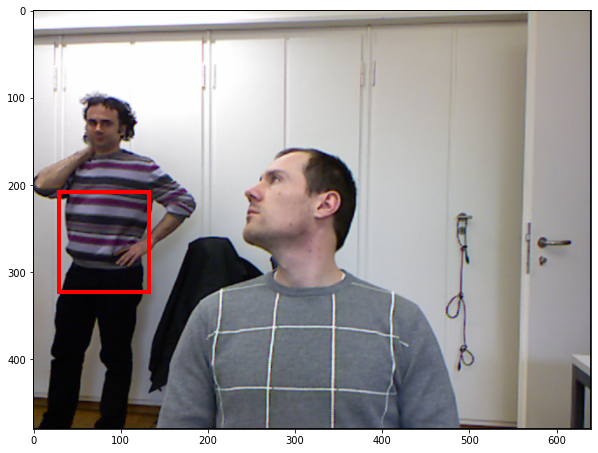

In [ ]:
plot_one_img(data_biwi_dict['rel_path'][4600], rect=eval(data_biwi_dict['facerect'][4600]))

In [ ]:
def plot_one_img(img_path, rect=None, ls=None, pose=None, ls68=None):
  img_ori = cv2.imread('/content/'+str(img_path))
  # height, width = img.shape[:2]
  # base = 40.4
  # plt.figure(figsize=(base,height / width * base))
  plt.imshow(img_ori[:, :, ::-1])
  if rect != None:
    # Get the current reference
    ax = plt.gca()
    # Create a Rectangle patch
    rect = Rectangle((rect[0],rect[1]),rect[2],rect[3],linewidth=4,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
  if ls != None:
    for i in range(len(ls)):
      alpha = 0.8
      markersize = 4.5
      lw = 2.7 
      color = 'g'
      markeredgecolor = 'green'
      plt.plot(ls[i][0], ls[i][1], marker='o', linestyle='None', markersize=markersize, 
             color=color, markeredgecolor=markeredgecolor, alpha=alpha)
  if (pose != None):
      # pitch = pose[1] * np.pi / 180 # for order (yaw, pitch, roll)
      # yaw = -(pose[0] * np.pi / 180)
      # roll = pose[2] * np.pi / 180
      pitch = pose[1] * np.pi / 180 # for order (roll, pitch, yaw)
      yaw = -(pose[2] * np.pi / 180)
      roll = pose[0] * np.pi / 180
      tdx = ls68[0,30]
      tdy = ls68[1,30]
      minx, maxx = np.min(ls68[0, :]), np.max(ls68[0, :])
      miny, maxy = np.min(ls68[1, :]), np.max(ls68[1, :])
      llength = sqrt((maxx - minx) * (maxy - miny))
      size = llength * 0.5

      # height, width = img_ori.shape[:2]
      # tdx = width / 2
      # tdy = height / 2
      # size = 50

      # minx, maxx = np.min(pts68[0, :]), np.max(pts68[0, :])
      # miny, maxy = np.min(pts68[1, :]), np.max(pts68[1, :])
      # llength = sqrt((maxx - minx) * (maxy - miny))
      # size = llength * 0.5
      # X-Axis pointing to right. drawn in red
      x1 = size * (cos(yaw) * cos(roll)) + tdx
      y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy
      # Y-Axis | drawn in green
      x2 = size * (-cos(yaw) * sin(roll)) + tdx
      y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy
      # Z-Axis (out of the screen) drawn in blue
      x3 = size * (sin(yaw)) + tdx
      y3 = size * (-cos(yaw) * sin(pitch)) + tdy

      minus=0

      # plt.plot(int(tdx), int(tdy)-minus, int(x1),int(y1),color = 'red', linewidth=9)
      # plt.plot(int(tdx), int(tdy)-minus, int(x2),int(y2), color='green',linewidth=4)
      cv2.line(img_ori, (int(tdx), int(tdy)-minus), (int(x1),int(y1)),(0,0,255),4)
      cv2.line(img_ori, (int(tdx), int(tdy)-minus), (int(x2),int(y2)),(0,255,0),4)
      cv2.line(img_ori, (int(tdx), int(tdy)-minus), (int(x3),int(y3)),(255,0,0),4)
      # cv2.line(img_ori, (int(tdx), int(tdy)-minus), (int(x3),int(y3)),(255,0,0),4)
      print('YES')
      plt.imshow(img_ori[:, :, ::-1])
  plt.show()

In [ ]:
def seven_landmarks(pts):
  y_cord, x_cord = [], []
  # nose, left_eye_left, left_eye_right, 
  # right_eye_left, right_eye_right, 
  # mouth_left, mouth_right
  # list_of_vert = [33, 36, 39, 42, 45, 48, 54]
  list_of_vert = [30, 36, 39, 42, 45, 48, 54]
  for ind in list_of_vert:
    y_cord.append(pts_res[0][0][ind])
    x_cord.append(pts_res[0][1][ind])
  finall_landms = tuple((x, y) for x, y in zip(x_cord, y_cord))
  return finall_landms

In [ ]:
def draw_landmarks_only_dots(img, pts):
  height, width = img.shape[:2]
  base = 40.4
  plt.figure(figsize=(base,height / width * base))
  plt.imshow(img[:, :, ::-1])
  plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
  plt.axis('off')

  if not type(pts) in [tuple, list]:
    pts = [pts]
  for i in range(len(pts)):
    alpha = 0.8
    markersize = 8.5
    lw = 2.7 
    color = 'g'
    markeredgecolor = 'green'
    plt.plot(pts[i][0, :], pts[i][1, :], marker='o', linestyle='None', markersize=markersize, 
             color=color, markeredgecolor=markeredgecolor, alpha=alpha)
  plt.show()
  print('Save landmark result to {}'.format(wfp))
  plt.close()

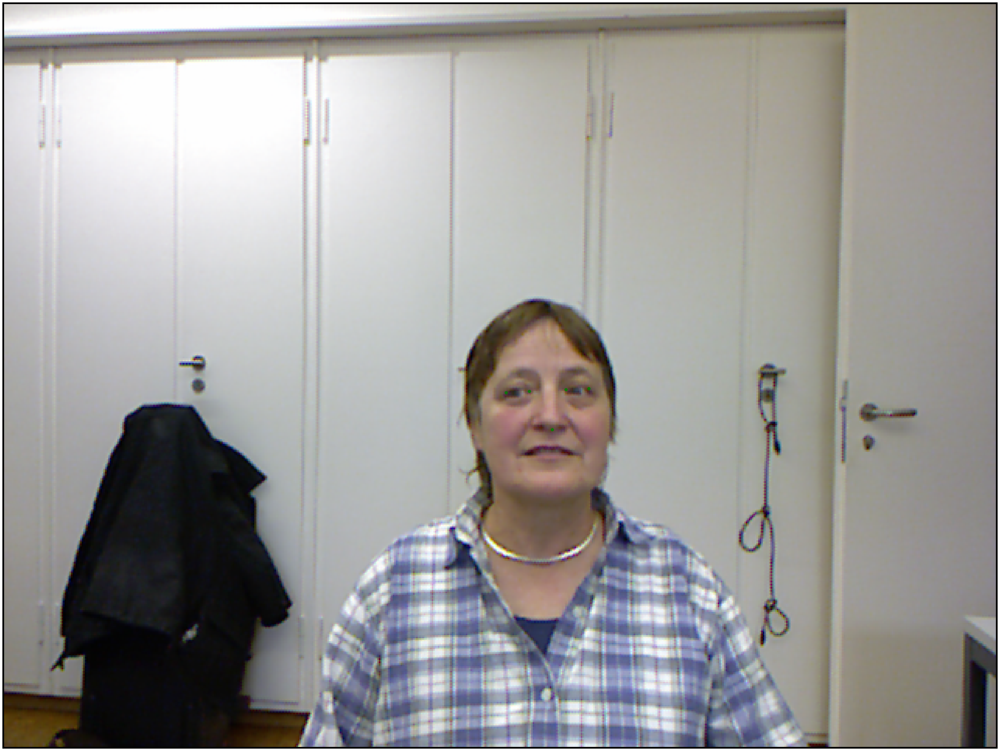

Save landmark result to inference_output/poses/frame_00167_rgb.jpg


In [ ]:
y_cord, x_cord, z_cord = [], [], []
list_of_vert = [33, 36, 39, 42, 45, 48, 54]
for ind in list_of_vert:
  y_cord.append(pts_res[0][0][ind])
  x_cord.append(pts_res[0][1][ind])
  z_cord.append(pts_res[0][2][ind])
pts_res_part = [np.array([y_cord, x_cord, z_cord])]
draw_landmarks_only_dots(img_ori, pts_res_part)

In [ ]:
def draw_landmarks_img(img, pts):
    height, width = img.shape[:2]
    base = 40.4 
    plt.figure(figsize=(base, height / width * base))
    plt.imshow(img[:, :, ::-1])
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.axis('off')

    if not type(pts) in [tuple, list]:
        pts = [pts]
    for i in range(len(pts)):
        alpha = 0.8
        markersize = 8.5
        lw = 2.7 
        color = 'g'
        markeredgecolor = 'green'

        nums = [0, 17, 22, 27, 31, 36, 42, 48, 60, 68]

        # close eyes and mouths
        plot_close = lambda i1, i2: plt.plot([pts[i][0, i1], pts[i][0, i2]], [pts[i][1, i1], pts[i][1, i2]],
                                                color=color, lw=lw, alpha=alpha - 0.1)
        # plot_close(41, 36)
        # plot_close(47, 42)
        # plot_close(59, 48)
        # plot_close(67, 60)

        for ind in range(len(nums) - 1):
            l, r = nums[ind], nums[ind + 1]
            # plt.plot(pts[i][0, l:r], pts[i][1, l:r], color=color, lw=lw, alpha=alpha - 0.1)

            plt.plot(pts[i][0, l:r], pts[i][1, l:r], marker='o', linestyle='None', markersize=markersize,
                        color=color,
                        markeredgecolor=markeredgecolor, alpha=alpha)

    # plt.savefig(wfp, dpi=200)
    plt.show()
    print('Save landmark result to {}'.format(wfp))
    plt.close()

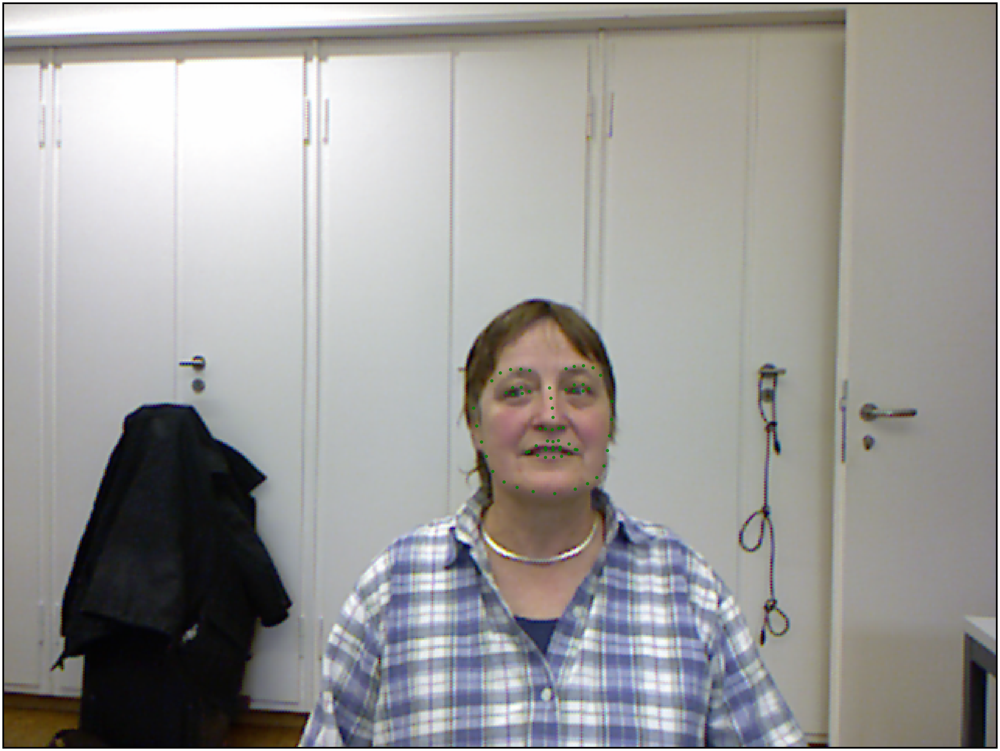

Save landmark result to inference_output/poses/frame_00167_rgb.jpg


In [ ]:
draw_landmarks_img(img_ori, pts_res)

# make face rectangle and face landmarks

In [ ]:
#open face_rect_dict
with open('/content/drive/MyDrive/Samal_work/face_rect_for_check.pkl', 'rb') as f:
    face_rect_dict = pickle.load(f)
print(len(face_rect_dict.keys()), len(face_rect_dict['faces_0/07/frame_00093_rgb.png']))
print(face_rect_dict['faces_0/07/frame_00093_rgb.png'])
print(face_rect_dict['faces_0/07/frame_00093_rgb.png'][0])

15678 2
[[51.16679382324219, 104.37301635742188, 111.16679382324219, 164.37301635742188, 0.9898634], [224.06930541992188, 151.3759307861328, 340.0693054199219, 267.3759307861328, 0.98055786]]
[51.16679382324219, 104.37301635742188, 111.16679382324219, 164.37301635742188, 0.9898634]


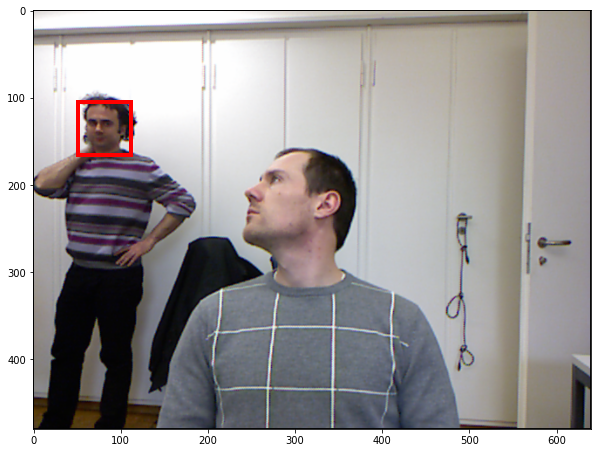

In [ ]:
plot_one_img('faces_0/07/frame_00093_rgb.png', make_correct_rect(face_rect_dict['faces_0/07/frame_00093_rgb.png'][0]))

In [ ]:
def make_correct_face_rect(face_dict):
  result_dict = {}
  bad_img_res = []
  indexes = {}
  for key in tqdm.tqdm(face_dict.keys()):
    if len(face_dict[key]) == 1:
      result_dict[key] = make_correct_rect(face_dict[key][0])
      indexes[key] = 0
    elif len(face_dict[key]) == 0:
      bad_img_res.append(key)
      result_dict[key] = [None]
      indexes[key] = None
    else:
      center_of_img = find_center_point(key)
      A = make_list_of_rects(face_dict[key])
      distances = np.linalg.norm(A-center_of_img, axis=1)
      min_index = np.argmin(distances)
      result_dict[key] = make_correct_rect(face_dict[key][min_index])
      indexes[key] = min_index
  return result_dict, bad_img_res, indexes
def find_center_point(img_path):
  img_cent = cv2.imread(img_path)
  width, depth = np.shape(img_cent)[0], np.shape(img_cent)[1]
  x_center = width / 2
  y_center = depth / 2
  return (x_center, y_center)
def make_correct_rect(curr_rect): # x, y, w, h
  xmin, ymin, xmax, ymax, score = curr_rect
  w = xmax - xmin + 1
  h = ymax - ymin + 1
  return (xmin, ymin, w, h)
def make_list_of_rects(rects):
  x_cords = []
  y_cords = []
  for rect in rects:
    correct_rect = make_correct_rect(rect)
    x_cords.append(correct_rect[0])
    y_cords.append(correct_rect[1])
  A = np.column_stack((x_cords, y_cords))
  return A
def make_list_of_many_people(face_dict):
  many_people = []
  for key in face_dict.keys():
    if len(face_dict[key]) > 1:
      many_people.append(key)
  return many_people

In [ ]:
face_rect_test = make_correct_face_rect(face_rect_dict)

100%|██████████| 15678/15678 [00:41<00:00, 374.65it/s]


In [ ]:
face_rects_test, bad_imgs_test, correct_indexes_test = face_rect_test

In [ ]:
many_people_list = make_list_of_many_people(face_rect_dict)
print(len(many_people_list), many_people_list[0])

3224 faces_0/02/frame_00378_rgb.png


In [ ]:
with open('/content/drive/MyDrive/Samal_work/bad_imgs.pkl', 'rb') as f:
  bad_imgs = pickle.load(f)
print(type(bad_imgs), bad_imgs[0])

<class 'list'> faces_0/06/frame_00204_rgb.png


In [ ]:
face_rects_test[name]

(283.656005859375, 253.1915283203125, 117.0, 117.0)

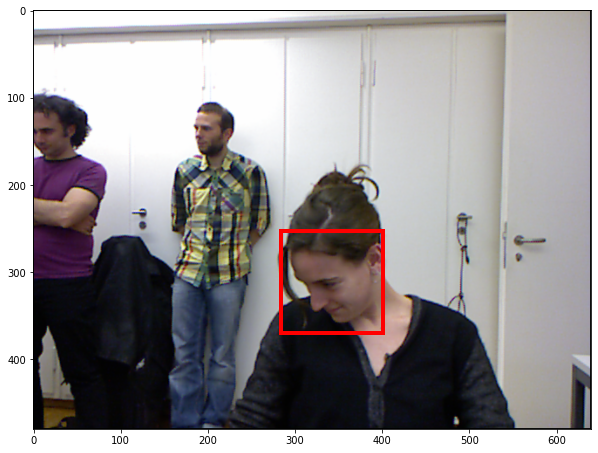

In [ ]:
name = many_people_list[200]
plot_one_img(name, face_rects_test[name])

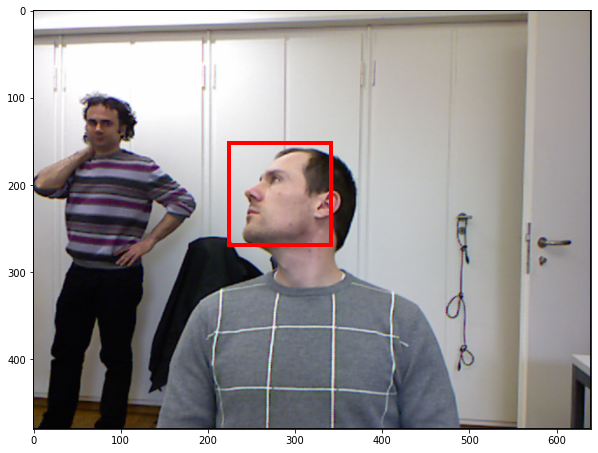

In [ ]:
plot_one_img('faces_0/07/frame_00093_rgb.png', face_rects_test['faces_0/07/frame_00093_rgb.png'])

In [ ]:
# make filtering of the landmarks
with open('/content/drive/MyDrive/Samal_work/all_68_landmarks.pkl', 'rb') as f:
    all_68_l = pickle.load(f)
print(len(all_68_l.keys()), len(all_68_l['faces_0/07/frame_00093_rgb.png']))
print(len(all_68_l['faces_0/07/frame_00093_rgb.png']))
print(len(all_68_l['faces_0/07/frame_00093_rgb.png']))

15678 2
2
2


In [ ]:
print(all_68_l['faces_0/07/frame_00093_rgb.png'][0])

[[ 61.69637803  62.0457425   63.02008205  63.81049384  64.64514872
   66.15190394  67.87236598  70.65420995  76.10428747  82.54399164
   87.8269129   92.29877479  95.98530364  98.05132552  99.34188165
  100.48675023 101.18762647  61.75850159  63.24034353  65.53974474
   67.93295968  70.24869073  80.6595927   83.32428578  86.4136279
   89.88060268  92.91119251  75.30081338  74.69499781  74.07477707
   73.92580251  71.99744196  73.09263088  74.83412286  76.82705685
   78.4673385   64.95000368  66.13526392  68.61423713  71.07058611
   68.82491022  66.38858156  81.64789233  83.82889195  86.40200186
   88.74251472  86.44634102  83.65900156  68.88487707  70.69416726
   73.2340035   74.71009793  76.27053871  79.54702536  82.62946774
   79.41177175  76.99520745  74.73012828  72.63256143  70.88114786
   69.53338098  73.04960766  74.89220517  76.97046192  82.09908976
   76.76524713  74.76300037  72.92677604]
 [125.41473536 130.18221526 134.56088043 138.58112449 143.14007633
  147.36259707 150.59

In [ ]:
def make_correct_landmarks(all_68, indexes):
  result_l = {}
  for key in tqdm.tqdm(indexes.keys()):
    if indexes[key] != None:
      ls = all_68[key][indexes[key]]
      result_l[key] = make_seven_landmarks(ls)
      # result_l[key] = ls
    else:
      result_l[key] = [None]
  return result_l
def make_seven_landmarks(pts):
  y_cord, x_cord = [], []
  # nose, left_eye_left, left_eye_right, 
  # right_eye_left, right_eye_right, 
  # mouth_left, mouth_right
  # list_of_vert = [33, 36, 39, 42, 45, 48, 54]
  list_of_vert = [30, 36, 39, 42, 45, 48, 54]
  for ind in list_of_vert:
    x_cord.append(pts[0][ind])
    y_cord.append(pts[1][ind])
  finall_landms = tuple((x, y) for x, y in zip(x_cord, y_cord))
  return finall_landms
def plot_one_img(img_path, rect=None, ls=None):
  img_ori = cv2.imread('/content/'+str(img_path))
  # height, width = img.shape[:2]
  # base = 40.4
  # plt.figure(figsize=(base,height / width * base))
  plt.imshow(img_ori[:, :, ::-1])
  if rect != None:
    # Get the current reference
    ax = plt.gca()
    # Create a Rectangle patch
    rect = Rectangle((rect[0],rect[1]),rect[2],rect[3],linewidth=4,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
  if ls != None:
    for i in range(len(ls)):
      alpha = 0.8
      markersize = 4.5
      lw = 2.7 
      color = 'g'
      markeredgecolor = 'green'
      plt.plot(ls[i][0], ls[i][1], marker='o', linestyle='None', markersize=markersize, 
             color=color, markeredgecolor=markeredgecolor, alpha=alpha)
  plt.show()

In [ ]:
# correct_68l_test = make_correct_landmarks(all_68_l, correct_indexes_test)

100%|██████████| 15678/15678 [00:00<00:00, 374580.17it/s]


In [ ]:
# with open('/content/correct_68l.pkl', 'wb') as h:
#   pickle.dump(correct_68l_test, h, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
correct_l_test = make_correct_landmarks(all_68_l, correct_indexes_test)

100%|██████████| 15678/15678 [00:00<00:00, 134380.24it/s]


In [ ]:
correct_l_test['faces_0/06/frame_00204_rgb.png']

[None]

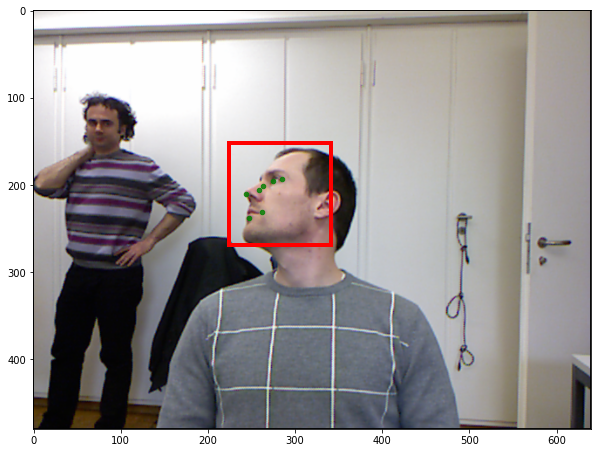

In [ ]:
name = many_people_list[3200]
name = 'faces_0/07/frame_00093_rgb.png'
plot_one_img(name, face_rects_test[name], correct_l_test[name])

In [ ]:
# saving obtained datasets with triangles and landmarks
with open('/content/biwi_7l_nose30.pkl', 'wb') as handle:
    pickle.dump(correct_l_test, handle, protocol=pickle.HIGHEST_PROTOCOL)

Open biwi_7l.pkl and biwi_facerect.pkl with correct triangles and landmarks. Adding it to correct dataset. 

In [ ]:
with open('/content/drive/MyDrive/Samal_work/biwi_7l_nose30.pkl', 'rb') as f:
  biwi_dict_l = pickle.load(f)
with open('/content/drive/MyDrive/Samal_work/biwi_facerect.pkl', 'rb') as f:
  biwi_facerect = pickle.load(f)
print(len(biwi_dict_l), len(biwi_facerect))
print(biwi_dict_l['faces_0/07/frame_00093_rgb.png'])
print(biwi_facerect['faces_0/07/frame_00093_rgb.png'])

15678 15678
((244.04006697689863, 209.64024349791538), (258.83259768727635, 205.32289062475124), (262.7646781004595, 201.0666130372982), (274.3115725457811, 195.5965243402193), (284.5570608623948, 192.96458197641368), (247.2034260606226, 237.74822635943116), (261.7569294287705, 230.67530673337416))
(224.06930541992188, 151.3759307861328, 117.0, 117.0)


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Samal_work/data_biwi', compression='gzip')
df.head(5)

,Unnamed: 0,img_name,rel_path,uid,resolution
0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,0,"(480, 640)"
1,1,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,0,"(480, 640)"
2,2,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,0,"(480, 640)"
3,3,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,0,"(480, 640)"
4,4,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,0,"(480, 640)"


In [ ]:
data_biwi_dict = df.to_dict('list')
print(data_biwi_dict.keys())

dict_keys(['Unnamed: 0', 'img_name', 'rel_path', 'uid', 'resolution'])


In [ ]:
def make_correct_datadict_for_csv(old_data, facerect, dict_7l): 
  #dict_7l is landmarks in 7 range 
  rel_path = old_data['rel_path']
  res_facerect = []
  res_7l = []
  for path in rel_path:
    res_facerect.append(facerect[path])
    res_7l.append(dict_7l[path])
  res_data = old_data.copy()
  res_data['facerect'] = res_facerect
  res_data['landmarks'] = res_7l
  return res_data

In [ ]:
correct_data_dict = make_correct_datadict_for_csv(data_biwi_dict, biwi_facerect, biwi_dict_l)

In [ ]:
# save to csv.gz with name correct_biwi_dict.csv.gz
df_correct = pd.DataFrame(correct_data_dict)
df_correct.to_csv('/content/correct_biwi_dict_nose30.csv.gz', compression='gzip')

In [ ]:
df_correct.head(5)

,Unnamed: 0,img_name,rel_path,uid,resolution,facerect,landmarks
0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,0,"(480, 640)","(265.512939453125, 230.74679565429688, 137.0, ...","((317.8474683939035, 319.28031721859867), (297..."
1,1,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,0,"(480, 640)","(283.73455810546875, 197.01315307617188, 129.0...","((343.78296194324787, 265.31397100526084), (31..."
2,2,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,0,"(480, 640)","(242.9473876953125, 237.6031494140625, 119.0, ...","((267.00116599041763, 310.5877072894389), (269..."
3,3,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,0,"(480, 640)","(266.6946105957031, 230.65838623046875, 139.0,...","((324.8900102965782, 320.4836774278383), (301...."
4,4,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,0,"(480, 640)","(278.7324523925781, 201.02102661132812, 131.0,...","((342.737783362937, 270.29235854661664), (314...."


# Make POSE

In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/Samal_work/correct_biwi_dict_nose30.csv.gz', compression='gzip')
df1.head(5)

,Unnamed: 0,Unnamed: 0.1,img_name,rel_path,uid,resolution,facerect,landmarks
0,0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,0,"(480, 640)","(265.512939453125, 230.74679565429688, 137.0, ...","((317.8474683939035, 319.28031721859867), (297..."
1,1,1,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,0,"(480, 640)","(283.73455810546875, 197.01315307617188, 129.0...","((343.78296194324787, 265.31397100526084), (31..."
2,2,2,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,0,"(480, 640)","(242.9473876953125, 237.6031494140625, 119.0, ...","((267.00116599041763, 310.5877072894389), (269..."
3,3,3,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,0,"(480, 640)","(266.6946105957031, 230.65838623046875, 139.0,...","((324.8900102965782, 320.4836774278383), (301...."
4,4,4,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,0,"(480, 640)","(278.7324523925781, 201.02102661132812, 131.0,...","((342.737783362937, 270.29235854661664), (314...."


In [ ]:
dataset = df1.to_dict('list')
print(dataset.keys())

dict_keys(['Unnamed: 0', 'Unnamed: 0.1', 'img_name', 'rel_path', 'uid', 'resolution', 'facerect', 'landmarks'])


In [ ]:
def make_pose_by_path(pose_path):
  pose_path = '/content/'+pose_path[:-8] + '_pose.txt'
  # print(pose_path)
  # Load pose in degrees
  pose_annot = open(pose_path, 'r')
  R = []
  for line in pose_annot:
   line = line.strip('\n').split(' ')
   L = []
   if line[0] != '':
     for nb in line:
       if nb == '':
         continue
       L.append(float(nb))
     R.append(L)
  R = np.array(R)
  # print(R)
  T = R[3,:]
  R = R[:3,:]
  pose_annot.close()
  R = np.transpose(R)


  roll = -np.arctan2(R[1][0], R[0][0]) * 180 / np.pi
  yaw = -np.arctan2(-R[2][0], np.sqrt(R[2][1] ** 2 + R[2][2] ** 2)) * 180 / np.pi
  pitch = np.arctan2(R[2][1], R[2][2]) * 180 / np.pi
  # print(yaw, pitch, roll) # for plot it is correct
  return (roll, pitch, yaw)

In [ ]:
with open('/content/drive/MyDrive/Samal_work/correct_68l.pkl', 'rb') as f:
  all_68l = pickle.load(f)
print(all_68l['faces_0/01/frame_00003_rgb.png'][0, 30])

343.3023460986079


YES


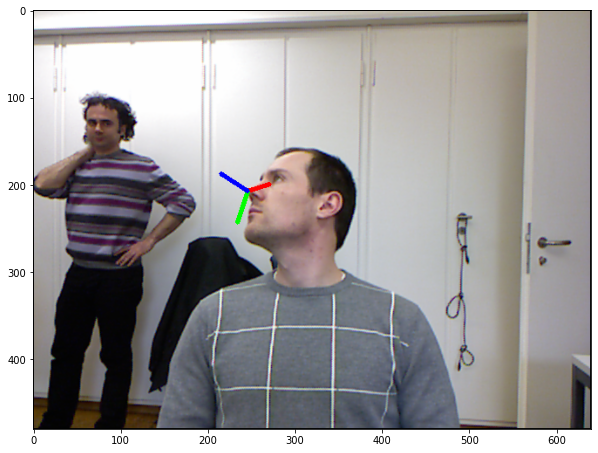

In [ ]:
name = many_people_list[1700]
plot_one_img(name, pose=make_pose_by_path(name),ls68=all_68l[name])

In [ ]:
pose_res = []
for path in dataset['rel_path']:
  pose = make_pose_by_path(path)
  pose_res.append(pose)
print(len(pose_res))

15678


In [ ]:
dataset['pose_angles'] = pose_res

In [ ]:
# save to csv.gz with name correct_biwi_dict_with_pose.csv.gz
df_correct = pd.DataFrame(dataset)
df_correct.to_csv('/content/correct_biwi_dict_with_pose_nose30.csv.gz', compression='gzip')

# Clean dataset from None 

In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/Samal_work/correct_biwi_dict_with_pose_nose30.csv.gz', compression='gzip')
df1.head(5)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,img_name,rel_path,uid,resolution,facerect,landmarks,pose_angles
0,0,0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,0,"(480, 640)","(265.512939453125, 230.74679565429688, 137.0, ...","((317.8474683939035, 319.28031721859867), (297...","(-9.346001302192207, -30.31490176688221, 20.23..."
1,1,1,1,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,0,"(480, 640)","(283.73455810546875, 197.01315307617188, 129.0...","((343.78296194324787, 265.31397100526084), (31...","(0.4071201969901983, 10.240663099945657, 6.653..."
2,2,2,2,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,0,"(480, 640)","(242.9473876953125, 237.6031494140625, 119.0, ...","((267.00116599041763, 310.5877072894389), (269...","(-31.43845776895253, -38.459984555609196, 53.0..."
3,3,3,3,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,0,"(480, 640)","(266.6946105957031, 230.65838623046875, 139.0,...","((324.8900102965782, 320.4836774278383), (301....","(-7.826258028858129, -30.4179202445258, 16.387..."
4,4,4,4,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,0,"(480, 640)","(278.7324523925781, 201.02102661132812, 131.0,...","((342.737783362937, 270.29235854661664), (314....","(-2.1233858888409913, 7.729788763087542, 3.433..."


In [ ]:
dataset = df1.to_dict('list')
print(dataset.keys())

dict_keys(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'img_name', 'rel_path', 'uid', 'resolution', 'facerect', 'landmarks', 'pose_angles'])


In [ ]:
none_index_list = []
for index, rect in enumerate(dataset['facerect']):
  if eval(rect) == [None]:
    none_index_list.append(index)
print(len(none_index_list))

483


In [ ]:
def clean_data_from_none(dataset, none_index_list):
  res_dataset = {'uid': [],'img_name': [], 'rel_path': [],  'resolution': [], 'facerect': [], 'landmarks': [], 'pose_angles': []}
  for ind in range(len(dataset['rel_path'])):
    if ind not in none_index_list:
      res_dataset['img_name'].append(dataset['img_name'][ind])
      res_dataset['rel_path'].append(dataset['rel_path'][ind])
      res_dataset['uid'].append(dataset['uid'][ind])
      res_dataset['resolution'].append(dataset['resolution'][ind])
      res_dataset['facerect'].append(dataset['facerect'][ind])
      res_dataset['landmarks'].append(dataset['landmarks'][ind])
      res_dataset['pose_angles'].append(dataset['pose_angles'][ind])
  return res_dataset
def find_index_by_path(path, dataset):
  for index, path_name in enumerate(dataset['rel_path']):
    if path_name == path:
      return index

In [ ]:
dataset_without_none = clean_data_from_none(dataset, none_index_list)
len(dataset_without_none['rel_path'])

15195

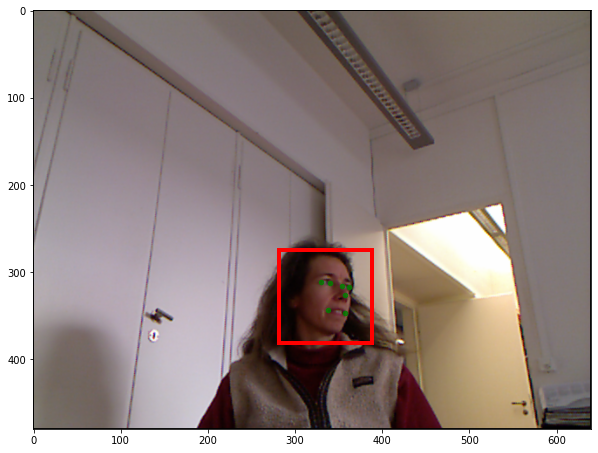

In [ ]:
name = dataset_without_none['rel_path'][11500]
index_name = find_index_by_path(name, dataset_without_none)
plot_one_img(name, rect=eval(dataset_without_none['facerect'][index_name]), ls=eval(dataset_without_none['landmarks'][index_name]))

YES


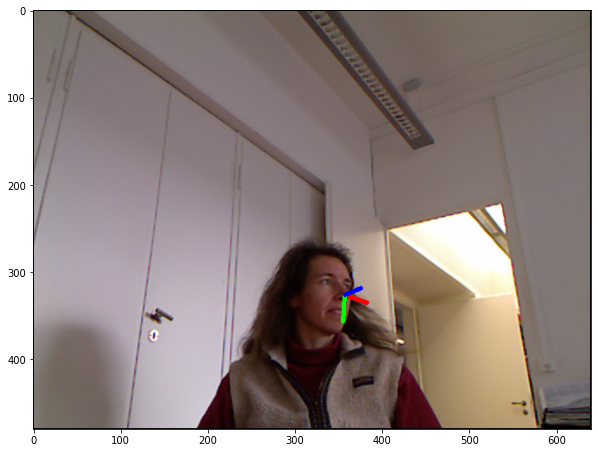

In [ ]:
plot_one_img(name, pose=eval(dataset_without_none['pose_angles'][index_name]), ls68=all_68l[name])

In [ ]:
# save to csv.gz with name correct_biwi_dict_with_pose.csv.gz
df2 = pd.DataFrame(dataset_without_none)
df2.to_csv('/content/correct_dataset_without_none_nose30.csv.gz', compression='gzip')

# make int type coordinates for facerect and landmarks

In [ ]:
# df1 = pd.read_csv('/content/drive/MyDrive/Samal_work/BIWI_dataset_stats_20.02.2023(true_pose_description).csv.gz', compression='gzip')
df1 = pd.read_csv('/content/drive/MyDrive/Samal_work/correct_dataset_without_none_nose30.csv.gz', compression='gzip')
df1.head(5)

,Unnamed: 0,uid,img_name,rel_path,resolution,facerect,landmarks,pose_angles
0,0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,"(480, 640)","(265.512939453125, 230.74679565429688, 137.0, ...","((317.8474683939035, 319.28031721859867), (297...","(-9.346001302192207, -30.31490176688221, 20.23..."
1,1,0,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,"(480, 640)","(283.73455810546875, 197.01315307617188, 129.0...","((343.78296194324787, 265.31397100526084), (31...","(0.4071201969901983, 10.240663099945657, 6.653..."
2,2,0,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,"(480, 640)","(242.9473876953125, 237.6031494140625, 119.0, ...","((267.00116599041763, 310.5877072894389), (269...","(-31.43845776895253, -38.459984555609196, 53.0..."
3,3,0,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,"(480, 640)","(266.6946105957031, 230.65838623046875, 139.0,...","((324.8900102965782, 320.4836774278383), (301....","(-7.826258028858129, -30.4179202445258, 16.387..."
4,4,0,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,"(480, 640)","(278.7324523925781, 201.02102661132812, 131.0,...","((342.737783362937, 270.29235854661664), (314....","(-2.1233858888409913, 7.729788763087542, 3.433..."


In [ ]:
dataset_biwi = df1.to_dict('list')
dataset_biwi.keys()

dict_keys(['Unnamed: 0', 'uid', 'img_name', 'rel_path', 'resolution', 'facerect', 'landmarks', 'pose_angles'])

In [ ]:
round(eval(dataset_biwi['pose_angles'][0])[0], 2)

-9.35

In [ ]:
def make_int_cord_dataset(old_dataset):
  res_dataset = {'uid': [], 'img_name': [], 'rel_path': [], 'resolution': [],
                 'facerect': [], 'landmarks': [], 'pose_angles': []}
  for index, elem in enumerate(old_dataset['facerect']):
    res_dataset['uid'].append(old_dataset['uid'][index])
    res_dataset['img_name'].append(old_dataset['img_name'][index])
    res_dataset['rel_path'].append(old_dataset['rel_path'][index])
    res_dataset['resolution'].append(old_dataset['resolution'][index])
    res_dataset['facerect'].append(tuple(map(int, eval(elem))))
    res_dataset['landmarks'].append(tuple(tuple(map(int, x)) for x in eval(old_dataset['landmarks'][index])))
    res_dataset['pose_angles'].append(tuple(round(x, 2) for x in eval(old_dataset['pose_angles'][index])))
  return res_dataset

In [ ]:
new_biwi_dataset = make_int_cord_dataset(dataset_biwi)
print(new_biwi_dataset.keys())

dict_keys(['uid', 'img_name', 'rel_path', 'resolution', 'facerect', 'landmarks', 'pose_angles'])


In [ ]:
df_corr = pd.DataFrame(new_biwi_dataset)
df_corr.head(5)

,uid,img_name,rel_path,resolution,facerect,landmarks,pose_angles
0,0,frame_00378_rgb,faces_0/01/frame_00378_rgb.png,"(480, 640)","(265, 230, 137, 137)","((317, 319), (297, 286), (311, 289), (334, 290...","(-9.35, -30.31, 20.23)"
1,0,frame_00175_rgb,faces_0/01/frame_00175_rgb.png,"(480, 640)","(283, 197, 129, 129)","((343, 265), (317, 248), (332, 248), (355, 247...","(0.41, 10.24, 6.65)"
2,0,frame_00407_rgb,faces_0/01/frame_00407_rgb.png,"(480, 640)","(242, 237, 119, 119)","((267, 310), (269, 281), (273, 282), (284, 282...","(-31.44, -38.46, 53.07)"
3,0,frame_00376_rgb,faces_0/01/frame_00376_rgb.png,"(480, 640)","(266, 230, 139, 139)","((324, 320), (301, 288), (315, 290), (339, 290...","(-7.83, -30.42, 16.39)"
4,0,frame_00007_rgb,faces_0/01/frame_00007_rgb.png,"(480, 640)","(278, 201, 131, 131)","((342, 270), (314, 254), (329, 253), (352, 251...","(-2.12, 7.73, 3.43)"


In [ ]:
# save to csv.gz with name BIWI_dict_without_none.csv.gz
df_corr.to_csv('/content/BIWI_dataset_stats_20.02.2023(nose30).csv.gz', compression='gzip')

In [ ]:
type(new_biwi_dataset['landmarks'][0][0])

tuple

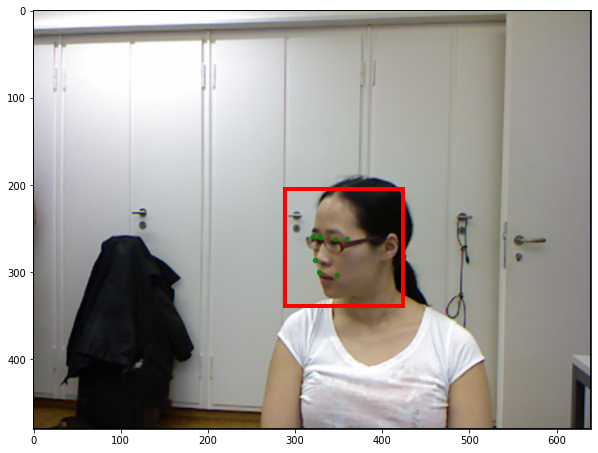

In [ ]:
name = new_biwi_dataset['rel_path'][1500]
# name = 'faces_0/07/frame_00093_rgb.png'
index_name = find_index_by_path(name, new_biwi_dataset)
plot_one_img(name, rect=new_biwi_dataset['facerect'][index_name], ls=new_biwi_dataset['landmarks'][index_name])

YES


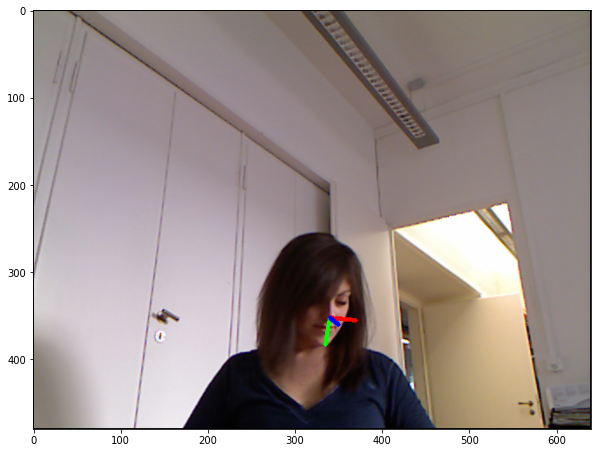

In [ ]:
plot_one_img(name, pose=new_biwi_dataset['pose_angles'][index_name], ls68=all_68l[name])